In [1]:
import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。


from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import os
import pickle

import timeit #用于计时和测量小段代码的执行时间
import seaborn as sns  # 导入seaborn库用于绘制密度图
import pandas as pd #一个用于数据操作和分析的库，提供了数据结构和数据分析工具，特别是用于处理表格数据（类似于Excel中的数据表）

In [2]:
num_gpus = torch.cuda.device_count()
print('Number of available GPUs: ', num_gpus)

for i in range(num_gpus):
    torch.cuda.set_device(i)
    allocated = torch.cuda.memory_allocated()
    reserved = torch.cuda.memory_reserved()
    print('GPU {}: {}, Allocated: {}, Reserved: {}'.format(i, torch.cuda.get_device_name(i), allocated, reserved))

Number of available GPUs:  2
GPU 0: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0
GPU 1: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0


In [3]:
torch.cuda.set_device(1) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [4]:
# the deep neural network
class DNN(torch.nn.Module):
    #第一个方法
    def __init__(self, layers):
        super(DNN, self).__init__() #调用父类的__init__方法进行初始化
        
        # parameters
        self.depth = len(layers) - 1 #定义名为depth的属性，表示神经网络的深度，等于层数-1
        
        # set up layer order dict
        self.activation = torch.nn.Tanh #设置激活函数为tanh
         
        layer_list = list() #定义一个空列表layer_list
        for i in range(self.depth - 1):  #循环depth次
            #将每一层（全连接层）添加到layer_list中
            layer_list.append(
                ('layer_%d' % i, torch.nn.Linear(layers[i], layers[i+1]))
            )
            #将每一层的激活函数添加到layer_list中
            layer_list.append(('activation_%d' % i, self.activation()))

        #循环结束后，将最后一层的线性变换添加到layer_list中（激活函数为softmax）
        layer_list.append(
            ('layer_%d' % (self.depth - 1), torch.nn.Linear(layers[-2], layers[-1]))
        )
        #输出层的激活函数为tanh
        layer_list.append(('activation_%d' % (self.depth - 1), torch.nn.Softmax(dim=1)))  

        #然后使用OrderedDict将layer_list中的元素转换为有序字典
        layerDict = OrderedDict(layer_list)
        
        # deploy layers，将layerDict转换为一个神经网络模型，赋值给self.layers
        self.layers = torch.nn.Sequential(layerDict) #layers，长度为2*depth，包含了所有的线性变换和激活函数，奇数索引为线性变换(权重矩阵)，偶数索引为激活函数
    
    #第二个方法，定义了模型的前向传播过程
    def forward(self, x):  #接收输入x
        out = self.layers(x) #将输入x传入神经网络模型self.layers中，得到输出out
        return out #返回输出out
    
    # # 新增方法，获取最后一个隐藏层的输出
    # def hidden_output(self, x):
    #     # 遍历每一层，直到最后一个隐藏层
    #     for i in range(self.depth - 1):
    #         # 获取当前层的线性变换
    #         x = self.layers[i*2](x)
    #         # 获取当前层的激活函数
    #         x = self.layers[i*2 + 1](x)
    #     # 返回最后一个隐藏层的输出
    #     return x

    # 新增方法，循环传递输入
    def hidden_forward(self, x, num_cycles):
        # 将输入传递到最后一个隐藏层，x为最后一个隐藏层的输出
        for i in range(self.depth - 1):
            x = self.layers[i*2](x)
            x = self.layers[i*2 + 1](x)
        
        # 将最后一个隐藏层的输出作为输入传递到第一个隐藏层中，重复num_cycles次
        for _ in range(num_cycles):
            for i in range(1, self.depth - 1): #最开始的x为最后一个隐藏层的输出，然后从第一个隐藏层开始传递
                x = self.layers[i*2](x)
                x = self.layers[i*2 + 1](x)
        hidden_output = x
        
        return hidden_output

In [5]:
# the physics-guided neural network
class PhysicsInformedNN():
    # Initialize the class
    def __init__(self, X_u, u, X_f, layers, lb, ub): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数

        mu_x, sigma_x = X_f.mean(0), X_f.std(0) #计算X_u的均值和标准差
        X_u = (X_u - mu_x) / sigma_x #对X_u进行标准化
        X_f = (X_f - mu_x) / sigma_x #对X_f进行标准化

        self.mu_x = torch.tensor(mu_x).float().to(device) #创建一个pytorch张量（数据来源于mu_x），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.sigma_x = torch.tensor(sigma_x).float().to(device) #创建一个pytorch张量（数据来源于sigma_x），并将其转换为浮点类型，最后将张量移动到指定的设备上

        # boundary conditions
        #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.lb = torch.tensor(lb).float().to(device) #创建一个pytorch张量（数据来源于lb），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.ub = torch.tensor(ub).float().to(device)
        
        # data
        #初边界点数据
        self.X_u = torch.tensor(X_u, requires_grad=True).float().to(device)
        #初边界点真实数据
        self.u = torch.tensor(u).float().to(device)
        #配位点数据
        self.X_f = torch.tensor(X_f, requires_grad=True).float().to(device)
        # #测试点数据
        # self.X_star = torch.tensor(X_star).float().to(device)
        # #测试点真实数据
        # self.u_star = torch.tensor(u_star).float().to(device)
        
        self.layers = layers
        
        # deep neural networks
        self.dnn = DNN(layers).to(device) #创建一个DNN类的实例，传入layers参数来实现神经网络的初始化，然后将这个实例移动到指定的设备上
        
        # optimizers: using the same settings
        #创建优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters(), eps = 1e-8) 


        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        self.test_error_mse = [] #创建一个空列表，用于存储测试误差
        self.test_error_mae = [] #创建一个空列表，用于存储测试误差
        
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x):  
        u = self.dnn(x)  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        return u
    
    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x):
        """ The pytorch autograd version of calculating residual """
        u = self.net_u(x) #调用上面的net_u函数，计算神经网络的输出u
        u1 = u[:, 0:1] #取u的第一列，对应状态1
        u2 = u[:, 1:2] #取u的第二列，对应状态2
        u3 = u[:, 2:3] #取u的第三列，对应状态3

        u_x_1 = torch.autograd.grad(
            u1, x, #输入的张量，要计算u1关于x的导数
            grad_outputs=torch.ones_like(u1), #生成一个与u1形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u1的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        u_x_2 = torch.autograd.grad(
            u2, x, #输入的张量，要计算u2关于x的导数
            grad_outputs=torch.ones_like(u2), #生成一个与u2形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u2的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        u_x_3 = torch.autograd.grad(
            u3, x, #输入的张量，要计算u3关于x的导数
            grad_outputs=torch.ones_like(u3), #生成一个与u3形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u3的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度

        #归一化
        u_x_1 = u_x_1 / self.sigma_x
        u_x_2 = u_x_2 / self.sigma_x
        u_x_3 = u_x_3 / self.sigma_x
        
        #计算残差
        xx = x * self.sigma_x + self.mu_x
        residual_1 = u_x_1-(-2.572e-4*xx*u1)
        residual_2 = u_x_2-(1.12e-4*xx*u1-2.012e-4*xx*u2)
        residual_3 = u_x_3-(1.452e-4*xx*u1+2.012e-4*xx*u2)    

        loss_1 = torch.mean(residual_1 ** 2)
        loss_2 = torch.mean(residual_2 ** 2)
        loss_3 = torch.mean(residual_3 ** 2)

        loss_f = loss_1 + loss_2 + loss_3
        return loss_f, residual_1+residual_2+residual_3
    
      
    
    def train(self, nIter):


        #使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            u_pred = self.net_u(self.X_u) #调用之前定义的函数，传入初值得到神经网络的输出u

            loss_u = torch.mean((self.u - u_pred) ** 2) #计算初值的损失函数
            loss_f, _ = self.net_f(self.X_f) #计算残差的损失函数
            

            loss = loss_u + loss_f
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            
            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

            # # record the test error
            # self.dnn.eval() #将神经网络切换为评估模式
            # with torch.no_grad():
            #     u_real_pred = self.net_u(self.x_star, self.t_star) #调用之前定义的函数，传入参数得到神经网络的输出u


            # error_test = torch.norm(self.u_star-u_real_pred,2)/torch.norm(self.u_star,2)

            # self.test_error.append(error_test)

            # # 计算 MAE和MSE
            # mae = torch.mean(torch.abs(self.u_star - u_real_pred))
            # mse = torch.mean((self.u_star - u_real_pred) ** 2)
            # # 记录 MAE 和 MSE
            # self.test_error_mae.append(mae)
            # self.test_error_mse.append(mse)


  

    def predict(self, X):
        x = torch.tensor(X, requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        mu, sigma = self.mu_x, self.sigma_x
        x = (x - mu) / sigma

        self.dnn.eval() #将神经网络切换为评估模式
        u = self.net_u(x) #调用之前定义的函数得到神经网络的输出u,以及f
        _, f = self.net_f(x)
        u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        f = f.detach().cpu().numpy()
        return u, f
    

    def hidden_predict(self, x, num_cycles):
        x = torch.tensor(x, requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        mu, sigma = self.mu_x, self.sigma_x
        x = (x - mu) / sigma

        self.dnn.eval()
        hidden_output = self.dnn.hidden_forward(x, num_cycles)
        hidden_output = hidden_output.detach().cpu().numpy()
        return hidden_output

In [6]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [7]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]
#设置噪声水平为0
noise = 0.0        

#读取真实解(基于MCS方法得到的解)
MCS_solution_df = pd.read_csv('MCS_non_homo_300.csv')
MCS_solution_df.columns = ['time', 'state_0', 'state_1', 'state_2']

MCS_solution_df.drop(labels='time', inplace=True, axis = 1)


N_u = 1
N_f = 200

#定义一个列表layers，其中包含了神经网络的层数和每一层的神经元数量
layers = [1, 50, 50, 3]

lb  = np.array([0.0])              # t的左边界
ub  = np.array([300.0])          # t的右边界

# Define the initial MSS state
X_u = np.array([[0]])
u = np.array([[1,0,0]])          # 初始真实状态
# X_f = np.linspace(lb, ub, N_f)     # 配位点位置，0~60000的5000个点

error_y = [] #创建一个空列表，用于存储误差值
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值
chaoss = [] #创建一个空列表，用于存储chaos值
residuals = [] #创建一个空列表，用于存储residual值

i = 0 #初始化i为0

# # 创建文件夹
# model_dir = 'Adam+LBFGS+LHS(5000)'
# if not os.path.exists(model_dir):
#     os.makedirs(model_dir)

for seed in seeds:
    set_seed(seed) #设置随机数种子

    # X_f = lb + (ub - lb) * lhs(1, N_f) #生成N_f个随机点
    X_f = np.linspace(lb, ub, N_f)     # 配位点位置，0~60000的5000个点
    nIter = 150000 #设置迭代次数为10000

    #创建PINN模型并输入各种参数     
    model = PhysicsInformedNN(X_u, u, X_f, layers, lb, ub)

    #获取当前时间并赋值给start_time  
    start_time = time.time()   
    #开始训练模型            
    model.train(nIter)
    #训练结束后获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time
    #打印训练所花时间                
    print('Training time: %.4f' % (elapsed))

    #真实值
    mu, sigma = model.mu_x, model.sigma_x

    # up = 80000
    n_star = 300+1
    x_star = np.linspace(lb, ub, n_star)[1:] #N_star = x_star.shape[0] 
    y_pred, _ = model.predict(x_star)
    y_star = MCS_solution_df


    #计算误差（基于2范数）        
    error_y.append(np.linalg.norm(y_star-y_pred,2)/np.linalg.norm(y_star,2)) #计算误差，然后将误差添加到error_u列表中             
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(y_star - y_pred))
    mse = np.mean((y_star - y_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)


    #计算混沌度
    y_chaos = model.hidden_predict(x_star, 100)
    # print(y_chaos)
    x_sss = x_star + np.random.normal(0, 0.001)
    y_chaos_sss = model.hidden_predict(x_sss, 100)
    chaos = np.linalg.norm(y_chaos - y_chaos_sss,axis=1).sum()
    chaoss.append(chaos)

    #计算残差

    _, residual = model.predict(x_star)
    residual = residual.flatten()
    residual = np.abs(residual)
    residual = residual.sum()
    residuals.append(residual)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error y : %e' % (np.linalg.norm(y_star-y_pred,2)/np.linalg.norm(y_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE
    print('Chaos: %e' % chaos) #打印混沌度
    print('Residual: %e' % residual) #打印残差
    # # 保存模型到文件夹
    # model_path = os.path.join(model_dir, f'model_{i}_seed_{seed}.pkl')
    # with open(model_path, 'wb') as f:
    #     pickle.dump(model, f)


Adam:   0%|          | 0/150000 [00:00<?, ?it/s]

Adam:   0%|          | 2/150000 [00:00<2:08:20, 19.48it/s]

Adam:   0%|          | 32/150000 [00:00<13:50, 180.56it/s]

Adam:   0%|          | 54/150000 [00:00<12:41, 196.80it/s]

Adam:   0%|          | 84/150000 [00:00<10:32, 236.94it/s]

Adam:   0%|          | 125/150000 [00:00<08:21, 298.79it/s]

Adam:   0%|          | 158/150000 [00:00<08:09, 305.82it/s]

Adam:   0%|          | 189/150000 [00:00<09:19, 267.77it/s]

Adam:   0%|          | 217/150000 [00:00<09:48, 254.46it/s]

Adam:   0%|          | 244/150000 [00:00<10:08, 246.20it/s]

Adam:   0%|          | 270/150000 [00:01<10:09, 245.47it/s]

Adam:   0%|          | 303/150000 [00:01<09:23, 265.62it/s]

Adam:   0%|          | 330/150000 [00:01<10:07, 246.57it/s]

Adam:   0%|          | 370/150000 [00:01<08:40, 287.65it/s]

Adam:   0%|          | 401/150000 [00:01<08:34, 290.86it/s]

Adam:   0%|          | 431/150000 [00:01<09:27, 263.64it/s]

Adam:   0%|          | 459/150000 [00:01<09:28, 263.09it/s]

Adam:   0%|          | 486/150000 [00:01<10:16, 242.49it/s]

Adam:   0%|          | 511/150000 [00:02<10:56, 227.64it/s]

Adam:   0%|          | 535/150000 [00:02<11:00, 226.27it/s]

Adam:   0%|          | 558/150000 [00:02<11:07, 223.80it/s]

Adam:   0%|          | 596/150000 [00:02<09:22, 265.75it/s]

Adam:   0%|          | 631/150000 [00:02<08:41, 286.54it/s]

Adam:   0%|          | 661/150000 [00:02<09:09, 271.84it/s]

Adam:   0%|          | 689/150000 [00:02<09:49, 253.19it/s]

Adam:   0%|          | 715/150000 [00:02<12:14, 203.28it/s]

Adam:   0%|          | 738/150000 [00:03<13:27, 184.75it/s]

Adam:   1%|          | 760/150000 [00:03<12:57, 192.02it/s]

Adam:   1%|          | 781/150000 [00:03<13:42, 181.33it/s]

Adam:   1%|          | 800/150000 [00:03<14:00, 177.52it/s]

Adam:   1%|          | 822/150000 [00:03<13:14, 187.69it/s]

Adam:   1%|          | 842/150000 [00:03<13:37, 182.51it/s]

Adam:   1%|          | 861/150000 [00:03<13:55, 178.58it/s]

Adam:   1%|          | 881/150000 [00:03<13:30, 184.04it/s]

Adam:   1%|          | 901/150000 [00:03<13:21, 185.94it/s]

Adam:   1%|          | 920/150000 [00:04<13:51, 179.32it/s]

Adam:   1%|          | 943/150000 [00:04<12:54, 192.35it/s]

Adam:   1%|          | 964/150000 [00:04<12:40, 195.96it/s]

Adam:   1%|          | 984/150000 [00:04<12:57, 191.64it/s]

Adam:   1%|          | 1004/150000 [00:04<12:56, 191.79it/s]

Adam:   1%|          | 1029/150000 [00:04<11:59, 207.08it/s]

Adam:   1%|          | 1050/150000 [00:04<12:17, 202.06it/s]

Adam:   1%|          | 1071/150000 [00:04<12:36, 196.83it/s]

Adam:   1%|          | 1091/150000 [00:04<12:54, 192.33it/s]

Adam:   1%|          | 1111/150000 [00:05<13:21, 185.72it/s]

Adam:   1%|          | 1141/150000 [00:05<11:30, 215.73it/s]

Adam:   1%|          | 1163/150000 [00:05<11:44, 211.24it/s]

Adam:   1%|          | 1185/150000 [00:05<12:08, 204.32it/s]

Adam:   1%|          | 1206/150000 [00:05<12:12, 203.14it/s]

Adam:   1%|          | 1236/150000 [00:05<10:45, 230.35it/s]

Adam:   1%|          | 1262/150000 [00:05<10:30, 235.94it/s]

Adam:   1%|          | 1286/150000 [00:05<11:11, 221.59it/s]

Adam:   1%|          | 1314/150000 [00:05<10:26, 237.31it/s]

Adam:   1%|          | 1346/150000 [00:06<09:31, 260.26it/s]

Adam:   1%|          | 1373/150000 [00:06<10:34, 234.10it/s]

Adam:   1%|          | 1398/150000 [00:06<11:00, 224.93it/s]

Adam:   1%|          | 1422/150000 [00:06<11:04, 223.47it/s]

Adam:   1%|          | 1446/150000 [00:06<10:55, 226.72it/s]

Adam:   1%|          | 1470/150000 [00:06<10:46, 229.69it/s]

Adam:   1%|          | 1494/150000 [00:06<11:44, 210.68it/s]

Adam:   1%|          | 1516/150000 [00:06<13:30, 183.09it/s]

Adam:   1%|          | 1540/150000 [00:06<12:40, 195.20it/s]

Adam:   1%|          | 1561/150000 [00:07<13:39, 181.06it/s]

Adam:   1%|          | 1583/150000 [00:07<13:00, 190.19it/s]

Adam:   1%|          | 1610/150000 [00:07<11:42, 211.26it/s]

Adam:   1%|          | 1636/150000 [00:07<11:01, 224.35it/s]

Adam:   1%|          | 1660/150000 [00:07<10:55, 226.31it/s]

Adam:   1%|          | 1697/150000 [00:07<09:16, 266.64it/s]

Adam:   1%|          | 1725/150000 [00:07<10:02, 246.03it/s]

Adam:   1%|          | 1751/150000 [00:07<10:41, 231.25it/s]

Adam:   1%|          | 1775/150000 [00:08<10:50, 227.74it/s]

Adam:   1%|          | 1799/150000 [00:08<11:20, 217.70it/s]

Adam:   1%|          | 1825/150000 [00:08<10:48, 228.65it/s]

Adam:   1%|          | 1850/150000 [00:08<10:38, 232.15it/s]

Adam:   1%|          | 1874/150000 [00:08<11:42, 210.76it/s]

Adam:   1%|▏         | 1898/150000 [00:08<11:24, 216.42it/s]

Adam:   1%|▏         | 1923/150000 [00:08<11:00, 224.36it/s]

Adam:   1%|▏         | 1946/150000 [00:08<12:00, 205.56it/s]

Adam:   1%|▏         | 1968/150000 [00:08<12:29, 197.54it/s]

Adam:   1%|▏         | 1989/150000 [00:09<12:30, 197.16it/s]

Adam:   1%|▏         | 2010/150000 [00:09<12:21, 199.65it/s]

Adam:   1%|▏         | 2031/150000 [00:09<12:44, 193.62it/s]

Adam:   1%|▏         | 2051/150000 [00:09<12:52, 191.50it/s]

Adam:   1%|▏         | 2074/150000 [00:09<12:22, 199.16it/s]

Adam:   1%|▏         | 2095/150000 [00:09<13:07, 187.92it/s]

Adam:   1%|▏         | 2125/150000 [00:09<11:26, 215.56it/s]

Adam:   1%|▏         | 2147/150000 [00:09<12:01, 205.06it/s]

Adam:   1%|▏         | 2168/150000 [00:09<12:41, 194.19it/s]

Adam:   1%|▏         | 2190/150000 [00:10<12:15, 200.89it/s]

Adam:   1%|▏         | 2211/150000 [00:10<12:13, 201.46it/s]

Adam:   1%|▏         | 2233/150000 [00:10<11:57, 205.83it/s]

Adam:   2%|▏         | 2262/150000 [00:10<10:44, 229.11it/s]

Adam:   2%|▏         | 2293/150000 [00:10<09:51, 249.53it/s]

Adam:   2%|▏         | 2319/150000 [00:10<10:35, 232.50it/s]

Adam:   2%|▏         | 2343/150000 [00:10<10:42, 229.83it/s]

Adam:   2%|▏         | 2367/150000 [00:10<11:13, 219.13it/s]

Adam:   2%|▏         | 2390/150000 [00:10<11:34, 212.58it/s]

Adam:   2%|▏         | 2412/150000 [00:11<11:56, 206.02it/s]

Adam:   2%|▏         | 2433/150000 [00:11<11:57, 205.63it/s]

Adam:   2%|▏         | 2456/150000 [00:11<11:35, 212.14it/s]

Adam:   2%|▏         | 2478/150000 [00:11<11:42, 210.04it/s]

Adam:   2%|▏         | 2504/150000 [00:11<11:00, 223.25it/s]

Adam:   2%|▏         | 2536/150000 [00:11<09:50, 249.76it/s]

Adam:   2%|▏         | 2564/150000 [00:11<09:31, 258.03it/s]

Adam:   2%|▏         | 2596/150000 [00:11<09:01, 272.05it/s]

Adam:   2%|▏         | 2624/150000 [00:11<09:13, 266.27it/s]

Adam:   2%|▏         | 2651/150000 [00:11<09:16, 265.00it/s]

Adam:   2%|▏         | 2678/150000 [00:12<10:03, 244.16it/s]

Adam:   2%|▏         | 2703/150000 [00:12<10:38, 230.80it/s]

Adam:   2%|▏         | 2738/150000 [00:12<09:20, 262.55it/s]

Adam:   2%|▏         | 2765/150000 [00:12<10:05, 243.12it/s]

Adam:   2%|▏         | 2796/150000 [00:12<09:30, 258.22it/s]

Adam:   2%|▏         | 2827/150000 [00:12<09:04, 270.14it/s]

Adam:   2%|▏         | 2855/150000 [00:12<09:04, 270.09it/s]

Adam:   2%|▏         | 2883/150000 [00:12<09:06, 269.44it/s]

Adam:   2%|▏         | 2911/150000 [00:13<09:37, 254.58it/s]

Adam:   2%|▏         | 2943/150000 [00:13<09:05, 269.53it/s]

Adam:   2%|▏         | 2971/150000 [00:13<09:06, 268.94it/s]

Adam:   2%|▏         | 2999/150000 [00:13<09:40, 253.42it/s]

Adam:   2%|▏         | 3029/150000 [00:13<09:14, 265.08it/s]

Adam:   2%|▏         | 3056/150000 [00:13<09:15, 264.68it/s]

Adam:   2%|▏         | 3083/150000 [00:13<09:37, 254.44it/s]

Adam:   2%|▏         | 3109/150000 [00:13<09:51, 248.53it/s]

Adam:   2%|▏         | 3138/150000 [00:13<09:30, 257.45it/s]

Adam:   2%|▏         | 3164/150000 [00:14<10:20, 236.55it/s]

Adam:   2%|▏         | 3190/150000 [00:14<10:07, 241.79it/s]

Adam:   2%|▏         | 3216/150000 [00:14<09:56, 246.18it/s]

Adam:   2%|▏         | 3241/150000 [00:14<10:06, 241.99it/s]

Adam:   2%|▏         | 3266/150000 [00:14<10:27, 233.78it/s]

Adam:   2%|▏         | 3294/150000 [00:14<09:58, 245.12it/s]

Adam:   2%|▏         | 3326/150000 [00:14<09:15, 264.12it/s]

Adam:   2%|▏         | 3364/150000 [00:14<08:18, 293.90it/s]

Adam:   2%|▏         | 3394/150000 [00:14<08:45, 278.96it/s]

Adam:   2%|▏         | 3431/150000 [00:14<08:02, 303.82it/s]

Adam:   2%|▏         | 3462/150000 [00:15<08:00, 304.92it/s]

Adam:   2%|▏         | 3493/150000 [00:15<08:08, 299.95it/s]

Adam:   2%|▏         | 3524/150000 [00:15<09:19, 262.00it/s]

Adam:   2%|▏         | 3552/150000 [00:15<10:39, 229.06it/s]

Adam:   2%|▏         | 3577/150000 [00:15<11:07, 219.49it/s]

Adam:   2%|▏         | 3603/150000 [00:15<10:38, 229.39it/s]

Adam:   2%|▏         | 3627/150000 [00:15<10:42, 227.86it/s]

Adam:   2%|▏         | 3651/150000 [00:15<10:36, 230.05it/s]

Adam:   2%|▏         | 3675/150000 [00:16<11:11, 217.79it/s]

Adam:   2%|▏         | 3702/150000 [00:16<10:31, 231.80it/s]

Adam:   2%|▏         | 3726/150000 [00:16<10:32, 231.37it/s]

Adam:   2%|▎         | 3750/150000 [00:16<10:39, 228.62it/s]

Adam:   3%|▎         | 3785/150000 [00:16<09:22, 260.15it/s]

Adam:   3%|▎         | 3816/150000 [00:16<08:55, 273.14it/s]

Adam:   3%|▎         | 3844/150000 [00:16<09:25, 258.57it/s]

Adam:   3%|▎         | 3871/150000 [00:16<09:33, 255.00it/s]

Adam:   3%|▎         | 3897/150000 [00:16<10:20, 235.53it/s]

Adam:   3%|▎         | 3921/150000 [00:17<11:01, 220.95it/s]

Adam:   3%|▎         | 3944/150000 [00:17<11:31, 211.14it/s]

Adam:   3%|▎         | 3970/150000 [00:17<10:52, 223.78it/s]

Adam:   3%|▎         | 3999/150000 [00:17<10:10, 239.19it/s]

Adam:   3%|▎         | 4024/150000 [00:17<10:12, 238.18it/s]

Adam:   3%|▎         | 4049/150000 [00:17<10:28, 232.23it/s]

Adam:   3%|▎         | 4073/150000 [00:17<10:40, 227.68it/s]

Adam:   3%|▎         | 4107/150000 [00:17<09:27, 257.30it/s]

Adam:   3%|▎         | 4146/150000 [00:17<08:20, 291.18it/s]

Adam:   3%|▎         | 4176/150000 [00:18<09:22, 259.41it/s]

Adam:   3%|▎         | 4203/150000 [00:18<09:41, 250.74it/s]

Adam:   3%|▎         | 4231/150000 [00:18<09:25, 257.70it/s]

Adam:   3%|▎         | 4265/150000 [00:18<08:42, 279.10it/s]

Adam:   3%|▎         | 4294/150000 [00:18<09:26, 257.28it/s]

Adam:   3%|▎         | 4321/150000 [00:18<09:53, 245.28it/s]

Adam:   3%|▎         | 4349/150000 [00:18<09:35, 253.19it/s]

Adam:   3%|▎         | 4375/150000 [00:18<09:46, 248.19it/s]

Adam:   3%|▎         | 4410/150000 [00:18<08:51, 274.11it/s]

Adam:   3%|▎         | 4440/150000 [00:19<08:44, 277.40it/s]

Adam:   3%|▎         | 4472/150000 [00:19<08:29, 285.43it/s]

Adam:   3%|▎         | 4501/150000 [00:19<09:04, 267.40it/s]

Adam:   3%|▎         | 4533/150000 [00:19<08:41, 279.05it/s]

Adam:   3%|▎         | 4562/150000 [00:19<09:39, 250.85it/s]

Adam:   3%|▎         | 4591/150000 [00:19<09:19, 259.96it/s]

Adam:   3%|▎         | 4618/150000 [00:19<09:44, 248.81it/s]

Adam:   3%|▎         | 4644/150000 [00:19<10:20, 234.15it/s]

Adam:   3%|▎         | 4668/150000 [00:20<10:31, 230.22it/s]

Adam:   3%|▎         | 4694/150000 [00:20<10:12, 237.30it/s]

Adam:   3%|▎         | 4718/150000 [00:20<10:20, 233.95it/s]

Adam:   3%|▎         | 4747/150000 [00:20<09:47, 247.11it/s]

Adam:   3%|▎         | 4772/150000 [00:20<09:58, 242.64it/s]

Adam:   3%|▎         | 4800/150000 [00:20<09:36, 251.95it/s]

Adam:   3%|▎         | 4829/150000 [00:20<09:14, 261.88it/s]

Adam:   3%|▎         | 4856/150000 [00:20<09:40, 250.14it/s]

Adam:   3%|▎         | 4883/150000 [00:20<09:28, 255.37it/s]

Adam:   3%|▎         | 4909/150000 [00:20<09:40, 249.80it/s]

Adam:   3%|▎         | 4935/150000 [00:21<09:52, 244.96it/s]

Adam:   3%|▎         | 4960/150000 [00:21<10:14, 236.17it/s]

Adam:   3%|▎         | 4984/150000 [00:21<11:04, 218.26it/s]

Adam:   3%|▎         | 5007/150000 [00:21<11:37, 207.98it/s]

Adam:   3%|▎         | 5048/150000 [00:21<09:15, 260.97it/s]

Adam:   3%|▎         | 5075/150000 [00:21<09:41, 249.17it/s]

Adam:   3%|▎         | 5106/150000 [00:21<09:07, 264.47it/s]

Adam:   3%|▎         | 5134/150000 [00:21<09:49, 245.70it/s]

Adam:   3%|▎         | 5169/150000 [00:22<08:51, 272.72it/s]

Adam:   3%|▎         | 5199/150000 [00:22<08:41, 277.69it/s]

Adam:   3%|▎         | 5228/150000 [00:22<09:06, 264.87it/s]

Adam:   4%|▎         | 5267/150000 [00:22<08:05, 298.16it/s]

Adam:   4%|▎         | 5298/150000 [00:22<08:18, 290.42it/s]

Adam:   4%|▎         | 5328/150000 [00:22<09:13, 261.34it/s]

Adam:   4%|▎         | 5355/150000 [00:22<10:05, 238.99it/s]

Adam:   4%|▎         | 5383/150000 [00:22<09:43, 248.03it/s]

Adam:   4%|▎         | 5409/150000 [00:22<10:04, 239.37it/s]

Adam:   4%|▎         | 5434/150000 [00:23<11:13, 214.67it/s]

Adam:   4%|▎         | 5457/150000 [00:23<11:45, 204.97it/s]

Adam:   4%|▎         | 5478/150000 [00:23<12:02, 200.05it/s]

Adam:   4%|▎         | 5499/150000 [00:23<12:05, 199.28it/s]

Adam:   4%|▎         | 5520/150000 [00:23<12:31, 192.27it/s]

Adam:   4%|▎         | 5549/150000 [00:23<11:03, 217.74it/s]

Adam:   4%|▎         | 5575/150000 [00:23<10:32, 228.31it/s]

Adam:   4%|▎         | 5599/150000 [00:23<10:50, 222.00it/s]

Adam:   4%|▎         | 5624/150000 [00:23<10:32, 228.13it/s]

Adam:   4%|▍         | 5648/150000 [00:24<11:11, 215.10it/s]

Adam:   4%|▍         | 5675/150000 [00:24<10:31, 228.69it/s]

Adam:   4%|▍         | 5699/150000 [00:24<10:34, 227.48it/s]

Adam:   4%|▍         | 5722/150000 [00:24<10:55, 220.14it/s]

Adam:   4%|▍         | 5745/150000 [00:24<10:48, 222.59it/s]

Adam:   4%|▍         | 5769/150000 [00:24<10:36, 226.61it/s]

Adam:   4%|▍         | 5792/150000 [00:24<11:05, 216.58it/s]

Adam:   4%|▍         | 5825/150000 [00:24<09:42, 247.70it/s]

Adam:   4%|▍         | 5851/150000 [00:24<10:07, 237.22it/s]

Adam:   4%|▍         | 5876/150000 [00:25<10:17, 233.32it/s]

Adam:   4%|▍         | 5912/150000 [00:25<09:02, 265.52it/s]

Adam:   4%|▍         | 5939/150000 [00:25<09:29, 252.78it/s]

Adam:   4%|▍         | 5974/150000 [00:25<08:35, 279.36it/s]

Adam:   4%|▍         | 6003/150000 [00:25<09:18, 257.90it/s]

Adam:   4%|▍         | 6030/150000 [00:25<09:44, 246.31it/s]

Adam:   4%|▍         | 6062/150000 [00:25<09:05, 263.81it/s]

Adam:   4%|▍         | 6101/150000 [00:25<08:03, 297.54it/s]

Adam:   4%|▍         | 6132/150000 [00:25<08:11, 292.81it/s]

Adam:   4%|▍         | 6162/150000 [00:26<08:48, 272.28it/s]

Adam:   4%|▍         | 6194/150000 [00:26<08:25, 284.51it/s]

Adam:   4%|▍         | 6223/150000 [00:26<09:03, 264.52it/s]

Adam:   4%|▍         | 6250/150000 [00:26<10:16, 233.15it/s]

Adam:   4%|▍         | 6275/150000 [00:26<10:31, 227.62it/s]

Adam:   4%|▍         | 6299/150000 [00:26<10:59, 218.02it/s]

Adam:   4%|▍         | 6324/150000 [00:26<10:37, 225.40it/s]

Adam:   4%|▍         | 6347/150000 [00:26<10:52, 220.08it/s]

Adam:   4%|▍         | 6370/150000 [00:27<11:21, 210.83it/s]

Adam:   4%|▍         | 6392/150000 [00:27<11:31, 207.63it/s]

Adam:   4%|▍         | 6425/150000 [00:27<10:00, 238.95it/s]

Adam:   4%|▍         | 6452/150000 [00:27<09:39, 247.58it/s]

Adam:   4%|▍         | 6478/150000 [00:27<09:33, 250.19it/s]

Adam:   4%|▍         | 6506/150000 [00:27<09:15, 258.50it/s]

Adam:   4%|▍         | 6535/150000 [00:27<09:00, 265.66it/s]

Adam:   4%|▍         | 6562/150000 [00:27<09:19, 256.19it/s]

Adam:   4%|▍         | 6592/150000 [00:27<09:02, 264.34it/s]

Adam:   4%|▍         | 6619/150000 [00:28<09:16, 257.59it/s]

Adam:   4%|▍         | 6645/150000 [00:28<09:28, 252.19it/s]

Adam:   4%|▍         | 6676/150000 [00:28<08:59, 265.44it/s]

Adam:   4%|▍         | 6703/150000 [00:28<09:43, 245.57it/s]

Adam:   4%|▍         | 6728/150000 [00:28<10:08, 235.51it/s]

Adam:   5%|▍         | 6752/150000 [00:28<11:03, 216.06it/s]

Adam:   5%|▍         | 6780/150000 [00:28<10:17, 232.11it/s]

Adam:   5%|▍         | 6804/150000 [00:28<10:41, 223.09it/s]

Adam:   5%|▍         | 6834/150000 [00:28<09:47, 243.56it/s]

Adam:   5%|▍         | 6859/150000 [00:29<11:40, 204.41it/s]

Adam:   5%|▍         | 6881/150000 [00:29<12:03, 197.85it/s]

Adam:   5%|▍         | 6904/150000 [00:29<11:37, 205.21it/s]

Adam:   5%|▍         | 6938/150000 [00:29<09:57, 239.36it/s]

Adam:   5%|▍         | 6968/150000 [00:29<09:24, 253.29it/s]

Adam:   5%|▍         | 6995/150000 [00:29<09:48, 242.84it/s]

Adam:   5%|▍         | 7020/150000 [00:29<10:34, 225.21it/s]

Adam:   5%|▍         | 7045/150000 [00:29<10:17, 231.57it/s]

Adam:   5%|▍         | 7073/150000 [00:29<09:45, 244.30it/s]

Adam:   5%|▍         | 7098/150000 [00:30<11:07, 214.06it/s]

Adam:   5%|▍         | 7121/150000 [00:30<11:43, 203.22it/s]

Adam:   5%|▍         | 7143/150000 [00:30<11:34, 205.82it/s]

Adam:   5%|▍         | 7167/150000 [00:30<11:07, 213.87it/s]

Adam:   5%|▍         | 7190/150000 [00:30<10:56, 217.61it/s]

Adam:   5%|▍         | 7218/150000 [00:30<10:09, 234.39it/s]

Adam:   5%|▍         | 7242/150000 [00:30<10:46, 220.92it/s]

Adam:   5%|▍         | 7269/150000 [00:30<10:11, 233.36it/s]

Adam:   5%|▍         | 7293/150000 [00:31<10:18, 230.65it/s]

Adam:   5%|▍         | 7317/150000 [00:31<10:24, 228.44it/s]

Adam:   5%|▍         | 7341/150000 [00:31<10:25, 228.19it/s]

Adam:   5%|▍         | 7364/150000 [00:31<10:34, 224.74it/s]

Adam:   5%|▍         | 7387/150000 [00:31<10:38, 223.46it/s]

Adam:   5%|▍         | 7410/150000 [00:31<11:32, 205.81it/s]

Adam:   5%|▍         | 7431/150000 [00:31<11:41, 203.15it/s]

Adam:   5%|▍         | 7452/150000 [00:31<12:23, 191.77it/s]

Adam:   5%|▍         | 7472/150000 [00:31<13:21, 177.87it/s]

Adam:   5%|▌         | 7500/150000 [00:32<11:43, 202.64it/s]

Adam:   5%|▌         | 7524/150000 [00:32<11:18, 209.95it/s]

Adam:   5%|▌         | 7546/150000 [00:32<11:18, 210.05it/s]

Adam:   5%|▌         | 7571/150000 [00:32<10:56, 217.12it/s]

Adam:   5%|▌         | 7596/150000 [00:32<10:31, 225.51it/s]

Adam:   5%|▌         | 7619/150000 [00:32<11:23, 208.31it/s]

Adam:   5%|▌         | 7641/150000 [00:32<11:21, 208.93it/s]

Adam:   5%|▌         | 7672/150000 [00:32<10:06, 234.63it/s]

Adam:   5%|▌         | 7696/150000 [00:32<10:44, 220.92it/s]

Adam:   5%|▌         | 7720/150000 [00:33<10:32, 224.85it/s]

Adam:   5%|▌         | 7743/150000 [00:33<11:22, 208.35it/s]

Adam:   5%|▌         | 7765/150000 [00:33<12:33, 188.85it/s]

Adam:   5%|▌         | 7785/150000 [00:33<12:37, 187.81it/s]

Adam:   5%|▌         | 7806/150000 [00:33<12:18, 192.58it/s]

Adam:   5%|▌         | 7829/150000 [00:33<11:45, 201.53it/s]

Adam:   5%|▌         | 7850/150000 [00:33<11:45, 201.37it/s]

Adam:   5%|▌         | 7872/150000 [00:33<11:29, 206.15it/s]

Adam:   5%|▌         | 7897/150000 [00:33<10:53, 217.56it/s]

Adam:   5%|▌         | 7919/150000 [00:34<10:53, 217.47it/s]

Adam:   5%|▌         | 7941/150000 [00:34<11:10, 211.79it/s]

Adam:   5%|▌         | 7963/150000 [00:34<11:17, 209.78it/s]

Adam:   5%|▌         | 8000/150000 [00:34<09:21, 252.96it/s]

Adam:   5%|▌         | 8026/150000 [00:34<09:48, 241.27it/s]

Adam:   5%|▌         | 8051/150000 [00:34<09:48, 241.32it/s]

Adam:   5%|▌         | 8080/150000 [00:34<09:19, 253.46it/s]

Adam:   5%|▌         | 8112/150000 [00:34<08:40, 272.35it/s]

Adam:   5%|▌         | 8140/150000 [00:34<09:49, 240.67it/s]

Adam:   5%|▌         | 8165/150000 [00:35<10:10, 232.48it/s]

Adam:   5%|▌         | 8190/150000 [00:35<10:06, 233.63it/s]

Adam:   5%|▌         | 8214/150000 [00:35<10:35, 223.19it/s]

Adam:   5%|▌         | 8237/150000 [00:35<10:43, 220.26it/s]

Adam:   6%|▌         | 8260/150000 [00:35<10:50, 217.87it/s]

Adam:   6%|▌         | 8282/150000 [00:35<11:01, 214.25it/s]

Adam:   6%|▌         | 8305/150000 [00:35<10:51, 217.51it/s]

Adam:   6%|▌         | 8327/150000 [00:35<11:03, 213.62it/s]

Adam:   6%|▌         | 8349/150000 [00:35<11:38, 202.79it/s]

Adam:   6%|▌         | 8372/150000 [00:36<11:15, 209.70it/s]

Adam:   6%|▌         | 8394/150000 [00:36<11:16, 209.21it/s]

Adam:   6%|▌         | 8423/150000 [00:36<10:11, 231.71it/s]

Adam:   6%|▌         | 8448/150000 [00:36<10:00, 235.61it/s]

Adam:   6%|▌         | 8473/150000 [00:36<09:52, 238.83it/s]

Adam:   6%|▌         | 8497/150000 [00:36<10:03, 234.30it/s]

Adam:   6%|▌         | 8521/150000 [00:36<10:20, 227.92it/s]

Adam:   6%|▌         | 8549/150000 [00:36<09:43, 242.23it/s]

Adam:   6%|▌         | 8575/150000 [00:36<09:37, 245.10it/s]

Adam:   6%|▌         | 8602/150000 [00:36<09:21, 251.85it/s]

Adam:   6%|▌         | 8639/150000 [00:37<08:20, 282.64it/s]

Adam:   6%|▌         | 8668/150000 [00:37<10:02, 234.76it/s]

Adam:   6%|▌         | 8695/150000 [00:37<09:45, 241.49it/s]

Adam:   6%|▌         | 8721/150000 [00:37<09:37, 244.63it/s]

Adam:   6%|▌         | 8747/150000 [00:37<10:20, 227.63it/s]

Adam:   6%|▌         | 8776/150000 [00:37<09:40, 243.33it/s]

Adam:   6%|▌         | 8803/150000 [00:37<09:25, 249.83it/s]

Adam:   6%|▌         | 8829/150000 [00:37<09:43, 241.77it/s]

Adam:   6%|▌         | 8859/150000 [00:37<09:10, 256.19it/s]

Adam:   6%|▌         | 8886/150000 [00:38<09:23, 250.22it/s]

Adam:   6%|▌         | 8930/150000 [00:38<07:49, 300.70it/s]

Adam:   6%|▌         | 8961/150000 [00:38<08:59, 261.43it/s]

Adam:   6%|▌         | 8989/150000 [00:38<09:35, 245.22it/s]

Adam:   6%|▌         | 9015/150000 [00:38<11:05, 211.70it/s]

Adam:   6%|▌         | 9043/150000 [00:38<10:19, 227.53it/s]

Adam:   6%|▌         | 9074/150000 [00:38<09:32, 246.13it/s]

Adam:   6%|▌         | 9100/150000 [00:38<10:01, 234.21it/s]

Adam:   6%|▌         | 9125/150000 [00:39<10:31, 223.23it/s]

Adam:   6%|▌         | 9155/150000 [00:39<09:43, 241.43it/s]

Adam:   6%|▌         | 9180/150000 [00:39<10:14, 229.34it/s]

Adam:   6%|▌         | 9209/150000 [00:39<09:35, 244.50it/s]

Adam:   6%|▌         | 9235/150000 [00:39<10:36, 221.29it/s]

Adam:   6%|▌         | 9258/150000 [00:39<11:10, 210.03it/s]

Adam:   6%|▌         | 9289/150000 [00:39<10:03, 233.06it/s]

Adam:   6%|▌         | 9313/150000 [00:39<10:22, 225.90it/s]

Adam:   6%|▌         | 9337/150000 [00:40<10:48, 216.85it/s]

Adam:   6%|▌         | 9360/150000 [00:40<10:45, 217.95it/s]

Adam:   6%|▋         | 9384/150000 [00:40<10:35, 221.40it/s]

Adam:   6%|▋         | 9408/150000 [00:40<10:24, 225.24it/s]

Adam:   6%|▋         | 9431/150000 [00:40<10:29, 223.24it/s]

Adam:   6%|▋         | 9454/150000 [00:40<11:01, 212.61it/s]

Adam:   6%|▋         | 9482/150000 [00:40<10:11, 229.67it/s]

Adam:   6%|▋         | 9506/150000 [00:40<11:14, 208.31it/s]

Adam:   6%|▋         | 9533/150000 [00:40<10:27, 223.78it/s]

Adam:   6%|▋         | 9556/150000 [00:41<10:35, 221.12it/s]

Adam:   6%|▋         | 9590/150000 [00:41<09:16, 252.25it/s]

Adam:   6%|▋         | 9620/150000 [00:41<08:49, 265.30it/s]

Adam:   6%|▋         | 9647/150000 [00:41<09:59, 234.08it/s]

Adam:   6%|▋         | 9682/150000 [00:41<08:51, 264.06it/s]

Adam:   6%|▋         | 9718/150000 [00:41<08:03, 290.32it/s]

Adam:   7%|▋         | 9756/150000 [00:41<07:25, 314.84it/s]

Adam:   7%|▋         | 9789/150000 [00:41<08:29, 275.00it/s]

Adam:   7%|▋         | 9821/150000 [00:41<08:10, 286.06it/s]

Adam:   7%|▋         | 9851/150000 [00:42<09:05, 257.04it/s]

Adam:   7%|▋         | 9878/150000 [00:42<09:48, 238.04it/s]

Adam:   7%|▋         | 9918/150000 [00:42<08:23, 278.16it/s]

Adam:   7%|▋         | 9948/150000 [00:42<08:20, 279.56it/s]

Adam:   7%|▋         | 9978/150000 [00:42<09:15, 252.04it/s]

Adam:   7%|▋         | 10005/150000 [00:42<09:52, 236.41it/s]

Adam:   7%|▋         | 10030/150000 [00:42<10:22, 224.92it/s]

Adam:   7%|▋         | 10054/150000 [00:42<10:37, 219.67it/s]

Adam:   7%|▋         | 10080/150000 [00:43<10:17, 226.77it/s]

Adam:   7%|▋         | 10108/150000 [00:43<09:42, 240.03it/s]

Adam:   7%|▋         | 10133/150000 [00:43<10:12, 228.54it/s]

Adam:   7%|▋         | 10157/150000 [00:43<11:18, 206.06it/s]

Adam:   7%|▋         | 10182/150000 [00:43<10:51, 214.66it/s]

Adam:   7%|▋         | 10210/150000 [00:43<10:05, 231.05it/s]

Adam:   7%|▋         | 10234/150000 [00:43<11:06, 209.63it/s]

Adam:   7%|▋         | 10256/150000 [00:43<12:35, 184.98it/s]

Adam:   7%|▋         | 10286/150000 [00:44<10:57, 212.41it/s]

Adam:   7%|▋         | 10309/150000 [00:44<10:48, 215.25it/s]

Adam:   7%|▋         | 10332/150000 [00:44<11:28, 202.86it/s]

Adam:   7%|▋         | 10356/150000 [00:44<11:05, 209.92it/s]

Adam:   7%|▋         | 10378/150000 [00:44<11:00, 211.35it/s]

Adam:   7%|▋         | 10409/150000 [00:44<09:52, 235.60it/s]

Adam:   7%|▋         | 10442/150000 [00:44<08:59, 258.85it/s]

Adam:   7%|▋         | 10469/150000 [00:44<09:41, 240.03it/s]

Adam:   7%|▋         | 10494/150000 [00:44<10:21, 224.51it/s]

Adam:   7%|▋         | 10518/150000 [00:45<10:16, 226.07it/s]

Adam:   7%|▋         | 10541/150000 [00:45<10:37, 218.68it/s]

Adam:   7%|▋         | 10564/150000 [00:45<11:07, 208.92it/s]

Adam:   7%|▋         | 10586/150000 [00:45<11:16, 206.11it/s]

Adam:   7%|▋         | 10614/150000 [00:45<10:16, 225.98it/s]

Adam:   7%|▋         | 10637/150000 [00:45<10:22, 223.75it/s]

Adam:   7%|▋         | 10670/150000 [00:45<09:14, 251.23it/s]

Adam:   7%|▋         | 10696/150000 [00:45<09:35, 242.05it/s]

Adam:   7%|▋         | 10721/150000 [00:45<09:54, 234.41it/s]

Adam:   7%|▋         | 10745/150000 [00:46<10:01, 231.68it/s]

Adam:   7%|▋         | 10770/150000 [00:46<09:50, 235.86it/s]

Adam:   7%|▋         | 10803/150000 [00:46<08:52, 261.28it/s]

Adam:   7%|▋         | 10830/150000 [00:46<09:30, 243.98it/s]

Adam:   7%|▋         | 10860/150000 [00:46<09:02, 256.36it/s]

Adam:   7%|▋         | 10886/150000 [00:46<09:32, 242.96it/s]

Adam:   7%|▋         | 10911/150000 [00:46<09:52, 234.62it/s]

Adam:   7%|▋         | 10949/150000 [00:46<08:27, 274.21it/s]

Adam:   7%|▋         | 10977/150000 [00:46<09:03, 255.94it/s]

Adam:   7%|▋         | 11004/150000 [00:47<10:17, 225.05it/s]

Adam:   7%|▋         | 11028/150000 [00:47<10:47, 214.64it/s]

Adam:   7%|▋         | 11051/150000 [00:47<11:21, 204.02it/s]

Adam:   7%|▋         | 11082/150000 [00:47<10:04, 229.68it/s]

Adam:   7%|▋         | 11106/150000 [00:47<10:10, 227.43it/s]

Adam:   7%|▋         | 11130/150000 [00:47<10:23, 222.74it/s]

Adam:   7%|▋         | 11153/150000 [00:47<10:34, 218.86it/s]

Adam:   7%|▋         | 11176/150000 [00:47<10:25, 221.81it/s]

Adam:   7%|▋         | 11201/150000 [00:48<10:06, 228.79it/s]

Adam:   7%|▋         | 11230/150000 [00:48<09:30, 243.04it/s]

Adam:   8%|▊         | 11255/150000 [00:48<10:33, 218.96it/s]

Adam:   8%|▊         | 11281/150000 [00:48<10:05, 229.28it/s]

Adam:   8%|▊         | 11305/150000 [00:48<10:19, 223.84it/s]

Adam:   8%|▊         | 11330/150000 [00:48<10:05, 228.92it/s]

Adam:   8%|▊         | 11354/150000 [00:48<10:09, 227.60it/s]

Adam:   8%|▊         | 11381/150000 [00:48<09:42, 238.14it/s]

Adam:   8%|▊         | 11405/150000 [00:48<10:52, 212.38it/s]

Adam:   8%|▊         | 11436/150000 [00:49<09:42, 238.01it/s]

Adam:   8%|▊         | 11463/150000 [00:49<09:22, 246.25it/s]

Adam:   8%|▊         | 11489/150000 [00:49<09:24, 245.21it/s]

Adam:   8%|▊         | 11528/150000 [00:49<08:03, 286.15it/s]

Adam:   8%|▊         | 11558/150000 [00:49<08:07, 283.72it/s]

Adam:   8%|▊         | 11594/150000 [00:49<07:38, 301.75it/s]

Adam:   8%|▊         | 11625/150000 [00:49<08:01, 287.18it/s]

Adam:   8%|▊         | 11657/150000 [00:49<07:47, 296.17it/s]

Adam:   8%|▊         | 11687/150000 [00:49<08:28, 272.14it/s]

Adam:   8%|▊         | 11715/150000 [00:50<08:56, 257.61it/s]

Adam:   8%|▊         | 11749/150000 [00:50<08:15, 279.18it/s]

Adam:   8%|▊         | 11778/150000 [00:50<08:59, 256.42it/s]

Adam:   8%|▊         | 11810/150000 [00:50<08:31, 269.92it/s]

Adam:   8%|▊         | 11838/150000 [00:50<08:44, 263.51it/s]

Adam:   8%|▊         | 11869/150000 [00:50<08:23, 274.09it/s]

Adam:   8%|▊         | 11897/150000 [00:50<08:50, 260.43it/s]

Adam:   8%|▊         | 11924/150000 [00:50<09:01, 255.00it/s]

Adam:   8%|▊         | 11950/150000 [00:50<09:18, 247.39it/s]

Adam:   8%|▊         | 11975/150000 [00:51<09:49, 234.17it/s]

Adam:   8%|▊         | 11999/150000 [00:51<09:51, 233.18it/s]

Adam:   8%|▊         | 12035/150000 [00:51<08:38, 266.24it/s]

Adam:   8%|▊         | 12062/150000 [00:51<08:56, 256.88it/s]

Adam:   8%|▊         | 12088/150000 [00:51<09:04, 253.40it/s]

Adam:   8%|▊         | 12124/150000 [00:51<08:12, 279.74it/s]

Adam:   8%|▊         | 12153/150000 [00:51<08:13, 279.19it/s]

Adam:   8%|▊         | 12182/150000 [00:51<08:47, 261.41it/s]

Adam:   8%|▊         | 12209/150000 [00:51<09:53, 232.17it/s]

Adam:   8%|▊         | 12233/150000 [00:52<09:49, 233.60it/s]

Adam:   8%|▊         | 12265/150000 [00:52<09:00, 254.77it/s]

Adam:   8%|▊         | 12292/150000 [00:52<09:56, 230.76it/s]

Adam:   8%|▊         | 12323/150000 [00:52<09:09, 250.70it/s]

Adam:   8%|▊         | 12361/150000 [00:52<08:03, 284.83it/s]

Adam:   8%|▊         | 12391/150000 [00:52<08:15, 277.86it/s]

Adam:   8%|▊         | 12420/150000 [00:52<09:38, 237.75it/s]

Adam:   8%|▊         | 12448/150000 [00:52<09:20, 245.62it/s]

Adam:   8%|▊         | 12474/150000 [00:53<09:30, 240.98it/s]

Adam:   8%|▊         | 12501/150000 [00:53<09:15, 247.66it/s]

Adam:   8%|▊         | 12527/150000 [00:53<09:41, 236.51it/s]

Adam:   8%|▊         | 12552/150000 [00:53<09:50, 232.62it/s]

Adam:   8%|▊         | 12576/150000 [00:53<10:00, 229.01it/s]

Adam:   8%|▊         | 12603/150000 [00:53<09:37, 238.07it/s]

Adam:   8%|▊         | 12629/150000 [00:53<09:23, 243.88it/s]

Adam:   8%|▊         | 12654/150000 [00:53<09:53, 231.36it/s]

Adam:   8%|▊         | 12678/150000 [00:53<11:21, 201.50it/s]

Adam:   8%|▊         | 12702/150000 [00:54<10:49, 211.28it/s]

Adam:   8%|▊         | 12724/150000 [00:54<11:44, 194.73it/s]

Adam:   9%|▊         | 12756/150000 [00:54<10:06, 226.35it/s]

Adam:   9%|▊         | 12780/150000 [00:54<10:24, 219.86it/s]

Adam:   9%|▊         | 12811/150000 [00:54<09:23, 243.50it/s]

Adam:   9%|▊         | 12845/150000 [00:54<08:30, 268.55it/s]

Adam:   9%|▊         | 12873/150000 [00:54<09:22, 243.63it/s]

Adam:   9%|▊         | 12899/150000 [00:54<10:11, 224.28it/s]

Adam:   9%|▊         | 12924/150000 [00:54<09:57, 229.31it/s]

Adam:   9%|▊         | 12959/150000 [00:55<08:45, 260.59it/s]

Adam:   9%|▊         | 12986/150000 [00:55<08:48, 259.20it/s]

Adam:   9%|▊         | 13013/150000 [00:55<09:37, 237.38it/s]

Adam:   9%|▊         | 13039/150000 [00:55<09:23, 243.13it/s]

Adam:   9%|▊         | 13064/150000 [00:55<09:51, 231.58it/s]

Adam:   9%|▊         | 13095/150000 [00:55<09:05, 250.97it/s]

Adam:   9%|▊         | 13121/150000 [00:55<09:07, 249.95it/s]

Adam:   9%|▉         | 13147/150000 [00:55<10:13, 223.15it/s]

Adam:   9%|▉         | 13171/150000 [00:55<10:03, 226.66it/s]

Adam:   9%|▉         | 13207/150000 [00:56<08:42, 261.67it/s]

Adam:   9%|▉         | 13234/150000 [00:56<09:33, 238.32it/s]

Adam:   9%|▉         | 13259/150000 [00:56<10:23, 219.48it/s]

Adam:   9%|▉         | 13282/150000 [00:56<10:45, 211.92it/s]

Adam:   9%|▉         | 13304/150000 [00:56<10:39, 213.83it/s]

Adam:   9%|▉         | 13329/150000 [00:56<10:12, 223.28it/s]

Adam:   9%|▉         | 13356/150000 [00:56<09:45, 233.33it/s]

Adam:   9%|▉         | 13380/150000 [00:56<10:23, 219.09it/s]

Adam:   9%|▉         | 13407/150000 [00:57<09:53, 229.99it/s]

Adam:   9%|▉         | 13433/150000 [00:57<09:36, 236.86it/s]

Adam:   9%|▉         | 13459/150000 [00:57<09:24, 241.99it/s]

Adam:   9%|▉         | 13484/150000 [00:57<09:38, 235.91it/s]

Adam:   9%|▉         | 13508/150000 [00:57<10:16, 221.57it/s]

Adam:   9%|▉         | 13531/150000 [00:57<11:20, 200.56it/s]

Adam:   9%|▉         | 13552/150000 [00:57<11:23, 199.70it/s]

Adam:   9%|▉         | 13582/150000 [00:57<10:08, 224.08it/s]

Adam:   9%|▉         | 13605/150000 [00:57<10:16, 221.21it/s]

Adam:   9%|▉         | 13635/150000 [00:58<09:29, 239.60it/s]

Adam:   9%|▉         | 13664/150000 [00:58<09:00, 252.32it/s]

Adam:   9%|▉         | 13690/150000 [00:58<09:21, 242.96it/s]

Adam:   9%|▉         | 13720/150000 [00:58<08:48, 257.94it/s]

Adam:   9%|▉         | 13747/150000 [00:58<08:51, 256.41it/s]

Adam:   9%|▉         | 13773/150000 [00:58<11:15, 201.61it/s]

Adam:   9%|▉         | 13796/150000 [00:58<11:34, 196.10it/s]

Adam:   9%|▉         | 13817/150000 [00:58<11:26, 198.29it/s]

Adam:   9%|▉         | 13838/150000 [00:59<11:59, 189.13it/s]

Adam:   9%|▉         | 13861/150000 [00:59<11:21, 199.64it/s]

Adam:   9%|▉         | 13889/150000 [00:59<10:17, 220.47it/s]

Adam:   9%|▉         | 13912/150000 [00:59<10:11, 222.42it/s]

Adam:   9%|▉         | 13935/150000 [00:59<11:29, 197.48it/s]

Adam:   9%|▉         | 13961/150000 [00:59<10:37, 213.45it/s]

Adam:   9%|▉         | 13984/150000 [00:59<10:53, 208.02it/s]

Adam:   9%|▉         | 14027/150000 [00:59<08:28, 267.53it/s]

Adam:   9%|▉         | 14055/150000 [00:59<08:42, 259.96it/s]

Adam:   9%|▉         | 14082/150000 [01:00<09:39, 234.66it/s]

Adam:   9%|▉         | 14118/150000 [01:00<08:33, 264.63it/s]

Adam:   9%|▉         | 14146/150000 [01:00<08:57, 252.77it/s]

Adam:   9%|▉         | 14177/150000 [01:00<08:27, 267.47it/s]

Adam:   9%|▉         | 14207/150000 [01:00<08:18, 272.15it/s]

Adam:   9%|▉         | 14235/150000 [01:00<08:22, 270.40it/s]

Adam:  10%|▉         | 14264/150000 [01:00<08:12, 275.51it/s]

Adam:  10%|▉         | 14292/150000 [01:00<08:12, 275.73it/s]

Adam:  10%|▉         | 14320/150000 [01:00<09:12, 245.70it/s]

Adam:  10%|▉         | 14358/150000 [01:01<08:01, 281.76it/s]

Adam:  10%|▉         | 14388/150000 [01:01<08:43, 259.08it/s]

Adam:  10%|▉         | 14415/150000 [01:01<09:28, 238.53it/s]

Adam:  10%|▉         | 14447/150000 [01:01<08:50, 255.75it/s]

Adam:  10%|▉         | 14474/150000 [01:01<09:48, 230.34it/s]

Adam:  10%|▉         | 14504/150000 [01:01<09:11, 245.81it/s]

Adam:  10%|▉         | 14531/150000 [01:01<09:00, 250.58it/s]

Adam:  10%|▉         | 14559/150000 [01:01<08:48, 256.31it/s]

Adam:  10%|▉         | 14591/150000 [01:01<08:15, 273.09it/s]

Adam:  10%|▉         | 14619/150000 [01:02<08:56, 252.21it/s]

Adam:  10%|▉         | 14645/150000 [01:02<09:31, 236.70it/s]

Adam:  10%|▉         | 14670/150000 [01:02<09:46, 230.94it/s]

Adam:  10%|▉         | 14696/150000 [01:02<09:28, 237.96it/s]

Adam:  10%|▉         | 14726/150000 [01:02<08:56, 252.09it/s]

Adam:  10%|▉         | 14752/150000 [01:02<09:17, 242.49it/s]

Adam:  10%|▉         | 14777/150000 [01:02<09:17, 242.36it/s]

Adam:  10%|▉         | 14802/150000 [01:02<09:36, 234.44it/s]

Adam:  10%|▉         | 14829/150000 [01:02<09:15, 243.51it/s]

Adam:  10%|▉         | 14864/150000 [01:03<08:19, 270.34it/s]

Adam:  10%|▉         | 14893/150000 [01:03<08:10, 275.60it/s]

Adam:  10%|▉         | 14921/150000 [01:03<08:20, 269.67it/s]

Adam:  10%|▉         | 14949/150000 [01:03<08:55, 252.02it/s]

Adam:  10%|▉         | 14983/150000 [01:03<08:09, 276.04it/s]

Adam:  10%|█         | 15012/150000 [01:03<08:15, 272.24it/s]

Adam:  10%|█         | 15040/150000 [01:03<08:14, 272.95it/s]

Adam:  10%|█         | 15068/150000 [01:03<09:02, 248.82it/s]

Adam:  10%|█         | 15099/150000 [01:03<08:35, 261.60it/s]

Adam:  10%|█         | 15135/150000 [01:04<07:48, 288.06it/s]

Adam:  10%|█         | 15165/150000 [01:04<08:51, 253.76it/s]

Adam:  10%|█         | 15192/150000 [01:04<09:41, 231.85it/s]

Adam:  10%|█         | 15217/150000 [01:04<09:44, 230.59it/s]

Adam:  10%|█         | 15241/150000 [01:04<09:42, 231.17it/s]

Adam:  10%|█         | 15265/150000 [01:04<10:00, 224.45it/s]

Adam:  10%|█         | 15289/150000 [01:04<09:55, 226.05it/s]

Adam:  10%|█         | 15312/150000 [01:04<09:58, 224.99it/s]

Adam:  10%|█         | 15335/150000 [01:05<10:10, 220.63it/s]

Adam:  10%|█         | 15364/150000 [01:05<09:21, 239.96it/s]

Adam:  10%|█         | 15398/150000 [01:05<08:22, 267.69it/s]

Adam:  10%|█         | 15426/150000 [01:05<08:35, 261.19it/s]

Adam:  10%|█         | 15453/150000 [01:05<08:47, 255.04it/s]

Adam:  10%|█         | 15479/150000 [01:05<09:35, 233.79it/s]

Adam:  10%|█         | 15503/150000 [01:05<10:02, 223.20it/s]

Adam:  10%|█         | 15526/150000 [01:05<11:19, 197.96it/s]

Adam:  10%|█         | 15547/150000 [01:06<13:10, 170.15it/s]

Adam:  10%|█         | 15565/150000 [01:06<13:34, 165.07it/s]

Adam:  10%|█         | 15590/150000 [01:06<12:05, 185.27it/s]

Adam:  10%|█         | 15613/150000 [01:06<11:29, 194.84it/s]

Adam:  10%|█         | 15635/150000 [01:06<11:10, 200.48it/s]

Adam:  10%|█         | 15657/150000 [01:06<10:56, 204.74it/s]

Adam:  10%|█         | 15678/150000 [01:06<11:04, 202.02it/s]

Adam:  10%|█         | 15699/150000 [01:06<11:56, 187.39it/s]

Adam:  10%|█         | 15719/150000 [01:06<12:02, 185.85it/s]

Adam:  10%|█         | 15738/150000 [01:07<11:58, 186.75it/s]

Adam:  11%|█         | 15758/150000 [01:07<11:50, 189.04it/s]

Adam:  11%|█         | 15780/150000 [01:07<11:22, 196.52it/s]

Adam:  11%|█         | 15806/150000 [01:07<10:25, 214.62it/s]

Adam:  11%|█         | 15828/150000 [01:07<11:17, 198.10it/s]

Adam:  11%|█         | 15853/150000 [01:07<10:31, 212.27it/s]

Adam:  11%|█         | 15879/150000 [01:07<10:03, 222.25it/s]

Adam:  11%|█         | 15903/150000 [01:07<09:54, 225.63it/s]

Adam:  11%|█         | 15927/150000 [01:07<09:49, 227.55it/s]

Adam:  11%|█         | 15956/150000 [01:07<09:06, 245.10it/s]

Adam:  11%|█         | 15994/150000 [01:08<07:51, 283.92it/s]

Adam:  11%|█         | 16023/150000 [01:08<08:08, 274.15it/s]

Adam:  11%|█         | 16066/150000 [01:08<07:00, 318.84it/s]

Adam:  11%|█         | 16099/150000 [01:08<07:19, 304.67it/s]

Adam:  11%|█         | 16130/150000 [01:08<08:32, 261.45it/s]

Adam:  11%|█         | 16158/150000 [01:08<09:01, 247.25it/s]

Adam:  11%|█         | 16184/150000 [01:08<09:32, 233.61it/s]

Adam:  11%|█         | 16215/150000 [01:08<08:52, 251.21it/s]

Adam:  11%|█         | 16243/150000 [01:09<08:41, 256.50it/s]

Adam:  11%|█         | 16270/150000 [01:09<08:45, 254.72it/s]

Adam:  11%|█         | 16296/150000 [01:09<09:42, 229.49it/s]

Adam:  11%|█         | 16323/150000 [01:09<09:16, 240.02it/s]

Adam:  11%|█         | 16352/150000 [01:09<08:47, 253.22it/s]

Adam:  11%|█         | 16387/150000 [01:09<07:57, 279.59it/s]

Adam:  11%|█         | 16417/150000 [01:09<07:52, 282.57it/s]

Adam:  11%|█         | 16446/150000 [01:09<08:30, 261.56it/s]

Adam:  11%|█         | 16473/150000 [01:09<09:14, 240.83it/s]

Adam:  11%|█         | 16506/150000 [01:10<08:28, 262.63it/s]

Adam:  11%|█         | 16533/150000 [01:10<08:58, 247.90it/s]

Adam:  11%|█         | 16565/150000 [01:10<08:24, 264.62it/s]

Adam:  11%|█         | 16593/150000 [01:10<08:38, 257.16it/s]

Adam:  11%|█         | 16623/150000 [01:10<08:22, 265.61it/s]

Adam:  11%|█         | 16650/150000 [01:10<10:00, 222.19it/s]

Adam:  11%|█         | 16674/150000 [01:10<10:56, 203.14it/s]

Adam:  11%|█         | 16696/150000 [01:10<10:47, 206.03it/s]

Adam:  11%|█         | 16723/150000 [01:11<10:00, 221.97it/s]

Adam:  11%|█         | 16747/150000 [01:11<09:48, 226.59it/s]

Adam:  11%|█         | 16771/150000 [01:11<10:40, 207.89it/s]

Adam:  11%|█         | 16793/150000 [01:11<10:49, 205.25it/s]

Adam:  11%|█         | 16814/150000 [01:11<11:21, 195.46it/s]

Adam:  11%|█         | 16840/150000 [01:11<10:30, 211.12it/s]

Adam:  11%|█         | 16862/150000 [01:11<10:40, 207.71it/s]

Adam:  11%|█▏        | 16892/150000 [01:11<09:35, 231.34it/s]

Adam:  11%|█▏        | 16929/150000 [01:11<08:12, 269.99it/s]

Adam:  11%|█▏        | 16957/150000 [01:12<08:35, 258.10it/s]

Adam:  11%|█▏        | 16986/150000 [01:12<08:22, 264.64it/s]

Adam:  11%|█▏        | 17019/150000 [01:12<07:54, 280.54it/s]

Adam:  11%|█▏        | 17048/150000 [01:12<07:52, 281.19it/s]

Adam:  11%|█▏        | 17081/150000 [01:12<07:32, 293.75it/s]

Adam:  11%|█▏        | 17111/150000 [01:12<08:16, 267.84it/s]

Adam:  11%|█▏        | 17139/150000 [01:12<08:25, 262.67it/s]

Adam:  11%|█▏        | 17169/150000 [01:12<08:10, 270.85it/s]

Adam:  11%|█▏        | 17197/150000 [01:12<08:37, 256.70it/s]

Adam:  11%|█▏        | 17223/150000 [01:13<09:30, 232.79it/s]

Adam:  11%|█▏        | 17247/150000 [01:13<09:38, 229.56it/s]

Adam:  12%|█▏        | 17271/150000 [01:13<10:01, 220.75it/s]

Adam:  12%|█▏        | 17294/150000 [01:13<09:57, 222.23it/s]

Adam:  12%|█▏        | 17342/150000 [01:13<07:33, 292.23it/s]

Adam:  12%|█▏        | 17372/150000 [01:13<07:50, 281.74it/s]

Adam:  12%|█▏        | 17401/150000 [01:13<08:04, 273.79it/s]

Adam:  12%|█▏        | 17429/150000 [01:13<08:56, 247.19it/s]

Adam:  12%|█▏        | 17455/150000 [01:13<09:53, 223.40it/s]

Adam:  12%|█▏        | 17479/150000 [01:14<09:44, 226.65it/s]

Adam:  12%|█▏        | 17507/150000 [01:14<09:16, 238.23it/s]

Adam:  12%|█▏        | 17532/150000 [01:14<09:13, 239.29it/s]

Adam:  12%|█▏        | 17557/150000 [01:14<09:46, 225.89it/s]

Adam:  12%|█▏        | 17580/150000 [01:14<09:49, 224.58it/s]

Adam:  12%|█▏        | 17606/150000 [01:14<09:25, 234.07it/s]

Adam:  12%|█▏        | 17630/150000 [01:14<09:38, 228.95it/s]

Adam:  12%|█▏        | 17654/150000 [01:14<09:45, 226.20it/s]

Adam:  12%|█▏        | 17681/150000 [01:14<09:20, 236.07it/s]

Adam:  12%|█▏        | 17705/150000 [01:15<09:49, 224.27it/s]

Adam:  12%|█▏        | 17729/150000 [01:15<09:45, 225.72it/s]

Adam:  12%|█▏        | 17755/150000 [01:15<09:23, 234.59it/s]

Adam:  12%|█▏        | 17779/150000 [01:15<09:32, 231.10it/s]

Adam:  12%|█▏        | 17804/150000 [01:15<09:21, 235.64it/s]

Adam:  12%|█▏        | 17828/150000 [01:15<09:35, 229.51it/s]

Adam:  12%|█▏        | 17857/150000 [01:15<09:02, 243.56it/s]

Adam:  12%|█▏        | 17882/150000 [01:15<09:39, 227.82it/s]

Adam:  12%|█▏        | 17906/150000 [01:15<09:56, 221.38it/s]

Adam:  12%|█▏        | 17929/150000 [01:16<10:10, 216.20it/s]

Adam:  12%|█▏        | 17957/150000 [01:16<09:28, 232.44it/s]

Adam:  12%|█▏        | 17984/150000 [01:16<09:06, 241.43it/s]

Adam:  12%|█▏        | 18010/150000 [01:16<08:57, 245.69it/s]

Adam:  12%|█▏        | 18038/150000 [01:16<08:43, 252.20it/s]

Adam:  12%|█▏        | 18064/150000 [01:16<09:13, 238.21it/s]

Adam:  12%|█▏        | 18089/150000 [01:16<09:16, 237.10it/s]

Adam:  12%|█▏        | 18125/150000 [01:16<08:06, 270.83it/s]

Adam:  12%|█▏        | 18153/150000 [01:16<08:34, 256.50it/s]

Adam:  12%|█▏        | 18179/150000 [01:17<10:03, 218.46it/s]

Adam:  12%|█▏        | 18202/150000 [01:17<10:14, 214.33it/s]

Adam:  12%|█▏        | 18228/150000 [01:17<09:43, 226.01it/s]

Adam:  12%|█▏        | 18259/150000 [01:17<08:52, 247.30it/s]

Adam:  12%|█▏        | 18287/150000 [01:17<08:36, 255.17it/s]

Adam:  12%|█▏        | 18316/150000 [01:17<08:21, 262.52it/s]

Adam:  12%|█▏        | 18345/150000 [01:17<08:13, 266.70it/s]

Adam:  12%|█▏        | 18372/150000 [01:17<08:21, 262.55it/s]

Adam:  12%|█▏        | 18399/150000 [01:17<08:53, 246.59it/s]

Adam:  12%|█▏        | 18424/150000 [01:18<09:30, 230.58it/s]

Adam:  12%|█▏        | 18448/150000 [01:18<09:43, 225.64it/s]

Adam:  12%|█▏        | 18475/150000 [01:18<09:15, 236.79it/s]

Adam:  12%|█▏        | 18503/150000 [01:18<08:52, 247.05it/s]

Adam:  12%|█▏        | 18537/150000 [01:18<08:03, 271.63it/s]

Adam:  12%|█▏        | 18565/150000 [01:18<08:49, 248.46it/s]

Adam:  12%|█▏        | 18591/150000 [01:18<09:37, 227.38it/s]

Adam:  12%|█▏        | 18619/150000 [01:18<09:05, 240.89it/s]

Adam:  12%|█▏        | 18649/150000 [01:18<08:33, 255.89it/s]

Adam:  12%|█▏        | 18676/150000 [01:19<08:32, 256.39it/s]

Adam:  12%|█▏        | 18703/150000 [01:19<08:35, 254.84it/s]

Adam:  12%|█▏        | 18729/150000 [01:19<09:06, 240.13it/s]

Adam:  13%|█▎        | 18754/150000 [01:19<09:51, 221.81it/s]

Adam:  13%|█▎        | 18788/150000 [01:19<08:39, 252.45it/s]

Adam:  13%|█▎        | 18825/150000 [01:19<07:46, 280.98it/s]

Adam:  13%|█▎        | 18854/150000 [01:19<08:43, 250.54it/s]

Adam:  13%|█▎        | 18881/150000 [01:19<09:28, 230.55it/s]

Adam:  13%|█▎        | 18905/150000 [01:20<09:47, 222.96it/s]

Adam:  13%|█▎        | 18933/150000 [01:20<09:14, 236.57it/s]

Adam:  13%|█▎        | 18958/150000 [01:20<09:58, 218.91it/s]

Adam:  13%|█▎        | 18981/150000 [01:20<10:22, 210.59it/s]

Adam:  13%|█▎        | 19003/150000 [01:20<10:16, 212.59it/s]

Adam:  13%|█▎        | 19025/150000 [01:20<10:33, 206.72it/s]

Adam:  13%|█▎        | 19048/150000 [01:20<10:16, 212.25it/s]

Adam:  13%|█▎        | 19072/150000 [01:20<09:56, 219.36it/s]

Adam:  13%|█▎        | 19095/150000 [01:20<10:21, 210.68it/s]

Adam:  13%|█▎        | 19117/150000 [01:21<10:23, 209.89it/s]

Adam:  13%|█▎        | 19141/150000 [01:21<10:06, 215.66it/s]

Adam:  13%|█▎        | 19164/150000 [01:21<10:02, 217.01it/s]

Adam:  13%|█▎        | 19186/150000 [01:21<10:29, 207.66it/s]

Adam:  13%|█▎        | 19207/150000 [01:21<10:35, 205.65it/s]

Adam:  13%|█▎        | 19228/150000 [01:21<10:39, 204.64it/s]

Adam:  13%|█▎        | 19249/150000 [01:21<10:56, 199.07it/s]

Adam:  13%|█▎        | 19277/150000 [01:21<09:49, 221.69it/s]

Adam:  13%|█▎        | 19300/150000 [01:21<09:47, 222.52it/s]

Adam:  13%|█▎        | 19324/150000 [01:22<09:34, 227.49it/s]

Adam:  13%|█▎        | 19357/150000 [01:22<08:28, 257.00it/s]

Adam:  13%|█▎        | 19387/150000 [01:22<08:04, 269.55it/s]

Adam:  13%|█▎        | 19415/150000 [01:22<08:08, 267.29it/s]

Adam:  13%|█▎        | 19442/150000 [01:22<08:48, 247.22it/s]

Adam:  13%|█▎        | 19475/150000 [01:22<08:06, 268.31it/s]

Adam:  13%|█▎        | 19503/150000 [01:22<08:30, 255.55it/s]

Adam:  13%|█▎        | 19529/150000 [01:22<08:59, 241.91it/s]

Adam:  13%|█▎        | 19554/150000 [01:22<09:18, 233.53it/s]

Adam:  13%|█▎        | 19578/150000 [01:23<09:35, 226.56it/s]

Adam:  13%|█▎        | 19602/150000 [01:23<09:31, 228.20it/s]

Adam:  13%|█▎        | 19629/150000 [01:23<09:06, 238.65it/s]

Adam:  13%|█▎        | 19654/150000 [01:23<10:12, 212.90it/s]

Adam:  13%|█▎        | 19676/150000 [01:23<10:51, 200.10it/s]

Adam:  13%|█▎        | 19697/150000 [01:23<10:43, 202.39it/s]

Adam:  13%|█▎        | 19718/150000 [01:23<10:45, 201.90it/s]

Adam:  13%|█▎        | 19739/150000 [01:23<10:56, 198.57it/s]

Adam:  13%|█▎        | 19762/150000 [01:23<10:33, 205.66it/s]

Adam:  13%|█▎        | 19791/150000 [01:24<09:30, 228.42it/s]

Adam:  13%|█▎        | 19816/150000 [01:24<09:24, 230.64it/s]

Adam:  13%|█▎        | 19852/150000 [01:24<08:09, 265.93it/s]

Adam:  13%|█▎        | 19879/150000 [01:24<08:38, 251.18it/s]

Adam:  13%|█▎        | 19905/150000 [01:24<09:21, 231.53it/s]

Adam:  13%|█▎        | 19938/150000 [01:24<08:27, 256.48it/s]

Adam:  13%|█▎        | 19965/150000 [01:24<08:44, 247.77it/s]

Adam:  13%|█▎        | 19991/150000 [01:24<08:56, 242.20it/s]

Adam:  13%|█▎        | 20016/150000 [01:24<08:58, 241.16it/s]

Adam:  13%|█▎        | 20043/150000 [01:25<08:41, 249.07it/s]

Adam:  13%|█▎        | 20074/150000 [01:25<08:09, 265.55it/s]

Adam:  13%|█▎        | 20101/150000 [01:25<08:18, 260.33it/s]

Adam:  13%|█▎        | 20129/150000 [01:25<08:10, 264.73it/s]

Adam:  13%|█▎        | 20156/150000 [01:25<08:18, 260.55it/s]

Adam:  13%|█▎        | 20183/150000 [01:25<08:51, 244.09it/s]

Adam:  13%|█▎        | 20208/150000 [01:25<09:09, 236.19it/s]

Adam:  13%|█▎        | 20232/150000 [01:25<09:45, 221.46it/s]

Adam:  14%|█▎        | 20255/150000 [01:25<10:08, 213.15it/s]

Adam:  14%|█▎        | 20282/150000 [01:26<09:35, 225.54it/s]

Adam:  14%|█▎        | 20305/150000 [01:26<10:35, 204.19it/s]

Adam:  14%|█▎        | 20327/150000 [01:26<10:27, 206.72it/s]

Adam:  14%|█▎        | 20349/150000 [01:26<10:24, 207.62it/s]

Adam:  14%|█▎        | 20371/150000 [01:26<10:34, 204.20it/s]

Adam:  14%|█▎        | 20392/150000 [01:26<11:23, 189.73it/s]

Adam:  14%|█▎        | 20421/150000 [01:26<10:05, 213.85it/s]

Adam:  14%|█▎        | 20443/150000 [01:26<10:13, 211.23it/s]

Adam:  14%|█▎        | 20465/150000 [01:26<10:21, 208.39it/s]

Adam:  14%|█▎        | 20489/150000 [01:27<09:58, 216.42it/s]

Adam:  14%|█▎        | 20512/150000 [01:27<09:54, 217.85it/s]

Adam:  14%|█▎        | 20534/150000 [01:27<10:04, 214.27it/s]

Adam:  14%|█▎        | 20556/150000 [01:27<10:00, 215.69it/s]

Adam:  14%|█▎        | 20578/150000 [01:27<11:39, 184.96it/s]

Adam:  14%|█▎        | 20610/150000 [01:27<09:48, 219.89it/s]

Adam:  14%|█▍        | 20634/150000 [01:27<10:48, 199.42it/s]

Adam:  14%|█▍        | 20655/150000 [01:27<11:24, 189.02it/s]

Adam:  14%|█▍        | 20678/150000 [01:27<10:50, 198.87it/s]

Adam:  14%|█▍        | 20699/150000 [01:28<10:58, 196.41it/s]

Adam:  14%|█▍        | 20722/150000 [01:28<10:30, 204.92it/s]

Adam:  14%|█▍        | 20763/150000 [01:28<08:17, 259.93it/s]

Adam:  14%|█▍        | 20799/150000 [01:28<07:28, 287.81it/s]

Adam:  14%|█▍        | 20829/150000 [01:28<07:49, 275.02it/s]

Adam:  14%|█▍        | 20868/150000 [01:28<07:01, 306.21it/s]

Adam:  14%|█▍        | 20900/150000 [01:28<07:01, 306.55it/s]

Adam:  14%|█▍        | 20932/150000 [01:28<07:44, 278.12it/s]

Adam:  14%|█▍        | 20961/150000 [01:28<08:10, 263.26it/s]

Adam:  14%|█▍        | 20988/150000 [01:29<08:19, 258.42it/s]

Adam:  14%|█▍        | 21015/150000 [01:29<08:59, 239.15it/s]

Adam:  14%|█▍        | 21040/150000 [01:29<09:15, 232.27it/s]

Adam:  14%|█▍        | 21064/150000 [01:29<09:42, 221.32it/s]

Adam:  14%|█▍        | 21098/150000 [01:29<08:34, 250.76it/s]

Adam:  14%|█▍        | 21124/150000 [01:29<09:01, 238.21it/s]

Adam:  14%|█▍        | 21151/150000 [01:29<08:45, 245.33it/s]

Adam:  14%|█▍        | 21177/150000 [01:29<08:40, 247.69it/s]

Adam:  14%|█▍        | 21204/150000 [01:30<08:35, 250.03it/s]

Adam:  14%|█▍        | 21230/150000 [01:30<08:36, 249.30it/s]

Adam:  14%|█▍        | 21264/150000 [01:30<07:53, 272.12it/s]

Adam:  14%|█▍        | 21292/150000 [01:30<08:36, 249.06it/s]

Adam:  14%|█▍        | 21318/150000 [01:30<08:39, 247.69it/s]

Adam:  14%|█▍        | 21344/150000 [01:30<08:38, 248.07it/s]

Adam:  14%|█▍        | 21370/150000 [01:30<08:55, 240.16it/s]

Adam:  14%|█▍        | 21395/150000 [01:30<09:06, 235.38it/s]

Adam:  14%|█▍        | 21419/150000 [01:30<09:05, 235.83it/s]

Adam:  14%|█▍        | 21443/150000 [01:31<09:34, 223.62it/s]

Adam:  14%|█▍        | 21466/150000 [01:31<09:31, 224.85it/s]

Adam:  14%|█▍        | 21489/150000 [01:31<11:07, 192.48it/s]

Adam:  14%|█▍        | 21515/150000 [01:31<10:19, 207.28it/s]

Adam:  14%|█▍        | 21537/150000 [01:31<11:31, 185.85it/s]

Adam:  14%|█▍        | 21557/150000 [01:31<11:19, 189.05it/s]

Adam:  14%|█▍        | 21580/150000 [01:31<10:52, 196.92it/s]

Adam:  14%|█▍        | 21603/150000 [01:31<10:26, 205.00it/s]

Adam:  14%|█▍        | 21624/150000 [01:31<10:24, 205.42it/s]

Adam:  14%|█▍        | 21645/150000 [01:32<10:35, 202.11it/s]

Adam:  14%|█▍        | 21666/150000 [01:32<11:00, 194.15it/s]

Adam:  14%|█▍        | 21686/150000 [01:32<11:08, 192.03it/s]

Adam:  14%|█▍        | 21723/150000 [01:32<08:54, 240.00it/s]

Adam:  14%|█▍        | 21748/150000 [01:32<09:11, 232.36it/s]

Adam:  15%|█▍        | 21772/150000 [01:32<09:36, 222.48it/s]

Adam:  15%|█▍        | 21795/150000 [01:32<10:07, 210.98it/s]

Adam:  15%|█▍        | 21817/150000 [01:32<10:04, 211.92it/s]

Adam:  15%|█▍        | 21839/150000 [01:32<10:28, 203.99it/s]

Adam:  15%|█▍        | 21866/150000 [01:33<09:41, 220.29it/s]

Adam:  15%|█▍        | 21889/150000 [01:33<10:07, 210.73it/s]

Adam:  15%|█▍        | 21911/150000 [01:33<10:08, 210.47it/s]

Adam:  15%|█▍        | 21933/150000 [01:33<10:11, 209.33it/s]

Adam:  15%|█▍        | 21966/150000 [01:33<08:52, 240.35it/s]

Adam:  15%|█▍        | 21991/150000 [01:33<08:55, 239.21it/s]

Adam:  15%|█▍        | 22016/150000 [01:33<09:38, 221.38it/s]

Adam:  15%|█▍        | 22039/150000 [01:33<09:44, 219.04it/s]

Adam:  15%|█▍        | 22064/150000 [01:33<09:28, 225.24it/s]

Adam:  15%|█▍        | 22087/150000 [01:34<09:31, 223.68it/s]

Adam:  15%|█▍        | 22110/150000 [01:34<09:29, 224.70it/s]

Adam:  15%|█▍        | 22139/150000 [01:34<08:45, 243.43it/s]

Adam:  15%|█▍        | 22164/150000 [01:34<08:58, 237.38it/s]

Adam:  15%|█▍        | 22190/150000 [01:34<08:53, 239.77it/s]

Adam:  15%|█▍        | 22215/150000 [01:34<09:00, 236.27it/s]

Adam:  15%|█▍        | 22239/150000 [01:34<09:17, 229.13it/s]

Adam:  15%|█▍        | 22262/150000 [01:34<09:26, 225.68it/s]

Adam:  15%|█▍        | 22285/150000 [01:34<10:05, 210.77it/s]

Adam:  15%|█▍        | 22311/150000 [01:35<09:31, 223.43it/s]

Adam:  15%|█▍        | 22339/150000 [01:35<08:57, 237.37it/s]

Adam:  15%|█▍        | 22363/150000 [01:35<09:56, 213.96it/s]

Adam:  15%|█▍        | 22385/150000 [01:35<10:09, 209.51it/s]

Adam:  15%|█▍        | 22414/150000 [01:35<09:12, 230.85it/s]

Adam:  15%|█▍        | 22438/150000 [01:35<09:45, 218.04it/s]

Adam:  15%|█▍        | 22461/150000 [01:35<09:58, 213.13it/s]

Adam:  15%|█▍        | 22483/150000 [01:35<10:03, 211.45it/s]

Adam:  15%|█▌        | 22515/150000 [01:35<08:55, 238.29it/s]

Adam:  15%|█▌        | 22540/150000 [01:36<09:10, 231.64it/s]

Adam:  15%|█▌        | 22568/150000 [01:36<08:44, 242.85it/s]

Adam:  15%|█▌        | 22593/150000 [01:36<09:17, 228.59it/s]

Adam:  15%|█▌        | 22617/150000 [01:36<09:20, 227.33it/s]

Adam:  15%|█▌        | 22644/150000 [01:36<08:58, 236.71it/s]

Adam:  15%|█▌        | 22668/150000 [01:36<09:10, 231.51it/s]

Adam:  15%|█▌        | 22692/150000 [01:36<09:51, 215.33it/s]

Adam:  15%|█▌        | 22722/150000 [01:36<08:59, 235.80it/s]

Adam:  15%|█▌        | 22746/150000 [01:36<10:09, 208.77it/s]

Adam:  15%|█▌        | 22768/150000 [01:37<10:46, 196.82it/s]

Adam:  15%|█▌        | 22789/150000 [01:37<10:58, 193.20it/s]

Adam:  15%|█▌        | 22809/150000 [01:37<12:35, 168.44it/s]

Adam:  15%|█▌        | 22827/150000 [01:37<13:19, 159.12it/s]

Adam:  15%|█▌        | 22844/150000 [01:37<13:21, 158.61it/s]

Adam:  15%|█▌        | 22871/150000 [01:37<11:22, 186.26it/s]

Adam:  15%|█▌        | 22891/150000 [01:37<11:37, 182.34it/s]

Adam:  15%|█▌        | 22913/150000 [01:37<11:05, 191.01it/s]

Adam:  15%|█▌        | 22936/150000 [01:38<10:35, 200.00it/s]

Adam:  15%|█▌        | 22961/150000 [01:38<10:00, 211.65it/s]

Adam:  15%|█▌        | 22983/150000 [01:38<09:56, 212.87it/s]

Adam:  15%|█▌        | 23005/150000 [01:38<10:01, 211.00it/s]

Adam:  15%|█▌        | 23029/150000 [01:38<09:41, 218.22it/s]

Adam:  15%|█▌        | 23070/150000 [01:38<07:47, 271.33it/s]

Adam:  15%|█▌        | 23098/150000 [01:38<08:10, 258.66it/s]

Adam:  15%|█▌        | 23127/150000 [01:38<08:01, 263.69it/s]

Adam:  15%|█▌        | 23154/150000 [01:38<08:44, 241.62it/s]

Adam:  15%|█▌        | 23179/150000 [01:39<10:38, 198.56it/s]

Adam:  15%|█▌        | 23205/150000 [01:39<09:56, 212.56it/s]

Adam:  15%|█▌        | 23229/150000 [01:39<09:39, 218.80it/s]

Adam:  16%|█▌        | 23253/150000 [01:39<09:31, 221.77it/s]

Adam:  16%|█▌        | 23276/150000 [01:39<09:31, 221.72it/s]

Adam:  16%|█▌        | 23299/150000 [01:39<09:37, 219.50it/s]

Adam:  16%|█▌        | 23331/150000 [01:39<08:31, 247.56it/s]

Adam:  16%|█▌        | 23357/150000 [01:39<08:52, 237.83it/s]

Adam:  16%|█▌        | 23382/150000 [01:39<09:01, 233.73it/s]

Adam:  16%|█▌        | 23410/150000 [01:40<08:37, 244.61it/s]

Adam:  16%|█▌        | 23435/150000 [01:40<08:42, 242.05it/s]

Adam:  16%|█▌        | 23464/150000 [01:40<08:21, 252.52it/s]

Adam:  16%|█▌        | 23506/150000 [01:40<07:02, 299.58it/s]

Adam:  16%|█▌        | 23537/150000 [01:40<07:51, 268.40it/s]

Adam:  16%|█▌        | 23565/150000 [01:40<08:17, 254.16it/s]

Adam:  16%|█▌        | 23592/150000 [01:40<08:51, 238.00it/s]

Adam:  16%|█▌        | 23617/150000 [01:40<09:06, 231.08it/s]

Adam:  16%|█▌        | 23641/150000 [01:41<09:42, 216.88it/s]

Adam:  16%|█▌        | 23663/150000 [01:41<10:26, 201.52it/s]

Adam:  16%|█▌        | 23695/150000 [01:41<09:06, 231.04it/s]

Adam:  16%|█▌        | 23727/150000 [01:41<08:19, 252.60it/s]

Adam:  16%|█▌        | 23753/150000 [01:41<08:28, 248.04it/s]

Adam:  16%|█▌        | 23779/150000 [01:41<08:35, 244.97it/s]

Adam:  16%|█▌        | 23808/150000 [01:41<08:13, 255.63it/s]

Adam:  16%|█▌        | 23834/150000 [01:41<08:55, 235.38it/s]

Adam:  16%|█▌        | 23859/150000 [01:41<09:37, 218.45it/s]

Adam:  16%|█▌        | 23882/150000 [01:42<09:58, 210.67it/s]

Adam:  16%|█▌        | 23909/150000 [01:42<09:21, 224.47it/s]

Adam:  16%|█▌        | 23941/150000 [01:42<08:25, 249.28it/s]

Adam:  16%|█▌        | 23967/150000 [01:42<08:29, 247.18it/s]

Adam:  16%|█▌        | 23993/150000 [01:42<08:51, 237.09it/s]

Adam:  16%|█▌        | 24019/150000 [01:42<08:40, 241.84it/s]

Adam:  16%|█▌        | 24045/150000 [01:42<08:32, 245.69it/s]

Adam:  16%|█▌        | 24070/150000 [01:42<08:52, 236.35it/s]

Adam:  16%|█▌        | 24094/150000 [01:42<08:54, 235.51it/s]

Adam:  16%|█▌        | 24118/150000 [01:43<09:24, 222.85it/s]

Adam:  16%|█▌        | 24148/150000 [01:43<08:41, 241.46it/s]

Adam:  16%|█▌        | 24184/150000 [01:43<07:38, 274.40it/s]

Adam:  16%|█▌        | 24213/150000 [01:43<07:32, 278.12it/s]

Adam:  16%|█▌        | 24242/150000 [01:43<09:05, 230.62it/s]

Adam:  16%|█▌        | 24267/150000 [01:43<09:58, 210.23it/s]

Adam:  16%|█▌        | 24299/150000 [01:43<08:53, 235.78it/s]

Adam:  16%|█▌        | 24326/150000 [01:43<08:39, 241.81it/s]

Adam:  16%|█▌        | 24352/150000 [01:44<09:07, 229.47it/s]

Adam:  16%|█▋        | 24381/150000 [01:44<08:37, 242.85it/s]

Adam:  16%|█▋        | 24407/150000 [01:44<08:59, 232.60it/s]

Adam:  16%|█▋        | 24431/150000 [01:44<09:14, 226.30it/s]

Adam:  16%|█▋        | 24461/150000 [01:44<08:34, 244.01it/s]

Adam:  16%|█▋        | 24493/150000 [01:44<08:00, 261.03it/s]

Adam:  16%|█▋        | 24520/150000 [01:44<08:27, 247.38it/s]

Adam:  16%|█▋        | 24551/150000 [01:44<07:54, 264.31it/s]

Adam:  16%|█▋        | 24579/150000 [01:44<07:50, 266.39it/s]

Adam:  16%|█▋        | 24608/150000 [01:44<07:46, 268.80it/s]

Adam:  16%|█▋        | 24636/150000 [01:45<08:06, 257.57it/s]

Adam:  16%|█▋        | 24662/150000 [01:45<08:22, 249.37it/s]

Adam:  16%|█▋        | 24688/150000 [01:45<08:29, 245.93it/s]

Adam:  16%|█▋        | 24713/150000 [01:45<08:34, 243.40it/s]

Adam:  16%|█▋        | 24738/150000 [01:45<08:50, 236.20it/s]

Adam:  17%|█▋        | 24763/150000 [01:45<08:45, 238.24it/s]

Adam:  17%|█▋        | 24787/150000 [01:45<08:56, 233.56it/s]

Adam:  17%|█▋        | 24811/150000 [01:45<09:12, 226.44it/s]

Adam:  17%|█▋        | 24834/150000 [01:45<09:13, 226.32it/s]

Adam:  17%|█▋        | 24861/150000 [01:46<08:49, 236.29it/s]

Adam:  17%|█▋        | 24885/150000 [01:46<09:28, 220.07it/s]

Adam:  17%|█▋        | 24908/150000 [01:46<09:29, 219.68it/s]

Adam:  17%|█▋        | 24931/150000 [01:46<09:42, 214.57it/s]

Adam:  17%|█▋        | 24960/150000 [01:46<08:56, 233.08it/s]

Adam:  17%|█▋        | 24984/150000 [01:46<08:59, 231.58it/s]

Adam:  17%|█▋        | 25008/150000 [01:46<08:57, 232.71it/s]

Adam:  17%|█▋        | 25033/150000 [01:46<08:51, 235.14it/s]

Adam:  17%|█▋        | 25057/150000 [01:46<09:12, 226.32it/s]

Adam:  17%|█▋        | 25081/150000 [01:47<09:05, 229.19it/s]

Adam:  17%|█▋        | 25105/150000 [01:47<09:16, 224.35it/s]

Adam:  17%|█▋        | 25132/150000 [01:47<08:48, 236.17it/s]

Adam:  17%|█▋        | 25163/150000 [01:47<08:05, 256.89it/s]

Adam:  17%|█▋        | 25195/150000 [01:47<07:37, 272.97it/s]

Adam:  17%|█▋        | 25223/150000 [01:47<08:55, 232.97it/s]

Adam:  17%|█▋        | 25248/150000 [01:47<08:50, 235.33it/s]

Adam:  17%|█▋        | 25273/150000 [01:47<08:48, 236.11it/s]

Adam:  17%|█▋        | 25298/150000 [01:47<08:50, 234.87it/s]

Adam:  17%|█▋        | 25327/150000 [01:48<08:23, 247.79it/s]

Adam:  17%|█▋        | 25353/150000 [01:48<08:27, 245.44it/s]

Adam:  17%|█▋        | 25395/150000 [01:48<07:06, 291.98it/s]

Adam:  17%|█▋        | 25425/150000 [01:48<07:11, 288.94it/s]

Adam:  17%|█▋        | 25455/150000 [01:48<07:23, 280.51it/s]

Adam:  17%|█▋        | 25484/150000 [01:48<08:08, 254.84it/s]

Adam:  17%|█▋        | 25519/150000 [01:48<07:26, 278.63it/s]

Adam:  17%|█▋        | 25548/150000 [01:48<07:58, 260.14it/s]

Adam:  17%|█▋        | 25575/150000 [01:48<08:33, 242.08it/s]

Adam:  17%|█▋        | 25607/150000 [01:49<07:55, 261.85it/s]

Adam:  17%|█▋        | 25636/150000 [01:49<07:47, 266.07it/s]

Adam:  17%|█▋        | 25664/150000 [01:49<08:26, 245.48it/s]

Adam:  17%|█▋        | 25694/150000 [01:49<08:03, 256.98it/s]

Adam:  17%|█▋        | 25724/150000 [01:49<07:44, 267.83it/s]

Adam:  17%|█▋        | 25763/150000 [01:49<06:55, 299.14it/s]

Adam:  17%|█▋        | 25794/150000 [01:49<06:56, 297.90it/s]

Adam:  17%|█▋        | 25833/150000 [01:49<06:28, 319.36it/s]

Adam:  17%|█▋        | 25867/150000 [01:49<06:23, 323.99it/s]

Adam:  17%|█▋        | 25900/150000 [01:50<07:08, 289.45it/s]

Adam:  17%|█▋        | 25930/150000 [01:50<08:09, 253.25it/s]

Adam:  17%|█▋        | 25962/150000 [01:50<07:42, 268.16it/s]

Adam:  17%|█▋        | 25990/150000 [01:50<08:07, 254.41it/s]

Adam:  17%|█▋        | 26017/150000 [01:50<08:10, 252.69it/s]

Adam:  17%|█▋        | 26062/150000 [01:50<06:49, 302.77it/s]

Adam:  17%|█▋        | 26094/150000 [01:50<07:29, 275.76it/s]

Adam:  17%|█▋        | 26123/150000 [01:50<07:56, 259.81it/s]

Adam:  17%|█▋        | 26150/150000 [01:51<08:31, 242.15it/s]

Adam:  17%|█▋        | 26175/150000 [01:51<08:56, 231.00it/s]

Adam:  17%|█▋        | 26199/150000 [01:51<09:46, 211.14it/s]

Adam:  17%|█▋        | 26221/150000 [01:51<10:28, 196.99it/s]

Adam:  17%|█▋        | 26244/150000 [01:51<10:08, 203.45it/s]

Adam:  18%|█▊        | 26265/150000 [01:51<10:44, 192.00it/s]

Adam:  18%|█▊        | 26285/150000 [01:51<10:45, 191.55it/s]

Adam:  18%|█▊        | 26313/150000 [01:51<09:41, 212.87it/s]

Adam:  18%|█▊        | 26335/150000 [01:52<09:49, 209.82it/s]

Adam:  18%|█▊        | 26359/150000 [01:52<09:29, 217.19it/s]

Adam:  18%|█▊        | 26381/150000 [01:52<09:45, 210.99it/s]

Adam:  18%|█▊        | 26405/150000 [01:52<09:28, 217.26it/s]

Adam:  18%|█▊        | 26428/150000 [01:52<09:24, 219.08it/s]

Adam:  18%|█▊        | 26453/150000 [01:52<09:04, 226.84it/s]

Adam:  18%|█▊        | 26476/150000 [01:52<09:30, 216.60it/s]

Adam:  18%|█▊        | 26510/150000 [01:52<08:17, 248.25it/s]

Adam:  18%|█▊        | 26536/150000 [01:52<09:15, 222.40it/s]

Adam:  18%|█▊        | 26559/150000 [01:53<09:17, 221.23it/s]

Adam:  18%|█▊        | 26582/150000 [01:53<09:53, 207.93it/s]

Adam:  18%|█▊        | 26604/150000 [01:53<09:52, 208.34it/s]

Adam:  18%|█▊        | 26626/150000 [01:53<09:46, 210.48it/s]

Adam:  18%|█▊        | 26648/150000 [01:53<09:59, 205.63it/s]

Adam:  18%|█▊        | 26678/150000 [01:53<08:52, 231.61it/s]

Adam:  18%|█▊        | 26702/150000 [01:53<09:05, 225.96it/s]

Adam:  18%|█▊        | 26725/150000 [01:53<09:54, 207.37it/s]

Adam:  18%|█▊        | 26751/150000 [01:53<09:24, 218.21it/s]

Adam:  18%|█▊        | 26774/150000 [01:54<09:17, 221.19it/s]

Adam:  18%|█▊        | 26797/150000 [01:54<09:26, 217.63it/s]

Adam:  18%|█▊        | 26819/150000 [01:54<09:37, 213.20it/s]

Adam:  18%|█▊        | 26847/150000 [01:54<08:51, 231.71it/s]

Adam:  18%|█▊        | 26878/150000 [01:54<08:06, 252.87it/s]

Adam:  18%|█▊        | 26905/150000 [01:54<08:01, 255.45it/s]

Adam:  18%|█▊        | 26931/150000 [01:54<08:18, 246.94it/s]

Adam:  18%|█▊        | 26956/150000 [01:54<08:51, 231.63it/s]

Adam:  18%|█▊        | 26980/150000 [01:54<09:18, 220.09it/s]

Adam:  18%|█▊        | 27004/150000 [01:55<09:10, 223.27it/s]

Adam:  18%|█▊        | 27030/150000 [01:55<08:49, 232.37it/s]

Adam:  18%|█▊        | 27060/150000 [01:55<08:13, 249.25it/s]

Adam:  18%|█▊        | 27086/150000 [01:55<08:47, 233.04it/s]

Adam:  18%|█▊        | 27113/150000 [01:55<08:28, 241.60it/s]

Adam:  18%|█▊        | 27139/150000 [01:55<08:25, 243.08it/s]

Adam:  18%|█▊        | 27168/150000 [01:55<08:02, 254.74it/s]

Adam:  18%|█▊        | 27194/150000 [01:55<08:59, 227.71it/s]

Adam:  18%|█▊        | 27219/150000 [01:55<08:45, 233.55it/s]

Adam:  18%|█▊        | 27243/150000 [01:56<08:53, 230.01it/s]

Adam:  18%|█▊        | 27271/150000 [01:56<08:28, 241.52it/s]

Adam:  18%|█▊        | 27296/150000 [01:56<08:42, 234.87it/s]

Adam:  18%|█▊        | 27320/150000 [01:56<09:01, 226.54it/s]

Adam:  18%|█▊        | 27344/150000 [01:56<08:55, 229.25it/s]

Adam:  18%|█▊        | 27368/150000 [01:56<09:13, 221.43it/s]

Adam:  18%|█▊        | 27391/150000 [01:56<09:27, 215.89it/s]

Adam:  18%|█▊        | 27422/150000 [01:56<08:29, 240.62it/s]

Adam:  18%|█▊        | 27453/150000 [01:56<07:53, 258.85it/s]

Adam:  18%|█▊        | 27480/150000 [01:57<08:41, 235.11it/s]

Adam:  18%|█▊        | 27510/150000 [01:57<08:06, 251.91it/s]

Adam:  18%|█▊        | 27538/150000 [01:57<07:55, 257.49it/s]

Adam:  18%|█▊        | 27565/150000 [01:57<09:16, 219.87it/s]

Adam:  18%|█▊        | 27589/150000 [01:57<09:21, 217.94it/s]

Adam:  18%|█▊        | 27612/150000 [01:57<10:03, 202.93it/s]

Adam:  18%|█▊        | 27640/150000 [01:57<09:12, 221.47it/s]

Adam:  18%|█▊        | 27680/150000 [01:57<07:38, 266.78it/s]

Adam:  18%|█▊        | 27708/150000 [01:57<08:20, 244.51it/s]

Adam:  18%|█▊        | 27739/150000 [01:58<07:48, 260.95it/s]

Adam:  19%|█▊        | 27767/150000 [01:58<08:24, 242.33it/s]

Adam:  19%|█▊        | 27794/150000 [01:58<08:12, 248.12it/s]

Adam:  19%|█▊        | 27823/150000 [01:58<07:53, 258.13it/s]

Adam:  19%|█▊        | 27850/150000 [01:58<07:50, 259.79it/s]

Adam:  19%|█▊        | 27879/150000 [01:58<07:37, 267.21it/s]

Adam:  19%|█▊        | 27907/150000 [01:58<08:25, 241.67it/s]

Adam:  19%|█▊        | 27932/150000 [01:58<09:32, 213.09it/s]

Adam:  19%|█▊        | 27960/150000 [01:59<08:54, 228.40it/s]

Adam:  19%|█▊        | 27989/150000 [01:59<08:21, 243.11it/s]

Adam:  19%|█▊        | 28015/150000 [01:59<08:41, 233.93it/s]

Adam:  19%|█▊        | 28040/150000 [01:59<08:51, 229.58it/s]

Adam:  19%|█▊        | 28073/150000 [01:59<07:58, 254.89it/s]

Adam:  19%|█▊        | 28103/150000 [01:59<07:37, 266.61it/s]

Adam:  19%|█▉        | 28131/150000 [01:59<08:08, 249.70it/s]

Adam:  19%|█▉        | 28157/150000 [01:59<08:30, 238.90it/s]

Adam:  19%|█▉        | 28182/150000 [01:59<08:33, 237.03it/s]

Adam:  19%|█▉        | 28213/150000 [02:00<07:58, 254.69it/s]

Adam:  19%|█▉        | 28239/150000 [02:00<09:21, 216.97it/s]

Adam:  19%|█▉        | 28262/150000 [02:00<09:38, 210.34it/s]

Adam:  19%|█▉        | 28284/150000 [02:00<09:37, 210.89it/s]

Adam:  19%|█▉        | 28306/150000 [02:00<09:50, 206.10it/s]

Adam:  19%|█▉        | 28339/150000 [02:00<08:30, 238.20it/s]

Adam:  19%|█▉        | 28364/150000 [02:00<08:51, 228.83it/s]

Adam:  19%|█▉        | 28401/150000 [02:00<07:38, 265.45it/s]

Adam:  19%|█▉        | 28429/150000 [02:01<08:16, 244.69it/s]

Adam:  19%|█▉        | 28459/150000 [02:01<07:55, 255.78it/s]

Adam:  19%|█▉        | 28486/150000 [02:01<08:34, 236.34it/s]

Adam:  19%|█▉        | 28511/150000 [02:01<09:11, 220.45it/s]

Adam:  19%|█▉        | 28542/150000 [02:01<08:21, 241.99it/s]

Adam:  19%|█▉        | 28567/150000 [02:01<08:23, 241.41it/s]

Adam:  19%|█▉        | 28601/150000 [02:01<07:37, 265.13it/s]

Adam:  19%|█▉        | 28629/150000 [02:01<08:29, 238.05it/s]

Adam:  19%|█▉        | 28661/150000 [02:01<07:49, 258.66it/s]

Adam:  19%|█▉        | 28688/150000 [02:02<07:43, 261.66it/s]

Adam:  19%|█▉        | 28715/150000 [02:02<08:17, 243.77it/s]

Adam:  19%|█▉        | 28741/150000 [02:02<08:46, 230.12it/s]

Adam:  19%|█▉        | 28765/150000 [02:02<08:42, 231.92it/s]

Adam:  19%|█▉        | 28789/150000 [02:02<08:59, 224.58it/s]

Adam:  19%|█▉        | 28812/150000 [02:02<09:08, 220.96it/s]

Adam:  19%|█▉        | 28835/150000 [02:02<09:20, 216.14it/s]

Adam:  19%|█▉        | 28857/150000 [02:02<09:24, 214.60it/s]

Adam:  19%|█▉        | 28880/150000 [02:02<09:16, 217.49it/s]

Adam:  19%|█▉        | 28910/150000 [02:03<08:24, 240.24it/s]

Adam:  19%|█▉        | 28935/150000 [02:03<09:05, 221.79it/s]

Adam:  19%|█▉        | 28960/150000 [02:03<08:49, 228.46it/s]

Adam:  19%|█▉        | 28991/150000 [02:03<08:07, 248.36it/s]

Adam:  19%|█▉        | 29017/150000 [02:03<08:28, 237.90it/s]

Adam:  19%|█▉        | 29042/150000 [02:03<08:56, 225.37it/s]

Adam:  19%|█▉        | 29075/150000 [02:03<08:01, 251.01it/s]

Adam:  19%|█▉        | 29101/150000 [02:03<08:33, 235.57it/s]

Adam:  19%|█▉        | 29129/150000 [02:03<08:08, 247.38it/s]

Adam:  19%|█▉        | 29159/150000 [02:04<07:43, 260.84it/s]

Adam:  19%|█▉        | 29191/150000 [02:04<07:15, 277.11it/s]

Adam:  19%|█▉        | 29220/150000 [02:04<08:22, 240.26it/s]

Adam:  19%|█▉        | 29246/150000 [02:04<08:40, 231.79it/s]

Adam:  20%|█▉        | 29270/150000 [02:04<09:00, 223.43it/s]

Adam:  20%|█▉        | 29302/150000 [02:04<08:05, 248.40it/s]

Adam:  20%|█▉        | 29328/150000 [02:04<08:07, 247.77it/s]

Adam:  20%|█▉        | 29358/150000 [02:04<07:43, 260.21it/s]

Adam:  20%|█▉        | 29385/150000 [02:05<08:24, 239.16it/s]

Adam:  20%|█▉        | 29413/150000 [02:05<08:06, 247.65it/s]

Adam:  20%|█▉        | 29439/150000 [02:05<08:27, 237.74it/s]

Adam:  20%|█▉        | 29465/150000 [02:05<08:16, 242.71it/s]

Adam:  20%|█▉        | 29490/150000 [02:05<08:17, 242.08it/s]

Adam:  20%|█▉        | 29532/150000 [02:05<06:59, 287.28it/s]

Adam:  20%|█▉        | 29561/150000 [02:05<07:46, 258.26it/s]

Adam:  20%|█▉        | 29588/150000 [02:05<08:03, 249.29it/s]

Adam:  20%|█▉        | 29614/150000 [02:05<08:10, 245.21it/s]

Adam:  20%|█▉        | 29639/150000 [02:06<08:30, 235.87it/s]

Adam:  20%|█▉        | 29671/150000 [02:06<07:51, 255.41it/s]

Adam:  20%|█▉        | 29697/150000 [02:06<08:25, 238.16it/s]

Adam:  20%|█▉        | 29732/150000 [02:06<07:32, 265.88it/s]

Adam:  20%|█▉        | 29760/150000 [02:06<08:27, 237.15it/s]

Adam:  20%|█▉        | 29793/150000 [02:06<07:43, 259.11it/s]

Adam:  20%|█▉        | 29820/150000 [02:06<08:03, 248.60it/s]

Adam:  20%|█▉        | 29846/150000 [02:06<08:00, 250.29it/s]

Adam:  20%|█▉        | 29872/150000 [02:06<08:39, 231.19it/s]

Adam:  20%|█▉        | 29905/150000 [02:07<07:49, 255.91it/s]

Adam:  20%|█▉        | 29940/150000 [02:07<07:09, 279.55it/s]

Adam:  20%|█▉        | 29969/150000 [02:07<08:03, 248.10it/s]

Adam:  20%|█▉        | 29995/150000 [02:07<08:06, 246.68it/s]

Adam:  20%|██        | 30027/150000 [02:07<07:33, 264.32it/s]

Adam:  20%|██        | 30055/150000 [02:07<08:11, 244.25it/s]

Adam:  20%|██        | 30081/150000 [02:07<08:09, 245.22it/s]

Adam:  20%|██        | 30107/150000 [02:07<08:21, 238.96it/s]

Adam:  20%|██        | 30132/150000 [02:08<09:08, 218.71it/s]

Adam:  20%|██        | 30155/150000 [02:08<09:16, 215.53it/s]

Adam:  20%|██        | 30179/150000 [02:08<09:00, 221.62it/s]

Adam:  20%|██        | 30202/150000 [02:08<09:05, 219.73it/s]

Adam:  20%|██        | 30226/150000 [02:08<08:53, 224.48it/s]

Adam:  20%|██        | 30249/150000 [02:08<09:19, 214.05it/s]

Adam:  20%|██        | 30271/150000 [02:08<10:03, 198.23it/s]

Adam:  20%|██        | 30294/150000 [02:08<09:40, 206.12it/s]

Adam:  20%|██        | 30316/150000 [02:08<09:42, 205.62it/s]

Adam:  20%|██        | 30338/150000 [02:09<09:36, 207.46it/s]

Adam:  20%|██        | 30364/150000 [02:09<09:02, 220.34it/s]

Adam:  20%|██        | 30407/150000 [02:09<07:09, 278.46it/s]

Adam:  20%|██        | 30436/150000 [02:09<07:10, 277.48it/s]

Adam:  20%|██        | 30464/150000 [02:09<08:00, 248.73it/s]

Adam:  20%|██        | 30490/150000 [02:09<08:10, 243.81it/s]

Adam:  20%|██        | 30515/150000 [02:09<09:08, 217.91it/s]

Adam:  20%|██        | 30538/150000 [02:09<09:35, 207.58it/s]

Adam:  20%|██        | 30566/150000 [02:09<08:50, 225.32it/s]

Adam:  20%|██        | 30591/150000 [02:10<08:37, 230.78it/s]

Adam:  20%|██        | 30615/150000 [02:10<09:11, 216.51it/s]

Adam:  20%|██        | 30639/150000 [02:10<08:58, 221.68it/s]

Adam:  20%|██        | 30662/150000 [02:10<09:03, 219.52it/s]

Adam:  20%|██        | 30685/150000 [02:10<10:39, 186.56it/s]

Adam:  20%|██        | 30705/150000 [02:10<10:45, 184.84it/s]

Adam:  20%|██        | 30727/150000 [02:10<10:16, 193.48it/s]

Adam:  21%|██        | 30753/150000 [02:10<09:31, 208.62it/s]

Adam:  21%|██        | 30777/150000 [02:10<09:12, 215.65it/s]

Adam:  21%|██        | 30800/150000 [02:11<09:07, 217.76it/s]

Adam:  21%|██        | 30840/150000 [02:11<07:22, 268.99it/s]

Adam:  21%|██        | 30876/150000 [02:11<06:46, 293.22it/s]

Adam:  21%|██        | 30912/150000 [02:11<06:26, 308.04it/s]

Adam:  21%|██        | 30944/150000 [02:11<07:39, 259.06it/s]

Adam:  21%|██        | 30972/150000 [02:11<07:58, 248.68it/s]

Adam:  21%|██        | 30998/150000 [02:11<08:06, 244.60it/s]

Adam:  21%|██        | 31024/150000 [02:11<08:07, 244.13it/s]

Adam:  21%|██        | 31060/150000 [02:12<07:13, 274.28it/s]

Adam:  21%|██        | 31089/150000 [02:12<07:59, 247.79it/s]

Adam:  21%|██        | 31118/150000 [02:12<07:44, 256.12it/s]

Adam:  21%|██        | 31145/150000 [02:12<08:02, 246.38it/s]

Adam:  21%|██        | 31171/150000 [02:12<07:59, 247.58it/s]

Adam:  21%|██        | 31197/150000 [02:12<08:06, 244.13it/s]

Adam:  21%|██        | 31224/150000 [02:12<07:53, 250.58it/s]

Adam:  21%|██        | 31250/150000 [02:12<07:52, 251.52it/s]

Adam:  21%|██        | 31276/150000 [02:12<08:33, 231.21it/s]

Adam:  21%|██        | 31312/150000 [02:13<07:29, 264.19it/s]

Adam:  21%|██        | 31339/150000 [02:13<08:29, 232.80it/s]

Adam:  21%|██        | 31364/150000 [02:13<08:41, 227.44it/s]

Adam:  21%|██        | 31388/150000 [02:13<08:56, 221.22it/s]

Adam:  21%|██        | 31412/150000 [02:13<08:49, 223.98it/s]

Adam:  21%|██        | 31435/150000 [02:13<08:51, 222.97it/s]

Adam:  21%|██        | 31459/150000 [02:13<08:48, 224.51it/s]

Adam:  21%|██        | 31482/150000 [02:13<09:02, 218.51it/s]

Adam:  21%|██        | 31506/150000 [02:13<08:52, 222.34it/s]

Adam:  21%|██        | 31529/150000 [02:14<08:47, 224.48it/s]

Adam:  21%|██        | 31552/150000 [02:14<09:01, 218.79it/s]

Adam:  21%|██        | 31577/150000 [02:14<08:40, 227.67it/s]

Adam:  21%|██        | 31608/150000 [02:14<07:50, 251.37it/s]

Adam:  21%|██        | 31641/150000 [02:14<07:17, 270.23it/s]

Adam:  21%|██        | 31670/150000 [02:14<07:13, 272.89it/s]

Adam:  21%|██        | 31698/150000 [02:14<08:15, 238.87it/s]

Adam:  21%|██        | 31723/150000 [02:14<08:13, 239.45it/s]

Adam:  21%|██        | 31751/150000 [02:14<07:57, 247.67it/s]

Adam:  21%|██        | 31777/150000 [02:15<08:00, 245.89it/s]

Adam:  21%|██        | 31802/150000 [02:15<08:47, 224.18it/s]

Adam:  21%|██        | 31825/150000 [02:15<09:00, 218.70it/s]

Adam:  21%|██        | 31848/150000 [02:15<09:03, 217.55it/s]

Adam:  21%|██        | 31870/150000 [02:15<09:21, 210.46it/s]

Adam:  21%|██▏       | 31894/150000 [02:15<09:00, 218.38it/s]

Adam:  21%|██▏       | 31917/150000 [02:15<09:08, 215.25it/s]

Adam:  21%|██▏       | 31939/150000 [02:15<09:53, 198.86it/s]

Adam:  21%|██▏       | 31967/150000 [02:15<09:01, 217.89it/s]

Adam:  21%|██▏       | 31990/150000 [02:16<09:19, 211.10it/s]

Adam:  21%|██▏       | 32015/150000 [02:16<08:54, 220.73it/s]

Adam:  21%|██▏       | 32040/150000 [02:16<08:36, 228.28it/s]

Adam:  21%|██▏       | 32064/150000 [02:16<08:51, 222.00it/s]

Adam:  21%|██▏       | 32089/150000 [02:16<08:39, 226.76it/s]

Adam:  21%|██▏       | 32114/150000 [02:16<08:29, 231.49it/s]

Adam:  21%|██▏       | 32138/150000 [02:16<08:25, 233.03it/s]

Adam:  21%|██▏       | 32162/150000 [02:16<08:31, 230.44it/s]

Adam:  21%|██▏       | 32186/150000 [02:16<08:53, 220.77it/s]

Adam:  21%|██▏       | 32211/150000 [02:17<08:37, 227.59it/s]

Adam:  21%|██▏       | 32235/150000 [02:17<08:30, 230.49it/s]

Adam:  22%|██▏       | 32261/150000 [02:17<08:12, 238.99it/s]

Adam:  22%|██▏       | 32286/150000 [02:17<08:38, 226.87it/s]

Adam:  22%|██▏       | 32312/150000 [02:17<08:21, 234.77it/s]

Adam:  22%|██▏       | 32341/150000 [02:17<07:50, 249.91it/s]

Adam:  22%|██▏       | 32374/150000 [02:17<07:16, 269.65it/s]

Adam:  22%|██▏       | 32402/150000 [02:17<07:26, 263.33it/s]

Adam:  22%|██▏       | 32429/150000 [02:17<07:42, 253.99it/s]

Adam:  22%|██▏       | 32455/150000 [02:17<07:59, 245.23it/s]

Adam:  22%|██▏       | 32490/150000 [02:18<07:12, 271.83it/s]

Adam:  22%|██▏       | 32518/150000 [02:18<08:15, 237.31it/s]

Adam:  22%|██▏       | 32543/150000 [02:18<08:55, 219.54it/s]

Adam:  22%|██▏       | 32570/150000 [02:18<08:28, 231.12it/s]

Adam:  22%|██▏       | 32603/150000 [02:18<07:38, 256.30it/s]

Adam:  22%|██▏       | 32632/150000 [02:18<07:23, 264.59it/s]

Adam:  22%|██▏       | 32660/150000 [02:18<07:42, 253.89it/s]

Adam:  22%|██▏       | 32686/150000 [02:18<07:56, 245.98it/s]

Adam:  22%|██▏       | 32711/150000 [02:19<08:24, 232.49it/s]

Adam:  22%|██▏       | 32743/150000 [02:19<07:42, 253.62it/s]

Adam:  22%|██▏       | 32769/150000 [02:19<08:47, 222.17it/s]

Adam:  22%|██▏       | 32793/150000 [02:19<08:38, 226.09it/s]

Adam:  22%|██▏       | 32817/150000 [02:19<08:57, 218.03it/s]

Adam:  22%|██▏       | 32840/150000 [02:19<09:09, 213.13it/s]

Adam:  22%|██▏       | 32877/150000 [02:19<07:41, 253.86it/s]

Adam:  22%|██▏       | 32906/150000 [02:19<07:24, 263.25it/s]

Adam:  22%|██▏       | 32933/150000 [02:19<08:11, 238.00it/s]

Adam:  22%|██▏       | 32958/150000 [02:20<08:40, 224.86it/s]

Adam:  22%|██▏       | 32982/150000 [02:20<09:37, 202.59it/s]

Adam:  22%|██▏       | 33003/150000 [02:20<10:48, 180.28it/s]

Adam:  22%|██▏       | 33025/150000 [02:20<10:21, 188.11it/s]

Adam:  22%|██▏       | 33053/150000 [02:20<09:20, 208.81it/s]

Adam:  22%|██▏       | 33075/150000 [02:20<09:25, 206.94it/s]

Adam:  22%|██▏       | 33113/150000 [02:20<07:45, 251.00it/s]

Adam:  22%|██▏       | 33139/150000 [02:20<08:37, 225.90it/s]

Adam:  22%|██▏       | 33178/150000 [02:21<07:20, 265.06it/s]

Adam:  22%|██▏       | 33206/150000 [02:21<07:28, 260.55it/s]

Adam:  22%|██▏       | 33233/150000 [02:21<07:46, 250.34it/s]

Adam:  22%|██▏       | 33259/150000 [02:21<08:17, 234.87it/s]

Adam:  22%|██▏       | 33285/150000 [02:21<08:04, 240.71it/s]

Adam:  22%|██▏       | 33310/150000 [02:21<08:44, 222.37it/s]

Adam:  22%|██▏       | 33339/150000 [02:21<08:08, 238.97it/s]

Adam:  22%|██▏       | 33364/150000 [02:21<08:13, 236.30it/s]

Adam:  22%|██▏       | 33393/150000 [02:22<07:46, 250.05it/s]

Adam:  22%|██▏       | 33420/150000 [02:22<07:36, 255.22it/s]

Adam:  22%|██▏       | 33446/150000 [02:22<07:54, 245.87it/s]

Adam:  22%|██▏       | 33473/150000 [02:22<07:41, 252.64it/s]

Adam:  22%|██▏       | 33499/150000 [02:22<08:33, 226.84it/s]

Adam:  22%|██▏       | 33533/150000 [02:22<07:37, 254.58it/s]

Adam:  22%|██▏       | 33560/150000 [02:22<07:58, 243.24it/s]

Adam:  22%|██▏       | 33585/150000 [02:22<08:09, 238.01it/s]

Adam:  22%|██▏       | 33617/150000 [02:22<07:30, 258.59it/s]

Adam:  22%|██▏       | 33644/150000 [02:23<07:45, 249.82it/s]

Adam:  22%|██▏       | 33670/150000 [02:23<08:32, 226.79it/s]

Adam:  22%|██▏       | 33702/150000 [02:23<07:46, 249.13it/s]

Adam:  22%|██▏       | 33728/150000 [02:23<08:14, 235.15it/s]

Adam:  23%|██▎       | 33761/150000 [02:23<07:30, 257.87it/s]

Adam:  23%|██▎       | 33788/150000 [02:23<07:40, 252.46it/s]

Adam:  23%|██▎       | 33818/150000 [02:23<07:24, 261.40it/s]

Adam:  23%|██▎       | 33846/150000 [02:23<07:17, 265.42it/s]

Adam:  23%|██▎       | 33873/150000 [02:23<08:26, 229.07it/s]

Adam:  23%|██▎       | 33897/150000 [02:24<08:48, 219.75it/s]

Adam:  23%|██▎       | 33920/150000 [02:24<09:15, 209.09it/s]

Adam:  23%|██▎       | 33942/150000 [02:24<09:17, 208.25it/s]

Adam:  23%|██▎       | 33975/150000 [02:24<08:04, 239.60it/s]

Adam:  23%|██▎       | 34003/150000 [02:24<07:45, 249.21it/s]

Adam:  23%|██▎       | 34029/150000 [02:24<08:12, 235.64it/s]

Adam:  23%|██▎       | 34054/150000 [02:24<08:40, 222.85it/s]

Adam:  23%|██▎       | 34082/150000 [02:24<08:12, 235.38it/s]

Adam:  23%|██▎       | 34106/150000 [02:24<08:19, 232.07it/s]

Adam:  23%|██▎       | 34130/150000 [02:25<08:53, 217.35it/s]

Adam:  23%|██▎       | 34153/150000 [02:25<09:26, 204.53it/s]

Adam:  23%|██▎       | 34185/150000 [02:25<08:18, 232.13it/s]

Adam:  23%|██▎       | 34212/150000 [02:25<08:00, 240.85it/s]

Adam:  23%|██▎       | 34237/150000 [02:25<08:22, 230.40it/s]

Adam:  23%|██▎       | 34264/150000 [02:25<08:02, 239.75it/s]

Adam:  23%|██▎       | 34299/150000 [02:25<07:11, 268.36it/s]

Adam:  23%|██▎       | 34327/150000 [02:25<08:17, 232.73it/s]

Adam:  23%|██▎       | 34355/150000 [02:26<07:56, 242.70it/s]

Adam:  23%|██▎       | 34381/150000 [02:26<08:29, 227.03it/s]

Adam:  23%|██▎       | 34405/150000 [02:26<08:28, 227.43it/s]

Adam:  23%|██▎       | 34438/150000 [02:26<07:39, 251.69it/s]

Adam:  23%|██▎       | 34464/150000 [02:26<08:00, 240.57it/s]

Adam:  23%|██▎       | 34489/150000 [02:26<07:57, 242.04it/s]

Adam:  23%|██▎       | 34514/150000 [02:26<08:00, 240.21it/s]

Adam:  23%|██▎       | 34539/150000 [02:26<08:59, 214.07it/s]

Adam:  23%|██▎       | 34562/150000 [02:26<09:18, 206.75it/s]

Adam:  23%|██▎       | 34584/150000 [02:27<09:53, 194.35it/s]

Adam:  23%|██▎       | 34612/150000 [02:27<08:54, 215.82it/s]

Adam:  23%|██▎       | 34635/150000 [02:27<09:26, 203.58it/s]

Adam:  23%|██▎       | 34656/150000 [02:27<09:36, 200.09it/s]

Adam:  23%|██▎       | 34690/150000 [02:27<08:11, 234.74it/s]

Adam:  23%|██▎       | 34715/150000 [02:27<09:06, 210.92it/s]

Adam:  23%|██▎       | 34737/150000 [02:27<09:17, 206.61it/s]

Adam:  23%|██▎       | 34760/150000 [02:27<09:05, 211.43it/s]

Adam:  23%|██▎       | 34790/150000 [02:28<08:10, 234.72it/s]

Adam:  23%|██▎       | 34820/150000 [02:28<07:41, 249.61it/s]

Adam:  23%|██▎       | 34850/150000 [02:28<07:22, 260.30it/s]

Adam:  23%|██▎       | 34878/150000 [02:28<07:13, 265.41it/s]

Adam:  23%|██▎       | 34905/150000 [02:28<07:25, 258.60it/s]

Adam:  23%|██▎       | 34932/150000 [02:28<07:35, 252.84it/s]

Adam:  23%|██▎       | 34960/150000 [02:28<07:24, 258.95it/s]

Adam:  23%|██▎       | 34994/150000 [02:28<06:53, 277.94it/s]

Adam:  23%|██▎       | 35022/150000 [02:28<07:14, 264.78it/s]

Adam:  23%|██▎       | 35049/150000 [02:29<07:31, 254.50it/s]

Adam:  23%|██▎       | 35075/150000 [02:29<08:10, 234.22it/s]

Adam:  23%|██▎       | 35099/150000 [02:29<08:13, 232.84it/s]

Adam:  23%|██▎       | 35123/150000 [02:29<08:13, 232.71it/s]

Adam:  23%|██▎       | 35153/150000 [02:29<07:39, 250.20it/s]

Adam:  23%|██▎       | 35179/150000 [02:29<08:08, 235.03it/s]

Adam:  23%|██▎       | 35203/150000 [02:29<08:25, 226.94it/s]

Adam:  23%|██▎       | 35226/150000 [02:29<08:44, 218.85it/s]

Adam:  23%|██▎       | 35249/150000 [02:29<09:00, 212.41it/s]

Adam:  24%|██▎       | 35273/150000 [02:30<08:42, 219.55it/s]

Adam:  24%|██▎       | 35296/150000 [02:30<09:01, 212.01it/s]

Adam:  24%|██▎       | 35327/150000 [02:30<08:03, 237.12it/s]

Adam:  24%|██▎       | 35352/150000 [02:30<07:58, 239.49it/s]

Adam:  24%|██▎       | 35377/150000 [02:30<08:31, 224.07it/s]

Adam:  24%|██▎       | 35400/150000 [02:30<08:58, 212.91it/s]

Adam:  24%|██▎       | 35433/150000 [02:30<07:52, 242.49it/s]

Adam:  24%|██▎       | 35461/150000 [02:30<07:36, 250.84it/s]

Adam:  24%|██▎       | 35488/150000 [02:30<07:27, 256.06it/s]

Adam:  24%|██▎       | 35514/150000 [02:31<07:34, 251.92it/s]

Adam:  24%|██▎       | 35540/150000 [02:31<07:46, 245.32it/s]

Adam:  24%|██▎       | 35570/150000 [02:31<07:21, 259.17it/s]

Adam:  24%|██▎       | 35597/150000 [02:31<08:07, 234.55it/s]

Adam:  24%|██▎       | 35624/150000 [02:31<07:51, 242.52it/s]

Adam:  24%|██▍       | 35649/150000 [02:31<09:03, 210.43it/s]

Adam:  24%|██▍       | 35672/150000 [02:31<09:13, 206.66it/s]

Adam:  24%|██▍       | 35694/150000 [02:31<10:12, 186.51it/s]

Adam:  24%|██▍       | 35721/150000 [02:31<09:13, 206.65it/s]

Adam:  24%|██▍       | 35744/150000 [02:32<08:57, 212.61it/s]

Adam:  24%|██▍       | 35781/150000 [02:32<07:28, 254.90it/s]

Adam:  24%|██▍       | 35808/150000 [02:32<07:47, 244.30it/s]

Adam:  24%|██▍       | 35840/150000 [02:32<07:13, 263.10it/s]

Adam:  24%|██▍       | 35880/150000 [02:32<06:20, 300.27it/s]

Adam:  24%|██▍       | 35911/150000 [02:32<07:01, 270.45it/s]

Adam:  24%|██▍       | 35940/150000 [02:32<07:15, 261.73it/s]

Adam:  24%|██▍       | 35967/150000 [02:32<07:56, 239.12it/s]

Adam:  24%|██▍       | 35992/150000 [02:33<07:57, 238.55it/s]

Adam:  24%|██▍       | 36021/150000 [02:33<07:34, 250.88it/s]

Adam:  24%|██▍       | 36047/150000 [02:33<07:39, 248.25it/s]

Adam:  24%|██▍       | 36073/150000 [02:33<08:02, 236.28it/s]

Adam:  24%|██▍       | 36097/150000 [02:33<08:24, 225.91it/s]

Adam:  24%|██▍       | 36120/150000 [02:33<08:28, 223.91it/s]

Adam:  24%|██▍       | 36143/150000 [02:33<08:42, 218.10it/s]

Adam:  24%|██▍       | 36165/150000 [02:33<09:00, 210.74it/s]

Adam:  24%|██▍       | 36188/150000 [02:33<08:52, 213.60it/s]

Adam:  24%|██▍       | 36210/150000 [02:34<09:15, 204.80it/s]

Adam:  24%|██▍       | 36231/150000 [02:34<09:46, 194.08it/s]

Adam:  24%|██▍       | 36251/150000 [02:34<10:07, 187.14it/s]

Adam:  24%|██▍       | 36274/150000 [02:34<09:32, 198.54it/s]

Adam:  24%|██▍       | 36295/150000 [02:34<10:05, 187.77it/s]

Adam:  24%|██▍       | 36315/150000 [02:34<11:04, 171.14it/s]

Adam:  24%|██▍       | 36333/150000 [02:34<11:30, 164.68it/s]

Adam:  24%|██▍       | 36350/150000 [02:34<11:47, 160.67it/s]

Adam:  24%|██▍       | 36367/150000 [02:34<11:38, 162.59it/s]

Adam:  24%|██▍       | 36397/150000 [02:35<09:29, 199.59it/s]

Adam:  24%|██▍       | 36420/150000 [02:35<09:10, 206.36it/s]

Adam:  24%|██▍       | 36441/150000 [02:35<09:29, 199.24it/s]

Adam:  24%|██▍       | 36473/150000 [02:35<08:10, 231.60it/s]

Adam:  24%|██▍       | 36499/150000 [02:35<07:55, 238.91it/s]

Adam:  24%|██▍       | 36524/150000 [02:35<08:22, 225.62it/s]

Adam:  24%|██▍       | 36548/150000 [02:35<08:17, 228.15it/s]

Adam:  24%|██▍       | 36577/150000 [02:35<07:43, 244.71it/s]

Adam:  24%|██▍       | 36605/150000 [02:35<07:26, 254.18it/s]

Adam:  24%|██▍       | 36632/150000 [02:36<07:24, 255.04it/s]

Adam:  24%|██▍       | 36658/150000 [02:36<08:42, 216.80it/s]

Adam:  24%|██▍       | 36681/150000 [02:36<09:02, 208.76it/s]

Adam:  24%|██▍       | 36703/150000 [02:36<08:55, 211.38it/s]

Adam:  24%|██▍       | 36725/150000 [02:36<09:00, 209.64it/s]

Adam:  24%|██▍       | 36749/150000 [02:36<08:41, 217.01it/s]

Adam:  25%|██▍       | 36775/150000 [02:36<08:18, 227.27it/s]

Adam:  25%|██▍       | 36799/150000 [02:36<08:34, 219.99it/s]

Adam:  25%|██▍       | 36822/150000 [02:36<08:38, 218.43it/s]

Adam:  25%|██▍       | 36858/150000 [02:37<07:20, 256.69it/s]

Adam:  25%|██▍       | 36884/150000 [02:37<08:08, 231.62it/s]

Adam:  25%|██▍       | 36915/150000 [02:37<07:28, 252.06it/s]

Adam:  25%|██▍       | 36941/150000 [02:37<07:41, 245.20it/s]

Adam:  25%|██▍       | 36967/150000 [02:37<07:34, 248.96it/s]

Adam:  25%|██▍       | 36993/150000 [02:37<07:37, 246.91it/s]

Adam:  25%|██▍       | 37024/150000 [02:37<07:08, 263.74it/s]

Adam:  25%|██▍       | 37053/150000 [02:37<06:57, 270.48it/s]

Adam:  25%|██▍       | 37083/150000 [02:37<06:46, 277.68it/s]

Adam:  25%|██▍       | 37111/150000 [02:38<07:02, 267.17it/s]

Adam:  25%|██▍       | 37138/150000 [02:38<07:31, 250.23it/s]

Adam:  25%|██▍       | 37166/150000 [02:38<07:17, 258.13it/s]

Adam:  25%|██▍       | 37197/150000 [02:38<06:55, 271.59it/s]

Adam:  25%|██▍       | 37225/150000 [02:38<06:51, 273.73it/s]

Adam:  25%|██▍       | 37253/150000 [02:38<07:00, 267.95it/s]

Adam:  25%|██▍       | 37280/150000 [02:38<07:00, 267.90it/s]

Adam:  25%|██▍       | 37307/150000 [02:38<07:08, 263.19it/s]

Adam:  25%|██▍       | 37336/150000 [02:38<06:56, 270.38it/s]

Adam:  25%|██▍       | 37369/150000 [02:38<06:31, 287.49it/s]

Adam:  25%|██▍       | 37398/150000 [02:39<07:10, 261.37it/s]

Adam:  25%|██▍       | 37425/150000 [02:39<07:28, 250.78it/s]

Adam:  25%|██▍       | 37456/150000 [02:39<07:07, 263.52it/s]

Adam:  25%|██▍       | 37489/150000 [02:39<06:39, 281.33it/s]

Adam:  25%|██▌       | 37518/150000 [02:39<06:38, 282.04it/s]

Adam:  25%|██▌       | 37547/150000 [02:39<06:35, 284.20it/s]

Adam:  25%|██▌       | 37576/150000 [02:39<06:58, 268.81it/s]

Adam:  25%|██▌       | 37605/150000 [02:39<06:49, 274.34it/s]

Adam:  25%|██▌       | 37633/150000 [02:39<07:18, 256.34it/s]

Adam:  25%|██▌       | 37659/150000 [02:40<07:54, 236.98it/s]

Adam:  25%|██▌       | 37684/150000 [02:40<08:06, 230.79it/s]

Adam:  25%|██▌       | 37722/150000 [02:40<06:55, 270.30it/s]

Adam:  25%|██▌       | 37750/150000 [02:40<07:18, 256.27it/s]

Adam:  25%|██▌       | 37778/150000 [02:40<07:09, 261.54it/s]

Adam:  25%|██▌       | 37805/150000 [02:40<08:00, 233.64it/s]

Adam:  25%|██▌       | 37830/150000 [02:40<07:52, 237.15it/s]

Adam:  25%|██▌       | 37855/150000 [02:40<08:07, 230.16it/s]

Adam:  25%|██▌       | 37879/150000 [02:41<08:12, 227.83it/s]

Adam:  25%|██▌       | 37903/150000 [02:41<08:16, 225.65it/s]

Adam:  25%|██▌       | 37926/150000 [02:41<08:25, 221.64it/s]

Adam:  25%|██▌       | 37951/150000 [02:41<08:12, 227.29it/s]

Adam:  25%|██▌       | 37974/150000 [02:41<08:59, 207.77it/s]

Adam:  25%|██▌       | 38005/150000 [02:41<07:59, 233.79it/s]

Adam:  25%|██▌       | 38034/150000 [02:41<07:32, 247.65it/s]

Adam:  25%|██▌       | 38062/150000 [02:41<07:18, 255.02it/s]

Adam:  25%|██▌       | 38098/150000 [02:41<06:33, 284.69it/s]

Adam:  25%|██▌       | 38127/150000 [02:42<06:40, 279.07it/s]

Adam:  25%|██▌       | 38156/150000 [02:42<07:10, 260.06it/s]

Adam:  25%|██▌       | 38189/150000 [02:42<06:40, 279.03it/s]

Adam:  25%|██▌       | 38219/150000 [02:42<06:34, 283.06it/s]

Adam:  26%|██▌       | 38250/150000 [02:42<06:27, 288.63it/s]

Adam:  26%|██▌       | 38280/150000 [02:42<06:49, 272.60it/s]

Adam:  26%|██▌       | 38308/150000 [02:42<07:13, 257.52it/s]

Adam:  26%|██▌       | 38335/150000 [02:42<07:56, 234.19it/s]

Adam:  26%|██▌       | 38359/150000 [02:42<08:23, 221.87it/s]

Adam:  26%|██▌       | 38399/150000 [02:43<06:59, 266.34it/s]

Adam:  26%|██▌       | 38427/150000 [02:43<07:26, 249.64it/s]

Adam:  26%|██▌       | 38453/150000 [02:43<07:51, 236.73it/s]

Adam:  26%|██▌       | 38478/150000 [02:43<08:12, 226.34it/s]

Adam:  26%|██▌       | 38502/150000 [02:43<08:31, 218.14it/s]

Adam:  26%|██▌       | 38526/150000 [02:43<08:19, 223.05it/s]

Adam:  26%|██▌       | 38558/150000 [02:43<07:31, 246.72it/s]

Adam:  26%|██▌       | 38585/150000 [02:43<07:24, 250.43it/s]

Adam:  26%|██▌       | 38611/150000 [02:43<07:55, 234.02it/s]

Adam:  26%|██▌       | 38638/150000 [02:44<07:37, 243.44it/s]

Adam:  26%|██▌       | 38663/150000 [02:44<08:40, 213.94it/s]

Adam:  26%|██▌       | 38686/150000 [02:44<08:54, 208.35it/s]

Adam:  26%|██▌       | 38721/150000 [02:44<07:38, 242.44it/s]

Adam:  26%|██▌       | 38747/150000 [02:44<08:30, 218.01it/s]

Adam:  26%|██▌       | 38770/150000 [02:44<09:18, 199.33it/s]

Adam:  26%|██▌       | 38791/150000 [02:44<09:30, 195.00it/s]

Adam:  26%|██▌       | 38812/150000 [02:44<09:33, 193.84it/s]

Adam:  26%|██▌       | 38840/150000 [02:45<08:37, 214.68it/s]

Adam:  26%|██▌       | 38862/150000 [02:45<08:39, 213.91it/s]

Adam:  26%|██▌       | 38884/150000 [02:45<09:07, 202.94it/s]

Adam:  26%|██▌       | 38906/150000 [02:45<08:57, 206.78it/s]

Adam:  26%|██▌       | 38929/150000 [02:45<08:44, 211.86it/s]

Adam:  26%|██▌       | 38953/150000 [02:45<08:30, 217.40it/s]

Adam:  26%|██▌       | 38986/150000 [02:45<07:25, 249.35it/s]

Adam:  26%|██▌       | 39017/150000 [02:45<06:59, 264.40it/s]

Adam:  26%|██▌       | 39044/150000 [02:45<07:19, 252.44it/s]

Adam:  26%|██▌       | 39071/150000 [02:46<07:15, 254.74it/s]

Adam:  26%|██▌       | 39104/150000 [02:46<06:43, 275.10it/s]

Adam:  26%|██▌       | 39132/150000 [02:46<07:02, 262.67it/s]

Adam:  26%|██▌       | 39170/150000 [02:46<06:16, 294.62it/s]

Adam:  26%|██▌       | 39205/150000 [02:46<05:57, 310.00it/s]

Adam:  26%|██▌       | 39237/150000 [02:46<05:55, 311.85it/s]

Adam:  26%|██▌       | 39269/150000 [02:46<06:14, 295.71it/s]

Adam:  26%|██▌       | 39299/150000 [02:46<06:51, 268.94it/s]

Adam:  26%|██▌       | 39327/150000 [02:46<06:51, 269.00it/s]

Adam:  26%|██▌       | 39355/150000 [02:47<07:21, 250.59it/s]

Adam:  26%|██▋       | 39383/150000 [02:47<07:11, 256.12it/s]

Adam:  26%|██▋       | 39413/150000 [02:47<06:54, 267.00it/s]

Adam:  26%|██▋       | 39441/150000 [02:47<07:31, 244.91it/s]

Adam:  26%|██▋       | 39467/150000 [02:47<07:34, 243.20it/s]

Adam:  26%|██▋       | 39493/150000 [02:47<07:29, 246.01it/s]

Adam:  26%|██▋       | 39519/150000 [02:47<07:25, 248.16it/s]

Adam:  26%|██▋       | 39545/150000 [02:47<07:55, 232.36it/s]

Adam:  26%|██▋       | 39569/150000 [02:47<07:56, 231.99it/s]

Adam:  26%|██▋       | 39605/150000 [02:48<06:58, 263.93it/s]

Adam:  26%|██▋       | 39632/150000 [02:48<07:18, 251.72it/s]

Adam:  26%|██▋       | 39658/150000 [02:48<07:58, 230.82it/s]

Adam:  26%|██▋       | 39685/150000 [02:48<07:39, 240.00it/s]

Adam:  26%|██▋       | 39712/150000 [02:48<07:30, 244.60it/s]

Adam:  26%|██▋       | 39737/150000 [02:48<08:20, 220.22it/s]

Adam:  27%|██▋       | 39760/150000 [02:48<08:26, 217.70it/s]

Adam:  27%|██▋       | 39784/150000 [02:48<08:14, 222.91it/s]

Adam:  27%|██▋       | 39811/150000 [02:48<07:47, 235.51it/s]

Adam:  27%|██▋       | 39835/150000 [02:49<07:55, 231.45it/s]

Adam:  27%|██▋       | 39859/150000 [02:49<08:00, 229.41it/s]

Adam:  27%|██▋       | 39888/150000 [02:49<07:28, 245.52it/s]

Adam:  27%|██▋       | 39913/150000 [02:49<07:31, 243.69it/s]

Adam:  27%|██▋       | 39942/150000 [02:49<07:10, 255.51it/s]

Adam:  27%|██▋       | 39968/150000 [02:49<07:14, 252.95it/s]

Adam:  27%|██▋       | 39994/150000 [02:49<07:51, 233.19it/s]

Adam:  27%|██▋       | 40018/150000 [02:49<08:02, 227.97it/s]

Adam:  27%|██▋       | 40042/150000 [02:49<08:30, 215.28it/s]

Adam:  27%|██▋       | 40066/150000 [02:50<08:17, 221.10it/s]

Adam:  27%|██▋       | 40090/150000 [02:50<08:07, 225.31it/s]

Adam:  27%|██▋       | 40113/150000 [02:50<08:13, 222.57it/s]

Adam:  27%|██▋       | 40143/150000 [02:50<07:31, 243.45it/s]

Adam:  27%|██▋       | 40175/150000 [02:50<06:55, 264.22it/s]

Adam:  27%|██▋       | 40202/150000 [02:50<07:22, 248.19it/s]

Adam:  27%|██▋       | 40228/150000 [02:50<07:45, 236.00it/s]

Adam:  27%|██▋       | 40265/150000 [02:50<06:43, 271.64it/s]

Adam:  27%|██▋       | 40293/150000 [02:50<07:14, 252.77it/s]

Adam:  27%|██▋       | 40319/150000 [02:51<07:36, 240.03it/s]

Adam:  27%|██▋       | 40344/150000 [02:51<07:59, 228.81it/s]

Adam:  27%|██▋       | 40368/150000 [02:51<07:54, 231.27it/s]

Adam:  27%|██▋       | 40392/150000 [02:51<08:09, 223.72it/s]

Adam:  27%|██▋       | 40422/150000 [02:51<07:31, 242.50it/s]

Adam:  27%|██▋       | 40447/150000 [02:51<07:39, 238.60it/s]

Adam:  27%|██▋       | 40472/150000 [02:51<07:55, 230.29it/s]

Adam:  27%|██▋       | 40503/150000 [02:51<07:15, 251.34it/s]

Adam:  27%|██▋       | 40529/150000 [02:51<07:41, 237.29it/s]

Adam:  27%|██▋       | 40558/150000 [02:52<07:14, 251.61it/s]

Adam:  27%|██▋       | 40584/150000 [02:52<07:12, 252.89it/s]

Adam:  27%|██▋       | 40610/150000 [02:52<07:12, 252.91it/s]

Adam:  27%|██▋       | 40636/150000 [02:52<07:25, 245.50it/s]

Adam:  27%|██▋       | 40661/150000 [02:52<07:54, 230.20it/s]

Adam:  27%|██▋       | 40697/150000 [02:52<06:55, 263.33it/s]

Adam:  27%|██▋       | 40724/150000 [02:52<07:00, 259.88it/s]

Adam:  27%|██▋       | 40752/150000 [02:52<06:55, 263.22it/s]

Adam:  27%|██▋       | 40779/150000 [02:52<07:23, 246.11it/s]

Adam:  27%|██▋       | 40804/150000 [02:53<07:35, 239.99it/s]

Adam:  27%|██▋       | 40829/150000 [02:53<08:33, 212.71it/s]

Adam:  27%|██▋       | 40851/150000 [02:53<09:04, 200.47it/s]

Adam:  27%|██▋       | 40874/150000 [02:53<08:49, 206.24it/s]

Adam:  27%|██▋       | 40904/150000 [02:53<07:53, 230.64it/s]

Adam:  27%|██▋       | 40928/150000 [02:53<08:16, 219.59it/s]

Adam:  27%|██▋       | 40951/150000 [02:53<08:22, 216.80it/s]

Adam:  27%|██▋       | 40976/150000 [02:53<08:04, 225.08it/s]

Adam:  27%|██▋       | 40999/150000 [02:54<08:40, 209.26it/s]

Adam:  27%|██▋       | 41021/150000 [02:54<08:34, 211.64it/s]

Adam:  27%|██▋       | 41044/150000 [02:54<08:24, 215.97it/s]

Adam:  27%|██▋       | 41067/150000 [02:54<08:18, 218.48it/s]

Adam:  27%|██▋       | 41090/150000 [02:54<08:18, 218.27it/s]

Adam:  27%|██▋       | 41125/150000 [02:54<07:07, 254.71it/s]

Adam:  27%|██▋       | 41151/150000 [02:54<07:43, 234.93it/s]

Adam:  27%|██▋       | 41175/150000 [02:54<08:19, 217.86it/s]

Adam:  27%|██▋       | 41198/150000 [02:54<08:21, 217.08it/s]

Adam:  27%|██▋       | 41227/150000 [02:55<07:39, 236.85it/s]

Adam:  28%|██▊       | 41258/150000 [02:55<07:05, 255.65it/s]

Adam:  28%|██▊       | 41284/150000 [02:55<07:32, 240.44it/s]

Adam:  28%|██▊       | 41316/150000 [02:55<06:54, 262.28it/s]

Adam:  28%|██▊       | 41346/150000 [02:55<06:43, 269.29it/s]

Adam:  28%|██▊       | 41374/150000 [02:55<07:10, 252.12it/s]

Adam:  28%|██▊       | 41400/150000 [02:55<07:40, 236.02it/s]

Adam:  28%|██▊       | 41425/150000 [02:55<08:16, 218.68it/s]

Adam:  28%|██▊       | 41453/150000 [02:55<07:45, 233.37it/s]

Adam:  28%|██▊       | 41478/150000 [02:56<07:41, 234.91it/s]

Adam:  28%|██▊       | 41512/150000 [02:56<06:53, 262.40it/s]

Adam:  28%|██▊       | 41539/150000 [02:56<07:45, 232.90it/s]

Adam:  28%|██▊       | 41564/150000 [02:56<07:39, 236.04it/s]

Adam:  28%|██▊       | 41589/150000 [02:56<08:06, 222.86it/s]

Adam:  28%|██▊       | 41613/150000 [02:56<07:58, 226.69it/s]

Adam:  28%|██▊       | 41637/150000 [02:56<08:04, 223.79it/s]

Adam:  28%|██▊       | 41662/150000 [02:56<07:53, 228.93it/s]

Adam:  28%|██▊       | 41697/150000 [02:56<06:54, 261.54it/s]

Adam:  28%|██▊       | 41724/150000 [02:57<06:59, 258.38it/s]

Adam:  28%|██▊       | 41751/150000 [02:57<07:16, 247.87it/s]

Adam:  28%|██▊       | 41777/150000 [02:57<08:06, 222.66it/s]

Adam:  28%|██▊       | 41803/150000 [02:57<07:51, 229.62it/s]

Adam:  28%|██▊       | 41827/150000 [02:57<08:07, 221.99it/s]

Adam:  28%|██▊       | 41850/150000 [02:57<08:04, 223.08it/s]

Adam:  28%|██▊       | 41893/150000 [02:57<06:26, 279.41it/s]

Adam:  28%|██▊       | 41922/150000 [02:57<06:56, 259.48it/s]

Adam:  28%|██▊       | 41949/150000 [02:58<07:32, 238.54it/s]

Adam:  28%|██▊       | 41981/150000 [02:58<06:56, 259.59it/s]

Adam:  28%|██▊       | 42008/150000 [02:58<07:11, 250.35it/s]

Adam:  28%|██▊       | 42041/150000 [02:58<06:42, 268.45it/s]

Adam:  28%|██▊       | 42069/150000 [02:58<07:18, 246.26it/s]

Adam:  28%|██▊       | 42097/150000 [02:58<07:06, 252.93it/s]

Adam:  28%|██▊       | 42123/150000 [02:58<07:47, 230.81it/s]

Adam:  28%|██▊       | 42149/150000 [02:58<07:33, 237.92it/s]

Adam:  28%|██▊       | 42174/150000 [02:58<07:44, 231.94it/s]

Adam:  28%|██▊       | 42199/150000 [02:59<07:37, 235.70it/s]

Adam:  28%|██▊       | 42223/150000 [02:59<07:45, 231.54it/s]

Adam:  28%|██▊       | 42247/150000 [02:59<08:04, 222.57it/s]

Adam:  28%|██▊       | 42272/150000 [02:59<07:54, 227.16it/s]

Adam:  28%|██▊       | 42295/150000 [02:59<08:27, 212.20it/s]

Adam:  28%|██▊       | 42317/150000 [02:59<08:35, 208.71it/s]

Adam:  28%|██▊       | 42352/150000 [02:59<07:19, 244.69it/s]

Adam:  28%|██▊       | 42377/150000 [02:59<07:33, 237.32it/s]

Adam:  28%|██▊       | 42401/150000 [02:59<07:50, 228.84it/s]

Adam:  28%|██▊       | 42425/150000 [03:00<07:50, 228.53it/s]

Adam:  28%|██▊       | 42448/150000 [03:00<07:55, 226.14it/s]

Adam:  28%|██▊       | 42477/150000 [03:00<07:27, 240.41it/s]

Adam:  28%|██▊       | 42502/150000 [03:00<07:23, 242.13it/s]

Adam:  28%|██▊       | 42529/150000 [03:00<07:13, 247.86it/s]

Adam:  28%|██▊       | 42559/150000 [03:00<06:52, 260.45it/s]

Adam:  28%|██▊       | 42586/150000 [03:00<07:31, 238.07it/s]

Adam:  28%|██▊       | 42611/150000 [03:00<08:02, 222.48it/s]

Adam:  28%|██▊       | 42635/150000 [03:00<07:58, 224.33it/s]

Adam:  28%|██▊       | 42658/150000 [03:01<08:02, 222.43it/s]

Adam:  28%|██▊       | 42681/150000 [03:01<07:59, 223.78it/s]

Adam:  28%|██▊       | 42704/150000 [03:01<08:11, 218.28it/s]

Adam:  28%|██▊       | 42726/150000 [03:01<08:35, 207.97it/s]

Adam:  28%|██▊       | 42747/150000 [03:01<08:41, 205.77it/s]

Adam:  29%|██▊       | 42769/150000 [03:01<08:31, 209.72it/s]

Adam:  29%|██▊       | 42798/150000 [03:01<07:41, 232.52it/s]

Adam:  29%|██▊       | 42822/150000 [03:01<08:32, 209.22it/s]

Adam:  29%|██▊       | 42844/150000 [03:01<08:40, 205.85it/s]

Adam:  29%|██▊       | 42865/150000 [03:02<08:52, 201.06it/s]

Adam:  29%|██▊       | 42886/150000 [03:02<08:51, 201.67it/s]

Adam:  29%|██▊       | 42907/150000 [03:02<09:01, 197.82it/s]

Adam:  29%|██▊       | 42932/150000 [03:02<08:27, 211.04it/s]

Adam:  29%|██▊       | 42958/150000 [03:02<07:55, 224.89it/s]

Adam:  29%|██▊       | 42991/150000 [03:02<07:06, 250.83it/s]

Adam:  29%|██▊       | 43021/150000 [03:02<06:48, 262.02it/s]

Adam:  29%|██▊       | 43048/150000 [03:02<06:46, 263.40it/s]

Adam:  29%|██▊       | 43075/150000 [03:02<07:03, 252.71it/s]

Adam:  29%|██▊       | 43103/150000 [03:02<06:53, 258.48it/s]

Adam:  29%|██▉       | 43129/150000 [03:03<07:28, 238.08it/s]

Adam:  29%|██▉       | 43154/150000 [03:03<08:21, 212.91it/s]

Adam:  29%|██▉       | 43177/150000 [03:03<08:14, 216.15it/s]

Adam:  29%|██▉       | 43203/150000 [03:03<07:52, 226.20it/s]

Adam:  29%|██▉       | 43227/150000 [03:03<08:09, 218.28it/s]

Adam:  29%|██▉       | 43250/150000 [03:03<08:18, 214.00it/s]

Adam:  29%|██▉       | 43272/150000 [03:03<08:49, 201.73it/s]

Adam:  29%|██▉       | 43306/150000 [03:03<07:30, 236.68it/s]

Adam:  29%|██▉       | 43331/150000 [03:04<07:49, 227.05it/s]

Adam:  29%|██▉       | 43355/150000 [03:04<07:46, 228.76it/s]

Adam:  29%|██▉       | 43385/150000 [03:04<07:09, 248.11it/s]

Adam:  29%|██▉       | 43411/150000 [03:04<07:08, 248.75it/s]

Adam:  29%|██▉       | 43442/150000 [03:04<06:44, 263.29it/s]

Adam:  29%|██▉       | 43469/150000 [03:04<07:01, 252.52it/s]

Adam:  29%|██▉       | 43505/150000 [03:04<06:19, 280.74it/s]

Adam:  29%|██▉       | 43534/150000 [03:04<06:17, 282.24it/s]

Adam:  29%|██▉       | 43563/150000 [03:04<06:28, 273.92it/s]

Adam:  29%|██▉       | 43591/150000 [03:05<06:54, 256.50it/s]

Adam:  29%|██▉       | 43617/150000 [03:05<07:34, 233.94it/s]

Adam:  29%|██▉       | 43641/150000 [03:05<07:53, 224.77it/s]

Adam:  29%|██▉       | 43664/150000 [03:05<08:13, 215.31it/s]

Adam:  29%|██▉       | 43687/150000 [03:05<08:06, 218.66it/s]

Adam:  29%|██▉       | 43710/150000 [03:05<08:14, 214.94it/s]

Adam:  29%|██▉       | 43734/150000 [03:05<08:03, 219.86it/s]

Adam:  29%|██▉       | 43759/150000 [03:05<07:45, 228.01it/s]

Adam:  29%|██▉       | 43786/150000 [03:05<07:26, 237.83it/s]

Adam:  29%|██▉       | 43810/150000 [03:06<07:42, 229.61it/s]

Adam:  29%|██▉       | 43839/150000 [03:06<07:12, 245.21it/s]

Adam:  29%|██▉       | 43864/150000 [03:06<07:48, 226.68it/s]

Adam:  29%|██▉       | 43890/150000 [03:06<07:34, 233.71it/s]

Adam:  29%|██▉       | 43920/150000 [03:06<07:04, 250.18it/s]

Adam:  29%|██▉       | 43946/150000 [03:06<07:39, 230.77it/s]

Adam:  29%|██▉       | 43971/150000 [03:06<07:32, 234.21it/s]

Adam:  29%|██▉       | 43996/150000 [03:06<07:29, 236.06it/s]

Adam:  29%|██▉       | 44020/150000 [03:06<07:45, 227.46it/s]

Adam:  29%|██▉       | 44043/150000 [03:07<07:47, 226.67it/s]

Adam:  29%|██▉       | 44074/150000 [03:07<07:06, 248.49it/s]

Adam:  29%|██▉       | 44100/150000 [03:07<07:16, 242.61it/s]

Adam:  29%|██▉       | 44131/150000 [03:07<06:47, 259.75it/s]

Adam:  29%|██▉       | 44158/150000 [03:07<06:44, 261.66it/s]

Adam:  29%|██▉       | 44185/150000 [03:07<06:58, 253.09it/s]

Adam:  29%|██▉       | 44211/150000 [03:07<07:10, 245.50it/s]

Adam:  29%|██▉       | 44236/150000 [03:07<07:23, 238.33it/s]

Adam:  30%|██▉       | 44260/150000 [03:07<07:31, 234.40it/s]

Adam:  30%|██▉       | 44284/150000 [03:07<07:37, 231.15it/s]

Adam:  30%|██▉       | 44308/150000 [03:08<07:42, 228.76it/s]

Adam:  30%|██▉       | 44335/150000 [03:08<07:19, 240.29it/s]

Adam:  30%|██▉       | 44360/150000 [03:08<07:16, 242.18it/s]

Adam:  30%|██▉       | 44385/150000 [03:08<07:37, 230.85it/s]

Adam:  30%|██▉       | 44409/150000 [03:08<07:34, 232.55it/s]

Adam:  30%|██▉       | 44434/150000 [03:08<07:26, 236.66it/s]

Adam:  30%|██▉       | 44463/150000 [03:08<07:01, 250.30it/s]

Adam:  30%|██▉       | 44489/150000 [03:08<07:38, 230.37it/s]

Adam:  30%|██▉       | 44517/150000 [03:08<07:16, 241.87it/s]

Adam:  30%|██▉       | 44542/150000 [03:09<08:03, 218.05it/s]

Adam:  30%|██▉       | 44565/150000 [03:09<08:25, 208.38it/s]

Adam:  30%|██▉       | 44588/150000 [03:09<08:13, 213.57it/s]

Adam:  30%|██▉       | 44621/150000 [03:09<07:13, 243.31it/s]

Adam:  30%|██▉       | 44646/150000 [03:09<07:46, 225.65it/s]

Adam:  30%|██▉       | 44670/150000 [03:09<07:45, 226.03it/s]

Adam:  30%|██▉       | 44695/150000 [03:09<07:36, 230.90it/s]

Adam:  30%|██▉       | 44720/150000 [03:09<07:28, 234.83it/s]

Adam:  30%|██▉       | 44746/150000 [03:09<07:17, 240.47it/s]

Adam:  30%|██▉       | 44771/150000 [03:10<08:01, 218.60it/s]

Adam:  30%|██▉       | 44798/150000 [03:10<07:35, 230.74it/s]

Adam:  30%|██▉       | 44837/150000 [03:10<06:23, 274.41it/s]

Adam:  30%|██▉       | 44866/150000 [03:10<06:28, 270.71it/s]

Adam:  30%|██▉       | 44894/150000 [03:10<06:52, 254.50it/s]

Adam:  30%|██▉       | 44920/150000 [03:10<07:15, 241.13it/s]

Adam:  30%|██▉       | 44948/150000 [03:10<07:02, 248.38it/s]

Adam:  30%|██▉       | 44974/150000 [03:10<07:47, 224.43it/s]

Adam:  30%|███       | 45004/150000 [03:11<07:16, 240.50it/s]

Adam:  30%|███       | 45029/150000 [03:11<07:39, 228.26it/s]

Adam:  30%|███       | 45053/150000 [03:11<07:39, 228.19it/s]

Adam:  30%|███       | 45077/150000 [03:11<07:41, 227.49it/s]

Adam:  30%|███       | 45102/150000 [03:11<07:32, 231.57it/s]

Adam:  30%|███       | 45126/150000 [03:11<07:46, 224.91it/s]

Adam:  30%|███       | 45149/150000 [03:11<08:00, 218.24it/s]

Adam:  30%|███       | 45171/150000 [03:11<08:43, 200.42it/s]

Adam:  30%|███       | 45192/150000 [03:11<09:02, 193.35it/s]

Adam:  30%|███       | 45212/150000 [03:12<09:07, 191.34it/s]

Adam:  30%|███       | 45232/150000 [03:12<09:32, 182.89it/s]

Adam:  30%|███       | 45251/150000 [03:12<09:33, 182.67it/s]

Adam:  30%|███       | 45270/150000 [03:12<09:44, 179.24it/s]

Adam:  30%|███       | 45288/150000 [03:12<10:56, 159.56it/s]

Adam:  30%|███       | 45306/150000 [03:12<10:37, 164.27it/s]

Adam:  30%|███       | 45325/150000 [03:12<10:13, 170.55it/s]

Adam:  30%|███       | 45350/150000 [03:12<09:04, 192.13it/s]

Adam:  30%|███       | 45371/150000 [03:12<08:50, 197.07it/s]

Adam:  30%|███       | 45397/150000 [03:13<08:06, 215.10it/s]

Adam:  30%|███       | 45435/150000 [03:13<06:43, 259.08it/s]

Adam:  30%|███       | 45462/150000 [03:13<06:53, 252.58it/s]

Adam:  30%|███       | 45494/150000 [03:13<06:27, 269.51it/s]

Adam:  30%|███       | 45522/150000 [03:13<07:25, 234.74it/s]

Adam:  30%|███       | 45547/150000 [03:13<07:39, 227.10it/s]

Adam:  30%|███       | 45571/150000 [03:13<07:53, 220.58it/s]

Adam:  30%|███       | 45594/150000 [03:13<08:05, 214.89it/s]

Adam:  30%|███       | 45619/150000 [03:13<07:48, 222.72it/s]

Adam:  30%|███       | 45642/150000 [03:14<07:58, 218.06it/s]

Adam:  30%|███       | 45664/150000 [03:14<08:26, 206.01it/s]

Adam:  30%|███       | 45690/150000 [03:14<07:54, 220.01it/s]

Adam:  30%|███       | 45726/150000 [03:14<06:43, 258.26it/s]

Adam:  31%|███       | 45753/150000 [03:14<07:38, 227.20it/s]

Adam:  31%|███       | 45777/150000 [03:14<08:04, 215.04it/s]

Adam:  31%|███       | 45803/150000 [03:14<07:44, 224.48it/s]

Adam:  31%|███       | 45827/150000 [03:14<07:38, 227.32it/s]

Adam:  31%|███       | 45851/150000 [03:15<08:00, 216.58it/s]

Adam:  31%|███       | 45877/150000 [03:15<07:42, 225.29it/s]

Adam:  31%|███       | 45900/150000 [03:15<07:43, 224.41it/s]

Adam:  31%|███       | 45932/150000 [03:15<06:57, 249.20it/s]

Adam:  31%|███       | 45958/150000 [03:15<07:09, 242.29it/s]

Adam:  31%|███       | 45984/150000 [03:15<07:02, 246.38it/s]

Adam:  31%|███       | 46009/150000 [03:15<07:02, 246.42it/s]

Adam:  31%|███       | 46034/150000 [03:15<07:01, 246.50it/s]

Adam:  31%|███       | 46059/150000 [03:15<07:26, 232.67it/s]

Adam:  31%|███       | 46091/150000 [03:15<06:44, 256.63it/s]

Adam:  31%|███       | 46120/150000 [03:16<06:35, 262.83it/s]

Adam:  31%|███       | 46147/150000 [03:16<07:47, 222.16it/s]

Adam:  31%|███       | 46171/150000 [03:16<08:35, 201.29it/s]

Adam:  31%|███       | 46193/150000 [03:16<08:56, 193.40it/s]

Adam:  31%|███       | 46217/150000 [03:16<08:27, 204.58it/s]

Adam:  31%|███       | 46239/150000 [03:16<08:31, 202.88it/s]

Adam:  31%|███       | 46272/150000 [03:16<07:24, 233.57it/s]

Adam:  31%|███       | 46296/150000 [03:16<07:33, 228.85it/s]

Adam:  31%|███       | 46320/150000 [03:17<07:50, 220.46it/s]

Adam:  31%|███       | 46343/150000 [03:17<07:50, 220.20it/s]

Adam:  31%|███       | 46369/150000 [03:17<07:34, 228.11it/s]

Adam:  31%|███       | 46393/150000 [03:17<07:43, 223.72it/s]

Adam:  31%|███       | 46430/150000 [03:17<06:31, 264.36it/s]

Adam:  31%|███       | 46459/150000 [03:17<06:21, 271.37it/s]

Adam:  31%|███       | 46494/150000 [03:17<05:52, 293.27it/s]

Adam:  31%|███       | 46524/150000 [03:17<06:39, 258.81it/s]

Adam:  31%|███       | 46551/150000 [03:17<06:57, 247.55it/s]

Adam:  31%|███       | 46581/150000 [03:18<06:37, 259.90it/s]

Adam:  31%|███       | 46608/150000 [03:18<06:45, 255.22it/s]

Adam:  31%|███       | 46639/150000 [03:18<06:27, 266.54it/s]

Adam:  31%|███       | 46667/150000 [03:18<06:56, 248.10it/s]

Adam:  31%|███       | 46699/150000 [03:18<06:29, 265.12it/s]

Adam:  31%|███       | 46726/150000 [03:18<06:53, 249.68it/s]

Adam:  31%|███       | 46755/150000 [03:18<06:39, 258.51it/s]

Adam:  31%|███       | 46783/150000 [03:18<06:30, 264.41it/s]

Adam:  31%|███       | 46810/150000 [03:18<06:45, 254.42it/s]

Adam:  31%|███       | 46837/150000 [03:19<06:40, 257.69it/s]

Adam:  31%|███       | 46864/150000 [03:19<06:34, 261.12it/s]

Adam:  31%|███▏      | 46895/150000 [03:19<06:17, 272.85it/s]

Adam:  31%|███▏      | 46923/150000 [03:19<06:15, 274.63it/s]

Adam:  31%|███▏      | 46954/150000 [03:19<06:01, 284.88it/s]

Adam:  31%|███▏      | 46991/150000 [03:19<05:34, 308.39it/s]

Adam:  31%|███▏      | 47024/150000 [03:19<05:31, 310.69it/s]

Adam:  31%|███▏      | 47056/150000 [03:19<05:31, 310.88it/s]

Adam:  31%|███▏      | 47088/150000 [03:19<06:05, 281.63it/s]

Adam:  31%|███▏      | 47117/150000 [03:20<07:01, 244.36it/s]

Adam:  31%|███▏      | 47143/150000 [03:20<07:57, 215.50it/s]

Adam:  31%|███▏      | 47166/150000 [03:20<08:04, 212.42it/s]

Adam:  31%|███▏      | 47208/150000 [03:20<06:30, 262.99it/s]

Adam:  31%|███▏      | 47236/150000 [03:20<06:57, 246.32it/s]

Adam:  32%|███▏      | 47262/150000 [03:20<07:06, 240.67it/s]

Adam:  32%|███▏      | 47291/150000 [03:20<06:50, 250.38it/s]

Adam:  32%|███▏      | 47317/150000 [03:20<06:58, 245.07it/s]

Adam:  32%|███▏      | 47342/150000 [03:21<07:26, 229.78it/s]

Adam:  32%|███▏      | 47373/150000 [03:21<06:51, 249.25it/s]

Adam:  32%|███▏      | 47399/150000 [03:21<07:11, 238.01it/s]

Adam:  32%|███▏      | 47424/150000 [03:21<07:11, 237.85it/s]

Adam:  32%|███▏      | 47449/150000 [03:21<07:29, 228.02it/s]

Adam:  32%|███▏      | 47473/150000 [03:21<09:02, 189.15it/s]

Adam:  32%|███▏      | 47494/150000 [03:21<08:55, 191.26it/s]

Adam:  32%|███▏      | 47533/150000 [03:21<07:06, 240.25it/s]

Adam:  32%|███▏      | 47559/150000 [03:21<06:59, 244.03it/s]

Adam:  32%|███▏      | 47589/150000 [03:22<06:40, 256.02it/s]

Adam:  32%|███▏      | 47616/150000 [03:22<07:14, 235.66it/s]

Adam:  32%|███▏      | 47641/150000 [03:22<07:24, 230.38it/s]

Adam:  32%|███▏      | 47665/150000 [03:22<07:35, 224.71it/s]

Adam:  32%|███▏      | 47706/150000 [03:22<06:14, 273.23it/s]

Adam:  32%|███▏      | 47752/150000 [03:22<05:16, 323.31it/s]

Adam:  32%|███▏      | 47786/150000 [03:22<05:36, 303.55it/s]

Adam:  32%|███▏      | 47818/150000 [03:22<06:27, 263.50it/s]

Adam:  32%|███▏      | 47846/150000 [03:23<06:39, 255.59it/s]

Adam:  32%|███▏      | 47873/150000 [03:23<06:46, 250.94it/s]

Adam:  32%|███▏      | 47899/150000 [03:23<06:44, 252.61it/s]

Adam:  32%|███▏      | 47925/150000 [03:23<07:11, 236.67it/s]

Adam:  32%|███▏      | 47960/150000 [03:23<06:24, 265.08it/s]

Adam:  32%|███▏      | 47994/150000 [03:23<06:02, 281.20it/s]

Adam:  32%|███▏      | 48023/150000 [03:23<06:43, 252.46it/s]

Adam:  32%|███▏      | 48050/150000 [03:23<06:36, 256.94it/s]

Adam:  32%|███▏      | 48077/150000 [03:23<06:34, 258.51it/s]

Adam:  32%|███▏      | 48104/150000 [03:24<07:03, 240.77it/s]

Adam:  32%|███▏      | 48135/150000 [03:24<06:33, 259.05it/s]

Adam:  32%|███▏      | 48162/150000 [03:24<06:55, 244.89it/s]

Adam:  32%|███▏      | 48187/150000 [03:24<07:22, 230.27it/s]

Adam:  32%|███▏      | 48218/150000 [03:24<06:49, 248.55it/s]

Adam:  32%|███▏      | 48257/150000 [03:24<05:57, 284.54it/s]

Adam:  32%|███▏      | 48287/150000 [03:24<06:21, 266.77it/s]

Adam:  32%|███▏      | 48315/150000 [03:24<06:52, 246.67it/s]

Adam:  32%|███▏      | 48341/150000 [03:25<07:22, 229.81it/s]

Adam:  32%|███▏      | 48378/150000 [03:25<06:23, 264.79it/s]

Adam:  32%|███▏      | 48406/150000 [03:25<06:23, 265.21it/s]

Adam:  32%|███▏      | 48434/150000 [03:25<07:35, 223.11it/s]

Adam:  32%|███▏      | 48458/150000 [03:25<07:30, 225.47it/s]

Adam:  32%|███▏      | 48482/150000 [03:25<07:24, 228.37it/s]

Adam:  32%|███▏      | 48506/150000 [03:25<07:20, 230.26it/s]

Adam:  32%|███▏      | 48540/150000 [03:25<06:29, 260.27it/s]

Adam:  32%|███▏      | 48567/150000 [03:25<07:21, 229.83it/s]

Adam:  32%|███▏      | 48592/150000 [03:26<07:31, 224.83it/s]

Adam:  32%|███▏      | 48616/150000 [03:26<07:27, 226.32it/s]

Adam:  32%|███▏      | 48644/150000 [03:26<07:04, 238.98it/s]

Adam:  32%|███▏      | 48669/150000 [03:26<07:09, 235.75it/s]

Adam:  32%|███▏      | 48693/150000 [03:26<07:33, 223.59it/s]

Adam:  32%|███▏      | 48716/150000 [03:26<07:58, 211.75it/s]

Adam:  32%|███▏      | 48738/150000 [03:26<07:53, 213.84it/s]

Adam:  33%|███▎      | 48767/150000 [03:26<07:17, 231.44it/s]

Adam:  33%|███▎      | 48795/150000 [03:26<06:54, 243.99it/s]

Adam:  33%|███▎      | 48820/150000 [03:27<06:54, 244.35it/s]

Adam:  33%|███▎      | 48845/150000 [03:27<06:52, 245.02it/s]

Adam:  33%|███▎      | 48871/150000 [03:27<06:49, 246.92it/s]

Adam:  33%|███▎      | 48896/150000 [03:27<07:16, 231.83it/s]

Adam:  33%|███▎      | 48920/150000 [03:27<07:25, 227.13it/s]

Adam:  33%|███▎      | 48950/150000 [03:27<06:48, 247.41it/s]

Adam:  33%|███▎      | 48975/150000 [03:27<07:36, 221.54it/s]

Adam:  33%|███▎      | 48998/150000 [03:27<07:35, 221.54it/s]

Adam:  33%|███▎      | 49021/150000 [03:27<07:55, 212.38it/s]

Adam:  33%|███▎      | 49043/150000 [03:28<08:12, 205.13it/s]

Adam:  33%|███▎      | 49069/150000 [03:28<07:40, 219.12it/s]

Adam:  33%|███▎      | 49106/150000 [03:28<06:30, 258.07it/s]

Adam:  33%|███▎      | 49137/150000 [03:28<06:10, 272.59it/s]

Adam:  33%|███▎      | 49165/150000 [03:28<06:46, 247.88it/s]

Adam:  33%|███▎      | 49203/150000 [03:28<05:55, 283.48it/s]

Adam:  33%|███▎      | 49250/150000 [03:28<05:02, 333.12it/s]

Adam:  33%|███▎      | 49285/150000 [03:28<05:55, 282.96it/s]

Adam:  33%|███▎      | 49316/150000 [03:29<06:15, 268.44it/s]

Adam:  33%|███▎      | 49345/150000 [03:29<06:25, 261.23it/s]

Adam:  33%|███▎      | 49373/150000 [03:29<07:01, 238.60it/s]

Adam:  33%|███▎      | 49400/150000 [03:29<06:48, 246.03it/s]

Adam:  33%|███▎      | 49429/150000 [03:29<06:33, 255.81it/s]

Adam:  33%|███▎      | 49456/150000 [03:29<06:43, 249.23it/s]

Adam:  33%|███▎      | 49482/150000 [03:29<06:48, 245.84it/s]

Adam:  33%|███▎      | 49510/150000 [03:29<06:35, 253.88it/s]

Adam:  33%|███▎      | 49536/150000 [03:29<07:12, 232.36it/s]

Adam:  33%|███▎      | 49560/150000 [03:30<07:15, 230.45it/s]

Adam:  33%|███▎      | 49585/150000 [03:30<07:08, 234.59it/s]

Adam:  33%|███▎      | 49612/150000 [03:30<06:55, 241.87it/s]

Adam:  33%|███▎      | 49637/150000 [03:30<07:11, 232.55it/s]

Adam:  33%|███▎      | 49671/150000 [03:30<06:27, 258.70it/s]

Adam:  33%|███▎      | 49698/150000 [03:30<06:30, 256.79it/s]

Adam:  33%|███▎      | 49724/150000 [03:30<07:14, 230.96it/s]

Adam:  33%|███▎      | 49748/150000 [03:30<07:31, 222.26it/s]

Adam:  33%|███▎      | 49775/150000 [03:30<07:10, 232.61it/s]

Adam:  33%|███▎      | 49801/150000 [03:31<06:57, 239.73it/s]

Adam:  33%|███▎      | 49826/150000 [03:31<07:26, 224.41it/s]

Adam:  33%|███▎      | 49849/150000 [03:31<07:48, 213.91it/s]

Adam:  33%|███▎      | 49871/150000 [03:31<07:52, 212.08it/s]

Adam:  33%|███▎      | 49893/150000 [03:31<08:24, 198.48it/s]

Adam:  33%|███▎      | 49916/150000 [03:31<08:08, 204.90it/s]

Adam:  33%|███▎      | 49937/150000 [03:31<08:26, 197.42it/s]

Adam:  33%|███▎      | 49964/150000 [03:31<07:42, 216.38it/s]

Adam:  33%|███▎      | 49994/150000 [03:31<06:57, 239.45it/s]

Adam:  33%|███▎      | 50019/150000 [03:32<07:06, 234.30it/s]

Adam:  33%|███▎      | 50043/150000 [03:32<07:21, 226.43it/s]

Adam:  33%|███▎      | 50067/150000 [03:32<07:14, 229.84it/s]

Adam:  33%|███▎      | 50092/150000 [03:32<07:06, 234.29it/s]

Adam:  33%|███▎      | 50116/150000 [03:32<07:14, 229.91it/s]

Adam:  33%|███▎      | 50142/150000 [03:32<06:58, 238.51it/s]

Adam:  33%|███▎      | 50166/150000 [03:32<07:43, 215.50it/s]

Adam:  33%|███▎      | 50189/150000 [03:32<08:20, 199.37it/s]

Adam:  33%|███▎      | 50215/150000 [03:33<07:50, 212.09it/s]

Adam:  33%|███▎      | 50242/150000 [03:33<07:18, 227.27it/s]

Adam:  34%|███▎      | 50266/150000 [03:33<07:38, 217.29it/s]

Adam:  34%|███▎      | 50290/150000 [03:33<07:27, 223.03it/s]

Adam:  34%|███▎      | 50313/150000 [03:33<07:30, 221.11it/s]

Adam:  34%|███▎      | 50339/150000 [03:33<07:16, 228.51it/s]

Adam:  34%|███▎      | 50366/150000 [03:33<06:54, 240.17it/s]

Adam:  34%|███▎      | 50391/150000 [03:33<06:58, 237.83it/s]

Adam:  34%|███▎      | 50415/150000 [03:33<07:07, 233.00it/s]

Adam:  34%|███▎      | 50446/150000 [03:33<06:30, 254.94it/s]

Adam:  34%|███▎      | 50472/150000 [03:34<07:07, 233.06it/s]

Adam:  34%|███▎      | 50496/150000 [03:34<07:13, 229.50it/s]

Adam:  34%|███▎      | 50520/150000 [03:34<07:44, 213.96it/s]

Adam:  34%|███▎      | 50542/150000 [03:34<08:04, 205.11it/s]

Adam:  34%|███▎      | 50566/150000 [03:34<07:47, 212.81it/s]

Adam:  34%|███▎      | 50588/150000 [03:34<07:49, 211.84it/s]

Adam:  34%|███▎      | 50610/150000 [03:34<08:04, 204.93it/s]

Adam:  34%|███▍      | 50638/150000 [03:34<07:23, 224.06it/s]

Adam:  34%|███▍      | 50663/150000 [03:34<07:13, 229.20it/s]

Adam:  34%|███▍      | 50687/150000 [03:35<07:35, 217.83it/s]

Adam:  34%|███▍      | 50714/150000 [03:35<07:10, 230.81it/s]

Adam:  34%|███▍      | 50738/150000 [03:35<07:21, 224.89it/s]

Adam:  34%|███▍      | 50761/150000 [03:35<07:19, 225.85it/s]

Adam:  34%|███▍      | 50784/150000 [03:35<07:29, 220.80it/s]

Adam:  34%|███▍      | 50813/150000 [03:35<06:56, 237.92it/s]

Adam:  34%|███▍      | 50838/150000 [03:35<06:56, 238.02it/s]

Adam:  34%|███▍      | 50864/150000 [03:35<06:49, 242.36it/s]

Adam:  34%|███▍      | 50889/150000 [03:35<07:14, 228.13it/s]

Adam:  34%|███▍      | 50922/150000 [03:36<06:27, 255.62it/s]

Adam:  34%|███▍      | 50948/150000 [03:36<06:58, 236.48it/s]

Adam:  34%|███▍      | 50973/150000 [03:36<07:50, 210.68it/s]

Adam:  34%|███▍      | 50995/150000 [03:36<08:38, 191.05it/s]

Adam:  34%|███▍      | 51015/150000 [03:36<08:33, 192.63it/s]

Adam:  34%|███▍      | 51044/150000 [03:36<07:35, 217.31it/s]

Adam:  34%|███▍      | 51071/150000 [03:36<07:08, 230.73it/s]

Adam:  34%|███▍      | 51098/150000 [03:36<06:49, 241.35it/s]

Adam:  34%|███▍      | 51127/150000 [03:37<06:29, 253.59it/s]

Adam:  34%|███▍      | 51153/150000 [03:37<06:42, 245.30it/s]

Adam:  34%|███▍      | 51181/150000 [03:37<06:32, 251.66it/s]

Adam:  34%|███▍      | 51207/150000 [03:37<07:36, 216.63it/s]

Adam:  34%|███▍      | 51233/150000 [03:37<07:16, 226.26it/s]

Adam:  34%|███▍      | 51257/150000 [03:37<07:25, 221.63it/s]

Adam:  34%|███▍      | 51288/150000 [03:37<06:43, 244.89it/s]

Adam:  34%|███▍      | 51314/150000 [03:37<06:57, 236.35it/s]

Adam:  34%|███▍      | 51339/150000 [03:37<07:11, 228.39it/s]

Adam:  34%|███▍      | 51381/150000 [03:38<05:53, 279.33it/s]

Adam:  34%|███▍      | 51410/150000 [03:38<06:13, 264.04it/s]

Adam:  34%|███▍      | 51438/150000 [03:38<06:08, 267.82it/s]

Adam:  34%|███▍      | 51466/150000 [03:38<06:29, 253.01it/s]

Adam:  34%|███▍      | 51492/150000 [03:38<07:09, 229.16it/s]

Adam:  34%|███▍      | 51516/150000 [03:38<07:26, 220.67it/s]

Adam:  34%|███▍      | 51540/150000 [03:38<07:16, 225.31it/s]

Adam:  34%|███▍      | 51576/150000 [03:38<06:21, 258.02it/s]

Adam:  34%|███▍      | 51603/150000 [03:39<07:08, 229.86it/s]

Adam:  34%|███▍      | 51627/150000 [03:39<07:19, 223.72it/s]

Adam:  34%|███▍      | 51650/150000 [03:39<07:23, 221.90it/s]

Adam:  34%|███▍      | 51673/150000 [03:39<07:39, 214.01it/s]

Adam:  34%|███▍      | 51695/150000 [03:39<07:55, 206.65it/s]

Adam:  34%|███▍      | 51716/150000 [03:39<08:08, 201.17it/s]

Adam:  34%|███▍      | 51737/150000 [03:39<08:08, 201.26it/s]

Adam:  35%|███▍      | 51759/150000 [03:39<07:57, 205.64it/s]

Adam:  35%|███▍      | 51780/150000 [03:39<08:04, 202.69it/s]

Adam:  35%|███▍      | 51806/150000 [03:39<07:29, 218.40it/s]

Adam:  35%|███▍      | 51835/150000 [03:40<06:53, 237.13it/s]

Adam:  35%|███▍      | 51860/150000 [03:40<06:50, 238.86it/s]

Adam:  35%|███▍      | 51888/150000 [03:40<06:35, 247.76it/s]

Adam:  35%|███▍      | 51915/150000 [03:40<06:27, 253.43it/s]

Adam:  35%|███▍      | 51941/150000 [03:40<06:37, 246.53it/s]

Adam:  35%|███▍      | 51969/150000 [03:40<06:24, 254.79it/s]

Adam:  35%|███▍      | 51995/150000 [03:40<06:36, 247.47it/s]

Adam:  35%|███▍      | 52020/150000 [03:40<06:45, 241.35it/s]

Adam:  35%|███▍      | 52056/150000 [03:40<05:56, 274.59it/s]

Adam:  35%|███▍      | 52084/150000 [03:41<06:27, 252.77it/s]

Adam:  35%|███▍      | 52110/150000 [03:41<06:28, 251.83it/s]

Adam:  35%|███▍      | 52138/150000 [03:41<06:18, 258.76it/s]

Adam:  35%|███▍      | 52165/150000 [03:41<06:29, 251.33it/s]

Adam:  35%|███▍      | 52204/150000 [03:41<05:39, 287.88it/s]

Adam:  35%|███▍      | 52234/150000 [03:41<06:18, 258.50it/s]

Adam:  35%|███▍      | 52261/150000 [03:41<06:44, 241.52it/s]

Adam:  35%|███▍      | 52287/150000 [03:41<06:41, 243.18it/s]

Adam:  35%|███▍      | 52312/150000 [03:41<06:45, 240.73it/s]

Adam:  35%|███▍      | 52337/150000 [03:42<07:25, 219.36it/s]

Adam:  35%|███▍      | 52360/150000 [03:42<07:30, 216.80it/s]

Adam:  35%|███▍      | 52385/150000 [03:42<07:15, 223.95it/s]

Adam:  35%|███▍      | 52408/150000 [03:42<07:42, 210.94it/s]

Adam:  35%|███▍      | 52430/150000 [03:42<07:41, 211.51it/s]

Adam:  35%|███▍      | 52458/150000 [03:42<07:05, 229.17it/s]

Adam:  35%|███▍      | 52482/150000 [03:42<07:27, 217.93it/s]

Adam:  35%|███▌      | 52518/150000 [03:42<06:19, 256.58it/s]

Adam:  35%|███▌      | 52545/150000 [03:43<06:35, 246.25it/s]

Adam:  35%|███▌      | 52573/150000 [03:43<06:21, 255.19it/s]

Adam:  35%|███▌      | 52599/150000 [03:43<06:47, 238.95it/s]

Adam:  35%|███▌      | 52624/150000 [03:43<06:50, 237.38it/s]

Adam:  35%|███▌      | 52654/150000 [03:43<06:22, 254.26it/s]

Adam:  35%|███▌      | 52683/150000 [03:43<06:11, 261.68it/s]

Adam:  35%|███▌      | 52710/150000 [03:43<07:08, 226.81it/s]

Adam:  35%|███▌      | 52734/150000 [03:43<07:35, 213.49it/s]

Adam:  35%|███▌      | 52763/150000 [03:43<06:58, 232.31it/s]

Adam:  35%|███▌      | 52788/150000 [03:44<06:52, 235.79it/s]

Adam:  35%|███▌      | 52813/150000 [03:44<06:48, 238.06it/s]

Adam:  35%|███▌      | 52838/150000 [03:44<06:51, 235.84it/s]

Adam:  35%|███▌      | 52864/150000 [03:44<06:42, 241.32it/s]

Adam:  35%|███▌      | 52889/150000 [03:44<07:09, 226.04it/s]

Adam:  35%|███▌      | 52914/150000 [03:44<07:03, 229.27it/s]

Adam:  35%|███▌      | 52938/150000 [03:44<07:18, 221.17it/s]

Adam:  35%|███▌      | 52964/150000 [03:44<06:58, 231.73it/s]

Adam:  35%|███▌      | 52999/150000 [03:44<06:08, 263.20it/s]

Adam:  35%|███▌      | 53027/150000 [03:45<06:05, 265.23it/s]

Adam:  35%|███▌      | 53054/150000 [03:45<06:35, 245.43it/s]

Adam:  35%|███▌      | 53079/150000 [03:45<06:51, 235.28it/s]

Adam:  35%|███▌      | 53109/150000 [03:45<06:23, 252.60it/s]

Adam:  35%|███▌      | 53140/150000 [03:45<06:03, 266.55it/s]

Adam:  35%|███▌      | 53180/150000 [03:45<05:19, 302.57it/s]

Adam:  35%|███▌      | 53211/150000 [03:45<05:54, 273.32it/s]

Adam:  35%|███▌      | 53240/150000 [03:45<06:36, 244.20it/s]

Adam:  36%|███▌      | 53266/150000 [03:45<07:00, 229.78it/s]

Adam:  36%|███▌      | 53290/150000 [03:46<07:45, 207.94it/s]

Adam:  36%|███▌      | 53312/150000 [03:46<07:40, 210.12it/s]

Adam:  36%|███▌      | 53337/150000 [03:46<07:22, 218.22it/s]

Adam:  36%|███▌      | 53360/150000 [03:46<07:50, 205.28it/s]

Adam:  36%|███▌      | 53384/150000 [03:46<07:37, 211.37it/s]

Adam:  36%|███▌      | 53416/150000 [03:46<06:42, 240.10it/s]

Adam:  36%|███▌      | 53446/150000 [03:46<06:18, 255.00it/s]

Adam:  36%|███▌      | 53472/150000 [03:46<06:35, 244.16it/s]

Adam:  36%|███▌      | 53498/150000 [03:46<06:30, 247.27it/s]

Adam:  36%|███▌      | 53524/150000 [03:47<06:25, 250.33it/s]

Adam:  36%|███▌      | 53550/150000 [03:47<06:32, 245.92it/s]

Adam:  36%|███▌      | 53578/150000 [03:47<06:19, 253.79it/s]

Adam:  36%|███▌      | 53604/150000 [03:47<06:33, 245.17it/s]

Adam:  36%|███▌      | 53629/150000 [03:47<06:40, 240.48it/s]

Adam:  36%|███▌      | 53662/150000 [03:47<06:09, 260.92it/s]

Adam:  36%|███▌      | 53689/150000 [03:47<07:02, 227.71it/s]

Adam:  36%|███▌      | 53713/150000 [03:47<07:20, 218.68it/s]

Adam:  36%|███▌      | 53736/150000 [03:48<07:57, 201.52it/s]

Adam:  36%|███▌      | 53760/150000 [03:48<07:42, 207.96it/s]

Adam:  36%|███▌      | 53782/150000 [03:48<07:50, 204.68it/s]

Adam:  36%|███▌      | 53803/150000 [03:48<07:49, 204.75it/s]

Adam:  36%|███▌      | 53832/150000 [03:48<07:02, 227.87it/s]

Adam:  36%|███▌      | 53863/150000 [03:48<06:23, 250.58it/s]

Adam:  36%|███▌      | 53889/150000 [03:48<06:29, 246.68it/s]

Adam:  36%|███▌      | 53914/150000 [03:48<06:36, 242.64it/s]

Adam:  36%|███▌      | 53947/150000 [03:48<05:59, 267.06it/s]

Adam:  36%|███▌      | 53974/150000 [03:49<06:28, 247.25it/s]

Adam:  36%|███▌      | 54000/150000 [03:49<06:38, 241.11it/s]

Adam:  36%|███▌      | 54025/150000 [03:49<06:36, 242.28it/s]

Adam:  36%|███▌      | 54052/150000 [03:49<06:29, 246.35it/s]

Adam:  36%|███▌      | 54077/150000 [03:49<07:01, 227.81it/s]

Adam:  36%|███▌      | 54101/150000 [03:49<07:02, 227.02it/s]

Adam:  36%|███▌      | 54124/150000 [03:49<07:24, 215.90it/s]

Adam:  36%|███▌      | 54146/150000 [03:49<07:53, 202.61it/s]

Adam:  36%|███▌      | 54170/150000 [03:49<07:37, 209.28it/s]

Adam:  36%|███▌      | 54192/150000 [03:50<07:43, 206.81it/s]

Adam:  36%|███▌      | 54217/150000 [03:50<07:23, 216.14it/s]

Adam:  36%|███▌      | 54239/150000 [03:50<07:33, 211.32it/s]

Adam:  36%|███▌      | 54261/150000 [03:50<07:32, 211.35it/s]

Adam:  36%|███▌      | 54292/150000 [03:50<06:41, 238.60it/s]

Adam:  36%|███▌      | 54317/150000 [03:50<07:06, 224.59it/s]

Adam:  36%|███▌      | 54340/150000 [03:50<07:13, 220.79it/s]

Adam:  36%|███▋      | 54375/150000 [03:50<06:15, 254.68it/s]

Adam:  36%|███▋      | 54401/150000 [03:50<06:28, 246.05it/s]

Adam:  36%|███▋      | 54426/150000 [03:51<06:32, 243.53it/s]

Adam:  36%|███▋      | 54452/150000 [03:51<06:26, 247.33it/s]

Adam:  36%|███▋      | 54479/150000 [03:51<06:17, 253.30it/s]

Adam:  36%|███▋      | 54505/150000 [03:51<06:52, 231.33it/s]

Adam:  36%|███▋      | 54529/150000 [03:51<07:12, 220.84it/s]

Adam:  36%|███▋      | 54552/150000 [03:51<07:36, 209.04it/s]

Adam:  36%|███▋      | 54574/150000 [03:51<08:07, 195.90it/s]

Adam:  36%|███▋      | 54596/150000 [03:51<07:58, 199.47it/s]

Adam:  36%|███▋      | 54617/150000 [03:51<08:01, 197.92it/s]

Adam:  36%|███▋      | 54644/150000 [03:52<07:19, 216.93it/s]

Adam:  36%|███▋      | 54666/150000 [03:52<07:23, 214.90it/s]

Adam:  36%|███▋      | 54688/150000 [03:52<07:27, 212.95it/s]

Adam:  36%|███▋      | 54710/150000 [03:52<07:56, 199.99it/s]

Adam:  36%|███▋      | 54731/150000 [03:52<07:55, 200.26it/s]

Adam:  37%|███▋      | 54752/150000 [03:52<08:11, 193.81it/s]

Adam:  37%|███▋      | 54780/150000 [03:52<07:19, 216.52it/s]

Adam:  37%|███▋      | 54808/150000 [03:52<06:48, 233.03it/s]

Adam:  37%|███▋      | 54833/150000 [03:52<06:42, 236.37it/s]

Adam:  37%|███▋      | 54866/150000 [03:53<06:03, 262.07it/s]

Adam:  37%|███▋      | 54893/150000 [03:53<06:14, 253.84it/s]

Adam:  37%|███▋      | 54919/150000 [03:53<06:30, 243.72it/s]

Adam:  37%|███▋      | 54949/150000 [03:53<06:07, 258.87it/s]

Adam:  37%|███▋      | 54976/150000 [03:53<06:09, 257.04it/s]

Adam:  37%|███▋      | 55002/150000 [03:53<06:15, 253.02it/s]

Adam:  37%|███▋      | 55028/150000 [03:53<06:28, 244.60it/s]

Adam:  37%|███▋      | 55053/150000 [03:53<06:26, 245.51it/s]

Adam:  37%|███▋      | 55084/150000 [03:53<06:04, 260.57it/s]

Adam:  37%|███▋      | 55111/150000 [03:53<06:14, 253.11it/s]

Adam:  37%|███▋      | 55137/150000 [03:54<06:42, 235.91it/s]

Adam:  37%|███▋      | 55161/150000 [03:54<06:41, 236.38it/s]

Adam:  37%|███▋      | 55185/150000 [03:54<06:43, 235.02it/s]

Adam:  37%|███▋      | 55209/150000 [03:54<07:05, 222.82it/s]

Adam:  37%|███▋      | 55238/150000 [03:54<06:34, 240.10it/s]

Adam:  37%|███▋      | 55263/150000 [03:54<07:02, 224.16it/s]

Adam:  37%|███▋      | 55290/150000 [03:54<06:42, 235.43it/s]

Adam:  37%|███▋      | 55326/150000 [03:54<05:51, 269.63it/s]

Adam:  37%|███▋      | 55358/150000 [03:54<05:33, 283.84it/s]

Adam:  37%|███▋      | 55387/150000 [03:55<06:27, 244.32it/s]

Adam:  37%|███▋      | 55413/150000 [03:55<06:56, 227.20it/s]

Adam:  37%|███▋      | 55437/150000 [03:55<07:03, 223.53it/s]

Adam:  37%|███▋      | 55461/150000 [03:55<06:57, 226.54it/s]

Adam:  37%|███▋      | 55486/150000 [03:55<06:47, 232.08it/s]

Adam:  37%|███▋      | 55515/150000 [03:55<06:22, 246.99it/s]

Adam:  37%|███▋      | 55541/150000 [03:55<07:07, 221.08it/s]

Adam:  37%|███▋      | 55564/150000 [03:55<07:06, 221.25it/s]

Adam:  37%|███▋      | 55587/150000 [03:56<07:21, 213.70it/s]

Adam:  37%|███▋      | 55609/150000 [03:56<07:23, 212.82it/s]

Adam:  37%|███▋      | 55631/150000 [03:56<07:28, 210.48it/s]

Adam:  37%|███▋      | 55653/150000 [03:56<07:46, 202.31it/s]

Adam:  37%|███▋      | 55679/150000 [03:56<07:16, 215.94it/s]

Adam:  37%|███▋      | 55704/150000 [03:56<06:59, 224.66it/s]

Adam:  37%|███▋      | 55727/150000 [03:56<07:16, 215.73it/s]

Adam:  37%|███▋      | 55754/150000 [03:56<06:49, 230.17it/s]

Adam:  37%|███▋      | 55778/150000 [03:56<06:52, 228.51it/s]

Adam:  37%|███▋      | 55804/150000 [03:57<06:38, 236.09it/s]

Adam:  37%|███▋      | 55828/150000 [03:57<06:50, 229.16it/s]

Adam:  37%|███▋      | 55852/150000 [03:57<08:07, 193.00it/s]

Adam:  37%|███▋      | 55873/150000 [03:57<09:02, 173.63it/s]

Adam:  37%|███▋      | 55897/150000 [03:57<08:16, 189.61it/s]

Adam:  37%|███▋      | 55919/150000 [03:57<07:58, 196.44it/s]

Adam:  37%|███▋      | 55944/150000 [03:57<07:33, 207.33it/s]

Adam:  37%|███▋      | 55979/150000 [03:57<06:25, 243.95it/s]

Adam:  37%|███▋      | 56007/150000 [03:57<06:10, 253.54it/s]

Adam:  37%|███▋      | 56035/150000 [03:58<06:00, 260.41it/s]

Adam:  37%|███▋      | 56063/150000 [03:58<05:53, 265.82it/s]

Adam:  37%|███▋      | 56090/150000 [03:58<06:02, 259.02it/s]

Adam:  37%|███▋      | 56117/150000 [03:58<06:10, 253.32it/s]

Adam:  37%|███▋      | 56154/150000 [03:58<05:29, 284.99it/s]

Adam:  37%|███▋      | 56183/150000 [03:58<05:58, 261.68it/s]

Adam:  37%|███▋      | 56210/150000 [03:58<06:41, 233.88it/s]

Adam:  37%|███▋      | 56235/150000 [03:58<07:02, 222.01it/s]

Adam:  38%|███▊      | 56258/150000 [03:59<07:10, 217.80it/s]

Adam:  38%|███▊      | 56285/150000 [03:59<06:47, 229.71it/s]

Adam:  38%|███▊      | 56320/150000 [03:59<06:00, 260.04it/s]

Adam:  38%|███▊      | 56347/150000 [03:59<06:28, 241.22it/s]

Adam:  38%|███▊      | 56372/150000 [03:59<07:16, 214.71it/s]

Adam:  38%|███▊      | 56395/150000 [03:59<07:24, 210.41it/s]

Adam:  38%|███▊      | 56422/150000 [03:59<06:54, 225.56it/s]

Adam:  38%|███▊      | 56446/150000 [03:59<07:25, 210.00it/s]

Adam:  38%|███▊      | 56468/150000 [03:59<07:22, 211.25it/s]

Adam:  38%|███▊      | 56500/150000 [04:00<06:30, 239.58it/s]

Adam:  38%|███▊      | 56525/150000 [04:00<06:33, 237.36it/s]

Adam:  38%|███▊      | 56550/150000 [04:00<06:56, 224.54it/s]

Adam:  38%|███▊      | 56574/150000 [04:00<06:50, 227.82it/s]

Adam:  38%|███▊      | 56602/150000 [04:00<06:31, 238.85it/s]

Adam:  38%|███▊      | 56627/150000 [04:00<06:54, 225.38it/s]

Adam:  38%|███▊      | 56656/150000 [04:00<06:24, 242.68it/s]

Adam:  38%|███▊      | 56682/150000 [04:00<06:18, 246.56it/s]

Adam:  38%|███▊      | 56707/150000 [04:00<06:28, 239.86it/s]

Adam:  38%|███▊      | 56732/150000 [04:01<06:35, 235.70it/s]

Adam:  38%|███▊      | 56756/150000 [04:01<06:38, 234.19it/s]

Adam:  38%|███▊      | 56780/150000 [04:01<06:51, 226.64it/s]

Adam:  38%|███▊      | 56805/150000 [04:01<06:42, 231.55it/s]

Adam:  38%|███▊      | 56832/150000 [04:01<06:26, 241.01it/s]

Adam:  38%|███▊      | 56857/150000 [04:01<06:37, 234.14it/s]

Adam:  38%|███▊      | 56893/150000 [04:01<05:45, 269.50it/s]

Adam:  38%|███▊      | 56921/150000 [04:01<06:22, 243.06it/s]

Adam:  38%|███▊      | 56947/150000 [04:01<06:19, 245.03it/s]

Adam:  38%|███▊      | 56983/150000 [04:02<05:37, 275.48it/s]

Adam:  38%|███▊      | 57012/150000 [04:02<06:26, 240.50it/s]

Adam:  38%|███▊      | 57038/150000 [04:02<07:03, 219.70it/s]

Adam:  38%|███▊      | 57061/150000 [04:02<07:23, 209.40it/s]

Adam:  38%|███▊      | 57083/150000 [04:02<07:55, 195.45it/s]

Adam:  38%|███▊      | 57104/150000 [04:02<08:10, 189.27it/s]

Adam:  38%|███▊      | 57124/150000 [04:02<08:26, 183.55it/s]

Adam:  38%|███▊      | 57143/150000 [04:02<09:05, 170.30it/s]

Adam:  38%|███▊      | 57163/150000 [04:03<08:45, 176.72it/s]

Adam:  38%|███▊      | 57181/150000 [04:03<08:49, 175.44it/s]

Adam:  38%|███▊      | 57205/150000 [04:03<08:08, 189.93it/s]

Adam:  38%|███▊      | 57238/150000 [04:03<06:45, 228.48it/s]

Adam:  38%|███▊      | 57274/150000 [04:03<05:49, 265.02it/s]

Adam:  38%|███▊      | 57302/150000 [04:03<06:27, 239.01it/s]

Adam:  38%|███▊      | 57327/150000 [04:03<06:37, 232.97it/s]

Adam:  38%|███▊      | 57358/150000 [04:03<06:11, 249.59it/s]

Adam:  38%|███▊      | 57385/150000 [04:03<06:03, 254.74it/s]

Adam:  38%|███▊      | 57411/150000 [04:04<06:21, 242.91it/s]

Adam:  38%|███▊      | 57441/150000 [04:04<06:00, 256.75it/s]

Adam:  38%|███▊      | 57468/150000 [04:04<06:37, 232.50it/s]

Adam:  38%|███▊      | 57495/150000 [04:04<06:23, 241.29it/s]

Adam:  38%|███▊      | 57525/150000 [04:04<05:59, 256.96it/s]

Adam:  38%|███▊      | 57556/150000 [04:04<05:42, 269.61it/s]

Adam:  38%|███▊      | 57584/150000 [04:04<05:56, 259.53it/s]

Adam:  38%|███▊      | 57611/150000 [04:04<06:11, 248.95it/s]

Adam:  38%|███▊      | 57637/150000 [04:05<07:05, 217.19it/s]

Adam:  38%|███▊      | 57660/150000 [04:05<07:18, 210.82it/s]

Adam:  38%|███▊      | 57683/150000 [04:05<07:13, 212.83it/s]

Adam:  38%|███▊      | 57705/150000 [04:05<08:07, 189.47it/s]

Adam:  38%|███▊      | 57730/150000 [04:05<07:31, 204.28it/s]

Adam:  39%|███▊      | 57753/150000 [04:05<07:19, 209.66it/s]

Adam:  39%|███▊      | 57785/150000 [04:05<06:25, 239.32it/s]

Adam:  39%|███▊      | 57814/150000 [04:05<06:09, 249.63it/s]

Adam:  39%|███▊      | 57840/150000 [04:05<06:29, 236.55it/s]

Adam:  39%|███▊      | 57872/150000 [04:06<05:57, 257.53it/s]

Adam:  39%|███▊      | 57899/150000 [04:06<06:05, 252.24it/s]

Adam:  39%|███▊      | 57932/150000 [04:06<05:40, 270.40it/s]

Adam:  39%|███▊      | 57960/150000 [04:06<06:16, 244.73it/s]

Adam:  39%|███▊      | 57986/150000 [04:06<06:15, 244.94it/s]

Adam:  39%|███▊      | 58011/150000 [04:06<06:25, 238.79it/s]

Adam:  39%|███▊      | 58036/150000 [04:06<06:38, 231.03it/s]

Adam:  39%|███▊      | 58060/150000 [04:06<06:50, 223.77it/s]

Adam:  39%|███▊      | 58083/150000 [04:06<06:52, 222.66it/s]

Adam:  39%|███▊      | 58106/150000 [04:07<07:02, 217.75it/s]

Adam:  39%|███▉      | 58131/150000 [04:07<06:47, 225.66it/s]

Adam:  39%|███▉      | 58154/150000 [04:07<06:56, 220.46it/s]

Adam:  39%|███▉      | 58186/150000 [04:07<06:10, 247.65it/s]

Adam:  39%|███▉      | 58217/150000 [04:07<05:48, 263.70it/s]

Adam:  39%|███▉      | 58244/150000 [04:07<06:00, 254.32it/s]

Adam:  39%|███▉      | 58275/150000 [04:07<05:41, 268.79it/s]

Adam:  39%|███▉      | 58303/150000 [04:07<06:10, 247.20it/s]

Adam:  39%|███▉      | 58339/150000 [04:07<05:30, 277.19it/s]

Adam:  39%|███▉      | 58370/150000 [04:08<05:20, 286.09it/s]

Adam:  39%|███▉      | 58400/150000 [04:08<05:37, 271.25it/s]

Adam:  39%|███▉      | 58444/150000 [04:08<04:50, 315.08it/s]

Adam:  39%|███▉      | 58477/150000 [04:08<05:18, 287.11it/s]

Adam:  39%|███▉      | 58507/150000 [04:08<05:40, 268.99it/s]

Adam:  39%|███▉      | 58535/150000 [04:08<06:54, 220.77it/s]

Adam:  39%|███▉      | 58559/150000 [04:08<07:51, 194.00it/s]

Adam:  39%|███▉      | 58585/150000 [04:08<07:18, 208.60it/s]

Adam:  39%|███▉      | 58621/150000 [04:09<06:17, 242.26it/s]

Adam:  39%|███▉      | 58648/150000 [04:09<06:34, 231.70it/s]

Adam:  39%|███▉      | 58673/150000 [04:09<07:06, 213.88it/s]

Adam:  39%|███▉      | 58696/150000 [04:09<07:16, 209.17it/s]

Adam:  39%|███▉      | 58731/150000 [04:09<06:17, 241.87it/s]

Adam:  39%|███▉      | 58757/150000 [04:09<06:31, 233.32it/s]

Adam:  39%|███▉      | 58782/150000 [04:09<06:37, 229.26it/s]

Adam:  39%|███▉      | 58806/150000 [04:09<06:38, 228.86it/s]

Adam:  39%|███▉      | 58830/150000 [04:10<06:51, 221.42it/s]

Adam:  39%|███▉      | 58853/150000 [04:10<07:19, 207.22it/s]

Adam:  39%|███▉      | 58889/150000 [04:10<06:09, 246.51it/s]

Adam:  39%|███▉      | 58924/150000 [04:10<05:32, 274.08it/s]

Adam:  39%|███▉      | 58961/150000 [04:10<05:04, 299.43it/s]

Adam:  39%|███▉      | 58992/150000 [04:10<05:40, 267.24it/s]

Adam:  39%|███▉      | 59020/150000 [04:10<05:44, 263.80it/s]

Adam:  39%|███▉      | 59048/150000 [04:10<06:52, 220.46it/s]

Adam:  39%|███▉      | 59072/150000 [04:11<07:20, 206.49it/s]

Adam:  39%|███▉      | 59094/150000 [04:11<07:40, 197.41it/s]

Adam:  39%|███▉      | 59121/150000 [04:11<07:02, 214.86it/s]

Adam:  39%|███▉      | 59156/150000 [04:11<06:05, 248.71it/s]

Adam:  39%|███▉      | 59195/150000 [04:11<05:18, 284.75it/s]

Adam:  39%|███▉      | 59225/150000 [04:11<05:46, 261.67it/s]

Adam:  40%|███▉      | 59253/150000 [04:11<06:02, 250.09it/s]

Adam:  40%|███▉      | 59279/150000 [04:11<06:34, 229.90it/s]

Adam:  40%|███▉      | 59303/150000 [04:11<06:46, 223.11it/s]

Adam:  40%|███▉      | 59326/150000 [04:12<07:17, 207.34it/s]

Adam:  40%|███▉      | 59348/150000 [04:12<07:45, 194.85it/s]

Adam:  40%|███▉      | 59368/150000 [04:12<07:42, 195.83it/s]

Adam:  40%|███▉      | 59399/150000 [04:12<06:43, 224.41it/s]

Adam:  40%|███▉      | 59422/150000 [04:12<06:53, 219.24it/s]

Adam:  40%|███▉      | 59447/150000 [04:12<06:41, 225.69it/s]

Adam:  40%|███▉      | 59470/150000 [04:12<06:49, 221.05it/s]

Adam:  40%|███▉      | 59494/150000 [04:12<06:39, 226.32it/s]

Adam:  40%|███▉      | 59517/150000 [04:12<07:00, 215.12it/s]

Adam:  40%|███▉      | 59546/150000 [04:13<06:28, 233.01it/s]

Adam:  40%|███▉      | 59570/150000 [04:13<06:49, 220.72it/s]

Adam:  40%|███▉      | 59593/150000 [04:13<07:15, 207.58it/s]

Adam:  40%|███▉      | 59616/150000 [04:13<07:11, 209.46it/s]

Adam:  40%|███▉      | 59638/150000 [04:13<08:30, 176.84it/s]

Adam:  40%|███▉      | 59657/150000 [04:13<09:16, 162.20it/s]

Adam:  40%|███▉      | 59674/150000 [04:13<09:29, 158.69it/s]

Adam:  40%|███▉      | 59695/150000 [04:13<08:49, 170.55it/s]

Adam:  40%|███▉      | 59719/150000 [04:14<08:03, 186.58it/s]

Adam:  40%|███▉      | 59741/150000 [04:14<07:43, 194.91it/s]

Adam:  40%|███▉      | 59765/150000 [04:14<07:17, 206.15it/s]

Adam:  40%|███▉      | 59787/150000 [04:14<07:11, 209.15it/s]

Adam:  40%|███▉      | 59810/150000 [04:14<07:05, 211.90it/s]

Adam:  40%|███▉      | 59833/150000 [04:14<06:57, 216.21it/s]

Adam:  40%|███▉      | 59855/150000 [04:14<07:08, 210.60it/s]

Adam:  40%|███▉      | 59877/150000 [04:14<07:07, 210.75it/s]

Adam:  40%|███▉      | 59899/150000 [04:14<07:08, 210.07it/s]

Adam:  40%|███▉      | 59921/150000 [04:15<07:53, 190.41it/s]

Adam:  40%|███▉      | 59942/150000 [04:15<07:43, 194.22it/s]

Adam:  40%|███▉      | 59981/150000 [04:15<06:04, 247.06it/s]

Adam:  40%|████      | 60007/150000 [04:15<06:11, 242.08it/s]

Adam:  40%|████      | 60032/150000 [04:15<06:15, 239.72it/s]

Adam:  40%|████      | 60057/150000 [04:15<07:08, 209.71it/s]

Adam:  40%|████      | 60079/150000 [04:15<07:03, 212.19it/s]

Adam:  40%|████      | 60101/150000 [04:15<07:31, 199.22it/s]

Adam:  40%|████      | 60124/150000 [04:15<07:17, 205.61it/s]

Adam:  40%|████      | 60149/150000 [04:16<06:54, 216.55it/s]

Adam:  40%|████      | 60177/150000 [04:16<06:24, 233.73it/s]

Adam:  40%|████      | 60206/150000 [04:16<06:00, 249.29it/s]

Adam:  40%|████      | 60232/150000 [04:16<05:55, 252.34it/s]

Adam:  40%|████      | 60258/150000 [04:16<06:17, 237.60it/s]

Adam:  40%|████      | 60283/150000 [04:16<06:26, 232.39it/s]

Adam:  40%|████      | 60310/150000 [04:16<06:13, 240.32it/s]

Adam:  40%|████      | 60335/150000 [04:16<06:12, 240.95it/s]

Adam:  40%|████      | 60360/150000 [04:16<06:13, 240.21it/s]

Adam:  40%|████      | 60385/150000 [04:17<06:22, 234.07it/s]

Adam:  40%|████      | 60420/150000 [04:17<05:37, 265.40it/s]

Adam:  40%|████      | 60455/150000 [04:17<05:11, 287.60it/s]

Adam:  40%|████      | 60484/150000 [04:17<05:38, 264.76it/s]

Adam:  40%|████      | 60511/150000 [04:17<06:04, 245.81it/s]

Adam:  40%|████      | 60537/150000 [04:17<06:15, 238.19it/s]

Adam:  40%|████      | 60562/150000 [04:17<06:31, 228.70it/s]

Adam:  40%|████      | 60594/150000 [04:17<05:54, 252.37it/s]

Adam:  40%|████      | 60625/150000 [04:17<05:37, 264.88it/s]

Adam:  40%|████      | 60652/150000 [04:18<06:35, 226.07it/s]

Adam:  40%|████      | 60676/150000 [04:18<06:56, 214.23it/s]

Adam:  40%|████      | 60705/150000 [04:18<06:25, 231.71it/s]

Adam:  40%|████      | 60730/150000 [04:18<06:19, 235.04it/s]

Adam:  41%|████      | 60755/150000 [04:18<06:49, 218.12it/s]

Adam:  41%|████      | 60782/150000 [04:18<06:27, 230.33it/s]

Adam:  41%|████      | 60817/150000 [04:18<05:41, 260.91it/s]

Adam:  41%|████      | 60844/150000 [04:18<06:02, 246.18it/s]

Adam:  41%|████      | 60870/150000 [04:19<05:59, 247.98it/s]

Adam:  41%|████      | 60896/150000 [04:19<05:57, 249.48it/s]

Adam:  41%|████      | 60922/150000 [04:19<06:12, 239.39it/s]

Adam:  41%|████      | 60947/150000 [04:19<06:38, 223.20it/s]

Adam:  41%|████      | 60973/150000 [04:19<06:26, 230.52it/s]

Adam:  41%|████      | 60997/150000 [04:19<06:40, 222.33it/s]

Adam:  41%|████      | 61020/150000 [04:19<06:50, 216.81it/s]

Adam:  41%|████      | 61046/150000 [04:19<06:32, 226.51it/s]

Adam:  41%|████      | 61070/150000 [04:19<06:27, 229.65it/s]

Adam:  41%|████      | 61094/150000 [04:20<06:26, 230.06it/s]

Adam:  41%|████      | 61118/150000 [04:20<06:24, 230.97it/s]

Adam:  41%|████      | 61142/150000 [04:20<06:38, 223.23it/s]

Adam:  41%|████      | 61165/150000 [04:20<06:56, 213.06it/s]

Adam:  41%|████      | 61200/150000 [04:20<05:56, 248.88it/s]

Adam:  41%|████      | 61226/150000 [04:20<06:28, 228.62it/s]

Adam:  41%|████      | 61250/150000 [04:20<06:27, 229.21it/s]

Adam:  41%|████      | 61274/150000 [04:20<06:58, 212.17it/s]

Adam:  41%|████      | 61302/150000 [04:20<06:28, 228.21it/s]

Adam:  41%|████      | 61327/150000 [04:21<06:20, 233.23it/s]

Adam:  41%|████      | 61354/150000 [04:21<06:07, 241.46it/s]

Adam:  41%|████      | 61379/150000 [04:21<06:05, 242.58it/s]

Adam:  41%|████      | 61404/150000 [04:21<07:07, 207.13it/s]

Adam:  41%|████      | 61426/150000 [04:21<07:57, 185.48it/s]

Adam:  41%|████      | 61447/150000 [04:21<07:44, 190.47it/s]

Adam:  41%|████      | 61469/150000 [04:21<07:30, 196.63it/s]

Adam:  41%|████      | 61501/150000 [04:21<06:28, 227.68it/s]

Adam:  41%|████      | 61525/150000 [04:22<07:28, 197.06it/s]

Adam:  41%|████      | 61546/150000 [04:22<08:36, 171.11it/s]

Adam:  41%|████      | 61565/150000 [04:22<08:48, 167.34it/s]

Adam:  41%|████      | 61594/150000 [04:22<07:31, 195.66it/s]

Adam:  41%|████      | 61615/150000 [04:22<07:40, 192.06it/s]

Adam:  41%|████      | 61636/150000 [04:22<08:07, 181.28it/s]

Adam:  41%|████      | 61655/150000 [04:22<08:04, 182.51it/s]

Adam:  41%|████      | 61684/150000 [04:22<06:59, 210.70it/s]

Adam:  41%|████      | 61710/150000 [04:22<06:34, 223.60it/s]

Adam:  41%|████      | 61733/150000 [04:23<06:44, 218.40it/s]

Adam:  41%|████      | 61756/150000 [04:23<07:11, 204.66it/s]

Adam:  41%|████      | 61777/150000 [04:23<07:24, 198.51it/s]

Adam:  41%|████      | 61798/150000 [04:23<07:51, 187.02it/s]

Adam:  41%|████      | 61817/150000 [04:23<07:58, 184.38it/s]

Adam:  41%|████      | 61848/150000 [04:23<06:47, 216.56it/s]

Adam:  41%|████      | 61872/150000 [04:23<06:36, 222.29it/s]

Adam:  41%|████▏     | 61895/150000 [04:23<06:42, 218.70it/s]

Adam:  41%|████▏     | 61920/150000 [04:23<06:27, 227.36it/s]

Adam:  41%|████▏     | 61943/150000 [04:24<06:30, 225.33it/s]

Adam:  41%|████▏     | 61966/150000 [04:24<06:48, 215.43it/s]

Adam:  41%|████▏     | 61988/150000 [04:24<07:22, 198.83it/s]

Adam:  41%|████▏     | 62009/150000 [04:24<08:03, 181.91it/s]

Adam:  41%|████▏     | 62031/150000 [04:24<07:44, 189.22it/s]

Adam:  41%|████▏     | 62051/150000 [04:24<08:00, 182.96it/s]

Adam:  41%|████▏     | 62078/150000 [04:24<07:07, 205.43it/s]

Adam:  41%|████▏     | 62102/150000 [04:24<06:51, 213.70it/s]

Adam:  41%|████▏     | 62124/150000 [04:25<06:48, 214.99it/s]

Adam:  41%|████▏     | 62146/150000 [04:25<07:03, 207.31it/s]

Adam:  41%|████▏     | 62167/150000 [04:25<07:03, 207.52it/s]

Adam:  41%|████▏     | 62191/150000 [04:25<06:45, 216.47it/s]

Adam:  41%|████▏     | 62213/150000 [04:25<06:59, 209.44it/s]

Adam:  41%|████▏     | 62235/150000 [04:25<07:18, 200.12it/s]

Adam:  42%|████▏     | 62256/150000 [04:25<07:48, 187.47it/s]

Adam:  42%|████▏     | 62278/150000 [04:25<07:27, 196.09it/s]

Adam:  42%|████▏     | 62307/150000 [04:25<06:40, 219.21it/s]

Adam:  42%|████▏     | 62330/150000 [04:26<06:56, 210.66it/s]

Adam:  42%|████▏     | 62354/150000 [04:26<06:43, 217.11it/s]

Adam:  42%|████▏     | 62376/150000 [04:26<06:45, 216.35it/s]

Adam:  42%|████▏     | 62401/150000 [04:26<06:34, 222.01it/s]

Adam:  42%|████▏     | 62424/150000 [04:26<06:50, 213.27it/s]

Adam:  42%|████▏     | 62446/150000 [04:26<07:11, 202.86it/s]

Adam:  42%|████▏     | 62470/150000 [04:26<06:54, 211.39it/s]

Adam:  42%|████▏     | 62506/150000 [04:26<05:48, 251.28it/s]

Adam:  42%|████▏     | 62532/150000 [04:26<06:12, 234.73it/s]

Adam:  42%|████▏     | 62556/150000 [04:27<06:39, 218.74it/s]

Adam:  42%|████▏     | 62579/150000 [04:27<06:50, 213.22it/s]

Adam:  42%|████▏     | 62601/150000 [04:27<06:52, 211.89it/s]

Adam:  42%|████▏     | 62628/150000 [04:27<06:25, 226.68it/s]

Adam:  42%|████▏     | 62663/150000 [04:27<05:34, 260.79it/s]

Adam:  42%|████▏     | 62690/150000 [04:27<06:02, 240.91it/s]

Adam:  42%|████▏     | 62717/150000 [04:27<05:51, 248.44it/s]

Adam:  42%|████▏     | 62743/150000 [04:27<05:50, 248.68it/s]

Adam:  42%|████▏     | 62769/150000 [04:27<05:49, 249.69it/s]

Adam:  42%|████▏     | 62795/150000 [04:28<05:59, 242.32it/s]

Adam:  42%|████▏     | 62820/150000 [04:28<06:21, 228.38it/s]

Adam:  42%|████▏     | 62844/150000 [04:28<06:19, 229.73it/s]

Adam:  42%|████▏     | 62868/150000 [04:28<06:34, 220.87it/s]

Adam:  42%|████▏     | 62893/150000 [04:28<06:22, 227.97it/s]

Adam:  42%|████▏     | 62916/150000 [04:28<06:31, 222.56it/s]

Adam:  42%|████▏     | 62942/150000 [04:28<06:14, 232.23it/s]

Adam:  42%|████▏     | 62972/150000 [04:28<05:47, 250.18it/s]

Adam:  42%|████▏     | 63005/150000 [04:28<05:22, 269.76it/s]

Adam:  42%|████▏     | 63033/150000 [04:28<05:22, 269.33it/s]

Adam:  42%|████▏     | 63061/150000 [04:29<06:09, 235.00it/s]

Adam:  42%|████▏     | 63086/150000 [04:29<06:12, 233.24it/s]

Adam:  42%|████▏     | 63110/150000 [04:29<06:29, 223.19it/s]

Adam:  42%|████▏     | 63135/150000 [04:29<06:17, 230.24it/s]

Adam:  42%|████▏     | 63159/150000 [04:29<06:46, 213.80it/s]

Adam:  42%|████▏     | 63181/150000 [04:29<06:59, 206.74it/s]

Adam:  42%|████▏     | 63206/150000 [04:29<06:38, 218.03it/s]

Adam:  42%|████▏     | 63229/150000 [04:29<06:56, 208.41it/s]

Adam:  42%|████▏     | 63251/150000 [04:30<07:00, 206.48it/s]

Adam:  42%|████▏     | 63277/150000 [04:30<06:33, 220.20it/s]

Adam:  42%|████▏     | 63300/150000 [04:30<06:41, 216.21it/s]

Adam:  42%|████▏     | 63327/150000 [04:30<06:16, 230.09it/s]

Adam:  42%|████▏     | 63351/150000 [04:30<06:13, 232.18it/s]

Adam:  42%|████▏     | 63375/150000 [04:30<06:10, 233.89it/s]

Adam:  42%|████▏     | 63399/150000 [04:30<06:19, 228.45it/s]

Adam:  42%|████▏     | 63425/150000 [04:30<06:04, 237.27it/s]

Adam:  42%|████▏     | 63449/150000 [04:30<06:08, 234.69it/s]

Adam:  42%|████▏     | 63473/150000 [04:30<06:21, 226.82it/s]

Adam:  42%|████▏     | 63496/150000 [04:31<06:24, 224.95it/s]

Adam:  42%|████▏     | 63519/150000 [04:31<06:22, 226.14it/s]

Adam:  42%|████▏     | 63553/150000 [04:31<05:33, 258.92it/s]

Adam:  42%|████▏     | 63580/150000 [04:31<05:30, 261.86it/s]

Adam:  42%|████▏     | 63608/150000 [04:31<05:27, 263.54it/s]

Adam:  42%|████▏     | 63643/150000 [04:31<05:01, 286.49it/s]

Adam:  42%|████▏     | 63672/150000 [04:31<05:45, 249.64it/s]

Adam:  42%|████▏     | 63698/150000 [04:31<06:19, 227.22it/s]

Adam:  42%|████▏     | 63722/150000 [04:32<06:22, 225.65it/s]

Adam:  42%|████▏     | 63746/150000 [04:32<06:33, 219.43it/s]

Adam:  43%|████▎     | 63770/150000 [04:32<06:23, 224.82it/s]

Adam:  43%|████▎     | 63794/150000 [04:32<06:21, 225.86it/s]

Adam:  43%|████▎     | 63820/150000 [04:32<06:08, 233.56it/s]

Adam:  43%|████▎     | 63844/150000 [04:32<06:29, 221.32it/s]

Adam:  43%|████▎     | 63867/150000 [04:32<06:32, 219.24it/s]

Adam:  43%|████▎     | 63895/150000 [04:32<06:09, 232.88it/s]

Adam:  43%|████▎     | 63921/150000 [04:32<05:59, 239.48it/s]

Adam:  43%|████▎     | 63953/150000 [04:32<05:29, 261.44it/s]

Adam:  43%|████▎     | 63980/150000 [04:33<05:45, 249.10it/s]

Adam:  43%|████▎     | 64006/150000 [04:33<05:55, 242.06it/s]

Adam:  43%|████▎     | 64031/150000 [04:33<06:08, 233.00it/s]

Adam:  43%|████▎     | 64055/150000 [04:33<06:26, 222.24it/s]

Adam:  43%|████▎     | 64078/150000 [04:33<06:32, 218.96it/s]

Adam:  43%|████▎     | 64111/150000 [04:33<05:47, 247.19it/s]

Adam:  43%|████▎     | 64136/150000 [04:33<06:17, 227.69it/s]

Adam:  43%|████▎     | 64160/150000 [04:33<06:31, 219.49it/s]

Adam:  43%|████▎     | 64189/150000 [04:34<06:00, 238.09it/s]

Adam:  43%|████▎     | 64216/150000 [04:34<05:51, 244.22it/s]

Adam:  43%|████▎     | 64241/150000 [04:34<06:03, 235.96it/s]

Adam:  43%|████▎     | 64265/150000 [04:34<06:17, 227.31it/s]

Adam:  43%|████▎     | 64288/150000 [04:34<06:22, 223.95it/s]

Adam:  43%|████▎     | 64311/150000 [04:34<06:38, 215.13it/s]

Adam:  43%|████▎     | 64335/150000 [04:34<06:26, 221.58it/s]

Adam:  43%|████▎     | 64358/150000 [04:34<06:46, 210.94it/s]

Adam:  43%|████▎     | 64382/150000 [04:34<06:32, 218.20it/s]

Adam:  43%|████▎     | 64405/150000 [04:35<06:48, 209.46it/s]

Adam:  43%|████▎     | 64430/150000 [04:35<06:32, 218.20it/s]

Adam:  43%|████▎     | 64453/150000 [04:35<06:45, 211.22it/s]

Adam:  43%|████▎     | 64475/150000 [04:35<06:57, 204.91it/s]

Adam:  43%|████▎     | 64502/150000 [04:35<06:23, 222.67it/s]

Adam:  43%|████▎     | 64525/150000 [04:35<06:41, 212.78it/s]

Adam:  43%|████▎     | 64550/150000 [04:35<06:24, 222.00it/s]

Adam:  43%|████▎     | 64573/150000 [04:35<07:20, 193.84it/s]

Adam:  43%|████▎     | 64594/150000 [04:35<07:12, 197.59it/s]

Adam:  43%|████▎     | 64620/150000 [04:36<06:41, 212.57it/s]

Adam:  43%|████▎     | 64645/150000 [04:36<06:23, 222.81it/s]

Adam:  43%|████▎     | 64668/150000 [04:36<06:58, 203.81it/s]

Adam:  43%|████▎     | 64690/150000 [04:36<06:52, 206.78it/s]

Adam:  43%|████▎     | 64712/150000 [04:36<07:07, 199.67it/s]

Adam:  43%|████▎     | 64733/150000 [04:36<07:41, 184.63it/s]

Adam:  43%|████▎     | 64752/150000 [04:36<08:00, 177.38it/s]

Adam:  43%|████▎     | 64772/150000 [04:36<07:51, 180.89it/s]

Adam:  43%|████▎     | 64805/150000 [04:36<06:25, 221.00it/s]

Adam:  43%|████▎     | 64828/150000 [04:37<06:51, 206.79it/s]

Adam:  43%|████▎     | 64850/150000 [04:37<07:47, 182.05it/s]

Adam:  43%|████▎     | 64877/150000 [04:37<06:59, 203.14it/s]

Adam:  43%|████▎     | 64904/150000 [04:37<06:30, 217.67it/s]

Adam:  43%|████▎     | 64927/150000 [04:37<06:34, 215.90it/s]

Adam:  43%|████▎     | 64961/150000 [04:37<05:41, 249.31it/s]

Adam:  43%|████▎     | 64987/150000 [04:37<05:45, 246.13it/s]

Adam:  43%|████▎     | 65013/150000 [04:37<05:42, 248.07it/s]

Adam:  43%|████▎     | 65039/150000 [04:37<06:03, 233.73it/s]

Adam:  43%|████▎     | 65069/150000 [04:38<05:38, 250.95it/s]

Adam:  43%|████▎     | 65095/150000 [04:38<05:41, 248.90it/s]

Adam:  43%|████▎     | 65121/150000 [04:38<06:37, 213.28it/s]

Adam:  43%|████▎     | 65144/150000 [04:38<07:06, 198.80it/s]

Adam:  43%|████▎     | 65165/150000 [04:38<07:16, 194.41it/s]

Adam:  43%|████▎     | 65191/150000 [04:38<06:43, 210.04it/s]

Adam:  43%|████▎     | 65219/150000 [04:38<06:15, 225.75it/s]

Adam:  43%|████▎     | 65243/150000 [04:38<06:35, 214.06it/s]

Adam:  44%|████▎     | 65268/150000 [04:39<06:21, 221.85it/s]

Adam:  44%|████▎     | 65292/150000 [04:39<06:15, 225.66it/s]

Adam:  44%|████▎     | 65320/150000 [04:39<05:52, 240.52it/s]

Adam:  44%|████▎     | 65345/150000 [04:39<06:12, 227.51it/s]

Adam:  44%|████▎     | 65369/150000 [04:39<06:20, 222.66it/s]

Adam:  44%|████▎     | 65397/150000 [04:39<05:59, 235.09it/s]

Adam:  44%|████▎     | 65421/150000 [04:39<06:09, 228.88it/s]

Adam:  44%|████▎     | 65445/150000 [04:39<06:24, 219.71it/s]

Adam:  44%|████▎     | 65468/150000 [04:39<06:27, 218.30it/s]

Adam:  44%|████▎     | 65490/150000 [04:40<06:26, 218.53it/s]

Adam:  44%|████▎     | 65515/150000 [04:40<06:12, 226.52it/s]

Adam:  44%|████▎     | 65538/150000 [04:40<06:31, 215.48it/s]

Adam:  44%|████▎     | 65560/150000 [04:40<06:30, 216.16it/s]

Adam:  44%|████▎     | 65582/150000 [04:40<06:33, 214.32it/s]

Adam:  44%|████▎     | 65604/150000 [04:40<06:43, 209.16it/s]

Adam:  44%|████▍     | 65625/150000 [04:40<06:45, 208.05it/s]

Adam:  44%|████▍     | 65658/150000 [04:40<05:50, 240.54it/s]

Adam:  44%|████▍     | 65683/150000 [04:40<06:05, 230.85it/s]

Adam:  44%|████▍     | 65718/150000 [04:40<05:19, 263.53it/s]

Adam:  44%|████▍     | 65745/150000 [04:41<05:24, 259.88it/s]

Adam:  44%|████▍     | 65772/150000 [04:41<05:49, 241.28it/s]

Adam:  44%|████▍     | 65797/150000 [04:41<06:05, 230.33it/s]

Adam:  44%|████▍     | 65829/150000 [04:41<05:33, 252.04it/s]

Adam:  44%|████▍     | 65855/150000 [04:41<05:51, 239.59it/s]

Adam:  44%|████▍     | 65885/150000 [04:41<05:32, 252.73it/s]

Adam:  44%|████▍     | 65919/150000 [04:41<05:03, 276.60it/s]

Adam:  44%|████▍     | 65948/150000 [04:41<05:06, 274.67it/s]

Adam:  44%|████▍     | 65976/150000 [04:42<05:39, 247.48it/s]

Adam:  44%|████▍     | 66002/150000 [04:42<05:45, 242.94it/s]

Adam:  44%|████▍     | 66027/150000 [04:42<05:48, 241.05it/s]

Adam:  44%|████▍     | 66052/150000 [04:42<05:47, 241.32it/s]

Adam:  44%|████▍     | 66077/150000 [04:42<05:54, 236.76it/s]

Adam:  44%|████▍     | 66101/150000 [04:42<05:55, 235.71it/s]

Adam:  44%|████▍     | 66127/150000 [04:42<05:46, 242.00it/s]

Adam:  44%|████▍     | 66153/150000 [04:42<05:40, 246.34it/s]

Adam:  44%|████▍     | 66178/150000 [04:42<05:39, 246.55it/s]

Adam:  44%|████▍     | 66203/150000 [04:42<05:45, 242.73it/s]

Adam:  44%|████▍     | 66233/150000 [04:43<05:27, 255.75it/s]

Adam:  44%|████▍     | 66259/150000 [04:43<05:37, 247.87it/s]

Adam:  44%|████▍     | 66284/150000 [04:43<06:11, 225.48it/s]

Adam:  44%|████▍     | 66307/150000 [04:43<06:13, 223.82it/s]

Adam:  44%|████▍     | 66330/150000 [04:43<06:16, 222.53it/s]

Adam:  44%|████▍     | 66358/150000 [04:43<05:53, 236.94it/s]

Adam:  44%|████▍     | 66384/150000 [04:43<05:46, 241.47it/s]

Adam:  44%|████▍     | 66409/150000 [04:43<06:03, 230.08it/s]

Adam:  44%|████▍     | 66438/150000 [04:43<05:40, 245.11it/s]

Adam:  44%|████▍     | 66463/150000 [04:44<05:59, 232.51it/s]

Adam:  44%|████▍     | 66488/150000 [04:44<05:52, 236.82it/s]

Adam:  44%|████▍     | 66512/150000 [04:44<05:51, 237.36it/s]

Adam:  44%|████▍     | 66546/150000 [04:44<05:16, 263.58it/s]

Adam:  44%|████▍     | 66573/150000 [04:44<05:49, 238.62it/s]

Adam:  44%|████▍     | 66598/150000 [04:44<06:00, 231.49it/s]

Adam:  44%|████▍     | 66627/150000 [04:44<05:38, 246.17it/s]

Adam:  44%|████▍     | 66653/150000 [04:44<06:06, 227.53it/s]

Adam:  44%|████▍     | 66677/150000 [04:45<06:20, 218.84it/s]

Adam:  44%|████▍     | 66704/150000 [04:45<06:02, 229.92it/s]

Adam:  44%|████▍     | 66729/150000 [04:45<05:55, 234.35it/s]

Adam:  45%|████▍     | 66753/150000 [04:45<06:02, 229.37it/s]

Adam:  45%|████▍     | 66781/150000 [04:45<05:42, 243.12it/s]

Adam:  45%|████▍     | 66811/150000 [04:45<05:23, 257.35it/s]

Adam:  45%|████▍     | 66837/150000 [04:45<05:35, 247.70it/s]

Adam:  45%|████▍     | 66862/150000 [04:45<05:47, 239.52it/s]

Adam:  45%|████▍     | 66887/150000 [04:45<05:45, 240.51it/s]

Adam:  45%|████▍     | 66912/150000 [04:45<05:42, 242.60it/s]

Adam:  45%|████▍     | 66937/150000 [04:46<05:44, 241.42it/s]

Adam:  45%|████▍     | 66964/150000 [04:46<05:35, 247.19it/s]

Adam:  45%|████▍     | 66989/150000 [04:46<05:59, 230.68it/s]

Adam:  45%|████▍     | 67017/150000 [04:46<05:39, 244.31it/s]

Adam:  45%|████▍     | 67042/150000 [04:46<06:16, 220.26it/s]

Adam:  45%|████▍     | 67065/150000 [04:46<06:42, 206.01it/s]

Adam:  45%|████▍     | 67093/150000 [04:46<06:10, 223.74it/s]

Adam:  45%|████▍     | 67116/150000 [04:46<06:35, 209.63it/s]

Adam:  45%|████▍     | 67139/150000 [04:46<06:30, 212.17it/s]

Adam:  45%|████▍     | 67161/150000 [04:47<06:38, 207.63it/s]

Adam:  45%|████▍     | 67183/150000 [04:47<06:36, 208.96it/s]

Adam:  45%|████▍     | 67205/150000 [04:47<06:46, 203.53it/s]

Adam:  45%|████▍     | 67228/150000 [04:47<06:34, 209.63it/s]

Adam:  45%|████▍     | 67250/150000 [04:47<06:42, 205.40it/s]

Adam:  45%|████▍     | 67272/150000 [04:47<06:37, 208.33it/s]

Adam:  45%|████▍     | 67300/150000 [04:47<06:03, 227.73it/s]

Adam:  45%|████▍     | 67323/150000 [04:47<06:21, 216.56it/s]

Adam:  45%|████▍     | 67351/150000 [04:47<05:54, 233.39it/s]

Adam:  45%|████▍     | 67375/150000 [04:48<06:33, 210.11it/s]

Adam:  45%|████▍     | 67397/150000 [04:48<06:55, 198.67it/s]

Adam:  45%|████▍     | 67425/150000 [04:48<06:17, 218.64it/s]

Adam:  45%|████▍     | 67451/150000 [04:48<06:01, 228.29it/s]

Adam:  45%|████▍     | 67478/150000 [04:48<05:49, 235.97it/s]

Adam:  45%|████▌     | 67502/150000 [04:48<06:15, 219.94it/s]

Adam:  45%|████▌     | 67530/150000 [04:48<05:49, 235.76it/s]

Adam:  45%|████▌     | 67555/150000 [04:48<05:50, 235.05it/s]

Adam:  45%|████▌     | 67581/150000 [04:48<05:41, 241.46it/s]

Adam:  45%|████▌     | 67606/150000 [04:49<06:06, 224.86it/s]

Adam:  45%|████▌     | 67629/150000 [04:49<06:11, 221.98it/s]

Adam:  45%|████▌     | 67656/150000 [04:49<05:52, 233.34it/s]

Adam:  45%|████▌     | 67691/150000 [04:49<05:12, 263.08it/s]

Adam:  45%|████▌     | 67718/150000 [04:49<05:21, 255.57it/s]

Adam:  45%|████▌     | 67746/150000 [04:49<05:14, 261.59it/s]

Adam:  45%|████▌     | 67773/150000 [04:49<06:11, 221.06it/s]

Adam:  45%|████▌     | 67797/150000 [04:49<06:30, 210.56it/s]

Adam:  45%|████▌     | 67829/150000 [04:50<05:45, 237.57it/s]

Adam:  45%|████▌     | 67854/150000 [04:50<05:53, 232.64it/s]

Adam:  45%|████▌     | 67878/150000 [04:50<06:11, 221.31it/s]

Adam:  45%|████▌     | 67912/150000 [04:50<05:24, 252.69it/s]

Adam:  45%|████▌     | 67939/150000 [04:50<05:50, 234.07it/s]

Adam:  45%|████▌     | 67967/150000 [04:50<05:34, 245.35it/s]

Adam:  45%|████▌     | 67993/150000 [04:50<05:50, 234.22it/s]

Adam:  45%|████▌     | 68017/150000 [04:50<06:20, 215.59it/s]

Adam:  45%|████▌     | 68040/150000 [04:50<06:30, 209.98it/s]

Adam:  45%|████▌     | 68062/150000 [04:51<06:30, 210.07it/s]

Adam:  45%|████▌     | 68084/150000 [04:51<06:28, 210.88it/s]

Adam:  45%|████▌     | 68106/150000 [04:51<06:49, 200.10it/s]

Adam:  45%|████▌     | 68127/150000 [04:51<06:57, 196.19it/s]

Adam:  45%|████▌     | 68147/150000 [04:51<07:07, 191.41it/s]

Adam:  45%|████▌     | 68177/150000 [04:51<06:12, 219.91it/s]

Adam:  45%|████▌     | 68204/150000 [04:51<05:54, 230.78it/s]

Adam:  45%|████▌     | 68237/150000 [04:51<05:16, 257.98it/s]

Adam:  46%|████▌     | 68264/150000 [04:51<05:37, 241.83it/s]

Adam:  46%|████▌     | 68289/150000 [04:52<05:43, 237.95it/s]

Adam:  46%|████▌     | 68314/150000 [04:52<06:33, 207.47it/s]

Adam:  46%|████▌     | 68336/150000 [04:52<06:29, 209.90it/s]

Adam:  46%|████▌     | 68367/150000 [04:52<05:48, 234.48it/s]

Adam:  46%|████▌     | 68392/150000 [04:52<05:43, 237.51it/s]

Adam:  46%|████▌     | 68426/150000 [04:52<05:07, 264.94it/s]

Adam:  46%|████▌     | 68456/150000 [04:52<04:58, 272.93it/s]

Adam:  46%|████▌     | 68489/150000 [04:52<04:42, 288.90it/s]

Adam:  46%|████▌     | 68519/150000 [04:52<04:58, 273.02it/s]

Adam:  46%|████▌     | 68547/150000 [04:53<04:56, 274.47it/s]

Adam:  46%|████▌     | 68575/150000 [04:53<05:10, 262.58it/s]

Adam:  46%|████▌     | 68602/150000 [04:53<05:27, 248.70it/s]

Adam:  46%|████▌     | 68638/150000 [04:53<04:52, 278.43it/s]

Adam:  46%|████▌     | 68667/150000 [04:53<05:11, 261.07it/s]

Adam:  46%|████▌     | 68694/150000 [04:53<05:33, 243.85it/s]

Adam:  46%|████▌     | 68719/150000 [04:53<05:44, 235.66it/s]

Adam:  46%|████▌     | 68746/150000 [04:53<05:32, 244.32it/s]

Adam:  46%|████▌     | 68771/150000 [04:54<06:04, 222.75it/s]

Adam:  46%|████▌     | 68794/150000 [04:54<06:52, 196.81it/s]

Adam:  46%|████▌     | 68815/150000 [04:54<07:10, 188.53it/s]

Adam:  46%|████▌     | 68839/150000 [04:54<06:44, 200.47it/s]

Adam:  46%|████▌     | 68865/150000 [04:54<06:17, 215.10it/s]

Adam:  46%|████▌     | 68899/150000 [04:54<05:27, 247.35it/s]

Adam:  46%|████▌     | 68925/150000 [04:54<05:26, 248.33it/s]

Adam:  46%|████▌     | 68951/150000 [04:54<05:45, 234.33it/s]

Adam:  46%|████▌     | 68975/150000 [04:54<05:48, 232.72it/s]

Adam:  46%|████▌     | 69010/150000 [04:55<05:05, 264.83it/s]

Adam:  46%|████▌     | 69037/150000 [04:55<05:22, 251.24it/s]

Adam:  46%|████▌     | 69063/150000 [04:55<05:26, 248.21it/s]

Adam:  46%|████▌     | 69089/150000 [04:55<06:09, 218.88it/s]

Adam:  46%|████▌     | 69120/150000 [04:55<05:37, 239.61it/s]

Adam:  46%|████▌     | 69150/150000 [04:55<05:16, 255.21it/s]

Adam:  46%|████▌     | 69177/150000 [04:55<05:26, 247.69it/s]

Adam:  46%|████▌     | 69209/150000 [04:55<05:03, 266.57it/s]

Adam:  46%|████▌     | 69244/150000 [04:55<04:40, 288.11it/s]

Adam:  46%|████▌     | 69274/150000 [04:56<04:47, 280.44it/s]

Adam:  46%|████▌     | 69303/150000 [04:56<04:54, 274.23it/s]

Adam:  46%|████▌     | 69336/150000 [04:56<04:39, 288.51it/s]

Adam:  46%|████▌     | 69366/150000 [04:56<05:08, 261.78it/s]

Adam:  46%|████▋     | 69393/150000 [04:56<05:35, 240.18it/s]

Adam:  46%|████▋     | 69418/150000 [04:56<05:32, 242.26it/s]

Adam:  46%|████▋     | 69443/150000 [04:56<05:44, 233.91it/s]

Adam:  46%|████▋     | 69477/150000 [04:56<05:10, 259.25it/s]

Adam:  46%|████▋     | 69504/150000 [04:57<05:12, 257.70it/s]

Adam:  46%|████▋     | 69531/150000 [04:57<05:34, 240.25it/s]

Adam:  46%|████▋     | 69559/150000 [04:57<05:22, 249.06it/s]

Adam:  46%|████▋     | 69585/150000 [04:57<05:37, 238.22it/s]

Adam:  46%|████▋     | 69610/150000 [04:57<05:52, 228.00it/s]

Adam:  46%|████▋     | 69634/150000 [04:57<06:15, 214.01it/s]

Adam:  46%|████▋     | 69656/150000 [04:57<06:19, 211.57it/s]

Adam:  46%|████▋     | 69684/150000 [04:57<05:52, 227.95it/s]

Adam:  46%|████▋     | 69708/150000 [04:57<06:13, 215.24it/s]

Adam:  46%|████▋     | 69732/150000 [04:58<06:02, 221.16it/s]

Adam:  47%|████▋     | 69755/150000 [04:58<05:59, 223.43it/s]

Adam:  47%|████▋     | 69780/150000 [04:58<05:47, 230.66it/s]

Adam:  47%|████▋     | 69805/150000 [04:58<05:44, 232.89it/s]

Adam:  47%|████▋     | 69829/150000 [04:58<06:09, 216.76it/s]

Adam:  47%|████▋     | 69856/150000 [04:58<05:46, 231.19it/s]

Adam:  47%|████▋     | 69880/150000 [04:58<05:54, 226.18it/s]

Adam:  47%|████▋     | 69905/150000 [04:58<05:45, 232.14it/s]

Adam:  47%|████▋     | 69929/150000 [04:58<05:52, 226.85it/s]

Adam:  47%|████▋     | 69952/150000 [04:59<06:03, 220.36it/s]

Adam:  47%|████▋     | 69984/150000 [04:59<05:22, 248.38it/s]

Adam:  47%|████▋     | 70010/150000 [04:59<05:37, 236.77it/s]

Adam:  47%|████▋     | 70034/150000 [04:59<05:41, 234.30it/s]

Adam:  47%|████▋     | 70058/150000 [04:59<05:57, 223.73it/s]

Adam:  47%|████▋     | 70085/150000 [04:59<05:41, 234.33it/s]

Adam:  47%|████▋     | 70109/150000 [04:59<05:51, 227.08it/s]

Adam:  47%|████▋     | 70132/150000 [04:59<06:10, 215.85it/s]

Adam:  47%|████▋     | 70167/150000 [04:59<05:21, 248.62it/s]

Adam:  47%|████▋     | 70193/150000 [05:00<05:28, 243.17it/s]

Adam:  47%|████▋     | 70218/150000 [05:00<05:30, 241.74it/s]

Adam:  47%|████▋     | 70246/150000 [05:00<05:20, 248.86it/s]

Adam:  47%|████▋     | 70272/150000 [05:00<05:54, 224.80it/s]

Adam:  47%|████▋     | 70295/150000 [05:00<06:35, 201.41it/s]

Adam:  47%|████▋     | 70328/150000 [05:00<05:42, 232.92it/s]

Adam:  47%|████▋     | 70353/150000 [05:00<05:36, 236.55it/s]

Adam:  47%|████▋     | 70378/150000 [05:00<06:01, 220.55it/s]

Adam:  47%|████▋     | 70404/150000 [05:00<05:47, 229.16it/s]

Adam:  47%|████▋     | 70429/150000 [05:01<05:39, 234.14it/s]

Adam:  47%|████▋     | 70453/150000 [05:01<05:37, 235.74it/s]

Adam:  47%|████▋     | 70480/150000 [05:01<05:25, 244.30it/s]

Adam:  47%|████▋     | 70505/150000 [05:01<05:37, 235.65it/s]

Adam:  47%|████▋     | 70538/150000 [05:01<05:03, 261.54it/s]

Adam:  47%|████▋     | 70565/150000 [05:01<05:20, 247.83it/s]

Adam:  47%|████▋     | 70604/150000 [05:01<04:38, 285.58it/s]

Adam:  47%|████▋     | 70634/150000 [05:01<05:05, 259.66it/s]

Adam:  47%|████▋     | 70661/150000 [05:02<05:52, 225.14it/s]

Adam:  47%|████▋     | 70692/150000 [05:02<05:23, 244.97it/s]

Adam:  47%|████▋     | 70724/150000 [05:02<04:59, 264.40it/s]

Adam:  47%|████▋     | 70752/150000 [05:02<05:26, 242.80it/s]

Adam:  47%|████▋     | 70778/150000 [05:02<05:57, 221.78it/s]

Adam:  47%|████▋     | 70802/150000 [05:02<05:50, 225.96it/s]

Adam:  47%|████▋     | 70826/150000 [05:02<06:05, 216.58it/s]

Adam:  47%|████▋     | 70849/150000 [05:02<06:15, 211.03it/s]

Adam:  47%|████▋     | 70871/150000 [05:02<07:02, 187.33it/s]

Adam:  47%|████▋     | 70906/150000 [05:03<05:48, 226.74it/s]

Adam:  47%|████▋     | 70931/150000 [05:03<05:41, 231.37it/s]

Adam:  47%|████▋     | 70959/150000 [05:03<05:24, 243.31it/s]

Adam:  47%|████▋     | 70985/150000 [05:03<05:48, 226.75it/s]

Adam:  47%|████▋     | 71009/150000 [05:03<06:08, 214.30it/s]

Adam:  47%|████▋     | 71035/150000 [05:03<05:49, 225.82it/s]

Adam:  47%|████▋     | 71059/150000 [05:03<05:47, 227.23it/s]

Adam:  47%|████▋     | 71083/150000 [05:03<05:49, 225.72it/s]

Adam:  47%|████▋     | 71106/150000 [05:03<06:01, 218.42it/s]

Adam:  47%|████▋     | 71129/150000 [05:04<06:41, 196.68it/s]

Adam:  47%|████▋     | 71150/150000 [05:04<08:07, 161.77it/s]

Adam:  47%|████▋     | 71183/150000 [05:04<06:34, 199.56it/s]

Adam:  47%|████▋     | 71220/150000 [05:04<05:27, 240.76it/s]

Adam:  47%|████▋     | 71247/150000 [05:04<05:32, 236.93it/s]

Adam:  48%|████▊     | 71273/150000 [05:04<05:49, 225.17it/s]

Adam:  48%|████▊     | 71297/150000 [05:04<06:04, 216.08it/s]

Adam:  48%|████▊     | 71320/150000 [05:05<06:14, 209.88it/s]

Adam:  48%|████▊     | 71349/150000 [05:05<05:41, 230.27it/s]

Adam:  48%|████▊     | 71373/150000 [05:05<05:57, 220.21it/s]

Adam:  48%|████▊     | 71398/150000 [05:05<05:45, 227.24it/s]

Adam:  48%|████▊     | 71422/150000 [05:05<06:19, 207.29it/s]

Adam:  48%|████▊     | 71444/150000 [05:05<06:33, 199.67it/s]

Adam:  48%|████▊     | 71465/150000 [05:05<07:09, 182.93it/s]

Adam:  48%|████▊     | 71488/150000 [05:05<06:43, 194.35it/s]

Adam:  48%|████▊     | 71512/150000 [05:05<06:22, 205.34it/s]

Adam:  48%|████▊     | 71536/150000 [05:06<06:07, 213.53it/s]

Adam:  48%|████▊     | 71568/150000 [05:06<05:24, 241.91it/s]

Adam:  48%|████▊     | 71594/150000 [05:06<05:20, 244.89it/s]

Adam:  48%|████▊     | 71619/150000 [05:06<05:45, 226.76it/s]

Adam:  48%|████▊     | 71643/150000 [05:06<07:03, 184.87it/s]

Adam:  48%|████▊     | 71667/150000 [05:06<06:37, 197.29it/s]

Adam:  48%|████▊     | 71689/150000 [05:06<07:33, 172.82it/s]

Adam:  48%|████▊     | 71708/150000 [05:06<07:38, 170.58it/s]

Adam:  48%|████▊     | 71726/150000 [05:07<08:11, 159.29it/s]

Adam:  48%|████▊     | 71744/150000 [05:07<07:58, 163.65it/s]

Adam:  48%|████▊     | 71778/150000 [05:07<06:18, 206.53it/s]

Adam:  48%|████▊     | 71803/150000 [05:07<06:03, 215.18it/s]

Adam:  48%|████▊     | 71826/150000 [05:07<06:18, 206.44it/s]

Adam:  48%|████▊     | 71849/150000 [05:07<06:07, 212.71it/s]

Adam:  48%|████▊     | 71873/150000 [05:07<05:56, 218.95it/s]

Adam:  48%|████▊     | 71899/150000 [05:07<05:40, 229.45it/s]

Adam:  48%|████▊     | 71923/150000 [05:07<05:47, 224.49it/s]

Adam:  48%|████▊     | 71946/150000 [05:08<06:03, 214.65it/s]

Adam:  48%|████▊     | 71976/150000 [05:08<05:30, 236.39it/s]

Adam:  48%|████▊     | 72000/150000 [05:08<05:44, 226.39it/s]

Adam:  48%|████▊     | 72025/150000 [05:08<05:37, 231.32it/s]

Adam:  48%|████▊     | 72049/150000 [05:08<05:37, 230.81it/s]

Adam:  48%|████▊     | 72074/150000 [05:08<05:33, 233.90it/s]

Adam:  48%|████▊     | 72098/150000 [05:08<05:43, 226.66it/s]

Adam:  48%|████▊     | 72128/150000 [05:08<05:17, 245.43it/s]

Adam:  48%|████▊     | 72165/150000 [05:08<04:37, 280.35it/s]

Adam:  48%|████▊     | 72194/150000 [05:09<05:00, 258.80it/s]

Adam:  48%|████▊     | 72221/150000 [05:09<05:26, 238.07it/s]

Adam:  48%|████▊     | 72250/150000 [05:09<05:10, 250.74it/s]

Adam:  48%|████▊     | 72282/150000 [05:09<04:48, 269.01it/s]

Adam:  48%|████▊     | 72310/150000 [05:09<05:13, 248.06it/s]

Adam:  48%|████▊     | 72336/150000 [05:09<05:28, 236.30it/s]

Adam:  48%|████▊     | 72361/150000 [05:09<05:42, 226.45it/s]

Adam:  48%|████▊     | 72390/150000 [05:09<05:19, 242.95it/s]

Adam:  48%|████▊     | 72415/150000 [05:09<05:52, 220.24it/s]

Adam:  48%|████▊     | 72446/150000 [05:10<05:18, 243.41it/s]

Adam:  48%|████▊     | 72472/150000 [05:10<05:31, 233.74it/s]

Adam:  48%|████▊     | 72504/150000 [05:10<05:03, 255.43it/s]

Adam:  48%|████▊     | 72531/150000 [05:10<05:26, 237.02it/s]

Adam:  48%|████▊     | 72556/150000 [05:10<05:32, 232.61it/s]

Adam:  48%|████▊     | 72586/150000 [05:10<05:12, 247.46it/s]

Adam:  48%|████▊     | 72612/150000 [05:10<05:59, 215.40it/s]

Adam:  48%|████▊     | 72635/150000 [05:10<06:13, 207.33it/s]

Adam:  48%|████▊     | 72657/150000 [05:11<06:23, 201.74it/s]

Adam:  48%|████▊     | 72678/150000 [05:11<07:27, 172.94it/s]

Adam:  48%|████▊     | 72698/150000 [05:11<07:11, 179.34it/s]

Adam:  48%|████▊     | 72732/150000 [05:11<05:56, 216.91it/s]

Adam:  49%|████▊     | 72757/150000 [05:11<05:43, 225.19it/s]

Adam:  49%|████▊     | 72784/150000 [05:11<05:26, 236.19it/s]

Adam:  49%|████▊     | 72809/150000 [05:11<05:25, 237.39it/s]

Adam:  49%|████▊     | 72834/150000 [05:11<05:41, 226.02it/s]

Adam:  49%|████▊     | 72858/150000 [05:11<05:42, 224.95it/s]

Adam:  49%|████▊     | 72882/150000 [05:12<05:39, 226.86it/s]

Adam:  49%|████▊     | 72905/150000 [05:12<05:59, 214.31it/s]

Adam:  49%|████▊     | 72930/150000 [05:12<05:44, 223.92it/s]

Adam:  49%|████▊     | 72953/150000 [05:12<06:10, 207.82it/s]

Adam:  49%|████▊     | 72975/150000 [05:12<06:21, 202.11it/s]

Adam:  49%|████▊     | 72996/150000 [05:12<06:28, 198.30it/s]

Adam:  49%|████▊     | 73016/150000 [05:12<06:36, 193.97it/s]

Adam:  49%|████▊     | 73054/150000 [05:12<05:14, 244.65it/s]

Adam:  49%|████▊     | 73093/150000 [05:12<04:30, 284.52it/s]

Adam:  49%|████▊     | 73124/150000 [05:13<04:25, 289.41it/s]

Adam:  49%|████▉     | 73158/150000 [05:13<04:13, 302.91it/s]

Adam:  49%|████▉     | 73189/150000 [05:13<04:49, 265.74it/s]

Adam:  49%|████▉     | 73217/150000 [05:13<05:30, 232.64it/s]

Adam:  49%|████▉     | 73242/150000 [05:13<06:09, 207.90it/s]

Adam:  49%|████▉     | 73265/150000 [05:13<06:13, 205.59it/s]

Adam:  49%|████▉     | 73291/150000 [05:13<05:53, 217.21it/s]

Adam:  49%|████▉     | 73314/150000 [05:13<05:51, 218.18it/s]

Adam:  49%|████▉     | 73337/150000 [05:14<05:54, 216.13it/s]

Adam:  49%|████▉     | 73370/150000 [05:14<05:13, 244.34it/s]

Adam:  49%|████▉     | 73395/150000 [05:14<05:20, 239.19it/s]

Adam:  49%|████▉     | 73428/150000 [05:14<04:50, 263.54it/s]

Adam:  49%|████▉     | 73455/150000 [05:14<05:01, 253.84it/s]

Adam:  49%|████▉     | 73488/150000 [05:14<04:39, 273.85it/s]

Adam:  49%|████▉     | 73516/150000 [05:14<05:04, 251.07it/s]

Adam:  49%|████▉     | 73542/150000 [05:14<05:26, 234.37it/s]

Adam:  49%|████▉     | 73566/150000 [05:14<05:35, 227.50it/s]

Adam:  49%|████▉     | 73590/150000 [05:15<06:00, 212.17it/s]

Adam:  49%|████▉     | 73614/150000 [05:15<05:49, 218.40it/s]

Adam:  49%|████▉     | 73645/150000 [05:15<05:15, 241.66it/s]

Adam:  49%|████▉     | 73670/150000 [05:15<05:35, 227.23it/s]

Adam:  49%|████▉     | 73703/150000 [05:15<05:02, 252.09it/s]

Adam:  49%|████▉     | 73729/150000 [05:15<05:09, 246.56it/s]

Adam:  49%|████▉     | 73755/150000 [05:15<05:18, 239.45it/s]

Adam:  49%|████▉     | 73784/150000 [05:15<05:04, 250.00it/s]

Adam:  49%|████▉     | 73810/150000 [05:16<05:24, 234.60it/s]

Adam:  49%|████▉     | 73834/150000 [05:16<05:36, 226.36it/s]

Adam:  49%|████▉     | 73857/150000 [05:16<05:41, 222.68it/s]

Adam:  49%|████▉     | 73884/150000 [05:16<05:24, 234.39it/s]

Adam:  49%|████▉     | 73908/150000 [05:16<05:36, 225.86it/s]

Adam:  49%|████▉     | 73938/150000 [05:16<05:09, 246.12it/s]

Adam:  49%|████▉     | 73963/150000 [05:16<05:09, 245.88it/s]

Adam:  49%|████▉     | 73988/150000 [05:16<05:08, 246.23it/s]

Adam:  49%|████▉     | 74015/150000 [05:16<05:01, 251.66it/s]

Adam:  49%|████▉     | 74044/150000 [05:16<04:52, 259.82it/s]

Adam:  49%|████▉     | 74071/150000 [05:17<04:53, 258.68it/s]

Adam:  49%|████▉     | 74100/150000 [05:17<04:43, 267.28it/s]

Adam:  49%|████▉     | 74134/150000 [05:17<04:25, 286.04it/s]

Adam:  49%|████▉     | 74163/150000 [05:17<04:58, 253.67it/s]

Adam:  49%|████▉     | 74190/150000 [05:17<05:45, 219.70it/s]

Adam:  49%|████▉     | 74220/150000 [05:17<05:18, 237.99it/s]

Adam:  49%|████▉     | 74245/150000 [05:17<05:34, 226.43it/s]

Adam:  50%|████▉     | 74269/150000 [05:17<05:34, 226.58it/s]

Adam:  50%|████▉     | 74293/150000 [05:18<05:51, 215.19it/s]

Adam:  50%|████▉     | 74315/150000 [05:18<05:54, 213.54it/s]

Adam:  50%|████▉     | 74339/150000 [05:18<05:42, 220.65it/s]

Adam:  50%|████▉     | 74371/150000 [05:18<05:05, 247.68it/s]

Adam:  50%|████▉     | 74397/150000 [05:18<05:02, 250.20it/s]

Adam:  50%|████▉     | 74423/150000 [05:18<05:33, 226.76it/s]

Adam:  50%|████▉     | 74447/150000 [05:18<05:42, 220.30it/s]

Adam:  50%|████▉     | 74480/150000 [05:18<05:04, 248.22it/s]

Adam:  50%|████▉     | 74506/150000 [05:18<05:31, 227.56it/s]

Adam:  50%|████▉     | 74531/150000 [05:19<05:27, 230.69it/s]

Adam:  50%|████▉     | 74555/150000 [05:19<05:24, 232.14it/s]

Adam:  50%|████▉     | 74583/150000 [05:19<05:09, 243.80it/s]

Adam:  50%|████▉     | 74608/150000 [05:19<05:29, 228.51it/s]

Adam:  50%|████▉     | 74632/150000 [05:19<05:40, 221.23it/s]

Adam:  50%|████▉     | 74655/150000 [05:19<06:09, 204.15it/s]

Adam:  50%|████▉     | 74692/150000 [05:19<05:05, 246.84it/s]

Adam:  50%|████▉     | 74737/150000 [05:19<04:09, 301.62it/s]

Adam:  50%|████▉     | 74769/150000 [05:19<04:22, 286.08it/s]

Adam:  50%|████▉     | 74800/150000 [05:20<04:19, 289.36it/s]

Adam:  50%|████▉     | 74830/150000 [05:20<04:43, 265.59it/s]

Adam:  50%|████▉     | 74862/150000 [05:20<04:28, 279.74it/s]

Adam:  50%|████▉     | 74902/150000 [05:20<04:00, 312.27it/s]

Adam:  50%|████▉     | 74935/150000 [05:20<04:22, 285.48it/s]

Adam:  50%|████▉     | 74965/150000 [05:20<05:10, 241.63it/s]

Adam:  50%|████▉     | 74995/150000 [05:20<04:54, 255.05it/s]

Adam:  50%|█████     | 75024/150000 [05:20<04:47, 261.23it/s]

Adam:  50%|█████     | 75052/150000 [05:21<04:57, 252.19it/s]

Adam:  50%|█████     | 75079/150000 [05:21<05:22, 232.03it/s]

Adam:  50%|█████     | 75103/150000 [05:21<05:33, 224.81it/s]

Adam:  50%|█████     | 75129/150000 [05:21<05:22, 232.08it/s]

Adam:  50%|█████     | 75153/150000 [05:21<05:30, 226.13it/s]

Adam:  50%|█████     | 75176/150000 [05:21<05:37, 221.74it/s]

Adam:  50%|█████     | 75199/150000 [05:21<05:52, 212.02it/s]

Adam:  50%|█████     | 75221/150000 [05:21<06:43, 185.42it/s]

Adam:  50%|█████     | 75241/150000 [05:22<07:19, 170.16it/s]

Adam:  50%|█████     | 75266/150000 [05:22<06:39, 187.03it/s]

Adam:  50%|█████     | 75286/150000 [05:22<06:35, 189.00it/s]

Adam:  50%|█████     | 75308/150000 [05:22<06:18, 197.15it/s]

Adam:  50%|█████     | 75329/150000 [05:22<06:12, 200.44it/s]

Adam:  50%|█████     | 75350/150000 [05:22<06:21, 195.54it/s]

Adam:  50%|█████     | 75375/150000 [05:22<05:54, 210.62it/s]

Adam:  50%|█████     | 75399/150000 [05:22<05:43, 216.87it/s]

Adam:  50%|█████     | 75423/150000 [05:22<05:38, 220.63it/s]

Adam:  50%|█████     | 75446/150000 [05:22<05:40, 218.67it/s]

Adam:  50%|█████     | 75468/150000 [05:23<05:48, 214.10it/s]

Adam:  50%|█████     | 75490/150000 [05:23<05:48, 213.99it/s]

Adam:  50%|█████     | 75518/150000 [05:23<05:24, 229.64it/s]

Adam:  50%|█████     | 75542/150000 [05:23<05:27, 227.01it/s]

Adam:  50%|█████     | 75569/150000 [05:23<05:12, 238.49it/s]

Adam:  50%|█████     | 75594/150000 [05:23<05:10, 239.85it/s]

Adam:  50%|█████     | 75619/150000 [05:23<05:10, 239.54it/s]

Adam:  50%|█████     | 75643/150000 [05:23<05:22, 230.77it/s]

Adam:  50%|█████     | 75667/150000 [05:23<05:37, 220.13it/s]

Adam:  50%|█████     | 75704/150000 [05:24<04:44, 261.55it/s]

Adam:  50%|█████     | 75731/150000 [05:24<05:09, 240.09it/s]

Adam:  51%|█████     | 75756/150000 [05:24<05:15, 235.53it/s]

Adam:  51%|█████     | 75780/150000 [05:24<05:17, 233.90it/s]

Adam:  51%|█████     | 75815/150000 [05:24<04:39, 265.22it/s]

Adam:  51%|█████     | 75848/150000 [05:24<04:25, 279.79it/s]

Adam:  51%|█████     | 75877/150000 [05:24<05:11, 238.17it/s]

Adam:  51%|█████     | 75903/150000 [05:24<05:31, 223.46it/s]

Adam:  51%|█████     | 75927/150000 [05:25<05:42, 216.11it/s]

Adam:  51%|█████     | 75950/150000 [05:25<05:48, 212.38it/s]

Adam:  51%|█████     | 75985/150000 [05:25<04:58, 247.73it/s]

Adam:  51%|█████     | 76011/150000 [05:25<05:18, 232.31it/s]

Adam:  51%|█████     | 76044/150000 [05:25<04:48, 256.15it/s]

Adam:  51%|█████     | 76071/150000 [05:25<04:51, 253.65it/s]

Adam:  51%|█████     | 76097/150000 [05:25<04:57, 248.11it/s]

Adam:  51%|█████     | 76123/150000 [05:25<05:12, 236.36it/s]

Adam:  51%|█████     | 76160/150000 [05:25<04:31, 271.58it/s]

Adam:  51%|█████     | 76188/150000 [05:26<04:52, 251.95it/s]

Adam:  51%|█████     | 76214/150000 [05:26<05:12, 236.49it/s]

Adam:  51%|█████     | 76249/150000 [05:26<04:40, 263.25it/s]

Adam:  51%|█████     | 76276/150000 [05:26<04:51, 253.02it/s]

Adam:  51%|█████     | 76309/150000 [05:26<04:33, 269.92it/s]

Adam:  51%|█████     | 76337/150000 [05:26<05:00, 244.97it/s]

Adam:  51%|█████     | 76375/150000 [05:26<04:23, 279.25it/s]

Adam:  51%|█████     | 76406/150000 [05:26<04:18, 284.80it/s]

Adam:  51%|█████     | 76436/150000 [05:26<04:35, 266.75it/s]

Adam:  51%|█████     | 76464/150000 [05:27<04:55, 248.52it/s]

Adam:  51%|█████     | 76490/150000 [05:27<04:59, 245.19it/s]

Adam:  51%|█████     | 76515/150000 [05:27<05:01, 243.49it/s]

Adam:  51%|█████     | 76540/150000 [05:27<05:00, 244.57it/s]

Adam:  51%|█████     | 76578/150000 [05:27<04:20, 281.47it/s]

Adam:  51%|█████     | 76607/150000 [05:27<04:43, 259.29it/s]

Adam:  51%|█████     | 76638/150000 [05:27<04:31, 270.44it/s]

Adam:  51%|█████     | 76666/150000 [05:27<05:19, 229.17it/s]

Adam:  51%|█████     | 76707/150000 [05:28<04:27, 273.76it/s]

Adam:  51%|█████     | 76737/150000 [05:28<05:12, 234.20it/s]

Adam:  51%|█████     | 76763/150000 [05:28<05:21, 227.75it/s]

Adam:  51%|█████     | 76790/150000 [05:28<05:09, 236.38it/s]

Adam:  51%|█████     | 76826/150000 [05:28<04:34, 267.00it/s]

Adam:  51%|█████     | 76854/150000 [05:28<04:52, 250.35it/s]

Adam:  51%|█████▏    | 76881/150000 [05:28<04:53, 249.29it/s]

Adam:  51%|█████▏    | 76907/150000 [05:28<04:50, 251.98it/s]

Adam:  51%|█████▏    | 76936/150000 [05:29<04:40, 260.11it/s]

Adam:  51%|█████▏    | 76963/150000 [05:29<04:59, 243.54it/s]

Adam:  51%|█████▏    | 76992/150000 [05:29<04:45, 255.77it/s]

Adam:  51%|█████▏    | 77019/150000 [05:29<04:45, 255.41it/s]

Adam:  51%|█████▏    | 77045/150000 [05:29<05:02, 241.32it/s]

Adam:  51%|█████▏    | 77071/150000 [05:29<04:56, 245.79it/s]

Adam:  51%|█████▏    | 77097/150000 [05:29<04:52, 249.46it/s]

Adam:  51%|█████▏    | 77123/150000 [05:29<05:03, 239.80it/s]

Adam:  51%|█████▏    | 77151/150000 [05:29<04:52, 248.90it/s]

Adam:  51%|█████▏    | 77177/150000 [05:30<05:33, 218.22it/s]

Adam:  51%|█████▏    | 77200/150000 [05:30<05:36, 216.52it/s]

Adam:  51%|█████▏    | 77224/150000 [05:30<05:26, 222.60it/s]

Adam:  52%|█████▏    | 77258/150000 [05:30<04:49, 251.00it/s]

Adam:  52%|█████▏    | 77284/150000 [05:30<04:56, 245.14it/s]

Adam:  52%|█████▏    | 77309/150000 [05:30<05:05, 237.60it/s]

Adam:  52%|█████▏    | 77333/150000 [05:30<05:57, 203.49it/s]

Adam:  52%|█████▏    | 77355/150000 [05:30<06:18, 191.73it/s]

Adam:  52%|█████▏    | 77375/150000 [05:31<06:42, 180.25it/s]

Adam:  52%|█████▏    | 77394/150000 [05:31<06:49, 177.41it/s]

Adam:  52%|█████▏    | 77413/150000 [05:31<07:20, 164.77it/s]

Adam:  52%|█████▏    | 77430/150000 [05:31<07:41, 157.37it/s]

Adam:  52%|█████▏    | 77454/150000 [05:31<06:48, 177.80it/s]

Adam:  52%|█████▏    | 77482/150000 [05:31<05:54, 204.65it/s]

Adam:  52%|█████▏    | 77506/150000 [05:31<05:38, 213.94it/s]

Adam:  52%|█████▏    | 77528/150000 [05:31<05:41, 212.43it/s]

Adam:  52%|█████▏    | 77551/150000 [05:31<05:38, 213.89it/s]

Adam:  52%|█████▏    | 77573/150000 [05:32<05:49, 207.03it/s]

Adam:  52%|█████▏    | 77601/150000 [05:32<05:20, 226.14it/s]

Adam:  52%|█████▏    | 77632/150000 [05:32<04:50, 249.24it/s]

Adam:  52%|█████▏    | 77658/150000 [05:32<05:08, 234.69it/s]

Adam:  52%|█████▏    | 77682/150000 [05:32<05:33, 216.74it/s]

Adam:  52%|█████▏    | 77706/150000 [05:32<05:26, 221.40it/s]

Adam:  52%|█████▏    | 77729/150000 [05:32<05:26, 221.46it/s]

Adam:  52%|█████▏    | 77758/150000 [05:32<05:01, 239.36it/s]

Adam:  52%|█████▏    | 77783/150000 [05:32<05:11, 231.65it/s]

Adam:  52%|█████▏    | 77807/150000 [05:32<05:18, 227.00it/s]

Adam:  52%|█████▏    | 77831/150000 [05:33<05:16, 228.04it/s]

Adam:  52%|█████▏    | 77854/150000 [05:33<05:32, 216.85it/s]

Adam:  52%|█████▏    | 77881/150000 [05:33<05:13, 230.34it/s]

Adam:  52%|█████▏    | 77905/150000 [05:33<05:19, 225.78it/s]

Adam:  52%|█████▏    | 77928/150000 [05:33<05:41, 211.04it/s]

Adam:  52%|█████▏    | 77952/150000 [05:33<05:30, 217.72it/s]

Adam:  52%|█████▏    | 77981/150000 [05:33<05:04, 236.83it/s]

Adam:  52%|█████▏    | 78005/150000 [05:33<05:10, 231.74it/s]

Adam:  52%|█████▏    | 78029/150000 [05:33<05:28, 219.28it/s]

Adam:  52%|█████▏    | 78053/150000 [05:34<05:22, 223.40it/s]

Adam:  52%|█████▏    | 78076/150000 [05:34<05:28, 219.07it/s]

Adam:  52%|█████▏    | 78103/150000 [05:34<05:09, 232.29it/s]

Adam:  52%|█████▏    | 78127/150000 [05:34<05:48, 206.29it/s]

Adam:  52%|█████▏    | 78152/150000 [05:34<05:32, 215.98it/s]

Adam:  52%|█████▏    | 78176/150000 [05:34<05:26, 219.72it/s]

Adam:  52%|█████▏    | 78206/150000 [05:34<04:58, 240.47it/s]

Adam:  52%|█████▏    | 78231/150000 [05:34<05:21, 223.46it/s]

Adam:  52%|█████▏    | 78254/150000 [05:35<05:31, 216.53it/s]

Adam:  52%|█████▏    | 78278/150000 [05:35<05:22, 222.15it/s]

Adam:  52%|█████▏    | 78301/150000 [05:35<05:22, 222.64it/s]

Adam:  52%|█████▏    | 78324/150000 [05:35<05:28, 217.98it/s]

Adam:  52%|█████▏    | 78346/150000 [05:35<05:35, 213.65it/s]

Adam:  52%|█████▏    | 78380/150000 [05:35<04:47, 249.15it/s]

Adam:  52%|█████▏    | 78406/150000 [05:35<04:57, 240.81it/s]

Adam:  52%|█████▏    | 78436/150000 [05:35<04:40, 255.43it/s]

Adam:  52%|█████▏    | 78462/150000 [05:35<05:04, 234.66it/s]

Adam:  52%|█████▏    | 78486/150000 [05:35<05:04, 234.51it/s]

Adam:  52%|█████▏    | 78514/150000 [05:36<04:50, 245.99it/s]

Adam:  52%|█████▏    | 78539/150000 [05:36<04:58, 239.57it/s]

Adam:  52%|█████▏    | 78564/150000 [05:36<05:01, 237.33it/s]

Adam:  52%|█████▏    | 78588/150000 [05:36<05:07, 232.41it/s]

Adam:  52%|█████▏    | 78612/150000 [05:36<05:12, 228.28it/s]

Adam:  52%|█████▏    | 78653/150000 [05:36<04:15, 278.99it/s]

Adam:  52%|█████▏    | 78684/150000 [05:36<04:08, 286.81it/s]

Adam:  52%|█████▏    | 78717/150000 [05:36<03:59, 297.32it/s]

Adam:  52%|█████▏    | 78747/150000 [05:36<04:26, 267.46it/s]

Adam:  53%|█████▎    | 78775/150000 [05:37<04:57, 239.15it/s]

Adam:  53%|█████▎    | 78800/150000 [05:37<04:59, 237.91it/s]

Adam:  53%|█████▎    | 78825/150000 [05:37<05:10, 229.44it/s]

Adam:  53%|█████▎    | 78849/150000 [05:37<05:22, 220.55it/s]

Adam:  53%|█████▎    | 78878/150000 [05:37<04:58, 238.27it/s]

Adam:  53%|█████▎    | 78903/150000 [05:37<05:03, 234.32it/s]

Adam:  53%|█████▎    | 78936/150000 [05:37<04:34, 259.20it/s]

Adam:  53%|█████▎    | 78963/150000 [05:37<05:00, 236.19it/s]

Adam:  53%|█████▎    | 78988/150000 [05:38<05:12, 227.58it/s]

Adam:  53%|█████▎    | 79012/150000 [05:38<05:20, 221.71it/s]

Adam:  53%|█████▎    | 79035/150000 [05:38<05:26, 217.19it/s]

Adam:  53%|█████▎    | 79073/150000 [05:38<04:32, 259.81it/s]

Adam:  53%|█████▎    | 79100/150000 [05:38<04:32, 260.26it/s]

Adam:  53%|█████▎    | 79137/150000 [05:38<04:04, 290.11it/s]

Adam:  53%|█████▎    | 79167/150000 [05:38<04:10, 282.79it/s]

Adam:  53%|█████▎    | 79196/150000 [05:38<04:42, 251.04it/s]

Adam:  53%|█████▎    | 79222/150000 [05:38<04:56, 238.97it/s]

Adam:  53%|█████▎    | 79251/150000 [05:39<04:41, 251.51it/s]

Adam:  53%|█████▎    | 79277/150000 [05:39<04:46, 247.15it/s]

Adam:  53%|█████▎    | 79303/150000 [05:39<05:01, 234.73it/s]

Adam:  53%|█████▎    | 79335/150000 [05:39<04:34, 257.19it/s]

Adam:  53%|█████▎    | 79362/150000 [05:39<04:43, 248.76it/s]

Adam:  53%|█████▎    | 79388/150000 [05:39<04:58, 236.50it/s]

Adam:  53%|█████▎    | 79412/150000 [05:39<05:07, 229.57it/s]

Adam:  53%|█████▎    | 79436/150000 [05:39<05:22, 219.05it/s]

Adam:  53%|█████▎    | 79459/150000 [05:40<05:47, 203.15it/s]

Adam:  53%|█████▎    | 79485/150000 [05:40<05:25, 216.88it/s]

Adam:  53%|█████▎    | 79508/150000 [05:40<05:36, 209.21it/s]

Adam:  53%|█████▎    | 79530/150000 [05:40<05:46, 203.29it/s]

Adam:  53%|█████▎    | 79551/150000 [05:40<05:48, 201.91it/s]

Adam:  53%|█████▎    | 79572/150000 [05:40<05:56, 197.32it/s]

Adam:  53%|█████▎    | 79592/150000 [05:40<06:30, 180.38it/s]

Adam:  53%|█████▎    | 79611/150000 [05:40<06:29, 180.54it/s]

Adam:  53%|█████▎    | 79630/150000 [05:40<06:43, 174.58it/s]

Adam:  53%|█████▎    | 79648/150000 [05:41<07:10, 163.34it/s]

Adam:  53%|█████▎    | 79673/150000 [05:41<06:24, 182.76it/s]

Adam:  53%|█████▎    | 79692/150000 [05:41<06:26, 182.00it/s]

Adam:  53%|█████▎    | 79729/150000 [05:41<05:02, 232.49it/s]

Adam:  53%|█████▎    | 79753/150000 [05:41<05:08, 228.03it/s]

Adam:  53%|█████▎    | 79778/150000 [05:41<05:01, 232.71it/s]

Adam:  53%|█████▎    | 79803/150000 [05:41<04:57, 236.11it/s]

Adam:  53%|█████▎    | 79834/150000 [05:41<04:32, 257.22it/s]

Adam:  53%|█████▎    | 79860/150000 [05:41<05:41, 205.14it/s]

Adam:  53%|█████▎    | 79883/150000 [05:42<05:58, 195.60it/s]

Adam:  53%|█████▎    | 79906/150000 [05:42<05:44, 203.22it/s]

Adam:  53%|█████▎    | 79932/150000 [05:42<05:23, 216.90it/s]

Adam:  53%|█████▎    | 79955/150000 [05:42<05:33, 210.09it/s]

Adam:  53%|█████▎    | 79977/150000 [05:42<05:33, 210.02it/s]

Adam:  53%|█████▎    | 80003/150000 [05:42<05:17, 220.64it/s]

Adam:  53%|█████▎    | 80026/150000 [05:42<05:24, 215.56it/s]

Adam:  53%|█████▎    | 80056/150000 [05:42<04:53, 238.28it/s]

Adam:  53%|█████▎    | 80081/150000 [05:42<05:15, 221.40it/s]

Adam:  53%|█████▎    | 80106/150000 [05:43<05:07, 226.96it/s]

Adam:  53%|█████▎    | 80136/150000 [05:43<04:43, 246.53it/s]

Adam:  53%|█████▎    | 80163/150000 [05:43<04:36, 252.19it/s]

Adam:  53%|█████▎    | 80195/150000 [05:43<04:18, 269.91it/s]

Adam:  53%|█████▎    | 80223/150000 [05:43<04:50, 240.56it/s]

Adam:  53%|█████▎    | 80248/150000 [05:43<05:21, 217.00it/s]

Adam:  54%|█████▎    | 80274/150000 [05:43<05:07, 226.84it/s]

Adam:  54%|█████▎    | 80299/150000 [05:43<04:59, 232.54it/s]

Adam:  54%|█████▎    | 80323/150000 [05:43<05:03, 229.34it/s]

Adam:  54%|█████▎    | 80357/150000 [05:44<04:27, 259.97it/s]

Adam:  54%|█████▎    | 80384/150000 [05:44<04:48, 241.33it/s]

Adam:  54%|█████▎    | 80409/150000 [05:44<04:55, 235.22it/s]

Adam:  54%|█████▎    | 80433/150000 [05:44<05:16, 219.51it/s]

Adam:  54%|█████▎    | 80456/150000 [05:44<05:23, 215.12it/s]

Adam:  54%|█████▎    | 80478/150000 [05:44<05:31, 209.91it/s]

Adam:  54%|█████▎    | 80500/150000 [05:44<05:35, 207.16it/s]

Adam:  54%|█████▎    | 80527/150000 [05:44<05:11, 223.25it/s]

Adam:  54%|█████▎    | 80550/150000 [05:45<05:13, 221.32it/s]

Adam:  54%|█████▎    | 80581/150000 [05:45<04:42, 245.58it/s]

Adam:  54%|█████▎    | 80606/150000 [05:45<04:44, 243.66it/s]

Adam:  54%|█████▍    | 80637/150000 [05:45<04:23, 262.75it/s]

Adam:  54%|█████▍    | 80664/150000 [05:45<04:29, 257.19it/s]

Adam:  54%|█████▍    | 80690/150000 [05:45<04:43, 244.14it/s]

Adam:  54%|█████▍    | 80715/150000 [05:45<04:55, 234.29it/s]

Adam:  54%|█████▍    | 80739/150000 [05:45<05:01, 229.98it/s]

Adam:  54%|█████▍    | 80778/150000 [05:45<04:13, 273.56it/s]

Adam:  54%|█████▍    | 80806/150000 [05:46<04:34, 252.49it/s]

Adam:  54%|█████▍    | 80832/150000 [05:46<04:48, 240.13it/s]

Adam:  54%|█████▍    | 80860/150000 [05:46<04:38, 248.62it/s]

Adam:  54%|█████▍    | 80886/150000 [05:46<04:53, 235.13it/s]

Adam:  54%|█████▍    | 80912/150000 [05:46<04:45, 241.62it/s]

Adam:  54%|█████▍    | 80937/150000 [05:46<04:51, 236.97it/s]

Adam:  54%|█████▍    | 80971/150000 [05:46<04:21, 263.93it/s]

Adam:  54%|█████▍    | 80998/150000 [05:46<04:44, 242.19it/s]

Adam:  54%|█████▍    | 81025/150000 [05:46<04:37, 248.99it/s]

Adam:  54%|█████▍    | 81051/150000 [05:47<05:08, 223.25it/s]

Adam:  54%|█████▍    | 81081/150000 [05:47<04:44, 241.87it/s]

Adam:  54%|█████▍    | 81106/150000 [05:47<05:01, 228.52it/s]

Adam:  54%|█████▍    | 81130/150000 [05:47<05:00, 228.84it/s]

Adam:  54%|█████▍    | 81164/150000 [05:47<04:26, 257.84it/s]

Adam:  54%|█████▍    | 81191/150000 [05:47<05:00, 229.19it/s]

Adam:  54%|█████▍    | 81215/150000 [05:47<05:10, 221.21it/s]

Adam:  54%|█████▍    | 81238/150000 [05:47<05:19, 215.40it/s]

Adam:  54%|█████▍    | 81260/150000 [05:47<05:32, 206.60it/s]

Adam:  54%|█████▍    | 81281/150000 [05:48<05:33, 206.26it/s]

Adam:  54%|█████▍    | 81302/150000 [05:48<05:36, 204.36it/s]

Adam:  54%|█████▍    | 81323/150000 [05:48<05:42, 200.53it/s]

Adam:  54%|█████▍    | 81346/150000 [05:48<05:33, 206.04it/s]

Adam:  54%|█████▍    | 81371/150000 [05:48<05:15, 217.23it/s]

Adam:  54%|█████▍    | 81393/150000 [05:48<05:23, 211.76it/s]

Adam:  54%|█████▍    | 81415/150000 [05:48<05:27, 209.44it/s]

Adam:  54%|█████▍    | 81437/150000 [05:48<05:28, 208.94it/s]

Adam:  54%|█████▍    | 81470/150000 [05:48<04:44, 240.95it/s]

Adam:  54%|█████▍    | 81495/150000 [05:49<05:14, 218.17it/s]

Adam:  54%|█████▍    | 81518/150000 [05:49<05:25, 210.50it/s]

Adam:  54%|█████▍    | 81540/150000 [05:49<05:32, 205.97it/s]

Adam:  54%|█████▍    | 81571/150000 [05:49<04:55, 231.26it/s]

Adam:  54%|█████▍    | 81595/150000 [05:49<05:10, 220.04it/s]

Adam:  54%|█████▍    | 81620/150000 [05:49<05:01, 226.60it/s]

Adam:  54%|█████▍    | 81643/150000 [05:49<05:08, 221.73it/s]

Adam:  54%|█████▍    | 81666/150000 [05:49<05:24, 210.63it/s]

Adam:  54%|█████▍    | 81688/150000 [05:49<05:27, 208.86it/s]

Adam:  54%|█████▍    | 81710/150000 [05:50<05:30, 206.88it/s]

Adam:  54%|█████▍    | 81732/150000 [05:50<05:25, 209.60it/s]

Adam:  55%|█████▍    | 81764/150000 [05:50<04:45, 239.35it/s]

Adam:  55%|█████▍    | 81789/150000 [05:50<05:15, 216.29it/s]

Adam:  55%|█████▍    | 81814/150000 [05:50<05:05, 223.10it/s]

Adam:  55%|█████▍    | 81837/150000 [05:50<05:25, 209.50it/s]

Adam:  55%|█████▍    | 81859/150000 [05:50<05:31, 205.34it/s]

Adam:  55%|█████▍    | 81886/150000 [05:50<05:08, 220.81it/s]

Adam:  55%|█████▍    | 81909/150000 [05:51<05:36, 202.21it/s]

Adam:  55%|█████▍    | 81931/150000 [05:51<05:32, 205.01it/s]

Adam:  55%|█████▍    | 81952/150000 [05:51<05:33, 204.01it/s]

Adam:  55%|█████▍    | 81973/150000 [05:51<05:33, 203.75it/s]

Adam:  55%|█████▍    | 82007/150000 [05:51<04:41, 241.57it/s]

Adam:  55%|█████▍    | 82032/150000 [05:51<04:53, 231.90it/s]

Adam:  55%|█████▍    | 82066/150000 [05:51<04:19, 261.68it/s]

Adam:  55%|█████▍    | 82093/150000 [05:51<04:36, 245.50it/s]

Adam:  55%|█████▍    | 82119/150000 [05:51<04:33, 248.33it/s]

Adam:  55%|█████▍    | 82147/150000 [05:51<04:24, 256.74it/s]

Adam:  55%|█████▍    | 82173/150000 [05:52<04:37, 244.38it/s]

Adam:  55%|█████▍    | 82198/150000 [05:52<04:42, 240.06it/s]

Adam:  55%|█████▍    | 82223/150000 [05:52<05:02, 223.94it/s]

Adam:  55%|█████▍    | 82246/150000 [05:52<05:07, 220.37it/s]

Adam:  55%|█████▍    | 82272/150000 [05:52<04:58, 226.54it/s]

Adam:  55%|█████▍    | 82300/150000 [05:52<04:43, 238.68it/s]

Adam:  55%|█████▍    | 82325/150000 [05:52<05:07, 219.88it/s]

Adam:  55%|█████▍    | 82368/150000 [05:52<04:05, 275.86it/s]

Adam:  55%|█████▍    | 82405/150000 [05:52<03:46, 298.33it/s]

Adam:  55%|█████▍    | 82436/150000 [05:53<04:08, 271.76it/s]

Adam:  55%|█████▍    | 82465/150000 [05:53<04:12, 267.57it/s]

Adam:  55%|█████▍    | 82493/150000 [05:53<04:31, 248.26it/s]

Adam:  55%|█████▌    | 82519/150000 [05:53<04:35, 244.75it/s]

Adam:  55%|█████▌    | 82548/150000 [05:53<04:22, 256.58it/s]

Adam:  55%|█████▌    | 82575/150000 [05:53<04:40, 240.08it/s]

Adam:  55%|█████▌    | 82604/150000 [05:53<04:28, 251.08it/s]

Adam:  55%|█████▌    | 82630/150000 [05:53<04:44, 237.01it/s]

Adam:  55%|█████▌    | 82655/150000 [05:54<04:57, 226.44it/s]

Adam:  55%|█████▌    | 82678/150000 [05:54<05:06, 219.34it/s]

Adam:  55%|█████▌    | 82701/150000 [05:54<05:20, 209.71it/s]

Adam:  55%|█████▌    | 82727/150000 [05:54<05:02, 222.70it/s]

Adam:  55%|█████▌    | 82751/150000 [05:54<04:57, 226.23it/s]

Adam:  55%|█████▌    | 82787/150000 [05:54<04:16, 261.97it/s]

Adam:  55%|█████▌    | 82814/150000 [05:54<04:22, 256.00it/s]

Adam:  55%|█████▌    | 82840/150000 [05:54<04:24, 254.00it/s]

Adam:  55%|█████▌    | 82866/150000 [05:54<04:28, 249.57it/s]

Adam:  55%|█████▌    | 82899/150000 [05:55<04:07, 271.66it/s]

Adam:  55%|█████▌    | 82927/150000 [05:55<04:33, 244.79it/s]

Adam:  55%|█████▌    | 82966/150000 [05:55<03:56, 282.87it/s]

Adam:  55%|█████▌    | 82996/150000 [05:55<04:15, 261.88it/s]

Adam:  55%|█████▌    | 83024/150000 [05:55<04:26, 251.57it/s]

Adam:  55%|█████▌    | 83050/150000 [05:55<04:48, 231.82it/s]

Adam:  55%|█████▌    | 83074/150000 [05:55<04:46, 233.60it/s]

Adam:  55%|█████▌    | 83104/150000 [05:55<04:28, 249.23it/s]

Adam:  55%|█████▌    | 83130/150000 [05:56<04:53, 227.55it/s]

Adam:  55%|█████▌    | 83154/150000 [05:56<05:10, 215.51it/s]

Adam:  55%|█████▌    | 83178/150000 [05:56<05:01, 221.28it/s]

Adam:  55%|█████▌    | 83206/150000 [05:56<04:42, 236.17it/s]

Adam:  55%|█████▌    | 83231/150000 [05:56<04:54, 226.53it/s]

Adam:  56%|█████▌    | 83260/150000 [05:56<04:34, 242.90it/s]

Adam:  56%|█████▌    | 83285/150000 [05:56<04:36, 241.17it/s]

Adam:  56%|█████▌    | 83310/150000 [05:56<04:53, 226.87it/s]

Adam:  56%|█████▌    | 83334/150000 [05:56<05:01, 220.80it/s]

Adam:  56%|█████▌    | 83357/150000 [05:57<05:17, 209.73it/s]

Adam:  56%|█████▌    | 83382/150000 [05:57<05:05, 218.17it/s]

Adam:  56%|█████▌    | 83405/150000 [05:57<05:09, 215.10it/s]

Adam:  56%|█████▌    | 83429/150000 [05:57<05:02, 220.24it/s]

Adam:  56%|█████▌    | 83454/150000 [05:57<04:54, 225.77it/s]

Adam:  56%|█████▌    | 83477/150000 [05:57<04:56, 224.67it/s]

Adam:  56%|█████▌    | 83510/150000 [05:57<04:21, 254.12it/s]

Adam:  56%|█████▌    | 83536/150000 [05:57<04:29, 246.99it/s]

Adam:  56%|█████▌    | 83561/150000 [05:57<04:40, 236.52it/s]

Adam:  56%|█████▌    | 83585/150000 [05:58<04:44, 233.79it/s]

Adam:  56%|█████▌    | 83613/150000 [05:58<04:29, 246.46it/s]

Adam:  56%|█████▌    | 83640/150000 [05:58<04:22, 252.50it/s]

Adam:  56%|█████▌    | 83666/150000 [05:58<04:39, 237.64it/s]

Adam:  56%|█████▌    | 83691/150000 [05:58<04:56, 223.46it/s]

Adam:  56%|█████▌    | 83714/150000 [05:58<05:15, 210.31it/s]

Adam:  56%|█████▌    | 83738/150000 [05:58<05:06, 216.43it/s]

Adam:  56%|█████▌    | 83760/150000 [05:58<05:13, 211.62it/s]

Adam:  56%|█████▌    | 83791/150000 [05:58<04:37, 238.60it/s]

Adam:  56%|█████▌    | 83831/150000 [05:59<03:55, 280.81it/s]

Adam:  56%|█████▌    | 83860/150000 [05:59<04:02, 272.62it/s]

Adam:  56%|█████▌    | 83888/150000 [05:59<04:13, 260.76it/s]

Adam:  56%|█████▌    | 83917/150000 [05:59<04:06, 268.19it/s]

Adam:  56%|█████▌    | 83945/150000 [05:59<04:49, 228.20it/s]

Adam:  56%|█████▌    | 83972/150000 [05:59<04:37, 238.09it/s]

Adam:  56%|█████▌    | 84002/150000 [05:59<04:19, 254.05it/s]

Adam:  56%|█████▌    | 84029/150000 [05:59<04:20, 253.56it/s]

Adam:  56%|█████▌    | 84055/150000 [05:59<04:26, 247.60it/s]

Adam:  56%|█████▌    | 84082/150000 [06:00<04:21, 251.97it/s]

Adam:  56%|█████▌    | 84108/150000 [06:00<04:32, 241.46it/s]

Adam:  56%|█████▌    | 84133/150000 [06:00<04:42, 233.20it/s]

Adam:  56%|█████▌    | 84158/150000 [06:00<04:38, 236.51it/s]

Adam:  56%|█████▌    | 84184/150000 [06:00<04:33, 240.95it/s]

Adam:  56%|█████▌    | 84209/150000 [06:00<05:06, 214.49it/s]

Adam:  56%|█████▌    | 84232/150000 [06:00<05:06, 214.77it/s]

Adam:  56%|█████▌    | 84254/150000 [06:00<05:24, 202.75it/s]

Adam:  56%|█████▌    | 84280/150000 [06:00<05:03, 216.29it/s]

Adam:  56%|█████▌    | 84303/150000 [06:01<05:07, 213.75it/s]

Adam:  56%|█████▌    | 84328/150000 [06:01<04:54, 223.35it/s]

Adam:  56%|█████▌    | 84354/150000 [06:01<04:42, 232.02it/s]

Adam:  56%|█████▋    | 84383/150000 [06:01<04:24, 248.55it/s]

Adam:  56%|█████▋    | 84409/150000 [06:01<04:28, 244.14it/s]

Adam:  56%|█████▋    | 84434/150000 [06:01<04:29, 243.55it/s]

Adam:  56%|█████▋    | 84459/150000 [06:01<04:43, 230.90it/s]

Adam:  56%|█████▋    | 84483/150000 [06:01<04:50, 225.16it/s]

Adam:  56%|█████▋    | 84511/150000 [06:01<04:33, 239.56it/s]

Adam:  56%|█████▋    | 84536/150000 [06:02<04:31, 241.04it/s]

Adam:  56%|█████▋    | 84561/150000 [06:02<04:34, 238.44it/s]

Adam:  56%|█████▋    | 84585/150000 [06:02<04:36, 236.52it/s]

Adam:  56%|█████▋    | 84618/150000 [06:02<04:10, 260.94it/s]

Adam:  56%|█████▋    | 84645/150000 [06:02<04:45, 228.86it/s]

Adam:  56%|█████▋    | 84677/150000 [06:02<04:18, 252.52it/s]

Adam:  56%|█████▋    | 84704/150000 [06:02<04:34, 237.60it/s]

Adam:  56%|█████▋    | 84739/150000 [06:02<04:04, 267.05it/s]

Adam:  57%|█████▋    | 84767/150000 [06:02<04:02, 268.63it/s]

Adam:  57%|█████▋    | 84795/150000 [06:03<04:36, 235.62it/s]

Adam:  57%|█████▋    | 84824/150000 [06:03<04:22, 248.75it/s]

Adam:  57%|█████▋    | 84850/150000 [06:03<04:33, 238.49it/s]

Adam:  57%|█████▋    | 84875/150000 [06:03<04:59, 217.09it/s]

Adam:  57%|█████▋    | 84898/150000 [06:03<04:55, 220.10it/s]

Adam:  57%|█████▋    | 84921/150000 [06:03<05:17, 204.81it/s]

Adam:  57%|█████▋    | 84943/150000 [06:03<05:22, 201.42it/s]

Adam:  57%|█████▋    | 84966/150000 [06:03<05:12, 207.90it/s]

Adam:  57%|█████▋    | 84988/150000 [06:03<05:18, 204.02it/s]

Adam:  57%|█████▋    | 85009/150000 [06:04<05:16, 205.36it/s]

Adam:  57%|█████▋    | 85042/150000 [06:04<04:33, 237.23it/s]

Adam:  57%|█████▋    | 85066/150000 [06:04<04:57, 218.37it/s]

Adam:  57%|█████▋    | 85094/150000 [06:04<04:39, 231.98it/s]

Adam:  57%|█████▋    | 85131/150000 [06:04<04:00, 270.06it/s]

Adam:  57%|█████▋    | 85159/150000 [06:04<04:01, 268.92it/s]

Adam:  57%|█████▋    | 85193/150000 [06:04<03:44, 288.82it/s]

Adam:  57%|█████▋    | 85223/150000 [06:04<03:59, 269.97it/s]

Adam:  57%|█████▋    | 85251/150000 [06:04<04:10, 258.18it/s]

Adam:  57%|█████▋    | 85278/150000 [06:05<04:33, 236.86it/s]

Adam:  57%|█████▋    | 85304/150000 [06:05<04:29, 240.36it/s]

Adam:  57%|█████▋    | 85329/150000 [06:05<04:30, 239.05it/s]

Adam:  57%|█████▋    | 85360/150000 [06:05<04:11, 257.52it/s]

Adam:  57%|█████▋    | 85387/150000 [06:05<04:21, 246.98it/s]

Adam:  57%|█████▋    | 85413/150000 [06:05<04:37, 232.56it/s]

Adam:  57%|█████▋    | 85437/150000 [06:05<04:59, 215.22it/s]

Adam:  57%|█████▋    | 85459/150000 [06:05<05:11, 207.06it/s]

Adam:  57%|█████▋    | 85480/150000 [06:06<05:16, 204.05it/s]

Adam:  57%|█████▋    | 85512/150000 [06:06<04:35, 233.97it/s]

Adam:  57%|█████▋    | 85545/150000 [06:06<04:07, 260.40it/s]

Adam:  57%|█████▋    | 85572/150000 [06:06<04:18, 248.76it/s]

Adam:  57%|█████▋    | 85598/150000 [06:06<04:15, 251.58it/s]

Adam:  57%|█████▋    | 85628/150000 [06:06<04:03, 264.58it/s]

Adam:  57%|█████▋    | 85655/150000 [06:06<04:30, 237.65it/s]

Adam:  57%|█████▋    | 85680/150000 [06:06<04:33, 235.49it/s]

Adam:  57%|█████▋    | 85705/150000 [06:06<04:30, 237.95it/s]

Adam:  57%|█████▋    | 85730/150000 [06:07<04:41, 227.92it/s]

Adam:  57%|█████▋    | 85756/150000 [06:07<04:31, 236.67it/s]

Adam:  57%|█████▋    | 85784/150000 [06:07<04:21, 245.87it/s]

Adam:  57%|█████▋    | 85809/150000 [06:07<04:25, 241.71it/s]

Adam:  57%|█████▋    | 85849/150000 [06:07<03:45, 284.13it/s]

Adam:  57%|█████▋    | 85878/150000 [06:07<04:19, 247.10it/s]

Adam:  57%|█████▋    | 85904/150000 [06:07<04:41, 227.54it/s]

Adam:  57%|█████▋    | 85928/150000 [06:07<04:57, 215.14it/s]

Adam:  57%|█████▋    | 85951/150000 [06:07<04:57, 214.94it/s]

Adam:  57%|█████▋    | 85973/150000 [06:08<05:06, 208.73it/s]

Adam:  57%|█████▋    | 86008/150000 [06:08<04:20, 245.66it/s]

Adam:  57%|█████▋    | 86034/150000 [06:08<04:33, 234.24it/s]

Adam:  57%|█████▋    | 86058/150000 [06:08<04:45, 224.34it/s]

Adam:  57%|█████▋    | 86099/150000 [06:08<03:54, 272.83it/s]

Adam:  57%|█████▋    | 86128/150000 [06:08<03:58, 268.29it/s]

Adam:  57%|█████▋    | 86159/150000 [06:08<03:51, 276.27it/s]

Adam:  57%|█████▋    | 86188/150000 [06:08<04:19, 245.67it/s]

Adam:  57%|█████▋    | 86217/150000 [06:09<04:09, 255.30it/s]

Adam:  57%|█████▋    | 86244/150000 [06:09<04:07, 257.48it/s]

Adam:  58%|█████▊    | 86271/150000 [06:09<04:36, 230.79it/s]

Adam:  58%|█████▊    | 86295/150000 [06:09<04:41, 226.53it/s]

Adam:  58%|█████▊    | 86319/150000 [06:09<04:52, 217.39it/s]

Adam:  58%|█████▊    | 86344/150000 [06:09<04:44, 224.03it/s]

Adam:  58%|█████▊    | 86368/150000 [06:09<04:38, 228.17it/s]

Adam:  58%|█████▊    | 86392/150000 [06:09<04:40, 226.49it/s]

Adam:  58%|█████▊    | 86425/150000 [06:09<04:09, 255.13it/s]

Adam:  58%|█████▊    | 86455/150000 [06:10<03:57, 267.38it/s]

Adam:  58%|█████▊    | 86483/150000 [06:10<03:56, 268.64it/s]

Adam:  58%|█████▊    | 86511/150000 [06:10<04:46, 221.90it/s]

Adam:  58%|█████▊    | 86535/150000 [06:10<05:33, 190.06it/s]

Adam:  58%|█████▊    | 86556/150000 [06:10<06:08, 172.09it/s]

Adam:  58%|█████▊    | 86575/150000 [06:10<06:25, 164.36it/s]

Adam:  58%|█████▊    | 86593/150000 [06:10<06:25, 164.60it/s]

Adam:  58%|█████▊    | 86612/150000 [06:10<06:11, 170.51it/s]

Adam:  58%|█████▊    | 86631/150000 [06:11<06:01, 175.44it/s]

Adam:  58%|█████▊    | 86650/150000 [06:11<06:01, 175.39it/s]

Adam:  58%|█████▊    | 86682/150000 [06:11<04:55, 214.25it/s]

Adam:  58%|█████▊    | 86704/150000 [06:11<05:13, 202.06it/s]

Adam:  58%|█████▊    | 86725/150000 [06:11<05:22, 196.50it/s]

Adam:  58%|█████▊    | 86745/150000 [06:11<05:22, 196.33it/s]

Adam:  58%|█████▊    | 86765/150000 [06:11<05:30, 191.49it/s]

Adam:  58%|█████▊    | 86787/150000 [06:11<05:19, 197.81it/s]

Adam:  58%|█████▊    | 86807/150000 [06:11<05:23, 195.38it/s]

Adam:  58%|█████▊    | 86827/150000 [06:12<05:52, 179.42it/s]

Adam:  58%|█████▊    | 86850/150000 [06:12<05:30, 190.95it/s]

Adam:  58%|█████▊    | 86870/150000 [06:12<05:30, 191.22it/s]

Adam:  58%|█████▊    | 86890/150000 [06:12<05:33, 189.14it/s]

Adam:  58%|█████▊    | 86913/150000 [06:12<05:17, 198.75it/s]

Adam:  58%|█████▊    | 86942/150000 [06:12<04:42, 223.03it/s]

Adam:  58%|█████▊    | 86967/150000 [06:12<04:34, 229.31it/s]

Adam:  58%|█████▊    | 86993/150000 [06:12<04:26, 236.72it/s]

Adam:  58%|█████▊    | 87017/150000 [06:12<04:31, 232.02it/s]

Adam:  58%|█████▊    | 87041/150000 [06:13<04:33, 230.53it/s]

Adam:  58%|█████▊    | 87076/150000 [06:13<03:58, 263.34it/s]

Adam:  58%|█████▊    | 87103/150000 [06:13<04:01, 260.57it/s]

Adam:  58%|█████▊    | 87130/150000 [06:13<04:38, 225.41it/s]

Adam:  58%|█████▊    | 87157/150000 [06:13<04:25, 236.82it/s]

Adam:  58%|█████▊    | 87182/150000 [06:13<04:31, 231.54it/s]

Adam:  58%|█████▊    | 87206/150000 [06:13<04:40, 223.49it/s]

Adam:  58%|█████▊    | 87229/150000 [06:13<04:41, 223.24it/s]

Adam:  58%|█████▊    | 87256/150000 [06:13<04:29, 232.49it/s]

Adam:  58%|█████▊    | 87282/150000 [06:14<04:22, 238.92it/s]

Adam:  58%|█████▊    | 87315/150000 [06:14<03:57, 263.61it/s]

Adam:  58%|█████▊    | 87343/150000 [06:14<03:56, 264.87it/s]

Adam:  58%|█████▊    | 87370/150000 [06:14<04:13, 247.13it/s]

Adam:  58%|█████▊    | 87399/150000 [06:14<04:02, 258.04it/s]

Adam:  58%|█████▊    | 87426/150000 [06:14<04:01, 259.16it/s]

Adam:  58%|█████▊    | 87453/150000 [06:14<04:22, 238.42it/s]

Adam:  58%|█████▊    | 87478/150000 [06:14<04:21, 238.82it/s]

Adam:  58%|█████▊    | 87508/150000 [06:14<04:04, 255.36it/s]

Adam:  58%|█████▊    | 87537/150000 [06:15<03:57, 263.29it/s]

Adam:  58%|█████▊    | 87564/150000 [06:15<04:25, 234.74it/s]

Adam:  58%|█████▊    | 87589/150000 [06:15<04:30, 230.59it/s]

Adam:  58%|█████▊    | 87613/150000 [06:15<04:36, 225.37it/s]

Adam:  58%|█████▊    | 87636/150000 [06:15<04:48, 216.49it/s]

Adam:  58%|█████▊    | 87663/150000 [06:15<04:32, 228.72it/s]

Adam:  58%|█████▊    | 87689/150000 [06:15<04:25, 234.62it/s]

Adam:  58%|█████▊    | 87713/150000 [06:15<04:45, 217.87it/s]

Adam:  58%|█████▊    | 87748/150000 [06:15<04:06, 252.69it/s]

Adam:  59%|█████▊    | 87780/150000 [06:16<03:50, 269.57it/s]

Adam:  59%|█████▊    | 87808/150000 [06:16<04:09, 249.34it/s]

Adam:  59%|█████▊    | 87834/150000 [06:16<04:25, 234.28it/s]

Adam:  59%|█████▊    | 87864/150000 [06:16<04:07, 251.31it/s]

Adam:  59%|█████▊    | 87890/150000 [06:16<04:13, 244.78it/s]

Adam:  59%|█████▊    | 87915/150000 [06:16<04:31, 228.43it/s]

Adam:  59%|█████▊    | 87953/150000 [06:16<03:52, 266.79it/s]

Adam:  59%|█████▊    | 87981/150000 [06:16<03:52, 266.76it/s]

Adam:  59%|█████▊    | 88009/150000 [06:16<04:07, 250.37it/s]

Adam:  59%|█████▊    | 88035/150000 [06:17<04:27, 231.89it/s]

Adam:  59%|█████▊    | 88062/150000 [06:17<04:17, 240.49it/s]

Adam:  59%|█████▊    | 88092/150000 [06:17<04:02, 255.63it/s]

Adam:  59%|█████▊    | 88119/150000 [06:17<04:13, 243.98it/s]

Adam:  59%|█████▉    | 88147/150000 [06:17<04:04, 253.21it/s]

Adam:  59%|█████▉    | 88177/150000 [06:17<03:52, 265.95it/s]

Adam:  59%|█████▉    | 88204/150000 [06:17<04:18, 239.32it/s]

Adam:  59%|█████▉    | 88229/150000 [06:17<04:37, 222.46it/s]

Adam:  59%|█████▉    | 88252/150000 [06:18<04:46, 215.63it/s]

Adam:  59%|█████▉    | 88283/150000 [06:18<04:17, 239.64it/s]

Adam:  59%|█████▉    | 88308/150000 [06:18<04:24, 232.87it/s]

Adam:  59%|█████▉    | 88332/150000 [06:18<04:46, 215.50it/s]

Adam:  59%|█████▉    | 88359/150000 [06:18<04:29, 228.70it/s]

Adam:  59%|█████▉    | 88383/150000 [06:18<04:36, 222.99it/s]

Adam:  59%|█████▉    | 88406/150000 [06:18<04:41, 218.64it/s]

Adam:  59%|█████▉    | 88429/150000 [06:18<04:40, 219.67it/s]

Adam:  59%|█████▉    | 88458/150000 [06:18<04:18, 237.84it/s]

Adam:  59%|█████▉    | 88493/150000 [06:19<03:50, 267.00it/s]

Adam:  59%|█████▉    | 88520/150000 [06:19<04:01, 254.28it/s]

Adam:  59%|█████▉    | 88546/150000 [06:19<04:33, 225.08it/s]

Adam:  59%|█████▉    | 88570/150000 [06:19<04:47, 213.95it/s]

Adam:  59%|█████▉    | 88598/150000 [06:19<04:28, 228.41it/s]

Adam:  59%|█████▉    | 88623/150000 [06:19<04:23, 232.96it/s]

Adam:  59%|█████▉    | 88647/150000 [06:19<04:27, 229.37it/s]

Adam:  59%|█████▉    | 88672/150000 [06:19<04:21, 234.88it/s]

Adam:  59%|█████▉    | 88696/150000 [06:19<04:36, 221.90it/s]

Adam:  59%|█████▉    | 88719/150000 [06:20<04:47, 212.91it/s]

Adam:  59%|█████▉    | 88749/150000 [06:20<04:20, 235.44it/s]

Adam:  59%|█████▉    | 88773/150000 [06:20<04:27, 229.03it/s]

Adam:  59%|█████▉    | 88797/150000 [06:20<04:41, 217.30it/s]

Adam:  59%|█████▉    | 88829/150000 [06:20<04:09, 245.02it/s]

Adam:  59%|█████▉    | 88855/150000 [06:20<04:08, 246.53it/s]

Adam:  59%|█████▉    | 88881/150000 [06:20<04:05, 248.59it/s]

Adam:  59%|█████▉    | 88907/150000 [06:20<04:24, 231.36it/s]

Adam:  59%|█████▉    | 88931/150000 [06:20<04:26, 229.06it/s]

Adam:  59%|█████▉    | 88955/150000 [06:21<04:25, 230.34it/s]

Adam:  59%|█████▉    | 88983/150000 [06:21<04:11, 242.65it/s]

Adam:  59%|█████▉    | 89008/150000 [06:21<04:12, 242.02it/s]

Adam:  59%|█████▉    | 89033/150000 [06:21<04:12, 241.06it/s]

Adam:  59%|█████▉    | 89058/150000 [06:21<04:26, 228.32it/s]

Adam:  59%|█████▉    | 89082/150000 [06:21<04:49, 210.10it/s]

Adam:  59%|█████▉    | 89104/150000 [06:21<04:54, 207.03it/s]

Adam:  59%|█████▉    | 89129/150000 [06:21<04:38, 218.38it/s]

Adam:  59%|█████▉    | 89155/150000 [06:21<04:27, 227.12it/s]

Adam:  59%|█████▉    | 89178/150000 [06:22<04:35, 220.63it/s]

Adam:  59%|█████▉    | 89207/150000 [06:22<04:13, 239.80it/s]

Adam:  59%|█████▉    | 89232/150000 [06:22<04:19, 234.29it/s]

Adam:  60%|█████▉    | 89259/150000 [06:22<04:09, 243.45it/s]

Adam:  60%|█████▉    | 89284/150000 [06:22<04:17, 235.97it/s]

Adam:  60%|█████▉    | 89308/150000 [06:22<04:21, 231.90it/s]

Adam:  60%|█████▉    | 89333/150000 [06:22<04:16, 236.17it/s]

Adam:  60%|█████▉    | 89357/150000 [06:22<04:23, 230.54it/s]

Adam:  60%|█████▉    | 89383/150000 [06:22<04:14, 237.77it/s]

Adam:  60%|█████▉    | 89407/150000 [06:23<04:22, 230.96it/s]

Adam:  60%|█████▉    | 89431/150000 [06:23<04:28, 225.99it/s]

Adam:  60%|█████▉    | 89458/150000 [06:23<04:15, 236.81it/s]

Adam:  60%|█████▉    | 89482/150000 [06:23<04:22, 230.83it/s]

Adam:  60%|█████▉    | 89512/150000 [06:23<04:01, 250.26it/s]

Adam:  60%|█████▉    | 89548/150000 [06:23<03:35, 280.82it/s]

Adam:  60%|█████▉    | 89577/150000 [06:23<03:54, 257.83it/s]

Adam:  60%|█████▉    | 89604/150000 [06:23<04:08, 242.90it/s]

Adam:  60%|█████▉    | 89629/150000 [06:23<04:33, 220.55it/s]

Adam:  60%|█████▉    | 89652/150000 [06:24<04:33, 220.97it/s]

Adam:  60%|█████▉    | 89675/150000 [06:24<04:30, 222.90it/s]

Adam:  60%|█████▉    | 89699/150000 [06:24<04:25, 227.03it/s]

Adam:  60%|█████▉    | 89726/150000 [06:24<04:14, 237.15it/s]

Adam:  60%|█████▉    | 89769/150000 [06:24<03:27, 290.09it/s]

Adam:  60%|█████▉    | 89799/150000 [06:24<03:45, 267.23it/s]

Adam:  60%|█████▉    | 89827/150000 [06:24<03:56, 254.81it/s]

Adam:  60%|█████▉    | 89853/150000 [06:24<03:58, 251.67it/s]

Adam:  60%|█████▉    | 89880/150000 [06:24<03:54, 256.09it/s]

Adam:  60%|█████▉    | 89906/150000 [06:25<04:10, 240.09it/s]

Adam:  60%|█████▉    | 89931/150000 [06:25<04:29, 222.48it/s]

Adam:  60%|█████▉    | 89967/150000 [06:25<03:53, 257.32it/s]

Adam:  60%|█████▉    | 89994/150000 [06:25<03:55, 254.90it/s]

Adam:  60%|██████    | 90020/150000 [06:25<03:57, 252.53it/s]

Adam:  60%|██████    | 90046/150000 [06:25<04:21, 229.19it/s]

Adam:  60%|██████    | 90070/150000 [06:25<04:47, 208.60it/s]

Adam:  60%|██████    | 90092/150000 [06:25<05:34, 179.08it/s]

Adam:  60%|██████    | 90116/150000 [06:26<05:09, 193.32it/s]

Adam:  60%|██████    | 90137/150000 [06:26<05:48, 171.86it/s]

Adam:  60%|██████    | 90161/150000 [06:26<05:21, 185.97it/s]

Adam:  60%|██████    | 90182/150000 [06:26<05:11, 191.89it/s]

Adam:  60%|██████    | 90218/150000 [06:26<04:14, 234.95it/s]

Adam:  60%|██████    | 90243/150000 [06:26<04:26, 224.38it/s]

Adam:  60%|██████    | 90269/150000 [06:26<04:15, 233.81it/s]

Adam:  60%|██████    | 90294/150000 [06:26<04:25, 224.51it/s]

Adam:  60%|██████    | 90318/150000 [06:26<04:23, 226.50it/s]

Adam:  60%|██████    | 90342/150000 [06:27<04:22, 227.63it/s]

Adam:  60%|██████    | 90366/150000 [06:27<04:21, 228.07it/s]

Adam:  60%|██████    | 90390/150000 [06:27<04:31, 219.85it/s]

Adam:  60%|██████    | 90416/150000 [06:27<04:19, 229.50it/s]

Adam:  60%|██████    | 90445/150000 [06:27<04:04, 243.62it/s]

Adam:  60%|██████    | 90470/150000 [06:27<04:04, 243.42it/s]

Adam:  60%|██████    | 90499/150000 [06:27<03:54, 253.74it/s]

Adam:  60%|██████    | 90525/150000 [06:27<04:09, 238.46it/s]

Adam:  60%|██████    | 90550/150000 [06:27<04:27, 222.40it/s]

Adam:  60%|██████    | 90573/150000 [06:28<04:28, 220.96it/s]

Adam:  60%|██████    | 90601/150000 [06:28<04:13, 233.89it/s]

Adam:  60%|██████    | 90635/150000 [06:28<03:48, 259.49it/s]

Adam:  60%|██████    | 90662/150000 [06:28<04:12, 234.66it/s]

Adam:  60%|██████    | 90687/150000 [06:28<04:30, 219.46it/s]

Adam:  60%|██████    | 90710/150000 [06:28<04:27, 221.72it/s]

Adam:  60%|██████    | 90745/150000 [06:28<03:52, 254.53it/s]

Adam:  61%|██████    | 90772/150000 [06:28<04:03, 242.83it/s]

Adam:  61%|██████    | 90802/150000 [06:28<03:52, 254.61it/s]

Adam:  61%|██████    | 90828/150000 [06:29<04:13, 233.68it/s]

Adam:  61%|██████    | 90852/150000 [06:29<04:27, 220.80it/s]

Adam:  61%|██████    | 90875/150000 [06:29<04:35, 214.93it/s]

Adam:  61%|██████    | 90897/150000 [06:29<04:42, 209.29it/s]

Adam:  61%|██████    | 90920/150000 [06:29<04:37, 213.21it/s]

Adam:  61%|██████    | 90942/150000 [06:29<04:35, 214.25it/s]

Adam:  61%|██████    | 90973/150000 [06:29<04:04, 241.11it/s]

Adam:  61%|██████    | 90998/150000 [06:29<04:18, 228.47it/s]

Adam:  61%|██████    | 91022/150000 [06:30<04:22, 224.93it/s]

Adam:  61%|██████    | 91051/150000 [06:30<04:04, 241.55it/s]

Adam:  61%|██████    | 91076/150000 [06:30<04:20, 226.21it/s]

Adam:  61%|██████    | 91105/150000 [06:30<04:04, 241.29it/s]

Adam:  61%|██████    | 91132/150000 [06:30<03:57, 247.99it/s]

Adam:  61%|██████    | 91158/150000 [06:30<04:19, 226.53it/s]

Adam:  61%|██████    | 91187/150000 [06:30<04:02, 242.47it/s]

Adam:  61%|██████    | 91212/150000 [06:30<04:02, 241.95it/s]

Adam:  61%|██████    | 91245/150000 [06:30<03:41, 265.17it/s]

Adam:  61%|██████    | 91272/150000 [06:31<03:58, 246.15it/s]

Adam:  61%|██████    | 91305/150000 [06:31<03:41, 265.07it/s]

Adam:  61%|██████    | 91332/150000 [06:31<03:49, 256.09it/s]

Adam:  61%|██████    | 91362/150000 [06:31<03:41, 265.04it/s]

Adam:  61%|██████    | 91389/150000 [06:31<03:59, 244.37it/s]

Adam:  61%|██████    | 91414/150000 [06:31<04:23, 222.56it/s]

Adam:  61%|██████    | 91441/150000 [06:31<04:11, 232.92it/s]

Adam:  61%|██████    | 91467/150000 [06:31<04:03, 240.01it/s]

Adam:  61%|██████    | 91492/150000 [06:31<04:15, 229.28it/s]

Adam:  61%|██████    | 91516/150000 [06:32<04:11, 232.15it/s]

Adam:  61%|██████    | 91542/150000 [06:32<04:04, 238.87it/s]

Adam:  61%|██████    | 91569/150000 [06:32<03:58, 244.80it/s]

Adam:  61%|██████    | 91596/150000 [06:32<03:52, 251.12it/s]

Adam:  61%|██████    | 91622/150000 [06:32<04:08, 234.89it/s]

Adam:  61%|██████    | 91650/150000 [06:32<03:57, 245.94it/s]

Adam:  61%|██████    | 91675/150000 [06:32<04:13, 229.66it/s]

Adam:  61%|██████    | 91702/150000 [06:32<04:03, 239.50it/s]

Adam:  61%|██████    | 91727/150000 [06:32<04:18, 225.47it/s]

Adam:  61%|██████    | 91752/150000 [06:33<04:13, 229.62it/s]

Adam:  61%|██████    | 91776/150000 [06:33<04:16, 226.68it/s]

Adam:  61%|██████    | 91804/150000 [06:33<04:02, 240.22it/s]

Adam:  61%|██████    | 91832/150000 [06:33<03:51, 251.10it/s]

Adam:  61%|██████    | 91858/150000 [06:33<04:25, 218.92it/s]

Adam:  61%|██████▏   | 91883/150000 [06:33<04:19, 224.22it/s]

Adam:  61%|██████▏   | 91907/150000 [06:33<04:19, 224.28it/s]

Adam:  61%|██████▏   | 91939/150000 [06:33<03:54, 247.07it/s]

Adam:  61%|██████▏   | 91965/150000 [06:33<04:03, 238.54it/s]

Adam:  61%|██████▏   | 91991/150000 [06:34<03:58, 242.75it/s]

Adam:  61%|██████▏   | 92020/150000 [06:34<03:47, 254.85it/s]

Adam:  61%|██████▏   | 92048/150000 [06:34<03:41, 261.77it/s]

Adam:  61%|██████▏   | 92081/150000 [06:34<03:26, 280.51it/s]

Adam:  61%|██████▏   | 92110/150000 [06:34<04:03, 237.36it/s]

Adam:  61%|██████▏   | 92136/150000 [06:34<04:37, 208.70it/s]

Adam:  61%|██████▏   | 92159/150000 [06:34<04:35, 210.20it/s]

Adam:  61%|██████▏   | 92182/150000 [06:34<04:32, 212.10it/s]

Adam:  61%|██████▏   | 92204/150000 [06:35<04:41, 205.45it/s]

Adam:  61%|██████▏   | 92227/150000 [06:35<04:34, 210.37it/s]

Adam:  61%|██████▏   | 92249/150000 [06:35<04:49, 199.17it/s]

Adam:  62%|██████▏   | 92270/150000 [06:35<05:05, 189.09it/s]

Adam:  62%|██████▏   | 92291/150000 [06:35<05:00, 192.32it/s]

Adam:  62%|██████▏   | 92313/150000 [06:35<04:50, 198.43it/s]

Adam:  62%|██████▏   | 92334/150000 [06:35<05:03, 189.87it/s]

Adam:  62%|██████▏   | 92360/150000 [06:35<04:39, 206.55it/s]

Adam:  62%|██████▏   | 92382/150000 [06:35<04:37, 207.64it/s]

Adam:  62%|██████▏   | 92406/150000 [06:35<04:27, 215.46it/s]

Adam:  62%|██████▏   | 92432/150000 [06:36<04:13, 227.29it/s]

Adam:  62%|██████▏   | 92455/150000 [06:36<04:22, 219.13it/s]

Adam:  62%|██████▏   | 92480/150000 [06:36<04:16, 223.84it/s]

Adam:  62%|██████▏   | 92503/150000 [06:36<04:36, 208.29it/s]

Adam:  62%|██████▏   | 92530/150000 [06:36<04:17, 223.02it/s]

Adam:  62%|██████▏   | 92555/150000 [06:36<04:09, 230.29it/s]

Adam:  62%|██████▏   | 92579/150000 [06:36<04:10, 229.24it/s]

Adam:  62%|██████▏   | 92618/150000 [06:36<03:31, 271.46it/s]

Adam:  62%|██████▏   | 92646/150000 [06:36<03:44, 255.07it/s]

Adam:  62%|██████▏   | 92672/150000 [06:37<04:00, 238.73it/s]

Adam:  62%|██████▏   | 92702/150000 [06:37<03:46, 253.27it/s]

Adam:  62%|██████▏   | 92728/150000 [06:37<03:58, 240.37it/s]

Adam:  62%|██████▏   | 92753/150000 [06:37<04:16, 223.29it/s]

Adam:  62%|██████▏   | 92777/150000 [06:37<04:13, 225.38it/s]

Adam:  62%|██████▏   | 92800/150000 [06:37<04:31, 211.01it/s]

Adam:  62%|██████▏   | 92822/150000 [06:37<04:37, 206.20it/s]

Adam:  62%|██████▏   | 92855/150000 [06:37<04:00, 237.33it/s]

Adam:  62%|██████▏   | 92880/150000 [06:38<04:17, 221.69it/s]

Adam:  62%|██████▏   | 92903/150000 [06:38<04:15, 223.24it/s]

Adam:  62%|██████▏   | 92926/150000 [06:38<04:20, 218.68it/s]

Adam:  62%|██████▏   | 92949/150000 [06:38<04:29, 211.79it/s]

Adam:  62%|██████▏   | 92971/150000 [06:38<04:36, 206.60it/s]

Adam:  62%|██████▏   | 92994/150000 [06:38<04:31, 210.32it/s]

Adam:  62%|██████▏   | 93017/150000 [06:38<04:26, 213.98it/s]

Adam:  62%|██████▏   | 93039/150000 [06:38<04:34, 207.19it/s]

Adam:  62%|██████▏   | 93060/150000 [06:38<04:46, 198.89it/s]

Adam:  62%|██████▏   | 93080/150000 [06:39<04:56, 191.74it/s]

Adam:  62%|██████▏   | 93107/150000 [06:39<04:29, 211.26it/s]

Adam:  62%|██████▏   | 93132/150000 [06:39<04:17, 221.03it/s]

Adam:  62%|██████▏   | 93166/150000 [06:39<03:45, 252.33it/s]

Adam:  62%|██████▏   | 93192/150000 [06:39<03:55, 241.42it/s]

Adam:  62%|██████▏   | 93217/150000 [06:39<04:22, 216.23it/s]

Adam:  62%|██████▏   | 93247/150000 [06:39<03:59, 236.58it/s]

Adam:  62%|██████▏   | 93272/150000 [06:39<04:01, 234.83it/s]

Adam:  62%|██████▏   | 93297/150000 [06:39<03:58, 238.01it/s]

Adam:  62%|██████▏   | 93327/150000 [06:40<03:44, 252.99it/s]

Adam:  62%|██████▏   | 93356/150000 [06:40<03:35, 262.32it/s]

Adam:  62%|██████▏   | 93383/150000 [06:40<03:43, 253.65it/s]

Adam:  62%|██████▏   | 93409/150000 [06:40<04:10, 225.71it/s]

Adam:  62%|██████▏   | 93433/150000 [06:40<04:26, 212.41it/s]

Adam:  62%|██████▏   | 93461/150000 [06:40<04:06, 229.16it/s]

Adam:  62%|██████▏   | 93486/150000 [06:40<04:03, 231.74it/s]

Adam:  62%|██████▏   | 93510/150000 [06:40<04:10, 225.90it/s]

Adam:  62%|██████▏   | 93546/150000 [06:40<03:35, 262.42it/s]

Adam:  62%|██████▏   | 93586/150000 [06:41<03:08, 298.88it/s]

Adam:  62%|██████▏   | 93617/150000 [06:41<03:37, 258.88it/s]

Adam:  62%|██████▏   | 93645/150000 [06:41<04:00, 234.31it/s]

Adam:  62%|██████▏   | 93670/150000 [06:41<04:09, 226.00it/s]

Adam:  62%|██████▏   | 93696/150000 [06:41<04:01, 233.29it/s]

Adam:  62%|██████▏   | 93725/150000 [06:41<03:47, 247.10it/s]

Adam:  63%|██████▎   | 93751/150000 [06:41<03:57, 237.24it/s]

Adam:  63%|██████▎   | 93776/150000 [06:41<04:04, 229.67it/s]

Adam:  63%|██████▎   | 93800/150000 [06:42<04:02, 232.09it/s]

Adam:  63%|██████▎   | 93824/150000 [06:42<04:08, 226.26it/s]

Adam:  63%|██████▎   | 93847/150000 [06:42<04:52, 191.98it/s]

Adam:  63%|██████▎   | 93868/150000 [06:42<04:49, 193.68it/s]

Adam:  63%|██████▎   | 93889/150000 [06:42<04:47, 195.07it/s]

Adam:  63%|██████▎   | 93914/150000 [06:42<04:29, 208.16it/s]

Adam:  63%|██████▎   | 93944/150000 [06:42<04:00, 232.87it/s]

Adam:  63%|██████▎   | 93968/150000 [06:42<04:08, 225.32it/s]

Adam:  63%|██████▎   | 93995/150000 [06:42<03:55, 237.67it/s]

Adam:  63%|██████▎   | 94020/150000 [06:43<03:55, 237.43it/s]

Adam:  63%|██████▎   | 94045/150000 [06:43<04:04, 229.06it/s]

Adam:  63%|██████▎   | 94069/150000 [06:43<04:16, 217.64it/s]

Adam:  63%|██████▎   | 94094/150000 [06:43<04:07, 226.29it/s]

Adam:  63%|██████▎   | 94119/150000 [06:43<04:01, 231.16it/s]

Adam:  63%|██████▎   | 94143/150000 [06:43<04:25, 210.53it/s]

Adam:  63%|██████▎   | 94165/150000 [06:43<04:41, 198.05it/s]

Adam:  63%|██████▎   | 94191/150000 [06:43<04:20, 213.96it/s]

Adam:  63%|██████▎   | 94219/150000 [06:43<04:00, 231.54it/s]

Adam:  63%|██████▎   | 94243/150000 [06:44<04:19, 214.52it/s]

Adam:  63%|██████▎   | 94266/150000 [06:44<04:35, 202.39it/s]

Adam:  63%|██████▎   | 94288/150000 [06:44<04:33, 203.88it/s]

Adam:  63%|██████▎   | 94309/150000 [06:44<04:37, 200.51it/s]

Adam:  63%|██████▎   | 94336/150000 [06:44<04:14, 218.61it/s]

Adam:  63%|██████▎   | 94361/150000 [06:44<04:04, 227.34it/s]

Adam:  63%|██████▎   | 94386/150000 [06:44<03:58, 233.38it/s]

Adam:  63%|██████▎   | 94410/150000 [06:44<04:01, 229.89it/s]

Adam:  63%|██████▎   | 94439/150000 [06:44<03:45, 245.86it/s]

Adam:  63%|██████▎   | 94467/150000 [06:45<03:39, 253.42it/s]

Adam:  63%|██████▎   | 94493/150000 [06:45<03:57, 234.18it/s]

Adam:  63%|██████▎   | 94517/150000 [06:45<04:02, 228.37it/s]

Adam:  63%|██████▎   | 94546/150000 [06:45<03:48, 242.22it/s]

Adam:  63%|██████▎   | 94572/150000 [06:45<03:44, 246.57it/s]

Adam:  63%|██████▎   | 94597/150000 [06:45<04:05, 225.47it/s]

Adam:  63%|██████▎   | 94639/150000 [06:45<03:19, 277.61it/s]

Adam:  63%|██████▎   | 94668/150000 [06:45<03:19, 277.17it/s]

Adam:  63%|██████▎   | 94697/150000 [06:45<03:28, 265.08it/s]

Adam:  63%|██████▎   | 94724/150000 [06:46<03:37, 254.29it/s]

Adam:  63%|██████▎   | 94752/150000 [06:46<03:34, 257.51it/s]

Adam:  63%|██████▎   | 94779/150000 [06:46<04:04, 225.53it/s]

Adam:  63%|██████▎   | 94804/150000 [06:46<03:59, 230.68it/s]

Adam:  63%|██████▎   | 94832/150000 [06:46<03:48, 241.12it/s]

Adam:  63%|██████▎   | 94857/150000 [06:46<03:55, 234.42it/s]

Adam:  63%|██████▎   | 94892/150000 [06:46<03:28, 264.01it/s]

Adam:  63%|██████▎   | 94922/150000 [06:46<03:21, 272.86it/s]

Adam:  63%|██████▎   | 94950/150000 [06:47<03:46, 243.40it/s]

Adam:  63%|██████▎   | 94976/150000 [06:47<03:55, 233.90it/s]

Adam:  63%|██████▎   | 95000/150000 [06:47<04:03, 225.60it/s]

Adam:  63%|██████▎   | 95026/150000 [06:47<03:54, 234.07it/s]

Adam:  63%|██████▎   | 95050/150000 [06:47<04:04, 224.37it/s]

Adam:  63%|██████▎   | 95075/150000 [06:47<04:00, 228.75it/s]

Adam:  63%|██████▎   | 95104/150000 [06:47<03:44, 244.52it/s]

Adam:  63%|██████▎   | 95129/150000 [06:47<03:45, 243.31it/s]

Adam:  63%|██████▎   | 95158/150000 [06:47<03:35, 254.58it/s]

Adam:  63%|██████▎   | 95185/150000 [06:47<03:32, 257.48it/s]

Adam:  63%|██████▎   | 95211/150000 [06:48<03:40, 248.49it/s]

Adam:  63%|██████▎   | 95242/150000 [06:48<03:27, 263.56it/s]

Adam:  64%|██████▎   | 95269/150000 [06:48<03:27, 264.20it/s]

Adam:  64%|██████▎   | 95296/150000 [06:48<03:44, 243.43it/s]

Adam:  64%|██████▎   | 95321/150000 [06:48<03:56, 230.76it/s]

Adam:  64%|██████▎   | 95345/150000 [06:48<04:10, 218.41it/s]

Adam:  64%|██████▎   | 95374/150000 [06:48<03:51, 236.27it/s]

Adam:  64%|██████▎   | 95399/150000 [06:48<04:05, 221.99it/s]

Adam:  64%|██████▎   | 95431/150000 [06:49<03:41, 246.43it/s]

Adam:  64%|██████▎   | 95457/150000 [06:49<04:16, 212.61it/s]

Adam:  64%|██████▎   | 95493/150000 [06:49<03:39, 248.69it/s]

Adam:  64%|██████▎   | 95520/150000 [06:49<04:02, 224.55it/s]

Adam:  64%|██████▎   | 95544/150000 [06:49<04:27, 203.20it/s]

Adam:  64%|██████▎   | 95570/150000 [06:49<04:11, 216.77it/s]

Adam:  64%|██████▎   | 95605/150000 [06:49<03:37, 250.52it/s]

Adam:  64%|██████▍   | 95632/150000 [06:49<03:39, 247.34it/s]

Adam:  64%|██████▍   | 95661/150000 [06:49<03:30, 258.16it/s]

Adam:  64%|██████▍   | 95688/150000 [06:50<03:39, 247.31it/s]

Adam:  64%|██████▍   | 95714/150000 [06:50<03:51, 234.94it/s]

Adam:  64%|██████▍   | 95741/150000 [06:50<03:42, 243.50it/s]

Adam:  64%|██████▍   | 95766/150000 [06:50<03:41, 244.58it/s]

Adam:  64%|██████▍   | 95794/150000 [06:50<03:32, 254.50it/s]

Adam:  64%|██████▍   | 95821/150000 [06:50<03:30, 257.42it/s]

Adam:  64%|██████▍   | 95847/150000 [06:50<03:38, 247.43it/s]

Adam:  64%|██████▍   | 95880/150000 [06:50<03:22, 267.31it/s]

Adam:  64%|██████▍   | 95908/150000 [06:50<03:21, 268.35it/s]

Adam:  64%|██████▍   | 95935/150000 [06:51<03:30, 256.73it/s]

Adam:  64%|██████▍   | 95962/150000 [06:51<03:28, 258.94it/s]

Adam:  64%|██████▍   | 95989/150000 [06:51<04:20, 207.39it/s]

Adam:  64%|██████▍   | 96012/150000 [06:51<04:36, 195.50it/s]

Adam:  64%|██████▍   | 96033/150000 [06:51<04:42, 191.35it/s]

Adam:  64%|██████▍   | 96063/150000 [06:51<04:09, 216.29it/s]

Adam:  64%|██████▍   | 96086/150000 [06:51<04:16, 210.08it/s]

Adam:  64%|██████▍   | 96108/150000 [06:51<04:18, 208.70it/s]

Adam:  64%|██████▍   | 96131/150000 [06:52<04:11, 214.19it/s]

Adam:  64%|██████▍   | 96161/150000 [06:52<03:49, 235.04it/s]

Adam:  64%|██████▍   | 96185/150000 [06:52<04:00, 224.12it/s]

Adam:  64%|██████▍   | 96215/150000 [06:52<03:40, 243.72it/s]

Adam:  64%|██████▍   | 96240/150000 [06:52<03:43, 240.99it/s]

Adam:  64%|██████▍   | 96267/150000 [06:52<03:36, 247.67it/s]

Adam:  64%|██████▍   | 96292/150000 [06:52<03:46, 236.93it/s]

Adam:  64%|██████▍   | 96316/150000 [06:52<04:04, 219.67it/s]

Adam:  64%|██████▍   | 96339/150000 [06:52<04:12, 212.14it/s]

Adam:  64%|██████▍   | 96367/150000 [06:53<03:57, 226.29it/s]

Adam:  64%|██████▍   | 96390/150000 [06:53<03:55, 227.22it/s]

Adam:  64%|██████▍   | 96413/150000 [06:53<04:05, 218.40it/s]

Adam:  64%|██████▍   | 96436/150000 [06:53<04:25, 201.49it/s]

Adam:  64%|██████▍   | 96457/150000 [06:53<04:26, 200.96it/s]

Adam:  64%|██████▍   | 96490/150000 [06:53<03:47, 235.31it/s]

Adam:  64%|██████▍   | 96515/150000 [06:53<04:08, 214.97it/s]

Adam:  64%|██████▍   | 96538/150000 [06:53<04:04, 218.58it/s]

Adam:  64%|██████▍   | 96561/150000 [06:53<04:06, 216.47it/s]

Adam:  64%|██████▍   | 96583/150000 [06:54<04:07, 216.09it/s]

Adam:  64%|██████▍   | 96609/150000 [06:54<03:56, 225.91it/s]

Adam:  64%|██████▍   | 96636/150000 [06:54<03:45, 236.77it/s]

Adam:  64%|██████▍   | 96670/150000 [06:54<03:22, 262.87it/s]

Adam:  64%|██████▍   | 96697/150000 [06:54<03:38, 243.85it/s]

Adam:  64%|██████▍   | 96723/150000 [06:54<03:35, 247.51it/s]

Adam:  64%|██████▍   | 96749/150000 [06:54<03:37, 244.73it/s]

Adam:  65%|██████▍   | 96774/150000 [06:54<03:37, 244.17it/s]

Adam:  65%|██████▍   | 96799/150000 [06:54<03:41, 239.95it/s]

Adam:  65%|██████▍   | 96838/150000 [06:55<03:10, 278.82it/s]

Adam:  65%|██████▍   | 96867/150000 [06:55<03:39, 242.21it/s]

Adam:  65%|██████▍   | 96893/150000 [06:55<03:38, 243.58it/s]

Adam:  65%|██████▍   | 96919/150000 [06:55<03:39, 241.92it/s]

Adam:  65%|██████▍   | 96944/150000 [06:55<03:42, 238.13it/s]

Adam:  65%|██████▍   | 96969/150000 [06:55<04:24, 200.33it/s]

Adam:  65%|██████▍   | 96992/150000 [06:55<04:17, 206.12it/s]

Adam:  65%|██████▍   | 97015/150000 [06:55<04:10, 211.71it/s]

Adam:  65%|██████▍   | 97045/150000 [06:56<03:45, 234.57it/s]

Adam:  65%|██████▍   | 97077/150000 [06:56<03:25, 257.63it/s]

Adam:  65%|██████▍   | 97104/150000 [06:56<03:40, 240.31it/s]

Adam:  65%|██████▍   | 97132/150000 [06:56<03:30, 251.03it/s]

Adam:  65%|██████▍   | 97158/150000 [06:56<03:33, 247.61it/s]

Adam:  65%|██████▍   | 97184/150000 [06:56<03:38, 241.99it/s]

Adam:  65%|██████▍   | 97209/150000 [06:56<03:39, 240.98it/s]

Adam:  65%|██████▍   | 97236/150000 [06:56<03:33, 247.10it/s]

Adam:  65%|██████▍   | 97264/150000 [06:56<03:26, 255.49it/s]

Adam:  65%|██████▍   | 97290/150000 [06:56<03:28, 252.32it/s]

Adam:  65%|██████▍   | 97316/150000 [06:57<03:48, 230.25it/s]

Adam:  65%|██████▍   | 97341/150000 [06:57<03:45, 234.01it/s]

Adam:  65%|██████▍   | 97365/150000 [06:57<03:57, 221.55it/s]

Adam:  65%|██████▍   | 97388/150000 [06:57<03:56, 222.07it/s]

Adam:  65%|██████▍   | 97416/150000 [06:57<03:42, 236.37it/s]

Adam:  65%|██████▍   | 97440/150000 [06:57<03:57, 221.45it/s]

Adam:  65%|██████▍   | 97468/150000 [06:57<03:42, 236.27it/s]

Adam:  65%|██████▍   | 97493/150000 [06:57<03:41, 237.07it/s]

Adam:  65%|██████▌   | 97522/150000 [06:57<03:30, 249.80it/s]

Adam:  65%|██████▌   | 97555/150000 [06:58<03:13, 271.01it/s]

Adam:  65%|██████▌   | 97583/150000 [06:58<03:24, 256.44it/s]

Adam:  65%|██████▌   | 97609/150000 [06:58<03:25, 254.64it/s]

Adam:  65%|██████▌   | 97635/150000 [06:58<04:05, 213.65it/s]

Adam:  65%|██████▌   | 97664/150000 [06:58<03:45, 232.06it/s]

Adam:  65%|██████▌   | 97689/150000 [06:58<04:00, 217.79it/s]

Adam:  65%|██████▌   | 97721/150000 [06:58<03:34, 243.48it/s]

Adam:  65%|██████▌   | 97747/150000 [06:58<03:40, 236.45it/s]

Adam:  65%|██████▌   | 97774/150000 [06:59<03:34, 243.78it/s]

Adam:  65%|██████▌   | 97800/150000 [06:59<03:30, 247.89it/s]

Adam:  65%|██████▌   | 97826/150000 [06:59<03:44, 232.21it/s]

Adam:  65%|██████▌   | 97859/150000 [06:59<03:21, 258.38it/s]

Adam:  65%|██████▌   | 97886/150000 [06:59<03:25, 253.38it/s]

Adam:  65%|██████▌   | 97912/150000 [06:59<03:38, 238.23it/s]

Adam:  65%|██████▌   | 97937/150000 [06:59<03:44, 231.91it/s]

Adam:  65%|██████▌   | 97975/150000 [06:59<03:13, 269.48it/s]

Adam:  65%|██████▌   | 98003/150000 [06:59<03:31, 245.54it/s]

Adam:  65%|██████▌   | 98029/150000 [07:00<03:30, 246.42it/s]

Adam:  65%|██████▌   | 98055/150000 [07:00<03:34, 241.96it/s]

Adam:  65%|██████▌   | 98091/150000 [07:00<03:10, 272.03it/s]

Adam:  65%|██████▌   | 98119/150000 [07:00<03:33, 242.80it/s]

Adam:  65%|██████▌   | 98145/150000 [07:00<03:38, 237.23it/s]

Adam:  65%|██████▌   | 98171/150000 [07:00<03:35, 240.96it/s]

Adam:  65%|██████▌   | 98199/150000 [07:00<03:26, 251.06it/s]

Adam:  65%|██████▌   | 98229/150000 [07:00<03:16, 262.98it/s]

Adam:  66%|██████▌   | 98256/150000 [07:00<03:29, 246.97it/s]

Adam:  66%|██████▌   | 98282/150000 [07:01<03:37, 237.49it/s]

Adam:  66%|██████▌   | 98307/150000 [07:01<03:45, 229.48it/s]

Adam:  66%|██████▌   | 98331/150000 [07:01<03:42, 231.94it/s]

Adam:  66%|██████▌   | 98361/150000 [07:01<03:28, 247.16it/s]

Adam:  66%|██████▌   | 98387/150000 [07:01<03:27, 248.32it/s]

Adam:  66%|██████▌   | 98419/150000 [07:01<03:13, 266.40it/s]

Adam:  66%|██████▌   | 98446/150000 [07:01<03:18, 259.55it/s]

Adam:  66%|██████▌   | 98481/150000 [07:01<03:00, 284.68it/s]

Adam:  66%|██████▌   | 98523/150000 [07:01<02:40, 321.24it/s]

Adam:  66%|██████▌   | 98556/150000 [07:02<02:47, 307.46it/s]

Adam:  66%|██████▌   | 98588/150000 [07:02<03:09, 270.66it/s]

Adam:  66%|██████▌   | 98621/150000 [07:02<03:00, 284.54it/s]

Adam:  66%|██████▌   | 98651/150000 [07:02<03:23, 251.81it/s]

Adam:  66%|██████▌   | 98678/150000 [07:02<03:29, 245.28it/s]

Adam:  66%|██████▌   | 98704/150000 [07:02<03:26, 248.85it/s]

Adam:  66%|██████▌   | 98732/150000 [07:02<03:20, 255.16it/s]

Adam:  66%|██████▌   | 98758/150000 [07:02<03:37, 235.21it/s]

Adam:  66%|██████▌   | 98783/150000 [07:03<03:48, 224.42it/s]

Adam:  66%|██████▌   | 98806/150000 [07:03<04:02, 210.74it/s]

Adam:  66%|██████▌   | 98828/150000 [07:03<04:04, 209.59it/s]

Adam:  66%|██████▌   | 98851/150000 [07:03<04:01, 211.73it/s]

Adam:  66%|██████▌   | 98873/150000 [07:03<04:12, 202.42it/s]

Adam:  66%|██████▌   | 98902/150000 [07:03<03:48, 223.57it/s]

Adam:  66%|██████▌   | 98925/150000 [07:03<04:11, 202.72it/s]

Adam:  66%|██████▌   | 98946/150000 [07:03<04:13, 201.55it/s]

Adam:  66%|██████▌   | 98979/150000 [07:03<03:37, 235.09it/s]

Adam:  66%|██████▌   | 99004/150000 [07:04<03:37, 233.98it/s]

Adam:  66%|██████▌   | 99029/150000 [07:04<03:35, 236.90it/s]

Adam:  66%|██████▌   | 99059/150000 [07:04<03:21, 253.06it/s]

Adam:  66%|██████▌   | 99085/150000 [07:04<03:22, 251.83it/s]

Adam:  66%|██████▌   | 99111/150000 [07:04<03:37, 234.47it/s]

Adam:  66%|██████▌   | 99135/150000 [07:04<04:03, 209.09it/s]

Adam:  66%|██████▌   | 99169/150000 [07:04<03:29, 242.57it/s]

Adam:  66%|██████▌   | 99195/150000 [07:04<03:29, 243.03it/s]

Adam:  66%|██████▌   | 99220/150000 [07:04<03:31, 240.27it/s]

Adam:  66%|██████▌   | 99257/150000 [07:05<03:04, 275.48it/s]

Adam:  66%|██████▌   | 99286/150000 [07:05<03:26, 245.92it/s]

Adam:  66%|██████▌   | 99315/150000 [07:05<03:16, 257.33it/s]

Adam:  66%|██████▌   | 99342/150000 [07:05<03:38, 232.02it/s]

Adam:  66%|██████▋   | 99378/150000 [07:05<03:13, 261.74it/s]

Adam:  66%|██████▋   | 99406/150000 [07:05<03:14, 259.80it/s]

Adam:  66%|██████▋   | 99433/150000 [07:05<03:26, 244.75it/s]

Adam:  66%|██████▋   | 99465/150000 [07:05<03:11, 264.18it/s]

Adam:  66%|██████▋   | 99493/150000 [07:06<03:22, 248.83it/s]

Adam:  66%|██████▋   | 99519/150000 [07:06<03:28, 242.39it/s]

Adam:  66%|██████▋   | 99544/150000 [07:06<03:26, 243.90it/s]

Adam:  66%|██████▋   | 99569/150000 [07:06<03:43, 225.84it/s]

Adam:  66%|██████▋   | 99594/150000 [07:06<03:39, 229.50it/s]

Adam:  66%|██████▋   | 99618/150000 [07:06<03:47, 221.43it/s]

Adam:  66%|██████▋   | 99645/150000 [07:06<03:35, 233.69it/s]

Adam:  66%|██████▋   | 99679/150000 [07:06<03:11, 262.31it/s]

Adam:  66%|██████▋   | 99706/150000 [07:06<03:44, 224.44it/s]

Adam:  66%|██████▋   | 99730/150000 [07:07<03:47, 220.64it/s]

Adam:  67%|██████▋   | 99758/150000 [07:07<03:32, 236.13it/s]

Adam:  67%|██████▋   | 99783/150000 [07:07<03:52, 215.87it/s]

Adam:  67%|██████▋   | 99806/150000 [07:07<04:10, 200.78it/s]

Adam:  67%|██████▋   | 99827/150000 [07:07<04:19, 193.22it/s]

Adam:  67%|██████▋   | 99848/150000 [07:07<04:14, 197.31it/s]

Adam:  67%|██████▋   | 99871/150000 [07:07<04:03, 205.72it/s]

Adam:  67%|██████▋   | 99894/150000 [07:07<03:59, 209.34it/s]

Adam:  67%|██████▋   | 99916/150000 [07:08<04:11, 199.51it/s]

Adam:  67%|██████▋   | 99943/150000 [07:08<03:49, 218.24it/s]

Adam:  67%|██████▋   | 99966/150000 [07:08<03:55, 212.68it/s]

Adam:  67%|██████▋   | 99989/150000 [07:08<03:53, 214.59it/s]

Adam:  67%|██████▋   | 100012/150000 [07:08<03:50, 216.98it/s]

Adam:  67%|██████▋   | 100034/150000 [07:08<03:53, 213.76it/s]

Adam:  67%|██████▋   | 100056/150000 [07:08<04:17, 194.20it/s]

Adam:  67%|██████▋   | 100076/150000 [07:08<04:25, 188.11it/s]

Adam:  67%|██████▋   | 100096/150000 [07:08<04:36, 180.38it/s]

Adam:  67%|██████▋   | 100118/150000 [07:09<04:24, 188.78it/s]

Adam:  67%|██████▋   | 100140/150000 [07:09<04:14, 195.65it/s]

Adam:  67%|██████▋   | 100160/150000 [07:09<04:19, 192.37it/s]

Adam:  67%|██████▋   | 100190/150000 [07:09<03:45, 220.61it/s]

Adam:  67%|██████▋   | 100213/150000 [07:09<03:45, 221.08it/s]

Adam:  67%|██████▋   | 100236/150000 [07:09<03:51, 214.77it/s]

Adam:  67%|██████▋   | 100264/150000 [07:09<03:35, 230.70it/s]

Adam:  67%|██████▋   | 100288/150000 [07:09<03:37, 228.81it/s]

Adam:  67%|██████▋   | 100323/150000 [07:09<03:09, 262.37it/s]

Adam:  67%|██████▋   | 100358/150000 [07:09<02:54, 284.17it/s]

Adam:  67%|██████▋   | 100387/150000 [07:10<03:03, 269.86it/s]

Adam:  67%|██████▋   | 100417/150000 [07:10<02:58, 277.54it/s]

Adam:  67%|██████▋   | 100445/150000 [07:10<03:18, 250.21it/s]

Adam:  67%|██████▋   | 100474/150000 [07:10<03:10, 260.40it/s]

Adam:  67%|██████▋   | 100508/150000 [07:10<02:56, 280.61it/s]

Adam:  67%|██████▋   | 100537/150000 [07:10<02:54, 283.25it/s]

Adam:  67%|██████▋   | 100566/150000 [07:10<02:54, 283.22it/s]

Adam:  67%|██████▋   | 100595/150000 [07:10<03:21, 245.18it/s]

Adam:  67%|██████▋   | 100621/150000 [07:11<03:40, 224.25it/s]

Adam:  67%|██████▋   | 100645/150000 [07:11<03:50, 214.47it/s]

Adam:  67%|██████▋   | 100676/150000 [07:11<03:29, 235.85it/s]

Adam:  67%|██████▋   | 100701/150000 [07:11<03:38, 225.95it/s]

Adam:  67%|██████▋   | 100725/150000 [07:11<03:47, 216.17it/s]

Adam:  67%|██████▋   | 100749/150000 [07:11<03:41, 221.90it/s]

Adam:  67%|██████▋   | 100782/150000 [07:11<03:16, 249.89it/s]

Adam:  67%|██████▋   | 100808/150000 [07:11<03:20, 245.09it/s]

Adam:  67%|██████▋   | 100833/150000 [07:11<03:23, 241.63it/s]

Adam:  67%|██████▋   | 100858/150000 [07:12<03:24, 240.42it/s]

Adam:  67%|██████▋   | 100883/150000 [07:12<03:34, 229.09it/s]

Adam:  67%|██████▋   | 100911/150000 [07:12<03:22, 242.88it/s]

Adam:  67%|██████▋   | 100937/150000 [07:12<03:18, 246.96it/s]

Adam:  67%|██████▋   | 100962/150000 [07:12<03:35, 227.34it/s]

Adam:  67%|██████▋   | 100986/150000 [07:12<03:50, 212.74it/s]

Adam:  67%|██████▋   | 101008/150000 [07:12<04:01, 202.97it/s]

Adam:  67%|██████▋   | 101029/150000 [07:12<04:10, 195.67it/s]

Adam:  67%|██████▋   | 101051/150000 [07:12<04:03, 201.01it/s]

Adam:  67%|██████▋   | 101073/150000 [07:13<04:00, 203.26it/s]

Adam:  67%|██████▋   | 101108/150000 [07:13<03:22, 241.75it/s]

Adam:  67%|██████▋   | 101133/150000 [07:13<03:38, 223.69it/s]

Adam:  67%|██████▋   | 101156/150000 [07:13<03:37, 224.12it/s]

Adam:  67%|██████▋   | 101181/150000 [07:13<03:33, 228.41it/s]

Adam:  67%|██████▋   | 101210/150000 [07:13<03:19, 244.78it/s]

Adam:  67%|██████▋   | 101235/150000 [07:13<03:21, 242.59it/s]

Adam:  68%|██████▊   | 101261/150000 [07:13<03:18, 245.00it/s]

Adam:  68%|██████▊   | 101286/150000 [07:13<03:25, 237.62it/s]

Adam:  68%|██████▊   | 101317/150000 [07:14<03:10, 255.02it/s]

Adam:  68%|██████▊   | 101351/150000 [07:14<02:55, 276.46it/s]

Adam:  68%|██████▊   | 101379/150000 [07:14<03:26, 235.86it/s]

Adam:  68%|██████▊   | 101406/150000 [07:14<03:20, 241.87it/s]

Adam:  68%|██████▊   | 101432/150000 [07:14<03:22, 239.70it/s]

Adam:  68%|██████▊   | 101471/150000 [07:14<02:53, 279.67it/s]

Adam:  68%|██████▊   | 101500/150000 [07:14<03:13, 250.55it/s]

Adam:  68%|██████▊   | 101527/150000 [07:14<03:28, 232.15it/s]

Adam:  68%|██████▊   | 101557/150000 [07:14<03:14, 249.26it/s]

Adam:  68%|██████▊   | 101584/150000 [07:15<03:10, 254.72it/s]

Adam:  68%|██████▊   | 101611/150000 [07:15<03:27, 233.20it/s]

Adam:  68%|██████▊   | 101636/150000 [07:15<03:38, 220.96it/s]

Adam:  68%|██████▊   | 101667/150000 [07:15<03:18, 243.54it/s]

Adam:  68%|██████▊   | 101693/150000 [07:15<03:18, 243.94it/s]

Adam:  68%|██████▊   | 101720/150000 [07:15<03:13, 249.18it/s]

Adam:  68%|██████▊   | 101746/150000 [07:15<03:26, 234.05it/s]

Adam:  68%|██████▊   | 101779/150000 [07:15<03:07, 257.31it/s]

Adam:  68%|██████▊   | 101806/150000 [07:16<03:28, 230.72it/s]

Adam:  68%|██████▊   | 101830/150000 [07:16<03:37, 221.64it/s]

Adam:  68%|██████▊   | 101853/150000 [07:16<03:44, 214.68it/s]

Adam:  68%|██████▊   | 101881/150000 [07:16<03:28, 230.58it/s]

Adam:  68%|██████▊   | 101905/150000 [07:16<03:39, 218.86it/s]

Adam:  68%|██████▊   | 101929/150000 [07:16<03:35, 222.95it/s]

Adam:  68%|██████▊   | 101952/150000 [07:16<03:44, 213.82it/s]

Adam:  68%|██████▊   | 101978/150000 [07:16<03:33, 225.44it/s]

Adam:  68%|██████▊   | 102001/150000 [07:16<03:37, 220.68it/s]

Adam:  68%|██████▊   | 102024/150000 [07:17<03:49, 209.44it/s]

Adam:  68%|██████▊   | 102046/150000 [07:17<03:52, 205.89it/s]

Adam:  68%|██████▊   | 102075/150000 [07:17<03:30, 228.15it/s]

Adam:  68%|██████▊   | 102100/150000 [07:17<03:25, 233.48it/s]

Adam:  68%|██████▊   | 102124/150000 [07:17<03:35, 222.27it/s]

Adam:  68%|██████▊   | 102157/150000 [07:17<03:09, 252.14it/s]

Adam:  68%|██████▊   | 102183/150000 [07:17<03:16, 243.41it/s]

Adam:  68%|██████▊   | 102208/150000 [07:17<03:23, 234.79it/s]

Adam:  68%|██████▊   | 102232/150000 [07:17<03:26, 231.82it/s]

Adam:  68%|██████▊   | 102264/150000 [07:18<03:07, 254.62it/s]

Adam:  68%|██████▊   | 102290/150000 [07:18<03:10, 250.40it/s]

Adam:  68%|██████▊   | 102319/150000 [07:18<03:04, 257.96it/s]

Adam:  68%|██████▊   | 102345/150000 [07:18<03:22, 235.71it/s]

Adam:  68%|██████▊   | 102369/150000 [07:18<03:23, 234.24it/s]

Adam:  68%|██████▊   | 102397/150000 [07:18<03:14, 245.33it/s]

Adam:  68%|██████▊   | 102429/150000 [07:18<03:00, 263.45it/s]

Adam:  68%|██████▊   | 102460/150000 [07:18<02:51, 276.40it/s]

Adam:  68%|██████▊   | 102488/150000 [07:18<03:05, 256.34it/s]

Adam:  68%|██████▊   | 102515/150000 [07:19<03:18, 239.22it/s]

Adam:  68%|██████▊   | 102540/150000 [07:19<03:28, 227.25it/s]

Adam:  68%|██████▊   | 102568/150000 [07:19<03:18, 238.73it/s]

Adam:  68%|██████▊   | 102593/150000 [07:19<03:23, 232.63it/s]

Adam:  68%|██████▊   | 102623/150000 [07:19<03:10, 248.89it/s]

Adam:  68%|██████▊   | 102649/150000 [07:19<03:17, 240.09it/s]

Adam:  68%|██████▊   | 102674/150000 [07:19<03:31, 223.67it/s]

Adam:  68%|██████▊   | 102707/150000 [07:19<03:08, 250.71it/s]

Adam:  68%|██████▊   | 102733/150000 [07:19<03:07, 251.93it/s]

Adam:  69%|██████▊   | 102759/150000 [07:20<03:14, 242.38it/s]

Adam:  69%|██████▊   | 102784/150000 [07:20<03:16, 239.74it/s]

Adam:  69%|██████▊   | 102813/150000 [07:20<03:09, 248.67it/s]

Adam:  69%|██████▊   | 102839/150000 [07:20<03:52, 202.52it/s]

Adam:  69%|██████▊   | 102861/150000 [07:20<03:53, 201.99it/s]

Adam:  69%|██████▊   | 102892/150000 [07:20<03:27, 226.94it/s]

Adam:  69%|██████▊   | 102916/150000 [07:20<03:42, 212.02it/s]

Adam:  69%|██████▊   | 102939/150000 [07:20<03:50, 204.50it/s]

Adam:  69%|██████▊   | 102961/150000 [07:21<03:52, 202.50it/s]

Adam:  69%|██████▊   | 102991/150000 [07:21<03:28, 224.97it/s]

Adam:  69%|██████▊   | 103019/150000 [07:21<03:17, 237.57it/s]

Adam:  69%|██████▊   | 103046/150000 [07:21<03:11, 245.71it/s]

Adam:  69%|██████▊   | 103071/150000 [07:21<03:27, 226.21it/s]

Adam:  69%|██████▊   | 103100/150000 [07:21<03:13, 242.27it/s]

Adam:  69%|██████▉   | 103129/150000 [07:21<03:04, 254.01it/s]

Adam:  69%|██████▉   | 103155/150000 [07:21<03:16, 238.42it/s]

Adam:  69%|██████▉   | 103187/150000 [07:21<02:59, 260.16it/s]

Adam:  69%|██████▉   | 103214/150000 [07:22<03:01, 257.36it/s]

Adam:  69%|██████▉   | 103241/150000 [07:22<03:09, 246.12it/s]

Adam:  69%|██████▉   | 103266/150000 [07:22<03:29, 223.39it/s]

Adam:  69%|██████▉   | 103289/150000 [07:22<03:35, 216.90it/s]

Adam:  69%|██████▉   | 103313/150000 [07:22<03:31, 220.46it/s]

Adam:  69%|██████▉   | 103336/150000 [07:22<04:03, 191.94it/s]

Adam:  69%|██████▉   | 103356/150000 [07:22<04:14, 183.23it/s]

Adam:  69%|██████▉   | 103375/150000 [07:22<04:13, 183.93it/s]

Adam:  69%|██████▉   | 103394/150000 [07:23<04:13, 184.07it/s]

Adam:  69%|██████▉   | 103417/150000 [07:23<03:57, 196.41it/s]

Adam:  69%|██████▉   | 103442/150000 [07:23<03:42, 209.49it/s]

Adam:  69%|██████▉   | 103471/150000 [07:23<03:22, 230.01it/s]

Adam:  69%|██████▉   | 103495/150000 [07:23<03:55, 197.43it/s]

Adam:  69%|██████▉   | 103519/150000 [07:23<03:44, 207.33it/s]

Adam:  69%|██████▉   | 103542/150000 [07:23<03:37, 213.33it/s]

Adam:  69%|██████▉   | 103567/150000 [07:23<03:28, 222.49it/s]

Adam:  69%|██████▉   | 103593/150000 [07:23<03:20, 231.93it/s]

Adam:  69%|██████▉   | 103617/150000 [07:24<03:28, 222.38it/s]

Adam:  69%|██████▉   | 103647/150000 [07:24<03:10, 243.07it/s]

Adam:  69%|██████▉   | 103672/150000 [07:24<03:17, 234.08it/s]

Adam:  69%|██████▉   | 103696/150000 [07:24<03:19, 232.03it/s]

Adam:  69%|██████▉   | 103720/150000 [07:24<03:22, 228.91it/s]

Adam:  69%|██████▉   | 103744/150000 [07:24<03:25, 224.73it/s]

Adam:  69%|██████▉   | 103769/150000 [07:24<03:20, 230.81it/s]

Adam:  69%|██████▉   | 103793/150000 [07:24<03:20, 230.81it/s]

Adam:  69%|██████▉   | 103817/150000 [07:24<03:26, 224.16it/s]

Adam:  69%|██████▉   | 103841/150000 [07:24<03:23, 226.62it/s]

Adam:  69%|██████▉   | 103864/150000 [07:25<03:33, 216.03it/s]

Adam:  69%|██████▉   | 103886/150000 [07:25<03:43, 206.42it/s]

Adam:  69%|██████▉   | 103907/150000 [07:25<03:44, 205.14it/s]

Adam:  69%|██████▉   | 103934/150000 [07:25<03:26, 222.76it/s]

Adam:  69%|██████▉   | 103969/150000 [07:25<02:57, 258.80it/s]

Adam:  69%|██████▉   | 103996/150000 [07:25<03:06, 247.28it/s]

Adam:  69%|██████▉   | 104022/150000 [07:25<03:19, 230.95it/s]

Adam:  69%|██████▉   | 104046/150000 [07:25<03:24, 224.81it/s]

Adam:  69%|██████▉   | 104070/150000 [07:25<03:23, 225.49it/s]

Adam:  69%|██████▉   | 104093/150000 [07:26<03:37, 210.68it/s]

Adam:  69%|██████▉   | 104116/150000 [07:26<03:33, 214.60it/s]

Adam:  69%|██████▉   | 104138/150000 [07:26<03:33, 214.93it/s]

Adam:  69%|██████▉   | 104161/150000 [07:26<03:29, 219.11it/s]

Adam:  69%|██████▉   | 104190/150000 [07:26<03:13, 237.26it/s]

Adam:  69%|██████▉   | 104214/150000 [07:26<03:12, 237.41it/s]

Adam:  69%|██████▉   | 104238/150000 [07:26<03:27, 220.40it/s]

Adam:  70%|██████▉   | 104267/150000 [07:26<03:13, 236.04it/s]

Adam:  70%|██████▉   | 104291/150000 [07:26<03:19, 228.58it/s]

Adam:  70%|██████▉   | 104321/150000 [07:27<03:04, 246.98it/s]

Adam:  70%|██████▉   | 104346/150000 [07:27<03:05, 245.66it/s]

Adam:  70%|██████▉   | 104371/150000 [07:27<03:17, 231.12it/s]

Adam:  70%|██████▉   | 104395/150000 [07:27<03:15, 233.40it/s]

Adam:  70%|██████▉   | 104419/150000 [07:27<03:31, 215.31it/s]

Adam:  70%|██████▉   | 104446/150000 [07:27<03:19, 228.54it/s]

Adam:  70%|██████▉   | 104478/150000 [07:27<02:59, 253.59it/s]

Adam:  70%|██████▉   | 104504/150000 [07:27<03:23, 223.30it/s]

Adam:  70%|██████▉   | 104528/150000 [07:27<03:20, 226.78it/s]

Adam:  70%|██████▉   | 104561/150000 [07:28<02:58, 254.01it/s]

Adam:  70%|██████▉   | 104588/150000 [07:28<03:08, 241.41it/s]

Adam:  70%|██████▉   | 104614/150000 [07:28<03:04, 245.92it/s]

Adam:  70%|██████▉   | 104640/150000 [07:28<03:12, 235.98it/s]

Adam:  70%|██████▉   | 104665/150000 [07:28<03:09, 239.27it/s]

Adam:  70%|██████▉   | 104690/150000 [07:28<03:11, 237.16it/s]

Adam:  70%|██████▉   | 104714/150000 [07:28<03:24, 221.43it/s]

Adam:  70%|██████▉   | 104737/150000 [07:28<03:25, 219.96it/s]

Adam:  70%|██████▉   | 104760/150000 [07:28<03:25, 219.75it/s]

Adam:  70%|██████▉   | 104786/150000 [07:29<03:17, 229.37it/s]

Adam:  70%|██████▉   | 104810/150000 [07:29<03:23, 221.78it/s]

Adam:  70%|██████▉   | 104833/150000 [07:29<03:38, 206.43it/s]

Adam:  70%|██████▉   | 104862/150000 [07:29<03:18, 226.88it/s]

Adam:  70%|██████▉   | 104892/150000 [07:29<03:05, 243.62it/s]

Adam:  70%|██████▉   | 104921/150000 [07:29<02:56, 256.00it/s]

Adam:  70%|██████▉   | 104949/150000 [07:29<02:52, 261.05it/s]

Adam:  70%|██████▉   | 104982/150000 [07:29<02:42, 277.85it/s]

Adam:  70%|███████   | 105010/150000 [07:30<03:06, 241.11it/s]

Adam:  70%|███████   | 105044/150000 [07:30<02:49, 264.76it/s]

Adam:  70%|███████   | 105072/150000 [07:30<02:48, 266.95it/s]

Adam:  70%|███████   | 105100/150000 [07:30<02:58, 252.13it/s]

Adam:  70%|███████   | 105128/150000 [07:30<02:52, 259.63it/s]

Adam:  70%|███████   | 105159/150000 [07:30<02:44, 272.89it/s]

Adam:  70%|███████   | 105187/150000 [07:30<03:12, 233.06it/s]

Adam:  70%|███████   | 105216/150000 [07:30<03:01, 246.24it/s]

Adam:  70%|███████   | 105252/150000 [07:30<02:43, 274.21it/s]

Adam:  70%|███████   | 105281/150000 [07:31<02:52, 259.24it/s]

Adam:  70%|███████   | 105314/150000 [07:31<02:41, 275.95it/s]

Adam:  70%|███████   | 105343/150000 [07:31<02:46, 267.70it/s]

Adam:  70%|███████   | 105371/150000 [07:31<02:56, 252.78it/s]

Adam:  70%|███████   | 105397/150000 [07:31<03:03, 243.30it/s]

Adam:  70%|███████   | 105426/150000 [07:31<02:56, 252.79it/s]

Adam:  70%|███████   | 105453/150000 [07:31<02:53, 257.04it/s]

Adam:  70%|███████   | 105479/150000 [07:31<02:59, 247.84it/s]

Adam:  70%|███████   | 105519/150000 [07:31<02:33, 289.41it/s]

Adam:  70%|███████   | 105549/150000 [07:32<02:38, 281.28it/s]

Adam:  70%|███████   | 105578/150000 [07:32<02:52, 257.98it/s]

Adam:  70%|███████   | 105605/150000 [07:32<02:50, 259.79it/s]

Adam:  70%|███████   | 105632/150000 [07:32<02:58, 247.98it/s]

Adam:  70%|███████   | 105658/150000 [07:32<03:20, 220.72it/s]

Adam:  70%|███████   | 105681/150000 [07:32<03:54, 188.71it/s]

Adam:  70%|███████   | 105701/150000 [07:32<04:05, 180.52it/s]

Adam:  70%|███████   | 105741/150000 [07:32<03:10, 232.28it/s]

Adam:  71%|███████   | 105770/150000 [07:33<02:59, 246.70it/s]

Adam:  71%|███████   | 105797/150000 [07:33<03:12, 229.72it/s]

Adam:  71%|███████   | 105822/150000 [07:33<03:20, 220.55it/s]

Adam:  71%|███████   | 105845/150000 [07:33<03:22, 218.34it/s]

Adam:  71%|███████   | 105868/150000 [07:33<03:29, 210.32it/s]

Adam:  71%|███████   | 105890/150000 [07:33<03:43, 197.51it/s]

Adam:  71%|███████   | 105911/150000 [07:33<03:50, 191.24it/s]

Adam:  71%|███████   | 105941/150000 [07:33<03:22, 217.16it/s]

Adam:  71%|███████   | 105964/150000 [07:33<03:25, 213.78it/s]

Adam:  71%|███████   | 105986/150000 [07:34<03:30, 209.56it/s]

Adam:  71%|███████   | 106016/150000 [07:34<03:09, 231.59it/s]

Adam:  71%|███████   | 106040/150000 [07:34<03:09, 231.48it/s]

Adam:  71%|███████   | 106064/150000 [07:34<03:14, 226.16it/s]

Adam:  71%|███████   | 106087/150000 [07:34<03:18, 220.75it/s]

Adam:  71%|███████   | 106112/150000 [07:34<03:12, 228.07it/s]

Adam:  71%|███████   | 106135/150000 [07:34<03:15, 224.57it/s]

Adam:  71%|███████   | 106167/150000 [07:34<02:54, 250.85it/s]

Adam:  71%|███████   | 106193/150000 [07:34<02:54, 251.71it/s]

Adam:  71%|███████   | 106221/150000 [07:35<02:48, 259.25it/s]

Adam:  71%|███████   | 106248/150000 [07:35<02:50, 256.47it/s]

Adam:  71%|███████   | 106278/150000 [07:35<02:44, 265.79it/s]

Adam:  71%|███████   | 106305/150000 [07:35<02:58, 245.29it/s]

Adam:  71%|███████   | 106336/150000 [07:35<02:46, 262.40it/s]

Adam:  71%|███████   | 106363/150000 [07:35<02:51, 254.92it/s]

Adam:  71%|███████   | 106389/150000 [07:35<02:51, 254.08it/s]

Adam:  71%|███████   | 106415/150000 [07:35<03:05, 235.21it/s]

Adam:  71%|███████   | 106439/150000 [07:35<03:15, 222.60it/s]

Adam:  71%|███████   | 106464/150000 [07:36<03:11, 227.68it/s]

Adam:  71%|███████   | 106488/150000 [07:36<03:13, 224.95it/s]

Adam:  71%|███████   | 106511/150000 [07:36<03:20, 216.58it/s]

Adam:  71%|███████   | 106534/150000 [07:36<03:17, 220.18it/s]

Adam:  71%|███████   | 106557/150000 [07:36<03:25, 211.76it/s]

Adam:  71%|███████   | 106588/150000 [07:36<03:02, 237.67it/s]

Adam:  71%|███████   | 106613/150000 [07:36<03:01, 239.50it/s]

Adam:  71%|███████   | 106642/150000 [07:36<02:51, 252.60it/s]

Adam:  71%|███████   | 106668/150000 [07:36<03:04, 234.89it/s]

Adam:  71%|███████   | 106692/150000 [07:37<03:15, 221.60it/s]

Adam:  71%|███████   | 106715/150000 [07:37<03:26, 209.29it/s]

Adam:  71%|███████   | 106738/150000 [07:37<03:22, 213.61it/s]

Adam:  71%|███████   | 106760/150000 [07:37<03:30, 205.20it/s]

Adam:  71%|███████   | 106781/150000 [07:37<03:30, 205.00it/s]

Adam:  71%|███████   | 106802/150000 [07:37<03:31, 204.72it/s]

Adam:  71%|███████   | 106823/150000 [07:37<03:42, 194.28it/s]

Adam:  71%|███████   | 106853/150000 [07:37<03:14, 222.33it/s]

Adam:  71%|███████▏  | 106876/150000 [07:37<03:18, 216.90it/s]

Adam:  71%|███████▏  | 106901/150000 [07:38<03:11, 225.45it/s]

Adam:  71%|███████▏  | 106924/150000 [07:38<03:18, 216.70it/s]

Adam:  71%|███████▏  | 106959/150000 [07:38<02:50, 252.71it/s]

Adam:  71%|███████▏  | 106985/150000 [07:38<02:55, 245.61it/s]

Adam:  71%|███████▏  | 107010/150000 [07:38<03:03, 233.77it/s]

Adam:  71%|███████▏  | 107034/150000 [07:38<03:04, 232.53it/s]

Adam:  71%|███████▏  | 107059/150000 [07:38<03:03, 234.49it/s]

Adam:  71%|███████▏  | 107083/150000 [07:38<03:13, 222.10it/s]

Adam:  71%|███████▏  | 107106/150000 [07:38<03:19, 215.25it/s]

Adam:  71%|███████▏  | 107128/150000 [07:39<03:21, 212.85it/s]

Adam:  71%|███████▏  | 107155/150000 [07:39<03:07, 228.29it/s]

Adam:  71%|███████▏  | 107182/150000 [07:39<03:00, 237.49it/s]

Adam:  71%|███████▏  | 107206/150000 [07:39<03:06, 229.64it/s]

Adam:  71%|███████▏  | 107230/150000 [07:39<03:04, 231.94it/s]

Adam:  72%|███████▏  | 107254/150000 [07:39<03:09, 225.31it/s]

Adam:  72%|███████▏  | 107278/150000 [07:39<03:06, 229.08it/s]

Adam:  72%|███████▏  | 107311/150000 [07:39<02:47, 255.32it/s]

Adam:  72%|███████▏  | 107337/150000 [07:39<03:05, 230.28it/s]

Adam:  72%|███████▏  | 107361/150000 [07:40<03:03, 232.60it/s]

Adam:  72%|███████▏  | 107385/150000 [07:40<03:04, 230.48it/s]

Adam:  72%|███████▏  | 107409/150000 [07:40<03:05, 229.01it/s]

Adam:  72%|███████▏  | 107434/150000 [07:40<03:01, 234.29it/s]

Adam:  72%|███████▏  | 107460/150000 [07:40<02:57, 240.34it/s]

Adam:  72%|███████▏  | 107485/150000 [07:40<02:58, 237.58it/s]

Adam:  72%|███████▏  | 107509/150000 [07:40<03:03, 231.52it/s]

Adam:  72%|███████▏  | 107533/150000 [07:40<03:02, 232.16it/s]

Adam:  72%|███████▏  | 107575/150000 [07:40<02:28, 285.76it/s]

Adam:  72%|███████▏  | 107618/150000 [07:40<02:10, 323.73it/s]

Adam:  72%|███████▏  | 107651/150000 [07:41<02:23, 295.15it/s]

Adam:  72%|███████▏  | 107682/150000 [07:41<02:46, 253.95it/s]

Adam:  72%|███████▏  | 107709/150000 [07:41<02:56, 239.15it/s]

Adam:  72%|███████▏  | 107734/150000 [07:41<03:09, 223.38it/s]

Adam:  72%|███████▏  | 107758/150000 [07:41<03:08, 223.66it/s]

Adam:  72%|███████▏  | 107785/150000 [07:41<03:01, 232.40it/s]

Adam:  72%|███████▏  | 107815/150000 [07:41<02:49, 248.17it/s]

Adam:  72%|███████▏  | 107841/150000 [07:41<02:58, 235.61it/s]

Adam:  72%|███████▏  | 107868/150000 [07:42<02:52, 243.83it/s]

Adam:  72%|███████▏  | 107900/150000 [07:42<02:39, 263.85it/s]

Adam:  72%|███████▏  | 107927/150000 [07:42<02:52, 243.72it/s]

Adam:  72%|███████▏  | 107952/150000 [07:42<03:14, 215.88it/s]

Adam:  72%|███████▏  | 107978/150000 [07:42<03:05, 226.24it/s]

Adam:  72%|███████▏  | 108002/150000 [07:42<03:04, 227.45it/s]

Adam:  72%|███████▏  | 108029/150000 [07:42<02:57, 235.87it/s]

Adam:  72%|███████▏  | 108054/150000 [07:42<03:15, 214.94it/s]

Adam:  72%|███████▏  | 108077/150000 [07:43<03:13, 217.15it/s]

Adam:  72%|███████▏  | 108100/150000 [07:43<03:14, 215.06it/s]

Adam:  72%|███████▏  | 108122/150000 [07:43<03:18, 210.94it/s]

Adam:  72%|███████▏  | 108150/150000 [07:43<03:02, 229.43it/s]

Adam:  72%|███████▏  | 108174/150000 [07:43<03:50, 181.28it/s]

Adam:  72%|███████▏  | 108194/150000 [07:43<04:19, 160.92it/s]

Adam:  72%|███████▏  | 108212/150000 [07:43<04:13, 164.84it/s]

Adam:  72%|███████▏  | 108234/150000 [07:43<03:56, 176.96it/s]

Adam:  72%|███████▏  | 108257/150000 [07:44<03:39, 190.48it/s]

Adam:  72%|███████▏  | 108277/150000 [07:44<03:38, 190.65it/s]

Adam:  72%|███████▏  | 108301/150000 [07:44<03:25, 203.18it/s]

Adam:  72%|███████▏  | 108331/150000 [07:44<03:02, 228.48it/s]

Adam:  72%|███████▏  | 108355/150000 [07:44<03:09, 219.93it/s]

Adam:  72%|███████▏  | 108379/150000 [07:44<03:06, 223.63it/s]

Adam:  72%|███████▏  | 108402/150000 [07:44<03:22, 205.55it/s]

Adam:  72%|███████▏  | 108424/150000 [07:44<03:18, 208.94it/s]

Adam:  72%|███████▏  | 108450/150000 [07:44<03:08, 220.14it/s]

Adam:  72%|███████▏  | 108478/150000 [07:44<02:56, 235.90it/s]

Adam:  72%|███████▏  | 108502/150000 [07:45<03:07, 221.69it/s]

Adam:  72%|███████▏  | 108526/150000 [07:45<03:03, 225.51it/s]

Adam:  72%|███████▏  | 108549/150000 [07:45<03:07, 220.60it/s]

Adam:  72%|███████▏  | 108572/150000 [07:45<03:15, 211.40it/s]

Adam:  72%|███████▏  | 108602/150000 [07:45<02:57, 232.97it/s]

Adam:  72%|███████▏  | 108626/150000 [07:45<03:04, 224.81it/s]

Adam:  72%|███████▏  | 108649/150000 [07:45<03:13, 213.62it/s]

Adam:  72%|███████▏  | 108671/150000 [07:45<03:17, 208.95it/s]

Adam:  72%|███████▏  | 108693/150000 [07:46<03:15, 211.56it/s]

Adam:  72%|███████▏  | 108723/150000 [07:46<02:55, 234.92it/s]

Adam:  72%|███████▏  | 108747/150000 [07:46<03:01, 227.73it/s]

Adam:  73%|███████▎  | 108770/150000 [07:46<03:09, 217.21it/s]

Adam:  73%|███████▎  | 108792/150000 [07:46<03:11, 215.71it/s]

Adam:  73%|███████▎  | 108814/150000 [07:46<03:17, 208.34it/s]

Adam:  73%|███████▎  | 108847/150000 [07:46<02:51, 239.99it/s]

Adam:  73%|███████▎  | 108872/150000 [07:46<03:08, 217.95it/s]

Adam:  73%|███████▎  | 108895/150000 [07:46<03:08, 218.54it/s]

Adam:  73%|███████▎  | 108926/150000 [07:47<02:50, 240.52it/s]

Adam:  73%|███████▎  | 108951/150000 [07:47<03:09, 216.83it/s]

Adam:  73%|███████▎  | 108976/150000 [07:47<03:03, 223.40it/s]

Adam:  73%|███████▎  | 108999/150000 [07:47<03:05, 221.62it/s]

Adam:  73%|███████▎  | 109029/150000 [07:47<02:49, 241.20it/s]

Adam:  73%|███████▎  | 109054/150000 [07:47<02:54, 234.46it/s]

Adam:  73%|███████▎  | 109078/150000 [07:47<02:58, 229.19it/s]

Adam:  73%|███████▎  | 109102/150000 [07:47<03:07, 217.99it/s]

Adam:  73%|███████▎  | 109138/150000 [07:47<02:39, 255.57it/s]

Adam:  73%|███████▎  | 109165/150000 [07:48<02:46, 244.54it/s]

Adam:  73%|███████▎  | 109191/150000 [07:48<02:45, 246.47it/s]

Adam:  73%|███████▎  | 109216/150000 [07:48<02:49, 240.97it/s]

Adam:  73%|███████▎  | 109241/150000 [07:48<02:54, 233.26it/s]

Adam:  73%|███████▎  | 109265/150000 [07:48<03:02, 222.93it/s]

Adam:  73%|███████▎  | 109292/150000 [07:48<02:54, 233.91it/s]

Adam:  73%|███████▎  | 109316/150000 [07:48<03:04, 220.65it/s]

Adam:  73%|███████▎  | 109339/150000 [07:48<03:04, 220.84it/s]

Adam:  73%|███████▎  | 109362/150000 [07:48<03:04, 220.03it/s]

Adam:  73%|███████▎  | 109385/150000 [07:49<03:11, 211.95it/s]

Adam:  73%|███████▎  | 109407/150000 [07:49<03:16, 207.07it/s]

Adam:  73%|███████▎  | 109428/150000 [07:49<03:15, 207.35it/s]

Adam:  73%|███████▎  | 109459/150000 [07:49<02:52, 235.62it/s]

Adam:  73%|███████▎  | 109483/150000 [07:49<02:53, 234.00it/s]

Adam:  73%|███████▎  | 109507/150000 [07:49<02:56, 228.88it/s]

Adam:  73%|███████▎  | 109540/150000 [07:49<02:37, 256.83it/s]

Adam:  73%|███████▎  | 109566/150000 [07:49<02:44, 246.29it/s]

Adam:  73%|███████▎  | 109591/150000 [07:49<02:50, 236.38it/s]

Adam:  73%|███████▎  | 109615/150000 [07:50<02:59, 224.49it/s]

Adam:  73%|███████▎  | 109642/150000 [07:50<02:51, 235.82it/s]

Adam:  73%|███████▎  | 109666/150000 [07:50<02:58, 226.24it/s]

Adam:  73%|███████▎  | 109689/150000 [07:50<03:06, 216.10it/s]

Adam:  73%|███████▎  | 109713/150000 [07:50<03:01, 222.20it/s]

Adam:  73%|███████▎  | 109736/150000 [07:50<03:00, 223.23it/s]

Adam:  73%|███████▎  | 109762/150000 [07:50<02:52, 233.36it/s]

Adam:  73%|███████▎  | 109786/150000 [07:50<02:54, 230.42it/s]

Adam:  73%|███████▎  | 109810/150000 [07:50<03:00, 223.15it/s]

Adam:  73%|███████▎  | 109833/150000 [07:50<03:03, 218.88it/s]

Adam:  73%|███████▎  | 109856/150000 [07:51<03:01, 220.61it/s]

Adam:  73%|███████▎  | 109879/150000 [07:51<03:09, 211.28it/s]

Adam:  73%|███████▎  | 109903/150000 [07:51<03:03, 218.12it/s]

Adam:  73%|███████▎  | 109925/150000 [07:51<03:16, 204.42it/s]

Adam:  73%|███████▎  | 109946/150000 [07:51<03:17, 203.14it/s]

Adam:  73%|███████▎  | 109972/150000 [07:51<03:03, 218.17it/s]

Adam:  73%|███████▎  | 109999/150000 [07:51<02:52, 232.05it/s]

Adam:  73%|███████▎  | 110025/150000 [07:51<02:46, 240.07it/s]

Adam:  73%|███████▎  | 110050/150000 [07:51<02:52, 231.33it/s]

Adam:  73%|███████▎  | 110074/150000 [07:52<02:59, 222.06it/s]

Adam:  73%|███████▎  | 110097/150000 [07:52<02:59, 222.39it/s]

Adam:  73%|███████▎  | 110120/150000 [07:52<03:26, 193.38it/s]

Adam:  73%|███████▎  | 110141/150000 [07:52<03:37, 183.38it/s]

Adam:  73%|███████▎  | 110160/150000 [07:52<03:58, 166.82it/s]

Adam:  73%|███████▎  | 110183/150000 [07:52<03:39, 181.78it/s]

Adam:  73%|███████▎  | 110202/150000 [07:52<03:45, 176.25it/s]

Adam:  73%|███████▎  | 110230/150000 [07:52<03:16, 202.50it/s]

Adam:  74%|███████▎  | 110251/150000 [07:53<03:18, 199.86it/s]

Adam:  74%|███████▎  | 110286/150000 [07:53<02:45, 239.75it/s]

Adam:  74%|███████▎  | 110312/150000 [07:53<02:43, 242.65it/s]

Adam:  74%|███████▎  | 110339/150000 [07:53<02:38, 249.53it/s]

Adam:  74%|███████▎  | 110365/150000 [07:53<02:48, 234.85it/s]

Adam:  74%|███████▎  | 110395/150000 [07:53<02:37, 251.11it/s]

Adam:  74%|███████▎  | 110421/150000 [07:53<02:36, 253.06it/s]

Adam:  74%|███████▎  | 110447/150000 [07:53<02:45, 239.26it/s]

Adam:  74%|███████▎  | 110475/150000 [07:53<02:38, 248.74it/s]

Adam:  74%|███████▎  | 110504/150000 [07:54<02:32, 259.43it/s]

Adam:  74%|███████▎  | 110531/150000 [07:54<02:32, 259.47it/s]

Adam:  74%|███████▎  | 110565/150000 [07:54<02:20, 280.34it/s]

Adam:  74%|███████▎  | 110594/150000 [07:54<02:36, 251.14it/s]

Adam:  74%|███████▍  | 110626/150000 [07:54<02:26, 269.21it/s]

Adam:  74%|███████▍  | 110654/150000 [07:54<02:57, 221.57it/s]

Adam:  74%|███████▍  | 110683/150000 [07:54<02:45, 238.14it/s]

Adam:  74%|███████▍  | 110709/150000 [07:54<02:42, 242.15it/s]

Adam:  74%|███████▍  | 110742/150000 [07:54<02:28, 264.61it/s]

Adam:  74%|███████▍  | 110770/150000 [07:55<02:44, 238.70it/s]

Adam:  74%|███████▍  | 110800/150000 [07:55<02:34, 253.34it/s]

Adam:  74%|███████▍  | 110827/150000 [07:55<02:49, 231.32it/s]

Adam:  74%|███████▍  | 110852/150000 [07:55<02:57, 220.85it/s]

Adam:  74%|███████▍  | 110877/150000 [07:55<02:53, 225.97it/s]

Adam:  74%|███████▍  | 110901/150000 [07:55<02:54, 224.20it/s]

Adam:  74%|███████▍  | 110927/150000 [07:55<02:47, 232.60it/s]

Adam:  74%|███████▍  | 110955/150000 [07:55<02:39, 245.36it/s]

Adam:  74%|███████▍  | 110983/150000 [07:55<02:33, 253.40it/s]

Adam:  74%|███████▍  | 111010/150000 [07:56<02:31, 258.05it/s]

Adam:  74%|███████▍  | 111037/150000 [07:56<02:32, 255.47it/s]

Adam:  74%|███████▍  | 111066/150000 [07:56<02:27, 263.93it/s]

Adam:  74%|███████▍  | 111094/150000 [07:56<02:25, 267.66it/s]

Adam:  74%|███████▍  | 111121/150000 [07:56<02:40, 242.89it/s]

Adam:  74%|███████▍  | 111162/150000 [07:56<02:15, 286.34it/s]

Adam:  74%|███████▍  | 111192/150000 [07:56<02:31, 256.69it/s]

Adam:  74%|███████▍  | 111220/150000 [07:56<02:28, 261.50it/s]

Adam:  74%|███████▍  | 111252/150000 [07:56<02:20, 276.75it/s]

Adam:  74%|███████▍  | 111281/150000 [07:57<02:20, 275.83it/s]

Adam:  74%|███████▍  | 111310/150000 [07:57<02:33, 252.68it/s]

Adam:  74%|███████▍  | 111336/150000 [07:57<02:40, 240.65it/s]

Adam:  74%|███████▍  | 111361/150000 [07:57<02:58, 216.73it/s]

Adam:  74%|███████▍  | 111384/150000 [07:57<03:00, 213.78it/s]

Adam:  74%|███████▍  | 111407/150000 [07:57<02:57, 217.25it/s]

Adam:  74%|███████▍  | 111430/150000 [07:57<03:06, 207.14it/s]

Adam:  74%|███████▍  | 111452/150000 [07:57<03:10, 202.10it/s]

Adam:  74%|███████▍  | 111473/150000 [07:58<03:13, 199.37it/s]

Adam:  74%|███████▍  | 111500/150000 [07:58<02:56, 217.58it/s]

Adam:  74%|███████▍  | 111523/150000 [07:58<02:54, 220.28it/s]

Adam:  74%|███████▍  | 111546/150000 [07:58<03:13, 198.96it/s]

Adam:  74%|███████▍  | 111570/150000 [07:58<03:05, 207.45it/s]

Adam:  74%|███████▍  | 111595/150000 [07:58<02:55, 218.25it/s]

Adam:  74%|███████▍  | 111618/150000 [07:58<02:57, 216.45it/s]

Adam:  74%|███████▍  | 111640/150000 [07:58<02:58, 214.88it/s]

Adam:  74%|███████▍  | 111662/150000 [07:58<03:03, 209.32it/s]

Adam:  74%|███████▍  | 111686/150000 [07:59<02:55, 217.71it/s]

Adam:  74%|███████▍  | 111716/150000 [07:59<02:40, 238.51it/s]

Adam:  74%|███████▍  | 111740/150000 [07:59<02:54, 219.46it/s]

Adam:  75%|███████▍  | 111763/150000 [07:59<03:04, 206.88it/s]

Adam:  75%|███████▍  | 111785/150000 [07:59<03:10, 201.01it/s]

Adam:  75%|███████▍  | 111830/150000 [07:59<02:23, 266.35it/s]

Adam:  75%|███████▍  | 111858/150000 [07:59<02:29, 255.40it/s]

Adam:  75%|███████▍  | 111885/150000 [07:59<02:38, 240.05it/s]

Adam:  75%|███████▍  | 111910/150000 [07:59<02:50, 223.98it/s]

Adam:  75%|███████▍  | 111933/150000 [08:00<02:53, 218.96it/s]

Adam:  75%|███████▍  | 111959/150000 [08:00<02:45, 229.72it/s]

Adam:  75%|███████▍  | 111992/150000 [08:00<02:29, 253.90it/s]

Adam:  75%|███████▍  | 112018/150000 [08:00<02:29, 253.76it/s]

Adam:  75%|███████▍  | 112044/150000 [08:00<02:38, 240.06it/s]

Adam:  75%|███████▍  | 112072/150000 [08:00<02:32, 248.21it/s]

Adam:  75%|███████▍  | 112098/150000 [08:00<02:44, 230.40it/s]

Adam:  75%|███████▍  | 112122/150000 [08:00<02:51, 220.43it/s]

Adam:  75%|███████▍  | 112150/150000 [08:01<02:40, 235.25it/s]

Adam:  75%|███████▍  | 112174/150000 [08:01<02:49, 222.96it/s]

Adam:  75%|███████▍  | 112197/150000 [08:01<02:56, 214.76it/s]

Adam:  75%|███████▍  | 112219/150000 [08:01<02:59, 210.01it/s]

Adam:  75%|███████▍  | 112243/150000 [08:01<02:53, 217.55it/s]

Adam:  75%|███████▍  | 112270/150000 [08:01<02:42, 231.84it/s]

Adam:  75%|███████▍  | 112298/150000 [08:01<02:34, 243.35it/s]

Adam:  75%|███████▍  | 112325/150000 [08:01<02:30, 249.87it/s]

Adam:  75%|███████▍  | 112351/150000 [08:01<02:31, 248.90it/s]

Adam:  75%|███████▍  | 112382/150000 [08:01<02:22, 263.69it/s]

Adam:  75%|███████▍  | 112409/150000 [08:02<02:34, 243.30it/s]

Adam:  75%|███████▍  | 112434/150000 [08:02<02:48, 223.44it/s]

Adam:  75%|███████▍  | 112457/150000 [08:02<02:50, 219.85it/s]

Adam:  75%|███████▍  | 112484/150000 [08:02<02:41, 232.93it/s]

Adam:  75%|███████▌  | 112508/150000 [08:02<02:44, 228.16it/s]

Adam:  75%|███████▌  | 112532/150000 [08:02<02:59, 208.88it/s]

Adam:  75%|███████▌  | 112554/150000 [08:02<03:06, 200.38it/s]

Adam:  75%|███████▌  | 112575/150000 [08:02<03:20, 187.11it/s]

Adam:  75%|███████▌  | 112595/150000 [08:03<03:20, 186.56it/s]

Adam:  75%|███████▌  | 112615/150000 [08:03<03:17, 189.71it/s]

Adam:  75%|███████▌  | 112635/150000 [08:03<03:18, 187.80it/s]

Adam:  75%|███████▌  | 112654/150000 [08:03<03:18, 187.87it/s]

Adam:  75%|███████▌  | 112684/150000 [08:03<02:50, 218.57it/s]

Adam:  75%|███████▌  | 112709/150000 [08:03<02:44, 227.30it/s]

Adam:  75%|███████▌  | 112734/150000 [08:03<02:39, 233.88it/s]

Adam:  75%|███████▌  | 112758/150000 [08:03<02:39, 233.79it/s]

Adam:  75%|███████▌  | 112782/150000 [08:03<02:42, 228.87it/s]

Adam:  75%|███████▌  | 112818/150000 [08:03<02:20, 265.02it/s]

Adam:  75%|███████▌  | 112845/150000 [08:04<02:32, 243.65it/s]

Adam:  75%|███████▌  | 112870/150000 [08:04<02:33, 241.14it/s]

Adam:  75%|███████▌  | 112895/150000 [08:04<02:32, 243.03it/s]

Adam:  75%|███████▌  | 112921/150000 [08:04<02:30, 246.44it/s]

Adam:  75%|███████▌  | 112946/150000 [08:04<02:48, 219.93it/s]

Adam:  75%|███████▌  | 112969/150000 [08:04<03:08, 196.88it/s]

Adam:  75%|███████▌  | 112991/150000 [08:04<03:04, 200.61it/s]

Adam:  75%|███████▌  | 113013/150000 [08:04<03:01, 204.18it/s]

Adam:  75%|███████▌  | 113034/150000 [08:05<03:00, 204.62it/s]

Adam:  75%|███████▌  | 113059/150000 [08:05<02:52, 214.59it/s]

Adam:  75%|███████▌  | 113087/150000 [08:05<02:38, 232.31it/s]

Adam:  75%|███████▌  | 113111/150000 [08:05<02:39, 231.11it/s]

Adam:  75%|███████▌  | 113140/150000 [08:05<02:28, 247.74it/s]

Adam:  75%|███████▌  | 113168/150000 [08:05<02:24, 255.24it/s]

Adam:  75%|███████▌  | 113194/150000 [08:05<02:32, 241.05it/s]

Adam:  75%|███████▌  | 113219/150000 [08:05<02:39, 230.97it/s]

Adam:  75%|███████▌  | 113243/150000 [08:05<02:40, 228.63it/s]

Adam:  76%|███████▌  | 113267/150000 [08:06<02:46, 220.95it/s]

Adam:  76%|███████▌  | 113300/150000 [08:06<02:26, 249.95it/s]

Adam:  76%|███████▌  | 113327/150000 [08:06<02:25, 251.86it/s]

Adam:  76%|███████▌  | 113353/150000 [08:06<02:34, 237.93it/s]

Adam:  76%|███████▌  | 113379/150000 [08:06<02:31, 241.40it/s]

Adam:  76%|███████▌  | 113404/150000 [08:06<02:39, 229.38it/s]

Adam:  76%|███████▌  | 113428/150000 [08:06<02:40, 227.28it/s]

Adam:  76%|███████▌  | 113456/150000 [08:06<02:31, 241.40it/s]

Adam:  76%|███████▌  | 113487/150000 [08:06<02:20, 259.59it/s]

Adam:  76%|███████▌  | 113514/150000 [08:06<02:29, 244.31it/s]

Adam:  76%|███████▌  | 113552/150000 [08:07<02:09, 280.47it/s]

Adam:  76%|███████▌  | 113581/150000 [08:07<02:15, 268.19it/s]

Adam:  76%|███████▌  | 113609/150000 [08:07<02:20, 259.75it/s]

Adam:  76%|███████▌  | 113636/150000 [08:07<02:29, 242.79it/s]

Adam:  76%|███████▌  | 113661/150000 [08:07<02:40, 226.22it/s]

Adam:  76%|███████▌  | 113691/150000 [08:07<02:28, 245.19it/s]

Adam:  76%|███████▌  | 113717/150000 [08:07<02:36, 231.63it/s]

Adam:  76%|███████▌  | 113741/150000 [08:07<02:37, 229.96it/s]

Adam:  76%|███████▌  | 113765/150000 [08:08<02:40, 225.31it/s]

Adam:  76%|███████▌  | 113788/150000 [08:08<02:45, 218.28it/s]

Adam:  76%|███████▌  | 113810/150000 [08:08<02:49, 213.91it/s]

Adam:  76%|███████▌  | 113834/150000 [08:08<02:45, 218.35it/s]

Adam:  76%|███████▌  | 113862/150000 [08:08<02:34, 234.48it/s]

Adam:  76%|███████▌  | 113886/150000 [08:08<02:34, 234.33it/s]

Adam:  76%|███████▌  | 113910/150000 [08:08<02:43, 220.85it/s]

Adam:  76%|███████▌  | 113933/150000 [08:08<02:57, 203.69it/s]

Adam:  76%|███████▌  | 113956/150000 [08:08<02:51, 209.73it/s]

Adam:  76%|███████▌  | 113978/150000 [08:09<02:55, 204.82it/s]

Adam:  76%|███████▌  | 114012/150000 [08:09<02:30, 239.91it/s]

Adam:  76%|███████▌  | 114048/150000 [08:09<02:11, 272.95it/s]

Adam:  76%|███████▌  | 114076/150000 [08:09<02:26, 245.33it/s]

Adam:  76%|███████▌  | 114102/150000 [08:09<02:38, 226.73it/s]

Adam:  76%|███████▌  | 114126/150000 [08:09<02:38, 226.61it/s]

Adam:  76%|███████▌  | 114150/150000 [08:09<02:45, 216.75it/s]

Adam:  76%|███████▌  | 114173/150000 [08:09<02:52, 207.11it/s]

Adam:  76%|███████▌  | 114195/150000 [08:09<02:53, 205.96it/s]

Adam:  76%|███████▌  | 114229/150000 [08:10<02:28, 241.14it/s]

Adam:  76%|███████▌  | 114254/150000 [08:10<02:33, 232.92it/s]

Adam:  76%|███████▌  | 114279/150000 [08:10<02:30, 236.71it/s]

Adam:  76%|███████▌  | 114303/150000 [08:10<02:39, 223.84it/s]

Adam:  76%|███████▌  | 114335/150000 [08:10<02:24, 247.32it/s]

Adam:  76%|███████▌  | 114361/150000 [08:10<02:32, 233.36it/s]

Adam:  76%|███████▋  | 114399/150000 [08:10<02:10, 271.89it/s]

Adam:  76%|███████▋  | 114427/150000 [08:10<02:18, 257.63it/s]

Adam:  76%|███████▋  | 114455/150000 [08:10<02:15, 262.96it/s]

Adam:  76%|███████▋  | 114482/150000 [08:11<02:22, 249.36it/s]

Adam:  76%|███████▋  | 114513/150000 [08:11<02:14, 264.37it/s]

Adam:  76%|███████▋  | 114543/150000 [08:11<02:09, 273.16it/s]

Adam:  76%|███████▋  | 114571/150000 [08:11<02:17, 257.77it/s]

Adam:  76%|███████▋  | 114598/150000 [08:11<02:22, 247.73it/s]

Adam:  76%|███████▋  | 114627/150000 [08:11<02:18, 255.86it/s]

Adam:  76%|███████▋  | 114653/150000 [08:11<02:37, 224.56it/s]

Adam:  76%|███████▋  | 114679/150000 [08:11<02:33, 229.73it/s]

Adam:  76%|███████▋  | 114703/150000 [08:12<02:33, 229.24it/s]

Adam:  76%|███████▋  | 114727/150000 [08:12<02:35, 226.59it/s]

Adam:  77%|███████▋  | 114765/150000 [08:12<02:11, 267.48it/s]

Adam:  77%|███████▋  | 114793/150000 [08:12<02:12, 264.92it/s]

Adam:  77%|███████▋  | 114820/150000 [08:12<02:35, 225.62it/s]

Adam:  77%|███████▋  | 114844/150000 [08:12<02:38, 221.14it/s]

Adam:  77%|███████▋  | 114867/150000 [08:12<02:40, 219.32it/s]

Adam:  77%|███████▋  | 114890/150000 [08:12<02:47, 209.97it/s]

Adam:  77%|███████▋  | 114912/150000 [08:12<02:51, 204.68it/s]

Adam:  77%|███████▋  | 114933/150000 [08:13<02:50, 205.77it/s]

Adam:  77%|███████▋  | 114961/150000 [08:13<02:36, 224.44it/s]

Adam:  77%|███████▋  | 114986/150000 [08:13<02:32, 229.57it/s]

Adam:  77%|███████▋  | 115011/150000 [08:13<02:30, 232.91it/s]

Adam:  77%|███████▋  | 115035/150000 [08:13<02:38, 221.16it/s]

Adam:  77%|███████▋  | 115058/150000 [08:13<02:41, 216.74it/s]

Adam:  77%|███████▋  | 115082/150000 [08:13<02:36, 222.71it/s]

Adam:  77%|███████▋  | 115105/150000 [08:13<02:40, 218.08it/s]

Adam:  77%|███████▋  | 115128/150000 [08:13<02:38, 219.98it/s]

Adam:  77%|███████▋  | 115151/150000 [08:14<02:42, 214.85it/s]

Adam:  77%|███████▋  | 115173/150000 [08:14<02:44, 211.83it/s]

Adam:  77%|███████▋  | 115199/150000 [08:14<02:34, 225.02it/s]

Adam:  77%|███████▋  | 115222/150000 [08:14<02:42, 213.91it/s]

Adam:  77%|███████▋  | 115250/150000 [08:14<02:29, 232.03it/s]

Adam:  77%|███████▋  | 115274/150000 [08:14<02:32, 227.38it/s]

Adam:  77%|███████▋  | 115302/150000 [08:14<02:23, 241.61it/s]

Adam:  77%|███████▋  | 115329/150000 [08:14<02:21, 245.60it/s]

Adam:  77%|███████▋  | 115354/150000 [08:14<02:28, 233.67it/s]

Adam:  77%|███████▋  | 115387/150000 [08:15<02:13, 259.75it/s]

Adam:  77%|███████▋  | 115414/150000 [08:15<02:15, 255.99it/s]

Adam:  77%|███████▋  | 115440/150000 [08:15<02:16, 252.89it/s]

Adam:  77%|███████▋  | 115466/150000 [08:15<02:16, 253.41it/s]

Adam:  77%|███████▋  | 115492/150000 [08:15<02:26, 236.13it/s]

Adam:  77%|███████▋  | 115527/150000 [08:15<02:10, 265.01it/s]

Adam:  77%|███████▋  | 115555/150000 [08:15<02:09, 266.23it/s]

Adam:  77%|███████▋  | 115582/150000 [08:15<02:22, 241.24it/s]

Adam:  77%|███████▋  | 115607/150000 [08:15<02:27, 233.43it/s]

Adam:  77%|███████▋  | 115636/150000 [08:16<02:21, 243.12it/s]

Adam:  77%|███████▋  | 115661/150000 [08:16<02:42, 211.42it/s]

Adam:  77%|███████▋  | 115686/150000 [08:16<02:35, 220.64it/s]

Adam:  77%|███████▋  | 115709/150000 [08:16<02:39, 215.02it/s]

Adam:  77%|███████▋  | 115732/150000 [08:16<02:57, 192.57it/s]

Adam:  77%|███████▋  | 115755/150000 [08:16<02:49, 201.71it/s]

Adam:  77%|███████▋  | 115784/150000 [08:16<02:33, 222.93it/s]

Adam:  77%|███████▋  | 115808/150000 [08:16<02:30, 226.99it/s]

Adam:  77%|███████▋  | 115844/150000 [08:16<02:10, 262.59it/s]

Adam:  77%|███████▋  | 115871/150000 [08:17<02:20, 242.99it/s]

Adam:  77%|███████▋  | 115896/150000 [08:17<02:27, 230.87it/s]

Adam:  77%|███████▋  | 115920/150000 [08:17<02:34, 221.04it/s]

Adam:  77%|███████▋  | 115945/150000 [08:17<02:29, 228.33it/s]

Adam:  77%|███████▋  | 115969/150000 [08:17<02:35, 219.27it/s]

Adam:  77%|███████▋  | 115992/150000 [08:17<02:40, 211.36it/s]

Adam:  77%|███████▋  | 116014/150000 [08:17<02:45, 204.83it/s]

Adam:  77%|███████▋  | 116035/150000 [08:17<02:46, 204.57it/s]

Adam:  77%|███████▋  | 116056/150000 [08:18<02:54, 194.37it/s]

Adam:  77%|███████▋  | 116076/150000 [08:18<02:57, 190.61it/s]

Adam:  77%|███████▋  | 116096/150000 [08:18<02:57, 190.65it/s]

Adam:  77%|███████▋  | 116116/150000 [08:18<02:56, 192.20it/s]

Adam:  77%|███████▋  | 116136/150000 [08:18<03:01, 186.76it/s]

Adam:  77%|███████▋  | 116157/150000 [08:18<02:57, 191.01it/s]

Adam:  77%|███████▋  | 116179/150000 [08:18<02:51, 197.55it/s]

Adam:  77%|███████▋  | 116212/150000 [08:18<02:24, 234.52it/s]

Adam:  77%|███████▋  | 116236/150000 [08:18<02:24, 234.05it/s]

Adam:  78%|███████▊  | 116260/150000 [08:18<02:31, 222.13it/s]

Adam:  78%|███████▊  | 116288/150000 [08:19<02:22, 236.77it/s]

Adam:  78%|███████▊  | 116312/150000 [08:19<02:34, 217.34it/s]

Adam:  78%|███████▊  | 116338/150000 [08:19<02:27, 228.31it/s]

Adam:  78%|███████▊  | 116370/150000 [08:19<02:12, 253.69it/s]

Adam:  78%|███████▊  | 116396/150000 [08:19<02:14, 249.50it/s]

Adam:  78%|███████▊  | 116434/150000 [08:19<01:57, 285.46it/s]

Adam:  78%|███████▊  | 116468/150000 [08:19<01:51, 300.39it/s]

Adam:  78%|███████▊  | 116503/150000 [08:19<01:47, 312.12it/s]

Adam:  78%|███████▊  | 116535/150000 [08:19<01:53, 294.76it/s]

Adam:  78%|███████▊  | 116565/150000 [08:20<02:00, 277.20it/s]

Adam:  78%|███████▊  | 116594/150000 [08:20<01:59, 278.53it/s]

Adam:  78%|███████▊  | 116623/150000 [08:20<02:04, 268.32it/s]

Adam:  78%|███████▊  | 116651/150000 [08:20<02:07, 261.28it/s]

Adam:  78%|███████▊  | 116679/150000 [08:20<02:05, 264.70it/s]

Adam:  78%|███████▊  | 116706/150000 [08:20<02:08, 259.43it/s]

Adam:  78%|███████▊  | 116733/150000 [08:20<02:06, 262.35it/s]

Adam:  78%|███████▊  | 116760/150000 [08:20<02:19, 237.51it/s]

Adam:  78%|███████▊  | 116785/150000 [08:20<02:21, 235.16it/s]

Adam:  78%|███████▊  | 116809/150000 [08:21<02:23, 232.03it/s]

Adam:  78%|███████▊  | 116833/150000 [08:21<02:32, 217.65it/s]

Adam:  78%|███████▊  | 116859/150000 [08:21<02:25, 227.13it/s]

Adam:  78%|███████▊  | 116882/150000 [08:21<02:29, 222.12it/s]

Adam:  78%|███████▊  | 116905/150000 [08:21<02:30, 219.35it/s]

Adam:  78%|███████▊  | 116928/150000 [08:21<02:31, 217.73it/s]

Adam:  78%|███████▊  | 116954/150000 [08:21<02:26, 226.13it/s]

Adam:  78%|███████▊  | 116977/150000 [08:21<02:33, 214.97it/s]

Adam:  78%|███████▊  | 116999/150000 [08:21<02:37, 209.30it/s]

Adam:  78%|███████▊  | 117021/150000 [08:22<02:39, 206.23it/s]

Adam:  78%|███████▊  | 117042/150000 [08:22<02:43, 201.22it/s]

Adam:  78%|███████▊  | 117063/150000 [08:22<03:05, 177.38it/s]

Adam:  78%|███████▊  | 117082/150000 [08:22<03:25, 160.33it/s]

Adam:  78%|███████▊  | 117099/150000 [08:22<04:14, 129.16it/s]

Adam:  78%|███████▊  | 117114/150000 [08:22<04:18, 127.17it/s]

Adam:  78%|███████▊  | 117137/150000 [08:22<03:38, 150.39it/s]

Adam:  78%|███████▊  | 117156/150000 [08:23<03:26, 159.17it/s]

Adam:  78%|███████▊  | 117175/150000 [08:23<03:17, 165.92it/s]

Adam:  78%|███████▊  | 117208/150000 [08:23<02:36, 209.51it/s]

Adam:  78%|███████▊  | 117231/150000 [08:23<02:34, 211.59it/s]

Adam:  78%|███████▊  | 117253/150000 [08:23<02:35, 210.63it/s]

Adam:  78%|███████▊  | 117275/150000 [08:23<02:33, 212.75it/s]

Adam:  78%|███████▊  | 117297/150000 [08:23<03:46, 144.22it/s]

Adam:  78%|███████▊  | 117315/150000 [08:23<04:09, 130.81it/s]

Adam:  78%|███████▊  | 117331/150000 [08:24<04:15, 127.78it/s]

Adam:  78%|███████▊  | 117352/150000 [08:24<03:44, 145.31it/s]

Adam:  78%|███████▊  | 117370/150000 [08:24<03:32, 153.21it/s]

Adam:  78%|███████▊  | 117404/150000 [08:24<02:42, 200.19it/s]

Adam:  78%|███████▊  | 117426/150000 [08:24<02:45, 197.40it/s]

Adam:  78%|███████▊  | 117456/150000 [08:24<02:25, 224.25it/s]

Adam:  78%|███████▊  | 117486/150000 [08:24<02:14, 242.13it/s]

Adam:  78%|███████▊  | 117521/150000 [08:24<02:00, 269.12it/s]

Adam:  78%|███████▊  | 117549/150000 [08:24<02:12, 245.76it/s]

Adam:  78%|███████▊  | 117576/150000 [08:25<02:09, 250.19it/s]

Adam:  78%|███████▊  | 117602/150000 [08:25<02:18, 233.50it/s]

Adam:  78%|███████▊  | 117636/150000 [08:25<02:05, 258.59it/s]

Adam:  78%|███████▊  | 117663/150000 [08:25<02:22, 227.54it/s]

Adam:  78%|███████▊  | 117687/150000 [08:25<02:20, 229.37it/s]

Adam:  78%|███████▊  | 117711/150000 [08:25<02:27, 218.18it/s]

Adam:  78%|███████▊  | 117740/150000 [08:25<02:17, 235.33it/s]

Adam:  79%|███████▊  | 117765/150000 [08:25<02:27, 218.11it/s]

Adam:  79%|███████▊  | 117792/150000 [08:26<02:21, 227.25it/s]

Adam:  79%|███████▊  | 117816/150000 [08:26<02:25, 220.46it/s]

Adam:  79%|███████▊  | 117839/150000 [08:26<02:36, 204.93it/s]

Adam:  79%|███████▊  | 117867/150000 [08:26<02:24, 221.85it/s]

Adam:  79%|███████▊  | 117895/150000 [08:26<02:16, 234.70it/s]

Adam:  79%|███████▊  | 117919/150000 [08:26<02:18, 231.78it/s]

Adam:  79%|███████▊  | 117944/150000 [08:26<02:15, 236.27it/s]

Adam:  79%|███████▊  | 117975/150000 [08:26<02:05, 255.27it/s]

Adam:  79%|███████▊  | 118001/150000 [08:26<02:16, 233.87it/s]

Adam:  79%|███████▊  | 118030/150000 [08:27<02:09, 246.00it/s]

Adam:  79%|███████▊  | 118056/150000 [08:27<02:26, 218.77it/s]

Adam:  79%|███████▊  | 118081/150000 [08:27<02:21, 226.07it/s]

Adam:  79%|███████▊  | 118105/150000 [08:27<02:26, 217.63it/s]

Adam:  79%|███████▉  | 118135/150000 [08:27<02:14, 237.22it/s]

Adam:  79%|███████▉  | 118135/150000 [08:40<02:14, 237.22it/s]

Adam:  79%|███████▉  | 118150/150000 [08:43<1:53:01,  4.70it/s]

Adam:  79%|███████▉  | 118151/150000 [08:59<4:24:24,  2.01it/s]

Adam:  79%|███████▉  | 118152/150000 [09:43<13:56:48,  1.58s/it]

Adam:  79%|███████▉  | 118153/150000 [10:49<33:45:16,  3.82s/it]

Adam:  79%|███████▉  | 118154/150000 [11:38<52:33:59,  5.94s/it]

Adam:  79%|███████▉  | 118155/150000 [13:27<109:33:07, 12.38s/it]

Adam:  79%|███████▉  | 118156/150000 [13:41<111:18:45, 12.58s/it]

Adam:  79%|███████▉  | 118161/150000 [13:41<70:05:01,  7.92s/it] 

Adam:  79%|███████▉  | 118182/150000 [13:42<21:44:34,  2.46s/it]

Adam:  79%|███████▉  | 118204/150000 [13:42<10:42:36,  1.21s/it]

Adam:  79%|███████▉  | 118226/150000 [13:42<6:13:08,  1.42it/s] 

Adam:  79%|███████▉  | 118251/150000 [13:42<3:42:26,  2.38it/s]

Adam:  79%|███████▉  | 118251/150000 [13:56<3:42:26,  2.38it/s]

Adam:  79%|███████▉  | 118273/150000 [13:58<4:34:29,  1.93it/s]

Adam:  79%|███████▉  | 118274/150000 [15:01<16:28:56,  1.87s/it]

Adam:  79%|███████▉  | 118275/150000 [15:48<28:21:41,  3.22s/it]

Adam:  79%|███████▉  | 118276/150000 [16:14<36:23:21,  4.13s/it]

Adam:  79%|███████▉  | 118277/150000 [16:14<34:26:22,  3.91s/it]

Adam:  79%|███████▉  | 118293/150000 [16:19<16:39:21,  1.89s/it]

Adam:  79%|███████▉  | 118304/150000 [16:26<12:51:31,  1.46s/it]

Adam:  79%|███████▉  | 118304/150000 [16:37<12:51:31,  1.46s/it]

Adam:  79%|███████▉  | 118306/150000 [16:39<16:36:21,  1.89s/it]

Adam:  79%|███████▉  | 118307/150000 [16:59<25:39:32,  2.91s/it]

Adam:  79%|███████▉  | 118308/150000 [17:34<47:00:17,  5.34s/it]

Adam:  79%|███████▉  | 118309/150000 [17:37<45:05:20,  5.12s/it]

Adam:  79%|███████▉  | 118347/150000 [17:37<7:13:39,  1.22it/s] 

Adam:  79%|███████▉  | 118369/150000 [17:38<4:16:42,  2.05it/s]

Adam:  79%|███████▉  | 118393/150000 [17:38<2:37:23,  3.35it/s]

Adam:  79%|███████▉  | 118412/150000 [17:38<1:50:02,  4.78it/s]

Adam:  79%|███████▉  | 118446/150000 [17:38<1:02:21,  8.43it/s]

Adam:  79%|███████▉  | 118470/150000 [17:38<43:58, 11.95it/s]  

Adam:  79%|███████▉  | 118493/150000 [17:38<31:39, 16.59it/s]

Adam:  79%|███████▉  | 118516/150000 [17:38<23:08, 22.68it/s]

Adam:  79%|███████▉  | 118537/150000 [17:38<17:23, 30.15it/s]

Adam:  79%|███████▉  | 118558/150000 [17:38<13:12, 39.66it/s]

Adam:  79%|███████▉  | 118581/150000 [17:39<09:52, 53.06it/s]

Adam:  79%|███████▉  | 118602/150000 [17:39<07:51, 66.64it/s]

Adam:  79%|███████▉  | 118634/150000 [17:39<05:28, 95.58it/s]

Adam:  79%|███████▉  | 118659/150000 [17:39<04:28, 116.94it/s]

Adam:  79%|███████▉  | 118686/150000 [17:39<03:41, 141.19it/s]

Adam:  79%|███████▉  | 118711/150000 [17:39<03:24, 152.91it/s]

Adam:  79%|███████▉  | 118737/150000 [17:39<02:59, 174.57it/s]

Adam:  79%|███████▉  | 118761/150000 [17:39<02:47, 186.22it/s]

Adam:  79%|███████▉  | 118792/150000 [17:39<02:24, 215.27it/s]

Adam:  79%|███████▉  | 118820/150000 [17:40<02:15, 230.65it/s]

Adam:  79%|███████▉  | 118847/150000 [17:40<02:11, 236.44it/s]

Adam:  79%|███████▉  | 118873/150000 [17:40<02:12, 235.22it/s]

Adam:  79%|███████▉  | 118899/150000 [17:40<02:13, 232.40it/s]

Adam:  79%|███████▉  | 118924/150000 [17:40<02:24, 215.18it/s]

Adam:  79%|███████▉  | 118947/150000 [17:40<02:24, 215.40it/s]

Adam:  79%|███████▉  | 118970/150000 [17:40<02:29, 208.22it/s]

Adam:  79%|███████▉  | 118992/150000 [17:40<02:27, 209.57it/s]

Adam:  79%|███████▉  | 119015/150000 [17:40<02:26, 211.77it/s]

Adam:  79%|███████▉  | 119038/150000 [17:41<02:23, 216.03it/s]

Adam:  79%|███████▉  | 119060/150000 [17:41<02:24, 214.00it/s]

Adam:  79%|███████▉  | 119082/150000 [17:41<02:30, 205.09it/s]

Adam:  79%|███████▉  | 119103/150000 [17:41<02:37, 195.86it/s]

Adam:  79%|███████▉  | 119128/150000 [17:41<02:28, 208.56it/s]

Adam:  79%|███████▉  | 119150/150000 [17:41<02:29, 206.24it/s]

Adam:  79%|███████▉  | 119171/150000 [17:41<02:34, 199.81it/s]

Adam:  79%|███████▉  | 119204/150000 [17:41<02:11, 234.91it/s]

Adam:  79%|███████▉  | 119228/150000 [17:41<02:15, 227.24it/s]

Adam:  80%|███████▉  | 119251/150000 [17:42<02:22, 216.37it/s]

Adam:  80%|███████▉  | 119273/150000 [17:42<02:23, 213.39it/s]

Adam:  80%|███████▉  | 119303/150000 [17:42<02:10, 235.52it/s]

Adam:  80%|███████▉  | 119327/150000 [17:42<02:12, 232.27it/s]

Adam:  80%|███████▉  | 119351/150000 [17:42<02:17, 222.77it/s]

Adam:  80%|███████▉  | 119382/150000 [17:42<02:04, 245.20it/s]

Adam:  80%|███████▉  | 119407/150000 [17:42<02:11, 232.06it/s]

Adam:  80%|███████▉  | 119431/150000 [17:42<02:23, 213.65it/s]

Adam:  80%|███████▉  | 119453/150000 [17:42<02:31, 201.37it/s]

Adam:  80%|███████▉  | 119474/150000 [17:43<02:36, 194.52it/s]

Adam:  80%|███████▉  | 119495/150000 [17:43<02:35, 195.56it/s]

Adam:  80%|███████▉  | 119515/150000 [17:43<02:34, 196.68it/s]

Adam:  80%|███████▉  | 119537/150000 [17:43<02:30, 202.66it/s]

Adam:  80%|███████▉  | 119565/150000 [17:43<02:16, 223.22it/s]

Adam:  80%|███████▉  | 119598/150000 [17:43<02:00, 251.86it/s]

Adam:  80%|███████▉  | 119624/150000 [17:43<02:06, 239.54it/s]

Adam:  80%|███████▉  | 119650/150000 [17:43<02:05, 242.72it/s]

Adam:  80%|███████▉  | 119677/150000 [17:43<02:01, 248.86it/s]

Adam:  80%|███████▉  | 119703/150000 [17:44<02:10, 231.69it/s]

Adam:  80%|███████▉  | 119727/150000 [17:44<02:14, 224.48it/s]

Adam:  80%|███████▉  | 119772/150000 [17:44<01:46, 284.41it/s]

Adam:  80%|███████▉  | 119812/150000 [17:44<01:36, 314.08it/s]

Adam:  80%|███████▉  | 119845/150000 [17:44<01:38, 307.50it/s]

Adam:  80%|███████▉  | 119877/150000 [17:44<01:42, 292.99it/s]

Adam:  80%|███████▉  | 119907/150000 [17:44<01:51, 270.17it/s]

Adam:  80%|███████▉  | 119935/150000 [17:44<02:01, 246.63it/s]

Adam:  80%|███████▉  | 119965/150000 [17:44<01:55, 259.30it/s]

Adam:  80%|███████▉  | 119992/150000 [17:45<01:58, 253.31it/s]

Adam:  80%|████████  | 120018/150000 [17:45<01:58, 253.04it/s]

Adam:  80%|████████  | 120053/150000 [17:45<01:47, 279.71it/s]

Adam:  80%|████████  | 120084/150000 [17:45<01:43, 287.77it/s]

Adam:  80%|████████  | 120115/150000 [17:45<01:43, 290.04it/s]

Adam:  80%|████████  | 120145/150000 [17:45<01:44, 284.40it/s]

Adam:  80%|████████  | 120174/150000 [17:45<01:50, 269.00it/s]

Adam:  80%|████████  | 120202/150000 [17:45<01:57, 253.89it/s]

Adam:  80%|████████  | 120228/150000 [17:45<02:08, 232.00it/s]

Adam:  80%|████████  | 120253/150000 [17:46<02:07, 234.12it/s]

Adam:  80%|████████  | 120277/150000 [17:46<02:15, 219.75it/s]

Adam:  80%|████████  | 120300/150000 [17:46<02:15, 218.87it/s]

Adam:  80%|████████  | 120323/150000 [17:46<02:21, 210.46it/s]

Adam:  80%|████████  | 120353/150000 [17:46<02:07, 232.96it/s]

Adam:  80%|████████  | 120379/150000 [17:46<02:03, 239.39it/s]

Adam:  80%|████████  | 120413/150000 [17:46<01:51, 266.38it/s]

Adam:  80%|████████  | 120442/150000 [17:46<01:49, 270.95it/s]

Adam:  80%|████████  | 120476/150000 [17:46<01:42, 287.03it/s]

Adam:  80%|████████  | 120505/150000 [17:47<01:50, 267.76it/s]

Adam:  80%|████████  | 120534/150000 [17:47<01:48, 271.75it/s]

Adam:  80%|████████  | 120562/150000 [17:47<01:48, 272.19it/s]

Adam:  80%|████████  | 120605/150000 [17:47<01:33, 314.44it/s]

Adam:  80%|████████  | 120637/150000 [17:47<01:44, 281.62it/s]

Adam:  80%|████████  | 120669/150000 [17:47<01:41, 290.32it/s]

Adam:  80%|████████  | 120699/150000 [17:47<01:56, 250.44it/s]

Adam:  80%|████████  | 120739/150000 [17:47<01:41, 287.79it/s]

Adam:  81%|████████  | 120770/150000 [17:48<01:45, 275.87it/s]

Adam:  81%|████████  | 120811/150000 [17:48<01:34, 310.40it/s]

Adam:  81%|████████  | 120852/150000 [17:48<01:26, 335.09it/s]

Adam:  81%|████████  | 120887/150000 [17:48<01:28, 327.67it/s]

Adam:  81%|████████  | 120921/150000 [17:48<01:32, 313.48it/s]

Adam:  81%|████████  | 120953/150000 [17:48<01:49, 264.11it/s]

Adam:  81%|████████  | 120994/150000 [17:48<01:36, 299.43it/s]

Adam:  81%|████████  | 121033/150000 [17:48<01:30, 319.37it/s]

Adam:  81%|████████  | 121067/150000 [17:49<01:47, 268.25it/s]

Adam:  81%|████████  | 121097/150000 [17:49<01:47, 269.59it/s]

Adam:  81%|████████  | 121138/150000 [17:49<01:35, 302.49it/s]

Adam:  81%|████████  | 121170/150000 [17:49<01:41, 283.28it/s]

Adam:  81%|████████  | 121200/150000 [17:49<01:49, 264.07it/s]

Adam:  81%|████████  | 121231/150000 [17:49<01:44, 275.24it/s]

Adam:  81%|████████  | 121260/150000 [17:49<01:45, 272.03it/s]

Adam:  81%|████████  | 121288/150000 [17:49<01:54, 250.15it/s]

Adam:  81%|████████  | 121323/150000 [17:49<01:45, 273.03it/s]

Adam:  81%|████████  | 121352/150000 [17:50<01:57, 244.71it/s]

Adam:  81%|████████  | 121378/150000 [17:50<02:03, 231.02it/s]

Adam:  81%|████████  | 121411/150000 [17:50<01:53, 252.89it/s]

Adam:  81%|████████  | 121438/150000 [17:50<01:52, 254.14it/s]

Adam:  81%|████████  | 121476/150000 [17:50<01:39, 287.79it/s]

Adam:  81%|████████  | 121506/150000 [17:50<01:51, 256.11it/s]

Adam:  81%|████████  | 121533/150000 [17:50<02:03, 230.79it/s]

Adam:  81%|████████  | 121558/150000 [17:50<02:06, 225.63it/s]

Adam:  81%|████████  | 121582/150000 [17:51<02:17, 206.89it/s]

Adam:  81%|████████  | 121604/150000 [17:51<02:30, 188.13it/s]

Adam:  81%|████████  | 121624/150000 [17:51<02:31, 186.71it/s]

Adam:  81%|████████  | 121644/150000 [17:51<02:39, 177.35it/s]

Adam:  81%|████████  | 121667/150000 [17:51<02:29, 189.35it/s]

Adam:  81%|████████  | 121687/150000 [17:51<02:33, 184.23it/s]

Adam:  81%|████████  | 121706/150000 [17:51<02:36, 180.87it/s]

Adam:  81%|████████  | 121725/150000 [17:51<02:50, 165.44it/s]

Adam:  81%|████████  | 121746/150000 [17:52<02:40, 176.50it/s]

Adam:  81%|████████  | 121765/150000 [17:52<03:01, 155.23it/s]

Adam:  81%|████████  | 121782/150000 [17:52<03:02, 154.88it/s]

Adam:  81%|████████  | 121798/150000 [17:52<03:06, 151.46it/s]

Adam:  81%|████████  | 121814/150000 [17:52<03:12, 146.68it/s]

Adam:  81%|████████  | 121832/150000 [17:52<03:02, 154.53it/s]

Adam:  81%|████████  | 121852/150000 [17:52<02:50, 164.76it/s]

Adam:  81%|████████▏ | 121877/150000 [17:52<02:29, 187.61it/s]

Adam:  81%|████████▏ | 121925/150000 [17:52<01:44, 268.75it/s]

Adam:  81%|████████▏ | 121963/150000 [17:53<01:33, 299.40it/s]

Adam:  81%|████████▏ | 121998/150000 [17:53<01:29, 312.65it/s]

Adam:  81%|████████▏ | 122036/150000 [17:53<01:24, 329.95it/s]

Adam:  81%|████████▏ | 122070/150000 [17:53<01:34, 294.16it/s]

Adam:  81%|████████▏ | 122101/150000 [17:53<01:52, 248.52it/s]

Adam:  81%|████████▏ | 122137/150000 [17:53<01:41, 273.49it/s]

Adam:  81%|████████▏ | 122167/150000 [17:53<01:45, 263.28it/s]

Adam:  81%|████████▏ | 122195/150000 [17:53<01:55, 240.29it/s]

Adam:  81%|████████▏ | 122237/150000 [17:54<01:37, 284.32it/s]

Adam:  82%|████████▏ | 122268/150000 [17:54<01:42, 270.78it/s]

Adam:  82%|████████▏ | 122297/150000 [17:54<02:03, 223.97it/s]

Adam:  82%|████████▏ | 122322/150000 [17:54<02:24, 191.22it/s]

Adam:  82%|████████▏ | 122344/150000 [17:54<02:33, 180.38it/s]

Adam:  82%|████████▏ | 122364/150000 [17:54<02:35, 177.83it/s]

Adam:  82%|████████▏ | 122389/150000 [17:54<02:22, 193.84it/s]

Adam:  82%|████████▏ | 122410/150000 [17:55<02:24, 190.82it/s]

Adam:  82%|████████▏ | 122430/150000 [17:55<02:28, 186.22it/s]

Adam:  82%|████████▏ | 122463/150000 [17:55<02:03, 222.72it/s]

Adam:  82%|████████▏ | 122487/150000 [17:55<02:05, 220.00it/s]

Adam:  82%|████████▏ | 122532/150000 [17:55<01:37, 281.25it/s]

Adam:  82%|████████▏ | 122583/150000 [17:55<01:19, 344.51it/s]

Adam:  82%|████████▏ | 122619/150000 [17:55<01:32, 294.43it/s]

Adam:  82%|████████▏ | 122651/150000 [17:55<01:33, 293.02it/s]

Adam:  82%|████████▏ | 122682/150000 [17:56<02:00, 225.81it/s]

Adam:  82%|████████▏ | 122708/150000 [17:56<01:57, 231.42it/s]

Adam:  82%|████████▏ | 122734/150000 [17:56<02:15, 201.38it/s]

Adam:  82%|████████▏ | 122757/150000 [17:56<02:21, 192.16it/s]

Adam:  82%|████████▏ | 122778/150000 [17:56<02:26, 185.57it/s]

Adam:  82%|████████▏ | 122798/150000 [17:56<02:28, 182.97it/s]

Adam:  82%|████████▏ | 122831/150000 [17:56<02:04, 218.61it/s]

Adam:  82%|████████▏ | 122855/150000 [17:56<02:01, 223.48it/s]

Adam:  82%|████████▏ | 122879/150000 [17:57<02:07, 211.91it/s]

Adam:  82%|████████▏ | 122901/150000 [17:57<02:42, 166.71it/s]

Adam:  82%|████████▏ | 122920/150000 [17:57<02:39, 169.36it/s]

Adam:  82%|████████▏ | 122955/150000 [17:57<02:07, 212.29it/s]

Adam:  82%|████████▏ | 122979/150000 [17:57<02:11, 204.86it/s]

Adam:  82%|████████▏ | 123001/150000 [17:57<02:17, 195.99it/s]

Adam:  82%|████████▏ | 123022/150000 [17:57<02:39, 169.10it/s]

Adam:  82%|████████▏ | 123048/150000 [17:57<02:21, 189.89it/s]

Adam:  82%|████████▏ | 123086/150000 [17:58<01:55, 233.79it/s]

Adam:  82%|████████▏ | 123111/150000 [17:58<02:00, 223.80it/s]

Adam:  82%|████████▏ | 123135/150000 [17:58<01:59, 224.13it/s]

Adam:  82%|████████▏ | 123159/150000 [17:58<01:57, 228.13it/s]

Adam:  82%|████████▏ | 123183/150000 [17:58<01:58, 225.68it/s]

Adam:  82%|████████▏ | 123224/150000 [17:58<01:37, 275.97it/s]

Adam:  82%|████████▏ | 123256/150000 [17:58<01:33, 285.91it/s]

Adam:  82%|████████▏ | 123286/150000 [17:58<01:41, 263.34it/s]

Adam:  82%|████████▏ | 123314/150000 [17:59<01:53, 235.09it/s]

Adam:  82%|████████▏ | 123339/150000 [17:59<02:01, 218.58it/s]

Adam:  82%|████████▏ | 123362/150000 [17:59<02:03, 215.09it/s]

Adam:  82%|████████▏ | 123386/150000 [17:59<02:00, 221.20it/s]

Adam:  82%|████████▏ | 123422/150000 [17:59<01:42, 258.15it/s]

Adam:  82%|████████▏ | 123449/150000 [17:59<01:49, 242.64it/s]

Adam:  82%|████████▏ | 123474/150000 [17:59<02:02, 215.70it/s]

Adam:  82%|████████▏ | 123498/150000 [17:59<02:00, 220.72it/s]

Adam:  82%|████████▏ | 123521/150000 [18:00<02:24, 183.39it/s]

Adam:  82%|████████▏ | 123546/150000 [18:00<02:14, 196.27it/s]

Adam:  82%|████████▏ | 123572/150000 [18:00<02:04, 211.91it/s]

Adam:  82%|████████▏ | 123595/150000 [18:00<02:05, 210.30it/s]

Adam:  82%|████████▏ | 123624/150000 [18:00<01:53, 231.57it/s]

Adam:  82%|████████▏ | 123649/150000 [18:00<01:52, 234.78it/s]

Adam:  82%|████████▏ | 123674/150000 [18:00<01:55, 228.42it/s]

Adam:  82%|████████▏ | 123698/150000 [18:00<02:17, 190.91it/s]

Adam:  82%|████████▏ | 123721/150000 [18:00<02:11, 199.53it/s]

Adam:  82%|████████▏ | 123743/150000 [18:01<02:40, 163.46it/s]

Adam:  83%|████████▎ | 123762/150000 [18:01<02:42, 160.97it/s]

Adam:  83%|████████▎ | 123782/150000 [18:01<02:34, 169.34it/s]

Adam:  83%|████████▎ | 123815/150000 [18:01<02:05, 208.84it/s]

Adam:  83%|████████▎ | 123838/150000 [18:01<02:03, 212.55it/s]

Adam:  83%|████████▎ | 123861/150000 [18:01<02:09, 202.15it/s]

Adam:  83%|████████▎ | 123887/150000 [18:01<02:00, 216.45it/s]

Adam:  83%|████████▎ | 123910/150000 [18:01<02:15, 191.87it/s]

Adam:  83%|████████▎ | 123931/150000 [18:02<02:19, 187.49it/s]

Adam:  83%|████████▎ | 123951/150000 [18:02<02:26, 178.05it/s]

Adam:  83%|████████▎ | 123970/150000 [18:02<03:02, 142.43it/s]

Adam:  83%|████████▎ | 123986/150000 [18:02<03:11, 135.80it/s]

Adam:  83%|████████▎ | 124001/150000 [18:02<03:24, 126.93it/s]

Adam:  83%|████████▎ | 124015/150000 [18:02<03:28, 124.44it/s]

Adam:  83%|████████▎ | 124029/150000 [18:02<03:24, 127.10it/s]

Adam:  83%|████████▎ | 124043/150000 [18:03<03:21, 129.10it/s]

Adam:  83%|████████▎ | 124070/150000 [18:03<02:36, 165.72it/s]

Adam:  83%|████████▎ | 124106/150000 [18:03<01:58, 218.10it/s]

Adam:  83%|████████▎ | 124129/150000 [18:03<02:04, 208.09it/s]

Adam:  83%|████████▎ | 124151/150000 [18:03<02:03, 209.99it/s]

Adam:  83%|████████▎ | 124177/150000 [18:03<01:56, 222.59it/s]

Adam:  83%|████████▎ | 124206/150000 [18:03<01:46, 241.11it/s]

Adam:  83%|████████▎ | 124232/150000 [18:03<01:45, 243.46it/s]

Adam:  83%|████████▎ | 124273/150000 [18:03<01:28, 289.41it/s]

Adam:  83%|████████▎ | 124311/150000 [18:03<01:22, 313.20it/s]

Adam:  83%|████████▎ | 124343/150000 [18:04<01:24, 303.34it/s]

Adam:  83%|████████▎ | 124374/150000 [18:04<01:32, 277.84it/s]

Adam:  83%|████████▎ | 124403/150000 [18:04<01:43, 247.92it/s]

Adam:  83%|████████▎ | 124429/150000 [18:04<01:56, 218.70it/s]

Adam:  83%|████████▎ | 124452/150000 [18:04<01:55, 221.30it/s]

Adam:  83%|████████▎ | 124475/150000 [18:04<02:05, 202.67it/s]

Adam:  83%|████████▎ | 124496/150000 [18:04<02:17, 186.09it/s]

Adam:  83%|████████▎ | 124516/150000 [18:05<02:20, 180.74it/s]

Adam:  83%|████████▎ | 124542/150000 [18:05<02:07, 200.37it/s]

Adam:  83%|████████▎ | 124567/150000 [18:05<01:59, 212.59it/s]

Adam:  83%|████████▎ | 124589/150000 [18:05<02:30, 169.26it/s]

Adam:  83%|████████▎ | 124608/150000 [18:05<02:43, 155.11it/s]

Adam:  83%|████████▎ | 124644/150000 [18:05<02:05, 201.91it/s]

Adam:  83%|████████▎ | 124676/150000 [18:05<01:49, 230.88it/s]

Adam:  83%|████████▎ | 124702/150000 [18:05<01:50, 229.58it/s]

Adam:  83%|████████▎ | 124727/150000 [18:06<01:54, 220.60it/s]

Adam:  83%|████████▎ | 124751/150000 [18:06<01:59, 211.55it/s]

Adam:  83%|████████▎ | 124773/150000 [18:06<02:01, 208.06it/s]

Adam:  83%|████████▎ | 124803/150000 [18:06<01:48, 231.87it/s]

Adam:  83%|████████▎ | 124827/150000 [18:06<01:56, 215.32it/s]

Adam:  83%|████████▎ | 124850/150000 [18:06<01:59, 210.18it/s]

Adam:  83%|████████▎ | 124875/150000 [18:06<01:54, 220.21it/s]

Adam:  83%|████████▎ | 124898/150000 [18:06<01:59, 210.93it/s]

Adam:  83%|████████▎ | 124920/150000 [18:06<02:01, 205.87it/s]

Adam:  83%|████████▎ | 124949/150000 [18:07<01:49, 228.39it/s]

Adam:  83%|████████▎ | 124982/150000 [18:07<01:38, 253.12it/s]

Adam:  83%|████████▎ | 125008/150000 [18:07<01:40, 248.10it/s]

Adam:  83%|████████▎ | 125034/150000 [18:07<01:40, 247.87it/s]

Adam:  83%|████████▎ | 125059/150000 [18:07<01:45, 235.32it/s]

Adam:  83%|████████▎ | 125083/150000 [18:07<01:46, 233.91it/s]

Adam:  83%|████████▎ | 125110/150000 [18:07<01:42, 243.30it/s]

Adam:  83%|████████▎ | 125135/150000 [18:07<01:48, 228.84it/s]

Adam:  83%|████████▎ | 125159/150000 [18:07<01:52, 221.06it/s]

Adam:  83%|████████▎ | 125182/150000 [18:08<01:56, 212.42it/s]

Adam:  83%|████████▎ | 125204/150000 [18:08<02:02, 202.50it/s]

Adam:  83%|████████▎ | 125225/150000 [18:08<02:05, 197.91it/s]

Adam:  84%|████████▎ | 125251/150000 [18:08<01:56, 212.13it/s]

Adam:  84%|████████▎ | 125273/150000 [18:08<02:02, 202.05it/s]

Adam:  84%|████████▎ | 125302/150000 [18:08<01:50, 224.38it/s]

Adam:  84%|████████▎ | 125329/150000 [18:08<01:45, 234.43it/s]

Adam:  84%|████████▎ | 125354/150000 [18:08<01:44, 234.76it/s]

Adam:  84%|████████▎ | 125378/150000 [18:08<01:57, 208.66it/s]

Adam:  84%|████████▎ | 125400/150000 [18:09<02:01, 202.10it/s]

Adam:  84%|████████▎ | 125421/150000 [18:09<02:08, 191.22it/s]

Adam:  84%|████████▎ | 125441/150000 [18:09<02:17, 178.01it/s]

Adam:  84%|████████▎ | 125462/150000 [18:09<02:12, 185.33it/s]

Adam:  84%|████████▎ | 125481/150000 [18:09<02:45, 147.84it/s]

Adam:  84%|████████▎ | 125498/150000 [18:09<02:58, 137.18it/s]

Adam:  84%|████████▎ | 125513/150000 [18:09<03:19, 122.50it/s]

Adam:  84%|████████▎ | 125527/150000 [18:10<03:15, 125.11it/s]

Adam:  84%|████████▎ | 125559/150000 [18:10<02:22, 171.16it/s]

Adam:  84%|████████▎ | 125578/150000 [18:10<02:45, 147.15it/s]

Adam:  84%|████████▎ | 125610/150000 [18:10<02:10, 187.33it/s]

Adam:  84%|████████▍ | 125631/150000 [18:10<02:35, 156.36it/s]

Adam:  84%|████████▍ | 125649/150000 [18:10<03:01, 134.00it/s]

Adam:  84%|████████▍ | 125668/150000 [18:10<02:47, 145.58it/s]

Adam:  84%|████████▍ | 125685/150000 [18:11<03:04, 131.53it/s]

Adam:  84%|████████▍ | 125709/150000 [18:11<02:37, 154.62it/s]

Adam:  84%|████████▍ | 125727/150000 [18:11<02:40, 151.06it/s]

Adam:  84%|████████▍ | 125744/150000 [18:11<02:45, 146.25it/s]

Adam:  84%|████████▍ | 125782/150000 [18:11<01:58, 203.68it/s]

Adam:  84%|████████▍ | 125805/150000 [18:11<01:57, 206.05it/s]

Adam:  84%|████████▍ | 125834/150000 [18:11<01:46, 227.87it/s]

Adam:  84%|████████▍ | 125861/150000 [18:11<01:41, 238.10it/s]

Adam:  84%|████████▍ | 125895/150000 [18:11<01:30, 264.92it/s]

Adam:  84%|████████▍ | 125923/150000 [18:12<01:37, 246.59it/s]

Adam:  84%|████████▍ | 125949/150000 [18:12<01:45, 228.88it/s]

Adam:  84%|████████▍ | 125974/150000 [18:12<01:42, 233.45it/s]

Adam:  84%|████████▍ | 126004/150000 [18:12<01:36, 249.68it/s]

Adam:  84%|████████▍ | 126040/150000 [18:12<01:25, 280.15it/s]

Adam:  84%|████████▍ | 126069/150000 [18:12<01:34, 253.85it/s]

Adam:  84%|████████▍ | 126096/150000 [18:12<01:37, 244.41it/s]

Adam:  84%|████████▍ | 126122/150000 [18:12<01:46, 223.36it/s]

Adam:  84%|████████▍ | 126151/150000 [18:13<01:39, 239.05it/s]

Adam:  84%|████████▍ | 126176/150000 [18:13<01:45, 225.23it/s]

Adam:  84%|████████▍ | 126200/150000 [18:13<01:51, 214.02it/s]

Adam:  84%|████████▍ | 126222/150000 [18:13<01:54, 208.30it/s]

Adam:  84%|████████▍ | 126249/150000 [18:13<01:46, 223.21it/s]

Adam:  84%|████████▍ | 126272/150000 [18:13<01:50, 213.95it/s]

Adam:  84%|████████▍ | 126294/150000 [18:13<02:01, 194.56it/s]

Adam:  84%|████████▍ | 126314/150000 [18:13<02:26, 161.75it/s]

Adam:  84%|████████▍ | 126332/150000 [18:14<02:39, 148.13it/s]

Adam:  84%|████████▍ | 126351/150000 [18:14<02:30, 156.89it/s]

Adam:  84%|████████▍ | 126374/150000 [18:14<02:16, 173.68it/s]

Adam:  84%|████████▍ | 126396/150000 [18:14<02:08, 184.31it/s]

Adam:  84%|████████▍ | 126416/150000 [18:14<02:05, 187.73it/s]

Adam:  84%|████████▍ | 126444/150000 [18:14<01:51, 211.81it/s]

Adam:  84%|████████▍ | 126466/150000 [18:14<01:55, 204.54it/s]

Adam:  84%|████████▍ | 126502/150000 [18:14<01:35, 246.95it/s]

Adam:  84%|████████▍ | 126528/150000 [18:14<01:41, 231.13it/s]

Adam:  84%|████████▍ | 126552/150000 [18:15<01:47, 218.41it/s]

Adam:  84%|████████▍ | 126575/150000 [18:15<01:49, 213.02it/s]

Adam:  84%|████████▍ | 126597/150000 [18:15<01:50, 211.56it/s]

Adam:  84%|████████▍ | 126619/150000 [18:15<01:55, 201.86it/s]

Adam:  84%|████████▍ | 126647/150000 [18:15<01:45, 221.16it/s]

Adam:  84%|████████▍ | 126683/150000 [18:15<01:30, 257.89it/s]

Adam:  84%|████████▍ | 126710/150000 [18:15<01:38, 237.24it/s]

Adam:  84%|████████▍ | 126735/150000 [18:15<01:36, 240.04it/s]

Adam:  85%|████████▍ | 126771/150000 [18:15<01:25, 270.49it/s]

Adam:  85%|████████▍ | 126799/150000 [18:16<01:39, 233.83it/s]

Adam:  85%|████████▍ | 126824/150000 [18:16<01:41, 227.41it/s]

Adam:  85%|████████▍ | 126855/150000 [18:16<01:33, 248.18it/s]

Adam:  85%|████████▍ | 126881/150000 [18:16<01:35, 241.82it/s]

Adam:  85%|████████▍ | 126906/150000 [18:16<01:42, 226.10it/s]

Adam:  85%|████████▍ | 126930/150000 [18:16<01:48, 212.21it/s]

Adam:  85%|████████▍ | 126952/150000 [18:16<01:53, 202.79it/s]

Adam:  85%|████████▍ | 126973/150000 [18:16<01:54, 200.73it/s]

Adam:  85%|████████▍ | 127014/150000 [18:17<01:30, 255.06it/s]

Adam:  85%|████████▍ | 127047/150000 [18:17<01:23, 273.94it/s]

Adam:  85%|████████▍ | 127076/150000 [18:17<01:34, 242.73it/s]

Adam:  85%|████████▍ | 127102/150000 [18:17<01:41, 225.65it/s]

Adam:  85%|████████▍ | 127126/150000 [18:17<01:44, 218.93it/s]

Adam:  85%|████████▍ | 127152/150000 [18:17<01:40, 228.28it/s]

Adam:  85%|████████▍ | 127177/150000 [18:17<01:38, 232.36it/s]

Adam:  85%|████████▍ | 127201/150000 [18:17<01:40, 225.90it/s]

Adam:  85%|████████▍ | 127227/150000 [18:17<01:36, 234.82it/s]

Adam:  85%|████████▍ | 127252/150000 [18:18<01:35, 238.25it/s]

Adam:  85%|████████▍ | 127277/150000 [18:18<01:39, 227.88it/s]

Adam:  85%|████████▍ | 127307/150000 [18:18<01:32, 244.90it/s]

Adam:  85%|████████▍ | 127332/150000 [18:18<01:37, 231.37it/s]

Adam:  85%|████████▍ | 127356/150000 [18:18<01:54, 197.44it/s]

Adam:  85%|████████▍ | 127378/150000 [18:18<01:51, 202.66it/s]

Adam:  85%|████████▍ | 127404/150000 [18:18<01:44, 215.73it/s]

Adam:  85%|████████▍ | 127427/150000 [18:18<01:44, 215.68it/s]

Adam:  85%|████████▍ | 127456/150000 [18:19<01:37, 230.08it/s]

Adam:  85%|████████▍ | 127480/150000 [18:19<02:03, 182.66it/s]

Adam:  85%|████████▌ | 127509/150000 [18:19<01:48, 207.52it/s]

Adam:  85%|████████▌ | 127532/150000 [18:19<01:57, 192.00it/s]

Adam:  85%|████████▌ | 127553/150000 [18:19<02:11, 170.86it/s]

Adam:  85%|████████▌ | 127572/150000 [18:19<02:33, 146.55it/s]

Adam:  85%|████████▌ | 127588/150000 [18:19<02:34, 145.20it/s]

Adam:  85%|████████▌ | 127607/150000 [18:20<02:24, 155.51it/s]

Adam:  85%|████████▌ | 127635/150000 [18:20<02:01, 183.86it/s]

Adam:  85%|████████▌ | 127655/150000 [18:20<02:19, 160.02it/s]

Adam:  85%|████████▌ | 127673/150000 [18:20<02:38, 140.96it/s]

Adam:  85%|████████▌ | 127689/150000 [18:20<02:49, 131.51it/s]

Adam:  85%|████████▌ | 127703/150000 [18:20<02:52, 129.42it/s]

Adam:  85%|████████▌ | 127718/150000 [18:20<02:46, 133.79it/s]

Adam:  85%|████████▌ | 127738/150000 [18:20<02:28, 149.41it/s]

Adam:  85%|████████▌ | 127758/150000 [18:21<02:17, 161.34it/s]

Adam:  85%|████████▌ | 127788/150000 [18:21<01:51, 198.49it/s]

Adam:  85%|████████▌ | 127816/150000 [18:21<01:40, 220.87it/s]

Adam:  85%|████████▌ | 127839/150000 [18:21<01:48, 204.75it/s]

Adam:  85%|████████▌ | 127861/150000 [18:21<01:58, 186.14it/s]

Adam:  85%|████████▌ | 127885/150000 [18:21<01:51, 198.71it/s]

Adam:  85%|████████▌ | 127906/150000 [18:21<01:51, 198.20it/s]

Adam:  85%|████████▌ | 127927/150000 [18:21<01:59, 184.76it/s]

Adam:  85%|████████▌ | 127946/150000 [18:22<02:12, 166.25it/s]

Adam:  85%|████████▌ | 127966/150000 [18:22<02:06, 173.96it/s]

Adam:  85%|████████▌ | 128002/150000 [18:22<01:39, 221.51it/s]

Adam:  85%|████████▌ | 128026/150000 [18:22<01:41, 216.44it/s]

Adam:  85%|████████▌ | 128052/150000 [18:22<01:37, 225.70it/s]

Adam:  85%|████████▌ | 128085/150000 [18:22<01:26, 252.96it/s]

Adam:  85%|████████▌ | 128111/150000 [18:22<01:34, 231.48it/s]

Adam:  85%|████████▌ | 128135/150000 [18:22<01:37, 224.79it/s]

Adam:  85%|████████▌ | 128158/150000 [18:22<01:40, 216.54it/s]

Adam:  85%|████████▌ | 128186/150000 [18:23<01:33, 233.26it/s]

Adam:  85%|████████▌ | 128210/150000 [18:23<01:35, 227.28it/s]

Adam:  85%|████████▌ | 128240/150000 [18:23<01:28, 245.64it/s]

Adam:  86%|████████▌ | 128265/150000 [18:23<01:31, 237.36it/s]

Adam:  86%|████████▌ | 128289/150000 [18:23<01:43, 210.29it/s]

Adam:  86%|████████▌ | 128311/150000 [18:23<01:53, 190.43it/s]

Adam:  86%|████████▌ | 128331/150000 [18:23<01:53, 190.17it/s]

Adam:  86%|████████▌ | 128351/150000 [18:23<01:53, 190.26it/s]

Adam:  86%|████████▌ | 128371/150000 [18:23<01:55, 187.00it/s]

Adam:  86%|████████▌ | 128399/150000 [18:24<01:42, 209.82it/s]

Adam:  86%|████████▌ | 128429/150000 [18:24<01:32, 234.11it/s]

Adam:  86%|████████▌ | 128453/150000 [18:24<01:34, 228.58it/s]

Adam:  86%|████████▌ | 128485/150000 [18:24<01:24, 254.07it/s]

Adam:  86%|████████▌ | 128511/150000 [18:24<01:31, 234.64it/s]

Adam:  86%|████████▌ | 128550/150000 [18:24<01:17, 275.38it/s]

Adam:  86%|████████▌ | 128579/150000 [18:24<01:21, 262.65it/s]

Adam:  86%|████████▌ | 128606/150000 [18:24<01:25, 250.02it/s]

Adam:  86%|████████▌ | 128632/150000 [18:24<01:32, 232.04it/s]

Adam:  86%|████████▌ | 128656/150000 [18:25<01:34, 225.03it/s]

Adam:  86%|████████▌ | 128682/150000 [18:25<01:31, 231.83it/s]

Adam:  86%|████████▌ | 128706/150000 [18:25<01:31, 232.30it/s]

Adam:  86%|████████▌ | 128730/150000 [18:25<01:30, 233.78it/s]

Adam:  86%|████████▌ | 128763/150000 [18:25<01:21, 260.58it/s]

Adam:  86%|████████▌ | 128794/150000 [18:25<01:17, 274.71it/s]

Adam:  86%|████████▌ | 128822/150000 [18:25<01:24, 250.14it/s]

Adam:  86%|████████▌ | 128848/150000 [18:25<01:29, 236.34it/s]

Adam:  86%|████████▌ | 128873/150000 [18:25<01:31, 229.79it/s]

Adam:  86%|████████▌ | 128907/150000 [18:26<01:22, 256.97it/s]

Adam:  86%|████████▌ | 128934/150000 [18:26<01:29, 236.12it/s]

Adam:  86%|████████▌ | 128959/150000 [18:26<01:28, 237.02it/s]

Adam:  86%|████████▌ | 128984/150000 [18:26<01:34, 222.06it/s]

Adam:  86%|████████▌ | 129007/150000 [18:26<01:39, 210.03it/s]

Adam:  86%|████████▌ | 129029/150000 [18:26<01:40, 208.38it/s]

Adam:  86%|████████▌ | 129071/150000 [18:26<01:19, 264.68it/s]

Adam:  86%|████████▌ | 129099/150000 [18:26<01:21, 256.74it/s]

Adam:  86%|████████▌ | 129126/150000 [18:27<01:27, 239.74it/s]

Adam:  86%|████████▌ | 129159/150000 [18:27<01:19, 262.18it/s]

Adam:  86%|████████▌ | 129203/150000 [18:27<01:07, 309.17it/s]

Adam:  86%|████████▌ | 129240/150000 [18:27<01:03, 325.51it/s]

Adam:  86%|████████▌ | 129281/150000 [18:27<00:59, 346.69it/s]

Adam:  86%|████████▌ | 129317/150000 [18:27<01:12, 284.79it/s]

Adam:  86%|████████▌ | 129356/150000 [18:27<01:06, 310.86it/s]

Adam:  86%|████████▋ | 129393/150000 [18:27<01:04, 321.02it/s]

Adam:  86%|████████▋ | 129427/150000 [18:28<01:17, 265.74it/s]

Adam:  86%|████████▋ | 129457/150000 [18:28<01:22, 248.57it/s]

Adam:  86%|████████▋ | 129484/150000 [18:28<01:21, 250.98it/s]

Adam:  86%|████████▋ | 129512/150000 [18:28<01:19, 256.10it/s]

Adam:  86%|████████▋ | 129539/150000 [18:28<01:28, 230.83it/s]

Adam:  86%|████████▋ | 129564/150000 [18:28<01:44, 195.05it/s]

Adam:  86%|████████▋ | 129586/150000 [18:28<01:41, 200.29it/s]

Adam:  86%|████████▋ | 129608/150000 [18:28<01:42, 198.51it/s]

Adam:  86%|████████▋ | 129635/150000 [18:29<01:34, 214.93it/s]

Adam:  86%|████████▋ | 129668/150000 [18:29<01:24, 241.48it/s]

Adam:  86%|████████▋ | 129693/150000 [18:29<01:33, 217.70it/s]

Adam:  86%|████████▋ | 129716/150000 [18:29<01:41, 198.94it/s]

Adam:  86%|████████▋ | 129745/150000 [18:29<01:32, 219.34it/s]

Adam:  87%|████████▋ | 129774/150000 [18:29<01:25, 236.40it/s]

Adam:  87%|████████▋ | 129799/150000 [18:29<01:48, 185.56it/s]

Adam:  87%|████████▋ | 129820/150000 [18:30<02:11, 153.12it/s]

Adam:  87%|████████▋ | 129838/150000 [18:30<02:11, 152.91it/s]

Adam:  87%|████████▋ | 129862/150000 [18:30<01:56, 172.21it/s]

Adam:  87%|████████▋ | 129884/150000 [18:30<01:50, 182.43it/s]

Adam:  87%|████████▋ | 129907/150000 [18:30<01:44, 193.09it/s]

Adam:  87%|████████▋ | 129943/150000 [18:30<01:24, 237.19it/s]

Adam:  87%|████████▋ | 129970/150000 [18:30<01:21, 244.89it/s]

Adam:  87%|████████▋ | 129996/150000 [18:30<01:21, 246.17it/s]

Adam:  87%|████████▋ | 130022/150000 [18:30<01:29, 223.84it/s]

Adam:  87%|████████▋ | 130046/150000 [18:31<01:46, 186.90it/s]

Adam:  87%|████████▋ | 130070/150000 [18:31<01:40, 198.42it/s]

Adam:  87%|████████▋ | 130092/150000 [18:31<01:50, 180.75it/s]

Adam:  87%|████████▋ | 130112/150000 [18:31<02:21, 140.99it/s]

Adam:  87%|████████▋ | 130129/150000 [18:31<02:17, 144.72it/s]

Adam:  87%|████████▋ | 130150/150000 [18:31<02:05, 157.96it/s]

Adam:  87%|████████▋ | 130168/150000 [18:31<02:25, 135.99it/s]

Adam:  87%|████████▋ | 130185/150000 [18:32<02:18, 142.56it/s]

Adam:  87%|████████▋ | 130201/150000 [18:32<02:16, 145.11it/s]

Adam:  87%|████████▋ | 130217/150000 [18:32<02:14, 147.43it/s]

Adam:  87%|████████▋ | 130236/150000 [18:32<02:04, 158.33it/s]

Adam:  87%|████████▋ | 130253/150000 [18:32<02:26, 135.15it/s]

Adam:  87%|████████▋ | 130269/150000 [18:32<02:21, 139.57it/s]

Adam:  87%|████████▋ | 130290/150000 [18:32<02:06, 155.70it/s]

Adam:  87%|████████▋ | 130324/150000 [18:32<01:37, 202.08it/s]

Adam:  87%|████████▋ | 130347/150000 [18:32<01:34, 208.44it/s]

Adam:  87%|████████▋ | 130375/150000 [18:33<01:26, 227.60it/s]

Adam:  87%|████████▋ | 130402/150000 [18:33<01:21, 239.06it/s]

Adam:  87%|████████▋ | 130427/150000 [18:33<01:22, 238.44it/s]

Adam:  87%|████████▋ | 130452/150000 [18:33<01:24, 232.40it/s]

Adam:  87%|████████▋ | 130476/150000 [18:33<01:24, 230.94it/s]

Adam:  87%|████████▋ | 130500/150000 [18:33<01:29, 216.94it/s]

Adam:  87%|████████▋ | 130526/150000 [18:33<01:25, 226.44it/s]

Adam:  87%|████████▋ | 130549/150000 [18:33<01:28, 219.53it/s]

Adam:  87%|████████▋ | 130580/150000 [18:33<01:20, 241.17it/s]

Adam:  87%|████████▋ | 130605/150000 [18:34<01:21, 238.86it/s]

Adam:  87%|████████▋ | 130637/150000 [18:34<01:14, 259.65it/s]

Adam:  87%|████████▋ | 130664/150000 [18:34<01:19, 244.48it/s]

Adam:  87%|████████▋ | 130689/150000 [18:34<01:32, 208.88it/s]

Adam:  87%|████████▋ | 130711/150000 [18:34<01:32, 208.20it/s]

Adam:  87%|████████▋ | 130733/150000 [18:34<01:36, 200.31it/s]

Adam:  87%|████████▋ | 130756/150000 [18:34<01:32, 207.61it/s]

Adam:  87%|████████▋ | 130778/150000 [18:34<01:44, 184.40it/s]

Adam:  87%|████████▋ | 130798/150000 [18:35<01:53, 168.59it/s]

Adam:  87%|████████▋ | 130816/150000 [18:35<01:54, 167.18it/s]

Adam:  87%|████████▋ | 130842/150000 [18:35<01:41, 189.25it/s]

Adam:  87%|████████▋ | 130867/150000 [18:35<01:33, 203.75it/s]

Adam:  87%|████████▋ | 130888/150000 [18:35<01:37, 196.29it/s]

Adam:  87%|████████▋ | 130909/150000 [18:35<01:49, 174.37it/s]

Adam:  87%|████████▋ | 130928/150000 [18:35<01:54, 166.05it/s]

Adam:  87%|████████▋ | 130953/150000 [18:35<01:42, 186.61it/s]

Adam:  87%|████████▋ | 130986/150000 [18:35<01:25, 221.30it/s]

Adam:  87%|████████▋ | 131009/150000 [18:36<01:52, 168.94it/s]

Adam:  87%|████████▋ | 131029/150000 [18:36<02:16, 139.07it/s]

Adam:  87%|████████▋ | 131046/150000 [18:36<02:28, 127.31it/s]

Adam:  87%|████████▋ | 131061/150000 [18:36<02:42, 116.91it/s]

Adam:  87%|████████▋ | 131083/150000 [18:36<02:18, 136.83it/s]

Adam:  87%|████████▋ | 131099/150000 [18:36<02:23, 131.80it/s]

Adam:  87%|████████▋ | 131114/150000 [18:37<02:26, 128.67it/s]

Adam:  87%|████████▋ | 131128/150000 [18:37<02:37, 119.97it/s]

Adam:  87%|████████▋ | 131141/150000 [18:37<02:45, 113.89it/s]

Adam:  87%|████████▋ | 131160/150000 [18:37<02:23, 130.94it/s]

Adam:  87%|████████▋ | 131175/150000 [18:37<02:21, 133.50it/s]

Adam:  87%|████████▋ | 131206/150000 [18:37<01:45, 178.84it/s]

Adam:  87%|████████▋ | 131227/150000 [18:37<01:42, 183.83it/s]

Adam:  87%|████████▋ | 131247/150000 [18:37<01:42, 182.79it/s]

Adam:  88%|████████▊ | 131276/150000 [18:38<01:29, 209.67it/s]

Adam:  88%|████████▊ | 131298/150000 [18:38<01:30, 206.64it/s]

Adam:  88%|████████▊ | 131319/150000 [18:38<01:38, 190.37it/s]

Adam:  88%|████████▊ | 131339/150000 [18:38<01:55, 162.07it/s]

Adam:  88%|████████▊ | 131360/150000 [18:38<01:47, 172.81it/s]

Adam:  88%|████████▊ | 131386/150000 [18:38<01:36, 192.54it/s]

Adam:  88%|████████▊ | 131407/150000 [18:38<01:38, 187.91it/s]

Adam:  88%|████████▊ | 131436/150000 [18:38<01:26, 213.47it/s]

Adam:  88%|████████▊ | 131459/150000 [18:38<01:28, 209.02it/s]

Adam:  88%|████████▊ | 131481/150000 [18:39<01:27, 211.99it/s]

Adam:  88%|████████▊ | 131503/150000 [18:39<01:30, 204.63it/s]

Adam:  88%|████████▊ | 131530/150000 [18:39<01:23, 220.89it/s]

Adam:  88%|████████▊ | 131553/150000 [18:39<01:23, 221.34it/s]

Adam:  88%|████████▊ | 131578/150000 [18:39<01:21, 226.48it/s]

Adam:  88%|████████▊ | 131604/150000 [18:39<01:18, 233.04it/s]

Adam:  88%|████████▊ | 131628/150000 [18:39<01:19, 232.34it/s]

Adam:  88%|████████▊ | 131652/150000 [18:39<01:51, 164.58it/s]

Adam:  88%|████████▊ | 131672/150000 [18:40<02:03, 148.03it/s]

Adam:  88%|████████▊ | 131689/150000 [18:40<02:30, 121.92it/s]

Adam:  88%|████████▊ | 131704/150000 [18:40<02:31, 121.16it/s]

Adam:  88%|████████▊ | 131718/150000 [18:40<02:34, 118.19it/s]

Adam:  88%|████████▊ | 131731/150000 [18:40<02:37, 115.72it/s]

Adam:  88%|████████▊ | 131744/150000 [18:40<02:39, 114.50it/s]

Adam:  88%|████████▊ | 131757/150000 [18:40<02:35, 117.62it/s]

Adam:  88%|████████▊ | 131777/150000 [18:41<02:13, 136.06it/s]

Adam:  88%|████████▊ | 131792/150000 [18:41<02:21, 128.43it/s]

Adam:  88%|████████▊ | 131811/150000 [18:41<02:06, 143.54it/s]

Adam:  88%|████████▊ | 131826/150000 [18:41<02:09, 140.20it/s]

Adam:  88%|████████▊ | 131847/150000 [18:41<01:55, 156.98it/s]

Adam:  88%|████████▊ | 131865/150000 [18:41<01:52, 161.26it/s]

Adam:  88%|████████▊ | 131903/150000 [18:41<01:21, 221.54it/s]

Adam:  88%|████████▊ | 131927/150000 [18:41<01:20, 223.57it/s]

Adam:  88%|████████▊ | 131950/150000 [18:41<01:22, 219.75it/s]

Adam:  88%|████████▊ | 131973/150000 [18:42<01:23, 215.90it/s]

Adam:  88%|████████▊ | 131995/150000 [18:42<01:25, 211.57it/s]

Adam:  88%|████████▊ | 132020/150000 [18:42<01:20, 222.14it/s]

Adam:  88%|████████▊ | 132055/150000 [18:42<01:09, 258.12it/s]

Adam:  88%|████████▊ | 132084/150000 [18:42<01:07, 265.83it/s]

Adam:  88%|████████▊ | 132111/150000 [18:42<01:15, 236.84it/s]

Adam:  88%|████████▊ | 132136/150000 [18:42<01:15, 236.44it/s]

Adam:  88%|████████▊ | 132161/150000 [18:42<01:33, 191.04it/s]

Adam:  88%|████████▊ | 132182/150000 [18:43<01:58, 150.02it/s]

Adam:  88%|████████▊ | 132200/150000 [18:43<02:21, 126.10it/s]

Adam:  88%|████████▊ | 132219/150000 [18:43<02:09, 137.79it/s]

Adam:  88%|████████▊ | 132236/150000 [18:43<02:02, 144.63it/s]

Adam:  88%|████████▊ | 132253/150000 [18:43<01:59, 148.48it/s]

Adam:  88%|████████▊ | 132271/150000 [18:43<01:53, 156.31it/s]

Adam:  88%|████████▊ | 132298/150000 [18:43<01:35, 185.16it/s]

Adam:  88%|████████▊ | 132326/150000 [18:43<01:24, 209.38it/s]

Adam:  88%|████████▊ | 132348/150000 [18:44<01:28, 198.69it/s]

Adam:  88%|████████▊ | 132370/150000 [18:44<01:27, 202.58it/s]

Adam:  88%|████████▊ | 132396/150000 [18:44<01:21, 217.12it/s]

Adam:  88%|████████▊ | 132419/150000 [18:44<01:30, 193.96it/s]

Adam:  88%|████████▊ | 132441/150000 [18:44<01:27, 199.97it/s]

Adam:  88%|████████▊ | 132464/150000 [18:44<01:25, 205.39it/s]

Adam:  88%|████████▊ | 132486/150000 [18:44<01:30, 193.07it/s]

Adam:  88%|████████▊ | 132506/150000 [18:44<01:35, 183.19it/s]

Adam:  88%|████████▊ | 132525/150000 [18:45<01:41, 172.16it/s]

Adam:  88%|████████▊ | 132553/150000 [18:45<01:29, 195.31it/s]

Adam:  88%|████████▊ | 132573/150000 [18:45<01:34, 183.82it/s]

Adam:  88%|████████▊ | 132592/150000 [18:45<01:35, 181.61it/s]

Adam:  88%|████████▊ | 132611/150000 [18:45<01:35, 181.27it/s]

Adam:  88%|████████▊ | 132630/150000 [18:45<01:35, 182.83it/s]

Adam:  88%|████████▊ | 132654/150000 [18:45<01:27, 198.03it/s]

Adam:  88%|████████▊ | 132679/150000 [18:45<01:22, 210.43it/s]

Adam:  88%|████████▊ | 132701/150000 [18:46<01:49, 158.06it/s]

Adam:  88%|████████▊ | 132719/150000 [18:46<01:49, 157.47it/s]

Adam:  88%|████████▊ | 132737/150000 [18:46<02:09, 133.34it/s]

Adam:  89%|████████▊ | 132763/150000 [18:46<01:47, 160.63it/s]

Adam:  89%|████████▊ | 132786/150000 [18:46<01:37, 176.89it/s]

Adam:  89%|████████▊ | 132807/150000 [18:46<01:32, 185.23it/s]

Adam:  89%|████████▊ | 132828/150000 [18:46<01:29, 191.20it/s]

Adam:  89%|████████▊ | 132854/150000 [18:46<01:21, 209.64it/s]

Adam:  89%|████████▊ | 132879/150000 [18:46<01:18, 218.50it/s]

Adam:  89%|████████▊ | 132903/150000 [18:47<01:16, 222.12it/s]

Adam:  89%|████████▊ | 132926/150000 [18:47<01:18, 218.87it/s]

Adam:  89%|████████▊ | 132949/150000 [18:47<01:18, 218.41it/s]

Adam:  89%|████████▊ | 132972/150000 [18:47<01:19, 213.97it/s]

Adam:  89%|████████▊ | 132994/150000 [18:47<01:21, 207.55it/s]

Adam:  89%|████████▊ | 133018/150000 [18:47<01:18, 215.86it/s]

Adam:  89%|████████▊ | 133040/150000 [18:47<01:23, 203.66it/s]

Adam:  89%|████████▊ | 133061/150000 [18:47<01:25, 197.93it/s]

Adam:  89%|████████▊ | 133081/150000 [18:47<01:33, 180.29it/s]

Adam:  89%|████████▊ | 133109/150000 [18:48<01:22, 205.08it/s]

Adam:  89%|████████▉ | 133131/150000 [18:48<01:22, 204.96it/s]

Adam:  89%|████████▉ | 133153/150000 [18:48<01:21, 207.48it/s]

Adam:  89%|████████▉ | 133178/150000 [18:48<01:16, 218.91it/s]

Adam:  89%|████████▉ | 133201/150000 [18:48<01:29, 187.78it/s]

Adam:  89%|████████▉ | 133221/150000 [18:48<01:33, 179.62it/s]

Adam:  89%|████████▉ | 133240/150000 [18:48<01:44, 160.39it/s]

Adam:  89%|████████▉ | 133261/150000 [18:48<01:39, 169.08it/s]

Adam:  89%|████████▉ | 133279/150000 [18:49<01:39, 168.32it/s]

Adam:  89%|████████▉ | 133305/150000 [18:49<01:27, 191.40it/s]

Adam:  89%|████████▉ | 133329/150000 [18:49<01:21, 203.44it/s]

Adam:  89%|████████▉ | 133354/150000 [18:49<01:16, 216.21it/s]

Adam:  89%|████████▉ | 133384/150000 [18:49<01:09, 238.48it/s]

Adam:  89%|████████▉ | 133409/150000 [18:49<01:13, 225.04it/s]

Adam:  89%|████████▉ | 133433/150000 [18:49<01:12, 228.46it/s]

Adam:  89%|████████▉ | 133457/150000 [18:49<01:14, 222.37it/s]

Adam:  89%|████████▉ | 133480/150000 [18:49<01:15, 218.71it/s]

Adam:  89%|████████▉ | 133503/150000 [18:49<01:15, 219.37it/s]

Adam:  89%|████████▉ | 133526/150000 [18:50<01:22, 198.60it/s]

Adam:  89%|████████▉ | 133547/150000 [18:50<01:25, 192.52it/s]

Adam:  89%|████████▉ | 133574/150000 [18:50<01:17, 212.81it/s]

Adam:  89%|████████▉ | 133596/150000 [18:50<01:27, 186.64it/s]

Adam:  89%|████████▉ | 133616/150000 [18:50<01:30, 180.15it/s]

Adam:  89%|████████▉ | 133644/150000 [18:50<01:19, 204.55it/s]

Adam:  89%|████████▉ | 133666/150000 [18:50<01:34, 173.19it/s]

Adam:  89%|████████▉ | 133685/150000 [18:51<01:39, 163.38it/s]

Adam:  89%|████████▉ | 133710/150000 [18:51<01:28, 183.46it/s]

Adam:  89%|████████▉ | 133745/150000 [18:51<01:12, 224.84it/s]

Adam:  89%|████████▉ | 133769/150000 [18:51<01:14, 219.15it/s]

Adam:  89%|████████▉ | 133793/150000 [18:51<01:12, 223.41it/s]

Adam:  89%|████████▉ | 133824/150000 [18:51<01:05, 245.62it/s]

Adam:  89%|████████▉ | 133859/150000 [18:51<00:58, 274.38it/s]

Adam:  89%|████████▉ | 133888/150000 [18:51<01:04, 248.49it/s]

Adam:  89%|████████▉ | 133914/150000 [18:51<01:10, 228.61it/s]

Adam:  89%|████████▉ | 133943/150000 [18:52<01:06, 242.06it/s]

Adam:  89%|████████▉ | 133972/150000 [18:52<01:03, 252.27it/s]

Adam:  89%|████████▉ | 133998/150000 [18:52<01:07, 238.13it/s]

Adam:  89%|████████▉ | 134023/150000 [18:52<01:06, 241.24it/s]

Adam:  89%|████████▉ | 134048/150000 [18:52<01:06, 238.12it/s]

Adam:  89%|████████▉ | 134073/150000 [18:52<01:06, 238.71it/s]

Adam:  89%|████████▉ | 134098/150000 [18:52<01:09, 229.29it/s]

Adam:  89%|████████▉ | 134122/150000 [18:52<01:18, 203.37it/s]

Adam:  89%|████████▉ | 134143/150000 [18:52<01:17, 204.36it/s]

Adam:  89%|████████▉ | 134168/150000 [18:53<01:13, 216.25it/s]

Adam:  89%|████████▉ | 134199/150000 [18:53<01:06, 239.22it/s]

Adam:  89%|████████▉ | 134224/150000 [18:53<01:10, 223.33it/s]

Adam:  89%|████████▉ | 134247/150000 [18:53<01:15, 209.70it/s]

Adam:  90%|████████▉ | 134269/150000 [18:53<01:19, 198.90it/s]

Adam:  90%|████████▉ | 134290/150000 [18:53<01:18, 199.00it/s]

Adam:  90%|████████▉ | 134311/150000 [18:53<01:22, 189.51it/s]

Adam:  90%|████████▉ | 134334/150000 [18:53<01:18, 198.96it/s]

Adam:  90%|████████▉ | 134355/150000 [18:54<01:28, 176.10it/s]

Adam:  90%|████████▉ | 134374/150000 [18:54<01:29, 174.94it/s]

Adam:  90%|████████▉ | 134393/150000 [18:54<01:28, 175.74it/s]

Adam:  90%|████████▉ | 134411/150000 [18:54<01:29, 173.38it/s]

Adam:  90%|████████▉ | 134429/150000 [18:54<01:49, 142.82it/s]

Adam:  90%|████████▉ | 134445/150000 [18:54<01:52, 138.05it/s]

Adam:  90%|████████▉ | 134463/150000 [18:54<01:44, 148.20it/s]

Adam:  90%|████████▉ | 134479/150000 [18:54<01:43, 149.95it/s]

Adam:  90%|████████▉ | 134495/150000 [18:54<01:42, 151.63it/s]

Adam:  90%|████████▉ | 134515/150000 [18:55<01:34, 163.97it/s]

Adam:  90%|████████▉ | 134534/150000 [18:55<01:30, 170.53it/s]

Adam:  90%|████████▉ | 134556/150000 [18:55<01:23, 184.43it/s]

Adam:  90%|████████▉ | 134591/150000 [18:55<01:07, 228.94it/s]

Adam:  90%|████████▉ | 134615/150000 [18:55<01:13, 209.46it/s]

Adam:  90%|████████▉ | 134638/150000 [18:55<01:11, 214.80it/s]

Adam:  90%|████████▉ | 134660/150000 [18:55<01:16, 199.84it/s]

Adam:  90%|████████▉ | 134681/150000 [18:55<01:16, 200.11it/s]

Adam:  90%|████████▉ | 134703/150000 [18:55<01:15, 202.12it/s]

Adam:  90%|████████▉ | 134730/150000 [18:56<01:09, 220.57it/s]

Adam:  90%|████████▉ | 134753/150000 [18:56<01:10, 217.11it/s]

Adam:  90%|████████▉ | 134775/150000 [18:56<01:18, 193.20it/s]

Adam:  90%|████████▉ | 134799/150000 [18:56<01:14, 204.86it/s]

Adam:  90%|████████▉ | 134821/150000 [18:56<01:13, 205.87it/s]

Adam:  90%|████████▉ | 134847/150000 [18:56<01:08, 219.66it/s]

Adam:  90%|████████▉ | 134874/150000 [18:56<01:04, 233.17it/s]

Adam:  90%|████████▉ | 134898/150000 [18:56<01:07, 223.95it/s]

Adam:  90%|████████▉ | 134921/150000 [18:56<01:12, 207.87it/s]

Adam:  90%|████████▉ | 134943/150000 [18:57<01:12, 208.09it/s]

Adam:  90%|████████▉ | 134971/150000 [18:57<01:06, 225.89it/s]

Adam:  90%|████████▉ | 134994/150000 [18:57<01:10, 212.44it/s]

Adam:  90%|█████████ | 135016/150000 [18:57<01:16, 195.73it/s]

Adam:  90%|█████████ | 135036/150000 [18:57<01:31, 163.98it/s]

Adam:  90%|█████████ | 135054/150000 [18:57<01:42, 146.35it/s]

Adam:  90%|█████████ | 135070/150000 [18:57<01:41, 146.52it/s]

Adam:  90%|█████████ | 135086/150000 [18:58<01:49, 136.29it/s]

Adam:  90%|█████████ | 135101/150000 [18:58<01:54, 129.85it/s]

Adam:  90%|█████████ | 135116/150000 [18:58<01:51, 133.40it/s]

Adam:  90%|█████████ | 135130/150000 [18:58<01:52, 132.63it/s]

Adam:  90%|█████████ | 135151/150000 [18:58<01:37, 152.43it/s]

Adam:  90%|█████████ | 135184/150000 [18:58<01:14, 199.38it/s]

Adam:  90%|█████████ | 135205/150000 [18:58<01:13, 201.12it/s]

Adam:  90%|█████████ | 135252/150000 [18:58<00:53, 276.08it/s]

Adam:  90%|█████████ | 135281/150000 [18:58<00:53, 277.41it/s]

Adam:  90%|█████████ | 135312/150000 [18:58<00:51, 283.05it/s]

Adam:  90%|█████████ | 135341/150000 [18:59<00:58, 250.78it/s]

Adam:  90%|█████████ | 135367/150000 [18:59<01:04, 227.73it/s]

Adam:  90%|█████████ | 135391/150000 [18:59<01:07, 215.84it/s]

Adam:  90%|█████████ | 135414/150000 [18:59<01:06, 218.30it/s]

Adam:  90%|█████████ | 135437/150000 [18:59<01:08, 213.84it/s]

Adam:  90%|█████████ | 135459/150000 [18:59<01:08, 212.05it/s]

Adam:  90%|█████████ | 135481/150000 [18:59<01:11, 204.34it/s]

Adam:  90%|█████████ | 135502/150000 [18:59<01:13, 196.63it/s]

Adam:  90%|█████████ | 135522/150000 [19:06<21:55, 11.00it/s] 

Adam:  90%|█████████ | 135545/150000 [19:06<15:25, 15.61it/s]

Adam:  90%|█████████ | 135565/150000 [19:06<11:27, 21.00it/s]

Adam:  90%|█████████ | 135589/150000 [19:06<08:04, 29.73it/s]

Adam:  90%|█████████ | 135613/150000 [19:06<05:50, 41.04it/s]

Adam:  90%|█████████ | 135634/150000 [19:06<04:32, 52.75it/s]

Adam:  90%|█████████ | 135657/150000 [19:06<03:27, 68.97it/s]

Adam:  90%|█████████ | 135678/150000 [19:07<02:48, 84.97it/s]

Adam:  90%|█████████ | 135700/150000 [19:07<02:18, 103.59it/s]

Adam:  90%|█████████ | 135723/150000 [19:07<01:54, 124.25it/s]

Adam:  90%|█████████ | 135745/150000 [19:07<01:40, 141.58it/s]

Adam:  91%|█████████ | 135767/150000 [19:07<01:33, 153.01it/s]

Adam:  91%|█████████ | 135815/150000 [19:07<01:02, 227.24it/s]

Adam:  91%|█████████ | 135849/150000 [19:07<00:55, 253.28it/s]

Adam:  91%|█████████ | 135879/150000 [19:07<01:02, 226.34it/s]

Adam:  91%|█████████ | 135906/150000 [19:07<01:05, 216.49it/s]

Adam:  91%|█████████ | 135933/150000 [19:08<01:01, 227.40it/s]

Adam:  91%|█████████ | 135958/150000 [19:08<01:04, 218.11it/s]

Adam:  91%|█████████ | 135982/150000 [19:08<01:03, 221.52it/s]

Adam:  91%|█████████ | 136006/150000 [19:08<01:04, 217.68it/s]

Adam:  91%|█████████ | 136036/150000 [19:08<00:58, 237.90it/s]

Adam:  91%|█████████ | 136066/150000 [19:08<00:54, 253.77it/s]

Adam:  91%|█████████ | 136093/150000 [19:08<01:00, 229.75it/s]

Adam:  91%|█████████ | 136118/150000 [19:08<00:59, 232.05it/s]

Adam:  91%|█████████ | 136142/150000 [19:09<01:03, 218.59it/s]

Adam:  91%|█████████ | 136165/150000 [19:09<01:06, 207.92it/s]

Adam:  91%|█████████ | 136199/150000 [19:09<00:57, 241.06it/s]

Adam:  91%|█████████ | 136224/150000 [19:09<00:59, 232.26it/s]

Adam:  91%|█████████ | 136252/150000 [19:09<00:56, 244.58it/s]

Adam:  91%|█████████ | 136277/150000 [19:09<00:58, 236.35it/s]

Adam:  91%|█████████ | 136305/150000 [19:09<00:55, 246.34it/s]

Adam:  91%|█████████ | 136330/150000 [19:09<00:56, 240.17it/s]

Adam:  91%|█████████ | 136355/150000 [19:09<00:59, 229.65it/s]

Adam:  91%|█████████ | 136379/150000 [19:10<00:59, 228.89it/s]

Adam:  91%|█████████ | 136403/150000 [19:10<01:02, 216.57it/s]

Adam:  91%|█████████ | 136431/150000 [19:10<00:58, 230.57it/s]

Adam:  91%|█████████ | 136455/150000 [19:10<01:01, 221.60it/s]

Adam:  91%|█████████ | 136478/150000 [19:10<01:03, 213.12it/s]

Adam:  91%|█████████ | 136506/150000 [19:10<00:58, 230.39it/s]

Adam:  91%|█████████ | 136533/150000 [19:10<00:56, 240.45it/s]

Adam:  91%|█████████ | 136560/150000 [19:10<00:54, 246.87it/s]

Adam:  91%|█████████ | 136590/150000 [19:10<00:51, 260.54it/s]

Adam:  91%|█████████ | 136620/150000 [19:10<00:49, 270.67it/s]

Adam:  91%|█████████ | 136648/150000 [19:11<00:52, 256.34it/s]

Adam:  91%|█████████ | 136674/150000 [19:11<00:56, 234.67it/s]

Adam:  91%|█████████ | 136699/150000 [19:11<00:55, 238.70it/s]

Adam:  91%|█████████ | 136724/150000 [19:11<00:58, 226.35it/s]

Adam:  91%|█████████ | 136747/150000 [19:11<01:01, 216.55it/s]

Adam:  91%|█████████ | 136769/150000 [19:11<01:01, 213.87it/s]

Adam:  91%|█████████ | 136791/150000 [19:11<01:03, 207.76it/s]

Adam:  91%|█████████ | 136819/150000 [19:11<00:58, 226.46it/s]

Adam:  91%|█████████ | 136849/150000 [19:12<00:53, 245.42it/s]

Adam:  91%|█████████ | 136874/150000 [19:12<00:57, 227.91it/s]

Adam:  91%|█████████▏| 136898/150000 [19:12<01:01, 214.29it/s]

Adam:  91%|█████████▏| 136934/150000 [19:12<00:52, 251.01it/s]

Adam:  91%|█████████▏| 136960/150000 [19:12<00:55, 237.04it/s]

Adam:  91%|█████████▏| 136985/150000 [19:12<00:55, 235.00it/s]

Adam:  91%|█████████▏| 137009/150000 [19:12<00:55, 233.84it/s]

Adam:  91%|█████████▏| 137033/150000 [19:12<00:57, 225.43it/s]

Adam:  91%|█████████▏| 137056/150000 [19:12<00:58, 222.23it/s]

Adam:  91%|█████████▏| 137081/150000 [19:13<00:56, 226.76it/s]

Adam:  91%|█████████▏| 137104/150000 [19:13<01:00, 212.74it/s]

Adam:  91%|█████████▏| 137126/150000 [19:13<01:01, 209.50it/s]

Adam:  91%|█████████▏| 137154/150000 [19:13<00:56, 227.71it/s]

Adam:  91%|█████████▏| 137177/150000 [19:13<00:58, 220.38it/s]

Adam:  91%|█████████▏| 137202/150000 [19:13<00:56, 227.88it/s]

Adam:  91%|█████████▏| 137225/150000 [19:13<00:58, 218.46it/s]

Adam:  91%|█████████▏| 137248/150000 [19:13<00:58, 217.79it/s]

Adam:  92%|█████████▏| 137270/150000 [19:13<00:58, 215.86it/s]

Adam:  92%|█████████▏| 137292/150000 [19:14<01:00, 208.62it/s]

Adam:  92%|█████████▏| 137313/150000 [19:14<01:02, 204.17it/s]

Adam:  92%|█████████▏| 137334/150000 [19:14<01:03, 200.46it/s]

Adam:  92%|█████████▏| 137356/150000 [19:14<01:01, 205.04it/s]

Adam:  92%|█████████▏| 137391/150000 [19:14<00:51, 246.13it/s]

Adam:  92%|█████████▏| 137419/150000 [19:14<00:49, 254.97it/s]

Adam:  92%|█████████▏| 137445/150000 [19:14<00:49, 252.36it/s]

Adam:  92%|█████████▏| 137472/150000 [19:14<00:48, 256.64it/s]

Adam:  92%|█████████▏| 137503/150000 [19:14<00:46, 270.16it/s]

Adam:  92%|█████████▏| 137535/150000 [19:14<00:44, 282.06it/s]

Adam:  92%|█████████▏| 137564/150000 [19:15<00:45, 270.66it/s]

Adam:  92%|█████████▏| 137592/150000 [19:15<00:52, 238.39it/s]

Adam:  92%|█████████▏| 137621/150000 [19:15<00:49, 250.82it/s]

Adam:  92%|█████████▏| 137658/150000 [19:15<00:44, 280.28it/s]

Adam:  92%|█████████▏| 137687/150000 [19:15<00:49, 251.11it/s]

Adam:  92%|█████████▏| 137714/150000 [19:15<00:51, 240.08it/s]

Adam:  92%|█████████▏| 137747/150000 [19:15<00:46, 263.19it/s]

Adam:  92%|█████████▏| 137775/150000 [19:15<00:49, 247.57it/s]

Adam:  92%|█████████▏| 137801/150000 [19:16<00:50, 239.44it/s]

Adam:  92%|█████████▏| 137834/150000 [19:16<00:46, 262.43it/s]

Adam:  92%|█████████▏| 137870/150000 [19:16<00:42, 286.18it/s]

Adam:  92%|█████████▏| 137900/150000 [19:16<00:43, 279.36it/s]

Adam:  92%|█████████▏| 137929/150000 [19:16<00:45, 263.59it/s]

Adam:  92%|█████████▏| 137956/150000 [19:16<00:50, 240.41it/s]

Adam:  92%|█████████▏| 137988/150000 [19:16<00:46, 260.87it/s]

Adam:  92%|█████████▏| 138015/150000 [19:16<00:46, 257.25it/s]

Adam:  92%|█████████▏| 138045/150000 [19:16<00:44, 268.07it/s]

Adam:  92%|█████████▏| 138073/150000 [19:17<00:44, 269.36it/s]

Adam:  92%|█████████▏| 138107/150000 [19:17<00:41, 285.76it/s]

Adam:  92%|█████████▏| 138142/150000 [19:17<00:39, 301.89it/s]

Adam:  92%|█████████▏| 138173/150000 [19:17<00:45, 260.55it/s]

Adam:  92%|█████████▏| 138201/150000 [19:17<00:44, 265.50it/s]

Adam:  92%|█████████▏| 138248/150000 [19:17<00:36, 319.97it/s]

Adam:  92%|█████████▏| 138282/150000 [19:17<00:41, 283.58it/s]

Adam:  92%|█████████▏| 138312/150000 [19:17<00:46, 253.65it/s]

Adam:  92%|█████████▏| 138352/150000 [19:18<00:40, 289.22it/s]

Adam:  92%|█████████▏| 138388/150000 [19:18<00:38, 305.54it/s]

Adam:  92%|█████████▏| 138421/150000 [19:18<00:44, 261.91it/s]

Adam:  92%|█████████▏| 138450/150000 [19:18<00:48, 236.83it/s]

Adam:  92%|█████████▏| 138476/150000 [19:18<00:48, 239.65it/s]

Adam:  92%|█████████▏| 138502/150000 [19:18<00:51, 223.50it/s]

Adam:  92%|█████████▏| 138526/150000 [19:18<00:51, 224.48it/s]

Adam:  92%|█████████▏| 138550/150000 [19:18<00:52, 217.27it/s]

Adam:  92%|█████████▏| 138584/150000 [19:19<00:46, 247.68it/s]

Adam:  92%|█████████▏| 138620/150000 [19:19<00:41, 277.55it/s]

Adam:  92%|█████████▏| 138654/150000 [19:19<00:38, 293.16it/s]

Adam:  92%|█████████▏| 138688/150000 [19:19<00:37, 302.13it/s]

Adam:  92%|█████████▏| 138719/150000 [19:19<00:39, 286.60it/s]

Adam:  92%|█████████▏| 138749/150000 [19:19<00:45, 247.69it/s]

Adam:  93%|█████████▎| 138775/150000 [19:19<00:48, 233.29it/s]

Adam:  93%|█████████▎| 138807/150000 [19:19<00:44, 254.31it/s]

Adam:  93%|█████████▎| 138836/150000 [19:19<00:42, 260.75it/s]

Adam:  93%|█████████▎| 138863/150000 [19:20<00:45, 242.74it/s]

Adam:  93%|█████████▎| 138888/150000 [19:20<00:46, 241.54it/s]

Adam:  93%|█████████▎| 138913/150000 [19:20<00:48, 226.63it/s]

Adam:  93%|█████████▎| 138937/150000 [19:20<00:50, 219.57it/s]

Adam:  93%|█████████▎| 138960/150000 [19:20<00:52, 210.92it/s]

Adam:  93%|█████████▎| 138987/150000 [19:20<00:49, 223.82it/s]

Adam:  93%|█████████▎| 139010/150000 [19:20<00:50, 216.46it/s]

Adam:  93%|█████████▎| 139032/150000 [19:20<00:52, 209.43it/s]

Adam:  93%|█████████▎| 139054/150000 [19:20<00:51, 210.59it/s]

Adam:  93%|█████████▎| 139077/150000 [19:21<00:51, 214.13it/s]

Adam:  93%|█████████▎| 139099/150000 [19:21<00:51, 213.30it/s]

Adam:  93%|█████████▎| 139121/150000 [19:21<00:53, 204.48it/s]

Adam:  93%|█████████▎| 139142/150000 [19:21<00:53, 203.75it/s]

Adam:  93%|█████████▎| 139166/150000 [19:21<00:50, 213.13it/s]

Adam:  93%|█████████▎| 139193/150000 [19:21<00:47, 227.54it/s]

Adam:  93%|█████████▎| 139216/150000 [19:21<00:49, 216.15it/s]

Adam:  93%|█████████▎| 139252/150000 [19:21<00:42, 255.22it/s]

Adam:  93%|█████████▎| 139279/150000 [19:21<00:41, 257.57it/s]

Adam:  93%|█████████▎| 139305/150000 [19:22<00:42, 253.68it/s]

Adam:  93%|█████████▎| 139335/150000 [19:22<00:40, 265.93it/s]

Adam:  93%|█████████▎| 139365/150000 [19:22<00:38, 273.34it/s]

Adam:  93%|█████████▎| 139393/150000 [19:22<00:41, 253.88it/s]

Adam:  93%|█████████▎| 139421/150000 [19:22<00:40, 260.58it/s]

Adam:  93%|█████████▎| 139458/150000 [19:22<00:36, 288.11it/s]

Adam:  93%|█████████▎| 139488/150000 [19:22<00:40, 257.02it/s]

Adam:  93%|█████████▎| 139518/150000 [19:22<00:39, 267.87it/s]

Adam:  93%|█████████▎| 139546/150000 [19:22<00:39, 267.68it/s]

Adam:  93%|█████████▎| 139577/150000 [19:23<00:37, 277.14it/s]

Adam:  93%|█████████▎| 139606/150000 [19:23<00:42, 247.09it/s]

Adam:  93%|█████████▎| 139632/150000 [19:23<00:43, 236.19it/s]

Adam:  93%|█████████▎| 139657/150000 [19:23<00:44, 230.07it/s]

Adam:  93%|█████████▎| 139681/150000 [19:23<00:45, 225.73it/s]

Adam:  93%|█████████▎| 139704/150000 [19:23<00:46, 221.49it/s]

Adam:  93%|█████████▎| 139730/150000 [19:23<00:44, 230.19it/s]

Adam:  93%|█████████▎| 139754/150000 [19:23<00:45, 224.75it/s]

Adam:  93%|█████████▎| 139777/150000 [19:23<00:47, 215.92it/s]

Adam:  93%|█████████▎| 139799/150000 [19:24<00:48, 210.43it/s]

Adam:  93%|█████████▎| 139828/150000 [19:24<00:43, 231.21it/s]

Adam:  93%|█████████▎| 139855/150000 [19:24<00:42, 241.43it/s]

Adam:  93%|█████████▎| 139880/150000 [19:24<00:42, 239.92it/s]

Adam:  93%|█████████▎| 139921/150000 [19:24<00:35, 286.61it/s]

Adam:  93%|█████████▎| 139950/150000 [19:24<00:36, 276.02it/s]

Adam:  93%|█████████▎| 139978/150000 [19:24<00:40, 247.13it/s]

Adam:  93%|█████████▎| 140016/150000 [19:24<00:35, 282.39it/s]

Adam:  93%|█████████▎| 140061/150000 [19:24<00:30, 325.78it/s]

Adam:  93%|█████████▎| 140095/150000 [19:25<00:30, 320.27it/s]

Adam:  93%|█████████▎| 140132/150000 [19:25<00:29, 331.75it/s]

Adam:  93%|█████████▎| 140166/150000 [19:25<00:29, 333.36it/s]

Adam:  93%|█████████▎| 140212/150000 [19:25<00:26, 368.24it/s]

Adam:  94%|█████████▎| 140250/150000 [19:25<00:28, 336.33it/s]

Adam:  94%|█████████▎| 140285/150000 [19:25<00:32, 295.85it/s]

Adam:  94%|█████████▎| 140316/150000 [19:25<00:33, 285.79it/s]

Adam:  94%|█████████▎| 140353/150000 [19:25<00:31, 305.83it/s]

Adam:  94%|█████████▎| 140388/150000 [19:26<00:30, 317.13it/s]

Adam:  94%|█████████▎| 140421/150000 [19:26<00:30, 313.16it/s]

Adam:  94%|█████████▎| 140453/150000 [19:26<00:35, 272.22it/s]

Adam:  94%|█████████▎| 140482/150000 [19:26<00:38, 247.17it/s]

Adam:  94%|█████████▎| 140508/150000 [19:26<00:40, 234.59it/s]

Adam:  94%|█████████▎| 140533/150000 [19:26<00:39, 238.37it/s]

Adam:  94%|█████████▎| 140558/150000 [19:26<00:41, 225.02it/s]

Adam:  94%|█████████▎| 140581/150000 [19:26<00:42, 220.92it/s]

Adam:  94%|█████████▍| 140630/150000 [19:26<00:32, 291.01it/s]

Adam:  94%|█████████▍| 140665/150000 [19:27<00:30, 303.80it/s]

Adam:  94%|█████████▍| 140697/150000 [19:27<00:33, 279.46it/s]

Adam:  94%|█████████▍| 140736/150000 [19:27<00:30, 307.48it/s]

Adam:  94%|█████████▍| 140770/150000 [19:27<00:29, 314.62it/s]

Adam:  94%|█████████▍| 140803/150000 [19:27<00:33, 270.67it/s]

Adam:  94%|█████████▍| 140832/150000 [19:27<00:37, 245.74it/s]

Adam:  94%|█████████▍| 140858/150000 [19:27<00:39, 230.85it/s]

Adam:  94%|█████████▍| 140887/150000 [19:27<00:37, 243.79it/s]

Adam:  94%|█████████▍| 140913/150000 [19:28<00:37, 244.65it/s]

Adam:  94%|█████████▍| 140939/150000 [19:28<00:36, 248.33it/s]

Adam:  94%|█████████▍| 140965/150000 [19:28<00:36, 249.90it/s]

Adam:  94%|█████████▍| 141000/150000 [19:28<00:32, 277.57it/s]

Adam:  94%|█████████▍| 141033/150000 [19:28<00:30, 292.28it/s]

Adam:  94%|█████████▍| 141063/150000 [19:28<00:33, 264.66it/s]

Adam:  94%|█████████▍| 141102/150000 [19:28<00:29, 298.49it/s]

Adam:  94%|█████████▍| 141133/150000 [19:28<00:32, 276.43it/s]

Adam:  94%|█████████▍| 141162/150000 [19:28<00:33, 266.14it/s]

Adam:  94%|█████████▍| 141190/150000 [19:29<00:35, 247.62it/s]

Adam:  94%|█████████▍| 141216/150000 [19:29<00:38, 230.45it/s]

Adam:  94%|█████████▍| 141244/150000 [19:29<00:36, 242.64it/s]

Adam:  94%|█████████▍| 141271/150000 [19:29<00:35, 247.67it/s]

Adam:  94%|█████████▍| 141297/150000 [19:29<00:35, 242.07it/s]

Adam:  94%|█████████▍| 141322/150000 [19:29<00:37, 234.41it/s]

Adam:  94%|█████████▍| 141349/150000 [19:29<00:35, 241.24it/s]

Adam:  94%|█████████▍| 141374/150000 [19:29<00:37, 229.37it/s]

Adam:  94%|█████████▍| 141414/150000 [19:30<00:31, 275.57it/s]

Adam:  94%|█████████▍| 141443/150000 [19:30<00:32, 262.43it/s]

Adam:  94%|█████████▍| 141470/150000 [19:30<00:34, 244.89it/s]

Adam:  94%|█████████▍| 141496/150000 [19:30<00:35, 242.75it/s]

Adam:  94%|█████████▍| 141521/150000 [19:30<00:36, 231.81it/s]

Adam:  94%|█████████▍| 141545/150000 [19:30<00:37, 223.56it/s]

Adam:  94%|█████████▍| 141570/150000 [19:30<00:37, 227.77it/s]

Adam:  94%|█████████▍| 141593/150000 [19:30<00:38, 219.81it/s]

Adam:  94%|█████████▍| 141626/150000 [19:30<00:33, 249.32it/s]

Adam:  94%|█████████▍| 141671/150000 [19:31<00:27, 302.54it/s]

Adam:  94%|█████████▍| 141702/150000 [19:31<00:29, 277.31it/s]

Adam:  94%|█████████▍| 141737/150000 [19:31<00:27, 295.79it/s]

Adam:  95%|█████████▍| 141775/150000 [19:31<00:26, 316.28it/s]

Adam:  95%|█████████▍| 141808/150000 [19:31<00:29, 281.30it/s]

Adam:  95%|█████████▍| 141838/150000 [19:31<00:32, 251.54it/s]

Adam:  95%|█████████▍| 141876/150000 [19:31<00:28, 280.89it/s]

Adam:  95%|█████████▍| 141907/150000 [19:31<00:28, 286.43it/s]

Adam:  95%|█████████▍| 141937/150000 [19:32<00:31, 255.37it/s]

Adam:  95%|█████████▍| 141972/150000 [19:32<00:28, 277.59it/s]

Adam:  95%|█████████▍| 142001/150000 [19:32<00:30, 266.58it/s]

Adam:  95%|█████████▍| 142029/150000 [19:32<00:31, 253.32it/s]

Adam:  95%|█████████▍| 142055/150000 [19:32<00:33, 238.17it/s]

Adam:  95%|█████████▍| 142084/150000 [19:32<00:31, 250.85it/s]

Adam:  95%|█████████▍| 142110/150000 [19:32<00:32, 246.38it/s]

Adam:  95%|█████████▍| 142137/150000 [19:32<00:31, 252.42it/s]

Adam:  95%|█████████▍| 142185/150000 [19:32<00:24, 314.60it/s]

Adam:  95%|█████████▍| 142218/150000 [19:33<00:27, 278.61it/s]

Adam:  95%|█████████▍| 142247/150000 [19:33<00:27, 280.66it/s]

Adam:  95%|█████████▍| 142276/150000 [19:33<00:27, 281.60it/s]

Adam:  95%|█████████▍| 142323/150000 [19:33<00:23, 333.76it/s]

Adam:  95%|█████████▍| 142374/150000 [19:33<00:19, 382.32it/s]

Adam:  95%|█████████▍| 142415/150000 [19:33<00:19, 386.96it/s]

Adam:  95%|█████████▍| 142455/150000 [19:33<00:20, 375.19it/s]

Adam:  95%|█████████▌| 142502/150000 [19:33<00:18, 399.98it/s]

Adam:  95%|█████████▌| 142549/150000 [19:33<00:17, 417.11it/s]

Adam:  95%|█████████▌| 142592/150000 [19:34<00:23, 321.19it/s]

Adam:  95%|█████████▌| 142628/150000 [19:34<00:26, 275.69it/s]

Adam:  95%|█████████▌| 142659/150000 [19:34<00:29, 250.79it/s]

Adam:  95%|█████████▌| 142687/150000 [19:34<00:28, 252.20it/s]

Adam:  95%|█████████▌| 142714/150000 [19:34<00:29, 242.88it/s]

Adam:  95%|█████████▌| 142740/150000 [19:34<00:31, 230.62it/s]

Adam:  95%|█████████▌| 142764/150000 [19:34<00:31, 228.68it/s]

Adam:  95%|█████████▌| 142788/150000 [19:35<00:32, 223.20it/s]

Adam:  95%|█████████▌| 142812/150000 [19:35<00:31, 227.41it/s]

Adam:  95%|█████████▌| 142836/150000 [19:35<00:32, 222.52it/s]

Adam:  95%|█████████▌| 142859/150000 [19:35<00:32, 217.13it/s]

Adam:  95%|█████████▌| 142885/150000 [19:35<00:31, 227.70it/s]

Adam:  95%|█████████▌| 142933/150000 [19:35<00:23, 296.57it/s]

Adam:  95%|█████████▌| 142964/150000 [19:35<00:25, 281.22it/s]

Adam:  95%|█████████▌| 142998/150000 [19:35<00:23, 295.88it/s]

Adam:  95%|█████████▌| 143029/150000 [19:35<00:25, 275.14it/s]

Adam:  95%|█████████▌| 143061/150000 [19:36<00:24, 285.48it/s]

Adam:  95%|█████████▌| 143091/150000 [19:36<00:25, 272.28it/s]

Adam:  95%|█████████▌| 143119/150000 [19:36<00:28, 240.44it/s]

Adam:  95%|█████████▌| 143153/150000 [19:36<00:25, 263.79it/s]

Adam:  95%|█████████▌| 143186/150000 [19:36<00:24, 278.01it/s]

Adam:  95%|█████████▌| 143215/150000 [19:36<00:25, 264.27it/s]

Adam:  95%|█████████▌| 143243/150000 [19:36<00:27, 243.94it/s]

Adam:  96%|█████████▌| 143271/150000 [19:36<00:26, 251.59it/s]

Adam:  96%|█████████▌| 143303/150000 [19:36<00:24, 269.44it/s]

Adam:  96%|█████████▌| 143332/150000 [19:37<00:24, 272.36it/s]

Adam:  96%|█████████▌| 143360/150000 [19:37<00:27, 243.01it/s]

Adam:  96%|█████████▌| 143386/150000 [19:37<00:29, 226.26it/s]

Adam:  96%|█████████▌| 143419/150000 [19:37<00:26, 251.69it/s]

Adam:  96%|█████████▌| 143450/150000 [19:37<00:24, 264.69it/s]

Adam:  96%|█████████▌| 143478/150000 [19:37<00:25, 253.75it/s]

Adam:  96%|█████████▌| 143512/150000 [19:37<00:23, 276.74it/s]

Adam:  96%|█████████▌| 143541/150000 [19:37<00:25, 248.50it/s]

Adam:  96%|█████████▌| 143571/150000 [19:38<00:24, 260.65it/s]

Adam:  96%|█████████▌| 143598/150000 [19:38<00:25, 246.46it/s]

Adam:  96%|█████████▌| 143624/150000 [19:38<00:27, 233.63it/s]

Adam:  96%|█████████▌| 143657/150000 [19:38<00:24, 255.95it/s]

Adam:  96%|█████████▌| 143684/150000 [19:38<00:26, 239.70it/s]

Adam:  96%|█████████▌| 143711/150000 [19:38<00:25, 245.04it/s]

Adam:  96%|█████████▌| 143742/150000 [19:38<00:24, 259.16it/s]

Adam:  96%|█████████▌| 143769/150000 [19:38<00:25, 241.73it/s]

Adam:  96%|█████████▌| 143804/150000 [19:38<00:23, 268.47it/s]

Adam:  96%|█████████▌| 143832/150000 [19:39<00:23, 261.88it/s]

Adam:  96%|█████████▌| 143859/150000 [19:39<00:24, 252.35it/s]

Adam:  96%|█████████▌| 143891/150000 [19:39<00:22, 268.93it/s]

Adam:  96%|█████████▌| 143919/150000 [19:39<00:22, 267.76it/s]

Adam:  96%|█████████▌| 143947/150000 [19:39<00:23, 262.95it/s]

Adam:  96%|█████████▌| 143974/150000 [19:39<00:24, 242.62it/s]

Adam:  96%|█████████▌| 143999/150000 [19:39<00:24, 243.71it/s]

Adam:  96%|█████████▌| 144024/150000 [19:39<00:25, 230.07it/s]

Adam:  96%|█████████▌| 144048/150000 [19:39<00:26, 225.24it/s]

Adam:  96%|█████████▌| 144091/150000 [19:40<00:21, 280.88it/s]

Adam:  96%|█████████▌| 144120/150000 [19:40<00:22, 257.49it/s]

Adam:  96%|█████████▌| 144147/150000 [19:40<00:24, 241.64it/s]

Adam:  96%|█████████▌| 144172/150000 [19:40<00:24, 237.46it/s]

Adam:  96%|█████████▌| 144197/150000 [19:40<00:25, 230.89it/s]

Adam:  96%|█████████▌| 144236/150000 [19:40<00:21, 271.45it/s]

Adam:  96%|█████████▌| 144264/150000 [19:40<00:21, 261.98it/s]

Adam:  96%|█████████▌| 144291/150000 [19:40<00:21, 261.11it/s]

Adam:  96%|█████████▌| 144318/150000 [19:41<00:22, 255.64it/s]

Adam:  96%|█████████▌| 144344/150000 [19:41<00:23, 236.68it/s]

Adam:  96%|█████████▌| 144369/150000 [19:41<00:24, 227.16it/s]

Adam:  96%|█████████▋| 144400/150000 [19:41<00:22, 248.94it/s]

Adam:  96%|█████████▋| 144431/150000 [19:41<00:21, 263.58it/s]

Adam:  96%|█████████▋| 144458/150000 [19:41<00:21, 258.80it/s]

Adam:  96%|█████████▋| 144485/150000 [19:41<00:23, 237.41it/s]

Adam:  96%|█████████▋| 144510/150000 [19:41<00:23, 233.34it/s]

Adam:  96%|█████████▋| 144540/150000 [19:41<00:21, 251.16it/s]

Adam:  96%|█████████▋| 144566/150000 [19:42<00:22, 245.00it/s]

Adam:  96%|█████████▋| 144591/150000 [19:42<00:22, 236.86it/s]

Adam:  96%|█████████▋| 144615/150000 [19:42<00:23, 224.86it/s]

Adam:  96%|█████████▋| 144638/150000 [19:42<00:23, 223.62it/s]

Adam:  96%|█████████▋| 144663/150000 [19:42<00:23, 227.68it/s]

Adam:  96%|█████████▋| 144692/150000 [19:42<00:21, 244.16it/s]

Adam:  96%|█████████▋| 144729/150000 [19:42<00:18, 278.74it/s]

Adam:  97%|█████████▋| 144780/150000 [19:42<00:15, 344.06it/s]

Adam:  97%|█████████▋| 144819/150000 [19:42<00:14, 356.96it/s]

Adam:  97%|█████████▋| 144867/150000 [19:42<00:13, 391.26it/s]

Adam:  97%|█████████▋| 144909/150000 [19:43<00:12, 396.86it/s]

Adam:  97%|█████████▋| 144949/150000 [19:43<00:16, 311.84it/s]

Adam:  97%|█████████▋| 144984/150000 [19:43<00:17, 292.88it/s]

Adam:  97%|█████████▋| 145016/150000 [19:43<00:17, 277.55it/s]

Adam:  97%|█████████▋| 145046/150000 [19:43<00:19, 257.23it/s]

Adam:  97%|█████████▋| 145073/150000 [19:43<00:20, 238.03it/s]

Adam:  97%|█████████▋| 145098/150000 [19:43<00:21, 227.39it/s]

Adam:  97%|█████████▋| 145122/150000 [19:44<00:21, 227.25it/s]

Adam:  97%|█████████▋| 145153/150000 [19:44<00:19, 246.15it/s]

Adam:  97%|█████████▋| 145179/150000 [19:44<00:20, 235.65it/s]

Adam:  97%|█████████▋| 145215/150000 [19:44<00:17, 267.17it/s]

Adam:  97%|█████████▋| 145250/150000 [19:44<00:16, 289.10it/s]

Adam:  97%|█████████▋| 145280/150000 [19:44<00:17, 267.48it/s]

Adam:  97%|█████████▋| 145308/150000 [19:44<00:19, 243.08it/s]

Adam:  97%|█████████▋| 145337/150000 [19:44<00:18, 253.71it/s]

Adam:  97%|█████████▋| 145366/150000 [19:44<00:17, 260.66it/s]

Adam:  97%|█████████▋| 145393/150000 [19:45<00:18, 242.58it/s]

Adam:  97%|█████████▋| 145420/150000 [19:45<00:18, 248.68it/s]

Adam:  97%|█████████▋| 145466/150000 [19:45<00:14, 305.81it/s]

Adam:  97%|█████████▋| 145500/150000 [19:45<00:14, 313.59it/s]

Adam:  97%|█████████▋| 145532/150000 [19:45<00:15, 284.77it/s]

Adam:  97%|█████████▋| 145562/150000 [19:45<00:17, 258.80it/s]

Adam:  97%|█████████▋| 145589/150000 [19:45<00:18, 241.07it/s]

Adam:  97%|█████████▋| 145614/150000 [19:45<00:19, 229.33it/s]

Adam:  97%|█████████▋| 145656/150000 [19:46<00:15, 276.26it/s]

Adam:  97%|█████████▋| 145708/150000 [19:46<00:12, 339.83it/s]

Adam:  97%|█████████▋| 145751/150000 [19:46<00:11, 361.71it/s]

Adam:  97%|█████████▋| 145789/150000 [19:46<00:12, 336.20it/s]

Adam:  97%|█████████▋| 145825/150000 [19:46<00:12, 341.29it/s]

Adam:  97%|█████████▋| 145861/150000 [19:46<00:12, 335.79it/s]

Adam:  97%|█████████▋| 145896/150000 [19:46<00:13, 304.41it/s]

Adam:  97%|█████████▋| 145931/150000 [19:46<00:12, 314.83it/s]

Adam:  97%|█████████▋| 145964/150000 [19:46<00:13, 307.65it/s]

Adam:  97%|█████████▋| 145996/150000 [19:47<00:13, 286.27it/s]

Adam:  97%|█████████▋| 146026/150000 [19:47<00:15, 257.42it/s]

Adam:  97%|█████████▋| 146053/150000 [19:47<00:16, 237.97it/s]

Adam:  97%|█████████▋| 146080/150000 [19:47<00:16, 244.33it/s]

Adam:  97%|█████████▋| 146114/150000 [19:47<00:14, 267.56it/s]

Adam:  97%|█████████▋| 146142/150000 [19:47<00:14, 264.49it/s]

Adam:  97%|█████████▋| 146169/150000 [19:47<00:15, 254.66it/s]

Adam:  97%|█████████▋| 146203/150000 [19:47<00:13, 274.82it/s]

Adam:  97%|█████████▋| 146231/150000 [19:48<00:14, 268.03it/s]

Adam:  98%|█████████▊| 146280/150000 [19:48<00:11, 326.92it/s]

Adam:  98%|█████████▊| 146314/150000 [19:48<00:11, 320.46it/s]

Adam:  98%|█████████▊| 146347/150000 [19:48<00:12, 291.46it/s]

Adam:  98%|█████████▊| 146377/150000 [19:48<00:13, 265.18it/s]

Adam:  98%|█████████▊| 146405/150000 [19:48<00:14, 252.21it/s]

Adam:  98%|█████████▊| 146431/150000 [19:48<00:14, 253.01it/s]

Adam:  98%|█████████▊| 146462/150000 [19:48<00:13, 265.85it/s]

Adam:  98%|█████████▊| 146493/150000 [19:48<00:12, 277.68it/s]

Adam:  98%|█████████▊| 146529/150000 [19:49<00:11, 300.13it/s]

Adam:  98%|█████████▊| 146560/150000 [19:49<00:12, 265.83it/s]

Adam:  98%|█████████▊| 146588/150000 [19:49<00:13, 245.43it/s]

Adam:  98%|█████████▊| 146614/150000 [19:49<00:14, 235.56it/s]

Adam:  98%|█████████▊| 146651/150000 [19:49<00:12, 269.33it/s]

Adam:  98%|█████████▊| 146683/150000 [19:49<00:11, 279.78it/s]

Adam:  98%|█████████▊| 146712/150000 [19:49<00:13, 245.69it/s]

Adam:  98%|█████████▊| 146738/150000 [19:49<00:13, 234.11it/s]

Adam:  98%|█████████▊| 146763/150000 [19:50<00:14, 227.27it/s]

Adam:  98%|█████████▊| 146787/150000 [19:50<00:13, 229.94it/s]

Adam:  98%|█████████▊| 146816/150000 [19:50<00:12, 245.38it/s]

Adam:  98%|█████████▊| 146842/150000 [19:50<00:13, 240.37it/s]

Adam:  98%|█████████▊| 146867/150000 [19:50<00:13, 233.05it/s]

Adam:  98%|█████████▊| 146891/150000 [19:50<00:13, 230.99it/s]

Adam:  98%|█████████▊| 146915/150000 [19:50<00:14, 215.54it/s]

Adam:  98%|█████████▊| 146953/150000 [19:50<00:11, 258.67it/s]

Adam:  98%|█████████▊| 146980/150000 [19:50<00:11, 253.23it/s]

Adam:  98%|█████████▊| 147014/150000 [19:51<00:10, 274.48it/s]

Adam:  98%|█████████▊| 147042/150000 [19:51<00:11, 265.93it/s]

Adam:  98%|█████████▊| 147092/150000 [19:51<00:08, 330.58it/s]

Adam:  98%|█████████▊| 147130/150000 [19:51<00:08, 341.51it/s]

Adam:  98%|█████████▊| 147165/150000 [19:51<00:09, 288.92it/s]

Adam:  98%|█████████▊| 147196/150000 [19:51<00:11, 253.64it/s]

Adam:  98%|█████████▊| 147224/150000 [19:51<00:10, 255.65it/s]

Adam:  98%|█████████▊| 147262/150000 [19:51<00:09, 286.59it/s]

Adam:  98%|█████████▊| 147293/150000 [19:52<00:10, 256.42it/s]

Adam:  98%|█████████▊| 147321/150000 [19:52<00:11, 234.26it/s]

Adam:  98%|█████████▊| 147346/150000 [19:52<00:11, 229.35it/s]

Adam:  98%|█████████▊| 147370/150000 [19:52<00:11, 225.28it/s]

Adam:  98%|█████████▊| 147394/150000 [19:52<00:11, 222.10it/s]

Adam:  98%|█████████▊| 147440/150000 [19:52<00:09, 283.54it/s]

Adam:  98%|█████████▊| 147470/150000 [19:52<00:09, 270.10it/s]

Adam:  98%|█████████▊| 147498/150000 [19:52<00:10, 240.80it/s]

Adam:  98%|█████████▊| 147524/150000 [19:53<00:10, 227.86it/s]

Adam:  98%|█████████▊| 147551/150000 [19:53<00:10, 237.43it/s]

Adam:  98%|█████████▊| 147578/150000 [19:53<00:09, 242.94it/s]

Adam:  98%|█████████▊| 147603/150000 [19:53<00:10, 232.98it/s]

Adam:  98%|█████████▊| 147627/150000 [19:53<00:10, 221.10it/s]

Adam:  98%|█████████▊| 147650/150000 [19:53<00:10, 222.66it/s]

Adam:  98%|█████████▊| 147681/150000 [19:53<00:09, 246.49it/s]

Adam:  98%|█████████▊| 147707/150000 [19:53<00:09, 242.58it/s]

Adam:  98%|█████████▊| 147732/150000 [19:53<00:10, 225.30it/s]

Adam:  99%|█████████▊| 147757/150000 [19:54<00:09, 230.47it/s]

Adam:  99%|█████████▊| 147784/150000 [19:54<00:09, 240.60it/s]

Adam:  99%|█████████▊| 147809/150000 [19:54<00:09, 234.86it/s]

Adam:  99%|█████████▊| 147833/150000 [19:54<00:09, 230.98it/s]

Adam:  99%|█████████▊| 147860/150000 [19:54<00:08, 240.09it/s]

Adam:  99%|█████████▊| 147886/150000 [19:54<00:08, 244.48it/s]

Adam:  99%|█████████▊| 147911/150000 [19:54<00:08, 236.48it/s]

Adam:  99%|█████████▊| 147935/150000 [19:54<00:09, 219.17it/s]

Adam:  99%|█████████▊| 147974/150000 [19:54<00:07, 264.90it/s]

Adam:  99%|█████████▊| 148008/150000 [19:55<00:07, 284.36it/s]

Adam:  99%|█████████▊| 148037/150000 [19:55<00:08, 245.15it/s]

Adam:  99%|█████████▊| 148063/150000 [19:55<00:07, 247.02it/s]

Adam:  99%|█████████▊| 148092/150000 [19:55<00:07, 258.23it/s]

Adam:  99%|█████████▊| 148119/150000 [19:55<00:07, 252.34it/s]

Adam:  99%|█████████▉| 148145/150000 [19:55<00:07, 248.41it/s]

Adam:  99%|█████████▉| 148178/150000 [19:55<00:06, 270.07it/s]

Adam:  99%|█████████▉| 148227/150000 [19:55<00:05, 331.45it/s]

Adam:  99%|█████████▉| 148270/150000 [19:55<00:04, 358.79it/s]

Adam:  99%|█████████▉| 148307/150000 [19:56<00:05, 325.92it/s]

Adam:  99%|█████████▉| 148341/150000 [19:56<00:05, 318.33it/s]

Adam:  99%|█████████▉| 148374/150000 [19:56<00:05, 283.97it/s]

Adam:  99%|█████████▉| 148404/150000 [19:56<00:06, 254.74it/s]

Adam:  99%|█████████▉| 148431/150000 [19:56<00:06, 252.27it/s]

Adam:  99%|█████████▉| 148457/150000 [19:56<00:06, 239.14it/s]

Adam:  99%|█████████▉| 148484/150000 [19:56<00:06, 246.31it/s]

Adam:  99%|█████████▉| 148510/150000 [19:56<00:06, 237.66it/s]

Adam:  99%|█████████▉| 148535/150000 [19:57<00:06, 227.87it/s]

Adam:  99%|█████████▉| 148559/150000 [19:57<00:06, 224.87it/s]

Adam:  99%|█████████▉| 148597/150000 [19:57<00:05, 263.89it/s]

Adam:  99%|█████████▉| 148624/150000 [19:57<00:05, 263.40it/s]

Adam:  99%|█████████▉| 148669/150000 [19:57<00:04, 314.90it/s]

Adam:  99%|█████████▉| 148702/150000 [19:57<00:04, 271.33it/s]

Adam:  99%|█████████▉| 148731/150000 [19:57<00:04, 274.12it/s]

Adam:  99%|█████████▉| 148763/150000 [19:57<00:04, 284.36it/s]

Adam:  99%|█████████▉| 148797/150000 [19:57<00:04, 298.51it/s]

Adam:  99%|█████████▉| 148828/150000 [19:58<00:04, 274.09it/s]

Adam:  99%|█████████▉| 148857/150000 [19:58<00:04, 248.94it/s]

Adam:  99%|█████████▉| 148885/150000 [19:58<00:04, 255.82it/s]

Adam:  99%|█████████▉| 148912/150000 [19:58<00:04, 235.61it/s]

Adam:  99%|█████████▉| 148937/150000 [19:58<00:04, 225.77it/s]

Adam:  99%|█████████▉| 148961/150000 [19:58<00:04, 223.86it/s]

Adam:  99%|█████████▉| 148984/150000 [19:58<00:04, 215.98it/s]

Adam:  99%|█████████▉| 149017/150000 [19:58<00:04, 245.46it/s]

Adam:  99%|█████████▉| 149043/150000 [19:59<00:04, 229.21it/s]

Adam:  99%|█████████▉| 149067/150000 [19:59<00:04, 227.09it/s]

Adam:  99%|█████████▉| 149091/150000 [19:59<00:03, 227.27it/s]

Adam:  99%|█████████▉| 149114/150000 [19:59<00:04, 215.06it/s]

Adam:  99%|█████████▉| 149136/150000 [19:59<00:04, 208.89it/s]

Adam:  99%|█████████▉| 149172/150000 [19:59<00:03, 247.82it/s]

Adam:  99%|█████████▉| 149198/150000 [19:59<00:03, 247.19it/s]

Adam:  99%|█████████▉| 149226/150000 [19:59<00:03, 255.42it/s]

Adam: 100%|█████████▉| 149268/150000 [19:59<00:02, 299.94it/s]

Adam: 100%|█████████▉| 149305/150000 [19:59<00:02, 319.71it/s]

Adam: 100%|█████████▉| 149349/150000 [20:00<00:01, 352.73it/s]

Adam: 100%|█████████▉| 149385/150000 [20:00<00:01, 321.53it/s]

Adam: 100%|█████████▉| 149418/150000 [20:00<00:02, 270.89it/s]

Adam: 100%|█████████▉| 149454/150000 [20:00<00:01, 292.11it/s]

Adam: 100%|█████████▉| 149485/150000 [20:00<00:01, 271.13it/s]

Adam: 100%|█████████▉| 149514/150000 [20:00<00:01, 254.64it/s]

Adam: 100%|█████████▉| 149541/150000 [20:00<00:01, 246.70it/s]

Adam: 100%|█████████▉| 149569/150000 [20:00<00:01, 253.44it/s]

Adam: 100%|█████████▉| 149595/150000 [20:01<00:01, 233.37it/s]

Adam: 100%|█████████▉| 149623/150000 [20:01<00:01, 242.86it/s]

Adam: 100%|█████████▉| 149648/150000 [20:01<00:01, 234.45it/s]

Adam: 100%|█████████▉| 149674/150000 [20:01<00:01, 241.04it/s]

Adam: 100%|█████████▉| 149699/150000 [20:01<00:01, 225.67it/s]

Adam: 100%|█████████▉| 149727/150000 [20:01<00:01, 239.76it/s]

Adam: 100%|█████████▉| 149757/150000 [20:01<00:00, 256.03it/s]

Adam: 100%|█████████▉| 149797/150000 [20:01<00:00, 294.13it/s]

Adam: 100%|█████████▉| 149827/150000 [20:01<00:00, 288.83it/s]

Adam: 100%|█████████▉| 149857/150000 [20:02<00:00, 257.59it/s]

Adam: 100%|█████████▉| 149884/150000 [20:02<00:00, 238.93it/s]

Adam: 100%|█████████▉| 149909/150000 [20:02<00:00, 234.18it/s]

Adam: 100%|█████████▉| 149937/150000 [20:02<00:00, 245.48it/s]

Adam: 100%|█████████▉| 149984/150000 [20:02<00:00, 305.03it/s]

Adam: 100%|██████████| 150000/150000 [20:02<00:00, 124.73it/s]

Training time: 1202.6059
当前为第1次循环，种子为0
Error y : 2.069372e-03
MAE: 5.987861e-04
MSE: 8.855701e-07
Chaos: 1.032756e-04
Residual: 5.334662e-07


Adam:   0%|          | 0/150000 [00:00<?, ?it/s]

Adam:   0%|          | 1/150000 [00:00<4:20:59,  9.58it/s]

Adam:   0%|          | 16/150000 [00:00<27:42, 90.23it/s] 

Adam:   0%|          | 36/150000 [00:00<18:06, 138.01it/s]

Adam:   0%|          | 61/150000 [00:00<13:59, 178.56it/s]

Adam:   0%|          | 90/150000 [00:00<11:37, 214.96it/s]

Adam:   0%|          | 114/150000 [00:00<11:17, 221.24it/s]

Adam:   0%|          | 137/150000 [00:00<12:07, 205.93it/s]

Adam:   0%|          | 158/150000 [00:00<12:25, 200.91it/s]

Adam:   0%|          | 186/150000 [00:00<11:16, 221.55it/s]

Adam:   0%|          | 209/150000 [00:01<11:57, 208.64it/s]

Adam:   0%|          | 231/150000 [00:01<11:52, 210.11it/s]

Adam:   0%|          | 253/150000 [00:01<12:06, 206.04it/s]

Adam:   0%|          | 275/150000 [00:01<12:01, 207.61it/s]

Adam:   0%|          | 296/150000 [00:01<12:19, 202.57it/s]

Adam:   0%|          | 317/150000 [00:01<12:25, 200.88it/s]

Adam:   0%|          | 341/150000 [00:01<11:49, 210.97it/s]

Adam:   0%|          | 363/150000 [00:01<12:00, 207.76it/s]

Adam:   0%|          | 387/150000 [00:01<11:30, 216.72it/s]

Adam:   0%|          | 409/150000 [00:02<11:57, 208.62it/s]

Adam:   0%|          | 430/150000 [00:02<12:28, 199.69it/s]

Adam:   0%|          | 451/150000 [00:02<12:21, 201.65it/s]

Adam:   0%|          | 472/150000 [00:02<12:24, 200.95it/s]

Adam:   0%|          | 493/150000 [00:02<12:23, 201.18it/s]

Adam:   0%|          | 514/150000 [00:02<12:40, 196.64it/s]

Adam:   0%|          | 534/150000 [00:02<13:00, 191.52it/s]

Adam:   0%|          | 556/150000 [00:02<12:29, 199.50it/s]

Adam:   0%|          | 578/150000 [00:02<12:13, 203.85it/s]

Adam:   0%|          | 599/150000 [00:03<12:40, 196.46it/s]

Adam:   0%|          | 620/150000 [00:03<12:31, 198.76it/s]

Adam:   0%|          | 640/150000 [00:03<12:45, 195.02it/s]

Adam:   0%|          | 664/150000 [00:03<12:03, 206.33it/s]

Adam:   0%|          | 687/150000 [00:03<11:44, 211.94it/s]

Adam:   0%|          | 710/150000 [00:03<11:35, 214.54it/s]

Adam:   0%|          | 732/150000 [00:03<12:06, 205.40it/s]

Adam:   1%|          | 753/150000 [00:03<12:27, 199.68it/s]

Adam:   1%|          | 774/150000 [00:03<12:44, 195.08it/s]

Adam:   1%|          | 801/150000 [00:03<11:34, 214.69it/s]

Adam:   1%|          | 823/150000 [00:04<11:45, 211.36it/s]

Adam:   1%|          | 845/150000 [00:04<12:27, 199.52it/s]

Adam:   1%|          | 869/150000 [00:04<11:51, 209.63it/s]

Adam:   1%|          | 894/150000 [00:04<11:18, 219.74it/s]

Adam:   1%|          | 918/150000 [00:04<11:02, 225.07it/s]

Adam:   1%|          | 941/150000 [00:04<11:36, 214.09it/s]

Adam:   1%|          | 963/150000 [00:04<11:32, 215.35it/s]

Adam:   1%|          | 985/150000 [00:04<11:57, 207.65it/s]

Adam:   1%|          | 1006/150000 [00:04<12:30, 198.63it/s]

Adam:   1%|          | 1027/150000 [00:05<12:49, 193.63it/s]

Adam:   1%|          | 1047/150000 [00:05<12:56, 191.76it/s]

Adam:   1%|          | 1069/150000 [00:05<12:30, 198.31it/s]

Adam:   1%|          | 1089/150000 [00:05<12:41, 195.55it/s]

Adam:   1%|          | 1111/150000 [00:05<12:17, 201.99it/s]

Adam:   1%|          | 1132/150000 [00:05<12:55, 192.04it/s]

Adam:   1%|          | 1153/150000 [00:05<12:46, 194.25it/s]

Adam:   1%|          | 1173/150000 [00:05<12:44, 194.72it/s]

Adam:   1%|          | 1198/150000 [00:05<11:55, 207.83it/s]

Adam:   1%|          | 1230/150000 [00:06<10:24, 238.06it/s]

Adam:   1%|          | 1260/150000 [00:06<09:45, 253.85it/s]

Adam:   1%|          | 1287/150000 [00:06<09:40, 256.05it/s]

Adam:   1%|          | 1313/150000 [00:06<10:06, 245.13it/s]

Adam:   1%|          | 1338/150000 [00:06<10:50, 228.42it/s]

Adam:   1%|          | 1362/150000 [00:06<11:46, 210.44it/s]

Adam:   1%|          | 1384/150000 [00:06<12:12, 202.97it/s]

Adam:   1%|          | 1406/150000 [00:06<11:58, 206.78it/s]

Adam:   1%|          | 1427/150000 [00:06<12:14, 202.26it/s]

Adam:   1%|          | 1448/150000 [00:07<12:29, 198.15it/s]

Adam:   1%|          | 1468/150000 [00:07<12:28, 198.53it/s]

Adam:   1%|          | 1489/150000 [00:07<12:22, 200.10it/s]

Adam:   1%|          | 1517/150000 [00:07<11:12, 220.84it/s]

Adam:   1%|          | 1548/150000 [00:07<10:05, 245.27it/s]

Adam:   1%|          | 1573/150000 [00:07<10:14, 241.57it/s]

Adam:   1%|          | 1598/150000 [00:07<10:44, 230.17it/s]

Adam:   1%|          | 1623/150000 [00:07<10:29, 235.65it/s]

Adam:   1%|          | 1650/150000 [00:07<10:09, 243.45it/s]

Adam:   1%|          | 1675/150000 [00:08<10:21, 238.70it/s]

Adam:   1%|          | 1699/150000 [00:08<10:42, 230.66it/s]

Adam:   1%|          | 1723/150000 [00:08<11:30, 214.72it/s]

Adam:   1%|          | 1745/150000 [00:08<11:38, 212.23it/s]

Adam:   1%|          | 1767/150000 [00:08<12:26, 198.51it/s]

Adam:   1%|          | 1788/150000 [00:08<12:19, 200.51it/s]

Adam:   1%|          | 1817/150000 [00:08<11:04, 223.16it/s]

Adam:   1%|          | 1840/150000 [00:08<11:19, 218.18it/s]

Adam:   1%|          | 1863/150000 [00:08<11:59, 205.88it/s]

Adam:   1%|▏         | 1884/150000 [00:09<11:57, 206.30it/s]

Adam:   1%|▏         | 1908/150000 [00:09<11:29, 214.63it/s]

Adam:   1%|▏         | 1933/150000 [00:09<10:59, 224.36it/s]

Adam:   1%|▏         | 1957/150000 [00:09<10:55, 225.72it/s]

Adam:   1%|▏         | 1980/150000 [00:09<11:26, 215.68it/s]

Adam:   1%|▏         | 2002/150000 [00:09<11:46, 209.40it/s]

Adam:   1%|▏         | 2024/150000 [00:09<11:44, 210.17it/s]

Adam:   1%|▏         | 2046/150000 [00:09<11:59, 205.76it/s]

Adam:   1%|▏         | 2067/150000 [00:09<12:11, 202.12it/s]

Adam:   1%|▏         | 2096/150000 [00:10<10:54, 225.96it/s]

Adam:   1%|▏         | 2123/150000 [00:10<10:20, 238.39it/s]

Adam:   1%|▏         | 2148/150000 [00:10<10:56, 225.26it/s]

Adam:   1%|▏         | 2171/150000 [00:10<11:01, 223.43it/s]

Adam:   1%|▏         | 2197/150000 [00:10<10:38, 231.60it/s]

Adam:   1%|▏         | 2222/150000 [00:10<10:27, 235.63it/s]

Adam:   1%|▏         | 2246/150000 [00:10<10:47, 228.13it/s]

Adam:   2%|▏         | 2271/150000 [00:10<10:35, 232.47it/s]

Adam:   2%|▏         | 2295/150000 [00:10<11:09, 220.53it/s]

Adam:   2%|▏         | 2318/150000 [00:11<11:36, 212.01it/s]

Adam:   2%|▏         | 2340/150000 [00:11<12:01, 204.65it/s]

Adam:   2%|▏         | 2361/150000 [00:11<12:25, 198.02it/s]

Adam:   2%|▏         | 2381/150000 [00:11<12:32, 196.29it/s]

Adam:   2%|▏         | 2403/150000 [00:11<12:15, 200.65it/s]

Adam:   2%|▏         | 2424/150000 [00:11<12:06, 203.15it/s]

Adam:   2%|▏         | 2451/150000 [00:11<11:07, 221.00it/s]

Adam:   2%|▏         | 2474/150000 [00:11<11:41, 210.20it/s]

Adam:   2%|▏         | 2496/150000 [00:11<11:59, 204.91it/s]

Adam:   2%|▏         | 2517/150000 [00:11<11:54, 206.29it/s]

Adam:   2%|▏         | 2538/150000 [00:12<12:13, 201.08it/s]

Adam:   2%|▏         | 2559/150000 [00:12<12:44, 192.78it/s]

Adam:   2%|▏         | 2586/150000 [00:12<11:33, 212.42it/s]

Adam:   2%|▏         | 2611/150000 [00:12<11:06, 221.18it/s]

Adam:   2%|▏         | 2635/150000 [00:12<10:53, 225.36it/s]

Adam:   2%|▏         | 2658/150000 [00:12<11:41, 210.19it/s]

Adam:   2%|▏         | 2680/150000 [00:12<11:43, 209.53it/s]

Adam:   2%|▏         | 2702/150000 [00:12<11:53, 206.32it/s]

Adam:   2%|▏         | 2723/150000 [00:12<12:02, 203.95it/s]

Adam:   2%|▏         | 2744/150000 [00:13<12:04, 203.34it/s]

Adam:   2%|▏         | 2768/150000 [00:13<11:37, 211.01it/s]

Adam:   2%|▏         | 2790/150000 [00:13<11:55, 205.79it/s]

Adam:   2%|▏         | 2811/150000 [00:13<12:25, 197.53it/s]

Adam:   2%|▏         | 2840/150000 [00:13<11:04, 221.53it/s]

Adam:   2%|▏         | 2863/150000 [00:13<11:54, 206.06it/s]

Adam:   2%|▏         | 2884/150000 [00:13<12:43, 192.58it/s]

Adam:   2%|▏         | 2904/150000 [00:13<12:49, 191.14it/s]

Adam:   2%|▏         | 2928/150000 [00:13<12:05, 202.84it/s]

Adam:   2%|▏         | 2954/150000 [00:14<11:16, 217.47it/s]

Adam:   2%|▏         | 2977/150000 [00:14<11:40, 209.81it/s]

Adam:   2%|▏         | 3002/150000 [00:14<11:05, 220.91it/s]

Adam:   2%|▏         | 3035/150000 [00:14<09:47, 250.22it/s]

Adam:   2%|▏         | 3064/150000 [00:14<09:23, 260.71it/s]

Adam:   2%|▏         | 3091/150000 [00:14<09:49, 249.30it/s]

Adam:   2%|▏         | 3117/150000 [00:14<10:39, 229.58it/s]

Adam:   2%|▏         | 3141/150000 [00:14<11:18, 216.59it/s]

Adam:   2%|▏         | 3164/150000 [00:15<11:40, 209.68it/s]

Adam:   2%|▏         | 3186/150000 [00:15<11:51, 206.24it/s]

Adam:   2%|▏         | 3209/150000 [00:15<11:33, 211.56it/s]

Adam:   2%|▏         | 3231/150000 [00:15<11:57, 204.44it/s]

Adam:   2%|▏         | 3252/150000 [00:15<12:17, 199.08it/s]

Adam:   2%|▏         | 3273/150000 [00:15<12:34, 194.56it/s]

Adam:   2%|▏         | 3294/150000 [00:15<12:19, 198.45it/s]

Adam:   2%|▏         | 3314/150000 [00:15<13:06, 186.61it/s]

Adam:   2%|▏         | 3333/150000 [00:15<13:17, 183.88it/s]

Adam:   2%|▏         | 3356/150000 [00:15<12:32, 194.90it/s]

Adam:   2%|▏         | 3376/150000 [00:16<12:54, 189.26it/s]

Adam:   2%|▏         | 3396/150000 [00:16<13:15, 184.31it/s]

Adam:   2%|▏         | 3415/150000 [00:16<13:10, 185.32it/s]

Adam:   2%|▏         | 3434/150000 [00:16<13:07, 186.12it/s]

Adam:   2%|▏         | 3453/150000 [00:16<13:03, 187.03it/s]

Adam:   2%|▏         | 3480/150000 [00:16<11:39, 209.47it/s]

Adam:   2%|▏         | 3502/150000 [00:16<11:42, 208.51it/s]

Adam:   2%|▏         | 3523/150000 [00:16<11:56, 204.43it/s]

Adam:   2%|▏         | 3550/150000 [00:16<11:00, 221.87it/s]

Adam:   2%|▏         | 3573/150000 [00:17<11:05, 220.16it/s]

Adam:   2%|▏         | 3596/150000 [00:17<11:06, 219.80it/s]

Adam:   2%|▏         | 3619/150000 [00:17<11:08, 219.07it/s]

Adam:   2%|▏         | 3641/150000 [00:17<11:53, 204.99it/s]

Adam:   2%|▏         | 3662/150000 [00:17<12:26, 196.14it/s]

Adam:   2%|▏         | 3683/150000 [00:17<12:12, 199.83it/s]

Adam:   2%|▏         | 3704/150000 [00:17<12:19, 197.74it/s]

Adam:   2%|▏         | 3725/150000 [00:17<12:11, 199.97it/s]

Adam:   2%|▏         | 3746/150000 [00:17<12:13, 199.28it/s]

Adam:   3%|▎         | 3774/150000 [00:18<11:04, 220.17it/s]

Adam:   3%|▎         | 3799/150000 [00:18<10:45, 226.37it/s]

Adam:   3%|▎         | 3823/150000 [00:18<10:44, 226.95it/s]

Adam:   3%|▎         | 3846/150000 [00:18<11:51, 205.49it/s]

Adam:   3%|▎         | 3867/150000 [00:18<12:01, 202.62it/s]

Adam:   3%|▎         | 3892/150000 [00:18<11:23, 213.67it/s]

Adam:   3%|▎         | 3914/150000 [00:18<11:44, 207.48it/s]

Adam:   3%|▎         | 3935/150000 [00:18<11:45, 207.18it/s]

Adam:   3%|▎         | 3960/150000 [00:18<11:08, 218.50it/s]

Adam:   3%|▎         | 3982/150000 [00:19<11:20, 214.44it/s]

Adam:   3%|▎         | 4006/150000 [00:19<11:04, 219.81it/s]

Adam:   3%|▎         | 4035/150000 [00:19<10:11, 238.86it/s]

Adam:   3%|▎         | 4059/150000 [00:19<10:31, 231.22it/s]

Adam:   3%|▎         | 4083/150000 [00:19<10:31, 231.05it/s]

Adam:   3%|▎         | 4107/150000 [00:19<10:38, 228.60it/s]

Adam:   3%|▎         | 4130/150000 [00:19<11:41, 207.91it/s]

Adam:   3%|▎         | 4152/150000 [00:19<11:44, 207.07it/s]

Adam:   3%|▎         | 4173/150000 [00:19<12:22, 196.37it/s]

Adam:   3%|▎         | 4198/150000 [00:20<11:34, 210.01it/s]

Adam:   3%|▎         | 4224/150000 [00:20<10:52, 223.33it/s]

Adam:   3%|▎         | 4247/150000 [00:20<11:22, 213.49it/s]

Adam:   3%|▎         | 4269/150000 [00:20<11:27, 212.07it/s]

Adam:   3%|▎         | 4292/150000 [00:20<11:17, 215.09it/s]

Adam:   3%|▎         | 4314/150000 [00:20<11:18, 214.80it/s]

Adam:   3%|▎         | 4337/150000 [00:20<11:12, 216.56it/s]

Adam:   3%|▎         | 4359/150000 [00:20<11:28, 211.63it/s]

Adam:   3%|▎         | 4381/150000 [00:20<11:30, 210.88it/s]

Adam:   3%|▎         | 4403/150000 [00:20<11:50, 204.95it/s]

Adam:   3%|▎         | 4427/150000 [00:21<11:17, 214.80it/s]

Adam:   3%|▎         | 4450/150000 [00:21<11:12, 216.30it/s]

Adam:   3%|▎         | 4478/150000 [00:21<10:23, 233.39it/s]

Adam:   3%|▎         | 4505/150000 [00:21<10:01, 241.76it/s]

Adam:   3%|▎         | 4530/150000 [00:21<11:03, 219.13it/s]

Adam:   3%|▎         | 4553/150000 [00:21<11:25, 212.14it/s]

Adam:   3%|▎         | 4575/150000 [00:21<11:43, 206.66it/s]

Adam:   3%|▎         | 4604/150000 [00:21<10:36, 228.35it/s]

Adam:   3%|▎         | 4628/150000 [00:21<10:52, 222.93it/s]

Adam:   3%|▎         | 4651/150000 [00:22<11:13, 215.73it/s]

Adam:   3%|▎         | 4673/150000 [00:22<11:32, 209.90it/s]

Adam:   3%|▎         | 4695/150000 [00:22<12:13, 198.03it/s]

Adam:   3%|▎         | 4717/150000 [00:22<11:55, 203.18it/s]

Adam:   3%|▎         | 4744/150000 [00:22<11:00, 219.98it/s]

Adam:   3%|▎         | 4767/150000 [00:22<11:04, 218.42it/s]

Adam:   3%|▎         | 4793/150000 [00:22<10:40, 226.79it/s]

Adam:   3%|▎         | 4816/150000 [00:22<11:37, 208.09it/s]

Adam:   3%|▎         | 4838/150000 [00:22<11:56, 202.62it/s]

Adam:   3%|▎         | 4860/150000 [00:23<11:42, 206.60it/s]

Adam:   3%|▎         | 4892/150000 [00:23<10:13, 236.49it/s]

Adam:   3%|▎         | 4916/150000 [00:23<10:52, 222.31it/s]

Adam:   3%|▎         | 4946/150000 [00:23<09:58, 242.46it/s]

Adam:   3%|▎         | 4976/150000 [00:23<09:24, 256.85it/s]

Adam:   3%|▎         | 5006/150000 [00:23<09:02, 267.52it/s]

Adam:   3%|▎         | 5034/150000 [00:23<09:00, 268.10it/s]

Adam:   3%|▎         | 5062/150000 [00:23<09:54, 243.77it/s]

Adam:   3%|▎         | 5087/150000 [00:23<10:25, 231.86it/s]

Adam:   3%|▎         | 5111/150000 [00:24<11:16, 214.30it/s]

Adam:   3%|▎         | 5133/150000 [00:24<11:16, 214.06it/s]

Adam:   3%|▎         | 5155/150000 [00:24<11:41, 206.54it/s]

Adam:   3%|▎         | 5176/150000 [00:24<11:55, 202.39it/s]

Adam:   3%|▎         | 5197/150000 [00:24<12:01, 200.74it/s]

Adam:   3%|▎         | 5218/150000 [00:24<12:08, 198.66it/s]

Adam:   3%|▎         | 5238/150000 [00:24<12:39, 190.70it/s]

Adam:   4%|▎         | 5265/150000 [00:24<11:27, 210.60it/s]

Adam:   4%|▎         | 5287/150000 [00:24<11:18, 213.16it/s]

Adam:   4%|▎         | 5309/150000 [00:25<12:08, 198.52it/s]

Adam:   4%|▎         | 5330/150000 [00:25<12:29, 193.15it/s]

Adam:   4%|▎         | 5352/150000 [00:25<12:02, 200.21it/s]

Adam:   4%|▎         | 5379/150000 [00:25<11:05, 217.29it/s]

Adam:   4%|▎         | 5401/150000 [00:25<11:24, 211.16it/s]

Adam:   4%|▎         | 5426/150000 [00:25<10:51, 221.79it/s]

Adam:   4%|▎         | 5449/150000 [00:25<11:40, 206.33it/s]

Adam:   4%|▎         | 5470/150000 [00:25<12:02, 199.97it/s]

Adam:   4%|▎         | 5498/150000 [00:25<10:54, 220.74it/s]

Adam:   4%|▎         | 5528/150000 [00:26<09:56, 242.03it/s]

Adam:   4%|▎         | 5553/150000 [00:26<09:59, 240.76it/s]

Adam:   4%|▎         | 5578/150000 [00:26<10:35, 227.32it/s]

Adam:   4%|▎         | 5602/150000 [00:26<11:31, 208.93it/s]

Adam:   4%|▎         | 5624/150000 [00:26<11:42, 205.43it/s]

Adam:   4%|▍         | 5645/150000 [00:26<11:46, 204.34it/s]

Adam:   4%|▍         | 5671/150000 [00:26<11:02, 217.92it/s]

Adam:   4%|▍         | 5701/150000 [00:26<10:06, 237.97it/s]

Adam:   4%|▍         | 5726/150000 [00:27<11:01, 217.95it/s]

Adam:   4%|▍         | 5749/150000 [00:27<11:17, 213.04it/s]

Adam:   4%|▍         | 5771/150000 [00:27<11:50, 203.05it/s]

Adam:   4%|▍         | 5792/150000 [00:27<11:54, 201.86it/s]

Adam:   4%|▍         | 5813/150000 [00:27<12:04, 199.08it/s]

Adam:   4%|▍         | 5834/150000 [00:27<12:07, 198.08it/s]

Adam:   4%|▍         | 5857/150000 [00:27<11:45, 204.28it/s]

Adam:   4%|▍         | 5878/150000 [00:27<12:07, 198.23it/s]

Adam:   4%|▍         | 5906/150000 [00:27<10:51, 221.05it/s]

Adam:   4%|▍         | 5929/150000 [00:28<11:09, 215.18it/s]

Adam:   4%|▍         | 5951/150000 [00:28<11:48, 203.41it/s]

Adam:   4%|▍         | 5972/150000 [00:28<12:05, 198.42it/s]

Adam:   4%|▍         | 5995/150000 [00:28<11:37, 206.54it/s]

Adam:   4%|▍         | 6028/150000 [00:28<09:59, 240.03it/s]

Adam:   4%|▍         | 6056/150000 [00:28<09:37, 249.06it/s]

Adam:   4%|▍         | 6082/150000 [00:28<10:15, 233.96it/s]

Adam:   4%|▍         | 6106/150000 [00:28<11:13, 213.62it/s]

Adam:   4%|▍         | 6130/150000 [00:28<10:56, 219.10it/s]

Adam:   4%|▍         | 6153/150000 [00:29<11:19, 211.80it/s]

Adam:   4%|▍         | 6175/150000 [00:29<11:39, 205.68it/s]

Adam:   4%|▍         | 6200/150000 [00:29<11:02, 217.15it/s]

Adam:   4%|▍         | 6226/150000 [00:29<10:31, 227.81it/s]

Adam:   4%|▍         | 6252/150000 [00:29<10:11, 235.12it/s]

Adam:   4%|▍         | 6276/150000 [00:29<10:31, 227.44it/s]

Adam:   4%|▍         | 6299/150000 [00:29<10:50, 221.01it/s]

Adam:   4%|▍         | 6322/150000 [00:29<10:51, 220.62it/s]

Adam:   4%|▍         | 6346/150000 [00:29<10:38, 225.02it/s]

Adam:   4%|▍         | 6369/150000 [00:30<11:00, 217.45it/s]

Adam:   4%|▍         | 6391/150000 [00:30<10:59, 217.65it/s]

Adam:   4%|▍         | 6420/150000 [00:30<10:06, 236.70it/s]

Adam:   4%|▍         | 6444/150000 [00:30<10:17, 232.45it/s]

Adam:   4%|▍         | 6468/150000 [00:30<11:09, 214.47it/s]

Adam:   4%|▍         | 6490/150000 [00:30<11:17, 211.71it/s]

Adam:   4%|▍         | 6513/150000 [00:30<11:11, 213.78it/s]

Adam:   4%|▍         | 6535/150000 [00:30<11:14, 212.69it/s]

Adam:   4%|▍         | 6557/150000 [00:30<12:00, 199.03it/s]

Adam:   4%|▍         | 6578/150000 [00:31<12:15, 195.06it/s]

Adam:   4%|▍         | 6598/150000 [00:31<12:23, 192.80it/s]

Adam:   4%|▍         | 6618/150000 [00:31<12:31, 190.74it/s]

Adam:   4%|▍         | 6638/150000 [00:31<12:23, 192.93it/s]

Adam:   4%|▍         | 6664/150000 [00:31<11:18, 211.13it/s]

Adam:   4%|▍         | 6687/150000 [00:31<11:11, 213.55it/s]

Adam:   4%|▍         | 6709/150000 [00:31<11:26, 208.73it/s]

Adam:   4%|▍         | 6732/150000 [00:31<11:18, 211.16it/s]

Adam:   5%|▍         | 6754/150000 [00:31<12:07, 196.77it/s]

Adam:   5%|▍         | 6774/150000 [00:31<12:22, 192.81it/s]

Adam:   5%|▍         | 6794/150000 [00:32<12:20, 193.27it/s]

Adam:   5%|▍         | 6818/150000 [00:32<11:39, 204.67it/s]

Adam:   5%|▍         | 6839/150000 [00:32<12:04, 197.73it/s]

Adam:   5%|▍         | 6859/150000 [00:32<12:02, 198.22it/s]

Adam:   5%|▍         | 6886/150000 [00:32<10:56, 218.05it/s]

Adam:   5%|▍         | 6913/150000 [00:32<10:19, 231.05it/s]

Adam:   5%|▍         | 6937/150000 [00:32<10:54, 218.67it/s]

Adam:   5%|▍         | 6960/150000 [00:32<11:32, 206.54it/s]

Adam:   5%|▍         | 6981/150000 [00:32<11:39, 204.59it/s]

Adam:   5%|▍         | 7004/150000 [00:33<11:22, 209.62it/s]

Adam:   5%|▍         | 7026/150000 [00:33<11:48, 201.81it/s]

Adam:   5%|▍         | 7047/150000 [00:33<11:50, 201.12it/s]

Adam:   5%|▍         | 7071/150000 [00:33<11:21, 209.80it/s]

Adam:   5%|▍         | 7097/150000 [00:33<10:42, 222.46it/s]

Adam:   5%|▍         | 7132/150000 [00:33<09:12, 258.40it/s]

Adam:   5%|▍         | 7159/150000 [00:33<09:25, 252.59it/s]

Adam:   5%|▍         | 7185/150000 [00:33<10:32, 225.70it/s]

Adam:   5%|▍         | 7209/150000 [00:33<10:39, 223.16it/s]

Adam:   5%|▍         | 7232/150000 [00:34<11:03, 215.09it/s]

Adam:   5%|▍         | 7254/150000 [00:34<11:43, 203.04it/s]

Adam:   5%|▍         | 7277/150000 [00:34<11:24, 208.36it/s]

Adam:   5%|▍         | 7299/150000 [00:34<11:17, 210.70it/s]

Adam:   5%|▍         | 7321/150000 [00:34<11:25, 208.22it/s]

Adam:   5%|▍         | 7342/150000 [00:34<11:23, 208.59it/s]

Adam:   5%|▍         | 7363/150000 [00:34<11:45, 202.08it/s]

Adam:   5%|▍         | 7384/150000 [00:34<11:50, 200.65it/s]

Adam:   5%|▍         | 7405/150000 [00:34<11:46, 201.77it/s]

Adam:   5%|▍         | 7428/150000 [00:35<11:20, 209.66it/s]

Adam:   5%|▍         | 7457/150000 [00:35<10:14, 232.15it/s]

Adam:   5%|▍         | 7486/150000 [00:35<09:34, 248.28it/s]

Adam:   5%|▌         | 7513/150000 [00:35<09:20, 254.11it/s]

Adam:   5%|▌         | 7539/150000 [00:35<10:30, 225.89it/s]

Adam:   5%|▌         | 7563/150000 [00:35<10:49, 219.29it/s]

Adam:   5%|▌         | 7586/150000 [00:35<11:18, 209.84it/s]

Adam:   5%|▌         | 7608/150000 [00:35<11:36, 204.53it/s]

Adam:   5%|▌         | 7630/150000 [00:35<11:34, 205.14it/s]

Adam:   5%|▌         | 7651/150000 [00:36<11:33, 205.15it/s]

Adam:   5%|▌         | 7675/150000 [00:36<11:11, 211.99it/s]

Adam:   5%|▌         | 7697/150000 [00:36<11:34, 204.80it/s]

Adam:   5%|▌         | 7718/150000 [00:36<12:05, 196.05it/s]

Adam:   5%|▌         | 7740/150000 [00:36<11:45, 201.76it/s]

Adam:   5%|▌         | 7766/150000 [00:36<10:56, 216.69it/s]

Adam:   5%|▌         | 7788/150000 [00:36<10:55, 216.95it/s]

Adam:   5%|▌         | 7810/150000 [00:36<11:07, 213.16it/s]

Adam:   5%|▌         | 7833/150000 [00:36<10:54, 217.19it/s]

Adam:   5%|▌         | 7855/150000 [00:37<11:20, 209.00it/s]

Adam:   5%|▌         | 7877/150000 [00:37<12:09, 194.72it/s]

Adam:   5%|▌         | 7902/150000 [00:37<11:20, 208.80it/s]

Adam:   5%|▌         | 7929/150000 [00:37<10:33, 224.12it/s]

Adam:   5%|▌         | 7952/150000 [00:37<10:57, 216.04it/s]

Adam:   5%|▌         | 7974/150000 [00:37<11:21, 208.35it/s]

Adam:   5%|▌         | 7996/150000 [00:37<11:51, 199.59it/s]

Adam:   5%|▌         | 8019/150000 [00:37<11:26, 206.85it/s]

Adam:   5%|▌         | 8040/150000 [00:37<11:37, 203.57it/s]

Adam:   5%|▌         | 8061/150000 [00:38<11:52, 199.31it/s]

Adam:   5%|▌         | 8082/150000 [00:38<12:17, 192.42it/s]

Adam:   5%|▌         | 8102/150000 [00:38<12:12, 193.66it/s]

Adam:   5%|▌         | 8124/150000 [00:38<11:51, 199.37it/s]

Adam:   5%|▌         | 8145/150000 [00:38<11:55, 198.15it/s]

Adam:   5%|▌         | 8172/150000 [00:38<10:53, 216.91it/s]

Adam:   5%|▌         | 8194/150000 [00:38<10:53, 217.15it/s]

Adam:   5%|▌         | 8218/150000 [00:38<10:39, 221.87it/s]

Adam:   5%|▌         | 8241/150000 [00:38<11:13, 210.38it/s]

Adam:   6%|▌         | 8265/150000 [00:38<10:54, 216.68it/s]

Adam:   6%|▌         | 8288/150000 [00:39<10:46, 219.25it/s]

Adam:   6%|▌         | 8312/150000 [00:39<10:30, 224.65it/s]

Adam:   6%|▌         | 8335/150000 [00:39<10:33, 223.77it/s]

Adam:   6%|▌         | 8358/150000 [00:39<11:38, 202.82it/s]

Adam:   6%|▌         | 8379/150000 [00:39<12:06, 194.96it/s]

Adam:   6%|▌         | 8408/150000 [00:39<10:44, 219.55it/s]

Adam:   6%|▌         | 8431/150000 [00:39<11:07, 212.24it/s]

Adam:   6%|▌         | 8455/150000 [00:39<10:47, 218.68it/s]

Adam:   6%|▌         | 8478/150000 [00:39<10:47, 218.55it/s]

Adam:   6%|▌         | 8501/150000 [00:40<11:14, 209.93it/s]

Adam:   6%|▌         | 8526/150000 [00:40<10:45, 219.27it/s]

Adam:   6%|▌         | 8552/150000 [00:40<10:15, 229.75it/s]

Adam:   6%|▌         | 8576/150000 [00:40<10:38, 221.41it/s]

Adam:   6%|▌         | 8599/150000 [00:40<11:28, 205.45it/s]

Adam:   6%|▌         | 8620/150000 [00:40<11:37, 202.81it/s]

Adam:   6%|▌         | 8641/150000 [00:40<11:50, 198.94it/s]

Adam:   6%|▌         | 8662/150000 [00:40<11:46, 200.06it/s]

Adam:   6%|▌         | 8683/150000 [00:41<12:21, 190.47it/s]

Adam:   6%|▌         | 8703/150000 [00:41<12:37, 186.58it/s]

Adam:   6%|▌         | 8726/150000 [00:41<11:57, 196.79it/s]

Adam:   6%|▌         | 8746/150000 [00:41<12:18, 191.38it/s]

Adam:   6%|▌         | 8769/150000 [00:41<11:42, 201.00it/s]

Adam:   6%|▌         | 8790/150000 [00:41<12:12, 192.80it/s]

Adam:   6%|▌         | 8810/150000 [00:41<12:23, 189.82it/s]

Adam:   6%|▌         | 8836/150000 [00:41<11:14, 209.34it/s]

Adam:   6%|▌         | 8858/150000 [00:41<11:42, 200.91it/s]

Adam:   6%|▌         | 8879/150000 [00:41<12:09, 193.48it/s]

Adam:   6%|▌         | 8899/150000 [00:42<12:25, 189.17it/s]

Adam:   6%|▌         | 8923/150000 [00:42<11:38, 202.00it/s]

Adam:   6%|▌         | 8954/150000 [00:42<10:11, 230.57it/s]

Adam:   6%|▌         | 8978/150000 [00:42<11:04, 212.32it/s]

Adam:   6%|▌         | 9000/150000 [00:42<11:23, 206.41it/s]

Adam:   6%|▌         | 9021/150000 [00:42<11:47, 199.26it/s]

Adam:   6%|▌         | 9051/150000 [00:42<10:23, 225.89it/s]

Adam:   6%|▌         | 9074/150000 [00:42<11:20, 207.11it/s]

Adam:   6%|▌         | 9101/150000 [00:43<10:34, 221.95it/s]

Adam:   6%|▌         | 9128/150000 [00:43<10:02, 233.99it/s]

Adam:   6%|▌         | 9152/150000 [00:43<10:18, 227.80it/s]

Adam:   6%|▌         | 9182/150000 [00:43<09:29, 247.31it/s]

Adam:   6%|▌         | 9208/150000 [00:43<09:52, 237.50it/s]

Adam:   6%|▌         | 9233/150000 [00:43<10:50, 216.38it/s]

Adam:   6%|▌         | 9256/150000 [00:43<11:01, 212.64it/s]

Adam:   6%|▌         | 9278/150000 [00:43<11:36, 202.01it/s]

Adam:   6%|▌         | 9301/150000 [00:43<11:18, 207.49it/s]

Adam:   6%|▌         | 9324/150000 [00:44<11:03, 212.00it/s]

Adam:   6%|▌         | 9358/150000 [00:44<09:31, 246.05it/s]

Adam:   6%|▋         | 9385/150000 [00:44<09:20, 250.83it/s]

Adam:   6%|▋         | 9411/150000 [00:44<09:45, 239.97it/s]

Adam:   6%|▋         | 9436/150000 [00:44<10:26, 224.34it/s]

Adam:   6%|▋         | 9464/150000 [00:44<09:47, 239.11it/s]

Adam:   6%|▋         | 9496/150000 [00:44<09:02, 259.19it/s]

Adam:   6%|▋         | 9523/150000 [00:44<09:06, 256.83it/s]

Adam:   6%|▋         | 9550/150000 [00:44<09:00, 259.98it/s]

Adam:   6%|▋         | 9578/150000 [00:45<08:48, 265.48it/s]

Adam:   6%|▋         | 9605/150000 [00:45<09:39, 242.22it/s]

Adam:   6%|▋         | 9630/150000 [00:45<09:38, 242.50it/s]

Adam:   6%|▋         | 9658/150000 [00:45<09:19, 250.72it/s]

Adam:   6%|▋         | 9684/150000 [00:45<10:14, 228.22it/s]

Adam:   6%|▋         | 9708/150000 [00:45<10:12, 229.04it/s]

Adam:   6%|▋         | 9733/150000 [00:45<10:01, 233.08it/s]

Adam:   7%|▋         | 9758/150000 [00:45<09:52, 236.66it/s]

Adam:   7%|▋         | 9782/150000 [00:45<10:27, 223.39it/s]

Adam:   7%|▋         | 9805/150000 [00:46<11:04, 210.84it/s]

Adam:   7%|▋         | 9827/150000 [00:46<11:35, 201.48it/s]

Adam:   7%|▋         | 9851/150000 [00:46<11:06, 210.29it/s]

Adam:   7%|▋         | 9876/150000 [00:46<10:34, 220.92it/s]

Adam:   7%|▋         | 9900/150000 [00:46<10:25, 224.03it/s]

Adam:   7%|▋         | 9923/150000 [00:46<11:06, 210.06it/s]

Adam:   7%|▋         | 9945/150000 [00:46<12:01, 194.08it/s]

Adam:   7%|▋         | 9965/150000 [00:46<12:06, 192.66it/s]

Adam:   7%|▋         | 9989/150000 [00:46<11:22, 205.01it/s]

Adam:   7%|▋         | 10015/150000 [00:47<10:39, 218.74it/s]

Adam:   7%|▋         | 10038/150000 [00:47<11:16, 206.87it/s]

Adam:   7%|▋         | 10060/150000 [00:47<11:22, 205.16it/s]

Adam:   7%|▋         | 10081/150000 [00:47<11:46, 198.15it/s]

Adam:   7%|▋         | 10101/150000 [00:47<11:48, 197.54it/s]

Adam:   7%|▋         | 10123/150000 [00:47<11:27, 203.55it/s]

Adam:   7%|▋         | 10144/150000 [00:47<11:21, 205.26it/s]

Adam:   7%|▋         | 10168/150000 [00:47<10:52, 214.22it/s]

Adam:   7%|▋         | 10190/150000 [00:47<11:37, 200.31it/s]

Adam:   7%|▋         | 10211/150000 [00:48<12:01, 193.65it/s]

Adam:   7%|▋         | 10231/150000 [00:48<11:58, 194.47it/s]

Adam:   7%|▋         | 10251/150000 [00:48<12:04, 192.96it/s]

Adam:   7%|▋         | 10271/150000 [00:48<12:00, 193.89it/s]

Adam:   7%|▋         | 10302/150000 [00:48<10:14, 227.22it/s]

Adam:   7%|▋         | 10325/150000 [00:48<10:55, 212.96it/s]

Adam:   7%|▋         | 10347/150000 [00:48<11:25, 203.63it/s]

Adam:   7%|▋         | 10374/150000 [00:48<10:34, 220.02it/s]

Adam:   7%|▋         | 10405/150000 [00:48<09:29, 245.19it/s]

Adam:   7%|▋         | 10430/150000 [00:49<10:03, 231.21it/s]

Adam:   7%|▋         | 10454/150000 [00:49<10:51, 214.24it/s]

Adam:   7%|▋         | 10476/150000 [00:49<11:23, 204.14it/s]

Adam:   7%|▋         | 10501/150000 [00:49<10:51, 213.99it/s]

Adam:   7%|▋         | 10523/150000 [00:49<11:17, 205.92it/s]

Adam:   7%|▋         | 10552/150000 [00:49<10:13, 227.24it/s]

Adam:   7%|▋         | 10576/150000 [00:49<10:33, 219.91it/s]

Adam:   7%|▋         | 10599/150000 [00:49<10:38, 218.30it/s]

Adam:   7%|▋         | 10622/150000 [00:49<10:50, 214.26it/s]

Adam:   7%|▋         | 10644/150000 [00:50<11:11, 207.43it/s]

Adam:   7%|▋         | 10665/150000 [00:50<11:32, 201.18it/s]

Adam:   7%|▋         | 10688/150000 [00:50<11:13, 206.71it/s]

Adam:   7%|▋         | 10709/150000 [00:50<12:01, 193.04it/s]

Adam:   7%|▋         | 10729/150000 [00:50<11:59, 193.52it/s]

Adam:   7%|▋         | 10756/150000 [00:50<10:49, 214.55it/s]

Adam:   7%|▋         | 10781/150000 [00:50<10:25, 222.74it/s]

Adam:   7%|▋         | 10810/150000 [00:50<09:38, 240.59it/s]

Adam:   7%|▋         | 10835/150000 [00:50<10:34, 219.45it/s]

Adam:   7%|▋         | 10858/150000 [00:51<11:21, 204.16it/s]

Adam:   7%|▋         | 10879/150000 [00:51<11:20, 204.43it/s]

Adam:   7%|▋         | 10900/150000 [00:51<11:49, 196.14it/s]

Adam:   7%|▋         | 10934/150000 [00:51<09:53, 234.31it/s]

Adam:   7%|▋         | 10964/150000 [00:51<09:10, 252.38it/s]

Adam:   7%|▋         | 10993/150000 [00:51<08:50, 261.83it/s]

Adam:   7%|▋         | 11020/150000 [00:51<09:24, 246.17it/s]

Adam:   7%|▋         | 11046/150000 [00:51<10:16, 225.41it/s]

Adam:   7%|▋         | 11070/150000 [00:51<10:10, 227.49it/s]

Adam:   7%|▋         | 11094/150000 [00:52<10:31, 220.12it/s]

Adam:   7%|▋         | 11119/150000 [00:52<10:09, 227.68it/s]

Adam:   7%|▋         | 11147/150000 [00:52<09:36, 240.78it/s]

Adam:   7%|▋         | 11179/150000 [00:52<08:51, 261.30it/s]

Adam:   7%|▋         | 11206/150000 [00:52<10:13, 226.25it/s]

Adam:   7%|▋         | 11230/150000 [00:52<10:57, 211.13it/s]

Adam:   8%|▊         | 11260/150000 [00:52<09:57, 232.09it/s]

Adam:   8%|▊         | 11292/150000 [00:52<09:03, 255.04it/s]

Adam:   8%|▊         | 11322/150000 [00:52<08:40, 266.19it/s]

Adam:   8%|▊         | 11350/150000 [00:53<08:40, 266.35it/s]

Adam:   8%|▊         | 11385/150000 [00:53<08:01, 288.02it/s]

Adam:   8%|▊         | 11415/150000 [00:53<09:00, 256.62it/s]

Adam:   8%|▊         | 11442/150000 [00:53<09:09, 252.25it/s]

Adam:   8%|▊         | 11470/150000 [00:53<08:54, 259.28it/s]

Adam:   8%|▊         | 11497/150000 [00:53<08:53, 259.74it/s]

Adam:   8%|▊         | 11524/150000 [00:53<09:38, 239.44it/s]

Adam:   8%|▊         | 11550/150000 [00:53<09:27, 243.80it/s]

Adam:   8%|▊         | 11575/150000 [00:53<09:32, 241.90it/s]

Adam:   8%|▊         | 11600/150000 [00:54<09:42, 237.52it/s]

Adam:   8%|▊         | 11624/150000 [00:54<10:02, 229.76it/s]

Adam:   8%|▊         | 11648/150000 [00:54<10:19, 223.45it/s]

Adam:   8%|▊         | 11671/150000 [00:54<10:48, 213.23it/s]

Adam:   8%|▊         | 11698/150000 [00:54<10:06, 228.12it/s]

Adam:   8%|▊         | 11722/150000 [00:54<10:07, 227.71it/s]

Adam:   8%|▊         | 11745/150000 [00:54<10:25, 221.06it/s]

Adam:   8%|▊         | 11768/150000 [00:54<10:40, 215.92it/s]

Adam:   8%|▊         | 11793/150000 [00:54<10:16, 224.33it/s]

Adam:   8%|▊         | 11818/150000 [00:55<09:59, 230.63it/s]

Adam:   8%|▊         | 11842/150000 [00:55<11:04, 207.88it/s]

Adam:   8%|▊         | 11864/150000 [00:55<11:07, 206.88it/s]

Adam:   8%|▊         | 11891/150000 [00:55<10:21, 222.33it/s]

Adam:   8%|▊         | 11914/150000 [00:55<10:40, 215.42it/s]

Adam:   8%|▊         | 11939/150000 [00:55<10:18, 223.37it/s]

Adam:   8%|▊         | 11971/150000 [00:55<09:13, 249.29it/s]

Adam:   8%|▊         | 11997/150000 [00:55<10:20, 222.52it/s]

Adam:   8%|▊         | 12020/150000 [00:56<11:01, 208.63it/s]

Adam:   8%|▊         | 12045/150000 [00:56<10:29, 219.32it/s]

Adam:   8%|▊         | 12074/150000 [00:56<09:39, 237.88it/s]

Adam:   8%|▊         | 12099/150000 [00:56<10:11, 225.36it/s]

Adam:   8%|▊         | 12124/150000 [00:56<09:54, 232.01it/s]

Adam:   8%|▊         | 12148/150000 [00:56<10:18, 222.93it/s]

Adam:   8%|▊         | 12172/150000 [00:56<10:06, 227.41it/s]

Adam:   8%|▊         | 12197/150000 [00:56<09:56, 230.85it/s]

Adam:   8%|▊         | 12225/150000 [00:56<09:31, 241.06it/s]

Adam:   8%|▊         | 12250/150000 [00:57<10:35, 216.69it/s]

Adam:   8%|▊         | 12274/150000 [00:57<10:22, 221.34it/s]

Adam:   8%|▊         | 12297/150000 [00:57<10:26, 219.71it/s]

Adam:   8%|▊         | 12322/150000 [00:57<10:04, 227.86it/s]

Adam:   8%|▊         | 12350/150000 [00:57<09:35, 239.16it/s]

Adam:   8%|▊         | 12375/150000 [00:57<09:54, 231.51it/s]

Adam:   8%|▊         | 12399/150000 [00:57<10:14, 223.91it/s]

Adam:   8%|▊         | 12422/150000 [00:57<11:11, 204.95it/s]

Adam:   8%|▊         | 12443/150000 [00:57<11:36, 197.51it/s]

Adam:   8%|▊         | 12467/150000 [00:58<11:02, 207.67it/s]

Adam:   8%|▊         | 12489/150000 [00:58<10:53, 210.50it/s]

Adam:   8%|▊         | 12516/150000 [00:58<10:06, 226.83it/s]

Adam:   8%|▊         | 12544/150000 [00:58<09:29, 241.32it/s]

Adam:   8%|▊         | 12570/150000 [00:58<09:19, 245.69it/s]

Adam:   8%|▊         | 12597/150000 [00:58<09:03, 252.76it/s]

Adam:   8%|▊         | 12623/150000 [00:58<09:12, 248.84it/s]

Adam:   8%|▊         | 12648/150000 [00:58<09:56, 230.20it/s]

Adam:   8%|▊         | 12672/150000 [00:58<10:43, 213.35it/s]

Adam:   8%|▊         | 12694/150000 [00:59<11:21, 201.39it/s]

Adam:   8%|▊         | 12716/150000 [00:59<11:05, 206.26it/s]

Adam:   8%|▊         | 12746/150000 [00:59<09:56, 230.14it/s]

Adam:   9%|▊         | 12771/150000 [00:59<09:43, 235.34it/s]

Adam:   9%|▊         | 12795/150000 [00:59<10:40, 214.18it/s]

Adam:   9%|▊         | 12817/150000 [00:59<11:03, 206.88it/s]

Adam:   9%|▊         | 12839/150000 [00:59<10:51, 210.38it/s]

Adam:   9%|▊         | 12861/150000 [00:59<11:18, 202.09it/s]

Adam:   9%|▊         | 12882/150000 [00:59<11:34, 197.53it/s]

Adam:   9%|▊         | 12904/150000 [01:00<11:21, 201.31it/s]

Adam:   9%|▊         | 12925/150000 [01:00<11:28, 199.05it/s]

Adam:   9%|▊         | 12948/150000 [01:00<11:02, 206.80it/s]

Adam:   9%|▊         | 12969/150000 [01:00<11:21, 201.02it/s]

Adam:   9%|▊         | 12990/150000 [01:00<11:31, 198.10it/s]

Adam:   9%|▊         | 13010/150000 [01:00<11:41, 195.28it/s]

Adam:   9%|▊         | 13034/150000 [01:00<11:02, 206.81it/s]

Adam:   9%|▊         | 13055/150000 [01:00<11:26, 199.52it/s]

Adam:   9%|▊         | 13076/150000 [01:00<11:41, 195.31it/s]

Adam:   9%|▊         | 13099/150000 [01:00<11:08, 204.91it/s]

Adam:   9%|▊         | 13120/150000 [01:01<11:06, 205.39it/s]

Adam:   9%|▉         | 13143/150000 [01:01<10:47, 211.23it/s]

Adam:   9%|▉         | 13165/150000 [01:01<10:41, 213.18it/s]

Adam:   9%|▉         | 13192/150000 [01:01<09:56, 229.43it/s]

Adam:   9%|▉         | 13216/150000 [01:01<10:40, 213.57it/s]

Adam:   9%|▉         | 13238/150000 [01:01<11:02, 206.58it/s]

Adam:   9%|▉         | 13259/150000 [01:01<11:00, 207.18it/s]

Adam:   9%|▉         | 13280/150000 [01:01<11:19, 201.24it/s]

Adam:   9%|▉         | 13301/150000 [01:01<11:31, 197.59it/s]

Adam:   9%|▉         | 13323/150000 [01:02<11:17, 201.67it/s]

Adam:   9%|▉         | 13344/150000 [01:02<11:28, 198.58it/s]

Adam:   9%|▉         | 13364/150000 [01:02<11:40, 194.97it/s]

Adam:   9%|▉         | 13385/150000 [01:02<11:32, 197.34it/s]

Adam:   9%|▉         | 13416/150000 [01:02<09:55, 229.36it/s]

Adam:   9%|▉         | 13440/150000 [01:02<10:19, 220.56it/s]

Adam:   9%|▉         | 13471/150000 [01:02<09:15, 245.69it/s]

Adam:   9%|▉         | 13505/150000 [01:02<08:22, 271.65it/s]

Adam:   9%|▉         | 13537/150000 [01:02<08:02, 282.73it/s]

Adam:   9%|▉         | 13566/150000 [01:03<08:52, 256.31it/s]

Adam:   9%|▉         | 13593/150000 [01:03<08:54, 255.02it/s]

Adam:   9%|▉         | 13620/150000 [01:03<08:49, 257.68it/s]

Adam:   9%|▉         | 13647/150000 [01:03<10:01, 226.77it/s]

Adam:   9%|▉         | 13671/150000 [01:03<10:39, 213.16it/s]

Adam:   9%|▉         | 13693/150000 [01:03<10:40, 212.87it/s]

Adam:   9%|▉         | 13716/150000 [01:03<10:27, 217.03it/s]

Adam:   9%|▉         | 13739/150000 [01:03<11:09, 203.53it/s]

Adam:   9%|▉         | 13764/150000 [01:03<10:35, 214.45it/s]

Adam:   9%|▉         | 13788/150000 [01:04<10:16, 220.90it/s]

Adam:   9%|▉         | 13815/150000 [01:04<09:45, 232.73it/s]

Adam:   9%|▉         | 13847/150000 [01:04<08:52, 255.71it/s]

Adam:   9%|▉         | 13874/150000 [01:04<08:49, 257.12it/s]

Adam:   9%|▉         | 13900/150000 [01:04<09:04, 249.94it/s]

Adam:   9%|▉         | 13926/150000 [01:04<09:41, 234.00it/s]

Adam:   9%|▉         | 13950/150000 [01:04<10:23, 218.14it/s]

Adam:   9%|▉         | 13975/150000 [01:04<10:04, 225.20it/s]

Adam:   9%|▉         | 13998/150000 [01:04<10:00, 226.45it/s]

Adam:   9%|▉         | 14021/150000 [01:05<10:20, 219.18it/s]

Adam:   9%|▉         | 14044/150000 [01:05<10:52, 208.23it/s]

Adam:   9%|▉         | 14066/150000 [01:05<11:16, 201.01it/s]

Adam:   9%|▉         | 14087/150000 [01:05<12:00, 188.60it/s]

Adam:   9%|▉         | 14107/150000 [01:05<12:05, 187.43it/s]

Adam:   9%|▉         | 14131/150000 [01:05<11:16, 200.85it/s]

Adam:   9%|▉         | 14160/150000 [01:05<10:05, 224.23it/s]

Adam:   9%|▉         | 14183/150000 [01:05<10:42, 211.40it/s]

Adam:   9%|▉         | 14205/150000 [01:06<11:02, 204.87it/s]

Adam:   9%|▉         | 14231/150000 [01:06<10:19, 219.16it/s]

Adam:  10%|▉         | 14254/150000 [01:06<10:45, 210.34it/s]

Adam:  10%|▉         | 14276/150000 [01:06<11:05, 204.07it/s]

Adam:  10%|▉         | 14297/150000 [01:06<11:09, 202.65it/s]

Adam:  10%|▉         | 14323/150000 [01:06<10:24, 217.38it/s]

Adam:  10%|▉         | 14349/150000 [01:06<09:51, 229.36it/s]

Adam:  10%|▉         | 14373/150000 [01:06<09:54, 228.03it/s]

Adam:  10%|▉         | 14396/150000 [01:06<09:54, 227.98it/s]

Adam:  10%|▉         | 14419/150000 [01:06<10:25, 216.65it/s]

Adam:  10%|▉         | 14441/150000 [01:07<10:35, 213.45it/s]

Adam:  10%|▉         | 14463/150000 [01:07<11:09, 202.51it/s]

Adam:  10%|▉         | 14485/150000 [01:07<10:53, 207.28it/s]

Adam:  10%|▉         | 14517/150000 [01:07<09:29, 237.88it/s]

Adam:  10%|▉         | 14547/150000 [01:07<08:50, 255.38it/s]

Adam:  10%|▉         | 14573/150000 [01:07<09:03, 249.21it/s]

Adam:  10%|▉         | 14599/150000 [01:07<08:58, 251.66it/s]

Adam:  10%|▉         | 14625/150000 [01:07<09:03, 249.13it/s]

Adam:  10%|▉         | 14651/150000 [01:07<09:05, 248.24it/s]

Adam:  10%|▉         | 14676/150000 [01:08<09:47, 230.34it/s]

Adam:  10%|▉         | 14700/150000 [01:08<10:22, 217.29it/s]

Adam:  10%|▉         | 14723/150000 [01:08<10:20, 217.93it/s]

Adam:  10%|▉         | 14746/150000 [01:08<10:38, 211.71it/s]

Adam:  10%|▉         | 14768/150000 [01:08<11:04, 203.62it/s]

Adam:  10%|▉         | 14789/150000 [01:08<11:20, 198.58it/s]

Adam:  10%|▉         | 14813/150000 [01:08<10:45, 209.58it/s]

Adam:  10%|▉         | 14836/150000 [01:08<10:31, 214.06it/s]

Adam:  10%|▉         | 14858/150000 [01:08<10:59, 204.92it/s]

Adam:  10%|▉         | 14879/150000 [01:09<11:17, 199.50it/s]

Adam:  10%|▉         | 14901/150000 [01:09<11:05, 202.99it/s]

Adam:  10%|▉         | 14924/150000 [01:09<10:44, 209.43it/s]

Adam:  10%|▉         | 14954/150000 [01:09<09:34, 235.23it/s]

Adam:  10%|▉         | 14985/150000 [01:09<08:48, 255.69it/s]

Adam:  10%|█         | 15014/150000 [01:09<08:32, 263.61it/s]

Adam:  10%|█         | 15042/150000 [01:09<08:26, 266.30it/s]

Adam:  10%|█         | 15069/150000 [01:09<08:48, 255.27it/s]

Adam:  10%|█         | 15095/150000 [01:09<09:33, 235.31it/s]

Adam:  10%|█         | 15123/150000 [01:10<09:07, 246.40it/s]

Adam:  10%|█         | 15151/150000 [01:10<08:49, 254.80it/s]

Adam:  10%|█         | 15177/150000 [01:10<09:43, 231.01it/s]

Adam:  10%|█         | 15201/150000 [01:10<10:34, 212.42it/s]

Adam:  10%|█         | 15223/150000 [01:10<10:48, 207.69it/s]

Adam:  10%|█         | 15245/150000 [01:10<11:04, 202.84it/s]

Adam:  10%|█         | 15266/150000 [01:10<11:33, 194.17it/s]

Adam:  10%|█         | 15288/150000 [01:10<11:12, 200.39it/s]

Adam:  10%|█         | 15312/150000 [01:10<10:39, 210.54it/s]

Adam:  10%|█         | 15342/150000 [01:11<09:31, 235.44it/s]

Adam:  10%|█         | 15367/150000 [01:11<09:26, 237.69it/s]

Adam:  10%|█         | 15392/150000 [01:11<10:05, 222.49it/s]

Adam:  10%|█         | 15415/150000 [01:11<10:47, 207.78it/s]

Adam:  10%|█         | 15437/150000 [01:11<11:18, 198.39it/s]

Adam:  10%|█         | 15462/150000 [01:11<10:35, 211.73it/s]

Adam:  10%|█         | 15493/150000 [01:11<09:27, 236.99it/s]

Adam:  10%|█         | 15526/150000 [01:11<08:33, 261.63it/s]

Adam:  10%|█         | 15556/150000 [01:11<08:17, 270.37it/s]

Adam:  10%|█         | 15589/150000 [01:12<07:47, 287.44it/s]

Adam:  10%|█         | 15625/150000 [01:12<07:16, 307.62it/s]

Adam:  10%|█         | 15661/150000 [01:12<06:56, 322.44it/s]

Adam:  10%|█         | 15694/150000 [01:12<06:57, 321.70it/s]

Adam:  10%|█         | 15727/150000 [01:12<08:30, 262.88it/s]

Adam:  11%|█         | 15756/150000 [01:12<09:33, 234.06it/s]

Adam:  11%|█         | 15782/150000 [01:12<10:16, 217.78it/s]

Adam:  11%|█         | 15810/150000 [01:12<09:42, 230.40it/s]

Adam:  11%|█         | 15839/150000 [01:13<09:07, 245.04it/s]

Adam:  11%|█         | 15870/150000 [01:13<08:31, 262.10it/s]

Adam:  11%|█         | 15898/150000 [01:13<09:09, 244.08it/s]

Adam:  11%|█         | 15924/150000 [01:13<10:08, 220.28it/s]

Adam:  11%|█         | 15947/150000 [01:13<10:18, 216.78it/s]

Adam:  11%|█         | 15983/150000 [01:13<08:50, 252.82it/s]

Adam:  11%|█         | 16010/150000 [01:13<08:55, 250.32it/s]

Adam:  11%|█         | 16036/150000 [01:13<09:36, 232.50it/s]

Adam:  11%|█         | 16071/150000 [01:13<08:28, 263.38it/s]

Adam:  11%|█         | 16102/150000 [01:14<08:11, 272.32it/s]

Adam:  11%|█         | 16130/150000 [01:14<08:33, 260.77it/s]

Adam:  11%|█         | 16157/150000 [01:14<08:36, 259.37it/s]

Adam:  11%|█         | 16184/150000 [01:14<08:46, 254.24it/s]

Adam:  11%|█         | 16210/150000 [01:14<09:31, 234.29it/s]

Adam:  11%|█         | 16234/150000 [01:14<09:55, 224.67it/s]

Adam:  11%|█         | 16257/150000 [01:14<10:01, 222.32it/s]

Adam:  11%|█         | 16280/150000 [01:14<10:38, 209.44it/s]

Adam:  11%|█         | 16302/150000 [01:15<10:59, 202.70it/s]

Adam:  11%|█         | 16323/150000 [01:15<11:24, 195.15it/s]

Adam:  11%|█         | 16351/150000 [01:15<10:15, 217.30it/s]

Adam:  11%|█         | 16374/150000 [01:15<10:14, 217.63it/s]

Adam:  11%|█         | 16403/150000 [01:15<09:27, 235.44it/s]

Adam:  11%|█         | 16427/150000 [01:15<10:31, 211.64it/s]

Adam:  11%|█         | 16449/150000 [01:15<11:06, 200.36it/s]

Adam:  11%|█         | 16470/150000 [01:15<11:19, 196.43it/s]

Adam:  11%|█         | 16494/150000 [01:15<10:49, 205.67it/s]

Adam:  11%|█         | 16515/150000 [01:16<11:17, 197.07it/s]

Adam:  11%|█         | 16535/150000 [01:16<11:30, 193.40it/s]

Adam:  11%|█         | 16555/150000 [01:16<11:32, 192.79it/s]

Adam:  11%|█         | 16576/150000 [01:16<11:23, 195.25it/s]

Adam:  11%|█         | 16603/150000 [01:16<10:16, 216.24it/s]

Adam:  11%|█         | 16630/150000 [01:16<09:38, 230.65it/s]

Adam:  11%|█         | 16654/150000 [01:16<10:28, 212.23it/s]

Adam:  11%|█         | 16681/150000 [01:16<09:51, 225.57it/s]

Adam:  11%|█         | 16707/150000 [01:16<09:31, 233.42it/s]

Adam:  11%|█         | 16731/150000 [01:17<10:23, 213.79it/s]

Adam:  11%|█         | 16758/150000 [01:17<09:43, 228.41it/s]

Adam:  11%|█         | 16787/150000 [01:17<09:10, 242.03it/s]

Adam:  11%|█         | 16812/150000 [01:17<09:37, 230.65it/s]

Adam:  11%|█         | 16836/150000 [01:17<09:58, 222.33it/s]

Adam:  11%|█         | 16859/150000 [01:17<10:33, 210.24it/s]

Adam:  11%|█▏        | 16882/150000 [01:17<10:23, 213.48it/s]

Adam:  11%|█▏        | 16904/150000 [01:17<10:44, 206.56it/s]

Adam:  11%|█▏        | 16930/150000 [01:17<10:01, 221.08it/s]

Adam:  11%|█▏        | 16953/150000 [01:18<10:45, 206.22it/s]

Adam:  11%|█▏        | 16974/150000 [01:18<11:00, 201.47it/s]

Adam:  11%|█▏        | 16996/150000 [01:18<10:47, 205.47it/s]

Adam:  11%|█▏        | 17017/150000 [01:18<11:14, 197.02it/s]

Adam:  11%|█▏        | 17038/150000 [01:18<11:08, 199.03it/s]

Adam:  11%|█▏        | 17059/150000 [01:18<11:35, 191.01it/s]

Adam:  11%|█▏        | 17080/150000 [01:18<11:23, 194.42it/s]

Adam:  11%|█▏        | 17108/150000 [01:18<10:12, 216.95it/s]

Adam:  11%|█▏        | 17131/150000 [01:18<10:08, 218.34it/s]

Adam:  11%|█▏        | 17153/150000 [01:19<10:23, 213.05it/s]

Adam:  11%|█▏        | 17176/150000 [01:19<10:19, 214.42it/s]

Adam:  11%|█▏        | 17198/150000 [01:19<10:19, 214.45it/s]

Adam:  11%|█▏        | 17220/150000 [01:19<10:38, 207.80it/s]

Adam:  11%|█▏        | 17241/150000 [01:19<10:43, 206.32it/s]

Adam:  12%|█▏        | 17264/150000 [01:19<10:31, 210.12it/s]

Adam:  12%|█▏        | 17286/150000 [01:19<10:30, 210.52it/s]

Adam:  12%|█▏        | 17314/150000 [01:19<09:38, 229.31it/s]

Adam:  12%|█▏        | 17338/150000 [01:19<09:35, 230.63it/s]

Adam:  12%|█▏        | 17362/150000 [01:19<09:30, 232.68it/s]

Adam:  12%|█▏        | 17386/150000 [01:20<10:13, 216.06it/s]

Adam:  12%|█▏        | 17410/150000 [01:20<10:00, 220.65it/s]

Adam:  12%|█▏        | 17435/150000 [01:20<09:40, 228.17it/s]

Adam:  12%|█▏        | 17459/150000 [01:20<10:26, 211.49it/s]

Adam:  12%|█▏        | 17481/150000 [01:20<10:54, 202.32it/s]

Adam:  12%|█▏        | 17502/150000 [01:20<11:26, 192.90it/s]

Adam:  12%|█▏        | 17522/150000 [01:20<11:48, 186.91it/s]

Adam:  12%|█▏        | 17541/150000 [01:20<11:57, 184.50it/s]

Adam:  12%|█▏        | 17564/150000 [01:21<11:15, 195.94it/s]

Adam:  12%|█▏        | 17588/150000 [01:21<10:39, 207.04it/s]

Adam:  12%|█▏        | 17614/150000 [01:21<09:57, 221.66it/s]

Adam:  12%|█▏        | 17637/150000 [01:21<10:47, 204.35it/s]

Adam:  12%|█▏        | 17659/150000 [01:21<10:38, 207.16it/s]

Adam:  12%|█▏        | 17681/150000 [01:21<10:47, 204.45it/s]

Adam:  12%|█▏        | 17702/150000 [01:21<11:15, 195.82it/s]

Adam:  12%|█▏        | 17727/150000 [01:21<10:28, 210.53it/s]

Adam:  12%|█▏        | 17753/150000 [01:21<09:54, 222.41it/s]

Adam:  12%|█▏        | 17776/150000 [01:21<09:58, 220.77it/s]

Adam:  12%|█▏        | 17799/150000 [01:22<10:17, 214.23it/s]

Adam:  12%|█▏        | 17821/150000 [01:22<10:57, 201.12it/s]

Adam:  12%|█▏        | 17843/150000 [01:22<10:42, 205.57it/s]

Adam:  12%|█▏        | 17869/150000 [01:22<10:03, 219.05it/s]

Adam:  12%|█▏        | 17892/150000 [01:22<10:23, 211.80it/s]

Adam:  12%|█▏        | 17915/150000 [01:22<10:12, 215.67it/s]

Adam:  12%|█▏        | 17937/150000 [01:22<10:47, 203.89it/s]

Adam:  12%|█▏        | 17960/150000 [01:22<10:29, 209.76it/s]

Adam:  12%|█▏        | 17993/150000 [01:22<09:02, 243.32it/s]

Adam:  12%|█▏        | 18018/150000 [01:23<09:13, 238.44it/s]

Adam:  12%|█▏        | 18043/150000 [01:23<09:38, 228.05it/s]

Adam:  12%|█▏        | 18067/150000 [01:23<10:03, 218.67it/s]

Adam:  12%|█▏        | 18091/150000 [01:23<09:48, 224.06it/s]

Adam:  12%|█▏        | 18119/150000 [01:23<09:16, 237.17it/s]

Adam:  12%|█▏        | 18143/150000 [01:23<09:34, 229.55it/s]

Adam:  12%|█▏        | 18167/150000 [01:23<09:58, 220.21it/s]

Adam:  12%|█▏        | 18190/150000 [01:23<10:12, 215.03it/s]

Adam:  12%|█▏        | 18214/150000 [01:23<09:54, 221.84it/s]

Adam:  12%|█▏        | 18237/150000 [01:24<10:45, 204.28it/s]

Adam:  12%|█▏        | 18263/150000 [01:24<10:03, 218.36it/s]

Adam:  12%|█▏        | 18291/150000 [01:24<09:21, 234.48it/s]

Adam:  12%|█▏        | 18315/150000 [01:24<09:46, 224.50it/s]

Adam:  12%|█▏        | 18338/150000 [01:24<10:08, 216.21it/s]

Adam:  12%|█▏        | 18360/150000 [01:24<10:07, 216.65it/s]

Adam:  12%|█▏        | 18386/150000 [01:24<09:40, 226.65it/s]

Adam:  12%|█▏        | 18409/150000 [01:24<10:23, 211.19it/s]

Adam:  12%|█▏        | 18431/150000 [01:25<10:58, 199.68it/s]

Adam:  12%|█▏        | 18452/150000 [01:25<11:06, 197.32it/s]

Adam:  12%|█▏        | 18473/150000 [01:25<10:58, 199.69it/s]

Adam:  12%|█▏        | 18494/150000 [01:25<11:19, 193.67it/s]

Adam:  12%|█▏        | 18516/150000 [01:25<11:04, 197.99it/s]

Adam:  12%|█▏        | 18536/150000 [01:25<11:41, 187.28it/s]

Adam:  12%|█▏        | 18555/150000 [01:25<11:48, 185.43it/s]

Adam:  12%|█▏        | 18575/150000 [01:25<11:41, 187.37it/s]

Adam:  12%|█▏        | 18594/150000 [01:25<12:05, 181.11it/s]

Adam:  12%|█▏        | 18615/150000 [01:25<11:42, 187.03it/s]

Adam:  12%|█▏        | 18639/150000 [01:26<10:57, 199.83it/s]

Adam:  12%|█▏        | 18666/150000 [01:26<10:02, 217.92it/s]

Adam:  12%|█▏        | 18688/150000 [01:26<10:20, 211.60it/s]

Adam:  12%|█▏        | 18710/150000 [01:26<10:56, 199.91it/s]

Adam:  12%|█▏        | 18734/150000 [01:26<10:26, 209.47it/s]

Adam:  13%|█▎        | 18761/150000 [01:26<09:45, 224.15it/s]

Adam:  13%|█▎        | 18784/150000 [01:26<10:04, 217.17it/s]

Adam:  13%|█▎        | 18808/150000 [01:26<09:51, 221.65it/s]

Adam:  13%|█▎        | 18837/150000 [01:26<09:10, 238.26it/s]

Adam:  13%|█▎        | 18861/150000 [01:27<09:42, 224.95it/s]

Adam:  13%|█▎        | 18884/150000 [01:27<10:01, 217.88it/s]

Adam:  13%|█▎        | 18910/150000 [01:27<09:37, 226.86it/s]

Adam:  13%|█▎        | 18933/150000 [01:27<10:11, 214.41it/s]

Adam:  13%|█▎        | 18955/150000 [01:27<10:33, 206.74it/s]

Adam:  13%|█▎        | 18984/150000 [01:27<09:33, 228.37it/s]

Adam:  13%|█▎        | 19010/150000 [01:27<09:17, 235.16it/s]

Adam:  13%|█▎        | 19034/150000 [01:27<09:15, 235.90it/s]

Adam:  13%|█▎        | 19061/150000 [01:27<08:54, 245.12it/s]

Adam:  13%|█▎        | 19086/150000 [01:28<09:14, 235.95it/s]

Adam:  13%|█▎        | 19110/150000 [01:28<09:42, 224.76it/s]

Adam:  13%|█▎        | 19133/150000 [01:28<10:00, 217.95it/s]

Adam:  13%|█▎        | 19158/150000 [01:28<09:38, 226.10it/s]

Adam:  13%|█▎        | 19181/150000 [01:28<10:05, 216.04it/s]

Adam:  13%|█▎        | 19203/150000 [01:28<10:26, 208.87it/s]

Adam:  13%|█▎        | 19225/150000 [01:28<10:25, 208.97it/s]

Adam:  13%|█▎        | 19250/150000 [01:28<10:03, 216.57it/s]

Adam:  13%|█▎        | 19274/150000 [01:28<09:49, 221.85it/s]

Adam:  13%|█▎        | 19298/150000 [01:29<09:41, 224.84it/s]

Adam:  13%|█▎        | 19323/150000 [01:29<09:24, 231.42it/s]

Adam:  13%|█▎        | 19347/150000 [01:29<09:43, 223.73it/s]

Adam:  13%|█▎        | 19370/150000 [01:29<09:48, 221.98it/s]

Adam:  13%|█▎        | 19393/150000 [01:29<10:19, 210.90it/s]

Adam:  13%|█▎        | 19417/150000 [01:29<09:59, 217.84it/s]

Adam:  13%|█▎        | 19440/150000 [01:29<09:54, 219.60it/s]

Adam:  13%|█▎        | 19463/150000 [01:29<09:49, 221.32it/s]

Adam:  13%|█▎        | 19486/150000 [01:29<10:08, 214.65it/s]

Adam:  13%|█▎        | 19508/150000 [01:30<10:43, 202.92it/s]

Adam:  13%|█▎        | 19535/150000 [01:30<09:54, 219.31it/s]

Adam:  13%|█▎        | 19558/150000 [01:30<10:24, 208.92it/s]

Adam:  13%|█▎        | 19580/150000 [01:30<10:48, 201.19it/s]

Adam:  13%|█▎        | 19601/150000 [01:30<10:49, 200.78it/s]

Adam:  13%|█▎        | 19622/150000 [01:30<11:17, 192.40it/s]

Adam:  13%|█▎        | 19642/150000 [01:30<11:22, 190.89it/s]

Adam:  13%|█▎        | 19662/150000 [01:30<11:31, 188.50it/s]

Adam:  13%|█▎        | 19684/150000 [01:30<11:08, 195.04it/s]

Adam:  13%|█▎        | 19704/150000 [01:31<11:26, 189.87it/s]

Adam:  13%|█▎        | 19724/150000 [01:31<11:22, 190.94it/s]

Adam:  13%|█▎        | 19744/150000 [01:31<11:31, 188.36it/s]

Adam:  13%|█▎        | 19764/150000 [01:31<11:21, 191.05it/s]

Adam:  13%|█▎        | 19784/150000 [01:31<11:22, 190.87it/s]

Adam:  13%|█▎        | 19805/150000 [01:31<11:05, 195.53it/s]

Adam:  13%|█▎        | 19828/150000 [01:31<10:33, 205.34it/s]

Adam:  13%|█▎        | 19849/150000 [01:31<10:51, 199.71it/s]

Adam:  13%|█▎        | 19875/150000 [01:31<10:05, 214.74it/s]

Adam:  13%|█▎        | 19897/150000 [01:31<10:11, 212.80it/s]

Adam:  13%|█▎        | 19919/150000 [01:32<10:29, 206.54it/s]

Adam:  13%|█▎        | 19950/150000 [01:32<09:11, 235.77it/s]

Adam:  13%|█▎        | 19981/150000 [01:32<08:29, 255.25it/s]

Adam:  13%|█▎        | 20011/150000 [01:32<08:07, 266.75it/s]

Adam:  13%|█▎        | 20046/150000 [01:32<07:30, 288.77it/s]

Adam:  13%|█▎        | 20076/150000 [01:32<07:31, 287.97it/s]

Adam:  13%|█▎        | 20105/150000 [01:32<07:57, 271.77it/s]

Adam:  13%|█▎        | 20133/150000 [01:32<08:00, 270.41it/s]

Adam:  13%|█▎        | 20162/150000 [01:32<07:54, 273.73it/s]

Adam:  13%|█▎        | 20190/150000 [01:33<08:03, 268.73it/s]

Adam:  13%|█▎        | 20217/150000 [01:33<09:08, 236.52it/s]

Adam:  13%|█▎        | 20242/150000 [01:33<09:06, 237.55it/s]

Adam:  14%|█▎        | 20272/150000 [01:33<08:31, 253.80it/s]

Adam:  14%|█▎        | 20298/150000 [01:33<08:30, 254.01it/s]

Adam:  14%|█▎        | 20330/150000 [01:33<07:56, 272.15it/s]

Adam:  14%|█▎        | 20360/150000 [01:33<07:44, 279.00it/s]

Adam:  14%|█▎        | 20389/150000 [01:33<08:55, 242.07it/s]

Adam:  14%|█▎        | 20415/150000 [01:33<09:22, 230.47it/s]

Adam:  14%|█▎        | 20439/150000 [01:34<09:16, 232.67it/s]

Adam:  14%|█▎        | 20463/150000 [01:34<10:09, 212.39it/s]

Adam:  14%|█▎        | 20485/150000 [01:34<10:23, 207.67it/s]

Adam:  14%|█▎        | 20516/150000 [01:34<09:13, 233.79it/s]

Adam:  14%|█▎        | 20540/150000 [01:34<09:17, 232.04it/s]

Adam:  14%|█▎        | 20564/150000 [01:34<09:24, 229.24it/s]

Adam:  14%|█▎        | 20588/150000 [01:34<09:24, 229.28it/s]

Adam:  14%|█▎        | 20616/150000 [01:34<08:52, 242.76it/s]

Adam:  14%|█▍        | 20642/150000 [01:34<08:43, 247.31it/s]

Adam:  14%|█▍        | 20667/150000 [01:35<09:13, 233.83it/s]

Adam:  14%|█▍        | 20691/150000 [01:35<09:45, 220.74it/s]

Adam:  14%|█▍        | 20715/150000 [01:35<09:34, 225.16it/s]

Adam:  14%|█▍        | 20738/150000 [01:35<09:32, 225.74it/s]

Adam:  14%|█▍        | 20761/150000 [01:35<09:35, 224.42it/s]

Adam:  14%|█▍        | 20784/150000 [01:35<10:07, 212.82it/s]

Adam:  14%|█▍        | 20806/150000 [01:35<10:32, 204.29it/s]

Adam:  14%|█▍        | 20829/150000 [01:35<10:18, 208.95it/s]

Adam:  14%|█▍        | 20853/150000 [01:35<09:54, 217.23it/s]

Adam:  14%|█▍        | 20875/150000 [01:36<09:54, 217.13it/s]

Adam:  14%|█▍        | 20897/150000 [01:36<10:05, 213.39it/s]

Adam:  14%|█▍        | 20919/150000 [01:36<10:09, 211.61it/s]

Adam:  14%|█▍        | 20941/150000 [01:36<10:26, 205.95it/s]

Adam:  14%|█▍        | 20962/150000 [01:36<10:36, 202.65it/s]

Adam:  14%|█▍        | 20983/150000 [01:36<10:37, 202.26it/s]

Adam:  14%|█▍        | 21004/150000 [01:36<11:03, 194.33it/s]

Adam:  14%|█▍        | 21024/150000 [01:36<11:11, 192.18it/s]

Adam:  14%|█▍        | 21044/150000 [01:36<11:21, 189.13it/s]

Adam:  14%|█▍        | 21063/150000 [01:37<11:44, 183.05it/s]

Adam:  14%|█▍        | 21088/150000 [01:37<10:41, 201.07it/s]

Adam:  14%|█▍        | 21118/150000 [01:37<09:28, 226.62it/s]

Adam:  14%|█▍        | 21145/150000 [01:37<09:02, 237.70it/s]

Adam:  14%|█▍        | 21169/150000 [01:37<09:07, 235.12it/s]

Adam:  14%|█▍        | 21194/150000 [01:37<09:00, 238.31it/s]

Adam:  14%|█▍        | 21218/150000 [01:37<09:35, 223.91it/s]

Adam:  14%|█▍        | 21241/150000 [01:37<09:51, 217.56it/s]

Adam:  14%|█▍        | 21268/150000 [01:37<09:21, 229.43it/s]

Adam:  14%|█▍        | 21292/150000 [01:38<09:15, 231.76it/s]

Adam:  14%|█▍        | 21316/150000 [01:38<10:14, 209.53it/s]

Adam:  14%|█▍        | 21338/150000 [01:38<10:19, 207.54it/s]

Adam:  14%|█▍        | 21360/150000 [01:38<10:12, 210.16it/s]

Adam:  14%|█▍        | 21386/150000 [01:38<09:36, 222.98it/s]

Adam:  14%|█▍        | 21409/150000 [01:38<09:54, 216.35it/s]

Adam:  14%|█▍        | 21431/150000 [01:38<09:53, 216.73it/s]

Adam:  14%|█▍        | 21453/150000 [01:38<10:38, 201.37it/s]

Adam:  14%|█▍        | 21474/150000 [01:38<11:01, 194.19it/s]

Adam:  14%|█▍        | 21496/150000 [01:39<10:42, 200.04it/s]

Adam:  14%|█▍        | 21517/150000 [01:39<10:57, 195.27it/s]

Adam:  14%|█▍        | 21537/150000 [01:39<11:10, 191.68it/s]

Adam:  14%|█▍        | 21557/150000 [01:39<11:06, 192.64it/s]

Adam:  14%|█▍        | 21577/150000 [01:39<11:25, 187.23it/s]

Adam:  14%|█▍        | 21601/150000 [01:39<10:37, 201.33it/s]

Adam:  14%|█▍        | 21630/150000 [01:39<09:28, 225.78it/s]

Adam:  14%|█▍        | 21653/150000 [01:39<09:53, 216.30it/s]

Adam:  14%|█▍        | 21675/150000 [01:39<10:17, 207.69it/s]

Adam:  14%|█▍        | 21696/150000 [01:40<10:52, 196.64it/s]

Adam:  14%|█▍        | 21717/150000 [01:40<10:47, 198.18it/s]

Adam:  14%|█▍        | 21743/150000 [01:40<09:55, 215.25it/s]

Adam:  15%|█▍        | 21769/150000 [01:40<09:23, 227.47it/s]

Adam:  15%|█▍        | 21792/150000 [01:40<09:37, 221.97it/s]

Adam:  15%|█▍        | 21823/150000 [01:40<08:43, 244.83it/s]

Adam:  15%|█▍        | 21856/150000 [01:40<07:57, 268.60it/s]

Adam:  15%|█▍        | 21884/150000 [01:40<08:08, 262.03it/s]

Adam:  15%|█▍        | 21911/150000 [01:40<08:32, 249.77it/s]

Adam:  15%|█▍        | 21937/150000 [01:41<09:39, 220.94it/s]

Adam:  15%|█▍        | 21960/150000 [01:41<10:14, 208.31it/s]

Adam:  15%|█▍        | 21982/150000 [01:41<10:48, 197.26it/s]

Adam:  15%|█▍        | 22003/150000 [01:41<10:44, 198.51it/s]

Adam:  15%|█▍        | 22024/150000 [01:41<11:02, 193.30it/s]

Adam:  15%|█▍        | 22044/150000 [01:41<11:05, 192.40it/s]

Adam:  15%|█▍        | 22064/150000 [01:41<11:22, 187.47it/s]

Adam:  15%|█▍        | 22085/150000 [01:41<11:02, 193.11it/s]

Adam:  15%|█▍        | 22107/150000 [01:41<10:38, 200.28it/s]

Adam:  15%|█▍        | 22128/150000 [01:42<10:42, 198.90it/s]

Adam:  15%|█▍        | 22150/150000 [01:42<10:24, 204.66it/s]

Adam:  15%|█▍        | 22172/150000 [01:42<10:14, 208.09it/s]

Adam:  15%|█▍        | 22193/150000 [01:42<10:43, 198.56it/s]

Adam:  15%|█▍        | 22215/150000 [01:42<10:31, 202.48it/s]

Adam:  15%|█▍        | 22236/150000 [01:42<10:40, 199.54it/s]

Adam:  15%|█▍        | 22257/150000 [01:42<10:46, 197.54it/s]

Adam:  15%|█▍        | 22279/150000 [01:42<10:36, 200.68it/s]

Adam:  15%|█▍        | 22300/150000 [01:42<10:38, 200.08it/s]

Adam:  15%|█▍        | 22321/150000 [01:42<10:42, 198.69it/s]

Adam:  15%|█▍        | 22341/150000 [01:43<10:52, 195.61it/s]

Adam:  15%|█▍        | 22369/150000 [01:43<09:40, 219.76it/s]

Adam:  15%|█▍        | 22392/150000 [01:43<09:41, 219.28it/s]

Adam:  15%|█▍        | 22415/150000 [01:43<09:39, 220.10it/s]

Adam:  15%|█▍        | 22438/150000 [01:43<09:53, 214.86it/s]

Adam:  15%|█▍        | 22460/150000 [01:43<09:59, 212.72it/s]

Adam:  15%|█▍        | 22482/150000 [01:43<10:49, 196.21it/s]

Adam:  15%|█▌        | 22506/150000 [01:43<10:17, 206.47it/s]

Adam:  15%|█▌        | 22527/150000 [01:43<10:26, 203.40it/s]

Adam:  15%|█▌        | 22548/150000 [01:44<10:55, 194.57it/s]

Adam:  15%|█▌        | 22574/150000 [01:44<09:59, 212.40it/s]

Adam:  15%|█▌        | 22596/150000 [01:44<10:12, 208.00it/s]

Adam:  15%|█▌        | 22623/150000 [01:44<09:29, 223.59it/s]

Adam:  15%|█▌        | 22646/150000 [01:44<09:31, 222.70it/s]

Adam:  15%|█▌        | 22672/150000 [01:44<09:14, 229.52it/s]

Adam:  15%|█▌        | 22696/150000 [01:44<09:44, 217.83it/s]

Adam:  15%|█▌        | 22718/150000 [01:44<10:17, 206.23it/s]

Adam:  15%|█▌        | 22739/150000 [01:44<10:26, 202.99it/s]

Adam:  15%|█▌        | 22763/150000 [01:45<09:59, 212.12it/s]

Adam:  15%|█▌        | 22785/150000 [01:45<10:06, 209.79it/s]

Adam:  15%|█▌        | 22808/150000 [01:45<09:52, 214.66it/s]

Adam:  15%|█▌        | 22836/150000 [01:45<09:06, 232.87it/s]

Adam:  15%|█▌        | 22860/150000 [01:45<09:30, 222.87it/s]

Adam:  15%|█▌        | 22883/150000 [01:45<09:38, 219.58it/s]

Adam:  15%|█▌        | 22906/150000 [01:45<09:36, 220.57it/s]

Adam:  15%|█▌        | 22929/150000 [01:45<09:48, 215.94it/s]

Adam:  15%|█▌        | 22951/150000 [01:45<09:52, 214.50it/s]

Adam:  15%|█▌        | 22973/150000 [01:46<09:59, 211.74it/s]

Adam:  15%|█▌        | 22995/150000 [01:46<10:26, 202.85it/s]

Adam:  15%|█▌        | 23016/150000 [01:46<10:21, 204.21it/s]

Adam:  15%|█▌        | 23038/150000 [01:46<10:08, 208.58it/s]

Adam:  15%|█▌        | 23065/150000 [01:46<09:22, 225.60it/s]

Adam:  15%|█▌        | 23092/150000 [01:46<08:57, 236.17it/s]

Adam:  15%|█▌        | 23116/150000 [01:46<09:33, 221.24it/s]

Adam:  15%|█▌        | 23141/150000 [01:46<09:15, 228.49it/s]

Adam:  15%|█▌        | 23168/150000 [01:46<08:50, 239.09it/s]

Adam:  15%|█▌        | 23194/150000 [01:46<08:39, 244.03it/s]

Adam:  15%|█▌        | 23219/150000 [01:47<09:46, 216.34it/s]

Adam:  15%|█▌        | 23242/150000 [01:47<10:17, 205.30it/s]

Adam:  16%|█▌        | 23274/150000 [01:47<09:02, 233.57it/s]

Adam:  16%|█▌        | 23299/150000 [01:47<09:33, 220.82it/s]

Adam:  16%|█▌        | 23324/150000 [01:47<09:20, 225.88it/s]

Adam:  16%|█▌        | 23348/150000 [01:47<09:54, 213.16it/s]

Adam:  16%|█▌        | 23370/150000 [01:47<10:32, 200.29it/s]

Adam:  16%|█▌        | 23392/150000 [01:47<10:18, 204.84it/s]

Adam:  16%|█▌        | 23413/150000 [01:48<10:22, 203.40it/s]

Adam:  16%|█▌        | 23434/150000 [01:48<10:36, 198.82it/s]

Adam:  16%|█▌        | 23457/150000 [01:48<10:10, 207.11it/s]

Adam:  16%|█▌        | 23488/150000 [01:48<08:56, 235.61it/s]

Adam:  16%|█▌        | 23512/150000 [01:48<08:56, 235.61it/s]

Adam:  16%|█▌        | 23538/150000 [01:48<08:44, 241.26it/s]

Adam:  16%|█▌        | 23563/150000 [01:48<08:44, 240.96it/s]

Adam:  16%|█▌        | 23588/150000 [01:48<09:25, 223.36it/s]

Adam:  16%|█▌        | 23611/150000 [01:48<10:20, 203.75it/s]

Adam:  16%|█▌        | 23632/150000 [01:49<10:47, 195.30it/s]

Adam:  16%|█▌        | 23652/150000 [01:49<11:07, 189.38it/s]

Adam:  16%|█▌        | 23677/150000 [01:49<10:20, 203.46it/s]

Adam:  16%|█▌        | 23701/150000 [01:49<09:56, 211.78it/s]

Adam:  16%|█▌        | 23723/150000 [01:49<10:26, 201.51it/s]

Adam:  16%|█▌        | 23745/150000 [01:49<10:17, 204.46it/s]

Adam:  16%|█▌        | 23773/150000 [01:49<09:26, 222.74it/s]

Adam:  16%|█▌        | 23796/150000 [01:49<09:22, 224.53it/s]

Adam:  16%|█▌        | 23819/150000 [01:49<09:55, 211.80it/s]

Adam:  16%|█▌        | 23849/150000 [01:50<08:56, 235.16it/s]

Adam:  16%|█▌        | 23879/150000 [01:50<08:21, 251.44it/s]

Adam:  16%|█▌        | 23912/150000 [01:50<07:44, 271.53it/s]

Adam:  16%|█▌        | 23940/150000 [01:50<08:04, 260.14it/s]

Adam:  16%|█▌        | 23967/150000 [01:50<08:52, 236.51it/s]

Adam:  16%|█▌        | 24001/150000 [01:50<08:04, 260.22it/s]

Adam:  16%|█▌        | 24028/150000 [01:50<08:57, 234.56it/s]

Adam:  16%|█▌        | 24053/150000 [01:50<09:37, 217.90it/s]

Adam:  16%|█▌        | 24077/150000 [01:50<09:27, 221.93it/s]

Adam:  16%|█▌        | 24104/150000 [01:51<08:59, 233.36it/s]

Adam:  16%|█▌        | 24130/150000 [01:51<08:46, 239.28it/s]

Adam:  16%|█▌        | 24155/150000 [01:51<09:19, 225.00it/s]

Adam:  16%|█▌        | 24178/150000 [01:51<09:30, 220.42it/s]

Adam:  16%|█▌        | 24201/150000 [01:51<09:48, 213.72it/s]

Adam:  16%|█▌        | 24224/150000 [01:51<09:39, 216.91it/s]

Adam:  16%|█▌        | 24246/150000 [01:51<10:24, 201.45it/s]

Adam:  16%|█▌        | 24267/150000 [01:51<10:27, 200.41it/s]

Adam:  16%|█▌        | 24292/150000 [01:51<09:48, 213.67it/s]

Adam:  16%|█▌        | 24316/150000 [01:52<09:30, 220.12it/s]

Adam:  16%|█▌        | 24339/150000 [01:52<10:01, 208.95it/s]

Adam:  16%|█▌        | 24361/150000 [01:52<10:29, 199.57it/s]

Adam:  16%|█▋        | 24384/150000 [01:52<10:08, 206.53it/s]

Adam:  16%|█▋        | 24405/150000 [01:52<10:16, 203.77it/s]

Adam:  16%|█▋        | 24430/150000 [01:52<09:42, 215.54it/s]

Adam:  16%|█▋        | 24459/150000 [01:52<08:50, 236.72it/s]

Adam:  16%|█▋        | 24483/150000 [01:52<09:38, 216.92it/s]

Adam:  16%|█▋        | 24506/150000 [01:52<09:48, 213.25it/s]

Adam:  16%|█▋        | 24529/150000 [01:53<09:39, 216.37it/s]

Adam:  16%|█▋        | 24551/150000 [01:53<10:07, 206.36it/s]

Adam:  16%|█▋        | 24578/150000 [01:53<09:21, 223.43it/s]

Adam:  16%|█▋        | 24601/150000 [01:53<09:36, 217.60it/s]

Adam:  16%|█▋        | 24623/150000 [01:53<09:44, 214.33it/s]

Adam:  16%|█▋        | 24648/150000 [01:53<09:22, 222.70it/s]

Adam:  16%|█▋        | 24671/150000 [01:53<10:03, 207.55it/s]

Adam:  16%|█▋        | 24693/150000 [01:53<10:17, 203.07it/s]

Adam:  16%|█▋        | 24718/150000 [01:53<09:44, 214.43it/s]

Adam:  16%|█▋        | 24749/150000 [01:54<08:41, 240.40it/s]

Adam:  17%|█▋        | 24783/150000 [01:54<07:46, 268.49it/s]

Adam:  17%|█▋        | 24811/150000 [01:54<07:54, 263.96it/s]

Adam:  17%|█▋        | 24838/150000 [01:54<08:57, 232.88it/s]

Adam:  17%|█▋        | 24863/150000 [01:54<08:57, 232.71it/s]

Adam:  17%|█▋        | 24892/150000 [01:54<08:29, 245.59it/s]

Adam:  17%|█▋        | 24918/150000 [01:54<08:39, 240.65it/s]

Adam:  17%|█▋        | 24945/150000 [01:54<08:25, 247.31it/s]

Adam:  17%|█▋        | 24972/150000 [01:54<08:14, 252.63it/s]

Adam:  17%|█▋        | 24998/150000 [01:55<08:51, 235.36it/s]

Adam:  17%|█▋        | 25024/150000 [01:55<08:41, 239.58it/s]

Adam:  17%|█▋        | 25049/150000 [01:55<09:33, 217.78it/s]

Adam:  17%|█▋        | 25072/150000 [01:55<09:37, 216.25it/s]

Adam:  17%|█▋        | 25099/150000 [01:55<09:04, 229.20it/s]

Adam:  17%|█▋        | 25123/150000 [01:55<09:32, 218.30it/s]

Adam:  17%|█▋        | 25146/150000 [01:55<10:07, 205.49it/s]

Adam:  17%|█▋        | 25167/150000 [01:55<10:16, 202.37it/s]

Adam:  17%|█▋        | 25188/150000 [01:56<10:47, 192.69it/s]

Adam:  17%|█▋        | 25208/150000 [01:56<10:55, 190.42it/s]

Adam:  17%|█▋        | 25228/150000 [01:56<11:09, 186.29it/s]

Adam:  17%|█▋        | 25252/150000 [01:56<10:24, 199.76it/s]

Adam:  17%|█▋        | 25277/150000 [01:56<09:46, 212.65it/s]

Adam:  17%|█▋        | 25299/150000 [01:56<10:07, 205.15it/s]

Adam:  17%|█▋        | 25320/150000 [01:56<10:33, 196.83it/s]

Adam:  17%|█▋        | 25341/150000 [01:56<10:27, 198.62it/s]

Adam:  17%|█▋        | 25361/150000 [01:56<10:39, 194.83it/s]

Adam:  17%|█▋        | 25386/150000 [01:57<09:56, 208.82it/s]

Adam:  17%|█▋        | 25413/150000 [01:57<09:16, 223.72it/s]

Adam:  17%|█▋        | 25436/150000 [01:57<09:17, 223.31it/s]

Adam:  17%|█▋        | 25459/150000 [01:57<09:35, 216.32it/s]

Adam:  17%|█▋        | 25481/150000 [01:57<10:17, 201.70it/s]

Adam:  17%|█▋        | 25502/150000 [01:57<10:27, 198.29it/s]

Adam:  17%|█▋        | 25525/150000 [01:57<10:02, 206.44it/s]

Adam:  17%|█▋        | 25546/150000 [01:57<10:10, 203.82it/s]

Adam:  17%|█▋        | 25567/150000 [01:57<10:06, 205.03it/s]

Adam:  17%|█▋        | 25589/150000 [01:57<09:58, 207.70it/s]

Adam:  17%|█▋        | 25610/150000 [01:58<10:20, 200.38it/s]

Adam:  17%|█▋        | 25632/150000 [01:58<10:04, 205.84it/s]

Adam:  17%|█▋        | 25663/150000 [01:58<08:50, 234.37it/s]

Adam:  17%|█▋        | 25687/150000 [01:58<09:25, 219.97it/s]

Adam:  17%|█▋        | 25710/150000 [01:58<09:54, 209.05it/s]

Adam:  17%|█▋        | 25732/150000 [01:58<09:55, 208.73it/s]

Adam:  17%|█▋        | 25754/150000 [01:58<10:05, 205.25it/s]

Adam:  17%|█▋        | 25775/150000 [01:58<10:17, 201.07it/s]

Adam:  17%|█▋        | 25796/150000 [01:58<10:12, 202.91it/s]

Adam:  17%|█▋        | 25818/150000 [01:59<10:02, 206.28it/s]

Adam:  17%|█▋        | 25851/150000 [01:59<08:36, 240.50it/s]

Adam:  17%|█▋        | 25880/150000 [01:59<08:08, 253.97it/s]

Adam:  17%|█▋        | 25906/150000 [01:59<08:27, 244.75it/s]

Adam:  17%|█▋        | 25936/150000 [01:59<08:01, 257.57it/s]

Adam:  17%|█▋        | 25962/150000 [01:59<08:41, 237.83it/s]

Adam:  17%|█▋        | 25987/150000 [01:59<09:22, 220.45it/s]

Adam:  17%|█▋        | 26010/150000 [01:59<09:33, 216.36it/s]

Adam:  17%|█▋        | 26032/150000 [01:59<09:36, 214.87it/s]

Adam:  17%|█▋        | 26055/150000 [02:00<09:28, 218.09it/s]

Adam:  17%|█▋        | 26085/150000 [02:00<08:36, 239.90it/s]

Adam:  17%|█▋        | 26112/150000 [02:00<08:20, 247.32it/s]

Adam:  17%|█▋        | 26138/150000 [02:00<08:19, 248.21it/s]

Adam:  17%|█▋        | 26163/150000 [02:00<08:31, 242.05it/s]

Adam:  17%|█▋        | 26194/150000 [02:00<07:57, 259.46it/s]

Adam:  17%|█▋        | 26224/150000 [02:00<07:36, 270.87it/s]

Adam:  18%|█▊        | 26252/150000 [02:00<08:11, 251.65it/s]

Adam:  18%|█▊        | 26281/150000 [02:00<07:52, 261.86it/s]

Adam:  18%|█▊        | 26308/150000 [02:01<07:49, 263.24it/s]

Adam:  18%|█▊        | 26335/150000 [02:01<08:11, 251.54it/s]

Adam:  18%|█▊        | 26361/150000 [02:01<08:47, 234.47it/s]

Adam:  18%|█▊        | 26385/150000 [02:01<09:14, 222.96it/s]

Adam:  18%|█▊        | 26408/150000 [02:01<09:54, 207.95it/s]

Adam:  18%|█▊        | 26435/150000 [02:01<09:14, 223.04it/s]

Adam:  18%|█▊        | 26458/150000 [02:01<09:23, 219.34it/s]

Adam:  18%|█▊        | 26481/150000 [02:01<09:24, 218.71it/s]

Adam:  18%|█▊        | 26506/150000 [02:01<09:04, 226.83it/s]

Adam:  18%|█▊        | 26534/150000 [02:02<08:35, 239.48it/s]

Adam:  18%|█▊        | 26559/150000 [02:02<09:02, 227.59it/s]

Adam:  18%|█▊        | 26582/150000 [02:02<09:01, 227.75it/s]

Adam:  18%|█▊        | 26611/150000 [02:02<08:24, 244.56it/s]

Adam:  18%|█▊        | 26636/150000 [02:02<09:06, 225.63it/s]

Adam:  18%|█▊        | 26659/150000 [02:02<09:31, 215.78it/s]

Adam:  18%|█▊        | 26681/150000 [02:02<10:05, 203.82it/s]

Adam:  18%|█▊        | 26704/150000 [02:02<09:49, 209.10it/s]

Adam:  18%|█▊        | 26726/150000 [02:02<10:16, 200.01it/s]

Adam:  18%|█▊        | 26751/150000 [02:03<09:37, 213.35it/s]

Adam:  18%|█▊        | 26773/150000 [02:03<09:46, 210.13it/s]

Adam:  18%|█▊        | 26795/150000 [02:03<10:06, 203.26it/s]

Adam:  18%|█▊        | 26817/150000 [02:03<09:55, 206.77it/s]

Adam:  18%|█▊        | 26840/150000 [02:03<09:40, 212.15it/s]

Adam:  18%|█▊        | 26863/150000 [02:03<09:26, 217.23it/s]

Adam:  18%|█▊        | 26885/150000 [02:03<09:51, 208.20it/s]

Adam:  18%|█▊        | 26908/150000 [02:03<09:37, 213.19it/s]

Adam:  18%|█▊        | 26936/150000 [02:03<08:52, 231.04it/s]

Adam:  18%|█▊        | 26968/150000 [02:04<08:03, 254.58it/s]

Adam:  18%|█▊        | 26994/150000 [02:04<08:32, 240.05it/s]

Adam:  18%|█▊        | 27023/150000 [02:04<08:04, 254.01it/s]

Adam:  18%|█▊        | 27049/150000 [02:04<08:40, 236.16it/s]

Adam:  18%|█▊        | 27074/150000 [02:04<09:38, 212.44it/s]

Adam:  18%|█▊        | 27096/150000 [02:04<09:56, 205.96it/s]

Adam:  18%|█▊        | 27123/150000 [02:04<09:16, 220.70it/s]

Adam:  18%|█▊        | 27146/150000 [02:04<09:52, 207.45it/s]

Adam:  18%|█▊        | 27168/150000 [02:04<09:58, 205.12it/s]

Adam:  18%|█▊        | 27191/150000 [02:05<09:45, 209.65it/s]

Adam:  18%|█▊        | 27216/150000 [02:05<09:22, 218.21it/s]

Adam:  18%|█▊        | 27239/150000 [02:05<09:36, 212.98it/s]

Adam:  18%|█▊        | 27261/150000 [02:05<09:58, 205.03it/s]

Adam:  18%|█▊        | 27293/150000 [02:05<08:39, 236.33it/s]

Adam:  18%|█▊        | 27318/150000 [02:05<09:05, 224.82it/s]

Adam:  18%|█▊        | 27341/150000 [02:05<09:20, 218.81it/s]

Adam:  18%|█▊        | 27369/150000 [02:05<08:46, 232.96it/s]

Adam:  18%|█▊        | 27393/150000 [02:05<08:43, 234.33it/s]

Adam:  18%|█▊        | 27417/150000 [02:06<09:19, 219.01it/s]

Adam:  18%|█▊        | 27440/150000 [02:06<09:32, 214.15it/s]

Adam:  18%|█▊        | 27463/150000 [02:06<09:23, 217.58it/s]

Adam:  18%|█▊        | 27485/150000 [02:06<09:23, 217.52it/s]

Adam:  18%|█▊        | 27508/150000 [02:06<09:16, 220.12it/s]

Adam:  18%|█▊        | 27531/150000 [02:06<09:09, 222.93it/s]

Adam:  18%|█▊        | 27557/150000 [02:06<08:46, 232.62it/s]

Adam:  18%|█▊        | 27581/150000 [02:06<09:55, 205.45it/s]

Adam:  18%|█▊        | 27603/150000 [02:06<09:53, 206.18it/s]

Adam:  18%|█▊        | 27625/150000 [02:07<10:06, 201.90it/s]

Adam:  18%|█▊        | 27655/150000 [02:07<08:57, 227.50it/s]

Adam:  18%|█▊        | 27687/150000 [02:07<08:05, 252.06it/s]

Adam:  18%|█▊        | 27713/150000 [02:07<08:22, 243.13it/s]

Adam:  18%|█▊        | 27738/150000 [02:07<09:14, 220.61it/s]

Adam:  19%|█▊        | 27761/150000 [02:07<09:39, 211.09it/s]

Adam:  19%|█▊        | 27785/150000 [02:07<09:21, 217.80it/s]

Adam:  19%|█▊        | 27809/150000 [02:07<09:10, 222.07it/s]

Adam:  19%|█▊        | 27837/150000 [02:07<08:33, 237.83it/s]

Adam:  19%|█▊        | 27862/150000 [02:08<09:33, 213.11it/s]

Adam:  19%|█▊        | 27884/150000 [02:08<10:00, 203.47it/s]

Adam:  19%|█▊        | 27912/150000 [02:08<09:08, 222.45it/s]

Adam:  19%|█▊        | 27935/150000 [02:08<09:25, 215.75it/s]

Adam:  19%|█▊        | 27957/150000 [02:08<09:27, 215.00it/s]

Adam:  19%|█▊        | 27981/150000 [02:08<09:10, 221.57it/s]

Adam:  19%|█▊        | 28007/150000 [02:08<08:55, 227.87it/s]

Adam:  19%|█▊        | 28030/150000 [02:08<09:04, 223.82it/s]

Adam:  19%|█▊        | 28059/150000 [02:08<08:23, 242.28it/s]

Adam:  19%|█▊        | 28084/150000 [02:09<08:18, 244.33it/s]

Adam:  19%|█▊        | 28109/150000 [02:09<08:41, 233.85it/s]

Adam:  19%|█▉        | 28133/150000 [02:09<09:29, 213.92it/s]

Adam:  19%|█▉        | 28155/150000 [02:09<09:53, 205.20it/s]

Adam:  19%|█▉        | 28180/150000 [02:09<09:24, 215.67it/s]

Adam:  19%|█▉        | 28202/150000 [02:09<09:34, 212.15it/s]

Adam:  19%|█▉        | 28224/150000 [02:09<09:58, 203.47it/s]

Adam:  19%|█▉        | 28245/150000 [02:09<10:26, 194.42it/s]

Adam:  19%|█▉        | 28265/150000 [02:10<10:53, 186.15it/s]

Adam:  19%|█▉        | 28284/150000 [02:10<11:08, 182.01it/s]

Adam:  19%|█▉        | 28303/150000 [02:10<11:07, 182.30it/s]

Adam:  19%|█▉        | 28328/150000 [02:10<10:07, 200.35it/s]

Adam:  19%|█▉        | 28355/150000 [02:10<09:14, 219.40it/s]

Adam:  19%|█▉        | 28380/150000 [02:10<09:00, 224.94it/s]

Adam:  19%|█▉        | 28403/150000 [02:10<09:45, 207.62it/s]

Adam:  19%|█▉        | 28425/150000 [02:10<09:40, 209.32it/s]

Adam:  19%|█▉        | 28448/150000 [02:10<09:29, 213.53it/s]

Adam:  19%|█▉        | 28470/150000 [02:10<09:47, 206.87it/s]

Adam:  19%|█▉        | 28491/150000 [02:11<09:54, 204.56it/s]

Adam:  19%|█▉        | 28512/150000 [02:11<10:14, 197.55it/s]

Adam:  19%|█▉        | 28532/150000 [02:11<10:31, 192.47it/s]

Adam:  19%|█▉        | 28552/150000 [02:11<10:30, 192.57it/s]

Adam:  19%|█▉        | 28572/150000 [02:11<10:31, 192.34it/s]

Adam:  19%|█▉        | 28592/150000 [02:11<10:56, 184.91it/s]

Adam:  19%|█▉        | 28615/150000 [02:11<10:20, 195.73it/s]

Adam:  19%|█▉        | 28635/150000 [02:11<11:05, 182.30it/s]

Adam:  19%|█▉        | 28655/150000 [02:11<10:54, 185.45it/s]

Adam:  19%|█▉        | 28674/150000 [02:12<11:01, 183.53it/s]

Adam:  19%|█▉        | 28694/150000 [02:12<10:46, 187.67it/s]

Adam:  19%|█▉        | 28714/150000 [02:12<10:35, 190.91it/s]

Adam:  19%|█▉        | 28734/150000 [02:12<10:53, 185.65it/s]

Adam:  19%|█▉        | 28760/150000 [02:12<09:49, 205.58it/s]

Adam:  19%|█▉        | 28781/150000 [02:12<10:01, 201.58it/s]

Adam:  19%|█▉        | 28803/150000 [02:12<09:51, 205.05it/s]

Adam:  19%|█▉        | 28826/150000 [02:12<09:38, 209.60it/s]

Adam:  19%|█▉        | 28848/150000 [02:12<09:42, 208.09it/s]

Adam:  19%|█▉        | 28876/150000 [02:13<08:53, 226.96it/s]

Adam:  19%|█▉        | 28899/150000 [02:13<09:30, 212.11it/s]

Adam:  19%|█▉        | 28921/150000 [02:13<10:03, 200.53it/s]

Adam:  19%|█▉        | 28942/150000 [02:13<10:23, 194.23it/s]

Adam:  19%|█▉        | 28962/150000 [02:13<10:37, 189.88it/s]

Adam:  19%|█▉        | 28984/150000 [02:13<10:11, 197.99it/s]

Adam:  19%|█▉        | 29006/150000 [02:13<09:59, 201.82it/s]

Adam:  19%|█▉        | 29027/150000 [02:13<10:15, 196.59it/s]

Adam:  19%|█▉        | 29047/150000 [02:13<10:14, 196.76it/s]

Adam:  19%|█▉        | 29067/150000 [02:14<10:26, 193.14it/s]

Adam:  19%|█▉        | 29087/150000 [02:14<10:41, 188.62it/s]

Adam:  19%|█▉        | 29108/150000 [02:14<10:26, 192.88it/s]

Adam:  19%|█▉        | 29128/150000 [02:14<10:48, 186.44it/s]

Adam:  19%|█▉        | 29152/150000 [02:14<10:01, 200.98it/s]

Adam:  19%|█▉        | 29174/150000 [02:14<09:53, 203.63it/s]

Adam:  19%|█▉        | 29195/150000 [02:14<10:25, 193.20it/s]

Adam:  19%|█▉        | 29215/150000 [02:14<10:20, 194.61it/s]

Adam:  19%|█▉        | 29235/150000 [02:14<10:25, 193.18it/s]

Adam:  20%|█▉        | 29255/150000 [02:15<10:34, 190.17it/s]

Adam:  20%|█▉        | 29275/150000 [02:15<10:38, 189.14it/s]

Adam:  20%|█▉        | 29300/150000 [02:15<09:48, 205.15it/s]

Adam:  20%|█▉        | 29324/150000 [02:15<09:21, 215.06it/s]

Adam:  20%|█▉        | 29346/150000 [02:15<09:36, 209.39it/s]

Adam:  20%|█▉        | 29368/150000 [02:15<09:50, 204.21it/s]

Adam:  20%|█▉        | 29389/150000 [02:15<09:50, 204.25it/s]

Adam:  20%|█▉        | 29410/150000 [02:15<10:23, 193.44it/s]

Adam:  20%|█▉        | 29430/150000 [02:15<10:47, 186.17it/s]

Adam:  20%|█▉        | 29454/150000 [02:15<10:03, 199.66it/s]

Adam:  20%|█▉        | 29483/150000 [02:16<08:55, 224.95it/s]

Adam:  20%|█▉        | 29509/150000 [02:16<08:33, 234.64it/s]

Adam:  20%|█▉        | 29534/150000 [02:16<08:27, 237.20it/s]

Adam:  20%|█▉        | 29558/150000 [02:16<08:55, 224.83it/s]

Adam:  20%|█▉        | 29581/150000 [02:16<09:27, 212.36it/s]

Adam:  20%|█▉        | 29608/150000 [02:16<08:50, 226.74it/s]

Adam:  20%|█▉        | 29631/150000 [02:16<09:02, 221.87it/s]

Adam:  20%|█▉        | 29654/150000 [02:16<09:02, 221.70it/s]

Adam:  20%|█▉        | 29677/150000 [02:16<09:39, 207.46it/s]

Adam:  20%|█▉        | 29699/150000 [02:17<09:31, 210.59it/s]

Adam:  20%|█▉        | 29721/150000 [02:17<09:55, 201.97it/s]

Adam:  20%|█▉        | 29742/150000 [02:17<10:04, 198.94it/s]

Adam:  20%|█▉        | 29763/150000 [02:17<10:06, 198.30it/s]

Adam:  20%|█▉        | 29789/150000 [02:17<09:21, 214.19it/s]

Adam:  20%|█▉        | 29816/150000 [02:17<08:45, 228.50it/s]

Adam:  20%|█▉        | 29840/150000 [02:17<08:56, 224.04it/s]

Adam:  20%|█▉        | 29863/150000 [02:17<09:42, 206.22it/s]

Adam:  20%|█▉        | 29885/150000 [02:17<09:33, 209.33it/s]

Adam:  20%|█▉        | 29912/150000 [02:18<08:50, 226.16it/s]

Adam:  20%|█▉        | 29940/150000 [02:18<08:20, 239.71it/s]

Adam:  20%|█▉        | 29965/150000 [02:18<08:24, 238.04it/s]

Adam:  20%|█▉        | 29991/150000 [02:18<08:14, 242.76it/s]

Adam:  20%|██        | 30016/150000 [02:18<08:13, 243.33it/s]

Adam:  20%|██        | 30041/150000 [02:18<08:51, 225.69it/s]

Adam:  20%|██        | 30064/150000 [02:18<09:24, 212.39it/s]

Adam:  20%|██        | 30087/150000 [02:18<09:14, 216.28it/s]

Adam:  20%|██        | 30111/150000 [02:18<09:00, 221.85it/s]

Adam:  20%|██        | 30134/150000 [02:19<09:11, 217.53it/s]

Adam:  20%|██        | 30156/150000 [02:19<09:35, 208.42it/s]

Adam:  20%|██        | 30177/150000 [02:19<09:42, 205.71it/s]

Adam:  20%|██        | 30198/150000 [02:19<09:54, 201.62it/s]

Adam:  20%|██        | 30219/150000 [02:19<10:14, 194.93it/s]

Adam:  20%|██        | 30240/150000 [02:19<10:02, 198.76it/s]

Adam:  20%|██        | 30262/150000 [02:19<09:46, 204.10it/s]

Adam:  20%|██        | 30292/150000 [02:19<08:40, 229.79it/s]

Adam:  20%|██        | 30322/150000 [02:19<08:00, 249.00it/s]

Adam:  20%|██        | 30348/150000 [02:20<08:06, 245.76it/s]

Adam:  20%|██        | 30373/150000 [02:20<08:04, 246.71it/s]

Adam:  20%|██        | 30398/150000 [02:20<08:49, 225.94it/s]

Adam:  20%|██        | 30421/150000 [02:20<09:23, 212.08it/s]

Adam:  20%|██        | 30443/150000 [02:20<09:53, 201.33it/s]

Adam:  20%|██        | 30464/150000 [02:20<10:25, 191.13it/s]

Adam:  20%|██        | 30484/150000 [02:20<10:28, 190.04it/s]

Adam:  20%|██        | 30511/150000 [02:20<09:27, 210.58it/s]

Adam:  20%|██        | 30533/150000 [02:20<09:44, 204.43it/s]

Adam:  20%|██        | 30554/150000 [02:21<10:03, 197.92it/s]

Adam:  20%|██        | 30574/150000 [02:21<10:12, 194.96it/s]

Adam:  20%|██        | 30596/150000 [02:21<09:52, 201.45it/s]

Adam:  20%|██        | 30617/150000 [02:21<10:10, 195.41it/s]

Adam:  20%|██        | 30638/150000 [02:21<10:04, 197.62it/s]

Adam:  20%|██        | 30658/150000 [02:21<10:02, 198.22it/s]

Adam:  20%|██        | 30678/150000 [02:21<10:00, 198.63it/s]

Adam:  20%|██        | 30705/150000 [02:21<09:11, 216.41it/s]

Adam:  20%|██        | 30727/150000 [02:21<09:59, 198.85it/s]

Adam:  20%|██        | 30748/150000 [02:22<09:58, 199.29it/s]

Adam:  21%|██        | 30769/150000 [02:22<10:08, 195.90it/s]

Adam:  21%|██        | 30791/150000 [02:22<09:55, 200.23it/s]

Adam:  21%|██        | 30816/150000 [02:22<09:20, 212.72it/s]

Adam:  21%|██        | 30838/150000 [02:22<09:26, 210.45it/s]

Adam:  21%|██        | 30860/150000 [02:22<09:38, 205.96it/s]

Adam:  21%|██        | 30883/150000 [02:22<09:26, 210.39it/s]

Adam:  21%|██        | 30908/150000 [02:22<08:59, 220.87it/s]

Adam:  21%|██        | 30931/150000 [02:22<08:58, 221.12it/s]

Adam:  21%|██        | 30954/150000 [02:23<09:33, 207.63it/s]

Adam:  21%|██        | 30975/150000 [02:23<10:10, 194.91it/s]

Adam:  21%|██        | 30999/150000 [02:23<09:38, 205.82it/s]

Adam:  21%|██        | 31020/150000 [02:23<09:44, 203.59it/s]

Adam:  21%|██        | 31041/150000 [02:23<10:02, 197.47it/s]

Adam:  21%|██        | 31061/150000 [02:23<10:10, 194.86it/s]

Adam:  21%|██        | 31083/150000 [02:23<09:53, 200.30it/s]

Adam:  21%|██        | 31104/150000 [02:23<13:34, 145.97it/s]

Adam:  21%|██        | 31134/150000 [02:24<11:01, 179.72it/s]

Adam:  21%|██        | 31156/150000 [02:24<10:29, 188.92it/s]

Adam:  21%|██        | 31177/150000 [02:24<10:22, 190.73it/s]

Adam:  21%|██        | 31198/150000 [02:24<10:26, 189.54it/s]

Adam:  21%|██        | 31220/150000 [02:24<10:07, 195.53it/s]

Adam:  21%|██        | 31241/150000 [02:24<10:02, 197.09it/s]

Adam:  21%|██        | 31262/150000 [02:24<10:07, 195.57it/s]

Adam:  21%|██        | 31282/150000 [02:24<10:28, 188.91it/s]

Adam:  21%|██        | 31314/150000 [02:24<08:49, 224.18it/s]

Adam:  21%|██        | 31337/150000 [02:24<09:30, 208.17it/s]

Adam:  21%|██        | 31359/150000 [02:25<09:33, 207.03it/s]

Adam:  21%|██        | 31390/150000 [02:25<08:28, 233.44it/s]

Adam:  21%|██        | 31414/150000 [02:25<08:39, 228.24it/s]

Adam:  21%|██        | 31438/150000 [02:25<09:28, 208.49it/s]

Adam:  21%|██        | 31461/150000 [02:25<09:19, 212.02it/s]

Adam:  21%|██        | 31485/150000 [02:25<09:02, 218.32it/s]

Adam:  21%|██        | 31508/150000 [02:25<09:37, 205.14it/s]

Adam:  21%|██        | 31529/150000 [02:25<09:56, 198.53it/s]

Adam:  21%|██        | 31558/150000 [02:26<08:51, 223.05it/s]

Adam:  21%|██        | 31581/150000 [02:26<09:18, 212.00it/s]

Adam:  21%|██        | 31603/150000 [02:26<09:30, 207.60it/s]

Adam:  21%|██        | 31631/150000 [02:26<08:43, 226.10it/s]

Adam:  21%|██        | 31654/150000 [02:26<09:00, 219.02it/s]

Adam:  21%|██        | 31677/150000 [02:26<09:21, 210.82it/s]

Adam:  21%|██        | 31699/150000 [02:26<09:16, 212.77it/s]

Adam:  21%|██        | 31726/150000 [02:26<08:39, 227.79it/s]

Adam:  21%|██        | 31752/150000 [02:26<08:20, 236.14it/s]

Adam:  21%|██        | 31776/150000 [02:26<08:33, 230.44it/s]

Adam:  21%|██        | 31800/150000 [02:27<08:30, 231.68it/s]

Adam:  21%|██        | 31824/150000 [02:27<08:49, 223.10it/s]

Adam:  21%|██        | 31850/150000 [02:27<08:29, 231.94it/s]

Adam:  21%|██▏       | 31877/150000 [02:27<08:06, 242.69it/s]

Adam:  21%|██▏       | 31902/150000 [02:27<08:08, 241.56it/s]

Adam:  21%|██▏       | 31927/150000 [02:27<09:07, 215.47it/s]

Adam:  21%|██▏       | 31950/150000 [02:27<09:26, 208.54it/s]

Adam:  21%|██▏       | 31972/150000 [02:27<09:34, 205.59it/s]

Adam:  21%|██▏       | 32003/150000 [02:27<08:24, 233.76it/s]

Adam:  21%|██▏       | 32027/150000 [02:28<08:43, 225.34it/s]

Adam:  21%|██▏       | 32050/150000 [02:28<09:21, 209.96it/s]

Adam:  21%|██▏       | 32072/150000 [02:28<09:33, 205.71it/s]

Adam:  21%|██▏       | 32093/150000 [02:28<09:50, 199.80it/s]

Adam:  21%|██▏       | 32114/150000 [02:28<09:43, 201.87it/s]

Adam:  21%|██▏       | 32139/150000 [02:28<09:08, 215.07it/s]

Adam:  21%|██▏       | 32161/150000 [02:28<09:19, 210.54it/s]

Adam:  21%|██▏       | 32183/150000 [02:28<09:25, 208.29it/s]

Adam:  21%|██▏       | 32204/150000 [02:29<10:10, 192.80it/s]

Adam:  21%|██▏       | 32226/150000 [02:29<09:53, 198.40it/s]

Adam:  21%|██▏       | 32247/150000 [02:29<09:56, 197.33it/s]

Adam:  22%|██▏       | 32272/150000 [02:29<09:16, 211.48it/s]

Adam:  22%|██▏       | 32301/150000 [02:29<08:24, 233.33it/s]

Adam:  22%|██▏       | 32330/150000 [02:29<07:54, 248.18it/s]

Adam:  22%|██▏       | 32363/150000 [02:29<07:15, 270.38it/s]

Adam:  22%|██▏       | 32395/150000 [02:29<06:53, 284.15it/s]

Adam:  22%|██▏       | 32424/150000 [02:29<07:42, 254.01it/s]

Adam:  22%|██▏       | 32451/150000 [02:30<08:24, 233.06it/s]

Adam:  22%|██▏       | 32476/150000 [02:30<09:00, 217.28it/s]

Adam:  22%|██▏       | 32499/150000 [02:30<09:31, 205.52it/s]

Adam:  22%|██▏       | 32521/150000 [02:30<10:04, 194.35it/s]

Adam:  22%|██▏       | 32541/150000 [02:30<10:03, 194.52it/s]

Adam:  22%|██▏       | 32561/150000 [02:30<10:09, 192.80it/s]

Adam:  22%|██▏       | 32586/150000 [02:30<09:29, 206.33it/s]

Adam:  22%|██▏       | 32613/150000 [02:30<08:46, 222.81it/s]

Adam:  22%|██▏       | 32644/150000 [02:30<07:54, 247.17it/s]

Adam:  22%|██▏       | 32675/150000 [02:31<07:24, 264.11it/s]

Adam:  22%|██▏       | 32702/150000 [02:31<07:42, 253.58it/s]

Adam:  22%|██▏       | 32728/150000 [02:31<08:20, 234.17it/s]

Adam:  22%|██▏       | 32752/150000 [02:31<09:04, 215.52it/s]

Adam:  22%|██▏       | 32775/150000 [02:31<08:55, 218.75it/s]

Adam:  22%|██▏       | 32798/150000 [02:31<09:26, 206.92it/s]

Adam:  22%|██▏       | 32822/150000 [02:31<09:10, 212.83it/s]

Adam:  22%|██▏       | 32850/150000 [02:31<08:32, 228.58it/s]

Adam:  22%|██▏       | 32874/150000 [02:31<08:37, 226.13it/s]

Adam:  22%|██▏       | 32903/150000 [02:32<08:01, 243.21it/s]

Adam:  22%|██▏       | 32928/150000 [02:32<08:55, 218.58it/s]

Adam:  22%|██▏       | 32951/150000 [02:32<09:01, 216.12it/s]

Adam:  22%|██▏       | 32974/150000 [02:32<09:17, 209.76it/s]

Adam:  22%|██▏       | 33000/150000 [02:32<08:47, 221.99it/s]

Adam:  22%|██▏       | 33023/150000 [02:32<09:21, 208.41it/s]

Adam:  22%|██▏       | 33045/150000 [02:32<09:22, 207.74it/s]

Adam:  22%|██▏       | 33067/150000 [02:32<09:32, 204.34it/s]

Adam:  22%|██▏       | 33088/150000 [02:32<09:50, 198.16it/s]

Adam:  22%|██▏       | 33108/150000 [02:33<10:04, 193.28it/s]

Adam:  22%|██▏       | 33132/150000 [02:33<09:29, 205.05it/s]

Adam:  22%|██▏       | 33160/150000 [02:33<08:40, 224.64it/s]

Adam:  22%|██▏       | 33183/150000 [02:33<09:11, 211.67it/s]

Adam:  22%|██▏       | 33205/150000 [02:33<09:34, 203.31it/s]

Adam:  22%|██▏       | 33231/150000 [02:33<08:57, 217.31it/s]

Adam:  22%|██▏       | 33257/150000 [02:33<08:30, 228.85it/s]

Adam:  22%|██▏       | 33281/150000 [02:33<08:46, 221.84it/s]

Adam:  22%|██▏       | 33308/150000 [02:33<08:17, 234.66it/s]

Adam:  22%|██▏       | 33332/150000 [02:34<08:48, 220.87it/s]

Adam:  22%|██▏       | 33355/150000 [02:34<09:16, 209.51it/s]

Adam:  22%|██▏       | 33383/150000 [02:34<08:36, 225.77it/s]

Adam:  22%|██▏       | 33406/150000 [02:34<08:55, 217.61it/s]

Adam:  22%|██▏       | 33433/150000 [02:34<08:23, 231.71it/s]

Adam:  22%|██▏       | 33457/150000 [02:34<08:39, 224.40it/s]

Adam:  22%|██▏       | 33481/150000 [02:34<08:30, 228.03it/s]

Adam:  22%|██▏       | 33506/150000 [02:34<08:20, 232.90it/s]

Adam:  22%|██▏       | 33530/150000 [02:34<08:58, 216.11it/s]

Adam:  22%|██▏       | 33558/150000 [02:35<08:19, 233.01it/s]

Adam:  22%|██▏       | 33587/150000 [02:35<07:50, 247.58it/s]

Adam:  22%|██▏       | 33613/150000 [02:35<08:03, 240.59it/s]

Adam:  22%|██▏       | 33638/150000 [02:35<08:55, 217.47it/s]

Adam:  22%|██▏       | 33661/150000 [02:35<09:41, 200.22it/s]

Adam:  22%|██▏       | 33682/150000 [02:35<09:41, 200.13it/s]

Adam:  22%|██▏       | 33703/150000 [02:35<10:06, 191.70it/s]

Adam:  22%|██▏       | 33723/150000 [02:35<10:02, 192.86it/s]

Adam:  22%|██▏       | 33746/150000 [02:36<09:34, 202.22it/s]

Adam:  23%|██▎       | 33769/150000 [02:36<09:15, 209.14it/s]

Adam:  23%|██▎       | 33791/150000 [02:36<09:10, 211.06it/s]

Adam:  23%|██▎       | 33813/150000 [02:36<09:13, 209.89it/s]

Adam:  23%|██▎       | 33838/150000 [02:36<08:46, 220.70it/s]

Adam:  23%|██▎       | 33866/150000 [02:36<08:08, 237.70it/s]

Adam:  23%|██▎       | 33890/150000 [02:36<08:43, 221.60it/s]

Adam:  23%|██▎       | 33913/150000 [02:36<09:19, 207.53it/s]

Adam:  23%|██▎       | 33935/150000 [02:36<09:37, 200.96it/s]

Adam:  23%|██▎       | 33959/150000 [02:36<09:11, 210.31it/s]

Adam:  23%|██▎       | 33983/150000 [02:37<08:53, 217.28it/s]

Adam:  23%|██▎       | 34006/150000 [02:37<08:48, 219.34it/s]

Adam:  23%|██▎       | 34029/150000 [02:37<09:09, 211.00it/s]

Adam:  23%|██▎       | 34051/150000 [02:37<09:32, 202.39it/s]

Adam:  23%|██▎       | 34072/150000 [02:37<09:39, 200.17it/s]

Adam:  23%|██▎       | 34096/150000 [02:37<09:09, 210.84it/s]

Adam:  23%|██▎       | 34118/150000 [02:37<09:11, 210.18it/s]

Adam:  23%|██▎       | 34140/150000 [02:37<09:32, 202.45it/s]

Adam:  23%|██▎       | 34162/150000 [02:37<09:24, 205.24it/s]

Adam:  23%|██▎       | 34186/150000 [02:38<08:59, 214.61it/s]

Adam:  23%|██▎       | 34209/150000 [02:38<08:50, 218.22it/s]

Adam:  23%|██▎       | 34231/150000 [02:38<09:02, 213.50it/s]

Adam:  23%|██▎       | 34253/150000 [02:38<09:22, 205.62it/s]

Adam:  23%|██▎       | 34277/150000 [02:38<09:00, 214.03it/s]

Adam:  23%|██▎       | 34304/150000 [02:38<08:25, 229.10it/s]

Adam:  23%|██▎       | 34328/150000 [02:38<08:39, 222.64it/s]

Adam:  23%|██▎       | 34353/150000 [02:38<08:24, 229.32it/s]

Adam:  23%|██▎       | 34380/150000 [02:38<07:59, 240.96it/s]

Adam:  23%|██▎       | 34405/150000 [02:39<08:42, 221.41it/s]

Adam:  23%|██▎       | 34428/150000 [02:39<09:02, 213.19it/s]

Adam:  23%|██▎       | 34451/150000 [02:39<08:53, 216.43it/s]

Adam:  23%|██▎       | 34477/150000 [02:39<08:25, 228.35it/s]

Adam:  23%|██▎       | 34501/150000 [02:39<08:32, 225.27it/s]

Adam:  23%|██▎       | 34524/150000 [02:39<09:10, 209.91it/s]

Adam:  23%|██▎       | 34546/150000 [02:39<09:19, 206.46it/s]

Adam:  23%|██▎       | 34576/150000 [02:39<08:20, 230.50it/s]

Adam:  23%|██▎       | 34602/150000 [02:39<08:05, 237.48it/s]

Adam:  23%|██▎       | 34627/150000 [02:40<08:13, 233.77it/s]

Adam:  23%|██▎       | 34651/150000 [02:40<08:54, 215.67it/s]

Adam:  23%|██▎       | 34673/150000 [02:40<09:02, 212.68it/s]

Adam:  23%|██▎       | 34697/150000 [02:40<08:46, 218.98it/s]

Adam:  23%|██▎       | 34720/150000 [02:40<09:09, 209.75it/s]

Adam:  23%|██▎       | 34742/150000 [02:40<09:13, 208.11it/s]

Adam:  23%|██▎       | 34771/150000 [02:40<08:24, 228.50it/s]

Adam:  23%|██▎       | 34795/150000 [02:40<08:38, 221.99it/s]

Adam:  23%|██▎       | 34818/150000 [02:40<09:12, 208.39it/s]

Adam:  23%|██▎       | 34840/150000 [02:41<09:06, 210.89it/s]

Adam:  23%|██▎       | 34869/150000 [02:41<08:16, 231.87it/s]

Adam:  23%|██▎       | 34893/150000 [02:41<08:31, 224.85it/s]

Adam:  23%|██▎       | 34925/150000 [02:41<07:43, 248.50it/s]

Adam:  23%|██▎       | 34951/150000 [02:41<08:12, 233.76it/s]

Adam:  23%|██▎       | 34975/150000 [02:41<08:37, 222.40it/s]

Adam:  23%|██▎       | 34998/150000 [02:41<08:46, 218.32it/s]

Adam:  23%|██▎       | 35021/150000 [02:41<09:22, 204.38it/s]

Adam:  23%|██▎       | 35042/150000 [02:41<09:39, 198.45it/s]

Adam:  23%|██▎       | 35062/150000 [02:42<09:44, 196.65it/s]

Adam:  23%|██▎       | 35085/150000 [02:42<09:20, 205.15it/s]

Adam:  23%|██▎       | 35106/150000 [02:42<09:38, 198.54it/s]

Adam:  23%|██▎       | 35126/150000 [02:42<09:44, 196.63it/s]

Adam:  23%|██▎       | 35149/150000 [02:42<09:19, 205.33it/s]

Adam:  23%|██▎       | 35170/150000 [02:42<09:26, 202.72it/s]

Adam:  23%|██▎       | 35193/150000 [02:42<09:10, 208.67it/s]

Adam:  23%|██▎       | 35214/150000 [02:42<09:42, 197.11it/s]

Adam:  23%|██▎       | 35234/150000 [02:42<09:50, 194.42it/s]

Adam:  24%|██▎       | 35256/150000 [02:43<09:32, 200.55it/s]

Adam:  24%|██▎       | 35277/150000 [02:43<10:12, 187.27it/s]

Adam:  24%|██▎       | 35296/150000 [02:43<10:24, 183.60it/s]

Adam:  24%|██▎       | 35322/150000 [02:43<09:24, 203.09it/s]

Adam:  24%|██▎       | 35347/150000 [02:43<08:54, 214.33it/s]

Adam:  24%|██▎       | 35369/150000 [02:43<09:10, 208.38it/s]

Adam:  24%|██▎       | 35392/150000 [02:43<08:59, 212.38it/s]

Adam:  24%|██▎       | 35414/150000 [02:43<09:04, 210.30it/s]

Adam:  24%|██▎       | 35436/150000 [02:43<09:25, 202.72it/s]

Adam:  24%|██▎       | 35460/150000 [02:44<09:00, 211.90it/s]

Adam:  24%|██▎       | 35485/150000 [02:44<08:37, 221.49it/s]

Adam:  24%|██▎       | 35511/150000 [02:44<08:17, 230.34it/s]

Adam:  24%|██▎       | 35535/150000 [02:44<09:03, 210.56it/s]

Adam:  24%|██▎       | 35557/150000 [02:44<09:11, 207.53it/s]

Adam:  24%|██▎       | 35581/150000 [02:44<08:49, 216.13it/s]

Adam:  24%|██▎       | 35603/150000 [02:44<08:52, 214.77it/s]

Adam:  24%|██▍       | 35629/150000 [02:44<08:23, 227.36it/s]

Adam:  24%|██▍       | 35656/150000 [02:44<07:58, 238.89it/s]

Adam:  24%|██▍       | 35681/150000 [02:44<07:52, 241.83it/s]

Adam:  24%|██▍       | 35706/150000 [02:45<08:02, 237.03it/s]

Adam:  24%|██▍       | 35737/150000 [02:45<07:24, 257.29it/s]

Adam:  24%|██▍       | 35770/150000 [02:45<06:51, 277.36it/s]

Adam:  24%|██▍       | 35800/150000 [02:45<06:42, 283.56it/s]

Adam:  24%|██▍       | 35829/150000 [02:45<07:26, 255.68it/s]

Adam:  24%|██▍       | 35856/150000 [02:45<07:50, 242.51it/s]

Adam:  24%|██▍       | 35881/150000 [02:45<08:31, 223.16it/s]

Adam:  24%|██▍       | 35904/150000 [02:45<09:04, 209.60it/s]

Adam:  24%|██▍       | 35930/150000 [02:46<08:35, 221.28it/s]

Adam:  24%|██▍       | 35953/150000 [02:46<08:35, 221.28it/s]

Adam:  24%|██▍       | 35976/150000 [02:46<08:55, 212.77it/s]

Adam:  24%|██▍       | 35998/150000 [02:46<09:33, 198.91it/s]

Adam:  24%|██▍       | 36026/150000 [02:46<08:39, 219.26it/s]

Adam:  24%|██▍       | 36057/150000 [02:46<07:48, 243.28it/s]

Adam:  24%|██▍       | 36082/150000 [02:46<08:13, 230.97it/s]

Adam:  24%|██▍       | 36106/150000 [02:46<09:00, 210.85it/s]

Adam:  24%|██▍       | 36133/150000 [02:46<08:23, 226.18it/s]

Adam:  24%|██▍       | 36160/150000 [02:47<08:04, 235.05it/s]

Adam:  24%|██▍       | 36185/150000 [02:47<08:54, 212.83it/s]

Adam:  24%|██▍       | 36207/150000 [02:47<09:20, 203.15it/s]

Adam:  24%|██▍       | 36228/150000 [02:47<09:29, 199.69it/s]

Adam:  24%|██▍       | 36250/150000 [02:47<09:18, 203.51it/s]

Adam:  24%|██▍       | 36275/150000 [02:47<08:50, 214.30it/s]

Adam:  24%|██▍       | 36297/150000 [02:47<09:08, 207.31it/s]

Adam:  24%|██▍       | 36318/150000 [02:47<09:09, 206.80it/s]

Adam:  24%|██▍       | 36339/150000 [02:47<09:07, 207.57it/s]

Adam:  24%|██▍       | 36363/150000 [02:48<08:52, 213.55it/s]

Adam:  24%|██▍       | 36385/150000 [02:48<09:26, 200.68it/s]

Adam:  24%|██▍       | 36408/150000 [02:48<09:08, 207.22it/s]

Adam:  24%|██▍       | 36429/150000 [02:48<09:24, 201.06it/s]

Adam:  24%|██▍       | 36450/150000 [02:48<09:30, 198.92it/s]

Adam:  24%|██▍       | 36470/150000 [02:48<10:00, 188.92it/s]

Adam:  24%|██▍       | 36490/150000 [02:48<10:16, 184.01it/s]

Adam:  24%|██▍       | 36515/150000 [02:48<09:24, 200.99it/s]

Adam:  24%|██▍       | 36542/150000 [02:48<08:39, 218.51it/s]

Adam:  24%|██▍       | 36570/150000 [02:49<08:02, 235.05it/s]

Adam:  24%|██▍       | 36599/150000 [02:49<07:32, 250.86it/s]

Adam:  24%|██▍       | 36625/150000 [02:49<08:06, 233.18it/s]

Adam:  24%|██▍       | 36649/150000 [02:49<08:38, 218.45it/s]

Adam:  24%|██▍       | 36673/150000 [02:49<08:32, 221.21it/s]

Adam:  24%|██▍       | 36696/150000 [02:49<08:58, 210.52it/s]

Adam:  24%|██▍       | 36721/150000 [02:49<08:37, 219.07it/s]

Adam:  24%|██▍       | 36748/150000 [02:49<08:09, 231.38it/s]

Adam:  25%|██▍       | 36773/150000 [02:49<08:01, 235.07it/s]

Adam:  25%|██▍       | 36799/150000 [02:50<07:51, 240.15it/s]

Adam:  25%|██▍       | 36827/150000 [02:50<07:32, 249.95it/s]

Adam:  25%|██▍       | 36853/150000 [02:50<07:45, 243.11it/s]

Adam:  25%|██▍       | 36878/150000 [02:50<07:46, 242.56it/s]

Adam:  25%|██▍       | 36903/150000 [02:50<07:50, 240.47it/s]

Adam:  25%|██▍       | 36928/150000 [02:50<08:35, 219.20it/s]

Adam:  25%|██▍       | 36955/150000 [02:50<08:08, 231.40it/s]

Adam:  25%|██▍       | 36979/150000 [02:50<08:32, 220.32it/s]

Adam:  25%|██▍       | 37007/150000 [02:50<07:57, 236.46it/s]

Adam:  25%|██▍       | 37032/150000 [02:51<07:59, 235.57it/s]

Adam:  25%|██▍       | 37056/150000 [02:51<08:04, 233.09it/s]

Adam:  25%|██▍       | 37080/150000 [02:51<08:36, 218.67it/s]

Adam:  25%|██▍       | 37103/150000 [02:51<09:07, 206.19it/s]

Adam:  25%|██▍       | 37131/150000 [02:51<08:22, 224.58it/s]

Adam:  25%|██▍       | 37154/150000 [02:51<08:29, 221.46it/s]

Adam:  25%|██▍       | 37177/150000 [02:51<08:37, 217.94it/s]

Adam:  25%|██▍       | 37199/150000 [02:51<08:40, 216.64it/s]

Adam:  25%|██▍       | 37224/150000 [02:51<08:21, 225.09it/s]

Adam:  25%|██▍       | 37247/150000 [02:52<08:21, 225.00it/s]

Adam:  25%|██▍       | 37270/150000 [02:52<08:55, 210.40it/s]

Adam:  25%|██▍       | 37292/150000 [02:52<09:10, 204.74it/s]

Adam:  25%|██▍       | 37313/150000 [02:52<09:33, 196.39it/s]

Adam:  25%|██▍       | 37338/150000 [02:52<08:58, 209.31it/s]

Adam:  25%|██▍       | 37360/150000 [02:52<08:56, 209.93it/s]

Adam:  25%|██▍       | 37382/150000 [02:52<09:26, 198.90it/s]

Adam:  25%|██▍       | 37403/150000 [02:52<09:34, 195.88it/s]

Adam:  25%|██▍       | 37426/150000 [02:52<09:13, 203.31it/s]

Adam:  25%|██▍       | 37452/150000 [02:53<08:33, 219.07it/s]

Adam:  25%|██▍       | 37477/150000 [02:53<08:17, 226.11it/s]

Adam:  25%|██▌       | 37500/150000 [02:53<08:30, 220.35it/s]

Adam:  25%|██▌       | 37523/150000 [02:53<08:49, 212.44it/s]

Adam:  25%|██▌       | 37545/150000 [02:53<09:29, 197.51it/s]

Adam:  25%|██▌       | 37566/150000 [02:53<09:35, 195.25it/s]

Adam:  25%|██▌       | 37586/150000 [02:53<09:39, 194.01it/s]

Adam:  25%|██▌       | 37613/150000 [02:53<08:47, 212.86it/s]

Adam:  25%|██▌       | 37635/150000 [02:53<08:56, 209.25it/s]

Adam:  25%|██▌       | 37658/150000 [02:54<08:48, 212.73it/s]

Adam:  25%|██▌       | 37680/150000 [02:54<09:12, 203.37it/s]

Adam:  25%|██▌       | 37704/150000 [02:54<08:50, 211.63it/s]

Adam:  25%|██▌       | 37726/150000 [02:54<08:51, 211.21it/s]

Adam:  25%|██▌       | 37749/150000 [02:54<08:42, 214.68it/s]

Adam:  25%|██▌       | 37771/150000 [02:54<09:26, 198.16it/s]

Adam:  25%|██▌       | 37792/150000 [02:54<09:41, 193.00it/s]

Adam:  25%|██▌       | 37820/150000 [02:54<08:38, 216.53it/s]

Adam:  25%|██▌       | 37843/150000 [02:54<08:45, 213.25it/s]

Adam:  25%|██▌       | 37865/150000 [02:55<08:43, 214.26it/s]

Adam:  25%|██▌       | 37887/150000 [02:55<09:20, 199.99it/s]

Adam:  25%|██▌       | 37908/150000 [02:55<09:34, 195.12it/s]

Adam:  25%|██▌       | 37928/150000 [02:55<09:39, 193.42it/s]

Adam:  25%|██▌       | 37950/150000 [02:55<09:21, 199.52it/s]

Adam:  25%|██▌       | 37971/150000 [02:55<09:17, 200.79it/s]

Adam:  25%|██▌       | 37992/150000 [02:55<09:17, 200.99it/s]

Adam:  25%|██▌       | 38016/150000 [02:55<08:48, 211.74it/s]

Adam:  25%|██▌       | 38038/150000 [02:55<08:51, 210.65it/s]

Adam:  25%|██▌       | 38063/150000 [02:55<08:25, 221.61it/s]

Adam:  25%|██▌       | 38086/150000 [02:56<08:27, 220.35it/s]

Adam:  25%|██▌       | 38109/150000 [02:56<09:03, 206.02it/s]

Adam:  25%|██▌       | 38130/150000 [02:56<09:19, 200.11it/s]

Adam:  25%|██▌       | 38159/150000 [02:56<08:17, 224.77it/s]

Adam:  25%|██▌       | 38182/150000 [02:56<08:42, 213.83it/s]

Adam:  25%|██▌       | 38204/150000 [02:56<08:49, 210.98it/s]

Adam:  25%|██▌       | 38226/150000 [02:56<09:13, 201.84it/s]

Adam:  25%|██▌       | 38247/150000 [02:56<09:23, 198.42it/s]

Adam:  26%|██▌       | 38271/150000 [02:56<08:53, 209.42it/s]

Adam:  26%|██▌       | 38293/150000 [02:57<08:50, 210.38it/s]

Adam:  26%|██▌       | 38318/150000 [02:57<08:24, 221.52it/s]

Adam:  26%|██▌       | 38341/150000 [02:57<08:40, 214.35it/s]

Adam:  26%|██▌       | 38363/150000 [02:57<09:09, 203.14it/s]

Adam:  26%|██▌       | 38388/150000 [02:57<08:43, 213.23it/s]

Adam:  26%|██▌       | 38416/150000 [02:57<08:06, 229.58it/s]

Adam:  26%|██▌       | 38440/150000 [02:57<08:09, 227.98it/s]

Adam:  26%|██▌       | 38465/150000 [02:57<08:00, 231.99it/s]

Adam:  26%|██▌       | 38493/150000 [02:57<07:35, 244.60it/s]

Adam:  26%|██▌       | 38523/150000 [02:58<07:11, 258.62it/s]

Adam:  26%|██▌       | 38549/150000 [02:58<07:15, 255.66it/s]

Adam:  26%|██▌       | 38575/150000 [02:58<08:07, 228.60it/s]

Adam:  26%|██▌       | 38599/150000 [02:58<08:26, 219.77it/s]

Adam:  26%|██▌       | 38624/150000 [02:58<08:09, 227.30it/s]

Adam:  26%|██▌       | 38650/150000 [02:58<07:51, 236.23it/s]

Adam:  26%|██▌       | 38674/150000 [02:58<07:56, 233.56it/s]

Adam:  26%|██▌       | 38698/150000 [02:58<08:38, 214.57it/s]

Adam:  26%|██▌       | 38720/150000 [02:58<09:00, 205.93it/s]

Adam:  26%|██▌       | 38741/150000 [02:59<09:15, 200.27it/s]

Adam:  26%|██▌       | 38762/150000 [02:59<09:24, 196.91it/s]

Adam:  26%|██▌       | 38782/150000 [02:59<09:23, 197.37it/s]

Adam:  26%|██▌       | 38805/150000 [02:59<08:59, 206.00it/s]

Adam:  26%|██▌       | 38826/150000 [02:59<09:21, 197.85it/s]

Adam:  26%|██▌       | 38849/150000 [02:59<09:03, 204.47it/s]

Adam:  26%|██▌       | 38870/150000 [02:59<09:17, 199.48it/s]

Adam:  26%|██▌       | 38891/150000 [02:59<09:22, 197.59it/s]

Adam:  26%|██▌       | 38915/150000 [02:59<08:54, 207.68it/s]

Adam:  26%|██▌       | 38940/150000 [03:00<08:31, 216.94it/s]

Adam:  26%|██▌       | 38963/150000 [03:00<08:24, 220.02it/s]

Adam:  26%|██▌       | 38990/150000 [03:00<07:54, 233.79it/s]

Adam:  26%|██▌       | 39024/150000 [03:00<07:00, 263.75it/s]

Adam:  26%|██▌       | 39058/150000 [03:00<06:28, 285.50it/s]

Adam:  26%|██▌       | 39087/150000 [03:00<07:04, 261.31it/s]

Adam:  26%|██▌       | 39114/150000 [03:00<07:14, 255.30it/s]

Adam:  26%|██▌       | 39140/150000 [03:00<08:04, 228.74it/s]

Adam:  26%|██▌       | 39164/150000 [03:00<08:33, 215.97it/s]

Adam:  26%|██▌       | 39187/150000 [03:01<08:46, 210.46it/s]

Adam:  26%|██▌       | 39209/150000 [03:01<08:53, 207.69it/s]

Adam:  26%|██▌       | 39237/150000 [03:01<08:12, 224.80it/s]

Adam:  26%|██▌       | 39260/150000 [03:01<08:20, 221.40it/s]

Adam:  26%|██▌       | 39283/150000 [03:01<08:25, 219.17it/s]

Adam:  26%|██▌       | 39306/150000 [03:01<08:23, 219.85it/s]

Adam:  26%|██▌       | 39329/150000 [03:01<08:24, 219.26it/s]

Adam:  26%|██▌       | 39351/150000 [03:01<08:42, 211.95it/s]

Adam:  26%|██▌       | 39374/150000 [03:01<08:29, 217.03it/s]

Adam:  26%|██▋       | 39399/150000 [03:02<08:10, 225.37it/s]

Adam:  26%|██▋       | 39422/150000 [03:02<08:36, 214.01it/s]

Adam:  26%|██▋       | 39445/150000 [03:02<08:33, 215.19it/s]

Adam:  26%|██▋       | 39467/150000 [03:02<08:49, 208.85it/s]

Adam:  26%|██▋       | 39488/150000 [03:02<09:17, 198.23it/s]

Adam:  26%|██▋       | 39508/150000 [03:02<09:21, 196.64it/s]

Adam:  26%|██▋       | 39529/150000 [03:02<09:18, 197.75it/s]

Adam:  26%|██▋       | 39549/150000 [03:02<09:37, 191.26it/s]

Adam:  26%|██▋       | 39569/150000 [03:02<09:43, 189.10it/s]

Adam:  26%|██▋       | 39593/150000 [03:03<09:05, 202.31it/s]

Adam:  26%|██▋       | 39621/150000 [03:03<08:14, 223.30it/s]

Adam:  26%|██▋       | 39644/150000 [03:03<08:14, 223.11it/s]

Adam:  26%|██▋       | 39667/150000 [03:03<08:42, 211.31it/s]

Adam:  26%|██▋       | 39689/150000 [03:03<08:42, 211.03it/s]

Adam:  26%|██▋       | 39711/150000 [03:03<08:59, 204.25it/s]

Adam:  26%|██▋       | 39732/150000 [03:03<09:13, 199.22it/s]

Adam:  27%|██▋       | 39753/150000 [03:03<09:14, 198.99it/s]

Adam:  27%|██▋       | 39773/150000 [03:03<09:17, 197.63it/s]

Adam:  27%|██▋       | 39793/150000 [03:04<09:35, 191.33it/s]

Adam:  27%|██▋       | 39813/150000 [03:04<09:58, 184.12it/s]

Adam:  27%|██▋       | 39832/150000 [03:04<10:09, 180.74it/s]

Adam:  27%|██▋       | 39855/150000 [03:04<09:27, 194.13it/s]

Adam:  27%|██▋       | 39876/150000 [03:04<09:15, 198.16it/s]

Adam:  27%|██▋       | 39898/150000 [03:04<09:03, 202.74it/s]

Adam:  27%|██▋       | 39920/150000 [03:04<08:53, 206.46it/s]

Adam:  27%|██▋       | 39941/150000 [03:04<09:07, 201.11it/s]

Adam:  27%|██▋       | 39967/150000 [03:04<08:27, 216.93it/s]

Adam:  27%|██▋       | 39993/150000 [03:04<08:02, 227.81it/s]

Adam:  27%|██▋       | 40023/150000 [03:05<07:27, 245.85it/s]

Adam:  27%|██▋       | 40048/150000 [03:05<08:19, 220.29it/s]

Adam:  27%|██▋       | 40071/150000 [03:05<08:53, 206.11it/s]

Adam:  27%|██▋       | 40096/150000 [03:05<08:25, 217.59it/s]

Adam:  27%|██▋       | 40119/150000 [03:05<08:22, 218.49it/s]

Adam:  27%|██▋       | 40150/150000 [03:05<07:32, 242.78it/s]

Adam:  27%|██▋       | 40175/150000 [03:05<07:36, 240.35it/s]

Adam:  27%|██▋       | 40200/150000 [03:05<07:46, 235.61it/s]

Adam:  27%|██▋       | 40224/150000 [03:05<08:01, 227.90it/s]

Adam:  27%|██▋       | 40247/150000 [03:06<08:29, 215.37it/s]

Adam:  27%|██▋       | 40269/150000 [03:06<08:30, 215.01it/s]

Adam:  27%|██▋       | 40294/150000 [03:06<08:09, 224.24it/s]

Adam:  27%|██▋       | 40323/150000 [03:06<07:33, 241.86it/s]

Adam:  27%|██▋       | 40351/150000 [03:06<07:16, 251.00it/s]

Adam:  27%|██▋       | 40377/150000 [03:06<07:44, 236.25it/s]

Adam:  27%|██▋       | 40401/150000 [03:06<08:24, 217.17it/s]

Adam:  27%|██▋       | 40424/150000 [03:06<08:46, 208.17it/s]

Adam:  27%|██▋       | 40451/150000 [03:07<08:10, 223.22it/s]

Adam:  27%|██▋       | 40474/150000 [03:07<08:41, 209.99it/s]

Adam:  27%|██▋       | 40500/150000 [03:07<08:13, 221.93it/s]

Adam:  27%|██▋       | 40525/150000 [03:07<07:57, 229.21it/s]

Adam:  27%|██▋       | 40555/150000 [03:07<07:23, 247.05it/s]

Adam:  27%|██▋       | 40582/150000 [03:07<07:14, 252.02it/s]

Adam:  27%|██▋       | 40608/150000 [03:07<07:33, 241.29it/s]

Adam:  27%|██▋       | 40633/150000 [03:07<07:43, 235.92it/s]

Adam:  27%|██▋       | 40657/150000 [03:07<07:59, 227.97it/s]

Adam:  27%|██▋       | 40680/150000 [03:08<08:41, 209.76it/s]

Adam:  27%|██▋       | 40702/150000 [03:08<09:03, 200.95it/s]

Adam:  27%|██▋       | 40724/150000 [03:08<08:53, 204.98it/s]

Adam:  27%|██▋       | 40745/150000 [03:08<09:04, 200.69it/s]

Adam:  27%|██▋       | 40766/150000 [03:08<09:13, 197.51it/s]

Adam:  27%|██▋       | 40786/150000 [03:08<09:31, 191.00it/s]

Adam:  27%|██▋       | 40806/150000 [03:08<09:44, 186.87it/s]

Adam:  27%|██▋       | 40830/150000 [03:08<09:08, 199.20it/s]

Adam:  27%|██▋       | 40851/150000 [03:08<09:03, 200.98it/s]

Adam:  27%|██▋       | 40872/150000 [03:09<09:26, 192.58it/s]

Adam:  27%|██▋       | 40892/150000 [03:09<09:57, 182.50it/s]

Adam:  27%|██▋       | 40911/150000 [03:09<10:08, 179.23it/s]

Adam:  27%|██▋       | 40935/150000 [03:09<09:21, 194.39it/s]

Adam:  27%|██▋       | 40963/150000 [03:09<08:22, 217.10it/s]

Adam:  27%|██▋       | 40985/150000 [03:09<08:26, 215.14it/s]

Adam:  27%|██▋       | 41007/150000 [03:09<08:52, 204.82it/s]

Adam:  27%|██▋       | 41028/150000 [03:09<09:21, 194.01it/s]

Adam:  27%|██▋       | 41048/150000 [03:09<09:40, 187.64it/s]

Adam:  27%|██▋       | 41067/150000 [03:10<09:39, 187.93it/s]

Adam:  27%|██▋       | 41086/150000 [03:10<09:45, 185.86it/s]

Adam:  27%|██▋       | 41111/150000 [03:10<08:58, 202.26it/s]

Adam:  27%|██▋       | 41139/150000 [03:10<08:05, 224.35it/s]

Adam:  27%|██▋       | 41169/150000 [03:10<07:25, 244.39it/s]

Adam:  27%|██▋       | 41197/150000 [03:10<07:07, 254.56it/s]

Adam:  27%|██▋       | 41223/150000 [03:10<07:45, 233.63it/s]

Adam:  28%|██▊       | 41253/150000 [03:10<07:16, 249.20it/s]

Adam:  28%|██▊       | 41279/150000 [03:10<07:21, 246.18it/s]

Adam:  28%|██▊       | 41308/150000 [03:10<07:00, 258.26it/s]

Adam:  28%|██▊       | 41335/150000 [03:11<07:31, 240.89it/s]

Adam:  28%|██▊       | 41360/150000 [03:11<08:16, 218.61it/s]

Adam:  28%|██▊       | 41383/150000 [03:11<08:32, 211.98it/s]

Adam:  28%|██▊       | 41405/150000 [03:11<08:35, 210.51it/s]

Adam:  28%|██▊       | 41427/150000 [03:11<08:43, 207.52it/s]

Adam:  28%|██▊       | 41448/150000 [03:11<08:58, 201.52it/s]

Adam:  28%|██▊       | 41475/150000 [03:11<08:19, 217.22it/s]

Adam:  28%|██▊       | 41497/150000 [03:11<08:49, 205.08it/s]

Adam:  28%|██▊       | 41522/150000 [03:12<08:22, 215.85it/s]

Adam:  28%|██▊       | 41546/150000 [03:12<08:07, 222.38it/s]

Adam:  28%|██▊       | 41574/150000 [03:12<07:40, 235.67it/s]

Adam:  28%|██▊       | 41598/150000 [03:12<07:55, 228.04it/s]

Adam:  28%|██▊       | 41621/150000 [03:12<08:20, 216.45it/s]

Adam:  28%|██▊       | 41646/150000 [03:12<08:03, 224.05it/s]

Adam:  28%|██▊       | 41669/150000 [03:12<08:38, 208.95it/s]

Adam:  28%|██▊       | 41691/150000 [03:12<09:00, 200.50it/s]

Adam:  28%|██▊       | 41718/150000 [03:12<08:20, 216.42it/s]

Adam:  28%|██▊       | 41740/150000 [03:13<08:45, 206.19it/s]

Adam:  28%|██▊       | 41770/150000 [03:13<07:52, 228.99it/s]

Adam:  28%|██▊       | 41794/150000 [03:13<08:10, 220.42it/s]

Adam:  28%|██▊       | 41817/150000 [03:13<08:19, 216.63it/s]

Adam:  28%|██▊       | 41839/150000 [03:13<08:35, 210.01it/s]

Adam:  28%|██▊       | 41861/150000 [03:13<08:40, 207.70it/s]

Adam:  28%|██▊       | 41888/150000 [03:13<08:03, 223.40it/s]

Adam:  28%|██▊       | 41917/150000 [03:13<07:30, 239.89it/s]

Adam:  28%|██▊       | 41946/150000 [03:13<07:06, 253.17it/s]

Adam:  28%|██▊       | 41972/150000 [03:14<07:06, 253.40it/s]

Adam:  28%|██▊       | 41998/150000 [03:14<07:41, 234.11it/s]

Adam:  28%|██▊       | 42022/150000 [03:14<07:41, 233.94it/s]

Adam:  28%|██▊       | 42046/150000 [03:14<08:16, 217.44it/s]

Adam:  28%|██▊       | 42069/150000 [03:14<08:50, 203.29it/s]

Adam:  28%|██▊       | 42090/150000 [03:14<09:14, 194.45it/s]

Adam:  28%|██▊       | 42110/150000 [03:14<09:37, 186.81it/s]

Adam:  28%|██▊       | 42139/150000 [03:14<08:28, 212.04it/s]

Adam:  28%|██▊       | 42165/150000 [03:14<08:06, 221.65it/s]

Adam:  28%|██▊       | 42188/150000 [03:15<08:50, 203.04it/s]

Adam:  28%|██▊       | 42211/150000 [03:15<08:36, 208.67it/s]

Adam:  28%|██▊       | 42236/150000 [03:15<08:14, 217.81it/s]

Adam:  28%|██▊       | 42259/150000 [03:15<08:35, 209.06it/s]

Adam:  28%|██▊       | 42281/150000 [03:15<08:35, 208.98it/s]

Adam:  28%|██▊       | 42303/150000 [03:15<09:02, 198.65it/s]

Adam:  28%|██▊       | 42324/150000 [03:15<08:58, 200.14it/s]

Adam:  28%|██▊       | 42345/150000 [03:15<09:21, 191.76it/s]

Adam:  28%|██▊       | 42368/150000 [03:15<08:56, 200.58it/s]

Adam:  28%|██▊       | 42396/150000 [03:16<08:03, 222.47it/s]

Adam:  28%|██▊       | 42420/150000 [03:16<07:54, 226.60it/s]

Adam:  28%|██▊       | 42445/150000 [03:16<07:48, 229.35it/s]

Adam:  28%|██▊       | 42471/150000 [03:16<07:33, 237.18it/s]

Adam:  28%|██▊       | 42497/150000 [03:16<07:25, 241.15it/s]

Adam:  28%|██▊       | 42522/150000 [03:16<08:15, 216.81it/s]

Adam:  28%|██▊       | 42545/150000 [03:16<08:09, 219.40it/s]

Adam:  28%|██▊       | 42568/150000 [03:16<08:15, 216.65it/s]

Adam:  28%|██▊       | 42590/150000 [03:16<08:20, 214.39it/s]

Adam:  28%|██▊       | 42612/150000 [03:17<08:24, 212.89it/s]

Adam:  28%|██▊       | 42635/150000 [03:17<08:19, 215.10it/s]

Adam:  28%|██▊       | 42657/150000 [03:17<08:33, 208.85it/s]

Adam:  28%|██▊       | 42680/150000 [03:17<08:21, 213.81it/s]

Adam:  28%|██▊       | 42706/150000 [03:17<07:53, 226.39it/s]

Adam:  28%|██▊       | 42729/150000 [03:17<08:40, 206.10it/s]

Adam:  29%|██▊       | 42751/150000 [03:17<08:44, 204.32it/s]

Adam:  29%|██▊       | 42776/150000 [03:17<08:19, 214.57it/s]

Adam:  29%|██▊       | 42798/150000 [03:17<08:23, 212.96it/s]

Adam:  29%|██▊       | 42828/150000 [03:18<07:31, 237.49it/s]

Adam:  29%|██▊       | 42854/150000 [03:18<07:19, 243.74it/s]

Adam:  29%|██▊       | 42879/150000 [03:18<07:43, 231.02it/s]

Adam:  29%|██▊       | 42905/150000 [03:18<07:30, 237.76it/s]

Adam:  29%|██▊       | 42930/150000 [03:18<07:47, 229.16it/s]

Adam:  29%|██▊       | 42960/150000 [03:18<07:13, 246.96it/s]

Adam:  29%|██▊       | 42985/150000 [03:18<07:49, 227.77it/s]

Adam:  29%|██▊       | 43009/150000 [03:18<08:07, 219.48it/s]

Adam:  29%|██▊       | 43032/150000 [03:18<08:29, 209.81it/s]

Adam:  29%|██▊       | 43054/150000 [03:19<08:52, 200.89it/s]

Adam:  29%|██▊       | 43075/150000 [03:19<09:22, 190.12it/s]

Adam:  29%|██▊       | 43095/150000 [03:19<09:16, 192.07it/s]

Adam:  29%|██▊       | 43122/150000 [03:19<08:22, 212.49it/s]

Adam:  29%|██▉       | 43147/150000 [03:19<08:01, 221.78it/s]

Adam:  29%|██▉       | 43170/150000 [03:19<08:16, 215.02it/s]

Adam:  29%|██▉       | 43192/150000 [03:19<08:44, 203.78it/s]

Adam:  29%|██▉       | 43220/150000 [03:19<08:00, 222.19it/s]

Adam:  29%|██▉       | 43243/150000 [03:19<08:32, 208.17it/s]

Adam:  29%|██▉       | 43265/150000 [03:20<08:27, 210.34it/s]

Adam:  29%|██▉       | 43287/150000 [03:20<08:52, 200.33it/s]

Adam:  29%|██▉       | 43309/150000 [03:20<08:43, 203.94it/s]

Adam:  29%|██▉       | 43333/150000 [03:20<08:23, 212.01it/s]

Adam:  29%|██▉       | 43357/150000 [03:20<08:07, 218.89it/s]

Adam:  29%|██▉       | 43380/150000 [03:20<08:29, 209.16it/s]

Adam:  29%|██▉       | 43408/150000 [03:20<07:49, 227.23it/s]

Adam:  29%|██▉       | 43431/150000 [03:20<08:19, 213.56it/s]

Adam:  29%|██▉       | 43453/150000 [03:20<08:48, 201.59it/s]

Adam:  29%|██▉       | 43477/150000 [03:21<08:25, 210.70it/s]

Adam:  29%|██▉       | 43502/150000 [03:21<08:01, 221.33it/s]

Adam:  29%|██▉       | 43525/150000 [03:21<08:25, 210.51it/s]

Adam:  29%|██▉       | 43548/150000 [03:21<08:16, 214.30it/s]

Adam:  29%|██▉       | 43572/150000 [03:21<08:04, 219.46it/s]

Adam:  29%|██▉       | 43595/150000 [03:21<08:29, 208.77it/s]

Adam:  29%|██▉       | 43617/150000 [03:21<08:46, 201.98it/s]

Adam:  29%|██▉       | 43638/150000 [03:21<08:43, 203.35it/s]

Adam:  29%|██▉       | 43659/150000 [03:21<08:51, 200.26it/s]

Adam:  29%|██▉       | 43680/150000 [03:22<08:49, 200.72it/s]

Adam:  29%|██▉       | 43701/150000 [03:22<09:05, 194.74it/s]

Adam:  29%|██▉       | 43721/150000 [03:22<09:05, 194.67it/s]

Adam:  29%|██▉       | 43741/150000 [03:22<09:05, 194.75it/s]

Adam:  29%|██▉       | 43761/150000 [03:22<09:12, 192.25it/s]

Adam:  29%|██▉       | 43786/150000 [03:22<08:31, 207.68it/s]

Adam:  29%|██▉       | 43808/150000 [03:22<08:25, 210.20it/s]

Adam:  29%|██▉       | 43836/150000 [03:22<07:43, 229.21it/s]

Adam:  29%|██▉       | 43859/150000 [03:22<07:49, 225.94it/s]

Adam:  29%|██▉       | 43882/150000 [03:23<08:08, 217.35it/s]

Adam:  29%|██▉       | 43904/150000 [03:23<08:28, 208.48it/s]

Adam:  29%|██▉       | 43926/150000 [03:23<08:23, 210.85it/s]

Adam:  29%|██▉       | 43952/150000 [03:23<07:52, 224.67it/s]

Adam:  29%|██▉       | 43975/150000 [03:23<08:43, 202.62it/s]

Adam:  29%|██▉       | 43998/150000 [03:23<08:26, 209.28it/s]

Adam:  29%|██▉       | 44020/150000 [03:23<08:44, 201.88it/s]

Adam:  29%|██▉       | 44049/150000 [03:23<07:52, 224.33it/s]

Adam:  29%|██▉       | 44073/150000 [03:23<07:48, 225.93it/s]

Adam:  29%|██▉       | 44096/150000 [03:24<08:14, 214.30it/s]

Adam:  29%|██▉       | 44118/150000 [03:24<08:25, 209.64it/s]

Adam:  29%|██▉       | 44140/150000 [03:24<08:49, 200.04it/s]

Adam:  29%|██▉       | 44162/150000 [03:24<08:38, 204.18it/s]

Adam:  29%|██▉       | 44189/150000 [03:24<08:00, 220.20it/s]

Adam:  29%|██▉       | 44212/150000 [03:24<08:06, 217.27it/s]

Adam:  29%|██▉       | 44234/150000 [03:24<08:17, 212.50it/s]

Adam:  30%|██▉       | 44256/150000 [03:24<08:38, 203.75it/s]

Adam:  30%|██▉       | 44277/150000 [03:24<08:41, 202.56it/s]

Adam:  30%|██▉       | 44303/150000 [03:24<08:04, 218.36it/s]

Adam:  30%|██▉       | 44327/150000 [03:25<07:57, 221.40it/s]

Adam:  30%|██▉       | 44350/150000 [03:25<08:06, 217.17it/s]

Adam:  30%|██▉       | 44372/150000 [03:25<08:23, 209.60it/s]

Adam:  30%|██▉       | 44394/150000 [03:25<08:34, 205.33it/s]

Adam:  30%|██▉       | 44418/150000 [03:25<08:12, 214.32it/s]

Adam:  30%|██▉       | 44444/150000 [03:25<07:47, 225.57it/s]

Adam:  30%|██▉       | 44467/150000 [03:25<07:45, 226.60it/s]

Adam:  30%|██▉       | 44494/150000 [03:25<07:24, 237.23it/s]

Adam:  30%|██▉       | 44518/150000 [03:25<07:59, 220.03it/s]

Adam:  30%|██▉       | 44541/150000 [03:26<08:26, 208.41it/s]

Adam:  30%|██▉       | 44563/150000 [03:26<08:26, 208.32it/s]

Adam:  30%|██▉       | 44585/150000 [03:26<08:37, 203.53it/s]

Adam:  30%|██▉       | 44606/150000 [03:26<08:47, 199.87it/s]

Adam:  30%|██▉       | 44627/150000 [03:26<08:56, 196.40it/s]

Adam:  30%|██▉       | 44650/150000 [03:26<08:34, 204.74it/s]

Adam:  30%|██▉       | 44677/150000 [03:26<07:55, 221.33it/s]

Adam:  30%|██▉       | 44700/150000 [03:26<08:13, 213.54it/s]

Adam:  30%|██▉       | 44722/150000 [03:26<08:17, 211.70it/s]

Adam:  30%|██▉       | 44749/150000 [03:27<07:41, 227.82it/s]

Adam:  30%|██▉       | 44773/150000 [03:27<07:42, 227.37it/s]

Adam:  30%|██▉       | 44796/150000 [03:27<07:53, 222.25it/s]

Adam:  30%|██▉       | 44819/150000 [03:27<07:58, 219.76it/s]

Adam:  30%|██▉       | 44850/150000 [03:27<07:08, 245.22it/s]

Adam:  30%|██▉       | 44875/150000 [03:27<07:52, 222.40it/s]

Adam:  30%|██▉       | 44898/150000 [03:27<08:06, 216.19it/s]

Adam:  30%|██▉       | 44920/150000 [03:27<08:27, 207.15it/s]

Adam:  30%|██▉       | 44941/150000 [03:27<08:46, 199.44it/s]

Adam:  30%|██▉       | 44964/150000 [03:28<08:30, 205.94it/s]

Adam:  30%|██▉       | 44990/150000 [03:28<08:00, 218.52it/s]

Adam:  30%|███       | 45013/150000 [03:28<08:14, 212.19it/s]

Adam:  30%|███       | 45035/150000 [03:28<08:42, 200.86it/s]

Adam:  30%|███       | 45056/150000 [03:28<09:03, 193.21it/s]

Adam:  30%|███       | 45080/150000 [03:28<08:30, 205.47it/s]

Adam:  30%|███       | 45110/150000 [03:28<07:33, 231.20it/s]

Adam:  30%|███       | 45139/150000 [03:28<07:04, 246.84it/s]

Adam:  30%|███       | 45166/150000 [03:28<06:56, 251.90it/s]

Adam:  30%|███       | 45192/150000 [03:29<07:37, 229.18it/s]

Adam:  30%|███       | 45218/150000 [03:29<07:26, 234.66it/s]

Adam:  30%|███       | 45242/150000 [03:29<07:58, 218.98it/s]

Adam:  30%|███       | 45265/150000 [03:29<08:23, 208.04it/s]

Adam:  30%|███       | 45287/150000 [03:29<08:28, 205.77it/s]

Adam:  30%|███       | 45308/150000 [03:29<08:30, 205.04it/s]

Adam:  30%|███       | 45329/150000 [03:29<08:31, 204.52it/s]

Adam:  30%|███       | 45350/150000 [03:29<08:41, 200.62it/s]

Adam:  30%|███       | 45371/150000 [03:29<08:47, 198.32it/s]

Adam:  30%|███       | 45399/150000 [03:30<07:54, 220.21it/s]

Adam:  30%|███       | 45422/150000 [03:30<08:22, 207.91it/s]

Adam:  30%|███       | 45444/150000 [03:30<08:47, 198.21it/s]

Adam:  30%|███       | 45465/150000 [03:30<08:57, 194.57it/s]

Adam:  30%|███       | 45485/150000 [03:30<09:08, 190.57it/s]

Adam:  30%|███       | 45505/150000 [03:30<09:04, 191.89it/s]

Adam:  30%|███       | 45531/150000 [03:30<08:17, 209.84it/s]

Adam:  30%|███       | 45560/150000 [03:30<07:32, 230.98it/s]

Adam:  30%|███       | 45584/150000 [03:30<08:08, 213.97it/s]

Adam:  30%|███       | 45606/150000 [03:31<08:26, 205.96it/s]

Adam:  30%|███       | 45628/150000 [03:31<08:17, 209.72it/s]

Adam:  30%|███       | 45660/150000 [03:31<07:15, 239.33it/s]

Adam:  30%|███       | 45689/150000 [03:31<06:53, 252.37it/s]

Adam:  30%|███       | 45717/150000 [03:31<06:43, 258.24it/s]

Adam:  30%|███       | 45745/150000 [03:31<06:37, 262.35it/s]

Adam:  31%|███       | 45772/150000 [03:31<07:05, 245.20it/s]

Adam:  31%|███       | 45797/150000 [03:31<07:35, 228.87it/s]

Adam:  31%|███       | 45821/150000 [03:31<07:59, 217.15it/s]

Adam:  31%|███       | 45844/150000 [03:32<07:59, 217.14it/s]

Adam:  31%|███       | 45867/150000 [03:32<07:53, 219.72it/s]

Adam:  31%|███       | 45890/150000 [03:32<08:00, 216.58it/s]

Adam:  31%|███       | 45912/150000 [03:32<08:15, 210.14it/s]

Adam:  31%|███       | 45934/150000 [03:32<08:42, 199.27it/s]

Adam:  31%|███       | 45955/150000 [03:32<09:00, 192.67it/s]

Adam:  31%|███       | 45975/150000 [03:32<09:02, 191.66it/s]

Adam:  31%|███       | 45999/150000 [03:32<08:34, 202.07it/s]

Adam:  31%|███       | 46020/150000 [03:32<08:45, 197.97it/s]

Adam:  31%|███       | 46046/150000 [03:33<08:04, 214.35it/s]

Adam:  31%|███       | 46073/150000 [03:33<07:32, 229.75it/s]

Adam:  31%|███       | 46103/150000 [03:33<06:56, 249.40it/s]

Adam:  31%|███       | 46129/150000 [03:33<06:59, 247.49it/s]

Adam:  31%|███       | 46157/150000 [03:33<06:48, 254.04it/s]

Adam:  31%|███       | 46183/150000 [03:33<07:02, 245.75it/s]

Adam:  31%|███       | 46208/150000 [03:33<07:26, 232.48it/s]

Adam:  31%|███       | 46232/150000 [03:33<07:45, 222.77it/s]

Adam:  31%|███       | 46255/150000 [03:33<07:58, 216.68it/s]

Adam:  31%|███       | 46277/150000 [03:34<07:58, 216.81it/s]

Adam:  31%|███       | 46302/150000 [03:34<07:42, 224.40it/s]

Adam:  31%|███       | 46328/150000 [03:34<07:22, 234.25it/s]

Adam:  31%|███       | 46352/150000 [03:34<07:51, 219.89it/s]

Adam:  31%|███       | 46381/150000 [03:34<07:15, 237.68it/s]

Adam:  31%|███       | 46410/150000 [03:34<06:50, 252.16it/s]

Adam:  31%|███       | 46438/150000 [03:34<06:39, 258.94it/s]

Adam:  31%|███       | 46465/150000 [03:34<07:45, 222.25it/s]

Adam:  31%|███       | 46489/150000 [03:35<08:31, 202.54it/s]

Adam:  31%|███       | 46511/150000 [03:35<08:56, 193.07it/s]

Adam:  31%|███       | 46541/150000 [03:35<07:53, 218.32it/s]

Adam:  31%|███       | 46567/150000 [03:35<07:34, 227.58it/s]

Adam:  31%|███       | 46591/150000 [03:35<07:32, 228.72it/s]

Adam:  31%|███       | 46615/150000 [03:35<07:43, 222.82it/s]

Adam:  31%|███       | 46640/150000 [03:35<07:31, 228.73it/s]

Adam:  31%|███       | 46664/150000 [03:35<07:39, 224.64it/s]

Adam:  31%|███       | 46687/150000 [03:35<08:18, 207.18it/s]

Adam:  31%|███       | 46714/150000 [03:36<07:42, 223.13it/s]

Adam:  31%|███       | 46737/150000 [03:36<07:46, 221.42it/s]

Adam:  31%|███       | 46761/150000 [03:36<07:41, 223.86it/s]

Adam:  31%|███       | 46784/150000 [03:36<07:49, 219.85it/s]

Adam:  31%|███       | 46807/150000 [03:36<08:02, 214.00it/s]

Adam:  31%|███       | 46829/150000 [03:36<07:59, 215.37it/s]

Adam:  31%|███       | 46852/150000 [03:36<07:50, 219.21it/s]

Adam:  31%|███▏      | 46875/150000 [03:36<07:48, 220.00it/s]

Adam:  31%|███▏      | 46898/150000 [03:36<07:58, 215.66it/s]

Adam:  31%|███▏      | 46920/150000 [03:36<08:01, 214.16it/s]

Adam:  31%|███▏      | 46942/150000 [03:37<08:25, 203.89it/s]

Adam:  31%|███▏      | 46963/150000 [03:37<08:51, 193.92it/s]

Adam:  31%|███▏      | 46986/150000 [03:37<08:29, 202.31it/s]

Adam:  31%|███▏      | 47009/150000 [03:37<08:11, 209.71it/s]

Adam:  31%|███▏      | 47031/150000 [03:37<08:44, 196.30it/s]

Adam:  31%|███▏      | 47051/150000 [03:37<08:53, 192.81it/s]

Adam:  31%|███▏      | 47073/150000 [03:37<08:40, 197.73it/s]

Adam:  31%|███▏      | 47095/150000 [03:37<08:27, 202.86it/s]

Adam:  31%|███▏      | 47119/150000 [03:37<08:06, 211.42it/s]

Adam:  31%|███▏      | 47144/150000 [03:38<07:42, 222.44it/s]

Adam:  31%|███▏      | 47167/150000 [03:38<08:21, 205.18it/s]

Adam:  31%|███▏      | 47194/150000 [03:38<07:41, 222.73it/s]

Adam:  31%|███▏      | 47217/150000 [03:38<08:17, 206.77it/s]

Adam:  31%|███▏      | 47239/150000 [03:38<08:17, 206.47it/s]

Adam:  32%|███▏      | 47262/150000 [03:38<08:03, 212.55it/s]

Adam:  32%|███▏      | 47284/150000 [03:38<08:44, 195.84it/s]

Adam:  32%|███▏      | 47304/150000 [03:38<09:05, 188.15it/s]

Adam:  32%|███▏      | 47326/150000 [03:38<08:44, 195.59it/s]

Adam:  32%|███▏      | 47353/150000 [03:39<07:55, 216.06it/s]

Adam:  32%|███▏      | 47375/150000 [03:39<08:07, 210.55it/s]

Adam:  32%|███▏      | 47397/150000 [03:39<08:19, 205.46it/s]

Adam:  32%|███▏      | 47419/150000 [03:39<08:13, 207.69it/s]

Adam:  32%|███▏      | 47440/150000 [03:39<08:42, 196.33it/s]

Adam:  32%|███▏      | 47460/150000 [03:39<08:47, 194.45it/s]

Adam:  32%|███▏      | 47480/150000 [03:39<09:05, 187.97it/s]

Adam:  32%|███▏      | 47500/150000 [03:39<09:02, 188.87it/s]

Adam:  32%|███▏      | 47519/150000 [03:39<09:12, 185.58it/s]

Adam:  32%|███▏      | 47541/150000 [03:40<08:45, 195.07it/s]

Adam:  32%|███▏      | 47564/150000 [03:40<08:22, 203.98it/s]

Adam:  32%|███▏      | 47587/150000 [03:40<08:05, 210.83it/s]

Adam:  32%|███▏      | 47609/150000 [03:40<08:08, 209.41it/s]

Adam:  32%|███▏      | 47631/150000 [03:40<08:14, 207.15it/s]

Adam:  32%|███▏      | 47657/150000 [03:40<07:41, 221.63it/s]

Adam:  32%|███▏      | 47680/150000 [03:40<07:38, 223.37it/s]

Adam:  32%|███▏      | 47703/150000 [03:40<07:41, 221.81it/s]

Adam:  32%|███▏      | 47728/150000 [03:40<07:28, 228.02it/s]

Adam:  32%|███▏      | 47751/150000 [03:41<07:48, 218.09it/s]

Adam:  32%|███▏      | 47773/150000 [03:41<08:21, 203.84it/s]

Adam:  32%|███▏      | 47794/150000 [03:41<08:41, 196.08it/s]

Adam:  32%|███▏      | 47814/150000 [03:41<08:53, 191.54it/s]

Adam:  32%|███▏      | 47834/150000 [03:41<08:51, 192.24it/s]

Adam:  32%|███▏      | 47856/150000 [03:41<08:32, 199.15it/s]

Adam:  32%|███▏      | 47881/150000 [03:41<08:03, 211.36it/s]

Adam:  32%|███▏      | 47903/150000 [03:41<08:10, 208.34it/s]

Adam:  32%|███▏      | 47928/150000 [03:41<07:46, 218.99it/s]

Adam:  32%|███▏      | 47950/150000 [03:42<08:07, 209.30it/s]

Adam:  32%|███▏      | 47972/150000 [03:42<08:31, 199.30it/s]

Adam:  32%|███▏      | 47993/150000 [03:42<08:57, 189.91it/s]

Adam:  32%|███▏      | 48014/150000 [03:42<08:46, 193.60it/s]

Adam:  32%|███▏      | 48036/150000 [03:42<08:30, 199.68it/s]

Adam:  32%|███▏      | 48059/150000 [03:42<08:12, 207.08it/s]

Adam:  32%|███▏      | 48080/150000 [03:42<08:22, 202.67it/s]

Adam:  32%|███▏      | 48102/150000 [03:42<08:11, 207.21it/s]

Adam:  32%|███▏      | 48127/150000 [03:42<07:49, 216.93it/s]

Adam:  32%|███▏      | 48149/150000 [03:42<08:04, 210.40it/s]

Adam:  32%|███▏      | 48173/150000 [03:43<07:48, 217.15it/s]

Adam:  32%|███▏      | 48195/150000 [03:43<08:18, 204.05it/s]

Adam:  32%|███▏      | 48216/150000 [03:43<08:34, 197.91it/s]

Adam:  32%|███▏      | 48236/150000 [03:43<08:34, 197.64it/s]

Adam:  32%|███▏      | 48256/150000 [03:43<08:38, 196.17it/s]

Adam:  32%|███▏      | 48276/150000 [03:43<08:36, 196.89it/s]

Adam:  32%|███▏      | 48304/150000 [03:43<07:42, 219.89it/s]

Adam:  32%|███▏      | 48335/150000 [03:43<06:56, 244.13it/s]

Adam:  32%|███▏      | 48360/150000 [03:43<07:07, 237.73it/s]

Adam:  32%|███▏      | 48384/150000 [03:44<07:48, 217.09it/s]

Adam:  32%|███▏      | 48407/150000 [03:44<08:11, 206.90it/s]

Adam:  32%|███▏      | 48429/150000 [03:44<08:19, 203.27it/s]

Adam:  32%|███▏      | 48450/150000 [03:44<08:41, 194.74it/s]

Adam:  32%|███▏      | 48472/150000 [03:44<08:27, 200.15it/s]

Adam:  32%|███▏      | 48498/150000 [03:44<07:50, 215.83it/s]

Adam:  32%|███▏      | 48520/150000 [03:44<07:59, 211.65it/s]

Adam:  32%|███▏      | 48545/150000 [03:44<07:37, 221.95it/s]

Adam:  32%|███▏      | 48570/150000 [03:44<07:23, 228.56it/s]

Adam:  32%|███▏      | 48594/150000 [03:45<07:17, 231.68it/s]

Adam:  32%|███▏      | 48618/150000 [03:45<07:21, 229.59it/s]

Adam:  32%|███▏      | 48642/150000 [03:45<07:52, 214.32it/s]

Adam:  32%|███▏      | 48664/150000 [03:45<08:14, 204.79it/s]

Adam:  32%|███▏      | 48685/150000 [03:45<08:16, 203.90it/s]

Adam:  32%|███▏      | 48706/150000 [03:45<08:28, 199.28it/s]

Adam:  32%|███▏      | 48727/150000 [03:45<08:22, 201.53it/s]

Adam:  32%|███▏      | 48748/150000 [03:45<08:46, 192.37it/s]

Adam:  33%|███▎      | 48769/150000 [03:45<08:37, 195.75it/s]

Adam:  33%|███▎      | 48791/150000 [03:46<08:23, 200.95it/s]

Adam:  33%|███▎      | 48812/150000 [03:46<08:45, 192.50it/s]

Adam:  33%|███▎      | 48833/150000 [03:46<08:34, 196.56it/s]

Adam:  33%|███▎      | 48855/150000 [03:46<08:18, 203.07it/s]

Adam:  33%|███▎      | 48880/150000 [03:46<07:51, 214.39it/s]

Adam:  33%|███▎      | 48910/150000 [03:46<07:05, 237.60it/s]

Adam:  33%|███▎      | 48935/150000 [03:46<07:04, 238.15it/s]

Adam:  33%|███▎      | 48959/150000 [03:46<07:11, 234.08it/s]

Adam:  33%|███▎      | 48983/150000 [03:46<07:11, 233.86it/s]

Adam:  33%|███▎      | 49007/150000 [03:47<07:29, 224.58it/s]

Adam:  33%|███▎      | 49030/150000 [03:47<07:41, 218.86it/s]

Adam:  33%|███▎      | 49052/150000 [03:47<08:15, 203.92it/s]

Adam:  33%|███▎      | 49073/150000 [03:47<08:16, 203.46it/s]

Adam:  33%|███▎      | 49094/150000 [03:47<08:20, 201.55it/s]

Adam:  33%|███▎      | 49117/150000 [03:47<08:02, 209.26it/s]

Adam:  33%|███▎      | 49141/150000 [03:47<07:43, 217.67it/s]

Adam:  33%|███▎      | 49163/150000 [03:47<07:49, 214.63it/s]

Adam:  33%|███▎      | 49185/150000 [03:47<08:12, 204.89it/s]

Adam:  33%|███▎      | 49206/150000 [03:47<08:10, 205.70it/s]

Adam:  33%|███▎      | 49227/150000 [03:48<08:17, 202.59it/s]

Adam:  33%|███▎      | 49256/150000 [03:48<07:25, 226.29it/s]

Adam:  33%|███▎      | 49282/150000 [03:48<07:07, 235.48it/s]

Adam:  33%|███▎      | 49307/150000 [03:48<07:02, 238.12it/s]

Adam:  33%|███▎      | 49331/150000 [03:48<07:17, 230.20it/s]

Adam:  33%|███▎      | 49355/150000 [03:48<07:35, 221.09it/s]

Adam:  33%|███▎      | 49378/150000 [03:48<08:09, 205.64it/s]

Adam:  33%|███▎      | 49399/150000 [03:48<08:17, 202.36it/s]

Adam:  33%|███▎      | 49422/150000 [03:48<08:01, 208.86it/s]

Adam:  33%|███▎      | 49444/150000 [03:49<07:58, 210.31it/s]

Adam:  33%|███▎      | 49470/150000 [03:49<07:30, 223.22it/s]

Adam:  33%|███▎      | 49494/150000 [03:49<07:21, 227.57it/s]

Adam:  33%|███▎      | 49517/150000 [03:49<07:36, 220.08it/s]

Adam:  33%|███▎      | 49546/150000 [03:49<07:01, 238.05it/s]

Adam:  33%|███▎      | 49573/150000 [03:49<06:50, 244.37it/s]

Adam:  33%|███▎      | 49598/150000 [03:49<07:44, 216.38it/s]

Adam:  33%|███▎      | 49621/150000 [03:49<08:06, 206.46it/s]

Adam:  33%|███▎      | 49643/150000 [03:49<08:30, 196.45it/s]

Adam:  33%|███▎      | 49664/150000 [03:50<08:45, 191.09it/s]

Adam:  33%|███▎      | 49692/150000 [03:50<07:48, 214.23it/s]

Adam:  33%|███▎      | 49715/150000 [03:50<07:39, 218.44it/s]

Adam:  33%|███▎      | 49739/150000 [03:50<07:33, 221.12it/s]

Adam:  33%|███▎      | 49762/150000 [03:50<08:14, 202.75it/s]

Adam:  33%|███▎      | 49783/150000 [03:50<08:17, 201.35it/s]

Adam:  33%|███▎      | 49804/150000 [03:50<08:32, 195.43it/s]

Adam:  33%|███▎      | 49824/150000 [03:50<08:51, 188.35it/s]

Adam:  33%|███▎      | 49844/150000 [03:51<08:49, 189.18it/s]

Adam:  33%|███▎      | 49865/150000 [03:51<08:38, 193.26it/s]

Adam:  33%|███▎      | 49885/150000 [03:51<08:58, 186.01it/s]

Adam:  33%|███▎      | 49912/150000 [03:51<07:58, 209.12it/s]

Adam:  33%|███▎      | 49935/150000 [03:51<07:47, 214.19it/s]

Adam:  33%|███▎      | 49957/150000 [03:51<08:06, 205.73it/s]

Adam:  33%|███▎      | 49982/150000 [03:51<07:44, 215.36it/s]

Adam:  33%|███▎      | 50004/150000 [03:51<07:49, 213.17it/s]

Adam:  33%|███▎      | 50026/150000 [03:51<08:09, 204.14it/s]

Adam:  33%|███▎      | 50047/150000 [03:51<08:16, 201.21it/s]

Adam:  33%|███▎      | 50070/150000 [03:52<08:01, 207.58it/s]

Adam:  33%|███▎      | 50095/150000 [03:52<07:35, 219.11it/s]

Adam:  33%|███▎      | 50121/150000 [03:52<07:13, 230.36it/s]

Adam:  33%|███▎      | 50145/150000 [03:52<07:53, 210.84it/s]

Adam:  33%|███▎      | 50167/150000 [03:52<08:18, 200.20it/s]

Adam:  33%|███▎      | 50188/150000 [03:52<08:19, 199.72it/s]

Adam:  33%|███▎      | 50216/150000 [03:52<07:30, 221.69it/s]

Adam:  33%|███▎      | 50241/150000 [03:52<07:16, 228.65it/s]

Adam:  34%|███▎      | 50265/150000 [03:52<07:37, 218.06it/s]

Adam:  34%|███▎      | 50288/150000 [03:53<07:30, 221.35it/s]

Adam:  34%|███▎      | 50314/150000 [03:53<07:15, 228.98it/s]

Adam:  34%|███▎      | 50338/150000 [03:53<07:53, 210.45it/s]

Adam:  34%|███▎      | 50360/150000 [03:53<08:23, 198.04it/s]

Adam:  34%|███▎      | 50385/150000 [03:53<07:50, 211.63it/s]

Adam:  34%|███▎      | 50415/150000 [03:53<07:02, 235.67it/s]

Adam:  34%|███▎      | 50441/150000 [03:53<06:52, 241.16it/s]

Adam:  34%|███▎      | 50466/150000 [03:53<07:09, 231.73it/s]

Adam:  34%|███▎      | 50490/150000 [03:53<07:26, 222.80it/s]

Adam:  34%|███▎      | 50517/150000 [03:54<07:02, 235.55it/s]

Adam:  34%|███▎      | 50541/150000 [03:54<07:17, 227.35it/s]

Adam:  34%|███▎      | 50564/150000 [03:54<07:48, 212.17it/s]

Adam:  34%|███▎      | 50586/150000 [03:54<08:18, 199.37it/s]

Adam:  34%|███▎      | 50607/150000 [03:54<08:20, 198.53it/s]

Adam:  34%|███▍      | 50628/150000 [03:54<08:28, 195.51it/s]

Adam:  34%|███▍      | 50652/150000 [03:54<08:00, 206.76it/s]

Adam:  34%|███▍      | 50679/150000 [03:54<07:28, 221.68it/s]

Adam:  34%|███▍      | 50702/150000 [03:54<07:38, 216.67it/s]

Adam:  34%|███▍      | 50724/150000 [03:55<08:03, 205.34it/s]

Adam:  34%|███▍      | 50745/150000 [03:55<08:20, 198.40it/s]

Adam:  34%|███▍      | 50768/150000 [03:55<08:04, 204.90it/s]

Adam:  34%|███▍      | 50789/150000 [03:55<08:14, 200.57it/s]

Adam:  34%|███▍      | 50810/150000 [03:55<08:11, 201.62it/s]

Adam:  34%|███▍      | 50831/150000 [03:55<08:31, 193.79it/s]

Adam:  34%|███▍      | 50852/150000 [03:55<08:25, 196.18it/s]

Adam:  34%|███▍      | 50873/150000 [03:55<08:19, 198.56it/s]

Adam:  34%|███▍      | 50895/150000 [03:55<08:04, 204.68it/s]

Adam:  34%|███▍      | 50923/150000 [03:56<07:19, 225.45it/s]

Adam:  34%|███▍      | 50946/150000 [03:56<07:34, 217.89it/s]

Adam:  34%|███▍      | 50973/150000 [03:56<07:05, 232.68it/s]

Adam:  34%|███▍      | 50997/150000 [03:56<07:26, 221.80it/s]

Adam:  34%|███▍      | 51023/150000 [03:56<07:10, 230.14it/s]

Adam:  34%|███▍      | 51047/150000 [03:56<07:38, 215.78it/s]

Adam:  34%|███▍      | 51069/150000 [03:56<07:59, 206.23it/s]

Adam:  34%|███▍      | 51090/150000 [03:56<08:26, 195.26it/s]

Adam:  34%|███▍      | 51116/150000 [03:56<07:48, 210.98it/s]

Adam:  34%|███▍      | 51143/150000 [03:57<07:20, 224.42it/s]

Adam:  34%|███▍      | 51169/150000 [03:57<07:05, 232.37it/s]

Adam:  34%|███▍      | 51193/150000 [03:57<07:10, 229.39it/s]

Adam:  34%|███▍      | 51217/150000 [03:57<07:33, 217.83it/s]

Adam:  34%|███▍      | 51240/150000 [03:57<07:28, 220.18it/s]

Adam:  34%|███▍      | 51264/150000 [03:57<07:20, 223.92it/s]

Adam:  34%|███▍      | 51289/150000 [03:57<07:11, 228.86it/s]

Adam:  34%|███▍      | 51312/150000 [03:57<07:12, 228.37it/s]

Adam:  34%|███▍      | 51336/150000 [03:57<07:09, 229.63it/s]

Adam:  34%|███▍      | 51360/150000 [03:58<07:25, 221.57it/s]

Adam:  34%|███▍      | 51388/150000 [03:58<06:58, 235.59it/s]

Adam:  34%|███▍      | 51412/150000 [03:58<07:29, 219.36it/s]

Adam:  34%|███▍      | 51439/150000 [03:58<07:06, 231.29it/s]

Adam:  34%|███▍      | 51463/150000 [03:58<07:12, 227.92it/s]

Adam:  34%|███▍      | 51488/150000 [03:58<07:01, 233.95it/s]

Adam:  34%|███▍      | 51512/150000 [03:58<07:23, 221.82it/s]

Adam:  34%|███▍      | 51535/150000 [03:58<07:58, 205.89it/s]

Adam:  34%|███▍      | 51556/150000 [03:58<08:00, 204.89it/s]

Adam:  34%|███▍      | 51577/150000 [03:59<08:08, 201.62it/s]

Adam:  34%|███▍      | 51600/150000 [03:59<07:52, 208.31it/s]

Adam:  34%|███▍      | 51624/150000 [03:59<07:39, 214.17it/s]

Adam:  34%|███▍      | 51646/150000 [03:59<08:03, 203.59it/s]

Adam:  34%|███▍      | 51667/150000 [03:59<08:00, 204.61it/s]

Adam:  34%|███▍      | 51690/150000 [03:59<07:45, 211.25it/s]

Adam:  34%|███▍      | 51714/150000 [03:59<07:30, 218.35it/s]

Adam:  34%|███▍      | 51736/150000 [03:59<07:48, 209.59it/s]

Adam:  35%|███▍      | 51758/150000 [03:59<08:17, 197.61it/s]

Adam:  35%|███▍      | 51778/150000 [04:00<08:17, 197.32it/s]

Adam:  35%|███▍      | 51798/150000 [04:00<08:36, 190.17it/s]

Adam:  35%|███▍      | 51818/150000 [04:00<08:33, 191.19it/s]

Adam:  35%|███▍      | 51843/150000 [04:00<07:57, 205.50it/s]

Adam:  35%|███▍      | 51866/150000 [04:00<07:46, 210.59it/s]

Adam:  35%|███▍      | 51888/150000 [04:00<07:40, 213.09it/s]

Adam:  35%|███▍      | 51910/150000 [04:00<08:10, 199.96it/s]

Adam:  35%|███▍      | 51933/150000 [04:00<07:53, 207.18it/s]

Adam:  35%|███▍      | 51955/150000 [04:00<07:49, 208.74it/s]

Adam:  35%|███▍      | 51977/150000 [04:01<08:08, 200.84it/s]

Adam:  35%|███▍      | 51998/150000 [04:01<08:21, 195.51it/s]

Adam:  35%|███▍      | 52021/150000 [04:01<08:00, 204.11it/s]

Adam:  35%|███▍      | 52044/150000 [04:01<07:47, 209.46it/s]

Adam:  35%|███▍      | 52066/150000 [04:01<08:03, 202.68it/s]

Adam:  35%|███▍      | 52087/150000 [04:01<08:13, 198.33it/s]

Adam:  35%|███▍      | 52109/150000 [04:01<07:59, 204.28it/s]

Adam:  35%|███▍      | 52130/150000 [04:01<08:10, 199.44it/s]

Adam:  35%|███▍      | 52153/150000 [04:01<07:53, 206.84it/s]

Adam:  35%|███▍      | 52179/150000 [04:01<07:26, 219.17it/s]

Adam:  35%|███▍      | 52201/150000 [04:02<08:06, 201.12it/s]

Adam:  35%|███▍      | 52222/150000 [04:02<08:20, 195.53it/s]

Adam:  35%|███▍      | 52242/150000 [04:02<08:30, 191.63it/s]

Adam:  35%|███▍      | 52262/150000 [04:02<08:25, 193.23it/s]

Adam:  35%|███▍      | 52282/150000 [04:02<08:32, 190.60it/s]

Adam:  35%|███▍      | 52302/150000 [04:02<08:42, 186.81it/s]

Adam:  35%|███▍      | 52325/150000 [04:02<08:14, 197.44it/s]

Adam:  35%|███▍      | 52350/150000 [04:02<07:45, 209.93it/s]

Adam:  35%|███▍      | 52376/150000 [04:02<07:20, 221.38it/s]

Adam:  35%|███▍      | 52400/150000 [04:03<07:11, 226.27it/s]

Adam:  35%|███▍      | 52424/150000 [04:03<07:05, 229.24it/s]

Adam:  35%|███▍      | 52447/150000 [04:03<07:29, 216.96it/s]

Adam:  35%|███▍      | 52469/150000 [04:03<07:43, 210.23it/s]

Adam:  35%|███▍      | 52491/150000 [04:03<08:03, 201.74it/s]

Adam:  35%|███▌      | 52512/150000 [04:03<08:25, 192.99it/s]

Adam:  35%|███▌      | 52532/150000 [04:03<08:20, 194.73it/s]

Adam:  35%|███▌      | 52552/150000 [04:03<08:37, 188.33it/s]

Adam:  35%|███▌      | 52572/150000 [04:03<08:33, 189.71it/s]

Adam:  35%|███▌      | 52597/150000 [04:04<07:51, 206.43it/s]

Adam:  35%|███▌      | 52620/150000 [04:04<07:38, 212.43it/s]

Adam:  35%|███▌      | 52642/150000 [04:04<08:03, 201.15it/s]

Adam:  35%|███▌      | 52663/150000 [04:04<08:20, 194.65it/s]

Adam:  35%|███▌      | 52689/150000 [04:04<07:40, 211.26it/s]

Adam:  35%|███▌      | 52720/150000 [04:04<06:50, 236.81it/s]

Adam:  35%|███▌      | 52748/150000 [04:04<06:31, 248.64it/s]

Adam:  35%|███▌      | 52774/150000 [04:04<06:56, 233.41it/s]

Adam:  35%|███▌      | 52801/150000 [04:04<06:42, 241.64it/s]

Adam:  35%|███▌      | 52826/150000 [04:05<07:17, 222.08it/s]

Adam:  35%|███▌      | 52849/150000 [04:05<07:18, 221.75it/s]

Adam:  35%|███▌      | 52872/150000 [04:05<07:36, 212.66it/s]

Adam:  35%|███▌      | 52894/150000 [04:05<07:57, 203.37it/s]

Adam:  35%|███▌      | 52915/150000 [04:05<08:08, 198.71it/s]

Adam:  35%|███▌      | 52940/150000 [04:05<07:41, 210.13it/s]

Adam:  35%|███▌      | 52963/150000 [04:05<07:32, 214.30it/s]

Adam:  35%|███▌      | 52991/150000 [04:05<06:58, 232.02it/s]

Adam:  35%|███▌      | 53021/150000 [04:05<06:26, 250.87it/s]

Adam:  35%|███▌      | 53047/150000 [04:06<07:05, 227.66it/s]

Adam:  35%|███▌      | 53071/150000 [04:06<07:32, 214.38it/s]

Adam:  35%|███▌      | 53097/150000 [04:06<07:12, 223.92it/s]

Adam:  35%|███▌      | 53120/150000 [04:06<07:37, 211.75it/s]

Adam:  35%|███▌      | 53142/150000 [04:06<07:33, 213.51it/s]

Adam:  35%|███▌      | 53166/150000 [04:06<07:23, 218.37it/s]

Adam:  35%|███▌      | 53189/150000 [04:06<07:53, 204.57it/s]

Adam:  35%|███▌      | 53212/150000 [04:06<07:40, 210.12it/s]

Adam:  35%|███▌      | 53234/150000 [04:06<07:57, 202.73it/s]

Adam:  36%|███▌      | 53258/150000 [04:07<07:34, 212.71it/s]

Adam:  36%|███▌      | 53286/150000 [04:07<06:58, 230.87it/s]

Adam:  36%|███▌      | 53310/150000 [04:07<06:58, 230.96it/s]

Adam:  36%|███▌      | 53334/150000 [04:07<07:31, 213.95it/s]

Adam:  36%|███▌      | 53360/150000 [04:07<07:10, 224.63it/s]

Adam:  36%|███▌      | 53387/150000 [04:07<06:49, 235.78it/s]

Adam:  36%|███▌      | 53411/150000 [04:07<07:03, 227.83it/s]

Adam:  36%|███▌      | 53435/150000 [04:07<07:26, 216.21it/s]

Adam:  36%|███▌      | 53464/150000 [04:07<06:51, 234.38it/s]

Adam:  36%|███▌      | 53492/150000 [04:08<06:32, 246.04it/s]

Adam:  36%|███▌      | 53522/150000 [04:08<06:12, 258.70it/s]

Adam:  36%|███▌      | 53549/150000 [04:08<06:11, 259.48it/s]

Adam:  36%|███▌      | 53576/150000 [04:08<06:19, 253.79it/s]

Adam:  36%|███▌      | 53602/150000 [04:08<06:30, 246.63it/s]

Adam:  36%|███▌      | 53627/150000 [04:08<07:00, 229.19it/s]

Adam:  36%|███▌      | 53651/150000 [04:08<07:19, 219.40it/s]

Adam:  36%|███▌      | 53677/150000 [04:08<06:59, 229.57it/s]

Adam:  36%|███▌      | 53704/150000 [04:08<06:44, 238.31it/s]

Adam:  36%|███▌      | 53729/150000 [04:09<07:02, 227.76it/s]

Adam:  36%|███▌      | 53753/150000 [04:09<07:18, 219.53it/s]

Adam:  36%|███▌      | 53776/150000 [04:09<07:22, 217.59it/s]

Adam:  36%|███▌      | 53802/150000 [04:09<07:04, 226.62it/s]

Adam:  36%|███▌      | 53825/150000 [04:09<07:21, 217.95it/s]

Adam:  36%|███▌      | 53847/150000 [04:09<07:21, 217.64it/s]

Adam:  36%|███▌      | 53872/150000 [04:09<07:07, 224.80it/s]

Adam:  36%|███▌      | 53898/150000 [04:09<06:53, 232.68it/s]

Adam:  36%|███▌      | 53922/150000 [04:09<07:21, 217.78it/s]

Adam:  36%|███▌      | 53945/150000 [04:10<07:20, 218.01it/s]

Adam:  36%|███▌      | 53968/150000 [04:10<07:17, 219.43it/s]

Adam:  36%|███▌      | 53991/150000 [04:10<07:17, 219.38it/s]

Adam:  36%|███▌      | 54014/150000 [04:10<07:11, 222.33it/s]

Adam:  36%|███▌      | 54037/150000 [04:10<07:38, 209.52it/s]

Adam:  36%|███▌      | 54062/150000 [04:10<07:17, 219.42it/s]

Adam:  36%|███▌      | 54087/150000 [04:10<07:04, 225.95it/s]

Adam:  36%|███▌      | 54111/150000 [04:10<06:59, 228.39it/s]

Adam:  36%|███▌      | 54134/150000 [04:10<07:23, 216.08it/s]

Adam:  36%|███▌      | 54156/150000 [04:11<07:41, 207.86it/s]

Adam:  36%|███▌      | 54177/150000 [04:11<08:01, 199.13it/s]

Adam:  36%|███▌      | 54198/150000 [04:11<08:10, 195.27it/s]

Adam:  36%|███▌      | 54218/150000 [04:11<08:18, 192.14it/s]

Adam:  36%|███▌      | 54238/150000 [04:11<08:22, 190.51it/s]

Adam:  36%|███▌      | 54258/150000 [04:11<08:33, 186.38it/s]

Adam:  36%|███▌      | 54279/150000 [04:11<08:21, 190.95it/s]

Adam:  36%|███▌      | 54300/150000 [04:11<08:11, 194.89it/s]

Adam:  36%|███▌      | 54320/150000 [04:11<08:25, 189.15it/s]

Adam:  36%|███▌      | 54340/150000 [04:12<08:19, 191.45it/s]

Adam:  36%|███▌      | 54360/150000 [04:12<08:14, 193.52it/s]

Adam:  36%|███▋      | 54384/150000 [04:12<07:47, 204.66it/s]

Adam:  36%|███▋      | 54405/150000 [04:12<07:54, 201.65it/s]

Adam:  36%|███▋      | 54427/150000 [04:12<07:45, 205.41it/s]

Adam:  36%|███▋      | 54451/150000 [04:12<07:27, 213.74it/s]

Adam:  36%|███▋      | 54473/150000 [04:12<07:51, 202.45it/s]

Adam:  36%|███▋      | 54494/150000 [04:12<08:11, 194.40it/s]

Adam:  36%|███▋      | 54521/150000 [04:12<07:23, 215.22it/s]

Adam:  36%|███▋      | 54543/150000 [04:13<07:41, 206.90it/s]

Adam:  36%|███▋      | 54571/150000 [04:13<07:00, 227.09it/s]

Adam:  36%|███▋      | 54600/150000 [04:13<06:29, 244.88it/s]

Adam:  36%|███▋      | 54625/150000 [04:13<06:38, 239.45it/s]

Adam:  36%|███▋      | 54650/150000 [04:13<06:49, 232.97it/s]

Adam:  36%|███▋      | 54674/150000 [04:13<06:47, 233.83it/s]

Adam:  36%|███▋      | 54698/150000 [04:13<07:24, 214.20it/s]

Adam:  36%|███▋      | 54720/150000 [04:13<07:53, 201.39it/s]

Adam:  36%|███▋      | 54742/150000 [04:13<07:41, 206.21it/s]

Adam:  37%|███▋      | 54763/150000 [04:14<07:56, 200.01it/s]

Adam:  37%|███▋      | 54784/150000 [04:14<08:01, 197.58it/s]

Adam:  37%|███▋      | 54804/150000 [04:14<08:04, 196.57it/s]

Adam:  37%|███▋      | 54827/150000 [04:14<07:46, 204.04it/s]

Adam:  37%|███▋      | 54850/150000 [04:14<07:33, 209.94it/s]

Adam:  37%|███▋      | 54876/150000 [04:14<07:05, 223.74it/s]

Adam:  37%|███▋      | 54901/150000 [04:14<06:54, 229.37it/s]

Adam:  37%|███▋      | 54931/150000 [04:14<06:20, 249.67it/s]

Adam:  37%|███▋      | 54957/150000 [04:14<06:35, 240.18it/s]

Adam:  37%|███▋      | 54982/150000 [04:14<07:26, 213.02it/s]

Adam:  37%|███▋      | 55004/150000 [04:15<07:51, 201.45it/s]

Adam:  37%|███▋      | 55026/150000 [04:15<07:40, 206.20it/s]

Adam:  37%|███▋      | 55048/150000 [04:15<07:46, 203.33it/s]

Adam:  37%|███▋      | 55069/150000 [04:15<08:05, 195.66it/s]

Adam:  37%|███▋      | 55089/150000 [04:15<08:16, 191.11it/s]

Adam:  37%|███▋      | 55111/150000 [04:15<08:05, 195.57it/s]

Adam:  37%|███▋      | 55132/150000 [04:15<07:57, 198.70it/s]

Adam:  37%|███▋      | 55152/150000 [04:15<08:11, 192.97it/s]

Adam:  37%|███▋      | 55172/150000 [04:15<08:18, 190.31it/s]

Adam:  37%|███▋      | 55192/150000 [04:16<08:18, 190.33it/s]

Adam:  37%|███▋      | 55214/150000 [04:16<08:00, 197.16it/s]

Adam:  37%|███▋      | 55237/150000 [04:16<07:43, 204.50it/s]

Adam:  37%|███▋      | 55262/150000 [04:16<07:17, 216.37it/s]

Adam:  37%|███▋      | 55288/150000 [04:16<06:57, 227.13it/s]

Adam:  37%|███▋      | 55314/150000 [04:16<06:44, 234.19it/s]

Adam:  37%|███▋      | 55338/150000 [04:16<07:02, 224.07it/s]

Adam:  37%|███▋      | 55361/150000 [04:16<07:30, 210.10it/s]

Adam:  37%|███▋      | 55383/150000 [04:16<07:50, 200.93it/s]

Adam:  37%|███▋      | 55404/150000 [04:17<07:52, 200.31it/s]

Adam:  37%|███▋      | 55425/150000 [04:17<08:05, 194.90it/s]

Adam:  37%|███▋      | 55447/150000 [04:17<07:51, 200.45it/s]

Adam:  37%|███▋      | 55469/150000 [04:17<07:42, 204.20it/s]

Adam:  37%|███▋      | 55495/150000 [04:17<07:14, 217.46it/s]

Adam:  37%|███▋      | 55517/150000 [04:17<07:21, 214.03it/s]

Adam:  37%|███▋      | 55544/150000 [04:17<06:53, 228.19it/s]

Adam:  37%|███▋      | 55567/150000 [04:17<06:57, 226.11it/s]

Adam:  37%|███▋      | 55593/150000 [04:17<06:40, 235.50it/s]

Adam:  37%|███▋      | 55621/150000 [04:18<06:20, 247.97it/s]

Adam:  37%|███▋      | 55652/150000 [04:18<05:58, 263.07it/s]

Adam:  37%|███▋      | 55679/150000 [04:18<06:03, 259.31it/s]

Adam:  37%|███▋      | 55705/150000 [04:18<06:13, 252.51it/s]

Adam:  37%|███▋      | 55731/150000 [04:18<06:36, 237.59it/s]

Adam:  37%|███▋      | 55756/150000 [04:18<06:32, 240.31it/s]

Adam:  37%|███▋      | 55781/150000 [04:18<06:34, 239.12it/s]

Adam:  37%|███▋      | 55808/150000 [04:18<06:21, 247.09it/s]

Adam:  37%|███▋      | 55833/150000 [04:18<06:48, 230.60it/s]

Adam:  37%|███▋      | 55857/150000 [04:19<07:08, 219.85it/s]

Adam:  37%|███▋      | 55881/150000 [04:19<06:58, 224.77it/s]

Adam:  37%|███▋      | 55908/150000 [04:19<06:36, 237.22it/s]

Adam:  37%|███▋      | 55932/150000 [04:19<06:50, 229.21it/s]

Adam:  37%|███▋      | 55956/150000 [04:19<07:11, 218.03it/s]

Adam:  37%|███▋      | 55979/150000 [04:19<07:25, 211.03it/s]

Adam:  37%|███▋      | 56003/150000 [04:19<07:15, 215.76it/s]

Adam:  37%|███▋      | 56025/150000 [04:19<07:38, 205.08it/s]

Adam:  37%|███▋      | 56046/150000 [04:19<07:57, 196.61it/s]

Adam:  37%|███▋      | 56071/150000 [04:20<07:25, 210.61it/s]

Adam:  37%|███▋      | 56093/150000 [04:20<07:22, 212.44it/s]

Adam:  37%|███▋      | 56115/150000 [04:20<07:25, 210.82it/s]

Adam:  37%|███▋      | 56137/150000 [04:20<07:41, 203.46it/s]

Adam:  37%|███▋      | 56158/150000 [04:20<07:54, 197.72it/s]

Adam:  37%|███▋      | 56179/150000 [04:20<07:49, 199.64it/s]

Adam:  37%|███▋      | 56201/150000 [04:20<07:42, 202.93it/s]

Adam:  37%|███▋      | 56222/150000 [04:20<07:48, 200.17it/s]

Adam:  37%|███▋      | 56243/150000 [04:20<07:52, 198.45it/s]

Adam:  38%|███▊      | 56263/150000 [04:20<07:57, 196.27it/s]

Adam:  38%|███▊      | 56289/150000 [04:21<07:17, 214.37it/s]

Adam:  38%|███▊      | 56315/150000 [04:21<06:54, 225.82it/s]

Adam:  38%|███▊      | 56340/150000 [04:21<06:46, 230.44it/s]

Adam:  38%|███▊      | 56364/150000 [04:21<07:08, 218.62it/s]

Adam:  38%|███▊      | 56387/150000 [04:21<07:21, 212.05it/s]

Adam:  38%|███▊      | 56409/150000 [04:21<07:48, 199.81it/s]

Adam:  38%|███▊      | 56431/150000 [04:21<07:40, 203.25it/s]

Adam:  38%|███▊      | 56452/150000 [04:21<07:44, 201.44it/s]

Adam:  38%|███▊      | 56475/150000 [04:21<07:30, 207.44it/s]

Adam:  38%|███▊      | 56496/150000 [04:22<07:53, 197.43it/s]

Adam:  38%|███▊      | 56520/150000 [04:22<07:30, 207.67it/s]

Adam:  38%|███▊      | 56541/150000 [04:22<07:54, 197.07it/s]

Adam:  38%|███▊      | 56561/150000 [04:22<07:56, 196.00it/s]

Adam:  38%|███▊      | 56581/150000 [04:22<07:59, 194.93it/s]

Adam:  38%|███▊      | 56601/150000 [04:22<08:06, 192.11it/s]

Adam:  38%|███▊      | 56621/150000 [04:22<08:14, 188.78it/s]

Adam:  38%|███▊      | 56647/150000 [04:22<07:28, 208.01it/s]

Adam:  38%|███▊      | 56671/150000 [04:22<07:13, 215.12it/s]

Adam:  38%|███▊      | 56696/150000 [04:23<06:59, 222.27it/s]

Adam:  38%|███▊      | 56719/150000 [04:23<07:17, 213.34it/s]

Adam:  38%|███▊      | 56741/150000 [04:23<07:39, 203.09it/s]

Adam:  38%|███▊      | 56764/150000 [04:23<07:27, 208.30it/s]

Adam:  38%|███▊      | 56785/150000 [04:23<07:49, 198.41it/s]

Adam:  38%|███▊      | 56805/150000 [04:23<08:07, 191.01it/s]

Adam:  38%|███▊      | 56825/150000 [04:23<08:14, 188.33it/s]

Adam:  38%|███▊      | 56846/150000 [04:23<08:02, 193.21it/s]

Adam:  38%|███▊      | 56868/150000 [04:23<07:46, 199.44it/s]

Adam:  38%|███▊      | 56889/150000 [04:24<08:03, 192.49it/s]

Adam:  38%|███▊      | 56913/150000 [04:24<07:36, 203.73it/s]

Adam:  38%|███▊      | 56934/150000 [04:24<07:46, 199.43it/s]

Adam:  38%|███▊      | 56959/150000 [04:24<07:18, 212.35it/s]

Adam:  38%|███▊      | 56984/150000 [04:24<07:01, 220.83it/s]

Adam:  38%|███▊      | 57009/150000 [04:24<06:52, 225.61it/s]

Adam:  38%|███▊      | 57032/150000 [04:24<07:28, 207.51it/s]

Adam:  38%|███▊      | 57054/150000 [04:24<07:29, 206.71it/s]

Adam:  38%|███▊      | 57075/150000 [04:24<07:34, 204.31it/s]

Adam:  38%|███▊      | 57096/150000 [04:25<07:38, 202.42it/s]

Adam:  38%|███▊      | 57117/150000 [04:25<07:58, 194.13it/s]

Adam:  38%|███▊      | 57137/150000 [04:25<08:10, 189.48it/s]

Adam:  38%|███▊      | 57169/150000 [04:25<06:52, 225.05it/s]

Adam:  38%|███▊      | 57196/150000 [04:25<06:37, 233.21it/s]

Adam:  38%|███▊      | 57220/150000 [04:25<07:03, 218.92it/s]

Adam:  38%|███▊      | 57243/150000 [04:25<07:14, 213.24it/s]

Adam:  38%|███▊      | 57267/150000 [04:25<07:01, 220.16it/s]

Adam:  38%|███▊      | 57290/150000 [04:25<06:58, 221.75it/s]

Adam:  38%|███▊      | 57313/150000 [04:26<06:54, 223.58it/s]

Adam:  38%|███▊      | 57341/150000 [04:26<06:30, 237.44it/s]

Adam:  38%|███▊      | 57365/150000 [04:26<07:08, 216.28it/s]

Adam:  38%|███▊      | 57388/150000 [04:26<07:14, 212.91it/s]

Adam:  38%|███▊      | 57410/150000 [04:26<07:27, 206.92it/s]

Adam:  38%|███▊      | 57431/150000 [04:26<07:29, 206.08it/s]

Adam:  38%|███▊      | 57452/150000 [04:26<07:42, 200.15it/s]

Adam:  38%|███▊      | 57473/150000 [04:26<08:03, 191.17it/s]

Adam:  38%|███▊      | 57493/150000 [04:26<08:16, 186.49it/s]

Adam:  38%|███▊      | 57512/150000 [04:27<08:18, 185.65it/s]

Adam:  38%|███▊      | 57533/150000 [04:27<08:04, 190.91it/s]

Adam:  38%|███▊      | 57556/150000 [04:27<07:43, 199.56it/s]

Adam:  38%|███▊      | 57577/150000 [04:27<07:39, 201.24it/s]

Adam:  38%|███▊      | 57598/150000 [04:27<07:50, 196.58it/s]

Adam:  38%|███▊      | 57621/150000 [04:27<07:33, 203.92it/s]

Adam:  38%|███▊      | 57642/150000 [04:27<07:50, 196.34it/s]

Adam:  38%|███▊      | 57662/150000 [04:27<08:07, 189.56it/s]

Adam:  38%|███▊      | 57687/150000 [04:27<07:29, 205.46it/s]

Adam:  38%|███▊      | 57717/150000 [04:27<06:37, 231.89it/s]

Adam:  38%|███▊      | 57741/150000 [04:28<07:07, 215.80it/s]

Adam:  39%|███▊      | 57763/150000 [04:28<07:30, 204.57it/s]

Adam:  39%|███▊      | 57785/150000 [04:28<07:22, 208.47it/s]

Adam:  39%|███▊      | 57811/150000 [04:28<06:57, 220.94it/s]

Adam:  39%|███▊      | 57841/150000 [04:28<06:19, 242.97it/s]

Adam:  39%|███▊      | 57866/150000 [04:28<06:45, 227.43it/s]

Adam:  39%|███▊      | 57890/150000 [04:28<07:14, 211.99it/s]

Adam:  39%|███▊      | 57920/150000 [04:28<06:31, 234.99it/s]

Adam:  39%|███▊      | 57950/150000 [04:29<06:04, 252.57it/s]

Adam:  39%|███▊      | 57978/150000 [04:29<05:57, 257.28it/s]

Adam:  39%|███▊      | 58005/150000 [04:29<06:21, 241.03it/s]

Adam:  39%|███▊      | 58030/150000 [04:29<06:32, 234.44it/s]

Adam:  39%|███▊      | 58054/150000 [04:29<07:04, 216.81it/s]

Adam:  39%|███▊      | 58077/150000 [04:29<07:10, 213.65it/s]

Adam:  39%|███▊      | 58099/150000 [04:29<07:31, 203.44it/s]

Adam:  39%|███▊      | 58120/150000 [04:29<07:44, 197.85it/s]

Adam:  39%|███▉      | 58142/150000 [04:29<07:31, 203.58it/s]

Adam:  39%|███▉      | 58163/150000 [04:30<07:43, 198.33it/s]

Adam:  39%|███▉      | 58183/150000 [04:30<07:42, 198.58it/s]

Adam:  39%|███▉      | 58209/150000 [04:30<07:08, 214.14it/s]

Adam:  39%|███▉      | 58231/150000 [04:30<07:26, 205.41it/s]

Adam:  39%|███▉      | 58252/150000 [04:30<07:29, 203.93it/s]

Adam:  39%|███▉      | 58284/150000 [04:30<06:33, 233.37it/s]

Adam:  39%|███▉      | 58308/150000 [04:30<06:57, 219.76it/s]

Adam:  39%|███▉      | 58336/150000 [04:30<06:28, 235.65it/s]

Adam:  39%|███▉      | 58360/150000 [04:30<06:41, 228.15it/s]

Adam:  39%|███▉      | 58388/150000 [04:31<06:21, 240.45it/s]

Adam:  39%|███▉      | 58413/150000 [04:31<06:20, 240.70it/s]

Adam:  39%|███▉      | 58442/150000 [04:31<06:02, 252.73it/s]

Adam:  39%|███▉      | 58468/150000 [04:31<06:16, 243.40it/s]

Adam:  39%|███▉      | 58493/150000 [04:31<06:26, 236.99it/s]

Adam:  39%|███▉      | 58517/150000 [04:31<06:34, 232.15it/s]

Adam:  39%|███▉      | 58541/150000 [04:31<06:34, 231.91it/s]

Adam:  39%|███▉      | 58565/150000 [04:31<07:03, 216.01it/s]

Adam:  39%|███▉      | 58587/150000 [04:31<07:25, 205.42it/s]

Adam:  39%|███▉      | 58608/150000 [04:32<07:45, 196.29it/s]

Adam:  39%|███▉      | 58633/150000 [04:32<07:14, 210.33it/s]

Adam:  39%|███▉      | 58664/150000 [04:32<06:25, 237.03it/s]

Adam:  39%|███▉      | 58694/150000 [04:32<05:59, 254.11it/s]

Adam:  39%|███▉      | 58720/150000 [04:32<06:10, 246.38it/s]

Adam:  39%|███▉      | 58745/150000 [04:32<06:31, 232.88it/s]

Adam:  39%|███▉      | 58769/150000 [04:32<07:06, 213.98it/s]

Adam:  39%|███▉      | 58791/150000 [04:32<07:29, 202.86it/s]

Adam:  39%|███▉      | 58817/150000 [04:32<07:01, 216.44it/s]

Adam:  39%|███▉      | 58850/150000 [04:33<06:10, 245.71it/s]

Adam:  39%|███▉      | 58876/150000 [04:33<06:07, 247.71it/s]

Adam:  39%|███▉      | 58902/150000 [04:33<06:11, 245.07it/s]

Adam:  39%|███▉      | 58932/150000 [04:33<05:51, 259.18it/s]

Adam:  39%|███▉      | 58959/150000 [04:33<05:48, 261.05it/s]

Adam:  39%|███▉      | 58986/150000 [04:33<05:55, 255.89it/s]

Adam:  39%|███▉      | 59013/150000 [04:33<05:52, 257.75it/s]

Adam:  39%|███▉      | 59039/150000 [04:33<06:28, 234.36it/s]

Adam:  39%|███▉      | 59067/150000 [04:33<06:10, 245.74it/s]

Adam:  39%|███▉      | 59092/150000 [04:34<06:21, 238.02it/s]

Adam:  39%|███▉      | 59117/150000 [04:34<06:42, 225.97it/s]

Adam:  39%|███▉      | 59146/150000 [04:34<06:18, 240.31it/s]

Adam:  39%|███▉      | 59175/150000 [04:34<06:01, 251.48it/s]

Adam:  39%|███▉      | 59201/150000 [04:34<06:39, 227.09it/s]

Adam:  39%|███▉      | 59225/150000 [04:34<07:21, 205.74it/s]

Adam:  39%|███▉      | 59249/150000 [04:34<07:05, 213.37it/s]

Adam:  40%|███▉      | 59279/150000 [04:34<06:26, 234.98it/s]

Adam:  40%|███▉      | 59304/150000 [04:34<06:23, 236.48it/s]

Adam:  40%|███▉      | 59329/150000 [04:35<06:51, 220.12it/s]

Adam:  40%|███▉      | 59352/150000 [04:35<07:05, 213.07it/s]

Adam:  40%|███▉      | 59377/150000 [04:35<06:49, 221.06it/s]

Adam:  40%|███▉      | 59400/150000 [04:35<07:16, 207.50it/s]

Adam:  40%|███▉      | 59422/150000 [04:35<07:32, 200.12it/s]

Adam:  40%|███▉      | 59444/150000 [04:35<07:20, 205.34it/s]

Adam:  40%|███▉      | 59470/150000 [04:35<06:55, 218.13it/s]

Adam:  40%|███▉      | 59493/150000 [04:35<07:12, 209.44it/s]

Adam:  40%|███▉      | 59515/150000 [04:35<07:19, 205.85it/s]

Adam:  40%|███▉      | 59536/150000 [04:36<07:24, 203.49it/s]

Adam:  40%|███▉      | 59557/150000 [04:36<07:21, 204.93it/s]

Adam:  40%|███▉      | 59578/150000 [04:36<07:33, 199.27it/s]

Adam:  40%|███▉      | 59599/150000 [04:36<07:28, 201.56it/s]

Adam:  40%|███▉      | 59620/150000 [04:36<07:25, 203.10it/s]

Adam:  40%|███▉      | 59642/150000 [04:36<07:19, 205.67it/s]

Adam:  40%|███▉      | 59664/150000 [04:36<07:11, 209.16it/s]

Adam:  40%|███▉      | 59685/150000 [04:36<07:28, 201.48it/s]

Adam:  40%|███▉      | 59706/150000 [04:36<07:42, 195.13it/s]

Adam:  40%|███▉      | 59728/150000 [04:37<07:27, 201.71it/s]

Adam:  40%|███▉      | 59757/150000 [04:37<06:39, 226.03it/s]

Adam:  40%|███▉      | 59787/150000 [04:37<06:06, 246.05it/s]

Adam:  40%|███▉      | 59812/150000 [04:37<06:10, 243.68it/s]

Adam:  40%|███▉      | 59837/150000 [04:37<06:30, 230.61it/s]

Adam:  40%|███▉      | 59861/150000 [04:37<07:10, 209.35it/s]

Adam:  40%|███▉      | 59883/150000 [04:37<07:35, 198.05it/s]

Adam:  40%|███▉      | 59904/150000 [04:37<07:47, 192.69it/s]

Adam:  40%|███▉      | 59924/150000 [04:37<08:00, 187.32it/s]

Adam:  40%|███▉      | 59949/150000 [04:38<07:21, 203.76it/s]

Adam:  40%|███▉      | 59970/150000 [04:38<07:27, 201.05it/s]

Adam:  40%|███▉      | 59994/150000 [04:38<07:05, 211.42it/s]

Adam:  40%|████      | 60016/150000 [04:38<07:16, 206.33it/s]

Adam:  40%|████      | 60039/150000 [04:38<07:02, 212.97it/s]

Adam:  40%|████      | 60061/150000 [04:38<07:15, 206.51it/s]

Adam:  40%|████      | 60082/150000 [04:38<07:26, 201.22it/s]

Adam:  40%|████      | 60103/150000 [04:38<07:34, 197.76it/s]

Adam:  40%|████      | 60128/150000 [04:38<07:05, 211.36it/s]

Adam:  40%|████      | 60159/150000 [04:39<06:18, 237.56it/s]

Adam:  40%|████      | 60183/150000 [04:39<06:46, 220.86it/s]

Adam:  40%|████      | 60210/150000 [04:39<06:25, 232.63it/s]

Adam:  40%|████      | 60234/150000 [04:39<06:37, 225.82it/s]

Adam:  40%|████      | 60257/150000 [04:39<06:57, 215.03it/s]

Adam:  40%|████      | 60279/150000 [04:39<07:13, 207.14it/s]

Adam:  40%|████      | 60300/150000 [04:39<07:34, 197.56it/s]

Adam:  40%|████      | 60321/150000 [04:39<07:27, 200.38it/s]

Adam:  40%|████      | 60342/150000 [04:39<07:39, 194.99it/s]

Adam:  40%|████      | 60362/150000 [04:40<07:43, 193.32it/s]

Adam:  40%|████      | 60384/150000 [04:40<07:31, 198.69it/s]

Adam:  40%|████      | 60409/150000 [04:40<07:00, 213.07it/s]

Adam:  40%|████      | 60437/150000 [04:40<06:28, 230.35it/s]

Adam:  40%|████      | 60461/150000 [04:40<06:48, 219.12it/s]

Adam:  40%|████      | 60484/150000 [04:40<07:08, 209.07it/s]

Adam:  40%|████      | 60511/150000 [04:40<06:36, 225.43it/s]

Adam:  40%|████      | 60534/150000 [04:40<06:48, 218.76it/s]

Adam:  40%|████      | 60557/150000 [04:40<07:10, 207.80it/s]

Adam:  40%|████      | 60579/150000 [04:41<07:25, 200.66it/s]

Adam:  40%|████      | 60600/150000 [04:41<07:20, 203.00it/s]

Adam:  40%|████      | 60625/150000 [04:41<06:54, 215.73it/s]

Adam:  40%|████      | 60650/150000 [04:41<06:37, 224.98it/s]

Adam:  40%|████      | 60678/150000 [04:41<06:11, 240.36it/s]

Adam:  40%|████      | 60711/150000 [04:41<05:37, 264.38it/s]

Adam:  40%|████      | 60738/150000 [04:41<06:12, 239.66it/s]

Adam:  41%|████      | 60765/150000 [04:41<06:00, 247.20it/s]

Adam:  41%|████      | 60791/150000 [04:41<06:14, 238.14it/s]

Adam:  41%|████      | 60816/150000 [04:42<06:16, 237.09it/s]

Adam:  41%|████      | 60840/150000 [04:42<06:18, 235.31it/s]

Adam:  41%|████      | 60864/150000 [04:42<06:33, 226.61it/s]

Adam:  41%|████      | 60891/150000 [04:42<06:16, 236.63it/s]

Adam:  41%|████      | 60919/150000 [04:42<05:59, 248.04it/s]

Adam:  41%|████      | 60944/150000 [04:42<06:05, 243.73it/s]

Adam:  41%|████      | 60969/150000 [04:42<06:15, 237.21it/s]

Adam:  41%|████      | 60993/150000 [04:42<06:19, 234.75it/s]

Adam:  41%|████      | 61017/150000 [04:42<06:42, 221.04it/s]

Adam:  41%|████      | 61041/150000 [04:43<06:35, 225.11it/s]

Adam:  41%|████      | 61064/150000 [04:43<06:55, 214.12it/s]

Adam:  41%|████      | 61091/150000 [04:43<06:29, 228.17it/s]

Adam:  41%|████      | 61119/150000 [04:43<06:08, 241.13it/s]

Adam:  41%|████      | 61145/150000 [04:43<06:03, 244.40it/s]

Adam:  41%|████      | 61170/150000 [04:43<06:19, 234.10it/s]

Adam:  41%|████      | 61194/150000 [04:43<06:39, 222.35it/s]

Adam:  41%|████      | 61220/150000 [04:43<06:25, 230.18it/s]

Adam:  41%|████      | 61244/150000 [04:43<07:05, 208.51it/s]

Adam:  41%|████      | 61271/150000 [04:44<06:37, 223.33it/s]

Adam:  41%|████      | 61294/150000 [04:44<06:54, 213.93it/s]

Adam:  41%|████      | 61316/150000 [04:44<06:54, 214.15it/s]

Adam:  41%|████      | 61338/150000 [04:44<07:17, 202.58it/s]

Adam:  41%|████      | 61359/150000 [04:44<07:18, 202.25it/s]

Adam:  41%|████      | 61381/150000 [04:44<07:13, 204.51it/s]

Adam:  41%|████      | 61402/150000 [04:44<07:23, 199.97it/s]

Adam:  41%|████      | 61424/150000 [04:44<07:15, 203.38it/s]

Adam:  41%|████      | 61445/150000 [04:44<07:22, 199.90it/s]

Adam:  41%|████      | 61466/150000 [04:45<07:29, 196.80it/s]

Adam:  41%|████      | 61486/150000 [04:45<07:41, 191.86it/s]

Adam:  41%|████      | 61506/150000 [04:45<07:48, 189.06it/s]

Adam:  41%|████      | 61525/150000 [04:45<07:53, 186.73it/s]

Adam:  41%|████      | 61549/150000 [04:45<07:19, 201.05it/s]

Adam:  41%|████      | 61570/150000 [04:45<07:29, 196.76it/s]

Adam:  41%|████      | 61598/150000 [04:45<06:44, 218.70it/s]

Adam:  41%|████      | 61620/150000 [04:45<06:47, 216.68it/s]

Adam:  41%|████      | 61648/150000 [04:45<06:20, 232.25it/s]

Adam:  41%|████      | 61672/150000 [04:45<06:39, 220.82it/s]

Adam:  41%|████      | 61695/150000 [04:46<06:54, 213.14it/s]

Adam:  41%|████      | 61719/150000 [04:46<06:41, 219.92it/s]

Adam:  41%|████      | 61742/150000 [04:46<06:36, 222.45it/s]

Adam:  41%|████      | 61765/150000 [04:46<06:47, 216.75it/s]

Adam:  41%|████      | 61787/150000 [04:46<07:07, 206.25it/s]

Adam:  41%|████      | 61808/150000 [04:46<07:13, 203.32it/s]

Adam:  41%|████      | 61829/150000 [04:46<07:19, 200.59it/s]

Adam:  41%|████      | 61850/150000 [04:46<07:33, 194.35it/s]

Adam:  41%|████      | 61870/150000 [04:46<07:49, 187.58it/s]

Adam:  41%|████▏     | 61896/150000 [04:47<07:07, 205.94it/s]

Adam:  41%|████▏     | 61922/150000 [04:47<06:39, 220.71it/s]

Adam:  41%|████▏     | 61950/150000 [04:47<06:14, 235.25it/s]

Adam:  41%|████▏     | 61974/150000 [04:47<06:46, 216.51it/s]

Adam:  41%|████▏     | 61997/150000 [04:47<06:57, 210.58it/s]

Adam:  41%|████▏     | 62019/150000 [04:47<07:18, 200.78it/s]

Adam:  41%|████▏     | 62044/150000 [04:47<06:53, 212.63it/s]

Adam:  41%|████▏     | 62075/150000 [04:47<06:10, 237.30it/s]

Adam:  41%|████▏     | 62101/150000 [04:47<06:04, 241.12it/s]

Adam:  41%|████▏     | 62126/150000 [04:48<06:45, 216.87it/s]

Adam:  41%|████▏     | 62149/150000 [04:48<07:00, 208.90it/s]

Adam:  41%|████▏     | 62171/150000 [04:48<06:55, 211.40it/s]

Adam:  41%|████▏     | 62193/150000 [04:48<07:12, 202.81it/s]

Adam:  41%|████▏     | 62214/150000 [04:48<07:09, 204.40it/s]

Adam:  41%|████▏     | 62235/150000 [04:48<07:07, 205.32it/s]

Adam:  42%|████▏     | 62265/150000 [04:48<06:20, 230.44it/s]

Adam:  42%|████▏     | 62289/150000 [04:48<06:30, 224.84it/s]

Adam:  42%|████▏     | 62312/150000 [04:48<06:33, 222.95it/s]

Adam:  42%|████▏     | 62335/150000 [04:49<06:51, 213.03it/s]

Adam:  42%|████▏     | 62357/150000 [04:49<07:15, 201.44it/s]

Adam:  42%|████▏     | 62378/150000 [04:49<07:17, 200.34it/s]

Adam:  42%|████▏     | 62399/150000 [04:49<07:17, 200.19it/s]

Adam:  42%|████▏     | 62420/150000 [04:49<07:27, 195.62it/s]

Adam:  42%|████▏     | 62440/150000 [04:49<07:45, 188.20it/s]

Adam:  42%|████▏     | 62459/150000 [04:49<07:59, 182.52it/s]

Adam:  42%|████▏     | 62484/150000 [04:49<07:18, 199.54it/s]

Adam:  42%|████▏     | 62505/150000 [04:50<07:40, 190.15it/s]

Adam:  42%|████▏     | 62526/150000 [04:50<07:28, 195.22it/s]

Adam:  42%|████▏     | 62547/150000 [04:50<07:21, 197.95it/s]

Adam:  42%|████▏     | 62567/150000 [04:50<07:32, 193.22it/s]

Adam:  42%|████▏     | 62587/150000 [04:50<07:41, 189.35it/s]

Adam:  42%|████▏     | 62613/150000 [04:50<07:00, 207.83it/s]

Adam:  42%|████▏     | 62634/150000 [04:50<07:01, 207.28it/s]

Adam:  42%|████▏     | 62658/150000 [04:50<06:46, 215.10it/s]

Adam:  42%|████▏     | 62682/150000 [04:50<06:32, 222.31it/s]

Adam:  42%|████▏     | 62710/150000 [04:50<06:07, 237.74it/s]

Adam:  42%|████▏     | 62734/150000 [04:51<06:30, 223.66it/s]

Adam:  42%|████▏     | 62757/150000 [04:51<06:40, 217.96it/s]

Adam:  42%|████▏     | 62779/150000 [04:51<06:39, 218.28it/s]

Adam:  42%|████▏     | 62801/150000 [04:51<07:05, 204.98it/s]

Adam:  42%|████▏     | 62822/150000 [04:51<07:13, 201.02it/s]

Adam:  42%|████▏     | 62843/150000 [04:51<07:24, 195.91it/s]

Adam:  42%|████▏     | 62863/150000 [04:51<07:29, 193.77it/s]

Adam:  42%|████▏     | 62884/150000 [04:51<07:24, 196.13it/s]

Adam:  42%|████▏     | 62907/150000 [04:51<07:07, 203.59it/s]

Adam:  42%|████▏     | 62932/150000 [04:52<06:41, 216.82it/s]

Adam:  42%|████▏     | 62954/150000 [04:52<07:01, 206.43it/s]

Adam:  42%|████▏     | 62975/150000 [04:52<07:12, 201.31it/s]

Adam:  42%|████▏     | 63003/150000 [04:52<06:30, 222.86it/s]

Adam:  42%|████▏     | 63026/150000 [04:52<06:45, 214.40it/s]

Adam:  42%|████▏     | 63049/150000 [04:52<06:41, 216.49it/s]

Adam:  42%|████▏     | 63071/150000 [04:52<06:54, 209.54it/s]

Adam:  42%|████▏     | 63097/150000 [04:52<06:29, 223.26it/s]

Adam:  42%|████▏     | 63124/150000 [04:52<06:07, 236.16it/s]

Adam:  42%|████▏     | 63150/150000 [04:53<05:59, 241.40it/s]

Adam:  42%|████▏     | 63175/150000 [04:53<06:14, 231.68it/s]

Adam:  42%|████▏     | 63199/150000 [04:53<06:37, 218.21it/s]

Adam:  42%|████▏     | 63222/150000 [04:53<07:03, 205.03it/s]

Adam:  42%|████▏     | 63243/150000 [04:53<07:16, 198.98it/s]

Adam:  42%|████▏     | 63264/150000 [04:53<07:19, 197.58it/s]

Adam:  42%|████▏     | 63285/150000 [04:53<07:12, 200.62it/s]

Adam:  42%|████▏     | 63306/150000 [04:53<07:11, 200.95it/s]

Adam:  42%|████▏     | 63327/150000 [04:53<07:18, 197.88it/s]

Adam:  42%|████▏     | 63347/150000 [04:54<07:23, 195.21it/s]

Adam:  42%|████▏     | 63367/150000 [04:54<07:25, 194.44it/s]

Adam:  42%|████▏     | 63396/150000 [04:54<06:31, 221.09it/s]

Adam:  42%|████▏     | 63419/150000 [04:54<06:38, 217.30it/s]

Adam:  42%|████▏     | 63443/150000 [04:54<06:30, 221.48it/s]

Adam:  42%|████▏     | 63467/150000 [04:54<06:24, 224.94it/s]

Adam:  42%|████▏     | 63490/150000 [04:54<06:27, 223.27it/s]

Adam:  42%|████▏     | 63520/150000 [04:54<05:52, 245.27it/s]

Adam:  42%|████▏     | 63545/150000 [04:54<05:58, 241.20it/s]

Adam:  42%|████▏     | 63571/150000 [04:54<05:50, 246.29it/s]

Adam:  42%|████▏     | 63596/150000 [04:55<06:26, 223.58it/s]

Adam:  42%|████▏     | 63619/150000 [04:55<06:47, 211.79it/s]

Adam:  42%|████▏     | 63641/150000 [04:55<06:49, 210.67it/s]

Adam:  42%|████▏     | 63663/150000 [04:55<06:53, 208.60it/s]

Adam:  42%|████▏     | 63685/150000 [04:55<07:18, 196.69it/s]

Adam:  42%|████▏     | 63711/150000 [04:55<06:48, 211.22it/s]

Adam:  42%|████▏     | 63733/150000 [04:55<07:14, 198.60it/s]

Adam:  43%|████▎     | 63756/150000 [04:55<06:57, 206.72it/s]

Adam:  43%|████▎     | 63779/150000 [04:55<06:49, 210.30it/s]

Adam:  43%|████▎     | 63801/150000 [04:56<07:11, 199.96it/s]

Adam:  43%|████▎     | 63822/150000 [04:56<07:15, 197.67it/s]

Adam:  43%|████▎     | 63842/150000 [04:56<07:28, 191.98it/s]

Adam:  43%|████▎     | 63862/150000 [04:56<07:41, 186.68it/s]

Adam:  43%|████▎     | 63882/150000 [04:56<07:34, 189.43it/s]

Adam:  43%|████▎     | 63902/150000 [04:56<07:36, 188.61it/s]

Adam:  43%|████▎     | 63923/150000 [04:56<07:26, 192.71it/s]

Adam:  43%|████▎     | 63943/150000 [04:56<07:25, 193.38it/s]

Adam:  43%|████▎     | 63963/150000 [04:56<07:24, 193.70it/s]

Adam:  43%|████▎     | 63987/150000 [04:57<06:56, 206.29it/s]

Adam:  43%|████▎     | 64014/150000 [04:57<06:25, 223.27it/s]

Adam:  43%|████▎     | 64037/150000 [04:57<06:31, 219.74it/s]

Adam:  43%|████▎     | 64060/150000 [04:57<06:56, 206.51it/s]

Adam:  43%|████▎     | 64085/150000 [04:57<06:35, 217.46it/s]

Adam:  43%|████▎     | 64107/150000 [04:57<06:49, 209.92it/s]

Adam:  43%|████▎     | 64129/150000 [04:57<07:09, 200.07it/s]

Adam:  43%|████▎     | 64157/150000 [04:57<06:29, 220.21it/s]

Adam:  43%|████▎     | 64180/150000 [04:57<06:39, 215.02it/s]

Adam:  43%|████▎     | 64205/150000 [04:58<06:23, 223.74it/s]

Adam:  43%|████▎     | 64228/150000 [04:58<06:39, 214.47it/s]

Adam:  43%|████▎     | 64255/150000 [04:58<06:17, 227.30it/s]

Adam:  43%|████▎     | 64278/150000 [04:58<06:37, 215.59it/s]

Adam:  43%|████▎     | 64300/150000 [04:58<06:59, 204.37it/s]

Adam:  43%|████▎     | 64321/150000 [04:58<06:56, 205.57it/s]

Adam:  43%|████▎     | 64346/150000 [04:58<06:36, 215.92it/s]

Adam:  43%|████▎     | 64368/150000 [04:58<07:06, 200.65it/s]

Adam:  43%|████▎     | 64389/150000 [04:58<07:13, 197.35it/s]

Adam:  43%|████▎     | 64413/150000 [04:59<06:52, 207.69it/s]

Adam:  43%|████▎     | 64434/150000 [04:59<07:20, 194.07it/s]

Adam:  43%|████▎     | 64455/150000 [04:59<07:13, 197.30it/s]

Adam:  43%|████▎     | 64476/150000 [04:59<07:08, 199.43it/s]

Adam:  43%|████▎     | 64497/150000 [04:59<07:03, 201.82it/s]

Adam:  43%|████▎     | 64518/150000 [04:59<07:01, 202.80it/s]

Adam:  43%|████▎     | 64539/150000 [04:59<07:15, 196.31it/s]

Adam:  43%|████▎     | 64559/150000 [04:59<07:32, 189.00it/s]

Adam:  43%|████▎     | 64580/150000 [04:59<07:20, 194.07it/s]

Adam:  43%|████▎     | 64600/150000 [05:00<07:18, 194.92it/s]

Adam:  43%|████▎     | 64626/150000 [05:00<06:44, 210.89it/s]

Adam:  43%|████▎     | 64648/150000 [05:00<06:48, 208.89it/s]

Adam:  43%|████▎     | 64669/150000 [05:00<06:50, 207.87it/s]

Adam:  43%|████▎     | 64690/150000 [05:00<07:07, 199.56it/s]

Adam:  43%|████▎     | 64711/150000 [05:00<07:13, 196.76it/s]

Adam:  43%|████▎     | 64736/150000 [05:00<06:43, 211.19it/s]

Adam:  43%|████▎     | 64760/150000 [05:00<06:33, 216.41it/s]

Adam:  43%|████▎     | 64782/150000 [05:00<06:48, 208.74it/s]

Adam:  43%|████▎     | 64808/150000 [05:01<06:22, 222.88it/s]

Adam:  43%|████▎     | 64837/150000 [05:01<05:53, 241.08it/s]

Adam:  43%|████▎     | 64862/150000 [05:01<06:20, 224.00it/s]

Adam:  43%|████▎     | 64885/150000 [05:01<06:19, 224.11it/s]

Adam:  43%|████▎     | 64908/150000 [05:01<06:35, 214.96it/s]

Adam:  43%|████▎     | 64930/150000 [05:01<06:50, 207.39it/s]

Adam:  43%|████▎     | 64958/150000 [05:01<06:16, 225.85it/s]

Adam:  43%|████▎     | 64981/150000 [05:01<06:36, 214.69it/s]

Adam:  43%|████▎     | 65003/150000 [05:01<06:48, 208.12it/s]

Adam:  43%|████▎     | 65024/150000 [05:02<07:05, 199.87it/s]

Adam:  43%|████▎     | 65045/150000 [05:02<07:16, 194.54it/s]

Adam:  43%|████▎     | 65069/150000 [05:02<06:52, 206.01it/s]

Adam:  43%|████▎     | 65098/150000 [05:02<06:12, 227.65it/s]

Adam:  43%|████▎     | 65123/150000 [05:02<06:04, 232.83it/s]

Adam:  43%|████▎     | 65147/150000 [05:02<06:06, 231.59it/s]

Adam:  43%|████▎     | 65171/150000 [05:02<06:31, 216.92it/s]

Adam:  43%|████▎     | 65193/150000 [05:02<06:34, 214.87it/s]

Adam:  43%|████▎     | 65215/150000 [05:02<06:32, 215.78it/s]

Adam:  43%|████▎     | 65237/150000 [05:02<06:33, 215.37it/s]

Adam:  44%|████▎     | 65259/150000 [05:03<06:45, 208.89it/s]

Adam:  44%|████▎     | 65280/150000 [05:03<06:47, 207.73it/s]

Adam:  44%|████▎     | 65301/150000 [05:03<07:02, 200.40it/s]

Adam:  44%|████▎     | 65322/150000 [05:03<07:07, 198.01it/s]

Adam:  44%|████▎     | 65342/150000 [05:03<07:12, 195.90it/s]

Adam:  44%|████▎     | 65366/150000 [05:03<06:48, 207.42it/s]

Adam:  44%|████▎     | 65392/150000 [05:03<06:22, 221.16it/s]

Adam:  44%|████▎     | 65416/150000 [05:03<06:16, 224.36it/s]

Adam:  44%|████▎     | 65439/150000 [05:03<06:26, 218.90it/s]

Adam:  44%|████▎     | 65466/150000 [05:04<06:04, 232.10it/s]

Adam:  44%|████▎     | 65490/150000 [05:04<06:27, 218.16it/s]

Adam:  44%|████▎     | 65513/150000 [05:04<06:51, 205.07it/s]

Adam:  44%|████▎     | 65534/150000 [05:04<07:02, 199.82it/s]

Adam:  44%|████▎     | 65557/150000 [05:04<06:48, 206.54it/s]

Adam:  44%|████▎     | 65584/150000 [05:04<06:18, 222.81it/s]

Adam:  44%|████▎     | 65609/150000 [05:04<06:07, 229.45it/s]

Adam:  44%|████▍     | 65634/150000 [05:04<06:00, 233.87it/s]

Adam:  44%|████▍     | 65658/150000 [05:04<06:23, 220.09it/s]

Adam:  44%|████▍     | 65681/150000 [05:05<06:30, 215.99it/s]

Adam:  44%|████▍     | 65703/150000 [05:05<06:48, 206.28it/s]

Adam:  44%|████▍     | 65724/150000 [05:05<06:48, 206.27it/s]

Adam:  44%|████▍     | 65745/150000 [05:05<07:02, 199.52it/s]

Adam:  44%|████▍     | 65770/150000 [05:05<06:37, 211.63it/s]

Adam:  44%|████▍     | 65792/150000 [05:05<06:47, 206.47it/s]

Adam:  44%|████▍     | 65817/150000 [05:05<06:28, 216.78it/s]

Adam:  44%|████▍     | 65839/150000 [05:05<06:30, 215.72it/s]

Adam:  44%|████▍     | 65861/150000 [05:05<06:28, 216.58it/s]

Adam:  44%|████▍     | 65889/150000 [05:06<06:01, 232.65it/s]

Adam:  44%|████▍     | 65913/150000 [05:06<05:58, 234.27it/s]

Adam:  44%|████▍     | 65937/150000 [05:06<06:25, 218.31it/s]

Adam:  44%|████▍     | 65962/150000 [05:06<06:12, 225.62it/s]

Adam:  44%|████▍     | 65985/150000 [05:06<06:29, 215.78it/s]

Adam:  44%|████▍     | 66007/150000 [05:06<06:33, 213.55it/s]

Adam:  44%|████▍     | 66029/150000 [05:06<06:55, 202.06it/s]

Adam:  44%|████▍     | 66051/150000 [05:06<06:46, 206.77it/s]

Adam:  44%|████▍     | 66072/150000 [05:06<06:59, 200.09it/s]

Adam:  44%|████▍     | 66093/150000 [05:07<06:55, 202.12it/s]

Adam:  44%|████▍     | 66117/150000 [05:07<06:38, 210.74it/s]

Adam:  44%|████▍     | 66139/150000 [05:07<06:53, 202.59it/s]

Adam:  44%|████▍     | 66170/150000 [05:07<06:01, 231.64it/s]

Adam:  44%|████▍     | 66199/150000 [05:07<05:41, 245.07it/s]

Adam:  44%|████▍     | 66226/150000 [05:07<05:32, 251.74it/s]

Adam:  44%|████▍     | 66252/150000 [05:07<05:56, 234.75it/s]

Adam:  44%|████▍     | 66276/150000 [05:07<06:33, 212.70it/s]

Adam:  44%|████▍     | 66298/150000 [05:07<06:39, 209.43it/s]

Adam:  44%|████▍     | 66320/150000 [05:08<06:51, 203.20it/s]

Adam:  44%|████▍     | 66343/150000 [05:08<06:41, 208.46it/s]

Adam:  44%|████▍     | 66371/150000 [05:08<06:09, 226.30it/s]

Adam:  44%|████▍     | 66403/150000 [05:08<05:33, 250.89it/s]

Adam:  44%|████▍     | 66429/150000 [05:08<05:41, 244.93it/s]

Adam:  44%|████▍     | 66454/150000 [05:08<06:13, 223.90it/s]

Adam:  44%|████▍     | 66477/150000 [05:08<06:21, 218.69it/s]

Adam:  44%|████▍     | 66500/150000 [05:08<06:43, 206.75it/s]

Adam:  44%|████▍     | 66526/150000 [05:08<06:22, 218.04it/s]

Adam:  44%|████▍     | 66549/150000 [05:09<06:26, 216.02it/s]

Adam:  44%|████▍     | 66571/150000 [05:09<06:25, 216.34it/s]

Adam:  44%|████▍     | 66595/150000 [05:09<06:17, 220.88it/s]

Adam:  44%|████▍     | 66621/150000 [05:09<05:59, 231.88it/s]

Adam:  44%|████▍     | 66645/150000 [05:09<06:11, 224.39it/s]

Adam:  44%|████▍     | 66668/150000 [05:09<06:31, 212.85it/s]

Adam:  44%|████▍     | 66694/150000 [05:09<06:09, 225.43it/s]

Adam:  44%|████▍     | 66717/150000 [05:09<06:19, 219.17it/s]

Adam:  44%|████▍     | 66740/150000 [05:09<06:28, 214.32it/s]

Adam:  45%|████▍     | 66762/150000 [05:10<06:47, 204.04it/s]

Adam:  45%|████▍     | 66784/150000 [05:10<06:39, 208.20it/s]

Adam:  45%|████▍     | 66805/150000 [05:10<06:58, 198.80it/s]

Adam:  45%|████▍     | 66826/150000 [05:10<06:54, 200.70it/s]

Adam:  45%|████▍     | 66852/150000 [05:10<06:25, 215.58it/s]

Adam:  45%|████▍     | 66878/150000 [05:10<06:07, 226.22it/s]

Adam:  45%|████▍     | 66901/150000 [05:10<06:46, 204.55it/s]

Adam:  45%|████▍     | 66922/150000 [05:10<07:06, 194.81it/s]

Adam:  45%|████▍     | 66942/150000 [05:10<07:09, 193.24it/s]

Adam:  45%|████▍     | 66962/150000 [05:11<07:16, 190.18it/s]

Adam:  45%|████▍     | 66982/150000 [05:11<07:14, 191.05it/s]

Adam:  45%|████▍     | 67002/150000 [05:11<07:28, 185.15it/s]

Adam:  45%|████▍     | 67021/150000 [05:11<07:30, 184.00it/s]

Adam:  45%|████▍     | 67041/150000 [05:11<07:21, 187.73it/s]

Adam:  45%|████▍     | 67071/150000 [05:11<06:19, 218.27it/s]

Adam:  45%|████▍     | 67096/150000 [05:11<06:06, 226.51it/s]

Adam:  45%|████▍     | 67119/150000 [05:11<06:32, 210.95it/s]

Adam:  45%|████▍     | 67141/150000 [05:11<06:29, 212.87it/s]

Adam:  45%|████▍     | 67163/150000 [05:12<06:32, 211.12it/s]

Adam:  45%|████▍     | 67188/150000 [05:12<06:13, 221.81it/s]

Adam:  45%|████▍     | 67211/150000 [05:12<06:19, 218.19it/s]

Adam:  45%|████▍     | 67233/150000 [05:12<06:50, 201.77it/s]

Adam:  45%|████▍     | 67254/150000 [05:12<07:03, 195.17it/s]

Adam:  45%|████▍     | 67282/150000 [05:12<06:23, 215.64it/s]

Adam:  45%|████▍     | 67304/150000 [05:12<06:42, 205.62it/s]

Adam:  45%|████▍     | 67325/150000 [05:12<06:49, 201.86it/s]

Adam:  45%|████▍     | 67346/150000 [05:12<06:54, 199.31it/s]

Adam:  45%|████▍     | 67376/150000 [05:13<06:05, 226.23it/s]

Adam:  45%|████▍     | 67403/150000 [05:13<05:47, 237.92it/s]

Adam:  45%|████▍     | 67429/150000 [05:13<05:39, 242.86it/s]

Adam:  45%|████▍     | 67457/150000 [05:13<05:27, 251.94it/s]

Adam:  45%|████▍     | 67485/150000 [05:13<05:18, 259.38it/s]

Adam:  45%|████▌     | 67513/150000 [05:13<05:12, 264.33it/s]

Adam:  45%|████▌     | 67540/150000 [05:13<05:34, 246.75it/s]

Adam:  45%|████▌     | 67566/150000 [05:13<05:30, 249.53it/s]

Adam:  45%|████▌     | 67592/150000 [05:13<05:49, 235.54it/s]

Adam:  45%|████▌     | 67617/150000 [05:13<05:46, 237.88it/s]

Adam:  45%|████▌     | 67642/150000 [05:14<06:12, 221.35it/s]

Adam:  45%|████▌     | 67668/150000 [05:14<05:56, 231.24it/s]

Adam:  45%|████▌     | 67692/150000 [05:14<06:03, 226.41it/s]

Adam:  45%|████▌     | 67715/150000 [05:14<06:23, 214.52it/s]

Adam:  45%|████▌     | 67737/150000 [05:14<06:31, 210.19it/s]

Adam:  45%|████▌     | 67762/150000 [05:14<06:14, 219.41it/s]

Adam:  45%|████▌     | 67785/150000 [05:14<06:30, 210.73it/s]

Adam:  45%|████▌     | 67807/150000 [05:14<06:31, 210.09it/s]

Adam:  45%|████▌     | 67829/150000 [05:14<06:45, 202.78it/s]

Adam:  45%|████▌     | 67853/150000 [05:15<06:29, 210.82it/s]

Adam:  45%|████▌     | 67875/150000 [05:15<06:41, 204.77it/s]

Adam:  45%|████▌     | 67905/150000 [05:15<05:55, 230.97it/s]

Adam:  45%|████▌     | 67939/150000 [05:15<05:15, 260.21it/s]

Adam:  45%|████▌     | 67966/150000 [05:15<05:17, 258.25it/s]

Adam:  45%|████▌     | 67993/150000 [05:15<05:24, 253.06it/s]

Adam:  45%|████▌     | 68019/150000 [05:15<06:06, 223.58it/s]

Adam:  45%|████▌     | 68043/150000 [05:15<06:13, 219.26it/s]

Adam:  45%|████▌     | 68066/150000 [05:16<06:32, 208.63it/s]

Adam:  45%|████▌     | 68088/150000 [05:16<06:55, 197.35it/s]

Adam:  45%|████▌     | 68109/150000 [05:16<07:12, 189.24it/s]

Adam:  45%|████▌     | 68129/150000 [05:16<07:12, 189.21it/s]

Adam:  45%|████▌     | 68150/150000 [05:16<07:01, 193.99it/s]

Adam:  45%|████▌     | 68171/150000 [05:16<06:56, 196.25it/s]

Adam:  45%|████▌     | 68192/150000 [05:16<06:53, 197.88it/s]

Adam:  45%|████▌     | 68212/150000 [05:16<06:59, 195.11it/s]

Adam:  45%|████▌     | 68232/150000 [05:16<07:05, 192.10it/s]

Adam:  46%|████▌     | 68255/150000 [05:17<06:45, 201.63it/s]

Adam:  46%|████▌     | 68276/150000 [05:17<06:44, 202.00it/s]

Adam:  46%|████▌     | 68297/150000 [05:17<06:42, 202.94it/s]

Adam:  46%|████▌     | 68320/150000 [05:17<06:30, 209.26it/s]

Adam:  46%|████▌     | 68345/150000 [05:17<06:12, 219.46it/s]

Adam:  46%|████▌     | 68367/150000 [05:17<06:17, 216.05it/s]

Adam:  46%|████▌     | 68389/150000 [05:17<06:55, 196.57it/s]

Adam:  46%|████▌     | 68409/150000 [05:17<06:53, 197.37it/s]

Adam:  46%|████▌     | 68429/150000 [05:17<06:53, 197.31it/s]

Adam:  46%|████▌     | 68458/150000 [05:17<06:04, 223.46it/s]

Adam:  46%|████▌     | 68481/150000 [05:18<06:29, 209.47it/s]

Adam:  46%|████▌     | 68503/150000 [05:18<06:37, 204.94it/s]

Adam:  46%|████▌     | 68524/150000 [05:18<06:37, 205.05it/s]

Adam:  46%|████▌     | 68545/150000 [05:18<06:43, 202.02it/s]

Adam:  46%|████▌     | 68566/150000 [05:18<07:01, 193.20it/s]

Adam:  46%|████▌     | 68588/150000 [05:18<06:46, 200.04it/s]

Adam:  46%|████▌     | 68610/150000 [05:18<06:37, 204.90it/s]

Adam:  46%|████▌     | 68639/150000 [05:18<05:54, 229.29it/s]

Adam:  46%|████▌     | 68663/150000 [05:18<06:09, 220.14it/s]

Adam:  46%|████▌     | 68686/150000 [05:19<06:24, 211.23it/s]

Adam:  46%|████▌     | 68715/150000 [05:19<05:50, 231.83it/s]

Adam:  46%|████▌     | 68739/150000 [05:19<05:55, 228.28it/s]

Adam:  46%|████▌     | 68763/150000 [05:19<06:04, 222.77it/s]

Adam:  46%|████▌     | 68786/150000 [05:19<06:04, 222.80it/s]

Adam:  46%|████▌     | 68809/150000 [05:19<06:02, 224.23it/s]

Adam:  46%|████▌     | 68832/150000 [05:19<06:23, 211.83it/s]

Adam:  46%|████▌     | 68854/150000 [05:19<06:33, 206.17it/s]

Adam:  46%|████▌     | 68876/150000 [05:19<06:29, 208.46it/s]

Adam:  46%|████▌     | 68897/150000 [05:20<06:42, 201.31it/s]

Adam:  46%|████▌     | 68918/150000 [05:20<06:49, 198.02it/s]

Adam:  46%|████▌     | 68939/150000 [05:20<06:43, 200.95it/s]

Adam:  46%|████▌     | 68969/150000 [05:20<05:55, 227.63it/s]

Adam:  46%|████▌     | 68993/150000 [05:20<05:54, 228.55it/s]

Adam:  46%|████▌     | 69016/150000 [05:20<06:02, 223.14it/s]

Adam:  46%|████▌     | 69039/150000 [05:20<06:11, 218.19it/s]

Adam:  46%|████▌     | 69061/150000 [05:20<06:35, 204.54it/s]

Adam:  46%|████▌     | 69082/150000 [05:20<06:51, 196.86it/s]

Adam:  46%|████▌     | 69106/150000 [05:21<06:27, 208.53it/s]

Adam:  46%|████▌     | 69128/150000 [05:21<06:42, 201.13it/s]

Adam:  46%|████▌     | 69156/150000 [05:21<06:04, 221.63it/s]

Adam:  46%|████▌     | 69184/150000 [05:21<05:41, 236.49it/s]

Adam:  46%|████▌     | 69210/150000 [05:21<05:32, 242.83it/s]

Adam:  46%|████▌     | 69235/150000 [05:21<05:57, 225.91it/s]

Adam:  46%|████▌     | 69259/150000 [05:21<05:55, 227.00it/s]

Adam:  46%|████▌     | 69282/150000 [05:21<06:05, 221.01it/s]

Adam:  46%|████▌     | 69305/150000 [05:21<06:20, 212.34it/s]

Adam:  46%|████▌     | 69327/150000 [05:22<06:19, 212.48it/s]

Adam:  46%|████▌     | 69349/150000 [05:22<06:32, 205.38it/s]

Adam:  46%|████▌     | 69370/150000 [05:22<06:46, 198.46it/s]

Adam:  46%|████▋     | 69390/150000 [05:22<06:55, 193.94it/s]

Adam:  46%|████▋     | 69410/150000 [05:22<06:57, 192.87it/s]

Adam:  46%|████▋     | 69430/150000 [05:22<07:07, 188.46it/s]

Adam:  46%|████▋     | 69454/150000 [05:22<06:39, 201.48it/s]

Adam:  46%|████▋     | 69479/150000 [05:22<06:18, 212.70it/s]

Adam:  46%|████▋     | 69501/150000 [05:22<06:28, 207.08it/s]

Adam:  46%|████▋     | 69529/150000 [05:22<05:54, 227.00it/s]

Adam:  46%|████▋     | 69552/150000 [05:23<06:09, 217.86it/s]

Adam:  46%|████▋     | 69578/150000 [05:23<05:52, 228.11it/s]

Adam:  46%|████▋     | 69601/150000 [05:23<06:03, 221.02it/s]

Adam:  46%|████▋     | 69626/150000 [05:23<05:51, 228.82it/s]

Adam:  46%|████▋     | 69656/150000 [05:23<05:26, 246.17it/s]

Adam:  46%|████▋     | 69681/150000 [05:23<06:07, 218.80it/s]

Adam:  46%|████▋     | 69706/150000 [05:23<05:56, 224.94it/s]

Adam:  46%|████▋     | 69730/150000 [05:23<05:51, 228.44it/s]

Adam:  47%|████▋     | 69760/150000 [05:23<05:25, 246.72it/s]

Adam:  47%|████▋     | 69786/150000 [05:24<05:38, 236.88it/s]

Adam:  47%|████▋     | 69811/150000 [05:24<05:41, 234.69it/s]

Adam:  47%|████▋     | 69837/150000 [05:24<05:32, 241.37it/s]

Adam:  47%|████▋     | 69862/150000 [05:24<05:58, 223.62it/s]

Adam:  47%|████▋     | 69885/150000 [05:24<06:03, 220.26it/s]

Adam:  47%|████▋     | 69914/150000 [05:24<05:36, 238.35it/s]

Adam:  47%|████▋     | 69942/150000 [05:24<05:22, 248.35it/s]

Adam:  47%|████▋     | 69968/150000 [05:24<05:38, 236.77it/s]

Adam:  47%|████▋     | 69995/150000 [05:24<05:26, 244.68it/s]

Adam:  47%|████▋     | 70021/150000 [05:25<05:23, 246.94it/s]

Adam:  47%|████▋     | 70046/150000 [05:25<05:22, 247.70it/s]

Adam:  47%|████▋     | 70071/150000 [05:25<05:55, 224.63it/s]

Adam:  47%|████▋     | 70094/150000 [05:25<06:18, 210.90it/s]

Adam:  47%|████▋     | 70116/150000 [05:25<06:16, 212.32it/s]

Adam:  47%|████▋     | 70143/150000 [05:25<05:51, 227.41it/s]

Adam:  47%|████▋     | 70167/150000 [05:25<06:11, 215.01it/s]

Adam:  47%|████▋     | 70189/150000 [05:25<06:26, 206.69it/s]

Adam:  47%|████▋     | 70210/150000 [05:26<06:35, 201.71it/s]

Adam:  47%|████▋     | 70233/150000 [05:26<06:25, 206.82it/s]

Adam:  47%|████▋     | 70254/150000 [05:26<06:26, 206.52it/s]

Adam:  47%|████▋     | 70277/150000 [05:26<06:19, 209.83it/s]

Adam:  47%|████▋     | 70299/150000 [05:26<06:20, 209.47it/s]

Adam:  47%|████▋     | 70321/150000 [05:26<06:32, 203.01it/s]

Adam:  47%|████▋     | 70342/150000 [05:26<06:30, 203.83it/s]

Adam:  47%|████▋     | 70367/150000 [05:26<06:08, 215.95it/s]

Adam:  47%|████▋     | 70394/150000 [05:26<05:43, 231.49it/s]

Adam:  47%|████▋     | 70418/150000 [05:26<05:57, 222.54it/s]

Adam:  47%|████▋     | 70441/150000 [05:27<06:10, 214.49it/s]

Adam:  47%|████▋     | 70463/150000 [05:27<06:25, 206.58it/s]

Adam:  47%|████▋     | 70485/150000 [05:27<06:18, 210.18it/s]

Adam:  47%|████▋     | 70507/150000 [05:27<07:01, 188.45it/s]

Adam:  47%|████▋     | 70527/150000 [05:27<07:02, 188.03it/s]

Adam:  47%|████▋     | 70547/150000 [05:27<07:01, 188.56it/s]

Adam:  47%|████▋     | 70567/150000 [05:27<06:58, 190.03it/s]

Adam:  47%|████▋     | 70593/150000 [05:27<06:20, 208.64it/s]

Adam:  47%|████▋     | 70615/150000 [05:27<06:22, 207.31it/s]

Adam:  47%|████▋     | 70636/150000 [05:28<06:26, 205.19it/s]

Adam:  47%|████▋     | 70659/150000 [05:28<06:15, 211.35it/s]

Adam:  47%|████▋     | 70683/150000 [05:28<06:05, 216.98it/s]

Adam:  47%|████▋     | 70705/150000 [05:28<06:29, 203.46it/s]

Adam:  47%|████▋     | 70726/150000 [05:28<06:42, 197.09it/s]

Adam:  47%|████▋     | 70746/150000 [05:28<06:46, 194.80it/s]

Adam:  47%|████▋     | 70773/150000 [05:28<06:07, 215.54it/s]

Adam:  47%|████▋     | 70795/150000 [05:28<06:11, 213.43it/s]

Adam:  47%|████▋     | 70817/150000 [05:28<06:31, 202.29it/s]

Adam:  47%|████▋     | 70838/150000 [05:29<06:53, 191.38it/s]

Adam:  47%|████▋     | 70864/150000 [05:29<06:20, 208.01it/s]

Adam:  47%|████▋     | 70894/150000 [05:29<05:39, 232.84it/s]

Adam:  47%|████▋     | 70918/150000 [05:29<05:39, 232.78it/s]

Adam:  47%|████▋     | 70943/150000 [05:29<05:35, 235.56it/s]

Adam:  47%|████▋     | 70967/150000 [05:29<05:49, 226.42it/s]

Adam:  47%|████▋     | 70994/150000 [05:29<05:31, 238.24it/s]

Adam:  47%|████▋     | 71019/150000 [05:29<05:50, 225.55it/s]

Adam:  47%|████▋     | 71042/150000 [05:29<06:07, 214.86it/s]

Adam:  47%|████▋     | 71064/150000 [05:30<06:26, 204.25it/s]

Adam:  47%|████▋     | 71085/150000 [05:30<06:37, 198.58it/s]

Adam:  47%|████▋     | 71113/150000 [05:30<06:00, 218.94it/s]

Adam:  47%|████▋     | 71139/150000 [05:30<05:43, 229.42it/s]

Adam:  47%|████▋     | 71163/150000 [05:30<06:00, 218.88it/s]

Adam:  47%|████▋     | 71186/150000 [05:30<06:21, 206.85it/s]

Adam:  47%|████▋     | 71207/150000 [05:30<06:27, 203.12it/s]

Adam:  47%|████▋     | 71228/150000 [05:30<06:36, 198.64it/s]

Adam:  48%|████▊     | 71252/150000 [05:30<06:15, 209.97it/s]

Adam:  48%|████▊     | 71274/150000 [05:31<06:32, 200.82it/s]

Adam:  48%|████▊     | 71296/150000 [05:31<06:23, 205.11it/s]

Adam:  48%|████▊     | 71321/150000 [05:31<06:05, 215.09it/s]

Adam:  48%|████▊     | 71344/150000 [05:31<06:01, 217.85it/s]

Adam:  48%|████▊     | 71366/150000 [05:31<06:05, 215.33it/s]

Adam:  48%|████▊     | 71388/150000 [05:31<06:19, 206.88it/s]

Adam:  48%|████▊     | 71409/150000 [05:31<06:36, 198.25it/s]

Adam:  48%|████▊     | 71434/150000 [05:31<06:11, 211.70it/s]

Adam:  48%|████▊     | 71465/150000 [05:31<05:29, 238.66it/s]

Adam:  48%|████▊     | 71492/150000 [05:32<05:21, 244.30it/s]

Adam:  48%|████▊     | 71517/150000 [05:32<05:37, 232.61it/s]

Adam:  48%|████▊     | 71541/150000 [05:32<06:05, 214.83it/s]

Adam:  48%|████▊     | 71569/150000 [05:32<05:39, 231.21it/s]

Adam:  48%|████▊     | 71593/150000 [05:32<05:38, 231.79it/s]

Adam:  48%|████▊     | 71617/150000 [05:32<05:59, 217.85it/s]

Adam:  48%|████▊     | 71640/150000 [05:32<06:18, 207.30it/s]

Adam:  48%|████▊     | 71664/150000 [05:32<06:02, 215.94it/s]

Adam:  48%|████▊     | 71687/150000 [05:32<05:59, 217.88it/s]

Adam:  48%|████▊     | 71710/150000 [05:33<06:20, 205.86it/s]

Adam:  48%|████▊     | 71732/150000 [05:33<06:15, 208.23it/s]

Adam:  48%|████▊     | 71754/150000 [05:33<06:28, 201.37it/s]

Adam:  48%|████▊     | 71775/150000 [05:33<06:39, 195.86it/s]

Adam:  48%|████▊     | 71795/150000 [05:33<06:38, 196.03it/s]

Adam:  48%|████▊     | 71820/150000 [05:33<06:15, 208.27it/s]

Adam:  48%|████▊     | 71841/150000 [05:33<06:27, 201.85it/s]

Adam:  48%|████▊     | 71862/150000 [05:33<06:32, 198.90it/s]

Adam:  48%|████▊     | 71882/150000 [05:33<06:36, 196.86it/s]

Adam:  48%|████▊     | 71908/150000 [05:34<06:04, 213.97it/s]

Adam:  48%|████▊     | 71932/150000 [05:34<05:55, 219.53it/s]

Adam:  48%|████▊     | 71955/150000 [05:34<06:10, 210.52it/s]

Adam:  48%|████▊     | 71977/150000 [05:34<06:20, 205.26it/s]

Adam:  48%|████▊     | 71998/150000 [05:34<06:24, 202.66it/s]

Adam:  48%|████▊     | 72019/150000 [05:34<06:25, 202.31it/s]

Adam:  48%|████▊     | 72040/150000 [05:34<06:40, 194.86it/s]

Adam:  48%|████▊     | 72060/150000 [05:34<06:49, 190.33it/s]

Adam:  48%|████▊     | 72080/150000 [05:34<06:57, 186.85it/s]

Adam:  48%|████▊     | 72104/150000 [05:35<06:30, 199.59it/s]

Adam:  48%|████▊     | 72125/150000 [05:35<06:52, 188.77it/s]

Adam:  48%|████▊     | 72152/150000 [05:35<06:10, 210.30it/s]

Adam:  48%|████▊     | 72174/150000 [05:35<06:05, 212.81it/s]

Adam:  48%|████▊     | 72196/150000 [05:35<06:23, 202.89it/s]

Adam:  48%|████▊     | 72217/150000 [05:35<06:33, 197.91it/s]

Adam:  48%|████▊     | 72246/150000 [05:35<05:50, 221.93it/s]

Adam:  48%|████▊     | 72269/150000 [05:35<06:15, 207.11it/s]

Adam:  48%|████▊     | 72291/150000 [05:35<06:26, 201.03it/s]

Adam:  48%|████▊     | 72312/150000 [05:36<06:38, 194.91it/s]

Adam:  48%|████▊     | 72337/150000 [05:36<06:13, 207.82it/s]

Adam:  48%|████▊     | 72359/150000 [05:36<06:25, 201.40it/s]

Adam:  48%|████▊     | 72380/150000 [05:36<06:39, 194.45it/s]

Adam:  48%|████▊     | 72400/150000 [05:36<06:57, 185.84it/s]

Adam:  48%|████▊     | 72421/150000 [05:36<06:44, 191.99it/s]

Adam:  48%|████▊     | 72441/150000 [05:36<06:48, 189.93it/s]

Adam:  48%|████▊     | 72463/150000 [05:36<06:32, 197.77it/s]

Adam:  48%|████▊     | 72484/150000 [05:36<06:28, 199.38it/s]

Adam:  48%|████▊     | 72505/150000 [05:37<06:45, 191.19it/s]

Adam:  48%|████▊     | 72532/150000 [05:37<06:07, 211.04it/s]

Adam:  48%|████▊     | 72555/150000 [05:37<05:59, 215.18it/s]

Adam:  48%|████▊     | 72579/150000 [05:37<05:51, 220.35it/s]

Adam:  48%|████▊     | 72602/150000 [05:37<06:15, 205.87it/s]

Adam:  48%|████▊     | 72623/150000 [05:37<06:27, 199.54it/s]

Adam:  48%|████▊     | 72644/150000 [05:37<06:25, 200.45it/s]

Adam:  48%|████▊     | 72667/150000 [05:37<06:12, 207.45it/s]

Adam:  48%|████▊     | 72688/150000 [05:37<06:21, 202.70it/s]

Adam:  48%|████▊     | 72713/150000 [05:38<05:58, 215.54it/s]

Adam:  48%|████▊     | 72738/150000 [05:38<05:45, 223.82it/s]

Adam:  49%|████▊     | 72761/150000 [05:38<05:49, 220.83it/s]

Adam:  49%|████▊     | 72794/150000 [05:38<05:08, 250.50it/s]

Adam:  49%|████▊     | 72820/150000 [05:38<05:10, 248.77it/s]

Adam:  49%|████▊     | 72845/150000 [05:38<05:12, 246.75it/s]

Adam:  49%|████▊     | 72870/150000 [05:38<05:54, 217.33it/s]

Adam:  49%|████▊     | 72893/150000 [05:38<05:57, 215.65it/s]

Adam:  49%|████▊     | 72916/150000 [05:38<06:07, 209.72it/s]

Adam:  49%|████▊     | 72940/150000 [05:39<05:56, 216.38it/s]

Adam:  49%|████▊     | 72962/150000 [05:39<06:09, 208.41it/s]

Adam:  49%|████▊     | 72984/150000 [05:39<06:14, 205.50it/s]

Adam:  49%|████▊     | 73006/150000 [05:39<06:08, 208.90it/s]

Adam:  49%|████▊     | 73028/150000 [05:39<06:20, 202.11it/s]

Adam:  49%|████▊     | 73049/150000 [05:39<06:19, 202.53it/s]

Adam:  49%|████▊     | 73073/150000 [05:39<06:01, 212.63it/s]

Adam:  49%|████▊     | 73097/150000 [05:39<05:51, 218.90it/s]

Adam:  49%|████▊     | 73122/150000 [05:39<05:39, 226.54it/s]

Adam:  49%|████▉     | 73149/150000 [05:39<05:22, 237.94it/s]

Adam:  49%|████▉     | 73173/150000 [05:40<05:40, 225.96it/s]

Adam:  49%|████▉     | 73196/150000 [05:40<05:55, 216.05it/s]

Adam:  49%|████▉     | 73218/150000 [05:40<06:19, 202.11it/s]

Adam:  49%|████▉     | 73239/150000 [05:40<06:27, 197.91it/s]

Adam:  49%|████▉     | 73259/150000 [05:40<06:33, 194.89it/s]

Adam:  49%|████▉     | 73283/150000 [05:40<06:12, 206.02it/s]

Adam:  49%|████▉     | 73314/150000 [05:40<05:26, 235.22it/s]

Adam:  49%|████▉     | 73345/150000 [05:40<04:59, 255.63it/s]

Adam:  49%|████▉     | 73371/150000 [05:40<05:17, 241.52it/s]

Adam:  49%|████▉     | 73399/150000 [05:41<05:03, 252.22it/s]

Adam:  49%|████▉     | 73425/150000 [05:41<05:10, 246.33it/s]

Adam:  49%|████▉     | 73450/150000 [05:41<05:40, 224.71it/s]

Adam:  49%|████▉     | 73473/150000 [05:41<06:03, 210.28it/s]

Adam:  49%|████▉     | 73495/150000 [05:41<06:32, 195.14it/s]

Adam:  49%|████▉     | 73516/150000 [05:41<06:27, 197.55it/s]

Adam:  49%|████▉     | 73540/150000 [05:41<06:08, 207.77it/s]

Adam:  49%|████▉     | 73562/150000 [05:41<06:07, 207.75it/s]

Adam:  49%|████▉     | 73585/150000 [05:42<06:02, 210.65it/s]

Adam:  49%|████▉     | 73607/150000 [05:42<06:19, 201.15it/s]

Adam:  49%|████▉     | 73628/150000 [05:42<06:29, 196.22it/s]

Adam:  49%|████▉     | 73648/150000 [05:42<06:33, 194.17it/s]

Adam:  49%|████▉     | 73669/150000 [05:42<06:25, 198.02it/s]

Adam:  49%|████▉     | 73696/150000 [05:42<05:50, 217.82it/s]

Adam:  49%|████▉     | 73725/150000 [05:42<05:20, 238.11it/s]

Adam:  49%|████▉     | 73755/150000 [05:42<04:59, 254.80it/s]

Adam:  49%|████▉     | 73781/150000 [05:42<04:59, 254.64it/s]

Adam:  49%|████▉     | 73807/150000 [05:42<05:27, 232.61it/s]

Adam:  49%|████▉     | 73831/150000 [05:43<05:53, 215.61it/s]

Adam:  49%|████▉     | 73854/150000 [05:43<06:04, 208.63it/s]

Adam:  49%|████▉     | 73876/150000 [05:43<06:00, 211.31it/s]

Adam:  49%|████▉     | 73900/150000 [05:43<05:49, 217.75it/s]

Adam:  49%|████▉     | 73926/150000 [05:43<05:34, 227.33it/s]

Adam:  49%|████▉     | 73950/150000 [05:43<05:33, 228.07it/s]

Adam:  49%|████▉     | 73973/150000 [05:43<05:33, 227.73it/s]

Adam:  49%|████▉     | 73997/150000 [05:43<05:31, 229.58it/s]

Adam:  49%|████▉     | 74021/150000 [05:43<05:42, 222.00it/s]

Adam:  49%|████▉     | 74044/150000 [05:44<05:58, 212.13it/s]

Adam:  49%|████▉     | 74066/150000 [05:44<06:11, 204.28it/s]

Adam:  49%|████▉     | 74087/150000 [05:44<06:19, 199.79it/s]

Adam:  49%|████▉     | 74108/150000 [05:44<06:16, 201.55it/s]

Adam:  49%|████▉     | 74129/150000 [05:44<06:24, 197.43it/s]

Adam:  49%|████▉     | 74149/150000 [05:44<06:25, 196.69it/s]

Adam:  49%|████▉     | 74169/150000 [05:44<06:29, 194.81it/s]

Adam:  49%|████▉     | 74189/150000 [05:44<06:31, 193.56it/s]

Adam:  49%|████▉     | 74209/150000 [05:44<06:28, 194.85it/s]

Adam:  49%|████▉     | 74237/150000 [05:45<05:48, 217.17it/s]

Adam:  50%|████▉     | 74260/150000 [05:45<05:47, 218.07it/s]

Adam:  50%|████▉     | 74285/150000 [05:45<05:36, 225.20it/s]

Adam:  50%|████▉     | 74308/150000 [05:45<06:03, 208.51it/s]

Adam:  50%|████▉     | 74330/150000 [05:45<06:15, 201.25it/s]

Adam:  50%|████▉     | 74352/150000 [05:45<06:07, 206.08it/s]

Adam:  50%|████▉     | 74375/150000 [05:45<05:55, 212.69it/s]

Adam:  50%|████▉     | 74397/150000 [05:45<06:00, 209.94it/s]

Adam:  50%|████▉     | 74419/150000 [05:45<06:11, 203.23it/s]

Adam:  50%|████▉     | 74440/150000 [05:46<06:20, 198.68it/s]

Adam:  50%|████▉     | 74463/150000 [05:46<06:07, 205.30it/s]

Adam:  50%|████▉     | 74484/150000 [05:46<06:14, 201.39it/s]

Adam:  50%|████▉     | 74511/150000 [05:46<05:42, 220.48it/s]

Adam:  50%|████▉     | 74534/150000 [05:46<05:46, 218.06it/s]

Adam:  50%|████▉     | 74565/150000 [05:46<05:10, 242.97it/s]

Adam:  50%|████▉     | 74592/150000 [05:46<05:03, 248.46it/s]

Adam:  50%|████▉     | 74618/150000 [05:46<05:01, 249.76it/s]

Adam:  50%|████▉     | 74644/150000 [05:46<05:33, 226.12it/s]

Adam:  50%|████▉     | 74668/150000 [05:47<05:46, 217.25it/s]

Adam:  50%|████▉     | 74691/150000 [05:47<05:51, 214.53it/s]

Adam:  50%|████▉     | 74713/150000 [05:47<06:12, 201.85it/s]

Adam:  50%|████▉     | 74734/150000 [05:47<06:22, 196.53it/s]

Adam:  50%|████▉     | 74755/150000 [05:47<06:20, 197.69it/s]

Adam:  50%|████▉     | 74775/150000 [05:47<06:27, 194.25it/s]

Adam:  50%|████▉     | 74804/150000 [05:47<05:41, 219.90it/s]

Adam:  50%|████▉     | 74827/150000 [05:47<05:38, 221.86it/s]

Adam:  50%|████▉     | 74850/150000 [05:47<05:58, 209.59it/s]

Adam:  50%|████▉     | 74872/150000 [05:48<06:18, 198.46it/s]

Adam:  50%|████▉     | 74893/150000 [05:48<06:25, 194.68it/s]

Adam:  50%|████▉     | 74913/150000 [05:48<06:26, 194.49it/s]

Adam:  50%|████▉     | 74933/150000 [05:48<06:30, 192.24it/s]

Adam:  50%|████▉     | 74953/150000 [05:48<06:30, 192.38it/s]

Adam:  50%|████▉     | 74973/150000 [05:48<06:36, 189.34it/s]

Adam:  50%|████▉     | 74992/150000 [05:48<06:46, 184.75it/s]

Adam:  50%|█████     | 75014/150000 [05:48<06:28, 192.84it/s]

Adam:  50%|█████     | 75038/150000 [05:48<06:04, 205.39it/s]

Adam:  50%|█████     | 75063/150000 [05:49<05:44, 217.47it/s]

Adam:  50%|█████     | 75085/150000 [05:49<06:09, 202.62it/s]

Adam:  50%|█████     | 75106/150000 [05:49<06:16, 198.94it/s]

Adam:  50%|█████     | 75134/150000 [05:49<05:39, 220.74it/s]

Adam:  50%|█████     | 75157/150000 [05:49<05:47, 215.22it/s]

Adam:  50%|█████     | 75179/150000 [05:49<06:06, 203.95it/s]

Adam:  50%|█████     | 75200/150000 [05:49<06:26, 193.32it/s]

Adam:  50%|█████     | 75221/150000 [05:49<06:21, 196.21it/s]

Adam:  50%|█████     | 75241/150000 [05:49<06:25, 193.69it/s]

Adam:  50%|█████     | 75262/150000 [05:50<06:20, 196.22it/s]

Adam:  50%|█████     | 75283/150000 [05:50<06:13, 199.96it/s]

Adam:  50%|█████     | 75304/150000 [05:50<06:17, 197.80it/s]

Adam:  50%|█████     | 75327/150000 [05:50<06:04, 204.73it/s]

Adam:  50%|█████     | 75353/150000 [05:50<05:41, 218.44it/s]

Adam:  50%|█████     | 75375/150000 [05:50<05:48, 213.86it/s]

Adam:  50%|█████     | 75402/150000 [05:50<05:26, 228.66it/s]

Adam:  50%|█████     | 75429/150000 [05:50<05:10, 239.81it/s]

Adam:  50%|█████     | 75454/150000 [05:50<05:36, 221.22it/s]

Adam:  50%|█████     | 75477/150000 [05:50<05:53, 210.92it/s]

Adam:  50%|█████     | 75499/150000 [05:51<05:56, 209.11it/s]

Adam:  50%|█████     | 75521/150000 [05:51<06:03, 205.02it/s]

Adam:  50%|█████     | 75549/150000 [05:51<05:30, 225.43it/s]

Adam:  50%|█████     | 75572/150000 [05:51<05:35, 221.79it/s]

Adam:  50%|█████     | 75595/150000 [05:51<05:57, 207.98it/s]

Adam:  50%|█████     | 75618/150000 [05:51<05:52, 211.15it/s]

Adam:  50%|█████     | 75640/150000 [05:51<06:10, 200.77it/s]

Adam:  50%|█████     | 75667/150000 [05:51<05:42, 217.14it/s]

Adam:  50%|█████     | 75689/150000 [05:52<05:56, 208.36it/s]

Adam:  50%|█████     | 75711/150000 [05:52<06:02, 205.11it/s]

Adam:  50%|█████     | 75732/150000 [05:52<06:16, 197.40it/s]

Adam:  51%|█████     | 75756/150000 [05:52<05:55, 208.58it/s]

Adam:  51%|█████     | 75779/150000 [05:52<05:46, 214.28it/s]

Adam:  51%|█████     | 75801/150000 [05:52<05:58, 206.96it/s]

Adam:  51%|█████     | 75822/150000 [05:52<06:12, 199.34it/s]

Adam:  51%|█████     | 75843/150000 [05:52<06:11, 199.61it/s]

Adam:  51%|█████     | 75864/150000 [05:52<06:12, 198.92it/s]

Adam:  51%|█████     | 75884/150000 [05:52<06:27, 191.34it/s]

Adam:  51%|█████     | 75904/150000 [05:53<06:32, 188.82it/s]

Adam:  51%|█████     | 75932/150000 [05:53<05:46, 213.57it/s]

Adam:  51%|█████     | 75959/150000 [05:53<05:24, 227.96it/s]

Adam:  51%|█████     | 75982/150000 [05:53<05:34, 221.34it/s]

Adam:  51%|█████     | 76005/150000 [05:53<05:48, 212.10it/s]

Adam:  51%|█████     | 76027/150000 [05:53<05:47, 212.59it/s]

Adam:  51%|█████     | 76057/150000 [05:53<05:16, 233.99it/s]

Adam:  51%|█████     | 76081/150000 [05:53<05:22, 229.25it/s]

Adam:  51%|█████     | 76105/150000 [05:53<05:36, 219.80it/s]

Adam:  51%|█████     | 76128/150000 [05:54<05:52, 209.57it/s]

Adam:  51%|█████     | 76154/150000 [05:54<05:30, 223.17it/s]

Adam:  51%|█████     | 76177/150000 [05:54<06:01, 204.41it/s]

Adam:  51%|█████     | 76198/150000 [05:54<05:59, 205.26it/s]

Adam:  51%|█████     | 76223/150000 [05:54<05:39, 217.49it/s]

Adam:  51%|█████     | 76249/150000 [05:54<05:23, 227.67it/s]

Adam:  51%|█████     | 76273/150000 [05:54<05:32, 221.90it/s]

Adam:  51%|█████     | 76298/150000 [05:54<05:24, 227.05it/s]

Adam:  51%|█████     | 76321/150000 [05:54<05:23, 227.60it/s]

Adam:  51%|█████     | 76344/150000 [05:55<05:54, 207.51it/s]

Adam:  51%|█████     | 76366/150000 [05:55<06:12, 197.69it/s]

Adam:  51%|█████     | 76390/150000 [05:55<05:53, 208.13it/s]

Adam:  51%|█████     | 76417/150000 [05:55<05:29, 223.23it/s]

Adam:  51%|█████     | 76441/150000 [05:55<05:23, 227.64it/s]

Adam:  51%|█████     | 76469/150000 [05:55<05:06, 240.21it/s]

Adam:  51%|█████     | 76494/150000 [05:55<05:05, 240.93it/s]

Adam:  51%|█████     | 76519/150000 [05:55<05:22, 227.90it/s]

Adam:  51%|█████     | 76546/150000 [05:55<05:10, 236.53it/s]

Adam:  51%|█████     | 76570/150000 [05:56<05:12, 235.31it/s]

Adam:  51%|█████     | 76594/150000 [05:56<05:33, 219.85it/s]

Adam:  51%|█████     | 76617/150000 [05:56<05:43, 213.69it/s]

Adam:  51%|█████     | 76639/150000 [05:56<05:52, 208.31it/s]

Adam:  51%|█████     | 76660/150000 [05:56<06:03, 201.67it/s]

Adam:  51%|█████     | 76681/150000 [05:56<06:18, 193.58it/s]

Adam:  51%|█████     | 76701/150000 [05:56<06:21, 192.28it/s]

Adam:  51%|█████     | 76721/150000 [05:56<06:33, 186.36it/s]

Adam:  51%|█████     | 76740/150000 [05:56<06:49, 178.75it/s]

Adam:  51%|█████     | 76759/150000 [05:57<06:43, 181.33it/s]

Adam:  51%|█████     | 76784/150000 [05:57<06:09, 198.30it/s]

Adam:  51%|█████     | 76809/150000 [05:57<05:47, 210.67it/s]

Adam:  51%|█████     | 76831/150000 [05:57<06:05, 199.97it/s]

Adam:  51%|█████     | 76853/150000 [05:57<05:58, 203.89it/s]

Adam:  51%|█████▏    | 76877/150000 [05:57<05:46, 210.85it/s]

Adam:  51%|█████▏    | 76899/150000 [05:57<05:52, 207.64it/s]

Adam:  51%|█████▏    | 76920/150000 [05:57<05:57, 204.61it/s]

Adam:  51%|█████▏    | 76946/150000 [05:57<05:34, 218.72it/s]

Adam:  51%|█████▏    | 76968/150000 [05:58<05:48, 209.82it/s]

Adam:  51%|█████▏    | 76990/150000 [05:58<05:58, 203.45it/s]

Adam:  51%|█████▏    | 77011/150000 [05:58<06:10, 197.17it/s]

Adam:  51%|█████▏    | 77038/150000 [05:58<05:35, 217.29it/s]

Adam:  51%|█████▏    | 77068/150000 [05:58<05:05, 238.60it/s]

Adam:  51%|█████▏    | 77093/150000 [05:58<05:23, 225.48it/s]

Adam:  51%|█████▏    | 77116/150000 [05:58<05:45, 211.08it/s]

Adam:  51%|█████▏    | 77138/150000 [05:58<05:57, 204.01it/s]

Adam:  51%|█████▏    | 77165/150000 [05:58<05:30, 220.39it/s]

Adam:  51%|█████▏    | 77189/150000 [05:59<05:27, 222.59it/s]

Adam:  51%|█████▏    | 77212/150000 [05:59<05:34, 217.37it/s]

Adam:  51%|█████▏    | 77234/150000 [05:59<05:39, 214.27it/s]

Adam:  52%|█████▏    | 77258/150000 [05:59<05:28, 221.26it/s]

Adam:  52%|█████▏    | 77281/150000 [05:59<05:36, 216.23it/s]

Adam:  52%|█████▏    | 77303/150000 [05:59<05:55, 204.65it/s]

Adam:  52%|█████▏    | 77324/150000 [05:59<06:06, 198.08it/s]

Adam:  52%|█████▏    | 77344/150000 [05:59<06:12, 194.92it/s]

Adam:  52%|█████▏    | 77372/150000 [05:59<05:33, 217.77it/s]

Adam:  52%|█████▏    | 77394/150000 [06:00<05:50, 207.20it/s]

Adam:  52%|█████▏    | 77415/150000 [06:00<06:01, 200.64it/s]

Adam:  52%|█████▏    | 77436/150000 [06:00<05:58, 202.22it/s]

Adam:  52%|█████▏    | 77457/150000 [06:00<06:06, 197.94it/s]

Adam:  52%|█████▏    | 77477/150000 [06:00<06:20, 190.40it/s]

Adam:  52%|█████▏    | 77497/150000 [06:00<06:25, 187.99it/s]

Adam:  52%|█████▏    | 77516/150000 [06:00<06:28, 186.58it/s]

Adam:  52%|█████▏    | 77538/150000 [06:00<06:14, 193.39it/s]

Adam:  52%|█████▏    | 77558/150000 [06:00<06:34, 183.68it/s]

Adam:  52%|█████▏    | 77578/150000 [06:01<06:31, 184.94it/s]

Adam:  52%|█████▏    | 77597/150000 [06:01<06:29, 185.91it/s]

Adam:  52%|█████▏    | 77617/150000 [06:01<06:24, 188.12it/s]

Adam:  52%|█████▏    | 77636/150000 [06:01<06:35, 183.06it/s]

Adam:  52%|█████▏    | 77655/150000 [06:01<06:32, 184.18it/s]

Adam:  52%|█████▏    | 77676/150000 [06:01<06:21, 189.47it/s]

Adam:  52%|█████▏    | 77695/150000 [06:01<06:25, 187.38it/s]

Adam:  52%|█████▏    | 77723/150000 [06:01<05:39, 212.75it/s]

Adam:  52%|█████▏    | 77747/150000 [06:01<05:28, 219.92it/s]

Adam:  52%|█████▏    | 77770/150000 [06:02<05:55, 203.25it/s]

Adam:  52%|█████▏    | 77791/150000 [06:02<05:58, 201.31it/s]

Adam:  52%|█████▏    | 77818/150000 [06:02<05:27, 220.17it/s]

Adam:  52%|█████▏    | 77843/150000 [06:02<05:17, 227.37it/s]

Adam:  52%|█████▏    | 77870/150000 [06:02<05:03, 237.82it/s]

Adam:  52%|█████▏    | 77894/150000 [06:02<05:32, 216.88it/s]

Adam:  52%|█████▏    | 77917/150000 [06:02<05:37, 213.76it/s]

Adam:  52%|█████▏    | 77944/150000 [06:02<05:16, 227.59it/s]

Adam:  52%|█████▏    | 77968/150000 [06:02<05:28, 219.17it/s]

Adam:  52%|█████▏    | 77991/150000 [06:03<05:52, 204.12it/s]

Adam:  52%|█████▏    | 78012/150000 [06:03<05:51, 205.02it/s]

Adam:  52%|█████▏    | 78033/150000 [06:03<06:05, 196.88it/s]

Adam:  52%|█████▏    | 78053/150000 [06:03<06:19, 189.34it/s]

Adam:  52%|█████▏    | 78076/150000 [06:03<05:58, 200.36it/s]

Adam:  52%|█████▏    | 78102/150000 [06:03<05:32, 215.93it/s]

Adam:  52%|█████▏    | 78124/150000 [06:03<05:44, 208.43it/s]

Adam:  52%|█████▏    | 78146/150000 [06:03<05:42, 209.71it/s]

Adam:  52%|█████▏    | 78168/150000 [06:03<05:46, 207.53it/s]

Adam:  52%|█████▏    | 78193/150000 [06:03<05:27, 219.04it/s]

Adam:  52%|█████▏    | 78219/150000 [06:04<05:12, 229.62it/s]

Adam:  52%|█████▏    | 78246/150000 [06:04<04:59, 239.22it/s]

Adam:  52%|█████▏    | 78271/150000 [06:04<05:22, 222.15it/s]

Adam:  52%|█████▏    | 78294/150000 [06:04<05:51, 203.86it/s]

Adam:  52%|█████▏    | 78315/150000 [06:04<05:49, 205.13it/s]

Adam:  52%|█████▏    | 78336/150000 [06:04<06:09, 194.07it/s]

Adam:  52%|█████▏    | 78357/150000 [06:04<06:05, 196.02it/s]

Adam:  52%|█████▏    | 78382/150000 [06:04<05:41, 209.73it/s]

Adam:  52%|█████▏    | 78405/150000 [06:04<05:33, 214.49it/s]

Adam:  52%|█████▏    | 78427/150000 [06:05<05:51, 203.34it/s]

Adam:  52%|█████▏    | 78448/150000 [06:05<05:54, 201.89it/s]

Adam:  52%|█████▏    | 78469/150000 [06:05<06:08, 194.15it/s]

Adam:  52%|█████▏    | 78489/150000 [06:05<06:07, 194.83it/s]

Adam:  52%|█████▏    | 78511/150000 [06:05<05:55, 200.93it/s]

Adam:  52%|█████▏    | 78534/150000 [06:05<05:45, 206.84it/s]

Adam:  52%|█████▏    | 78555/150000 [06:05<05:45, 206.71it/s]

Adam:  52%|█████▏    | 78576/150000 [06:05<05:52, 202.69it/s]

Adam:  52%|█████▏    | 78597/150000 [06:05<05:51, 203.27it/s]

Adam:  52%|█████▏    | 78621/150000 [06:06<05:34, 213.14it/s]

Adam:  52%|█████▏    | 78646/150000 [06:06<05:19, 223.64it/s]

Adam:  52%|█████▏    | 78669/150000 [06:06<05:24, 219.96it/s]

Adam:  52%|█████▏    | 78694/150000 [06:06<05:12, 228.22it/s]

Adam:  52%|█████▏    | 78717/150000 [06:06<05:17, 224.63it/s]

Adam:  52%|█████▏    | 78740/150000 [06:06<05:15, 225.79it/s]

Adam:  53%|█████▎    | 78764/150000 [06:06<05:12, 228.21it/s]

Adam:  53%|█████▎    | 78787/150000 [06:06<05:27, 217.61it/s]

Adam:  53%|█████▎    | 78811/150000 [06:06<05:18, 223.81it/s]

Adam:  53%|█████▎    | 78834/150000 [06:07<05:23, 219.80it/s]

Adam:  53%|█████▎    | 78857/150000 [06:07<05:46, 205.04it/s]

Adam:  53%|█████▎    | 78881/150000 [06:07<05:34, 212.63it/s]

Adam:  53%|█████▎    | 78904/150000 [06:07<05:29, 215.86it/s]

Adam:  53%|█████▎    | 78926/150000 [06:07<05:41, 207.92it/s]

Adam:  53%|█████▎    | 78949/150000 [06:07<05:33, 212.84it/s]

Adam:  53%|█████▎    | 78972/150000 [06:07<05:28, 215.96it/s]

Adam:  53%|█████▎    | 78994/150000 [06:07<05:33, 213.10it/s]

Adam:  53%|█████▎    | 79016/150000 [06:07<05:55, 199.94it/s]

Adam:  53%|█████▎    | 79039/150000 [06:07<05:42, 207.14it/s]

Adam:  53%|█████▎    | 79060/150000 [06:08<05:46, 205.00it/s]

Adam:  53%|█████▎    | 79084/150000 [06:08<05:31, 214.05it/s]

Adam:  53%|█████▎    | 79116/150000 [06:08<04:50, 244.19it/s]

Adam:  53%|█████▎    | 79141/150000 [06:08<05:10, 228.56it/s]

Adam:  53%|█████▎    | 79165/150000 [06:08<05:29, 214.65it/s]

Adam:  53%|█████▎    | 79187/150000 [06:08<05:48, 203.32it/s]

Adam:  53%|█████▎    | 79212/150000 [06:08<05:28, 215.38it/s]

Adam:  53%|█████▎    | 79234/150000 [06:08<05:41, 207.05it/s]

Adam:  53%|█████▎    | 79255/150000 [06:08<05:40, 207.81it/s]

Adam:  53%|█████▎    | 79284/150000 [06:09<05:12, 226.59it/s]

Adam:  53%|█████▎    | 79307/150000 [06:09<05:25, 217.31it/s]

Adam:  53%|█████▎    | 79329/150000 [06:09<05:42, 206.57it/s]

Adam:  53%|█████▎    | 79351/150000 [06:09<05:39, 207.97it/s]

Adam:  53%|█████▎    | 79372/150000 [06:09<05:46, 203.92it/s]

Adam:  53%|█████▎    | 79394/150000 [06:09<05:44, 205.16it/s]

Adam:  53%|█████▎    | 79419/150000 [06:09<05:25, 216.89it/s]

Adam:  53%|█████▎    | 79441/150000 [06:09<05:34, 211.15it/s]

Adam:  53%|█████▎    | 79471/150000 [06:09<05:01, 234.07it/s]

Adam:  53%|█████▎    | 79500/150000 [06:10<04:44, 247.69it/s]

Adam:  53%|█████▎    | 79525/150000 [06:10<05:11, 226.01it/s]

Adam:  53%|█████▎    | 79552/150000 [06:10<04:57, 236.43it/s]

Adam:  53%|█████▎    | 79583/150000 [06:10<04:36, 254.69it/s]

Adam:  53%|█████▎    | 79609/150000 [06:10<04:57, 236.89it/s]

Adam:  53%|█████▎    | 79634/150000 [06:10<05:21, 218.77it/s]

Adam:  53%|█████▎    | 79657/150000 [06:10<05:48, 201.60it/s]

Adam:  53%|█████▎    | 79678/150000 [06:10<05:49, 201.29it/s]

Adam:  53%|█████▎    | 79703/150000 [06:11<05:32, 211.37it/s]

Adam:  53%|█████▎    | 79725/150000 [06:11<05:33, 210.47it/s]

Adam:  53%|█████▎    | 79747/150000 [06:11<05:31, 212.12it/s]

Adam:  53%|█████▎    | 79769/150000 [06:11<05:47, 202.37it/s]

Adam:  53%|█████▎    | 79790/150000 [06:11<05:51, 199.96it/s]

Adam:  53%|█████▎    | 79811/150000 [06:11<05:51, 199.77it/s]

Adam:  53%|█████▎    | 79838/150000 [06:11<05:21, 218.46it/s]

Adam:  53%|█████▎    | 79865/150000 [06:11<05:03, 230.84it/s]

Adam:  53%|█████▎    | 79889/150000 [06:11<05:19, 219.74it/s]

Adam:  53%|█████▎    | 79912/150000 [06:12<05:38, 207.10it/s]

Adam:  53%|█████▎    | 79933/150000 [06:12<05:46, 201.96it/s]

Adam:  53%|█████▎    | 79956/150000 [06:12<05:35, 208.79it/s]

Adam:  53%|█████▎    | 79978/150000 [06:12<05:31, 211.37it/s]

Adam:  53%|█████▎    | 80000/150000 [06:12<05:29, 212.24it/s]

Adam:  53%|█████▎    | 80023/150000 [06:12<05:22, 216.71it/s]

Adam:  53%|█████▎    | 80050/150000 [06:12<05:02, 231.59it/s]

Adam:  53%|█████▎    | 80074/150000 [06:12<05:08, 226.66it/s]

Adam:  53%|█████▎    | 80097/150000 [06:12<05:38, 206.55it/s]

Adam:  53%|█████▎    | 80122/150000 [06:12<05:20, 217.74it/s]

Adam:  53%|█████▎    | 80150/150000 [06:13<04:57, 234.63it/s]

Adam:  53%|█████▎    | 80174/150000 [06:13<05:03, 230.31it/s]

Adam:  53%|█████▎    | 80198/150000 [06:13<05:25, 214.71it/s]

Adam:  53%|█████▎    | 80223/150000 [06:13<05:12, 222.98it/s]

Adam:  54%|█████▎    | 80250/150000 [06:13<04:55, 235.92it/s]

Adam:  54%|█████▎    | 80274/150000 [06:13<05:23, 215.71it/s]

Adam:  54%|█████▎    | 80297/150000 [06:13<05:30, 210.97it/s]

Adam:  54%|█████▎    | 80323/150000 [06:13<05:10, 224.19it/s]

Adam:  54%|█████▎    | 80346/150000 [06:14<05:21, 216.94it/s]

Adam:  54%|█████▎    | 80368/150000 [06:14<05:45, 201.42it/s]

Adam:  54%|█████▎    | 80393/150000 [06:14<05:25, 213.76it/s]

Adam:  54%|█████▎    | 80421/150000 [06:14<05:00, 231.44it/s]

Adam:  54%|█████▎    | 80448/150000 [06:14<04:48, 241.15it/s]

Adam:  54%|█████▎    | 80473/150000 [06:14<05:22, 215.78it/s]

Adam:  54%|█████▎    | 80496/150000 [06:14<05:55, 195.33it/s]

Adam:  54%|█████▎    | 80517/150000 [06:14<05:58, 193.96it/s]

Adam:  54%|█████▎    | 80537/150000 [06:14<06:04, 190.33it/s]

Adam:  54%|█████▎    | 80557/150000 [06:15<06:03, 190.98it/s]

Adam:  54%|█████▎    | 80579/150000 [06:15<05:49, 198.35it/s]

Adam:  54%|█████▎    | 80600/150000 [06:15<05:44, 201.32it/s]

Adam:  54%|█████▎    | 80621/150000 [06:15<05:40, 203.59it/s]

Adam:  54%|█████▍    | 80642/150000 [06:15<05:54, 195.70it/s]

Adam:  54%|█████▍    | 80662/150000 [06:15<05:52, 196.83it/s]

Adam:  54%|█████▍    | 80684/150000 [06:15<05:42, 202.55it/s]

Adam:  54%|█████▍    | 80705/150000 [06:15<05:38, 204.71it/s]

Adam:  54%|█████▍    | 80726/150000 [06:15<05:42, 202.32it/s]

Adam:  54%|█████▍    | 80753/150000 [06:15<05:12, 221.46it/s]

Adam:  54%|█████▍    | 80776/150000 [06:16<05:11, 221.94it/s]

Adam:  54%|█████▍    | 80799/150000 [06:16<05:08, 224.29it/s]

Adam:  54%|█████▍    | 80822/150000 [06:16<05:14, 219.76it/s]

Adam:  54%|█████▍    | 80845/150000 [06:16<05:19, 216.13it/s]

Adam:  54%|█████▍    | 80867/150000 [06:16<05:27, 211.26it/s]

Adam:  54%|█████▍    | 80889/150000 [06:16<05:38, 203.88it/s]

Adam:  54%|█████▍    | 80910/150000 [06:16<05:40, 202.91it/s]

Adam:  54%|█████▍    | 80933/150000 [06:16<05:30, 209.24it/s]

Adam:  54%|█████▍    | 80955/150000 [06:16<05:27, 210.95it/s]

Adam:  54%|█████▍    | 80978/150000 [06:17<05:19, 216.31it/s]

Adam:  54%|█████▍    | 81000/150000 [06:17<05:24, 212.91it/s]

Adam:  54%|█████▍    | 81022/150000 [06:17<05:25, 211.90it/s]

Adam:  54%|█████▍    | 81044/150000 [06:17<05:28, 209.94it/s]

Adam:  54%|█████▍    | 81066/150000 [06:17<05:25, 211.67it/s]

Adam:  54%|█████▍    | 81088/150000 [06:17<05:28, 209.95it/s]

Adam:  54%|█████▍    | 81115/150000 [06:17<05:04, 226.36it/s]

Adam:  54%|█████▍    | 81138/150000 [06:17<05:33, 206.51it/s]

Adam:  54%|█████▍    | 81160/150000 [06:17<05:43, 200.70it/s]

Adam:  54%|█████▍    | 81182/150000 [06:18<05:36, 204.55it/s]

Adam:  54%|█████▍    | 81206/150000 [06:18<05:25, 211.12it/s]

Adam:  54%|█████▍    | 81228/150000 [06:18<05:45, 198.89it/s]

Adam:  54%|█████▍    | 81249/150000 [06:18<05:54, 193.67it/s]

Adam:  54%|█████▍    | 81269/150000 [06:18<05:52, 195.16it/s]

Adam:  54%|█████▍    | 81289/150000 [06:18<05:58, 191.55it/s]

Adam:  54%|█████▍    | 81313/150000 [06:18<05:39, 202.53it/s]

Adam:  54%|█████▍    | 81337/150000 [06:18<05:25, 210.91it/s]

Adam:  54%|█████▍    | 81359/150000 [06:18<05:22, 212.54it/s]

Adam:  54%|█████▍    | 81384/150000 [06:18<05:11, 220.62it/s]

Adam:  54%|█████▍    | 81407/150000 [06:19<05:25, 210.87it/s]

Adam:  54%|█████▍    | 81434/150000 [06:19<05:02, 226.40it/s]

Adam:  54%|█████▍    | 81457/150000 [06:19<05:11, 220.28it/s]

Adam:  54%|█████▍    | 81480/150000 [06:19<05:28, 208.80it/s]

Adam:  54%|█████▍    | 81502/150000 [06:19<05:39, 201.59it/s]

Adam:  54%|█████▍    | 81524/150000 [06:19<05:32, 205.85it/s]

Adam:  54%|█████▍    | 81545/150000 [06:19<05:44, 198.96it/s]

Adam:  54%|█████▍    | 81574/150000 [06:19<05:05, 223.69it/s]

Adam:  54%|█████▍    | 81597/150000 [06:19<05:07, 222.14it/s]

Adam:  54%|█████▍    | 81620/150000 [06:20<05:19, 213.71it/s]

Adam:  54%|█████▍    | 81647/150000 [06:20<04:59, 227.85it/s]

Adam:  54%|█████▍    | 81677/150000 [06:20<04:37, 246.34it/s]

Adam:  54%|█████▍    | 81702/150000 [06:20<04:38, 245.31it/s]

Adam:  54%|█████▍    | 81727/150000 [06:20<04:46, 238.24it/s]

Adam:  55%|█████▍    | 81751/150000 [06:20<04:52, 233.42it/s]

Adam:  55%|█████▍    | 81775/150000 [06:20<05:23, 210.74it/s]

Adam:  55%|█████▍    | 81797/150000 [06:20<05:26, 209.03it/s]

Adam:  55%|█████▍    | 81821/150000 [06:20<05:15, 216.20it/s]

Adam:  55%|█████▍    | 81844/150000 [06:21<05:11, 219.09it/s]

Adam:  55%|█████▍    | 81867/150000 [06:21<05:29, 207.04it/s]

Adam:  55%|█████▍    | 81888/150000 [06:21<05:31, 205.37it/s]

Adam:  55%|█████▍    | 81909/150000 [06:21<05:49, 194.98it/s]

Adam:  55%|█████▍    | 81932/150000 [06:21<05:36, 202.24it/s]

Adam:  55%|█████▍    | 81953/150000 [06:21<05:38, 201.25it/s]

Adam:  55%|█████▍    | 81978/150000 [06:21<05:17, 213.97it/s]

Adam:  55%|█████▍    | 82000/150000 [06:21<05:25, 208.87it/s]

Adam:  55%|█████▍    | 82022/150000 [06:21<05:42, 198.59it/s]

Adam:  55%|█████▍    | 82049/150000 [06:22<05:14, 216.40it/s]

Adam:  55%|█████▍    | 82071/150000 [06:22<05:32, 204.00it/s]

Adam:  55%|█████▍    | 82092/150000 [06:22<05:43, 197.91it/s]

Adam:  55%|█████▍    | 82112/150000 [06:22<05:47, 195.13it/s]

Adam:  55%|█████▍    | 82132/150000 [06:22<05:51, 193.17it/s]

Adam:  55%|█████▍    | 82155/150000 [06:22<05:35, 202.02it/s]

Adam:  55%|█████▍    | 82176/150000 [06:22<05:35, 202.07it/s]

Adam:  55%|█████▍    | 82197/150000 [06:22<05:40, 199.06it/s]

Adam:  55%|█████▍    | 82217/150000 [06:22<05:54, 191.10it/s]

Adam:  55%|█████▍    | 82247/150000 [06:23<05:08, 219.35it/s]

Adam:  55%|█████▍    | 82270/150000 [06:23<05:22, 210.34it/s]

Adam:  55%|█████▍    | 82294/150000 [06:23<05:10, 218.02it/s]

Adam:  55%|█████▍    | 82320/150000 [06:23<04:56, 228.45it/s]

Adam:  55%|█████▍    | 82349/150000 [06:23<04:36, 244.57it/s]

Adam:  55%|█████▍    | 82379/150000 [06:23<04:22, 258.07it/s]

Adam:  55%|█████▍    | 82405/150000 [06:23<04:46, 236.15it/s]

Adam:  55%|█████▍    | 82430/150000 [06:23<05:21, 210.07it/s]

Adam:  55%|█████▍    | 82452/150000 [06:24<05:26, 206.73it/s]

Adam:  55%|█████▍    | 82474/150000 [06:24<05:24, 208.40it/s]

Adam:  55%|█████▍    | 82496/150000 [06:24<05:37, 200.02it/s]

Adam:  55%|█████▌    | 82517/150000 [06:24<05:33, 202.53it/s]

Adam:  55%|█████▌    | 82540/150000 [06:24<05:22, 209.28it/s]

Adam:  55%|█████▌    | 82562/150000 [06:24<05:19, 211.25it/s]

Adam:  55%|█████▌    | 82584/150000 [06:24<05:25, 207.31it/s]

Adam:  55%|█████▌    | 82605/150000 [06:24<05:32, 202.41it/s]

Adam:  55%|█████▌    | 82626/150000 [06:24<05:43, 196.13it/s]

Adam:  55%|█████▌    | 82647/150000 [06:24<05:38, 198.94it/s]

Adam:  55%|█████▌    | 82667/150000 [06:25<05:46, 194.24it/s]

Adam:  55%|█████▌    | 82693/150000 [06:25<05:20, 210.29it/s]

Adam:  55%|█████▌    | 82717/150000 [06:25<05:10, 217.04it/s]

Adam:  55%|█████▌    | 82740/150000 [06:25<05:07, 218.48it/s]

Adam:  55%|█████▌    | 82762/150000 [06:25<05:29, 203.97it/s]

Adam:  55%|█████▌    | 82788/150000 [06:25<05:07, 218.34it/s]

Adam:  55%|█████▌    | 82813/150000 [06:25<04:58, 225.06it/s]

Adam:  55%|█████▌    | 82836/150000 [06:25<05:14, 213.28it/s]

Adam:  55%|█████▌    | 82863/150000 [06:25<04:54, 228.32it/s]

Adam:  55%|█████▌    | 82887/150000 [06:26<05:08, 217.67it/s]

Adam:  55%|█████▌    | 82910/150000 [06:26<05:21, 208.93it/s]

Adam:  55%|█████▌    | 82932/150000 [06:26<05:29, 203.83it/s]

Adam:  55%|█████▌    | 82955/150000 [06:26<05:20, 209.16it/s]

Adam:  55%|█████▌    | 82977/150000 [06:26<05:29, 203.71it/s]

Adam:  55%|█████▌    | 82998/150000 [06:26<05:34, 200.20it/s]

Adam:  55%|█████▌    | 83019/150000 [06:26<05:46, 193.18it/s]

Adam:  55%|█████▌    | 83040/150000 [06:26<05:40, 196.72it/s]

Adam:  55%|█████▌    | 83060/150000 [06:26<05:47, 192.65it/s]

Adam:  55%|█████▌    | 83080/150000 [06:27<05:55, 188.20it/s]

Adam:  55%|█████▌    | 83100/150000 [06:27<05:51, 190.28it/s]

Adam:  55%|█████▌    | 83122/150000 [06:27<05:39, 196.99it/s]

Adam:  55%|█████▌    | 83146/150000 [06:27<05:19, 209.00it/s]

Adam:  55%|█████▌    | 83171/150000 [06:27<05:03, 220.41it/s]

Adam:  55%|█████▌    | 83200/150000 [06:27<04:38, 240.06it/s]

Adam:  55%|█████▌    | 83228/150000 [06:27<04:27, 249.74it/s]

Adam:  56%|█████▌    | 83254/150000 [06:27<04:29, 247.21it/s]

Adam:  56%|█████▌    | 83279/150000 [06:27<04:53, 227.66it/s]

Adam:  56%|█████▌    | 83303/150000 [06:28<04:56, 224.72it/s]

Adam:  56%|█████▌    | 83326/150000 [06:28<05:10, 214.40it/s]

Adam:  56%|█████▌    | 83353/150000 [06:28<04:52, 227.78it/s]

Adam:  56%|█████▌    | 83379/150000 [06:28<04:43, 234.88it/s]

Adam:  56%|█████▌    | 83410/150000 [06:28<04:21, 254.90it/s]

Adam:  56%|█████▌    | 83436/150000 [06:28<04:41, 236.66it/s]

Adam:  56%|█████▌    | 83461/150000 [06:28<04:49, 230.16it/s]

Adam:  56%|█████▌    | 83485/150000 [06:28<04:46, 232.43it/s]

Adam:  56%|█████▌    | 83509/150000 [06:28<04:48, 230.15it/s]

Adam:  56%|█████▌    | 83533/150000 [06:29<05:15, 210.59it/s]

Adam:  56%|█████▌    | 83555/150000 [06:29<05:12, 212.51it/s]

Adam:  56%|█████▌    | 83577/150000 [06:29<05:27, 202.69it/s]

Adam:  56%|█████▌    | 83598/150000 [06:29<05:34, 198.63it/s]

Adam:  56%|█████▌    | 83619/150000 [06:29<05:42, 194.06it/s]

Adam:  56%|█████▌    | 83639/150000 [06:29<05:43, 193.23it/s]

Adam:  56%|█████▌    | 83659/150000 [06:29<05:40, 194.98it/s]

Adam:  56%|█████▌    | 83679/150000 [06:29<05:49, 189.49it/s]

Adam:  56%|█████▌    | 83699/150000 [06:29<05:48, 190.19it/s]

Adam:  56%|█████▌    | 83728/150000 [06:30<05:04, 217.83it/s]

Adam:  56%|█████▌    | 83755/150000 [06:30<04:47, 230.47it/s]

Adam:  56%|█████▌    | 83783/150000 [06:30<04:31, 243.91it/s]

Adam:  56%|█████▌    | 83808/150000 [06:30<04:42, 234.27it/s]

Adam:  56%|█████▌    | 83832/150000 [06:30<04:59, 220.82it/s]

Adam:  56%|█████▌    | 83855/150000 [06:30<05:02, 218.41it/s]

Adam:  56%|█████▌    | 83880/150000 [06:30<04:51, 226.85it/s]

Adam:  56%|█████▌    | 83903/150000 [06:30<04:55, 223.64it/s]

Adam:  56%|█████▌    | 83926/150000 [06:30<05:13, 210.84it/s]

Adam:  56%|█████▌    | 83948/150000 [06:31<05:24, 203.50it/s]

Adam:  56%|█████▌    | 83970/150000 [06:31<05:20, 205.89it/s]

Adam:  56%|█████▌    | 83991/150000 [06:31<05:21, 205.48it/s]

Adam:  56%|█████▌    | 84012/150000 [06:31<05:30, 199.60it/s]

Adam:  56%|█████▌    | 84033/150000 [06:31<05:30, 199.41it/s]

Adam:  56%|█████▌    | 84057/150000 [06:31<05:13, 210.55it/s]

Adam:  56%|█████▌    | 84081/150000 [06:31<05:03, 217.14it/s]

Adam:  56%|█████▌    | 84103/150000 [06:31<05:20, 205.45it/s]

Adam:  56%|█████▌    | 84124/150000 [06:31<05:21, 204.63it/s]

Adam:  56%|█████▌    | 84147/150000 [06:31<05:12, 210.49it/s]

Adam:  56%|█████▌    | 84169/150000 [06:32<05:25, 202.04it/s]

Adam:  56%|█████▌    | 84190/150000 [06:32<05:23, 203.32it/s]

Adam:  56%|█████▌    | 84211/150000 [06:32<05:28, 200.32it/s]

Adam:  56%|█████▌    | 84232/150000 [06:32<05:39, 193.67it/s]

Adam:  56%|█████▌    | 84252/150000 [06:32<05:43, 191.65it/s]

Adam:  56%|█████▌    | 84274/150000 [06:32<05:29, 199.26it/s]

Adam:  56%|█████▌    | 84300/150000 [06:32<05:05, 215.07it/s]

Adam:  56%|█████▌    | 84322/150000 [06:32<05:04, 215.83it/s]

Adam:  56%|█████▌    | 84344/150000 [06:32<05:18, 206.38it/s]

Adam:  56%|█████▌    | 84372/150000 [06:33<04:49, 226.78it/s]

Adam:  56%|█████▋    | 84395/150000 [06:33<05:06, 214.11it/s]

Adam:  56%|█████▋    | 84417/150000 [06:33<05:25, 201.23it/s]

Adam:  56%|█████▋    | 84438/150000 [06:33<05:23, 202.42it/s]

Adam:  56%|█████▋    | 84459/150000 [06:33<05:54, 185.13it/s]

Adam:  56%|█████▋    | 84483/150000 [06:33<05:28, 199.15it/s]

Adam:  56%|█████▋    | 84508/150000 [06:33<05:07, 213.02it/s]

Adam:  56%|█████▋    | 84531/150000 [06:33<05:04, 215.32it/s]

Adam:  56%|█████▋    | 84556/150000 [06:33<04:54, 221.88it/s]

Adam:  56%|█████▋    | 84582/150000 [06:34<04:42, 231.24it/s]

Adam:  56%|█████▋    | 84606/150000 [06:34<04:51, 224.38it/s]

Adam:  56%|█████▋    | 84629/150000 [06:34<04:56, 220.49it/s]

Adam:  56%|█████▋    | 84655/150000 [06:34<04:44, 229.88it/s]

Adam:  56%|█████▋    | 84679/150000 [06:34<05:04, 214.35it/s]

Adam:  56%|█████▋    | 84701/150000 [06:34<05:04, 214.47it/s]

Adam:  56%|█████▋    | 84723/150000 [06:34<05:11, 209.70it/s]

Adam:  56%|█████▋    | 84745/150000 [06:34<05:11, 209.72it/s]

Adam:  57%|█████▋    | 84768/150000 [06:34<05:04, 214.55it/s]

Adam:  57%|█████▋    | 84791/150000 [06:35<04:59, 217.67it/s]

Adam:  57%|█████▋    | 84817/150000 [06:35<04:46, 227.39it/s]

Adam:  57%|█████▋    | 84840/150000 [06:35<04:47, 226.59it/s]

Adam:  57%|█████▋    | 84863/150000 [06:35<05:17, 205.18it/s]

Adam:  57%|█████▋    | 84884/150000 [06:35<05:37, 193.04it/s]

Adam:  57%|█████▋    | 84904/150000 [06:35<05:34, 194.52it/s]

Adam:  57%|█████▋    | 84924/150000 [06:35<05:33, 194.97it/s]

Adam:  57%|█████▋    | 84944/150000 [06:35<05:39, 191.64it/s]

Adam:  57%|█████▋    | 84965/150000 [06:35<05:31, 196.33it/s]

Adam:  57%|█████▋    | 84985/150000 [06:36<05:47, 187.11it/s]

Adam:  57%|█████▋    | 85008/150000 [06:36<05:28, 197.63it/s]

Adam:  57%|█████▋    | 85033/150000 [06:36<05:08, 210.37it/s]

Adam:  57%|█████▋    | 85055/150000 [06:36<05:11, 208.60it/s]

Adam:  57%|█████▋    | 85080/150000 [06:36<04:57, 218.01it/s]

Adam:  57%|█████▋    | 85102/150000 [06:36<05:12, 207.99it/s]

Adam:  57%|█████▋    | 85123/150000 [06:36<05:14, 206.04it/s]

Adam:  57%|█████▋    | 85148/150000 [06:36<04:58, 217.18it/s]

Adam:  57%|█████▋    | 85170/150000 [06:36<05:05, 212.34it/s]

Adam:  57%|█████▋    | 85192/150000 [06:36<05:10, 208.66it/s]

Adam:  57%|█████▋    | 85222/150000 [06:37<04:36, 234.07it/s]

Adam:  57%|█████▋    | 85247/150000 [06:37<04:34, 236.26it/s]

Adam:  57%|█████▋    | 85271/150000 [06:37<04:39, 231.22it/s]

Adam:  57%|█████▋    | 85296/150000 [06:37<04:34, 235.61it/s]

Adam:  57%|█████▋    | 85322/150000 [06:37<04:29, 240.13it/s]

Adam:  57%|█████▋    | 85347/150000 [06:37<04:36, 233.58it/s]

Adam:  57%|█████▋    | 85373/150000 [06:37<04:29, 239.43it/s]

Adam:  57%|█████▋    | 85402/150000 [06:37<04:14, 253.77it/s]

Adam:  57%|█████▋    | 85428/150000 [06:37<04:19, 248.96it/s]

Adam:  57%|█████▋    | 85453/150000 [06:38<04:42, 228.59it/s]

Adam:  57%|█████▋    | 85477/150000 [06:38<04:49, 222.53it/s]

Adam:  57%|█████▋    | 85503/150000 [06:38<04:39, 230.99it/s]

Adam:  57%|█████▋    | 85527/150000 [06:38<04:53, 219.42it/s]

Adam:  57%|█████▋    | 85550/150000 [06:38<04:57, 216.67it/s]

Adam:  57%|█████▋    | 85574/150000 [06:38<04:52, 220.24it/s]

Adam:  57%|█████▋    | 85597/150000 [06:38<04:56, 217.35it/s]

Adam:  57%|█████▋    | 85619/150000 [06:38<04:57, 216.40it/s]

Adam:  57%|█████▋    | 85641/150000 [06:38<05:00, 213.85it/s]

Adam:  57%|█████▋    | 85663/150000 [06:39<05:07, 209.56it/s]

Adam:  57%|█████▋    | 85687/150000 [06:39<04:57, 216.45it/s]

Adam:  57%|█████▋    | 85711/150000 [06:39<04:48, 222.46it/s]

Adam:  57%|█████▋    | 85734/150000 [06:39<05:00, 213.87it/s]

Adam:  57%|█████▋    | 85757/150000 [06:39<04:57, 215.86it/s]

Adam:  57%|█████▋    | 85779/150000 [06:39<05:07, 208.95it/s]

Adam:  57%|█████▋    | 85803/150000 [06:39<04:57, 216.07it/s]

Adam:  57%|█████▋    | 85827/150000 [06:39<04:49, 221.52it/s]

Adam:  57%|█████▋    | 85851/150000 [06:39<04:44, 225.35it/s]

Adam:  57%|█████▋    | 85874/150000 [06:40<05:04, 210.78it/s]

Adam:  57%|█████▋    | 85898/150000 [06:40<04:53, 218.61it/s]

Adam:  57%|█████▋    | 85921/150000 [06:40<05:00, 213.06it/s]

Adam:  57%|█████▋    | 85949/150000 [06:40<04:38, 230.06it/s]

Adam:  57%|█████▋    | 85973/150000 [06:40<05:04, 210.02it/s]

Adam:  57%|█████▋    | 85995/150000 [06:40<05:21, 199.29it/s]

Adam:  57%|█████▋    | 86016/150000 [06:40<05:26, 195.96it/s]

Adam:  57%|█████▋    | 86036/150000 [06:40<05:43, 186.14it/s]

Adam:  57%|█████▋    | 86056/150000 [06:40<05:39, 188.41it/s]

Adam:  57%|█████▋    | 86076/150000 [06:41<05:35, 190.35it/s]

Adam:  57%|█████▋    | 86096/150000 [06:41<05:35, 190.60it/s]

Adam:  57%|█████▋    | 86116/150000 [06:41<05:44, 185.34it/s]

Adam:  57%|█████▋    | 86140/150000 [06:41<05:21, 198.81it/s]

Adam:  57%|█████▋    | 86161/150000 [06:41<05:23, 197.60it/s]

Adam:  57%|█████▋    | 86188/150000 [06:41<04:54, 216.46it/s]

Adam:  57%|█████▋    | 86211/150000 [06:41<04:49, 220.14it/s]

Adam:  57%|█████▋    | 86234/150000 [06:41<04:58, 213.29it/s]

Adam:  58%|█████▊    | 86257/150000 [06:41<04:53, 217.23it/s]

Adam:  58%|█████▊    | 86279/150000 [06:41<04:57, 214.38it/s]

Adam:  58%|█████▊    | 86301/150000 [06:42<05:12, 203.89it/s]

Adam:  58%|█████▊    | 86322/150000 [06:42<05:29, 193.21it/s]

Adam:  58%|█████▊    | 86346/150000 [06:42<05:13, 203.27it/s]

Adam:  58%|█████▊    | 86367/150000 [06:42<05:21, 197.94it/s]

Adam:  58%|█████▊    | 86387/150000 [06:42<05:35, 189.43it/s]

Adam:  58%|█████▊    | 86408/150000 [06:42<05:28, 193.30it/s]

Adam:  58%|█████▊    | 86428/150000 [06:42<05:26, 194.96it/s]

Adam:  58%|█████▊    | 86448/150000 [06:42<05:33, 190.28it/s]

Adam:  58%|█████▊    | 86468/150000 [06:43<05:37, 188.29it/s]

Adam:  58%|█████▊    | 86487/150000 [06:43<05:39, 187.04it/s]

Adam:  58%|█████▊    | 86506/150000 [06:43<05:44, 184.34it/s]

Adam:  58%|█████▊    | 86526/150000 [06:43<05:39, 186.77it/s]

Adam:  58%|█████▊    | 86546/150000 [06:43<05:35, 188.93it/s]

Adam:  58%|█████▊    | 86568/150000 [06:43<05:20, 197.87it/s]

Adam:  58%|█████▊    | 86588/150000 [06:43<05:26, 194.31it/s]

Adam:  58%|█████▊    | 86608/150000 [06:43<05:24, 195.51it/s]

Adam:  58%|█████▊    | 86630/150000 [06:43<05:13, 202.16it/s]

Adam:  58%|█████▊    | 86654/150000 [06:43<05:00, 210.62it/s]

Adam:  58%|█████▊    | 86680/150000 [06:44<04:42, 224.21it/s]

Adam:  58%|█████▊    | 86703/150000 [06:44<04:57, 213.06it/s]

Adam:  58%|█████▊    | 86725/150000 [06:44<04:58, 211.83it/s]

Adam:  58%|█████▊    | 86747/150000 [06:44<05:10, 203.91it/s]

Adam:  58%|█████▊    | 86768/150000 [06:44<05:23, 195.17it/s]

Adam:  58%|█████▊    | 86793/150000 [06:44<05:02, 208.74it/s]

Adam:  58%|█████▊    | 86815/150000 [06:44<05:06, 206.14it/s]

Adam:  58%|█████▊    | 86843/150000 [06:44<04:39, 225.94it/s]

Adam:  58%|█████▊    | 86866/150000 [06:44<04:53, 215.26it/s]

Adam:  58%|█████▊    | 86889/150000 [06:45<04:51, 216.36it/s]

Adam:  58%|█████▊    | 86911/150000 [06:45<04:55, 213.47it/s]

Adam:  58%|█████▊    | 86937/150000 [06:45<04:39, 225.34it/s]

Adam:  58%|█████▊    | 86966/150000 [06:45<04:20, 242.01it/s]

Adam:  58%|█████▊    | 86996/150000 [06:45<04:06, 255.83it/s]

Adam:  58%|█████▊    | 87022/150000 [06:45<04:12, 249.55it/s]

Adam:  58%|█████▊    | 87049/150000 [06:45<04:07, 254.60it/s]

Adam:  58%|█████▊    | 87075/150000 [06:45<04:28, 234.49it/s]

Adam:  58%|█████▊    | 87099/150000 [06:45<04:38, 225.51it/s]

Adam:  58%|█████▊    | 87122/150000 [06:46<04:56, 212.19it/s]

Adam:  58%|█████▊    | 87144/150000 [06:46<05:07, 204.11it/s]

Adam:  58%|█████▊    | 87165/150000 [06:46<05:20, 196.26it/s]

Adam:  58%|█████▊    | 87187/150000 [06:46<05:12, 201.12it/s]

Adam:  58%|█████▊    | 87208/150000 [06:46<05:20, 195.88it/s]

Adam:  58%|█████▊    | 87228/150000 [06:46<05:29, 190.54it/s]

Adam:  58%|█████▊    | 87249/150000 [06:46<05:22, 194.58it/s]

Adam:  58%|█████▊    | 87272/150000 [06:46<05:06, 204.44it/s]

Adam:  58%|█████▊    | 87295/150000 [06:46<04:56, 211.58it/s]

Adam:  58%|█████▊    | 87317/150000 [06:47<04:59, 209.47it/s]

Adam:  58%|█████▊    | 87339/150000 [06:47<05:04, 205.67it/s]

Adam:  58%|█████▊    | 87363/150000 [06:47<04:51, 214.79it/s]

Adam:  58%|█████▊    | 87385/150000 [06:47<05:09, 202.33it/s]

Adam:  58%|█████▊    | 87410/150000 [06:47<04:51, 214.65it/s]

Adam:  58%|█████▊    | 87432/150000 [06:47<04:54, 212.34it/s]

Adam:  58%|█████▊    | 87455/150000 [06:47<04:50, 215.43it/s]

Adam:  58%|█████▊    | 87477/150000 [06:47<04:54, 212.35it/s]

Adam:  58%|█████▊    | 87499/150000 [06:47<05:03, 206.19it/s]

Adam:  58%|█████▊    | 87523/150000 [06:47<04:52, 213.54it/s]

Adam:  58%|█████▊    | 87548/150000 [06:48<04:40, 223.00it/s]

Adam:  58%|█████▊    | 87573/150000 [06:48<04:31, 229.80it/s]

Adam:  58%|█████▊    | 87597/150000 [06:48<04:35, 226.46it/s]

Adam:  58%|█████▊    | 87620/150000 [06:48<04:38, 223.82it/s]

Adam:  58%|█████▊    | 87646/150000 [06:48<04:28, 232.66it/s]

Adam:  58%|█████▊    | 87675/150000 [06:48<04:13, 246.09it/s]

Adam:  58%|█████▊    | 87700/150000 [06:48<04:35, 226.41it/s]

Adam:  58%|█████▊    | 87723/150000 [06:48<04:51, 213.43it/s]

Adam:  58%|█████▊    | 87745/150000 [06:48<04:54, 211.71it/s]

Adam:  59%|█████▊    | 87769/150000 [06:49<04:44, 218.78it/s]

Adam:  59%|█████▊    | 87792/150000 [06:49<04:59, 207.48it/s]

Adam:  59%|█████▊    | 87813/150000 [06:49<05:07, 202.14it/s]

Adam:  59%|█████▊    | 87834/150000 [06:49<05:11, 199.85it/s]

Adam:  59%|█████▊    | 87855/150000 [06:49<05:13, 198.11it/s]

Adam:  59%|█████▊    | 87883/150000 [06:49<04:42, 220.22it/s]

Adam:  59%|█████▊    | 87908/150000 [06:49<04:32, 228.05it/s]

Adam:  59%|█████▊    | 87931/150000 [06:49<04:54, 210.54it/s]

Adam:  59%|█████▊    | 87954/150000 [06:49<04:49, 214.01it/s]

Adam:  59%|█████▊    | 87982/150000 [06:50<04:30, 228.93it/s]

Adam:  59%|█████▊    | 88006/150000 [06:50<04:49, 214.00it/s]

Adam:  59%|█████▊    | 88028/150000 [06:50<05:01, 205.46it/s]

Adam:  59%|█████▊    | 88053/150000 [06:50<04:45, 216.94it/s]

Adam:  59%|█████▊    | 88075/150000 [06:50<04:49, 214.00it/s]

Adam:  59%|█████▊    | 88097/150000 [06:50<04:52, 211.31it/s]

Adam:  59%|█████▊    | 88119/150000 [06:50<05:01, 205.14it/s]

Adam:  59%|█████▉    | 88140/150000 [06:50<05:06, 201.78it/s]

Adam:  59%|█████▉    | 88161/150000 [06:50<05:10, 198.99it/s]

Adam:  59%|█████▉    | 88181/150000 [06:51<05:24, 190.42it/s]

Adam:  59%|█████▉    | 88211/150000 [06:51<04:41, 219.21it/s]

Adam:  59%|█████▉    | 88238/150000 [06:51<04:26, 232.01it/s]

Adam:  59%|█████▉    | 88262/150000 [06:51<04:28, 229.69it/s]

Adam:  59%|█████▉    | 88286/150000 [06:51<04:32, 226.77it/s]

Adam:  59%|█████▉    | 88309/150000 [06:51<04:54, 209.63it/s]

Adam:  59%|█████▉    | 88331/150000 [06:51<05:07, 200.77it/s]

Adam:  59%|█████▉    | 88356/150000 [06:51<04:51, 211.54it/s]

Adam:  59%|█████▉    | 88378/150000 [06:51<05:15, 195.46it/s]

Adam:  59%|█████▉    | 88398/150000 [06:52<05:20, 192.25it/s]

Adam:  59%|█████▉    | 88419/150000 [06:52<05:12, 196.85it/s]

Adam:  59%|█████▉    | 88439/150000 [06:52<05:11, 197.40it/s]

Adam:  59%|█████▉    | 88465/150000 [06:52<04:46, 214.48it/s]

Adam:  59%|█████▉    | 88496/150000 [06:52<04:16, 239.65it/s]

Adam:  59%|█████▉    | 88521/150000 [06:52<04:18, 237.97it/s]

Adam:  59%|█████▉    | 88545/150000 [06:52<04:27, 229.61it/s]

Adam:  59%|█████▉    | 88569/150000 [06:52<04:43, 216.73it/s]

Adam:  59%|█████▉    | 88591/150000 [06:52<05:04, 201.55it/s]

Adam:  59%|█████▉    | 88612/150000 [06:53<05:06, 199.99it/s]

Adam:  59%|█████▉    | 88642/150000 [06:53<04:30, 226.58it/s]

Adam:  59%|█████▉    | 88672/150000 [06:53<04:09, 245.63it/s]

Adam:  59%|█████▉    | 88697/150000 [06:53<04:11, 243.91it/s]

Adam:  59%|█████▉    | 88722/150000 [06:53<04:12, 242.95it/s]

Adam:  59%|█████▉    | 88747/150000 [06:53<04:22, 233.07it/s]

Adam:  59%|█████▉    | 88771/150000 [06:53<04:35, 222.17it/s]

Adam:  59%|█████▉    | 88794/150000 [06:53<04:58, 204.87it/s]

Adam:  59%|█████▉    | 88817/150000 [06:53<04:50, 210.35it/s]

Adam:  59%|█████▉    | 88840/150000 [06:54<04:44, 214.70it/s]

Adam:  59%|█████▉    | 88862/150000 [06:54<04:50, 210.42it/s]

Adam:  59%|█████▉    | 88884/150000 [06:54<05:02, 202.23it/s]

Adam:  59%|█████▉    | 88907/150000 [06:54<04:52, 209.22it/s]

Adam:  59%|█████▉    | 88931/150000 [06:54<04:43, 215.08it/s]

Adam:  59%|█████▉    | 88953/150000 [06:54<04:59, 203.52it/s]

Adam:  59%|█████▉    | 88975/150000 [06:54<04:54, 207.35it/s]

Adam:  59%|█████▉    | 88996/150000 [06:54<05:07, 198.35it/s]

Adam:  59%|█████▉    | 89016/150000 [06:54<05:10, 196.24it/s]

Adam:  59%|█████▉    | 89036/150000 [06:55<05:09, 196.81it/s]

Adam:  59%|█████▉    | 89059/150000 [06:55<04:57, 205.01it/s]

Adam:  59%|█████▉    | 89086/150000 [06:55<04:32, 223.68it/s]

Adam:  59%|█████▉    | 89114/150000 [06:55<04:14, 239.34it/s]

Adam:  59%|█████▉    | 89139/150000 [06:55<04:27, 227.55it/s]

Adam:  59%|█████▉    | 89162/150000 [06:55<04:50, 209.11it/s]

Adam:  59%|█████▉    | 89184/150000 [06:55<04:57, 204.20it/s]

Adam:  59%|█████▉    | 89205/150000 [06:55<05:07, 197.95it/s]

Adam:  59%|█████▉    | 89225/150000 [06:55<05:08, 196.72it/s]

Adam:  59%|█████▉    | 89245/150000 [06:56<05:25, 186.65it/s]

Adam:  60%|█████▉    | 89264/150000 [06:56<05:34, 181.71it/s]

Adam:  60%|█████▉    | 89289/150000 [06:56<05:03, 199.94it/s]

Adam:  60%|█████▉    | 89311/150000 [06:56<04:56, 204.66it/s]

Adam:  60%|█████▉    | 89333/150000 [06:56<04:52, 207.47it/s]

Adam:  60%|█████▉    | 89354/150000 [06:56<04:57, 203.55it/s]

Adam:  60%|█████▉    | 89384/150000 [06:56<04:23, 230.21it/s]

Adam:  60%|█████▉    | 89408/150000 [06:56<04:25, 228.22it/s]

Adam:  60%|█████▉    | 89431/150000 [06:56<04:29, 224.61it/s]

Adam:  60%|█████▉    | 89454/150000 [06:57<04:39, 216.26it/s]

Adam:  60%|█████▉    | 89476/150000 [06:57<04:51, 207.58it/s]

Adam:  60%|█████▉    | 89497/150000 [06:57<05:04, 198.63it/s]

Adam:  60%|█████▉    | 89517/150000 [06:57<05:05, 197.95it/s]

Adam:  60%|█████▉    | 89543/150000 [06:57<04:41, 214.98it/s]

Adam:  60%|█████▉    | 89571/150000 [06:57<04:19, 232.95it/s]

Adam:  60%|█████▉    | 89595/150000 [06:57<04:38, 217.06it/s]

Adam:  60%|█████▉    | 89618/150000 [06:57<04:39, 215.65it/s]

Adam:  60%|█████▉    | 89640/150000 [06:57<04:58, 202.42it/s]

Adam:  60%|█████▉    | 89661/150000 [06:58<05:07, 196.04it/s]

Adam:  60%|█████▉    | 89685/150000 [06:58<04:52, 206.44it/s]

Adam:  60%|█████▉    | 89712/150000 [06:58<04:31, 222.33it/s]

Adam:  60%|█████▉    | 89735/150000 [06:58<04:40, 214.52it/s]

Adam:  60%|█████▉    | 89757/150000 [06:58<04:47, 209.33it/s]

Adam:  60%|█████▉    | 89779/150000 [06:58<04:53, 205.20it/s]

Adam:  60%|█████▉    | 89800/150000 [06:58<04:53, 205.41it/s]

Adam:  60%|█████▉    | 89828/150000 [06:58<04:28, 224.41it/s]

Adam:  60%|█████▉    | 89851/150000 [06:58<04:30, 222.11it/s]

Adam:  60%|█████▉    | 89874/150000 [06:59<04:35, 218.26it/s]

Adam:  60%|█████▉    | 89896/150000 [06:59<04:43, 211.66it/s]

Adam:  60%|█████▉    | 89918/150000 [06:59<04:55, 203.46it/s]

Adam:  60%|█████▉    | 89939/150000 [06:59<04:58, 201.25it/s]

Adam:  60%|█████▉    | 89962/150000 [06:59<04:51, 206.12it/s]

Adam:  60%|█████▉    | 89983/150000 [06:59<04:51, 206.13it/s]

Adam:  60%|██████    | 90008/150000 [06:59<04:35, 217.95it/s]

Adam:  60%|██████    | 90032/150000 [06:59<04:30, 221.85it/s]

Adam:  60%|██████    | 90055/150000 [06:59<04:40, 213.74it/s]

Adam:  60%|██████    | 90077/150000 [06:59<04:59, 199.99it/s]

Adam:  60%|██████    | 90102/150000 [07:00<04:41, 212.98it/s]

Adam:  60%|██████    | 90124/150000 [07:00<04:44, 210.51it/s]

Adam:  60%|██████    | 90146/150000 [07:00<04:54, 202.91it/s]

Adam:  60%|██████    | 90167/150000 [07:00<04:55, 202.67it/s]

Adam:  60%|██████    | 90188/150000 [07:00<04:53, 203.95it/s]

Adam:  60%|██████    | 90209/150000 [07:00<04:58, 199.97it/s]

Adam:  60%|██████    | 90230/150000 [07:00<05:15, 189.71it/s]

Adam:  60%|██████    | 90252/150000 [07:00<05:03, 196.65it/s]

Adam:  60%|██████    | 90272/150000 [07:00<05:11, 191.70it/s]

Adam:  60%|██████    | 90296/150000 [07:01<04:54, 202.56it/s]

Adam:  60%|██████    | 90317/150000 [07:01<04:58, 200.10it/s]

Adam:  60%|██████    | 90338/150000 [07:01<04:56, 201.44it/s]

Adam:  60%|██████    | 90359/150000 [07:01<05:03, 196.57it/s]

Adam:  60%|██████    | 90385/150000 [07:01<04:39, 212.94it/s]

Adam:  60%|██████    | 90407/150000 [07:01<04:41, 211.68it/s]

Adam:  60%|██████    | 90429/150000 [07:01<04:58, 199.69it/s]

Adam:  60%|██████    | 90450/150000 [07:01<05:12, 190.79it/s]

Adam:  60%|██████    | 90470/150000 [07:01<05:09, 192.51it/s]

Adam:  60%|██████    | 90497/150000 [07:02<04:40, 211.86it/s]

Adam:  60%|██████    | 90522/150000 [07:02<04:30, 219.96it/s]

Adam:  60%|██████    | 90545/150000 [07:02<04:55, 201.06it/s]

Adam:  60%|██████    | 90566/150000 [07:02<05:02, 196.22it/s]

Adam:  60%|██████    | 90586/150000 [07:02<05:06, 193.57it/s]

Adam:  60%|██████    | 90606/150000 [07:02<05:15, 188.20it/s]

Adam:  60%|██████    | 90626/150000 [07:02<05:11, 190.58it/s]

Adam:  60%|██████    | 90650/150000 [07:02<04:51, 203.59it/s]

Adam:  60%|██████    | 90677/150000 [07:02<04:28, 221.12it/s]

Adam:  60%|██████    | 90700/150000 [07:03<04:25, 223.20it/s]

Adam:  60%|██████    | 90723/150000 [07:03<04:44, 208.70it/s]

Adam:  60%|██████    | 90745/150000 [07:03<04:42, 209.52it/s]

Adam:  61%|██████    | 90767/150000 [07:03<04:40, 211.09it/s]

Adam:  61%|██████    | 90789/150000 [07:03<04:42, 209.26it/s]

Adam:  61%|██████    | 90811/150000 [07:03<04:59, 197.96it/s]

Adam:  61%|██████    | 90838/150000 [07:03<04:33, 216.41it/s]

Adam:  61%|██████    | 90865/150000 [07:03<04:16, 230.48it/s]

Adam:  61%|██████    | 90889/150000 [07:03<04:13, 233.19it/s]

Adam:  61%|██████    | 90913/150000 [07:04<04:19, 227.99it/s]

Adam:  61%|██████    | 90936/150000 [07:04<04:19, 227.87it/s]

Adam:  61%|██████    | 90959/150000 [07:04<04:34, 215.02it/s]

Adam:  61%|██████    | 90981/150000 [07:04<04:39, 211.15it/s]

Adam:  61%|██████    | 91003/150000 [07:04<04:55, 199.50it/s]

Adam:  61%|██████    | 91024/150000 [07:04<05:04, 193.60it/s]

Adam:  61%|██████    | 91044/150000 [07:04<05:04, 193.46it/s]

Adam:  61%|██████    | 91064/150000 [07:04<05:09, 190.16it/s]

Adam:  61%|██████    | 91084/150000 [07:04<05:10, 189.71it/s]

Adam:  61%|██████    | 91106/150000 [07:05<04:58, 197.48it/s]

Adam:  61%|██████    | 91129/150000 [07:05<04:44, 206.77it/s]

Adam:  61%|██████    | 91150/150000 [07:05<04:57, 197.77it/s]

Adam:  61%|██████    | 91170/150000 [07:05<05:12, 188.20it/s]

Adam:  61%|██████    | 91192/150000 [07:05<04:58, 196.80it/s]

Adam:  61%|██████    | 91212/150000 [07:05<05:08, 190.50it/s]

Adam:  61%|██████    | 91232/150000 [07:05<05:10, 189.51it/s]

Adam:  61%|██████    | 91259/150000 [07:05<04:37, 211.30it/s]

Adam:  61%|██████    | 91281/150000 [07:05<04:54, 199.38it/s]

Adam:  61%|██████    | 91302/150000 [07:06<04:53, 200.16it/s]

Adam:  61%|██████    | 91323/150000 [07:06<04:56, 197.61it/s]

Adam:  61%|██████    | 91347/150000 [07:06<04:41, 208.52it/s]

Adam:  61%|██████    | 91368/150000 [07:06<04:41, 208.44it/s]

Adam:  61%|██████    | 91391/150000 [07:06<04:34, 213.52it/s]

Adam:  61%|██████    | 91415/150000 [07:06<04:26, 219.62it/s]

Adam:  61%|██████    | 91438/150000 [07:06<04:32, 215.26it/s]

Adam:  61%|██████    | 91460/150000 [07:06<04:47, 203.35it/s]

Adam:  61%|██████    | 91481/150000 [07:06<04:56, 197.12it/s]

Adam:  61%|██████    | 91501/150000 [07:06<04:59, 195.41it/s]

Adam:  61%|██████    | 91523/150000 [07:07<04:49, 201.74it/s]

Adam:  61%|██████    | 91544/150000 [07:07<04:53, 199.50it/s]

Adam:  61%|██████    | 91565/150000 [07:07<05:03, 192.55it/s]

Adam:  61%|██████    | 91585/150000 [07:07<05:14, 185.67it/s]

Adam:  61%|██████    | 91604/150000 [07:07<05:16, 184.31it/s]

Adam:  61%|██████    | 91625/150000 [07:07<05:09, 188.74it/s]

Adam:  61%|██████    | 91652/150000 [07:07<04:37, 210.16it/s]

Adam:  61%|██████    | 91675/150000 [07:07<04:30, 215.41it/s]

Adam:  61%|██████    | 91697/150000 [07:07<04:44, 204.94it/s]

Adam:  61%|██████    | 91718/150000 [07:08<04:52, 199.47it/s]

Adam:  61%|██████    | 91739/150000 [07:08<04:50, 200.30it/s]

Adam:  61%|██████    | 91760/150000 [07:08<04:47, 202.38it/s]

Adam:  61%|██████    | 91781/150000 [07:08<04:57, 195.93it/s]

Adam:  61%|██████    | 91801/150000 [07:08<05:07, 189.50it/s]

Adam:  61%|██████    | 91821/150000 [07:08<05:18, 182.77it/s]

Adam:  61%|██████    | 91845/150000 [07:08<04:54, 197.54it/s]

Adam:  61%|██████    | 91867/150000 [07:08<04:47, 202.41it/s]

Adam:  61%|██████▏   | 91888/150000 [07:08<04:52, 198.85it/s]

Adam:  61%|██████▏   | 91910/150000 [07:09<04:47, 202.17it/s]

Adam:  61%|██████▏   | 91931/150000 [07:09<05:00, 193.47it/s]

Adam:  61%|██████▏   | 91951/150000 [07:09<05:13, 184.88it/s]

Adam:  61%|██████▏   | 91974/150000 [07:09<04:55, 196.16it/s]

Adam:  61%|██████▏   | 92002/150000 [07:09<04:25, 218.82it/s]

Adam:  61%|██████▏   | 92031/150000 [07:09<04:03, 238.24it/s]

Adam:  61%|██████▏   | 92056/150000 [07:09<04:01, 239.60it/s]

Adam:  61%|██████▏   | 92081/150000 [07:09<04:07, 233.63it/s]

Adam:  61%|██████▏   | 92107/150000 [07:09<04:02, 238.36it/s]

Adam:  61%|██████▏   | 92131/150000 [07:10<04:21, 221.25it/s]

Adam:  61%|██████▏   | 92154/150000 [07:10<04:23, 219.58it/s]

Adam:  61%|██████▏   | 92178/150000 [07:10<04:17, 224.77it/s]

Adam:  61%|██████▏   | 92201/150000 [07:10<04:30, 213.48it/s]

Adam:  61%|██████▏   | 92227/150000 [07:10<04:16, 225.51it/s]

Adam:  62%|██████▏   | 92256/150000 [07:10<03:58, 242.09it/s]

Adam:  62%|██████▏   | 92281/150000 [07:10<04:04, 236.43it/s]

Adam:  62%|██████▏   | 92305/150000 [07:10<04:13, 227.73it/s]

Adam:  62%|██████▏   | 92328/150000 [07:10<04:31, 212.21it/s]

Adam:  62%|██████▏   | 92359/150000 [07:11<04:02, 237.66it/s]

Adam:  62%|██████▏   | 92384/150000 [07:11<03:59, 240.35it/s]

Adam:  62%|██████▏   | 92409/150000 [07:11<04:08, 231.43it/s]

Adam:  62%|██████▏   | 92433/150000 [07:11<04:06, 233.34it/s]

Adam:  62%|██████▏   | 92457/150000 [07:11<04:06, 233.24it/s]

Adam:  62%|██████▏   | 92481/150000 [07:11<04:04, 234.83it/s]

Adam:  62%|██████▏   | 92505/150000 [07:11<04:26, 215.58it/s]

Adam:  62%|██████▏   | 92527/150000 [07:11<04:38, 206.21it/s]

Adam:  62%|██████▏   | 92552/150000 [07:11<04:25, 216.74it/s]

Adam:  62%|██████▏   | 92581/150000 [07:12<04:03, 235.65it/s]

Adam:  62%|██████▏   | 92605/150000 [07:12<04:04, 234.38it/s]

Adam:  62%|██████▏   | 92629/150000 [07:12<04:15, 224.12it/s]

Adam:  62%|██████▏   | 92652/150000 [07:12<04:19, 221.27it/s]

Adam:  62%|██████▏   | 92675/150000 [07:12<04:17, 222.44it/s]

Adam:  62%|██████▏   | 92702/150000 [07:12<04:05, 233.57it/s]

Adam:  62%|██████▏   | 92726/150000 [07:12<04:20, 220.13it/s]

Adam:  62%|██████▏   | 92749/150000 [07:12<04:21, 218.72it/s]

Adam:  62%|██████▏   | 92772/150000 [07:12<04:33, 209.60it/s]

Adam:  62%|██████▏   | 92794/150000 [07:13<04:45, 200.07it/s]

Adam:  62%|██████▏   | 92815/150000 [07:13<04:50, 197.10it/s]

Adam:  62%|██████▏   | 92840/150000 [07:13<04:33, 208.68it/s]

Adam:  62%|██████▏   | 92862/150000 [07:13<04:33, 208.93it/s]

Adam:  62%|██████▏   | 92890/150000 [07:13<04:11, 227.30it/s]

Adam:  62%|██████▏   | 92913/150000 [07:13<04:16, 222.26it/s]

Adam:  62%|██████▏   | 92936/150000 [07:13<04:24, 215.62it/s]

Adam:  62%|██████▏   | 92959/150000 [07:13<04:23, 216.33it/s]

Adam:  62%|██████▏   | 92981/150000 [07:13<04:38, 205.02it/s]

Adam:  62%|██████▏   | 93002/150000 [07:13<04:44, 200.44it/s]

Adam:  62%|██████▏   | 93023/150000 [07:14<04:47, 198.07it/s]

Adam:  62%|██████▏   | 93043/150000 [07:14<04:55, 193.00it/s]

Adam:  62%|██████▏   | 93063/150000 [07:14<04:59, 189.80it/s]

Adam:  62%|██████▏   | 93083/150000 [07:14<05:02, 188.27it/s]

Adam:  62%|██████▏   | 93103/150000 [07:14<04:59, 189.92it/s]

Adam:  62%|██████▏   | 93126/150000 [07:14<04:43, 200.74it/s]

Adam:  62%|██████▏   | 93151/150000 [07:14<04:26, 213.33it/s]

Adam:  62%|██████▏   | 93174/150000 [07:14<04:24, 215.14it/s]

Adam:  62%|██████▏   | 93203/150000 [07:14<04:02, 234.51it/s]

Adam:  62%|██████▏   | 93229/150000 [07:15<03:55, 241.08it/s]

Adam:  62%|██████▏   | 93254/150000 [07:15<03:56, 239.88it/s]

Adam:  62%|██████▏   | 93279/150000 [07:15<04:12, 224.96it/s]

Adam:  62%|██████▏   | 93302/150000 [07:15<04:19, 218.51it/s]

Adam:  62%|██████▏   | 93325/150000 [07:15<04:34, 206.28it/s]

Adam:  62%|██████▏   | 93346/150000 [07:15<04:46, 197.91it/s]

Adam:  62%|██████▏   | 93366/150000 [07:15<04:52, 193.33it/s]

Adam:  62%|██████▏   | 93387/150000 [07:15<04:49, 195.70it/s]

Adam:  62%|██████▏   | 93407/150000 [07:15<04:58, 189.62it/s]

Adam:  62%|██████▏   | 93427/150000 [07:16<05:12, 180.88it/s]

Adam:  62%|██████▏   | 93448/150000 [07:16<05:03, 186.15it/s]

Adam:  62%|██████▏   | 93468/150000 [07:16<05:01, 187.34it/s]

Adam:  62%|██████▏   | 93490/150000 [07:16<04:49, 194.94it/s]

Adam:  62%|██████▏   | 93516/150000 [07:16<04:26, 212.25it/s]

Adam:  62%|██████▏   | 93538/150000 [07:16<04:37, 203.37it/s]

Adam:  62%|██████▏   | 93559/150000 [07:16<04:39, 202.28it/s]

Adam:  62%|██████▏   | 93580/150000 [07:16<04:36, 203.92it/s]

Adam:  62%|██████▏   | 93601/150000 [07:16<04:44, 198.44it/s]

Adam:  62%|██████▏   | 93621/150000 [07:17<04:57, 189.36it/s]

Adam:  62%|██████▏   | 93646/150000 [07:17<04:35, 204.31it/s]

Adam:  62%|██████▏   | 93667/150000 [07:17<04:37, 203.22it/s]

Adam:  62%|██████▏   | 93688/150000 [07:17<04:35, 204.20it/s]

Adam:  62%|██████▏   | 93709/150000 [07:17<04:36, 203.73it/s]

Adam:  62%|██████▏   | 93731/150000 [07:17<04:31, 207.18it/s]

Adam:  63%|██████▎   | 93752/150000 [07:17<04:34, 205.09it/s]

Adam:  63%|██████▎   | 93773/150000 [07:17<04:33, 205.32it/s]

Adam:  63%|██████▎   | 93794/150000 [07:17<04:35, 203.70it/s]

Adam:  63%|██████▎   | 93815/150000 [07:18<04:45, 197.10it/s]

Adam:  63%|██████▎   | 93840/150000 [07:18<04:24, 212.11it/s]

Adam:  63%|██████▎   | 93862/150000 [07:18<04:24, 211.93it/s]

Adam:  63%|██████▎   | 93884/150000 [07:18<04:35, 203.57it/s]

Adam:  63%|██████▎   | 93905/150000 [07:18<04:47, 195.27it/s]

Adam:  63%|██████▎   | 93925/150000 [07:18<04:52, 191.47it/s]

Adam:  63%|██████▎   | 93951/150000 [07:18<04:27, 209.48it/s]

Adam:  63%|██████▎   | 93973/150000 [07:18<04:28, 208.74it/s]

Adam:  63%|██████▎   | 93999/150000 [07:18<04:12, 221.70it/s]

Adam:  63%|██████▎   | 94025/150000 [07:18<04:01, 232.25it/s]

Adam:  63%|██████▎   | 94049/150000 [07:19<04:19, 215.44it/s]

Adam:  63%|██████▎   | 94071/150000 [07:19<04:32, 205.17it/s]

Adam:  63%|██████▎   | 94096/150000 [07:19<04:18, 215.90it/s]

Adam:  63%|██████▎   | 94118/150000 [07:19<04:21, 214.00it/s]

Adam:  63%|██████▎   | 94140/150000 [07:19<04:31, 205.65it/s]

Adam:  63%|██████▎   | 94161/150000 [07:19<04:48, 193.78it/s]

Adam:  63%|██████▎   | 94181/150000 [07:19<04:53, 190.44it/s]

Adam:  63%|██████▎   | 94201/150000 [07:19<05:02, 184.58it/s]

Adam:  63%|██████▎   | 94221/150000 [07:19<04:56, 188.33it/s]

Adam:  63%|██████▎   | 94244/150000 [07:20<04:42, 197.45it/s]

Adam:  63%|██████▎   | 94264/150000 [07:20<04:42, 197.41it/s]

Adam:  63%|██████▎   | 94284/150000 [07:20<04:49, 192.36it/s]

Adam:  63%|██████▎   | 94304/150000 [07:20<04:50, 191.55it/s]

Adam:  63%|██████▎   | 94327/150000 [07:20<04:36, 201.59it/s]

Adam:  63%|██████▎   | 94348/150000 [07:20<04:40, 198.42it/s]

Adam:  63%|██████▎   | 94369/150000 [07:20<04:38, 199.65it/s]

Adam:  63%|██████▎   | 94390/150000 [07:20<04:44, 195.14it/s]

Adam:  63%|██████▎   | 94410/150000 [07:20<04:49, 191.97it/s]

Adam:  63%|██████▎   | 94431/150000 [07:21<04:46, 194.30it/s]

Adam:  63%|██████▎   | 94454/150000 [07:21<04:31, 204.48it/s]

Adam:  63%|██████▎   | 94481/150000 [07:21<04:10, 221.73it/s]

Adam:  63%|██████▎   | 94504/150000 [07:21<04:14, 217.94it/s]

Adam:  63%|██████▎   | 94530/150000 [07:21<04:02, 228.86it/s]

Adam:  63%|██████▎   | 94553/150000 [07:21<04:14, 217.75it/s]

Adam:  63%|██████▎   | 94579/150000 [07:21<04:01, 229.45it/s]

Adam:  63%|██████▎   | 94603/150000 [07:21<04:21, 211.84it/s]

Adam:  63%|██████▎   | 94625/150000 [07:21<04:32, 203.27it/s]

Adam:  63%|██████▎   | 94646/150000 [07:22<04:34, 201.84it/s]

Adam:  63%|██████▎   | 94667/150000 [07:22<04:41, 196.55it/s]

Adam:  63%|██████▎   | 94690/150000 [07:22<04:31, 203.61it/s]

Adam:  63%|██████▎   | 94711/150000 [07:22<04:37, 199.26it/s]

Adam:  63%|██████▎   | 94732/150000 [07:22<04:45, 193.78it/s]

Adam:  63%|██████▎   | 94752/150000 [07:22<04:57, 185.86it/s]

Adam:  63%|██████▎   | 94771/150000 [07:22<05:00, 183.72it/s]

Adam:  63%|██████▎   | 94790/150000 [07:22<05:05, 180.78it/s]

Adam:  63%|██████▎   | 94815/150000 [07:22<04:38, 198.47it/s]

Adam:  63%|██████▎   | 94841/150000 [07:23<04:16, 215.29it/s]

Adam:  63%|██████▎   | 94870/150000 [07:23<03:53, 235.82it/s]

Adam:  63%|██████▎   | 94894/150000 [07:23<04:07, 222.68it/s]

Adam:  63%|██████▎   | 94917/150000 [07:23<04:09, 220.86it/s]

Adam:  63%|██████▎   | 94940/150000 [07:23<04:12, 218.40it/s]

Adam:  63%|██████▎   | 94962/150000 [07:23<04:18, 212.90it/s]

Adam:  63%|██████▎   | 94989/150000 [07:23<04:01, 228.01it/s]

Adam:  63%|██████▎   | 95015/150000 [07:23<03:52, 236.98it/s]

Adam:  63%|██████▎   | 95040/150000 [07:23<03:50, 238.17it/s]

Adam:  63%|██████▎   | 95064/150000 [07:24<04:06, 222.43it/s]

Adam:  63%|██████▎   | 95087/150000 [07:24<04:24, 207.31it/s]

Adam:  63%|██████▎   | 95109/150000 [07:24<04:53, 186.90it/s]

Adam:  63%|██████▎   | 95129/150000 [07:24<04:57, 184.44it/s]

Adam:  63%|██████▎   | 95149/150000 [07:24<04:53, 186.82it/s]

Adam:  63%|██████▎   | 95177/150000 [07:24<04:20, 210.20it/s]

Adam:  63%|██████▎   | 95200/150000 [07:24<04:15, 214.38it/s]

Adam:  63%|██████▎   | 95222/150000 [07:24<04:27, 204.96it/s]

Adam:  63%|██████▎   | 95243/150000 [07:24<04:40, 195.48it/s]

Adam:  64%|██████▎   | 95263/150000 [07:25<04:46, 191.32it/s]

Adam:  64%|██████▎   | 95284/150000 [07:25<04:39, 195.53it/s]

Adam:  64%|██████▎   | 95305/150000 [07:25<04:34, 199.38it/s]

Adam:  64%|██████▎   | 95332/150000 [07:25<04:10, 218.65it/s]

Adam:  64%|██████▎   | 95356/150000 [07:25<04:04, 223.73it/s]

Adam:  64%|██████▎   | 95379/150000 [07:25<04:18, 211.21it/s]

Adam:  64%|██████▎   | 95401/150000 [07:25<04:27, 204.29it/s]

Adam:  64%|██████▎   | 95422/150000 [07:25<04:37, 196.53it/s]

Adam:  64%|██████▎   | 95443/150000 [07:25<04:34, 199.04it/s]

Adam:  64%|██████▎   | 95465/150000 [07:26<04:30, 201.58it/s]

Adam:  64%|██████▎   | 95486/150000 [07:26<04:46, 190.23it/s]

Adam:  64%|██████▎   | 95512/150000 [07:26<04:21, 207.99it/s]

Adam:  64%|██████▎   | 95534/150000 [07:26<04:27, 203.28it/s]

Adam:  64%|██████▎   | 95555/150000 [07:26<04:35, 197.35it/s]

Adam:  64%|██████▎   | 95577/150000 [07:26<04:30, 201.22it/s]

Adam:  64%|██████▎   | 95598/150000 [07:26<04:33, 198.99it/s]

Adam:  64%|██████▎   | 95620/150000 [07:26<04:28, 202.24it/s]

Adam:  64%|██████▍   | 95641/150000 [07:26<04:35, 197.46it/s]

Adam:  64%|██████▍   | 95661/150000 [07:27<04:43, 191.56it/s]

Adam:  64%|██████▍   | 95681/150000 [07:27<04:50, 186.82it/s]

Adam:  64%|██████▍   | 95703/150000 [07:27<04:39, 194.13it/s]

Adam:  64%|██████▍   | 95723/150000 [07:27<04:42, 192.39it/s]

Adam:  64%|██████▍   | 95743/150000 [07:27<04:39, 194.29it/s]

Adam:  64%|██████▍   | 95763/150000 [07:27<04:41, 192.37it/s]

Adam:  64%|██████▍   | 95783/150000 [07:27<04:47, 188.67it/s]

Adam:  64%|██████▍   | 95808/150000 [07:27<04:25, 203.86it/s]

Adam:  64%|██████▍   | 95831/150000 [07:27<04:17, 210.00it/s]

Adam:  64%|██████▍   | 95854/150000 [07:27<04:12, 214.09it/s]

Adam:  64%|██████▍   | 95876/150000 [07:28<04:25, 204.14it/s]

Adam:  64%|██████▍   | 95907/150000 [07:28<03:53, 232.04it/s]

Adam:  64%|██████▍   | 95931/150000 [07:28<04:11, 215.06it/s]

Adam:  64%|██████▍   | 95953/150000 [07:28<04:11, 215.02it/s]

Adam:  64%|██████▍   | 95975/150000 [07:28<04:12, 213.88it/s]

Adam:  64%|██████▍   | 95999/150000 [07:28<04:05, 219.64it/s]

Adam:  64%|██████▍   | 96022/150000 [07:28<04:15, 211.11it/s]

Adam:  64%|██████▍   | 96044/150000 [07:28<04:18, 208.46it/s]

Adam:  64%|██████▍   | 96065/150000 [07:28<04:21, 206.26it/s]

Adam:  64%|██████▍   | 96086/150000 [07:29<04:26, 202.02it/s]

Adam:  64%|██████▍   | 96107/150000 [07:29<04:28, 200.40it/s]

Adam:  64%|██████▍   | 96137/150000 [07:29<03:55, 228.66it/s]

Adam:  64%|██████▍   | 96161/150000 [07:29<04:13, 212.54it/s]

Adam:  64%|██████▍   | 96183/150000 [07:29<04:21, 205.93it/s]

Adam:  64%|██████▍   | 96204/150000 [07:29<04:26, 201.73it/s]

Adam:  64%|██████▍   | 96232/150000 [07:29<04:03, 220.86it/s]

Adam:  64%|██████▍   | 96255/150000 [07:29<04:12, 212.77it/s]

Adam:  64%|██████▍   | 96277/150000 [07:29<04:16, 209.50it/s]

Adam:  64%|██████▍   | 96299/150000 [07:30<04:24, 202.80it/s]

Adam:  64%|██████▍   | 96320/150000 [07:30<04:29, 199.00it/s]

Adam:  64%|██████▍   | 96340/150000 [07:30<04:35, 194.53it/s]

Adam:  64%|██████▍   | 96364/150000 [07:30<04:20, 205.57it/s]

Adam:  64%|██████▍   | 96385/150000 [07:30<04:21, 205.27it/s]

Adam:  64%|██████▍   | 96409/150000 [07:30<04:09, 215.09it/s]

Adam:  64%|██████▍   | 96431/150000 [07:30<04:20, 205.60it/s]

Adam:  64%|██████▍   | 96452/150000 [07:30<04:24, 202.66it/s]

Adam:  64%|██████▍   | 96482/150000 [07:30<03:54, 228.08it/s]

Adam:  64%|██████▍   | 96505/150000 [07:31<04:16, 208.30it/s]

Adam:  64%|██████▍   | 96527/150000 [07:31<04:19, 205.89it/s]

Adam:  64%|██████▍   | 96551/150000 [07:31<04:10, 213.44it/s]

Adam:  64%|██████▍   | 96573/150000 [07:31<04:20, 205.37it/s]

Adam:  64%|██████▍   | 96594/150000 [07:31<04:28, 198.99it/s]

Adam:  64%|██████▍   | 96615/150000 [07:31<04:31, 196.81it/s]

Adam:  64%|██████▍   | 96635/150000 [07:31<04:30, 196.96it/s]

Adam:  64%|██████▍   | 96660/150000 [07:31<04:12, 211.33it/s]

Adam:  64%|██████▍   | 96682/150000 [07:31<04:17, 207.45it/s]

Adam:  64%|██████▍   | 96703/150000 [07:32<04:27, 199.16it/s]

Adam:  64%|██████▍   | 96725/150000 [07:32<04:22, 202.81it/s]

Adam:  64%|██████▍   | 96746/150000 [07:32<04:30, 196.74it/s]

Adam:  65%|██████▍   | 96766/150000 [07:32<04:35, 192.89it/s]

Adam:  65%|██████▍   | 96786/150000 [07:32<04:33, 194.48it/s]

Adam:  65%|██████▍   | 96806/150000 [07:32<04:36, 192.70it/s]

Adam:  65%|██████▍   | 96827/150000 [07:32<04:29, 197.13it/s]

Adam:  65%|██████▍   | 96851/150000 [07:32<04:16, 207.42it/s]

Adam:  65%|██████▍   | 96872/150000 [07:32<04:23, 201.41it/s]

Adam:  65%|██████▍   | 96893/150000 [07:33<04:29, 196.98it/s]

Adam:  65%|██████▍   | 96920/150000 [07:33<04:03, 217.63it/s]

Adam:  65%|██████▍   | 96942/150000 [07:33<04:05, 215.87it/s]

Adam:  65%|██████▍   | 96964/150000 [07:33<04:24, 200.25it/s]

Adam:  65%|██████▍   | 96991/150000 [07:33<04:01, 219.42it/s]

Adam:  65%|██████▍   | 97014/150000 [07:33<04:13, 209.24it/s]

Adam:  65%|██████▍   | 97036/150000 [07:33<04:26, 198.96it/s]

Adam:  65%|██████▍   | 97057/150000 [07:33<04:33, 193.85it/s]

Adam:  65%|██████▍   | 97078/150000 [07:33<04:28, 197.35it/s]

Adam:  65%|██████▍   | 97098/150000 [07:34<04:36, 191.42it/s]

Adam:  65%|██████▍   | 97118/150000 [07:34<04:39, 189.16it/s]

Adam:  65%|██████▍   | 97138/150000 [07:34<04:46, 184.29it/s]

Adam:  65%|██████▍   | 97157/150000 [07:34<04:48, 183.28it/s]

Adam:  65%|██████▍   | 97181/150000 [07:34<04:27, 197.50it/s]

Adam:  65%|██████▍   | 97201/150000 [07:34<04:31, 194.27it/s]

Adam:  65%|██████▍   | 97223/150000 [07:34<04:24, 199.43it/s]

Adam:  65%|██████▍   | 97244/150000 [07:34<04:26, 197.88it/s]

Adam:  65%|██████▍   | 97272/150000 [07:34<03:58, 220.90it/s]

Adam:  65%|██████▍   | 97298/150000 [07:34<03:48, 230.41it/s]

Adam:  65%|██████▍   | 97324/150000 [07:35<03:43, 235.18it/s]

Adam:  65%|██████▍   | 97348/150000 [07:35<03:58, 220.85it/s]

Adam:  65%|██████▍   | 97371/150000 [07:35<04:22, 200.34it/s]

Adam:  65%|██████▍   | 97393/150000 [07:35<04:20, 201.67it/s]

Adam:  65%|██████▍   | 97414/150000 [07:35<04:29, 195.18it/s]

Adam:  65%|██████▍   | 97436/150000 [07:35<04:21, 200.75it/s]

Adam:  65%|██████▍   | 97460/150000 [07:35<04:08, 211.06it/s]

Adam:  65%|██████▍   | 97482/150000 [07:35<04:13, 207.40it/s]

Adam:  65%|██████▌   | 97503/150000 [07:36<04:13, 206.74it/s]

Adam:  65%|██████▌   | 97524/150000 [07:36<04:26, 196.72it/s]

Adam:  65%|██████▌   | 97547/150000 [07:36<04:15, 205.43it/s]

Adam:  65%|██████▌   | 97570/150000 [07:36<04:09, 210.22it/s]

Adam:  65%|██████▌   | 97592/150000 [07:36<04:14, 206.30it/s]

Adam:  65%|██████▌   | 97614/150000 [07:36<04:11, 208.35it/s]

Adam:  65%|██████▌   | 97635/150000 [07:36<04:12, 207.70it/s]

Adam:  65%|██████▌   | 97656/150000 [07:36<04:21, 199.88it/s]

Adam:  65%|██████▌   | 97682/150000 [07:36<04:01, 216.63it/s]

Adam:  65%|██████▌   | 97712/150000 [07:36<03:39, 238.41it/s]

Adam:  65%|██████▌   | 97737/150000 [07:37<03:37, 240.69it/s]

Adam:  65%|██████▌   | 97762/150000 [07:37<03:35, 242.65it/s]

Adam:  65%|██████▌   | 97787/150000 [07:37<03:50, 226.04it/s]

Adam:  65%|██████▌   | 97810/150000 [07:37<03:57, 220.05it/s]

Adam:  65%|██████▌   | 97833/150000 [07:37<04:04, 213.40it/s]

Adam:  65%|██████▌   | 97855/150000 [07:37<04:07, 210.61it/s]

Adam:  65%|██████▌   | 97877/150000 [07:37<04:06, 211.23it/s]

Adam:  65%|██████▌   | 97904/150000 [07:37<03:50, 225.89it/s]

Adam:  65%|██████▌   | 97930/150000 [07:37<03:41, 234.94it/s]

Adam:  65%|██████▌   | 97954/150000 [07:38<03:54, 221.52it/s]

Adam:  65%|██████▌   | 97977/150000 [07:38<04:12, 205.80it/s]

Adam:  65%|██████▌   | 97998/150000 [07:38<04:17, 201.84it/s]

Adam:  65%|██████▌   | 98022/150000 [07:38<04:05, 211.30it/s]

Adam:  65%|██████▌   | 98047/150000 [07:38<03:54, 221.29it/s]

Adam:  65%|██████▌   | 98070/150000 [07:38<03:59, 216.92it/s]

Adam:  65%|██████▌   | 98097/150000 [07:38<03:44, 230.88it/s]

Adam:  65%|██████▌   | 98121/150000 [07:38<03:47, 228.18it/s]

Adam:  65%|██████▌   | 98144/150000 [07:38<03:58, 217.09it/s]

Adam:  65%|██████▌   | 98174/150000 [07:39<03:36, 239.36it/s]

Adam:  65%|██████▌   | 98199/150000 [07:39<03:48, 226.42it/s]

Adam:  65%|██████▌   | 98222/150000 [07:39<04:06, 209.92it/s]

Adam:  66%|██████▌   | 98251/150000 [07:39<03:44, 230.71it/s]

Adam:  66%|██████▌   | 98277/150000 [07:39<03:36, 238.52it/s]

Adam:  66%|██████▌   | 98302/150000 [07:39<03:38, 236.45it/s]

Adam:  66%|██████▌   | 98326/150000 [07:39<03:53, 221.11it/s]

Adam:  66%|██████▌   | 98350/150000 [07:39<03:48, 226.16it/s]

Adam:  66%|██████▌   | 98374/150000 [07:39<03:46, 227.98it/s]

Adam:  66%|██████▌   | 98398/150000 [07:40<03:50, 224.02it/s]

Adam:  66%|██████▌   | 98421/150000 [07:40<03:56, 218.47it/s]

Adam:  66%|██████▌   | 98450/150000 [07:40<03:37, 237.27it/s]

Adam:  66%|██████▌   | 98474/150000 [07:40<03:58, 216.44it/s]

Adam:  66%|██████▌   | 98497/150000 [07:40<03:59, 214.92it/s]

Adam:  66%|██████▌   | 98519/150000 [07:40<04:03, 211.55it/s]

Adam:  66%|██████▌   | 98541/150000 [07:40<04:10, 205.55it/s]

Adam:  66%|██████▌   | 98562/150000 [07:40<04:19, 198.48it/s]

Adam:  66%|██████▌   | 98582/150000 [07:40<04:19, 197.88it/s]

Adam:  66%|██████▌   | 98607/150000 [07:41<04:03, 210.95it/s]

Adam:  66%|██████▌   | 98629/150000 [07:41<04:04, 209.94it/s]

Adam:  66%|██████▌   | 98651/150000 [07:41<04:12, 203.77it/s]

Adam:  66%|██████▌   | 98677/150000 [07:41<03:55, 218.34it/s]

Adam:  66%|██████▌   | 98699/150000 [07:41<03:55, 218.19it/s]

Adam:  66%|██████▌   | 98722/150000 [07:41<03:53, 219.75it/s]

Adam:  66%|██████▌   | 98746/150000 [07:41<03:49, 222.88it/s]

Adam:  66%|██████▌   | 98771/150000 [07:41<03:43, 228.72it/s]

Adam:  66%|██████▌   | 98794/150000 [07:41<03:57, 216.00it/s]

Adam:  66%|██████▌   | 98816/150000 [07:42<04:12, 202.80it/s]

Adam:  66%|██████▌   | 98837/150000 [07:42<04:13, 201.94it/s]

Adam:  66%|██████▌   | 98860/150000 [07:42<04:07, 206.97it/s]

Adam:  66%|██████▌   | 98885/150000 [07:42<03:55, 217.13it/s]

Adam:  66%|██████▌   | 98907/150000 [07:42<04:06, 207.49it/s]

Adam:  66%|██████▌   | 98931/150000 [07:42<03:57, 215.33it/s]

Adam:  66%|██████▌   | 98954/150000 [07:42<03:53, 218.52it/s]

Adam:  66%|██████▌   | 98976/150000 [07:42<03:56, 215.78it/s]

Adam:  66%|██████▌   | 98998/150000 [07:42<04:14, 200.30it/s]

Adam:  66%|██████▌   | 99020/150000 [07:43<04:09, 204.35it/s]

Adam:  66%|██████▌   | 99041/150000 [07:43<04:16, 198.57it/s]

Adam:  66%|██████▌   | 99062/150000 [07:43<04:26, 191.01it/s]

Adam:  66%|██████▌   | 99088/150000 [07:43<04:03, 209.38it/s]

Adam:  66%|██████▌   | 99110/150000 [07:43<04:10, 202.83it/s]

Adam:  66%|██████▌   | 99131/150000 [07:43<04:13, 200.92it/s]

Adam:  66%|██████▌   | 99152/150000 [07:43<04:16, 198.40it/s]

Adam:  66%|██████▌   | 99172/150000 [07:43<04:18, 196.87it/s]

Adam:  66%|██████▌   | 99192/150000 [07:43<04:18, 196.78it/s]

Adam:  66%|██████▌   | 99212/150000 [07:43<04:21, 193.92it/s]

Adam:  66%|██████▌   | 99233/150000 [07:44<04:15, 198.46it/s]

Adam:  66%|██████▌   | 99260/150000 [07:44<03:53, 217.16it/s]

Adam:  66%|██████▌   | 99289/150000 [07:44<03:33, 237.52it/s]

Adam:  66%|██████▌   | 99314/150000 [07:44<03:30, 240.53it/s]

Adam:  66%|██████▌   | 99340/150000 [07:44<03:26, 245.38it/s]

Adam:  66%|██████▌   | 99365/150000 [07:44<03:34, 236.46it/s]

Adam:  66%|██████▋   | 99389/150000 [07:44<03:50, 219.77it/s]

Adam:  66%|██████▋   | 99412/150000 [07:44<03:50, 219.41it/s]

Adam:  66%|██████▋   | 99439/150000 [07:44<03:39, 230.67it/s]

Adam:  66%|██████▋   | 99465/150000 [07:45<03:34, 235.39it/s]

Adam:  66%|██████▋   | 99489/150000 [07:45<03:47, 221.83it/s]

Adam:  66%|██████▋   | 99512/150000 [07:45<04:07, 204.36it/s]

Adam:  66%|██████▋   | 99533/150000 [07:45<04:07, 204.11it/s]

Adam:  66%|██████▋   | 99558/150000 [07:45<03:54, 214.81it/s]

Adam:  66%|██████▋   | 99581/150000 [07:45<03:51, 217.60it/s]

Adam:  66%|██████▋   | 99603/150000 [07:45<03:54, 214.62it/s]

Adam:  66%|██████▋   | 99630/150000 [07:45<03:40, 228.10it/s]

Adam:  66%|██████▋   | 99654/150000 [07:45<03:40, 228.73it/s]

Adam:  66%|██████▋   | 99677/150000 [07:46<03:58, 210.93it/s]

Adam:  66%|██████▋   | 99699/150000 [07:46<04:01, 208.20it/s]

Adam:  66%|██████▋   | 99721/150000 [07:46<04:11, 199.94it/s]

Adam:  66%|██████▋   | 99742/150000 [07:46<04:16, 196.05it/s]

Adam:  67%|██████▋   | 99765/150000 [07:46<04:05, 204.70it/s]

Adam:  67%|██████▋   | 99787/150000 [07:46<04:01, 208.16it/s]

Adam:  67%|██████▋   | 99808/150000 [07:46<04:09, 200.86it/s]

Adam:  67%|██████▋   | 99829/150000 [07:46<04:13, 197.60it/s]

Adam:  67%|██████▋   | 99851/150000 [07:46<04:09, 201.23it/s]

Adam:  67%|██████▋   | 99872/150000 [07:47<04:20, 192.62it/s]

Adam:  67%|██████▋   | 99892/150000 [07:47<04:22, 190.67it/s]

Adam:  67%|██████▋   | 99912/150000 [07:47<04:33, 183.03it/s]

Adam:  67%|██████▋   | 99940/150000 [07:47<03:59, 208.85it/s]

Adam:  67%|██████▋   | 99968/150000 [07:47<03:39, 227.67it/s]

Adam:  67%|██████▋   | 99992/150000 [07:47<03:43, 224.04it/s]

Adam:  67%|██████▋   | 100015/150000 [07:47<03:52, 215.17it/s]

Adam:  67%|██████▋   | 100037/150000 [07:47<03:59, 208.73it/s]

Adam:  67%|██████▋   | 100059/150000 [07:47<04:04, 204.46it/s]

Adam:  67%|██████▋   | 100081/150000 [07:48<04:01, 206.74it/s]

Adam:  67%|██████▋   | 100107/150000 [07:48<03:45, 220.95it/s]

Adam:  67%|██████▋   | 100130/150000 [07:48<03:56, 210.57it/s]

Adam:  67%|██████▋   | 100152/150000 [07:48<04:07, 201.80it/s]

Adam:  67%|██████▋   | 100173/150000 [07:48<04:13, 196.89it/s]

Adam:  67%|██████▋   | 100198/150000 [07:48<03:58, 209.16it/s]

Adam:  67%|██████▋   | 100220/150000 [07:48<03:58, 208.79it/s]

Adam:  67%|██████▋   | 100243/150000 [07:48<03:52, 214.05it/s]

Adam:  67%|██████▋   | 100265/150000 [07:48<04:07, 201.30it/s]

Adam:  67%|██████▋   | 100290/150000 [07:49<03:52, 214.24it/s]

Adam:  67%|██████▋   | 100312/150000 [07:49<03:50, 215.20it/s]

Adam:  67%|██████▋   | 100334/150000 [07:49<04:00, 206.37it/s]

Adam:  67%|██████▋   | 100357/150000 [07:49<03:55, 210.90it/s]

Adam:  67%|██████▋   | 100379/150000 [07:49<04:06, 201.62it/s]

Adam:  67%|██████▋   | 100400/150000 [07:49<04:11, 197.36it/s]

Adam:  67%|██████▋   | 100429/150000 [07:49<03:43, 221.37it/s]

Adam:  67%|██████▋   | 100452/150000 [07:49<03:50, 215.02it/s]

Adam:  67%|██████▋   | 100475/150000 [07:49<03:48, 217.19it/s]

Adam:  67%|██████▋   | 100498/150000 [07:50<03:45, 219.65it/s]

Adam:  67%|██████▋   | 100521/150000 [07:50<03:56, 209.34it/s]

Adam:  67%|██████▋   | 100543/150000 [07:50<04:08, 198.64it/s]

Adam:  67%|██████▋   | 100567/150000 [07:50<03:55, 209.68it/s]

Adam:  67%|██████▋   | 100589/150000 [07:50<03:58, 207.59it/s]

Adam:  67%|██████▋   | 100615/150000 [07:50<03:43, 221.10it/s]

Adam:  67%|██████▋   | 100643/150000 [07:50<03:28, 236.79it/s]

Adam:  67%|██████▋   | 100667/150000 [07:50<03:42, 221.33it/s]

Adam:  67%|██████▋   | 100695/150000 [07:50<03:28, 236.81it/s]

Adam:  67%|██████▋   | 100720/150000 [07:51<03:35, 229.15it/s]

Adam:  67%|██████▋   | 100744/150000 [07:51<03:53, 211.12it/s]

Adam:  67%|██████▋   | 100769/150000 [07:51<03:45, 218.19it/s]

Adam:  67%|██████▋   | 100792/150000 [07:51<03:51, 212.28it/s]

Adam:  67%|██████▋   | 100814/150000 [07:51<04:05, 200.39it/s]

Adam:  67%|██████▋   | 100835/150000 [07:51<04:06, 199.39it/s]

Adam:  67%|██████▋   | 100856/150000 [07:51<04:08, 198.14it/s]

Adam:  67%|██████▋   | 100877/150000 [07:51<04:06, 198.99it/s]

Adam:  67%|██████▋   | 100897/150000 [07:51<04:18, 190.20it/s]

Adam:  67%|██████▋   | 100917/150000 [07:52<04:17, 190.49it/s]

Adam:  67%|██████▋   | 100943/150000 [07:52<03:55, 208.46it/s]

Adam:  67%|██████▋   | 100965/150000 [07:52<03:53, 210.45it/s]

Adam:  67%|██████▋   | 100987/150000 [07:52<04:02, 201.90it/s]

Adam:  67%|██████▋   | 101008/150000 [07:52<04:10, 195.42it/s]

Adam:  67%|██████▋   | 101031/150000 [07:52<04:02, 202.08it/s]

Adam:  67%|██████▋   | 101052/150000 [07:52<04:09, 196.06it/s]

Adam:  67%|██████▋   | 101072/150000 [07:52<04:16, 190.65it/s]

Adam:  67%|██████▋   | 101092/150000 [07:52<04:14, 192.46it/s]

Adam:  67%|██████▋   | 101113/150000 [07:53<04:09, 196.30it/s]

Adam:  67%|██████▋   | 101143/150000 [07:53<03:37, 224.74it/s]

Adam:  67%|██████▋   | 101169/150000 [07:53<03:29, 233.25it/s]

Adam:  67%|██████▋   | 101193/150000 [07:53<03:30, 231.39it/s]

Adam:  67%|██████▋   | 101219/150000 [07:53<03:23, 239.28it/s]

Adam:  68%|██████▊   | 101250/150000 [07:53<03:08, 259.10it/s]

Adam:  68%|██████▊   | 101276/150000 [07:53<03:08, 258.60it/s]

Adam:  68%|██████▊   | 101302/150000 [07:53<03:08, 258.02it/s]

Adam:  68%|██████▊   | 101328/150000 [07:53<03:32, 228.55it/s]

Adam:  68%|██████▊   | 101352/150000 [07:54<03:48, 212.89it/s]

Adam:  68%|██████▊   | 101374/150000 [07:54<03:57, 204.91it/s]

Adam:  68%|██████▊   | 101395/150000 [07:54<04:02, 200.50it/s]

Adam:  68%|██████▊   | 101417/150000 [07:54<03:56, 205.53it/s]

Adam:  68%|██████▊   | 101439/150000 [07:54<03:51, 209.43it/s]

Adam:  68%|██████▊   | 101461/150000 [07:54<04:00, 202.05it/s]

Adam:  68%|██████▊   | 101482/150000 [07:54<04:03, 198.95it/s]

Adam:  68%|██████▊   | 101503/150000 [07:54<04:05, 197.39it/s]

Adam:  68%|██████▊   | 101524/150000 [07:54<04:02, 200.22it/s]

Adam:  68%|██████▊   | 101549/150000 [07:54<03:48, 212.30it/s]

Adam:  68%|██████▊   | 101571/150000 [07:55<03:54, 206.49it/s]

Adam:  68%|██████▊   | 101594/150000 [07:55<03:48, 212.06it/s]

Adam:  68%|██████▊   | 101617/150000 [07:55<03:43, 216.13it/s]

Adam:  68%|██████▊   | 101641/150000 [07:55<03:38, 221.25it/s]

Adam:  68%|██████▊   | 101670/150000 [07:55<03:21, 239.40it/s]

Adam:  68%|██████▊   | 101695/150000 [07:55<03:23, 237.47it/s]

Adam:  68%|██████▊   | 101719/150000 [07:55<03:28, 231.33it/s]

Adam:  68%|██████▊   | 101743/150000 [07:55<03:30, 229.10it/s]

Adam:  68%|██████▊   | 101766/150000 [07:55<03:35, 223.58it/s]

Adam:  68%|██████▊   | 101789/150000 [07:56<03:35, 223.96it/s]

Adam:  68%|██████▊   | 101814/150000 [07:56<03:29, 230.17it/s]

Adam:  68%|██████▊   | 101838/150000 [07:56<03:43, 215.88it/s]

Adam:  68%|██████▊   | 101860/150000 [07:56<03:54, 205.44it/s]

Adam:  68%|██████▊   | 101881/150000 [07:56<04:04, 196.71it/s]

Adam:  68%|██████▊   | 101901/150000 [07:56<04:04, 196.97it/s]

Adam:  68%|██████▊   | 101928/150000 [07:56<03:42, 216.34it/s]

Adam:  68%|██████▊   | 101951/150000 [07:56<03:40, 218.00it/s]

Adam:  68%|██████▊   | 101973/150000 [07:56<03:50, 208.20it/s]

Adam:  68%|██████▊   | 101994/150000 [07:57<03:57, 202.21it/s]

Adam:  68%|██████▊   | 102015/150000 [07:57<04:00, 199.74it/s]

Adam:  68%|██████▊   | 102040/150000 [07:57<03:46, 211.30it/s]

Adam:  68%|██████▊   | 102065/150000 [07:57<03:35, 221.93it/s]

Adam:  68%|██████▊   | 102088/150000 [07:57<03:44, 213.61it/s]

Adam:  68%|██████▊   | 102112/150000 [07:57<03:39, 218.44it/s]

Adam:  68%|██████▊   | 102134/150000 [07:57<03:52, 206.31it/s]

Adam:  68%|██████▊   | 102157/150000 [07:57<03:45, 211.78it/s]

Adam:  68%|██████▊   | 102185/150000 [07:57<03:27, 230.19it/s]

Adam:  68%|██████▊   | 102209/150000 [07:58<03:34, 223.05it/s]

Adam:  68%|██████▊   | 102232/150000 [07:58<03:39, 217.26it/s]

Adam:  68%|██████▊   | 102254/150000 [07:58<03:52, 205.76it/s]

Adam:  68%|██████▊   | 102275/150000 [07:58<04:01, 197.25it/s]

Adam:  68%|██████▊   | 102301/150000 [07:58<03:43, 213.78it/s]

Adam:  68%|██████▊   | 102323/150000 [07:58<03:46, 210.17it/s]

Adam:  68%|██████▊   | 102345/150000 [07:58<03:53, 204.15it/s]

Adam:  68%|██████▊   | 102369/150000 [07:58<03:42, 213.73it/s]

Adam:  68%|██████▊   | 102391/150000 [07:58<03:44, 212.06it/s]

Adam:  68%|██████▊   | 102413/150000 [07:59<03:52, 205.00it/s]

Adam:  68%|██████▊   | 102436/150000 [07:59<03:45, 211.10it/s]

Adam:  68%|██████▊   | 102466/150000 [07:59<03:21, 235.38it/s]

Adam:  68%|██████▊   | 102493/150000 [07:59<03:13, 245.14it/s]

Adam:  68%|██████▊   | 102518/150000 [07:59<03:26, 229.90it/s]

Adam:  68%|██████▊   | 102542/150000 [07:59<03:24, 232.02it/s]

Adam:  68%|██████▊   | 102566/150000 [07:59<03:27, 228.94it/s]

Adam:  68%|██████▊   | 102590/150000 [07:59<03:39, 215.64it/s]

Adam:  68%|██████▊   | 102612/150000 [07:59<03:41, 213.81it/s]

Adam:  68%|██████▊   | 102634/150000 [07:59<03:50, 205.25it/s]

Adam:  68%|██████▊   | 102655/150000 [08:00<03:52, 203.82it/s]

Adam:  68%|██████▊   | 102677/150000 [08:00<03:48, 207.00it/s]

Adam:  68%|██████▊   | 102705/150000 [08:00<03:28, 226.82it/s]

Adam:  68%|██████▊   | 102728/150000 [08:00<03:29, 225.90it/s]

Adam:  69%|██████▊   | 102753/150000 [08:00<03:24, 231.45it/s]

Adam:  69%|██████▊   | 102777/150000 [08:00<03:37, 216.77it/s]

Adam:  69%|██████▊   | 102799/150000 [08:00<03:40, 214.07it/s]

Adam:  69%|██████▊   | 102822/150000 [08:00<03:36, 217.72it/s]

Adam:  69%|██████▊   | 102844/150000 [08:00<03:47, 207.13it/s]

Adam:  69%|██████▊   | 102865/150000 [08:01<03:49, 205.48it/s]

Adam:  69%|██████▊   | 102886/150000 [08:01<03:55, 200.30it/s]

Adam:  69%|██████▊   | 102907/150000 [08:01<03:55, 199.95it/s]

Adam:  69%|██████▊   | 102929/150000 [08:01<03:51, 203.57it/s]

Adam:  69%|██████▊   | 102953/150000 [08:01<03:41, 212.84it/s]

Adam:  69%|██████▊   | 102975/150000 [08:01<03:39, 214.33it/s]

Adam:  69%|██████▊   | 102997/150000 [08:01<03:42, 210.79it/s]

Adam:  69%|██████▊   | 103020/150000 [08:01<03:38, 214.85it/s]

Adam:  69%|██████▊   | 103043/150000 [08:01<03:34, 218.70it/s]

Adam:  69%|██████▊   | 103065/150000 [08:02<03:37, 215.52it/s]

Adam:  69%|██████▊   | 103087/150000 [08:02<03:47, 206.34it/s]

Adam:  69%|██████▊   | 103108/150000 [08:02<03:57, 197.17it/s]

Adam:  69%|██████▉   | 103130/150000 [08:02<03:50, 203.22it/s]

Adam:  69%|██████▉   | 103151/150000 [08:02<03:48, 204.74it/s]

Adam:  69%|██████▉   | 103172/150000 [08:02<03:51, 202.22it/s]

Adam:  69%|██████▉   | 103193/150000 [08:02<03:53, 200.49it/s]

Adam:  69%|██████▉   | 103224/150000 [08:02<03:22, 230.65it/s]

Adam:  69%|██████▉   | 103250/150000 [08:02<03:15, 238.53it/s]

Adam:  69%|██████▉   | 103276/150000 [08:02<03:11, 243.49it/s]

Adam:  69%|██████▉   | 103301/150000 [08:03<03:15, 239.31it/s]

Adam:  69%|██████▉   | 103326/150000 [08:03<03:16, 238.09it/s]

Adam:  69%|██████▉   | 103350/150000 [08:03<03:23, 229.09it/s]

Adam:  69%|██████▉   | 103373/150000 [08:03<03:41, 210.65it/s]

Adam:  69%|██████▉   | 103398/150000 [08:03<03:31, 220.66it/s]

Adam:  69%|██████▉   | 103421/150000 [08:03<03:33, 217.81it/s]

Adam:  69%|██████▉   | 103443/150000 [08:03<03:46, 205.46it/s]

Adam:  69%|██████▉   | 103464/150000 [08:03<04:11, 184.96it/s]

Adam:  69%|██████▉   | 103483/150000 [08:04<04:18, 180.01it/s]

Adam:  69%|██████▉   | 103502/150000 [08:04<04:20, 178.75it/s]

Adam:  69%|██████▉   | 103523/150000 [08:04<04:10, 185.45it/s]

Adam:  69%|██████▉   | 103549/150000 [08:04<03:46, 204.76it/s]

Adam:  69%|██████▉   | 103575/150000 [08:04<03:32, 218.95it/s]

Adam:  69%|██████▉   | 103599/150000 [08:04<03:29, 221.91it/s]

Adam:  69%|██████▉   | 103622/150000 [08:04<03:34, 216.08it/s]

Adam:  69%|██████▉   | 103650/150000 [08:04<03:18, 233.58it/s]

Adam:  69%|██████▉   | 103674/150000 [08:04<03:24, 227.01it/s]

Adam:  69%|██████▉   | 103698/150000 [08:04<03:21, 230.06it/s]

Adam:  69%|██████▉   | 103722/150000 [08:05<03:31, 218.48it/s]

Adam:  69%|██████▉   | 103748/150000 [08:05<03:21, 229.72it/s]

Adam:  69%|██████▉   | 103772/150000 [08:05<03:37, 212.40it/s]

Adam:  69%|██████▉   | 103796/150000 [08:05<03:30, 219.55it/s]

Adam:  69%|██████▉   | 103819/150000 [08:05<03:35, 214.79it/s]

Adam:  69%|██████▉   | 103841/150000 [08:05<03:41, 208.40it/s]

Adam:  69%|██████▉   | 103863/150000 [08:05<03:43, 206.32it/s]

Adam:  69%|██████▉   | 103885/150000 [08:05<03:41, 208.65it/s]

Adam:  69%|██████▉   | 103907/150000 [08:05<03:39, 210.16it/s]

Adam:  69%|██████▉   | 103931/150000 [08:06<03:32, 216.43it/s]

Adam:  69%|██████▉   | 103953/150000 [08:06<03:45, 204.39it/s]

Adam:  69%|██████▉   | 103974/150000 [08:06<03:54, 196.63it/s]

Adam:  69%|██████▉   | 103996/150000 [08:06<03:49, 200.74it/s]

Adam:  69%|██████▉   | 104017/150000 [08:06<03:49, 200.19it/s]

Adam:  69%|██████▉   | 104038/150000 [08:06<04:01, 190.31it/s]

Adam:  69%|██████▉   | 104058/150000 [08:06<04:11, 182.43it/s]

Adam:  69%|██████▉   | 104077/150000 [08:06<04:11, 182.32it/s]

Adam:  69%|██████▉   | 104098/150000 [08:06<04:02, 189.21it/s]

Adam:  69%|██████▉   | 104130/150000 [08:07<03:23, 225.22it/s]

Adam:  69%|██████▉   | 104156/150000 [08:07<03:17, 232.35it/s]

Adam:  69%|██████▉   | 104180/150000 [08:07<03:30, 217.38it/s]

Adam:  69%|██████▉   | 104203/150000 [08:07<03:37, 210.53it/s]

Adam:  69%|██████▉   | 104227/150000 [08:07<03:30, 217.97it/s]

Adam:  70%|██████▉   | 104252/150000 [08:07<03:22, 226.44it/s]

Adam:  70%|██████▉   | 104275/150000 [08:07<03:21, 226.45it/s]

Adam:  70%|██████▉   | 104298/150000 [08:07<03:35, 212.11it/s]

Adam:  70%|██████▉   | 104320/150000 [08:07<03:47, 200.75it/s]

Adam:  70%|██████▉   | 104341/150000 [08:08<03:50, 197.78it/s]

Adam:  70%|██████▉   | 104361/150000 [08:08<03:51, 197.35it/s]

Adam:  70%|██████▉   | 104382/150000 [08:08<03:47, 200.53it/s]

Adam:  70%|██████▉   | 104403/150000 [08:08<03:58, 190.96it/s]

Adam:  70%|██████▉   | 104428/150000 [08:08<03:40, 206.68it/s]

Adam:  70%|██████▉   | 104453/150000 [08:08<03:28, 218.05it/s]

Adam:  70%|██████▉   | 104476/150000 [08:08<03:36, 210.53it/s]

Adam:  70%|██████▉   | 104498/150000 [08:08<03:39, 207.08it/s]

Adam:  70%|██████▉   | 104519/150000 [08:08<03:40, 206.30it/s]

Adam:  70%|██████▉   | 104541/150000 [08:09<03:36, 209.61it/s]

Adam:  70%|██████▉   | 104563/150000 [08:09<03:44, 202.27it/s]

Adam:  70%|██████▉   | 104584/150000 [08:09<03:45, 201.20it/s]

Adam:  70%|██████▉   | 104608/150000 [08:09<03:36, 210.00it/s]

Adam:  70%|██████▉   | 104630/150000 [08:09<03:33, 212.76it/s]

Adam:  70%|██████▉   | 104652/150000 [08:09<03:31, 214.28it/s]

Adam:  70%|██████▉   | 104674/150000 [08:09<03:35, 210.05it/s]

Adam:  70%|██████▉   | 104696/150000 [08:09<03:38, 207.24it/s]

Adam:  70%|██████▉   | 104721/150000 [08:09<03:27, 217.75it/s]

Adam:  70%|██████▉   | 104743/150000 [08:10<03:38, 207.03it/s]

Adam:  70%|██████▉   | 104764/150000 [08:10<03:48, 197.73it/s]

Adam:  70%|██████▉   | 104784/150000 [08:10<03:54, 192.46it/s]

Adam:  70%|██████▉   | 104804/150000 [08:10<03:57, 190.44it/s]

Adam:  70%|██████▉   | 104833/150000 [08:10<03:28, 216.69it/s]

Adam:  70%|██████▉   | 104855/150000 [08:10<03:34, 210.91it/s]

Adam:  70%|██████▉   | 104877/150000 [08:10<03:40, 204.25it/s]

Adam:  70%|██████▉   | 104901/150000 [08:10<03:31, 213.21it/s]

Adam:  70%|██████▉   | 104923/150000 [08:10<03:34, 210.21it/s]

Adam:  70%|██████▉   | 104945/150000 [08:11<03:41, 202.95it/s]

Adam:  70%|██████▉   | 104966/150000 [08:11<03:40, 203.79it/s]

Adam:  70%|██████▉   | 104993/150000 [08:11<03:22, 221.98it/s]

Adam:  70%|███████   | 105016/150000 [08:11<03:29, 214.40it/s]

Adam:  70%|███████   | 105038/150000 [08:11<03:36, 207.60it/s]

Adam:  70%|███████   | 105060/150000 [08:11<03:34, 209.52it/s]

Adam:  70%|███████   | 105090/150000 [08:11<03:11, 234.46it/s]

Adam:  70%|███████   | 105114/150000 [08:11<03:17, 227.37it/s]

Adam:  70%|███████   | 105137/150000 [08:11<03:17, 227.17it/s]

Adam:  70%|███████   | 105160/150000 [08:11<03:19, 225.06it/s]

Adam:  70%|███████   | 105183/150000 [08:12<03:33, 210.30it/s]

Adam:  70%|███████   | 105205/150000 [08:12<03:39, 203.70it/s]

Adam:  70%|███████   | 105226/150000 [08:12<03:44, 199.45it/s]

Adam:  70%|███████   | 105247/150000 [08:12<03:49, 195.17it/s]

Adam:  70%|███████   | 105267/150000 [08:12<03:50, 194.40it/s]

Adam:  70%|███████   | 105289/150000 [08:12<03:42, 201.28it/s]

Adam:  70%|███████   | 105310/150000 [08:12<03:41, 202.16it/s]

Adam:  70%|███████   | 105331/150000 [08:12<03:41, 201.75it/s]

Adam:  70%|███████   | 105352/150000 [08:12<03:41, 201.38it/s]

Adam:  70%|███████   | 105373/150000 [08:13<03:47, 196.05it/s]

Adam:  70%|███████   | 105394/150000 [08:13<03:44, 198.51it/s]

Adam:  70%|███████   | 105418/150000 [08:13<03:32, 209.61it/s]

Adam:  70%|███████   | 105440/150000 [08:13<03:35, 207.24it/s]

Adam:  70%|███████   | 105461/150000 [08:13<03:36, 205.54it/s]

Adam:  70%|███████   | 105482/150000 [08:13<03:38, 203.66it/s]

Adam:  70%|███████   | 105503/150000 [08:13<03:49, 194.06it/s]

Adam:  70%|███████   | 105524/150000 [08:13<03:45, 197.12it/s]

Adam:  70%|███████   | 105551/150000 [08:13<03:26, 215.13it/s]

Adam:  70%|███████   | 105573/150000 [08:14<03:36, 205.14it/s]

Adam:  70%|███████   | 105601/150000 [08:14<03:17, 224.70it/s]

Adam:  70%|███████   | 105626/150000 [08:14<03:12, 230.00it/s]

Adam:  70%|███████   | 105651/150000 [08:14<03:09, 233.80it/s]

Adam:  70%|███████   | 105675/150000 [08:14<03:19, 221.83it/s]

Adam:  70%|███████   | 105698/150000 [08:14<03:38, 202.91it/s]

Adam:  70%|███████   | 105719/150000 [08:14<03:36, 204.70it/s]

Adam:  70%|███████   | 105741/150000 [08:14<03:34, 206.47it/s]

Adam:  71%|███████   | 105762/150000 [08:14<03:35, 205.71it/s]

Adam:  71%|███████   | 105784/150000 [08:15<03:33, 207.34it/s]

Adam:  71%|███████   | 105805/150000 [08:15<03:33, 206.87it/s]

Adam:  71%|███████   | 105826/150000 [08:15<03:34, 205.54it/s]

Adam:  71%|███████   | 105850/150000 [08:15<03:25, 214.79it/s]

Adam:  71%|███████   | 105874/150000 [08:15<03:18, 222.15it/s]

Adam:  71%|███████   | 105897/150000 [08:15<03:18, 222.73it/s]

Adam:  71%|███████   | 105920/150000 [08:15<03:29, 210.30it/s]

Adam:  71%|███████   | 105942/150000 [08:15<03:43, 197.34it/s]

Adam:  71%|███████   | 105963/150000 [08:15<03:39, 200.21it/s]

Adam:  71%|███████   | 105984/150000 [08:15<03:42, 197.57it/s]

Adam:  71%|███████   | 106004/150000 [08:16<03:44, 195.80it/s]

Adam:  71%|███████   | 106024/150000 [08:16<03:47, 193.07it/s]

Adam:  71%|███████   | 106044/150000 [08:16<03:52, 189.46it/s]

Adam:  71%|███████   | 106066/150000 [08:16<03:42, 197.24it/s]

Adam:  71%|███████   | 106089/150000 [08:16<03:33, 205.65it/s]

Adam:  71%|███████   | 106111/150000 [08:16<03:31, 207.95it/s]

Adam:  71%|███████   | 106132/150000 [08:16<03:39, 200.08it/s]

Adam:  71%|███████   | 106159/150000 [08:16<03:20, 219.04it/s]

Adam:  71%|███████   | 106188/150000 [08:16<03:03, 238.55it/s]

Adam:  71%|███████   | 106213/150000 [08:17<03:23, 215.32it/s]

Adam:  71%|███████   | 106238/150000 [08:17<03:15, 223.52it/s]

Adam:  71%|███████   | 106261/150000 [08:17<03:24, 214.04it/s]

Adam:  71%|███████   | 106285/150000 [08:17<03:20, 217.59it/s]

Adam:  71%|███████   | 106308/150000 [08:17<03:26, 211.23it/s]

Adam:  71%|███████   | 106330/150000 [08:17<03:36, 201.55it/s]

Adam:  71%|███████   | 106354/150000 [08:17<03:27, 210.18it/s]

Adam:  71%|███████   | 106376/150000 [08:17<03:25, 212.47it/s]

Adam:  71%|███████   | 106400/150000 [08:17<03:19, 218.88it/s]

Adam:  71%|███████   | 106430/150000 [08:18<03:00, 240.85it/s]

Adam:  71%|███████   | 106455/150000 [08:18<03:03, 237.91it/s]

Adam:  71%|███████   | 106479/150000 [08:18<03:06, 233.72it/s]

Adam:  71%|███████   | 106503/150000 [08:18<03:12, 225.49it/s]

Adam:  71%|███████   | 106526/150000 [08:18<03:24, 212.40it/s]

Adam:  71%|███████   | 106548/150000 [08:18<03:22, 214.35it/s]

Adam:  71%|███████   | 106570/150000 [08:18<03:22, 214.73it/s]

Adam:  71%|███████   | 106592/150000 [08:18<03:22, 214.10it/s]

Adam:  71%|███████   | 106614/150000 [08:18<03:37, 199.58it/s]

Adam:  71%|███████   | 106637/150000 [08:19<03:31, 204.59it/s]

Adam:  71%|███████   | 106658/150000 [08:19<03:44, 193.46it/s]

Adam:  71%|███████   | 106679/150000 [08:19<03:39, 197.25it/s]

Adam:  71%|███████   | 106700/150000 [08:19<03:35, 200.60it/s]

Adam:  71%|███████   | 106724/150000 [08:19<03:25, 211.10it/s]

Adam:  71%|███████   | 106747/150000 [08:19<03:20, 215.66it/s]

Adam:  71%|███████   | 106769/150000 [08:19<03:25, 210.14it/s]

Adam:  71%|███████   | 106792/150000 [08:19<03:20, 215.18it/s]

Adam:  71%|███████   | 106815/150000 [08:19<03:16, 219.34it/s]

Adam:  71%|███████   | 106838/150000 [08:20<03:31, 204.06it/s]

Adam:  71%|███████   | 106859/150000 [08:20<03:36, 199.06it/s]

Adam:  71%|███████▏  | 106880/150000 [08:20<03:36, 199.55it/s]

Adam:  71%|███████▏  | 106901/150000 [08:20<03:37, 198.18it/s]

Adam:  71%|███████▏  | 106921/150000 [08:20<03:41, 194.70it/s]

Adam:  71%|███████▏  | 106942/150000 [08:20<03:38, 197.49it/s]

Adam:  71%|███████▏  | 106964/150000 [08:20<03:31, 203.22it/s]

Adam:  71%|███████▏  | 106985/150000 [08:20<03:35, 199.43it/s]

Adam:  71%|███████▏  | 107007/150000 [08:20<03:31, 203.05it/s]

Adam:  71%|███████▏  | 107029/150000 [08:20<03:26, 207.61it/s]

Adam:  71%|███████▏  | 107051/150000 [08:21<03:25, 208.87it/s]

Adam:  71%|███████▏  | 107072/150000 [08:21<03:29, 204.63it/s]

Adam:  71%|███████▏  | 107093/150000 [08:21<03:34, 200.12it/s]

Adam:  71%|███████▏  | 107114/150000 [08:21<03:38, 196.01it/s]

Adam:  71%|███████▏  | 107138/150000 [08:21<03:29, 204.56it/s]

Adam:  71%|███████▏  | 107159/150000 [08:21<03:29, 204.75it/s]

Adam:  71%|███████▏  | 107180/150000 [08:21<03:34, 199.23it/s]

Adam:  71%|███████▏  | 107200/150000 [08:21<03:46, 189.06it/s]

Adam:  71%|███████▏  | 107222/150000 [08:21<03:36, 197.43it/s]

Adam:  71%|███████▏  | 107244/150000 [08:22<03:31, 202.13it/s]

Adam:  72%|███████▏  | 107265/150000 [08:22<03:32, 201.15it/s]

Adam:  72%|███████▏  | 107286/150000 [08:22<03:36, 197.60it/s]

Adam:  72%|███████▏  | 107308/150000 [08:22<03:29, 203.32it/s]

Adam:  72%|███████▏  | 107329/150000 [08:22<03:39, 194.69it/s]

Adam:  72%|███████▏  | 107349/150000 [08:22<03:45, 188.98it/s]

Adam:  72%|███████▏  | 107368/150000 [08:22<03:47, 187.03it/s]

Adam:  72%|███████▏  | 107390/150000 [08:22<03:37, 195.90it/s]

Adam:  72%|███████▏  | 107410/150000 [08:22<03:37, 195.53it/s]

Adam:  72%|███████▏  | 107430/150000 [08:23<03:43, 190.24it/s]

Adam:  72%|███████▏  | 107452/150000 [08:23<03:36, 196.68it/s]

Adam:  72%|███████▏  | 107482/150000 [08:23<03:08, 225.04it/s]

Adam:  72%|███████▏  | 107505/150000 [08:23<03:08, 225.24it/s]

Adam:  72%|███████▏  | 107528/150000 [08:23<03:17, 214.89it/s]

Adam:  72%|███████▏  | 107550/150000 [08:23<03:23, 208.67it/s]

Adam:  72%|███████▏  | 107571/150000 [08:23<03:28, 203.45it/s]

Adam:  72%|███████▏  | 107593/150000 [08:23<03:23, 207.98it/s]

Adam:  72%|███████▏  | 107614/150000 [08:23<03:28, 202.81it/s]

Adam:  72%|███████▏  | 107637/150000 [08:23<03:22, 208.78it/s]

Adam:  72%|███████▏  | 107658/150000 [08:24<03:31, 200.27it/s]

Adam:  72%|███████▏  | 107683/150000 [08:24<03:18, 213.53it/s]

Adam:  72%|███████▏  | 107705/150000 [08:24<03:18, 213.11it/s]

Adam:  72%|███████▏  | 107727/150000 [08:24<03:23, 207.79it/s]

Adam:  72%|███████▏  | 107750/150000 [08:24<03:19, 211.41it/s]

Adam:  72%|███████▏  | 107772/150000 [08:24<03:25, 205.74it/s]

Adam:  72%|███████▏  | 107793/150000 [08:24<03:34, 196.31it/s]

Adam:  72%|███████▏  | 107813/150000 [08:24<03:44, 187.71it/s]

Adam:  72%|███████▏  | 107832/150000 [08:24<03:49, 183.76it/s]

Adam:  72%|███████▏  | 107851/150000 [08:25<03:49, 184.04it/s]

Adam:  72%|███████▏  | 107872/150000 [08:25<03:40, 191.20it/s]

Adam:  72%|███████▏  | 107893/150000 [08:25<03:34, 196.06it/s]

Adam:  72%|███████▏  | 107913/150000 [08:25<03:38, 192.79it/s]

Adam:  72%|███████▏  | 107942/150000 [08:25<03:10, 220.44it/s]

Adam:  72%|███████▏  | 107968/150000 [08:25<03:03, 228.89it/s]

Adam:  72%|███████▏  | 107991/150000 [08:25<03:07, 224.15it/s]

Adam:  72%|███████▏  | 108014/150000 [08:25<03:14, 215.74it/s]

Adam:  72%|███████▏  | 108036/150000 [08:25<03:27, 202.33it/s]

Adam:  72%|███████▏  | 108058/150000 [08:26<03:24, 205.29it/s]

Adam:  72%|███████▏  | 108079/150000 [08:26<03:25, 203.73it/s]

Adam:  72%|███████▏  | 108100/150000 [08:26<03:33, 196.54it/s]

Adam:  72%|███████▏  | 108122/150000 [08:26<03:29, 199.46it/s]

Adam:  72%|███████▏  | 108147/150000 [08:26<03:16, 212.60it/s]

Adam:  72%|███████▏  | 108169/150000 [08:26<03:31, 197.83it/s]

Adam:  72%|███████▏  | 108190/150000 [08:26<03:32, 196.35it/s]

Adam:  72%|███████▏  | 108210/150000 [08:26<03:31, 197.31it/s]

Adam:  72%|███████▏  | 108232/150000 [08:26<03:26, 202.03it/s]

Adam:  72%|███████▏  | 108253/150000 [08:27<03:35, 194.04it/s]

Adam:  72%|███████▏  | 108273/150000 [08:27<03:36, 192.96it/s]

Adam:  72%|███████▏  | 108293/150000 [08:27<03:38, 190.55it/s]

Adam:  72%|███████▏  | 108315/150000 [08:27<03:32, 196.13it/s]

Adam:  72%|███████▏  | 108335/150000 [08:27<03:32, 196.01it/s]

Adam:  72%|███████▏  | 108360/150000 [08:27<03:18, 209.71it/s]

Adam:  72%|███████▏  | 108382/150000 [08:27<03:21, 206.39it/s]

Adam:  72%|███████▏  | 108406/150000 [08:27<03:14, 214.16it/s]

Adam:  72%|███████▏  | 108433/150000 [08:27<03:03, 227.03it/s]

Adam:  72%|███████▏  | 108456/150000 [08:28<03:20, 207.07it/s]

Adam:  72%|███████▏  | 108478/150000 [08:28<03:35, 192.69it/s]

Adam:  72%|███████▏  | 108500/150000 [08:28<03:29, 198.18it/s]

Adam:  72%|███████▏  | 108523/150000 [08:28<03:20, 206.42it/s]

Adam:  72%|███████▏  | 108544/150000 [08:28<03:31, 196.25it/s]

Adam:  72%|███████▏  | 108564/150000 [08:28<03:36, 190.97it/s]

Adam:  72%|███████▏  | 108589/150000 [08:28<03:20, 206.18it/s]

Adam:  72%|███████▏  | 108616/150000 [08:28<03:07, 221.29it/s]

Adam:  72%|███████▏  | 108639/150000 [08:28<03:15, 211.57it/s]

Adam:  72%|███████▏  | 108661/150000 [08:29<03:15, 211.39it/s]

Adam:  72%|███████▏  | 108683/150000 [08:29<03:19, 207.43it/s]

Adam:  72%|███████▏  | 108704/150000 [08:29<03:20, 206.35it/s]

Adam:  72%|███████▏  | 108728/150000 [08:29<03:11, 215.66it/s]

Adam:  72%|███████▎  | 108750/150000 [08:29<03:20, 206.09it/s]

Adam:  73%|███████▎  | 108771/150000 [08:29<03:22, 203.55it/s]

Adam:  73%|███████▎  | 108792/150000 [08:29<03:26, 199.51it/s]

Adam:  73%|███████▎  | 108817/150000 [08:29<03:14, 211.26it/s]

Adam:  73%|███████▎  | 108839/150000 [08:29<03:18, 207.57it/s]

Adam:  73%|███████▎  | 108860/150000 [08:29<03:26, 199.41it/s]

Adam:  73%|███████▎  | 108885/150000 [08:30<03:13, 212.81it/s]

Adam:  73%|███████▎  | 108907/150000 [08:30<03:25, 199.90it/s]

Adam:  73%|███████▎  | 108929/150000 [08:30<03:20, 204.51it/s]

Adam:  73%|███████▎  | 108953/150000 [08:30<03:12, 213.33it/s]

Adam:  73%|███████▎  | 108975/150000 [08:30<03:21, 203.66it/s]

Adam:  73%|███████▎  | 108996/150000 [08:30<03:28, 196.78it/s]

Adam:  73%|███████▎  | 109016/150000 [08:30<03:28, 196.14it/s]

Adam:  73%|███████▎  | 109036/150000 [08:30<03:36, 188.98it/s]

Adam:  73%|███████▎  | 109055/150000 [08:30<03:36, 189.21it/s]

Adam:  73%|███████▎  | 109077/150000 [08:31<03:28, 196.65it/s]

Adam:  73%|███████▎  | 109097/150000 [08:31<03:30, 194.57it/s]

Adam:  73%|███████▎  | 109118/150000 [08:31<03:27, 197.05it/s]

Adam:  73%|███████▎  | 109140/150000 [08:31<03:20, 203.49it/s]

Adam:  73%|███████▎  | 109161/150000 [08:31<03:26, 198.15it/s]

Adam:  73%|███████▎  | 109181/150000 [08:31<03:30, 194.04it/s]

Adam:  73%|███████▎  | 109201/150000 [08:31<03:36, 188.46it/s]

Adam:  73%|███████▎  | 109223/150000 [08:31<03:27, 196.27it/s]

Adam:  73%|███████▎  | 109243/150000 [08:31<03:35, 189.43it/s]

Adam:  73%|███████▎  | 109272/150000 [08:32<03:09, 215.43it/s]

Adam:  73%|███████▎  | 109294/150000 [08:32<03:20, 202.82it/s]

Adam:  73%|███████▎  | 109318/150000 [08:32<03:12, 211.42it/s]

Adam:  73%|███████▎  | 109341/150000 [08:32<03:10, 212.96it/s]

Adam:  73%|███████▎  | 109363/150000 [08:32<03:15, 207.83it/s]

Adam:  73%|███████▎  | 109384/150000 [08:32<03:21, 201.64it/s]

Adam:  73%|███████▎  | 109405/150000 [08:32<03:29, 193.80it/s]

Adam:  73%|███████▎  | 109425/150000 [08:32<03:37, 186.68it/s]

Adam:  73%|███████▎  | 109444/150000 [08:32<03:42, 182.46it/s]

Adam:  73%|███████▎  | 109465/150000 [08:33<03:35, 187.75it/s]

Adam:  73%|███████▎  | 109489/150000 [08:33<03:20, 202.05it/s]

Adam:  73%|███████▎  | 109512/150000 [08:33<03:13, 209.66it/s]

Adam:  73%|███████▎  | 109534/150000 [08:33<03:24, 198.12it/s]

Adam:  73%|███████▎  | 109555/150000 [08:33<03:26, 195.99it/s]

Adam:  73%|███████▎  | 109576/150000 [08:33<03:24, 197.42it/s]

Adam:  73%|███████▎  | 109597/150000 [08:33<03:22, 199.68it/s]

Adam:  73%|███████▎  | 109618/150000 [08:33<03:29, 192.32it/s]

Adam:  73%|███████▎  | 109643/150000 [08:33<03:15, 206.61it/s]

Adam:  73%|███████▎  | 109664/150000 [08:34<03:23, 198.33it/s]

Adam:  73%|███████▎  | 109687/150000 [08:34<03:17, 204.28it/s]

Adam:  73%|███████▎  | 109708/150000 [08:34<03:19, 201.83it/s]

Adam:  73%|███████▎  | 109729/150000 [08:34<03:25, 196.09it/s]

Adam:  73%|███████▎  | 109749/150000 [08:34<03:34, 187.59it/s]

Adam:  73%|███████▎  | 109773/150000 [08:34<03:19, 201.15it/s]

Adam:  73%|███████▎  | 109796/150000 [08:34<03:13, 208.07it/s]

Adam:  73%|███████▎  | 109817/150000 [08:34<03:17, 203.78it/s]

Adam:  73%|███████▎  | 109840/150000 [08:34<03:10, 210.81it/s]

Adam:  73%|███████▎  | 109862/150000 [08:34<03:14, 206.24it/s]

Adam:  73%|███████▎  | 109883/150000 [08:35<03:14, 205.96it/s]

Adam:  73%|███████▎  | 109911/150000 [08:35<02:57, 226.28it/s]

Adam:  73%|███████▎  | 109938/150000 [08:35<02:48, 237.98it/s]

Adam:  73%|███████▎  | 109963/150000 [08:35<02:47, 239.21it/s]

Adam:  73%|███████▎  | 109987/150000 [08:35<03:03, 217.54it/s]

Adam:  73%|███████▎  | 110011/150000 [08:35<02:59, 222.73it/s]

Adam:  73%|███████▎  | 110045/150000 [08:35<02:37, 253.42it/s]

Adam:  73%|███████▎  | 110071/150000 [08:35<02:40, 249.23it/s]

Adam:  73%|███████▎  | 110097/150000 [08:35<02:39, 250.63it/s]

Adam:  73%|███████▎  | 110123/150000 [08:36<02:41, 247.55it/s]

Adam:  73%|███████▎  | 110148/150000 [08:36<02:41, 246.09it/s]

Adam:  73%|███████▎  | 110173/150000 [08:36<02:57, 223.96it/s]

Adam:  73%|███████▎  | 110196/150000 [08:36<03:12, 206.40it/s]

Adam:  73%|███████▎  | 110218/150000 [08:36<03:19, 199.45it/s]

Adam:  73%|███████▎  | 110239/150000 [08:36<03:19, 199.37it/s]

Adam:  74%|███████▎  | 110260/150000 [08:36<03:29, 189.26it/s]

Adam:  74%|███████▎  | 110282/150000 [08:36<03:23, 195.44it/s]

Adam:  74%|███████▎  | 110312/150000 [08:36<02:59, 221.25it/s]

Adam:  74%|███████▎  | 110338/150000 [08:37<02:53, 228.57it/s]

Adam:  74%|███████▎  | 110362/150000 [08:37<02:54, 226.79it/s]

Adam:  74%|███████▎  | 110385/150000 [08:37<02:56, 224.56it/s]

Adam:  74%|███████▎  | 110408/150000 [08:37<03:10, 208.29it/s]

Adam:  74%|███████▎  | 110430/150000 [08:37<03:19, 197.97it/s]

Adam:  74%|███████▎  | 110451/150000 [08:37<03:31, 187.25it/s]

Adam:  74%|███████▎  | 110475/150000 [08:37<03:17, 199.97it/s]

Adam:  74%|███████▎  | 110500/150000 [08:37<03:06, 212.08it/s]

Adam:  74%|███████▎  | 110523/150000 [08:37<03:03, 215.51it/s]

Adam:  74%|███████▎  | 110545/150000 [08:38<03:05, 212.17it/s]

Adam:  74%|███████▎  | 110567/150000 [08:38<03:11, 206.36it/s]

Adam:  74%|███████▎  | 110590/150000 [08:38<03:06, 210.91it/s]

Adam:  74%|███████▎  | 110612/150000 [08:38<03:15, 201.07it/s]

Adam:  74%|███████▍  | 110633/150000 [08:38<03:17, 198.98it/s]

Adam:  74%|███████▍  | 110656/150000 [08:38<03:10, 206.12it/s]

Adam:  74%|███████▍  | 110677/150000 [08:38<03:11, 205.26it/s]

Adam:  74%|███████▍  | 110699/150000 [08:38<03:09, 207.00it/s]

Adam:  74%|███████▍  | 110720/150000 [08:38<03:14, 202.16it/s]

Adam:  74%|███████▍  | 110743/150000 [08:39<03:08, 208.07it/s]

Adam:  74%|███████▍  | 110767/150000 [08:39<03:03, 213.68it/s]

Adam:  74%|███████▍  | 110789/150000 [08:39<03:16, 199.87it/s]

Adam:  74%|███████▍  | 110812/150000 [08:39<03:10, 205.86it/s]

Adam:  74%|███████▍  | 110833/150000 [08:39<03:19, 196.66it/s]

Adam:  74%|███████▍  | 110854/150000 [08:39<03:16, 199.41it/s]

Adam:  74%|███████▍  | 110878/150000 [08:39<03:06, 210.27it/s]

Adam:  74%|███████▍  | 110900/150000 [08:39<03:05, 210.65it/s]

Adam:  74%|███████▍  | 110922/150000 [08:39<03:06, 209.20it/s]

Adam:  74%|███████▍  | 110946/150000 [08:40<03:00, 215.91it/s]

Adam:  74%|███████▍  | 110968/150000 [08:40<03:14, 200.67it/s]

Adam:  74%|███████▍  | 110989/150000 [08:40<03:13, 201.55it/s]

Adam:  74%|███████▍  | 111010/150000 [08:40<03:18, 196.64it/s]

Adam:  74%|███████▍  | 111036/150000 [08:40<03:03, 212.92it/s]

Adam:  74%|███████▍  | 111059/150000 [08:40<02:59, 217.05it/s]

Adam:  74%|███████▍  | 111081/150000 [08:40<03:04, 210.95it/s]

Adam:  74%|███████▍  | 111103/150000 [08:40<03:15, 199.15it/s]

Adam:  74%|███████▍  | 111124/150000 [08:40<03:18, 196.17it/s]

Adam:  74%|███████▍  | 111144/150000 [08:41<03:17, 196.28it/s]

Adam:  74%|███████▍  | 111166/150000 [08:41<03:13, 201.17it/s]

Adam:  74%|███████▍  | 111190/150000 [08:41<03:05, 209.71it/s]

Adam:  74%|███████▍  | 111212/150000 [08:41<03:12, 201.54it/s]

Adam:  74%|███████▍  | 111233/150000 [08:41<03:17, 196.50it/s]

Adam:  74%|███████▍  | 111253/150000 [08:41<03:20, 193.01it/s]

Adam:  74%|███████▍  | 111273/150000 [08:41<03:20, 192.90it/s]

Adam:  74%|███████▍  | 111298/150000 [08:41<03:05, 209.00it/s]

Adam:  74%|███████▍  | 111324/150000 [08:41<02:53, 222.69it/s]

Adam:  74%|███████▍  | 111347/150000 [08:42<03:05, 208.69it/s]

Adam:  74%|███████▍  | 111369/150000 [08:42<03:04, 209.12it/s]

Adam:  74%|███████▍  | 111395/150000 [08:42<02:54, 221.47it/s]

Adam:  74%|███████▍  | 111424/150000 [08:42<02:41, 238.65it/s]

Adam:  74%|███████▍  | 111449/150000 [08:42<02:58, 216.33it/s]

Adam:  74%|███████▍  | 111472/150000 [08:42<03:03, 209.84it/s]

Adam:  74%|███████▍  | 111494/150000 [08:42<03:13, 199.36it/s]

Adam:  74%|███████▍  | 111515/150000 [08:42<03:14, 198.26it/s]

Adam:  74%|███████▍  | 111540/150000 [08:42<03:03, 209.72it/s]

Adam:  74%|███████▍  | 111564/150000 [08:43<02:56, 217.39it/s]

Adam:  74%|███████▍  | 111593/150000 [08:43<02:42, 236.38it/s]

Adam:  74%|███████▍  | 111617/150000 [08:43<02:52, 221.90it/s]

Adam:  74%|███████▍  | 111642/150000 [08:43<02:49, 226.39it/s]

Adam:  74%|███████▍  | 111665/150000 [08:43<03:07, 204.55it/s]

Adam:  74%|███████▍  | 111686/150000 [08:43<03:11, 199.86it/s]

Adam:  74%|███████▍  | 111707/150000 [08:43<03:19, 191.75it/s]

Adam:  74%|███████▍  | 111730/150000 [08:43<03:09, 201.67it/s]

Adam:  75%|███████▍  | 111754/150000 [08:43<03:00, 211.51it/s]

Adam:  75%|███████▍  | 111776/150000 [08:44<03:02, 209.97it/s]

Adam:  75%|███████▍  | 111798/150000 [08:44<03:01, 210.28it/s]

Adam:  75%|███████▍  | 111820/150000 [08:44<03:10, 200.00it/s]

Adam:  75%|███████▍  | 111841/150000 [08:44<03:13, 197.21it/s]

Adam:  75%|███████▍  | 111862/150000 [08:44<03:10, 200.46it/s]

Adam:  75%|███████▍  | 111883/150000 [08:44<03:17, 192.71it/s]

Adam:  75%|███████▍  | 111904/150000 [08:44<03:15, 194.86it/s]

Adam:  75%|███████▍  | 111932/150000 [08:44<02:54, 217.55it/s]

Adam:  75%|███████▍  | 111955/150000 [08:44<02:53, 219.30it/s]

Adam:  75%|███████▍  | 111978/150000 [08:45<02:55, 216.24it/s]

Adam:  75%|███████▍  | 112000/150000 [08:45<02:55, 217.12it/s]

Adam:  75%|███████▍  | 112024/150000 [08:45<02:51, 221.98it/s]

Adam:  75%|███████▍  | 112047/150000 [08:45<03:02, 207.88it/s]

Adam:  75%|███████▍  | 112072/150000 [08:45<02:53, 218.60it/s]

Adam:  75%|███████▍  | 112096/150000 [08:45<02:48, 224.38it/s]

Adam:  75%|███████▍  | 112119/150000 [08:45<03:00, 209.95it/s]

Adam:  75%|███████▍  | 112141/150000 [08:45<03:01, 208.81it/s]

Adam:  75%|███████▍  | 112163/150000 [08:45<03:00, 209.17it/s]

Adam:  75%|███████▍  | 112185/150000 [08:45<02:59, 211.01it/s]

Adam:  75%|███████▍  | 112208/150000 [08:46<02:54, 216.45it/s]

Adam:  75%|███████▍  | 112232/150000 [08:46<02:50, 221.99it/s]

Adam:  75%|███████▍  | 112255/150000 [08:46<03:02, 207.15it/s]

Adam:  75%|███████▍  | 112276/150000 [08:46<03:07, 201.45it/s]

Adam:  75%|███████▍  | 112297/150000 [08:46<03:12, 195.83it/s]

Adam:  75%|███████▍  | 112317/150000 [08:46<03:15, 192.89it/s]

Adam:  75%|███████▍  | 112337/150000 [08:46<03:16, 192.12it/s]

Adam:  75%|███████▍  | 112357/150000 [08:46<03:16, 191.42it/s]

Adam:  75%|███████▍  | 112379/150000 [08:46<03:09, 198.63it/s]

Adam:  75%|███████▍  | 112399/150000 [08:47<03:13, 194.16it/s]

Adam:  75%|███████▍  | 112420/150000 [08:47<03:10, 196.84it/s]

Adam:  75%|███████▍  | 112440/150000 [08:47<03:15, 192.44it/s]

Adam:  75%|███████▍  | 112464/150000 [08:47<03:03, 204.28it/s]

Adam:  75%|███████▍  | 112491/150000 [08:47<02:48, 222.03it/s]

Adam:  75%|███████▌  | 112514/150000 [08:47<02:54, 214.37it/s]

Adam:  75%|███████▌  | 112536/150000 [08:47<02:58, 209.51it/s]

Adam:  75%|███████▌  | 112566/150000 [08:47<02:40, 233.64it/s]

Adam:  75%|███████▌  | 112590/150000 [08:47<02:48, 221.72it/s]

Adam:  75%|███████▌  | 112613/150000 [08:48<02:57, 210.11it/s]

Adam:  75%|███████▌  | 112635/150000 [08:48<03:08, 198.39it/s]

Adam:  75%|███████▌  | 112656/150000 [08:48<03:14, 192.00it/s]

Adam:  75%|███████▌  | 112681/150000 [08:48<03:01, 205.69it/s]

Adam:  75%|███████▌  | 112710/150000 [08:48<02:43, 227.83it/s]

Adam:  75%|███████▌  | 112734/150000 [08:48<02:42, 229.84it/s]

Adam:  75%|███████▌  | 112758/150000 [08:48<02:51, 217.34it/s]

Adam:  75%|███████▌  | 112781/150000 [08:48<03:02, 204.45it/s]

Adam:  75%|███████▌  | 112802/150000 [08:49<03:09, 196.15it/s]

Adam:  75%|███████▌  | 112822/150000 [08:49<03:15, 190.19it/s]

Adam:  75%|███████▌  | 112843/150000 [08:49<03:11, 194.40it/s]

Adam:  75%|███████▌  | 112867/150000 [08:49<02:59, 206.96it/s]

Adam:  75%|███████▌  | 112889/150000 [08:49<02:58, 208.04it/s]

Adam:  75%|███████▌  | 112910/150000 [08:49<02:59, 206.61it/s]

Adam:  75%|███████▌  | 112936/150000 [08:49<02:47, 220.79it/s]

Adam:  75%|███████▌  | 112963/150000 [08:49<02:38, 232.99it/s]

Adam:  75%|███████▌  | 112987/150000 [08:49<02:47, 221.01it/s]

Adam:  75%|███████▌  | 113010/150000 [08:49<02:51, 215.59it/s]

Adam:  75%|███████▌  | 113038/150000 [08:50<02:38, 232.72it/s]

Adam:  75%|███████▌  | 113062/150000 [08:50<02:46, 222.32it/s]

Adam:  75%|███████▌  | 113085/150000 [08:50<02:56, 209.12it/s]

Adam:  75%|███████▌  | 113107/150000 [08:50<03:01, 203.15it/s]

Adam:  75%|███████▌  | 113129/150000 [08:50<02:57, 207.27it/s]

Adam:  75%|███████▌  | 113153/150000 [08:50<02:50, 216.14it/s]

Adam:  75%|███████▌  | 113176/150000 [08:50<02:49, 217.77it/s]

Adam:  75%|███████▌  | 113198/150000 [08:50<02:49, 217.17it/s]

Adam:  75%|███████▌  | 113224/150000 [08:50<02:40, 229.27it/s]

Adam:  76%|███████▌  | 113250/150000 [08:51<02:35, 236.11it/s]

Adam:  76%|███████▌  | 113274/150000 [08:51<02:37, 232.74it/s]

Adam:  76%|███████▌  | 113298/150000 [08:51<02:44, 223.32it/s]

Adam:  76%|███████▌  | 113321/150000 [08:51<03:04, 199.02it/s]

Adam:  76%|███████▌  | 113347/150000 [08:51<02:50, 215.06it/s]

Adam:  76%|███████▌  | 113370/150000 [08:51<02:50, 214.55it/s]

Adam:  76%|███████▌  | 113392/150000 [08:51<02:52, 212.23it/s]

Adam:  76%|███████▌  | 113414/150000 [08:51<02:51, 212.90it/s]

Adam:  76%|███████▌  | 113436/150000 [08:51<02:52, 211.55it/s]

Adam:  76%|███████▌  | 113464/150000 [08:52<02:38, 229.86it/s]

Adam:  76%|███████▌  | 113488/150000 [08:52<02:42, 224.18it/s]

Adam:  76%|███████▌  | 113515/150000 [08:52<02:34, 235.96it/s]

Adam:  76%|███████▌  | 113549/150000 [08:52<02:18, 263.74it/s]

Adam:  76%|███████▌  | 113576/150000 [08:52<02:22, 255.46it/s]

Adam:  76%|███████▌  | 113602/150000 [08:52<02:30, 242.31it/s]

Adam:  76%|███████▌  | 113627/150000 [08:52<02:37, 230.45it/s]

Adam:  76%|███████▌  | 113651/150000 [08:52<02:48, 215.26it/s]

Adam:  76%|███████▌  | 113673/150000 [08:52<02:48, 216.00it/s]

Adam:  76%|███████▌  | 113698/150000 [08:53<02:42, 223.74it/s]

Adam:  76%|███████▌  | 113722/150000 [08:53<02:41, 224.96it/s]

Adam:  76%|███████▌  | 113745/150000 [08:53<02:52, 210.27it/s]

Adam:  76%|███████▌  | 113767/150000 [08:53<03:07, 192.83it/s]

Adam:  76%|███████▌  | 113788/150000 [08:53<03:05, 195.18it/s]

Adam:  76%|███████▌  | 113810/150000 [08:53<03:00, 200.00it/s]

Adam:  76%|███████▌  | 113832/150000 [08:53<02:57, 204.07it/s]

Adam:  76%|███████▌  | 113853/150000 [08:53<03:06, 194.27it/s]

Adam:  76%|███████▌  | 113875/150000 [08:53<03:00, 199.76it/s]

Adam:  76%|███████▌  | 113904/150000 [08:54<02:41, 224.03it/s]

Adam:  76%|███████▌  | 113927/150000 [08:54<02:49, 213.33it/s]

Adam:  76%|███████▌  | 113949/150000 [08:54<02:57, 202.96it/s]

Adam:  76%|███████▌  | 113970/150000 [08:54<03:02, 196.91it/s]

Adam:  76%|███████▌  | 113990/150000 [08:54<03:02, 196.96it/s]

Adam:  76%|███████▌  | 114014/150000 [08:54<02:53, 207.40it/s]

Adam:  76%|███████▌  | 114035/150000 [08:54<03:00, 199.60it/s]

Adam:  76%|███████▌  | 114056/150000 [08:54<03:01, 198.22it/s]

Adam:  76%|███████▌  | 114076/150000 [08:54<03:07, 191.21it/s]

Adam:  76%|███████▌  | 114098/150000 [08:55<03:00, 198.95it/s]

Adam:  76%|███████▌  | 114119/150000 [08:55<02:58, 200.60it/s]

Adam:  76%|███████▌  | 114140/150000 [08:55<03:03, 195.17it/s]

Adam:  76%|███████▌  | 114168/150000 [08:55<02:44, 217.33it/s]

Adam:  76%|███████▌  | 114196/150000 [08:55<02:32, 234.68it/s]

Adam:  76%|███████▌  | 114220/150000 [08:55<02:35, 230.66it/s]

Adam:  76%|███████▌  | 114244/150000 [08:55<02:40, 222.70it/s]

Adam:  76%|███████▌  | 114267/150000 [08:55<02:44, 216.58it/s]

Adam:  76%|███████▌  | 114289/150000 [08:55<02:46, 214.61it/s]

Adam:  76%|███████▌  | 114311/150000 [08:56<02:53, 205.29it/s]

Adam:  76%|███████▌  | 114336/150000 [08:56<02:44, 216.87it/s]

Adam:  76%|███████▌  | 114362/150000 [08:56<02:35, 228.98it/s]

Adam:  76%|███████▋  | 114386/150000 [08:56<02:46, 213.64it/s]

Adam:  76%|███████▋  | 114410/150000 [08:56<02:42, 219.32it/s]

Adam:  76%|███████▋  | 114433/150000 [08:56<02:53, 205.47it/s]

Adam:  76%|███████▋  | 114454/150000 [08:56<03:01, 196.26it/s]

Adam:  76%|███████▋  | 114474/150000 [08:56<03:00, 196.56it/s]

Adam:  76%|███████▋  | 114494/150000 [08:56<03:07, 189.46it/s]

Adam:  76%|███████▋  | 114514/150000 [08:57<03:06, 190.53it/s]

Adam:  76%|███████▋  | 114536/150000 [08:57<02:59, 197.66it/s]

Adam:  76%|███████▋  | 114556/150000 [08:57<03:03, 193.23it/s]

Adam:  76%|███████▋  | 114576/150000 [08:57<03:04, 191.76it/s]

Adam:  76%|███████▋  | 114596/150000 [08:57<03:03, 193.24it/s]

Adam:  76%|███████▋  | 114616/150000 [08:57<03:04, 191.73it/s]

Adam:  76%|███████▋  | 114642/150000 [08:57<02:48, 209.40it/s]

Adam:  76%|███████▋  | 114663/150000 [08:57<03:00, 196.23it/s]

Adam:  76%|███████▋  | 114688/150000 [08:57<02:47, 210.70it/s]

Adam:  76%|███████▋  | 114710/150000 [08:57<02:46, 211.76it/s]

Adam:  76%|███████▋  | 114740/150000 [08:58<02:29, 236.60it/s]

Adam:  77%|███████▋  | 114764/150000 [08:58<02:40, 219.92it/s]

Adam:  77%|███████▋  | 114789/150000 [08:58<02:34, 228.00it/s]

Adam:  77%|███████▋  | 114813/150000 [08:58<02:37, 223.59it/s]

Adam:  77%|███████▋  | 114836/150000 [08:58<02:45, 212.15it/s]

Adam:  77%|███████▋  | 114860/150000 [08:58<02:41, 217.86it/s]

Adam:  77%|███████▋  | 114883/150000 [08:58<02:41, 217.70it/s]

Adam:  77%|███████▋  | 114907/150000 [08:58<02:36, 223.78it/s]

Adam:  77%|███████▋  | 114930/150000 [08:58<02:45, 211.46it/s]

Adam:  77%|███████▋  | 114952/150000 [08:59<02:45, 211.61it/s]

Adam:  77%|███████▋  | 114976/150000 [08:59<02:40, 217.73it/s]

Adam:  77%|███████▋  | 114998/150000 [08:59<02:52, 203.41it/s]

Adam:  77%|███████▋  | 115024/150000 [08:59<02:40, 217.45it/s]

Adam:  77%|███████▋  | 115047/150000 [08:59<02:45, 210.92it/s]

Adam:  77%|███████▋  | 115069/150000 [08:59<02:53, 201.23it/s]

Adam:  77%|███████▋  | 115090/150000 [08:59<02:59, 194.91it/s]

Adam:  77%|███████▋  | 115116/150000 [08:59<02:45, 210.34it/s]

Adam:  77%|███████▋  | 115138/150000 [09:00<02:55, 198.28it/s]

Adam:  77%|███████▋  | 115159/150000 [09:00<02:56, 197.50it/s]

Adam:  77%|███████▋  | 115184/150000 [09:00<02:45, 210.89it/s]

Adam:  77%|███████▋  | 115210/150000 [09:00<02:36, 222.55it/s]

Adam:  77%|███████▋  | 115233/150000 [09:00<02:38, 219.06it/s]

Adam:  77%|███████▋  | 115256/150000 [09:00<02:47, 206.82it/s]

Adam:  77%|███████▋  | 115277/150000 [09:00<02:50, 203.68it/s]

Adam:  77%|███████▋  | 115301/150000 [09:00<02:43, 211.78it/s]

Adam:  77%|███████▋  | 115323/150000 [09:00<02:49, 204.17it/s]

Adam:  77%|███████▋  | 115347/150000 [09:00<02:43, 212.31it/s]

Adam:  77%|███████▋  | 115369/150000 [09:01<02:42, 212.52it/s]

Adam:  77%|███████▋  | 115395/150000 [09:01<02:34, 223.50it/s]

Adam:  77%|███████▋  | 115419/150000 [09:01<02:31, 227.99it/s]

Adam:  77%|███████▋  | 115442/150000 [09:01<02:40, 215.09it/s]

Adam:  77%|███████▋  | 115469/150000 [09:01<02:31, 227.93it/s]

Adam:  77%|███████▋  | 115495/150000 [09:01<02:26, 235.29it/s]

Adam:  77%|███████▋  | 115519/150000 [09:01<02:42, 211.59it/s]

Adam:  77%|███████▋  | 115541/150000 [09:01<02:52, 199.56it/s]

Adam:  77%|███████▋  | 115562/150000 [09:01<02:54, 197.69it/s]

Adam:  77%|███████▋  | 115592/150000 [09:02<02:34, 222.78it/s]

Adam:  77%|███████▋  | 115615/150000 [09:02<02:35, 220.74it/s]

Adam:  77%|███████▋  | 115638/150000 [09:02<02:40, 213.74it/s]

Adam:  77%|███████▋  | 115661/150000 [09:02<02:38, 216.30it/s]

Adam:  77%|███████▋  | 115687/150000 [09:02<02:30, 227.83it/s]

Adam:  77%|███████▋  | 115710/150000 [09:02<02:40, 214.09it/s]

Adam:  77%|███████▋  | 115732/150000 [09:02<02:44, 208.91it/s]

Adam:  77%|███████▋  | 115754/150000 [09:02<02:46, 206.19it/s]

Adam:  77%|███████▋  | 115775/150000 [09:02<02:47, 204.62it/s]

Adam:  77%|███████▋  | 115796/150000 [09:03<02:56, 194.04it/s]

Adam:  77%|███████▋  | 115816/150000 [09:03<02:59, 190.49it/s]

Adam:  77%|███████▋  | 115836/150000 [09:03<02:57, 192.33it/s]

Adam:  77%|███████▋  | 115856/150000 [09:03<03:04, 184.95it/s]

Adam:  77%|███████▋  | 115876/150000 [09:03<03:02, 187.46it/s]

Adam:  77%|███████▋  | 115897/150000 [09:03<02:56, 193.28it/s]

Adam:  77%|███████▋  | 115920/150000 [09:03<02:48, 202.43it/s]

Adam:  77%|███████▋  | 115942/150000 [09:03<02:46, 204.60it/s]

Adam:  77%|███████▋  | 115963/150000 [09:03<02:51, 198.15it/s]

Adam:  77%|███████▋  | 115985/150000 [09:04<02:47, 202.59it/s]

Adam:  77%|███████▋  | 116006/150000 [09:04<02:48, 201.83it/s]

Adam:  77%|███████▋  | 116029/150000 [09:04<02:42, 208.46it/s]

Adam:  77%|███████▋  | 116052/150000 [09:04<02:39, 212.92it/s]

Adam:  77%|███████▋  | 116080/150000 [09:04<02:26, 231.31it/s]

Adam:  77%|███████▋  | 116107/150000 [09:04<02:20, 242.04it/s]

Adam:  77%|███████▋  | 116135/150000 [09:04<02:15, 249.96it/s]

Adam:  77%|███████▋  | 116161/150000 [09:04<02:28, 228.14it/s]

Adam:  77%|███████▋  | 116185/150000 [09:04<02:37, 214.20it/s]

Adam:  77%|███████▋  | 116208/150000 [09:05<02:36, 215.93it/s]

Adam:  77%|███████▋  | 116230/150000 [09:05<02:40, 210.17it/s]

Adam:  78%|███████▊  | 116252/150000 [09:05<02:44, 205.40it/s]

Adam:  78%|███████▊  | 116273/150000 [09:05<02:45, 204.31it/s]

Adam:  78%|███████▊  | 116294/150000 [09:05<02:48, 199.70it/s]

Adam:  78%|███████▊  | 116316/150000 [09:05<02:46, 202.57it/s]

Adam:  78%|███████▊  | 116342/150000 [09:05<02:34, 217.54it/s]

Adam:  78%|███████▊  | 116364/150000 [09:05<02:41, 208.78it/s]

Adam:  78%|███████▊  | 116389/150000 [09:05<02:32, 219.78it/s]

Adam:  78%|███████▊  | 116412/150000 [09:06<02:44, 204.01it/s]

Adam:  78%|███████▊  | 116435/150000 [09:06<02:39, 209.96it/s]

Adam:  78%|███████▊  | 116458/150000 [09:06<02:36, 214.56it/s]

Adam:  78%|███████▊  | 116488/150000 [09:06<02:21, 237.63it/s]

Adam:  78%|███████▊  | 116513/150000 [09:06<02:25, 229.84it/s]

Adam:  78%|███████▊  | 116537/150000 [09:06<02:40, 207.90it/s]

Adam:  78%|███████▊  | 116559/150000 [09:06<02:46, 200.36it/s]

Adam:  78%|███████▊  | 116580/150000 [09:06<02:47, 199.91it/s]

Adam:  78%|███████▊  | 116603/150000 [09:06<02:40, 207.44it/s]

Adam:  78%|███████▊  | 116632/150000 [09:07<02:25, 229.61it/s]

Adam:  78%|███████▊  | 116660/150000 [09:07<02:17, 242.43it/s]

Adam:  78%|███████▊  | 116686/150000 [09:07<02:14, 247.10it/s]

Adam:  78%|███████▊  | 116712/150000 [09:07<02:12, 250.54it/s]

Adam:  78%|███████▊  | 116738/150000 [09:07<02:23, 231.97it/s]

Adam:  78%|███████▊  | 116762/150000 [09:07<02:23, 230.89it/s]

Adam:  78%|███████▊  | 116786/150000 [09:07<02:30, 221.21it/s]

Adam:  78%|███████▊  | 116809/150000 [09:07<02:39, 208.30it/s]

Adam:  78%|███████▊  | 116831/150000 [09:07<02:45, 199.99it/s]

Adam:  78%|███████▊  | 116852/150000 [09:08<02:47, 198.37it/s]

Adam:  78%|███████▊  | 116872/150000 [09:08<02:48, 196.10it/s]

Adam:  78%|███████▊  | 116892/150000 [09:08<02:52, 191.78it/s]

Adam:  78%|███████▊  | 116912/150000 [09:08<02:51, 192.67it/s]

Adam:  78%|███████▊  | 116932/150000 [09:08<02:50, 193.73it/s]

Adam:  78%|███████▊  | 116952/150000 [09:08<02:54, 189.93it/s]

Adam:  78%|███████▊  | 116975/150000 [09:08<02:44, 200.18it/s]

Adam:  78%|███████▊  | 116996/150000 [09:08<02:51, 192.26it/s]

Adam:  78%|███████▊  | 117019/150000 [09:08<02:44, 200.56it/s]

Adam:  78%|███████▊  | 117041/150000 [09:09<02:40, 205.23it/s]

Adam:  78%|███████▊  | 117065/150000 [09:09<02:33, 214.13it/s]

Adam:  78%|███████▊  | 117087/150000 [09:09<02:41, 204.26it/s]

Adam:  78%|███████▊  | 117109/150000 [09:09<02:39, 206.63it/s]

Adam:  78%|███████▊  | 117131/150000 [09:09<02:37, 208.96it/s]

Adam:  78%|███████▊  | 117152/150000 [09:09<02:45, 198.10it/s]

Adam:  78%|███████▊  | 117173/150000 [09:09<02:43, 200.66it/s]

Adam:  78%|███████▊  | 117196/150000 [09:09<02:37, 208.42it/s]

Adam:  78%|███████▊  | 117217/150000 [09:09<02:40, 204.42it/s]

Adam:  78%|███████▊  | 117238/150000 [09:09<02:45, 198.29it/s]

Adam:  78%|███████▊  | 117258/150000 [09:10<02:44, 198.50it/s]

Adam:  78%|███████▊  | 117288/150000 [09:10<02:25, 225.54it/s]

Adam:  78%|███████▊  | 117311/150000 [09:10<02:28, 220.86it/s]

Adam:  78%|███████▊  | 117334/150000 [09:10<02:38, 206.08it/s]

Adam:  78%|███████▊  | 117355/150000 [09:10<02:47, 195.46it/s]

Adam:  78%|███████▊  | 117378/150000 [09:10<02:41, 201.99it/s]

Adam:  78%|███████▊  | 117399/150000 [09:10<02:44, 198.65it/s]

Adam:  78%|███████▊  | 117420/150000 [09:10<02:42, 200.11it/s]

Adam:  78%|███████▊  | 117441/150000 [09:10<02:42, 200.20it/s]

Adam:  78%|███████▊  | 117462/150000 [09:11<02:46, 195.21it/s]

Adam:  78%|███████▊  | 117482/150000 [09:11<02:50, 190.83it/s]

Adam:  78%|███████▊  | 117511/150000 [09:11<02:28, 218.27it/s]

Adam:  78%|███████▊  | 117534/150000 [09:11<02:32, 213.45it/s]

Adam:  78%|███████▊  | 117556/150000 [09:11<02:36, 207.91it/s]

Adam:  78%|███████▊  | 117581/150000 [09:11<02:28, 217.96it/s]

Adam:  78%|███████▊  | 117608/150000 [09:11<02:20, 230.65it/s]

Adam:  78%|███████▊  | 117632/150000 [09:11<02:29, 216.14it/s]

Adam:  78%|███████▊  | 117660/150000 [09:11<02:19, 231.18it/s]

Adam:  78%|███████▊  | 117684/150000 [09:12<02:29, 215.57it/s]

Adam:  78%|███████▊  | 117706/150000 [09:12<02:38, 203.44it/s]

Adam:  78%|███████▊  | 117727/150000 [09:12<02:43, 197.20it/s]

Adam:  78%|███████▊  | 117749/150000 [09:12<02:39, 202.07it/s]

Adam:  79%|███████▊  | 117777/150000 [09:12<02:25, 221.79it/s]

Adam:  79%|███████▊  | 117802/150000 [09:12<02:20, 228.87it/s]

Adam:  79%|███████▊  | 117832/150000 [09:12<02:10, 246.03it/s]

Adam:  79%|███████▊  | 117857/150000 [09:12<02:20, 228.40it/s]

Adam:  79%|███████▊  | 117881/150000 [09:12<02:29, 215.46it/s]

Adam:  79%|███████▊  | 117903/150000 [09:13<02:33, 208.62it/s]

Adam:  79%|███████▊  | 117925/150000 [09:13<02:45, 193.46it/s]

Adam:  79%|███████▊  | 117945/150000 [09:13<02:49, 188.75it/s]

Adam:  79%|███████▊  | 117965/150000 [09:13<02:51, 186.71it/s]

Adam:  79%|███████▊  | 117988/150000 [09:13<02:43, 196.32it/s]

Adam:  79%|███████▊  | 118009/150000 [09:13<02:40, 199.55it/s]

Adam:  79%|███████▊  | 118030/150000 [09:13<02:43, 195.14it/s]

Adam:  79%|███████▊  | 118050/150000 [09:13<02:44, 194.72it/s]

Adam:  79%|███████▊  | 118070/150000 [09:14<02:51, 186.54it/s]

Adam:  79%|███████▊  | 118089/150000 [09:14<02:51, 186.03it/s]

Adam:  79%|███████▊  | 118111/150000 [09:14<02:44, 194.17it/s]

Adam:  79%|███████▉  | 118131/150000 [09:14<02:47, 190.35it/s]

Adam:  79%|███████▉  | 118151/150000 [09:14<02:49, 187.93it/s]

Adam:  79%|███████▉  | 118170/150000 [09:14<02:54, 182.49it/s]

Adam:  79%|███████▉  | 118189/150000 [09:14<02:52, 184.13it/s]

Adam:  79%|███████▉  | 118210/150000 [09:14<02:46, 190.88it/s]

Adam:  79%|███████▉  | 118230/150000 [09:14<02:50, 186.46it/s]

Adam:  79%|███████▉  | 118249/150000 [09:14<02:53, 183.10it/s]

Adam:  79%|███████▉  | 118269/150000 [09:15<02:50, 186.64it/s]

Adam:  79%|███████▉  | 118295/150000 [09:15<02:32, 207.58it/s]

Adam:  79%|███████▉  | 118317/150000 [09:15<02:31, 209.39it/s]

Adam:  79%|███████▉  | 118340/150000 [09:15<02:27, 214.23it/s]

Adam:  79%|███████▉  | 118363/150000 [09:15<02:24, 218.19it/s]

Adam:  79%|███████▉  | 118392/150000 [09:15<02:14, 235.27it/s]

Adam:  79%|███████▉  | 118416/150000 [09:15<02:24, 217.96it/s]

Adam:  79%|███████▉  | 118439/150000 [09:15<02:26, 214.99it/s]

Adam:  79%|███████▉  | 118461/150000 [09:15<02:29, 210.63it/s]

Adam:  79%|███████▉  | 118483/150000 [09:16<02:35, 203.25it/s]

Adam:  79%|███████▉  | 118504/150000 [09:16<02:37, 200.48it/s]

Adam:  79%|███████▉  | 118526/150000 [09:16<02:33, 204.58it/s]

Adam:  79%|███████▉  | 118547/150000 [09:16<02:34, 204.00it/s]

Adam:  79%|███████▉  | 118569/150000 [09:16<02:32, 205.93it/s]

Adam:  79%|███████▉  | 118590/150000 [09:16<02:35, 201.94it/s]

Adam:  79%|███████▉  | 118611/150000 [09:16<02:34, 202.64it/s]

Adam:  79%|███████▉  | 118637/150000 [09:16<02:24, 216.32it/s]

Adam:  79%|███████▉  | 118659/150000 [09:16<02:38, 198.09it/s]

Adam:  79%|███████▉  | 118681/150000 [09:17<02:33, 203.48it/s]

Adam:  79%|███████▉  | 118711/150000 [09:17<02:16, 230.06it/s]

Adam:  79%|███████▉  | 118735/150000 [09:17<02:15, 229.97it/s]

Adam:  79%|███████▉  | 118759/150000 [09:17<02:24, 215.65it/s]

Adam:  79%|███████▉  | 118781/150000 [09:17<02:36, 199.12it/s]

Adam:  79%|███████▉  | 118802/150000 [09:17<02:40, 193.92it/s]

Adam:  79%|███████▉  | 118822/150000 [09:17<02:46, 187.11it/s]

Adam:  79%|███████▉  | 118841/150000 [09:17<02:47, 185.52it/s]

Adam:  79%|███████▉  | 118860/150000 [09:17<02:52, 180.43it/s]

Adam:  79%|███████▉  | 118879/150000 [09:18<02:55, 177.42it/s]

Adam:  79%|███████▉  | 118902/150000 [09:18<02:43, 190.64it/s]

Adam:  79%|███████▉  | 118932/150000 [09:18<02:21, 220.34it/s]

Adam:  79%|███████▉  | 118955/150000 [09:18<02:27, 209.79it/s]

Adam:  79%|███████▉  | 118981/150000 [09:18<02:19, 222.24it/s]

Adam:  79%|███████▉  | 119004/150000 [09:18<02:19, 221.84it/s]

Adam:  79%|███████▉  | 119027/150000 [09:18<02:26, 210.80it/s]

Adam:  79%|███████▉  | 119049/150000 [09:18<02:27, 209.30it/s]

Adam:  79%|███████▉  | 119071/150000 [09:18<02:32, 202.46it/s]

Adam:  79%|███████▉  | 119092/150000 [09:19<02:36, 198.04it/s]

Adam:  79%|███████▉  | 119112/150000 [09:19<02:36, 197.80it/s]

Adam:  79%|███████▉  | 119132/150000 [09:19<02:39, 194.02it/s]

Adam:  79%|███████▉  | 119152/150000 [09:19<02:39, 193.72it/s]

Adam:  79%|███████▉  | 119172/150000 [09:19<02:42, 189.22it/s]

Adam:  79%|███████▉  | 119194/150000 [09:19<02:36, 196.73it/s]

Adam:  79%|███████▉  | 119214/150000 [09:19<02:36, 196.84it/s]

Adam:  79%|███████▉  | 119234/150000 [09:19<02:41, 190.13it/s]

Adam:  80%|███████▉  | 119254/150000 [09:19<02:46, 184.92it/s]

Adam:  80%|███████▉  | 119274/150000 [09:19<02:43, 187.65it/s]

Adam:  80%|███████▉  | 119296/150000 [09:20<02:36, 196.13it/s]

Adam:  80%|███████▉  | 119316/150000 [09:20<02:40, 191.30it/s]

Adam:  80%|███████▉  | 119338/150000 [09:20<02:35, 197.59it/s]

Adam:  80%|███████▉  | 119361/150000 [09:20<02:30, 203.41it/s]

Adam:  80%|███████▉  | 119382/150000 [09:20<02:34, 198.26it/s]

Adam:  80%|███████▉  | 119402/150000 [09:20<02:39, 191.92it/s]

Adam:  80%|███████▉  | 119422/150000 [09:20<02:39, 191.42it/s]

Adam:  80%|███████▉  | 119445/150000 [09:20<02:31, 202.15it/s]

Adam:  80%|███████▉  | 119467/150000 [09:20<02:28, 205.67it/s]

Adam:  80%|███████▉  | 119488/150000 [09:21<02:36, 195.07it/s]

Adam:  80%|███████▉  | 119514/150000 [09:21<02:23, 212.81it/s]

Adam:  80%|███████▉  | 119536/150000 [09:21<02:25, 209.63it/s]

Adam:  80%|███████▉  | 119558/150000 [09:21<02:33, 198.77it/s]

Adam:  80%|███████▉  | 119579/150000 [09:21<02:35, 195.07it/s]

Adam:  80%|███████▉  | 119604/150000 [09:21<02:26, 207.74it/s]

Adam:  80%|███████▉  | 119625/150000 [09:21<02:26, 207.94it/s]

Adam:  80%|███████▉  | 119646/150000 [09:21<02:32, 198.75it/s]

Adam:  80%|███████▉  | 119667/150000 [09:21<02:37, 192.43it/s]

Adam:  80%|███████▉  | 119687/150000 [09:22<02:38, 190.91it/s]

Adam:  80%|███████▉  | 119708/150000 [09:22<02:36, 193.70it/s]

Adam:  80%|███████▉  | 119728/150000 [09:22<02:37, 192.17it/s]

Adam:  80%|███████▉  | 119750/150000 [09:22<02:31, 199.80it/s]

Adam:  80%|███████▉  | 119780/150000 [09:22<02:13, 226.90it/s]

Adam:  80%|███████▉  | 119804/150000 [09:22<02:11, 230.24it/s]

Adam:  80%|███████▉  | 119828/150000 [09:22<02:13, 226.54it/s]

Adam:  80%|███████▉  | 119851/150000 [09:22<02:27, 204.05it/s]

Adam:  80%|███████▉  | 119872/150000 [09:22<02:29, 200.87it/s]

Adam:  80%|███████▉  | 119893/150000 [09:23<02:35, 193.33it/s]

Adam:  80%|███████▉  | 119918/150000 [09:23<02:25, 207.00it/s]

Adam:  80%|███████▉  | 119943/150000 [09:23<02:18, 217.68it/s]

Adam:  80%|███████▉  | 119967/150000 [09:23<02:15, 221.53it/s]

Adam:  80%|███████▉  | 119994/150000 [09:23<02:08, 234.31it/s]

Adam:  80%|████████  | 120021/150000 [09:23<02:02, 244.47it/s]

Adam:  80%|████████  | 120046/150000 [09:23<02:11, 227.71it/s]

Adam:  80%|████████  | 120072/150000 [09:23<02:06, 235.78it/s]

Adam:  80%|████████  | 120096/150000 [09:23<02:16, 219.19it/s]

Adam:  80%|████████  | 120119/150000 [09:24<02:23, 208.29it/s]

Adam:  80%|████████  | 120141/150000 [09:24<02:26, 204.33it/s]

Adam:  80%|████████  | 120162/150000 [09:24<02:26, 204.26it/s]

Adam:  80%|████████  | 120183/150000 [09:24<02:27, 201.64it/s]

Adam:  80%|████████  | 120204/150000 [09:24<02:31, 197.02it/s]

Adam:  80%|████████  | 120224/150000 [09:24<02:40, 185.25it/s]

Adam:  80%|████████  | 120244/150000 [09:24<02:37, 189.01it/s]

Adam:  80%|████████  | 120266/150000 [09:24<02:32, 194.92it/s]

Adam:  80%|████████  | 120287/150000 [09:24<02:29, 198.71it/s]

Adam:  80%|████████  | 120307/150000 [09:25<02:29, 198.20it/s]

Adam:  80%|████████  | 120327/150000 [09:25<02:33, 193.74it/s]

Adam:  80%|████████  | 120347/150000 [09:25<02:36, 189.71it/s]

Adam:  80%|████████  | 120367/150000 [09:25<02:41, 183.39it/s]

Adam:  80%|████████  | 120387/150000 [09:25<02:39, 186.19it/s]

Adam:  80%|████████  | 120406/150000 [09:25<02:38, 186.65it/s]

Adam:  80%|████████  | 120428/150000 [09:25<02:32, 194.27it/s]

Adam:  80%|████████  | 120453/150000 [09:25<02:21, 208.37it/s]

Adam:  80%|████████  | 120474/150000 [09:25<02:24, 205.00it/s]

Adam:  80%|████████  | 120496/150000 [09:25<02:22, 207.39it/s]

Adam:  80%|████████  | 120517/150000 [09:26<02:22, 207.55it/s]

Adam:  80%|████████  | 120540/150000 [09:26<02:18, 211.98it/s]

Adam:  80%|████████  | 120562/150000 [09:26<02:17, 213.32it/s]

Adam:  80%|████████  | 120584/150000 [09:26<02:19, 211.33it/s]

Adam:  80%|████████  | 120606/150000 [09:26<02:22, 206.29it/s]

Adam:  80%|████████  | 120627/150000 [09:26<02:29, 197.01it/s]

Adam:  80%|████████  | 120647/150000 [09:26<02:35, 189.18it/s]

Adam:  80%|████████  | 120667/150000 [09:26<02:39, 183.84it/s]

Adam:  80%|████████  | 120690/150000 [09:26<02:31, 193.59it/s]

Adam:  80%|████████  | 120710/150000 [09:27<02:36, 186.75it/s]

Adam:  80%|████████  | 120731/150000 [09:27<02:32, 192.17it/s]

Adam:  81%|████████  | 120751/150000 [09:27<02:30, 193.95it/s]

Adam:  81%|████████  | 120775/150000 [09:27<02:22, 204.48it/s]

Adam:  81%|████████  | 120796/150000 [09:27<02:23, 204.17it/s]

Adam:  81%|████████  | 120822/150000 [09:27<02:14, 216.78it/s]

Adam:  81%|████████  | 120844/150000 [09:27<02:17, 211.29it/s]

Adam:  81%|████████  | 120866/150000 [09:27<02:19, 209.44it/s]

Adam:  81%|████████  | 120887/150000 [09:27<02:25, 200.36it/s]

Adam:  81%|████████  | 120908/150000 [09:28<02:28, 196.22it/s]

Adam:  81%|████████  | 120928/150000 [09:28<02:30, 193.21it/s]

Adam:  81%|████████  | 120950/150000 [09:28<02:25, 199.43it/s]

Adam:  81%|████████  | 120972/150000 [09:28<02:21, 205.08it/s]

Adam:  81%|████████  | 120993/150000 [09:28<02:24, 200.48it/s]

Adam:  81%|████████  | 121016/150000 [09:28<02:19, 207.85it/s]

Adam:  81%|████████  | 121037/150000 [09:28<02:27, 196.41it/s]

Adam:  81%|████████  | 121057/150000 [09:28<02:30, 192.80it/s]

Adam:  81%|████████  | 121082/150000 [09:28<02:18, 208.07it/s]

Adam:  81%|████████  | 121107/150000 [09:28<02:13, 217.22it/s]

Adam:  81%|████████  | 121130/150000 [09:29<02:11, 219.90it/s]

Adam:  81%|████████  | 121153/150000 [09:29<02:12, 217.37it/s]

Adam:  81%|████████  | 121175/150000 [09:29<02:16, 211.04it/s]

Adam:  81%|████████  | 121197/150000 [09:29<02:22, 202.28it/s]

Adam:  81%|████████  | 121218/150000 [09:29<02:25, 197.58it/s]

Adam:  81%|████████  | 121238/150000 [09:29<02:31, 190.21it/s]

Adam:  81%|████████  | 121258/150000 [09:29<02:31, 189.62it/s]

Adam:  81%|████████  | 121285/150000 [09:29<02:16, 209.68it/s]

Adam:  81%|████████  | 121307/150000 [09:29<02:22, 201.98it/s]

Adam:  81%|████████  | 121328/150000 [09:30<02:24, 198.17it/s]

Adam:  81%|████████  | 121351/150000 [09:30<02:19, 206.06it/s]

Adam:  81%|████████  | 121375/150000 [09:30<02:13, 213.75it/s]

Adam:  81%|████████  | 121400/150000 [09:30<02:09, 220.90it/s]

Adam:  81%|████████  | 121423/150000 [09:30<02:12, 214.97it/s]

Adam:  81%|████████  | 121448/150000 [09:30<02:08, 223.04it/s]

Adam:  81%|████████  | 121471/150000 [09:30<02:15, 210.98it/s]

Adam:  81%|████████  | 121493/150000 [09:30<02:21, 201.61it/s]

Adam:  81%|████████  | 121514/150000 [09:30<02:19, 203.89it/s]

Adam:  81%|████████  | 121535/150000 [09:31<02:23, 198.64it/s]

Adam:  81%|████████  | 121556/150000 [09:31<02:22, 199.42it/s]

Adam:  81%|████████  | 121577/150000 [09:31<02:22, 200.16it/s]

Adam:  81%|████████  | 121599/150000 [09:31<02:18, 205.76it/s]

Adam:  81%|████████  | 121625/150000 [09:31<02:10, 217.94it/s]

Adam:  81%|████████  | 121651/150000 [09:31<02:04, 228.47it/s]

Adam:  81%|████████  | 121677/150000 [09:31<02:00, 234.47it/s]

Adam:  81%|████████  | 121701/150000 [09:31<02:06, 223.64it/s]

Adam:  81%|████████  | 121724/150000 [09:31<02:07, 222.33it/s]

Adam:  81%|████████  | 121747/150000 [09:32<02:11, 215.14it/s]

Adam:  81%|████████  | 121769/150000 [09:32<02:16, 207.53it/s]

Adam:  81%|████████  | 121790/150000 [09:32<02:16, 206.61it/s]

Adam:  81%|████████  | 121814/150000 [09:32<02:10, 215.30it/s]

Adam:  81%|████████  | 121842/150000 [09:32<02:01, 231.85it/s]

Adam:  81%|████████  | 121871/150000 [09:32<01:53, 248.28it/s]

Adam:  81%|████████▏ | 121896/150000 [09:32<01:55, 243.60it/s]

Adam:  81%|████████▏ | 121921/150000 [09:32<02:06, 221.39it/s]

Adam:  81%|████████▏ | 121944/150000 [09:32<02:12, 212.16it/s]

Adam:  81%|████████▏ | 121966/150000 [09:33<02:16, 204.83it/s]

Adam:  81%|████████▏ | 121988/150000 [09:33<02:16, 205.28it/s]

Adam:  81%|████████▏ | 122012/150000 [09:33<02:11, 213.47it/s]

Adam:  81%|████████▏ | 122042/150000 [09:33<01:57, 237.61it/s]

Adam:  81%|████████▏ | 122067/150000 [09:33<02:03, 226.33it/s]

Adam:  81%|████████▏ | 122090/150000 [09:33<02:12, 210.79it/s]

Adam:  81%|████████▏ | 122112/150000 [09:33<02:15, 205.22it/s]

Adam:  81%|████████▏ | 122136/150000 [09:33<02:10, 213.57it/s]

Adam:  81%|████████▏ | 122158/150000 [09:33<02:18, 201.65it/s]

Adam:  81%|████████▏ | 122179/150000 [09:34<02:17, 203.01it/s]

Adam:  81%|████████▏ | 122200/150000 [09:34<02:20, 198.26it/s]

Adam:  81%|████████▏ | 122220/150000 [09:34<02:22, 194.69it/s]

Adam:  81%|████████▏ | 122242/150000 [09:34<02:19, 198.46it/s]

Adam:  82%|████████▏ | 122262/150000 [09:34<02:23, 192.87it/s]

Adam:  82%|████████▏ | 122286/150000 [09:34<02:15, 204.89it/s]

Adam:  82%|████████▏ | 122307/150000 [09:34<02:17, 200.89it/s]

Adam:  82%|████████▏ | 122328/150000 [09:34<02:24, 192.15it/s]

Adam:  82%|████████▏ | 122348/150000 [09:34<02:24, 191.94it/s]

Adam:  82%|████████▏ | 122369/150000 [09:35<02:21, 195.51it/s]

Adam:  82%|████████▏ | 122389/150000 [09:35<02:20, 196.65it/s]

Adam:  82%|████████▏ | 122415/150000 [09:35<02:09, 212.29it/s]

Adam:  82%|████████▏ | 122437/150000 [09:35<02:09, 213.00it/s]

Adam:  82%|████████▏ | 122461/150000 [09:35<02:05, 219.69it/s]

Adam:  82%|████████▏ | 122486/150000 [09:35<02:01, 225.68it/s]

Adam:  82%|████████▏ | 122509/150000 [09:35<02:07, 215.36it/s]

Adam:  82%|████████▏ | 122533/150000 [09:35<02:04, 221.41it/s]

Adam:  82%|████████▏ | 122556/150000 [09:35<02:05, 218.71it/s]

Adam:  82%|████████▏ | 122578/150000 [09:35<02:09, 211.83it/s]

Adam:  82%|████████▏ | 122600/150000 [09:36<02:18, 198.44it/s]

Adam:  82%|████████▏ | 122622/150000 [09:36<02:15, 202.64it/s]

Adam:  82%|████████▏ | 122643/150000 [09:36<02:17, 198.39it/s]

Adam:  82%|████████▏ | 122671/150000 [09:36<02:04, 219.17it/s]

Adam:  82%|████████▏ | 122698/150000 [09:36<01:57, 231.37it/s]

Adam:  82%|████████▏ | 122722/150000 [09:36<02:10, 208.82it/s]

Adam:  82%|████████▏ | 122744/150000 [09:36<02:11, 207.48it/s]

Adam:  82%|████████▏ | 122766/150000 [09:36<02:12, 205.00it/s]

Adam:  82%|████████▏ | 122789/150000 [09:36<02:08, 211.55it/s]

Adam:  82%|████████▏ | 122811/150000 [09:37<02:11, 206.87it/s]

Adam:  82%|████████▏ | 122833/150000 [09:37<02:10, 208.36it/s]

Adam:  82%|████████▏ | 122854/150000 [09:37<02:11, 206.95it/s]

Adam:  82%|████████▏ | 122875/150000 [09:37<02:12, 204.58it/s]

Adam:  82%|████████▏ | 122896/150000 [09:37<02:18, 196.10it/s]

Adam:  82%|████████▏ | 122916/150000 [09:37<02:22, 190.68it/s]

Adam:  82%|████████▏ | 122942/150000 [09:37<02:09, 209.16it/s]

Adam:  82%|████████▏ | 122966/150000 [09:37<02:04, 216.83it/s]

Adam:  82%|████████▏ | 122989/150000 [09:37<02:03, 218.36it/s]

Adam:  82%|████████▏ | 123014/150000 [09:38<01:59, 226.77it/s]

Adam:  82%|████████▏ | 123042/150000 [09:38<01:52, 240.40it/s]

Adam:  82%|████████▏ | 123072/150000 [09:38<01:44, 256.48it/s]

Adam:  82%|████████▏ | 123098/150000 [09:38<01:46, 252.57it/s]

Adam:  82%|████████▏ | 123124/150000 [09:38<01:51, 241.46it/s]

Adam:  82%|████████▏ | 123150/150000 [09:38<01:48, 246.36it/s]

Adam:  82%|████████▏ | 123175/150000 [09:38<01:50, 242.82it/s]

Adam:  82%|████████▏ | 123200/150000 [09:38<02:02, 218.97it/s]

Adam:  82%|████████▏ | 123223/150000 [09:38<02:01, 219.95it/s]

Adam:  82%|████████▏ | 123246/150000 [09:39<02:10, 205.32it/s]

Adam:  82%|████████▏ | 123267/150000 [09:39<02:13, 200.54it/s]

Adam:  82%|████████▏ | 123295/150000 [09:39<02:00, 221.12it/s]

Adam:  82%|████████▏ | 123318/150000 [09:39<02:05, 211.82it/s]

Adam:  82%|████████▏ | 123340/150000 [09:39<02:14, 198.41it/s]

Adam:  82%|████████▏ | 123361/150000 [09:39<02:15, 197.32it/s]

Adam:  82%|████████▏ | 123381/150000 [09:39<02:16, 194.92it/s]

Adam:  82%|████████▏ | 123402/150000 [09:39<02:14, 197.85it/s]

Adam:  82%|████████▏ | 123422/150000 [09:39<02:15, 195.91it/s]

Adam:  82%|████████▏ | 123442/150000 [09:40<02:16, 195.03it/s]

Adam:  82%|████████▏ | 123462/150000 [09:40<02:22, 186.85it/s]

Adam:  82%|████████▏ | 123484/150000 [09:40<02:15, 195.40it/s]

Adam:  82%|████████▏ | 123510/150000 [09:40<02:04, 212.81it/s]

Adam:  82%|████████▏ | 123532/150000 [09:40<02:10, 203.51it/s]

Adam:  82%|████████▏ | 123559/150000 [09:40<01:59, 220.73it/s]

Adam:  82%|████████▏ | 123588/150000 [09:40<01:50, 239.46it/s]

Adam:  82%|████████▏ | 123619/150000 [09:40<01:41, 258.90it/s]

Adam:  82%|████████▏ | 123646/150000 [09:40<01:43, 254.35it/s]

Adam:  82%|████████▏ | 123675/150000 [09:41<01:40, 261.72it/s]

Adam:  82%|████████▏ | 123702/150000 [09:41<01:52, 233.88it/s]

Adam:  82%|████████▏ | 123728/150000 [09:41<01:49, 239.79it/s]

Adam:  83%|████████▎ | 123753/150000 [09:41<01:58, 221.63it/s]

Adam:  83%|████████▎ | 123776/150000 [09:41<02:00, 217.28it/s]

Adam:  83%|████████▎ | 123799/150000 [09:41<02:04, 211.22it/s]

Adam:  83%|████████▎ | 123821/150000 [09:41<02:03, 212.40it/s]

Adam:  83%|████████▎ | 123843/150000 [09:41<02:05, 208.58it/s]

Adam:  83%|████████▎ | 123865/150000 [09:41<02:04, 210.23it/s]

Adam:  83%|████████▎ | 123888/150000 [09:42<02:01, 215.73it/s]

Adam:  83%|████████▎ | 123914/150000 [09:42<01:55, 226.10it/s]

Adam:  83%|████████▎ | 123937/150000 [09:42<01:57, 221.01it/s]

Adam:  83%|████████▎ | 123960/150000 [09:42<01:56, 223.46it/s]

Adam:  83%|████████▎ | 123983/150000 [09:42<02:04, 208.58it/s]

Adam:  83%|████████▎ | 124005/150000 [09:42<02:11, 197.04it/s]

Adam:  83%|████████▎ | 124027/150000 [09:42<02:08, 201.88it/s]

Adam:  83%|████████▎ | 124048/150000 [09:42<02:09, 201.17it/s]

Adam:  83%|████████▎ | 124070/150000 [09:42<02:06, 205.26it/s]

Adam:  83%|████████▎ | 124091/150000 [09:43<02:05, 206.57it/s]

Adam:  83%|████████▎ | 124112/150000 [09:43<02:08, 201.03it/s]

Adam:  83%|████████▎ | 124135/150000 [09:43<02:04, 207.21it/s]

Adam:  83%|████████▎ | 124156/150000 [09:43<02:13, 193.29it/s]

Adam:  83%|████████▎ | 124176/150000 [09:43<02:12, 194.26it/s]

Adam:  83%|████████▎ | 124197/150000 [09:43<02:10, 198.15it/s]

Adam:  83%|████████▎ | 124219/150000 [09:43<02:07, 202.60it/s]

Adam:  83%|████████▎ | 124240/150000 [09:43<02:15, 190.18it/s]

Adam:  83%|████████▎ | 124264/150000 [09:43<02:06, 203.56it/s]

Adam:  83%|████████▎ | 124290/150000 [09:43<01:58, 216.98it/s]

Adam:  83%|████████▎ | 124312/150000 [09:44<02:06, 202.65it/s]

Adam:  83%|████████▎ | 124333/150000 [09:44<02:10, 196.97it/s]

Adam:  83%|████████▎ | 124353/150000 [09:44<02:12, 193.71it/s]

Adam:  83%|████████▎ | 124374/150000 [09:44<02:10, 196.83it/s]

Adam:  83%|████████▎ | 124396/150000 [09:44<02:06, 202.65it/s]

Adam:  83%|████████▎ | 124418/150000 [09:44<02:03, 206.99it/s]

Adam:  83%|████████▎ | 124440/150000 [09:44<02:01, 210.45it/s]

Adam:  83%|████████▎ | 124463/150000 [09:44<01:59, 213.70it/s]

Adam:  83%|████████▎ | 124485/150000 [09:44<02:06, 201.43it/s]

Adam:  83%|████████▎ | 124507/150000 [09:45<02:04, 204.91it/s]

Adam:  83%|████████▎ | 124528/150000 [09:45<02:07, 200.42it/s]

Adam:  83%|████████▎ | 124550/150000 [09:45<02:04, 203.96it/s]

Adam:  83%|████████▎ | 124571/150000 [09:45<02:12, 191.37it/s]

Adam:  83%|████████▎ | 124592/150000 [09:45<02:09, 195.47it/s]

Adam:  83%|████████▎ | 124612/150000 [09:45<02:13, 190.82it/s]

Adam:  83%|████████▎ | 124632/150000 [09:45<02:11, 192.93it/s]

Adam:  83%|████████▎ | 124652/150000 [09:45<02:12, 191.26it/s]

Adam:  83%|████████▎ | 124672/150000 [09:45<02:12, 190.56it/s]

Adam:  83%|████████▎ | 124693/150000 [09:46<02:09, 195.34it/s]

Adam:  83%|████████▎ | 124715/150000 [09:46<02:06, 200.05it/s]

Adam:  83%|████████▎ | 124736/150000 [09:46<02:11, 192.35it/s]

Adam:  83%|████████▎ | 124759/150000 [09:46<02:04, 201.98it/s]

Adam:  83%|████████▎ | 124780/150000 [09:46<02:07, 197.74it/s]

Adam:  83%|████████▎ | 124805/150000 [09:46<01:58, 211.73it/s]

Adam:  83%|████████▎ | 124834/150000 [09:46<01:47, 233.02it/s]

Adam:  83%|████████▎ | 124858/150000 [09:46<01:51, 226.10it/s]

Adam:  83%|████████▎ | 124881/150000 [09:46<01:58, 211.80it/s]

Adam:  83%|████████▎ | 124903/150000 [09:47<01:58, 212.52it/s]

Adam:  83%|████████▎ | 124925/150000 [09:47<01:58, 211.56it/s]

Adam:  83%|████████▎ | 124947/150000 [09:47<02:01, 205.47it/s]

Adam:  83%|████████▎ | 124968/150000 [09:47<02:02, 203.69it/s]

Adam:  83%|████████▎ | 124990/150000 [09:47<02:01, 205.96it/s]

Adam:  83%|████████▎ | 125011/150000 [09:47<02:08, 194.66it/s]

Adam:  83%|████████▎ | 125031/150000 [09:47<02:10, 191.66it/s]

Adam:  83%|████████▎ | 125053/150000 [09:47<02:06, 197.81it/s]

Adam:  83%|████████▎ | 125076/150000 [09:47<02:01, 205.85it/s]

Adam:  83%|████████▎ | 125098/150000 [09:47<01:58, 209.51it/s]

Adam:  83%|████████▎ | 125120/150000 [09:48<02:04, 200.18it/s]

Adam:  83%|████████▎ | 125142/150000 [09:48<02:02, 203.34it/s]

Adam:  83%|████████▎ | 125163/150000 [09:48<02:39, 156.18it/s]

Adam:  83%|████████▎ | 125181/150000 [09:48<02:34, 160.68it/s]

Adam:  83%|████████▎ | 125199/150000 [09:48<02:32, 162.74it/s]

Adam:  83%|████████▎ | 125217/150000 [09:48<02:29, 166.18it/s]

Adam:  83%|████████▎ | 125236/150000 [09:48<02:24, 170.93it/s]

Adam:  84%|████████▎ | 125254/150000 [09:48<02:23, 172.28it/s]

Adam:  84%|████████▎ | 125281/150000 [09:49<02:04, 198.01it/s]

Adam:  84%|████████▎ | 125309/150000 [09:49<01:51, 221.35it/s]

Adam:  84%|████████▎ | 125340/150000 [09:49<01:40, 245.30it/s]

Adam:  84%|████████▎ | 125365/150000 [09:49<01:41, 243.17it/s]

Adam:  84%|████████▎ | 125390/150000 [09:49<01:41, 241.33it/s]

Adam:  84%|████████▎ | 125415/150000 [09:49<01:47, 228.12it/s]

Adam:  84%|████████▎ | 125439/150000 [09:49<01:53, 216.59it/s]

Adam:  84%|████████▎ | 125461/150000 [09:49<01:57, 208.44it/s]

Adam:  84%|████████▎ | 125483/150000 [09:49<01:58, 207.49it/s]

Adam:  84%|████████▎ | 125504/150000 [09:50<01:59, 204.88it/s]

Adam:  84%|████████▎ | 125529/150000 [09:50<01:53, 215.26it/s]

Adam:  84%|████████▎ | 125554/150000 [09:50<01:49, 222.95it/s]

Adam:  84%|████████▎ | 125579/150000 [09:50<01:45, 230.40it/s]

Adam:  84%|████████▎ | 125605/150000 [09:50<01:42, 237.60it/s]

Adam:  84%|████████▍ | 125633/150000 [09:50<01:38, 246.70it/s]

Adam:  84%|████████▍ | 125658/150000 [09:50<01:43, 234.16it/s]

Adam:  84%|████████▍ | 125682/150000 [09:50<01:49, 222.38it/s]

Adam:  84%|████████▍ | 125707/150000 [09:50<01:46, 227.73it/s]

Adam:  84%|████████▍ | 125730/150000 [09:51<01:51, 218.18it/s]

Adam:  84%|████████▍ | 125752/150000 [09:51<01:56, 208.25it/s]

Adam:  84%|████████▍ | 125773/150000 [09:51<02:01, 199.07it/s]

Adam:  84%|████████▍ | 125798/150000 [09:51<01:54, 211.79it/s]

Adam:  84%|████████▍ | 125820/150000 [09:51<01:55, 209.84it/s]

Adam:  84%|████████▍ | 125844/150000 [09:51<01:50, 217.73it/s]

Adam:  84%|████████▍ | 125869/150000 [09:51<01:46, 225.77it/s]

Adam:  84%|████████▍ | 125892/150000 [09:51<01:48, 222.28it/s]

Adam:  84%|████████▍ | 125915/150000 [09:51<01:50, 217.57it/s]

Adam:  84%|████████▍ | 125937/150000 [09:52<01:55, 208.24it/s]

Adam:  84%|████████▍ | 125963/150000 [09:52<01:48, 221.79it/s]

Adam:  84%|████████▍ | 125988/150000 [09:52<01:44, 229.28it/s]

Adam:  84%|████████▍ | 126012/150000 [09:52<01:53, 211.57it/s]

Adam:  84%|████████▍ | 126035/150000 [09:52<01:50, 216.38it/s]

Adam:  84%|████████▍ | 126063/150000 [09:52<01:42, 233.46it/s]

Adam:  84%|████████▍ | 126088/150000 [09:52<01:40, 237.57it/s]

Adam:  84%|████████▍ | 126113/150000 [09:52<01:39, 240.09it/s]

Adam:  84%|████████▍ | 126140/150000 [09:52<01:36, 246.50it/s]

Adam:  84%|████████▍ | 126165/150000 [09:52<01:42, 232.99it/s]

Adam:  84%|████████▍ | 126189/150000 [09:53<01:48, 218.77it/s]

Adam:  84%|████████▍ | 126215/150000 [09:53<01:43, 229.19it/s]

Adam:  84%|████████▍ | 126239/150000 [09:53<01:43, 228.69it/s]

Adam:  84%|████████▍ | 126263/150000 [09:53<01:46, 223.36it/s]

Adam:  84%|████████▍ | 126286/150000 [09:53<01:49, 216.11it/s]

Adam:  84%|████████▍ | 126316/150000 [09:53<01:39, 238.22it/s]

Adam:  84%|████████▍ | 126342/150000 [09:53<01:37, 242.87it/s]

Adam:  84%|████████▍ | 126367/150000 [09:53<01:43, 227.85it/s]

Adam:  84%|████████▍ | 126391/150000 [09:53<01:47, 219.91it/s]

Adam:  84%|████████▍ | 126414/150000 [09:54<01:50, 212.82it/s]

Adam:  84%|████████▍ | 126441/150000 [09:54<01:43, 228.24it/s]

Adam:  84%|████████▍ | 126465/150000 [09:54<01:42, 229.95it/s]

Adam:  84%|████████▍ | 126489/150000 [09:54<01:44, 224.02it/s]

Adam:  84%|████████▍ | 126512/150000 [09:54<01:51, 209.98it/s]

Adam:  84%|████████▍ | 126534/150000 [09:54<01:58, 198.54it/s]

Adam:  84%|████████▍ | 126557/150000 [09:54<01:54, 205.63it/s]

Adam:  84%|████████▍ | 126578/150000 [09:54<01:57, 198.61it/s]

Adam:  84%|████████▍ | 126599/150000 [09:54<01:56, 200.19it/s]

Adam:  84%|████████▍ | 126621/150000 [09:55<01:53, 205.14it/s]

Adam:  84%|████████▍ | 126642/150000 [09:55<01:54, 203.37it/s]

Adam:  84%|████████▍ | 126663/150000 [09:55<02:01, 192.44it/s]

Adam:  84%|████████▍ | 126683/150000 [09:55<02:08, 181.14it/s]

Adam:  84%|████████▍ | 126702/150000 [09:55<02:14, 173.24it/s]

Adam:  84%|████████▍ | 126720/150000 [09:55<02:17, 169.39it/s]

Adam:  84%|████████▍ | 126742/150000 [09:55<02:07, 182.61it/s]

Adam:  85%|████████▍ | 126764/150000 [09:55<02:01, 190.73it/s]

Adam:  85%|████████▍ | 126784/150000 [09:56<02:07, 181.82it/s]

Adam:  85%|████████▍ | 126803/150000 [09:56<02:06, 183.71it/s]

Adam:  85%|████████▍ | 126822/150000 [09:56<02:08, 180.95it/s]

Adam:  85%|████████▍ | 126841/150000 [09:56<02:08, 179.60it/s]

Adam:  85%|████████▍ | 126861/150000 [09:56<02:06, 183.45it/s]

Adam:  85%|████████▍ | 126880/150000 [09:56<02:05, 183.91it/s]

Adam:  85%|████████▍ | 126899/150000 [09:56<02:05, 184.42it/s]

Adam:  85%|████████▍ | 126921/150000 [09:56<01:58, 194.23it/s]

Adam:  85%|████████▍ | 126941/150000 [09:56<01:59, 192.89it/s]

Adam:  85%|████████▍ | 126961/150000 [09:56<02:02, 187.35it/s]

Adam:  85%|████████▍ | 126982/150000 [09:57<01:59, 192.30it/s]

Adam:  85%|████████▍ | 127004/150000 [09:57<01:56, 197.83it/s]

Adam:  85%|████████▍ | 127026/150000 [09:57<01:52, 203.64it/s]

Adam:  85%|████████▍ | 127047/150000 [09:57<01:55, 197.89it/s]

Adam:  85%|████████▍ | 127067/150000 [09:57<01:56, 196.82it/s]

Adam:  85%|████████▍ | 127092/150000 [09:57<01:48, 210.29it/s]

Adam:  85%|████████▍ | 127114/150000 [09:57<01:48, 211.73it/s]

Adam:  85%|████████▍ | 127136/150000 [09:57<01:51, 205.93it/s]

Adam:  85%|████████▍ | 127157/150000 [09:57<01:55, 198.24it/s]

Adam:  85%|████████▍ | 127177/150000 [09:58<02:00, 188.99it/s]

Adam:  85%|████████▍ | 127198/150000 [09:58<01:57, 193.80it/s]

Adam:  85%|████████▍ | 127218/150000 [09:58<02:00, 188.91it/s]

Adam:  85%|████████▍ | 127240/150000 [09:58<01:56, 195.79it/s]

Adam:  85%|████████▍ | 127262/150000 [09:58<01:52, 201.64it/s]

Adam:  85%|████████▍ | 127290/150000 [09:58<01:41, 224.03it/s]

Adam:  85%|████████▍ | 127313/150000 [09:58<01:45, 214.31it/s]

Adam:  85%|████████▍ | 127335/150000 [09:58<01:51, 203.74it/s]

Adam:  85%|████████▍ | 127356/150000 [09:58<01:54, 197.73it/s]

Adam:  85%|████████▍ | 127381/150000 [09:59<01:47, 209.81it/s]

Adam:  85%|████████▍ | 127403/150000 [09:59<01:49, 206.09it/s]

Adam:  85%|████████▍ | 127424/150000 [09:59<01:51, 202.08it/s]

Adam:  85%|████████▍ | 127445/150000 [09:59<01:57, 192.16it/s]

Adam:  85%|████████▍ | 127465/150000 [09:59<02:01, 185.47it/s]

Adam:  85%|████████▍ | 127485/150000 [09:59<01:59, 188.38it/s]

Adam:  85%|████████▌ | 127504/150000 [09:59<02:00, 186.24it/s]

Adam:  85%|████████▌ | 127524/150000 [09:59<01:58, 189.17it/s]

Adam:  85%|████████▌ | 127545/150000 [09:59<01:56, 192.72it/s]

Adam:  85%|████████▌ | 127565/150000 [09:59<01:56, 192.67it/s]

Adam:  85%|████████▌ | 127592/150000 [10:00<01:44, 213.90it/s]

Adam:  85%|████████▌ | 127614/150000 [10:00<01:47, 208.20it/s]

Adam:  85%|████████▌ | 127635/150000 [10:00<01:51, 201.39it/s]

Adam:  85%|████████▌ | 127659/150000 [10:00<01:45, 211.87it/s]

Adam:  85%|████████▌ | 127681/150000 [10:00<01:47, 207.30it/s]

Adam:  85%|████████▌ | 127702/150000 [10:00<01:49, 204.49it/s]

Adam:  85%|████████▌ | 127729/150000 [10:00<01:39, 223.01it/s]

Adam:  85%|████████▌ | 127761/150000 [10:00<01:29, 249.12it/s]

Adam:  85%|████████▌ | 127787/150000 [10:00<01:32, 240.49it/s]

Adam:  85%|████████▌ | 127812/150000 [10:01<01:35, 231.73it/s]

Adam:  85%|████████▌ | 127836/150000 [10:01<01:41, 218.91it/s]

Adam:  85%|████████▌ | 127859/150000 [10:01<01:40, 220.21it/s]

Adam:  85%|████████▌ | 127882/150000 [10:01<01:44, 211.16it/s]

Adam:  85%|████████▌ | 127904/150000 [10:01<01:48, 203.83it/s]

Adam:  85%|████████▌ | 127938/150000 [10:01<01:31, 239.98it/s]

Adam:  85%|████████▌ | 127963/150000 [10:01<01:41, 218.05it/s]

Adam:  85%|████████▌ | 127986/150000 [10:01<01:48, 203.01it/s]

Adam:  85%|████████▌ | 128007/150000 [10:02<01:50, 198.87it/s]

Adam:  85%|████████▌ | 128028/150000 [10:02<01:49, 200.32it/s]

Adam:  85%|████████▌ | 128049/150000 [10:02<01:51, 196.31it/s]

Adam:  85%|████████▌ | 128072/150000 [10:02<01:47, 203.73it/s]

Adam:  85%|████████▌ | 128096/150000 [10:02<01:43, 211.67it/s]

Adam:  85%|████████▌ | 128118/150000 [10:02<01:42, 212.91it/s]

Adam:  85%|████████▌ | 128144/150000 [10:02<01:37, 223.82it/s]

Adam:  85%|████████▌ | 128167/150000 [10:02<01:39, 218.43it/s]

Adam:  85%|████████▌ | 128189/150000 [10:02<01:44, 208.82it/s]

Adam:  85%|████████▌ | 128211/150000 [10:02<01:45, 206.19it/s]

Adam:  85%|████████▌ | 128232/150000 [10:03<01:49, 199.62it/s]

Adam:  86%|████████▌ | 128258/150000 [10:03<01:41, 214.77it/s]

Adam:  86%|████████▌ | 128280/150000 [10:03<01:41, 214.13it/s]

Adam:  86%|████████▌ | 128302/150000 [10:03<01:44, 208.14it/s]

Adam:  86%|████████▌ | 128325/150000 [10:03<01:41, 214.24it/s]

Adam:  86%|████████▌ | 128353/150000 [10:03<01:33, 231.12it/s]

Adam:  86%|████████▌ | 128377/150000 [10:03<01:33, 231.54it/s]

Adam:  86%|████████▌ | 128401/150000 [10:03<01:37, 222.37it/s]

Adam:  86%|████████▌ | 128424/150000 [10:03<01:39, 217.26it/s]

Adam:  86%|████████▌ | 128446/150000 [10:04<01:41, 213.18it/s]

Adam:  86%|████████▌ | 128469/150000 [10:04<01:40, 215.26it/s]

Adam:  86%|████████▌ | 128491/150000 [10:04<01:41, 212.20it/s]

Adam:  86%|████████▌ | 128516/150000 [10:04<01:37, 220.56it/s]

Adam:  86%|████████▌ | 128539/150000 [10:04<01:42, 210.05it/s]

Adam:  86%|████████▌ | 128561/150000 [10:04<01:46, 200.60it/s]

Adam:  86%|████████▌ | 128587/150000 [10:04<01:39, 215.78it/s]

Adam:  86%|████████▌ | 128609/150000 [10:04<01:44, 204.98it/s]

Adam:  86%|████████▌ | 128630/150000 [10:04<01:43, 206.06it/s]

Adam:  86%|████████▌ | 128651/150000 [10:05<01:44, 204.19it/s]

Adam:  86%|████████▌ | 128675/150000 [10:05<01:40, 212.81it/s]

Adam:  86%|████████▌ | 128697/150000 [10:05<01:45, 201.62it/s]

Adam:  86%|████████▌ | 128718/150000 [10:05<01:46, 198.92it/s]

Adam:  86%|████████▌ | 128741/150000 [10:05<01:43, 205.78it/s]

Adam:  86%|████████▌ | 128762/150000 [10:05<01:44, 202.88it/s]

Adam:  86%|████████▌ | 128783/150000 [10:05<01:46, 199.19it/s]

Adam:  86%|████████▌ | 128803/150000 [10:05<01:55, 183.87it/s]

Adam:  86%|████████▌ | 128823/150000 [10:05<01:53, 186.81it/s]

Adam:  86%|████████▌ | 128842/150000 [10:06<01:57, 179.44it/s]

Adam:  86%|████████▌ | 128866/150000 [10:06<01:48, 195.20it/s]

Adam:  86%|████████▌ | 128892/150000 [10:06<01:39, 211.59it/s]

Adam:  86%|████████▌ | 128914/150000 [10:06<01:42, 206.16it/s]

Adam:  86%|████████▌ | 128941/150000 [10:06<01:34, 222.48it/s]

Adam:  86%|████████▌ | 128965/150000 [10:06<01:33, 225.80it/s]

Adam:  86%|████████▌ | 128991/150000 [10:06<01:29, 235.07it/s]

Adam:  86%|████████▌ | 129015/150000 [10:06<01:28, 236.25it/s]

Adam:  86%|████████▌ | 129039/150000 [10:06<01:31, 229.88it/s]

Adam:  86%|████████▌ | 129063/150000 [10:07<01:33, 224.11it/s]

Adam:  86%|████████▌ | 129089/150000 [10:07<01:30, 231.95it/s]

Adam:  86%|████████▌ | 129113/150000 [10:07<01:33, 223.81it/s]

Adam:  86%|████████▌ | 129136/150000 [10:07<01:37, 214.47it/s]

Adam:  86%|████████▌ | 129158/150000 [10:07<01:38, 211.42it/s]

Adam:  86%|████████▌ | 129182/150000 [10:07<01:36, 216.85it/s]

Adam:  86%|████████▌ | 129204/150000 [10:07<01:35, 216.63it/s]

Adam:  86%|████████▌ | 129226/150000 [10:07<01:38, 210.93it/s]

Adam:  86%|████████▌ | 129248/150000 [10:07<01:37, 213.16it/s]

Adam:  86%|████████▌ | 129270/150000 [10:07<01:38, 209.85it/s]

Adam:  86%|████████▌ | 129297/150000 [10:08<01:31, 226.12it/s]

Adam:  86%|████████▌ | 129320/150000 [10:08<01:34, 218.52it/s]

Adam:  86%|████████▌ | 129342/150000 [10:08<01:39, 208.15it/s]

Adam:  86%|████████▌ | 129366/150000 [10:08<01:36, 214.82it/s]

Adam:  86%|████████▋ | 129388/150000 [10:08<01:38, 209.86it/s]

Adam:  86%|████████▋ | 129411/150000 [10:08<01:36, 213.38it/s]

Adam:  86%|████████▋ | 129437/150000 [10:08<01:31, 225.53it/s]

Adam:  86%|████████▋ | 129461/150000 [10:08<01:30, 228.21it/s]

Adam:  86%|████████▋ | 129485/150000 [10:08<01:29, 229.69it/s]

Adam:  86%|████████▋ | 129509/150000 [10:09<01:29, 230.10it/s]

Adam:  86%|████████▋ | 129533/150000 [10:09<01:28, 232.25it/s]

Adam:  86%|████████▋ | 129567/150000 [10:09<01:18, 261.65it/s]

Adam:  86%|████████▋ | 129594/150000 [10:09<01:19, 255.40it/s]

Adam:  86%|████████▋ | 129620/150000 [10:09<01:26, 235.05it/s]

Adam:  86%|████████▋ | 129644/150000 [10:09<01:33, 217.43it/s]

Adam:  86%|████████▋ | 129671/150000 [10:09<01:28, 230.66it/s]

Adam:  86%|████████▋ | 129695/150000 [10:09<01:33, 216.94it/s]

Adam:  86%|████████▋ | 129718/150000 [10:09<01:38, 206.79it/s]

Adam:  86%|████████▋ | 129742/150000 [10:10<01:35, 213.12it/s]

Adam:  87%|████████▋ | 129768/150000 [10:10<01:30, 223.56it/s]

Adam:  87%|████████▋ | 129791/150000 [10:10<01:31, 219.85it/s]

Adam:  87%|████████▋ | 129814/150000 [10:10<01:31, 219.78it/s]

Adam:  87%|████████▋ | 129837/150000 [10:10<01:31, 221.50it/s]

Adam:  87%|████████▋ | 129864/150000 [10:10<01:26, 233.62it/s]

Adam:  87%|████████▋ | 129888/150000 [10:10<01:34, 212.35it/s]

Adam:  87%|████████▋ | 129910/150000 [10:10<01:36, 209.19it/s]

Adam:  87%|████████▋ | 129935/150000 [10:10<01:31, 218.68it/s]

Adam:  87%|████████▋ | 129965/150000 [10:11<01:23, 239.65it/s]

Adam:  87%|████████▋ | 129990/150000 [10:11<01:29, 224.36it/s]

Adam:  87%|████████▋ | 130013/150000 [10:11<01:30, 219.93it/s]

Adam:  87%|████████▋ | 130036/150000 [10:11<01:33, 213.96it/s]

Adam:  87%|████████▋ | 130058/150000 [10:11<01:38, 201.66it/s]

Adam:  87%|████████▋ | 130082/150000 [10:11<01:35, 209.23it/s]

Adam:  87%|████████▋ | 130104/150000 [10:11<01:37, 203.89it/s]

Adam:  87%|████████▋ | 130125/150000 [10:11<01:39, 199.03it/s]

Adam:  87%|████████▋ | 130146/150000 [10:12<03:37, 91.11it/s] 

Adam:  87%|████████▋ | 130166/150000 [10:12<03:05, 106.78it/s]

Adam:  87%|████████▋ | 130183/150000 [10:12<03:16, 100.76it/s]

Adam:  87%|████████▋ | 130199/150000 [10:12<03:03, 107.86it/s]

Adam:  87%|████████▋ | 130217/150000 [10:12<02:42, 121.49it/s]

Adam:  87%|████████▋ | 130238/150000 [10:13<02:21, 140.06it/s]

Adam:  87%|████████▋ | 130264/150000 [10:13<01:57, 167.36it/s]

Adam:  87%|████████▋ | 130284/150000 [10:13<01:52, 174.54it/s]

Adam:  87%|████████▋ | 130304/150000 [10:13<01:51, 176.08it/s]

Adam:  87%|████████▋ | 130323/150000 [10:13<01:50, 178.74it/s]

Adam:  87%|████████▋ | 130342/150000 [10:13<01:48, 180.36it/s]

Adam:  87%|████████▋ | 130363/150000 [10:13<01:44, 188.65it/s]

Adam:  87%|████████▋ | 130388/150000 [10:13<01:35, 204.71it/s]

Adam:  87%|████████▋ | 130413/150000 [10:13<01:30, 216.32it/s]

Adam:  87%|████████▋ | 130435/150000 [10:13<01:31, 213.33it/s]

Adam:  87%|████████▋ | 130457/150000 [10:14<01:31, 213.54it/s]

Adam:  87%|████████▋ | 130479/150000 [10:14<01:30, 214.75it/s]

Adam:  87%|████████▋ | 130509/150000 [10:14<01:21, 239.57it/s]

Adam:  87%|████████▋ | 130537/150000 [10:14<01:17, 250.21it/s]

Adam:  87%|████████▋ | 130564/150000 [10:14<01:16, 255.63it/s]

Adam:  87%|████████▋ | 130590/150000 [10:14<01:24, 230.71it/s]

Adam:  87%|████████▋ | 130614/150000 [10:14<01:25, 226.66it/s]

Adam:  87%|████████▋ | 130638/150000 [10:14<01:27, 221.05it/s]

Adam:  87%|████████▋ | 130662/150000 [10:14<01:26, 224.17it/s]

Adam:  87%|████████▋ | 130685/150000 [10:15<01:33, 206.21it/s]

Adam:  87%|████████▋ | 130706/150000 [10:15<01:39, 192.98it/s]

Adam:  87%|████████▋ | 130726/150000 [10:15<01:40, 192.59it/s]

Adam:  87%|████████▋ | 130747/150000 [10:15<01:38, 196.09it/s]

Adam:  87%|████████▋ | 130772/150000 [10:15<01:32, 208.95it/s]

Adam:  87%|████████▋ | 130796/150000 [10:15<01:28, 216.15it/s]

Adam:  87%|████████▋ | 130818/150000 [10:15<01:34, 203.82it/s]

Adam:  87%|████████▋ | 130839/150000 [10:15<01:37, 196.77it/s]

Adam:  87%|████████▋ | 130860/150000 [10:15<01:36, 198.45it/s]

Adam:  87%|████████▋ | 130883/150000 [10:16<01:33, 203.88it/s]

Adam:  87%|████████▋ | 130904/150000 [10:16<01:40, 189.96it/s]

Adam:  87%|████████▋ | 130924/150000 [10:16<01:43, 183.99it/s]

Adam:  87%|████████▋ | 130946/150000 [10:16<01:38, 192.96it/s]

Adam:  87%|████████▋ | 130969/150000 [10:16<01:34, 201.75it/s]

Adam:  87%|████████▋ | 130991/150000 [10:16<01:32, 205.34it/s]

Adam:  87%|████████▋ | 131012/150000 [10:16<01:34, 200.12it/s]

Adam:  87%|████████▋ | 131033/150000 [10:16<01:39, 190.64it/s]

Adam:  87%|████████▋ | 131058/150000 [10:16<01:31, 206.34it/s]

Adam:  87%|████████▋ | 131079/150000 [10:17<01:35, 198.65it/s]

Adam:  87%|████████▋ | 131105/150000 [10:17<01:29, 212.20it/s]

Adam:  87%|████████▋ | 131127/150000 [10:17<01:34, 199.95it/s]

Adam:  87%|████████▋ | 131148/150000 [10:17<01:38, 191.36it/s]

Adam:  87%|████████▋ | 131168/150000 [10:17<01:40, 186.90it/s]

Adam:  87%|████████▋ | 131192/150000 [10:17<01:33, 200.16it/s]

Adam:  87%|████████▋ | 131213/150000 [10:17<01:32, 202.54it/s]

Adam:  87%|████████▋ | 131237/150000 [10:17<01:28, 212.44it/s]

Adam:  88%|████████▊ | 131259/150000 [10:17<01:33, 200.37it/s]

Adam:  88%|████████▊ | 131282/150000 [10:18<01:30, 206.86it/s]

Adam:  88%|████████▊ | 131309/150000 [10:18<01:23, 222.61it/s]

Adam:  88%|████████▊ | 131332/150000 [10:18<01:24, 221.84it/s]

Adam:  88%|████████▊ | 131355/150000 [10:18<01:27, 213.74it/s]

Adam:  88%|████████▊ | 131377/150000 [10:18<01:29, 208.00it/s]

Adam:  88%|████████▊ | 131398/150000 [10:18<01:32, 201.65it/s]

Adam:  88%|████████▊ | 131420/150000 [10:18<01:30, 205.28it/s]

Adam:  88%|████████▊ | 131443/150000 [10:18<01:28, 210.05it/s]

Adam:  88%|████████▊ | 131465/150000 [10:18<01:30, 205.46it/s]

Adam:  88%|████████▊ | 131486/150000 [10:19<01:32, 199.53it/s]

Adam:  88%|████████▊ | 131514/150000 [10:19<01:23, 220.67it/s]

Adam:  88%|████████▊ | 131539/150000 [10:19<01:20, 227.97it/s]

Adam:  88%|████████▊ | 131562/150000 [10:19<01:21, 225.36it/s]

Adam:  88%|████████▊ | 131585/150000 [10:19<01:30, 203.69it/s]

Adam:  88%|████████▊ | 131606/150000 [10:19<01:30, 202.60it/s]

Adam:  88%|████████▊ | 131627/150000 [10:19<01:34, 193.51it/s]

Adam:  88%|████████▊ | 131647/150000 [10:19<01:34, 194.68it/s]

Adam:  88%|████████▊ | 131667/150000 [10:19<01:36, 189.53it/s]

Adam:  88%|████████▊ | 131687/150000 [10:20<01:38, 186.14it/s]

Adam:  88%|████████▊ | 131706/150000 [10:20<01:41, 180.47it/s]

Adam:  88%|████████▊ | 131725/150000 [10:20<01:40, 182.61it/s]

Adam:  88%|████████▊ | 131744/150000 [10:20<01:41, 179.25it/s]

Adam:  88%|████████▊ | 131766/150000 [10:20<01:36, 189.57it/s]

Adam:  88%|████████▊ | 131786/150000 [10:20<01:36, 188.48it/s]

Adam:  88%|████████▊ | 131805/150000 [10:20<01:38, 185.55it/s]

Adam:  88%|████████▊ | 131824/150000 [10:20<01:39, 183.30it/s]

Adam:  88%|████████▊ | 131849/150000 [10:20<01:30, 199.64it/s]

Adam:  88%|████████▊ | 131870/150000 [10:20<01:31, 199.22it/s]

Adam:  88%|████████▊ | 131890/150000 [10:21<01:34, 191.11it/s]

Adam:  88%|████████▊ | 131912/150000 [10:21<01:31, 197.05it/s]

Adam:  88%|████████▊ | 131932/150000 [10:21<01:34, 192.09it/s]

Adam:  88%|████████▊ | 131953/150000 [10:21<01:31, 196.55it/s]

Adam:  88%|████████▊ | 131979/150000 [10:21<01:24, 213.58it/s]

Adam:  88%|████████▊ | 132002/150000 [10:21<01:23, 216.68it/s]

Adam:  88%|████████▊ | 132024/150000 [10:21<01:26, 206.72it/s]

Adam:  88%|████████▊ | 132045/150000 [10:21<01:33, 192.19it/s]

Adam:  88%|████████▊ | 132074/150000 [10:21<01:22, 216.46it/s]

Adam:  88%|████████▊ | 132099/150000 [10:22<01:19, 224.01it/s]

Adam:  88%|████████▊ | 132122/150000 [10:22<01:21, 220.08it/s]

Adam:  88%|████████▊ | 132145/150000 [10:22<01:28, 201.86it/s]

Adam:  88%|████████▊ | 132167/150000 [10:22<01:27, 204.64it/s]

Adam:  88%|████████▊ | 132190/150000 [10:22<01:24, 210.23it/s]

Adam:  88%|████████▊ | 132212/150000 [10:22<01:25, 208.70it/s]

Adam:  88%|████████▊ | 132234/150000 [10:22<01:29, 198.08it/s]

Adam:  88%|████████▊ | 132257/150000 [10:22<01:26, 204.33it/s]

Adam:  88%|████████▊ | 132278/150000 [10:22<01:26, 203.73it/s]

Adam:  88%|████████▊ | 132299/150000 [10:23<01:29, 197.17it/s]

Adam:  88%|████████▊ | 132319/150000 [10:23<01:32, 191.31it/s]

Adam:  88%|████████▊ | 132339/150000 [10:23<01:34, 187.88it/s]

Adam:  88%|████████▊ | 132362/150000 [10:23<01:28, 198.88it/s]

Adam:  88%|████████▊ | 132386/150000 [10:23<01:24, 209.40it/s]

Adam:  88%|████████▊ | 132411/150000 [10:23<01:19, 220.08it/s]

Adam:  88%|████████▊ | 132440/150000 [10:23<01:13, 239.93it/s]

Adam:  88%|████████▊ | 132466/150000 [10:23<01:12, 242.37it/s]

Adam:  88%|████████▊ | 132491/150000 [10:23<01:12, 242.71it/s]

Adam:  88%|████████▊ | 132516/150000 [10:24<01:14, 233.20it/s]

Adam:  88%|████████▊ | 132540/150000 [10:24<01:21, 214.68it/s]

Adam:  88%|████████▊ | 132563/150000 [10:24<01:20, 217.58it/s]

Adam:  88%|████████▊ | 132586/150000 [10:24<01:21, 213.45it/s]

Adam:  88%|████████▊ | 132608/150000 [10:24<01:24, 206.94it/s]

Adam:  88%|████████▊ | 132629/150000 [10:24<01:24, 204.78it/s]

Adam:  88%|████████▊ | 132652/150000 [10:24<01:22, 210.00it/s]

Adam:  88%|████████▊ | 132674/150000 [10:24<01:22, 210.20it/s]

Adam:  88%|████████▊ | 132697/150000 [10:24<01:20, 214.56it/s]

Adam:  88%|████████▊ | 132720/150000 [10:25<01:19, 217.39it/s]

Adam:  88%|████████▊ | 132744/150000 [10:25<01:17, 222.29it/s]

Adam:  89%|████████▊ | 132767/150000 [10:25<01:23, 205.89it/s]

Adam:  89%|████████▊ | 132788/150000 [10:25<01:27, 197.82it/s]

Adam:  89%|████████▊ | 132811/150000 [10:25<01:23, 206.47it/s]

Adam:  89%|████████▊ | 132834/150000 [10:25<01:21, 211.07it/s]

Adam:  89%|████████▊ | 132858/150000 [10:25<01:18, 217.70it/s]

Adam:  89%|████████▊ | 132883/150000 [10:25<01:15, 226.54it/s]

Adam:  89%|████████▊ | 132910/150000 [10:25<01:12, 236.95it/s]

Adam:  89%|████████▊ | 132934/150000 [10:26<01:19, 215.99it/s]

Adam:  89%|████████▊ | 132957/150000 [10:26<01:19, 215.15it/s]

Adam:  89%|████████▊ | 132981/150000 [10:26<01:17, 219.55it/s]

Adam:  89%|████████▊ | 133004/150000 [10:26<01:22, 206.05it/s]

Adam:  89%|████████▊ | 133025/150000 [10:26<01:25, 197.90it/s]

Adam:  89%|████████▊ | 133046/150000 [10:26<01:25, 199.04it/s]

Adam:  89%|████████▊ | 133067/150000 [10:26<01:29, 189.42it/s]

Adam:  89%|████████▊ | 133087/150000 [10:26<01:30, 186.56it/s]

Adam:  89%|████████▊ | 133106/150000 [10:26<01:32, 182.60it/s]

Adam:  89%|████████▉ | 133131/150000 [10:27<01:24, 199.16it/s]

Adam:  89%|████████▉ | 133152/150000 [10:27<01:26, 194.60it/s]

Adam:  89%|████████▉ | 133172/150000 [10:27<01:27, 191.42it/s]

Adam:  89%|████████▉ | 133192/150000 [10:27<01:28, 189.25it/s]

Adam:  89%|████████▉ | 133212/150000 [10:27<01:27, 192.07it/s]

Adam:  89%|████████▉ | 133232/150000 [10:27<01:27, 192.03it/s]

Adam:  89%|████████▉ | 133252/150000 [10:27<01:26, 193.34it/s]

Adam:  89%|████████▉ | 133276/150000 [10:27<01:21, 204.89it/s]

Adam:  89%|████████▉ | 133300/150000 [10:27<01:18, 213.47it/s]

Adam:  89%|████████▉ | 133322/150000 [10:27<01:18, 211.50it/s]

Adam:  89%|████████▉ | 133346/150000 [10:28<01:16, 218.67it/s]

Adam:  89%|████████▉ | 133368/150000 [10:28<01:18, 211.89it/s]

Adam:  89%|████████▉ | 133392/150000 [10:28<01:16, 218.26it/s]

Adam:  89%|████████▉ | 133418/150000 [10:28<01:12, 229.78it/s]

Adam:  89%|████████▉ | 133442/150000 [10:28<01:19, 208.57it/s]

Adam:  89%|████████▉ | 133464/150000 [10:28<01:21, 202.70it/s]

Adam:  89%|████████▉ | 133487/150000 [10:28<01:19, 208.87it/s]

Adam:  89%|████████▉ | 133510/150000 [10:28<01:17, 213.19it/s]

Adam:  89%|████████▉ | 133532/150000 [10:28<01:17, 211.94it/s]

Adam:  89%|████████▉ | 133554/150000 [10:29<01:19, 206.52it/s]

Adam:  89%|████████▉ | 133575/150000 [10:29<01:25, 192.65it/s]

Adam:  89%|████████▉ | 133595/150000 [10:29<01:25, 192.58it/s]

Adam:  89%|████████▉ | 133618/150000 [10:29<01:20, 202.74it/s]

Adam:  89%|████████▉ | 133640/150000 [10:29<01:19, 207.02it/s]

Adam:  89%|████████▉ | 133668/150000 [10:29<01:12, 226.55it/s]

Adam:  89%|████████▉ | 133692/150000 [10:29<01:11, 227.35it/s]

Adam:  89%|████████▉ | 133715/150000 [10:29<01:22, 197.91it/s]

Adam:  89%|████████▉ | 133736/150000 [10:29<01:21, 198.57it/s]

Adam:  89%|████████▉ | 133757/150000 [10:30<01:24, 192.94it/s]

Adam:  89%|████████▉ | 133777/150000 [10:30<01:26, 186.83it/s]

Adam:  89%|████████▉ | 133800/150000 [10:30<01:21, 198.09it/s]

Adam:  89%|████████▉ | 133821/150000 [10:30<01:22, 195.43it/s]

Adam:  89%|████████▉ | 133841/150000 [10:30<01:25, 188.57it/s]

Adam:  89%|████████▉ | 133861/150000 [10:30<01:26, 185.72it/s]

Adam:  89%|████████▉ | 133882/150000 [10:30<01:23, 191.94it/s]

Adam:  89%|████████▉ | 133902/150000 [10:30<01:29, 180.04it/s]

Adam:  89%|████████▉ | 133922/150000 [10:30<01:27, 183.80it/s]

Adam:  89%|████████▉ | 133943/150000 [10:31<01:24, 189.14it/s]

Adam:  89%|████████▉ | 133963/150000 [10:31<01:26, 185.77it/s]

Adam:  89%|████████▉ | 133987/150000 [10:31<01:20, 199.57it/s]

Adam:  89%|████████▉ | 134011/150000 [10:31<01:16, 210.01it/s]

Adam:  89%|████████▉ | 134034/150000 [10:31<01:14, 214.50it/s]

Adam:  89%|████████▉ | 134056/150000 [10:31<01:19, 199.36it/s]

Adam:  89%|████████▉ | 134077/150000 [10:31<01:21, 194.25it/s]

Adam:  89%|████████▉ | 134102/150000 [10:31<01:16, 209.02it/s]

Adam:  89%|████████▉ | 134124/150000 [10:31<01:17, 204.97it/s]

Adam:  89%|████████▉ | 134147/150000 [10:32<01:15, 209.95it/s]

Adam:  89%|████████▉ | 134170/150000 [10:32<01:13, 214.02it/s]

Adam:  89%|████████▉ | 134192/150000 [10:32<01:16, 205.35it/s]

Adam:  89%|████████▉ | 134213/150000 [10:32<01:20, 197.14it/s]

Adam:  89%|████████▉ | 134233/150000 [10:32<01:23, 189.55it/s]

Adam:  90%|████████▉ | 134253/150000 [10:32<01:22, 191.50it/s]

Adam:  90%|████████▉ | 134278/150000 [10:32<01:15, 206.92it/s]

Adam:  90%|████████▉ | 134299/150000 [10:32<01:16, 205.49it/s]

Adam:  90%|████████▉ | 134320/150000 [10:32<01:20, 194.72it/s]

Adam:  90%|████████▉ | 134341/150000 [10:33<01:18, 198.22it/s]

Adam:  90%|████████▉ | 134364/150000 [10:33<01:26, 179.99it/s]

Adam:  90%|████████▉ | 134384/150000 [10:33<01:25, 182.88it/s]

Adam:  90%|████████▉ | 134404/150000 [10:33<01:24, 185.36it/s]

Adam:  90%|████████▉ | 134424/150000 [10:33<01:22, 187.75it/s]

Adam:  90%|████████▉ | 134443/150000 [10:33<01:23, 187.28it/s]

Adam:  90%|████████▉ | 134462/150000 [10:33<01:24, 184.11it/s]

Adam:  90%|████████▉ | 134483/150000 [10:33<01:21, 191.18it/s]

Adam:  90%|████████▉ | 134504/150000 [10:33<01:19, 194.24it/s]

Adam:  90%|████████▉ | 134524/150000 [10:34<01:21, 191.03it/s]

Adam:  90%|████████▉ | 134544/150000 [10:34<01:24, 182.54it/s]

Adam:  90%|████████▉ | 134563/150000 [10:34<01:26, 179.38it/s]

Adam:  90%|████████▉ | 134584/150000 [10:34<01:22, 186.93it/s]

Adam:  90%|████████▉ | 134605/150000 [10:34<01:20, 192.30it/s]

Adam:  90%|████████▉ | 134625/150000 [10:34<01:20, 189.86it/s]

Adam:  90%|████████▉ | 134654/150000 [10:34<01:10, 217.10it/s]

Adam:  90%|████████▉ | 134679/150000 [10:34<01:08, 224.51it/s]

Adam:  90%|████████▉ | 134702/150000 [10:34<01:13, 208.23it/s]

Adam:  90%|████████▉ | 134724/150000 [10:35<01:17, 197.55it/s]

Adam:  90%|████████▉ | 134751/150000 [10:35<01:10, 215.70it/s]

Adam:  90%|████████▉ | 134774/150000 [10:35<01:09, 218.66it/s]

Adam:  90%|████████▉ | 134797/150000 [10:35<01:17, 197.25it/s]

Adam:  90%|████████▉ | 134818/150000 [10:35<01:18, 193.04it/s]

Adam:  90%|████████▉ | 134841/150000 [10:35<01:15, 200.48it/s]

Adam:  90%|████████▉ | 134862/150000 [10:35<01:18, 192.20it/s]

Adam:  90%|████████▉ | 134890/150000 [10:35<01:10, 213.29it/s]

Adam:  90%|████████▉ | 134912/150000 [10:35<01:13, 204.20it/s]

Adam:  90%|████████▉ | 134933/150000 [10:36<01:15, 199.25it/s]

Adam:  90%|████████▉ | 134954/150000 [10:36<01:14, 200.97it/s]

Adam:  90%|████████▉ | 134979/150000 [10:36<01:10, 213.94it/s]

Adam:  90%|█████████ | 135002/150000 [10:36<01:09, 216.89it/s]

Adam:  90%|█████████ | 135027/150000 [10:36<01:06, 225.52it/s]

Adam:  90%|█████████ | 135052/150000 [10:36<01:04, 231.52it/s]

Adam:  90%|█████████ | 135076/150000 [10:36<01:05, 227.43it/s]

Adam:  90%|█████████ | 135099/150000 [10:36<01:10, 212.30it/s]

Adam:  90%|█████████ | 135121/150000 [10:36<01:15, 197.57it/s]

Adam:  90%|█████████ | 135142/150000 [10:37<01:16, 193.12it/s]

Adam:  90%|█████████ | 135168/150000 [10:37<01:10, 209.68it/s]

Adam:  90%|█████████ | 135197/150000 [10:37<01:04, 231.14it/s]

Adam:  90%|█████████ | 135225/150000 [10:37<01:00, 244.82it/s]

Adam:  90%|█████████ | 135250/150000 [10:37<01:00, 242.22it/s]

Adam:  90%|█████████ | 135275/150000 [10:37<01:01, 240.18it/s]

Adam:  90%|█████████ | 135301/150000 [10:37<01:00, 243.17it/s]

Adam:  90%|█████████ | 135326/150000 [10:37<01:01, 239.11it/s]

Adam:  90%|█████████ | 135351/150000 [10:37<01:02, 235.91it/s]

Adam:  90%|█████████ | 135375/150000 [10:38<01:07, 216.24it/s]

Adam:  90%|█████████ | 135397/150000 [10:38<01:10, 208.25it/s]

Adam:  90%|█████████ | 135421/150000 [10:38<01:07, 215.47it/s]

Adam:  90%|█████████ | 135443/150000 [10:38<01:11, 204.89it/s]

Adam:  90%|█████████ | 135464/150000 [10:38<01:12, 201.29it/s]

Adam:  90%|█████████ | 135485/150000 [10:38<01:12, 200.72it/s]

Adam:  90%|█████████ | 135506/150000 [10:38<01:15, 190.84it/s]

Adam:  90%|█████████ | 135526/150000 [10:38<01:17, 187.57it/s]

Adam:  90%|█████████ | 135557/150000 [10:38<01:05, 220.42it/s]

Adam:  90%|█████████ | 135580/150000 [10:39<01:06, 217.01it/s]

Adam:  90%|█████████ | 135602/150000 [10:39<01:06, 215.83it/s]

Adam:  90%|█████████ | 135624/150000 [10:39<01:08, 210.48it/s]

Adam:  90%|█████████ | 135646/150000 [10:39<01:09, 206.82it/s]

Adam:  90%|█████████ | 135667/150000 [10:39<01:09, 207.14it/s]

Adam:  90%|█████████ | 135688/150000 [10:39<01:12, 197.06it/s]

Adam:  90%|█████████ | 135708/150000 [10:39<01:14, 190.71it/s]

Adam:  90%|█████████ | 135728/150000 [10:39<01:14, 190.98it/s]

Adam:  91%|█████████ | 135751/150000 [10:39<01:10, 201.62it/s]

Adam:  91%|█████████ | 135776/150000 [10:39<01:06, 213.40it/s]

Adam:  91%|█████████ | 135798/150000 [10:40<01:11, 199.04it/s]

Adam:  91%|█████████ | 135819/150000 [10:40<01:14, 189.71it/s]

Adam:  91%|█████████ | 135839/150000 [10:40<01:15, 188.13it/s]

Adam:  91%|█████████ | 135858/150000 [10:40<01:15, 186.44it/s]

Adam:  91%|█████████ | 135877/150000 [10:40<01:17, 183.19it/s]

Adam:  91%|█████████ | 135897/150000 [10:40<01:15, 187.79it/s]

Adam:  91%|█████████ | 135920/150000 [10:40<01:11, 197.84it/s]

Adam:  91%|█████████ | 135943/150000 [10:40<01:08, 204.88it/s]

Adam:  91%|█████████ | 135968/150000 [10:40<01:05, 215.36it/s]

Adam:  91%|█████████ | 135990/150000 [10:41<01:06, 209.67it/s]

Adam:  91%|█████████ | 136014/150000 [10:41<01:04, 216.52it/s]

Adam:  91%|█████████ | 136044/150000 [10:41<00:58, 238.65it/s]

Adam:  91%|█████████ | 136072/150000 [10:41<00:55, 248.96it/s]

Adam:  91%|█████████ | 136097/150000 [10:41<00:59, 232.35it/s]

Adam:  91%|█████████ | 136121/150000 [10:41<01:04, 215.92it/s]

Adam:  91%|█████████ | 136143/150000 [10:41<01:07, 205.41it/s]

Adam:  91%|█████████ | 136167/150000 [10:41<01:04, 213.11it/s]

Adam:  91%|█████████ | 136195/150000 [10:41<00:59, 231.34it/s]

Adam:  91%|█████████ | 136219/150000 [10:42<00:59, 231.86it/s]

Adam:  91%|█████████ | 136243/150000 [10:42<01:04, 214.31it/s]

Adam:  91%|█████████ | 136268/150000 [10:42<01:01, 223.34it/s]

Adam:  91%|█████████ | 136291/150000 [10:42<01:05, 208.53it/s]

Adam:  91%|█████████ | 136313/150000 [10:42<01:10, 195.03it/s]

Adam:  91%|█████████ | 136333/150000 [10:42<01:12, 188.74it/s]

Adam:  91%|█████████ | 136357/150000 [10:42<01:08, 199.71it/s]

Adam:  91%|█████████ | 136378/150000 [10:42<01:09, 195.99it/s]

Adam:  91%|█████████ | 136400/150000 [10:43<01:07, 201.26it/s]

Adam:  91%|█████████ | 136421/150000 [10:43<01:07, 201.69it/s]

Adam:  91%|█████████ | 136442/150000 [10:43<01:07, 200.03it/s]

Adam:  91%|█████████ | 136463/150000 [10:43<01:06, 202.06it/s]

Adam:  91%|█████████ | 136486/150000 [10:43<01:04, 207.96it/s]

Adam:  91%|█████████ | 136507/150000 [10:43<01:05, 205.74it/s]

Adam:  91%|█████████ | 136532/150000 [10:43<01:02, 216.30it/s]

Adam:  91%|█████████ | 136556/150000 [10:43<01:00, 222.35it/s]

Adam:  91%|█████████ | 136579/150000 [10:43<01:00, 220.05it/s]

Adam:  91%|█████████ | 136602/150000 [10:43<01:00, 220.65it/s]

Adam:  91%|█████████ | 136625/150000 [10:44<01:02, 214.63it/s]

Adam:  91%|█████████ | 136647/150000 [10:44<01:03, 209.59it/s]

Adam:  91%|█████████ | 136669/150000 [10:44<01:04, 206.52it/s]

Adam:  91%|█████████ | 136696/150000 [10:44<00:59, 223.65it/s]

Adam:  91%|█████████ | 136725/150000 [10:44<00:55, 241.04it/s]

Adam:  91%|█████████ | 136755/150000 [10:44<00:51, 258.01it/s]

Adam:  91%|█████████ | 136781/150000 [10:44<00:53, 245.23it/s]

Adam:  91%|█████████ | 136806/150000 [10:44<01:00, 216.96it/s]

Adam:  91%|█████████ | 136829/150000 [10:44<01:01, 215.73it/s]

Adam:  91%|█████████ | 136852/150000 [10:45<01:02, 211.10it/s]

Adam:  91%|█████████ | 136874/150000 [10:45<01:04, 202.10it/s]

Adam:  91%|█████████▏| 136895/150000 [10:45<01:04, 203.81it/s]

Adam:  91%|█████████▏| 136918/150000 [10:45<01:02, 209.61it/s]

Adam:  91%|█████████▏| 136947/150000 [10:45<00:56, 230.27it/s]

Adam:  91%|█████████▏| 136972/150000 [10:45<00:55, 235.33it/s]

Adam:  91%|█████████▏| 136997/150000 [10:45<00:54, 238.49it/s]

Adam:  91%|█████████▏| 137021/150000 [10:45<00:56, 228.13it/s]

Adam:  91%|█████████▏| 137044/150000 [10:45<01:01, 210.02it/s]

Adam:  91%|█████████▏| 137066/150000 [10:46<01:04, 201.42it/s]

Adam:  91%|█████████▏| 137087/150000 [10:46<01:03, 202.82it/s]

Adam:  91%|█████████▏| 137113/150000 [10:46<00:59, 217.38it/s]

Adam:  91%|█████████▏| 137135/150000 [10:46<01:04, 199.49it/s]

Adam:  91%|█████████▏| 137157/150000 [10:46<01:03, 203.30it/s]

Adam:  91%|█████████▏| 137179/150000 [10:46<01:02, 205.31it/s]

Adam:  91%|█████████▏| 137200/150000 [10:46<01:06, 192.70it/s]

Adam:  91%|█████████▏| 137224/150000 [10:46<01:02, 205.53it/s]

Adam:  91%|█████████▏| 137245/150000 [10:46<01:06, 192.81it/s]

Adam:  92%|█████████▏| 137268/150000 [10:47<01:03, 200.86it/s]

Adam:  92%|█████████▏| 137292/150000 [10:47<01:00, 210.50it/s]

Adam:  92%|█████████▏| 137316/150000 [10:47<00:58, 216.64it/s]

Adam:  92%|█████████▏| 137338/150000 [10:47<00:58, 216.55it/s]

Adam:  92%|█████████▏| 137360/150000 [10:47<01:03, 198.82it/s]

Adam:  92%|█████████▏| 137381/150000 [10:47<01:04, 194.17it/s]

Adam:  92%|█████████▏| 137401/150000 [10:47<01:05, 191.75it/s]

Adam:  92%|█████████▏| 137429/150000 [10:47<00:58, 215.92it/s]

Adam:  92%|█████████▏| 137451/150000 [10:47<00:58, 212.88it/s]

Adam:  92%|█████████▏| 137480/150000 [10:48<00:53, 233.19it/s]

Adam:  92%|█████████▏| 137510/150000 [10:48<00:49, 250.24it/s]

Adam:  92%|█████████▏| 137536/150000 [10:48<00:55, 223.41it/s]

Adam:  92%|█████████▏| 137561/150000 [10:48<00:54, 228.19it/s]

Adam:  92%|█████████▏| 137585/150000 [10:48<00:57, 216.84it/s]

Adam:  92%|█████████▏| 137609/150000 [10:48<00:56, 219.87it/s]

Adam:  92%|█████████▏| 137632/150000 [10:48<00:58, 210.79it/s]

Adam:  92%|█████████▏| 137654/150000 [10:48<00:59, 208.47it/s]

Adam:  92%|█████████▏| 137680/150000 [10:48<00:55, 221.36it/s]

Adam:  92%|█████████▏| 137703/150000 [10:49<00:55, 223.04it/s]

Adam:  92%|█████████▏| 137726/150000 [10:49<00:55, 221.46it/s]

Adam:  92%|█████████▏| 137754/150000 [10:49<00:51, 238.03it/s]

Adam:  92%|█████████▏| 137778/150000 [10:49<00:51, 236.94it/s]

Adam:  92%|█████████▏| 137804/150000 [10:49<00:50, 241.68it/s]

Adam:  92%|█████████▏| 137829/150000 [10:49<00:51, 236.95it/s]

Adam:  92%|█████████▏| 137853/150000 [10:49<00:56, 216.16it/s]

Adam:  92%|█████████▏| 137875/150000 [10:49<00:56, 216.04it/s]

Adam:  92%|█████████▏| 137897/150000 [10:49<00:58, 207.18it/s]

Adam:  92%|█████████▏| 137918/150000 [10:50<00:59, 201.37it/s]

Adam:  92%|█████████▏| 137943/150000 [10:50<00:56, 212.00it/s]

Adam:  92%|█████████▏| 137967/150000 [10:50<00:55, 216.25it/s]

Adam:  92%|█████████▏| 137989/150000 [10:50<00:57, 210.62it/s]

Adam:  92%|█████████▏| 138011/150000 [10:50<00:57, 209.33it/s]

Adam:  92%|█████████▏| 138032/150000 [10:50<01:01, 194.75it/s]

Adam:  92%|█████████▏| 138052/150000 [10:50<01:02, 191.98it/s]

Adam:  92%|█████████▏| 138072/150000 [10:50<01:02, 189.36it/s]

Adam:  92%|█████████▏| 138092/150000 [10:50<01:04, 183.98it/s]

Adam:  92%|█████████▏| 138112/150000 [10:51<01:03, 186.29it/s]

Adam:  92%|█████████▏| 138135/150000 [10:51<01:00, 197.42it/s]

Adam:  92%|█████████▏| 138159/150000 [10:51<00:57, 207.40it/s]

Adam:  92%|█████████▏| 138180/150000 [10:51<01:00, 195.52it/s]

Adam:  92%|█████████▏| 138200/150000 [10:51<01:02, 189.46it/s]

Adam:  92%|█████████▏| 138224/150000 [10:51<00:57, 203.15it/s]

Adam:  92%|█████████▏| 138257/150000 [10:51<00:49, 237.09it/s]

Adam:  92%|█████████▏| 138282/150000 [10:51<00:48, 240.17it/s]

Adam:  92%|█████████▏| 138307/150000 [10:51<00:54, 215.07it/s]

Adam:  92%|█████████▏| 138330/150000 [10:52<00:54, 215.61it/s]

Adam:  92%|█████████▏| 138353/150000 [10:52<00:55, 211.31it/s]

Adam:  92%|█████████▏| 138375/150000 [10:52<00:57, 200.53it/s]

Adam:  92%|█████████▏| 138396/150000 [10:52<00:59, 193.99it/s]

Adam:  92%|█████████▏| 138419/150000 [10:52<00:57, 201.78it/s]

Adam:  92%|█████████▏| 138443/150000 [10:52<00:55, 209.88it/s]

Adam:  92%|█████████▏| 138466/150000 [10:52<00:54, 212.99it/s]

Adam:  92%|█████████▏| 138488/150000 [10:52<00:57, 198.68it/s]

Adam:  92%|█████████▏| 138509/150000 [10:52<01:02, 185.24it/s]

Adam:  92%|█████████▏| 138538/150000 [10:53<00:54, 211.51it/s]

Adam:  92%|█████████▏| 138566/150000 [10:53<00:49, 229.41it/s]

Adam:  92%|█████████▏| 138595/150000 [10:53<00:46, 245.16it/s]

Adam:  92%|█████████▏| 138620/150000 [10:53<00:52, 216.52it/s]

Adam:  92%|█████████▏| 138643/150000 [10:53<00:54, 208.08it/s]

Adam:  92%|█████████▏| 138672/150000 [10:53<00:49, 229.30it/s]

Adam:  92%|█████████▏| 138697/150000 [10:53<00:48, 233.22it/s]

Adam:  92%|█████████▏| 138721/150000 [10:53<00:53, 212.35it/s]

Adam:  92%|█████████▏| 138744/150000 [10:53<00:52, 216.17it/s]

Adam:  93%|█████████▎| 138767/150000 [10:54<00:51, 219.08it/s]

Adam:  93%|█████████▎| 138790/150000 [10:54<00:55, 202.77it/s]

Adam:  93%|█████████▎| 138812/150000 [10:54<00:54, 205.03it/s]

Adam:  93%|█████████▎| 138835/150000 [10:54<00:53, 209.31it/s]

Adam:  93%|█████████▎| 138857/150000 [10:54<00:55, 199.10it/s]

Adam:  93%|█████████▎| 138878/150000 [10:54<00:57, 193.25it/s]

Adam:  93%|█████████▎| 138898/150000 [10:54<00:57, 192.36it/s]

Adam:  93%|█████████▎| 138919/150000 [10:54<00:56, 196.42it/s]

Adam:  93%|█████████▎| 138939/150000 [10:54<00:58, 188.66it/s]

Adam:  93%|█████████▎| 138958/150000 [10:55<00:59, 184.80it/s]

Adam:  93%|█████████▎| 138977/150000 [10:55<00:59, 184.95it/s]

Adam:  93%|█████████▎| 139000/150000 [10:55<00:55, 197.09it/s]

Adam:  93%|█████████▎| 139025/150000 [10:55<00:52, 210.23it/s]

Adam:  93%|█████████▎| 139047/150000 [10:55<00:52, 209.19it/s]

Adam:  93%|█████████▎| 139068/150000 [10:55<00:52, 207.04it/s]

Adam:  93%|█████████▎| 139089/150000 [10:55<00:52, 206.13it/s]

Adam:  93%|█████████▎| 139110/150000 [10:55<00:53, 203.39it/s]

Adam:  93%|█████████▎| 139137/150000 [10:55<00:48, 221.79it/s]

Adam:  93%|█████████▎| 139162/150000 [10:56<00:47, 227.14it/s]

Adam:  93%|█████████▎| 139185/150000 [10:56<00:51, 211.32it/s]

Adam:  93%|█████████▎| 139207/150000 [10:56<00:52, 204.95it/s]

Adam:  93%|█████████▎| 139233/150000 [10:56<00:49, 217.60it/s]

Adam:  93%|█████████▎| 139255/150000 [10:56<00:49, 215.64it/s]

Adam:  93%|█████████▎| 139277/150000 [10:56<00:49, 214.96it/s]

Adam:  93%|█████████▎| 139299/150000 [10:56<00:49, 216.19it/s]

Adam:  93%|█████████▎| 139321/150000 [10:56<00:53, 201.04it/s]

Adam:  93%|█████████▎| 139342/150000 [10:56<00:57, 185.31it/s]

Adam:  93%|█████████▎| 139361/150000 [10:57<00:57, 184.56it/s]

Adam:  93%|█████████▎| 139384/150000 [10:57<00:54, 196.46it/s]

Adam:  93%|█████████▎| 139404/150000 [10:57<00:54, 193.45it/s]

Adam:  93%|█████████▎| 139424/150000 [10:57<00:55, 192.18it/s]

Adam:  93%|█████████▎| 139444/150000 [10:57<00:55, 189.02it/s]

Adam:  93%|█████████▎| 139463/150000 [10:57<00:56, 187.33it/s]

Adam:  93%|█████████▎| 139482/150000 [10:57<00:55, 187.85it/s]

Adam:  93%|█████████▎| 139501/150000 [10:57<00:56, 186.67it/s]

Adam:  93%|█████████▎| 139520/150000 [10:57<00:55, 187.47it/s]

Adam:  93%|█████████▎| 139540/150000 [10:57<00:55, 188.70it/s]

Adam:  93%|█████████▎| 139561/150000 [10:58<00:53, 194.53it/s]

Adam:  93%|█████████▎| 139588/150000 [10:58<00:48, 214.77it/s]

Adam:  93%|█████████▎| 139610/150000 [10:58<00:50, 207.49it/s]

Adam:  93%|█████████▎| 139631/150000 [10:58<00:50, 203.68it/s]

Adam:  93%|█████████▎| 139654/150000 [10:58<00:49, 210.95it/s]

Adam:  93%|█████████▎| 139676/150000 [10:58<00:49, 209.25it/s]

Adam:  93%|█████████▎| 139700/150000 [10:58<00:47, 218.08it/s]

Adam:  93%|█████████▎| 139722/150000 [10:58<00:48, 214.01it/s]

Adam:  93%|█████████▎| 139744/150000 [10:58<00:49, 205.69it/s]

Adam:  93%|█████████▎| 139769/150000 [10:59<00:47, 217.42it/s]

Adam:  93%|█████████▎| 139796/150000 [10:59<00:44, 231.14it/s]

Adam:  93%|█████████▎| 139822/150000 [10:59<00:42, 237.74it/s]

Adam:  93%|█████████▎| 139846/150000 [10:59<00:42, 238.21it/s]

Adam:  93%|█████████▎| 139871/150000 [10:59<00:42, 239.52it/s]

Adam:  93%|█████████▎| 139896/150000 [10:59<00:43, 231.94it/s]

Adam:  93%|█████████▎| 139920/150000 [10:59<00:43, 233.93it/s]

Adam:  93%|█████████▎| 139944/150000 [10:59<00:48, 207.38it/s]

Adam:  93%|█████████▎| 139966/150000 [10:59<00:50, 199.29it/s]

Adam:  93%|█████████▎| 139988/150000 [11:00<00:49, 203.20it/s]

Adam:  93%|█████████▎| 140009/150000 [11:00<00:51, 193.26it/s]

Adam:  93%|█████████▎| 140030/150000 [11:00<00:50, 197.26it/s]

Adam:  93%|█████████▎| 140053/150000 [11:00<00:48, 205.40it/s]

Adam:  93%|█████████▎| 140074/150000 [11:00<00:51, 194.48it/s]

Adam:  93%|█████████▎| 140098/150000 [11:00<00:47, 206.65it/s]

Adam:  93%|█████████▎| 140123/150000 [11:00<00:45, 217.66it/s]

Adam:  93%|█████████▎| 140146/150000 [11:00<00:49, 200.05it/s]

Adam:  93%|█████████▎| 140167/150000 [11:00<00:50, 193.19it/s]

Adam:  93%|█████████▎| 140187/150000 [11:01<00:50, 194.88it/s]

Adam:  93%|█████████▎| 140207/150000 [11:01<00:51, 189.02it/s]

Adam:  93%|█████████▎| 140227/150000 [11:01<00:51, 190.20it/s]

Adam:  93%|█████████▎| 140247/150000 [11:01<00:50, 192.37it/s]

Adam:  94%|█████████▎| 140267/150000 [11:01<00:51, 188.22it/s]

Adam:  94%|█████████▎| 140286/150000 [11:01<00:51, 187.87it/s]

Adam:  94%|█████████▎| 140309/150000 [11:01<00:48, 199.55it/s]

Adam:  94%|█████████▎| 140331/150000 [11:01<00:47, 203.57it/s]

Adam:  94%|█████████▎| 140352/150000 [11:01<00:47, 205.21it/s]

Adam:  94%|█████████▎| 140374/150000 [11:01<00:46, 207.94it/s]

Adam:  94%|█████████▎| 140396/150000 [11:02<00:45, 209.11it/s]

Adam:  94%|█████████▎| 140417/150000 [11:02<00:49, 194.90it/s]

Adam:  94%|█████████▎| 140439/150000 [11:02<00:47, 199.46it/s]

Adam:  94%|█████████▎| 140460/150000 [11:02<00:49, 192.39it/s]

Adam:  94%|█████████▎| 140480/150000 [11:02<00:49, 190.77it/s]

Adam:  94%|█████████▎| 140500/150000 [11:02<00:49, 190.22it/s]

Adam:  94%|█████████▎| 140523/150000 [11:02<00:47, 200.37it/s]

Adam:  94%|█████████▎| 140545/150000 [11:02<00:46, 204.55it/s]

Adam:  94%|█████████▎| 140566/150000 [11:02<00:46, 202.24it/s]

Adam:  94%|█████████▎| 140589/150000 [11:03<00:45, 208.15it/s]

Adam:  94%|█████████▎| 140610/150000 [11:03<00:46, 200.54it/s]

Adam:  94%|█████████▍| 140632/150000 [11:03<00:45, 203.75it/s]

Adam:  94%|█████████▍| 140655/150000 [11:03<00:44, 211.16it/s]

Adam:  94%|█████████▍| 140678/150000 [11:03<00:43, 215.01it/s]

Adam:  94%|█████████▍| 140704/150000 [11:03<00:40, 228.00it/s]

Adam:  94%|█████████▍| 140733/150000 [11:03<00:37, 244.70it/s]

Adam:  94%|█████████▍| 140758/150000 [11:03<00:38, 242.59it/s]

Adam:  94%|█████████▍| 140783/150000 [11:03<00:41, 221.56it/s]

Adam:  94%|█████████▍| 140809/150000 [11:04<00:40, 228.43it/s]

Adam:  94%|█████████▍| 140833/150000 [11:04<00:43, 210.35it/s]

Adam:  94%|█████████▍| 140856/150000 [11:04<00:42, 214.90it/s]

Adam:  94%|█████████▍| 140879/150000 [11:04<00:42, 217.14it/s]

Adam:  94%|█████████▍| 140903/150000 [11:04<00:40, 222.12it/s]

Adam:  94%|█████████▍| 140926/150000 [11:04<00:40, 222.77it/s]

Adam:  94%|█████████▍| 140949/150000 [11:04<00:41, 216.61it/s]

Adam:  94%|█████████▍| 140973/150000 [11:04<00:40, 222.41it/s]

Adam:  94%|█████████▍| 140999/150000 [11:04<00:38, 231.90it/s]

Adam:  94%|█████████▍| 141023/150000 [11:05<00:39, 228.27it/s]

Adam:  94%|█████████▍| 141052/150000 [11:05<00:36, 245.51it/s]

Adam:  94%|█████████▍| 141077/150000 [11:05<00:36, 242.66it/s]

Adam:  94%|█████████▍| 141102/150000 [11:05<00:38, 233.57it/s]

Adam:  94%|█████████▍| 141126/150000 [11:05<00:42, 207.83it/s]

Adam:  94%|█████████▍| 141148/150000 [11:05<00:45, 194.58it/s]

Adam:  94%|█████████▍| 141168/150000 [11:05<00:48, 183.54it/s]

Adam:  94%|█████████▍| 141187/150000 [11:05<00:49, 178.96it/s]

Adam:  94%|█████████▍| 141206/150000 [11:05<00:48, 179.63it/s]

Adam:  94%|█████████▍| 141225/150000 [11:06<00:49, 178.09it/s]

Adam:  94%|█████████▍| 141243/150000 [11:06<00:49, 177.38it/s]

Adam:  94%|█████████▍| 141266/150000 [11:06<00:45, 190.25it/s]

Adam:  94%|█████████▍| 141290/150000 [11:06<00:42, 203.83it/s]

Adam:  94%|█████████▍| 141313/150000 [11:06<00:41, 210.51it/s]

Adam:  94%|█████████▍| 141335/150000 [11:06<00:42, 204.13it/s]

Adam:  94%|█████████▍| 141356/150000 [11:06<00:42, 204.47it/s]

Adam:  94%|█████████▍| 141377/150000 [11:06<00:44, 194.76it/s]

Adam:  94%|█████████▍| 141402/150000 [11:06<00:41, 208.95it/s]

Adam:  94%|█████████▍| 141424/150000 [11:07<00:42, 203.36it/s]

Adam:  94%|█████████▍| 141445/150000 [11:07<00:41, 203.86it/s]

Adam:  94%|█████████▍| 141471/150000 [11:07<00:38, 219.35it/s]

Adam:  94%|█████████▍| 141494/150000 [11:07<00:40, 208.26it/s]

Adam:  94%|█████████▍| 141516/150000 [11:07<00:40, 211.34it/s]

Adam:  94%|█████████▍| 141538/150000 [11:07<00:40, 206.67it/s]

Adam:  94%|█████████▍| 141565/150000 [11:07<00:37, 222.77it/s]

Adam:  94%|█████████▍| 141588/150000 [11:07<00:41, 204.31it/s]

Adam:  94%|█████████▍| 141609/150000 [11:07<00:41, 201.53it/s]

Adam:  94%|█████████▍| 141630/150000 [11:08<00:42, 195.43it/s]

Adam:  94%|█████████▍| 141650/150000 [11:08<00:45, 183.69it/s]

Adam:  94%|█████████▍| 141669/150000 [11:08<00:46, 177.95it/s]

Adam:  94%|█████████▍| 141688/150000 [11:08<00:45, 181.13it/s]

Adam:  94%|█████████▍| 141707/150000 [11:08<00:45, 182.27it/s]

Adam:  94%|█████████▍| 141726/150000 [11:08<00:45, 181.82it/s]

Adam:  94%|█████████▍| 141745/150000 [11:08<00:45, 180.67it/s]

Adam:  95%|█████████▍| 141767/150000 [11:08<00:43, 189.60it/s]

Adam:  95%|█████████▍| 141788/150000 [11:08<00:42, 193.82it/s]

Adam:  95%|█████████▍| 141808/150000 [11:09<00:42, 191.09it/s]

Adam:  95%|█████████▍| 141828/150000 [11:09<00:42, 190.61it/s]

Adam:  95%|█████████▍| 141848/150000 [11:09<00:43, 188.53it/s]

Adam:  95%|█████████▍| 141868/150000 [11:09<00:42, 191.75it/s]

Adam:  95%|█████████▍| 141896/150000 [11:09<00:37, 216.49it/s]

Adam:  95%|█████████▍| 141918/150000 [11:09<00:37, 216.88it/s]

Adam:  95%|█████████▍| 141943/150000 [11:09<00:35, 225.58it/s]

Adam:  95%|█████████▍| 141972/150000 [11:09<00:33, 242.25it/s]

Adam:  95%|█████████▍| 142004/150000 [11:09<00:30, 262.75it/s]

Adam:  95%|█████████▍| 142031/150000 [11:09<00:32, 246.86it/s]

Adam:  95%|█████████▍| 142056/150000 [11:10<00:36, 220.31it/s]

Adam:  95%|█████████▍| 142079/150000 [11:10<00:38, 205.52it/s]

Adam:  95%|█████████▍| 142101/150000 [11:10<00:40, 193.55it/s]

Adam:  95%|█████████▍| 142121/150000 [11:10<00:41, 187.81it/s]

Adam:  95%|█████████▍| 142146/150000 [11:10<00:38, 202.63it/s]

Adam:  95%|█████████▍| 142170/150000 [11:10<00:36, 211.74it/s]

Adam:  95%|█████████▍| 142194/150000 [11:10<00:35, 219.55it/s]

Adam:  95%|█████████▍| 142221/150000 [11:10<00:33, 231.76it/s]

Adam:  95%|█████████▍| 142245/150000 [11:11<00:36, 214.78it/s]

Adam:  95%|█████████▍| 142267/150000 [11:11<00:37, 204.24it/s]

Adam:  95%|█████████▍| 142288/150000 [11:11<00:39, 195.24it/s]

Adam:  95%|█████████▍| 142313/150000 [11:11<00:37, 207.54it/s]

Adam:  95%|█████████▍| 142336/150000 [11:11<00:36, 211.98it/s]

Adam:  95%|█████████▍| 142358/150000 [11:11<00:37, 205.01it/s]

Adam:  95%|█████████▍| 142379/150000 [11:11<00:39, 192.30it/s]

Adam:  95%|█████████▍| 142399/150000 [11:11<00:40, 186.86it/s]

Adam:  95%|█████████▍| 142418/150000 [11:11<00:41, 184.89it/s]

Adam:  95%|█████████▍| 142437/150000 [11:12<00:41, 181.28it/s]

Adam:  95%|█████████▍| 142461/150000 [11:12<00:38, 197.47it/s]

Adam:  95%|█████████▍| 142482/150000 [11:12<00:37, 198.56it/s]

Adam:  95%|█████████▌| 142502/150000 [11:12<00:38, 193.90it/s]

Adam:  95%|█████████▌| 142527/150000 [11:12<00:35, 209.35it/s]

Adam:  95%|█████████▌| 142549/150000 [11:12<00:36, 203.08it/s]

Adam:  95%|█████████▌| 142570/150000 [11:12<00:36, 202.03it/s]

Adam:  95%|█████████▌| 142591/150000 [11:12<00:38, 192.92it/s]

Adam:  95%|█████████▌| 142611/150000 [11:12<00:39, 187.08it/s]

Adam:  95%|█████████▌| 142638/150000 [11:13<00:35, 208.70it/s]

Adam:  95%|█████████▌| 142660/150000 [11:13<00:36, 200.78it/s]

Adam:  95%|█████████▌| 142681/150000 [11:13<00:36, 202.34it/s]

Adam:  95%|█████████▌| 142702/150000 [11:13<00:36, 202.60it/s]

Adam:  95%|█████████▌| 142723/150000 [11:13<00:37, 192.81it/s]

Adam:  95%|█████████▌| 142743/150000 [11:13<00:37, 193.91it/s]

Adam:  95%|█████████▌| 142764/150000 [11:13<00:36, 198.40it/s]

Adam:  95%|█████████▌| 142785/150000 [11:13<00:36, 199.42it/s]

Adam:  95%|█████████▌| 142806/150000 [11:13<00:37, 192.69it/s]

Adam:  95%|█████████▌| 142830/150000 [11:13<00:35, 203.93it/s]

Adam:  95%|█████████▌| 142851/150000 [11:14<00:36, 196.83it/s]

Adam:  95%|█████████▌| 142877/150000 [11:14<00:33, 214.12it/s]

Adam:  95%|█████████▌| 142899/150000 [11:14<00:33, 209.02it/s]

Adam:  95%|█████████▌| 142921/150000 [11:14<00:35, 200.15it/s]

Adam:  95%|█████████▌| 142942/150000 [11:14<00:36, 194.22it/s]

Adam:  95%|█████████▌| 142962/150000 [11:14<00:36, 195.11it/s]

Adam:  95%|█████████▌| 142982/150000 [11:14<00:36, 189.75it/s]

Adam:  95%|█████████▌| 143006/150000 [11:14<00:34, 203.36it/s]

Adam:  95%|█████████▌| 143029/150000 [11:14<00:33, 209.07it/s]

Adam:  95%|█████████▌| 143051/150000 [11:15<00:32, 211.38it/s]

Adam:  95%|█████████▌| 143073/150000 [11:15<00:33, 207.56it/s]

Adam:  95%|█████████▌| 143094/150000 [11:15<00:35, 196.71it/s]

Adam:  95%|█████████▌| 143114/150000 [11:15<00:36, 186.43it/s]

Adam:  95%|█████████▌| 143136/150000 [11:15<00:35, 193.80it/s]

Adam:  95%|█████████▌| 143157/150000 [11:15<00:35, 195.50it/s]

Adam:  95%|█████████▌| 143180/150000 [11:15<00:33, 204.48it/s]

Adam:  95%|█████████▌| 143201/150000 [11:15<00:34, 196.56it/s]

Adam:  95%|█████████▌| 143221/150000 [11:15<00:35, 193.19it/s]

Adam:  96%|█████████▌| 143250/150000 [11:16<00:30, 219.05it/s]

Adam:  96%|█████████▌| 143277/150000 [11:16<00:29, 231.18it/s]

Adam:  96%|█████████▌| 143301/150000 [11:16<00:29, 223.84it/s]

Adam:  96%|█████████▌| 143328/150000 [11:16<00:28, 235.50it/s]

Adam:  96%|█████████▌| 143352/150000 [11:16<00:29, 227.34it/s]

Adam:  96%|█████████▌| 143375/150000 [11:16<00:29, 227.58it/s]

Adam:  96%|█████████▌| 143398/150000 [11:16<00:29, 225.50it/s]

Adam:  96%|█████████▌| 143421/150000 [11:16<00:30, 214.64it/s]

Adam:  96%|█████████▌| 143443/150000 [11:16<00:30, 212.46it/s]

Adam:  96%|█████████▌| 143465/150000 [11:17<00:31, 204.22it/s]

Adam:  96%|█████████▌| 143487/150000 [11:17<00:31, 208.16it/s]

Adam:  96%|█████████▌| 143508/150000 [11:17<00:32, 200.81it/s]

Adam:  96%|█████████▌| 143529/150000 [11:17<00:32, 197.19it/s]

Adam:  96%|█████████▌| 143551/150000 [11:17<00:31, 203.42it/s]

Adam:  96%|█████████▌| 143576/150000 [11:17<00:29, 214.30it/s]

Adam:  96%|█████████▌| 143603/150000 [11:17<00:28, 228.42it/s]

Adam:  96%|█████████▌| 143627/150000 [11:17<00:27, 229.90it/s]

Adam:  96%|█████████▌| 143651/150000 [11:17<00:27, 230.88it/s]

Adam:  96%|█████████▌| 143675/150000 [11:18<00:29, 210.94it/s]

Adam:  96%|█████████▌| 143700/150000 [11:18<00:28, 220.40it/s]

Adam:  96%|█████████▌| 143723/150000 [11:18<00:30, 203.57it/s]

Adam:  96%|█████████▌| 143744/150000 [11:18<00:31, 198.40it/s]

Adam:  96%|█████████▌| 143765/150000 [11:18<00:31, 196.97it/s]

Adam:  96%|█████████▌| 143787/150000 [11:18<00:30, 201.85it/s]

Adam:  96%|█████████▌| 143808/150000 [11:18<00:31, 197.82it/s]

Adam:  96%|█████████▌| 143828/150000 [11:18<00:32, 187.60it/s]

Adam:  96%|█████████▌| 143849/150000 [11:18<00:31, 193.41it/s]

Adam:  96%|█████████▌| 143869/150000 [11:19<00:31, 193.71it/s]

Adam:  96%|█████████▌| 143890/150000 [11:19<00:30, 197.29it/s]

Adam:  96%|█████████▌| 143911/150000 [11:19<00:30, 198.08it/s]

Adam:  96%|█████████▌| 143931/150000 [11:19<00:30, 196.32it/s]

Adam:  96%|█████████▌| 143959/150000 [11:19<00:27, 218.58it/s]

Adam:  96%|█████████▌| 143989/150000 [11:19<00:25, 239.29it/s]

Adam:  96%|█████████▌| 144021/150000 [11:19<00:22, 260.62it/s]

Adam:  96%|█████████▌| 144049/150000 [11:19<00:22, 265.50it/s]

Adam:  96%|█████████▌| 144076/150000 [11:19<00:24, 244.05it/s]

Adam:  96%|█████████▌| 144101/150000 [11:20<00:26, 221.96it/s]

Adam:  96%|█████████▌| 144124/150000 [11:20<00:28, 209.04it/s]

Adam:  96%|█████████▌| 144146/150000 [11:20<00:28, 207.20it/s]

Adam:  96%|█████████▌| 144174/150000 [11:20<00:25, 226.16it/s]

Adam:  96%|█████████▌| 144198/150000 [11:20<00:25, 225.89it/s]

Adam:  96%|█████████▌| 144222/150000 [11:20<00:25, 226.14it/s]

Adam:  96%|█████████▌| 144245/150000 [11:20<00:27, 211.63it/s]

Adam:  96%|█████████▌| 144267/150000 [11:20<00:27, 206.99it/s]

Adam:  96%|█████████▌| 144288/150000 [11:20<00:27, 207.34it/s]

Adam:  96%|█████████▌| 144314/150000 [11:20<00:25, 221.97it/s]

Adam:  96%|█████████▌| 144338/150000 [11:21<00:25, 225.74it/s]

Adam:  96%|█████████▌| 144369/150000 [11:21<00:22, 249.58it/s]

Adam:  96%|█████████▋| 144396/150000 [11:21<00:21, 254.76it/s]

Adam:  96%|█████████▋| 144423/150000 [11:21<00:21, 257.82it/s]

Adam:  96%|█████████▋| 144450/150000 [11:21<00:21, 260.60it/s]

Adam:  96%|█████████▋| 144477/150000 [11:21<00:24, 228.90it/s]

Adam:  96%|█████████▋| 144501/150000 [11:21<00:24, 220.29it/s]

Adam:  96%|█████████▋| 144529/150000 [11:21<00:23, 233.73it/s]

Adam:  96%|█████████▋| 144553/150000 [11:21<00:23, 231.15it/s]

Adam:  96%|█████████▋| 144577/150000 [11:22<00:26, 208.24it/s]

Adam:  96%|█████████▋| 144599/150000 [11:22<00:25, 208.77it/s]

Adam:  96%|█████████▋| 144621/150000 [11:22<00:26, 204.74it/s]

Adam:  96%|█████████▋| 144642/150000 [11:22<00:26, 203.02it/s]

Adam:  96%|█████████▋| 144665/150000 [11:22<00:25, 210.18it/s]

Adam:  96%|█████████▋| 144687/150000 [11:22<00:25, 212.34it/s]

Adam:  96%|█████████▋| 144709/150000 [11:22<00:25, 206.71it/s]

Adam:  96%|█████████▋| 144732/150000 [11:22<00:24, 212.27it/s]

Adam:  97%|█████████▋| 144754/150000 [11:22<00:25, 202.58it/s]

Adam:  97%|█████████▋| 144775/150000 [11:23<00:26, 197.23it/s]

Adam:  97%|█████████▋| 144795/150000 [11:23<00:26, 193.20it/s]

Adam:  97%|█████████▋| 144815/150000 [11:23<00:27, 186.33it/s]

Adam:  97%|█████████▋| 144838/150000 [11:23<00:26, 197.76it/s]

Adam:  97%|█████████▋| 144858/150000 [11:23<00:26, 191.87it/s]

Adam:  97%|█████████▋| 144878/150000 [11:23<00:26, 190.54it/s]

Adam:  97%|█████████▋| 144906/150000 [11:23<00:23, 214.04it/s]

Adam:  97%|█████████▋| 144928/150000 [11:23<00:25, 200.25it/s]

Adam:  97%|█████████▋| 144958/150000 [11:23<00:22, 226.51it/s]

Adam:  97%|█████████▋| 144989/150000 [11:24<00:20, 248.27it/s]

Adam:  97%|█████████▋| 145015/150000 [11:24<00:20, 246.86it/s]

Adam:  97%|█████████▋| 145040/150000 [11:24<00:22, 220.13it/s]

Adam:  97%|█████████▋| 145063/150000 [11:24<00:24, 202.35it/s]

Adam:  97%|█████████▋| 145084/150000 [11:24<00:24, 204.22it/s]

Adam:  97%|█████████▋| 145105/150000 [11:24<00:23, 204.44it/s]

Adam:  97%|█████████▋| 145126/150000 [11:24<00:25, 189.89it/s]

Adam:  97%|█████████▋| 145146/150000 [11:24<00:25, 190.56it/s]

Adam:  97%|█████████▋| 145171/150000 [11:25<00:23, 205.14it/s]

Adam:  97%|█████████▋| 145194/150000 [11:25<00:22, 210.94it/s]

Adam:  97%|█████████▋| 145221/150000 [11:25<00:21, 225.82it/s]

Adam:  97%|█████████▋| 145251/150000 [11:25<00:19, 245.45it/s]

Adam:  97%|█████████▋| 145276/150000 [11:25<00:20, 232.46it/s]

Adam:  97%|█████████▋| 145300/150000 [11:25<00:20, 226.59it/s]

Adam:  97%|█████████▋| 145325/150000 [11:25<00:20, 232.01it/s]

Adam:  97%|█████████▋| 145353/150000 [11:25<00:19, 243.72it/s]

Adam:  97%|█████████▋| 145378/150000 [11:25<00:19, 238.06it/s]

Adam:  97%|█████████▋| 145402/150000 [11:26<00:22, 208.82it/s]

Adam:  97%|█████████▋| 145424/150000 [11:26<00:24, 188.25it/s]

Adam:  97%|█████████▋| 145444/150000 [11:26<00:24, 189.35it/s]

Adam:  97%|█████████▋| 145464/150000 [11:26<00:25, 179.34it/s]

Adam:  97%|█████████▋| 145491/150000 [11:26<00:22, 201.02it/s]

Adam:  97%|█████████▋| 145515/150000 [11:26<00:21, 204.03it/s]

Adam:  97%|█████████▋| 145538/150000 [11:26<00:21, 209.61it/s]

Adam:  97%|█████████▋| 145560/150000 [11:33<07:00, 10.56it/s] 

Adam:  97%|█████████▋| 145576/150000 [11:49<21:46,  3.39it/s]

Adam:  97%|█████████▋| 145577/150000 [11:50<23:08,  3.19it/s]

Adam:  97%|█████████▋| 145588/150000 [11:59<32:37,  2.25it/s]

Adam:  97%|█████████▋| 145596/150000 [12:03<32:59,  2.22it/s]

Adam:  97%|█████████▋| 145615/150000 [12:03<19:45,  3.70it/s]

Adam:  97%|█████████▋| 145635/150000 [12:03<12:22,  5.88it/s]

Adam:  97%|█████████▋| 145654/150000 [12:03<08:16,  8.75it/s]

Adam:  97%|█████████▋| 145677/150000 [12:04<05:18, 13.56it/s]

Adam:  97%|█████████▋| 145696/150000 [12:04<03:48, 18.86it/s]

Adam:  97%|█████████▋| 145724/150000 [12:04<02:24, 29.62it/s]

Adam:  97%|█████████▋| 145746/150000 [12:04<01:45, 40.17it/s]

Adam:  97%|█████████▋| 145767/150000 [12:04<01:21, 51.79it/s]

Adam:  97%|█████████▋| 145787/150000 [12:04<01:04, 65.21it/s]

Adam:  97%|█████████▋| 145807/150000 [12:04<00:52, 79.56it/s]

Adam:  97%|█████████▋| 145834/150000 [12:04<00:39, 106.29it/s]

Adam:  97%|█████████▋| 145859/150000 [12:04<00:32, 128.86it/s]

Adam:  97%|█████████▋| 145881/150000 [12:05<00:29, 141.67it/s]

Adam:  97%|█████████▋| 145902/150000 [12:05<00:27, 150.00it/s]

Adam:  97%|█████████▋| 145924/150000 [12:05<00:24, 165.52it/s]

Adam:  97%|█████████▋| 145945/150000 [12:05<00:25, 161.73it/s]

Adam:  97%|█████████▋| 145968/150000 [12:05<00:22, 175.47it/s]

Adam:  97%|█████████▋| 145988/150000 [12:05<00:23, 173.23it/s]

Adam:  97%|█████████▋| 146007/150000 [12:05<00:22, 175.24it/s]

Adam:  97%|█████████▋| 146026/150000 [12:05<00:23, 172.00it/s]

Adam:  97%|█████████▋| 146044/150000 [12:05<00:22, 172.11it/s]

Adam:  97%|█████████▋| 146062/150000 [12:06<00:23, 165.53it/s]

Adam:  97%|█████████▋| 146079/150000 [12:06<00:23, 164.22it/s]

Adam:  97%|█████████▋| 146099/150000 [12:06<00:22, 173.15it/s]

Adam:  97%|█████████▋| 146119/150000 [12:06<00:21, 178.41it/s]

Adam:  97%|█████████▋| 146138/150000 [12:06<00:21, 177.27it/s]

Adam:  97%|█████████▋| 146156/150000 [12:06<00:22, 173.47it/s]

Adam:  97%|█████████▋| 146174/150000 [12:06<00:22, 171.23it/s]

Adam:  97%|█████████▋| 146192/150000 [12:06<00:22, 169.38it/s]

Adam:  97%|█████████▋| 146216/150000 [12:06<00:20, 186.63it/s]

Adam:  97%|█████████▋| 146235/150000 [12:07<00:20, 182.43it/s]

Adam:  98%|█████████▊| 146254/150000 [12:07<00:21, 175.81it/s]

Adam:  98%|█████████▊| 146282/150000 [12:07<00:18, 203.42it/s]

Adam:  98%|█████████▊| 146303/150000 [12:07<00:18, 202.00it/s]

Adam:  98%|█████████▊| 146324/150000 [12:07<00:17, 204.23it/s]

Adam:  98%|█████████▊| 146345/150000 [12:07<00:19, 189.67it/s]

Adam:  98%|█████████▊| 146365/150000 [12:07<00:19, 189.13it/s]

Adam:  98%|█████████▊| 146394/150000 [12:07<00:16, 215.01it/s]

Adam:  98%|█████████▊| 146416/150000 [12:07<00:17, 206.15it/s]

Adam:  98%|█████████▊| 146437/150000 [12:08<00:17, 202.50it/s]

Adam:  98%|█████████▊| 146462/150000 [12:08<00:16, 214.51it/s]

Adam:  98%|█████████▊| 146484/150000 [12:08<00:16, 206.85it/s]

Adam:  98%|█████████▊| 146505/150000 [12:08<00:16, 206.14it/s]

Adam:  98%|█████████▊| 146527/150000 [12:08<00:16, 210.03it/s]

Adam:  98%|█████████▊| 146553/150000 [12:08<00:15, 223.50it/s]

Adam:  98%|█████████▊| 146577/150000 [12:08<00:15, 226.43it/s]

Adam:  98%|█████████▊| 146600/150000 [12:08<00:16, 202.27it/s]

Adam:  98%|█████████▊| 146621/150000 [12:08<00:16, 203.95it/s]

Adam:  98%|█████████▊| 146644/150000 [12:08<00:15, 210.76it/s]

Adam:  98%|█████████▊| 146669/150000 [12:09<00:15, 221.52it/s]

Adam:  98%|█████████▊| 146692/150000 [12:09<00:15, 211.38it/s]

Adam:  98%|█████████▊| 146714/150000 [12:09<00:16, 199.51it/s]

Adam:  98%|█████████▊| 146742/150000 [12:09<00:14, 220.78it/s]

Adam:  98%|█████████▊| 146767/150000 [12:09<00:14, 226.74it/s]

Adam:  98%|█████████▊| 146793/150000 [12:09<00:13, 235.27it/s]

Adam:  98%|█████████▊| 146817/150000 [12:09<00:13, 235.30it/s]

Adam:  98%|█████████▊| 146841/150000 [12:09<00:14, 219.80it/s]

Adam:  98%|█████████▊| 146864/150000 [12:09<00:14, 219.81it/s]

Adam:  98%|█████████▊| 146887/150000 [12:10<00:14, 217.29it/s]

Adam:  98%|█████████▊| 146909/150000 [12:10<00:14, 212.77it/s]

Adam:  98%|█████████▊| 146935/150000 [12:10<00:13, 224.05it/s]

Adam:  98%|█████████▊| 146958/150000 [12:10<00:13, 222.41it/s]

Adam:  98%|█████████▊| 146981/150000 [12:10<00:14, 213.55it/s]

Adam:  98%|█████████▊| 147006/150000 [12:10<00:13, 222.47it/s]

Adam:  98%|█████████▊| 147034/150000 [12:10<00:12, 237.40it/s]

Adam:  98%|█████████▊| 147065/150000 [12:10<00:11, 257.81it/s]

Adam:  98%|█████████▊| 147091/150000 [12:10<00:11, 243.07it/s]

Adam:  98%|█████████▊| 147116/150000 [12:11<00:13, 218.97it/s]

Adam:  98%|█████████▊| 147139/150000 [12:11<00:13, 211.74it/s]

Adam:  98%|█████████▊| 147161/150000 [12:11<00:13, 211.57it/s]

Adam:  98%|█████████▊| 147183/150000 [12:11<00:13, 212.98it/s]

Adam:  98%|█████████▊| 147208/150000 [12:11<00:12, 222.59it/s]

Adam:  98%|█████████▊| 147231/150000 [12:11<00:12, 223.91it/s]

Adam:  98%|█████████▊| 147254/150000 [12:11<00:13, 209.45it/s]

Adam:  98%|█████████▊| 147276/150000 [12:11<00:13, 207.78it/s]

Adam:  98%|█████████▊| 147297/150000 [12:11<00:13, 199.95it/s]

Adam:  98%|█████████▊| 147318/150000 [12:12<00:13, 193.45it/s]

Adam:  98%|█████████▊| 147339/150000 [12:12<00:13, 196.45it/s]

Adam:  98%|█████████▊| 147359/150000 [12:12<00:13, 189.89it/s]

Adam:  98%|█████████▊| 147382/150000 [12:12<00:13, 200.78it/s]

Adam:  98%|█████████▊| 147411/150000 [12:12<00:11, 224.96it/s]

Adam:  98%|█████████▊| 147435/150000 [12:12<00:11, 227.58it/s]

Adam:  98%|█████████▊| 147458/150000 [12:12<00:11, 213.07it/s]

Adam:  98%|█████████▊| 147480/150000 [12:12<00:12, 204.36it/s]

Adam:  98%|█████████▊| 147501/150000 [12:12<00:12, 202.55it/s]

Adam:  98%|█████████▊| 147522/150000 [12:13<00:12, 196.43it/s]

Adam:  98%|█████████▊| 147544/150000 [12:13<00:12, 201.69it/s]

Adam:  98%|█████████▊| 147565/150000 [12:13<00:12, 198.90it/s]

Adam:  98%|█████████▊| 147585/150000 [12:13<00:12, 191.46it/s]

Adam:  98%|█████████▊| 147609/150000 [12:13<00:11, 203.63it/s]

Adam:  98%|█████████▊| 147630/150000 [12:13<00:11, 201.18it/s]

Adam:  98%|█████████▊| 147652/150000 [12:13<00:11, 206.00it/s]

Adam:  98%|█████████▊| 147677/150000 [12:13<00:10, 218.64it/s]

Adam:  98%|█████████▊| 147699/150000 [12:13<00:10, 209.90it/s]

Adam:  98%|█████████▊| 147721/150000 [12:14<00:11, 197.92it/s]

Adam:  98%|█████████▊| 147742/150000 [12:14<00:11, 196.41it/s]

Adam:  99%|█████████▊| 147762/150000 [12:14<00:11, 188.19it/s]

Adam:  99%|█████████▊| 147786/150000 [12:14<00:10, 201.50it/s]

Adam:  99%|█████████▊| 147811/150000 [12:14<00:10, 212.85it/s]

Adam:  99%|█████████▊| 147833/150000 [12:14<00:10, 214.73it/s]

Adam:  99%|█████████▊| 147855/150000 [12:14<00:10, 213.75it/s]

Adam:  99%|█████████▊| 147877/150000 [12:14<00:10, 211.13it/s]

Adam:  99%|█████████▊| 147902/150000 [12:14<00:09, 220.32it/s]

Adam:  99%|█████████▊| 147925/150000 [12:15<00:10, 204.51it/s]

Adam:  99%|█████████▊| 147946/150000 [12:15<00:10, 201.10it/s]

Adam:  99%|█████████▊| 147967/150000 [12:15<00:10, 198.69it/s]

Adam:  99%|█████████▊| 147993/150000 [12:15<00:09, 214.26it/s]

Adam:  99%|█████████▊| 148015/150000 [12:15<00:09, 202.55it/s]

Adam:  99%|█████████▊| 148036/150000 [12:15<00:09, 200.50it/s]

Adam:  99%|█████████▊| 148057/150000 [12:15<00:09, 200.88it/s]

Adam:  99%|█████████▊| 148079/150000 [12:15<00:09, 203.06it/s]

Adam:  99%|█████████▊| 148100/150000 [12:15<00:09, 194.26it/s]

Adam:  99%|█████████▉| 148125/150000 [12:16<00:08, 208.49it/s]

Adam:  99%|█████████▉| 148147/150000 [12:16<00:08, 205.93it/s]

Adam:  99%|█████████▉| 148169/150000 [12:16<00:08, 207.70it/s]

Adam:  99%|█████████▉| 148195/150000 [12:16<00:08, 221.96it/s]

Adam:  99%|█████████▉| 148218/150000 [12:16<00:08, 206.75it/s]

Adam:  99%|█████████▉| 148240/150000 [12:16<00:08, 210.26it/s]

Adam:  99%|█████████▉| 148262/150000 [12:16<00:08, 197.70it/s]

Adam:  99%|█████████▉| 148283/150000 [12:16<00:08, 192.95it/s]

Adam:  99%|█████████▉| 148311/150000 [12:16<00:07, 214.35it/s]

Adam:  99%|█████████▉| 148333/150000 [12:17<00:07, 211.33it/s]

Adam:  99%|█████████▉| 148358/150000 [12:17<00:07, 220.04it/s]

Adam:  99%|█████████▉| 148387/150000 [12:17<00:06, 239.03it/s]

Adam:  99%|█████████▉| 148412/150000 [12:17<00:07, 214.68it/s]

Adam:  99%|█████████▉| 148435/150000 [12:17<00:07, 204.60it/s]

Adam:  99%|█████████▉| 148456/150000 [12:17<00:07, 204.08it/s]

Adam:  99%|█████████▉| 148477/150000 [12:17<00:07, 201.34it/s]

Adam:  99%|█████████▉| 148498/150000 [12:17<00:07, 196.76it/s]

Adam:  99%|█████████▉| 148520/150000 [12:17<00:07, 201.14it/s]

Adam:  99%|█████████▉| 148549/150000 [12:18<00:06, 224.76it/s]

Adam:  99%|█████████▉| 148572/150000 [12:18<00:06, 216.54it/s]

Adam:  99%|█████████▉| 148598/150000 [12:18<00:06, 228.31it/s]

Adam:  99%|█████████▉| 148622/150000 [12:18<00:06, 216.87it/s]

Adam:  99%|█████████▉| 148649/150000 [12:18<00:05, 231.50it/s]

Adam:  99%|█████████▉| 148676/150000 [12:18<00:05, 241.92it/s]

Adam:  99%|█████████▉| 148706/150000 [12:18<00:05, 258.51it/s]

Adam:  99%|█████████▉| 148733/150000 [12:18<00:05, 235.30it/s]

Adam:  99%|█████████▉| 148759/150000 [12:18<00:05, 241.26it/s]

Adam:  99%|█████████▉| 148787/150000 [12:18<00:04, 250.60it/s]

Adam:  99%|█████████▉| 148813/150000 [12:19<00:04, 247.16it/s]

Adam:  99%|█████████▉| 148838/150000 [12:19<00:04, 246.04it/s]

Adam:  99%|█████████▉| 148863/150000 [12:19<00:05, 223.61it/s]

Adam:  99%|█████████▉| 148892/150000 [12:19<00:04, 240.06it/s]

Adam:  99%|█████████▉| 148917/150000 [12:19<00:04, 226.33it/s]

Adam:  99%|█████████▉| 148944/150000 [12:19<00:04, 237.96it/s]

Adam:  99%|█████████▉| 148971/150000 [12:19<00:04, 246.83it/s]

Adam:  99%|█████████▉| 148997/150000 [12:19<00:04, 234.29it/s]

Adam:  99%|█████████▉| 149024/150000 [12:19<00:04, 243.41it/s]

Adam:  99%|█████████▉| 149049/150000 [12:20<00:03, 239.70it/s]

Adam:  99%|█████████▉| 149077/150000 [12:20<00:03, 249.60it/s]

Adam:  99%|█████████▉| 149108/150000 [12:20<00:03, 262.93it/s]

Adam:  99%|█████████▉| 149135/150000 [12:20<00:03, 257.13it/s]

Adam:  99%|█████████▉| 149163/150000 [12:20<00:03, 260.99it/s]

Adam:  99%|█████████▉| 149190/150000 [12:20<00:03, 228.65it/s]

Adam:  99%|█████████▉| 149222/150000 [12:20<00:03, 252.59it/s]

Adam: 100%|█████████▉| 149253/150000 [12:20<00:02, 266.53it/s]

Adam: 100%|█████████▉| 149283/150000 [12:20<00:02, 273.77it/s]

Adam: 100%|█████████▉| 149311/150000 [12:21<00:02, 232.00it/s]

Adam: 100%|█████████▉| 149336/150000 [12:21<00:03, 215.58it/s]

Adam: 100%|█████████▉| 149359/150000 [12:21<00:02, 216.07it/s]

Adam: 100%|█████████▉| 149389/150000 [12:21<00:02, 237.57it/s]

Adam: 100%|█████████▉| 149414/150000 [12:21<00:02, 224.80it/s]

Adam: 100%|█████████▉| 149442/150000 [12:21<00:02, 238.19it/s]

Adam: 100%|█████████▉| 149467/150000 [12:21<00:02, 217.18it/s]

Adam: 100%|█████████▉| 149499/150000 [12:21<00:02, 242.28it/s]

Adam: 100%|█████████▉| 149525/150000 [12:22<00:01, 246.24it/s]

Adam: 100%|█████████▉| 149551/150000 [12:22<00:02, 217.70it/s]

Adam: 100%|█████████▉| 149574/150000 [12:22<00:02, 212.82it/s]

Adam: 100%|█████████▉| 149603/150000 [12:22<00:01, 232.62it/s]

Adam: 100%|█████████▉| 149628/150000 [12:22<00:01, 234.27it/s]

Adam: 100%|█████████▉| 149652/150000 [12:22<00:01, 228.68it/s]

Adam: 100%|█████████▉| 149676/150000 [12:22<00:01, 211.15it/s]

Adam: 100%|█████████▉| 149698/150000 [12:22<00:01, 206.38it/s]

Adam: 100%|█████████▉| 149719/150000 [12:23<00:01, 197.92it/s]

Adam: 100%|█████████▉| 149740/150000 [12:23<00:01, 188.46it/s]

Adam: 100%|█████████▉| 149760/150000 [12:23<00:01, 190.90it/s]

Adam: 100%|█████████▉| 149786/150000 [12:23<00:01, 209.42it/s]

Adam: 100%|█████████▉| 149809/150000 [12:23<00:00, 212.58it/s]

Adam: 100%|█████████▉| 149831/150000 [12:23<00:00, 209.00it/s]

Adam: 100%|█████████▉| 149857/150000 [12:23<00:00, 221.91it/s]

Adam: 100%|█████████▉| 149880/150000 [12:23<00:00, 203.50it/s]

Adam: 100%|█████████▉| 149901/150000 [12:23<00:00, 199.12it/s]

Adam: 100%|█████████▉| 149927/150000 [12:24<00:00, 214.72it/s]

Adam: 100%|█████████▉| 149951/150000 [12:24<00:00, 220.50it/s]

Adam: 100%|█████████▉| 149974/150000 [12:24<00:00, 207.09it/s]

Adam: 100%|█████████▉| 149998/150000 [12:24<00:00, 215.57it/s]

Adam: 100%|██████████| 150000/150000 [12:24<00:00, 201.52it/s]

Training time: 744.3548
当前为第2次循环，种子为1
Error y : 9.318589e-04
MAE: 2.721972e-04
MSE: 1.760985e-07
Chaos: 1.173167e-02
Residual: 5.736674e-07


Adam:   0%|          | 0/150000 [00:00<?, ?it/s]

Adam:   0%|          | 1/150000 [00:01<43:51:43,  1.05s/it]

Adam:   0%|          | 21/150000 [00:01<1:41:14, 24.69it/s]

Adam:   0%|          | 45/150000 [00:01<44:40, 55.94it/s]  

Adam:   0%|          | 66/150000 [00:01<30:21, 82.30it/s]

Adam:   0%|          | 88/150000 [00:01<22:54, 109.07it/s]

Adam:   0%|          | 112/150000 [00:01<18:15, 136.85it/s]

Adam:   0%|          | 133/150000 [00:01<16:35, 150.51it/s]

Adam:   0%|          | 154/150000 [00:01<15:39, 159.56it/s]

Adam:   0%|          | 174/150000 [00:01<14:49, 168.38it/s]

Adam:   0%|          | 194/150000 [00:01<14:28, 172.48it/s]

Adam:   0%|          | 214/150000 [00:02<14:05, 177.16it/s]

Adam:   0%|          | 234/150000 [00:02<13:53, 179.69it/s]

Adam:   0%|          | 257/150000 [00:02<12:54, 193.33it/s]

Adam:   0%|          | 282/150000 [00:02<12:01, 207.59it/s]

Adam:   0%|          | 304/150000 [00:02<12:24, 201.17it/s]

Adam:   0%|          | 325/150000 [00:02<12:27, 200.36it/s]

Adam:   0%|          | 346/150000 [00:02<12:38, 197.24it/s]

Adam:   0%|          | 366/150000 [00:02<12:54, 193.27it/s]

Adam:   0%|          | 388/150000 [00:02<12:33, 198.46it/s]

Adam:   0%|          | 408/150000 [00:03<12:55, 192.97it/s]

Adam:   0%|          | 429/150000 [00:03<12:39, 196.92it/s]

Adam:   0%|          | 454/150000 [00:03<11:47, 211.52it/s]

Adam:   0%|          | 482/150000 [00:03<10:50, 229.95it/s]

Adam:   0%|          | 506/150000 [00:03<10:59, 226.74it/s]

Adam:   0%|          | 532/150000 [00:03<10:40, 233.52it/s]

Adam:   0%|          | 556/150000 [00:03<11:24, 218.31it/s]

Adam:   0%|          | 584/150000 [00:03<10:40, 233.42it/s]

Adam:   0%|          | 609/150000 [00:03<10:28, 237.58it/s]

Adam:   0%|          | 633/150000 [00:04<10:29, 237.21it/s]

Adam:   0%|          | 657/150000 [00:04<11:00, 226.08it/s]

Adam:   0%|          | 681/150000 [00:04<10:53, 228.35it/s]

Adam:   0%|          | 706/150000 [00:04<10:40, 233.11it/s]

Adam:   0%|          | 730/150000 [00:04<11:07, 223.77it/s]

Adam:   1%|          | 753/150000 [00:04<11:39, 213.39it/s]

Adam:   1%|          | 775/150000 [00:04<12:00, 207.21it/s]

Adam:   1%|          | 798/150000 [00:04<11:49, 210.35it/s]

Adam:   1%|          | 820/150000 [00:04<12:02, 206.55it/s]

Adam:   1%|          | 844/150000 [00:05<11:39, 213.38it/s]

Adam:   1%|          | 871/150000 [00:05<10:57, 226.76it/s]

Adam:   1%|          | 894/150000 [00:05<11:43, 211.98it/s]

Adam:   1%|          | 920/150000 [00:05<11:07, 223.40it/s]

Adam:   1%|          | 949/150000 [00:05<10:20, 240.24it/s]

Adam:   1%|          | 974/150000 [00:05<10:18, 240.99it/s]

Adam:   1%|          | 999/150000 [00:05<10:15, 242.06it/s]

Adam:   1%|          | 1024/150000 [00:05<11:10, 222.10it/s]

Adam:   1%|          | 1048/150000 [00:05<11:01, 225.32it/s]

Adam:   1%|          | 1078/150000 [00:05<10:06, 245.57it/s]

Adam:   1%|          | 1105/150000 [00:06<09:50, 252.06it/s]

Adam:   1%|          | 1131/150000 [00:06<09:50, 252.32it/s]

Adam:   1%|          | 1157/150000 [00:06<09:49, 252.39it/s]

Adam:   1%|          | 1183/150000 [00:06<10:01, 247.40it/s]

Adam:   1%|          | 1208/150000 [00:06<10:59, 225.67it/s]

Adam:   1%|          | 1231/150000 [00:06<11:01, 224.81it/s]

Adam:   1%|          | 1254/150000 [00:06<11:10, 222.01it/s]

Adam:   1%|          | 1280/150000 [00:06<10:46, 230.14it/s]

Adam:   1%|          | 1304/150000 [00:06<10:45, 230.18it/s]

Adam:   1%|          | 1330/150000 [00:07<10:26, 237.31it/s]

Adam:   1%|          | 1362/150000 [00:07<09:35, 258.46it/s]

Adam:   1%|          | 1389/150000 [00:07<09:28, 261.49it/s]

Adam:   1%|          | 1416/150000 [00:07<10:07, 244.41it/s]

Adam:   1%|          | 1443/150000 [00:07<09:51, 251.07it/s]

Adam:   1%|          | 1469/150000 [00:07<09:55, 249.40it/s]

Adam:   1%|          | 1495/150000 [00:07<10:08, 244.12it/s]

Adam:   1%|          | 1522/150000 [00:07<09:57, 248.40it/s]

Adam:   1%|          | 1547/150000 [00:07<10:16, 240.88it/s]

Adam:   1%|          | 1572/150000 [00:08<10:55, 226.42it/s]

Adam:   1%|          | 1595/150000 [00:08<11:21, 217.85it/s]

Adam:   1%|          | 1617/150000 [00:08<11:29, 215.30it/s]

Adam:   1%|          | 1639/150000 [00:08<11:41, 211.57it/s]

Adam:   1%|          | 1663/150000 [00:08<11:21, 217.76it/s]

Adam:   1%|          | 1685/150000 [00:08<11:53, 207.91it/s]

Adam:   1%|          | 1708/150000 [00:08<11:34, 213.49it/s]

Adam:   1%|          | 1730/150000 [00:08<12:12, 202.28it/s]

Adam:   1%|          | 1751/150000 [00:08<12:17, 201.02it/s]

Adam:   1%|          | 1772/150000 [00:09<12:21, 199.87it/s]

Adam:   1%|          | 1795/150000 [00:09<11:59, 206.05it/s]

Adam:   1%|          | 1816/150000 [00:09<12:10, 202.85it/s]

Adam:   1%|          | 1837/150000 [00:09<12:25, 198.85it/s]

Adam:   1%|          | 1860/150000 [00:09<11:55, 206.91it/s]

Adam:   1%|▏         | 1881/150000 [00:09<11:59, 205.95it/s]

Adam:   1%|▏         | 1902/150000 [00:09<12:19, 200.37it/s]

Adam:   1%|▏         | 1924/150000 [00:09<12:00, 205.42it/s]

Adam:   1%|▏         | 1952/150000 [00:09<10:57, 225.13it/s]

Adam:   1%|▏         | 1981/150000 [00:09<10:09, 242.90it/s]

Adam:   1%|▏         | 2006/150000 [00:10<10:22, 237.93it/s]

Adam:   1%|▏         | 2031/150000 [00:10<10:16, 239.88it/s]

Adam:   1%|▏         | 2058/150000 [00:10<10:00, 246.41it/s]

Adam:   1%|▏         | 2088/150000 [00:10<09:24, 261.99it/s]

Adam:   1%|▏         | 2118/150000 [00:10<09:04, 271.45it/s]

Adam:   1%|▏         | 2146/150000 [00:10<10:14, 240.61it/s]

Adam:   1%|▏         | 2171/150000 [00:10<11:02, 223.21it/s]

Adam:   1%|▏         | 2194/150000 [00:10<11:38, 211.60it/s]

Adam:   1%|▏         | 2217/150000 [00:11<11:26, 215.19it/s]

Adam:   1%|▏         | 2239/150000 [00:11<11:49, 208.14it/s]

Adam:   2%|▏         | 2261/150000 [00:11<11:54, 206.79it/s]

Adam:   2%|▏         | 2284/150000 [00:11<11:36, 211.97it/s]

Adam:   2%|▏         | 2307/150000 [00:11<11:26, 215.01it/s]

Adam:   2%|▏         | 2329/150000 [00:11<12:17, 200.27it/s]

Adam:   2%|▏         | 2352/150000 [00:11<11:49, 208.20it/s]

Adam:   2%|▏         | 2374/150000 [00:11<11:59, 205.12it/s]

Adam:   2%|▏         | 2404/150000 [00:11<10:39, 230.70it/s]

Adam:   2%|▏         | 2432/150000 [00:11<10:05, 243.89it/s]

Adam:   2%|▏         | 2457/150000 [00:12<10:10, 241.87it/s]

Adam:   2%|▏         | 2482/150000 [00:12<10:08, 242.42it/s]

Adam:   2%|▏         | 2507/150000 [00:12<10:51, 226.45it/s]

Adam:   2%|▏         | 2530/150000 [00:12<11:14, 218.77it/s]

Adam:   2%|▏         | 2553/150000 [00:12<11:06, 221.20it/s]

Adam:   2%|▏         | 2576/150000 [00:12<11:06, 221.16it/s]

Adam:   2%|▏         | 2600/150000 [00:12<10:56, 224.59it/s]

Adam:   2%|▏         | 2624/150000 [00:12<10:47, 227.61it/s]

Adam:   2%|▏         | 2654/150000 [00:12<09:56, 247.19it/s]

Adam:   2%|▏         | 2682/150000 [00:13<09:37, 255.07it/s]

Adam:   2%|▏         | 2708/150000 [00:13<09:59, 245.86it/s]

Adam:   2%|▏         | 2733/150000 [00:13<10:55, 224.60it/s]

Adam:   2%|▏         | 2756/150000 [00:13<11:24, 215.19it/s]

Adam:   2%|▏         | 2783/150000 [00:13<10:43, 228.67it/s]

Adam:   2%|▏         | 2812/150000 [00:13<10:02, 244.48it/s]

Adam:   2%|▏         | 2839/150000 [00:13<09:45, 251.37it/s]

Adam:   2%|▏         | 2865/150000 [00:13<10:22, 236.18it/s]

Adam:   2%|▏         | 2890/150000 [00:13<10:13, 239.60it/s]

Adam:   2%|▏         | 2915/150000 [00:14<11:12, 218.79it/s]

Adam:   2%|▏         | 2938/150000 [00:14<11:18, 216.69it/s]

Adam:   2%|▏         | 2961/150000 [00:14<11:31, 212.62it/s]

Adam:   2%|▏         | 2992/150000 [00:14<10:16, 238.39it/s]

Adam:   2%|▏         | 3017/150000 [00:14<10:40, 229.61it/s]

Adam:   2%|▏         | 3041/150000 [00:14<11:17, 216.94it/s]

Adam:   2%|▏         | 3064/150000 [00:14<11:54, 205.51it/s]

Adam:   2%|▏         | 3089/150000 [00:14<11:16, 217.10it/s]

Adam:   2%|▏         | 3112/150000 [00:15<11:56, 205.10it/s]

Adam:   2%|▏         | 3141/150000 [00:15<10:47, 226.77it/s]

Adam:   2%|▏         | 3165/150000 [00:15<11:26, 213.91it/s]

Adam:   2%|▏         | 3194/150000 [00:15<10:30, 233.00it/s]

Adam:   2%|▏         | 3218/150000 [00:15<10:36, 230.77it/s]

Adam:   2%|▏         | 3242/150000 [00:15<11:01, 221.87it/s]

Adam:   2%|▏         | 3265/150000 [00:15<11:44, 208.41it/s]

Adam:   2%|▏         | 3298/150000 [00:15<10:11, 239.92it/s]

Adam:   2%|▏         | 3323/150000 [00:15<10:42, 228.13it/s]

Adam:   2%|▏         | 3347/150000 [00:16<10:45, 227.17it/s]

Adam:   2%|▏         | 3371/150000 [00:16<10:39, 229.32it/s]

Adam:   2%|▏         | 3404/150000 [00:16<09:29, 257.39it/s]

Adam:   2%|▏         | 3439/150000 [00:16<08:43, 280.20it/s]

Adam:   2%|▏         | 3468/150000 [00:16<08:46, 278.49it/s]

Adam:   2%|▏         | 3498/150000 [00:16<08:40, 281.73it/s]

Adam:   2%|▏         | 3527/150000 [00:16<09:12, 264.88it/s]

Adam:   2%|▏         | 3554/150000 [00:16<09:59, 244.21it/s]

Adam:   2%|▏         | 3582/150000 [00:16<09:42, 251.17it/s]

Adam:   2%|▏         | 3608/150000 [00:17<10:30, 232.32it/s]

Adam:   2%|▏         | 3632/150000 [00:17<11:09, 218.47it/s]

Adam:   2%|▏         | 3655/150000 [00:17<11:29, 212.34it/s]

Adam:   2%|▏         | 3677/150000 [00:17<11:33, 210.86it/s]

Adam:   2%|▏         | 3700/150000 [00:17<11:22, 214.33it/s]

Adam:   2%|▏         | 3722/150000 [00:17<11:59, 203.43it/s]

Adam:   2%|▏         | 3746/150000 [00:17<11:29, 212.17it/s]

Adam:   3%|▎         | 3768/150000 [00:17<11:36, 209.81it/s]

Adam:   3%|▎         | 3792/150000 [00:17<11:17, 215.87it/s]

Adam:   3%|▎         | 3817/150000 [00:18<10:50, 224.77it/s]

Adam:   3%|▎         | 3846/150000 [00:18<10:04, 241.65it/s]

Adam:   3%|▎         | 3872/150000 [00:18<09:52, 246.63it/s]

Adam:   3%|▎         | 3897/150000 [00:18<09:53, 246.15it/s]

Adam:   3%|▎         | 3922/150000 [00:18<10:37, 229.27it/s]

Adam:   3%|▎         | 3946/150000 [00:18<11:20, 214.58it/s]

Adam:   3%|▎         | 3968/150000 [00:18<11:26, 212.76it/s]

Adam:   3%|▎         | 3990/150000 [00:18<11:27, 212.24it/s]

Adam:   3%|▎         | 4021/150000 [00:18<10:13, 237.91it/s]

Adam:   3%|▎         | 4046/150000 [00:19<10:11, 238.56it/s]

Adam:   3%|▎         | 4071/150000 [00:19<11:01, 220.76it/s]

Adam:   3%|▎         | 4094/150000 [00:19<11:26, 212.43it/s]

Adam:   3%|▎         | 4116/150000 [00:19<11:59, 202.76it/s]

Adam:   3%|▎         | 4138/150000 [00:19<11:46, 206.49it/s]

Adam:   3%|▎         | 4168/150000 [00:19<10:33, 230.30it/s]

Adam:   3%|▎         | 4192/150000 [00:19<10:55, 222.45it/s]

Adam:   3%|▎         | 4215/150000 [00:19<11:26, 212.50it/s]

Adam:   3%|▎         | 4238/150000 [00:19<11:16, 215.55it/s]

Adam:   3%|▎         | 4260/150000 [00:20<11:27, 211.94it/s]

Adam:   3%|▎         | 4284/150000 [00:20<11:03, 219.70it/s]

Adam:   3%|▎         | 4307/150000 [00:20<11:24, 212.91it/s]

Adam:   3%|▎         | 4329/150000 [00:20<11:42, 207.26it/s]

Adam:   3%|▎         | 4350/150000 [00:20<11:57, 203.09it/s]

Adam:   3%|▎         | 4374/150000 [00:20<11:27, 211.73it/s]

Adam:   3%|▎         | 4398/150000 [00:20<11:06, 218.35it/s]

Adam:   3%|▎         | 4427/150000 [00:20<10:11, 238.15it/s]

Adam:   3%|▎         | 4454/150000 [00:20<09:51, 246.20it/s]

Adam:   3%|▎         | 4484/150000 [00:20<09:19, 260.29it/s]

Adam:   3%|▎         | 4511/150000 [00:21<09:15, 261.96it/s]

Adam:   3%|▎         | 4538/150000 [00:21<09:18, 260.26it/s]

Adam:   3%|▎         | 4565/150000 [00:21<09:23, 258.08it/s]

Adam:   3%|▎         | 4591/150000 [00:21<09:59, 242.47it/s]

Adam:   3%|▎         | 4616/150000 [00:21<10:06, 239.60it/s]

Adam:   3%|▎         | 4641/150000 [00:21<10:02, 241.33it/s]

Adam:   3%|▎         | 4670/150000 [00:21<09:33, 253.48it/s]

Adam:   3%|▎         | 4696/150000 [00:21<09:35, 252.45it/s]

Adam:   3%|▎         | 4724/150000 [00:21<09:23, 257.63it/s]

Adam:   3%|▎         | 4750/150000 [00:22<09:57, 243.23it/s]

Adam:   3%|▎         | 4775/150000 [00:22<10:40, 226.81it/s]

Adam:   3%|▎         | 4798/150000 [00:22<11:13, 215.67it/s]

Adam:   3%|▎         | 4827/150000 [00:22<10:19, 234.33it/s]

Adam:   3%|▎         | 4851/150000 [00:22<10:45, 224.78it/s]

Adam:   3%|▎         | 4874/150000 [00:22<11:29, 210.47it/s]

Adam:   3%|▎         | 4896/150000 [00:22<11:23, 212.18it/s]

Adam:   3%|▎         | 4923/150000 [00:22<10:36, 227.96it/s]

Adam:   3%|▎         | 4947/150000 [00:22<10:49, 223.26it/s]

Adam:   3%|▎         | 4970/150000 [00:23<10:45, 224.79it/s]

Adam:   3%|▎         | 4993/150000 [00:23<11:35, 208.36it/s]

Adam:   3%|▎         | 5015/150000 [00:23<12:01, 200.94it/s]

Adam:   3%|▎         | 5037/150000 [00:23<11:45, 205.36it/s]

Adam:   3%|▎         | 5058/150000 [00:23<12:21, 195.60it/s]

Adam:   3%|▎         | 5082/150000 [00:23<11:39, 207.23it/s]

Adam:   3%|▎         | 5106/150000 [00:23<11:14, 214.95it/s]

Adam:   3%|▎         | 5128/150000 [00:23<11:40, 206.70it/s]

Adam:   3%|▎         | 5156/150000 [00:23<10:40, 226.15it/s]

Adam:   3%|▎         | 5183/150000 [00:24<10:11, 236.97it/s]

Adam:   3%|▎         | 5207/150000 [00:24<10:38, 226.91it/s]

Adam:   3%|▎         | 5232/150000 [00:24<10:24, 231.82it/s]

Adam:   4%|▎         | 5256/150000 [00:24<10:42, 225.31it/s]

Adam:   4%|▎         | 5286/150000 [00:24<09:50, 245.00it/s]

Adam:   4%|▎         | 5314/150000 [00:24<09:36, 250.80it/s]

Adam:   4%|▎         | 5340/150000 [00:24<09:59, 241.41it/s]

Adam:   4%|▎         | 5365/150000 [00:24<10:15, 235.08it/s]

Adam:   4%|▎         | 5389/150000 [00:24<10:44, 224.40it/s]

Adam:   4%|▎         | 5412/150000 [00:25<10:59, 219.27it/s]

Adam:   4%|▎         | 5438/150000 [00:25<10:28, 230.18it/s]

Adam:   4%|▎         | 5462/150000 [00:25<11:01, 218.60it/s]

Adam:   4%|▎         | 5485/150000 [00:25<11:31, 208.99it/s]

Adam:   4%|▎         | 5507/150000 [00:25<11:40, 206.30it/s]

Adam:   4%|▎         | 5534/150000 [00:25<10:49, 222.46it/s]

Adam:   4%|▎         | 5559/150000 [00:25<10:30, 229.05it/s]

Adam:   4%|▎         | 5583/150000 [00:25<10:51, 221.80it/s]

Adam:   4%|▎         | 5606/150000 [00:25<11:16, 213.36it/s]

Adam:   4%|▍         | 5631/150000 [00:26<10:47, 222.97it/s]

Adam:   4%|▍         | 5659/150000 [00:26<10:09, 236.86it/s]

Adam:   4%|▍         | 5683/150000 [00:26<10:13, 235.06it/s]

Adam:   4%|▍         | 5712/150000 [00:26<09:36, 250.21it/s]

Adam:   4%|▍         | 5741/150000 [00:26<09:17, 258.61it/s]

Adam:   4%|▍         | 5767/150000 [00:26<10:25, 230.50it/s]

Adam:   4%|▍         | 5791/150000 [00:26<10:24, 230.84it/s]

Adam:   4%|▍         | 5815/150000 [00:26<11:12, 214.33it/s]

Adam:   4%|▍         | 5837/150000 [00:26<11:28, 209.25it/s]

Adam:   4%|▍         | 5865/150000 [00:27<10:33, 227.35it/s]

Adam:   4%|▍         | 5893/150000 [00:27<09:57, 241.07it/s]

Adam:   4%|▍         | 5918/150000 [00:27<10:12, 235.07it/s]

Adam:   4%|▍         | 5942/150000 [00:27<10:40, 224.82it/s]

Adam:   4%|▍         | 5965/150000 [00:27<11:18, 212.28it/s]

Adam:   4%|▍         | 5987/150000 [00:27<11:59, 200.13it/s]

Adam:   4%|▍         | 6008/150000 [00:27<12:38, 189.88it/s]

Adam:   4%|▍         | 6029/150000 [00:27<12:25, 193.07it/s]

Adam:   4%|▍         | 6050/150000 [00:27<12:11, 196.84it/s]

Adam:   4%|▍         | 6070/150000 [00:28<12:11, 196.89it/s]

Adam:   4%|▍         | 6091/150000 [00:28<12:03, 199.02it/s]

Adam:   4%|▍         | 6117/150000 [00:28<11:08, 215.21it/s]

Adam:   4%|▍         | 6139/150000 [00:28<11:18, 211.88it/s]

Adam:   4%|▍         | 6161/150000 [00:28<11:40, 205.40it/s]

Adam:   4%|▍         | 6187/150000 [00:28<10:56, 219.02it/s]

Adam:   4%|▍         | 6216/150000 [00:28<10:06, 236.98it/s]

Adam:   4%|▍         | 6240/150000 [00:28<10:47, 222.09it/s]

Adam:   4%|▍         | 6263/150000 [00:28<11:07, 215.41it/s]

Adam:   4%|▍         | 6285/150000 [00:29<11:33, 207.38it/s]

Adam:   4%|▍         | 6307/150000 [00:29<11:32, 207.50it/s]

Adam:   4%|▍         | 6328/150000 [00:29<11:39, 205.41it/s]

Adam:   4%|▍         | 6349/150000 [00:29<11:46, 203.28it/s]

Adam:   4%|▍         | 6372/150000 [00:29<11:22, 210.39it/s]

Adam:   4%|▍         | 6397/150000 [00:29<10:47, 221.74it/s]

Adam:   4%|▍         | 6420/150000 [00:29<11:26, 209.18it/s]

Adam:   4%|▍         | 6447/150000 [00:29<10:38, 224.98it/s]

Adam:   4%|▍         | 6472/150000 [00:29<10:21, 230.81it/s]

Adam:   4%|▍         | 6496/150000 [00:30<11:06, 215.15it/s]

Adam:   4%|▍         | 6518/150000 [00:30<11:23, 209.94it/s]

Adam:   4%|▍         | 6542/150000 [00:30<11:01, 216.77it/s]

Adam:   4%|▍         | 6564/150000 [00:30<11:33, 206.96it/s]

Adam:   4%|▍         | 6586/150000 [00:30<11:29, 207.87it/s]

Adam:   4%|▍         | 6607/150000 [00:30<11:46, 203.04it/s]

Adam:   4%|▍         | 6634/150000 [00:30<10:46, 221.79it/s]

Adam:   4%|▍         | 6657/150000 [00:30<11:12, 213.02it/s]

Adam:   4%|▍         | 6679/150000 [00:30<11:07, 214.64it/s]

Adam:   4%|▍         | 6702/150000 [00:31<10:57, 218.06it/s]

Adam:   4%|▍         | 6724/150000 [00:31<11:18, 211.16it/s]

Adam:   4%|▍         | 6746/150000 [00:31<11:10, 213.53it/s]

Adam:   5%|▍         | 6774/150000 [00:31<10:16, 232.40it/s]

Adam:   5%|▍         | 6798/150000 [00:31<10:30, 227.06it/s]

Adam:   5%|▍         | 6821/150000 [00:31<11:12, 212.96it/s]

Adam:   5%|▍         | 6843/150000 [00:31<11:58, 199.30it/s]

Adam:   5%|▍         | 6866/150000 [00:31<11:34, 206.00it/s]

Adam:   5%|▍         | 6890/150000 [00:31<11:08, 214.02it/s]

Adam:   5%|▍         | 6915/150000 [00:31<10:41, 223.05it/s]

Adam:   5%|▍         | 6947/150000 [00:32<09:36, 248.20it/s]

Adam:   5%|▍         | 6973/150000 [00:32<09:59, 238.51it/s]

Adam:   5%|▍         | 6998/150000 [00:32<10:37, 224.23it/s]

Adam:   5%|▍         | 7021/150000 [00:32<10:56, 217.66it/s]

Adam:   5%|▍         | 7045/150000 [00:32<10:46, 221.07it/s]

Adam:   5%|▍         | 7068/150000 [00:32<11:18, 210.59it/s]

Adam:   5%|▍         | 7094/150000 [00:32<10:40, 223.20it/s]

Adam:   5%|▍         | 7118/150000 [00:32<10:29, 226.83it/s]

Adam:   5%|▍         | 7141/150000 [00:32<10:38, 223.86it/s]

Adam:   5%|▍         | 7165/150000 [00:33<10:33, 225.64it/s]

Adam:   5%|▍         | 7188/150000 [00:33<10:50, 219.60it/s]

Adam:   5%|▍         | 7211/150000 [00:33<11:44, 202.60it/s]

Adam:   5%|▍         | 7232/150000 [00:33<12:22, 192.25it/s]

Adam:   5%|▍         | 7252/150000 [00:33<12:19, 193.05it/s]

Adam:   5%|▍         | 7272/150000 [00:33<12:34, 189.15it/s]

Adam:   5%|▍         | 7293/150000 [00:33<12:17, 193.63it/s]

Adam:   5%|▍         | 7315/150000 [00:33<11:53, 199.85it/s]

Adam:   5%|▍         | 7336/150000 [00:33<11:45, 202.25it/s]

Adam:   5%|▍         | 7359/150000 [00:34<11:21, 209.39it/s]

Adam:   5%|▍         | 7381/150000 [00:34<11:48, 201.34it/s]

Adam:   5%|▍         | 7407/150000 [00:34<11:00, 215.93it/s]

Adam:   5%|▍         | 7430/150000 [00:34<10:54, 217.86it/s]

Adam:   5%|▍         | 7455/150000 [00:34<10:28, 226.96it/s]

Adam:   5%|▍         | 7478/150000 [00:34<11:26, 207.66it/s]

Adam:   5%|▌         | 7501/150000 [00:34<11:08, 213.04it/s]

Adam:   5%|▌         | 7530/150000 [00:34<10:09, 233.69it/s]

Adam:   5%|▌         | 7560/150000 [00:34<09:30, 249.74it/s]

Adam:   5%|▌         | 7588/150000 [00:35<09:17, 255.64it/s]

Adam:   5%|▌         | 7614/150000 [00:35<10:04, 235.58it/s]

Adam:   5%|▌         | 7638/150000 [00:35<10:43, 221.36it/s]

Adam:   5%|▌         | 7661/150000 [00:35<11:15, 210.75it/s]

Adam:   5%|▌         | 7683/150000 [00:35<11:49, 200.57it/s]

Adam:   5%|▌         | 7704/150000 [00:35<11:59, 197.89it/s]

Adam:   5%|▌         | 7724/150000 [00:35<12:21, 191.96it/s]

Adam:   5%|▌         | 7747/150000 [00:35<11:50, 200.08it/s]

Adam:   5%|▌         | 7770/150000 [00:35<11:22, 208.30it/s]

Adam:   5%|▌         | 7791/150000 [00:36<11:47, 200.90it/s]

Adam:   5%|▌         | 7813/150000 [00:36<11:33, 205.02it/s]

Adam:   5%|▌         | 7835/150000 [00:36<11:23, 208.06it/s]

Adam:   5%|▌         | 7857/150000 [00:36<11:15, 210.36it/s]

Adam:   5%|▌         | 7888/150000 [00:36<10:00, 236.54it/s]

Adam:   5%|▌         | 7912/150000 [00:36<10:29, 225.71it/s]

Adam:   5%|▌         | 7935/150000 [00:36<10:33, 224.39it/s]

Adam:   5%|▌         | 7958/150000 [00:36<10:29, 225.73it/s]

Adam:   5%|▌         | 7987/150000 [00:36<09:42, 243.65it/s]

Adam:   5%|▌         | 8012/150000 [00:37<10:15, 230.54it/s]

Adam:   5%|▌         | 8036/150000 [00:37<10:43, 220.68it/s]

Adam:   5%|▌         | 8059/150000 [00:37<10:39, 221.91it/s]

Adam:   5%|▌         | 8082/150000 [00:37<11:13, 210.85it/s]

Adam:   5%|▌         | 8104/150000 [00:37<11:27, 206.41it/s]

Adam:   5%|▌         | 8126/150000 [00:37<11:22, 207.92it/s]

Adam:   5%|▌         | 8148/150000 [00:37<11:11, 211.17it/s]

Adam:   5%|▌         | 8170/150000 [00:37<11:04, 213.45it/s]

Adam:   5%|▌         | 8194/150000 [00:37<10:48, 218.60it/s]

Adam:   5%|▌         | 8216/150000 [00:38<11:26, 206.46it/s]

Adam:   5%|▌         | 8237/150000 [00:38<11:40, 202.40it/s]

Adam:   6%|▌         | 8258/150000 [00:38<11:55, 198.06it/s]

Adam:   6%|▌         | 8287/150000 [00:38<10:38, 222.03it/s]

Adam:   6%|▌         | 8310/150000 [00:38<10:58, 215.12it/s]

Adam:   6%|▌         | 8332/150000 [00:38<11:16, 209.35it/s]

Adam:   6%|▌         | 8354/150000 [00:38<11:45, 200.71it/s]

Adam:   6%|▌         | 8384/150000 [00:38<10:29, 225.10it/s]

Adam:   6%|▌         | 8407/150000 [00:38<10:50, 217.54it/s]

Adam:   6%|▌         | 8435/150000 [00:39<10:10, 231.71it/s]

Adam:   6%|▌         | 8460/150000 [00:39<10:01, 235.18it/s]

Adam:   6%|▌         | 8484/150000 [00:39<10:46, 218.79it/s]

Adam:   6%|▌         | 8507/150000 [00:39<11:20, 207.82it/s]

Adam:   6%|▌         | 8529/150000 [00:39<11:18, 208.45it/s]

Adam:   6%|▌         | 8557/150000 [00:39<10:21, 227.62it/s]

Adam:   6%|▌         | 8581/150000 [00:39<10:18, 228.58it/s]

Adam:   6%|▌         | 8605/150000 [00:39<11:00, 213.98it/s]

Adam:   6%|▌         | 8633/150000 [00:39<10:12, 230.81it/s]

Adam:   6%|▌         | 8670/150000 [00:40<08:45, 269.10it/s]

Adam:   6%|▌         | 8698/150000 [00:40<09:20, 252.25it/s]

Adam:   6%|▌         | 8733/150000 [00:40<08:29, 277.15it/s]

Adam:   6%|▌         | 8762/150000 [00:40<09:23, 250.75it/s]

Adam:   6%|▌         | 8788/150000 [00:40<09:41, 243.00it/s]

Adam:   6%|▌         | 8813/150000 [00:40<09:59, 235.48it/s]

Adam:   6%|▌         | 8837/150000 [00:40<10:51, 216.73it/s]

Adam:   6%|▌         | 8860/150000 [00:40<11:02, 213.02it/s]

Adam:   6%|▌         | 8888/150000 [00:40<10:13, 229.84it/s]

Adam:   6%|▌         | 8912/150000 [00:41<10:40, 220.16it/s]

Adam:   6%|▌         | 8941/150000 [00:41<09:50, 238.80it/s]

Adam:   6%|▌         | 8966/150000 [00:41<09:50, 238.81it/s]

Adam:   6%|▌         | 8991/150000 [00:41<09:42, 241.91it/s]

Adam:   6%|▌         | 9016/150000 [00:41<10:07, 231.93it/s]

Adam:   6%|▌         | 9040/150000 [00:41<10:33, 222.44it/s]

Adam:   6%|▌         | 9071/150000 [00:41<09:34, 245.39it/s]

Adam:   6%|▌         | 9103/150000 [00:41<08:49, 266.15it/s]

Adam:   6%|▌         | 9130/150000 [00:41<09:18, 252.19it/s]

Adam:   6%|▌         | 9156/150000 [00:42<10:04, 232.96it/s]

Adam:   6%|▌         | 9180/150000 [00:42<10:24, 225.35it/s]

Adam:   6%|▌         | 9205/150000 [00:42<10:07, 231.65it/s]

Adam:   6%|▌         | 9229/150000 [00:42<10:32, 222.65it/s]

Adam:   6%|▌         | 9252/150000 [00:42<10:45, 218.00it/s]

Adam:   6%|▌         | 9281/150000 [00:42<09:56, 235.72it/s]

Adam:   6%|▌         | 9305/150000 [00:42<10:29, 223.42it/s]

Adam:   6%|▌         | 9328/150000 [00:42<10:26, 224.60it/s]

Adam:   6%|▌         | 9357/150000 [00:42<09:40, 242.28it/s]

Adam:   6%|▋         | 9385/150000 [00:43<09:19, 251.38it/s]

Adam:   6%|▋         | 9411/150000 [00:43<10:15, 228.40it/s]

Adam:   6%|▋         | 9435/150000 [00:43<10:23, 225.27it/s]

Adam:   6%|▋         | 9461/150000 [00:43<10:06, 231.89it/s]

Adam:   6%|▋         | 9485/150000 [00:43<10:21, 226.16it/s]

Adam:   6%|▋         | 9508/150000 [00:43<10:34, 221.26it/s]

Adam:   6%|▋         | 9532/150000 [00:43<10:21, 226.19it/s]

Adam:   6%|▋         | 9555/150000 [00:43<10:24, 224.92it/s]

Adam:   6%|▋         | 9581/150000 [00:43<10:00, 233.82it/s]

Adam:   6%|▋         | 9605/150000 [00:44<10:44, 217.70it/s]

Adam:   6%|▋         | 9628/150000 [00:44<10:44, 217.88it/s]

Adam:   6%|▋         | 9654/150000 [00:44<10:11, 229.56it/s]

Adam:   6%|▋         | 9678/150000 [00:44<10:03, 232.36it/s]

Adam:   6%|▋         | 9703/150000 [00:44<09:58, 234.33it/s]

Adam:   6%|▋         | 9727/150000 [00:44<10:36, 220.34it/s]

Adam:   6%|▋         | 9750/150000 [00:44<10:46, 217.05it/s]

Adam:   7%|▋         | 9772/150000 [00:44<11:07, 210.06it/s]

Adam:   7%|▋         | 9794/150000 [00:44<11:36, 201.26it/s]

Adam:   7%|▋         | 9815/150000 [00:45<11:36, 201.33it/s]

Adam:   7%|▋         | 9847/150000 [00:45<09:59, 233.89it/s]

Adam:   7%|▋         | 9871/150000 [00:45<10:06, 230.98it/s]

Adam:   7%|▋         | 9895/150000 [00:45<10:41, 218.30it/s]

Adam:   7%|▋         | 9919/150000 [00:45<10:26, 223.58it/s]

Adam:   7%|▋         | 9942/150000 [00:45<10:36, 220.16it/s]

Adam:   7%|▋         | 9965/150000 [00:45<10:30, 222.18it/s]

Adam:   7%|▋         | 9988/150000 [00:45<10:59, 212.23it/s]

Adam:   7%|▋         | 10011/150000 [00:45<10:49, 215.64it/s]

Adam:   7%|▋         | 10033/150000 [00:46<10:59, 212.31it/s]

Adam:   7%|▋         | 10055/150000 [00:46<11:07, 209.81it/s]

Adam:   7%|▋         | 10086/150000 [00:46<09:51, 236.62it/s]

Adam:   7%|▋         | 10110/150000 [00:46<10:34, 220.56it/s]

Adam:   7%|▋         | 10139/150000 [00:46<09:46, 238.36it/s]

Adam:   7%|▋         | 10165/150000 [00:46<09:32, 244.28it/s]

Adam:   7%|▋         | 10190/150000 [00:46<09:50, 236.88it/s]

Adam:   7%|▋         | 10214/150000 [00:46<10:05, 230.97it/s]

Adam:   7%|▋         | 10238/150000 [00:46<10:44, 216.78it/s]

Adam:   7%|▋         | 10260/150000 [00:47<11:11, 208.18it/s]

Adam:   7%|▋         | 10282/150000 [00:47<11:27, 203.15it/s]

Adam:   7%|▋         | 10308/150000 [00:47<10:43, 217.24it/s]

Adam:   7%|▋         | 10335/150000 [00:47<10:03, 231.35it/s]

Adam:   7%|▋         | 10359/150000 [00:47<10:19, 225.32it/s]

Adam:   7%|▋         | 10382/150000 [00:47<11:01, 211.15it/s]

Adam:   7%|▋         | 10408/150000 [00:47<10:25, 223.15it/s]

Adam:   7%|▋         | 10431/150000 [00:47<10:22, 224.38it/s]

Adam:   7%|▋         | 10456/150000 [00:47<10:02, 231.62it/s]

Adam:   7%|▋         | 10481/150000 [00:48<09:53, 235.02it/s]

Adam:   7%|▋         | 10506/150000 [00:48<09:44, 238.65it/s]

Adam:   7%|▋         | 10530/150000 [00:48<09:57, 233.39it/s]

Adam:   7%|▋         | 10554/150000 [00:48<10:15, 226.40it/s]

Adam:   7%|▋         | 10580/150000 [00:48<10:00, 232.16it/s]

Adam:   7%|▋         | 10604/150000 [00:48<10:34, 219.69it/s]

Adam:   7%|▋         | 10627/150000 [00:48<10:56, 212.35it/s]

Adam:   7%|▋         | 10650/150000 [00:48<10:43, 216.71it/s]

Adam:   7%|▋         | 10672/150000 [00:48<11:35, 200.27it/s]

Adam:   7%|▋         | 10695/150000 [00:49<11:14, 206.41it/s]

Adam:   7%|▋         | 10720/150000 [00:49<10:43, 216.44it/s]

Adam:   7%|▋         | 10742/150000 [00:49<10:52, 213.55it/s]

Adam:   7%|▋         | 10765/150000 [00:49<10:41, 217.11it/s]

Adam:   7%|▋         | 10787/150000 [00:49<11:06, 209.02it/s]

Adam:   7%|▋         | 10809/150000 [00:49<11:08, 208.15it/s]

Adam:   7%|▋         | 10830/150000 [00:49<11:16, 205.59it/s]

Adam:   7%|▋         | 10851/150000 [00:49<11:31, 201.25it/s]

Adam:   7%|▋         | 10877/150000 [00:49<10:38, 217.73it/s]

Adam:   7%|▋         | 10902/150000 [00:49<10:15, 225.97it/s]

Adam:   7%|▋         | 10928/150000 [00:50<09:59, 231.85it/s]

Adam:   7%|▋         | 10952/150000 [00:50<10:39, 217.60it/s]

Adam:   7%|▋         | 10978/150000 [00:50<10:06, 229.35it/s]

Adam:   7%|▋         | 11004/150000 [00:50<09:48, 236.22it/s]

Adam:   7%|▋         | 11031/150000 [00:50<09:28, 244.53it/s]

Adam:   7%|▋         | 11056/150000 [00:50<10:15, 225.61it/s]

Adam:   7%|▋         | 11079/150000 [00:50<10:34, 219.11it/s]

Adam:   7%|▋         | 11102/150000 [00:50<10:58, 211.04it/s]

Adam:   7%|▋         | 11124/150000 [00:50<11:15, 205.70it/s]

Adam:   7%|▋         | 11151/150000 [00:51<10:26, 221.67it/s]

Adam:   7%|▋         | 11182/150000 [00:51<09:27, 244.73it/s]

Adam:   7%|▋         | 11213/150000 [00:51<08:50, 261.41it/s]

Adam:   7%|▋         | 11246/150000 [00:51<08:16, 279.37it/s]

Adam:   8%|▊         | 11275/150000 [00:51<08:27, 273.26it/s]

Adam:   8%|▊         | 11303/150000 [00:51<09:06, 253.75it/s]

Adam:   8%|▊         | 11329/150000 [00:51<09:42, 238.03it/s]

Adam:   8%|▊         | 11354/150000 [00:51<10:26, 221.48it/s]

Adam:   8%|▊         | 11377/150000 [00:52<10:44, 215.05it/s]

Adam:   8%|▊         | 11399/150000 [00:52<10:52, 212.34it/s]

Adam:   8%|▊         | 11421/150000 [00:52<10:56, 211.23it/s]

Adam:   8%|▊         | 11447/150000 [00:52<10:18, 223.98it/s]

Adam:   8%|▊         | 11470/150000 [00:52<10:28, 220.38it/s]

Adam:   8%|▊         | 11498/150000 [00:52<09:49, 234.78it/s]

Adam:   8%|▊         | 11522/150000 [00:52<10:10, 227.01it/s]

Adam:   8%|▊         | 11545/150000 [00:52<10:21, 222.85it/s]

Adam:   8%|▊         | 11568/150000 [00:52<10:36, 217.53it/s]

Adam:   8%|▊         | 11592/150000 [00:52<10:22, 222.34it/s]

Adam:   8%|▊         | 11615/150000 [00:53<10:49, 213.15it/s]

Adam:   8%|▊         | 11637/150000 [00:53<11:08, 207.03it/s]

Adam:   8%|▊         | 11666/150000 [00:53<10:02, 229.42it/s]

Adam:   8%|▊         | 11690/150000 [00:53<10:38, 216.45it/s]

Adam:   8%|▊         | 11712/150000 [00:53<10:43, 214.79it/s]

Adam:   8%|▊         | 11739/150000 [00:53<10:02, 229.64it/s]

Adam:   8%|▊         | 11763/150000 [00:53<10:30, 219.30it/s]

Adam:   8%|▊         | 11786/150000 [00:53<10:54, 211.26it/s]

Adam:   8%|▊         | 11808/150000 [00:54<11:13, 205.04it/s]

Adam:   8%|▊         | 11834/150000 [00:54<10:33, 218.23it/s]

Adam:   8%|▊         | 11857/150000 [00:54<11:01, 208.74it/s]

Adam:   8%|▊         | 11879/150000 [00:54<11:06, 207.12it/s]

Adam:   8%|▊         | 11908/150000 [00:54<10:03, 228.94it/s]

Adam:   8%|▊         | 11933/150000 [00:54<09:50, 233.97it/s]

Adam:   8%|▊         | 11960/150000 [00:54<09:29, 242.46it/s]

Adam:   8%|▊         | 11985/150000 [00:54<09:54, 232.32it/s]

Adam:   8%|▊         | 12009/150000 [00:54<10:32, 218.29it/s]

Adam:   8%|▊         | 12032/150000 [00:54<10:24, 220.78it/s]

Adam:   8%|▊         | 12061/150000 [00:55<09:35, 239.73it/s]

Adam:   8%|▊         | 12086/150000 [00:55<10:13, 224.96it/s]

Adam:   8%|▊         | 12109/150000 [00:55<10:54, 210.75it/s]

Adam:   8%|▊         | 12137/150000 [00:55<10:05, 227.71it/s]

Adam:   8%|▊         | 12163/150000 [00:55<09:47, 234.64it/s]

Adam:   8%|▊         | 12187/150000 [00:55<10:25, 220.22it/s]

Adam:   8%|▊         | 12210/150000 [00:55<10:24, 220.70it/s]

Adam:   8%|▊         | 12234/150000 [00:55<10:16, 223.37it/s]

Adam:   8%|▊         | 12257/150000 [00:55<10:33, 217.47it/s]

Adam:   8%|▊         | 12280/150000 [00:56<10:23, 220.96it/s]

Adam:   8%|▊         | 12303/150000 [00:56<10:59, 208.67it/s]

Adam:   8%|▊         | 12325/150000 [00:56<11:06, 206.64it/s]

Adam:   8%|▊         | 12348/150000 [00:56<10:50, 211.46it/s]

Adam:   8%|▊         | 12370/150000 [00:56<11:16, 203.40it/s]

Adam:   8%|▊         | 12391/150000 [00:56<11:32, 198.69it/s]

Adam:   8%|▊         | 12412/150000 [00:56<11:22, 201.72it/s]

Adam:   8%|▊         | 12433/150000 [00:56<11:32, 198.58it/s]

Adam:   8%|▊         | 12453/150000 [00:56<11:48, 194.04it/s]

Adam:   8%|▊         | 12473/150000 [00:57<12:10, 188.29it/s]

Adam:   8%|▊         | 12496/150000 [00:57<11:37, 197.00it/s]

Adam:   8%|▊         | 12518/150000 [00:57<11:24, 200.97it/s]

Adam:   8%|▊         | 12539/150000 [00:57<11:51, 193.28it/s]

Adam:   8%|▊         | 12562/150000 [00:57<11:16, 203.25it/s]

Adam:   8%|▊         | 12591/150000 [00:57<10:06, 226.51it/s]

Adam:   8%|▊         | 12628/150000 [00:57<08:33, 267.58it/s]

Adam:   8%|▊         | 12667/150000 [00:57<07:33, 302.55it/s]

Adam:   8%|▊         | 12698/150000 [00:57<07:31, 304.33it/s]

Adam:   8%|▊         | 12729/150000 [00:58<07:43, 296.03it/s]

Adam:   9%|▊         | 12759/150000 [00:58<08:17, 276.01it/s]

Adam:   9%|▊         | 12792/150000 [00:58<07:52, 290.38it/s]

Adam:   9%|▊         | 12822/150000 [00:58<08:07, 281.24it/s]

Adam:   9%|▊         | 12851/150000 [00:58<08:13, 277.80it/s]

Adam:   9%|▊         | 12879/150000 [00:58<08:12, 278.37it/s]

Adam:   9%|▊         | 12907/150000 [00:58<08:20, 273.69it/s]

Adam:   9%|▊         | 12935/150000 [00:58<09:05, 251.08it/s]

Adam:   9%|▊         | 12961/150000 [00:58<10:09, 224.92it/s]

Adam:   9%|▊         | 12985/150000 [00:59<10:06, 226.09it/s]

Adam:   9%|▊         | 13011/150000 [00:59<09:52, 231.36it/s]

Adam:   9%|▊         | 13036/150000 [00:59<09:41, 235.38it/s]

Adam:   9%|▊         | 13070/150000 [00:59<08:40, 263.26it/s]

Adam:   9%|▊         | 13097/150000 [00:59<09:37, 236.99it/s]

Adam:   9%|▊         | 13122/150000 [00:59<09:29, 240.26it/s]

Adam:   9%|▉         | 13147/150000 [00:59<10:20, 220.60it/s]

Adam:   9%|▉         | 13172/150000 [00:59<10:04, 226.36it/s]

Adam:   9%|▉         | 13197/150000 [00:59<09:51, 231.13it/s]

Adam:   9%|▉         | 13221/150000 [01:00<10:47, 211.31it/s]

Adam:   9%|▉         | 13243/150000 [01:00<11:02, 206.36it/s]

Adam:   9%|▉         | 13264/150000 [01:00<11:39, 195.49it/s]

Adam:   9%|▉         | 13284/150000 [01:00<11:54, 191.41it/s]

Adam:   9%|▉         | 13304/150000 [01:00<12:01, 189.49it/s]

Adam:   9%|▉         | 13331/150000 [01:00<10:48, 210.80it/s]

Adam:   9%|▉         | 13361/150000 [01:00<09:45, 233.40it/s]

Adam:   9%|▉         | 13388/150000 [01:00<09:24, 242.20it/s]

Adam:   9%|▉         | 13413/150000 [01:00<09:20, 243.65it/s]

Adam:   9%|▉         | 13438/150000 [01:01<10:09, 223.95it/s]

Adam:   9%|▉         | 13466/150000 [01:01<09:32, 238.34it/s]

Adam:   9%|▉         | 13491/150000 [01:01<10:28, 217.06it/s]

Adam:   9%|▉         | 13518/150000 [01:01<09:53, 229.95it/s]

Adam:   9%|▉         | 13542/150000 [01:01<10:06, 224.87it/s]

Adam:   9%|▉         | 13571/150000 [01:01<09:23, 242.18it/s]

Adam:   9%|▉         | 13598/150000 [01:01<09:10, 247.85it/s]

Adam:   9%|▉         | 13624/150000 [01:01<09:24, 241.61it/s]

Adam:   9%|▉         | 13649/150000 [01:02<09:42, 234.04it/s]

Adam:   9%|▉         | 13673/150000 [01:02<10:12, 222.66it/s]

Adam:   9%|▉         | 13696/150000 [01:02<10:40, 212.74it/s]

Adam:   9%|▉         | 13721/150000 [01:02<10:14, 221.81it/s]

Adam:   9%|▉         | 13747/150000 [01:02<09:51, 230.22it/s]

Adam:   9%|▉         | 13771/150000 [01:02<10:41, 212.27it/s]

Adam:   9%|▉         | 13794/150000 [01:02<10:28, 216.75it/s]

Adam:   9%|▉         | 13816/150000 [01:02<10:33, 214.97it/s]

Adam:   9%|▉         | 13838/150000 [01:02<10:39, 213.07it/s]

Adam:   9%|▉         | 13864/150000 [01:02<10:05, 225.02it/s]

Adam:   9%|▉         | 13887/150000 [01:03<10:27, 216.88it/s]

Adam:   9%|▉         | 13911/150000 [01:03<10:12, 222.09it/s]

Adam:   9%|▉         | 13934/150000 [01:03<10:49, 209.38it/s]

Adam:   9%|▉         | 13956/150000 [01:03<10:52, 208.36it/s]

Adam:   9%|▉         | 13977/150000 [01:03<10:54, 207.76it/s]

Adam:   9%|▉         | 13998/150000 [01:03<11:07, 203.68it/s]

Adam:   9%|▉         | 14023/150000 [01:03<10:31, 215.42it/s]

Adam:   9%|▉         | 14051/150000 [01:03<09:43, 232.95it/s]

Adam:   9%|▉         | 14080/150000 [01:03<09:10, 246.95it/s]

Adam:   9%|▉         | 14105/150000 [01:04<10:12, 221.79it/s]

Adam:   9%|▉         | 14128/150000 [01:04<10:06, 223.92it/s]

Adam:   9%|▉         | 14151/150000 [01:04<10:04, 224.72it/s]

Adam:   9%|▉         | 14176/150000 [01:04<09:46, 231.60it/s]

Adam:   9%|▉         | 14200/150000 [01:04<10:02, 225.38it/s]

Adam:   9%|▉         | 14223/150000 [01:04<10:43, 211.15it/s]

Adam:  10%|▉         | 14250/150000 [01:04<09:59, 226.37it/s]

Adam:  10%|▉         | 14282/150000 [01:04<08:58, 251.88it/s]

Adam:  10%|▉         | 14311/150000 [01:04<08:36, 262.58it/s]

Adam:  10%|▉         | 14338/150000 [01:05<08:59, 251.23it/s]

Adam:  10%|▉         | 14364/150000 [01:05<09:26, 239.44it/s]

Adam:  10%|▉         | 14389/150000 [01:05<10:15, 220.50it/s]

Adam:  10%|▉         | 14412/150000 [01:05<10:21, 218.08it/s]

Adam:  10%|▉         | 14435/150000 [01:05<10:45, 210.12it/s]

Adam:  10%|▉         | 14457/150000 [01:05<10:51, 208.05it/s]

Adam:  10%|▉         | 14484/150000 [01:05<10:08, 222.86it/s]

Adam:  10%|▉         | 14511/150000 [01:05<09:38, 234.12it/s]

Adam:  10%|▉         | 14540/150000 [01:05<09:05, 248.37it/s]

Adam:  10%|▉         | 14573/150000 [01:06<08:20, 270.32it/s]

Adam:  10%|▉         | 14602/150000 [01:06<08:11, 275.76it/s]

Adam:  10%|▉         | 14630/150000 [01:06<08:28, 266.38it/s]

Adam:  10%|▉         | 14657/150000 [01:06<09:10, 246.05it/s]

Adam:  10%|▉         | 14683/150000 [01:06<09:02, 249.54it/s]

Adam:  10%|▉         | 14711/150000 [01:06<08:51, 254.38it/s]

Adam:  10%|▉         | 14737/150000 [01:06<09:36, 234.79it/s]

Adam:  10%|▉         | 14767/150000 [01:06<08:57, 251.44it/s]

Adam:  10%|▉         | 14797/150000 [01:06<08:32, 263.71it/s]

Adam:  10%|▉         | 14824/150000 [01:07<09:15, 243.23it/s]

Adam:  10%|▉         | 14849/150000 [01:07<09:15, 243.14it/s]

Adam:  10%|▉         | 14874/150000 [01:07<09:48, 229.49it/s]

Adam:  10%|▉         | 14898/150000 [01:07<09:43, 231.54it/s]

Adam:  10%|▉         | 14922/150000 [01:07<09:41, 232.30it/s]

Adam:  10%|▉         | 14946/150000 [01:07<10:26, 215.63it/s]

Adam:  10%|▉         | 14971/150000 [01:07<10:08, 222.00it/s]

Adam:  10%|▉         | 14994/150000 [01:07<10:12, 220.45it/s]

Adam:  10%|█         | 15017/150000 [01:07<10:17, 218.75it/s]

Adam:  10%|█         | 15044/150000 [01:08<09:39, 232.78it/s]

Adam:  10%|█         | 15074/150000 [01:08<08:56, 251.70it/s]

Adam:  10%|█         | 15100/150000 [01:08<10:00, 224.64it/s]

Adam:  10%|█         | 15127/150000 [01:08<09:31, 235.96it/s]

Adam:  10%|█         | 15153/150000 [01:08<09:21, 240.02it/s]

Adam:  10%|█         | 15178/150000 [01:08<10:13, 219.69it/s]

Adam:  10%|█         | 15201/150000 [01:08<10:34, 212.57it/s]

Adam:  10%|█         | 15223/150000 [01:08<10:45, 208.68it/s]

Adam:  10%|█         | 15245/150000 [01:08<10:42, 209.81it/s]

Adam:  10%|█         | 15267/150000 [01:09<10:48, 207.68it/s]

Adam:  10%|█         | 15292/150000 [01:09<10:14, 219.19it/s]

Adam:  10%|█         | 15315/150000 [01:09<10:50, 206.95it/s]

Adam:  10%|█         | 15339/150000 [01:09<10:27, 214.60it/s]

Adam:  10%|█         | 15369/150000 [01:09<09:26, 237.60it/s]

Adam:  10%|█         | 15400/150000 [01:09<08:41, 257.91it/s]

Adam:  10%|█         | 15429/150000 [01:09<08:27, 265.16it/s]

Adam:  10%|█         | 15456/150000 [01:09<09:08, 245.30it/s]

Adam:  10%|█         | 15481/150000 [01:09<09:07, 245.57it/s]

Adam:  10%|█         | 15507/150000 [01:10<09:02, 247.71it/s]

Adam:  10%|█         | 15532/150000 [01:10<09:36, 233.16it/s]

Adam:  10%|█         | 15556/150000 [01:10<10:19, 216.96it/s]

Adam:  10%|█         | 15579/150000 [01:10<10:37, 210.71it/s]

Adam:  10%|█         | 15601/150000 [01:10<11:03, 202.71it/s]

Adam:  10%|█         | 15623/150000 [01:10<10:48, 207.26it/s]

Adam:  10%|█         | 15644/150000 [01:10<11:19, 197.67it/s]

Adam:  10%|█         | 15665/150000 [01:10<11:13, 199.59it/s]

Adam:  10%|█         | 15691/150000 [01:10<10:21, 215.96it/s]

Adam:  10%|█         | 15713/150000 [01:11<10:49, 206.89it/s]

Adam:  10%|█         | 15734/150000 [01:11<11:10, 200.31it/s]

Adam:  11%|█         | 15757/150000 [01:11<10:47, 207.19it/s]

Adam:  11%|█         | 15787/150000 [01:11<09:39, 231.69it/s]

Adam:  11%|█         | 15812/150000 [01:11<09:30, 235.01it/s]

Adam:  11%|█         | 15836/150000 [01:11<09:48, 227.97it/s]

Adam:  11%|█         | 15865/150000 [01:11<09:11, 243.27it/s]

Adam:  11%|█         | 15890/150000 [01:11<09:43, 229.67it/s]

Adam:  11%|█         | 15914/150000 [01:11<10:07, 220.87it/s]

Adam:  11%|█         | 15937/150000 [01:12<10:20, 216.11it/s]

Adam:  11%|█         | 15959/150000 [01:12<10:19, 216.39it/s]

Adam:  11%|█         | 15983/150000 [01:12<10:04, 221.67it/s]

Adam:  11%|█         | 16006/150000 [01:12<10:36, 210.44it/s]

Adam:  11%|█         | 16028/150000 [01:12<10:53, 205.04it/s]

Adam:  11%|█         | 16049/150000 [01:12<11:04, 201.47it/s]

Adam:  11%|█         | 16077/150000 [01:12<10:03, 222.04it/s]

Adam:  11%|█         | 16102/150000 [01:12<09:45, 228.61it/s]

Adam:  11%|█         | 16126/150000 [01:12<10:33, 211.39it/s]

Adam:  11%|█         | 16148/150000 [01:13<10:52, 205.08it/s]

Adam:  11%|█         | 16178/150000 [01:13<09:42, 229.66it/s]

Adam:  11%|█         | 16202/150000 [01:13<09:37, 231.55it/s]

Adam:  11%|█         | 16226/150000 [01:13<09:54, 224.98it/s]

Adam:  11%|█         | 16249/150000 [01:13<10:19, 215.74it/s]

Adam:  11%|█         | 16271/150000 [01:13<10:33, 211.21it/s]

Adam:  11%|█         | 16293/150000 [01:13<10:32, 211.27it/s]

Adam:  11%|█         | 16315/150000 [01:13<10:45, 207.00it/s]

Adam:  11%|█         | 16339/150000 [01:13<10:18, 216.19it/s]

Adam:  11%|█         | 16361/150000 [01:14<10:46, 206.80it/s]

Adam:  11%|█         | 16382/150000 [01:14<11:08, 199.96it/s]

Adam:  11%|█         | 16405/150000 [01:14<10:43, 207.64it/s]

Adam:  11%|█         | 16427/150000 [01:14<10:37, 209.37it/s]

Adam:  11%|█         | 16454/150000 [01:14<09:56, 223.97it/s]

Adam:  11%|█         | 16477/150000 [01:14<10:29, 212.12it/s]

Adam:  11%|█         | 16499/150000 [01:14<10:42, 207.64it/s]

Adam:  11%|█         | 16520/150000 [01:14<10:56, 203.29it/s]

Adam:  11%|█         | 16541/150000 [01:14<11:00, 202.03it/s]

Adam:  11%|█         | 16566/150000 [01:15<10:24, 213.78it/s]

Adam:  11%|█         | 16590/150000 [01:15<10:07, 219.74it/s]

Adam:  11%|█         | 16614/150000 [01:15<09:54, 224.24it/s]

Adam:  11%|█         | 16644/150000 [01:15<09:03, 245.24it/s]

Adam:  11%|█         | 16669/150000 [01:15<09:12, 241.45it/s]

Adam:  11%|█         | 16694/150000 [01:15<09:45, 227.71it/s]

Adam:  11%|█         | 16719/150000 [01:15<09:36, 231.18it/s]

Adam:  11%|█         | 16743/150000 [01:15<09:46, 227.35it/s]

Adam:  11%|█         | 16766/150000 [01:15<09:51, 225.39it/s]

Adam:  11%|█         | 16789/150000 [01:16<10:38, 208.67it/s]

Adam:  11%|█         | 16816/150000 [01:16<09:57, 223.04it/s]

Adam:  11%|█         | 16839/150000 [01:16<10:02, 220.86it/s]

Adam:  11%|█         | 16862/150000 [01:16<10:15, 216.14it/s]

Adam:  11%|█▏        | 16891/150000 [01:16<09:23, 236.12it/s]

Adam:  11%|█▏        | 16915/150000 [01:16<09:35, 231.31it/s]

Adam:  11%|█▏        | 16939/150000 [01:16<10:13, 216.88it/s]

Adam:  11%|█▏        | 16961/150000 [01:16<10:57, 202.35it/s]

Adam:  11%|█▏        | 16989/150000 [01:16<10:01, 221.19it/s]

Adam:  11%|█▏        | 17012/150000 [01:17<10:20, 214.49it/s]

Adam:  11%|█▏        | 17034/150000 [01:17<10:27, 211.97it/s]

Adam:  11%|█▏        | 17057/150000 [01:17<10:18, 215.03it/s]

Adam:  11%|█▏        | 17086/150000 [01:17<09:27, 234.17it/s]

Adam:  11%|█▏        | 17115/150000 [01:17<08:53, 249.04it/s]

Adam:  11%|█▏        | 17141/150000 [01:17<09:24, 235.18it/s]

Adam:  11%|█▏        | 17165/150000 [01:17<09:56, 222.64it/s]

Adam:  11%|█▏        | 17188/150000 [01:17<09:52, 224.02it/s]

Adam:  11%|█▏        | 17212/150000 [01:17<09:44, 227.10it/s]

Adam:  11%|█▏        | 17235/150000 [01:18<09:51, 224.39it/s]

Adam:  12%|█▏        | 17258/150000 [01:18<09:54, 223.30it/s]

Adam:  12%|█▏        | 17281/150000 [01:18<10:10, 217.27it/s]

Adam:  12%|█▏        | 17303/150000 [01:18<10:17, 214.81it/s]

Adam:  12%|█▏        | 17325/150000 [01:18<10:32, 209.60it/s]

Adam:  12%|█▏        | 17347/150000 [01:18<10:44, 205.86it/s]

Adam:  12%|█▏        | 17368/150000 [01:18<10:42, 206.49it/s]

Adam:  12%|█▏        | 17389/150000 [01:18<11:11, 197.38it/s]

Adam:  12%|█▏        | 17409/150000 [01:18<11:22, 194.40it/s]

Adam:  12%|█▏        | 17439/150000 [01:18<09:53, 223.40it/s]

Adam:  12%|█▏        | 17469/150000 [01:19<09:00, 245.06it/s]

Adam:  12%|█▏        | 17494/150000 [01:19<09:35, 230.12it/s]

Adam:  12%|█▏        | 17518/150000 [01:19<09:54, 222.88it/s]

Adam:  12%|█▏        | 17541/150000 [01:19<10:06, 218.36it/s]

Adam:  12%|█▏        | 17564/150000 [01:19<10:28, 210.62it/s]

Adam:  12%|█▏        | 17586/150000 [01:19<10:44, 205.54it/s]

Adam:  12%|█▏        | 17607/150000 [01:19<11:17, 195.47it/s]

Adam:  12%|█▏        | 17627/150000 [01:19<11:15, 196.04it/s]

Adam:  12%|█▏        | 17651/150000 [01:19<10:43, 205.70it/s]

Adam:  12%|█▏        | 17673/150000 [01:20<10:36, 207.86it/s]

Adam:  12%|█▏        | 17699/150000 [01:20<09:56, 221.91it/s]

Adam:  12%|█▏        | 17722/150000 [01:20<10:16, 214.60it/s]

Adam:  12%|█▏        | 17746/150000 [01:20<09:57, 221.36it/s]

Adam:  12%|█▏        | 17774/150000 [01:20<09:19, 236.48it/s]

Adam:  12%|█▏        | 17804/150000 [01:20<08:38, 254.85it/s]

Adam:  12%|█▏        | 17835/150000 [01:20<08:07, 270.88it/s]

Adam:  12%|█▏        | 17866/150000 [01:20<07:49, 281.21it/s]

Adam:  12%|█▏        | 17896/150000 [01:20<07:41, 286.54it/s]

Adam:  12%|█▏        | 17926/150000 [01:21<07:35, 289.77it/s]

Adam:  12%|█▏        | 17956/150000 [01:21<07:55, 277.77it/s]

Adam:  12%|█▏        | 17984/150000 [01:21<08:10, 269.07it/s]

Adam:  12%|█▏        | 18012/150000 [01:21<08:59, 244.76it/s]

Adam:  12%|█▏        | 18037/150000 [01:21<08:59, 244.40it/s]

Adam:  12%|█▏        | 18062/150000 [01:21<09:23, 234.12it/s]

Adam:  12%|█▏        | 18086/150000 [01:21<10:13, 215.00it/s]

Adam:  12%|█▏        | 18109/150000 [01:21<10:03, 218.47it/s]

Adam:  12%|█▏        | 18132/150000 [01:21<10:13, 215.08it/s]

Adam:  12%|█▏        | 18155/150000 [01:22<10:06, 217.37it/s]

Adam:  12%|█▏        | 18177/150000 [01:22<10:17, 213.57it/s]

Adam:  12%|█▏        | 18203/150000 [01:22<09:43, 226.02it/s]

Adam:  12%|█▏        | 18226/150000 [01:22<09:46, 224.53it/s]

Adam:  12%|█▏        | 18250/150000 [01:22<09:38, 227.63it/s]

Adam:  12%|█▏        | 18273/150000 [01:22<10:05, 217.60it/s]

Adam:  12%|█▏        | 18297/150000 [01:22<09:51, 222.65it/s]

Adam:  12%|█▏        | 18327/150000 [01:22<08:58, 244.68it/s]

Adam:  12%|█▏        | 18358/150000 [01:22<08:20, 263.05it/s]

Adam:  12%|█▏        | 18390/150000 [01:22<07:51, 278.91it/s]

Adam:  12%|█▏        | 18426/150000 [01:23<07:15, 301.79it/s]

Adam:  12%|█▏        | 18457/150000 [01:23<07:16, 301.10it/s]

Adam:  12%|█▏        | 18497/150000 [01:23<06:41, 327.83it/s]

Adam:  12%|█▏        | 18534/150000 [01:23<06:28, 338.01it/s]

Adam:  12%|█▏        | 18570/150000 [01:23<06:23, 343.14it/s]

Adam:  12%|█▏        | 18606/150000 [01:23<06:19, 346.45it/s]

Adam:  12%|█▏        | 18641/150000 [01:23<06:32, 334.88it/s]

Adam:  12%|█▏        | 18675/150000 [01:23<07:46, 281.68it/s]

Adam:  12%|█▏        | 18705/150000 [01:24<08:52, 246.72it/s]

Adam:  12%|█▏        | 18732/150000 [01:24<08:49, 248.00it/s]

Adam:  13%|█▎        | 18762/150000 [01:24<08:25, 259.85it/s]

Adam:  13%|█▎        | 18795/150000 [01:24<07:52, 277.91it/s]

Adam:  13%|█▎        | 18824/150000 [01:24<08:01, 272.41it/s]

Adam:  13%|█▎        | 18856/150000 [01:24<07:41, 284.20it/s]

Adam:  13%|█▎        | 18885/150000 [01:24<07:49, 278.97it/s]

Adam:  13%|█▎        | 18914/150000 [01:24<08:13, 265.85it/s]

Adam:  13%|█▎        | 18950/150000 [01:24<07:30, 290.97it/s]

Adam:  13%|█▎        | 18987/150000 [01:24<07:00, 311.80it/s]

Adam:  13%|█▎        | 19019/150000 [01:25<07:42, 283.33it/s]

Adam:  13%|█▎        | 19049/150000 [01:25<08:38, 252.57it/s]

Adam:  13%|█▎        | 19076/150000 [01:25<08:29, 256.82it/s]

Adam:  13%|█▎        | 19107/150000 [01:25<08:04, 269.96it/s]

Adam:  13%|█▎        | 19135/150000 [01:25<08:48, 247.40it/s]

Adam:  13%|█▎        | 19161/150000 [01:25<08:58, 242.90it/s]

Adam:  13%|█▎        | 19186/150000 [01:25<09:13, 236.34it/s]

Adam:  13%|█▎        | 19214/150000 [01:25<08:48, 247.42it/s]

Adam:  13%|█▎        | 19245/150000 [01:26<08:15, 263.99it/s]

Adam:  13%|█▎        | 19272/150000 [01:26<08:27, 257.73it/s]

Adam:  13%|█▎        | 19303/150000 [01:26<08:00, 271.94it/s]

Adam:  13%|█▎        | 19331/150000 [01:26<08:09, 266.72it/s]

Adam:  13%|█▎        | 19358/150000 [01:26<09:09, 237.91it/s]

Adam:  13%|█▎        | 19394/150000 [01:26<08:03, 270.04it/s]

Adam:  13%|█▎        | 19425/150000 [01:26<07:46, 280.10it/s]

Adam:  13%|█▎        | 19455/150000 [01:26<07:42, 282.39it/s]

Adam:  13%|█▎        | 19484/150000 [01:26<07:44, 280.83it/s]

Adam:  13%|█▎        | 19513/150000 [01:27<07:55, 274.71it/s]

Adam:  13%|█▎        | 19541/150000 [01:27<08:50, 245.95it/s]

Adam:  13%|█▎        | 19568/150000 [01:27<08:41, 250.15it/s]

Adam:  13%|█▎        | 19594/150000 [01:27<08:39, 251.01it/s]

Adam:  13%|█▎        | 19620/150000 [01:27<09:20, 232.65it/s]

Adam:  13%|█▎        | 19644/150000 [01:27<10:04, 215.63it/s]

Adam:  13%|█▎        | 19669/150000 [01:27<09:43, 223.22it/s]

Adam:  13%|█▎        | 19702/150000 [01:27<08:39, 250.62it/s]

Adam:  13%|█▎        | 19728/150000 [01:27<08:49, 246.19it/s]

Adam:  13%|█▎        | 19754/150000 [01:28<08:57, 242.45it/s]

Adam:  13%|█▎        | 19779/150000 [01:28<08:58, 241.70it/s]

Adam:  13%|█▎        | 19804/150000 [01:28<08:59, 241.37it/s]

Adam:  13%|█▎        | 19829/150000 [01:28<09:15, 234.13it/s]

Adam:  13%|█▎        | 19856/150000 [01:28<08:56, 242.59it/s]

Adam:  13%|█▎        | 19887/150000 [01:28<08:19, 260.44it/s]

Adam:  13%|█▎        | 19915/150000 [01:28<08:13, 263.55it/s]

Adam:  13%|█▎        | 19942/150000 [01:28<08:24, 257.96it/s]

Adam:  13%|█▎        | 19968/150000 [01:28<08:46, 247.12it/s]

Adam:  13%|█▎        | 19993/150000 [01:29<08:59, 241.16it/s]

Adam:  13%|█▎        | 20018/150000 [01:29<09:39, 224.45it/s]

Adam:  13%|█▎        | 20041/150000 [01:29<10:08, 213.67it/s]

Adam:  13%|█▎        | 20063/150000 [01:29<10:21, 209.24it/s]

Adam:  13%|█▎        | 20085/150000 [01:29<10:14, 211.51it/s]

Adam:  13%|█▎        | 20107/150000 [01:29<10:20, 209.25it/s]

Adam:  13%|█▎        | 20128/150000 [01:29<10:28, 206.71it/s]

Adam:  13%|█▎        | 20159/150000 [01:29<09:14, 234.11it/s]

Adam:  13%|█▎        | 20188/150000 [01:29<08:42, 248.58it/s]

Adam:  13%|█▎        | 20214/150000 [01:30<09:32, 226.71it/s]

Adam:  13%|█▎        | 20238/150000 [01:30<10:05, 214.41it/s]

Adam:  14%|█▎        | 20260/150000 [01:30<10:26, 207.23it/s]

Adam:  14%|█▎        | 20283/150000 [01:30<10:14, 211.18it/s]

Adam:  14%|█▎        | 20307/150000 [01:30<09:55, 217.82it/s]

Adam:  14%|█▎        | 20329/150000 [01:30<10:13, 211.23it/s]

Adam:  14%|█▎        | 20355/150000 [01:30<09:37, 224.39it/s]

Adam:  14%|█▎        | 20378/150000 [01:30<09:53, 218.32it/s]

Adam:  14%|█▎        | 20403/150000 [01:30<09:30, 227.03it/s]

Adam:  14%|█▎        | 20426/150000 [01:31<09:51, 219.20it/s]

Adam:  14%|█▎        | 20449/150000 [01:31<10:21, 208.53it/s]

Adam:  14%|█▎        | 20471/150000 [01:31<10:42, 201.54it/s]

Adam:  14%|█▎        | 20492/150000 [01:31<11:00, 195.94it/s]

Adam:  14%|█▎        | 20515/150000 [01:31<10:36, 203.30it/s]

Adam:  14%|█▎        | 20539/150000 [01:31<10:07, 212.96it/s]

Adam:  14%|█▎        | 20562/150000 [01:31<09:55, 217.44it/s]

Adam:  14%|█▎        | 20586/150000 [01:31<09:39, 223.20it/s]

Adam:  14%|█▎        | 20613/150000 [01:31<09:13, 233.83it/s]

Adam:  14%|█▍        | 20637/150000 [01:32<09:43, 221.53it/s]

Adam:  14%|█▍        | 20660/150000 [01:32<10:21, 208.06it/s]

Adam:  14%|█▍        | 20687/150000 [01:32<09:36, 224.20it/s]

Adam:  14%|█▍        | 20710/150000 [01:32<09:35, 224.64it/s]

Adam:  14%|█▍        | 20733/150000 [01:32<09:39, 223.04it/s]

Adam:  14%|█▍        | 20758/150000 [01:32<09:20, 230.56it/s]

Adam:  14%|█▍        | 20782/150000 [01:32<10:16, 209.74it/s]

Adam:  14%|█▍        | 20805/150000 [01:32<10:01, 214.63it/s]

Adam:  14%|█▍        | 20827/150000 [01:32<10:17, 209.20it/s]

Adam:  14%|█▍        | 20849/150000 [01:33<10:23, 207.02it/s]

Adam:  14%|█▍        | 20870/150000 [01:33<10:26, 206.03it/s]

Adam:  14%|█▍        | 20891/150000 [01:33<10:53, 197.46it/s]

Adam:  14%|█▍        | 20911/150000 [01:33<11:03, 194.61it/s]

Adam:  14%|█▍        | 20931/150000 [01:33<11:05, 193.90it/s]

Adam:  14%|█▍        | 20955/150000 [01:33<10:26, 206.02it/s]

Adam:  14%|█▍        | 20979/150000 [01:33<10:03, 213.77it/s]

Adam:  14%|█▍        | 21004/150000 [01:33<09:42, 221.58it/s]

Adam:  14%|█▍        | 21027/150000 [01:33<10:04, 213.42it/s]

Adam:  14%|█▍        | 21049/150000 [01:34<10:33, 203.58it/s]

Adam:  14%|█▍        | 21071/150000 [01:34<10:22, 207.17it/s]

Adam:  14%|█▍        | 21092/150000 [01:34<10:22, 207.19it/s]

Adam:  14%|█▍        | 21116/150000 [01:34<10:01, 214.30it/s]

Adam:  14%|█▍        | 21138/150000 [01:34<10:19, 207.97it/s]

Adam:  14%|█▍        | 21161/150000 [01:34<10:09, 211.33it/s]

Adam:  14%|█▍        | 21183/150000 [01:34<10:29, 204.65it/s]

Adam:  14%|█▍        | 21204/150000 [01:34<10:39, 201.30it/s]

Adam:  14%|█▍        | 21225/150000 [01:34<10:32, 203.56it/s]

Adam:  14%|█▍        | 21246/150000 [01:34<11:02, 194.24it/s]

Adam:  14%|█▍        | 21268/150000 [01:35<10:42, 200.44it/s]

Adam:  14%|█▍        | 21289/150000 [01:35<11:06, 193.13it/s]

Adam:  14%|█▍        | 21312/150000 [01:35<10:33, 203.24it/s]

Adam:  14%|█▍        | 21333/150000 [01:35<11:06, 193.04it/s]

Adam:  14%|█▍        | 21357/150000 [01:35<10:27, 204.85it/s]

Adam:  14%|█▍        | 21378/150000 [01:35<10:31, 203.63it/s]

Adam:  14%|█▍        | 21400/150000 [01:35<10:18, 207.97it/s]

Adam:  14%|█▍        | 21421/150000 [01:35<10:38, 201.23it/s]

Adam:  14%|█▍        | 21442/150000 [01:35<10:58, 195.12it/s]

Adam:  14%|█▍        | 21467/150000 [01:36<10:15, 208.70it/s]

Adam:  14%|█▍        | 21489/150000 [01:36<10:15, 208.71it/s]

Adam:  14%|█▍        | 21511/150000 [01:36<10:07, 211.36it/s]

Adam:  14%|█▍        | 21533/150000 [01:36<10:09, 210.86it/s]

Adam:  14%|█▍        | 21556/150000 [01:36<09:54, 216.13it/s]

Adam:  14%|█▍        | 21578/150000 [01:36<10:28, 204.22it/s]

Adam:  14%|█▍        | 21599/150000 [01:36<11:01, 194.16it/s]

Adam:  14%|█▍        | 21619/150000 [01:36<11:16, 189.87it/s]

Adam:  14%|█▍        | 21642/150000 [01:36<10:44, 199.19it/s]

Adam:  14%|█▍        | 21666/150000 [01:37<10:12, 209.62it/s]

Adam:  14%|█▍        | 21692/150000 [01:37<09:34, 223.22it/s]

Adam:  14%|█▍        | 21720/150000 [01:37<08:55, 239.57it/s]

Adam:  14%|█▍        | 21745/150000 [01:37<09:37, 222.19it/s]

Adam:  15%|█▍        | 21768/150000 [01:37<10:17, 207.63it/s]

Adam:  15%|█▍        | 21790/150000 [01:37<10:30, 203.44it/s]

Adam:  15%|█▍        | 21814/150000 [01:37<10:08, 210.59it/s]

Adam:  15%|█▍        | 21836/150000 [01:37<10:08, 210.51it/s]

Adam:  15%|█▍        | 21864/150000 [01:37<09:23, 227.52it/s]

Adam:  15%|█▍        | 21891/150000 [01:38<08:56, 238.70it/s]

Adam:  15%|█▍        | 21916/150000 [01:38<08:50, 241.24it/s]

Adam:  15%|█▍        | 21941/150000 [01:38<09:41, 220.38it/s]

Adam:  15%|█▍        | 21964/150000 [01:38<09:59, 213.71it/s]

Adam:  15%|█▍        | 21993/150000 [01:38<09:07, 233.79it/s]

Adam:  15%|█▍        | 22020/150000 [01:38<08:47, 242.44it/s]

Adam:  15%|█▍        | 22045/150000 [01:38<08:45, 243.42it/s]

Adam:  15%|█▍        | 22073/150000 [01:38<08:27, 252.26it/s]

Adam:  15%|█▍        | 22099/150000 [01:38<09:16, 229.76it/s]

Adam:  15%|█▍        | 22124/150000 [01:39<09:07, 233.76it/s]

Adam:  15%|█▍        | 22148/150000 [01:39<09:04, 234.75it/s]

Adam:  15%|█▍        | 22172/150000 [01:39<09:37, 221.17it/s]

Adam:  15%|█▍        | 22195/150000 [01:39<09:55, 214.48it/s]

Adam:  15%|█▍        | 22222/150000 [01:39<09:21, 227.55it/s]

Adam:  15%|█▍        | 22246/150000 [01:39<09:28, 224.64it/s]

Adam:  15%|█▍        | 22269/150000 [01:39<10:04, 211.24it/s]

Adam:  15%|█▍        | 22291/150000 [01:39<10:07, 210.16it/s]

Adam:  15%|█▍        | 22319/150000 [01:39<09:18, 228.56it/s]

Adam:  15%|█▍        | 22343/150000 [01:40<10:00, 212.65it/s]

Adam:  15%|█▍        | 22365/150000 [01:40<10:20, 205.78it/s]

Adam:  15%|█▍        | 22388/150000 [01:40<10:01, 212.03it/s]

Adam:  15%|█▍        | 22410/150000 [01:40<10:11, 208.66it/s]

Adam:  15%|█▍        | 22432/150000 [01:40<10:05, 210.67it/s]

Adam:  15%|█▍        | 22455/150000 [01:40<09:55, 214.35it/s]

Adam:  15%|█▍        | 22479/150000 [01:40<09:36, 221.23it/s]

Adam:  15%|█▌        | 22502/150000 [01:40<09:42, 218.94it/s]

Adam:  15%|█▌        | 22524/150000 [01:40<10:05, 210.38it/s]

Adam:  15%|█▌        | 22546/150000 [01:41<10:34, 200.85it/s]

Adam:  15%|█▌        | 22567/150000 [01:41<10:48, 196.63it/s]

Adam:  15%|█▌        | 22591/150000 [01:41<10:15, 207.09it/s]

Adam:  15%|█▌        | 22612/150000 [01:41<10:20, 205.37it/s]

Adam:  15%|█▌        | 22633/150000 [01:41<10:54, 194.74it/s]

Adam:  15%|█▌        | 22653/150000 [01:41<10:51, 195.61it/s]

Adam:  15%|█▌        | 22677/150000 [01:41<10:18, 205.73it/s]

Adam:  15%|█▌        | 22698/150000 [01:41<10:25, 203.58it/s]

Adam:  15%|█▌        | 22719/150000 [01:41<10:46, 196.86it/s]

Adam:  15%|█▌        | 22739/150000 [01:41<10:53, 194.72it/s]

Adam:  15%|█▌        | 22764/150000 [01:42<10:08, 208.96it/s]

Adam:  15%|█▌        | 22795/150000 [01:42<08:59, 235.72it/s]

Adam:  15%|█▌        | 22819/150000 [01:42<09:04, 233.58it/s]

Adam:  15%|█▌        | 22843/150000 [01:42<09:32, 222.27it/s]

Adam:  15%|█▌        | 22870/150000 [01:42<09:02, 234.20it/s]

Adam:  15%|█▌        | 22894/150000 [01:42<09:11, 230.57it/s]

Adam:  15%|█▌        | 22918/150000 [01:42<10:03, 210.58it/s]

Adam:  15%|█▌        | 22943/150000 [01:42<09:35, 220.85it/s]

Adam:  15%|█▌        | 22967/150000 [01:42<09:23, 225.62it/s]

Adam:  15%|█▌        | 22991/150000 [01:43<09:14, 229.00it/s]

Adam:  15%|█▌        | 23015/150000 [01:43<09:22, 225.71it/s]

Adam:  15%|█▌        | 23038/150000 [01:43<09:31, 222.30it/s]

Adam:  15%|█▌        | 23061/150000 [01:43<09:48, 215.79it/s]

Adam:  15%|█▌        | 23083/150000 [01:43<10:11, 207.39it/s]

Adam:  15%|█▌        | 23104/150000 [01:43<10:19, 204.82it/s]

Adam:  15%|█▌        | 23125/150000 [01:43<10:35, 199.71it/s]

Adam:  15%|█▌        | 23149/150000 [01:43<10:09, 208.12it/s]

Adam:  15%|█▌        | 23174/150000 [01:43<09:38, 219.18it/s]

Adam:  15%|█▌        | 23197/150000 [01:44<09:59, 211.39it/s]

Adam:  15%|█▌        | 23229/150000 [01:44<08:46, 240.87it/s]

Adam:  16%|█▌        | 23255/150000 [01:44<08:39, 244.10it/s]

Adam:  16%|█▌        | 23280/150000 [01:44<09:00, 234.39it/s]

Adam:  16%|█▌        | 23304/150000 [01:44<09:35, 220.07it/s]

Adam:  16%|█▌        | 23327/150000 [01:44<10:01, 210.57it/s]

Adam:  16%|█▌        | 23352/150000 [01:44<09:34, 220.30it/s]

Adam:  16%|█▌        | 23375/150000 [01:44<09:31, 221.59it/s]

Adam:  16%|█▌        | 23407/150000 [01:44<08:32, 247.15it/s]

Adam:  16%|█▌        | 23432/150000 [01:45<08:57, 235.26it/s]

Adam:  16%|█▌        | 23456/150000 [01:45<09:25, 223.66it/s]

Adam:  16%|█▌        | 23487/150000 [01:45<08:33, 246.25it/s]

Adam:  16%|█▌        | 23520/150000 [01:45<07:51, 268.36it/s]

Adam:  16%|█▌        | 23549/150000 [01:45<07:44, 272.28it/s]

Adam:  16%|█▌        | 23577/150000 [01:45<07:56, 265.35it/s]

Adam:  16%|█▌        | 23604/150000 [01:45<08:27, 249.13it/s]

Adam:  16%|█▌        | 23631/150000 [01:45<08:17, 254.02it/s]

Adam:  16%|█▌        | 23657/150000 [01:45<08:19, 252.86it/s]

Adam:  16%|█▌        | 23683/150000 [01:46<08:57, 235.11it/s]

Adam:  16%|█▌        | 23707/150000 [01:46<09:06, 231.08it/s]

Adam:  16%|█▌        | 23731/150000 [01:46<09:07, 230.81it/s]

Adam:  16%|█▌        | 23757/150000 [01:46<08:51, 237.33it/s]

Adam:  16%|█▌        | 23782/150000 [01:46<08:49, 238.20it/s]

Adam:  16%|█▌        | 23806/150000 [01:46<09:09, 229.76it/s]

Adam:  16%|█▌        | 23830/150000 [01:46<09:10, 229.26it/s]

Adam:  16%|█▌        | 23853/150000 [01:46<09:19, 225.47it/s]

Adam:  16%|█▌        | 23877/150000 [01:46<09:12, 228.33it/s]

Adam:  16%|█▌        | 23900/150000 [01:47<09:11, 228.66it/s]

Adam:  16%|█▌        | 23923/150000 [01:47<09:21, 224.62it/s]

Adam:  16%|█▌        | 23946/150000 [01:47<09:30, 221.08it/s]

Adam:  16%|█▌        | 23974/150000 [01:47<08:51, 237.07it/s]

Adam:  16%|█▌        | 24005/150000 [01:47<08:10, 256.79it/s]

Adam:  16%|█▌        | 24033/150000 [01:47<08:04, 259.84it/s]

Adam:  16%|█▌        | 24060/150000 [01:47<09:12, 228.09it/s]

Adam:  16%|█▌        | 24084/150000 [01:47<09:10, 228.66it/s]

Adam:  16%|█▌        | 24108/150000 [01:47<09:47, 214.26it/s]

Adam:  16%|█▌        | 24133/150000 [01:48<09:24, 223.08it/s]

Adam:  16%|█▌        | 24156/150000 [01:48<10:07, 207.18it/s]

Adam:  16%|█▌        | 24180/150000 [01:48<09:43, 215.78it/s]

Adam:  16%|█▌        | 24205/150000 [01:48<09:24, 222.76it/s]

Adam:  16%|█▌        | 24228/150000 [01:48<09:39, 217.11it/s]

Adam:  16%|█▌        | 24250/150000 [01:48<09:56, 210.82it/s]

Adam:  16%|█▌        | 24280/150000 [01:48<08:57, 234.10it/s]

Adam:  16%|█▌        | 24309/150000 [01:48<08:28, 247.37it/s]

Adam:  16%|█▌        | 24334/150000 [01:48<09:03, 231.01it/s]

Adam:  16%|█▌        | 24358/150000 [01:49<09:43, 215.24it/s]

Adam:  16%|█▋        | 24384/150000 [01:49<09:16, 225.57it/s]

Adam:  16%|█▋        | 24407/150000 [01:49<09:17, 225.22it/s]

Adam:  16%|█▋        | 24430/150000 [01:49<10:05, 207.36it/s]

Adam:  16%|█▋        | 24452/150000 [01:49<10:16, 203.53it/s]

Adam:  16%|█▋        | 24474/150000 [01:49<10:06, 207.04it/s]

Adam:  16%|█▋        | 24503/150000 [01:49<09:07, 229.25it/s]

Adam:  16%|█▋        | 24529/150000 [01:49<08:52, 235.48it/s]

Adam:  16%|█▋        | 24553/150000 [01:49<09:03, 230.63it/s]

Adam:  16%|█▋        | 24577/150000 [01:50<09:41, 215.82it/s]

Adam:  16%|█▋        | 24600/150000 [01:50<09:36, 217.43it/s]

Adam:  16%|█▋        | 24628/150000 [01:50<08:58, 233.02it/s]

Adam:  16%|█▋        | 24652/150000 [01:50<09:03, 230.43it/s]

Adam:  16%|█▋        | 24676/150000 [01:50<09:31, 219.44it/s]

Adam:  16%|█▋        | 24700/150000 [01:50<09:18, 224.18it/s]

Adam:  16%|█▋        | 24723/150000 [01:50<09:49, 212.42it/s]

Adam:  16%|█▋        | 24745/150000 [01:50<09:46, 213.48it/s]

Adam:  17%|█▋        | 24767/150000 [01:50<09:49, 212.58it/s]

Adam:  17%|█▋        | 24789/150000 [01:51<10:10, 204.95it/s]

Adam:  17%|█▋        | 24817/150000 [01:51<09:17, 224.39it/s]

Adam:  17%|█▋        | 24842/150000 [01:51<09:00, 231.55it/s]

Adam:  17%|█▋        | 24866/150000 [01:51<09:22, 222.32it/s]

Adam:  17%|█▋        | 24890/150000 [01:51<09:17, 224.54it/s]

Adam:  17%|█▋        | 24916/150000 [01:51<08:58, 232.31it/s]

Adam:  17%|█▋        | 24940/150000 [01:51<09:08, 228.11it/s]

Adam:  17%|█▋        | 24964/150000 [01:51<09:03, 230.25it/s]

Adam:  17%|█▋        | 24988/150000 [01:51<09:01, 231.05it/s]

Adam:  17%|█▋        | 25012/150000 [01:51<09:43, 214.05it/s]

Adam:  17%|█▋        | 25034/150000 [01:52<10:00, 208.16it/s]

Adam:  17%|█▋        | 25063/150000 [01:52<09:03, 229.85it/s]

Adam:  17%|█▋        | 25094/150000 [01:52<08:19, 250.04it/s]

Adam:  17%|█▋        | 25120/150000 [01:52<08:41, 239.42it/s]

Adam:  17%|█▋        | 25145/150000 [01:52<09:01, 230.70it/s]

Adam:  17%|█▋        | 25169/150000 [01:52<09:26, 220.52it/s]

Adam:  17%|█▋        | 25198/150000 [01:52<08:42, 238.89it/s]

Adam:  17%|█▋        | 25223/150000 [01:52<09:14, 225.02it/s]

Adam:  17%|█▋        | 25249/150000 [01:53<08:52, 234.29it/s]

Adam:  17%|█▋        | 25273/150000 [01:53<09:27, 219.94it/s]

Adam:  17%|█▋        | 25296/150000 [01:53<09:55, 209.36it/s]

Adam:  17%|█▋        | 25318/150000 [01:53<10:02, 206.91it/s]

Adam:  17%|█▋        | 25341/150000 [01:53<09:46, 212.55it/s]

Adam:  17%|█▋        | 25363/150000 [01:53<09:56, 208.86it/s]

Adam:  17%|█▋        | 25385/150000 [01:53<10:04, 206.18it/s]

Adam:  17%|█▋        | 25406/150000 [01:53<10:14, 202.67it/s]

Adam:  17%|█▋        | 25428/150000 [01:53<10:03, 206.52it/s]

Adam:  17%|█▋        | 25449/150000 [01:53<10:01, 207.06it/s]

Adam:  17%|█▋        | 25470/150000 [01:54<10:07, 205.07it/s]

Adam:  17%|█▋        | 25497/150000 [01:54<09:17, 223.31it/s]

Adam:  17%|█▋        | 25523/150000 [01:54<08:54, 233.00it/s]

Adam:  17%|█▋        | 25547/150000 [01:54<09:29, 218.46it/s]

Adam:  17%|█▋        | 25570/150000 [01:54<09:52, 209.92it/s]

Adam:  17%|█▋        | 25593/150000 [01:54<09:39, 214.50it/s]

Adam:  17%|█▋        | 25620/150000 [01:54<09:02, 229.27it/s]

Adam:  17%|█▋        | 25644/150000 [01:54<09:14, 224.35it/s]

Adam:  17%|█▋        | 25675/150000 [01:54<08:22, 247.32it/s]

Adam:  17%|█▋        | 25703/150000 [01:55<08:08, 254.29it/s]

Adam:  17%|█▋        | 25729/150000 [01:55<08:45, 236.50it/s]

Adam:  17%|█▋        | 25756/150000 [01:55<08:26, 245.44it/s]

Adam:  17%|█▋        | 25781/150000 [01:55<08:53, 232.89it/s]

Adam:  17%|█▋        | 25805/150000 [01:55<09:33, 216.48it/s]

Adam:  17%|█▋        | 25828/150000 [01:55<10:07, 204.29it/s]

Adam:  17%|█▋        | 25856/150000 [01:55<09:15, 223.66it/s]

Adam:  17%|█▋        | 25883/150000 [01:55<08:50, 234.06it/s]

Adam:  17%|█▋        | 25907/150000 [01:56<09:21, 221.11it/s]

Adam:  17%|█▋        | 25930/150000 [01:56<09:32, 216.78it/s]

Adam:  17%|█▋        | 25959/150000 [01:56<08:47, 235.07it/s]

Adam:  17%|█▋        | 25983/150000 [01:56<09:20, 221.35it/s]

Adam:  17%|█▋        | 26009/150000 [01:56<08:55, 231.50it/s]

Adam:  17%|█▋        | 26033/150000 [01:56<08:57, 230.60it/s]

Adam:  17%|█▋        | 26057/150000 [01:56<09:33, 216.03it/s]

Adam:  17%|█▋        | 26084/150000 [01:56<09:06, 226.88it/s]

Adam:  17%|█▋        | 26108/150000 [01:56<09:05, 226.92it/s]

Adam:  17%|█▋        | 26133/150000 [01:56<08:53, 232.37it/s]

Adam:  17%|█▋        | 26157/150000 [01:57<09:01, 228.54it/s]

Adam:  17%|█▋        | 26180/150000 [01:57<09:21, 220.47it/s]

Adam:  17%|█▋        | 26203/150000 [01:57<09:48, 210.23it/s]

Adam:  17%|█▋        | 26235/150000 [01:57<08:39, 238.41it/s]

Adam:  18%|█▊        | 26260/150000 [01:57<09:11, 224.33it/s]

Adam:  18%|█▊        | 26283/150000 [01:57<09:31, 216.58it/s]

Adam:  18%|█▊        | 26314/150000 [01:57<08:33, 240.92it/s]

Adam:  18%|█▊        | 26339/150000 [01:57<09:08, 225.66it/s]

Adam:  18%|█▊        | 26362/150000 [01:58<09:09, 224.83it/s]

Adam:  18%|█▊        | 26385/150000 [01:58<09:36, 214.26it/s]

Adam:  18%|█▊        | 26407/150000 [01:58<09:57, 207.02it/s]

Adam:  18%|█▊        | 26429/150000 [01:58<09:53, 208.19it/s]

Adam:  18%|█▊        | 26450/150000 [01:58<09:56, 207.16it/s]

Adam:  18%|█▊        | 26471/150000 [01:58<10:02, 205.04it/s]

Adam:  18%|█▊        | 26492/150000 [01:58<10:29, 196.30it/s]

Adam:  18%|█▊        | 26515/150000 [01:58<10:04, 204.20it/s]

Adam:  18%|█▊        | 26539/150000 [01:58<09:39, 213.17it/s]

Adam:  18%|█▊        | 26565/150000 [01:58<09:04, 226.59it/s]

Adam:  18%|█▊        | 26596/150000 [01:59<08:14, 249.38it/s]

Adam:  18%|█▊        | 26622/150000 [01:59<08:30, 241.46it/s]

Adam:  18%|█▊        | 26647/150000 [01:59<08:31, 241.16it/s]

Adam:  18%|█▊        | 26672/150000 [01:59<08:36, 238.94it/s]

Adam:  18%|█▊        | 26696/150000 [01:59<09:10, 224.17it/s]

Adam:  18%|█▊        | 26719/150000 [01:59<09:44, 210.91it/s]

Adam:  18%|█▊        | 26741/150000 [01:59<09:57, 206.15it/s]

Adam:  18%|█▊        | 26762/150000 [01:59<10:01, 204.89it/s]

Adam:  18%|█▊        | 26783/150000 [01:59<10:15, 200.27it/s]

Adam:  18%|█▊        | 26808/150000 [02:00<09:40, 212.28it/s]

Adam:  18%|█▊        | 26834/150000 [02:00<09:06, 225.22it/s]

Adam:  18%|█▊        | 26857/150000 [02:00<09:28, 216.42it/s]

Adam:  18%|█▊        | 26879/150000 [02:00<09:30, 215.87it/s]

Adam:  18%|█▊        | 26901/150000 [02:00<09:46, 210.05it/s]

Adam:  18%|█▊        | 26923/150000 [02:00<09:56, 206.44it/s]

Adam:  18%|█▊        | 26945/150000 [02:00<09:49, 208.85it/s]

Adam:  18%|█▊        | 26967/150000 [02:00<09:47, 209.54it/s]

Adam:  18%|█▊        | 26988/150000 [02:00<09:56, 206.18it/s]

Adam:  18%|█▊        | 27014/150000 [02:01<09:19, 219.84it/s]

Adam:  18%|█▊        | 27040/150000 [02:01<08:56, 229.34it/s]

Adam:  18%|█▊        | 27063/150000 [02:01<09:30, 215.47it/s]

Adam:  18%|█▊        | 27091/150000 [02:01<08:48, 232.40it/s]

Adam:  18%|█▊        | 27122/150000 [02:01<08:05, 252.93it/s]

Adam:  18%|█▊        | 27149/150000 [02:01<07:59, 256.06it/s]

Adam:  18%|█▊        | 27175/150000 [02:01<08:27, 241.85it/s]

Adam:  18%|█▊        | 27200/150000 [02:01<08:49, 231.71it/s]

Adam:  18%|█▊        | 27224/150000 [02:01<09:12, 222.06it/s]

Adam:  18%|█▊        | 27247/150000 [02:02<09:12, 222.36it/s]

Adam:  18%|█▊        | 27271/150000 [02:02<09:04, 225.46it/s]

Adam:  18%|█▊        | 27294/150000 [02:02<09:23, 217.89it/s]

Adam:  18%|█▊        | 27316/150000 [02:02<09:35, 213.13it/s]

Adam:  18%|█▊        | 27340/150000 [02:02<09:23, 217.64it/s]

Adam:  18%|█▊        | 27362/150000 [02:02<09:40, 211.10it/s]

Adam:  18%|█▊        | 27389/150000 [02:02<08:59, 227.33it/s]

Adam:  18%|█▊        | 27413/150000 [02:02<08:57, 228.11it/s]

Adam:  18%|█▊        | 27440/150000 [02:02<08:31, 239.42it/s]

Adam:  18%|█▊        | 27469/150000 [02:02<08:06, 251.61it/s]

Adam:  18%|█▊        | 27495/150000 [02:03<08:28, 240.68it/s]

Adam:  18%|█▊        | 27523/150000 [02:03<08:12, 248.93it/s]

Adam:  18%|█▊        | 27549/150000 [02:03<08:42, 234.55it/s]

Adam:  18%|█▊        | 27576/150000 [02:03<08:22, 243.86it/s]

Adam:  18%|█▊        | 27605/150000 [02:03<08:01, 254.28it/s]

Adam:  18%|█▊        | 27631/150000 [02:03<08:01, 254.35it/s]

Adam:  18%|█▊        | 27657/150000 [02:03<08:07, 250.78it/s]

Adam:  18%|█▊        | 27683/150000 [02:03<08:35, 237.35it/s]

Adam:  18%|█▊        | 27707/150000 [02:04<08:59, 226.78it/s]

Adam:  18%|█▊        | 27734/150000 [02:04<08:37, 236.32it/s]

Adam:  19%|█▊        | 27758/150000 [02:04<08:37, 236.41it/s]

Adam:  19%|█▊        | 27782/150000 [02:04<09:16, 219.70it/s]

Adam:  19%|█▊        | 27810/150000 [02:04<08:39, 235.20it/s]

Adam:  19%|█▊        | 27834/150000 [02:04<08:55, 228.31it/s]

Adam:  19%|█▊        | 27858/150000 [02:04<09:11, 221.36it/s]

Adam:  19%|█▊        | 27887/150000 [02:04<08:32, 238.41it/s]

Adam:  19%|█▊        | 27917/150000 [02:04<07:59, 254.81it/s]

Adam:  19%|█▊        | 27948/150000 [02:04<07:34, 268.72it/s]

Adam:  19%|█▊        | 27976/150000 [02:05<07:43, 263.40it/s]

Adam:  19%|█▊        | 28003/150000 [02:05<08:30, 238.82it/s]

Adam:  19%|█▊        | 28028/150000 [02:05<09:00, 225.47it/s]

Adam:  19%|█▊        | 28051/150000 [02:05<09:16, 219.01it/s]

Adam:  19%|█▊        | 28076/150000 [02:05<08:58, 226.25it/s]

Adam:  19%|█▊        | 28105/150000 [02:05<08:23, 241.94it/s]

Adam:  19%|█▉        | 28134/150000 [02:05<07:58, 254.45it/s]

Adam:  19%|█▉        | 28160/150000 [02:05<08:31, 238.32it/s]

Adam:  19%|█▉        | 28190/150000 [02:05<07:59, 253.94it/s]

Adam:  19%|█▉        | 28222/150000 [02:06<07:30, 270.40it/s]

Adam:  19%|█▉        | 28250/150000 [02:06<07:30, 270.09it/s]

Adam:  19%|█▉        | 28278/150000 [02:06<08:24, 241.04it/s]

Adam:  19%|█▉        | 28303/150000 [02:06<09:06, 222.68it/s]

Adam:  19%|█▉        | 28326/150000 [02:06<09:20, 216.97it/s]

Adam:  19%|█▉        | 28350/150000 [02:06<09:10, 220.87it/s]

Adam:  19%|█▉        | 28373/150000 [02:06<09:27, 214.46it/s]

Adam:  19%|█▉        | 28395/150000 [02:06<09:41, 209.09it/s]

Adam:  19%|█▉        | 28424/150000 [02:07<08:49, 229.55it/s]

Adam:  19%|█▉        | 28448/150000 [02:07<08:48, 230.11it/s]

Adam:  19%|█▉        | 28477/150000 [02:07<08:13, 246.07it/s]

Adam:  19%|█▉        | 28502/150000 [02:07<08:31, 237.31it/s]

Adam:  19%|█▉        | 28526/150000 [02:07<09:01, 224.47it/s]

Adam:  19%|█▉        | 28549/150000 [02:07<09:30, 212.94it/s]

Adam:  19%|█▉        | 28571/150000 [02:07<09:48, 206.40it/s]

Adam:  19%|█▉        | 28593/150000 [02:07<09:40, 209.10it/s]

Adam:  19%|█▉        | 28615/150000 [02:07<09:36, 210.63it/s]

Adam:  19%|█▉        | 28637/150000 [02:08<10:10, 198.69it/s]

Adam:  19%|█▉        | 28658/150000 [02:08<10:37, 190.46it/s]

Adam:  19%|█▉        | 28681/150000 [02:08<10:08, 199.52it/s]

Adam:  19%|█▉        | 28702/150000 [02:08<10:14, 197.49it/s]

Adam:  19%|█▉        | 28722/150000 [02:08<10:27, 193.20it/s]

Adam:  19%|█▉        | 28742/150000 [02:08<10:37, 190.07it/s]

Adam:  19%|█▉        | 28766/150000 [02:08<10:04, 200.54it/s]

Adam:  19%|█▉        | 28788/150000 [02:08<09:48, 205.91it/s]

Adam:  19%|█▉        | 28820/150000 [02:08<08:31, 236.83it/s]

Adam:  19%|█▉        | 28850/150000 [02:09<07:54, 255.06it/s]

Adam:  19%|█▉        | 28876/150000 [02:09<08:05, 249.35it/s]

Adam:  19%|█▉        | 28902/150000 [02:09<08:29, 237.76it/s]

Adam:  19%|█▉        | 28926/150000 [02:09<09:01, 223.63it/s]

Adam:  19%|█▉        | 28954/150000 [02:09<08:29, 237.69it/s]

Adam:  19%|█▉        | 28979/150000 [02:09<08:54, 226.29it/s]

Adam:  19%|█▉        | 29002/150000 [02:09<09:26, 213.48it/s]

Adam:  19%|█▉        | 29024/150000 [02:09<09:32, 211.21it/s]

Adam:  19%|█▉        | 29051/150000 [02:09<08:54, 226.17it/s]

Adam:  19%|█▉        | 29074/150000 [02:10<09:18, 216.36it/s]

Adam:  19%|█▉        | 29096/150000 [02:10<09:19, 216.20it/s]

Adam:  19%|█▉        | 29118/150000 [02:10<09:43, 207.16it/s]

Adam:  19%|█▉        | 29139/150000 [02:10<09:56, 202.47it/s]

Adam:  19%|█▉        | 29160/150000 [02:10<10:19, 194.96it/s]

Adam:  19%|█▉        | 29181/150000 [02:10<10:08, 198.59it/s]

Adam:  19%|█▉        | 29201/150000 [02:10<10:28, 192.28it/s]

Adam:  19%|█▉        | 29222/150000 [02:10<10:19, 195.11it/s]

Adam:  19%|█▉        | 29248/150000 [02:10<09:32, 211.00it/s]

Adam:  20%|█▉        | 29270/150000 [02:11<09:39, 208.21it/s]

Adam:  20%|█▉        | 29292/150000 [02:11<09:39, 208.29it/s]

Adam:  20%|█▉        | 29316/150000 [02:11<09:20, 215.33it/s]

Adam:  20%|█▉        | 29343/150000 [02:11<08:46, 229.38it/s]

Adam:  20%|█▉        | 29368/150000 [02:11<08:37, 233.12it/s]

Adam:  20%|█▉        | 29396/150000 [02:11<08:11, 245.36it/s]

Adam:  20%|█▉        | 29421/150000 [02:11<08:29, 236.66it/s]

Adam:  20%|█▉        | 29445/150000 [02:11<08:48, 227.98it/s]

Adam:  20%|█▉        | 29468/150000 [02:11<08:47, 228.49it/s]

Adam:  20%|█▉        | 29498/150000 [02:11<08:07, 246.99it/s]

Adam:  20%|█▉        | 29524/150000 [02:12<08:02, 249.81it/s]

Adam:  20%|█▉        | 29550/150000 [02:12<08:02, 249.53it/s]

Adam:  20%|█▉        | 29576/150000 [02:12<08:46, 228.75it/s]

Adam:  20%|█▉        | 29600/150000 [02:12<08:57, 223.90it/s]

Adam:  20%|█▉        | 29623/150000 [02:12<09:07, 219.71it/s]

Adam:  20%|█▉        | 29646/150000 [02:12<09:39, 207.62it/s]

Adam:  20%|█▉        | 29667/150000 [02:12<09:46, 205.26it/s]

Adam:  20%|█▉        | 29688/150000 [02:12<09:59, 200.77it/s]

Adam:  20%|█▉        | 29709/150000 [02:12<10:23, 193.01it/s]

Adam:  20%|█▉        | 29729/150000 [02:13<10:30, 190.62it/s]

Adam:  20%|█▉        | 29749/150000 [02:13<10:33, 189.97it/s]

Adam:  20%|█▉        | 29771/150000 [02:13<10:13, 196.08it/s]

Adam:  20%|█▉        | 29793/150000 [02:13<09:52, 202.78it/s]

Adam:  20%|█▉        | 29814/150000 [02:13<10:08, 197.53it/s]

Adam:  20%|█▉        | 29835/150000 [02:13<10:01, 199.79it/s]

Adam:  20%|█▉        | 29862/150000 [02:13<09:11, 217.88it/s]

Adam:  20%|█▉        | 29884/150000 [02:13<09:30, 210.51it/s]

Adam:  20%|█▉        | 29906/150000 [02:13<09:32, 209.64it/s]

Adam:  20%|█▉        | 29928/150000 [02:14<09:34, 208.99it/s]

Adam:  20%|█▉        | 29949/150000 [02:14<10:04, 198.64it/s]

Adam:  20%|█▉        | 29969/150000 [02:14<10:14, 195.22it/s]

Adam:  20%|█▉        | 29989/150000 [02:14<10:26, 191.47it/s]

Adam:  20%|██        | 30014/150000 [02:14<09:40, 206.72it/s]

Adam:  20%|██        | 30038/150000 [02:14<09:19, 214.48it/s]

Adam:  20%|██        | 30062/150000 [02:14<09:04, 220.11it/s]

Adam:  20%|██        | 30085/150000 [02:14<09:04, 220.24it/s]

Adam:  20%|██        | 30110/150000 [02:14<08:47, 227.19it/s]

Adam:  20%|██        | 30133/150000 [02:15<09:06, 219.32it/s]

Adam:  20%|██        | 30156/150000 [02:15<09:02, 220.73it/s]

Adam:  20%|██        | 30180/150000 [02:15<08:49, 226.22it/s]

Adam:  20%|██        | 30207/150000 [02:15<08:26, 236.70it/s]

Adam:  20%|██        | 30231/150000 [02:15<08:46, 227.60it/s]

Adam:  20%|██        | 30257/150000 [02:15<08:26, 236.42it/s]

Adam:  20%|██        | 30281/150000 [02:15<08:34, 232.82it/s]

Adam:  20%|██        | 30307/150000 [02:15<08:21, 238.49it/s]

Adam:  20%|██        | 30331/150000 [02:15<08:27, 235.63it/s]

Adam:  20%|██        | 30355/150000 [02:15<08:33, 233.01it/s]

Adam:  20%|██        | 30379/150000 [02:16<09:09, 217.68it/s]

Adam:  20%|██        | 30401/150000 [02:16<10:04, 197.81it/s]

Adam:  20%|██        | 30424/150000 [02:16<09:40, 205.91it/s]

Adam:  20%|██        | 30446/150000 [02:16<09:31, 209.16it/s]

Adam:  20%|██        | 30471/150000 [02:16<09:04, 219.46it/s]

Adam:  20%|██        | 30496/150000 [02:16<08:45, 227.34it/s]

Adam:  20%|██        | 30521/150000 [02:16<08:31, 233.63it/s]

Adam:  20%|██        | 30549/150000 [02:16<08:07, 245.22it/s]

Adam:  20%|██        | 30574/150000 [02:16<08:07, 245.05it/s]

Adam:  20%|██        | 30599/150000 [02:17<08:08, 244.23it/s]

Adam:  20%|██        | 30630/150000 [02:17<07:34, 262.54it/s]

Adam:  20%|██        | 30659/150000 [02:17<07:24, 268.45it/s]

Adam:  20%|██        | 30686/150000 [02:17<07:40, 259.36it/s]

Adam:  20%|██        | 30713/150000 [02:17<08:34, 231.80it/s]

Adam:  20%|██        | 30737/150000 [02:17<08:53, 223.74it/s]

Adam:  21%|██        | 30761/150000 [02:17<08:43, 227.85it/s]

Adam:  21%|██        | 30787/150000 [02:17<08:29, 234.03it/s]

Adam:  21%|██        | 30811/150000 [02:17<08:45, 226.99it/s]

Adam:  21%|██        | 30836/150000 [02:18<08:33, 232.13it/s]

Adam:  21%|██        | 30860/150000 [02:18<09:03, 219.17it/s]

Adam:  21%|██        | 30883/150000 [02:18<09:26, 210.33it/s]

Adam:  21%|██        | 30910/150000 [02:18<08:46, 226.38it/s]

Adam:  21%|██        | 30936/150000 [02:18<08:26, 234.94it/s]

Adam:  21%|██        | 30963/150000 [02:18<08:08, 243.67it/s]

Adam:  21%|██        | 30988/150000 [02:18<08:27, 234.29it/s]

Adam:  21%|██        | 31012/150000 [02:18<08:35, 231.02it/s]

Adam:  21%|██        | 31037/150000 [02:18<08:24, 235.64it/s]

Adam:  21%|██        | 31062/150000 [02:19<08:16, 239.39it/s]

Adam:  21%|██        | 31089/150000 [02:19<08:02, 246.48it/s]

Adam:  21%|██        | 31114/150000 [02:19<08:22, 236.46it/s]

Adam:  21%|██        | 31138/150000 [02:19<08:46, 225.59it/s]

Adam:  21%|██        | 31161/150000 [02:19<09:06, 217.29it/s]

Adam:  21%|██        | 31187/150000 [02:19<08:39, 228.62it/s]

Adam:  21%|██        | 31211/150000 [02:19<08:32, 231.77it/s]

Adam:  21%|██        | 31235/150000 [02:19<08:51, 223.35it/s]

Adam:  21%|██        | 31261/150000 [02:19<08:29, 232.82it/s]

Adam:  21%|██        | 31290/150000 [02:19<07:56, 248.95it/s]

Adam:  21%|██        | 31316/150000 [02:20<08:05, 244.23it/s]

Adam:  21%|██        | 31341/150000 [02:20<08:43, 226.82it/s]

Adam:  21%|██        | 31365/150000 [02:20<09:00, 219.50it/s]

Adam:  21%|██        | 31390/150000 [02:20<08:41, 227.29it/s]

Adam:  21%|██        | 31422/150000 [02:20<07:49, 252.49it/s]

Adam:  21%|██        | 31448/150000 [02:20<08:06, 243.49it/s]

Adam:  21%|██        | 31473/150000 [02:20<08:11, 241.39it/s]

Adam:  21%|██        | 31504/150000 [02:20<07:40, 257.22it/s]

Adam:  21%|██        | 31530/150000 [02:20<08:21, 236.16it/s]

Adam:  21%|██        | 31555/150000 [02:21<08:25, 234.16it/s]

Adam:  21%|██        | 31579/150000 [02:21<08:40, 227.37it/s]

Adam:  21%|██        | 31602/150000 [02:21<08:58, 219.75it/s]

Adam:  21%|██        | 31625/150000 [02:21<08:56, 220.67it/s]

Adam:  21%|██        | 31653/150000 [02:21<08:26, 233.66it/s]

Adam:  21%|██        | 31677/150000 [02:21<08:40, 227.24it/s]

Adam:  21%|██        | 31701/150000 [02:21<08:38, 228.00it/s]

Adam:  21%|██        | 31727/150000 [02:21<08:23, 234.82it/s]

Adam:  21%|██        | 31755/150000 [02:21<07:58, 247.34it/s]

Adam:  21%|██        | 31782/150000 [02:22<07:47, 252.71it/s]

Adam:  21%|██        | 31808/150000 [02:22<08:35, 229.14it/s]

Adam:  21%|██        | 31832/150000 [02:22<08:47, 224.08it/s]

Adam:  21%|██        | 31856/150000 [02:22<08:39, 227.47it/s]

Adam:  21%|██▏       | 31880/150000 [02:22<09:15, 212.74it/s]

Adam:  21%|██▏       | 31902/150000 [02:22<09:25, 208.99it/s]

Adam:  21%|██▏       | 31924/150000 [02:22<09:45, 201.63it/s]

Adam:  21%|██▏       | 31945/150000 [02:22<09:55, 198.34it/s]

Adam:  21%|██▏       | 31965/150000 [02:22<10:03, 195.46it/s]

Adam:  21%|██▏       | 31985/150000 [02:23<10:02, 195.81it/s]

Adam:  21%|██▏       | 32009/150000 [02:23<09:32, 205.93it/s]

Adam:  21%|██▏       | 32030/150000 [02:23<09:41, 202.84it/s]

Adam:  21%|██▏       | 32051/150000 [02:23<09:45, 201.38it/s]

Adam:  21%|██▏       | 32072/150000 [02:23<09:50, 199.82it/s]

Adam:  21%|██▏       | 32097/150000 [02:23<09:16, 211.70it/s]

Adam:  21%|██▏       | 32119/150000 [02:23<09:25, 208.53it/s]

Adam:  21%|██▏       | 32140/150000 [02:23<09:29, 207.11it/s]

Adam:  21%|██▏       | 32161/150000 [02:23<09:40, 203.15it/s]

Adam:  21%|██▏       | 32185/150000 [02:24<09:15, 212.21it/s]

Adam:  21%|██▏       | 32208/150000 [02:24<09:05, 215.75it/s]

Adam:  21%|██▏       | 32232/150000 [02:24<08:52, 221.13it/s]

Adam:  22%|██▏       | 32258/150000 [02:24<08:27, 231.96it/s]

Adam:  22%|██▏       | 32282/150000 [02:24<08:27, 232.18it/s]

Adam:  22%|██▏       | 32310/150000 [02:24<07:59, 245.42it/s]

Adam:  22%|██▏       | 32335/150000 [02:24<08:18, 236.26it/s]

Adam:  22%|██▏       | 32359/150000 [02:24<08:22, 234.24it/s]

Adam:  22%|██▏       | 32383/150000 [02:24<08:24, 233.29it/s]

Adam:  22%|██▏       | 32407/150000 [02:24<08:39, 226.22it/s]

Adam:  22%|██▏       | 32430/150000 [02:25<09:23, 208.55it/s]

Adam:  22%|██▏       | 32452/150000 [02:25<09:39, 202.71it/s]

Adam:  22%|██▏       | 32483/150000 [02:25<08:30, 230.21it/s]

Adam:  22%|██▏       | 32507/150000 [02:25<09:03, 216.19it/s]

Adam:  22%|██▏       | 32530/150000 [02:25<09:26, 207.18it/s]

Adam:  22%|██▏       | 32552/150000 [02:25<09:38, 203.13it/s]

Adam:  22%|██▏       | 32573/150000 [02:25<09:56, 196.70it/s]

Adam:  22%|██▏       | 32593/150000 [02:25<10:11, 192.15it/s]

Adam:  22%|██▏       | 32614/150000 [02:26<10:04, 194.31it/s]

Adam:  22%|██▏       | 32634/150000 [02:26<10:04, 194.21it/s]

Adam:  22%|██▏       | 32654/150000 [02:26<09:59, 195.68it/s]

Adam:  22%|██▏       | 32676/150000 [02:26<09:40, 202.17it/s]

Adam:  22%|██▏       | 32703/150000 [02:26<08:50, 220.90it/s]

Adam:  22%|██▏       | 32737/150000 [02:26<07:42, 253.65it/s]

Adam:  22%|██▏       | 32766/150000 [02:26<07:23, 264.10it/s]

Adam:  22%|██▏       | 32793/150000 [02:26<08:01, 243.31it/s]

Adam:  22%|██▏       | 32818/150000 [02:26<08:09, 239.24it/s]

Adam:  22%|██▏       | 32844/150000 [02:26<07:58, 244.77it/s]

Adam:  22%|██▏       | 32869/150000 [02:27<08:06, 240.85it/s]

Adam:  22%|██▏       | 32894/150000 [02:27<08:36, 226.92it/s]

Adam:  22%|██▏       | 32917/150000 [02:27<09:22, 208.22it/s]

Adam:  22%|██▏       | 32939/150000 [02:27<09:20, 208.83it/s]

Adam:  22%|██▏       | 32964/150000 [02:27<08:56, 218.17it/s]

Adam:  22%|██▏       | 32987/150000 [02:27<09:07, 213.85it/s]

Adam:  22%|██▏       | 33009/150000 [02:27<09:24, 207.35it/s]

Adam:  22%|██▏       | 33034/150000 [02:27<08:54, 218.97it/s]

Adam:  22%|██▏       | 33057/150000 [02:27<08:52, 219.52it/s]

Adam:  22%|██▏       | 33080/150000 [02:28<09:22, 207.79it/s]

Adam:  22%|██▏       | 33102/150000 [02:28<09:18, 209.32it/s]

Adam:  22%|██▏       | 33124/150000 [02:28<09:51, 197.51it/s]

Adam:  22%|██▏       | 33146/150000 [02:28<09:33, 203.59it/s]

Adam:  22%|██▏       | 33167/150000 [02:28<09:32, 204.22it/s]

Adam:  22%|██▏       | 33188/150000 [02:28<09:51, 197.32it/s]

Adam:  22%|██▏       | 33211/150000 [02:28<09:28, 205.47it/s]

Adam:  22%|██▏       | 33233/150000 [02:28<09:18, 209.20it/s]

Adam:  22%|██▏       | 33262/150000 [02:28<08:24, 231.61it/s]

Adam:  22%|██▏       | 33287/150000 [02:29<08:14, 236.07it/s]

Adam:  22%|██▏       | 33311/150000 [02:29<08:37, 225.66it/s]

Adam:  22%|██▏       | 33334/150000 [02:29<08:56, 217.34it/s]

Adam:  22%|██▏       | 33356/150000 [02:29<09:30, 204.53it/s]

Adam:  22%|██▏       | 33377/150000 [02:29<09:51, 197.17it/s]

Adam:  22%|██▏       | 33397/150000 [02:29<10:13, 190.10it/s]

Adam:  22%|██▏       | 33424/150000 [02:29<09:12, 211.01it/s]

Adam:  22%|██▏       | 33452/150000 [02:29<08:28, 229.10it/s]

Adam:  22%|██▏       | 33476/150000 [02:29<08:56, 217.35it/s]

Adam:  22%|██▏       | 33503/150000 [02:30<08:23, 231.31it/s]

Adam:  22%|██▏       | 33527/150000 [02:30<08:48, 220.42it/s]

Adam:  22%|██▏       | 33550/150000 [02:30<09:01, 215.22it/s]

Adam:  22%|██▏       | 33572/150000 [02:30<09:14, 210.11it/s]

Adam:  22%|██▏       | 33598/150000 [02:30<08:40, 223.71it/s]

Adam:  22%|██▏       | 33621/150000 [02:30<08:47, 220.50it/s]

Adam:  22%|██▏       | 33644/150000 [02:30<09:27, 204.89it/s]

Adam:  22%|██▏       | 33665/150000 [02:30<09:48, 197.57it/s]

Adam:  22%|██▏       | 33685/150000 [02:31<10:09, 190.79it/s]

Adam:  22%|██▏       | 33706/150000 [02:31<09:55, 195.28it/s]

Adam:  22%|██▏       | 33726/150000 [02:31<09:53, 195.80it/s]

Adam:  22%|██▏       | 33747/150000 [02:31<09:43, 199.22it/s]

Adam:  23%|██▎       | 33769/150000 [02:31<09:31, 203.40it/s]

Adam:  23%|██▎       | 33795/150000 [02:31<08:50, 219.23it/s]

Adam:  23%|██▎       | 33818/150000 [02:31<09:01, 214.58it/s]

Adam:  23%|██▎       | 33840/150000 [02:31<09:02, 214.00it/s]

Adam:  23%|██▎       | 33862/150000 [02:31<09:20, 207.36it/s]

Adam:  23%|██▎       | 33883/150000 [02:31<09:29, 203.72it/s]

Adam:  23%|██▎       | 33910/150000 [02:32<08:42, 222.10it/s]

Adam:  23%|██▎       | 33933/150000 [02:32<08:52, 218.08it/s]

Adam:  23%|██▎       | 33958/150000 [02:32<08:36, 224.56it/s]

Adam:  23%|██▎       | 33981/150000 [02:32<08:56, 216.10it/s]

Adam:  23%|██▎       | 34007/150000 [02:32<08:31, 226.69it/s]

Adam:  23%|██▎       | 34037/150000 [02:32<07:48, 247.26it/s]

Adam:  23%|██▎       | 34065/150000 [02:32<07:32, 255.96it/s]

Adam:  23%|██▎       | 34091/150000 [02:32<07:46, 248.62it/s]

Adam:  23%|██▎       | 34117/150000 [02:32<08:00, 240.93it/s]

Adam:  23%|██▎       | 34142/150000 [02:33<08:22, 230.69it/s]

Adam:  23%|██▎       | 34166/150000 [02:33<08:54, 216.55it/s]

Adam:  23%|██▎       | 34188/150000 [02:33<09:06, 212.07it/s]

Adam:  23%|██▎       | 34210/150000 [02:33<09:25, 204.86it/s]

Adam:  23%|██▎       | 34237/150000 [02:33<08:41, 221.93it/s]

Adam:  23%|██▎       | 34260/150000 [02:33<08:46, 219.84it/s]

Adam:  23%|██▎       | 34283/150000 [02:33<09:11, 209.83it/s]

Adam:  23%|██▎       | 34305/150000 [02:33<09:31, 202.36it/s]

Adam:  23%|██▎       | 34326/150000 [02:33<09:51, 195.49it/s]

Adam:  23%|██▎       | 34352/150000 [02:34<09:07, 211.20it/s]

Adam:  23%|██▎       | 34378/150000 [02:34<08:35, 224.36it/s]

Adam:  23%|██▎       | 34401/150000 [02:34<08:43, 220.84it/s]

Adam:  23%|██▎       | 34428/150000 [02:34<08:16, 232.85it/s]

Adam:  23%|██▎       | 34454/150000 [02:34<08:01, 239.73it/s]

Adam:  23%|██▎       | 34479/150000 [02:34<08:47, 218.83it/s]

Adam:  23%|██▎       | 34502/150000 [02:34<09:05, 211.61it/s]

Adam:  23%|██▎       | 34524/150000 [02:34<09:24, 204.40it/s]

Adam:  23%|██▎       | 34545/150000 [02:34<09:29, 202.56it/s]

Adam:  23%|██▎       | 34566/150000 [02:35<09:44, 197.50it/s]

Adam:  23%|██▎       | 34589/150000 [02:35<09:20, 205.89it/s]

Adam:  23%|██▎       | 34610/150000 [02:35<09:24, 204.37it/s]

Adam:  23%|██▎       | 34631/150000 [02:35<09:27, 203.18it/s]

Adam:  23%|██▎       | 34652/150000 [02:35<09:35, 200.56it/s]

Adam:  23%|██▎       | 34673/150000 [02:35<09:56, 193.48it/s]

Adam:  23%|██▎       | 34697/150000 [02:35<09:22, 205.09it/s]

Adam:  23%|██▎       | 34719/150000 [02:35<09:16, 207.10it/s]

Adam:  23%|██▎       | 34740/150000 [02:35<09:25, 203.64it/s]

Adam:  23%|██▎       | 34761/150000 [02:36<09:41, 198.09it/s]

Adam:  23%|██▎       | 34785/150000 [02:36<09:11, 209.09it/s]

Adam:  23%|██▎       | 34809/150000 [02:36<08:49, 217.63it/s]

Adam:  23%|██▎       | 34839/150000 [02:36<07:57, 241.16it/s]

Adam:  23%|██▎       | 34864/150000 [02:36<07:56, 241.86it/s]

Adam:  23%|██▎       | 34889/150000 [02:36<08:27, 226.64it/s]

Adam:  23%|██▎       | 34912/150000 [02:36<08:35, 223.19it/s]

Adam:  23%|██▎       | 34935/150000 [02:36<08:50, 216.88it/s]

Adam:  23%|██▎       | 34958/150000 [02:36<08:47, 217.94it/s]

Adam:  23%|██▎       | 34982/150000 [02:36<08:34, 223.59it/s]

Adam:  23%|██▎       | 35005/150000 [02:37<08:51, 216.35it/s]

Adam:  23%|██▎       | 35027/150000 [02:37<09:10, 208.91it/s]

Adam:  23%|██▎       | 35051/150000 [02:37<08:51, 216.28it/s]

Adam:  23%|██▎       | 35076/150000 [02:37<08:31, 224.59it/s]

Adam:  23%|██▎       | 35099/150000 [02:37<09:12, 207.88it/s]

Adam:  23%|██▎       | 35121/150000 [02:37<09:23, 203.98it/s]

Adam:  23%|██▎       | 35151/150000 [02:37<08:19, 229.93it/s]

Adam:  23%|██▎       | 35175/150000 [02:37<08:48, 217.12it/s]

Adam:  23%|██▎       | 35200/150000 [02:37<08:34, 223.32it/s]

Adam:  23%|██▎       | 35227/150000 [02:38<08:08, 235.12it/s]

Adam:  24%|██▎       | 35251/150000 [02:38<08:33, 223.25it/s]

Adam:  24%|██▎       | 35277/150000 [02:38<08:12, 233.03it/s]

Adam:  24%|██▎       | 35302/150000 [02:38<08:05, 236.11it/s]

Adam:  24%|██▎       | 35326/150000 [02:38<08:12, 232.98it/s]

Adam:  24%|██▎       | 35355/150000 [02:38<07:44, 246.95it/s]

Adam:  24%|██▎       | 35380/150000 [02:38<07:47, 245.36it/s]

Adam:  24%|██▎       | 35405/150000 [02:38<08:32, 223.39it/s]

Adam:  24%|██▎       | 35428/150000 [02:38<09:05, 210.01it/s]

Adam:  24%|██▎       | 35450/150000 [02:39<09:20, 204.48it/s]

Adam:  24%|██▎       | 35471/150000 [02:39<09:18, 205.06it/s]

Adam:  24%|██▎       | 35492/150000 [02:39<09:35, 199.09it/s]

Adam:  24%|██▎       | 35517/150000 [02:39<09:01, 211.39it/s]

Adam:  24%|██▎       | 35545/150000 [02:39<08:19, 229.12it/s]

Adam:  24%|██▎       | 35569/150000 [02:39<08:20, 228.53it/s]

Adam:  24%|██▎       | 35593/150000 [02:39<08:54, 213.87it/s]

Adam:  24%|██▎       | 35618/150000 [02:39<08:36, 221.61it/s]

Adam:  24%|██▍       | 35645/150000 [02:39<08:06, 235.07it/s]

Adam:  24%|██▍       | 35671/150000 [02:40<07:54, 241.03it/s]

Adam:  24%|██▍       | 35696/150000 [02:40<08:32, 223.11it/s]

Adam:  24%|██▍       | 35719/150000 [02:40<09:03, 210.42it/s]

Adam:  24%|██▍       | 35741/150000 [02:40<09:19, 204.20it/s]

Adam:  24%|██▍       | 35762/150000 [02:40<09:16, 205.43it/s]

Adam:  24%|██▍       | 35792/150000 [02:40<08:16, 230.06it/s]

Adam:  24%|██▍       | 35821/150000 [02:40<07:46, 244.83it/s]

Adam:  24%|██▍       | 35846/150000 [02:40<07:54, 240.50it/s]

Adam:  24%|██▍       | 35871/150000 [02:40<08:24, 226.06it/s]

Adam:  24%|██▍       | 35894/150000 [02:41<08:49, 215.66it/s]

Adam:  24%|██▍       | 35920/150000 [02:41<08:25, 225.68it/s]

Adam:  24%|██▍       | 35943/150000 [02:41<08:59, 211.55it/s]

Adam:  24%|██▍       | 35965/150000 [02:41<09:02, 210.22it/s]

Adam:  24%|██▍       | 35989/150000 [02:41<08:48, 215.69it/s]

Adam:  24%|██▍       | 36012/150000 [02:41<08:41, 218.71it/s]

Adam:  24%|██▍       | 36043/150000 [02:41<07:46, 244.29it/s]

Adam:  24%|██▍       | 36070/150000 [02:41<07:34, 250.67it/s]

Adam:  24%|██▍       | 36096/150000 [02:41<07:52, 241.03it/s]

Adam:  24%|██▍       | 36121/150000 [02:42<08:07, 233.74it/s]

Adam:  24%|██▍       | 36152/150000 [02:42<07:30, 252.95it/s]

Adam:  24%|██▍       | 36178/150000 [02:42<08:07, 233.31it/s]

Adam:  24%|██▍       | 36203/150000 [02:42<08:02, 235.64it/s]

Adam:  24%|██▍       | 36227/150000 [02:42<08:02, 235.69it/s]

Adam:  24%|██▍       | 36251/150000 [02:42<08:10, 231.75it/s]

Adam:  24%|██▍       | 36275/150000 [02:42<08:41, 217.87it/s]

Adam:  24%|██▍       | 36298/150000 [02:42<09:00, 210.38it/s]

Adam:  24%|██▍       | 36320/150000 [02:42<08:56, 211.83it/s]

Adam:  24%|██▍       | 36342/150000 [02:43<09:03, 208.95it/s]

Adam:  24%|██▍       | 36363/150000 [02:43<09:04, 208.85it/s]

Adam:  24%|██▍       | 36385/150000 [02:43<09:02, 209.60it/s]

Adam:  24%|██▍       | 36407/150000 [02:43<09:01, 209.78it/s]

Adam:  24%|██▍       | 36429/150000 [02:43<09:18, 203.34it/s]

Adam:  24%|██▍       | 36450/150000 [02:43<09:20, 202.61it/s]

Adam:  24%|██▍       | 36482/150000 [02:43<08:05, 233.69it/s]

Adam:  24%|██▍       | 36516/150000 [02:43<07:15, 260.70it/s]

Adam:  24%|██▍       | 36543/150000 [02:43<08:01, 235.48it/s]

Adam:  24%|██▍       | 36568/150000 [02:44<08:02, 235.06it/s]

Adam:  24%|██▍       | 36592/150000 [02:44<08:12, 230.35it/s]

Adam:  24%|██▍       | 36616/150000 [02:44<08:48, 214.55it/s]

Adam:  24%|██▍       | 36641/150000 [02:44<08:29, 222.57it/s]

Adam:  24%|██▍       | 36666/150000 [02:44<08:13, 229.45it/s]

Adam:  24%|██▍       | 36690/150000 [02:44<08:42, 216.81it/s]

Adam:  24%|██▍       | 36713/150000 [02:44<08:34, 220.12it/s]

Adam:  24%|██▍       | 36736/150000 [02:44<08:49, 213.73it/s]

Adam:  25%|██▍       | 36759/150000 [02:44<08:40, 217.38it/s]

Adam:  25%|██▍       | 36783/150000 [02:45<08:27, 223.29it/s]

Adam:  25%|██▍       | 36810/150000 [02:45<08:02, 234.52it/s]

Adam:  25%|██▍       | 36834/150000 [02:45<08:28, 222.58it/s]

Adam:  25%|██▍       | 36857/150000 [02:45<08:38, 218.03it/s]

Adam:  25%|██▍       | 36891/150000 [02:45<07:30, 251.31it/s]

Adam:  25%|██▍       | 36924/150000 [02:45<06:53, 273.20it/s]

Adam:  25%|██▍       | 36952/150000 [02:45<07:03, 267.14it/s]

Adam:  25%|██▍       | 36979/150000 [02:45<07:22, 255.31it/s]

Adam:  25%|██▍       | 37005/150000 [02:45<07:39, 246.02it/s]

Adam:  25%|██▍       | 37034/150000 [02:46<07:19, 257.23it/s]

Adam:  25%|██▍       | 37060/150000 [02:46<07:24, 253.96it/s]

Adam:  25%|██▍       | 37086/150000 [02:46<08:08, 231.12it/s]

Adam:  25%|██▍       | 37110/150000 [02:46<08:22, 224.64it/s]

Adam:  25%|██▍       | 37133/150000 [02:46<08:35, 218.76it/s]

Adam:  25%|██▍       | 37156/150000 [02:46<09:10, 204.84it/s]

Adam:  25%|██▍       | 37177/150000 [02:46<09:09, 205.21it/s]

Adam:  25%|██▍       | 37205/150000 [02:46<08:21, 224.82it/s]

Adam:  25%|██▍       | 37234/150000 [02:46<07:47, 241.13it/s]

Adam:  25%|██▍       | 37259/150000 [02:47<08:29, 221.41it/s]

Adam:  25%|██▍       | 37282/150000 [02:47<08:37, 217.86it/s]

Adam:  25%|██▍       | 37305/150000 [02:47<08:39, 216.98it/s]

Adam:  25%|██▍       | 37329/150000 [02:47<08:28, 221.48it/s]

Adam:  25%|██▍       | 37352/150000 [02:47<09:05, 206.59it/s]

Adam:  25%|██▍       | 37373/150000 [02:47<09:28, 198.03it/s]

Adam:  25%|██▍       | 37394/150000 [02:47<09:28, 198.00it/s]

Adam:  25%|██▍       | 37415/150000 [02:47<09:24, 199.53it/s]

Adam:  25%|██▍       | 37439/150000 [02:47<08:58, 208.95it/s]

Adam:  25%|██▍       | 37461/150000 [02:48<09:00, 208.03it/s]

Adam:  25%|██▍       | 37482/150000 [02:48<09:05, 206.25it/s]

Adam:  25%|██▌       | 37503/150000 [02:48<09:15, 202.43it/s]

Adam:  25%|██▌       | 37524/150000 [02:48<09:30, 197.23it/s]

Adam:  25%|██▌       | 37544/150000 [02:48<09:36, 195.08it/s]

Adam:  25%|██▌       | 37570/150000 [02:48<08:46, 213.54it/s]

Adam:  25%|██▌       | 37592/150000 [02:48<08:52, 211.01it/s]

Adam:  25%|██▌       | 37614/150000 [02:48<08:55, 209.69it/s]

Adam:  25%|██▌       | 37638/150000 [02:48<08:40, 215.95it/s]

Adam:  25%|██▌       | 37660/150000 [02:49<09:02, 206.97it/s]

Adam:  25%|██▌       | 37681/150000 [02:49<09:04, 206.46it/s]

Adam:  25%|██▌       | 37702/150000 [02:49<09:35, 195.03it/s]

Adam:  25%|██▌       | 37723/150000 [02:49<09:27, 197.88it/s]

Adam:  25%|██▌       | 37747/150000 [02:49<08:55, 209.49it/s]

Adam:  25%|██▌       | 37777/150000 [02:49<07:59, 234.11it/s]

Adam:  25%|██▌       | 37807/150000 [02:49<07:25, 251.74it/s]

Adam:  25%|██▌       | 37834/150000 [02:49<07:17, 256.36it/s]

Adam:  25%|██▌       | 37860/150000 [02:49<07:31, 248.18it/s]

Adam:  25%|██▌       | 37887/150000 [02:49<07:21, 254.21it/s]

Adam:  25%|██▌       | 37913/150000 [02:50<08:04, 231.34it/s]

Adam:  25%|██▌       | 37937/150000 [02:50<08:41, 214.88it/s]

Adam:  25%|██▌       | 37960/150000 [02:50<08:34, 217.72it/s]

Adam:  25%|██▌       | 37983/150000 [02:50<08:36, 216.76it/s]

Adam:  25%|██▌       | 38006/150000 [02:50<08:28, 220.06it/s]

Adam:  25%|██▌       | 38029/150000 [02:50<08:54, 209.58it/s]

Adam:  25%|██▌       | 38051/150000 [02:50<09:02, 206.22it/s]

Adam:  25%|██▌       | 38073/150000 [02:50<08:56, 208.50it/s]

Adam:  25%|██▌       | 38101/150000 [02:50<08:15, 225.87it/s]

Adam:  25%|██▌       | 38129/150000 [02:51<07:46, 239.93it/s]

Adam:  25%|██▌       | 38154/150000 [02:51<08:17, 225.01it/s]

Adam:  25%|██▌       | 38177/150000 [02:51<08:40, 214.78it/s]

Adam:  25%|██▌       | 38200/150000 [02:51<08:34, 217.22it/s]

Adam:  25%|██▌       | 38227/150000 [02:51<08:04, 230.75it/s]

Adam:  26%|██▌       | 38251/150000 [02:51<08:29, 219.25it/s]

Adam:  26%|██▌       | 38275/150000 [02:51<08:19, 223.52it/s]

Adam:  26%|██▌       | 38298/150000 [02:51<08:37, 215.97it/s]

Adam:  26%|██▌       | 38322/150000 [02:51<08:28, 219.43it/s]

Adam:  26%|██▌       | 38345/150000 [02:52<08:34, 216.96it/s]

Adam:  26%|██▌       | 38367/150000 [02:52<08:46, 212.11it/s]

Adam:  26%|██▌       | 38389/150000 [02:52<08:41, 213.82it/s]

Adam:  26%|██▌       | 38414/150000 [02:52<08:21, 222.43it/s]

Adam:  26%|██▌       | 38441/150000 [02:52<07:56, 234.19it/s]

Adam:  26%|██▌       | 38467/150000 [02:52<07:44, 239.89it/s]

Adam:  26%|██▌       | 38492/150000 [02:52<07:49, 237.42it/s]

Adam:  26%|██▌       | 38516/150000 [02:52<08:09, 227.97it/s]

Adam:  26%|██▌       | 38539/150000 [02:52<08:20, 222.90it/s]

Adam:  26%|██▌       | 38562/150000 [02:53<08:35, 216.11it/s]

Adam:  26%|██▌       | 38584/150000 [02:53<08:50, 209.83it/s]

Adam:  26%|██▌       | 38607/150000 [02:53<08:43, 212.81it/s]

Adam:  26%|██▌       | 38629/150000 [02:53<09:13, 201.32it/s]

Adam:  26%|██▌       | 38650/150000 [02:53<09:25, 197.01it/s]

Adam:  26%|██▌       | 38670/150000 [02:53<09:35, 193.61it/s]

Adam:  26%|██▌       | 38693/150000 [02:53<09:08, 202.75it/s]

Adam:  26%|██▌       | 38715/150000 [02:53<09:05, 204.01it/s]

Adam:  26%|██▌       | 38736/150000 [02:53<09:29, 195.31it/s]

Adam:  26%|██▌       | 38759/150000 [02:54<09:08, 202.69it/s]

Adam:  26%|██▌       | 38780/150000 [02:54<09:17, 199.36it/s]

Adam:  26%|██▌       | 38806/150000 [02:54<08:40, 213.81it/s]

Adam:  26%|██▌       | 38828/150000 [02:54<08:49, 210.04it/s]

Adam:  26%|██▌       | 38850/150000 [02:54<09:05, 203.63it/s]

Adam:  26%|██▌       | 38871/150000 [02:54<09:05, 203.86it/s]

Adam:  26%|██▌       | 38892/150000 [02:54<09:07, 203.00it/s]

Adam:  26%|██▌       | 38919/150000 [02:54<08:23, 220.83it/s]

Adam:  26%|██▌       | 38942/150000 [02:54<08:23, 220.47it/s]

Adam:  26%|██▌       | 38967/150000 [02:55<08:07, 227.54it/s]

Adam:  26%|██▌       | 38990/150000 [02:55<08:12, 225.37it/s]

Adam:  26%|██▌       | 39013/150000 [02:55<08:50, 209.38it/s]

Adam:  26%|██▌       | 39037/150000 [02:55<08:33, 215.96it/s]

Adam:  26%|██▌       | 39059/150000 [02:55<08:42, 212.32it/s]

Adam:  26%|██▌       | 39081/150000 [02:55<08:51, 208.61it/s]

Adam:  26%|██▌       | 39102/150000 [02:55<09:12, 200.66it/s]

Adam:  26%|██▌       | 39123/150000 [02:55<09:27, 195.38it/s]

Adam:  26%|██▌       | 39143/150000 [02:55<09:27, 195.47it/s]

Adam:  26%|██▌       | 39163/150000 [02:56<09:41, 190.47it/s]

Adam:  26%|██▌       | 39185/150000 [02:56<09:21, 197.35it/s]

Adam:  26%|██▌       | 39205/150000 [02:56<09:27, 195.08it/s]

Adam:  26%|██▌       | 39225/150000 [02:56<09:30, 194.07it/s]

Adam:  26%|██▌       | 39248/150000 [02:56<09:05, 202.96it/s]

Adam:  26%|██▌       | 39272/150000 [02:56<08:42, 211.89it/s]

Adam:  26%|██▌       | 39296/150000 [02:56<08:23, 219.73it/s]

Adam:  26%|██▌       | 39325/150000 [02:56<07:45, 237.97it/s]

Adam:  26%|██▌       | 39351/150000 [02:56<07:33, 244.09it/s]

Adam:  26%|██▋       | 39376/150000 [02:56<08:09, 225.90it/s]

Adam:  26%|██▋       | 39399/150000 [02:57<08:19, 221.42it/s]

Adam:  26%|██▋       | 39426/150000 [02:57<07:56, 232.28it/s]

Adam:  26%|██▋       | 39450/150000 [02:57<08:05, 227.83it/s]

Adam:  26%|██▋       | 39479/150000 [02:57<07:35, 242.84it/s]

Adam:  26%|██▋       | 39504/150000 [02:57<07:55, 232.19it/s]

Adam:  26%|██▋       | 39528/150000 [02:57<08:37, 213.63it/s]

Adam:  26%|██▋       | 39550/150000 [02:57<09:01, 203.85it/s]

Adam:  26%|██▋       | 39576/150000 [02:57<08:28, 216.96it/s]

Adam:  26%|██▋       | 39599/150000 [02:57<08:21, 220.18it/s]

Adam:  26%|██▋       | 39626/150000 [02:58<07:53, 233.12it/s]

Adam:  26%|██▋       | 39651/150000 [02:58<07:46, 236.41it/s]

Adam:  26%|██▋       | 39678/150000 [02:58<07:28, 245.97it/s]

Adam:  26%|██▋       | 39704/150000 [02:58<07:24, 247.89it/s]

Adam:  26%|██▋       | 39729/150000 [02:58<08:10, 224.64it/s]

Adam:  27%|██▋       | 39752/150000 [02:58<08:40, 211.73it/s]

Adam:  27%|██▋       | 39774/150000 [02:58<09:00, 203.80it/s]

Adam:  27%|██▋       | 39800/150000 [02:58<08:26, 217.70it/s]

Adam:  27%|██▋       | 39830/150000 [02:58<07:41, 238.76it/s]

Adam:  27%|██▋       | 39855/150000 [02:59<07:55, 231.55it/s]

Adam:  27%|██▋       | 39879/150000 [02:59<08:21, 219.54it/s]

Adam:  27%|██▋       | 39909/150000 [02:59<07:40, 239.24it/s]

Adam:  27%|██▋       | 39934/150000 [02:59<07:39, 239.49it/s]

Adam:  27%|██▋       | 39959/150000 [02:59<08:20, 220.07it/s]

Adam:  27%|██▋       | 39982/150000 [02:59<08:24, 218.03it/s]

Adam:  27%|██▋       | 40005/150000 [02:59<08:26, 217.09it/s]

Adam:  27%|██▋       | 40027/150000 [02:59<08:36, 212.87it/s]

Adam:  27%|██▋       | 40050/150000 [02:59<08:27, 216.54it/s]

Adam:  27%|██▋       | 40072/150000 [03:00<08:36, 212.68it/s]

Adam:  27%|██▋       | 40094/150000 [03:00<08:40, 211.01it/s]

Adam:  27%|██▋       | 40118/150000 [03:00<08:22, 218.85it/s]

Adam:  27%|██▋       | 40140/150000 [03:00<08:50, 206.99it/s]

Adam:  27%|██▋       | 40161/150000 [03:00<08:59, 203.46it/s]

Adam:  27%|██▋       | 40184/150000 [03:00<08:44, 209.31it/s]

Adam:  27%|██▋       | 40206/150000 [03:00<08:40, 211.04it/s]

Adam:  27%|██▋       | 40230/150000 [03:00<08:23, 218.02it/s]

Adam:  27%|██▋       | 40252/150000 [03:00<08:55, 204.96it/s]

Adam:  27%|██▋       | 40274/150000 [03:01<08:48, 207.68it/s]

Adam:  27%|██▋       | 40296/150000 [03:01<08:43, 209.37it/s]

Adam:  27%|██▋       | 40318/150000 [03:01<09:06, 200.87it/s]

Adam:  27%|██▋       | 40341/150000 [03:01<08:46, 208.28it/s]

Adam:  27%|██▋       | 40362/150000 [03:01<09:19, 195.95it/s]

Adam:  27%|██▋       | 40389/150000 [03:01<08:29, 215.11it/s]

Adam:  27%|██▋       | 40413/150000 [03:01<08:16, 220.86it/s]

Adam:  27%|██▋       | 40436/150000 [03:01<08:38, 211.20it/s]

Adam:  27%|██▋       | 40458/150000 [03:01<08:50, 206.61it/s]

Adam:  27%|██▋       | 40484/150000 [03:02<08:15, 220.83it/s]

Adam:  27%|██▋       | 40509/150000 [03:02<08:05, 225.41it/s]

Adam:  27%|██▋       | 40533/150000 [03:02<08:02, 226.81it/s]

Adam:  27%|██▋       | 40556/150000 [03:02<08:23, 217.34it/s]

Adam:  27%|██▋       | 40578/150000 [03:02<08:43, 209.01it/s]

Adam:  27%|██▋       | 40600/150000 [03:02<08:41, 209.79it/s]

Adam:  27%|██▋       | 40622/150000 [03:02<08:54, 204.66it/s]

Adam:  27%|██▋       | 40644/150000 [03:02<08:50, 206.17it/s]

Adam:  27%|██▋       | 40665/150000 [03:02<08:51, 205.70it/s]

Adam:  27%|██▋       | 40690/150000 [03:03<08:22, 217.48it/s]

Adam:  27%|██▋       | 40712/150000 [03:03<08:26, 215.79it/s]

Adam:  27%|██▋       | 40736/150000 [03:03<08:19, 218.88it/s]

Adam:  27%|██▋       | 40759/150000 [03:03<08:18, 218.94it/s]

Adam:  27%|██▋       | 40781/150000 [03:03<08:42, 208.95it/s]

Adam:  27%|██▋       | 40802/150000 [03:03<09:00, 202.22it/s]

Adam:  27%|██▋       | 40825/150000 [03:03<08:40, 209.71it/s]

Adam:  27%|██▋       | 40853/150000 [03:03<07:56, 228.84it/s]

Adam:  27%|██▋       | 40880/150000 [03:03<07:35, 239.72it/s]

Adam:  27%|██▋       | 40906/150000 [03:03<07:25, 244.71it/s]

Adam:  27%|██▋       | 40931/150000 [03:04<08:02, 225.89it/s]

Adam:  27%|██▋       | 40954/150000 [03:04<08:18, 218.78it/s]

Adam:  27%|██▋       | 40977/150000 [03:04<08:41, 209.10it/s]

Adam:  27%|██▋       | 40999/150000 [03:04<09:01, 201.40it/s]

Adam:  27%|██▋       | 41022/150000 [03:04<08:43, 208.01it/s]

Adam:  27%|██▋       | 41050/150000 [03:04<07:58, 227.78it/s]

Adam:  27%|██▋       | 41082/150000 [03:04<07:11, 252.43it/s]

Adam:  27%|██▋       | 41112/150000 [03:04<06:53, 263.65it/s]

Adam:  27%|██▋       | 41139/150000 [03:04<06:51, 264.57it/s]

Adam:  27%|██▋       | 41166/150000 [03:05<07:03, 256.93it/s]

Adam:  27%|██▋       | 41192/150000 [03:05<07:30, 241.50it/s]

Adam:  27%|██▋       | 41217/150000 [03:05<07:45, 233.69it/s]

Adam:  27%|██▋       | 41241/150000 [03:05<08:04, 224.34it/s]

Adam:  28%|██▊       | 41264/150000 [03:05<08:12, 220.56it/s]

Adam:  28%|██▊       | 41292/150000 [03:05<07:43, 234.56it/s]

Adam:  28%|██▊       | 41316/150000 [03:05<07:59, 226.48it/s]

Adam:  28%|██▊       | 41339/150000 [03:05<08:16, 218.92it/s]

Adam:  28%|██▊       | 41361/150000 [03:05<08:38, 209.44it/s]

Adam:  28%|██▊       | 41390/150000 [03:06<07:50, 230.76it/s]

Adam:  28%|██▊       | 41418/150000 [03:06<07:27, 242.75it/s]

Adam:  28%|██▊       | 41443/150000 [03:06<07:48, 231.79it/s]

Adam:  28%|██▊       | 41467/150000 [03:06<07:54, 228.89it/s]

Adam:  28%|██▊       | 41491/150000 [03:06<08:17, 218.12it/s]

Adam:  28%|██▊       | 41514/150000 [03:06<08:32, 211.62it/s]

Adam:  28%|██▊       | 41536/150000 [03:06<08:52, 203.67it/s]

Adam:  28%|██▊       | 41557/150000 [03:06<08:54, 202.82it/s]

Adam:  28%|██▊       | 41578/150000 [03:06<09:15, 195.08it/s]

Adam:  28%|██▊       | 41598/150000 [03:07<09:15, 195.30it/s]

Adam:  28%|██▊       | 41619/150000 [03:07<09:07, 197.99it/s]

Adam:  28%|██▊       | 41639/150000 [03:07<09:12, 195.99it/s]

Adam:  28%|██▊       | 41659/150000 [03:07<09:12, 195.95it/s]

Adam:  28%|██▊       | 41683/150000 [03:07<08:46, 205.81it/s]

Adam:  28%|██▊       | 41704/150000 [03:07<08:47, 205.39it/s]

Adam:  28%|██▊       | 41725/150000 [03:07<09:00, 200.37it/s]

Adam:  28%|██▊       | 41746/150000 [03:07<09:05, 198.44it/s]

Adam:  28%|██▊       | 41766/150000 [03:07<09:23, 192.11it/s]

Adam:  28%|██▊       | 41792/150000 [03:08<08:33, 210.73it/s]

Adam:  28%|██▊       | 41821/150000 [03:08<07:45, 232.40it/s]

Adam:  28%|██▊       | 41851/150000 [03:08<07:10, 251.51it/s]

Adam:  28%|██▊       | 41877/150000 [03:08<07:29, 240.29it/s]

Adam:  28%|██▊       | 41902/150000 [03:08<07:54, 227.90it/s]

Adam:  28%|██▊       | 41926/150000 [03:08<07:48, 230.64it/s]

Adam:  28%|██▊       | 41953/150000 [03:08<07:30, 239.99it/s]

Adam:  28%|██▊       | 41982/150000 [03:08<07:07, 252.52it/s]

Adam:  28%|██▊       | 42008/150000 [03:08<07:37, 235.97it/s]

Adam:  28%|██▊       | 42032/150000 [03:09<07:45, 231.95it/s]

Adam:  28%|██▊       | 42056/150000 [03:09<08:00, 224.51it/s]

Adam:  28%|██▊       | 42079/150000 [03:09<08:17, 217.12it/s]

Adam:  28%|██▊       | 42102/150000 [03:09<08:09, 220.65it/s]

Adam:  28%|██▊       | 42126/150000 [03:09<08:00, 224.61it/s]

Adam:  28%|██▊       | 42154/150000 [03:09<07:32, 238.58it/s]

Adam:  28%|██▊       | 42180/150000 [03:09<07:22, 243.80it/s]

Adam:  28%|██▊       | 42205/150000 [03:09<07:55, 226.91it/s]

Adam:  28%|██▊       | 42228/150000 [03:09<08:17, 216.47it/s]

Adam:  28%|██▊       | 42253/150000 [03:10<08:03, 222.91it/s]

Adam:  28%|██▊       | 42276/150000 [03:10<08:37, 208.11it/s]

Adam:  28%|██▊       | 42298/150000 [03:10<08:54, 201.33it/s]

Adam:  28%|██▊       | 42319/150000 [03:10<08:56, 200.64it/s]

Adam:  28%|██▊       | 42341/150000 [03:10<08:43, 205.52it/s]

Adam:  28%|██▊       | 42364/150000 [03:10<08:27, 212.18it/s]

Adam:  28%|██▊       | 42386/150000 [03:10<08:46, 204.25it/s]

Adam:  28%|██▊       | 42407/150000 [03:10<08:57, 200.13it/s]

Adam:  28%|██▊       | 42432/150000 [03:10<08:23, 213.62it/s]

Adam:  28%|██▊       | 42455/150000 [03:10<08:12, 218.26it/s]

Adam:  28%|██▊       | 42477/150000 [03:11<08:51, 202.45it/s]

Adam:  28%|██▊       | 42498/150000 [03:11<09:05, 197.11it/s]

Adam:  28%|██▊       | 42519/150000 [03:11<08:59, 199.29it/s]

Adam:  28%|██▊       | 42547/150000 [03:11<08:08, 219.78it/s]

Adam:  28%|██▊       | 42570/150000 [03:11<08:26, 212.08it/s]

Adam:  28%|██▊       | 42592/150000 [03:11<08:35, 208.36it/s]

Adam:  28%|██▊       | 42613/150000 [03:11<08:41, 205.80it/s]

Adam:  28%|██▊       | 42636/150000 [03:11<08:29, 210.83it/s]

Adam:  28%|██▊       | 42663/150000 [03:11<07:51, 227.69it/s]

Adam:  28%|██▊       | 42686/150000 [03:12<07:55, 225.60it/s]

Adam:  28%|██▊       | 42709/150000 [03:12<08:32, 209.51it/s]

Adam:  28%|██▊       | 42733/150000 [03:12<08:18, 215.24it/s]

Adam:  29%|██▊       | 42755/150000 [03:12<08:29, 210.61it/s]

Adam:  29%|██▊       | 42777/150000 [03:12<09:01, 197.92it/s]

Adam:  29%|██▊       | 42798/150000 [03:12<08:58, 199.05it/s]

Adam:  29%|██▊       | 42819/150000 [03:12<08:59, 198.78it/s]

Adam:  29%|██▊       | 42847/150000 [03:12<08:04, 221.34it/s]

Adam:  29%|██▊       | 42870/150000 [03:12<08:04, 221.00it/s]

Adam:  29%|██▊       | 42893/150000 [03:13<07:59, 223.45it/s]

Adam:  29%|██▊       | 42916/150000 [03:13<07:55, 225.12it/s]

Adam:  29%|██▊       | 42941/150000 [03:13<07:42, 231.72it/s]

Adam:  29%|██▊       | 42965/150000 [03:13<08:25, 211.73it/s]

Adam:  29%|██▊       | 42987/150000 [03:13<08:44, 203.85it/s]

Adam:  29%|██▊       | 43008/150000 [03:13<08:44, 203.93it/s]

Adam:  29%|██▊       | 43029/150000 [03:13<08:43, 204.18it/s]

Adam:  29%|██▊       | 43062/150000 [03:13<07:30, 237.59it/s]

Adam:  29%|██▊       | 43089/150000 [03:13<07:13, 246.38it/s]

Adam:  29%|██▊       | 43114/150000 [03:14<07:46, 229.07it/s]

Adam:  29%|██▉       | 43140/150000 [03:14<07:31, 236.76it/s]

Adam:  29%|██▉       | 43165/150000 [03:14<07:31, 236.67it/s]

Adam:  29%|██▉       | 43189/150000 [03:14<07:52, 226.09it/s]

Adam:  29%|██▉       | 43219/150000 [03:14<07:16, 244.81it/s]

Adam:  29%|██▉       | 43244/150000 [03:14<07:28, 238.00it/s]

Adam:  29%|██▉       | 43271/150000 [03:14<07:13, 245.94it/s]

Adam:  29%|██▉       | 43300/150000 [03:14<06:52, 258.45it/s]

Adam:  29%|██▉       | 43327/150000 [03:14<07:21, 241.81it/s]

Adam:  29%|██▉       | 43352/150000 [03:15<07:38, 232.65it/s]

Adam:  29%|██▉       | 43376/150000 [03:15<07:41, 230.92it/s]

Adam:  29%|██▉       | 43405/150000 [03:15<07:13, 246.02it/s]

Adam:  29%|██▉       | 43430/150000 [03:15<07:26, 238.85it/s]

Adam:  29%|██▉       | 43455/150000 [03:15<07:46, 228.52it/s]

Adam:  29%|██▉       | 43479/150000 [03:15<07:46, 228.43it/s]

Adam:  29%|██▉       | 43502/150000 [03:15<07:53, 224.77it/s]

Adam:  29%|██▉       | 43525/150000 [03:15<08:04, 219.64it/s]

Adam:  29%|██▉       | 43549/150000 [03:15<07:52, 225.27it/s]

Adam:  29%|██▉       | 43572/150000 [03:16<08:29, 209.05it/s]

Adam:  29%|██▉       | 43594/150000 [03:16<08:37, 205.56it/s]

Adam:  29%|██▉       | 43615/150000 [03:16<08:43, 203.19it/s]

Adam:  29%|██▉       | 43637/150000 [03:16<08:35, 206.38it/s]

Adam:  29%|██▉       | 43661/150000 [03:16<08:12, 215.85it/s]

Adam:  29%|██▉       | 43692/150000 [03:16<07:21, 240.82it/s]

Adam:  29%|██▉       | 43721/150000 [03:16<06:58, 254.23it/s]

Adam:  29%|██▉       | 43747/150000 [03:16<07:02, 251.23it/s]

Adam:  29%|██▉       | 43773/150000 [03:16<07:59, 221.67it/s]

Adam:  29%|██▉       | 43796/150000 [03:17<08:30, 208.20it/s]

Adam:  29%|██▉       | 43818/150000 [03:17<08:41, 203.47it/s]

Adam:  29%|██▉       | 43844/150000 [03:17<08:08, 217.34it/s]

Adam:  29%|██▉       | 43874/150000 [03:17<07:24, 238.71it/s]

Adam:  29%|██▉       | 43899/150000 [03:17<07:38, 231.57it/s]

Adam:  29%|██▉       | 43923/150000 [03:17<07:52, 224.56it/s]

Adam:  29%|██▉       | 43947/150000 [03:17<07:50, 225.60it/s]

Adam:  29%|██▉       | 43970/150000 [03:17<07:50, 225.44it/s]

Adam:  29%|██▉       | 43993/150000 [03:17<08:25, 209.86it/s]

Adam:  29%|██▉       | 44022/150000 [03:18<07:39, 230.45it/s]

Adam:  29%|██▉       | 44046/150000 [03:18<07:38, 231.15it/s]

Adam:  29%|██▉       | 44070/150000 [03:18<07:39, 230.58it/s]

Adam:  29%|██▉       | 44094/150000 [03:18<08:06, 217.69it/s]

Adam:  29%|██▉       | 44117/150000 [03:18<08:19, 211.87it/s]

Adam:  29%|██▉       | 44141/150000 [03:18<08:05, 217.86it/s]

Adam:  29%|██▉       | 44163/150000 [03:18<08:11, 215.31it/s]

Adam:  29%|██▉       | 44185/150000 [03:18<08:25, 209.33it/s]

Adam:  29%|██▉       | 44207/150000 [03:18<08:27, 208.29it/s]

Adam:  29%|██▉       | 44230/150000 [03:19<08:14, 213.80it/s]

Adam:  30%|██▉       | 44253/150000 [03:19<08:10, 215.73it/s]

Adam:  30%|██▉       | 44275/150000 [03:19<08:32, 206.24it/s]

Adam:  30%|██▉       | 44296/150000 [03:19<08:42, 202.26it/s]

Adam:  30%|██▉       | 44317/150000 [03:19<08:43, 202.06it/s]

Adam:  30%|██▉       | 44339/150000 [03:19<08:32, 206.25it/s]

Adam:  30%|██▉       | 44360/150000 [03:19<08:32, 206.26it/s]

Adam:  30%|██▉       | 44381/150000 [03:19<08:30, 206.95it/s]

Adam:  30%|██▉       | 44402/150000 [03:19<08:48, 199.63it/s]

Adam:  30%|██▉       | 44423/150000 [03:19<09:00, 195.39it/s]

Adam:  30%|██▉       | 44453/150000 [03:20<07:52, 223.28it/s]

Adam:  30%|██▉       | 44476/150000 [03:20<07:56, 221.54it/s]

Adam:  30%|██▉       | 44499/150000 [03:20<08:21, 210.21it/s]

Adam:  30%|██▉       | 44521/150000 [03:20<08:37, 203.76it/s]

Adam:  30%|██▉       | 44542/150000 [03:20<08:40, 202.70it/s]

Adam:  30%|██▉       | 44574/150000 [03:20<07:31, 233.60it/s]

Adam:  30%|██▉       | 44598/150000 [03:20<08:03, 218.01it/s]

Adam:  30%|██▉       | 44621/150000 [03:20<08:27, 207.81it/s]

Adam:  30%|██▉       | 44643/150000 [03:21<08:43, 201.07it/s]

Adam:  30%|██▉       | 44664/150000 [03:21<08:37, 203.36it/s]

Adam:  30%|██▉       | 44693/150000 [03:21<07:50, 223.77it/s]

Adam:  30%|██▉       | 44720/150000 [03:21<07:26, 235.92it/s]

Adam:  30%|██▉       | 44748/150000 [03:21<07:05, 247.35it/s]

Adam:  30%|██▉       | 44773/150000 [03:21<07:30, 233.42it/s]

Adam:  30%|██▉       | 44797/150000 [03:21<07:39, 228.91it/s]

Adam:  30%|██▉       | 44821/150000 [03:21<07:45, 226.14it/s]

Adam:  30%|██▉       | 44844/150000 [03:21<08:10, 214.39it/s]

Adam:  30%|██▉       | 44866/150000 [03:21<08:20, 209.90it/s]

Adam:  30%|██▉       | 44888/150000 [03:22<08:17, 211.32it/s]

Adam:  30%|██▉       | 44910/150000 [03:22<08:27, 206.90it/s]

Adam:  30%|██▉       | 44931/150000 [03:22<08:30, 205.68it/s]

Adam:  30%|██▉       | 44952/150000 [03:22<08:41, 201.47it/s]

Adam:  30%|██▉       | 44975/150000 [03:22<08:24, 208.23it/s]

Adam:  30%|██▉       | 44996/150000 [03:22<08:32, 205.07it/s]

Adam:  30%|███       | 45017/150000 [03:22<08:30, 205.51it/s]

Adam:  30%|███       | 45042/150000 [03:22<08:00, 218.28it/s]

Adam:  30%|███       | 45070/150000 [03:22<07:27, 234.45it/s]

Adam:  30%|███       | 45095/150000 [03:23<07:19, 238.68it/s]

Adam:  30%|███       | 45119/150000 [03:23<07:39, 228.43it/s]

Adam:  30%|███       | 45142/150000 [03:23<08:11, 213.32it/s]

Adam:  30%|███       | 45164/150000 [03:23<08:21, 209.10it/s]

Adam:  30%|███       | 45186/150000 [03:23<08:21, 208.98it/s]

Adam:  30%|███       | 45208/150000 [03:23<08:39, 201.76it/s]

Adam:  30%|███       | 45229/150000 [03:23<08:41, 200.87it/s]

Adam:  30%|███       | 45250/150000 [03:23<08:51, 197.07it/s]

Adam:  30%|███       | 45276/150000 [03:23<08:08, 214.26it/s]

Adam:  30%|███       | 45305/150000 [03:24<07:26, 234.40it/s]

Adam:  30%|███       | 45329/150000 [03:24<07:28, 233.45it/s]

Adam:  30%|███       | 45360/150000 [03:24<06:49, 255.25it/s]

Adam:  30%|███       | 45392/150000 [03:24<06:23, 272.79it/s]

Adam:  30%|███       | 45420/150000 [03:24<06:27, 270.23it/s]

Adam:  30%|███       | 45448/150000 [03:24<07:12, 241.47it/s]

Adam:  30%|███       | 45473/150000 [03:24<07:21, 236.63it/s]

Adam:  30%|███       | 45503/150000 [03:24<06:54, 252.18it/s]

Adam:  30%|███       | 45529/150000 [03:24<07:22, 235.92it/s]

Adam:  30%|███       | 45557/150000 [03:25<07:03, 246.78it/s]

Adam:  30%|███       | 45589/150000 [03:25<06:31, 266.81it/s]

Adam:  30%|███       | 45618/150000 [03:25<06:23, 271.97it/s]

Adam:  30%|███       | 45646/150000 [03:25<06:37, 262.40it/s]

Adam:  30%|███       | 45673/150000 [03:25<06:58, 249.04it/s]

Adam:  30%|███       | 45699/150000 [03:25<07:30, 231.55it/s]

Adam:  30%|███       | 45723/150000 [03:25<07:53, 220.21it/s]

Adam:  30%|███       | 45750/150000 [03:25<07:29, 231.90it/s]

Adam:  31%|███       | 45779/150000 [03:25<07:01, 247.11it/s]

Adam:  31%|███       | 45807/150000 [03:26<06:48, 254.81it/s]

Adam:  31%|███       | 45839/150000 [03:26<06:21, 273.16it/s]

Adam:  31%|███       | 45867/150000 [03:26<06:49, 254.44it/s]

Adam:  31%|███       | 45893/150000 [03:26<07:19, 236.96it/s]

Adam:  31%|███       | 45922/150000 [03:26<06:54, 250.95it/s]

Adam:  31%|███       | 45948/150000 [03:26<06:57, 249.52it/s]

Adam:  31%|███       | 45974/150000 [03:26<07:21, 235.53it/s]

Adam:  31%|███       | 45998/150000 [03:26<07:26, 233.12it/s]

Adam:  31%|███       | 46022/150000 [03:26<07:47, 222.18it/s]

Adam:  31%|███       | 46045/150000 [03:27<08:20, 207.74it/s]

Adam:  31%|███       | 46067/150000 [03:27<08:24, 205.93it/s]

Adam:  31%|███       | 46088/150000 [03:27<08:23, 206.26it/s]

Adam:  31%|███       | 46109/150000 [03:27<08:38, 200.43it/s]

Adam:  31%|███       | 46130/150000 [03:27<08:50, 195.70it/s]

Adam:  31%|███       | 46153/150000 [03:27<08:26, 204.99it/s]

Adam:  31%|███       | 46174/150000 [03:27<08:30, 203.57it/s]

Adam:  31%|███       | 46195/150000 [03:27<08:29, 203.62it/s]

Adam:  31%|███       | 46226/150000 [03:27<07:26, 232.36it/s]

Adam:  31%|███       | 46257/150000 [03:28<06:47, 254.77it/s]

Adam:  31%|███       | 46283/150000 [03:28<06:56, 248.80it/s]

Adam:  31%|███       | 46309/150000 [03:28<07:44, 223.31it/s]

Adam:  31%|███       | 46332/150000 [03:28<07:56, 217.71it/s]

Adam:  31%|███       | 46355/150000 [03:28<08:16, 208.67it/s]

Adam:  31%|███       | 46378/150000 [03:28<08:07, 212.65it/s]

Adam:  31%|███       | 46404/150000 [03:28<07:42, 224.20it/s]

Adam:  31%|███       | 46427/150000 [03:28<07:46, 222.26it/s]

Adam:  31%|███       | 46456/150000 [03:28<07:12, 239.64it/s]

Adam:  31%|███       | 46484/150000 [03:29<06:55, 249.10it/s]

Adam:  31%|███       | 46510/150000 [03:29<07:07, 242.28it/s]

Adam:  31%|███       | 46535/150000 [03:29<07:46, 221.75it/s]

Adam:  31%|███       | 46558/150000 [03:29<08:03, 213.74it/s]

Adam:  31%|███       | 46580/150000 [03:29<08:02, 214.26it/s]

Adam:  31%|███       | 46609/150000 [03:29<07:20, 234.55it/s]

Adam:  31%|███       | 46633/150000 [03:29<07:45, 221.89it/s]

Adam:  31%|███       | 46656/150000 [03:29<08:09, 210.95it/s]

Adam:  31%|███       | 46678/150000 [03:29<08:21, 206.14it/s]

Adam:  31%|███       | 46701/150000 [03:30<08:08, 211.30it/s]

Adam:  31%|███       | 46727/150000 [03:30<07:41, 223.98it/s]

Adam:  31%|███       | 46755/150000 [03:30<07:14, 237.46it/s]

Adam:  31%|███       | 46779/150000 [03:30<07:46, 221.18it/s]

Adam:  31%|███       | 46802/150000 [03:30<07:58, 215.87it/s]

Adam:  31%|███       | 46830/150000 [03:30<07:25, 231.76it/s]

Adam:  31%|███       | 46859/150000 [03:30<06:56, 247.74it/s]

Adam:  31%|███▏      | 46885/150000 [03:30<07:21, 233.59it/s]

Adam:  31%|███▏      | 46909/150000 [03:30<07:44, 221.98it/s]

Adam:  31%|███▏      | 46935/150000 [03:31<07:25, 231.30it/s]

Adam:  31%|███▏      | 46959/150000 [03:31<07:35, 226.27it/s]

Adam:  31%|███▏      | 46987/150000 [03:31<07:07, 240.87it/s]

Adam:  31%|███▏      | 47016/150000 [03:31<06:46, 253.04it/s]

Adam:  31%|███▏      | 47047/150000 [03:31<06:26, 266.04it/s]

Adam:  31%|███▏      | 47074/150000 [03:31<06:27, 265.62it/s]

Adam:  31%|███▏      | 47101/150000 [03:31<07:17, 235.14it/s]

Adam:  31%|███▏      | 47126/150000 [03:31<07:38, 224.47it/s]

Adam:  31%|███▏      | 47149/150000 [03:31<07:49, 219.29it/s]

Adam:  31%|███▏      | 47172/150000 [03:32<07:45, 220.89it/s]

Adam:  31%|███▏      | 47197/150000 [03:32<07:29, 228.87it/s]

Adam:  31%|███▏      | 47228/150000 [03:32<06:49, 251.20it/s]

Adam:  32%|███▏      | 47255/150000 [03:32<06:44, 254.18it/s]

Adam:  32%|███▏      | 47281/150000 [03:32<07:21, 232.74it/s]

Adam:  32%|███▏      | 47305/150000 [03:32<07:30, 227.90it/s]

Adam:  32%|███▏      | 47334/150000 [03:32<06:59, 244.51it/s]

Adam:  32%|███▏      | 47359/150000 [03:32<07:13, 236.75it/s]

Adam:  32%|███▏      | 47383/150000 [03:32<07:32, 226.57it/s]

Adam:  32%|███▏      | 47410/150000 [03:33<07:13, 236.70it/s]

Adam:  32%|███▏      | 47441/150000 [03:33<06:41, 255.73it/s]

Adam:  32%|███▏      | 47469/150000 [03:33<06:30, 262.40it/s]

Adam:  32%|███▏      | 47496/150000 [03:33<06:57, 245.65it/s]

Adam:  32%|███▏      | 47521/150000 [03:33<07:20, 232.83it/s]

Adam:  32%|███▏      | 47548/150000 [03:33<07:04, 241.39it/s]

Adam:  32%|███▏      | 47581/150000 [03:33<06:27, 264.02it/s]

Adam:  32%|███▏      | 47609/150000 [03:33<06:24, 266.25it/s]

Adam:  32%|███▏      | 47636/150000 [03:33<07:16, 234.65it/s]

Adam:  32%|███▏      | 47661/150000 [03:34<07:44, 220.41it/s]

Adam:  32%|███▏      | 47684/150000 [03:34<07:48, 218.36it/s]

Adam:  32%|███▏      | 47707/150000 [03:34<08:13, 207.42it/s]

Adam:  32%|███▏      | 47729/150000 [03:34<08:09, 209.02it/s]

Adam:  32%|███▏      | 47751/150000 [03:34<08:03, 211.48it/s]

Adam:  32%|███▏      | 47778/150000 [03:34<07:29, 227.29it/s]

Adam:  32%|███▏      | 47806/150000 [03:34<07:08, 238.32it/s]

Adam:  32%|███▏      | 47831/150000 [03:34<07:09, 238.13it/s]

Adam:  32%|███▏      | 47855/150000 [03:34<07:16, 234.17it/s]

Adam:  32%|███▏      | 47879/150000 [03:35<07:25, 229.06it/s]

Adam:  32%|███▏      | 47908/150000 [03:35<06:55, 245.96it/s]

Adam:  32%|███▏      | 47933/150000 [03:35<07:11, 236.34it/s]

Adam:  32%|███▏      | 47962/150000 [03:35<06:46, 250.95it/s]

Adam:  32%|███▏      | 47990/150000 [03:35<06:36, 257.15it/s]

Adam:  32%|███▏      | 48018/150000 [03:35<06:29, 262.02it/s]

Adam:  32%|███▏      | 48045/150000 [03:35<07:12, 235.82it/s]

Adam:  32%|███▏      | 48071/150000 [03:35<07:01, 241.69it/s]

Adam:  32%|███▏      | 48096/150000 [03:35<07:30, 226.44it/s]

Adam:  32%|███▏      | 48120/150000 [03:36<08:10, 207.64it/s]

Adam:  32%|███▏      | 48142/150000 [03:36<08:32, 198.66it/s]

Adam:  32%|███▏      | 48171/150000 [03:36<07:40, 220.93it/s]

Adam:  32%|███▏      | 48200/150000 [03:36<07:05, 239.04it/s]

Adam:  32%|███▏      | 48226/150000 [03:36<06:57, 244.01it/s]

Adam:  32%|███▏      | 48251/150000 [03:36<07:30, 225.69it/s]

Adam:  32%|███▏      | 48278/150000 [03:36<07:09, 236.81it/s]

Adam:  32%|███▏      | 48303/150000 [03:36<07:23, 229.25it/s]

Adam:  32%|███▏      | 48330/150000 [03:36<07:04, 239.39it/s]

Adam:  32%|███▏      | 48355/150000 [03:37<07:14, 233.78it/s]

Adam:  32%|███▏      | 48380/150000 [03:37<07:09, 236.48it/s]

Adam:  32%|███▏      | 48404/150000 [03:37<07:27, 227.24it/s]

Adam:  32%|███▏      | 48428/150000 [03:37<07:22, 229.53it/s]

Adam:  32%|███▏      | 48452/150000 [03:37<07:53, 214.66it/s]

Adam:  32%|███▏      | 48475/150000 [03:37<07:46, 217.69it/s]

Adam:  32%|███▏      | 48497/150000 [03:37<07:54, 214.13it/s]

Adam:  32%|███▏      | 48521/150000 [03:37<07:44, 218.40it/s]

Adam:  32%|███▏      | 48543/150000 [03:37<08:01, 210.76it/s]

Adam:  32%|███▏      | 48565/150000 [03:38<08:24, 201.10it/s]

Adam:  32%|███▏      | 48586/150000 [03:38<08:35, 196.91it/s]

Adam:  32%|███▏      | 48608/150000 [03:38<08:21, 202.33it/s]

Adam:  32%|███▏      | 48632/150000 [03:38<07:58, 211.76it/s]

Adam:  32%|███▏      | 48661/150000 [03:38<07:17, 231.47it/s]

Adam:  32%|███▏      | 48685/150000 [03:38<07:40, 219.78it/s]

Adam:  32%|███▏      | 48710/150000 [03:38<07:26, 227.10it/s]

Adam:  32%|███▏      | 48733/150000 [03:38<07:45, 217.73it/s]

Adam:  33%|███▎      | 48755/150000 [03:38<08:11, 205.88it/s]

Adam:  33%|███▎      | 48784/150000 [03:39<07:27, 226.29it/s]

Adam:  33%|███▎      | 48809/150000 [03:39<07:19, 230.13it/s]

Adam:  33%|███▎      | 48833/150000 [03:39<07:44, 217.80it/s]

Adam:  33%|███▎      | 48856/150000 [03:39<08:01, 210.04it/s]

Adam:  33%|███▎      | 48878/150000 [03:39<08:09, 206.51it/s]

Adam:  33%|███▎      | 48901/150000 [03:39<07:54, 212.90it/s]

Adam:  33%|███▎      | 48923/150000 [03:39<08:02, 209.70it/s]

Adam:  33%|███▎      | 48945/150000 [03:39<08:05, 208.27it/s]

Adam:  33%|███▎      | 48971/150000 [03:39<07:37, 220.97it/s]

Adam:  33%|███▎      | 48995/150000 [03:40<07:27, 225.85it/s]

Adam:  33%|███▎      | 49018/150000 [03:40<07:49, 215.13it/s]

Adam:  33%|███▎      | 49045/150000 [03:40<07:20, 229.21it/s]

Adam:  33%|███▎      | 49069/150000 [03:40<07:34, 221.88it/s]

Adam:  33%|███▎      | 49092/150000 [03:40<07:38, 220.27it/s]

Adam:  33%|███▎      | 49121/150000 [03:40<07:00, 239.62it/s]

Adam:  33%|███▎      | 49146/150000 [03:40<07:02, 238.59it/s]

Adam:  33%|███▎      | 49171/150000 [03:40<07:01, 239.17it/s]

Adam:  33%|███▎      | 49196/150000 [03:40<07:28, 224.52it/s]

Adam:  33%|███▎      | 49219/150000 [03:41<07:46, 216.05it/s]

Adam:  33%|███▎      | 49241/150000 [03:41<07:47, 215.71it/s]

Adam:  33%|███▎      | 49263/150000 [03:41<08:00, 209.60it/s]

Adam:  33%|███▎      | 49292/150000 [03:41<07:15, 231.20it/s]

Adam:  33%|███▎      | 49322/150000 [03:41<06:44, 248.88it/s]

Adam:  33%|███▎      | 49348/150000 [03:41<07:29, 223.80it/s]

Adam:  33%|███▎      | 49372/150000 [03:41<07:23, 226.91it/s]

Adam:  33%|███▎      | 49396/150000 [03:41<07:34, 221.41it/s]

Adam:  33%|███▎      | 49425/150000 [03:41<07:02, 238.31it/s]

Adam:  33%|███▎      | 49453/150000 [03:42<06:45, 247.95it/s]

Adam:  33%|███▎      | 49479/150000 [03:42<06:40, 250.96it/s]

Adam:  33%|███▎      | 49505/150000 [03:42<06:47, 246.65it/s]

Adam:  33%|███▎      | 49530/150000 [03:42<07:04, 236.78it/s]

Adam:  33%|███▎      | 49554/150000 [03:42<07:06, 235.78it/s]

Adam:  33%|███▎      | 49584/150000 [03:42<06:35, 253.58it/s]

Adam:  33%|███▎      | 49611/150000 [03:42<06:31, 256.36it/s]

Adam:  33%|███▎      | 49637/150000 [03:42<07:03, 237.12it/s]

Adam:  33%|███▎      | 49662/150000 [03:42<07:11, 232.41it/s]

Adam:  33%|███▎      | 49686/150000 [03:43<07:29, 223.10it/s]

Adam:  33%|███▎      | 49709/150000 [03:43<07:33, 221.25it/s]

Adam:  33%|███▎      | 49732/150000 [03:43<07:53, 211.64it/s]

Adam:  33%|███▎      | 49754/150000 [03:43<08:13, 203.26it/s]

Adam:  33%|███▎      | 49775/150000 [03:43<08:17, 201.51it/s]

Adam:  33%|███▎      | 49799/150000 [03:43<07:53, 211.75it/s]

Adam:  33%|███▎      | 49821/150000 [03:43<07:51, 212.67it/s]

Adam:  33%|███▎      | 49845/150000 [03:43<07:36, 219.59it/s]

Adam:  33%|███▎      | 49868/150000 [03:43<08:05, 206.25it/s]

Adam:  33%|███▎      | 49889/150000 [03:44<08:28, 196.98it/s]

Adam:  33%|███▎      | 49909/150000 [03:44<08:29, 196.43it/s]

Adam:  33%|███▎      | 49930/150000 [03:44<08:20, 199.80it/s]

Adam:  33%|███▎      | 49957/150000 [03:44<07:40, 217.22it/s]

Adam:  33%|███▎      | 49981/150000 [03:44<07:29, 222.74it/s]

Adam:  33%|███▎      | 50004/150000 [03:44<07:42, 216.02it/s]

Adam:  33%|███▎      | 50028/150000 [03:44<07:33, 220.30it/s]

Adam:  33%|███▎      | 50051/150000 [03:44<07:57, 209.23it/s]

Adam:  33%|███▎      | 50075/150000 [03:44<07:42, 216.04it/s]

Adam:  33%|███▎      | 50097/150000 [03:44<08:04, 206.36it/s]

Adam:  33%|███▎      | 50120/150000 [03:45<07:51, 211.63it/s]

Adam:  33%|███▎      | 50149/150000 [03:45<07:08, 233.00it/s]

Adam:  33%|███▎      | 50173/150000 [03:45<07:14, 229.99it/s]

Adam:  33%|███▎      | 50197/150000 [03:45<07:40, 216.50it/s]

Adam:  33%|███▎      | 50220/150000 [03:45<07:33, 220.16it/s]

Adam:  33%|███▎      | 50243/150000 [03:45<07:30, 221.26it/s]

Adam:  34%|███▎      | 50268/150000 [03:45<07:18, 227.42it/s]

Adam:  34%|███▎      | 50292/150000 [03:45<07:15, 228.75it/s]

Adam:  34%|███▎      | 50316/150000 [03:45<07:13, 229.70it/s]

Adam:  34%|███▎      | 50340/150000 [03:46<07:25, 223.66it/s]

Adam:  34%|███▎      | 50364/150000 [03:46<07:19, 226.77it/s]

Adam:  34%|███▎      | 50395/150000 [03:46<06:43, 247.09it/s]

Adam:  34%|███▎      | 50420/150000 [03:46<06:49, 243.34it/s]

Adam:  34%|███▎      | 50447/150000 [03:46<06:40, 248.64it/s]

Adam:  34%|███▎      | 50477/150000 [03:46<06:20, 261.40it/s]

Adam:  34%|███▎      | 50507/150000 [03:46<06:05, 272.46it/s]

Adam:  34%|███▎      | 50535/150000 [03:46<06:10, 268.51it/s]

Adam:  34%|███▎      | 50567/150000 [03:46<05:51, 282.89it/s]

Adam:  34%|███▎      | 50599/150000 [03:46<05:40, 292.12it/s]

Adam:  34%|███▍      | 50630/150000 [03:47<05:37, 294.56it/s]

Adam:  34%|███▍      | 50660/150000 [03:47<05:35, 295.75it/s]

Adam:  34%|███▍      | 50690/150000 [03:47<05:41, 290.63it/s]

Adam:  34%|███▍      | 50720/150000 [03:47<05:56, 278.26it/s]

Adam:  34%|███▍      | 50748/150000 [03:47<06:01, 274.39it/s]

Adam:  34%|███▍      | 50776/150000 [03:47<06:01, 274.65it/s]

Adam:  34%|███▍      | 50804/150000 [03:47<06:08, 269.34it/s]

Adam:  34%|███▍      | 50831/150000 [03:47<06:42, 246.21it/s]

Adam:  34%|███▍      | 50856/150000 [03:47<06:50, 241.51it/s]

Adam:  34%|███▍      | 50882/150000 [03:48<06:42, 246.31it/s]

Adam:  34%|███▍      | 50907/150000 [03:48<07:18, 226.23it/s]

Adam:  34%|███▍      | 50931/150000 [03:48<07:42, 214.03it/s]

Adam:  34%|███▍      | 50954/150000 [03:48<07:37, 216.34it/s]

Adam:  34%|███▍      | 50976/150000 [03:48<07:50, 210.64it/s]

Adam:  34%|███▍      | 50998/150000 [03:48<08:02, 205.34it/s]

Adam:  34%|███▍      | 51022/150000 [03:48<07:44, 213.04it/s]

Adam:  34%|███▍      | 51045/150000 [03:48<07:34, 217.50it/s]

Adam:  34%|███▍      | 51073/150000 [03:48<07:00, 235.29it/s]

Adam:  34%|███▍      | 51103/150000 [03:49<06:30, 252.99it/s]

Adam:  34%|███▍      | 51129/150000 [03:49<06:56, 237.56it/s]

Adam:  34%|███▍      | 51154/150000 [03:49<07:22, 223.45it/s]

Adam:  34%|███▍      | 51177/150000 [03:49<07:47, 211.31it/s]

Adam:  34%|███▍      | 51199/150000 [03:49<08:00, 205.65it/s]

Adam:  34%|███▍      | 51220/150000 [03:49<08:07, 202.46it/s]

Adam:  34%|███▍      | 51243/150000 [03:49<07:54, 208.31it/s]

Adam:  34%|███▍      | 51268/150000 [03:49<07:33, 217.51it/s]

Adam:  34%|███▍      | 51293/150000 [03:49<07:17, 225.86it/s]

Adam:  34%|███▍      | 51319/150000 [03:50<07:02, 233.29it/s]

Adam:  34%|███▍      | 51343/150000 [03:50<07:20, 224.05it/s]

Adam:  34%|███▍      | 51366/150000 [03:50<07:46, 211.30it/s]

Adam:  34%|███▍      | 51392/150000 [03:50<07:24, 221.93it/s]

Adam:  34%|███▍      | 51415/150000 [03:50<07:25, 221.08it/s]

Adam:  34%|███▍      | 51442/150000 [03:50<07:01, 233.88it/s]

Adam:  34%|███▍      | 51466/150000 [03:50<07:11, 228.13it/s]

Adam:  34%|███▍      | 51489/150000 [03:50<07:31, 218.11it/s]

Adam:  34%|███▍      | 51514/150000 [03:50<07:15, 226.11it/s]

Adam:  34%|███▍      | 51542/150000 [03:51<06:51, 239.07it/s]

Adam:  34%|███▍      | 51567/150000 [03:51<06:59, 234.76it/s]

Adam:  34%|███▍      | 51591/150000 [03:51<07:09, 229.07it/s]

Adam:  34%|███▍      | 51614/150000 [03:51<07:34, 216.38it/s]

Adam:  34%|███▍      | 51640/150000 [03:51<07:13, 227.03it/s]

Adam:  34%|███▍      | 51669/150000 [03:51<06:41, 244.73it/s]

Adam:  34%|███▍      | 51694/150000 [03:51<06:41, 244.67it/s]

Adam:  34%|███▍      | 51719/150000 [03:51<07:29, 218.85it/s]

Adam:  34%|███▍      | 51742/150000 [03:51<07:53, 207.41it/s]

Adam:  35%|███▍      | 51764/150000 [03:52<07:48, 209.70it/s]

Adam:  35%|███▍      | 51795/150000 [03:52<06:58, 234.56it/s]

Adam:  35%|███▍      | 51819/150000 [03:52<07:08, 229.30it/s]

Adam:  35%|███▍      | 51843/150000 [03:52<07:27, 219.56it/s]

Adam:  35%|███▍      | 51866/150000 [03:52<07:50, 208.64it/s]

Adam:  35%|███▍      | 51888/150000 [03:52<07:58, 205.21it/s]

Adam:  35%|███▍      | 51910/150000 [03:52<07:52, 207.41it/s]

Adam:  35%|███▍      | 51934/150000 [03:52<07:34, 215.88it/s]

Adam:  35%|███▍      | 51956/150000 [03:52<07:56, 205.55it/s]

Adam:  35%|███▍      | 51977/150000 [03:53<08:03, 202.91it/s]

Adam:  35%|███▍      | 51998/150000 [03:53<08:04, 202.46it/s]

Adam:  35%|███▍      | 52020/150000 [03:53<07:52, 207.29it/s]

Adam:  35%|███▍      | 52041/150000 [03:53<08:13, 198.64it/s]

Adam:  35%|███▍      | 52065/150000 [03:53<07:45, 210.16it/s]

Adam:  35%|███▍      | 52095/150000 [03:53<06:59, 233.30it/s]

Adam:  35%|███▍      | 52121/150000 [03:53<06:49, 238.87it/s]

Adam:  35%|███▍      | 52145/150000 [03:53<07:08, 228.18it/s]

Adam:  35%|███▍      | 52168/150000 [03:53<07:30, 217.06it/s]

Adam:  35%|███▍      | 52190/150000 [03:54<07:45, 210.04it/s]

Adam:  35%|███▍      | 52212/150000 [03:54<07:55, 205.81it/s]

Adam:  35%|███▍      | 52233/150000 [03:54<08:19, 195.78it/s]

Adam:  35%|███▍      | 52257/150000 [03:54<07:50, 207.75it/s]

Adam:  35%|███▍      | 52281/150000 [03:54<07:33, 215.55it/s]

Adam:  35%|███▍      | 52303/150000 [03:54<07:34, 215.16it/s]

Adam:  35%|███▍      | 52336/150000 [03:54<06:34, 247.48it/s]

Adam:  35%|███▍      | 52365/150000 [03:54<06:19, 257.48it/s]

Adam:  35%|███▍      | 52391/150000 [03:54<07:01, 231.76it/s]

Adam:  35%|███▍      | 52417/150000 [03:55<06:49, 238.13it/s]

Adam:  35%|███▍      | 52442/150000 [03:55<06:51, 236.87it/s]

Adam:  35%|███▍      | 52472/150000 [03:55<06:24, 253.75it/s]

Adam:  35%|███▍      | 52498/150000 [03:55<06:39, 244.14it/s]

Adam:  35%|███▌      | 52523/150000 [03:55<07:14, 224.53it/s]

Adam:  35%|███▌      | 52546/150000 [03:55<07:28, 217.37it/s]

Adam:  35%|███▌      | 52569/150000 [03:55<07:37, 212.88it/s]

Adam:  35%|███▌      | 52591/150000 [03:55<07:38, 212.63it/s]

Adam:  35%|███▌      | 52617/150000 [03:55<07:14, 223.89it/s]

Adam:  35%|███▌      | 52643/150000 [03:56<06:58, 232.71it/s]

Adam:  35%|███▌      | 52667/150000 [03:56<07:12, 224.91it/s]

Adam:  35%|███▌      | 52693/150000 [03:56<06:55, 233.98it/s]

Adam:  35%|███▌      | 52718/150000 [03:56<06:50, 237.16it/s]

Adam:  35%|███▌      | 52742/150000 [03:56<06:51, 236.22it/s]

Adam:  35%|███▌      | 52767/150000 [03:56<06:45, 239.70it/s]

Adam:  35%|███▌      | 52792/150000 [03:56<07:05, 228.20it/s]

Adam:  35%|███▌      | 52815/150000 [03:56<07:30, 215.80it/s]

Adam:  35%|███▌      | 52837/150000 [03:56<07:29, 216.23it/s]

Adam:  35%|███▌      | 52864/150000 [03:57<07:03, 229.57it/s]

Adam:  35%|███▌      | 52888/150000 [03:57<06:57, 232.49it/s]

Adam:  35%|███▌      | 52914/150000 [03:57<06:48, 237.67it/s]

Adam:  35%|███▌      | 52938/150000 [03:57<07:02, 229.74it/s]

Adam:  35%|███▌      | 52962/150000 [03:57<07:24, 218.12it/s]

Adam:  35%|███▌      | 52984/150000 [03:57<07:26, 217.18it/s]

Adam:  35%|███▌      | 53006/150000 [03:57<07:33, 214.04it/s]

Adam:  35%|███▌      | 53028/150000 [03:57<07:50, 206.14it/s]

Adam:  35%|███▌      | 53049/150000 [03:57<08:04, 199.93it/s]

Adam:  35%|███▌      | 53070/150000 [03:58<08:19, 194.10it/s]

Adam:  35%|███▌      | 53090/150000 [03:58<08:37, 187.39it/s]

Adam:  35%|███▌      | 53109/150000 [03:58<08:44, 184.89it/s]

Adam:  35%|███▌      | 53137/150000 [03:58<07:42, 209.60it/s]

Adam:  35%|███▌      | 53159/150000 [03:58<07:52, 204.94it/s]

Adam:  35%|███▌      | 53180/150000 [03:58<08:07, 198.57it/s]

Adam:  35%|███▌      | 53201/150000 [03:58<08:07, 198.57it/s]

Adam:  35%|███▌      | 53221/150000 [03:58<08:27, 190.82it/s]

Adam:  35%|███▌      | 53241/150000 [03:58<08:28, 190.34it/s]

Adam:  36%|███▌      | 53261/150000 [03:58<08:22, 192.41it/s]

Adam:  36%|███▌      | 53281/150000 [03:59<08:39, 186.16it/s]

Adam:  36%|███▌      | 53307/150000 [03:59<07:51, 205.02it/s]

Adam:  36%|███▌      | 53337/150000 [03:59<06:59, 230.45it/s]

Adam:  36%|███▌      | 53364/150000 [03:59<06:41, 240.71it/s]

Adam:  36%|███▌      | 53389/150000 [03:59<07:09, 225.12it/s]

Adam:  36%|███▌      | 53412/150000 [03:59<07:34, 212.63it/s]

Adam:  36%|███▌      | 53439/150000 [03:59<07:08, 225.60it/s]

Adam:  36%|███▌      | 53466/150000 [03:59<06:47, 236.66it/s]

Adam:  36%|███▌      | 53492/150000 [03:59<06:37, 243.02it/s]

Adam:  36%|███▌      | 53522/150000 [04:00<06:15, 257.18it/s]

Adam:  36%|███▌      | 53548/150000 [04:00<06:32, 245.87it/s]

Adam:  36%|███▌      | 53573/150000 [04:00<07:08, 225.21it/s]

Adam:  36%|███▌      | 53596/150000 [04:00<07:15, 221.49it/s]

Adam:  36%|███▌      | 53625/150000 [04:00<06:43, 238.56it/s]

Adam:  36%|███▌      | 53650/150000 [04:00<07:19, 219.42it/s]

Adam:  36%|███▌      | 53673/150000 [04:00<07:38, 210.14it/s]

Adam:  36%|███▌      | 53701/150000 [04:00<07:04, 227.07it/s]

Adam:  36%|███▌      | 53732/150000 [04:00<06:26, 249.28it/s]

Adam:  36%|███▌      | 53760/150000 [04:01<06:13, 257.53it/s]

Adam:  36%|███▌      | 53787/150000 [04:01<06:29, 247.17it/s]

Adam:  36%|███▌      | 53813/150000 [04:01<06:31, 245.74it/s]

Adam:  36%|███▌      | 53840/150000 [04:01<06:21, 251.74it/s]

Adam:  36%|███▌      | 53866/150000 [04:01<06:38, 241.45it/s]

Adam:  36%|███▌      | 53895/150000 [04:01<06:18, 253.62it/s]

Adam:  36%|███▌      | 53929/150000 [04:01<05:48, 276.04it/s]

Adam:  36%|███▌      | 53957/150000 [04:01<06:09, 260.17it/s]

Adam:  36%|███▌      | 53984/150000 [04:02<06:54, 231.48it/s]

Adam:  36%|███▌      | 54010/150000 [04:02<06:45, 236.47it/s]

Adam:  36%|███▌      | 54035/150000 [04:02<07:14, 221.06it/s]

Adam:  36%|███▌      | 54058/150000 [04:02<07:37, 209.86it/s]

Adam:  36%|███▌      | 54082/150000 [04:02<07:21, 217.25it/s]

Adam:  36%|███▌      | 54105/150000 [04:02<07:37, 209.46it/s]

Adam:  36%|███▌      | 54129/150000 [04:02<07:22, 216.51it/s]

Adam:  36%|███▌      | 54152/150000 [04:02<07:22, 216.69it/s]

Adam:  36%|███▌      | 54175/150000 [04:02<07:18, 218.53it/s]

Adam:  36%|███▌      | 54200/150000 [04:03<07:01, 227.25it/s]

Adam:  36%|███▌      | 54226/150000 [04:03<06:47, 234.93it/s]

Adam:  36%|███▌      | 54250/150000 [04:03<06:57, 229.38it/s]

Adam:  36%|███▌      | 54274/150000 [04:03<07:17, 218.64it/s]

Adam:  36%|███▌      | 54300/150000 [04:03<06:58, 228.73it/s]

Adam:  36%|███▌      | 54332/150000 [04:03<06:21, 251.08it/s]

Adam:  36%|███▌      | 54358/150000 [04:03<07:11, 221.50it/s]

Adam:  36%|███▋      | 54381/150000 [04:03<07:25, 214.43it/s]

Adam:  36%|███▋      | 54404/150000 [04:03<07:17, 218.26it/s]

Adam:  36%|███▋      | 54431/150000 [04:04<06:53, 230.85it/s]

Adam:  36%|███▋      | 54458/150000 [04:04<06:36, 241.03it/s]

Adam:  36%|███▋      | 54483/150000 [04:04<07:01, 226.40it/s]

Adam:  36%|███▋      | 54507/150000 [04:04<07:29, 212.66it/s]

Adam:  36%|███▋      | 54529/150000 [04:04<07:39, 207.59it/s]

Adam:  36%|███▋      | 54551/150000 [04:04<07:41, 206.75it/s]

Adam:  36%|███▋      | 54574/150000 [04:04<07:30, 211.94it/s]

Adam:  36%|███▋      | 54604/150000 [04:04<06:43, 236.27it/s]

Adam:  36%|███▋      | 54628/150000 [04:04<07:07, 223.08it/s]

Adam:  36%|███▋      | 54651/150000 [04:05<07:05, 224.32it/s]

Adam:  36%|███▋      | 54674/150000 [04:05<07:11, 221.15it/s]

Adam:  36%|███▋      | 54699/150000 [04:05<06:58, 227.76it/s]

Adam:  36%|███▋      | 54730/150000 [04:05<06:19, 251.11it/s]

Adam:  37%|███▋      | 54758/150000 [04:05<06:07, 259.17it/s]

Adam:  37%|███▋      | 54785/150000 [04:05<06:03, 261.71it/s]

Adam:  37%|███▋      | 54812/150000 [04:05<06:22, 248.78it/s]

Adam:  37%|███▋      | 54838/150000 [04:05<06:28, 244.96it/s]

Adam:  37%|███▋      | 54863/150000 [04:05<06:30, 243.59it/s]

Adam:  37%|███▋      | 54892/150000 [04:05<06:11, 256.21it/s]

Adam:  37%|███▋      | 54923/150000 [04:06<05:52, 269.69it/s]

Adam:  37%|███▋      | 54951/150000 [04:06<05:52, 269.71it/s]

Adam:  37%|███▋      | 54982/150000 [04:06<05:40, 279.44it/s]

Adam:  37%|███▋      | 55014/150000 [04:06<05:28, 289.47it/s]

Adam:  37%|███▋      | 55044/150000 [04:06<05:48, 272.20it/s]

Adam:  37%|███▋      | 55072/150000 [04:06<06:16, 251.96it/s]

Adam:  37%|███▋      | 55098/150000 [04:06<06:38, 238.14it/s]

Adam:  37%|███▋      | 55123/150000 [04:06<07:08, 221.51it/s]

Adam:  37%|███▋      | 55146/150000 [04:07<07:20, 215.57it/s]

Adam:  37%|███▋      | 55168/150000 [04:07<07:33, 209.31it/s]

Adam:  37%|███▋      | 55190/150000 [04:07<07:37, 207.35it/s]

Adam:  37%|███▋      | 55212/150000 [04:07<07:30, 210.38it/s]

Adam:  37%|███▋      | 55234/150000 [04:07<07:31, 210.00it/s]

Adam:  37%|███▋      | 55256/150000 [04:07<07:27, 211.59it/s]

Adam:  37%|███▋      | 55278/150000 [04:07<07:51, 201.08it/s]

Adam:  37%|███▋      | 55300/150000 [04:07<07:43, 204.38it/s]

Adam:  37%|███▋      | 55321/150000 [04:07<07:54, 199.35it/s]

Adam:  37%|███▋      | 55345/150000 [04:07<07:31, 209.53it/s]

Adam:  37%|███▋      | 55371/150000 [04:08<07:06, 221.98it/s]

Adam:  37%|███▋      | 55394/150000 [04:08<07:19, 215.04it/s]

Adam:  37%|███▋      | 55416/150000 [04:08<07:37, 206.93it/s]

Adam:  37%|███▋      | 55442/150000 [04:08<07:07, 221.25it/s]

Adam:  37%|███▋      | 55467/150000 [04:08<06:52, 229.12it/s]

Adam:  37%|███▋      | 55491/150000 [04:08<07:04, 222.38it/s]

Adam:  37%|███▋      | 55514/150000 [04:08<07:13, 218.13it/s]

Adam:  37%|███▋      | 55543/150000 [04:08<06:38, 237.23it/s]

Adam:  37%|███▋      | 55567/150000 [04:08<07:02, 223.50it/s]

Adam:  37%|███▋      | 55590/150000 [04:09<07:28, 210.47it/s]

Adam:  37%|███▋      | 55612/150000 [04:09<07:25, 211.63it/s]

Adam:  37%|███▋      | 55635/150000 [04:09<07:18, 215.23it/s]

Adam:  37%|███▋      | 55657/150000 [04:09<07:32, 208.62it/s]

Adam:  37%|███▋      | 55678/150000 [04:09<07:49, 200.87it/s]

Adam:  37%|███▋      | 55700/150000 [04:09<07:45, 202.76it/s]

Adam:  37%|███▋      | 55721/150000 [04:09<07:42, 203.76it/s]

Adam:  37%|███▋      | 55742/150000 [04:09<07:45, 202.34it/s]

Adam:  37%|███▋      | 55767/150000 [04:09<07:16, 215.86it/s]

Adam:  37%|███▋      | 55789/150000 [04:10<07:17, 215.28it/s]

Adam:  37%|███▋      | 55811/150000 [04:10<07:36, 206.38it/s]

Adam:  37%|███▋      | 55834/150000 [04:10<07:25, 211.15it/s]

Adam:  37%|███▋      | 55857/150000 [04:10<07:17, 215.23it/s]

Adam:  37%|███▋      | 55887/150000 [04:10<06:34, 238.74it/s]

Adam:  37%|███▋      | 55911/150000 [04:10<06:57, 225.41it/s]

Adam:  37%|███▋      | 55934/150000 [04:10<07:27, 210.02it/s]

Adam:  37%|███▋      | 55956/150000 [04:10<07:39, 204.73it/s]

Adam:  37%|███▋      | 55977/150000 [04:10<07:50, 199.95it/s]

Adam:  37%|███▋      | 56008/150000 [04:11<06:52, 228.00it/s]

Adam:  37%|███▋      | 56032/150000 [04:11<07:01, 222.80it/s]

Adam:  37%|███▋      | 56055/150000 [04:11<07:18, 214.41it/s]

Adam:  37%|███▋      | 56077/150000 [04:11<07:20, 213.21it/s]

Adam:  37%|███▋      | 56103/150000 [04:11<06:56, 225.34it/s]

Adam:  37%|███▋      | 56131/150000 [04:11<06:33, 238.80it/s]

Adam:  37%|███▋      | 56156/150000 [04:11<06:52, 227.40it/s]

Adam:  37%|███▋      | 56179/150000 [04:11<07:25, 210.45it/s]

Adam:  37%|███▋      | 56207/150000 [04:11<06:53, 227.06it/s]

Adam:  37%|███▋      | 56231/150000 [04:12<07:06, 219.74it/s]

Adam:  38%|███▊      | 56254/150000 [04:12<07:24, 210.86it/s]

Adam:  38%|███▊      | 56276/150000 [04:12<07:48, 199.94it/s]

Adam:  38%|███▊      | 56301/150000 [04:12<07:23, 211.46it/s]

Adam:  38%|███▊      | 56330/150000 [04:12<06:43, 232.32it/s]

Adam:  38%|███▊      | 56356/150000 [04:12<06:31, 238.96it/s]

Adam:  38%|███▊      | 56381/150000 [04:12<06:52, 226.85it/s]

Adam:  38%|███▊      | 56406/150000 [04:12<06:42, 232.42it/s]

Adam:  38%|███▊      | 56430/150000 [04:12<07:04, 220.43it/s]

Adam:  38%|███▊      | 56453/150000 [04:13<07:31, 207.38it/s]

Adam:  38%|███▊      | 56475/150000 [04:13<07:45, 200.98it/s]

Adam:  38%|███▊      | 56496/150000 [04:13<07:49, 199.26it/s]

Adam:  38%|███▊      | 56517/150000 [04:13<08:04, 193.10it/s]

Adam:  38%|███▊      | 56544/150000 [04:13<07:19, 212.70it/s]

Adam:  38%|███▊      | 56568/150000 [04:13<07:06, 219.29it/s]

Adam:  38%|███▊      | 56591/150000 [04:13<07:18, 213.06it/s]

Adam:  38%|███▊      | 56620/150000 [04:13<06:39, 233.69it/s]

Adam:  38%|███▊      | 56647/150000 [04:13<06:26, 241.45it/s]

Adam:  38%|███▊      | 56672/150000 [04:14<06:33, 237.14it/s]

Adam:  38%|███▊      | 56697/150000 [04:14<06:29, 239.36it/s]

Adam:  38%|███▊      | 56722/150000 [04:14<06:51, 226.90it/s]

Adam:  38%|███▊      | 56748/150000 [04:14<06:36, 235.16it/s]

Adam:  38%|███▊      | 56772/150000 [04:14<07:05, 218.99it/s]

Adam:  38%|███▊      | 56795/150000 [04:14<07:23, 210.15it/s]

Adam:  38%|███▊      | 56822/150000 [04:14<06:56, 223.83it/s]

Adam:  38%|███▊      | 56845/150000 [04:14<07:03, 219.93it/s]

Adam:  38%|███▊      | 56868/150000 [04:14<07:12, 215.10it/s]

Adam:  38%|███▊      | 56890/150000 [04:15<07:27, 208.05it/s]

Adam:  38%|███▊      | 56911/150000 [04:15<07:41, 201.75it/s]

Adam:  38%|███▊      | 56932/150000 [04:15<07:48, 198.82it/s]

Adam:  38%|███▊      | 56959/150000 [04:15<07:07, 217.78it/s]

Adam:  38%|███▊      | 56990/150000 [04:15<06:24, 241.83it/s]

Adam:  38%|███▊      | 57016/150000 [04:15<06:16, 246.82it/s]

Adam:  38%|███▊      | 57043/150000 [04:15<06:11, 250.48it/s]

Adam:  38%|███▊      | 57069/150000 [04:15<06:42, 230.71it/s]

Adam:  38%|███▊      | 57093/150000 [04:15<07:01, 220.43it/s]

Adam:  38%|███▊      | 57122/150000 [04:16<06:29, 238.42it/s]

Adam:  38%|███▊      | 57147/150000 [04:16<06:35, 234.74it/s]

Adam:  38%|███▊      | 57171/150000 [04:16<06:33, 235.98it/s]

Adam:  38%|███▊      | 57195/150000 [04:16<07:01, 220.38it/s]

Adam:  38%|███▊      | 57218/150000 [04:16<07:23, 209.00it/s]

Adam:  38%|███▊      | 57241/150000 [04:16<07:12, 214.47it/s]

Adam:  38%|███▊      | 57268/150000 [04:16<06:48, 227.23it/s]

Adam:  38%|███▊      | 57291/150000 [04:16<06:48, 227.04it/s]

Adam:  38%|███▊      | 57314/150000 [04:16<07:03, 218.84it/s]

Adam:  38%|███▊      | 57338/150000 [04:17<06:53, 224.36it/s]

Adam:  38%|███▊      | 57365/150000 [04:17<06:31, 236.70it/s]

Adam:  38%|███▊      | 57390/150000 [04:17<06:29, 237.85it/s]

Adam:  38%|███▊      | 57416/150000 [04:17<06:21, 242.75it/s]

Adam:  38%|███▊      | 57441/150000 [04:17<06:29, 237.56it/s]

Adam:  38%|███▊      | 57465/150000 [04:17<06:43, 229.26it/s]

Adam:  38%|███▊      | 57489/150000 [04:17<06:54, 222.97it/s]

Adam:  38%|███▊      | 57518/150000 [04:17<06:23, 240.87it/s]

Adam:  38%|███▊      | 57543/150000 [04:17<06:54, 223.21it/s]

Adam:  38%|███▊      | 57566/150000 [04:18<07:11, 214.13it/s]

Adam:  38%|███▊      | 57588/150000 [04:18<07:12, 213.84it/s]

Adam:  38%|███▊      | 57610/150000 [04:18<07:25, 207.21it/s]

Adam:  38%|███▊      | 57631/150000 [04:18<07:37, 201.99it/s]

Adam:  38%|███▊      | 57655/150000 [04:18<07:16, 211.56it/s]

Adam:  38%|███▊      | 57677/150000 [04:18<07:38, 201.23it/s]

Adam:  38%|███▊      | 57698/150000 [04:18<07:36, 202.38it/s]

Adam:  38%|███▊      | 57721/150000 [04:18<07:22, 208.51it/s]

Adam:  38%|███▊      | 57750/150000 [04:18<06:41, 229.82it/s]

Adam:  39%|███▊      | 57775/150000 [04:19<06:37, 232.18it/s]

Adam:  39%|███▊      | 57800/150000 [04:19<06:30, 236.17it/s]

Adam:  39%|███▊      | 57824/150000 [04:19<06:41, 229.43it/s]

Adam:  39%|███▊      | 57848/150000 [04:19<06:57, 220.94it/s]

Adam:  39%|███▊      | 57871/150000 [04:19<07:15, 211.77it/s]

Adam:  39%|███▊      | 57893/150000 [04:19<07:21, 208.59it/s]

Adam:  39%|███▊      | 57914/150000 [04:19<07:44, 198.24it/s]

Adam:  39%|███▊      | 57934/150000 [04:19<07:54, 194.17it/s]

Adam:  39%|███▊      | 57955/150000 [04:19<07:46, 197.17it/s]

Adam:  39%|███▊      | 57976/150000 [04:20<07:43, 198.41it/s]

Adam:  39%|███▊      | 57996/150000 [04:20<07:57, 192.62it/s]

Adam:  39%|███▊      | 58016/150000 [04:20<08:01, 191.05it/s]

Adam:  39%|███▊      | 58039/150000 [04:20<07:39, 200.35it/s]

Adam:  39%|███▊      | 58060/150000 [04:20<07:39, 200.11it/s]

Adam:  39%|███▊      | 58084/150000 [04:20<07:18, 209.63it/s]

Adam:  39%|███▊      | 58106/150000 [04:20<07:31, 203.35it/s]

Adam:  39%|███▉      | 58127/150000 [04:20<07:38, 200.29it/s]

Adam:  39%|███▉      | 58149/150000 [04:20<07:28, 205.01it/s]

Adam:  39%|███▉      | 58170/150000 [04:20<07:35, 201.45it/s]

Adam:  39%|███▉      | 58194/150000 [04:21<07:14, 211.32it/s]

Adam:  39%|███▉      | 58216/150000 [04:21<07:11, 212.65it/s]

Adam:  39%|███▉      | 58239/150000 [04:21<07:03, 216.76it/s]

Adam:  39%|███▉      | 58266/150000 [04:21<06:36, 231.46it/s]

Adam:  39%|███▉      | 58290/150000 [04:21<06:55, 220.61it/s]

Adam:  39%|███▉      | 58313/150000 [04:21<07:13, 211.42it/s]

Adam:  39%|███▉      | 58335/150000 [04:21<07:08, 213.69it/s]

Adam:  39%|███▉      | 58362/150000 [04:21<06:40, 228.99it/s]

Adam:  39%|███▉      | 58386/150000 [04:21<06:54, 221.18it/s]

Adam:  39%|███▉      | 58409/150000 [04:22<07:09, 213.19it/s]

Adam:  39%|███▉      | 58431/150000 [04:22<07:27, 204.55it/s]

Adam:  39%|███▉      | 58456/150000 [04:22<07:04, 215.52it/s]

Adam:  39%|███▉      | 58484/150000 [04:22<06:34, 232.09it/s]

Adam:  39%|███▉      | 58508/150000 [04:22<06:58, 218.77it/s]

Adam:  39%|███▉      | 58532/150000 [04:22<06:49, 223.36it/s]

Adam:  39%|███▉      | 58557/150000 [04:22<06:38, 229.20it/s]

Adam:  39%|███▉      | 58586/150000 [04:22<06:16, 242.72it/s]

Adam:  39%|███▉      | 58611/150000 [04:22<06:37, 229.97it/s]

Adam:  39%|███▉      | 58635/150000 [04:23<06:52, 221.72it/s]

Adam:  39%|███▉      | 58658/150000 [04:23<07:15, 209.84it/s]

Adam:  39%|███▉      | 58680/150000 [04:23<07:27, 204.07it/s]

Adam:  39%|███▉      | 58701/150000 [04:23<07:27, 204.16it/s]

Adam:  39%|███▉      | 58724/150000 [04:23<07:15, 209.74it/s]

Adam:  39%|███▉      | 58746/150000 [04:23<07:29, 202.84it/s]

Adam:  39%|███▉      | 58767/150000 [04:23<07:41, 197.73it/s]

Adam:  39%|███▉      | 58790/150000 [04:23<07:25, 204.93it/s]

Adam:  39%|███▉      | 58811/150000 [04:23<07:29, 202.76it/s]

Adam:  39%|███▉      | 58837/150000 [04:24<06:56, 218.84it/s]

Adam:  39%|███▉      | 58861/150000 [04:24<06:45, 224.88it/s]

Adam:  39%|███▉      | 58889/150000 [04:24<06:19, 240.12it/s]

Adam:  39%|███▉      | 58914/150000 [04:24<06:25, 236.23it/s]

Adam:  39%|███▉      | 58938/150000 [04:24<06:28, 234.14it/s]

Adam:  39%|███▉      | 58963/150000 [04:24<06:27, 235.15it/s]

Adam:  39%|███▉      | 58987/150000 [04:24<06:52, 220.59it/s]

Adam:  39%|███▉      | 59010/150000 [04:24<07:02, 215.49it/s]

Adam:  39%|███▉      | 59032/150000 [04:24<07:16, 208.42it/s]

Adam:  39%|███▉      | 59053/150000 [04:25<07:28, 202.96it/s]

Adam:  39%|███▉      | 59075/150000 [04:25<07:21, 205.92it/s]

Adam:  39%|███▉      | 59097/150000 [04:25<07:13, 209.77it/s]

Adam:  39%|███▉      | 59123/150000 [04:25<06:48, 222.70it/s]

Adam:  39%|███▉      | 59146/150000 [04:25<07:21, 205.94it/s]

Adam:  39%|███▉      | 59167/150000 [04:25<07:26, 203.51it/s]

Adam:  39%|███▉      | 59189/150000 [04:25<07:21, 205.82it/s]

Adam:  39%|███▉      | 59210/150000 [04:25<07:32, 200.61it/s]

Adam:  39%|███▉      | 59234/150000 [04:25<07:09, 211.31it/s]

Adam:  40%|███▉      | 59256/150000 [04:26<07:25, 203.61it/s]

Adam:  40%|███▉      | 59281/150000 [04:26<07:03, 214.10it/s]

Adam:  40%|███▉      | 59312/150000 [04:26<06:18, 239.64it/s]

Adam:  40%|███▉      | 59339/150000 [04:26<06:08, 245.81it/s]

Adam:  40%|███▉      | 59364/150000 [04:26<06:23, 236.61it/s]

Adam:  40%|███▉      | 59388/150000 [04:26<06:34, 229.65it/s]

Adam:  40%|███▉      | 59412/150000 [04:26<07:05, 213.02it/s]

Adam:  40%|███▉      | 59435/150000 [04:26<07:00, 215.63it/s]

Adam:  40%|███▉      | 59457/150000 [04:26<07:04, 213.42it/s]

Adam:  40%|███▉      | 59479/150000 [04:26<07:10, 210.16it/s]

Adam:  40%|███▉      | 59501/150000 [04:27<07:19, 206.00it/s]

Adam:  40%|███▉      | 59524/150000 [04:27<07:06, 212.21it/s]

Adam:  40%|███▉      | 59546/150000 [04:27<07:04, 212.87it/s]

Adam:  40%|███▉      | 59574/150000 [04:27<06:33, 229.95it/s]

Adam:  40%|███▉      | 59598/150000 [04:27<07:06, 212.05it/s]

Adam:  40%|███▉      | 59620/150000 [04:27<07:37, 197.76it/s]

Adam:  40%|███▉      | 59644/150000 [04:27<07:16, 207.15it/s]

Adam:  40%|███▉      | 59667/150000 [04:27<07:05, 212.54it/s]

Adam:  40%|███▉      | 59689/150000 [04:27<07:08, 210.90it/s]

Adam:  40%|███▉      | 59711/150000 [04:28<07:24, 203.12it/s]

Adam:  40%|███▉      | 59735/150000 [04:28<07:04, 212.81it/s]

Adam:  40%|███▉      | 59766/150000 [04:28<06:18, 238.20it/s]

Adam:  40%|███▉      | 59797/150000 [04:28<05:51, 256.95it/s]

Adam:  40%|███▉      | 59823/150000 [04:28<06:00, 249.92it/s]

Adam:  40%|███▉      | 59849/150000 [04:28<06:35, 227.82it/s]

Adam:  40%|███▉      | 59873/150000 [04:28<06:51, 218.81it/s]

Adam:  40%|███▉      | 59896/150000 [04:28<07:04, 212.20it/s]

Adam:  40%|███▉      | 59918/150000 [04:29<07:25, 202.02it/s]

Adam:  40%|███▉      | 59941/150000 [04:29<07:14, 207.06it/s]

Adam:  40%|███▉      | 59962/150000 [04:29<07:14, 207.44it/s]

Adam:  40%|███▉      | 59983/150000 [04:29<07:19, 205.05it/s]

Adam:  40%|████      | 60004/150000 [04:29<07:33, 198.33it/s]

Adam:  40%|████      | 60024/150000 [04:29<07:52, 190.45it/s]

Adam:  40%|████      | 60044/150000 [04:29<08:12, 182.59it/s]

Adam:  40%|████      | 60063/150000 [04:29<08:24, 178.17it/s]

Adam:  40%|████      | 60083/150000 [04:29<08:13, 182.26it/s]

Adam:  40%|████      | 60111/150000 [04:30<07:12, 207.91it/s]

Adam:  40%|████      | 60133/150000 [04:30<07:08, 209.94it/s]

Adam:  40%|████      | 60155/150000 [04:30<07:13, 207.47it/s]

Adam:  40%|████      | 60176/150000 [04:30<07:14, 206.92it/s]

Adam:  40%|████      | 60203/150000 [04:30<06:40, 224.02it/s]

Adam:  40%|████      | 60226/150000 [04:30<06:50, 218.59it/s]

Adam:  40%|████      | 60248/150000 [04:30<07:24, 202.03it/s]

Adam:  40%|████      | 60277/150000 [04:30<06:39, 224.55it/s]

Adam:  40%|████      | 60300/150000 [04:30<06:57, 214.89it/s]

Adam:  40%|████      | 60326/150000 [04:30<06:36, 225.92it/s]

Adam:  40%|████      | 60352/150000 [04:31<06:22, 234.16it/s]

Adam:  40%|████      | 60384/150000 [04:31<05:46, 258.60it/s]

Adam:  40%|████      | 60412/150000 [04:31<05:41, 262.54it/s]

Adam:  40%|████      | 60439/150000 [04:31<05:43, 261.10it/s]

Adam:  40%|████      | 60467/150000 [04:31<05:39, 263.64it/s]

Adam:  40%|████      | 60494/150000 [04:31<05:43, 260.85it/s]

Adam:  40%|████      | 60521/150000 [04:31<05:50, 255.42it/s]

Adam:  40%|████      | 60547/150000 [04:31<06:34, 226.61it/s]

Adam:  40%|████      | 60572/150000 [04:31<06:26, 231.20it/s]

Adam:  40%|████      | 60602/150000 [04:32<06:01, 247.39it/s]

Adam:  40%|████      | 60629/150000 [04:32<05:52, 253.43it/s]

Adam:  40%|████      | 60655/150000 [04:32<05:58, 249.23it/s]

Adam:  40%|████      | 60681/150000 [04:32<06:18, 235.94it/s]

Adam:  40%|████      | 60710/150000 [04:32<05:56, 250.78it/s]

Adam:  40%|████      | 60743/150000 [04:32<05:28, 271.54it/s]

Adam:  41%|████      | 60771/150000 [04:32<06:01, 246.50it/s]

Adam:  41%|████      | 60797/150000 [04:32<06:17, 236.17it/s]

Adam:  41%|████      | 60824/150000 [04:32<06:08, 242.01it/s]

Adam:  41%|████      | 60849/150000 [04:33<06:23, 232.68it/s]

Adam:  41%|████      | 60873/150000 [04:33<06:28, 229.34it/s]

Adam:  41%|████      | 60902/150000 [04:33<06:03, 245.15it/s]

Adam:  41%|████      | 60927/150000 [04:33<06:18, 235.04it/s]

Adam:  41%|████      | 60951/150000 [04:33<06:50, 217.17it/s]

Adam:  41%|████      | 60974/150000 [04:33<07:10, 206.63it/s]

Adam:  41%|████      | 60997/150000 [04:33<07:00, 211.77it/s]

Adam:  41%|████      | 61022/150000 [04:33<06:41, 221.61it/s]

Adam:  41%|████      | 61045/150000 [04:33<06:50, 216.92it/s]

Adam:  41%|████      | 61067/150000 [04:34<06:50, 216.84it/s]

Adam:  41%|████      | 61094/150000 [04:34<06:26, 230.13it/s]

Adam:  41%|████      | 61124/150000 [04:34<05:59, 246.98it/s]

Adam:  41%|████      | 61149/150000 [04:34<06:26, 230.15it/s]

Adam:  41%|████      | 61173/150000 [04:34<06:55, 213.54it/s]

Adam:  41%|████      | 61195/150000 [04:34<07:13, 204.68it/s]

Adam:  41%|████      | 61216/150000 [04:34<07:22, 200.46it/s]

Adam:  41%|████      | 61237/150000 [04:34<07:17, 202.74it/s]

Adam:  41%|████      | 61261/150000 [04:34<07:00, 211.12it/s]

Adam:  41%|████      | 61288/150000 [04:35<06:31, 226.53it/s]

Adam:  41%|████      | 61311/150000 [04:35<06:56, 213.06it/s]

Adam:  41%|████      | 61333/150000 [04:35<07:00, 210.94it/s]

Adam:  41%|████      | 61355/150000 [04:35<07:13, 204.62it/s]

Adam:  41%|████      | 61376/150000 [04:35<07:10, 205.63it/s]

Adam:  41%|████      | 61403/150000 [04:35<06:38, 222.49it/s]

Adam:  41%|████      | 61426/150000 [04:35<06:44, 219.20it/s]

Adam:  41%|████      | 61449/150000 [04:35<06:54, 213.43it/s]

Adam:  41%|████      | 61474/150000 [04:35<06:38, 222.05it/s]

Adam:  41%|████      | 61497/150000 [04:36<06:40, 221.22it/s]

Adam:  41%|████      | 61523/150000 [04:36<06:22, 231.21it/s]

Adam:  41%|████      | 61547/150000 [04:36<06:39, 221.38it/s]

Adam:  41%|████      | 61574/150000 [04:36<06:18, 233.46it/s]

Adam:  41%|████      | 61598/150000 [04:36<06:49, 215.99it/s]

Adam:  41%|████      | 61620/150000 [04:36<07:01, 209.45it/s]

Adam:  41%|████      | 61642/150000 [04:36<07:19, 201.26it/s]

Adam:  41%|████      | 61663/150000 [04:36<07:29, 196.51it/s]

Adam:  41%|████      | 61683/150000 [04:36<07:34, 194.47it/s]

Adam:  41%|████      | 61707/150000 [04:37<07:11, 204.63it/s]

Adam:  41%|████      | 61728/150000 [04:37<07:21, 199.96it/s]

Adam:  41%|████      | 61749/150000 [04:37<07:25, 197.97it/s]

Adam:  41%|████      | 61775/150000 [04:37<06:51, 214.21it/s]

Adam:  41%|████      | 61797/150000 [04:37<06:59, 210.18it/s]

Adam:  41%|████      | 61819/150000 [04:37<06:54, 212.90it/s]

Adam:  41%|████      | 61843/150000 [04:37<06:41, 219.67it/s]

Adam:  41%|████      | 61869/150000 [04:37<06:23, 229.64it/s]

Adam:  41%|████▏     | 61893/150000 [04:37<06:23, 229.73it/s]

Adam:  41%|████▏     | 61917/150000 [04:38<06:28, 226.58it/s]

Adam:  41%|████▏     | 61940/150000 [04:38<06:27, 227.46it/s]

Adam:  41%|████▏     | 61963/150000 [04:38<06:28, 226.53it/s]

Adam:  41%|████▏     | 61986/150000 [04:38<06:42, 218.66it/s]

Adam:  41%|████▏     | 62009/150000 [04:38<06:40, 219.67it/s]

Adam:  41%|████▏     | 62032/150000 [04:38<06:39, 220.08it/s]

Adam:  41%|████▏     | 62055/150000 [04:38<06:58, 209.95it/s]

Adam:  41%|████▏     | 62077/150000 [04:38<07:16, 201.22it/s]

Adam:  41%|████▏     | 62098/150000 [04:38<07:30, 194.96it/s]

Adam:  41%|████▏     | 62122/150000 [04:39<07:06, 205.88it/s]

Adam:  41%|████▏     | 62143/150000 [04:39<07:07, 205.60it/s]

Adam:  41%|████▏     | 62164/150000 [04:39<07:06, 206.11it/s]

Adam:  41%|████▏     | 62196/150000 [04:39<06:09, 237.69it/s]

Adam:  41%|████▏     | 62220/150000 [04:39<06:38, 220.23it/s]

Adam:  41%|████▏     | 62243/150000 [04:39<07:00, 208.69it/s]

Adam:  42%|████▏     | 62265/150000 [04:39<06:59, 208.95it/s]

Adam:  42%|████▏     | 62288/150000 [04:39<06:53, 212.25it/s]

Adam:  42%|████▏     | 62310/150000 [04:39<06:56, 210.77it/s]

Adam:  42%|████▏     | 62334/150000 [04:39<06:41, 218.11it/s]

Adam:  42%|████▏     | 62356/150000 [04:40<06:52, 212.45it/s]

Adam:  42%|████▏     | 62378/150000 [04:40<07:05, 206.15it/s]

Adam:  42%|████▏     | 62405/150000 [04:40<06:34, 221.78it/s]

Adam:  42%|████▏     | 62428/150000 [04:40<06:41, 218.38it/s]

Adam:  42%|████▏     | 62450/150000 [04:40<06:42, 217.77it/s]

Adam:  42%|████▏     | 62473/150000 [04:40<06:38, 219.57it/s]

Adam:  42%|████▏     | 62500/150000 [04:40<06:15, 233.27it/s]

Adam:  42%|████▏     | 62524/150000 [04:40<06:34, 221.81it/s]

Adam:  42%|████▏     | 62547/150000 [04:40<06:44, 216.21it/s]

Adam:  42%|████▏     | 62575/150000 [04:41<06:13, 233.94it/s]

Adam:  42%|████▏     | 62599/150000 [04:41<06:29, 224.53it/s]

Adam:  42%|████▏     | 62622/150000 [04:41<06:48, 214.06it/s]

Adam:  42%|████▏     | 62644/150000 [04:41<07:08, 203.85it/s]

Adam:  42%|████▏     | 62665/150000 [04:41<07:22, 197.21it/s]

Adam:  42%|████▏     | 62687/150000 [04:41<07:10, 202.82it/s]

Adam:  42%|████▏     | 62708/150000 [04:41<07:18, 199.29it/s]

Adam:  42%|████▏     | 62735/150000 [04:41<06:38, 218.81it/s]

Adam:  42%|████▏     | 62758/150000 [04:41<06:47, 214.03it/s]

Adam:  42%|████▏     | 62780/150000 [04:42<07:01, 206.81it/s]

Adam:  42%|████▏     | 62803/150000 [04:42<06:54, 210.60it/s]

Adam:  42%|████▏     | 62827/150000 [04:42<06:41, 217.22it/s]

Adam:  42%|████▏     | 62852/150000 [04:42<06:25, 226.33it/s]

Adam:  42%|████▏     | 62875/150000 [04:42<06:24, 226.47it/s]

Adam:  42%|████▏     | 62898/150000 [04:42<06:43, 215.87it/s]

Adam:  42%|████▏     | 62920/150000 [04:42<06:46, 214.41it/s]

Adam:  42%|████▏     | 62946/150000 [04:42<06:24, 226.62it/s]

Adam:  42%|████▏     | 62974/150000 [04:42<06:01, 240.63it/s]

Adam:  42%|████▏     | 62999/150000 [04:43<06:09, 235.76it/s]

Adam:  42%|████▏     | 63023/150000 [04:43<06:15, 231.42it/s]

Adam:  42%|████▏     | 63050/150000 [04:43<05:59, 241.60it/s]

Adam:  42%|████▏     | 63080/150000 [04:43<05:38, 257.13it/s]

Adam:  42%|████▏     | 63108/150000 [04:43<05:32, 261.66it/s]

Adam:  42%|████▏     | 63135/150000 [04:43<05:29, 263.38it/s]

Adam:  42%|████▏     | 63162/150000 [04:43<05:47, 249.68it/s]

Adam:  42%|████▏     | 63192/150000 [04:43<05:29, 263.69it/s]

Adam:  42%|████▏     | 63224/150000 [04:43<05:11, 278.49it/s]

Adam:  42%|████▏     | 63256/150000 [04:43<04:59, 289.61it/s]

Adam:  42%|████▏     | 63286/150000 [04:44<05:28, 264.04it/s]

Adam:  42%|████▏     | 63313/150000 [04:44<05:46, 250.36it/s]

Adam:  42%|████▏     | 63339/150000 [04:44<06:03, 238.42it/s]

Adam:  42%|████▏     | 63364/150000 [04:44<06:25, 224.69it/s]

Adam:  42%|████▏     | 63387/150000 [04:44<06:50, 210.82it/s]

Adam:  42%|████▏     | 63409/150000 [04:44<06:56, 207.99it/s]

Adam:  42%|████▏     | 63439/150000 [04:44<06:12, 232.30it/s]

Adam:  42%|████▏     | 63468/150000 [04:44<05:49, 247.36it/s]

Adam:  42%|████▏     | 63499/150000 [04:45<05:27, 264.45it/s]

Adam:  42%|████▏     | 63527/150000 [04:45<05:23, 267.19it/s]

Adam:  42%|████▏     | 63555/150000 [04:45<05:57, 241.95it/s]

Adam:  42%|████▏     | 63580/150000 [04:45<06:06, 235.60it/s]

Adam:  42%|████▏     | 63606/150000 [04:45<06:00, 239.91it/s]

Adam:  42%|████▏     | 63631/150000 [04:45<06:25, 223.90it/s]

Adam:  42%|████▏     | 63654/150000 [04:45<06:40, 215.49it/s]

Adam:  42%|████▏     | 63676/150000 [04:45<06:51, 209.62it/s]

Adam:  42%|████▏     | 63698/150000 [04:45<07:03, 203.85it/s]

Adam:  42%|████▏     | 63721/150000 [04:46<06:50, 209.99it/s]

Adam:  42%|████▏     | 63743/150000 [04:46<06:59, 205.76it/s]

Adam:  43%|████▎     | 63764/150000 [04:46<07:02, 204.15it/s]

Adam:  43%|████▎     | 63788/150000 [04:46<06:45, 212.87it/s]

Adam:  43%|████▎     | 63810/150000 [04:46<06:51, 209.54it/s]

Adam:  43%|████▎     | 63832/150000 [04:46<06:57, 206.19it/s]

Adam:  43%|████▎     | 63855/150000 [04:46<06:49, 210.34it/s]

Adam:  43%|████▎     | 63884/150000 [04:46<06:12, 231.40it/s]

Adam:  43%|████▎     | 63908/150000 [04:46<06:27, 222.13it/s]

Adam:  43%|████▎     | 63933/150000 [04:47<06:18, 227.58it/s]

Adam:  43%|████▎     | 63956/150000 [04:47<06:47, 210.93it/s]

Adam:  43%|████▎     | 63978/150000 [04:47<07:02, 203.54it/s]

Adam:  43%|████▎     | 63999/150000 [04:47<07:00, 204.29it/s]

Adam:  43%|████▎     | 64020/150000 [04:47<07:06, 201.45it/s]

Adam:  43%|████▎     | 64041/150000 [04:47<07:08, 200.42it/s]

Adam:  43%|████▎     | 64062/150000 [04:47<07:16, 196.71it/s]

Adam:  43%|████▎     | 64083/150000 [04:47<07:13, 198.13it/s]

Adam:  43%|████▎     | 64103/150000 [04:47<07:25, 192.87it/s]

Adam:  43%|████▎     | 64123/150000 [04:48<07:37, 187.81it/s]

Adam:  43%|████▎     | 64145/150000 [04:48<07:19, 195.47it/s]

Adam:  43%|████▎     | 64165/150000 [04:48<07:29, 191.00it/s]

Adam:  43%|████▎     | 64185/150000 [04:48<07:33, 189.08it/s]

Adam:  43%|████▎     | 64207/150000 [04:48<07:19, 195.40it/s]

Adam:  43%|████▎     | 64234/150000 [04:48<06:37, 215.57it/s]

Adam:  43%|████▎     | 64258/150000 [04:48<06:27, 221.19it/s]

Adam:  43%|████▎     | 64282/150000 [04:48<06:20, 225.11it/s]

Adam:  43%|████▎     | 64305/150000 [04:48<06:47, 210.47it/s]

Adam:  43%|████▎     | 64329/150000 [04:48<06:32, 218.10it/s]

Adam:  43%|████▎     | 64352/150000 [04:49<06:42, 212.84it/s]

Adam:  43%|████▎     | 64381/150000 [04:49<06:05, 234.08it/s]

Adam:  43%|████▎     | 64405/150000 [04:49<06:37, 215.46it/s]

Adam:  43%|████▎     | 64427/150000 [04:49<06:53, 206.72it/s]

Adam:  43%|████▎     | 64448/150000 [04:49<07:07, 200.35it/s]

Adam:  43%|████▎     | 64471/150000 [04:49<06:50, 208.22it/s]

Adam:  43%|████▎     | 64493/150000 [04:49<07:04, 201.65it/s]

Adam:  43%|████▎     | 64514/150000 [04:49<07:02, 202.43it/s]

Adam:  43%|████▎     | 64537/150000 [04:49<06:47, 209.62it/s]

Adam:  43%|████▎     | 64560/150000 [04:50<06:37, 215.05it/s]

Adam:  43%|████▎     | 64582/150000 [04:50<06:41, 212.77it/s]

Adam:  43%|████▎     | 64608/150000 [04:50<06:20, 224.20it/s]

Adam:  43%|████▎     | 64635/150000 [04:50<06:03, 234.53it/s]

Adam:  43%|████▎     | 64659/150000 [04:50<06:22, 222.87it/s]

Adam:  43%|████▎     | 64682/150000 [04:50<06:31, 217.83it/s]

Adam:  43%|████▎     | 64705/150000 [04:50<06:29, 219.15it/s]

Adam:  43%|████▎     | 64727/150000 [04:50<06:50, 207.97it/s]

Adam:  43%|████▎     | 64748/150000 [04:50<07:06, 199.65it/s]

Adam:  43%|████▎     | 64769/150000 [04:51<07:07, 199.53it/s]

Adam:  43%|████▎     | 64790/150000 [04:51<07:03, 201.30it/s]

Adam:  43%|████▎     | 64811/150000 [04:51<07:08, 198.94it/s]

Adam:  43%|████▎     | 64833/150000 [04:51<07:00, 202.77it/s]

Adam:  43%|████▎     | 64854/150000 [04:51<07:04, 200.58it/s]

Adam:  43%|████▎     | 64876/150000 [04:51<06:54, 205.40it/s]

Adam:  43%|████▎     | 64899/150000 [04:51<06:41, 211.76it/s]

Adam:  43%|████▎     | 64922/150000 [04:51<06:36, 214.82it/s]

Adam:  43%|████▎     | 64944/150000 [04:51<06:48, 208.42it/s]

Adam:  43%|████▎     | 64966/150000 [04:52<06:46, 208.95it/s]

Adam:  43%|████▎     | 64987/150000 [04:52<06:58, 202.91it/s]

Adam:  43%|████▎     | 65009/150000 [04:52<06:52, 205.81it/s]

Adam:  43%|████▎     | 65033/150000 [04:52<06:34, 215.57it/s]

Adam:  43%|████▎     | 65061/150000 [04:52<06:05, 232.69it/s]

Adam:  43%|████▎     | 65087/150000 [04:52<05:53, 240.31it/s]

Adam:  43%|████▎     | 65112/150000 [04:52<06:06, 231.64it/s]

Adam:  43%|████▎     | 65136/150000 [04:52<06:26, 219.71it/s]

Adam:  43%|████▎     | 65159/150000 [04:52<06:34, 215.17it/s]

Adam:  43%|████▎     | 65182/150000 [04:52<06:28, 218.32it/s]

Adam:  43%|████▎     | 65206/150000 [04:53<06:20, 222.59it/s]

Adam:  43%|████▎     | 65229/150000 [04:53<06:39, 212.18it/s]

Adam:  44%|████▎     | 65251/150000 [04:53<06:53, 204.96it/s]

Adam:  44%|████▎     | 65273/150000 [04:53<06:47, 207.78it/s]

Adam:  44%|████▎     | 65296/150000 [04:53<06:37, 213.16it/s]

Adam:  44%|████▎     | 65318/150000 [04:53<06:48, 207.30it/s]

Adam:  44%|████▎     | 65339/150000 [04:53<06:50, 206.02it/s]

Adam:  44%|████▎     | 65360/150000 [04:53<07:10, 196.51it/s]

Adam:  44%|████▎     | 65380/150000 [04:53<07:16, 194.02it/s]

Adam:  44%|████▎     | 65400/150000 [04:54<07:18, 192.97it/s]

Adam:  44%|████▎     | 65420/150000 [04:54<07:20, 192.08it/s]

Adam:  44%|████▎     | 65440/150000 [04:54<07:18, 192.72it/s]

Adam:  44%|████▎     | 65469/150000 [04:54<06:26, 218.73it/s]

Adam:  44%|████▎     | 65491/150000 [04:54<06:47, 207.48it/s]

Adam:  44%|████▎     | 65516/150000 [04:54<06:25, 219.08it/s]

Adam:  44%|████▎     | 65546/150000 [04:54<05:51, 240.34it/s]

Adam:  44%|████▎     | 65571/150000 [04:54<05:55, 237.66it/s]

Adam:  44%|████▎     | 65597/150000 [04:54<05:46, 243.68it/s]

Adam:  44%|████▎     | 65622/150000 [04:55<06:09, 228.17it/s]

Adam:  44%|████▍     | 65646/150000 [04:55<06:26, 217.99it/s]

Adam:  44%|████▍     | 65669/150000 [04:55<06:39, 211.17it/s]

Adam:  44%|████▍     | 65692/150000 [04:55<06:32, 214.75it/s]

Adam:  44%|████▍     | 65718/150000 [04:55<06:15, 224.59it/s]

Adam:  44%|████▍     | 65741/150000 [04:55<06:32, 214.50it/s]

Adam:  44%|████▍     | 65763/150000 [04:55<06:45, 207.76it/s]

Adam:  44%|████▍     | 65784/150000 [04:55<06:58, 201.03it/s]

Adam:  44%|████▍     | 65805/150000 [04:55<07:01, 199.83it/s]

Adam:  44%|████▍     | 65826/150000 [04:56<07:11, 194.97it/s]

Adam:  44%|████▍     | 65846/150000 [04:56<07:24, 189.36it/s]

Adam:  44%|████▍     | 65865/150000 [04:56<07:25, 188.76it/s]

Adam:  44%|████▍     | 65889/150000 [04:56<06:58, 201.16it/s]

Adam:  44%|████▍     | 65910/150000 [04:56<06:54, 202.64it/s]

Adam:  44%|████▍     | 65931/150000 [04:56<07:01, 199.30it/s]

Adam:  44%|████▍     | 65951/150000 [04:56<07:09, 195.50it/s]

Adam:  44%|████▍     | 65971/150000 [04:56<07:18, 191.79it/s]

Adam:  44%|████▍     | 65993/150000 [04:56<07:04, 197.73it/s]

Adam:  44%|████▍     | 66013/150000 [04:57<07:05, 197.58it/s]

Adam:  44%|████▍     | 66035/150000 [04:57<06:52, 203.49it/s]

Adam:  44%|████▍     | 66065/150000 [04:57<06:02, 231.33it/s]

Adam:  44%|████▍     | 66094/150000 [04:57<05:38, 247.79it/s]

Adam:  44%|████▍     | 66119/150000 [04:57<05:38, 247.88it/s]

Adam:  44%|████▍     | 66144/150000 [04:57<05:51, 238.78it/s]

Adam:  44%|████▍     | 66168/150000 [04:57<06:08, 227.57it/s]

Adam:  44%|████▍     | 66194/150000 [04:57<05:57, 234.52it/s]

Adam:  44%|████▍     | 66218/150000 [04:57<06:22, 218.90it/s]

Adam:  44%|████▍     | 66241/150000 [04:57<06:20, 219.97it/s]

Adam:  44%|████▍     | 66271/150000 [04:58<05:47, 241.08it/s]

Adam:  44%|████▍     | 66296/150000 [04:58<06:00, 232.30it/s]

Adam:  44%|████▍     | 66322/150000 [04:58<05:54, 236.28it/s]

Adam:  44%|████▍     | 66346/150000 [04:58<06:06, 228.33it/s]

Adam:  44%|████▍     | 66376/150000 [04:58<05:38, 247.40it/s]

Adam:  44%|████▍     | 66407/150000 [04:58<05:16, 264.15it/s]

Adam:  44%|████▍     | 66439/150000 [04:58<04:59, 279.25it/s]

Adam:  44%|████▍     | 66468/150000 [04:58<05:11, 268.57it/s]

Adam:  44%|████▍     | 66499/150000 [04:58<05:00, 277.87it/s]

Adam:  44%|████▍     | 66527/150000 [04:59<05:04, 273.77it/s]

Adam:  44%|████▍     | 66555/150000 [04:59<05:37, 246.96it/s]

Adam:  44%|████▍     | 66581/150000 [04:59<06:00, 231.17it/s]

Adam:  44%|████▍     | 66605/150000 [04:59<06:20, 219.05it/s]

Adam:  44%|████▍     | 66628/150000 [04:59<06:40, 208.30it/s]

Adam:  44%|████▍     | 66650/150000 [04:59<06:44, 206.08it/s]

Adam:  44%|████▍     | 66671/150000 [04:59<06:51, 202.28it/s]

Adam:  44%|████▍     | 66699/150000 [04:59<06:14, 222.26it/s]

Adam:  44%|████▍     | 66723/150000 [05:00<06:08, 226.24it/s]

Adam:  44%|████▍     | 66746/150000 [05:00<06:21, 217.99it/s]

Adam:  45%|████▍     | 66772/150000 [05:00<06:04, 228.02it/s]

Adam:  45%|████▍     | 66795/150000 [05:00<06:16, 221.17it/s]

Adam:  45%|████▍     | 66818/150000 [05:00<06:39, 208.30it/s]

Adam:  45%|████▍     | 66844/150000 [05:00<06:17, 220.38it/s]

Adam:  45%|████▍     | 66868/150000 [05:00<06:10, 224.24it/s]

Adam:  45%|████▍     | 66891/150000 [05:00<06:27, 214.57it/s]

Adam:  45%|████▍     | 66913/150000 [05:00<06:30, 212.76it/s]

Adam:  45%|████▍     | 66935/150000 [05:00<06:28, 213.76it/s]

Adam:  45%|████▍     | 66959/150000 [05:01<06:18, 219.24it/s]

Adam:  45%|████▍     | 66982/150000 [05:01<06:25, 215.20it/s]

Adam:  45%|████▍     | 67004/150000 [05:01<06:29, 213.32it/s]

Adam:  45%|████▍     | 67026/150000 [05:01<06:34, 210.57it/s]

Adam:  45%|████▍     | 67048/150000 [05:01<07:03, 195.99it/s]

Adam:  45%|████▍     | 67068/150000 [05:01<07:17, 189.40it/s]

Adam:  45%|████▍     | 67089/150000 [05:01<07:09, 193.19it/s]

Adam:  45%|████▍     | 67118/150000 [05:01<06:19, 218.59it/s]

Adam:  45%|████▍     | 67146/150000 [05:01<05:53, 234.28it/s]

Adam:  45%|████▍     | 67177/150000 [05:02<05:24, 255.35it/s]

Adam:  45%|████▍     | 67203/150000 [05:02<05:54, 233.33it/s]

Adam:  45%|████▍     | 67228/150000 [05:02<05:48, 237.25it/s]

Adam:  45%|████▍     | 67253/150000 [05:02<05:53, 233.99it/s]

Adam:  45%|████▍     | 67277/150000 [05:02<06:26, 213.93it/s]

Adam:  45%|████▍     | 67299/150000 [05:02<06:49, 202.19it/s]

Adam:  45%|████▍     | 67325/150000 [05:02<06:21, 216.81it/s]

Adam:  45%|████▍     | 67356/150000 [05:02<05:44, 240.23it/s]

Adam:  45%|████▍     | 67387/150000 [05:02<05:18, 259.15it/s]

Adam:  45%|████▍     | 67415/150000 [05:03<05:11, 264.82it/s]

Adam:  45%|████▍     | 67445/150000 [05:03<05:02, 272.58it/s]

Adam:  45%|████▍     | 67473/150000 [05:03<05:45, 238.93it/s]

Adam:  45%|████▍     | 67498/150000 [05:03<06:11, 221.92it/s]

Adam:  45%|████▌     | 67525/150000 [05:03<05:55, 232.26it/s]

Adam:  45%|████▌     | 67551/150000 [05:03<05:46, 238.13it/s]

Adam:  45%|████▌     | 67576/150000 [05:03<06:09, 223.32it/s]

Adam:  45%|████▌     | 67599/150000 [05:03<06:15, 219.61it/s]

Adam:  45%|████▌     | 67623/150000 [05:04<06:11, 221.90it/s]

Adam:  45%|████▌     | 67646/150000 [05:04<06:42, 204.78it/s]

Adam:  45%|████▌     | 67667/150000 [05:04<06:48, 201.68it/s]

Adam:  45%|████▌     | 67688/150000 [05:04<06:55, 197.93it/s]

Adam:  45%|████▌     | 67713/150000 [05:04<06:31, 210.25it/s]

Adam:  45%|████▌     | 67736/150000 [05:04<06:23, 214.27it/s]

Adam:  45%|████▌     | 67758/150000 [05:04<06:45, 202.67it/s]

Adam:  45%|████▌     | 67779/150000 [05:04<06:49, 200.67it/s]

Adam:  45%|████▌     | 67800/150000 [05:04<06:56, 197.56it/s]

Adam:  45%|████▌     | 67820/150000 [05:05<07:05, 193.01it/s]

Adam:  45%|████▌     | 67845/150000 [05:05<06:34, 208.03it/s]

Adam:  45%|████▌     | 67873/150000 [05:05<06:02, 226.43it/s]

Adam:  45%|████▌     | 67906/150000 [05:05<05:21, 255.14it/s]

Adam:  45%|████▌     | 67937/150000 [05:05<05:03, 270.73it/s]

Adam:  45%|████▌     | 67965/150000 [05:05<05:24, 253.08it/s]

Adam:  45%|████▌     | 67991/150000 [05:05<05:47, 236.23it/s]

Adam:  45%|████▌     | 68018/150000 [05:05<05:34, 244.96it/s]

Adam:  45%|████▌     | 68046/150000 [05:05<05:22, 254.37it/s]

Adam:  45%|████▌     | 68072/150000 [05:06<05:23, 253.19it/s]

Adam:  45%|████▌     | 68098/150000 [05:06<05:29, 248.79it/s]

Adam:  45%|████▌     | 68124/150000 [05:06<06:03, 224.99it/s]

Adam:  45%|████▌     | 68148/150000 [05:06<06:17, 216.98it/s]

Adam:  45%|████▌     | 68171/150000 [05:06<06:27, 211.00it/s]

Adam:  45%|████▌     | 68193/150000 [05:06<06:26, 211.50it/s]

Adam:  45%|████▌     | 68215/150000 [05:06<06:36, 206.52it/s]

Adam:  45%|████▌     | 68236/150000 [05:06<06:49, 199.50it/s]

Adam:  46%|████▌     | 68263/150000 [05:06<06:16, 217.25it/s]

Adam:  46%|████▌     | 68285/150000 [05:07<06:31, 208.48it/s]

Adam:  46%|████▌     | 68307/150000 [05:07<06:51, 198.44it/s]

Adam:  46%|████▌     | 68328/150000 [05:07<06:55, 196.71it/s]

Adam:  46%|████▌     | 68352/150000 [05:07<06:32, 207.90it/s]

Adam:  46%|████▌     | 68373/150000 [05:07<06:39, 204.37it/s]

Adam:  46%|████▌     | 68402/150000 [05:07<06:00, 226.64it/s]

Adam:  46%|████▌     | 68425/150000 [05:07<06:19, 214.70it/s]

Adam:  46%|████▌     | 68451/150000 [05:07<06:02, 224.66it/s]

Adam:  46%|████▌     | 68474/150000 [05:07<06:24, 212.07it/s]

Adam:  46%|████▌     | 68506/150000 [05:08<05:39, 240.30it/s]

Adam:  46%|████▌     | 68536/150000 [05:08<05:18, 256.04it/s]

Adam:  46%|████▌     | 68562/150000 [05:08<05:24, 250.65it/s]

Adam:  46%|████▌     | 68588/150000 [05:08<05:50, 232.05it/s]

Adam:  46%|████▌     | 68612/150000 [05:08<06:13, 217.68it/s]

Adam:  46%|████▌     | 68640/150000 [05:08<05:50, 232.07it/s]

Adam:  46%|████▌     | 68664/150000 [05:08<06:11, 219.16it/s]

Adam:  46%|████▌     | 68687/150000 [05:08<06:23, 211.88it/s]

Adam:  46%|████▌     | 68713/150000 [05:08<06:02, 224.45it/s]

Adam:  46%|████▌     | 68744/150000 [05:09<05:29, 246.84it/s]

Adam:  46%|████▌     | 68770/150000 [05:09<05:50, 231.74it/s]

Adam:  46%|████▌     | 68794/150000 [05:09<05:57, 227.31it/s]

Adam:  46%|████▌     | 68818/150000 [05:09<05:53, 229.57it/s]

Adam:  46%|████▌     | 68845/150000 [05:09<05:40, 238.68it/s]

Adam:  46%|████▌     | 68871/150000 [05:09<05:34, 242.77it/s]

Adam:  46%|████▌     | 68896/150000 [05:09<05:52, 230.11it/s]

Adam:  46%|████▌     | 68920/150000 [05:09<05:54, 228.54it/s]

Adam:  46%|████▌     | 68945/150000 [05:09<05:46, 233.74it/s]

Adam:  46%|████▌     | 68978/150000 [05:10<05:10, 260.61it/s]

Adam:  46%|████▌     | 69010/150000 [05:10<04:53, 275.79it/s]

Adam:  46%|████▌     | 69038/150000 [05:10<05:23, 249.96it/s]

Adam:  46%|████▌     | 69064/150000 [05:10<05:50, 231.06it/s]

Adam:  46%|████▌     | 69088/150000 [05:10<06:12, 217.43it/s]

Adam:  46%|████▌     | 69111/150000 [05:10<06:32, 205.89it/s]

Adam:  46%|████▌     | 69132/150000 [05:10<06:45, 199.32it/s]

Adam:  46%|████▌     | 69153/150000 [05:10<06:42, 201.08it/s]

Adam:  46%|████▌     | 69174/150000 [05:10<06:44, 199.67it/s]

Adam:  46%|████▌     | 69198/150000 [05:11<06:26, 208.91it/s]

Adam:  46%|████▌     | 69220/150000 [05:11<06:25, 209.33it/s]

Adam:  46%|████▌     | 69242/150000 [05:11<06:45, 198.96it/s]

Adam:  46%|████▌     | 69264/150000 [05:11<06:37, 202.94it/s]

Adam:  46%|████▌     | 69290/150000 [05:11<06:11, 217.30it/s]

Adam:  46%|████▌     | 69312/150000 [05:11<06:36, 203.74it/s]

Adam:  46%|████▌     | 69333/150000 [05:11<06:49, 196.75it/s]

Adam:  46%|████▌     | 69354/150000 [05:11<06:43, 199.69it/s]

Adam:  46%|████▋     | 69375/150000 [05:11<06:50, 196.38it/s]

Adam:  46%|████▋     | 69400/150000 [05:12<06:24, 209.82it/s]

Adam:  46%|████▋     | 69424/150000 [05:12<06:11, 217.14it/s]

Adam:  46%|████▋     | 69446/150000 [05:12<06:27, 207.84it/s]

Adam:  46%|████▋     | 69467/150000 [05:12<06:31, 205.82it/s]

Adam:  46%|████▋     | 69488/150000 [05:12<06:45, 198.77it/s]

Adam:  46%|████▋     | 69508/150000 [05:12<06:51, 195.84it/s]

Adam:  46%|████▋     | 69528/150000 [05:12<06:53, 194.61it/s]

Adam:  46%|████▋     | 69553/150000 [05:12<06:23, 209.51it/s]

Adam:  46%|████▋     | 69581/150000 [05:12<05:52, 228.03it/s]

Adam:  46%|████▋     | 69604/150000 [05:13<06:10, 217.21it/s]

Adam:  46%|████▋     | 69626/150000 [05:13<06:31, 205.37it/s]

Adam:  46%|████▋     | 69649/150000 [05:13<06:21, 210.61it/s]

Adam:  46%|████▋     | 69671/150000 [05:13<06:32, 204.49it/s]

Adam:  46%|████▋     | 69698/150000 [05:13<06:03, 220.89it/s]

Adam:  46%|████▋     | 69721/150000 [05:13<06:06, 218.92it/s]

Adam:  46%|████▋     | 69744/150000 [05:13<06:19, 211.73it/s]

Adam:  47%|████▋     | 69770/150000 [05:13<05:59, 223.37it/s]

Adam:  47%|████▋     | 69793/150000 [05:13<06:11, 215.72it/s]

Adam:  47%|████▋     | 69815/150000 [05:14<06:24, 208.44it/s]

Adam:  47%|████▋     | 69841/150000 [05:14<06:00, 222.52it/s]

Adam:  47%|████▋     | 69864/150000 [05:14<06:07, 218.23it/s]

Adam:  47%|████▋     | 69886/150000 [05:14<06:24, 208.60it/s]

Adam:  47%|████▋     | 69908/150000 [05:14<06:27, 206.57it/s]

Adam:  47%|████▋     | 69929/150000 [05:14<06:43, 198.53it/s]

Adam:  47%|████▋     | 69953/150000 [05:14<06:22, 209.53it/s]

Adam:  47%|████▋     | 69977/150000 [05:14<06:07, 217.49it/s]

Adam:  47%|████▋     | 70007/150000 [05:14<05:31, 241.01it/s]

Adam:  47%|████▋     | 70037/150000 [05:15<05:12, 255.93it/s]

Adam:  47%|████▋     | 70063/150000 [05:15<05:12, 256.18it/s]

Adam:  47%|████▋     | 70091/150000 [05:15<05:06, 260.54it/s]

Adam:  47%|████▋     | 70118/150000 [05:15<05:31, 241.25it/s]

Adam:  47%|████▋     | 70143/150000 [05:15<06:00, 221.27it/s]

Adam:  47%|████▋     | 70166/150000 [05:15<06:13, 213.79it/s]

Adam:  47%|████▋     | 70189/150000 [05:15<06:09, 215.89it/s]

Adam:  47%|████▋     | 70211/150000 [05:15<06:09, 216.18it/s]

Adam:  47%|████▋     | 70234/150000 [05:15<06:06, 217.66it/s]

Adam:  47%|████▋     | 70256/150000 [05:16<06:26, 206.11it/s]

Adam:  47%|████▋     | 70278/150000 [05:16<06:20, 209.26it/s]

Adam:  47%|████▋     | 70300/150000 [05:16<06:37, 200.57it/s]

Adam:  47%|████▋     | 70321/150000 [05:16<06:33, 202.27it/s]

Adam:  47%|████▋     | 70342/150000 [05:16<06:48, 195.20it/s]

Adam:  47%|████▋     | 70362/150000 [05:16<06:58, 190.52it/s]

Adam:  47%|████▋     | 70382/150000 [05:16<06:57, 190.74it/s]

Adam:  47%|████▋     | 70402/150000 [05:16<07:06, 186.75it/s]

Adam:  47%|████▋     | 70425/150000 [05:16<06:41, 198.00it/s]

Adam:  47%|████▋     | 70445/150000 [05:17<06:41, 198.26it/s]

Adam:  47%|████▋     | 70469/150000 [05:17<06:18, 210.30it/s]

Adam:  47%|████▋     | 70494/150000 [05:17<06:01, 220.19it/s]

Adam:  47%|████▋     | 70517/150000 [05:17<06:10, 214.62it/s]

Adam:  47%|████▋     | 70539/150000 [05:17<06:08, 215.76it/s]

Adam:  47%|████▋     | 70562/150000 [05:17<06:04, 217.96it/s]

Adam:  47%|████▋     | 70584/150000 [05:17<06:15, 211.45it/s]

Adam:  47%|████▋     | 70606/150000 [05:17<06:12, 213.08it/s]

Adam:  47%|████▋     | 70628/150000 [05:17<06:20, 208.50it/s]

Adam:  47%|████▋     | 70649/150000 [05:17<06:30, 203.23it/s]

Adam:  47%|████▋     | 70673/150000 [05:18<06:12, 213.13it/s]

Adam:  47%|████▋     | 70703/150000 [05:18<05:34, 237.28it/s]

Adam:  47%|████▋     | 70733/150000 [05:18<05:10, 255.35it/s]

Adam:  47%|████▋     | 70760/150000 [05:18<05:10, 255.59it/s]

Adam:  47%|████▋     | 70786/150000 [05:18<05:41, 232.26it/s]

Adam:  47%|████▋     | 70810/150000 [05:18<05:53, 223.82it/s]

Adam:  47%|████▋     | 70833/150000 [05:18<06:20, 208.10it/s]

Adam:  47%|████▋     | 70859/150000 [05:18<05:59, 220.29it/s]

Adam:  47%|████▋     | 70882/150000 [05:18<06:09, 214.04it/s]

Adam:  47%|████▋     | 70905/150000 [05:19<06:04, 217.09it/s]

Adam:  47%|████▋     | 70927/150000 [05:19<06:12, 212.29it/s]

Adam:  47%|████▋     | 70949/150000 [05:19<06:21, 207.18it/s]

Adam:  47%|████▋     | 70970/150000 [05:19<06:35, 199.85it/s]

Adam:  47%|████▋     | 70991/150000 [05:19<06:30, 202.53it/s]

Adam:  47%|████▋     | 71016/150000 [05:19<06:08, 214.17it/s]

Adam:  47%|████▋     | 71039/150000 [05:19<06:01, 218.63it/s]

Adam:  47%|████▋     | 71066/150000 [05:19<05:38, 232.99it/s]

Adam:  47%|████▋     | 71094/150000 [05:19<05:23, 244.29it/s]

Adam:  47%|████▋     | 71119/150000 [05:20<05:41, 231.20it/s]

Adam:  47%|████▋     | 71143/150000 [05:20<05:57, 220.79it/s]

Adam:  47%|████▋     | 71166/150000 [05:20<05:59, 219.38it/s]

Adam:  47%|████▋     | 71189/150000 [05:20<06:00, 218.74it/s]

Adam:  47%|████▋     | 71212/150000 [05:20<05:59, 219.33it/s]

Adam:  47%|████▋     | 71235/150000 [05:20<06:26, 203.94it/s]

Adam:  48%|████▊     | 71261/150000 [05:20<05:59, 218.80it/s]

Adam:  48%|████▊     | 71284/150000 [05:20<06:08, 213.44it/s]

Adam:  48%|████▊     | 71308/150000 [05:20<05:59, 218.96it/s]

Adam:  48%|████▊     | 71336/150000 [05:21<05:33, 235.80it/s]

Adam:  48%|████▊     | 71360/150000 [05:21<05:43, 228.65it/s]

Adam:  48%|████▊     | 71384/150000 [05:21<05:49, 225.18it/s]

Adam:  48%|████▊     | 71407/150000 [05:21<06:03, 216.40it/s]

Adam:  48%|████▊     | 71431/150000 [05:21<05:55, 220.99it/s]

Adam:  48%|████▊     | 71454/150000 [05:21<06:18, 207.61it/s]

Adam:  48%|████▊     | 71481/150000 [05:21<05:50, 224.27it/s]

Adam:  48%|████▊     | 71513/150000 [05:21<05:13, 250.14it/s]

Adam:  48%|████▊     | 71542/150000 [05:21<05:04, 257.71it/s]

Adam:  48%|████▊     | 71569/150000 [05:22<05:11, 251.61it/s]

Adam:  48%|████▊     | 71597/150000 [05:22<05:02, 259.38it/s]

Adam:  48%|████▊     | 71624/150000 [05:22<05:27, 239.62it/s]

Adam:  48%|████▊     | 71651/150000 [05:22<05:18, 245.65it/s]

Adam:  48%|████▊     | 71676/150000 [05:22<05:26, 239.73it/s]

Adam:  48%|████▊     | 71701/150000 [05:22<05:26, 239.96it/s]

Adam:  48%|████▊     | 71726/150000 [05:22<05:36, 232.66it/s]

Adam:  48%|████▊     | 71750/150000 [05:22<05:34, 234.11it/s]

Adam:  48%|████▊     | 71775/150000 [05:22<05:30, 236.70it/s]

Adam:  48%|████▊     | 71799/150000 [05:22<05:38, 231.22it/s]

Adam:  48%|████▊     | 71823/150000 [05:23<05:57, 218.88it/s]

Adam:  48%|████▊     | 71846/150000 [05:23<05:58, 217.82it/s]

Adam:  48%|████▊     | 71868/150000 [05:23<06:07, 212.86it/s]

Adam:  48%|████▊     | 71890/150000 [05:23<06:04, 214.02it/s]

Adam:  48%|████▊     | 71913/150000 [05:23<06:00, 216.37it/s]

Adam:  48%|████▊     | 71939/150000 [05:23<05:43, 227.18it/s]

Adam:  48%|████▊     | 71962/150000 [05:23<06:07, 212.63it/s]

Adam:  48%|████▊     | 71984/150000 [05:23<06:21, 204.40it/s]

Adam:  48%|████▊     | 72009/150000 [05:23<06:01, 215.92it/s]

Adam:  48%|████▊     | 72036/150000 [05:24<05:38, 230.45it/s]

Adam:  48%|████▊     | 72060/150000 [05:24<05:37, 231.11it/s]

Adam:  48%|████▊     | 72086/150000 [05:24<05:27, 238.22it/s]

Adam:  48%|████▊     | 72114/150000 [05:24<05:13, 248.09it/s]

Adam:  48%|████▊     | 72143/150000 [05:24<04:59, 259.56it/s]

Adam:  48%|████▊     | 72170/150000 [05:24<05:17, 244.92it/s]

Adam:  48%|████▊     | 72195/150000 [05:24<05:41, 227.80it/s]

Adam:  48%|████▊     | 72219/150000 [05:24<05:49, 222.45it/s]

Adam:  48%|████▊     | 72242/150000 [05:24<05:56, 217.97it/s]

Adam:  48%|████▊     | 72264/150000 [05:25<06:00, 215.91it/s]

Adam:  48%|████▊     | 72286/150000 [05:25<06:06, 212.23it/s]

Adam:  48%|████▊     | 72308/150000 [05:25<06:08, 211.01it/s]

Adam:  48%|████▊     | 72330/150000 [05:25<06:15, 207.09it/s]

Adam:  48%|████▊     | 72355/150000 [05:25<05:57, 217.26it/s]

Adam:  48%|████▊     | 72377/150000 [05:25<05:59, 216.16it/s]

Adam:  48%|████▊     | 72408/150000 [05:25<05:22, 240.84it/s]

Adam:  48%|████▊     | 72433/150000 [05:25<05:21, 241.44it/s]

Adam:  48%|████▊     | 72458/150000 [05:25<05:37, 229.47it/s]

Adam:  48%|████▊     | 72482/150000 [05:26<05:46, 223.76it/s]

Adam:  48%|████▊     | 72509/150000 [05:26<05:28, 235.93it/s]

Adam:  48%|████▊     | 72535/150000 [05:26<05:22, 240.45it/s]

Adam:  48%|████▊     | 72560/150000 [05:26<05:18, 242.98it/s]

Adam:  48%|████▊     | 72585/150000 [05:26<05:47, 222.48it/s]

Adam:  48%|████▊     | 72608/150000 [05:26<05:58, 215.59it/s]

Adam:  48%|████▊     | 72635/150000 [05:26<05:39, 227.75it/s]

Adam:  48%|████▊     | 72659/150000 [05:26<06:12, 207.89it/s]

Adam:  48%|████▊     | 72681/150000 [05:26<06:18, 204.07it/s]

Adam:  48%|████▊     | 72702/150000 [05:27<06:21, 202.50it/s]

Adam:  48%|████▊     | 72726/150000 [05:27<06:04, 212.00it/s]

Adam:  49%|████▊     | 72757/150000 [05:27<05:24, 237.79it/s]

Adam:  49%|████▊     | 72782/150000 [05:27<05:40, 226.81it/s]

Adam:  49%|████▊     | 72805/150000 [05:27<05:41, 225.86it/s]

Adam:  49%|████▊     | 72828/150000 [05:27<05:40, 226.82it/s]

Adam:  49%|████▊     | 72851/150000 [05:27<05:43, 224.60it/s]

Adam:  49%|████▊     | 72874/150000 [05:27<05:52, 218.53it/s]

Adam:  49%|████▊     | 72897/150000 [05:27<05:48, 221.08it/s]

Adam:  49%|████▊     | 72922/150000 [05:28<05:37, 228.12it/s]

Adam:  49%|████▊     | 72945/150000 [05:28<05:47, 221.77it/s]

Adam:  49%|████▊     | 72974/150000 [05:28<05:22, 239.03it/s]

Adam:  49%|████▊     | 72999/150000 [05:28<05:18, 241.97it/s]

Adam:  49%|████▊     | 73024/150000 [05:28<05:47, 221.42it/s]

Adam:  49%|████▊     | 73047/150000 [05:28<05:47, 221.55it/s]

Adam:  49%|████▊     | 73078/150000 [05:28<05:15, 244.17it/s]

Adam:  49%|████▊     | 73104/150000 [05:28<05:10, 247.47it/s]

Adam:  49%|████▉     | 73129/150000 [05:28<05:31, 231.63it/s]

Adam:  49%|████▉     | 73153/150000 [05:29<05:45, 222.33it/s]

Adam:  49%|████▉     | 73176/150000 [05:29<05:51, 218.28it/s]

Adam:  49%|████▉     | 73199/150000 [05:29<06:05, 210.18it/s]

Adam:  49%|████▉     | 73221/150000 [05:29<06:14, 205.00it/s]

Adam:  49%|████▉     | 73242/150000 [05:29<06:32, 195.57it/s]

Adam:  49%|████▉     | 73264/150000 [05:29<06:20, 201.43it/s]

Adam:  49%|████▉     | 73294/150000 [05:29<05:38, 226.33it/s]

Adam:  49%|████▉     | 73317/150000 [05:29<05:51, 218.38it/s]

Adam:  49%|████▉     | 73340/150000 [05:29<05:49, 219.22it/s]

Adam:  49%|████▉     | 73363/150000 [05:30<06:04, 210.31it/s]

Adam:  49%|████▉     | 73385/150000 [05:30<06:20, 201.27it/s]

Adam:  49%|████▉     | 73406/150000 [05:30<06:25, 198.48it/s]

Adam:  49%|████▉     | 73426/150000 [05:30<06:33, 194.68it/s]

Adam:  49%|████▉     | 73447/150000 [05:30<06:26, 198.29it/s]

Adam:  49%|████▉     | 73471/150000 [05:30<06:07, 208.43it/s]

Adam:  49%|████▉     | 73500/150000 [05:30<05:30, 231.52it/s]

Adam:  49%|████▉     | 73528/150000 [05:30<05:12, 244.65it/s]

Adam:  49%|████▉     | 73558/150000 [05:30<04:53, 260.07it/s]

Adam:  49%|████▉     | 73588/150000 [05:30<04:42, 270.05it/s]

Adam:  49%|████▉     | 73616/150000 [05:31<04:48, 264.52it/s]

Adam:  49%|████▉     | 73643/150000 [05:31<05:07, 248.23it/s]

Adam:  49%|████▉     | 73673/150000 [05:31<04:51, 262.09it/s]

Adam:  49%|████▉     | 73700/150000 [05:31<05:19, 239.06it/s]

Adam:  49%|████▉     | 73726/150000 [05:31<05:12, 244.34it/s]

Adam:  49%|████▉     | 73751/150000 [05:31<05:31, 230.28it/s]

Adam:  49%|████▉     | 73775/150000 [05:31<05:41, 223.32it/s]

Adam:  49%|████▉     | 73798/150000 [05:31<05:57, 213.37it/s]

Adam:  49%|████▉     | 73827/150000 [05:32<05:26, 232.97it/s]

Adam:  49%|████▉     | 73852/150000 [05:32<05:24, 234.71it/s]

Adam:  49%|████▉     | 73881/150000 [05:32<05:06, 248.03it/s]

Adam:  49%|████▉     | 73907/150000 [05:32<05:10, 244.75it/s]

Adam:  49%|████▉     | 73932/150000 [05:32<05:32, 228.63it/s]

Adam:  49%|████▉     | 73962/150000 [05:32<05:07, 246.96it/s]

Adam:  49%|████▉     | 73989/150000 [05:32<05:01, 251.93it/s]

Adam:  49%|████▉     | 74015/150000 [05:32<05:03, 249.97it/s]

Adam:  49%|████▉     | 74041/150000 [05:32<05:35, 226.32it/s]

Adam:  49%|████▉     | 74065/150000 [05:33<05:44, 220.17it/s]

Adam:  49%|████▉     | 74092/150000 [05:33<05:26, 232.23it/s]

Adam:  49%|████▉     | 74122/150000 [05:33<05:02, 250.58it/s]

Adam:  49%|████▉     | 74152/150000 [05:33<04:47, 263.46it/s]

Adam:  49%|████▉     | 74179/150000 [05:33<05:07, 246.18it/s]

Adam:  49%|████▉     | 74205/150000 [05:33<05:14, 240.89it/s]

Adam:  49%|████▉     | 74230/150000 [05:33<05:15, 240.17it/s]

Adam:  50%|████▉     | 74255/150000 [05:33<05:26, 231.81it/s]

Adam:  50%|████▉     | 74280/150000 [05:33<05:19, 236.63it/s]

Adam:  50%|████▉     | 74313/150000 [05:33<04:49, 261.29it/s]

Adam:  50%|████▉     | 74340/150000 [05:34<05:06, 247.00it/s]

Adam:  50%|████▉     | 74366/150000 [05:34<05:03, 249.54it/s]

Adam:  50%|████▉     | 74392/150000 [05:34<05:11, 242.70it/s]

Adam:  50%|████▉     | 74417/150000 [05:34<05:33, 226.52it/s]

Adam:  50%|████▉     | 74443/150000 [05:34<05:23, 233.90it/s]

Adam:  50%|████▉     | 74467/150000 [05:34<05:43, 219.78it/s]

Adam:  50%|████▉     | 74490/150000 [05:34<05:47, 217.10it/s]

Adam:  50%|████▉     | 74512/150000 [05:34<06:09, 204.48it/s]

Adam:  50%|████▉     | 74533/150000 [05:35<06:25, 195.63it/s]

Adam:  50%|████▉     | 74553/150000 [05:35<06:35, 190.73it/s]

Adam:  50%|████▉     | 74574/150000 [05:35<06:29, 193.85it/s]

Adam:  50%|████▉     | 74594/150000 [05:35<06:30, 193.14it/s]

Adam:  50%|████▉     | 74618/150000 [05:35<06:05, 206.06it/s]

Adam:  50%|████▉     | 74643/150000 [05:35<05:48, 215.95it/s]

Adam:  50%|████▉     | 74665/150000 [05:35<06:08, 204.62it/s]

Adam:  50%|████▉     | 74686/150000 [05:35<06:12, 201.94it/s]

Adam:  50%|████▉     | 74707/150000 [05:35<06:18, 198.93it/s]

Adam:  50%|████▉     | 74731/150000 [05:36<05:58, 209.84it/s]

Adam:  50%|████▉     | 74754/150000 [05:36<05:50, 214.95it/s]

Adam:  50%|████▉     | 74776/150000 [05:36<06:08, 204.16it/s]

Adam:  50%|████▉     | 74797/150000 [05:36<06:20, 197.66it/s]

Adam:  50%|████▉     | 74821/150000 [05:36<05:59, 209.22it/s]

Adam:  50%|████▉     | 74845/150000 [05:36<05:47, 216.30it/s]

Adam:  50%|████▉     | 74867/150000 [05:36<05:53, 212.46it/s]

Adam:  50%|████▉     | 74889/150000 [05:36<05:59, 208.79it/s]

Adam:  50%|████▉     | 74910/150000 [05:36<06:16, 199.23it/s]

Adam:  50%|████▉     | 74941/150000 [05:36<05:29, 227.89it/s]

Adam:  50%|████▉     | 74969/150000 [05:37<05:09, 242.20it/s]

Adam:  50%|████▉     | 74999/150000 [05:37<04:50, 258.57it/s]

Adam:  50%|█████     | 75029/150000 [05:37<04:39, 268.26it/s]

Adam:  50%|█████     | 75056/150000 [05:37<05:00, 249.75it/s]

Adam:  50%|█████     | 75082/150000 [05:37<04:59, 250.24it/s]

Adam:  50%|█████     | 75108/150000 [05:37<05:08, 242.61it/s]

Adam:  50%|█████     | 75133/150000 [05:37<05:23, 231.11it/s]

Adam:  50%|█████     | 75157/150000 [05:37<05:40, 220.12it/s]

Adam:  50%|█████     | 75184/150000 [05:37<05:22, 231.98it/s]

Adam:  50%|█████     | 75208/150000 [05:38<05:26, 228.97it/s]

Adam:  50%|█████     | 75232/150000 [05:38<05:24, 230.63it/s]

Adam:  50%|█████     | 75259/150000 [05:38<05:09, 241.52it/s]

Adam:  50%|█████     | 75284/150000 [05:38<05:13, 238.40it/s]

Adam:  50%|█████     | 75308/150000 [05:38<05:40, 219.16it/s]

Adam:  50%|█████     | 75332/150000 [05:38<05:34, 223.26it/s]

Adam:  50%|█████     | 75355/150000 [05:38<05:31, 224.94it/s]

Adam:  50%|█████     | 75379/150000 [05:38<05:27, 228.03it/s]

Adam:  50%|█████     | 75402/150000 [05:38<05:44, 216.44it/s]

Adam:  50%|█████     | 75424/150000 [05:39<05:50, 212.50it/s]

Adam:  50%|█████     | 75446/150000 [05:39<05:54, 210.06it/s]

Adam:  50%|█████     | 75468/150000 [05:39<06:02, 205.49it/s]

Adam:  50%|█████     | 75489/150000 [05:39<06:06, 203.49it/s]

Adam:  50%|█████     | 75510/150000 [05:39<06:18, 196.98it/s]

Adam:  50%|█████     | 75530/150000 [05:39<06:22, 194.85it/s]

Adam:  50%|█████     | 75554/150000 [05:39<06:00, 206.79it/s]

Adam:  50%|█████     | 75576/150000 [05:39<05:54, 209.96it/s]

Adam:  50%|█████     | 75598/150000 [05:39<06:10, 200.85it/s]

Adam:  50%|█████     | 75619/150000 [05:40<06:07, 202.66it/s]

Adam:  50%|█████     | 75640/150000 [05:40<06:22, 194.39it/s]

Adam:  50%|█████     | 75660/150000 [05:40<06:27, 191.62it/s]

Adam:  50%|█████     | 75685/150000 [05:40<05:59, 206.54it/s]

Adam:  50%|█████     | 75709/150000 [05:40<05:44, 215.52it/s]

Adam:  50%|█████     | 75737/150000 [05:40<05:19, 232.17it/s]

Adam:  51%|█████     | 75761/150000 [05:40<05:32, 223.57it/s]

Adam:  51%|█████     | 75784/150000 [05:40<05:42, 216.56it/s]

Adam:  51%|█████     | 75811/150000 [05:40<05:22, 229.83it/s]

Adam:  51%|█████     | 75835/150000 [05:41<05:46, 213.97it/s]

Adam:  51%|█████     | 75857/150000 [05:41<06:04, 203.27it/s]

Adam:  51%|█████     | 75882/150000 [05:41<05:45, 214.58it/s]

Adam:  51%|█████     | 75904/150000 [05:41<05:54, 208.73it/s]

Adam:  51%|█████     | 75926/150000 [05:41<05:56, 207.93it/s]

Adam:  51%|█████     | 75947/150000 [05:41<05:59, 205.75it/s]

Adam:  51%|█████     | 75968/150000 [05:41<06:05, 202.75it/s]

Adam:  51%|█████     | 75997/150000 [05:41<05:26, 226.76it/s]

Adam:  51%|█████     | 76020/150000 [05:41<05:45, 214.00it/s]

Adam:  51%|█████     | 76042/150000 [05:42<06:02, 203.90it/s]

Adam:  51%|█████     | 76063/150000 [05:42<06:04, 202.87it/s]

Adam:  51%|█████     | 76084/150000 [05:42<06:12, 198.24it/s]

Adam:  51%|█████     | 76104/150000 [05:42<06:14, 197.48it/s]

Adam:  51%|█████     | 76129/150000 [05:42<05:49, 211.12it/s]

Adam:  51%|█████     | 76151/150000 [05:42<05:57, 206.77it/s]

Adam:  51%|█████     | 76172/150000 [05:42<06:05, 201.79it/s]

Adam:  51%|█████     | 76193/150000 [05:42<06:05, 202.10it/s]

Adam:  51%|█████     | 76214/150000 [05:42<06:19, 194.25it/s]

Adam:  51%|█████     | 76234/150000 [05:43<06:24, 191.70it/s]

Adam:  51%|█████     | 76256/150000 [05:43<06:10, 198.95it/s]

Adam:  51%|█████     | 76281/150000 [05:43<05:48, 211.62it/s]

Adam:  51%|█████     | 76303/150000 [05:43<06:06, 201.36it/s]

Adam:  51%|█████     | 76324/150000 [05:43<06:16, 195.78it/s]

Adam:  51%|█████     | 76346/150000 [05:43<06:06, 201.12it/s]

Adam:  51%|█████     | 76367/150000 [05:43<06:10, 198.61it/s]

Adam:  51%|█████     | 76387/150000 [05:43<06:14, 196.70it/s]

Adam:  51%|█████     | 76407/150000 [05:43<06:21, 192.66it/s]

Adam:  51%|█████     | 76431/150000 [05:43<05:58, 205.36it/s]

Adam:  51%|█████     | 76454/150000 [05:44<05:47, 211.50it/s]

Adam:  51%|█████     | 76477/150000 [05:44<05:40, 215.95it/s]

Adam:  51%|█████     | 76499/150000 [05:44<05:58, 204.82it/s]

Adam:  51%|█████     | 76520/150000 [05:44<06:02, 202.47it/s]

Adam:  51%|█████     | 76541/150000 [05:44<06:08, 199.51it/s]

Adam:  51%|█████     | 76562/150000 [05:44<06:08, 199.09it/s]

Adam:  51%|█████     | 76586/150000 [05:44<05:52, 208.49it/s]

Adam:  51%|█████     | 76613/150000 [05:44<05:27, 223.80it/s]

Adam:  51%|█████     | 76636/150000 [05:44<05:53, 207.59it/s]

Adam:  51%|█████     | 76661/150000 [05:45<05:35, 218.58it/s]

Adam:  51%|█████     | 76684/150000 [05:45<05:46, 211.85it/s]

Adam:  51%|█████     | 76706/150000 [05:45<05:52, 207.94it/s]

Adam:  51%|█████     | 76730/150000 [05:45<05:39, 215.85it/s]

Adam:  51%|█████     | 76752/150000 [05:45<05:39, 215.60it/s]

Adam:  51%|█████     | 76774/150000 [05:45<05:45, 211.79it/s]

Adam:  51%|█████     | 76799/150000 [05:45<05:30, 221.41it/s]

Adam:  51%|█████     | 76824/150000 [05:45<05:19, 229.27it/s]

Adam:  51%|█████     | 76848/150000 [05:45<05:20, 228.49it/s]

Adam:  51%|█████     | 76871/150000 [05:46<05:31, 220.83it/s]

Adam:  51%|█████▏    | 76894/150000 [05:46<05:39, 215.49it/s]

Adam:  51%|█████▏    | 76920/150000 [05:46<05:22, 226.35it/s]

Adam:  51%|█████▏    | 76943/150000 [05:46<05:34, 218.10it/s]

Adam:  51%|█████▏    | 76965/150000 [05:46<05:40, 214.52it/s]

Adam:  51%|█████▏    | 76987/150000 [05:46<05:39, 215.24it/s]

Adam:  51%|█████▏    | 77011/150000 [05:46<05:31, 219.92it/s]

Adam:  51%|█████▏    | 77034/150000 [05:46<05:48, 209.11it/s]

Adam:  51%|█████▏    | 77056/150000 [05:46<06:08, 197.81it/s]

Adam:  51%|█████▏    | 77076/150000 [05:47<06:07, 198.24it/s]

Adam:  51%|█████▏    | 77102/150000 [05:47<05:41, 213.55it/s]

Adam:  51%|█████▏    | 77134/150000 [05:47<05:00, 242.18it/s]

Adam:  51%|█████▏    | 77159/150000 [05:47<05:02, 241.08it/s]

Adam:  51%|█████▏    | 77184/150000 [05:47<05:20, 227.30it/s]

Adam:  51%|█████▏    | 77207/150000 [05:47<05:25, 223.60it/s]

Adam:  51%|█████▏    | 77233/150000 [05:47<05:12, 232.99it/s]

Adam:  52%|█████▏    | 77258/150000 [05:47<05:09, 235.06it/s]

Adam:  52%|█████▏    | 77282/150000 [05:47<05:12, 232.49it/s]

Adam:  52%|█████▏    | 77306/150000 [05:47<05:37, 215.18it/s]

Adam:  52%|█████▏    | 77334/150000 [05:48<05:13, 231.57it/s]

Adam:  52%|█████▏    | 77362/150000 [05:48<04:57, 244.40it/s]

Adam:  52%|█████▏    | 77387/150000 [05:48<05:13, 231.37it/s]

Adam:  52%|█████▏    | 77413/150000 [05:48<05:06, 237.11it/s]

Adam:  52%|█████▏    | 77438/150000 [05:48<05:01, 240.73it/s]

Adam:  52%|█████▏    | 77464/150000 [05:48<04:56, 244.83it/s]

Adam:  52%|█████▏    | 77489/150000 [05:48<04:57, 243.44it/s]

Adam:  52%|█████▏    | 77514/150000 [05:48<05:17, 228.48it/s]

Adam:  52%|█████▏    | 77540/150000 [05:48<05:07, 235.96it/s]

Adam:  52%|█████▏    | 77564/150000 [05:49<05:09, 233.86it/s]

Adam:  52%|█████▏    | 77588/150000 [05:49<05:17, 227.95it/s]

Adam:  52%|█████▏    | 77611/150000 [05:49<05:23, 223.80it/s]

Adam:  52%|█████▏    | 77634/150000 [05:49<05:26, 221.38it/s]

Adam:  52%|█████▏    | 77657/150000 [05:49<05:40, 212.42it/s]

Adam:  52%|█████▏    | 77680/150000 [05:49<05:33, 216.86it/s]

Adam:  52%|█████▏    | 77702/150000 [05:49<05:41, 211.46it/s]

Adam:  52%|█████▏    | 77724/150000 [05:49<05:43, 210.56it/s]

Adam:  52%|█████▏    | 77751/150000 [05:49<05:21, 224.93it/s]

Adam:  52%|█████▏    | 77774/150000 [05:50<05:33, 216.53it/s]

Adam:  52%|█████▏    | 77796/150000 [05:50<05:50, 206.10it/s]

Adam:  52%|█████▏    | 77818/150000 [05:50<05:45, 208.72it/s]

Adam:  52%|█████▏    | 77840/150000 [05:50<05:42, 210.44it/s]

Adam:  52%|█████▏    | 77863/150000 [05:50<05:37, 213.95it/s]

Adam:  52%|█████▏    | 77888/150000 [05:50<05:26, 221.03it/s]

Adam:  52%|█████▏    | 77911/150000 [05:50<05:37, 213.62it/s]

Adam:  52%|█████▏    | 77933/150000 [05:50<05:42, 210.24it/s]

Adam:  52%|█████▏    | 77955/150000 [05:50<06:03, 198.38it/s]

Adam:  52%|█████▏    | 77975/150000 [05:51<06:05, 197.23it/s]

Adam:  52%|█████▏    | 77996/150000 [05:51<06:00, 199.97it/s]

Adam:  52%|█████▏    | 78022/150000 [05:51<05:34, 215.39it/s]

Adam:  52%|█████▏    | 78044/150000 [05:51<05:57, 201.08it/s]

Adam:  52%|█████▏    | 78067/150000 [05:51<05:46, 207.37it/s]

Adam:  52%|█████▏    | 78090/150000 [05:51<05:37, 212.99it/s]

Adam:  52%|█████▏    | 78117/150000 [05:51<05:17, 226.71it/s]

Adam:  52%|█████▏    | 78140/150000 [05:51<05:18, 225.81it/s]

Adam:  52%|█████▏    | 78163/150000 [05:51<05:30, 217.58it/s]

Adam:  52%|█████▏    | 78185/150000 [05:52<05:52, 203.65it/s]

Adam:  52%|█████▏    | 78206/150000 [05:52<05:59, 199.85it/s]

Adam:  52%|█████▏    | 78227/150000 [05:52<06:03, 197.26it/s]

Adam:  52%|█████▏    | 78247/150000 [05:52<06:15, 191.27it/s]

Adam:  52%|█████▏    | 78269/150000 [05:52<06:00, 199.21it/s]

Adam:  52%|█████▏    | 78291/150000 [05:52<05:52, 203.30it/s]

Adam:  52%|█████▏    | 78314/150000 [05:52<05:44, 208.16it/s]

Adam:  52%|█████▏    | 78335/150000 [05:52<06:00, 198.77it/s]

Adam:  52%|█████▏    | 78356/150000 [05:52<05:55, 201.61it/s]

Adam:  52%|█████▏    | 78377/150000 [05:52<05:52, 203.00it/s]

Adam:  52%|█████▏    | 78398/150000 [05:53<05:51, 203.61it/s]

Adam:  52%|█████▏    | 78423/150000 [05:53<05:31, 216.06it/s]

Adam:  52%|█████▏    | 78445/150000 [05:53<05:33, 214.69it/s]

Adam:  52%|█████▏    | 78470/150000 [05:53<05:17, 225.00it/s]

Adam:  52%|█████▏    | 78495/150000 [05:53<05:09, 230.90it/s]

Adam:  52%|█████▏    | 78519/150000 [05:53<05:20, 223.34it/s]

Adam:  52%|█████▏    | 78543/150000 [05:53<05:16, 225.77it/s]

Adam:  52%|█████▏    | 78566/150000 [05:53<05:22, 221.32it/s]

Adam:  52%|█████▏    | 78593/150000 [05:53<05:03, 235.19it/s]

Adam:  52%|█████▏    | 78619/150000 [05:54<04:54, 242.06it/s]

Adam:  52%|█████▏    | 78644/150000 [05:54<05:24, 219.79it/s]

Adam:  52%|█████▏    | 78667/150000 [05:54<05:27, 217.66it/s]

Adam:  52%|█████▏    | 78690/150000 [05:54<05:32, 214.32it/s]

Adam:  52%|█████▏    | 78721/150000 [05:54<04:56, 240.39it/s]

Adam:  52%|█████▏    | 78749/150000 [05:54<04:46, 248.64it/s]

Adam:  53%|█████▎    | 78775/150000 [05:54<04:47, 247.57it/s]

Adam:  53%|█████▎    | 78800/150000 [05:54<05:04, 234.03it/s]

Adam:  53%|█████▎    | 78824/150000 [05:54<05:06, 231.97it/s]

Adam:  53%|█████▎    | 78848/150000 [05:55<05:09, 230.01it/s]

Adam:  53%|█████▎    | 78872/150000 [05:55<05:20, 221.66it/s]

Adam:  53%|█████▎    | 78899/150000 [05:55<05:04, 233.23it/s]

Adam:  53%|█████▎    | 78926/150000 [05:55<04:53, 242.13it/s]

Adam:  53%|█████▎    | 78951/150000 [05:55<04:53, 242.33it/s]

Adam:  53%|█████▎    | 78976/150000 [05:55<05:14, 226.16it/s]

Adam:  53%|█████▎    | 78999/150000 [05:55<05:29, 215.17it/s]

Adam:  53%|█████▎    | 79022/150000 [05:55<05:27, 216.64it/s]

Adam:  53%|█████▎    | 79044/150000 [05:55<05:36, 210.61it/s]

Adam:  53%|█████▎    | 79066/150000 [05:56<05:46, 204.91it/s]

Adam:  53%|█████▎    | 79090/150000 [05:56<05:31, 213.62it/s]

Adam:  53%|█████▎    | 79118/150000 [05:56<05:06, 231.32it/s]

Adam:  53%|█████▎    | 79142/150000 [05:56<05:16, 223.64it/s]

Adam:  53%|█████▎    | 79165/150000 [05:56<05:24, 218.22it/s]

Adam:  53%|█████▎    | 79190/150000 [05:56<05:13, 225.86it/s]

Adam:  53%|█████▎    | 79213/150000 [05:56<05:29, 215.15it/s]

Adam:  53%|█████▎    | 79235/150000 [05:56<05:45, 204.53it/s]

Adam:  53%|█████▎    | 79257/150000 [05:56<05:40, 207.48it/s]

Adam:  53%|█████▎    | 79284/150000 [05:56<05:17, 222.66it/s]

Adam:  53%|█████▎    | 79313/150000 [05:57<04:54, 239.91it/s]

Adam:  53%|█████▎    | 79340/150000 [05:57<04:46, 246.64it/s]

Adam:  53%|█████▎    | 79365/150000 [05:57<04:48, 244.77it/s]

Adam:  53%|█████▎    | 79390/150000 [05:57<05:04, 231.89it/s]

Adam:  53%|█████▎    | 79417/150000 [05:57<04:51, 241.87it/s]

Adam:  53%|█████▎    | 79446/150000 [05:57<04:38, 253.45it/s]

Adam:  53%|█████▎    | 79472/150000 [05:57<04:49, 243.55it/s]

Adam:  53%|█████▎    | 79497/150000 [05:57<04:50, 242.91it/s]

Adam:  53%|█████▎    | 79522/150000 [05:57<05:15, 223.50it/s]

Adam:  53%|█████▎    | 79545/150000 [05:58<05:29, 213.81it/s]

Adam:  53%|█████▎    | 79567/150000 [05:58<05:44, 204.56it/s]

Adam:  53%|█████▎    | 79588/150000 [05:58<05:49, 201.72it/s]

Adam:  53%|█████▎    | 79609/150000 [05:58<05:51, 200.27it/s]

Adam:  53%|█████▎    | 79630/150000 [05:58<05:56, 197.23it/s]

Adam:  53%|█████▎    | 79652/150000 [05:58<05:48, 201.92it/s]

Adam:  53%|█████▎    | 79679/150000 [05:58<05:18, 220.94it/s]

Adam:  53%|█████▎    | 79702/150000 [05:58<05:28, 213.92it/s]

Adam:  53%|█████▎    | 79726/150000 [05:58<05:21, 218.34it/s]

Adam:  53%|█████▎    | 79748/150000 [05:59<05:23, 217.26it/s]

Adam:  53%|█████▎    | 79771/150000 [05:59<05:18, 220.83it/s]

Adam:  53%|█████▎    | 79794/150000 [05:59<05:35, 209.25it/s]

Adam:  53%|█████▎    | 79818/150000 [05:59<05:22, 217.81it/s]

Adam:  53%|█████▎    | 79840/150000 [05:59<05:44, 203.51it/s]

Adam:  53%|█████▎    | 79864/150000 [05:59<05:28, 213.20it/s]

Adam:  53%|█████▎    | 79889/150000 [05:59<05:15, 222.26it/s]

Adam:  53%|█████▎    | 79912/150000 [05:59<05:30, 212.23it/s]

Adam:  53%|█████▎    | 79934/150000 [05:59<05:35, 208.98it/s]

Adam:  53%|█████▎    | 79957/150000 [06:00<05:26, 214.66it/s]

Adam:  53%|█████▎    | 79980/150000 [06:00<05:23, 216.68it/s]

Adam:  53%|█████▎    | 80002/150000 [06:00<05:28, 212.77it/s]

Adam:  53%|█████▎    | 80024/150000 [06:00<05:43, 203.92it/s]

Adam:  53%|█████▎    | 80048/150000 [06:00<05:28, 212.85it/s]

Adam:  53%|█████▎    | 80073/150000 [06:00<05:13, 222.96it/s]

Adam:  53%|█████▎    | 80103/150000 [06:00<04:47, 243.46it/s]

Adam:  53%|█████▎    | 80132/150000 [06:00<04:34, 254.74it/s]

Adam:  53%|█████▎    | 80158/150000 [06:00<04:36, 252.96it/s]

Adam:  53%|█████▎    | 80184/150000 [06:01<05:09, 225.70it/s]

Adam:  53%|█████▎    | 80212/150000 [06:01<04:51, 239.62it/s]

Adam:  53%|█████▎    | 80237/150000 [06:01<05:03, 229.49it/s]

Adam:  54%|█████▎    | 80261/150000 [06:01<05:26, 213.69it/s]

Adam:  54%|█████▎    | 80283/150000 [06:01<05:39, 205.57it/s]

Adam:  54%|█████▎    | 80306/150000 [06:01<05:30, 210.75it/s]

Adam:  54%|█████▎    | 80329/150000 [06:01<05:23, 215.23it/s]

Adam:  54%|█████▎    | 80355/150000 [06:01<05:05, 227.63it/s]

Adam:  54%|█████▎    | 80379/150000 [06:01<05:27, 212.26it/s]

Adam:  54%|█████▎    | 80401/150000 [06:02<05:45, 201.63it/s]

Adam:  54%|█████▎    | 80424/150000 [06:02<05:32, 209.08it/s]

Adam:  54%|█████▎    | 80446/150000 [06:02<05:28, 211.94it/s]

Adam:  54%|█████▎    | 80469/150000 [06:02<05:23, 214.68it/s]

Adam:  54%|█████▎    | 80491/150000 [06:02<05:31, 209.94it/s]

Adam:  54%|█████▎    | 80517/150000 [06:02<05:12, 222.61it/s]

Adam:  54%|█████▎    | 80543/150000 [06:02<05:00, 230.78it/s]

Adam:  54%|█████▎    | 80567/150000 [06:02<05:14, 220.57it/s]

Adam:  54%|█████▎    | 80590/150000 [06:02<05:26, 212.61it/s]

Adam:  54%|█████▎    | 80612/150000 [06:03<05:23, 214.27it/s]

Adam:  54%|█████▍    | 80643/150000 [06:03<04:50, 238.54it/s]

Adam:  54%|█████▍    | 80669/150000 [06:03<04:43, 244.53it/s]

Adam:  54%|█████▍    | 80694/150000 [06:03<05:08, 224.62it/s]

Adam:  54%|█████▍    | 80717/150000 [06:03<05:24, 213.81it/s]

Adam:  54%|█████▍    | 80739/150000 [06:03<05:35, 206.19it/s]

Adam:  54%|█████▍    | 80760/150000 [06:03<05:40, 203.36it/s]

Adam:  54%|█████▍    | 80781/150000 [06:03<05:55, 194.49it/s]

Adam:  54%|█████▍    | 80801/150000 [06:03<06:07, 188.33it/s]

Adam:  54%|█████▍    | 80820/150000 [06:04<06:07, 188.01it/s]

Adam:  54%|█████▍    | 80843/150000 [06:04<05:47, 198.81it/s]

Adam:  54%|█████▍    | 80866/150000 [06:04<05:33, 207.14it/s]

Adam:  54%|█████▍    | 80887/150000 [06:04<05:44, 200.80it/s]

Adam:  54%|█████▍    | 80908/150000 [06:04<05:52, 196.17it/s]

Adam:  54%|█████▍    | 80932/150000 [06:04<05:31, 208.16it/s]

Adam:  54%|█████▍    | 80961/150000 [06:04<04:58, 231.54it/s]

Adam:  54%|█████▍    | 80985/150000 [06:04<04:57, 231.95it/s]

Adam:  54%|█████▍    | 81009/150000 [06:04<05:15, 218.73it/s]

Adam:  54%|█████▍    | 81034/150000 [06:05<05:06, 225.26it/s]

Adam:  54%|█████▍    | 81057/150000 [06:05<05:20, 215.05it/s]

Adam:  54%|█████▍    | 81079/150000 [06:05<05:19, 215.87it/s]

Adam:  54%|█████▍    | 81104/150000 [06:05<05:09, 222.85it/s]

Adam:  54%|█████▍    | 81130/150000 [06:05<04:55, 232.71it/s]

Adam:  54%|█████▍    | 81159/150000 [06:05<04:37, 247.91it/s]

Adam:  54%|█████▍    | 81185/150000 [06:05<04:36, 249.30it/s]

Adam:  54%|█████▍    | 81211/150000 [06:05<04:52, 235.30it/s]

Adam:  54%|█████▍    | 81235/150000 [06:05<05:11, 220.78it/s]

Adam:  54%|█████▍    | 81258/150000 [06:06<05:12, 220.13it/s]

Adam:  54%|█████▍    | 81281/150000 [06:06<05:15, 217.86it/s]

Adam:  54%|█████▍    | 81303/150000 [06:06<05:16, 217.15it/s]

Adam:  54%|█████▍    | 81327/150000 [06:06<05:11, 220.66it/s]

Adam:  54%|█████▍    | 81350/150000 [06:06<05:07, 223.20it/s]

Adam:  54%|█████▍    | 81379/150000 [06:06<04:44, 240.93it/s]

Adam:  54%|█████▍    | 81404/150000 [06:06<04:53, 234.10it/s]

Adam:  54%|█████▍    | 81428/150000 [06:06<05:13, 218.43it/s]

Adam:  54%|█████▍    | 81453/150000 [06:06<05:02, 226.49it/s]

Adam:  54%|█████▍    | 81478/150000 [06:06<04:57, 230.28it/s]

Adam:  54%|█████▍    | 81506/150000 [06:07<04:41, 243.65it/s]

Adam:  54%|█████▍    | 81533/150000 [06:07<04:34, 249.48it/s]

Adam:  54%|█████▍    | 81559/150000 [06:07<04:37, 246.25it/s]

Adam:  54%|█████▍    | 81584/150000 [06:07<05:08, 221.94it/s]

Adam:  54%|█████▍    | 81607/150000 [06:07<05:13, 218.35it/s]

Adam:  54%|█████▍    | 81630/150000 [06:07<05:26, 209.35it/s]

Adam:  54%|█████▍    | 81652/150000 [06:07<05:44, 198.42it/s]

Adam:  54%|█████▍    | 81674/150000 [06:07<05:35, 203.95it/s]

Adam:  54%|█████▍    | 81705/150000 [06:07<04:55, 231.19it/s]

Adam:  54%|█████▍    | 81729/150000 [06:08<04:56, 230.01it/s]

Adam:  55%|█████▍    | 81753/150000 [06:08<04:56, 230.53it/s]

Adam:  55%|█████▍    | 81777/150000 [06:08<05:04, 224.39it/s]

Adam:  55%|█████▍    | 81800/150000 [06:08<05:21, 212.19it/s]

Adam:  55%|█████▍    | 81822/150000 [06:08<05:38, 201.14it/s]

Adam:  55%|█████▍    | 81843/150000 [06:08<05:40, 200.20it/s]

Adam:  55%|█████▍    | 81867/150000 [06:08<05:26, 208.78it/s]

Adam:  55%|█████▍    | 81892/150000 [06:08<05:09, 220.24it/s]

Adam:  55%|█████▍    | 81916/150000 [06:08<05:05, 222.91it/s]

Adam:  55%|█████▍    | 81939/150000 [06:09<05:17, 214.31it/s]

Adam:  55%|█████▍    | 81961/150000 [06:09<05:29, 206.40it/s]

Adam:  55%|█████▍    | 81987/150000 [06:09<05:11, 218.07it/s]

Adam:  55%|█████▍    | 82012/150000 [06:09<05:01, 225.48it/s]

Adam:  55%|█████▍    | 82035/150000 [06:09<05:00, 226.46it/s]

Adam:  55%|█████▍    | 82059/150000 [06:09<04:55, 230.09it/s]

Adam:  55%|█████▍    | 82083/150000 [06:09<04:52, 232.32it/s]

Adam:  55%|█████▍    | 82107/150000 [06:09<05:06, 221.61it/s]

Adam:  55%|█████▍    | 82130/150000 [06:09<05:07, 221.05it/s]

Adam:  55%|█████▍    | 82153/150000 [06:10<05:09, 219.28it/s]

Adam:  55%|█████▍    | 82181/150000 [06:10<04:47, 235.98it/s]

Adam:  55%|█████▍    | 82205/150000 [06:10<04:57, 227.99it/s]

Adam:  55%|█████▍    | 82228/150000 [06:10<05:14, 215.57it/s]

Adam:  55%|█████▍    | 82250/150000 [06:10<05:25, 207.91it/s]

Adam:  55%|█████▍    | 82272/150000 [06:10<05:23, 209.25it/s]

Adam:  55%|█████▍    | 82294/150000 [06:10<05:30, 204.68it/s]

Adam:  55%|█████▍    | 82315/150000 [06:10<05:33, 202.73it/s]

Adam:  55%|█████▍    | 82336/150000 [06:10<05:32, 203.70it/s]

Adam:  55%|█████▍    | 82357/150000 [06:11<05:46, 195.03it/s]

Adam:  55%|█████▍    | 82377/150000 [06:11<05:52, 191.81it/s]

Adam:  55%|█████▍    | 82397/150000 [06:11<05:57, 189.24it/s]

Adam:  55%|█████▍    | 82418/150000 [06:11<05:49, 193.61it/s]

Adam:  55%|█████▍    | 82443/150000 [06:11<05:24, 208.32it/s]

Adam:  55%|█████▍    | 82464/150000 [06:11<05:24, 208.22it/s]

Adam:  55%|█████▍    | 82485/150000 [06:11<05:40, 198.12it/s]

Adam:  55%|█████▌    | 82505/150000 [06:11<05:40, 197.95it/s]

Adam:  55%|█████▌    | 82525/150000 [06:11<05:43, 196.69it/s]

Adam:  55%|█████▌    | 82548/150000 [06:11<05:30, 203.84it/s]

Adam:  55%|█████▌    | 82569/150000 [06:12<05:30, 204.34it/s]

Adam:  55%|█████▌    | 82601/150000 [06:12<04:45, 236.26it/s]

Adam:  55%|█████▌    | 82627/150000 [06:12<04:39, 241.16it/s]

Adam:  55%|█████▌    | 82652/150000 [06:12<05:02, 222.77it/s]

Adam:  55%|█████▌    | 82677/150000 [06:12<04:54, 228.47it/s]

Adam:  55%|█████▌    | 82701/150000 [06:12<04:54, 228.88it/s]

Adam:  55%|█████▌    | 82725/150000 [06:12<05:03, 221.82it/s]

Adam:  55%|█████▌    | 82751/150000 [06:12<04:49, 232.41it/s]

Adam:  55%|█████▌    | 82776/150000 [06:12<04:46, 234.40it/s]

Adam:  55%|█████▌    | 82800/150000 [06:13<05:07, 218.61it/s]

Adam:  55%|█████▌    | 82823/150000 [06:13<05:24, 207.24it/s]

Adam:  55%|█████▌    | 82845/150000 [06:13<05:19, 210.26it/s]

Adam:  55%|█████▌    | 82867/150000 [06:13<05:26, 205.78it/s]

Adam:  55%|█████▌    | 82888/150000 [06:13<05:26, 205.50it/s]

Adam:  55%|█████▌    | 82916/150000 [06:13<04:57, 225.58it/s]

Adam:  55%|█████▌    | 82940/150000 [06:13<04:53, 228.31it/s]

Adam:  55%|█████▌    | 82965/150000 [06:13<04:46, 233.99it/s]

Adam:  55%|█████▌    | 82989/150000 [06:13<05:01, 222.05it/s]

Adam:  55%|█████▌    | 83012/150000 [06:14<05:27, 204.79it/s]

Adam:  55%|█████▌    | 83033/150000 [06:14<05:32, 201.34it/s]

Adam:  55%|█████▌    | 83054/150000 [06:14<05:33, 201.02it/s]

Adam:  55%|█████▌    | 83075/150000 [06:14<05:30, 202.71it/s]

Adam:  55%|█████▌    | 83096/150000 [06:14<05:29, 203.35it/s]

Adam:  55%|█████▌    | 83117/150000 [06:14<05:26, 204.93it/s]

Adam:  55%|█████▌    | 83147/150000 [06:14<04:49, 230.78it/s]

Adam:  55%|█████▌    | 83172/150000 [06:14<04:44, 234.58it/s]

Adam:  55%|█████▌    | 83196/150000 [06:14<04:57, 224.27it/s]

Adam:  55%|█████▌    | 83219/150000 [06:15<04:58, 223.41it/s]

Adam:  55%|█████▌    | 83242/150000 [06:15<05:10, 215.34it/s]

Adam:  56%|█████▌    | 83264/150000 [06:15<05:27, 203.82it/s]

Adam:  56%|█████▌    | 83285/150000 [06:15<05:31, 201.19it/s]

Adam:  56%|█████▌    | 83306/150000 [06:15<05:31, 200.98it/s]

Adam:  56%|█████▌    | 83333/150000 [06:15<05:05, 218.03it/s]

Adam:  56%|█████▌    | 83355/150000 [06:15<05:12, 213.55it/s]

Adam:  56%|█████▌    | 83377/150000 [06:15<05:27, 203.51it/s]

Adam:  56%|█████▌    | 83398/150000 [06:15<05:28, 202.92it/s]

Adam:  56%|█████▌    | 83419/150000 [06:16<05:43, 193.84it/s]

Adam:  56%|█████▌    | 83442/150000 [06:16<05:28, 202.62it/s]

Adam:  56%|█████▌    | 83469/150000 [06:16<05:04, 218.79it/s]

Adam:  56%|█████▌    | 83492/150000 [06:16<05:24, 205.02it/s]

Adam:  56%|█████▌    | 83513/150000 [06:16<05:23, 205.36it/s]

Adam:  56%|█████▌    | 83534/150000 [06:16<05:30, 200.84it/s]

Adam:  56%|█████▌    | 83555/150000 [06:16<05:33, 199.19it/s]

Adam:  56%|█████▌    | 83576/150000 [06:16<05:28, 201.94it/s]

Adam:  56%|█████▌    | 83597/150000 [06:16<05:26, 203.44it/s]

Adam:  56%|█████▌    | 83619/150000 [06:16<05:19, 207.50it/s]

Adam:  56%|█████▌    | 83642/150000 [06:17<05:11, 213.36it/s]

Adam:  56%|█████▌    | 83664/150000 [06:17<05:24, 204.28it/s]

Adam:  56%|█████▌    | 83685/150000 [06:17<05:35, 197.90it/s]

Adam:  56%|█████▌    | 83708/150000 [06:17<05:21, 206.49it/s]

Adam:  56%|█████▌    | 83729/150000 [06:17<05:33, 198.64it/s]

Adam:  56%|█████▌    | 83749/150000 [06:17<05:40, 194.46it/s]

Adam:  56%|█████▌    | 83770/150000 [06:17<05:36, 196.86it/s]

Adam:  56%|█████▌    | 83791/150000 [06:17<05:30, 200.37it/s]

Adam:  56%|█████▌    | 83818/150000 [06:17<05:01, 219.52it/s]

Adam:  56%|█████▌    | 83841/150000 [06:18<05:00, 220.20it/s]

Adam:  56%|█████▌    | 83865/150000 [06:18<04:55, 224.06it/s]

Adam:  56%|█████▌    | 83889/150000 [06:18<04:50, 227.80it/s]

Adam:  56%|█████▌    | 83913/150000 [06:18<04:46, 230.49it/s]

Adam:  56%|█████▌    | 83939/150000 [06:18<04:38, 237.39it/s]

Adam:  56%|█████▌    | 83965/150000 [06:18<04:33, 241.31it/s]

Adam:  56%|█████▌    | 83990/150000 [06:18<04:38, 236.73it/s]

Adam:  56%|█████▌    | 84017/150000 [06:18<04:29, 245.20it/s]

Adam:  56%|█████▌    | 84042/150000 [06:18<04:54, 223.71it/s]

Adam:  56%|█████▌    | 84066/150000 [06:19<04:50, 226.97it/s]

Adam:  56%|█████▌    | 84089/150000 [06:19<05:02, 217.96it/s]

Adam:  56%|█████▌    | 84112/150000 [06:19<05:25, 202.72it/s]

Adam:  56%|█████▌    | 84133/150000 [06:19<05:41, 192.79it/s]

Adam:  56%|█████▌    | 84160/150000 [06:19<05:10, 211.80it/s]

Adam:  56%|█████▌    | 84184/150000 [06:19<05:03, 216.67it/s]

Adam:  56%|█████▌    | 84207/150000 [06:19<05:01, 218.46it/s]

Adam:  56%|█████▌    | 84230/150000 [06:19<05:18, 206.70it/s]

Adam:  56%|█████▌    | 84251/150000 [06:19<05:33, 197.36it/s]

Adam:  56%|█████▌    | 84272/150000 [06:20<05:30, 198.86it/s]

Adam:  56%|█████▌    | 84303/150000 [06:20<04:46, 229.20it/s]

Adam:  56%|█████▌    | 84331/150000 [06:20<04:32, 241.06it/s]

Adam:  56%|█████▌    | 84356/150000 [06:20<04:48, 227.42it/s]

Adam:  56%|█████▋    | 84380/150000 [06:20<04:47, 227.97it/s]

Adam:  56%|█████▋    | 84404/150000 [06:20<05:04, 215.30it/s]

Adam:  56%|█████▋    | 84426/150000 [06:20<05:08, 212.48it/s]

Adam:  56%|█████▋    | 84448/150000 [06:20<05:23, 202.69it/s]

Adam:  56%|█████▋    | 84469/150000 [06:20<05:31, 197.80it/s]

Adam:  56%|█████▋    | 84490/150000 [06:21<05:30, 198.05it/s]

Adam:  56%|█████▋    | 84510/150000 [06:21<05:41, 191.93it/s]

Adam:  56%|█████▋    | 84532/150000 [06:21<05:28, 199.22it/s]

Adam:  56%|█████▋    | 84553/150000 [06:21<05:30, 197.97it/s]

Adam:  56%|█████▋    | 84573/150000 [06:21<05:29, 198.50it/s]

Adam:  56%|█████▋    | 84593/150000 [06:21<05:30, 198.15it/s]

Adam:  56%|█████▋    | 84616/150000 [06:21<05:16, 206.78it/s]

Adam:  56%|█████▋    | 84640/150000 [06:21<05:05, 214.27it/s]

Adam:  56%|█████▋    | 84668/150000 [06:21<04:43, 230.60it/s]

Adam:  56%|█████▋    | 84692/150000 [06:22<04:57, 219.17it/s]

Adam:  56%|█████▋    | 84715/150000 [06:22<04:57, 219.08it/s]

Adam:  56%|█████▋    | 84737/150000 [06:22<05:11, 209.21it/s]

Adam:  57%|█████▋    | 84759/150000 [06:22<05:17, 205.75it/s]

Adam:  57%|█████▋    | 84780/150000 [06:22<05:18, 204.94it/s]

Adam:  57%|█████▋    | 84801/150000 [06:22<05:28, 198.50it/s]

Adam:  57%|█████▋    | 84828/150000 [06:22<05:00, 216.68it/s]

Adam:  57%|█████▋    | 84856/150000 [06:22<04:41, 231.57it/s]

Adam:  57%|█████▋    | 84885/150000 [06:22<04:23, 247.50it/s]

Adam:  57%|█████▋    | 84912/150000 [06:22<04:16, 253.77it/s]

Adam:  57%|█████▋    | 84938/150000 [06:23<04:32, 238.62it/s]

Adam:  57%|█████▋    | 84963/150000 [06:23<04:52, 222.29it/s]

Adam:  57%|█████▋    | 84986/150000 [06:23<05:05, 212.65it/s]

Adam:  57%|█████▋    | 85008/150000 [06:23<05:04, 213.53it/s]

Adam:  57%|█████▋    | 85030/150000 [06:23<05:08, 210.56it/s]

Adam:  57%|█████▋    | 85061/150000 [06:23<04:34, 236.61it/s]

Adam:  57%|█████▋    | 85088/150000 [06:23<04:26, 243.94it/s]

Adam:  57%|█████▋    | 85113/150000 [06:23<04:26, 243.54it/s]

Adam:  57%|█████▋    | 85141/150000 [06:23<04:17, 252.14it/s]

Adam:  57%|█████▋    | 85167/150000 [06:24<04:43, 228.96it/s]

Adam:  57%|█████▋    | 85191/150000 [06:24<04:51, 222.69it/s]

Adam:  57%|█████▋    | 85214/150000 [06:24<04:59, 216.61it/s]

Adam:  57%|█████▋    | 85236/150000 [06:24<05:00, 215.43it/s]

Adam:  57%|█████▋    | 85258/150000 [06:24<05:07, 210.76it/s]

Adam:  57%|█████▋    | 85284/150000 [06:24<04:50, 222.63it/s]

Adam:  57%|█████▋    | 85307/150000 [06:24<04:53, 220.16it/s]

Adam:  57%|█████▋    | 85330/150000 [06:24<04:55, 218.92it/s]

Adam:  57%|█████▋    | 85352/150000 [06:24<04:57, 217.44it/s]

Adam:  57%|█████▋    | 85374/150000 [06:25<05:07, 210.27it/s]

Adam:  57%|█████▋    | 85396/150000 [06:25<05:15, 204.83it/s]

Adam:  57%|█████▋    | 85417/150000 [06:25<05:19, 202.25it/s]

Adam:  57%|█████▋    | 85438/150000 [06:25<05:23, 199.29it/s]

Adam:  57%|█████▋    | 85458/150000 [06:25<05:31, 194.46it/s]

Adam:  57%|█████▋    | 85482/150000 [06:25<05:13, 205.68it/s]

Adam:  57%|█████▋    | 85504/150000 [06:25<05:10, 207.66it/s]

Adam:  57%|█████▋    | 85530/150000 [06:25<04:49, 222.37it/s]

Adam:  57%|█████▋    | 85557/150000 [06:25<04:33, 235.79it/s]

Adam:  57%|█████▋    | 85581/150000 [06:26<04:46, 224.94it/s]

Adam:  57%|█████▋    | 85605/150000 [06:26<04:43, 226.77it/s]

Adam:  57%|█████▋    | 85628/150000 [06:26<05:06, 210.26it/s]

Adam:  57%|█████▋    | 85650/150000 [06:26<05:14, 204.86it/s]

Adam:  57%|█████▋    | 85671/150000 [06:26<05:16, 203.22it/s]

Adam:  57%|█████▋    | 85692/150000 [06:26<05:27, 196.39it/s]

Adam:  57%|█████▋    | 85714/150000 [06:26<05:18, 201.67it/s]

Adam:  57%|█████▋    | 85735/150000 [06:26<05:22, 199.50it/s]

Adam:  57%|█████▋    | 85761/150000 [06:26<04:59, 214.55it/s]

Adam:  57%|█████▋    | 85783/150000 [06:27<05:03, 211.36it/s]

Adam:  57%|█████▋    | 85805/150000 [06:27<05:02, 212.33it/s]

Adam:  57%|█████▋    | 85827/150000 [06:27<05:15, 203.50it/s]

Adam:  57%|█████▋    | 85848/150000 [06:27<05:17, 201.89it/s]

Adam:  57%|█████▋    | 85870/150000 [06:27<05:10, 206.73it/s]

Adam:  57%|█████▋    | 85897/150000 [06:27<04:46, 224.01it/s]

Adam:  57%|█████▋    | 85920/150000 [06:27<04:58, 214.79it/s]

Adam:  57%|█████▋    | 85942/150000 [06:27<05:04, 210.11it/s]

Adam:  57%|█████▋    | 85964/150000 [06:27<05:10, 206.19it/s]

Adam:  57%|█████▋    | 85985/150000 [06:28<05:23, 197.74it/s]

Adam:  57%|█████▋    | 86005/150000 [06:28<05:26, 196.23it/s]

Adam:  57%|█████▋    | 86027/150000 [06:28<05:17, 201.19it/s]

Adam:  57%|█████▋    | 86048/150000 [06:28<05:26, 196.17it/s]

Adam:  57%|█████▋    | 86071/150000 [06:28<05:12, 204.70it/s]

Adam:  57%|█████▋    | 86092/150000 [06:28<05:21, 198.67it/s]

Adam:  57%|█████▋    | 86114/150000 [06:28<05:13, 203.80it/s]

Adam:  57%|█████▋    | 86135/150000 [06:28<05:19, 200.08it/s]

Adam:  57%|█████▋    | 86156/150000 [06:28<05:25, 195.92it/s]

Adam:  57%|█████▋    | 86180/150000 [06:28<05:10, 205.75it/s]

Adam:  57%|█████▋    | 86205/150000 [06:29<04:52, 217.83it/s]

Adam:  57%|█████▋    | 86232/150000 [06:29<04:34, 232.37it/s]

Adam:  58%|█████▊    | 86257/150000 [06:29<04:29, 236.69it/s]

Adam:  58%|█████▊    | 86281/150000 [06:29<04:41, 226.47it/s]

Adam:  58%|█████▊    | 86304/150000 [06:29<04:47, 221.72it/s]

Adam:  58%|█████▊    | 86327/150000 [06:29<04:46, 222.25it/s]

Adam:  58%|█████▊    | 86354/150000 [06:29<04:32, 233.39it/s]

Adam:  58%|█████▊    | 86383/150000 [06:29<04:18, 246.24it/s]

Adam:  58%|█████▊    | 86408/150000 [06:29<04:20, 244.09it/s]

Adam:  58%|█████▊    | 86435/150000 [06:30<04:14, 249.67it/s]

Adam:  58%|█████▊    | 86461/150000 [06:30<04:17, 246.36it/s]

Adam:  58%|█████▊    | 86486/150000 [06:30<04:35, 230.57it/s]

Adam:  58%|█████▊    | 86510/150000 [06:30<04:43, 223.62it/s]

Adam:  58%|█████▊    | 86533/150000 [06:30<04:50, 218.70it/s]

Adam:  58%|█████▊    | 86559/150000 [06:30<04:38, 227.63it/s]

Adam:  58%|█████▊    | 86582/150000 [06:30<04:48, 219.99it/s]

Adam:  58%|█████▊    | 86605/150000 [06:30<04:54, 214.92it/s]

Adam:  58%|█████▊    | 86635/150000 [06:30<04:28, 236.10it/s]

Adam:  58%|█████▊    | 86659/150000 [06:31<04:50, 218.01it/s]

Adam:  58%|█████▊    | 86686/150000 [06:31<04:33, 231.30it/s]

Adam:  58%|█████▊    | 86710/150000 [06:31<05:00, 210.52it/s]

Adam:  58%|█████▊    | 86732/150000 [06:31<05:12, 202.53it/s]

Adam:  58%|█████▊    | 86753/150000 [06:31<05:21, 196.49it/s]

Adam:  58%|█████▊    | 86773/150000 [06:31<05:30, 191.02it/s]

Adam:  58%|█████▊    | 86800/150000 [06:31<04:59, 210.90it/s]

Adam:  58%|█████▊    | 86829/150000 [06:31<04:31, 232.66it/s]

Adam:  58%|█████▊    | 86853/150000 [06:31<04:44, 221.88it/s]

Adam:  58%|█████▊    | 86876/150000 [06:32<05:07, 205.25it/s]

Adam:  58%|█████▊    | 86897/150000 [06:32<05:06, 206.12it/s]

Adam:  58%|█████▊    | 86919/150000 [06:32<05:06, 205.98it/s]

Adam:  58%|█████▊    | 86940/150000 [06:32<05:08, 204.37it/s]

Adam:  58%|█████▊    | 86965/150000 [06:32<04:52, 215.55it/s]

Adam:  58%|█████▊    | 86987/150000 [06:32<04:55, 213.14it/s]

Adam:  58%|█████▊    | 87009/150000 [06:32<04:59, 210.62it/s]

Adam:  58%|█████▊    | 87038/150000 [06:32<04:30, 232.72it/s]

Adam:  58%|█████▊    | 87068/150000 [06:32<04:11, 250.12it/s]

Adam:  58%|█████▊    | 87097/150000 [06:33<04:02, 259.88it/s]

Adam:  58%|█████▊    | 87125/150000 [06:33<03:58, 263.30it/s]

Adam:  58%|█████▊    | 87152/150000 [06:33<04:15, 246.04it/s]

Adam:  58%|█████▊    | 87177/150000 [06:33<04:29, 233.54it/s]

Adam:  58%|█████▊    | 87201/150000 [06:33<04:45, 220.04it/s]

Adam:  58%|█████▊    | 87224/150000 [06:33<04:51, 215.52it/s]

Adam:  58%|█████▊    | 87246/150000 [06:33<05:07, 204.34it/s]

Adam:  58%|█████▊    | 87267/150000 [06:33<05:06, 204.63it/s]

Adam:  58%|█████▊    | 87288/150000 [06:33<05:17, 197.21it/s]

Adam:  58%|█████▊    | 87308/150000 [06:34<05:17, 197.23it/s]

Adam:  58%|█████▊    | 87329/150000 [06:34<05:14, 199.15it/s]

Adam:  58%|█████▊    | 87350/150000 [06:34<05:10, 201.47it/s]

Adam:  58%|█████▊    | 87371/150000 [06:34<05:18, 196.46it/s]

Adam:  58%|█████▊    | 87400/150000 [06:34<04:42, 221.81it/s]

Adam:  58%|█████▊    | 87423/150000 [06:34<04:48, 216.53it/s]

Adam:  58%|█████▊    | 87445/150000 [06:34<04:57, 210.22it/s]

Adam:  58%|█████▊    | 87467/150000 [06:34<04:54, 212.22it/s]

Adam:  58%|█████▊    | 87491/150000 [06:34<04:45, 219.24it/s]

Adam:  58%|█████▊    | 87514/150000 [06:35<04:56, 210.46it/s]

Adam:  58%|█████▊    | 87537/150000 [06:35<04:49, 215.59it/s]

Adam:  58%|█████▊    | 87566/150000 [06:35<04:26, 234.50it/s]

Adam:  58%|█████▊    | 87590/150000 [06:35<04:32, 228.70it/s]

Adam:  58%|█████▊    | 87615/150000 [06:35<04:25, 234.62it/s]

Adam:  58%|█████▊    | 87639/150000 [06:35<04:46, 217.44it/s]

Adam:  58%|█████▊    | 87662/150000 [06:35<04:48, 216.42it/s]

Adam:  58%|█████▊    | 87684/150000 [06:35<05:06, 203.35it/s]

Adam:  58%|█████▊    | 87710/150000 [06:35<04:45, 217.84it/s]

Adam:  58%|█████▊    | 87740/150000 [06:36<04:20, 238.98it/s]

Adam:  59%|█████▊    | 87765/150000 [06:36<04:38, 223.59it/s]

Adam:  59%|█████▊    | 87788/150000 [06:36<04:44, 218.97it/s]

Adam:  59%|█████▊    | 87811/150000 [06:36<04:41, 221.06it/s]

Adam:  59%|█████▊    | 87834/150000 [06:36<04:55, 210.59it/s]

Adam:  59%|█████▊    | 87856/150000 [06:36<05:07, 201.96it/s]

Adam:  59%|█████▊    | 87881/150000 [06:36<04:50, 213.67it/s]

Adam:  59%|█████▊    | 87907/150000 [06:36<04:35, 225.23it/s]

Adam:  59%|█████▊    | 87930/150000 [06:36<04:38, 223.05it/s]

Adam:  59%|█████▊    | 87953/150000 [06:37<04:44, 218.43it/s]

Adam:  59%|█████▊    | 87975/150000 [06:37<04:44, 218.29it/s]

Adam:  59%|█████▊    | 87999/150000 [06:37<04:36, 224.41it/s]

Adam:  59%|█████▊    | 88022/150000 [06:37<04:35, 225.10it/s]

Adam:  59%|█████▊    | 88045/150000 [06:37<04:47, 215.30it/s]

Adam:  59%|█████▊    | 88067/150000 [06:37<04:48, 214.41it/s]

Adam:  59%|█████▊    | 88089/150000 [06:37<04:53, 211.12it/s]

Adam:  59%|█████▊    | 88111/150000 [06:37<04:56, 208.75it/s]

Adam:  59%|█████▉    | 88132/150000 [06:37<05:00, 205.78it/s]

Adam:  59%|█████▉    | 88153/150000 [06:37<05:07, 200.99it/s]

Adam:  59%|█████▉    | 88175/150000 [06:38<05:03, 204.04it/s]

Adam:  59%|█████▉    | 88203/150000 [06:38<04:35, 224.58it/s]

Adam:  59%|█████▉    | 88226/150000 [06:38<04:50, 212.79it/s]

Adam:  59%|█████▉    | 88248/150000 [06:38<05:05, 202.33it/s]

Adam:  59%|█████▉    | 88269/150000 [06:38<05:02, 204.25it/s]

Adam:  59%|█████▉    | 88290/150000 [06:38<05:10, 198.75it/s]

Adam:  59%|█████▉    | 88311/150000 [06:38<05:06, 201.18it/s]

Adam:  59%|█████▉    | 88343/150000 [06:38<04:25, 232.08it/s]

Adam:  59%|█████▉    | 88367/150000 [06:38<04:33, 225.35it/s]

Adam:  59%|█████▉    | 88395/150000 [06:39<04:17, 239.07it/s]

Adam:  59%|█████▉    | 88420/150000 [06:39<04:33, 224.92it/s]

Adam:  59%|█████▉    | 88443/150000 [06:39<04:48, 213.44it/s]

Adam:  59%|█████▉    | 88465/150000 [06:39<05:02, 203.22it/s]

Adam:  59%|█████▉    | 88486/150000 [06:39<05:11, 197.49it/s]

Adam:  59%|█████▉    | 88508/150000 [06:39<05:04, 201.84it/s]

Adam:  59%|█████▉    | 88531/150000 [06:39<04:56, 206.97it/s]

Adam:  59%|█████▉    | 88553/150000 [06:39<04:54, 208.39it/s]

Adam:  59%|█████▉    | 88579/150000 [06:39<04:39, 220.02it/s]

Adam:  59%|█████▉    | 88602/150000 [06:40<04:55, 207.75it/s]

Adam:  59%|█████▉    | 88627/150000 [06:40<04:42, 217.61it/s]

Adam:  59%|█████▉    | 88649/150000 [06:40<04:42, 217.21it/s]

Adam:  59%|█████▉    | 88671/150000 [06:40<04:50, 211.12it/s]

Adam:  59%|█████▉    | 88693/150000 [06:40<04:51, 210.19it/s]

Adam:  59%|█████▉    | 88718/150000 [06:40<04:39, 219.41it/s]

Adam:  59%|█████▉    | 88741/150000 [06:40<04:51, 210.07it/s]

Adam:  59%|█████▉    | 88765/150000 [06:40<04:42, 216.61it/s]

Adam:  59%|█████▉    | 88787/150000 [06:40<04:45, 214.38it/s]

Adam:  59%|█████▉    | 88809/150000 [06:41<04:47, 212.60it/s]

Adam:  59%|█████▉    | 88831/150000 [06:41<04:46, 213.60it/s]

Adam:  59%|█████▉    | 88853/150000 [06:41<04:50, 210.60it/s]

Adam:  59%|█████▉    | 88875/150000 [06:41<05:08, 197.89it/s]

Adam:  59%|█████▉    | 88895/150000 [06:41<05:12, 195.53it/s]

Adam:  59%|█████▉    | 88917/150000 [06:41<05:04, 200.67it/s]

Adam:  59%|█████▉    | 88938/150000 [06:41<05:12, 195.32it/s]

Adam:  59%|█████▉    | 88959/150000 [06:41<05:09, 197.07it/s]

Adam:  59%|█████▉    | 88979/150000 [06:41<05:14, 193.75it/s]

Adam:  59%|█████▉    | 88999/150000 [06:42<05:20, 190.05it/s]

Adam:  59%|█████▉    | 89023/150000 [06:42<04:58, 203.95it/s]

Adam:  59%|█████▉    | 89049/150000 [06:42<04:38, 218.78it/s]

Adam:  59%|█████▉    | 89071/150000 [06:42<04:48, 211.04it/s]

Adam:  59%|█████▉    | 89093/150000 [06:42<04:49, 210.56it/s]

Adam:  59%|█████▉    | 89120/150000 [06:42<04:28, 226.68it/s]

Adam:  59%|█████▉    | 89150/150000 [06:42<04:07, 246.21it/s]

Adam:  59%|█████▉    | 89177/150000 [06:42<04:00, 252.70it/s]

Adam:  59%|█████▉    | 89203/150000 [06:42<04:02, 250.72it/s]

Adam:  59%|█████▉    | 89229/150000 [06:42<04:11, 241.85it/s]

Adam:  60%|█████▉    | 89254/150000 [06:43<04:21, 232.17it/s]

Adam:  60%|█████▉    | 89278/150000 [06:43<04:38, 217.70it/s]

Adam:  60%|█████▉    | 89301/150000 [06:43<04:48, 210.37it/s]

Adam:  60%|█████▉    | 89323/150000 [06:43<04:57, 204.16it/s]

Adam:  60%|█████▉    | 89347/150000 [06:43<04:46, 211.37it/s]

Adam:  60%|█████▉    | 89370/150000 [06:43<04:41, 215.15it/s]

Adam:  60%|█████▉    | 89392/150000 [06:43<04:53, 206.16it/s]

Adam:  60%|█████▉    | 89415/150000 [06:43<04:46, 211.37it/s]

Adam:  60%|█████▉    | 89441/150000 [06:43<04:29, 224.47it/s]

Adam:  60%|█████▉    | 89471/150000 [06:44<04:06, 245.72it/s]

Adam:  60%|█████▉    | 89497/150000 [06:44<04:05, 246.89it/s]

Adam:  60%|█████▉    | 89522/150000 [06:44<04:23, 229.31it/s]

Adam:  60%|█████▉    | 89546/150000 [06:44<04:41, 214.69it/s]

Adam:  60%|█████▉    | 89568/150000 [06:44<04:45, 211.31it/s]

Adam:  60%|█████▉    | 89591/150000 [06:44<04:39, 215.96it/s]

Adam:  60%|█████▉    | 89613/150000 [06:44<04:49, 208.61it/s]

Adam:  60%|█████▉    | 89635/150000 [06:44<04:55, 204.38it/s]

Adam:  60%|█████▉    | 89656/150000 [06:44<05:01, 200.43it/s]

Adam:  60%|█████▉    | 89682/150000 [06:45<04:39, 216.03it/s]

Adam:  60%|█████▉    | 89705/150000 [06:45<04:34, 219.41it/s]

Adam:  60%|█████▉    | 89730/150000 [06:45<04:29, 223.93it/s]

Adam:  60%|█████▉    | 89753/150000 [06:45<04:48, 208.74it/s]

Adam:  60%|█████▉    | 89777/150000 [06:45<04:38, 216.48it/s]

Adam:  60%|█████▉    | 89801/150000 [06:45<04:33, 220.45it/s]

Adam:  60%|█████▉    | 89824/150000 [06:45<04:48, 208.24it/s]

Adam:  60%|█████▉    | 89849/150000 [06:45<04:33, 219.66it/s]

Adam:  60%|█████▉    | 89873/150000 [06:45<04:30, 222.45it/s]

Adam:  60%|█████▉    | 89896/150000 [06:46<04:29, 222.79it/s]

Adam:  60%|█████▉    | 89919/150000 [06:46<04:32, 220.13it/s]

Adam:  60%|█████▉    | 89942/150000 [06:46<04:45, 210.58it/s]

Adam:  60%|█████▉    | 89967/150000 [06:46<04:31, 220.94it/s]

Adam:  60%|█████▉    | 89993/150000 [06:46<04:19, 231.66it/s]

Adam:  60%|██████    | 90023/150000 [06:46<04:00, 248.88it/s]

Adam:  60%|██████    | 90049/150000 [06:46<04:29, 222.59it/s]

Adam:  60%|██████    | 90072/150000 [06:46<04:31, 221.08it/s]

Adam:  60%|██████    | 90095/150000 [06:46<04:45, 209.54it/s]

Adam:  60%|██████    | 90117/150000 [06:47<04:51, 205.57it/s]

Adam:  60%|██████    | 90138/150000 [06:47<04:49, 206.71it/s]

Adam:  60%|██████    | 90167/150000 [06:47<04:22, 227.93it/s]

Adam:  60%|██████    | 90191/150000 [06:47<04:23, 226.88it/s]

Adam:  60%|██████    | 90214/150000 [06:47<04:34, 217.97it/s]

Adam:  60%|██████    | 90236/150000 [06:47<04:45, 209.37it/s]

Adam:  60%|██████    | 90258/150000 [06:47<04:53, 203.61it/s]

Adam:  60%|██████    | 90281/150000 [06:47<04:44, 209.97it/s]

Adam:  60%|██████    | 90310/150000 [06:47<04:18, 231.31it/s]

Adam:  60%|██████    | 90334/150000 [06:48<04:18, 230.50it/s]

Adam:  60%|██████    | 90358/150000 [06:48<04:19, 229.47it/s]

Adam:  60%|██████    | 90382/150000 [06:48<04:23, 226.15it/s]

Adam:  60%|██████    | 90405/150000 [06:48<04:37, 214.81it/s]

Adam:  60%|██████    | 90427/150000 [06:48<04:43, 210.37it/s]

Adam:  60%|██████    | 90449/150000 [06:48<05:01, 197.75it/s]

Adam:  60%|██████    | 90469/150000 [06:48<05:14, 189.57it/s]

Adam:  60%|██████    | 90489/150000 [06:48<05:11, 190.82it/s]

Adam:  60%|██████    | 90509/150000 [06:48<05:12, 190.66it/s]

Adam:  60%|██████    | 90529/150000 [06:49<05:22, 184.17it/s]

Adam:  60%|██████    | 90551/150000 [06:49<05:07, 193.31it/s]

Adam:  60%|██████    | 90571/150000 [06:49<05:10, 191.58it/s]

Adam:  60%|██████    | 90592/150000 [06:49<05:03, 195.44it/s]

Adam:  60%|██████    | 90619/150000 [06:49<04:37, 213.69it/s]

Adam:  60%|██████    | 90641/150000 [06:49<04:40, 211.34it/s]

Adam:  60%|██████    | 90663/150000 [06:49<04:52, 202.89it/s]

Adam:  60%|██████    | 90687/150000 [06:49<04:40, 211.29it/s]

Adam:  60%|██████    | 90716/150000 [06:49<04:15, 232.28it/s]

Adam:  60%|██████    | 90742/150000 [06:50<04:07, 239.47it/s]

Adam:  61%|██████    | 90767/150000 [06:50<04:13, 233.83it/s]

Adam:  61%|██████    | 90791/150000 [06:50<04:31, 218.31it/s]

Adam:  61%|██████    | 90814/150000 [06:50<04:51, 203.30it/s]

Adam:  61%|██████    | 90835/150000 [06:50<04:57, 199.00it/s]

Adam:  61%|██████    | 90857/150000 [06:50<04:51, 203.08it/s]

Adam:  61%|██████    | 90883/150000 [06:50<04:30, 218.41it/s]

Adam:  61%|██████    | 90906/150000 [06:50<04:40, 210.34it/s]

Adam:  61%|██████    | 90928/150000 [06:50<04:40, 210.26it/s]

Adam:  61%|██████    | 90956/150000 [06:51<04:18, 228.52it/s]

Adam:  61%|██████    | 90987/150000 [06:51<03:56, 249.57it/s]

Adam:  61%|██████    | 91013/150000 [06:51<04:12, 233.69it/s]

Adam:  61%|██████    | 91037/150000 [06:51<04:18, 228.22it/s]

Adam:  61%|██████    | 91061/150000 [06:51<04:17, 228.54it/s]

Adam:  61%|██████    | 91085/150000 [06:51<04:32, 216.34it/s]

Adam:  61%|██████    | 91111/150000 [06:51<04:19, 227.09it/s]

Adam:  61%|██████    | 91134/150000 [06:51<04:20, 225.81it/s]

Adam:  61%|██████    | 91157/150000 [06:51<04:27, 220.00it/s]

Adam:  61%|██████    | 91187/150000 [06:52<04:03, 241.74it/s]

Adam:  61%|██████    | 91215/150000 [06:52<03:53, 251.25it/s]

Adam:  61%|██████    | 91246/150000 [06:52<03:39, 267.54it/s]

Adam:  61%|██████    | 91276/150000 [06:52<03:32, 276.87it/s]

Adam:  61%|██████    | 91304/150000 [06:52<03:39, 267.35it/s]

Adam:  61%|██████    | 91331/150000 [06:52<03:56, 247.93it/s]

Adam:  61%|██████    | 91357/150000 [06:52<04:00, 243.95it/s]

Adam:  61%|██████    | 91384/150000 [06:52<03:55, 248.97it/s]

Adam:  61%|██████    | 91410/150000 [06:52<03:56, 247.40it/s]

Adam:  61%|██████    | 91435/150000 [06:53<04:08, 235.69it/s]

Adam:  61%|██████    | 91459/150000 [06:53<04:21, 224.24it/s]

Adam:  61%|██████    | 91483/150000 [06:53<04:16, 227.82it/s]

Adam:  61%|██████    | 91506/150000 [06:53<04:35, 212.65it/s]

Adam:  61%|██████    | 91528/150000 [06:53<04:38, 209.76it/s]

Adam:  61%|██████    | 91557/150000 [06:53<04:13, 231.00it/s]

Adam:  61%|██████    | 91581/150000 [06:53<04:18, 225.56it/s]

Adam:  61%|██████    | 91604/150000 [06:53<04:22, 222.23it/s]

Adam:  61%|██████    | 91627/150000 [06:53<04:22, 222.49it/s]

Adam:  61%|██████    | 91652/150000 [06:53<04:14, 229.60it/s]

Adam:  61%|██████    | 91676/150000 [06:54<04:30, 215.58it/s]

Adam:  61%|██████    | 91698/150000 [06:54<04:41, 207.38it/s]

Adam:  61%|██████    | 91727/150000 [06:54<04:15, 227.88it/s]

Adam:  61%|██████    | 91751/150000 [06:54<04:23, 220.76it/s]

Adam:  61%|██████    | 91774/150000 [06:54<04:31, 214.21it/s]

Adam:  61%|██████    | 91796/150000 [06:54<04:39, 208.51it/s]

Adam:  61%|██████    | 91817/150000 [06:54<04:38, 208.82it/s]

Adam:  61%|██████    | 91842/150000 [06:54<04:27, 217.60it/s]

Adam:  61%|██████    | 91865/150000 [06:54<04:23, 220.50it/s]

Adam:  61%|██████▏   | 91888/150000 [06:55<04:35, 210.96it/s]

Adam:  61%|██████▏   | 91917/150000 [06:55<04:12, 230.10it/s]

Adam:  61%|██████▏   | 91941/150000 [06:55<04:13, 228.71it/s]

Adam:  61%|██████▏   | 91964/150000 [06:55<04:20, 222.74it/s]

Adam:  61%|██████▏   | 91987/150000 [06:55<04:20, 222.38it/s]

Adam:  61%|██████▏   | 92015/150000 [06:55<04:05, 236.09it/s]

Adam:  61%|██████▏   | 92039/150000 [06:55<04:07, 234.54it/s]

Adam:  61%|██████▏   | 92063/150000 [06:55<04:07, 233.96it/s]

Adam:  61%|██████▏   | 92087/150000 [06:55<04:11, 229.97it/s]

Adam:  61%|██████▏   | 92111/150000 [06:56<04:19, 223.12it/s]

Adam:  61%|██████▏   | 92135/150000 [06:56<04:14, 227.21it/s]

Adam:  61%|██████▏   | 92164/150000 [06:56<03:56, 244.81it/s]

Adam:  61%|██████▏   | 92194/150000 [06:56<03:42, 260.03it/s]

Adam:  61%|██████▏   | 92221/150000 [06:56<03:51, 249.40it/s]

Adam:  61%|██████▏   | 92247/150000 [06:56<04:04, 236.34it/s]

Adam:  62%|██████▏   | 92272/150000 [06:56<04:02, 238.06it/s]

Adam:  62%|██████▏   | 92297/150000 [06:56<04:00, 240.07it/s]

Adam:  62%|██████▏   | 92322/150000 [06:56<04:06, 234.05it/s]

Adam:  62%|██████▏   | 92346/150000 [06:57<04:19, 221.98it/s]

Adam:  62%|██████▏   | 92369/150000 [06:57<04:38, 207.23it/s]

Adam:  62%|██████▏   | 92391/150000 [06:57<04:34, 210.15it/s]

Adam:  62%|██████▏   | 92413/150000 [06:57<04:35, 209.38it/s]

Adam:  62%|██████▏   | 92436/150000 [06:57<04:28, 214.20it/s]

Adam:  62%|██████▏   | 92458/150000 [06:57<04:38, 206.69it/s]

Adam:  62%|██████▏   | 92481/150000 [06:57<04:30, 212.73it/s]

Adam:  62%|██████▏   | 92508/150000 [06:57<04:12, 227.32it/s]

Adam:  62%|██████▏   | 92538/150000 [06:57<03:52, 247.06it/s]

Adam:  62%|██████▏   | 92566/150000 [06:58<03:44, 256.20it/s]

Adam:  62%|██████▏   | 92592/150000 [06:58<03:51, 248.31it/s]

Adam:  62%|██████▏   | 92617/150000 [06:58<03:59, 239.46it/s]

Adam:  62%|██████▏   | 92642/150000 [06:58<04:03, 235.29it/s]

Adam:  62%|██████▏   | 92666/150000 [06:58<04:15, 224.18it/s]

Adam:  62%|██████▏   | 92690/150000 [06:58<04:11, 227.89it/s]

Adam:  62%|██████▏   | 92713/150000 [06:58<04:18, 221.23it/s]

Adam:  62%|██████▏   | 92736/150000 [06:58<04:16, 223.55it/s]

Adam:  62%|██████▏   | 92759/150000 [06:58<04:36, 207.15it/s]

Adam:  62%|██████▏   | 92780/150000 [06:59<04:38, 205.37it/s]

Adam:  62%|██████▏   | 92801/150000 [06:59<04:44, 201.25it/s]

Adam:  62%|██████▏   | 92823/150000 [06:59<04:40, 204.05it/s]

Adam:  62%|██████▏   | 92844/150000 [06:59<04:51, 196.17it/s]

Adam:  62%|██████▏   | 92868/150000 [06:59<04:35, 207.26it/s]

Adam:  62%|██████▏   | 92889/150000 [06:59<04:37, 206.04it/s]

Adam:  62%|██████▏   | 92910/150000 [06:59<04:40, 203.80it/s]

Adam:  62%|██████▏   | 92933/150000 [06:59<04:30, 210.77it/s]

Adam:  62%|██████▏   | 92961/150000 [06:59<04:08, 229.37it/s]

Adam:  62%|██████▏   | 92992/150000 [06:59<03:47, 250.12it/s]

Adam:  62%|██████▏   | 93018/150000 [07:00<04:00, 236.97it/s]

Adam:  62%|██████▏   | 93042/150000 [07:00<04:04, 232.58it/s]

Adam:  62%|██████▏   | 93066/150000 [07:00<04:10, 227.67it/s]

Adam:  62%|██████▏   | 93089/150000 [07:00<04:31, 209.35it/s]

Adam:  62%|██████▏   | 93111/150000 [07:00<04:44, 199.73it/s]

Adam:  62%|██████▏   | 93134/150000 [07:00<04:36, 205.62it/s]

Adam:  62%|██████▏   | 93156/150000 [07:00<04:32, 208.36it/s]

Adam:  62%|██████▏   | 93184/150000 [07:00<04:09, 227.50it/s]

Adam:  62%|██████▏   | 93207/150000 [07:00<04:14, 223.29it/s]

Adam:  62%|██████▏   | 93230/150000 [07:01<04:29, 210.36it/s]

Adam:  62%|██████▏   | 93252/150000 [07:01<04:34, 206.72it/s]

Adam:  62%|██████▏   | 93275/150000 [07:01<04:27, 211.71it/s]

Adam:  62%|██████▏   | 93297/150000 [07:01<04:40, 202.07it/s]

Adam:  62%|██████▏   | 93320/150000 [07:01<04:31, 208.79it/s]

Adam:  62%|██████▏   | 93344/150000 [07:01<04:22, 216.20it/s]

Adam:  62%|██████▏   | 93366/150000 [07:01<04:21, 216.50it/s]

Adam:  62%|██████▏   | 93391/150000 [07:01<04:11, 225.35it/s]

Adam:  62%|██████▏   | 93417/150000 [07:01<04:01, 234.43it/s]

Adam:  62%|██████▏   | 93441/150000 [07:02<04:08, 227.33it/s]

Adam:  62%|██████▏   | 93464/150000 [07:02<04:20, 217.00it/s]

Adam:  62%|██████▏   | 93487/150000 [07:02<04:17, 219.14it/s]

Adam:  62%|██████▏   | 93514/150000 [07:02<04:05, 229.88it/s]

Adam:  62%|██████▏   | 93538/150000 [07:02<04:23, 214.33it/s]

Adam:  62%|██████▏   | 93560/150000 [07:02<04:32, 207.39it/s]

Adam:  62%|██████▏   | 93581/150000 [07:02<04:35, 204.44it/s]

Adam:  62%|██████▏   | 93602/150000 [07:02<04:34, 205.34it/s]

Adam:  62%|██████▏   | 93623/150000 [07:02<04:36, 203.71it/s]

Adam:  62%|██████▏   | 93644/150000 [07:03<04:45, 197.10it/s]

Adam:  62%|██████▏   | 93664/150000 [07:03<04:49, 194.92it/s]

Adam:  62%|██████▏   | 93684/150000 [07:03<04:50, 193.74it/s]

Adam:  62%|██████▏   | 93705/150000 [07:03<04:47, 195.78it/s]

Adam:  62%|██████▏   | 93731/150000 [07:03<04:24, 212.63it/s]

Adam:  63%|██████▎   | 93758/150000 [07:03<04:05, 228.63it/s]

Adam:  63%|██████▎   | 93781/150000 [07:03<04:15, 220.32it/s]

Adam:  63%|██████▎   | 93809/150000 [07:03<03:58, 235.49it/s]

Adam:  63%|██████▎   | 93833/150000 [07:03<04:00, 233.21it/s]

Adam:  63%|██████▎   | 93857/150000 [07:04<04:27, 209.92it/s]

Adam:  63%|██████▎   | 93881/150000 [07:04<04:19, 216.60it/s]

Adam:  63%|██████▎   | 93904/150000 [07:04<04:22, 214.03it/s]

Adam:  63%|██████▎   | 93929/150000 [07:04<04:12, 222.23it/s]

Adam:  63%|██████▎   | 93952/150000 [07:04<04:15, 219.09it/s]

Adam:  63%|██████▎   | 93975/150000 [07:04<04:26, 210.55it/s]

Adam:  63%|██████▎   | 93997/150000 [07:04<04:28, 208.89it/s]

Adam:  63%|██████▎   | 94025/150000 [07:04<04:05, 227.58it/s]

Adam:  63%|██████▎   | 94049/150000 [07:04<04:04, 229.21it/s]

Adam:  63%|██████▎   | 94073/150000 [07:05<04:18, 216.10it/s]

Adam:  63%|██████▎   | 94095/150000 [07:05<04:32, 205.39it/s]

Adam:  63%|██████▎   | 94116/150000 [07:05<04:35, 203.15it/s]

Adam:  63%|██████▎   | 94137/150000 [07:05<04:41, 198.48it/s]

Adam:  63%|██████▎   | 94162/150000 [07:05<04:23, 212.03it/s]

Adam:  63%|██████▎   | 94184/150000 [07:05<04:24, 211.13it/s]

Adam:  63%|██████▎   | 94206/150000 [07:05<04:26, 209.46it/s]

Adam:  63%|██████▎   | 94228/150000 [07:05<04:30, 206.37it/s]

Adam:  63%|██████▎   | 94249/150000 [07:05<04:42, 197.61it/s]

Adam:  63%|██████▎   | 94269/150000 [07:06<04:42, 197.57it/s]

Adam:  63%|██████▎   | 94289/150000 [07:06<04:41, 198.08it/s]

Adam:  63%|██████▎   | 94309/150000 [07:06<04:48, 192.72it/s]

Adam:  63%|██████▎   | 94331/150000 [07:06<04:39, 198.98it/s]

Adam:  63%|██████▎   | 94351/150000 [07:06<04:43, 196.39it/s]

Adam:  63%|██████▎   | 94373/150000 [07:06<04:36, 200.92it/s]

Adam:  63%|██████▎   | 94394/150000 [07:06<04:40, 198.26it/s]

Adam:  63%|██████▎   | 94417/150000 [07:06<04:30, 205.20it/s]

Adam:  63%|██████▎   | 94442/150000 [07:06<04:17, 216.15it/s]

Adam:  63%|██████▎   | 94465/150000 [07:06<04:14, 218.01it/s]

Adam:  63%|██████▎   | 94487/150000 [07:07<04:21, 211.94it/s]

Adam:  63%|██████▎   | 94509/150000 [07:07<04:31, 204.22it/s]

Adam:  63%|██████▎   | 94531/150000 [07:07<04:27, 207.16it/s]

Adam:  63%|██████▎   | 94552/150000 [07:07<04:39, 198.31it/s]

Adam:  63%|██████▎   | 94573/150000 [07:07<04:36, 200.16it/s]

Adam:  63%|██████▎   | 94598/150000 [07:07<04:19, 213.19it/s]

Adam:  63%|██████▎   | 94620/150000 [07:07<04:27, 207.09it/s]

Adam:  63%|██████▎   | 94641/150000 [07:07<04:36, 200.03it/s]

Adam:  63%|██████▎   | 94662/150000 [07:07<04:38, 198.99it/s]

Adam:  63%|██████▎   | 94682/150000 [07:08<04:45, 193.78it/s]

Adam:  63%|██████▎   | 94702/150000 [07:08<04:51, 189.46it/s]

Adam:  63%|██████▎   | 94724/150000 [07:08<04:40, 197.12it/s]

Adam:  63%|██████▎   | 94747/150000 [07:08<04:30, 203.97it/s]

Adam:  63%|██████▎   | 94768/150000 [07:08<04:35, 200.44it/s]

Adam:  63%|██████▎   | 94789/150000 [07:08<04:41, 195.81it/s]

Adam:  63%|██████▎   | 94810/150000 [07:08<04:39, 197.66it/s]

Adam:  63%|██████▎   | 94836/150000 [07:08<04:18, 213.61it/s]

Adam:  63%|██████▎   | 94858/150000 [07:08<04:35, 200.06it/s]

Adam:  63%|██████▎   | 94879/150000 [07:09<04:40, 196.68it/s]

Adam:  63%|██████▎   | 94899/150000 [07:09<04:43, 194.60it/s]

Adam:  63%|██████▎   | 94924/150000 [07:09<04:22, 209.44it/s]

Adam:  63%|██████▎   | 94948/150000 [07:09<04:13, 217.33it/s]

Adam:  63%|██████▎   | 94972/150000 [07:09<04:08, 221.49it/s]

Adam:  63%|██████▎   | 94995/150000 [07:09<04:06, 223.11it/s]

Adam:  63%|██████▎   | 95018/150000 [07:09<04:24, 207.62it/s]

Adam:  63%|██████▎   | 95040/150000 [07:09<04:29, 204.18it/s]

Adam:  63%|██████▎   | 95061/150000 [07:09<04:34, 200.49it/s]

Adam:  63%|██████▎   | 95085/150000 [07:09<04:20, 210.70it/s]

Adam:  63%|██████▎   | 95107/150000 [07:10<04:28, 204.36it/s]

Adam:  63%|██████▎   | 95128/150000 [07:10<04:35, 198.94it/s]

Adam:  63%|██████▎   | 95148/150000 [07:10<04:40, 195.61it/s]

Adam:  63%|██████▎   | 95168/150000 [07:10<04:40, 195.56it/s]

Adam:  63%|██████▎   | 95188/150000 [07:10<04:43, 193.46it/s]

Adam:  63%|██████▎   | 95211/150000 [07:10<04:29, 203.22it/s]

Adam:  63%|██████▎   | 95233/150000 [07:10<04:23, 207.61it/s]

Adam:  64%|██████▎   | 95254/150000 [07:10<04:30, 202.08it/s]

Adam:  64%|██████▎   | 95275/150000 [07:10<04:38, 196.68it/s]

Adam:  64%|██████▎   | 95296/150000 [07:11<04:33, 199.93it/s]

Adam:  64%|██████▎   | 95317/150000 [07:11<04:34, 198.97it/s]

Adam:  64%|██████▎   | 95340/150000 [07:11<04:25, 205.60it/s]

Adam:  64%|██████▎   | 95366/150000 [07:11<04:07, 220.74it/s]

Adam:  64%|██████▎   | 95389/150000 [07:11<04:07, 221.00it/s]

Adam:  64%|██████▎   | 95412/150000 [07:11<04:25, 205.86it/s]

Adam:  64%|██████▎   | 95433/150000 [07:11<04:24, 206.15it/s]

Adam:  64%|██████▎   | 95454/150000 [07:11<04:29, 202.75it/s]

Adam:  64%|██████▎   | 95475/150000 [07:11<04:29, 202.13it/s]

Adam:  64%|██████▎   | 95496/150000 [07:12<04:34, 198.51it/s]

Adam:  64%|██████▎   | 95516/150000 [07:12<04:37, 196.27it/s]

Adam:  64%|██████▎   | 95536/150000 [07:12<04:43, 191.94it/s]

Adam:  64%|██████▎   | 95558/150000 [07:12<04:33, 198.95it/s]

Adam:  64%|██████▎   | 95579/150000 [07:12<04:30, 201.00it/s]

Adam:  64%|██████▎   | 95600/150000 [07:12<04:30, 201.16it/s]

Adam:  64%|██████▎   | 95622/150000 [07:12<04:23, 206.44it/s]

Adam:  64%|██████▍   | 95643/150000 [07:12<04:32, 199.59it/s]

Adam:  64%|██████▍   | 95668/150000 [07:12<04:15, 212.88it/s]

Adam:  64%|██████▍   | 95692/150000 [07:12<04:08, 218.64it/s]

Adam:  64%|██████▍   | 95714/150000 [07:13<04:09, 217.30it/s]

Adam:  64%|██████▍   | 95736/150000 [07:13<04:14, 213.56it/s]

Adam:  64%|██████▍   | 95758/150000 [07:13<04:27, 202.82it/s]

Adam:  64%|██████▍   | 95785/150000 [07:13<04:06, 219.80it/s]

Adam:  64%|██████▍   | 95809/150000 [07:13<04:03, 222.88it/s]

Adam:  64%|██████▍   | 95839/150000 [07:13<03:43, 241.93it/s]

Adam:  64%|██████▍   | 95864/150000 [07:13<03:54, 230.91it/s]

Adam:  64%|██████▍   | 95888/150000 [07:13<04:15, 211.64it/s]

Adam:  64%|██████▍   | 95910/150000 [07:14<04:28, 201.51it/s]

Adam:  64%|██████▍   | 95933/150000 [07:14<04:18, 208.85it/s]

Adam:  64%|██████▍   | 95957/150000 [07:14<04:11, 214.82it/s]

Adam:  64%|██████▍   | 95979/150000 [07:14<04:18, 209.13it/s]

Adam:  64%|██████▍   | 96001/150000 [07:14<04:27, 201.82it/s]

Adam:  64%|██████▍   | 96022/150000 [07:14<04:33, 197.57it/s]

Adam:  64%|██████▍   | 96044/150000 [07:14<04:28, 201.10it/s]

Adam:  64%|██████▍   | 96065/150000 [07:14<04:30, 199.65it/s]

Adam:  64%|██████▍   | 96086/150000 [07:14<04:26, 202.55it/s]

Adam:  64%|██████▍   | 96107/150000 [07:14<04:29, 199.93it/s]

Adam:  64%|██████▍   | 96129/150000 [07:15<04:23, 204.17it/s]

Adam:  64%|██████▍   | 96150/150000 [07:15<04:30, 199.41it/s]

Adam:  64%|██████▍   | 96173/150000 [07:15<04:19, 207.42it/s]

Adam:  64%|██████▍   | 96194/150000 [07:15<04:23, 204.48it/s]

Adam:  64%|██████▍   | 96215/150000 [07:15<04:26, 201.63it/s]

Adam:  64%|██████▍   | 96236/150000 [07:15<04:34, 195.72it/s]

Adam:  64%|██████▍   | 96256/150000 [07:15<04:36, 194.27it/s]

Adam:  64%|██████▍   | 96277/150000 [07:15<04:31, 197.95it/s]

Adam:  64%|██████▍   | 96298/150000 [07:15<04:29, 199.04it/s]

Adam:  64%|██████▍   | 96318/150000 [07:16<04:30, 198.69it/s]

Adam:  64%|██████▍   | 96342/150000 [07:16<04:14, 210.43it/s]

Adam:  64%|██████▍   | 96369/150000 [07:16<03:57, 226.04it/s]

Adam:  64%|██████▍   | 96392/150000 [07:16<04:08, 215.50it/s]

Adam:  64%|██████▍   | 96414/150000 [07:16<04:17, 208.23it/s]

Adam:  64%|██████▍   | 96435/150000 [07:16<04:26, 200.78it/s]

Adam:  64%|██████▍   | 96459/150000 [07:16<04:13, 211.34it/s]

Adam:  64%|██████▍   | 96484/150000 [07:16<04:02, 220.73it/s]

Adam:  64%|██████▍   | 96507/150000 [07:16<04:08, 215.12it/s]

Adam:  64%|██████▍   | 96529/150000 [07:17<04:13, 210.91it/s]

Adam:  64%|██████▍   | 96551/150000 [07:17<04:11, 212.65it/s]

Adam:  64%|██████▍   | 96573/150000 [07:17<04:11, 212.17it/s]

Adam:  64%|██████▍   | 96595/150000 [07:17<04:10, 213.32it/s]

Adam:  64%|██████▍   | 96617/150000 [07:17<04:23, 202.86it/s]

Adam:  64%|██████▍   | 96639/150000 [07:17<04:17, 207.41it/s]

Adam:  64%|██████▍   | 96660/150000 [07:17<04:24, 201.39it/s]

Adam:  64%|██████▍   | 96684/150000 [07:17<04:14, 209.55it/s]

Adam:  64%|██████▍   | 96706/150000 [07:17<04:11, 211.50it/s]

Adam:  64%|██████▍   | 96728/150000 [07:17<04:10, 212.93it/s]

Adam:  65%|██████▍   | 96751/150000 [07:18<04:06, 215.99it/s]

Adam:  65%|██████▍   | 96773/150000 [07:18<04:13, 209.61it/s]

Adam:  65%|██████▍   | 96795/150000 [07:18<04:24, 200.82it/s]

Adam:  65%|██████▍   | 96817/150000 [07:18<04:18, 205.56it/s]

Adam:  65%|██████▍   | 96838/150000 [07:18<04:17, 206.35it/s]

Adam:  65%|██████▍   | 96865/150000 [07:18<03:57, 223.63it/s]

Adam:  65%|██████▍   | 96889/150000 [07:18<03:53, 227.58it/s]

Adam:  65%|██████▍   | 96912/150000 [07:18<04:16, 206.83it/s]

Adam:  65%|██████▍   | 96934/150000 [07:18<04:21, 202.99it/s]

Adam:  65%|██████▍   | 96955/150000 [07:19<04:25, 199.89it/s]

Adam:  65%|██████▍   | 96982/150000 [07:19<04:02, 218.92it/s]

Adam:  65%|██████▍   | 97005/150000 [07:19<04:02, 218.42it/s]

Adam:  65%|██████▍   | 97028/150000 [07:19<04:06, 214.95it/s]

Adam:  65%|██████▍   | 97053/150000 [07:19<03:57, 223.12it/s]

Adam:  65%|██████▍   | 97076/150000 [07:19<04:08, 212.62it/s]

Adam:  65%|██████▍   | 97105/150000 [07:19<03:48, 231.87it/s]

Adam:  65%|██████▍   | 97131/150000 [07:19<03:43, 236.91it/s]

Adam:  65%|██████▍   | 97155/150000 [07:19<03:52, 227.77it/s]

Adam:  65%|██████▍   | 97184/150000 [07:20<03:36, 244.37it/s]

Adam:  65%|██████▍   | 97209/150000 [07:20<03:46, 233.06it/s]

Adam:  65%|██████▍   | 97233/150000 [07:20<03:53, 225.96it/s]

Adam:  65%|██████▍   | 97256/150000 [07:20<03:57, 222.19it/s]

Adam:  65%|██████▍   | 97279/150000 [07:20<03:58, 221.35it/s]

Adam:  65%|██████▍   | 97303/150000 [07:20<03:54, 225.18it/s]

Adam:  65%|██████▍   | 97333/150000 [07:20<03:35, 244.35it/s]

Adam:  65%|██████▍   | 97362/150000 [07:20<03:25, 256.54it/s]

Adam:  65%|██████▍   | 97388/150000 [07:20<03:43, 234.97it/s]

Adam:  65%|██████▍   | 97412/150000 [07:21<03:46, 232.17it/s]

Adam:  65%|██████▍   | 97436/150000 [07:21<03:45, 232.89it/s]

Adam:  65%|██████▍   | 97460/150000 [07:21<03:59, 219.76it/s]

Adam:  65%|██████▍   | 97483/150000 [07:21<04:06, 212.80it/s]

Adam:  65%|██████▌   | 97511/150000 [07:21<03:48, 229.49it/s]

Adam:  65%|██████▌   | 97542/150000 [07:21<03:29, 250.00it/s]

Adam:  65%|██████▌   | 97569/150000 [07:21<03:26, 253.35it/s]

Adam:  65%|██████▌   | 97595/150000 [07:21<03:33, 245.11it/s]

Adam:  65%|██████▌   | 97620/150000 [07:21<03:48, 229.64it/s]

Adam:  65%|██████▌   | 97644/150000 [07:22<03:50, 227.14it/s]

Adam:  65%|██████▌   | 97672/150000 [07:22<03:37, 240.66it/s]

Adam:  65%|██████▌   | 97697/150000 [07:22<03:43, 233.78it/s]

Adam:  65%|██████▌   | 97721/150000 [07:22<03:57, 219.69it/s]

Adam:  65%|██████▌   | 97747/150000 [07:22<03:46, 230.44it/s]

Adam:  65%|██████▌   | 97771/150000 [07:22<03:45, 231.91it/s]

Adam:  65%|██████▌   | 97795/150000 [07:22<03:58, 218.80it/s]

Adam:  65%|██████▌   | 97820/150000 [07:22<03:52, 224.79it/s]

Adam:  65%|██████▌   | 97844/150000 [07:22<03:48, 227.83it/s]

Adam:  65%|██████▌   | 97871/150000 [07:22<03:37, 239.26it/s]

Adam:  65%|██████▌   | 97896/150000 [07:23<03:47, 228.64it/s]

Adam:  65%|██████▌   | 97920/150000 [07:23<03:54, 222.28it/s]

Adam:  65%|██████▌   | 97943/150000 [07:23<04:08, 209.58it/s]

Adam:  65%|██████▌   | 97965/150000 [07:23<04:19, 200.80it/s]

Adam:  65%|██████▌   | 97996/150000 [07:23<03:47, 228.93it/s]

Adam:  65%|██████▌   | 98020/150000 [07:23<03:52, 223.61it/s]

Adam:  65%|██████▌   | 98048/150000 [07:23<03:38, 237.39it/s]

Adam:  65%|██████▌   | 98073/150000 [07:23<03:43, 232.82it/s]

Adam:  65%|██████▌   | 98097/150000 [07:24<03:51, 224.52it/s]

Adam:  65%|██████▌   | 98120/150000 [07:24<03:50, 225.31it/s]

Adam:  65%|██████▌   | 98146/150000 [07:24<03:42, 232.96it/s]

Adam:  65%|██████▌   | 98177/150000 [07:24<03:26, 251.39it/s]

Adam:  65%|██████▌   | 98203/150000 [07:24<03:46, 228.28it/s]

Adam:  65%|██████▌   | 98231/150000 [07:24<03:35, 239.82it/s]

Adam:  66%|██████▌   | 98256/150000 [07:24<03:51, 223.94it/s]

Adam:  66%|██████▌   | 98279/150000 [07:24<04:00, 215.12it/s]

Adam:  66%|██████▌   | 98301/150000 [07:24<04:04, 211.76it/s]

Adam:  66%|██████▌   | 98323/150000 [07:25<04:09, 207.09it/s]

Adam:  66%|██████▌   | 98344/150000 [07:25<04:13, 204.17it/s]

Adam:  66%|██████▌   | 98370/150000 [07:25<03:55, 219.38it/s]

Adam:  66%|██████▌   | 98394/150000 [07:25<03:49, 224.59it/s]

Adam:  66%|██████▌   | 98422/150000 [07:25<03:34, 240.43it/s]

Adam:  66%|██████▌   | 98447/150000 [07:25<03:46, 228.08it/s]

Adam:  66%|██████▌   | 98471/150000 [07:25<03:46, 227.67it/s]

Adam:  66%|██████▌   | 98497/150000 [07:25<03:37, 236.38it/s]

Adam:  66%|██████▌   | 98521/150000 [07:25<03:40, 233.69it/s]

Adam:  66%|██████▌   | 98545/150000 [07:25<03:50, 223.53it/s]

Adam:  66%|██████▌   | 98568/150000 [07:26<04:04, 210.21it/s]

Adam:  66%|██████▌   | 98591/150000 [07:26<03:58, 215.22it/s]

Adam:  66%|██████▌   | 98620/150000 [07:26<03:38, 234.98it/s]

Adam:  66%|██████▌   | 98645/150000 [07:26<03:36, 236.75it/s]

Adam:  66%|██████▌   | 98669/150000 [07:26<03:48, 224.17it/s]

Adam:  66%|██████▌   | 98693/150000 [07:26<03:44, 228.16it/s]

Adam:  66%|██████▌   | 98717/150000 [07:26<03:52, 220.58it/s]

Adam:  66%|██████▌   | 98740/150000 [07:26<03:53, 219.12it/s]

Adam:  66%|██████▌   | 98769/150000 [07:26<03:36, 236.43it/s]

Adam:  66%|██████▌   | 98793/150000 [07:27<03:52, 219.93it/s]

Adam:  66%|██████▌   | 98819/150000 [07:27<03:43, 228.65it/s]

Adam:  66%|██████▌   | 98843/150000 [07:27<03:57, 215.62it/s]

Adam:  66%|██████▌   | 98865/150000 [07:27<03:57, 215.28it/s]

Adam:  66%|██████▌   | 98889/150000 [07:27<03:51, 220.34it/s]

Adam:  66%|██████▌   | 98915/150000 [07:27<03:41, 230.85it/s]

Adam:  66%|██████▌   | 98939/150000 [07:27<03:42, 229.69it/s]

Adam:  66%|██████▌   | 98963/150000 [07:27<03:50, 221.08it/s]

Adam:  66%|██████▌   | 98990/150000 [07:27<03:37, 234.68it/s]

Adam:  66%|██████▌   | 99014/150000 [07:28<03:51, 220.44it/s]

Adam:  66%|██████▌   | 99037/150000 [07:28<04:01, 210.88it/s]

Adam:  66%|██████▌   | 99062/150000 [07:28<03:51, 220.22it/s]

Adam:  66%|██████▌   | 99085/150000 [07:28<03:50, 220.48it/s]

Adam:  66%|██████▌   | 99108/150000 [07:28<03:58, 212.97it/s]

Adam:  66%|██████▌   | 99137/150000 [07:28<03:37, 234.09it/s]

Adam:  66%|██████▌   | 99165/150000 [07:28<03:27, 245.08it/s]

Adam:  66%|██████▌   | 99192/150000 [07:28<03:22, 250.48it/s]

Adam:  66%|██████▌   | 99219/150000 [07:28<03:18, 256.09it/s]

Adam:  66%|██████▌   | 99245/150000 [07:29<03:38, 232.02it/s]

Adam:  66%|██████▌   | 99269/150000 [07:29<03:52, 217.74it/s]

Adam:  66%|██████▌   | 99292/150000 [07:29<04:01, 210.40it/s]

Adam:  66%|██████▌   | 99315/150000 [07:29<03:56, 214.73it/s]

Adam:  66%|██████▌   | 99345/150000 [07:29<03:34, 236.07it/s]

Adam:  66%|██████▌   | 99372/150000 [07:29<03:26, 245.38it/s]

Adam:  66%|██████▋   | 99397/150000 [07:29<03:38, 231.75it/s]

Adam:  66%|██████▋   | 99421/150000 [07:29<03:47, 222.64it/s]

Adam:  66%|██████▋   | 99444/150000 [07:29<03:56, 213.59it/s]

Adam:  66%|██████▋   | 99466/150000 [07:30<03:59, 210.95it/s]

Adam:  66%|██████▋   | 99489/150000 [07:30<03:55, 214.78it/s]

Adam:  66%|██████▋   | 99511/150000 [07:30<03:56, 213.68it/s]

Adam:  66%|██████▋   | 99535/150000 [07:30<03:49, 219.91it/s]

Adam:  66%|██████▋   | 99565/150000 [07:30<03:28, 242.41it/s]

Adam:  66%|██████▋   | 99590/150000 [07:30<03:38, 230.62it/s]

Adam:  66%|██████▋   | 99614/150000 [07:30<03:49, 219.32it/s]

Adam:  66%|██████▋   | 99637/150000 [07:30<04:05, 204.86it/s]

Adam:  66%|██████▋   | 99659/150000 [07:30<04:02, 207.53it/s]

Adam:  66%|██████▋   | 99680/150000 [07:31<04:04, 206.01it/s]

Adam:  66%|██████▋   | 99701/150000 [07:31<04:12, 199.21it/s]

Adam:  66%|██████▋   | 99725/150000 [07:31<04:00, 209.02it/s]

Adam:  67%|██████▋   | 99754/150000 [07:31<03:38, 229.60it/s]

Adam:  67%|██████▋   | 99778/150000 [07:31<03:43, 224.86it/s]

Adam:  67%|██████▋   | 99802/150000 [07:31<03:39, 228.73it/s]

Adam:  67%|██████▋   | 99833/150000 [07:31<03:19, 251.64it/s]

Adam:  67%|██████▋   | 99862/150000 [07:31<03:11, 261.14it/s]

Adam:  67%|██████▋   | 99889/150000 [07:31<03:22, 246.87it/s]

Adam:  67%|██████▋   | 99914/150000 [07:32<03:24, 244.70it/s]

Adam:  67%|██████▋   | 99939/150000 [07:32<03:35, 232.06it/s]

Adam:  67%|██████▋   | 99963/150000 [07:32<03:44, 222.48it/s]

Adam:  67%|██████▋   | 99986/150000 [07:32<03:53, 213.77it/s]

Adam:  67%|██████▋   | 100008/150000 [07:32<04:04, 204.67it/s]

Adam:  67%|██████▋   | 100029/150000 [07:32<04:05, 203.42it/s]

Adam:  67%|██████▋   | 100050/150000 [07:32<04:08, 201.37it/s]

Adam:  67%|██████▋   | 100071/150000 [07:32<04:13, 196.93it/s]

Adam:  67%|██████▋   | 100098/150000 [07:32<03:52, 214.43it/s]

Adam:  67%|██████▋   | 100120/150000 [07:33<03:51, 215.93it/s]

Adam:  67%|██████▋   | 100142/150000 [07:33<03:58, 209.25it/s]

Adam:  67%|██████▋   | 100164/150000 [07:33<04:04, 204.13it/s]

Adam:  67%|██████▋   | 100185/150000 [07:33<04:09, 199.87it/s]

Adam:  67%|██████▋   | 100210/150000 [07:33<03:56, 210.86it/s]

Adam:  67%|██████▋   | 100232/150000 [07:33<03:56, 210.76it/s]

Adam:  67%|██████▋   | 100258/150000 [07:33<03:43, 222.87it/s]

Adam:  67%|██████▋   | 100281/150000 [07:33<03:42, 223.01it/s]

Adam:  67%|██████▋   | 100304/150000 [07:33<03:45, 220.71it/s]

Adam:  67%|██████▋   | 100327/150000 [07:34<03:56, 210.23it/s]

Adam:  67%|██████▋   | 100357/150000 [07:34<03:31, 234.72it/s]

Adam:  67%|██████▋   | 100381/150000 [07:34<03:44, 221.32it/s]

Adam:  67%|██████▋   | 100404/150000 [07:34<03:50, 215.50it/s]

Adam:  67%|██████▋   | 100426/150000 [07:34<03:58, 208.09it/s]

Adam:  67%|██████▋   | 100447/150000 [07:34<04:02, 204.50it/s]

Adam:  67%|██████▋   | 100474/150000 [07:34<03:44, 221.04it/s]

Adam:  67%|██████▋   | 100497/150000 [07:34<03:41, 223.28it/s]

Adam:  67%|██████▋   | 100520/150000 [07:34<03:52, 212.56it/s]

Adam:  67%|██████▋   | 100542/150000 [07:35<03:55, 210.43it/s]

Adam:  67%|██████▋   | 100568/150000 [07:35<03:40, 224.26it/s]

Adam:  67%|██████▋   | 100596/150000 [07:35<03:26, 238.96it/s]

Adam:  67%|██████▋   | 100621/150000 [07:35<03:27, 238.02it/s]

Adam:  67%|██████▋   | 100645/150000 [07:35<03:39, 224.39it/s]

Adam:  67%|██████▋   | 100668/150000 [07:35<03:46, 218.26it/s]

Adam:  67%|██████▋   | 100690/150000 [07:35<03:53, 211.30it/s]

Adam:  67%|██████▋   | 100712/150000 [07:35<04:07, 199.10it/s]

Adam:  67%|██████▋   | 100733/150000 [07:35<04:14, 193.78it/s]

Adam:  67%|██████▋   | 100757/150000 [07:36<04:01, 203.89it/s]

Adam:  67%|██████▋   | 100778/150000 [07:36<04:02, 202.92it/s]

Adam:  67%|██████▋   | 100806/150000 [07:36<03:41, 222.16it/s]

Adam:  67%|██████▋   | 100830/150000 [07:36<03:39, 224.24it/s]

Adam:  67%|██████▋   | 100853/150000 [07:36<03:40, 223.05it/s]

Adam:  67%|██████▋   | 100876/150000 [07:36<03:50, 213.26it/s]

Adam:  67%|██████▋   | 100898/150000 [07:36<03:51, 211.65it/s]

Adam:  67%|██████▋   | 100920/150000 [07:36<03:49, 213.54it/s]

Adam:  67%|██████▋   | 100943/150000 [07:36<03:45, 217.31it/s]

Adam:  67%|██████▋   | 100965/150000 [07:36<03:53, 209.79it/s]

Adam:  67%|██████▋   | 100987/150000 [07:37<03:59, 204.36it/s]

Adam:  67%|██████▋   | 101008/150000 [07:37<04:06, 198.62it/s]

Adam:  67%|██████▋   | 101030/150000 [07:37<04:00, 203.95it/s]

Adam:  67%|██████▋   | 101052/150000 [07:37<03:57, 206.30it/s]

Adam:  67%|██████▋   | 101073/150000 [07:37<04:02, 201.66it/s]

Adam:  67%|██████▋   | 101096/150000 [07:37<03:53, 209.73it/s]

Adam:  67%|██████▋   | 101118/150000 [07:37<03:52, 210.09it/s]

Adam:  67%|██████▋   | 101140/150000 [07:37<04:00, 203.03it/s]

Adam:  67%|██████▋   | 101161/150000 [07:37<04:09, 195.61it/s]

Adam:  67%|██████▋   | 101184/150000 [07:38<03:58, 204.94it/s]

Adam:  67%|██████▋   | 101213/150000 [07:38<03:35, 226.90it/s]

Adam:  67%|██████▋   | 101237/150000 [07:38<03:32, 229.52it/s]

Adam:  68%|██████▊   | 101261/150000 [07:38<03:36, 225.09it/s]

Adam:  68%|██████▊   | 101287/150000 [07:38<03:29, 233.03it/s]

Adam:  68%|██████▊   | 101311/150000 [07:38<03:35, 226.05it/s]

Adam:  68%|██████▊   | 101334/150000 [07:38<03:41, 219.27it/s]

Adam:  68%|██████▊   | 101360/150000 [07:38<03:32, 229.00it/s]

Adam:  68%|██████▊   | 101384/150000 [07:39<04:50, 167.50it/s]

Adam:  68%|██████▊   | 101407/150000 [07:39<04:30, 179.90it/s]

Adam:  68%|██████▊   | 101428/150000 [07:39<04:26, 182.54it/s]

Adam:  68%|██████▊   | 101448/150000 [07:39<04:25, 182.78it/s]

Adam:  68%|██████▊   | 101468/150000 [07:39<04:22, 185.22it/s]

Adam:  68%|██████▊   | 101490/150000 [07:39<04:11, 192.77it/s]

Adam:  68%|██████▊   | 101511/150000 [07:39<04:05, 197.32it/s]

Adam:  68%|██████▊   | 101533/150000 [07:39<03:58, 203.38it/s]

Adam:  68%|██████▊   | 101556/150000 [07:39<03:50, 209.83it/s]

Adam:  68%|██████▊   | 101582/150000 [07:39<03:36, 224.00it/s]

Adam:  68%|██████▊   | 101611/150000 [07:40<03:19, 242.71it/s]

Adam:  68%|██████▊   | 101636/150000 [07:40<03:26, 233.81it/s]

Adam:  68%|██████▊   | 101660/150000 [07:40<03:42, 217.71it/s]

Adam:  68%|██████▊   | 101683/150000 [07:40<03:50, 209.62it/s]

Adam:  68%|██████▊   | 101705/150000 [07:40<03:51, 208.94it/s]

Adam:  68%|██████▊   | 101729/150000 [07:40<03:42, 216.98it/s]

Adam:  68%|██████▊   | 101751/150000 [07:40<03:42, 216.38it/s]

Adam:  68%|██████▊   | 101773/150000 [07:40<03:45, 214.10it/s]

Adam:  68%|██████▊   | 101800/150000 [07:40<03:31, 227.40it/s]

Adam:  68%|██████▊   | 101823/150000 [07:41<03:33, 225.40it/s]

Adam:  68%|██████▊   | 101846/150000 [07:41<03:39, 219.29it/s]

Adam:  68%|██████▊   | 101868/150000 [07:41<03:52, 206.97it/s]

Adam:  68%|██████▊   | 101897/150000 [07:41<03:30, 228.41it/s]

Adam:  68%|██████▊   | 101924/150000 [07:41<03:21, 238.36it/s]

Adam:  68%|██████▊   | 101953/150000 [07:41<03:11, 251.37it/s]

Adam:  68%|██████▊   | 101979/150000 [07:41<03:29, 228.91it/s]

Adam:  68%|██████▊   | 102003/150000 [07:41<03:45, 213.26it/s]

Adam:  68%|██████▊   | 102025/150000 [07:42<03:49, 208.66it/s]

Adam:  68%|██████▊   | 102047/150000 [07:42<03:52, 206.07it/s]

Adam:  68%|██████▊   | 102068/150000 [07:42<03:52, 206.22it/s]

Adam:  68%|██████▊   | 102089/150000 [07:42<03:58, 200.70it/s]

Adam:  68%|██████▊   | 102115/150000 [07:42<03:41, 216.55it/s]

Adam:  68%|██████▊   | 102137/150000 [07:42<03:49, 208.10it/s]

Adam:  68%|██████▊   | 102164/150000 [07:42<03:32, 225.15it/s]

Adam:  68%|██████▊   | 102187/150000 [07:42<03:34, 222.54it/s]

Adam:  68%|██████▊   | 102210/150000 [07:42<03:36, 221.21it/s]

Adam:  68%|██████▊   | 102233/150000 [07:42<03:41, 215.33it/s]

Adam:  68%|██████▊   | 102255/150000 [07:43<03:55, 202.97it/s]

Adam:  68%|██████▊   | 102282/150000 [07:43<03:36, 220.58it/s]

Adam:  68%|██████▊   | 102306/150000 [07:43<03:33, 223.17it/s]

Adam:  68%|██████▊   | 102329/150000 [07:43<03:35, 220.82it/s]

Adam:  68%|██████▊   | 102352/150000 [07:43<03:52, 205.26it/s]

Adam:  68%|██████▊   | 102375/150000 [07:43<03:45, 210.75it/s]

Adam:  68%|██████▊   | 102397/150000 [07:43<03:50, 206.90it/s]

Adam:  68%|██████▊   | 102420/150000 [07:43<03:44, 212.28it/s]

Adam:  68%|██████▊   | 102442/150000 [07:43<03:47, 209.44it/s]

Adam:  68%|██████▊   | 102470/150000 [07:44<03:28, 227.93it/s]

Adam:  68%|██████▊   | 102493/150000 [07:44<03:30, 225.54it/s]

Adam:  68%|██████▊   | 102516/150000 [07:44<03:37, 218.65it/s]

Adam:  68%|██████▊   | 102546/150000 [07:44<03:16, 241.30it/s]

Adam:  68%|██████▊   | 102571/150000 [07:44<03:32, 222.95it/s]

Adam:  68%|██████▊   | 102594/150000 [07:44<03:36, 219.41it/s]

Adam:  68%|██████▊   | 102621/150000 [07:44<03:23, 233.36it/s]

Adam:  68%|██████▊   | 102645/150000 [07:44<03:23, 232.81it/s]

Adam:  68%|██████▊   | 102669/150000 [07:44<03:34, 220.17it/s]

Adam:  68%|██████▊   | 102696/150000 [07:45<03:23, 231.92it/s]

Adam:  68%|██████▊   | 102721/150000 [07:45<03:19, 236.74it/s]

Adam:  68%|██████▊   | 102745/150000 [07:45<03:41, 213.04it/s]

Adam:  69%|██████▊   | 102767/150000 [07:45<03:50, 204.87it/s]

Adam:  69%|██████▊   | 102788/150000 [07:45<03:54, 201.08it/s]

Adam:  69%|██████▊   | 102809/150000 [07:45<03:52, 203.37it/s]

Adam:  69%|██████▊   | 102832/150000 [07:45<03:45, 209.53it/s]

Adam:  69%|██████▊   | 102856/150000 [07:45<03:38, 216.16it/s]

Adam:  69%|██████▊   | 102879/150000 [07:45<03:36, 218.03it/s]

Adam:  69%|██████▊   | 102901/150000 [07:46<03:46, 207.98it/s]

Adam:  69%|██████▊   | 102922/150000 [07:46<03:51, 203.68it/s]

Adam:  69%|██████▊   | 102944/150000 [07:46<03:46, 207.72it/s]

Adam:  69%|██████▊   | 102967/150000 [07:46<03:40, 212.98it/s]

Adam:  69%|██████▊   | 102989/150000 [07:46<03:47, 206.87it/s]

Adam:  69%|██████▊   | 103012/150000 [07:46<03:40, 213.33it/s]

Adam:  69%|██████▊   | 103035/150000 [07:46<03:37, 215.93it/s]

Adam:  69%|██████▊   | 103057/150000 [07:46<03:51, 202.50it/s]

Adam:  69%|██████▊   | 103078/150000 [07:46<03:59, 196.10it/s]

Adam:  69%|██████▊   | 103098/150000 [07:47<04:01, 194.08it/s]

Adam:  69%|██████▊   | 103119/150000 [07:47<03:57, 197.19it/s]

Adam:  69%|██████▉   | 103145/150000 [07:47<03:40, 212.56it/s]

Adam:  69%|██████▉   | 103169/150000 [07:47<03:33, 219.62it/s]

Adam:  69%|██████▉   | 103192/150000 [07:47<03:35, 217.58it/s]

Adam:  69%|██████▉   | 103216/150000 [07:47<03:30, 222.33it/s]

Adam:  69%|██████▉   | 103242/150000 [07:47<03:20, 232.94it/s]

Adam:  69%|██████▉   | 103266/150000 [07:47<03:27, 225.04it/s]

Adam:  69%|██████▉   | 103289/150000 [07:47<03:38, 213.42it/s]

Adam:  69%|██████▉   | 103311/150000 [07:47<03:42, 209.73it/s]

Adam:  69%|██████▉   | 103338/150000 [07:48<03:26, 226.17it/s]

Adam:  69%|██████▉   | 103361/150000 [07:48<03:43, 208.79it/s]

Adam:  69%|██████▉   | 103383/150000 [07:48<03:46, 205.43it/s]

Adam:  69%|██████▉   | 103404/150000 [07:48<04:01, 193.20it/s]

Adam:  69%|██████▉   | 103424/150000 [07:48<04:04, 190.27it/s]

Adam:  69%|██████▉   | 103444/150000 [07:48<04:04, 190.56it/s]

Adam:  69%|██████▉   | 103464/150000 [07:48<04:04, 190.17it/s]

Adam:  69%|██████▉   | 103484/150000 [07:48<04:03, 190.90it/s]

Adam:  69%|██████▉   | 103508/150000 [07:48<03:48, 203.11it/s]

Adam:  69%|██████▉   | 103529/150000 [07:49<03:49, 202.89it/s]

Adam:  69%|██████▉   | 103556/150000 [07:49<03:31, 219.91it/s]

Adam:  69%|██████▉   | 103579/150000 [07:49<03:29, 221.45it/s]

Adam:  69%|██████▉   | 103602/150000 [07:49<03:41, 209.44it/s]

Adam:  69%|██████▉   | 103624/150000 [07:49<03:39, 210.83it/s]

Adam:  69%|██████▉   | 103646/150000 [07:49<03:42, 208.20it/s]

Adam:  69%|██████▉   | 103667/150000 [07:49<03:44, 206.16it/s]

Adam:  69%|██████▉   | 103694/150000 [07:49<03:26, 223.80it/s]

Adam:  69%|██████▉   | 103719/150000 [07:49<03:20, 230.42it/s]

Adam:  69%|██████▉   | 103743/150000 [07:50<03:32, 218.01it/s]

Adam:  69%|██████▉   | 103766/150000 [07:50<03:37, 213.05it/s]

Adam:  69%|██████▉   | 103789/150000 [07:50<03:34, 215.92it/s]

Adam:  69%|██████▉   | 103811/150000 [07:50<03:33, 216.67it/s]

Adam:  69%|██████▉   | 103833/150000 [07:50<03:40, 209.27it/s]

Adam:  69%|██████▉   | 103855/150000 [07:50<03:50, 200.37it/s]

Adam:  69%|██████▉   | 103879/150000 [07:50<03:40, 208.80it/s]

Adam:  69%|██████▉   | 103904/150000 [07:50<03:29, 219.80it/s]

Adam:  69%|██████▉   | 103927/150000 [07:50<03:32, 216.61it/s]

Adam:  69%|██████▉   | 103950/150000 [07:51<03:31, 217.37it/s]

Adam:  69%|██████▉   | 103972/150000 [07:51<03:34, 214.81it/s]

Adam:  69%|██████▉   | 103994/150000 [07:51<03:39, 209.22it/s]

Adam:  69%|██████▉   | 104015/150000 [07:51<03:50, 199.77it/s]

Adam:  69%|██████▉   | 104036/150000 [07:51<03:56, 194.10it/s]

Adam:  69%|██████▉   | 104058/150000 [07:51<03:49, 200.36it/s]

Adam:  69%|██████▉   | 104087/150000 [07:51<03:23, 225.28it/s]

Adam:  69%|██████▉   | 104110/150000 [07:51<03:26, 222.14it/s]

Adam:  69%|██████▉   | 104133/150000 [07:51<03:36, 211.46it/s]

Adam:  69%|██████▉   | 104155/150000 [07:52<03:37, 210.64it/s]

Adam:  69%|██████▉   | 104177/150000 [07:52<03:44, 204.45it/s]

Adam:  69%|██████▉   | 104198/150000 [07:52<03:46, 202.57it/s]

Adam:  69%|██████▉   | 104219/150000 [07:52<03:44, 203.69it/s]

Adam:  69%|██████▉   | 104240/150000 [07:52<03:49, 199.08it/s]

Adam:  70%|██████▉   | 104261/150000 [07:52<03:47, 201.17it/s]

Adam:  70%|██████▉   | 104282/150000 [07:52<03:50, 198.59it/s]

Adam:  70%|██████▉   | 104308/150000 [07:52<03:31, 215.71it/s]

Adam:  70%|██████▉   | 104336/150000 [07:52<03:15, 233.02it/s]

Adam:  70%|██████▉   | 104360/150000 [07:52<03:31, 215.29it/s]

Adam:  70%|██████▉   | 104382/150000 [07:53<03:36, 211.00it/s]

Adam:  70%|██████▉   | 104404/150000 [07:53<03:35, 212.06it/s]

Adam:  70%|██████▉   | 104426/150000 [07:53<03:37, 209.36it/s]

Adam:  70%|██████▉   | 104448/150000 [07:53<03:39, 207.64it/s]

Adam:  70%|██████▉   | 104469/150000 [07:53<03:46, 201.25it/s]

Adam:  70%|██████▉   | 104491/150000 [07:53<03:41, 205.86it/s]

Adam:  70%|██████▉   | 104514/150000 [07:53<03:34, 211.81it/s]

Adam:  70%|██████▉   | 104536/150000 [07:53<03:40, 206.19it/s]

Adam:  70%|██████▉   | 104560/150000 [07:53<03:31, 214.87it/s]

Adam:  70%|██████▉   | 104582/150000 [07:54<03:33, 212.81it/s]

Adam:  70%|██████▉   | 104606/150000 [07:54<03:28, 218.04it/s]

Adam:  70%|██████▉   | 104628/150000 [07:54<03:32, 213.13it/s]

Adam:  70%|██████▉   | 104650/150000 [07:54<03:50, 196.74it/s]

Adam:  70%|██████▉   | 104673/150000 [07:54<03:40, 205.55it/s]

Adam:  70%|██████▉   | 104694/150000 [07:54<03:48, 198.28it/s]

Adam:  70%|██████▉   | 104717/150000 [07:54<03:40, 205.27it/s]

Adam:  70%|██████▉   | 104741/150000 [07:54<03:33, 212.21it/s]

Adam:  70%|██████▉   | 104763/150000 [07:54<03:45, 200.55it/s]

Adam:  70%|██████▉   | 104784/150000 [07:55<03:44, 201.24it/s]

Adam:  70%|██████▉   | 104806/150000 [07:55<03:41, 203.94it/s]

Adam:  70%|██████▉   | 104827/150000 [07:55<03:48, 198.07it/s]

Adam:  70%|██████▉   | 104847/150000 [07:55<03:50, 196.12it/s]

Adam:  70%|██████▉   | 104870/150000 [07:55<03:40, 204.40it/s]

Adam:  70%|██████▉   | 104891/150000 [07:55<03:41, 203.33it/s]

Adam:  70%|██████▉   | 104914/150000 [07:55<03:34, 210.00it/s]

Adam:  70%|██████▉   | 104942/150000 [07:55<03:17, 228.65it/s]

Adam:  70%|██████▉   | 104965/150000 [07:55<03:19, 225.39it/s]

Adam:  70%|██████▉   | 104988/150000 [07:56<03:21, 223.00it/s]

Adam:  70%|███████   | 105014/150000 [07:56<03:14, 231.61it/s]

Adam:  70%|███████   | 105038/150000 [07:56<03:18, 225.95it/s]

Adam:  70%|███████   | 105061/150000 [07:56<03:30, 213.11it/s]

Adam:  70%|███████   | 105083/150000 [07:56<03:35, 207.98it/s]

Adam:  70%|███████   | 105106/150000 [07:56<03:30, 213.04it/s]

Adam:  70%|███████   | 105136/150000 [07:56<03:09, 237.24it/s]

Adam:  70%|███████   | 105167/150000 [07:56<02:53, 257.84it/s]

Adam:  70%|███████   | 105194/150000 [07:56<02:56, 253.25it/s]

Adam:  70%|███████   | 105220/150000 [07:57<03:10, 234.77it/s]

Adam:  70%|███████   | 105244/150000 [07:57<03:25, 217.99it/s]

Adam:  70%|███████   | 105267/150000 [07:57<03:35, 207.42it/s]

Adam:  70%|███████   | 105289/150000 [07:57<03:38, 204.81it/s]

Adam:  70%|███████   | 105315/150000 [07:57<03:24, 218.79it/s]

Adam:  70%|███████   | 105338/150000 [07:57<03:31, 210.86it/s]

Adam:  70%|███████   | 105360/150000 [07:57<03:35, 207.09it/s]

Adam:  70%|███████   | 105382/150000 [07:57<03:33, 208.50it/s]

Adam:  70%|███████   | 105408/150000 [07:57<03:20, 222.61it/s]

Adam:  70%|███████   | 105437/150000 [07:58<03:04, 241.16it/s]

Adam:  70%|███████   | 105462/150000 [07:58<03:07, 237.75it/s]

Adam:  70%|███████   | 105486/150000 [07:58<03:23, 219.23it/s]

Adam:  70%|███████   | 105509/150000 [07:58<03:39, 203.09it/s]

Adam:  70%|███████   | 105530/150000 [07:58<03:41, 200.69it/s]

Adam:  70%|███████   | 105558/150000 [07:58<03:21, 220.92it/s]

Adam:  70%|███████   | 105581/150000 [07:58<03:26, 214.76it/s]

Adam:  70%|███████   | 105603/150000 [07:58<03:33, 207.70it/s]

Adam:  70%|███████   | 105624/150000 [07:58<03:41, 200.27it/s]

Adam:  70%|███████   | 105645/150000 [07:59<03:45, 197.06it/s]

Adam:  70%|███████   | 105670/150000 [07:59<03:30, 210.17it/s]

Adam:  70%|███████   | 105692/150000 [07:59<03:28, 212.14it/s]

Adam:  70%|███████   | 105715/150000 [07:59<03:25, 215.10it/s]

Adam:  70%|███████   | 105743/150000 [07:59<03:09, 233.63it/s]

Adam:  71%|███████   | 105767/150000 [07:59<03:16, 225.11it/s]

Adam:  71%|███████   | 105790/150000 [07:59<03:21, 219.40it/s]

Adam:  71%|███████   | 105813/150000 [07:59<03:28, 212.34it/s]

Adam:  71%|███████   | 105835/150000 [07:59<03:26, 213.71it/s]

Adam:  71%|███████   | 105865/150000 [07:59<03:05, 238.04it/s]

Adam:  71%|███████   | 105893/150000 [08:00<02:57, 248.09it/s]

Adam:  71%|███████   | 105918/150000 [08:00<03:04, 238.97it/s]

Adam:  71%|███████   | 105943/150000 [08:00<03:10, 231.21it/s]

Adam:  71%|███████   | 105967/150000 [08:00<03:17, 222.47it/s]

Adam:  71%|███████   | 105990/150000 [08:00<03:25, 214.16it/s]

Adam:  71%|███████   | 106012/150000 [08:00<03:33, 206.44it/s]

Adam:  71%|███████   | 106036/150000 [08:00<03:26, 213.36it/s]

Adam:  71%|███████   | 106058/150000 [08:00<03:25, 214.25it/s]

Adam:  71%|███████   | 106080/150000 [08:00<03:30, 208.68it/s]

Adam:  71%|███████   | 106101/150000 [08:01<03:31, 207.62it/s]

Adam:  71%|███████   | 106122/150000 [08:01<03:39, 199.65it/s]

Adam:  71%|███████   | 106143/150000 [08:01<03:36, 202.34it/s]

Adam:  71%|███████   | 106167/150000 [08:01<03:26, 212.05it/s]

Adam:  71%|███████   | 106189/150000 [08:01<03:24, 213.86it/s]

Adam:  71%|███████   | 106211/150000 [08:01<03:23, 214.94it/s]

Adam:  71%|███████   | 106235/150000 [08:01<03:17, 221.13it/s]

Adam:  71%|███████   | 106258/150000 [08:01<03:19, 219.77it/s]

Adam:  71%|███████   | 106281/150000 [08:01<03:25, 212.45it/s]

Adam:  71%|███████   | 106303/150000 [08:02<03:34, 203.79it/s]

Adam:  71%|███████   | 106324/150000 [08:02<03:39, 199.39it/s]

Adam:  71%|███████   | 106345/150000 [08:02<03:37, 201.15it/s]

Adam:  71%|███████   | 106368/150000 [08:02<03:29, 207.89it/s]

Adam:  71%|███████   | 106391/150000 [08:02<03:23, 213.94it/s]

Adam:  71%|███████   | 106414/150000 [08:02<03:21, 215.97it/s]

Adam:  71%|███████   | 106436/150000 [08:02<03:36, 201.40it/s]

Adam:  71%|███████   | 106457/150000 [08:02<03:35, 201.65it/s]

Adam:  71%|███████   | 106480/150000 [08:02<03:27, 209.31it/s]

Adam:  71%|███████   | 106502/150000 [08:03<03:36, 201.29it/s]

Adam:  71%|███████   | 106523/150000 [08:03<03:33, 203.30it/s]

Adam:  71%|███████   | 106545/150000 [08:03<03:31, 205.80it/s]

Adam:  71%|███████   | 106566/150000 [08:03<03:40, 196.57it/s]

Adam:  71%|███████   | 106588/150000 [08:03<03:33, 202.98it/s]

Adam:  71%|███████   | 106610/150000 [08:03<03:31, 204.92it/s]

Adam:  71%|███████   | 106631/150000 [08:03<03:37, 198.98it/s]

Adam:  71%|███████   | 106653/150000 [08:03<03:32, 204.41it/s]

Adam:  71%|███████   | 106674/150000 [08:03<03:38, 198.30it/s]

Adam:  71%|███████   | 106694/150000 [08:03<03:40, 196.24it/s]

Adam:  71%|███████   | 106714/150000 [08:04<03:40, 196.74it/s]

Adam:  71%|███████   | 106737/150000 [08:04<03:31, 204.97it/s]

Adam:  71%|███████   | 106759/150000 [08:04<03:27, 208.20it/s]

Adam:  71%|███████   | 106785/150000 [08:04<03:15, 221.15it/s]

Adam:  71%|███████   | 106808/150000 [08:04<03:26, 209.64it/s]

Adam:  71%|███████   | 106830/150000 [08:04<03:29, 205.88it/s]

Adam:  71%|███████   | 106851/150000 [08:04<03:33, 202.28it/s]

Adam:  71%|███████   | 106872/150000 [08:04<03:32, 203.35it/s]

Adam:  71%|███████▏  | 106893/150000 [08:04<03:38, 197.34it/s]

Adam:  71%|███████▏  | 106913/150000 [08:05<03:47, 189.56it/s]

Adam:  71%|███████▏  | 106935/150000 [08:05<03:37, 197.81it/s]

Adam:  71%|███████▏  | 106956/150000 [08:05<03:34, 201.05it/s]

Adam:  71%|███████▏  | 106979/150000 [08:05<03:26, 208.53it/s]

Adam:  71%|███████▏  | 107000/150000 [08:05<03:33, 200.98it/s]

Adam:  71%|███████▏  | 107021/150000 [08:05<03:42, 192.80it/s]

Adam:  71%|███████▏  | 107041/150000 [08:05<03:45, 190.20it/s]

Adam:  71%|███████▏  | 107061/150000 [08:05<03:43, 191.72it/s]

Adam:  71%|███████▏  | 107087/150000 [08:05<03:24, 210.30it/s]

Adam:  71%|███████▏  | 107111/150000 [08:06<03:18, 216.14it/s]

Adam:  71%|███████▏  | 107133/150000 [08:06<03:22, 212.17it/s]

Adam:  71%|███████▏  | 107156/150000 [08:06<03:18, 216.14it/s]

Adam:  71%|███████▏  | 107178/150000 [08:06<03:30, 203.74it/s]

Adam:  71%|███████▏  | 107203/150000 [08:06<03:19, 214.51it/s]

Adam:  71%|███████▏  | 107229/150000 [08:06<03:09, 225.34it/s]

Adam:  72%|███████▏  | 107252/150000 [08:06<03:20, 213.05it/s]

Adam:  72%|███████▏  | 107276/150000 [08:06<03:15, 218.09it/s]

Adam:  72%|███████▏  | 107303/150000 [08:06<03:04, 231.25it/s]

Adam:  72%|███████▏  | 107329/150000 [08:06<02:58, 239.43it/s]

Adam:  72%|███████▏  | 107356/150000 [08:07<02:52, 247.15it/s]

Adam:  72%|███████▏  | 107381/150000 [08:07<03:01, 234.36it/s]

Adam:  72%|███████▏  | 107407/150000 [08:07<02:58, 238.90it/s]

Adam:  72%|███████▏  | 107432/150000 [08:07<02:57, 240.48it/s]

Adam:  72%|███████▏  | 107457/150000 [08:07<03:06, 228.71it/s]

Adam:  72%|███████▏  | 107481/150000 [08:07<03:19, 213.25it/s]

Adam:  72%|███████▏  | 107503/150000 [08:07<03:21, 211.23it/s]

Adam:  72%|███████▏  | 107528/150000 [08:07<03:13, 219.69it/s]

Adam:  72%|███████▏  | 107551/150000 [08:07<03:15, 217.68it/s]

Adam:  72%|███████▏  | 107573/150000 [08:08<03:15, 216.94it/s]

Adam:  72%|███████▏  | 107601/150000 [08:08<03:03, 231.68it/s]

Adam:  72%|███████▏  | 107625/150000 [08:08<03:16, 215.45it/s]

Adam:  72%|███████▏  | 107647/150000 [08:08<03:23, 208.33it/s]

Adam:  72%|███████▏  | 107669/150000 [08:08<03:20, 211.01it/s]

Adam:  72%|███████▏  | 107691/150000 [08:08<03:21, 210.47it/s]

Adam:  72%|███████▏  | 107715/150000 [08:08<03:15, 216.63it/s]

Adam:  72%|███████▏  | 107737/150000 [08:08<03:21, 209.45it/s]

Adam:  72%|███████▏  | 107760/150000 [08:08<03:17, 213.65it/s]

Adam:  72%|███████▏  | 107782/150000 [08:09<03:16, 215.17it/s]

Adam:  72%|███████▏  | 107804/150000 [08:09<03:16, 214.73it/s]

Adam:  72%|███████▏  | 107826/150000 [08:09<03:23, 207.00it/s]

Adam:  72%|███████▏  | 107847/150000 [08:09<03:34, 196.81it/s]

Adam:  72%|███████▏  | 107869/150000 [08:09<03:28, 202.08it/s]

Adam:  72%|███████▏  | 107890/150000 [08:09<03:34, 196.25it/s]

Adam:  72%|███████▏  | 107915/150000 [08:09<03:20, 210.15it/s]

Adam:  72%|███████▏  | 107945/150000 [08:09<02:59, 234.85it/s]

Adam:  72%|███████▏  | 107971/150000 [08:09<02:53, 241.77it/s]

Adam:  72%|███████▏  | 107997/150000 [08:10<02:50, 245.98it/s]

Adam:  72%|███████▏  | 108022/150000 [08:10<03:02, 230.55it/s]

Adam:  72%|███████▏  | 108049/150000 [08:10<02:54, 240.61it/s]

Adam:  72%|███████▏  | 108081/150000 [08:10<02:40, 260.44it/s]

Adam:  72%|███████▏  | 108108/150000 [08:10<02:59, 233.35it/s]

Adam:  72%|███████▏  | 108132/150000 [08:10<03:03, 227.90it/s]

Adam:  72%|███████▏  | 108156/150000 [08:10<03:14, 215.06it/s]

Adam:  72%|███████▏  | 108178/150000 [08:10<03:20, 208.73it/s]

Adam:  72%|███████▏  | 108200/150000 [08:10<03:26, 202.65it/s]

Adam:  72%|███████▏  | 108221/150000 [08:11<03:26, 201.92it/s]

Adam:  72%|███████▏  | 108243/150000 [08:11<03:22, 206.48it/s]

Adam:  72%|███████▏  | 108271/150000 [08:11<03:04, 225.58it/s]

Adam:  72%|███████▏  | 108294/150000 [08:11<03:07, 222.81it/s]

Adam:  72%|███████▏  | 108317/150000 [08:11<03:11, 218.16it/s]

Adam:  72%|███████▏  | 108342/150000 [08:11<03:04, 225.96it/s]

Adam:  72%|███████▏  | 108365/150000 [08:11<03:06, 223.55it/s]

Adam:  72%|███████▏  | 108388/150000 [08:11<03:15, 212.54it/s]

Adam:  72%|███████▏  | 108410/150000 [08:11<03:24, 203.42it/s]

Adam:  72%|███████▏  | 108431/150000 [08:12<03:26, 201.76it/s]

Adam:  72%|███████▏  | 108457/150000 [08:12<03:12, 216.28it/s]

Adam:  72%|███████▏  | 108481/150000 [08:12<03:07, 221.12it/s]

Adam:  72%|███████▏  | 108504/150000 [08:12<03:16, 211.34it/s]

Adam:  72%|███████▏  | 108526/150000 [08:12<03:17, 209.65it/s]

Adam:  72%|███████▏  | 108551/150000 [08:12<03:07, 220.84it/s]

Adam:  72%|███████▏  | 108574/150000 [08:12<03:11, 216.42it/s]

Adam:  72%|███████▏  | 108599/150000 [08:12<03:04, 224.60it/s]

Adam:  72%|███████▏  | 108624/150000 [08:12<03:00, 229.18it/s]

Adam:  72%|███████▏  | 108649/150000 [08:13<02:56, 234.11it/s]

Adam:  72%|███████▏  | 108673/150000 [08:13<03:00, 229.33it/s]

Adam:  72%|███████▏  | 108700/150000 [08:13<02:51, 240.66it/s]

Adam:  72%|███████▏  | 108725/150000 [08:13<03:06, 221.08it/s]

Adam:  73%|███████▎  | 108752/150000 [08:13<02:56, 233.19it/s]

Adam:  73%|███████▎  | 108776/150000 [08:13<02:56, 233.58it/s]

Adam:  73%|███████▎  | 108800/150000 [08:13<03:04, 223.76it/s]

Adam:  73%|███████▎  | 108823/150000 [08:13<03:02, 225.26it/s]

Adam:  73%|███████▎  | 108846/150000 [08:13<03:07, 219.32it/s]

Adam:  73%|███████▎  | 108869/150000 [08:14<03:16, 208.89it/s]

Adam:  73%|███████▎  | 108893/150000 [08:14<03:10, 215.79it/s]

Adam:  73%|███████▎  | 108915/150000 [08:14<03:14, 211.02it/s]

Adam:  73%|███████▎  | 108937/150000 [08:14<03:20, 204.86it/s]

Adam:  73%|███████▎  | 108964/150000 [08:14<03:04, 222.74it/s]

Adam:  73%|███████▎  | 108987/150000 [08:14<03:07, 218.96it/s]

Adam:  73%|███████▎  | 109010/150000 [08:14<03:09, 216.45it/s]

Adam:  73%|███████▎  | 109036/150000 [08:14<02:59, 228.20it/s]

Adam:  73%|███████▎  | 109059/150000 [08:14<03:11, 213.34it/s]

Adam:  73%|███████▎  | 109081/150000 [08:14<03:15, 208.89it/s]

Adam:  73%|███████▎  | 109103/150000 [08:15<03:21, 202.97it/s]

Adam:  73%|███████▎  | 109125/150000 [08:15<03:17, 207.35it/s]

Adam:  73%|███████▎  | 109147/150000 [08:15<03:14, 210.47it/s]

Adam:  73%|███████▎  | 109169/150000 [08:15<03:19, 205.05it/s]

Adam:  73%|███████▎  | 109190/150000 [08:15<03:22, 201.89it/s]

Adam:  73%|███████▎  | 109212/150000 [08:15<03:18, 205.19it/s]

Adam:  73%|███████▎  | 109237/150000 [08:15<03:08, 216.74it/s]

Adam:  73%|███████▎  | 109259/150000 [08:15<03:13, 210.24it/s]

Adam:  73%|███████▎  | 109281/150000 [08:15<03:17, 206.28it/s]

Adam:  73%|███████▎  | 109302/150000 [08:16<03:25, 197.90it/s]

Adam:  73%|███████▎  | 109322/150000 [08:16<03:26, 197.44it/s]

Adam:  73%|███████▎  | 109350/150000 [08:16<03:05, 219.42it/s]

Adam:  73%|███████▎  | 109373/150000 [08:16<03:03, 221.66it/s]

Adam:  73%|███████▎  | 109396/150000 [08:16<03:05, 218.68it/s]

Adam:  73%|███████▎  | 109418/150000 [08:16<03:16, 206.48it/s]

Adam:  73%|███████▎  | 109442/150000 [08:16<03:09, 214.58it/s]

Adam:  73%|███████▎  | 109464/150000 [08:16<03:08, 214.85it/s]

Adam:  73%|███████▎  | 109486/150000 [08:16<03:10, 212.16it/s]

Adam:  73%|███████▎  | 109508/150000 [08:17<03:19, 203.33it/s]

Adam:  73%|███████▎  | 109531/150000 [08:17<03:13, 209.55it/s]

Adam:  73%|███████▎  | 109553/150000 [08:17<03:19, 203.16it/s]

Adam:  73%|███████▎  | 109574/150000 [08:17<03:27, 194.72it/s]

Adam:  73%|███████▎  | 109594/150000 [08:17<03:29, 192.82it/s]

Adam:  73%|███████▎  | 109614/150000 [08:17<03:30, 192.00it/s]

Adam:  73%|███████▎  | 109636/150000 [08:17<03:23, 198.03it/s]

Adam:  73%|███████▎  | 109656/150000 [08:17<03:26, 195.15it/s]

Adam:  73%|███████▎  | 109676/150000 [08:17<03:32, 189.52it/s]

Adam:  73%|███████▎  | 109701/150000 [08:18<03:17, 203.73it/s]

Adam:  73%|███████▎  | 109722/150000 [08:18<03:16, 204.74it/s]

Adam:  73%|███████▎  | 109743/150000 [08:18<03:20, 201.24it/s]

Adam:  73%|███████▎  | 109764/150000 [08:18<03:23, 197.53it/s]

Adam:  73%|███████▎  | 109784/150000 [08:18<03:23, 197.66it/s]

Adam:  73%|███████▎  | 109810/150000 [08:18<03:08, 212.89it/s]

Adam:  73%|███████▎  | 109832/150000 [08:18<03:13, 207.51it/s]

Adam:  73%|███████▎  | 109853/150000 [08:18<03:18, 202.39it/s]

Adam:  73%|███████▎  | 109877/150000 [08:18<03:10, 210.50it/s]

Adam:  73%|███████▎  | 109900/150000 [08:18<03:07, 213.95it/s]

Adam:  73%|███████▎  | 109922/150000 [08:19<03:17, 202.70it/s]

Adam:  73%|███████▎  | 109943/150000 [08:19<03:17, 202.63it/s]

Adam:  73%|███████▎  | 109964/150000 [08:19<03:25, 194.88it/s]

Adam:  73%|███████▎  | 109987/150000 [08:19<03:17, 202.52it/s]

Adam:  73%|███████▎  | 110011/150000 [08:19<03:08, 212.54it/s]

Adam:  73%|███████▎  | 110038/150000 [08:19<02:55, 227.92it/s]

Adam:  73%|███████▎  | 110061/150000 [08:19<03:02, 218.97it/s]

Adam:  73%|███████▎  | 110084/150000 [08:19<03:08, 211.32it/s]

Adam:  73%|███████▎  | 110107/150000 [08:19<03:05, 215.39it/s]

Adam:  73%|███████▎  | 110132/150000 [08:20<02:57, 224.54it/s]

Adam:  73%|███████▎  | 110156/150000 [08:20<02:54, 227.82it/s]

Adam:  73%|███████▎  | 110179/150000 [08:20<02:56, 225.61it/s]

Adam:  73%|███████▎  | 110202/150000 [08:20<03:04, 215.66it/s]

Adam:  73%|███████▎  | 110224/150000 [08:20<03:13, 206.01it/s]

Adam:  73%|███████▎  | 110249/150000 [08:20<03:02, 217.55it/s]

Adam:  74%|███████▎  | 110272/150000 [08:20<03:00, 220.16it/s]

Adam:  74%|███████▎  | 110295/150000 [08:20<03:03, 215.92it/s]

Adam:  74%|███████▎  | 110317/150000 [08:20<03:07, 212.18it/s]

Adam:  74%|███████▎  | 110339/150000 [08:21<03:07, 210.97it/s]

Adam:  74%|███████▎  | 110361/150000 [08:21<03:05, 213.50it/s]

Adam:  74%|███████▎  | 110383/150000 [08:21<03:05, 213.60it/s]

Adam:  74%|███████▎  | 110405/150000 [08:21<03:13, 204.72it/s]

Adam:  74%|███████▎  | 110426/150000 [08:21<03:12, 205.38it/s]

Adam:  74%|███████▎  | 110450/150000 [08:21<03:05, 213.65it/s]

Adam:  74%|███████▎  | 110475/150000 [08:21<02:57, 223.02it/s]

Adam:  74%|███████▎  | 110502/150000 [08:21<02:49, 233.07it/s]

Adam:  74%|███████▎  | 110526/150000 [08:21<02:56, 224.06it/s]

Adam:  74%|███████▎  | 110549/150000 [08:22<03:04, 213.71it/s]

Adam:  74%|███████▎  | 110571/150000 [08:22<03:12, 204.70it/s]

Adam:  74%|███████▎  | 110592/150000 [08:22<03:13, 203.56it/s]

Adam:  74%|███████▎  | 110613/150000 [08:22<03:19, 197.82it/s]

Adam:  74%|███████▍  | 110633/150000 [08:22<03:20, 196.55it/s]

Adam:  74%|███████▍  | 110653/150000 [08:22<03:19, 197.22it/s]

Adam:  74%|███████▍  | 110682/150000 [08:22<02:56, 222.49it/s]

Adam:  74%|███████▍  | 110707/150000 [08:22<02:51, 228.75it/s]

Adam:  74%|███████▍  | 110735/150000 [08:22<02:42, 241.51it/s]

Adam:  74%|███████▍  | 110760/150000 [08:22<02:41, 242.50it/s]

Adam:  74%|███████▍  | 110785/150000 [08:23<02:47, 234.82it/s]

Adam:  74%|███████▍  | 110809/150000 [08:23<02:54, 224.92it/s]

Adam:  74%|███████▍  | 110832/150000 [08:23<02:56, 222.36it/s]

Adam:  74%|███████▍  | 110859/150000 [08:23<02:47, 234.12it/s]

Adam:  74%|███████▍  | 110889/150000 [08:23<02:35, 251.17it/s]

Adam:  74%|███████▍  | 110918/150000 [08:23<02:30, 259.92it/s]

Adam:  74%|███████▍  | 110945/150000 [08:23<02:35, 251.02it/s]

Adam:  74%|███████▍  | 110971/150000 [08:23<02:46, 234.63it/s]

Adam:  74%|███████▍  | 110995/150000 [08:23<02:55, 222.27it/s]

Adam:  74%|███████▍  | 111018/150000 [08:24<03:04, 211.78it/s]

Adam:  74%|███████▍  | 111040/150000 [08:24<03:10, 204.81it/s]

Adam:  74%|███████▍  | 111061/150000 [08:24<03:11, 203.26it/s]

Adam:  74%|███████▍  | 111082/150000 [08:24<03:11, 203.43it/s]

Adam:  74%|███████▍  | 111103/150000 [08:24<03:20, 194.40it/s]

Adam:  74%|███████▍  | 111124/150000 [08:24<03:16, 198.21it/s]

Adam:  74%|███████▍  | 111144/150000 [08:24<03:18, 196.15it/s]

Adam:  74%|███████▍  | 111164/150000 [08:24<03:20, 193.29it/s]

Adam:  74%|███████▍  | 111186/150000 [08:24<03:15, 198.99it/s]

Adam:  74%|███████▍  | 111206/150000 [08:25<03:16, 197.80it/s]

Adam:  74%|███████▍  | 111229/150000 [08:25<03:07, 206.50it/s]

Adam:  74%|███████▍  | 111262/150000 [08:25<02:41, 240.26it/s]

Adam:  74%|███████▍  | 111289/150000 [08:25<02:36, 247.81it/s]

Adam:  74%|███████▍  | 111314/150000 [08:25<02:43, 235.91it/s]

Adam:  74%|███████▍  | 111338/150000 [08:25<02:48, 229.69it/s]

Adam:  74%|███████▍  | 111362/150000 [08:25<02:49, 227.38it/s]

Adam:  74%|███████▍  | 111385/150000 [08:25<02:57, 217.35it/s]

Adam:  74%|███████▍  | 111407/150000 [08:25<02:59, 215.24it/s]

Adam:  74%|███████▍  | 111429/150000 [08:26<03:07, 205.60it/s]

Adam:  74%|███████▍  | 111450/150000 [08:26<03:11, 201.37it/s]

Adam:  74%|███████▍  | 111475/150000 [08:26<02:59, 214.40it/s]

Adam:  74%|███████▍  | 111497/150000 [08:26<03:04, 209.12it/s]

Adam:  74%|███████▍  | 111519/150000 [08:26<03:07, 205.28it/s]

Adam:  74%|███████▍  | 111543/150000 [08:26<02:59, 214.69it/s]

Adam:  74%|███████▍  | 111565/150000 [08:26<03:01, 211.85it/s]

Adam:  74%|███████▍  | 111591/150000 [08:26<02:50, 224.70it/s]

Adam:  74%|███████▍  | 111614/150000 [08:26<02:54, 220.59it/s]

Adam:  74%|███████▍  | 111637/150000 [08:27<03:01, 211.71it/s]

Adam:  74%|███████▍  | 111659/150000 [08:27<03:07, 204.21it/s]

Adam:  74%|███████▍  | 111680/150000 [08:27<03:09, 201.85it/s]

Adam:  74%|███████▍  | 111703/150000 [08:27<03:04, 207.49it/s]

Adam:  74%|███████▍  | 111724/150000 [08:27<03:07, 204.03it/s]

Adam:  74%|███████▍  | 111745/150000 [08:27<03:11, 199.50it/s]

Adam:  75%|███████▍  | 111768/150000 [08:27<03:04, 206.96it/s]

Adam:  75%|███████▍  | 111792/150000 [08:27<02:58, 213.73it/s]

Adam:  75%|███████▍  | 111814/150000 [08:27<03:04, 207.11it/s]

Adam:  75%|███████▍  | 111835/150000 [08:28<03:12, 197.87it/s]

Adam:  75%|███████▍  | 111858/150000 [08:28<03:06, 204.54it/s]

Adam:  75%|███████▍  | 111879/150000 [08:28<03:09, 201.48it/s]

Adam:  75%|███████▍  | 111900/150000 [08:28<03:07, 203.40it/s]

Adam:  75%|███████▍  | 111923/150000 [08:28<03:00, 210.40it/s]

Adam:  75%|███████▍  | 111949/150000 [08:28<02:49, 224.50it/s]

Adam:  75%|███████▍  | 111974/150000 [08:28<02:45, 229.90it/s]

Adam:  75%|███████▍  | 111998/150000 [08:28<02:43, 232.20it/s]

Adam:  75%|███████▍  | 112022/150000 [08:28<02:45, 229.29it/s]

Adam:  75%|███████▍  | 112048/150000 [08:28<02:40, 236.11it/s]

Adam:  75%|███████▍  | 112072/150000 [08:29<02:43, 232.03it/s]

Adam:  75%|███████▍  | 112096/150000 [08:29<02:53, 217.84it/s]

Adam:  75%|███████▍  | 112118/150000 [08:29<03:06, 203.07it/s]

Adam:  75%|███████▍  | 112139/150000 [08:29<03:06, 202.55it/s]

Adam:  75%|███████▍  | 112164/150000 [08:29<02:56, 213.87it/s]

Adam:  75%|███████▍  | 112186/150000 [08:29<02:56, 214.70it/s]

Adam:  75%|███████▍  | 112208/150000 [08:29<03:02, 206.64it/s]

Adam:  75%|███████▍  | 112230/150000 [08:29<02:59, 209.91it/s]

Adam:  75%|███████▍  | 112258/150000 [08:29<02:45, 227.81it/s]

Adam:  75%|███████▍  | 112282/150000 [08:30<02:43, 230.30it/s]

Adam:  75%|███████▍  | 112306/150000 [08:30<02:53, 216.97it/s]

Adam:  75%|███████▍  | 112328/150000 [08:30<02:58, 210.84it/s]

Adam:  75%|███████▍  | 112350/150000 [08:30<03:01, 207.25it/s]

Adam:  75%|███████▍  | 112371/150000 [08:30<03:09, 199.03it/s]

Adam:  75%|███████▍  | 112392/150000 [08:30<03:11, 196.21it/s]

Adam:  75%|███████▍  | 112414/150000 [08:30<03:05, 202.70it/s]

Adam:  75%|███████▍  | 112437/150000 [08:30<02:59, 209.33it/s]

Adam:  75%|███████▍  | 112459/150000 [08:30<02:58, 210.59it/s]

Adam:  75%|███████▍  | 112481/150000 [08:31<03:03, 204.59it/s]

Adam:  75%|███████▌  | 112509/150000 [08:31<02:46, 224.94it/s]

Adam:  75%|███████▌  | 112534/150000 [08:31<02:41, 231.46it/s]

Adam:  75%|███████▌  | 112558/150000 [08:31<02:46, 225.51it/s]

Adam:  75%|███████▌  | 112585/150000 [08:31<02:38, 236.62it/s]

Adam:  75%|███████▌  | 112609/150000 [08:31<02:37, 237.35it/s]

Adam:  75%|███████▌  | 112633/150000 [08:31<02:43, 228.99it/s]

Adam:  75%|███████▌  | 112657/150000 [08:31<02:53, 215.85it/s]

Adam:  75%|███████▌  | 112679/150000 [08:31<02:53, 215.53it/s]

Adam:  75%|███████▌  | 112701/150000 [08:32<03:03, 202.75it/s]

Adam:  75%|███████▌  | 112722/150000 [08:32<03:08, 197.24it/s]

Adam:  75%|███████▌  | 112745/150000 [08:32<03:01, 205.00it/s]

Adam:  75%|███████▌  | 112767/150000 [08:32<03:00, 206.27it/s]

Adam:  75%|███████▌  | 112788/150000 [08:32<03:04, 202.02it/s]

Adam:  75%|███████▌  | 112809/150000 [08:32<03:10, 195.54it/s]

Adam:  75%|███████▌  | 112830/150000 [08:32<03:07, 198.22it/s]

Adam:  75%|███████▌  | 112851/150000 [08:32<03:04, 201.27it/s]

Adam:  75%|███████▌  | 112875/150000 [08:32<02:56, 209.93it/s]

Adam:  75%|███████▌  | 112897/150000 [08:32<03:02, 203.23it/s]

Adam:  75%|███████▌  | 112918/150000 [08:33<03:09, 196.01it/s]

Adam:  75%|███████▌  | 112938/150000 [08:33<03:13, 191.86it/s]

Adam:  75%|███████▌  | 112958/150000 [08:33<03:12, 192.77it/s]

Adam:  75%|███████▌  | 112982/150000 [08:33<03:00, 205.38it/s]

Adam:  75%|███████▌  | 113005/150000 [08:33<02:54, 211.71it/s]

Adam:  75%|███████▌  | 113032/150000 [08:33<02:43, 226.78it/s]

Adam:  75%|███████▌  | 113055/150000 [08:33<02:48, 219.89it/s]

Adam:  75%|███████▌  | 113078/150000 [08:33<02:55, 210.81it/s]

Adam:  75%|███████▌  | 113100/150000 [08:33<03:00, 204.79it/s]

Adam:  75%|███████▌  | 113125/150000 [08:34<02:50, 216.54it/s]

Adam:  75%|███████▌  | 113147/150000 [08:34<02:50, 215.90it/s]

Adam:  75%|███████▌  | 113173/150000 [08:34<02:41, 228.25it/s]

Adam:  75%|███████▌  | 113199/150000 [08:34<02:36, 235.71it/s]

Adam:  75%|███████▌  | 113229/150000 [08:34<02:26, 251.27it/s]

Adam:  76%|███████▌  | 113255/150000 [08:34<02:34, 237.83it/s]

Adam:  76%|███████▌  | 113279/150000 [08:34<02:40, 228.75it/s]

Adam:  76%|███████▌  | 113303/150000 [08:34<02:41, 227.67it/s]

Adam:  76%|███████▌  | 113331/150000 [08:34<02:33, 239.31it/s]

Adam:  76%|███████▌  | 113356/150000 [08:35<02:47, 219.13it/s]

Adam:  76%|███████▌  | 113380/150000 [08:35<02:43, 224.61it/s]

Adam:  76%|███████▌  | 113403/150000 [08:35<02:49, 215.61it/s]

Adam:  76%|███████▌  | 113425/150000 [08:35<02:58, 205.01it/s]

Adam:  76%|███████▌  | 113446/150000 [08:35<03:00, 202.78it/s]

Adam:  76%|███████▌  | 113469/150000 [08:35<02:54, 209.47it/s]

Adam:  76%|███████▌  | 113491/150000 [08:35<03:02, 199.90it/s]

Adam:  76%|███████▌  | 113513/150000 [08:35<02:59, 203.00it/s]

Adam:  76%|███████▌  | 113534/150000 [08:35<03:04, 197.28it/s]

Adam:  76%|███████▌  | 113559/150000 [08:36<02:52, 211.53it/s]

Adam:  76%|███████▌  | 113582/150000 [08:36<02:48, 215.61it/s]

Adam:  76%|███████▌  | 113605/150000 [08:36<02:46, 218.90it/s]

Adam:  76%|███████▌  | 113628/150000 [08:36<02:49, 215.01it/s]

Adam:  76%|███████▌  | 113650/150000 [08:36<02:51, 211.49it/s]

Adam:  76%|███████▌  | 113672/150000 [08:36<02:51, 211.35it/s]

Adam:  76%|███████▌  | 113697/150000 [08:36<02:46, 218.66it/s]

Adam:  76%|███████▌  | 113720/150000 [08:36<02:43, 221.51it/s]

Adam:  76%|███████▌  | 113743/150000 [08:36<02:48, 214.84it/s]

Adam:  76%|███████▌  | 113771/150000 [08:36<02:36, 231.14it/s]

Adam:  76%|███████▌  | 113795/150000 [08:37<02:39, 226.87it/s]

Adam:  76%|███████▌  | 113818/150000 [08:37<02:49, 213.62it/s]

Adam:  76%|███████▌  | 113840/150000 [08:37<02:55, 205.52it/s]

Adam:  76%|███████▌  | 113861/150000 [08:37<03:02, 198.35it/s]

Adam:  76%|███████▌  | 113887/150000 [08:37<02:48, 214.54it/s]

Adam:  76%|███████▌  | 113918/150000 [08:37<02:30, 239.57it/s]

Adam:  76%|███████▌  | 113943/150000 [08:37<02:30, 238.97it/s]

Adam:  76%|███████▌  | 113971/150000 [08:37<02:24, 249.65it/s]

Adam:  76%|███████▌  | 113997/150000 [08:38<02:38, 227.82it/s]

Adam:  76%|███████▌  | 114021/150000 [08:38<02:47, 214.96it/s]

Adam:  76%|███████▌  | 114043/150000 [08:38<02:50, 211.17it/s]

Adam:  76%|███████▌  | 114065/150000 [08:38<02:52, 207.95it/s]

Adam:  76%|███████▌  | 114088/150000 [08:38<02:50, 210.41it/s]

Adam:  76%|███████▌  | 114110/150000 [08:38<02:56, 203.25it/s]

Adam:  76%|███████▌  | 114131/150000 [08:38<02:56, 202.99it/s]

Adam:  76%|███████▌  | 114152/150000 [08:38<03:00, 199.09it/s]

Adam:  76%|███████▌  | 114172/150000 [08:38<03:01, 197.86it/s]

Adam:  76%|███████▌  | 114192/150000 [08:39<03:04, 193.98it/s]

Adam:  76%|███████▌  | 114213/150000 [08:39<03:02, 195.86it/s]

Adam:  76%|███████▌  | 114234/150000 [08:39<03:01, 196.54it/s]

Adam:  76%|███████▌  | 114254/150000 [08:39<03:01, 196.98it/s]

Adam:  76%|███████▌  | 114279/150000 [08:39<02:48, 211.46it/s]

Adam:  76%|███████▌  | 114301/150000 [08:39<02:48, 212.19it/s]

Adam:  76%|███████▌  | 114323/150000 [08:39<02:53, 205.63it/s]

Adam:  76%|███████▌  | 114344/150000 [08:39<02:57, 200.84it/s]

Adam:  76%|███████▌  | 114365/150000 [08:39<03:00, 197.24it/s]

Adam:  76%|███████▋  | 114388/150000 [08:39<02:53, 205.68it/s]

Adam:  76%|███████▋  | 114409/150000 [08:40<02:52, 206.66it/s]

Adam:  76%|███████▋  | 114432/150000 [08:40<02:48, 211.14it/s]

Adam:  76%|███████▋  | 114454/150000 [08:40<02:51, 207.09it/s]

Adam:  76%|███████▋  | 114475/150000 [08:40<02:53, 204.38it/s]

Adam:  76%|███████▋  | 114499/150000 [08:40<02:46, 212.67it/s]

Adam:  76%|███████▋  | 114523/150000 [08:40<02:40, 220.38it/s]

Adam:  76%|███████▋  | 114546/150000 [08:40<02:40, 220.92it/s]

Adam:  76%|███████▋  | 114569/150000 [08:40<02:46, 212.51it/s]

Adam:  76%|███████▋  | 114591/150000 [08:40<02:53, 203.63it/s]

Adam:  76%|███████▋  | 114612/150000 [08:41<02:54, 202.72it/s]

Adam:  76%|███████▋  | 114637/150000 [08:41<02:45, 214.09it/s]

Adam:  76%|███████▋  | 114661/150000 [08:41<02:41, 218.68it/s]

Adam:  76%|███████▋  | 114683/150000 [08:41<02:49, 207.85it/s]

Adam:  76%|███████▋  | 114704/150000 [08:41<02:53, 203.77it/s]

Adam:  76%|███████▋  | 114725/150000 [08:41<02:54, 202.10it/s]

Adam:  76%|███████▋  | 114748/150000 [08:41<02:49, 208.06it/s]

Adam:  77%|███████▋  | 114775/150000 [08:41<02:36, 224.52it/s]

Adam:  77%|███████▋  | 114798/150000 [08:41<02:39, 220.40it/s]

Adam:  77%|███████▋  | 114821/150000 [08:42<02:49, 207.53it/s]

Adam:  77%|███████▋  | 114842/150000 [08:42<03:01, 193.54it/s]

Adam:  77%|███████▋  | 114867/150000 [08:42<02:49, 207.20it/s]

Adam:  77%|███████▋  | 114899/150000 [08:42<02:28, 236.58it/s]

Adam:  77%|███████▋  | 114924/150000 [08:42<02:30, 233.66it/s]

Adam:  77%|███████▋  | 114949/150000 [08:42<02:28, 236.26it/s]

Adam:  77%|███████▋  | 114974/150000 [08:42<02:26, 238.83it/s]

Adam:  77%|███████▋  | 114999/150000 [08:42<02:34, 226.68it/s]

Adam:  77%|███████▋  | 115022/150000 [08:42<02:45, 211.69it/s]

Adam:  77%|███████▋  | 115044/150000 [08:43<02:55, 199.32it/s]

Adam:  77%|███████▋  | 115068/150000 [08:43<02:47, 208.00it/s]

Adam:  77%|███████▋  | 115090/150000 [08:43<02:48, 207.22it/s]

Adam:  77%|███████▋  | 115111/150000 [08:43<02:53, 200.63it/s]

Adam:  77%|███████▋  | 115132/150000 [08:43<02:53, 201.07it/s]

Adam:  77%|███████▋  | 115154/150000 [08:43<02:50, 203.79it/s]

Adam:  77%|███████▋  | 115175/150000 [08:43<02:56, 197.29it/s]

Adam:  77%|███████▋  | 115196/150000 [08:43<02:55, 197.98it/s]

Adam:  77%|███████▋  | 115216/150000 [08:43<02:59, 194.11it/s]

Adam:  77%|███████▋  | 115236/150000 [08:43<03:01, 191.18it/s]

Adam:  77%|███████▋  | 115256/150000 [08:44<03:02, 190.52it/s]

Adam:  77%|███████▋  | 115276/150000 [08:44<03:01, 191.16it/s]

Adam:  77%|███████▋  | 115299/150000 [08:44<02:51, 202.27it/s]

Adam:  77%|███████▋  | 115321/150000 [08:44<02:47, 207.07it/s]

Adam:  77%|███████▋  | 115345/150000 [08:44<02:40, 216.45it/s]

Adam:  77%|███████▋  | 115367/150000 [08:44<02:41, 214.50it/s]

Adam:  77%|███████▋  | 115389/150000 [08:44<02:47, 206.93it/s]

Adam:  77%|███████▋  | 115411/150000 [08:44<02:45, 209.09it/s]

Adam:  77%|███████▋  | 115432/150000 [08:44<02:48, 205.58it/s]

Adam:  77%|███████▋  | 115453/150000 [08:45<02:48, 205.02it/s]

Adam:  77%|███████▋  | 115474/150000 [08:45<02:57, 194.54it/s]

Adam:  77%|███████▋  | 115494/150000 [08:45<03:03, 188.25it/s]

Adam:  77%|███████▋  | 115518/150000 [08:45<02:50, 201.68it/s]

Adam:  77%|███████▋  | 115546/150000 [08:45<02:35, 221.63it/s]

Adam:  77%|███████▋  | 115569/150000 [08:45<02:41, 213.12it/s]

Adam:  77%|███████▋  | 115591/150000 [08:45<02:41, 213.30it/s]

Adam:  77%|███████▋  | 115613/150000 [08:45<02:48, 204.46it/s]

Adam:  77%|███████▋  | 115635/150000 [08:45<02:44, 208.67it/s]

Adam:  77%|███████▋  | 115656/150000 [08:46<02:47, 205.52it/s]

Adam:  77%|███████▋  | 115677/150000 [08:46<02:49, 202.43it/s]

Adam:  77%|███████▋  | 115698/150000 [08:46<02:53, 197.65it/s]

Adam:  77%|███████▋  | 115727/150000 [08:46<02:34, 221.95it/s]

Adam:  77%|███████▋  | 115751/150000 [08:46<02:32, 224.71it/s]

Adam:  77%|███████▋  | 115774/150000 [08:46<02:36, 218.67it/s]

Adam:  77%|███████▋  | 115796/150000 [08:46<02:37, 217.14it/s]

Adam:  77%|███████▋  | 115818/150000 [08:46<02:38, 215.11it/s]

Adam:  77%|███████▋  | 115840/150000 [08:46<02:39, 214.20it/s]

Adam:  77%|███████▋  | 115862/150000 [08:46<02:46, 205.28it/s]

Adam:  77%|███████▋  | 115883/150000 [08:47<02:49, 201.06it/s]

Adam:  77%|███████▋  | 115916/150000 [08:47<02:24, 236.18it/s]

Adam:  77%|███████▋  | 115940/150000 [08:47<02:24, 235.77it/s]

Adam:  77%|███████▋  | 115965/150000 [08:47<02:22, 238.41it/s]

Adam:  77%|███████▋  | 115989/150000 [08:47<02:32, 222.40it/s]

Adam:  77%|███████▋  | 116013/150000 [08:47<02:30, 225.31it/s]

Adam:  77%|███████▋  | 116038/150000 [08:47<02:27, 230.66it/s]

Adam:  77%|███████▋  | 116062/150000 [08:47<02:36, 216.98it/s]

Adam:  77%|███████▋  | 116084/150000 [08:47<02:43, 207.33it/s]

Adam:  77%|███████▋  | 116105/150000 [08:48<02:47, 201.91it/s]

Adam:  77%|███████▋  | 116126/150000 [08:48<02:47, 202.49it/s]

Adam:  77%|███████▋  | 116150/150000 [08:48<02:40, 211.32it/s]

Adam:  77%|███████▋  | 116172/150000 [08:48<02:44, 205.41it/s]

Adam:  77%|███████▋  | 116193/150000 [08:48<02:52, 196.49it/s]

Adam:  77%|███████▋  | 116221/150000 [08:48<02:34, 218.43it/s]

Adam:  77%|███████▋  | 116244/150000 [08:48<02:34, 218.36it/s]

Adam:  78%|███████▊  | 116268/150000 [08:48<02:30, 223.57it/s]

Adam:  78%|███████▊  | 116291/150000 [08:48<02:37, 214.16it/s]

Adam:  78%|███████▊  | 116313/150000 [08:49<02:37, 213.56it/s]

Adam:  78%|███████▊  | 116342/150000 [08:49<02:23, 234.69it/s]

Adam:  78%|███████▊  | 116366/150000 [08:49<02:32, 220.53it/s]

Adam:  78%|███████▊  | 116389/150000 [08:49<02:32, 220.58it/s]

Adam:  78%|███████▊  | 116412/150000 [08:49<02:34, 217.39it/s]

Adam:  78%|███████▊  | 116434/150000 [08:49<02:38, 212.26it/s]

Adam:  78%|███████▊  | 116456/150000 [08:49<02:42, 206.29it/s]

Adam:  78%|███████▊  | 116477/150000 [08:49<02:46, 201.49it/s]

Adam:  78%|███████▊  | 116498/150000 [08:49<02:48, 198.65it/s]

Adam:  78%|███████▊  | 116518/150000 [08:50<02:50, 195.94it/s]

Adam:  78%|███████▊  | 116541/150000 [08:50<02:43, 205.03it/s]

Adam:  78%|███████▊  | 116567/150000 [08:50<02:32, 219.14it/s]

Adam:  78%|███████▊  | 116594/150000 [08:50<02:24, 231.13it/s]

Adam:  78%|███████▊  | 116618/150000 [08:50<02:37, 212.38it/s]

Adam:  78%|███████▊  | 116641/150000 [08:50<02:33, 216.86it/s]

Adam:  78%|███████▊  | 116663/150000 [08:50<02:42, 205.16it/s]

Adam:  78%|███████▊  | 116687/150000 [08:50<02:36, 213.52it/s]

Adam:  78%|███████▊  | 116713/150000 [08:50<02:27, 225.72it/s]

Adam:  78%|███████▊  | 116736/150000 [08:51<02:38, 210.44it/s]

Adam:  78%|███████▊  | 116758/150000 [08:51<02:45, 200.33it/s]

Adam:  78%|███████▊  | 116783/150000 [08:51<02:37, 211.52it/s]

Adam:  78%|███████▊  | 116805/150000 [08:51<02:39, 207.99it/s]

Adam:  78%|███████▊  | 116831/150000 [08:51<02:31, 218.84it/s]

Adam:  78%|███████▊  | 116854/150000 [08:51<02:39, 207.72it/s]

Adam:  78%|███████▊  | 116875/150000 [08:51<02:39, 207.46it/s]

Adam:  78%|███████▊  | 116899/150000 [08:51<02:33, 216.28it/s]

Adam:  78%|███████▊  | 116926/150000 [08:51<02:23, 230.00it/s]

Adam:  78%|███████▊  | 116950/150000 [08:52<02:28, 222.90it/s]

Adam:  78%|███████▊  | 116973/150000 [08:52<02:28, 221.68it/s]

Adam:  78%|███████▊  | 116996/150000 [08:52<02:27, 223.02it/s]

Adam:  78%|███████▊  | 117019/150000 [08:52<02:32, 215.63it/s]

Adam:  78%|███████▊  | 117042/150000 [08:52<02:30, 218.82it/s]

Adam:  78%|███████▊  | 117070/150000 [08:52<02:20, 235.05it/s]

Adam:  78%|███████▊  | 117094/150000 [08:52<02:30, 218.54it/s]

Adam:  78%|███████▊  | 117117/150000 [08:52<02:40, 205.06it/s]

Adam:  78%|███████▊  | 117138/150000 [08:52<02:40, 205.11it/s]

Adam:  78%|███████▊  | 117168/150000 [08:53<02:22, 231.15it/s]

Adam:  78%|███████▊  | 117192/150000 [08:53<02:25, 224.98it/s]

Adam:  78%|███████▊  | 117215/150000 [08:53<02:33, 214.16it/s]

Adam:  78%|███████▊  | 117237/150000 [08:53<02:37, 207.46it/s]

Adam:  78%|███████▊  | 117261/150000 [08:53<02:32, 215.18it/s]

Adam:  78%|███████▊  | 117288/150000 [08:53<02:22, 228.79it/s]

Adam:  78%|███████▊  | 117314/150000 [08:53<02:17, 237.02it/s]

Adam:  78%|███████▊  | 117345/150000 [08:53<02:07, 256.83it/s]

Adam:  78%|███████▊  | 117371/150000 [08:53<02:16, 238.65it/s]

Adam:  78%|███████▊  | 117399/150000 [08:54<02:11, 248.16it/s]

Adam:  78%|███████▊  | 117425/150000 [08:54<02:10, 250.07it/s]

Adam:  78%|███████▊  | 117451/150000 [08:54<02:11, 247.26it/s]

Adam:  78%|███████▊  | 117476/150000 [08:54<02:19, 233.25it/s]

Adam:  78%|███████▊  | 117507/150000 [08:54<02:07, 253.87it/s]

Adam:  78%|███████▊  | 117533/150000 [08:54<02:10, 247.98it/s]

Adam:  78%|███████▊  | 117559/150000 [08:54<02:21, 228.82it/s]

Adam:  78%|███████▊  | 117583/150000 [08:54<02:26, 220.57it/s]

Adam:  78%|███████▊  | 117609/150000 [08:54<02:20, 230.02it/s]

Adam:  78%|███████▊  | 117633/150000 [08:55<02:27, 218.75it/s]

Adam:  78%|███████▊  | 117656/150000 [08:55<02:35, 207.64it/s]

Adam:  78%|███████▊  | 117678/150000 [08:55<02:43, 197.92it/s]

Adam:  78%|███████▊  | 117699/150000 [08:55<02:44, 196.28it/s]

Adam:  78%|███████▊  | 117719/150000 [08:55<02:47, 192.24it/s]

Adam:  78%|███████▊  | 117739/150000 [08:55<02:51, 188.33it/s]

Adam:  79%|███████▊  | 117759/150000 [08:55<02:49, 189.91it/s]

Adam:  79%|███████▊  | 117779/150000 [08:55<02:47, 192.38it/s]

Adam:  79%|███████▊  | 117799/150000 [08:55<02:48, 190.99it/s]

Adam:  79%|███████▊  | 117821/150000 [08:56<02:41, 198.77it/s]

Adam:  79%|███████▊  | 117843/150000 [08:56<02:39, 201.73it/s]

Adam:  79%|███████▊  | 117866/150000 [08:56<02:33, 208.86it/s]

Adam:  79%|███████▊  | 117890/150000 [08:56<02:28, 216.90it/s]

Adam:  79%|███████▊  | 117916/150000 [08:56<02:21, 227.23it/s]

Adam:  79%|███████▊  | 117940/150000 [08:56<02:18, 230.91it/s]

Adam:  79%|███████▊  | 117966/150000 [08:56<02:14, 238.09it/s]

Adam:  79%|███████▊  | 117990/150000 [08:56<02:24, 222.19it/s]

Adam:  79%|███████▊  | 118014/150000 [08:56<02:21, 225.59it/s]

Adam:  79%|███████▊  | 118045/150000 [08:56<02:08, 248.02it/s]

Adam:  79%|███████▊  | 118070/150000 [08:57<02:15, 234.97it/s]

Adam:  79%|███████▊  | 118094/150000 [08:57<02:23, 221.60it/s]

Adam:  79%|███████▊  | 118121/150000 [08:57<02:15, 234.66it/s]

Adam:  79%|███████▉  | 118145/150000 [08:57<02:18, 230.31it/s]

Adam:  79%|███████▉  | 118169/150000 [08:57<02:25, 218.43it/s]

Adam:  79%|███████▉  | 118192/150000 [08:57<02:32, 209.21it/s]

Adam:  79%|███████▉  | 118214/150000 [08:57<02:31, 209.13it/s]

Adam:  79%|███████▉  | 118236/150000 [08:57<02:36, 202.45it/s]

Adam:  79%|███████▉  | 118262/150000 [08:57<02:25, 218.02it/s]

Adam:  79%|███████▉  | 118290/150000 [08:58<02:15, 234.05it/s]

Adam:  79%|███████▉  | 118316/150000 [08:58<02:12, 238.85it/s]

Adam:  79%|███████▉  | 118341/150000 [08:58<02:27, 214.07it/s]

Adam:  79%|███████▉  | 118365/150000 [08:58<02:24, 219.27it/s]

Adam:  79%|███████▉  | 118388/150000 [08:58<02:32, 207.57it/s]

Adam:  79%|███████▉  | 118410/150000 [08:58<02:35, 202.60it/s]

Adam:  79%|███████▉  | 118432/150000 [08:58<02:32, 206.52it/s]

Adam:  79%|███████▉  | 118453/150000 [08:58<02:36, 201.71it/s]

Adam:  79%|███████▉  | 118474/150000 [08:59<02:39, 197.59it/s]

Adam:  79%|███████▉  | 118494/150000 [08:59<02:41, 195.56it/s]

Adam:  79%|███████▉  | 118521/150000 [08:59<02:26, 214.86it/s]

Adam:  79%|███████▉  | 118549/150000 [08:59<02:14, 233.09it/s]

Adam:  79%|███████▉  | 118576/150000 [08:59<02:10, 241.37it/s]

Adam:  79%|███████▉  | 118601/150000 [08:59<02:21, 222.26it/s]

Adam:  79%|███████▉  | 118624/150000 [08:59<02:24, 216.63it/s]

Adam:  79%|███████▉  | 118647/150000 [08:59<02:23, 218.35it/s]

Adam:  79%|███████▉  | 118674/150000 [08:59<02:14, 232.74it/s]

Adam:  79%|███████▉  | 118698/150000 [08:59<02:14, 233.44it/s]

Adam:  79%|███████▉  | 118722/150000 [09:00<02:16, 228.43it/s]

Adam:  79%|███████▉  | 118745/150000 [09:00<02:25, 215.48it/s]

Adam:  79%|███████▉  | 118767/150000 [09:00<02:31, 206.19it/s]

Adam:  79%|███████▉  | 118788/150000 [09:00<02:36, 199.32it/s]

Adam:  79%|███████▉  | 118809/150000 [09:00<02:34, 201.94it/s]

Adam:  79%|███████▉  | 118836/150000 [09:00<02:22, 217.99it/s]

Adam:  79%|███████▉  | 118858/150000 [09:00<02:27, 210.96it/s]

Adam:  79%|███████▉  | 118882/150000 [09:00<02:22, 217.84it/s]

Adam:  79%|███████▉  | 118904/150000 [09:00<02:30, 207.26it/s]

Adam:  79%|███████▉  | 118925/150000 [09:01<02:35, 199.90it/s]

Adam:  79%|███████▉  | 118948/150000 [09:01<02:30, 206.19it/s]

Adam:  79%|███████▉  | 118971/150000 [09:01<02:27, 210.93it/s]

Adam:  79%|███████▉  | 118993/150000 [09:01<02:31, 204.11it/s]

Adam:  79%|███████▉  | 119014/150000 [09:01<02:33, 201.74it/s]

Adam:  79%|███████▉  | 119035/150000 [09:01<02:33, 201.26it/s]

Adam:  79%|███████▉  | 119056/150000 [09:01<02:36, 197.58it/s]

Adam:  79%|███████▉  | 119081/150000 [09:01<02:25, 212.18it/s]

Adam:  79%|███████▉  | 119107/150000 [09:01<02:16, 225.57it/s]

Adam:  79%|███████▉  | 119131/150000 [09:02<02:14, 229.32it/s]

Adam:  79%|███████▉  | 119155/150000 [09:02<02:14, 229.93it/s]

Adam:  79%|███████▉  | 119179/150000 [09:02<02:20, 220.08it/s]

Adam:  79%|███████▉  | 119202/150000 [09:02<02:23, 214.85it/s]

Adam:  79%|███████▉  | 119224/150000 [09:02<02:28, 207.93it/s]

Adam:  79%|███████▉  | 119245/150000 [09:02<02:34, 199.00it/s]

Adam:  80%|███████▉  | 119266/150000 [09:02<02:36, 196.21it/s]

Adam:  80%|███████▉  | 119286/150000 [09:02<02:36, 196.64it/s]

Adam:  80%|███████▉  | 119310/150000 [09:02<02:27, 208.13it/s]

Adam:  80%|███████▉  | 119337/150000 [09:03<02:16, 224.36it/s]

Adam:  80%|███████▉  | 119360/150000 [09:03<02:18, 221.39it/s]

Adam:  80%|███████▉  | 119383/150000 [09:03<02:22, 214.82it/s]

Adam:  80%|███████▉  | 119405/150000 [09:03<02:27, 207.11it/s]

Adam:  80%|███████▉  | 119427/150000 [09:03<02:26, 208.72it/s]

Adam:  80%|███████▉  | 119448/150000 [09:03<02:29, 204.24it/s]

Adam:  80%|███████▉  | 119471/150000 [09:03<02:25, 209.21it/s]

Adam:  80%|███████▉  | 119492/150000 [09:03<02:25, 209.32it/s]

Adam:  80%|███████▉  | 119513/150000 [09:03<02:29, 204.13it/s]

Adam:  80%|███████▉  | 119534/150000 [09:03<02:29, 204.18it/s]

Adam:  80%|███████▉  | 119560/150000 [09:04<02:18, 219.37it/s]

Adam:  80%|███████▉  | 119583/150000 [09:04<02:17, 221.93it/s]

Adam:  80%|███████▉  | 119606/150000 [09:04<02:20, 216.11it/s]

Adam:  80%|███████▉  | 119628/150000 [09:04<02:25, 208.85it/s]

Adam:  80%|███████▉  | 119652/150000 [09:04<02:20, 216.21it/s]

Adam:  80%|███████▉  | 119676/150000 [09:04<02:17, 221.23it/s]

Adam:  80%|███████▉  | 119699/150000 [09:04<02:22, 213.01it/s]

Adam:  80%|███████▉  | 119721/150000 [09:04<02:23, 210.47it/s]

Adam:  80%|███████▉  | 119743/150000 [09:04<02:22, 212.97it/s]

Adam:  80%|███████▉  | 119765/150000 [09:05<02:24, 209.87it/s]

Adam:  80%|███████▉  | 119791/150000 [09:05<02:14, 224.09it/s]

Adam:  80%|███████▉  | 119814/150000 [09:05<02:25, 207.02it/s]

Adam:  80%|███████▉  | 119836/150000 [09:05<02:33, 196.99it/s]

Adam:  80%|███████▉  | 119856/150000 [09:05<02:33, 196.09it/s]

Adam:  80%|███████▉  | 119876/150000 [09:05<02:33, 195.92it/s]

Adam:  80%|███████▉  | 119896/150000 [09:05<02:33, 195.65it/s]

Adam:  80%|███████▉  | 119916/150000 [09:05<02:36, 191.91it/s]

Adam:  80%|███████▉  | 119937/150000 [09:05<02:33, 195.45it/s]

Adam:  80%|███████▉  | 119957/150000 [09:06<02:36, 191.59it/s]

Adam:  80%|███████▉  | 119977/150000 [09:06<02:36, 192.13it/s]

Adam:  80%|███████▉  | 119997/150000 [09:06<02:36, 192.21it/s]

Adam:  80%|████████  | 120018/150000 [09:06<02:32, 197.12it/s]

Adam:  80%|████████  | 120041/150000 [09:06<02:25, 206.24it/s]

Adam:  80%|████████  | 120062/150000 [09:06<02:27, 202.47it/s]

Adam:  80%|████████  | 120083/150000 [09:06<02:33, 195.31it/s]

Adam:  80%|████████  | 120108/150000 [09:06<02:23, 208.61it/s]

Adam:  80%|████████  | 120136/150000 [09:06<02:11, 226.72it/s]

Adam:  80%|████████  | 120159/150000 [09:06<02:13, 223.12it/s]

Adam:  80%|████████  | 120182/150000 [09:07<02:17, 216.66it/s]

Adam:  80%|████████  | 120205/150000 [09:07<02:15, 220.30it/s]

Adam:  80%|████████  | 120228/150000 [09:07<02:22, 208.40it/s]

Adam:  80%|████████  | 120250/150000 [09:07<02:28, 199.88it/s]

Adam:  80%|████████  | 120274/150000 [09:07<02:21, 210.56it/s]

Adam:  80%|████████  | 120297/150000 [09:07<02:18, 214.83it/s]

Adam:  80%|████████  | 120319/150000 [09:07<02:24, 205.98it/s]

Adam:  80%|████████  | 120340/150000 [09:07<02:26, 202.88it/s]

Adam:  80%|████████  | 120361/150000 [09:07<02:26, 201.78it/s]

Adam:  80%|████████  | 120385/150000 [09:08<02:20, 211.46it/s]

Adam:  80%|████████  | 120407/150000 [09:08<02:19, 212.30it/s]

Adam:  80%|████████  | 120429/150000 [09:08<02:20, 210.46it/s]

Adam:  80%|████████  | 120451/150000 [09:08<02:25, 202.79it/s]

Adam:  80%|████████  | 120472/150000 [09:08<02:28, 198.68it/s]

Adam:  80%|████████  | 120492/150000 [09:08<02:28, 198.12it/s]

Adam:  80%|████████  | 120515/150000 [09:08<02:23, 206.15it/s]

Adam:  80%|████████  | 120538/150000 [09:08<02:18, 212.98it/s]

Adam:  80%|████████  | 120562/150000 [09:08<02:13, 220.11it/s]

Adam:  80%|████████  | 120585/150000 [09:09<02:14, 217.91it/s]

Adam:  80%|████████  | 120608/150000 [09:09<02:13, 219.51it/s]

Adam:  80%|████████  | 120632/150000 [09:09<02:11, 223.90it/s]

Adam:  80%|████████  | 120655/150000 [09:09<02:23, 204.44it/s]

Adam:  80%|████████  | 120677/150000 [09:09<02:22, 206.25it/s]

Adam:  80%|████████  | 120703/150000 [09:09<02:12, 220.63it/s]

Adam:  80%|████████  | 120731/150000 [09:09<02:03, 236.27it/s]

Adam:  81%|████████  | 120759/150000 [09:09<01:58, 247.58it/s]

Adam:  81%|████████  | 120784/150000 [09:09<02:03, 235.95it/s]

Adam:  81%|████████  | 120808/150000 [09:10<02:11, 222.84it/s]

Adam:  81%|████████  | 120831/150000 [09:10<02:10, 223.72it/s]

Adam:  81%|████████  | 120854/150000 [09:10<02:16, 213.32it/s]

Adam:  81%|████████  | 120876/150000 [09:10<02:23, 202.43it/s]

Adam:  81%|████████  | 120897/150000 [09:10<02:25, 199.94it/s]

Adam:  81%|████████  | 120920/150000 [09:10<02:19, 207.76it/s]

Adam:  81%|████████  | 120942/150000 [09:10<02:19, 208.45it/s]

Adam:  81%|████████  | 120964/150000 [09:10<02:18, 209.26it/s]

Adam:  81%|████████  | 120986/150000 [09:10<02:22, 203.33it/s]

Adam:  81%|████████  | 121010/150000 [09:11<02:16, 212.05it/s]

Adam:  81%|████████  | 121032/150000 [09:11<02:15, 213.19it/s]

Adam:  81%|████████  | 121055/150000 [09:11<02:13, 217.27it/s]

Adam:  81%|████████  | 121077/150000 [09:11<02:12, 218.05it/s]

Adam:  81%|████████  | 121099/150000 [09:11<02:16, 211.42it/s]

Adam:  81%|████████  | 121121/150000 [09:11<02:21, 204.38it/s]

Adam:  81%|████████  | 121146/150000 [09:11<02:13, 215.55it/s]

Adam:  81%|████████  | 121168/150000 [09:11<02:15, 212.62it/s]

Adam:  81%|████████  | 121192/150000 [09:11<02:11, 219.72it/s]

Adam:  81%|████████  | 121215/150000 [09:11<02:13, 216.15it/s]

Adam:  81%|████████  | 121241/150000 [09:12<02:06, 227.12it/s]

Adam:  81%|████████  | 121264/150000 [09:12<02:11, 218.34it/s]

Adam:  81%|████████  | 121288/150000 [09:12<02:08, 223.05it/s]

Adam:  81%|████████  | 121311/150000 [09:12<02:12, 217.09it/s]

Adam:  81%|████████  | 121334/150000 [09:12<02:10, 219.83it/s]

Adam:  81%|████████  | 121357/150000 [09:12<02:13, 214.99it/s]

Adam:  81%|████████  | 121381/150000 [09:12<02:09, 221.66it/s]

Adam:  81%|████████  | 121408/150000 [09:12<02:02, 233.09it/s]

Adam:  81%|████████  | 121432/150000 [09:12<02:06, 226.05it/s]

Adam:  81%|████████  | 121455/150000 [09:13<02:13, 214.29it/s]

Adam:  81%|████████  | 121477/150000 [09:13<02:16, 209.05it/s]

Adam:  81%|████████  | 121499/150000 [09:13<02:17, 207.60it/s]

Adam:  81%|████████  | 121527/150000 [09:13<02:05, 226.10it/s]

Adam:  81%|████████  | 121556/150000 [09:13<01:56, 243.46it/s]

Adam:  81%|████████  | 121585/150000 [09:13<01:51, 254.46it/s]

Adam:  81%|████████  | 121611/150000 [09:13<01:59, 237.90it/s]

Adam:  81%|████████  | 121636/150000 [09:13<02:03, 230.25it/s]

Adam:  81%|████████  | 121660/150000 [09:13<02:12, 213.90it/s]

Adam:  81%|████████  | 121682/150000 [09:14<02:12, 213.46it/s]

Adam:  81%|████████  | 121704/150000 [09:14<02:18, 203.98it/s]

Adam:  81%|████████  | 121725/150000 [09:14<02:19, 202.63it/s]

Adam:  81%|████████  | 121746/150000 [09:14<02:19, 202.78it/s]

Adam:  81%|████████  | 121772/150000 [09:14<02:09, 218.28it/s]

Adam:  81%|████████  | 121801/150000 [09:14<01:59, 236.58it/s]

Adam:  81%|████████  | 121825/150000 [09:14<02:01, 232.35it/s]

Adam:  81%|████████  | 121849/150000 [09:14<02:05, 223.76it/s]

Adam:  81%|████████  | 121872/150000 [09:14<02:11, 214.65it/s]

Adam:  81%|████████▏ | 121894/150000 [09:15<02:15, 206.68it/s]

Adam:  81%|████████▏ | 121915/150000 [09:15<02:19, 200.91it/s]

Adam:  81%|████████▏ | 121936/150000 [09:15<02:23, 195.05it/s]

Adam:  81%|████████▏ | 121956/150000 [09:15<02:24, 193.54it/s]

Adam:  81%|████████▏ | 121977/150000 [09:15<02:21, 197.57it/s]

Adam:  81%|████████▏ | 121998/150000 [09:15<02:20, 199.17it/s]

Adam:  81%|████████▏ | 122018/150000 [09:15<02:22, 196.09it/s]

Adam:  81%|████████▏ | 122039/150000 [09:15<02:20, 199.56it/s]

Adam:  81%|████████▏ | 122064/150000 [09:15<02:11, 212.33it/s]

Adam:  81%|████████▏ | 122095/150000 [09:15<01:56, 238.74it/s]

Adam:  81%|████████▏ | 122119/150000 [09:16<02:03, 226.61it/s]

Adam:  81%|████████▏ | 122142/150000 [09:16<02:10, 213.69it/s]

Adam:  81%|████████▏ | 122164/150000 [09:16<02:11, 211.31it/s]

Adam:  81%|████████▏ | 122186/150000 [09:16<02:11, 210.91it/s]

Adam:  81%|████████▏ | 122208/150000 [09:16<02:15, 204.85it/s]

Adam:  81%|████████▏ | 122229/150000 [09:16<02:20, 197.19it/s]

Adam:  82%|████████▏ | 122252/150000 [09:16<02:16, 203.76it/s]

Adam:  82%|████████▏ | 122274/150000 [09:16<02:14, 205.71it/s]

Adam:  82%|████████▏ | 122302/150000 [09:16<02:02, 225.80it/s]

Adam:  82%|████████▏ | 122329/150000 [09:17<01:56, 237.84it/s]

Adam:  82%|████████▏ | 122357/150000 [09:17<01:50, 249.28it/s]

Adam:  82%|████████▏ | 122383/150000 [09:17<01:51, 248.54it/s]

Adam:  82%|████████▏ | 122408/150000 [09:17<01:53, 242.64it/s]

Adam:  82%|████████▏ | 122433/150000 [09:17<01:58, 232.42it/s]

Adam:  82%|████████▏ | 122457/150000 [09:17<02:00, 227.97it/s]

Adam:  82%|████████▏ | 122480/150000 [09:17<02:05, 218.67it/s]

Adam:  82%|████████▏ | 122502/150000 [09:17<02:09, 212.94it/s]

Adam:  82%|████████▏ | 122524/150000 [09:17<02:12, 207.80it/s]

Adam:  82%|████████▏ | 122549/150000 [09:18<02:06, 217.64it/s]

Adam:  82%|████████▏ | 122574/150000 [09:18<02:01, 226.61it/s]

Adam:  82%|████████▏ | 122597/150000 [09:18<02:07, 215.63it/s]

Adam:  82%|████████▏ | 122620/150000 [09:18<02:05, 217.39it/s]

Adam:  82%|████████▏ | 122642/150000 [09:18<02:11, 207.93it/s]

Adam:  82%|████████▏ | 122663/150000 [09:18<02:14, 203.26it/s]

Adam:  82%|████████▏ | 122684/150000 [09:18<02:20, 194.51it/s]

Adam:  82%|████████▏ | 122710/150000 [09:18<02:08, 212.20it/s]

Adam:  82%|████████▏ | 122738/150000 [09:18<01:58, 230.52it/s]

Adam:  82%|████████▏ | 122763/150000 [09:19<01:56, 234.76it/s]

Adam:  82%|████████▏ | 122787/150000 [09:19<02:03, 220.05it/s]

Adam:  82%|████████▏ | 122810/150000 [09:19<02:10, 208.14it/s]

Adam:  82%|████████▏ | 122837/150000 [09:19<02:02, 221.00it/s]

Adam:  82%|████████▏ | 122860/150000 [09:19<02:02, 221.66it/s]

Adam:  82%|████████▏ | 122883/150000 [09:19<02:04, 217.43it/s]

Adam:  82%|████████▏ | 122905/150000 [09:19<02:06, 213.80it/s]

Adam:  82%|████████▏ | 122933/150000 [09:19<01:57, 231.33it/s]

Adam:  82%|████████▏ | 122957/150000 [09:19<02:03, 219.23it/s]

Adam:  82%|████████▏ | 122980/150000 [09:20<02:07, 212.14it/s]

Adam:  82%|████████▏ | 123002/150000 [09:20<02:13, 202.82it/s]

Adam:  82%|████████▏ | 123023/150000 [09:20<02:15, 199.44it/s]

Adam:  82%|████████▏ | 123044/150000 [09:20<02:18, 193.99it/s]

Adam:  82%|████████▏ | 123066/150000 [09:20<02:14, 200.68it/s]

Adam:  82%|████████▏ | 123089/150000 [09:20<02:10, 206.44it/s]

Adam:  82%|████████▏ | 123110/150000 [09:20<02:14, 199.92it/s]

Adam:  82%|████████▏ | 123134/150000 [09:20<02:08, 208.90it/s]

Adam:  82%|████████▏ | 123157/150000 [09:20<02:05, 213.40it/s]

Adam:  82%|████████▏ | 123182/150000 [09:21<02:00, 223.21it/s]

Adam:  82%|████████▏ | 123209/150000 [09:21<01:53, 235.25it/s]

Adam:  82%|████████▏ | 123233/150000 [09:21<02:01, 219.58it/s]

Adam:  82%|████████▏ | 123256/150000 [09:21<02:05, 212.48it/s]

Adam:  82%|████████▏ | 123278/150000 [09:21<02:05, 213.46it/s]

Adam:  82%|████████▏ | 123300/150000 [09:21<02:04, 213.79it/s]

Adam:  82%|████████▏ | 123322/150000 [09:21<02:06, 210.48it/s]

Adam:  82%|████████▏ | 123349/150000 [09:21<01:57, 226.35it/s]

Adam:  82%|████████▏ | 123373/150000 [09:21<01:56, 229.09it/s]

Adam:  82%|████████▏ | 123397/150000 [09:22<02:00, 220.24it/s]

Adam:  82%|████████▏ | 123420/150000 [09:22<02:05, 211.12it/s]

Adam:  82%|████████▏ | 123444/150000 [09:22<02:01, 218.30it/s]

Adam:  82%|████████▏ | 123466/150000 [09:22<02:01, 217.62it/s]

Adam:  82%|████████▏ | 123489/150000 [09:22<02:01, 218.82it/s]

Adam:  82%|████████▏ | 123513/150000 [09:22<01:58, 223.44it/s]

Adam:  82%|████████▏ | 123536/150000 [09:22<01:59, 221.20it/s]

Adam:  82%|████████▏ | 123559/150000 [09:22<02:04, 213.00it/s]

Adam:  82%|████████▏ | 123581/150000 [09:22<02:08, 205.02it/s]

Adam:  82%|████████▏ | 123602/150000 [09:23<02:12, 198.71it/s]

Adam:  82%|████████▏ | 123622/150000 [09:23<02:13, 197.56it/s]

Adam:  82%|████████▏ | 123644/150000 [09:23<02:09, 202.91it/s]

Adam:  82%|████████▏ | 123675/150000 [09:23<01:53, 231.74it/s]

Adam:  82%|████████▏ | 123700/150000 [09:23<01:51, 236.64it/s]

Adam:  82%|████████▏ | 123724/150000 [09:23<01:57, 224.25it/s]

Adam:  82%|████████▏ | 123749/150000 [09:23<01:53, 231.47it/s]

Adam:  83%|████████▎ | 123773/150000 [09:23<01:53, 230.97it/s]

Adam:  83%|████████▎ | 123797/150000 [09:23<02:01, 215.03it/s]

Adam:  83%|████████▎ | 123819/150000 [09:23<02:03, 211.41it/s]

Adam:  83%|████████▎ | 123841/150000 [09:24<02:06, 206.43it/s]

Adam:  83%|████████▎ | 123862/150000 [09:24<02:07, 205.27it/s]

Adam:  83%|████████▎ | 123883/150000 [09:24<02:10, 199.49it/s]

Adam:  83%|████████▎ | 123904/150000 [09:24<02:12, 197.22it/s]

Adam:  83%|████████▎ | 123926/150000 [09:24<02:08, 202.95it/s]

Adam:  83%|████████▎ | 123947/150000 [09:24<02:10, 200.18it/s]

Adam:  83%|████████▎ | 123968/150000 [09:24<02:11, 197.79it/s]

Adam:  83%|████████▎ | 123993/150000 [09:24<02:02, 211.74it/s]

Adam:  83%|████████▎ | 124019/150000 [09:24<01:56, 223.63it/s]

Adam:  83%|████████▎ | 124045/150000 [09:25<01:51, 232.63it/s]

Adam:  83%|████████▎ | 124072/150000 [09:25<01:47, 241.78it/s]

Adam:  83%|████████▎ | 124100/150000 [09:25<01:43, 250.06it/s]

Adam:  83%|████████▎ | 124126/150000 [09:25<01:47, 241.24it/s]

Adam:  83%|████████▎ | 124151/150000 [09:25<01:52, 228.77it/s]

Adam:  83%|████████▎ | 124175/150000 [09:25<02:01, 212.14it/s]

Adam:  83%|████████▎ | 124199/150000 [09:25<01:58, 218.59it/s]

Adam:  83%|████████▎ | 124222/150000 [09:25<02:01, 212.63it/s]

Adam:  83%|████████▎ | 124245/150000 [09:25<01:58, 217.24it/s]

Adam:  83%|████████▎ | 124271/150000 [09:26<01:52, 229.08it/s]

Adam:  83%|████████▎ | 124295/150000 [09:26<01:56, 221.47it/s]

Adam:  83%|████████▎ | 124322/150000 [09:26<01:49, 234.00it/s]

Adam:  83%|████████▎ | 124352/150000 [09:26<01:41, 251.49it/s]

Adam:  83%|████████▎ | 124378/150000 [09:26<01:47, 237.41it/s]

Adam:  83%|████████▎ | 124403/150000 [09:26<01:52, 228.28it/s]

Adam:  83%|████████▎ | 124427/150000 [09:26<01:58, 216.54it/s]

Adam:  83%|████████▎ | 124449/150000 [09:26<02:01, 211.16it/s]

Adam:  83%|████████▎ | 124471/150000 [09:26<02:02, 208.93it/s]

Adam:  83%|████████▎ | 124496/150000 [09:27<01:56, 219.71it/s]

Adam:  83%|████████▎ | 124524/150000 [09:27<01:47, 235.96it/s]

Adam:  83%|████████▎ | 124552/150000 [09:27<01:43, 245.50it/s]

Adam:  83%|████████▎ | 124577/150000 [09:27<01:45, 241.96it/s]

Adam:  83%|████████▎ | 124606/150000 [09:27<01:39, 255.61it/s]

Adam:  83%|████████▎ | 124633/150000 [09:27<01:38, 258.69it/s]

Adam:  83%|████████▎ | 124659/150000 [09:27<01:47, 234.66it/s]

Adam:  83%|████████▎ | 124683/150000 [09:27<01:53, 223.53it/s]

Adam:  83%|████████▎ | 124706/150000 [09:27<01:58, 213.79it/s]

Adam:  83%|████████▎ | 124729/150000 [09:28<01:57, 215.94it/s]

Adam:  83%|████████▎ | 124751/150000 [09:28<02:02, 206.25it/s]

Adam:  83%|████████▎ | 124772/150000 [09:28<02:05, 201.30it/s]

Adam:  83%|████████▎ | 124793/150000 [09:28<02:08, 196.16it/s]

Adam:  83%|████████▎ | 124818/150000 [09:28<01:59, 210.00it/s]

Adam:  83%|████████▎ | 124841/150000 [09:28<01:58, 213.10it/s]

Adam:  83%|████████▎ | 124863/150000 [09:28<02:02, 205.47it/s]

Adam:  83%|████████▎ | 124884/150000 [09:28<02:05, 199.44it/s]

Adam:  83%|████████▎ | 124905/150000 [09:28<02:06, 197.66it/s]

Adam:  83%|████████▎ | 124925/150000 [09:29<02:13, 188.31it/s]

Adam:  83%|████████▎ | 124946/150000 [09:29<02:10, 192.61it/s]

Adam:  83%|████████▎ | 124966/150000 [09:29<02:13, 188.06it/s]

Adam:  83%|████████▎ | 124985/150000 [09:29<02:13, 186.70it/s]

Adam:  83%|████████▎ | 125004/150000 [09:29<02:13, 187.60it/s]

Adam:  83%|████████▎ | 125029/150000 [09:29<02:02, 203.65it/s]

Adam:  83%|████████▎ | 125052/150000 [09:29<01:58, 211.01it/s]

Adam:  83%|████████▎ | 125074/150000 [09:29<02:03, 201.73it/s]

Adam:  83%|████████▎ | 125095/150000 [09:29<02:06, 197.52it/s]

Adam:  83%|████████▎ | 125115/150000 [09:30<02:05, 198.03it/s]

Adam:  83%|████████▎ | 125136/150000 [09:30<02:03, 201.32it/s]

Adam:  83%|████████▎ | 125164/150000 [09:30<01:51, 222.85it/s]

Adam:  83%|████████▎ | 125187/150000 [09:30<01:52, 220.79it/s]

Adam:  83%|████████▎ | 125210/150000 [09:30<01:57, 211.08it/s]

Adam:  83%|████████▎ | 125232/150000 [09:30<02:00, 206.33it/s]

Adam:  84%|████████▎ | 125257/150000 [09:30<01:54, 215.51it/s]

Adam:  84%|████████▎ | 125279/150000 [09:30<01:57, 209.91it/s]

Adam:  84%|████████▎ | 125301/150000 [09:30<02:02, 201.83it/s]

Adam:  84%|████████▎ | 125322/150000 [09:31<02:05, 197.01it/s]

Adam:  84%|████████▎ | 125342/150000 [09:31<02:07, 192.99it/s]

Adam:  84%|████████▎ | 125364/150000 [09:31<02:03, 199.77it/s]

Adam:  84%|████████▎ | 125385/150000 [09:31<02:04, 197.69it/s]

Adam:  84%|████████▎ | 125405/150000 [09:31<02:06, 194.90it/s]

Adam:  84%|████████▎ | 125425/150000 [09:31<02:09, 189.24it/s]

Adam:  84%|████████▎ | 125444/150000 [09:31<02:10, 188.34it/s]

Adam:  84%|████████▎ | 125463/150000 [09:31<02:12, 185.65it/s]

Adam:  84%|████████▎ | 125483/150000 [09:31<02:10, 187.50it/s]

Adam:  84%|████████▎ | 125506/150000 [09:31<02:03, 197.89it/s]

Adam:  84%|████████▎ | 125536/150000 [09:32<01:48, 226.16it/s]

Adam:  84%|████████▎ | 125565/150000 [09:32<01:40, 243.14it/s]

Adam:  84%|████████▎ | 125590/150000 [09:32<01:48, 224.73it/s]

Adam:  84%|████████▎ | 125613/150000 [09:32<01:53, 214.70it/s]

Adam:  84%|████████▍ | 125635/150000 [09:32<01:56, 209.16it/s]

Adam:  84%|████████▍ | 125657/150000 [09:32<02:00, 201.94it/s]

Adam:  84%|████████▍ | 125679/150000 [09:32<01:58, 205.74it/s]

Adam:  84%|████████▍ | 125700/150000 [09:32<02:01, 199.37it/s]

Adam:  84%|████████▍ | 125721/150000 [09:32<02:02, 197.61it/s]

Adam:  84%|████████▍ | 125741/150000 [09:33<02:02, 198.10it/s]

Adam:  84%|████████▍ | 125761/150000 [09:33<02:05, 192.58it/s]

Adam:  84%|████████▍ | 125781/150000 [09:33<02:04, 194.26it/s]

Adam:  84%|████████▍ | 125801/150000 [09:33<02:03, 195.80it/s]

Adam:  84%|████████▍ | 125822/150000 [09:33<02:01, 199.62it/s]

Adam:  84%|████████▍ | 125842/150000 [09:33<02:02, 197.53it/s]

Adam:  84%|████████▍ | 125866/150000 [09:33<01:55, 208.91it/s]

Adam:  84%|████████▍ | 125889/150000 [09:33<01:53, 213.34it/s]

Adam:  84%|████████▍ | 125911/150000 [09:33<01:53, 211.72it/s]

Adam:  84%|████████▍ | 125934/150000 [09:33<01:51, 216.38it/s]

Adam:  84%|████████▍ | 125962/150000 [09:34<01:43, 232.81it/s]

Adam:  84%|████████▍ | 125990/150000 [09:34<01:37, 245.20it/s]

Adam:  84%|████████▍ | 126015/150000 [09:34<01:43, 231.75it/s]

Adam:  84%|████████▍ | 126039/150000 [09:34<01:49, 218.10it/s]

Adam:  84%|████████▍ | 126062/150000 [09:34<01:55, 207.11it/s]

Adam:  84%|████████▍ | 126083/150000 [09:34<01:57, 202.94it/s]

Adam:  84%|████████▍ | 126105/150000 [09:34<01:56, 205.93it/s]

Adam:  84%|████████▍ | 126126/150000 [09:34<02:00, 198.94it/s]

Adam:  84%|████████▍ | 126146/150000 [09:34<02:00, 197.44it/s]

Adam:  84%|████████▍ | 126166/150000 [09:35<02:02, 195.20it/s]

Adam:  84%|████████▍ | 126187/150000 [09:35<02:01, 196.36it/s]

Adam:  84%|████████▍ | 126207/150000 [09:35<02:01, 195.77it/s]

Adam:  84%|████████▍ | 126230/150000 [09:35<01:56, 204.44it/s]

Adam:  84%|████████▍ | 126256/150000 [09:35<01:48, 218.59it/s]

Adam:  84%|████████▍ | 126279/150000 [09:35<01:48, 219.49it/s]

Adam:  84%|████████▍ | 126301/150000 [09:35<01:48, 218.00it/s]

Adam:  84%|████████▍ | 126324/150000 [09:35<01:47, 221.10it/s]

Adam:  84%|████████▍ | 126347/150000 [09:35<01:51, 211.66it/s]

Adam:  84%|████████▍ | 126369/150000 [09:36<01:55, 204.68it/s]

Adam:  84%|████████▍ | 126390/150000 [09:36<02:00, 196.34it/s]

Adam:  84%|████████▍ | 126415/150000 [09:36<01:52, 209.42it/s]

Adam:  84%|████████▍ | 126437/150000 [09:36<01:53, 208.04it/s]

Adam:  84%|████████▍ | 126458/150000 [09:36<01:56, 201.41it/s]

Adam:  84%|████████▍ | 126479/150000 [09:36<01:59, 196.81it/s]

Adam:  84%|████████▍ | 126500/150000 [09:36<01:58, 197.89it/s]

Adam:  84%|████████▍ | 126522/150000 [09:36<01:55, 202.65it/s]

Adam:  84%|████████▍ | 126543/150000 [09:36<01:54, 204.20it/s]

Adam:  84%|████████▍ | 126573/150000 [09:37<01:41, 230.11it/s]

Adam:  84%|████████▍ | 126597/150000 [09:37<01:40, 232.24it/s]

Adam:  84%|████████▍ | 126621/150000 [09:37<01:46, 218.85it/s]

Adam:  84%|████████▍ | 126646/150000 [09:37<01:43, 225.86it/s]

Adam:  84%|████████▍ | 126669/150000 [09:37<01:46, 219.82it/s]

Adam:  84%|████████▍ | 126693/150000 [09:37<01:44, 224.07it/s]

Adam:  84%|████████▍ | 126717/150000 [09:37<01:42, 228.12it/s]

Adam:  84%|████████▍ | 126745/150000 [09:37<01:36, 240.88it/s]

Adam:  85%|████████▍ | 126773/150000 [09:37<01:32, 250.41it/s]

Adam:  85%|████████▍ | 126799/150000 [09:37<01:37, 238.36it/s]

Adam:  85%|████████▍ | 126824/150000 [09:38<01:42, 226.38it/s]

Adam:  85%|████████▍ | 126847/150000 [09:38<01:41, 227.12it/s]

Adam:  85%|████████▍ | 126875/150000 [09:38<01:36, 240.39it/s]

Adam:  85%|████████▍ | 126900/150000 [09:38<01:35, 241.57it/s]

Adam:  85%|████████▍ | 126926/150000 [09:38<01:34, 244.03it/s]

Adam:  85%|████████▍ | 126951/150000 [09:38<01:41, 226.22it/s]

Adam:  85%|████████▍ | 126974/150000 [09:38<01:46, 216.67it/s]

Adam:  85%|████████▍ | 126999/150000 [09:38<01:42, 224.26it/s]

Adam:  85%|████████▍ | 127022/150000 [09:38<01:45, 218.07it/s]

Adam:  85%|████████▍ | 127047/150000 [09:39<01:41, 225.06it/s]

Adam:  85%|████████▍ | 127070/150000 [09:39<01:43, 221.01it/s]

Adam:  85%|████████▍ | 127094/150000 [09:39<01:41, 225.15it/s]

Adam:  85%|████████▍ | 127121/150000 [09:39<01:37, 234.69it/s]

Adam:  85%|████████▍ | 127145/150000 [09:39<01:39, 228.79it/s]

Adam:  85%|████████▍ | 127168/150000 [09:39<01:43, 220.38it/s]

Adam:  85%|████████▍ | 127191/150000 [09:39<01:50, 206.85it/s]

Adam:  85%|████████▍ | 127212/150000 [09:39<01:52, 201.71it/s]

Adam:  85%|████████▍ | 127234/150000 [09:39<01:50, 205.28it/s]

Adam:  85%|████████▍ | 127256/150000 [09:40<01:49, 208.04it/s]

Adam:  85%|████████▍ | 127277/150000 [09:40<01:50, 205.24it/s]

Adam:  85%|████████▍ | 127300/150000 [09:40<01:46, 212.29it/s]

Adam:  85%|████████▍ | 127323/150000 [09:40<01:45, 215.41it/s]

Adam:  85%|████████▍ | 127345/150000 [09:40<01:48, 209.33it/s]

Adam:  85%|████████▍ | 127367/150000 [09:40<01:49, 206.65it/s]

Adam:  85%|████████▍ | 127388/150000 [09:40<01:49, 206.89it/s]

Adam:  85%|████████▍ | 127409/150000 [09:40<01:53, 198.66it/s]

Adam:  85%|████████▍ | 127429/150000 [09:40<01:54, 197.18it/s]

Adam:  85%|████████▍ | 127456/150000 [09:41<01:44, 216.47it/s]

Adam:  85%|████████▍ | 127482/150000 [09:41<01:38, 227.99it/s]

Adam:  85%|████████▌ | 127505/150000 [09:41<01:40, 223.82it/s]

Adam:  85%|████████▌ | 127528/150000 [09:41<01:46, 211.83it/s]

Adam:  85%|████████▌ | 127550/150000 [09:41<01:45, 212.39it/s]

Adam:  85%|████████▌ | 127572/150000 [09:41<01:45, 212.79it/s]

Adam:  85%|████████▌ | 127594/150000 [09:41<01:48, 206.55it/s]

Adam:  85%|████████▌ | 127615/150000 [09:41<01:51, 201.59it/s]

Adam:  85%|████████▌ | 127636/150000 [09:41<01:50, 202.56it/s]

Adam:  85%|████████▌ | 127660/150000 [09:42<01:45, 211.38it/s]

Adam:  85%|████████▌ | 127690/150000 [09:42<01:34, 235.97it/s]

Adam:  85%|████████▌ | 127718/150000 [09:42<01:29, 248.15it/s]

Adam:  85%|████████▌ | 127746/150000 [09:42<01:26, 257.20it/s]

Adam:  85%|████████▌ | 127772/150000 [09:42<01:29, 247.50it/s]

Adam:  85%|████████▌ | 127797/150000 [09:42<01:38, 225.83it/s]

Adam:  85%|████████▌ | 127823/150000 [09:42<01:34, 235.10it/s]

Adam:  85%|████████▌ | 127847/150000 [09:42<01:33, 235.77it/s]

Adam:  85%|████████▌ | 127871/150000 [09:42<01:37, 227.05it/s]

Adam:  85%|████████▌ | 127897/150000 [09:42<01:33, 235.18it/s]

Adam:  85%|████████▌ | 127921/150000 [09:43<01:35, 230.79it/s]

Adam:  85%|████████▌ | 127946/150000 [09:43<01:33, 235.23it/s]

Adam:  85%|████████▌ | 127970/150000 [09:43<01:37, 226.55it/s]

Adam:  85%|████████▌ | 127993/150000 [09:43<01:40, 218.41it/s]

Adam:  85%|████████▌ | 128024/150000 [09:43<01:30, 243.40it/s]

Adam:  85%|████████▌ | 128049/150000 [09:43<01:31, 239.65it/s]

Adam:  85%|████████▌ | 128074/150000 [09:43<01:37, 225.08it/s]

Adam:  85%|████████▌ | 128099/150000 [09:43<01:34, 231.53it/s]

Adam:  85%|████████▌ | 128123/150000 [09:43<01:37, 225.00it/s]

Adam:  85%|████████▌ | 128148/150000 [09:44<01:35, 229.86it/s]

Adam:  85%|████████▌ | 128175/150000 [09:44<01:30, 239.98it/s]

Adam:  85%|████████▌ | 128200/150000 [09:44<01:30, 242.02it/s]

Adam:  85%|████████▌ | 128227/150000 [09:44<01:27, 249.56it/s]

Adam:  86%|████████▌ | 128253/150000 [09:44<01:30, 240.00it/s]

Adam:  86%|████████▌ | 128278/150000 [09:44<01:30, 240.03it/s]

Adam:  86%|████████▌ | 128303/150000 [09:44<01:38, 220.99it/s]

Adam:  86%|████████▌ | 128326/150000 [09:44<01:39, 218.01it/s]

Adam:  86%|████████▌ | 128349/150000 [09:44<01:39, 217.32it/s]

Adam:  86%|████████▌ | 128371/150000 [09:45<01:39, 217.38it/s]

Adam:  86%|████████▌ | 128397/150000 [09:45<01:34, 229.07it/s]

Adam:  86%|████████▌ | 128425/150000 [09:45<01:28, 242.77it/s]

Adam:  86%|████████▌ | 128451/150000 [09:45<01:27, 245.84it/s]

Adam:  86%|████████▌ | 128476/150000 [09:45<01:28, 243.91it/s]

Adam:  86%|████████▌ | 128502/150000 [09:45<01:26, 247.18it/s]

Adam:  86%|████████▌ | 128527/150000 [09:45<01:31, 235.50it/s]

Adam:  86%|████████▌ | 128551/150000 [09:45<01:33, 229.26it/s]

Adam:  86%|████████▌ | 128575/150000 [09:45<01:35, 223.42it/s]

Adam:  86%|████████▌ | 128600/150000 [09:46<01:34, 227.31it/s]

Adam:  86%|████████▌ | 128623/150000 [09:46<01:35, 223.33it/s]

Adam:  86%|████████▌ | 128646/150000 [09:46<01:38, 216.30it/s]

Adam:  86%|████████▌ | 128668/150000 [09:46<01:43, 206.49it/s]

Adam:  86%|████████▌ | 128693/150000 [09:46<01:37, 217.51it/s]

Adam:  86%|████████▌ | 128718/150000 [09:46<01:34, 224.19it/s]

Adam:  86%|████████▌ | 128745/150000 [09:46<01:30, 236.00it/s]

Adam:  86%|████████▌ | 128769/150000 [09:46<01:38, 215.22it/s]

Adam:  86%|████████▌ | 128791/150000 [09:46<01:41, 208.36it/s]

Adam:  86%|████████▌ | 128814/150000 [09:47<01:39, 212.00it/s]

Adam:  86%|████████▌ | 128839/150000 [09:47<01:35, 220.68it/s]

Adam:  86%|████████▌ | 128864/150000 [09:47<01:33, 226.66it/s]

Adam:  86%|████████▌ | 128887/150000 [09:47<01:33, 224.76it/s]

Adam:  86%|████████▌ | 128913/150000 [09:47<01:31, 231.29it/s]

Adam:  86%|████████▌ | 128937/150000 [09:47<01:31, 229.72it/s]

Adam:  86%|████████▌ | 128961/150000 [09:47<01:35, 219.31it/s]

Adam:  86%|████████▌ | 128986/150000 [09:47<01:32, 227.86it/s]

Adam:  86%|████████▌ | 129009/150000 [09:47<01:32, 226.88it/s]

Adam:  86%|████████▌ | 129032/150000 [09:47<01:35, 219.25it/s]

Adam:  86%|████████▌ | 129062/150000 [09:48<01:26, 241.89it/s]

Adam:  86%|████████▌ | 129087/150000 [09:48<01:27, 239.70it/s]

Adam:  86%|████████▌ | 129115/150000 [09:48<01:23, 251.24it/s]

Adam:  86%|████████▌ | 129145/150000 [09:48<01:19, 262.98it/s]

Adam:  86%|████████▌ | 129172/150000 [09:48<01:25, 244.57it/s]

Adam:  86%|████████▌ | 129197/150000 [09:48<01:29, 232.17it/s]

Adam:  86%|████████▌ | 129221/150000 [09:48<01:34, 219.65it/s]

Adam:  86%|████████▌ | 129244/150000 [09:48<01:35, 217.79it/s]

Adam:  86%|████████▌ | 129266/150000 [09:48<01:37, 213.33it/s]

Adam:  86%|████████▌ | 129289/150000 [09:49<01:35, 216.34it/s]

Adam:  86%|████████▌ | 129313/150000 [09:49<01:33, 221.53it/s]

Adam:  86%|████████▌ | 129336/150000 [09:49<01:35, 215.71it/s]

Adam:  86%|████████▌ | 129358/150000 [09:49<01:38, 209.83it/s]

Adam:  86%|████████▋ | 129380/150000 [09:49<01:43, 198.87it/s]

Adam:  86%|████████▋ | 129401/150000 [09:49<01:46, 193.86it/s]

Adam:  86%|████████▋ | 129422/150000 [09:49<01:44, 196.25it/s]

Adam:  86%|████████▋ | 129442/150000 [09:49<01:44, 197.18it/s]

Adam:  86%|████████▋ | 129462/150000 [09:49<01:46, 192.21it/s]

Adam:  86%|████████▋ | 129482/150000 [09:50<01:47, 190.06it/s]

Adam:  86%|████████▋ | 129502/150000 [09:50<01:50, 184.72it/s]

Adam:  86%|████████▋ | 129523/150000 [09:50<01:47, 191.08it/s]

Adam:  86%|████████▋ | 129551/150000 [09:50<01:35, 214.35it/s]

Adam:  86%|████████▋ | 129579/150000 [09:50<01:28, 231.88it/s]

Adam:  86%|████████▋ | 129606/150000 [09:50<01:24, 240.33it/s]

Adam:  86%|████████▋ | 129631/150000 [09:50<01:27, 233.00it/s]

Adam:  86%|████████▋ | 129655/150000 [09:50<01:32, 220.28it/s]

Adam:  86%|████████▋ | 129678/150000 [09:50<01:35, 211.94it/s]

Adam:  86%|████████▋ | 129702/150000 [09:51<01:33, 216.75it/s]

Adam:  86%|████████▋ | 129724/150000 [09:51<01:34, 213.87it/s]

Adam:  86%|████████▋ | 129746/150000 [09:51<01:39, 204.38it/s]

Adam:  87%|████████▋ | 129778/150000 [09:51<01:25, 235.74it/s]

Adam:  87%|████████▋ | 129802/150000 [09:51<01:27, 230.37it/s]

Adam:  87%|████████▋ | 129826/150000 [09:51<01:32, 219.15it/s]

Adam:  87%|████████▋ | 129849/150000 [09:51<01:33, 215.12it/s]

Adam:  87%|████████▋ | 129873/150000 [09:51<01:31, 221.07it/s]

Adam:  87%|████████▋ | 129899/150000 [09:51<01:27, 230.25it/s]

Adam:  87%|████████▋ | 129923/150000 [09:52<01:28, 226.46it/s]

Adam:  87%|████████▋ | 129946/150000 [09:52<01:32, 215.88it/s]

Adam:  87%|████████▋ | 129968/150000 [09:52<01:37, 206.04it/s]

Adam:  87%|████████▋ | 129989/150000 [09:52<01:40, 198.92it/s]

Adam:  87%|████████▋ | 130011/150000 [09:52<01:38, 203.89it/s]

Adam:  87%|████████▋ | 130040/150000 [09:52<01:28, 226.28it/s]

Adam:  87%|████████▋ | 130064/150000 [09:52<01:27, 228.51it/s]

Adam:  87%|████████▋ | 130088/150000 [09:52<01:32, 214.86it/s]

Adam:  87%|████████▋ | 130110/150000 [09:52<01:36, 205.42it/s]

Adam:  87%|████████▋ | 130131/150000 [09:53<01:37, 202.99it/s]

Adam:  87%|████████▋ | 130152/150000 [09:53<01:39, 198.63it/s]

Adam:  87%|████████▋ | 130175/150000 [09:53<01:35, 206.69it/s]

Adam:  87%|████████▋ | 130196/150000 [09:53<01:37, 202.56it/s]

Adam:  87%|████████▋ | 130219/150000 [09:53<01:34, 209.94it/s]

Adam:  87%|████████▋ | 130246/150000 [09:53<01:27, 225.03it/s]

Adam:  87%|████████▋ | 130269/150000 [09:53<01:30, 218.14it/s]

Adam:  87%|████████▋ | 130291/150000 [09:53<01:37, 202.77it/s]

Adam:  87%|████████▋ | 130312/150000 [09:53<01:36, 203.02it/s]

Adam:  87%|████████▋ | 130333/150000 [09:54<01:41, 193.81it/s]

Adam:  87%|████████▋ | 130353/150000 [09:54<01:42, 192.39it/s]

Adam:  87%|████████▋ | 130373/150000 [09:54<01:43, 190.43it/s]

Adam:  87%|████████▋ | 130393/150000 [09:54<01:45, 186.71it/s]

Adam:  87%|████████▋ | 130412/150000 [09:54<01:46, 183.61it/s]

Adam:  87%|████████▋ | 130432/150000 [09:54<01:44, 187.23it/s]

Adam:  87%|████████▋ | 130452/150000 [09:54<01:43, 188.11it/s]

Adam:  87%|████████▋ | 130475/150000 [09:54<01:38, 198.74it/s]

Adam:  87%|████████▋ | 130499/150000 [09:54<01:33, 208.97it/s]

Adam:  87%|████████▋ | 130520/150000 [09:54<01:37, 199.32it/s]

Adam:  87%|████████▋ | 130541/150000 [09:55<01:38, 198.17it/s]

Adam:  87%|████████▋ | 130564/150000 [09:55<01:33, 206.87it/s]

Adam:  87%|████████▋ | 130585/150000 [09:55<01:36, 200.98it/s]

Adam:  87%|████████▋ | 130606/150000 [09:55<01:37, 198.09it/s]

Adam:  87%|████████▋ | 130627/150000 [09:55<01:36, 200.96it/s]

Adam:  87%|████████▋ | 130648/150000 [09:55<01:38, 197.25it/s]

Adam:  87%|████████▋ | 130672/150000 [09:55<01:32, 208.65it/s]

Adam:  87%|████████▋ | 130693/150000 [09:55<01:36, 200.85it/s]

Adam:  87%|████████▋ | 130714/150000 [09:55<01:37, 196.82it/s]

Adam:  87%|████████▋ | 130735/150000 [09:56<01:37, 198.30it/s]

Adam:  87%|████████▋ | 130758/150000 [09:56<01:33, 204.82it/s]

Adam:  87%|████████▋ | 130781/150000 [09:56<01:31, 211.12it/s]

Adam:  87%|████████▋ | 130803/150000 [09:56<01:34, 203.90it/s]

Adam:  87%|████████▋ | 130832/150000 [09:56<01:24, 228.10it/s]

Adam:  87%|████████▋ | 130858/150000 [09:56<01:21, 235.78it/s]

Adam:  87%|████████▋ | 130882/150000 [09:56<01:27, 218.95it/s]

Adam:  87%|████████▋ | 130906/150000 [09:56<01:25, 223.14it/s]

Adam:  87%|████████▋ | 130934/150000 [09:56<01:19, 238.88it/s]

Adam:  87%|████████▋ | 130959/150000 [09:57<01:23, 229.16it/s]

Adam:  87%|████████▋ | 130983/150000 [09:57<01:22, 230.51it/s]

Adam:  87%|████████▋ | 131009/150000 [09:57<01:19, 238.09it/s]

Adam:  87%|████████▋ | 131033/150000 [09:57<01:25, 222.30it/s]

Adam:  87%|████████▋ | 131056/150000 [09:57<01:31, 206.32it/s]

Adam:  87%|████████▋ | 131078/150000 [09:57<01:32, 204.63it/s]

Adam:  87%|████████▋ | 131099/150000 [09:57<01:33, 202.18it/s]

Adam:  87%|████████▋ | 131120/150000 [09:57<01:32, 204.28it/s]

Adam:  87%|████████▋ | 131144/150000 [09:57<01:28, 214.19it/s]

Adam:  87%|████████▋ | 131167/150000 [09:58<01:26, 217.36it/s]

Adam:  87%|████████▋ | 131189/150000 [09:58<01:32, 203.52it/s]

Adam:  87%|████████▋ | 131210/150000 [09:58<01:35, 196.62it/s]

Adam:  87%|████████▋ | 131239/150000 [09:58<01:24, 221.41it/s]

Adam:  88%|████████▊ | 131264/150000 [09:58<01:21, 229.24it/s]

Adam:  88%|████████▊ | 131289/150000 [09:58<01:20, 232.07it/s]

Adam:  88%|████████▊ | 131313/150000 [09:58<01:22, 226.38it/s]

Adam:  88%|████████▊ | 131336/150000 [09:58<01:22, 226.14it/s]

Adam:  88%|████████▊ | 131359/150000 [09:58<01:26, 216.49it/s]

Adam:  88%|████████▊ | 131381/150000 [09:59<01:30, 205.37it/s]

Adam:  88%|████████▊ | 131402/150000 [09:59<01:33, 198.39it/s]

Adam:  88%|████████▊ | 131423/150000 [09:59<01:32, 200.75it/s]

Adam:  88%|████████▊ | 131444/150000 [09:59<01:33, 197.43it/s]

Adam:  88%|████████▊ | 131464/150000 [09:59<01:35, 194.84it/s]

Adam:  88%|████████▊ | 131484/150000 [09:59<01:36, 192.41it/s]

Adam:  88%|████████▊ | 131504/150000 [09:59<01:36, 191.00it/s]

Adam:  88%|████████▊ | 131524/150000 [09:59<01:37, 189.54it/s]

Adam:  88%|████████▊ | 131544/150000 [09:59<01:36, 192.09it/s]

Adam:  88%|████████▊ | 131567/150000 [09:59<01:30, 202.88it/s]

Adam:  88%|████████▊ | 131593/150000 [10:00<01:24, 217.06it/s]

Adam:  88%|████████▊ | 131619/150000 [10:00<01:20, 229.04it/s]

Adam:  88%|████████▊ | 131642/150000 [10:00<01:25, 214.30it/s]

Adam:  88%|████████▊ | 131664/150000 [10:00<01:29, 203.93it/s]

Adam:  88%|████████▊ | 131685/150000 [10:00<01:31, 201.14it/s]

Adam:  88%|████████▊ | 131706/150000 [10:00<01:32, 198.52it/s]

Adam:  88%|████████▊ | 131726/150000 [10:00<01:33, 196.44it/s]

Adam:  88%|████████▊ | 131746/150000 [10:00<01:35, 192.00it/s]

Adam:  88%|████████▊ | 131766/150000 [10:00<01:35, 190.46it/s]

Adam:  88%|████████▊ | 131787/150000 [10:01<01:33, 194.15it/s]

Adam:  88%|████████▊ | 131808/150000 [10:01<01:31, 198.27it/s]

Adam:  88%|████████▊ | 131830/150000 [10:01<01:29, 203.59it/s]

Adam:  88%|████████▊ | 131857/150000 [10:01<01:22, 220.40it/s]

Adam:  88%|████████▊ | 131880/150000 [10:01<01:26, 210.05it/s]

Adam:  88%|████████▊ | 131902/150000 [10:01<01:25, 212.85it/s]

Adam:  88%|████████▊ | 131924/150000 [10:01<01:24, 213.18it/s]

Adam:  88%|████████▊ | 131946/150000 [10:01<01:24, 213.58it/s]

Adam:  88%|████████▊ | 131968/150000 [10:01<01:28, 203.86it/s]

Adam:  88%|████████▊ | 131989/150000 [10:02<01:31, 197.64it/s]

Adam:  88%|████████▊ | 132009/150000 [10:02<01:33, 193.31it/s]

Adam:  88%|████████▊ | 132031/150000 [10:02<01:30, 199.40it/s]

Adam:  88%|████████▊ | 132053/150000 [10:02<01:27, 204.64it/s]

Adam:  88%|████████▊ | 132078/150000 [10:02<01:22, 216.21it/s]

Adam:  88%|████████▊ | 132100/150000 [10:02<01:26, 207.83it/s]

Adam:  88%|████████▊ | 132124/150000 [10:02<01:23, 214.55it/s]

Adam:  88%|████████▊ | 132146/150000 [10:02<01:24, 212.04it/s]

Adam:  88%|████████▊ | 132168/150000 [10:02<01:26, 207.13it/s]

Adam:  88%|████████▊ | 132189/150000 [10:03<01:29, 199.63it/s]

Adam:  88%|████████▊ | 132210/150000 [10:03<01:29, 198.97it/s]

Adam:  88%|████████▊ | 132230/150000 [10:03<01:30, 196.64it/s]

Adam:  88%|████████▊ | 132256/150000 [10:03<01:22, 214.46it/s]

Adam:  88%|████████▊ | 132278/150000 [10:03<01:23, 211.21it/s]

Adam:  88%|████████▊ | 132305/150000 [10:03<01:18, 225.20it/s]

Adam:  88%|████████▊ | 132328/150000 [10:03<01:23, 211.70it/s]

Adam:  88%|████████▊ | 132350/150000 [10:03<01:26, 204.56it/s]

Adam:  88%|████████▊ | 132371/150000 [10:03<01:28, 198.09it/s]

Adam:  88%|████████▊ | 132391/150000 [10:03<01:29, 197.64it/s]

Adam:  88%|████████▊ | 132414/150000 [10:04<01:25, 206.71it/s]

Adam:  88%|████████▊ | 132435/150000 [10:04<01:26, 203.57it/s]

Adam:  88%|████████▊ | 132458/150000 [10:04<01:23, 210.77it/s]

Adam:  88%|████████▊ | 132482/150000 [10:04<01:19, 219.14it/s]

Adam:  88%|████████▊ | 132506/150000 [10:04<01:17, 224.55it/s]

Adam:  88%|████████▊ | 132530/150000 [10:04<01:17, 226.80it/s]

Adam:  88%|████████▊ | 132553/150000 [10:04<01:22, 212.61it/s]

Adam:  88%|████████▊ | 132575/150000 [10:04<01:24, 206.04it/s]

Adam:  88%|████████▊ | 132596/150000 [10:04<01:27, 199.33it/s]

Adam:  88%|████████▊ | 132617/150000 [10:05<01:29, 194.25it/s]

Adam:  88%|████████▊ | 132644/150000 [10:05<01:20, 214.58it/s]

Adam:  88%|████████▊ | 132667/150000 [10:05<01:19, 217.95it/s]

Adam:  88%|████████▊ | 132689/150000 [10:05<01:21, 212.52it/s]

Adam:  88%|████████▊ | 132713/150000 [10:05<01:19, 217.28it/s]

Adam:  88%|████████▊ | 132736/150000 [10:05<01:18, 219.84it/s]

Adam:  89%|████████▊ | 132759/150000 [10:05<01:17, 221.66it/s]

Adam:  89%|████████▊ | 132782/150000 [10:05<01:20, 215.19it/s]

Adam:  89%|████████▊ | 132804/150000 [10:05<01:23, 206.29it/s]

Adam:  89%|████████▊ | 132826/150000 [10:06<01:22, 208.31it/s]

Adam:  89%|████████▊ | 132854/150000 [10:06<01:15, 226.38it/s]

Adam:  89%|████████▊ | 132882/150000 [10:06<01:11, 240.39it/s]

Adam:  89%|████████▊ | 132907/150000 [10:06<01:17, 219.60it/s]

Adam:  89%|████████▊ | 132930/150000 [10:06<01:20, 210.99it/s]

Adam:  89%|████████▊ | 132952/150000 [10:06<01:22, 205.75it/s]

Adam:  89%|████████▊ | 132973/150000 [10:06<01:24, 200.84it/s]

Adam:  89%|████████▊ | 132994/150000 [10:06<01:25, 198.70it/s]

Adam:  89%|████████▊ | 133014/150000 [10:06<01:26, 195.67it/s]

Adam:  89%|████████▊ | 133036/150000 [10:07<01:24, 200.79it/s]

Adam:  89%|████████▊ | 133058/150000 [10:07<01:22, 204.89it/s]

Adam:  89%|████████▊ | 133079/150000 [10:07<01:24, 200.96it/s]

Adam:  89%|████████▊ | 133100/150000 [10:07<01:25, 198.42it/s]

Adam:  89%|████████▉ | 133125/150000 [10:07<01:19, 212.15it/s]

Adam:  89%|████████▉ | 133147/150000 [10:07<01:20, 208.45it/s]

Adam:  89%|████████▉ | 133171/150000 [10:07<01:18, 214.80it/s]

Adam:  89%|████████▉ | 133193/150000 [10:07<01:21, 207.41it/s]

Adam:  89%|████████▉ | 133214/150000 [10:07<01:22, 202.39it/s]

Adam:  89%|████████▉ | 133235/150000 [10:07<01:22, 202.47it/s]

Adam:  89%|████████▉ | 133256/150000 [10:08<01:23, 201.46it/s]

Adam:  89%|████████▉ | 133282/150000 [10:08<01:16, 217.68it/s]

Adam:  89%|████████▉ | 133304/150000 [10:08<01:18, 213.70it/s]

Adam:  89%|████████▉ | 133328/150000 [10:08<01:15, 220.73it/s]

Adam:  89%|████████▉ | 133351/150000 [10:08<01:17, 214.61it/s]

Adam:  89%|████████▉ | 133375/150000 [10:08<01:15, 220.88it/s]

Adam:  89%|████████▉ | 133398/150000 [10:08<01:15, 219.23it/s]

Adam:  89%|████████▉ | 133420/150000 [10:08<01:18, 212.19it/s]

Adam:  89%|████████▉ | 133447/150000 [10:08<01:12, 227.24it/s]

Adam:  89%|████████▉ | 133470/150000 [10:09<01:17, 213.30it/s]

Adam:  89%|████████▉ | 133492/150000 [10:09<01:19, 208.73it/s]

Adam:  89%|████████▉ | 133514/150000 [10:09<01:22, 200.55it/s]

Adam:  89%|████████▉ | 133535/150000 [10:09<01:23, 196.22it/s]

Adam:  89%|████████▉ | 133555/150000 [10:09<01:23, 196.74it/s]

Adam:  89%|████████▉ | 133576/150000 [10:09<01:22, 198.00it/s]

Adam:  89%|████████▉ | 133599/150000 [10:09<01:19, 205.34it/s]

Adam:  89%|████████▉ | 133620/150000 [10:09<01:23, 196.28it/s]

Adam:  89%|████████▉ | 133640/150000 [10:09<01:23, 197.02it/s]

Adam:  89%|████████▉ | 133665/150000 [10:10<01:17, 211.70it/s]

Adam:  89%|████████▉ | 133688/150000 [10:10<01:16, 214.21it/s]

Adam:  89%|████████▉ | 133710/150000 [10:10<01:16, 214.13it/s]

Adam:  89%|████████▉ | 133732/150000 [10:10<01:18, 207.92it/s]

Adam:  89%|████████▉ | 133755/150000 [10:10<01:16, 212.41it/s]

Adam:  89%|████████▉ | 133777/150000 [10:10<01:19, 204.67it/s]

Adam:  89%|████████▉ | 133798/150000 [10:10<01:20, 202.24it/s]

Adam:  89%|████████▉ | 133819/150000 [10:10<01:20, 201.41it/s]

Adam:  89%|████████▉ | 133840/150000 [10:10<01:19, 203.47it/s]

Adam:  89%|████████▉ | 133861/150000 [10:11<01:18, 204.41it/s]

Adam:  89%|████████▉ | 133887/150000 [10:11<01:13, 219.57it/s]

Adam:  89%|████████▉ | 133910/150000 [10:11<01:13, 218.68it/s]

Adam:  89%|████████▉ | 133934/150000 [10:11<01:12, 223.04it/s]

Adam:  89%|████████▉ | 133961/150000 [10:11<01:08, 234.28it/s]

Adam:  89%|████████▉ | 133990/150000 [10:11<01:04, 248.39it/s]

Adam:  89%|████████▉ | 134016/150000 [10:11<01:03, 249.84it/s]

Adam:  89%|████████▉ | 134042/150000 [10:11<01:07, 234.68it/s]

Adam:  89%|████████▉ | 134066/150000 [10:11<01:09, 228.75it/s]

Adam:  89%|████████▉ | 134090/150000 [10:11<01:13, 217.13it/s]

Adam:  89%|████████▉ | 134115/150000 [10:12<01:10, 225.17it/s]

Adam:  89%|████████▉ | 134138/150000 [10:12<01:10, 226.27it/s]

Adam:  89%|████████▉ | 134161/150000 [10:12<01:12, 218.61it/s]

Adam:  89%|████████▉ | 134183/150000 [10:12<01:13, 214.48it/s]

Adam:  89%|████████▉ | 134208/150000 [10:12<01:11, 221.85it/s]

Adam:  89%|████████▉ | 134231/150000 [10:12<01:14, 211.12it/s]

Adam:  90%|████████▉ | 134257/150000 [10:12<01:10, 224.64it/s]

Adam:  90%|████████▉ | 134281/150000 [10:12<01:08, 228.20it/s]

Adam:  90%|████████▉ | 134304/150000 [10:12<01:13, 213.09it/s]

Adam:  90%|████████▉ | 134326/150000 [10:13<01:14, 210.91it/s]

Adam:  90%|████████▉ | 134348/150000 [10:13<01:16, 205.50it/s]

Adam:  90%|████████▉ | 134369/150000 [10:13<01:17, 200.54it/s]

Adam:  90%|████████▉ | 134393/150000 [10:13<01:14, 210.21it/s]

Adam:  90%|████████▉ | 134415/150000 [10:13<01:15, 206.45it/s]

Adam:  90%|████████▉ | 134436/150000 [10:13<01:17, 201.58it/s]

Adam:  90%|████████▉ | 134457/150000 [10:13<01:19, 196.22it/s]

Adam:  90%|████████▉ | 134479/150000 [10:13<01:16, 202.13it/s]

Adam:  90%|████████▉ | 134501/150000 [10:13<01:15, 205.12it/s]

Adam:  90%|████████▉ | 134524/150000 [10:14<01:13, 211.07it/s]

Adam:  90%|████████▉ | 134548/150000 [10:14<01:11, 216.55it/s]

Adam:  90%|████████▉ | 134570/150000 [10:14<01:13, 210.06it/s]

Adam:  90%|████████▉ | 134592/150000 [10:14<01:14, 208.13it/s]

Adam:  90%|████████▉ | 134614/150000 [10:14<01:12, 211.43it/s]

Adam:  90%|████████▉ | 134638/150000 [10:14<01:10, 217.42it/s]

Adam:  90%|████████▉ | 134660/150000 [10:14<01:10, 217.63it/s]

Adam:  90%|████████▉ | 134682/150000 [10:14<01:11, 213.77it/s]

Adam:  90%|████████▉ | 134709/150000 [10:14<01:06, 229.04it/s]

Adam:  90%|████████▉ | 134732/150000 [10:14<01:06, 228.41it/s]

Adam:  90%|████████▉ | 134755/150000 [10:15<01:09, 219.92it/s]

Adam:  90%|████████▉ | 134778/150000 [10:15<01:11, 213.54it/s]

Adam:  90%|████████▉ | 134802/150000 [10:15<01:09, 218.96it/s]

Adam:  90%|████████▉ | 134824/150000 [10:15<01:13, 206.79it/s]

Adam:  90%|████████▉ | 134845/150000 [10:15<01:13, 205.16it/s]

Adam:  90%|████████▉ | 134866/150000 [10:15<01:14, 204.31it/s]

Adam:  90%|████████▉ | 134887/150000 [10:15<01:15, 199.92it/s]

Adam:  90%|████████▉ | 134908/150000 [10:15<01:17, 195.89it/s]

Adam:  90%|████████▉ | 134937/150000 [10:15<01:08, 221.03it/s]

Adam:  90%|████████▉ | 134960/150000 [10:16<01:08, 219.91it/s]

Adam:  90%|████████▉ | 134988/150000 [10:16<01:03, 236.83it/s]

Adam:  90%|█████████ | 135013/150000 [10:16<01:02, 238.34it/s]

Adam:  90%|█████████ | 135038/150000 [10:16<01:02, 238.79it/s]

Adam:  90%|█████████ | 135062/150000 [10:16<01:06, 223.70it/s]

Adam:  90%|█████████ | 135085/150000 [10:16<01:09, 214.75it/s]

Adam:  90%|█████████ | 135107/150000 [10:16<01:12, 206.26it/s]

Adam:  90%|█████████ | 135129/150000 [10:16<01:11, 207.64it/s]

Adam:  90%|█████████ | 135151/150000 [10:16<01:11, 208.28it/s]

Adam:  90%|█████████ | 135172/150000 [10:17<01:15, 197.47it/s]

Adam:  90%|█████████ | 135192/150000 [10:17<01:15, 194.99it/s]

Adam:  90%|█████████ | 135212/150000 [10:17<01:15, 194.76it/s]

Adam:  90%|█████████ | 135234/150000 [10:17<01:13, 200.46it/s]

Adam:  90%|█████████ | 135255/150000 [10:17<01:12, 202.69it/s]

Adam:  90%|█████████ | 135278/150000 [10:17<01:10, 208.20it/s]

Adam:  90%|█████████ | 135301/150000 [10:17<01:08, 214.28it/s]

Adam:  90%|█████████ | 135324/150000 [10:17<01:07, 218.82it/s]

Adam:  90%|█████████ | 135354/150000 [10:17<01:01, 239.93it/s]

Adam:  90%|█████████ | 135378/150000 [10:17<01:02, 233.02it/s]

Adam:  90%|█████████ | 135402/150000 [10:18<01:03, 229.53it/s]

Adam:  90%|█████████ | 135425/150000 [10:18<01:07, 215.93it/s]

Adam:  90%|█████████ | 135447/150000 [10:18<01:07, 215.08it/s]

Adam:  90%|█████████ | 135469/150000 [10:18<01:10, 204.94it/s]

Adam:  90%|█████████ | 135490/150000 [10:18<01:12, 201.31it/s]

Adam:  90%|█████████ | 135511/150000 [10:18<01:12, 199.44it/s]

Adam:  90%|█████████ | 135532/150000 [10:18<01:12, 199.21it/s]

Adam:  90%|█████████ | 135554/150000 [10:18<01:10, 204.46it/s]

Adam:  90%|█████████ | 135575/150000 [10:18<01:11, 202.23it/s]

Adam:  90%|█████████ | 135597/150000 [10:19<01:09, 206.22it/s]

Adam:  90%|█████████ | 135618/150000 [10:19<01:11, 201.88it/s]

Adam:  90%|█████████ | 135639/150000 [10:19<01:10, 202.80it/s]

Adam:  90%|█████████ | 135660/150000 [10:19<01:11, 200.90it/s]

Adam:  90%|█████████ | 135681/150000 [10:19<01:11, 200.87it/s]

Adam:  90%|█████████ | 135702/150000 [10:19<01:13, 194.60it/s]

Adam:  90%|█████████ | 135722/150000 [10:19<01:14, 192.52it/s]

Adam:  90%|█████████ | 135746/150000 [10:19<01:09, 203.89it/s]

Adam:  91%|█████████ | 135771/150000 [10:19<01:05, 216.97it/s]

Adam:  91%|█████████ | 135794/150000 [10:20<01:04, 219.49it/s]

Adam:  91%|█████████ | 135817/150000 [10:20<01:04, 219.73it/s]

Adam:  91%|█████████ | 135843/150000 [10:20<01:01, 228.97it/s]

Adam:  91%|█████████ | 135866/150000 [10:20<01:03, 223.54it/s]

Adam:  91%|█████████ | 135890/150000 [10:20<01:02, 226.49it/s]

Adam:  91%|█████████ | 135913/150000 [10:20<01:05, 215.13it/s]

Adam:  91%|█████████ | 135935/150000 [10:20<01:07, 208.47it/s]

Adam:  91%|█████████ | 135956/150000 [10:20<01:07, 207.94it/s]

Adam:  91%|█████████ | 135977/150000 [10:20<01:09, 202.36it/s]

Adam:  91%|█████████ | 136002/150000 [10:21<01:05, 214.30it/s]

Adam:  91%|█████████ | 136024/150000 [10:21<01:05, 212.89it/s]

Adam:  91%|█████████ | 136046/150000 [10:21<01:07, 206.37it/s]

Adam:  91%|█████████ | 136067/150000 [10:21<01:08, 204.38it/s]

Adam:  91%|█████████ | 136088/150000 [10:21<01:08, 204.15it/s]

Adam:  91%|█████████ | 136111/150000 [10:21<01:06, 210.02it/s]

Adam:  91%|█████████ | 136138/150000 [10:21<01:01, 226.76it/s]

Adam:  91%|█████████ | 136161/150000 [10:21<01:04, 215.54it/s]

Adam:  91%|█████████ | 136184/150000 [10:21<01:02, 219.62it/s]

Adam:  91%|█████████ | 136208/150000 [10:21<01:01, 222.90it/s]

Adam:  91%|█████████ | 136231/150000 [10:22<01:03, 218.27it/s]

Adam:  91%|█████████ | 136253/150000 [10:22<01:04, 211.67it/s]

Adam:  91%|█████████ | 136275/150000 [10:22<01:07, 204.33it/s]

Adam:  91%|█████████ | 136296/150000 [10:22<01:07, 202.36it/s]

Adam:  91%|█████████ | 136324/150000 [10:22<01:01, 222.17it/s]

Adam:  91%|█████████ | 136347/150000 [10:22<01:02, 217.30it/s]

Adam:  91%|█████████ | 136371/150000 [10:22<01:01, 222.18it/s]

Adam:  91%|█████████ | 136396/150000 [10:22<00:59, 229.22it/s]

Adam:  91%|█████████ | 136420/150000 [10:22<00:58, 232.27it/s]

Adam:  91%|█████████ | 136444/150000 [10:23<00:58, 230.81it/s]

Adam:  91%|█████████ | 136468/150000 [10:23<00:59, 226.16it/s]

Adam:  91%|█████████ | 136495/150000 [10:23<00:56, 237.30it/s]

Adam:  91%|█████████ | 136521/150000 [10:23<00:55, 241.26it/s]

Adam:  91%|█████████ | 136546/150000 [10:23<00:59, 227.32it/s]

Adam:  91%|█████████ | 136569/150000 [10:23<01:02, 215.32it/s]

Adam:  91%|█████████ | 136591/150000 [10:23<01:04, 208.45it/s]

Adam:  91%|█████████ | 136620/150000 [10:23<00:58, 229.59it/s]

Adam:  91%|█████████ | 136644/150000 [10:23<00:59, 223.96it/s]

Adam:  91%|█████████ | 136667/150000 [10:24<00:59, 222.52it/s]

Adam:  91%|█████████ | 136690/150000 [10:24<01:01, 216.43it/s]

Adam:  91%|█████████ | 136712/150000 [10:24<01:04, 205.37it/s]

Adam:  91%|█████████ | 136733/150000 [10:24<01:04, 205.66it/s]

Adam:  91%|█████████ | 136754/150000 [10:24<01:05, 200.89it/s]

Adam:  91%|█████████ | 136778/150000 [10:24<01:02, 210.98it/s]

Adam:  91%|█████████ | 136800/150000 [10:24<01:02, 212.60it/s]

Adam:  91%|█████████ | 136822/150000 [10:24<01:04, 204.80it/s]

Adam:  91%|█████████ | 136844/150000 [10:24<01:03, 208.72it/s]

Adam:  91%|█████████ | 136872/150000 [10:24<00:57, 228.61it/s]

Adam:  91%|█████████▏| 136896/150000 [10:25<01:00, 216.11it/s]

Adam:  91%|█████████▏| 136918/150000 [10:25<01:01, 212.03it/s]

Adam:  91%|█████████▏| 136944/150000 [10:25<00:58, 224.56it/s]

Adam:  91%|█████████▏| 136969/150000 [10:25<00:56, 231.30it/s]

Adam:  91%|█████████▏| 136993/150000 [10:25<00:55, 232.99it/s]

Adam:  91%|█████████▏| 137022/150000 [10:25<00:52, 247.21it/s]

Adam:  91%|█████████▏| 137047/150000 [10:25<00:54, 238.69it/s]

Adam:  91%|█████████▏| 137072/150000 [10:25<00:53, 240.47it/s]

Adam:  91%|█████████▏| 137097/150000 [10:25<00:57, 224.97it/s]

Adam:  91%|█████████▏| 137120/150000 [10:26<00:59, 216.76it/s]

Adam:  91%|█████████▏| 137142/150000 [10:26<01:02, 206.51it/s]

Adam:  91%|█████████▏| 137167/150000 [10:26<00:59, 216.15it/s]

Adam:  91%|█████████▏| 137189/150000 [10:26<01:03, 202.58it/s]

Adam:  91%|█████████▏| 137211/150000 [10:26<01:01, 207.14it/s]

Adam:  91%|█████████▏| 137235/150000 [10:26<00:59, 215.60it/s]

Adam:  92%|█████████▏| 137257/150000 [10:26<01:00, 212.28it/s]

Adam:  92%|█████████▏| 137279/150000 [10:26<01:02, 203.18it/s]

Adam:  92%|█████████▏| 137302/150000 [10:26<01:00, 210.09it/s]

Adam:  92%|█████████▏| 137324/150000 [10:27<01:00, 208.01it/s]

Adam:  92%|█████████▏| 137345/150000 [10:27<01:02, 202.91it/s]

Adam:  92%|█████████▏| 137370/150000 [10:27<00:58, 215.54it/s]

Adam:  92%|█████████▏| 137392/150000 [10:27<00:58, 216.45it/s]

Adam:  92%|█████████▏| 137420/150000 [10:27<00:53, 234.89it/s]

Adam:  92%|█████████▏| 137444/150000 [10:27<00:56, 221.64it/s]

Adam:  92%|█████████▏| 137467/150000 [10:27<00:58, 212.56it/s]

Adam:  92%|█████████▏| 137489/150000 [10:27<00:59, 211.14it/s]

Adam:  92%|█████████▏| 137514/150000 [10:27<00:56, 219.72it/s]

Adam:  92%|█████████▏| 137537/150000 [10:28<00:57, 217.04it/s]

Adam:  92%|█████████▏| 137559/150000 [10:28<00:58, 213.73it/s]

Adam:  92%|█████████▏| 137581/150000 [10:28<00:59, 207.48it/s]

Adam:  92%|█████████▏| 137602/150000 [10:28<01:00, 206.45it/s]

Adam:  92%|█████████▏| 137625/150000 [10:28<00:58, 212.18it/s]

Adam:  92%|█████████▏| 137647/150000 [10:28<01:00, 204.41it/s]

Adam:  92%|█████████▏| 137668/150000 [10:28<01:01, 201.94it/s]

Adam:  92%|█████████▏| 137690/150000 [10:28<00:59, 206.63it/s]

Adam:  92%|█████████▏| 137711/150000 [10:28<01:00, 203.65it/s]

Adam:  92%|█████████▏| 137736/150000 [10:29<00:56, 215.22it/s]

Adam:  92%|█████████▏| 137758/150000 [10:29<00:56, 216.11it/s]

Adam:  92%|█████████▏| 137780/150000 [10:29<00:59, 206.89it/s]

Adam:  92%|█████████▏| 137801/150000 [10:29<00:59, 203.41it/s]

Adam:  92%|█████████▏| 137822/150000 [10:29<01:01, 196.76it/s]

Adam:  92%|█████████▏| 137845/150000 [10:29<00:59, 204.06it/s]

Adam:  92%|█████████▏| 137866/150000 [10:29<01:01, 198.36it/s]

Adam:  92%|█████████▏| 137887/150000 [10:29<01:00, 200.84it/s]

Adam:  92%|█████████▏| 137908/150000 [10:29<01:00, 199.53it/s]

Adam:  92%|█████████▏| 137933/150000 [10:29<00:57, 211.44it/s]

Adam:  92%|█████████▏| 137955/150000 [10:30<00:57, 208.20it/s]

Adam:  92%|█████████▏| 137978/150000 [10:30<00:56, 213.34it/s]

Adam:  92%|█████████▏| 138001/150000 [10:30<00:55, 216.12it/s]

Adam:  92%|█████████▏| 138023/150000 [10:30<00:56, 213.76it/s]

Adam:  92%|█████████▏| 138046/150000 [10:30<00:54, 217.44it/s]

Adam:  92%|█████████▏| 138068/150000 [10:30<00:57, 206.69it/s]

Adam:  92%|█████████▏| 138093/150000 [10:30<00:54, 218.92it/s]

Adam:  92%|█████████▏| 138118/150000 [10:30<00:52, 225.95it/s]

Adam:  92%|█████████▏| 138141/150000 [10:30<00:55, 213.55it/s]

Adam:  92%|█████████▏| 138163/150000 [10:31<00:58, 203.16it/s]

Adam:  92%|█████████▏| 138187/150000 [10:31<00:55, 211.33it/s]

Adam:  92%|█████████▏| 138211/150000 [10:31<00:54, 217.79it/s]

Adam:  92%|█████████▏| 138233/150000 [10:31<00:54, 217.08it/s]

Adam:  92%|█████████▏| 138255/150000 [10:31<00:56, 207.90it/s]

Adam:  92%|█████████▏| 138279/150000 [10:31<00:54, 214.59it/s]

Adam:  92%|█████████▏| 138301/150000 [10:31<00:55, 210.32it/s]

Adam:  92%|█████████▏| 138324/150000 [10:31<00:54, 214.57it/s]

Adam:  92%|█████████▏| 138351/150000 [10:31<00:50, 229.52it/s]

Adam:  92%|█████████▏| 138375/150000 [10:32<00:52, 222.30it/s]

Adam:  92%|█████████▏| 138400/150000 [10:32<00:50, 228.11it/s]

Adam:  92%|█████████▏| 138423/150000 [10:32<00:52, 221.00it/s]

Adam:  92%|█████████▏| 138446/150000 [10:32<00:54, 212.68it/s]

Adam:  92%|█████████▏| 138468/150000 [10:32<00:55, 208.52it/s]

Adam:  92%|█████████▏| 138491/150000 [10:32<00:54, 212.73it/s]

Adam:  92%|█████████▏| 138513/150000 [10:32<00:53, 214.54it/s]

Adam:  92%|█████████▏| 138539/150000 [10:32<00:50, 225.22it/s]

Adam:  92%|█████████▏| 138562/150000 [10:32<00:54, 211.57it/s]

Adam:  92%|█████████▏| 138584/150000 [10:33<00:55, 205.05it/s]

Adam:  92%|█████████▏| 138605/150000 [10:33<00:56, 203.06it/s]

Adam:  92%|█████████▏| 138629/150000 [10:33<00:53, 213.12it/s]

Adam:  92%|█████████▏| 138656/150000 [10:33<00:50, 226.64it/s]

Adam:  92%|█████████▏| 138679/150000 [10:33<00:51, 221.84it/s]

Adam:  92%|█████████▏| 138702/150000 [10:33<00:52, 214.61it/s]

Adam:  92%|█████████▏| 138724/150000 [10:33<00:53, 209.52it/s]

Adam:  92%|█████████▏| 138749/150000 [10:33<00:51, 217.96it/s]

Adam:  93%|█████████▎| 138771/150000 [10:33<00:52, 212.04it/s]

Adam:  93%|█████████▎| 138793/150000 [10:33<00:54, 204.60it/s]

Adam:  93%|█████████▎| 138814/150000 [10:34<00:54, 204.38it/s]

Adam:  93%|█████████▎| 138836/150000 [10:34<00:53, 207.20it/s]

Adam:  93%|█████████▎| 138857/150000 [10:34<00:55, 202.02it/s]

Adam:  93%|█████████▎| 138878/150000 [10:34<00:54, 204.10it/s]

Adam:  93%|█████████▎| 138899/150000 [10:34<00:54, 202.43it/s]

Adam:  93%|█████████▎| 138920/150000 [10:34<00:56, 194.75it/s]

Adam:  93%|█████████▎| 138947/150000 [10:34<00:51, 214.32it/s]

Adam:  93%|█████████▎| 138969/150000 [10:34<00:53, 207.93it/s]

Adam:  93%|█████████▎| 138991/150000 [10:34<00:52, 210.96it/s]

Adam:  93%|█████████▎| 139013/150000 [10:35<00:54, 202.46it/s]

Adam:  93%|█████████▎| 139034/150000 [10:35<00:54, 200.54it/s]

Adam:  93%|█████████▎| 139055/150000 [10:35<00:54, 201.08it/s]

Adam:  93%|█████████▎| 139079/150000 [10:35<00:52, 209.64it/s]

Adam:  93%|█████████▎| 139101/150000 [10:35<00:54, 199.22it/s]

Adam:  93%|█████████▎| 139124/150000 [10:35<00:53, 204.81it/s]

Adam:  93%|█████████▎| 139145/150000 [10:35<00:55, 197.25it/s]

Adam:  93%|█████████▎| 139165/150000 [10:35<00:54, 197.85it/s]

Adam:  93%|█████████▎| 139185/150000 [10:35<00:55, 193.88it/s]

Adam:  93%|█████████▎| 139205/150000 [10:36<00:56, 191.52it/s]

Adam:  93%|█████████▎| 139225/150000 [10:36<00:56, 189.25it/s]

Adam:  93%|█████████▎| 139245/150000 [10:36<00:56, 189.83it/s]

Adam:  93%|█████████▎| 139265/150000 [10:36<00:57, 187.43it/s]

Adam:  93%|█████████▎| 139284/150000 [10:36<00:57, 186.22it/s]

Adam:  93%|█████████▎| 139304/150000 [10:36<00:56, 188.57it/s]

Adam:  93%|█████████▎| 139326/150000 [10:36<00:54, 196.37it/s]

Adam:  93%|█████████▎| 139348/150000 [10:36<00:53, 200.87it/s]

Adam:  93%|█████████▎| 139371/150000 [10:36<00:51, 206.53it/s]

Adam:  93%|█████████▎| 139396/150000 [10:36<00:48, 218.57it/s]

Adam:  93%|█████████▎| 139425/150000 [10:37<00:44, 236.88it/s]

Adam:  93%|█████████▎| 139449/150000 [10:37<00:47, 220.78it/s]

Adam:  93%|█████████▎| 139476/150000 [10:37<00:45, 232.82it/s]

Adam:  93%|█████████▎| 139500/150000 [10:37<00:47, 220.62it/s]

Adam:  93%|█████████▎| 139523/150000 [10:37<00:47, 221.43it/s]

Adam:  93%|█████████▎| 139546/150000 [10:37<00:49, 210.54it/s]

Adam:  93%|█████████▎| 139568/150000 [10:37<00:50, 205.20it/s]

Adam:  93%|█████████▎| 139589/150000 [10:37<00:50, 204.22it/s]

Adam:  93%|█████████▎| 139610/150000 [10:37<00:51, 203.45it/s]

Adam:  93%|█████████▎| 139631/150000 [10:38<00:52, 197.90it/s]

Adam:  93%|█████████▎| 139651/150000 [10:38<00:52, 198.31it/s]

Adam:  93%|█████████▎| 139673/150000 [10:38<00:50, 202.76it/s]

Adam:  93%|█████████▎| 139694/150000 [10:38<00:52, 196.90it/s]

Adam:  93%|█████████▎| 139714/150000 [10:38<00:52, 194.39it/s]

Adam:  93%|█████████▎| 139734/150000 [10:38<00:55, 186.60it/s]

Adam:  93%|█████████▎| 139754/150000 [10:38<00:54, 188.17it/s]

Adam:  93%|█████████▎| 139778/150000 [10:38<00:50, 201.54it/s]

Adam:  93%|█████████▎| 139799/150000 [10:38<00:50, 201.87it/s]

Adam:  93%|█████████▎| 139820/150000 [10:39<00:51, 198.63it/s]

Adam:  93%|█████████▎| 139843/150000 [10:39<00:49, 205.10it/s]

Adam:  93%|█████████▎| 139866/150000 [10:39<00:47, 211.41it/s]

Adam:  93%|█████████▎| 139888/150000 [10:39<00:47, 212.60it/s]

Adam:  93%|█████████▎| 139917/150000 [10:39<00:43, 232.26it/s]

Adam:  93%|█████████▎| 139941/150000 [10:39<00:45, 222.51it/s]

Adam:  93%|█████████▎| 139964/150000 [10:39<00:45, 222.19it/s]

Adam:  93%|█████████▎| 139987/150000 [10:39<00:46, 216.77it/s]

Adam:  93%|█████████▎| 140009/150000 [10:39<00:47, 209.09it/s]

Adam:  93%|█████████▎| 140035/150000 [10:40<00:44, 222.98it/s]

Adam:  93%|█████████▎| 140059/150000 [10:40<00:43, 226.26it/s]

Adam:  93%|█████████▎| 140083/150000 [10:40<00:43, 228.51it/s]

Adam:  93%|█████████▎| 140106/150000 [10:40<00:45, 218.94it/s]

Adam:  93%|█████████▎| 140129/150000 [10:40<00:45, 218.18it/s]

Adam:  93%|█████████▎| 140154/150000 [10:40<00:43, 227.20it/s]

Adam:  93%|█████████▎| 140180/150000 [10:40<00:42, 233.33it/s]

Adam:  93%|█████████▎| 140204/150000 [10:40<00:42, 228.52it/s]

Adam:  93%|█████████▎| 140227/150000 [10:40<00:43, 223.28it/s]

Adam:  94%|█████████▎| 140250/150000 [10:40<00:45, 213.06it/s]

Adam:  94%|█████████▎| 140272/150000 [10:41<00:47, 205.52it/s]

Adam:  94%|█████████▎| 140297/150000 [10:41<00:44, 216.10it/s]

Adam:  94%|█████████▎| 140319/150000 [10:41<00:44, 216.81it/s]

Adam:  94%|█████████▎| 140341/150000 [10:41<00:46, 209.51it/s]

Adam:  94%|█████████▎| 140364/150000 [10:41<00:44, 215.06it/s]

Adam:  94%|█████████▎| 140386/150000 [10:41<00:45, 209.22it/s]

Adam:  94%|█████████▎| 140408/150000 [10:41<00:47, 202.61it/s]

Adam:  94%|█████████▎| 140430/150000 [10:41<00:46, 205.13it/s]

Adam:  94%|█████████▎| 140452/150000 [10:41<00:45, 208.52it/s]

Adam:  94%|█████████▎| 140474/150000 [10:42<00:44, 211.80it/s]

Adam:  94%|█████████▎| 140497/150000 [10:42<00:44, 214.94it/s]

Adam:  94%|█████████▎| 140519/150000 [10:42<00:44, 211.50it/s]

Adam:  94%|█████████▎| 140541/150000 [10:42<00:46, 203.38it/s]

Adam:  94%|█████████▎| 140562/150000 [10:42<00:46, 202.12it/s]

Adam:  94%|█████████▎| 140583/150000 [10:42<00:46, 200.60it/s]

Adam:  94%|█████████▎| 140609/150000 [10:42<00:43, 216.71it/s]

Adam:  94%|█████████▍| 140631/150000 [10:42<00:45, 207.77it/s]

Adam:  94%|█████████▍| 140652/150000 [10:42<00:47, 198.60it/s]

Adam:  94%|█████████▍| 140672/150000 [10:43<00:47, 197.82it/s]

Adam:  94%|█████████▍| 140697/150000 [10:43<00:44, 210.97it/s]

Adam:  94%|█████████▍| 140719/150000 [10:43<00:43, 211.99it/s]

Adam:  94%|█████████▍| 140750/150000 [10:43<00:38, 237.52it/s]

Adam:  94%|█████████▍| 140774/150000 [10:43<00:41, 221.20it/s]

Adam:  94%|█████████▍| 140797/150000 [10:43<00:44, 207.04it/s]

Adam:  94%|█████████▍| 140819/150000 [10:43<00:44, 205.88it/s]

Adam:  94%|█████████▍| 140840/150000 [10:43<00:45, 202.21it/s]

Adam:  94%|█████████▍| 140861/150000 [10:43<00:45, 202.66it/s]

Adam:  94%|█████████▍| 140886/150000 [10:44<00:42, 215.06it/s]

Adam:  94%|█████████▍| 140908/150000 [10:44<00:42, 213.69it/s]

Adam:  94%|█████████▍| 140930/150000 [10:44<00:43, 209.34it/s]

Adam:  94%|█████████▍| 140952/150000 [10:44<00:44, 203.37it/s]

Adam:  94%|█████████▍| 140973/150000 [10:44<00:44, 202.68it/s]

Adam:  94%|█████████▍| 140996/150000 [10:44<00:43, 208.84it/s]

Adam:  94%|█████████▍| 141019/150000 [10:44<00:41, 214.48it/s]

Adam:  94%|█████████▍| 141041/150000 [10:44<00:45, 198.96it/s]

Adam:  94%|█████████▍| 141062/150000 [10:44<00:45, 196.85it/s]

Adam:  94%|█████████▍| 141090/150000 [10:45<00:40, 218.14it/s]

Adam:  94%|█████████▍| 141113/150000 [10:45<00:40, 219.07it/s]

Adam:  94%|█████████▍| 141141/150000 [10:45<00:37, 234.35it/s]

Adam:  94%|█████████▍| 141166/150000 [10:45<00:37, 236.70it/s]

Adam:  94%|█████████▍| 141190/150000 [10:45<00:40, 217.84it/s]

Adam:  94%|█████████▍| 141213/150000 [10:45<00:40, 215.75it/s]

Adam:  94%|█████████▍| 141236/150000 [10:45<00:40, 218.77it/s]

Adam:  94%|█████████▍| 141259/150000 [10:45<00:41, 210.02it/s]

Adam:  94%|█████████▍| 141281/150000 [10:45<00:42, 207.31it/s]

Adam:  94%|█████████▍| 141302/150000 [10:45<00:41, 207.15it/s]

Adam:  94%|█████████▍| 141325/150000 [10:46<00:40, 212.58it/s]

Adam:  94%|█████████▍| 141347/150000 [10:46<00:40, 212.67it/s]

Adam:  94%|█████████▍| 141369/150000 [10:46<00:41, 209.22it/s]

Adam:  94%|█████████▍| 141390/150000 [10:46<00:43, 199.64it/s]

Adam:  94%|█████████▍| 141411/150000 [10:46<00:43, 199.33it/s]

Adam:  94%|█████████▍| 141436/150000 [10:46<00:40, 212.12it/s]

Adam:  94%|█████████▍| 141460/150000 [10:46<00:38, 219.26it/s]

Adam:  94%|█████████▍| 141483/150000 [10:46<00:38, 221.99it/s]

Adam:  94%|█████████▍| 141506/150000 [10:46<00:40, 208.37it/s]

Adam:  94%|█████████▍| 141532/150000 [10:47<00:38, 220.68it/s]

Adam:  94%|█████████▍| 141555/150000 [10:47<00:38, 221.30it/s]

Adam:  94%|█████████▍| 141579/150000 [10:47<00:37, 225.50it/s]

Adam:  94%|█████████▍| 141604/150000 [10:47<00:36, 229.67it/s]

Adam:  94%|█████████▍| 141628/150000 [10:47<00:37, 224.37it/s]

Adam:  94%|█████████▍| 141651/150000 [10:47<00:37, 219.80it/s]

Adam:  94%|█████████▍| 141674/150000 [10:47<00:38, 217.26it/s]

Adam:  94%|█████████▍| 141696/150000 [10:47<00:39, 210.37it/s]

Adam:  94%|█████████▍| 141718/150000 [10:47<00:40, 203.48it/s]

Adam:  94%|█████████▍| 141741/150000 [10:48<00:39, 209.05it/s]

Adam:  95%|█████████▍| 141762/150000 [10:48<00:39, 206.90it/s]

Adam:  95%|█████████▍| 141783/150000 [10:48<00:41, 198.87it/s]

Adam:  95%|█████████▍| 141805/150000 [10:48<00:40, 202.64it/s]

Adam:  95%|█████████▍| 141826/150000 [10:48<00:41, 195.22it/s]

Adam:  95%|█████████▍| 141846/150000 [10:48<00:42, 193.74it/s]

Adam:  95%|█████████▍| 141870/150000 [10:48<00:39, 206.35it/s]

Adam:  95%|█████████▍| 141898/150000 [10:48<00:35, 227.32it/s]

Adam:  95%|█████████▍| 141923/150000 [10:48<00:34, 231.22it/s]

Adam:  95%|█████████▍| 141947/150000 [10:49<00:37, 217.21it/s]

Adam:  95%|█████████▍| 141969/150000 [10:49<00:37, 216.11it/s]

Adam:  95%|█████████▍| 141991/150000 [10:49<00:38, 208.88it/s]

Adam:  95%|█████████▍| 142015/150000 [10:49<00:36, 216.09it/s]

Adam:  95%|█████████▍| 142037/150000 [10:49<00:37, 209.76it/s]

Adam:  95%|█████████▍| 142059/150000 [10:49<00:38, 207.55it/s]

Adam:  95%|█████████▍| 142080/150000 [10:49<00:39, 202.14it/s]

Adam:  95%|█████████▍| 142101/150000 [10:49<00:39, 202.49it/s]

Adam:  95%|█████████▍| 142122/150000 [10:49<00:40, 194.75it/s]

Adam:  95%|█████████▍| 142148/150000 [10:49<00:37, 211.12it/s]

Adam:  95%|█████████▍| 142174/150000 [10:50<00:35, 222.26it/s]

Adam:  95%|█████████▍| 142197/150000 [10:50<00:35, 219.29it/s]

Adam:  95%|█████████▍| 142220/150000 [10:50<00:37, 207.32it/s]

Adam:  95%|█████████▍| 142243/150000 [10:50<00:36, 212.39it/s]

Adam:  95%|█████████▍| 142265/150000 [10:50<00:36, 211.37it/s]

Adam:  95%|█████████▍| 142287/150000 [10:50<00:36, 212.17it/s]

Adam:  95%|█████████▍| 142309/150000 [10:50<00:36, 209.00it/s]

Adam:  95%|█████████▍| 142337/150000 [10:50<00:33, 227.43it/s]

Adam:  95%|█████████▍| 142360/150000 [10:50<00:35, 213.54it/s]

Adam:  95%|█████████▍| 142382/150000 [10:51<00:36, 210.15it/s]

Adam:  95%|█████████▍| 142407/150000 [10:51<00:34, 220.59it/s]

Adam:  95%|█████████▍| 142438/150000 [10:51<00:30, 244.48it/s]

Adam:  95%|█████████▍| 142464/150000 [10:51<00:30, 247.50it/s]

Adam:  95%|█████████▍| 142494/150000 [10:51<00:28, 261.39it/s]

Adam:  95%|█████████▌| 142521/150000 [10:51<00:28, 260.93it/s]

Adam:  95%|█████████▌| 142548/150000 [10:51<00:30, 243.59it/s]

Adam:  95%|█████████▌| 142573/150000 [10:51<00:32, 227.56it/s]

Adam:  95%|█████████▌| 142597/150000 [10:51<00:33, 218.66it/s]

Adam:  95%|█████████▌| 142620/150000 [10:52<00:34, 211.08it/s]

Adam:  95%|█████████▌| 142646/150000 [10:52<00:33, 221.48it/s]

Adam:  95%|█████████▌| 142669/150000 [10:52<00:35, 207.87it/s]

Adam:  95%|█████████▌| 142691/150000 [10:52<00:37, 193.85it/s]

Adam:  95%|█████████▌| 142711/150000 [10:52<00:37, 192.31it/s]

Adam:  95%|█████████▌| 142731/150000 [10:52<00:37, 191.36it/s]

Adam:  95%|█████████▌| 142751/150000 [10:52<00:37, 191.68it/s]

Adam:  95%|█████████▌| 142772/150000 [10:52<00:36, 196.61it/s]

Adam:  95%|█████████▌| 142797/150000 [10:52<00:34, 210.02it/s]

Adam:  95%|█████████▌| 142819/150000 [10:53<00:34, 210.73it/s]

Adam:  95%|█████████▌| 142841/150000 [10:53<00:35, 203.21it/s]

Adam:  95%|█████████▌| 142862/150000 [10:53<00:35, 201.76it/s]

Adam:  95%|█████████▌| 142892/150000 [10:53<00:31, 227.98it/s]

Adam:  95%|█████████▌| 142920/150000 [10:53<00:29, 240.70it/s]

Adam:  95%|█████████▌| 142945/150000 [10:53<00:29, 239.85it/s]

Adam:  95%|█████████▌| 142970/150000 [10:53<00:31, 225.50it/s]

Adam:  95%|█████████▌| 142993/150000 [10:53<00:32, 215.73it/s]

Adam:  95%|█████████▌| 143015/150000 [10:53<00:32, 212.35it/s]

Adam:  95%|█████████▌| 143037/150000 [10:54<00:32, 211.46it/s]

Adam:  95%|█████████▌| 143061/150000 [10:54<00:31, 217.98it/s]

Adam:  95%|█████████▌| 143090/150000 [10:54<00:29, 238.00it/s]

Adam:  95%|█████████▌| 143120/150000 [10:54<00:26, 255.44it/s]

Adam:  95%|█████████▌| 143147/150000 [10:54<00:26, 256.26it/s]

Adam:  95%|█████████▌| 143173/150000 [10:54<00:28, 239.22it/s]

Adam:  95%|█████████▌| 143198/150000 [10:54<00:29, 234.52it/s]

Adam:  95%|█████████▌| 143222/150000 [10:54<00:30, 224.51it/s]

Adam:  95%|█████████▌| 143245/150000 [10:54<00:31, 216.53it/s]

Adam:  96%|█████████▌| 143268/150000 [10:55<00:30, 219.61it/s]

Adam:  96%|█████████▌| 143291/150000 [10:55<00:31, 213.95it/s]

Adam:  96%|█████████▌| 143313/150000 [10:55<00:31, 209.07it/s]

Adam:  96%|█████████▌| 143334/150000 [10:55<00:33, 201.94it/s]

Adam:  96%|█████████▌| 143359/150000 [10:55<00:30, 214.56it/s]

Adam:  96%|█████████▌| 143381/150000 [10:55<00:30, 214.47it/s]

Adam:  96%|█████████▌| 143405/150000 [10:55<00:30, 219.64it/s]

Adam:  96%|█████████▌| 143428/150000 [10:55<00:30, 216.70it/s]

Adam:  96%|█████████▌| 143450/150000 [10:55<00:30, 216.72it/s]

Adam:  96%|█████████▌| 143479/150000 [10:56<00:27, 237.03it/s]

Adam:  96%|█████████▌| 143503/150000 [10:56<00:27, 235.28it/s]

Adam:  96%|█████████▌| 143527/150000 [10:56<00:28, 230.66it/s]

Adam:  96%|█████████▌| 143551/150000 [10:56<00:29, 220.75it/s]

Adam:  96%|█████████▌| 143574/150000 [10:56<00:30, 208.77it/s]

Adam:  96%|█████████▌| 143599/150000 [10:56<00:29, 218.92it/s]

Adam:  96%|█████████▌| 143622/150000 [10:56<00:29, 212.74it/s]

Adam:  96%|█████████▌| 143644/150000 [10:56<00:30, 207.88it/s]

Adam:  96%|█████████▌| 143665/150000 [10:56<00:31, 198.99it/s]

Adam:  96%|█████████▌| 143686/150000 [10:57<00:32, 193.57it/s]

Adam:  96%|█████████▌| 143708/150000 [10:57<00:31, 198.35it/s]

Adam:  96%|█████████▌| 143729/150000 [10:57<00:31, 201.40it/s]

Adam:  96%|█████████▌| 143752/150000 [10:57<00:29, 209.29it/s]

Adam:  96%|█████████▌| 143781/150000 [10:57<00:27, 228.92it/s]

Adam:  96%|█████████▌| 143807/150000 [10:57<00:26, 235.82it/s]

Adam:  96%|█████████▌| 143831/150000 [10:57<00:26, 229.92it/s]

Adam:  96%|█████████▌| 143855/150000 [10:57<00:26, 228.50it/s]

Adam:  96%|█████████▌| 143879/150000 [10:57<00:26, 230.41it/s]

Adam:  96%|█████████▌| 143903/150000 [10:58<00:28, 211.04it/s]

Adam:  96%|█████████▌| 143925/150000 [10:58<00:29, 203.53it/s]

Adam:  96%|█████████▌| 143946/150000 [10:58<00:30, 198.82it/s]

Adam:  96%|█████████▌| 143967/150000 [10:58<00:31, 192.07it/s]

Adam:  96%|█████████▌| 143991/150000 [10:58<00:29, 203.07it/s]

Adam:  96%|█████████▌| 144012/150000 [10:58<00:30, 197.21it/s]

Adam:  96%|█████████▌| 144032/150000 [10:58<00:30, 197.08it/s]

Adam:  96%|█████████▌| 144052/150000 [10:58<00:30, 194.41it/s]

Adam:  96%|█████████▌| 144075/150000 [10:58<00:29, 203.49it/s]

Adam:  96%|█████████▌| 144104/150000 [10:58<00:26, 226.48it/s]

Adam:  96%|█████████▌| 144132/150000 [10:59<00:24, 240.06it/s]

Adam:  96%|█████████▌| 144166/150000 [10:59<00:21, 268.20it/s]

Adam:  96%|█████████▌| 144197/150000 [10:59<00:20, 280.36it/s]

Adam:  96%|█████████▌| 144226/150000 [10:59<00:20, 280.16it/s]

Adam:  96%|█████████▌| 144257/150000 [10:59<00:19, 287.95it/s]

Adam:  96%|█████████▌| 144287/150000 [10:59<00:19, 288.47it/s]

Adam:  96%|█████████▌| 144316/150000 [10:59<00:19, 287.37it/s]

Adam:  96%|█████████▌| 144345/150000 [10:59<00:21, 259.97it/s]

Adam:  96%|█████████▌| 144372/150000 [10:59<00:21, 258.36it/s]

Adam:  96%|█████████▋| 144401/150000 [11:00<00:21, 264.96it/s]

Adam:  96%|█████████▋| 144431/150000 [11:00<00:20, 272.72it/s]

Adam:  96%|█████████▋| 144459/150000 [11:00<00:20, 264.02it/s]

Adam:  96%|█████████▋| 144493/150000 [11:00<00:19, 284.90it/s]

Adam:  96%|█████████▋| 144525/150000 [11:00<00:18, 294.82it/s]

Adam:  96%|█████████▋| 144555/150000 [11:00<00:20, 265.56it/s]

Adam:  96%|█████████▋| 144583/150000 [11:00<00:22, 244.99it/s]

Adam:  96%|█████████▋| 144617/150000 [11:00<00:20, 268.88it/s]

Adam:  96%|█████████▋| 144645/150000 [11:00<00:21, 252.92it/s]

Adam:  96%|█████████▋| 144671/150000 [11:01<00:22, 233.42it/s]

Adam:  96%|█████████▋| 144702/150000 [11:01<00:21, 251.90it/s]

Adam:  96%|█████████▋| 144728/150000 [11:01<00:21, 249.54it/s]

Adam:  97%|█████████▋| 144754/150000 [11:01<00:21, 249.02it/s]

Adam:  97%|█████████▋| 144785/150000 [11:01<00:19, 264.10it/s]

Adam:  97%|█████████▋| 144812/150000 [11:01<00:21, 239.35it/s]

Adam:  97%|█████████▋| 144837/150000 [11:01<00:21, 237.04it/s]

Adam:  97%|█████████▋| 144862/150000 [11:01<00:21, 238.48it/s]

Adam:  97%|█████████▋| 144887/150000 [11:01<00:22, 226.68it/s]

Adam:  97%|█████████▋| 144910/150000 [11:02<00:22, 223.65it/s]

Adam:  97%|█████████▋| 144937/150000 [11:02<00:21, 235.76it/s]

Adam:  97%|█████████▋| 144973/150000 [11:02<00:18, 270.46it/s]

Adam:  97%|█████████▋| 145003/150000 [11:02<00:18, 276.45it/s]

Adam:  97%|█████████▋| 145031/150000 [11:02<00:18, 264.20it/s]

Adam:  97%|█████████▋| 145058/150000 [11:02<00:20, 236.58it/s]

Adam:  97%|█████████▋| 145083/150000 [11:02<00:21, 226.62it/s]

Adam:  97%|█████████▋| 145107/150000 [11:02<00:23, 211.39it/s]

Adam:  97%|█████████▋| 145129/150000 [11:03<00:23, 205.63it/s]

Adam:  97%|█████████▋| 145159/150000 [11:03<00:21, 229.83it/s]

Adam:  97%|█████████▋| 145186/150000 [11:03<00:20, 237.96it/s]

Adam:  97%|█████████▋| 145215/150000 [11:03<00:19, 250.45it/s]

Adam:  97%|█████████▋| 145250/150000 [11:03<00:17, 276.85it/s]

Adam:  97%|█████████▋| 145279/150000 [11:03<00:17, 272.91it/s]

Adam:  97%|█████████▋| 145312/150000 [11:03<00:16, 288.78it/s]

Adam:  97%|█████████▋| 145349/150000 [11:03<00:15, 309.80it/s]

Adam:  97%|█████████▋| 145384/150000 [11:03<00:14, 320.27it/s]

Adam:  97%|█████████▋| 145417/150000 [11:03<00:15, 301.42it/s]

Adam:  97%|█████████▋| 145448/150000 [11:04<00:17, 260.43it/s]

Adam:  97%|█████████▋| 145476/150000 [11:04<00:18, 239.48it/s]

Adam:  97%|█████████▋| 145502/150000 [11:04<00:18, 242.90it/s]

Adam:  97%|█████████▋| 145528/150000 [11:04<00:18, 239.12it/s]

Adam:  97%|█████████▋| 145553/150000 [11:04<00:20, 222.33it/s]

Adam:  97%|█████████▋| 145576/150000 [11:04<00:20, 215.41it/s]

Adam:  97%|█████████▋| 145598/150000 [11:04<00:20, 209.95it/s]

Adam:  97%|█████████▋| 145620/150000 [11:04<00:20, 211.58it/s]

Adam:  97%|█████████▋| 145642/150000 [11:05<00:21, 201.55it/s]

Adam:  97%|█████████▋| 145666/150000 [11:05<00:20, 210.16it/s]

Adam:  97%|█████████▋| 145688/150000 [11:05<00:20, 210.22it/s]

Adam:  97%|█████████▋| 145710/150000 [11:05<00:21, 203.41it/s]

Adam:  97%|█████████▋| 145731/150000 [11:05<00:21, 197.12it/s]

Adam:  97%|█████████▋| 145754/150000 [11:05<00:20, 205.50it/s]

Adam:  97%|█████████▋| 145777/150000 [11:05<00:20, 211.08it/s]

Adam:  97%|█████████▋| 145799/150000 [11:05<00:21, 193.97it/s]

Adam:  97%|█████████▋| 145819/150000 [11:05<00:21, 191.29it/s]

Adam:  97%|█████████▋| 145841/150000 [11:06<00:21, 196.14it/s]

Adam:  97%|█████████▋| 145861/150000 [11:06<00:21, 190.69it/s]

Adam:  97%|█████████▋| 145881/150000 [11:06<00:21, 190.40it/s]

Adam:  97%|█████████▋| 145907/150000 [11:06<00:19, 209.82it/s]

Adam:  97%|█████████▋| 145929/150000 [11:06<00:19, 211.20it/s]

Adam:  97%|█████████▋| 145952/150000 [11:06<00:18, 215.75it/s]

Adam:  97%|█████████▋| 145974/150000 [11:06<00:19, 204.51it/s]

Adam:  97%|█████████▋| 145996/150000 [11:06<00:19, 207.59it/s]

Adam:  97%|█████████▋| 146019/150000 [11:06<00:18, 213.32it/s]

Adam:  97%|█████████▋| 146041/150000 [11:07<00:18, 210.04it/s]

Adam:  97%|█████████▋| 146064/150000 [11:07<00:18, 213.64it/s]

Adam:  97%|█████████▋| 146086/150000 [11:07<00:18, 211.34it/s]

Adam:  97%|█████████▋| 146108/150000 [11:07<00:19, 204.24it/s]

Adam:  97%|█████████▋| 146129/150000 [11:07<00:19, 200.86it/s]

Adam:  97%|█████████▋| 146151/150000 [11:07<00:18, 205.54it/s]

Adam:  97%|█████████▋| 146176/150000 [11:07<00:17, 217.12it/s]

Adam:  97%|█████████▋| 146198/150000 [11:07<00:17, 213.62it/s]

Adam:  97%|█████████▋| 146220/150000 [11:07<00:17, 212.76it/s]

Adam:  97%|█████████▋| 146242/150000 [11:07<00:17, 210.26it/s]

Adam:  98%|█████████▊| 146264/150000 [11:08<00:18, 202.89it/s]

Adam:  98%|█████████▊| 146291/150000 [11:08<00:16, 220.46it/s]

Adam:  98%|█████████▊| 146314/150000 [11:08<00:16, 222.58it/s]

Adam:  98%|█████████▊| 146338/150000 [11:08<00:16, 226.55it/s]

Adam:  98%|█████████▊| 146367/150000 [11:08<00:14, 244.28it/s]

Adam:  98%|█████████▊| 146392/150000 [11:08<00:15, 233.33it/s]

Adam:  98%|█████████▊| 146416/150000 [11:08<00:16, 222.22it/s]

Adam:  98%|█████████▊| 146439/150000 [11:08<00:17, 209.34it/s]

Adam:  98%|█████████▊| 146461/150000 [11:08<00:16, 208.84it/s]

Adam:  98%|█████████▊| 146483/150000 [11:09<00:17, 202.12it/s]

Adam:  98%|█████████▊| 146506/150000 [11:09<00:16, 207.11it/s]

Adam:  98%|█████████▊| 146527/150000 [11:09<00:17, 198.55it/s]

Adam:  98%|█████████▊| 146547/150000 [11:09<00:17, 193.91it/s]

Adam:  98%|█████████▊| 146567/150000 [11:09<00:17, 194.12it/s]

Adam:  98%|█████████▊| 146589/150000 [11:09<00:16, 200.69it/s]

Adam:  98%|█████████▊| 146610/150000 [11:09<00:17, 191.41it/s]

Adam:  98%|█████████▊| 146630/150000 [11:09<00:17, 192.67it/s]

Adam:  98%|█████████▊| 146650/150000 [11:09<00:17, 194.05it/s]

Adam:  98%|█████████▊| 146674/150000 [11:10<00:16, 204.74it/s]

Adam:  98%|█████████▊| 146695/150000 [11:10<00:16, 201.64it/s]

Adam:  98%|█████████▊| 146719/150000 [11:10<00:15, 210.98it/s]

Adam:  98%|█████████▊| 146741/150000 [11:10<00:15, 206.17it/s]

Adam:  98%|█████████▊| 146762/150000 [11:10<00:15, 203.29it/s]

Adam:  98%|█████████▊| 146783/150000 [11:10<00:16, 198.79it/s]

Adam:  98%|█████████▊| 146803/150000 [11:10<00:16, 198.59it/s]

Adam:  98%|█████████▊| 146826/150000 [11:10<00:15, 204.31it/s]

Adam:  98%|█████████▊| 146847/150000 [11:10<00:15, 200.28it/s]

Adam:  98%|█████████▊| 146870/150000 [11:11<00:15, 207.30it/s]

Adam:  98%|█████████▊| 146891/150000 [11:11<00:15, 206.73it/s]

Adam:  98%|█████████▊| 146912/150000 [11:11<00:14, 207.51it/s]

Adam:  98%|█████████▊| 146933/150000 [11:11<00:15, 202.02it/s]

Adam:  98%|█████████▊| 146954/150000 [11:11<00:15, 198.89it/s]

Adam:  98%|█████████▊| 146975/150000 [11:11<00:15, 199.30it/s]

Adam:  98%|█████████▊| 146996/150000 [11:11<00:14, 200.38it/s]

Adam:  98%|█████████▊| 147017/150000 [11:11<00:15, 197.86it/s]

Adam:  98%|█████████▊| 147038/150000 [11:11<00:14, 198.90it/s]

Adam:  98%|█████████▊| 147058/150000 [11:11<00:15, 195.29it/s]

Adam:  98%|█████████▊| 147086/150000 [11:12<00:13, 218.30it/s]

Adam:  98%|█████████▊| 147111/150000 [11:12<00:12, 225.31it/s]

Adam:  98%|█████████▊| 147134/150000 [11:12<00:13, 211.24it/s]

Adam:  98%|█████████▊| 147156/150000 [11:12<00:14, 201.46it/s]

Adam:  98%|█████████▊| 147177/150000 [11:12<00:14, 195.40it/s]

Adam:  98%|█████████▊| 147197/150000 [11:12<00:14, 195.80it/s]

Adam:  98%|█████████▊| 147218/150000 [11:12<00:13, 199.19it/s]

Adam:  98%|█████████▊| 147239/150000 [11:12<00:14, 196.74it/s]

Adam:  98%|█████████▊| 147259/150000 [11:12<00:13, 197.26it/s]

Adam:  98%|█████████▊| 147279/150000 [11:13<00:14, 193.75it/s]

Adam:  98%|█████████▊| 147300/150000 [11:13<00:13, 195.45it/s]

Adam:  98%|█████████▊| 147320/150000 [11:13<00:13, 195.46it/s]

Adam:  98%|█████████▊| 147342/150000 [11:13<00:13, 201.02it/s]

Adam:  98%|█████████▊| 147363/150000 [11:13<00:13, 202.43it/s]

Adam:  98%|█████████▊| 147384/150000 [11:13<00:12, 202.19it/s]

Adam:  98%|█████████▊| 147406/150000 [11:13<00:12, 206.47it/s]

Adam:  98%|█████████▊| 147427/150000 [11:13<00:12, 205.04it/s]

Adam:  98%|█████████▊| 147452/150000 [11:13<00:11, 217.03it/s]

Adam:  98%|█████████▊| 147474/150000 [11:14<00:11, 212.65it/s]

Adam:  98%|█████████▊| 147496/150000 [11:14<00:12, 199.86it/s]

Adam:  98%|█████████▊| 147519/150000 [11:14<00:12, 206.20it/s]

Adam:  98%|█████████▊| 147540/150000 [11:14<00:11, 206.40it/s]

Adam:  98%|█████████▊| 147569/150000 [11:14<00:10, 228.91it/s]

Adam:  98%|█████████▊| 147593/150000 [11:14<00:10, 228.77it/s]

Adam:  98%|█████████▊| 147617/150000 [11:14<00:10, 231.95it/s]

Adam:  98%|█████████▊| 147641/150000 [11:14<00:10, 230.50it/s]

Adam:  98%|█████████▊| 147665/150000 [11:14<00:10, 216.44it/s]

Adam:  98%|█████████▊| 147687/150000 [11:14<00:11, 209.95it/s]

Adam:  98%|█████████▊| 147709/150000 [11:15<00:10, 211.56it/s]

Adam:  98%|█████████▊| 147731/150000 [11:15<00:10, 208.92it/s]

Adam:  99%|█████████▊| 147752/150000 [11:15<00:11, 199.40it/s]

Adam:  99%|█████████▊| 147773/150000 [11:15<00:11, 199.21it/s]

Adam:  99%|█████████▊| 147793/150000 [11:15<00:11, 197.52it/s]

Adam:  99%|█████████▊| 147816/150000 [11:15<00:10, 204.87it/s]

Adam:  99%|█████████▊| 147846/150000 [11:15<00:09, 229.78it/s]

Adam:  99%|█████████▊| 147871/150000 [11:15<00:09, 235.23it/s]

Adam:  99%|█████████▊| 147895/150000 [11:15<00:09, 218.19it/s]

Adam:  99%|█████████▊| 147918/150000 [11:16<00:09, 221.16it/s]

Adam:  99%|█████████▊| 147941/150000 [11:16<00:09, 212.73it/s]

Adam:  99%|█████████▊| 147963/150000 [11:16<00:09, 206.75it/s]

Adam:  99%|█████████▊| 147988/150000 [11:16<00:09, 215.06it/s]

Adam:  99%|█████████▊| 148013/150000 [11:16<00:08, 222.88it/s]

Adam:  99%|█████████▊| 148042/150000 [11:16<00:08, 239.72it/s]

Adam:  99%|█████████▊| 148068/150000 [11:16<00:07, 243.14it/s]

Adam:  99%|█████████▊| 148093/150000 [11:16<00:08, 225.14it/s]

Adam:  99%|█████████▊| 148116/150000 [11:16<00:08, 216.47it/s]

Adam:  99%|█████████▉| 148138/150000 [11:17<00:08, 216.02it/s]

Adam:  99%|█████████▉| 148163/150000 [11:17<00:08, 223.38it/s]

Adam:  99%|█████████▉| 148186/150000 [11:17<00:08, 214.63it/s]

Adam:  99%|█████████▉| 148208/150000 [11:17<00:08, 209.27it/s]

Adam:  99%|█████████▉| 148230/150000 [11:17<00:08, 205.19it/s]

Adam:  99%|█████████▉| 148251/150000 [11:17<00:08, 201.26it/s]

Adam:  99%|█████████▉| 148273/150000 [11:17<00:08, 205.30it/s]

Adam:  99%|█████████▉| 148302/150000 [11:17<00:07, 227.66it/s]

Adam:  99%|█████████▉| 148326/150000 [11:17<00:07, 229.21it/s]

Adam:  99%|█████████▉| 148354/150000 [11:18<00:06, 243.16it/s]

Adam:  99%|█████████▉| 148379/150000 [11:18<00:06, 233.68it/s]

Adam:  99%|█████████▉| 148403/150000 [11:18<00:07, 223.67it/s]

Adam:  99%|█████████▉| 148426/150000 [11:18<00:07, 215.73it/s]

Adam:  99%|█████████▉| 148448/150000 [11:18<00:07, 216.55it/s]

Adam:  99%|█████████▉| 148472/150000 [11:18<00:06, 222.68it/s]

Adam:  99%|█████████▉| 148495/150000 [11:18<00:07, 213.80it/s]

Adam:  99%|█████████▉| 148520/150000 [11:18<00:06, 222.40it/s]

Adam:  99%|█████████▉| 148545/150000 [11:18<00:06, 227.84it/s]

Adam:  99%|█████████▉| 148568/150000 [11:19<00:06, 216.06it/s]

Adam:  99%|█████████▉| 148590/150000 [11:19<00:06, 208.28it/s]

Adam:  99%|█████████▉| 148611/150000 [11:19<00:06, 208.16it/s]

Adam:  99%|█████████▉| 148635/150000 [11:19<00:06, 216.19it/s]

Adam:  99%|█████████▉| 148657/150000 [11:19<00:06, 206.25it/s]

Adam:  99%|█████████▉| 148678/150000 [11:19<00:06, 202.27it/s]

Adam:  99%|█████████▉| 148701/150000 [11:19<00:06, 207.81it/s]

Adam:  99%|█████████▉| 148722/150000 [11:19<00:06, 203.12it/s]

Adam:  99%|█████████▉| 148743/150000 [11:19<00:06, 201.72it/s]

Adam:  99%|█████████▉| 148766/150000 [11:19<00:05, 209.42it/s]

Adam:  99%|█████████▉| 148790/150000 [11:20<00:05, 217.45it/s]

Adam:  99%|█████████▉| 148812/150000 [11:20<00:05, 210.30it/s]

Adam:  99%|█████████▉| 148834/150000 [11:20<00:05, 206.25it/s]

Adam:  99%|█████████▉| 148855/150000 [11:20<00:05, 206.74it/s]

Adam:  99%|█████████▉| 148876/150000 [11:20<00:05, 198.22it/s]

Adam:  99%|█████████▉| 148896/150000 [11:20<00:05, 190.93it/s]

Adam:  99%|█████████▉| 148916/150000 [11:20<00:05, 189.64it/s]

Adam:  99%|█████████▉| 148936/150000 [11:20<00:05, 187.70it/s]

Adam:  99%|█████████▉| 148959/150000 [11:20<00:05, 197.69it/s]

Adam:  99%|█████████▉| 148989/150000 [11:21<00:04, 226.31it/s]

Adam:  99%|█████████▉| 149019/150000 [11:21<00:03, 247.40it/s]

Adam:  99%|█████████▉| 149048/150000 [11:21<00:03, 259.75it/s]

Adam:  99%|█████████▉| 149075/150000 [11:21<00:03, 238.59it/s]

Adam:  99%|█████████▉| 149100/150000 [11:21<00:04, 221.78it/s]

Adam:  99%|█████████▉| 149123/150000 [11:21<00:04, 216.68it/s]

Adam:  99%|█████████▉| 149148/150000 [11:21<00:03, 224.30it/s]

Adam:  99%|█████████▉| 149171/150000 [11:21<00:03, 217.51it/s]

Adam:  99%|█████████▉| 149193/150000 [11:21<00:03, 209.48it/s]

Adam:  99%|█████████▉| 149215/150000 [11:22<00:03, 201.01it/s]

Adam:  99%|█████████▉| 149236/150000 [11:22<00:03, 202.80it/s]

Adam: 100%|█████████▉| 149257/150000 [11:22<00:03, 194.77it/s]

Adam: 100%|█████████▉| 149286/150000 [11:22<00:03, 218.16it/s]

Adam: 100%|█████████▉| 149309/150000 [11:22<00:03, 208.40it/s]

Adam: 100%|█████████▉| 149334/150000 [11:22<00:03, 217.36it/s]

Adam: 100%|█████████▉| 149356/150000 [11:22<00:03, 212.08it/s]

Adam: 100%|█████████▉| 149378/150000 [11:22<00:02, 208.08it/s]

Adam: 100%|█████████▉| 149411/150000 [11:22<00:02, 241.68it/s]

Adam: 100%|█████████▉| 149440/150000 [11:23<00:02, 254.00it/s]

Adam: 100%|█████████▉| 149470/150000 [11:23<00:01, 267.15it/s]

Adam: 100%|█████████▉| 149497/150000 [11:23<00:01, 266.79it/s]

Adam: 100%|█████████▉| 149531/150000 [11:23<00:01, 286.58it/s]

Adam: 100%|█████████▉| 149561/150000 [11:23<00:01, 288.24it/s]

Adam: 100%|█████████▉| 149590/150000 [11:23<00:01, 252.67it/s]

Adam: 100%|█████████▉| 149617/150000 [11:23<00:01, 223.11it/s]

Adam: 100%|█████████▉| 149646/150000 [11:23<00:01, 238.54it/s]

Adam: 100%|█████████▉| 149674/150000 [11:23<00:01, 249.13it/s]

Adam: 100%|█████████▉| 149700/150000 [11:24<00:01, 229.43it/s]

Adam: 100%|█████████▉| 149724/150000 [11:24<00:01, 213.89it/s]

Adam: 100%|█████████▉| 149754/150000 [11:24<00:01, 234.65it/s]

Adam: 100%|█████████▉| 149790/150000 [11:24<00:00, 266.27it/s]

Adam: 100%|█████████▉| 149822/150000 [11:24<00:00, 280.45it/s]

Adam: 100%|█████████▉| 149851/150000 [11:24<00:00, 250.93it/s]

Adam: 100%|█████████▉| 149878/150000 [11:24<00:00, 243.38it/s]

Adam: 100%|█████████▉| 149904/150000 [11:24<00:00, 237.69it/s]

Adam: 100%|█████████▉| 149929/150000 [11:25<00:00, 217.55it/s]

Adam: 100%|█████████▉| 149956/150000 [11:25<00:00, 230.88it/s]

Adam: 100%|█████████▉| 149981/150000 [11:25<00:00, 234.49it/s]

Adam: 100%|██████████| 150000/150000 [11:25<00:00, 218.86it/s]

Training time: 685.3789
当前为第3次循环，种子为12
Error y : 3.805648e-04
MAE: 1.216165e-04
MSE: 3.154510e-08
Chaos: 7.553415e-05
Residual: 4.901888e-07


Adam:   0%|          | 0/150000 [00:00<?, ?it/s]

Adam:   0%|          | 23/150000 [00:00<11:02, 226.41it/s]

Adam:   0%|          | 46/150000 [00:00<11:09, 223.86it/s]

Adam:   0%|          | 70/150000 [00:00<10:57, 228.06it/s]

Adam:   0%|          | 93/150000 [00:00<11:07, 224.43it/s]

Adam:   0%|          | 116/150000 [00:00<11:15, 221.94it/s]

Adam:   0%|          | 139/150000 [00:00<11:25, 218.74it/s]

Adam:   0%|          | 161/150000 [00:00<11:36, 215.21it/s]

Adam:   0%|          | 183/150000 [00:00<11:44, 212.59it/s]

Adam:   0%|          | 205/150000 [00:00<11:38, 214.43it/s]

Adam:   0%|          | 227/150000 [00:01<11:45, 212.23it/s]

Adam:   0%|          | 249/150000 [00:01<12:11, 204.71it/s]

Adam:   0%|          | 270/150000 [00:01<12:08, 205.50it/s]

Adam:   0%|          | 291/150000 [00:01<12:40, 196.95it/s]

Adam:   0%|          | 321/150000 [00:01<11:02, 225.93it/s]

Adam:   0%|          | 348/150000 [00:01<10:28, 238.12it/s]

Adam:   0%|          | 373/150000 [00:01<11:07, 224.26it/s]

Adam:   0%|          | 396/150000 [00:01<11:09, 223.52it/s]

Adam:   0%|          | 419/150000 [00:01<11:21, 219.61it/s]

Adam:   0%|          | 442/150000 [00:02<11:13, 221.93it/s]

Adam:   0%|          | 465/150000 [00:02<11:37, 214.32it/s]

Adam:   0%|          | 487/150000 [00:02<11:43, 212.51it/s]

Adam:   0%|          | 510/150000 [00:02<11:31, 216.09it/s]

Adam:   0%|          | 532/150000 [00:02<11:55, 208.82it/s]

Adam:   0%|          | 563/150000 [00:02<10:31, 236.53it/s]

Adam:   0%|          | 589/150000 [00:02<10:19, 241.20it/s]

Adam:   0%|          | 617/150000 [00:02<09:54, 251.46it/s]

Adam:   0%|          | 643/150000 [00:02<10:17, 241.82it/s]

Adam:   0%|          | 668/150000 [00:03<10:55, 227.86it/s]

Adam:   0%|          | 692/150000 [00:03<11:08, 223.31it/s]

Adam:   0%|          | 715/150000 [00:03<11:40, 213.04it/s]

Adam:   0%|          | 737/150000 [00:03<11:37, 214.10it/s]

Adam:   1%|          | 759/150000 [00:03<11:44, 211.79it/s]

Adam:   1%|          | 781/150000 [00:03<11:47, 211.00it/s]

Adam:   1%|          | 809/150000 [00:03<10:52, 228.47it/s]

Adam:   1%|          | 832/150000 [00:03<11:31, 215.87it/s]

Adam:   1%|          | 854/150000 [00:03<11:45, 211.36it/s]

Adam:   1%|          | 876/150000 [00:04<12:17, 202.17it/s]

Adam:   1%|          | 897/150000 [00:04<12:22, 200.86it/s]

Adam:   1%|          | 918/150000 [00:04<12:55, 192.15it/s]

Adam:   1%|          | 941/150000 [00:04<12:18, 201.89it/s]

Adam:   1%|          | 967/150000 [00:04<11:23, 218.03it/s]

Adam:   1%|          | 995/150000 [00:04<10:39, 233.02it/s]

Adam:   1%|          | 1019/150000 [00:04<11:26, 216.94it/s]

Adam:   1%|          | 1042/150000 [00:04<11:33, 214.83it/s]

Adam:   1%|          | 1065/150000 [00:04<11:27, 216.57it/s]

Adam:   1%|          | 1090/150000 [00:04<11:03, 224.35it/s]

Adam:   1%|          | 1120/150000 [00:05<10:10, 244.02it/s]

Adam:   1%|          | 1145/150000 [00:05<10:51, 228.48it/s]

Adam:   1%|          | 1169/150000 [00:05<11:18, 219.48it/s]

Adam:   1%|          | 1192/150000 [00:05<11:19, 218.88it/s]

Adam:   1%|          | 1215/150000 [00:05<11:56, 207.56it/s]

Adam:   1%|          | 1237/150000 [00:05<11:52, 208.93it/s]

Adam:   1%|          | 1262/150000 [00:05<11:17, 219.41it/s]

Adam:   1%|          | 1286/150000 [00:05<11:01, 224.92it/s]

Adam:   1%|          | 1309/150000 [00:05<11:28, 215.92it/s]

Adam:   1%|          | 1331/150000 [00:06<11:53, 208.47it/s]

Adam:   1%|          | 1354/150000 [00:06<11:34, 213.91it/s]

Adam:   1%|          | 1383/150000 [00:06<10:33, 234.47it/s]

Adam:   1%|          | 1411/150000 [00:06<10:05, 245.56it/s]

Adam:   1%|          | 1436/150000 [00:06<10:22, 238.65it/s]

Adam:   1%|          | 1461/150000 [00:06<10:52, 227.75it/s]

Adam:   1%|          | 1488/150000 [00:06<10:24, 237.97it/s]

Adam:   1%|          | 1512/150000 [00:06<11:00, 224.65it/s]

Adam:   1%|          | 1535/150000 [00:06<11:40, 212.03it/s]

Adam:   1%|          | 1557/150000 [00:07<11:58, 206.71it/s]

Adam:   1%|          | 1578/150000 [00:07<12:07, 204.03it/s]

Adam:   1%|          | 1603/150000 [00:07<11:33, 214.09it/s]

Adam:   1%|          | 1625/150000 [00:07<11:35, 213.31it/s]

Adam:   1%|          | 1647/150000 [00:07<11:44, 210.46it/s]

Adam:   1%|          | 1676/150000 [00:07<10:41, 231.32it/s]

Adam:   1%|          | 1706/150000 [00:07<09:51, 250.63it/s]

Adam:   1%|          | 1732/150000 [00:07<09:51, 250.82it/s]

Adam:   1%|          | 1758/150000 [00:07<10:16, 240.30it/s]

Adam:   1%|          | 1783/150000 [00:08<11:21, 217.54it/s]

Adam:   1%|          | 1806/150000 [00:08<11:45, 210.19it/s]

Adam:   1%|          | 1828/150000 [00:08<11:53, 207.76it/s]

Adam:   1%|          | 1851/150000 [00:08<11:37, 212.27it/s]

Adam:   1%|▏         | 1876/150000 [00:08<11:07, 221.76it/s]

Adam:   1%|▏         | 1906/150000 [00:08<10:11, 242.00it/s]

Adam:   1%|▏         | 1937/150000 [00:08<09:27, 260.92it/s]

Adam:   1%|▏         | 1964/150000 [00:08<09:22, 263.34it/s]

Adam:   1%|▏         | 1991/150000 [00:08<10:02, 245.48it/s]

Adam:   1%|▏         | 2016/150000 [00:09<10:42, 230.41it/s]

Adam:   1%|▏         | 2045/150000 [00:09<10:03, 245.19it/s]

Adam:   1%|▏         | 2076/150000 [00:09<09:26, 261.07it/s]

Adam:   1%|▏         | 2107/150000 [00:09<09:02, 272.83it/s]

Adam:   1%|▏         | 2138/150000 [00:09<08:44, 281.86it/s]

Adam:   1%|▏         | 2167/150000 [00:09<08:46, 280.71it/s]

Adam:   1%|▏         | 2196/150000 [00:09<09:29, 259.36it/s]

Adam:   1%|▏         | 2223/150000 [00:09<10:14, 240.53it/s]

Adam:   2%|▏         | 2254/150000 [00:09<09:30, 258.79it/s]

Adam:   2%|▏         | 2281/150000 [00:10<09:38, 255.39it/s]

Adam:   2%|▏         | 2307/150000 [00:10<10:06, 243.69it/s]

Adam:   2%|▏         | 2332/150000 [00:10<10:44, 228.95it/s]

Adam:   2%|▏         | 2356/150000 [00:10<11:17, 217.90it/s]

Adam:   2%|▏         | 2379/150000 [00:10<11:15, 218.46it/s]

Adam:   2%|▏         | 2402/150000 [00:10<11:43, 209.68it/s]

Adam:   2%|▏         | 2424/150000 [00:10<11:54, 206.60it/s]

Adam:   2%|▏         | 2449/150000 [00:10<11:20, 216.82it/s]

Adam:   2%|▏         | 2472/150000 [00:10<11:17, 217.74it/s]

Adam:   2%|▏         | 2494/150000 [00:11<11:58, 205.27it/s]

Adam:   2%|▏         | 2515/150000 [00:11<12:31, 196.14it/s]

Adam:   2%|▏         | 2536/150000 [00:11<12:18, 199.63it/s]

Adam:   2%|▏         | 2562/150000 [00:11<11:21, 216.27it/s]

Adam:   2%|▏         | 2587/150000 [00:11<10:59, 223.42it/s]

Adam:   2%|▏         | 2610/150000 [00:11<10:54, 225.15it/s]

Adam:   2%|▏         | 2640/150000 [00:11<10:02, 244.42it/s]

Adam:   2%|▏         | 2665/150000 [00:11<10:04, 243.82it/s]

Adam:   2%|▏         | 2690/150000 [00:11<10:13, 240.14it/s]

Adam:   2%|▏         | 2715/150000 [00:12<10:23, 236.13it/s]

Adam:   2%|▏         | 2743/150000 [00:12<09:54, 247.82it/s]

Adam:   2%|▏         | 2768/150000 [00:12<10:03, 243.77it/s]

Adam:   2%|▏         | 2793/150000 [00:12<10:47, 227.29it/s]

Adam:   2%|▏         | 2816/150000 [00:12<11:14, 218.23it/s]

Adam:   2%|▏         | 2840/150000 [00:12<10:57, 223.81it/s]

Adam:   2%|▏         | 2863/150000 [00:12<11:22, 215.55it/s]

Adam:   2%|▏         | 2885/150000 [00:12<11:29, 213.35it/s]

Adam:   2%|▏         | 2920/150000 [00:12<09:46, 250.65it/s]

Adam:   2%|▏         | 2956/150000 [00:13<08:47, 278.99it/s]

Adam:   2%|▏         | 2985/150000 [00:13<08:41, 282.06it/s]

Adam:   2%|▏         | 3014/150000 [00:13<09:16, 264.05it/s]

Adam:   2%|▏         | 3041/150000 [00:13<09:15, 264.55it/s]

Adam:   2%|▏         | 3068/150000 [00:13<10:09, 240.94it/s]

Adam:   2%|▏         | 3096/150000 [00:13<09:44, 251.17it/s]

Adam:   2%|▏         | 3126/150000 [00:13<09:19, 262.73it/s]

Adam:   2%|▏         | 3153/150000 [00:13<09:34, 255.42it/s]

Adam:   2%|▏         | 3181/150000 [00:13<09:23, 260.36it/s]

Adam:   2%|▏         | 3213/150000 [00:14<08:53, 274.97it/s]

Adam:   2%|▏         | 3241/150000 [00:14<09:10, 266.65it/s]

Adam:   2%|▏         | 3269/150000 [00:14<09:04, 269.67it/s]

Adam:   2%|▏         | 3297/150000 [00:14<09:56, 246.02it/s]

Adam:   2%|▏         | 3323/150000 [00:14<10:44, 227.43it/s]

Adam:   2%|▏         | 3347/150000 [00:14<11:27, 213.29it/s]

Adam:   2%|▏         | 3369/150000 [00:14<11:34, 211.04it/s]

Adam:   2%|▏         | 3391/150000 [00:14<11:40, 209.18it/s]

Adam:   2%|▏         | 3413/150000 [00:14<11:37, 210.27it/s]

Adam:   2%|▏         | 3438/150000 [00:15<11:06, 220.05it/s]

Adam:   2%|▏         | 3461/150000 [00:15<11:48, 206.86it/s]

Adam:   2%|▏         | 3482/150000 [00:15<11:54, 205.06it/s]

Adam:   2%|▏         | 3506/150000 [00:15<11:26, 213.31it/s]

Adam:   2%|▏         | 3530/150000 [00:15<11:11, 218.21it/s]

Adam:   2%|▏         | 3552/150000 [00:15<11:58, 203.74it/s]

Adam:   2%|▏         | 3573/150000 [00:15<11:57, 204.04it/s]

Adam:   2%|▏         | 3600/150000 [00:15<10:58, 222.46it/s]

Adam:   2%|▏         | 3630/150000 [00:15<09:58, 244.64it/s]

Adam:   2%|▏         | 3657/150000 [00:16<09:48, 248.69it/s]

Adam:   2%|▏         | 3683/150000 [00:16<10:26, 233.40it/s]

Adam:   2%|▏         | 3708/150000 [00:16<10:18, 236.40it/s]

Adam:   2%|▏         | 3732/150000 [00:16<10:43, 227.24it/s]

Adam:   3%|▎         | 3755/150000 [00:16<10:56, 222.83it/s]

Adam:   3%|▎         | 3779/150000 [00:16<10:45, 226.56it/s]

Adam:   3%|▎         | 3802/150000 [00:16<11:25, 213.29it/s]

Adam:   3%|▎         | 3824/150000 [00:16<11:33, 210.88it/s]

Adam:   3%|▎         | 3852/150000 [00:16<10:38, 228.94it/s]

Adam:   3%|▎         | 3876/150000 [00:17<10:53, 223.47it/s]

Adam:   3%|▎         | 3899/150000 [00:17<11:15, 216.20it/s]

Adam:   3%|▎         | 3924/150000 [00:17<10:50, 224.58it/s]

Adam:   3%|▎         | 3951/150000 [00:17<10:17, 236.52it/s]

Adam:   3%|▎         | 3975/150000 [00:17<10:33, 230.60it/s]

Adam:   3%|▎         | 3999/150000 [00:17<10:35, 229.71it/s]

Adam:   3%|▎         | 4023/150000 [00:17<10:47, 225.28it/s]

Adam:   3%|▎         | 4046/150000 [00:17<11:18, 215.17it/s]

Adam:   3%|▎         | 4068/150000 [00:17<11:57, 203.35it/s]

Adam:   3%|▎         | 4090/150000 [00:18<11:48, 205.81it/s]

Adam:   3%|▎         | 4111/150000 [00:18<11:45, 206.91it/s]

Adam:   3%|▎         | 4133/150000 [00:18<11:38, 208.84it/s]

Adam:   3%|▎         | 4160/150000 [00:18<10:47, 225.14it/s]

Adam:   3%|▎         | 4183/150000 [00:18<11:41, 207.74it/s]

Adam:   3%|▎         | 4212/150000 [00:18<10:33, 230.12it/s]

Adam:   3%|▎         | 4236/150000 [00:18<11:03, 219.57it/s]

Adam:   3%|▎         | 4259/150000 [00:18<11:13, 216.41it/s]

Adam:   3%|▎         | 4290/150000 [00:18<10:05, 240.65it/s]

Adam:   3%|▎         | 4315/150000 [00:19<10:27, 232.03it/s]

Adam:   3%|▎         | 4346/150000 [00:19<09:35, 253.30it/s]

Adam:   3%|▎         | 4372/150000 [00:19<09:51, 246.27it/s]

Adam:   3%|▎         | 4397/150000 [00:19<09:59, 243.06it/s]

Adam:   3%|▎         | 4422/150000 [00:19<10:28, 231.79it/s]

Adam:   3%|▎         | 4446/150000 [00:19<10:44, 225.79it/s]

Adam:   3%|▎         | 4469/150000 [00:19<11:26, 212.03it/s]

Adam:   3%|▎         | 4491/150000 [00:19<11:24, 212.45it/s]

Adam:   3%|▎         | 4513/150000 [00:19<11:54, 203.57it/s]

Adam:   3%|▎         | 4535/150000 [00:20<11:40, 207.80it/s]

Adam:   3%|▎         | 4556/150000 [00:20<11:43, 206.85it/s]

Adam:   3%|▎         | 4580/150000 [00:20<11:14, 215.74it/s]

Adam:   3%|▎         | 4608/150000 [00:20<10:27, 231.72it/s]

Adam:   3%|▎         | 4632/150000 [00:20<10:27, 231.66it/s]

Adam:   3%|▎         | 4656/150000 [00:20<11:05, 218.43it/s]

Adam:   3%|▎         | 4679/150000 [00:20<11:27, 211.28it/s]

Adam:   3%|▎         | 4701/150000 [00:20<11:36, 208.56it/s]

Adam:   3%|▎         | 4727/150000 [00:20<10:56, 221.13it/s]

Adam:   3%|▎         | 4750/150000 [00:21<11:51, 204.28it/s]

Adam:   3%|▎         | 4771/150000 [00:21<12:01, 201.28it/s]

Adam:   3%|▎         | 4801/150000 [00:21<10:40, 226.87it/s]

Adam:   3%|▎         | 4827/150000 [00:21<10:16, 235.57it/s]

Adam:   3%|▎         | 4851/150000 [00:21<10:38, 227.20it/s]

Adam:   3%|▎         | 4874/150000 [00:21<10:47, 223.99it/s]

Adam:   3%|▎         | 4905/150000 [00:21<09:48, 246.37it/s]

Adam:   3%|▎         | 4931/150000 [00:21<09:44, 248.32it/s]

Adam:   3%|▎         | 4956/150000 [00:21<10:13, 236.23it/s]

Adam:   3%|▎         | 4980/150000 [00:21<10:45, 224.51it/s]

Adam:   3%|▎         | 5007/150000 [00:22<10:17, 234.92it/s]

Adam:   3%|▎         | 5031/150000 [00:22<10:14, 236.10it/s]

Adam:   3%|▎         | 5057/150000 [00:22<09:56, 242.80it/s]

Adam:   3%|▎         | 5083/150000 [00:22<09:45, 247.66it/s]

Adam:   3%|▎         | 5108/150000 [00:22<10:18, 234.37it/s]

Adam:   3%|▎         | 5132/150000 [00:22<10:47, 223.70it/s]

Adam:   3%|▎         | 5155/150000 [00:22<10:51, 222.20it/s]

Adam:   3%|▎         | 5178/150000 [00:22<11:11, 215.65it/s]

Adam:   3%|▎         | 5200/150000 [00:22<11:48, 204.41it/s]

Adam:   3%|▎         | 5223/150000 [00:23<11:27, 210.47it/s]

Adam:   4%|▎         | 5253/150000 [00:23<10:22, 232.50it/s]

Adam:   4%|▎         | 5282/150000 [00:23<09:43, 247.85it/s]

Adam:   4%|▎         | 5308/150000 [00:23<09:39, 249.86it/s]

Adam:   4%|▎         | 5334/150000 [00:23<09:48, 245.99it/s]

Adam:   4%|▎         | 5359/150000 [00:23<09:45, 246.90it/s]

Adam:   4%|▎         | 5384/150000 [00:23<10:31, 228.96it/s]

Adam:   4%|▎         | 5409/150000 [00:23<10:19, 233.35it/s]

Adam:   4%|▎         | 5433/150000 [00:23<10:30, 229.11it/s]

Adam:   4%|▎         | 5457/150000 [00:24<11:04, 217.66it/s]

Adam:   4%|▎         | 5479/150000 [00:24<11:36, 207.59it/s]

Adam:   4%|▎         | 5500/150000 [00:24<12:01, 200.25it/s]

Adam:   4%|▎         | 5522/150000 [00:24<11:51, 203.15it/s]

Adam:   4%|▎         | 5544/150000 [00:24<11:40, 206.24it/s]

Adam:   4%|▎         | 5566/150000 [00:24<11:28, 209.66it/s]

Adam:   4%|▎         | 5590/150000 [00:24<11:08, 215.88it/s]

Adam:   4%|▎         | 5612/150000 [00:24<11:49, 203.46it/s]

Adam:   4%|▍         | 5633/150000 [00:24<11:49, 203.47it/s]

Adam:   4%|▍         | 5656/150000 [00:25<11:25, 210.68it/s]

Adam:   4%|▍         | 5679/150000 [00:25<11:10, 215.10it/s]

Adam:   4%|▍         | 5702/150000 [00:25<11:06, 216.51it/s]

Adam:   4%|▍         | 5724/150000 [00:25<11:29, 209.21it/s]

Adam:   4%|▍         | 5746/150000 [00:25<11:41, 205.69it/s]

Adam:   4%|▍         | 5772/150000 [00:25<10:59, 218.58it/s]

Adam:   4%|▍         | 5798/150000 [00:25<10:29, 229.11it/s]

Adam:   4%|▍         | 5827/150000 [00:25<09:49, 244.72it/s]

Adam:   4%|▍         | 5852/150000 [00:25<09:50, 244.32it/s]

Adam:   4%|▍         | 5877/150000 [00:25<09:57, 241.07it/s]

Adam:   4%|▍         | 5903/150000 [00:26<09:47, 245.11it/s]

Adam:   4%|▍         | 5928/150000 [00:26<10:29, 228.88it/s]

Adam:   4%|▍         | 5952/150000 [00:26<10:53, 220.48it/s]

Adam:   4%|▍         | 5975/150000 [00:26<11:04, 216.61it/s]

Adam:   4%|▍         | 5998/150000 [00:26<10:56, 219.28it/s]

Adam:   4%|▍         | 6021/150000 [00:26<10:57, 219.11it/s]

Adam:   4%|▍         | 6047/150000 [00:26<10:31, 228.00it/s]

Adam:   4%|▍         | 6070/150000 [00:26<11:16, 212.73it/s]

Adam:   4%|▍         | 6092/150000 [00:26<11:42, 204.97it/s]

Adam:   4%|▍         | 6113/150000 [00:27<11:40, 205.26it/s]

Adam:   4%|▍         | 6148/150000 [00:27<09:49, 243.82it/s]

Adam:   4%|▍         | 6173/150000 [00:27<10:06, 237.19it/s]

Adam:   4%|▍         | 6201/150000 [00:27<09:38, 248.36it/s]

Adam:   4%|▍         | 6229/150000 [00:27<09:22, 255.55it/s]

Adam:   4%|▍         | 6255/150000 [00:27<10:16, 233.11it/s]

Adam:   4%|▍         | 6284/150000 [00:27<09:41, 247.00it/s]

Adam:   4%|▍         | 6310/150000 [00:27<10:17, 232.60it/s]

Adam:   4%|▍         | 6334/150000 [00:28<11:01, 217.14it/s]

Adam:   4%|▍         | 6357/150000 [00:28<11:30, 207.91it/s]

Adam:   4%|▍         | 6384/150000 [00:28<10:42, 223.56it/s]

Adam:   4%|▍         | 6415/150000 [00:28<09:41, 246.80it/s]

Adam:   4%|▍         | 6441/150000 [00:28<09:39, 247.78it/s]

Adam:   4%|▍         | 6467/150000 [00:28<10:09, 235.48it/s]

Adam:   4%|▍         | 6491/150000 [00:28<11:02, 216.68it/s]

Adam:   4%|▍         | 6514/150000 [00:28<11:24, 209.72it/s]

Adam:   4%|▍         | 6538/150000 [00:28<11:00, 217.36it/s]

Adam:   4%|▍         | 6561/150000 [00:29<11:02, 216.44it/s]

Adam:   4%|▍         | 6589/150000 [00:29<10:19, 231.60it/s]

Adam:   4%|▍         | 6613/150000 [00:29<10:26, 228.93it/s]

Adam:   4%|▍         | 6637/150000 [00:29<10:59, 217.46it/s]

Adam:   4%|▍         | 6659/150000 [00:29<11:02, 216.46it/s]

Adam:   4%|▍         | 6681/150000 [00:29<11:16, 211.97it/s]

Adam:   4%|▍         | 6706/150000 [00:29<10:43, 222.53it/s]

Adam:   4%|▍         | 6729/150000 [00:29<10:57, 217.81it/s]

Adam:   5%|▍         | 6757/150000 [00:29<10:08, 235.41it/s]

Adam:   5%|▍         | 6781/150000 [00:29<10:07, 235.74it/s]

Adam:   5%|▍         | 6805/150000 [00:30<10:15, 232.68it/s]

Adam:   5%|▍         | 6829/150000 [00:30<10:30, 227.20it/s]

Adam:   5%|▍         | 6852/150000 [00:30<11:04, 215.50it/s]

Adam:   5%|▍         | 6874/150000 [00:30<11:19, 210.58it/s]

Adam:   5%|▍         | 6896/150000 [00:30<12:11, 195.71it/s]

Adam:   5%|▍         | 6916/150000 [00:30<12:13, 194.95it/s]

Adam:   5%|▍         | 6939/150000 [00:30<11:40, 204.21it/s]

Adam:   5%|▍         | 6965/150000 [00:30<10:51, 219.38it/s]

Adam:   5%|▍         | 6988/150000 [00:30<11:10, 213.25it/s]

Adam:   5%|▍         | 7011/150000 [00:31<10:57, 217.37it/s]

Adam:   5%|▍         | 7035/150000 [00:31<10:45, 221.62it/s]

Adam:   5%|▍         | 7058/150000 [00:31<11:05, 214.87it/s]

Adam:   5%|▍         | 7082/150000 [00:31<10:51, 219.28it/s]

Adam:   5%|▍         | 7105/150000 [00:31<11:01, 216.03it/s]

Adam:   5%|▍         | 7128/150000 [00:31<10:54, 218.23it/s]

Adam:   5%|▍         | 7153/150000 [00:31<10:31, 226.18it/s]

Adam:   5%|▍         | 7176/150000 [00:31<10:41, 222.70it/s]

Adam:   5%|▍         | 7199/150000 [00:31<11:07, 213.98it/s]

Adam:   5%|▍         | 7226/150000 [00:32<10:26, 227.95it/s]

Adam:   5%|▍         | 7249/150000 [00:32<10:25, 228.35it/s]

Adam:   5%|▍         | 7274/150000 [00:32<10:13, 232.49it/s]

Adam:   5%|▍         | 7298/150000 [00:32<10:41, 222.37it/s]

Adam:   5%|▍         | 7324/150000 [00:32<10:14, 232.05it/s]

Adam:   5%|▍         | 7348/150000 [00:32<10:41, 222.30it/s]

Adam:   5%|▍         | 7371/150000 [00:32<10:46, 220.51it/s]

Adam:   5%|▍         | 7394/150000 [00:32<11:27, 207.54it/s]

Adam:   5%|▍         | 7415/150000 [00:32<12:10, 195.24it/s]

Adam:   5%|▍         | 7435/150000 [00:33<12:26, 191.08it/s]

Adam:   5%|▍         | 7455/150000 [00:33<12:24, 191.59it/s]

Adam:   5%|▍         | 7475/150000 [00:33<12:34, 188.98it/s]

Adam:   5%|▍         | 7497/150000 [00:33<12:05, 196.48it/s]

Adam:   5%|▌         | 7519/150000 [00:33<11:43, 202.58it/s]

Adam:   5%|▌         | 7540/150000 [00:33<11:50, 200.44it/s]

Adam:   5%|▌         | 7561/150000 [00:33<12:01, 197.36it/s]

Adam:   5%|▌         | 7582/150000 [00:33<11:54, 199.45it/s]

Adam:   5%|▌         | 7605/150000 [00:33<11:26, 207.38it/s]

Adam:   5%|▌         | 7631/150000 [00:34<10:40, 222.38it/s]

Adam:   5%|▌         | 7654/150000 [00:34<11:10, 212.25it/s]

Adam:   5%|▌         | 7679/150000 [00:34<10:44, 220.99it/s]

Adam:   5%|▌         | 7704/150000 [00:34<10:22, 228.67it/s]

Adam:   5%|▌         | 7727/150000 [00:34<10:52, 218.09it/s]

Adam:   5%|▌         | 7755/150000 [00:34<10:10, 233.12it/s]

Adam:   5%|▌         | 7781/150000 [00:34<09:50, 240.75it/s]

Adam:   5%|▌         | 7806/150000 [00:34<09:54, 239.24it/s]

Adam:   5%|▌         | 7836/150000 [00:34<09:13, 256.70it/s]

Adam:   5%|▌         | 7862/150000 [00:34<09:35, 247.07it/s]

Adam:   5%|▌         | 7887/150000 [00:35<09:48, 241.51it/s]

Adam:   5%|▌         | 7912/150000 [00:35<10:16, 230.52it/s]

Adam:   5%|▌         | 7936/150000 [00:35<10:45, 220.10it/s]

Adam:   5%|▌         | 7959/150000 [00:35<10:39, 222.13it/s]

Adam:   5%|▌         | 7983/150000 [00:35<10:30, 225.17it/s]

Adam:   5%|▌         | 8007/150000 [00:35<10:21, 228.64it/s]

Adam:   5%|▌         | 8036/150000 [00:35<09:37, 245.79it/s]

Adam:   5%|▌         | 8063/150000 [00:35<09:23, 251.95it/s]

Adam:   5%|▌         | 8089/150000 [00:35<09:55, 238.14it/s]

Adam:   5%|▌         | 8114/150000 [00:36<09:52, 239.50it/s]

Adam:   5%|▌         | 8140/150000 [00:36<09:41, 244.08it/s]

Adam:   5%|▌         | 8165/150000 [00:36<10:29, 225.21it/s]

Adam:   5%|▌         | 8188/150000 [00:36<10:44, 219.95it/s]

Adam:   5%|▌         | 8211/150000 [00:36<10:44, 219.94it/s]

Adam:   5%|▌         | 8235/150000 [00:36<10:34, 223.57it/s]

Adam:   6%|▌         | 8258/150000 [00:36<11:21, 208.05it/s]

Adam:   6%|▌         | 8280/150000 [00:36<11:26, 206.54it/s]

Adam:   6%|▌         | 8301/150000 [00:36<11:40, 202.19it/s]

Adam:   6%|▌         | 8323/150000 [00:37<11:31, 204.78it/s]

Adam:   6%|▌         | 8352/150000 [00:37<10:22, 227.42it/s]

Adam:   6%|▌         | 8377/150000 [00:37<10:08, 232.83it/s]

Adam:   6%|▌         | 8401/150000 [00:37<10:38, 221.90it/s]

Adam:   6%|▌         | 8424/150000 [00:37<11:02, 213.80it/s]

Adam:   6%|▌         | 8452/150000 [00:37<10:11, 231.34it/s]

Adam:   6%|▌         | 8476/150000 [00:37<10:34, 223.03it/s]

Adam:   6%|▌         | 8499/150000 [00:37<10:45, 219.11it/s]

Adam:   6%|▌         | 8527/150000 [00:37<10:00, 235.46it/s]

Adam:   6%|▌         | 8554/150000 [00:38<09:41, 243.16it/s]

Adam:   6%|▌         | 8579/150000 [00:38<10:22, 227.35it/s]

Adam:   6%|▌         | 8603/150000 [00:38<10:23, 226.75it/s]

Adam:   6%|▌         | 8626/150000 [00:38<10:24, 226.40it/s]

Adam:   6%|▌         | 8650/150000 [00:38<10:15, 229.72it/s]

Adam:   6%|▌         | 8674/150000 [00:38<10:23, 226.84it/s]

Adam:   6%|▌         | 8698/150000 [00:38<10:17, 228.89it/s]

Adam:   6%|▌         | 8721/150000 [00:38<10:39, 220.83it/s]

Adam:   6%|▌         | 8744/150000 [00:38<11:11, 210.36it/s]

Adam:   6%|▌         | 8766/150000 [00:39<11:34, 203.39it/s]

Adam:   6%|▌         | 8787/150000 [00:39<11:38, 202.13it/s]

Adam:   6%|▌         | 8808/150000 [00:39<12:03, 195.09it/s]

Adam:   6%|▌         | 8828/150000 [00:39<12:00, 196.04it/s]

Adam:   6%|▌         | 8849/150000 [00:39<11:45, 199.96it/s]

Adam:   6%|▌         | 8870/150000 [00:39<12:02, 195.24it/s]

Adam:   6%|▌         | 8890/150000 [00:39<12:13, 192.43it/s]

Adam:   6%|▌         | 8913/150000 [00:39<11:39, 201.75it/s]

Adam:   6%|▌         | 8934/150000 [00:39<12:05, 194.33it/s]

Adam:   6%|▌         | 8954/150000 [00:39<12:10, 193.12it/s]

Adam:   6%|▌         | 8974/150000 [00:40<12:23, 189.59it/s]

Adam:   6%|▌         | 8994/150000 [00:40<12:16, 191.46it/s]

Adam:   6%|▌         | 9015/150000 [00:40<12:03, 194.88it/s]

Adam:   6%|▌         | 9036/150000 [00:40<11:58, 196.13it/s]

Adam:   6%|▌         | 9056/150000 [00:40<12:09, 193.18it/s]

Adam:   6%|▌         | 9078/150000 [00:40<11:45, 199.76it/s]

Adam:   6%|▌         | 9099/150000 [00:40<12:17, 190.93it/s]

Adam:   6%|▌         | 9124/150000 [00:40<11:23, 205.98it/s]

Adam:   6%|▌         | 9147/150000 [00:40<11:07, 210.93it/s]

Adam:   6%|▌         | 9169/150000 [00:41<11:01, 212.79it/s]

Adam:   6%|▌         | 9200/150000 [00:41<09:47, 239.85it/s]

Adam:   6%|▌         | 9225/150000 [00:41<10:17, 228.01it/s]

Adam:   6%|▌         | 9249/150000 [00:41<10:26, 224.69it/s]

Adam:   6%|▌         | 9272/150000 [00:41<10:23, 225.55it/s]

Adam:   6%|▌         | 9302/150000 [00:41<09:33, 245.28it/s]

Adam:   6%|▌         | 9327/150000 [00:41<10:18, 227.28it/s]

Adam:   6%|▌         | 9351/150000 [00:41<10:12, 229.61it/s]

Adam:   6%|▋         | 9388/150000 [00:41<08:43, 268.67it/s]

Adam:   6%|▋         | 9425/150000 [00:42<07:55, 295.43it/s]

Adam:   6%|▋         | 9455/150000 [00:42<08:16, 282.93it/s]

Adam:   6%|▋         | 9484/150000 [00:42<08:43, 268.42it/s]

Adam:   6%|▋         | 9519/150000 [00:42<08:04, 289.72it/s]

Adam:   6%|▋         | 9549/150000 [00:42<08:11, 286.04it/s]

Adam:   6%|▋         | 9578/150000 [00:42<08:31, 274.27it/s]

Adam:   6%|▋         | 9606/150000 [00:42<08:36, 271.86it/s]

Adam:   6%|▋         | 9639/150000 [00:42<08:08, 287.58it/s]

Adam:   6%|▋         | 9668/150000 [00:42<08:35, 272.28it/s]

Adam:   6%|▋         | 9696/150000 [00:43<08:52, 263.39it/s]

Adam:   6%|▋         | 9723/150000 [00:43<08:54, 262.68it/s]

Adam:   6%|▋         | 9750/150000 [00:43<09:50, 237.49it/s]

Adam:   7%|▋         | 9778/150000 [00:43<09:25, 247.92it/s]

Adam:   7%|▋         | 9804/150000 [00:43<09:56, 235.15it/s]

Adam:   7%|▋         | 9828/150000 [00:43<10:27, 223.37it/s]

Adam:   7%|▋         | 9851/150000 [00:43<11:08, 209.67it/s]

Adam:   7%|▋         | 9876/150000 [00:43<10:42, 218.20it/s]

Adam:   7%|▋         | 9899/150000 [00:43<10:46, 216.60it/s]

Adam:   7%|▋         | 9921/150000 [00:44<11:11, 208.68it/s]

Adam:   7%|▋         | 9943/150000 [00:44<11:35, 201.32it/s]

Adam:   7%|▋         | 9964/150000 [00:44<11:49, 197.38it/s]

Adam:   7%|▋         | 9984/150000 [00:44<12:02, 193.80it/s]

Adam:   7%|▋         | 10007/150000 [00:44<11:36, 200.85it/s]

Adam:   7%|▋         | 10028/150000 [00:44<11:51, 196.59it/s]

Adam:   7%|▋         | 10048/150000 [00:44<11:57, 195.14it/s]

Adam:   7%|▋         | 10068/150000 [00:44<12:20, 188.99it/s]

Adam:   7%|▋         | 10087/150000 [00:44<12:43, 183.23it/s]

Adam:   7%|▋         | 10106/150000 [00:45<12:58, 179.74it/s]

Adam:   7%|▋         | 10126/150000 [00:45<12:39, 184.21it/s]

Adam:   7%|▋         | 10157/150000 [00:45<10:42, 217.64it/s]

Adam:   7%|▋         | 10184/150000 [00:45<10:03, 231.70it/s]

Adam:   7%|▋         | 10208/150000 [00:45<10:33, 220.75it/s]

Adam:   7%|▋         | 10231/150000 [00:45<10:58, 212.24it/s]

Adam:   7%|▋         | 10256/150000 [00:45<10:32, 220.98it/s]

Adam:   7%|▋         | 10280/150000 [00:45<10:23, 223.94it/s]

Adam:   7%|▋         | 10303/150000 [00:45<10:38, 218.66it/s]

Adam:   7%|▋         | 10325/150000 [00:46<10:56, 212.70it/s]

Adam:   7%|▋         | 10347/150000 [00:46<11:26, 203.29it/s]

Adam:   7%|▋         | 10368/150000 [00:46<11:33, 201.30it/s]

Adam:   7%|▋         | 10394/150000 [00:46<10:47, 215.54it/s]

Adam:   7%|▋         | 10416/150000 [00:46<10:54, 213.20it/s]

Adam:   7%|▋         | 10445/150000 [00:46<09:58, 233.29it/s]

Adam:   7%|▋         | 10469/150000 [00:46<10:14, 227.21it/s]

Adam:   7%|▋         | 10492/150000 [00:46<10:28, 221.91it/s]

Adam:   7%|▋         | 10518/150000 [00:46<10:00, 232.14it/s]

Adam:   7%|▋         | 10542/150000 [00:47<10:54, 213.00it/s]

Adam:   7%|▋         | 10564/150000 [00:47<11:32, 201.36it/s]

Adam:   7%|▋         | 10585/150000 [00:47<11:28, 202.61it/s]

Adam:   7%|▋         | 10609/150000 [00:47<10:59, 211.21it/s]

Adam:   7%|▋         | 10631/150000 [00:47<11:16, 206.10it/s]

Adam:   7%|▋         | 10657/150000 [00:47<10:37, 218.69it/s]

Adam:   7%|▋         | 10680/150000 [00:47<11:00, 210.94it/s]

Adam:   7%|▋         | 10702/150000 [00:47<11:13, 206.77it/s]

Adam:   7%|▋         | 10727/150000 [00:47<10:38, 218.00it/s]

Adam:   7%|▋         | 10751/150000 [00:48<10:21, 223.90it/s]

Adam:   7%|▋         | 10774/150000 [00:48<10:37, 218.45it/s]

Adam:   7%|▋         | 10796/150000 [00:48<11:01, 210.49it/s]

Adam:   7%|▋         | 10818/150000 [00:48<11:25, 203.15it/s]

Adam:   7%|▋         | 10839/150000 [00:48<11:21, 204.28it/s]

Adam:   7%|▋         | 10865/150000 [00:48<10:39, 217.51it/s]

Adam:   7%|▋         | 10889/150000 [00:48<10:24, 222.73it/s]

Adam:   7%|▋         | 10917/150000 [00:48<09:48, 236.35it/s]

Adam:   7%|▋         | 10941/150000 [00:48<10:12, 227.09it/s]

Adam:   7%|▋         | 10964/150000 [00:49<10:11, 227.19it/s]

Adam:   7%|▋         | 10988/150000 [00:49<10:08, 228.60it/s]

Adam:   7%|▋         | 11011/150000 [00:49<10:30, 220.49it/s]

Adam:   7%|▋         | 11037/150000 [00:49<10:00, 231.35it/s]

Adam:   7%|▋         | 11068/150000 [00:49<09:08, 253.19it/s]

Adam:   7%|▋         | 11094/150000 [00:49<09:17, 249.36it/s]

Adam:   7%|▋         | 11120/150000 [00:49<10:22, 223.04it/s]

Adam:   7%|▋         | 11148/150000 [00:49<09:45, 237.20it/s]

Adam:   7%|▋         | 11173/150000 [00:49<10:24, 222.15it/s]

Adam:   7%|▋         | 11196/150000 [00:50<10:38, 217.38it/s]

Adam:   7%|▋         | 11219/150000 [00:50<10:34, 218.75it/s]

Adam:   7%|▋         | 11242/150000 [00:50<10:52, 212.51it/s]

Adam:   8%|▊         | 11264/150000 [00:50<11:12, 206.16it/s]

Adam:   8%|▊         | 11287/150000 [00:50<10:53, 212.13it/s]

Adam:   8%|▊         | 11311/150000 [00:50<10:37, 217.54it/s]

Adam:   8%|▊         | 11333/150000 [00:50<10:47, 214.07it/s]

Adam:   8%|▊         | 11357/150000 [00:50<10:32, 219.28it/s]

Adam:   8%|▊         | 11380/150000 [00:50<11:10, 206.64it/s]

Adam:   8%|▊         | 11402/150000 [00:50<11:01, 209.57it/s]

Adam:   8%|▊         | 11433/150000 [00:51<09:43, 237.53it/s]

Adam:   8%|▊         | 11458/150000 [00:51<09:36, 240.20it/s]

Adam:   8%|▊         | 11483/150000 [00:51<10:01, 230.39it/s]

Adam:   8%|▊         | 11507/150000 [00:51<10:22, 222.35it/s]

Adam:   8%|▊         | 11532/150000 [00:51<10:07, 227.98it/s]

Adam:   8%|▊         | 11555/150000 [00:51<10:14, 225.43it/s]

Adam:   8%|▊         | 11578/150000 [00:51<10:50, 212.77it/s]

Adam:   8%|▊         | 11600/150000 [00:51<10:47, 213.87it/s]

Adam:   8%|▊         | 11623/150000 [00:51<10:41, 215.77it/s]

Adam:   8%|▊         | 11650/150000 [00:52<10:04, 228.90it/s]

Adam:   8%|▊         | 11673/150000 [00:52<10:48, 213.37it/s]

Adam:   8%|▊         | 11695/150000 [00:52<11:16, 204.48it/s]

Adam:   8%|▊         | 11716/150000 [00:52<11:31, 200.09it/s]

Adam:   8%|▊         | 11737/150000 [00:52<11:26, 201.46it/s]

Adam:   8%|▊         | 11758/150000 [00:52<11:52, 194.15it/s]

Adam:   8%|▊         | 11778/150000 [00:52<12:03, 191.14it/s]

Adam:   8%|▊         | 11799/150000 [00:52<11:46, 195.56it/s]

Adam:   8%|▊         | 11819/150000 [00:52<11:48, 195.12it/s]

Adam:   8%|▊         | 11840/150000 [00:53<11:34, 198.84it/s]

Adam:   8%|▊         | 11862/150000 [00:53<11:20, 202.94it/s]

Adam:   8%|▊         | 11883/150000 [00:53<11:25, 201.52it/s]

Adam:   8%|▊         | 11908/150000 [00:53<10:44, 214.37it/s]

Adam:   8%|▊         | 11930/150000 [00:53<10:55, 210.65it/s]

Adam:   8%|▊         | 11956/150000 [00:53<10:17, 223.53it/s]

Adam:   8%|▊         | 11983/150000 [00:53<09:45, 235.78it/s]

Adam:   8%|▊         | 12007/150000 [00:53<09:54, 232.05it/s]

Adam:   8%|▊         | 12031/150000 [00:53<10:29, 219.04it/s]

Adam:   8%|▊         | 12054/150000 [00:54<10:24, 220.91it/s]

Adam:   8%|▊         | 12077/150000 [00:54<10:33, 217.89it/s]

Adam:   8%|▊         | 12102/150000 [00:54<10:07, 226.82it/s]

Adam:   8%|▊         | 12129/150000 [00:54<09:38, 238.22it/s]

Adam:   8%|▊         | 12153/150000 [00:54<09:44, 235.90it/s]

Adam:   8%|▊         | 12177/150000 [00:54<10:17, 223.29it/s]

Adam:   8%|▊         | 12200/150000 [00:54<10:45, 213.48it/s]

Adam:   8%|▊         | 12222/150000 [00:54<10:42, 214.30it/s]

Adam:   8%|▊         | 12244/150000 [00:54<10:54, 210.35it/s]

Adam:   8%|▊         | 12266/150000 [00:55<11:29, 199.90it/s]

Adam:   8%|▊         | 12287/150000 [00:55<11:36, 197.77it/s]

Adam:   8%|▊         | 12307/150000 [00:55<11:41, 196.15it/s]

Adam:   8%|▊         | 12327/150000 [00:55<11:57, 191.88it/s]

Adam:   8%|▊         | 12350/150000 [00:55<11:24, 201.21it/s]

Adam:   8%|▊         | 12375/150000 [00:55<10:44, 213.44it/s]

Adam:   8%|▊         | 12400/150000 [00:55<10:15, 223.73it/s]

Adam:   8%|▊         | 12424/150000 [00:55<10:08, 225.98it/s]

Adam:   8%|▊         | 12447/150000 [00:55<10:55, 209.88it/s]

Adam:   8%|▊         | 12469/150000 [00:55<10:49, 211.76it/s]

Adam:   8%|▊         | 12491/150000 [00:56<10:48, 211.98it/s]

Adam:   8%|▊         | 12513/150000 [00:56<11:37, 197.12it/s]

Adam:   8%|▊         | 12536/150000 [00:56<11:18, 202.72it/s]

Adam:   8%|▊         | 12557/150000 [00:56<11:44, 194.99it/s]

Adam:   8%|▊         | 12577/150000 [00:56<12:07, 188.86it/s]

Adam:   8%|▊         | 12597/150000 [00:56<12:18, 186.11it/s]

Adam:   8%|▊         | 12618/150000 [00:56<11:57, 191.48it/s]

Adam:   8%|▊         | 12643/150000 [00:56<11:08, 205.38it/s]

Adam:   8%|▊         | 12665/150000 [00:56<10:57, 208.91it/s]

Adam:   8%|▊         | 12686/150000 [00:57<11:06, 205.88it/s]

Adam:   8%|▊         | 12707/150000 [00:57<11:40, 196.07it/s]

Adam:   8%|▊         | 12727/150000 [00:57<11:52, 192.54it/s]

Adam:   8%|▊         | 12747/150000 [00:57<11:53, 192.24it/s]

Adam:   9%|▊         | 12767/150000 [00:57<11:51, 192.96it/s]

Adam:   9%|▊         | 12787/150000 [00:57<12:03, 189.63it/s]

Adam:   9%|▊         | 12809/150000 [00:57<11:37, 196.61it/s]

Adam:   9%|▊         | 12829/150000 [00:57<12:02, 189.88it/s]

Adam:   9%|▊         | 12857/150000 [00:57<10:36, 215.35it/s]

Adam:   9%|▊         | 12891/150000 [00:58<09:07, 250.30it/s]

Adam:   9%|▊         | 12917/150000 [00:58<10:02, 227.49it/s]

Adam:   9%|▊         | 12941/150000 [00:58<10:43, 212.89it/s]

Adam:   9%|▊         | 12970/150000 [00:58<09:49, 232.56it/s]

Adam:   9%|▊         | 12994/150000 [00:58<10:04, 226.56it/s]

Adam:   9%|▊         | 13018/150000 [00:58<10:45, 212.18it/s]

Adam:   9%|▊         | 13040/150000 [00:58<10:42, 213.22it/s]

Adam:   9%|▊         | 13062/150000 [00:58<11:03, 206.35it/s]

Adam:   9%|▊         | 13083/150000 [00:58<11:09, 204.49it/s]

Adam:   9%|▊         | 13104/150000 [00:59<11:48, 193.21it/s]

Adam:   9%|▉         | 13125/150000 [00:59<11:33, 197.25it/s]

Adam:   9%|▉         | 13148/150000 [00:59<11:03, 206.11it/s]

Adam:   9%|▉         | 13170/150000 [00:59<10:51, 209.92it/s]

Adam:   9%|▉         | 13194/150000 [00:59<10:26, 218.20it/s]

Adam:   9%|▉         | 13222/150000 [00:59<09:41, 235.24it/s]

Adam:   9%|▉         | 13246/150000 [00:59<09:50, 231.42it/s]

Adam:   9%|▉         | 13270/150000 [00:59<10:09, 224.47it/s]

Adam:   9%|▉         | 13294/150000 [00:59<10:02, 227.07it/s]

Adam:   9%|▉         | 13321/150000 [01:00<09:38, 236.40it/s]

Adam:   9%|▉         | 13345/150000 [01:00<09:58, 228.47it/s]

Adam:   9%|▉         | 13368/150000 [01:00<10:14, 222.47it/s]

Adam:   9%|▉         | 13395/150000 [01:00<09:42, 234.62it/s]

Adam:   9%|▉         | 13419/150000 [01:00<10:07, 224.98it/s]

Adam:   9%|▉         | 13447/150000 [01:00<09:28, 240.08it/s]

Adam:   9%|▉         | 13477/150000 [01:00<08:58, 253.29it/s]

Adam:   9%|▉         | 13507/150000 [01:00<08:36, 264.25it/s]

Adam:   9%|▉         | 13538/150000 [01:00<08:14, 276.15it/s]

Adam:   9%|▉         | 13566/150000 [01:00<08:22, 271.74it/s]

Adam:   9%|▉         | 13602/150000 [01:01<07:39, 296.60it/s]

Adam:   9%|▉         | 13632/150000 [01:01<07:47, 291.39it/s]

Adam:   9%|▉         | 13662/150000 [01:01<08:20, 272.19it/s]

Adam:   9%|▉         | 13690/150000 [01:01<09:12, 246.80it/s]

Adam:   9%|▉         | 13716/150000 [01:01<09:31, 238.44it/s]

Adam:   9%|▉         | 13741/150000 [01:01<09:48, 231.66it/s]

Adam:   9%|▉         | 13765/150000 [01:01<10:10, 222.97it/s]

Adam:   9%|▉         | 13788/150000 [01:01<10:07, 224.27it/s]

Adam:   9%|▉         | 13811/150000 [01:02<10:05, 225.06it/s]

Adam:   9%|▉         | 13841/150000 [01:02<09:18, 243.89it/s]

Adam:   9%|▉         | 13870/150000 [01:02<08:51, 256.27it/s]

Adam:   9%|▉         | 13899/150000 [01:02<08:33, 265.07it/s]

Adam:   9%|▉         | 13928/150000 [01:02<08:23, 270.00it/s]

Adam:   9%|▉         | 13956/150000 [01:02<08:48, 257.46it/s]

Adam:   9%|▉         | 13982/150000 [01:02<09:40, 234.19it/s]

Adam:   9%|▉         | 14006/150000 [01:02<09:39, 234.52it/s]

Adam:   9%|▉         | 14035/150000 [01:02<09:07, 248.50it/s]

Adam:   9%|▉         | 14067/150000 [01:02<08:31, 265.59it/s]

Adam:   9%|▉         | 14094/150000 [01:03<09:42, 233.51it/s]

Adam:   9%|▉         | 14119/150000 [01:03<10:26, 216.99it/s]

Adam:   9%|▉         | 14153/150000 [01:03<09:09, 247.24it/s]

Adam:   9%|▉         | 14182/150000 [01:03<08:49, 256.45it/s]

Adam:   9%|▉         | 14212/150000 [01:03<08:30, 266.24it/s]

Adam:   9%|▉         | 14240/150000 [01:03<09:13, 245.28it/s]

Adam:  10%|▉         | 14266/150000 [01:03<09:20, 242.05it/s]

Adam:  10%|▉         | 14298/150000 [01:03<08:36, 262.67it/s]

Adam:  10%|▉         | 14334/150000 [01:04<07:48, 289.62it/s]

Adam:  10%|▉         | 14367/150000 [01:04<07:34, 298.57it/s]

Adam:  10%|▉         | 14398/150000 [01:04<07:42, 293.11it/s]

Adam:  10%|▉         | 14431/150000 [01:04<07:29, 301.91it/s]

Adam:  10%|▉         | 14462/150000 [01:04<08:21, 270.41it/s]

Adam:  10%|▉         | 14490/150000 [01:04<08:17, 272.20it/s]

Adam:  10%|▉         | 14522/150000 [01:04<07:54, 285.26it/s]

Adam:  10%|▉         | 14552/150000 [01:04<08:36, 262.13it/s]

Adam:  10%|▉         | 14579/150000 [01:04<09:37, 234.34it/s]

Adam:  10%|▉         | 14604/150000 [01:05<10:14, 220.47it/s]

Adam:  10%|▉         | 14628/150000 [01:05<10:02, 224.66it/s]

Adam:  10%|▉         | 14661/150000 [01:05<08:57, 251.69it/s]

Adam:  10%|▉         | 14687/150000 [01:05<08:53, 253.71it/s]

Adam:  10%|▉         | 14713/150000 [01:05<09:56, 226.83it/s]

Adam:  10%|▉         | 14737/150000 [01:05<10:14, 220.04it/s]

Adam:  10%|▉         | 14760/150000 [01:05<10:23, 216.92it/s]

Adam:  10%|▉         | 14783/150000 [01:05<10:54, 206.72it/s]

Adam:  10%|▉         | 14811/150000 [01:06<09:59, 225.52it/s]

Adam:  10%|▉         | 14835/150000 [01:06<10:02, 224.19it/s]

Adam:  10%|▉         | 14858/150000 [01:06<10:07, 222.33it/s]

Adam:  10%|▉         | 14887/150000 [01:06<09:22, 240.33it/s]

Adam:  10%|▉         | 14912/150000 [01:06<09:56, 226.62it/s]

Adam:  10%|▉         | 14935/150000 [01:06<10:42, 210.38it/s]

Adam:  10%|▉         | 14957/150000 [01:06<11:08, 202.07it/s]

Adam:  10%|▉         | 14978/150000 [01:06<11:18, 199.08it/s]

Adam:  10%|█         | 15000/150000 [01:06<11:05, 202.80it/s]

Adam:  10%|█         | 15024/150000 [01:07<10:34, 212.59it/s]

Adam:  10%|█         | 15046/150000 [01:07<10:39, 210.93it/s]

Adam:  10%|█         | 15069/150000 [01:07<10:25, 215.64it/s]

Adam:  10%|█         | 15091/150000 [01:07<10:59, 204.48it/s]

Adam:  10%|█         | 15115/150000 [01:07<10:31, 213.70it/s]

Adam:  10%|█         | 15137/150000 [01:07<10:56, 205.31it/s]

Adam:  10%|█         | 15165/150000 [01:07<10:00, 224.72it/s]

Adam:  10%|█         | 15195/150000 [01:07<09:10, 244.76it/s]

Adam:  10%|█         | 15220/150000 [01:07<09:48, 229.00it/s]

Adam:  10%|█         | 15244/150000 [01:08<10:05, 222.48it/s]

Adam:  10%|█         | 15267/150000 [01:08<10:03, 223.28it/s]

Adam:  10%|█         | 15290/150000 [01:08<09:59, 224.81it/s]

Adam:  10%|█         | 15313/150000 [01:08<10:18, 217.69it/s]

Adam:  10%|█         | 15335/150000 [01:08<10:33, 212.65it/s]

Adam:  10%|█         | 15365/150000 [01:08<09:34, 234.24it/s]

Adam:  10%|█         | 15389/150000 [01:08<10:15, 218.88it/s]

Adam:  10%|█         | 15412/150000 [01:08<10:09, 220.85it/s]

Adam:  10%|█         | 15435/150000 [01:08<10:34, 212.22it/s]

Adam:  10%|█         | 15457/150000 [01:08<10:37, 211.00it/s]

Adam:  10%|█         | 15479/150000 [01:09<10:49, 207.15it/s]

Adam:  10%|█         | 15502/150000 [01:09<10:33, 212.20it/s]

Adam:  10%|█         | 15528/150000 [01:09<09:55, 225.71it/s]

Adam:  10%|█         | 15551/150000 [01:09<10:01, 223.70it/s]

Adam:  10%|█         | 15574/150000 [01:09<10:19, 217.15it/s]

Adam:  10%|█         | 15596/150000 [01:09<10:28, 213.81it/s]

Adam:  10%|█         | 15620/150000 [01:09<10:10, 220.10it/s]

Adam:  10%|█         | 15643/150000 [01:09<10:31, 212.82it/s]

Adam:  10%|█         | 15666/150000 [01:09<10:22, 215.92it/s]

Adam:  10%|█         | 15688/150000 [01:10<10:36, 211.05it/s]

Adam:  10%|█         | 15710/150000 [01:10<10:53, 205.54it/s]

Adam:  10%|█         | 15736/150000 [01:10<10:13, 218.98it/s]

Adam:  11%|█         | 15759/150000 [01:10<10:12, 219.25it/s]

Adam:  11%|█         | 15782/150000 [01:10<10:07, 220.86it/s]

Adam:  11%|█         | 15808/150000 [01:10<09:39, 231.69it/s]

Adam:  11%|█         | 15832/150000 [01:10<10:08, 220.59it/s]

Adam:  11%|█         | 15855/150000 [01:10<10:03, 222.37it/s]

Adam:  11%|█         | 15878/150000 [01:10<10:04, 221.88it/s]

Adam:  11%|█         | 15901/150000 [01:11<10:24, 214.60it/s]

Adam:  11%|█         | 15923/150000 [01:11<10:39, 209.67it/s]

Adam:  11%|█         | 15947/150000 [01:11<10:23, 215.05it/s]

Adam:  11%|█         | 15969/150000 [01:11<10:49, 206.30it/s]

Adam:  11%|█         | 15993/150000 [01:11<10:23, 215.08it/s]

Adam:  11%|█         | 16015/150000 [01:11<10:21, 215.48it/s]

Adam:  11%|█         | 16037/150000 [01:11<10:52, 205.43it/s]

Adam:  11%|█         | 16058/150000 [01:11<10:56, 204.10it/s]

Adam:  11%|█         | 16086/150000 [01:11<09:56, 224.54it/s]

Adam:  11%|█         | 16109/150000 [01:11<09:56, 224.36it/s]

Adam:  11%|█         | 16132/150000 [01:12<10:35, 210.65it/s]

Adam:  11%|█         | 16154/150000 [01:12<10:53, 204.82it/s]

Adam:  11%|█         | 16175/150000 [01:12<11:04, 201.28it/s]

Adam:  11%|█         | 16200/150000 [01:12<10:26, 213.70it/s]

Adam:  11%|█         | 16224/150000 [01:12<10:13, 218.09it/s]

Adam:  11%|█         | 16246/150000 [01:12<10:42, 208.12it/s]

Adam:  11%|█         | 16272/150000 [01:12<10:03, 221.54it/s]

Adam:  11%|█         | 16295/150000 [01:12<10:30, 212.15it/s]

Adam:  11%|█         | 16317/150000 [01:13<10:40, 208.56it/s]

Adam:  11%|█         | 16338/150000 [01:13<11:03, 201.41it/s]

Adam:  11%|█         | 16359/150000 [01:13<11:10, 199.36it/s]

Adam:  11%|█         | 16380/150000 [01:13<11:25, 194.85it/s]

Adam:  11%|█         | 16402/150000 [01:13<11:07, 200.07it/s]

Adam:  11%|█         | 16423/150000 [01:13<11:10, 199.29it/s]

Adam:  11%|█         | 16443/150000 [01:13<11:28, 193.88it/s]

Adam:  11%|█         | 16463/150000 [01:13<11:35, 192.03it/s]

Adam:  11%|█         | 16483/150000 [01:13<11:35, 191.88it/s]

Adam:  11%|█         | 16503/150000 [01:13<11:42, 190.06it/s]

Adam:  11%|█         | 16535/150000 [01:14<09:47, 227.10it/s]

Adam:  11%|█         | 16566/150000 [01:14<08:52, 250.75it/s]

Adam:  11%|█         | 16593/150000 [01:14<08:43, 254.61it/s]

Adam:  11%|█         | 16619/150000 [01:14<09:38, 230.50it/s]

Adam:  11%|█         | 16643/150000 [01:14<10:12, 217.82it/s]

Adam:  11%|█         | 16668/150000 [01:14<09:53, 224.62it/s]

Adam:  11%|█         | 16697/150000 [01:14<09:13, 240.95it/s]

Adam:  11%|█         | 16722/150000 [01:14<09:17, 239.07it/s]

Adam:  11%|█         | 16747/150000 [01:14<09:53, 224.41it/s]

Adam:  11%|█         | 16774/150000 [01:15<09:29, 234.06it/s]

Adam:  11%|█         | 16801/150000 [01:15<09:11, 241.68it/s]

Adam:  11%|█         | 16826/150000 [01:15<09:52, 224.71it/s]

Adam:  11%|█         | 16849/150000 [01:15<10:11, 217.87it/s]

Adam:  11%|█         | 16872/150000 [01:15<10:19, 214.91it/s]

Adam:  11%|█▏        | 16897/150000 [01:15<09:53, 224.21it/s]

Adam:  11%|█▏        | 16920/150000 [01:15<09:49, 225.70it/s]

Adam:  11%|█▏        | 16943/150000 [01:15<10:01, 221.11it/s]

Adam:  11%|█▏        | 16966/150000 [01:15<10:40, 207.60it/s]

Adam:  11%|█▏        | 16992/150000 [01:16<10:04, 220.21it/s]

Adam:  11%|█▏        | 17016/150000 [01:16<09:53, 223.99it/s]

Adam:  11%|█▏        | 17041/150000 [01:16<09:35, 231.13it/s]

Adam:  11%|█▏        | 17065/150000 [01:16<09:29, 233.45it/s]

Adam:  11%|█▏        | 17089/150000 [01:16<09:29, 233.20it/s]

Adam:  11%|█▏        | 17113/150000 [01:16<09:40, 228.90it/s]

Adam:  11%|█▏        | 17136/150000 [01:16<10:33, 209.70it/s]

Adam:  11%|█▏        | 17158/150000 [01:16<10:49, 204.39it/s]

Adam:  11%|█▏        | 17182/150000 [01:16<10:23, 213.08it/s]

Adam:  11%|█▏        | 17211/150000 [01:17<09:30, 232.76it/s]

Adam:  11%|█▏        | 17236/150000 [01:17<09:20, 236.80it/s]

Adam:  12%|█▏        | 17260/150000 [01:17<09:44, 227.06it/s]

Adam:  12%|█▏        | 17283/150000 [01:17<10:02, 220.29it/s]

Adam:  12%|█▏        | 17306/150000 [01:17<10:19, 214.22it/s]

Adam:  12%|█▏        | 17328/150000 [01:17<10:22, 213.18it/s]

Adam:  12%|█▏        | 17351/150000 [01:17<10:13, 216.36it/s]

Adam:  12%|█▏        | 17376/150000 [01:17<09:47, 225.63it/s]

Adam:  12%|█▏        | 17399/150000 [01:17<09:45, 226.48it/s]

Adam:  12%|█▏        | 17423/150000 [01:18<09:41, 228.05it/s]

Adam:  12%|█▏        | 17453/150000 [01:18<08:55, 247.55it/s]

Adam:  12%|█▏        | 17478/150000 [01:18<09:24, 234.97it/s]

Adam:  12%|█▏        | 17502/150000 [01:18<09:33, 231.09it/s]

Adam:  12%|█▏        | 17529/150000 [01:18<09:13, 239.17it/s]

Adam:  12%|█▏        | 17554/150000 [01:18<09:40, 228.04it/s]

Adam:  12%|█▏        | 17580/150000 [01:18<09:22, 235.50it/s]

Adam:  12%|█▏        | 17604/150000 [01:18<09:33, 231.04it/s]

Adam:  12%|█▏        | 17632/150000 [01:18<09:06, 242.14it/s]

Adam:  12%|█▏        | 17658/150000 [01:18<08:59, 245.08it/s]

Adam:  12%|█▏        | 17683/150000 [01:19<09:40, 227.88it/s]

Adam:  12%|█▏        | 17707/150000 [01:19<09:57, 221.50it/s]

Adam:  12%|█▏        | 17730/150000 [01:19<09:52, 223.26it/s]

Adam:  12%|█▏        | 17753/150000 [01:19<10:22, 212.31it/s]

Adam:  12%|█▏        | 17775/150000 [01:19<10:34, 208.33it/s]

Adam:  12%|█▏        | 17800/150000 [01:19<10:07, 217.73it/s]

Adam:  12%|█▏        | 17822/150000 [01:19<10:15, 214.85it/s]

Adam:  12%|█▏        | 17844/150000 [01:19<10:49, 203.53it/s]

Adam:  12%|█▏        | 17867/150000 [01:19<10:28, 210.33it/s]

Adam:  12%|█▏        | 17889/150000 [01:20<10:39, 206.60it/s]

Adam:  12%|█▏        | 17910/150000 [01:20<10:54, 201.93it/s]

Adam:  12%|█▏        | 17931/150000 [01:20<11:23, 193.11it/s]

Adam:  12%|█▏        | 17956/150000 [01:20<10:36, 207.39it/s]

Adam:  12%|█▏        | 17988/150000 [01:20<09:16, 237.39it/s]

Adam:  12%|█▏        | 18018/150000 [01:20<08:42, 252.74it/s]

Adam:  12%|█▏        | 18044/150000 [01:20<09:25, 233.53it/s]

Adam:  12%|█▏        | 18068/150000 [01:20<09:38, 228.11it/s]

Adam:  12%|█▏        | 18099/150000 [01:20<08:48, 249.73it/s]

Adam:  12%|█▏        | 18125/150000 [01:21<09:24, 233.51it/s]

Adam:  12%|█▏        | 18149/150000 [01:21<10:08, 216.74it/s]

Adam:  12%|█▏        | 18172/150000 [01:21<10:19, 212.77it/s]

Adam:  12%|█▏        | 18196/150000 [01:21<10:04, 218.18it/s]

Adam:  12%|█▏        | 18222/150000 [01:21<09:37, 228.17it/s]

Adam:  12%|█▏        | 18246/150000 [01:21<10:14, 214.38it/s]

Adam:  12%|█▏        | 18269/150000 [01:21<10:06, 217.37it/s]

Adam:  12%|█▏        | 18300/150000 [01:21<09:05, 241.23it/s]

Adam:  12%|█▏        | 18329/150000 [01:22<08:38, 254.11it/s]

Adam:  12%|█▏        | 18355/150000 [01:22<08:44, 251.10it/s]

Adam:  12%|█▏        | 18381/150000 [01:22<09:44, 225.33it/s]

Adam:  12%|█▏        | 18405/150000 [01:22<10:14, 213.98it/s]

Adam:  12%|█▏        | 18427/150000 [01:22<10:37, 206.44it/s]

Adam:  12%|█▏        | 18448/150000 [01:22<10:52, 201.57it/s]

Adam:  12%|█▏        | 18471/150000 [01:22<10:37, 206.39it/s]

Adam:  12%|█▏        | 18494/150000 [01:22<10:18, 212.72it/s]

Adam:  12%|█▏        | 18520/150000 [01:22<09:48, 223.46it/s]

Adam:  12%|█▏        | 18543/150000 [01:23<09:52, 221.93it/s]

Adam:  12%|█▏        | 18569/150000 [01:23<09:30, 230.50it/s]

Adam:  12%|█▏        | 18596/150000 [01:23<09:09, 238.93it/s]

Adam:  12%|█▏        | 18622/150000 [01:23<09:01, 242.46it/s]

Adam:  12%|█▏        | 18647/150000 [01:23<09:21, 233.85it/s]

Adam:  12%|█▏        | 18671/150000 [01:23<09:47, 223.38it/s]

Adam:  12%|█▏        | 18694/150000 [01:23<10:17, 212.69it/s]

Adam:  12%|█▏        | 18716/150000 [01:23<10:24, 210.28it/s]

Adam:  12%|█▏        | 18738/150000 [01:23<10:42, 204.23it/s]

Adam:  13%|█▎        | 18759/150000 [01:24<10:47, 202.63it/s]

Adam:  13%|█▎        | 18780/150000 [01:24<10:42, 204.36it/s]

Adam:  13%|█▎        | 18803/150000 [01:24<10:22, 210.59it/s]

Adam:  13%|█▎        | 18834/150000 [01:24<09:11, 238.00it/s]

Adam:  13%|█▎        | 18858/150000 [01:24<10:00, 218.40it/s]

Adam:  13%|█▎        | 18881/150000 [01:24<10:24, 210.09it/s]

Adam:  13%|█▎        | 18907/150000 [01:24<09:54, 220.33it/s]

Adam:  13%|█▎        | 18930/150000 [01:24<10:05, 216.62it/s]

Adam:  13%|█▎        | 18955/150000 [01:24<09:41, 225.39it/s]

Adam:  13%|█▎        | 18980/150000 [01:24<09:33, 228.41it/s]

Adam:  13%|█▎        | 19003/150000 [01:25<10:05, 216.37it/s]

Adam:  13%|█▎        | 19026/150000 [01:25<09:56, 219.75it/s]

Adam:  13%|█▎        | 19056/150000 [01:25<09:01, 241.68it/s]

Adam:  13%|█▎        | 19083/150000 [01:25<08:45, 249.31it/s]

Adam:  13%|█▎        | 19111/150000 [01:25<08:28, 257.64it/s]

Adam:  13%|█▎        | 19137/150000 [01:25<08:48, 247.63it/s]

Adam:  13%|█▎        | 19162/150000 [01:25<09:16, 235.26it/s]

Adam:  13%|█▎        | 19186/150000 [01:25<09:37, 226.33it/s]

Adam:  13%|█▎        | 19209/150000 [01:25<09:48, 222.23it/s]

Adam:  13%|█▎        | 19232/150000 [01:26<09:49, 221.80it/s]

Adam:  13%|█▎        | 19256/150000 [01:26<09:39, 225.49it/s]

Adam:  13%|█▎        | 19279/150000 [01:26<09:43, 223.88it/s]

Adam:  13%|█▎        | 19304/150000 [01:26<09:28, 229.72it/s]

Adam:  13%|█▎        | 19337/150000 [01:26<08:28, 256.83it/s]

Adam:  13%|█▎        | 19363/150000 [01:26<09:08, 238.29it/s]

Adam:  13%|█▎        | 19388/150000 [01:26<09:25, 230.78it/s]

Adam:  13%|█▎        | 19412/150000 [01:26<09:35, 227.07it/s]

Adam:  13%|█▎        | 19435/150000 [01:26<09:43, 223.66it/s]

Adam:  13%|█▎        | 19458/150000 [01:27<09:49, 221.35it/s]

Adam:  13%|█▎        | 19481/150000 [01:27<09:56, 218.88it/s]

Adam:  13%|█▎        | 19503/150000 [01:27<10:05, 215.53it/s]

Adam:  13%|█▎        | 19525/150000 [01:27<10:25, 208.47it/s]

Adam:  13%|█▎        | 19547/150000 [01:27<10:18, 211.08it/s]

Adam:  13%|█▎        | 19569/150000 [01:27<10:17, 211.20it/s]

Adam:  13%|█▎        | 19599/150000 [01:27<09:12, 236.21it/s]

Adam:  13%|█▎        | 19628/150000 [01:27<08:45, 248.11it/s]

Adam:  13%|█▎        | 19653/150000 [01:27<09:33, 227.40it/s]

Adam:  13%|█▎        | 19683/150000 [01:28<08:48, 246.65it/s]

Adam:  13%|█▎        | 19709/150000 [01:28<09:34, 226.89it/s]

Adam:  13%|█▎        | 19733/150000 [01:28<09:28, 229.26it/s]

Adam:  13%|█▎        | 19760/150000 [01:28<09:06, 238.39it/s]

Adam:  13%|█▎        | 19785/150000 [01:28<10:02, 216.27it/s]

Adam:  13%|█▎        | 19808/150000 [01:28<10:13, 212.12it/s]

Adam:  13%|█▎        | 19830/150000 [01:28<10:25, 208.24it/s]

Adam:  13%|█▎        | 19857/150000 [01:28<09:42, 223.25it/s]

Adam:  13%|█▎        | 19883/150000 [01:28<09:23, 230.94it/s]

Adam:  13%|█▎        | 19907/150000 [01:29<09:22, 231.23it/s]

Adam:  13%|█▎        | 19931/150000 [01:29<10:01, 216.18it/s]

Adam:  13%|█▎        | 19953/150000 [01:29<10:20, 209.73it/s]

Adam:  13%|█▎        | 19975/150000 [01:29<10:26, 207.69it/s]

Adam:  13%|█▎        | 20000/150000 [01:29<10:00, 216.46it/s]

Adam:  13%|█▎        | 20024/150000 [01:29<09:45, 222.06it/s]

Adam:  13%|█▎        | 20047/150000 [01:29<10:13, 211.74it/s]

Adam:  13%|█▎        | 20069/150000 [01:29<10:30, 206.18it/s]

Adam:  13%|█▎        | 20090/150000 [01:29<10:53, 198.94it/s]

Adam:  13%|█▎        | 20112/150000 [01:30<10:38, 203.50it/s]

Adam:  13%|█▎        | 20133/150000 [01:30<10:42, 202.20it/s]

Adam:  13%|█▎        | 20157/150000 [01:30<10:15, 210.93it/s]

Adam:  13%|█▎        | 20180/150000 [01:30<10:04, 214.72it/s]

Adam:  13%|█▎        | 20208/150000 [01:30<09:19, 231.84it/s]

Adam:  13%|█▎        | 20235/150000 [01:30<08:56, 241.95it/s]

Adam:  14%|█▎        | 20263/150000 [01:30<08:34, 251.93it/s]

Adam:  14%|█▎        | 20289/150000 [01:30<08:47, 245.82it/s]

Adam:  14%|█▎        | 20314/150000 [01:30<08:53, 242.89it/s]

Adam:  14%|█▎        | 20342/150000 [01:30<08:31, 253.40it/s]

Adam:  14%|█▎        | 20368/150000 [01:31<08:55, 242.21it/s]

Adam:  14%|█▎        | 20393/150000 [01:31<09:07, 236.85it/s]

Adam:  14%|█▎        | 20417/150000 [01:31<09:13, 234.03it/s]

Adam:  14%|█▎        | 20441/150000 [01:31<09:11, 234.78it/s]

Adam:  14%|█▎        | 20473/150000 [01:31<08:19, 259.18it/s]

Adam:  14%|█▎        | 20500/150000 [01:31<08:48, 244.88it/s]

Adam:  14%|█▎        | 20525/150000 [01:31<09:30, 226.83it/s]

Adam:  14%|█▎        | 20549/150000 [01:31<09:57, 216.69it/s]

Adam:  14%|█▎        | 20571/150000 [01:32<10:04, 214.17it/s]

Adam:  14%|█▎        | 20605/150000 [01:32<08:41, 248.08it/s]

Adam:  14%|█▍        | 20631/150000 [01:32<08:36, 250.24it/s]

Adam:  14%|█▍        | 20657/150000 [01:32<08:58, 240.30it/s]

Adam:  14%|█▍        | 20682/150000 [01:32<09:04, 237.63it/s]

Adam:  14%|█▍        | 20706/150000 [01:32<09:13, 233.44it/s]

Adam:  14%|█▍        | 20730/150000 [01:32<09:09, 235.17it/s]

Adam:  14%|█▍        | 20754/150000 [01:32<09:56, 216.78it/s]

Adam:  14%|█▍        | 20783/150000 [01:32<09:07, 235.83it/s]

Adam:  14%|█▍        | 20809/150000 [01:32<08:55, 241.28it/s]

Adam:  14%|█▍        | 20834/150000 [01:33<08:59, 239.59it/s]

Adam:  14%|█▍        | 20859/150000 [01:33<09:56, 216.66it/s]

Adam:  14%|█▍        | 20882/150000 [01:33<10:32, 204.24it/s]

Adam:  14%|█▍        | 20903/150000 [01:33<10:35, 203.13it/s]

Adam:  14%|█▍        | 20927/150000 [01:33<10:11, 210.93it/s]

Adam:  14%|█▍        | 20949/150000 [01:33<10:14, 210.01it/s]

Adam:  14%|█▍        | 20971/150000 [01:33<10:43, 200.56it/s]

Adam:  14%|█▍        | 20992/150000 [01:33<10:55, 196.66it/s]

Adam:  14%|█▍        | 21014/150000 [01:34<10:39, 201.71it/s]

Adam:  14%|█▍        | 21039/150000 [01:34<10:02, 214.20it/s]

Adam:  14%|█▍        | 21064/150000 [01:34<09:34, 224.28it/s]

Adam:  14%|█▍        | 21087/150000 [01:34<09:59, 214.95it/s]

Adam:  14%|█▍        | 21113/150000 [01:34<09:27, 227.30it/s]

Adam:  14%|█▍        | 21136/150000 [01:34<09:53, 217.08it/s]

Adam:  14%|█▍        | 21163/150000 [01:34<09:15, 231.85it/s]

Adam:  14%|█▍        | 21187/150000 [01:34<09:23, 228.74it/s]

Adam:  14%|█▍        | 21211/150000 [01:34<09:24, 228.11it/s]

Adam:  14%|█▍        | 21234/150000 [01:34<09:40, 221.77it/s]

Adam:  14%|█▍        | 21257/150000 [01:35<09:42, 221.06it/s]

Adam:  14%|█▍        | 21280/150000 [01:35<10:04, 212.80it/s]

Adam:  14%|█▍        | 21302/150000 [01:35<10:19, 207.85it/s]

Adam:  14%|█▍        | 21329/150000 [01:35<09:31, 224.96it/s]

Adam:  14%|█▍        | 21352/150000 [01:35<09:28, 226.10it/s]

Adam:  14%|█▍        | 21375/150000 [01:35<10:08, 211.40it/s]

Adam:  14%|█▍        | 21397/150000 [01:35<10:05, 212.24it/s]

Adam:  14%|█▍        | 21419/150000 [01:35<10:27, 204.96it/s]

Adam:  14%|█▍        | 21441/150000 [01:35<10:24, 205.96it/s]

Adam:  14%|█▍        | 21465/150000 [01:36<10:02, 213.32it/s]

Adam:  14%|█▍        | 21495/150000 [01:36<09:01, 237.24it/s]

Adam:  14%|█▍        | 21525/150000 [01:36<08:23, 255.08it/s]

Adam:  14%|█▍        | 21551/150000 [01:36<09:12, 232.34it/s]

Adam:  14%|█▍        | 21575/150000 [01:36<09:34, 223.50it/s]

Adam:  14%|█▍        | 21599/150000 [01:36<09:25, 227.09it/s]

Adam:  14%|█▍        | 21623/150000 [01:36<09:49, 217.83it/s]

Adam:  14%|█▍        | 21646/150000 [01:36<10:19, 207.35it/s]

Adam:  14%|█▍        | 21667/150000 [01:36<10:20, 206.71it/s]

Adam:  14%|█▍        | 21688/150000 [01:37<10:54, 196.05it/s]

Adam:  14%|█▍        | 21711/150000 [01:37<10:30, 203.57it/s]

Adam:  14%|█▍        | 21741/150000 [01:37<09:19, 229.21it/s]

Adam:  15%|█▍        | 21767/150000 [01:37<09:03, 235.90it/s]

Adam:  15%|█▍        | 21791/150000 [01:37<09:33, 223.73it/s]

Adam:  15%|█▍        | 21814/150000 [01:37<09:40, 220.93it/s]

Adam:  15%|█▍        | 21837/150000 [01:37<09:49, 217.24it/s]

Adam:  15%|█▍        | 21862/150000 [01:37<09:30, 224.48it/s]

Adam:  15%|█▍        | 21889/150000 [01:37<09:05, 234.79it/s]

Adam:  15%|█▍        | 21913/150000 [01:38<09:35, 222.41it/s]

Adam:  15%|█▍        | 21936/150000 [01:38<09:58, 213.80it/s]

Adam:  15%|█▍        | 21967/150000 [01:38<08:55, 238.87it/s]

Adam:  15%|█▍        | 21992/150000 [01:38<08:53, 239.78it/s]

Adam:  15%|█▍        | 22017/150000 [01:38<09:15, 230.28it/s]

Adam:  15%|█▍        | 22041/150000 [01:38<10:03, 212.18it/s]

Adam:  15%|█▍        | 22063/150000 [01:38<10:19, 206.61it/s]

Adam:  15%|█▍        | 22087/150000 [01:38<09:54, 215.13it/s]

Adam:  15%|█▍        | 22110/150000 [01:38<09:46, 218.03it/s]

Adam:  15%|█▍        | 22133/150000 [01:39<09:49, 216.99it/s]

Adam:  15%|█▍        | 22156/150000 [01:39<09:45, 218.29it/s]

Adam:  15%|█▍        | 22178/150000 [01:39<10:01, 212.64it/s]

Adam:  15%|█▍        | 22200/150000 [01:39<10:04, 211.49it/s]

Adam:  15%|█▍        | 22225/150000 [01:39<09:40, 220.03it/s]

Adam:  15%|█▍        | 22253/150000 [01:39<09:02, 235.29it/s]

Adam:  15%|█▍        | 22277/150000 [01:39<09:12, 231.20it/s]

Adam:  15%|█▍        | 22301/150000 [01:39<09:47, 217.45it/s]

Adam:  15%|█▍        | 22323/150000 [01:39<09:55, 214.33it/s]

Adam:  15%|█▍        | 22352/150000 [01:40<09:07, 233.31it/s]

Adam:  15%|█▍        | 22376/150000 [01:40<09:45, 217.86it/s]

Adam:  15%|█▍        | 22399/150000 [01:40<10:15, 207.25it/s]

Adam:  15%|█▍        | 22424/150000 [01:40<09:46, 217.44it/s]

Adam:  15%|█▍        | 22457/150000 [01:40<08:36, 247.05it/s]

Adam:  15%|█▍        | 22483/150000 [01:40<08:45, 242.46it/s]

Adam:  15%|█▌        | 22511/150000 [01:40<08:28, 250.78it/s]

Adam:  15%|█▌        | 22540/150000 [01:40<08:07, 261.62it/s]

Adam:  15%|█▌        | 22567/150000 [01:40<08:40, 245.00it/s]

Adam:  15%|█▌        | 22592/150000 [01:41<09:13, 230.11it/s]

Adam:  15%|█▌        | 22616/150000 [01:41<09:34, 221.70it/s]

Adam:  15%|█▌        | 22640/150000 [01:41<09:23, 225.84it/s]

Adam:  15%|█▌        | 22665/150000 [01:41<09:10, 231.13it/s]

Adam:  15%|█▌        | 22689/150000 [01:41<09:18, 227.85it/s]

Adam:  15%|█▌        | 22712/150000 [01:41<09:34, 221.39it/s]

Adam:  15%|█▌        | 22735/150000 [01:41<10:16, 206.28it/s]

Adam:  15%|█▌        | 22759/150000 [01:41<09:55, 213.55it/s]

Adam:  15%|█▌        | 22781/150000 [01:41<10:02, 210.98it/s]

Adam:  15%|█▌        | 22803/150000 [01:42<09:57, 213.05it/s]

Adam:  15%|█▌        | 22830/150000 [01:42<09:17, 227.96it/s]

Adam:  15%|█▌        | 22853/150000 [01:42<09:19, 227.24it/s]

Adam:  15%|█▌        | 22876/150000 [01:42<09:53, 214.28it/s]

Adam:  15%|█▌        | 22900/150000 [01:42<09:36, 220.57it/s]

Adam:  15%|█▌        | 22923/150000 [01:42<10:06, 209.54it/s]

Adam:  15%|█▌        | 22945/150000 [01:42<10:07, 209.00it/s]

Adam:  15%|█▌        | 22967/150000 [01:42<10:12, 207.27it/s]

Adam:  15%|█▌        | 22988/150000 [01:42<10:35, 200.02it/s]

Adam:  15%|█▌        | 23019/150000 [01:43<09:14, 228.85it/s]

Adam:  15%|█▌        | 23043/150000 [01:43<09:25, 224.37it/s]

Adam:  15%|█▌        | 23071/150000 [01:43<08:51, 238.89it/s]

Adam:  15%|█▌        | 23096/150000 [01:43<08:56, 236.46it/s]

Adam:  15%|█▌        | 23120/150000 [01:43<09:09, 230.87it/s]

Adam:  15%|█▌        | 23144/150000 [01:43<09:37, 219.64it/s]

Adam:  15%|█▌        | 23168/150000 [01:43<09:24, 224.84it/s]

Adam:  15%|█▌        | 23195/150000 [01:43<08:53, 237.54it/s]

Adam:  15%|█▌        | 23230/150000 [01:43<07:53, 267.88it/s]

Adam:  16%|█▌        | 23259/150000 [01:43<07:44, 273.03it/s]

Adam:  16%|█▌        | 23287/150000 [01:44<08:10, 258.38it/s]

Adam:  16%|█▌        | 23314/150000 [01:44<08:44, 241.63it/s]

Adam:  16%|█▌        | 23341/150000 [01:44<08:31, 247.71it/s]

Adam:  16%|█▌        | 23368/150000 [01:44<08:22, 252.15it/s]

Adam:  16%|█▌        | 23394/150000 [01:44<08:58, 235.11it/s]

Adam:  16%|█▌        | 23418/150000 [01:44<09:02, 233.54it/s]

Adam:  16%|█▌        | 23445/150000 [01:44<08:46, 240.19it/s]

Adam:  16%|█▌        | 23470/150000 [01:44<08:41, 242.70it/s]

Adam:  16%|█▌        | 23496/150000 [01:44<08:35, 245.49it/s]

Adam:  16%|█▌        | 23521/150000 [01:45<09:12, 229.12it/s]

Adam:  16%|█▌        | 23545/150000 [01:45<09:43, 216.71it/s]

Adam:  16%|█▌        | 23567/150000 [01:45<10:17, 204.61it/s]

Adam:  16%|█▌        | 23588/150000 [01:45<10:36, 198.54it/s]

Adam:  16%|█▌        | 23615/150000 [01:45<09:41, 217.26it/s]

Adam:  16%|█▌        | 23638/150000 [01:45<09:53, 212.99it/s]

Adam:  16%|█▌        | 23660/150000 [01:45<10:08, 207.53it/s]

Adam:  16%|█▌        | 23681/150000 [01:45<10:33, 199.48it/s]

Adam:  16%|█▌        | 23711/150000 [01:46<09:20, 225.40it/s]

Adam:  16%|█▌        | 23742/150000 [01:46<08:30, 247.17it/s]

Adam:  16%|█▌        | 23771/150000 [01:46<08:09, 257.61it/s]

Adam:  16%|█▌        | 23800/150000 [01:46<07:55, 265.55it/s]

Adam:  16%|█▌        | 23830/150000 [01:46<07:41, 273.67it/s]

Adam:  16%|█▌        | 23862/150000 [01:46<07:21, 285.86it/s]

Adam:  16%|█▌        | 23892/150000 [01:46<07:19, 286.99it/s]

Adam:  16%|█▌        | 23921/150000 [01:46<07:31, 279.35it/s]

Adam:  16%|█▌        | 23950/150000 [01:46<08:01, 261.66it/s]

Adam:  16%|█▌        | 23977/150000 [01:46<07:59, 262.80it/s]

Adam:  16%|█▌        | 24004/150000 [01:47<08:18, 252.69it/s]

Adam:  16%|█▌        | 24030/150000 [01:47<08:52, 236.63it/s]

Adam:  16%|█▌        | 24054/150000 [01:47<09:28, 221.64it/s]

Adam:  16%|█▌        | 24077/150000 [01:47<09:58, 210.39it/s]

Adam:  16%|█▌        | 24099/150000 [01:47<10:11, 205.78it/s]

Adam:  16%|█▌        | 24122/150000 [01:47<09:57, 210.73it/s]

Adam:  16%|█▌        | 24144/150000 [01:47<10:34, 198.49it/s]

Adam:  16%|█▌        | 24168/150000 [01:47<10:04, 208.08it/s]

Adam:  16%|█▌        | 24192/150000 [01:48<09:44, 215.39it/s]

Adam:  16%|█▌        | 24222/150000 [01:48<08:47, 238.22it/s]

Adam:  16%|█▌        | 24247/150000 [01:48<08:53, 235.62it/s]

Adam:  16%|█▌        | 24271/150000 [01:48<08:57, 233.77it/s]

Adam:  16%|█▌        | 24295/150000 [01:48<09:43, 215.46it/s]

Adam:  16%|█▌        | 24317/150000 [01:48<10:25, 201.04it/s]

Adam:  16%|█▌        | 24346/150000 [01:48<09:22, 223.28it/s]

Adam:  16%|█▌        | 24369/150000 [01:48<10:01, 208.89it/s]

Adam:  16%|█▋        | 24391/150000 [01:48<10:02, 208.59it/s]

Adam:  16%|█▋        | 24413/150000 [01:49<10:20, 202.33it/s]

Adam:  16%|█▋        | 24434/150000 [01:49<10:39, 196.34it/s]

Adam:  16%|█▋        | 24457/150000 [01:49<10:16, 203.67it/s]

Adam:  16%|█▋        | 24482/150000 [01:49<09:41, 215.86it/s]

Adam:  16%|█▋        | 24504/150000 [01:49<10:08, 206.20it/s]

Adam:  16%|█▋        | 24525/150000 [01:49<10:29, 199.39it/s]

Adam:  16%|█▋        | 24546/150000 [01:49<10:27, 200.06it/s]

Adam:  16%|█▋        | 24569/150000 [01:49<10:04, 207.34it/s]

Adam:  16%|█▋        | 24590/150000 [01:49<10:05, 207.12it/s]

Adam:  16%|█▋        | 24611/150000 [01:50<10:15, 203.55it/s]

Adam:  16%|█▋        | 24636/150000 [01:50<09:41, 215.44it/s]

Adam:  16%|█▋        | 24659/150000 [01:50<09:35, 217.88it/s]

Adam:  16%|█▋        | 24681/150000 [01:50<10:01, 208.28it/s]

Adam:  16%|█▋        | 24702/150000 [01:50<10:14, 203.98it/s]

Adam:  16%|█▋        | 24723/150000 [01:50<10:13, 204.20it/s]

Adam:  16%|█▋        | 24744/150000 [01:50<10:24, 200.52it/s]

Adam:  17%|█▋        | 24773/150000 [01:50<09:16, 224.96it/s]

Adam:  17%|█▋        | 24804/150000 [01:50<08:22, 249.08it/s]

Adam:  17%|█▋        | 24830/150000 [01:50<08:21, 249.57it/s]

Adam:  17%|█▋        | 24856/150000 [01:51<09:06, 229.12it/s]

Adam:  17%|█▋        | 24880/150000 [01:51<09:01, 230.91it/s]

Adam:  17%|█▋        | 24905/150000 [01:51<08:53, 234.62it/s]

Adam:  17%|█▋        | 24929/150000 [01:51<09:05, 229.44it/s]

Adam:  17%|█▋        | 24953/150000 [01:51<09:36, 216.89it/s]

Adam:  17%|█▋        | 24982/150000 [01:51<08:48, 236.39it/s]

Adam:  17%|█▋        | 25009/150000 [01:51<08:36, 242.08it/s]

Adam:  17%|█▋        | 25034/150000 [01:51<09:05, 229.13it/s]

Adam:  17%|█▋        | 25058/150000 [01:52<09:36, 216.54it/s]

Adam:  17%|█▋        | 25080/150000 [01:52<09:53, 210.36it/s]

Adam:  17%|█▋        | 25102/150000 [01:52<09:50, 211.54it/s]

Adam:  17%|█▋        | 25132/150000 [01:52<08:52, 234.34it/s]

Adam:  17%|█▋        | 25156/150000 [01:52<09:01, 230.38it/s]

Adam:  17%|█▋        | 25180/150000 [01:52<08:55, 232.90it/s]

Adam:  17%|█▋        | 25204/150000 [01:52<09:11, 226.25it/s]

Adam:  17%|█▋        | 25231/150000 [01:52<08:45, 237.65it/s]

Adam:  17%|█▋        | 25257/150000 [01:52<08:37, 241.04it/s]

Adam:  17%|█▋        | 25282/150000 [01:52<09:23, 221.27it/s]

Adam:  17%|█▋        | 25305/150000 [01:53<09:32, 217.92it/s]

Adam:  17%|█▋        | 25328/150000 [01:53<09:52, 210.46it/s]

Adam:  17%|█▋        | 25350/150000 [01:53<10:08, 204.86it/s]

Adam:  17%|█▋        | 25375/150000 [01:53<09:38, 215.55it/s]

Adam:  17%|█▋        | 25397/150000 [01:53<10:17, 201.90it/s]

Adam:  17%|█▋        | 25418/150000 [01:53<10:23, 199.87it/s]

Adam:  17%|█▋        | 25445/150000 [01:53<09:31, 217.83it/s]

Adam:  17%|█▋        | 25471/150000 [01:53<09:06, 227.94it/s]

Adam:  17%|█▋        | 25495/150000 [01:53<09:12, 225.34it/s]

Adam:  17%|█▋        | 25519/150000 [01:54<09:10, 226.22it/s]

Adam:  17%|█▋        | 25542/150000 [01:54<09:45, 212.55it/s]

Adam:  17%|█▋        | 25564/150000 [01:54<10:17, 201.57it/s]

Adam:  17%|█▋        | 25585/150000 [01:54<10:26, 198.74it/s]

Adam:  17%|█▋        | 25606/150000 [01:54<10:24, 199.12it/s]

Adam:  17%|█▋        | 25629/150000 [01:54<09:59, 207.46it/s]

Adam:  17%|█▋        | 25655/150000 [01:54<09:24, 220.15it/s]

Adam:  17%|█▋        | 25678/150000 [01:54<09:39, 214.38it/s]

Adam:  17%|█▋        | 25700/150000 [01:54<09:45, 212.32it/s]

Adam:  17%|█▋        | 25722/150000 [01:55<10:10, 203.68it/s]

Adam:  17%|█▋        | 25743/150000 [01:55<10:28, 197.69it/s]

Adam:  17%|█▋        | 25764/150000 [01:55<10:19, 200.46it/s]

Adam:  17%|█▋        | 25792/150000 [01:55<09:22, 220.86it/s]

Adam:  17%|█▋        | 25815/150000 [01:55<10:03, 205.92it/s]

Adam:  17%|█▋        | 25836/150000 [01:55<10:29, 197.14it/s]

Adam:  17%|█▋        | 25856/150000 [01:55<10:54, 189.74it/s]

Adam:  17%|█▋        | 25876/150000 [01:55<10:53, 189.97it/s]

Adam:  17%|█▋        | 25896/150000 [01:55<11:02, 187.22it/s]

Adam:  17%|█▋        | 25917/150000 [01:56<10:45, 192.37it/s]

Adam:  17%|█▋        | 25937/150000 [01:56<10:54, 189.48it/s]

Adam:  17%|█▋        | 25957/150000 [01:56<11:03, 186.87it/s]

Adam:  17%|█▋        | 25978/150000 [01:56<10:47, 191.57it/s]

Adam:  17%|█▋        | 26004/150000 [01:56<09:49, 210.30it/s]

Adam:  17%|█▋        | 26026/150000 [01:56<09:42, 212.89it/s]

Adam:  17%|█▋        | 26052/150000 [01:56<09:10, 225.04it/s]

Adam:  17%|█▋        | 26075/150000 [01:56<09:31, 216.81it/s]

Adam:  17%|█▋        | 26099/150000 [01:56<09:19, 221.63it/s]

Adam:  17%|█▋        | 26123/150000 [01:57<09:09, 225.23it/s]

Adam:  17%|█▋        | 26147/150000 [01:57<09:04, 227.56it/s]

Adam:  17%|█▋        | 26172/150000 [01:57<08:56, 230.77it/s]

Adam:  17%|█▋        | 26196/150000 [01:57<09:32, 216.14it/s]

Adam:  17%|█▋        | 26219/150000 [01:57<09:22, 219.89it/s]

Adam:  17%|█▋        | 26242/150000 [01:57<09:35, 215.11it/s]

Adam:  18%|█▊        | 26264/150000 [01:57<09:51, 209.18it/s]

Adam:  18%|█▊        | 26286/150000 [01:57<09:46, 210.82it/s]

Adam:  18%|█▊        | 26308/150000 [01:57<10:23, 198.42it/s]

Adam:  18%|█▊        | 26329/150000 [01:58<10:22, 198.74it/s]

Adam:  18%|█▊        | 26356/150000 [01:58<09:29, 217.14it/s]

Adam:  18%|█▊        | 26384/150000 [01:58<08:50, 233.18it/s]

Adam:  18%|█▊        | 26410/150000 [01:58<08:34, 240.14it/s]

Adam:  18%|█▊        | 26435/150000 [01:58<08:35, 239.91it/s]

Adam:  18%|█▊        | 26460/150000 [01:58<08:50, 233.03it/s]

Adam:  18%|█▊        | 26484/150000 [01:58<09:40, 212.92it/s]

Adam:  18%|█▊        | 26506/150000 [01:58<09:51, 208.75it/s]

Adam:  18%|█▊        | 26528/150000 [01:58<09:57, 206.78it/s]

Adam:  18%|█▊        | 26553/150000 [01:59<09:25, 218.42it/s]

Adam:  18%|█▊        | 26576/150000 [01:59<09:47, 209.94it/s]

Adam:  18%|█▊        | 26598/150000 [01:59<09:50, 209.09it/s]

Adam:  18%|█▊        | 26620/150000 [01:59<10:07, 203.22it/s]

Adam:  18%|█▊        | 26647/150000 [01:59<09:21, 219.54it/s]

Adam:  18%|█▊        | 26670/150000 [01:59<09:55, 206.93it/s]

Adam:  18%|█▊        | 26691/150000 [01:59<09:57, 206.23it/s]

Adam:  18%|█▊        | 26713/150000 [01:59<09:51, 208.28it/s]

Adam:  18%|█▊        | 26740/150000 [01:59<09:08, 224.69it/s]

Adam:  18%|█▊        | 26763/150000 [02:00<09:14, 222.06it/s]

Adam:  18%|█▊        | 26786/150000 [02:00<09:11, 223.38it/s]

Adam:  18%|█▊        | 26810/150000 [02:00<09:01, 227.57it/s]

Adam:  18%|█▊        | 26843/150000 [02:00<08:01, 255.91it/s]

Adam:  18%|█▊        | 26869/150000 [02:00<08:23, 244.67it/s]

Adam:  18%|█▊        | 26894/150000 [02:00<08:30, 241.08it/s]

Adam:  18%|█▊        | 26919/150000 [02:00<09:24, 218.10it/s]

Adam:  18%|█▊        | 26942/150000 [02:00<09:47, 209.55it/s]

Adam:  18%|█▊        | 26964/150000 [02:00<09:58, 205.44it/s]

Adam:  18%|█▊        | 26989/150000 [02:01<09:27, 216.84it/s]

Adam:  18%|█▊        | 27016/150000 [02:01<08:52, 230.74it/s]

Adam:  18%|█▊        | 27040/150000 [02:01<08:53, 230.43it/s]

Adam:  18%|█▊        | 27064/150000 [02:01<09:18, 219.96it/s]

Adam:  18%|█▊        | 27089/150000 [02:01<09:05, 225.13it/s]

Adam:  18%|█▊        | 27112/150000 [02:01<09:11, 222.65it/s]

Adam:  18%|█▊        | 27135/150000 [02:01<09:17, 220.37it/s]

Adam:  18%|█▊        | 27158/150000 [02:01<09:46, 209.60it/s]

Adam:  18%|█▊        | 27180/150000 [02:01<10:20, 197.90it/s]

Adam:  18%|█▊        | 27200/150000 [02:02<10:47, 189.72it/s]

Adam:  18%|█▊        | 27220/150000 [02:02<10:39, 191.86it/s]

Adam:  18%|█▊        | 27241/150000 [02:02<10:27, 195.78it/s]

Adam:  18%|█▊        | 27262/150000 [02:02<10:18, 198.41it/s]

Adam:  18%|█▊        | 27287/150000 [02:02<09:36, 212.81it/s]

Adam:  18%|█▊        | 27309/150000 [02:02<09:42, 210.70it/s]

Adam:  18%|█▊        | 27331/150000 [02:02<09:41, 211.13it/s]

Adam:  18%|█▊        | 27353/150000 [02:02<10:18, 198.34it/s]

Adam:  18%|█▊        | 27381/150000 [02:02<09:18, 219.36it/s]

Adam:  18%|█▊        | 27404/150000 [02:02<09:34, 213.56it/s]

Adam:  18%|█▊        | 27429/150000 [02:03<09:11, 222.44it/s]

Adam:  18%|█▊        | 27458/150000 [02:03<08:28, 240.77it/s]

Adam:  18%|█▊        | 27487/150000 [02:03<08:02, 253.93it/s]

Adam:  18%|█▊        | 27519/150000 [02:03<07:31, 271.38it/s]

Adam:  18%|█▊        | 27547/150000 [02:03<07:50, 260.41it/s]

Adam:  18%|█▊        | 27574/150000 [02:03<08:36, 236.90it/s]

Adam:  18%|█▊        | 27599/150000 [02:03<09:13, 221.27it/s]

Adam:  18%|█▊        | 27626/150000 [02:03<08:44, 233.30it/s]

Adam:  18%|█▊        | 27650/150000 [02:03<09:02, 225.64it/s]

Adam:  18%|█▊        | 27673/150000 [02:04<09:00, 226.18it/s]

Adam:  18%|█▊        | 27698/150000 [02:04<08:50, 230.50it/s]

Adam:  18%|█▊        | 27722/150000 [02:04<09:01, 226.01it/s]

Adam:  19%|█▊        | 27754/150000 [02:04<08:09, 249.83it/s]

Adam:  19%|█▊        | 27780/150000 [02:04<08:53, 229.24it/s]

Adam:  19%|█▊        | 27809/150000 [02:04<08:22, 243.24it/s]

Adam:  19%|█▊        | 27835/150000 [02:04<08:12, 247.85it/s]

Adam:  19%|█▊        | 27862/150000 [02:04<08:05, 251.63it/s]

Adam:  19%|█▊        | 27888/150000 [02:04<08:16, 245.96it/s]

Adam:  19%|█▊        | 27913/150000 [02:05<08:28, 240.25it/s]

Adam:  19%|█▊        | 27939/150000 [02:05<08:21, 243.19it/s]

Adam:  19%|█▊        | 27964/150000 [02:05<08:56, 227.44it/s]

Adam:  19%|█▊        | 27987/150000 [02:05<09:16, 219.07it/s]

Adam:  19%|█▊        | 28010/150000 [02:05<09:45, 208.47it/s]

Adam:  19%|█▊        | 28039/150000 [02:05<08:50, 230.00it/s]

Adam:  19%|█▊        | 28068/150000 [02:05<08:15, 246.07it/s]

Adam:  19%|█▊        | 28093/150000 [02:05<08:17, 245.21it/s]

Adam:  19%|█▊        | 28118/150000 [02:05<08:41, 233.88it/s]

Adam:  19%|█▉        | 28142/150000 [02:06<09:22, 216.47it/s]

Adam:  19%|█▉        | 28165/150000 [02:06<09:39, 210.16it/s]

Adam:  19%|█▉        | 28189/150000 [02:06<09:19, 217.76it/s]

Adam:  19%|█▉        | 28212/150000 [02:06<09:44, 208.28it/s]

Adam:  19%|█▉        | 28234/150000 [02:06<09:59, 202.96it/s]

Adam:  19%|█▉        | 28255/150000 [02:06<10:23, 195.24it/s]

Adam:  19%|█▉        | 28275/150000 [02:06<10:46, 188.29it/s]

Adam:  19%|█▉        | 28296/150000 [02:06<10:28, 193.73it/s]

Adam:  19%|█▉        | 28325/150000 [02:06<09:12, 220.25it/s]

Adam:  19%|█▉        | 28348/150000 [02:07<09:10, 221.15it/s]

Adam:  19%|█▉        | 28372/150000 [02:07<09:04, 223.30it/s]

Adam:  19%|█▉        | 28395/150000 [02:07<09:22, 216.32it/s]

Adam:  19%|█▉        | 28424/150000 [02:07<08:33, 236.88it/s]

Adam:  19%|█▉        | 28452/150000 [02:07<08:10, 247.87it/s]

Adam:  19%|█▉        | 28477/150000 [02:07<08:29, 238.36it/s]

Adam:  19%|█▉        | 28502/150000 [02:07<09:00, 224.82it/s]

Adam:  19%|█▉        | 28525/150000 [02:07<09:18, 217.54it/s]

Adam:  19%|█▉        | 28548/150000 [02:07<09:11, 220.39it/s]

Adam:  19%|█▉        | 28578/150000 [02:08<08:23, 241.23it/s]

Adam:  19%|█▉        | 28609/150000 [02:08<07:46, 260.38it/s]

Adam:  19%|█▉        | 28636/150000 [02:08<08:00, 252.45it/s]

Adam:  19%|█▉        | 28662/150000 [02:08<08:34, 235.65it/s]

Adam:  19%|█▉        | 28686/150000 [02:08<09:27, 213.90it/s]

Adam:  19%|█▉        | 28708/150000 [02:08<09:54, 204.03it/s]

Adam:  19%|█▉        | 28729/150000 [02:08<10:09, 198.86it/s]

Adam:  19%|█▉        | 28752/150000 [02:08<09:48, 206.09it/s]

Adam:  19%|█▉        | 28774/150000 [02:08<09:38, 209.70it/s]

Adam:  19%|█▉        | 28796/150000 [02:09<09:37, 209.72it/s]

Adam:  19%|█▉        | 28818/150000 [02:09<09:38, 209.62it/s]

Adam:  19%|█▉        | 28841/150000 [02:09<09:29, 212.79it/s]

Adam:  19%|█▉        | 28863/150000 [02:09<09:59, 202.08it/s]

Adam:  19%|█▉        | 28885/150000 [02:09<09:45, 206.76it/s]

Adam:  19%|█▉        | 28909/150000 [02:09<09:20, 215.97it/s]

Adam:  19%|█▉        | 28931/150000 [02:09<09:34, 210.66it/s]

Adam:  19%|█▉        | 28953/150000 [02:09<09:35, 210.43it/s]

Adam:  19%|█▉        | 28978/150000 [02:09<09:12, 218.85it/s]

Adam:  19%|█▉        | 29005/150000 [02:10<08:44, 230.89it/s]

Adam:  19%|█▉        | 29030/150000 [02:10<08:32, 235.87it/s]

Adam:  19%|█▉        | 29060/150000 [02:10<07:55, 254.41it/s]

Adam:  19%|█▉        | 29090/150000 [02:10<07:31, 267.64it/s]

Adam:  19%|█▉        | 29118/150000 [02:10<07:29, 268.84it/s]

Adam:  19%|█▉        | 29145/150000 [02:10<08:05, 248.94it/s]

Adam:  19%|█▉        | 29171/150000 [02:10<08:23, 240.14it/s]

Adam:  19%|█▉        | 29196/150000 [02:10<09:20, 215.66it/s]

Adam:  19%|█▉        | 29219/150000 [02:10<09:28, 212.39it/s]

Adam:  19%|█▉        | 29241/150000 [02:11<09:48, 205.08it/s]

Adam:  20%|█▉        | 29262/150000 [02:11<10:17, 195.54it/s]

Adam:  20%|█▉        | 29282/150000 [02:11<10:20, 194.60it/s]

Adam:  20%|█▉        | 29304/150000 [02:11<10:01, 200.54it/s]

Adam:  20%|█▉        | 29325/150000 [02:11<09:54, 202.99it/s]

Adam:  20%|█▉        | 29351/150000 [02:11<09:13, 218.00it/s]

Adam:  20%|█▉        | 29375/150000 [02:11<09:00, 223.32it/s]

Adam:  20%|█▉        | 29402/150000 [02:11<08:32, 235.41it/s]

Adam:  20%|█▉        | 29426/150000 [02:11<08:39, 232.07it/s]

Adam:  20%|█▉        | 29450/150000 [02:12<09:09, 219.32it/s]

Adam:  20%|█▉        | 29473/150000 [02:12<09:19, 215.23it/s]

Adam:  20%|█▉        | 29495/150000 [02:12<10:03, 199.81it/s]

Adam:  20%|█▉        | 29516/150000 [02:12<10:34, 189.84it/s]

Adam:  20%|█▉        | 29536/150000 [02:12<10:36, 189.13it/s]

Adam:  20%|█▉        | 29556/150000 [02:12<10:44, 187.01it/s]

Adam:  20%|█▉        | 29578/150000 [02:12<10:14, 195.84it/s]

Adam:  20%|█▉        | 29600/150000 [02:12<09:57, 201.48it/s]

Adam:  20%|█▉        | 29621/150000 [02:12<10:05, 198.70it/s]

Adam:  20%|█▉        | 29645/150000 [02:13<09:35, 209.04it/s]

Adam:  20%|█▉        | 29668/150000 [02:13<09:26, 212.39it/s]

Adam:  20%|█▉        | 29690/150000 [02:13<09:29, 211.09it/s]

Adam:  20%|█▉        | 29713/150000 [02:13<09:15, 216.48it/s]

Adam:  20%|█▉        | 29735/150000 [02:13<09:20, 214.69it/s]

Adam:  20%|█▉        | 29757/150000 [02:13<09:28, 211.55it/s]

Adam:  20%|█▉        | 29784/150000 [02:13<08:49, 226.93it/s]

Adam:  20%|█▉        | 29814/150000 [02:13<08:08, 245.81it/s]

Adam:  20%|█▉        | 29842/150000 [02:13<07:50, 255.57it/s]

Adam:  20%|█▉        | 29868/150000 [02:13<07:55, 252.84it/s]

Adam:  20%|█▉        | 29894/150000 [02:14<08:20, 239.90it/s]

Adam:  20%|█▉        | 29919/150000 [02:14<08:37, 232.03it/s]

Adam:  20%|█▉        | 29943/150000 [02:14<09:02, 221.46it/s]

Adam:  20%|█▉        | 29967/150000 [02:14<08:53, 224.81it/s]

Adam:  20%|█▉        | 29994/150000 [02:14<08:29, 235.34it/s]

Adam:  20%|██        | 30018/150000 [02:14<08:53, 224.87it/s]

Adam:  20%|██        | 30041/150000 [02:14<09:12, 217.17it/s]

Adam:  20%|██        | 30063/150000 [02:14<09:35, 208.44it/s]

Adam:  20%|██        | 30088/150000 [02:14<09:07, 219.09it/s]

Adam:  20%|██        | 30115/150000 [02:15<08:36, 232.31it/s]

Adam:  20%|██        | 30139/150000 [02:15<08:34, 232.85it/s]

Adam:  20%|██        | 30163/150000 [02:15<08:47, 227.12it/s]

Adam:  20%|██        | 30186/150000 [02:15<09:07, 219.04it/s]

Adam:  20%|██        | 30212/150000 [02:15<08:43, 228.93it/s]

Adam:  20%|██        | 30236/150000 [02:15<09:14, 216.15it/s]

Adam:  20%|██        | 30260/150000 [02:15<09:00, 221.63it/s]

Adam:  20%|██        | 30283/150000 [02:15<09:27, 211.13it/s]

Adam:  20%|██        | 30305/150000 [02:15<09:50, 202.84it/s]

Adam:  20%|██        | 30326/150000 [02:16<09:48, 203.34it/s]

Adam:  20%|██        | 30354/150000 [02:16<08:56, 222.98it/s]

Adam:  20%|██        | 30383/150000 [02:16<08:18, 239.80it/s]

Adam:  20%|██        | 30408/150000 [02:16<08:33, 232.89it/s]

Adam:  20%|██        | 30433/150000 [02:16<08:24, 236.96it/s]

Adam:  20%|██        | 30464/150000 [02:16<07:47, 255.76it/s]

Adam:  20%|██        | 30490/150000 [02:16<07:51, 253.57it/s]

Adam:  20%|██        | 30516/150000 [02:16<08:13, 241.99it/s]

Adam:  20%|██        | 30541/150000 [02:16<08:15, 241.07it/s]

Adam:  20%|██        | 30566/150000 [02:17<09:09, 217.46it/s]

Adam:  20%|██        | 30589/150000 [02:17<09:31, 208.92it/s]

Adam:  20%|██        | 30611/150000 [02:17<09:47, 203.35it/s]

Adam:  20%|██        | 30635/150000 [02:17<09:24, 211.58it/s]

Adam:  20%|██        | 30663/150000 [02:17<08:38, 230.20it/s]

Adam:  20%|██        | 30687/150000 [02:17<08:39, 229.60it/s]

Adam:  20%|██        | 30714/150000 [02:17<08:16, 240.23it/s]

Adam:  20%|██        | 30739/150000 [02:17<08:12, 241.94it/s]

Adam:  21%|██        | 30764/150000 [02:17<08:28, 234.37it/s]

Adam:  21%|██        | 30792/150000 [02:18<08:06, 245.02it/s]

Adam:  21%|██        | 30820/150000 [02:18<07:52, 252.23it/s]

Adam:  21%|██        | 30846/150000 [02:18<08:15, 240.51it/s]

Adam:  21%|██        | 30874/150000 [02:18<07:54, 250.88it/s]

Adam:  21%|██        | 30900/150000 [02:18<08:39, 229.44it/s]

Adam:  21%|██        | 30925/150000 [02:18<08:30, 233.27it/s]

Adam:  21%|██        | 30949/150000 [02:18<08:58, 221.20it/s]

Adam:  21%|██        | 30972/150000 [02:18<09:37, 206.02it/s]

Adam:  21%|██        | 30993/150000 [02:19<10:18, 192.52it/s]

Adam:  21%|██        | 31018/150000 [02:19<09:37, 206.01it/s]

Adam:  21%|██        | 31048/150000 [02:19<08:38, 229.61it/s]

Adam:  21%|██        | 31072/150000 [02:19<09:00, 220.01it/s]

Adam:  21%|██        | 31095/150000 [02:19<09:22, 211.36it/s]

Adam:  21%|██        | 31117/150000 [02:19<09:54, 199.92it/s]

Adam:  21%|██        | 31138/150000 [02:19<10:11, 194.37it/s]

Adam:  21%|██        | 31161/150000 [02:19<09:43, 203.80it/s]

Adam:  21%|██        | 31192/150000 [02:19<08:31, 232.10it/s]

Adam:  21%|██        | 31223/150000 [02:19<07:49, 252.99it/s]

Adam:  21%|██        | 31253/150000 [02:20<07:27, 265.47it/s]

Adam:  21%|██        | 31280/150000 [02:20<08:35, 230.18it/s]

Adam:  21%|██        | 31305/150000 [02:20<08:48, 224.44it/s]

Adam:  21%|██        | 31336/150000 [02:20<08:04, 245.15it/s]

Adam:  21%|██        | 31362/150000 [02:20<08:26, 234.01it/s]

Adam:  21%|██        | 31386/150000 [02:20<08:34, 230.57it/s]

Adam:  21%|██        | 31410/150000 [02:20<09:01, 219.20it/s]

Adam:  21%|██        | 31433/150000 [02:20<09:01, 218.88it/s]

Adam:  21%|██        | 31456/150000 [02:21<09:02, 218.44it/s]

Adam:  21%|██        | 31478/150000 [02:21<09:16, 213.14it/s]

Adam:  21%|██        | 31500/150000 [02:21<09:32, 206.84it/s]

Adam:  21%|██        | 31527/150000 [02:21<08:51, 222.95it/s]

Adam:  21%|██        | 31551/150000 [02:21<08:43, 226.20it/s]

Adam:  21%|██        | 31578/150000 [02:21<08:19, 236.86it/s]

Adam:  21%|██        | 31606/150000 [02:21<07:58, 247.29it/s]

Adam:  21%|██        | 31631/150000 [02:21<08:24, 234.44it/s]

Adam:  21%|██        | 31655/150000 [02:21<09:06, 216.53it/s]

Adam:  21%|██        | 31683/150000 [02:22<08:29, 232.20it/s]

Adam:  21%|██        | 31712/150000 [02:22<07:58, 246.97it/s]

Adam:  21%|██        | 31738/150000 [02:22<08:49, 223.31it/s]

Adam:  21%|██        | 31761/150000 [02:22<09:15, 212.97it/s]

Adam:  21%|██        | 31783/150000 [02:22<09:19, 211.32it/s]

Adam:  21%|██        | 31805/150000 [02:22<09:53, 199.29it/s]

Adam:  21%|██        | 31826/150000 [02:22<09:58, 197.60it/s]

Adam:  21%|██        | 31848/150000 [02:22<09:44, 202.02it/s]

Adam:  21%|██        | 31870/150000 [02:22<09:36, 204.85it/s]

Adam:  21%|██▏       | 31892/150000 [02:23<09:27, 208.06it/s]

Adam:  21%|██▏       | 31916/150000 [02:23<09:12, 213.75it/s]

Adam:  21%|██▏       | 31939/150000 [02:23<09:01, 218.17it/s]

Adam:  21%|██▏       | 31964/150000 [02:23<08:42, 225.76it/s]

Adam:  21%|██▏       | 31987/150000 [02:23<09:18, 211.14it/s]

Adam:  21%|██▏       | 32009/150000 [02:23<09:26, 208.28it/s]

Adam:  21%|██▏       | 32030/150000 [02:23<09:32, 205.99it/s]

Adam:  21%|██▏       | 32052/150000 [02:23<09:23, 209.23it/s]

Adam:  21%|██▏       | 32074/150000 [02:23<09:28, 207.26it/s]

Adam:  21%|██▏       | 32097/150000 [02:24<09:12, 213.49it/s]

Adam:  21%|██▏       | 32120/150000 [02:24<09:04, 216.30it/s]

Adam:  21%|██▏       | 32143/150000 [02:24<08:56, 219.88it/s]

Adam:  21%|██▏       | 32166/150000 [02:24<09:17, 211.20it/s]

Adam:  21%|██▏       | 32188/150000 [02:24<09:53, 198.40it/s]

Adam:  21%|██▏       | 32209/150000 [02:24<10:15, 191.31it/s]

Adam:  21%|██▏       | 32229/150000 [02:24<10:30, 186.84it/s]

Adam:  21%|██▏       | 32248/150000 [02:24<10:44, 182.63it/s]

Adam:  22%|██▏       | 32267/150000 [02:24<10:52, 180.41it/s]

Adam:  22%|██▏       | 32290/150000 [02:25<10:11, 192.64it/s]

Adam:  22%|██▏       | 32314/150000 [02:25<09:34, 204.88it/s]

Adam:  22%|██▏       | 32335/150000 [02:25<09:39, 203.22it/s]

Adam:  22%|██▏       | 32356/150000 [02:25<09:56, 197.15it/s]

Adam:  22%|██▏       | 32381/150000 [02:25<09:15, 211.67it/s]

Adam:  22%|██▏       | 32403/150000 [02:25<09:26, 207.52it/s]

Adam:  22%|██▏       | 32427/150000 [02:25<09:04, 215.96it/s]

Adam:  22%|██▏       | 32449/150000 [02:25<09:28, 206.89it/s]

Adam:  22%|██▏       | 32471/150000 [02:25<09:21, 209.38it/s]

Adam:  22%|██▏       | 32493/150000 [02:25<09:22, 208.95it/s]

Adam:  22%|██▏       | 32514/150000 [02:26<09:31, 205.67it/s]

Adam:  22%|██▏       | 32535/150000 [02:26<09:39, 202.67it/s]

Adam:  22%|██▏       | 32559/150000 [02:26<09:15, 211.47it/s]

Adam:  22%|██▏       | 32584/150000 [02:26<08:51, 220.79it/s]

Adam:  22%|██▏       | 32607/150000 [02:26<09:27, 206.85it/s]

Adam:  22%|██▏       | 32628/150000 [02:26<09:35, 203.93it/s]

Adam:  22%|██▏       | 32651/150000 [02:26<09:16, 210.80it/s]

Adam:  22%|██▏       | 32673/150000 [02:26<09:36, 203.56it/s]

Adam:  22%|██▏       | 32694/150000 [02:26<09:49, 198.95it/s]

Adam:  22%|██▏       | 32714/150000 [02:27<09:55, 196.92it/s]

Adam:  22%|██▏       | 32738/150000 [02:27<09:27, 206.72it/s]

Adam:  22%|██▏       | 32759/150000 [02:27<09:41, 201.56it/s]

Adam:  22%|██▏       | 32780/150000 [02:27<10:08, 192.78it/s]

Adam:  22%|██▏       | 32808/150000 [02:27<09:01, 216.36it/s]

Adam:  22%|██▏       | 32834/150000 [02:27<08:35, 227.39it/s]

Adam:  22%|██▏       | 32863/150000 [02:27<08:01, 243.19it/s]

Adam:  22%|██▏       | 32888/150000 [02:27<08:37, 226.23it/s]

Adam:  22%|██▏       | 32911/150000 [02:27<08:50, 220.84it/s]

Adam:  22%|██▏       | 32934/150000 [02:28<08:54, 219.22it/s]

Adam:  22%|██▏       | 32957/150000 [02:28<08:53, 219.47it/s]

Adam:  22%|██▏       | 32980/150000 [02:28<09:20, 208.68it/s]

Adam:  22%|██▏       | 33008/150000 [02:28<08:33, 227.80it/s]

Adam:  22%|██▏       | 33039/150000 [02:28<07:46, 250.55it/s]

Adam:  22%|██▏       | 33065/150000 [02:28<07:57, 244.75it/s]

Adam:  22%|██▏       | 33090/150000 [02:28<08:45, 222.51it/s]

Adam:  22%|██▏       | 33113/150000 [02:28<09:16, 210.14it/s]

Adam:  22%|██▏       | 33135/150000 [02:28<09:17, 209.46it/s]

Adam:  22%|██▏       | 33157/150000 [02:29<09:17, 209.59it/s]

Adam:  22%|██▏       | 33179/150000 [02:29<09:39, 201.55it/s]

Adam:  22%|██▏       | 33201/150000 [02:29<09:26, 206.26it/s]

Adam:  22%|██▏       | 33222/150000 [02:29<09:42, 200.51it/s]

Adam:  22%|██▏       | 33244/150000 [02:29<09:28, 205.31it/s]

Adam:  22%|██▏       | 33271/150000 [02:29<08:47, 221.36it/s]

Adam:  22%|██▏       | 33294/150000 [02:29<09:05, 214.08it/s]

Adam:  22%|██▏       | 33319/150000 [02:29<08:43, 222.86it/s]

Adam:  22%|██▏       | 33342/150000 [02:29<08:49, 220.19it/s]

Adam:  22%|██▏       | 33367/150000 [02:30<08:32, 227.74it/s]

Adam:  22%|██▏       | 33390/150000 [02:30<08:42, 223.17it/s]

Adam:  22%|██▏       | 33413/150000 [02:30<09:00, 215.69it/s]

Adam:  22%|██▏       | 33440/150000 [02:30<08:29, 228.98it/s]

Adam:  22%|██▏       | 33464/150000 [02:30<08:23, 231.59it/s]

Adam:  22%|██▏       | 33488/150000 [02:30<08:23, 231.61it/s]

Adam:  22%|██▏       | 33512/150000 [02:30<08:43, 222.44it/s]

Adam:  22%|██▏       | 33536/150000 [02:30<08:34, 226.56it/s]

Adam:  22%|██▏       | 33559/150000 [02:30<09:02, 214.47it/s]

Adam:  22%|██▏       | 33586/150000 [02:30<08:30, 228.02it/s]

Adam:  22%|██▏       | 33615/150000 [02:31<08:01, 241.53it/s]

Adam:  22%|██▏       | 33640/150000 [02:31<08:38, 224.52it/s]

Adam:  22%|██▏       | 33663/150000 [02:31<09:17, 208.74it/s]

Adam:  22%|██▏       | 33689/150000 [02:31<08:44, 221.71it/s]

Adam:  22%|██▏       | 33712/150000 [02:31<09:03, 213.94it/s]

Adam:  22%|██▏       | 33742/150000 [02:31<08:13, 235.81it/s]

Adam:  23%|██▎       | 33770/150000 [02:31<07:54, 244.88it/s]

Adam:  23%|██▎       | 33795/150000 [02:31<08:22, 231.18it/s]

Adam:  23%|██▎       | 33819/150000 [02:32<08:20, 232.07it/s]

Adam:  23%|██▎       | 33843/150000 [02:32<08:17, 233.31it/s]

Adam:  23%|██▎       | 33867/150000 [02:32<08:52, 217.98it/s]

Adam:  23%|██▎       | 33898/150000 [02:32<08:01, 241.30it/s]

Adam:  23%|██▎       | 33925/150000 [02:32<07:49, 247.26it/s]

Adam:  23%|██▎       | 33951/150000 [02:32<08:24, 230.21it/s]

Adam:  23%|██▎       | 33983/150000 [02:32<07:36, 254.18it/s]

Adam:  23%|██▎       | 34010/150000 [02:32<07:31, 256.75it/s]

Adam:  23%|██▎       | 34041/150000 [02:32<07:11, 268.95it/s]

Adam:  23%|██▎       | 34069/150000 [02:32<07:19, 263.92it/s]

Adam:  23%|██▎       | 34096/150000 [02:33<08:06, 238.02it/s]

Adam:  23%|██▎       | 34124/150000 [02:33<07:49, 246.56it/s]

Adam:  23%|██▎       | 34150/150000 [02:33<08:02, 240.02it/s]

Adam:  23%|██▎       | 34175/150000 [02:33<07:58, 242.10it/s]

Adam:  23%|██▎       | 34200/150000 [02:33<08:02, 239.93it/s]

Adam:  23%|██▎       | 34230/150000 [02:33<07:33, 255.22it/s]

Adam:  23%|██▎       | 34260/150000 [02:33<07:12, 267.69it/s]

Adam:  23%|██▎       | 34290/150000 [02:33<06:59, 275.97it/s]

Adam:  23%|██▎       | 34318/150000 [02:33<07:04, 272.63it/s]

Adam:  23%|██▎       | 34346/150000 [02:34<07:22, 261.20it/s]

Adam:  23%|██▎       | 34378/150000 [02:34<06:59, 275.87it/s]

Adam:  23%|██▎       | 34408/150000 [02:34<06:49, 282.22it/s]

Adam:  23%|██▎       | 34437/150000 [02:34<07:56, 242.32it/s]

Adam:  23%|██▎       | 34463/150000 [02:34<08:26, 228.21it/s]

Adam:  23%|██▎       | 34487/150000 [02:34<08:23, 229.60it/s]

Adam:  23%|██▎       | 34516/150000 [02:34<07:53, 243.65it/s]

Adam:  23%|██▎       | 34541/150000 [02:34<08:05, 238.01it/s]

Adam:  23%|██▎       | 34566/150000 [02:35<08:00, 240.31it/s]

Adam:  23%|██▎       | 34597/150000 [02:35<07:25, 258.75it/s]

Adam:  23%|██▎       | 34624/150000 [02:35<07:29, 256.85it/s]

Adam:  23%|██▎       | 34650/150000 [02:35<08:07, 236.81it/s]

Adam:  23%|██▎       | 34675/150000 [02:35<08:04, 237.80it/s]

Adam:  23%|██▎       | 34700/150000 [02:35<08:10, 235.02it/s]

Adam:  23%|██▎       | 34728/150000 [02:35<07:46, 247.14it/s]

Adam:  23%|██▎       | 34753/150000 [02:35<08:03, 238.41it/s]

Adam:  23%|██▎       | 34780/150000 [02:35<07:52, 243.98it/s]

Adam:  23%|██▎       | 34805/150000 [02:35<08:14, 232.82it/s]

Adam:  23%|██▎       | 34829/150000 [02:36<08:15, 232.30it/s]

Adam:  23%|██▎       | 34853/150000 [02:36<08:50, 217.12it/s]

Adam:  23%|██▎       | 34882/150000 [02:36<08:09, 235.14it/s]

Adam:  23%|██▎       | 34911/150000 [02:36<07:40, 249.98it/s]

Adam:  23%|██▎       | 34937/150000 [02:36<08:18, 230.90it/s]

Adam:  23%|██▎       | 34963/150000 [02:36<08:07, 235.88it/s]

Adam:  23%|██▎       | 34987/150000 [02:36<08:54, 215.03it/s]

Adam:  23%|██▎       | 35010/150000 [02:36<09:13, 207.82it/s]

Adam:  23%|██▎       | 35032/150000 [02:37<09:36, 199.49it/s]

Adam:  23%|██▎       | 35059/150000 [02:37<08:51, 216.27it/s]

Adam:  23%|██▎       | 35082/150000 [02:37<08:44, 218.91it/s]

Adam:  23%|██▎       | 35112/150000 [02:37<07:58, 240.20it/s]

Adam:  23%|██▎       | 35141/150000 [02:37<07:37, 251.13it/s]

Adam:  23%|██▎       | 35167/150000 [02:37<08:16, 231.30it/s]

Adam:  23%|██▎       | 35191/150000 [02:37<08:36, 222.37it/s]

Adam:  23%|██▎       | 35214/150000 [02:37<08:51, 216.12it/s]

Adam:  23%|██▎       | 35236/150000 [02:37<09:21, 204.52it/s]

Adam:  24%|██▎       | 35257/150000 [02:38<09:26, 202.69it/s]

Adam:  24%|██▎       | 35279/150000 [02:38<09:13, 207.08it/s]

Adam:  24%|██▎       | 35303/150000 [02:38<08:56, 213.98it/s]

Adam:  24%|██▎       | 35325/150000 [02:38<08:54, 214.46it/s]

Adam:  24%|██▎       | 35347/150000 [02:38<09:11, 207.97it/s]

Adam:  24%|██▎       | 35368/150000 [02:38<09:26, 202.51it/s]

Adam:  24%|██▎       | 35389/150000 [02:38<09:24, 202.87it/s]

Adam:  24%|██▎       | 35411/150000 [02:38<09:15, 206.37it/s]

Adam:  24%|██▎       | 35439/150000 [02:38<08:26, 226.33it/s]

Adam:  24%|██▎       | 35462/150000 [02:38<08:26, 226.14it/s]

Adam:  24%|██▎       | 35489/150000 [02:39<08:01, 237.97it/s]

Adam:  24%|██▎       | 35513/150000 [02:39<08:22, 227.92it/s]

Adam:  24%|██▎       | 35536/150000 [02:39<08:47, 217.11it/s]

Adam:  24%|██▎       | 35558/150000 [02:39<08:58, 212.66it/s]

Adam:  24%|██▎       | 35580/150000 [02:39<09:08, 208.56it/s]

Adam:  24%|██▎       | 35601/150000 [02:39<09:14, 206.27it/s]

Adam:  24%|██▎       | 35624/150000 [02:39<09:05, 209.78it/s]

Adam:  24%|██▍       | 35646/150000 [02:39<09:25, 202.33it/s]

Adam:  24%|██▍       | 35667/150000 [02:39<09:31, 200.06it/s]

Adam:  24%|██▍       | 35689/150000 [02:40<09:23, 202.95it/s]

Adam:  24%|██▍       | 35714/150000 [02:40<08:52, 214.75it/s]

Adam:  24%|██▍       | 35738/150000 [02:40<08:36, 221.13it/s]

Adam:  24%|██▍       | 35761/150000 [02:40<08:58, 212.21it/s]

Adam:  24%|██▍       | 35784/150000 [02:40<08:50, 215.34it/s]

Adam:  24%|██▍       | 35806/150000 [02:40<08:51, 214.96it/s]

Adam:  24%|██▍       | 35834/150000 [02:40<08:10, 232.61it/s]

Adam:  24%|██▍       | 35860/150000 [02:40<07:57, 239.08it/s]

Adam:  24%|██▍       | 35884/150000 [02:40<08:04, 235.63it/s]

Adam:  24%|██▍       | 35908/150000 [02:41<08:32, 222.59it/s]

Adam:  24%|██▍       | 35938/150000 [02:41<07:50, 242.43it/s]

Adam:  24%|██▍       | 35963/150000 [02:41<07:46, 244.43it/s]

Adam:  24%|██▍       | 35988/150000 [02:41<08:26, 224.89it/s]

Adam:  24%|██▍       | 36011/150000 [02:41<08:34, 221.76it/s]

Adam:  24%|██▍       | 36034/150000 [02:41<08:40, 218.87it/s]

Adam:  24%|██▍       | 36057/150000 [02:41<09:01, 210.46it/s]

Adam:  24%|██▍       | 36082/150000 [02:41<08:36, 220.75it/s]

Adam:  24%|██▍       | 36108/150000 [02:41<08:13, 230.57it/s]

Adam:  24%|██▍       | 36132/150000 [02:42<08:36, 220.61it/s]

Adam:  24%|██▍       | 36160/150000 [02:42<08:01, 236.43it/s]

Adam:  24%|██▍       | 36184/150000 [02:42<08:01, 236.21it/s]

Adam:  24%|██▍       | 36208/150000 [02:42<08:20, 227.51it/s]

Adam:  24%|██▍       | 36231/150000 [02:42<08:31, 222.62it/s]

Adam:  24%|██▍       | 36254/150000 [02:42<08:38, 219.24it/s]

Adam:  24%|██▍       | 36277/150000 [02:42<08:44, 216.66it/s]

Adam:  24%|██▍       | 36299/150000 [02:42<09:04, 208.92it/s]

Adam:  24%|██▍       | 36320/150000 [02:42<09:34, 197.76it/s]

Adam:  24%|██▍       | 36345/150000 [02:43<08:58, 211.00it/s]

Adam:  24%|██▍       | 36371/150000 [02:43<08:30, 222.43it/s]

Adam:  24%|██▍       | 36395/150000 [02:43<08:22, 226.28it/s]

Adam:  24%|██▍       | 36418/150000 [02:43<08:19, 227.27it/s]

Adam:  24%|██▍       | 36441/150000 [02:43<09:08, 206.87it/s]

Adam:  24%|██▍       | 36463/150000 [02:43<09:33, 197.81it/s]

Adam:  24%|██▍       | 36484/150000 [02:43<09:32, 198.38it/s]

Adam:  24%|██▍       | 36506/150000 [02:43<09:18, 203.32it/s]

Adam:  24%|██▍       | 36531/150000 [02:43<08:48, 214.66it/s]

Adam:  24%|██▍       | 36553/150000 [02:44<08:48, 214.56it/s]

Adam:  24%|██▍       | 36576/150000 [02:44<08:38, 218.55it/s]

Adam:  24%|██▍       | 36601/150000 [02:44<08:19, 226.84it/s]

Adam:  24%|██▍       | 36627/150000 [02:44<08:01, 235.69it/s]

Adam:  24%|██▍       | 36651/150000 [02:44<08:37, 219.21it/s]

Adam:  24%|██▍       | 36674/150000 [02:44<08:34, 220.44it/s]

Adam:  24%|██▍       | 36697/150000 [02:44<09:00, 209.62it/s]

Adam:  24%|██▍       | 36719/150000 [02:44<09:23, 201.19it/s]

Adam:  24%|██▍       | 36740/150000 [02:44<09:24, 200.77it/s]

Adam:  25%|██▍       | 36765/150000 [02:44<08:51, 213.14it/s]

Adam:  25%|██▍       | 36794/150000 [02:45<08:07, 232.36it/s]

Adam:  25%|██▍       | 36818/150000 [02:45<08:34, 219.86it/s]

Adam:  25%|██▍       | 36841/150000 [02:45<08:31, 221.29it/s]

Adam:  25%|██▍       | 36864/150000 [02:45<08:56, 210.90it/s]

Adam:  25%|██▍       | 36886/150000 [02:45<09:24, 200.47it/s]

Adam:  25%|██▍       | 36907/150000 [02:45<09:18, 202.33it/s]

Adam:  25%|██▍       | 36930/150000 [02:45<09:03, 208.11it/s]

Adam:  25%|██▍       | 36959/150000 [02:45<08:09, 230.74it/s]

Adam:  25%|██▍       | 36986/150000 [02:45<07:52, 239.32it/s]

Adam:  25%|██▍       | 37012/150000 [02:46<07:42, 244.37it/s]

Adam:  25%|██▍       | 37037/150000 [02:46<08:17, 227.13it/s]

Adam:  25%|██▍       | 37061/150000 [02:46<08:15, 227.75it/s]

Adam:  25%|██▍       | 37085/150000 [02:46<08:27, 222.45it/s]

Adam:  25%|██▍       | 37108/150000 [02:46<08:45, 214.72it/s]

Adam:  25%|██▍       | 37130/150000 [02:46<08:51, 212.26it/s]

Adam:  25%|██▍       | 37152/150000 [02:46<08:54, 210.98it/s]

Adam:  25%|██▍       | 37174/150000 [02:46<08:55, 210.71it/s]

Adam:  25%|██▍       | 37196/150000 [02:46<09:15, 202.93it/s]

Adam:  25%|██▍       | 37220/150000 [02:47<08:50, 212.78it/s]

Adam:  25%|██▍       | 37251/150000 [02:47<07:51, 238.91it/s]

Adam:  25%|██▍       | 37281/150000 [02:47<07:23, 254.00it/s]

Adam:  25%|██▍       | 37311/150000 [02:47<07:04, 265.36it/s]

Adam:  25%|██▍       | 37340/150000 [02:47<06:56, 270.38it/s]

Adam:  25%|██▍       | 37368/150000 [02:47<07:24, 253.48it/s]

Adam:  25%|██▍       | 37394/150000 [02:47<08:06, 231.28it/s]

Adam:  25%|██▍       | 37418/150000 [02:47<08:28, 221.53it/s]

Adam:  25%|██▍       | 37442/150000 [02:47<08:22, 224.17it/s]

Adam:  25%|██▍       | 37467/150000 [02:48<08:08, 230.24it/s]

Adam:  25%|██▍       | 37497/150000 [02:48<07:31, 249.36it/s]

Adam:  25%|██▌       | 37523/150000 [02:48<08:17, 225.93it/s]

Adam:  25%|██▌       | 37547/150000 [02:48<08:11, 228.76it/s]

Adam:  25%|██▌       | 37571/150000 [02:48<08:14, 227.31it/s]

Adam:  25%|██▌       | 37595/150000 [02:48<08:56, 209.50it/s]

Adam:  25%|██▌       | 37617/150000 [02:48<09:19, 200.81it/s]

Adam:  25%|██▌       | 37638/150000 [02:48<09:26, 198.27it/s]

Adam:  25%|██▌       | 37660/150000 [02:48<09:14, 202.45it/s]

Adam:  25%|██▌       | 37681/150000 [02:49<09:14, 202.44it/s]

Adam:  25%|██▌       | 37702/150000 [02:49<09:22, 199.78it/s]

Adam:  25%|██▌       | 37731/150000 [02:49<08:23, 222.95it/s]

Adam:  25%|██▌       | 37754/150000 [02:49<08:28, 220.69it/s]

Adam:  25%|██▌       | 37784/150000 [02:49<07:44, 241.69it/s]

Adam:  25%|██▌       | 37809/150000 [02:49<07:49, 239.08it/s]

Adam:  25%|██▌       | 37834/150000 [02:49<08:21, 223.65it/s]

Adam:  25%|██▌       | 37857/150000 [02:49<08:30, 219.81it/s]

Adam:  25%|██▌       | 37880/150000 [02:49<08:45, 213.22it/s]

Adam:  25%|██▌       | 37905/150000 [02:50<08:23, 222.64it/s]

Adam:  25%|██▌       | 37928/150000 [02:50<08:31, 219.20it/s]

Adam:  25%|██▌       | 37954/150000 [02:50<08:07, 229.66it/s]

Adam:  25%|██▌       | 37979/150000 [02:50<07:56, 234.88it/s]

Adam:  25%|██▌       | 38003/150000 [02:50<08:26, 221.02it/s]

Adam:  25%|██▌       | 38031/150000 [02:50<07:57, 234.66it/s]

Adam:  25%|██▌       | 38055/150000 [02:50<08:14, 226.53it/s]

Adam:  25%|██▌       | 38081/150000 [02:50<08:01, 232.54it/s]

Adam:  25%|██▌       | 38105/150000 [02:50<08:38, 215.98it/s]

Adam:  25%|██▌       | 38133/150000 [02:51<08:03, 231.58it/s]

Adam:  25%|██▌       | 38157/150000 [02:51<08:23, 222.18it/s]

Adam:  25%|██▌       | 38180/150000 [02:51<08:27, 220.54it/s]

Adam:  25%|██▌       | 38209/150000 [02:51<07:49, 237.98it/s]

Adam:  25%|██▌       | 38234/150000 [02:51<08:04, 230.79it/s]

Adam:  26%|██▌       | 38260/150000 [02:51<07:51, 236.85it/s]

Adam:  26%|██▌       | 38284/150000 [02:51<08:12, 226.74it/s]

Adam:  26%|██▌       | 38307/150000 [02:51<08:21, 222.53it/s]

Adam:  26%|██▌       | 38332/150000 [02:51<08:08, 228.55it/s]

Adam:  26%|██▌       | 38355/150000 [02:52<08:45, 212.58it/s]

Adam:  26%|██▌       | 38377/150000 [02:52<08:46, 212.12it/s]

Adam:  26%|██▌       | 38402/150000 [02:52<08:21, 222.48it/s]

Adam:  26%|██▌       | 38425/150000 [02:52<08:19, 223.35it/s]

Adam:  26%|██▌       | 38452/150000 [02:52<07:54, 235.33it/s]

Adam:  26%|██▌       | 38476/150000 [02:52<08:11, 226.77it/s]

Adam:  26%|██▌       | 38499/150000 [02:52<08:19, 223.10it/s]

Adam:  26%|██▌       | 38523/150000 [02:52<08:15, 225.15it/s]

Adam:  26%|██▌       | 38546/150000 [02:52<08:13, 225.62it/s]

Adam:  26%|██▌       | 38569/150000 [02:53<08:49, 210.62it/s]

Adam:  26%|██▌       | 38591/150000 [02:53<09:04, 204.59it/s]

Adam:  26%|██▌       | 38613/150000 [02:53<09:01, 205.81it/s]

Adam:  26%|██▌       | 38638/150000 [02:53<08:31, 217.56it/s]

Adam:  26%|██▌       | 38660/150000 [02:53<08:31, 217.52it/s]

Adam:  26%|██▌       | 38682/150000 [02:53<08:59, 206.32it/s]

Adam:  26%|██▌       | 38703/150000 [02:53<09:12, 201.33it/s]

Adam:  26%|██▌       | 38724/150000 [02:53<09:12, 201.58it/s]

Adam:  26%|██▌       | 38746/150000 [02:53<08:59, 206.27it/s]

Adam:  26%|██▌       | 38767/150000 [02:54<09:04, 204.36it/s]

Adam:  26%|██▌       | 38788/150000 [02:54<09:09, 202.22it/s]

Adam:  26%|██▌       | 38813/150000 [02:54<08:36, 215.37it/s]

Adam:  26%|██▌       | 38838/150000 [02:54<08:18, 223.19it/s]

Adam:  26%|██▌       | 38861/150000 [02:54<08:47, 210.58it/s]

Adam:  26%|██▌       | 38883/150000 [02:54<09:01, 205.21it/s]

Adam:  26%|██▌       | 38904/150000 [02:54<09:12, 200.90it/s]

Adam:  26%|██▌       | 38925/150000 [02:54<09:27, 195.71it/s]

Adam:  26%|██▌       | 38946/150000 [02:54<09:20, 198.03it/s]

Adam:  26%|██▌       | 38969/150000 [02:54<08:59, 205.92it/s]

Adam:  26%|██▌       | 38997/150000 [02:55<08:09, 226.87it/s]

Adam:  26%|██▌       | 39020/150000 [02:55<08:34, 215.60it/s]

Adam:  26%|██▌       | 39042/150000 [02:55<08:42, 212.24it/s]

Adam:  26%|██▌       | 39064/150000 [02:55<08:56, 206.66it/s]

Adam:  26%|██▌       | 39085/150000 [02:55<09:07, 202.49it/s]

Adam:  26%|██▌       | 39111/150000 [02:55<08:34, 215.65it/s]

Adam:  26%|██▌       | 39134/150000 [02:55<08:25, 219.28it/s]

Adam:  26%|██▌       | 39157/150000 [02:55<08:42, 212.18it/s]

Adam:  26%|██▌       | 39179/150000 [02:55<08:53, 207.66it/s]

Adam:  26%|██▌       | 39200/150000 [02:56<09:13, 200.33it/s]

Adam:  26%|██▌       | 39222/150000 [02:56<09:02, 204.04it/s]

Adam:  26%|██▌       | 39244/150000 [02:56<08:54, 207.06it/s]

Adam:  26%|██▌       | 39268/150000 [02:56<08:31, 216.32it/s]

Adam:  26%|██▌       | 39292/150000 [02:56<08:21, 220.64it/s]

Adam:  26%|██▌       | 39316/150000 [02:56<08:14, 223.77it/s]

Adam:  26%|██▌       | 39345/150000 [02:56<07:37, 241.63it/s]

Adam:  26%|██▌       | 39370/150000 [02:56<07:43, 238.71it/s]

Adam:  26%|██▋       | 39394/150000 [02:56<08:04, 228.09it/s]

Adam:  26%|██▋       | 39417/150000 [02:57<08:31, 216.37it/s]

Adam:  26%|██▋       | 39446/150000 [02:57<07:50, 234.96it/s]

Adam:  26%|██▋       | 39470/150000 [02:57<08:00, 229.83it/s]

Adam:  26%|██▋       | 39494/150000 [02:57<08:05, 227.54it/s]

Adam:  26%|██▋       | 39517/150000 [02:57<08:40, 212.16it/s]

Adam:  26%|██▋       | 39539/150000 [02:57<08:38, 213.05it/s]

Adam:  26%|██▋       | 39561/150000 [02:57<08:40, 212.04it/s]

Adam:  26%|██▋       | 39584/150000 [02:57<08:28, 217.09it/s]

Adam:  26%|██▋       | 39606/150000 [02:57<08:39, 212.41it/s]

Adam:  26%|██▋       | 39629/150000 [02:58<08:29, 216.66it/s]

Adam:  26%|██▋       | 39657/150000 [02:58<07:53, 233.26it/s]

Adam:  26%|██▋       | 39684/150000 [02:58<07:36, 241.51it/s]

Adam:  26%|██▋       | 39709/150000 [02:58<07:53, 232.82it/s]

Adam:  26%|██▋       | 39733/150000 [02:58<08:21, 219.75it/s]

Adam:  27%|██▋       | 39756/150000 [02:58<08:44, 210.17it/s]

Adam:  27%|██▋       | 39778/150000 [02:58<08:57, 205.10it/s]

Adam:  27%|██▋       | 39799/150000 [02:58<08:57, 204.98it/s]

Adam:  27%|██▋       | 39821/150000 [02:58<08:48, 208.62it/s]

Adam:  27%|██▋       | 39845/150000 [02:58<08:33, 214.49it/s]

Adam:  27%|██▋       | 39867/150000 [02:59<08:47, 208.74it/s]

Adam:  27%|██▋       | 39888/150000 [02:59<09:05, 201.74it/s]

Adam:  27%|██▋       | 39909/150000 [02:59<09:06, 201.48it/s]

Adam:  27%|██▋       | 39930/150000 [02:59<09:20, 196.52it/s]

Adam:  27%|██▋       | 39951/150000 [02:59<09:14, 198.40it/s]

Adam:  27%|██▋       | 39971/150000 [02:59<09:33, 191.82it/s]

Adam:  27%|██▋       | 39991/150000 [02:59<09:28, 193.40it/s]

Adam:  27%|██▋       | 40014/150000 [02:59<09:00, 203.67it/s]

Adam:  27%|██▋       | 40035/150000 [02:59<08:59, 203.80it/s]

Adam:  27%|██▋       | 40060/150000 [03:00<08:29, 215.98it/s]

Adam:  27%|██▋       | 40085/150000 [03:00<08:08, 225.01it/s]

Adam:  27%|██▋       | 40108/150000 [03:00<08:29, 215.70it/s]

Adam:  27%|██▋       | 40131/150000 [03:00<08:25, 217.39it/s]

Adam:  27%|██▋       | 40153/150000 [03:00<08:49, 207.55it/s]

Adam:  27%|██▋       | 40174/150000 [03:00<08:59, 203.75it/s]

Adam:  27%|██▋       | 40195/150000 [03:00<09:00, 203.30it/s]

Adam:  27%|██▋       | 40216/150000 [03:00<09:12, 198.63it/s]

Adam:  27%|██▋       | 40240/150000 [03:00<08:48, 207.66it/s]

Adam:  27%|██▋       | 40261/150000 [03:01<09:02, 202.23it/s]

Adam:  27%|██▋       | 40282/150000 [03:01<09:20, 195.91it/s]

Adam:  27%|██▋       | 40302/150000 [03:01<09:30, 192.21it/s]

Adam:  27%|██▋       | 40328/150000 [03:01<08:43, 209.69it/s]

Adam:  27%|██▋       | 40352/150000 [03:01<08:24, 217.37it/s]

Adam:  27%|██▋       | 40380/150000 [03:01<07:48, 233.79it/s]

Adam:  27%|██▋       | 40404/150000 [03:01<08:17, 220.29it/s]

Adam:  27%|██▋       | 40427/150000 [03:01<08:43, 209.30it/s]

Adam:  27%|██▋       | 40449/150000 [03:01<08:44, 208.89it/s]

Adam:  27%|██▋       | 40471/150000 [03:02<08:46, 207.96it/s]

Adam:  27%|██▋       | 40494/150000 [03:02<08:33, 213.38it/s]

Adam:  27%|██▋       | 40523/150000 [03:02<07:45, 234.98it/s]

Adam:  27%|██▋       | 40551/150000 [03:02<07:25, 245.82it/s]

Adam:  27%|██▋       | 40576/150000 [03:02<07:38, 238.74it/s]

Adam:  27%|██▋       | 40603/150000 [03:02<07:21, 247.64it/s]

Adam:  27%|██▋       | 40628/150000 [03:02<07:30, 242.67it/s]

Adam:  27%|██▋       | 40653/150000 [03:02<08:00, 227.64it/s]

Adam:  27%|██▋       | 40677/150000 [03:02<08:17, 219.72it/s]

Adam:  27%|██▋       | 40700/150000 [03:03<08:12, 222.10it/s]

Adam:  27%|██▋       | 40728/150000 [03:03<07:42, 236.29it/s]

Adam:  27%|██▋       | 40757/150000 [03:03<07:15, 250.96it/s]

Adam:  27%|██▋       | 40783/150000 [03:03<07:18, 249.26it/s]

Adam:  27%|██▋       | 40811/150000 [03:03<07:05, 256.36it/s]

Adam:  27%|██▋       | 40837/150000 [03:03<07:42, 235.86it/s]

Adam:  27%|██▋       | 40863/150000 [03:03<07:34, 239.93it/s]

Adam:  27%|██▋       | 40889/150000 [03:03<07:27, 243.62it/s]

Adam:  27%|██▋       | 40915/150000 [03:03<07:21, 247.16it/s]

Adam:  27%|██▋       | 40940/150000 [03:03<07:34, 239.83it/s]

Adam:  27%|██▋       | 40965/150000 [03:04<08:10, 222.18it/s]

Adam:  27%|██▋       | 40988/150000 [03:04<08:25, 215.49it/s]

Adam:  27%|██▋       | 41010/150000 [03:04<08:37, 210.51it/s]

Adam:  27%|██▋       | 41032/150000 [03:04<08:48, 206.12it/s]

Adam:  27%|██▋       | 41053/150000 [03:04<09:01, 201.17it/s]

Adam:  27%|██▋       | 41081/150000 [03:04<08:11, 221.70it/s]

Adam:  27%|██▋       | 41104/150000 [03:04<08:32, 212.51it/s]

Adam:  27%|██▋       | 41129/150000 [03:04<08:12, 220.90it/s]

Adam:  27%|██▋       | 41152/150000 [03:04<08:19, 217.76it/s]

Adam:  27%|██▋       | 41174/150000 [03:05<08:20, 217.64it/s]

Adam:  27%|██▋       | 41196/150000 [03:05<08:51, 204.52it/s]

Adam:  27%|██▋       | 41226/150000 [03:05<07:51, 230.81it/s]

Adam:  28%|██▊       | 41253/150000 [03:05<07:35, 238.79it/s]

Adam:  28%|██▊       | 41278/150000 [03:05<08:05, 223.87it/s]

Adam:  28%|██▊       | 41301/150000 [03:05<08:16, 219.05it/s]

Adam:  28%|██▊       | 41324/150000 [03:05<08:32, 212.25it/s]

Adam:  28%|██▊       | 41346/150000 [03:05<08:54, 203.32it/s]

Adam:  28%|██▊       | 41367/150000 [03:05<08:56, 202.61it/s]

Adam:  28%|██▊       | 41388/150000 [03:06<08:58, 201.87it/s]

Adam:  28%|██▊       | 41414/150000 [03:06<08:23, 215.74it/s]

Adam:  28%|██▊       | 41436/150000 [03:06<08:40, 208.67it/s]

Adam:  28%|██▊       | 41457/150000 [03:06<08:58, 201.74it/s]

Adam:  28%|██▊       | 41481/150000 [03:06<08:36, 210.08it/s]

Adam:  28%|██▊       | 41509/150000 [03:06<07:53, 229.25it/s]

Adam:  28%|██▊       | 41533/150000 [03:06<08:26, 214.33it/s]

Adam:  28%|██▊       | 41555/150000 [03:06<08:54, 203.06it/s]

Adam:  28%|██▊       | 41576/150000 [03:06<08:55, 202.55it/s]

Adam:  28%|██▊       | 41597/150000 [03:07<08:49, 204.55it/s]

Adam:  28%|██▊       | 41618/150000 [03:07<08:47, 205.41it/s]

Adam:  28%|██▊       | 41641/150000 [03:07<08:30, 212.23it/s]

Adam:  28%|██▊       | 41663/150000 [03:07<08:42, 207.39it/s]

Adam:  28%|██▊       | 41684/150000 [03:07<08:49, 204.54it/s]

Adam:  28%|██▊       | 41705/150000 [03:07<08:50, 204.33it/s]

Adam:  28%|██▊       | 41734/150000 [03:07<07:56, 227.32it/s]

Adam:  28%|██▊       | 41757/150000 [03:07<08:03, 224.00it/s]

Adam:  28%|██▊       | 41780/150000 [03:07<08:15, 218.34it/s]

Adam:  28%|██▊       | 41802/150000 [03:08<08:53, 202.91it/s]

Adam:  28%|██▊       | 41823/150000 [03:08<08:58, 201.00it/s]

Adam:  28%|██▊       | 41848/150000 [03:08<08:30, 211.98it/s]

Adam:  28%|██▊       | 41871/150000 [03:08<08:20, 215.91it/s]

Adam:  28%|██▊       | 41893/150000 [03:08<08:36, 209.31it/s]

Adam:  28%|██▊       | 41915/150000 [03:08<08:44, 206.24it/s]

Adam:  28%|██▊       | 41937/150000 [03:08<08:40, 207.79it/s]

Adam:  28%|██▊       | 41963/150000 [03:08<08:10, 220.34it/s]

Adam:  28%|██▊       | 41986/150000 [03:08<08:15, 217.78it/s]

Adam:  28%|██▊       | 42010/150000 [03:09<08:10, 220.10it/s]

Adam:  28%|██▊       | 42033/150000 [03:09<08:57, 200.98it/s]

Adam:  28%|██▊       | 42056/150000 [03:09<08:40, 207.42it/s]

Adam:  28%|██▊       | 42087/150000 [03:09<07:38, 235.53it/s]

Adam:  28%|██▊       | 42111/150000 [03:09<07:47, 230.54it/s]

Adam:  28%|██▊       | 42135/150000 [03:09<07:52, 228.44it/s]

Adam:  28%|██▊       | 42159/150000 [03:09<08:11, 219.41it/s]

Adam:  28%|██▊       | 42183/150000 [03:09<08:05, 222.14it/s]

Adam:  28%|██▊       | 42206/150000 [03:09<08:02, 223.53it/s]

Adam:  28%|██▊       | 42229/150000 [03:10<08:02, 223.26it/s]

Adam:  28%|██▊       | 42259/150000 [03:10<07:21, 243.79it/s]

Adam:  28%|██▊       | 42285/150000 [03:10<07:13, 248.33it/s]

Adam:  28%|██▊       | 42310/150000 [03:10<07:19, 244.86it/s]

Adam:  28%|██▊       | 42335/150000 [03:10<08:06, 221.39it/s]

Adam:  28%|██▊       | 42363/150000 [03:10<07:36, 235.86it/s]

Adam:  28%|██▊       | 42388/150000 [03:10<07:28, 239.78it/s]

Adam:  28%|██▊       | 42413/150000 [03:10<07:55, 226.28it/s]

Adam:  28%|██▊       | 42436/150000 [03:10<08:13, 217.90it/s]

Adam:  28%|██▊       | 42459/150000 [03:11<08:26, 212.13it/s]

Adam:  28%|██▊       | 42487/150000 [03:11<07:48, 229.68it/s]

Adam:  28%|██▊       | 42511/150000 [03:11<07:51, 227.80it/s]

Adam:  28%|██▊       | 42534/150000 [03:11<08:43, 205.36it/s]

Adam:  28%|██▊       | 42556/150000 [03:11<09:01, 198.47it/s]

Adam:  28%|██▊       | 42577/150000 [03:11<09:06, 196.71it/s]

Adam:  28%|██▊       | 42597/150000 [03:11<09:16, 193.12it/s]

Adam:  28%|██▊       | 42617/150000 [03:11<09:18, 192.34it/s]

Adam:  28%|██▊       | 42638/150000 [03:11<09:08, 195.79it/s]

Adam:  28%|██▊       | 42658/150000 [03:12<09:10, 195.10it/s]

Adam:  28%|██▊       | 42683/150000 [03:12<08:29, 210.70it/s]

Adam:  28%|██▊       | 42705/150000 [03:12<08:32, 209.30it/s]

Adam:  28%|██▊       | 42727/150000 [03:12<08:42, 205.19it/s]

Adam:  28%|██▊       | 42748/150000 [03:12<08:53, 201.00it/s]

Adam:  29%|██▊       | 42769/150000 [03:12<08:55, 200.38it/s]

Adam:  29%|██▊       | 42792/150000 [03:12<08:33, 208.75it/s]

Adam:  29%|██▊       | 42820/150000 [03:12<07:50, 227.63it/s]

Adam:  29%|██▊       | 42846/150000 [03:12<07:33, 236.20it/s]

Adam:  29%|██▊       | 42872/150000 [03:12<07:23, 241.67it/s]

Adam:  29%|██▊       | 42901/150000 [03:13<06:59, 255.12it/s]

Adam:  29%|██▊       | 42928/150000 [03:13<06:53, 258.89it/s]

Adam:  29%|██▊       | 42954/150000 [03:13<07:06, 250.97it/s]

Adam:  29%|██▊       | 42980/150000 [03:13<07:43, 230.70it/s]

Adam:  29%|██▊       | 43004/150000 [03:13<08:15, 216.13it/s]

Adam:  29%|██▊       | 43032/150000 [03:13<07:39, 233.03it/s]

Adam:  29%|██▊       | 43058/150000 [03:13<07:26, 239.40it/s]

Adam:  29%|██▊       | 43083/150000 [03:13<07:29, 237.60it/s]

Adam:  29%|██▊       | 43108/150000 [03:13<08:06, 219.79it/s]

Adam:  29%|██▉       | 43131/150000 [03:14<08:07, 219.35it/s]

Adam:  29%|██▉       | 43154/150000 [03:14<08:23, 212.12it/s]

Adam:  29%|██▉       | 43176/150000 [03:14<08:32, 208.46it/s]

Adam:  29%|██▉       | 43197/150000 [03:14<08:33, 207.93it/s]

Adam:  29%|██▉       | 43220/150000 [03:14<08:23, 212.15it/s]

Adam:  29%|██▉       | 43242/150000 [03:14<08:19, 213.68it/s]

Adam:  29%|██▉       | 43268/150000 [03:14<07:53, 225.63it/s]

Adam:  29%|██▉       | 43291/150000 [03:14<07:52, 225.94it/s]

Adam:  29%|██▉       | 43314/150000 [03:14<08:13, 216.26it/s]

Adam:  29%|██▉       | 43336/150000 [03:15<08:19, 213.54it/s]

Adam:  29%|██▉       | 43358/150000 [03:15<08:30, 209.09it/s]

Adam:  29%|██▉       | 43381/150000 [03:15<08:20, 213.13it/s]

Adam:  29%|██▉       | 43404/150000 [03:15<08:10, 217.36it/s]

Adam:  29%|██▉       | 43428/150000 [03:15<07:56, 223.70it/s]

Adam:  29%|██▉       | 43453/150000 [03:15<07:42, 230.15it/s]

Adam:  29%|██▉       | 43482/150000 [03:15<07:10, 247.70it/s]

Adam:  29%|██▉       | 43507/150000 [03:15<07:37, 232.55it/s]

Adam:  29%|██▉       | 43531/150000 [03:15<07:45, 228.63it/s]

Adam:  29%|██▉       | 43555/150000 [03:15<07:41, 230.50it/s]

Adam:  29%|██▉       | 43579/150000 [03:16<07:38, 232.18it/s]

Adam:  29%|██▉       | 43605/150000 [03:16<07:27, 237.90it/s]

Adam:  29%|██▉       | 43629/150000 [03:16<07:37, 232.66it/s]

Adam:  29%|██▉       | 43653/150000 [03:16<08:05, 219.13it/s]

Adam:  29%|██▉       | 43676/150000 [03:16<08:12, 215.89it/s]

Adam:  29%|██▉       | 43699/150000 [03:16<08:07, 218.07it/s]

Adam:  29%|██▉       | 43721/150000 [03:16<08:17, 213.83it/s]

Adam:  29%|██▉       | 43743/150000 [03:16<08:38, 205.12it/s]

Adam:  29%|██▉       | 43764/150000 [03:16<08:55, 198.21it/s]

Adam:  29%|██▉       | 43784/150000 [03:17<09:13, 191.95it/s]

Adam:  29%|██▉       | 43806/150000 [03:17<08:53, 199.06it/s]

Adam:  29%|██▉       | 43827/150000 [03:17<08:51, 199.90it/s]

Adam:  29%|██▉       | 43852/150000 [03:17<08:16, 213.79it/s]

Adam:  29%|██▉       | 43879/150000 [03:17<07:46, 227.41it/s]

Adam:  29%|██▉       | 43902/150000 [03:17<08:04, 218.81it/s]

Adam:  29%|██▉       | 43931/150000 [03:17<07:26, 237.38it/s]

Adam:  29%|██▉       | 43955/150000 [03:17<07:42, 229.38it/s]

Adam:  29%|██▉       | 43979/150000 [03:17<07:48, 226.21it/s]

Adam:  29%|██▉       | 44002/150000 [03:18<08:07, 217.37it/s]

Adam:  29%|██▉       | 44024/150000 [03:18<08:08, 217.01it/s]

Adam:  29%|██▉       | 44051/150000 [03:18<07:39, 230.60it/s]

Adam:  29%|██▉       | 44075/150000 [03:18<07:36, 232.13it/s]

Adam:  29%|██▉       | 44099/150000 [03:18<08:08, 216.80it/s]

Adam:  29%|██▉       | 44121/150000 [03:18<08:43, 202.06it/s]

Adam:  29%|██▉       | 44142/150000 [03:18<08:42, 202.66it/s]

Adam:  29%|██▉       | 44167/150000 [03:18<08:13, 214.45it/s]

Adam:  29%|██▉       | 44189/150000 [03:18<08:32, 206.37it/s]

Adam:  29%|██▉       | 44212/150000 [03:19<08:21, 211.14it/s]

Adam:  29%|██▉       | 44234/150000 [03:19<08:27, 208.54it/s]

Adam:  30%|██▉       | 44259/150000 [03:19<08:08, 216.42it/s]

Adam:  30%|██▉       | 44282/150000 [03:19<08:02, 219.07it/s]

Adam:  30%|██▉       | 44307/150000 [03:19<07:47, 226.23it/s]

Adam:  30%|██▉       | 44334/150000 [03:19<07:27, 236.33it/s]

Adam:  30%|██▉       | 44362/150000 [03:19<07:09, 245.93it/s]

Adam:  30%|██▉       | 44387/150000 [03:19<07:28, 235.55it/s]

Adam:  30%|██▉       | 44415/150000 [03:19<07:08, 246.54it/s]

Adam:  30%|██▉       | 44440/150000 [03:20<07:28, 235.39it/s]

Adam:  30%|██▉       | 44464/150000 [03:20<07:55, 222.01it/s]

Adam:  30%|██▉       | 44487/150000 [03:20<08:11, 214.79it/s]

Adam:  30%|██▉       | 44509/150000 [03:20<08:43, 201.65it/s]

Adam:  30%|██▉       | 44530/150000 [03:20<08:43, 201.51it/s]

Adam:  30%|██▉       | 44552/150000 [03:20<08:33, 205.16it/s]

Adam:  30%|██▉       | 44577/150000 [03:20<08:05, 217.02it/s]

Adam:  30%|██▉       | 44603/150000 [03:20<07:40, 228.87it/s]

Adam:  30%|██▉       | 44628/150000 [03:20<07:28, 234.72it/s]

Adam:  30%|██▉       | 44652/150000 [03:21<08:01, 218.78it/s]

Adam:  30%|██▉       | 44675/150000 [03:21<08:28, 207.04it/s]

Adam:  30%|██▉       | 44697/150000 [03:21<08:22, 209.44it/s]

Adam:  30%|██▉       | 44719/150000 [03:21<08:20, 210.22it/s]

Adam:  30%|██▉       | 44741/150000 [03:21<08:20, 210.42it/s]

Adam:  30%|██▉       | 44763/150000 [03:21<08:18, 210.92it/s]

Adam:  30%|██▉       | 44790/150000 [03:21<07:44, 226.68it/s]

Adam:  30%|██▉       | 44813/150000 [03:21<07:57, 220.06it/s]

Adam:  30%|██▉       | 44836/150000 [03:21<08:05, 216.60it/s]

Adam:  30%|██▉       | 44858/150000 [03:22<08:40, 201.87it/s]

Adam:  30%|██▉       | 44880/150000 [03:22<08:31, 205.45it/s]

Adam:  30%|██▉       | 44901/150000 [03:22<08:40, 201.89it/s]

Adam:  30%|██▉       | 44922/150000 [03:22<08:50, 198.26it/s]

Adam:  30%|██▉       | 44942/150000 [03:22<08:52, 197.15it/s]

Adam:  30%|██▉       | 44963/150000 [03:22<08:43, 200.67it/s]

Adam:  30%|██▉       | 44991/150000 [03:22<07:52, 222.23it/s]

Adam:  30%|███       | 45015/150000 [03:22<07:43, 226.39it/s]

Adam:  30%|███       | 45038/150000 [03:22<07:53, 221.76it/s]

Adam:  30%|███       | 45061/150000 [03:22<07:51, 222.50it/s]

Adam:  30%|███       | 45085/150000 [03:23<07:46, 224.85it/s]

Adam:  30%|███       | 45108/150000 [03:23<07:49, 223.24it/s]

Adam:  30%|███       | 45134/150000 [03:23<07:33, 231.18it/s]

Adam:  30%|███       | 45158/150000 [03:23<07:38, 228.73it/s]

Adam:  30%|███       | 45184/150000 [03:23<07:20, 237.77it/s]

Adam:  30%|███       | 45213/150000 [03:23<06:57, 251.06it/s]

Adam:  30%|███       | 45239/150000 [03:23<07:00, 249.06it/s]

Adam:  30%|███       | 45264/150000 [03:23<07:05, 246.06it/s]

Adam:  30%|███       | 45289/150000 [03:23<07:28, 233.35it/s]

Adam:  30%|███       | 45314/150000 [03:24<07:23, 236.26it/s]

Adam:  30%|███       | 45338/150000 [03:24<07:52, 221.47it/s]

Adam:  30%|███       | 45361/150000 [03:24<08:13, 211.90it/s]

Adam:  30%|███       | 45383/150000 [03:24<08:14, 211.56it/s]

Adam:  30%|███       | 45405/150000 [03:24<08:27, 206.21it/s]

Adam:  30%|███       | 45426/150000 [03:24<08:45, 199.00it/s]

Adam:  30%|███       | 45446/150000 [03:24<08:56, 194.89it/s]

Adam:  30%|███       | 45469/150000 [03:24<08:30, 204.59it/s]

Adam:  30%|███       | 45490/150000 [03:24<08:29, 205.24it/s]

Adam:  30%|███       | 45518/150000 [03:24<07:42, 225.90it/s]

Adam:  30%|███       | 45541/150000 [03:25<08:00, 217.35it/s]

Adam:  30%|███       | 45563/150000 [03:25<08:16, 210.26it/s]

Adam:  30%|███       | 45587/150000 [03:25<07:59, 217.86it/s]

Adam:  30%|███       | 45614/150000 [03:25<07:30, 231.49it/s]

Adam:  30%|███       | 45638/150000 [03:25<07:47, 223.19it/s]

Adam:  30%|███       | 45661/150000 [03:25<08:04, 215.30it/s]

Adam:  30%|███       | 45683/150000 [03:25<08:36, 201.94it/s]

Adam:  30%|███       | 45704/150000 [03:25<08:57, 194.16it/s]

Adam:  30%|███       | 45724/150000 [03:26<08:54, 195.12it/s]

Adam:  30%|███       | 45745/150000 [03:26<08:52, 195.77it/s]

Adam:  31%|███       | 45765/150000 [03:26<08:54, 195.19it/s]

Adam:  31%|███       | 45787/150000 [03:26<08:35, 202.06it/s]

Adam:  31%|███       | 45808/150000 [03:26<08:32, 203.15it/s]

Adam:  31%|███       | 45829/150000 [03:26<08:30, 203.93it/s]

Adam:  31%|███       | 45852/150000 [03:26<08:19, 208.33it/s]

Adam:  31%|███       | 45873/150000 [03:26<08:21, 207.76it/s]

Adam:  31%|███       | 45894/150000 [03:26<08:20, 207.84it/s]

Adam:  31%|███       | 45916/150000 [03:26<08:13, 210.86it/s]

Adam:  31%|███       | 45938/150000 [03:27<08:07, 213.44it/s]

Adam:  31%|███       | 45962/150000 [03:27<07:50, 221.05it/s]

Adam:  31%|███       | 45986/150000 [03:27<07:45, 223.24it/s]

Adam:  31%|███       | 46009/150000 [03:27<07:47, 222.21it/s]

Adam:  31%|███       | 46032/150000 [03:27<07:48, 221.88it/s]

Adam:  31%|███       | 46058/150000 [03:27<07:30, 230.64it/s]

Adam:  31%|███       | 46085/150000 [03:27<07:14, 238.93it/s]

Adam:  31%|███       | 46109/150000 [03:27<07:52, 220.07it/s]

Adam:  31%|███       | 46133/150000 [03:27<07:42, 224.50it/s]

Adam:  31%|███       | 46156/150000 [03:27<07:55, 218.16it/s]

Adam:  31%|███       | 46184/150000 [03:28<07:24, 233.55it/s]

Adam:  31%|███       | 46208/150000 [03:28<07:32, 229.23it/s]

Adam:  31%|███       | 46232/150000 [03:28<08:06, 213.21it/s]

Adam:  31%|███       | 46260/150000 [03:28<07:30, 230.45it/s]

Adam:  31%|███       | 46284/150000 [03:28<07:48, 221.48it/s]

Adam:  31%|███       | 46307/150000 [03:28<08:01, 215.37it/s]

Adam:  31%|███       | 46329/150000 [03:28<08:07, 212.62it/s]

Adam:  31%|███       | 46351/150000 [03:28<08:04, 213.90it/s]

Adam:  31%|███       | 46373/150000 [03:28<08:13, 209.83it/s]

Adam:  31%|███       | 46395/150000 [03:29<08:29, 203.23it/s]

Adam:  31%|███       | 46419/150000 [03:29<08:06, 212.99it/s]

Adam:  31%|███       | 46441/150000 [03:29<08:11, 210.55it/s]

Adam:  31%|███       | 46463/150000 [03:29<08:21, 206.46it/s]

Adam:  31%|███       | 46484/150000 [03:29<08:28, 203.59it/s]

Adam:  31%|███       | 46506/150000 [03:29<08:20, 206.59it/s]

Adam:  31%|███       | 46527/150000 [03:29<08:46, 196.44it/s]

Adam:  31%|███       | 46547/150000 [03:29<08:46, 196.36it/s]

Adam:  31%|███       | 46571/150000 [03:29<08:19, 207.21it/s]

Adam:  31%|███       | 46592/150000 [03:30<08:28, 203.35it/s]

Adam:  31%|███       | 46615/150000 [03:30<08:11, 210.24it/s]

Adam:  31%|███       | 46637/150000 [03:30<08:29, 202.87it/s]

Adam:  31%|███       | 46658/150000 [03:30<08:35, 200.47it/s]

Adam:  31%|███       | 46679/150000 [03:30<08:51, 194.42it/s]

Adam:  31%|███       | 46699/150000 [03:30<08:52, 194.05it/s]

Adam:  31%|███       | 46724/150000 [03:30<08:17, 207.61it/s]

Adam:  31%|███       | 46745/150000 [03:30<08:32, 201.59it/s]

Adam:  31%|███       | 46766/150000 [03:30<08:30, 202.08it/s]

Adam:  31%|███       | 46788/150000 [03:31<08:19, 206.43it/s]

Adam:  31%|███       | 46812/150000 [03:31<07:58, 215.59it/s]

Adam:  31%|███       | 46834/150000 [03:31<08:19, 206.59it/s]

Adam:  31%|███       | 46855/150000 [03:31<08:34, 200.63it/s]

Adam:  31%|███▏      | 46876/150000 [03:31<09:01, 190.59it/s]

Adam:  31%|███▏      | 46903/150000 [03:31<08:06, 212.02it/s]

Adam:  31%|███▏      | 46925/150000 [03:31<08:07, 211.48it/s]

Adam:  31%|███▏      | 46947/150000 [03:31<08:03, 213.07it/s]

Adam:  31%|███▏      | 46969/150000 [03:31<08:07, 211.46it/s]

Adam:  31%|███▏      | 47000/150000 [03:31<07:10, 239.05it/s]

Adam:  31%|███▏      | 47025/150000 [03:32<07:39, 223.96it/s]

Adam:  31%|███▏      | 47051/150000 [03:32<07:20, 233.76it/s]

Adam:  31%|███▏      | 47076/150000 [03:32<07:15, 236.32it/s]

Adam:  31%|███▏      | 47103/150000 [03:32<07:02, 243.26it/s]

Adam:  31%|███▏      | 47128/150000 [03:32<07:34, 226.52it/s]

Adam:  31%|███▏      | 47151/150000 [03:32<07:37, 224.86it/s]

Adam:  31%|███▏      | 47174/150000 [03:32<08:02, 213.14it/s]

Adam:  31%|███▏      | 47196/150000 [03:32<08:19, 205.62it/s]

Adam:  31%|███▏      | 47219/150000 [03:33<08:06, 211.19it/s]

Adam:  31%|███▏      | 47247/150000 [03:33<07:29, 228.83it/s]

Adam:  32%|███▏      | 47273/150000 [03:33<07:14, 236.50it/s]

Adam:  32%|███▏      | 47297/150000 [03:33<07:35, 225.71it/s]

Adam:  32%|███▏      | 47320/150000 [03:33<07:50, 218.03it/s]

Adam:  32%|███▏      | 47345/150000 [03:33<07:35, 225.29it/s]

Adam:  32%|███▏      | 47368/150000 [03:33<07:35, 225.29it/s]

Adam:  32%|███▏      | 47391/150000 [03:33<07:33, 226.41it/s]

Adam:  32%|███▏      | 47414/150000 [03:33<07:33, 226.31it/s]

Adam:  32%|███▏      | 47437/150000 [03:33<07:45, 220.14it/s]

Adam:  32%|███▏      | 47466/150000 [03:34<07:06, 240.22it/s]

Adam:  32%|███▏      | 47491/150000 [03:34<07:26, 229.52it/s]

Adam:  32%|███▏      | 47515/150000 [03:34<07:36, 224.30it/s]

Adam:  32%|███▏      | 47538/150000 [03:34<08:02, 212.45it/s]

Adam:  32%|███▏      | 47560/150000 [03:34<08:23, 203.58it/s]

Adam:  32%|███▏      | 47586/150000 [03:34<07:49, 218.19it/s]

Adam:  32%|███▏      | 47609/150000 [03:34<07:45, 220.07it/s]

Adam:  32%|███▏      | 47632/150000 [03:34<07:45, 220.14it/s]

Adam:  32%|███▏      | 47656/150000 [03:34<07:37, 223.58it/s]

Adam:  32%|███▏      | 47679/150000 [03:35<07:56, 214.95it/s]

Adam:  32%|███▏      | 47701/150000 [03:35<08:10, 208.73it/s]

Adam:  32%|███▏      | 47722/150000 [03:35<08:32, 199.61it/s]

Adam:  32%|███▏      | 47743/150000 [03:35<08:44, 195.04it/s]

Adam:  32%|███▏      | 47767/150000 [03:35<08:17, 205.54it/s]

Adam:  32%|███▏      | 47788/150000 [03:35<08:35, 198.46it/s]

Adam:  32%|███▏      | 47813/150000 [03:35<08:01, 212.18it/s]

Adam:  32%|███▏      | 47837/150000 [03:35<07:50, 216.91it/s]

Adam:  32%|███▏      | 47859/150000 [03:35<07:49, 217.37it/s]

Adam:  32%|███▏      | 47881/150000 [03:36<07:49, 217.53it/s]

Adam:  32%|███▏      | 47903/150000 [03:36<07:54, 215.30it/s]

Adam:  32%|███▏      | 47925/150000 [03:36<07:59, 212.75it/s]

Adam:  32%|███▏      | 47954/150000 [03:36<07:14, 234.93it/s]

Adam:  32%|███▏      | 47982/150000 [03:36<06:55, 245.42it/s]

Adam:  32%|███▏      | 48007/150000 [03:36<07:46, 218.63it/s]

Adam:  32%|███▏      | 48034/150000 [03:36<07:18, 232.35it/s]

Adam:  32%|███▏      | 48062/150000 [03:36<06:58, 243.68it/s]

Adam:  32%|███▏      | 48093/150000 [03:36<06:31, 260.53it/s]

Adam:  32%|███▏      | 48123/150000 [03:37<06:16, 270.55it/s]

Adam:  32%|███▏      | 48151/150000 [03:37<06:24, 265.23it/s]

Adam:  32%|███▏      | 48178/150000 [03:37<06:35, 257.63it/s]

Adam:  32%|███▏      | 48204/150000 [03:37<07:08, 237.74it/s]

Adam:  32%|███▏      | 48229/150000 [03:37<07:46, 218.17it/s]

Adam:  32%|███▏      | 48252/150000 [03:37<08:05, 209.39it/s]

Adam:  32%|███▏      | 48274/150000 [03:37<08:16, 204.68it/s]

Adam:  32%|███▏      | 48296/150000 [03:37<08:09, 207.84it/s]

Adam:  32%|███▏      | 48317/150000 [03:37<08:20, 203.36it/s]

Adam:  32%|███▏      | 48338/150000 [03:38<08:24, 201.41it/s]

Adam:  32%|███▏      | 48360/150000 [03:38<08:13, 206.14it/s]

Adam:  32%|███▏      | 48381/150000 [03:38<08:32, 198.35it/s]

Adam:  32%|███▏      | 48401/150000 [03:38<08:47, 192.78it/s]

Adam:  32%|███▏      | 48426/150000 [03:38<08:06, 208.67it/s]

Adam:  32%|███▏      | 48448/150000 [03:38<08:03, 210.25it/s]

Adam:  32%|███▏      | 48471/150000 [03:38<07:53, 214.39it/s]

Adam:  32%|███▏      | 48493/150000 [03:38<08:08, 207.75it/s]

Adam:  32%|███▏      | 48517/150000 [03:38<07:48, 216.62it/s]

Adam:  32%|███▏      | 48539/150000 [03:39<08:16, 204.32it/s]

Adam:  32%|███▏      | 48564/150000 [03:39<07:52, 214.89it/s]

Adam:  32%|███▏      | 48587/150000 [03:39<07:45, 218.05it/s]

Adam:  32%|███▏      | 48609/150000 [03:39<08:18, 203.58it/s]

Adam:  32%|███▏      | 48630/150000 [03:39<08:40, 194.58it/s]

Adam:  32%|███▏      | 48656/150000 [03:39<07:58, 211.68it/s]

Adam:  32%|███▏      | 48682/150000 [03:39<07:34, 222.97it/s]

Adam:  32%|███▏      | 48705/150000 [03:39<08:00, 210.96it/s]

Adam:  32%|███▏      | 48734/150000 [03:39<07:16, 231.78it/s]

Adam:  33%|███▎      | 48758/150000 [03:40<07:49, 215.59it/s]

Adam:  33%|███▎      | 48785/150000 [03:40<07:21, 229.33it/s]

Adam:  33%|███▎      | 48809/150000 [03:40<07:37, 221.36it/s]

Adam:  33%|███▎      | 48832/150000 [03:40<08:11, 205.86it/s]

Adam:  33%|███▎      | 48853/150000 [03:40<08:20, 202.26it/s]

Adam:  33%|███▎      | 48874/150000 [03:40<08:28, 198.97it/s]

Adam:  33%|███▎      | 48898/150000 [03:40<08:03, 208.97it/s]

Adam:  33%|███▎      | 48920/150000 [03:40<08:16, 203.59it/s]

Adam:  33%|███▎      | 48944/150000 [03:40<07:56, 212.21it/s]

Adam:  33%|███▎      | 48966/150000 [03:41<08:02, 209.60it/s]

Adam:  33%|███▎      | 48989/150000 [03:41<07:50, 214.50it/s]

Adam:  33%|███▎      | 49016/150000 [03:41<07:21, 228.73it/s]

Adam:  33%|███▎      | 49039/150000 [03:41<07:46, 216.21it/s]

Adam:  33%|███▎      | 49061/150000 [03:41<08:00, 210.23it/s]

Adam:  33%|███▎      | 49083/150000 [03:41<07:54, 212.56it/s]

Adam:  33%|███▎      | 49105/150000 [03:41<08:08, 206.71it/s]

Adam:  33%|███▎      | 49128/150000 [03:41<07:53, 212.83it/s]

Adam:  33%|███▎      | 49150/150000 [03:41<07:51, 213.86it/s]

Adam:  33%|███▎      | 49172/150000 [03:41<07:49, 214.87it/s]

Adam:  33%|███▎      | 49194/150000 [03:42<07:59, 210.07it/s]

Adam:  33%|███▎      | 49221/150000 [03:42<07:25, 226.31it/s]

Adam:  33%|███▎      | 49249/150000 [03:42<06:56, 241.75it/s]

Adam:  33%|███▎      | 49280/150000 [03:42<06:26, 260.76it/s]

Adam:  33%|███▎      | 49307/150000 [03:42<06:26, 260.34it/s]

Adam:  33%|███▎      | 49334/150000 [03:42<06:34, 254.86it/s]

Adam:  33%|███▎      | 49362/150000 [03:42<06:24, 261.65it/s]

Adam:  33%|███▎      | 49389/150000 [03:42<06:34, 255.06it/s]

Adam:  33%|███▎      | 49415/150000 [03:42<07:21, 227.69it/s]

Adam:  33%|███▎      | 49439/150000 [03:43<07:56, 211.25it/s]

Adam:  33%|███▎      | 49463/150000 [03:43<07:43, 216.94it/s]

Adam:  33%|███▎      | 49486/150000 [03:43<08:03, 208.07it/s]

Adam:  33%|███▎      | 49508/150000 [03:43<08:11, 204.61it/s]

Adam:  33%|███▎      | 49532/150000 [03:43<07:52, 212.58it/s]

Adam:  33%|███▎      | 49554/150000 [03:43<08:13, 203.49it/s]

Adam:  33%|███▎      | 49575/150000 [03:43<08:23, 199.40it/s]

Adam:  33%|███▎      | 49597/150000 [03:43<08:10, 204.49it/s]

Adam:  33%|███▎      | 49619/150000 [03:43<08:05, 206.77it/s]

Adam:  33%|███▎      | 49643/150000 [03:44<07:47, 214.55it/s]

Adam:  33%|███▎      | 49666/150000 [03:44<07:41, 217.55it/s]

Adam:  33%|███▎      | 49691/150000 [03:44<07:27, 224.32it/s]

Adam:  33%|███▎      | 49714/150000 [03:44<07:46, 215.15it/s]

Adam:  33%|███▎      | 49736/150000 [03:44<07:47, 214.42it/s]

Adam:  33%|███▎      | 49758/150000 [03:44<08:28, 197.17it/s]

Adam:  33%|███▎      | 49779/150000 [03:44<08:46, 190.32it/s]

Adam:  33%|███▎      | 49799/150000 [03:44<08:40, 192.51it/s]

Adam:  33%|███▎      | 49825/150000 [03:44<07:56, 210.02it/s]

Adam:  33%|███▎      | 49847/150000 [03:45<08:01, 208.20it/s]

Adam:  33%|███▎      | 49868/150000 [03:45<08:21, 199.64it/s]

Adam:  33%|███▎      | 49893/150000 [03:45<07:49, 213.07it/s]

Adam:  33%|███▎      | 49917/150000 [03:45<07:37, 218.76it/s]

Adam:  33%|███▎      | 49940/150000 [03:45<08:06, 205.59it/s]

Adam:  33%|███▎      | 49961/150000 [03:45<08:07, 205.18it/s]

Adam:  33%|███▎      | 49982/150000 [03:45<08:07, 205.20it/s]

Adam:  33%|███▎      | 50003/150000 [03:45<08:10, 204.00it/s]

Adam:  33%|███▎      | 50024/150000 [03:45<08:09, 204.32it/s]

Adam:  33%|███▎      | 50047/150000 [03:46<07:54, 210.64it/s]

Adam:  33%|███▎      | 50072/150000 [03:46<07:33, 220.39it/s]

Adam:  33%|███▎      | 50096/150000 [03:46<07:26, 223.51it/s]

Adam:  33%|███▎      | 50119/150000 [03:46<07:32, 220.50it/s]

Adam:  33%|███▎      | 50142/150000 [03:46<07:46, 214.26it/s]

Adam:  33%|███▎      | 50164/150000 [03:46<08:06, 205.16it/s]

Adam:  33%|███▎      | 50191/150000 [03:46<07:28, 222.50it/s]

Adam:  33%|███▎      | 50220/150000 [03:46<06:56, 239.63it/s]

Adam:  33%|███▎      | 50245/150000 [03:46<07:21, 225.80it/s]

Adam:  34%|███▎      | 50269/150000 [03:47<07:14, 229.46it/s]

Adam:  34%|███▎      | 50293/150000 [03:47<07:23, 224.93it/s]

Adam:  34%|███▎      | 50321/150000 [03:47<06:58, 238.19it/s]

Adam:  34%|███▎      | 50345/150000 [03:47<07:02, 235.92it/s]

Adam:  34%|███▎      | 50369/150000 [03:47<07:31, 220.87it/s]

Adam:  34%|███▎      | 50392/150000 [03:47<07:42, 215.20it/s]

Adam:  34%|███▎      | 50414/150000 [03:47<07:46, 213.66it/s]

Adam:  34%|███▎      | 50436/150000 [03:47<07:51, 211.32it/s]

Adam:  34%|███▎      | 50461/150000 [03:47<07:29, 221.35it/s]

Adam:  34%|███▎      | 50484/150000 [03:47<07:44, 214.30it/s]

Adam:  34%|███▎      | 50511/150000 [03:48<07:13, 229.48it/s]

Adam:  34%|███▎      | 50536/150000 [03:48<07:05, 233.81it/s]

Adam:  34%|███▎      | 50560/150000 [03:48<07:24, 223.68it/s]

Adam:  34%|███▎      | 50583/150000 [03:48<07:55, 209.22it/s]

Adam:  34%|███▎      | 50605/150000 [03:48<08:10, 202.82it/s]

Adam:  34%|███▍      | 50626/150000 [03:48<08:08, 203.41it/s]

Adam:  34%|███▍      | 50648/150000 [03:48<08:02, 206.03it/s]

Adam:  34%|███▍      | 50671/150000 [03:48<07:51, 210.58it/s]

Adam:  34%|███▍      | 50695/150000 [03:48<07:38, 216.73it/s]

Adam:  34%|███▍      | 50717/150000 [03:49<07:42, 214.88it/s]

Adam:  34%|███▍      | 50739/150000 [03:49<07:40, 215.56it/s]

Adam:  34%|███▍      | 50761/150000 [03:49<07:41, 214.95it/s]

Adam:  34%|███▍      | 50783/150000 [03:49<08:00, 206.59it/s]

Adam:  34%|███▍      | 50804/150000 [03:49<08:08, 203.00it/s]

Adam:  34%|███▍      | 50827/150000 [03:49<07:56, 208.02it/s]

Adam:  34%|███▍      | 50848/150000 [03:49<07:58, 207.25it/s]

Adam:  34%|███▍      | 50869/150000 [03:49<08:05, 204.27it/s]

Adam:  34%|███▍      | 50890/150000 [03:49<08:24, 196.28it/s]

Adam:  34%|███▍      | 50914/150000 [03:50<08:00, 206.18it/s]

Adam:  34%|███▍      | 50941/150000 [03:50<07:22, 223.85it/s]

Adam:  34%|███▍      | 50964/150000 [03:50<07:30, 219.97it/s]

Adam:  34%|███▍      | 50989/150000 [03:50<07:15, 227.59it/s]

Adam:  34%|███▍      | 51013/150000 [03:50<07:13, 228.48it/s]

Adam:  34%|███▍      | 51037/150000 [03:50<07:07, 231.32it/s]

Adam:  34%|███▍      | 51061/150000 [03:50<07:54, 208.35it/s]

Adam:  34%|███▍      | 51083/150000 [03:50<08:06, 203.43it/s]

Adam:  34%|███▍      | 51109/150000 [03:50<07:32, 218.76it/s]

Adam:  34%|███▍      | 51137/150000 [03:51<07:00, 235.37it/s]

Adam:  34%|███▍      | 51161/150000 [03:51<07:10, 229.45it/s]

Adam:  34%|███▍      | 51187/150000 [03:51<06:55, 237.82it/s]

Adam:  34%|███▍      | 51213/150000 [03:51<06:46, 243.03it/s]

Adam:  34%|███▍      | 51238/150000 [03:51<07:05, 231.87it/s]

Adam:  34%|███▍      | 51269/150000 [03:51<06:32, 251.77it/s]

Adam:  34%|███▍      | 51299/150000 [03:51<06:12, 265.16it/s]

Adam:  34%|███▍      | 51328/150000 [03:51<06:05, 270.06it/s]

Adam:  34%|███▍      | 51356/150000 [03:51<06:39, 246.77it/s]

Adam:  34%|███▍      | 51382/150000 [03:52<07:16, 225.81it/s]

Adam:  34%|███▍      | 51409/150000 [03:52<06:55, 237.10it/s]

Adam:  34%|███▍      | 51434/150000 [03:52<06:50, 239.86it/s]

Adam:  34%|███▍      | 51459/150000 [03:52<07:06, 230.95it/s]

Adam:  34%|███▍      | 51483/150000 [03:52<07:20, 223.56it/s]

Adam:  34%|███▍      | 51506/150000 [03:52<07:37, 215.35it/s]

Adam:  34%|███▍      | 51530/150000 [03:52<07:24, 221.57it/s]

Adam:  34%|███▍      | 51553/150000 [03:52<07:49, 209.55it/s]

Adam:  34%|███▍      | 51575/150000 [03:52<08:08, 201.66it/s]

Adam:  34%|███▍      | 51596/150000 [03:53<08:14, 199.11it/s]

Adam:  34%|███▍      | 51620/150000 [03:53<07:53, 207.93it/s]

Adam:  34%|███▍      | 51642/150000 [03:53<07:46, 210.84it/s]

Adam:  34%|███▍      | 51672/150000 [03:53<06:59, 234.67it/s]

Adam:  34%|███▍      | 51696/150000 [03:53<07:22, 222.40it/s]

Adam:  34%|███▍      | 51719/150000 [03:53<07:39, 214.06it/s]

Adam:  34%|███▍      | 51741/150000 [03:53<07:51, 208.26it/s]

Adam:  35%|███▍      | 51763/150000 [03:53<07:49, 209.23it/s]

Adam:  35%|███▍      | 51785/150000 [03:53<07:58, 205.28it/s]

Adam:  35%|███▍      | 51806/150000 [03:54<08:11, 199.65it/s]

Adam:  35%|███▍      | 51830/150000 [03:54<07:51, 208.06it/s]

Adam:  35%|███▍      | 51851/150000 [03:54<08:02, 203.42it/s]

Adam:  35%|███▍      | 51872/150000 [03:54<08:17, 197.44it/s]

Adam:  35%|███▍      | 51898/150000 [03:54<07:36, 214.81it/s]

Adam:  35%|███▍      | 51920/150000 [03:54<07:44, 211.26it/s]

Adam:  35%|███▍      | 51942/150000 [03:54<07:57, 205.50it/s]

Adam:  35%|███▍      | 51963/150000 [03:54<08:03, 202.76it/s]

Adam:  35%|███▍      | 51984/150000 [03:54<08:18, 196.80it/s]

Adam:  35%|███▍      | 52004/150000 [03:55<08:32, 191.08it/s]

Adam:  35%|███▍      | 52025/150000 [03:55<08:22, 194.81it/s]

Adam:  35%|███▍      | 52045/150000 [03:55<08:29, 192.42it/s]

Adam:  35%|███▍      | 52065/150000 [03:55<08:37, 189.23it/s]

Adam:  35%|███▍      | 52090/150000 [03:55<07:56, 205.67it/s]

Adam:  35%|███▍      | 52116/150000 [03:55<07:23, 220.94it/s]

Adam:  35%|███▍      | 52139/150000 [03:55<07:49, 208.61it/s]

Adam:  35%|███▍      | 52161/150000 [03:55<08:04, 201.91it/s]

Adam:  35%|███▍      | 52187/150000 [03:55<07:30, 217.06it/s]

Adam:  35%|███▍      | 52213/150000 [03:55<07:10, 227.14it/s]

Adam:  35%|███▍      | 52236/150000 [03:56<07:22, 220.74it/s]

Adam:  35%|███▍      | 52259/150000 [03:56<07:38, 213.22it/s]

Adam:  35%|███▍      | 52281/150000 [03:56<07:52, 206.90it/s]

Adam:  35%|███▍      | 52302/150000 [03:56<08:23, 193.99it/s]

Adam:  35%|███▍      | 52322/150000 [03:56<08:31, 191.15it/s]

Adam:  35%|███▍      | 52342/150000 [03:56<08:41, 187.30it/s]

Adam:  35%|███▍      | 52371/150000 [03:56<07:34, 214.64it/s]

Adam:  35%|███▍      | 52401/150000 [03:56<06:52, 236.69it/s]

Adam:  35%|███▍      | 52425/150000 [03:57<07:22, 220.47it/s]

Adam:  35%|███▍      | 52448/150000 [03:57<07:42, 210.91it/s]

Adam:  35%|███▍      | 52470/150000 [03:57<07:55, 205.16it/s]

Adam:  35%|███▍      | 52491/150000 [03:57<08:15, 196.80it/s]

Adam:  35%|███▌      | 52511/150000 [03:57<08:16, 196.44it/s]

Adam:  35%|███▌      | 52531/150000 [03:57<08:23, 193.69it/s]

Adam:  35%|███▌      | 52551/150000 [03:57<08:19, 194.94it/s]

Adam:  35%|███▌      | 52576/150000 [03:57<07:46, 208.72it/s]

Adam:  35%|███▌      | 52597/150000 [03:57<07:48, 207.70it/s]

Adam:  35%|███▌      | 52618/150000 [03:57<07:51, 206.68it/s]

Adam:  35%|███▌      | 52639/150000 [03:58<07:51, 206.46it/s]

Adam:  35%|███▌      | 52660/150000 [03:58<07:53, 205.60it/s]

Adam:  35%|███▌      | 52681/150000 [03:58<07:54, 205.16it/s]

Adam:  35%|███▌      | 52702/150000 [03:58<08:13, 197.24it/s]

Adam:  35%|███▌      | 52722/150000 [03:58<08:13, 197.07it/s]

Adam:  35%|███▌      | 52742/150000 [03:58<08:27, 191.59it/s]

Adam:  35%|███▌      | 52770/150000 [03:58<07:32, 214.98it/s]

Adam:  35%|███▌      | 52792/150000 [03:58<07:32, 214.77it/s]

Adam:  35%|███▌      | 52815/150000 [03:58<07:25, 217.97it/s]

Adam:  35%|███▌      | 52839/150000 [03:59<07:17, 222.14it/s]

Adam:  35%|███▌      | 52862/150000 [03:59<07:43, 209.48it/s]

Adam:  35%|███▌      | 52884/150000 [03:59<08:05, 200.03it/s]

Adam:  35%|███▌      | 52905/150000 [03:59<08:05, 200.08it/s]

Adam:  35%|███▌      | 52926/150000 [03:59<08:22, 193.22it/s]

Adam:  35%|███▌      | 52946/150000 [03:59<08:32, 189.39it/s]

Adam:  35%|███▌      | 52970/150000 [03:59<07:59, 202.27it/s]

Adam:  35%|███▌      | 52999/150000 [03:59<07:09, 226.03it/s]

Adam:  35%|███▌      | 53031/150000 [03:59<06:26, 250.85it/s]

Adam:  35%|███▌      | 53057/150000 [04:00<06:33, 246.25it/s]

Adam:  35%|███▌      | 53082/150000 [04:00<07:01, 229.78it/s]

Adam:  35%|███▌      | 53106/150000 [04:00<06:58, 231.66it/s]

Adam:  35%|███▌      | 53139/150000 [04:00<06:16, 257.07it/s]

Adam:  35%|███▌      | 53168/150000 [04:00<06:08, 263.05it/s]

Adam:  35%|███▌      | 53195/150000 [04:00<06:58, 231.51it/s]

Adam:  35%|███▌      | 53219/150000 [04:00<07:00, 230.28it/s]

Adam:  35%|███▌      | 53243/150000 [04:00<07:10, 224.84it/s]

Adam:  36%|███▌      | 53268/150000 [04:00<07:00, 230.10it/s]

Adam:  36%|███▌      | 53299/150000 [04:01<06:24, 251.31it/s]

Adam:  36%|███▌      | 53329/150000 [04:01<06:06, 263.57it/s]

Adam:  36%|███▌      | 53359/150000 [04:01<05:55, 271.92it/s]

Adam:  36%|███▌      | 53387/150000 [04:01<06:30, 247.47it/s]

Adam:  36%|███▌      | 53413/150000 [04:01<06:56, 231.92it/s]

Adam:  36%|███▌      | 53437/150000 [04:01<06:59, 230.37it/s]

Adam:  36%|███▌      | 53466/150000 [04:01<06:32, 246.26it/s]

Adam:  36%|███▌      | 53492/150000 [04:01<06:49, 235.70it/s]

Adam:  36%|███▌      | 53516/150000 [04:01<07:09, 224.41it/s]

Adam:  36%|███▌      | 53539/150000 [04:02<07:23, 217.31it/s]

Adam:  36%|███▌      | 53562/150000 [04:02<07:19, 219.20it/s]

Adam:  36%|███▌      | 53586/150000 [04:02<07:11, 223.65it/s]

Adam:  36%|███▌      | 53615/150000 [04:02<06:40, 240.62it/s]

Adam:  36%|███▌      | 53643/150000 [04:02<06:22, 251.60it/s]

Adam:  36%|███▌      | 53669/150000 [04:02<06:25, 249.67it/s]

Adam:  36%|███▌      | 53695/150000 [04:02<06:29, 247.14it/s]

Adam:  36%|███▌      | 53720/150000 [04:02<06:47, 236.41it/s]

Adam:  36%|███▌      | 53744/150000 [04:02<07:30, 213.76it/s]

Adam:  36%|███▌      | 53766/150000 [04:03<07:30, 213.41it/s]

Adam:  36%|███▌      | 53788/150000 [04:03<07:55, 202.47it/s]

Adam:  36%|███▌      | 53809/150000 [04:03<07:51, 204.12it/s]

Adam:  36%|███▌      | 53840/150000 [04:03<06:53, 232.50it/s]

Adam:  36%|███▌      | 53864/150000 [04:03<06:50, 234.47it/s]

Adam:  36%|███▌      | 53888/150000 [04:03<07:05, 225.71it/s]

Adam:  36%|███▌      | 53914/150000 [04:03<06:48, 235.35it/s]

Adam:  36%|███▌      | 53938/150000 [04:03<06:59, 228.95it/s]

Adam:  36%|███▌      | 53963/150000 [04:03<06:49, 234.38it/s]

Adam:  36%|███▌      | 53991/150000 [04:04<06:30, 246.09it/s]

Adam:  36%|███▌      | 54016/150000 [04:04<06:38, 240.95it/s]

Adam:  36%|███▌      | 54041/150000 [04:04<07:02, 227.11it/s]

Adam:  36%|███▌      | 54068/150000 [04:04<06:42, 238.15it/s]

Adam:  36%|███▌      | 54094/150000 [04:04<06:33, 243.67it/s]

Adam:  36%|███▌      | 54119/150000 [04:04<07:08, 223.83it/s]

Adam:  36%|███▌      | 54144/150000 [04:04<06:56, 230.13it/s]

Adam:  36%|███▌      | 54168/150000 [04:04<07:13, 220.94it/s]

Adam:  36%|███▌      | 54191/150000 [04:04<07:22, 216.56it/s]

Adam:  36%|███▌      | 54213/150000 [04:05<07:37, 209.15it/s]

Adam:  36%|███▌      | 54235/150000 [04:05<07:43, 206.60it/s]

Adam:  36%|███▌      | 54256/150000 [04:05<07:49, 203.94it/s]

Adam:  36%|███▌      | 54277/150000 [04:05<07:46, 205.31it/s]

Adam:  36%|███▌      | 54299/150000 [04:05<07:41, 207.34it/s]

Adam:  36%|███▌      | 54320/150000 [04:05<07:47, 204.76it/s]

Adam:  36%|███▌      | 54342/150000 [04:05<07:37, 208.93it/s]

Adam:  36%|███▌      | 54364/150000 [04:05<07:35, 210.01it/s]

Adam:  36%|███▋      | 54386/150000 [04:05<07:53, 201.92it/s]

Adam:  36%|███▋      | 54407/150000 [04:05<08:17, 192.13it/s]

Adam:  36%|███▋      | 54427/150000 [04:06<08:21, 190.56it/s]

Adam:  36%|███▋      | 54451/150000 [04:06<07:51, 202.81it/s]

Adam:  36%|███▋      | 54475/150000 [04:06<07:28, 213.10it/s]

Adam:  36%|███▋      | 54497/150000 [04:06<07:55, 200.92it/s]

Adam:  36%|███▋      | 54519/150000 [04:06<07:49, 203.58it/s]

Adam:  36%|███▋      | 54540/150000 [04:06<08:06, 196.41it/s]

Adam:  36%|███▋      | 54560/150000 [04:06<08:10, 194.46it/s]

Adam:  36%|███▋      | 54582/150000 [04:06<07:58, 199.53it/s]

Adam:  36%|███▋      | 54603/150000 [04:06<08:00, 198.49it/s]

Adam:  36%|███▋      | 54623/150000 [04:07<08:02, 197.76it/s]

Adam:  36%|███▋      | 54649/150000 [04:07<07:25, 213.93it/s]

Adam:  36%|███▋      | 54677/150000 [04:07<06:49, 232.90it/s]

Adam:  36%|███▋      | 54701/150000 [04:07<07:09, 221.63it/s]

Adam:  36%|███▋      | 54724/150000 [04:07<07:08, 222.18it/s]

Adam:  36%|███▋      | 54747/150000 [04:07<07:20, 216.48it/s]

Adam:  37%|███▋      | 54771/150000 [04:07<07:08, 222.47it/s]

Adam:  37%|███▋      | 54794/150000 [04:07<07:31, 210.75it/s]

Adam:  37%|███▋      | 54822/150000 [04:07<06:55, 229.00it/s]

Adam:  37%|███▋      | 54855/150000 [04:08<06:14, 254.31it/s]

Adam:  37%|███▋      | 54881/150000 [04:08<06:28, 244.73it/s]

Adam:  37%|███▋      | 54906/150000 [04:08<06:36, 239.55it/s]

Adam:  37%|███▋      | 54933/150000 [04:08<06:24, 246.98it/s]

Adam:  37%|███▋      | 54958/150000 [04:08<06:33, 241.38it/s]

Adam:  37%|███▋      | 54983/150000 [04:08<07:03, 224.31it/s]

Adam:  37%|███▋      | 55006/150000 [04:08<07:03, 224.09it/s]

Adam:  37%|███▋      | 55029/150000 [04:08<07:17, 216.99it/s]

Adam:  37%|███▋      | 55051/150000 [04:08<07:22, 214.70it/s]

Adam:  37%|███▋      | 55073/150000 [04:09<07:41, 205.48it/s]

Adam:  37%|███▋      | 55096/150000 [04:09<07:29, 211.21it/s]

Adam:  37%|███▋      | 55118/150000 [04:09<07:25, 212.87it/s]

Adam:  37%|███▋      | 55140/150000 [04:09<07:40, 205.97it/s]

Adam:  37%|███▋      | 55161/150000 [04:09<07:43, 204.71it/s]

Adam:  37%|███▋      | 55182/150000 [04:09<07:40, 206.01it/s]

Adam:  37%|███▋      | 55203/150000 [04:09<07:48, 202.46it/s]

Adam:  37%|███▋      | 55224/150000 [04:09<07:59, 197.69it/s]

Adam:  37%|███▋      | 55245/150000 [04:09<07:56, 199.04it/s]

Adam:  37%|███▋      | 55273/150000 [04:09<07:09, 220.48it/s]

Adam:  37%|███▋      | 55298/150000 [04:10<06:54, 228.39it/s]

Adam:  37%|███▋      | 55321/150000 [04:10<07:14, 217.79it/s]

Adam:  37%|███▋      | 55343/150000 [04:10<07:28, 211.29it/s]

Adam:  37%|███▋      | 55365/150000 [04:10<07:30, 210.04it/s]

Adam:  37%|███▋      | 55387/150000 [04:10<07:25, 212.46it/s]

Adam:  37%|███▋      | 55410/150000 [04:10<07:17, 216.13it/s]

Adam:  37%|███▋      | 55432/150000 [04:10<07:32, 208.84it/s]

Adam:  37%|███▋      | 55456/150000 [04:10<07:19, 215.34it/s]

Adam:  37%|███▋      | 55478/150000 [04:10<07:38, 205.99it/s]

Adam:  37%|███▋      | 55499/150000 [04:11<07:42, 204.49it/s]

Adam:  37%|███▋      | 55520/150000 [04:11<07:39, 205.59it/s]

Adam:  37%|███▋      | 55543/150000 [04:11<07:30, 209.81it/s]

Adam:  37%|███▋      | 55569/150000 [04:11<07:03, 223.16it/s]

Adam:  37%|███▋      | 55592/150000 [04:11<07:07, 221.03it/s]

Adam:  37%|███▋      | 55615/150000 [04:11<07:11, 218.86it/s]

Adam:  37%|███▋      | 55638/150000 [04:11<07:07, 220.51it/s]

Adam:  37%|███▋      | 55661/150000 [04:11<07:19, 214.45it/s]

Adam:  37%|███▋      | 55683/150000 [04:11<07:27, 210.75it/s]

Adam:  37%|███▋      | 55705/150000 [04:12<07:37, 206.17it/s]

Adam:  37%|███▋      | 55730/150000 [04:12<07:15, 216.70it/s]

Adam:  37%|███▋      | 55758/150000 [04:12<06:41, 234.55it/s]

Adam:  37%|███▋      | 55786/150000 [04:12<06:21, 247.10it/s]

Adam:  37%|███▋      | 55812/150000 [04:12<06:16, 250.48it/s]

Adam:  37%|███▋      | 55840/150000 [04:12<06:08, 255.35it/s]

Adam:  37%|███▋      | 55866/150000 [04:12<06:26, 243.83it/s]

Adam:  37%|███▋      | 55891/150000 [04:12<06:57, 225.68it/s]

Adam:  37%|███▋      | 55914/150000 [04:12<07:00, 223.74it/s]

Adam:  37%|███▋      | 55939/150000 [04:12<06:50, 229.13it/s]

Adam:  37%|███▋      | 55963/150000 [04:13<07:24, 211.40it/s]

Adam:  37%|███▋      | 55985/150000 [04:13<07:36, 206.17it/s]

Adam:  37%|███▋      | 56008/150000 [04:13<07:22, 212.34it/s]

Adam:  37%|███▋      | 56030/150000 [04:13<07:19, 213.73it/s]

Adam:  37%|███▋      | 56055/150000 [04:13<07:01, 222.72it/s]

Adam:  37%|███▋      | 56078/150000 [04:13<07:09, 218.77it/s]

Adam:  37%|███▋      | 56100/150000 [04:13<07:18, 214.30it/s]

Adam:  37%|███▋      | 56125/150000 [04:13<07:00, 223.14it/s]

Adam:  37%|███▋      | 56148/150000 [04:13<07:27, 209.49it/s]

Adam:  37%|███▋      | 56170/150000 [04:14<07:37, 205.11it/s]

Adam:  37%|███▋      | 56194/150000 [04:14<07:18, 213.83it/s]

Adam:  37%|███▋      | 56216/150000 [04:14<07:26, 209.88it/s]

Adam:  37%|███▋      | 56238/150000 [04:14<07:49, 199.80it/s]

Adam:  38%|███▊      | 56259/150000 [04:14<07:48, 199.94it/s]

Adam:  38%|███▊      | 56289/150000 [04:14<06:53, 226.56it/s]

Adam:  38%|███▊      | 56317/150000 [04:14<06:29, 240.25it/s]

Adam:  38%|███▊      | 56342/150000 [04:14<06:41, 233.16it/s]

Adam:  38%|███▊      | 56366/150000 [04:14<07:07, 218.78it/s]

Adam:  38%|███▊      | 56389/150000 [04:15<07:29, 208.14it/s]

Adam:  38%|███▊      | 56411/150000 [04:15<07:43, 202.10it/s]

Adam:  38%|███▊      | 56433/150000 [04:15<07:33, 206.23it/s]

Adam:  38%|███▊      | 56454/150000 [04:15<07:33, 206.43it/s]

Adam:  38%|███▊      | 56475/150000 [04:15<07:37, 204.57it/s]

Adam:  38%|███▊      | 56498/150000 [04:15<07:27, 208.91it/s]

Adam:  38%|███▊      | 56519/150000 [04:15<07:52, 197.95it/s]

Adam:  38%|███▊      | 56542/150000 [04:15<07:34, 205.55it/s]

Adam:  38%|███▊      | 56568/150000 [04:15<07:06, 218.94it/s]

Adam:  38%|███▊      | 56594/150000 [04:16<06:48, 228.88it/s]

Adam:  38%|███▊      | 56618/150000 [04:16<06:56, 223.96it/s]

Adam:  38%|███▊      | 56641/150000 [04:16<07:13, 215.18it/s]

Adam:  38%|███▊      | 56665/150000 [04:16<07:03, 220.36it/s]

Adam:  38%|███▊      | 56693/150000 [04:16<06:33, 237.14it/s]

Adam:  38%|███▊      | 56718/150000 [04:16<06:29, 239.70it/s]

Adam:  38%|███▊      | 56743/150000 [04:16<06:55, 224.57it/s]

Adam:  38%|███▊      | 56766/150000 [04:16<06:59, 222.00it/s]

Adam:  38%|███▊      | 56789/150000 [04:16<07:02, 220.59it/s]

Adam:  38%|███▊      | 56812/150000 [04:17<07:24, 209.65it/s]

Adam:  38%|███▊      | 56834/150000 [04:17<07:28, 207.93it/s]

Adam:  38%|███▊      | 56855/150000 [04:17<07:39, 202.75it/s]

Adam:  38%|███▊      | 56877/150000 [04:17<07:31, 206.06it/s]

Adam:  38%|███▊      | 56899/150000 [04:17<07:24, 209.63it/s]

Adam:  38%|███▊      | 56928/150000 [04:17<06:42, 231.48it/s]

Adam:  38%|███▊      | 56954/150000 [04:17<06:31, 237.84it/s]

Adam:  38%|███▊      | 56981/150000 [04:17<06:21, 243.83it/s]

Adam:  38%|███▊      | 57006/150000 [04:17<07:12, 214.93it/s]

Adam:  38%|███▊      | 57029/150000 [04:18<07:23, 209.62it/s]

Adam:  38%|███▊      | 57051/150000 [04:18<07:21, 210.39it/s]

Adam:  38%|███▊      | 57073/150000 [04:18<07:26, 208.09it/s]

Adam:  38%|███▊      | 57095/150000 [04:18<07:34, 204.34it/s]

Adam:  38%|███▊      | 57117/150000 [04:18<07:28, 207.09it/s]

Adam:  38%|███▊      | 57140/150000 [04:18<07:17, 212.27it/s]

Adam:  38%|███▊      | 57163/150000 [04:18<07:10, 215.42it/s]

Adam:  38%|███▊      | 57185/150000 [04:18<07:09, 216.05it/s]

Adam:  38%|███▊      | 57209/150000 [04:18<06:59, 220.96it/s]

Adam:  38%|███▊      | 57235/150000 [04:19<06:44, 229.50it/s]

Adam:  38%|███▊      | 57258/150000 [04:19<06:48, 227.06it/s]

Adam:  38%|███▊      | 57281/150000 [04:19<06:46, 227.90it/s]

Adam:  38%|███▊      | 57307/150000 [04:19<06:32, 236.17it/s]

Adam:  38%|███▊      | 57332/150000 [04:19<06:27, 239.13it/s]

Adam:  38%|███▊      | 57361/150000 [04:19<06:06, 253.02it/s]

Adam:  38%|███▊      | 57387/150000 [04:19<06:39, 231.83it/s]

Adam:  38%|███▊      | 57411/150000 [04:19<06:56, 222.17it/s]

Adam:  38%|███▊      | 57434/150000 [04:19<07:09, 215.36it/s]

Adam:  38%|███▊      | 57456/150000 [04:19<07:09, 215.52it/s]

Adam:  38%|███▊      | 57478/150000 [04:20<07:17, 211.54it/s]

Adam:  38%|███▊      | 57502/150000 [04:20<07:06, 216.75it/s]

Adam:  38%|███▊      | 57524/150000 [04:20<07:10, 214.99it/s]

Adam:  38%|███▊      | 57546/150000 [04:20<07:12, 213.89it/s]

Adam:  38%|███▊      | 57568/150000 [04:20<07:30, 205.27it/s]

Adam:  38%|███▊      | 57589/150000 [04:20<07:57, 193.33it/s]

Adam:  38%|███▊      | 57609/150000 [04:20<08:00, 192.10it/s]

Adam:  38%|███▊      | 57633/150000 [04:20<07:30, 204.82it/s]

Adam:  38%|███▊      | 57659/150000 [04:20<07:01, 219.08it/s]

Adam:  38%|███▊      | 57682/150000 [04:21<07:15, 211.81it/s]

Adam:  38%|███▊      | 57704/150000 [04:21<07:26, 206.69it/s]

Adam:  38%|███▊      | 57725/150000 [04:21<07:38, 201.26it/s]

Adam:  38%|███▊      | 57746/150000 [04:21<07:41, 199.89it/s]

Adam:  39%|███▊      | 57768/150000 [04:21<07:30, 204.86it/s]

Adam:  39%|███▊      | 57791/150000 [04:21<07:17, 210.75it/s]

Adam:  39%|███▊      | 57813/150000 [04:21<07:31, 204.40it/s]

Adam:  39%|███▊      | 57834/150000 [04:21<07:35, 202.13it/s]

Adam:  39%|███▊      | 57855/150000 [04:21<07:42, 199.20it/s]

Adam:  39%|███▊      | 57877/150000 [04:22<07:35, 202.31it/s]

Adam:  39%|███▊      | 57904/150000 [04:22<06:57, 220.68it/s]

Adam:  39%|███▊      | 57932/150000 [04:22<06:29, 236.58it/s]

Adam:  39%|███▊      | 57958/150000 [04:22<06:21, 241.34it/s]

Adam:  39%|███▊      | 57983/150000 [04:22<06:27, 237.36it/s]

Adam:  39%|███▊      | 58007/150000 [04:22<06:36, 231.73it/s]

Adam:  39%|███▊      | 58031/150000 [04:22<07:01, 218.07it/s]

Adam:  39%|███▊      | 58053/150000 [04:22<07:21, 208.40it/s]

Adam:  39%|███▊      | 58075/150000 [04:22<07:28, 205.11it/s]

Adam:  39%|███▊      | 58100/150000 [04:23<07:05, 216.00it/s]

Adam:  39%|███▊      | 58122/150000 [04:23<07:25, 206.46it/s]

Adam:  39%|███▉      | 58143/150000 [04:23<07:23, 207.31it/s]

Adam:  39%|███▉      | 58164/150000 [04:23<07:41, 198.82it/s]

Adam:  39%|███▉      | 58187/150000 [04:23<07:28, 204.92it/s]

Adam:  39%|███▉      | 58212/150000 [04:23<07:04, 216.34it/s]

Adam:  39%|███▉      | 58241/150000 [04:23<06:29, 235.52it/s]

Adam:  39%|███▉      | 58265/150000 [04:23<06:58, 219.09it/s]

Adam:  39%|███▉      | 58291/150000 [04:23<06:38, 230.22it/s]

Adam:  39%|███▉      | 58315/150000 [04:24<06:43, 227.30it/s]

Adam:  39%|███▉      | 58338/150000 [04:24<06:58, 219.16it/s]

Adam:  39%|███▉      | 58361/150000 [04:24<07:19, 208.47it/s]

Adam:  39%|███▉      | 58383/150000 [04:24<07:22, 206.87it/s]

Adam:  39%|███▉      | 58404/150000 [04:24<07:21, 207.62it/s]

Adam:  39%|███▉      | 58425/150000 [04:24<07:21, 207.43it/s]

Adam:  39%|███▉      | 58446/150000 [04:24<07:28, 204.34it/s]

Adam:  39%|███▉      | 58467/150000 [04:24<07:36, 200.65it/s]

Adam:  39%|███▉      | 58493/150000 [04:24<07:03, 216.30it/s]

Adam:  39%|███▉      | 58519/150000 [04:24<06:42, 227.56it/s]

Adam:  39%|███▉      | 58542/150000 [04:25<06:56, 219.53it/s]

Adam:  39%|███▉      | 58565/150000 [04:25<06:58, 218.48it/s]

Adam:  39%|███▉      | 58587/150000 [04:25<07:12, 211.35it/s]

Adam:  39%|███▉      | 58612/150000 [04:25<06:51, 221.98it/s]

Adam:  39%|███▉      | 58635/150000 [04:25<06:50, 222.72it/s]

Adam:  39%|███▉      | 58658/150000 [04:25<06:55, 220.05it/s]

Adam:  39%|███▉      | 58681/150000 [04:25<07:03, 215.66it/s]

Adam:  39%|███▉      | 58703/150000 [04:25<07:32, 201.88it/s]

Adam:  39%|███▉      | 58724/150000 [04:25<07:37, 199.70it/s]

Adam:  39%|███▉      | 58748/150000 [04:26<07:12, 210.78it/s]

Adam:  39%|███▉      | 58770/150000 [04:26<07:11, 211.61it/s]

Adam:  39%|███▉      | 58792/150000 [04:26<07:21, 206.70it/s]

Adam:  39%|███▉      | 58813/150000 [04:26<07:34, 200.64it/s]

Adam:  39%|███▉      | 58834/150000 [04:26<07:47, 194.83it/s]

Adam:  39%|███▉      | 58857/150000 [04:26<07:27, 203.74it/s]

Adam:  39%|███▉      | 58878/150000 [04:26<07:23, 205.28it/s]

Adam:  39%|███▉      | 58900/150000 [04:26<07:20, 206.93it/s]

Adam:  39%|███▉      | 58921/150000 [04:26<07:30, 202.13it/s]

Adam:  39%|███▉      | 58942/150000 [04:27<07:42, 196.77it/s]

Adam:  39%|███▉      | 58962/150000 [04:27<07:43, 196.60it/s]

Adam:  39%|███▉      | 58982/150000 [04:27<07:45, 195.73it/s]

Adam:  39%|███▉      | 59006/150000 [04:27<07:20, 206.50it/s]

Adam:  39%|███▉      | 59032/150000 [04:27<06:53, 220.02it/s]

Adam:  39%|███▉      | 59055/150000 [04:27<07:12, 210.06it/s]

Adam:  39%|███▉      | 59079/150000 [04:27<06:57, 217.87it/s]

Adam:  39%|███▉      | 59101/150000 [04:27<06:59, 216.89it/s]

Adam:  39%|███▉      | 59123/150000 [04:27<07:25, 203.95it/s]

Adam:  39%|███▉      | 59144/150000 [04:28<07:33, 200.40it/s]

Adam:  39%|███▉      | 59166/150000 [04:28<07:28, 202.56it/s]

Adam:  39%|███▉      | 59187/150000 [04:28<07:49, 193.62it/s]

Adam:  39%|███▉      | 59210/150000 [04:28<07:29, 202.12it/s]

Adam:  39%|███▉      | 59231/150000 [04:28<07:29, 201.86it/s]

Adam:  40%|███▉      | 59252/150000 [04:28<07:35, 199.20it/s]

Adam:  40%|███▉      | 59272/150000 [04:28<07:41, 196.70it/s]

Adam:  40%|███▉      | 59297/150000 [04:28<07:09, 211.40it/s]

Adam:  40%|███▉      | 59319/150000 [04:28<07:05, 213.24it/s]

Adam:  40%|███▉      | 59345/150000 [04:28<06:40, 226.12it/s]

Adam:  40%|███▉      | 59368/150000 [04:29<07:07, 211.89it/s]

Adam:  40%|███▉      | 59392/150000 [04:29<06:52, 219.68it/s]

Adam:  40%|███▉      | 59415/150000 [04:29<06:57, 217.13it/s]

Adam:  40%|███▉      | 59438/150000 [04:29<06:54, 218.64it/s]

Adam:  40%|███▉      | 59461/150000 [04:29<06:48, 221.80it/s]

Adam:  40%|███▉      | 59484/150000 [04:29<06:55, 217.95it/s]

Adam:  40%|███▉      | 59506/150000 [04:29<07:10, 209.99it/s]

Adam:  40%|███▉      | 59528/150000 [04:29<07:34, 198.89it/s]

Adam:  40%|███▉      | 59549/150000 [04:29<07:29, 201.21it/s]

Adam:  40%|███▉      | 59570/150000 [04:30<07:43, 195.05it/s]

Adam:  40%|███▉      | 59590/150000 [04:30<07:49, 192.64it/s]

Adam:  40%|███▉      | 59612/150000 [04:30<07:35, 198.62it/s]

Adam:  40%|███▉      | 59638/150000 [04:30<07:00, 215.08it/s]

Adam:  40%|███▉      | 59660/150000 [04:30<07:08, 210.72it/s]

Adam:  40%|███▉      | 59682/150000 [04:30<07:15, 207.22it/s]

Adam:  40%|███▉      | 59703/150000 [04:30<07:14, 207.61it/s]

Adam:  40%|███▉      | 59726/150000 [04:30<07:06, 211.75it/s]

Adam:  40%|███▉      | 59748/150000 [04:30<07:25, 202.61it/s]

Adam:  40%|███▉      | 59772/150000 [04:31<07:05, 211.99it/s]

Adam:  40%|███▉      | 59797/150000 [04:31<06:48, 220.68it/s]

Adam:  40%|███▉      | 59820/150000 [04:31<06:49, 220.39it/s]

Adam:  40%|███▉      | 59845/150000 [04:31<06:35, 228.07it/s]

Adam:  40%|███▉      | 59868/150000 [04:31<06:42, 223.74it/s]

Adam:  40%|███▉      | 59893/150000 [04:31<06:32, 229.31it/s]

Adam:  40%|███▉      | 59921/150000 [04:31<06:11, 242.61it/s]

Adam:  40%|███▉      | 59947/150000 [04:31<06:05, 246.44it/s]

Adam:  40%|███▉      | 59977/150000 [04:31<05:45, 260.82it/s]

Adam:  40%|████      | 60004/150000 [04:31<06:07, 245.15it/s]

Adam:  40%|████      | 60029/150000 [04:32<06:18, 237.55it/s]

Adam:  40%|████      | 60053/150000 [04:32<06:53, 217.27it/s]

Adam:  40%|████      | 60076/150000 [04:32<07:11, 208.19it/s]

Adam:  40%|████      | 60098/150000 [04:32<07:05, 211.22it/s]

Adam:  40%|████      | 60123/150000 [04:32<06:49, 219.38it/s]

Adam:  40%|████      | 60147/150000 [04:32<06:39, 224.99it/s]

Adam:  40%|████      | 60171/150000 [04:32<06:36, 226.65it/s]

Adam:  40%|████      | 60194/150000 [04:32<07:03, 212.00it/s]

Adam:  40%|████      | 60216/150000 [04:32<07:19, 204.23it/s]

Adam:  40%|████      | 60237/150000 [04:33<07:19, 204.20it/s]

Adam:  40%|████      | 60262/150000 [04:33<06:56, 215.26it/s]

Adam:  40%|████      | 60284/150000 [04:33<07:00, 213.49it/s]

Adam:  40%|████      | 60306/150000 [04:33<07:27, 200.40it/s]

Adam:  40%|████      | 60335/150000 [04:33<06:41, 223.47it/s]

Adam:  40%|████      | 60364/150000 [04:33<06:10, 241.86it/s]

Adam:  40%|████      | 60389/150000 [04:33<06:30, 229.45it/s]

Adam:  40%|████      | 60415/150000 [04:33<06:20, 235.38it/s]

Adam:  40%|████      | 60439/150000 [04:33<06:28, 230.71it/s]

Adam:  40%|████      | 60463/150000 [04:34<06:41, 223.18it/s]

Adam:  40%|████      | 60486/150000 [04:34<06:46, 220.43it/s]

Adam:  40%|████      | 60509/150000 [04:34<06:49, 218.27it/s]

Adam:  40%|████      | 60534/150000 [04:34<06:37, 225.16it/s]

Adam:  40%|████      | 60557/150000 [04:34<06:52, 216.60it/s]

Adam:  40%|████      | 60579/150000 [04:34<06:56, 214.53it/s]

Adam:  40%|████      | 60601/150000 [04:34<07:08, 208.44it/s]

Adam:  40%|████      | 60624/150000 [04:34<07:02, 211.78it/s]

Adam:  40%|████      | 60646/150000 [04:34<07:08, 208.64it/s]

Adam:  40%|████      | 60667/150000 [04:35<07:25, 200.30it/s]

Adam:  40%|████      | 60688/150000 [04:35<07:32, 197.28it/s]

Adam:  40%|████      | 60708/150000 [04:35<07:44, 192.42it/s]

Adam:  40%|████      | 60735/150000 [04:35<06:57, 213.63it/s]

Adam:  41%|████      | 60764/150000 [04:35<06:19, 234.98it/s]

Adam:  41%|████      | 60793/150000 [04:35<05:55, 250.83it/s]

Adam:  41%|████      | 60819/150000 [04:35<06:01, 246.99it/s]

Adam:  41%|████      | 60844/150000 [04:35<06:03, 245.12it/s]

Adam:  41%|████      | 60869/150000 [04:35<06:28, 229.37it/s]

Adam:  41%|████      | 60893/150000 [04:36<06:43, 220.96it/s]

Adam:  41%|████      | 60916/150000 [04:36<06:50, 217.22it/s]

Adam:  41%|████      | 60939/150000 [04:36<06:45, 219.63it/s]

Adam:  41%|████      | 60962/150000 [04:36<06:52, 215.87it/s]

Adam:  41%|████      | 60987/150000 [04:36<06:38, 223.53it/s]

Adam:  41%|████      | 61015/150000 [04:36<06:13, 238.44it/s]

Adam:  41%|████      | 61041/150000 [04:36<06:05, 243.39it/s]

Adam:  41%|████      | 61070/150000 [04:36<05:49, 254.26it/s]

Adam:  41%|████      | 61096/150000 [04:36<05:56, 249.15it/s]

Adam:  41%|████      | 61126/150000 [04:36<05:38, 262.63it/s]

Adam:  41%|████      | 61153/150000 [04:37<05:44, 257.54it/s]

Adam:  41%|████      | 61180/150000 [04:37<05:40, 260.95it/s]

Adam:  41%|████      | 61207/150000 [04:37<06:06, 242.02it/s]

Adam:  41%|████      | 61232/150000 [04:37<06:34, 224.81it/s]

Adam:  41%|████      | 61255/150000 [04:37<06:54, 214.32it/s]

Adam:  41%|████      | 61279/150000 [04:37<06:43, 219.77it/s]

Adam:  41%|████      | 61302/150000 [04:37<06:59, 211.30it/s]

Adam:  41%|████      | 61324/150000 [04:37<07:03, 209.28it/s]

Adam:  41%|████      | 61346/150000 [04:38<07:04, 208.94it/s]

Adam:  41%|████      | 61371/150000 [04:38<06:47, 217.42it/s]

Adam:  41%|████      | 61393/150000 [04:38<06:56, 212.64it/s]

Adam:  41%|████      | 61415/150000 [04:38<06:52, 214.51it/s]

Adam:  41%|████      | 61438/150000 [04:38<06:49, 216.25it/s]

Adam:  41%|████      | 61460/150000 [04:38<07:04, 208.42it/s]

Adam:  41%|████      | 61485/150000 [04:38<06:43, 219.33it/s]

Adam:  41%|████      | 61511/150000 [04:38<06:24, 229.96it/s]

Adam:  41%|████      | 61535/150000 [04:38<06:29, 226.95it/s]

Adam:  41%|████      | 61558/150000 [04:38<06:48, 216.49it/s]

Adam:  41%|████      | 61580/150000 [04:39<07:17, 201.92it/s]

Adam:  41%|████      | 61603/150000 [04:39<07:05, 207.90it/s]

Adam:  41%|████      | 61626/150000 [04:39<06:56, 211.96it/s]

Adam:  41%|████      | 61648/150000 [04:39<07:08, 206.22it/s]

Adam:  41%|████      | 61669/150000 [04:39<07:24, 198.85it/s]

Adam:  41%|████      | 61690/150000 [04:39<07:36, 193.49it/s]

Adam:  41%|████      | 61712/150000 [04:39<07:24, 198.60it/s]

Adam:  41%|████      | 61738/150000 [04:39<06:51, 214.35it/s]

Adam:  41%|████      | 61763/150000 [04:39<06:37, 221.91it/s]

Adam:  41%|████      | 61790/150000 [04:40<06:14, 235.54it/s]

Adam:  41%|████      | 61817/150000 [04:40<06:02, 243.56it/s]

Adam:  41%|████      | 61842/150000 [04:40<06:12, 236.92it/s]

Adam:  41%|████      | 61870/150000 [04:40<05:54, 248.53it/s]

Adam:  41%|████▏     | 61895/150000 [04:40<06:19, 232.40it/s]

Adam:  41%|████▏     | 61919/150000 [04:40<06:32, 224.20it/s]

Adam:  41%|████▏     | 61942/150000 [04:40<06:37, 221.30it/s]

Adam:  41%|████▏     | 61965/150000 [04:40<07:02, 208.33it/s]

Adam:  41%|████▏     | 61987/150000 [04:40<07:19, 200.32it/s]

Adam:  41%|████▏     | 62008/150000 [04:41<07:31, 194.88it/s]

Adam:  41%|████▏     | 62028/150000 [04:41<07:40, 190.84it/s]

Adam:  41%|████▏     | 62050/150000 [04:41<07:29, 195.56it/s]

Adam:  41%|████▏     | 62070/150000 [04:41<07:33, 193.82it/s]

Adam:  41%|████▏     | 62090/150000 [04:41<07:48, 187.47it/s]

Adam:  41%|████▏     | 62110/150000 [04:41<07:44, 189.15it/s]

Adam:  41%|████▏     | 62129/150000 [04:41<07:53, 185.52it/s]

Adam:  41%|████▏     | 62149/150000 [04:41<07:49, 187.16it/s]

Adam:  41%|████▏     | 62170/150000 [04:41<07:37, 191.80it/s]

Adam:  41%|████▏     | 62190/150000 [04:42<07:35, 192.71it/s]

Adam:  41%|████▏     | 62218/150000 [04:42<06:45, 216.48it/s]

Adam:  41%|████▏     | 62242/150000 [04:42<06:35, 221.79it/s]

Adam:  42%|████▏     | 62265/150000 [04:42<07:00, 208.63it/s]

Adam:  42%|████▏     | 62289/150000 [04:42<06:46, 215.97it/s]

Adam:  42%|████▏     | 62311/150000 [04:42<07:08, 204.77it/s]

Adam:  42%|████▏     | 62332/150000 [04:42<07:24, 197.36it/s]

Adam:  42%|████▏     | 62352/150000 [04:42<07:45, 188.13it/s]

Adam:  42%|████▏     | 62375/150000 [04:42<07:21, 198.50it/s]

Adam:  42%|████▏     | 62396/150000 [04:43<07:19, 199.18it/s]

Adam:  42%|████▏     | 62417/150000 [04:43<07:26, 196.18it/s]

Adam:  42%|████▏     | 62437/150000 [04:43<07:24, 197.19it/s]

Adam:  42%|████▏     | 62459/150000 [04:43<07:09, 203.60it/s]

Adam:  42%|████▏     | 62485/150000 [04:43<06:41, 217.72it/s]

Adam:  42%|████▏     | 62509/150000 [04:43<06:35, 221.06it/s]

Adam:  42%|████▏     | 62532/150000 [04:43<06:53, 211.64it/s]

Adam:  42%|████▏     | 62554/150000 [04:43<07:07, 204.77it/s]

Adam:  42%|████▏     | 62575/150000 [04:43<07:20, 198.41it/s]

Adam:  42%|████▏     | 62597/150000 [04:44<07:09, 203.72it/s]

Adam:  42%|████▏     | 62623/150000 [04:44<06:41, 217.53it/s]

Adam:  42%|████▏     | 62645/150000 [04:44<06:48, 214.10it/s]

Adam:  42%|████▏     | 62667/150000 [04:44<06:49, 213.51it/s]

Adam:  42%|████▏     | 62698/150000 [04:44<06:04, 239.47it/s]

Adam:  42%|████▏     | 62726/150000 [04:44<05:48, 250.13it/s]

Adam:  42%|████▏     | 62752/150000 [04:44<05:53, 247.00it/s]

Adam:  42%|████▏     | 62781/150000 [04:44<05:37, 258.70it/s]

Adam:  42%|████▏     | 62809/150000 [04:44<05:32, 262.22it/s]

Adam:  42%|████▏     | 62838/150000 [04:44<05:25, 268.15it/s]

Adam:  42%|████▏     | 62869/150000 [04:45<05:12, 278.90it/s]

Adam:  42%|████▏     | 62897/150000 [04:45<05:16, 274.93it/s]

Adam:  42%|████▏     | 62925/150000 [04:45<05:45, 252.03it/s]

Adam:  42%|████▏     | 62951/150000 [04:45<06:17, 230.56it/s]

Adam:  42%|████▏     | 62975/150000 [04:45<06:31, 222.19it/s]

Adam:  42%|████▏     | 63000/150000 [04:45<06:22, 227.60it/s]

Adam:  42%|████▏     | 63024/150000 [04:45<06:30, 222.67it/s]

Adam:  42%|████▏     | 63047/150000 [04:45<06:51, 211.18it/s]

Adam:  42%|████▏     | 63069/150000 [04:46<07:17, 198.82it/s]

Adam:  42%|████▏     | 63090/150000 [04:46<07:24, 195.58it/s]

Adam:  42%|████▏     | 63113/150000 [04:46<07:08, 203.00it/s]

Adam:  42%|████▏     | 63134/150000 [04:46<07:07, 203.18it/s]

Adam:  42%|████▏     | 63155/150000 [04:46<07:03, 204.97it/s]

Adam:  42%|████▏     | 63182/150000 [04:46<06:29, 222.68it/s]

Adam:  42%|████▏     | 63205/150000 [04:46<06:36, 218.83it/s]

Adam:  42%|████▏     | 63227/150000 [04:46<06:50, 211.14it/s]

Adam:  42%|████▏     | 63249/150000 [04:46<06:47, 212.87it/s]

Adam:  42%|████▏     | 63271/150000 [04:46<06:52, 210.15it/s]

Adam:  42%|████▏     | 63298/150000 [04:47<06:24, 225.36it/s]

Adam:  42%|████▏     | 63321/150000 [04:47<06:26, 224.53it/s]

Adam:  42%|████▏     | 63344/150000 [04:47<06:45, 213.64it/s]

Adam:  42%|████▏     | 63373/150000 [04:47<06:10, 233.60it/s]

Adam:  42%|████▏     | 63397/150000 [04:47<06:30, 221.83it/s]

Adam:  42%|████▏     | 63420/150000 [04:47<06:43, 214.61it/s]

Adam:  42%|████▏     | 63443/150000 [04:47<06:39, 216.88it/s]

Adam:  42%|████▏     | 63465/150000 [04:47<06:47, 212.59it/s]

Adam:  42%|████▏     | 63487/150000 [04:47<06:55, 208.31it/s]

Adam:  42%|████▏     | 63508/150000 [04:48<06:59, 206.27it/s]

Adam:  42%|████▏     | 63533/150000 [04:48<06:39, 216.17it/s]

Adam:  42%|████▏     | 63555/150000 [04:48<06:57, 207.08it/s]

Adam:  42%|████▏     | 63576/150000 [04:48<07:17, 197.40it/s]

Adam:  42%|████▏     | 63597/150000 [04:48<07:12, 199.57it/s]

Adam:  42%|████▏     | 63618/150000 [04:48<07:19, 196.45it/s]

Adam:  42%|████▏     | 63644/150000 [04:48<06:43, 214.11it/s]

Adam:  42%|████▏     | 63671/150000 [04:48<06:18, 228.32it/s]

Adam:  42%|████▏     | 63694/150000 [04:48<06:27, 222.98it/s]

Adam:  42%|████▏     | 63717/150000 [04:49<06:49, 210.47it/s]

Adam:  42%|████▏     | 63739/150000 [04:49<06:48, 210.97it/s]

Adam:  43%|████▎     | 63761/150000 [04:49<06:59, 205.76it/s]

Adam:  43%|████▎     | 63782/150000 [04:49<06:58, 206.20it/s]

Adam:  43%|████▎     | 63814/150000 [04:49<06:05, 235.71it/s]

Adam:  43%|████▎     | 63838/150000 [04:49<06:26, 223.11it/s]

Adam:  43%|████▎     | 63861/150000 [04:49<06:46, 212.00it/s]

Adam:  43%|████▎     | 63884/150000 [04:49<06:40, 215.08it/s]

Adam:  43%|████▎     | 63910/150000 [04:49<06:20, 226.25it/s]

Adam:  43%|████▎     | 63940/150000 [04:50<05:50, 245.61it/s]

Adam:  43%|████▎     | 63965/150000 [04:50<06:08, 233.35it/s]

Adam:  43%|████▎     | 63990/150000 [04:50<06:03, 236.94it/s]

Adam:  43%|████▎     | 64014/150000 [04:50<06:12, 230.89it/s]

Adam:  43%|████▎     | 64038/150000 [04:50<06:31, 219.52it/s]

Adam:  43%|████▎     | 64061/150000 [04:50<06:50, 209.23it/s]

Adam:  43%|████▎     | 64083/150000 [04:50<06:52, 208.12it/s]

Adam:  43%|████▎     | 64104/150000 [04:50<07:05, 202.00it/s]

Adam:  43%|████▎     | 64125/150000 [04:50<07:08, 200.29it/s]

Adam:  43%|████▎     | 64146/150000 [04:51<07:11, 198.81it/s]

Adam:  43%|████▎     | 64167/150000 [04:51<07:07, 200.75it/s]

Adam:  43%|████▎     | 64194/150000 [04:51<06:29, 220.07it/s]

Adam:  43%|████▎     | 64224/150000 [04:51<05:56, 240.61it/s]

Adam:  43%|████▎     | 64249/150000 [04:51<06:09, 232.10it/s]

Adam:  43%|████▎     | 64275/150000 [04:51<06:01, 237.31it/s]

Adam:  43%|████▎     | 64299/150000 [04:51<06:13, 229.25it/s]

Adam:  43%|████▎     | 64323/150000 [04:51<06:43, 212.33it/s]

Adam:  43%|████▎     | 64345/150000 [04:51<06:57, 205.22it/s]

Adam:  43%|████▎     | 64366/150000 [04:52<07:07, 200.38it/s]

Adam:  43%|████▎     | 64387/150000 [04:52<07:16, 196.24it/s]

Adam:  43%|████▎     | 64411/150000 [04:52<06:54, 206.33it/s]

Adam:  43%|████▎     | 64432/150000 [04:52<07:05, 200.95it/s]

Adam:  43%|████▎     | 64455/150000 [04:52<06:52, 207.54it/s]

Adam:  43%|████▎     | 64478/150000 [04:52<06:42, 212.58it/s]

Adam:  43%|████▎     | 64500/150000 [04:52<06:51, 207.91it/s]

Adam:  43%|████▎     | 64521/150000 [04:52<07:07, 200.10it/s]

Adam:  43%|████▎     | 64547/150000 [04:52<06:37, 215.05it/s]

Adam:  43%|████▎     | 64571/150000 [04:53<06:25, 221.67it/s]

Adam:  43%|████▎     | 64599/150000 [04:53<05:58, 238.38it/s]

Adam:  43%|████▎     | 64623/150000 [04:53<06:04, 234.55it/s]

Adam:  43%|████▎     | 64647/150000 [04:53<06:19, 224.73it/s]

Adam:  43%|████▎     | 64670/150000 [04:53<06:33, 216.83it/s]

Adam:  43%|████▎     | 64695/150000 [04:53<06:20, 224.11it/s]

Adam:  43%|████▎     | 64721/150000 [04:53<06:05, 233.04it/s]

Adam:  43%|████▎     | 64745/150000 [04:53<06:11, 229.24it/s]

Adam:  43%|████▎     | 64769/150000 [04:53<06:26, 220.27it/s]

Adam:  43%|████▎     | 64792/150000 [04:53<06:41, 212.37it/s]

Adam:  43%|████▎     | 64814/150000 [04:54<06:53, 206.09it/s]

Adam:  43%|████▎     | 64835/150000 [04:54<07:08, 198.66it/s]

Adam:  43%|████▎     | 64857/150000 [04:54<07:00, 202.43it/s]

Adam:  43%|████▎     | 64890/150000 [04:54<05:59, 236.45it/s]

Adam:  43%|████▎     | 64921/150000 [04:54<05:33, 254.81it/s]

Adam:  43%|████▎     | 64947/150000 [04:54<05:59, 236.59it/s]

Adam:  43%|████▎     | 64972/150000 [04:54<06:01, 235.29it/s]

Adam:  43%|████▎     | 64996/150000 [04:54<06:26, 220.01it/s]

Adam:  43%|████▎     | 65019/150000 [04:55<06:35, 214.62it/s]

Adam:  43%|████▎     | 65042/150000 [04:55<06:31, 217.21it/s]

Adam:  43%|████▎     | 65069/150000 [04:55<06:07, 231.01it/s]

Adam:  43%|████▎     | 65093/150000 [04:55<06:20, 223.06it/s]

Adam:  43%|████▎     | 65116/150000 [04:55<06:37, 213.30it/s]

Adam:  43%|████▎     | 65138/150000 [04:55<06:47, 208.01it/s]

Adam:  43%|████▎     | 65161/150000 [04:55<06:37, 213.21it/s]

Adam:  43%|████▎     | 65184/150000 [04:55<06:31, 216.67it/s]

Adam:  43%|████▎     | 65206/150000 [04:55<06:34, 215.19it/s]

Adam:  43%|████▎     | 65231/150000 [04:55<06:17, 224.28it/s]

Adam:  44%|████▎     | 65260/150000 [04:56<05:51, 241.06it/s]

Adam:  44%|████▎     | 65285/150000 [04:56<06:05, 232.00it/s]

Adam:  44%|████▎     | 65310/150000 [04:56<05:58, 236.28it/s]

Adam:  44%|████▎     | 65337/150000 [04:56<05:47, 243.80it/s]

Adam:  44%|████▎     | 65363/150000 [04:56<05:46, 244.56it/s]

Adam:  44%|████▎     | 65388/150000 [04:56<06:09, 228.88it/s]

Adam:  44%|████▎     | 65412/150000 [04:56<06:21, 221.70it/s]

Adam:  44%|████▎     | 65435/150000 [04:56<06:33, 214.66it/s]

Adam:  44%|████▎     | 65461/150000 [04:56<06:14, 226.03it/s]

Adam:  44%|████▎     | 65484/150000 [04:57<06:15, 224.86it/s]

Adam:  44%|████▎     | 65507/150000 [04:57<06:26, 218.52it/s]

Adam:  44%|████▎     | 65529/150000 [04:57<06:37, 212.67it/s]

Adam:  44%|████▎     | 65551/150000 [04:57<06:45, 208.21it/s]

Adam:  44%|████▎     | 65574/150000 [04:57<06:35, 213.68it/s]

Adam:  44%|████▎     | 65598/150000 [04:57<06:24, 219.28it/s]

Adam:  44%|████▎     | 65620/150000 [04:57<06:38, 211.66it/s]

Adam:  44%|████▍     | 65648/150000 [04:57<06:06, 230.10it/s]

Adam:  44%|████▍     | 65672/150000 [04:57<06:18, 222.82it/s]

Adam:  44%|████▍     | 65695/150000 [04:58<06:23, 219.93it/s]

Adam:  44%|████▍     | 65718/150000 [04:58<06:23, 219.77it/s]

Adam:  44%|████▍     | 65741/150000 [04:58<06:41, 209.71it/s]

Adam:  44%|████▍     | 65763/150000 [04:58<06:59, 200.90it/s]

Adam:  44%|████▍     | 65784/150000 [04:58<07:00, 200.49it/s]

Adam:  44%|████▍     | 65805/150000 [04:58<07:05, 197.74it/s]

Adam:  44%|████▍     | 65825/150000 [04:58<07:05, 197.78it/s]

Adam:  44%|████▍     | 65845/150000 [04:58<07:12, 194.56it/s]

Adam:  44%|████▍     | 65865/150000 [04:58<07:20, 190.96it/s]

Adam:  44%|████▍     | 65887/150000 [04:59<07:06, 197.21it/s]

Adam:  44%|████▍     | 65909/150000 [04:59<06:54, 203.04it/s]

Adam:  44%|████▍     | 65930/150000 [04:59<06:53, 203.55it/s]

Adam:  44%|████▍     | 65959/150000 [04:59<06:09, 227.55it/s]

Adam:  44%|████▍     | 65988/150000 [04:59<05:41, 245.75it/s]

Adam:  44%|████▍     | 66013/150000 [04:59<05:53, 237.27it/s]

Adam:  44%|████▍     | 66037/150000 [04:59<06:13, 225.05it/s]

Adam:  44%|████▍     | 66065/150000 [04:59<05:51, 238.69it/s]

Adam:  44%|████▍     | 66090/150000 [04:59<05:55, 236.17it/s]

Adam:  44%|████▍     | 66114/150000 [05:00<06:11, 225.82it/s]

Adam:  44%|████▍     | 66137/150000 [05:00<06:15, 223.42it/s]

Adam:  44%|████▍     | 66160/150000 [05:00<06:15, 223.37it/s]

Adam:  44%|████▍     | 66183/150000 [05:00<06:21, 219.85it/s]

Adam:  44%|████▍     | 66206/150000 [05:00<06:37, 211.07it/s]

Adam:  44%|████▍     | 66228/150000 [05:00<06:46, 206.24it/s]

Adam:  44%|████▍     | 66249/150000 [05:00<07:02, 198.28it/s]

Adam:  44%|████▍     | 66269/150000 [05:00<07:15, 192.12it/s]

Adam:  44%|████▍     | 66300/150000 [05:00<06:16, 222.47it/s]

Adam:  44%|████▍     | 66330/150000 [05:00<05:43, 243.84it/s]

Adam:  44%|████▍     | 66355/150000 [05:01<05:43, 243.16it/s]

Adam:  44%|████▍     | 66380/150000 [05:01<05:46, 241.01it/s]

Adam:  44%|████▍     | 66405/150000 [05:01<06:08, 226.76it/s]

Adam:  44%|████▍     | 66428/150000 [05:01<06:27, 215.53it/s]

Adam:  44%|████▍     | 66450/150000 [05:01<06:43, 207.23it/s]

Adam:  44%|████▍     | 66471/150000 [05:01<06:48, 204.66it/s]

Adam:  44%|████▍     | 66492/150000 [05:01<06:47, 205.17it/s]

Adam:  44%|████▍     | 66515/150000 [05:01<06:33, 212.08it/s]

Adam:  44%|████▍     | 66537/150000 [05:01<06:33, 212.31it/s]

Adam:  44%|████▍     | 66559/150000 [05:02<06:51, 202.80it/s]

Adam:  44%|████▍     | 66580/150000 [05:02<06:52, 202.37it/s]

Adam:  44%|████▍     | 66602/150000 [05:02<06:45, 205.90it/s]

Adam:  44%|████▍     | 66623/150000 [05:02<06:57, 199.65it/s]

Adam:  44%|████▍     | 66649/150000 [05:02<06:29, 213.94it/s]

Adam:  44%|████▍     | 66671/150000 [05:02<06:43, 206.40it/s]

Adam:  44%|████▍     | 66692/150000 [05:02<06:47, 204.57it/s]

Adam:  44%|████▍     | 66713/150000 [05:02<06:45, 205.52it/s]

Adam:  44%|████▍     | 66734/150000 [05:02<06:51, 202.12it/s]

Adam:  45%|████▍     | 66755/150000 [05:03<06:57, 199.31it/s]

Adam:  45%|████▍     | 66778/150000 [05:03<06:42, 206.90it/s]

Adam:  45%|████▍     | 66808/150000 [05:03<05:58, 232.01it/s]

Adam:  45%|████▍     | 66835/150000 [05:03<05:43, 242.33it/s]

Adam:  45%|████▍     | 66861/150000 [05:03<05:36, 246.77it/s]

Adam:  45%|████▍     | 66886/150000 [05:03<05:53, 235.15it/s]

Adam:  45%|████▍     | 66910/150000 [05:03<05:59, 231.42it/s]

Adam:  45%|████▍     | 66934/150000 [05:03<06:04, 227.78it/s]

Adam:  45%|████▍     | 66957/150000 [05:03<06:10, 224.18it/s]

Adam:  45%|████▍     | 66983/150000 [05:04<05:55, 233.22it/s]

Adam:  45%|████▍     | 67007/150000 [05:04<06:11, 223.38it/s]

Adam:  45%|████▍     | 67030/150000 [05:04<06:09, 224.70it/s]

Adam:  45%|████▍     | 67053/150000 [05:04<06:20, 217.97it/s]

Adam:  45%|████▍     | 67077/150000 [05:04<06:11, 223.09it/s]

Adam:  45%|████▍     | 67100/150000 [05:04<06:27, 213.84it/s]

Adam:  45%|████▍     | 67126/150000 [05:04<06:06, 225.87it/s]

Adam:  45%|████▍     | 67149/150000 [05:04<06:18, 218.92it/s]

Adam:  45%|████▍     | 67172/150000 [05:04<06:32, 211.21it/s]

Adam:  45%|████▍     | 67198/150000 [05:04<06:08, 224.52it/s]

Adam:  45%|████▍     | 67221/150000 [05:05<06:14, 220.82it/s]

Adam:  45%|████▍     | 67244/150000 [05:05<06:32, 210.89it/s]

Adam:  45%|████▍     | 67266/150000 [05:05<06:53, 199.95it/s]

Adam:  45%|████▍     | 67291/150000 [05:05<06:27, 213.43it/s]

Adam:  45%|████▍     | 67313/150000 [05:05<06:32, 210.59it/s]

Adam:  45%|████▍     | 67335/150000 [05:05<06:42, 205.13it/s]

Adam:  45%|████▍     | 67356/150000 [05:05<06:44, 204.25it/s]

Adam:  45%|████▍     | 67377/150000 [05:05<06:47, 202.74it/s]

Adam:  45%|████▍     | 67398/150000 [05:05<07:00, 196.63it/s]

Adam:  45%|████▍     | 67421/150000 [05:06<06:43, 204.73it/s]

Adam:  45%|████▍     | 67445/150000 [05:06<06:25, 214.41it/s]

Adam:  45%|████▍     | 67473/150000 [05:06<05:55, 231.88it/s]

Adam:  45%|████▍     | 67497/150000 [05:06<06:00, 228.74it/s]

Adam:  45%|████▌     | 67520/150000 [05:06<06:21, 216.21it/s]

Adam:  45%|████▌     | 67542/150000 [05:06<06:24, 214.20it/s]

Adam:  45%|████▌     | 67564/150000 [05:06<06:36, 207.83it/s]

Adam:  45%|████▌     | 67591/150000 [05:06<06:09, 222.98it/s]

Adam:  45%|████▌     | 67622/150000 [05:06<05:35, 245.47it/s]

Adam:  45%|████▌     | 67652/150000 [05:07<05:15, 260.98it/s]

Adam:  45%|████▌     | 67679/150000 [05:07<05:36, 244.41it/s]

Adam:  45%|████▌     | 67704/150000 [05:07<06:04, 225.78it/s]

Adam:  45%|████▌     | 67728/150000 [05:07<06:04, 225.95it/s]

Adam:  45%|████▌     | 67752/150000 [05:07<06:01, 227.65it/s]

Adam:  45%|████▌     | 67777/150000 [05:07<05:51, 233.79it/s]

Adam:  45%|████▌     | 67802/150000 [05:07<05:45, 237.74it/s]

Adam:  45%|████▌     | 67826/150000 [05:07<05:58, 229.01it/s]

Adam:  45%|████▌     | 67850/150000 [05:07<06:29, 211.10it/s]

Adam:  45%|████▌     | 67872/150000 [05:08<06:30, 210.46it/s]

Adam:  45%|████▌     | 67895/150000 [05:08<06:22, 214.82it/s]

Adam:  45%|████▌     | 67917/150000 [05:08<06:39, 205.41it/s]

Adam:  45%|████▌     | 67938/150000 [05:08<06:39, 205.48it/s]

Adam:  45%|████▌     | 67962/150000 [05:08<06:23, 213.98it/s]

Adam:  45%|████▌     | 67984/150000 [05:08<06:34, 207.67it/s]

Adam:  45%|████▌     | 68005/150000 [05:08<06:49, 200.01it/s]

Adam:  45%|████▌     | 68029/150000 [05:08<06:29, 210.27it/s]

Adam:  45%|████▌     | 68051/150000 [05:08<06:46, 201.55it/s]

Adam:  45%|████▌     | 68072/150000 [05:09<06:42, 203.67it/s]

Adam:  45%|████▌     | 68095/150000 [05:09<06:28, 211.08it/s]

Adam:  45%|████▌     | 68120/150000 [05:09<06:12, 219.94it/s]

Adam:  45%|████▌     | 68143/150000 [05:09<06:12, 219.68it/s]

Adam:  45%|████▌     | 68173/150000 [05:09<05:39, 241.22it/s]

Adam:  45%|████▌     | 68198/150000 [05:09<05:45, 236.85it/s]

Adam:  45%|████▌     | 68222/150000 [05:09<06:15, 217.92it/s]

Adam:  45%|████▌     | 68245/150000 [05:09<06:25, 212.18it/s]

Adam:  46%|████▌     | 68271/150000 [05:09<06:03, 224.76it/s]

Adam:  46%|████▌     | 68294/150000 [05:10<06:21, 214.25it/s]

Adam:  46%|████▌     | 68320/150000 [05:10<06:04, 224.12it/s]

Adam:  46%|████▌     | 68343/150000 [05:10<06:09, 221.15it/s]

Adam:  46%|████▌     | 68366/150000 [05:10<06:38, 205.10it/s]

Adam:  46%|████▌     | 68388/150000 [05:10<06:30, 209.01it/s]

Adam:  46%|████▌     | 68418/150000 [05:10<05:48, 234.12it/s]

Adam:  46%|████▌     | 68443/150000 [05:10<05:45, 235.88it/s]

Adam:  46%|████▌     | 68467/150000 [05:10<05:47, 234.58it/s]

Adam:  46%|████▌     | 68491/150000 [05:10<06:10, 220.04it/s]

Adam:  46%|████▌     | 68514/150000 [05:11<06:30, 208.85it/s]

Adam:  46%|████▌     | 68537/150000 [05:11<06:24, 212.06it/s]

Adam:  46%|████▌     | 68560/150000 [05:11<06:17, 215.66it/s]

Adam:  46%|████▌     | 68582/150000 [05:11<06:28, 209.36it/s]

Adam:  46%|████▌     | 68604/150000 [05:11<06:29, 208.99it/s]

Adam:  46%|████▌     | 68625/150000 [05:11<06:42, 202.02it/s]

Adam:  46%|████▌     | 68646/150000 [05:11<06:49, 198.86it/s]

Adam:  46%|████▌     | 68667/150000 [05:11<06:44, 201.06it/s]

Adam:  46%|████▌     | 68688/150000 [05:11<06:46, 200.07it/s]

Adam:  46%|████▌     | 68709/150000 [05:11<06:41, 202.67it/s]

Adam:  46%|████▌     | 68730/150000 [05:12<06:39, 203.26it/s]

Adam:  46%|████▌     | 68754/150000 [05:12<06:23, 212.13it/s]

Adam:  46%|████▌     | 68776/150000 [05:12<06:39, 203.35it/s]

Adam:  46%|████▌     | 68799/150000 [05:12<06:25, 210.78it/s]

Adam:  46%|████▌     | 68821/150000 [05:12<06:28, 208.75it/s]

Adam:  46%|████▌     | 68845/150000 [05:12<06:12, 217.69it/s]

Adam:  46%|████▌     | 68870/150000 [05:12<05:59, 225.94it/s]

Adam:  46%|████▌     | 68893/150000 [05:12<05:59, 225.37it/s]

Adam:  46%|████▌     | 68916/150000 [05:12<06:22, 212.19it/s]

Adam:  46%|████▌     | 68938/150000 [05:13<06:34, 205.27it/s]

Adam:  46%|████▌     | 68966/150000 [05:13<06:01, 224.22it/s]

Adam:  46%|████▌     | 68989/150000 [05:13<06:15, 215.49it/s]

Adam:  46%|████▌     | 69011/150000 [05:13<06:25, 210.23it/s]

Adam:  46%|████▌     | 69033/150000 [05:13<06:26, 209.76it/s]

Adam:  46%|████▌     | 69058/150000 [05:13<06:08, 219.80it/s]

Adam:  46%|████▌     | 69081/150000 [05:13<06:04, 222.30it/s]

Adam:  46%|████▌     | 69104/150000 [05:13<06:13, 216.48it/s]

Adam:  46%|████▌     | 69126/150000 [05:13<06:17, 214.36it/s]

Adam:  46%|████▌     | 69148/150000 [05:14<06:28, 207.96it/s]

Adam:  46%|████▌     | 69169/150000 [05:14<06:38, 202.65it/s]

Adam:  46%|████▌     | 69190/150000 [05:14<06:39, 202.12it/s]

Adam:  46%|████▌     | 69211/150000 [05:14<06:40, 201.69it/s]

Adam:  46%|████▌     | 69232/150000 [05:14<06:43, 200.31it/s]

Adam:  46%|████▌     | 69259/150000 [05:14<06:07, 219.55it/s]

Adam:  46%|████▌     | 69282/150000 [05:14<06:06, 220.29it/s]

Adam:  46%|████▌     | 69305/150000 [05:14<06:28, 207.65it/s]

Adam:  46%|████▌     | 69326/150000 [05:14<06:37, 203.00it/s]

Adam:  46%|████▌     | 69347/150000 [05:15<06:41, 200.99it/s]

Adam:  46%|████▌     | 69368/150000 [05:15<06:44, 199.54it/s]

Adam:  46%|████▋     | 69393/150000 [05:15<06:18, 213.14it/s]

Adam:  46%|████▋     | 69415/150000 [05:15<06:21, 211.28it/s]

Adam:  46%|████▋     | 69437/150000 [05:15<06:30, 206.24it/s]

Adam:  46%|████▋     | 69458/150000 [05:15<06:33, 204.68it/s]

Adam:  46%|████▋     | 69479/150000 [05:15<06:35, 203.36it/s]

Adam:  46%|████▋     | 69501/150000 [05:15<06:32, 205.19it/s]

Adam:  46%|████▋     | 69525/150000 [05:15<06:15, 214.37it/s]

Adam:  46%|████▋     | 69549/150000 [05:15<06:05, 220.15it/s]

Adam:  46%|████▋     | 69572/150000 [05:16<09:40, 138.51it/s]

Adam:  46%|████▋     | 69594/150000 [05:16<08:40, 154.48it/s]

Adam:  46%|████▋     | 69617/150000 [05:16<07:52, 170.30it/s]

Adam:  46%|████▋     | 69640/150000 [05:16<07:19, 182.69it/s]

Adam:  46%|████▋     | 69665/150000 [05:16<06:46, 197.73it/s]

Adam:  46%|████▋     | 69687/150000 [05:16<06:50, 195.48it/s]

Adam:  46%|████▋     | 69713/150000 [05:16<06:18, 212.31it/s]

Adam:  46%|████▋     | 69742/150000 [05:17<05:49, 229.54it/s]

Adam:  47%|████▋     | 69766/150000 [05:17<05:49, 229.37it/s]

Adam:  47%|████▋     | 69796/150000 [05:17<05:22, 248.66it/s]

Adam:  47%|████▋     | 69822/150000 [05:17<05:51, 228.16it/s]

Adam:  47%|████▋     | 69846/150000 [05:17<06:09, 217.10it/s]

Adam:  47%|████▋     | 69869/150000 [05:17<06:21, 210.27it/s]

Adam:  47%|████▋     | 69895/150000 [05:17<06:02, 220.98it/s]

Adam:  47%|████▋     | 69918/150000 [05:17<06:04, 219.71it/s]

Adam:  47%|████▋     | 69941/150000 [05:17<06:06, 218.73it/s]

Adam:  47%|████▋     | 69964/150000 [05:18<06:07, 217.77it/s]

Adam:  47%|████▋     | 69986/150000 [05:18<06:19, 210.77it/s]

Adam:  47%|████▋     | 70008/150000 [05:18<06:17, 211.94it/s]

Adam:  47%|████▋     | 70030/150000 [05:18<06:35, 202.37it/s]

Adam:  47%|████▋     | 70051/150000 [05:18<06:45, 197.18it/s]

Adam:  47%|████▋     | 70073/150000 [05:18<06:35, 202.15it/s]

Adam:  47%|████▋     | 70104/150000 [05:18<05:43, 232.42it/s]

Adam:  47%|████▋     | 70128/150000 [05:18<06:06, 217.66it/s]

Adam:  47%|████▋     | 70151/150000 [05:18<06:18, 211.06it/s]

Adam:  47%|████▋     | 70173/150000 [05:19<06:26, 206.62it/s]

Adam:  47%|████▋     | 70194/150000 [05:19<06:25, 206.80it/s]

Adam:  47%|████▋     | 70215/150000 [05:19<06:28, 205.33it/s]

Adam:  47%|████▋     | 70238/150000 [05:19<06:17, 211.49it/s]

Adam:  47%|████▋     | 70260/150000 [05:19<06:21, 209.07it/s]

Adam:  47%|████▋     | 70281/150000 [05:19<06:30, 204.29it/s]

Adam:  47%|████▋     | 70302/150000 [05:19<06:51, 193.69it/s]

Adam:  47%|████▋     | 70322/150000 [05:19<07:02, 188.51it/s]

Adam:  47%|████▋     | 70341/150000 [05:19<07:04, 187.63it/s]

Adam:  47%|████▋     | 70363/150000 [05:19<06:49, 194.36it/s]

Adam:  47%|████▋     | 70384/150000 [05:20<06:43, 197.50it/s]

Adam:  47%|████▋     | 70404/150000 [05:20<06:47, 195.13it/s]

Adam:  47%|████▋     | 70432/150000 [05:20<06:04, 218.27it/s]

Adam:  47%|████▋     | 70454/150000 [05:20<06:04, 218.20it/s]

Adam:  47%|████▋     | 70479/150000 [05:20<05:52, 225.55it/s]

Adam:  47%|████▋     | 70502/150000 [05:20<05:59, 221.42it/s]

Adam:  47%|████▋     | 70525/150000 [05:20<06:12, 213.52it/s]

Adam:  47%|████▋     | 70547/150000 [05:20<06:30, 203.62it/s]

Adam:  47%|████▋     | 70573/150000 [05:20<06:02, 219.05it/s]

Adam:  47%|████▋     | 70600/150000 [05:21<05:42, 231.60it/s]

Adam:  47%|████▋     | 70624/150000 [05:21<06:01, 219.60it/s]

Adam:  47%|████▋     | 70647/150000 [05:21<06:08, 215.12it/s]

Adam:  47%|████▋     | 70670/150000 [05:21<06:03, 218.05it/s]

Adam:  47%|████▋     | 70693/150000 [05:21<06:02, 218.65it/s]

Adam:  47%|████▋     | 70715/150000 [05:21<06:20, 208.47it/s]

Adam:  47%|████▋     | 70738/150000 [05:21<06:13, 212.27it/s]

Adam:  47%|████▋     | 70760/150000 [05:21<06:23, 206.47it/s]

Adam:  47%|████▋     | 70781/150000 [05:21<06:34, 200.91it/s]

Adam:  47%|████▋     | 70802/150000 [05:22<06:36, 199.82it/s]

Adam:  47%|████▋     | 70823/150000 [05:22<06:31, 202.25it/s]

Adam:  47%|████▋     | 70845/150000 [05:22<06:24, 205.99it/s]

Adam:  47%|████▋     | 70873/150000 [05:22<05:51, 224.97it/s]

Adam:  47%|████▋     | 70896/150000 [05:22<05:57, 221.22it/s]

Adam:  47%|████▋     | 70919/150000 [05:22<05:58, 220.58it/s]

Adam:  47%|████▋     | 70942/150000 [05:22<06:20, 207.77it/s]

Adam:  47%|████▋     | 70963/150000 [05:22<06:29, 203.01it/s]

Adam:  47%|████▋     | 70984/150000 [05:22<06:26, 204.59it/s]

Adam:  47%|████▋     | 71005/150000 [05:23<06:39, 197.84it/s]

Adam:  47%|████▋     | 71025/150000 [05:23<06:44, 195.26it/s]

Adam:  47%|████▋     | 71046/150000 [05:23<06:40, 197.07it/s]

Adam:  47%|████▋     | 71067/150000 [05:23<06:39, 197.53it/s]

Adam:  47%|████▋     | 71089/150000 [05:23<06:30, 202.14it/s]

Adam:  47%|████▋     | 71112/150000 [05:23<06:20, 207.49it/s]

Adam:  47%|████▋     | 71133/150000 [05:23<06:27, 203.66it/s]

Adam:  47%|████▋     | 71156/150000 [05:23<06:13, 210.91it/s]

Adam:  47%|████▋     | 71178/150000 [05:23<06:23, 205.65it/s]

Adam:  47%|████▋     | 71201/150000 [05:23<06:12, 211.45it/s]

Adam:  47%|████▋     | 71223/150000 [05:24<06:14, 210.39it/s]

Adam:  47%|████▋     | 71245/150000 [05:24<06:30, 201.89it/s]

Adam:  48%|████▊     | 71270/150000 [05:24<06:08, 213.36it/s]

Adam:  48%|████▊     | 71292/150000 [05:24<06:10, 212.53it/s]

Adam:  48%|████▊     | 71316/150000 [05:24<06:00, 218.05it/s]

Adam:  48%|████▊     | 71338/150000 [05:24<06:08, 213.23it/s]

Adam:  48%|████▊     | 71360/150000 [05:24<06:16, 208.80it/s]

Adam:  48%|████▊     | 71383/150000 [05:24<06:09, 212.89it/s]

Adam:  48%|████▊     | 71405/150000 [05:24<06:16, 208.84it/s]

Adam:  48%|████▊     | 71428/150000 [05:25<06:07, 213.94it/s]

Adam:  48%|████▊     | 71450/150000 [05:25<06:05, 214.70it/s]

Adam:  48%|████▊     | 71472/150000 [05:25<06:12, 210.93it/s]

Adam:  48%|████▊     | 71500/150000 [05:25<05:40, 230.54it/s]

Adam:  48%|████▊     | 71524/150000 [05:25<05:37, 232.70it/s]

Adam:  48%|████▊     | 71548/150000 [05:25<05:54, 221.05it/s]

Adam:  48%|████▊     | 71571/150000 [05:25<06:11, 211.38it/s]

Adam:  48%|████▊     | 71593/150000 [05:25<06:23, 204.30it/s]

Adam:  48%|████▊     | 71617/150000 [05:25<06:08, 212.65it/s]

Adam:  48%|████▊     | 71644/150000 [05:26<05:42, 228.59it/s]

Adam:  48%|████▊     | 71668/150000 [05:26<05:52, 222.07it/s]

Adam:  48%|████▊     | 71691/150000 [05:26<06:04, 214.77it/s]

Adam:  48%|████▊     | 71714/150000 [05:26<05:59, 218.01it/s]

Adam:  48%|████▊     | 71736/150000 [05:26<06:23, 204.11it/s]

Adam:  48%|████▊     | 71757/150000 [05:26<06:30, 200.58it/s]

Adam:  48%|████▊     | 71786/150000 [05:26<05:47, 225.07it/s]

Adam:  48%|████▊     | 71814/150000 [05:26<05:26, 239.15it/s]

Adam:  48%|████▊     | 71839/150000 [05:26<05:42, 228.52it/s]

Adam:  48%|████▊     | 71863/150000 [05:26<05:40, 229.34it/s]

Adam:  48%|████▊     | 71887/150000 [05:27<05:44, 227.05it/s]

Adam:  48%|████▊     | 71910/150000 [05:27<06:09, 211.60it/s]

Adam:  48%|████▊     | 71932/150000 [05:27<06:08, 211.90it/s]

Adam:  48%|████▊     | 71954/150000 [05:27<06:07, 212.28it/s]

Adam:  48%|████▊     | 71976/150000 [05:27<06:23, 203.62it/s]

Adam:  48%|████▊     | 71997/150000 [05:27<06:25, 202.26it/s]

Adam:  48%|████▊     | 72018/150000 [05:27<06:35, 197.36it/s]

Adam:  48%|████▊     | 72041/150000 [05:27<06:20, 204.89it/s]

Adam:  48%|████▊     | 72064/150000 [05:27<06:09, 210.74it/s]

Adam:  48%|████▊     | 72086/150000 [05:28<06:07, 212.26it/s]

Adam:  48%|████▊     | 72108/150000 [05:28<06:11, 209.80it/s]

Adam:  48%|████▊     | 72130/150000 [05:28<06:09, 210.92it/s]

Adam:  48%|████▊     | 72152/150000 [05:28<06:19, 205.30it/s]

Adam:  48%|████▊     | 72173/150000 [05:28<06:26, 201.36it/s]

Adam:  48%|████▊     | 72195/150000 [05:28<06:18, 205.34it/s]

Adam:  48%|████▊     | 72216/150000 [05:28<06:17, 205.93it/s]

Adam:  48%|████▊     | 72237/150000 [05:28<06:21, 203.88it/s]

Adam:  48%|████▊     | 72258/150000 [05:28<06:26, 201.31it/s]

Adam:  48%|████▊     | 72279/150000 [05:29<06:31, 198.31it/s]

Adam:  48%|████▊     | 72300/150000 [05:29<06:26, 201.22it/s]

Adam:  48%|████▊     | 72323/150000 [05:29<06:11, 209.20it/s]

Adam:  48%|████▊     | 72344/150000 [05:29<06:12, 208.37it/s]

Adam:  48%|████▊     | 72366/150000 [05:29<06:10, 209.81it/s]

Adam:  48%|████▊     | 72388/150000 [05:29<06:26, 200.74it/s]

Adam:  48%|████▊     | 72410/150000 [05:29<06:16, 205.84it/s]

Adam:  48%|████▊     | 72431/150000 [05:29<06:15, 206.74it/s]

Adam:  48%|████▊     | 72453/150000 [05:29<06:13, 207.45it/s]

Adam:  48%|████▊     | 72476/150000 [05:29<06:04, 212.60it/s]

Adam:  48%|████▊     | 72498/150000 [05:30<06:30, 198.54it/s]

Adam:  48%|████▊     | 72519/150000 [05:30<06:27, 199.95it/s]

Adam:  48%|████▊     | 72543/150000 [05:30<06:07, 210.66it/s]

Adam:  48%|████▊     | 72567/150000 [05:30<05:57, 216.57it/s]

Adam:  48%|████▊     | 72589/150000 [05:30<06:15, 205.96it/s]

Adam:  48%|████▊     | 72613/150000 [05:30<06:05, 211.95it/s]

Adam:  48%|████▊     | 72636/150000 [05:30<05:58, 215.92it/s]

Adam:  48%|████▊     | 72662/150000 [05:30<05:42, 226.00it/s]

Adam:  48%|████▊     | 72687/150000 [05:30<05:34, 230.83it/s]

Adam:  48%|████▊     | 72711/150000 [05:31<05:55, 217.58it/s]

Adam:  48%|████▊     | 72735/150000 [05:31<05:49, 221.34it/s]

Adam:  49%|████▊     | 72760/150000 [05:31<05:40, 226.72it/s]

Adam:  49%|████▊     | 72783/150000 [05:31<05:41, 226.01it/s]

Adam:  49%|████▊     | 72806/150000 [05:31<06:00, 214.36it/s]

Adam:  49%|████▊     | 72828/150000 [05:31<06:14, 206.13it/s]

Adam:  49%|████▊     | 72849/150000 [05:31<06:13, 206.52it/s]

Adam:  49%|████▊     | 72870/150000 [05:31<06:26, 199.45it/s]

Adam:  49%|████▊     | 72891/150000 [05:31<06:41, 192.25it/s]

Adam:  49%|████▊     | 72911/150000 [05:32<06:38, 193.37it/s]

Adam:  49%|████▊     | 72931/150000 [05:32<06:40, 192.50it/s]

Adam:  49%|████▊     | 72953/150000 [05:32<06:30, 197.50it/s]

Adam:  49%|████▊     | 72973/150000 [05:32<06:38, 193.30it/s]

Adam:  49%|████▊     | 72994/150000 [05:32<06:32, 196.15it/s]

Adam:  49%|████▊     | 73014/150000 [05:32<06:47, 188.89it/s]

Adam:  49%|████▊     | 73035/150000 [05:32<06:35, 194.84it/s]

Adam:  49%|████▊     | 73058/150000 [05:32<06:16, 204.40it/s]

Adam:  49%|████▊     | 73081/150000 [05:32<06:03, 211.54it/s]

Adam:  49%|████▊     | 73103/150000 [05:33<06:15, 204.65it/s]

Adam:  49%|████▉     | 73125/150000 [05:33<06:10, 207.63it/s]

Adam:  49%|████▉     | 73150/150000 [05:33<05:53, 217.65it/s]

Adam:  49%|████▉     | 73179/150000 [05:33<05:22, 237.86it/s]

Adam:  49%|████▉     | 73209/150000 [05:33<05:02, 253.70it/s]

Adam:  49%|████▉     | 73235/150000 [05:33<05:27, 234.41it/s]

Adam:  49%|████▉     | 73261/150000 [05:33<05:20, 239.22it/s]

Adam:  49%|████▉     | 73286/150000 [05:33<05:59, 213.57it/s]

Adam:  49%|████▉     | 73309/150000 [05:33<05:54, 216.41it/s]

Adam:  49%|████▉     | 73332/150000 [05:34<06:02, 211.48it/s]

Adam:  49%|████▉     | 73354/150000 [05:34<06:04, 210.23it/s]

Adam:  49%|████▉     | 73376/150000 [05:34<06:04, 210.22it/s]

Adam:  49%|████▉     | 73398/150000 [05:34<06:10, 206.70it/s]

Adam:  49%|████▉     | 73421/150000 [05:34<06:02, 211.15it/s]

Adam:  49%|████▉     | 73452/150000 [05:34<05:23, 236.59it/s]

Adam:  49%|████▉     | 73476/150000 [05:34<05:36, 227.33it/s]

Adam:  49%|████▉     | 73499/150000 [05:34<06:02, 211.07it/s]

Adam:  49%|████▉     | 73521/150000 [05:34<06:10, 206.61it/s]

Adam:  49%|████▉     | 73544/150000 [05:35<06:00, 212.37it/s]

Adam:  49%|████▉     | 73566/150000 [05:35<05:59, 212.65it/s]

Adam:  49%|████▉     | 73591/150000 [05:35<05:45, 221.09it/s]

Adam:  49%|████▉     | 73614/150000 [05:35<06:09, 206.93it/s]

Adam:  49%|████▉     | 73635/150000 [05:35<06:10, 205.85it/s]

Adam:  49%|████▉     | 73660/150000 [05:35<05:50, 217.64it/s]

Adam:  49%|████▉     | 73682/150000 [05:35<06:03, 209.87it/s]

Adam:  49%|████▉     | 73704/150000 [05:35<06:18, 201.35it/s]

Adam:  49%|████▉     | 73726/150000 [05:35<06:09, 206.39it/s]

Adam:  49%|████▉     | 73747/150000 [05:36<06:23, 198.75it/s]

Adam:  49%|████▉     | 73769/150000 [05:36<06:16, 202.47it/s]

Adam:  49%|████▉     | 73790/150000 [05:36<06:30, 195.35it/s]

Adam:  49%|████▉     | 73810/150000 [05:36<06:39, 190.63it/s]

Adam:  49%|████▉     | 73833/150000 [05:36<06:18, 201.07it/s]

Adam:  49%|████▉     | 73861/150000 [05:36<05:44, 220.85it/s]

Adam:  49%|████▉     | 73884/150000 [05:36<06:00, 211.21it/s]

Adam:  49%|████▉     | 73912/150000 [05:36<05:30, 230.31it/s]

Adam:  49%|████▉     | 73936/150000 [05:36<05:38, 224.99it/s]

Adam:  49%|████▉     | 73959/150000 [05:36<05:50, 217.08it/s]

Adam:  49%|████▉     | 73981/150000 [05:37<06:03, 208.86it/s]

Adam:  49%|████▉     | 74007/150000 [05:37<05:43, 221.36it/s]

Adam:  49%|████▉     | 74032/150000 [05:37<05:32, 228.14it/s]

Adam:  49%|████▉     | 74055/150000 [05:37<05:48, 218.08it/s]

Adam:  49%|████▉     | 74079/150000 [05:37<05:39, 223.84it/s]

Adam:  49%|████▉     | 74102/150000 [05:37<05:46, 219.14it/s]

Adam:  49%|████▉     | 74125/150000 [05:37<05:55, 213.26it/s]

Adam:  49%|████▉     | 74147/150000 [05:37<05:52, 215.08it/s]

Adam:  49%|████▉     | 74169/150000 [05:37<06:12, 203.48it/s]

Adam:  49%|████▉     | 74190/150000 [05:38<06:16, 201.58it/s]

Adam:  49%|████▉     | 74211/150000 [05:38<06:12, 203.31it/s]

Adam:  49%|████▉     | 74235/150000 [05:38<05:58, 211.27it/s]

Adam:  50%|████▉     | 74257/150000 [05:38<05:55, 213.14it/s]

Adam:  50%|████▉     | 74279/150000 [05:38<05:54, 213.36it/s]

Adam:  50%|████▉     | 74301/150000 [05:38<05:51, 215.24it/s]

Adam:  50%|████▉     | 74323/150000 [05:38<06:01, 209.36it/s]

Adam:  50%|████▉     | 74344/150000 [05:38<06:20, 199.05it/s]

Adam:  50%|████▉     | 74365/150000 [05:38<06:20, 198.71it/s]

Adam:  50%|████▉     | 74389/150000 [05:39<05:59, 210.39it/s]

Adam:  50%|████▉     | 74411/150000 [05:39<06:07, 205.74it/s]

Adam:  50%|████▉     | 74435/150000 [05:39<05:52, 214.18it/s]

Adam:  50%|████▉     | 74458/150000 [05:39<05:47, 217.30it/s]

Adam:  50%|████▉     | 74480/150000 [05:39<05:54, 213.17it/s]

Adam:  50%|████▉     | 74502/150000 [05:39<05:55, 212.52it/s]

Adam:  50%|████▉     | 74524/150000 [05:39<06:18, 199.51it/s]

Adam:  50%|████▉     | 74545/150000 [05:39<06:12, 202.34it/s]

Adam:  50%|████▉     | 74566/150000 [05:39<06:11, 202.95it/s]

Adam:  50%|████▉     | 74587/150000 [05:39<06:15, 201.01it/s]

Adam:  50%|████▉     | 74608/150000 [05:40<06:20, 198.22it/s]

Adam:  50%|████▉     | 74629/150000 [05:40<06:15, 200.62it/s]

Adam:  50%|████▉     | 74650/150000 [05:40<06:27, 194.65it/s]

Adam:  50%|████▉     | 74672/150000 [05:40<06:14, 201.17it/s]

Adam:  50%|████▉     | 74693/150000 [05:40<06:20, 198.12it/s]

Adam:  50%|████▉     | 74715/150000 [05:40<06:08, 204.11it/s]

Adam:  50%|████▉     | 74737/150000 [05:40<06:05, 205.88it/s]

Adam:  50%|████▉     | 74758/150000 [05:40<06:18, 198.96it/s]

Adam:  50%|████▉     | 74780/150000 [05:40<06:12, 202.07it/s]

Adam:  50%|████▉     | 74806/150000 [05:41<05:44, 218.28it/s]

Adam:  50%|████▉     | 74830/150000 [05:41<05:37, 222.63it/s]

Adam:  50%|████▉     | 74856/150000 [05:41<05:24, 231.49it/s]

Adam:  50%|████▉     | 74887/150000 [05:41<04:56, 253.68it/s]

Adam:  50%|████▉     | 74920/150000 [05:41<04:34, 273.25it/s]

Adam:  50%|████▉     | 74948/150000 [05:41<04:41, 267.05it/s]

Adam:  50%|████▉     | 74975/150000 [05:41<04:55, 253.59it/s]

Adam:  50%|█████     | 75001/150000 [05:41<04:59, 250.19it/s]

Adam:  50%|█████     | 75027/150000 [05:41<05:20, 233.99it/s]

Adam:  50%|█████     | 75053/150000 [05:42<05:13, 238.87it/s]

Adam:  50%|█████     | 75079/150000 [05:42<05:06, 244.63it/s]

Adam:  50%|█████     | 75106/150000 [05:42<04:58, 251.16it/s]

Adam:  50%|█████     | 75132/150000 [05:42<04:58, 251.12it/s]

Adam:  50%|█████     | 75158/150000 [05:42<05:04, 245.42it/s]

Adam:  50%|█████     | 75183/150000 [05:42<05:19, 234.17it/s]

Adam:  50%|█████     | 75207/150000 [05:42<05:25, 229.93it/s]

Adam:  50%|█████     | 75238/150000 [05:42<04:58, 250.06it/s]

Adam:  50%|█████     | 75264/150000 [05:42<05:07, 242.90it/s]

Adam:  50%|█████     | 75289/150000 [05:43<05:11, 240.18it/s]

Adam:  50%|█████     | 75314/150000 [05:43<05:17, 235.32it/s]

Adam:  50%|█████     | 75339/150000 [05:43<05:14, 237.72it/s]

Adam:  50%|█████     | 75363/150000 [05:43<05:19, 233.38it/s]

Adam:  50%|█████     | 75388/150000 [05:43<05:15, 236.84it/s]

Adam:  50%|█████     | 75414/150000 [05:43<05:09, 241.29it/s]

Adam:  50%|█████     | 75439/150000 [05:43<05:28, 226.95it/s]

Adam:  50%|█████     | 75462/150000 [05:43<05:49, 212.98it/s]

Adam:  50%|█████     | 75484/150000 [05:43<06:02, 205.31it/s]

Adam:  50%|█████     | 75505/150000 [05:44<06:06, 203.23it/s]

Adam:  50%|█████     | 75527/150000 [05:44<05:58, 207.79it/s]

Adam:  50%|█████     | 75548/150000 [05:44<06:07, 202.73it/s]

Adam:  50%|█████     | 75571/150000 [05:44<05:53, 210.29it/s]

Adam:  50%|█████     | 75599/150000 [05:44<05:24, 229.10it/s]

Adam:  50%|█████     | 75623/150000 [05:44<05:28, 226.12it/s]

Adam:  50%|█████     | 75649/150000 [05:44<05:17, 234.18it/s]

Adam:  50%|█████     | 75673/150000 [05:44<05:23, 230.01it/s]

Adam:  50%|█████     | 75697/150000 [05:44<05:32, 223.19it/s]

Adam:  50%|█████     | 75725/150000 [05:44<05:11, 238.17it/s]

Adam:  50%|█████     | 75749/150000 [05:45<05:13, 236.91it/s]

Adam:  51%|█████     | 75773/150000 [05:45<05:29, 225.48it/s]

Adam:  51%|█████     | 75800/150000 [05:45<05:12, 237.59it/s]

Adam:  51%|█████     | 75828/150000 [05:45<04:58, 248.34it/s]

Adam:  51%|█████     | 75853/150000 [05:45<05:13, 236.38it/s]

Adam:  51%|█████     | 75877/150000 [05:45<05:38, 218.94it/s]

Adam:  51%|█████     | 75900/150000 [05:45<05:47, 213.39it/s]

Adam:  51%|█████     | 75922/150000 [05:45<06:09, 200.51it/s]

Adam:  51%|█████     | 75950/150000 [05:45<05:37, 219.52it/s]

Adam:  51%|█████     | 75973/150000 [05:46<05:42, 216.11it/s]

Adam:  51%|█████     | 75997/150000 [05:46<05:32, 222.29it/s]

Adam:  51%|█████     | 76020/150000 [05:46<05:49, 211.86it/s]

Adam:  51%|█████     | 76042/150000 [05:46<06:06, 202.06it/s]

Adam:  51%|█████     | 76063/150000 [05:46<06:07, 201.14it/s]

Adam:  51%|█████     | 76084/150000 [05:46<06:19, 194.56it/s]

Adam:  51%|█████     | 76108/150000 [05:46<06:00, 204.95it/s]

Adam:  51%|█████     | 76132/150000 [05:46<05:46, 212.94it/s]

Adam:  51%|█████     | 76155/150000 [05:46<05:40, 217.14it/s]

Adam:  51%|█████     | 76178/150000 [05:47<05:35, 220.02it/s]

Adam:  51%|█████     | 76201/150000 [05:47<05:41, 216.13it/s]

Adam:  51%|█████     | 76223/150000 [05:47<05:49, 211.17it/s]

Adam:  51%|█████     | 76245/150000 [05:47<05:47, 212.54it/s]

Adam:  51%|█████     | 76273/150000 [05:47<05:17, 231.91it/s]

Adam:  51%|█████     | 76302/150000 [05:47<04:58, 247.21it/s]

Adam:  51%|█████     | 76332/150000 [05:47<04:41, 261.67it/s]

Adam:  51%|█████     | 76359/150000 [05:47<05:06, 240.57it/s]

Adam:  51%|█████     | 76384/150000 [05:47<05:13, 234.53it/s]

Adam:  51%|█████     | 76408/150000 [05:48<05:17, 232.03it/s]

Adam:  51%|█████     | 76438/150000 [05:48<04:56, 247.86it/s]

Adam:  51%|█████     | 76463/150000 [05:48<05:19, 230.50it/s]

Adam:  51%|█████     | 76492/150000 [05:48<04:58, 245.92it/s]

Adam:  51%|█████     | 76518/150000 [05:48<04:56, 247.50it/s]

Adam:  51%|█████     | 76544/150000 [05:48<05:02, 242.51it/s]

Adam:  51%|█████     | 76572/150000 [05:48<04:52, 251.11it/s]

Adam:  51%|█████     | 76598/150000 [05:48<04:59, 244.83it/s]

Adam:  51%|█████     | 76623/150000 [05:48<05:34, 219.18it/s]

Adam:  51%|█████     | 76652/150000 [05:49<05:10, 236.04it/s]

Adam:  51%|█████     | 76683/150000 [05:49<04:48, 254.19it/s]

Adam:  51%|█████     | 76710/150000 [05:49<04:44, 257.74it/s]

Adam:  51%|█████     | 76737/150000 [05:49<04:55, 248.14it/s]

Adam:  51%|█████     | 76763/150000 [05:49<05:19, 229.38it/s]

Adam:  51%|█████     | 76788/150000 [05:49<05:14, 233.04it/s]

Adam:  51%|█████     | 76812/150000 [05:49<05:50, 208.70it/s]

Adam:  51%|█████     | 76834/150000 [05:49<05:49, 209.26it/s]

Adam:  51%|█████     | 76858/150000 [05:49<05:40, 215.02it/s]

Adam:  51%|█████▏    | 76882/150000 [05:50<05:32, 220.18it/s]

Adam:  51%|█████▏    | 76905/150000 [05:50<05:39, 215.39it/s]

Adam:  51%|█████▏    | 76931/150000 [05:50<05:24, 225.42it/s]

Adam:  51%|█████▏    | 76954/150000 [05:50<05:38, 216.04it/s]

Adam:  51%|█████▏    | 76976/150000 [05:50<05:52, 207.45it/s]

Adam:  51%|█████▏    | 76997/150000 [05:50<05:52, 207.24it/s]

Adam:  51%|█████▏    | 77020/150000 [05:50<05:44, 211.91it/s]

Adam:  51%|█████▏    | 77042/150000 [05:50<05:57, 204.11it/s]

Adam:  51%|█████▏    | 77063/150000 [05:50<06:01, 201.76it/s]

Adam:  51%|█████▏    | 77085/150000 [05:51<05:53, 206.55it/s]

Adam:  51%|█████▏    | 77108/150000 [05:51<05:44, 211.75it/s]

Adam:  51%|█████▏    | 77130/150000 [05:51<05:51, 207.02it/s]

Adam:  51%|█████▏    | 77151/150000 [05:51<05:53, 205.86it/s]

Adam:  51%|█████▏    | 77172/150000 [05:51<05:52, 206.56it/s]

Adam:  51%|█████▏    | 77197/150000 [05:51<05:33, 218.47it/s]

Adam:  51%|█████▏    | 77220/150000 [05:51<05:31, 219.32it/s]

Adam:  51%|█████▏    | 77242/150000 [05:51<05:35, 217.09it/s]

Adam:  52%|█████▏    | 77264/150000 [05:51<05:50, 207.38it/s]

Adam:  52%|█████▏    | 77285/150000 [05:51<05:53, 205.88it/s]

Adam:  52%|█████▏    | 77307/150000 [05:52<05:47, 208.98it/s]

Adam:  52%|█████▏    | 77328/150000 [05:52<06:07, 197.74it/s]

Adam:  52%|█████▏    | 77348/150000 [05:52<06:11, 195.66it/s]

Adam:  52%|█████▏    | 77368/150000 [05:52<06:12, 195.02it/s]

Adam:  52%|█████▏    | 77389/150000 [05:52<06:07, 197.74it/s]

Adam:  52%|█████▏    | 77414/150000 [05:52<05:43, 211.52it/s]

Adam:  52%|█████▏    | 77436/150000 [05:52<05:47, 208.54it/s]

Adam:  52%|█████▏    | 77460/150000 [05:52<05:34, 216.94it/s]

Adam:  52%|█████▏    | 77484/150000 [05:52<05:26, 222.17it/s]

Adam:  52%|█████▏    | 77507/150000 [05:53<05:38, 213.85it/s]

Adam:  52%|█████▏    | 77529/150000 [05:53<05:36, 215.55it/s]

Adam:  52%|█████▏    | 77559/150000 [05:53<05:02, 239.14it/s]

Adam:  52%|█████▏    | 77584/150000 [05:53<05:22, 224.73it/s]

Adam:  52%|█████▏    | 77611/150000 [05:53<05:06, 236.35it/s]

Adam:  52%|█████▏    | 77635/150000 [05:53<05:09, 233.89it/s]

Adam:  52%|█████▏    | 77659/150000 [05:53<05:21, 225.01it/s]

Adam:  52%|█████▏    | 77683/150000 [05:53<05:19, 226.57it/s]

Adam:  52%|█████▏    | 77707/150000 [05:53<05:16, 228.15it/s]

Adam:  52%|█████▏    | 77730/150000 [05:54<05:16, 228.20it/s]

Adam:  52%|█████▏    | 77754/150000 [05:54<05:15, 228.92it/s]

Adam:  52%|█████▏    | 77780/150000 [05:54<05:04, 237.55it/s]

Adam:  52%|█████▏    | 77805/150000 [05:54<04:59, 240.67it/s]

Adam:  52%|█████▏    | 77830/150000 [05:54<05:12, 230.76it/s]

Adam:  52%|█████▏    | 77855/150000 [05:54<05:05, 235.88it/s]

Adam:  52%|█████▏    | 77879/150000 [05:54<05:06, 235.04it/s]

Adam:  52%|█████▏    | 77905/150000 [05:54<04:57, 242.02it/s]

Adam:  52%|█████▏    | 77930/150000 [05:54<05:03, 237.34it/s]

Adam:  52%|█████▏    | 77954/150000 [05:54<05:10, 231.70it/s]

Adam:  52%|█████▏    | 77978/150000 [05:55<05:20, 224.61it/s]

Adam:  52%|█████▏    | 78002/150000 [05:55<05:17, 226.78it/s]

Adam:  52%|█████▏    | 78025/150000 [05:55<05:16, 227.41it/s]

Adam:  52%|█████▏    | 78048/150000 [05:55<05:29, 218.61it/s]

Adam:  52%|█████▏    | 78070/150000 [05:55<05:49, 205.61it/s]

Adam:  52%|█████▏    | 78091/150000 [05:55<05:48, 206.40it/s]

Adam:  52%|█████▏    | 78112/150000 [05:55<05:54, 202.67it/s]

Adam:  52%|█████▏    | 78135/150000 [05:55<05:46, 207.48it/s]

Adam:  52%|█████▏    | 78162/150000 [05:55<05:19, 225.13it/s]

Adam:  52%|█████▏    | 78185/150000 [05:56<05:51, 204.35it/s]

Adam:  52%|█████▏    | 78208/150000 [05:56<05:43, 209.23it/s]

Adam:  52%|█████▏    | 78231/150000 [05:56<05:37, 212.79it/s]

Adam:  52%|█████▏    | 78253/150000 [05:56<05:35, 214.10it/s]

Adam:  52%|█████▏    | 78275/150000 [05:56<05:35, 213.68it/s]

Adam:  52%|█████▏    | 78300/150000 [05:56<05:23, 221.85it/s]

Adam:  52%|█████▏    | 78323/150000 [05:56<05:36, 213.30it/s]

Adam:  52%|█████▏    | 78348/150000 [05:56<05:22, 222.42it/s]

Adam:  52%|█████▏    | 78371/150000 [05:56<05:21, 222.68it/s]

Adam:  52%|█████▏    | 78394/150000 [05:57<05:25, 219.97it/s]

Adam:  52%|█████▏    | 78417/150000 [05:57<05:22, 222.17it/s]

Adam:  52%|█████▏    | 78440/150000 [05:57<05:24, 220.66it/s]

Adam:  52%|█████▏    | 78465/150000 [05:57<05:13, 228.52it/s]

Adam:  52%|█████▏    | 78488/150000 [05:57<05:30, 216.53it/s]

Adam:  52%|█████▏    | 78510/150000 [05:57<05:50, 203.79it/s]

Adam:  52%|█████▏    | 78534/150000 [05:57<05:34, 213.49it/s]

Adam:  52%|█████▏    | 78557/150000 [05:57<05:28, 217.64it/s]

Adam:  52%|█████▏    | 78585/150000 [05:57<05:05, 234.01it/s]

Adam:  52%|█████▏    | 78609/150000 [05:57<05:22, 221.35it/s]

Adam:  52%|█████▏    | 78632/150000 [05:58<05:31, 215.26it/s]

Adam:  52%|█████▏    | 78656/150000 [05:58<05:23, 220.66it/s]

Adam:  52%|█████▏    | 78679/150000 [05:58<05:21, 221.63it/s]

Adam:  52%|█████▏    | 78702/150000 [05:58<05:30, 215.72it/s]

Adam:  52%|█████▏    | 78724/150000 [05:58<05:38, 210.59it/s]

Adam:  52%|█████▏    | 78746/150000 [05:58<05:42, 208.01it/s]

Adam:  53%|█████▎    | 78767/150000 [05:58<05:54, 201.09it/s]

Adam:  53%|█████▎    | 78788/150000 [05:58<06:03, 196.11it/s]

Adam:  53%|█████▎    | 78808/150000 [05:58<06:05, 194.61it/s]

Adam:  53%|█████▎    | 78828/150000 [05:59<06:15, 189.43it/s]

Adam:  53%|█████▎    | 78847/150000 [05:59<06:30, 182.18it/s]

Adam:  53%|█████▎    | 78866/150000 [05:59<06:27, 183.59it/s]

Adam:  53%|█████▎    | 78887/150000 [05:59<06:14, 190.10it/s]

Adam:  53%|█████▎    | 78913/150000 [05:59<05:40, 208.89it/s]

Adam:  53%|█████▎    | 78934/150000 [05:59<05:41, 208.00it/s]

Adam:  53%|█████▎    | 78955/150000 [05:59<06:03, 195.61it/s]

Adam:  53%|█████▎    | 78977/150000 [05:59<05:54, 200.38it/s]

Adam:  53%|█████▎    | 79006/150000 [05:59<05:16, 224.59it/s]

Adam:  53%|█████▎    | 79029/150000 [06:00<05:34, 212.13it/s]

Adam:  53%|█████▎    | 79051/150000 [06:00<05:46, 204.55it/s]

Adam:  53%|█████▎    | 79072/150000 [06:00<05:48, 203.34it/s]

Adam:  53%|█████▎    | 79093/150000 [06:00<05:54, 200.03it/s]

Adam:  53%|█████▎    | 79114/150000 [06:00<06:02, 195.59it/s]

Adam:  53%|█████▎    | 79139/150000 [06:00<05:37, 209.77it/s]

Adam:  53%|█████▎    | 79163/150000 [06:00<05:26, 216.74it/s]

Adam:  53%|█████▎    | 79185/150000 [06:00<05:32, 213.10it/s]

Adam:  53%|█████▎    | 79207/150000 [06:00<05:36, 210.49it/s]

Adam:  53%|█████▎    | 79230/150000 [06:01<05:28, 215.14it/s]

Adam:  53%|█████▎    | 79253/150000 [06:01<05:24, 217.91it/s]

Adam:  53%|█████▎    | 79275/150000 [06:01<05:36, 210.23it/s]

Adam:  53%|█████▎    | 79297/150000 [06:01<05:41, 206.83it/s]

Adam:  53%|█████▎    | 79318/150000 [06:01<05:45, 204.75it/s]

Adam:  53%|█████▎    | 79339/150000 [06:01<05:54, 199.15it/s]

Adam:  53%|█████▎    | 79359/150000 [06:01<05:59, 196.58it/s]

Adam:  53%|█████▎    | 79382/150000 [06:01<05:47, 203.51it/s]

Adam:  53%|█████▎    | 79403/150000 [06:01<05:48, 202.29it/s]

Adam:  53%|█████▎    | 79427/150000 [06:01<05:32, 212.16it/s]

Adam:  53%|█████▎    | 79449/150000 [06:02<05:43, 205.50it/s]

Adam:  53%|█████▎    | 79470/150000 [06:02<05:49, 201.99it/s]

Adam:  53%|█████▎    | 79492/150000 [06:02<05:42, 206.09it/s]

Adam:  53%|█████▎    | 79513/150000 [06:02<05:54, 198.67it/s]

Adam:  53%|█████▎    | 79538/150000 [06:02<05:32, 211.78it/s]

Adam:  53%|█████▎    | 79560/150000 [06:02<05:30, 213.00it/s]

Adam:  53%|█████▎    | 79582/150000 [06:02<05:32, 211.53it/s]

Adam:  53%|█████▎    | 79604/150000 [06:02<05:30, 212.94it/s]

Adam:  53%|█████▎    | 79628/150000 [06:02<05:20, 219.53it/s]

Adam:  53%|█████▎    | 79652/150000 [06:03<05:13, 224.13it/s]

Adam:  53%|█████▎    | 79675/150000 [06:03<05:22, 218.18it/s]

Adam:  53%|█████▎    | 79705/150000 [06:03<04:52, 239.99it/s]

Adam:  53%|█████▎    | 79730/150000 [06:03<05:01, 233.11it/s]

Adam:  53%|█████▎    | 79754/150000 [06:03<05:14, 223.20it/s]

Adam:  53%|█████▎    | 79777/150000 [06:03<05:32, 211.43it/s]

Adam:  53%|█████▎    | 79799/150000 [06:03<05:40, 206.37it/s]

Adam:  53%|█████▎    | 79820/150000 [06:03<05:40, 205.82it/s]

Adam:  53%|█████▎    | 79842/150000 [06:03<05:34, 209.65it/s]

Adam:  53%|█████▎    | 79864/150000 [06:04<05:35, 208.76it/s]

Adam:  53%|█████▎    | 79885/150000 [06:04<05:37, 207.87it/s]

Adam:  53%|█████▎    | 79906/150000 [06:04<05:44, 203.48it/s]

Adam:  53%|█████▎    | 79931/150000 [06:04<05:25, 215.58it/s]

Adam:  53%|█████▎    | 79953/150000 [06:04<05:40, 205.76it/s]

Adam:  53%|█████▎    | 79976/150000 [06:04<05:30, 211.65it/s]

Adam:  53%|█████▎    | 79998/150000 [06:04<05:35, 208.44it/s]

Adam:  53%|█████▎    | 80026/150000 [06:04<05:07, 227.60it/s]

Adam:  53%|█████▎    | 80049/150000 [06:04<05:15, 221.37it/s]

Adam:  53%|█████▎    | 80072/150000 [06:04<05:16, 221.29it/s]

Adam:  53%|█████▎    | 80095/150000 [06:05<05:17, 220.32it/s]

Adam:  53%|█████▎    | 80118/150000 [06:05<05:22, 216.76it/s]

Adam:  53%|█████▎    | 80142/150000 [06:05<05:14, 221.89it/s]

Adam:  53%|█████▎    | 80165/150000 [06:05<05:22, 216.47it/s]

Adam:  53%|█████▎    | 80188/150000 [06:05<05:18, 219.44it/s]

Adam:  53%|█████▎    | 80212/150000 [06:05<05:10, 224.44it/s]

Adam:  53%|█████▎    | 80235/150000 [06:05<05:25, 214.29it/s]

Adam:  54%|█████▎    | 80264/150000 [06:05<04:56, 235.36it/s]

Adam:  54%|█████▎    | 80295/150000 [06:05<04:34, 254.15it/s]

Adam:  54%|█████▎    | 80322/150000 [06:06<04:30, 257.65it/s]

Adam:  54%|█████▎    | 80348/150000 [06:06<05:00, 231.94it/s]

Adam:  54%|█████▎    | 80372/150000 [06:06<05:06, 227.11it/s]

Adam:  54%|█████▎    | 80397/150000 [06:06<05:02, 230.27it/s]

Adam:  54%|█████▎    | 80421/150000 [06:06<05:09, 225.01it/s]

Adam:  54%|█████▎    | 80444/150000 [06:06<05:12, 222.39it/s]

Adam:  54%|█████▎    | 80467/150000 [06:06<05:12, 222.61it/s]

Adam:  54%|█████▎    | 80492/150000 [06:06<05:01, 230.26it/s]

Adam:  54%|█████▎    | 80516/150000 [06:06<05:12, 222.39it/s]

Adam:  54%|█████▎    | 80539/150000 [06:07<05:27, 211.86it/s]

Adam:  54%|█████▎    | 80566/150000 [06:07<05:06, 226.58it/s]

Adam:  54%|█████▎    | 80596/150000 [06:07<04:44, 244.32it/s]

Adam:  54%|█████▎    | 80621/150000 [06:07<05:07, 225.86it/s]

Adam:  54%|█████▍    | 80644/150000 [06:07<05:25, 213.08it/s]

Adam:  54%|█████▍    | 80666/150000 [06:07<05:37, 205.29it/s]

Adam:  54%|█████▍    | 80687/150000 [06:07<05:42, 202.61it/s]

Adam:  54%|█████▍    | 80708/150000 [06:07<05:46, 200.24it/s]

Adam:  54%|█████▍    | 80729/150000 [06:07<05:44, 200.94it/s]

Adam:  54%|█████▍    | 80750/150000 [06:08<05:46, 200.04it/s]

Adam:  54%|█████▍    | 80774/150000 [06:08<05:28, 211.00it/s]

Adam:  54%|█████▍    | 80796/150000 [06:08<05:35, 206.04it/s]

Adam:  54%|█████▍    | 80817/150000 [06:08<05:50, 197.46it/s]

Adam:  54%|█████▍    | 80838/150000 [06:08<05:46, 199.66it/s]

Adam:  54%|█████▍    | 80859/150000 [06:08<05:43, 201.48it/s]

Adam:  54%|█████▍    | 80887/150000 [06:08<05:10, 222.71it/s]

Adam:  54%|█████▍    | 80910/150000 [06:08<05:16, 218.12it/s]

Adam:  54%|█████▍    | 80932/150000 [06:08<05:42, 201.78it/s]

Adam:  54%|█████▍    | 80959/150000 [06:09<05:15, 219.12it/s]

Adam:  54%|█████▍    | 80990/150000 [06:09<04:45, 242.12it/s]

Adam:  54%|█████▍    | 81015/150000 [06:09<04:58, 231.46it/s]

Adam:  54%|█████▍    | 81039/150000 [06:09<05:16, 218.15it/s]

Adam:  54%|█████▍    | 81062/150000 [06:09<05:27, 210.66it/s]

Adam:  54%|█████▍    | 81084/150000 [06:09<05:35, 205.41it/s]

Adam:  54%|█████▍    | 81107/150000 [06:09<05:27, 210.23it/s]

Adam:  54%|█████▍    | 81132/150000 [06:09<05:13, 219.41it/s]

Adam:  54%|█████▍    | 81155/150000 [06:09<05:18, 216.04it/s]

Adam:  54%|█████▍    | 81177/150000 [06:10<05:29, 209.13it/s]

Adam:  54%|█████▍    | 81199/150000 [06:10<05:28, 209.13it/s]

Adam:  54%|█████▍    | 81223/150000 [06:10<05:17, 216.70it/s]

Adam:  54%|█████▍    | 81252/150000 [06:10<04:52, 234.83it/s]

Adam:  54%|█████▍    | 81276/150000 [06:10<05:05, 224.85it/s]

Adam:  54%|█████▍    | 81301/150000 [06:10<05:00, 228.82it/s]

Adam:  54%|█████▍    | 81324/150000 [06:10<05:20, 214.27it/s]

Adam:  54%|█████▍    | 81347/150000 [06:10<05:18, 215.48it/s]

Adam:  54%|█████▍    | 81370/150000 [06:10<05:12, 219.50it/s]

Adam:  54%|█████▍    | 81393/150000 [06:11<05:08, 222.08it/s]

Adam:  54%|█████▍    | 81416/150000 [06:11<05:08, 222.57it/s]

Adam:  54%|█████▍    | 81439/150000 [06:11<05:08, 222.57it/s]

Adam:  54%|█████▍    | 81466/150000 [06:11<04:51, 235.22it/s]

Adam:  54%|█████▍    | 81491/150000 [06:11<04:50, 236.15it/s]

Adam:  54%|█████▍    | 81515/150000 [06:11<05:00, 227.65it/s]

Adam:  54%|█████▍    | 81538/150000 [06:11<05:18, 214.77it/s]

Adam:  54%|█████▍    | 81560/150000 [06:11<05:27, 208.91it/s]

Adam:  54%|█████▍    | 81582/150000 [06:11<05:31, 206.69it/s]

Adam:  54%|█████▍    | 81613/150000 [06:12<04:52, 233.44it/s]

Adam:  54%|█████▍    | 81637/150000 [06:12<05:14, 217.13it/s]

Adam:  54%|█████▍    | 81660/150000 [06:12<05:30, 206.66it/s]

Adam:  54%|█████▍    | 81681/150000 [06:12<05:38, 201.54it/s]

Adam:  54%|█████▍    | 81702/150000 [06:12<05:39, 201.29it/s]

Adam:  54%|█████▍    | 81729/150000 [06:12<05:10, 219.71it/s]

Adam:  55%|█████▍    | 81752/150000 [06:12<05:11, 218.79it/s]

Adam:  55%|█████▍    | 81775/150000 [06:12<05:22, 211.63it/s]

Adam:  55%|█████▍    | 81797/150000 [06:12<05:29, 206.86it/s]

Adam:  55%|█████▍    | 81823/150000 [06:13<05:10, 219.67it/s]

Adam:  55%|█████▍    | 81847/150000 [06:13<05:06, 222.55it/s]

Adam:  55%|█████▍    | 81870/150000 [06:13<05:06, 222.14it/s]

Adam:  55%|█████▍    | 81893/150000 [06:13<05:22, 211.41it/s]

Adam:  55%|█████▍    | 81917/150000 [06:13<05:14, 216.48it/s]

Adam:  55%|█████▍    | 81939/150000 [06:13<05:37, 201.93it/s]

Adam:  55%|█████▍    | 81960/150000 [06:13<05:42, 198.80it/s]

Adam:  55%|█████▍    | 81988/150000 [06:13<05:07, 220.90it/s]

Adam:  55%|█████▍    | 82013/150000 [06:13<04:57, 228.70it/s]

Adam:  55%|█████▍    | 82037/150000 [06:13<05:01, 225.48it/s]

Adam:  55%|█████▍    | 82060/150000 [06:14<05:11, 218.03it/s]

Adam:  55%|█████▍    | 82082/150000 [06:14<05:14, 216.19it/s]

Adam:  55%|█████▍    | 82104/150000 [06:14<05:12, 217.21it/s]

Adam:  55%|█████▍    | 82127/150000 [06:14<05:07, 220.50it/s]

Adam:  55%|█████▍    | 82150/150000 [06:14<05:14, 215.93it/s]

Adam:  55%|█████▍    | 82178/150000 [06:14<04:49, 234.31it/s]

Adam:  55%|█████▍    | 82202/150000 [06:14<04:54, 230.47it/s]

Adam:  55%|█████▍    | 82226/150000 [06:14<05:13, 216.37it/s]

Adam:  55%|█████▍    | 82248/150000 [06:14<05:20, 211.66it/s]

Adam:  55%|█████▍    | 82270/150000 [06:15<05:27, 206.84it/s]

Adam:  55%|█████▍    | 82294/150000 [06:15<05:15, 214.50it/s]

Adam:  55%|█████▍    | 82319/150000 [06:15<05:01, 224.39it/s]

Adam:  55%|█████▍    | 82342/150000 [06:15<05:11, 217.54it/s]

Adam:  55%|█████▍    | 82364/150000 [06:15<05:20, 210.86it/s]

Adam:  55%|█████▍    | 82390/150000 [06:15<05:04, 221.78it/s]

Adam:  55%|█████▍    | 82413/150000 [06:15<05:18, 212.44it/s]

Adam:  55%|█████▍    | 82435/150000 [06:15<05:32, 203.13it/s]

Adam:  55%|█████▍    | 82456/150000 [06:15<05:42, 197.46it/s]

Adam:  55%|█████▍    | 82478/150000 [06:16<05:35, 201.30it/s]

Adam:  55%|█████▍    | 82499/150000 [06:16<05:43, 196.60it/s]

Adam:  55%|█████▌    | 82523/150000 [06:16<05:24, 208.21it/s]

Adam:  55%|█████▌    | 82546/150000 [06:16<05:16, 213.42it/s]

Adam:  55%|█████▌    | 82568/150000 [06:16<05:21, 209.75it/s]

Adam:  55%|█████▌    | 82590/150000 [06:16<05:34, 201.70it/s]

Adam:  55%|█████▌    | 82612/150000 [06:16<05:26, 206.13it/s]

Adam:  55%|█████▌    | 82633/150000 [06:16<05:33, 201.84it/s]

Adam:  55%|█████▌    | 82654/150000 [06:16<05:36, 200.13it/s]

Adam:  55%|█████▌    | 82679/150000 [06:17<05:14, 213.80it/s]

Adam:  55%|█████▌    | 82706/150000 [06:17<04:53, 229.08it/s]

Adam:  55%|█████▌    | 82734/150000 [06:17<04:38, 241.17it/s]

Adam:  55%|█████▌    | 82759/150000 [06:17<05:03, 221.37it/s]

Adam:  55%|█████▌    | 82782/150000 [06:17<05:14, 213.82it/s]

Adam:  55%|█████▌    | 82804/150000 [06:17<05:18, 211.17it/s]

Adam:  55%|█████▌    | 82826/150000 [06:17<05:27, 204.86it/s]

Adam:  55%|█████▌    | 82847/150000 [06:17<05:29, 203.81it/s]

Adam:  55%|█████▌    | 82876/150000 [06:17<04:56, 226.11it/s]

Adam:  55%|█████▌    | 82905/150000 [06:18<04:36, 242.78it/s]

Adam:  55%|█████▌    | 82930/150000 [06:18<04:56, 226.34it/s]

Adam:  55%|█████▌    | 82956/150000 [06:18<04:46, 234.08it/s]

Adam:  55%|█████▌    | 82985/150000 [06:18<04:29, 248.98it/s]

Adam:  55%|█████▌    | 83011/150000 [06:18<04:37, 241.14it/s]

Adam:  55%|█████▌    | 83036/150000 [06:18<04:54, 227.37it/s]

Adam:  55%|█████▌    | 83061/150000 [06:18<04:46, 233.45it/s]

Adam:  55%|█████▌    | 83085/150000 [06:18<04:46, 233.73it/s]

Adam:  55%|█████▌    | 83109/150000 [06:18<05:03, 220.43it/s]

Adam:  55%|█████▌    | 83132/150000 [06:19<05:14, 212.41it/s]

Adam:  55%|█████▌    | 83154/150000 [06:19<05:19, 209.15it/s]

Adam:  55%|█████▌    | 83176/150000 [06:19<05:22, 207.23it/s]

Adam:  55%|█████▌    | 83201/150000 [06:19<05:06, 218.16it/s]

Adam:  55%|█████▌    | 83223/150000 [06:19<05:10, 215.32it/s]

Adam:  55%|█████▌    | 83245/150000 [06:19<05:24, 205.71it/s]

Adam:  56%|█████▌    | 83266/150000 [06:19<05:29, 202.53it/s]

Adam:  56%|█████▌    | 83287/150000 [06:19<05:28, 203.25it/s]

Adam:  56%|█████▌    | 83308/150000 [06:19<05:34, 199.42it/s]

Adam:  56%|█████▌    | 83329/150000 [06:20<05:32, 200.22it/s]

Adam:  56%|█████▌    | 83350/150000 [06:20<05:46, 192.43it/s]

Adam:  56%|█████▌    | 83371/150000 [06:20<05:39, 196.41it/s]

Adam:  56%|█████▌    | 83391/150000 [06:20<05:39, 196.26it/s]

Adam:  56%|█████▌    | 83411/150000 [06:20<05:37, 197.23it/s]

Adam:  56%|█████▌    | 83431/150000 [06:20<05:42, 194.22it/s]

Adam:  56%|█████▌    | 83453/150000 [06:20<05:33, 199.25it/s]

Adam:  56%|█████▌    | 83473/150000 [06:20<05:39, 196.24it/s]

Adam:  56%|█████▌    | 83493/150000 [06:20<05:45, 192.77it/s]

Adam:  56%|█████▌    | 83513/150000 [06:20<05:46, 192.04it/s]

Adam:  56%|█████▌    | 83533/150000 [06:21<05:47, 191.13it/s]

Adam:  56%|█████▌    | 83555/150000 [06:21<05:37, 197.00it/s]

Adam:  56%|█████▌    | 83575/150000 [06:21<05:51, 188.86it/s]

Adam:  56%|█████▌    | 83594/150000 [06:21<05:52, 188.43it/s]

Adam:  56%|█████▌    | 83613/150000 [06:21<05:56, 186.28it/s]

Adam:  56%|█████▌    | 83632/150000 [06:21<05:54, 187.24it/s]

Adam:  56%|█████▌    | 83651/150000 [06:21<05:53, 187.61it/s]

Adam:  56%|█████▌    | 83672/150000 [06:21<05:41, 194.06it/s]

Adam:  56%|█████▌    | 83693/150000 [06:21<05:38, 195.92it/s]

Adam:  56%|█████▌    | 83716/150000 [06:22<05:23, 204.85it/s]

Adam:  56%|█████▌    | 83737/150000 [06:22<05:21, 205.95it/s]

Adam:  56%|█████▌    | 83758/150000 [06:22<05:23, 204.72it/s]

Adam:  56%|█████▌    | 83779/150000 [06:22<05:29, 201.27it/s]

Adam:  56%|█████▌    | 83801/150000 [06:22<05:21, 206.17it/s]

Adam:  56%|█████▌    | 83822/150000 [06:22<05:22, 205.04it/s]

Adam:  56%|█████▌    | 83843/150000 [06:22<05:30, 200.39it/s]

Adam:  56%|█████▌    | 83864/150000 [06:22<05:45, 191.35it/s]

Adam:  56%|█████▌    | 83885/150000 [06:22<05:39, 194.90it/s]

Adam:  56%|█████▌    | 83915/150000 [06:22<04:56, 223.14it/s]

Adam:  56%|█████▌    | 83942/150000 [06:23<04:41, 235.06it/s]

Adam:  56%|█████▌    | 83973/150000 [06:23<04:17, 256.14it/s]

Adam:  56%|█████▌    | 83999/150000 [06:23<04:29, 245.13it/s]

Adam:  56%|█████▌    | 84024/150000 [06:23<04:29, 245.10it/s]

Adam:  56%|█████▌    | 84050/150000 [06:23<04:27, 246.87it/s]

Adam:  56%|█████▌    | 84075/150000 [06:23<04:37, 237.53it/s]

Adam:  56%|█████▌    | 84100/150000 [06:23<04:34, 240.49it/s]

Adam:  56%|█████▌    | 84130/150000 [06:23<04:17, 255.32it/s]

Adam:  56%|█████▌    | 84156/150000 [06:23<04:45, 231.01it/s]

Adam:  56%|█████▌    | 84180/150000 [06:24<05:01, 218.11it/s]

Adam:  56%|█████▌    | 84203/150000 [06:24<05:11, 210.89it/s]

Adam:  56%|█████▌    | 84225/150000 [06:24<05:20, 205.14it/s]

Adam:  56%|█████▌    | 84246/150000 [06:24<05:29, 199.48it/s]

Adam:  56%|█████▌    | 84267/150000 [06:24<05:31, 198.27it/s]

Adam:  56%|█████▌    | 84290/150000 [06:24<05:21, 204.42it/s]

Adam:  56%|█████▌    | 84311/150000 [06:24<05:24, 202.38it/s]

Adam:  56%|█████▌    | 84336/150000 [06:24<05:07, 213.61it/s]

Adam:  56%|█████▌    | 84358/150000 [06:24<05:20, 204.87it/s]

Adam:  56%|█████▋    | 84379/150000 [06:25<05:23, 202.84it/s]

Adam:  56%|█████▋    | 84408/150000 [06:25<04:49, 226.28it/s]

Adam:  56%|█████▋    | 84432/150000 [06:25<04:45, 229.54it/s]

Adam:  56%|█████▋    | 84456/150000 [06:25<04:49, 226.10it/s]

Adam:  56%|█████▋    | 84483/150000 [06:25<04:37, 235.90it/s]

Adam:  56%|█████▋    | 84507/150000 [06:25<04:43, 231.22it/s]

Adam:  56%|█████▋    | 84531/150000 [06:25<04:48, 226.94it/s]

Adam:  56%|█████▋    | 84554/150000 [06:25<04:50, 225.42it/s]

Adam:  56%|█████▋    | 84582/150000 [06:25<04:31, 240.94it/s]

Adam:  56%|█████▋    | 84608/150000 [06:26<04:28, 243.24it/s]

Adam:  56%|█████▋    | 84633/150000 [06:26<04:33, 238.84it/s]

Adam:  56%|█████▋    | 84662/150000 [06:26<04:19, 251.82it/s]

Adam:  56%|█████▋    | 84688/150000 [06:26<04:35, 237.43it/s]

Adam:  56%|█████▋    | 84712/150000 [06:26<04:55, 221.08it/s]

Adam:  56%|█████▋    | 84735/150000 [06:26<05:03, 214.87it/s]

Adam:  57%|█████▋    | 84757/150000 [06:26<05:06, 212.84it/s]

Adam:  57%|█████▋    | 84779/150000 [06:26<05:10, 210.20it/s]

Adam:  57%|█████▋    | 84802/150000 [06:26<05:03, 214.64it/s]

Adam:  57%|█████▋    | 84824/150000 [06:27<05:18, 204.62it/s]

Adam:  57%|█████▋    | 84848/150000 [06:27<05:06, 212.88it/s]

Adam:  57%|█████▋    | 84870/150000 [06:27<05:09, 210.55it/s]

Adam:  57%|█████▋    | 84892/150000 [06:27<05:24, 200.82it/s]

Adam:  57%|█████▋    | 84913/150000 [06:27<05:23, 200.94it/s]

Adam:  57%|█████▋    | 84934/150000 [06:27<05:26, 199.48it/s]

Adam:  57%|█████▋    | 84958/150000 [06:27<05:10, 209.73it/s]

Adam:  57%|█████▋    | 84980/150000 [06:27<05:17, 204.92it/s]

Adam:  57%|█████▋    | 85001/150000 [06:27<05:16, 205.36it/s]

Adam:  57%|█████▋    | 85023/150000 [06:27<05:14, 206.80it/s]

Adam:  57%|█████▋    | 85046/150000 [06:28<05:04, 213.16it/s]

Adam:  57%|█████▋    | 85073/150000 [06:28<04:43, 228.62it/s]

Adam:  57%|█████▋    | 85096/150000 [06:28<04:58, 217.75it/s]

Adam:  57%|█████▋    | 85118/150000 [06:28<05:04, 212.78it/s]

Adam:  57%|█████▋    | 85141/150000 [06:28<04:59, 216.50it/s]

Adam:  57%|█████▋    | 85163/150000 [06:28<05:04, 213.02it/s]

Adam:  57%|█████▋    | 85186/150000 [06:28<04:58, 217.22it/s]

Adam:  57%|█████▋    | 85215/150000 [06:28<04:32, 237.82it/s]

Adam:  57%|█████▋    | 85244/150000 [06:28<04:19, 250.00it/s]

Adam:  57%|█████▋    | 85270/150000 [06:29<04:22, 246.42it/s]

Adam:  57%|█████▋    | 85295/150000 [06:29<04:41, 229.61it/s]

Adam:  57%|█████▋    | 85319/150000 [06:29<05:03, 213.22it/s]

Adam:  57%|█████▋    | 85341/150000 [06:29<05:15, 204.98it/s]

Adam:  57%|█████▋    | 85362/150000 [06:29<05:17, 203.29it/s]

Adam:  57%|█████▋    | 85389/150000 [06:29<04:55, 218.77it/s]

Adam:  57%|█████▋    | 85412/150000 [06:29<04:58, 216.38it/s]

Adam:  57%|█████▋    | 85438/150000 [06:29<04:44, 227.00it/s]

Adam:  57%|█████▋    | 85465/150000 [06:29<04:30, 238.56it/s]

Adam:  57%|█████▋    | 85490/150000 [06:30<04:56, 217.80it/s]

Adam:  57%|█████▋    | 85513/150000 [06:30<05:10, 207.71it/s]

Adam:  57%|█████▋    | 85537/150000 [06:30<04:58, 215.66it/s]

Adam:  57%|█████▋    | 85559/150000 [06:30<05:11, 206.91it/s]

Adam:  57%|█████▋    | 85580/150000 [06:30<05:20, 201.05it/s]

Adam:  57%|█████▋    | 85602/150000 [06:30<05:14, 204.51it/s]

Adam:  57%|█████▋    | 85628/150000 [06:30<04:55, 218.21it/s]

Adam:  57%|█████▋    | 85652/150000 [06:30<04:49, 221.97it/s]

Adam:  57%|█████▋    | 85675/150000 [06:30<04:52, 220.25it/s]

Adam:  57%|█████▋    | 85704/150000 [06:31<04:29, 238.28it/s]

Adam:  57%|█████▋    | 85728/150000 [06:31<04:32, 235.76it/s]

Adam:  57%|█████▋    | 85752/150000 [06:31<04:45, 225.32it/s]

Adam:  57%|█████▋    | 85775/150000 [06:31<04:51, 220.25it/s]

Adam:  57%|█████▋    | 85799/150000 [06:31<04:44, 225.41it/s]

Adam:  57%|█████▋    | 85822/150000 [06:31<04:58, 215.28it/s]

Adam:  57%|█████▋    | 85844/150000 [06:31<04:58, 215.13it/s]

Adam:  57%|█████▋    | 85866/150000 [06:31<04:58, 214.50it/s]

Adam:  57%|█████▋    | 85888/150000 [06:31<05:04, 210.78it/s]

Adam:  57%|█████▋    | 85912/150000 [06:32<04:53, 218.36it/s]

Adam:  57%|█████▋    | 85934/150000 [06:32<04:55, 216.48it/s]

Adam:  57%|█████▋    | 85956/150000 [06:32<05:03, 210.72it/s]

Adam:  57%|█████▋    | 85979/150000 [06:32<04:57, 215.03it/s]

Adam:  57%|█████▋    | 86007/150000 [06:32<04:34, 233.32it/s]

Adam:  57%|█████▋    | 86031/150000 [06:32<04:48, 221.76it/s]

Adam:  57%|█████▋    | 86055/150000 [06:32<04:42, 226.70it/s]

Adam:  57%|█████▋    | 86080/150000 [06:32<04:34, 233.22it/s]

Adam:  57%|█████▋    | 86104/150000 [06:32<04:54, 216.84it/s]

Adam:  57%|█████▋    | 86126/150000 [06:33<05:08, 207.23it/s]

Adam:  57%|█████▋    | 86148/150000 [06:33<05:03, 210.47it/s]

Adam:  57%|█████▋    | 86170/150000 [06:33<05:03, 210.00it/s]

Adam:  57%|█████▋    | 86199/150000 [06:33<04:34, 232.33it/s]

Adam:  57%|█████▋    | 86223/150000 [06:33<04:47, 221.88it/s]

Adam:  57%|█████▋    | 86246/150000 [06:33<04:44, 223.88it/s]

Adam:  58%|█████▊    | 86269/150000 [06:33<04:55, 216.03it/s]

Adam:  58%|█████▊    | 86292/150000 [06:33<04:50, 219.05it/s]

Adam:  58%|█████▊    | 86315/150000 [06:33<05:08, 206.36it/s]

Adam:  58%|█████▊    | 86337/150000 [06:33<05:03, 209.86it/s]

Adam:  58%|█████▊    | 86359/150000 [06:34<05:17, 200.31it/s]

Adam:  58%|█████▊    | 86380/150000 [06:34<05:20, 198.42it/s]

Adam:  58%|█████▊    | 86400/150000 [06:34<05:27, 194.03it/s]

Adam:  58%|█████▊    | 86427/150000 [06:34<04:56, 214.54it/s]

Adam:  58%|█████▊    | 86451/150000 [06:34<04:47, 220.92it/s]

Adam:  58%|█████▊    | 86474/150000 [06:34<05:02, 210.10it/s]

Adam:  58%|█████▊    | 86502/150000 [06:34<04:39, 227.10it/s]

Adam:  58%|█████▊    | 86530/150000 [06:34<04:23, 241.20it/s]

Adam:  58%|█████▊    | 86555/150000 [06:34<04:33, 232.01it/s]

Adam:  58%|█████▊    | 86579/150000 [06:35<04:48, 220.15it/s]

Adam:  58%|█████▊    | 86602/150000 [06:35<04:49, 219.26it/s]

Adam:  58%|█████▊    | 86625/150000 [06:35<04:56, 213.51it/s]

Adam:  58%|█████▊    | 86648/150000 [06:35<04:52, 216.32it/s]

Adam:  58%|█████▊    | 86670/150000 [06:35<05:09, 204.52it/s]

Adam:  58%|█████▊    | 86693/150000 [06:35<05:01, 210.10it/s]

Adam:  58%|█████▊    | 86722/150000 [06:35<04:32, 232.25it/s]

Adam:  58%|█████▊    | 86748/150000 [06:35<04:25, 237.87it/s]

Adam:  58%|█████▊    | 86772/150000 [06:35<04:46, 220.44it/s]

Adam:  58%|█████▊    | 86795/150000 [06:36<05:02, 209.08it/s]

Adam:  58%|█████▊    | 86822/150000 [06:36<04:41, 224.09it/s]

Adam:  58%|█████▊    | 86845/150000 [06:36<05:01, 209.49it/s]

Adam:  58%|█████▊    | 86867/150000 [06:36<05:02, 208.68it/s]

Adam:  58%|█████▊    | 86890/150000 [06:36<04:56, 213.01it/s]

Adam:  58%|█████▊    | 86912/150000 [06:36<04:54, 214.28it/s]

Adam:  58%|█████▊    | 86937/150000 [06:36<04:41, 223.89it/s]

Adam:  58%|█████▊    | 86960/150000 [06:36<04:54, 214.39it/s]

Adam:  58%|█████▊    | 86982/150000 [06:36<05:00, 209.51it/s]

Adam:  58%|█████▊    | 87004/150000 [06:37<05:11, 201.95it/s]

Adam:  58%|█████▊    | 87026/150000 [06:37<05:05, 206.28it/s]

Adam:  58%|█████▊    | 87052/150000 [06:37<04:47, 219.18it/s]

Adam:  58%|█████▊    | 87075/150000 [06:37<04:59, 210.19it/s]

Adam:  58%|█████▊    | 87098/150000 [06:37<04:53, 214.30it/s]

Adam:  58%|█████▊    | 87120/150000 [06:37<05:10, 202.80it/s]

Adam:  58%|█████▊    | 87141/150000 [06:37<05:18, 197.32it/s]

Adam:  58%|█████▊    | 87162/150000 [06:37<05:15, 199.41it/s]

Adam:  58%|█████▊    | 87183/150000 [06:37<05:19, 196.82it/s]

Adam:  58%|█████▊    | 87203/150000 [06:38<05:28, 191.24it/s]

Adam:  58%|█████▊    | 87224/150000 [06:38<05:21, 195.08it/s]

Adam:  58%|█████▊    | 87245/150000 [06:38<05:15, 198.88it/s]

Adam:  58%|█████▊    | 87268/150000 [06:38<05:02, 207.17it/s]

Adam:  58%|█████▊    | 87289/150000 [06:38<05:11, 201.08it/s]

Adam:  58%|█████▊    | 87310/150000 [06:38<05:17, 197.36it/s]

Adam:  58%|█████▊    | 87330/150000 [06:38<05:18, 196.69it/s]

Adam:  58%|█████▊    | 87352/150000 [06:38<05:12, 200.61it/s]

Adam:  58%|█████▊    | 87373/150000 [06:38<05:17, 197.42it/s]

Adam:  58%|█████▊    | 87397/150000 [06:39<05:01, 207.45it/s]

Adam:  58%|█████▊    | 87419/150000 [06:39<04:58, 209.41it/s]

Adam:  58%|█████▊    | 87440/150000 [06:39<05:16, 197.37it/s]

Adam:  58%|█████▊    | 87460/150000 [06:39<05:33, 187.57it/s]

Adam:  58%|█████▊    | 87482/150000 [06:39<05:19, 195.49it/s]

Adam:  58%|█████▊    | 87502/150000 [06:39<05:24, 192.72it/s]

Adam:  58%|█████▊    | 87525/150000 [06:39<05:11, 200.44it/s]

Adam:  58%|█████▊    | 87546/150000 [06:39<05:14, 198.68it/s]

Adam:  58%|█████▊    | 87566/150000 [06:39<05:18, 195.84it/s]

Adam:  58%|█████▊    | 87588/150000 [06:39<05:07, 202.72it/s]

Adam:  58%|█████▊    | 87609/150000 [06:40<05:20, 194.76it/s]

Adam:  58%|█████▊    | 87629/150000 [06:40<05:26, 191.05it/s]

Adam:  58%|█████▊    | 87649/150000 [06:40<05:26, 190.99it/s]

Adam:  58%|█████▊    | 87669/150000 [06:40<05:26, 190.93it/s]

Adam:  58%|█████▊    | 87689/150000 [06:40<05:24, 192.18it/s]

Adam:  58%|█████▊    | 87714/150000 [06:40<05:00, 207.40it/s]

Adam:  58%|█████▊    | 87735/150000 [06:40<05:00, 207.00it/s]

Adam:  59%|█████▊    | 87757/150000 [06:40<04:57, 209.53it/s]

Adam:  59%|█████▊    | 87779/150000 [06:40<04:57, 209.18it/s]

Adam:  59%|█████▊    | 87801/150000 [06:41<04:54, 211.56it/s]

Adam:  59%|█████▊    | 87829/150000 [06:41<04:30, 229.85it/s]

Adam:  59%|█████▊    | 87853/150000 [06:41<04:26, 232.80it/s]

Adam:  59%|█████▊    | 87878/150000 [06:41<04:24, 234.66it/s]

Adam:  59%|█████▊    | 87902/150000 [06:41<04:39, 222.08it/s]

Adam:  59%|█████▊    | 87932/150000 [06:41<04:15, 243.23it/s]

Adam:  59%|█████▊    | 87958/150000 [06:41<04:10, 247.44it/s]

Adam:  59%|█████▊    | 87983/150000 [06:41<04:28, 231.19it/s]

Adam:  59%|█████▊    | 88007/150000 [06:41<04:25, 233.09it/s]

Adam:  59%|█████▊    | 88031/150000 [06:42<04:29, 230.25it/s]

Adam:  59%|█████▊    | 88055/150000 [06:42<04:34, 225.43it/s]

Adam:  59%|█████▊    | 88078/150000 [06:42<04:37, 223.25it/s]

Adam:  59%|█████▊    | 88101/150000 [06:42<04:47, 215.20it/s]

Adam:  59%|█████▊    | 88123/150000 [06:42<05:02, 204.80it/s]

Adam:  59%|█████▉    | 88144/150000 [06:42<05:03, 203.78it/s]

Adam:  59%|█████▉    | 88171/150000 [06:42<04:40, 220.40it/s]

Adam:  59%|█████▉    | 88200/150000 [06:42<04:18, 238.86it/s]

Adam:  59%|█████▉    | 88225/150000 [06:42<04:27, 231.16it/s]

Adam:  59%|█████▉    | 88249/150000 [06:43<04:41, 219.72it/s]

Adam:  59%|█████▉    | 88272/150000 [06:43<04:52, 211.34it/s]

Adam:  59%|█████▉    | 88294/150000 [06:43<04:58, 206.40it/s]

Adam:  59%|█████▉    | 88315/150000 [06:43<05:10, 198.78it/s]

Adam:  59%|█████▉    | 88336/150000 [06:43<05:08, 199.93it/s]

Adam:  59%|█████▉    | 88364/150000 [06:43<04:38, 221.12it/s]

Adam:  59%|█████▉    | 88387/150000 [06:43<04:48, 213.75it/s]

Adam:  59%|█████▉    | 88409/150000 [06:43<04:59, 205.92it/s]

Adam:  59%|█████▉    | 88434/150000 [06:43<04:44, 216.70it/s]

Adam:  59%|█████▉    | 88456/150000 [06:44<04:55, 208.03it/s]

Adam:  59%|█████▉    | 88477/150000 [06:44<04:56, 207.74it/s]

Adam:  59%|█████▉    | 88498/150000 [06:44<04:57, 206.95it/s]

Adam:  59%|█████▉    | 88529/150000 [06:44<04:20, 236.10it/s]

Adam:  59%|█████▉    | 88553/150000 [06:44<04:22, 234.40it/s]

Adam:  59%|█████▉    | 88578/150000 [06:44<04:18, 237.94it/s]

Adam:  59%|█████▉    | 88602/150000 [06:44<04:38, 220.56it/s]

Adam:  59%|█████▉    | 88625/150000 [06:44<04:54, 208.54it/s]

Adam:  59%|█████▉    | 88648/150000 [06:44<04:46, 214.30it/s]

Adam:  59%|█████▉    | 88670/150000 [06:44<04:53, 209.11it/s]

Adam:  59%|█████▉    | 88695/150000 [06:45<04:39, 219.34it/s]

Adam:  59%|█████▉    | 88718/150000 [06:45<04:39, 218.88it/s]

Adam:  59%|█████▉    | 88741/150000 [06:45<04:41, 217.31it/s]

Adam:  59%|█████▉    | 88763/150000 [06:45<04:44, 215.42it/s]

Adam:  59%|█████▉    | 88785/150000 [06:45<04:55, 206.88it/s]

Adam:  59%|█████▉    | 88807/150000 [06:45<04:51, 209.77it/s]

Adam:  59%|█████▉    | 88830/150000 [06:45<04:44, 215.01it/s]

Adam:  59%|█████▉    | 88852/150000 [06:45<04:49, 211.42it/s]

Adam:  59%|█████▉    | 88874/150000 [06:45<05:05, 199.92it/s]

Adam:  59%|█████▉    | 88895/150000 [06:46<05:09, 197.64it/s]

Adam:  59%|█████▉    | 88924/150000 [06:46<04:34, 222.56it/s]

Adam:  59%|█████▉    | 88956/150000 [06:46<04:05, 248.41it/s]

Adam:  59%|█████▉    | 88982/150000 [06:46<04:12, 241.63it/s]

Adam:  59%|█████▉    | 89007/150000 [06:46<04:33, 222.72it/s]

Adam:  59%|█████▉    | 89030/150000 [06:46<04:39, 218.09it/s]

Adam:  59%|█████▉    | 89053/150000 [06:46<04:35, 221.10it/s]

Adam:  59%|█████▉    | 89078/150000 [06:46<04:26, 228.88it/s]

Adam:  59%|█████▉    | 89102/150000 [06:46<04:33, 222.92it/s]

Adam:  59%|█████▉    | 89125/150000 [06:47<04:47, 211.88it/s]

Adam:  59%|█████▉    | 89147/150000 [06:47<04:58, 203.60it/s]

Adam:  59%|█████▉    | 89168/150000 [06:47<05:06, 198.49it/s]

Adam:  59%|█████▉    | 89190/150000 [06:47<05:00, 202.53it/s]

Adam:  59%|█████▉    | 89213/150000 [06:47<04:53, 207.17it/s]

Adam:  59%|█████▉    | 89234/150000 [06:47<04:54, 206.24it/s]

Adam:  60%|█████▉    | 89259/150000 [06:47<04:40, 216.29it/s]

Adam:  60%|█████▉    | 89282/150000 [06:47<04:38, 217.94it/s]

Adam:  60%|█████▉    | 89304/150000 [06:47<04:57, 203.71it/s]

Adam:  60%|█████▉    | 89325/150000 [06:48<04:58, 202.96it/s]

Adam:  60%|█████▉    | 89346/150000 [06:48<05:16, 191.44it/s]

Adam:  60%|█████▉    | 89366/150000 [06:48<05:18, 190.51it/s]

Adam:  60%|█████▉    | 89386/150000 [06:48<05:27, 184.98it/s]

Adam:  60%|█████▉    | 89405/150000 [06:48<05:28, 184.51it/s]

Adam:  60%|█████▉    | 89424/150000 [06:48<05:29, 183.65it/s]

Adam:  60%|█████▉    | 89446/150000 [06:48<05:14, 192.26it/s]

Adam:  60%|█████▉    | 89473/150000 [06:48<04:45, 211.69it/s]

Adam:  60%|█████▉    | 89497/150000 [06:48<04:36, 218.54it/s]

Adam:  60%|█████▉    | 89519/150000 [06:49<04:44, 212.62it/s]

Adam:  60%|█████▉    | 89541/150000 [06:49<04:43, 213.04it/s]

Adam:  60%|█████▉    | 89563/150000 [06:49<04:57, 203.18it/s]

Adam:  60%|█████▉    | 89584/150000 [06:49<04:59, 201.46it/s]

Adam:  60%|█████▉    | 89605/150000 [06:49<05:06, 196.81it/s]

Adam:  60%|█████▉    | 89628/150000 [06:49<04:53, 205.59it/s]

Adam:  60%|█████▉    | 89651/150000 [06:49<04:44, 211.93it/s]

Adam:  60%|█████▉    | 89683/150000 [06:49<04:09, 241.36it/s]

Adam:  60%|█████▉    | 89708/150000 [06:49<04:09, 242.08it/s]

Adam:  60%|█████▉    | 89733/150000 [06:50<04:31, 221.96it/s]

Adam:  60%|█████▉    | 89756/150000 [06:50<04:45, 210.89it/s]

Adam:  60%|█████▉    | 89778/150000 [06:50<05:00, 200.58it/s]

Adam:  60%|█████▉    | 89799/150000 [06:50<05:05, 197.29it/s]

Adam:  60%|█████▉    | 89820/150000 [06:50<05:03, 198.59it/s]

Adam:  60%|█████▉    | 89841/150000 [06:50<04:58, 201.23it/s]

Adam:  60%|█████▉    | 89862/150000 [06:50<05:03, 198.07it/s]

Adam:  60%|█████▉    | 89882/150000 [06:50<05:08, 194.98it/s]

Adam:  60%|█████▉    | 89907/150000 [06:50<04:48, 208.00it/s]

Adam:  60%|█████▉    | 89928/150000 [06:51<05:01, 199.44it/s]

Adam:  60%|█████▉    | 89949/150000 [06:51<05:06, 195.92it/s]

Adam:  60%|█████▉    | 89969/150000 [06:51<05:06, 195.56it/s]

Adam:  60%|█████▉    | 89989/150000 [06:51<05:19, 187.63it/s]

Adam:  60%|██████    | 90008/150000 [06:51<05:22, 186.16it/s]

Adam:  60%|██████    | 90029/150000 [06:51<05:15, 190.37it/s]

Adam:  60%|██████    | 90051/150000 [06:51<05:01, 198.69it/s]

Adam:  60%|██████    | 90071/150000 [06:51<05:03, 197.36it/s]

Adam:  60%|██████    | 90092/150000 [06:51<05:00, 199.07it/s]

Adam:  60%|██████    | 90115/150000 [06:51<04:48, 207.73it/s]

Adam:  60%|██████    | 90141/150000 [06:52<04:29, 222.10it/s]

Adam:  60%|██████    | 90164/150000 [06:52<04:27, 223.81it/s]

Adam:  60%|██████    | 90187/150000 [06:52<04:43, 211.31it/s]

Adam:  60%|██████    | 90209/150000 [06:52<04:46, 209.00it/s]

Adam:  60%|██████    | 90231/150000 [06:52<04:55, 202.60it/s]

Adam:  60%|██████    | 90252/150000 [06:52<05:04, 196.44it/s]

Adam:  60%|██████    | 90272/150000 [06:52<05:03, 196.50it/s]

Adam:  60%|██████    | 90294/150000 [06:52<04:54, 202.81it/s]

Adam:  60%|██████    | 90316/150000 [06:52<04:48, 206.61it/s]

Adam:  60%|██████    | 90337/150000 [06:53<04:50, 205.14it/s]

Adam:  60%|██████    | 90363/150000 [06:53<04:31, 219.65it/s]

Adam:  60%|██████    | 90386/150000 [06:53<04:36, 215.79it/s]

Adam:  60%|██████    | 90408/150000 [06:53<04:50, 205.35it/s]

Adam:  60%|██████    | 90430/150000 [06:53<04:46, 208.07it/s]

Adam:  60%|██████    | 90461/150000 [06:53<04:12, 235.50it/s]

Adam:  60%|██████    | 90486/150000 [06:53<04:12, 235.28it/s]

Adam:  60%|██████    | 90511/150000 [06:53<04:12, 235.72it/s]

Adam:  60%|██████    | 90535/150000 [06:53<04:15, 233.13it/s]

Adam:  60%|██████    | 90559/150000 [06:54<04:30, 219.60it/s]

Adam:  60%|██████    | 90582/150000 [06:54<04:38, 213.27it/s]

Adam:  60%|██████    | 90604/150000 [06:54<04:45, 208.19it/s]

Adam:  60%|██████    | 90625/150000 [06:54<04:48, 205.85it/s]

Adam:  60%|██████    | 90650/150000 [06:54<04:32, 217.59it/s]

Adam:  60%|██████    | 90677/150000 [06:54<04:15, 231.80it/s]

Adam:  60%|██████    | 90703/150000 [06:54<04:08, 238.29it/s]

Adam:  60%|██████    | 90727/150000 [06:54<04:08, 238.55it/s]

Adam:  61%|██████    | 90751/150000 [06:54<04:15, 231.73it/s]

Adam:  61%|██████    | 90777/150000 [06:54<04:07, 239.31it/s]

Adam:  61%|██████    | 90802/150000 [06:55<04:19, 228.19it/s]

Adam:  61%|██████    | 90825/150000 [06:55<04:24, 223.32it/s]

Adam:  61%|██████    | 90849/150000 [06:55<04:20, 227.48it/s]

Adam:  61%|██████    | 90872/150000 [06:55<04:30, 218.29it/s]

Adam:  61%|██████    | 90899/150000 [06:55<04:16, 230.86it/s]

Adam:  61%|██████    | 90927/150000 [06:55<04:01, 244.26it/s]

Adam:  61%|██████    | 90956/150000 [06:55<03:50, 256.37it/s]

Adam:  61%|██████    | 90983/150000 [06:55<03:49, 256.91it/s]

Adam:  61%|██████    | 91009/150000 [06:55<04:15, 230.58it/s]

Adam:  61%|██████    | 91033/150000 [06:56<04:18, 227.94it/s]

Adam:  61%|██████    | 91057/150000 [06:56<04:23, 223.82it/s]

Adam:  61%|██████    | 91081/150000 [06:56<04:20, 226.18it/s]

Adam:  61%|██████    | 91104/150000 [06:56<04:29, 218.24it/s]

Adam:  61%|██████    | 91128/150000 [06:56<04:24, 222.33it/s]

Adam:  61%|██████    | 91155/150000 [06:56<04:10, 234.58it/s]

Adam:  61%|██████    | 91179/150000 [06:56<04:23, 223.17it/s]

Adam:  61%|██████    | 91202/150000 [06:56<04:32, 215.60it/s]

Adam:  61%|██████    | 91224/150000 [06:56<04:31, 216.24it/s]

Adam:  61%|██████    | 91250/150000 [06:57<04:17, 228.58it/s]

Adam:  61%|██████    | 91278/150000 [06:57<04:03, 240.88it/s]

Adam:  61%|██████    | 91303/150000 [06:57<04:09, 235.47it/s]

Adam:  61%|██████    | 91327/150000 [06:57<04:35, 213.07it/s]

Adam:  61%|██████    | 91349/150000 [06:57<04:40, 209.13it/s]

Adam:  61%|██████    | 91371/150000 [06:57<04:47, 204.13it/s]

Adam:  61%|██████    | 91392/150000 [06:57<04:58, 196.20it/s]

Adam:  61%|██████    | 91412/150000 [06:57<05:00, 194.97it/s]

Adam:  61%|██████    | 91432/150000 [06:57<05:02, 193.74it/s]

Adam:  61%|██████    | 91463/150000 [06:58<04:20, 224.53it/s]

Adam:  61%|██████    | 91486/150000 [06:58<04:21, 224.13it/s]

Adam:  61%|██████    | 91509/150000 [06:58<04:37, 211.06it/s]

Adam:  61%|██████    | 91531/150000 [06:58<04:49, 202.26it/s]

Adam:  61%|██████    | 91556/150000 [06:58<04:33, 213.78it/s]

Adam:  61%|██████    | 91586/150000 [06:58<04:07, 236.02it/s]

Adam:  61%|██████    | 91610/150000 [06:58<04:13, 229.89it/s]

Adam:  61%|██████    | 91636/150000 [06:58<04:06, 237.11it/s]

Adam:  61%|██████    | 91660/150000 [06:58<04:15, 228.58it/s]

Adam:  61%|██████    | 91684/150000 [06:59<04:27, 217.99it/s]

Adam:  61%|██████    | 91708/150000 [06:59<04:23, 221.55it/s]

Adam:  61%|██████    | 91731/150000 [06:59<04:42, 206.30it/s]

Adam:  61%|██████    | 91752/150000 [06:59<04:52, 199.31it/s]

Adam:  61%|██████    | 91775/150000 [06:59<04:42, 205.84it/s]

Adam:  61%|██████    | 91796/150000 [06:59<04:44, 204.60it/s]

Adam:  61%|██████    | 91817/150000 [06:59<04:57, 195.38it/s]

Adam:  61%|██████    | 91839/150000 [06:59<04:49, 200.87it/s]

Adam:  61%|██████    | 91860/150000 [06:59<04:50, 200.35it/s]

Adam:  61%|██████▏   | 91881/150000 [07:00<04:51, 199.28it/s]

Adam:  61%|██████▏   | 91901/150000 [07:00<04:57, 195.36it/s]

Adam:  61%|██████▏   | 91922/150000 [07:00<04:54, 197.00it/s]

Adam:  61%|██████▏   | 91947/150000 [07:00<04:33, 211.90it/s]

Adam:  61%|██████▏   | 91970/150000 [07:00<04:28, 215.95it/s]

Adam:  61%|██████▏   | 91992/150000 [07:00<04:38, 207.92it/s]

Adam:  61%|██████▏   | 92015/150000 [07:00<04:30, 214.07it/s]

Adam:  61%|██████▏   | 92040/150000 [07:00<04:20, 222.44it/s]

Adam:  61%|██████▏   | 92063/150000 [07:00<04:21, 221.85it/s]

Adam:  61%|██████▏   | 92086/150000 [07:00<04:28, 215.49it/s]

Adam:  61%|██████▏   | 92108/150000 [07:01<04:40, 206.39it/s]

Adam:  61%|██████▏   | 92129/150000 [07:01<04:42, 204.80it/s]

Adam:  61%|██████▏   | 92158/150000 [07:01<04:14, 227.49it/s]

Adam:  61%|██████▏   | 92181/150000 [07:01<04:18, 223.63it/s]

Adam:  61%|██████▏   | 92204/150000 [07:01<04:29, 214.47it/s]

Adam:  61%|██████▏   | 92226/150000 [07:01<04:36, 209.07it/s]

Adam:  61%|██████▏   | 92248/150000 [07:01<04:40, 205.85it/s]

Adam:  62%|██████▏   | 92271/150000 [07:01<04:31, 212.55it/s]

Adam:  62%|██████▏   | 92300/150000 [07:01<04:07, 233.55it/s]

Adam:  62%|██████▏   | 92324/150000 [07:02<04:07, 233.39it/s]

Adam:  62%|██████▏   | 92350/150000 [07:02<04:01, 238.70it/s]

Adam:  62%|██████▏   | 92374/150000 [07:02<04:07, 232.43it/s]

Adam:  62%|██████▏   | 92400/150000 [07:02<04:01, 238.85it/s]

Adam:  62%|██████▏   | 92424/150000 [07:02<04:11, 229.13it/s]

Adam:  62%|██████▏   | 92448/150000 [07:02<04:13, 226.93it/s]

Adam:  62%|██████▏   | 92473/150000 [07:02<04:10, 230.03it/s]

Adam:  62%|██████▏   | 92502/150000 [07:02<03:53, 245.81it/s]

Adam:  62%|██████▏   | 92532/150000 [07:02<03:40, 260.51it/s]

Adam:  62%|██████▏   | 92559/150000 [07:03<03:43, 257.34it/s]

Adam:  62%|██████▏   | 92585/150000 [07:03<03:46, 253.90it/s]

Adam:  62%|██████▏   | 92613/150000 [07:03<03:40, 260.76it/s]

Adam:  62%|██████▏   | 92642/150000 [07:03<03:35, 266.57it/s]

Adam:  62%|██████▏   | 92669/150000 [07:03<03:42, 257.14it/s]

Adam:  62%|██████▏   | 92695/150000 [07:03<03:51, 247.77it/s]

Adam:  62%|██████▏   | 92720/150000 [07:03<04:08, 230.67it/s]

Adam:  62%|██████▏   | 92744/150000 [07:03<04:17, 221.95it/s]

Adam:  62%|██████▏   | 92767/150000 [07:03<04:16, 223.30it/s]

Adam:  62%|██████▏   | 92790/150000 [07:04<04:17, 222.35it/s]

Adam:  62%|██████▏   | 92813/150000 [07:04<04:16, 223.35it/s]

Adam:  62%|██████▏   | 92836/150000 [07:04<04:20, 219.52it/s]

Adam:  62%|██████▏   | 92859/150000 [07:04<04:37, 205.57it/s]

Adam:  62%|██████▏   | 92880/150000 [07:04<04:39, 204.52it/s]

Adam:  62%|██████▏   | 92902/150000 [07:04<04:33, 208.70it/s]

Adam:  62%|██████▏   | 92932/150000 [07:04<04:04, 233.00it/s]

Adam:  62%|██████▏   | 92956/150000 [07:04<04:02, 234.96it/s]

Adam:  62%|██████▏   | 92980/150000 [07:04<04:03, 233.77it/s]

Adam:  62%|██████▏   | 93004/150000 [07:04<04:10, 227.91it/s]

Adam:  62%|██████▏   | 93029/150000 [07:05<04:05, 232.48it/s]

Adam:  62%|██████▏   | 93053/150000 [07:05<04:05, 231.84it/s]

Adam:  62%|██████▏   | 93077/150000 [07:05<04:05, 231.88it/s]

Adam:  62%|██████▏   | 93101/150000 [07:05<04:18, 220.50it/s]

Adam:  62%|██████▏   | 93124/150000 [07:05<04:26, 213.56it/s]

Adam:  62%|██████▏   | 93150/150000 [07:05<04:11, 226.21it/s]

Adam:  62%|██████▏   | 93179/150000 [07:05<03:52, 244.11it/s]

Adam:  62%|██████▏   | 93205/150000 [07:05<03:49, 247.07it/s]

Adam:  62%|██████▏   | 93230/150000 [07:05<03:55, 241.36it/s]

Adam:  62%|██████▏   | 93255/150000 [07:06<04:03, 233.34it/s]

Adam:  62%|██████▏   | 93279/150000 [07:06<04:07, 229.22it/s]

Adam:  62%|██████▏   | 93309/150000 [07:06<03:48, 248.07it/s]

Adam:  62%|██████▏   | 93337/150000 [07:06<03:42, 254.46it/s]

Adam:  62%|██████▏   | 93363/150000 [07:06<03:55, 240.42it/s]

Adam:  62%|██████▏   | 93388/150000 [07:06<04:01, 234.53it/s]

Adam:  62%|██████▏   | 93412/150000 [07:06<04:17, 219.39it/s]

Adam:  62%|██████▏   | 93435/150000 [07:06<04:22, 215.28it/s]

Adam:  62%|██████▏   | 93457/150000 [07:06<04:33, 206.79it/s]

Adam:  62%|██████▏   | 93478/150000 [07:07<04:35, 205.50it/s]

Adam:  62%|██████▏   | 93499/150000 [07:07<04:35, 205.20it/s]

Adam:  62%|██████▏   | 93520/150000 [07:07<04:45, 197.70it/s]

Adam:  62%|██████▏   | 93541/150000 [07:07<04:43, 199.17it/s]

Adam:  62%|██████▏   | 93562/150000 [07:07<04:39, 202.17it/s]

Adam:  62%|██████▏   | 93583/150000 [07:07<04:49, 195.16it/s]

Adam:  62%|██████▏   | 93603/150000 [07:07<04:47, 196.45it/s]

Adam:  62%|██████▏   | 93631/150000 [07:07<04:15, 220.31it/s]

Adam:  62%|██████▏   | 93658/150000 [07:07<04:03, 231.03it/s]

Adam:  62%|██████▏   | 93682/150000 [07:08<04:08, 226.50it/s]

Adam:  62%|██████▏   | 93705/150000 [07:08<04:20, 216.18it/s]

Adam:  62%|██████▏   | 93727/150000 [07:08<04:27, 210.37it/s]

Adam:  62%|██████▏   | 93749/150000 [07:08<04:38, 201.67it/s]

Adam:  63%|██████▎   | 93770/150000 [07:08<04:42, 199.35it/s]

Adam:  63%|██████▎   | 93791/150000 [07:08<04:44, 197.68it/s]

Adam:  63%|██████▎   | 93811/150000 [07:08<04:51, 192.49it/s]

Adam:  63%|██████▎   | 93840/150000 [07:08<04:16, 218.55it/s]

Adam:  63%|██████▎   | 93863/150000 [07:08<04:15, 219.58it/s]

Adam:  63%|██████▎   | 93886/150000 [07:09<04:23, 212.78it/s]

Adam:  63%|██████▎   | 93908/150000 [07:09<04:22, 213.32it/s]

Adam:  63%|██████▎   | 93930/150000 [07:09<04:30, 207.64it/s]

Adam:  63%|██████▎   | 93951/150000 [07:09<04:36, 202.59it/s]

Adam:  63%|██████▎   | 93973/150000 [07:09<04:33, 204.76it/s]

Adam:  63%|██████▎   | 93994/150000 [07:09<04:39, 200.28it/s]

Adam:  63%|██████▎   | 94015/150000 [07:09<04:42, 198.05it/s]

Adam:  63%|██████▎   | 94038/150000 [07:09<04:33, 204.76it/s]

Adam:  63%|██████▎   | 94059/150000 [07:09<04:38, 200.98it/s]

Adam:  63%|██████▎   | 94080/150000 [07:09<04:37, 201.78it/s]

Adam:  63%|██████▎   | 94106/150000 [07:10<04:20, 214.33it/s]

Adam:  63%|██████▎   | 94128/150000 [07:10<04:25, 210.17it/s]

Adam:  63%|██████▎   | 94153/150000 [07:10<04:12, 221.44it/s]

Adam:  63%|██████▎   | 94177/150000 [07:10<04:06, 226.75it/s]

Adam:  63%|██████▎   | 94202/150000 [07:10<04:01, 230.78it/s]

Adam:  63%|██████▎   | 94226/150000 [07:10<04:07, 224.95it/s]

Adam:  63%|██████▎   | 94249/150000 [07:10<04:13, 219.75it/s]

Adam:  63%|██████▎   | 94272/150000 [07:10<04:20, 213.95it/s]

Adam:  63%|██████▎   | 94294/150000 [07:10<04:29, 206.98it/s]

Adam:  63%|██████▎   | 94316/150000 [07:11<04:24, 210.15it/s]

Adam:  63%|██████▎   | 94338/150000 [07:11<04:31, 205.31it/s]

Adam:  63%|██████▎   | 94361/150000 [07:11<04:23, 211.43it/s]

Adam:  63%|██████▎   | 94383/150000 [07:11<04:21, 212.90it/s]

Adam:  63%|██████▎   | 94405/150000 [07:11<04:32, 204.31it/s]

Adam:  63%|██████▎   | 94426/150000 [07:11<04:44, 195.40it/s]

Adam:  63%|██████▎   | 94448/150000 [07:11<04:37, 200.45it/s]

Adam:  63%|██████▎   | 94478/150000 [07:11<04:03, 228.13it/s]

Adam:  63%|██████▎   | 94502/150000 [07:11<04:04, 227.20it/s]

Adam:  63%|██████▎   | 94525/150000 [07:12<04:13, 218.69it/s]

Adam:  63%|██████▎   | 94548/150000 [07:12<04:25, 208.80it/s]

Adam:  63%|██████▎   | 94570/150000 [07:12<04:33, 202.91it/s]

Adam:  63%|██████▎   | 94591/150000 [07:12<04:33, 202.93it/s]

Adam:  63%|██████▎   | 94612/150000 [07:12<04:38, 198.99it/s]

Adam:  63%|██████▎   | 94633/150000 [07:12<04:38, 199.06it/s]

Adam:  63%|██████▎   | 94657/150000 [07:12<04:24, 209.11it/s]

Adam:  63%|██████▎   | 94681/150000 [07:12<04:15, 216.29it/s]

Adam:  63%|██████▎   | 94708/150000 [07:12<03:59, 231.22it/s]

Adam:  63%|██████▎   | 94732/150000 [07:13<04:01, 228.82it/s]

Adam:  63%|██████▎   | 94760/150000 [07:13<03:48, 242.27it/s]

Adam:  63%|██████▎   | 94785/150000 [07:13<04:09, 221.64it/s]

Adam:  63%|██████▎   | 94808/150000 [07:13<04:16, 215.19it/s]

Adam:  63%|██████▎   | 94832/150000 [07:13<04:09, 221.08it/s]

Adam:  63%|██████▎   | 94855/150000 [07:13<04:11, 219.43it/s]

Adam:  63%|██████▎   | 94881/150000 [07:13<04:00, 229.33it/s]

Adam:  63%|██████▎   | 94907/150000 [07:13<03:53, 235.82it/s]

Adam:  63%|██████▎   | 94931/150000 [07:13<04:03, 226.57it/s]

Adam:  63%|██████▎   | 94956/150000 [07:13<03:57, 231.90it/s]

Adam:  63%|██████▎   | 94980/150000 [07:14<03:59, 229.56it/s]

Adam:  63%|██████▎   | 95004/150000 [07:14<04:03, 225.88it/s]

Adam:  63%|██████▎   | 95027/150000 [07:14<04:17, 213.41it/s]

Adam:  63%|██████▎   | 95049/150000 [07:14<04:28, 204.53it/s]

Adam:  63%|██████▎   | 95070/150000 [07:14<04:31, 202.06it/s]

Adam:  63%|██████▎   | 95091/150000 [07:14<04:36, 198.78it/s]

Adam:  63%|██████▎   | 95113/150000 [07:14<04:30, 203.07it/s]

Adam:  63%|██████▎   | 95134/150000 [07:14<04:35, 199.17it/s]

Adam:  63%|██████▎   | 95154/150000 [07:14<04:41, 195.18it/s]

Adam:  63%|██████▎   | 95174/150000 [07:15<04:41, 195.04it/s]

Adam:  63%|██████▎   | 95194/150000 [07:15<04:59, 182.88it/s]

Adam:  63%|██████▎   | 95213/150000 [07:15<05:09, 177.14it/s]

Adam:  63%|██████▎   | 95241/150000 [07:15<04:28, 203.92it/s]

Adam:  64%|██████▎   | 95262/150000 [07:15<04:28, 204.01it/s]

Adam:  64%|██████▎   | 95283/150000 [07:15<04:37, 197.42it/s]

Adam:  64%|██████▎   | 95303/150000 [07:15<04:42, 193.77it/s]

Adam:  64%|██████▎   | 95327/150000 [07:15<04:28, 204.00it/s]

Adam:  64%|██████▎   | 95348/150000 [07:15<04:32, 200.34it/s]

Adam:  64%|██████▎   | 95369/150000 [07:16<04:34, 199.25it/s]

Adam:  64%|██████▎   | 95393/150000 [07:16<04:21, 208.63it/s]

Adam:  64%|██████▎   | 95416/150000 [07:16<04:16, 213.07it/s]

Adam:  64%|██████▎   | 95441/150000 [07:16<04:05, 222.05it/s]

Adam:  64%|██████▎   | 95471/150000 [07:16<03:43, 243.75it/s]

Adam:  64%|██████▎   | 95496/150000 [07:16<03:53, 233.38it/s]

Adam:  64%|██████▎   | 95520/150000 [07:16<04:09, 218.73it/s]

Adam:  64%|██████▎   | 95543/150000 [07:16<04:19, 209.61it/s]

Adam:  64%|██████▎   | 95568/150000 [07:16<04:07, 219.63it/s]

Adam:  64%|██████▎   | 95598/150000 [07:17<03:45, 240.87it/s]

Adam:  64%|██████▎   | 95623/150000 [07:17<04:08, 218.54it/s]

Adam:  64%|██████▍   | 95646/150000 [07:17<04:16, 212.04it/s]

Adam:  64%|██████▍   | 95668/150000 [07:17<04:22, 207.04it/s]

Adam:  64%|██████▍   | 95692/150000 [07:17<04:12, 215.15it/s]

Adam:  64%|██████▍   | 95714/150000 [07:17<04:17, 210.48it/s]

Adam:  64%|██████▍   | 95736/150000 [07:17<04:24, 204.83it/s]

Adam:  64%|██████▍   | 95761/150000 [07:17<04:11, 215.73it/s]

Adam:  64%|██████▍   | 95783/150000 [07:17<04:17, 210.86it/s]

Adam:  64%|██████▍   | 95805/150000 [07:18<04:27, 202.30it/s]

Adam:  64%|██████▍   | 95829/150000 [07:18<04:14, 212.55it/s]

Adam:  64%|██████▍   | 95851/150000 [07:18<04:21, 207.36it/s]

Adam:  64%|██████▍   | 95873/150000 [07:18<04:18, 209.12it/s]

Adam:  64%|██████▍   | 95898/150000 [07:18<04:07, 218.86it/s]

Adam:  64%|██████▍   | 95927/150000 [07:18<03:46, 238.62it/s]

Adam:  64%|██████▍   | 95953/150000 [07:18<03:42, 242.66it/s]

Adam:  64%|██████▍   | 95978/150000 [07:18<03:52, 232.75it/s]

Adam:  64%|██████▍   | 96002/150000 [07:18<03:50, 234.02it/s]

Adam:  64%|██████▍   | 96030/150000 [07:19<03:41, 244.12it/s]

Adam:  64%|██████▍   | 96055/150000 [07:19<03:59, 225.59it/s]

Adam:  64%|██████▍   | 96085/150000 [07:19<03:40, 243.97it/s]

Adam:  64%|██████▍   | 96110/150000 [07:19<03:41, 242.87it/s]

Adam:  64%|██████▍   | 96135/150000 [07:19<03:48, 236.05it/s]

Adam:  64%|██████▍   | 96159/150000 [07:19<04:01, 222.56it/s]

Adam:  64%|██████▍   | 96182/150000 [07:19<04:03, 221.41it/s]

Adam:  64%|██████▍   | 96205/150000 [07:19<04:04, 220.12it/s]

Adam:  64%|██████▍   | 96230/150000 [07:19<03:56, 227.52it/s]

Adam:  64%|██████▍   | 96253/150000 [07:20<04:12, 212.63it/s]

Adam:  64%|██████▍   | 96283/150000 [07:20<03:49, 234.56it/s]

Adam:  64%|██████▍   | 96311/150000 [07:20<03:38, 245.89it/s]

Adam:  64%|██████▍   | 96336/150000 [07:20<03:45, 238.04it/s]

Adam:  64%|██████▍   | 96364/150000 [07:20<03:36, 248.22it/s]

Adam:  64%|██████▍   | 96390/150000 [07:20<03:41, 242.17it/s]

Adam:  64%|██████▍   | 96415/150000 [07:20<03:45, 237.24it/s]

Adam:  64%|██████▍   | 96439/150000 [07:20<04:01, 221.55it/s]

Adam:  64%|██████▍   | 96465/150000 [07:20<03:53, 229.27it/s]

Adam:  64%|██████▍   | 96489/150000 [07:21<04:08, 215.46it/s]

Adam:  64%|██████▍   | 96511/150000 [07:21<04:08, 215.14it/s]

Adam:  64%|██████▍   | 96533/150000 [07:21<04:14, 210.33it/s]

Adam:  64%|██████▍   | 96555/150000 [07:21<04:22, 203.38it/s]

Adam:  64%|██████▍   | 96582/150000 [07:21<04:04, 218.92it/s]

Adam:  64%|██████▍   | 96605/150000 [07:21<04:08, 214.60it/s]

Adam:  64%|██████▍   | 96627/150000 [07:21<04:22, 203.66it/s]

Adam:  64%|██████▍   | 96648/150000 [07:21<04:29, 197.95it/s]

Adam:  64%|██████▍   | 96668/150000 [07:21<04:35, 193.87it/s]

Adam:  64%|██████▍   | 96688/150000 [07:22<04:39, 190.86it/s]

Adam:  64%|██████▍   | 96708/150000 [07:22<04:41, 189.44it/s]

Adam:  64%|██████▍   | 96728/150000 [07:22<04:37, 191.96it/s]

Adam:  64%|██████▍   | 96749/150000 [07:22<04:32, 195.56it/s]

Adam:  65%|██████▍   | 96775/150000 [07:22<04:09, 213.65it/s]

Adam:  65%|██████▍   | 96797/150000 [07:22<04:07, 215.36it/s]

Adam:  65%|██████▍   | 96819/150000 [07:22<04:19, 205.26it/s]

Adam:  65%|██████▍   | 96840/150000 [07:22<04:24, 201.01it/s]

Adam:  65%|██████▍   | 96861/150000 [07:22<04:23, 201.35it/s]

Adam:  65%|██████▍   | 96890/150000 [07:23<03:54, 226.33it/s]

Adam:  65%|██████▍   | 96917/150000 [07:23<03:44, 236.11it/s]

Adam:  65%|██████▍   | 96941/150000 [07:23<03:49, 231.13it/s]

Adam:  65%|██████▍   | 96966/150000 [07:23<03:44, 236.28it/s]

Adam:  65%|██████▍   | 96990/150000 [07:23<03:59, 220.97it/s]

Adam:  65%|██████▍   | 97013/150000 [07:23<04:05, 215.90it/s]

Adam:  65%|██████▍   | 97035/150000 [07:23<04:14, 208.01it/s]

Adam:  65%|██████▍   | 97056/150000 [07:23<04:21, 202.80it/s]

Adam:  65%|██████▍   | 97077/150000 [07:23<04:23, 200.68it/s]

Adam:  65%|██████▍   | 97105/150000 [07:23<03:59, 221.16it/s]

Adam:  65%|██████▍   | 97128/150000 [07:24<04:11, 210.10it/s]

Adam:  65%|██████▍   | 97150/150000 [07:24<04:10, 211.16it/s]

Adam:  65%|██████▍   | 97178/150000 [07:24<03:49, 230.15it/s]

Adam:  65%|██████▍   | 97202/150000 [07:24<03:52, 226.67it/s]

Adam:  65%|██████▍   | 97225/150000 [07:24<03:53, 226.44it/s]

Adam:  65%|██████▍   | 97253/150000 [07:24<03:39, 240.14it/s]

Adam:  65%|██████▍   | 97279/150000 [07:24<03:36, 243.80it/s]

Adam:  65%|██████▍   | 97304/150000 [07:24<03:43, 236.03it/s]

Adam:  65%|██████▍   | 97328/150000 [07:24<03:54, 225.04it/s]

Adam:  65%|██████▍   | 97356/150000 [07:25<03:41, 237.35it/s]

Adam:  65%|██████▍   | 97380/150000 [07:25<03:58, 220.52it/s]

Adam:  65%|██████▍   | 97403/150000 [07:25<04:02, 217.00it/s]

Adam:  65%|██████▍   | 97427/150000 [07:25<03:56, 221.85it/s]

Adam:  65%|██████▍   | 97450/150000 [07:25<03:54, 223.70it/s]

Adam:  65%|██████▍   | 97473/150000 [07:25<04:01, 217.85it/s]

Adam:  65%|██████▍   | 97495/150000 [07:25<04:15, 205.36it/s]

Adam:  65%|██████▌   | 97516/150000 [07:25<04:21, 200.59it/s]

Adam:  65%|██████▌   | 97537/150000 [07:25<04:26, 196.84it/s]

Adam:  65%|██████▌   | 97559/150000 [07:26<04:20, 201.36it/s]

Adam:  65%|██████▌   | 97580/150000 [07:26<04:27, 196.16it/s]

Adam:  65%|██████▌   | 97600/150000 [07:26<04:31, 193.06it/s]

Adam:  65%|██████▌   | 97622/150000 [07:26<04:22, 199.52it/s]

Adam:  65%|██████▌   | 97646/150000 [07:26<04:11, 207.96it/s]

Adam:  65%|██████▌   | 97667/150000 [07:26<04:19, 202.04it/s]

Adam:  65%|██████▌   | 97690/150000 [07:26<04:10, 209.19it/s]

Adam:  65%|██████▌   | 97712/150000 [07:26<04:10, 209.04it/s]

Adam:  65%|██████▌   | 97733/150000 [07:26<04:11, 207.73it/s]

Adam:  65%|██████▌   | 97754/150000 [07:27<04:14, 205.54it/s]

Adam:  65%|██████▌   | 97776/150000 [07:27<04:09, 209.61it/s]

Adam:  65%|██████▌   | 97797/150000 [07:27<04:22, 198.82it/s]

Adam:  65%|██████▌   | 97817/150000 [07:27<04:23, 198.17it/s]

Adam:  65%|██████▌   | 97839/150000 [07:27<04:18, 201.77it/s]

Adam:  65%|██████▌   | 97860/150000 [07:27<04:23, 198.24it/s]

Adam:  65%|██████▌   | 97880/150000 [07:27<04:28, 193.90it/s]

Adam:  65%|██████▌   | 97907/150000 [07:27<04:02, 214.42it/s]

Adam:  65%|██████▌   | 97939/150000 [07:27<03:33, 243.28it/s]

Adam:  65%|██████▌   | 97964/150000 [07:27<03:37, 239.31it/s]

Adam:  65%|██████▌   | 97991/150000 [07:28<03:29, 247.90it/s]

Adam:  65%|██████▌   | 98020/150000 [07:28<03:19, 260.16it/s]

Adam:  65%|██████▌   | 98047/150000 [07:28<03:28, 248.94it/s]

Adam:  65%|██████▌   | 98073/150000 [07:28<03:32, 244.19it/s]

Adam:  65%|██████▌   | 98098/150000 [07:28<03:43, 232.49it/s]

Adam:  65%|██████▌   | 98122/150000 [07:28<03:51, 223.70it/s]

Adam:  65%|██████▌   | 98145/150000 [07:28<04:03, 212.91it/s]

Adam:  65%|██████▌   | 98167/150000 [07:28<04:07, 209.17it/s]

Adam:  65%|██████▌   | 98189/150000 [07:29<04:14, 203.68it/s]

Adam:  65%|██████▌   | 98210/150000 [07:29<04:20, 199.08it/s]

Adam:  65%|██████▌   | 98230/150000 [07:29<04:23, 196.28it/s]

Adam:  66%|██████▌   | 98250/150000 [07:29<04:25, 195.10it/s]

Adam:  66%|██████▌   | 98271/150000 [07:29<04:20, 198.77it/s]

Adam:  66%|██████▌   | 98291/150000 [07:29<04:23, 196.37it/s]

Adam:  66%|██████▌   | 98313/150000 [07:29<04:14, 202.84it/s]

Adam:  66%|██████▌   | 98335/150000 [07:29<04:11, 205.36it/s]

Adam:  66%|██████▌   | 98356/150000 [07:29<04:20, 198.59it/s]

Adam:  66%|██████▌   | 98376/150000 [07:29<04:21, 197.73it/s]

Adam:  66%|██████▌   | 98399/150000 [07:30<04:11, 205.23it/s]

Adam:  66%|██████▌   | 98421/150000 [07:30<04:09, 206.53it/s]

Adam:  66%|██████▌   | 98446/150000 [07:30<03:55, 218.60it/s]

Adam:  66%|██████▌   | 98475/150000 [07:30<03:36, 237.77it/s]

Adam:  66%|██████▌   | 98500/150000 [07:30<03:35, 239.46it/s]

Adam:  66%|██████▌   | 98524/150000 [07:30<03:39, 234.26it/s]

Adam:  66%|██████▌   | 98548/150000 [07:30<03:45, 228.17it/s]

Adam:  66%|██████▌   | 98571/150000 [07:30<04:01, 212.65it/s]

Adam:  66%|██████▌   | 98593/150000 [07:30<04:07, 207.96it/s]

Adam:  66%|██████▌   | 98615/150000 [07:31<04:04, 210.41it/s]

Adam:  66%|██████▌   | 98637/150000 [07:31<04:10, 205.35it/s]

Adam:  66%|██████▌   | 98664/150000 [07:31<03:50, 223.08it/s]

Adam:  66%|██████▌   | 98690/150000 [07:31<03:40, 233.12it/s]

Adam:  66%|██████▌   | 98714/150000 [07:31<03:55, 217.57it/s]

Adam:  66%|██████▌   | 98737/150000 [07:31<04:01, 212.54it/s]

Adam:  66%|██████▌   | 98759/150000 [07:31<04:08, 206.39it/s]

Adam:  66%|██████▌   | 98780/150000 [07:31<04:22, 195.34it/s]

Adam:  66%|██████▌   | 98802/150000 [07:31<04:15, 200.33it/s]

Adam:  66%|██████▌   | 98830/150000 [07:32<03:52, 220.16it/s]

Adam:  66%|██████▌   | 98859/150000 [07:32<03:33, 239.09it/s]

Adam:  66%|██████▌   | 98884/150000 [07:32<03:38, 233.45it/s]

Adam:  66%|██████▌   | 98908/150000 [07:32<03:56, 216.15it/s]

Adam:  66%|██████▌   | 98930/150000 [07:32<03:57, 215.07it/s]

Adam:  66%|██████▌   | 98953/150000 [07:32<03:54, 217.37it/s]

Adam:  66%|██████▌   | 98977/150000 [07:32<03:48, 223.70it/s]

Adam:  66%|██████▌   | 99000/150000 [07:32<03:54, 217.11it/s]

Adam:  66%|██████▌   | 99022/150000 [07:32<04:02, 210.11it/s]

Adam:  66%|██████▌   | 99044/150000 [07:33<04:04, 208.07it/s]

Adam:  66%|██████▌   | 99065/150000 [07:33<04:11, 202.91it/s]

Adam:  66%|██████▌   | 99086/150000 [07:33<04:10, 203.07it/s]

Adam:  66%|██████▌   | 99107/150000 [07:33<04:14, 199.87it/s]

Adam:  66%|██████▌   | 99132/150000 [07:33<04:00, 211.75it/s]

Adam:  66%|██████▌   | 99154/150000 [07:33<04:05, 207.01it/s]

Adam:  66%|██████▌   | 99178/150000 [07:33<03:54, 216.32it/s]

Adam:  66%|██████▌   | 99200/150000 [07:33<04:09, 203.35it/s]

Adam:  66%|██████▌   | 99221/150000 [07:33<04:13, 200.48it/s]

Adam:  66%|██████▌   | 99242/150000 [07:33<04:17, 196.89it/s]

Adam:  66%|██████▌   | 99268/150000 [07:34<03:58, 213.01it/s]

Adam:  66%|██████▌   | 99294/150000 [07:34<03:45, 224.65it/s]

Adam:  66%|██████▌   | 99317/150000 [07:34<03:58, 212.20it/s]

Adam:  66%|██████▌   | 99339/150000 [07:34<03:59, 211.15it/s]

Adam:  66%|██████▌   | 99361/150000 [07:34<04:02, 208.44it/s]

Adam:  66%|██████▋   | 99382/150000 [07:34<04:03, 208.17it/s]

Adam:  66%|██████▋   | 99403/150000 [07:34<04:03, 207.78it/s]

Adam:  66%|██████▋   | 99424/150000 [07:34<04:10, 202.01it/s]

Adam:  66%|██████▋   | 99447/150000 [07:34<04:00, 209.88it/s]

Adam:  66%|██████▋   | 99476/150000 [07:35<03:37, 232.77it/s]

Adam:  66%|██████▋   | 99500/150000 [07:35<03:55, 214.85it/s]

Adam:  66%|██████▋   | 99523/150000 [07:35<03:51, 218.03it/s]

Adam:  66%|██████▋   | 99546/150000 [07:35<03:59, 211.07it/s]

Adam:  66%|██████▋   | 99568/150000 [07:35<04:00, 209.46it/s]

Adam:  66%|██████▋   | 99595/150000 [07:35<03:44, 224.92it/s]

Adam:  66%|██████▋   | 99618/150000 [07:35<03:54, 215.29it/s]

Adam:  66%|██████▋   | 99640/150000 [07:35<04:08, 202.29it/s]

Adam:  66%|██████▋   | 99661/150000 [07:35<04:15, 196.66it/s]

Adam:  66%|██████▋   | 99682/150000 [07:36<04:11, 200.15it/s]

Adam:  66%|██████▋   | 99703/150000 [07:36<04:08, 202.53it/s]

Adam:  66%|██████▋   | 99731/150000 [07:36<03:44, 224.16it/s]

Adam:  67%|██████▋   | 99756/150000 [07:36<03:39, 229.09it/s]

Adam:  67%|██████▋   | 99781/150000 [07:36<03:35, 232.97it/s]

Adam:  67%|██████▋   | 99805/150000 [07:36<03:49, 218.49it/s]

Adam:  67%|██████▋   | 99828/150000 [07:36<03:49, 218.52it/s]

Adam:  67%|██████▋   | 99856/150000 [07:36<03:33, 235.19it/s]

Adam:  67%|██████▋   | 99886/150000 [07:36<03:18, 252.53it/s]

Adam:  67%|██████▋   | 99912/150000 [07:37<03:22, 247.15it/s]

Adam:  67%|██████▋   | 99937/150000 [07:37<03:42, 225.20it/s]

Adam:  67%|██████▋   | 99960/150000 [07:37<03:47, 220.08it/s]

Adam:  67%|██████▋   | 99983/150000 [07:37<03:56, 211.09it/s]

Adam:  67%|██████▋   | 100005/150000 [07:37<04:05, 203.96it/s]

Adam:  67%|██████▋   | 100028/150000 [07:37<03:57, 209.98it/s]

Adam:  67%|██████▋   | 100051/150000 [07:37<03:53, 213.97it/s]

Adam:  67%|██████▋   | 100077/150000 [07:37<03:42, 224.44it/s]

Adam:  67%|██████▋   | 100100/150000 [07:37<03:40, 226.00it/s]

Adam:  67%|██████▋   | 100123/150000 [07:38<03:56, 210.71it/s]

Adam:  67%|██████▋   | 100146/150000 [07:38<03:53, 213.71it/s]

Adam:  67%|██████▋   | 100175/150000 [07:38<03:33, 233.60it/s]

Adam:  67%|██████▋   | 100206/150000 [07:38<03:17, 252.60it/s]

Adam:  67%|██████▋   | 100232/150000 [07:38<03:29, 237.37it/s]

Adam:  67%|██████▋   | 100257/150000 [07:38<03:37, 228.55it/s]

Adam:  67%|██████▋   | 100281/150000 [07:38<03:40, 225.99it/s]

Adam:  67%|██████▋   | 100308/150000 [07:38<03:30, 235.76it/s]

Adam:  67%|██████▋   | 100332/150000 [07:38<03:43, 221.82it/s]

Adam:  67%|██████▋   | 100355/150000 [07:39<03:55, 210.40it/s]

Adam:  67%|██████▋   | 100377/150000 [07:39<04:09, 199.00it/s]

Adam:  67%|██████▋   | 100403/150000 [07:39<03:52, 213.18it/s]

Adam:  67%|██████▋   | 100425/150000 [07:39<03:59, 206.97it/s]

Adam:  67%|██████▋   | 100450/150000 [07:39<03:48, 216.53it/s]

Adam:  67%|██████▋   | 100472/150000 [07:39<03:59, 207.22it/s]

Adam:  67%|██████▋   | 100498/150000 [07:39<03:44, 220.73it/s]

Adam:  67%|██████▋   | 100521/150000 [07:39<03:41, 222.95it/s]

Adam:  67%|██████▋   | 100544/150000 [07:39<03:40, 224.17it/s]

Adam:  67%|██████▋   | 100567/150000 [07:40<03:40, 223.68it/s]

Adam:  67%|██████▋   | 100590/150000 [07:40<03:43, 220.90it/s]

Adam:  67%|██████▋   | 100618/150000 [07:40<03:27, 237.53it/s]

Adam:  67%|██████▋   | 100646/150000 [07:40<03:19, 247.73it/s]

Adam:  67%|██████▋   | 100673/150000 [07:40<03:15, 251.69it/s]

Adam:  67%|██████▋   | 100699/150000 [07:40<03:18, 248.92it/s]

Adam:  67%|██████▋   | 100724/150000 [07:40<03:36, 227.86it/s]

Adam:  67%|██████▋   | 100748/150000 [07:40<03:45, 217.94it/s]

Adam:  67%|██████▋   | 100771/150000 [07:40<03:55, 209.03it/s]

Adam:  67%|██████▋   | 100793/150000 [07:41<03:56, 207.79it/s]

Adam:  67%|██████▋   | 100814/150000 [07:41<04:00, 204.11it/s]

Adam:  67%|██████▋   | 100835/150000 [07:41<03:59, 205.32it/s]

Adam:  67%|██████▋   | 100858/150000 [07:41<03:53, 210.46it/s]

Adam:  67%|██████▋   | 100880/150000 [07:41<03:55, 208.65it/s]

Adam:  67%|██████▋   | 100904/150000 [07:41<03:48, 214.87it/s]

Adam:  67%|██████▋   | 100926/150000 [07:41<03:49, 214.20it/s]

Adam:  67%|██████▋   | 100950/150000 [07:41<03:43, 219.61it/s]

Adam:  67%|██████▋   | 100978/150000 [07:41<03:28, 235.42it/s]

Adam:  67%|██████▋   | 101002/150000 [07:41<03:28, 235.21it/s]

Adam:  67%|██████▋   | 101026/150000 [07:42<03:31, 231.80it/s]

Adam:  67%|██████▋   | 101050/150000 [07:42<03:42, 219.90it/s]

Adam:  67%|██████▋   | 101073/150000 [07:42<03:59, 204.53it/s]

Adam:  67%|██████▋   | 101094/150000 [07:42<04:04, 200.02it/s]

Adam:  67%|██████▋   | 101115/150000 [07:42<04:02, 201.91it/s]

Adam:  67%|██████▋   | 101143/150000 [07:42<03:40, 221.89it/s]

Adam:  67%|██████▋   | 101166/150000 [07:42<03:42, 219.54it/s]

Adam:  67%|██████▋   | 101189/150000 [07:42<03:45, 216.54it/s]

Adam:  67%|██████▋   | 101211/150000 [07:42<03:55, 207.56it/s]

Adam:  67%|██████▋   | 101233/150000 [07:43<03:52, 210.04it/s]

Adam:  68%|██████▊   | 101256/150000 [07:43<03:46, 214.96it/s]

Adam:  68%|██████▊   | 101280/150000 [07:43<03:39, 221.63it/s]

Adam:  68%|██████▊   | 101303/150000 [07:43<03:40, 220.43it/s]

Adam:  68%|██████▊   | 101326/150000 [07:43<03:50, 210.85it/s]

Adam:  68%|██████▊   | 101353/150000 [07:43<03:35, 225.77it/s]

Adam:  68%|██████▊   | 101377/150000 [07:43<03:33, 227.32it/s]

Adam:  68%|██████▊   | 101402/150000 [07:43<03:29, 232.09it/s]

Adam:  68%|██████▊   | 101426/150000 [07:43<03:27, 234.00it/s]

Adam:  68%|██████▊   | 101450/150000 [07:44<03:40, 220.06it/s]

Adam:  68%|██████▊   | 101473/150000 [07:44<03:49, 211.42it/s]

Adam:  68%|██████▊   | 101495/150000 [07:44<03:50, 210.01it/s]

Adam:  68%|██████▊   | 101521/150000 [07:44<03:38, 222.36it/s]

Adam:  68%|██████▊   | 101544/150000 [07:44<03:40, 219.56it/s]

Adam:  68%|██████▊   | 101567/150000 [07:44<03:57, 203.60it/s]

Adam:  68%|██████▊   | 101590/150000 [07:44<03:52, 208.27it/s]

Adam:  68%|██████▊   | 101612/150000 [07:44<03:53, 207.44it/s]

Adam:  68%|██████▊   | 101638/150000 [07:44<03:38, 221.29it/s]

Adam:  68%|██████▊   | 101661/150000 [07:45<03:47, 212.19it/s]

Adam:  68%|██████▊   | 101686/150000 [07:45<03:38, 221.24it/s]

Adam:  68%|██████▊   | 101715/150000 [07:45<03:21, 239.69it/s]

Adam:  68%|██████▊   | 101740/150000 [07:45<03:27, 232.99it/s]

Adam:  68%|██████▊   | 101764/150000 [07:45<03:39, 219.91it/s]

Adam:  68%|██████▊   | 101787/150000 [07:45<03:41, 217.97it/s]

Adam:  68%|██████▊   | 101809/150000 [07:45<03:44, 214.69it/s]

Adam:  68%|██████▊   | 101831/150000 [07:45<03:55, 204.82it/s]

Adam:  68%|██████▊   | 101852/150000 [07:45<03:53, 205.94it/s]

Adam:  68%|██████▊   | 101873/150000 [07:46<03:56, 203.63it/s]

Adam:  68%|██████▊   | 101899/150000 [07:46<03:39, 219.27it/s]

Adam:  68%|██████▊   | 101930/150000 [07:46<03:17, 243.70it/s]

Adam:  68%|██████▊   | 101955/150000 [07:46<03:23, 235.71it/s]

Adam:  68%|██████▊   | 101979/150000 [07:46<03:32, 226.25it/s]

Adam:  68%|██████▊   | 102002/150000 [07:46<03:35, 223.15it/s]

Adam:  68%|██████▊   | 102025/150000 [07:46<03:47, 210.52it/s]

Adam:  68%|██████▊   | 102047/150000 [07:46<03:56, 202.95it/s]

Adam:  68%|██████▊   | 102069/150000 [07:46<03:51, 207.38it/s]

Adam:  68%|██████▊   | 102093/150000 [07:47<03:41, 215.88it/s]

Adam:  68%|██████▊   | 102118/150000 [07:47<03:32, 225.11it/s]

Adam:  68%|██████▊   | 102141/150000 [07:47<03:37, 219.70it/s]

Adam:  68%|██████▊   | 102166/150000 [07:47<03:30, 227.72it/s]

Adam:  68%|██████▊   | 102189/150000 [07:47<03:33, 223.66it/s]

Adam:  68%|██████▊   | 102212/150000 [07:47<03:44, 212.93it/s]

Adam:  68%|██████▊   | 102234/150000 [07:47<03:50, 207.24it/s]

Adam:  68%|██████▊   | 102255/150000 [07:47<03:49, 207.95it/s]

Adam:  68%|██████▊   | 102280/150000 [07:47<03:37, 219.84it/s]

Adam:  68%|██████▊   | 102303/150000 [07:47<03:35, 221.41it/s]

Adam:  68%|██████▊   | 102333/150000 [07:48<03:15, 243.98it/s]

Adam:  68%|██████▊   | 102358/150000 [07:48<03:17, 240.64it/s]

Adam:  68%|██████▊   | 102383/150000 [07:48<03:21, 236.66it/s]

Adam:  68%|██████▊   | 102410/150000 [07:48<03:14, 244.31it/s]

Adam:  68%|██████▊   | 102435/150000 [07:48<03:28, 228.35it/s]

Adam:  68%|██████▊   | 102459/150000 [07:48<03:42, 213.58it/s]

Adam:  68%|██████▊   | 102481/150000 [07:48<03:55, 202.01it/s]

Adam:  68%|██████▊   | 102511/150000 [07:48<03:29, 226.22it/s]

Adam:  68%|██████▊   | 102537/150000 [07:48<03:22, 234.29it/s]

Adam:  68%|██████▊   | 102561/150000 [07:49<03:39, 216.00it/s]

Adam:  68%|██████▊   | 102584/150000 [07:49<03:51, 205.16it/s]

Adam:  68%|██████▊   | 102605/150000 [07:49<03:57, 199.40it/s]

Adam:  68%|██████▊   | 102628/150000 [07:49<03:49, 206.49it/s]

Adam:  68%|██████▊   | 102651/150000 [07:49<03:43, 211.47it/s]

Adam:  68%|██████▊   | 102673/150000 [07:49<03:44, 211.20it/s]

Adam:  68%|██████▊   | 102696/150000 [07:49<03:41, 213.90it/s]

Adam:  68%|██████▊   | 102718/150000 [07:49<03:40, 214.88it/s]

Adam:  68%|██████▊   | 102740/150000 [07:49<03:39, 215.74it/s]

Adam:  69%|██████▊   | 102762/150000 [07:50<03:44, 210.19it/s]

Adam:  69%|██████▊   | 102784/150000 [07:50<03:50, 205.05it/s]

Adam:  69%|██████▊   | 102805/150000 [07:50<03:54, 200.95it/s]

Adam:  69%|██████▊   | 102826/150000 [07:50<03:58, 198.03it/s]

Adam:  69%|██████▊   | 102846/150000 [07:50<03:57, 198.48it/s]

Adam:  69%|██████▊   | 102874/150000 [07:50<03:34, 220.13it/s]

Adam:  69%|██████▊   | 102898/150000 [07:50<03:29, 225.24it/s]

Adam:  69%|██████▊   | 102921/150000 [07:50<03:28, 226.28it/s]

Adam:  69%|██████▊   | 102944/150000 [07:50<03:33, 220.25it/s]

Adam:  69%|██████▊   | 102967/150000 [07:51<03:34, 219.19it/s]

Adam:  69%|██████▊   | 102995/150000 [07:51<03:20, 234.65it/s]

Adam:  69%|██████▊   | 103020/150000 [07:51<03:17, 238.40it/s]

Adam:  69%|██████▊   | 103044/150000 [07:51<03:24, 229.41it/s]

Adam:  69%|██████▊   | 103074/150000 [07:51<03:08, 248.69it/s]

Adam:  69%|██████▊   | 103100/150000 [07:51<03:13, 241.81it/s]

Adam:  69%|██████▉   | 103125/150000 [07:51<03:22, 231.65it/s]

Adam:  69%|██████▉   | 103149/150000 [07:51<03:38, 214.09it/s]

Adam:  69%|██████▉   | 103171/150000 [07:51<03:39, 213.46it/s]

Adam:  69%|██████▉   | 103193/150000 [07:52<03:42, 210.30it/s]

Adam:  69%|██████▉   | 103215/150000 [07:52<03:40, 212.03it/s]

Adam:  69%|██████▉   | 103238/150000 [07:52<03:36, 215.62it/s]

Adam:  69%|██████▉   | 103265/150000 [07:52<03:23, 230.10it/s]

Adam:  69%|██████▉   | 103294/150000 [07:52<03:08, 247.21it/s]

Adam:  69%|██████▉   | 103320/150000 [07:52<03:08, 247.87it/s]

Adam:  69%|██████▉   | 103345/150000 [07:52<03:12, 242.99it/s]

Adam:  69%|██████▉   | 103370/150000 [07:52<03:19, 233.52it/s]

Adam:  69%|██████▉   | 103394/150000 [07:52<03:42, 209.30it/s]

Adam:  69%|██████▉   | 103416/150000 [07:53<03:47, 204.47it/s]

Adam:  69%|██████▉   | 103442/150000 [07:53<03:34, 217.06it/s]

Adam:  69%|██████▉   | 103465/150000 [07:53<03:41, 210.24it/s]

Adam:  69%|██████▉   | 103487/150000 [07:53<03:48, 203.41it/s]

Adam:  69%|██████▉   | 103510/150000 [07:53<03:42, 208.55it/s]

Adam:  69%|██████▉   | 103532/150000 [07:53<03:47, 203.92it/s]

Adam:  69%|██████▉   | 103557/150000 [07:53<03:35, 215.31it/s]

Adam:  69%|██████▉   | 103583/150000 [07:53<03:26, 225.21it/s]

Adam:  69%|██████▉   | 103606/150000 [07:53<03:29, 221.38it/s]

Adam:  69%|██████▉   | 103629/150000 [07:54<03:35, 215.40it/s]

Adam:  69%|██████▉   | 103652/150000 [07:54<03:33, 217.57it/s]

Adam:  69%|██████▉   | 103674/150000 [07:54<03:33, 217.32it/s]

Adam:  69%|██████▉   | 103696/150000 [07:54<03:36, 213.78it/s]

Adam:  69%|██████▉   | 103727/150000 [07:54<03:13, 239.53it/s]

Adam:  69%|██████▉   | 103756/150000 [07:54<03:02, 253.72it/s]

Adam:  69%|██████▉   | 103782/150000 [07:54<03:03, 251.87it/s]

Adam:  69%|██████▉   | 103808/150000 [07:54<03:09, 243.79it/s]

Adam:  69%|██████▉   | 103833/150000 [07:54<03:29, 220.59it/s]

Adam:  69%|██████▉   | 103856/150000 [07:54<03:28, 221.46it/s]

Adam:  69%|██████▉   | 103879/150000 [07:55<03:29, 219.67it/s]

Adam:  69%|██████▉   | 103902/150000 [07:55<03:33, 215.68it/s]

Adam:  69%|██████▉   | 103924/150000 [07:55<03:37, 211.85it/s]

Adam:  69%|██████▉   | 103946/150000 [07:55<03:40, 208.52it/s]

Adam:  69%|██████▉   | 103971/150000 [07:55<03:29, 219.54it/s]

Adam:  69%|██████▉   | 104000/150000 [07:55<03:13, 238.03it/s]

Adam:  69%|██████▉   | 104029/150000 [07:55<03:03, 250.61it/s]

Adam:  69%|██████▉   | 104058/150000 [07:55<02:56, 260.70it/s]

Adam:  69%|██████▉   | 104085/150000 [07:55<03:08, 244.11it/s]

Adam:  69%|██████▉   | 104110/150000 [07:56<03:23, 225.05it/s]

Adam:  69%|██████▉   | 104133/150000 [07:56<03:22, 226.02it/s]

Adam:  69%|██████▉   | 104156/150000 [07:56<03:26, 222.50it/s]

Adam:  69%|██████▉   | 104184/150000 [07:56<03:13, 236.72it/s]

Adam:  69%|██████▉   | 104208/150000 [07:56<03:18, 230.29it/s]

Adam:  69%|██████▉   | 104237/150000 [07:56<03:05, 246.48it/s]

Adam:  70%|██████▉   | 104264/150000 [07:56<03:01, 252.58it/s]

Adam:  70%|██████▉   | 104290/150000 [07:56<03:16, 232.64it/s]

Adam:  70%|██████▉   | 104314/150000 [07:56<03:27, 220.21it/s]

Adam:  70%|██████▉   | 104337/150000 [07:57<03:37, 210.42it/s]

Adam:  70%|██████▉   | 104363/150000 [07:57<03:25, 221.61it/s]

Adam:  70%|██████▉   | 104392/150000 [07:57<03:09, 240.09it/s]

Adam:  70%|██████▉   | 104425/150000 [07:57<02:52, 263.68it/s]

Adam:  70%|██████▉   | 104454/150000 [07:57<02:49, 268.97it/s]

Adam:  70%|██████▉   | 104482/150000 [07:57<02:52, 264.39it/s]

Adam:  70%|██████▉   | 104509/150000 [07:57<02:54, 261.21it/s]

Adam:  70%|██████▉   | 104536/150000 [07:57<02:59, 253.32it/s]

Adam:  70%|██████▉   | 104562/150000 [07:57<03:12, 235.68it/s]

Adam:  70%|██████▉   | 104586/150000 [07:58<03:12, 235.40it/s]

Adam:  70%|██████▉   | 104610/150000 [07:58<03:28, 217.20it/s]

Adam:  70%|██████▉   | 104633/150000 [07:58<03:28, 217.94it/s]

Adam:  70%|██████▉   | 104660/150000 [07:58<03:15, 231.40it/s]

Adam:  70%|██████▉   | 104684/150000 [07:58<03:14, 232.74it/s]

Adam:  70%|██████▉   | 104708/150000 [07:58<03:17, 229.57it/s]

Adam:  70%|██████▉   | 104732/150000 [07:58<03:20, 225.67it/s]

Adam:  70%|██████▉   | 104755/150000 [07:58<03:33, 211.90it/s]

Adam:  70%|██████▉   | 104777/150000 [07:58<03:41, 204.49it/s]

Adam:  70%|██████▉   | 104798/150000 [07:59<03:39, 205.87it/s]

Adam:  70%|██████▉   | 104819/150000 [07:59<03:41, 204.41it/s]

Adam:  70%|██████▉   | 104840/150000 [07:59<03:42, 202.93it/s]

Adam:  70%|██████▉   | 104864/150000 [07:59<03:32, 212.65it/s]

Adam:  70%|██████▉   | 104886/150000 [07:59<03:40, 204.38it/s]

Adam:  70%|██████▉   | 104907/150000 [07:59<03:42, 202.85it/s]

Adam:  70%|██████▉   | 104929/150000 [07:59<03:37, 206.90it/s]

Adam:  70%|██████▉   | 104951/150000 [07:59<03:35, 209.14it/s]

Adam:  70%|██████▉   | 104973/150000 [07:59<03:32, 211.49it/s]

Adam:  70%|██████▉   | 104995/150000 [08:00<03:34, 209.66it/s]

Adam:  70%|███████   | 105017/150000 [08:00<03:33, 211.10it/s]

Adam:  70%|███████   | 105043/150000 [08:00<03:20, 224.39it/s]

Adam:  70%|███████   | 105066/150000 [08:00<03:33, 210.14it/s]

Adam:  70%|███████   | 105088/150000 [08:00<03:46, 198.05it/s]

Adam:  70%|███████   | 105114/150000 [08:00<03:29, 214.36it/s]

Adam:  70%|███████   | 105136/150000 [08:00<03:37, 206.05it/s]

Adam:  70%|███████   | 105157/150000 [08:00<03:49, 195.81it/s]

Adam:  70%|███████   | 105182/150000 [08:00<03:34, 209.24it/s]

Adam:  70%|███████   | 105211/150000 [08:01<03:14, 229.70it/s]

Adam:  70%|███████   | 105242/150000 [08:01<02:58, 251.24it/s]

Adam:  70%|███████   | 105268/150000 [08:01<03:00, 247.37it/s]

Adam:  70%|███████   | 105293/150000 [08:01<03:13, 231.17it/s]

Adam:  70%|███████   | 105317/150000 [08:01<03:32, 210.37it/s]

Adam:  70%|███████   | 105341/150000 [08:01<03:25, 217.64it/s]

Adam:  70%|███████   | 105364/150000 [08:01<03:33, 208.62it/s]

Adam:  70%|███████   | 105386/150000 [08:01<03:33, 209.18it/s]

Adam:  70%|███████   | 105408/150000 [08:01<03:38, 203.94it/s]

Adam:  70%|███████   | 105431/150000 [08:02<03:33, 208.55it/s]

Adam:  70%|███████   | 105454/150000 [08:02<03:28, 213.60it/s]

Adam:  70%|███████   | 105484/150000 [08:02<03:08, 236.30it/s]

Adam:  70%|███████   | 105508/150000 [08:02<03:16, 226.00it/s]

Adam:  70%|███████   | 105531/150000 [08:02<03:23, 218.95it/s]

Adam:  70%|███████   | 105554/150000 [08:02<03:21, 220.58it/s]

Adam:  70%|███████   | 105577/150000 [08:02<03:26, 215.33it/s]

Adam:  70%|███████   | 105599/150000 [08:02<03:31, 209.61it/s]

Adam:  70%|███████   | 105621/150000 [08:02<03:39, 202.60it/s]

Adam:  70%|███████   | 105642/150000 [08:03<03:41, 200.17it/s]

Adam:  70%|███████   | 105664/150000 [08:03<03:36, 204.55it/s]

Adam:  70%|███████   | 105685/150000 [08:03<03:40, 200.74it/s]

Adam:  70%|███████   | 105706/150000 [08:03<03:45, 196.48it/s]

Adam:  70%|███████   | 105726/150000 [08:03<03:47, 194.60it/s]

Adam:  70%|███████   | 105746/150000 [08:03<03:48, 193.80it/s]

Adam:  71%|███████   | 105767/150000 [08:03<03:43, 197.90it/s]

Adam:  71%|███████   | 105788/150000 [08:03<03:40, 200.77it/s]

Adam:  71%|███████   | 105809/150000 [08:03<03:45, 195.54it/s]

Adam:  71%|███████   | 105829/150000 [08:03<03:46, 195.22it/s]

Adam:  71%|███████   | 105849/150000 [08:04<03:46, 194.84it/s]

Adam:  71%|███████   | 105869/150000 [08:04<03:48, 193.23it/s]

Adam:  71%|███████   | 105889/150000 [08:04<03:47, 193.71it/s]

Adam:  71%|███████   | 105911/150000 [08:04<03:41, 199.07it/s]

Adam:  71%|███████   | 105932/150000 [08:04<03:40, 199.72it/s]

Adam:  71%|███████   | 105952/150000 [08:04<03:47, 193.85it/s]

Adam:  71%|███████   | 105973/150000 [08:04<03:43, 197.01it/s]

Adam:  71%|███████   | 105993/150000 [08:04<03:49, 192.04it/s]

Adam:  71%|███████   | 106017/150000 [08:04<03:34, 205.41it/s]

Adam:  71%|███████   | 106040/150000 [08:05<03:29, 209.99it/s]

Adam:  71%|███████   | 106063/150000 [08:05<03:23, 215.57it/s]

Adam:  71%|███████   | 106089/150000 [08:05<03:12, 227.55it/s]

Adam:  71%|███████   | 106115/150000 [08:05<03:05, 236.18it/s]

Adam:  71%|███████   | 106142/150000 [08:05<02:58, 245.29it/s]

Adam:  71%|███████   | 106167/150000 [08:05<03:01, 242.09it/s]

Adam:  71%|███████   | 106192/150000 [08:05<03:15, 224.61it/s]

Adam:  71%|███████   | 106221/150000 [08:05<03:00, 242.45it/s]

Adam:  71%|███████   | 106246/150000 [08:05<03:08, 232.65it/s]

Adam:  71%|███████   | 106270/150000 [08:06<03:19, 219.61it/s]

Adam:  71%|███████   | 106293/150000 [08:06<03:26, 211.64it/s]

Adam:  71%|███████   | 106315/150000 [08:06<03:34, 203.51it/s]

Adam:  71%|███████   | 106336/150000 [08:06<03:41, 197.34it/s]

Adam:  71%|███████   | 106357/150000 [08:06<03:38, 199.47it/s]

Adam:  71%|███████   | 106382/150000 [08:06<03:27, 210.62it/s]

Adam:  71%|███████   | 106407/150000 [08:06<03:17, 220.60it/s]

Adam:  71%|███████   | 106430/150000 [08:06<03:30, 207.12it/s]

Adam:  71%|███████   | 106451/150000 [08:06<03:36, 201.47it/s]

Adam:  71%|███████   | 106473/150000 [08:07<03:31, 205.36it/s]

Adam:  71%|███████   | 106498/150000 [08:07<03:20, 217.30it/s]

Adam:  71%|███████   | 106521/150000 [08:07<03:16, 220.76it/s]

Adam:  71%|███████   | 106545/150000 [08:07<03:14, 223.85it/s]

Adam:  71%|███████   | 106568/150000 [08:07<03:24, 212.63it/s]

Adam:  71%|███████   | 106590/150000 [08:07<03:24, 212.46it/s]

Adam:  71%|███████   | 106613/150000 [08:07<03:21, 215.12it/s]

Adam:  71%|███████   | 106635/150000 [08:07<03:32, 204.11it/s]

Adam:  71%|███████   | 106656/150000 [08:07<03:40, 196.19it/s]

Adam:  71%|███████   | 106676/150000 [08:07<03:46, 190.89it/s]

Adam:  71%|███████   | 106696/150000 [08:08<03:49, 188.90it/s]

Adam:  71%|███████   | 106722/150000 [08:08<03:29, 206.43it/s]

Adam:  71%|███████   | 106743/150000 [08:08<03:32, 203.77it/s]

Adam:  71%|███████   | 106765/150000 [08:08<03:29, 206.65it/s]

Adam:  71%|███████   | 106786/150000 [08:08<03:37, 198.62it/s]

Adam:  71%|███████   | 106807/150000 [08:08<03:34, 201.71it/s]

Adam:  71%|███████   | 106832/150000 [08:08<03:23, 212.19it/s]

Adam:  71%|███████   | 106855/150000 [08:08<03:19, 216.58it/s]

Adam:  71%|███████▏  | 106878/150000 [08:08<03:15, 220.07it/s]

Adam:  71%|███████▏  | 106904/150000 [08:09<03:07, 229.73it/s]

Adam:  71%|███████▏  | 106928/150000 [08:09<03:10, 226.34it/s]

Adam:  71%|███████▏  | 106951/150000 [08:09<03:12, 223.07it/s]

Adam:  71%|███████▏  | 106978/150000 [08:09<03:01, 236.40it/s]

Adam:  71%|███████▏  | 107004/150000 [08:09<02:56, 243.07it/s]

Adam:  71%|███████▏  | 107029/150000 [08:09<03:01, 237.25it/s]

Adam:  71%|███████▏  | 107056/150000 [08:09<02:55, 244.85it/s]

Adam:  71%|███████▏  | 107085/150000 [08:09<02:48, 255.33it/s]

Adam:  71%|███████▏  | 107111/150000 [08:09<02:50, 251.29it/s]

Adam:  71%|███████▏  | 107137/150000 [08:10<02:59, 239.08it/s]

Adam:  71%|███████▏  | 107163/150000 [08:10<02:54, 244.92it/s]

Adam:  71%|███████▏  | 107192/150000 [08:10<02:46, 256.37it/s]

Adam:  71%|███████▏  | 107218/150000 [08:10<02:54, 244.85it/s]

Adam:  71%|███████▏  | 107243/150000 [08:10<03:10, 224.99it/s]

Adam:  72%|███████▏  | 107266/150000 [08:10<03:19, 214.23it/s]

Adam:  72%|███████▏  | 107288/150000 [08:10<03:19, 213.87it/s]

Adam:  72%|███████▏  | 107314/150000 [08:10<03:09, 225.15it/s]

Adam:  72%|███████▏  | 107340/150000 [08:10<03:01, 234.52it/s]

Adam:  72%|███████▏  | 107364/150000 [08:10<03:01, 235.16it/s]

Adam:  72%|███████▏  | 107394/150000 [08:11<02:48, 252.60it/s]

Adam:  72%|███████▏  | 107420/150000 [08:11<02:51, 247.75it/s]

Adam:  72%|███████▏  | 107445/150000 [08:11<03:00, 235.60it/s]

Adam:  72%|███████▏  | 107475/150000 [08:11<02:47, 253.51it/s]

Adam:  72%|███████▏  | 107505/150000 [08:11<02:40, 264.98it/s]

Adam:  72%|███████▏  | 107532/150000 [08:11<02:57, 239.88it/s]

Adam:  72%|███████▏  | 107557/150000 [08:11<03:09, 224.13it/s]

Adam:  72%|███████▏  | 107580/150000 [08:11<03:10, 222.50it/s]

Adam:  72%|███████▏  | 107603/150000 [08:12<03:23, 208.06it/s]

Adam:  72%|███████▏  | 107625/150000 [08:12<03:26, 204.73it/s]

Adam:  72%|███████▏  | 107649/150000 [08:12<03:18, 213.38it/s]

Adam:  72%|███████▏  | 107675/150000 [08:12<03:07, 226.06it/s]

Adam:  72%|███████▏  | 107698/150000 [08:12<03:07, 225.31it/s]

Adam:  72%|███████▏  | 107721/150000 [08:12<03:11, 220.77it/s]

Adam:  72%|███████▏  | 107744/150000 [08:12<03:10, 221.31it/s]

Adam:  72%|███████▏  | 107770/150000 [08:12<03:02, 230.77it/s]

Adam:  72%|███████▏  | 107794/150000 [08:12<03:15, 216.43it/s]

Adam:  72%|███████▏  | 107816/150000 [08:12<03:19, 211.37it/s]

Adam:  72%|███████▏  | 107839/150000 [08:13<03:16, 214.77it/s]

Adam:  72%|███████▏  | 107864/150000 [08:13<03:08, 224.02it/s]

Adam:  72%|███████▏  | 107887/150000 [08:13<03:16, 214.24it/s]

Adam:  72%|███████▏  | 107913/150000 [08:13<03:06, 226.25it/s]

Adam:  72%|███████▏  | 107941/150000 [08:13<02:54, 241.24it/s]

Adam:  72%|███████▏  | 107966/150000 [08:13<03:02, 230.78it/s]

Adam:  72%|███████▏  | 107992/150000 [08:13<02:56, 238.65it/s]

Adam:  72%|███████▏  | 108017/150000 [08:13<03:01, 231.13it/s]

Adam:  72%|███████▏  | 108041/150000 [08:13<03:02, 229.79it/s]

Adam:  72%|███████▏  | 108068/150000 [08:14<02:54, 240.17it/s]

Adam:  72%|███████▏  | 108093/150000 [08:14<02:55, 238.76it/s]

Adam:  72%|███████▏  | 108117/150000 [08:14<03:09, 221.24it/s]

Adam:  72%|███████▏  | 108143/150000 [08:14<03:01, 231.17it/s]

Adam:  72%|███████▏  | 108169/150000 [08:14<02:55, 238.36it/s]

Adam:  72%|███████▏  | 108194/150000 [08:14<02:54, 238.90it/s]

Adam:  72%|███████▏  | 108219/150000 [08:14<03:05, 225.72it/s]

Adam:  72%|███████▏  | 108242/150000 [08:14<03:11, 218.26it/s]

Adam:  72%|███████▏  | 108271/150000 [08:14<02:56, 236.38it/s]

Adam:  72%|███████▏  | 108302/150000 [08:15<02:43, 255.40it/s]

Adam:  72%|███████▏  | 108329/150000 [08:15<02:40, 258.94it/s]

Adam:  72%|███████▏  | 108356/150000 [08:15<02:39, 260.95it/s]

Adam:  72%|███████▏  | 108383/150000 [08:15<02:43, 254.48it/s]

Adam:  72%|███████▏  | 108409/150000 [08:15<02:55, 237.34it/s]

Adam:  72%|███████▏  | 108434/150000 [08:15<02:55, 236.95it/s]

Adam:  72%|███████▏  | 108458/150000 [08:15<02:58, 232.96it/s]

Adam:  72%|███████▏  | 108482/150000 [08:15<03:09, 218.56it/s]

Adam:  72%|███████▏  | 108505/150000 [08:15<03:19, 208.45it/s]

Adam:  72%|███████▏  | 108528/150000 [08:16<03:16, 211.44it/s]

Adam:  72%|███████▏  | 108550/150000 [08:16<03:24, 203.17it/s]

Adam:  72%|███████▏  | 108571/150000 [08:16<03:38, 189.97it/s]

Adam:  72%|███████▏  | 108591/150000 [08:16<03:35, 192.48it/s]

Adam:  72%|███████▏  | 108615/150000 [08:16<03:22, 204.70it/s]

Adam:  72%|███████▏  | 108636/150000 [08:16<03:26, 200.21it/s]

Adam:  72%|███████▏  | 108657/150000 [08:16<03:24, 202.65it/s]

Adam:  72%|███████▏  | 108682/150000 [08:16<03:11, 215.46it/s]

Adam:  72%|███████▏  | 108711/150000 [08:16<02:56, 234.40it/s]

Adam:  72%|███████▏  | 108735/150000 [08:17<02:59, 229.92it/s]

Adam:  73%|███████▎  | 108759/150000 [08:17<03:06, 221.13it/s]

Adam:  73%|███████▎  | 108782/150000 [08:17<03:05, 221.95it/s]

Adam:  73%|███████▎  | 108805/150000 [08:17<03:09, 217.24it/s]

Adam:  73%|███████▎  | 108827/150000 [08:17<03:12, 214.39it/s]

Adam:  73%|███████▎  | 108849/150000 [08:17<03:12, 214.27it/s]

Adam:  73%|███████▎  | 108878/150000 [08:17<02:55, 234.66it/s]

Adam:  73%|███████▎  | 108907/150000 [08:17<02:45, 248.48it/s]

Adam:  73%|███████▎  | 108932/150000 [08:17<02:54, 235.34it/s]

Adam:  73%|███████▎  | 108958/150000 [08:17<02:49, 242.04it/s]

Adam:  73%|███████▎  | 108983/150000 [08:18<02:54, 234.58it/s]

Adam:  73%|███████▎  | 109007/150000 [08:18<03:06, 219.95it/s]

Adam:  73%|███████▎  | 109035/150000 [08:18<02:54, 234.99it/s]

Adam:  73%|███████▎  | 109063/150000 [08:18<02:46, 246.42it/s]

Adam:  73%|███████▎  | 109088/150000 [08:18<03:01, 225.17it/s]

Adam:  73%|███████▎  | 109112/150000 [08:18<03:07, 218.18it/s]

Adam:  73%|███████▎  | 109135/150000 [08:18<03:06, 219.41it/s]

Adam:  73%|███████▎  | 109158/150000 [08:18<03:08, 216.34it/s]

Adam:  73%|███████▎  | 109180/150000 [08:19<03:14, 209.90it/s]

Adam:  73%|███████▎  | 109208/150000 [08:19<02:58, 228.48it/s]

Adam:  73%|███████▎  | 109232/150000 [08:19<03:03, 221.72it/s]

Adam:  73%|███████▎  | 109255/150000 [08:19<03:15, 208.93it/s]

Adam:  73%|███████▎  | 109277/150000 [08:19<03:15, 208.23it/s]

Adam:  73%|███████▎  | 109300/150000 [08:19<03:11, 212.04it/s]

Adam:  73%|███████▎  | 109325/150000 [08:19<03:04, 220.47it/s]

Adam:  73%|███████▎  | 109348/150000 [08:19<03:12, 211.23it/s]

Adam:  73%|███████▎  | 109370/150000 [08:19<03:19, 203.96it/s]

Adam:  73%|███████▎  | 109391/150000 [08:20<03:24, 198.56it/s]

Adam:  73%|███████▎  | 109414/150000 [08:20<03:16, 206.53it/s]

Adam:  73%|███████▎  | 109436/150000 [08:20<03:13, 209.98it/s]

Adam:  73%|███████▎  | 109460/150000 [08:20<03:05, 218.45it/s]

Adam:  73%|███████▎  | 109486/150000 [08:20<02:57, 228.69it/s]

Adam:  73%|███████▎  | 109509/150000 [08:20<03:11, 210.91it/s]

Adam:  73%|███████▎  | 109531/150000 [08:20<03:16, 205.98it/s]

Adam:  73%|███████▎  | 109552/150000 [08:20<03:17, 204.40it/s]

Adam:  73%|███████▎  | 109573/150000 [08:20<03:17, 204.40it/s]

Adam:  73%|███████▎  | 109595/150000 [08:20<03:15, 206.63it/s]

Adam:  73%|███████▎  | 109616/150000 [08:21<03:20, 201.04it/s]

Adam:  73%|███████▎  | 109638/150000 [08:21<03:17, 204.88it/s]

Adam:  73%|███████▎  | 109659/150000 [08:21<03:23, 197.87it/s]

Adam:  73%|███████▎  | 109679/150000 [08:21<03:27, 194.46it/s]

Adam:  73%|███████▎  | 109699/150000 [08:21<03:27, 194.43it/s]

Adam:  73%|███████▎  | 109725/150000 [08:21<03:09, 212.37it/s]

Adam:  73%|███████▎  | 109747/150000 [08:21<03:10, 211.25it/s]

Adam:  73%|███████▎  | 109773/150000 [08:21<03:00, 223.28it/s]

Adam:  73%|███████▎  | 109796/150000 [08:21<03:08, 213.54it/s]

Adam:  73%|███████▎  | 109818/150000 [08:22<03:14, 207.03it/s]

Adam:  73%|███████▎  | 109839/150000 [08:22<03:22, 198.47it/s]

Adam:  73%|███████▎  | 109860/150000 [08:22<03:21, 199.45it/s]

Adam:  73%|███████▎  | 109888/150000 [08:22<03:01, 220.46it/s]

Adam:  73%|███████▎  | 109911/150000 [08:22<03:03, 217.96it/s]

Adam:  73%|███████▎  | 109933/150000 [08:22<03:07, 213.32it/s]

Adam:  73%|███████▎  | 109955/150000 [08:22<03:15, 204.60it/s]

Adam:  73%|███████▎  | 109980/150000 [08:22<03:04, 216.86it/s]

Adam:  73%|███████▎  | 110005/150000 [08:22<02:56, 225.98it/s]

Adam:  73%|███████▎  | 110035/150000 [08:23<02:42, 246.54it/s]

Adam:  73%|███████▎  | 110063/150000 [08:23<02:36, 255.10it/s]

Adam:  73%|███████▎  | 110089/150000 [08:23<02:36, 254.87it/s]

Adam:  73%|███████▎  | 110115/150000 [08:23<02:43, 243.65it/s]

Adam:  73%|███████▎  | 110140/150000 [08:23<02:50, 233.47it/s]

Adam:  73%|███████▎  | 110164/150000 [08:23<03:01, 219.98it/s]

Adam:  73%|███████▎  | 110187/150000 [08:23<03:05, 214.60it/s]

Adam:  73%|███████▎  | 110212/150000 [08:23<02:58, 222.58it/s]

Adam:  73%|███████▎  | 110236/150000 [08:23<02:56, 225.33it/s]

Adam:  74%|███████▎  | 110259/150000 [08:24<03:00, 219.80it/s]

Adam:  74%|███████▎  | 110283/150000 [08:24<02:57, 224.22it/s]

Adam:  74%|███████▎  | 110306/150000 [08:24<02:58, 222.28it/s]

Adam:  74%|███████▎  | 110329/150000 [08:24<03:02, 217.07it/s]

Adam:  74%|███████▎  | 110351/150000 [08:24<03:09, 208.75it/s]

Adam:  74%|███████▎  | 110372/150000 [08:24<03:16, 201.72it/s]

Adam:  74%|███████▎  | 110393/150000 [08:24<03:24, 193.68it/s]

Adam:  74%|███████▎  | 110413/150000 [08:24<03:25, 192.21it/s]

Adam:  74%|███████▎  | 110433/150000 [08:24<03:28, 189.36it/s]

Adam:  74%|███████▎  | 110453/150000 [08:25<03:25, 192.10it/s]

Adam:  74%|███████▎  | 110475/150000 [08:25<03:18, 198.99it/s]

Adam:  74%|███████▎  | 110496/150000 [08:25<03:17, 200.35it/s]

Adam:  74%|███████▎  | 110517/150000 [08:25<03:22, 195.05it/s]

Adam:  74%|███████▎  | 110537/150000 [08:25<03:20, 196.35it/s]

Adam:  74%|███████▎  | 110557/150000 [08:25<03:25, 191.97it/s]

Adam:  74%|███████▎  | 110577/150000 [08:25<03:28, 189.35it/s]

Adam:  74%|███████▎  | 110601/150000 [08:25<03:14, 202.94it/s]

Adam:  74%|███████▍  | 110626/150000 [08:25<03:02, 215.62it/s]

Adam:  74%|███████▍  | 110648/150000 [08:25<03:11, 205.61it/s]

Adam:  74%|███████▍  | 110671/150000 [08:26<03:05, 211.82it/s]

Adam:  74%|███████▍  | 110693/150000 [08:26<03:06, 210.24it/s]

Adam:  74%|███████▍  | 110717/150000 [08:26<03:00, 217.13it/s]

Adam:  74%|███████▍  | 110742/150000 [08:26<02:54, 224.72it/s]

Adam:  74%|███████▍  | 110765/150000 [08:26<03:01, 216.54it/s]

Adam:  74%|███████▍  | 110790/150000 [08:26<02:54, 225.20it/s]

Adam:  74%|███████▍  | 110815/150000 [08:26<02:50, 229.22it/s]

Adam:  74%|███████▍  | 110841/150000 [08:26<02:45, 237.14it/s]

Adam:  74%|███████▍  | 110865/150000 [08:26<02:47, 233.12it/s]

Adam:  74%|███████▍  | 110891/150000 [08:27<02:43, 239.32it/s]

Adam:  74%|███████▍  | 110915/150000 [08:27<02:54, 224.25it/s]

Adam:  74%|███████▍  | 110938/150000 [08:27<02:59, 217.89it/s]

Adam:  74%|███████▍  | 110961/150000 [08:27<02:57, 220.41it/s]

Adam:  74%|███████▍  | 110984/150000 [08:27<03:02, 214.32it/s]

Adam:  74%|███████▍  | 111006/150000 [08:27<03:09, 206.29it/s]

Adam:  74%|███████▍  | 111030/150000 [08:27<03:01, 215.27it/s]

Adam:  74%|███████▍  | 111055/150000 [08:27<02:54, 222.87it/s]

Adam:  74%|███████▍  | 111079/150000 [08:27<02:51, 227.47it/s]

Adam:  74%|███████▍  | 111108/150000 [08:27<02:40, 242.98it/s]

Adam:  74%|███████▍  | 111137/150000 [08:28<02:32, 255.12it/s]

Adam:  74%|███████▍  | 111163/150000 [08:28<02:46, 233.89it/s]

Adam:  74%|███████▍  | 111192/150000 [08:28<02:37, 246.70it/s]

Adam:  74%|███████▍  | 111218/150000 [08:28<02:47, 230.96it/s]

Adam:  74%|███████▍  | 111242/150000 [08:28<02:49, 228.17it/s]

Adam:  74%|███████▍  | 111266/150000 [08:28<03:00, 215.00it/s]

Adam:  74%|███████▍  | 111288/150000 [08:28<02:59, 215.11it/s]

Adam:  74%|███████▍  | 111312/150000 [08:28<02:56, 219.33it/s]

Adam:  74%|███████▍  | 111335/150000 [08:29<03:02, 212.37it/s]

Adam:  74%|███████▍  | 111357/150000 [08:29<03:05, 208.76it/s]

Adam:  74%|███████▍  | 111378/150000 [08:29<03:08, 205.33it/s]

Adam:  74%|███████▍  | 111402/150000 [08:29<03:01, 212.44it/s]

Adam:  74%|███████▍  | 111424/150000 [08:29<03:06, 206.41it/s]

Adam:  74%|███████▍  | 111445/150000 [08:29<03:10, 202.13it/s]

Adam:  74%|███████▍  | 111468/150000 [08:29<03:04, 208.37it/s]

Adam:  74%|███████▍  | 111492/150000 [08:29<02:59, 215.10it/s]

Adam:  74%|███████▍  | 111514/150000 [08:29<03:01, 211.68it/s]

Adam:  74%|███████▍  | 111542/150000 [08:29<02:48, 228.04it/s]

Adam:  74%|███████▍  | 111565/150000 [08:30<03:02, 211.05it/s]

Adam:  74%|███████▍  | 111587/150000 [08:30<03:11, 200.54it/s]

Adam:  74%|███████▍  | 111608/150000 [08:30<03:14, 196.98it/s]

Adam:  74%|███████▍  | 111628/150000 [08:30<03:14, 197.37it/s]

Adam:  74%|███████▍  | 111650/150000 [08:30<03:09, 202.00it/s]

Adam:  74%|███████▍  | 111675/150000 [08:30<02:59, 214.09it/s]

Adam:  74%|███████▍  | 111701/150000 [08:30<02:49, 226.02it/s]

Adam:  74%|███████▍  | 111724/150000 [08:30<03:02, 210.16it/s]

Adam:  74%|███████▍  | 111750/150000 [08:30<02:51, 223.25it/s]

Adam:  75%|███████▍  | 111780/150000 [08:31<02:36, 244.34it/s]

Adam:  75%|███████▍  | 111806/150000 [08:31<02:35, 245.76it/s]

Adam:  75%|███████▍  | 111831/150000 [08:31<02:46, 229.22it/s]

Adam:  75%|███████▍  | 111855/150000 [08:31<02:52, 220.96it/s]

Adam:  75%|███████▍  | 111883/150000 [08:31<02:42, 235.23it/s]

Adam:  75%|███████▍  | 111912/150000 [08:31<02:32, 250.33it/s]

Adam:  75%|███████▍  | 111940/150000 [08:31<02:28, 256.41it/s]

Adam:  75%|███████▍  | 111970/150000 [08:31<02:22, 266.49it/s]

Adam:  75%|███████▍  | 111997/150000 [08:31<02:29, 254.51it/s]

Adam:  75%|███████▍  | 112023/150000 [08:32<02:35, 243.45it/s]

Adam:  75%|███████▍  | 112051/150000 [08:32<02:30, 251.57it/s]

Adam:  75%|███████▍  | 112077/150000 [08:32<02:31, 250.17it/s]

Adam:  75%|███████▍  | 112103/150000 [08:32<02:31, 249.92it/s]

Adam:  75%|███████▍  | 112129/150000 [08:32<02:45, 228.29it/s]

Adam:  75%|███████▍  | 112153/150000 [08:32<02:55, 215.19it/s]

Adam:  75%|███████▍  | 112179/150000 [08:32<02:47, 225.74it/s]

Adam:  75%|███████▍  | 112202/150000 [08:32<02:54, 216.98it/s]

Adam:  75%|███████▍  | 112224/150000 [08:33<03:03, 205.34it/s]

Adam:  75%|███████▍  | 112245/150000 [08:33<03:09, 199.62it/s]

Adam:  75%|███████▍  | 112271/150000 [08:33<02:55, 214.79it/s]

Adam:  75%|███████▍  | 112293/150000 [08:33<03:00, 209.29it/s]

Adam:  75%|███████▍  | 112315/150000 [08:33<03:03, 204.88it/s]

Adam:  75%|███████▍  | 112336/150000 [08:33<03:04, 204.03it/s]

Adam:  75%|███████▍  | 112359/150000 [08:33<02:58, 211.25it/s]

Adam:  75%|███████▍  | 112381/150000 [08:33<02:59, 209.57it/s]

Adam:  75%|███████▍  | 112403/150000 [08:33<03:05, 202.46it/s]

Adam:  75%|███████▍  | 112424/150000 [08:33<03:08, 198.89it/s]

Adam:  75%|███████▍  | 112444/150000 [08:34<03:09, 197.99it/s]

Adam:  75%|███████▍  | 112464/150000 [08:34<03:13, 194.23it/s]

Adam:  75%|███████▍  | 112484/150000 [08:34<03:16, 191.30it/s]

Adam:  75%|███████▌  | 112505/150000 [08:34<03:11, 195.80it/s]

Adam:  75%|███████▌  | 112525/150000 [08:34<03:12, 194.27it/s]

Adam:  75%|███████▌  | 112547/150000 [08:34<03:06, 200.75it/s]

Adam:  75%|███████▌  | 112568/150000 [08:34<03:11, 195.37it/s]

Adam:  75%|███████▌  | 112588/150000 [08:34<03:12, 194.07it/s]

Adam:  75%|███████▌  | 112608/150000 [08:34<03:11, 194.78it/s]

Adam:  75%|███████▌  | 112629/150000 [08:35<03:10, 196.29it/s]

Adam:  75%|███████▌  | 112651/150000 [08:35<03:04, 201.92it/s]

Adam:  75%|███████▌  | 112677/150000 [08:35<02:52, 216.69it/s]

Adam:  75%|███████▌  | 112705/150000 [08:35<02:39, 233.19it/s]

Adam:  75%|███████▌  | 112731/150000 [08:35<02:35, 239.17it/s]

Adam:  75%|███████▌  | 112759/150000 [08:35<02:28, 250.47it/s]

Adam:  75%|███████▌  | 112785/150000 [08:35<02:39, 233.30it/s]

Adam:  75%|███████▌  | 112809/150000 [08:35<02:42, 228.79it/s]

Adam:  75%|███████▌  | 112834/150000 [08:35<02:39, 232.29it/s]

Adam:  75%|███████▌  | 112858/150000 [08:36<02:48, 219.83it/s]

Adam:  75%|███████▌  | 112881/150000 [08:36<02:56, 209.72it/s]

Adam:  75%|███████▌  | 112908/150000 [08:36<02:44, 225.17it/s]

Adam:  75%|███████▌  | 112934/150000 [08:36<02:39, 231.91it/s]

Adam:  75%|███████▌  | 112958/150000 [08:36<02:48, 219.93it/s]

Adam:  75%|███████▌  | 112981/150000 [08:36<02:56, 210.02it/s]

Adam:  75%|███████▌  | 113003/150000 [08:36<03:00, 205.34it/s]

Adam:  75%|███████▌  | 113025/150000 [08:36<02:59, 206.38it/s]

Adam:  75%|███████▌  | 113052/150000 [08:36<02:45, 223.24it/s]

Adam:  75%|███████▌  | 113075/150000 [08:37<02:51, 214.82it/s]

Adam:  75%|███████▌  | 113100/150000 [08:37<02:45, 223.12it/s]

Adam:  75%|███████▌  | 113123/150000 [08:37<02:44, 224.35it/s]

Adam:  75%|███████▌  | 113146/150000 [08:37<02:53, 212.94it/s]

Adam:  75%|███████▌  | 113168/150000 [08:37<03:02, 201.79it/s]

Adam:  75%|███████▌  | 113189/150000 [08:37<03:01, 202.28it/s]

Adam:  75%|███████▌  | 113214/150000 [08:37<02:52, 212.98it/s]

Adam:  75%|███████▌  | 113238/150000 [08:37<02:46, 220.52it/s]

Adam:  76%|███████▌  | 113265/150000 [08:37<02:37, 233.77it/s]

Adam:  76%|███████▌  | 113289/150000 [08:37<02:44, 222.65it/s]

Adam:  76%|███████▌  | 113312/150000 [08:38<02:54, 210.32it/s]

Adam:  76%|███████▌  | 113334/150000 [08:38<02:56, 208.24it/s]

Adam:  76%|███████▌  | 113355/150000 [08:38<03:00, 203.31it/s]

Adam:  76%|███████▌  | 113385/150000 [08:38<02:40, 228.32it/s]

Adam:  76%|███████▌  | 113414/150000 [08:38<02:29, 245.43it/s]

Adam:  76%|███████▌  | 113439/150000 [08:38<02:29, 244.29it/s]

Adam:  76%|███████▌  | 113464/150000 [08:38<02:45, 221.32it/s]

Adam:  76%|███████▌  | 113487/150000 [08:38<02:55, 207.54it/s]

Adam:  76%|███████▌  | 113509/150000 [08:39<02:54, 209.28it/s]

Adam:  76%|███████▌  | 113533/150000 [08:39<02:49, 214.53it/s]

Adam:  76%|███████▌  | 113555/150000 [08:39<02:57, 205.63it/s]

Adam:  76%|███████▌  | 113578/150000 [08:39<02:52, 210.90it/s]

Adam:  76%|███████▌  | 113601/150000 [08:39<02:49, 214.43it/s]

Adam:  76%|███████▌  | 113623/150000 [08:39<02:53, 209.07it/s]

Adam:  76%|███████▌  | 113646/150000 [08:39<02:49, 214.81it/s]

Adam:  76%|███████▌  | 113670/150000 [08:39<02:44, 220.76it/s]

Adam:  76%|███████▌  | 113693/150000 [08:39<02:48, 215.92it/s]

Adam:  76%|███████▌  | 113718/150000 [08:39<02:41, 224.08it/s]

Adam:  76%|███████▌  | 113741/150000 [08:40<02:44, 220.12it/s]

Adam:  76%|███████▌  | 113764/150000 [08:40<02:44, 219.67it/s]

Adam:  76%|███████▌  | 113788/150000 [08:40<02:40, 225.48it/s]

Adam:  76%|███████▌  | 113812/150000 [08:40<02:38, 227.73it/s]

Adam:  76%|███████▌  | 113841/150000 [08:40<02:27, 244.46it/s]

Adam:  76%|███████▌  | 113867/150000 [08:40<02:25, 248.36it/s]

Adam:  76%|███████▌  | 113892/150000 [08:40<02:34, 233.76it/s]

Adam:  76%|███████▌  | 113916/150000 [08:40<02:38, 227.12it/s]

Adam:  76%|███████▌  | 113939/150000 [08:40<02:38, 227.55it/s]

Adam:  76%|███████▌  | 113962/150000 [08:41<02:44, 219.73it/s]

Adam:  76%|███████▌  | 113985/150000 [08:41<02:52, 208.66it/s]

Adam:  76%|███████▌  | 114007/150000 [08:41<02:55, 205.62it/s]

Adam:  76%|███████▌  | 114028/150000 [08:41<02:56, 204.31it/s]

Adam:  76%|███████▌  | 114050/150000 [08:41<02:54, 206.00it/s]

Adam:  76%|███████▌  | 114071/150000 [08:41<03:00, 199.05it/s]

Adam:  76%|███████▌  | 114091/150000 [08:41<03:02, 196.64it/s]

Adam:  76%|███████▌  | 114111/150000 [08:41<03:01, 197.39it/s]

Adam:  76%|███████▌  | 114133/150000 [08:41<02:56, 203.63it/s]

Adam:  76%|███████▌  | 114155/150000 [08:42<02:54, 205.24it/s]

Adam:  76%|███████▌  | 114176/150000 [08:42<02:54, 205.48it/s]

Adam:  76%|███████▌  | 114197/150000 [08:42<03:01, 197.33it/s]

Adam:  76%|███████▌  | 114220/150000 [08:42<02:53, 205.84it/s]

Adam:  76%|███████▌  | 114249/150000 [08:42<02:35, 229.53it/s]

Adam:  76%|███████▌  | 114273/150000 [08:42<02:35, 230.14it/s]

Adam:  76%|███████▌  | 114297/150000 [08:42<02:42, 219.73it/s]

Adam:  76%|███████▌  | 114322/150000 [08:42<02:37, 226.31it/s]

Adam:  76%|███████▌  | 114345/150000 [08:42<02:42, 219.14it/s]

Adam:  76%|███████▌  | 114373/150000 [08:42<02:32, 233.72it/s]

Adam:  76%|███████▋  | 114397/150000 [08:43<02:34, 230.69it/s]

Adam:  76%|███████▋  | 114421/150000 [08:43<02:37, 226.14it/s]

Adam:  76%|███████▋  | 114444/150000 [08:43<02:41, 220.58it/s]

Adam:  76%|███████▋  | 114467/150000 [08:43<02:49, 210.06it/s]

Adam:  76%|███████▋  | 114489/150000 [08:43<02:51, 207.63it/s]

Adam:  76%|███████▋  | 114513/150000 [08:43<02:43, 216.43it/s]

Adam:  76%|███████▋  | 114535/150000 [08:43<02:44, 216.06it/s]

Adam:  76%|███████▋  | 114558/150000 [08:43<02:41, 219.00it/s]

Adam:  76%|███████▋  | 114584/150000 [08:43<02:33, 230.12it/s]

Adam:  76%|███████▋  | 114611/150000 [08:44<02:28, 238.65it/s]

Adam:  76%|███████▋  | 114635/150000 [08:44<02:36, 225.64it/s]

Adam:  76%|███████▋  | 114658/150000 [08:44<02:46, 212.14it/s]

Adam:  76%|███████▋  | 114680/150000 [08:44<02:52, 205.16it/s]

Adam:  76%|███████▋  | 114702/150000 [08:44<02:49, 208.67it/s]

Adam:  76%|███████▋  | 114727/150000 [08:44<02:40, 220.03it/s]

Adam:  76%|███████▋  | 114750/150000 [08:44<02:44, 214.14it/s]

Adam:  77%|███████▋  | 114772/150000 [08:44<02:50, 206.60it/s]

Adam:  77%|███████▋  | 114793/150000 [08:44<02:56, 199.87it/s]

Adam:  77%|███████▋  | 114817/150000 [08:45<02:47, 209.90it/s]

Adam:  77%|███████▋  | 114839/150000 [08:45<02:50, 206.66it/s]

Adam:  77%|███████▋  | 114861/150000 [08:45<02:48, 208.49it/s]

Adam:  77%|███████▋  | 114882/150000 [08:45<02:51, 205.31it/s]

Adam:  77%|███████▋  | 114903/150000 [08:45<02:54, 201.25it/s]

Adam:  77%|███████▋  | 114924/150000 [08:45<02:56, 199.02it/s]

Adam:  77%|███████▋  | 114946/150000 [08:45<02:51, 204.19it/s]

Adam:  77%|███████▋  | 114969/150000 [08:45<02:46, 210.87it/s]

Adam:  77%|███████▋  | 114994/150000 [08:45<02:38, 220.74it/s]

Adam:  77%|███████▋  | 115017/150000 [08:46<02:48, 207.36it/s]

Adam:  77%|███████▋  | 115040/150000 [08:46<02:44, 211.92it/s]

Adam:  77%|███████▋  | 115062/150000 [08:46<02:47, 209.01it/s]

Adam:  77%|███████▋  | 115086/150000 [08:46<02:41, 216.65it/s]

Adam:  77%|███████▋  | 115108/150000 [08:46<02:47, 208.16it/s]

Adam:  77%|███████▋  | 115129/150000 [08:46<02:48, 206.76it/s]

Adam:  77%|███████▋  | 115153/150000 [08:46<02:42, 214.52it/s]

Adam:  77%|███████▋  | 115178/150000 [08:46<02:36, 223.11it/s]

Adam:  77%|███████▋  | 115201/150000 [08:46<02:43, 212.41it/s]

Adam:  77%|███████▋  | 115223/150000 [08:46<02:44, 210.82it/s]

Adam:  77%|███████▋  | 115245/150000 [08:47<02:49, 205.29it/s]

Adam:  77%|███████▋  | 115275/150000 [08:47<02:30, 230.78it/s]

Adam:  77%|███████▋  | 115302/150000 [08:47<02:24, 240.21it/s]

Adam:  77%|███████▋  | 115327/150000 [08:47<02:27, 235.57it/s]

Adam:  77%|███████▋  | 115351/150000 [08:47<02:34, 224.59it/s]

Adam:  77%|███████▋  | 115374/150000 [08:47<02:40, 215.86it/s]

Adam:  77%|███████▋  | 115396/150000 [08:47<02:46, 208.20it/s]

Adam:  77%|███████▋  | 115417/150000 [08:47<02:51, 201.91it/s]

Adam:  77%|███████▋  | 115440/150000 [08:47<02:45, 208.70it/s]

Adam:  77%|███████▋  | 115461/150000 [08:48<02:50, 202.20it/s]

Adam:  77%|███████▋  | 115482/150000 [08:48<02:49, 204.17it/s]

Adam:  77%|███████▋  | 115508/150000 [08:48<02:37, 219.57it/s]

Adam:  77%|███████▋  | 115531/150000 [08:48<02:43, 211.34it/s]

Adam:  77%|███████▋  | 115559/150000 [08:48<02:29, 230.05it/s]

Adam:  77%|███████▋  | 115583/150000 [08:48<02:35, 221.62it/s]

Adam:  77%|███████▋  | 115606/150000 [08:48<02:34, 222.69it/s]

Adam:  77%|███████▋  | 115629/150000 [08:48<02:44, 208.43it/s]

Adam:  77%|███████▋  | 115651/150000 [08:48<02:42, 211.47it/s]

Adam:  77%|███████▋  | 115673/150000 [08:49<02:43, 210.23it/s]

Adam:  77%|███████▋  | 115695/150000 [08:49<02:45, 207.41it/s]

Adam:  77%|███████▋  | 115716/150000 [08:49<02:47, 205.17it/s]

Adam:  77%|███████▋  | 115737/150000 [08:49<02:53, 197.11it/s]

Adam:  77%|███████▋  | 115762/150000 [08:49<02:43, 209.92it/s]

Adam:  77%|███████▋  | 115784/150000 [08:49<02:41, 211.29it/s]

Adam:  77%|███████▋  | 115806/150000 [08:49<02:41, 211.76it/s]

Adam:  77%|███████▋  | 115833/150000 [08:49<02:30, 226.98it/s]

Adam:  77%|███████▋  | 115856/150000 [08:49<02:41, 211.72it/s]

Adam:  77%|███████▋  | 115878/150000 [08:50<02:44, 207.21it/s]

Adam:  77%|███████▋  | 115900/150000 [08:50<02:42, 209.22it/s]

Adam:  77%|███████▋  | 115922/150000 [08:50<02:48, 202.22it/s]

Adam:  77%|███████▋  | 115943/150000 [08:50<02:46, 204.04it/s]

Adam:  77%|███████▋  | 115968/150000 [08:50<02:38, 214.82it/s]

Adam:  77%|███████▋  | 115990/150000 [08:50<02:42, 208.69it/s]

Adam:  77%|███████▋  | 116011/150000 [08:50<02:43, 208.50it/s]

Adam:  77%|███████▋  | 116032/150000 [08:50<02:49, 200.55it/s]

Adam:  77%|███████▋  | 116053/150000 [08:50<02:57, 191.28it/s]

Adam:  77%|███████▋  | 116076/150000 [08:51<02:48, 201.14it/s]

Adam:  77%|███████▋  | 116097/150000 [08:51<02:46, 203.44it/s]

Adam:  77%|███████▋  | 116118/150000 [08:51<02:52, 195.97it/s]

Adam:  77%|███████▋  | 116138/150000 [08:51<02:57, 190.38it/s]

Adam:  77%|███████▋  | 116167/150000 [08:51<02:36, 216.83it/s]

Adam:  77%|███████▋  | 116189/150000 [08:51<02:42, 207.78it/s]

Adam:  77%|███████▋  | 116210/150000 [08:51<02:51, 196.99it/s]

Adam:  77%|███████▋  | 116230/150000 [08:51<02:52, 195.91it/s]

Adam:  78%|███████▊  | 116250/150000 [08:51<02:54, 193.21it/s]

Adam:  78%|███████▊  | 116270/150000 [08:52<02:55, 191.99it/s]

Adam:  78%|███████▊  | 116293/150000 [08:52<02:46, 202.28it/s]

Adam:  78%|███████▊  | 116314/150000 [08:52<02:50, 197.33it/s]

Adam:  78%|███████▊  | 116339/150000 [08:52<02:40, 210.18it/s]

Adam:  78%|███████▊  | 116361/150000 [08:52<02:43, 205.35it/s]

Adam:  78%|███████▊  | 116387/150000 [08:52<02:32, 220.52it/s]

Adam:  78%|███████▊  | 116414/150000 [08:52<02:23, 234.42it/s]

Adam:  78%|███████▊  | 116438/150000 [08:52<02:24, 231.77it/s]

Adam:  78%|███████▊  | 116462/150000 [08:52<02:39, 210.28it/s]

Adam:  78%|███████▊  | 116484/150000 [08:53<02:45, 202.58it/s]

Adam:  78%|███████▊  | 116505/150000 [08:53<02:46, 200.87it/s]

Adam:  78%|███████▊  | 116526/150000 [08:53<02:46, 201.29it/s]

Adam:  78%|███████▊  | 116547/150000 [08:53<02:48, 198.07it/s]

Adam:  78%|███████▊  | 116571/150000 [08:53<02:40, 208.43it/s]

Adam:  78%|███████▊  | 116592/150000 [08:53<02:44, 202.53it/s]

Adam:  78%|███████▊  | 116618/150000 [08:53<02:33, 216.80it/s]

Adam:  78%|███████▊  | 116645/150000 [08:53<02:23, 231.67it/s]

Adam:  78%|███████▊  | 116672/150000 [08:53<02:17, 242.75it/s]

Adam:  78%|███████▊  | 116697/150000 [08:53<02:23, 231.68it/s]

Adam:  78%|███████▊  | 116721/150000 [08:54<02:25, 228.24it/s]

Adam:  78%|███████▊  | 116746/150000 [08:54<02:22, 233.50it/s]

Adam:  78%|███████▊  | 116770/150000 [08:54<02:29, 221.63it/s]

Adam:  78%|███████▊  | 116793/150000 [08:54<02:33, 216.60it/s]

Adam:  78%|███████▊  | 116817/150000 [08:54<02:29, 221.36it/s]

Adam:  78%|███████▊  | 116841/150000 [08:54<02:27, 225.53it/s]

Adam:  78%|███████▊  | 116864/150000 [08:54<02:28, 223.13it/s]

Adam:  78%|███████▊  | 116887/150000 [08:54<02:30, 219.32it/s]

Adam:  78%|███████▊  | 116909/150000 [08:54<02:37, 210.25it/s]

Adam:  78%|███████▊  | 116937/150000 [08:55<02:25, 227.80it/s]

Adam:  78%|███████▊  | 116968/150000 [08:55<02:12, 249.04it/s]

Adam:  78%|███████▊  | 116994/150000 [08:55<02:18, 238.15it/s]

Adam:  78%|███████▊  | 117019/150000 [08:55<02:27, 223.81it/s]

Adam:  78%|███████▊  | 117042/150000 [08:55<02:32, 215.56it/s]

Adam:  78%|███████▊  | 117074/150000 [08:55<02:16, 241.91it/s]

Adam:  78%|███████▊  | 117099/150000 [08:55<02:16, 241.76it/s]

Adam:  78%|███████▊  | 117126/150000 [08:55<02:11, 249.47it/s]

Adam:  78%|███████▊  | 117152/150000 [08:55<02:17, 238.40it/s]

Adam:  78%|███████▊  | 117177/150000 [08:56<02:22, 230.09it/s]

Adam:  78%|███████▊  | 117201/150000 [08:56<02:30, 217.77it/s]

Adam:  78%|███████▊  | 117224/150000 [08:56<02:30, 218.28it/s]

Adam:  78%|███████▊  | 117246/150000 [08:56<02:35, 211.27it/s]

Adam:  78%|███████▊  | 117269/150000 [08:56<02:32, 213.95it/s]

Adam:  78%|███████▊  | 117291/150000 [08:56<02:38, 206.27it/s]

Adam:  78%|███████▊  | 117312/150000 [08:56<02:38, 206.70it/s]

Adam:  78%|███████▊  | 117333/150000 [08:56<02:43, 200.00it/s]

Adam:  78%|███████▊  | 117357/150000 [08:56<02:34, 210.93it/s]

Adam:  78%|███████▊  | 117379/150000 [08:57<02:43, 199.11it/s]

Adam:  78%|███████▊  | 117400/150000 [08:57<02:43, 199.17it/s]

Adam:  78%|███████▊  | 117421/150000 [08:57<02:45, 196.87it/s]

Adam:  78%|███████▊  | 117442/150000 [08:57<02:43, 199.01it/s]

Adam:  78%|███████▊  | 117463/150000 [08:57<02:42, 200.76it/s]

Adam:  78%|███████▊  | 117488/150000 [08:57<02:33, 212.22it/s]

Adam:  78%|███████▊  | 117510/150000 [08:57<02:34, 209.75it/s]

Adam:  78%|███████▊  | 117532/150000 [08:57<02:39, 203.42it/s]

Adam:  78%|███████▊  | 117553/150000 [08:57<02:41, 200.69it/s]

Adam:  78%|███████▊  | 117574/150000 [08:58<02:43, 197.92it/s]

Adam:  78%|███████▊  | 117594/150000 [08:58<02:46, 194.34it/s]

Adam:  78%|███████▊  | 117614/150000 [08:58<02:47, 193.23it/s]

Adam:  78%|███████▊  | 117636/150000 [08:58<02:41, 199.90it/s]

Adam:  78%|███████▊  | 117657/150000 [08:58<02:43, 198.11it/s]

Adam:  78%|███████▊  | 117677/150000 [08:58<02:43, 198.06it/s]

Adam:  78%|███████▊  | 117697/150000 [08:58<02:45, 194.69it/s]

Adam:  78%|███████▊  | 117717/150000 [08:58<02:46, 194.31it/s]

Adam:  78%|███████▊  | 117737/150000 [08:58<02:44, 195.94it/s]

Adam:  79%|███████▊  | 117759/150000 [08:58<02:40, 200.94it/s]

Adam:  79%|███████▊  | 117780/150000 [08:59<02:45, 195.10it/s]

Adam:  79%|███████▊  | 117807/150000 [08:59<02:29, 214.96it/s]

Adam:  79%|███████▊  | 117834/150000 [08:59<02:20, 229.08it/s]

Adam:  79%|███████▊  | 117857/150000 [08:59<02:29, 215.30it/s]

Adam:  79%|███████▊  | 117879/150000 [08:59<02:33, 209.30it/s]

Adam:  79%|███████▊  | 117902/150000 [08:59<02:29, 214.24it/s]

Adam:  79%|███████▊  | 117925/150000 [08:59<02:27, 216.76it/s]

Adam:  79%|███████▊  | 117951/150000 [08:59<02:20, 228.69it/s]

Adam:  79%|███████▊  | 117982/150000 [08:59<02:07, 250.35it/s]

Adam:  79%|███████▊  | 118008/150000 [09:00<02:09, 247.84it/s]

Adam:  79%|███████▊  | 118033/150000 [09:00<02:20, 227.32it/s]

Adam:  79%|███████▊  | 118057/150000 [09:00<02:27, 216.83it/s]

Adam:  79%|███████▊  | 118084/150000 [09:00<02:18, 230.67it/s]

Adam:  79%|███████▊  | 118112/150000 [09:00<02:10, 243.88it/s]

Adam:  79%|███████▉  | 118137/150000 [09:00<02:12, 240.52it/s]

Adam:  79%|███████▉  | 118162/150000 [09:00<02:14, 235.84it/s]

Adam:  79%|███████▉  | 118186/150000 [09:00<02:19, 228.14it/s]

Adam:  79%|███████▉  | 118209/150000 [09:00<02:21, 224.70it/s]

Adam:  79%|███████▉  | 118232/150000 [09:01<02:21, 224.08it/s]

Adam:  79%|███████▉  | 118255/150000 [09:01<02:23, 220.92it/s]

Adam:  79%|███████▉  | 118278/150000 [09:01<02:22, 223.05it/s]

Adam:  79%|███████▉  | 118301/150000 [09:01<02:30, 211.27it/s]

Adam:  79%|███████▉  | 118323/150000 [09:01<02:30, 210.29it/s]

Adam:  79%|███████▉  | 118345/150000 [09:01<02:33, 205.62it/s]

Adam:  79%|███████▉  | 118367/150000 [09:01<02:31, 208.53it/s]

Adam:  79%|███████▉  | 118391/150000 [09:01<02:26, 216.02it/s]

Adam:  79%|███████▉  | 118413/150000 [09:01<02:27, 213.83it/s]

Adam:  79%|███████▉  | 118439/150000 [09:02<02:20, 224.50it/s]

Adam:  79%|███████▉  | 118462/150000 [09:02<02:26, 215.03it/s]

Adam:  79%|███████▉  | 118484/150000 [09:02<02:30, 209.68it/s]

Adam:  79%|███████▉  | 118506/150000 [09:02<02:34, 203.21it/s]

Adam:  79%|███████▉  | 118527/150000 [09:02<02:34, 203.82it/s]

Adam:  79%|███████▉  | 118548/150000 [09:02<02:38, 198.11it/s]

Adam:  79%|███████▉  | 118571/150000 [09:02<02:32, 205.68it/s]

Adam:  79%|███████▉  | 118592/150000 [09:02<02:36, 200.48it/s]

Adam:  79%|███████▉  | 118613/150000 [09:02<02:38, 198.12it/s]

Adam:  79%|███████▉  | 118636/150000 [09:02<02:32, 206.27it/s]

Adam:  79%|███████▉  | 118657/150000 [09:03<02:32, 205.44it/s]

Adam:  79%|███████▉  | 118678/150000 [09:03<02:33, 203.98it/s]

Adam:  79%|███████▉  | 118706/150000 [09:03<02:19, 224.65it/s]

Adam:  79%|███████▉  | 118729/150000 [09:03<02:23, 218.55it/s]

Adam:  79%|███████▉  | 118751/150000 [09:03<02:25, 214.09it/s]

Adam:  79%|███████▉  | 118776/150000 [09:03<02:19, 223.09it/s]

Adam:  79%|███████▉  | 118799/150000 [09:03<02:22, 219.42it/s]

Adam:  79%|███████▉  | 118824/150000 [09:03<02:18, 225.68it/s]

Adam:  79%|███████▉  | 118847/150000 [09:03<02:26, 212.73it/s]

Adam:  79%|███████▉  | 118869/150000 [09:04<02:25, 214.29it/s]

Adam:  79%|███████▉  | 118891/150000 [09:04<02:29, 207.80it/s]

Adam:  79%|███████▉  | 118914/150000 [09:04<02:26, 212.47it/s]

Adam:  79%|███████▉  | 118938/150000 [09:04<02:21, 219.76it/s]

Adam:  79%|███████▉  | 118961/150000 [09:04<02:27, 210.47it/s]

Adam:  79%|███████▉  | 118983/150000 [09:04<02:32, 203.06it/s]

Adam:  79%|███████▉  | 119004/150000 [09:04<02:33, 201.35it/s]

Adam:  79%|███████▉  | 119026/150000 [09:04<02:31, 204.82it/s]

Adam:  79%|███████▉  | 119047/150000 [09:04<02:35, 198.86it/s]

Adam:  79%|███████▉  | 119068/150000 [09:05<02:34, 199.82it/s]

Adam:  79%|███████▉  | 119089/150000 [09:05<02:36, 197.86it/s]

Adam:  79%|███████▉  | 119109/150000 [09:05<02:36, 196.90it/s]

Adam:  79%|███████▉  | 119129/150000 [09:05<02:42, 190.51it/s]

Adam:  79%|███████▉  | 119149/150000 [09:05<02:42, 189.76it/s]

Adam:  79%|███████▉  | 119170/150000 [09:05<02:38, 194.59it/s]

Adam:  79%|███████▉  | 119191/150000 [09:05<02:36, 197.05it/s]

Adam:  79%|███████▉  | 119211/150000 [09:05<02:38, 193.75it/s]

Adam:  79%|███████▉  | 119231/150000 [09:05<02:40, 191.74it/s]

Adam:  80%|███████▉  | 119251/150000 [09:05<02:41, 190.09it/s]

Adam:  80%|███████▉  | 119271/150000 [09:06<02:41, 189.79it/s]

Adam:  80%|███████▉  | 119290/150000 [09:06<02:44, 187.05it/s]

Adam:  80%|███████▉  | 119313/150000 [09:06<02:34, 198.17it/s]

Adam:  80%|███████▉  | 119337/150000 [09:06<02:26, 209.29it/s]

Adam:  80%|███████▉  | 119358/150000 [09:06<02:26, 208.64it/s]

Adam:  80%|███████▉  | 119379/150000 [09:06<02:31, 202.14it/s]

Adam:  80%|███████▉  | 119400/150000 [09:06<02:34, 197.53it/s]

Adam:  80%|███████▉  | 119420/150000 [09:06<02:35, 196.04it/s]

Adam:  80%|███████▉  | 119446/150000 [09:06<02:22, 214.15it/s]

Adam:  80%|███████▉  | 119475/150000 [09:07<02:10, 233.64it/s]

Adam:  80%|███████▉  | 119499/150000 [09:07<02:20, 216.83it/s]

Adam:  80%|███████▉  | 119525/150000 [09:07<02:14, 226.61it/s]

Adam:  80%|███████▉  | 119551/150000 [09:07<02:09, 234.32it/s]

Adam:  80%|███████▉  | 119575/150000 [09:07<02:16, 223.09it/s]

Adam:  80%|███████▉  | 119600/150000 [09:07<02:12, 228.91it/s]

Adam:  80%|███████▉  | 119624/150000 [09:07<02:16, 222.07it/s]

Adam:  80%|███████▉  | 119647/150000 [09:07<02:21, 215.07it/s]

Adam:  80%|███████▉  | 119681/150000 [09:07<02:01, 248.63it/s]

Adam:  80%|███████▉  | 119713/150000 [09:08<01:53, 267.83it/s]

Adam:  80%|███████▉  | 119741/150000 [09:08<02:05, 241.94it/s]

Adam:  80%|███████▉  | 119766/150000 [09:08<02:12, 227.98it/s]

Adam:  80%|███████▉  | 119790/150000 [09:08<02:13, 226.23it/s]

Adam:  80%|███████▉  | 119813/150000 [09:08<02:16, 221.12it/s]

Adam:  80%|███████▉  | 119836/150000 [09:08<02:21, 213.35it/s]

Adam:  80%|███████▉  | 119858/150000 [09:08<02:22, 211.59it/s]

Adam:  80%|███████▉  | 119880/150000 [09:08<02:26, 205.11it/s]

Adam:  80%|███████▉  | 119901/150000 [09:08<02:33, 195.92it/s]

Adam:  80%|███████▉  | 119921/150000 [09:09<02:33, 196.21it/s]

Adam:  80%|███████▉  | 119941/150000 [09:09<02:37, 190.25it/s]

Adam:  80%|███████▉  | 119964/150000 [09:09<02:30, 200.11it/s]

Adam:  80%|███████▉  | 119985/150000 [09:09<02:28, 201.63it/s]

Adam:  80%|████████  | 120006/150000 [09:09<02:29, 201.18it/s]

Adam:  80%|████████  | 120027/150000 [09:09<02:30, 199.62it/s]

Adam:  80%|████████  | 120048/150000 [09:09<02:29, 200.31it/s]

Adam:  80%|████████  | 120070/150000 [09:09<02:26, 204.61it/s]

Adam:  80%|████████  | 120095/150000 [09:09<02:18, 216.30it/s]

Adam:  80%|████████  | 120117/150000 [09:10<02:18, 215.04it/s]

Adam:  80%|████████  | 120139/150000 [09:10<02:20, 212.92it/s]

Adam:  80%|████████  | 120161/150000 [09:10<02:27, 201.69it/s]

Adam:  80%|████████  | 120182/150000 [09:10<02:29, 198.90it/s]

Adam:  80%|████████  | 120203/150000 [09:10<02:28, 200.53it/s]

Adam:  80%|████████  | 120228/150000 [09:10<02:19, 213.84it/s]

Adam:  80%|████████  | 120250/150000 [09:10<02:18, 214.68it/s]

Adam:  80%|████████  | 120272/150000 [09:10<02:21, 209.74it/s]

Adam:  80%|████████  | 120295/150000 [09:10<02:18, 214.04it/s]

Adam:  80%|████████  | 120317/150000 [09:10<02:23, 206.51it/s]

Adam:  80%|████████  | 120338/150000 [09:11<02:29, 198.88it/s]

Adam:  80%|████████  | 120359/150000 [09:11<02:28, 199.81it/s]

Adam:  80%|████████  | 120380/150000 [09:11<02:26, 201.97it/s]

Adam:  80%|████████  | 120401/150000 [09:11<02:31, 195.70it/s]

Adam:  80%|████████  | 120421/150000 [09:11<02:32, 193.60it/s]

Adam:  80%|████████  | 120442/150000 [09:11<02:30, 196.43it/s]

Adam:  80%|████████  | 120462/150000 [09:11<02:32, 194.21it/s]

Adam:  80%|████████  | 120482/150000 [09:11<02:35, 189.34it/s]

Adam:  80%|████████  | 120506/150000 [09:11<02:26, 201.85it/s]

Adam:  80%|████████  | 120527/150000 [09:12<02:24, 203.34it/s]

Adam:  80%|████████  | 120549/150000 [09:12<02:23, 205.46it/s]

Adam:  80%|████████  | 120570/150000 [09:12<02:28, 198.28it/s]

Adam:  80%|████████  | 120592/150000 [09:12<02:24, 204.00it/s]

Adam:  80%|████████  | 120613/150000 [09:12<02:23, 205.38it/s]

Adam:  80%|████████  | 120634/150000 [09:12<02:26, 201.01it/s]

Adam:  80%|████████  | 120660/150000 [09:12<02:14, 217.68it/s]

Adam:  80%|████████  | 120682/150000 [09:12<02:16, 214.48it/s]

Adam:  80%|████████  | 120705/150000 [09:12<02:14, 217.46it/s]

Adam:  80%|████████  | 120727/150000 [09:13<02:22, 206.13it/s]

Adam:  80%|████████  | 120750/150000 [09:13<02:17, 212.82it/s]

Adam:  81%|████████  | 120772/150000 [09:13<02:17, 212.69it/s]

Adam:  81%|████████  | 120799/150000 [09:13<02:07, 229.25it/s]

Adam:  81%|████████  | 120824/150000 [09:13<02:04, 235.05it/s]

Adam:  81%|████████  | 120848/150000 [09:13<02:10, 223.75it/s]

Adam:  81%|████████  | 120871/150000 [09:13<02:14, 216.48it/s]

Adam:  81%|████████  | 120893/150000 [09:13<02:18, 209.41it/s]

Adam:  81%|████████  | 120915/150000 [09:13<02:24, 201.06it/s]

Adam:  81%|████████  | 120936/150000 [09:14<02:25, 199.75it/s]

Adam:  81%|████████  | 120957/150000 [09:14<02:25, 200.06it/s]

Adam:  81%|████████  | 120978/150000 [09:14<02:25, 199.45it/s]

Adam:  81%|████████  | 120998/150000 [09:14<02:26, 197.96it/s]

Adam:  81%|████████  | 121018/150000 [09:14<02:29, 193.63it/s]

Adam:  81%|████████  | 121038/150000 [09:14<02:30, 192.94it/s]

Adam:  81%|████████  | 121058/150000 [09:14<02:33, 189.12it/s]

Adam:  81%|████████  | 121078/150000 [09:14<02:31, 190.41it/s]

Adam:  81%|████████  | 121100/150000 [09:14<02:27, 195.57it/s]

Adam:  81%|████████  | 121120/150000 [09:14<02:29, 193.77it/s]

Adam:  81%|████████  | 121140/150000 [09:15<02:28, 193.95it/s]

Adam:  81%|████████  | 121164/150000 [09:15<02:20, 204.74it/s]

Adam:  81%|████████  | 121186/150000 [09:15<02:17, 208.86it/s]

Adam:  81%|████████  | 121215/150000 [09:15<02:04, 231.61it/s]

Adam:  81%|████████  | 121240/150000 [09:15<02:01, 236.99it/s]

Adam:  81%|████████  | 121267/150000 [09:15<01:57, 245.52it/s]

Adam:  81%|████████  | 121293/150000 [09:15<01:55, 248.75it/s]

Adam:  81%|████████  | 121318/150000 [09:15<01:58, 242.52it/s]

Adam:  81%|████████  | 121343/150000 [09:15<02:07, 224.29it/s]

Adam:  81%|████████  | 121368/150000 [09:16<02:03, 231.30it/s]

Adam:  81%|████████  | 121392/150000 [09:16<02:08, 222.11it/s]

Adam:  81%|████████  | 121415/150000 [09:16<02:11, 217.67it/s]

Adam:  81%|████████  | 121437/150000 [09:16<02:17, 208.19it/s]

Adam:  81%|████████  | 121462/150000 [09:16<02:10, 218.04it/s]

Adam:  81%|████████  | 121484/150000 [09:16<02:16, 208.19it/s]

Adam:  81%|████████  | 121509/150000 [09:16<02:10, 217.85it/s]

Adam:  81%|████████  | 121531/150000 [09:16<02:10, 217.59it/s]

Adam:  81%|████████  | 121554/150000 [09:16<02:10, 218.00it/s]

Adam:  81%|████████  | 121576/150000 [09:16<02:13, 213.68it/s]

Adam:  81%|████████  | 121600/150000 [09:17<02:08, 220.73it/s]

Adam:  81%|████████  | 121623/150000 [09:17<02:13, 213.35it/s]

Adam:  81%|████████  | 121646/150000 [09:17<02:10, 216.46it/s]

Adam:  81%|████████  | 121668/150000 [09:17<02:15, 208.68it/s]

Adam:  81%|████████  | 121690/150000 [09:17<02:14, 210.51it/s]

Adam:  81%|████████  | 121713/150000 [09:17<02:11, 215.47it/s]

Adam:  81%|████████  | 121735/150000 [09:17<02:13, 211.27it/s]

Adam:  81%|████████  | 121757/150000 [09:17<02:17, 205.04it/s]

Adam:  81%|████████  | 121780/150000 [09:17<02:13, 211.74it/s]

Adam:  81%|████████  | 121802/150000 [09:18<02:13, 211.92it/s]

Adam:  81%|████████  | 121824/150000 [09:18<02:17, 204.81it/s]

Adam:  81%|████████  | 121845/150000 [09:18<02:18, 202.57it/s]

Adam:  81%|████████  | 121873/150000 [09:18<02:06, 222.79it/s]

Adam:  81%|████████▏ | 121896/150000 [09:18<02:12, 212.35it/s]

Adam:  81%|████████▏ | 121919/150000 [09:18<02:10, 215.76it/s]

Adam:  81%|████████▏ | 121941/150000 [09:18<02:14, 208.63it/s]

Adam:  81%|████████▏ | 121964/150000 [09:18<02:10, 214.43it/s]

Adam:  81%|████████▏ | 121986/150000 [09:18<02:12, 211.03it/s]

Adam:  81%|████████▏ | 122009/150000 [09:19<02:09, 215.93it/s]

Adam:  81%|████████▏ | 122031/150000 [09:19<02:13, 209.87it/s]

Adam:  81%|████████▏ | 122054/150000 [09:19<02:09, 215.00it/s]

Adam:  81%|████████▏ | 122076/150000 [09:19<02:13, 209.93it/s]

Adam:  81%|████████▏ | 122098/150000 [09:19<02:17, 203.08it/s]

Adam:  81%|████████▏ | 122119/150000 [09:19<02:16, 205.00it/s]

Adam:  81%|████████▏ | 122146/150000 [09:19<02:05, 221.44it/s]

Adam:  81%|████████▏ | 122169/150000 [09:19<02:09, 214.66it/s]

Adam:  81%|████████▏ | 122191/150000 [09:19<02:14, 206.85it/s]

Adam:  81%|████████▏ | 122213/150000 [09:20<02:12, 209.00it/s]

Adam:  81%|████████▏ | 122236/150000 [09:20<02:10, 213.43it/s]

Adam:  82%|████████▏ | 122258/150000 [09:20<02:16, 203.84it/s]

Adam:  82%|████████▏ | 122279/150000 [09:20<02:18, 199.52it/s]

Adam:  82%|████████▏ | 122300/150000 [09:20<02:22, 194.85it/s]

Adam:  82%|████████▏ | 122324/150000 [09:20<02:15, 204.78it/s]

Adam:  82%|████████▏ | 122349/150000 [09:20<02:08, 215.81it/s]

Adam:  82%|████████▏ | 122375/150000 [09:20<02:02, 225.70it/s]

Adam:  82%|████████▏ | 122398/150000 [09:20<02:06, 218.01it/s]

Adam:  82%|████████▏ | 122421/150000 [09:20<02:05, 220.52it/s]

Adam:  82%|████████▏ | 122447/150000 [09:21<01:59, 230.78it/s]

Adam:  82%|████████▏ | 122475/150000 [09:21<01:53, 243.55it/s]

Adam:  82%|████████▏ | 122500/150000 [09:21<02:00, 228.63it/s]

Adam:  82%|████████▏ | 122524/150000 [09:21<02:11, 208.65it/s]

Adam:  82%|████████▏ | 122546/150000 [09:21<02:17, 200.28it/s]

Adam:  82%|████████▏ | 122570/150000 [09:21<02:11, 208.49it/s]

Adam:  82%|████████▏ | 122593/150000 [09:21<02:07, 214.27it/s]

Adam:  82%|████████▏ | 122619/150000 [09:21<02:00, 226.65it/s]

Adam:  82%|████████▏ | 122643/150000 [09:21<01:58, 230.15it/s]

Adam:  82%|████████▏ | 122667/150000 [09:22<02:00, 227.41it/s]

Adam:  82%|████████▏ | 122690/150000 [09:22<02:05, 218.01it/s]

Adam:  82%|████████▏ | 122714/150000 [09:22<02:01, 224.09it/s]

Adam:  82%|████████▏ | 122740/150000 [09:22<01:57, 232.73it/s]

Adam:  82%|████████▏ | 122764/150000 [09:22<02:00, 225.88it/s]

Adam:  82%|████████▏ | 122789/150000 [09:22<01:57, 231.62it/s]

Adam:  82%|████████▏ | 122813/150000 [09:22<02:00, 225.50it/s]

Adam:  82%|████████▏ | 122836/150000 [09:22<02:06, 214.81it/s]

Adam:  82%|████████▏ | 122861/150000 [09:22<02:01, 223.16it/s]

Adam:  82%|████████▏ | 122884/150000 [09:23<02:06, 213.87it/s]

Adam:  82%|████████▏ | 122906/150000 [09:23<02:11, 206.37it/s]

Adam:  82%|████████▏ | 122930/150000 [09:23<02:05, 215.13it/s]

Adam:  82%|████████▏ | 122952/150000 [09:23<02:09, 208.95it/s]

Adam:  82%|████████▏ | 122979/150000 [09:23<02:00, 224.72it/s]

Adam:  82%|████████▏ | 123006/150000 [09:23<01:53, 237.16it/s]

Adam:  82%|████████▏ | 123030/150000 [09:23<02:01, 222.28it/s]

Adam:  82%|████████▏ | 123053/150000 [09:23<02:11, 205.26it/s]

Adam:  82%|████████▏ | 123074/150000 [09:23<02:10, 205.67it/s]

Adam:  82%|████████▏ | 123095/150000 [09:24<02:12, 202.73it/s]

Adam:  82%|████████▏ | 123116/150000 [09:24<02:12, 202.50it/s]

Adam:  82%|████████▏ | 123137/150000 [09:24<02:18, 193.69it/s]

Adam:  82%|████████▏ | 123158/150000 [09:24<02:17, 195.83it/s]

Adam:  82%|████████▏ | 123178/150000 [09:24<02:16, 196.80it/s]

Adam:  82%|████████▏ | 123198/150000 [09:24<02:19, 191.80it/s]

Adam:  82%|████████▏ | 123218/150000 [09:24<02:19, 191.47it/s]

Adam:  82%|████████▏ | 123239/150000 [09:24<02:16, 196.43it/s]

Adam:  82%|████████▏ | 123261/150000 [09:24<02:12, 202.10it/s]

Adam:  82%|████████▏ | 123285/150000 [09:25<02:05, 212.46it/s]

Adam:  82%|████████▏ | 123316/150000 [09:25<01:51, 240.19it/s]

Adam:  82%|████████▏ | 123345/150000 [09:25<01:45, 252.08it/s]

Adam:  82%|████████▏ | 123371/150000 [09:25<01:49, 243.72it/s]

Adam:  82%|████████▏ | 123396/150000 [09:25<01:53, 234.05it/s]

Adam:  82%|████████▏ | 123420/150000 [09:25<01:59, 222.76it/s]

Adam:  82%|████████▏ | 123443/150000 [09:25<02:04, 212.89it/s]

Adam:  82%|████████▏ | 123466/150000 [09:25<02:02, 216.52it/s]

Adam:  82%|████████▏ | 123488/150000 [09:25<02:05, 210.56it/s]

Adam:  82%|████████▏ | 123511/150000 [09:26<02:02, 215.91it/s]

Adam:  82%|████████▏ | 123535/150000 [09:26<02:00, 220.16it/s]

Adam:  82%|████████▏ | 123559/150000 [09:26<01:57, 225.08it/s]

Adam:  82%|████████▏ | 123584/150000 [09:26<01:54, 231.69it/s]

Adam:  82%|████████▏ | 123612/150000 [09:26<01:47, 245.68it/s]

Adam:  82%|████████▏ | 123637/150000 [09:26<01:53, 231.62it/s]

Adam:  82%|████████▏ | 123661/150000 [09:26<01:52, 233.28it/s]

Adam:  82%|████████▏ | 123685/150000 [09:26<01:59, 220.89it/s]

Adam:  82%|████████▏ | 123708/150000 [09:26<02:05, 208.71it/s]

Adam:  82%|████████▏ | 123730/150000 [09:26<02:06, 208.42it/s]

Adam:  83%|████████▎ | 123758/150000 [09:27<01:55, 226.29it/s]

Adam:  83%|████████▎ | 123785/150000 [09:27<01:50, 238.26it/s]

Adam:  83%|████████▎ | 123810/150000 [09:27<01:59, 219.08it/s]

Adam:  83%|████████▎ | 123833/150000 [09:27<02:01, 214.97it/s]

Adam:  83%|████████▎ | 123855/150000 [09:27<02:08, 204.18it/s]

Adam:  83%|████████▎ | 123879/150000 [09:27<02:03, 211.61it/s]

Adam:  83%|████████▎ | 123905/150000 [09:27<01:56, 224.67it/s]

Adam:  83%|████████▎ | 123928/150000 [09:27<01:56, 224.69it/s]

Adam:  83%|████████▎ | 123951/150000 [09:27<01:57, 221.39it/s]

Adam:  83%|████████▎ | 123974/150000 [09:28<02:04, 208.77it/s]

Adam:  83%|████████▎ | 123996/150000 [09:28<02:03, 209.89it/s]

Adam:  83%|████████▎ | 124020/150000 [09:28<01:59, 217.03it/s]

Adam:  83%|████████▎ | 124045/150000 [09:28<01:56, 223.61it/s]

Adam:  83%|████████▎ | 124068/150000 [09:28<01:59, 217.91it/s]

Adam:  83%|████████▎ | 124090/150000 [09:28<02:01, 212.85it/s]

Adam:  83%|████████▎ | 124112/150000 [09:28<02:08, 202.00it/s]

Adam:  83%|████████▎ | 124133/150000 [09:28<02:12, 195.31it/s]

Adam:  83%|████████▎ | 124153/150000 [09:28<02:11, 196.11it/s]

Adam:  83%|████████▎ | 124177/150000 [09:29<02:04, 207.75it/s]

Adam:  83%|████████▎ | 124198/150000 [09:29<02:07, 202.63it/s]

Adam:  83%|████████▎ | 124226/150000 [09:29<01:55, 223.82it/s]

Adam:  83%|████████▎ | 124257/150000 [09:29<01:44, 246.90it/s]

Adam:  83%|████████▎ | 124283/150000 [09:29<01:44, 246.39it/s]

Adam:  83%|████████▎ | 124308/150000 [09:29<01:48, 236.33it/s]

Adam:  83%|████████▎ | 124332/150000 [09:29<01:50, 231.83it/s]

Adam:  83%|████████▎ | 124356/150000 [09:29<01:52, 228.59it/s]

Adam:  83%|████████▎ | 124379/150000 [09:29<01:56, 219.25it/s]

Adam:  83%|████████▎ | 124402/150000 [09:30<01:56, 220.39it/s]

Adam:  83%|████████▎ | 124425/150000 [09:30<02:00, 212.98it/s]

Adam:  83%|████████▎ | 124451/150000 [09:30<01:53, 225.53it/s]

Adam:  83%|████████▎ | 124474/150000 [09:30<01:59, 214.39it/s]

Adam:  83%|████████▎ | 124502/150000 [09:30<01:50, 231.75it/s]

Adam:  83%|████████▎ | 124526/150000 [09:30<01:50, 229.97it/s]

Adam:  83%|████████▎ | 124550/150000 [09:30<01:56, 218.61it/s]

Adam:  83%|████████▎ | 124573/150000 [09:30<02:01, 209.10it/s]

Adam:  83%|████████▎ | 124595/150000 [09:30<02:03, 206.50it/s]

Adam:  83%|████████▎ | 124616/150000 [09:31<02:05, 202.63it/s]

Adam:  83%|████████▎ | 124641/150000 [09:31<01:58, 214.24it/s]

Adam:  83%|████████▎ | 124663/150000 [09:31<02:01, 208.17it/s]

Adam:  83%|████████▎ | 124691/150000 [09:31<01:51, 226.05it/s]

Adam:  83%|████████▎ | 124721/150000 [09:31<01:43, 244.78it/s]

Adam:  83%|████████▎ | 124751/150000 [09:31<01:37, 258.78it/s]

Adam:  83%|████████▎ | 124778/150000 [09:31<01:42, 246.33it/s]

Adam:  83%|████████▎ | 124803/150000 [09:31<01:50, 228.54it/s]

Adam:  83%|████████▎ | 124827/150000 [09:31<01:53, 222.08it/s]

Adam:  83%|████████▎ | 124850/150000 [09:32<01:58, 211.72it/s]

Adam:  83%|████████▎ | 124872/150000 [09:32<02:02, 204.68it/s]

Adam:  83%|████████▎ | 124893/150000 [09:32<02:04, 201.48it/s]

Adam:  83%|████████▎ | 124914/150000 [09:32<02:07, 196.03it/s]

Adam:  83%|████████▎ | 124940/150000 [09:32<01:57, 212.83it/s]

Adam:  83%|████████▎ | 124968/150000 [09:32<01:48, 231.14it/s]

Adam:  83%|████████▎ | 124993/150000 [09:32<01:46, 235.82it/s]

Adam:  83%|████████▎ | 125017/150000 [09:32<01:51, 223.12it/s]

Adam:  83%|████████▎ | 125045/150000 [09:32<01:44, 237.94it/s]

Adam:  83%|████████▎ | 125074/150000 [09:33<01:39, 251.32it/s]

Adam:  83%|████████▎ | 125100/150000 [09:33<01:42, 241.90it/s]

Adam:  83%|████████▎ | 125125/150000 [09:33<01:53, 218.39it/s]

Adam:  83%|████████▎ | 125148/150000 [09:33<02:01, 203.88it/s]

Adam:  83%|████████▎ | 125175/150000 [09:33<01:52, 219.86it/s]

Adam:  83%|████████▎ | 125205/150000 [09:33<01:43, 240.01it/s]

Adam:  83%|████████▎ | 125230/150000 [09:33<01:43, 239.03it/s]

Adam:  84%|████████▎ | 125255/150000 [09:33<01:53, 217.51it/s]

Adam:  84%|████████▎ | 125278/150000 [09:33<01:52, 219.15it/s]

Adam:  84%|████████▎ | 125304/150000 [09:34<01:47, 229.78it/s]

Adam:  84%|████████▎ | 125328/150000 [09:34<01:50, 223.14it/s]

Adam:  84%|████████▎ | 125351/150000 [09:34<01:54, 216.02it/s]

Adam:  84%|████████▎ | 125373/150000 [09:34<01:58, 207.77it/s]

Adam:  84%|████████▎ | 125397/150000 [09:34<01:54, 215.65it/s]

Adam:  84%|████████▎ | 125422/150000 [09:34<01:50, 223.18it/s]

Adam:  84%|████████▎ | 125445/150000 [09:34<01:56, 210.97it/s]

Adam:  84%|████████▎ | 125467/150000 [09:34<01:56, 210.78it/s]

Adam:  84%|████████▎ | 125489/150000 [09:34<01:56, 209.74it/s]

Adam:  84%|████████▎ | 125511/150000 [09:35<01:56, 210.61it/s]

Adam:  84%|████████▎ | 125533/150000 [09:35<01:58, 206.04it/s]

Adam:  84%|████████▎ | 125554/150000 [09:35<02:00, 202.42it/s]

Adam:  84%|████████▎ | 125582/150000 [09:35<01:50, 221.56it/s]

Adam:  84%|████████▎ | 125605/150000 [09:35<01:49, 223.53it/s]

Adam:  84%|████████▍ | 125634/150000 [09:35<01:41, 240.96it/s]

Adam:  84%|████████▍ | 125659/150000 [09:35<01:46, 229.01it/s]

Adam:  84%|████████▍ | 125683/150000 [09:35<01:52, 215.97it/s]

Adam:  84%|████████▍ | 125705/150000 [09:35<01:54, 213.05it/s]

Adam:  84%|████████▍ | 125727/150000 [09:36<01:59, 202.53it/s]

Adam:  84%|████████▍ | 125748/150000 [09:36<02:04, 194.20it/s]

Adam:  84%|████████▍ | 125770/150000 [09:36<02:00, 200.71it/s]

Adam:  84%|████████▍ | 125793/150000 [09:36<01:56, 207.42it/s]

Adam:  84%|████████▍ | 125821/150000 [09:36<01:46, 226.24it/s]

Adam:  84%|████████▍ | 125848/150000 [09:36<01:41, 236.97it/s]

Adam:  84%|████████▍ | 125872/150000 [09:36<01:43, 233.74it/s]

Adam:  84%|████████▍ | 125896/150000 [09:36<01:49, 220.12it/s]

Adam:  84%|████████▍ | 125919/150000 [09:36<01:53, 213.06it/s]

Adam:  84%|████████▍ | 125941/150000 [09:37<01:52, 213.79it/s]

Adam:  84%|████████▍ | 125963/150000 [09:37<01:53, 212.71it/s]

Adam:  84%|████████▍ | 125985/150000 [09:37<01:55, 207.03it/s]

Adam:  84%|████████▍ | 126006/150000 [09:37<01:58, 202.27it/s]

Adam:  84%|████████▍ | 126028/150000 [09:37<01:56, 205.08it/s]

Adam:  84%|████████▍ | 126052/150000 [09:37<01:51, 214.70it/s]

Adam:  84%|████████▍ | 126074/150000 [09:37<01:53, 211.36it/s]

Adam:  84%|████████▍ | 126098/150000 [09:37<01:49, 218.19it/s]

Adam:  84%|████████▍ | 126120/150000 [09:37<01:56, 204.89it/s]

Adam:  84%|████████▍ | 126141/150000 [09:38<02:00, 197.34it/s]

Adam:  84%|████████▍ | 126167/150000 [09:38<01:51, 214.30it/s]

Adam:  84%|████████▍ | 126190/150000 [09:38<01:49, 217.02it/s]

Adam:  84%|████████▍ | 126212/150000 [09:38<01:52, 211.40it/s]

Adam:  84%|████████▍ | 126236/150000 [09:38<01:48, 218.60it/s]

Adam:  84%|████████▍ | 126259/150000 [09:38<01:47, 220.13it/s]

Adam:  84%|████████▍ | 126288/150000 [09:38<01:38, 239.58it/s]

Adam:  84%|████████▍ | 126315/150000 [09:38<01:35, 248.14it/s]

Adam:  84%|████████▍ | 126340/150000 [09:38<01:36, 246.20it/s]

Adam:  84%|████████▍ | 126365/150000 [09:38<01:40, 234.70it/s]

Adam:  84%|████████▍ | 126390/150000 [09:39<01:38, 239.01it/s]

Adam:  84%|████████▍ | 126415/150000 [09:39<01:39, 237.46it/s]

Adam:  84%|████████▍ | 126439/150000 [09:39<01:42, 228.96it/s]

Adam:  84%|████████▍ | 126463/150000 [09:39<01:52, 209.54it/s]

Adam:  84%|████████▍ | 126488/150000 [09:39<01:46, 219.90it/s]

Adam:  84%|████████▍ | 126511/150000 [09:39<01:46, 220.87it/s]

Adam:  84%|████████▍ | 126534/150000 [09:39<01:50, 213.09it/s]

Adam:  84%|████████▍ | 126560/150000 [09:39<01:44, 224.12it/s]

Adam:  84%|████████▍ | 126583/150000 [09:39<01:50, 211.84it/s]

Adam:  84%|████████▍ | 126605/150000 [09:40<01:56, 201.07it/s]

Adam:  84%|████████▍ | 126626/150000 [09:40<01:56, 201.15it/s]

Adam:  84%|████████▍ | 126647/150000 [09:40<01:55, 203.03it/s]

Adam:  84%|████████▍ | 126672/150000 [09:40<01:48, 215.30it/s]

Adam:  84%|████████▍ | 126694/150000 [09:40<01:52, 207.13it/s]

Adam:  84%|████████▍ | 126715/150000 [09:40<01:57, 198.52it/s]

Adam:  84%|████████▍ | 126739/150000 [09:40<01:52, 207.32it/s]

Adam:  85%|████████▍ | 126760/150000 [09:40<01:54, 203.70it/s]

Adam:  85%|████████▍ | 126781/150000 [09:40<01:55, 201.68it/s]

Adam:  85%|████████▍ | 126802/150000 [09:41<01:54, 203.32it/s]

Adam:  85%|████████▍ | 126823/150000 [09:41<01:54, 202.77it/s]

Adam:  85%|████████▍ | 126849/150000 [09:41<01:46, 218.11it/s]

Adam:  85%|████████▍ | 126871/150000 [09:41<01:49, 210.95it/s]

Adam:  85%|████████▍ | 126893/150000 [09:41<01:50, 209.50it/s]

Adam:  85%|████████▍ | 126919/150000 [09:41<01:44, 221.71it/s]

Adam:  85%|████████▍ | 126942/150000 [09:41<01:49, 211.37it/s]

Adam:  85%|████████▍ | 126964/150000 [09:41<01:53, 203.48it/s]

Adam:  85%|████████▍ | 126985/150000 [09:41<01:56, 197.96it/s]

Adam:  85%|████████▍ | 127007/150000 [09:42<01:54, 201.65it/s]

Adam:  85%|████████▍ | 127028/150000 [09:42<01:55, 199.74it/s]

Adam:  85%|████████▍ | 127049/150000 [09:42<01:53, 201.37it/s]

Adam:  85%|████████▍ | 127071/150000 [09:42<01:51, 205.73it/s]

Adam:  85%|████████▍ | 127092/150000 [09:42<01:53, 202.40it/s]

Adam:  85%|████████▍ | 127114/150000 [09:42<01:50, 206.62it/s]

Adam:  85%|████████▍ | 127135/150000 [09:42<01:55, 197.91it/s]

Adam:  85%|████████▍ | 127156/150000 [09:42<01:53, 200.45it/s]

Adam:  85%|████████▍ | 127180/150000 [09:42<01:48, 210.19it/s]

Adam:  85%|████████▍ | 127202/150000 [09:43<01:50, 206.06it/s]

Adam:  85%|████████▍ | 127223/150000 [09:43<01:52, 202.59it/s]

Adam:  85%|████████▍ | 127244/150000 [09:43<01:53, 199.81it/s]

Adam:  85%|████████▍ | 127265/150000 [09:43<01:56, 195.98it/s]

Adam:  85%|████████▍ | 127288/150000 [09:43<01:50, 204.64it/s]

Adam:  85%|████████▍ | 127315/150000 [09:43<01:41, 222.52it/s]

Adam:  85%|████████▍ | 127343/150000 [09:43<01:34, 238.70it/s]

Adam:  85%|████████▍ | 127368/150000 [09:43<01:41, 222.76it/s]

Adam:  85%|████████▍ | 127391/150000 [09:43<01:42, 220.52it/s]

Adam:  85%|████████▍ | 127414/150000 [09:44<01:46, 211.29it/s]

Adam:  85%|████████▍ | 127436/150000 [09:44<01:51, 201.86it/s]

Adam:  85%|████████▍ | 127457/150000 [09:44<01:53, 198.29it/s]

Adam:  85%|████████▍ | 127479/150000 [09:44<01:50, 203.40it/s]

Adam:  85%|████████▌ | 127508/150000 [09:44<01:39, 226.47it/s]

Adam:  85%|████████▌ | 127536/150000 [09:44<01:33, 241.10it/s]

Adam:  85%|████████▌ | 127561/150000 [09:44<01:40, 222.45it/s]

Adam:  85%|████████▌ | 127584/150000 [09:44<01:46, 210.27it/s]

Adam:  85%|████████▌ | 127607/150000 [09:44<01:44, 214.37it/s]

Adam:  85%|████████▌ | 127629/150000 [09:45<01:47, 208.81it/s]

Adam:  85%|████████▌ | 127651/150000 [09:45<01:50, 201.83it/s]

Adam:  85%|████████▌ | 127679/150000 [09:45<01:40, 222.57it/s]

Adam:  85%|████████▌ | 127708/150000 [09:45<01:32, 239.75it/s]

Adam:  85%|████████▌ | 127734/150000 [09:45<01:31, 243.24it/s]

Adam:  85%|████████▌ | 127759/150000 [09:45<01:34, 234.18it/s]

Adam:  85%|████████▌ | 127783/150000 [09:45<01:40, 221.28it/s]

Adam:  85%|████████▌ | 127806/150000 [09:45<01:40, 220.80it/s]

Adam:  85%|████████▌ | 127831/150000 [09:45<01:37, 227.56it/s]

Adam:  85%|████████▌ | 127854/150000 [09:45<01:37, 226.63it/s]

Adam:  85%|████████▌ | 127879/150000 [09:46<01:35, 230.63it/s]

Adam:  85%|████████▌ | 127903/150000 [09:46<01:39, 222.85it/s]

Adam:  85%|████████▌ | 127926/150000 [09:46<01:42, 215.74it/s]

Adam:  85%|████████▌ | 127949/150000 [09:46<01:41, 218.32it/s]

Adam:  85%|████████▌ | 127977/150000 [09:46<01:33, 234.31it/s]

Adam:  85%|████████▌ | 128001/150000 [09:46<01:37, 225.62it/s]

Adam:  85%|████████▌ | 128025/150000 [09:46<01:36, 227.16it/s]

Adam:  85%|████████▌ | 128048/150000 [09:46<01:43, 212.91it/s]

Adam:  85%|████████▌ | 128070/150000 [09:46<01:43, 212.13it/s]

Adam:  85%|████████▌ | 128092/150000 [09:47<01:47, 203.81it/s]

Adam:  85%|████████▌ | 128113/150000 [09:47<01:46, 204.72it/s]

Adam:  85%|████████▌ | 128137/150000 [09:47<01:42, 214.19it/s]

Adam:  85%|████████▌ | 128159/150000 [09:47<01:45, 207.87it/s]

Adam:  85%|████████▌ | 128180/150000 [09:47<01:49, 198.79it/s]

Adam:  85%|████████▌ | 128205/150000 [09:47<01:43, 210.44it/s]

Adam:  85%|████████▌ | 128227/150000 [09:47<01:47, 202.17it/s]

Adam:  85%|████████▌ | 128248/150000 [09:47<01:47, 202.74it/s]

Adam:  86%|████████▌ | 128271/150000 [09:47<01:44, 208.82it/s]

Adam:  86%|████████▌ | 128292/150000 [09:48<01:44, 207.37it/s]

Adam:  86%|████████▌ | 128313/150000 [09:48<01:45, 204.65it/s]

Adam:  86%|████████▌ | 128336/150000 [09:48<01:42, 211.68it/s]

Adam:  86%|████████▌ | 128359/150000 [09:48<01:40, 215.81it/s]

Adam:  86%|████████▌ | 128383/150000 [09:48<01:38, 219.74it/s]

Adam:  86%|████████▌ | 128406/150000 [09:48<01:42, 209.78it/s]

Adam:  86%|████████▌ | 128428/150000 [09:48<01:44, 205.49it/s]

Adam:  86%|████████▌ | 128450/150000 [09:48<01:43, 207.84it/s]

Adam:  86%|████████▌ | 128471/150000 [09:48<01:49, 196.48it/s]

Adam:  86%|████████▌ | 128493/150000 [09:49<01:46, 201.65it/s]

Adam:  86%|████████▌ | 128522/150000 [09:49<01:35, 225.30it/s]

Adam:  86%|████████▌ | 128548/150000 [09:49<01:31, 233.20it/s]

Adam:  86%|████████▌ | 128579/150000 [09:49<01:24, 253.42it/s]

Adam:  86%|████████▌ | 128605/150000 [09:49<01:32, 230.33it/s]

Adam:  86%|████████▌ | 128629/150000 [09:49<01:32, 230.06it/s]

Adam:  86%|████████▌ | 128653/150000 [09:49<01:33, 227.23it/s]

Adam:  86%|████████▌ | 128677/150000 [09:49<01:32, 229.46it/s]

Adam:  86%|████████▌ | 128701/150000 [09:49<01:36, 219.73it/s]

Adam:  86%|████████▌ | 128724/150000 [09:50<01:38, 215.26it/s]

Adam:  86%|████████▌ | 128746/150000 [09:50<01:43, 205.49it/s]

Adam:  86%|████████▌ | 128767/150000 [09:50<01:46, 199.65it/s]

Adam:  86%|████████▌ | 128788/150000 [09:50<01:45, 200.56it/s]

Adam:  86%|████████▌ | 128819/150000 [09:50<01:31, 230.76it/s]

Adam:  86%|████████▌ | 128843/150000 [09:50<01:33, 226.27it/s]

Adam:  86%|████████▌ | 128870/150000 [09:50<01:29, 236.83it/s]

Adam:  86%|████████▌ | 128894/150000 [09:50<01:31, 231.58it/s]

Adam:  86%|████████▌ | 128918/150000 [09:50<01:37, 217.29it/s]

Adam:  86%|████████▌ | 128940/150000 [09:51<01:39, 210.67it/s]

Adam:  86%|████████▌ | 128965/150000 [09:51<01:36, 218.69it/s]

Adam:  86%|████████▌ | 128988/150000 [09:51<01:36, 217.63it/s]

Adam:  86%|████████▌ | 129012/150000 [09:51<01:33, 223.87it/s]

Adam:  86%|████████▌ | 129040/150000 [09:51<01:27, 238.91it/s]

Adam:  86%|████████▌ | 129065/150000 [09:51<01:27, 240.42it/s]

Adam:  86%|████████▌ | 129095/150000 [09:51<01:21, 256.00it/s]

Adam:  86%|████████▌ | 129121/150000 [09:51<01:29, 232.67it/s]

Adam:  86%|████████▌ | 129145/150000 [09:51<01:34, 220.34it/s]

Adam:  86%|████████▌ | 129168/150000 [09:52<01:34, 219.87it/s]

Adam:  86%|████████▌ | 129191/150000 [09:52<01:39, 208.42it/s]

Adam:  86%|████████▌ | 129213/150000 [09:52<01:41, 204.44it/s]

Adam:  86%|████████▌ | 129234/150000 [09:52<01:42, 202.16it/s]

Adam:  86%|████████▌ | 129258/150000 [09:52<01:38, 210.91it/s]

Adam:  86%|████████▌ | 129280/150000 [09:52<01:38, 210.87it/s]

Adam:  86%|████████▌ | 129302/150000 [09:52<01:38, 210.19it/s]

Adam:  86%|████████▌ | 129328/150000 [09:52<01:32, 223.96it/s]

Adam:  86%|████████▌ | 129351/150000 [09:52<01:36, 213.73it/s]

Adam:  86%|████████▌ | 129373/150000 [09:52<01:37, 212.05it/s]

Adam:  86%|████████▋ | 129395/150000 [09:53<01:37, 211.89it/s]

Adam:  86%|████████▋ | 129425/150000 [09:53<01:27, 234.18it/s]

Adam:  86%|████████▋ | 129453/150000 [09:53<01:24, 243.78it/s]

Adam:  86%|████████▋ | 129481/150000 [09:53<01:21, 253.12it/s]

Adam:  86%|████████▋ | 129507/150000 [09:53<01:21, 250.90it/s]

Adam:  86%|████████▋ | 129533/150000 [09:53<01:27, 234.13it/s]

Adam:  86%|████████▋ | 129558/150000 [09:53<01:26, 236.29it/s]

Adam:  86%|████████▋ | 129583/150000 [09:53<01:25, 238.62it/s]

Adam:  86%|████████▋ | 129608/150000 [09:53<01:26, 234.54it/s]

Adam:  86%|████████▋ | 129632/150000 [09:54<01:28, 229.39it/s]

Adam:  86%|████████▋ | 129656/150000 [09:54<01:36, 209.91it/s]

Adam:  86%|████████▋ | 129679/150000 [09:54<01:34, 214.20it/s]

Adam:  86%|████████▋ | 129704/150000 [09:54<01:31, 222.31it/s]

Adam:  86%|████████▋ | 129731/150000 [09:54<01:26, 233.14it/s]

Adam:  87%|████████▋ | 129755/150000 [09:54<01:28, 228.25it/s]

Adam:  87%|████████▋ | 129781/150000 [09:54<01:25, 236.56it/s]

Adam:  87%|████████▋ | 129805/150000 [09:54<01:28, 227.40it/s]

Adam:  87%|████████▋ | 129833/150000 [09:54<01:23, 241.52it/s]

Adam:  87%|████████▋ | 129858/150000 [09:55<01:28, 227.18it/s]

Adam:  87%|████████▋ | 129882/150000 [09:55<01:32, 217.01it/s]

Adam:  87%|████████▋ | 129904/150000 [09:55<01:35, 210.78it/s]

Adam:  87%|████████▋ | 129927/150000 [09:55<01:33, 214.00it/s]

Adam:  87%|████████▋ | 129949/150000 [09:55<01:34, 211.93it/s]

Adam:  87%|████████▋ | 129971/150000 [09:55<01:37, 206.09it/s]

Adam:  87%|████████▋ | 129994/150000 [09:55<01:34, 211.14it/s]

Adam:  87%|████████▋ | 130017/150000 [09:55<01:33, 214.11it/s]

Adam:  87%|████████▋ | 130039/150000 [09:55<01:36, 206.50it/s]

Adam:  87%|████████▋ | 130060/150000 [09:56<01:38, 202.14it/s]

Adam:  87%|████████▋ | 130082/150000 [09:56<01:36, 206.70it/s]

Adam:  87%|████████▋ | 130103/150000 [09:56<01:37, 204.88it/s]

Adam:  87%|████████▋ | 130124/150000 [09:56<01:39, 199.65it/s]

Adam:  87%|████████▋ | 130145/150000 [09:56<01:38, 202.50it/s]

Adam:  87%|████████▋ | 130173/150000 [09:56<01:28, 223.18it/s]

Adam:  87%|████████▋ | 130202/150000 [09:56<01:22, 240.15it/s]

Adam:  87%|████████▋ | 130227/150000 [09:56<01:26, 228.12it/s]

Adam:  87%|████████▋ | 130253/150000 [09:56<01:23, 235.56it/s]

Adam:  87%|████████▋ | 130277/150000 [09:57<01:27, 225.14it/s]

Adam:  87%|████████▋ | 130300/150000 [09:57<01:31, 216.24it/s]

Adam:  87%|████████▋ | 130323/150000 [09:57<01:30, 217.57it/s]

Adam:  87%|████████▋ | 130345/150000 [09:57<01:33, 209.63it/s]

Adam:  87%|████████▋ | 130367/150000 [09:57<01:36, 204.02it/s]

Adam:  87%|████████▋ | 130392/150000 [09:57<01:31, 214.49it/s]

Adam:  87%|████████▋ | 130414/150000 [09:57<01:33, 210.34it/s]

Adam:  87%|████████▋ | 130442/150000 [09:57<01:25, 228.17it/s]

Adam:  87%|████████▋ | 130466/150000 [09:57<01:24, 230.03it/s]

Adam:  87%|████████▋ | 130496/150000 [09:57<01:18, 248.43it/s]

Adam:  87%|████████▋ | 130521/150000 [09:58<01:22, 235.70it/s]

Adam:  87%|████████▋ | 130546/150000 [09:58<01:21, 238.53it/s]

Adam:  87%|████████▋ | 130571/150000 [09:58<01:26, 225.79it/s]

Adam:  87%|████████▋ | 130601/150000 [09:58<01:19, 244.99it/s]

Adam:  87%|████████▋ | 130626/150000 [09:58<01:23, 232.75it/s]

Adam:  87%|████████▋ | 130651/150000 [09:58<01:21, 236.06it/s]

Adam:  87%|████████▋ | 130675/150000 [09:58<01:24, 227.59it/s]

Adam:  87%|████████▋ | 130698/150000 [09:58<01:26, 222.49it/s]

Adam:  87%|████████▋ | 130724/150000 [09:58<01:23, 231.86it/s]

Adam:  87%|████████▋ | 130754/150000 [09:59<01:17, 248.08it/s]

Adam:  87%|████████▋ | 130779/150000 [09:59<01:22, 232.65it/s]

Adam:  87%|████████▋ | 130803/150000 [09:59<01:25, 225.08it/s]

Adam:  87%|████████▋ | 130826/150000 [09:59<01:30, 211.65it/s]

Adam:  87%|████████▋ | 130849/150000 [09:59<01:29, 214.96it/s]

Adam:  87%|████████▋ | 130871/150000 [09:59<01:32, 206.01it/s]

Adam:  87%|████████▋ | 130894/150000 [09:59<01:31, 209.17it/s]

Adam:  87%|████████▋ | 130916/150000 [09:59<01:36, 198.41it/s]

Adam:  87%|████████▋ | 130938/150000 [10:00<01:34, 202.31it/s]

Adam:  87%|████████▋ | 130959/150000 [10:00<01:33, 203.01it/s]

Adam:  87%|████████▋ | 130980/150000 [10:00<01:36, 196.43it/s]

Adam:  87%|████████▋ | 131004/150000 [10:00<01:32, 206.04it/s]

Adam:  87%|████████▋ | 131025/150000 [10:00<01:36, 196.68it/s]

Adam:  87%|████████▋ | 131047/150000 [10:00<01:34, 200.67it/s]

Adam:  87%|████████▋ | 131068/150000 [10:00<01:33, 202.49it/s]

Adam:  87%|████████▋ | 131089/150000 [10:00<01:34, 201.05it/s]

Adam:  87%|████████▋ | 131110/150000 [10:00<01:35, 197.33it/s]

Adam:  87%|████████▋ | 131131/150000 [10:00<01:35, 198.24it/s]

Adam:  87%|████████▋ | 131151/150000 [10:01<01:36, 195.39it/s]

Adam:  87%|████████▋ | 131181/150000 [10:01<01:24, 223.93it/s]

Adam:  87%|████████▋ | 131204/150000 [10:01<01:25, 220.45it/s]

Adam:  87%|████████▋ | 131228/150000 [10:01<01:23, 225.45it/s]

Adam:  88%|████████▊ | 131253/150000 [10:01<01:20, 232.12it/s]

Adam:  88%|████████▊ | 131277/150000 [10:01<01:24, 220.60it/s]

Adam:  88%|████████▊ | 131300/150000 [10:01<01:27, 213.05it/s]

Adam:  88%|████████▊ | 131322/150000 [10:01<01:29, 207.84it/s]

Adam:  88%|████████▊ | 131350/150000 [10:01<01:21, 227.80it/s]

Adam:  88%|████████▊ | 131374/150000 [10:02<01:22, 227.08it/s]

Adam:  88%|████████▊ | 131397/150000 [10:02<01:21, 227.56it/s]

Adam:  88%|████████▊ | 131425/150000 [10:02<01:16, 241.69it/s]

Adam:  88%|████████▊ | 131452/150000 [10:02<01:14, 249.38it/s]

Adam:  88%|████████▊ | 131480/150000 [10:02<01:11, 258.23it/s]

Adam:  88%|████████▊ | 131506/150000 [10:02<01:13, 252.61it/s]

Adam:  88%|████████▊ | 131532/150000 [10:02<01:16, 242.97it/s]

Adam:  88%|████████▊ | 131559/150000 [10:02<01:13, 249.92it/s]

Adam:  88%|████████▊ | 131585/150000 [10:02<01:15, 244.17it/s]

Adam:  88%|████████▊ | 131610/150000 [10:03<01:20, 227.08it/s]

Adam:  88%|████████▊ | 131633/150000 [10:03<01:25, 215.27it/s]

Adam:  88%|████████▊ | 131655/150000 [10:03<01:27, 210.44it/s]

Adam:  88%|████████▊ | 131677/150000 [10:03<01:28, 207.36it/s]

Adam:  88%|████████▊ | 131698/150000 [10:03<01:30, 202.51it/s]

Adam:  88%|████████▊ | 131719/150000 [10:03<01:35, 192.38it/s]

Adam:  88%|████████▊ | 131739/150000 [10:03<01:37, 186.68it/s]

Adam:  88%|████████▊ | 131759/150000 [10:03<01:36, 189.42it/s]

Adam:  88%|████████▊ | 131779/150000 [10:03<01:35, 190.18it/s]

Adam:  88%|████████▊ | 131799/150000 [10:04<01:37, 187.26it/s]

Adam:  88%|████████▊ | 131825/150000 [10:04<01:27, 207.31it/s]

Adam:  88%|████████▊ | 131850/150000 [10:04<01:22, 218.92it/s]

Adam:  88%|████████▊ | 131873/150000 [10:04<01:23, 218.21it/s]

Adam:  88%|████████▊ | 131895/150000 [10:04<01:27, 206.17it/s]

Adam:  88%|████████▊ | 131916/150000 [10:04<01:30, 200.34it/s]

Adam:  88%|████████▊ | 131937/150000 [10:04<01:32, 194.49it/s]

Adam:  88%|████████▊ | 131957/150000 [10:04<01:38, 183.88it/s]

Adam:  88%|████████▊ | 131977/150000 [10:04<01:37, 185.46it/s]

Adam:  88%|████████▊ | 131996/150000 [10:05<01:39, 180.89it/s]

Adam:  88%|████████▊ | 132015/150000 [10:05<01:38, 181.81it/s]

Adam:  88%|████████▊ | 132037/150000 [10:05<01:33, 191.83it/s]

Adam:  88%|████████▊ | 132058/150000 [10:05<01:32, 194.27it/s]

Adam:  88%|████████▊ | 132078/150000 [10:05<01:33, 192.56it/s]

Adam:  88%|████████▊ | 132098/150000 [10:05<01:35, 188.10it/s]

Adam:  88%|████████▊ | 132117/150000 [10:05<01:34, 188.54it/s]

Adam:  88%|████████▊ | 132136/150000 [10:05<01:35, 187.00it/s]

Adam:  88%|████████▊ | 132163/150000 [10:05<01:25, 209.60it/s]

Adam:  88%|████████▊ | 132185/150000 [10:05<01:25, 209.43it/s]

Adam:  88%|████████▊ | 132206/150000 [10:06<01:26, 205.91it/s]

Adam:  88%|████████▊ | 132229/150000 [10:06<01:24, 210.11it/s]

Adam:  88%|████████▊ | 132255/150000 [10:06<01:19, 223.97it/s]

Adam:  88%|████████▊ | 132278/150000 [10:06<01:22, 215.98it/s]

Adam:  88%|████████▊ | 132300/150000 [10:06<01:21, 217.08it/s]

Adam:  88%|████████▊ | 132322/150000 [10:06<01:23, 211.30it/s]

Adam:  88%|████████▊ | 132344/150000 [10:06<01:26, 204.33it/s]

Adam:  88%|████████▊ | 132365/150000 [10:06<01:26, 202.91it/s]

Adam:  88%|████████▊ | 132394/150000 [10:06<01:18, 225.37it/s]

Adam:  88%|████████▊ | 132424/150000 [10:07<01:11, 245.21it/s]

Adam:  88%|████████▊ | 132452/150000 [10:07<01:09, 252.42it/s]

Adam:  88%|████████▊ | 132478/150000 [10:07<01:15, 231.82it/s]

Adam:  88%|████████▊ | 132502/150000 [10:07<01:17, 226.81it/s]

Adam:  88%|████████▊ | 132525/150000 [10:07<01:20, 216.66it/s]

Adam:  88%|████████▊ | 132547/150000 [10:07<01:23, 208.01it/s]

Adam:  88%|████████▊ | 132569/150000 [10:07<01:23, 209.41it/s]

Adam:  88%|████████▊ | 132591/150000 [10:07<01:25, 204.23it/s]

Adam:  88%|████████▊ | 132613/150000 [10:07<01:23, 207.54it/s]

Adam:  88%|████████▊ | 132634/150000 [10:08<01:25, 202.38it/s]

Adam:  88%|████████▊ | 132655/150000 [10:08<01:28, 196.53it/s]

Adam:  88%|████████▊ | 132675/150000 [10:08<01:29, 192.99it/s]

Adam:  88%|████████▊ | 132695/150000 [10:08<01:30, 190.92it/s]

Adam:  88%|████████▊ | 132717/150000 [10:08<01:26, 198.89it/s]

Adam:  88%|████████▊ | 132737/150000 [10:08<01:26, 198.67it/s]

Adam:  89%|████████▊ | 132757/150000 [10:08<01:28, 195.93it/s]

Adam:  89%|████████▊ | 132777/150000 [10:08<01:27, 196.23it/s]

Adam:  89%|████████▊ | 132801/150000 [10:08<01:23, 206.48it/s]

Adam:  89%|████████▊ | 132822/150000 [10:09<01:23, 205.40it/s]

Adam:  89%|████████▊ | 132843/150000 [10:09<01:25, 200.97it/s]

Adam:  89%|████████▊ | 132864/150000 [10:09<01:27, 195.97it/s]

Adam:  89%|████████▊ | 132885/150000 [10:09<01:26, 198.08it/s]

Adam:  89%|████████▊ | 132905/150000 [10:09<01:27, 195.12it/s]

Adam:  89%|████████▊ | 132925/150000 [10:09<01:28, 193.33it/s]

Adam:  89%|████████▊ | 132949/150000 [10:09<01:23, 205.22it/s]

Adam:  89%|████████▊ | 132972/150000 [10:09<01:21, 208.89it/s]

Adam:  89%|████████▊ | 132993/150000 [10:09<01:26, 197.13it/s]

Adam:  89%|████████▊ | 133013/150000 [10:09<01:26, 196.67it/s]

Adam:  89%|████████▊ | 133033/150000 [10:10<01:28, 191.41it/s]

Adam:  89%|████████▊ | 133053/150000 [10:10<01:31, 185.92it/s]

Adam:  89%|████████▊ | 133074/150000 [10:10<01:28, 191.96it/s]

Adam:  89%|████████▊ | 133098/150000 [10:10<01:22, 205.22it/s]

Adam:  89%|████████▊ | 133122/150000 [10:10<01:18, 214.76it/s]

Adam:  89%|████████▉ | 133144/150000 [10:10<01:21, 206.43it/s]

Adam:  89%|████████▉ | 133165/150000 [10:10<01:25, 196.99it/s]

Adam:  89%|████████▉ | 133185/150000 [10:10<01:26, 194.21it/s]

Adam:  89%|████████▉ | 133209/150000 [10:10<01:21, 205.70it/s]

Adam:  89%|████████▉ | 133231/150000 [10:11<01:20, 208.36it/s]

Adam:  89%|████████▉ | 133254/150000 [10:11<01:18, 213.36it/s]

Adam:  89%|████████▉ | 133276/150000 [10:11<01:23, 199.35it/s]

Adam:  89%|████████▉ | 133297/150000 [10:11<01:25, 195.84it/s]

Adam:  89%|████████▉ | 133322/150000 [10:11<01:19, 209.78it/s]

Adam:  89%|████████▉ | 133344/150000 [10:11<01:19, 210.25it/s]

Adam:  89%|████████▉ | 133369/150000 [10:11<01:15, 221.35it/s]

Adam:  89%|████████▉ | 133398/150000 [10:11<01:09, 239.95it/s]

Adam:  89%|████████▉ | 133423/150000 [10:11<01:09, 239.74it/s]

Adam:  89%|████████▉ | 133448/150000 [10:12<01:12, 228.38it/s]

Adam:  89%|████████▉ | 133472/150000 [10:12<01:14, 221.91it/s]

Adam:  89%|████████▉ | 133502/150000 [10:12<01:08, 241.26it/s]

Adam:  89%|████████▉ | 133528/150000 [10:12<01:07, 245.05it/s]

Adam:  89%|████████▉ | 133556/150000 [10:12<01:04, 254.48it/s]

Adam:  89%|████████▉ | 133582/150000 [10:12<01:07, 242.90it/s]

Adam:  89%|████████▉ | 133608/150000 [10:12<01:06, 246.61it/s]

Adam:  89%|████████▉ | 133635/150000 [10:12<01:05, 251.46it/s]

Adam:  89%|████████▉ | 133661/150000 [10:12<01:09, 235.83it/s]

Adam:  89%|████████▉ | 133685/150000 [10:13<01:14, 219.87it/s]

Adam:  89%|████████▉ | 133708/150000 [10:13<01:19, 206.17it/s]

Adam:  89%|████████▉ | 133730/150000 [10:13<01:18, 208.56it/s]

Adam:  89%|████████▉ | 133752/150000 [10:13<01:18, 206.41it/s]

Adam:  89%|████████▉ | 133773/150000 [10:13<01:21, 198.70it/s]

Adam:  89%|████████▉ | 133794/150000 [10:13<01:24, 191.67it/s]

Adam:  89%|████████▉ | 133814/150000 [10:13<01:24, 191.87it/s]

Adam:  89%|████████▉ | 133834/150000 [10:13<01:23, 193.30it/s]

Adam:  89%|████████▉ | 133854/150000 [10:13<01:23, 192.23it/s]

Adam:  89%|████████▉ | 133874/150000 [10:14<01:25, 188.99it/s]

Adam:  89%|████████▉ | 133893/150000 [10:14<01:27, 184.65it/s]

Adam:  89%|████████▉ | 133912/150000 [10:14<01:26, 186.15it/s]

Adam:  89%|████████▉ | 133936/150000 [10:14<01:20, 199.41it/s]

Adam:  89%|████████▉ | 133957/150000 [10:14<01:19, 201.69it/s]

Adam:  89%|████████▉ | 133978/150000 [10:14<01:21, 196.30it/s]

Adam:  89%|████████▉ | 133998/150000 [10:14<01:23, 190.81it/s]

Adam:  89%|████████▉ | 134019/150000 [10:14<01:22, 194.86it/s]

Adam:  89%|████████▉ | 134043/150000 [10:14<01:17, 206.72it/s]

Adam:  89%|████████▉ | 134064/150000 [10:14<01:17, 204.49it/s]

Adam:  89%|████████▉ | 134089/150000 [10:15<01:13, 215.06it/s]

Adam:  89%|████████▉ | 134111/150000 [10:15<01:16, 208.49it/s]

Adam:  89%|████████▉ | 134132/150000 [10:15<01:20, 197.78it/s]

Adam:  89%|████████▉ | 134158/150000 [10:15<01:14, 213.19it/s]

Adam:  89%|████████▉ | 134185/150000 [10:15<01:09, 228.02it/s]

Adam:  89%|████████▉ | 134211/150000 [10:15<01:06, 236.09it/s]

Adam:  89%|████████▉ | 134235/150000 [10:15<01:12, 218.01it/s]

Adam:  90%|████████▉ | 134258/150000 [10:15<01:15, 209.14it/s]

Adam:  90%|████████▉ | 134286/150000 [10:15<01:09, 227.11it/s]

Adam:  90%|████████▉ | 134311/150000 [10:16<01:08, 229.83it/s]

Adam:  90%|████████▉ | 134335/150000 [10:16<01:07, 231.35it/s]

Adam:  90%|████████▉ | 134359/150000 [10:16<01:11, 217.84it/s]

Adam:  90%|████████▉ | 134382/150000 [10:16<01:11, 218.04it/s]

Adam:  90%|████████▉ | 134404/150000 [10:16<01:12, 214.21it/s]

Adam:  90%|████████▉ | 134426/150000 [10:16<01:14, 207.93it/s]

Adam:  90%|████████▉ | 134448/150000 [10:16<01:14, 210.02it/s]

Adam:  90%|████████▉ | 134475/150000 [10:16<01:08, 225.90it/s]

Adam:  90%|████████▉ | 134499/150000 [10:16<01:07, 229.64it/s]

Adam:  90%|████████▉ | 134523/150000 [10:17<01:09, 222.79it/s]

Adam:  90%|████████▉ | 134546/150000 [10:17<01:12, 213.36it/s]

Adam:  90%|████████▉ | 134568/150000 [10:17<01:15, 203.62it/s]

Adam:  90%|████████▉ | 134589/150000 [10:17<01:17, 198.73it/s]

Adam:  90%|████████▉ | 134609/150000 [10:17<01:17, 197.70it/s]

Adam:  90%|████████▉ | 134629/150000 [10:17<01:19, 193.76it/s]

Adam:  90%|████████▉ | 134651/150000 [10:17<01:16, 199.40it/s]

Adam:  90%|████████▉ | 134672/150000 [10:17<01:16, 199.73it/s]

Adam:  90%|████████▉ | 134693/150000 [10:17<01:16, 200.69it/s]

Adam:  90%|████████▉ | 134714/150000 [10:18<01:15, 202.90it/s]

Adam:  90%|████████▉ | 134735/150000 [10:18<01:15, 201.92it/s]

Adam:  90%|████████▉ | 134756/150000 [10:18<01:15, 202.22it/s]

Adam:  90%|████████▉ | 134784/150000 [10:18<01:07, 224.78it/s]

Adam:  90%|████████▉ | 134807/150000 [10:18<01:07, 226.08it/s]

Adam:  90%|████████▉ | 134830/150000 [10:18<01:11, 212.49it/s]

Adam:  90%|████████▉ | 134852/150000 [10:18<01:13, 207.15it/s]

Adam:  90%|████████▉ | 134873/150000 [10:18<01:13, 204.99it/s]

Adam:  90%|████████▉ | 134898/150000 [10:18<01:09, 217.45it/s]

Adam:  90%|████████▉ | 134921/150000 [10:18<01:08, 220.13it/s]

Adam:  90%|████████▉ | 134944/150000 [10:19<01:10, 214.54it/s]

Adam:  90%|████████▉ | 134966/150000 [10:19<01:13, 204.99it/s]

Adam:  90%|████████▉ | 134988/150000 [10:19<01:12, 208.15it/s]

Adam:  90%|█████████ | 135009/150000 [10:19<01:13, 204.11it/s]

Adam:  90%|█████████ | 135033/150000 [10:19<01:10, 213.64it/s]

Adam:  90%|█████████ | 135058/150000 [10:19<01:07, 221.48it/s]

Adam:  90%|█████████ | 135081/150000 [10:19<01:06, 223.86it/s]

Adam:  90%|█████████ | 135106/150000 [10:19<01:04, 230.84it/s]

Adam:  90%|█████████ | 135130/150000 [10:19<01:07, 219.35it/s]

Adam:  90%|█████████ | 135153/150000 [10:20<01:09, 212.48it/s]

Adam:  90%|█████████ | 135175/150000 [10:20<01:09, 212.30it/s]

Adam:  90%|█████████ | 135201/150000 [10:20<01:05, 224.44it/s]

Adam:  90%|█████████ | 135224/150000 [10:20<01:08, 215.35it/s]

Adam:  90%|█████████ | 135247/150000 [10:20<01:07, 218.55it/s]

Adam:  90%|█████████ | 135269/150000 [10:20<01:11, 205.13it/s]

Adam:  90%|█████████ | 135294/150000 [10:20<01:08, 216.11it/s]

Adam:  90%|█████████ | 135316/150000 [10:20<01:07, 216.34it/s]

Adam:  90%|█████████ | 135338/150000 [10:20<01:11, 206.40it/s]

Adam:  90%|█████████ | 135359/150000 [10:21<01:13, 199.51it/s]

Adam:  90%|█████████ | 135380/150000 [10:21<01:15, 193.91it/s]

Adam:  90%|█████████ | 135402/150000 [10:21<01:12, 200.31it/s]

Adam:  90%|█████████ | 135425/150000 [10:21<01:10, 206.17it/s]

Adam:  90%|█████████ | 135446/150000 [10:21<01:12, 200.59it/s]

Adam:  90%|█████████ | 135467/150000 [10:21<01:15, 193.35it/s]

Adam:  90%|█████████ | 135491/150000 [10:21<01:10, 205.80it/s]

Adam:  90%|█████████ | 135513/150000 [10:21<01:09, 209.26it/s]

Adam:  90%|█████████ | 135535/150000 [10:21<01:08, 210.93it/s]

Adam:  90%|█████████ | 135557/150000 [10:22<01:09, 206.98it/s]

Adam:  90%|█████████ | 135578/150000 [10:22<01:13, 197.19it/s]

Adam:  90%|█████████ | 135598/150000 [10:22<01:13, 197.25it/s]

Adam:  90%|█████████ | 135628/150000 [10:22<01:03, 226.43it/s]

Adam:  90%|█████████ | 135653/150000 [10:22<01:01, 231.68it/s]

Adam:  90%|█████████ | 135680/150000 [10:22<00:59, 239.85it/s]

Adam:  90%|█████████ | 135708/150000 [10:22<00:56, 251.11it/s]

Adam:  90%|█████████ | 135734/150000 [10:22<00:59, 238.98it/s]

Adam:  91%|█████████ | 135759/150000 [10:22<01:03, 225.37it/s]

Adam:  91%|█████████ | 135782/150000 [10:23<01:05, 218.38it/s]

Adam:  91%|█████████ | 135805/150000 [10:23<01:06, 213.23it/s]

Adam:  91%|█████████ | 135827/150000 [10:23<01:07, 210.12it/s]

Adam:  91%|█████████ | 135849/150000 [10:23<01:08, 205.84it/s]

Adam:  91%|█████████ | 135870/150000 [10:23<01:08, 204.95it/s]

Adam:  91%|█████████ | 135891/150000 [10:23<01:12, 195.22it/s]

Adam:  91%|█████████ | 135913/150000 [10:23<01:10, 199.31it/s]

Adam:  91%|█████████ | 135934/150000 [10:23<01:11, 196.97it/s]

Adam:  91%|█████████ | 135956/150000 [10:23<01:09, 200.70it/s]

Adam:  91%|█████████ | 135977/150000 [10:23<01:09, 200.64it/s]

Adam:  91%|█████████ | 136003/150000 [10:24<01:04, 217.49it/s]

Adam:  91%|█████████ | 136026/150000 [10:24<01:03, 218.74it/s]

Adam:  91%|█████████ | 136048/150000 [10:24<01:05, 212.31it/s]

Adam:  91%|█████████ | 136073/150000 [10:24<01:02, 221.80it/s]

Adam:  91%|█████████ | 136100/150000 [10:24<00:59, 235.16it/s]

Adam:  91%|█████████ | 136124/150000 [10:24<00:59, 234.58it/s]

Adam:  91%|█████████ | 136151/150000 [10:24<00:57, 242.78it/s]

Adam:  91%|█████████ | 136176/150000 [10:24<00:56, 244.62it/s]

Adam:  91%|█████████ | 136201/150000 [10:24<00:56, 244.45it/s]

Adam:  91%|█████████ | 136226/150000 [10:25<01:01, 222.77it/s]

Adam:  91%|█████████ | 136249/150000 [10:25<01:01, 222.66it/s]

Adam:  91%|█████████ | 136272/150000 [10:25<01:02, 220.93it/s]

Adam:  91%|█████████ | 136300/150000 [10:25<00:57, 236.60it/s]

Adam:  91%|█████████ | 136325/150000 [10:25<00:57, 238.40it/s]

Adam:  91%|█████████ | 136352/150000 [10:25<00:55, 245.56it/s]

Adam:  91%|█████████ | 136377/150000 [10:25<01:00, 225.75it/s]

Adam:  91%|█████████ | 136400/150000 [10:25<01:00, 224.93it/s]

Adam:  91%|█████████ | 136423/150000 [10:25<01:00, 225.90it/s]

Adam:  91%|█████████ | 136446/150000 [10:26<01:00, 225.85it/s]

Adam:  91%|█████████ | 136469/150000 [10:26<00:59, 226.21it/s]

Adam:  91%|█████████ | 136492/150000 [10:26<01:01, 218.42it/s]

Adam:  91%|█████████ | 136514/150000 [10:26<01:04, 209.64it/s]

Adam:  91%|█████████ | 136536/150000 [10:26<01:08, 196.39it/s]

Adam:  91%|█████████ | 136558/150000 [10:26<01:07, 200.23it/s]

Adam:  91%|█████████ | 136579/150000 [10:26<01:06, 201.98it/s]

Adam:  91%|█████████ | 136602/150000 [10:26<01:04, 209.24it/s]

Adam:  91%|█████████ | 136624/150000 [10:26<01:05, 203.69it/s]

Adam:  91%|█████████ | 136645/150000 [10:27<01:08, 194.69it/s]

Adam:  91%|█████████ | 136665/150000 [10:27<01:09, 191.32it/s]

Adam:  91%|█████████ | 136687/150000 [10:27<01:07, 197.63it/s]

Adam:  91%|█████████ | 136708/150000 [10:27<01:06, 199.43it/s]

Adam:  91%|█████████ | 136731/150000 [10:27<01:04, 205.61it/s]

Adam:  91%|█████████ | 136754/150000 [10:27<01:02, 210.88it/s]

Adam:  91%|█████████ | 136776/150000 [10:27<01:04, 205.94it/s]

Adam:  91%|█████████ | 136797/150000 [10:27<01:05, 203.03it/s]

Adam:  91%|█████████ | 136822/150000 [10:27<01:01, 214.43it/s]

Adam:  91%|█████████ | 136844/150000 [10:27<01:01, 212.83it/s]

Adam:  91%|█████████ | 136870/150000 [10:28<00:58, 225.46it/s]

Adam:  91%|█████████▏| 136897/150000 [10:28<00:54, 238.31it/s]

Adam:  91%|█████████▏| 136921/150000 [10:28<00:54, 238.43it/s]

Adam:  91%|█████████▏| 136945/150000 [10:28<00:58, 224.12it/s]

Adam:  91%|█████████▏| 136968/150000 [10:28<00:59, 218.45it/s]

Adam:  91%|█████████▏| 136991/150000 [10:28<00:59, 218.76it/s]

Adam:  91%|█████████▏| 137013/150000 [10:28<01:01, 212.03it/s]

Adam:  91%|█████████▏| 137038/150000 [10:28<00:58, 221.19it/s]

Adam:  91%|█████████▏| 137067/150000 [10:28<00:54, 239.05it/s]

Adam:  91%|█████████▏| 137092/150000 [10:29<00:58, 221.87it/s]

Adam:  91%|█████████▏| 137118/150000 [10:29<00:55, 230.98it/s]

Adam:  91%|█████████▏| 137144/150000 [10:29<00:54, 236.62it/s]

Adam:  91%|█████████▏| 137168/150000 [10:29<00:54, 235.78it/s]

Adam:  91%|█████████▏| 137192/150000 [10:29<00:54, 234.35it/s]

Adam:  91%|█████████▏| 137217/150000 [10:29<00:54, 236.43it/s]

Adam:  91%|█████████▏| 137241/150000 [10:29<00:55, 228.04it/s]

Adam:  92%|█████████▏| 137264/150000 [10:29<00:57, 220.07it/s]

Adam:  92%|█████████▏| 137287/150000 [10:29<00:59, 213.95it/s]

Adam:  92%|█████████▏| 137313/150000 [10:30<00:56, 224.74it/s]

Adam:  92%|█████████▏| 137336/150000 [10:30<00:58, 216.54it/s]

Adam:  92%|█████████▏| 137361/150000 [10:30<00:56, 223.22it/s]

Adam:  92%|█████████▏| 137384/150000 [10:30<00:59, 211.42it/s]

Adam:  92%|█████████▏| 137406/150000 [10:30<01:01, 204.40it/s]

Adam:  92%|█████████▏| 137427/150000 [10:30<01:02, 202.39it/s]

Adam:  92%|█████████▏| 137448/150000 [10:30<01:03, 198.92it/s]

Adam:  92%|█████████▏| 137468/150000 [10:30<01:03, 196.26it/s]

Adam:  92%|█████████▏| 137491/150000 [10:30<01:01, 203.48it/s]

Adam:  92%|█████████▏| 137512/150000 [10:31<01:03, 197.37it/s]

Adam:  92%|█████████▏| 137532/150000 [10:31<01:03, 196.84it/s]

Adam:  92%|█████████▏| 137555/150000 [10:31<01:00, 205.45it/s]

Adam:  92%|█████████▏| 137577/150000 [10:31<00:59, 209.28it/s]

Adam:  92%|█████████▏| 137598/150000 [10:31<00:59, 209.36it/s]

Adam:  92%|█████████▏| 137619/150000 [10:31<01:02, 196.84it/s]

Adam:  92%|█████████▏| 137639/150000 [10:31<01:02, 196.99it/s]

Adam:  92%|█████████▏| 137659/150000 [10:31<01:03, 195.41it/s]

Adam:  92%|█████████▏| 137679/150000 [10:31<01:03, 194.11it/s]

Adam:  92%|█████████▏| 137700/150000 [10:31<01:02, 196.98it/s]

Adam:  92%|█████████▏| 137720/150000 [10:32<01:03, 192.59it/s]

Adam:  92%|█████████▏| 137743/150000 [10:32<01:00, 202.44it/s]

Adam:  92%|█████████▏| 137770/150000 [10:32<00:55, 222.03it/s]

Adam:  92%|█████████▏| 137793/150000 [10:32<00:55, 218.07it/s]

Adam:  92%|█████████▏| 137821/150000 [10:32<00:51, 235.04it/s]

Adam:  92%|█████████▏| 137848/150000 [10:32<00:50, 242.69it/s]

Adam:  92%|█████████▏| 137873/150000 [10:32<00:52, 230.02it/s]

Adam:  92%|█████████▏| 137898/150000 [10:32<00:51, 233.52it/s]

Adam:  92%|█████████▏| 137922/150000 [10:32<00:52, 230.60it/s]

Adam:  92%|█████████▏| 137946/150000 [10:33<00:52, 228.45it/s]

Adam:  92%|█████████▏| 137969/150000 [10:33<00:55, 216.49it/s]

Adam:  92%|█████████▏| 137991/150000 [10:33<00:55, 214.64it/s]

Adam:  92%|█████████▏| 138013/150000 [10:33<00:58, 205.63it/s]

Adam:  92%|█████████▏| 138034/150000 [10:33<00:58, 205.13it/s]

Adam:  92%|█████████▏| 138055/150000 [10:33<00:58, 204.18it/s]

Adam:  92%|█████████▏| 138076/150000 [10:33<00:59, 199.81it/s]

Adam:  92%|█████████▏| 138097/150000 [10:33<01:00, 198.17it/s]

Adam:  92%|█████████▏| 138119/150000 [10:33<00:58, 203.18it/s]

Adam:  92%|█████████▏| 138140/150000 [10:34<01:00, 196.31it/s]

Adam:  92%|█████████▏| 138160/150000 [10:34<01:01, 192.92it/s]

Adam:  92%|█████████▏| 138180/150000 [10:34<01:02, 190.08it/s]

Adam:  92%|█████████▏| 138201/150000 [10:34<01:00, 195.46it/s]

Adam:  92%|█████████▏| 138224/150000 [10:34<00:57, 205.35it/s]

Adam:  92%|█████████▏| 138245/150000 [10:34<00:57, 204.13it/s]

Adam:  92%|█████████▏| 138266/150000 [10:34<00:59, 198.26it/s]

Adam:  92%|█████████▏| 138290/150000 [10:34<00:56, 208.31it/s]

Adam:  92%|█████████▏| 138313/150000 [10:34<00:54, 214.10it/s]

Adam:  92%|█████████▏| 138335/150000 [10:34<00:54, 213.21it/s]

Adam:  92%|█████████▏| 138359/150000 [10:35<00:52, 220.11it/s]

Adam:  92%|█████████▏| 138382/150000 [10:35<00:53, 218.24it/s]

Adam:  92%|█████████▏| 138404/150000 [10:35<00:56, 205.90it/s]

Adam:  92%|█████████▏| 138425/150000 [10:35<00:59, 195.81it/s]

Adam:  92%|█████████▏| 138445/150000 [10:35<01:00, 190.97it/s]

Adam:  92%|█████████▏| 138466/150000 [10:35<00:59, 195.15it/s]

Adam:  92%|█████████▏| 138494/150000 [10:35<00:53, 216.18it/s]

Adam:  92%|█████████▏| 138516/150000 [10:35<00:54, 210.90it/s]

Adam:  92%|█████████▏| 138538/150000 [10:35<00:56, 202.00it/s]

Adam:  92%|█████████▏| 138559/150000 [10:36<00:57, 200.16it/s]

Adam:  92%|█████████▏| 138584/150000 [10:36<00:53, 212.27it/s]

Adam:  92%|█████████▏| 138611/150000 [10:36<00:50, 226.14it/s]

Adam:  92%|█████████▏| 138634/150000 [10:36<00:51, 219.12it/s]

Adam:  92%|█████████▏| 138657/150000 [10:36<00:53, 213.14it/s]

Adam:  92%|█████████▏| 138679/150000 [10:36<00:55, 202.96it/s]

Adam:  92%|█████████▏| 138700/150000 [10:36<00:57, 195.64it/s]

Adam:  92%|█████████▏| 138725/150000 [10:36<00:53, 209.33it/s]

Adam:  92%|█████████▏| 138747/150000 [10:36<00:53, 210.71it/s]

Adam:  93%|█████████▎| 138769/150000 [10:37<00:53, 211.76it/s]

Adam:  93%|█████████▎| 138791/150000 [10:37<00:52, 211.59it/s]

Adam:  93%|█████████▎| 138815/150000 [10:37<00:51, 218.88it/s]

Adam:  93%|█████████▎| 138837/150000 [10:37<00:53, 209.22it/s]

Adam:  93%|█████████▎| 138859/150000 [10:37<00:55, 202.11it/s]

Adam:  93%|█████████▎| 138880/150000 [10:37<00:56, 196.72it/s]

Adam:  93%|█████████▎| 138901/150000 [10:37<00:55, 199.61it/s]

Adam:  93%|█████████▎| 138922/150000 [10:37<00:54, 201.81it/s]

Adam:  93%|█████████▎| 138943/150000 [10:37<00:55, 197.59it/s]

Adam:  93%|█████████▎| 138963/150000 [10:38<00:57, 191.33it/s]

Adam:  93%|█████████▎| 138983/150000 [10:38<00:57, 190.95it/s]

Adam:  93%|█████████▎| 139004/150000 [10:38<00:56, 196.11it/s]

Adam:  93%|█████████▎| 139024/150000 [10:38<00:56, 195.91it/s]

Adam:  93%|█████████▎| 139053/150000 [10:38<00:49, 222.42it/s]

Adam:  93%|█████████▎| 139083/150000 [10:38<00:44, 244.37it/s]

Adam:  93%|█████████▎| 139112/150000 [10:38<00:42, 257.35it/s]

Adam:  93%|█████████▎| 139138/150000 [10:38<00:47, 229.15it/s]

Adam:  93%|█████████▎| 139163/150000 [10:38<00:46, 233.10it/s]

Adam:  93%|█████████▎| 139190/150000 [10:38<00:45, 239.56it/s]

Adam:  93%|█████████▎| 139215/150000 [10:39<00:47, 226.14it/s]

Adam:  93%|█████████▎| 139238/150000 [10:39<00:48, 221.15it/s]

Adam:  93%|█████████▎| 139265/150000 [10:39<00:46, 233.14it/s]

Adam:  93%|█████████▎| 139289/150000 [10:39<00:47, 223.68it/s]

Adam:  93%|█████████▎| 139312/150000 [10:39<00:48, 222.58it/s]

Adam:  93%|█████████▎| 139335/150000 [10:39<00:49, 214.61it/s]

Adam:  93%|█████████▎| 139357/150000 [10:39<00:51, 208.19it/s]

Adam:  93%|█████████▎| 139384/150000 [10:39<00:47, 224.93it/s]

Adam:  93%|█████████▎| 139412/150000 [10:39<00:44, 239.66it/s]

Adam:  93%|█████████▎| 139437/150000 [10:40<00:47, 222.93it/s]

Adam:  93%|█████████▎| 139460/150000 [10:40<00:47, 220.85it/s]

Adam:  93%|█████████▎| 139484/150000 [10:40<00:46, 225.30it/s]

Adam:  93%|█████████▎| 139508/150000 [10:40<00:46, 227.45it/s]

Adam:  93%|█████████▎| 139532/150000 [10:40<00:45, 228.96it/s]

Adam:  93%|█████████▎| 139556/150000 [10:40<00:45, 228.46it/s]

Adam:  93%|█████████▎| 139579/150000 [10:40<00:49, 209.62it/s]

Adam:  93%|█████████▎| 139601/150000 [10:40<00:50, 207.64it/s]

Adam:  93%|█████████▎| 139622/150000 [10:40<00:50, 207.29it/s]

Adam:  93%|█████████▎| 139646/150000 [10:41<00:48, 213.72it/s]

Adam:  93%|█████████▎| 139675/150000 [10:41<00:43, 234.73it/s]

Adam:  93%|█████████▎| 139704/150000 [10:41<00:41, 248.73it/s]

Adam:  93%|█████████▎| 139730/150000 [10:41<00:42, 243.62it/s]

Adam:  93%|█████████▎| 139755/150000 [10:41<00:45, 226.77it/s]

Adam:  93%|█████████▎| 139782/150000 [10:41<00:43, 237.02it/s]

Adam:  93%|█████████▎| 139806/150000 [10:41<00:45, 226.37it/s]

Adam:  93%|█████████▎| 139829/150000 [10:41<00:46, 219.47it/s]

Adam:  93%|█████████▎| 139856/150000 [10:41<00:43, 231.52it/s]

Adam:  93%|█████████▎| 139881/150000 [10:42<00:43, 234.79it/s]

Adam:  93%|█████████▎| 139905/150000 [10:42<00:45, 224.04it/s]

Adam:  93%|█████████▎| 139932/150000 [10:42<00:42, 234.83it/s]

Adam:  93%|█████████▎| 139956/150000 [10:42<00:43, 232.89it/s]

Adam:  93%|█████████▎| 139981/150000 [10:42<00:42, 236.44it/s]

Adam:  93%|█████████▎| 140007/150000 [10:42<00:41, 240.02it/s]

Adam:  93%|█████████▎| 140032/150000 [10:42<00:44, 225.26it/s]

Adam:  93%|█████████▎| 140055/150000 [10:42<00:44, 222.04it/s]

Adam:  93%|█████████▎| 140078/150000 [10:42<00:46, 214.88it/s]

Adam:  93%|█████████▎| 140100/150000 [10:43<00:47, 209.57it/s]

Adam:  93%|█████████▎| 140122/150000 [10:43<00:47, 209.12it/s]

Adam:  93%|█████████▎| 140143/150000 [10:43<00:49, 200.07it/s]

Adam:  93%|█████████▎| 140168/150000 [10:43<00:46, 213.30it/s]

Adam:  93%|█████████▎| 140190/150000 [10:43<00:47, 208.59it/s]

Adam:  93%|█████████▎| 140211/150000 [10:43<00:46, 208.81it/s]

Adam:  93%|█████████▎| 140238/150000 [10:43<00:43, 224.01it/s]

Adam:  94%|█████████▎| 140263/150000 [10:43<00:42, 229.84it/s]

Adam:  94%|█████████▎| 140287/150000 [10:43<00:43, 225.07it/s]

Adam:  94%|█████████▎| 140310/150000 [10:44<00:44, 215.83it/s]

Adam:  94%|█████████▎| 140333/150000 [10:44<00:44, 218.98it/s]

Adam:  94%|█████████▎| 140355/150000 [10:44<00:45, 211.05it/s]

Adam:  94%|█████████▎| 140377/150000 [10:44<00:46, 204.76it/s]

Adam:  94%|█████████▎| 140399/150000 [10:44<00:46, 207.65it/s]

Adam:  94%|█████████▎| 140425/150000 [10:44<00:43, 222.36it/s]

Adam:  94%|█████████▎| 140450/150000 [10:44<00:41, 229.70it/s]

Adam:  94%|█████████▎| 140477/150000 [10:44<00:39, 240.65it/s]

Adam:  94%|█████████▎| 140502/150000 [10:44<00:42, 222.64it/s]

Adam:  94%|█████████▎| 140525/150000 [10:45<00:44, 210.64it/s]

Adam:  94%|█████████▎| 140547/150000 [10:45<00:45, 208.71it/s]

Adam:  94%|█████████▎| 140571/150000 [10:45<00:43, 216.95it/s]

Adam:  94%|█████████▎| 140593/150000 [10:45<00:43, 215.83it/s]

Adam:  94%|█████████▎| 140615/150000 [10:45<00:45, 206.68it/s]

Adam:  94%|█████████▍| 140636/150000 [10:45<00:46, 201.21it/s]

Adam:  94%|█████████▍| 140663/150000 [10:45<00:42, 219.05it/s]

Adam:  94%|█████████▍| 140686/150000 [10:45<00:43, 216.27it/s]

Adam:  94%|█████████▍| 140712/150000 [10:45<00:40, 226.59it/s]

Adam:  94%|█████████▍| 140735/150000 [10:45<00:41, 221.26it/s]

Adam:  94%|█████████▍| 140760/150000 [10:46<00:40, 227.21it/s]

Adam:  94%|█████████▍| 140783/150000 [10:46<00:41, 221.60it/s]

Adam:  94%|█████████▍| 140806/150000 [10:46<00:41, 222.21it/s]

Adam:  94%|█████████▍| 140830/150000 [10:46<00:40, 225.91it/s]

Adam:  94%|█████████▍| 140853/150000 [10:46<00:41, 222.53it/s]

Adam:  94%|█████████▍| 140877/150000 [10:46<00:40, 225.26it/s]

Adam:  94%|█████████▍| 140900/150000 [10:46<00:40, 223.35it/s]

Adam:  94%|█████████▍| 140923/150000 [10:46<00:42, 212.60it/s]

Adam:  94%|█████████▍| 140945/150000 [10:46<00:43, 207.29it/s]

Adam:  94%|█████████▍| 140966/150000 [10:47<00:45, 198.31it/s]

Adam:  94%|█████████▍| 140986/150000 [10:47<00:46, 193.92it/s]

Adam:  94%|█████████▍| 141007/150000 [10:47<00:45, 196.99it/s]

Adam:  94%|█████████▍| 141030/150000 [10:47<00:43, 204.24it/s]

Adam:  94%|█████████▍| 141057/150000 [10:47<00:40, 221.27it/s]

Adam:  94%|█████████▍| 141080/150000 [10:47<00:40, 221.13it/s]

Adam:  94%|█████████▍| 141108/150000 [10:47<00:37, 237.74it/s]

Adam:  94%|█████████▍| 141132/150000 [10:47<00:39, 227.20it/s]

Adam:  94%|█████████▍| 141155/150000 [10:47<00:41, 215.03it/s]

Adam:  94%|█████████▍| 141177/150000 [10:48<00:42, 205.21it/s]

Adam:  94%|█████████▍| 141198/150000 [10:48<00:44, 198.91it/s]

Adam:  94%|█████████▍| 141219/150000 [10:48<00:45, 194.68it/s]

Adam:  94%|█████████▍| 141240/150000 [10:48<00:44, 197.70it/s]

Adam:  94%|█████████▍| 141260/150000 [10:48<00:45, 192.57it/s]

Adam:  94%|█████████▍| 141282/150000 [10:48<00:43, 199.70it/s]

Adam:  94%|█████████▍| 141304/150000 [10:48<00:42, 205.38it/s]

Adam:  94%|█████████▍| 141325/150000 [10:48<00:42, 206.29it/s]

Adam:  94%|█████████▍| 141348/150000 [10:48<00:41, 210.98it/s]

Adam:  94%|█████████▍| 141371/150000 [10:48<00:39, 216.06it/s]

Adam:  94%|█████████▍| 141393/150000 [10:49<00:40, 211.13it/s]

Adam:  94%|█████████▍| 141415/150000 [10:49<00:42, 202.78it/s]

Adam:  94%|█████████▍| 141439/150000 [10:49<00:40, 211.91it/s]

Adam:  94%|█████████▍| 141463/150000 [10:49<00:39, 217.97it/s]

Adam:  94%|█████████▍| 141485/150000 [10:49<00:40, 209.84it/s]

Adam:  94%|█████████▍| 141507/150000 [10:49<00:40, 207.16it/s]

Adam:  94%|█████████▍| 141531/150000 [10:49<00:39, 215.97it/s]

Adam:  94%|█████████▍| 141554/150000 [10:49<00:38, 218.75it/s]

Adam:  94%|█████████▍| 141576/150000 [10:49<00:40, 210.34it/s]

Adam:  94%|█████████▍| 141598/150000 [10:50<00:43, 192.39it/s]

Adam:  94%|█████████▍| 141618/150000 [10:50<00:45, 185.19it/s]

Adam:  94%|█████████▍| 141638/150000 [10:50<00:44, 187.28it/s]

Adam:  94%|█████████▍| 141657/150000 [10:50<00:45, 183.56it/s]

Adam:  94%|█████████▍| 141676/150000 [10:50<00:45, 181.88it/s]

Adam:  94%|█████████▍| 141697/150000 [10:50<00:44, 186.62it/s]

Adam:  94%|█████████▍| 141720/150000 [10:50<00:41, 198.55it/s]

Adam:  94%|█████████▍| 141744/150000 [10:50<00:39, 208.57it/s]

Adam:  95%|█████████▍| 141769/150000 [10:50<00:37, 217.21it/s]

Adam:  95%|█████████▍| 141791/150000 [10:51<00:38, 212.83it/s]

Adam:  95%|█████████▍| 141815/150000 [10:51<00:37, 218.19it/s]

Adam:  95%|█████████▍| 141839/150000 [10:51<00:36, 222.93it/s]

Adam:  95%|█████████▍| 141862/150000 [10:51<00:37, 215.08it/s]

Adam:  95%|█████████▍| 141884/150000 [10:51<00:38, 210.83it/s]

Adam:  95%|█████████▍| 141906/150000 [10:51<00:40, 199.13it/s]

Adam:  95%|█████████▍| 141927/150000 [10:51<00:43, 187.32it/s]

Adam:  95%|█████████▍| 141946/150000 [10:51<00:43, 183.44it/s]

Adam:  95%|█████████▍| 141970/150000 [10:51<00:40, 197.00it/s]

Adam:  95%|█████████▍| 141992/150000 [10:52<00:39, 200.82it/s]

Adam:  95%|█████████▍| 142013/150000 [10:52<00:39, 200.27it/s]

Adam:  95%|█████████▍| 142034/150000 [10:52<00:40, 197.64it/s]

Adam:  95%|█████████▍| 142054/150000 [10:52<00:40, 197.05it/s]

Adam:  95%|█████████▍| 142074/150000 [10:52<00:40, 194.67it/s]

Adam:  95%|█████████▍| 142097/150000 [10:52<00:38, 203.58it/s]

Adam:  95%|█████████▍| 142118/150000 [10:52<00:38, 204.40it/s]

Adam:  95%|█████████▍| 142143/150000 [10:52<00:36, 217.14it/s]

Adam:  95%|█████████▍| 142165/150000 [10:52<00:37, 210.43it/s]

Adam:  95%|█████████▍| 142187/150000 [10:53<00:37, 209.77it/s]

Adam:  95%|█████████▍| 142209/150000 [10:53<00:36, 211.51it/s]

Adam:  95%|█████████▍| 142231/150000 [10:53<00:38, 202.08it/s]

Adam:  95%|█████████▍| 142253/150000 [10:53<00:37, 204.36it/s]

Adam:  95%|█████████▍| 142274/150000 [10:53<00:37, 205.37it/s]

Adam:  95%|█████████▍| 142295/150000 [10:53<00:38, 200.54it/s]

Adam:  95%|█████████▍| 142319/150000 [10:53<00:36, 210.57it/s]

Adam:  95%|█████████▍| 142341/150000 [10:53<00:37, 205.85it/s]

Adam:  95%|█████████▍| 142364/150000 [10:53<00:36, 211.83it/s]

Adam:  95%|█████████▍| 142386/150000 [10:53<00:35, 212.12it/s]

Adam:  95%|█████████▍| 142408/150000 [10:54<00:36, 206.93it/s]

Adam:  95%|█████████▍| 142432/150000 [10:54<00:35, 214.12it/s]

Adam:  95%|█████████▍| 142458/150000 [10:54<00:33, 225.57it/s]

Adam:  95%|█████████▍| 142481/150000 [10:54<00:33, 225.15it/s]

Adam:  95%|█████████▌| 142504/150000 [10:54<00:35, 213.72it/s]

Adam:  95%|█████████▌| 142526/150000 [10:54<00:34, 214.39it/s]

Adam:  95%|█████████▌| 142553/150000 [10:54<00:32, 228.11it/s]

Adam:  95%|█████████▌| 142582/150000 [10:54<00:30, 245.18it/s]

Adam:  95%|█████████▌| 142607/150000 [10:54<00:31, 237.25it/s]

Adam:  95%|█████████▌| 142631/150000 [10:55<00:33, 219.56it/s]

Adam:  95%|█████████▌| 142656/150000 [10:55<00:32, 226.15it/s]

Adam:  95%|█████████▌| 142680/150000 [10:55<00:32, 227.58it/s]

Adam:  95%|█████████▌| 142703/150000 [10:55<00:33, 216.80it/s]

Adam:  95%|█████████▌| 142725/150000 [10:55<00:33, 216.90it/s]

Adam:  95%|█████████▌| 142747/150000 [10:55<00:35, 204.59it/s]

Adam:  95%|█████████▌| 142768/150000 [10:55<00:36, 200.08it/s]

Adam:  95%|█████████▌| 142794/150000 [10:55<00:33, 214.41it/s]

Adam:  95%|█████████▌| 142818/150000 [10:55<00:32, 218.94it/s]

Adam:  95%|█████████▌| 142841/150000 [10:56<00:33, 216.69it/s]

Adam:  95%|█████████▌| 142863/150000 [10:56<00:33, 210.89it/s]

Adam:  95%|█████████▌| 142885/150000 [10:56<00:34, 208.41it/s]

Adam:  95%|█████████▌| 142906/150000 [10:56<00:34, 204.89it/s]

Adam:  95%|█████████▌| 142927/150000 [10:56<00:35, 198.32it/s]

Adam:  95%|█████████▌| 142947/150000 [10:56<00:37, 189.52it/s]

Adam:  95%|█████████▌| 142971/150000 [10:56<00:34, 202.88it/s]

Adam:  95%|█████████▌| 142992/150000 [10:56<00:34, 204.79it/s]

Adam:  95%|█████████▌| 143013/150000 [10:56<00:34, 204.35it/s]

Adam:  95%|█████████▌| 143034/150000 [10:57<00:34, 199.68it/s]

Adam:  95%|█████████▌| 143055/150000 [10:57<00:34, 200.40it/s]

Adam:  95%|█████████▌| 143076/150000 [10:57<00:34, 202.56it/s]

Adam:  95%|█████████▌| 143106/150000 [10:57<00:29, 230.53it/s]

Adam:  95%|█████████▌| 143130/150000 [10:57<00:30, 227.27it/s]

Adam:  95%|█████████▌| 143153/150000 [10:57<00:30, 222.54it/s]

Adam:  95%|█████████▌| 143176/150000 [10:57<00:31, 218.32it/s]

Adam:  95%|█████████▌| 143198/150000 [10:57<00:32, 208.82it/s]

Adam:  95%|█████████▌| 143224/150000 [10:57<00:30, 222.77it/s]

Adam:  96%|█████████▌| 143250/150000 [10:57<00:29, 231.65it/s]

Adam:  96%|█████████▌| 143274/150000 [10:58<00:30, 223.46it/s]

Adam:  96%|█████████▌| 143298/150000 [10:58<00:29, 227.90it/s]

Adam:  96%|█████████▌| 143321/150000 [10:58<00:30, 218.02it/s]

Adam:  96%|█████████▌| 143343/150000 [10:58<00:31, 214.54it/s]

Adam:  96%|█████████▌| 143365/150000 [10:58<00:33, 199.10it/s]

Adam:  96%|█████████▌| 143389/150000 [10:58<00:31, 208.89it/s]

Adam:  96%|█████████▌| 143411/150000 [10:58<00:31, 211.01it/s]

Adam:  96%|█████████▌| 143433/150000 [10:58<00:31, 207.31it/s]

Adam:  96%|█████████▌| 143455/150000 [10:58<00:31, 208.48it/s]

Adam:  96%|█████████▌| 143476/150000 [10:59<00:32, 199.41it/s]

Adam:  96%|█████████▌| 143497/150000 [10:59<00:32, 197.96it/s]

Adam:  96%|█████████▌| 143522/150000 [10:59<00:30, 211.44it/s]

Adam:  96%|█████████▌| 143544/150000 [10:59<00:30, 209.40it/s]

Adam:  96%|█████████▌| 143566/150000 [10:59<00:31, 205.73it/s]

Adam:  96%|█████████▌| 143587/150000 [10:59<00:32, 197.16it/s]

Adam:  96%|█████████▌| 143610/150000 [10:59<00:31, 203.75it/s]

Adam:  96%|█████████▌| 143632/150000 [10:59<00:30, 205.74it/s]

Adam:  96%|█████████▌| 143657/150000 [10:59<00:29, 216.09it/s]

Adam:  96%|█████████▌| 143681/150000 [11:00<00:28, 222.22it/s]

Adam:  96%|█████████▌| 143704/150000 [11:00<00:29, 216.74it/s]

Adam:  96%|█████████▌| 143727/150000 [11:00<00:28, 219.18it/s]

Adam:  96%|█████████▌| 143749/150000 [11:00<00:29, 211.15it/s]

Adam:  96%|█████████▌| 143771/150000 [11:00<00:30, 204.18it/s]

Adam:  96%|█████████▌| 143792/150000 [11:00<00:30, 203.19it/s]

Adam:  96%|█████████▌| 143813/150000 [11:00<00:31, 198.29it/s]

Adam:  96%|█████████▌| 143834/150000 [11:00<00:30, 199.79it/s]

Adam:  96%|█████████▌| 143855/150000 [11:00<00:32, 191.43it/s]

Adam:  96%|█████████▌| 143879/150000 [11:01<00:29, 204.81it/s]

Adam:  96%|█████████▌| 143902/150000 [11:01<00:28, 211.91it/s]

Adam:  96%|█████████▌| 143928/150000 [11:01<00:26, 225.57it/s]

Adam:  96%|█████████▌| 143951/150000 [11:01<00:26, 224.49it/s]

Adam:  96%|█████████▌| 143974/150000 [11:01<00:27, 221.97it/s]

Adam:  96%|█████████▌| 143997/150000 [11:01<00:28, 207.40it/s]

Adam:  96%|█████████▌| 144018/150000 [11:01<00:30, 197.79it/s]

Adam:  96%|█████████▌| 144038/150000 [11:01<00:31, 188.98it/s]

Adam:  96%|█████████▌| 144058/150000 [11:01<00:31, 190.62it/s]

Adam:  96%|█████████▌| 144079/150000 [11:01<00:30, 194.08it/s]

Adam:  96%|█████████▌| 144106/150000 [11:02<00:27, 215.38it/s]

Adam:  96%|█████████▌| 144128/150000 [11:02<00:28, 207.60it/s]

Adam:  96%|█████████▌| 144149/150000 [11:02<00:29, 198.78it/s]

Adam:  96%|█████████▌| 144172/150000 [11:02<00:28, 205.18it/s]

Adam:  96%|█████████▌| 144193/150000 [11:02<00:28, 200.52it/s]

Adam:  96%|█████████▌| 144214/150000 [11:02<00:29, 199.33it/s]

Adam:  96%|█████████▌| 144239/150000 [11:02<00:27, 211.33it/s]

Adam:  96%|█████████▌| 144261/150000 [11:02<00:27, 212.22it/s]

Adam:  96%|█████████▌| 144283/150000 [11:02<00:27, 205.66it/s]

Adam:  96%|█████████▌| 144304/150000 [11:03<00:28, 198.09it/s]

Adam:  96%|█████████▌| 144324/150000 [11:03<00:29, 190.13it/s]

Adam:  96%|█████████▌| 144349/150000 [11:03<00:27, 206.35it/s]

Adam:  96%|█████████▋| 144377/150000 [11:03<00:24, 226.97it/s]

Adam:  96%|█████████▋| 144404/150000 [11:03<00:23, 239.04it/s]

Adam:  96%|█████████▋| 144429/150000 [11:03<00:23, 234.47it/s]

Adam:  96%|█████████▋| 144453/150000 [11:03<00:24, 228.70it/s]

Adam:  96%|█████████▋| 144482/150000 [11:03<00:22, 244.19it/s]

Adam:  96%|█████████▋| 144507/150000 [11:03<00:24, 222.78it/s]

Adam:  96%|█████████▋| 144530/150000 [11:04<00:26, 209.87it/s]

Adam:  96%|█████████▋| 144560/150000 [11:04<00:23, 232.15it/s]

Adam:  96%|█████████▋| 144589/150000 [11:04<00:21, 246.09it/s]

Adam:  96%|█████████▋| 144618/150000 [11:04<00:21, 255.28it/s]

Adam:  96%|█████████▋| 144644/150000 [11:04<00:22, 239.80it/s]

Adam:  96%|█████████▋| 144669/150000 [11:04<00:23, 224.24it/s]

Adam:  96%|█████████▋| 144692/150000 [11:04<00:24, 220.19it/s]

Adam:  96%|█████████▋| 144715/150000 [11:04<00:26, 202.87it/s]

Adam:  96%|█████████▋| 144736/150000 [11:05<00:26, 196.69it/s]

Adam:  97%|█████████▋| 144758/150000 [11:05<00:25, 202.80it/s]

Adam:  97%|█████████▋| 144785/150000 [11:05<00:23, 218.63it/s]

Adam:  97%|█████████▋| 144812/150000 [11:05<00:22, 231.71it/s]

Adam:  97%|█████████▋| 144845/150000 [11:05<00:19, 258.34it/s]

Adam:  97%|█████████▋| 144874/150000 [11:05<00:19, 266.49it/s]

Adam:  97%|█████████▋| 144901/150000 [11:05<00:20, 247.40it/s]

Adam:  97%|█████████▋| 144928/150000 [11:05<00:20, 251.25it/s]

Adam:  97%|█████████▋| 144954/150000 [11:05<00:21, 237.42it/s]

Adam:  97%|█████████▋| 144979/150000 [11:06<00:22, 221.88it/s]

Adam:  97%|█████████▋| 145002/150000 [11:06<00:23, 212.30it/s]

Adam:  97%|█████████▋| 145024/150000 [11:06<00:23, 211.63it/s]

Adam:  97%|█████████▋| 145046/150000 [11:06<00:24, 204.21it/s]

Adam:  97%|█████████▋| 145069/150000 [11:06<00:23, 210.27it/s]

Adam:  97%|█████████▋| 145099/150000 [11:06<00:20, 234.96it/s]

Adam:  97%|█████████▋| 145128/150000 [11:06<00:19, 249.21it/s]

Adam:  97%|█████████▋| 145160/150000 [11:06<00:18, 267.14it/s]

Adam:  97%|█████████▋| 145187/150000 [11:06<00:19, 243.34it/s]

Adam:  97%|█████████▋| 145212/150000 [11:07<00:21, 224.96it/s]

Adam:  97%|█████████▋| 145236/150000 [11:07<00:22, 214.36it/s]

Adam:  97%|█████████▋| 145258/150000 [11:07<00:23, 203.43it/s]

Adam:  97%|█████████▋| 145279/150000 [11:07<00:24, 194.61it/s]

Adam:  97%|█████████▋| 145299/150000 [11:07<00:24, 192.03it/s]

Adam:  97%|█████████▋| 145321/150000 [11:07<00:23, 199.23it/s]

Adam:  97%|█████████▋| 145347/150000 [11:07<00:21, 213.49it/s]

Adam:  97%|█████████▋| 145369/150000 [11:07<00:22, 202.66it/s]

Adam:  97%|█████████▋| 145390/150000 [11:07<00:23, 198.80it/s]

Adam:  97%|█████████▋| 145412/150000 [11:08<00:22, 202.54it/s]

Adam:  97%|█████████▋| 145433/150000 [11:08<00:22, 202.79it/s]

Adam:  97%|█████████▋| 145454/150000 [11:08<00:22, 200.98it/s]

Adam:  97%|█████████▋| 145478/150000 [11:08<00:21, 211.12it/s]

Adam:  97%|█████████▋| 145506/150000 [11:08<00:19, 230.80it/s]

Adam:  97%|█████████▋| 145536/150000 [11:08<00:17, 249.96it/s]

Adam:  97%|█████████▋| 145562/150000 [11:08<00:17, 252.39it/s]

Adam:  97%|█████████▋| 145588/150000 [11:08<00:17, 249.99it/s]

Adam:  97%|█████████▋| 145614/150000 [11:08<00:17, 244.31it/s]

Adam:  97%|█████████▋| 145639/150000 [11:08<00:18, 238.76it/s]

Adam:  97%|█████████▋| 145663/150000 [11:09<00:18, 235.33it/s]

Adam:  97%|█████████▋| 145687/150000 [11:09<00:18, 234.15it/s]

Adam:  97%|█████████▋| 145711/150000 [11:09<00:19, 223.72it/s]

Adam:  97%|█████████▋| 145734/150000 [11:09<00:20, 212.48it/s]

Adam:  97%|█████████▋| 145756/150000 [11:09<00:20, 203.90it/s]

Adam:  97%|█████████▋| 145779/150000 [11:09<00:20, 209.52it/s]

Adam:  97%|█████████▋| 145803/150000 [11:09<00:19, 217.62it/s]

Adam:  97%|█████████▋| 145825/150000 [11:09<00:20, 205.97it/s]

Adam:  97%|█████████▋| 145850/150000 [11:09<00:19, 216.76it/s]

Adam:  97%|█████████▋| 145874/150000 [11:10<00:18, 221.89it/s]

Adam:  97%|█████████▋| 145897/150000 [11:10<00:18, 217.17it/s]

Adam:  97%|█████████▋| 145921/150000 [11:10<00:18, 221.65it/s]

Adam:  97%|█████████▋| 145944/150000 [11:10<00:19, 209.11it/s]

Adam:  97%|█████████▋| 145967/150000 [11:10<00:18, 213.39it/s]

Adam:  97%|█████████▋| 145989/150000 [11:10<00:19, 210.19it/s]

Adam:  97%|█████████▋| 146011/150000 [11:10<00:19, 201.97it/s]

Adam:  97%|█████████▋| 146032/150000 [11:10<00:19, 200.97it/s]

Adam:  97%|█████████▋| 146053/150000 [11:10<00:20, 195.03it/s]

Adam:  97%|█████████▋| 146080/150000 [11:11<00:18, 214.10it/s]

Adam:  97%|█████████▋| 146102/150000 [11:11<00:18, 211.43it/s]

Adam:  97%|█████████▋| 146124/150000 [11:11<00:19, 203.37it/s]

Adam:  97%|█████████▋| 146145/150000 [11:11<00:19, 201.13it/s]

Adam:  97%|█████████▋| 146166/150000 [11:11<00:19, 198.90it/s]

Adam:  97%|█████████▋| 146187/150000 [11:11<00:19, 199.76it/s]

Adam:  97%|█████████▋| 146209/150000 [11:11<00:18, 205.28it/s]

Adam:  97%|█████████▋| 146234/150000 [11:11<00:17, 216.93it/s]

Adam:  98%|█████████▊| 146256/150000 [11:11<00:17, 213.34it/s]

Adam:  98%|█████████▊| 146278/150000 [11:12<00:17, 207.12it/s]

Adam:  98%|█████████▊| 146299/150000 [11:12<00:18, 202.01it/s]

Adam:  98%|█████████▊| 146320/150000 [11:12<00:18, 197.08it/s]

Adam:  98%|█████████▊| 146340/150000 [11:12<00:18, 194.28it/s]

Adam:  98%|█████████▊| 146360/150000 [11:12<00:18, 194.02it/s]

Adam:  98%|█████████▊| 146384/150000 [11:12<00:17, 205.87it/s]

Adam:  98%|█████████▊| 146406/150000 [11:12<00:17, 208.29it/s]

Adam:  98%|█████████▊| 146428/150000 [11:12<00:17, 209.72it/s]

Adam:  98%|█████████▊| 146453/150000 [11:12<00:16, 219.62it/s]

Adam:  98%|█████████▊| 146475/150000 [11:13<00:16, 214.85it/s]

Adam:  98%|█████████▊| 146500/150000 [11:13<00:15, 224.79it/s]

Adam:  98%|█████████▊| 146523/150000 [11:13<00:16, 213.10it/s]

Adam:  98%|█████████▊| 146545/150000 [11:13<00:16, 208.44it/s]

Adam:  98%|█████████▊| 146566/150000 [11:13<00:16, 203.14it/s]

Adam:  98%|█████████▊| 146594/150000 [11:13<00:15, 224.49it/s]

Adam:  98%|█████████▊| 146617/150000 [11:13<00:15, 212.33it/s]

Adam:  98%|█████████▊| 146639/150000 [11:13<00:16, 202.83it/s]

Adam:  98%|█████████▊| 146660/150000 [11:13<00:17, 189.71it/s]

Adam:  98%|█████████▊| 146683/150000 [11:14<00:16, 199.22it/s]

Adam:  98%|█████████▊| 146708/150000 [11:14<00:15, 211.86it/s]

Adam:  98%|█████████▊| 146730/150000 [11:14<00:15, 208.37it/s]

Adam:  98%|█████████▊| 146752/150000 [11:14<00:16, 200.48it/s]

Adam:  98%|█████████▊| 146774/150000 [11:14<00:15, 205.69it/s]

Adam:  98%|█████████▊| 146795/150000 [11:14<00:15, 202.17it/s]

Adam:  98%|█████████▊| 146826/150000 [11:14<00:13, 230.48it/s]

Adam:  98%|█████████▊| 146850/150000 [11:14<00:13, 229.92it/s]

Adam:  98%|█████████▊| 146874/150000 [11:14<00:14, 220.43it/s]

Adam:  98%|█████████▊| 146897/150000 [11:14<00:14, 219.46it/s]

Adam:  98%|█████████▊| 146920/150000 [11:15<00:14, 213.66it/s]

Adam:  98%|█████████▊| 146942/150000 [11:15<00:15, 202.74it/s]

Adam:  98%|█████████▊| 146963/150000 [11:15<00:15, 200.93it/s]

Adam:  98%|█████████▊| 146994/150000 [11:15<00:13, 229.84it/s]

Adam:  98%|█████████▊| 147018/150000 [11:15<00:13, 221.34it/s]

Adam:  98%|█████████▊| 147041/150000 [11:15<00:14, 209.14it/s]

Adam:  98%|█████████▊| 147073/150000 [11:15<00:12, 238.56it/s]

Adam:  98%|█████████▊| 147098/150000 [11:15<00:12, 232.97it/s]

Adam:  98%|█████████▊| 147122/150000 [11:16<00:13, 219.17it/s]

Adam:  98%|█████████▊| 147145/150000 [11:16<00:12, 220.91it/s]

Adam:  98%|█████████▊| 147168/150000 [11:16<00:12, 219.03it/s]

Adam:  98%|█████████▊| 147191/150000 [11:16<00:12, 216.32it/s]

Adam:  98%|█████████▊| 147213/150000 [11:16<00:13, 209.42it/s]

Adam:  98%|█████████▊| 147235/150000 [11:16<00:13, 210.07it/s]

Adam:  98%|█████████▊| 147257/150000 [11:16<00:13, 208.41it/s]

Adam:  98%|█████████▊| 147279/150000 [11:16<00:12, 210.76it/s]

Adam:  98%|█████████▊| 147301/150000 [11:16<00:12, 212.27it/s]

Adam:  98%|█████████▊| 147324/150000 [11:16<00:12, 217.26it/s]

Adam:  98%|█████████▊| 147352/150000 [11:17<00:11, 234.70it/s]

Adam:  98%|█████████▊| 147379/150000 [11:17<00:10, 241.47it/s]

Adam:  98%|█████████▊| 147404/150000 [11:17<00:11, 229.28it/s]

Adam:  98%|█████████▊| 147428/150000 [11:17<00:12, 208.92it/s]

Adam:  98%|█████████▊| 147450/150000 [11:17<00:12, 204.96it/s]

Adam:  98%|█████████▊| 147471/150000 [11:17<00:12, 195.05it/s]

Adam:  98%|█████████▊| 147501/150000 [11:17<00:11, 222.39it/s]

Adam:  98%|█████████▊| 147524/150000 [11:17<00:11, 221.90it/s]

Adam:  98%|█████████▊| 147547/150000 [11:17<00:11, 216.71it/s]

Adam:  98%|█████████▊| 147571/150000 [11:18<00:10, 222.55it/s]

Adam:  98%|█████████▊| 147594/150000 [11:18<00:11, 215.76it/s]

Adam:  98%|█████████▊| 147616/150000 [11:18<00:11, 209.20it/s]

Adam:  98%|█████████▊| 147641/150000 [11:18<00:10, 218.04it/s]

Adam:  98%|█████████▊| 147663/150000 [11:18<00:10, 212.97it/s]

Adam:  98%|█████████▊| 147685/150000 [11:18<00:11, 198.98it/s]

Adam:  98%|█████████▊| 147706/150000 [11:18<00:11, 197.30it/s]

Adam:  98%|█████████▊| 147726/150000 [11:18<00:11, 196.02it/s]

Adam:  98%|█████████▊| 147746/150000 [11:18<00:11, 194.83it/s]

Adam:  99%|█████████▊| 147766/150000 [11:19<00:11, 192.29it/s]

Adam:  99%|█████████▊| 147794/150000 [11:19<00:10, 215.61it/s]

Adam:  99%|█████████▊| 147819/150000 [11:19<00:09, 222.81it/s]

Adam:  99%|█████████▊| 147842/150000 [11:19<00:09, 219.52it/s]

Adam:  99%|█████████▊| 147865/150000 [11:19<00:09, 214.11it/s]

Adam:  99%|█████████▊| 147893/150000 [11:19<00:09, 231.30it/s]

Adam:  99%|█████████▊| 147917/150000 [11:19<00:08, 232.72it/s]

Adam:  99%|█████████▊| 147941/150000 [11:19<00:09, 225.58it/s]

Adam:  99%|█████████▊| 147964/150000 [11:19<00:09, 218.13it/s]

Adam:  99%|█████████▊| 147986/150000 [11:20<00:09, 208.87it/s]

Adam:  99%|█████████▊| 148009/150000 [11:20<00:09, 214.60it/s]

Adam:  99%|█████████▊| 148031/150000 [11:20<00:09, 206.69it/s]

Adam:  99%|█████████▊| 148052/150000 [11:20<00:09, 197.36it/s]

Adam:  99%|█████████▊| 148072/150000 [11:20<00:09, 194.56it/s]

Adam:  99%|█████████▊| 148097/150000 [11:20<00:09, 209.84it/s]

Adam:  99%|█████████▉| 148125/150000 [11:20<00:08, 227.88it/s]

Adam:  99%|█████████▉| 148148/150000 [11:20<00:08, 226.99it/s]

Adam:  99%|█████████▉| 148171/150000 [11:20<00:08, 214.93it/s]

Adam:  99%|█████████▉| 148193/150000 [11:21<00:08, 208.12it/s]

Adam:  99%|█████████▉| 148214/150000 [11:21<00:08, 206.04it/s]

Adam:  99%|█████████▉| 148235/150000 [11:21<00:08, 199.34it/s]

Adam:  99%|█████████▉| 148260/150000 [11:21<00:08, 210.84it/s]

Adam:  99%|█████████▉| 148282/150000 [11:21<00:08, 205.87it/s]

Adam:  99%|█████████▉| 148303/150000 [11:21<00:08, 198.37it/s]

Adam:  99%|█████████▉| 148323/150000 [11:21<00:08, 191.54it/s]

Adam:  99%|█████████▉| 148343/150000 [11:21<00:08, 190.52it/s]

Adam:  99%|█████████▉| 148364/150000 [11:21<00:08, 195.18it/s]

Adam:  99%|█████████▉| 148394/150000 [11:22<00:07, 224.37it/s]

Adam:  99%|█████████▉| 148420/150000 [11:22<00:06, 232.89it/s]

Adam:  99%|█████████▉| 148444/150000 [11:22<00:07, 211.35it/s]

Adam:  99%|█████████▉| 148466/150000 [11:22<00:07, 208.32it/s]

Adam:  99%|█████████▉| 148491/150000 [11:22<00:06, 217.59it/s]

Adam:  99%|█████████▉| 148516/150000 [11:22<00:06, 224.72it/s]

Adam:  99%|█████████▉| 148546/150000 [11:22<00:05, 245.20it/s]

Adam:  99%|█████████▉| 148573/150000 [11:22<00:05, 252.25it/s]

Adam:  99%|█████████▉| 148599/150000 [11:22<00:05, 242.04it/s]

Adam:  99%|█████████▉| 148624/150000 [11:23<00:06, 218.31it/s]

Adam:  99%|█████████▉| 148647/150000 [11:23<00:06, 212.99it/s]

Adam:  99%|█████████▉| 148669/150000 [11:23<00:06, 208.48it/s]

Adam:  99%|█████████▉| 148691/150000 [11:23<00:06, 208.76it/s]

Adam:  99%|█████████▉| 148713/150000 [11:23<00:06, 205.86it/s]

Adam:  99%|█████████▉| 148734/150000 [11:23<00:06, 197.80it/s]

Adam:  99%|█████████▉| 148754/150000 [11:23<00:06, 192.40it/s]

Adam:  99%|█████████▉| 148774/150000 [11:23<00:06, 188.90it/s]

Adam:  99%|█████████▉| 148793/150000 [11:23<00:06, 188.65it/s]

Adam:  99%|█████████▉| 148817/150000 [11:24<00:05, 201.39it/s]

Adam:  99%|█████████▉| 148842/150000 [11:24<00:05, 214.50it/s]

Adam:  99%|█████████▉| 148866/150000 [11:24<00:05, 221.45it/s]

Adam:  99%|█████████▉| 148890/150000 [11:24<00:04, 225.02it/s]

Adam:  99%|█████████▉| 148914/150000 [11:24<00:04, 226.05it/s]

Adam:  99%|█████████▉| 148937/150000 [11:24<00:04, 217.16it/s]

Adam:  99%|█████████▉| 148959/150000 [11:24<00:05, 208.14it/s]

Adam:  99%|█████████▉| 148989/150000 [11:24<00:04, 231.95it/s]

Adam:  99%|█████████▉| 149015/150000 [11:24<00:04, 237.31it/s]

Adam:  99%|█████████▉| 149039/150000 [11:24<00:04, 224.39it/s]

Adam:  99%|█████████▉| 149062/150000 [11:25<00:04, 207.04it/s]

Adam:  99%|█████████▉| 149087/150000 [11:25<00:04, 216.42it/s]

Adam:  99%|█████████▉| 149112/150000 [11:25<00:03, 224.29it/s]

Adam:  99%|█████████▉| 149135/150000 [11:25<00:04, 211.20it/s]

Adam:  99%|█████████▉| 149157/150000 [11:25<00:03, 213.49it/s]

Adam:  99%|█████████▉| 149184/150000 [11:25<00:03, 229.12it/s]

Adam:  99%|█████████▉| 149208/150000 [11:25<00:03, 211.20it/s]

Adam:  99%|█████████▉| 149230/150000 [11:25<00:03, 207.11it/s]

Adam: 100%|█████████▉| 149255/150000 [11:26<00:03, 217.17it/s]

Adam: 100%|█████████▉| 149280/150000 [11:26<00:03, 226.04it/s]

Adam: 100%|█████████▉| 149309/150000 [11:26<00:02, 243.03it/s]

Adam: 100%|█████████▉| 149347/150000 [11:26<00:02, 280.34it/s]

Adam: 100%|█████████▉| 149376/150000 [11:26<00:02, 283.01it/s]

Adam: 100%|█████████▉| 149406/150000 [11:26<00:02, 284.22it/s]

Adam: 100%|█████████▉| 149435/150000 [11:26<00:02, 273.55it/s]

Adam: 100%|█████████▉| 149463/150000 [11:26<00:02, 258.45it/s]

Adam: 100%|█████████▉| 149492/150000 [11:26<00:01, 266.47it/s]

Adam: 100%|█████████▉| 149521/150000 [11:26<00:01, 273.03it/s]

Adam: 100%|█████████▉| 149551/150000 [11:27<00:01, 280.15it/s]

Adam: 100%|█████████▉| 149580/150000 [11:27<00:01, 265.89it/s]

Adam: 100%|█████████▉| 149607/150000 [11:27<00:01, 253.82it/s]

Adam: 100%|█████████▉| 149633/150000 [11:27<00:01, 229.73it/s]

Adam: 100%|█████████▉| 149657/150000 [11:27<00:01, 213.39it/s]

Adam: 100%|█████████▉| 149682/150000 [11:27<00:01, 219.66it/s]

Adam: 100%|█████████▉| 149708/150000 [11:27<00:01, 229.92it/s]

Adam: 100%|█████████▉| 149733/150000 [11:27<00:01, 233.37it/s]

Adam: 100%|█████████▉| 149758/150000 [11:27<00:01, 236.19it/s]

Adam: 100%|█████████▉| 149787/150000 [11:28<00:00, 250.87it/s]

Adam: 100%|█████████▉| 149813/150000 [11:28<00:00, 241.56it/s]

Adam: 100%|█████████▉| 149838/150000 [11:28<00:00, 233.16it/s]

Adam: 100%|█████████▉| 149871/150000 [11:28<00:00, 259.74it/s]

Adam: 100%|█████████▉| 149898/150000 [11:28<00:00, 233.68it/s]

Adam: 100%|█████████▉| 149923/150000 [11:28<00:00, 224.62it/s]

Adam: 100%|█████████▉| 149946/150000 [11:28<00:00, 219.56it/s]

Adam: 100%|█████████▉| 149972/150000 [11:28<00:00, 230.13it/s]

Adam: 100%|█████████▉| 149996/150000 [11:29<00:00, 232.28it/s]

Adam: 100%|██████████| 150000/150000 [11:29<00:00, 217.70it/s]

Training time: 689.0235
当前为第4次循环，种子为33
Error y : 4.911167e-04
MAE: 1.524756e-04
MSE: 4.996297e-08
Chaos: 3.640775e-05
Residual: 5.264725e-07


Adam:   0%|          | 0/150000 [00:00<?, ?it/s]

Adam:   0%|          | 4/150000 [00:00<1:14:21, 33.62it/s]

Adam:   0%|          | 8/150000 [00:00<1:29:19, 27.99it/s]

Adam:   0%|          | 25/150000 [00:00<31:10, 80.16it/s] 

Adam:   0%|          | 44/150000 [00:00<21:24, 116.77it/s]

Adam:   0%|          | 71/150000 [00:00<15:11, 164.50it/s]

Adam:   0%|          | 93/150000 [00:00<13:52, 180.11it/s]

Adam:   0%|          | 112/150000 [00:00<14:18, 174.67it/s]

Adam:   0%|          | 133/150000 [00:00<13:39, 182.87it/s]

Adam:   0%|          | 153/150000 [00:01<13:27, 185.59it/s]

Adam:   0%|          | 174/150000 [00:01<13:06, 190.43it/s]

Adam:   0%|          | 194/150000 [00:01<12:59, 192.20it/s]

Adam:   0%|          | 214/150000 [00:01<13:05, 190.66it/s]

Adam:   0%|          | 235/150000 [00:01<12:50, 194.25it/s]

Adam:   0%|          | 255/150000 [00:01<12:55, 193.12it/s]

Adam:   0%|          | 279/150000 [00:01<12:07, 205.68it/s]

Adam:   0%|          | 305/150000 [00:01<11:23, 218.99it/s]

Adam:   0%|          | 327/150000 [00:01<12:11, 204.66it/s]

Adam:   0%|          | 349/150000 [00:01<12:01, 207.47it/s]

Adam:   0%|          | 370/150000 [00:02<12:19, 202.41it/s]

Adam:   0%|          | 391/150000 [00:02<12:43, 196.05it/s]

Adam:   0%|          | 412/150000 [00:02<12:28, 199.93it/s]

Adam:   0%|          | 436/150000 [00:02<11:54, 209.27it/s]

Adam:   0%|          | 458/150000 [00:02<12:43, 195.82it/s]

Adam:   0%|          | 478/150000 [00:02<13:14, 188.17it/s]

Adam:   0%|          | 504/150000 [00:02<12:07, 205.45it/s]

Adam:   0%|          | 528/150000 [00:02<11:35, 214.90it/s]

Adam:   0%|          | 554/150000 [00:02<10:56, 227.62it/s]

Adam:   0%|          | 579/150000 [00:03<10:44, 231.93it/s]

Adam:   0%|          | 603/150000 [00:03<10:37, 234.20it/s]

Adam:   0%|          | 627/150000 [00:03<11:35, 214.81it/s]

Adam:   0%|          | 649/150000 [00:03<11:56, 208.40it/s]

Adam:   0%|          | 673/150000 [00:03<11:33, 215.29it/s]

Adam:   0%|          | 695/150000 [00:03<11:43, 212.37it/s]

Adam:   0%|          | 717/150000 [00:03<11:53, 209.14it/s]

Adam:   0%|          | 740/150000 [00:03<11:44, 211.99it/s]

Adam:   1%|          | 765/150000 [00:03<11:11, 222.25it/s]

Adam:   1%|          | 791/150000 [00:04<10:45, 231.27it/s]

Adam:   1%|          | 816/150000 [00:04<10:35, 234.80it/s]

Adam:   1%|          | 840/150000 [00:04<10:59, 226.16it/s]

Adam:   1%|          | 863/150000 [00:04<11:47, 210.69it/s]

Adam:   1%|          | 885/150000 [00:04<12:16, 202.57it/s]

Adam:   1%|          | 906/150000 [00:04<12:49, 193.82it/s]

Adam:   1%|          | 926/150000 [00:04<13:10, 188.65it/s]

Adam:   1%|          | 951/150000 [00:04<12:11, 203.86it/s]

Adam:   1%|          | 980/150000 [00:04<10:58, 226.20it/s]

Adam:   1%|          | 1006/150000 [00:05<10:39, 233.01it/s]

Adam:   1%|          | 1031/150000 [00:05<10:28, 237.17it/s]

Adam:   1%|          | 1055/150000 [00:05<11:11, 221.93it/s]

Adam:   1%|          | 1084/150000 [00:05<10:18, 240.81it/s]

Adam:   1%|          | 1113/150000 [00:05<09:46, 254.01it/s]

Adam:   1%|          | 1140/150000 [00:05<09:36, 258.31it/s]

Adam:   1%|          | 1167/150000 [00:05<09:41, 256.03it/s]

Adam:   1%|          | 1198/150000 [00:05<09:09, 270.63it/s]

Adam:   1%|          | 1228/150000 [00:05<08:54, 278.17it/s]

Adam:   1%|          | 1256/150000 [00:05<09:33, 259.33it/s]

Adam:   1%|          | 1283/150000 [00:06<10:29, 236.31it/s]

Adam:   1%|          | 1310/150000 [00:06<10:07, 244.78it/s]

Adam:   1%|          | 1335/150000 [00:06<10:12, 242.82it/s]

Adam:   1%|          | 1361/150000 [00:06<10:04, 245.78it/s]

Adam:   1%|          | 1390/150000 [00:06<09:41, 255.71it/s]

Adam:   1%|          | 1416/150000 [00:06<10:55, 226.73it/s]

Adam:   1%|          | 1440/150000 [00:06<11:23, 217.32it/s]

Adam:   1%|          | 1464/150000 [00:06<11:05, 223.23it/s]

Adam:   1%|          | 1491/150000 [00:07<10:32, 234.86it/s]

Adam:   1%|          | 1515/150000 [00:07<10:57, 225.71it/s]

Adam:   1%|          | 1538/150000 [00:07<11:13, 220.51it/s]

Adam:   1%|          | 1561/150000 [00:07<11:20, 217.98it/s]

Adam:   1%|          | 1583/150000 [00:07<11:29, 215.31it/s]

Adam:   1%|          | 1608/150000 [00:07<11:04, 223.21it/s]

Adam:   1%|          | 1631/150000 [00:07<11:53, 207.84it/s]

Adam:   1%|          | 1653/150000 [00:07<12:08, 203.50it/s]

Adam:   1%|          | 1676/150000 [00:07<11:50, 208.86it/s]

Adam:   1%|          | 1701/150000 [00:08<11:14, 220.01it/s]

Adam:   1%|          | 1724/150000 [00:08<11:15, 219.55it/s]

Adam:   1%|          | 1749/150000 [00:08<10:58, 225.20it/s]

Adam:   1%|          | 1772/150000 [00:08<11:49, 208.86it/s]

Adam:   1%|          | 1794/150000 [00:08<12:04, 204.55it/s]

Adam:   1%|          | 1815/150000 [00:08<12:20, 200.08it/s]

Adam:   1%|          | 1836/150000 [00:08<12:12, 202.28it/s]

Adam:   1%|          | 1858/150000 [00:08<12:04, 204.40it/s]

Adam:   1%|▏         | 1879/150000 [00:08<12:24, 198.98it/s]

Adam:   1%|▏         | 1903/150000 [00:08<11:47, 209.18it/s]

Adam:   1%|▏         | 1925/150000 [00:09<12:22, 199.30it/s]

Adam:   1%|▏         | 1946/150000 [00:09<12:27, 198.06it/s]

Adam:   1%|▏         | 1966/150000 [00:09<12:28, 197.68it/s]

Adam:   1%|▏         | 1991/150000 [00:09<11:41, 210.88it/s]

Adam:   1%|▏         | 2016/150000 [00:09<11:13, 219.66it/s]

Adam:   1%|▏         | 2042/150000 [00:09<10:46, 228.90it/s]

Adam:   1%|▏         | 2069/150000 [00:09<10:20, 238.57it/s]

Adam:   1%|▏         | 2093/150000 [00:09<10:22, 237.51it/s]

Adam:   1%|▏         | 2117/150000 [00:09<11:25, 215.72it/s]

Adam:   1%|▏         | 2139/150000 [00:10<11:29, 214.53it/s]

Adam:   1%|▏         | 2161/150000 [00:10<11:34, 212.83it/s]

Adam:   1%|▏         | 2183/150000 [00:10<11:44, 209.80it/s]

Adam:   1%|▏         | 2205/150000 [00:10<11:51, 207.63it/s]

Adam:   1%|▏         | 2226/150000 [00:10<12:11, 202.05it/s]

Adam:   2%|▏         | 2254/150000 [00:10<11:00, 223.58it/s]

Adam:   2%|▏         | 2277/150000 [00:10<11:52, 207.31it/s]

Adam:   2%|▏         | 2299/150000 [00:10<11:56, 206.10it/s]

Adam:   2%|▏         | 2328/150000 [00:10<10:48, 227.69it/s]

Adam:   2%|▏         | 2356/150000 [00:11<10:16, 239.63it/s]

Adam:   2%|▏         | 2381/150000 [00:11<10:37, 231.53it/s]

Adam:   2%|▏         | 2411/150000 [00:11<09:51, 249.67it/s]

Adam:   2%|▏         | 2437/150000 [00:11<09:56, 247.27it/s]

Adam:   2%|▏         | 2462/150000 [00:11<10:24, 236.07it/s]

Adam:   2%|▏         | 2486/150000 [00:11<10:27, 235.16it/s]

Adam:   2%|▏         | 2510/150000 [00:11<11:03, 222.24it/s]

Adam:   2%|▏         | 2533/150000 [00:11<11:23, 215.65it/s]

Adam:   2%|▏         | 2555/150000 [00:11<11:23, 215.85it/s]

Adam:   2%|▏         | 2577/150000 [00:12<12:10, 201.93it/s]

Adam:   2%|▏         | 2598/150000 [00:12<12:05, 203.05it/s]

Adam:   2%|▏         | 2622/150000 [00:12<11:31, 213.08it/s]

Adam:   2%|▏         | 2647/150000 [00:12<11:07, 220.90it/s]

Adam:   2%|▏         | 2670/150000 [00:12<11:57, 205.39it/s]

Adam:   2%|▏         | 2695/150000 [00:12<11:18, 217.05it/s]

Adam:   2%|▏         | 2721/150000 [00:12<10:42, 229.08it/s]

Adam:   2%|▏         | 2745/150000 [00:12<11:14, 218.25it/s]

Adam:   2%|▏         | 2768/150000 [00:12<11:35, 211.84it/s]

Adam:   2%|▏         | 2791/150000 [00:13<11:20, 216.20it/s]

Adam:   2%|▏         | 2813/150000 [00:13<11:36, 211.39it/s]

Adam:   2%|▏         | 2841/150000 [00:13<10:40, 229.76it/s]

Adam:   2%|▏         | 2865/150000 [00:13<11:10, 219.48it/s]

Adam:   2%|▏         | 2888/150000 [00:13<11:10, 219.56it/s]

Adam:   2%|▏         | 2911/150000 [00:13<11:39, 210.19it/s]

Adam:   2%|▏         | 2933/150000 [00:13<12:04, 203.08it/s]

Adam:   2%|▏         | 2959/150000 [00:13<11:19, 216.44it/s]

Adam:   2%|▏         | 2984/150000 [00:13<10:54, 224.73it/s]

Adam:   2%|▏         | 3008/150000 [00:14<10:42, 228.67it/s]

Adam:   2%|▏         | 3032/150000 [00:14<11:47, 207.73it/s]

Adam:   2%|▏         | 3054/150000 [00:14<12:32, 195.35it/s]

Adam:   2%|▏         | 3074/150000 [00:14<12:51, 190.36it/s]

Adam:   2%|▏         | 3094/150000 [00:14<13:01, 187.96it/s]

Adam:   2%|▏         | 3113/150000 [00:14<13:07, 186.62it/s]

Adam:   2%|▏         | 3132/150000 [00:14<13:16, 184.50it/s]

Adam:   2%|▏         | 3152/150000 [00:14<12:57, 188.78it/s]

Adam:   2%|▏         | 3172/150000 [00:14<12:52, 189.98it/s]

Adam:   2%|▏         | 3199/150000 [00:15<11:35, 210.96it/s]

Adam:   2%|▏         | 3221/150000 [00:15<12:17, 199.02it/s]

Adam:   2%|▏         | 3242/150000 [00:15<12:38, 193.43it/s]

Adam:   2%|▏         | 3263/150000 [00:15<12:24, 197.12it/s]

Adam:   2%|▏         | 3289/150000 [00:15<11:27, 213.44it/s]

Adam:   2%|▏         | 3322/150000 [00:15<10:02, 243.44it/s]

Adam:   2%|▏         | 3347/150000 [00:15<10:15, 238.11it/s]

Adam:   2%|▏         | 3371/150000 [00:15<10:22, 235.52it/s]

Adam:   2%|▏         | 3395/150000 [00:15<11:22, 214.71it/s]

Adam:   2%|▏         | 3417/150000 [00:16<12:07, 201.49it/s]

Adam:   2%|▏         | 3438/150000 [00:16<12:16, 199.00it/s]

Adam:   2%|▏         | 3465/150000 [00:16<11:11, 218.13it/s]

Adam:   2%|▏         | 3500/150000 [00:16<09:37, 253.78it/s]

Adam:   2%|▏         | 3526/150000 [00:16<10:14, 238.52it/s]

Adam:   2%|▏         | 3551/150000 [00:16<10:45, 226.93it/s]

Adam:   2%|▏         | 3575/150000 [00:16<11:24, 214.06it/s]

Adam:   2%|▏         | 3605/150000 [00:16<10:23, 234.66it/s]

Adam:   2%|▏         | 3633/150000 [00:16<09:57, 245.01it/s]

Adam:   2%|▏         | 3663/150000 [00:17<09:28, 257.37it/s]

Adam:   2%|▏         | 3690/150000 [00:17<09:38, 253.04it/s]

Adam:   2%|▏         | 3716/150000 [00:17<10:48, 225.70it/s]

Adam:   2%|▏         | 3740/150000 [00:17<11:28, 212.57it/s]

Adam:   3%|▎         | 3763/150000 [00:17<11:19, 215.29it/s]

Adam:   3%|▎         | 3785/150000 [00:17<11:19, 215.17it/s]

Adam:   3%|▎         | 3813/150000 [00:17<10:30, 231.85it/s]

Adam:   3%|▎         | 3837/150000 [00:17<10:25, 233.71it/s]

Adam:   3%|▎         | 3866/150000 [00:17<09:47, 248.71it/s]

Adam:   3%|▎         | 3892/150000 [00:18<10:17, 236.76it/s]

Adam:   3%|▎         | 3916/150000 [00:18<11:09, 218.35it/s]

Adam:   3%|▎         | 3942/150000 [00:18<10:40, 228.20it/s]

Adam:   3%|▎         | 3966/150000 [00:18<10:59, 221.50it/s]

Adam:   3%|▎         | 3994/150000 [00:18<10:22, 234.68it/s]

Adam:   3%|▎         | 4018/150000 [00:18<10:41, 227.71it/s]

Adam:   3%|▎         | 4047/150000 [00:18<09:57, 244.46it/s]

Adam:   3%|▎         | 4075/150000 [00:18<09:36, 252.95it/s]

Adam:   3%|▎         | 4103/150000 [00:18<09:27, 257.12it/s]

Adam:   3%|▎         | 4129/150000 [00:19<09:43, 250.15it/s]

Adam:   3%|▎         | 4155/150000 [00:19<10:31, 230.87it/s]

Adam:   3%|▎         | 4179/150000 [00:19<10:35, 229.39it/s]

Adam:   3%|▎         | 4203/150000 [00:19<11:22, 213.57it/s]

Adam:   3%|▎         | 4225/150000 [00:19<11:40, 208.14it/s]

Adam:   3%|▎         | 4249/150000 [00:19<11:14, 216.19it/s]

Adam:   3%|▎         | 4271/150000 [00:19<11:38, 208.74it/s]

Adam:   3%|▎         | 4293/150000 [00:19<11:54, 204.02it/s]

Adam:   3%|▎         | 4314/150000 [00:19<11:57, 203.08it/s]

Adam:   3%|▎         | 4340/150000 [00:20<11:08, 217.84it/s]

Adam:   3%|▎         | 4362/150000 [00:20<11:16, 215.17it/s]

Adam:   3%|▎         | 4384/150000 [00:20<11:50, 204.91it/s]

Adam:   3%|▎         | 4406/150000 [00:20<11:40, 207.85it/s]

Adam:   3%|▎         | 4427/150000 [00:20<12:23, 195.68it/s]

Adam:   3%|▎         | 4447/150000 [00:20<12:43, 190.67it/s]

Adam:   3%|▎         | 4467/150000 [00:20<12:35, 192.65it/s]

Adam:   3%|▎         | 4487/150000 [00:20<12:33, 193.10it/s]

Adam:   3%|▎         | 4508/150000 [00:20<12:16, 197.58it/s]

Adam:   3%|▎         | 4530/150000 [00:21<11:57, 202.74it/s]

Adam:   3%|▎         | 4553/150000 [00:21<11:34, 209.40it/s]

Adam:   3%|▎         | 4574/150000 [00:21<11:52, 204.08it/s]

Adam:   3%|▎         | 4599/150000 [00:21<11:15, 215.23it/s]

Adam:   3%|▎         | 4627/150000 [00:21<10:25, 232.37it/s]

Adam:   3%|▎         | 4651/150000 [00:21<10:51, 223.16it/s]

Adam:   3%|▎         | 4674/150000 [00:21<11:40, 207.49it/s]

Adam:   3%|▎         | 4696/150000 [00:21<11:58, 202.15it/s]

Adam:   3%|▎         | 4717/150000 [00:21<12:09, 199.23it/s]

Adam:   3%|▎         | 4740/150000 [00:22<11:44, 206.33it/s]

Adam:   3%|▎         | 4763/150000 [00:22<11:23, 212.45it/s]

Adam:   3%|▎         | 4785/150000 [00:22<11:18, 213.98it/s]

Adam:   3%|▎         | 4813/150000 [00:22<10:25, 232.15it/s]

Adam:   3%|▎         | 4838/150000 [00:22<10:12, 236.97it/s]

Adam:   3%|▎         | 4862/150000 [00:22<10:14, 236.17it/s]

Adam:   3%|▎         | 4893/150000 [00:22<09:25, 256.71it/s]

Adam:   3%|▎         | 4919/150000 [00:22<09:30, 254.41it/s]

Adam:   3%|▎         | 4945/150000 [00:22<10:22, 233.04it/s]

Adam:   3%|▎         | 4969/150000 [00:23<10:52, 222.26it/s]

Adam:   3%|▎         | 4992/150000 [00:23<11:31, 209.75it/s]

Adam:   3%|▎         | 5014/150000 [00:23<11:46, 205.35it/s]

Adam:   3%|▎         | 5038/150000 [00:23<11:18, 213.70it/s]

Adam:   3%|▎         | 5063/150000 [00:23<10:53, 221.85it/s]

Adam:   3%|▎         | 5086/150000 [00:23<11:22, 212.44it/s]

Adam:   3%|▎         | 5108/150000 [00:23<11:44, 205.62it/s]

Adam:   3%|▎         | 5129/150000 [00:23<11:54, 202.68it/s]

Adam:   3%|▎         | 5157/150000 [00:23<10:52, 221.94it/s]

Adam:   3%|▎         | 5184/150000 [00:24<10:17, 234.41it/s]

Adam:   3%|▎         | 5208/150000 [00:24<10:35, 227.91it/s]

Adam:   3%|▎         | 5231/150000 [00:24<10:37, 226.98it/s]

Adam:   4%|▎         | 5254/150000 [00:24<10:57, 220.21it/s]

Adam:   4%|▎         | 5280/150000 [00:24<10:28, 230.42it/s]

Adam:   4%|▎         | 5304/150000 [00:24<10:38, 226.58it/s]

Adam:   4%|▎         | 5327/150000 [00:24<10:55, 220.71it/s]

Adam:   4%|▎         | 5350/150000 [00:24<11:06, 217.17it/s]

Adam:   4%|▎         | 5372/150000 [00:24<11:08, 216.50it/s]

Adam:   4%|▎         | 5395/150000 [00:24<11:00, 219.02it/s]

Adam:   4%|▎         | 5417/150000 [00:25<11:02, 218.18it/s]

Adam:   4%|▎         | 5439/150000 [00:25<11:36, 207.47it/s]

Adam:   4%|▎         | 5464/150000 [00:25<11:04, 217.38it/s]

Adam:   4%|▎         | 5490/150000 [00:25<10:36, 227.21it/s]

Adam:   4%|▎         | 5513/150000 [00:25<11:23, 211.49it/s]

Adam:   4%|▎         | 5536/150000 [00:25<11:08, 216.01it/s]

Adam:   4%|▎         | 5558/150000 [00:25<11:20, 212.27it/s]

Adam:   4%|▎         | 5580/150000 [00:25<11:24, 210.92it/s]

Adam:   4%|▎         | 5603/150000 [00:25<11:13, 214.43it/s]

Adam:   4%|▍         | 5625/150000 [00:26<11:26, 210.31it/s]

Adam:   4%|▍         | 5647/150000 [00:26<11:34, 207.93it/s]

Adam:   4%|▍         | 5668/150000 [00:26<11:54, 202.10it/s]

Adam:   4%|▍         | 5689/150000 [00:26<12:15, 196.20it/s]

Adam:   4%|▍         | 5713/150000 [00:26<11:43, 205.14it/s]

Adam:   4%|▍         | 5734/150000 [00:26<11:58, 200.85it/s]

Adam:   4%|▍         | 5755/150000 [00:26<11:55, 201.56it/s]

Adam:   4%|▍         | 5776/150000 [00:26<12:00, 200.14it/s]

Adam:   4%|▍         | 5797/150000 [00:26<11:54, 201.77it/s]

Adam:   4%|▍         | 5818/150000 [00:27<12:27, 192.94it/s]

Adam:   4%|▍         | 5847/150000 [00:27<10:57, 219.33it/s]

Adam:   4%|▍         | 5870/150000 [00:27<10:52, 221.03it/s]

Adam:   4%|▍         | 5894/150000 [00:27<10:45, 223.33it/s]

Adam:   4%|▍         | 5917/150000 [00:27<11:19, 211.97it/s]

Adam:   4%|▍         | 5941/150000 [00:27<11:01, 217.70it/s]

Adam:   4%|▍         | 5963/150000 [00:27<11:26, 209.89it/s]

Adam:   4%|▍         | 5985/150000 [00:27<11:40, 205.49it/s]

Adam:   4%|▍         | 6006/150000 [00:27<12:18, 194.99it/s]

Adam:   4%|▍         | 6026/150000 [00:28<12:31, 191.53it/s]

Adam:   4%|▍         | 6046/150000 [00:28<12:53, 186.05it/s]

Adam:   4%|▍         | 6069/150000 [00:28<12:09, 197.35it/s]

Adam:   4%|▍         | 6089/150000 [00:28<12:45, 187.89it/s]

Adam:   4%|▍         | 6112/150000 [00:28<12:02, 199.12it/s]

Adam:   4%|▍         | 6133/150000 [00:28<12:32, 191.07it/s]

Adam:   4%|▍         | 6157/150000 [00:28<11:46, 203.62it/s]

Adam:   4%|▍         | 6178/150000 [00:28<12:02, 199.17it/s]

Adam:   4%|▍         | 6206/150000 [00:28<10:55, 219.25it/s]

Adam:   4%|▍         | 6229/150000 [00:29<10:48, 221.73it/s]

Adam:   4%|▍         | 6252/150000 [00:29<11:09, 214.82it/s]

Adam:   4%|▍         | 6274/150000 [00:29<11:25, 209.75it/s]

Adam:   4%|▍         | 6296/150000 [00:29<11:57, 200.15it/s]

Adam:   4%|▍         | 6323/150000 [00:29<10:58, 218.15it/s]

Adam:   4%|▍         | 6346/150000 [00:29<11:37, 206.08it/s]

Adam:   4%|▍         | 6367/150000 [00:29<12:09, 196.96it/s]

Adam:   4%|▍         | 6390/150000 [00:29<11:45, 203.52it/s]

Adam:   4%|▍         | 6411/150000 [00:29<11:56, 200.45it/s]

Adam:   4%|▍         | 6433/150000 [00:30<11:45, 203.53it/s]

Adam:   4%|▍         | 6456/150000 [00:30<11:33, 206.94it/s]

Adam:   4%|▍         | 6478/150000 [00:30<11:25, 209.30it/s]

Adam:   4%|▍         | 6499/150000 [00:30<11:34, 206.72it/s]

Adam:   4%|▍         | 6520/150000 [00:30<12:04, 198.14it/s]

Adam:   4%|▍         | 6540/150000 [00:30<12:19, 193.98it/s]

Adam:   4%|▍         | 6566/150000 [00:30<11:17, 211.80it/s]

Adam:   4%|▍         | 6593/150000 [00:30<10:28, 228.24it/s]

Adam:   4%|▍         | 6624/150000 [00:30<09:33, 249.84it/s]

Adam:   4%|▍         | 6650/150000 [00:31<10:17, 232.07it/s]

Adam:   4%|▍         | 6674/150000 [00:31<10:49, 220.69it/s]

Adam:   4%|▍         | 6697/150000 [00:31<11:30, 207.65it/s]

Adam:   4%|▍         | 6719/150000 [00:31<11:59, 199.04it/s]

Adam:   4%|▍         | 6740/150000 [00:31<11:50, 201.62it/s]

Adam:   5%|▍         | 6761/150000 [00:31<12:08, 196.67it/s]

Adam:   5%|▍         | 6781/150000 [00:31<12:04, 197.56it/s]

Adam:   5%|▍         | 6801/150000 [00:31<12:07, 196.93it/s]

Adam:   5%|▍         | 6821/150000 [00:31<12:18, 193.78it/s]

Adam:   5%|▍         | 6841/150000 [00:32<12:38, 188.65it/s]

Adam:   5%|▍         | 6865/150000 [00:32<11:52, 200.95it/s]

Adam:   5%|▍         | 6887/150000 [00:32<11:40, 204.27it/s]

Adam:   5%|▍         | 6910/150000 [00:32<11:17, 211.16it/s]

Adam:   5%|▍         | 6937/150000 [00:32<10:32, 226.10it/s]

Adam:   5%|▍         | 6960/150000 [00:32<10:40, 223.43it/s]

Adam:   5%|▍         | 6983/150000 [00:32<11:25, 208.76it/s]

Adam:   5%|▍         | 7005/150000 [00:32<11:53, 200.55it/s]

Adam:   5%|▍         | 7026/150000 [00:32<11:50, 201.31it/s]

Adam:   5%|▍         | 7050/150000 [00:32<11:19, 210.37it/s]

Adam:   5%|▍         | 7072/150000 [00:33<11:23, 209.06it/s]

Adam:   5%|▍         | 7103/150000 [00:33<10:03, 236.78it/s]

Adam:   5%|▍         | 7130/150000 [00:33<09:47, 243.28it/s]

Adam:   5%|▍         | 7155/150000 [00:33<10:34, 225.18it/s]

Adam:   5%|▍         | 7178/150000 [00:33<11:03, 215.11it/s]

Adam:   5%|▍         | 7206/150000 [00:33<10:16, 231.67it/s]

Adam:   5%|▍         | 7231/150000 [00:33<10:04, 236.11it/s]

Adam:   5%|▍         | 7255/150000 [00:33<10:42, 222.10it/s]

Adam:   5%|▍         | 7280/150000 [00:33<10:26, 227.93it/s]

Adam:   5%|▍         | 7304/150000 [00:34<10:18, 230.90it/s]

Adam:   5%|▍         | 7328/150000 [00:34<11:01, 215.75it/s]

Adam:   5%|▍         | 7350/150000 [00:34<11:14, 211.42it/s]

Adam:   5%|▍         | 7372/150000 [00:34<11:52, 200.29it/s]

Adam:   5%|▍         | 7393/150000 [00:34<11:51, 200.54it/s]

Adam:   5%|▍         | 7414/150000 [00:34<12:01, 197.64it/s]

Adam:   5%|▍         | 7439/150000 [00:34<11:17, 210.38it/s]

Adam:   5%|▍         | 7462/150000 [00:34<11:02, 215.17it/s]

Adam:   5%|▍         | 7485/150000 [00:34<10:53, 217.95it/s]

Adam:   5%|▌         | 7516/150000 [00:35<09:47, 242.46it/s]

Adam:   5%|▌         | 7545/150000 [00:35<09:22, 253.27it/s]

Adam:   5%|▌         | 7571/150000 [00:35<10:10, 233.17it/s]

Adam:   5%|▌         | 7595/150000 [00:35<10:08, 234.15it/s]

Adam:   5%|▌         | 7620/150000 [00:35<10:00, 237.22it/s]

Adam:   5%|▌         | 7648/150000 [00:35<09:31, 248.87it/s]

Adam:   5%|▌         | 7674/150000 [00:35<09:41, 244.71it/s]

Adam:   5%|▌         | 7699/150000 [00:35<10:12, 232.18it/s]

Adam:   5%|▌         | 7724/150000 [00:35<10:03, 235.60it/s]

Adam:   5%|▌         | 7748/150000 [00:36<10:28, 226.31it/s]

Adam:   5%|▌         | 7771/150000 [00:36<10:36, 223.48it/s]

Adam:   5%|▌         | 7803/150000 [00:36<09:27, 250.62it/s]

Adam:   5%|▌         | 7830/150000 [00:36<09:18, 254.37it/s]

Adam:   5%|▌         | 7859/150000 [00:36<09:04, 260.91it/s]

Adam:   5%|▌         | 7886/150000 [00:36<09:57, 237.67it/s]

Adam:   5%|▌         | 7911/150000 [00:36<10:58, 215.81it/s]

Adam:   5%|▌         | 7934/150000 [00:36<11:25, 207.21it/s]

Adam:   5%|▌         | 7961/150000 [00:36<10:38, 222.54it/s]

Adam:   5%|▌         | 7986/150000 [00:37<10:23, 227.68it/s]

Adam:   5%|▌         | 8010/150000 [00:37<10:27, 226.13it/s]

Adam:   5%|▌         | 8033/150000 [00:37<10:31, 224.85it/s]

Adam:   5%|▌         | 8056/150000 [00:37<11:01, 214.63it/s]

Adam:   5%|▌         | 8078/150000 [00:37<11:19, 208.99it/s]

Adam:   5%|▌         | 8101/150000 [00:37<11:01, 214.43it/s]

Adam:   5%|▌         | 8123/150000 [00:37<11:05, 213.16it/s]

Adam:   5%|▌         | 8146/150000 [00:37<10:52, 217.35it/s]

Adam:   5%|▌         | 8168/150000 [00:37<11:02, 214.17it/s]

Adam:   5%|▌         | 8190/150000 [00:38<11:24, 207.14it/s]

Adam:   5%|▌         | 8213/150000 [00:38<11:09, 211.83it/s]

Adam:   5%|▌         | 8239/150000 [00:38<10:32, 224.26it/s]

Adam:   6%|▌         | 8262/150000 [00:38<10:48, 218.64it/s]

Adam:   6%|▌         | 8289/150000 [00:38<10:12, 231.47it/s]

Adam:   6%|▌         | 8321/150000 [00:38<09:12, 256.38it/s]

Adam:   6%|▌         | 8352/150000 [00:38<08:42, 271.31it/s]

Adam:   6%|▌         | 8380/150000 [00:38<08:57, 263.65it/s]

Adam:   6%|▌         | 8407/150000 [00:38<09:12, 256.47it/s]

Adam:   6%|▌         | 8437/150000 [00:38<08:46, 268.79it/s]

Adam:   6%|▌         | 8465/150000 [00:39<09:44, 242.05it/s]

Adam:   6%|▌         | 8495/150000 [00:39<09:15, 254.62it/s]

Adam:   6%|▌         | 8521/150000 [00:39<09:51, 239.00it/s]

Adam:   6%|▌         | 8546/150000 [00:39<10:32, 223.77it/s]

Adam:   6%|▌         | 8569/150000 [00:39<10:49, 217.74it/s]

Adam:   6%|▌         | 8592/150000 [00:39<10:47, 218.55it/s]

Adam:   6%|▌         | 8615/150000 [00:39<11:00, 213.98it/s]

Adam:   6%|▌         | 8637/150000 [00:39<11:17, 208.57it/s]

Adam:   6%|▌         | 8659/150000 [00:40<11:08, 211.46it/s]

Adam:   6%|▌         | 8682/150000 [00:40<11:00, 213.89it/s]

Adam:   6%|▌         | 8706/150000 [00:40<10:40, 220.71it/s]

Adam:   6%|▌         | 8729/150000 [00:40<11:32, 203.91it/s]

Adam:   6%|▌         | 8750/150000 [00:40<12:00, 196.04it/s]

Adam:   6%|▌         | 8784/150000 [00:40<10:01, 234.83it/s]

Adam:   6%|▌         | 8809/150000 [00:40<10:09, 231.58it/s]

Adam:   6%|▌         | 8834/150000 [00:40<10:03, 233.76it/s]

Adam:   6%|▌         | 8858/150000 [00:40<10:27, 225.06it/s]

Adam:   6%|▌         | 8883/150000 [00:41<10:11, 230.67it/s]

Adam:   6%|▌         | 8920/150000 [00:41<08:46, 267.78it/s]

Adam:   6%|▌         | 8949/150000 [00:41<08:37, 272.49it/s]

Adam:   6%|▌         | 8977/150000 [00:41<09:59, 235.24it/s]

Adam:   6%|▌         | 9002/150000 [00:41<10:50, 216.81it/s]

Adam:   6%|▌         | 9028/150000 [00:41<10:21, 226.72it/s]

Adam:   6%|▌         | 9052/150000 [00:41<10:57, 214.39it/s]

Adam:   6%|▌         | 9075/150000 [00:41<11:26, 205.30it/s]

Adam:   6%|▌         | 9096/150000 [00:42<11:59, 195.80it/s]

Adam:   6%|▌         | 9125/150000 [00:42<10:41, 219.59it/s]

Adam:   6%|▌         | 9151/150000 [00:42<10:11, 230.24it/s]

Adam:   6%|▌         | 9175/150000 [00:42<10:37, 221.05it/s]

Adam:   6%|▌         | 9198/150000 [00:42<10:54, 215.12it/s]

Adam:   6%|▌         | 9223/150000 [00:42<10:29, 223.53it/s]

Adam:   6%|▌         | 9253/150000 [00:42<09:38, 243.43it/s]

Adam:   6%|▌         | 9280/150000 [00:42<09:23, 249.77it/s]

Adam:   6%|▌         | 9306/150000 [00:42<09:50, 238.22it/s]

Adam:   6%|▌         | 9331/150000 [00:42<10:08, 231.00it/s]

Adam:   6%|▌         | 9355/150000 [00:43<10:30, 223.13it/s]

Adam:   6%|▋         | 9378/150000 [00:43<10:35, 221.45it/s]

Adam:   6%|▋         | 9411/150000 [00:43<09:23, 249.71it/s]

Adam:   6%|▋         | 9437/150000 [00:43<09:41, 241.70it/s]

Adam:   6%|▋         | 9462/150000 [00:43<10:49, 216.39it/s]

Adam:   6%|▋         | 9485/150000 [00:43<11:08, 210.20it/s]

Adam:   6%|▋         | 9507/150000 [00:43<11:44, 199.33it/s]

Adam:   6%|▋         | 9529/150000 [00:43<11:33, 202.56it/s]

Adam:   6%|▋         | 9557/150000 [00:44<10:33, 221.86it/s]

Adam:   6%|▋         | 9591/150000 [00:44<09:17, 251.64it/s]

Adam:   6%|▋         | 9617/150000 [00:44<10:15, 228.12it/s]

Adam:   6%|▋         | 9641/150000 [00:44<10:29, 222.84it/s]

Adam:   6%|▋         | 9666/150000 [00:44<10:13, 228.56it/s]

Adam:   6%|▋         | 9690/150000 [00:44<10:45, 217.46it/s]

Adam:   6%|▋         | 9718/150000 [00:44<10:00, 233.59it/s]

Adam:   6%|▋         | 9749/150000 [00:44<09:15, 252.30it/s]

Adam:   7%|▋         | 9775/150000 [00:44<09:55, 235.66it/s]

Adam:   7%|▋         | 9800/150000 [00:45<10:37, 220.07it/s]

Adam:   7%|▋         | 9828/150000 [00:45<09:59, 233.96it/s]

Adam:   7%|▋         | 9858/150000 [00:45<09:21, 249.59it/s]

Adam:   7%|▋         | 9884/150000 [00:45<10:26, 223.74it/s]

Adam:   7%|▋         | 9910/150000 [00:45<10:05, 231.50it/s]

Adam:   7%|▋         | 9934/150000 [00:45<10:34, 220.66it/s]

Adam:   7%|▋         | 9964/150000 [00:45<09:40, 241.12it/s]

Adam:   7%|▋         | 9989/150000 [00:45<09:51, 236.71it/s]

Adam:   7%|▋         | 10014/150000 [00:45<10:25, 223.63it/s]

Adam:   7%|▋         | 10037/150000 [00:46<10:49, 215.40it/s]

Adam:   7%|▋         | 10061/150000 [00:46<10:36, 219.75it/s]

Adam:   7%|▋         | 10084/150000 [00:46<10:29, 222.13it/s]

Adam:   7%|▋         | 10107/150000 [00:46<10:38, 218.98it/s]

Adam:   7%|▋         | 10131/150000 [00:46<10:25, 223.48it/s]

Adam:   7%|▋         | 10157/150000 [00:46<10:04, 231.47it/s]

Adam:   7%|▋         | 10181/150000 [00:46<11:09, 208.75it/s]

Adam:   7%|▋         | 10206/150000 [00:46<10:38, 218.88it/s]

Adam:   7%|▋         | 10231/150000 [00:46<10:18, 225.97it/s]

Adam:   7%|▋         | 10254/150000 [00:47<11:05, 209.88it/s]

Adam:   7%|▋         | 10283/150000 [00:47<10:03, 231.57it/s]

Adam:   7%|▋         | 10313/150000 [00:47<09:18, 250.31it/s]

Adam:   7%|▋         | 10344/150000 [00:47<08:47, 264.95it/s]

Adam:   7%|▋         | 10371/150000 [00:47<09:29, 245.32it/s]

Adam:   7%|▋         | 10397/150000 [00:47<09:49, 236.84it/s]

Adam:   7%|▋         | 10422/150000 [00:47<09:41, 240.18it/s]

Adam:   7%|▋         | 10447/150000 [00:47<10:14, 227.27it/s]

Adam:   7%|▋         | 10471/150000 [00:48<10:56, 212.44it/s]

Adam:   7%|▋         | 10497/150000 [00:48<10:20, 224.66it/s]

Adam:   7%|▋         | 10524/150000 [00:48<09:50, 236.08it/s]

Adam:   7%|▋         | 10548/150000 [00:48<09:50, 236.32it/s]

Adam:   7%|▋         | 10572/150000 [00:48<10:12, 227.75it/s]

Adam:   7%|▋         | 10600/150000 [00:48<09:39, 240.55it/s]

Adam:   7%|▋         | 10626/150000 [00:48<09:29, 244.93it/s]

Adam:   7%|▋         | 10651/150000 [00:48<09:27, 245.58it/s]

Adam:   7%|▋         | 10681/150000 [00:48<08:55, 260.37it/s]

Adam:   7%|▋         | 10708/150000 [00:48<09:14, 251.22it/s]

Adam:   7%|▋         | 10735/150000 [00:49<09:03, 256.43it/s]

Adam:   7%|▋         | 10761/150000 [00:49<09:07, 254.10it/s]

Adam:   7%|▋         | 10787/150000 [00:49<09:50, 235.70it/s]

Adam:   7%|▋         | 10811/150000 [00:49<10:13, 227.03it/s]

Adam:   7%|▋         | 10834/150000 [00:49<10:37, 218.24it/s]

Adam:   7%|▋         | 10860/150000 [00:49<10:10, 227.93it/s]

Adam:   7%|▋         | 10883/150000 [00:49<10:57, 211.45it/s]

Adam:   7%|▋         | 10907/150000 [00:49<10:36, 218.50it/s]

Adam:   7%|▋         | 10935/150000 [00:49<09:58, 232.24it/s]

Adam:   7%|▋         | 10959/150000 [00:50<10:11, 227.53it/s]

Adam:   7%|▋         | 10982/150000 [00:50<10:37, 218.13it/s]

Adam:   7%|▋         | 11004/150000 [00:50<11:13, 206.41it/s]

Adam:   7%|▋         | 11025/150000 [00:50<11:49, 195.83it/s]

Adam:   7%|▋         | 11045/150000 [00:50<12:03, 191.98it/s]

Adam:   7%|▋         | 11068/150000 [00:50<11:34, 200.09it/s]

Adam:   7%|▋         | 11089/150000 [00:50<11:49, 195.78it/s]

Adam:   7%|▋         | 11116/150000 [00:50<10:42, 216.19it/s]

Adam:   7%|▋         | 11138/150000 [00:50<10:52, 212.98it/s]

Adam:   7%|▋         | 11160/150000 [00:51<11:34, 199.81it/s]

Adam:   7%|▋         | 11181/150000 [00:51<11:38, 198.78it/s]

Adam:   7%|▋         | 11202/150000 [00:51<11:28, 201.51it/s]

Adam:   7%|▋         | 11223/150000 [00:51<12:02, 192.17it/s]

Adam:   7%|▋         | 11243/150000 [00:51<12:25, 186.18it/s]

Adam:   8%|▊         | 11264/150000 [00:51<12:03, 191.79it/s]

Adam:   8%|▊         | 11286/150000 [00:51<11:36, 199.26it/s]

Adam:   8%|▊         | 11307/150000 [00:51<11:34, 199.82it/s]

Adam:   8%|▊         | 11329/150000 [00:51<11:20, 203.72it/s]

Adam:   8%|▊         | 11350/150000 [00:52<11:15, 205.22it/s]

Adam:   8%|▊         | 11371/150000 [00:52<11:15, 205.34it/s]

Adam:   8%|▊         | 11393/150000 [00:52<11:06, 208.10it/s]

Adam:   8%|▊         | 11423/150000 [00:52<09:54, 232.96it/s]

Adam:   8%|▊         | 11447/150000 [00:52<10:13, 225.67it/s]

Adam:   8%|▊         | 11470/150000 [00:52<11:01, 209.34it/s]

Adam:   8%|▊         | 11494/150000 [00:52<10:44, 214.82it/s]

Adam:   8%|▊         | 11516/150000 [00:52<10:55, 211.21it/s]

Adam:   8%|▊         | 11538/150000 [00:52<11:11, 206.23it/s]

Adam:   8%|▊         | 11565/150000 [00:53<10:20, 223.05it/s]

Adam:   8%|▊         | 11588/150000 [00:53<10:21, 222.54it/s]

Adam:   8%|▊         | 11611/150000 [00:53<10:48, 213.37it/s]

Adam:   8%|▊         | 11633/150000 [00:53<10:51, 212.23it/s]

Adam:   8%|▊         | 11658/150000 [00:53<10:25, 221.04it/s]

Adam:   8%|▊         | 11683/150000 [00:53<10:11, 226.36it/s]

Adam:   8%|▊         | 11706/150000 [00:53<10:27, 220.45it/s]

Adam:   8%|▊         | 11729/150000 [00:53<10:26, 220.54it/s]

Adam:   8%|▊         | 11752/150000 [00:53<11:03, 208.25it/s]

Adam:   8%|▊         | 11777/150000 [00:54<10:36, 217.12it/s]

Adam:   8%|▊         | 11801/150000 [00:54<10:23, 221.59it/s]

Adam:   8%|▊         | 11824/150000 [00:54<10:45, 214.20it/s]

Adam:   8%|▊         | 11846/150000 [00:54<11:20, 203.05it/s]

Adam:   8%|▊         | 11867/150000 [00:54<11:38, 197.81it/s]

Adam:   8%|▊         | 11887/150000 [00:54<11:38, 197.84it/s]

Adam:   8%|▊         | 11907/150000 [00:54<11:51, 194.00it/s]

Adam:   8%|▊         | 11927/150000 [00:54<12:12, 188.57it/s]

Adam:   8%|▊         | 11946/150000 [00:54<12:36, 182.39it/s]

Adam:   8%|▊         | 11966/150000 [00:54<12:23, 185.73it/s]

Adam:   8%|▊         | 11985/150000 [00:55<12:33, 183.23it/s]

Adam:   8%|▊         | 12005/150000 [00:55<12:14, 187.93it/s]

Adam:   8%|▊         | 12025/150000 [00:55<12:07, 189.65it/s]

Adam:   8%|▊         | 12046/150000 [00:55<11:50, 194.13it/s]

Adam:   8%|▊         | 12067/150000 [00:55<11:36, 198.10it/s]

Adam:   8%|▊         | 12088/150000 [00:55<11:28, 200.24it/s]

Adam:   8%|▊         | 12110/150000 [00:55<11:12, 205.03it/s]

Adam:   8%|▊         | 12134/150000 [00:55<10:42, 214.53it/s]

Adam:   8%|▊         | 12164/150000 [00:55<09:35, 239.57it/s]

Adam:   8%|▊         | 12194/150000 [00:56<08:55, 257.47it/s]

Adam:   8%|▊         | 12225/150000 [00:56<08:28, 270.77it/s]

Adam:   8%|▊         | 12254/150000 [00:56<08:20, 275.06it/s]

Adam:   8%|▊         | 12282/150000 [00:56<08:55, 257.42it/s]

Adam:   8%|▊         | 12308/150000 [00:56<09:27, 242.77it/s]

Adam:   8%|▊         | 12333/150000 [00:56<10:00, 229.35it/s]

Adam:   8%|▊         | 12357/150000 [00:56<10:18, 222.41it/s]

Adam:   8%|▊         | 12380/150000 [00:56<10:13, 224.40it/s]

Adam:   8%|▊         | 12411/150000 [00:56<09:18, 246.33it/s]

Adam:   8%|▊         | 12437/150000 [00:57<09:14, 248.24it/s]

Adam:   8%|▊         | 12463/150000 [00:57<09:44, 235.18it/s]

Adam:   8%|▊         | 12487/150000 [00:57<09:47, 233.88it/s]

Adam:   8%|▊         | 12511/150000 [00:57<09:54, 231.20it/s]

Adam:   8%|▊         | 12537/150000 [00:57<09:36, 238.27it/s]

Adam:   8%|▊         | 12561/150000 [00:57<09:53, 231.54it/s]

Adam:   8%|▊         | 12585/150000 [00:57<10:19, 221.91it/s]

Adam:   8%|▊         | 12608/150000 [00:57<10:26, 219.22it/s]

Adam:   8%|▊         | 12635/150000 [00:57<09:53, 231.61it/s]

Adam:   8%|▊         | 12663/150000 [00:57<09:25, 243.02it/s]

Adam:   8%|▊         | 12692/150000 [00:58<08:56, 255.88it/s]

Adam:   8%|▊         | 12721/150000 [00:58<08:39, 264.30it/s]

Adam:   8%|▊         | 12749/150000 [00:58<08:31, 268.39it/s]

Adam:   9%|▊         | 12776/150000 [00:58<08:32, 267.88it/s]

Adam:   9%|▊         | 12804/150000 [00:58<08:29, 269.03it/s]

Adam:   9%|▊         | 12831/150000 [00:58<09:17, 245.88it/s]

Adam:   9%|▊         | 12856/150000 [00:58<10:27, 218.40it/s]

Adam:   9%|▊         | 12880/150000 [00:58<10:16, 222.57it/s]

Adam:   9%|▊         | 12910/150000 [00:58<09:27, 241.58it/s]

Adam:   9%|▊         | 12941/150000 [00:59<08:50, 258.35it/s]

Adam:   9%|▊         | 12968/150000 [00:59<09:18, 245.38it/s]

Adam:   9%|▊         | 12993/150000 [00:59<09:46, 233.42it/s]

Adam:   9%|▊         | 13017/150000 [00:59<10:23, 219.79it/s]

Adam:   9%|▊         | 13041/150000 [00:59<10:09, 224.73it/s]

Adam:   9%|▊         | 13064/150000 [00:59<10:27, 218.15it/s]

Adam:   9%|▊         | 13089/150000 [00:59<10:06, 225.81it/s]

Adam:   9%|▊         | 13119/150000 [00:59<09:16, 245.89it/s]

Adam:   9%|▉         | 13146/150000 [00:59<09:03, 251.99it/s]

Adam:   9%|▉         | 13172/150000 [01:00<09:18, 245.18it/s]

Adam:   9%|▉         | 13197/150000 [01:00<09:24, 242.23it/s]

Adam:   9%|▉         | 13222/150000 [01:00<10:25, 218.80it/s]

Adam:   9%|▉         | 13245/150000 [01:00<10:39, 213.71it/s]

Adam:   9%|▉         | 13267/150000 [01:00<10:36, 214.75it/s]

Adam:   9%|▉         | 13289/150000 [01:00<10:45, 211.64it/s]

Adam:   9%|▉         | 13317/150000 [01:00<09:58, 228.22it/s]

Adam:   9%|▉         | 13341/150000 [01:00<10:52, 209.41it/s]

Adam:   9%|▉         | 13363/150000 [01:01<11:20, 200.84it/s]

Adam:   9%|▉         | 13384/150000 [01:01<11:21, 200.58it/s]

Adam:   9%|▉         | 13405/150000 [01:01<11:15, 202.28it/s]

Adam:   9%|▉         | 13426/150000 [01:01<11:11, 203.36it/s]

Adam:   9%|▉         | 13447/150000 [01:01<11:19, 200.99it/s]

Adam:   9%|▉         | 13468/150000 [01:01<11:32, 197.02it/s]

Adam:   9%|▉         | 13488/150000 [01:01<11:40, 194.97it/s]

Adam:   9%|▉         | 13508/150000 [01:01<11:55, 190.88it/s]

Adam:   9%|▉         | 13528/150000 [01:01<11:46, 193.28it/s]

Adam:   9%|▉         | 13549/150000 [01:01<11:32, 197.05it/s]

Adam:   9%|▉         | 13570/150000 [01:02<11:28, 198.23it/s]

Adam:   9%|▉         | 13590/150000 [01:02<11:59, 189.52it/s]

Adam:   9%|▉         | 13615/150000 [01:02<11:03, 205.48it/s]

Adam:   9%|▉         | 13638/150000 [01:02<10:45, 211.26it/s]

Adam:   9%|▉         | 13661/150000 [01:02<10:33, 215.29it/s]

Adam:   9%|▉         | 13683/150000 [01:02<10:46, 210.70it/s]

Adam:   9%|▉         | 13705/150000 [01:02<10:48, 210.10it/s]

Adam:   9%|▉         | 13727/150000 [01:02<10:50, 209.65it/s]

Adam:   9%|▉         | 13758/150000 [01:02<09:31, 238.19it/s]

Adam:   9%|▉         | 13782/150000 [01:03<09:53, 229.46it/s]

Adam:   9%|▉         | 13806/150000 [01:03<10:18, 220.08it/s]

Adam:   9%|▉         | 13829/150000 [01:03<10:34, 214.61it/s]

Adam:   9%|▉         | 13851/150000 [01:03<10:46, 210.65it/s]

Adam:   9%|▉         | 13876/150000 [01:03<10:14, 221.53it/s]

Adam:   9%|▉         | 13899/150000 [01:03<11:06, 204.23it/s]

Adam:   9%|▉         | 13920/150000 [01:03<11:43, 193.41it/s]

Adam:   9%|▉         | 13940/150000 [01:03<12:11, 185.94it/s]

Adam:   9%|▉         | 13959/150000 [01:03<12:07, 186.93it/s]

Adam:   9%|▉         | 13978/150000 [01:04<12:17, 184.39it/s]

Adam:   9%|▉         | 13999/150000 [01:04<11:56, 189.81it/s]

Adam:   9%|▉         | 14021/150000 [01:04<11:29, 197.24it/s]

Adam:   9%|▉         | 14046/150000 [01:04<10:40, 212.28it/s]

Adam:   9%|▉         | 14068/150000 [01:04<10:41, 211.90it/s]

Adam:   9%|▉         | 14090/150000 [01:04<11:06, 203.99it/s]

Adam:   9%|▉         | 14111/150000 [01:04<11:19, 200.10it/s]

Adam:   9%|▉         | 14134/150000 [01:04<10:57, 206.61it/s]

Adam:   9%|▉         | 14163/150000 [01:04<09:51, 229.74it/s]

Adam:   9%|▉         | 14187/150000 [01:05<10:02, 225.44it/s]

Adam:   9%|▉         | 14210/150000 [01:05<10:58, 206.36it/s]

Adam:   9%|▉         | 14235/150000 [01:05<10:27, 216.22it/s]

Adam:  10%|▉         | 14257/150000 [01:05<10:40, 211.97it/s]

Adam:  10%|▉         | 14284/150000 [01:05<10:00, 225.99it/s]

Adam:  10%|▉         | 14312/150000 [01:05<09:27, 238.97it/s]

Adam:  10%|▉         | 14349/150000 [01:05<08:13, 274.92it/s]

Adam:  10%|▉         | 14384/150000 [01:05<07:40, 294.32it/s]

Adam:  10%|▉         | 14415/150000 [01:05<07:36, 296.94it/s]

Adam:  10%|▉         | 14445/150000 [01:06<08:15, 273.78it/s]

Adam:  10%|▉         | 14474/150000 [01:06<08:12, 275.30it/s]

Adam:  10%|▉         | 14502/150000 [01:06<08:33, 263.96it/s]

Adam:  10%|▉         | 14529/150000 [01:06<08:33, 263.80it/s]

Adam:  10%|▉         | 14556/150000 [01:06<08:39, 260.59it/s]

Adam:  10%|▉         | 14583/150000 [01:06<09:33, 236.25it/s]

Adam:  10%|▉         | 14608/150000 [01:06<10:26, 216.20it/s]

Adam:  10%|▉         | 14631/150000 [01:06<10:49, 208.47it/s]

Adam:  10%|▉         | 14653/150000 [01:06<11:14, 200.66it/s]

Adam:  10%|▉         | 14674/150000 [01:07<11:21, 198.48it/s]

Adam:  10%|▉         | 14711/150000 [01:07<09:18, 242.24it/s]

Adam:  10%|▉         | 14740/150000 [01:07<08:55, 252.79it/s]

Adam:  10%|▉         | 14766/150000 [01:07<09:04, 248.19it/s]

Adam:  10%|▉         | 14792/150000 [01:07<09:37, 234.07it/s]

Adam:  10%|▉         | 14816/150000 [01:07<10:25, 216.09it/s]

Adam:  10%|▉         | 14839/150000 [01:07<10:36, 212.42it/s]

Adam:  10%|▉         | 14866/150000 [01:07<09:58, 225.87it/s]

Adam:  10%|▉         | 14895/150000 [01:07<09:22, 240.04it/s]

Adam:  10%|▉         | 14920/150000 [01:08<09:43, 231.33it/s]

Adam:  10%|▉         | 14944/150000 [01:08<10:23, 216.52it/s]

Adam:  10%|▉         | 14966/150000 [01:08<10:58, 205.04it/s]

Adam:  10%|▉         | 14988/150000 [01:08<10:50, 207.69it/s]

Adam:  10%|█         | 15010/150000 [01:08<10:48, 208.25it/s]

Adam:  10%|█         | 15031/150000 [01:08<11:10, 201.26it/s]

Adam:  10%|█         | 15052/150000 [01:08<11:15, 199.90it/s]

Adam:  10%|█         | 15080/150000 [01:08<10:11, 220.61it/s]

Adam:  10%|█         | 15111/150000 [01:08<09:10, 244.99it/s]

Adam:  10%|█         | 15139/150000 [01:09<08:53, 252.65it/s]

Adam:  10%|█         | 15165/150000 [01:09<09:29, 236.87it/s]

Adam:  10%|█         | 15195/150000 [01:09<08:51, 253.78it/s]

Adam:  10%|█         | 15223/150000 [01:09<08:37, 260.44it/s]

Adam:  10%|█         | 15255/150000 [01:09<08:08, 275.82it/s]

Adam:  10%|█         | 15283/150000 [01:09<08:19, 269.59it/s]

Adam:  10%|█         | 15311/150000 [01:09<09:07, 245.94it/s]

Adam:  10%|█         | 15337/150000 [01:09<09:47, 229.31it/s]

Adam:  10%|█         | 15363/150000 [01:09<09:35, 234.07it/s]

Adam:  10%|█         | 15387/150000 [01:10<10:04, 222.56it/s]

Adam:  10%|█         | 15411/150000 [01:10<09:53, 226.73it/s]

Adam:  10%|█         | 15435/150000 [01:10<09:49, 228.45it/s]

Adam:  10%|█         | 15459/150000 [01:10<09:57, 225.26it/s]

Adam:  10%|█         | 15489/150000 [01:10<09:07, 245.53it/s]

Adam:  10%|█         | 15519/150000 [01:10<08:37, 259.97it/s]

Adam:  10%|█         | 15546/150000 [01:10<08:54, 251.61it/s]

Adam:  10%|█         | 15572/150000 [01:10<09:28, 236.50it/s]

Adam:  10%|█         | 15598/150000 [01:10<09:15, 241.92it/s]

Adam:  10%|█         | 15624/150000 [01:11<09:12, 243.04it/s]

Adam:  10%|█         | 15649/150000 [01:11<09:39, 231.89it/s]

Adam:  10%|█         | 15674/150000 [01:11<09:29, 236.04it/s]

Adam:  10%|█         | 15698/150000 [01:11<09:52, 226.64it/s]

Adam:  10%|█         | 15727/150000 [01:11<09:13, 242.70it/s]

Adam:  11%|█         | 15752/150000 [01:11<09:18, 240.44it/s]

Adam:  11%|█         | 15777/150000 [01:11<09:14, 242.09it/s]

Adam:  11%|█         | 15803/150000 [01:11<09:07, 245.18it/s]

Adam:  11%|█         | 15828/150000 [01:11<09:31, 234.71it/s]

Adam:  11%|█         | 15852/150000 [01:12<09:29, 235.59it/s]

Adam:  11%|█         | 15876/150000 [01:12<10:04, 221.95it/s]

Adam:  11%|█         | 15899/150000 [01:12<10:30, 212.54it/s]

Adam:  11%|█         | 15921/150000 [01:12<10:29, 213.04it/s]

Adam:  11%|█         | 15944/150000 [01:12<10:18, 216.79it/s]

Adam:  11%|█         | 15966/150000 [01:12<10:53, 205.25it/s]

Adam:  11%|█         | 15987/150000 [01:12<11:12, 199.32it/s]

Adam:  11%|█         | 16010/150000 [01:12<10:47, 206.79it/s]

Adam:  11%|█         | 16037/150000 [01:12<10:02, 222.51it/s]

Adam:  11%|█         | 16060/150000 [01:13<10:34, 211.08it/s]

Adam:  11%|█         | 16082/150000 [01:13<11:20, 196.70it/s]

Adam:  11%|█         | 16102/150000 [01:13<11:33, 193.21it/s]

Adam:  11%|█         | 16122/150000 [01:13<11:52, 187.91it/s]

Adam:  11%|█         | 16145/150000 [01:13<11:15, 198.09it/s]

Adam:  11%|█         | 16167/150000 [01:13<10:59, 202.92it/s]

Adam:  11%|█         | 16188/150000 [01:13<11:24, 195.41it/s]

Adam:  11%|█         | 16208/150000 [01:13<11:29, 193.98it/s]

Adam:  11%|█         | 16228/150000 [01:13<11:53, 187.36it/s]

Adam:  11%|█         | 16251/150000 [01:14<11:12, 198.75it/s]

Adam:  11%|█         | 16275/150000 [01:14<10:42, 208.26it/s]

Adam:  11%|█         | 16296/150000 [01:14<11:26, 194.67it/s]

Adam:  11%|█         | 16316/150000 [01:14<12:01, 185.33it/s]

Adam:  11%|█         | 16336/150000 [01:14<11:48, 188.66it/s]

Adam:  11%|█         | 16361/150000 [01:14<10:56, 203.43it/s]

Adam:  11%|█         | 16385/150000 [01:14<10:27, 213.03it/s]

Adam:  11%|█         | 16407/150000 [01:14<10:41, 208.12it/s]

Adam:  11%|█         | 16428/150000 [01:14<11:16, 197.46it/s]

Adam:  11%|█         | 16448/150000 [01:15<11:17, 197.16it/s]

Adam:  11%|█         | 16468/150000 [01:15<11:23, 195.36it/s]

Adam:  11%|█         | 16488/150000 [01:15<11:42, 190.17it/s]

Adam:  11%|█         | 16508/150000 [01:15<12:23, 179.56it/s]

Adam:  11%|█         | 16527/150000 [01:15<12:22, 179.81it/s]

Adam:  11%|█         | 16550/150000 [01:15<11:34, 192.20it/s]

Adam:  11%|█         | 16570/150000 [01:15<11:37, 191.28it/s]

Adam:  11%|█         | 16595/150000 [01:15<10:47, 206.09it/s]

Adam:  11%|█         | 16617/150000 [01:15<10:37, 209.12it/s]

Adam:  11%|█         | 16639/150000 [01:16<11:10, 198.79it/s]

Adam:  11%|█         | 16660/150000 [01:16<11:23, 195.03it/s]

Adam:  11%|█         | 16681/150000 [01:16<11:14, 197.57it/s]

Adam:  11%|█         | 16701/150000 [01:16<11:19, 196.14it/s]

Adam:  11%|█         | 16721/150000 [01:16<11:23, 194.94it/s]

Adam:  11%|█         | 16746/150000 [01:16<10:33, 210.43it/s]

Adam:  11%|█         | 16772/150000 [01:16<09:55, 223.85it/s]

Adam:  11%|█         | 16796/150000 [01:16<09:44, 227.91it/s]

Adam:  11%|█         | 16819/150000 [01:16<09:52, 224.74it/s]

Adam:  11%|█         | 16842/150000 [01:16<10:24, 213.39it/s]

Adam:  11%|█         | 16864/150000 [01:17<10:31, 210.85it/s]

Adam:  11%|█▏        | 16886/150000 [01:17<10:25, 212.93it/s]

Adam:  11%|█▏        | 16909/150000 [01:17<10:11, 217.77it/s]

Adam:  11%|█▏        | 16931/150000 [01:17<10:47, 205.42it/s]

Adam:  11%|█▏        | 16952/150000 [01:17<10:56, 202.78it/s]

Adam:  11%|█▏        | 16981/150000 [01:17<09:49, 225.50it/s]

Adam:  11%|█▏        | 17006/150000 [01:17<09:36, 230.53it/s]

Adam:  11%|█▏        | 17031/150000 [01:17<09:25, 235.31it/s]

Adam:  11%|█▏        | 17062/150000 [01:17<08:39, 255.75it/s]

Adam:  11%|█▏        | 17088/150000 [01:18<08:39, 255.87it/s]

Adam:  11%|█▏        | 17114/150000 [01:18<09:07, 242.76it/s]

Adam:  11%|█▏        | 17139/150000 [01:18<09:30, 232.80it/s]

Adam:  11%|█▏        | 17163/150000 [01:18<09:58, 221.84it/s]

Adam:  11%|█▏        | 17186/150000 [01:18<10:36, 208.73it/s]

Adam:  11%|█▏        | 17208/150000 [01:18<10:45, 205.75it/s]

Adam:  11%|█▏        | 17229/150000 [01:18<11:45, 188.08it/s]

Adam:  11%|█▏        | 17249/150000 [01:18<11:58, 184.79it/s]

Adam:  12%|█▏        | 17271/150000 [01:18<11:30, 192.35it/s]

Adam:  12%|█▏        | 17298/150000 [01:19<10:21, 213.47it/s]

Adam:  12%|█▏        | 17320/150000 [01:19<10:58, 201.48it/s]

Adam:  12%|█▏        | 17341/150000 [01:19<11:25, 193.52it/s]

Adam:  12%|█▏        | 17361/150000 [01:19<11:33, 191.29it/s]

Adam:  12%|█▏        | 17392/150000 [01:19<09:55, 222.84it/s]

Adam:  12%|█▏        | 17416/150000 [01:19<09:51, 224.05it/s]

Adam:  12%|█▏        | 17439/150000 [01:19<10:14, 215.86it/s]

Adam:  12%|█▏        | 17461/150000 [01:19<10:39, 207.24it/s]

Adam:  12%|█▏        | 17483/150000 [01:19<10:33, 209.13it/s]

Adam:  12%|█▏        | 17505/150000 [01:20<10:51, 203.36it/s]

Adam:  12%|█▏        | 17526/150000 [01:20<10:54, 202.52it/s]

Adam:  12%|█▏        | 17548/150000 [01:20<10:44, 205.61it/s]

Adam:  12%|█▏        | 17572/150000 [01:20<10:18, 214.12it/s]

Adam:  12%|█▏        | 17594/150000 [01:20<10:17, 214.32it/s]

Adam:  12%|█▏        | 17616/150000 [01:20<10:29, 210.43it/s]

Adam:  12%|█▏        | 17638/150000 [01:20<10:54, 202.37it/s]

Adam:  12%|█▏        | 17659/150000 [01:20<10:53, 202.64it/s]

Adam:  12%|█▏        | 17690/150000 [01:20<09:28, 232.66it/s]

Adam:  12%|█▏        | 17714/150000 [01:21<10:02, 219.42it/s]

Adam:  12%|█▏        | 17737/150000 [01:21<10:25, 211.37it/s]

Adam:  12%|█▏        | 17759/150000 [01:21<11:11, 197.06it/s]

Adam:  12%|█▏        | 17780/150000 [01:21<11:01, 199.98it/s]

Adam:  12%|█▏        | 17802/150000 [01:21<10:43, 205.41it/s]

Adam:  12%|█▏        | 17823/150000 [01:21<10:43, 205.49it/s]

Adam:  12%|█▏        | 17850/150000 [01:21<09:57, 221.22it/s]

Adam:  12%|█▏        | 17881/150000 [01:21<08:57, 246.02it/s]

Adam:  12%|█▏        | 17906/150000 [01:21<09:01, 243.93it/s]

Adam:  12%|█▏        | 17931/150000 [01:22<09:01, 243.72it/s]

Adam:  12%|█▏        | 17956/150000 [01:22<09:31, 231.21it/s]

Adam:  12%|█▏        | 17980/150000 [01:22<09:28, 232.27it/s]

Adam:  12%|█▏        | 18004/150000 [01:22<09:34, 229.75it/s]

Adam:  12%|█▏        | 18028/150000 [01:22<09:47, 224.58it/s]

Adam:  12%|█▏        | 18051/150000 [01:22<10:38, 206.77it/s]

Adam:  12%|█▏        | 18072/150000 [01:22<10:40, 205.98it/s]

Adam:  12%|█▏        | 18093/150000 [01:22<11:18, 194.44it/s]

Adam:  12%|█▏        | 18113/150000 [01:22<11:45, 186.95it/s]

Adam:  12%|█▏        | 18132/150000 [01:23<11:49, 185.80it/s]

Adam:  12%|█▏        | 18151/150000 [01:23<11:49, 185.83it/s]

Adam:  12%|█▏        | 18170/150000 [01:23<12:14, 179.46it/s]

Adam:  12%|█▏        | 18189/150000 [01:23<12:51, 170.91it/s]

Adam:  12%|█▏        | 18209/150000 [01:23<12:27, 176.30it/s]

Adam:  12%|█▏        | 18228/150000 [01:23<12:13, 179.71it/s]

Adam:  12%|█▏        | 18247/150000 [01:23<12:17, 178.77it/s]

Adam:  12%|█▏        | 18267/150000 [01:23<11:55, 184.22it/s]

Adam:  12%|█▏        | 18286/150000 [01:23<12:13, 179.54it/s]

Adam:  12%|█▏        | 18305/150000 [01:24<12:42, 172.76it/s]

Adam:  12%|█▏        | 18323/150000 [01:24<12:47, 171.48it/s]

Adam:  12%|█▏        | 18341/150000 [01:24<13:08, 167.02it/s]

Adam:  12%|█▏        | 18358/150000 [01:24<13:20, 164.48it/s]

Adam:  12%|█▏        | 18375/150000 [01:24<13:15, 165.53it/s]

Adam:  12%|█▏        | 18392/150000 [01:24<13:15, 165.37it/s]

Adam:  12%|█▏        | 18412/150000 [01:24<12:40, 172.96it/s]

Adam:  12%|█▏        | 18430/150000 [01:24<12:42, 172.64it/s]

Adam:  12%|█▏        | 18448/150000 [01:24<12:51, 170.41it/s]

Adam:  12%|█▏        | 18470/150000 [01:24<11:53, 184.24it/s]

Adam:  12%|█▏        | 18489/150000 [01:25<12:05, 181.34it/s]

Adam:  12%|█▏        | 18508/150000 [01:25<12:24, 176.69it/s]

Adam:  12%|█▏        | 18526/150000 [01:25<12:28, 175.75it/s]

Adam:  12%|█▏        | 18544/150000 [01:25<12:38, 173.28it/s]

Adam:  12%|█▏        | 18572/150000 [01:25<10:48, 202.75it/s]

Adam:  12%|█▏        | 18593/150000 [01:25<11:10, 196.02it/s]

Adam:  12%|█▏        | 18613/150000 [01:25<11:46, 186.06it/s]

Adam:  12%|█▏        | 18632/150000 [01:25<12:20, 177.50it/s]

Adam:  12%|█▏        | 18650/150000 [01:25<12:35, 173.88it/s]

Adam:  12%|█▏        | 18670/150000 [01:26<12:11, 179.46it/s]

Adam:  12%|█▏        | 18689/150000 [01:26<12:48, 170.95it/s]

Adam:  12%|█▏        | 18710/150000 [01:26<12:03, 181.45it/s]

Adam:  12%|█▏        | 18734/150000 [01:26<11:09, 195.92it/s]

Adam:  13%|█▎        | 18759/150000 [01:26<10:37, 205.95it/s]

Adam:  13%|█▎        | 18780/150000 [01:26<10:57, 199.63it/s]

Adam:  13%|█▎        | 18801/150000 [01:26<11:58, 182.52it/s]

Adam:  13%|█▎        | 18820/150000 [01:26<11:55, 183.43it/s]

Adam:  13%|█▎        | 18839/150000 [01:27<12:36, 173.34it/s]

Adam:  13%|█▎        | 18858/150000 [01:27<12:22, 176.67it/s]

Adam:  13%|█▎        | 18876/150000 [01:27<12:33, 173.95it/s]

Adam:  13%|█▎        | 18895/150000 [01:27<12:27, 175.48it/s]

Adam:  13%|█▎        | 18914/150000 [01:27<12:10, 179.53it/s]

Adam:  13%|█▎        | 18933/150000 [01:27<12:19, 177.19it/s]

Adam:  13%|█▎        | 18955/150000 [01:27<11:35, 188.44it/s]

Adam:  13%|█▎        | 18980/150000 [01:27<10:36, 205.97it/s]

Adam:  13%|█▎        | 19005/150000 [01:27<10:02, 217.30it/s]

Adam:  13%|█▎        | 19031/150000 [01:27<09:30, 229.64it/s]

Adam:  13%|█▎        | 19055/150000 [01:28<09:55, 219.86it/s]

Adam:  13%|█▎        | 19078/150000 [01:28<10:05, 216.14it/s]

Adam:  13%|█▎        | 19100/150000 [01:28<10:09, 214.89it/s]

Adam:  13%|█▎        | 19122/150000 [01:28<10:41, 204.15it/s]

Adam:  13%|█▎        | 19143/150000 [01:28<11:10, 195.05it/s]

Adam:  13%|█▎        | 19166/150000 [01:28<10:46, 202.34it/s]

Adam:  13%|█▎        | 19187/150000 [01:28<11:15, 193.63it/s]

Adam:  13%|█▎        | 19207/150000 [01:28<11:11, 194.86it/s]

Adam:  13%|█▎        | 19227/150000 [01:28<11:13, 194.19it/s]

Adam:  13%|█▎        | 19247/150000 [01:29<11:38, 187.21it/s]

Adam:  13%|█▎        | 19266/150000 [01:29<11:59, 181.69it/s]

Adam:  13%|█▎        | 19285/150000 [01:29<12:37, 172.60it/s]

Adam:  13%|█▎        | 19304/150000 [01:29<12:23, 175.76it/s]

Adam:  13%|█▎        | 19324/150000 [01:29<12:05, 180.03it/s]

Adam:  13%|█▎        | 19343/150000 [01:29<12:58, 167.73it/s]

Adam:  13%|█▎        | 19361/150000 [01:29<13:01, 167.27it/s]

Adam:  13%|█▎        | 19378/150000 [01:29<12:58, 167.80it/s]

Adam:  13%|█▎        | 19395/150000 [01:29<13:22, 162.71it/s]

Adam:  13%|█▎        | 19412/150000 [01:30<14:11, 153.35it/s]

Adam:  13%|█▎        | 19430/150000 [01:30<13:40, 159.22it/s]

Adam:  13%|█▎        | 19447/150000 [01:30<13:51, 157.03it/s]

Adam:  13%|█▎        | 19466/150000 [01:30<13:14, 164.27it/s]

Adam:  13%|█▎        | 19484/150000 [01:30<12:55, 168.20it/s]

Adam:  13%|█▎        | 19503/150000 [01:30<12:30, 173.91it/s]

Adam:  13%|█▎        | 19521/150000 [01:30<12:54, 168.44it/s]

Adam:  13%|█▎        | 19539/150000 [01:30<12:50, 169.40it/s]

Adam:  13%|█▎        | 19557/150000 [01:30<12:42, 171.03it/s]

Adam:  13%|█▎        | 19575/150000 [01:31<13:19, 163.04it/s]

Adam:  13%|█▎        | 19592/150000 [01:31<13:17, 163.61it/s]

Adam:  13%|█▎        | 19609/150000 [01:31<13:09, 165.16it/s]

Adam:  13%|█▎        | 19627/150000 [01:31<12:52, 168.80it/s]

Adam:  13%|█▎        | 19644/150000 [01:31<12:57, 167.62it/s]

Adam:  13%|█▎        | 19661/150000 [01:31<13:05, 165.90it/s]

Adam:  13%|█▎        | 19678/150000 [01:31<13:05, 165.83it/s]

Adam:  13%|█▎        | 19697/150000 [01:31<12:48, 169.52it/s]

Adam:  13%|█▎        | 19714/150000 [01:31<12:50, 169.19it/s]

Adam:  13%|█▎        | 19731/150000 [01:31<13:02, 166.45it/s]

Adam:  13%|█▎        | 19753/150000 [01:32<11:57, 181.43it/s]

Adam:  13%|█▎        | 19775/150000 [01:32<11:27, 189.41it/s]

Adam:  13%|█▎        | 19794/150000 [01:32<11:46, 184.23it/s]

Adam:  13%|█▎        | 19813/150000 [01:32<12:11, 177.99it/s]

Adam:  13%|█▎        | 19832/150000 [01:32<12:04, 179.70it/s]

Adam:  13%|█▎        | 19851/150000 [01:32<11:55, 182.00it/s]

Adam:  13%|█▎        | 19880/150000 [01:32<10:13, 211.98it/s]

Adam:  13%|█▎        | 19902/150000 [01:32<10:42, 202.62it/s]

Adam:  13%|█▎        | 19926/150000 [01:32<10:11, 212.88it/s]

Adam:  13%|█▎        | 19949/150000 [01:33<10:04, 215.19it/s]

Adam:  13%|█▎        | 19972/150000 [01:33<09:54, 218.65it/s]

Adam:  13%|█▎        | 19994/150000 [01:33<10:16, 210.89it/s]

Adam:  13%|█▎        | 20016/150000 [01:33<10:32, 205.61it/s]

Adam:  13%|█▎        | 20037/150000 [01:33<10:55, 198.14it/s]

Adam:  13%|█▎        | 20057/150000 [01:33<11:23, 190.25it/s]

Adam:  13%|█▎        | 20078/150000 [01:33<11:10, 193.76it/s]

Adam:  13%|█▎        | 20099/150000 [01:33<10:57, 197.69it/s]

Adam:  13%|█▎        | 20121/150000 [01:33<10:40, 202.92it/s]

Adam:  13%|█▎        | 20148/150000 [01:34<09:51, 219.48it/s]

Adam:  13%|█▎        | 20171/150000 [01:34<10:37, 203.61it/s]

Adam:  13%|█▎        | 20192/150000 [01:34<10:45, 201.12it/s]

Adam:  13%|█▎        | 20213/150000 [01:34<10:51, 199.23it/s]

Adam:  13%|█▎        | 20234/150000 [01:34<11:16, 191.86it/s]

Adam:  14%|█▎        | 20254/150000 [01:34<11:18, 191.08it/s]

Adam:  14%|█▎        | 20277/150000 [01:34<10:52, 198.85it/s]

Adam:  14%|█▎        | 20299/150000 [01:34<10:34, 204.40it/s]

Adam:  14%|█▎        | 20324/150000 [01:34<09:57, 216.91it/s]

Adam:  14%|█▎        | 20346/150000 [01:34<10:11, 212.14it/s]

Adam:  14%|█▎        | 20369/150000 [01:35<09:57, 216.99it/s]

Adam:  14%|█▎        | 20391/150000 [01:35<10:42, 201.72it/s]

Adam:  14%|█▎        | 20412/150000 [01:35<11:19, 190.68it/s]

Adam:  14%|█▎        | 20436/150000 [01:35<10:42, 201.56it/s]

Adam:  14%|█▎        | 20460/150000 [01:35<10:18, 209.41it/s]

Adam:  14%|█▎        | 20482/150000 [01:35<10:50, 199.12it/s]

Adam:  14%|█▎        | 20508/150000 [01:35<10:04, 214.23it/s]

Adam:  14%|█▎        | 20530/150000 [01:35<10:26, 206.50it/s]

Adam:  14%|█▎        | 20553/150000 [01:36<10:13, 211.00it/s]

Adam:  14%|█▎        | 20575/150000 [01:36<10:10, 212.08it/s]

Adam:  14%|█▎        | 20598/150000 [01:36<09:58, 216.08it/s]

Adam:  14%|█▎        | 20624/150000 [01:36<09:29, 227.25it/s]

Adam:  14%|█▍        | 20650/150000 [01:36<09:10, 234.90it/s]

Adam:  14%|█▍        | 20674/150000 [01:36<09:20, 230.88it/s]

Adam:  14%|█▍        | 20698/150000 [01:36<09:41, 222.33it/s]

Adam:  14%|█▍        | 20721/150000 [01:36<10:22, 207.70it/s]

Adam:  14%|█▍        | 20743/150000 [01:36<10:55, 197.08it/s]

Adam:  14%|█▍        | 20763/150000 [01:37<11:24, 188.76it/s]

Adam:  14%|█▍        | 20783/150000 [01:37<11:29, 187.40it/s]

Adam:  14%|█▍        | 20802/150000 [01:37<11:40, 184.52it/s]

Adam:  14%|█▍        | 20821/150000 [01:37<11:38, 184.83it/s]

Adam:  14%|█▍        | 20840/150000 [01:37<12:02, 178.66it/s]

Adam:  14%|█▍        | 20863/150000 [01:37<11:11, 192.30it/s]

Adam:  14%|█▍        | 20883/150000 [01:37<11:10, 192.70it/s]

Adam:  14%|█▍        | 20903/150000 [01:37<11:27, 187.88it/s]

Adam:  14%|█▍        | 20927/150000 [01:37<10:41, 201.31it/s]

Adam:  14%|█▍        | 20948/150000 [01:37<10:44, 200.09it/s]

Adam:  14%|█▍        | 20969/150000 [01:38<11:00, 195.26it/s]

Adam:  14%|█▍        | 20989/150000 [01:38<11:41, 183.92it/s]

Adam:  14%|█▍        | 21012/150000 [01:38<10:58, 195.74it/s]

Adam:  14%|█▍        | 21032/150000 [01:38<11:32, 186.27it/s]

Adam:  14%|█▍        | 21052/150000 [01:38<11:26, 187.82it/s]

Adam:  14%|█▍        | 21072/150000 [01:38<11:23, 188.72it/s]

Adam:  14%|█▍        | 21091/150000 [01:38<11:28, 187.31it/s]

Adam:  14%|█▍        | 21110/150000 [01:38<11:41, 183.69it/s]

Adam:  14%|█▍        | 21129/150000 [01:38<11:47, 182.10it/s]

Adam:  14%|█▍        | 21148/150000 [01:39<11:53, 180.52it/s]

Adam:  14%|█▍        | 21167/150000 [01:39<11:56, 179.92it/s]

Adam:  14%|█▍        | 21186/150000 [01:39<12:02, 178.20it/s]

Adam:  14%|█▍        | 21212/150000 [01:39<10:39, 201.28it/s]

Adam:  14%|█▍        | 21239/150000 [01:39<09:45, 219.99it/s]

Adam:  14%|█▍        | 21262/150000 [01:39<09:38, 222.39it/s]

Adam:  14%|█▍        | 21285/150000 [01:39<10:16, 208.91it/s]

Adam:  14%|█▍        | 21307/150000 [01:39<10:17, 208.42it/s]

Adam:  14%|█▍        | 21332/150000 [01:39<09:46, 219.27it/s]

Adam:  14%|█▍        | 21355/150000 [01:40<09:51, 217.54it/s]

Adam:  14%|█▍        | 21387/150000 [01:40<08:42, 246.15it/s]

Adam:  14%|█▍        | 21414/150000 [01:40<08:29, 252.19it/s]

Adam:  14%|█▍        | 21440/150000 [01:40<08:35, 249.35it/s]

Adam:  14%|█▍        | 21466/150000 [01:40<09:29, 225.54it/s]

Adam:  14%|█▍        | 21490/150000 [01:40<09:50, 217.47it/s]

Adam:  14%|█▍        | 21513/150000 [01:40<10:15, 208.83it/s]

Adam:  14%|█▍        | 21537/150000 [01:40<09:57, 215.08it/s]

Adam:  14%|█▍        | 21562/150000 [01:40<09:39, 221.78it/s]

Adam:  14%|█▍        | 21585/150000 [01:41<09:52, 216.79it/s]

Adam:  14%|█▍        | 21608/150000 [01:41<09:49, 217.74it/s]

Adam:  14%|█▍        | 21630/150000 [01:41<10:03, 212.75it/s]

Adam:  14%|█▍        | 21652/150000 [01:41<10:25, 205.30it/s]

Adam:  14%|█▍        | 21680/150000 [01:41<09:33, 223.67it/s]

Adam:  14%|█▍        | 21703/150000 [01:41<09:48, 217.94it/s]

Adam:  14%|█▍        | 21725/150000 [01:41<10:33, 202.33it/s]

Adam:  15%|█▍        | 21752/150000 [01:41<09:42, 219.99it/s]

Adam:  15%|█▍        | 21775/150000 [01:41<09:57, 214.52it/s]

Adam:  15%|█▍        | 21800/150000 [01:42<09:32, 223.88it/s]

Adam:  15%|█▍        | 21826/150000 [01:42<09:09, 233.39it/s]

Adam:  15%|█▍        | 21850/150000 [01:42<09:52, 216.35it/s]

Adam:  15%|█▍        | 21873/150000 [01:42<10:17, 207.40it/s]

Adam:  15%|█▍        | 21895/150000 [01:42<10:08, 210.57it/s]

Adam:  15%|█▍        | 21917/150000 [01:42<10:26, 204.56it/s]

Adam:  15%|█▍        | 21938/150000 [01:42<10:24, 205.07it/s]

Adam:  15%|█▍        | 21959/150000 [01:42<10:49, 197.18it/s]

Adam:  15%|█▍        | 21979/150000 [01:42<11:34, 184.45it/s]

Adam:  15%|█▍        | 21998/150000 [01:43<11:47, 180.83it/s]

Adam:  15%|█▍        | 22017/150000 [01:43<12:02, 177.03it/s]

Adam:  15%|█▍        | 22035/150000 [01:43<12:25, 171.67it/s]

Adam:  15%|█▍        | 22058/150000 [01:43<11:24, 186.91it/s]

Adam:  15%|█▍        | 22084/150000 [01:43<10:19, 206.46it/s]

Adam:  15%|█▍        | 22106/150000 [01:43<10:14, 208.04it/s]

Adam:  15%|█▍        | 22134/150000 [01:43<09:23, 226.99it/s]

Adam:  15%|█▍        | 22165/150000 [01:43<08:32, 249.51it/s]

Adam:  15%|█▍        | 22191/150000 [01:43<08:42, 244.42it/s]

Adam:  15%|█▍        | 22216/150000 [01:44<08:39, 245.97it/s]

Adam:  15%|█▍        | 22241/150000 [01:44<09:01, 236.13it/s]

Adam:  15%|█▍        | 22265/150000 [01:44<09:30, 224.00it/s]

Adam:  15%|█▍        | 22288/150000 [01:44<10:14, 208.00it/s]

Adam:  15%|█▍        | 22311/150000 [01:44<09:57, 213.64it/s]

Adam:  15%|█▍        | 22334/150000 [01:44<09:50, 216.20it/s]

Adam:  15%|█▍        | 22359/150000 [01:44<09:27, 224.81it/s]

Adam:  15%|█▍        | 22382/150000 [01:44<09:32, 222.72it/s]

Adam:  15%|█▍        | 22405/150000 [01:44<09:55, 214.13it/s]

Adam:  15%|█▍        | 22427/150000 [01:45<10:02, 211.69it/s]

Adam:  15%|█▍        | 22449/150000 [01:45<10:02, 211.77it/s]

Adam:  15%|█▍        | 22476/150000 [01:45<09:20, 227.48it/s]

Adam:  15%|█▌        | 22500/150000 [01:45<09:16, 229.07it/s]

Adam:  15%|█▌        | 22530/150000 [01:45<08:34, 247.82it/s]

Adam:  15%|█▌        | 22555/150000 [01:45<09:00, 235.71it/s]

Adam:  15%|█▌        | 22579/150000 [01:45<09:35, 221.57it/s]

Adam:  15%|█▌        | 22602/150000 [01:45<10:31, 201.59it/s]

Adam:  15%|█▌        | 22630/150000 [01:45<09:37, 220.69it/s]

Adam:  15%|█▌        | 22653/150000 [01:46<10:04, 210.72it/s]

Adam:  15%|█▌        | 22675/150000 [01:46<10:44, 197.49it/s]

Adam:  15%|█▌        | 22696/150000 [01:46<11:15, 188.38it/s]

Adam:  15%|█▌        | 22716/150000 [01:46<11:30, 184.27it/s]

Adam:  15%|█▌        | 22735/150000 [01:46<11:38, 182.25it/s]

Adam:  15%|█▌        | 22754/150000 [01:46<12:03, 175.97it/s]

Adam:  15%|█▌        | 22772/150000 [01:46<12:17, 172.57it/s]

Adam:  15%|█▌        | 22799/150000 [01:46<10:43, 197.63it/s]

Adam:  15%|█▌        | 22819/150000 [01:46<10:53, 194.63it/s]

Adam:  15%|█▌        | 22839/150000 [01:47<11:13, 188.88it/s]

Adam:  15%|█▌        | 22862/150000 [01:47<10:39, 198.69it/s]

Adam:  15%|█▌        | 22886/150000 [01:47<10:07, 209.32it/s]

Adam:  15%|█▌        | 22908/150000 [01:47<10:00, 211.69it/s]

Adam:  15%|█▌        | 22930/150000 [01:47<10:37, 199.29it/s]

Adam:  15%|█▌        | 22953/150000 [01:47<10:12, 207.44it/s]

Adam:  15%|█▌        | 22974/150000 [01:47<10:31, 201.28it/s]

Adam:  15%|█▌        | 22999/150000 [01:47<09:53, 213.98it/s]

Adam:  15%|█▌        | 23029/150000 [01:47<08:52, 238.55it/s]

Adam:  15%|█▌        | 23054/150000 [01:48<09:10, 230.41it/s]

Adam:  15%|█▌        | 23078/150000 [01:48<10:09, 208.40it/s]

Adam:  15%|█▌        | 23106/150000 [01:48<09:22, 225.62it/s]

Adam:  15%|█▌        | 23130/150000 [01:48<09:34, 220.98it/s]

Adam:  15%|█▌        | 23155/150000 [01:48<09:20, 226.50it/s]

Adam:  15%|█▌        | 23178/150000 [01:48<09:41, 218.21it/s]

Adam:  15%|█▌        | 23201/150000 [01:48<10:30, 201.06it/s]

Adam:  15%|█▌        | 23222/150000 [01:48<11:05, 190.58it/s]

Adam:  15%|█▌        | 23245/150000 [01:48<10:36, 199.07it/s]

Adam:  16%|█▌        | 23266/150000 [01:49<10:40, 197.79it/s]

Adam:  16%|█▌        | 23293/150000 [01:49<09:47, 215.82it/s]

Adam:  16%|█▌        | 23315/150000 [01:49<09:46, 216.14it/s]

Adam:  16%|█▌        | 23338/150000 [01:49<09:40, 218.26it/s]

Adam:  16%|█▌        | 23365/150000 [01:49<09:09, 230.62it/s]

Adam:  16%|█▌        | 23391/150000 [01:49<08:55, 236.57it/s]

Adam:  16%|█▌        | 23415/150000 [01:49<09:26, 223.38it/s]

Adam:  16%|█▌        | 23439/150000 [01:49<09:20, 225.93it/s]

Adam:  16%|█▌        | 23462/150000 [01:49<10:09, 207.76it/s]

Adam:  16%|█▌        | 23486/150000 [01:50<09:53, 213.06it/s]

Adam:  16%|█▌        | 23508/150000 [01:50<10:36, 198.82it/s]

Adam:  16%|█▌        | 23529/150000 [01:50<10:37, 198.36it/s]

Adam:  16%|█▌        | 23551/150000 [01:50<10:21, 203.61it/s]

Adam:  16%|█▌        | 23572/150000 [01:50<10:53, 193.61it/s]

Adam:  16%|█▌        | 23592/150000 [01:50<10:54, 193.21it/s]

Adam:  16%|█▌        | 23612/150000 [01:50<10:54, 193.06it/s]

Adam:  16%|█▌        | 23633/150000 [01:50<10:48, 194.91it/s]

Adam:  16%|█▌        | 23653/150000 [01:50<11:24, 184.70it/s]

Adam:  16%|█▌        | 23674/150000 [01:51<11:03, 190.28it/s]

Adam:  16%|█▌        | 23694/150000 [01:51<10:55, 192.59it/s]

Adam:  16%|█▌        | 23717/150000 [01:51<10:31, 200.10it/s]

Adam:  16%|█▌        | 23741/150000 [01:51<09:59, 210.47it/s]

Adam:  16%|█▌        | 23763/150000 [01:51<10:20, 203.48it/s]

Adam:  16%|█▌        | 23790/150000 [01:51<09:28, 222.02it/s]

Adam:  16%|█▌        | 23813/150000 [01:51<10:05, 208.55it/s]

Adam:  16%|█▌        | 23835/150000 [01:51<10:44, 195.75it/s]

Adam:  16%|█▌        | 23856/150000 [01:51<10:34, 198.94it/s]

Adam:  16%|█▌        | 23877/150000 [01:52<10:58, 191.54it/s]

Adam:  16%|█▌        | 23897/150000 [01:52<11:22, 184.86it/s]

Adam:  16%|█▌        | 23916/150000 [01:52<11:37, 180.67it/s]

Adam:  16%|█▌        | 23940/150000 [01:52<10:47, 194.62it/s]

Adam:  16%|█▌        | 23961/150000 [01:52<10:35, 198.36it/s]

Adam:  16%|█▌        | 23981/150000 [01:52<10:41, 196.35it/s]

Adam:  16%|█▌        | 24001/150000 [01:52<11:11, 187.56it/s]

Adam:  16%|█▌        | 24026/150000 [01:52<10:19, 203.35it/s]

Adam:  16%|█▌        | 24047/150000 [01:52<10:55, 192.20it/s]

Adam:  16%|█▌        | 24069/150000 [01:53<10:34, 198.41it/s]

Adam:  16%|█▌        | 24090/150000 [01:53<11:03, 189.83it/s]

Adam:  16%|█▌        | 24110/150000 [01:53<11:11, 187.46it/s]

Adam:  16%|█▌        | 24130/150000 [01:53<11:05, 189.10it/s]

Adam:  16%|█▌        | 24150/150000 [01:53<11:05, 188.99it/s]

Adam:  16%|█▌        | 24169/150000 [01:53<11:23, 184.21it/s]

Adam:  16%|█▌        | 24188/150000 [01:53<11:28, 182.86it/s]

Adam:  16%|█▌        | 24207/150000 [01:53<11:28, 182.68it/s]

Adam:  16%|█▌        | 24226/150000 [01:53<11:56, 175.59it/s]

Adam:  16%|█▌        | 24250/150000 [01:54<10:56, 191.62it/s]

Adam:  16%|█▌        | 24277/150000 [01:54<09:53, 211.80it/s]

Adam:  16%|█▌        | 24300/150000 [01:54<09:57, 210.47it/s]

Adam:  16%|█▌        | 24322/150000 [01:54<09:50, 212.72it/s]

Adam:  16%|█▌        | 24349/150000 [01:54<09:11, 227.74it/s]

Adam:  16%|█▌        | 24372/150000 [01:54<10:02, 208.60it/s]

Adam:  16%|█▋        | 24394/150000 [01:54<10:22, 201.71it/s]

Adam:  16%|█▋        | 24417/150000 [01:54<10:08, 206.25it/s]

Adam:  16%|█▋        | 24438/150000 [01:54<10:49, 193.41it/s]

Adam:  16%|█▋        | 24458/150000 [01:55<11:09, 187.59it/s]

Adam:  16%|█▋        | 24477/150000 [01:55<11:07, 187.95it/s]

Adam:  16%|█▋        | 24498/150000 [01:55<10:50, 193.07it/s]

Adam:  16%|█▋        | 24518/150000 [01:55<10:50, 192.80it/s]

Adam:  16%|█▋        | 24538/150000 [01:55<11:00, 189.96it/s]

Adam:  16%|█▋        | 24559/150000 [01:55<10:44, 194.60it/s]

Adam:  16%|█▋        | 24580/150000 [01:55<10:30, 199.01it/s]

Adam:  16%|█▋        | 24603/150000 [01:55<10:05, 207.07it/s]

Adam:  16%|█▋        | 24627/150000 [01:55<09:41, 215.58it/s]

Adam:  16%|█▋        | 24649/150000 [01:55<09:50, 212.33it/s]

Adam:  16%|█▋        | 24675/150000 [01:56<09:18, 224.55it/s]

Adam:  16%|█▋        | 24698/150000 [01:56<09:56, 210.11it/s]

Adam:  16%|█▋        | 24720/150000 [01:56<09:52, 211.43it/s]

Adam:  16%|█▋        | 24742/150000 [01:56<10:08, 205.96it/s]

Adam:  17%|█▋        | 24763/150000 [01:56<10:11, 204.80it/s]

Adam:  17%|█▋        | 24784/150000 [01:56<10:47, 193.48it/s]

Adam:  17%|█▋        | 24804/150000 [01:56<10:55, 191.04it/s]

Adam:  17%|█▋        | 24827/150000 [01:56<10:26, 199.92it/s]

Adam:  17%|█▋        | 24851/150000 [01:56<09:56, 209.66it/s]

Adam:  17%|█▋        | 24873/150000 [01:57<10:40, 195.45it/s]

Adam:  17%|█▋        | 24896/150000 [01:57<10:20, 201.70it/s]

Adam:  17%|█▋        | 24917/150000 [01:57<10:38, 195.88it/s]

Adam:  17%|█▋        | 24937/150000 [01:57<10:34, 197.01it/s]

Adam:  17%|█▋        | 24958/150000 [01:57<10:27, 199.41it/s]

Adam:  17%|█▋        | 24988/150000 [01:57<09:13, 225.79it/s]

Adam:  17%|█▋        | 25011/150000 [01:57<09:22, 222.30it/s]

Adam:  17%|█▋        | 25034/150000 [01:57<09:57, 209.18it/s]

Adam:  17%|█▋        | 25056/150000 [01:57<10:01, 207.82it/s]

Adam:  17%|█▋        | 25080/150000 [01:58<09:38, 215.81it/s]

Adam:  17%|█▋        | 25102/150000 [01:58<10:04, 206.76it/s]

Adam:  17%|█▋        | 25123/150000 [01:58<10:41, 194.56it/s]

Adam:  17%|█▋        | 25143/150000 [01:58<10:57, 189.81it/s]

Adam:  17%|█▋        | 25172/150000 [01:58<09:41, 214.72it/s]

Adam:  17%|█▋        | 25194/150000 [01:58<10:06, 205.64it/s]

Adam:  17%|█▋        | 25215/150000 [01:58<10:10, 204.32it/s]

Adam:  17%|█▋        | 25236/150000 [01:58<10:49, 192.14it/s]

Adam:  17%|█▋        | 25258/150000 [01:58<10:24, 199.66it/s]

Adam:  17%|█▋        | 25279/150000 [01:59<10:38, 195.28it/s]

Adam:  17%|█▋        | 25309/150000 [01:59<09:21, 221.88it/s]

Adam:  17%|█▋        | 25332/150000 [01:59<09:51, 210.60it/s]

Adam:  17%|█▋        | 25355/150000 [01:59<09:38, 215.51it/s]

Adam:  17%|█▋        | 25382/150000 [01:59<09:05, 228.37it/s]

Adam:  17%|█▋        | 25407/150000 [01:59<08:56, 232.29it/s]

Adam:  17%|█▋        | 25431/150000 [01:59<09:41, 214.08it/s]

Adam:  17%|█▋        | 25453/150000 [01:59<10:12, 203.24it/s]

Adam:  17%|█▋        | 25474/150000 [01:59<10:29, 197.72it/s]

Adam:  17%|█▋        | 25494/150000 [02:00<10:36, 195.56it/s]

Adam:  17%|█▋        | 25522/150000 [02:00<09:31, 217.76it/s]

Adam:  17%|█▋        | 25550/150000 [02:00<08:50, 234.57it/s]

Adam:  17%|█▋        | 25579/150000 [02:00<08:20, 248.58it/s]

Adam:  17%|█▋        | 25605/150000 [02:00<09:00, 230.16it/s]

Adam:  17%|█▋        | 25629/150000 [02:00<08:59, 230.59it/s]

Adam:  17%|█▋        | 25653/150000 [02:00<10:02, 206.41it/s]

Adam:  17%|█▋        | 25675/150000 [02:00<09:52, 209.73it/s]

Adam:  17%|█▋        | 25700/150000 [02:00<09:29, 218.12it/s]

Adam:  17%|█▋        | 25723/150000 [02:01<09:54, 209.10it/s]

Adam:  17%|█▋        | 25745/150000 [02:01<10:15, 202.00it/s]

Adam:  17%|█▋        | 25770/150000 [02:01<09:39, 214.48it/s]

Adam:  17%|█▋        | 25795/150000 [02:01<09:16, 223.26it/s]

Adam:  17%|█▋        | 25825/150000 [02:01<08:29, 243.70it/s]

Adam:  17%|█▋        | 25850/150000 [02:01<08:28, 244.39it/s]

Adam:  17%|█▋        | 25875/150000 [02:01<09:19, 221.67it/s]

Adam:  17%|█▋        | 25898/150000 [02:01<09:30, 217.46it/s]

Adam:  17%|█▋        | 25921/150000 [02:01<09:51, 209.60it/s]

Adam:  17%|█▋        | 25943/150000 [02:02<10:17, 200.94it/s]

Adam:  17%|█▋        | 25968/150000 [02:02<09:41, 213.47it/s]

Adam:  17%|█▋        | 25990/150000 [02:02<09:38, 214.22it/s]

Adam:  17%|█▋        | 26012/150000 [02:02<09:37, 214.86it/s]

Adam:  17%|█▋        | 26039/150000 [02:02<09:04, 227.82it/s]

Adam:  17%|█▋        | 26065/150000 [02:02<08:46, 235.45it/s]

Adam:  17%|█▋        | 26089/150000 [02:02<09:38, 214.07it/s]

Adam:  17%|█▋        | 26111/150000 [02:02<10:08, 203.45it/s]

Adam:  17%|█▋        | 26132/150000 [02:02<10:06, 204.33it/s]

Adam:  17%|█▋        | 26155/150000 [02:03<09:50, 209.60it/s]

Adam:  17%|█▋        | 26177/150000 [02:03<10:41, 193.15it/s]

Adam:  17%|█▋        | 26197/150000 [02:03<11:01, 187.09it/s]

Adam:  17%|█▋        | 26217/150000 [02:03<10:56, 188.52it/s]

Adam:  17%|█▋        | 26237/150000 [02:03<10:53, 189.48it/s]

Adam:  18%|█▊        | 26262/150000 [02:03<10:05, 204.39it/s]

Adam:  18%|█▊        | 26292/150000 [02:03<08:57, 230.13it/s]

Adam:  18%|█▊        | 26316/150000 [02:03<09:49, 209.94it/s]

Adam:  18%|█▊        | 26338/150000 [02:03<10:12, 201.83it/s]

Adam:  18%|█▊        | 26359/150000 [02:04<10:17, 200.15it/s]

Adam:  18%|█▊        | 26381/150000 [02:04<10:03, 204.83it/s]

Adam:  18%|█▊        | 26403/150000 [02:04<09:52, 208.49it/s]

Adam:  18%|█▊        | 26434/150000 [02:04<08:44, 235.79it/s]

Adam:  18%|█▊        | 26458/150000 [02:04<08:44, 235.33it/s]

Adam:  18%|█▊        | 26482/150000 [02:04<09:34, 214.95it/s]

Adam:  18%|█▊        | 26509/150000 [02:04<09:03, 227.30it/s]

Adam:  18%|█▊        | 26533/150000 [02:04<09:35, 214.56it/s]

Adam:  18%|█▊        | 26555/150000 [02:05<10:14, 200.88it/s]

Adam:  18%|█▊        | 26580/150000 [02:05<09:40, 212.77it/s]

Adam:  18%|█▊        | 26603/150000 [02:05<09:28, 217.21it/s]

Adam:  18%|█▊        | 26626/150000 [02:05<09:34, 214.80it/s]

Adam:  18%|█▊        | 26649/150000 [02:05<09:28, 216.91it/s]

Adam:  18%|█▊        | 26671/150000 [02:05<09:38, 213.09it/s]

Adam:  18%|█▊        | 26693/150000 [02:05<09:49, 209.09it/s]

Adam:  18%|█▊        | 26714/150000 [02:05<10:19, 198.93it/s]

Adam:  18%|█▊        | 26735/150000 [02:05<10:36, 193.73it/s]

Adam:  18%|█▊        | 26755/150000 [02:05<11:08, 184.36it/s]

Adam:  18%|█▊        | 26776/150000 [02:06<10:49, 189.61it/s]

Adam:  18%|█▊        | 26798/150000 [02:06<10:25, 196.85it/s]

Adam:  18%|█▊        | 26827/150000 [02:06<09:12, 222.85it/s]

Adam:  18%|█▊        | 26850/150000 [02:06<09:26, 217.24it/s]

Adam:  18%|█▊        | 26872/150000 [02:06<09:25, 217.64it/s]

Adam:  18%|█▊        | 26894/150000 [02:06<09:41, 211.88it/s]

Adam:  18%|█▊        | 26916/150000 [02:06<09:47, 209.49it/s]

Adam:  18%|█▊        | 26944/150000 [02:06<08:58, 228.44it/s]

Adam:  18%|█▊        | 26967/150000 [02:06<09:18, 220.30it/s]

Adam:  18%|█▊        | 26990/150000 [02:07<10:08, 202.27it/s]

Adam:  18%|█▊        | 27011/150000 [02:07<10:03, 203.79it/s]

Adam:  18%|█▊        | 27032/150000 [02:07<10:10, 201.56it/s]

Adam:  18%|█▊        | 27053/150000 [02:07<10:51, 188.77it/s]

Adam:  18%|█▊        | 27073/150000 [02:07<10:43, 191.07it/s]

Adam:  18%|█▊        | 27096/150000 [02:07<10:11, 200.98it/s]

Adam:  18%|█▊        | 27119/150000 [02:07<09:47, 209.15it/s]

Adam:  18%|█▊        | 27141/150000 [02:07<10:07, 202.18it/s]

Adam:  18%|█▊        | 27167/150000 [02:07<09:23, 217.90it/s]

Adam:  18%|█▊        | 27190/150000 [02:08<09:39, 211.87it/s]

Adam:  18%|█▊        | 27220/150000 [02:08<08:39, 236.30it/s]

Adam:  18%|█▊        | 27248/150000 [02:08<08:14, 248.47it/s]

Adam:  18%|█▊        | 27274/150000 [02:08<08:58, 227.72it/s]

Adam:  18%|█▊        | 27298/150000 [02:08<08:56, 228.61it/s]

Adam:  18%|█▊        | 27322/150000 [02:08<09:43, 210.32it/s]

Adam:  18%|█▊        | 27344/150000 [02:08<09:52, 206.90it/s]

Adam:  18%|█▊        | 27366/150000 [02:08<10:16, 198.97it/s]

Adam:  18%|█▊        | 27387/150000 [02:08<10:40, 191.57it/s]

Adam:  18%|█▊        | 27407/150000 [02:09<11:00, 185.56it/s]

Adam:  18%|█▊        | 27429/150000 [02:09<10:35, 192.78it/s]

Adam:  18%|█▊        | 27449/150000 [02:09<10:57, 186.38it/s]

Adam:  18%|█▊        | 27472/150000 [02:09<10:18, 198.20it/s]

Adam:  18%|█▊        | 27493/150000 [02:09<10:10, 200.75it/s]

Adam:  18%|█▊        | 27514/150000 [02:09<10:21, 197.22it/s]

Adam:  18%|█▊        | 27534/150000 [02:09<10:52, 187.59it/s]

Adam:  18%|█▊        | 27553/150000 [02:09<10:54, 187.12it/s]

Adam:  18%|█▊        | 27572/150000 [02:09<11:08, 183.01it/s]

Adam:  18%|█▊        | 27591/150000 [02:10<11:06, 183.59it/s]

Adam:  18%|█▊        | 27614/150000 [02:10<10:25, 195.80it/s]

Adam:  18%|█▊        | 27634/150000 [02:10<10:31, 193.75it/s]

Adam:  18%|█▊        | 27654/150000 [02:10<10:49, 188.28it/s]

Adam:  18%|█▊        | 27677/150000 [02:10<10:14, 199.13it/s]

Adam:  18%|█▊        | 27698/150000 [02:10<10:37, 191.87it/s]

Adam:  18%|█▊        | 27718/150000 [02:10<11:08, 183.03it/s]

Adam:  18%|█▊        | 27739/150000 [02:10<10:45, 189.28it/s]

Adam:  19%|█▊        | 27764/150000 [02:10<09:57, 204.46it/s]

Adam:  19%|█▊        | 27785/150000 [02:11<10:19, 197.19it/s]

Adam:  19%|█▊        | 27805/150000 [02:11<10:40, 190.82it/s]

Adam:  19%|█▊        | 27826/150000 [02:11<10:31, 193.38it/s]

Adam:  19%|█▊        | 27846/150000 [02:11<10:53, 186.87it/s]

Adam:  19%|█▊        | 27865/150000 [02:11<11:07, 182.88it/s]

Adam:  19%|█▊        | 27893/150000 [02:11<09:44, 208.92it/s]

Adam:  19%|█▊        | 27917/150000 [02:11<09:26, 215.69it/s]

Adam:  19%|█▊        | 27942/150000 [02:11<09:06, 223.34it/s]

Adam:  19%|█▊        | 27965/150000 [02:11<10:01, 202.81it/s]

Adam:  19%|█▊        | 27986/150000 [02:12<10:10, 199.74it/s]

Adam:  19%|█▊        | 28007/150000 [02:12<10:28, 194.23it/s]

Adam:  19%|█▊        | 28027/150000 [02:12<10:25, 194.88it/s]

Adam:  19%|█▊        | 28047/150000 [02:12<10:39, 190.81it/s]

Adam:  19%|█▊        | 28067/150000 [02:12<11:09, 182.04it/s]

Adam:  19%|█▊        | 28087/150000 [02:12<10:57, 185.52it/s]

Adam:  19%|█▊        | 28106/150000 [02:12<11:09, 182.12it/s]

Adam:  19%|█▉        | 28128/150000 [02:12<10:36, 191.59it/s]

Adam:  19%|█▉        | 28148/150000 [02:12<10:59, 184.80it/s]

Adam:  19%|█▉        | 28169/150000 [02:13<10:43, 189.25it/s]

Adam:  19%|█▉        | 28193/150000 [02:13<10:04, 201.46it/s]

Adam:  19%|█▉        | 28214/150000 [02:13<10:44, 188.87it/s]

Adam:  19%|█▉        | 28234/150000 [02:13<11:08, 182.05it/s]

Adam:  19%|█▉        | 28253/150000 [02:13<11:14, 180.38it/s]

Adam:  19%|█▉        | 28272/150000 [02:13<11:20, 178.82it/s]

Adam:  19%|█▉        | 28296/150000 [02:13<10:30, 193.07it/s]

Adam:  19%|█▉        | 28318/150000 [02:13<10:10, 199.39it/s]

Adam:  19%|█▉        | 28339/150000 [02:13<10:18, 196.56it/s]

Adam:  19%|█▉        | 28359/150000 [02:14<10:30, 192.83it/s]

Adam:  19%|█▉        | 28384/150000 [02:14<09:48, 206.66it/s]

Adam:  19%|█▉        | 28405/150000 [02:14<10:04, 201.13it/s]

Adam:  19%|█▉        | 28433/150000 [02:14<09:07, 222.23it/s]

Adam:  19%|█▉        | 28456/150000 [02:14<09:51, 205.65it/s]

Adam:  19%|█▉        | 28477/150000 [02:14<10:07, 200.15it/s]

Adam:  19%|█▉        | 28499/150000 [02:14<09:57, 203.40it/s]

Adam:  19%|█▉        | 28520/150000 [02:14<09:57, 203.32it/s]

Adam:  19%|█▉        | 28541/150000 [02:14<09:53, 204.82it/s]

Adam:  19%|█▉        | 28564/150000 [02:15<09:39, 209.67it/s]

Adam:  19%|█▉        | 28586/150000 [02:15<09:40, 209.09it/s]

Adam:  19%|█▉        | 28618/150000 [02:15<08:26, 239.56it/s]

Adam:  19%|█▉        | 28643/150000 [02:15<08:40, 233.18it/s]

Adam:  19%|█▉        | 28667/150000 [02:15<08:54, 227.17it/s]

Adam:  19%|█▉        | 28690/150000 [02:15<09:16, 217.86it/s]

Adam:  19%|█▉        | 28715/150000 [02:15<08:55, 226.43it/s]

Adam:  19%|█▉        | 28738/150000 [02:15<08:53, 227.28it/s]

Adam:  19%|█▉        | 28762/150000 [02:15<08:48, 229.37it/s]

Adam:  19%|█▉        | 28786/150000 [02:16<09:46, 206.62it/s]

Adam:  19%|█▉        | 28808/150000 [02:16<10:26, 193.46it/s]

Adam:  19%|█▉        | 28828/150000 [02:16<10:39, 189.52it/s]

Adam:  19%|█▉        | 28848/150000 [02:16<11:04, 182.43it/s]

Adam:  19%|█▉        | 28867/150000 [02:16<11:01, 183.19it/s]

Adam:  19%|█▉        | 28886/150000 [02:16<11:14, 179.57it/s]

Adam:  19%|█▉        | 28908/150000 [02:16<10:36, 190.17it/s]

Adam:  19%|█▉        | 28935/150000 [02:16<09:32, 211.41it/s]

Adam:  19%|█▉        | 28957/150000 [02:16<09:42, 207.97it/s]

Adam:  19%|█▉        | 28983/150000 [02:17<09:04, 222.12it/s]

Adam:  19%|█▉        | 29017/150000 [02:17<07:54, 254.85it/s]

Adam:  19%|█▉        | 29045/150000 [02:17<07:45, 259.72it/s]

Adam:  19%|█▉        | 29072/150000 [02:17<08:29, 237.38it/s]

Adam:  19%|█▉        | 29097/150000 [02:17<08:49, 228.51it/s]

Adam:  19%|█▉        | 29121/150000 [02:17<09:42, 207.54it/s]

Adam:  19%|█▉        | 29143/150000 [02:17<09:43, 207.01it/s]

Adam:  19%|█▉        | 29165/150000 [02:17<09:48, 205.27it/s]

Adam:  19%|█▉        | 29187/150000 [02:17<09:43, 207.04it/s]

Adam:  19%|█▉        | 29208/150000 [02:18<10:06, 199.13it/s]

Adam:  19%|█▉        | 29231/150000 [02:18<09:44, 206.47it/s]

Adam:  20%|█▉        | 29258/150000 [02:18<09:01, 222.94it/s]

Adam:  20%|█▉        | 29281/150000 [02:18<09:27, 212.82it/s]

Adam:  20%|█▉        | 29303/150000 [02:18<09:31, 211.06it/s]

Adam:  20%|█▉        | 29325/150000 [02:18<09:29, 211.79it/s]

Adam:  20%|█▉        | 29353/150000 [02:18<08:42, 230.99it/s]

Adam:  20%|█▉        | 29377/150000 [02:18<08:40, 231.78it/s]

Adam:  20%|█▉        | 29402/150000 [02:18<08:32, 235.39it/s]

Adam:  20%|█▉        | 29430/150000 [02:18<08:13, 244.55it/s]

Adam:  20%|█▉        | 29455/150000 [02:19<08:30, 235.96it/s]

Adam:  20%|█▉        | 29482/150000 [02:19<08:14, 243.67it/s]

Adam:  20%|█▉        | 29507/150000 [02:19<08:22, 239.81it/s]

Adam:  20%|█▉        | 29532/150000 [02:19<08:42, 230.63it/s]

Adam:  20%|█▉        | 29556/150000 [02:19<08:37, 232.96it/s]

Adam:  20%|█▉        | 29582/150000 [02:19<08:20, 240.67it/s]

Adam:  20%|█▉        | 29607/150000 [02:19<08:19, 240.84it/s]

Adam:  20%|█▉        | 29632/150000 [02:19<08:29, 236.13it/s]

Adam:  20%|█▉        | 29656/150000 [02:19<08:39, 231.55it/s]

Adam:  20%|█▉        | 29682/150000 [02:20<08:22, 239.63it/s]

Adam:  20%|█▉        | 29708/150000 [02:20<08:12, 244.24it/s]

Adam:  20%|█▉        | 29734/150000 [02:20<08:04, 248.32it/s]

Adam:  20%|█▉        | 29759/150000 [02:20<08:07, 246.80it/s]

Adam:  20%|█▉        | 29784/150000 [02:20<11:03, 181.18it/s]

Adam:  20%|█▉        | 29805/150000 [02:20<10:49, 185.11it/s]

Adam:  20%|█▉        | 29826/150000 [02:20<10:44, 186.48it/s]

Adam:  20%|█▉        | 29847/150000 [02:20<10:29, 190.91it/s]

Adam:  20%|█▉        | 29868/150000 [02:21<10:41, 187.14it/s]

Adam:  20%|█▉        | 29888/150000 [02:21<10:32, 190.01it/s]

Adam:  20%|█▉        | 29908/150000 [02:21<10:27, 191.29it/s]

Adam:  20%|█▉        | 29928/150000 [02:21<10:38, 188.01it/s]

Adam:  20%|█▉        | 29949/150000 [02:21<10:24, 192.09it/s]

Adam:  20%|█▉        | 29969/150000 [02:21<10:32, 189.76it/s]

Adam:  20%|█▉        | 29993/150000 [02:21<09:49, 203.47it/s]

Adam:  20%|██        | 30021/150000 [02:21<08:57, 223.15it/s]

Adam:  20%|██        | 30044/150000 [02:21<09:16, 215.38it/s]

Adam:  20%|██        | 30066/150000 [02:21<09:37, 207.68it/s]

Adam:  20%|██        | 30087/150000 [02:22<09:45, 204.72it/s]

Adam:  20%|██        | 30117/150000 [02:22<08:42, 229.50it/s]

Adam:  20%|██        | 30147/150000 [02:22<08:00, 249.38it/s]

Adam:  20%|██        | 30174/150000 [02:22<07:54, 252.67it/s]

Adam:  20%|██        | 30200/150000 [02:22<08:32, 233.84it/s]

Adam:  20%|██        | 30224/150000 [02:22<09:10, 217.57it/s]

Adam:  20%|██        | 30247/150000 [02:22<09:13, 216.46it/s]

Adam:  20%|██        | 30271/150000 [02:22<09:00, 221.66it/s]

Adam:  20%|██        | 30294/150000 [02:22<09:18, 214.52it/s]

Adam:  20%|██        | 30316/150000 [02:23<09:30, 209.73it/s]

Adam:  20%|██        | 30343/150000 [02:23<08:51, 225.26it/s]

Adam:  20%|██        | 30366/150000 [02:23<08:56, 223.04it/s]

Adam:  20%|██        | 30389/150000 [02:23<09:25, 211.60it/s]

Adam:  20%|██        | 30411/150000 [02:23<09:47, 203.66it/s]

Adam:  20%|██        | 30432/150000 [02:23<10:10, 195.86it/s]

Adam:  20%|██        | 30456/150000 [02:23<09:37, 207.03it/s]

Adam:  20%|██        | 30477/150000 [02:23<09:59, 199.50it/s]

Adam:  20%|██        | 30498/150000 [02:23<10:16, 193.80it/s]

Adam:  20%|██        | 30525/150000 [02:24<09:17, 214.37it/s]

Adam:  20%|██        | 30557/150000 [02:24<08:11, 243.23it/s]

Adam:  20%|██        | 30582/150000 [02:24<08:26, 235.93it/s]

Adam:  20%|██        | 30606/150000 [02:24<08:39, 229.97it/s]

Adam:  20%|██        | 30630/150000 [02:24<08:43, 228.11it/s]

Adam:  20%|██        | 30660/150000 [02:24<08:00, 248.33it/s]

Adam:  20%|██        | 30693/150000 [02:24<07:22, 269.78it/s]

Adam:  20%|██        | 30721/150000 [02:24<07:43, 257.50it/s]

Adam:  20%|██        | 30748/150000 [02:24<08:23, 236.89it/s]

Adam:  21%|██        | 30773/150000 [02:25<08:39, 229.57it/s]

Adam:  21%|██        | 30797/150000 [02:25<09:19, 212.90it/s]

Adam:  21%|██        | 30819/150000 [02:25<09:46, 203.37it/s]

Adam:  21%|██        | 30840/150000 [02:25<10:26, 190.06it/s]

Adam:  21%|██        | 30860/150000 [02:25<10:45, 184.49it/s]

Adam:  21%|██        | 30886/150000 [02:25<09:47, 202.60it/s]

Adam:  21%|██        | 30913/150000 [02:25<09:02, 219.43it/s]

Adam:  21%|██        | 30945/150000 [02:25<08:02, 246.74it/s]

Adam:  21%|██        | 30971/150000 [02:26<08:36, 230.64it/s]

Adam:  21%|██        | 30995/150000 [02:26<09:09, 216.38it/s]

Adam:  21%|██        | 31018/150000 [02:26<09:34, 207.12it/s]

Adam:  21%|██        | 31040/150000 [02:26<09:44, 203.53it/s]

Adam:  21%|██        | 31066/150000 [02:26<09:04, 218.33it/s]

Adam:  21%|██        | 31091/150000 [02:26<08:46, 225.71it/s]

Adam:  21%|██        | 31122/150000 [02:26<07:58, 248.60it/s]

Adam:  21%|██        | 31148/150000 [02:26<08:49, 224.62it/s]

Adam:  21%|██        | 31174/150000 [02:26<08:30, 232.72it/s]

Adam:  21%|██        | 31198/150000 [02:27<08:27, 233.94it/s]

Adam:  21%|██        | 31222/150000 [02:27<08:24, 235.36it/s]

Adam:  21%|██        | 31246/150000 [02:27<09:14, 214.26it/s]

Adam:  21%|██        | 31268/150000 [02:27<09:45, 202.92it/s]

Adam:  21%|██        | 31289/150000 [02:27<09:59, 197.96it/s]

Adam:  21%|██        | 31310/150000 [02:27<09:54, 199.70it/s]

Adam:  21%|██        | 31333/150000 [02:27<09:31, 207.47it/s]

Adam:  21%|██        | 31354/150000 [02:27<09:37, 205.27it/s]

Adam:  21%|██        | 31375/150000 [02:27<09:49, 201.08it/s]

Adam:  21%|██        | 31396/150000 [02:28<09:58, 198.30it/s]

Adam:  21%|██        | 31416/150000 [02:28<10:14, 192.88it/s]

Adam:  21%|██        | 31437/150000 [02:28<10:05, 195.70it/s]

Adam:  21%|██        | 31457/150000 [02:28<10:18, 191.63it/s]

Adam:  21%|██        | 31479/150000 [02:28<09:58, 197.92it/s]

Adam:  21%|██        | 31499/150000 [02:28<10:11, 193.84it/s]

Adam:  21%|██        | 31523/150000 [02:28<09:37, 205.18it/s]

Adam:  21%|██        | 31544/150000 [02:28<09:37, 205.19it/s]

Adam:  21%|██        | 31565/150000 [02:28<09:55, 199.01it/s]

Adam:  21%|██        | 31587/150000 [02:29<09:43, 203.09it/s]

Adam:  21%|██        | 31611/150000 [02:29<09:20, 211.23it/s]

Adam:  21%|██        | 31633/150000 [02:29<09:44, 202.55it/s]

Adam:  21%|██        | 31654/150000 [02:29<09:42, 203.01it/s]

Adam:  21%|██        | 31677/150000 [02:29<09:27, 208.61it/s]

Adam:  21%|██        | 31705/150000 [02:29<08:39, 227.50it/s]

Adam:  21%|██        | 31728/150000 [02:29<09:06, 216.32it/s]

Adam:  21%|██        | 31750/150000 [02:29<09:32, 206.52it/s]

Adam:  21%|██        | 31775/150000 [02:29<09:07, 216.13it/s]

Adam:  21%|██        | 31801/150000 [02:29<08:39, 227.37it/s]

Adam:  21%|██        | 31824/150000 [02:30<09:12, 214.04it/s]

Adam:  21%|██        | 31846/150000 [02:30<09:35, 205.40it/s]

Adam:  21%|██        | 31867/150000 [02:30<09:51, 199.80it/s]

Adam:  21%|██▏       | 31888/150000 [02:30<10:16, 191.55it/s]

Adam:  21%|██▏       | 31908/150000 [02:30<10:25, 188.89it/s]

Adam:  21%|██▏       | 31928/150000 [02:30<10:18, 190.79it/s]

Adam:  21%|██▏       | 31953/150000 [02:30<09:38, 204.15it/s]

Adam:  21%|██▏       | 31974/150000 [02:30<09:43, 202.19it/s]

Adam:  21%|██▏       | 32003/150000 [02:30<08:40, 226.50it/s]

Adam:  21%|██▏       | 32026/150000 [02:31<09:09, 214.58it/s]

Adam:  21%|██▏       | 32048/150000 [02:31<09:42, 202.62it/s]

Adam:  21%|██▏       | 32069/150000 [02:31<10:14, 191.82it/s]

Adam:  21%|██▏       | 32089/150000 [02:31<10:21, 189.60it/s]

Adam:  21%|██▏       | 32118/150000 [02:31<09:07, 215.21it/s]

Adam:  21%|██▏       | 32140/150000 [02:31<09:28, 207.14it/s]

Adam:  21%|██▏       | 32161/150000 [02:31<10:09, 193.22it/s]

Adam:  21%|██▏       | 32184/150000 [02:31<09:44, 201.47it/s]

Adam:  21%|██▏       | 32212/150000 [02:32<08:52, 221.13it/s]

Adam:  21%|██▏       | 32235/150000 [02:32<09:16, 211.65it/s]

Adam:  22%|██▏       | 32259/150000 [02:32<09:01, 217.58it/s]

Adam:  22%|██▏       | 32281/150000 [02:32<09:25, 207.99it/s]

Adam:  22%|██▏       | 32303/150000 [02:32<09:28, 207.14it/s]

Adam:  22%|██▏       | 32330/150000 [02:32<08:44, 224.28it/s]

Adam:  22%|██▏       | 32353/150000 [02:32<09:15, 211.83it/s]

Adam:  22%|██▏       | 32375/150000 [02:32<09:42, 201.88it/s]

Adam:  22%|██▏       | 32396/150000 [02:32<09:50, 199.32it/s]

Adam:  22%|██▏       | 32417/150000 [02:33<10:22, 188.86it/s]

Adam:  22%|██▏       | 32437/150000 [02:33<10:29, 186.68it/s]

Adam:  22%|██▏       | 32457/150000 [02:33<10:20, 189.44it/s]

Adam:  22%|██▏       | 32480/150000 [02:33<09:53, 197.87it/s]

Adam:  22%|██▏       | 32509/150000 [02:33<08:49, 222.09it/s]

Adam:  22%|██▏       | 32532/150000 [02:33<08:48, 222.07it/s]

Adam:  22%|██▏       | 32555/150000 [02:33<09:04, 215.73it/s]

Adam:  22%|██▏       | 32577/150000 [02:33<09:21, 209.16it/s]

Adam:  22%|██▏       | 32610/150000 [02:33<08:07, 240.92it/s]

Adam:  22%|██▏       | 32635/150000 [02:34<08:22, 233.77it/s]

Adam:  22%|██▏       | 32659/150000 [02:34<08:37, 226.57it/s]

Adam:  22%|██▏       | 32688/150000 [02:34<08:02, 243.30it/s]

Adam:  22%|██▏       | 32715/150000 [02:34<07:52, 248.44it/s]

Adam:  22%|██▏       | 32742/150000 [02:34<07:43, 252.72it/s]

Adam:  22%|██▏       | 32768/150000 [02:34<08:41, 224.69it/s]

Adam:  22%|██▏       | 32792/150000 [02:34<09:12, 212.33it/s]

Adam:  22%|██▏       | 32814/150000 [02:34<09:32, 204.70it/s]

Adam:  22%|██▏       | 32840/150000 [02:34<08:58, 217.70it/s]

Adam:  22%|██▏       | 32867/150000 [02:35<08:25, 231.84it/s]

Adam:  22%|██▏       | 32891/150000 [02:35<09:13, 211.70it/s]

Adam:  22%|██▏       | 32913/150000 [02:35<09:58, 195.48it/s]

Adam:  22%|██▏       | 32934/150000 [02:35<10:15, 190.30it/s]

Adam:  22%|██▏       | 32956/150000 [02:35<09:54, 196.72it/s]

Adam:  22%|██▏       | 32977/150000 [02:35<10:19, 188.79it/s]

Adam:  22%|██▏       | 32998/150000 [02:35<10:06, 192.77it/s]

Adam:  22%|██▏       | 33022/150000 [02:35<09:33, 204.04it/s]

Adam:  22%|██▏       | 33043/150000 [02:35<09:53, 197.06it/s]

Adam:  22%|██▏       | 33063/150000 [02:36<10:00, 194.76it/s]

Adam:  22%|██▏       | 33085/150000 [02:36<09:45, 199.65it/s]

Adam:  22%|██▏       | 33108/150000 [02:36<09:26, 206.48it/s]

Adam:  22%|██▏       | 33137/150000 [02:36<08:32, 228.03it/s]

Adam:  22%|██▏       | 33164/150000 [02:36<08:13, 236.94it/s]

Adam:  22%|██▏       | 33188/150000 [02:36<08:32, 227.82it/s]

Adam:  22%|██▏       | 33211/150000 [02:36<08:44, 222.64it/s]

Adam:  22%|██▏       | 33237/150000 [02:36<08:27, 230.22it/s]

Adam:  22%|██▏       | 33261/150000 [02:36<09:31, 204.42it/s]

Adam:  22%|██▏       | 33283/150000 [02:37<09:53, 196.66it/s]

Adam:  22%|██▏       | 33306/150000 [02:37<09:34, 203.29it/s]

Adam:  22%|██▏       | 33331/150000 [02:37<09:01, 215.43it/s]

Adam:  22%|██▏       | 33353/150000 [02:37<09:09, 212.22it/s]

Adam:  22%|██▏       | 33375/150000 [02:37<09:13, 210.80it/s]

Adam:  22%|██▏       | 33401/150000 [02:37<08:40, 223.94it/s]

Adam:  22%|██▏       | 33424/150000 [02:37<09:22, 207.07it/s]

Adam:  22%|██▏       | 33446/150000 [02:37<09:56, 195.47it/s]

Adam:  22%|██▏       | 33469/150000 [02:37<09:32, 203.52it/s]

Adam:  22%|██▏       | 33498/150000 [02:38<08:33, 227.04it/s]

Adam:  22%|██▏       | 33522/150000 [02:38<08:37, 225.22it/s]

Adam:  22%|██▏       | 33545/150000 [02:38<09:22, 207.17it/s]

Adam:  22%|██▏       | 33567/150000 [02:38<09:20, 207.62it/s]

Adam:  22%|██▏       | 33589/150000 [02:38<09:31, 203.71it/s]

Adam:  22%|██▏       | 33611/150000 [02:38<09:20, 207.67it/s]

Adam:  22%|██▏       | 33632/150000 [02:38<09:46, 198.39it/s]

Adam:  22%|██▏       | 33653/150000 [02:38<09:53, 196.13it/s]

Adam:  22%|██▏       | 33673/150000 [02:38<10:13, 189.74it/s]

Adam:  22%|██▏       | 33698/150000 [02:39<09:33, 202.87it/s]

Adam:  22%|██▏       | 33724/150000 [02:39<08:53, 217.87it/s]

Adam:  22%|██▏       | 33746/150000 [02:39<09:02, 214.17it/s]

Adam:  23%|██▎       | 33768/150000 [02:39<09:41, 199.76it/s]

Adam:  23%|██▎       | 33789/150000 [02:39<10:00, 193.68it/s]

Adam:  23%|██▎       | 33816/150000 [02:39<09:04, 213.41it/s]

Adam:  23%|██▎       | 33840/150000 [02:39<08:48, 219.81it/s]

Adam:  23%|██▎       | 33863/150000 [02:39<09:04, 213.17it/s]

Adam:  23%|██▎       | 33885/150000 [02:39<09:22, 206.50it/s]

Adam:  23%|██▎       | 33906/150000 [02:40<09:42, 199.28it/s]

Adam:  23%|██▎       | 33927/150000 [02:40<09:38, 200.64it/s]

Adam:  23%|██▎       | 33948/150000 [02:40<09:33, 202.51it/s]

Adam:  23%|██▎       | 33969/150000 [02:40<09:28, 204.17it/s]

Adam:  23%|██▎       | 33994/150000 [02:40<08:58, 215.44it/s]

Adam:  23%|██▎       | 34019/150000 [02:40<08:35, 224.99it/s]

Adam:  23%|██▎       | 34042/150000 [02:40<08:47, 219.67it/s]

Adam:  23%|██▎       | 34065/150000 [02:40<09:02, 213.52it/s]

Adam:  23%|██▎       | 34091/150000 [02:40<08:33, 225.80it/s]

Adam:  23%|██▎       | 34114/150000 [02:41<08:44, 220.85it/s]

Adam:  23%|██▎       | 34137/150000 [02:41<08:49, 218.62it/s]

Adam:  23%|██▎       | 34159/150000 [02:41<09:16, 208.16it/s]

Adam:  23%|██▎       | 34180/150000 [02:41<09:37, 200.41it/s]

Adam:  23%|██▎       | 34201/150000 [02:41<09:47, 197.08it/s]

Adam:  23%|██▎       | 34224/150000 [02:41<09:23, 205.52it/s]

Adam:  23%|██▎       | 34245/150000 [02:41<09:54, 194.80it/s]

Adam:  23%|██▎       | 34265/150000 [02:41<10:02, 192.01it/s]

Adam:  23%|██▎       | 34290/150000 [02:41<09:17, 207.65it/s]

Adam:  23%|██▎       | 34311/150000 [02:42<09:40, 199.38it/s]

Adam:  23%|██▎       | 34332/150000 [02:42<09:47, 196.97it/s]

Adam:  23%|██▎       | 34360/150000 [02:42<08:47, 219.31it/s]

Adam:  23%|██▎       | 34392/150000 [02:42<07:50, 245.83it/s]

Adam:  23%|██▎       | 34418/150000 [02:42<07:44, 248.66it/s]

Adam:  23%|██▎       | 34444/150000 [02:42<08:13, 234.18it/s]

Adam:  23%|██▎       | 34468/150000 [02:42<08:48, 218.40it/s]

Adam:  23%|██▎       | 34491/150000 [02:42<08:55, 215.65it/s]

Adam:  23%|██▎       | 34513/150000 [02:42<09:11, 209.58it/s]

Adam:  23%|██▎       | 34535/150000 [02:43<09:12, 208.96it/s]

Adam:  23%|██▎       | 34557/150000 [02:43<09:24, 204.64it/s]

Adam:  23%|██▎       | 34585/150000 [02:43<08:38, 222.61it/s]

Adam:  23%|██▎       | 34608/150000 [02:43<09:25, 204.11it/s]

Adam:  23%|██▎       | 34629/150000 [02:43<09:53, 194.40it/s]

Adam:  23%|██▎       | 34652/150000 [02:43<09:29, 202.43it/s]

Adam:  23%|██▎       | 34676/150000 [02:43<09:06, 210.89it/s]

Adam:  23%|██▎       | 34698/150000 [02:43<09:09, 209.83it/s]

Adam:  23%|██▎       | 34721/150000 [02:43<08:55, 215.10it/s]

Adam:  23%|██▎       | 34746/150000 [02:44<08:37, 222.84it/s]

Adam:  23%|██▎       | 34769/150000 [02:44<09:22, 204.72it/s]

Adam:  23%|██▎       | 34790/150000 [02:44<09:56, 193.14it/s]

Adam:  23%|██▎       | 34812/150000 [02:44<09:43, 197.51it/s]

Adam:  23%|██▎       | 34833/150000 [02:44<09:56, 193.19it/s]

Adam:  23%|██▎       | 34853/150000 [02:44<09:50, 195.03it/s]

Adam:  23%|██▎       | 34873/150000 [02:44<09:50, 194.86it/s]

Adam:  23%|██▎       | 34893/150000 [02:44<10:09, 188.90it/s]

Adam:  23%|██▎       | 34920/150000 [02:44<09:06, 210.50it/s]

Adam:  23%|██▎       | 34942/150000 [02:45<09:06, 210.61it/s]

Adam:  23%|██▎       | 34964/150000 [02:45<09:57, 192.55it/s]

Adam:  23%|██▎       | 34984/150000 [02:45<10:01, 191.15it/s]

Adam:  23%|██▎       | 35004/150000 [02:45<10:00, 191.50it/s]

Adam:  23%|██▎       | 35025/150000 [02:45<09:46, 196.16it/s]

Adam:  23%|██▎       | 35049/150000 [02:45<09:15, 206.81it/s]

Adam:  23%|██▎       | 35071/150000 [02:45<09:05, 210.55it/s]

Adam:  23%|██▎       | 35093/150000 [02:45<09:17, 206.20it/s]

Adam:  23%|██▎       | 35114/150000 [02:45<10:02, 190.68it/s]

Adam:  23%|██▎       | 35134/150000 [02:46<10:10, 188.13it/s]

Adam:  23%|██▎       | 35153/150000 [02:46<10:30, 182.21it/s]

Adam:  23%|██▎       | 35173/150000 [02:46<10:25, 183.72it/s]

Adam:  23%|██▎       | 35194/150000 [02:46<10:01, 190.98it/s]

Adam:  23%|██▎       | 35215/150000 [02:46<09:51, 194.14it/s]

Adam:  23%|██▎       | 35235/150000 [02:46<09:57, 192.02it/s]

Adam:  24%|██▎       | 35260/150000 [02:46<09:14, 206.79it/s]

Adam:  24%|██▎       | 35284/150000 [02:46<08:50, 216.15it/s]

Adam:  24%|██▎       | 35306/150000 [02:46<09:01, 211.84it/s]

Adam:  24%|██▎       | 35328/150000 [02:46<09:18, 205.25it/s]

Adam:  24%|██▎       | 35353/150000 [02:47<08:46, 217.72it/s]

Adam:  24%|██▎       | 35377/150000 [02:47<08:38, 221.20it/s]

Adam:  24%|██▎       | 35400/150000 [02:47<08:36, 221.87it/s]

Adam:  24%|██▎       | 35423/150000 [02:47<09:19, 204.91it/s]

Adam:  24%|██▎       | 35444/150000 [02:47<09:41, 197.06it/s]

Adam:  24%|██▎       | 35464/150000 [02:47<09:54, 192.78it/s]

Adam:  24%|██▎       | 35484/150000 [02:47<10:04, 189.46it/s]

Adam:  24%|██▎       | 35504/150000 [02:47<10:12, 187.06it/s]

Adam:  24%|██▎       | 35527/150000 [02:47<09:40, 197.28it/s]

Adam:  24%|██▎       | 35547/150000 [02:48<09:42, 196.48it/s]

Adam:  24%|██▎       | 35567/150000 [02:48<09:46, 195.18it/s]

Adam:  24%|██▎       | 35587/150000 [02:48<09:47, 194.89it/s]

Adam:  24%|██▎       | 35607/150000 [02:48<10:03, 189.66it/s]

Adam:  24%|██▍       | 35627/150000 [02:48<10:23, 183.32it/s]

Adam:  24%|██▍       | 35651/150000 [02:48<09:36, 198.34it/s]

Adam:  24%|██▍       | 35673/150000 [02:48<09:22, 203.32it/s]

Adam:  24%|██▍       | 35697/150000 [02:48<08:54, 213.68it/s]

Adam:  24%|██▍       | 35719/150000 [02:48<09:48, 194.34it/s]

Adam:  24%|██▍       | 35739/150000 [02:49<09:46, 194.95it/s]

Adam:  24%|██▍       | 35761/150000 [02:49<09:29, 200.70it/s]

Adam:  24%|██▍       | 35784/150000 [02:49<09:09, 208.04it/s]

Adam:  24%|██▍       | 35806/150000 [02:49<09:22, 203.17it/s]

Adam:  24%|██▍       | 35827/150000 [02:49<09:26, 201.68it/s]

Adam:  24%|██▍       | 35848/150000 [02:49<10:04, 188.97it/s]

Adam:  24%|██▍       | 35875/150000 [02:49<09:02, 210.36it/s]

Adam:  24%|██▍       | 35900/150000 [02:49<08:40, 219.32it/s]

Adam:  24%|██▍       | 35923/150000 [02:49<09:09, 207.55it/s]

Adam:  24%|██▍       | 35945/150000 [02:50<09:41, 196.06it/s]

Adam:  24%|██▍       | 35969/150000 [02:50<09:12, 206.39it/s]

Adam:  24%|██▍       | 36001/150000 [02:50<08:00, 237.04it/s]

Adam:  24%|██▍       | 36029/150000 [02:50<07:42, 246.45it/s]

Adam:  24%|██▍       | 36055/150000 [02:50<08:20, 227.46it/s]

Adam:  24%|██▍       | 36079/150000 [02:50<09:10, 207.00it/s]

Adam:  24%|██▍       | 36101/150000 [02:50<09:31, 199.30it/s]

Adam:  24%|██▍       | 36122/150000 [02:50<09:33, 198.58it/s]

Adam:  24%|██▍       | 36143/150000 [02:51<09:50, 192.74it/s]

Adam:  24%|██▍       | 36166/150000 [02:51<09:26, 200.92it/s]

Adam:  24%|██▍       | 36192/150000 [02:51<08:48, 215.52it/s]

Adam:  24%|██▍       | 36214/150000 [02:51<09:24, 201.57it/s]

Adam:  24%|██▍       | 36235/150000 [02:51<09:42, 195.23it/s]

Adam:  24%|██▍       | 36261/150000 [02:51<09:00, 210.31it/s]

Adam:  24%|██▍       | 36283/150000 [02:51<09:29, 199.74it/s]

Adam:  24%|██▍       | 36304/150000 [02:51<09:26, 200.67it/s]

Adam:  24%|██▍       | 36328/150000 [02:51<09:00, 210.39it/s]

Adam:  24%|██▍       | 36355/150000 [02:51<08:24, 225.43it/s]

Adam:  24%|██▍       | 36378/150000 [02:52<09:06, 207.75it/s]

Adam:  24%|██▍       | 36404/150000 [02:52<08:37, 219.66it/s]

Adam:  24%|██▍       | 36427/150000 [02:52<08:51, 213.75it/s]

Adam:  24%|██▍       | 36451/150000 [02:52<08:38, 218.81it/s]

Adam:  24%|██▍       | 36474/150000 [02:52<09:02, 209.39it/s]

Adam:  24%|██▍       | 36496/150000 [02:52<09:32, 198.11it/s]

Adam:  24%|██▍       | 36517/150000 [02:52<09:57, 189.82it/s]

Adam:  24%|██▍       | 36537/150000 [02:52<10:31, 179.63it/s]

Adam:  24%|██▍       | 36557/150000 [02:53<10:15, 184.38it/s]

Adam:  24%|██▍       | 36579/150000 [02:53<09:46, 193.25it/s]

Adam:  24%|██▍       | 36603/150000 [02:53<09:15, 204.23it/s]

Adam:  24%|██▍       | 36624/150000 [02:53<09:25, 200.59it/s]

Adam:  24%|██▍       | 36647/150000 [02:53<09:03, 208.39it/s]

Adam:  24%|██▍       | 36668/150000 [02:53<09:17, 203.10it/s]

Adam:  24%|██▍       | 36689/150000 [02:53<09:25, 200.23it/s]

Adam:  24%|██▍       | 36712/150000 [02:53<09:04, 208.18it/s]

Adam:  24%|██▍       | 36735/150000 [02:53<08:49, 213.77it/s]

Adam:  25%|██▍       | 36761/150000 [02:53<08:25, 224.18it/s]

Adam:  25%|██▍       | 36784/150000 [02:54<08:37, 218.90it/s]

Adam:  25%|██▍       | 36806/150000 [02:54<09:10, 205.67it/s]

Adam:  25%|██▍       | 36827/150000 [02:54<09:32, 197.63it/s]

Adam:  25%|██▍       | 36847/150000 [02:54<09:41, 194.43it/s]

Adam:  25%|██▍       | 36867/150000 [02:54<10:00, 188.31it/s]

Adam:  25%|██▍       | 36892/150000 [02:54<09:14, 204.05it/s]

Adam:  25%|██▍       | 36914/150000 [02:54<09:07, 206.62it/s]

Adam:  25%|██▍       | 36935/150000 [02:54<09:45, 193.14it/s]

Adam:  25%|██▍       | 36956/150000 [02:54<09:39, 195.13it/s]

Adam:  25%|██▍       | 36978/150000 [02:55<09:25, 199.89it/s]

Adam:  25%|██▍       | 37002/150000 [02:55<08:59, 209.34it/s]

Adam:  25%|██▍       | 37024/150000 [02:55<08:58, 209.93it/s]

Adam:  25%|██▍       | 37046/150000 [02:55<09:47, 192.19it/s]

Adam:  25%|██▍       | 37066/150000 [02:55<09:42, 193.97it/s]

Adam:  25%|██▍       | 37089/150000 [02:55<09:15, 203.35it/s]

Adam:  25%|██▍       | 37110/150000 [02:55<09:21, 201.02it/s]

Adam:  25%|██▍       | 37135/150000 [02:55<08:45, 214.79it/s]

Adam:  25%|██▍       | 37158/150000 [02:55<08:39, 217.22it/s]

Adam:  25%|██▍       | 37182/150000 [02:56<08:25, 223.19it/s]

Adam:  25%|██▍       | 37205/150000 [02:56<08:40, 216.57it/s]

Adam:  25%|██▍       | 37227/150000 [02:56<08:42, 215.82it/s]

Adam:  25%|██▍       | 37249/150000 [02:56<08:53, 211.26it/s]

Adam:  25%|██▍       | 37271/150000 [02:56<09:17, 202.07it/s]

Adam:  25%|██▍       | 37302/150000 [02:56<08:08, 230.90it/s]

Adam:  25%|██▍       | 37326/150000 [02:56<08:58, 209.16it/s]

Adam:  25%|██▍       | 37348/150000 [02:56<09:14, 203.30it/s]

Adam:  25%|██▍       | 37369/150000 [02:56<09:16, 202.44it/s]

Adam:  25%|██▍       | 37390/150000 [02:57<09:39, 194.42it/s]

Adam:  25%|██▍       | 37410/150000 [02:57<09:42, 193.23it/s]

Adam:  25%|██▍       | 37433/150000 [02:57<09:17, 201.98it/s]

Adam:  25%|██▍       | 37454/150000 [02:57<09:13, 203.41it/s]

Adam:  25%|██▍       | 37475/150000 [02:57<09:36, 195.18it/s]

Adam:  25%|██▌       | 37501/150000 [02:57<08:51, 211.66it/s]

Adam:  25%|██▌       | 37526/150000 [02:57<08:26, 221.96it/s]

Adam:  25%|██▌       | 37549/150000 [02:57<08:51, 211.48it/s]

Adam:  25%|██▌       | 37571/150000 [02:57<08:48, 212.84it/s]

Adam:  25%|██▌       | 37594/150000 [02:58<08:37, 217.29it/s]

Adam:  25%|██▌       | 37622/150000 [02:58<08:01, 233.17it/s]

Adam:  25%|██▌       | 37646/150000 [02:58<08:15, 226.76it/s]

Adam:  25%|██▌       | 37669/150000 [02:58<09:17, 201.46it/s]

Adam:  25%|██▌       | 37690/150000 [02:58<09:20, 200.54it/s]

Adam:  25%|██▌       | 37711/150000 [02:58<09:31, 196.58it/s]

Adam:  25%|██▌       | 37732/150000 [02:58<09:25, 198.64it/s]

Adam:  25%|██▌       | 37753/150000 [02:58<09:32, 195.94it/s]

Adam:  25%|██▌       | 37773/150000 [02:58<09:53, 188.96it/s]

Adam:  25%|██▌       | 37794/150000 [02:59<09:42, 192.51it/s]

Adam:  25%|██▌       | 37814/150000 [02:59<09:44, 191.83it/s]

Adam:  25%|██▌       | 37834/150000 [02:59<09:48, 190.73it/s]

Adam:  25%|██▌       | 37854/150000 [02:59<09:58, 187.38it/s]

Adam:  25%|██▌       | 37878/150000 [02:59<09:17, 201.16it/s]

Adam:  25%|██▌       | 37899/150000 [02:59<09:38, 193.70it/s]

Adam:  25%|██▌       | 37919/150000 [02:59<09:42, 192.28it/s]

Adam:  25%|██▌       | 37943/150000 [02:59<09:08, 204.15it/s]

Adam:  25%|██▌       | 37964/150000 [02:59<09:43, 192.05it/s]

Adam:  25%|██▌       | 37984/150000 [03:00<09:51, 189.37it/s]

Adam:  25%|██▌       | 38008/150000 [03:00<09:14, 201.96it/s]

Adam:  25%|██▌       | 38029/150000 [03:00<09:49, 190.00it/s]

Adam:  25%|██▌       | 38050/150000 [03:00<09:37, 193.72it/s]

Adam:  25%|██▌       | 38070/150000 [03:00<09:49, 189.72it/s]

Adam:  25%|██▌       | 38096/150000 [03:00<08:56, 208.47it/s]

Adam:  25%|██▌       | 38121/150000 [03:00<08:29, 219.60it/s]

Adam:  25%|██▌       | 38146/150000 [03:00<08:13, 226.55it/s]

Adam:  25%|██▌       | 38176/150000 [03:00<07:31, 247.46it/s]

Adam:  25%|██▌       | 38201/150000 [03:01<08:11, 227.27it/s]

Adam:  25%|██▌       | 38225/150000 [03:01<08:26, 220.72it/s]

Adam:  25%|██▌       | 38248/150000 [03:01<08:51, 210.10it/s]

Adam:  26%|██▌       | 38270/150000 [03:01<09:00, 206.55it/s]

Adam:  26%|██▌       | 38291/150000 [03:01<09:19, 199.77it/s]

Adam:  26%|██▌       | 38313/150000 [03:01<09:07, 204.01it/s]

Adam:  26%|██▌       | 38334/150000 [03:01<09:38, 193.04it/s]

Adam:  26%|██▌       | 38355/150000 [03:01<09:27, 196.75it/s]

Adam:  26%|██▌       | 38375/150000 [03:01<09:51, 188.75it/s]

Adam:  26%|██▌       | 38395/150000 [03:02<09:58, 186.56it/s]

Adam:  26%|██▌       | 38415/150000 [03:02<09:50, 188.96it/s]

Adam:  26%|██▌       | 38434/150000 [03:02<09:51, 188.49it/s]

Adam:  26%|██▌       | 38458/150000 [03:02<09:10, 202.67it/s]

Adam:  26%|██▌       | 38488/150000 [03:02<08:05, 229.61it/s]

Adam:  26%|██▌       | 38512/150000 [03:02<08:27, 219.75it/s]

Adam:  26%|██▌       | 38535/150000 [03:02<09:17, 199.97it/s]

Adam:  26%|██▌       | 38556/150000 [03:02<09:11, 202.03it/s]

Adam:  26%|██▌       | 38577/150000 [03:02<09:11, 202.20it/s]

Adam:  26%|██▌       | 38599/150000 [03:03<09:03, 204.87it/s]

Adam:  26%|██▌       | 38620/150000 [03:03<09:14, 200.73it/s]

Adam:  26%|██▌       | 38643/150000 [03:03<08:53, 208.78it/s]

Adam:  26%|██▌       | 38665/150000 [03:03<09:15, 200.53it/s]

Adam:  26%|██▌       | 38686/150000 [03:03<09:11, 201.75it/s]

Adam:  26%|██▌       | 38707/150000 [03:03<09:33, 193.99it/s]

Adam:  26%|██▌       | 38727/150000 [03:03<10:00, 185.36it/s]

Adam:  26%|██▌       | 38747/150000 [03:03<09:47, 189.27it/s]

Adam:  26%|██▌       | 38771/150000 [03:03<09:07, 203.08it/s]

Adam:  26%|██▌       | 38800/150000 [03:03<08:14, 224.97it/s]

Adam:  26%|██▌       | 38823/150000 [03:04<09:04, 204.01it/s]

Adam:  26%|██▌       | 38846/150000 [03:04<08:50, 209.60it/s]

Adam:  26%|██▌       | 38869/150000 [03:04<08:38, 214.24it/s]

Adam:  26%|██▌       | 38891/150000 [03:04<08:39, 213.77it/s]

Adam:  26%|██▌       | 38913/150000 [03:04<09:06, 203.31it/s]

Adam:  26%|██▌       | 38934/150000 [03:04<09:06, 203.13it/s]

Adam:  26%|██▌       | 38956/150000 [03:04<09:02, 204.74it/s]

Adam:  26%|██▌       | 38977/150000 [03:04<09:43, 190.32it/s]

Adam:  26%|██▌       | 39008/150000 [03:05<08:22, 221.04it/s]

Adam:  26%|██▌       | 39036/150000 [03:05<07:48, 236.63it/s]

Adam:  26%|██▌       | 39061/150000 [03:05<08:08, 226.98it/s]

Adam:  26%|██▌       | 39085/150000 [03:05<08:58, 205.95it/s]

Adam:  26%|██▌       | 39109/150000 [03:05<08:37, 214.39it/s]

Adam:  26%|██▌       | 39131/150000 [03:05<08:59, 205.44it/s]

Adam:  26%|██▌       | 39152/150000 [03:05<09:28, 194.84it/s]

Adam:  26%|██▌       | 39172/150000 [03:05<09:46, 188.96it/s]

Adam:  26%|██▌       | 39193/150000 [03:05<09:36, 192.36it/s]

Adam:  26%|██▌       | 39213/150000 [03:06<09:42, 190.09it/s]

Adam:  26%|██▌       | 39233/150000 [03:06<09:36, 192.07it/s]

Adam:  26%|██▌       | 39258/150000 [03:06<08:53, 207.45it/s]

Adam:  26%|██▌       | 39279/150000 [03:06<09:01, 204.53it/s]

Adam:  26%|██▌       | 39302/150000 [03:06<08:51, 208.12it/s]

Adam:  26%|██▌       | 39324/150000 [03:06<08:43, 211.24it/s]

Adam:  26%|██▌       | 39347/150000 [03:06<08:33, 215.41it/s]

Adam:  26%|██▋       | 39376/150000 [03:06<07:48, 236.25it/s]

Adam:  26%|██▋       | 39400/150000 [03:06<08:09, 225.99it/s]

Adam:  26%|██▋       | 39423/150000 [03:07<08:44, 210.74it/s]

Adam:  26%|██▋       | 39445/150000 [03:07<08:50, 208.34it/s]

Adam:  26%|██▋       | 39467/150000 [03:07<09:24, 195.85it/s]

Adam:  26%|██▋       | 39487/150000 [03:07<09:35, 192.01it/s]

Adam:  26%|██▋       | 39509/150000 [03:07<09:18, 197.90it/s]

Adam:  26%|██▋       | 39530/150000 [03:07<09:15, 199.03it/s]

Adam:  26%|██▋       | 39556/150000 [03:07<08:33, 215.08it/s]

Adam:  26%|██▋       | 39580/150000 [03:07<08:18, 221.28it/s]

Adam:  26%|██▋       | 39603/150000 [03:07<08:52, 207.33it/s]

Adam:  26%|██▋       | 39624/150000 [03:07<08:56, 205.61it/s]

Adam:  26%|██▋       | 39645/150000 [03:08<08:55, 205.96it/s]

Adam:  26%|██▋       | 39666/150000 [03:08<09:09, 200.73it/s]

Adam:  26%|██▋       | 39698/150000 [03:08<07:53, 232.79it/s]

Adam:  26%|██▋       | 39729/150000 [03:08<07:13, 254.50it/s]

Adam:  27%|██▋       | 39755/150000 [03:08<08:01, 228.96it/s]

Adam:  27%|██▋       | 39780/150000 [03:08<07:54, 232.33it/s]

Adam:  27%|██▋       | 39804/150000 [03:08<08:49, 207.96it/s]

Adam:  27%|██▋       | 39826/150000 [03:08<09:23, 195.59it/s]

Adam:  27%|██▋       | 39847/150000 [03:09<09:43, 188.82it/s]

Adam:  27%|██▋       | 39867/150000 [03:09<09:42, 188.99it/s]

Adam:  27%|██▋       | 39889/150000 [03:09<09:21, 196.11it/s]

Adam:  27%|██▋       | 39910/150000 [03:09<09:12, 199.29it/s]

Adam:  27%|██▋       | 39933/150000 [03:09<08:53, 206.47it/s]

Adam:  27%|██▋       | 39954/150000 [03:09<09:21, 196.13it/s]

Adam:  27%|██▋       | 39974/150000 [03:09<09:50, 186.26it/s]

Adam:  27%|██▋       | 40000/150000 [03:09<08:59, 203.98it/s]

Adam:  27%|██▋       | 40024/150000 [03:09<08:39, 211.51it/s]

Adam:  27%|██▋       | 40046/150000 [03:10<09:20, 196.34it/s]

Adam:  27%|██▋       | 40067/150000 [03:10<09:15, 197.83it/s]

Adam:  27%|██▋       | 40088/150000 [03:10<09:40, 189.29it/s]

Adam:  27%|██▋       | 40108/150000 [03:10<09:57, 183.82it/s]

Adam:  27%|██▋       | 40128/150000 [03:10<09:45, 187.66it/s]

Adam:  27%|██▋       | 40147/150000 [03:10<09:53, 185.21it/s]

Adam:  27%|██▋       | 40173/150000 [03:10<08:56, 204.61it/s]

Adam:  27%|██▋       | 40194/150000 [03:10<09:18, 196.52it/s]

Adam:  27%|██▋       | 40214/150000 [03:10<09:29, 192.73it/s]

Adam:  27%|██▋       | 40234/150000 [03:11<09:42, 188.60it/s]

Adam:  27%|██▋       | 40253/150000 [03:11<09:48, 186.59it/s]

Adam:  27%|██▋       | 40272/150000 [03:11<10:06, 180.85it/s]

Adam:  27%|██▋       | 40293/150000 [03:11<09:47, 186.64it/s]

Adam:  27%|██▋       | 40312/150000 [03:11<10:01, 182.25it/s]

Adam:  27%|██▋       | 40338/150000 [03:11<08:57, 203.93it/s]

Adam:  27%|██▋       | 40367/150000 [03:11<08:01, 227.92it/s]

Adam:  27%|██▋       | 40396/150000 [03:11<07:28, 244.34it/s]

Adam:  27%|██▋       | 40421/150000 [03:11<07:26, 245.20it/s]

Adam:  27%|██▋       | 40446/150000 [03:11<07:25, 245.78it/s]

Adam:  27%|██▋       | 40471/150000 [03:12<07:31, 242.72it/s]

Adam:  27%|██▋       | 40497/150000 [03:12<07:25, 245.76it/s]

Adam:  27%|██▋       | 40522/150000 [03:12<07:53, 231.35it/s]

Adam:  27%|██▋       | 40546/150000 [03:12<08:38, 211.00it/s]

Adam:  27%|██▋       | 40568/150000 [03:12<09:19, 195.53it/s]

Adam:  27%|██▋       | 40592/150000 [03:12<08:57, 203.44it/s]

Adam:  27%|██▋       | 40614/150000 [03:12<08:50, 206.34it/s]

Adam:  27%|██▋       | 40641/150000 [03:12<08:13, 221.78it/s]

Adam:  27%|██▋       | 40664/150000 [03:12<08:21, 218.13it/s]

Adam:  27%|██▋       | 40687/150000 [03:13<08:17, 219.55it/s]

Adam:  27%|██▋       | 40710/150000 [03:13<08:50, 206.09it/s]

Adam:  27%|██▋       | 40731/150000 [03:13<08:49, 206.22it/s]

Adam:  27%|██▋       | 40753/150000 [03:13<08:47, 207.16it/s]

Adam:  27%|██▋       | 40774/150000 [03:13<09:18, 195.64it/s]

Adam:  27%|██▋       | 40797/150000 [03:13<08:55, 203.84it/s]

Adam:  27%|██▋       | 40818/150000 [03:13<09:12, 197.74it/s]

Adam:  27%|██▋       | 40844/150000 [03:13<08:30, 213.98it/s]

Adam:  27%|██▋       | 40873/150000 [03:13<07:44, 234.96it/s]

Adam:  27%|██▋       | 40897/150000 [03:14<08:28, 214.37it/s]

Adam:  27%|██▋       | 40919/150000 [03:14<08:47, 206.97it/s]

Adam:  27%|██▋       | 40941/150000 [03:14<09:15, 196.19it/s]

Adam:  27%|██▋       | 40961/150000 [03:14<09:21, 194.27it/s]

Adam:  27%|██▋       | 40982/150000 [03:14<09:10, 197.96it/s]

Adam:  27%|██▋       | 41002/150000 [03:14<09:37, 188.85it/s]

Adam:  27%|██▋       | 41022/150000 [03:14<09:37, 188.70it/s]

Adam:  27%|██▋       | 41041/150000 [03:14<09:44, 186.34it/s]

Adam:  27%|██▋       | 41061/150000 [03:14<09:36, 188.81it/s]

Adam:  27%|██▋       | 41083/150000 [03:15<09:18, 195.03it/s]

Adam:  27%|██▋       | 41106/150000 [03:15<08:54, 203.70it/s]

Adam:  27%|██▋       | 41130/150000 [03:15<08:35, 211.40it/s]

Adam:  27%|██▋       | 41152/150000 [03:15<09:04, 199.75it/s]

Adam:  27%|██▋       | 41174/150000 [03:15<08:54, 203.72it/s]

Adam:  27%|██▋       | 41198/150000 [03:15<08:32, 212.32it/s]

Adam:  27%|██▋       | 41220/150000 [03:15<09:14, 196.27it/s]

Adam:  27%|██▋       | 41240/150000 [03:15<09:13, 196.55it/s]

Adam:  28%|██▊       | 41263/150000 [03:15<08:55, 203.23it/s]

Adam:  28%|██▊       | 41284/150000 [03:16<09:06, 198.89it/s]

Adam:  28%|██▊       | 41305/150000 [03:16<09:03, 199.93it/s]

Adam:  28%|██▊       | 41328/150000 [03:16<08:44, 207.08it/s]

Adam:  28%|██▊       | 41349/150000 [03:16<09:05, 199.30it/s]

Adam:  28%|██▊       | 41370/150000 [03:16<09:25, 191.95it/s]

Adam:  28%|██▊       | 41392/150000 [03:16<09:05, 199.23it/s]

Adam:  28%|██▊       | 41417/150000 [03:16<08:37, 210.01it/s]

Adam:  28%|██▊       | 41439/150000 [03:16<09:18, 194.52it/s]

Adam:  28%|██▊       | 41464/150000 [03:16<08:39, 208.80it/s]

Adam:  28%|██▊       | 41487/150000 [03:17<08:25, 214.53it/s]

Adam:  28%|██▊       | 41509/150000 [03:17<08:34, 210.84it/s]

Adam:  28%|██▊       | 41537/150000 [03:17<07:54, 228.48it/s]

Adam:  28%|██▊       | 41561/150000 [03:17<08:30, 212.39it/s]

Adam:  28%|██▊       | 41583/150000 [03:17<09:01, 200.21it/s]

Adam:  28%|██▊       | 41604/150000 [03:17<09:17, 194.37it/s]

Adam:  28%|██▊       | 41624/150000 [03:17<09:30, 189.90it/s]

Adam:  28%|██▊       | 41644/150000 [03:17<09:36, 188.09it/s]

Adam:  28%|██▊       | 41663/150000 [03:17<09:36, 187.97it/s]

Adam:  28%|██▊       | 41682/150000 [03:18<09:39, 187.05it/s]

Adam:  28%|██▊       | 41702/150000 [03:18<09:28, 190.54it/s]

Adam:  28%|██▊       | 41724/150000 [03:18<09:06, 198.11it/s]

Adam:  28%|██▊       | 41744/150000 [03:18<09:24, 191.78it/s]

Adam:  28%|██▊       | 41764/150000 [03:18<09:20, 193.05it/s]

Adam:  28%|██▊       | 41785/150000 [03:18<09:09, 196.77it/s]

Adam:  28%|██▊       | 41810/150000 [03:18<08:36, 209.48it/s]

Adam:  28%|██▊       | 41832/150000 [03:18<08:31, 211.35it/s]

Adam:  28%|██▊       | 41854/150000 [03:18<08:38, 208.52it/s]

Adam:  28%|██▊       | 41875/150000 [03:19<08:56, 201.40it/s]

Adam:  28%|██▊       | 41896/150000 [03:19<09:05, 198.16it/s]

Adam:  28%|██▊       | 41916/150000 [03:19<09:13, 195.13it/s]

Adam:  28%|██▊       | 41936/150000 [03:19<09:46, 184.13it/s]

Adam:  28%|██▊       | 41955/150000 [03:19<09:44, 184.91it/s]

Adam:  28%|██▊       | 41974/150000 [03:19<10:05, 178.46it/s]

Adam:  28%|██▊       | 41992/150000 [03:19<10:07, 177.85it/s]

Adam:  28%|██▊       | 42012/150000 [03:19<09:52, 182.22it/s]

Adam:  28%|██▊       | 42034/150000 [03:19<09:21, 192.23it/s]

Adam:  28%|██▊       | 42054/150000 [03:20<09:45, 184.25it/s]

Adam:  28%|██▊       | 42073/150000 [03:20<09:55, 181.15it/s]

Adam:  28%|██▊       | 42092/150000 [03:20<09:57, 180.68it/s]

Adam:  28%|██▊       | 42111/150000 [03:20<09:55, 181.05it/s]

Adam:  28%|██▊       | 42133/150000 [03:20<09:23, 191.46it/s]

Adam:  28%|██▊       | 42158/150000 [03:20<08:39, 207.67it/s]

Adam:  28%|██▊       | 42183/150000 [03:20<08:14, 217.96it/s]

Adam:  28%|██▊       | 42205/150000 [03:20<09:05, 197.63it/s]

Adam:  28%|██▊       | 42226/150000 [03:20<09:29, 189.18it/s]

Adam:  28%|██▊       | 42249/150000 [03:20<08:59, 199.87it/s]

Adam:  28%|██▊       | 42270/150000 [03:21<09:00, 199.16it/s]

Adam:  28%|██▊       | 42291/150000 [03:21<08:57, 200.22it/s]

Adam:  28%|██▊       | 42314/150000 [03:21<08:41, 206.32it/s]

Adam:  28%|██▊       | 42335/150000 [03:21<09:05, 197.41it/s]

Adam:  28%|██▊       | 42355/150000 [03:21<09:26, 190.05it/s]

Adam:  28%|██▊       | 42375/150000 [03:21<09:30, 188.66it/s]

Adam:  28%|██▊       | 42396/150000 [03:21<09:22, 191.45it/s]

Adam:  28%|██▊       | 42416/150000 [03:21<09:33, 187.48it/s]

Adam:  28%|██▊       | 42440/150000 [03:21<08:59, 199.30it/s]

Adam:  28%|██▊       | 42461/150000 [03:22<09:25, 190.18it/s]

Adam:  28%|██▊       | 42481/150000 [03:22<09:39, 185.56it/s]

Adam:  28%|██▊       | 42500/150000 [03:22<09:37, 186.20it/s]

Adam:  28%|██▊       | 42519/150000 [03:22<09:41, 184.93it/s]

Adam:  28%|██▊       | 42538/150000 [03:22<09:40, 185.27it/s]

Adam:  28%|██▊       | 42561/150000 [03:22<09:04, 197.33it/s]

Adam:  28%|██▊       | 42581/150000 [03:22<09:21, 191.43it/s]

Adam:  28%|██▊       | 42601/150000 [03:22<09:26, 189.70it/s]

Adam:  28%|██▊       | 42627/150000 [03:22<08:34, 208.76it/s]

Adam:  28%|██▊       | 42655/150000 [03:23<07:51, 227.88it/s]

Adam:  28%|██▊       | 42686/150000 [03:23<07:10, 249.48it/s]

Adam:  28%|██▊       | 42712/150000 [03:23<08:05, 220.95it/s]

Adam:  28%|██▊       | 42735/150000 [03:23<08:43, 204.79it/s]

Adam:  29%|██▊       | 42757/150000 [03:23<09:06, 196.18it/s]

Adam:  29%|██▊       | 42779/150000 [03:23<08:53, 201.16it/s]

Adam:  29%|██▊       | 42800/150000 [03:23<09:23, 190.12it/s]

Adam:  29%|██▊       | 42820/150000 [03:23<09:41, 184.23it/s]

Adam:  29%|██▊       | 42844/150000 [03:24<09:04, 196.68it/s]

Adam:  29%|██▊       | 42864/150000 [03:24<09:24, 189.90it/s]

Adam:  29%|██▊       | 42884/150000 [03:24<09:45, 182.97it/s]

Adam:  29%|██▊       | 42908/150000 [03:24<09:04, 196.78it/s]

Adam:  29%|██▊       | 42929/150000 [03:24<08:56, 199.74it/s]

Adam:  29%|██▊       | 42952/150000 [03:24<08:40, 205.79it/s]

Adam:  29%|██▊       | 42976/150000 [03:24<08:22, 212.86it/s]

Adam:  29%|██▊       | 42998/150000 [03:24<08:19, 214.13it/s]

Adam:  29%|██▊       | 43021/150000 [03:24<08:09, 218.43it/s]

Adam:  29%|██▊       | 43052/150000 [03:24<07:19, 243.10it/s]

Adam:  29%|██▊       | 43079/150000 [03:25<07:07, 250.12it/s]

Adam:  29%|██▊       | 43105/150000 [03:25<08:13, 216.42it/s]

Adam:  29%|██▉       | 43128/150000 [03:25<08:45, 203.28it/s]

Adam:  29%|██▉       | 43150/150000 [03:25<08:39, 205.69it/s]

Adam:  29%|██▉       | 43179/150000 [03:25<07:50, 227.21it/s]

Adam:  29%|██▉       | 43203/150000 [03:25<08:02, 221.25it/s]

Adam:  29%|██▉       | 43233/150000 [03:25<07:23, 240.48it/s]

Adam:  29%|██▉       | 43258/150000 [03:25<07:46, 228.59it/s]

Adam:  29%|██▉       | 43282/150000 [03:26<08:05, 219.69it/s]

Adam:  29%|██▉       | 43305/150000 [03:26<08:07, 219.06it/s]

Adam:  29%|██▉       | 43329/150000 [03:26<07:54, 224.76it/s]

Adam:  29%|██▉       | 43356/150000 [03:26<07:29, 237.49it/s]

Adam:  29%|██▉       | 43380/150000 [03:26<07:52, 225.68it/s]

Adam:  29%|██▉       | 43404/150000 [03:26<07:45, 229.13it/s]

Adam:  29%|██▉       | 43428/150000 [03:26<08:18, 214.00it/s]

Adam:  29%|██▉       | 43450/150000 [03:26<08:44, 203.24it/s]

Adam:  29%|██▉       | 43474/150000 [03:26<08:23, 211.68it/s]

Adam:  29%|██▉       | 43502/150000 [03:26<07:44, 229.07it/s]

Adam:  29%|██▉       | 43527/150000 [03:27<07:33, 234.66it/s]

Adam:  29%|██▉       | 43555/150000 [03:27<07:12, 246.21it/s]

Adam:  29%|██▉       | 43580/150000 [03:27<07:45, 228.62it/s]

Adam:  29%|██▉       | 43604/150000 [03:27<08:21, 211.97it/s]

Adam:  29%|██▉       | 43626/150000 [03:27<08:39, 204.82it/s]

Adam:  29%|██▉       | 43647/150000 [03:27<09:01, 196.45it/s]

Adam:  29%|██▉       | 43671/150000 [03:27<08:40, 204.47it/s]

Adam:  29%|██▉       | 43692/150000 [03:27<08:53, 199.44it/s]

Adam:  29%|██▉       | 43719/150000 [03:28<08:09, 216.98it/s]

Adam:  29%|██▉       | 43741/150000 [03:28<08:10, 216.69it/s]

Adam:  29%|██▉       | 43763/150000 [03:28<08:37, 205.22it/s]

Adam:  29%|██▉       | 43784/150000 [03:28<08:35, 205.99it/s]

Adam:  29%|██▉       | 43805/150000 [03:28<08:42, 203.39it/s]

Adam:  29%|██▉       | 43826/150000 [03:28<08:50, 200.13it/s]

Adam:  29%|██▉       | 43847/150000 [03:28<09:11, 192.48it/s]

Adam:  29%|██▉       | 43867/150000 [03:28<09:08, 193.45it/s]

Adam:  29%|██▉       | 43887/150000 [03:28<09:35, 184.46it/s]

Adam:  29%|██▉       | 43906/150000 [03:29<09:52, 179.21it/s]

Adam:  29%|██▉       | 43929/150000 [03:29<09:13, 191.64it/s]

Adam:  29%|██▉       | 43956/150000 [03:29<08:16, 213.54it/s]

Adam:  29%|██▉       | 43981/150000 [03:29<07:54, 223.29it/s]

Adam:  29%|██▉       | 44004/150000 [03:29<07:59, 221.25it/s]

Adam:  29%|██▉       | 44027/150000 [03:29<08:48, 200.36it/s]

Adam:  29%|██▉       | 44050/150000 [03:29<08:30, 207.46it/s]

Adam:  29%|██▉       | 44078/150000 [03:29<07:46, 226.85it/s]

Adam:  29%|██▉       | 44102/150000 [03:29<08:13, 214.43it/s]

Adam:  29%|██▉       | 44131/150000 [03:29<07:33, 233.55it/s]

Adam:  29%|██▉       | 44155/150000 [03:30<07:56, 222.29it/s]

Adam:  29%|██▉       | 44178/150000 [03:30<08:06, 217.30it/s]

Adam:  29%|██▉       | 44200/150000 [03:30<08:28, 208.10it/s]

Adam:  29%|██▉       | 44222/150000 [03:30<09:01, 195.49it/s]

Adam:  29%|██▉       | 44242/150000 [03:30<09:11, 191.80it/s]

Adam:  30%|██▉       | 44266/150000 [03:30<08:37, 204.19it/s]

Adam:  30%|██▉       | 44292/150000 [03:30<08:04, 218.10it/s]

Adam:  30%|██▉       | 44319/150000 [03:30<07:34, 232.61it/s]

Adam:  30%|██▉       | 44353/150000 [03:30<06:43, 261.77it/s]

Adam:  30%|██▉       | 44380/150000 [03:31<07:08, 246.52it/s]

Adam:  30%|██▉       | 44406/150000 [03:31<08:03, 218.24it/s]

Adam:  30%|██▉       | 44429/150000 [03:31<08:34, 205.34it/s]

Adam:  30%|██▉       | 44451/150000 [03:31<08:54, 197.62it/s]

Adam:  30%|██▉       | 44472/150000 [03:31<09:01, 194.73it/s]

Adam:  30%|██▉       | 44496/150000 [03:31<08:30, 206.50it/s]

Adam:  30%|██▉       | 44518/150000 [03:31<08:22, 210.03it/s]

Adam:  30%|██▉       | 44540/150000 [03:31<08:49, 199.25it/s]

Adam:  30%|██▉       | 44564/150000 [03:32<08:22, 209.81it/s]

Adam:  30%|██▉       | 44586/150000 [03:32<08:28, 207.41it/s]

Adam:  30%|██▉       | 44607/150000 [03:32<08:45, 200.57it/s]

Adam:  30%|██▉       | 44628/150000 [03:32<08:41, 201.90it/s]

Adam:  30%|██▉       | 44649/150000 [03:32<08:51, 198.15it/s]

Adam:  30%|██▉       | 44669/150000 [03:32<08:56, 196.15it/s]

Adam:  30%|██▉       | 44693/150000 [03:32<08:30, 206.35it/s]

Adam:  30%|██▉       | 44714/150000 [03:32<08:32, 205.47it/s]

Adam:  30%|██▉       | 44735/150000 [03:32<08:54, 197.12it/s]

Adam:  30%|██▉       | 44755/150000 [03:33<09:15, 189.36it/s]

Adam:  30%|██▉       | 44775/150000 [03:33<09:27, 185.30it/s]

Adam:  30%|██▉       | 44794/150000 [03:33<09:26, 185.84it/s]

Adam:  30%|██▉       | 44813/150000 [03:33<09:24, 186.48it/s]

Adam:  30%|██▉       | 44832/150000 [03:33<09:22, 186.84it/s]

Adam:  30%|██▉       | 44855/150000 [03:33<08:54, 196.83it/s]

Adam:  30%|██▉       | 44880/150000 [03:33<08:15, 212.15it/s]

Adam:  30%|██▉       | 44902/150000 [03:33<08:25, 207.78it/s]

Adam:  30%|██▉       | 44932/150000 [03:33<07:32, 232.16it/s]

Adam:  30%|██▉       | 44957/150000 [03:33<07:25, 235.94it/s]

Adam:  30%|██▉       | 44981/150000 [03:34<07:43, 226.56it/s]

Adam:  30%|███       | 45005/150000 [03:34<07:39, 228.55it/s]

Adam:  30%|███       | 45030/150000 [03:34<07:33, 231.69it/s]

Adam:  30%|███       | 45055/150000 [03:34<07:24, 235.87it/s]

Adam:  30%|███       | 45080/150000 [03:34<07:25, 235.69it/s]

Adam:  30%|███       | 45104/150000 [03:34<08:04, 216.29it/s]

Adam:  30%|███       | 45127/150000 [03:34<07:58, 219.14it/s]

Adam:  30%|███       | 45150/150000 [03:34<08:14, 212.01it/s]

Adam:  30%|███       | 45172/150000 [03:34<08:48, 198.42it/s]

Adam:  30%|███       | 45193/150000 [03:35<08:55, 195.84it/s]

Adam:  30%|███       | 45213/150000 [03:35<09:01, 193.39it/s]

Adam:  30%|███       | 45233/150000 [03:35<09:17, 187.81it/s]

Adam:  30%|███       | 45252/150000 [03:35<09:31, 183.27it/s]

Adam:  30%|███       | 45273/150000 [03:35<09:11, 189.82it/s]

Adam:  30%|███       | 45300/150000 [03:35<08:19, 209.45it/s]

Adam:  30%|███       | 45324/150000 [03:35<08:04, 216.13it/s]

Adam:  30%|███       | 45346/150000 [03:35<08:30, 204.94it/s]

Adam:  30%|███       | 45367/150000 [03:35<08:58, 194.32it/s]

Adam:  30%|███       | 45387/150000 [03:36<09:14, 188.67it/s]

Adam:  30%|███       | 45411/150000 [03:36<08:39, 201.42it/s]

Adam:  30%|███       | 45432/150000 [03:36<08:49, 197.42it/s]

Adam:  30%|███       | 45456/150000 [03:36<08:19, 209.19it/s]

Adam:  30%|███       | 45478/150000 [03:36<08:39, 201.33it/s]

Adam:  30%|███       | 45499/150000 [03:36<08:54, 195.60it/s]

Adam:  30%|███       | 45521/150000 [03:36<08:43, 199.54it/s]

Adam:  30%|███       | 45542/150000 [03:36<09:03, 192.03it/s]

Adam:  30%|███       | 45563/150000 [03:36<08:52, 196.15it/s]

Adam:  30%|███       | 45587/150000 [03:37<08:27, 205.76it/s]

Adam:  30%|███       | 45609/150000 [03:37<08:25, 206.65it/s]

Adam:  30%|███       | 45630/150000 [03:37<09:09, 189.85it/s]

Adam:  30%|███       | 45650/150000 [03:37<09:03, 192.02it/s]

Adam:  30%|███       | 45675/150000 [03:37<08:23, 207.40it/s]

Adam:  30%|███       | 45700/150000 [03:37<07:56, 218.98it/s]

Adam:  30%|███       | 45724/150000 [03:37<07:48, 222.74it/s]

Adam:  30%|███       | 45747/150000 [03:37<08:02, 216.07it/s]

Adam:  31%|███       | 45769/150000 [03:37<08:23, 207.04it/s]

Adam:  31%|███       | 45790/150000 [03:38<08:41, 199.96it/s]

Adam:  31%|███       | 45814/150000 [03:38<08:19, 208.64it/s]

Adam:  31%|███       | 45837/150000 [03:38<08:11, 211.73it/s]

Adam:  31%|███       | 45859/150000 [03:38<08:32, 203.35it/s]

Adam:  31%|███       | 45880/150000 [03:38<08:45, 198.27it/s]

Adam:  31%|███       | 45901/150000 [03:38<08:40, 200.01it/s]

Adam:  31%|███       | 45929/150000 [03:38<07:49, 221.44it/s]

Adam:  31%|███       | 45952/150000 [03:38<07:57, 218.02it/s]

Adam:  31%|███       | 45974/150000 [03:38<08:27, 204.88it/s]

Adam:  31%|███       | 45995/150000 [03:39<08:52, 195.45it/s]

Adam:  31%|███       | 46015/150000 [03:39<09:24, 184.09it/s]

Adam:  31%|███       | 46034/150000 [03:39<09:32, 181.65it/s]

Adam:  31%|███       | 46057/150000 [03:39<08:57, 193.35it/s]

Adam:  31%|███       | 46081/150000 [03:39<08:28, 204.31it/s]

Adam:  31%|███       | 46102/150000 [03:39<08:33, 202.26it/s]

Adam:  31%|███       | 46134/150000 [03:39<07:21, 235.11it/s]

Adam:  31%|███       | 46161/150000 [03:39<07:07, 243.01it/s]

Adam:  31%|███       | 46186/150000 [03:39<07:39, 225.80it/s]

Adam:  31%|███       | 46209/150000 [03:40<08:18, 208.20it/s]

Adam:  31%|███       | 46238/150000 [03:40<07:32, 229.41it/s]

Adam:  31%|███       | 46262/150000 [03:40<07:56, 217.60it/s]

Adam:  31%|███       | 46285/150000 [03:40<07:52, 219.68it/s]

Adam:  31%|███       | 46315/150000 [03:40<07:09, 241.46it/s]

Adam:  31%|███       | 46340/150000 [03:40<07:45, 222.77it/s]

Adam:  31%|███       | 46363/150000 [03:40<08:10, 211.21it/s]

Adam:  31%|███       | 46389/150000 [03:40<07:46, 221.90it/s]

Adam:  31%|███       | 46416/150000 [03:40<07:21, 234.36it/s]

Adam:  31%|███       | 46440/150000 [03:41<07:39, 225.32it/s]

Adam:  31%|███       | 46465/150000 [03:41<07:29, 230.26it/s]

Adam:  31%|███       | 46489/150000 [03:41<07:26, 231.61it/s]

Adam:  31%|███       | 46513/150000 [03:41<07:24, 233.05it/s]

Adam:  31%|███       | 46541/150000 [03:41<07:04, 243.94it/s]

Adam:  31%|███       | 46566/150000 [03:41<07:22, 233.52it/s]

Adam:  31%|███       | 46590/150000 [03:41<07:21, 233.96it/s]

Adam:  31%|███       | 46617/150000 [03:41<07:05, 242.80it/s]

Adam:  31%|███       | 46642/150000 [03:41<07:19, 234.99it/s]

Adam:  31%|███       | 46666/150000 [03:42<07:45, 221.82it/s]

Adam:  31%|███       | 46689/150000 [03:42<08:31, 201.96it/s]

Adam:  31%|███       | 46710/150000 [03:42<08:54, 193.07it/s]

Adam:  31%|███       | 46730/150000 [03:42<09:07, 188.61it/s]

Adam:  31%|███       | 46750/150000 [03:42<09:14, 186.26it/s]

Adam:  31%|███       | 46769/150000 [03:42<09:15, 185.75it/s]

Adam:  31%|███       | 46788/150000 [03:42<09:29, 181.29it/s]

Adam:  31%|███       | 46811/150000 [03:42<08:58, 191.75it/s]

Adam:  31%|███       | 46832/150000 [03:42<08:47, 195.55it/s]

Adam:  31%|███       | 46861/150000 [03:43<07:46, 221.14it/s]

Adam:  31%|███▏      | 46884/150000 [03:43<07:44, 221.82it/s]

Adam:  31%|███▏      | 46908/150000 [03:43<07:35, 226.52it/s]

Adam:  31%|███▏      | 46931/150000 [03:43<07:55, 216.98it/s]

Adam:  31%|███▏      | 46953/150000 [03:43<08:16, 207.35it/s]

Adam:  31%|███▏      | 46974/150000 [03:43<08:26, 203.37it/s]

Adam:  31%|███▏      | 46995/150000 [03:43<08:37, 199.02it/s]

Adam:  31%|███▏      | 47018/150000 [03:43<08:18, 206.75it/s]

Adam:  31%|███▏      | 47039/150000 [03:43<08:27, 203.01it/s]

Adam:  31%|███▏      | 47060/150000 [03:44<08:33, 200.56it/s]

Adam:  31%|███▏      | 47086/150000 [03:44<07:53, 217.19it/s]

Adam:  31%|███▏      | 47114/150000 [03:44<07:19, 234.35it/s]

Adam:  31%|███▏      | 47138/150000 [03:44<07:48, 219.33it/s]

Adam:  31%|███▏      | 47161/150000 [03:44<08:03, 212.61it/s]

Adam:  31%|███▏      | 47185/150000 [03:44<07:47, 219.95it/s]

Adam:  31%|███▏      | 47210/150000 [03:44<07:32, 226.97it/s]

Adam:  31%|███▏      | 47233/150000 [03:44<08:21, 204.72it/s]

Adam:  32%|███▏      | 47254/150000 [03:44<08:20, 205.38it/s]

Adam:  32%|███▏      | 47277/150000 [03:45<08:08, 210.19it/s]

Adam:  32%|███▏      | 47301/150000 [03:45<07:51, 217.80it/s]

Adam:  32%|███▏      | 47324/150000 [03:45<08:02, 212.71it/s]

Adam:  32%|███▏      | 47346/150000 [03:45<08:16, 206.57it/s]

Adam:  32%|███▏      | 47373/150000 [03:45<07:37, 224.23it/s]

Adam:  32%|███▏      | 47396/150000 [03:45<07:59, 213.88it/s]

Adam:  32%|███▏      | 47418/150000 [03:45<08:35, 199.13it/s]

Adam:  32%|███▏      | 47439/150000 [03:45<08:53, 192.12it/s]

Adam:  32%|███▏      | 47459/150000 [03:45<08:48, 194.06it/s]

Adam:  32%|███▏      | 47479/150000 [03:46<08:46, 194.82it/s]

Adam:  32%|███▏      | 47502/150000 [03:46<08:25, 202.94it/s]

Adam:  32%|███▏      | 47523/150000 [03:46<08:25, 202.56it/s]

Adam:  32%|███▏      | 47544/150000 [03:46<08:45, 195.05it/s]

Adam:  32%|███▏      | 47564/150000 [03:46<09:07, 187.19it/s]

Adam:  32%|███▏      | 47584/150000 [03:46<09:03, 188.42it/s]

Adam:  32%|███▏      | 47603/150000 [03:46<09:16, 183.97it/s]

Adam:  32%|███▏      | 47622/150000 [03:46<09:16, 184.06it/s]

Adam:  32%|███▏      | 47642/150000 [03:46<09:06, 187.38it/s]

Adam:  32%|███▏      | 47661/150000 [03:47<09:29, 179.57it/s]

Adam:  32%|███▏      | 47680/150000 [03:47<09:33, 178.52it/s]

Adam:  32%|███▏      | 47703/150000 [03:47<08:53, 191.70it/s]

Adam:  32%|███▏      | 47723/150000 [03:47<09:06, 187.29it/s]

Adam:  32%|███▏      | 47749/150000 [03:47<08:14, 206.89it/s]

Adam:  32%|███▏      | 47772/150000 [03:47<08:01, 212.40it/s]

Adam:  32%|███▏      | 47794/150000 [03:47<08:18, 205.14it/s]

Adam:  32%|███▏      | 47819/150000 [03:47<07:49, 217.70it/s]

Adam:  32%|███▏      | 47841/150000 [03:47<08:11, 208.02it/s]

Adam:  32%|███▏      | 47862/150000 [03:47<08:45, 194.36it/s]

Adam:  32%|███▏      | 47882/150000 [03:48<08:50, 192.43it/s]

Adam:  32%|███▏      | 47915/150000 [03:48<07:23, 230.28it/s]

Adam:  32%|███▏      | 47939/150000 [03:48<07:44, 219.62it/s]

Adam:  32%|███▏      | 47962/150000 [03:48<08:18, 204.73it/s]

Adam:  32%|███▏      | 47983/150000 [03:48<08:49, 192.82it/s]

Adam:  32%|███▏      | 48003/150000 [03:48<09:03, 187.77it/s]

Adam:  32%|███▏      | 48023/150000 [03:48<08:55, 190.43it/s]

Adam:  32%|███▏      | 48043/150000 [03:48<09:03, 187.54it/s]

Adam:  32%|███▏      | 48062/150000 [03:49<09:03, 187.61it/s]

Adam:  32%|███▏      | 48081/150000 [03:49<09:05, 186.84it/s]

Adam:  32%|███▏      | 48104/150000 [03:49<08:37, 196.94it/s]

Adam:  32%|███▏      | 48124/150000 [03:49<08:37, 196.89it/s]

Adam:  32%|███▏      | 48144/150000 [03:49<09:01, 188.23it/s]

Adam:  32%|███▏      | 48174/150000 [03:49<07:45, 218.96it/s]

Adam:  32%|███▏      | 48209/150000 [03:49<06:39, 254.62it/s]

Adam:  32%|███▏      | 48235/150000 [03:49<07:17, 232.36it/s]

Adam:  32%|███▏      | 48264/150000 [03:49<06:52, 246.34it/s]

Adam:  32%|███▏      | 48291/150000 [03:49<06:45, 250.53it/s]

Adam:  32%|███▏      | 48317/150000 [03:50<07:00, 242.08it/s]

Adam:  32%|███▏      | 48342/150000 [03:50<07:28, 226.67it/s]

Adam:  32%|███▏      | 48366/150000 [03:50<07:48, 216.97it/s]

Adam:  32%|███▏      | 48388/150000 [03:50<08:05, 209.30it/s]

Adam:  32%|███▏      | 48410/150000 [03:50<08:04, 209.75it/s]

Adam:  32%|███▏      | 48441/150000 [03:50<07:09, 236.64it/s]

Adam:  32%|███▏      | 48468/150000 [03:50<06:54, 244.96it/s]

Adam:  32%|███▏      | 48493/150000 [03:50<07:35, 222.61it/s]

Adam:  32%|███▏      | 48516/150000 [03:51<07:43, 218.72it/s]

Adam:  32%|███▏      | 48539/150000 [03:51<08:09, 207.48it/s]

Adam:  32%|███▏      | 48561/150000 [03:51<08:30, 198.68it/s]

Adam:  32%|███▏      | 48582/150000 [03:51<08:42, 194.18it/s]

Adam:  32%|███▏      | 48603/150000 [03:51<08:38, 195.48it/s]

Adam:  32%|███▏      | 48625/150000 [03:51<08:23, 201.53it/s]

Adam:  32%|███▏      | 48653/150000 [03:51<07:34, 223.18it/s]

Adam:  32%|███▏      | 48678/150000 [03:51<07:20, 230.25it/s]

Adam:  32%|███▏      | 48702/150000 [03:51<07:31, 224.61it/s]

Adam:  32%|███▏      | 48725/150000 [03:52<07:36, 221.87it/s]

Adam:  32%|███▏      | 48748/150000 [03:52<07:55, 213.01it/s]

Adam:  33%|███▎      | 48771/150000 [03:52<07:45, 217.26it/s]

Adam:  33%|███▎      | 48793/150000 [03:52<08:21, 201.86it/s]

Adam:  33%|███▎      | 48823/150000 [03:52<07:26, 226.58it/s]

Adam:  33%|███▎      | 48851/150000 [03:52<07:12, 233.62it/s]

Adam:  33%|███▎      | 48875/150000 [03:52<08:03, 208.98it/s]

Adam:  33%|███▎      | 48897/150000 [03:52<08:12, 205.28it/s]

Adam:  33%|███▎      | 48918/150000 [03:52<08:25, 199.89it/s]

Adam:  33%|███▎      | 48949/150000 [03:53<07:24, 227.44it/s]

Adam:  33%|███▎      | 48973/150000 [03:53<07:28, 225.49it/s]

Adam:  33%|███▎      | 48996/150000 [03:53<07:56, 212.18it/s]

Adam:  33%|███▎      | 49018/150000 [03:53<08:36, 195.53it/s]

Adam:  33%|███▎      | 49039/150000 [03:53<08:30, 197.64it/s]

Adam:  33%|███▎      | 49060/150000 [03:53<08:27, 198.77it/s]

Adam:  33%|███▎      | 49082/150000 [03:53<08:15, 203.53it/s]

Adam:  33%|███▎      | 49103/150000 [03:53<08:11, 205.19it/s]

Adam:  33%|███▎      | 49124/150000 [03:53<08:22, 200.59it/s]

Adam:  33%|███▎      | 49150/150000 [03:54<07:48, 215.27it/s]

Adam:  33%|███▎      | 49172/150000 [03:54<08:25, 199.59it/s]

Adam:  33%|███▎      | 49198/150000 [03:54<07:48, 215.09it/s]

Adam:  33%|███▎      | 49222/150000 [03:54<07:36, 220.87it/s]

Adam:  33%|███▎      | 49245/150000 [03:54<07:52, 213.18it/s]

Adam:  33%|███▎      | 49267/150000 [03:54<07:57, 211.13it/s]

Adam:  33%|███▎      | 49289/150000 [03:54<08:34, 195.67it/s]

Adam:  33%|███▎      | 49314/150000 [03:54<08:01, 209.26it/s]

Adam:  33%|███▎      | 49336/150000 [03:54<08:04, 207.75it/s]

Adam:  33%|███▎      | 49367/150000 [03:55<07:08, 234.78it/s]

Adam:  33%|███▎      | 49391/150000 [03:55<07:46, 215.80it/s]

Adam:  33%|███▎      | 49414/150000 [03:55<08:09, 205.59it/s]

Adam:  33%|███▎      | 49435/150000 [03:55<08:22, 200.07it/s]

Adam:  33%|███▎      | 49456/150000 [03:55<08:43, 191.92it/s]

Adam:  33%|███▎      | 49480/150000 [03:55<08:13, 203.59it/s]

Adam:  33%|███▎      | 49505/150000 [03:55<07:44, 216.18it/s]

Adam:  33%|███▎      | 49527/150000 [03:55<07:59, 209.54it/s]

Adam:  33%|███▎      | 49549/150000 [03:55<07:58, 209.80it/s]

Adam:  33%|███▎      | 49571/150000 [03:56<08:28, 197.68it/s]

Adam:  33%|███▎      | 49592/150000 [03:56<08:26, 198.18it/s]

Adam:  33%|███▎      | 49612/150000 [03:56<08:38, 193.66it/s]

Adam:  33%|███▎      | 49633/150000 [03:56<08:28, 197.23it/s]

Adam:  33%|███▎      | 49659/150000 [03:56<07:50, 213.40it/s]

Adam:  33%|███▎      | 49681/150000 [03:56<08:29, 196.75it/s]

Adam:  33%|███▎      | 49701/150000 [03:56<08:40, 192.56it/s]

Adam:  33%|███▎      | 49721/150000 [03:56<09:02, 184.92it/s]

Adam:  33%|███▎      | 49740/150000 [03:56<08:59, 185.95it/s]

Adam:  33%|███▎      | 49760/150000 [03:57<08:51, 188.54it/s]

Adam:  33%|███▎      | 49780/150000 [03:57<08:50, 188.95it/s]

Adam:  33%|███▎      | 49799/150000 [03:57<09:04, 183.91it/s]

Adam:  33%|███▎      | 49818/150000 [03:57<09:12, 181.44it/s]

Adam:  33%|███▎      | 49846/150000 [03:57<08:04, 206.77it/s]

Adam:  33%|███▎      | 49868/150000 [03:57<07:58, 209.41it/s]

Adam:  33%|███▎      | 49891/150000 [03:57<07:47, 214.15it/s]

Adam:  33%|███▎      | 49913/150000 [03:57<08:09, 204.65it/s]

Adam:  33%|███▎      | 49934/150000 [03:57<08:12, 203.16it/s]

Adam:  33%|███▎      | 49958/150000 [03:58<07:48, 213.33it/s]

Adam:  33%|███▎      | 49980/150000 [03:58<08:13, 202.55it/s]

Adam:  33%|███▎      | 50004/150000 [03:58<07:53, 211.27it/s]

Adam:  33%|███▎      | 50026/150000 [03:58<08:19, 200.18it/s]

Adam:  33%|███▎      | 50047/150000 [03:58<08:47, 189.39it/s]

Adam:  33%|███▎      | 50067/150000 [03:58<08:49, 188.70it/s]

Adam:  33%|███▎      | 50087/150000 [03:58<09:03, 183.70it/s]

Adam:  33%|███▎      | 50106/150000 [03:58<09:08, 182.23it/s]

Adam:  33%|███▎      | 50127/150000 [03:58<08:48, 189.02it/s]

Adam:  33%|███▎      | 50152/150000 [03:59<08:05, 205.66it/s]

Adam:  33%|███▎      | 50174/150000 [03:59<08:01, 207.43it/s]

Adam:  33%|███▎      | 50195/150000 [03:59<08:10, 203.55it/s]

Adam:  33%|███▎      | 50218/150000 [03:59<07:57, 209.19it/s]

Adam:  33%|███▎      | 50241/150000 [03:59<07:45, 214.40it/s]

Adam:  34%|███▎      | 50268/150000 [03:59<07:12, 230.40it/s]

Adam:  34%|███▎      | 50294/150000 [03:59<06:59, 237.68it/s]

Adam:  34%|███▎      | 50318/150000 [03:59<07:04, 234.72it/s]

Adam:  34%|███▎      | 50342/150000 [03:59<07:10, 231.32it/s]

Adam:  34%|███▎      | 50366/150000 [03:59<07:41, 215.87it/s]

Adam:  34%|███▎      | 50388/150000 [04:00<07:54, 209.89it/s]

Adam:  34%|███▎      | 50411/150000 [04:00<07:42, 215.32it/s]

Adam:  34%|███▎      | 50433/150000 [04:00<07:57, 208.31it/s]

Adam:  34%|███▎      | 50454/150000 [04:00<08:31, 194.69it/s]

Adam:  34%|███▎      | 50474/150000 [04:00<08:29, 195.24it/s]

Adam:  34%|███▎      | 50496/150000 [04:00<08:19, 199.05it/s]

Adam:  34%|███▎      | 50520/150000 [04:00<07:54, 209.70it/s]

Adam:  34%|███▎      | 50549/150000 [04:00<07:09, 231.31it/s]

Adam:  34%|███▎      | 50577/150000 [04:00<06:50, 242.40it/s]

Adam:  34%|███▎      | 50602/150000 [04:01<06:52, 240.93it/s]

Adam:  34%|███▍      | 50627/150000 [04:01<06:59, 237.08it/s]

Adam:  34%|███▍      | 50654/150000 [04:01<06:43, 246.27it/s]

Adam:  34%|███▍      | 50679/150000 [04:01<07:02, 235.27it/s]

Adam:  34%|███▍      | 50703/150000 [04:01<07:31, 219.74it/s]

Adam:  34%|███▍      | 50726/150000 [04:01<07:34, 218.52it/s]

Adam:  34%|███▍      | 50749/150000 [04:01<07:58, 207.45it/s]

Adam:  34%|███▍      | 50770/150000 [04:01<08:25, 196.44it/s]

Adam:  34%|███▍      | 50797/150000 [04:01<07:45, 213.30it/s]

Adam:  34%|███▍      | 50819/150000 [04:02<08:18, 199.05it/s]

Adam:  34%|███▍      | 50841/150000 [04:02<08:08, 202.94it/s]

Adam:  34%|███▍      | 50862/150000 [04:02<08:40, 190.65it/s]

Adam:  34%|███▍      | 50882/150000 [04:02<08:56, 184.90it/s]

Adam:  34%|███▍      | 50905/150000 [04:02<08:23, 196.75it/s]

Adam:  34%|███▍      | 50927/150000 [04:02<08:11, 201.67it/s]

Adam:  34%|███▍      | 50949/150000 [04:02<08:03, 204.67it/s]

Adam:  34%|███▍      | 50977/150000 [04:02<07:21, 224.53it/s]

Adam:  34%|███▍      | 51007/150000 [04:02<06:46, 243.73it/s]

Adam:  34%|███▍      | 51032/150000 [04:03<06:59, 236.08it/s]

Adam:  34%|███▍      | 51056/150000 [04:03<07:27, 220.89it/s]

Adam:  34%|███▍      | 51079/150000 [04:03<08:07, 202.96it/s]

Adam:  34%|███▍      | 51100/150000 [04:03<08:32, 193.11it/s]

Adam:  34%|███▍      | 51121/150000 [04:03<08:27, 194.67it/s]

Adam:  34%|███▍      | 51141/150000 [04:03<08:48, 187.07it/s]

Adam:  34%|███▍      | 51162/150000 [04:03<08:35, 191.65it/s]

Adam:  34%|███▍      | 51185/150000 [04:03<08:11, 201.08it/s]

Adam:  34%|███▍      | 51206/150000 [04:04<08:46, 187.80it/s]

Adam:  34%|███▍      | 51226/150000 [04:04<08:47, 187.25it/s]

Adam:  34%|███▍      | 51245/150000 [04:04<08:58, 183.55it/s]

Adam:  34%|███▍      | 51264/150000 [04:04<09:08, 179.85it/s]

Adam:  34%|███▍      | 51288/150000 [04:04<08:25, 195.37it/s]

Adam:  34%|███▍      | 51309/150000 [04:04<08:19, 197.42it/s]

Adam:  34%|███▍      | 51329/150000 [04:04<08:19, 197.66it/s]

Adam:  34%|███▍      | 51350/150000 [04:04<08:15, 198.94it/s]

Adam:  34%|███▍      | 51370/150000 [04:04<08:17, 198.12it/s]

Adam:  34%|███▍      | 51394/150000 [04:04<07:51, 209.12it/s]

Adam:  34%|███▍      | 51417/150000 [04:05<07:40, 213.92it/s]

Adam:  34%|███▍      | 51441/150000 [04:05<07:26, 220.57it/s]

Adam:  34%|███▍      | 51464/150000 [04:05<07:44, 212.00it/s]

Adam:  34%|███▍      | 51486/150000 [04:05<08:00, 204.81it/s]

Adam:  34%|███▍      | 51508/150000 [04:05<07:55, 207.08it/s]

Adam:  34%|███▍      | 51529/150000 [04:05<08:15, 198.59it/s]

Adam:  34%|███▍      | 51549/150000 [04:05<08:19, 197.19it/s]

Adam:  34%|███▍      | 51570/150000 [04:05<08:16, 198.35it/s]

Adam:  34%|███▍      | 51590/150000 [04:05<08:33, 191.72it/s]

Adam:  34%|███▍      | 51616/150000 [04:06<07:49, 209.72it/s]

Adam:  34%|███▍      | 51638/150000 [04:06<08:12, 199.54it/s]

Adam:  34%|███▍      | 51659/150000 [04:06<08:20, 196.38it/s]

Adam:  34%|███▍      | 51680/150000 [04:06<08:17, 197.68it/s]

Adam:  34%|███▍      | 51701/150000 [04:06<08:09, 200.95it/s]

Adam:  34%|███▍      | 51725/150000 [04:06<07:46, 210.67it/s]

Adam:  34%|███▍      | 51747/150000 [04:06<07:45, 210.86it/s]

Adam:  35%|███▍      | 51777/150000 [04:06<06:56, 235.81it/s]

Adam:  35%|███▍      | 51805/150000 [04:06<06:40, 245.28it/s]

Adam:  35%|███▍      | 51830/150000 [04:07<07:17, 224.24it/s]

Adam:  35%|███▍      | 51853/150000 [04:07<07:43, 211.66it/s]

Adam:  35%|███▍      | 51875/150000 [04:07<07:44, 211.12it/s]

Adam:  35%|███▍      | 51897/150000 [04:07<08:16, 197.39it/s]

Adam:  35%|███▍      | 51918/150000 [04:07<08:22, 195.18it/s]

Adam:  35%|███▍      | 51939/150000 [04:07<08:16, 197.59it/s]

Adam:  35%|███▍      | 51959/150000 [04:07<08:29, 192.46it/s]

Adam:  35%|███▍      | 51979/150000 [04:07<08:55, 183.15it/s]

Adam:  35%|███▍      | 52003/150000 [04:07<08:13, 198.48it/s]

Adam:  35%|███▍      | 52025/150000 [04:08<08:02, 202.90it/s]

Adam:  35%|███▍      | 52046/150000 [04:08<08:07, 200.97it/s]

Adam:  35%|███▍      | 52071/150000 [04:08<07:40, 212.66it/s]

Adam:  35%|███▍      | 52093/150000 [04:08<07:39, 213.15it/s]

Adam:  35%|███▍      | 52119/150000 [04:08<07:16, 224.16it/s]

Adam:  35%|███▍      | 52142/150000 [04:08<07:37, 213.80it/s]

Adam:  35%|███▍      | 52164/150000 [04:08<07:42, 211.73it/s]

Adam:  35%|███▍      | 52186/150000 [04:08<08:07, 200.83it/s]

Adam:  35%|███▍      | 52207/150000 [04:08<08:22, 194.46it/s]

Adam:  35%|███▍      | 52237/150000 [04:09<07:20, 222.01it/s]

Adam:  35%|███▍      | 52261/150000 [04:09<07:12, 225.96it/s]

Adam:  35%|███▍      | 52284/150000 [04:09<07:41, 211.66it/s]

Adam:  35%|███▍      | 52309/150000 [04:09<07:21, 221.09it/s]

Adam:  35%|███▍      | 52335/150000 [04:09<07:03, 230.55it/s]

Adam:  35%|███▍      | 52360/150000 [04:09<06:54, 235.69it/s]

Adam:  35%|███▍      | 52385/150000 [04:09<06:50, 237.59it/s]

Adam:  35%|███▍      | 52411/150000 [04:09<06:44, 241.03it/s]

Adam:  35%|███▍      | 52436/150000 [04:09<06:59, 232.53it/s]

Adam:  35%|███▍      | 52460/150000 [04:10<07:31, 216.24it/s]

Adam:  35%|███▍      | 52482/150000 [04:10<07:51, 206.65it/s]

Adam:  35%|███▌      | 52503/150000 [04:10<08:03, 201.52it/s]

Adam:  35%|███▌      | 52524/150000 [04:10<08:10, 198.86it/s]

Adam:  35%|███▌      | 52544/150000 [04:10<08:15, 196.59it/s]

Adam:  35%|███▌      | 52565/150000 [04:10<08:12, 197.97it/s]

Adam:  35%|███▌      | 52589/150000 [04:10<07:49, 207.47it/s]

Adam:  35%|███▌      | 52614/150000 [04:10<07:27, 217.40it/s]

Adam:  35%|███▌      | 52642/150000 [04:10<06:54, 235.16it/s]

Adam:  35%|███▌      | 52667/150000 [04:10<06:47, 239.02it/s]

Adam:  35%|███▌      | 52691/150000 [04:11<07:12, 225.23it/s]

Adam:  35%|███▌      | 52714/150000 [04:11<07:43, 209.69it/s]

Adam:  35%|███▌      | 52736/150000 [04:11<08:14, 196.72it/s]

Adam:  35%|███▌      | 52757/150000 [04:11<08:13, 197.24it/s]

Adam:  35%|███▌      | 52777/150000 [04:11<08:35, 188.68it/s]

Adam:  35%|███▌      | 52800/150000 [04:11<08:10, 198.01it/s]

Adam:  35%|███▌      | 52825/150000 [04:11<07:40, 211.01it/s]

Adam:  35%|███▌      | 52854/150000 [04:11<07:04, 228.90it/s]

Adam:  35%|███▌      | 52878/150000 [04:12<07:46, 208.36it/s]

Adam:  35%|███▌      | 52903/150000 [04:12<07:24, 218.68it/s]

Adam:  35%|███▌      | 52933/150000 [04:12<06:45, 239.17it/s]

Adam:  35%|███▌      | 52958/150000 [04:12<06:56, 232.74it/s]

Adam:  35%|███▌      | 52982/150000 [04:12<06:56, 233.14it/s]

Adam:  35%|███▌      | 53009/150000 [04:12<06:45, 239.22it/s]

Adam:  35%|███▌      | 53034/150000 [04:12<07:34, 213.21it/s]

Adam:  35%|███▌      | 53056/150000 [04:12<07:33, 213.70it/s]

Adam:  35%|███▌      | 53083/150000 [04:12<07:05, 227.79it/s]

Adam:  35%|███▌      | 53107/150000 [04:13<07:51, 205.48it/s]

Adam:  35%|███▌      | 53129/150000 [04:13<07:58, 202.58it/s]

Adam:  35%|███▌      | 53150/150000 [04:13<08:21, 193.30it/s]

Adam:  35%|███▌      | 53170/150000 [04:13<08:19, 193.90it/s]

Adam:  35%|███▌      | 53190/150000 [04:13<08:18, 194.36it/s]

Adam:  35%|███▌      | 53210/150000 [04:13<08:17, 194.73it/s]

Adam:  35%|███▌      | 53231/150000 [04:13<08:08, 198.19it/s]

Adam:  36%|███▌      | 53251/150000 [04:13<08:23, 192.34it/s]

Adam:  36%|███▌      | 53271/150000 [04:13<08:35, 187.77it/s]

Adam:  36%|███▌      | 53290/150000 [04:14<08:41, 185.37it/s]

Adam:  36%|███▌      | 53309/150000 [04:14<08:42, 184.88it/s]

Adam:  36%|███▌      | 53329/150000 [04:14<08:40, 185.90it/s]

Adam:  36%|███▌      | 53355/150000 [04:14<07:48, 206.28it/s]

Adam:  36%|███▌      | 53377/150000 [04:14<07:41, 209.53it/s]

Adam:  36%|███▌      | 53403/150000 [04:14<07:14, 222.07it/s]

Adam:  36%|███▌      | 53426/150000 [04:14<07:28, 215.48it/s]

Adam:  36%|███▌      | 53450/150000 [04:14<07:16, 221.31it/s]

Adam:  36%|███▌      | 53475/150000 [04:14<07:01, 229.07it/s]

Adam:  36%|███▌      | 53498/150000 [04:14<07:34, 212.32it/s]

Adam:  36%|███▌      | 53520/150000 [04:15<07:53, 203.96it/s]

Adam:  36%|███▌      | 53543/150000 [04:15<07:39, 209.97it/s]

Adam:  36%|███▌      | 53567/150000 [04:15<07:24, 216.72it/s]

Adam:  36%|███▌      | 53589/150000 [04:15<07:49, 205.28it/s]

Adam:  36%|███▌      | 53610/150000 [04:15<07:57, 201.82it/s]

Adam:  36%|███▌      | 53635/150000 [04:15<07:31, 213.50it/s]

Adam:  36%|███▌      | 53659/150000 [04:15<07:20, 218.90it/s]

Adam:  36%|███▌      | 53683/150000 [04:15<07:13, 222.23it/s]

Adam:  36%|███▌      | 53706/150000 [04:15<07:29, 214.04it/s]

Adam:  36%|███▌      | 53728/150000 [04:16<07:35, 211.24it/s]

Adam:  36%|███▌      | 53750/150000 [04:16<08:00, 200.49it/s]

Adam:  36%|███▌      | 53771/150000 [04:16<08:07, 197.38it/s]

Adam:  36%|███▌      | 53791/150000 [04:16<08:26, 189.80it/s]

Adam:  36%|███▌      | 53812/150000 [04:16<08:19, 192.55it/s]

Adam:  36%|███▌      | 53832/150000 [04:16<08:21, 191.58it/s]

Adam:  36%|███▌      | 53859/150000 [04:16<07:30, 213.43it/s]

Adam:  36%|███▌      | 53881/150000 [04:16<07:41, 208.33it/s]

Adam:  36%|███▌      | 53902/150000 [04:16<08:00, 199.92it/s]

Adam:  36%|███▌      | 53924/150000 [04:17<07:55, 202.26it/s]

Adam:  36%|███▌      | 53945/150000 [04:17<08:26, 189.60it/s]

Adam:  36%|███▌      | 53965/150000 [04:17<08:27, 189.38it/s]

Adam:  36%|███▌      | 53988/150000 [04:17<07:59, 200.11it/s]

Adam:  36%|███▌      | 54010/150000 [04:17<07:51, 203.59it/s]

Adam:  36%|███▌      | 54031/150000 [04:17<08:04, 198.19it/s]

Adam:  36%|███▌      | 54051/150000 [04:17<08:21, 191.46it/s]

Adam:  36%|███▌      | 54071/150000 [04:17<08:24, 190.26it/s]

Adam:  36%|███▌      | 54091/150000 [04:17<08:24, 190.28it/s]

Adam:  36%|███▌      | 54116/150000 [04:18<07:42, 207.23it/s]

Adam:  36%|███▌      | 54145/150000 [04:18<06:58, 229.11it/s]

Adam:  36%|███▌      | 54170/150000 [04:18<06:48, 234.66it/s]

Adam:  36%|███▌      | 54194/150000 [04:18<06:50, 233.62it/s]

Adam:  36%|███▌      | 54221/150000 [04:18<06:39, 240.03it/s]

Adam:  36%|███▌      | 54246/150000 [04:18<07:05, 225.03it/s]

Adam:  36%|███▌      | 54271/150000 [04:18<06:52, 231.95it/s]

Adam:  36%|███▌      | 54297/150000 [04:18<06:40, 239.17it/s]

Adam:  36%|███▌      | 54322/150000 [04:18<07:09, 222.56it/s]

Adam:  36%|███▌      | 54345/150000 [04:19<07:27, 213.75it/s]

Adam:  36%|███▌      | 54367/150000 [04:19<07:31, 211.87it/s]

Adam:  36%|███▋      | 54389/150000 [04:19<07:40, 207.61it/s]

Adam:  36%|███▋      | 54410/150000 [04:19<07:59, 199.26it/s]

Adam:  36%|███▋      | 54431/150000 [04:19<07:59, 199.29it/s]

Adam:  36%|███▋      | 54453/150000 [04:19<07:50, 203.18it/s]

Adam:  36%|███▋      | 54474/150000 [04:19<08:05, 196.89it/s]

Adam:  36%|███▋      | 54495/150000 [04:19<07:57, 199.95it/s]

Adam:  36%|███▋      | 54516/150000 [04:19<08:16, 192.44it/s]

Adam:  36%|███▋      | 54536/150000 [04:20<08:40, 183.41it/s]

Adam:  36%|███▋      | 54563/150000 [04:20<07:41, 206.83it/s]

Adam:  36%|███▋      | 54589/150000 [04:20<07:12, 220.64it/s]

Adam:  36%|███▋      | 54612/150000 [04:20<07:46, 204.58it/s]

Adam:  36%|███▋      | 54633/150000 [04:20<08:15, 192.42it/s]

Adam:  36%|███▋      | 54653/150000 [04:20<08:30, 186.81it/s]

Adam:  36%|███▋      | 54672/150000 [04:20<08:29, 187.18it/s]

Adam:  36%|███▋      | 54697/150000 [04:20<07:47, 204.06it/s]

Adam:  36%|███▋      | 54718/150000 [04:20<08:13, 193.16it/s]

Adam:  36%|███▋      | 54738/150000 [04:21<08:13, 193.11it/s]

Adam:  37%|███▋      | 54770/150000 [04:21<06:58, 227.60it/s]

Adam:  37%|███▋      | 54795/150000 [04:21<06:48, 233.33it/s]

Adam:  37%|███▋      | 54819/150000 [04:21<07:34, 209.41it/s]

Adam:  37%|███▋      | 54843/150000 [04:21<07:18, 217.12it/s]

Adam:  37%|███▋      | 54866/150000 [04:21<07:14, 218.89it/s]

Adam:  37%|███▋      | 54889/150000 [04:21<07:13, 219.45it/s]

Adam:  37%|███▋      | 54912/150000 [04:21<07:13, 219.14it/s]

Adam:  37%|███▋      | 54935/150000 [04:21<07:37, 207.84it/s]

Adam:  37%|███▋      | 54960/150000 [04:22<07:18, 216.89it/s]

Adam:  37%|███▋      | 54982/150000 [04:22<07:18, 216.92it/s]

Adam:  37%|███▋      | 55004/150000 [04:22<07:43, 205.06it/s]

Adam:  37%|███▋      | 55025/150000 [04:22<07:54, 200.08it/s]

Adam:  37%|███▋      | 55046/150000 [04:22<07:55, 199.55it/s]

Adam:  37%|███▋      | 55067/150000 [04:22<08:02, 196.73it/s]

Adam:  37%|███▋      | 55089/150000 [04:22<07:48, 202.68it/s]

Adam:  37%|███▋      | 55110/150000 [04:22<08:17, 190.76it/s]

Adam:  37%|███▋      | 55130/150000 [04:22<08:28, 186.74it/s]

Adam:  37%|███▋      | 55149/150000 [04:23<08:39, 182.74it/s]

Adam:  37%|███▋      | 55168/150000 [04:23<08:44, 180.85it/s]

Adam:  37%|███▋      | 55190/150000 [04:23<08:17, 190.44it/s]

Adam:  37%|███▋      | 55213/150000 [04:23<07:50, 201.66it/s]

Adam:  37%|███▋      | 55235/150000 [04:23<07:43, 204.26it/s]

Adam:  37%|███▋      | 55259/150000 [04:23<07:23, 213.85it/s]

Adam:  37%|███▋      | 55281/150000 [04:23<07:57, 198.40it/s]

Adam:  37%|███▋      | 55302/150000 [04:23<08:16, 190.68it/s]

Adam:  37%|███▋      | 55323/150000 [04:23<08:06, 194.74it/s]

Adam:  37%|███▋      | 55343/150000 [04:24<08:32, 184.86it/s]

Adam:  37%|███▋      | 55363/150000 [04:24<08:23, 188.14it/s]

Adam:  37%|███▋      | 55383/150000 [04:24<08:17, 190.26it/s]

Adam:  37%|███▋      | 55403/150000 [04:24<08:15, 190.83it/s]

Adam:  37%|███▋      | 55423/150000 [04:24<08:24, 187.65it/s]

Adam:  37%|███▋      | 55445/150000 [04:24<08:02, 195.97it/s]

Adam:  37%|███▋      | 55468/150000 [04:24<07:40, 205.13it/s]

Adam:  37%|███▋      | 55489/150000 [04:24<07:52, 199.82it/s]

Adam:  37%|███▋      | 55513/150000 [04:24<07:28, 210.45it/s]

Adam:  37%|███▋      | 55536/150000 [04:24<07:17, 216.07it/s]

Adam:  37%|███▋      | 55558/150000 [04:25<07:56, 198.09it/s]

Adam:  37%|███▋      | 55579/150000 [04:25<08:04, 194.84it/s]

Adam:  37%|███▋      | 55599/150000 [04:25<08:16, 189.97it/s]

Adam:  37%|███▋      | 55621/150000 [04:25<07:59, 196.85it/s]

Adam:  37%|███▋      | 55641/150000 [04:25<08:11, 192.14it/s]

Adam:  37%|███▋      | 55661/150000 [04:25<08:23, 187.55it/s]

Adam:  37%|███▋      | 55680/150000 [04:25<08:36, 182.44it/s]

Adam:  37%|███▋      | 55699/150000 [04:25<08:38, 181.90it/s]

Adam:  37%|███▋      | 55718/150000 [04:25<08:36, 182.71it/s]

Adam:  37%|███▋      | 55739/150000 [04:26<08:17, 189.29it/s]

Adam:  37%|███▋      | 55758/150000 [04:26<08:19, 188.77it/s]

Adam:  37%|███▋      | 55781/150000 [04:26<07:52, 199.27it/s]

Adam:  37%|███▋      | 55809/150000 [04:26<07:05, 221.38it/s]

Adam:  37%|███▋      | 55832/150000 [04:26<07:21, 213.43it/s]

Adam:  37%|███▋      | 55854/150000 [04:26<07:48, 201.05it/s]

Adam:  37%|███▋      | 55879/150000 [04:26<07:20, 213.54it/s]

Adam:  37%|███▋      | 55902/150000 [04:26<07:15, 216.19it/s]

Adam:  37%|███▋      | 55925/150000 [04:26<07:10, 218.43it/s]

Adam:  37%|███▋      | 55947/150000 [04:27<07:26, 210.83it/s]

Adam:  37%|███▋      | 55969/150000 [04:27<07:36, 206.18it/s]

Adam:  37%|███▋      | 55990/150000 [04:27<07:45, 202.11it/s]

Adam:  37%|███▋      | 56011/150000 [04:27<07:54, 198.10it/s]

Adam:  37%|███▋      | 56031/150000 [04:27<08:03, 194.23it/s]

Adam:  37%|███▋      | 56052/150000 [04:27<07:57, 196.95it/s]

Adam:  37%|███▋      | 56082/150000 [04:27<06:57, 225.01it/s]

Adam:  37%|███▋      | 56105/150000 [04:27<07:22, 212.10it/s]

Adam:  37%|███▋      | 56127/150000 [04:27<07:20, 213.33it/s]

Adam:  37%|███▋      | 56154/150000 [04:27<06:52, 227.75it/s]

Adam:  37%|███▋      | 56177/150000 [04:28<07:06, 219.73it/s]

Adam:  37%|███▋      | 56203/150000 [04:28<06:50, 228.33it/s]

Adam:  37%|███▋      | 56229/150000 [04:28<06:37, 235.94it/s]

Adam:  38%|███▊      | 56253/150000 [04:28<07:20, 212.79it/s]

Adam:  38%|███▊      | 56277/150000 [04:28<07:11, 217.18it/s]

Adam:  38%|███▊      | 56300/150000 [04:28<07:33, 206.68it/s]

Adam:  38%|███▊      | 56321/150000 [04:28<07:53, 198.04it/s]

Adam:  38%|███▊      | 56343/150000 [04:28<07:41, 203.03it/s]

Adam:  38%|███▊      | 56365/150000 [04:29<07:35, 205.67it/s]

Adam:  38%|███▊      | 56386/150000 [04:29<07:33, 206.39it/s]

Adam:  38%|███▊      | 56407/150000 [04:29<07:34, 205.81it/s]

Adam:  38%|███▊      | 56437/150000 [04:29<06:43, 231.76it/s]

Adam:  38%|███▊      | 56466/150000 [04:29<06:17, 247.62it/s]

Adam:  38%|███▊      | 56491/150000 [04:29<06:21, 245.32it/s]

Adam:  38%|███▊      | 56517/150000 [04:29<06:17, 247.31it/s]

Adam:  38%|███▊      | 56542/150000 [04:29<06:56, 224.43it/s]

Adam:  38%|███▊      | 56565/150000 [04:29<07:02, 221.27it/s]

Adam:  38%|███▊      | 56588/150000 [04:29<07:36, 204.71it/s]

Adam:  38%|███▊      | 56609/150000 [04:30<08:03, 193.33it/s]

Adam:  38%|███▊      | 56629/150000 [04:30<08:28, 183.54it/s]

Adam:  38%|███▊      | 56648/150000 [04:30<08:34, 181.54it/s]

Adam:  38%|███▊      | 56677/150000 [04:30<07:25, 209.52it/s]

Adam:  38%|███▊      | 56699/150000 [04:30<07:48, 199.10it/s]

Adam:  38%|███▊      | 56720/150000 [04:30<08:00, 194.09it/s]

Adam:  38%|███▊      | 56740/150000 [04:30<08:11, 189.93it/s]

Adam:  38%|███▊      | 56761/150000 [04:30<08:04, 192.61it/s]

Adam:  38%|███▊      | 56788/150000 [04:31<07:17, 212.93it/s]

Adam:  38%|███▊      | 56819/150000 [04:31<06:28, 239.80it/s]

Adam:  38%|███▊      | 56844/150000 [04:31<06:55, 224.35it/s]

Adam:  38%|███▊      | 56867/150000 [04:31<07:02, 220.36it/s]

Adam:  38%|███▊      | 56890/150000 [04:31<07:12, 215.22it/s]

Adam:  38%|███▊      | 56916/150000 [04:31<06:50, 226.69it/s]

Adam:  38%|███▊      | 56939/150000 [04:31<07:09, 216.62it/s]

Adam:  38%|███▊      | 56967/150000 [04:31<06:38, 233.63it/s]

Adam:  38%|███▊      | 56991/150000 [04:31<06:53, 225.05it/s]

Adam:  38%|███▊      | 57014/150000 [04:32<07:25, 208.86it/s]

Adam:  38%|███▊      | 57043/150000 [04:32<06:45, 229.35it/s]

Adam:  38%|███▊      | 57075/150000 [04:32<06:05, 253.97it/s]

Adam:  38%|███▊      | 57101/150000 [04:32<06:08, 252.12it/s]

Adam:  38%|███▊      | 57128/150000 [04:32<06:01, 256.97it/s]

Adam:  38%|███▊      | 57154/150000 [04:32<06:17, 245.79it/s]

Adam:  38%|███▊      | 57179/150000 [04:32<06:25, 240.91it/s]

Adam:  38%|███▊      | 57204/150000 [04:32<06:40, 231.64it/s]

Adam:  38%|███▊      | 57228/150000 [04:32<07:15, 213.13it/s]

Adam:  38%|███▊      | 57250/150000 [04:33<07:17, 212.08it/s]

Adam:  38%|███▊      | 57281/150000 [04:33<06:30, 237.64it/s]

Adam:  38%|███▊      | 57308/150000 [04:33<06:21, 243.18it/s]

Adam:  38%|███▊      | 57333/150000 [04:33<06:51, 224.94it/s]

Adam:  38%|███▊      | 57361/150000 [04:33<06:27, 239.38it/s]

Adam:  38%|███▊      | 57386/150000 [04:33<06:22, 242.21it/s]

Adam:  38%|███▊      | 57411/150000 [04:33<06:32, 235.84it/s]

Adam:  38%|███▊      | 57437/150000 [04:33<06:25, 239.85it/s]

Adam:  38%|███▊      | 57462/150000 [04:33<06:43, 229.40it/s]

Adam:  38%|███▊      | 57486/150000 [04:34<07:06, 216.95it/s]

Adam:  38%|███▊      | 57508/150000 [04:34<07:14, 212.76it/s]

Adam:  38%|███▊      | 57530/150000 [04:34<07:18, 210.97it/s]

Adam:  38%|███▊      | 57552/150000 [04:34<07:20, 209.74it/s]

Adam:  38%|███▊      | 57575/150000 [04:34<07:12, 213.50it/s]

Adam:  38%|███▊      | 57600/150000 [04:34<06:55, 222.45it/s]

Adam:  38%|███▊      | 57629/150000 [04:34<06:26, 239.17it/s]

Adam:  38%|███▊      | 57653/150000 [04:34<07:06, 216.32it/s]

Adam:  38%|███▊      | 57678/150000 [04:34<06:50, 224.92it/s]

Adam:  38%|███▊      | 57701/150000 [04:35<07:08, 215.25it/s]

Adam:  38%|███▊      | 57723/150000 [04:35<07:27, 206.16it/s]

Adam:  38%|███▊      | 57744/150000 [04:35<07:59, 192.59it/s]

Adam:  39%|███▊      | 57765/150000 [04:35<07:49, 196.33it/s]

Adam:  39%|███▊      | 57787/150000 [04:35<07:38, 201.10it/s]

Adam:  39%|███▊      | 57808/150000 [04:35<07:55, 193.83it/s]

Adam:  39%|███▊      | 57829/150000 [04:35<07:47, 197.04it/s]

Adam:  39%|███▊      | 57851/150000 [04:35<07:35, 202.21it/s]

Adam:  39%|███▊      | 57872/150000 [04:35<07:56, 193.43it/s]

Adam:  39%|███▊      | 57892/150000 [04:36<08:10, 187.67it/s]

Adam:  39%|███▊      | 57914/150000 [04:36<07:48, 196.38it/s]

Adam:  39%|███▊      | 57944/150000 [04:36<06:50, 224.23it/s]

Adam:  39%|███▊      | 57971/150000 [04:36<06:31, 235.02it/s]

Adam:  39%|███▊      | 57995/150000 [04:36<06:42, 228.61it/s]

Adam:  39%|███▊      | 58025/150000 [04:36<06:11, 247.38it/s]

Adam:  39%|███▊      | 58054/150000 [04:36<05:56, 258.19it/s]

Adam:  39%|███▊      | 58084/150000 [04:36<05:40, 270.04it/s]

Adam:  39%|███▊      | 58112/150000 [04:36<06:11, 247.36it/s]

Adam:  39%|███▉      | 58138/150000 [04:37<06:41, 229.06it/s]

Adam:  39%|███▉      | 58162/150000 [04:37<07:03, 217.09it/s]

Adam:  39%|███▉      | 58185/150000 [04:37<07:21, 207.79it/s]

Adam:  39%|███▉      | 58211/150000 [04:37<06:57, 220.02it/s]

Adam:  39%|███▉      | 58235/150000 [04:37<06:53, 221.99it/s]

Adam:  39%|███▉      | 58258/150000 [04:37<07:34, 201.77it/s]

Adam:  39%|███▉      | 58279/150000 [04:37<08:01, 190.45it/s]

Adam:  39%|███▉      | 58303/150000 [04:37<07:32, 202.75it/s]

Adam:  39%|███▉      | 58330/150000 [04:37<06:57, 219.79it/s]

Adam:  39%|███▉      | 58353/150000 [04:38<07:32, 202.59it/s]

Adam:  39%|███▉      | 58374/150000 [04:38<07:43, 197.83it/s]

Adam:  39%|███▉      | 58395/150000 [04:38<08:06, 188.37it/s]

Adam:  39%|███▉      | 58416/150000 [04:38<07:52, 193.78it/s]

Adam:  39%|███▉      | 58436/150000 [04:38<07:57, 191.90it/s]

Adam:  39%|███▉      | 58457/150000 [04:38<07:47, 195.90it/s]

Adam:  39%|███▉      | 58482/150000 [04:38<07:13, 210.95it/s]

Adam:  39%|███▉      | 58507/150000 [04:38<06:56, 219.64it/s]

Adam:  39%|███▉      | 58530/150000 [04:38<07:03, 215.92it/s]

Adam:  39%|███▉      | 58557/150000 [04:39<06:36, 230.91it/s]

Adam:  39%|███▉      | 58581/150000 [04:39<07:14, 210.50it/s]

Adam:  39%|███▉      | 58603/150000 [04:39<07:44, 196.73it/s]

Adam:  39%|███▉      | 58624/150000 [04:39<07:57, 191.29it/s]

Adam:  39%|███▉      | 58644/150000 [04:39<08:13, 184.96it/s]

Adam:  39%|███▉      | 58664/150000 [04:39<08:06, 187.60it/s]

Adam:  39%|███▉      | 58684/150000 [04:39<08:05, 188.23it/s]

Adam:  39%|███▉      | 58703/150000 [04:39<08:20, 182.26it/s]

Adam:  39%|███▉      | 58722/150000 [04:39<08:26, 180.34it/s]

Adam:  39%|███▉      | 58741/150000 [04:40<08:28, 179.56it/s]

Adam:  39%|███▉      | 58764/150000 [04:40<07:52, 193.02it/s]

Adam:  39%|███▉      | 58784/150000 [04:40<08:17, 183.32it/s]

Adam:  39%|███▉      | 58803/150000 [04:40<08:31, 178.18it/s]

Adam:  39%|███▉      | 58822/150000 [04:40<08:25, 180.28it/s]

Adam:  39%|███▉      | 58841/150000 [04:40<08:26, 179.81it/s]

Adam:  39%|███▉      | 58862/150000 [04:40<08:06, 187.21it/s]

Adam:  39%|███▉      | 58882/150000 [04:40<07:58, 190.41it/s]

Adam:  39%|███▉      | 58905/150000 [04:40<07:34, 200.35it/s]

Adam:  39%|███▉      | 58926/150000 [04:41<07:37, 199.03it/s]

Adam:  39%|███▉      | 58958/150000 [04:41<06:33, 231.66it/s]

Adam:  39%|███▉      | 58990/150000 [04:41<05:56, 255.16it/s]

Adam:  39%|███▉      | 59016/150000 [04:41<06:13, 243.52it/s]

Adam:  39%|███▉      | 59041/150000 [04:41<06:58, 217.10it/s]

Adam:  39%|███▉      | 59064/150000 [04:41<07:00, 216.02it/s]

Adam:  39%|███▉      | 59086/150000 [04:41<07:31, 201.14it/s]

Adam:  39%|███▉      | 59107/150000 [04:41<07:55, 191.00it/s]

Adam:  39%|███▉      | 59127/150000 [04:41<08:07, 186.28it/s]

Adam:  39%|███▉      | 59148/150000 [04:42<07:54, 191.39it/s]

Adam:  39%|███▉      | 59177/150000 [04:42<06:58, 217.25it/s]

Adam:  39%|███▉      | 59200/150000 [04:42<06:55, 218.29it/s]

Adam:  39%|███▉      | 59227/150000 [04:42<06:33, 230.89it/s]

Adam:  40%|███▉      | 59251/150000 [04:42<06:44, 224.09it/s]

Adam:  40%|███▉      | 59274/150000 [04:42<07:14, 208.88it/s]

Adam:  40%|███▉      | 59296/150000 [04:42<07:21, 205.22it/s]

Adam:  40%|███▉      | 59317/150000 [04:42<07:37, 198.06it/s]

Adam:  40%|███▉      | 59337/150000 [04:42<07:55, 190.65it/s]

Adam:  40%|███▉      | 59357/150000 [04:43<07:52, 191.82it/s]

Adam:  40%|███▉      | 59377/150000 [04:43<08:13, 183.58it/s]

Adam:  40%|███▉      | 59399/150000 [04:43<07:51, 192.36it/s]

Adam:  40%|███▉      | 59420/150000 [04:43<07:41, 196.28it/s]

Adam:  40%|███▉      | 59445/150000 [04:43<07:09, 210.75it/s]

Adam:  40%|███▉      | 59467/150000 [04:43<07:34, 199.03it/s]

Adam:  40%|███▉      | 59488/150000 [04:43<08:02, 187.46it/s]

Adam:  40%|███▉      | 59508/150000 [04:43<08:19, 181.20it/s]

Adam:  40%|███▉      | 59527/150000 [04:43<08:20, 180.80it/s]

Adam:  40%|███▉      | 59546/150000 [04:44<08:30, 177.32it/s]

Adam:  40%|███▉      | 59564/150000 [04:44<08:35, 175.37it/s]

Adam:  40%|███▉      | 59584/150000 [04:44<08:21, 180.41it/s]

Adam:  40%|███▉      | 59603/150000 [04:44<08:27, 178.23it/s]

Adam:  40%|███▉      | 59621/150000 [04:44<08:30, 177.19it/s]

Adam:  40%|███▉      | 59639/150000 [04:44<08:31, 176.54it/s]

Adam:  40%|███▉      | 59658/150000 [04:44<08:26, 178.41it/s]

Adam:  40%|███▉      | 59676/150000 [04:44<08:28, 177.71it/s]

Adam:  40%|███▉      | 59696/150000 [04:44<08:14, 182.61it/s]

Adam:  40%|███▉      | 59715/150000 [04:45<08:23, 179.46it/s]

Adam:  40%|███▉      | 59733/150000 [04:45<08:25, 178.56it/s]

Adam:  40%|███▉      | 59753/150000 [04:45<08:11, 183.54it/s]

Adam:  40%|███▉      | 59775/150000 [04:45<07:46, 193.21it/s]

Adam:  40%|███▉      | 59795/150000 [04:45<07:59, 187.99it/s]

Adam:  40%|███▉      | 59814/150000 [04:45<08:00, 187.60it/s]

Adam:  40%|███▉      | 59836/150000 [04:45<07:44, 194.18it/s]

Adam:  40%|███▉      | 59856/150000 [04:45<07:59, 188.09it/s]

Adam:  40%|███▉      | 59879/150000 [04:45<07:37, 197.19it/s]

Adam:  40%|███▉      | 59899/150000 [04:45<07:42, 194.92it/s]

Adam:  40%|███▉      | 59919/150000 [04:46<07:54, 189.91it/s]

Adam:  40%|███▉      | 59939/150000 [04:46<08:00, 187.49it/s]

Adam:  40%|███▉      | 59960/150000 [04:46<07:48, 192.23it/s]

Adam:  40%|███▉      | 59980/150000 [04:46<07:50, 191.47it/s]

Adam:  40%|████      | 60000/150000 [04:46<07:51, 190.83it/s]

Adam:  40%|████      | 60026/150000 [04:46<07:08, 209.81it/s]

Adam:  40%|████      | 60050/150000 [04:46<06:51, 218.47it/s]

Adam:  40%|████      | 60084/150000 [04:46<05:56, 252.11it/s]

Adam:  40%|████      | 60110/150000 [04:46<06:48, 219.87it/s]

Adam:  40%|████      | 60133/150000 [04:47<07:02, 212.91it/s]

Adam:  40%|████      | 60155/150000 [04:47<07:01, 213.18it/s]

Adam:  40%|████      | 60177/150000 [04:47<07:29, 199.83it/s]

Adam:  40%|████      | 60198/150000 [04:47<07:28, 200.17it/s]

Adam:  40%|████      | 60219/150000 [04:47<07:40, 195.00it/s]

Adam:  40%|████      | 60239/150000 [04:47<07:44, 193.08it/s]

Adam:  40%|████      | 60259/150000 [04:47<07:56, 188.29it/s]

Adam:  40%|████      | 60278/150000 [04:47<08:01, 186.22it/s]

Adam:  40%|████      | 60300/150000 [04:47<07:42, 194.06it/s]

Adam:  40%|████      | 60322/150000 [04:48<07:28, 199.81it/s]

Adam:  40%|████      | 60343/150000 [04:48<07:38, 195.76it/s]

Adam:  40%|████      | 60363/150000 [04:48<07:56, 187.97it/s]

Adam:  40%|████      | 60383/150000 [04:48<07:51, 190.06it/s]

Adam:  40%|████      | 60405/150000 [04:48<07:34, 197.21it/s]

Adam:  40%|████      | 60426/150000 [04:48<07:33, 197.57it/s]

Adam:  40%|████      | 60446/150000 [04:48<07:54, 188.82it/s]

Adam:  40%|████      | 60465/150000 [04:48<07:58, 187.01it/s]

Adam:  40%|████      | 60484/150000 [04:48<08:11, 182.14it/s]

Adam:  40%|████      | 60503/150000 [04:49<08:31, 175.04it/s]

Adam:  40%|████      | 60527/150000 [04:49<07:46, 191.93it/s]

Adam:  40%|████      | 60551/150000 [04:49<07:15, 205.34it/s]

Adam:  40%|████      | 60572/150000 [04:49<07:37, 195.34it/s]

Adam:  40%|████      | 60592/150000 [04:49<07:48, 190.64it/s]

Adam:  40%|████      | 60613/150000 [04:49<07:40, 194.27it/s]

Adam:  40%|████      | 60633/150000 [04:49<07:51, 189.50it/s]

Adam:  40%|████      | 60660/150000 [04:49<07:07, 208.93it/s]

Adam:  40%|████      | 60683/150000 [04:49<06:58, 213.64it/s]

Adam:  40%|████      | 60710/150000 [04:50<06:30, 228.84it/s]

Adam:  40%|████      | 60734/150000 [04:50<06:41, 222.52it/s]

Adam:  41%|████      | 60757/150000 [04:50<07:06, 209.47it/s]

Adam:  41%|████      | 60779/150000 [04:50<07:18, 203.69it/s]

Adam:  41%|████      | 60800/150000 [04:50<07:30, 198.06it/s]

Adam:  41%|████      | 60824/150000 [04:50<07:07, 208.68it/s]

Adam:  41%|████      | 60846/150000 [04:50<07:21, 202.05it/s]

Adam:  41%|████      | 60867/150000 [04:50<07:28, 198.91it/s]

Adam:  41%|████      | 60887/150000 [04:50<07:41, 193.08it/s]

Adam:  41%|████      | 60915/150000 [04:51<06:53, 215.49it/s]

Adam:  41%|████      | 60943/150000 [04:51<06:23, 232.12it/s]

Adam:  41%|████      | 60967/150000 [04:51<06:28, 229.28it/s]

Adam:  41%|████      | 60991/150000 [04:51<06:59, 212.21it/s]

Adam:  41%|████      | 61015/150000 [04:51<06:47, 218.22it/s]

Adam:  41%|████      | 61038/150000 [04:51<06:41, 221.42it/s]

Adam:  41%|████      | 61061/150000 [04:51<07:00, 211.35it/s]

Adam:  41%|████      | 61085/150000 [04:51<06:49, 216.95it/s]

Adam:  41%|████      | 61107/150000 [04:51<07:17, 203.30it/s]

Adam:  41%|████      | 61128/150000 [04:52<07:25, 199.67it/s]

Adam:  41%|████      | 61149/150000 [04:52<07:23, 200.41it/s]

Adam:  41%|████      | 61176/150000 [04:52<06:47, 218.19it/s]

Adam:  41%|████      | 61203/150000 [04:52<06:22, 232.20it/s]

Adam:  41%|████      | 61229/150000 [04:52<06:10, 239.30it/s]

Adam:  41%|████      | 61254/150000 [04:52<06:56, 213.09it/s]

Adam:  41%|████      | 61277/150000 [04:52<06:48, 217.16it/s]

Adam:  41%|████      | 61300/150000 [04:52<06:53, 214.67it/s]

Adam:  41%|████      | 61322/150000 [04:52<07:11, 205.42it/s]

Adam:  41%|████      | 61349/150000 [04:53<06:42, 220.47it/s]

Adam:  41%|████      | 61372/150000 [04:53<07:08, 206.89it/s]

Adam:  41%|████      | 61394/150000 [04:53<07:21, 200.55it/s]

Adam:  41%|████      | 61415/150000 [04:53<07:35, 194.47it/s]

Adam:  41%|████      | 61436/150000 [04:53<07:27, 197.91it/s]

Adam:  41%|████      | 61458/150000 [04:53<07:16, 202.87it/s]

Adam:  41%|████      | 61479/150000 [04:53<07:23, 199.45it/s]

Adam:  41%|████      | 61502/150000 [04:53<07:05, 207.89it/s]

Adam:  41%|████      | 61527/150000 [04:53<06:45, 218.34it/s]

Adam:  41%|████      | 61552/150000 [04:54<06:31, 225.69it/s]

Adam:  41%|████      | 61575/150000 [04:54<06:44, 218.77it/s]

Adam:  41%|████      | 61600/150000 [04:54<06:32, 225.00it/s]

Adam:  41%|████      | 61623/150000 [04:54<06:52, 214.05it/s]

Adam:  41%|████      | 61645/150000 [04:54<06:51, 214.59it/s]

Adam:  41%|████      | 61667/150000 [04:54<06:59, 210.34it/s]

Adam:  41%|████      | 61694/150000 [04:54<06:31, 225.83it/s]

Adam:  41%|████      | 61719/150000 [04:54<06:22, 231.10it/s]

Adam:  41%|████      | 61743/150000 [04:54<06:18, 233.03it/s]

Adam:  41%|████      | 61767/150000 [04:55<07:06, 207.01it/s]

Adam:  41%|████      | 61789/150000 [04:55<07:03, 208.28it/s]

Adam:  41%|████      | 61812/150000 [04:55<06:58, 210.55it/s]

Adam:  41%|████      | 61834/150000 [04:55<07:26, 197.33it/s]

Adam:  41%|████      | 61855/150000 [04:55<07:23, 198.68it/s]

Adam:  41%|████▏     | 61877/150000 [04:55<07:15, 202.12it/s]

Adam:  41%|████▏     | 61898/150000 [04:55<07:12, 203.54it/s]

Adam:  41%|████▏     | 61921/150000 [04:55<07:02, 208.62it/s]

Adam:  41%|████▏     | 61952/150000 [04:55<06:12, 236.33it/s]

Adam:  41%|████▏     | 61979/150000 [04:55<06:00, 244.08it/s]

Adam:  41%|████▏     | 62004/150000 [04:56<06:30, 225.48it/s]

Adam:  41%|████▏     | 62027/150000 [04:56<06:50, 214.33it/s]

Adam:  41%|████▏     | 62049/150000 [04:56<06:48, 215.33it/s]

Adam:  41%|████▏     | 62071/150000 [04:56<06:51, 213.79it/s]

Adam:  41%|████▏     | 62095/150000 [04:56<06:39, 219.84it/s]

Adam:  41%|████▏     | 62118/150000 [04:56<06:47, 215.79it/s]

Adam:  41%|████▏     | 62140/150000 [04:56<07:07, 205.76it/s]

Adam:  41%|████▏     | 62161/150000 [04:56<07:18, 200.30it/s]

Adam:  41%|████▏     | 62182/150000 [04:57<07:39, 191.12it/s]

Adam:  41%|████▏     | 62202/150000 [04:57<07:41, 190.08it/s]

Adam:  41%|████▏     | 62222/150000 [04:57<07:54, 185.02it/s]

Adam:  41%|████▏     | 62242/150000 [04:57<07:47, 187.83it/s]

Adam:  42%|████▏     | 62273/150000 [04:57<06:39, 219.40it/s]

Adam:  42%|████▏     | 62296/150000 [04:57<06:50, 213.73it/s]

Adam:  42%|████▏     | 62318/150000 [04:57<07:32, 193.72it/s]

Adam:  42%|████▏     | 62341/150000 [04:57<07:12, 202.56it/s]

Adam:  42%|████▏     | 62362/150000 [04:57<07:09, 204.24it/s]

Adam:  42%|████▏     | 62383/150000 [04:58<07:17, 200.25it/s]

Adam:  42%|████▏     | 62409/150000 [04:58<06:46, 215.26it/s]

Adam:  42%|████▏     | 62431/150000 [04:58<06:52, 212.52it/s]

Adam:  42%|████▏     | 62455/150000 [04:58<06:38, 219.51it/s]

Adam:  42%|████▏     | 62478/150000 [04:58<06:43, 217.00it/s]

Adam:  42%|████▏     | 62504/150000 [04:58<06:24, 227.50it/s]

Adam:  42%|████▏     | 62534/150000 [04:58<05:53, 247.66it/s]

Adam:  42%|████▏     | 62559/150000 [04:58<06:10, 235.94it/s]

Adam:  42%|████▏     | 62583/150000 [04:58<06:11, 235.38it/s]

Adam:  42%|████▏     | 62607/150000 [04:58<06:17, 231.30it/s]

Adam:  42%|████▏     | 62631/150000 [04:59<06:18, 230.96it/s]

Adam:  42%|████▏     | 62655/150000 [04:59<06:19, 230.36it/s]

Adam:  42%|████▏     | 62679/150000 [04:59<06:37, 219.83it/s]

Adam:  42%|████▏     | 62702/150000 [04:59<07:08, 203.81it/s]

Adam:  42%|████▏     | 62723/150000 [04:59<07:32, 193.00it/s]

Adam:  42%|████▏     | 62743/150000 [04:59<07:38, 190.20it/s]

Adam:  42%|████▏     | 62765/150000 [04:59<07:21, 197.68it/s]

Adam:  42%|████▏     | 62785/150000 [04:59<07:26, 195.24it/s]

Adam:  42%|████▏     | 62805/150000 [04:59<07:39, 189.71it/s]

Adam:  42%|████▏     | 62825/150000 [05:00<07:35, 191.32it/s]

Adam:  42%|████▏     | 62849/150000 [05:00<07:07, 203.77it/s]

Adam:  42%|████▏     | 62870/150000 [05:00<07:21, 197.25it/s]

Adam:  42%|████▏     | 62891/150000 [05:00<07:19, 198.18it/s]

Adam:  42%|████▏     | 62911/150000 [05:00<07:39, 189.36it/s]

Adam:  42%|████▏     | 62932/150000 [05:00<07:30, 193.39it/s]

Adam:  42%|████▏     | 62954/150000 [05:00<07:16, 199.32it/s]

Adam:  42%|████▏     | 62975/150000 [05:00<07:32, 192.44it/s]

Adam:  42%|████▏     | 62998/150000 [05:00<07:09, 202.37it/s]

Adam:  42%|████▏     | 63028/150000 [05:01<06:18, 229.98it/s]

Adam:  42%|████▏     | 63055/150000 [05:01<06:03, 239.07it/s]

Adam:  42%|████▏     | 63080/150000 [05:01<06:20, 228.28it/s]

Adam:  42%|████▏     | 63104/150000 [05:01<06:34, 220.25it/s]

Adam:  42%|████▏     | 63127/150000 [05:01<06:52, 210.66it/s]

Adam:  42%|████▏     | 63149/150000 [05:01<06:59, 206.96it/s]

Adam:  42%|████▏     | 63171/150000 [05:01<06:55, 208.89it/s]

Adam:  42%|████▏     | 63195/150000 [05:01<06:42, 215.75it/s]

Adam:  42%|████▏     | 63217/150000 [05:01<06:40, 216.62it/s]

Adam:  42%|████▏     | 63243/150000 [05:02<06:19, 228.74it/s]

Adam:  42%|████▏     | 63268/150000 [05:02<06:13, 232.49it/s]

Adam:  42%|████▏     | 63292/150000 [05:02<06:38, 217.81it/s]

Adam:  42%|████▏     | 63315/150000 [05:02<07:03, 204.73it/s]

Adam:  42%|████▏     | 63336/150000 [05:02<07:27, 193.53it/s]

Adam:  42%|████▏     | 63366/150000 [05:02<06:32, 220.56it/s]

Adam:  42%|████▏     | 63389/150000 [05:02<07:00, 205.95it/s]

Adam:  42%|████▏     | 63411/150000 [05:02<06:56, 207.80it/s]

Adam:  42%|████▏     | 63436/150000 [05:02<06:35, 218.79it/s]

Adam:  42%|████▏     | 63459/150000 [05:03<06:52, 209.62it/s]

Adam:  42%|████▏     | 63481/150000 [05:03<07:02, 204.75it/s]

Adam:  42%|████▏     | 63502/150000 [05:03<07:27, 193.42it/s]

Adam:  42%|████▏     | 63526/150000 [05:03<07:02, 204.57it/s]

Adam:  42%|████▏     | 63547/150000 [05:03<07:18, 197.21it/s]

Adam:  42%|████▏     | 63574/150000 [05:03<06:42, 214.80it/s]

Adam:  42%|████▏     | 63596/150000 [05:03<06:48, 211.56it/s]

Adam:  42%|████▏     | 63618/150000 [05:03<06:59, 205.96it/s]

Adam:  42%|████▏     | 63639/150000 [05:03<07:16, 197.78it/s]

Adam:  42%|████▏     | 63661/150000 [05:04<07:07, 201.98it/s]

Adam:  42%|████▏     | 63686/150000 [05:04<06:43, 213.80it/s]

Adam:  42%|████▏     | 63711/150000 [05:04<06:30, 221.07it/s]

Adam:  42%|████▏     | 63734/150000 [05:04<06:53, 208.62it/s]

Adam:  43%|████▎     | 63756/150000 [05:04<07:22, 195.07it/s]

Adam:  43%|████▎     | 63777/150000 [05:04<07:13, 198.78it/s]

Adam:  43%|████▎     | 63798/150000 [05:04<07:28, 192.30it/s]

Adam:  43%|████▎     | 63818/150000 [05:04<07:31, 190.95it/s]

Adam:  43%|████▎     | 63838/150000 [05:04<07:33, 189.82it/s]

Adam:  43%|████▎     | 63862/150000 [05:05<07:06, 201.94it/s]

Adam:  43%|████▎     | 63886/150000 [05:05<06:46, 211.98it/s]

Adam:  43%|████▎     | 63911/150000 [05:05<06:30, 220.44it/s]

Adam:  43%|████▎     | 63934/150000 [05:05<06:50, 209.86it/s]

Adam:  43%|████▎     | 63956/150000 [05:05<06:53, 208.24it/s]

Adam:  43%|████▎     | 63977/150000 [05:05<07:11, 199.55it/s]

Adam:  43%|████▎     | 63998/150000 [05:05<07:09, 200.15it/s]

Adam:  43%|████▎     | 64023/150000 [05:05<06:45, 212.04it/s]

Adam:  43%|████▎     | 64056/150000 [05:05<05:51, 244.81it/s]

Adam:  43%|████▎     | 64083/150000 [05:06<05:44, 249.56it/s]

Adam:  43%|████▎     | 64109/150000 [05:06<06:10, 231.52it/s]

Adam:  43%|████▎     | 64133/150000 [05:06<06:53, 207.43it/s]

Adam:  43%|████▎     | 64155/150000 [05:06<07:17, 196.04it/s]

Adam:  43%|████▎     | 64182/150000 [05:06<06:41, 213.49it/s]

Adam:  43%|████▎     | 64208/150000 [05:06<06:21, 225.13it/s]

Adam:  43%|████▎     | 64232/150000 [05:06<06:48, 209.81it/s]

Adam:  43%|████▎     | 64254/150000 [05:06<06:51, 208.36it/s]

Adam:  43%|████▎     | 64276/150000 [05:06<07:03, 202.54it/s]

Adam:  43%|████▎     | 64298/150000 [05:07<06:57, 205.05it/s]

Adam:  43%|████▎     | 64319/150000 [05:07<07:14, 197.34it/s]

Adam:  43%|████▎     | 64341/150000 [05:07<07:04, 201.96it/s]

Adam:  43%|████▎     | 64362/150000 [05:07<07:29, 190.72it/s]

Adam:  43%|████▎     | 64382/150000 [05:07<07:38, 186.87it/s]

Adam:  43%|████▎     | 64401/150000 [05:07<07:42, 185.01it/s]

Adam:  43%|████▎     | 64421/150000 [05:07<07:34, 188.29it/s]

Adam:  43%|████▎     | 64441/150000 [05:07<07:26, 191.47it/s]

Adam:  43%|████▎     | 64473/150000 [05:07<06:16, 227.14it/s]

Adam:  43%|████▎     | 64496/150000 [05:08<06:44, 211.18it/s]

Adam:  43%|████▎     | 64518/150000 [05:08<06:51, 207.86it/s]

Adam:  43%|████▎     | 64539/150000 [05:08<07:01, 202.87it/s]

Adam:  43%|████▎     | 64560/150000 [05:08<07:13, 197.05it/s]

Adam:  43%|████▎     | 64580/150000 [05:08<07:23, 192.81it/s]

Adam:  43%|████▎     | 64607/150000 [05:08<06:40, 213.03it/s]

Adam:  43%|████▎     | 64631/150000 [05:08<06:32, 217.75it/s]

Adam:  43%|████▎     | 64658/150000 [05:08<06:09, 231.08it/s]

Adam:  43%|████▎     | 64682/150000 [05:08<06:28, 219.37it/s]

Adam:  43%|████▎     | 64705/150000 [05:09<06:44, 210.93it/s]

Adam:  43%|████▎     | 64730/150000 [05:09<06:28, 219.25it/s]

Adam:  43%|████▎     | 64753/150000 [05:09<06:44, 210.56it/s]

Adam:  43%|████▎     | 64775/150000 [05:09<06:43, 211.10it/s]

Adam:  43%|████▎     | 64797/150000 [05:09<06:42, 211.51it/s]

Adam:  43%|████▎     | 64819/150000 [05:09<06:41, 212.41it/s]

Adam:  43%|████▎     | 64841/150000 [05:09<06:59, 203.18it/s]

Adam:  43%|████▎     | 64862/150000 [05:09<07:05, 200.17it/s]

Adam:  43%|████▎     | 64883/150000 [05:09<07:15, 195.28it/s]

Adam:  43%|████▎     | 64903/150000 [05:10<07:13, 196.19it/s]

Adam:  43%|████▎     | 64923/150000 [05:10<07:35, 186.75it/s]

Adam:  43%|████▎     | 64942/150000 [05:10<07:48, 181.39it/s]

Adam:  43%|████▎     | 64961/150000 [05:10<07:50, 180.61it/s]

Adam:  43%|████▎     | 64981/150000 [05:10<07:40, 184.57it/s]

Adam:  43%|████▎     | 65008/150000 [05:10<06:51, 206.64it/s]

Adam:  43%|████▎     | 65035/150000 [05:10<06:18, 224.75it/s]

Adam:  43%|████▎     | 65062/150000 [05:10<05:57, 237.65it/s]

Adam:  43%|████▎     | 65087/150000 [05:10<05:53, 240.15it/s]

Adam:  43%|████▎     | 65112/150000 [05:11<06:01, 234.57it/s]

Adam:  43%|████▎     | 65136/150000 [05:11<06:26, 219.44it/s]

Adam:  43%|████▎     | 65159/150000 [05:11<06:49, 207.10it/s]

Adam:  43%|████▎     | 65180/150000 [05:11<07:15, 194.71it/s]

Adam:  43%|████▎     | 65200/150000 [05:11<07:29, 188.46it/s]

Adam:  43%|████▎     | 65220/150000 [05:11<07:23, 191.08it/s]

Adam:  43%|████▎     | 65241/150000 [05:11<07:14, 194.98it/s]

Adam:  44%|████▎     | 65273/150000 [05:11<06:10, 228.57it/s]

Adam:  44%|████▎     | 65299/150000 [05:11<05:57, 236.96it/s]

Adam:  44%|████▎     | 65324/150000 [05:12<05:56, 237.81it/s]

Adam:  44%|████▎     | 65348/150000 [05:12<05:58, 236.00it/s]

Adam:  44%|████▎     | 65372/150000 [05:12<06:21, 221.88it/s]

Adam:  44%|████▎     | 65395/150000 [05:12<06:20, 222.27it/s]

Adam:  44%|████▎     | 65418/150000 [05:12<06:33, 215.06it/s]

Adam:  44%|████▎     | 65440/150000 [05:12<06:50, 205.95it/s]

Adam:  44%|████▎     | 65461/150000 [05:12<07:14, 194.49it/s]

Adam:  44%|████▎     | 65481/150000 [05:12<07:14, 194.39it/s]

Adam:  44%|████▎     | 65501/150000 [05:12<07:22, 191.14it/s]

Adam:  44%|████▎     | 65524/150000 [05:13<07:01, 200.63it/s]

Adam:  44%|████▎     | 65546/150000 [05:13<06:50, 205.82it/s]

Adam:  44%|████▎     | 65573/150000 [05:13<06:20, 222.13it/s]

Adam:  44%|████▎     | 65596/150000 [05:13<06:34, 213.99it/s]

Adam:  44%|████▎     | 65618/150000 [05:13<06:54, 203.43it/s]

Adam:  44%|████▍     | 65639/150000 [05:13<07:05, 198.39it/s]

Adam:  44%|████▍     | 65659/150000 [05:13<07:34, 185.54it/s]

Adam:  44%|████▍     | 65678/150000 [05:13<07:44, 181.57it/s]

Adam:  44%|████▍     | 65698/150000 [05:13<07:35, 185.00it/s]

Adam:  44%|████▍     | 65722/150000 [05:14<07:03, 199.09it/s]

Adam:  44%|████▍     | 65743/150000 [05:14<07:12, 194.93it/s]

Adam:  44%|████▍     | 65763/150000 [05:14<07:29, 187.20it/s]

Adam:  44%|████▍     | 65782/150000 [05:14<07:37, 183.89it/s]

Adam:  44%|████▍     | 65801/150000 [05:14<07:41, 182.36it/s]

Adam:  44%|████▍     | 65823/150000 [05:14<07:19, 191.63it/s]

Adam:  44%|████▍     | 65850/150000 [05:14<06:34, 213.50it/s]

Adam:  44%|████▍     | 65872/150000 [05:14<06:49, 205.57it/s]

Adam:  44%|████▍     | 65896/150000 [05:14<06:30, 215.19it/s]

Adam:  44%|████▍     | 65920/150000 [05:14<06:19, 221.84it/s]

Adam:  44%|████▍     | 65946/150000 [05:15<06:02, 232.16it/s]

Adam:  44%|████▍     | 65970/150000 [05:15<06:24, 218.77it/s]

Adam:  44%|████▍     | 65994/150000 [05:15<06:16, 223.04it/s]

Adam:  44%|████▍     | 66025/150000 [05:15<05:41, 245.56it/s]

Adam:  44%|████▍     | 66050/150000 [05:15<05:44, 243.34it/s]

Adam:  44%|████▍     | 66075/150000 [05:15<05:55, 235.83it/s]

Adam:  44%|████▍     | 66102/150000 [05:15<05:46, 242.46it/s]

Adam:  44%|████▍     | 66127/150000 [05:15<06:26, 217.11it/s]

Adam:  44%|████▍     | 66150/150000 [05:15<06:21, 219.65it/s]

Adam:  44%|████▍     | 66177/150000 [05:16<05:59, 232.96it/s]

Adam:  44%|████▍     | 66201/150000 [05:16<06:05, 229.33it/s]

Adam:  44%|████▍     | 66225/150000 [05:16<06:40, 208.92it/s]

Adam:  44%|████▍     | 66247/150000 [05:16<07:02, 198.08it/s]

Adam:  44%|████▍     | 66271/150000 [05:16<06:43, 207.63it/s]

Adam:  44%|████▍     | 66293/150000 [05:16<06:57, 200.56it/s]

Adam:  44%|████▍     | 66314/150000 [05:16<07:13, 193.11it/s]

Adam:  44%|████▍     | 66337/150000 [05:16<06:54, 201.99it/s]

Adam:  44%|████▍     | 66358/150000 [05:17<07:02, 197.83it/s]

Adam:  44%|████▍     | 66378/150000 [05:17<07:15, 192.07it/s]

Adam:  44%|████▍     | 66400/150000 [05:17<07:02, 197.70it/s]

Adam:  44%|████▍     | 66420/150000 [05:17<07:19, 190.37it/s]

Adam:  44%|████▍     | 66440/150000 [05:17<07:29, 185.78it/s]

Adam:  44%|████▍     | 66459/150000 [05:17<07:45, 179.39it/s]

Adam:  44%|████▍     | 66480/150000 [05:17<07:27, 186.44it/s]

Adam:  44%|████▍     | 66500/150000 [05:17<07:24, 187.75it/s]

Adam:  44%|████▍     | 66519/150000 [05:17<07:40, 181.26it/s]

Adam:  44%|████▍     | 66540/150000 [05:18<07:26, 186.92it/s]

Adam:  44%|████▍     | 66561/150000 [05:18<07:14, 192.11it/s]

Adam:  44%|████▍     | 66581/150000 [05:18<07:17, 190.49it/s]

Adam:  44%|████▍     | 66601/150000 [05:18<07:28, 185.87it/s]

Adam:  44%|████▍     | 66620/150000 [05:18<07:29, 185.48it/s]

Adam:  44%|████▍     | 66645/150000 [05:18<06:49, 203.75it/s]

Adam:  44%|████▍     | 66668/150000 [05:18<06:38, 208.90it/s]

Adam:  44%|████▍     | 66694/150000 [05:18<06:14, 222.27it/s]

Adam:  44%|████▍     | 66717/150000 [05:18<06:49, 203.56it/s]

Adam:  44%|████▍     | 66738/150000 [05:18<06:49, 203.42it/s]

Adam:  45%|████▍     | 66760/150000 [05:19<06:43, 206.19it/s]

Adam:  45%|████▍     | 66792/150000 [05:19<05:51, 236.74it/s]

Adam:  45%|████▍     | 66820/150000 [05:19<05:34, 248.78it/s]

Adam:  45%|████▍     | 66850/150000 [05:19<05:17, 262.17it/s]

Adam:  45%|████▍     | 66879/150000 [05:19<05:09, 268.68it/s]

Adam:  45%|████▍     | 66907/150000 [05:19<05:11, 266.57it/s]

Adam:  45%|████▍     | 66934/150000 [05:19<05:54, 234.36it/s]

Adam:  45%|████▍     | 66959/150000 [05:19<06:28, 213.60it/s]

Adam:  45%|████▍     | 66982/150000 [05:20<06:38, 208.23it/s]

Adam:  45%|████▍     | 67011/150000 [05:20<06:02, 228.66it/s]

Adam:  45%|████▍     | 67035/150000 [05:20<06:23, 216.23it/s]

Adam:  45%|████▍     | 67058/150000 [05:20<06:53, 200.42it/s]

Adam:  45%|████▍     | 67079/150000 [05:20<07:12, 191.53it/s]

Adam:  45%|████▍     | 67099/150000 [05:20<07:14, 190.76it/s]

Adam:  45%|████▍     | 67119/150000 [05:20<07:20, 188.12it/s]

Adam:  45%|████▍     | 67138/150000 [05:20<07:30, 183.82it/s]

Adam:  45%|████▍     | 67157/150000 [05:20<07:34, 182.38it/s]

Adam:  45%|████▍     | 67176/150000 [05:21<07:35, 182.01it/s]

Adam:  45%|████▍     | 67196/150000 [05:21<07:27, 185.07it/s]

Adam:  45%|████▍     | 67217/150000 [05:21<07:14, 190.63it/s]

Adam:  45%|████▍     | 67250/150000 [05:21<06:02, 228.48it/s]

Adam:  45%|████▍     | 67277/150000 [05:21<05:46, 238.65it/s]

Adam:  45%|████▍     | 67301/150000 [05:21<06:14, 220.74it/s]

Adam:  45%|████▍     | 67324/150000 [05:21<06:22, 216.18it/s]

Adam:  45%|████▍     | 67348/150000 [05:21<06:12, 222.16it/s]

Adam:  45%|████▍     | 67371/150000 [05:21<06:13, 221.26it/s]

Adam:  45%|████▍     | 67394/150000 [05:22<06:20, 217.19it/s]

Adam:  45%|████▍     | 67416/150000 [05:22<06:38, 207.50it/s]

Adam:  45%|████▍     | 67437/150000 [05:22<06:49, 201.52it/s]

Adam:  45%|████▍     | 67458/150000 [05:22<07:05, 193.85it/s]

Adam:  45%|████▍     | 67479/150000 [05:22<06:59, 196.67it/s]

Adam:  45%|████▍     | 67499/150000 [05:22<06:57, 197.46it/s]

Adam:  45%|████▌     | 67519/150000 [05:22<07:05, 193.69it/s]

Adam:  45%|████▌     | 67539/150000 [05:22<07:02, 195.27it/s]

Adam:  45%|████▌     | 67561/150000 [05:22<06:53, 199.33it/s]

Adam:  45%|████▌     | 67581/150000 [05:22<06:55, 198.13it/s]

Adam:  45%|████▌     | 67611/150000 [05:23<06:03, 226.40it/s]

Adam:  45%|████▌     | 67635/150000 [05:23<06:00, 228.72it/s]

Adam:  45%|████▌     | 67658/150000 [05:23<06:29, 211.59it/s]

Adam:  45%|████▌     | 67680/150000 [05:23<06:55, 198.13it/s]

Adam:  45%|████▌     | 67701/150000 [05:23<07:05, 193.45it/s]

Adam:  45%|████▌     | 67723/150000 [05:23<06:53, 199.15it/s]

Adam:  45%|████▌     | 67749/150000 [05:23<06:23, 214.66it/s]

Adam:  45%|████▌     | 67771/150000 [05:23<06:38, 206.56it/s]

Adam:  45%|████▌     | 67792/150000 [05:24<07:10, 191.05it/s]

Adam:  45%|████▌     | 67812/150000 [05:24<07:21, 186.26it/s]

Adam:  45%|████▌     | 67838/150000 [05:24<06:44, 203.27it/s]

Adam:  45%|████▌     | 67859/150000 [05:24<06:46, 201.86it/s]

Adam:  45%|████▌     | 67880/150000 [05:24<06:51, 199.39it/s]

Adam:  45%|████▌     | 67907/150000 [05:24<06:18, 216.64it/s]

Adam:  45%|████▌     | 67938/150000 [05:24<05:38, 242.69it/s]

Adam:  45%|████▌     | 67969/150000 [05:24<05:13, 261.47it/s]

Adam:  45%|████▌     | 67996/150000 [05:24<05:46, 236.74it/s]

Adam:  45%|████▌     | 68021/150000 [05:25<06:13, 219.45it/s]

Adam:  45%|████▌     | 68045/150000 [05:25<06:08, 222.32it/s]

Adam:  45%|████▌     | 68068/150000 [05:25<06:05, 223.99it/s]

Adam:  45%|████▌     | 68094/150000 [05:25<05:51, 233.18it/s]

Adam:  45%|████▌     | 68119/150000 [05:25<05:45, 237.06it/s]

Adam:  45%|████▌     | 68143/150000 [05:25<06:22, 213.96it/s]

Adam:  45%|████▌     | 68165/150000 [05:25<06:28, 210.54it/s]

Adam:  45%|████▌     | 68187/150000 [05:25<06:26, 211.47it/s]

Adam:  45%|████▌     | 68209/150000 [05:25<06:35, 207.06it/s]

Adam:  45%|████▌     | 68230/150000 [05:25<06:39, 204.91it/s]

Adam:  46%|████▌     | 68251/150000 [05:26<06:52, 198.27it/s]

Adam:  46%|████▌     | 68272/150000 [05:26<06:47, 200.78it/s]

Adam:  46%|████▌     | 68299/150000 [05:26<06:14, 218.27it/s]

Adam:  46%|████▌     | 68321/150000 [05:26<06:24, 212.35it/s]

Adam:  46%|████▌     | 68343/150000 [05:26<06:46, 200.96it/s]

Adam:  46%|████▌     | 68364/150000 [05:26<06:49, 199.18it/s]

Adam:  46%|████▌     | 68385/150000 [05:26<06:54, 196.74it/s]

Adam:  46%|████▌     | 68406/150000 [05:26<06:50, 198.68it/s]

Adam:  46%|████▌     | 68426/150000 [05:26<06:59, 194.60it/s]

Adam:  46%|████▌     | 68450/150000 [05:27<06:33, 207.19it/s]

Adam:  46%|████▌     | 68471/150000 [05:27<06:48, 199.41it/s]

Adam:  46%|████▌     | 68496/150000 [05:27<06:24, 212.03it/s]

Adam:  46%|████▌     | 68520/150000 [05:27<06:12, 218.79it/s]

Adam:  46%|████▌     | 68549/150000 [05:27<05:42, 237.62it/s]

Adam:  46%|████▌     | 68574/150000 [05:27<05:37, 241.18it/s]

Adam:  46%|████▌     | 68599/150000 [05:27<06:05, 222.69it/s]

Adam:  46%|████▌     | 68622/150000 [05:27<06:14, 217.04it/s]

Adam:  46%|████▌     | 68644/150000 [05:27<06:32, 207.19it/s]

Adam:  46%|████▌     | 68665/150000 [05:28<06:32, 207.23it/s]

Adam:  46%|████▌     | 68686/150000 [05:28<06:48, 199.17it/s]

Adam:  46%|████▌     | 68707/150000 [05:28<07:05, 190.89it/s]

Adam:  46%|████▌     | 68727/150000 [05:28<07:16, 186.38it/s]

Adam:  46%|████▌     | 68746/150000 [05:28<07:22, 183.82it/s]

Adam:  46%|████▌     | 68765/150000 [05:28<07:31, 179.95it/s]

Adam:  46%|████▌     | 68784/150000 [05:28<07:32, 179.59it/s]

Adam:  46%|████▌     | 68803/150000 [05:28<07:25, 182.19it/s]

Adam:  46%|████▌     | 68831/150000 [05:28<06:26, 210.08it/s]

Adam:  46%|████▌     | 68856/150000 [05:29<06:07, 220.78it/s]

Adam:  46%|████▌     | 68879/150000 [05:29<06:21, 212.80it/s]

Adam:  46%|████▌     | 68903/150000 [05:29<06:07, 220.39it/s]

Adam:  46%|████▌     | 68926/150000 [05:29<06:33, 206.00it/s]

Adam:  46%|████▌     | 68947/150000 [05:29<06:53, 196.00it/s]

Adam:  46%|████▌     | 68967/150000 [05:29<06:56, 194.60it/s]

Adam:  46%|████▌     | 68988/150000 [05:29<06:49, 197.97it/s]

Adam:  46%|████▌     | 69009/150000 [05:29<06:42, 201.30it/s]

Adam:  46%|████▌     | 69030/150000 [05:29<07:03, 191.01it/s]

Adam:  46%|████▌     | 69050/150000 [05:30<07:07, 189.57it/s]

Adam:  46%|████▌     | 69073/150000 [05:30<06:47, 198.67it/s]

Adam:  46%|████▌     | 69093/150000 [05:30<07:05, 190.25it/s]

Adam:  46%|████▌     | 69115/150000 [05:30<06:52, 196.32it/s]

Adam:  46%|████▌     | 69137/150000 [05:30<06:42, 201.12it/s]

Adam:  46%|████▌     | 69163/150000 [05:30<06:12, 217.30it/s]

Adam:  46%|████▌     | 69193/150000 [05:30<05:37, 239.19it/s]

Adam:  46%|████▌     | 69218/150000 [05:30<06:12, 216.59it/s]

Adam:  46%|████▌     | 69241/150000 [05:30<06:34, 204.46it/s]

Adam:  46%|████▌     | 69265/150000 [05:31<06:18, 213.42it/s]

Adam:  46%|████▌     | 69287/150000 [05:31<06:31, 206.00it/s]

Adam:  46%|████▌     | 69308/150000 [05:31<06:42, 200.41it/s]

Adam:  46%|████▌     | 69329/150000 [05:31<06:50, 196.59it/s]

Adam:  46%|████▌     | 69349/150000 [05:31<06:49, 196.93it/s]

Adam:  46%|████▋     | 69381/150000 [05:31<05:50, 230.16it/s]

Adam:  46%|████▋     | 69412/150000 [05:31<05:21, 251.01it/s]

Adam:  46%|████▋     | 69446/150000 [05:31<04:53, 274.16it/s]

Adam:  46%|████▋     | 69477/150000 [05:31<04:45, 282.24it/s]

Adam:  46%|████▋     | 69508/150000 [05:31<04:37, 289.82it/s]

Adam:  46%|████▋     | 69540/150000 [05:32<04:29, 298.17it/s]

Adam:  46%|████▋     | 69572/150000 [05:32<04:25, 302.63it/s]

Adam:  46%|████▋     | 69603/150000 [05:32<04:25, 302.53it/s]

Adam:  46%|████▋     | 69634/150000 [05:32<04:29, 298.41it/s]

Adam:  46%|████▋     | 69664/150000 [05:32<05:20, 250.35it/s]

Adam:  46%|████▋     | 69691/150000 [05:32<05:33, 240.86it/s]

Adam:  46%|████▋     | 69716/150000 [05:32<06:13, 214.67it/s]

Adam:  46%|████▋     | 69739/150000 [05:32<06:22, 210.00it/s]

Adam:  47%|████▋     | 69768/150000 [05:33<05:51, 228.27it/s]

Adam:  47%|████▋     | 69796/150000 [05:33<05:34, 239.64it/s]

Adam:  47%|████▋     | 69821/150000 [05:33<06:18, 212.01it/s]

Adam:  47%|████▋     | 69844/150000 [05:33<06:18, 211.53it/s]

Adam:  47%|████▋     | 69872/150000 [05:33<05:49, 229.05it/s]

Adam:  47%|████▋     | 69901/150000 [05:33<05:27, 244.37it/s]

Adam:  47%|████▋     | 69927/150000 [05:33<05:28, 243.75it/s]

Adam:  47%|████▋     | 69952/150000 [05:33<05:51, 227.52it/s]

Adam:  47%|████▋     | 69976/150000 [05:33<05:55, 224.79it/s]

Adam:  47%|████▋     | 69999/150000 [05:34<06:12, 214.88it/s]

Adam:  47%|████▋     | 70021/150000 [05:34<06:31, 204.18it/s]

Adam:  47%|████▋     | 70045/150000 [05:34<06:15, 212.77it/s]

Adam:  47%|████▋     | 70070/150000 [05:34<05:59, 222.17it/s]

Adam:  47%|████▋     | 70093/150000 [05:34<06:08, 216.81it/s]

Adam:  47%|████▋     | 70115/150000 [05:34<06:21, 209.23it/s]

Adam:  47%|████▋     | 70140/150000 [05:34<06:02, 220.17it/s]

Adam:  47%|████▋     | 70163/150000 [05:34<06:19, 210.42it/s]

Adam:  47%|████▋     | 70185/150000 [05:34<06:25, 206.84it/s]

Adam:  47%|████▋     | 70207/150000 [05:35<06:25, 206.74it/s]

Adam:  47%|████▋     | 70228/150000 [05:35<06:25, 206.85it/s]

Adam:  47%|████▋     | 70250/150000 [05:35<06:24, 207.60it/s]

Adam:  47%|████▋     | 70271/150000 [05:35<06:29, 204.48it/s]

Adam:  47%|████▋     | 70293/150000 [05:35<06:25, 206.90it/s]

Adam:  47%|████▋     | 70314/150000 [05:35<06:28, 205.07it/s]

Adam:  47%|████▋     | 70335/150000 [05:35<06:48, 195.16it/s]

Adam:  47%|████▋     | 70355/150000 [05:35<07:08, 185.85it/s]

Adam:  47%|████▋     | 70374/150000 [05:35<07:25, 178.81it/s]

Adam:  47%|████▋     | 70396/150000 [05:36<06:59, 189.54it/s]

Adam:  47%|████▋     | 70420/150000 [05:36<06:35, 201.22it/s]

Adam:  47%|████▋     | 70447/150000 [05:36<06:00, 220.51it/s]

Adam:  47%|████▋     | 70470/150000 [05:36<06:01, 219.71it/s]

Adam:  47%|████▋     | 70493/150000 [05:36<05:57, 222.53it/s]

Adam:  47%|████▋     | 70516/150000 [05:36<05:55, 223.46it/s]

Adam:  47%|████▋     | 70542/150000 [05:36<05:41, 232.50it/s]

Adam:  47%|████▋     | 70569/150000 [05:36<05:26, 243.21it/s]

Adam:  47%|████▋     | 70594/150000 [05:36<05:50, 226.48it/s]

Adam:  47%|████▋     | 70617/150000 [05:37<05:56, 222.55it/s]

Adam:  47%|████▋     | 70641/150000 [05:37<05:52, 224.85it/s]

Adam:  47%|████▋     | 70665/150000 [05:37<05:46, 228.85it/s]

Adam:  47%|████▋     | 70689/150000 [05:37<06:21, 208.00it/s]

Adam:  47%|████▋     | 70715/150000 [05:37<05:58, 221.02it/s]

Adam:  47%|████▋     | 70740/150000 [05:37<05:46, 228.98it/s]

Adam:  47%|████▋     | 70764/150000 [05:37<05:47, 228.02it/s]

Adam:  47%|████▋     | 70793/150000 [05:37<05:24, 244.11it/s]

Adam:  47%|████▋     | 70818/150000 [05:37<05:49, 226.54it/s]

Adam:  47%|████▋     | 70842/150000 [05:38<05:52, 224.85it/s]

Adam:  47%|████▋     | 70866/150000 [05:38<05:46, 228.22it/s]

Adam:  47%|████▋     | 70892/150000 [05:38<05:34, 236.83it/s]

Adam:  47%|████▋     | 70916/150000 [05:38<05:51, 225.03it/s]

Adam:  47%|████▋     | 70939/150000 [05:38<06:29, 203.02it/s]

Adam:  47%|████▋     | 70960/150000 [05:38<06:35, 200.07it/s]

Adam:  47%|████▋     | 70981/150000 [05:38<06:43, 195.96it/s]

Adam:  47%|████▋     | 71001/150000 [05:38<07:03, 186.58it/s]

Adam:  47%|████▋     | 71020/150000 [05:38<07:07, 184.67it/s]

Adam:  47%|████▋     | 71042/150000 [05:39<06:49, 193.00it/s]

Adam:  47%|████▋     | 71068/150000 [05:39<06:14, 210.62it/s]

Adam:  47%|████▋     | 71090/150000 [05:39<06:27, 203.78it/s]

Adam:  47%|████▋     | 71111/150000 [05:39<06:36, 199.15it/s]

Adam:  47%|████▋     | 71132/150000 [05:39<06:45, 194.36it/s]

Adam:  47%|████▋     | 71152/150000 [05:39<06:50, 191.93it/s]

Adam:  47%|████▋     | 71176/150000 [05:39<06:30, 201.76it/s]

Adam:  47%|████▋     | 71197/150000 [05:39<06:43, 195.21it/s]

Adam:  47%|████▋     | 71217/150000 [05:39<06:52, 191.01it/s]

Adam:  47%|████▋     | 71241/150000 [05:40<06:28, 202.65it/s]

Adam:  48%|████▊     | 71262/150000 [05:40<06:38, 197.70it/s]

Adam:  48%|████▊     | 71288/150000 [05:40<06:09, 213.01it/s]

Adam:  48%|████▊     | 71310/150000 [05:40<06:23, 205.28it/s]

Adam:  48%|████▊     | 71331/150000 [05:40<06:45, 194.09it/s]

Adam:  48%|████▊     | 71351/150000 [05:40<06:48, 192.33it/s]

Adam:  48%|████▊     | 71374/150000 [05:40<06:29, 201.97it/s]

Adam:  48%|████▊     | 71395/150000 [05:40<06:49, 191.74it/s]

Adam:  48%|████▊     | 71415/150000 [05:40<06:51, 190.87it/s]

Adam:  48%|████▊     | 71438/150000 [05:41<06:29, 201.52it/s]

Adam:  48%|████▊     | 71459/150000 [05:41<06:47, 192.74it/s]

Adam:  48%|████▊     | 71481/150000 [05:41<06:34, 199.10it/s]

Adam:  48%|████▊     | 71503/150000 [05:41<06:25, 203.37it/s]

Adam:  48%|████▊     | 71525/150000 [05:41<06:22, 205.29it/s]

Adam:  48%|████▊     | 71546/150000 [05:41<06:48, 192.15it/s]

Adam:  48%|████▊     | 71566/150000 [05:41<07:00, 186.63it/s]

Adam:  48%|████▊     | 71589/150000 [05:41<06:35, 198.35it/s]

Adam:  48%|████▊     | 71615/150000 [05:41<06:06, 213.68it/s]

Adam:  48%|████▊     | 71641/150000 [05:41<05:51, 223.20it/s]

Adam:  48%|████▊     | 71664/150000 [05:42<06:10, 211.36it/s]

Adam:  48%|████▊     | 71686/150000 [05:42<06:09, 211.73it/s]

Adam:  48%|████▊     | 71713/150000 [05:42<05:47, 225.58it/s]

Adam:  48%|████▊     | 71736/150000 [05:42<06:08, 212.46it/s]

Adam:  48%|████▊     | 71758/150000 [05:42<06:18, 206.63it/s]

Adam:  48%|████▊     | 71779/150000 [05:42<06:18, 206.91it/s]

Adam:  48%|████▊     | 71800/150000 [05:42<06:30, 200.14it/s]

Adam:  48%|████▊     | 71821/150000 [05:42<06:36, 197.03it/s]

Adam:  48%|████▊     | 71844/150000 [05:42<06:21, 204.90it/s]

Adam:  48%|████▊     | 71869/150000 [05:43<06:02, 215.49it/s]

Adam:  48%|████▊     | 71891/150000 [05:43<06:02, 215.66it/s]

Adam:  48%|████▊     | 71913/150000 [05:43<06:24, 203.02it/s]

Adam:  48%|████▊     | 71934/150000 [05:43<06:48, 191.04it/s]

Adam:  48%|████▊     | 71954/150000 [05:43<07:04, 183.69it/s]

Adam:  48%|████▊     | 71979/150000 [05:43<06:28, 200.95it/s]

Adam:  48%|████▊     | 72003/150000 [05:43<06:12, 209.57it/s]

Adam:  48%|████▊     | 72025/150000 [05:43<06:10, 210.63it/s]

Adam:  48%|████▊     | 72050/150000 [05:43<05:56, 218.91it/s]

Adam:  48%|████▊     | 72073/150000 [05:44<06:16, 206.96it/s]

Adam:  48%|████▊     | 72094/150000 [05:44<06:31, 199.22it/s]

Adam:  48%|████▊     | 72117/150000 [05:44<06:18, 205.90it/s]

Adam:  48%|████▊     | 72148/150000 [05:44<05:34, 233.07it/s]

Adam:  48%|████▊     | 72172/150000 [05:44<05:37, 230.32it/s]

Adam:  48%|████▊     | 72196/150000 [05:44<05:46, 224.69it/s]

Adam:  48%|████▊     | 72222/150000 [05:44<05:34, 232.68it/s]

Adam:  48%|████▊     | 72246/150000 [05:44<05:44, 225.59it/s]

Adam:  48%|████▊     | 72269/150000 [05:44<06:16, 206.71it/s]

Adam:  48%|████▊     | 72291/150000 [05:45<06:12, 208.74it/s]

Adam:  48%|████▊     | 72318/150000 [05:45<05:48, 222.93it/s]

Adam:  48%|████▊     | 72341/150000 [05:45<05:46, 223.92it/s]

Adam:  48%|████▊     | 72364/150000 [05:45<06:14, 207.09it/s]

Adam:  48%|████▊     | 72386/150000 [05:45<06:29, 199.07it/s]

Adam:  48%|████▊     | 72411/150000 [05:45<06:06, 211.75it/s]

Adam:  48%|████▊     | 72435/150000 [05:45<05:56, 217.82it/s]

Adam:  48%|████▊     | 72462/150000 [05:45<05:34, 231.73it/s]

Adam:  48%|████▊     | 72493/150000 [05:45<05:05, 253.81it/s]

Adam:  48%|████▊     | 72519/150000 [05:46<05:15, 245.82it/s]

Adam:  48%|████▊     | 72545/150000 [05:46<05:10, 249.65it/s]

Adam:  48%|████▊     | 72571/150000 [05:46<05:23, 239.36it/s]

Adam:  48%|████▊     | 72596/150000 [05:46<05:49, 221.45it/s]

Adam:  48%|████▊     | 72620/150000 [05:46<05:44, 224.89it/s]

Adam:  48%|████▊     | 72650/150000 [05:46<05:16, 244.37it/s]

Adam:  48%|████▊     | 72675/150000 [05:46<05:58, 215.98it/s]

Adam:  48%|████▊     | 72700/150000 [05:46<05:43, 224.75it/s]

Adam:  48%|████▊     | 72727/150000 [05:46<05:28, 235.13it/s]

Adam:  49%|████▊     | 72752/150000 [05:47<05:53, 218.80it/s]

Adam:  49%|████▊     | 72775/150000 [05:47<06:18, 203.82it/s]

Adam:  49%|████▊     | 72796/150000 [05:47<06:29, 198.16it/s]

Adam:  49%|████▊     | 72817/150000 [05:47<06:40, 192.86it/s]

Adam:  49%|████▊     | 72837/150000 [05:47<06:45, 190.47it/s]

Adam:  49%|████▊     | 72862/150000 [05:47<06:16, 204.66it/s]

Adam:  49%|████▊     | 72886/150000 [05:47<05:59, 214.38it/s]

Adam:  49%|████▊     | 72919/150000 [05:47<05:13, 245.56it/s]

Adam:  49%|████▊     | 72944/150000 [05:48<05:15, 243.92it/s]

Adam:  49%|████▊     | 72969/150000 [05:48<05:57, 215.30it/s]

Adam:  49%|████▊     | 72992/150000 [05:48<06:04, 211.36it/s]

Adam:  49%|████▊     | 73014/150000 [05:48<06:12, 206.91it/s]

Adam:  49%|████▊     | 73036/150000 [05:48<06:08, 208.65it/s]

Adam:  49%|████▊     | 73058/150000 [05:48<06:10, 207.52it/s]

Adam:  49%|████▊     | 73085/150000 [05:48<05:42, 224.89it/s]

Adam:  49%|████▊     | 73108/150000 [05:48<05:43, 223.73it/s]

Adam:  49%|████▉     | 73133/150000 [05:48<05:37, 228.02it/s]

Adam:  49%|████▉     | 73156/150000 [05:49<06:04, 211.07it/s]

Adam:  49%|████▉     | 73178/150000 [05:49<06:10, 207.49it/s]

Adam:  49%|████▉     | 73199/150000 [05:49<06:32, 195.55it/s]

Adam:  49%|████▉     | 73220/150000 [05:49<06:29, 197.20it/s]

Adam:  49%|████▉     | 73240/150000 [05:49<06:47, 188.55it/s]

Adam:  49%|████▉     | 73264/150000 [05:49<06:23, 199.87it/s]

Adam:  49%|████▉     | 73285/150000 [05:49<06:39, 192.12it/s]

Adam:  49%|████▉     | 73305/150000 [05:49<06:41, 191.14it/s]

Adam:  49%|████▉     | 73327/150000 [05:49<06:26, 198.53it/s]

Adam:  49%|████▉     | 73358/150000 [05:50<05:37, 226.92it/s]

Adam:  49%|████▉     | 73381/150000 [05:50<06:00, 212.51it/s]

Adam:  49%|████▉     | 73403/150000 [05:50<05:58, 213.58it/s]

Adam:  49%|████▉     | 73428/150000 [05:50<05:43, 223.15it/s]

Adam:  49%|████▉     | 73454/150000 [05:50<05:30, 231.70it/s]

Adam:  49%|████▉     | 73478/150000 [05:50<05:26, 234.02it/s]

Adam:  49%|████▉     | 73502/150000 [05:50<05:54, 215.85it/s]

Adam:  49%|████▉     | 73524/150000 [05:50<06:08, 207.45it/s]

Adam:  49%|████▉     | 73546/150000 [05:50<06:24, 198.75it/s]

Adam:  49%|████▉     | 73567/150000 [05:51<06:28, 196.66it/s]

Adam:  49%|████▉     | 73592/150000 [05:51<06:02, 210.53it/s]

Adam:  49%|████▉     | 73620/150000 [05:51<05:36, 227.00it/s]

Adam:  49%|████▉     | 73643/150000 [05:51<05:46, 220.22it/s]

Adam:  49%|████▉     | 73666/150000 [05:51<05:56, 214.25it/s]

Adam:  49%|████▉     | 73688/150000 [05:51<06:20, 200.35it/s]

Adam:  49%|████▉     | 73709/150000 [05:51<06:39, 191.19it/s]

Adam:  49%|████▉     | 73729/150000 [05:51<06:34, 193.24it/s]

Adam:  49%|████▉     | 73749/150000 [05:51<06:48, 186.82it/s]

Adam:  49%|████▉     | 73768/150000 [05:52<07:02, 180.47it/s]

Adam:  49%|████▉     | 73787/150000 [05:52<07:12, 176.38it/s]

Adam:  49%|████▉     | 73807/150000 [05:52<07:02, 180.36it/s]

Adam:  49%|████▉     | 73831/150000 [05:52<06:30, 195.20it/s]

Adam:  49%|████▉     | 73851/150000 [05:52<06:41, 189.65it/s]

Adam:  49%|████▉     | 73871/150000 [05:52<06:47, 186.82it/s]

Adam:  49%|████▉     | 73894/150000 [05:52<06:22, 198.87it/s]

Adam:  49%|████▉     | 73923/150000 [05:52<05:41, 222.94it/s]

Adam:  49%|████▉     | 73948/150000 [05:52<05:30, 230.19it/s]

Adam:  49%|████▉     | 73972/150000 [05:53<05:31, 229.09it/s]

Adam:  49%|████▉     | 73996/150000 [05:53<05:58, 212.21it/s]

Adam:  49%|████▉     | 74018/150000 [05:53<06:03, 209.18it/s]

Adam:  49%|████▉     | 74045/150000 [05:53<05:36, 225.73it/s]

Adam:  49%|████▉     | 74068/150000 [05:53<05:57, 212.46it/s]

Adam:  49%|████▉     | 74092/150000 [05:53<05:47, 218.15it/s]

Adam:  49%|████▉     | 74115/150000 [05:53<05:54, 214.06it/s]

Adam:  49%|████▉     | 74137/150000 [05:53<05:58, 211.74it/s]

Adam:  49%|████▉     | 74159/150000 [05:53<05:56, 212.49it/s]

Adam:  49%|████▉     | 74181/150000 [05:54<06:07, 206.09it/s]

Adam:  49%|████▉     | 74202/150000 [05:54<06:19, 199.99it/s]

Adam:  49%|████▉     | 74225/150000 [05:54<06:07, 205.94it/s]

Adam:  49%|████▉     | 74246/150000 [05:54<06:07, 206.25it/s]

Adam:  50%|████▉     | 74267/150000 [05:54<06:14, 202.05it/s]

Adam:  50%|████▉     | 74288/150000 [05:54<06:16, 200.84it/s]

Adam:  50%|████▉     | 74313/150000 [05:54<05:56, 212.58it/s]

Adam:  50%|████▉     | 74335/150000 [05:54<06:00, 209.85it/s]

Adam:  50%|████▉     | 74357/150000 [05:54<06:16, 200.84it/s]

Adam:  50%|████▉     | 74378/150000 [05:54<06:14, 202.07it/s]

Adam:  50%|████▉     | 74399/150000 [05:55<06:23, 197.17it/s]

Adam:  50%|████▉     | 74419/150000 [05:55<06:23, 197.32it/s]

Adam:  50%|████▉     | 74444/150000 [05:55<05:56, 211.75it/s]

Adam:  50%|████▉     | 74466/150000 [05:55<06:13, 202.02it/s]

Adam:  50%|████▉     | 74491/150000 [05:55<05:51, 214.56it/s]

Adam:  50%|████▉     | 74513/150000 [05:55<05:52, 214.44it/s]

Adam:  50%|████▉     | 74535/150000 [05:55<06:13, 202.12it/s]

Adam:  50%|████▉     | 74556/150000 [05:55<06:29, 193.54it/s]

Adam:  50%|████▉     | 74580/150000 [05:55<06:08, 204.75it/s]

Adam:  50%|████▉     | 74601/150000 [05:56<06:08, 204.58it/s]

Adam:  50%|████▉     | 74622/150000 [05:56<06:16, 200.35it/s]

Adam:  50%|████▉     | 74644/150000 [05:56<06:10, 203.53it/s]

Adam:  50%|████▉     | 74665/150000 [05:56<06:31, 192.59it/s]

Adam:  50%|████▉     | 74686/150000 [05:56<06:25, 195.43it/s]

Adam:  50%|████▉     | 74707/150000 [05:56<06:20, 197.95it/s]

Adam:  50%|████▉     | 74728/150000 [05:56<06:15, 200.50it/s]

Adam:  50%|████▉     | 74749/150000 [05:56<06:35, 190.07it/s]

Adam:  50%|████▉     | 74769/150000 [05:56<06:32, 191.91it/s]

Adam:  50%|████▉     | 74789/150000 [05:57<06:35, 190.29it/s]

Adam:  50%|████▉     | 74809/150000 [05:57<06:39, 188.12it/s]

Adam:  50%|████▉     | 74828/150000 [05:57<06:45, 185.43it/s]

Adam:  50%|████▉     | 74847/150000 [05:57<06:54, 181.41it/s]

Adam:  50%|████▉     | 74869/150000 [05:57<06:37, 189.18it/s]

Adam:  50%|████▉     | 74888/150000 [05:57<06:53, 181.64it/s]

Adam:  50%|████▉     | 74911/150000 [05:57<06:28, 193.04it/s]

Adam:  50%|████▉     | 74936/150000 [05:57<06:00, 208.00it/s]

Adam:  50%|████▉     | 74963/150000 [05:57<05:34, 224.23it/s]

Adam:  50%|████▉     | 74986/150000 [05:58<05:56, 210.66it/s]

Adam:  50%|█████     | 75008/150000 [05:58<05:52, 212.80it/s]

Adam:  50%|█████     | 75030/150000 [05:58<06:16, 199.33it/s]

Adam:  50%|█████     | 75053/150000 [05:58<06:01, 207.16it/s]

Adam:  50%|█████     | 75074/150000 [05:58<06:15, 199.32it/s]

Adam:  50%|█████     | 75095/150000 [05:58<06:29, 192.47it/s]

Adam:  50%|█████     | 75115/150000 [05:58<06:38, 187.83it/s]

Adam:  50%|█████     | 75134/150000 [05:58<06:49, 182.69it/s]

Adam:  50%|█████     | 75157/150000 [05:58<06:22, 195.57it/s]

Adam:  50%|█████     | 75177/150000 [05:59<06:30, 191.80it/s]

Adam:  50%|█████     | 75197/150000 [05:59<06:43, 185.49it/s]

Adam:  50%|█████     | 75220/150000 [05:59<06:21, 196.25it/s]

Adam:  50%|█████     | 75240/150000 [05:59<06:30, 191.55it/s]

Adam:  50%|█████     | 75261/150000 [05:59<06:21, 195.82it/s]

Adam:  50%|█████     | 75281/150000 [05:59<06:38, 187.64it/s]

Adam:  50%|█████     | 75304/150000 [05:59<06:17, 197.84it/s]

Adam:  50%|█████     | 75332/150000 [05:59<05:38, 220.27it/s]

Adam:  50%|█████     | 75363/150000 [05:59<05:04, 245.43it/s]

Adam:  50%|█████     | 75394/150000 [05:59<04:43, 263.30it/s]

Adam:  50%|█████     | 75421/150000 [06:00<04:55, 251.96it/s]

Adam:  50%|█████     | 75450/150000 [06:00<04:44, 262.20it/s]

Adam:  50%|█████     | 75480/150000 [06:00<04:32, 273.07it/s]

Adam:  50%|█████     | 75508/150000 [06:00<05:14, 237.12it/s]

Adam:  50%|█████     | 75533/150000 [06:00<05:30, 225.22it/s]

Adam:  50%|█████     | 75557/150000 [06:00<05:31, 224.35it/s]

Adam:  50%|█████     | 75580/150000 [06:00<05:30, 224.94it/s]

Adam:  50%|█████     | 75603/150000 [06:00<05:32, 223.74it/s]

Adam:  50%|█████     | 75626/150000 [06:01<06:00, 206.52it/s]

Adam:  50%|█████     | 75648/150000 [06:01<06:10, 200.80it/s]

Adam:  50%|█████     | 75669/150000 [06:01<06:31, 189.76it/s]

Adam:  50%|█████     | 75692/150000 [06:01<06:13, 198.80it/s]

Adam:  50%|█████     | 75722/150000 [06:01<05:31, 224.22it/s]

Adam:  50%|█████     | 75745/150000 [06:01<05:44, 215.71it/s]

Adam:  51%|█████     | 75772/150000 [06:01<05:22, 230.26it/s]

Adam:  51%|█████     | 75798/150000 [06:01<05:13, 236.90it/s]

Adam:  51%|█████     | 75822/150000 [06:01<05:44, 215.04it/s]

Adam:  51%|█████     | 75845/150000 [06:02<06:07, 201.73it/s]

Adam:  51%|█████     | 75866/150000 [06:02<06:14, 197.80it/s]

Adam:  51%|█████     | 75887/150000 [06:02<06:20, 194.72it/s]

Adam:  51%|█████     | 75907/150000 [06:02<06:28, 190.91it/s]

Adam:  51%|█████     | 75927/150000 [06:02<06:37, 186.37it/s]

Adam:  51%|█████     | 75952/150000 [06:02<06:03, 203.44it/s]

Adam:  51%|█████     | 75973/150000 [06:02<06:09, 200.08it/s]

Adam:  51%|█████     | 75994/150000 [06:02<06:27, 190.79it/s]

Adam:  51%|█████     | 76014/150000 [06:02<06:41, 184.26it/s]

Adam:  51%|█████     | 76033/150000 [06:03<06:48, 181.07it/s]

Adam:  51%|█████     | 76054/150000 [06:03<06:33, 187.84it/s]

Adam:  51%|█████     | 76073/150000 [06:03<06:36, 186.45it/s]

Adam:  51%|█████     | 76092/150000 [06:03<06:34, 187.30it/s]

Adam:  51%|█████     | 76117/150000 [06:03<06:02, 203.88it/s]

Adam:  51%|█████     | 76144/150000 [06:03<05:34, 221.12it/s]

Adam:  51%|█████     | 76167/150000 [06:03<05:40, 217.09it/s]

Adam:  51%|█████     | 76189/150000 [06:03<06:06, 201.64it/s]

Adam:  51%|█████     | 76210/150000 [06:03<06:25, 191.41it/s]

Adam:  51%|█████     | 76236/150000 [06:04<05:52, 209.54it/s]

Adam:  51%|█████     | 76264/150000 [06:04<05:24, 227.56it/s]

Adam:  51%|█████     | 76288/150000 [06:04<05:55, 207.38it/s]

Adam:  51%|█████     | 76314/150000 [06:04<05:34, 220.03it/s]

Adam:  51%|█████     | 76346/150000 [06:04<04:59, 246.21it/s]

Adam:  51%|█████     | 76378/150000 [06:04<04:36, 265.81it/s]

Adam:  51%|█████     | 76406/150000 [06:04<04:47, 256.11it/s]

Adam:  51%|█████     | 76433/150000 [06:04<05:02, 243.39it/s]

Adam:  51%|█████     | 76465/150000 [06:04<04:39, 263.39it/s]

Adam:  51%|█████     | 76492/150000 [06:05<04:46, 256.44it/s]

Adam:  51%|█████     | 76518/150000 [06:05<04:51, 251.90it/s]

Adam:  51%|█████     | 76545/150000 [06:05<04:46, 256.79it/s]

Adam:  51%|█████     | 76571/150000 [06:05<05:02, 242.64it/s]

Adam:  51%|█████     | 76596/150000 [06:05<05:20, 229.27it/s]

Adam:  51%|█████     | 76620/150000 [06:05<05:27, 224.03it/s]

Adam:  51%|█████     | 76643/150000 [06:05<05:35, 218.95it/s]

Adam:  51%|█████     | 76666/150000 [06:05<05:41, 215.05it/s]

Adam:  51%|█████     | 76695/150000 [06:05<05:11, 235.30it/s]

Adam:  51%|█████     | 76719/150000 [06:06<05:32, 220.71it/s]

Adam:  51%|█████     | 76744/150000 [06:06<05:23, 226.29it/s]

Adam:  51%|█████     | 76768/150000 [06:06<05:20, 228.58it/s]

Adam:  51%|█████     | 76798/150000 [06:06<04:57, 246.00it/s]

Adam:  51%|█████     | 76824/150000 [06:06<04:52, 249.95it/s]

Adam:  51%|█████     | 76850/150000 [06:06<05:06, 238.41it/s]

Adam:  51%|█████▏    | 76875/150000 [06:06<05:22, 226.95it/s]

Adam:  51%|█████▏    | 76900/150000 [06:06<05:16, 231.20it/s]

Adam:  51%|█████▏    | 76928/150000 [06:06<04:59, 243.73it/s]

Adam:  51%|█████▏    | 76953/150000 [06:07<05:02, 241.24it/s]

Adam:  51%|█████▏    | 76978/150000 [06:07<05:41, 214.01it/s]

Adam:  51%|█████▏    | 77001/150000 [06:07<05:53, 206.60it/s]

Adam:  51%|█████▏    | 77025/150000 [06:07<05:43, 212.70it/s]

Adam:  51%|█████▏    | 77047/150000 [06:07<06:01, 201.98it/s]

Adam:  51%|█████▏    | 77070/150000 [06:07<05:51, 207.75it/s]

Adam:  51%|█████▏    | 77092/150000 [06:07<05:51, 207.71it/s]

Adam:  51%|█████▏    | 77115/150000 [06:07<05:42, 213.05it/s]

Adam:  51%|█████▏    | 77144/150000 [06:07<05:11, 233.90it/s]

Adam:  51%|█████▏    | 77168/150000 [06:08<05:22, 226.05it/s]

Adam:  51%|█████▏    | 77191/150000 [06:08<05:46, 210.33it/s]

Adam:  51%|█████▏    | 77214/150000 [06:08<05:39, 214.55it/s]

Adam:  51%|█████▏    | 77236/150000 [06:08<05:45, 210.89it/s]

Adam:  52%|█████▏    | 77258/150000 [06:08<05:48, 208.96it/s]

Adam:  52%|█████▏    | 77280/150000 [06:08<05:50, 207.26it/s]

Adam:  52%|█████▏    | 77307/150000 [06:08<05:25, 223.13it/s]

Adam:  52%|█████▏    | 77331/150000 [06:08<05:21, 225.97it/s]

Adam:  52%|█████▏    | 77356/150000 [06:08<05:12, 232.39it/s]

Adam:  52%|█████▏    | 77380/150000 [06:09<05:31, 219.22it/s]

Adam:  52%|█████▏    | 77403/150000 [06:09<05:40, 213.00it/s]

Adam:  52%|█████▏    | 77425/150000 [06:09<05:55, 204.31it/s]

Adam:  52%|█████▏    | 77446/150000 [06:09<06:15, 193.01it/s]

Adam:  52%|█████▏    | 77472/150000 [06:09<05:44, 210.41it/s]

Adam:  52%|█████▏    | 77494/150000 [06:09<05:40, 212.99it/s]

Adam:  52%|█████▏    | 77519/150000 [06:09<05:27, 221.15it/s]

Adam:  52%|█████▏    | 77542/150000 [06:09<05:35, 215.87it/s]

Adam:  52%|█████▏    | 77564/150000 [06:09<05:46, 208.77it/s]

Adam:  52%|█████▏    | 77587/150000 [06:10<05:38, 214.22it/s]

Adam:  52%|█████▏    | 77609/150000 [06:10<06:00, 200.90it/s]

Adam:  52%|█████▏    | 77630/150000 [06:10<05:56, 203.25it/s]

Adam:  52%|█████▏    | 77651/150000 [06:10<05:54, 204.25it/s]

Adam:  52%|█████▏    | 77672/150000 [06:10<06:15, 192.42it/s]

Adam:  52%|█████▏    | 77696/150000 [06:10<05:56, 203.04it/s]

Adam:  52%|█████▏    | 77717/150000 [06:10<06:05, 197.92it/s]

Adam:  52%|█████▏    | 77741/150000 [06:10<05:46, 208.46it/s]

Adam:  52%|█████▏    | 77767/150000 [06:10<05:26, 221.37it/s]

Adam:  52%|█████▏    | 77792/150000 [06:11<05:17, 227.64it/s]

Adam:  52%|█████▏    | 77817/150000 [06:11<05:11, 231.84it/s]

Adam:  52%|█████▏    | 77841/150000 [06:11<05:25, 221.99it/s]

Adam:  52%|█████▏    | 77864/150000 [06:11<05:22, 223.85it/s]

Adam:  52%|█████▏    | 77887/150000 [06:11<05:51, 205.35it/s]

Adam:  52%|█████▏    | 77909/150000 [06:11<05:46, 208.12it/s]

Adam:  52%|█████▏    | 77931/150000 [06:11<06:01, 199.36it/s]

Adam:  52%|█████▏    | 77952/150000 [06:11<06:10, 194.47it/s]

Adam:  52%|█████▏    | 77975/150000 [06:11<05:57, 201.34it/s]

Adam:  52%|█████▏    | 77996/150000 [06:12<06:11, 193.97it/s]

Adam:  52%|█████▏    | 78016/150000 [06:12<06:08, 195.31it/s]

Adam:  52%|█████▏    | 78038/150000 [06:12<05:59, 200.28it/s]

Adam:  52%|█████▏    | 78063/150000 [06:12<05:38, 212.32it/s]

Adam:  52%|█████▏    | 78085/150000 [06:12<05:47, 206.66it/s]

Adam:  52%|█████▏    | 78106/150000 [06:12<05:56, 201.77it/s]

Adam:  52%|█████▏    | 78127/150000 [06:12<05:58, 200.28it/s]

Adam:  52%|█████▏    | 78152/150000 [06:12<05:38, 212.34it/s]

Adam:  52%|█████▏    | 78175/150000 [06:12<05:35, 214.36it/s]

Adam:  52%|█████▏    | 78197/150000 [06:13<05:51, 204.13it/s]

Adam:  52%|█████▏    | 78218/150000 [06:13<06:08, 194.76it/s]

Adam:  52%|█████▏    | 78241/150000 [06:13<05:55, 201.74it/s]

Adam:  52%|█████▏    | 78262/150000 [06:13<06:09, 194.21it/s]

Adam:  52%|█████▏    | 78282/150000 [06:13<06:14, 191.27it/s]

Adam:  52%|█████▏    | 78306/150000 [06:13<05:52, 203.15it/s]

Adam:  52%|█████▏    | 78327/150000 [06:13<06:09, 194.23it/s]

Adam:  52%|█████▏    | 78347/150000 [06:13<06:22, 187.17it/s]

Adam:  52%|█████▏    | 78366/150000 [06:13<06:22, 187.21it/s]

Adam:  52%|█████▏    | 78389/150000 [06:13<06:05, 196.01it/s]

Adam:  52%|█████▏    | 78416/150000 [06:14<05:34, 214.31it/s]

Adam:  52%|█████▏    | 78438/150000 [06:14<05:52, 203.13it/s]

Adam:  52%|█████▏    | 78459/150000 [06:14<05:56, 200.44it/s]

Adam:  52%|█████▏    | 78480/150000 [06:14<05:55, 201.23it/s]

Adam:  52%|█████▏    | 78501/150000 [06:14<05:54, 201.84it/s]

Adam:  52%|█████▏    | 78523/150000 [06:14<05:45, 206.71it/s]

Adam:  52%|█████▏    | 78544/150000 [06:14<06:04, 196.17it/s]

Adam:  52%|█████▏    | 78564/150000 [06:14<06:19, 188.11it/s]

Adam:  52%|█████▏    | 78585/150000 [06:14<06:13, 191.39it/s]

Adam:  52%|█████▏    | 78609/150000 [06:15<05:49, 204.42it/s]

Adam:  52%|█████▏    | 78630/150000 [06:15<05:51, 202.90it/s]

Adam:  52%|█████▏    | 78651/150000 [06:15<05:54, 201.24it/s]

Adam:  52%|█████▏    | 78672/150000 [06:15<06:09, 192.80it/s]

Adam:  52%|█████▏    | 78692/150000 [06:15<06:07, 194.14it/s]

Adam:  52%|█████▏    | 78714/150000 [06:15<05:54, 200.91it/s]

Adam:  52%|█████▏    | 78737/150000 [06:15<05:43, 207.67it/s]

Adam:  53%|█████▎    | 78759/150000 [06:15<05:39, 209.67it/s]

Adam:  53%|█████▎    | 78781/150000 [06:15<05:43, 207.32it/s]

Adam:  53%|█████▎    | 78802/150000 [06:16<05:50, 202.90it/s]

Adam:  53%|█████▎    | 78826/150000 [06:16<05:35, 212.13it/s]

Adam:  53%|█████▎    | 78856/150000 [06:16<05:02, 235.19it/s]

Adam:  53%|█████▎    | 78882/150000 [06:16<04:53, 242.21it/s]

Adam:  53%|█████▎    | 78907/150000 [06:16<05:05, 233.01it/s]

Adam:  53%|█████▎    | 78931/150000 [06:16<05:16, 224.23it/s]

Adam:  53%|█████▎    | 78954/150000 [06:16<05:29, 215.47it/s]

Adam:  53%|█████▎    | 78976/150000 [06:16<05:46, 205.27it/s]

Adam:  53%|█████▎    | 78997/150000 [06:16<05:55, 199.49it/s]

Adam:  53%|█████▎    | 79018/150000 [06:17<06:10, 191.79it/s]

Adam:  53%|█████▎    | 79041/150000 [06:17<05:53, 200.98it/s]

Adam:  53%|█████▎    | 79069/150000 [06:17<05:18, 222.72it/s]

Adam:  53%|█████▎    | 79092/150000 [06:17<05:37, 209.89it/s]

Adam:  53%|█████▎    | 79114/150000 [06:17<05:55, 199.41it/s]

Adam:  53%|█████▎    | 79141/150000 [06:17<05:27, 216.34it/s]

Adam:  53%|█████▎    | 79164/150000 [06:17<05:23, 219.08it/s]

Adam:  53%|█████▎    | 79194/150000 [06:17<04:53, 241.22it/s]

Adam:  53%|█████▎    | 79221/150000 [06:17<04:43, 249.31it/s]

Adam:  53%|█████▎    | 79247/150000 [06:18<05:08, 229.27it/s]

Adam:  53%|█████▎    | 79271/150000 [06:18<05:27, 216.10it/s]

Adam:  53%|█████▎    | 79294/150000 [06:18<05:25, 216.96it/s]

Adam:  53%|█████▎    | 79317/150000 [06:18<05:30, 213.59it/s]

Adam:  53%|█████▎    | 79339/150000 [06:18<05:50, 201.50it/s]

Adam:  53%|█████▎    | 79365/150000 [06:18<05:28, 214.98it/s]

Adam:  53%|█████▎    | 79388/150000 [06:18<05:24, 217.60it/s]

Adam:  53%|█████▎    | 79410/150000 [06:18<05:35, 210.51it/s]

Adam:  53%|█████▎    | 79433/150000 [06:18<05:28, 214.65it/s]

Adam:  53%|█████▎    | 79455/150000 [06:19<05:39, 207.60it/s]

Adam:  53%|█████▎    | 79476/150000 [06:19<06:04, 193.68it/s]

Adam:  53%|█████▎    | 79496/150000 [06:19<06:07, 191.62it/s]

Adam:  53%|█████▎    | 79517/150000 [06:19<05:58, 196.45it/s]

Adam:  53%|█████▎    | 79538/150000 [06:19<05:54, 198.77it/s]

Adam:  53%|█████▎    | 79567/150000 [06:19<05:16, 222.23it/s]

Adam:  53%|█████▎    | 79590/150000 [06:19<05:46, 203.38it/s]

Adam:  53%|█████▎    | 79611/150000 [06:19<05:59, 195.60it/s]

Adam:  53%|█████▎    | 79634/150000 [06:19<05:44, 204.35it/s]

Adam:  53%|█████▎    | 79656/150000 [06:20<05:37, 208.48it/s]

Adam:  53%|█████▎    | 79682/150000 [06:20<05:16, 222.39it/s]

Adam:  53%|█████▎    | 79705/150000 [06:20<05:13, 224.20it/s]

Adam:  53%|█████▎    | 79733/150000 [06:20<04:53, 239.20it/s]

Adam:  53%|█████▎    | 79758/150000 [06:20<05:23, 217.02it/s]

Adam:  53%|█████▎    | 79781/150000 [06:20<05:18, 220.39it/s]

Adam:  53%|█████▎    | 79804/150000 [06:20<05:38, 207.37it/s]

Adam:  53%|█████▎    | 79828/150000 [06:20<05:26, 214.63it/s]

Adam:  53%|█████▎    | 79858/150000 [06:20<04:56, 236.79it/s]

Adam:  53%|█████▎    | 79883/150000 [06:21<05:08, 226.93it/s]

Adam:  53%|█████▎    | 79907/150000 [06:21<05:16, 221.20it/s]

Adam:  53%|█████▎    | 79930/150000 [06:21<05:44, 203.43it/s]

Adam:  53%|█████▎    | 79951/150000 [06:21<05:59, 194.87it/s]

Adam:  53%|█████▎    | 79971/150000 [06:21<05:59, 194.65it/s]

Adam:  53%|█████▎    | 79991/150000 [06:21<06:00, 194.11it/s]

Adam:  53%|█████▎    | 80011/150000 [06:21<06:03, 192.62it/s]

Adam:  53%|█████▎    | 80031/150000 [06:21<06:01, 193.66it/s]

Adam:  53%|█████▎    | 80052/150000 [06:21<05:53, 197.61it/s]

Adam:  53%|█████▎    | 80072/150000 [06:22<06:00, 193.93it/s]

Adam:  53%|█████▎    | 80096/150000 [06:22<05:42, 203.99it/s]

Adam:  53%|█████▎    | 80119/150000 [06:22<05:33, 209.71it/s]

Adam:  53%|█████▎    | 80145/150000 [06:22<05:11, 224.02it/s]

Adam:  53%|█████▎    | 80168/150000 [06:22<05:27, 212.96it/s]

Adam:  53%|█████▎    | 80190/150000 [06:22<05:31, 210.66it/s]

Adam:  53%|█████▎    | 80212/150000 [06:22<05:47, 200.79it/s]

Adam:  53%|█████▎    | 80239/150000 [06:22<05:20, 217.49it/s]

Adam:  54%|█████▎    | 80261/150000 [06:22<05:33, 209.11it/s]

Adam:  54%|█████▎    | 80283/150000 [06:23<05:50, 198.69it/s]

Adam:  54%|█████▎    | 80304/150000 [06:23<05:51, 198.39it/s]

Adam:  54%|█████▎    | 80329/150000 [06:23<05:29, 211.56it/s]

Adam:  54%|█████▎    | 80361/150000 [06:23<04:48, 241.23it/s]

Adam:  54%|█████▎    | 80390/150000 [06:23<04:33, 254.92it/s]

Adam:  54%|█████▎    | 80416/150000 [06:23<05:06, 227.33it/s]

Adam:  54%|█████▎    | 80440/150000 [06:23<05:37, 206.02it/s]

Adam:  54%|█████▎    | 80462/150000 [06:23<05:37, 205.78it/s]

Adam:  54%|█████▎    | 80484/150000 [06:23<05:49, 199.00it/s]

Adam:  54%|█████▎    | 80505/150000 [06:24<05:56, 195.19it/s]

Adam:  54%|█████▎    | 80526/150000 [06:24<05:53, 196.81it/s]

Adam:  54%|█████▎    | 80547/150000 [06:24<05:48, 199.24it/s]

Adam:  54%|█████▎    | 80571/150000 [06:24<05:33, 208.23it/s]

Adam:  54%|█████▎    | 80592/150000 [06:24<05:50, 198.13it/s]

Adam:  54%|█████▎    | 80612/150000 [06:24<05:54, 195.52it/s]

Adam:  54%|█████▍    | 80644/150000 [06:24<05:02, 228.91it/s]

Adam:  54%|█████▍    | 80671/150000 [06:24<04:49, 239.44it/s]

Adam:  54%|█████▍    | 80696/150000 [06:24<05:06, 225.84it/s]

Adam:  54%|█████▍    | 80719/150000 [06:25<05:37, 204.98it/s]

Adam:  54%|█████▍    | 80744/150000 [06:25<05:21, 215.53it/s]

Adam:  54%|█████▍    | 80773/150000 [06:25<04:55, 234.41it/s]

Adam:  54%|█████▍    | 80801/150000 [06:25<04:42, 245.00it/s]

Adam:  54%|█████▍    | 80831/150000 [06:25<04:28, 257.66it/s]

Adam:  54%|█████▍    | 80858/150000 [06:25<04:38, 247.88it/s]

Adam:  54%|█████▍    | 80884/150000 [06:25<05:09, 223.50it/s]

Adam:  54%|█████▍    | 80907/150000 [06:25<05:30, 208.87it/s]

Adam:  54%|█████▍    | 80929/150000 [06:26<05:51, 196.35it/s]

Adam:  54%|█████▍    | 80954/150000 [06:26<05:31, 208.11it/s]

Adam:  54%|█████▍    | 80977/150000 [06:26<05:28, 209.98it/s]

Adam:  54%|█████▍    | 81005/150000 [06:26<05:02, 228.24it/s]

Adam:  54%|█████▍    | 81031/150000 [06:26<04:52, 235.46it/s]

Adam:  54%|█████▍    | 81059/150000 [06:26<04:39, 246.93it/s]

Adam:  54%|█████▍    | 81084/150000 [06:26<04:39, 246.98it/s]

Adam:  54%|█████▍    | 81109/150000 [06:26<05:02, 227.52it/s]

Adam:  54%|█████▍    | 81133/150000 [06:26<05:33, 206.77it/s]

Adam:  54%|█████▍    | 81155/150000 [06:27<05:43, 200.50it/s]

Adam:  54%|█████▍    | 81179/150000 [06:27<05:29, 208.95it/s]

Adam:  54%|█████▍    | 81201/150000 [06:27<05:53, 194.82it/s]

Adam:  54%|█████▍    | 81221/150000 [06:27<06:05, 188.42it/s]

Adam:  54%|█████▍    | 81241/150000 [06:27<06:03, 189.32it/s]

Adam:  54%|█████▍    | 81265/150000 [06:27<05:41, 201.55it/s]

Adam:  54%|█████▍    | 81286/150000 [06:27<05:48, 197.08it/s]

Adam:  54%|█████▍    | 81308/150000 [06:27<05:41, 201.23it/s]

Adam:  54%|█████▍    | 81329/150000 [06:27<05:50, 195.81it/s]

Adam:  54%|█████▍    | 81356/150000 [06:28<05:19, 214.88it/s]

Adam:  54%|█████▍    | 81378/150000 [06:28<05:23, 212.07it/s]

Adam:  54%|█████▍    | 81400/150000 [06:28<05:48, 197.04it/s]

Adam:  54%|█████▍    | 81427/150000 [06:28<05:17, 216.03it/s]

Adam:  54%|█████▍    | 81454/150000 [06:28<04:56, 230.99it/s]

Adam:  54%|█████▍    | 81483/150000 [06:28<04:39, 245.49it/s]

Adam:  54%|█████▍    | 81508/150000 [06:28<04:46, 238.89it/s]

Adam:  54%|█████▍    | 81533/150000 [06:28<04:54, 232.61it/s]

Adam:  54%|█████▍    | 81557/150000 [06:28<05:06, 223.32it/s]

Adam:  54%|█████▍    | 81580/150000 [06:29<05:20, 213.74it/s]

Adam:  54%|█████▍    | 81602/150000 [06:29<05:25, 209.86it/s]

Adam:  54%|█████▍    | 81624/150000 [06:29<05:36, 203.41it/s]

Adam:  54%|█████▍    | 81645/150000 [06:29<05:53, 193.28it/s]

Adam:  54%|█████▍    | 81666/150000 [06:29<05:50, 194.98it/s]

Adam:  54%|█████▍    | 81686/150000 [06:29<05:50, 194.83it/s]

Adam:  54%|█████▍    | 81706/150000 [06:29<05:50, 195.00it/s]

Adam:  54%|█████▍    | 81726/150000 [06:29<05:52, 193.91it/s]

Adam:  54%|█████▍    | 81746/150000 [06:29<05:54, 192.53it/s]

Adam:  55%|█████▍    | 81768/150000 [06:29<05:41, 199.76it/s]

Adam:  55%|█████▍    | 81789/150000 [06:30<05:41, 199.52it/s]

Adam:  55%|█████▍    | 81812/150000 [06:30<05:31, 205.60it/s]

Adam:  55%|█████▍    | 81833/150000 [06:30<05:36, 202.85it/s]

Adam:  55%|█████▍    | 81854/150000 [06:30<05:45, 196.96it/s]

Adam:  55%|█████▍    | 81877/150000 [06:30<05:35, 202.97it/s]

Adam:  55%|█████▍    | 81898/150000 [06:30<05:49, 194.99it/s]

Adam:  55%|█████▍    | 81919/150000 [06:30<05:43, 198.30it/s]

Adam:  55%|█████▍    | 81942/150000 [06:30<05:30, 205.95it/s]

Adam:  55%|█████▍    | 81975/150000 [06:30<04:43, 239.68it/s]

Adam:  55%|█████▍    | 82000/150000 [06:31<04:54, 230.92it/s]

Adam:  55%|█████▍    | 82025/150000 [06:31<04:48, 235.41it/s]

Adam:  55%|█████▍    | 82049/150000 [06:31<05:17, 214.35it/s]

Adam:  55%|█████▍    | 82072/150000 [06:31<05:12, 217.22it/s]

Adam:  55%|█████▍    | 82095/150000 [06:31<05:12, 217.24it/s]

Adam:  55%|█████▍    | 82117/150000 [06:31<05:30, 205.22it/s]

Adam:  55%|█████▍    | 82139/150000 [06:31<05:24, 208.86it/s]

Adam:  55%|█████▍    | 82168/150000 [06:31<04:54, 230.03it/s]

Adam:  55%|█████▍    | 82192/150000 [06:31<05:11, 217.56it/s]

Adam:  55%|█████▍    | 82215/150000 [06:32<05:19, 212.27it/s]

Adam:  55%|█████▍    | 82237/150000 [06:32<05:35, 202.26it/s]

Adam:  55%|█████▍    | 82258/150000 [06:32<05:31, 204.15it/s]

Adam:  55%|█████▍    | 82279/150000 [06:32<05:38, 200.07it/s]

Adam:  55%|█████▍    | 82300/150000 [06:32<05:35, 201.71it/s]

Adam:  55%|█████▍    | 82324/150000 [06:32<05:19, 211.77it/s]

Adam:  55%|█████▍    | 82346/150000 [06:32<05:22, 209.63it/s]

Adam:  55%|█████▍    | 82368/150000 [06:32<05:34, 202.18it/s]

Adam:  55%|█████▍    | 82389/150000 [06:32<05:40, 198.31it/s]

Adam:  55%|█████▍    | 82412/150000 [06:33<05:28, 205.88it/s]

Adam:  55%|█████▍    | 82438/150000 [06:33<05:09, 218.43it/s]

Adam:  55%|█████▍    | 82461/150000 [06:33<05:05, 220.73it/s]

Adam:  55%|█████▍    | 82484/150000 [06:33<05:03, 222.54it/s]

Adam:  55%|█████▌    | 82507/150000 [06:33<05:08, 218.64it/s]

Adam:  55%|█████▌    | 82529/150000 [06:33<05:25, 207.08it/s]

Adam:  55%|█████▌    | 82559/150000 [06:33<04:51, 231.65it/s]

Adam:  55%|█████▌    | 82586/150000 [06:33<04:38, 242.27it/s]

Adam:  55%|█████▌    | 82611/150000 [06:33<05:02, 222.99it/s]

Adam:  55%|█████▌    | 82634/150000 [06:34<05:04, 221.22it/s]

Adam:  55%|█████▌    | 82657/150000 [06:34<05:26, 206.34it/s]

Adam:  55%|█████▌    | 82678/150000 [06:34<05:32, 202.21it/s]

Adam:  55%|█████▌    | 82703/150000 [06:34<05:14, 213.73it/s]

Adam:  55%|█████▌    | 82728/150000 [06:34<05:01, 223.10it/s]

Adam:  55%|█████▌    | 82757/150000 [06:34<04:40, 239.36it/s]

Adam:  55%|█████▌    | 82783/150000 [06:34<04:36, 243.46it/s]

Adam:  55%|█████▌    | 82808/150000 [06:34<04:35, 244.12it/s]

Adam:  55%|█████▌    | 82833/150000 [06:34<04:58, 224.98it/s]

Adam:  55%|█████▌    | 82860/150000 [06:35<04:42, 237.37it/s]

Adam:  55%|█████▌    | 82885/150000 [06:35<04:40, 239.02it/s]

Adam:  55%|█████▌    | 82910/150000 [06:35<04:52, 229.70it/s]

Adam:  55%|█████▌    | 82934/150000 [06:35<05:10, 215.95it/s]

Adam:  55%|█████▌    | 82956/150000 [06:35<05:27, 204.51it/s]

Adam:  55%|█████▌    | 82982/150000 [06:35<05:05, 219.27it/s]

Adam:  55%|█████▌    | 83005/150000 [06:35<05:03, 220.88it/s]

Adam:  55%|█████▌    | 83033/150000 [06:35<04:43, 236.09it/s]

Adam:  55%|█████▌    | 83059/150000 [06:35<04:36, 242.35it/s]

Adam:  55%|█████▌    | 83084/150000 [06:36<04:48, 231.93it/s]

Adam:  55%|█████▌    | 83108/150000 [06:36<05:00, 222.97it/s]

Adam:  55%|█████▌    | 83131/150000 [06:36<05:21, 207.96it/s]

Adam:  55%|█████▌    | 83153/150000 [06:36<05:29, 202.67it/s]

Adam:  55%|█████▌    | 83174/150000 [06:36<05:45, 193.50it/s]

Adam:  55%|█████▌    | 83195/150000 [06:36<05:40, 195.95it/s]

Adam:  55%|█████▌    | 83215/150000 [06:36<05:39, 196.97it/s]

Adam:  55%|█████▌    | 83247/150000 [06:36<04:50, 229.70it/s]

Adam:  56%|█████▌    | 83271/150000 [06:36<05:19, 208.83it/s]

Adam:  56%|█████▌    | 83299/150000 [06:37<04:54, 226.11it/s]

Adam:  56%|█████▌    | 83327/150000 [06:37<04:39, 238.97it/s]

Adam:  56%|█████▌    | 83354/150000 [06:37<04:29, 246.91it/s]

Adam:  56%|█████▌    | 83380/150000 [06:37<04:49, 230.21it/s]

Adam:  56%|█████▌    | 83404/150000 [06:37<04:54, 226.17it/s]

Adam:  56%|█████▌    | 83427/150000 [06:37<05:21, 207.30it/s]

Adam:  56%|█████▌    | 83449/150000 [06:37<05:26, 203.77it/s]

Adam:  56%|█████▌    | 83470/150000 [06:37<05:30, 201.17it/s]

Adam:  56%|█████▌    | 83491/150000 [06:37<05:45, 192.52it/s]

Adam:  56%|█████▌    | 83518/150000 [06:38<05:13, 212.21it/s]

Adam:  56%|█████▌    | 83546/150000 [06:38<04:49, 229.60it/s]

Adam:  56%|█████▌    | 83570/150000 [06:38<04:56, 224.14it/s]

Adam:  56%|█████▌    | 83597/150000 [06:38<04:43, 234.53it/s]

Adam:  56%|█████▌    | 83621/150000 [06:38<04:57, 223.20it/s]

Adam:  56%|█████▌    | 83644/150000 [06:38<05:03, 218.77it/s]

Adam:  56%|█████▌    | 83667/150000 [06:38<04:59, 221.48it/s]

Adam:  56%|█████▌    | 83690/150000 [06:38<05:02, 219.41it/s]

Adam:  56%|█████▌    | 83713/150000 [06:38<05:14, 210.87it/s]

Adam:  56%|█████▌    | 83735/150000 [06:39<05:27, 202.60it/s]

Adam:  56%|█████▌    | 83756/150000 [06:39<05:40, 194.47it/s]

Adam:  56%|█████▌    | 83777/150000 [06:39<05:34, 197.80it/s]

Adam:  56%|█████▌    | 83797/150000 [06:39<05:44, 192.26it/s]

Adam:  56%|█████▌    | 83817/150000 [06:39<05:57, 184.89it/s]

Adam:  56%|█████▌    | 83839/150000 [06:39<05:41, 193.65it/s]

Adam:  56%|█████▌    | 83863/150000 [06:39<05:24, 204.11it/s]

Adam:  56%|█████▌    | 83884/150000 [06:39<05:28, 201.02it/s]

Adam:  56%|█████▌    | 83905/150000 [06:39<05:37, 196.02it/s]

Adam:  56%|█████▌    | 83927/150000 [06:40<05:27, 201.60it/s]

Adam:  56%|█████▌    | 83948/150000 [06:40<05:25, 202.66it/s]

Adam:  56%|█████▌    | 83969/150000 [06:40<05:27, 201.57it/s]

Adam:  56%|█████▌    | 83990/150000 [06:40<05:43, 192.11it/s]

Adam:  56%|█████▌    | 84017/150000 [06:40<05:11, 212.10it/s]

Adam:  56%|█████▌    | 84039/150000 [06:40<05:32, 198.48it/s]

Adam:  56%|█████▌    | 84060/150000 [06:40<05:44, 191.65it/s]

Adam:  56%|█████▌    | 84086/150000 [06:40<05:16, 208.44it/s]

Adam:  56%|█████▌    | 84108/150000 [06:40<05:14, 209.46it/s]

Adam:  56%|█████▌    | 84130/150000 [06:41<05:26, 201.78it/s]

Adam:  56%|█████▌    | 84151/150000 [06:41<05:31, 198.58it/s]

Adam:  56%|█████▌    | 84175/150000 [06:41<05:14, 209.16it/s]

Adam:  56%|█████▌    | 84197/150000 [06:41<05:32, 198.12it/s]

Adam:  56%|█████▌    | 84224/150000 [06:41<05:02, 217.65it/s]

Adam:  56%|█████▌    | 84251/150000 [06:41<04:43, 231.53it/s]

Adam:  56%|█████▌    | 84279/150000 [06:41<04:30, 243.22it/s]

Adam:  56%|█████▌    | 84305/150000 [06:41<04:27, 245.81it/s]

Adam:  56%|█████▌    | 84333/150000 [06:41<04:17, 254.55it/s]

Adam:  56%|█████▌    | 84364/150000 [06:42<04:03, 269.01it/s]

Adam:  56%|█████▋    | 84392/150000 [06:42<04:07, 265.51it/s]

Adam:  56%|█████▋    | 84419/150000 [06:42<04:42, 231.82it/s]

Adam:  56%|█████▋    | 84443/150000 [06:42<05:11, 210.41it/s]

Adam:  56%|█████▋    | 84465/150000 [06:42<05:31, 197.93it/s]

Adam:  56%|█████▋    | 84487/150000 [06:42<05:22, 203.12it/s]

Adam:  56%|█████▋    | 84509/150000 [06:42<05:18, 205.60it/s]

Adam:  56%|█████▋    | 84530/150000 [06:42<05:34, 195.69it/s]

Adam:  56%|█████▋    | 84550/150000 [06:42<05:48, 187.81it/s]

Adam:  56%|█████▋    | 84571/150000 [06:43<05:40, 192.05it/s]

Adam:  56%|█████▋    | 84593/150000 [06:43<05:31, 197.52it/s]

Adam:  56%|█████▋    | 84620/150000 [06:43<05:02, 216.45it/s]

Adam:  56%|█████▋    | 84643/150000 [06:43<04:59, 218.37it/s]

Adam:  56%|█████▋    | 84665/150000 [06:43<05:13, 208.27it/s]

Adam:  56%|█████▋    | 84687/150000 [06:43<05:21, 203.13it/s]

Adam:  56%|█████▋    | 84709/150000 [06:43<05:19, 204.16it/s]

Adam:  56%|█████▋    | 84730/150000 [06:43<05:33, 195.61it/s]

Adam:  56%|█████▋    | 84750/150000 [06:43<05:47, 187.75it/s]

Adam:  57%|█████▋    | 84771/150000 [06:44<05:37, 193.37it/s]

Adam:  57%|█████▋    | 84791/150000 [06:44<05:39, 192.21it/s]

Adam:  57%|█████▋    | 84814/150000 [06:44<05:24, 201.05it/s]

Adam:  57%|█████▋    | 84835/150000 [06:44<05:40, 191.49it/s]

Adam:  57%|█████▋    | 84858/150000 [06:44<05:24, 200.64it/s]

Adam:  57%|█████▋    | 84879/150000 [06:44<05:34, 194.49it/s]

Adam:  57%|█████▋    | 84899/150000 [06:44<05:45, 188.66it/s]

Adam:  57%|█████▋    | 84918/150000 [06:44<05:46, 187.74it/s]

Adam:  57%|█████▋    | 84941/150000 [06:44<05:28, 197.91it/s]

Adam:  57%|█████▋    | 84966/150000 [06:45<05:09, 210.08it/s]

Adam:  57%|█████▋    | 84989/150000 [06:45<05:03, 213.92it/s]

Adam:  57%|█████▋    | 85011/150000 [06:45<05:18, 203.88it/s]

Adam:  57%|█████▋    | 85035/150000 [06:45<05:06, 212.07it/s]

Adam:  57%|█████▋    | 85066/150000 [06:45<04:31, 239.44it/s]

Adam:  57%|█████▋    | 85091/150000 [06:45<04:37, 233.74it/s]

Adam:  57%|█████▋    | 85115/150000 [06:45<04:50, 222.98it/s]

Adam:  57%|█████▋    | 85138/150000 [06:45<04:59, 216.88it/s]

Adam:  57%|█████▋    | 85160/150000 [06:45<04:58, 217.49it/s]

Adam:  57%|█████▋    | 85187/150000 [06:46<04:40, 231.25it/s]

Adam:  57%|█████▋    | 85211/150000 [06:46<04:42, 228.97it/s]

Adam:  57%|█████▋    | 85234/150000 [06:46<05:02, 214.23it/s]

Adam:  57%|█████▋    | 85256/150000 [06:46<05:30, 196.06it/s]

Adam:  57%|█████▋    | 85278/150000 [06:46<05:20, 202.08it/s]

Adam:  57%|█████▋    | 85299/150000 [06:46<05:29, 196.35it/s]

Adam:  57%|█████▋    | 85319/150000 [06:46<05:41, 189.63it/s]

Adam:  57%|█████▋    | 85339/150000 [06:46<05:43, 188.09it/s]

Adam:  57%|█████▋    | 85359/150000 [06:46<05:40, 189.94it/s]

Adam:  57%|█████▋    | 85389/150000 [06:47<04:54, 219.07it/s]

Adam:  57%|█████▋    | 85412/150000 [06:47<05:02, 213.84it/s]

Adam:  57%|█████▋    | 85434/150000 [06:47<05:21, 200.62it/s]

Adam:  57%|█████▋    | 85455/150000 [06:47<05:26, 197.72it/s]

Adam:  57%|█████▋    | 85476/150000 [06:47<05:22, 199.97it/s]

Adam:  57%|█████▋    | 85497/150000 [06:47<05:23, 199.15it/s]

Adam:  57%|█████▋    | 85519/150000 [06:47<05:15, 204.46it/s]

Adam:  57%|█████▋    | 85542/150000 [06:47<05:07, 209.45it/s]

Adam:  57%|█████▋    | 85564/150000 [06:47<05:18, 202.13it/s]

Adam:  57%|█████▋    | 85585/150000 [06:48<05:21, 200.23it/s]

Adam:  57%|█████▋    | 85606/150000 [06:48<05:38, 190.33it/s]

Adam:  57%|█████▋    | 85626/150000 [06:48<05:48, 184.97it/s]

Adam:  57%|█████▋    | 85645/150000 [06:48<05:48, 184.67it/s]

Adam:  57%|█████▋    | 85666/150000 [06:48<05:38, 190.09it/s]

Adam:  57%|█████▋    | 85687/150000 [06:48<05:34, 192.50it/s]

Adam:  57%|█████▋    | 85711/150000 [06:48<05:12, 205.50it/s]

Adam:  57%|█████▋    | 85732/150000 [06:48<05:22, 199.41it/s]

Adam:  57%|█████▋    | 85753/150000 [06:48<05:36, 191.14it/s]

Adam:  57%|█████▋    | 85782/150000 [06:49<04:54, 217.99it/s]

Adam:  57%|█████▋    | 85805/150000 [06:49<04:50, 221.28it/s]

Adam:  57%|█████▋    | 85829/150000 [06:49<04:43, 226.36it/s]

Adam:  57%|█████▋    | 85852/150000 [06:49<04:51, 219.72it/s]

Adam:  57%|█████▋    | 85875/150000 [06:49<05:14, 204.14it/s]

Adam:  57%|█████▋    | 85896/150000 [06:49<05:21, 199.57it/s]

Adam:  57%|█████▋    | 85921/150000 [06:49<05:01, 212.30it/s]

Adam:  57%|█████▋    | 85943/150000 [06:49<05:24, 197.28it/s]

Adam:  57%|█████▋    | 85964/150000 [06:49<05:36, 190.25it/s]

Adam:  57%|█████▋    | 85984/150000 [06:50<05:36, 190.21it/s]

Adam:  57%|█████▋    | 86008/150000 [06:50<05:14, 203.26it/s]

Adam:  57%|█████▋    | 86032/150000 [06:50<05:01, 212.49it/s]

Adam:  57%|█████▋    | 86054/150000 [06:50<05:05, 209.46it/s]

Adam:  57%|█████▋    | 86076/150000 [06:50<05:06, 208.50it/s]

Adam:  57%|█████▋    | 86105/150000 [06:50<04:39, 228.64it/s]

Adam:  57%|█████▋    | 86128/150000 [06:50<04:58, 213.92it/s]

Adam:  57%|█████▋    | 86150/150000 [06:50<05:06, 208.62it/s]

Adam:  57%|█████▋    | 86172/150000 [06:50<05:12, 203.98it/s]

Adam:  57%|█████▋    | 86193/150000 [06:51<05:22, 197.98it/s]

Adam:  57%|█████▋    | 86213/150000 [06:51<05:35, 190.31it/s]

Adam:  57%|█████▋    | 86233/150000 [06:51<05:31, 192.36it/s]

Adam:  58%|█████▊    | 86253/150000 [06:51<05:33, 191.01it/s]

Adam:  58%|█████▊    | 86273/150000 [06:51<05:29, 193.19it/s]

Adam:  58%|█████▊    | 86301/150000 [06:51<04:52, 217.83it/s]

Adam:  58%|█████▊    | 86323/150000 [06:51<05:10, 205.24it/s]

Adam:  58%|█████▊    | 86344/150000 [06:51<05:27, 194.19it/s]

Adam:  58%|█████▊    | 86364/150000 [06:51<05:41, 186.35it/s]

Adam:  58%|█████▊    | 86384/150000 [06:52<05:35, 189.77it/s]

Adam:  58%|█████▊    | 86407/150000 [06:52<05:19, 199.32it/s]

Adam:  58%|█████▊    | 86428/150000 [06:52<05:19, 198.69it/s]

Adam:  58%|█████▊    | 86448/150000 [06:52<05:22, 197.20it/s]

Adam:  58%|█████▊    | 86468/150000 [06:52<05:26, 194.86it/s]

Adam:  58%|█████▊    | 86493/150000 [06:52<05:04, 208.67it/s]

Adam:  58%|█████▊    | 86514/150000 [06:52<05:13, 202.48it/s]

Adam:  58%|█████▊    | 86535/150000 [06:52<05:17, 200.02it/s]

Adam:  58%|█████▊    | 86556/150000 [06:52<05:21, 197.64it/s]

Adam:  58%|█████▊    | 86578/150000 [06:52<05:14, 201.96it/s]

Adam:  58%|█████▊    | 86606/150000 [06:53<04:45, 221.91it/s]

Adam:  58%|█████▊    | 86635/150000 [06:53<04:22, 241.38it/s]

Adam:  58%|█████▊    | 86660/150000 [06:53<04:49, 218.75it/s]

Adam:  58%|█████▊    | 86683/150000 [06:53<05:12, 202.82it/s]

Adam:  58%|█████▊    | 86712/150000 [06:53<04:42, 223.69it/s]

Adam:  58%|█████▊    | 86738/150000 [06:53<04:31, 233.29it/s]

Adam:  58%|█████▊    | 86767/150000 [06:53<04:13, 249.02it/s]

Adam:  58%|█████▊    | 86793/150000 [06:53<04:22, 240.49it/s]

Adam:  58%|█████▊    | 86818/150000 [06:53<04:47, 219.99it/s]

Adam:  58%|█████▊    | 86842/150000 [06:54<04:41, 224.68it/s]

Adam:  58%|█████▊    | 86876/150000 [06:54<04:07, 255.34it/s]

Adam:  58%|█████▊    | 86909/150000 [06:54<03:49, 274.69it/s]

Adam:  58%|█████▊    | 86937/150000 [06:54<03:50, 273.64it/s]

Adam:  58%|█████▊    | 86965/150000 [06:54<04:31, 232.03it/s]

Adam:  58%|█████▊    | 86990/150000 [06:54<04:31, 232.34it/s]

Adam:  58%|█████▊    | 87015/150000 [06:54<04:48, 218.06it/s]

Adam:  58%|█████▊    | 87038/150000 [06:54<05:06, 205.67it/s]

Adam:  58%|█████▊    | 87060/150000 [06:55<05:18, 197.60it/s]

Adam:  58%|█████▊    | 87081/150000 [06:55<05:26, 192.63it/s]

Adam:  58%|█████▊    | 87101/150000 [06:55<05:32, 189.22it/s]

Adam:  58%|█████▊    | 87121/150000 [06:55<05:35, 187.40it/s]

Adam:  58%|█████▊    | 87146/150000 [06:55<05:10, 202.12it/s]

Adam:  58%|█████▊    | 87173/150000 [06:55<04:45, 220.21it/s]

Adam:  58%|█████▊    | 87202/150000 [06:55<04:22, 238.83it/s]

Adam:  58%|█████▊    | 87229/150000 [06:55<04:14, 246.63it/s]

Adam:  58%|█████▊    | 87254/150000 [06:55<04:40, 223.69it/s]

Adam:  58%|█████▊    | 87277/150000 [06:56<05:00, 208.42it/s]

Adam:  58%|█████▊    | 87301/150000 [06:56<04:52, 214.09it/s]

Adam:  58%|█████▊    | 87323/150000 [06:56<05:04, 205.61it/s]

Adam:  58%|█████▊    | 87344/150000 [06:56<05:15, 198.71it/s]

Adam:  58%|█████▊    | 87365/150000 [06:56<05:21, 195.12it/s]

Adam:  58%|█████▊    | 87385/150000 [06:56<05:23, 193.62it/s]

Adam:  58%|█████▊    | 87410/150000 [06:56<05:02, 207.22it/s]

Adam:  58%|█████▊    | 87431/150000 [06:56<05:20, 195.36it/s]

Adam:  58%|█████▊    | 87451/150000 [06:56<05:24, 192.89it/s]

Adam:  58%|█████▊    | 87471/150000 [06:57<05:24, 192.94it/s]

Adam:  58%|█████▊    | 87491/150000 [06:57<05:32, 187.87it/s]

Adam:  58%|█████▊    | 87510/150000 [06:57<05:42, 182.40it/s]

Adam:  58%|█████▊    | 87529/150000 [06:57<05:39, 183.76it/s]

Adam:  58%|█████▊    | 87553/150000 [06:57<05:12, 199.60it/s]

Adam:  58%|█████▊    | 87575/150000 [06:57<05:04, 204.83it/s]

Adam:  58%|█████▊    | 87596/150000 [06:57<05:15, 198.09it/s]

Adam:  58%|█████▊    | 87616/150000 [06:57<05:22, 193.72it/s]

Adam:  58%|█████▊    | 87637/150000 [06:57<05:15, 197.37it/s]

Adam:  58%|█████▊    | 87657/150000 [06:58<05:31, 188.02it/s]

Adam:  58%|█████▊    | 87680/150000 [06:58<05:12, 199.38it/s]

Adam:  58%|█████▊    | 87705/150000 [06:58<04:53, 211.92it/s]

Adam:  58%|█████▊    | 87727/150000 [06:58<05:09, 201.35it/s]

Adam:  58%|█████▊    | 87748/150000 [06:58<05:15, 197.25it/s]

Adam:  59%|█████▊    | 87769/150000 [06:58<05:13, 198.48it/s]

Adam:  59%|█████▊    | 87789/150000 [06:58<05:18, 195.52it/s]

Adam:  59%|█████▊    | 87809/150000 [06:58<05:23, 192.48it/s]

Adam:  59%|█████▊    | 87830/150000 [06:58<05:16, 196.21it/s]

Adam:  59%|█████▊    | 87850/150000 [06:58<05:18, 194.98it/s]

Adam:  59%|█████▊    | 87872/150000 [06:59<05:09, 200.66it/s]

Adam:  59%|█████▊    | 87893/150000 [06:59<05:22, 192.68it/s]

Adam:  59%|█████▊    | 87913/150000 [06:59<05:22, 192.78it/s]

Adam:  59%|█████▊    | 87933/150000 [06:59<05:22, 192.30it/s]

Adam:  59%|█████▊    | 87957/150000 [06:59<05:03, 204.54it/s]

Adam:  59%|█████▊    | 87981/150000 [06:59<04:51, 212.73it/s]

Adam:  59%|█████▊    | 88005/150000 [06:59<04:42, 219.33it/s]

Adam:  59%|█████▊    | 88031/150000 [06:59<04:28, 230.39it/s]

Adam:  59%|█████▊    | 88055/150000 [06:59<04:30, 228.72it/s]

Adam:  59%|█████▊    | 88078/150000 [07:00<05:04, 203.14it/s]

Adam:  59%|█████▊    | 88100/150000 [07:00<05:00, 205.81it/s]

Adam:  59%|█████▊    | 88124/150000 [07:00<04:48, 214.76it/s]

Adam:  59%|█████▉    | 88147/150000 [07:00<04:43, 218.07it/s]

Adam:  59%|█████▉    | 88172/150000 [07:00<04:36, 223.41it/s]

Adam:  59%|█████▉    | 88195/150000 [07:00<05:01, 204.95it/s]

Adam:  59%|█████▉    | 88216/150000 [07:00<05:14, 196.49it/s]

Adam:  59%|█████▉    | 88239/150000 [07:00<05:01, 204.65it/s]

Adam:  59%|█████▉    | 88262/150000 [07:00<04:54, 209.35it/s]

Adam:  59%|█████▉    | 88284/150000 [07:01<04:54, 209.64it/s]

Adam:  59%|█████▉    | 88306/150000 [07:01<05:11, 198.14it/s]

Adam:  59%|█████▉    | 88338/150000 [07:01<04:27, 230.58it/s]

Adam:  59%|█████▉    | 88362/150000 [07:01<04:37, 222.11it/s]

Adam:  59%|█████▉    | 88385/150000 [07:01<04:53, 209.75it/s]

Adam:  59%|█████▉    | 88407/150000 [07:01<04:56, 207.53it/s]

Adam:  59%|█████▉    | 88428/150000 [07:01<05:10, 198.17it/s]

Adam:  59%|█████▉    | 88448/150000 [07:01<05:15, 195.10it/s]

Adam:  59%|█████▉    | 88469/150000 [07:01<05:12, 197.07it/s]

Adam:  59%|█████▉    | 88489/150000 [07:02<05:14, 195.42it/s]

Adam:  59%|█████▉    | 88509/150000 [07:02<05:25, 189.00it/s]

Adam:  59%|█████▉    | 88531/150000 [07:02<05:12, 196.75it/s]

Adam:  59%|█████▉    | 88555/150000 [07:02<04:56, 207.12it/s]

Adam:  59%|█████▉    | 88576/150000 [07:02<05:10, 197.97it/s]

Adam:  59%|█████▉    | 88596/150000 [07:02<05:24, 189.07it/s]

Adam:  59%|█████▉    | 88616/150000 [07:02<05:23, 189.84it/s]

Adam:  59%|█████▉    | 88643/150000 [07:02<04:50, 211.44it/s]

Adam:  59%|█████▉    | 88667/150000 [07:02<04:41, 217.79it/s]

Adam:  59%|█████▉    | 88691/150000 [07:03<04:34, 223.30it/s]

Adam:  59%|█████▉    | 88721/150000 [07:03<04:10, 244.52it/s]

Adam:  59%|█████▉    | 88746/150000 [07:03<04:13, 242.06it/s]

Adam:  59%|█████▉    | 88771/150000 [07:03<04:26, 230.10it/s]

Adam:  59%|█████▉    | 88795/150000 [07:03<04:37, 220.95it/s]

Adam:  59%|█████▉    | 88818/150000 [07:03<04:59, 204.29it/s]

Adam:  59%|█████▉    | 88839/150000 [07:03<04:59, 204.16it/s]

Adam:  59%|█████▉    | 88860/150000 [07:03<04:58, 204.96it/s]

Adam:  59%|█████▉    | 88885/150000 [07:03<04:43, 215.74it/s]

Adam:  59%|█████▉    | 88907/150000 [07:04<04:45, 214.35it/s]

Adam:  59%|█████▉    | 88933/150000 [07:04<04:29, 226.34it/s]

Adam:  59%|█████▉    | 88956/150000 [07:04<04:42, 215.85it/s]

Adam:  59%|█████▉    | 88982/150000 [07:04<04:28, 227.47it/s]

Adam:  59%|█████▉    | 89005/150000 [07:04<04:27, 227.60it/s]

Adam:  59%|█████▉    | 89028/150000 [07:04<04:32, 223.39it/s]

Adam:  59%|█████▉    | 89051/150000 [07:04<04:46, 212.38it/s]

Adam:  59%|█████▉    | 89073/150000 [07:04<05:04, 200.24it/s]

Adam:  59%|█████▉    | 89094/150000 [07:04<05:08, 197.70it/s]

Adam:  59%|█████▉    | 89118/150000 [07:05<04:53, 207.65it/s]

Adam:  59%|█████▉    | 89140/150000 [07:05<04:50, 209.83it/s]

Adam:  59%|█████▉    | 89162/150000 [07:05<04:49, 210.35it/s]

Adam:  59%|█████▉    | 89184/150000 [07:05<04:48, 210.93it/s]

Adam:  59%|█████▉    | 89207/150000 [07:05<04:43, 214.76it/s]

Adam:  59%|█████▉    | 89229/150000 [07:05<05:01, 201.41it/s]

Adam:  60%|█████▉    | 89250/150000 [07:05<05:01, 201.62it/s]

Adam:  60%|█████▉    | 89273/150000 [07:05<04:51, 208.61it/s]

Adam:  60%|█████▉    | 89296/150000 [07:05<04:43, 213.76it/s]

Adam:  60%|█████▉    | 89318/150000 [07:05<04:49, 209.49it/s]

Adam:  60%|█████▉    | 89340/150000 [07:06<04:52, 207.21it/s]

Adam:  60%|█████▉    | 89365/150000 [07:06<04:36, 219.35it/s]

Adam:  60%|█████▉    | 89388/150000 [07:06<04:49, 209.13it/s]

Adam:  60%|█████▉    | 89410/150000 [07:06<04:50, 208.83it/s]

Adam:  60%|█████▉    | 89432/150000 [07:06<04:56, 204.08it/s]

Adam:  60%|█████▉    | 89457/150000 [07:06<04:41, 215.15it/s]

Adam:  60%|█████▉    | 89479/150000 [07:06<04:50, 208.61it/s]

Adam:  60%|█████▉    | 89504/150000 [07:06<04:34, 220.09it/s]

Adam:  60%|█████▉    | 89529/150000 [07:06<04:25, 227.41it/s]

Adam:  60%|█████▉    | 89553/150000 [07:07<04:25, 227.31it/s]

Adam:  60%|█████▉    | 89576/150000 [07:07<04:39, 216.26it/s]

Adam:  60%|█████▉    | 89598/150000 [07:07<04:54, 205.33it/s]

Adam:  60%|█████▉    | 89619/150000 [07:07<05:14, 192.22it/s]

Adam:  60%|█████▉    | 89639/150000 [07:07<05:25, 185.45it/s]

Adam:  60%|█████▉    | 89659/150000 [07:07<05:19, 188.63it/s]

Adam:  60%|█████▉    | 89679/150000 [07:07<05:18, 189.58it/s]

Adam:  60%|█████▉    | 89699/150000 [07:07<05:15, 191.19it/s]

Adam:  60%|█████▉    | 89719/150000 [07:07<05:20, 188.24it/s]

Adam:  60%|█████▉    | 89739/150000 [07:08<05:15, 190.70it/s]

Adam:  60%|█████▉    | 89762/150000 [07:08<05:02, 199.36it/s]

Adam:  60%|█████▉    | 89784/150000 [07:08<04:54, 204.72it/s]

Adam:  60%|█████▉    | 89806/150000 [07:08<04:50, 207.09it/s]

Adam:  60%|█████▉    | 89827/150000 [07:08<05:00, 200.35it/s]

Adam:  60%|█████▉    | 89851/150000 [07:08<04:47, 209.50it/s]

Adam:  60%|█████▉    | 89873/150000 [07:08<04:52, 205.89it/s]

Adam:  60%|█████▉    | 89897/150000 [07:08<04:42, 213.10it/s]

Adam:  60%|█████▉    | 89920/150000 [07:08<04:39, 215.17it/s]

Adam:  60%|█████▉    | 89942/150000 [07:09<04:52, 205.26it/s]

Adam:  60%|█████▉    | 89968/150000 [07:09<04:32, 220.18it/s]

Adam:  60%|█████▉    | 89995/150000 [07:09<04:16, 233.93it/s]

Adam:  60%|██████    | 90019/150000 [07:09<04:31, 220.68it/s]

Adam:  60%|██████    | 90042/150000 [07:09<04:49, 207.07it/s]

Adam:  60%|██████    | 90064/150000 [07:09<04:54, 203.23it/s]

Adam:  60%|██████    | 90086/150000 [07:09<04:49, 206.79it/s]

Adam:  60%|██████    | 90111/150000 [07:09<04:36, 216.75it/s]

Adam:  60%|██████    | 90133/150000 [07:09<04:55, 202.42it/s]

Adam:  60%|██████    | 90156/150000 [07:10<04:45, 209.95it/s]

Adam:  60%|██████    | 90178/150000 [07:10<04:54, 203.25it/s]

Adam:  60%|██████    | 90204/150000 [07:10<04:33, 218.33it/s]

Adam:  60%|██████    | 90233/150000 [07:10<04:10, 238.43it/s]

Adam:  60%|██████    | 90263/150000 [07:10<03:55, 253.71it/s]

Adam:  60%|██████    | 90289/150000 [07:10<04:06, 242.41it/s]

Adam:  60%|██████    | 90314/150000 [07:10<04:04, 244.16it/s]

Adam:  60%|██████    | 90341/150000 [07:10<03:57, 251.16it/s]

Adam:  60%|██████    | 90367/150000 [07:10<04:03, 244.95it/s]

Adam:  60%|██████    | 90392/150000 [07:10<04:12, 236.47it/s]

Adam:  60%|██████    | 90416/150000 [07:11<04:19, 229.42it/s]

Adam:  60%|██████    | 90440/150000 [07:11<04:44, 209.46it/s]

Adam:  60%|██████    | 90462/150000 [07:11<04:54, 201.92it/s]

Adam:  60%|██████    | 90485/150000 [07:11<04:47, 207.06it/s]

Adam:  60%|██████    | 90506/150000 [07:11<04:56, 200.77it/s]

Adam:  60%|██████    | 90527/150000 [07:11<05:03, 195.70it/s]

Adam:  60%|██████    | 90550/150000 [07:11<04:51, 204.01it/s]

Adam:  60%|██████    | 90571/150000 [07:11<05:00, 197.87it/s]

Adam:  60%|██████    | 90591/150000 [07:12<05:12, 190.10it/s]

Adam:  60%|██████    | 90611/150000 [07:12<05:12, 190.33it/s]

Adam:  60%|██████    | 90631/150000 [07:12<05:07, 192.81it/s]

Adam:  60%|██████    | 90659/150000 [07:12<04:35, 215.01it/s]

Adam:  60%|██████    | 90681/150000 [07:12<04:51, 203.59it/s]

Adam:  60%|██████    | 90704/150000 [07:12<04:44, 208.40it/s]

Adam:  60%|██████    | 90731/150000 [07:12<04:25, 223.46it/s]

Adam:  61%|██████    | 90757/150000 [07:12<04:15, 231.97it/s]

Adam:  61%|██████    | 90782/150000 [07:12<04:12, 234.85it/s]

Adam:  61%|██████    | 90807/150000 [07:12<04:08, 237.78it/s]

Adam:  61%|██████    | 90831/150000 [07:13<04:13, 233.34it/s]

Adam:  61%|██████    | 90856/150000 [07:13<04:11, 235.55it/s]

Adam:  61%|██████    | 90880/150000 [07:13<04:22, 224.89it/s]

Adam:  61%|██████    | 90903/150000 [07:13<04:26, 222.01it/s]

Adam:  61%|██████    | 90931/150000 [07:13<04:08, 237.91it/s]

Adam:  61%|██████    | 90955/150000 [07:13<04:31, 217.38it/s]

Adam:  61%|██████    | 90978/150000 [07:13<04:54, 200.48it/s]

Adam:  61%|██████    | 90999/150000 [07:13<05:10, 190.12it/s]

Adam:  61%|██████    | 91019/150000 [07:14<05:09, 190.60it/s]

Adam:  61%|██████    | 91047/150000 [07:14<04:36, 212.85it/s]

Adam:  61%|██████    | 91069/150000 [07:14<04:40, 209.82it/s]

Adam:  61%|██████    | 91091/150000 [07:14<04:37, 212.64it/s]

Adam:  61%|██████    | 91113/150000 [07:14<04:44, 206.78it/s]

Adam:  61%|██████    | 91143/150000 [07:14<04:13, 231.95it/s]

Adam:  61%|██████    | 91167/150000 [07:14<04:15, 230.43it/s]

Adam:  61%|██████    | 91192/150000 [07:14<04:09, 235.84it/s]

Adam:  61%|██████    | 91216/150000 [07:14<04:33, 215.13it/s]

Adam:  61%|██████    | 91243/150000 [07:14<04:17, 227.88it/s]

Adam:  61%|██████    | 91268/150000 [07:15<04:12, 232.31it/s]

Adam:  61%|██████    | 91292/150000 [07:15<04:20, 225.00it/s]

Adam:  61%|██████    | 91315/150000 [07:15<04:32, 215.16it/s]

Adam:  61%|██████    | 91337/150000 [07:15<04:44, 206.08it/s]

Adam:  61%|██████    | 91358/150000 [07:15<05:05, 192.21it/s]

Adam:  61%|██████    | 91378/150000 [07:15<05:05, 191.64it/s]

Adam:  61%|██████    | 91399/150000 [07:15<05:00, 195.05it/s]

Adam:  61%|██████    | 91419/150000 [07:15<05:01, 194.48it/s]

Adam:  61%|██████    | 91439/150000 [07:15<05:07, 190.16it/s]

Adam:  61%|██████    | 91460/150000 [07:16<04:59, 195.65it/s]

Adam:  61%|██████    | 91489/150000 [07:16<04:23, 222.46it/s]

Adam:  61%|██████    | 91520/150000 [07:16<03:57, 246.75it/s]

Adam:  61%|██████    | 91545/150000 [07:16<04:16, 227.65it/s]

Adam:  61%|██████    | 91574/150000 [07:16<04:00, 242.44it/s]

Adam:  61%|██████    | 91599/150000 [07:16<04:16, 228.03it/s]

Adam:  61%|██████    | 91623/150000 [07:16<04:35, 211.55it/s]

Adam:  61%|██████    | 91645/150000 [07:16<04:33, 213.73it/s]

Adam:  61%|██████    | 91669/150000 [07:16<04:27, 218.29it/s]

Adam:  61%|██████    | 91695/150000 [07:17<04:16, 227.10it/s]

Adam:  61%|██████    | 91720/150000 [07:17<04:09, 233.37it/s]

Adam:  61%|██████    | 91744/150000 [07:17<04:08, 234.82it/s]

Adam:  61%|██████    | 91769/150000 [07:17<04:05, 236.94it/s]

Adam:  61%|██████    | 91793/150000 [07:17<04:31, 214.47it/s]

Adam:  61%|██████    | 91815/150000 [07:17<04:34, 212.09it/s]

Adam:  61%|██████    | 91837/150000 [07:17<04:40, 207.69it/s]

Adam:  61%|██████    | 91858/150000 [07:17<04:46, 202.99it/s]

Adam:  61%|██████▏   | 91882/150000 [07:17<04:35, 211.11it/s]

Adam:  61%|██████▏   | 91906/150000 [07:18<04:27, 217.15it/s]

Adam:  61%|██████▏   | 91928/150000 [07:18<04:33, 212.59it/s]

Adam:  61%|██████▏   | 91958/150000 [07:18<04:05, 236.42it/s]

Adam:  61%|██████▏   | 91986/150000 [07:18<03:55, 246.63it/s]

Adam:  61%|██████▏   | 92011/150000 [07:18<04:30, 213.99it/s]

Adam:  61%|██████▏   | 92034/150000 [07:18<04:43, 204.12it/s]

Adam:  61%|██████▏   | 92056/150000 [07:18<04:51, 198.62it/s]

Adam:  61%|██████▏   | 92085/150000 [07:18<04:21, 221.46it/s]

Adam:  61%|██████▏   | 92110/150000 [07:18<04:14, 227.72it/s]

Adam:  61%|██████▏   | 92134/150000 [07:19<04:31, 213.52it/s]

Adam:  61%|██████▏   | 92159/150000 [07:19<04:20, 222.01it/s]

Adam:  61%|██████▏   | 92182/150000 [07:19<04:32, 212.26it/s]

Adam:  61%|██████▏   | 92205/150000 [07:19<04:27, 215.75it/s]

Adam:  61%|██████▏   | 92228/150000 [07:19<04:25, 218.00it/s]

Adam:  62%|██████▏   | 92250/150000 [07:19<04:24, 218.35it/s]

Adam:  62%|██████▏   | 92272/150000 [07:19<04:28, 214.63it/s]

Adam:  62%|██████▏   | 92294/150000 [07:19<04:49, 199.62it/s]

Adam:  62%|██████▏   | 92316/150000 [07:19<04:41, 204.96it/s]

Adam:  62%|██████▏   | 92337/150000 [07:20<04:57, 193.64it/s]

Adam:  62%|██████▏   | 92361/150000 [07:20<04:40, 205.30it/s]

Adam:  62%|██████▏   | 92391/150000 [07:20<04:08, 231.38it/s]

Adam:  62%|██████▏   | 92415/150000 [07:20<04:09, 230.98it/s]

Adam:  62%|██████▏   | 92439/150000 [07:20<04:26, 216.20it/s]

Adam:  62%|██████▏   | 92461/150000 [07:20<04:42, 203.47it/s]

Adam:  62%|██████▏   | 92482/150000 [07:20<04:48, 199.51it/s]

Adam:  62%|██████▏   | 92507/150000 [07:20<04:31, 211.74it/s]

Adam:  62%|██████▏   | 92530/150000 [07:20<04:25, 216.54it/s]

Adam:  62%|██████▏   | 92555/150000 [07:21<04:18, 222.42it/s]

Adam:  62%|██████▏   | 92578/150000 [07:21<04:19, 221.33it/s]

Adam:  62%|██████▏   | 92602/150000 [07:21<04:16, 224.08it/s]

Adam:  62%|██████▏   | 92626/150000 [07:21<04:13, 226.60it/s]

Adam:  62%|██████▏   | 92649/150000 [07:21<04:32, 210.09it/s]

Adam:  62%|██████▏   | 92671/150000 [07:21<04:32, 210.70it/s]

Adam:  62%|██████▏   | 92693/150000 [07:21<04:45, 200.86it/s]

Adam:  62%|██████▏   | 92714/150000 [07:21<04:43, 201.80it/s]

Adam:  62%|██████▏   | 92745/150000 [07:21<04:08, 230.47it/s]

Adam:  62%|██████▏   | 92774/150000 [07:22<03:52, 245.63it/s]

Adam:  62%|██████▏   | 92803/150000 [07:22<03:42, 257.21it/s]

Adam:  62%|██████▏   | 92829/150000 [07:22<03:50, 248.14it/s]

Adam:  62%|██████▏   | 92855/150000 [07:22<04:13, 225.31it/s]

Adam:  62%|██████▏   | 92883/150000 [07:22<03:58, 239.10it/s]

Adam:  62%|██████▏   | 92908/150000 [07:22<04:01, 236.57it/s]

Adam:  62%|██████▏   | 92933/150000 [07:22<04:17, 221.78it/s]

Adam:  62%|██████▏   | 92956/150000 [07:22<04:35, 206.79it/s]

Adam:  62%|██████▏   | 92978/150000 [07:22<04:39, 203.78it/s]

Adam:  62%|██████▏   | 92999/150000 [07:23<04:37, 205.39it/s]

Adam:  62%|██████▏   | 93020/150000 [07:23<04:48, 197.78it/s]

Adam:  62%|██████▏   | 93041/150000 [07:23<04:47, 198.04it/s]

Adam:  62%|██████▏   | 93061/150000 [07:23<04:58, 190.85it/s]

Adam:  62%|██████▏   | 93082/150000 [07:23<04:53, 194.12it/s]

Adam:  62%|██████▏   | 93103/150000 [07:23<04:47, 198.02it/s]

Adam:  62%|██████▏   | 93123/150000 [07:23<04:53, 193.77it/s]

Adam:  62%|██████▏   | 93145/150000 [07:23<04:45, 199.41it/s]

Adam:  62%|██████▏   | 93173/150000 [07:23<04:16, 221.45it/s]

Adam:  62%|██████▏   | 93201/150000 [07:24<04:00, 236.43it/s]

Adam:  62%|██████▏   | 93225/150000 [07:24<04:01, 235.37it/s]

Adam:  62%|██████▏   | 93252/150000 [07:24<03:53, 243.04it/s]

Adam:  62%|██████▏   | 93278/150000 [07:24<03:49, 247.62it/s]

Adam:  62%|██████▏   | 93307/150000 [07:24<03:39, 258.21it/s]

Adam:  62%|██████▏   | 93333/150000 [07:24<03:46, 250.15it/s]

Adam:  62%|██████▏   | 93359/150000 [07:24<04:18, 219.01it/s]

Adam:  62%|██████▏   | 93382/150000 [07:24<04:30, 209.11it/s]

Adam:  62%|██████▏   | 93404/150000 [07:24<04:31, 208.62it/s]

Adam:  62%|██████▏   | 93428/150000 [07:25<04:21, 216.39it/s]

Adam:  62%|██████▏   | 93450/150000 [07:25<04:36, 204.70it/s]

Adam:  62%|██████▏   | 93475/150000 [07:25<04:22, 215.73it/s]

Adam:  62%|██████▏   | 93497/150000 [07:25<04:41, 200.52it/s]

Adam:  62%|██████▏   | 93524/150000 [07:25<04:18, 218.64it/s]

Adam:  62%|██████▏   | 93547/150000 [07:25<04:15, 221.38it/s]

Adam:  62%|██████▏   | 93571/150000 [07:25<04:10, 224.99it/s]

Adam:  62%|██████▏   | 93594/150000 [07:25<04:31, 207.76it/s]

Adam:  62%|██████▏   | 93616/150000 [07:25<04:47, 196.37it/s]

Adam:  62%|██████▏   | 93637/150000 [07:26<04:44, 198.12it/s]

Adam:  62%|██████▏   | 93665/150000 [07:26<04:16, 219.58it/s]

Adam:  62%|██████▏   | 93688/150000 [07:26<04:16, 219.20it/s]

Adam:  62%|██████▏   | 93711/150000 [07:26<04:13, 221.63it/s]

Adam:  62%|██████▏   | 93738/150000 [07:26<04:00, 234.05it/s]

Adam:  63%|██████▎   | 93762/150000 [07:26<04:22, 214.39it/s]

Adam:  63%|██████▎   | 93784/150000 [07:26<04:33, 205.58it/s]

Adam:  63%|██████▎   | 93807/150000 [07:26<04:26, 210.73it/s]

Adam:  63%|██████▎   | 93832/150000 [07:26<04:15, 219.60it/s]

Adam:  63%|██████▎   | 93855/150000 [07:27<04:25, 211.16it/s]

Adam:  63%|██████▎   | 93877/150000 [07:27<04:28, 209.06it/s]

Adam:  63%|██████▎   | 93902/150000 [07:27<04:16, 218.97it/s]

Adam:  63%|██████▎   | 93927/150000 [07:27<04:08, 225.66it/s]

Adam:  63%|██████▎   | 93954/150000 [07:27<03:56, 237.47it/s]

Adam:  63%|██████▎   | 93980/150000 [07:27<03:50, 242.70it/s]

Adam:  63%|██████▎   | 94005/150000 [07:27<04:01, 231.41it/s]

Adam:  63%|██████▎   | 94029/150000 [07:27<04:08, 225.45it/s]

Adam:  63%|██████▎   | 94052/150000 [07:27<04:15, 218.92it/s]

Adam:  63%|██████▎   | 94075/150000 [07:28<04:19, 215.29it/s]

Adam:  63%|██████▎   | 94097/150000 [07:28<04:18, 216.45it/s]

Adam:  63%|██████▎   | 94119/150000 [07:28<04:19, 215.40it/s]

Adam:  63%|██████▎   | 94141/150000 [07:28<04:17, 216.57it/s]

Adam:  63%|██████▎   | 94163/150000 [07:28<04:26, 209.54it/s]

Adam:  63%|██████▎   | 94189/150000 [07:28<04:14, 219.61it/s]

Adam:  63%|██████▎   | 94215/150000 [07:28<04:04, 228.30it/s]

Adam:  63%|██████▎   | 94243/150000 [07:28<03:50, 241.61it/s]

Adam:  63%|██████▎   | 94270/150000 [07:28<03:43, 249.80it/s]

Adam:  63%|██████▎   | 94299/150000 [07:28<03:35, 258.24it/s]

Adam:  63%|██████▎   | 94325/150000 [07:29<03:58, 233.45it/s]

Adam:  63%|██████▎   | 94349/150000 [07:29<04:14, 218.30it/s]

Adam:  63%|██████▎   | 94372/150000 [07:29<04:15, 218.04it/s]

Adam:  63%|██████▎   | 94395/150000 [07:29<04:35, 201.74it/s]

Adam:  63%|██████▎   | 94422/150000 [07:29<04:13, 219.53it/s]

Adam:  63%|██████▎   | 94447/150000 [07:29<04:05, 226.74it/s]

Adam:  63%|██████▎   | 94471/150000 [07:29<04:11, 220.46it/s]

Adam:  63%|██████▎   | 94494/150000 [07:29<04:23, 210.91it/s]

Adam:  63%|██████▎   | 94523/150000 [07:30<03:58, 232.21it/s]

Adam:  63%|██████▎   | 94549/150000 [07:30<03:51, 239.40it/s]

Adam:  63%|██████▎   | 94579/150000 [07:30<03:37, 254.67it/s]

Adam:  63%|██████▎   | 94605/150000 [07:30<03:57, 233.37it/s]

Adam:  63%|██████▎   | 94629/150000 [07:30<04:08, 223.06it/s]

Adam:  63%|██████▎   | 94652/150000 [07:30<04:28, 205.99it/s]

Adam:  63%|██████▎   | 94674/150000 [07:30<04:39, 197.61it/s]

Adam:  63%|██████▎   | 94700/150000 [07:30<04:21, 211.31it/s]

Adam:  63%|██████▎   | 94722/150000 [07:30<04:34, 201.62it/s]

Adam:  63%|██████▎   | 94745/150000 [07:31<04:24, 208.62it/s]

Adam:  63%|██████▎   | 94773/150000 [07:31<04:03, 226.45it/s]

Adam:  63%|██████▎   | 94799/150000 [07:31<03:56, 233.74it/s]

Adam:  63%|██████▎   | 94826/150000 [07:31<03:47, 242.29it/s]

Adam:  63%|██████▎   | 94851/150000 [07:31<03:50, 239.41it/s]

Adam:  63%|██████▎   | 94877/150000 [07:31<03:47, 242.78it/s]

Adam:  63%|██████▎   | 94905/150000 [07:31<03:39, 250.71it/s]

Adam:  63%|██████▎   | 94931/150000 [07:31<04:13, 217.25it/s]

Adam:  63%|██████▎   | 94954/150000 [07:31<04:18, 212.95it/s]

Adam:  63%|██████▎   | 94977/150000 [07:32<04:15, 215.42it/s]

Adam:  63%|██████▎   | 94999/150000 [07:32<04:34, 200.53it/s]

Adam:  63%|██████▎   | 95021/150000 [07:32<04:29, 203.88it/s]

Adam:  63%|██████▎   | 95049/150000 [07:32<04:06, 222.76it/s]

Adam:  63%|██████▎   | 95075/150000 [07:32<03:56, 232.50it/s]

Adam:  63%|██████▎   | 95099/150000 [07:32<03:54, 233.97it/s]

Adam:  63%|██████▎   | 95123/150000 [07:32<04:05, 223.80it/s]

Adam:  63%|██████▎   | 95146/150000 [07:32<04:15, 214.32it/s]

Adam:  63%|██████▎   | 95168/150000 [07:32<04:26, 206.05it/s]

Adam:  63%|██████▎   | 95189/150000 [07:33<04:44, 192.81it/s]

Adam:  63%|██████▎   | 95211/150000 [07:33<04:34, 199.33it/s]

Adam:  63%|██████▎   | 95232/150000 [07:33<04:38, 196.50it/s]

Adam:  64%|██████▎   | 95257/150000 [07:33<04:20, 210.32it/s]

Adam:  64%|██████▎   | 95284/150000 [07:33<04:03, 224.94it/s]

Adam:  64%|██████▎   | 95307/150000 [07:33<04:11, 217.82it/s]

Adam:  64%|██████▎   | 95329/150000 [07:33<04:25, 205.64it/s]

Adam:  64%|██████▎   | 95350/150000 [07:33<04:30, 201.91it/s]

Adam:  64%|██████▎   | 95375/150000 [07:33<04:14, 214.73it/s]

Adam:  64%|██████▎   | 95397/150000 [07:34<04:23, 207.14it/s]

Adam:  64%|██████▎   | 95423/150000 [07:34<04:06, 221.71it/s]

Adam:  64%|██████▎   | 95446/150000 [07:34<04:27, 204.07it/s]

Adam:  64%|██████▎   | 95467/150000 [07:34<04:39, 194.79it/s]

Adam:  64%|██████▎   | 95487/150000 [07:34<04:42, 193.03it/s]

Adam:  64%|██████▎   | 95509/150000 [07:34<04:33, 199.02it/s]

Adam:  64%|██████▎   | 95536/150000 [07:34<04:10, 217.51it/s]

Adam:  64%|██████▎   | 95566/150000 [07:34<03:47, 238.97it/s]

Adam:  64%|██████▎   | 95591/150000 [07:34<03:59, 227.58it/s]

Adam:  64%|██████▎   | 95615/150000 [07:35<03:58, 227.63it/s]

Adam:  64%|██████▍   | 95638/150000 [07:35<04:08, 218.46it/s]

Adam:  64%|██████▍   | 95665/150000 [07:35<03:54, 232.11it/s]

Adam:  64%|██████▍   | 95689/150000 [07:35<04:02, 224.34it/s]

Adam:  64%|██████▍   | 95714/150000 [07:35<03:57, 228.35it/s]

Adam:  64%|██████▍   | 95737/150000 [07:35<04:11, 215.55it/s]

Adam:  64%|██████▍   | 95759/150000 [07:35<04:22, 206.39it/s]

Adam:  64%|██████▍   | 95780/150000 [07:35<04:23, 205.47it/s]

Adam:  64%|██████▍   | 95801/150000 [07:35<04:35, 196.43it/s]

Adam:  64%|██████▍   | 95821/150000 [07:36<04:37, 194.94it/s]

Adam:  64%|██████▍   | 95842/150000 [07:36<04:33, 197.72it/s]

Adam:  64%|██████▍   | 95867/150000 [07:36<04:15, 212.11it/s]

Adam:  64%|██████▍   | 95890/150000 [07:36<04:10, 215.77it/s]

Adam:  64%|██████▍   | 95912/150000 [07:36<04:27, 201.90it/s]

Adam:  64%|██████▍   | 95934/150000 [07:36<04:23, 205.35it/s]

Adam:  64%|██████▍   | 95961/150000 [07:36<04:03, 221.52it/s]

Adam:  64%|██████▍   | 95984/150000 [07:36<04:01, 223.71it/s]

Adam:  64%|██████▍   | 96007/150000 [07:36<04:19, 208.47it/s]

Adam:  64%|██████▍   | 96033/150000 [07:37<04:03, 222.01it/s]

Adam:  64%|██████▍   | 96056/150000 [07:37<04:20, 207.34it/s]

Adam:  64%|██████▍   | 96078/150000 [07:37<04:25, 203.17it/s]

Adam:  64%|██████▍   | 96105/150000 [07:37<04:05, 219.59it/s]

Adam:  64%|██████▍   | 96131/150000 [07:37<03:55, 228.93it/s]

Adam:  64%|██████▍   | 96156/150000 [07:37<03:52, 231.77it/s]

Adam:  64%|██████▍   | 96180/150000 [07:37<04:17, 209.23it/s]

Adam:  64%|██████▍   | 96202/150000 [07:37<04:27, 200.94it/s]

Adam:  64%|██████▍   | 96225/150000 [07:37<04:19, 207.32it/s]

Adam:  64%|██████▍   | 96247/150000 [07:38<04:26, 201.55it/s]

Adam:  64%|██████▍   | 96269/150000 [07:38<04:20, 206.13it/s]

Adam:  64%|██████▍   | 96290/150000 [07:38<04:27, 200.92it/s]

Adam:  64%|██████▍   | 96312/150000 [07:38<04:23, 203.67it/s]

Adam:  64%|██████▍   | 96335/150000 [07:38<04:16, 208.94it/s]

Adam:  64%|██████▍   | 96361/150000 [07:38<04:00, 222.63it/s]

Adam:  64%|██████▍   | 96388/150000 [07:38<03:48, 234.91it/s]

Adam:  64%|██████▍   | 96412/150000 [07:38<03:50, 232.67it/s]

Adam:  64%|██████▍   | 96441/150000 [07:38<03:35, 249.01it/s]

Adam:  64%|██████▍   | 96467/150000 [07:39<03:40, 242.41it/s]

Adam:  64%|██████▍   | 96492/150000 [07:39<04:05, 217.93it/s]

Adam:  64%|██████▍   | 96515/150000 [07:39<04:09, 214.39it/s]

Adam:  64%|██████▍   | 96537/150000 [07:39<04:20, 205.39it/s]

Adam:  64%|██████▍   | 96559/150000 [07:39<04:16, 208.30it/s]

Adam:  64%|██████▍   | 96586/150000 [07:39<03:59, 222.73it/s]

Adam:  64%|██████▍   | 96610/150000 [07:39<03:55, 226.40it/s]

Adam:  64%|██████▍   | 96633/150000 [07:39<04:04, 218.24it/s]

Adam:  64%|██████▍   | 96655/150000 [07:39<04:23, 202.28it/s]

Adam:  64%|██████▍   | 96676/150000 [07:40<04:32, 195.51it/s]

Adam:  64%|██████▍   | 96697/150000 [07:40<04:27, 199.18it/s]

Adam:  64%|██████▍   | 96722/150000 [07:40<04:11, 212.02it/s]

Adam:  64%|██████▍   | 96749/150000 [07:40<03:55, 226.06it/s]

Adam:  65%|██████▍   | 96772/150000 [07:40<04:16, 207.15it/s]

Adam:  65%|██████▍   | 96794/150000 [07:40<04:25, 200.38it/s]

Adam:  65%|██████▍   | 96819/150000 [07:40<04:11, 211.86it/s]

Adam:  65%|██████▍   | 96841/150000 [07:40<04:24, 200.98it/s]

Adam:  65%|██████▍   | 96865/150000 [07:40<04:12, 210.65it/s]

Adam:  65%|██████▍   | 96894/150000 [07:41<03:50, 230.65it/s]

Adam:  65%|██████▍   | 96918/150000 [07:41<04:08, 213.62it/s]

Adam:  65%|██████▍   | 96940/150000 [07:41<04:21, 203.08it/s]

Adam:  65%|██████▍   | 96963/150000 [07:41<04:13, 209.62it/s]

Adam:  65%|██████▍   | 96987/150000 [07:41<04:03, 217.77it/s]

Adam:  65%|██████▍   | 97010/150000 [07:41<04:12, 210.09it/s]

Adam:  65%|██████▍   | 97032/150000 [07:41<04:21, 202.28it/s]

Adam:  65%|██████▍   | 97053/150000 [07:41<04:20, 203.08it/s]

Adam:  65%|██████▍   | 97074/150000 [07:41<04:35, 192.11it/s]

Adam:  65%|██████▍   | 97094/150000 [07:42<04:33, 193.10it/s]

Adam:  65%|██████▍   | 97114/150000 [07:42<04:41, 187.64it/s]

Adam:  65%|██████▍   | 97134/150000 [07:42<04:41, 187.67it/s]

Adam:  65%|██████▍   | 97153/150000 [07:42<04:51, 181.20it/s]

Adam:  65%|██████▍   | 97172/150000 [07:42<04:55, 179.04it/s]

Adam:  65%|██████▍   | 97190/150000 [07:42<05:00, 175.54it/s]

Adam:  65%|██████▍   | 97210/150000 [07:42<04:50, 181.57it/s]

Adam:  65%|██████▍   | 97232/150000 [07:42<04:37, 190.47it/s]

Adam:  65%|██████▍   | 97252/150000 [07:42<04:40, 188.21it/s]

Adam:  65%|██████▍   | 97274/150000 [07:43<04:30, 194.80it/s]

Adam:  65%|██████▍   | 97295/150000 [07:43<04:28, 196.36it/s]

Adam:  65%|██████▍   | 97315/150000 [07:43<04:37, 189.91it/s]

Adam:  65%|██████▍   | 97338/150000 [07:43<04:22, 200.36it/s]

Adam:  65%|██████▍   | 97360/150000 [07:43<04:17, 204.14it/s]

Adam:  65%|██████▍   | 97393/150000 [07:43<03:40, 238.18it/s]

Adam:  65%|██████▍   | 97423/150000 [07:43<03:26, 254.22it/s]

Adam:  65%|██████▍   | 97449/150000 [07:43<03:26, 254.00it/s]

Adam:  65%|██████▍   | 97475/150000 [07:43<03:49, 229.01it/s]

Adam:  65%|██████▍   | 97499/150000 [07:44<04:08, 210.90it/s]

Adam:  65%|██████▌   | 97521/150000 [07:44<04:15, 205.47it/s]

Adam:  65%|██████▌   | 97550/150000 [07:44<03:51, 226.88it/s]

Adam:  65%|██████▌   | 97574/150000 [07:44<03:47, 230.33it/s]

Adam:  65%|██████▌   | 97598/150000 [07:44<04:05, 213.19it/s]

Adam:  65%|██████▌   | 97620/150000 [07:44<04:16, 204.48it/s]

Adam:  65%|██████▌   | 97647/150000 [07:44<03:56, 221.38it/s]

Adam:  65%|██████▌   | 97673/150000 [07:44<03:47, 230.09it/s]

Adam:  65%|██████▌   | 97699/150000 [07:44<03:42, 235.27it/s]

Adam:  65%|██████▌   | 97723/150000 [07:45<04:01, 216.24it/s]

Adam:  65%|██████▌   | 97746/150000 [07:45<04:26, 195.98it/s]

Adam:  65%|██████▌   | 97767/150000 [07:45<04:23, 197.86it/s]

Adam:  65%|██████▌   | 97795/150000 [07:45<03:58, 219.27it/s]

Adam:  65%|██████▌   | 97818/150000 [07:45<04:10, 207.95it/s]

Adam:  65%|██████▌   | 97846/150000 [07:45<03:50, 226.50it/s]

Adam:  65%|██████▌   | 97871/150000 [07:45<03:44, 232.10it/s]

Adam:  65%|██████▌   | 97895/150000 [07:45<03:43, 233.02it/s]

Adam:  65%|██████▌   | 97919/150000 [07:45<03:42, 233.77it/s]

Adam:  65%|██████▌   | 97943/150000 [07:46<03:46, 230.01it/s]

Adam:  65%|██████▌   | 97967/150000 [07:46<03:54, 221.98it/s]

Adam:  65%|██████▌   | 97992/150000 [07:46<03:47, 228.92it/s]

Adam:  65%|██████▌   | 98024/150000 [07:46<03:24, 254.64it/s]

Adam:  65%|██████▌   | 98050/150000 [07:46<03:29, 248.17it/s]

Adam:  65%|██████▌   | 98077/150000 [07:46<03:27, 250.81it/s]

Adam:  65%|██████▌   | 98103/150000 [07:46<03:52, 223.57it/s]

Adam:  65%|██████▌   | 98126/150000 [07:46<03:58, 217.35it/s]

Adam:  65%|██████▌   | 98149/150000 [07:46<03:58, 217.01it/s]

Adam:  65%|██████▌   | 98171/150000 [07:47<03:58, 217.32it/s]

Adam:  65%|██████▌   | 98197/150000 [07:47<03:46, 228.69it/s]

Adam:  65%|██████▌   | 98221/150000 [07:47<04:08, 208.02it/s]

Adam:  65%|██████▌   | 98247/150000 [07:47<03:54, 220.38it/s]

Adam:  66%|██████▌   | 98271/150000 [07:47<03:49, 225.53it/s]

Adam:  66%|██████▌   | 98294/150000 [07:47<04:02, 213.19it/s]

Adam:  66%|██████▌   | 98316/150000 [07:47<04:14, 202.88it/s]

Adam:  66%|██████▌   | 98339/150000 [07:47<04:06, 209.27it/s]

Adam:  66%|██████▌   | 98361/150000 [07:47<04:06, 209.65it/s]

Adam:  66%|██████▌   | 98384/150000 [07:48<04:00, 214.29it/s]

Adam:  66%|██████▌   | 98406/150000 [07:48<04:04, 211.36it/s]

Adam:  66%|██████▌   | 98428/150000 [07:48<04:04, 211.01it/s]

Adam:  66%|██████▌   | 98450/150000 [07:48<04:03, 211.92it/s]

Adam:  66%|██████▌   | 98472/150000 [07:48<04:10, 205.68it/s]

Adam:  66%|██████▌   | 98495/150000 [07:48<04:03, 211.53it/s]

Adam:  66%|██████▌   | 98517/150000 [07:48<04:12, 203.91it/s]

Adam:  66%|██████▌   | 98538/150000 [07:48<04:24, 194.77it/s]

Adam:  66%|██████▌   | 98558/150000 [07:48<04:31, 189.58it/s]

Adam:  66%|██████▌   | 98578/150000 [07:49<04:31, 189.66it/s]

Adam:  66%|██████▌   | 98598/150000 [07:49<04:31, 189.46it/s]

Adam:  66%|██████▌   | 98618/150000 [07:49<04:30, 190.28it/s]

Adam:  66%|██████▌   | 98638/150000 [07:49<04:28, 191.57it/s]

Adam:  66%|██████▌   | 98658/150000 [07:49<04:31, 189.08it/s]

Adam:  66%|██████▌   | 98683/150000 [07:49<04:10, 205.16it/s]

Adam:  66%|██████▌   | 98705/150000 [07:49<04:07, 207.47it/s]

Adam:  66%|██████▌   | 98726/150000 [07:49<04:14, 201.27it/s]

Adam:  66%|██████▌   | 98747/150000 [07:49<04:13, 202.23it/s]

Adam:  66%|██████▌   | 98768/150000 [07:49<04:24, 193.51it/s]

Adam:  66%|██████▌   | 98788/150000 [07:50<04:33, 187.36it/s]

Adam:  66%|██████▌   | 98807/150000 [07:50<04:34, 186.33it/s]

Adam:  66%|██████▌   | 98827/150000 [07:50<04:30, 189.09it/s]

Adam:  66%|██████▌   | 98846/150000 [07:50<04:33, 186.95it/s]

Adam:  66%|██████▌   | 98866/150000 [07:50<04:32, 187.36it/s]

Adam:  66%|██████▌   | 98891/150000 [07:50<04:10, 204.05it/s]

Adam:  66%|██████▌   | 98912/150000 [07:50<04:12, 202.09it/s]

Adam:  66%|██████▌   | 98933/150000 [07:50<04:24, 193.19it/s]

Adam:  66%|██████▌   | 98953/150000 [07:50<04:31, 188.24it/s]

Adam:  66%|██████▌   | 98972/150000 [07:51<04:31, 187.76it/s]

Adam:  66%|██████▌   | 98991/150000 [07:51<04:38, 183.03it/s]

Adam:  66%|██████▌   | 99010/150000 [07:51<04:43, 180.02it/s]

Adam:  66%|██████▌   | 99034/150000 [07:51<04:20, 195.33it/s]

Adam:  66%|██████▌   | 99054/150000 [07:51<04:20, 195.44it/s]

Adam:  66%|██████▌   | 99074/150000 [07:51<04:21, 194.78it/s]

Adam:  66%|██████▌   | 99094/150000 [07:51<04:22, 194.25it/s]

Adam:  66%|██████▌   | 99114/150000 [07:51<04:23, 192.98it/s]

Adam:  66%|██████▌   | 99141/150000 [07:51<03:56, 215.11it/s]

Adam:  66%|██████▌   | 99164/150000 [07:52<03:54, 216.94it/s]

Adam:  66%|██████▌   | 99193/150000 [07:52<03:34, 236.38it/s]

Adam:  66%|██████▌   | 99221/150000 [07:52<03:25, 247.14it/s]

Adam:  66%|██████▌   | 99246/150000 [07:52<03:28, 243.94it/s]

Adam:  66%|██████▌   | 99271/150000 [07:52<03:34, 236.99it/s]

Adam:  66%|██████▌   | 99295/150000 [07:52<03:38, 232.56it/s]

Adam:  66%|██████▌   | 99319/150000 [07:52<03:37, 232.92it/s]

Adam:  66%|██████▌   | 99343/150000 [07:52<03:35, 234.81it/s]

Adam:  66%|██████▌   | 99371/150000 [07:52<03:25, 246.53it/s]

Adam:  66%|██████▋   | 99396/150000 [07:52<03:48, 221.93it/s]

Adam:  66%|██████▋   | 99419/150000 [07:53<04:01, 209.26it/s]

Adam:  66%|██████▋   | 99444/150000 [07:53<03:50, 219.37it/s]

Adam:  66%|██████▋   | 99471/150000 [07:53<03:37, 231.90it/s]

Adam:  66%|██████▋   | 99495/150000 [07:53<03:42, 227.05it/s]

Adam:  66%|██████▋   | 99518/150000 [07:53<03:54, 215.70it/s]

Adam:  66%|██████▋   | 99540/150000 [07:53<03:53, 216.41it/s]

Adam:  66%|██████▋   | 99562/150000 [07:53<04:02, 208.11it/s]

Adam:  66%|██████▋   | 99583/150000 [07:53<04:09, 201.88it/s]

Adam:  66%|██████▋   | 99604/150000 [07:53<04:18, 195.16it/s]

Adam:  66%|██████▋   | 99624/150000 [07:54<04:28, 187.85it/s]

Adam:  66%|██████▋   | 99643/150000 [07:54<04:28, 187.58it/s]

Adam:  66%|██████▋   | 99662/150000 [07:54<04:30, 186.19it/s]

Adam:  66%|██████▋   | 99681/150000 [07:54<04:32, 184.94it/s]

Adam:  66%|██████▋   | 99702/150000 [07:54<04:22, 191.56it/s]

Adam:  66%|██████▋   | 99724/150000 [07:54<04:15, 196.70it/s]

Adam:  66%|██████▋   | 99744/150000 [07:54<04:22, 191.21it/s]

Adam:  67%|██████▋   | 99770/150000 [07:54<04:00, 208.78it/s]

Adam:  67%|██████▋   | 99791/150000 [07:54<04:08, 201.82it/s]

Adam:  67%|██████▋   | 99814/150000 [07:55<04:01, 208.10it/s]

Adam:  67%|██████▋   | 99835/150000 [07:55<04:04, 205.48it/s]

Adam:  67%|██████▋   | 99856/150000 [07:55<04:10, 200.35it/s]

Adam:  67%|██████▋   | 99877/150000 [07:55<04:14, 197.17it/s]

Adam:  67%|██████▋   | 99897/150000 [07:55<04:17, 194.34it/s]

Adam:  67%|██████▋   | 99919/150000 [07:55<04:08, 201.53it/s]

Adam:  67%|██████▋   | 99944/150000 [07:55<03:54, 213.85it/s]

Adam:  67%|██████▋   | 99968/150000 [07:55<03:46, 221.27it/s]

Adam:  67%|██████▋   | 99991/150000 [07:55<03:54, 213.39it/s]

Adam:  67%|██████▋   | 100013/150000 [07:56<03:59, 209.05it/s]

Adam:  67%|██████▋   | 100034/150000 [07:56<04:11, 198.79it/s]

Adam:  67%|██████▋   | 100055/150000 [07:56<04:16, 194.48it/s]

Adam:  67%|██████▋   | 100085/150000 [07:56<03:44, 222.43it/s]

Adam:  67%|██████▋   | 100115/150000 [07:56<03:24, 244.24it/s]

Adam:  67%|██████▋   | 100144/150000 [07:56<03:15, 255.06it/s]

Adam:  67%|██████▋   | 100170/150000 [07:56<03:16, 253.62it/s]

Adam:  67%|██████▋   | 100196/150000 [07:56<03:16, 253.97it/s]

Adam:  67%|██████▋   | 100222/150000 [07:56<03:28, 238.57it/s]

Adam:  67%|██████▋   | 100247/150000 [07:57<03:50, 216.08it/s]

Adam:  67%|██████▋   | 100270/150000 [07:57<03:50, 215.96it/s]

Adam:  67%|██████▋   | 100292/150000 [07:57<03:59, 207.98it/s]

Adam:  67%|██████▋   | 100314/150000 [07:57<03:59, 207.15it/s]

Adam:  67%|██████▋   | 100335/150000 [07:57<04:00, 206.48it/s]

Adam:  67%|██████▋   | 100356/150000 [07:57<04:04, 203.15it/s]

Adam:  67%|██████▋   | 100377/150000 [07:57<04:16, 193.76it/s]

Adam:  67%|██████▋   | 100397/150000 [07:57<04:22, 188.75it/s]

Adam:  67%|██████▋   | 100416/150000 [07:57<04:25, 186.76it/s]

Adam:  67%|██████▋   | 100435/150000 [07:58<04:33, 181.18it/s]

Adam:  67%|██████▋   | 100454/150000 [07:58<04:37, 178.63it/s]

Adam:  67%|██████▋   | 100476/150000 [07:58<04:22, 188.61it/s]

Adam:  67%|██████▋   | 100495/150000 [07:58<04:24, 186.87it/s]

Adam:  67%|██████▋   | 100515/150000 [07:58<04:20, 189.69it/s]

Adam:  67%|██████▋   | 100544/150000 [07:58<03:46, 218.33it/s]

Adam:  67%|██████▋   | 100566/150000 [07:58<03:49, 215.77it/s]

Adam:  67%|██████▋   | 100588/150000 [07:58<04:07, 199.51it/s]

Adam:  67%|██████▋   | 100609/150000 [07:58<04:09, 198.04it/s]

Adam:  67%|██████▋   | 100630/150000 [07:58<04:07, 199.23it/s]

Adam:  67%|██████▋   | 100651/150000 [07:59<04:12, 195.68it/s]

Adam:  67%|██████▋   | 100671/150000 [07:59<04:17, 191.87it/s]

Adam:  67%|██████▋   | 100695/150000 [07:59<04:01, 203.82it/s]

Adam:  67%|██████▋   | 100719/150000 [07:59<03:51, 213.17it/s]

Adam:  67%|██████▋   | 100747/150000 [07:59<03:32, 231.77it/s]

Adam:  67%|██████▋   | 100771/150000 [07:59<03:34, 229.24it/s]

Adam:  67%|██████▋   | 100795/150000 [07:59<04:00, 204.78it/s]

Adam:  67%|██████▋   | 100817/150000 [07:59<04:11, 195.49it/s]

Adam:  67%|██████▋   | 100837/150000 [08:00<04:17, 191.13it/s]

Adam:  67%|██████▋   | 100857/150000 [08:00<04:16, 191.69it/s]

Adam:  67%|██████▋   | 100877/150000 [08:00<04:17, 190.69it/s]

Adam:  67%|██████▋   | 100900/150000 [08:00<04:04, 200.69it/s]

Adam:  67%|██████▋   | 100921/150000 [08:00<04:10, 195.55it/s]

Adam:  67%|██████▋   | 100941/150000 [08:00<04:12, 193.95it/s]

Adam:  67%|██████▋   | 100968/150000 [08:00<03:48, 214.94it/s]

Adam:  67%|██████▋   | 100991/150000 [08:00<03:48, 214.93it/s]

Adam:  67%|██████▋   | 101013/150000 [08:00<03:56, 206.94it/s]

Adam:  67%|██████▋   | 101035/150000 [08:00<03:55, 207.99it/s]

Adam:  67%|██████▋   | 101058/150000 [08:01<03:48, 214.14it/s]

Adam:  67%|██████▋   | 101086/150000 [08:01<03:30, 232.35it/s]

Adam:  67%|██████▋   | 101119/150000 [08:01<03:08, 258.69it/s]

Adam:  67%|██████▋   | 101145/150000 [08:01<03:30, 232.51it/s]

Adam:  67%|██████▋   | 101171/150000 [08:01<03:24, 238.74it/s]

Adam:  67%|██████▋   | 101196/150000 [08:01<03:31, 231.24it/s]

Adam:  67%|██████▋   | 101220/150000 [08:01<03:44, 217.60it/s]

Adam:  67%|██████▋   | 101243/150000 [08:01<03:44, 217.60it/s]

Adam:  68%|██████▊   | 101265/150000 [08:01<03:52, 209.51it/s]

Adam:  68%|██████▊   | 101291/150000 [08:02<03:38, 222.94it/s]

Adam:  68%|██████▊   | 101314/150000 [08:02<03:52, 209.04it/s]

Adam:  68%|██████▊   | 101341/150000 [08:02<03:37, 223.94it/s]

Adam:  68%|██████▊   | 101364/150000 [08:02<03:36, 224.68it/s]

Adam:  68%|██████▊   | 101387/150000 [08:02<03:52, 208.75it/s]

Adam:  68%|██████▊   | 101409/150000 [08:02<04:02, 199.97it/s]

Adam:  68%|██████▊   | 101430/150000 [08:02<04:01, 200.93it/s]

Adam:  68%|██████▊   | 101451/150000 [08:02<04:11, 192.76it/s]

Adam:  68%|██████▊   | 101471/150000 [08:02<04:15, 189.99it/s]

Adam:  68%|██████▊   | 101498/150000 [08:03<03:49, 210.99it/s]

Adam:  68%|██████▊   | 101520/150000 [08:03<04:01, 200.57it/s]

Adam:  68%|██████▊   | 101541/150000 [08:03<04:00, 201.89it/s]

Adam:  68%|██████▊   | 101564/150000 [08:03<03:51, 208.90it/s]

Adam:  68%|██████▊   | 101588/150000 [08:03<03:45, 215.00it/s]

Adam:  68%|██████▊   | 101610/150000 [08:03<03:49, 211.12it/s]

Adam:  68%|██████▊   | 101632/150000 [08:03<04:04, 197.92it/s]

Adam:  68%|██████▊   | 101653/150000 [08:03<04:09, 193.88it/s]

Adam:  68%|██████▊   | 101674/150000 [08:03<04:07, 195.63it/s]

Adam:  68%|██████▊   | 101694/150000 [08:04<04:14, 189.67it/s]

Adam:  68%|██████▊   | 101718/150000 [08:04<03:58, 202.13it/s]

Adam:  68%|██████▊   | 101743/150000 [08:04<03:44, 215.10it/s]

Adam:  68%|██████▊   | 101765/150000 [08:04<03:53, 206.51it/s]

Adam:  68%|██████▊   | 101786/150000 [08:04<03:53, 206.70it/s]

Adam:  68%|██████▊   | 101810/150000 [08:04<03:43, 215.18it/s]

Adam:  68%|██████▊   | 101836/150000 [08:04<03:34, 224.84it/s]

Adam:  68%|██████▊   | 101859/150000 [08:04<03:53, 205.96it/s]

Adam:  68%|██████▊   | 101883/150000 [08:04<03:45, 213.18it/s]

Adam:  68%|██████▊   | 101906/150000 [08:05<03:43, 215.23it/s]

Adam:  68%|██████▊   | 101928/150000 [08:05<03:58, 201.58it/s]

Adam:  68%|██████▊   | 101949/150000 [08:05<04:00, 199.53it/s]

Adam:  68%|██████▊   | 101981/150000 [08:05<03:26, 232.68it/s]

Adam:  68%|██████▊   | 102009/150000 [08:05<03:16, 243.88it/s]

Adam:  68%|██████▊   | 102034/150000 [08:05<03:17, 242.56it/s]

Adam:  68%|██████▊   | 102059/150000 [08:05<03:18, 241.73it/s]

Adam:  68%|██████▊   | 102084/150000 [08:05<03:23, 235.76it/s]

Adam:  68%|██████▊   | 102108/150000 [08:05<03:29, 229.06it/s]

Adam:  68%|██████▊   | 102132/150000 [08:06<03:38, 219.29it/s]

Adam:  68%|██████▊   | 102155/150000 [08:06<03:47, 210.56it/s]

Adam:  68%|██████▊   | 102177/150000 [08:06<03:51, 206.28it/s]

Adam:  68%|██████▊   | 102198/150000 [08:06<04:03, 196.46it/s]

Adam:  68%|██████▊   | 102222/150000 [08:06<03:50, 207.63it/s]

Adam:  68%|██████▊   | 102249/150000 [08:06<03:33, 223.86it/s]

Adam:  68%|██████▊   | 102272/150000 [08:06<03:40, 216.53it/s]

Adam:  68%|██████▊   | 102294/150000 [08:06<03:39, 217.45it/s]

Adam:  68%|██████▊   | 102316/150000 [08:06<03:48, 208.52it/s]

Adam:  68%|██████▊   | 102344/150000 [08:07<03:28, 228.07it/s]

Adam:  68%|██████▊   | 102368/150000 [08:07<03:30, 226.59it/s]

Adam:  68%|██████▊   | 102391/150000 [08:07<03:40, 215.70it/s]

Adam:  68%|██████▊   | 102414/150000 [08:07<03:36, 219.45it/s]

Adam:  68%|██████▊   | 102437/150000 [08:07<03:42, 213.80it/s]

Adam:  68%|██████▊   | 102459/150000 [08:07<03:52, 204.50it/s]

Adam:  68%|██████▊   | 102481/150000 [08:07<03:50, 206.29it/s]

Adam:  68%|██████▊   | 102502/150000 [08:07<04:01, 196.98it/s]

Adam:  68%|██████▊   | 102522/150000 [08:07<04:10, 189.68it/s]

Adam:  68%|██████▊   | 102542/150000 [08:08<04:14, 186.61it/s]

Adam:  68%|██████▊   | 102563/150000 [08:08<04:07, 191.32it/s]

Adam:  68%|██████▊   | 102583/150000 [08:08<04:07, 191.70it/s]

Adam:  68%|██████▊   | 102603/150000 [08:08<04:13, 186.84it/s]

Adam:  68%|██████▊   | 102622/150000 [08:08<04:18, 183.12it/s]

Adam:  68%|██████▊   | 102641/150000 [08:08<04:23, 179.42it/s]

Adam:  68%|██████▊   | 102665/150000 [08:08<04:02, 194.89it/s]

Adam:  68%|██████▊   | 102685/150000 [08:08<04:03, 193.96it/s]

Adam:  68%|██████▊   | 102709/150000 [08:08<03:51, 204.72it/s]

Adam:  68%|██████▊   | 102730/150000 [08:09<03:51, 204.04it/s]

Adam:  69%|██████▊   | 102751/150000 [08:09<03:50, 204.68it/s]

Adam:  69%|██████▊   | 102775/150000 [08:09<03:41, 213.26it/s]

Adam:  69%|██████▊   | 102801/150000 [08:09<03:28, 225.89it/s]

Adam:  69%|██████▊   | 102824/150000 [08:09<03:31, 223.57it/s]

Adam:  69%|██████▊   | 102847/150000 [08:09<03:35, 218.38it/s]

Adam:  69%|██████▊   | 102869/150000 [08:09<03:45, 208.59it/s]

Adam:  69%|██████▊   | 102891/150000 [08:09<03:42, 211.50it/s]

Adam:  69%|██████▊   | 102915/150000 [08:09<03:35, 218.39it/s]

Adam:  69%|██████▊   | 102947/150000 [08:09<03:11, 245.86it/s]

Adam:  69%|██████▊   | 102973/150000 [08:10<03:08, 249.16it/s]

Adam:  69%|██████▊   | 102998/150000 [08:10<03:08, 249.23it/s]

Adam:  69%|██████▊   | 103023/150000 [08:10<03:23, 231.36it/s]

Adam:  69%|██████▊   | 103047/150000 [08:10<03:31, 221.78it/s]

Adam:  69%|██████▊   | 103070/150000 [08:10<03:32, 221.09it/s]

Adam:  69%|██████▊   | 103094/150000 [08:10<03:28, 225.11it/s]

Adam:  69%|██████▊   | 103117/150000 [08:10<03:47, 206.06it/s]

Adam:  69%|██████▉   | 103142/150000 [08:10<03:37, 215.41it/s]

Adam:  69%|██████▉   | 103164/150000 [08:10<03:49, 204.19it/s]

Adam:  69%|██████▉   | 103185/150000 [08:11<03:54, 199.66it/s]

Adam:  69%|██████▉   | 103206/150000 [08:11<03:51, 201.97it/s]

Adam:  69%|██████▉   | 103231/150000 [08:11<03:37, 214.94it/s]

Adam:  69%|██████▉   | 103253/150000 [08:11<03:44, 208.54it/s]

Adam:  69%|██████▉   | 103279/150000 [08:11<03:30, 221.86it/s]

Adam:  69%|██████▉   | 103302/150000 [08:11<03:34, 218.08it/s]

Adam:  69%|██████▉   | 103324/150000 [08:11<03:38, 213.18it/s]

Adam:  69%|██████▉   | 103347/150000 [08:11<03:35, 216.56it/s]

Adam:  69%|██████▉   | 103371/150000 [08:11<03:28, 223.22it/s]

Adam:  69%|██████▉   | 103394/150000 [08:12<03:40, 210.96it/s]

Adam:  69%|██████▉   | 103416/150000 [08:12<03:51, 201.49it/s]

Adam:  69%|██████▉   | 103437/150000 [08:12<03:59, 194.20it/s]

Adam:  69%|██████▉   | 103459/150000 [08:12<03:54, 198.78it/s]

Adam:  69%|██████▉   | 103484/150000 [08:12<03:40, 210.91it/s]

Adam:  69%|██████▉   | 103509/150000 [08:12<03:31, 220.27it/s]

Adam:  69%|██████▉   | 103537/150000 [08:12<03:17, 235.39it/s]

Adam:  69%|██████▉   | 103561/150000 [08:12<03:21, 230.35it/s]

Adam:  69%|██████▉   | 103585/150000 [08:12<03:33, 217.29it/s]

Adam:  69%|██████▉   | 103611/150000 [08:13<03:24, 226.85it/s]

Adam:  69%|██████▉   | 103634/150000 [08:13<03:43, 207.55it/s]

Adam:  69%|██████▉   | 103656/150000 [08:13<03:51, 200.24it/s]

Adam:  69%|██████▉   | 103681/150000 [08:13<03:38, 212.44it/s]

Adam:  69%|██████▉   | 103706/150000 [08:13<03:29, 220.85it/s]

Adam:  69%|██████▉   | 103729/150000 [08:13<03:34, 215.94it/s]

Adam:  69%|██████▉   | 103751/150000 [08:13<03:43, 207.28it/s]

Adam:  69%|██████▉   | 103782/150000 [08:13<03:17, 233.92it/s]

Adam:  69%|██████▉   | 103810/150000 [08:13<03:08, 245.16it/s]

Adam:  69%|██████▉   | 103835/150000 [08:14<03:21, 228.55it/s]

Adam:  69%|██████▉   | 103859/150000 [08:14<03:29, 220.08it/s]

Adam:  69%|██████▉   | 103882/150000 [08:14<03:33, 216.47it/s]

Adam:  69%|██████▉   | 103904/150000 [08:14<03:49, 201.23it/s]

Adam:  69%|██████▉   | 103925/150000 [08:14<03:49, 200.52it/s]

Adam:  69%|██████▉   | 103948/150000 [08:14<03:41, 207.68it/s]

Adam:  69%|██████▉   | 103969/150000 [08:14<03:49, 200.93it/s]

Adam:  69%|██████▉   | 103998/150000 [08:14<03:25, 224.13it/s]

Adam:  69%|██████▉   | 104022/150000 [08:14<03:22, 227.50it/s]

Adam:  69%|██████▉   | 104048/150000 [08:15<03:16, 234.30it/s]

Adam:  69%|██████▉   | 104075/150000 [08:15<03:09, 242.82it/s]

Adam:  69%|██████▉   | 104100/150000 [08:15<03:22, 226.70it/s]

Adam:  69%|██████▉   | 104123/150000 [08:15<03:37, 211.40it/s]

Adam:  69%|██████▉   | 104145/150000 [08:15<03:43, 204.93it/s]

Adam:  69%|██████▉   | 104169/150000 [08:15<03:35, 212.27it/s]

Adam:  69%|██████▉   | 104197/150000 [08:15<03:19, 229.28it/s]

Adam:  69%|██████▉   | 104221/150000 [08:15<03:18, 230.68it/s]

Adam:  69%|██████▉   | 104245/150000 [08:15<03:28, 219.44it/s]

Adam:  70%|██████▉   | 104268/150000 [08:16<03:28, 219.79it/s]

Adam:  70%|██████▉   | 104291/150000 [08:16<03:37, 209.98it/s]

Adam:  70%|██████▉   | 104313/150000 [08:16<03:43, 204.57it/s]

Adam:  70%|██████▉   | 104334/150000 [08:16<03:47, 201.01it/s]

Adam:  70%|██████▉   | 104355/150000 [08:16<03:53, 195.73it/s]

Adam:  70%|██████▉   | 104376/150000 [08:16<03:50, 198.08it/s]

Adam:  70%|██████▉   | 104399/150000 [08:16<03:40, 206.68it/s]

Adam:  70%|██████▉   | 104425/150000 [08:16<03:26, 220.31it/s]

Adam:  70%|██████▉   | 104448/150000 [08:16<03:26, 220.65it/s]

Adam:  70%|██████▉   | 104471/150000 [08:17<03:24, 223.09it/s]

Adam:  70%|██████▉   | 104498/150000 [08:17<03:14, 234.06it/s]

Adam:  70%|██████▉   | 104522/150000 [08:17<03:17, 229.94it/s]

Adam:  70%|██████▉   | 104546/150000 [08:17<03:25, 221.65it/s]

Adam:  70%|██████▉   | 104571/150000 [08:17<03:18, 228.49it/s]

Adam:  70%|██████▉   | 104595/150000 [08:17<03:17, 230.15it/s]

Adam:  70%|██████▉   | 104621/150000 [08:17<03:12, 236.12it/s]

Adam:  70%|██████▉   | 104645/150000 [08:17<03:15, 232.18it/s]

Adam:  70%|██████▉   | 104669/150000 [08:17<03:25, 220.58it/s]

Adam:  70%|██████▉   | 104692/150000 [08:17<03:26, 219.40it/s]

Adam:  70%|██████▉   | 104715/150000 [08:18<03:33, 211.69it/s]

Adam:  70%|██████▉   | 104737/150000 [08:18<03:39, 205.98it/s]

Adam:  70%|██████▉   | 104758/150000 [08:18<03:42, 203.73it/s]

Adam:  70%|██████▉   | 104779/150000 [08:18<03:47, 198.78it/s]

Adam:  70%|██████▉   | 104800/150000 [08:18<03:45, 200.32it/s]

Adam:  70%|██████▉   | 104821/150000 [08:18<03:56, 190.86it/s]

Adam:  70%|██████▉   | 104841/150000 [08:18<04:00, 188.00it/s]

Adam:  70%|██████▉   | 104861/150000 [08:18<03:58, 189.44it/s]

Adam:  70%|██████▉   | 104883/150000 [08:18<03:48, 197.07it/s]

Adam:  70%|██████▉   | 104904/150000 [08:19<03:47, 197.92it/s]

Adam:  70%|██████▉   | 104925/150000 [08:19<03:46, 199.42it/s]

Adam:  70%|██████▉   | 104945/150000 [08:19<03:49, 195.96it/s]

Adam:  70%|██████▉   | 104965/150000 [08:19<03:55, 191.56it/s]

Adam:  70%|██████▉   | 104985/150000 [08:19<03:52, 193.67it/s]

Adam:  70%|███████   | 105005/150000 [08:19<03:53, 192.31it/s]

Adam:  70%|███████   | 105025/150000 [08:19<03:56, 189.85it/s]

Adam:  70%|███████   | 105045/150000 [08:19<03:56, 189.84it/s]

Adam:  70%|███████   | 105064/150000 [08:19<04:03, 184.46it/s]

Adam:  70%|███████   | 105083/150000 [08:20<04:02, 185.45it/s]

Adam:  70%|███████   | 105110/150000 [08:20<03:36, 207.29it/s]

Adam:  70%|███████   | 105131/150000 [08:20<03:46, 197.91it/s]

Adam:  70%|███████   | 105151/150000 [08:20<03:46, 197.63it/s]

Adam:  70%|███████   | 105171/150000 [08:20<03:50, 194.46it/s]

Adam:  70%|███████   | 105201/150000 [08:20<03:19, 224.41it/s]

Adam:  70%|███████   | 105224/150000 [08:20<03:21, 222.52it/s]

Adam:  70%|███████   | 105247/150000 [08:20<03:25, 217.57it/s]

Adam:  70%|███████   | 105269/150000 [08:20<03:25, 217.97it/s]

Adam:  70%|███████   | 105292/150000 [08:20<03:23, 220.06it/s]

Adam:  70%|███████   | 105320/150000 [08:21<03:10, 235.02it/s]

Adam:  70%|███████   | 105344/150000 [08:21<03:18, 224.89it/s]

Adam:  70%|███████   | 105367/150000 [08:21<03:28, 213.92it/s]

Adam:  70%|███████   | 105389/150000 [08:21<03:38, 203.75it/s]

Adam:  70%|███████   | 105416/150000 [08:21<03:21, 221.19it/s]

Adam:  70%|███████   | 105440/150000 [08:21<03:18, 224.27it/s]

Adam:  70%|███████   | 105463/150000 [08:21<03:17, 225.09it/s]

Adam:  70%|███████   | 105486/150000 [08:21<03:37, 204.85it/s]

Adam:  70%|███████   | 105507/150000 [08:22<03:45, 197.34it/s]

Adam:  70%|███████   | 105528/150000 [08:22<03:46, 196.26it/s]

Adam:  70%|███████   | 105550/150000 [08:22<03:41, 200.97it/s]

Adam:  70%|███████   | 105571/150000 [08:22<03:51, 191.75it/s]

Adam:  70%|███████   | 105597/150000 [08:22<03:32, 208.71it/s]

Adam:  70%|███████   | 105619/150000 [08:22<03:37, 204.45it/s]

Adam:  70%|███████   | 105640/150000 [08:22<03:39, 202.38it/s]

Adam:  70%|███████   | 105661/150000 [08:22<03:41, 200.46it/s]

Adam:  70%|███████   | 105682/150000 [08:22<03:46, 195.72it/s]

Adam:  70%|███████   | 105704/150000 [08:22<03:39, 201.48it/s]

Adam:  70%|███████   | 105725/150000 [08:23<03:45, 196.44it/s]

Adam:  70%|███████   | 105746/150000 [08:23<03:44, 196.88it/s]

Adam:  71%|███████   | 105766/150000 [08:23<03:48, 193.33it/s]

Adam:  71%|███████   | 105790/150000 [08:23<03:34, 206.00it/s]

Adam:  71%|███████   | 105812/150000 [08:23<03:30, 209.71it/s]

Adam:  71%|███████   | 105835/150000 [08:23<03:26, 213.88it/s]

Adam:  71%|███████   | 105859/150000 [08:23<03:21, 219.12it/s]

Adam:  71%|███████   | 105881/150000 [08:23<03:28, 211.77it/s]

Adam:  71%|███████   | 105903/150000 [08:23<03:33, 206.10it/s]

Adam:  71%|███████   | 105924/150000 [08:24<03:46, 194.40it/s]

Adam:  71%|███████   | 105944/150000 [08:24<03:53, 188.53it/s]

Adam:  71%|███████   | 105963/150000 [08:24<04:05, 179.71it/s]

Adam:  71%|███████   | 105984/150000 [08:24<03:57, 185.65it/s]

Adam:  71%|███████   | 106004/150000 [08:24<03:54, 187.78it/s]

Adam:  71%|███████   | 106023/150000 [08:24<03:58, 184.65it/s]

Adam:  71%|███████   | 106048/150000 [08:24<03:38, 201.13it/s]

Adam:  71%|███████   | 106075/150000 [08:24<03:20, 219.14it/s]

Adam:  71%|███████   | 106098/150000 [08:24<03:28, 210.48it/s]

Adam:  71%|███████   | 106120/150000 [08:25<03:33, 205.98it/s]

Adam:  71%|███████   | 106141/150000 [08:25<03:41, 197.94it/s]

Adam:  71%|███████   | 106163/150000 [08:25<03:36, 202.03it/s]

Adam:  71%|███████   | 106184/150000 [08:25<03:49, 190.74it/s]

Adam:  71%|███████   | 106210/150000 [08:25<03:28, 209.52it/s]

Adam:  71%|███████   | 106232/150000 [08:25<03:31, 207.37it/s]

Adam:  71%|███████   | 106253/150000 [08:25<03:43, 195.59it/s]

Adam:  71%|███████   | 106273/150000 [08:25<03:50, 189.98it/s]

Adam:  71%|███████   | 106293/150000 [08:25<03:47, 192.34it/s]

Adam:  71%|███████   | 106313/150000 [08:26<03:45, 193.49it/s]

Adam:  71%|███████   | 106337/150000 [08:26<03:31, 206.69it/s]

Adam:  71%|███████   | 106360/150000 [08:26<03:26, 211.37it/s]

Adam:  71%|███████   | 106382/150000 [08:26<03:33, 204.75it/s]

Adam:  71%|███████   | 106406/150000 [08:26<03:24, 213.68it/s]

Adam:  71%|███████   | 106429/150000 [08:26<03:20, 217.82it/s]

Adam:  71%|███████   | 106451/150000 [08:26<03:36, 201.28it/s]

Adam:  71%|███████   | 106472/150000 [08:26<03:46, 192.26it/s]

Adam:  71%|███████   | 106492/150000 [08:26<03:51, 187.72it/s]

Adam:  71%|███████   | 106511/150000 [08:27<03:58, 182.03it/s]

Adam:  71%|███████   | 106530/150000 [08:27<03:57, 182.71it/s]

Adam:  71%|███████   | 106550/150000 [08:27<03:52, 186.60it/s]

Adam:  71%|███████   | 106579/150000 [08:27<03:22, 214.26it/s]

Adam:  71%|███████   | 106604/150000 [08:27<03:14, 223.54it/s]

Adam:  71%|███████   | 106628/150000 [08:27<03:10, 227.74it/s]

Adam:  71%|███████   | 106651/150000 [08:27<03:16, 220.49it/s]

Adam:  71%|███████   | 106679/150000 [08:27<03:02, 237.36it/s]

Adam:  71%|███████   | 106703/150000 [08:27<03:07, 231.27it/s]

Adam:  71%|███████   | 106727/150000 [08:28<03:17, 219.23it/s]

Adam:  71%|███████   | 106752/150000 [08:28<03:10, 227.09it/s]

Adam:  71%|███████   | 106776/150000 [08:28<03:09, 227.65it/s]

Adam:  71%|███████   | 106799/150000 [08:28<03:11, 225.21it/s]

Adam:  71%|███████   | 106822/150000 [08:28<03:18, 217.22it/s]

Adam:  71%|███████   | 106844/150000 [08:28<03:20, 214.80it/s]

Adam:  71%|███████   | 106871/150000 [08:28<03:07, 230.45it/s]

Adam:  71%|███████▏  | 106901/150000 [08:28<02:53, 248.60it/s]

Adam:  71%|███████▏  | 106933/150000 [08:28<02:41, 266.25it/s]

Adam:  71%|███████▏  | 106960/150000 [08:28<02:49, 253.66it/s]

Adam:  71%|███████▏  | 106986/150000 [08:29<03:02, 235.95it/s]

Adam:  71%|███████▏  | 107010/150000 [08:29<03:15, 220.42it/s]

Adam:  71%|███████▏  | 107033/150000 [08:29<03:24, 210.55it/s]

Adam:  71%|███████▏  | 107065/150000 [08:29<03:00, 238.21it/s]

Adam:  71%|███████▏  | 107090/150000 [08:29<03:01, 235.97it/s]

Adam:  71%|███████▏  | 107120/150000 [08:29<02:49, 253.35it/s]

Adam:  71%|███████▏  | 107151/150000 [08:29<02:39, 268.95it/s]

Adam:  71%|███████▏  | 107179/150000 [08:29<02:48, 253.44it/s]

Adam:  71%|███████▏  | 107205/150000 [08:30<03:10, 224.26it/s]

Adam:  71%|███████▏  | 107229/150000 [08:30<03:22, 210.81it/s]

Adam:  72%|███████▏  | 107251/150000 [08:30<03:28, 204.77it/s]

Adam:  72%|███████▏  | 107272/150000 [08:30<03:31, 202.00it/s]

Adam:  72%|███████▏  | 107293/150000 [08:30<03:36, 197.66it/s]

Adam:  72%|███████▏  | 107313/150000 [08:30<03:40, 193.72it/s]

Adam:  72%|███████▏  | 107338/150000 [08:30<03:25, 207.44it/s]

Adam:  72%|███████▏  | 107359/150000 [08:30<03:29, 203.78it/s]

Adam:  72%|███████▏  | 107380/150000 [08:30<03:35, 197.42it/s]

Adam:  72%|███████▏  | 107400/150000 [08:31<03:41, 192.21it/s]

Adam:  72%|███████▏  | 107420/150000 [08:31<03:43, 190.46it/s]

Adam:  72%|███████▏  | 107445/150000 [08:31<03:26, 206.35it/s]

Adam:  72%|███████▏  | 107466/150000 [08:31<03:30, 201.61it/s]

Adam:  72%|███████▏  | 107487/150000 [08:31<03:36, 196.15it/s]

Adam:  72%|███████▏  | 107507/150000 [08:31<03:45, 188.70it/s]

Adam:  72%|███████▏  | 107530/150000 [08:31<03:32, 199.50it/s]

Adam:  72%|███████▏  | 107552/150000 [08:31<03:29, 202.76it/s]

Adam:  72%|███████▏  | 107573/150000 [08:31<03:32, 199.67it/s]

Adam:  72%|███████▏  | 107594/150000 [08:32<03:40, 192.19it/s]

Adam:  72%|███████▏  | 107614/150000 [08:32<03:41, 191.65it/s]

Adam:  72%|███████▏  | 107635/150000 [08:32<03:35, 196.29it/s]

Adam:  72%|███████▏  | 107655/150000 [08:32<03:42, 190.18it/s]

Adam:  72%|███████▏  | 107684/150000 [08:32<03:14, 217.57it/s]

Adam:  72%|███████▏  | 107709/150000 [08:32<03:08, 224.91it/s]

Adam:  72%|███████▏  | 107734/150000 [08:32<03:04, 229.69it/s]

Adam:  72%|███████▏  | 107758/150000 [08:32<03:05, 227.25it/s]

Adam:  72%|███████▏  | 107781/150000 [08:32<03:18, 213.10it/s]

Adam:  72%|███████▏  | 107810/150000 [08:32<03:01, 233.03it/s]

Adam:  72%|███████▏  | 107834/150000 [08:33<03:05, 227.02it/s]

Adam:  72%|███████▏  | 107857/150000 [08:33<03:16, 214.72it/s]

Adam:  72%|███████▏  | 107879/150000 [08:33<03:24, 206.27it/s]

Adam:  72%|███████▏  | 107900/150000 [08:33<03:36, 194.83it/s]

Adam:  72%|███████▏  | 107926/150000 [08:33<03:19, 210.94it/s]

Adam:  72%|███████▏  | 107951/150000 [08:33<03:11, 219.02it/s]

Adam:  72%|███████▏  | 107974/150000 [08:33<03:22, 207.30it/s]

Adam:  72%|███████▏  | 107998/150000 [08:33<03:15, 214.39it/s]

Adam:  72%|███████▏  | 108024/150000 [08:34<03:06, 224.51it/s]

Adam:  72%|███████▏  | 108047/150000 [08:34<03:09, 221.62it/s]

Adam:  72%|███████▏  | 108074/150000 [08:34<02:59, 233.86it/s]

Adam:  72%|███████▏  | 108100/150000 [08:34<02:55, 239.26it/s]

Adam:  72%|███████▏  | 108125/150000 [08:34<03:03, 227.74it/s]

Adam:  72%|███████▏  | 108148/150000 [08:34<03:14, 215.48it/s]

Adam:  72%|███████▏  | 108170/150000 [08:34<03:20, 208.65it/s]

Adam:  72%|███████▏  | 108194/150000 [08:34<03:14, 215.18it/s]

Adam:  72%|███████▏  | 108216/150000 [08:34<03:14, 215.36it/s]

Adam:  72%|███████▏  | 108244/150000 [08:34<02:59, 233.10it/s]

Adam:  72%|███████▏  | 108271/150000 [08:35<02:53, 240.45it/s]

Adam:  72%|███████▏  | 108296/150000 [08:35<02:52, 242.27it/s]

Adam:  72%|███████▏  | 108321/150000 [08:35<03:01, 229.09it/s]

Adam:  72%|███████▏  | 108345/150000 [08:35<03:08, 220.65it/s]

Adam:  72%|███████▏  | 108368/150000 [08:35<03:09, 219.31it/s]

Adam:  72%|███████▏  | 108391/150000 [08:35<03:12, 216.27it/s]

Adam:  72%|███████▏  | 108413/150000 [08:35<03:22, 205.64it/s]

Adam:  72%|███████▏  | 108435/150000 [08:35<03:19, 207.97it/s]

Adam:  72%|███████▏  | 108458/150000 [08:35<03:15, 212.81it/s]

Adam:  72%|███████▏  | 108483/150000 [08:36<03:06, 222.80it/s]

Adam:  72%|███████▏  | 108506/150000 [08:36<03:11, 216.67it/s]

Adam:  72%|███████▏  | 108528/150000 [08:36<03:18, 208.54it/s]

Adam:  72%|███████▏  | 108554/150000 [08:36<03:07, 220.65it/s]

Adam:  72%|███████▏  | 108577/150000 [08:36<03:18, 208.63it/s]

Adam:  72%|███████▏  | 108599/150000 [08:36<03:21, 205.27it/s]

Adam:  72%|███████▏  | 108621/150000 [08:36<03:20, 206.54it/s]

Adam:  72%|███████▏  | 108642/150000 [08:36<03:32, 194.95it/s]

Adam:  72%|███████▏  | 108662/150000 [08:36<03:40, 187.39it/s]

Adam:  72%|███████▏  | 108681/150000 [08:37<03:46, 182.38it/s]

Adam:  72%|███████▏  | 108708/150000 [08:37<03:21, 205.32it/s]

Adam:  72%|███████▏  | 108730/150000 [08:37<03:18, 208.29it/s]

Adam:  73%|███████▎  | 108752/150000 [08:37<03:28, 198.18it/s]

Adam:  73%|███████▎  | 108773/150000 [08:37<03:31, 195.11it/s]

Adam:  73%|███████▎  | 108793/150000 [08:37<03:35, 190.97it/s]

Adam:  73%|███████▎  | 108814/150000 [08:37<03:30, 195.52it/s]

Adam:  73%|███████▎  | 108838/150000 [08:37<03:18, 207.20it/s]

Adam:  73%|███████▎  | 108859/150000 [08:37<03:22, 203.40it/s]

Adam:  73%|███████▎  | 108880/150000 [08:38<03:25, 199.77it/s]

Adam:  73%|███████▎  | 108906/150000 [08:38<03:11, 214.60it/s]

Adam:  73%|███████▎  | 108928/150000 [08:38<03:26, 199.34it/s]

Adam:  73%|███████▎  | 108949/150000 [08:38<03:24, 200.68it/s]

Adam:  73%|███████▎  | 108970/150000 [08:38<03:23, 201.70it/s]

Adam:  73%|███████▎  | 108994/150000 [08:38<03:15, 209.96it/s]

Adam:  73%|███████▎  | 109024/150000 [08:38<02:54, 235.15it/s]

Adam:  73%|███████▎  | 109048/150000 [08:38<02:53, 236.10it/s]

Adam:  73%|███████▎  | 109073/150000 [08:38<02:51, 239.08it/s]

Adam:  73%|███████▎  | 109100/150000 [08:39<02:46, 245.44it/s]

Adam:  73%|███████▎  | 109125/150000 [08:39<03:05, 220.55it/s]

Adam:  73%|███████▎  | 109148/150000 [08:39<03:11, 213.88it/s]

Adam:  73%|███████▎  | 109170/150000 [08:39<03:16, 207.30it/s]

Adam:  73%|███████▎  | 109197/150000 [08:39<03:02, 223.50it/s]

Adam:  73%|███████▎  | 109220/150000 [08:39<03:11, 212.64it/s]

Adam:  73%|███████▎  | 109242/150000 [08:39<03:17, 206.62it/s]

Adam:  73%|███████▎  | 109263/150000 [08:39<03:26, 197.62it/s]

Adam:  73%|███████▎  | 109288/150000 [08:39<03:14, 209.78it/s]

Adam:  73%|███████▎  | 109311/150000 [08:40<03:10, 213.41it/s]

Adam:  73%|███████▎  | 109335/150000 [08:40<03:06, 218.55it/s]

Adam:  73%|███████▎  | 109359/150000 [08:40<03:01, 223.58it/s]

Adam:  73%|███████▎  | 109382/150000 [08:40<03:03, 221.29it/s]

Adam:  73%|███████▎  | 109406/150000 [08:40<02:59, 226.50it/s]

Adam:  73%|███████▎  | 109431/150000 [08:40<02:56, 229.66it/s]

Adam:  73%|███████▎  | 109455/150000 [08:40<03:11, 211.46it/s]

Adam:  73%|███████▎  | 109479/150000 [08:40<03:06, 217.46it/s]

Adam:  73%|███████▎  | 109502/150000 [08:40<03:11, 211.39it/s]

Adam:  73%|███████▎  | 109524/150000 [08:41<03:16, 205.72it/s]

Adam:  73%|███████▎  | 109545/150000 [08:41<03:20, 201.37it/s]

Adam:  73%|███████▎  | 109566/150000 [08:41<03:25, 196.55it/s]

Adam:  73%|███████▎  | 109586/150000 [08:41<03:32, 190.61it/s]

Adam:  73%|███████▎  | 109609/150000 [08:41<03:21, 200.30it/s]

Adam:  73%|███████▎  | 109635/150000 [08:41<03:06, 216.46it/s]

Adam:  73%|███████▎  | 109657/150000 [08:41<03:07, 215.69it/s]

Adam:  73%|███████▎  | 109680/150000 [08:41<03:03, 219.34it/s]

Adam:  73%|███████▎  | 109705/150000 [08:41<02:57, 226.38it/s]

Adam:  73%|███████▎  | 109728/150000 [08:41<03:03, 219.75it/s]

Adam:  73%|███████▎  | 109756/150000 [08:42<02:51, 234.64it/s]

Adam:  73%|███████▎  | 109780/150000 [08:42<02:53, 231.58it/s]

Adam:  73%|███████▎  | 109804/150000 [08:42<02:56, 227.59it/s]

Adam:  73%|███████▎  | 109827/150000 [08:42<02:58, 225.26it/s]

Adam:  73%|███████▎  | 109850/150000 [08:42<03:07, 214.24it/s]

Adam:  73%|███████▎  | 109872/150000 [08:42<03:08, 212.52it/s]

Adam:  73%|███████▎  | 109894/150000 [08:42<03:13, 206.94it/s]

Adam:  73%|███████▎  | 109915/150000 [08:42<03:21, 198.65it/s]

Adam:  73%|███████▎  | 109937/150000 [08:42<03:18, 202.15it/s]

Adam:  73%|███████▎  | 109958/150000 [08:43<03:22, 197.28it/s]

Adam:  73%|███████▎  | 109981/150000 [08:43<03:14, 205.94it/s]

Adam:  73%|███████▎  | 110009/150000 [08:43<02:57, 224.88it/s]

Adam:  73%|███████▎  | 110033/150000 [08:43<02:54, 228.70it/s]

Adam:  73%|███████▎  | 110058/150000 [08:43<02:51, 232.49it/s]

Adam:  73%|███████▎  | 110086/150000 [08:43<02:42, 245.40it/s]

Adam:  73%|███████▎  | 110111/150000 [08:43<02:47, 238.22it/s]

Adam:  73%|███████▎  | 110135/150000 [08:43<03:01, 220.23it/s]

Adam:  73%|███████▎  | 110159/150000 [08:43<02:58, 223.73it/s]

Adam:  73%|███████▎  | 110182/150000 [08:44<03:08, 211.20it/s]

Adam:  73%|███████▎  | 110204/150000 [08:44<03:09, 209.84it/s]

Adam:  73%|███████▎  | 110230/150000 [08:44<02:58, 222.64it/s]

Adam:  74%|███████▎  | 110254/150000 [08:44<02:57, 223.51it/s]

Adam:  74%|███████▎  | 110277/150000 [08:44<03:16, 202.08it/s]

Adam:  74%|███████▎  | 110298/150000 [08:44<03:15, 202.87it/s]

Adam:  74%|███████▎  | 110319/150000 [08:44<03:22, 195.78it/s]

Adam:  74%|███████▎  | 110339/150000 [08:44<03:29, 189.29it/s]

Adam:  74%|███████▎  | 110361/150000 [08:44<03:22, 195.37it/s]

Adam:  74%|███████▎  | 110381/150000 [08:45<03:32, 186.70it/s]

Adam:  74%|███████▎  | 110401/150000 [08:45<03:29, 188.70it/s]

Adam:  74%|███████▎  | 110420/150000 [08:45<03:33, 185.00it/s]

Adam:  74%|███████▎  | 110442/150000 [08:45<03:24, 193.44it/s]

Adam:  74%|███████▎  | 110464/150000 [08:45<03:19, 198.42it/s]

Adam:  74%|███████▎  | 110493/150000 [08:45<02:56, 224.22it/s]

Adam:  74%|███████▎  | 110520/150000 [08:45<02:47, 235.55it/s]

Adam:  74%|███████▎  | 110544/150000 [08:45<02:56, 223.27it/s]

Adam:  74%|███████▎  | 110567/150000 [08:45<03:06, 211.44it/s]

Adam:  74%|███████▎  | 110591/150000 [08:46<03:01, 217.65it/s]

Adam:  74%|███████▎  | 110613/150000 [08:46<03:17, 199.89it/s]

Adam:  74%|███████▍  | 110634/150000 [08:46<03:25, 191.60it/s]

Adam:  74%|███████▍  | 110654/150000 [08:46<03:23, 193.76it/s]

Adam:  74%|███████▍  | 110674/150000 [08:46<03:23, 193.51it/s]

Adam:  74%|███████▍  | 110694/150000 [08:46<03:23, 193.28it/s]

Adam:  74%|███████▍  | 110723/150000 [08:46<02:59, 218.89it/s]

Adam:  74%|███████▍  | 110746/150000 [08:46<03:02, 215.15it/s]

Adam:  74%|███████▍  | 110768/150000 [08:46<03:08, 208.00it/s]

Adam:  74%|███████▍  | 110793/150000 [08:47<02:59, 218.45it/s]

Adam:  74%|███████▍  | 110818/150000 [08:47<02:53, 225.24it/s]

Adam:  74%|███████▍  | 110841/150000 [08:47<02:59, 218.55it/s]

Adam:  74%|███████▍  | 110864/150000 [08:47<02:57, 220.38it/s]

Adam:  74%|███████▍  | 110887/150000 [08:47<03:13, 201.68it/s]

Adam:  74%|███████▍  | 110908/150000 [08:47<03:22, 192.83it/s]

Adam:  74%|███████▍  | 110928/150000 [08:47<03:23, 192.36it/s]

Adam:  74%|███████▍  | 110948/150000 [08:47<03:28, 187.68it/s]

Adam:  74%|███████▍  | 110967/150000 [08:47<03:31, 184.62it/s]

Adam:  74%|███████▍  | 110986/150000 [08:48<03:32, 183.40it/s]

Adam:  74%|███████▍  | 111011/150000 [08:48<03:13, 201.07it/s]

Adam:  74%|███████▍  | 111032/150000 [08:48<03:19, 195.30it/s]

Adam:  74%|███████▍  | 111056/150000 [08:48<03:08, 206.22it/s]

Adam:  74%|███████▍  | 111083/150000 [08:48<02:54, 222.56it/s]

Adam:  74%|███████▍  | 111106/150000 [08:48<03:07, 207.83it/s]

Adam:  74%|███████▍  | 111128/150000 [08:48<03:16, 198.15it/s]

Adam:  74%|███████▍  | 111150/150000 [08:48<03:12, 202.13it/s]

Adam:  74%|███████▍  | 111172/150000 [08:48<03:09, 205.38it/s]

Adam:  74%|███████▍  | 111197/150000 [08:49<02:58, 217.64it/s]

Adam:  74%|███████▍  | 111219/150000 [08:49<03:07, 207.37it/s]

Adam:  74%|███████▍  | 111240/150000 [08:49<03:16, 197.23it/s]

Adam:  74%|███████▍  | 111261/150000 [08:49<03:15, 198.00it/s]

Adam:  74%|███████▍  | 111285/150000 [08:49<03:06, 207.34it/s]

Adam:  74%|███████▍  | 111306/150000 [08:49<03:07, 206.33it/s]

Adam:  74%|███████▍  | 111327/150000 [08:49<03:13, 199.50it/s]

Adam:  74%|███████▍  | 111348/150000 [08:49<03:11, 202.22it/s]

Adam:  74%|███████▍  | 111369/150000 [08:49<03:16, 196.63it/s]

Adam:  74%|███████▍  | 111390/150000 [08:50<03:15, 197.84it/s]

Adam:  74%|███████▍  | 111413/150000 [08:50<03:08, 205.09it/s]

Adam:  74%|███████▍  | 111434/150000 [08:50<03:12, 200.19it/s]

Adam:  74%|███████▍  | 111455/150000 [08:50<03:19, 192.82it/s]

Adam:  74%|███████▍  | 111481/150000 [08:50<03:02, 210.61it/s]

Adam:  74%|███████▍  | 111505/150000 [08:50<02:56, 218.33it/s]

Adam:  74%|███████▍  | 111527/150000 [08:50<03:03, 209.72it/s]

Adam:  74%|███████▍  | 111551/150000 [08:50<02:56, 217.90it/s]

Adam:  74%|███████▍  | 111573/150000 [08:50<03:01, 212.07it/s]

Adam:  74%|███████▍  | 111595/150000 [08:50<03:11, 201.05it/s]

Adam:  74%|███████▍  | 111616/150000 [08:51<03:10, 201.83it/s]

Adam:  74%|███████▍  | 111637/150000 [08:51<03:08, 203.28it/s]

Adam:  74%|███████▍  | 111665/150000 [08:51<02:51, 223.76it/s]

Adam:  74%|███████▍  | 111691/150000 [08:51<02:44, 233.06it/s]

Adam:  74%|███████▍  | 111715/150000 [08:51<02:50, 223.89it/s]

Adam:  74%|███████▍  | 111738/150000 [08:51<03:05, 206.09it/s]

Adam:  75%|███████▍  | 111762/150000 [08:51<02:58, 213.70it/s]

Adam:  75%|███████▍  | 111790/150000 [08:51<02:45, 230.27it/s]

Adam:  75%|███████▍  | 111817/150000 [08:51<02:38, 240.32it/s]

Adam:  75%|███████▍  | 111842/150000 [08:52<02:42, 234.11it/s]

Adam:  75%|███████▍  | 111867/150000 [08:52<02:41, 236.82it/s]

Adam:  75%|███████▍  | 111893/150000 [08:52<02:37, 242.26it/s]

Adam:  75%|███████▍  | 111918/150000 [08:52<02:37, 241.95it/s]

Adam:  75%|███████▍  | 111943/150000 [08:52<02:40, 237.52it/s]

Adam:  75%|███████▍  | 111972/150000 [08:52<02:31, 251.82it/s]

Adam:  75%|███████▍  | 111998/150000 [08:52<02:36, 243.15it/s]

Adam:  75%|███████▍  | 112023/150000 [08:52<02:43, 232.23it/s]

Adam:  75%|███████▍  | 112047/150000 [08:52<02:54, 217.12it/s]

Adam:  75%|███████▍  | 112073/150000 [08:53<02:45, 228.62it/s]

Adam:  75%|███████▍  | 112099/150000 [08:53<02:40, 235.84it/s]

Adam:  75%|███████▍  | 112125/150000 [08:53<02:37, 241.22it/s]

Adam:  75%|███████▍  | 112150/150000 [08:53<02:47, 225.93it/s]

Adam:  75%|███████▍  | 112173/150000 [08:53<02:55, 215.30it/s]

Adam:  75%|███████▍  | 112201/150000 [08:53<02:43, 230.63it/s]

Adam:  75%|███████▍  | 112225/150000 [08:53<02:50, 220.93it/s]

Adam:  75%|███████▍  | 112257/150000 [08:53<02:32, 247.41it/s]

Adam:  75%|███████▍  | 112286/150000 [08:53<02:27, 256.37it/s]

Adam:  75%|███████▍  | 112312/150000 [08:54<02:44, 228.60it/s]

Adam:  75%|███████▍  | 112336/150000 [08:54<02:43, 230.38it/s]

Adam:  75%|███████▍  | 112360/150000 [08:54<02:57, 211.92it/s]

Adam:  75%|███████▍  | 112382/150000 [08:54<02:56, 212.78it/s]

Adam:  75%|███████▍  | 112404/150000 [08:54<03:07, 199.98it/s]

Adam:  75%|███████▍  | 112425/150000 [08:54<03:10, 197.49it/s]

Adam:  75%|███████▍  | 112445/150000 [08:54<03:09, 197.86it/s]

Adam:  75%|███████▍  | 112468/150000 [08:54<03:03, 204.68it/s]

Adam:  75%|███████▍  | 112491/150000 [08:54<02:57, 211.65it/s]

Adam:  75%|███████▌  | 112513/150000 [08:55<03:08, 198.56it/s]

Adam:  75%|███████▌  | 112534/150000 [08:55<03:13, 194.02it/s]

Adam:  75%|███████▌  | 112554/150000 [08:55<03:16, 190.22it/s]

Adam:  75%|███████▌  | 112574/150000 [08:55<03:15, 191.81it/s]

Adam:  75%|███████▌  | 112594/150000 [08:55<03:18, 188.44it/s]

Adam:  75%|███████▌  | 112613/150000 [08:55<03:22, 184.48it/s]

Adam:  75%|███████▌  | 112633/150000 [08:55<03:19, 187.22it/s]

Adam:  75%|███████▌  | 112653/150000 [08:55<03:16, 190.44it/s]

Adam:  75%|███████▌  | 112673/150000 [08:55<03:18, 187.99it/s]

Adam:  75%|███████▌  | 112693/150000 [08:56<03:15, 191.14it/s]

Adam:  75%|███████▌  | 112714/150000 [08:56<03:10, 196.15it/s]

Adam:  75%|███████▌  | 112736/150000 [08:56<03:05, 201.25it/s]

Adam:  75%|███████▌  | 112757/150000 [08:56<03:08, 197.81it/s]

Adam:  75%|███████▌  | 112777/150000 [08:56<03:15, 190.62it/s]

Adam:  75%|███████▌  | 112797/150000 [08:56<03:17, 187.95it/s]

Adam:  75%|███████▌  | 112816/150000 [08:56<03:26, 180.36it/s]

Adam:  75%|███████▌  | 112836/150000 [08:56<03:21, 184.41it/s]

Adam:  75%|███████▌  | 112866/150000 [08:56<02:51, 215.93it/s]

Adam:  75%|███████▌  | 112891/150000 [08:57<02:45, 224.08it/s]

Adam:  75%|███████▌  | 112914/150000 [08:57<02:46, 222.30it/s]

Adam:  75%|███████▌  | 112937/150000 [08:57<02:47, 220.91it/s]

Adam:  75%|███████▌  | 112960/150000 [08:57<02:54, 212.61it/s]

Adam:  75%|███████▌  | 112983/150000 [08:57<02:51, 215.52it/s]

Adam:  75%|███████▌  | 113005/150000 [08:57<02:56, 209.92it/s]

Adam:  75%|███████▌  | 113027/150000 [08:57<02:57, 208.83it/s]

Adam:  75%|███████▌  | 113053/150000 [08:57<02:47, 221.20it/s]

Adam:  75%|███████▌  | 113076/150000 [08:57<02:47, 220.89it/s]

Adam:  75%|███████▌  | 113099/150000 [08:57<02:45, 222.95it/s]

Adam:  75%|███████▌  | 113128/150000 [08:58<02:33, 239.44it/s]

Adam:  75%|███████▌  | 113152/150000 [08:58<02:47, 219.74it/s]

Adam:  75%|███████▌  | 113175/150000 [08:58<02:59, 204.74it/s]

Adam:  75%|███████▌  | 113197/150000 [08:58<02:56, 208.49it/s]

Adam:  75%|███████▌  | 113227/150000 [08:58<02:37, 232.87it/s]

Adam:  76%|███████▌  | 113251/150000 [08:58<02:52, 212.68it/s]

Adam:  76%|███████▌  | 113273/150000 [08:58<02:52, 213.06it/s]

Adam:  76%|███████▌  | 113295/150000 [08:58<02:53, 211.83it/s]

Adam:  76%|███████▌  | 113317/150000 [08:59<03:03, 200.44it/s]

Adam:  76%|███████▌  | 113342/150000 [08:59<02:51, 213.66it/s]

Adam:  76%|███████▌  | 113364/150000 [08:59<02:50, 214.85it/s]

Adam:  76%|███████▌  | 113386/150000 [08:59<03:00, 202.42it/s]

Adam:  76%|███████▌  | 113407/150000 [08:59<03:03, 199.60it/s]

Adam:  76%|███████▌  | 113428/150000 [08:59<03:02, 200.71it/s]

Adam:  76%|███████▌  | 113449/150000 [08:59<03:12, 190.05it/s]

Adam:  76%|███████▌  | 113469/150000 [08:59<03:19, 182.85it/s]

Adam:  76%|███████▌  | 113488/150000 [08:59<03:25, 177.85it/s]

Adam:  76%|███████▌  | 113506/150000 [09:00<03:25, 177.64it/s]

Adam:  76%|███████▌  | 113524/150000 [09:00<03:26, 176.86it/s]

Adam:  76%|███████▌  | 113542/150000 [09:00<03:29, 173.89it/s]

Adam:  76%|███████▌  | 113571/150000 [09:00<02:57, 204.81it/s]

Adam:  76%|███████▌  | 113596/150000 [09:00<02:48, 215.94it/s]

Adam:  76%|███████▌  | 113623/150000 [09:00<02:37, 230.42it/s]

Adam:  76%|███████▌  | 113647/150000 [09:00<02:45, 220.10it/s]

Adam:  76%|███████▌  | 113670/150000 [09:00<02:49, 213.88it/s]

Adam:  76%|███████▌  | 113692/150000 [09:00<02:53, 209.63it/s]

Adam:  76%|███████▌  | 113714/150000 [09:00<03:00, 200.72it/s]

Adam:  76%|███████▌  | 113735/150000 [09:01<03:07, 193.45it/s]

Adam:  76%|███████▌  | 113755/150000 [09:01<03:12, 188.26it/s]

Adam:  76%|███████▌  | 113776/150000 [09:01<03:08, 192.64it/s]

Adam:  76%|███████▌  | 113801/150000 [09:01<02:56, 205.66it/s]

Adam:  76%|███████▌  | 113822/150000 [09:01<02:57, 203.56it/s]

Adam:  76%|███████▌  | 113843/150000 [09:01<03:04, 195.65it/s]

Adam:  76%|███████▌  | 113863/150000 [09:01<03:06, 194.24it/s]

Adam:  76%|███████▌  | 113883/150000 [09:01<03:14, 185.85it/s]

Adam:  76%|███████▌  | 113902/150000 [09:01<03:16, 183.41it/s]

Adam:  76%|███████▌  | 113921/150000 [09:02<03:21, 179.02it/s]

Adam:  76%|███████▌  | 113939/150000 [09:02<03:24, 176.04it/s]

Adam:  76%|███████▌  | 113957/150000 [09:02<03:24, 176.33it/s]

Adam:  76%|███████▌  | 113980/150000 [09:02<03:10, 188.96it/s]

Adam:  76%|███████▌  | 114002/150000 [09:02<03:02, 197.21it/s]

Adam:  76%|███████▌  | 114022/150000 [09:02<03:10, 188.66it/s]

Adam:  76%|███████▌  | 114046/150000 [09:02<02:58, 201.06it/s]

Adam:  76%|███████▌  | 114072/150000 [09:02<02:46, 215.98it/s]

Adam:  76%|███████▌  | 114100/150000 [09:02<02:34, 232.21it/s]

Adam:  76%|███████▌  | 114128/150000 [09:03<02:27, 243.79it/s]

Adam:  76%|███████▌  | 114153/150000 [09:03<02:31, 236.56it/s]

Adam:  76%|███████▌  | 114177/150000 [09:03<02:37, 227.43it/s]

Adam:  76%|███████▌  | 114200/150000 [09:03<02:46, 215.64it/s]

Adam:  76%|███████▌  | 114222/150000 [09:03<02:54, 204.60it/s]

Adam:  76%|███████▌  | 114243/150000 [09:03<02:59, 199.35it/s]

Adam:  76%|███████▌  | 114264/150000 [09:03<03:05, 192.26it/s]

Adam:  76%|███████▌  | 114284/150000 [09:03<03:07, 190.59it/s]

Adam:  76%|███████▌  | 114304/150000 [09:03<03:14, 183.71it/s]

Adam:  76%|███████▌  | 114323/150000 [09:04<03:16, 181.17it/s]

Adam:  76%|███████▌  | 114343/150000 [09:04<03:12, 185.08it/s]

Adam:  76%|███████▌  | 114362/150000 [09:04<03:15, 181.85it/s]

Adam:  76%|███████▋  | 114386/150000 [09:04<03:01, 196.47it/s]

Adam:  76%|███████▋  | 114407/150000 [09:04<02:58, 199.11it/s]

Adam:  76%|███████▋  | 114427/150000 [09:04<02:59, 198.42it/s]

Adam:  76%|███████▋  | 114447/150000 [09:04<03:05, 191.23it/s]

Adam:  76%|███████▋  | 114468/150000 [09:04<03:02, 194.39it/s]

Adam:  76%|███████▋  | 114488/150000 [09:04<03:04, 192.14it/s]

Adam:  76%|███████▋  | 114508/150000 [09:05<03:12, 183.95it/s]

Adam:  76%|███████▋  | 114527/150000 [09:05<03:15, 181.36it/s]

Adam:  76%|███████▋  | 114549/150000 [09:05<03:06, 190.27it/s]

Adam:  76%|███████▋  | 114569/150000 [09:05<03:07, 188.76it/s]

Adam:  76%|███████▋  | 114588/150000 [09:05<03:11, 184.66it/s]

Adam:  76%|███████▋  | 114611/150000 [09:05<02:59, 196.78it/s]

Adam:  76%|███████▋  | 114636/150000 [09:05<02:47, 211.42it/s]

Adam:  76%|███████▋  | 114662/150000 [09:05<02:37, 224.92it/s]

Adam:  76%|███████▋  | 114685/150000 [09:05<02:44, 215.12it/s]

Adam:  76%|███████▋  | 114707/150000 [09:06<02:52, 204.56it/s]

Adam:  76%|███████▋  | 114728/150000 [09:06<02:58, 197.13it/s]

Adam:  77%|███████▋  | 114753/150000 [09:06<02:47, 210.53it/s]

Adam:  77%|███████▋  | 114783/150000 [09:06<02:30, 233.79it/s]

Adam:  77%|███████▋  | 114810/150000 [09:06<02:24, 243.44it/s]

Adam:  77%|███████▋  | 114840/150000 [09:06<02:15, 258.62it/s]

Adam:  77%|███████▋  | 114867/150000 [09:06<02:15, 258.88it/s]

Adam:  77%|███████▋  | 114894/150000 [09:06<02:34, 226.96it/s]

Adam:  77%|███████▋  | 114918/150000 [09:06<02:44, 212.80it/s]

Adam:  77%|███████▋  | 114940/150000 [09:07<02:46, 209.95it/s]

Adam:  77%|███████▋  | 114962/150000 [09:07<02:50, 205.27it/s]

Adam:  77%|███████▋  | 114983/150000 [09:07<02:56, 198.89it/s]

Adam:  77%|███████▋  | 115004/150000 [09:07<03:04, 190.08it/s]

Adam:  77%|███████▋  | 115025/150000 [09:07<02:59, 194.42it/s]

Adam:  77%|███████▋  | 115047/150000 [09:07<02:54, 200.67it/s]

Adam:  77%|███████▋  | 115068/150000 [09:07<02:55, 199.06it/s]

Adam:  77%|███████▋  | 115089/150000 [09:07<03:02, 191.16it/s]

Adam:  77%|███████▋  | 115109/150000 [09:07<03:11, 182.64it/s]

Adam:  77%|███████▋  | 115128/150000 [09:08<03:13, 179.95it/s]

Adam:  77%|███████▋  | 115149/150000 [09:08<03:07, 185.81it/s]

Adam:  77%|███████▋  | 115169/150000 [09:08<03:03, 189.71it/s]

Adam:  77%|███████▋  | 115191/150000 [09:08<02:55, 197.83it/s]

Adam:  77%|███████▋  | 115211/150000 [09:08<03:02, 190.13it/s]

Adam:  77%|███████▋  | 115232/150000 [09:08<02:57, 195.44it/s]

Adam:  77%|███████▋  | 115254/150000 [09:08<02:53, 200.47it/s]

Adam:  77%|███████▋  | 115275/150000 [09:08<02:52, 201.61it/s]

Adam:  77%|███████▋  | 115303/150000 [09:08<02:34, 224.30it/s]

Adam:  77%|███████▋  | 115326/150000 [09:08<02:40, 216.69it/s]

Adam:  77%|███████▋  | 115348/150000 [09:09<02:48, 205.97it/s]

Adam:  77%|███████▋  | 115372/150000 [09:09<02:42, 212.84it/s]

Adam:  77%|███████▋  | 115394/150000 [09:09<02:44, 210.53it/s]

Adam:  77%|███████▋  | 115418/150000 [09:09<02:38, 218.15it/s]

Adam:  77%|███████▋  | 115441/150000 [09:09<02:37, 220.09it/s]

Adam:  77%|███████▋  | 115464/150000 [09:09<02:43, 211.54it/s]

Adam:  77%|███████▋  | 115486/150000 [09:09<02:52, 200.12it/s]

Adam:  77%|███████▋  | 115507/150000 [09:09<02:54, 197.55it/s]

Adam:  77%|███████▋  | 115527/150000 [09:09<02:55, 196.63it/s]

Adam:  77%|███████▋  | 115550/150000 [09:10<02:47, 205.67it/s]

Adam:  77%|███████▋  | 115571/150000 [09:10<02:53, 198.46it/s]

Adam:  77%|███████▋  | 115591/150000 [09:10<02:57, 193.74it/s]

Adam:  77%|███████▋  | 115611/150000 [09:10<03:01, 189.26it/s]

Adam:  77%|███████▋  | 115633/150000 [09:10<02:54, 196.55it/s]

Adam:  77%|███████▋  | 115653/150000 [09:10<03:03, 187.41it/s]

Adam:  77%|███████▋  | 115675/150000 [09:10<02:55, 195.32it/s]

Adam:  77%|███████▋  | 115695/150000 [09:10<02:56, 194.09it/s]

Adam:  77%|███████▋  | 115723/150000 [09:10<02:38, 216.70it/s]

Adam:  77%|███████▋  | 115753/150000 [09:11<02:22, 240.49it/s]

Adam:  77%|███████▋  | 115778/150000 [09:11<02:36, 218.89it/s]

Adam:  77%|███████▋  | 115801/150000 [09:11<02:38, 216.31it/s]

Adam:  77%|███████▋  | 115823/150000 [09:11<02:38, 215.50it/s]

Adam:  77%|███████▋  | 115846/150000 [09:11<02:35, 219.20it/s]

Adam:  77%|███████▋  | 115869/150000 [09:11<02:33, 221.70it/s]

Adam:  77%|███████▋  | 115892/150000 [09:11<02:43, 208.00it/s]

Adam:  77%|███████▋  | 115917/150000 [09:11<02:36, 218.26it/s]

Adam:  77%|███████▋  | 115940/150000 [09:11<02:35, 218.94it/s]

Adam:  77%|███████▋  | 115963/150000 [09:12<02:42, 209.84it/s]

Adam:  77%|███████▋  | 115986/150000 [09:12<02:38, 214.60it/s]

Adam:  77%|███████▋  | 116008/150000 [09:12<02:50, 199.24it/s]

Adam:  77%|███████▋  | 116029/150000 [09:12<02:55, 193.74it/s]

Adam:  77%|███████▋  | 116049/150000 [09:12<03:01, 187.43it/s]

Adam:  77%|███████▋  | 116068/150000 [09:12<03:07, 180.80it/s]

Adam:  77%|███████▋  | 116087/150000 [09:12<03:07, 180.50it/s]

Adam:  77%|███████▋  | 116107/150000 [09:12<03:02, 185.41it/s]

Adam:  77%|███████▋  | 116128/150000 [09:12<02:56, 191.93it/s]

Adam:  77%|███████▋  | 116149/150000 [09:13<02:52, 196.08it/s]

Adam:  77%|███████▋  | 116173/150000 [09:13<02:43, 206.73it/s]

Adam:  77%|███████▋  | 116198/150000 [09:13<02:34, 218.13it/s]

Adam:  77%|███████▋  | 116227/150000 [09:13<02:22, 237.54it/s]

Adam:  78%|███████▊  | 116251/150000 [09:13<02:29, 225.91it/s]

Adam:  78%|███████▊  | 116274/150000 [09:13<02:31, 223.27it/s]

Adam:  78%|███████▊  | 116297/150000 [09:13<02:37, 214.39it/s]

Adam:  78%|███████▊  | 116319/150000 [09:13<02:44, 204.21it/s]

Adam:  78%|███████▊  | 116340/150000 [09:13<02:47, 201.03it/s]

Adam:  78%|███████▊  | 116362/150000 [09:14<02:45, 203.18it/s]

Adam:  78%|███████▊  | 116383/150000 [09:14<02:47, 201.01it/s]

Adam:  78%|███████▊  | 116405/150000 [09:14<02:44, 203.95it/s]

Adam:  78%|███████▊  | 116426/150000 [09:14<02:43, 205.07it/s]

Adam:  78%|███████▊  | 116447/150000 [09:14<02:49, 197.49it/s]

Adam:  78%|███████▊  | 116468/150000 [09:14<02:48, 199.33it/s]

Adam:  78%|███████▊  | 116488/150000 [09:14<02:50, 196.03it/s]

Adam:  78%|███████▊  | 116508/150000 [09:14<02:53, 193.15it/s]

Adam:  78%|███████▊  | 116528/150000 [09:14<02:52, 193.86it/s]

Adam:  78%|███████▊  | 116548/150000 [09:14<02:51, 195.17it/s]

Adam:  78%|███████▊  | 116574/150000 [09:15<02:37, 211.85it/s]

Adam:  78%|███████▊  | 116596/150000 [09:15<02:40, 208.52it/s]

Adam:  78%|███████▊  | 116619/150000 [09:15<02:37, 212.16it/s]

Adam:  78%|███████▊  | 116641/150000 [09:15<02:43, 204.25it/s]

Adam:  78%|███████▊  | 116662/150000 [09:15<02:45, 201.83it/s]

Adam:  78%|███████▊  | 116683/150000 [09:15<02:51, 193.82it/s]

Adam:  78%|███████▊  | 116703/150000 [09:15<02:51, 194.63it/s]

Adam:  78%|███████▊  | 116723/150000 [09:15<02:50, 195.63it/s]

Adam:  78%|███████▊  | 116743/150000 [09:15<02:51, 193.91it/s]

Adam:  78%|███████▊  | 116764/150000 [09:16<02:48, 197.59it/s]

Adam:  78%|███████▊  | 116785/150000 [09:16<02:45, 201.00it/s]

Adam:  78%|███████▊  | 116810/150000 [09:16<02:34, 215.14it/s]

Adam:  78%|███████▊  | 116835/150000 [09:16<02:27, 224.72it/s]

Adam:  78%|███████▊  | 116858/150000 [09:16<02:33, 215.89it/s]

Adam:  78%|███████▊  | 116880/150000 [09:16<02:40, 206.00it/s]

Adam:  78%|███████▊  | 116901/150000 [09:16<02:42, 203.72it/s]

Adam:  78%|███████▊  | 116927/150000 [09:16<02:30, 219.50it/s]

Adam:  78%|███████▊  | 116953/150000 [09:16<02:23, 229.65it/s]

Adam:  78%|███████▊  | 116977/150000 [09:17<02:34, 213.17it/s]

Adam:  78%|███████▊  | 116999/150000 [09:17<02:45, 199.66it/s]

Adam:  78%|███████▊  | 117024/150000 [09:17<02:35, 212.35it/s]

Adam:  78%|███████▊  | 117053/150000 [09:17<02:21, 232.36it/s]

Adam:  78%|███████▊  | 117077/150000 [09:17<02:25, 226.84it/s]

Adam:  78%|███████▊  | 117100/150000 [09:17<02:33, 214.31it/s]

Adam:  78%|███████▊  | 117122/150000 [09:17<02:36, 210.14it/s]

Adam:  78%|███████▊  | 117145/150000 [09:17<02:34, 212.91it/s]

Adam:  78%|███████▊  | 117167/150000 [09:17<02:40, 204.42it/s]

Adam:  78%|███████▊  | 117191/150000 [09:18<02:34, 212.96it/s]

Adam:  78%|███████▊  | 117213/150000 [09:18<02:40, 204.30it/s]

Adam:  78%|███████▊  | 117234/150000 [09:18<02:51, 191.51it/s]

Adam:  78%|███████▊  | 117254/150000 [09:18<02:50, 191.88it/s]

Adam:  78%|███████▊  | 117274/150000 [09:18<02:54, 187.47it/s]

Adam:  78%|███████▊  | 117305/150000 [09:18<02:27, 220.96it/s]

Adam:  78%|███████▊  | 117336/150000 [09:18<02:13, 244.03it/s]

Adam:  78%|███████▊  | 117367/150000 [09:18<02:05, 260.88it/s]

Adam:  78%|███████▊  | 117394/150000 [09:18<02:10, 250.59it/s]

Adam:  78%|███████▊  | 117420/150000 [09:19<02:21, 229.95it/s]

Adam:  78%|███████▊  | 117444/150000 [09:19<02:28, 219.71it/s]

Adam:  78%|███████▊  | 117467/150000 [09:19<02:32, 212.70it/s]

Adam:  78%|███████▊  | 117496/150000 [09:19<02:19, 232.42it/s]

Adam:  78%|███████▊  | 117522/150000 [09:19<02:15, 239.29it/s]

Adam:  78%|███████▊  | 117547/150000 [09:19<02:25, 222.35it/s]

Adam:  78%|███████▊  | 117570/150000 [09:19<02:35, 208.26it/s]

Adam:  78%|███████▊  | 117592/150000 [09:19<02:36, 207.67it/s]

Adam:  78%|███████▊  | 117614/150000 [09:19<02:37, 205.46it/s]

Adam:  78%|███████▊  | 117635/150000 [09:20<02:49, 191.15it/s]

Adam:  78%|███████▊  | 117655/150000 [09:20<02:56, 183.50it/s]

Adam:  78%|███████▊  | 117674/150000 [09:20<02:58, 181.27it/s]

Adam:  78%|███████▊  | 117693/150000 [09:20<02:56, 183.27it/s]

Adam:  78%|███████▊  | 117715/150000 [09:20<02:47, 193.00it/s]

Adam:  78%|███████▊  | 117736/150000 [09:20<02:44, 195.95it/s]

Adam:  79%|███████▊  | 117756/150000 [09:20<02:45, 194.83it/s]

Adam:  79%|███████▊  | 117776/150000 [09:20<02:44, 195.81it/s]

Adam:  79%|███████▊  | 117797/150000 [09:20<02:41, 199.88it/s]

Adam:  79%|███████▊  | 117818/150000 [09:21<02:48, 191.08it/s]

Adam:  79%|███████▊  | 117838/150000 [09:21<02:50, 188.90it/s]

Adam:  79%|███████▊  | 117860/150000 [09:21<02:44, 195.40it/s]

Adam:  79%|███████▊  | 117882/150000 [09:21<02:39, 201.01it/s]

Adam:  79%|███████▊  | 117903/150000 [09:21<02:48, 190.73it/s]

Adam:  79%|███████▊  | 117924/150000 [09:21<02:44, 194.57it/s]

Adam:  79%|███████▊  | 117954/150000 [09:21<02:23, 222.67it/s]

Adam:  79%|███████▊  | 117980/150000 [09:21<02:17, 232.58it/s]

Adam:  79%|███████▊  | 118004/150000 [09:21<02:27, 216.89it/s]

Adam:  79%|███████▊  | 118027/150000 [09:22<02:30, 212.11it/s]

Adam:  79%|███████▊  | 118049/150000 [09:22<02:31, 211.40it/s]

Adam:  79%|███████▊  | 118076/150000 [09:22<02:21, 226.16it/s]

Adam:  79%|███████▊  | 118099/150000 [09:22<02:26, 217.38it/s]

Adam:  79%|███████▊  | 118121/150000 [09:22<02:30, 212.41it/s]

Adam:  79%|███████▉  | 118143/150000 [09:22<02:36, 203.18it/s]

Adam:  79%|███████▉  | 118164/150000 [09:22<02:39, 199.12it/s]

Adam:  79%|███████▉  | 118185/150000 [09:22<02:42, 195.26it/s]

Adam:  79%|███████▉  | 118205/150000 [09:22<02:47, 189.37it/s]

Adam:  79%|███████▉  | 118231/150000 [09:23<02:32, 207.87it/s]

Adam:  79%|███████▉  | 118252/150000 [09:23<02:38, 200.28it/s]

Adam:  79%|███████▉  | 118280/150000 [09:23<02:23, 221.76it/s]

Adam:  79%|███████▉  | 118305/150000 [09:23<02:19, 227.82it/s]

Adam:  79%|███████▉  | 118329/150000 [09:23<02:18, 229.08it/s]

Adam:  79%|███████▉  | 118353/150000 [09:23<02:21, 223.84it/s]

Adam:  79%|███████▉  | 118377/150000 [09:23<02:19, 227.03it/s]

Adam:  79%|███████▉  | 118400/150000 [09:23<02:23, 219.72it/s]

Adam:  79%|███████▉  | 118423/150000 [09:23<02:23, 220.70it/s]

Adam:  79%|███████▉  | 118446/150000 [09:24<02:35, 203.36it/s]

Adam:  79%|███████▉  | 118467/150000 [09:24<02:43, 193.40it/s]

Adam:  79%|███████▉  | 118495/150000 [09:24<02:26, 215.00it/s]

Adam:  79%|███████▉  | 118519/150000 [09:24<02:22, 221.42it/s]

Adam:  79%|███████▉  | 118543/150000 [09:24<02:19, 226.30it/s]

Adam:  79%|███████▉  | 118567/150000 [09:24<02:17, 228.04it/s]

Adam:  79%|███████▉  | 118590/150000 [09:24<02:28, 211.10it/s]

Adam:  79%|███████▉  | 118612/150000 [09:24<02:29, 210.28it/s]

Adam:  79%|███████▉  | 118634/150000 [09:24<02:35, 202.35it/s]

Adam:  79%|███████▉  | 118655/150000 [09:25<02:41, 194.01it/s]

Adam:  79%|███████▉  | 118675/150000 [09:25<02:42, 192.57it/s]

Adam:  79%|███████▉  | 118700/150000 [09:25<02:30, 207.53it/s]

Adam:  79%|███████▉  | 118728/150000 [09:25<02:17, 227.26it/s]

Adam:  79%|███████▉  | 118752/150000 [09:25<02:16, 228.18it/s]

Adam:  79%|███████▉  | 118775/150000 [09:25<02:23, 216.87it/s]

Adam:  79%|███████▉  | 118799/150000 [09:25<02:21, 221.14it/s]

Adam:  79%|███████▉  | 118825/150000 [09:25<02:15, 230.35it/s]

Adam:  79%|███████▉  | 118849/150000 [09:25<02:21, 220.12it/s]

Adam:  79%|███████▉  | 118872/150000 [09:26<02:31, 205.35it/s]

Adam:  79%|███████▉  | 118895/150000 [09:26<02:26, 211.89it/s]

Adam:  79%|███████▉  | 118919/150000 [09:26<02:22, 217.88it/s]

Adam:  79%|███████▉  | 118943/150000 [09:26<02:19, 222.92it/s]

Adam:  79%|███████▉  | 118966/150000 [09:26<02:31, 204.96it/s]

Adam:  79%|███████▉  | 118987/150000 [09:26<02:34, 201.04it/s]

Adam:  79%|███████▉  | 119010/150000 [09:26<02:29, 207.58it/s]

Adam:  79%|███████▉  | 119034/150000 [09:26<02:22, 216.61it/s]

Adam:  79%|███████▉  | 119056/150000 [09:26<02:26, 210.83it/s]

Adam:  79%|███████▉  | 119079/150000 [09:26<02:24, 214.17it/s]

Adam:  79%|███████▉  | 119102/150000 [09:27<02:21, 217.73it/s]

Adam:  79%|███████▉  | 119124/150000 [09:27<02:22, 216.04it/s]

Adam:  79%|███████▉  | 119154/150000 [09:27<02:09, 238.86it/s]

Adam:  79%|███████▉  | 119178/150000 [09:27<02:10, 235.31it/s]

Adam:  79%|███████▉  | 119202/150000 [09:27<02:23, 214.03it/s]

Adam:  79%|███████▉  | 119227/150000 [09:27<02:18, 221.50it/s]

Adam:  80%|███████▉  | 119250/150000 [09:27<02:23, 214.15it/s]

Adam:  80%|███████▉  | 119277/150000 [09:27<02:15, 227.31it/s]

Adam:  80%|███████▉  | 119306/150000 [09:27<02:05, 244.43it/s]

Adam:  80%|███████▉  | 119331/150000 [09:28<02:05, 244.65it/s]

Adam:  80%|███████▉  | 119363/150000 [09:28<01:55, 265.24it/s]

Adam:  80%|███████▉  | 119392/150000 [09:28<01:53, 269.58it/s]

Adam:  80%|███████▉  | 119420/150000 [09:28<01:57, 260.50it/s]

Adam:  80%|███████▉  | 119447/150000 [09:28<01:58, 258.28it/s]

Adam:  80%|███████▉  | 119473/150000 [09:28<02:06, 240.54it/s]

Adam:  80%|███████▉  | 119498/150000 [09:28<02:10, 234.01it/s]

Adam:  80%|███████▉  | 119526/150000 [09:28<02:04, 245.04it/s]

Adam:  80%|███████▉  | 119551/150000 [09:28<02:06, 241.04it/s]

Adam:  80%|███████▉  | 119576/150000 [09:29<02:08, 236.37it/s]

Adam:  80%|███████▉  | 119600/150000 [09:29<02:09, 235.46it/s]

Adam:  80%|███████▉  | 119624/150000 [09:29<02:15, 224.99it/s]

Adam:  80%|███████▉  | 119647/150000 [09:29<02:18, 218.93it/s]

Adam:  80%|███████▉  | 119669/150000 [09:29<02:18, 218.87it/s]

Adam:  80%|███████▉  | 119698/150000 [09:29<02:07, 237.56it/s]

Adam:  80%|███████▉  | 119725/150000 [09:29<02:02, 246.51it/s]

Adam:  80%|███████▉  | 119751/150000 [09:29<02:01, 248.03it/s]

Adam:  80%|███████▉  | 119776/150000 [09:29<02:10, 230.90it/s]

Adam:  80%|███████▉  | 119806/150000 [09:30<02:01, 248.75it/s]

Adam:  80%|███████▉  | 119837/150000 [09:30<01:54, 263.52it/s]

Adam:  80%|███████▉  | 119864/150000 [09:30<02:06, 238.68it/s]

Adam:  80%|███████▉  | 119889/150000 [09:30<02:04, 240.95it/s]

Adam:  80%|███████▉  | 119920/150000 [09:30<01:56, 259.11it/s]

Adam:  80%|███████▉  | 119947/150000 [09:30<02:03, 242.95it/s]

Adam:  80%|███████▉  | 119972/150000 [09:30<02:13, 225.52it/s]

Adam:  80%|███████▉  | 119996/150000 [09:30<02:14, 223.48it/s]

Adam:  80%|████████  | 120019/150000 [09:30<02:22, 210.79it/s]

Adam:  80%|████████  | 120041/150000 [09:31<02:26, 205.13it/s]

Adam:  80%|████████  | 120062/150000 [09:31<02:26, 204.21it/s]

Adam:  80%|████████  | 120083/150000 [09:31<02:26, 204.82it/s]

Adam:  80%|████████  | 120104/150000 [09:31<02:25, 205.93it/s]

Adam:  80%|████████  | 120131/150000 [09:31<02:13, 223.70it/s]

Adam:  80%|████████  | 120156/150000 [09:31<02:10, 228.00it/s]

Adam:  80%|████████  | 120179/150000 [09:31<02:12, 225.48it/s]

Adam:  80%|████████  | 120202/150000 [09:31<02:21, 210.32it/s]

Adam:  80%|████████  | 120224/150000 [09:31<02:31, 197.00it/s]

Adam:  80%|████████  | 120248/150000 [09:32<02:23, 206.94it/s]

Adam:  80%|████████  | 120270/150000 [09:32<02:23, 207.77it/s]

Adam:  80%|████████  | 120291/150000 [09:32<02:26, 202.52it/s]

Adam:  80%|████████  | 120312/150000 [09:32<02:26, 202.22it/s]

Adam:  80%|████████  | 120338/150000 [09:32<02:17, 215.86it/s]

Adam:  80%|████████  | 120363/150000 [09:32<02:11, 224.99it/s]

Adam:  80%|████████  | 120391/150000 [09:32<02:04, 237.41it/s]

Adam:  80%|████████  | 120415/150000 [09:32<02:10, 226.95it/s]

Adam:  80%|████████  | 120438/150000 [09:32<02:14, 219.89it/s]

Adam:  80%|████████  | 120461/150000 [09:33<02:19, 212.04it/s]

Adam:  80%|████████  | 120483/150000 [09:33<02:20, 210.81it/s]

Adam:  80%|████████  | 120505/150000 [09:33<02:20, 209.33it/s]

Adam:  80%|████████  | 120526/150000 [09:33<02:24, 203.36it/s]

Adam:  80%|████████  | 120549/150000 [09:33<02:20, 209.40it/s]

Adam:  80%|████████  | 120570/150000 [09:33<02:20, 209.31it/s]

Adam:  80%|████████  | 120591/150000 [09:33<02:26, 200.20it/s]

Adam:  80%|████████  | 120612/150000 [09:33<02:27, 199.51it/s]

Adam:  80%|████████  | 120633/150000 [09:33<02:29, 196.71it/s]

Adam:  80%|████████  | 120654/150000 [09:33<02:26, 200.41it/s]

Adam:  80%|████████  | 120675/150000 [09:34<02:25, 201.63it/s]

Adam:  80%|████████  | 120701/150000 [09:34<02:15, 216.66it/s]

Adam:  80%|████████  | 120724/150000 [09:34<02:13, 219.31it/s]

Adam:  80%|████████  | 120746/150000 [09:34<02:17, 212.54it/s]

Adam:  81%|████████  | 120768/150000 [09:34<02:18, 210.60it/s]

Adam:  81%|████████  | 120792/150000 [09:34<02:13, 218.26it/s]

Adam:  81%|████████  | 120815/150000 [09:34<02:13, 219.41it/s]

Adam:  81%|████████  | 120837/150000 [09:34<02:19, 209.24it/s]

Adam:  81%|████████  | 120860/150000 [09:34<02:16, 213.17it/s]

Adam:  81%|████████  | 120882/150000 [09:35<02:22, 204.53it/s]

Adam:  81%|████████  | 120907/150000 [09:35<02:14, 215.80it/s]

Adam:  81%|████████  | 120930/150000 [09:35<02:12, 219.48it/s]

Adam:  81%|████████  | 120953/150000 [09:35<02:19, 208.33it/s]

Adam:  81%|████████  | 120975/150000 [09:35<02:26, 198.79it/s]

Adam:  81%|████████  | 120996/150000 [09:35<02:30, 192.29it/s]

Adam:  81%|████████  | 121016/150000 [09:35<02:29, 194.24it/s]

Adam:  81%|████████  | 121037/150000 [09:35<02:25, 198.62it/s]

Adam:  81%|████████  | 121057/150000 [09:35<02:26, 198.13it/s]

Adam:  81%|████████  | 121078/150000 [09:36<02:23, 201.22it/s]

Adam:  81%|████████  | 121101/150000 [09:36<02:18, 208.88it/s]

Adam:  81%|████████  | 121122/150000 [09:36<02:24, 200.04it/s]

Adam:  81%|████████  | 121146/150000 [09:36<02:18, 208.95it/s]

Adam:  81%|████████  | 121167/150000 [09:36<02:20, 204.85it/s]

Adam:  81%|████████  | 121191/150000 [09:36<02:14, 213.77it/s]

Adam:  81%|████████  | 121213/150000 [09:36<02:17, 209.09it/s]

Adam:  81%|████████  | 121240/150000 [09:36<02:07, 225.81it/s]

Adam:  81%|████████  | 121268/150000 [09:36<01:59, 240.96it/s]

Adam:  81%|████████  | 121293/150000 [09:36<02:03, 231.86it/s]

Adam:  81%|████████  | 121317/150000 [09:37<02:10, 219.14it/s]

Adam:  81%|████████  | 121342/150000 [09:37<02:06, 226.69it/s]

Adam:  81%|████████  | 121370/150000 [09:37<01:58, 240.94it/s]

Adam:  81%|████████  | 121395/150000 [09:37<02:03, 232.26it/s]

Adam:  81%|████████  | 121419/150000 [09:37<02:09, 220.93it/s]

Adam:  81%|████████  | 121442/150000 [09:37<02:08, 222.67it/s]

Adam:  81%|████████  | 121465/150000 [09:37<02:09, 220.91it/s]

Adam:  81%|████████  | 121488/150000 [09:37<02:09, 219.75it/s]

Adam:  81%|████████  | 121511/150000 [09:37<02:14, 212.29it/s]

Adam:  81%|████████  | 121536/150000 [09:38<02:08, 222.17it/s]

Adam:  81%|████████  | 121559/150000 [09:38<02:09, 218.92it/s]

Adam:  81%|████████  | 121581/150000 [09:38<02:15, 209.66it/s]

Adam:  81%|████████  | 121603/150000 [09:38<02:20, 202.52it/s]

Adam:  81%|████████  | 121624/150000 [09:38<02:21, 200.78it/s]

Adam:  81%|████████  | 121649/150000 [09:38<02:12, 213.83it/s]

Adam:  81%|████████  | 121671/150000 [09:38<02:16, 207.83it/s]

Adam:  81%|████████  | 121692/150000 [09:38<02:19, 202.36it/s]

Adam:  81%|████████  | 121713/150000 [09:38<02:18, 204.13it/s]

Adam:  81%|████████  | 121734/150000 [09:39<02:20, 201.12it/s]

Adam:  81%|████████  | 121757/150000 [09:39<02:16, 207.00it/s]

Adam:  81%|████████  | 121778/150000 [09:39<02:16, 207.17it/s]

Adam:  81%|████████  | 121799/150000 [09:39<02:18, 204.25it/s]

Adam:  81%|████████  | 121822/150000 [09:39<02:13, 210.83it/s]

Adam:  81%|████████  | 121845/150000 [09:39<02:11, 214.84it/s]

Adam:  81%|████████  | 121868/150000 [09:39<02:09, 216.99it/s]

Adam:  81%|████████▏ | 121891/150000 [09:39<02:08, 219.24it/s]

Adam:  81%|████████▏ | 121917/150000 [09:39<02:01, 230.22it/s]

Adam:  81%|████████▏ | 121941/150000 [09:40<02:10, 215.47it/s]

Adam:  81%|████████▏ | 121963/150000 [09:40<02:14, 208.57it/s]

Adam:  81%|████████▏ | 121985/150000 [09:40<02:16, 205.55it/s]

Adam:  81%|████████▏ | 122007/150000 [09:40<02:15, 207.05it/s]

Adam:  81%|████████▏ | 122028/150000 [09:40<02:19, 199.89it/s]

Adam:  81%|████████▏ | 122049/150000 [09:40<02:22, 196.59it/s]

Adam:  81%|████████▏ | 122069/150000 [09:40<02:23, 194.42it/s]

Adam:  81%|████████▏ | 122091/150000 [09:40<02:18, 201.09it/s]

Adam:  81%|████████▏ | 122112/150000 [09:40<02:20, 198.83it/s]

Adam:  81%|████████▏ | 122136/150000 [09:40<02:12, 210.05it/s]

Adam:  81%|████████▏ | 122160/150000 [09:41<02:07, 218.43it/s]

Adam:  81%|████████▏ | 122182/150000 [09:41<02:07, 218.03it/s]

Adam:  81%|████████▏ | 122205/150000 [09:41<02:07, 218.38it/s]

Adam:  81%|████████▏ | 122227/150000 [09:41<02:10, 212.06it/s]

Adam:  81%|████████▏ | 122249/150000 [09:41<02:15, 204.80it/s]

Adam:  82%|████████▏ | 122270/150000 [09:41<02:17, 201.70it/s]

Adam:  82%|████████▏ | 122292/150000 [09:41<02:14, 205.97it/s]

Adam:  82%|████████▏ | 122313/150000 [09:41<02:14, 205.91it/s]

Adam:  82%|████████▏ | 122334/150000 [09:41<02:17, 201.39it/s]

Adam:  82%|████████▏ | 122357/150000 [09:42<02:12, 208.32it/s]

Adam:  82%|████████▏ | 122378/150000 [09:42<02:16, 201.79it/s]

Adam:  82%|████████▏ | 122399/150000 [09:42<02:18, 199.07it/s]

Adam:  82%|████████▏ | 122423/150000 [09:42<02:12, 208.35it/s]

Adam:  82%|████████▏ | 122444/150000 [09:42<02:13, 207.02it/s]

Adam:  82%|████████▏ | 122475/150000 [09:42<01:56, 235.33it/s]

Adam:  82%|████████▏ | 122507/150000 [09:42<01:46, 257.78it/s]

Adam:  82%|████████▏ | 122533/150000 [09:42<01:46, 258.18it/s]

Adam:  82%|████████▏ | 122559/150000 [09:42<01:52, 242.94it/s]

Adam:  82%|████████▏ | 122587/150000 [09:43<01:48, 251.89it/s]

Adam:  82%|████████▏ | 122613/150000 [09:43<01:52, 244.39it/s]

Adam:  82%|████████▏ | 122638/150000 [09:43<01:56, 235.79it/s]

Adam:  82%|████████▏ | 122662/150000 [09:43<01:57, 232.35it/s]

Adam:  82%|████████▏ | 122691/150000 [09:43<01:51, 245.27it/s]

Adam:  82%|████████▏ | 122718/150000 [09:43<01:49, 249.67it/s]

Adam:  82%|████████▏ | 122744/150000 [09:43<01:57, 232.58it/s]

Adam:  82%|████████▏ | 122768/150000 [09:43<02:10, 209.46it/s]

Adam:  82%|████████▏ | 122790/150000 [09:43<02:11, 207.26it/s]

Adam:  82%|████████▏ | 122813/150000 [09:44<02:08, 212.23it/s]

Adam:  82%|████████▏ | 122835/150000 [09:44<02:12, 205.59it/s]

Adam:  82%|████████▏ | 122856/150000 [09:44<02:14, 201.80it/s]

Adam:  82%|████████▏ | 122877/150000 [09:44<02:19, 194.67it/s]

Adam:  82%|████████▏ | 122897/150000 [09:44<02:23, 188.23it/s]

Adam:  82%|████████▏ | 122916/150000 [09:44<02:24, 187.03it/s]

Adam:  82%|████████▏ | 122935/150000 [09:44<02:28, 182.78it/s]

Adam:  82%|████████▏ | 122955/150000 [09:44<02:25, 186.26it/s]

Adam:  82%|████████▏ | 122978/150000 [09:44<02:16, 197.29it/s]

Adam:  82%|████████▏ | 122998/150000 [09:45<02:21, 190.57it/s]

Adam:  82%|████████▏ | 123018/150000 [09:45<02:20, 192.51it/s]

Adam:  82%|████████▏ | 123039/150000 [09:45<02:18, 195.25it/s]

Adam:  82%|████████▏ | 123059/150000 [09:45<02:23, 187.90it/s]

Adam:  82%|████████▏ | 123079/150000 [09:45<02:21, 189.80it/s]

Adam:  82%|████████▏ | 123099/150000 [09:45<02:21, 190.08it/s]

Adam:  82%|████████▏ | 123119/150000 [09:45<02:25, 185.13it/s]

Adam:  82%|████████▏ | 123139/150000 [09:45<02:22, 187.98it/s]

Adam:  82%|████████▏ | 123158/150000 [09:45<02:25, 184.99it/s]

Adam:  82%|████████▏ | 123178/150000 [09:45<02:23, 186.89it/s]

Adam:  82%|████████▏ | 123197/150000 [09:46<02:24, 185.76it/s]

Adam:  82%|████████▏ | 123217/150000 [09:46<02:21, 189.66it/s]

Adam:  82%|████████▏ | 123240/150000 [09:46<02:13, 200.31it/s]

Adam:  82%|████████▏ | 123261/150000 [09:46<02:16, 196.39it/s]

Adam:  82%|████████▏ | 123281/150000 [09:46<02:16, 196.23it/s]

Adam:  82%|████████▏ | 123301/150000 [09:46<02:16, 195.17it/s]

Adam:  82%|████████▏ | 123321/150000 [09:46<02:17, 194.69it/s]

Adam:  82%|████████▏ | 123341/150000 [09:46<02:19, 191.62it/s]

Adam:  82%|████████▏ | 123361/150000 [09:46<02:20, 190.20it/s]

Adam:  82%|████████▏ | 123385/150000 [09:47<02:11, 202.66it/s]

Adam:  82%|████████▏ | 123406/150000 [09:47<02:13, 198.57it/s]

Adam:  82%|████████▏ | 123426/150000 [09:47<02:14, 197.88it/s]

Adam:  82%|████████▏ | 123451/150000 [09:47<02:06, 210.49it/s]

Adam:  82%|████████▏ | 123473/150000 [09:47<02:07, 207.81it/s]

Adam:  82%|████████▏ | 123494/150000 [09:47<02:10, 203.83it/s]

Adam:  82%|████████▏ | 123515/150000 [09:47<02:11, 200.71it/s]

Adam:  82%|████████▏ | 123538/150000 [09:47<02:06, 209.00it/s]

Adam:  82%|████████▏ | 123563/150000 [09:47<01:59, 220.41it/s]

Adam:  82%|████████▏ | 123586/150000 [09:47<02:04, 212.67it/s]

Adam:  82%|████████▏ | 123608/150000 [09:48<02:09, 204.21it/s]

Adam:  82%|████████▏ | 123629/150000 [09:48<02:09, 203.69it/s]

Adam:  82%|████████▏ | 123652/150000 [09:48<02:05, 210.59it/s]

Adam:  82%|████████▏ | 123678/150000 [09:48<01:57, 223.49it/s]

Adam:  82%|████████▏ | 123701/150000 [09:48<01:58, 222.17it/s]

Adam:  82%|████████▏ | 123726/150000 [09:48<01:54, 229.68it/s]

Adam:  82%|████████▎ | 123750/150000 [09:48<01:57, 222.83it/s]

Adam:  83%|████████▎ | 123773/150000 [09:48<02:06, 207.06it/s]

Adam:  83%|████████▎ | 123794/150000 [09:48<02:08, 204.53it/s]

Adam:  83%|████████▎ | 123815/150000 [09:49<02:45, 157.94it/s]

Adam:  83%|████████▎ | 123841/150000 [09:49<02:24, 180.87it/s]

Adam:  83%|████████▎ | 123863/150000 [09:49<02:17, 190.03it/s]

Adam:  83%|████████▎ | 123884/150000 [09:49<02:16, 191.51it/s]

Adam:  83%|████████▎ | 123906/150000 [09:49<02:12, 197.29it/s]

Adam:  83%|████████▎ | 123927/150000 [09:49<02:13, 194.78it/s]

Adam:  83%|████████▎ | 123948/150000 [09:49<02:14, 193.74it/s]

Adam:  83%|████████▎ | 123968/150000 [09:49<02:20, 185.21it/s]

Adam:  83%|████████▎ | 123987/150000 [09:50<02:20, 185.62it/s]

Adam:  83%|████████▎ | 124009/150000 [09:50<02:14, 193.67it/s]

Adam:  83%|████████▎ | 124031/150000 [09:50<02:09, 200.98it/s]

Adam:  83%|████████▎ | 124052/150000 [09:50<02:11, 196.97it/s]

Adam:  83%|████████▎ | 124072/150000 [09:50<02:11, 197.14it/s]

Adam:  83%|████████▎ | 124096/150000 [09:50<02:04, 207.67it/s]

Adam:  83%|████████▎ | 124121/150000 [09:50<01:58, 217.77it/s]

Adam:  83%|████████▎ | 124143/150000 [09:50<02:05, 205.58it/s]

Adam:  83%|████████▎ | 124164/150000 [09:50<02:05, 206.64it/s]

Adam:  83%|████████▎ | 124185/150000 [09:50<02:04, 206.75it/s]

Adam:  83%|████████▎ | 124213/150000 [09:51<01:53, 227.80it/s]

Adam:  83%|████████▎ | 124236/150000 [09:51<01:55, 223.34it/s]

Adam:  83%|████████▎ | 124261/150000 [09:51<01:51, 230.13it/s]

Adam:  83%|████████▎ | 124285/150000 [09:51<01:58, 216.83it/s]

Adam:  83%|████████▎ | 124307/150000 [09:51<02:03, 207.43it/s]

Adam:  83%|████████▎ | 124330/150000 [09:51<02:00, 213.28it/s]

Adam:  83%|████████▎ | 124352/150000 [09:51<01:59, 214.70it/s]

Adam:  83%|████████▎ | 124379/150000 [09:51<01:52, 228.07it/s]

Adam:  83%|████████▎ | 124402/150000 [09:51<01:52, 228.20it/s]

Adam:  83%|████████▎ | 124429/150000 [09:52<01:47, 237.40it/s]

Adam:  83%|████████▎ | 124453/150000 [09:52<01:57, 217.58it/s]

Adam:  83%|████████▎ | 124476/150000 [09:52<02:00, 211.09it/s]

Adam:  83%|████████▎ | 124498/150000 [09:52<02:05, 203.67it/s]

Adam:  83%|████████▎ | 124523/150000 [09:52<01:58, 215.81it/s]

Adam:  83%|████████▎ | 124555/150000 [09:52<01:44, 242.87it/s]

Adam:  83%|████████▎ | 124581/150000 [09:52<01:43, 246.76it/s]

Adam:  83%|████████▎ | 124606/150000 [09:52<01:52, 226.41it/s]

Adam:  83%|████████▎ | 124630/150000 [09:52<01:56, 218.06it/s]

Adam:  83%|████████▎ | 124653/150000 [09:53<01:59, 211.54it/s]

Adam:  83%|████████▎ | 124675/150000 [09:53<02:05, 202.28it/s]

Adam:  83%|████████▎ | 124696/150000 [09:53<02:04, 203.02it/s]

Adam:  83%|████████▎ | 124728/150000 [09:53<01:48, 233.94it/s]

Adam:  83%|████████▎ | 124758/150000 [09:53<01:40, 250.76it/s]

Adam:  83%|████████▎ | 124784/150000 [09:53<01:44, 240.88it/s]

Adam:  83%|████████▎ | 124809/150000 [09:53<01:44, 242.14it/s]

Adam:  83%|████████▎ | 124837/150000 [09:53<01:39, 251.87it/s]

Adam:  83%|████████▎ | 124863/150000 [09:53<01:50, 227.82it/s]

Adam:  83%|████████▎ | 124887/150000 [09:54<01:50, 227.39it/s]

Adam:  83%|████████▎ | 124911/150000 [09:54<01:55, 216.60it/s]

Adam:  83%|████████▎ | 124933/150000 [09:54<02:03, 203.51it/s]

Adam:  83%|████████▎ | 124954/150000 [09:54<02:03, 203.01it/s]

Adam:  83%|████████▎ | 124984/150000 [09:54<01:49, 228.34it/s]

Adam:  83%|████████▎ | 125011/150000 [09:54<01:44, 239.49it/s]

Adam:  83%|████████▎ | 125037/150000 [09:54<01:41, 244.98it/s]

Adam:  83%|████████▎ | 125062/150000 [09:54<01:45, 236.42it/s]

Adam:  83%|████████▎ | 125086/150000 [09:54<01:46, 233.67it/s]

Adam:  83%|████████▎ | 125110/150000 [09:55<01:54, 216.93it/s]

Adam:  83%|████████▎ | 125133/150000 [09:55<01:53, 218.47it/s]

Adam:  83%|████████▎ | 125156/150000 [09:55<01:56, 212.89it/s]

Adam:  83%|████████▎ | 125178/150000 [09:55<01:59, 207.39it/s]

Adam:  83%|████████▎ | 125200/150000 [09:55<01:59, 208.06it/s]

Adam:  83%|████████▎ | 125221/150000 [09:55<01:59, 207.52it/s]

Adam:  83%|████████▎ | 125242/150000 [09:55<02:02, 202.82it/s]

Adam:  84%|████████▎ | 125263/150000 [09:55<02:07, 194.50it/s]

Adam:  84%|████████▎ | 125283/150000 [09:55<02:06, 195.15it/s]

Adam:  84%|████████▎ | 125305/150000 [09:56<02:04, 198.97it/s]

Adam:  84%|████████▎ | 125325/150000 [09:56<02:07, 192.78it/s]

Adam:  84%|████████▎ | 125346/150000 [09:56<02:05, 196.71it/s]

Adam:  84%|████████▎ | 125373/150000 [09:56<01:53, 217.60it/s]

Adam:  84%|████████▎ | 125397/150000 [09:56<01:50, 223.05it/s]

Adam:  84%|████████▎ | 125420/150000 [09:56<01:52, 217.64it/s]

Adam:  84%|████████▎ | 125442/150000 [09:56<01:55, 211.88it/s]

Adam:  84%|████████▎ | 125464/150000 [09:56<01:55, 212.55it/s]

Adam:  84%|████████▎ | 125486/150000 [09:56<01:57, 207.92it/s]

Adam:  84%|████████▎ | 125507/150000 [09:57<02:00, 202.59it/s]

Adam:  84%|████████▎ | 125528/150000 [09:57<01:59, 204.40it/s]

Adam:  84%|████████▎ | 125554/150000 [09:57<01:51, 218.41it/s]

Adam:  84%|████████▎ | 125582/150000 [09:57<01:43, 235.41it/s]

Adam:  84%|████████▎ | 125606/150000 [09:57<01:51, 219.59it/s]

Adam:  84%|████████▍ | 125629/150000 [09:57<01:55, 210.94it/s]

Adam:  84%|████████▍ | 125651/150000 [09:57<01:57, 206.68it/s]

Adam:  84%|████████▍ | 125678/150000 [09:57<01:49, 222.34it/s]

Adam:  84%|████████▍ | 125701/150000 [09:57<01:54, 211.95it/s]

Adam:  84%|████████▍ | 125723/150000 [09:58<01:57, 206.21it/s]

Adam:  84%|████████▍ | 125744/150000 [09:58<01:59, 202.13it/s]

Adam:  84%|████████▍ | 125768/150000 [09:58<01:54, 211.46it/s]

Adam:  84%|████████▍ | 125790/150000 [09:58<01:54, 211.05it/s]

Adam:  84%|████████▍ | 125812/150000 [09:58<01:55, 209.10it/s]

Adam:  84%|████████▍ | 125833/150000 [09:58<02:00, 199.84it/s]

Adam:  84%|████████▍ | 125855/150000 [09:58<01:58, 203.35it/s]

Adam:  84%|████████▍ | 125876/150000 [09:58<01:58, 204.37it/s]

Adam:  84%|████████▍ | 125898/150000 [09:58<01:55, 207.82it/s]

Adam:  84%|████████▍ | 125921/150000 [09:58<01:53, 212.48it/s]

Adam:  84%|████████▍ | 125943/150000 [09:59<01:54, 210.05it/s]

Adam:  84%|████████▍ | 125965/150000 [09:59<01:55, 208.61it/s]

Adam:  84%|████████▍ | 125986/150000 [09:59<01:57, 203.69it/s]

Adam:  84%|████████▍ | 126011/150000 [09:59<01:50, 216.55it/s]

Adam:  84%|████████▍ | 126033/150000 [09:59<01:51, 215.52it/s]

Adam:  84%|████████▍ | 126055/150000 [09:59<01:54, 208.61it/s]

Adam:  84%|████████▍ | 126076/150000 [09:59<01:54, 208.45it/s]

Adam:  84%|████████▍ | 126100/150000 [09:59<01:50, 216.62it/s]

Adam:  84%|████████▍ | 126122/150000 [09:59<01:52, 211.91it/s]

Adam:  84%|████████▍ | 126144/150000 [10:00<01:55, 206.02it/s]

Adam:  84%|████████▍ | 126165/150000 [10:00<01:55, 206.19it/s]

Adam:  84%|████████▍ | 126196/150000 [10:00<01:41, 234.39it/s]

Adam:  84%|████████▍ | 126220/150000 [10:00<01:41, 234.64it/s]

Adam:  84%|████████▍ | 126244/150000 [10:00<01:44, 226.78it/s]

Adam:  84%|████████▍ | 126267/150000 [10:00<01:46, 223.49it/s]

Adam:  84%|████████▍ | 126290/150000 [10:00<01:50, 214.21it/s]

Adam:  84%|████████▍ | 126312/150000 [10:00<01:52, 210.41it/s]

Adam:  84%|████████▍ | 126334/150000 [10:00<01:57, 201.63it/s]

Adam:  84%|████████▍ | 126355/150000 [10:01<01:57, 201.20it/s]

Adam:  84%|████████▍ | 126376/150000 [10:01<01:59, 197.25it/s]

Adam:  84%|████████▍ | 126396/150000 [10:01<02:00, 195.59it/s]

Adam:  84%|████████▍ | 126422/150000 [10:01<01:50, 213.05it/s]

Adam:  84%|████████▍ | 126445/150000 [10:01<01:49, 215.58it/s]

Adam:  84%|████████▍ | 126467/150000 [10:01<01:52, 208.48it/s]

Adam:  84%|████████▍ | 126488/150000 [10:01<01:54, 204.55it/s]

Adam:  84%|████████▍ | 126509/150000 [10:01<01:59, 196.07it/s]

Adam:  84%|████████▍ | 126530/150000 [10:01<01:57, 199.36it/s]

Adam:  84%|████████▍ | 126555/150000 [10:01<01:50, 211.57it/s]

Adam:  84%|████████▍ | 126577/150000 [10:02<01:59, 196.60it/s]

Adam:  84%|████████▍ | 126597/150000 [10:02<02:01, 192.25it/s]

Adam:  84%|████████▍ | 126617/150000 [10:02<02:01, 192.13it/s]

Adam:  84%|████████▍ | 126637/150000 [10:02<02:00, 193.43it/s]

Adam:  84%|████████▍ | 126660/150000 [10:02<01:54, 203.01it/s]

Adam:  84%|████████▍ | 126681/150000 [10:02<01:57, 198.38it/s]

Adam:  84%|████████▍ | 126710/150000 [10:02<01:43, 224.37it/s]

Adam:  84%|████████▍ | 126740/150000 [10:02<01:34, 245.20it/s]

Adam:  85%|████████▍ | 126765/150000 [10:02<01:34, 246.56it/s]

Adam:  85%|████████▍ | 126790/150000 [10:03<01:37, 238.88it/s]

Adam:  85%|████████▍ | 126815/150000 [10:03<01:36, 239.58it/s]

Adam:  85%|████████▍ | 126842/150000 [10:03<01:33, 246.92it/s]

Adam:  85%|████████▍ | 126873/150000 [10:03<01:27, 262.98it/s]

Adam:  85%|████████▍ | 126900/150000 [10:03<01:29, 256.95it/s]

Adam:  85%|████████▍ | 126926/150000 [10:03<01:35, 241.40it/s]

Adam:  85%|████████▍ | 126951/150000 [10:03<01:38, 233.06it/s]

Adam:  85%|████████▍ | 126979/150000 [10:03<01:33, 245.66it/s]

Adam:  85%|████████▍ | 127004/150000 [10:03<01:34, 243.66it/s]

Adam:  85%|████████▍ | 127029/150000 [10:04<01:38, 232.25it/s]

Adam:  85%|████████▍ | 127055/150000 [10:04<01:36, 238.91it/s]

Adam:  85%|████████▍ | 127080/150000 [10:04<01:43, 221.00it/s]

Adam:  85%|████████▍ | 127103/150000 [10:04<01:46, 214.38it/s]

Adam:  85%|████████▍ | 127125/150000 [10:04<01:49, 207.98it/s]

Adam:  85%|████████▍ | 127146/150000 [10:04<01:54, 200.36it/s]

Adam:  85%|████████▍ | 127168/150000 [10:04<01:52, 202.95it/s]

Adam:  85%|████████▍ | 127191/150000 [10:04<01:49, 208.63it/s]

Adam:  85%|████████▍ | 127212/150000 [10:04<01:50, 205.32it/s]

Adam:  85%|████████▍ | 127233/150000 [10:05<01:51, 203.41it/s]

Adam:  85%|████████▍ | 127255/150000 [10:05<01:50, 205.64it/s]

Adam:  85%|████████▍ | 127283/150000 [10:05<01:40, 225.49it/s]

Adam:  85%|████████▍ | 127308/150000 [10:05<01:38, 230.51it/s]

Adam:  85%|████████▍ | 127333/150000 [10:05<01:36, 234.19it/s]

Adam:  85%|████████▍ | 127357/150000 [10:05<01:39, 228.64it/s]

Adam:  85%|████████▍ | 127380/150000 [10:05<01:41, 222.31it/s]

Adam:  85%|████████▍ | 127403/150000 [10:05<01:48, 209.00it/s]

Adam:  85%|████████▍ | 127425/150000 [10:05<01:49, 205.77it/s]

Adam:  85%|████████▍ | 127446/150000 [10:06<01:52, 199.82it/s]

Adam:  85%|████████▍ | 127467/150000 [10:06<01:54, 196.49it/s]

Adam:  85%|████████▍ | 127495/150000 [10:06<01:43, 218.23it/s]

Adam:  85%|████████▌ | 127524/150000 [10:06<01:34, 238.09it/s]

Adam:  85%|████████▌ | 127549/150000 [10:06<01:40, 223.06it/s]

Adam:  85%|████████▌ | 127572/150000 [10:06<01:45, 212.16it/s]

Adam:  85%|████████▌ | 127594/150000 [10:06<01:45, 212.32it/s]

Adam:  85%|████████▌ | 127616/150000 [10:06<01:45, 211.64it/s]

Adam:  85%|████████▌ | 127639/150000 [10:06<01:44, 213.46it/s]

Adam:  85%|████████▌ | 127661/150000 [10:07<01:44, 214.11it/s]

Adam:  85%|████████▌ | 127686/150000 [10:07<01:41, 220.89it/s]

Adam:  85%|████████▌ | 127709/150000 [10:07<01:40, 220.74it/s]

Adam:  85%|████████▌ | 127732/150000 [10:07<01:49, 204.08it/s]

Adam:  85%|████████▌ | 127753/150000 [10:07<01:51, 199.81it/s]

Adam:  85%|████████▌ | 127775/150000 [10:07<01:48, 204.86it/s]

Adam:  85%|████████▌ | 127796/150000 [10:07<01:49, 203.58it/s]

Adam:  85%|████████▌ | 127817/150000 [10:07<01:50, 200.57it/s]

Adam:  85%|████████▌ | 127838/150000 [10:07<01:52, 197.87it/s]

Adam:  85%|████████▌ | 127859/150000 [10:07<01:51, 199.12it/s]

Adam:  85%|████████▌ | 127879/150000 [10:08<01:51, 198.98it/s]

Adam:  85%|████████▌ | 127907/150000 [10:08<01:39, 222.30it/s]

Adam:  85%|████████▌ | 127933/150000 [10:08<01:35, 230.46it/s]

Adam:  85%|████████▌ | 127957/150000 [10:08<01:39, 221.32it/s]

Adam:  85%|████████▌ | 127983/150000 [10:08<01:35, 231.27it/s]

Adam:  85%|████████▌ | 128010/150000 [10:08<01:31, 241.43it/s]

Adam:  85%|████████▌ | 128035/150000 [10:08<01:36, 228.19it/s]

Adam:  85%|████████▌ | 128059/150000 [10:08<01:39, 220.22it/s]

Adam:  85%|████████▌ | 128082/150000 [10:08<01:40, 218.83it/s]

Adam:  85%|████████▌ | 128105/150000 [10:09<01:42, 213.02it/s]

Adam:  85%|████████▌ | 128127/150000 [10:09<01:44, 208.69it/s]

Adam:  85%|████████▌ | 128148/150000 [10:09<01:49, 200.35it/s]

Adam:  85%|████████▌ | 128177/150000 [10:09<01:37, 223.83it/s]

Adam:  85%|████████▌ | 128201/150000 [10:09<01:36, 225.61it/s]

Adam:  85%|████████▌ | 128224/150000 [10:09<01:37, 223.73it/s]

Adam:  85%|████████▌ | 128247/150000 [10:09<01:40, 217.44it/s]

Adam:  86%|████████▌ | 128271/150000 [10:09<01:37, 222.24it/s]

Adam:  86%|████████▌ | 128294/150000 [10:09<01:43, 208.92it/s]

Adam:  86%|████████▌ | 128316/150000 [10:10<01:46, 204.09it/s]

Adam:  86%|████████▌ | 128337/150000 [10:10<01:47, 200.73it/s]

Adam:  86%|████████▌ | 128358/150000 [10:10<01:47, 201.32it/s]

Adam:  86%|████████▌ | 128382/150000 [10:10<01:42, 210.70it/s]

Adam:  86%|████████▌ | 128404/150000 [10:10<01:45, 205.27it/s]

Adam:  86%|████████▌ | 128432/150000 [10:10<01:35, 226.14it/s]

Adam:  86%|████████▌ | 128455/150000 [10:10<01:39, 217.11it/s]

Adam:  86%|████████▌ | 128477/150000 [10:10<01:42, 210.46it/s]

Adam:  86%|████████▌ | 128499/150000 [10:10<01:41, 211.92it/s]

Adam:  86%|████████▌ | 128529/150000 [10:11<01:31, 234.97it/s]

Adam:  86%|████████▌ | 128554/150000 [10:11<01:29, 238.73it/s]

Adam:  86%|████████▌ | 128578/150000 [10:11<01:34, 226.42it/s]

Adam:  86%|████████▌ | 128601/150000 [10:11<01:36, 221.38it/s]

Adam:  86%|████████▌ | 128624/150000 [10:11<01:42, 208.54it/s]

Adam:  86%|████████▌ | 128646/150000 [10:11<01:46, 200.20it/s]

Adam:  86%|████████▌ | 128667/150000 [10:11<01:46, 200.24it/s]

Adam:  86%|████████▌ | 128690/150000 [10:11<01:42, 207.51it/s]

Adam:  86%|████████▌ | 128713/150000 [10:11<01:39, 213.04it/s]

Adam:  86%|████████▌ | 128735/150000 [10:12<01:44, 204.18it/s]

Adam:  86%|████████▌ | 128756/150000 [10:12<01:46, 199.29it/s]

Adam:  86%|████████▌ | 128778/150000 [10:12<01:43, 204.17it/s]

Adam:  86%|████████▌ | 128805/150000 [10:12<01:36, 220.13it/s]

Adam:  86%|████████▌ | 128828/150000 [10:12<01:39, 212.96it/s]

Adam:  86%|████████▌ | 128851/150000 [10:12<01:37, 216.24it/s]

Adam:  86%|████████▌ | 128874/150000 [10:12<01:36, 218.69it/s]

Adam:  86%|████████▌ | 128902/150000 [10:12<01:29, 236.22it/s]

Adam:  86%|████████▌ | 128926/150000 [10:12<01:31, 230.63it/s]

Adam:  86%|████████▌ | 128950/150000 [10:13<01:36, 217.80it/s]

Adam:  86%|████████▌ | 128972/150000 [10:13<01:42, 204.69it/s]

Adam:  86%|████████▌ | 128993/150000 [10:13<01:42, 204.96it/s]

Adam:  86%|████████▌ | 129014/150000 [10:13<01:41, 206.30it/s]

Adam:  86%|████████▌ | 129037/150000 [10:13<01:39, 211.10it/s]

Adam:  86%|████████▌ | 129060/150000 [10:13<01:37, 215.52it/s]

Adam:  86%|████████▌ | 129086/150000 [10:13<01:32, 226.37it/s]

Adam:  86%|████████▌ | 129109/150000 [10:13<01:32, 227.06it/s]

Adam:  86%|████████▌ | 129132/150000 [10:13<01:36, 215.59it/s]

Adam:  86%|████████▌ | 129154/150000 [10:14<05:42, 60.84it/s] 

Adam:  86%|████████▌ | 129170/150000 [10:15<05:28, 63.43it/s]

Adam:  86%|████████▌ | 129190/150000 [10:15<04:23, 78.85it/s]

Adam:  86%|████████▌ | 129209/150000 [10:15<03:40, 94.19it/s]

Adam:  86%|████████▌ | 129237/150000 [10:15<02:45, 125.16it/s]

Adam:  86%|████████▌ | 129260/150000 [10:15<02:23, 144.67it/s]

Adam:  86%|████████▌ | 129282/150000 [10:15<02:09, 160.27it/s]

Adam:  86%|████████▌ | 129303/150000 [10:15<02:03, 167.80it/s]

Adam:  86%|████████▌ | 129324/150000 [10:15<01:58, 174.61it/s]

Adam:  86%|████████▌ | 129345/150000 [10:15<01:57, 175.85it/s]

Adam:  86%|████████▌ | 129366/150000 [10:16<01:52, 183.13it/s]

Adam:  86%|████████▋ | 129393/150000 [10:16<01:40, 205.46it/s]

Adam:  86%|████████▋ | 129415/150000 [10:16<01:41, 201.98it/s]

Adam:  86%|████████▋ | 129437/150000 [10:16<01:40, 203.72it/s]

Adam:  86%|████████▋ | 129458/150000 [10:16<01:41, 202.31it/s]

Adam:  86%|████████▋ | 129479/150000 [10:16<01:45, 195.28it/s]

Adam:  86%|████████▋ | 129504/150000 [10:16<01:37, 209.53it/s]

Adam:  86%|████████▋ | 129532/150000 [10:16<01:30, 226.48it/s]

Adam:  86%|████████▋ | 129556/150000 [10:16<01:29, 228.23it/s]

Adam:  86%|████████▋ | 129580/150000 [10:17<01:29, 227.47it/s]

Adam:  86%|████████▋ | 129603/150000 [10:17<01:31, 223.32it/s]

Adam:  86%|████████▋ | 129626/150000 [10:17<01:32, 221.02it/s]

Adam:  86%|████████▋ | 129649/150000 [10:17<01:40, 202.37it/s]

Adam:  86%|████████▋ | 129670/150000 [10:17<01:43, 196.35it/s]

Adam:  86%|████████▋ | 129694/150000 [10:17<01:37, 207.67it/s]

Adam:  86%|████████▋ | 129718/150000 [10:17<01:34, 215.02it/s]

Adam:  86%|████████▋ | 129740/150000 [10:17<01:34, 214.53it/s]

Adam:  87%|████████▋ | 129765/150000 [10:17<01:30, 223.49it/s]

Adam:  87%|████████▋ | 129788/150000 [10:17<01:32, 218.82it/s]

Adam:  87%|████████▋ | 129813/150000 [10:18<01:28, 226.97it/s]

Adam:  87%|████████▋ | 129836/150000 [10:18<01:33, 216.18it/s]

Adam:  87%|████████▋ | 129860/150000 [10:18<01:31, 219.83it/s]

Adam:  87%|████████▋ | 129883/150000 [10:18<01:32, 218.06it/s]

Adam:  87%|████████▋ | 129906/150000 [10:18<01:31, 219.91it/s]

Adam:  87%|████████▋ | 129929/150000 [10:18<01:37, 206.38it/s]

Adam:  87%|████████▋ | 129950/150000 [10:18<01:37, 206.09it/s]

Adam:  87%|████████▋ | 129974/150000 [10:18<01:33, 214.03it/s]

Adam:  87%|████████▋ | 129999/150000 [10:18<01:29, 223.08it/s]

Adam:  87%|████████▋ | 130022/150000 [10:19<01:29, 223.14it/s]

Adam:  87%|████████▋ | 130045/150000 [10:19<01:29, 223.55it/s]

Adam:  87%|████████▋ | 130071/150000 [10:19<01:26, 231.47it/s]

Adam:  87%|████████▋ | 130095/150000 [10:19<01:28, 224.09it/s]

Adam:  87%|████████▋ | 130119/150000 [10:19<01:27, 226.78it/s]

Adam:  87%|████████▋ | 130148/150000 [10:19<01:21, 244.82it/s]

Adam:  87%|████████▋ | 130177/150000 [10:19<01:17, 255.70it/s]

Adam:  87%|████████▋ | 130203/150000 [10:19<01:22, 239.69it/s]

Adam:  87%|████████▋ | 130228/150000 [10:19<01:23, 237.90it/s]

Adam:  87%|████████▋ | 130252/150000 [10:20<01:26, 227.07it/s]

Adam:  87%|████████▋ | 130275/150000 [10:20<01:31, 214.88it/s]

Adam:  87%|████████▋ | 130297/150000 [10:20<01:32, 211.86it/s]

Adam:  87%|████████▋ | 130326/150000 [10:20<01:24, 233.27it/s]

Adam:  87%|████████▋ | 130356/150000 [10:20<01:18, 250.58it/s]

Adam:  87%|████████▋ | 130387/150000 [10:20<01:13, 266.30it/s]

Adam:  87%|████████▋ | 130414/150000 [10:20<01:22, 236.83it/s]

Adam:  87%|████████▋ | 130439/150000 [10:20<01:27, 224.09it/s]

Adam:  87%|████████▋ | 130462/150000 [10:20<01:28, 220.46it/s]

Adam:  87%|████████▋ | 130485/150000 [10:21<01:32, 211.78it/s]

Adam:  87%|████████▋ | 130507/150000 [10:21<01:31, 213.04it/s]

Adam:  87%|████████▋ | 130529/150000 [10:21<01:34, 205.54it/s]

Adam:  87%|████████▋ | 130551/150000 [10:21<01:33, 207.92it/s]

Adam:  87%|████████▋ | 130576/150000 [10:21<01:29, 217.18it/s]

Adam:  87%|████████▋ | 130598/150000 [10:21<01:30, 214.32it/s]

Adam:  87%|████████▋ | 130620/150000 [10:21<01:32, 209.82it/s]

Adam:  87%|████████▋ | 130644/150000 [10:21<01:29, 216.30it/s]

Adam:  87%|████████▋ | 130669/150000 [10:21<01:26, 224.60it/s]

Adam:  87%|████████▋ | 130696/150000 [10:22<01:21, 237.33it/s]

Adam:  87%|████████▋ | 130720/150000 [10:22<01:23, 231.83it/s]

Adam:  87%|████████▋ | 130745/150000 [10:22<01:21, 236.80it/s]

Adam:  87%|████████▋ | 130769/150000 [10:22<01:25, 225.72it/s]

Adam:  87%|████████▋ | 130792/150000 [10:22<01:29, 214.21it/s]

Adam:  87%|████████▋ | 130814/150000 [10:22<01:33, 204.58it/s]

Adam:  87%|████████▋ | 130842/150000 [10:22<01:25, 224.43it/s]

Adam:  87%|████████▋ | 130866/150000 [10:22<01:24, 227.69it/s]

Adam:  87%|████████▋ | 130890/150000 [10:22<01:29, 213.54it/s]

Adam:  87%|████████▋ | 130912/150000 [10:23<01:33, 203.90it/s]

Adam:  87%|████████▋ | 130934/150000 [10:23<01:32, 205.03it/s]

Adam:  87%|████████▋ | 130955/150000 [10:23<01:32, 205.70it/s]

Adam:  87%|████████▋ | 130976/150000 [10:23<01:35, 198.43it/s]

Adam:  87%|████████▋ | 130996/150000 [10:23<01:38, 192.93it/s]

Adam:  87%|████████▋ | 131016/150000 [10:23<01:39, 190.67it/s]

Adam:  87%|████████▋ | 131036/150000 [10:23<01:39, 190.99it/s]

Adam:  87%|████████▋ | 131062/150000 [10:23<01:30, 210.41it/s]

Adam:  87%|████████▋ | 131084/150000 [10:23<01:31, 207.69it/s]

Adam:  87%|████████▋ | 131105/150000 [10:24<01:34, 200.87it/s]

Adam:  87%|████████▋ | 131131/150000 [10:24<01:26, 217.30it/s]

Adam:  87%|████████▋ | 131153/150000 [10:24<01:27, 215.55it/s]

Adam:  87%|████████▋ | 131175/150000 [10:24<01:30, 208.19it/s]

Adam:  87%|████████▋ | 131196/150000 [10:24<01:33, 200.08it/s]

Adam:  87%|████████▋ | 131217/150000 [10:24<01:35, 197.36it/s]

Adam:  87%|████████▋ | 131237/150000 [10:24<01:39, 189.37it/s]

Adam:  88%|████████▊ | 131259/150000 [10:24<01:34, 197.48it/s]

Adam:  88%|████████▊ | 131283/150000 [10:24<01:30, 207.82it/s]

Adam:  88%|████████▊ | 131304/150000 [10:24<01:30, 205.46it/s]

Adam:  88%|████████▊ | 131325/150000 [10:25<01:33, 200.80it/s]

Adam:  88%|████████▊ | 131346/150000 [10:25<01:34, 196.49it/s]

Adam:  88%|████████▊ | 131366/150000 [10:25<01:35, 194.97it/s]

Adam:  88%|████████▊ | 131386/150000 [10:25<01:35, 195.65it/s]

Adam:  88%|████████▊ | 131407/150000 [10:25<01:33, 199.42it/s]

Adam:  88%|████████▊ | 131428/150000 [10:25<01:32, 199.79it/s]

Adam:  88%|████████▊ | 131449/150000 [10:25<01:34, 195.62it/s]

Adam:  88%|████████▊ | 131473/150000 [10:25<01:29, 206.01it/s]

Adam:  88%|████████▊ | 131497/150000 [10:25<01:26, 214.23it/s]

Adam:  88%|████████▊ | 131519/150000 [10:26<01:30, 204.66it/s]

Adam:  88%|████████▊ | 131541/150000 [10:26<01:28, 207.54it/s]

Adam:  88%|████████▊ | 131564/150000 [10:26<01:27, 211.70it/s]

Adam:  88%|████████▊ | 131586/150000 [10:26<01:32, 198.75it/s]

Adam:  88%|████████▊ | 131609/150000 [10:26<01:29, 205.37it/s]

Adam:  88%|████████▊ | 131633/150000 [10:26<01:26, 213.35it/s]

Adam:  88%|████████▊ | 131655/150000 [10:26<01:29, 204.39it/s]

Adam:  88%|████████▊ | 131676/150000 [10:26<01:31, 200.52it/s]

Adam:  88%|████████▊ | 131698/150000 [10:26<01:30, 203.21it/s]

Adam:  88%|████████▊ | 131719/150000 [10:27<01:30, 202.46it/s]

Adam:  88%|████████▊ | 131741/150000 [10:27<01:28, 205.67it/s]

Adam:  88%|████████▊ | 131766/150000 [10:27<01:24, 216.51it/s]

Adam:  88%|████████▊ | 131788/150000 [10:27<01:24, 214.75it/s]

Adam:  88%|████████▊ | 131810/150000 [10:27<01:27, 208.10it/s]

Adam:  88%|████████▊ | 131831/150000 [10:27<01:29, 201.88it/s]

Adam:  88%|████████▊ | 131852/150000 [10:27<01:29, 202.77it/s]

Adam:  88%|████████▊ | 131875/150000 [10:27<01:27, 208.13it/s]

Adam:  88%|████████▊ | 131896/150000 [10:27<01:30, 198.98it/s]

Adam:  88%|████████▊ | 131916/150000 [10:27<01:33, 194.26it/s]

Adam:  88%|████████▊ | 131943/150000 [10:28<01:24, 214.33it/s]

Adam:  88%|████████▊ | 131968/150000 [10:28<01:20, 223.77it/s]

Adam:  88%|████████▊ | 131991/150000 [10:28<01:19, 225.13it/s]

Adam:  88%|████████▊ | 132014/150000 [10:28<01:24, 211.72it/s]

Adam:  88%|████████▊ | 132036/150000 [10:28<01:25, 209.42it/s]

Adam:  88%|████████▊ | 132058/150000 [10:28<01:28, 202.34it/s]

Adam:  88%|████████▊ | 132079/150000 [10:28<01:30, 198.30it/s]

Adam:  88%|████████▊ | 132101/150000 [10:28<01:28, 203.32it/s]

Adam:  88%|████████▊ | 132122/150000 [10:28<01:27, 204.62it/s]

Adam:  88%|████████▊ | 132143/150000 [10:29<01:30, 197.00it/s]

Adam:  88%|████████▊ | 132163/150000 [10:29<01:32, 193.41it/s]

Adam:  88%|████████▊ | 132189/150000 [10:29<01:24, 210.55it/s]

Adam:  88%|████████▊ | 132211/150000 [10:29<01:28, 201.70it/s]

Adam:  88%|████████▊ | 132232/150000 [10:29<01:28, 200.36it/s]

Adam:  88%|████████▊ | 132256/150000 [10:29<01:24, 210.58it/s]

Adam:  88%|████████▊ | 132281/150000 [10:29<01:20, 219.06it/s]

Adam:  88%|████████▊ | 132304/150000 [10:29<01:25, 206.52it/s]

Adam:  88%|████████▊ | 132325/150000 [10:29<01:30, 196.23it/s]

Adam:  88%|████████▊ | 132345/150000 [10:30<01:30, 194.44it/s]

Adam:  88%|████████▊ | 132365/150000 [10:30<01:32, 190.48it/s]

Adam:  88%|████████▊ | 132385/150000 [10:30<01:31, 192.08it/s]

Adam:  88%|████████▊ | 132405/150000 [10:30<01:33, 188.07it/s]

Adam:  88%|████████▊ | 132431/150000 [10:30<01:24, 207.63it/s]

Adam:  88%|████████▊ | 132459/150000 [10:30<01:16, 227.88it/s]

Adam:  88%|████████▊ | 132482/150000 [10:30<01:18, 223.83it/s]

Adam:  88%|████████▊ | 132505/150000 [10:30<01:20, 217.62it/s]

Adam:  88%|████████▊ | 132527/150000 [10:30<01:24, 206.43it/s]

Adam:  88%|████████▊ | 132550/150000 [10:31<01:22, 210.50it/s]

Adam:  88%|████████▊ | 132572/150000 [10:31<01:27, 199.20it/s]

Adam:  88%|████████▊ | 132593/150000 [10:31<01:28, 195.72it/s]

Adam:  88%|████████▊ | 132613/150000 [10:31<01:31, 190.57it/s]

Adam:  88%|████████▊ | 132633/150000 [10:31<01:31, 189.19it/s]

Adam:  88%|████████▊ | 132654/150000 [10:31<01:29, 193.91it/s]

Adam:  88%|████████▊ | 132677/150000 [10:31<01:25, 202.20it/s]

Adam:  88%|████████▊ | 132700/150000 [10:31<01:23, 207.76it/s]

Adam:  88%|████████▊ | 132724/150000 [10:31<01:20, 215.12it/s]

Adam:  88%|████████▊ | 132746/150000 [10:32<01:20, 215.39it/s]

Adam:  89%|████████▊ | 132769/150000 [10:32<01:18, 218.96it/s]

Adam:  89%|████████▊ | 132791/150000 [10:32<01:21, 210.52it/s]

Adam:  89%|████████▊ | 132813/150000 [10:32<01:21, 211.63it/s]

Adam:  89%|████████▊ | 132840/150000 [10:32<01:15, 227.61it/s]

Adam:  89%|████████▊ | 132866/150000 [10:32<01:12, 235.55it/s]

Adam:  89%|████████▊ | 132895/150000 [10:32<01:08, 250.77it/s]

Adam:  89%|████████▊ | 132921/150000 [10:32<01:07, 252.39it/s]

Adam:  89%|████████▊ | 132947/150000 [10:32<01:08, 250.51it/s]

Adam:  89%|████████▊ | 132973/150000 [10:33<01:18, 216.47it/s]

Adam:  89%|████████▊ | 132997/150000 [10:33<01:16, 222.37it/s]

Adam:  89%|████████▊ | 133023/150000 [10:33<01:13, 230.36it/s]

Adam:  89%|████████▊ | 133047/150000 [10:33<01:14, 226.53it/s]

Adam:  89%|████████▊ | 133074/150000 [10:33<01:11, 238.37it/s]

Adam:  89%|████████▊ | 133100/150000 [10:33<01:09, 241.94it/s]

Adam:  89%|████████▉ | 133125/150000 [10:33<01:12, 232.07it/s]

Adam:  89%|████████▉ | 133149/150000 [10:33<01:16, 221.54it/s]

Adam:  89%|████████▉ | 133177/150000 [10:33<01:11, 236.49it/s]

Adam:  89%|████████▉ | 133205/150000 [10:33<01:07, 247.28it/s]

Adam:  89%|████████▉ | 133230/150000 [10:34<01:08, 243.55it/s]

Adam:  89%|████████▉ | 133255/150000 [10:34<01:11, 234.83it/s]

Adam:  89%|████████▉ | 133279/150000 [10:34<01:14, 225.64it/s]

Adam:  89%|████████▉ | 133302/150000 [10:34<01:16, 219.26it/s]

Adam:  89%|████████▉ | 133325/150000 [10:34<01:19, 210.17it/s]

Adam:  89%|████████▉ | 133347/150000 [10:34<01:19, 210.78it/s]

Adam:  89%|████████▉ | 133377/150000 [10:34<01:10, 234.99it/s]

Adam:  89%|████████▉ | 133401/150000 [10:34<01:11, 231.88it/s]

Adam:  89%|████████▉ | 133425/150000 [10:34<01:15, 220.40it/s]

Adam:  89%|████████▉ | 133449/150000 [10:35<01:13, 224.56it/s]

Adam:  89%|████████▉ | 133472/150000 [10:35<01:15, 219.14it/s]

Adam:  89%|████████▉ | 133495/150000 [10:35<01:19, 208.37it/s]

Adam:  89%|████████▉ | 133518/150000 [10:35<01:17, 212.00it/s]

Adam:  89%|████████▉ | 133540/150000 [10:35<01:17, 212.66it/s]

Adam:  89%|████████▉ | 133563/150000 [10:35<01:15, 216.36it/s]

Adam:  89%|████████▉ | 133586/150000 [10:35<01:15, 217.79it/s]

Adam:  89%|████████▉ | 133608/150000 [10:35<01:17, 211.53it/s]

Adam:  89%|████████▉ | 133630/150000 [10:35<01:18, 209.17it/s]

Adam:  89%|████████▉ | 133654/150000 [10:36<01:15, 216.02it/s]

Adam:  89%|████████▉ | 133676/150000 [10:36<01:16, 213.34it/s]

Adam:  89%|████████▉ | 133698/150000 [10:36<01:18, 206.57it/s]

Adam:  89%|████████▉ | 133719/150000 [10:36<01:20, 203.12it/s]

Adam:  89%|████████▉ | 133742/150000 [10:36<01:17, 209.22it/s]

Adam:  89%|████████▉ | 133763/150000 [10:36<01:17, 208.32it/s]

Adam:  89%|████████▉ | 133784/150000 [10:36<01:19, 204.64it/s]

Adam:  89%|████████▉ | 133805/150000 [10:36<01:18, 205.53it/s]

Adam:  89%|████████▉ | 133830/150000 [10:36<01:14, 216.95it/s]

Adam:  89%|████████▉ | 133852/150000 [10:36<01:16, 209.82it/s]

Adam:  89%|████████▉ | 133878/150000 [10:37<01:12, 223.82it/s]

Adam:  89%|████████▉ | 133901/150000 [10:37<01:16, 210.32it/s]

Adam:  89%|████████▉ | 133923/150000 [10:37<01:16, 209.79it/s]

Adam:  89%|████████▉ | 133945/150000 [10:37<01:19, 202.06it/s]

Adam:  89%|████████▉ | 133966/150000 [10:37<01:22, 195.10it/s]

Adam:  89%|████████▉ | 133988/150000 [10:37<01:20, 200.02it/s]

Adam:  89%|████████▉ | 134013/150000 [10:37<01:15, 212.45it/s]

Adam:  89%|████████▉ | 134038/150000 [10:37<01:11, 222.90it/s]

Adam:  89%|████████▉ | 134061/150000 [10:37<01:15, 210.48it/s]

Adam:  89%|████████▉ | 134083/150000 [10:38<01:17, 204.31it/s]

Adam:  89%|████████▉ | 134108/150000 [10:38<01:13, 214.81it/s]

Adam:  89%|████████▉ | 134130/150000 [10:38<01:16, 207.37it/s]

Adam:  89%|████████▉ | 134157/150000 [10:38<01:10, 224.43it/s]

Adam:  89%|████████▉ | 134186/150000 [10:38<01:05, 241.76it/s]

Adam:  89%|████████▉ | 134213/150000 [10:38<01:03, 247.61it/s]

Adam:  89%|████████▉ | 134238/150000 [10:38<01:03, 247.32it/s]

Adam:  90%|████████▉ | 134263/150000 [10:38<01:09, 226.09it/s]

Adam:  90%|████████▉ | 134287/150000 [10:38<01:10, 223.56it/s]

Adam:  90%|████████▉ | 134313/150000 [10:39<01:07, 231.53it/s]

Adam:  90%|████████▉ | 134337/150000 [10:39<01:11, 220.37it/s]

Adam:  90%|████████▉ | 134360/150000 [10:39<01:12, 215.39it/s]

Adam:  90%|████████▉ | 134382/150000 [10:39<01:13, 211.09it/s]

Adam:  90%|████████▉ | 134404/150000 [10:39<01:14, 210.52it/s]

Adam:  90%|████████▉ | 134430/150000 [10:39<01:09, 223.78it/s]

Adam:  90%|████████▉ | 134459/150000 [10:39<01:04, 240.65it/s]

Adam:  90%|████████▉ | 134484/150000 [10:39<01:04, 241.00it/s]

Adam:  90%|████████▉ | 134509/150000 [10:39<01:03, 243.15it/s]

Adam:  90%|████████▉ | 134534/150000 [10:40<01:08, 227.44it/s]

Adam:  90%|████████▉ | 134557/150000 [10:40<01:09, 222.55it/s]

Adam:  90%|████████▉ | 134584/150000 [10:40<01:05, 235.48it/s]

Adam:  90%|████████▉ | 134609/150000 [10:40<01:04, 239.38it/s]

Adam:  90%|████████▉ | 134634/150000 [10:40<01:08, 223.75it/s]

Adam:  90%|████████▉ | 134657/150000 [10:40<01:10, 218.59it/s]

Adam:  90%|████████▉ | 134680/150000 [10:40<01:09, 221.05it/s]

Adam:  90%|████████▉ | 134703/150000 [10:40<01:14, 204.37it/s]

Adam:  90%|████████▉ | 134724/150000 [10:40<01:15, 202.35it/s]

Adam:  90%|████████▉ | 134749/150000 [10:41<01:11, 213.89it/s]

Adam:  90%|████████▉ | 134771/150000 [10:41<01:11, 213.46it/s]

Adam:  90%|████████▉ | 134793/150000 [10:41<01:12, 208.49it/s]

Adam:  90%|████████▉ | 134814/150000 [10:41<01:16, 198.01it/s]

Adam:  90%|████████▉ | 134834/150000 [10:41<01:17, 194.85it/s]

Adam:  90%|████████▉ | 134855/150000 [10:41<01:16, 198.35it/s]

Adam:  90%|████████▉ | 134878/150000 [10:41<01:13, 205.52it/s]

Adam:  90%|████████▉ | 134899/150000 [10:41<01:15, 201.12it/s]

Adam:  90%|████████▉ | 134920/150000 [10:41<01:17, 193.47it/s]

Adam:  90%|████████▉ | 134940/150000 [10:42<01:18, 193.00it/s]

Adam:  90%|████████▉ | 134961/150000 [10:42<01:16, 197.20it/s]

Adam:  90%|████████▉ | 134981/150000 [10:42<01:16, 196.65it/s]

Adam:  90%|█████████ | 135001/150000 [10:42<01:17, 194.33it/s]

Adam:  90%|█████████ | 135022/150000 [10:42<01:15, 198.36it/s]

Adam:  90%|█████████ | 135043/150000 [10:42<01:14, 200.33it/s]

Adam:  90%|█████████ | 135064/150000 [10:42<01:18, 191.12it/s]

Adam:  90%|█████████ | 135084/150000 [10:42<01:17, 193.26it/s]

Adam:  90%|█████████ | 135104/150000 [10:42<01:17, 191.51it/s]

Adam:  90%|█████████ | 135124/150000 [10:42<01:19, 186.34it/s]

Adam:  90%|█████████ | 135147/150000 [10:43<01:15, 197.26it/s]

Adam:  90%|█████████ | 135169/150000 [10:43<01:13, 201.92it/s]

Adam:  90%|█████████ | 135190/150000 [10:43<01:14, 199.02it/s]

Adam:  90%|█████████ | 135216/150000 [10:43<01:08, 215.04it/s]

Adam:  90%|█████████ | 135238/150000 [10:43<01:08, 216.13it/s]

Adam:  90%|█████████ | 135260/150000 [10:43<01:08, 215.07it/s]

Adam:  90%|█████████ | 135284/150000 [10:43<01:06, 221.32it/s]

Adam:  90%|█████████ | 135311/150000 [10:43<01:02, 233.33it/s]

Adam:  90%|█████████ | 135335/150000 [10:43<01:04, 227.78it/s]

Adam:  90%|█████████ | 135362/150000 [10:44<01:01, 237.51it/s]

Adam:  90%|█████████ | 135386/150000 [10:44<01:05, 224.39it/s]

Adam:  90%|█████████ | 135409/150000 [10:44<01:08, 214.14it/s]

Adam:  90%|█████████ | 135431/150000 [10:44<01:07, 215.35it/s]

Adam:  90%|█████████ | 135453/150000 [10:44<01:10, 205.62it/s]

Adam:  90%|█████████ | 135474/150000 [10:44<01:11, 203.54it/s]

Adam:  90%|█████████ | 135495/150000 [10:44<01:12, 198.99it/s]

Adam:  90%|█████████ | 135515/150000 [10:44<01:15, 191.99it/s]

Adam:  90%|█████████ | 135540/150000 [10:44<01:10, 205.47it/s]

Adam:  90%|█████████ | 135561/150000 [10:45<01:10, 204.69it/s]

Adam:  90%|█████████ | 135582/150000 [10:45<01:10, 204.78it/s]

Adam:  90%|█████████ | 135603/150000 [10:45<01:12, 198.52it/s]

Adam:  90%|█████████ | 135623/150000 [10:45<01:12, 198.69it/s]

Adam:  90%|█████████ | 135643/150000 [10:45<01:12, 198.03it/s]

Adam:  90%|█████████ | 135667/150000 [10:45<01:09, 207.65it/s]

Adam:  90%|█████████ | 135688/150000 [10:45<01:08, 208.18it/s]

Adam:  90%|█████████ | 135717/150000 [10:45<01:01, 230.47it/s]

Adam:  90%|█████████ | 135741/150000 [10:45<01:01, 230.52it/s]

Adam:  91%|█████████ | 135765/150000 [10:45<01:06, 215.25it/s]

Adam:  91%|█████████ | 135790/150000 [10:46<01:03, 222.25it/s]

Adam:  91%|█████████ | 135813/150000 [10:46<01:06, 214.16it/s]

Adam:  91%|█████████ | 135835/150000 [10:46<01:08, 206.15it/s]

Adam:  91%|█████████ | 135856/150000 [10:46<01:10, 202.01it/s]

Adam:  91%|█████████ | 135877/150000 [10:46<01:11, 197.31it/s]

Adam:  91%|█████████ | 135899/150000 [10:46<01:09, 202.00it/s]

Adam:  91%|█████████ | 135920/150000 [10:46<01:10, 200.52it/s]

Adam:  91%|█████████ | 135941/150000 [10:46<01:10, 199.42it/s]

Adam:  91%|█████████ | 135961/150000 [10:46<01:10, 197.93it/s]

Adam:  91%|█████████ | 135981/150000 [10:47<01:11, 195.41it/s]

Adam:  91%|█████████ | 136001/150000 [10:47<01:13, 190.80it/s]

Adam:  91%|█████████ | 136021/150000 [10:47<01:14, 186.88it/s]

Adam:  91%|█████████ | 136042/150000 [10:47<01:13, 191.01it/s]

Adam:  91%|█████████ | 136071/150000 [10:47<01:03, 218.29it/s]

Adam:  91%|█████████ | 136093/150000 [10:47<01:03, 218.63it/s]

Adam:  91%|█████████ | 136115/150000 [10:47<01:07, 206.20it/s]

Adam:  91%|█████████ | 136139/150000 [10:47<01:04, 213.53it/s]

Adam:  91%|█████████ | 136165/150000 [10:47<01:01, 226.65it/s]

Adam:  91%|█████████ | 136188/150000 [10:48<01:01, 225.03it/s]

Adam:  91%|█████████ | 136211/150000 [10:48<01:03, 215.57it/s]

Adam:  91%|█████████ | 136233/150000 [10:48<01:04, 214.99it/s]

Adam:  91%|█████████ | 136258/150000 [10:48<01:01, 223.04it/s]

Adam:  91%|█████████ | 136285/150000 [10:48<00:58, 234.33it/s]

Adam:  91%|█████████ | 136309/150000 [10:48<01:01, 221.64it/s]

Adam:  91%|█████████ | 136332/150000 [10:48<01:06, 206.81it/s]

Adam:  91%|█████████ | 136353/150000 [10:48<01:08, 199.31it/s]

Adam:  91%|█████████ | 136374/150000 [10:48<01:10, 192.55it/s]

Adam:  91%|█████████ | 136396/150000 [10:49<01:08, 199.27it/s]

Adam:  91%|█████████ | 136420/150000 [10:49<01:05, 208.01it/s]

Adam:  91%|█████████ | 136442/150000 [10:49<01:04, 211.30it/s]

Adam:  91%|█████████ | 136464/150000 [10:49<01:05, 205.20it/s]

Adam:  91%|█████████ | 136485/150000 [10:49<01:06, 201.88it/s]

Adam:  91%|█████████ | 136506/150000 [10:49<01:08, 196.46it/s]

Adam:  91%|█████████ | 136526/150000 [10:49<01:09, 195.03it/s]

Adam:  91%|█████████ | 136546/150000 [10:49<01:09, 194.15it/s]

Adam:  91%|█████████ | 136567/150000 [10:49<01:07, 197.84it/s]

Adam:  91%|█████████ | 136590/150000 [10:50<01:04, 207.00it/s]

Adam:  91%|█████████ | 136611/150000 [10:50<01:07, 199.64it/s]

Adam:  91%|█████████ | 136637/150000 [10:50<01:02, 215.36it/s]

Adam:  91%|█████████ | 136665/150000 [10:50<00:57, 232.66it/s]

Adam:  91%|█████████ | 136689/150000 [10:50<00:56, 233.56it/s]

Adam:  91%|█████████ | 136713/150000 [10:50<00:58, 226.21it/s]

Adam:  91%|█████████ | 136736/150000 [10:50<01:01, 216.14it/s]

Adam:  91%|█████████ | 136758/150000 [10:50<01:04, 205.14it/s]

Adam:  91%|█████████ | 136779/150000 [10:50<01:05, 201.60it/s]

Adam:  91%|█████████ | 136801/150000 [10:50<01:04, 203.21it/s]

Adam:  91%|█████████ | 136824/150000 [10:51<01:02, 209.95it/s]

Adam:  91%|█████████ | 136846/150000 [10:51<01:02, 209.81it/s]

Adam:  91%|█████████ | 136868/150000 [10:51<01:04, 202.41it/s]

Adam:  91%|█████████▏| 136889/150000 [10:51<01:07, 195.11it/s]

Adam:  91%|█████████▏| 136913/150000 [10:51<01:03, 205.67it/s]

Adam:  91%|█████████▏| 136944/150000 [10:51<00:55, 234.33it/s]

Adam:  91%|█████████▏| 136973/150000 [10:51<00:52, 249.83it/s]

Adam:  91%|█████████▏| 137000/150000 [10:51<00:51, 254.01it/s]

Adam:  91%|█████████▏| 137027/150000 [10:51<00:50, 257.12it/s]

Adam:  91%|█████████▏| 137053/150000 [10:52<00:56, 227.55it/s]

Adam:  91%|█████████▏| 137077/150000 [10:52<01:02, 207.77it/s]

Adam:  91%|█████████▏| 137101/150000 [10:52<01:00, 214.83it/s]

Adam:  91%|█████████▏| 137126/150000 [10:52<00:58, 221.63it/s]

Adam:  91%|█████████▏| 137150/150000 [10:52<00:57, 224.85it/s]

Adam:  91%|█████████▏| 137179/150000 [10:52<00:53, 241.58it/s]

Adam:  91%|█████████▏| 137204/150000 [10:52<00:53, 238.46it/s]

Adam:  91%|█████████▏| 137229/150000 [10:52<00:54, 233.57it/s]

Adam:  92%|█████████▏| 137255/150000 [10:52<00:52, 240.65it/s]

Adam:  92%|█████████▏| 137280/150000 [10:53<00:53, 238.53it/s]

Adam:  92%|█████████▏| 137304/150000 [10:53<00:56, 226.69it/s]

Adam:  92%|█████████▏| 137327/150000 [10:53<00:58, 218.13it/s]

Adam:  92%|█████████▏| 137349/150000 [10:53<01:00, 209.97it/s]

Adam:  92%|█████████▏| 137371/150000 [10:53<00:59, 212.27it/s]

Adam:  92%|█████████▏| 137395/150000 [10:53<00:58, 216.77it/s]

Adam:  92%|█████████▏| 137423/150000 [10:53<00:53, 234.46it/s]

Adam:  92%|█████████▏| 137447/150000 [10:53<00:54, 228.91it/s]

Adam:  92%|█████████▏| 137471/150000 [10:53<00:58, 213.28it/s]

Adam:  92%|█████████▏| 137495/150000 [10:54<00:57, 218.80it/s]

Adam:  92%|█████████▏| 137518/150000 [10:54<00:57, 218.90it/s]

Adam:  92%|█████████▏| 137541/150000 [10:54<00:58, 212.86it/s]

Adam:  92%|█████████▏| 137563/150000 [10:54<01:01, 203.78it/s]

Adam:  92%|█████████▏| 137586/150000 [10:54<00:58, 210.89it/s]

Adam:  92%|█████████▏| 137611/150000 [10:54<00:56, 220.97it/s]

Adam:  92%|█████████▏| 137634/150000 [10:54<00:58, 210.18it/s]

Adam:  92%|█████████▏| 137660/150000 [10:54<00:55, 222.73it/s]

Adam:  92%|█████████▏| 137683/150000 [10:54<00:58, 210.06it/s]

Adam:  92%|█████████▏| 137707/150000 [10:55<00:56, 217.11it/s]

Adam:  92%|█████████▏| 137729/150000 [10:55<00:58, 209.75it/s]

Adam:  92%|█████████▏| 137751/150000 [10:55<01:00, 202.67it/s]

Adam:  92%|█████████▏| 137772/150000 [10:55<01:01, 200.18it/s]

Adam:  92%|█████████▏| 137794/150000 [10:55<00:59, 204.86it/s]

Adam:  92%|█████████▏| 137815/150000 [10:55<01:00, 202.78it/s]

Adam:  92%|█████████▏| 137836/150000 [10:55<01:00, 200.70it/s]

Adam:  92%|█████████▏| 137857/150000 [10:55<01:00, 200.31it/s]

Adam:  92%|█████████▏| 137887/150000 [10:55<00:53, 227.42it/s]

Adam:  92%|█████████▏| 137912/150000 [10:56<00:52, 231.27it/s]

Adam:  92%|█████████▏| 137936/150000 [10:56<00:53, 225.15it/s]

Adam:  92%|█████████▏| 137959/150000 [10:56<00:57, 210.97it/s]

Adam:  92%|█████████▏| 137981/150000 [10:56<00:58, 204.49it/s]

Adam:  92%|█████████▏| 138004/150000 [10:56<00:56, 210.72it/s]

Adam:  92%|█████████▏| 138030/150000 [10:56<00:53, 222.79it/s]

Adam:  92%|█████████▏| 138053/150000 [10:56<00:53, 221.97it/s]

Adam:  92%|█████████▏| 138076/150000 [10:56<00:55, 216.66it/s]

Adam:  92%|█████████▏| 138098/150000 [10:56<00:58, 202.89it/s]

Adam:  92%|█████████▏| 138119/150000 [10:57<00:58, 203.52it/s]

Adam:  92%|█████████▏| 138142/150000 [10:57<00:56, 209.19it/s]

Adam:  92%|█████████▏| 138165/150000 [10:57<00:55, 212.84it/s]

Adam:  92%|█████████▏| 138187/150000 [10:57<00:56, 210.47it/s]

Adam:  92%|█████████▏| 138209/150000 [10:57<00:57, 206.75it/s]

Adam:  92%|█████████▏| 138232/150000 [10:57<00:55, 211.93it/s]

Adam:  92%|█████████▏| 138254/150000 [10:57<00:57, 203.63it/s]

Adam:  92%|█████████▏| 138275/150000 [10:57<00:57, 203.42it/s]

Adam:  92%|█████████▏| 138296/150000 [10:57<00:58, 199.67it/s]

Adam:  92%|█████████▏| 138317/150000 [10:58<01:01, 189.15it/s]

Adam:  92%|█████████▏| 138337/150000 [10:58<01:02, 185.64it/s]

Adam:  92%|█████████▏| 138357/150000 [10:58<01:01, 188.44it/s]

Adam:  92%|█████████▏| 138383/150000 [10:58<00:56, 207.11it/s]

Adam:  92%|█████████▏| 138404/150000 [10:58<00:55, 207.41it/s]

Adam:  92%|█████████▏| 138432/150000 [10:58<00:50, 228.24it/s]

Adam:  92%|█████████▏| 138455/150000 [10:58<00:50, 227.60it/s]

Adam:  92%|█████████▏| 138478/150000 [10:58<00:53, 213.99it/s]

Adam:  92%|█████████▏| 138500/150000 [10:58<00:53, 215.35it/s]

Adam:  92%|█████████▏| 138522/150000 [10:58<00:53, 213.29it/s]

Adam:  92%|█████████▏| 138545/150000 [10:59<00:52, 216.38it/s]

Adam:  92%|█████████▏| 138568/150000 [10:59<00:52, 218.37it/s]

Adam:  92%|█████████▏| 138595/150000 [10:59<00:49, 231.87it/s]

Adam:  92%|█████████▏| 138625/150000 [10:59<00:45, 249.61it/s]

Adam:  92%|█████████▏| 138651/150000 [10:59<00:47, 237.45it/s]

Adam:  92%|█████████▏| 138675/150000 [10:59<00:50, 224.85it/s]

Adam:  92%|█████████▏| 138698/150000 [10:59<00:54, 207.73it/s]

Adam:  92%|█████████▏| 138720/150000 [10:59<00:54, 208.59it/s]

Adam:  92%|█████████▏| 138742/150000 [10:59<00:56, 200.05it/s]

Adam:  93%|█████████▎| 138767/150000 [11:00<00:52, 212.01it/s]

Adam:  93%|█████████▎| 138789/150000 [11:00<00:55, 202.29it/s]

Adam:  93%|█████████▎| 138810/150000 [11:00<00:54, 204.19it/s]

Adam:  93%|█████████▎| 138831/150000 [11:00<00:56, 199.26it/s]

Adam:  93%|█████████▎| 138852/150000 [11:00<00:56, 197.43it/s]

Adam:  93%|█████████▎| 138872/150000 [11:00<00:57, 192.20it/s]

Adam:  93%|█████████▎| 138892/150000 [11:00<00:59, 186.97it/s]

Adam:  93%|█████████▎| 138911/150000 [11:00<00:59, 187.02it/s]

Adam:  93%|█████████▎| 138933/150000 [11:00<00:56, 196.16it/s]

Adam:  93%|█████████▎| 138955/150000 [11:01<00:54, 201.62it/s]

Adam:  93%|█████████▎| 138976/150000 [11:01<00:57, 191.27it/s]

Adam:  93%|█████████▎| 138996/150000 [11:01<00:57, 189.77it/s]

Adam:  93%|█████████▎| 139020/150000 [11:01<00:54, 202.15it/s]

Adam:  93%|█████████▎| 139041/150000 [11:01<00:56, 194.65it/s]

Adam:  93%|█████████▎| 139062/150000 [11:01<00:55, 198.45it/s]

Adam:  93%|█████████▎| 139082/150000 [11:01<00:55, 197.04it/s]

Adam:  93%|█████████▎| 139103/150000 [11:01<00:54, 200.70it/s]

Adam:  93%|█████████▎| 139124/150000 [11:01<00:53, 202.78it/s]

Adam:  93%|█████████▎| 139145/150000 [11:02<00:53, 203.40it/s]

Adam:  93%|█████████▎| 139166/150000 [11:02<00:54, 200.39it/s]

Adam:  93%|█████████▎| 139187/150000 [11:02<00:56, 190.69it/s]

Adam:  93%|█████████▎| 139215/150000 [11:02<00:50, 213.79it/s]

Adam:  93%|█████████▎| 139240/150000 [11:02<00:48, 223.15it/s]

Adam:  93%|█████████▎| 139263/150000 [11:02<00:51, 208.29it/s]

Adam:  93%|█████████▎| 139285/150000 [11:02<00:51, 209.35it/s]

Adam:  93%|█████████▎| 139307/150000 [11:02<00:51, 206.22it/s]

Adam:  93%|█████████▎| 139330/150000 [11:02<00:50, 210.94it/s]

Adam:  93%|█████████▎| 139356/150000 [11:02<00:47, 223.92it/s]

Adam:  93%|█████████▎| 139382/150000 [11:03<00:45, 231.57it/s]

Adam:  93%|█████████▎| 139406/150000 [11:03<00:49, 215.71it/s]

Adam:  93%|█████████▎| 139430/150000 [11:03<00:47, 220.50it/s]

Adam:  93%|█████████▎| 139454/150000 [11:03<00:47, 223.95it/s]

Adam:  93%|█████████▎| 139477/150000 [11:03<00:49, 210.92it/s]

Adam:  93%|█████████▎| 139505/150000 [11:03<00:46, 227.98it/s]

Adam:  93%|█████████▎| 139529/150000 [11:03<00:47, 218.18it/s]

Adam:  93%|█████████▎| 139552/150000 [11:03<00:51, 202.56it/s]

Adam:  93%|█████████▎| 139577/150000 [11:04<00:48, 214.81it/s]

Adam:  93%|█████████▎| 139599/150000 [11:04<00:48, 214.14it/s]

Adam:  93%|█████████▎| 139621/150000 [11:04<00:48, 211.88it/s]

Adam:  93%|█████████▎| 139647/150000 [11:04<00:46, 225.00it/s]

Adam:  93%|█████████▎| 139670/150000 [11:04<00:48, 212.32it/s]

Adam:  93%|█████████▎| 139692/150000 [11:04<00:49, 207.38it/s]

Adam:  93%|█████████▎| 139713/150000 [11:04<00:49, 206.60it/s]

Adam:  93%|█████████▎| 139734/150000 [11:04<00:50, 202.47it/s]

Adam:  93%|█████████▎| 139756/150000 [11:04<00:49, 206.73it/s]

Adam:  93%|█████████▎| 139780/150000 [11:04<00:47, 215.47it/s]

Adam:  93%|█████████▎| 139803/150000 [11:05<00:46, 218.82it/s]

Adam:  93%|█████████▎| 139829/150000 [11:05<00:44, 228.54it/s]

Adam:  93%|█████████▎| 139852/150000 [11:05<00:45, 221.35it/s]

Adam:  93%|█████████▎| 139875/150000 [11:05<00:47, 213.24it/s]

Adam:  93%|█████████▎| 139897/150000 [11:05<00:47, 211.58it/s]

Adam:  93%|█████████▎| 139923/150000 [11:05<00:45, 222.68it/s]

Adam:  93%|█████████▎| 139946/150000 [11:05<00:47, 211.77it/s]

Adam:  93%|█████████▎| 139968/150000 [11:05<00:50, 196.90it/s]

Adam:  93%|█████████▎| 139990/150000 [11:05<00:49, 201.63it/s]

Adam:  93%|█████████▎| 140015/150000 [11:06<00:46, 214.04it/s]

Adam:  93%|█████████▎| 140037/150000 [11:06<00:47, 209.37it/s]

Adam:  93%|█████████▎| 140059/150000 [11:06<00:48, 203.64it/s]

Adam:  93%|█████████▎| 140080/150000 [11:06<00:49, 201.64it/s]

Adam:  93%|█████████▎| 140101/150000 [11:06<00:50, 197.04it/s]

Adam:  93%|█████████▎| 140121/150000 [11:06<00:52, 188.25it/s]

Adam:  93%|█████████▎| 140140/150000 [11:06<00:53, 183.03it/s]

Adam:  93%|█████████▎| 140159/150000 [11:06<00:53, 184.19it/s]

Adam:  93%|█████████▎| 140183/150000 [11:06<00:49, 198.81it/s]

Adam:  93%|█████████▎| 140203/150000 [11:07<00:49, 196.57it/s]

Adam:  93%|█████████▎| 140227/150000 [11:07<00:47, 207.30it/s]

Adam:  94%|█████████▎| 140251/150000 [11:07<00:45, 216.10it/s]

Adam:  94%|█████████▎| 140273/150000 [11:07<00:47, 203.80it/s]

Adam:  94%|█████████▎| 140296/150000 [11:07<00:46, 209.18it/s]

Adam:  94%|█████████▎| 140319/150000 [11:07<00:45, 211.76it/s]

Adam:  94%|█████████▎| 140341/150000 [11:07<00:46, 207.81it/s]

Adam:  94%|█████████▎| 140364/150000 [11:07<00:45, 211.99it/s]

Adam:  94%|█████████▎| 140388/150000 [11:07<00:44, 218.24it/s]

Adam:  94%|█████████▎| 140410/150000 [11:08<00:46, 204.57it/s]

Adam:  94%|█████████▎| 140431/150000 [11:08<00:48, 198.49it/s]

Adam:  94%|█████████▎| 140451/150000 [11:08<00:48, 197.32it/s]

Adam:  94%|█████████▎| 140472/150000 [11:08<00:47, 199.49it/s]

Adam:  94%|█████████▎| 140493/150000 [11:08<00:47, 199.76it/s]

Adam:  94%|█████████▎| 140519/150000 [11:08<00:43, 215.60it/s]

Adam:  94%|█████████▎| 140543/150000 [11:08<00:42, 221.17it/s]

Adam:  94%|█████████▎| 140566/150000 [11:08<00:44, 210.71it/s]

Adam:  94%|█████████▎| 140593/150000 [11:08<00:41, 227.03it/s]

Adam:  94%|█████████▎| 140620/150000 [11:08<00:39, 238.58it/s]

Adam:  94%|█████████▍| 140645/150000 [11:09<00:38, 241.11it/s]

Adam:  94%|█████████▍| 140670/150000 [11:09<00:41, 224.73it/s]

Adam:  94%|█████████▍| 140693/150000 [11:09<00:44, 209.28it/s]

Adam:  94%|█████████▍| 140715/150000 [11:09<00:45, 203.88it/s]

Adam:  94%|█████████▍| 140736/150000 [11:09<00:46, 197.12it/s]

Adam:  94%|█████████▍| 140760/150000 [11:09<00:44, 208.19it/s]

Adam:  94%|█████████▍| 140782/150000 [11:09<00:44, 207.08it/s]

Adam:  94%|█████████▍| 140805/150000 [11:09<00:43, 212.53it/s]

Adam:  94%|█████████▍| 140827/150000 [11:10<00:45, 202.06it/s]

Adam:  94%|█████████▍| 140850/150000 [11:10<00:43, 208.76it/s]

Adam:  94%|█████████▍| 140873/150000 [11:10<00:42, 212.37it/s]

Adam:  94%|█████████▍| 140895/150000 [11:10<00:42, 212.82it/s]

Adam:  94%|█████████▍| 140919/150000 [11:10<00:41, 219.59it/s]

Adam:  94%|█████████▍| 140949/150000 [11:10<00:37, 241.70it/s]

Adam:  94%|█████████▍| 140976/150000 [11:10<00:36, 246.81it/s]

Adam:  94%|█████████▍| 141001/150000 [11:10<00:38, 234.12it/s]

Adam:  94%|█████████▍| 141025/150000 [11:10<00:39, 229.54it/s]

Adam:  94%|█████████▍| 141049/150000 [11:10<00:42, 212.95it/s]

Adam:  94%|█████████▍| 141071/150000 [11:11<00:42, 208.23it/s]

Adam:  94%|█████████▍| 141100/150000 [11:11<00:38, 228.89it/s]

Adam:  94%|█████████▍| 141125/150000 [11:11<00:37, 233.84it/s]

Adam:  94%|█████████▍| 141150/150000 [11:11<00:37, 236.16it/s]

Adam:  94%|█████████▍| 141174/150000 [11:11<00:38, 227.67it/s]

Adam:  94%|█████████▍| 141197/150000 [11:11<00:39, 221.15it/s]

Adam:  94%|█████████▍| 141220/150000 [11:11<00:41, 209.62it/s]

Adam:  94%|█████████▍| 141246/150000 [11:11<00:39, 220.10it/s]

Adam:  94%|█████████▍| 141269/150000 [11:11<00:41, 211.39it/s]

Adam:  94%|█████████▍| 141291/150000 [11:12<00:41, 207.39it/s]

Adam:  94%|█████████▍| 141314/150000 [11:12<00:41, 211.84it/s]

Adam:  94%|█████████▍| 141336/150000 [11:12<00:41, 210.43it/s]

Adam:  94%|█████████▍| 141358/150000 [11:12<00:41, 208.85it/s]

Adam:  94%|█████████▍| 141380/150000 [11:12<00:41, 209.38it/s]

Adam:  94%|█████████▍| 141407/150000 [11:12<00:38, 224.69it/s]

Adam:  94%|█████████▍| 141430/150000 [11:12<00:38, 222.42it/s]

Adam:  94%|█████████▍| 141453/150000 [11:12<00:39, 217.37it/s]

Adam:  94%|█████████▍| 141476/150000 [11:12<00:38, 219.73it/s]

Adam:  94%|█████████▍| 141499/150000 [11:13<00:39, 213.15it/s]

Adam:  94%|█████████▍| 141524/150000 [11:13<00:38, 221.80it/s]

Adam:  94%|█████████▍| 141547/150000 [11:13<00:37, 223.71it/s]

Adam:  94%|█████████▍| 141570/150000 [11:13<00:39, 212.65it/s]

Adam:  94%|█████████▍| 141592/150000 [11:13<00:41, 203.50it/s]

Adam:  94%|█████████▍| 141618/150000 [11:13<00:38, 217.05it/s]

Adam:  94%|█████████▍| 141640/150000 [11:13<00:39, 210.19it/s]

Adam:  94%|█████████▍| 141666/150000 [11:13<00:37, 222.23it/s]

Adam:  94%|█████████▍| 141695/150000 [11:13<00:34, 240.44it/s]

Adam:  94%|█████████▍| 141720/150000 [11:14<00:37, 223.31it/s]

Adam:  94%|█████████▍| 141746/150000 [11:14<00:35, 231.60it/s]

Adam:  95%|█████████▍| 141770/150000 [11:14<00:36, 222.86it/s]

Adam:  95%|█████████▍| 141793/150000 [11:14<00:37, 220.95it/s]

Adam:  95%|█████████▍| 141816/150000 [11:14<00:39, 205.58it/s]

Adam:  95%|█████████▍| 141838/150000 [11:14<00:39, 207.01it/s]

Adam:  95%|█████████▍| 141859/150000 [11:14<00:39, 204.93it/s]

Adam:  95%|█████████▍| 141880/150000 [11:14<00:40, 198.31it/s]

Adam:  95%|█████████▍| 141904/150000 [11:14<00:38, 209.62it/s]

Adam:  95%|█████████▍| 141930/150000 [11:15<00:36, 222.55it/s]

Adam:  95%|█████████▍| 141953/150000 [11:15<00:35, 223.75it/s]

Adam:  95%|█████████▍| 141976/150000 [11:15<00:37, 216.49it/s]

Adam:  95%|█████████▍| 141999/150000 [11:15<00:36, 219.35it/s]

Adam:  95%|█████████▍| 142030/150000 [11:15<00:32, 243.65it/s]

Adam:  95%|█████████▍| 142055/150000 [11:15<00:34, 229.61it/s]

Adam:  95%|█████████▍| 142079/150000 [11:15<00:37, 214.00it/s]

Adam:  95%|█████████▍| 142101/150000 [11:15<00:36, 213.70it/s]

Adam:  95%|█████████▍| 142127/150000 [11:15<00:34, 225.64it/s]

Adam:  95%|█████████▍| 142157/150000 [11:16<00:31, 245.77it/s]

Adam:  95%|█████████▍| 142182/150000 [11:16<00:32, 243.82it/s]

Adam:  95%|█████████▍| 142207/150000 [11:16<00:33, 231.33it/s]

Adam:  95%|█████████▍| 142231/150000 [11:16<00:34, 222.22it/s]

Adam:  95%|█████████▍| 142254/150000 [11:16<00:37, 208.42it/s]

Adam:  95%|█████████▍| 142277/150000 [11:16<00:36, 212.33it/s]

Adam:  95%|█████████▍| 142299/150000 [11:16<00:38, 202.38it/s]

Adam:  95%|█████████▍| 142326/150000 [11:16<00:35, 219.22it/s]

Adam:  95%|█████████▍| 142356/150000 [11:16<00:31, 241.13it/s]

Adam:  95%|█████████▍| 142381/150000 [11:17<00:33, 230.01it/s]

Adam:  95%|█████████▍| 142405/150000 [11:17<00:34, 222.24it/s]

Adam:  95%|█████████▍| 142432/150000 [11:17<00:32, 233.08it/s]

Adam:  95%|█████████▍| 142456/150000 [11:17<00:34, 217.85it/s]

Adam:  95%|█████████▍| 142479/150000 [11:17<00:36, 207.36it/s]

Adam:  95%|█████████▌| 142501/150000 [11:17<00:37, 202.20it/s]

Adam:  95%|█████████▌| 142526/150000 [11:17<00:34, 214.26it/s]

Adam:  95%|█████████▌| 142549/150000 [11:17<00:34, 215.87it/s]

Adam:  95%|█████████▌| 142571/150000 [11:17<00:35, 208.67it/s]

Adam:  95%|█████████▌| 142593/150000 [11:18<00:35, 206.91it/s]

Adam:  95%|█████████▌| 142616/150000 [11:18<00:34, 212.15it/s]

Adam:  95%|█████████▌| 142644/150000 [11:18<00:31, 230.03it/s]

Adam:  95%|█████████▌| 142668/150000 [11:18<00:32, 228.43it/s]

Adam:  95%|█████████▌| 142693/150000 [11:18<00:31, 233.80it/s]

Adam:  95%|█████████▌| 142718/150000 [11:18<00:30, 238.10it/s]

Adam:  95%|█████████▌| 142742/150000 [11:18<00:31, 232.76it/s]

Adam:  95%|█████████▌| 142768/150000 [11:18<00:30, 240.36it/s]

Adam:  95%|█████████▌| 142796/150000 [11:18<00:28, 250.10it/s]

Adam:  95%|█████████▌| 142822/150000 [11:19<00:32, 221.96it/s]

Adam:  95%|█████████▌| 142845/150000 [11:19<00:32, 219.52it/s]

Adam:  95%|█████████▌| 142868/150000 [11:19<00:33, 212.68it/s]

Adam:  95%|█████████▌| 142890/150000 [11:19<00:34, 205.77it/s]

Adam:  95%|█████████▌| 142911/150000 [11:19<00:34, 203.77it/s]

Adam:  95%|█████████▌| 142935/150000 [11:19<00:33, 211.52it/s]

Adam:  95%|█████████▌| 142957/150000 [11:19<00:34, 201.43it/s]

Adam:  95%|█████████▌| 142978/150000 [11:19<00:34, 202.15it/s]

Adam:  95%|█████████▌| 142999/150000 [11:19<00:35, 195.90it/s]

Adam:  95%|█████████▌| 143022/150000 [11:20<00:34, 204.40it/s]

Adam:  95%|█████████▌| 143043/150000 [11:20<00:34, 201.96it/s]

Adam:  95%|█████████▌| 143064/150000 [11:20<00:35, 198.12it/s]

Adam:  95%|█████████▌| 143084/150000 [11:20<00:35, 194.59it/s]

Adam:  95%|█████████▌| 143104/150000 [11:20<00:35, 191.92it/s]

Adam:  95%|█████████▌| 143124/150000 [11:20<00:37, 183.92it/s]

Adam:  95%|█████████▌| 143143/150000 [11:20<00:38, 180.38it/s]

Adam:  95%|█████████▌| 143162/150000 [11:20<00:37, 183.00it/s]

Adam:  95%|█████████▌| 143190/150000 [11:20<00:32, 208.40it/s]

Adam:  95%|█████████▌| 143211/150000 [11:20<00:33, 201.16it/s]

Adam:  95%|█████████▌| 143232/150000 [11:21<00:33, 199.76it/s]

Adam:  96%|█████████▌| 143256/150000 [11:21<00:32, 207.50it/s]

Adam:  96%|█████████▌| 143277/150000 [11:21<00:32, 204.02it/s]

Adam:  96%|█████████▌| 143301/150000 [11:21<00:31, 212.56it/s]

Adam:  96%|█████████▌| 143327/150000 [11:21<00:29, 225.80it/s]

Adam:  96%|█████████▌| 143352/150000 [11:21<00:28, 232.80it/s]

Adam:  96%|█████████▌| 143376/150000 [11:21<00:30, 213.99it/s]

Adam:  96%|█████████▌| 143401/150000 [11:21<00:29, 221.10it/s]

Adam:  96%|█████████▌| 143424/150000 [11:21<00:31, 211.08it/s]

Adam:  96%|█████████▌| 143446/150000 [11:22<00:32, 201.40it/s]

Adam:  96%|█████████▌| 143472/150000 [11:22<00:30, 215.63it/s]

Adam:  96%|█████████▌| 143505/150000 [11:22<00:26, 246.21it/s]

Adam:  96%|█████████▌| 143535/150000 [11:22<00:24, 259.43it/s]

Adam:  96%|█████████▌| 143567/150000 [11:22<00:23, 274.20it/s]

Adam:  96%|█████████▌| 143596/150000 [11:22<00:23, 277.87it/s]

Adam:  96%|█████████▌| 143624/150000 [11:22<00:26, 241.34it/s]

Adam:  96%|█████████▌| 143652/150000 [11:22<00:25, 250.41it/s]

Adam:  96%|█████████▌| 143678/150000 [11:23<00:28, 223.55it/s]

Adam:  96%|█████████▌| 143702/150000 [11:23<00:30, 209.18it/s]

Adam:  96%|█████████▌| 143726/150000 [11:23<00:29, 214.75it/s]

Adam:  96%|█████████▌| 143753/150000 [11:23<00:27, 227.27it/s]

Adam:  96%|█████████▌| 143777/150000 [11:23<00:28, 216.72it/s]

Adam:  96%|█████████▌| 143800/150000 [11:23<00:30, 203.19it/s]

Adam:  96%|█████████▌| 143821/150000 [11:23<00:31, 193.58it/s]

Adam:  96%|█████████▌| 143845/150000 [11:23<00:30, 204.88it/s]

Adam:  96%|█████████▌| 143866/150000 [11:23<00:31, 194.82it/s]

Adam:  96%|█████████▌| 143889/150000 [11:24<00:30, 202.92it/s]

Adam:  96%|█████████▌| 143913/150000 [11:24<00:28, 209.92it/s]

Adam:  96%|█████████▌| 143935/150000 [11:24<00:30, 197.41it/s]

Adam:  96%|█████████▌| 143961/150000 [11:24<00:28, 213.26it/s]

Adam:  96%|█████████▌| 143988/150000 [11:24<00:26, 227.39it/s]

Adam:  96%|█████████▌| 144012/150000 [11:24<00:28, 210.45it/s]

Adam:  96%|█████████▌| 144041/150000 [11:24<00:25, 231.13it/s]

Adam:  96%|█████████▌| 144068/150000 [11:24<00:24, 241.48it/s]

Adam:  96%|█████████▌| 144093/150000 [11:24<00:24, 236.59it/s]

Adam:  96%|█████████▌| 144117/150000 [11:25<00:26, 225.67it/s]

Adam:  96%|█████████▌| 144140/150000 [11:25<00:27, 213.02it/s]

Adam:  96%|█████████▌| 144162/150000 [11:25<00:29, 197.62it/s]

Adam:  96%|█████████▌| 144185/150000 [11:25<00:28, 204.69it/s]

Adam:  96%|█████████▌| 144209/150000 [11:25<00:27, 213.34it/s]

Adam:  96%|█████████▌| 144237/150000 [11:25<00:24, 231.35it/s]

Adam:  96%|█████████▌| 144263/150000 [11:25<00:23, 239.18it/s]

Adam:  96%|█████████▌| 144288/150000 [11:25<00:24, 235.02it/s]

Adam:  96%|█████████▌| 144312/150000 [11:25<00:25, 227.06it/s]

Adam:  96%|█████████▌| 144336/150000 [11:26<00:24, 229.29it/s]

Adam:  96%|█████████▌| 144360/150000 [11:26<00:25, 217.32it/s]

Adam:  96%|█████████▋| 144382/150000 [11:26<00:26, 211.39it/s]

Adam:  96%|█████████▋| 144405/150000 [11:26<00:25, 216.14it/s]

Adam:  96%|█████████▋| 144433/150000 [11:26<00:23, 234.19it/s]

Adam:  96%|█████████▋| 144457/150000 [11:26<00:23, 232.65it/s]

Adam:  96%|█████████▋| 144481/150000 [11:26<00:24, 226.16it/s]

Adam:  96%|█████████▋| 144504/150000 [11:26<00:24, 223.25it/s]

Adam:  96%|█████████▋| 144527/150000 [11:26<00:24, 219.67it/s]

Adam:  96%|█████████▋| 144550/150000 [11:27<00:25, 211.51it/s]

Adam:  96%|█████████▋| 144572/150000 [11:27<00:25, 210.19it/s]

Adam:  96%|█████████▋| 144599/150000 [11:27<00:23, 225.90it/s]

Adam:  96%|█████████▋| 144622/150000 [11:27<00:24, 221.81it/s]

Adam:  96%|█████████▋| 144645/150000 [11:27<00:24, 222.62it/s]

Adam:  96%|█████████▋| 144668/150000 [11:27<00:24, 213.51it/s]

Adam:  96%|█████████▋| 144690/150000 [11:27<00:25, 207.85it/s]

Adam:  96%|█████████▋| 144711/150000 [11:27<00:26, 200.41it/s]

Adam:  96%|█████████▋| 144732/150000 [11:27<00:27, 195.10it/s]

Adam:  97%|█████████▋| 144752/150000 [11:28<00:26, 195.24it/s]

Adam:  97%|█████████▋| 144772/150000 [11:28<00:26, 194.91it/s]

Adam:  97%|█████████▋| 144792/150000 [11:28<00:27, 191.47it/s]

Adam:  97%|█████████▋| 144812/150000 [11:28<00:26, 192.30it/s]

Adam:  97%|█████████▋| 144832/150000 [11:28<00:27, 188.30it/s]

Adam:  97%|█████████▋| 144853/150000 [11:28<00:26, 192.48it/s]

Adam:  97%|█████████▋| 144873/150000 [11:28<00:26, 192.69it/s]

Adam:  97%|█████████▋| 144893/150000 [11:28<00:27, 188.48it/s]

Adam:  97%|█████████▋| 144914/150000 [11:28<00:26, 192.04it/s]

Adam:  97%|█████████▋| 144938/150000 [11:28<00:24, 205.28it/s]

Adam:  97%|█████████▋| 144966/150000 [11:29<00:22, 226.01it/s]

Adam:  97%|█████████▋| 144989/150000 [11:29<00:24, 208.06it/s]

Adam:  97%|█████████▋| 145011/150000 [11:29<00:24, 200.75it/s]

Adam:  97%|█████████▋| 145032/150000 [11:29<00:25, 192.72it/s]

Adam:  97%|█████████▋| 145054/150000 [11:29<00:24, 198.72it/s]

Adam:  97%|█████████▋| 145076/150000 [11:29<00:24, 202.36it/s]

Adam:  97%|█████████▋| 145097/150000 [11:29<00:25, 193.95it/s]

Adam:  97%|█████████▋| 145117/150000 [11:29<00:25, 192.47it/s]

Adam:  97%|█████████▋| 145145/150000 [11:29<00:22, 216.79it/s]

Adam:  97%|█████████▋| 145172/150000 [11:30<00:20, 231.29it/s]

Adam:  97%|█████████▋| 145196/150000 [11:30<00:21, 225.58it/s]

Adam:  97%|█████████▋| 145222/150000 [11:30<00:20, 235.11it/s]

Adam:  97%|█████████▋| 145251/150000 [11:30<00:18, 250.91it/s]

Adam:  97%|█████████▋| 145277/150000 [11:30<00:20, 233.89it/s]

Adam:  97%|█████████▋| 145301/150000 [11:30<00:20, 228.05it/s]

Adam:  97%|█████████▋| 145325/150000 [11:30<00:20, 223.86it/s]

Adam:  97%|█████████▋| 145348/150000 [11:30<00:22, 210.08it/s]

Adam:  97%|█████████▋| 145371/150000 [11:30<00:21, 214.70it/s]

Adam:  97%|█████████▋| 145393/150000 [11:31<00:21, 210.45it/s]

Adam:  97%|█████████▋| 145417/150000 [11:31<00:21, 217.81it/s]

Adam:  97%|█████████▋| 145444/150000 [11:31<00:19, 232.14it/s]

Adam:  97%|█████████▋| 145468/150000 [11:31<00:20, 222.06it/s]

Adam:  97%|█████████▋| 145491/150000 [11:31<00:21, 212.50it/s]

Adam:  97%|█████████▋| 145513/150000 [11:31<00:21, 209.41it/s]

Adam:  97%|█████████▋| 145538/150000 [11:31<00:20, 220.37it/s]

Adam:  97%|█████████▋| 145561/150000 [11:31<00:22, 198.12it/s]

Adam:  97%|█████████▋| 145582/150000 [11:31<00:22, 194.73it/s]

Adam:  97%|█████████▋| 145602/150000 [11:32<00:24, 180.44it/s]

Adam:  97%|█████████▋| 145628/150000 [11:32<00:21, 199.50it/s]

Adam:  97%|█████████▋| 145654/150000 [11:32<00:20, 214.35it/s]

Adam:  97%|█████████▋| 145677/150000 [11:32<00:19, 216.44it/s]

Adam:  97%|█████████▋| 145699/150000 [11:32<00:20, 210.83it/s]

Adam:  97%|█████████▋| 145721/150000 [11:32<00:21, 203.07it/s]

Adam:  97%|█████████▋| 145747/150000 [11:32<00:19, 216.76it/s]

Adam:  97%|█████████▋| 145769/150000 [11:32<00:20, 209.28it/s]

Adam:  97%|█████████▋| 145794/150000 [11:32<00:19, 220.39it/s]

Adam:  97%|█████████▋| 145817/150000 [11:33<00:19, 216.54it/s]

Adam:  97%|█████████▋| 145841/150000 [11:33<00:18, 221.70it/s]

Adam:  97%|█████████▋| 145864/150000 [11:33<00:18, 223.97it/s]

Adam:  97%|█████████▋| 145890/150000 [11:33<00:17, 233.52it/s]

Adam:  97%|█████████▋| 145914/150000 [11:33<00:18, 224.76it/s]

Adam:  97%|█████████▋| 145937/150000 [11:33<00:18, 214.71it/s]

Adam:  97%|█████████▋| 145959/150000 [11:33<00:19, 209.91it/s]

Adam:  97%|█████████▋| 145981/150000 [11:33<00:19, 201.81it/s]

Adam:  97%|█████████▋| 146003/150000 [11:33<00:19, 204.42it/s]

Adam:  97%|█████████▋| 146024/150000 [11:34<00:19, 200.47it/s]

Adam:  97%|█████████▋| 146045/150000 [11:34<00:19, 198.97it/s]

Adam:  97%|█████████▋| 146074/150000 [11:34<00:17, 221.78it/s]

Adam:  97%|█████████▋| 146097/150000 [11:34<00:17, 218.56it/s]

Adam:  97%|█████████▋| 146120/150000 [11:34<00:17, 218.86it/s]

Adam:  97%|█████████▋| 146142/150000 [11:34<00:18, 210.85it/s]

Adam:  97%|█████████▋| 146164/150000 [11:34<00:18, 209.05it/s]

Adam:  97%|█████████▋| 146185/150000 [11:34<00:19, 200.59it/s]

Adam:  97%|█████████▋| 146206/150000 [11:34<00:19, 196.39it/s]

Adam:  97%|█████████▋| 146226/150000 [11:35<00:19, 193.66it/s]

Adam:  97%|█████████▋| 146246/150000 [11:35<00:19, 192.42it/s]

Adam:  98%|█████████▊| 146266/150000 [11:35<00:19, 190.10it/s]

Adam:  98%|█████████▊| 146291/150000 [11:35<00:18, 205.67it/s]

Adam:  98%|█████████▊| 146314/150000 [11:35<00:17, 212.28it/s]

Adam:  98%|█████████▊| 146339/150000 [11:35<00:16, 222.15it/s]

Adam:  98%|█████████▊| 146362/150000 [11:35<00:16, 221.56it/s]

Adam:  98%|█████████▊| 146387/150000 [11:35<00:15, 228.57it/s]

Adam:  98%|█████████▊| 146410/150000 [11:35<00:16, 218.61it/s]

Adam:  98%|█████████▊| 146434/150000 [11:35<00:15, 224.25it/s]

Adam:  98%|█████████▊| 146457/150000 [11:36<00:15, 223.34it/s]

Adam:  98%|█████████▊| 146480/150000 [11:36<00:16, 211.06it/s]

Adam:  98%|█████████▊| 146509/150000 [11:36<00:15, 231.80it/s]

Adam:  98%|█████████▊| 146534/150000 [11:36<00:14, 234.59it/s]

Adam:  98%|█████████▊| 146559/150000 [11:36<00:14, 237.33it/s]

Adam:  98%|█████████▊| 146586/150000 [11:36<00:13, 244.51it/s]

Adam:  98%|█████████▊| 146611/150000 [11:36<00:14, 233.84it/s]

Adam:  98%|█████████▊| 146635/150000 [11:36<00:14, 230.11it/s]

Adam:  98%|█████████▊| 146659/150000 [11:36<00:14, 230.85it/s]

Adam:  98%|█████████▊| 146683/150000 [11:37<00:15, 216.78it/s]

Adam:  98%|█████████▊| 146705/150000 [11:37<00:16, 204.08it/s]

Adam:  98%|█████████▊| 146726/150000 [11:37<00:16, 203.31it/s]

Adam:  98%|█████████▊| 146747/150000 [11:37<00:15, 205.15it/s]

Adam:  98%|█████████▊| 146768/150000 [11:37<00:15, 204.55it/s]

Adam:  98%|█████████▊| 146789/150000 [11:37<00:16, 193.31it/s]

Adam:  98%|█████████▊| 146814/150000 [11:37<00:15, 207.33it/s]

Adam:  98%|█████████▊| 146835/150000 [11:37<00:16, 197.47it/s]

Adam:  98%|█████████▊| 146856/150000 [11:37<00:15, 200.88it/s]

Adam:  98%|█████████▊| 146877/150000 [11:38<00:15, 199.92it/s]

Adam:  98%|█████████▊| 146903/150000 [11:38<00:14, 213.79it/s]

Adam:  98%|█████████▊| 146925/150000 [11:38<00:14, 208.44it/s]

Adam:  98%|█████████▊| 146952/150000 [11:38<00:13, 225.58it/s]

Adam:  98%|█████████▊| 146983/150000 [11:38<00:12, 247.95it/s]

Adam:  98%|█████████▊| 147008/150000 [11:38<00:12, 241.88it/s]

Adam:  98%|█████████▊| 147033/150000 [11:38<00:12, 233.18it/s]

Adam:  98%|█████████▊| 147057/150000 [11:38<00:13, 222.73it/s]

Adam:  98%|█████████▊| 147080/150000 [11:38<00:13, 219.76it/s]

Adam:  98%|█████████▊| 147103/150000 [11:39<00:13, 207.73it/s]

Adam:  98%|█████████▊| 147127/150000 [11:39<00:13, 213.70it/s]

Adam:  98%|█████████▊| 147151/150000 [11:39<00:13, 218.15it/s]

Adam:  98%|█████████▊| 147176/150000 [11:39<00:12, 225.85it/s]

Adam:  98%|█████████▊| 147202/150000 [11:39<00:11, 234.05it/s]

Adam:  98%|█████████▊| 147229/150000 [11:39<00:11, 241.71it/s]

Adam:  98%|█████████▊| 147254/150000 [11:39<00:11, 231.67it/s]

Adam:  98%|█████████▊| 147278/150000 [11:39<00:12, 217.19it/s]

Adam:  98%|█████████▊| 147300/150000 [11:39<00:12, 208.85it/s]

Adam:  98%|█████████▊| 147328/150000 [11:40<00:11, 227.02it/s]

Adam:  98%|█████████▊| 147352/150000 [11:40<00:11, 229.47it/s]

Adam:  98%|█████████▊| 147381/150000 [11:40<00:10, 245.67it/s]

Adam:  98%|█████████▊| 147406/150000 [11:40<00:10, 240.42it/s]

Adam:  98%|█████████▊| 147431/150000 [11:40<00:11, 221.49it/s]

Adam:  98%|█████████▊| 147454/150000 [11:40<00:12, 209.43it/s]

Adam:  98%|█████████▊| 147476/150000 [11:40<00:12, 201.94it/s]

Adam:  98%|█████████▊| 147497/150000 [11:40<00:12, 196.71it/s]

Adam:  98%|█████████▊| 147525/150000 [11:40<00:11, 217.23it/s]

Adam:  98%|█████████▊| 147548/150000 [11:41<00:11, 219.91it/s]

Adam:  98%|█████████▊| 147571/150000 [11:41<00:11, 220.56it/s]

Adam:  98%|█████████▊| 147594/150000 [11:41<00:10, 221.01it/s]

Adam:  98%|█████████▊| 147622/150000 [11:41<00:09, 237.92it/s]

Adam:  98%|█████████▊| 147646/150000 [11:41<00:10, 218.51it/s]

Adam:  98%|█████████▊| 147669/150000 [11:41<00:10, 219.01it/s]

Adam:  98%|█████████▊| 147692/150000 [11:41<00:10, 211.36it/s]

Adam:  98%|█████████▊| 147716/150000 [11:41<00:10, 218.11it/s]

Adam:  98%|█████████▊| 147739/150000 [11:41<00:10, 211.18it/s]

Adam:  99%|█████████▊| 147761/150000 [11:42<00:11, 199.95it/s]

Adam:  99%|█████████▊| 147785/150000 [11:42<00:10, 208.98it/s]

Adam:  99%|█████████▊| 147809/150000 [11:42<00:10, 217.22it/s]

Adam:  99%|█████████▊| 147831/150000 [11:42<00:10, 202.38it/s]

Adam:  99%|█████████▊| 147855/150000 [11:42<00:10, 211.84it/s]

Adam:  99%|█████████▊| 147883/150000 [11:42<00:09, 227.32it/s]

Adam:  99%|█████████▊| 147906/150000 [11:42<00:09, 220.45it/s]

Adam:  99%|█████████▊| 147929/150000 [11:42<00:10, 205.09it/s]

Adam:  99%|█████████▊| 147950/150000 [11:42<00:10, 196.98it/s]

Adam:  99%|█████████▊| 147970/150000 [11:43<00:10, 195.63it/s]

Adam:  99%|█████████▊| 147992/150000 [11:43<00:09, 201.17it/s]

Adam:  99%|█████████▊| 148014/150000 [11:43<00:09, 204.50it/s]

Adam:  99%|█████████▊| 148035/150000 [11:43<00:09, 196.71it/s]

Adam:  99%|█████████▊| 148055/150000 [11:43<00:10, 193.00it/s]

Adam:  99%|█████████▊| 148078/150000 [11:43<00:09, 203.04it/s]

Adam:  99%|█████████▊| 148108/150000 [11:43<00:08, 229.32it/s]

Adam:  99%|█████████▉| 148132/150000 [11:43<00:08, 231.19it/s]

Adam:  99%|█████████▉| 148156/150000 [11:43<00:08, 226.48it/s]

Adam:  99%|█████████▉| 148179/150000 [11:44<00:08, 217.41it/s]

Adam:  99%|█████████▉| 148201/150000 [11:44<00:08, 207.40it/s]

Adam:  99%|█████████▉| 148222/150000 [11:44<00:09, 196.08it/s]

Adam:  99%|█████████▉| 148242/150000 [11:44<00:09, 192.24it/s]

Adam:  99%|█████████▉| 148265/150000 [11:44<00:08, 201.89it/s]

Adam:  99%|█████████▉| 148288/150000 [11:44<00:08, 209.01it/s]

Adam:  99%|█████████▉| 148313/150000 [11:44<00:07, 218.57it/s]

Adam:  99%|█████████▉| 148337/150000 [11:44<00:07, 224.63it/s]

Adam:  99%|█████████▉| 148364/150000 [11:44<00:06, 236.84it/s]

Adam:  99%|█████████▉| 148395/150000 [11:44<00:06, 257.52it/s]

Adam:  99%|█████████▉| 148424/150000 [11:45<00:05, 266.32it/s]

Adam:  99%|█████████▉| 148451/150000 [11:45<00:06, 252.14it/s]

Adam:  99%|█████████▉| 148477/150000 [11:45<00:07, 217.22it/s]

Adam:  99%|█████████▉| 148500/150000 [11:45<00:06, 216.54it/s]

Adam:  99%|█████████▉| 148523/150000 [11:45<00:07, 200.46it/s]

Adam:  99%|█████████▉| 148544/150000 [11:45<00:07, 192.80it/s]

Adam:  99%|█████████▉| 148566/150000 [11:45<00:07, 198.91it/s]

Adam:  99%|█████████▉| 148592/150000 [11:45<00:06, 214.35it/s]

Adam:  99%|█████████▉| 148618/150000 [11:46<00:06, 224.97it/s]

Adam:  99%|█████████▉| 148646/150000 [11:46<00:05, 238.59it/s]

Adam:  99%|█████████▉| 148671/150000 [11:46<00:05, 229.40it/s]

Adam:  99%|█████████▉| 148705/150000 [11:46<00:04, 259.54it/s]

Adam:  99%|█████████▉| 148734/150000 [11:46<00:04, 266.46it/s]

Adam:  99%|█████████▉| 148761/150000 [11:46<00:04, 253.61it/s]

Adam:  99%|█████████▉| 148787/150000 [11:46<00:04, 244.11it/s]

Adam:  99%|█████████▉| 148813/150000 [11:46<00:04, 246.96it/s]

Adam:  99%|█████████▉| 148838/150000 [11:46<00:04, 240.66it/s]

Adam:  99%|█████████▉| 148863/150000 [11:47<00:05, 218.88it/s]

Adam:  99%|█████████▉| 148888/150000 [11:47<00:04, 226.58it/s]

Adam:  99%|█████████▉| 148915/150000 [11:47<00:04, 237.46it/s]

Adam:  99%|█████████▉| 148941/150000 [11:47<00:04, 242.45it/s]

Adam:  99%|█████████▉| 148969/150000 [11:47<00:04, 252.57it/s]

Adam:  99%|█████████▉| 148995/150000 [11:47<00:04, 226.05it/s]

Adam:  99%|█████████▉| 149019/150000 [11:47<00:04, 209.80it/s]

Adam:  99%|█████████▉| 149042/150000 [11:47<00:04, 213.18it/s]

Adam:  99%|█████████▉| 149064/150000 [11:47<00:04, 213.02it/s]

Adam:  99%|█████████▉| 149096/150000 [11:48<00:03, 241.59it/s]

Adam:  99%|█████████▉| 149121/150000 [11:48<00:03, 226.26it/s]

Adam:  99%|█████████▉| 149145/150000 [11:48<00:03, 225.33it/s]

Adam:  99%|█████████▉| 149171/150000 [11:48<00:03, 232.74it/s]

Adam:  99%|█████████▉| 149195/150000 [11:48<00:03, 230.39it/s]

Adam:  99%|█████████▉| 149219/150000 [11:48<00:03, 223.70it/s]

Adam:  99%|█████████▉| 149242/150000 [11:48<00:03, 219.76it/s]

Adam: 100%|█████████▉| 149265/150000 [11:48<00:03, 217.17it/s]

Adam: 100%|█████████▉| 149293/150000 [11:48<00:03, 232.68it/s]

Adam: 100%|█████████▉| 149317/150000 [11:49<00:02, 228.31it/s]

Adam: 100%|█████████▉| 149340/150000 [11:49<00:02, 228.03it/s]

Adam: 100%|█████████▉| 149363/150000 [11:49<00:02, 218.57it/s]

Adam: 100%|█████████▉| 149385/150000 [11:49<00:02, 210.45it/s]

Adam: 100%|█████████▉| 149408/150000 [11:49<00:02, 215.81it/s]

Adam: 100%|█████████▉| 149431/150000 [11:49<00:02, 217.69it/s]

Adam: 100%|█████████▉| 149455/150000 [11:49<00:02, 221.83it/s]

Adam: 100%|█████████▉| 149478/150000 [11:49<00:02, 203.91it/s]

Adam: 100%|█████████▉| 149502/150000 [11:49<00:02, 213.75it/s]

Adam: 100%|█████████▉| 149525/150000 [11:50<00:02, 217.21it/s]

Adam: 100%|█████████▉| 149550/150000 [11:50<00:02, 223.98it/s]

Adam: 100%|█████████▉| 149574/150000 [11:50<00:01, 228.04it/s]

Adam: 100%|█████████▉| 149597/150000 [11:50<00:01, 216.37it/s]

Adam: 100%|█████████▉| 149619/150000 [11:50<00:01, 206.21it/s]

Adam: 100%|█████████▉| 149641/150000 [11:50<00:01, 208.07it/s]

Adam: 100%|█████████▉| 149671/150000 [11:50<00:01, 233.92it/s]

Adam: 100%|█████████▉| 149695/150000 [11:50<00:01, 218.29it/s]

Adam: 100%|█████████▉| 149718/150000 [11:50<00:01, 204.11it/s]

Adam: 100%|█████████▉| 149739/150000 [11:51<00:01, 199.34it/s]

Adam: 100%|█████████▉| 149767/150000 [11:51<00:01, 219.39it/s]

Adam: 100%|█████████▉| 149791/150000 [11:51<00:00, 223.68it/s]

Adam: 100%|█████████▉| 149814/150000 [11:51<00:00, 212.91it/s]

Adam: 100%|█████████▉| 149836/150000 [11:51<00:00, 213.55it/s]

Adam: 100%|█████████▉| 149858/150000 [11:51<00:00, 203.19it/s]

Adam: 100%|█████████▉| 149879/150000 [11:51<00:00, 202.78it/s]

Adam: 100%|█████████▉| 149900/150000 [11:51<00:00, 196.53it/s]

Adam: 100%|█████████▉| 149920/150000 [11:51<00:00, 192.64it/s]

Adam: 100%|█████████▉| 149943/150000 [11:52<00:00, 201.68it/s]

Adam: 100%|█████████▉| 149964/150000 [11:52<00:00, 198.24it/s]

Adam: 100%|█████████▉| 149984/150000 [11:52<00:00, 194.96it/s]

Adam: 100%|██████████| 150000/150000 [11:52<00:00, 210.58it/s]

Training time: 712.3250
当前为第5次循环，种子为123
Error y : 4.713200e-04
MAE: 1.450275e-04
MSE: 4.591813e-08
Chaos: 1.580667e-03
Residual: 4.275146e-07


Adam:   0%|          | 0/150000 [00:00<?, ?it/s]

Adam:   0%|          | 1/150000 [00:00<25:51:23,  1.61it/s]

Adam:   0%|          | 21/150000 [00:00<1:04:56, 38.50it/s]

Adam:   0%|          | 49/150000 [00:00<28:10, 88.69it/s]  

Adam:   0%|          | 74/150000 [00:00<19:59, 125.01it/s]

Adam:   0%|          | 101/150000 [00:01<15:33, 160.65it/s]

Adam:   0%|          | 125/150000 [00:01<14:20, 174.27it/s]

Adam:   0%|          | 148/150000 [00:01<13:46, 181.29it/s]

Adam:   0%|          | 170/150000 [00:01<13:52, 179.95it/s]

Adam:   0%|          | 198/150000 [00:01<12:11, 204.82it/s]

Adam:   0%|          | 228/150000 [00:01<10:51, 229.82it/s]

Adam:   0%|          | 253/150000 [00:01<11:27, 217.84it/s]

Adam:   0%|          | 277/150000 [00:01<11:54, 209.41it/s]

Adam:   0%|          | 299/150000 [00:01<12:15, 203.51it/s]

Adam:   0%|          | 320/150000 [00:02<12:15, 203.64it/s]

Adam:   0%|          | 349/150000 [00:02<11:03, 225.60it/s]

Adam:   0%|          | 373/150000 [00:02<11:03, 225.44it/s]

Adam:   0%|          | 396/150000 [00:02<11:44, 212.43it/s]

Adam:   0%|          | 418/150000 [00:02<11:42, 213.01it/s]

Adam:   0%|          | 440/150000 [00:02<12:13, 203.87it/s]

Adam:   0%|          | 461/150000 [00:02<12:43, 195.88it/s]

Adam:   0%|          | 481/150000 [00:02<12:40, 196.54it/s]

Adam:   0%|          | 503/150000 [00:02<12:16, 203.06it/s]

Adam:   0%|          | 534/150000 [00:03<10:41, 233.08it/s]

Adam:   0%|          | 559/150000 [00:03<10:28, 237.72it/s]

Adam:   0%|          | 585/150000 [00:03<10:14, 243.03it/s]

Adam:   0%|          | 610/150000 [00:03<10:13, 243.68it/s]

Adam:   0%|          | 635/150000 [00:03<10:50, 229.54it/s]

Adam:   0%|          | 659/150000 [00:03<11:12, 222.05it/s]

Adam:   0%|          | 682/150000 [00:03<11:22, 218.85it/s]

Adam:   0%|          | 705/150000 [00:03<11:44, 212.02it/s]

Adam:   0%|          | 731/150000 [00:03<11:05, 224.43it/s]

Adam:   1%|          | 754/150000 [00:04<11:20, 219.33it/s]

Adam:   1%|          | 777/150000 [00:04<11:20, 219.35it/s]

Adam:   1%|          | 801/150000 [00:04<11:03, 224.72it/s]

Adam:   1%|          | 824/150000 [00:04<11:25, 217.58it/s]

Adam:   1%|          | 846/150000 [00:04<11:49, 210.20it/s]

Adam:   1%|          | 875/150000 [00:04<10:43, 231.72it/s]

Adam:   1%|          | 899/150000 [00:04<10:37, 233.89it/s]

Adam:   1%|          | 924/150000 [00:04<10:28, 237.15it/s]

Adam:   1%|          | 950/150000 [00:04<10:14, 242.40it/s]

Adam:   1%|          | 975/150000 [00:04<10:42, 232.08it/s]

Adam:   1%|          | 999/150000 [00:05<11:01, 225.36it/s]

Adam:   1%|          | 1023/150000 [00:05<10:57, 226.64it/s]

Adam:   1%|          | 1046/150000 [00:05<11:09, 222.44it/s]

Adam:   1%|          | 1070/150000 [00:05<10:56, 226.82it/s]

Adam:   1%|          | 1093/150000 [00:05<11:15, 220.42it/s]

Adam:   1%|          | 1116/150000 [00:05<11:37, 213.39it/s]

Adam:   1%|          | 1138/150000 [00:05<11:44, 211.17it/s]

Adam:   1%|          | 1161/150000 [00:05<11:28, 216.18it/s]

Adam:   1%|          | 1189/150000 [00:05<10:39, 232.68it/s]

Adam:   1%|          | 1213/150000 [00:06<10:44, 230.72it/s]

Adam:   1%|          | 1240/150000 [00:06<10:20, 239.60it/s]

Adam:   1%|          | 1266/150000 [00:06<10:12, 242.80it/s]

Adam:   1%|          | 1291/150000 [00:06<10:42, 231.41it/s]

Adam:   1%|          | 1317/150000 [00:06<10:23, 238.58it/s]

Adam:   1%|          | 1341/150000 [00:06<11:01, 224.87it/s]

Adam:   1%|          | 1365/150000 [00:06<10:51, 228.17it/s]

Adam:   1%|          | 1388/150000 [00:06<11:16, 219.76it/s]

Adam:   1%|          | 1411/150000 [00:06<11:32, 214.46it/s]

Adam:   1%|          | 1438/150000 [00:07<10:55, 226.59it/s]

Adam:   1%|          | 1461/150000 [00:07<11:09, 221.80it/s]

Adam:   1%|          | 1485/150000 [00:07<10:58, 225.70it/s]

Adam:   1%|          | 1510/150000 [00:07<10:42, 231.10it/s]

Adam:   1%|          | 1537/150000 [00:07<10:13, 241.93it/s]

Adam:   1%|          | 1562/150000 [00:07<10:35, 233.51it/s]

Adam:   1%|          | 1586/150000 [00:07<11:12, 220.62it/s]

Adam:   1%|          | 1609/150000 [00:07<11:10, 221.21it/s]

Adam:   1%|          | 1634/150000 [00:07<10:52, 227.53it/s]

Adam:   1%|          | 1657/150000 [00:07<11:01, 224.21it/s]

Adam:   1%|          | 1685/150000 [00:08<10:18, 239.65it/s]

Adam:   1%|          | 1710/150000 [00:08<10:47, 229.12it/s]

Adam:   1%|          | 1734/150000 [00:08<11:27, 215.53it/s]

Adam:   1%|          | 1756/150000 [00:08<11:30, 214.83it/s]

Adam:   1%|          | 1782/150000 [00:08<10:54, 226.62it/s]

Adam:   1%|          | 1805/150000 [00:08<11:53, 207.59it/s]

Adam:   1%|          | 1827/150000 [00:08<12:23, 199.21it/s]

Adam:   1%|          | 1848/150000 [00:08<12:14, 201.70it/s]

Adam:   1%|          | 1874/150000 [00:09<11:22, 217.17it/s]

Adam:   1%|▏         | 1897/150000 [00:09<11:41, 211.00it/s]

Adam:   1%|▏         | 1919/150000 [00:09<12:18, 200.55it/s]

Adam:   1%|▏         | 1940/150000 [00:09<12:44, 193.72it/s]

Adam:   1%|▏         | 1960/150000 [00:09<12:41, 194.42it/s]

Adam:   1%|▏         | 1984/150000 [00:09<12:04, 204.34it/s]

Adam:   1%|▏         | 2005/150000 [00:09<12:11, 202.30it/s]

Adam:   1%|▏         | 2031/150000 [00:09<11:17, 218.48it/s]

Adam:   1%|▏         | 2054/150000 [00:09<11:16, 218.76it/s]

Adam:   1%|▏         | 2076/150000 [00:10<11:53, 207.24it/s]

Adam:   1%|▏         | 2101/150000 [00:10<11:20, 217.34it/s]

Adam:   1%|▏         | 2125/150000 [00:10<11:12, 219.96it/s]

Adam:   1%|▏         | 2151/150000 [00:10<10:44, 229.40it/s]

Adam:   1%|▏         | 2175/150000 [00:10<11:02, 223.15it/s]

Adam:   1%|▏         | 2208/150000 [00:10<09:45, 252.55it/s]

Adam:   1%|▏         | 2235/150000 [00:10<09:34, 257.23it/s]

Adam:   2%|▏         | 2266/150000 [00:10<09:03, 271.59it/s]

Adam:   2%|▏         | 2294/150000 [00:10<09:06, 270.09it/s]

Adam:   2%|▏         | 2322/150000 [00:10<09:52, 249.14it/s]

Adam:   2%|▏         | 2348/150000 [00:11<10:58, 224.22it/s]

Adam:   2%|▏         | 2372/150000 [00:11<11:51, 207.40it/s]

Adam:   2%|▏         | 2396/150000 [00:11<11:24, 215.49it/s]

Adam:   2%|▏         | 2425/150000 [00:11<10:33, 233.08it/s]

Adam:   2%|▏         | 2449/150000 [00:11<11:18, 217.47it/s]

Adam:   2%|▏         | 2472/150000 [00:11<11:54, 206.56it/s]

Adam:   2%|▏         | 2497/150000 [00:11<11:22, 216.21it/s]

Adam:   2%|▏         | 2520/150000 [00:11<11:14, 218.58it/s]

Adam:   2%|▏         | 2554/150000 [00:12<09:45, 251.75it/s]

Adam:   2%|▏         | 2580/150000 [00:12<09:54, 248.07it/s]

Adam:   2%|▏         | 2606/150000 [00:12<10:57, 224.04it/s]

Adam:   2%|▏         | 2631/150000 [00:12<10:40, 230.08it/s]

Adam:   2%|▏         | 2655/150000 [00:12<10:44, 228.72it/s]

Adam:   2%|▏         | 2679/150000 [00:12<11:36, 211.49it/s]

Adam:   2%|▏         | 2701/150000 [00:12<12:24, 197.84it/s]

Adam:   2%|▏         | 2722/150000 [00:12<12:47, 192.01it/s]

Adam:   2%|▏         | 2751/150000 [00:12<11:20, 216.52it/s]

Adam:   2%|▏         | 2774/150000 [00:13<11:41, 209.77it/s]

Adam:   2%|▏         | 2796/150000 [00:13<12:14, 200.42it/s]

Adam:   2%|▏         | 2825/150000 [00:13<11:02, 222.17it/s]

Adam:   2%|▏         | 2854/150000 [00:13<10:11, 240.54it/s]

Adam:   2%|▏         | 2887/150000 [00:13<09:14, 265.49it/s]

Adam:   2%|▏         | 2915/150000 [00:13<09:08, 268.02it/s]

Adam:   2%|▏         | 2943/150000 [00:13<09:47, 250.43it/s]

Adam:   2%|▏         | 2978/150000 [00:13<08:51, 276.44it/s]

Adam:   2%|▏         | 3007/150000 [00:13<09:32, 256.90it/s]

Adam:   2%|▏         | 3034/150000 [00:14<09:45, 251.11it/s]

Adam:   2%|▏         | 3060/150000 [00:14<10:50, 225.94it/s]

Adam:   2%|▏         | 3091/150000 [00:14<09:54, 247.29it/s]

Adam:   2%|▏         | 3126/150000 [00:14<08:57, 273.04it/s]

Adam:   2%|▏         | 3159/150000 [00:14<08:29, 288.27it/s]

Adam:   2%|▏         | 3192/150000 [00:14<08:11, 298.41it/s]

Adam:   2%|▏         | 3223/150000 [00:14<09:13, 265.32it/s]

Adam:   2%|▏         | 3251/150000 [00:14<09:26, 258.91it/s]

Adam:   2%|▏         | 3288/150000 [00:15<08:31, 286.77it/s]

Adam:   2%|▏         | 3318/150000 [00:15<08:58, 272.35it/s]

Adam:   2%|▏         | 3346/150000 [00:15<09:41, 252.28it/s]

Adam:   2%|▏         | 3374/150000 [00:15<09:26, 258.98it/s]

Adam:   2%|▏         | 3401/150000 [00:15<10:04, 242.42it/s]

Adam:   2%|▏         | 3433/150000 [00:15<09:18, 262.22it/s]

Adam:   2%|▏         | 3468/150000 [00:15<08:34, 284.72it/s]

Adam:   2%|▏         | 3503/150000 [00:15<08:05, 301.89it/s]

Adam:   2%|▏         | 3534/150000 [00:15<08:12, 297.10it/s]

Adam:   2%|▏         | 3565/150000 [00:16<08:45, 278.89it/s]

Adam:   2%|▏         | 3594/150000 [00:16<09:08, 266.89it/s]

Adam:   2%|▏         | 3628/150000 [00:16<08:34, 284.40it/s]

Adam:   2%|▏         | 3663/150000 [00:16<08:07, 299.98it/s]

Adam:   2%|▏         | 3698/150000 [00:16<07:49, 311.82it/s]

Adam:   2%|▏         | 3730/150000 [00:16<08:21, 291.71it/s]

Adam:   3%|▎         | 3760/150000 [00:16<08:46, 277.80it/s]

Adam:   3%|▎         | 3794/150000 [00:16<08:20, 292.06it/s]

Adam:   3%|▎         | 3824/150000 [00:16<09:14, 263.84it/s]

Adam:   3%|▎         | 3852/150000 [00:17<09:11, 264.96it/s]

Adam:   3%|▎         | 3887/150000 [00:17<08:29, 286.76it/s]

Adam:   3%|▎         | 3917/150000 [00:17<08:24, 289.74it/s]

Adam:   3%|▎         | 3947/150000 [00:17<09:11, 265.01it/s]

Adam:   3%|▎         | 3975/150000 [00:17<09:34, 254.06it/s]

Adam:   3%|▎         | 4001/150000 [00:17<10:24, 233.80it/s]

Adam:   3%|▎         | 4031/150000 [00:17<09:43, 250.20it/s]

Adam:   3%|▎         | 4057/150000 [00:17<10:30, 231.33it/s]

Adam:   3%|▎         | 4082/150000 [00:17<10:20, 235.31it/s]

Adam:   3%|▎         | 4113/150000 [00:18<09:34, 254.01it/s]

Adam:   3%|▎         | 4139/150000 [00:18<09:51, 246.66it/s]

Adam:   3%|▎         | 4165/150000 [00:18<10:49, 224.61it/s]

Adam:   3%|▎         | 4189/150000 [00:18<11:33, 210.21it/s]

Adam:   3%|▎         | 4211/150000 [00:18<11:36, 209.19it/s]

Adam:   3%|▎         | 4233/150000 [00:18<11:57, 203.20it/s]

Adam:   3%|▎         | 4254/150000 [00:18<12:29, 194.52it/s]

Adam:   3%|▎         | 4274/150000 [00:18<12:32, 193.62it/s]

Adam:   3%|▎         | 4297/150000 [00:19<11:56, 203.37it/s]

Adam:   3%|▎         | 4318/150000 [00:19<11:53, 204.25it/s]

Adam:   3%|▎         | 4339/150000 [00:19<12:36, 192.49it/s]

Adam:   3%|▎         | 4362/150000 [00:19<12:04, 200.91it/s]

Adam:   3%|▎         | 4392/150000 [00:19<10:41, 226.80it/s]

Adam:   3%|▎         | 4415/150000 [00:19<10:43, 226.34it/s]

Adam:   3%|▎         | 4438/150000 [00:19<11:13, 216.26it/s]

Adam:   3%|▎         | 4460/150000 [00:19<11:38, 208.26it/s]

Adam:   3%|▎         | 4483/150000 [00:19<11:26, 211.95it/s]

Adam:   3%|▎         | 4505/150000 [00:20<12:19, 196.75it/s]

Adam:   3%|▎         | 4529/150000 [00:20<11:45, 206.08it/s]

Adam:   3%|▎         | 4556/150000 [00:20<10:51, 223.26it/s]

Adam:   3%|▎         | 4579/150000 [00:20<10:54, 222.21it/s]

Adam:   3%|▎         | 4602/150000 [00:20<10:55, 221.94it/s]

Adam:   3%|▎         | 4627/150000 [00:20<10:37, 227.96it/s]

Adam:   3%|▎         | 4650/150000 [00:20<10:56, 221.48it/s]

Adam:   3%|▎         | 4673/150000 [00:20<11:23, 212.72it/s]

Adam:   3%|▎         | 4695/150000 [00:20<11:28, 210.92it/s]

Adam:   3%|▎         | 4719/150000 [00:20<11:09, 216.90it/s]

Adam:   3%|▎         | 4741/150000 [00:21<11:44, 206.20it/s]

Adam:   3%|▎         | 4762/150000 [00:21<12:02, 201.10it/s]

Adam:   3%|▎         | 4783/150000 [00:21<11:56, 202.73it/s]

Adam:   3%|▎         | 4809/150000 [00:21<11:04, 218.61it/s]

Adam:   3%|▎         | 4833/150000 [00:21<10:52, 222.35it/s]

Adam:   3%|▎         | 4856/150000 [00:21<10:55, 221.49it/s]

Adam:   3%|▎         | 4879/150000 [00:21<11:01, 219.52it/s]

Adam:   3%|▎         | 4905/150000 [00:21<10:27, 231.13it/s]

Adam:   3%|▎         | 4929/150000 [00:21<11:00, 219.75it/s]

Adam:   3%|▎         | 4952/150000 [00:22<11:43, 206.06it/s]

Adam:   3%|▎         | 4973/150000 [00:22<11:42, 206.32it/s]

Adam:   3%|▎         | 5002/150000 [00:22<10:32, 229.41it/s]

Adam:   3%|▎         | 5026/150000 [00:22<10:51, 222.50it/s]

Adam:   3%|▎         | 5049/150000 [00:22<11:28, 210.59it/s]

Adam:   3%|▎         | 5071/150000 [00:22<11:50, 203.93it/s]

Adam:   3%|▎         | 5092/150000 [00:22<12:08, 198.96it/s]

Adam:   3%|▎         | 5113/150000 [00:22<12:12, 197.90it/s]

Adam:   3%|▎         | 5143/150000 [00:22<10:42, 225.56it/s]

Adam:   3%|▎         | 5166/150000 [00:23<11:14, 214.63it/s]

Adam:   3%|▎         | 5188/150000 [00:23<11:41, 206.38it/s]

Adam:   3%|▎         | 5210/150000 [00:23<11:32, 209.23it/s]

Adam:   3%|▎         | 5237/150000 [00:23<10:46, 223.83it/s]

Adam:   4%|▎         | 5263/150000 [00:23<10:21, 232.88it/s]

Adam:   4%|▎         | 5289/150000 [00:23<10:07, 238.29it/s]

Adam:   4%|▎         | 5313/150000 [00:23<10:32, 228.59it/s]

Adam:   4%|▎         | 5337/150000 [00:23<11:04, 217.85it/s]

Adam:   4%|▎         | 5359/150000 [00:23<11:12, 215.15it/s]

Adam:   4%|▎         | 5381/150000 [00:24<11:12, 214.91it/s]

Adam:   4%|▎         | 5406/150000 [00:24<10:47, 223.24it/s]

Adam:   4%|▎         | 5429/150000 [00:24<10:47, 223.44it/s]

Adam:   4%|▎         | 5455/150000 [00:24<10:19, 233.24it/s]

Adam:   4%|▎         | 5479/150000 [00:24<10:46, 223.71it/s]

Adam:   4%|▎         | 5502/150000 [00:24<10:57, 219.61it/s]

Adam:   4%|▎         | 5525/150000 [00:24<11:10, 215.36it/s]

Adam:   4%|▎         | 5547/150000 [00:24<11:34, 207.94it/s]

Adam:   4%|▎         | 5568/150000 [00:24<11:43, 205.22it/s]

Adam:   4%|▎         | 5590/150000 [00:25<11:31, 208.75it/s]

Adam:   4%|▎         | 5616/150000 [00:25<10:53, 221.04it/s]

Adam:   4%|▍         | 5640/150000 [00:25<10:43, 224.27it/s]

Adam:   4%|▍         | 5663/150000 [00:25<11:08, 215.78it/s]

Adam:   4%|▍         | 5685/150000 [00:25<11:18, 212.71it/s]

Adam:   4%|▍         | 5708/150000 [00:25<11:03, 217.58it/s]

Adam:   4%|▍         | 5730/150000 [00:25<11:44, 204.76it/s]

Adam:   4%|▍         | 5751/150000 [00:25<11:52, 202.55it/s]

Adam:   4%|▍         | 5775/150000 [00:25<11:20, 212.06it/s]

Adam:   4%|▍         | 5799/150000 [00:25<10:57, 219.37it/s]

Adam:   4%|▍         | 5822/150000 [00:26<11:02, 217.53it/s]

Adam:   4%|▍         | 5845/150000 [00:26<11:01, 218.02it/s]

Adam:   4%|▍         | 5867/150000 [00:26<11:17, 212.65it/s]

Adam:   4%|▍         | 5889/150000 [00:26<11:14, 213.78it/s]

Adam:   4%|▍         | 5911/150000 [00:26<11:09, 215.21it/s]

Adam:   4%|▍         | 5933/150000 [00:26<11:11, 214.60it/s]

Adam:   4%|▍         | 5955/150000 [00:26<11:30, 208.71it/s]

Adam:   4%|▍         | 5976/150000 [00:26<11:33, 207.77it/s]

Adam:   4%|▍         | 6003/150000 [00:26<10:39, 225.05it/s]

Adam:   4%|▍         | 6032/150000 [00:27<09:58, 240.46it/s]

Adam:   4%|▍         | 6057/150000 [00:27<10:26, 229.58it/s]

Adam:   4%|▍         | 6085/150000 [00:27<09:53, 242.33it/s]

Adam:   4%|▍         | 6110/150000 [00:27<09:53, 242.26it/s]

Adam:   4%|▍         | 6135/150000 [00:27<11:04, 216.42it/s]

Adam:   4%|▍         | 6158/150000 [00:27<11:04, 216.63it/s]

Adam:   4%|▍         | 6181/150000 [00:27<10:55, 219.36it/s]

Adam:   4%|▍         | 6204/150000 [00:27<11:27, 209.17it/s]

Adam:   4%|▍         | 6226/150000 [00:27<11:45, 203.93it/s]

Adam:   4%|▍         | 6247/150000 [00:28<12:03, 198.58it/s]

Adam:   4%|▍         | 6267/150000 [00:28<12:02, 198.89it/s]

Adam:   4%|▍         | 6287/150000 [00:28<12:02, 199.05it/s]

Adam:   4%|▍         | 6307/150000 [00:28<12:16, 195.09it/s]

Adam:   4%|▍         | 6327/150000 [00:28<12:22, 193.45it/s]

Adam:   4%|▍         | 6352/150000 [00:28<11:29, 208.42it/s]

Adam:   4%|▍         | 6377/150000 [00:28<10:55, 219.18it/s]

Adam:   4%|▍         | 6399/150000 [00:28<11:14, 212.77it/s]

Adam:   4%|▍         | 6421/150000 [00:28<11:31, 207.54it/s]

Adam:   4%|▍         | 6442/150000 [00:29<11:42, 204.38it/s]

Adam:   4%|▍         | 6464/150000 [00:29<11:32, 207.32it/s]

Adam:   4%|▍         | 6485/150000 [00:29<11:53, 201.15it/s]

Adam:   4%|▍         | 6506/150000 [00:29<12:26, 192.18it/s]

Adam:   4%|▍         | 6528/150000 [00:29<11:59, 199.36it/s]

Adam:   4%|▍         | 6554/150000 [00:29<11:04, 215.71it/s]

Adam:   4%|▍         | 6587/150000 [00:29<09:37, 248.42it/s]

Adam:   4%|▍         | 6617/150000 [00:29<09:07, 261.88it/s]

Adam:   4%|▍         | 6644/150000 [00:29<09:30, 251.34it/s]

Adam:   4%|▍         | 6670/150000 [00:30<10:06, 236.33it/s]

Adam:   4%|▍         | 6694/150000 [00:30<10:05, 236.56it/s]

Adam:   4%|▍         | 6718/150000 [00:30<10:34, 225.95it/s]

Adam:   4%|▍         | 6747/150000 [00:30<09:48, 243.36it/s]

Adam:   5%|▍         | 6772/150000 [00:30<10:41, 223.35it/s]

Adam:   5%|▍         | 6799/150000 [00:30<10:09, 234.93it/s]

Adam:   5%|▍         | 6824/150000 [00:30<10:03, 237.29it/s]

Adam:   5%|▍         | 6849/150000 [00:30<10:24, 229.29it/s]

Adam:   5%|▍         | 6873/150000 [00:30<11:10, 213.35it/s]

Adam:   5%|▍         | 6895/150000 [00:31<11:29, 207.60it/s]

Adam:   5%|▍         | 6919/150000 [00:31<11:05, 214.96it/s]

Adam:   5%|▍         | 6941/150000 [00:31<11:14, 212.08it/s]

Adam:   5%|▍         | 6964/150000 [00:31<10:59, 216.88it/s]

Adam:   5%|▍         | 6994/150000 [00:31<09:58, 239.04it/s]

Adam:   5%|▍         | 7030/150000 [00:31<08:43, 273.04it/s]

Adam:   5%|▍         | 7066/150000 [00:31<08:01, 296.62it/s]

Adam:   5%|▍         | 7102/150000 [00:31<07:33, 314.80it/s]

Adam:   5%|▍         | 7136/150000 [00:31<07:28, 318.65it/s]

Adam:   5%|▍         | 7168/150000 [00:31<07:32, 315.94it/s]

Adam:   5%|▍         | 7200/150000 [00:32<07:50, 303.34it/s]

Adam:   5%|▍         | 7231/150000 [00:32<08:22, 284.10it/s]

Adam:   5%|▍         | 7260/150000 [00:32<08:23, 283.55it/s]

Adam:   5%|▍         | 7289/150000 [00:32<08:27, 281.13it/s]

Adam:   5%|▍         | 7319/150000 [00:32<08:18, 286.36it/s]

Adam:   5%|▍         | 7348/150000 [00:32<08:30, 279.66it/s]

Adam:   5%|▍         | 7377/150000 [00:32<09:09, 259.50it/s]

Adam:   5%|▍         | 7413/150000 [00:32<08:18, 286.07it/s]

Adam:   5%|▍         | 7445/150000 [00:32<08:03, 294.77it/s]

Adam:   5%|▍         | 7475/150000 [00:33<08:03, 294.95it/s]

Adam:   5%|▌         | 7505/150000 [00:33<08:12, 289.35it/s]

Adam:   5%|▌         | 7535/150000 [00:33<08:27, 280.49it/s]

Adam:   5%|▌         | 7564/150000 [00:33<09:36, 247.19it/s]

Adam:   5%|▌         | 7590/150000 [00:33<09:51, 240.69it/s]

Adam:   5%|▌         | 7615/150000 [00:33<10:36, 223.53it/s]

Adam:   5%|▌         | 7638/150000 [00:33<11:20, 209.19it/s]

Adam:   5%|▌         | 7661/150000 [00:33<11:08, 212.83it/s]

Adam:   5%|▌         | 7689/150000 [00:33<10:17, 230.43it/s]

Adam:   5%|▌         | 7713/150000 [00:34<10:16, 230.65it/s]

Adam:   5%|▌         | 7737/150000 [00:34<10:49, 219.10it/s]

Adam:   5%|▌         | 7762/150000 [00:34<10:32, 224.72it/s]

Adam:   5%|▌         | 7791/150000 [00:34<09:47, 242.21it/s]

Adam:   5%|▌         | 7825/150000 [00:34<08:47, 269.45it/s]

Adam:   5%|▌         | 7853/150000 [00:34<09:55, 238.68it/s]

Adam:   5%|▌         | 7878/150000 [00:34<09:59, 237.26it/s]

Adam:   5%|▌         | 7912/150000 [00:34<08:59, 263.27it/s]

Adam:   5%|▌         | 7941/150000 [00:34<08:50, 267.90it/s]

Adam:   5%|▌         | 7969/150000 [00:35<09:20, 253.56it/s]

Adam:   5%|▌         | 7995/150000 [00:35<09:40, 244.64it/s]

Adam:   5%|▌         | 8020/150000 [00:35<10:23, 227.62it/s]

Adam:   5%|▌         | 8048/150000 [00:35<09:53, 239.25it/s]

Adam:   5%|▌         | 8073/150000 [00:35<10:46, 219.63it/s]

Adam:   5%|▌         | 8099/150000 [00:35<10:21, 228.47it/s]

Adam:   5%|▌         | 8123/150000 [00:35<10:14, 230.76it/s]

Adam:   5%|▌         | 8147/150000 [00:35<10:16, 229.91it/s]

Adam:   5%|▌         | 8175/150000 [00:36<09:42, 243.65it/s]

Adam:   5%|▌         | 8200/150000 [00:36<10:18, 229.28it/s]

Adam:   5%|▌         | 8228/150000 [00:36<09:49, 240.51it/s]

Adam:   6%|▌         | 8253/150000 [00:36<09:58, 236.67it/s]

Adam:   6%|▌         | 8282/150000 [00:36<09:30, 248.36it/s]

Adam:   6%|▌         | 8310/150000 [00:36<09:13, 256.06it/s]

Adam:   6%|▌         | 8336/150000 [00:36<09:38, 244.74it/s]

Adam:   6%|▌         | 8361/150000 [00:36<10:01, 235.28it/s]

Adam:   6%|▌         | 8386/150000 [00:36<09:54, 238.28it/s]

Adam:   6%|▌         | 8411/150000 [00:36<09:46, 241.58it/s]

Adam:   6%|▌         | 8436/150000 [00:37<09:45, 241.84it/s]

Adam:   6%|▌         | 8469/150000 [00:37<08:49, 267.16it/s]

Adam:   6%|▌         | 8496/150000 [00:37<09:31, 247.72it/s]

Adam:   6%|▌         | 8523/150000 [00:37<09:23, 250.92it/s]

Adam:   6%|▌         | 8549/150000 [00:37<09:29, 248.46it/s]

Adam:   6%|▌         | 8575/150000 [00:37<09:50, 239.33it/s]

Adam:   6%|▌         | 8607/150000 [00:37<09:01, 260.95it/s]

Adam:   6%|▌         | 8634/150000 [00:37<09:19, 252.69it/s]

Adam:   6%|▌         | 8663/150000 [00:37<09:01, 261.24it/s]

Adam:   6%|▌         | 8690/150000 [00:38<09:24, 250.44it/s]

Adam:   6%|▌         | 8716/150000 [00:38<09:30, 247.83it/s]

Adam:   6%|▌         | 8741/150000 [00:38<09:57, 236.55it/s]

Adam:   6%|▌         | 8765/150000 [00:38<10:57, 214.77it/s]

Adam:   6%|▌         | 8787/150000 [00:38<10:57, 214.81it/s]

Adam:   6%|▌         | 8815/150000 [00:38<10:14, 229.84it/s]

Adam:   6%|▌         | 8839/150000 [00:38<10:43, 219.48it/s]

Adam:   6%|▌         | 8862/150000 [00:38<10:39, 220.85it/s]

Adam:   6%|▌         | 8885/150000 [00:39<10:54, 215.55it/s]

Adam:   6%|▌         | 8907/150000 [00:39<11:08, 211.11it/s]

Adam:   6%|▌         | 8929/150000 [00:39<11:37, 202.39it/s]

Adam:   6%|▌         | 8954/150000 [00:39<11:00, 213.49it/s]

Adam:   6%|▌         | 8980/150000 [00:39<10:27, 224.78it/s]

Adam:   6%|▌         | 9003/150000 [00:39<11:06, 211.49it/s]

Adam:   6%|▌         | 9027/150000 [00:39<10:47, 217.86it/s]

Adam:   6%|▌         | 9050/150000 [00:39<10:53, 215.63it/s]

Adam:   6%|▌         | 9075/150000 [00:39<10:28, 224.16it/s]

Adam:   6%|▌         | 9100/150000 [00:39<10:18, 227.88it/s]

Adam:   6%|▌         | 9123/150000 [00:40<10:35, 221.77it/s]

Adam:   6%|▌         | 9149/150000 [00:40<10:06, 232.21it/s]

Adam:   6%|▌         | 9173/150000 [00:40<10:05, 232.41it/s]

Adam:   6%|▌         | 9197/150000 [00:40<10:02, 233.85it/s]

Adam:   6%|▌         | 9221/150000 [00:40<10:37, 220.70it/s]

Adam:   6%|▌         | 9244/150000 [00:40<11:15, 208.33it/s]

Adam:   6%|▌         | 9266/150000 [00:40<11:09, 210.16it/s]

Adam:   6%|▌         | 9288/150000 [00:40<11:29, 203.94it/s]

Adam:   6%|▌         | 9309/150000 [00:40<11:25, 205.23it/s]

Adam:   6%|▌         | 9330/150000 [00:41<11:47, 198.83it/s]

Adam:   6%|▌         | 9350/150000 [00:41<12:03, 194.29it/s]

Adam:   6%|▌         | 9373/150000 [00:41<11:37, 201.51it/s]

Adam:   6%|▋         | 9394/150000 [00:41<11:51, 197.60it/s]

Adam:   6%|▋         | 9414/150000 [00:41<11:52, 197.19it/s]

Adam:   6%|▋         | 9440/150000 [00:41<10:59, 213.05it/s]

Adam:   6%|▋         | 9462/150000 [00:41<11:09, 210.01it/s]

Adam:   6%|▋         | 9484/150000 [00:41<11:46, 198.92it/s]

Adam:   6%|▋         | 9507/150000 [00:41<11:19, 206.74it/s]

Adam:   6%|▋         | 9528/150000 [00:42<11:28, 203.95it/s]

Adam:   6%|▋         | 9551/150000 [00:42<11:15, 207.93it/s]

Adam:   6%|▋         | 9576/150000 [00:42<10:40, 219.21it/s]

Adam:   6%|▋         | 9599/150000 [00:42<10:33, 221.48it/s]

Adam:   6%|▋         | 9625/150000 [00:42<10:12, 229.14it/s]

Adam:   6%|▋         | 9648/150000 [00:42<10:39, 219.50it/s]

Adam:   6%|▋         | 9678/150000 [00:42<09:42, 240.73it/s]

Adam:   6%|▋         | 9706/150000 [00:42<09:18, 251.01it/s]

Adam:   6%|▋         | 9732/150000 [00:42<09:36, 243.15it/s]

Adam:   7%|▋         | 9757/150000 [00:43<09:53, 236.26it/s]

Adam:   7%|▋         | 9781/150000 [00:43<09:59, 233.89it/s]

Adam:   7%|▋         | 9806/150000 [00:43<09:52, 236.76it/s]

Adam:   7%|▋         | 9830/150000 [00:43<09:53, 236.34it/s]

Adam:   7%|▋         | 9854/150000 [00:43<10:21, 225.63it/s]

Adam:   7%|▋         | 9877/150000 [00:43<11:15, 207.50it/s]

Adam:   7%|▋         | 9900/150000 [00:43<10:59, 212.34it/s]

Adam:   7%|▋         | 9930/150000 [00:43<09:56, 234.77it/s]

Adam:   7%|▋         | 9954/150000 [00:43<11:04, 210.66it/s]

Adam:   7%|▋         | 9976/150000 [00:44<11:23, 204.73it/s]

Adam:   7%|▋         | 10001/150000 [00:44<10:48, 216.01it/s]

Adam:   7%|▋         | 10025/150000 [00:44<10:30, 221.90it/s]

Adam:   7%|▋         | 10049/150000 [00:44<10:18, 226.12it/s]

Adam:   7%|▋         | 10072/150000 [00:44<10:29, 222.13it/s]

Adam:   7%|▋         | 10095/150000 [00:44<10:50, 215.00it/s]

Adam:   7%|▋         | 10118/150000 [00:44<10:41, 218.03it/s]

Adam:   7%|▋         | 10140/150000 [00:44<10:53, 214.05it/s]

Adam:   7%|▋         | 10162/150000 [00:44<11:02, 211.17it/s]

Adam:   7%|▋         | 10184/150000 [00:45<11:36, 200.72it/s]

Adam:   7%|▋         | 10205/150000 [00:45<11:50, 196.68it/s]

Adam:   7%|▋         | 10226/150000 [00:45<11:44, 198.46it/s]

Adam:   7%|▋         | 10252/150000 [00:45<10:55, 213.28it/s]

Adam:   7%|▋         | 10279/150000 [00:45<10:11, 228.60it/s]

Adam:   7%|▋         | 10303/150000 [00:45<11:00, 211.50it/s]

Adam:   7%|▋         | 10325/150000 [00:45<11:01, 211.12it/s]

Adam:   7%|▋         | 10347/150000 [00:45<11:09, 208.65it/s]

Adam:   7%|▋         | 10369/150000 [00:45<11:24, 204.06it/s]

Adam:   7%|▋         | 10390/150000 [00:45<11:34, 201.17it/s]

Adam:   7%|▋         | 10415/150000 [00:46<10:54, 213.43it/s]

Adam:   7%|▋         | 10440/150000 [00:46<10:33, 220.37it/s]

Adam:   7%|▋         | 10463/150000 [00:46<10:42, 217.25it/s]

Adam:   7%|▋         | 10485/150000 [00:46<11:03, 210.43it/s]

Adam:   7%|▋         | 10511/150000 [00:46<10:22, 223.96it/s]

Adam:   7%|▋         | 10534/150000 [00:46<10:38, 218.55it/s]

Adam:   7%|▋         | 10556/150000 [00:46<10:41, 217.51it/s]

Adam:   7%|▋         | 10579/150000 [00:46<10:38, 218.27it/s]

Adam:   7%|▋         | 10601/150000 [00:46<11:16, 206.00it/s]

Adam:   7%|▋         | 10622/150000 [00:47<11:15, 206.37it/s]

Adam:   7%|▋         | 10646/150000 [00:47<10:49, 214.70it/s]

Adam:   7%|▋         | 10673/150000 [00:47<10:09, 228.58it/s]

Adam:   7%|▋         | 10696/150000 [00:47<10:40, 217.44it/s]

Adam:   7%|▋         | 10718/150000 [00:47<10:46, 215.48it/s]

Adam:   7%|▋         | 10748/150000 [00:47<09:41, 239.28it/s]

Adam:   7%|▋         | 10778/150000 [00:47<09:03, 256.13it/s]

Adam:   7%|▋         | 10804/150000 [00:47<09:28, 244.75it/s]

Adam:   7%|▋         | 10829/150000 [00:47<10:11, 227.49it/s]

Adam:   7%|▋         | 10853/150000 [00:48<10:32, 219.83it/s]

Adam:   7%|▋         | 10876/150000 [00:48<10:56, 211.93it/s]

Adam:   7%|▋         | 10898/150000 [00:48<11:16, 205.49it/s]

Adam:   7%|▋         | 10919/150000 [00:48<11:16, 205.46it/s]

Adam:   7%|▋         | 10940/150000 [00:48<11:22, 203.82it/s]

Adam:   7%|▋         | 10967/150000 [00:48<10:28, 221.34it/s]

Adam:   7%|▋         | 10997/150000 [00:48<09:30, 243.57it/s]

Adam:   7%|▋         | 11024/150000 [00:48<09:14, 250.72it/s]

Adam:   7%|▋         | 11050/150000 [00:48<10:06, 228.96it/s]

Adam:   7%|▋         | 11074/150000 [00:49<10:43, 215.81it/s]

Adam:   7%|▋         | 11097/150000 [00:49<11:07, 208.00it/s]

Adam:   7%|▋         | 11119/150000 [00:49<11:04, 208.97it/s]

Adam:   7%|▋         | 11141/150000 [00:49<10:56, 211.59it/s]

Adam:   7%|▋         | 11163/150000 [00:49<11:10, 207.20it/s]

Adam:   7%|▋         | 11187/150000 [00:49<10:45, 215.01it/s]

Adam:   7%|▋         | 11210/150000 [00:49<10:41, 216.49it/s]

Adam:   7%|▋         | 11232/150000 [00:49<11:07, 207.91it/s]

Adam:   8%|▊         | 11259/150000 [00:49<10:16, 225.08it/s]

Adam:   8%|▊         | 11286/150000 [00:50<09:50, 234.84it/s]

Adam:   8%|▊         | 11310/150000 [00:50<10:05, 228.97it/s]

Adam:   8%|▊         | 11339/150000 [00:50<09:23, 245.92it/s]

Adam:   8%|▊         | 11364/150000 [00:50<10:11, 226.58it/s]

Adam:   8%|▊         | 11388/150000 [00:50<10:10, 227.03it/s]

Adam:   8%|▊         | 11411/150000 [00:50<10:12, 226.26it/s]

Adam:   8%|▊         | 11438/150000 [00:50<09:41, 238.26it/s]

Adam:   8%|▊         | 11463/150000 [00:50<09:38, 239.40it/s]

Adam:   8%|▊         | 11488/150000 [00:50<09:36, 240.19it/s]

Adam:   8%|▊         | 11513/150000 [00:51<10:12, 225.99it/s]

Adam:   8%|▊         | 11536/150000 [00:51<10:28, 220.15it/s]

Adam:   8%|▊         | 11559/150000 [00:51<10:26, 220.85it/s]

Adam:   8%|▊         | 11584/150000 [00:51<10:05, 228.78it/s]

Adam:   8%|▊         | 11608/150000 [00:51<09:59, 230.79it/s]

Adam:   8%|▊         | 11632/150000 [00:51<10:00, 230.36it/s]

Adam:   8%|▊         | 11656/150000 [00:51<10:24, 221.51it/s]

Adam:   8%|▊         | 11679/150000 [00:51<11:16, 204.55it/s]

Adam:   8%|▊         | 11700/150000 [00:51<11:29, 200.68it/s]

Adam:   8%|▊         | 11721/150000 [00:52<11:28, 200.78it/s]

Adam:   8%|▊         | 11742/150000 [00:52<11:44, 196.26it/s]

Adam:   8%|▊         | 11766/150000 [00:52<11:09, 206.52it/s]

Adam:   8%|▊         | 11791/150000 [00:52<10:38, 216.47it/s]

Adam:   8%|▊         | 11816/150000 [00:52<10:11, 225.85it/s]

Adam:   8%|▊         | 11839/150000 [00:52<10:22, 222.01it/s]

Adam:   8%|▊         | 11862/150000 [00:52<10:41, 215.40it/s]

Adam:   8%|▊         | 11888/150000 [00:52<10:09, 226.63it/s]

Adam:   8%|▊         | 11911/150000 [00:52<10:38, 216.41it/s]

Adam:   8%|▊         | 11933/150000 [00:52<10:48, 212.97it/s]

Adam:   8%|▊         | 11955/150000 [00:53<10:56, 210.20it/s]

Adam:   8%|▊         | 11982/150000 [00:53<10:11, 225.57it/s]

Adam:   8%|▊         | 12007/150000 [00:53<09:57, 231.06it/s]

Adam:   8%|▊         | 12031/150000 [00:53<10:04, 228.24it/s]

Adam:   8%|▊         | 12055/150000 [00:53<09:57, 230.99it/s]

Adam:   8%|▊         | 12079/150000 [00:53<09:58, 230.57it/s]

Adam:   8%|▊         | 12103/150000 [00:53<10:45, 213.68it/s]

Adam:   8%|▊         | 12125/150000 [00:53<11:05, 207.04it/s]

Adam:   8%|▊         | 12153/150000 [00:53<10:08, 226.55it/s]

Adam:   8%|▊         | 12180/150000 [00:54<09:41, 237.15it/s]

Adam:   8%|▊         | 12204/150000 [00:54<10:13, 224.77it/s]

Adam:   8%|▊         | 12227/150000 [00:54<10:50, 211.68it/s]

Adam:   8%|▊         | 12249/150000 [00:54<11:39, 196.82it/s]

Adam:   8%|▊         | 12275/150000 [00:54<10:49, 211.90it/s]

Adam:   8%|▊         | 12305/150000 [00:54<09:46, 234.64it/s]

Adam:   8%|▊         | 12329/150000 [00:54<10:17, 222.78it/s]

Adam:   8%|▊         | 12354/150000 [00:54<09:57, 230.18it/s]

Adam:   8%|▊         | 12378/150000 [00:54<10:09, 225.95it/s]

Adam:   8%|▊         | 12401/150000 [00:55<10:40, 214.79it/s]

Adam:   8%|▊         | 12425/150000 [00:55<10:25, 219.99it/s]

Adam:   8%|▊         | 12448/150000 [00:55<10:40, 214.92it/s]

Adam:   8%|▊         | 12470/150000 [00:55<11:10, 205.22it/s]

Adam:   8%|▊         | 12491/150000 [00:55<11:09, 205.53it/s]

Adam:   8%|▊         | 12512/150000 [00:55<11:39, 196.45it/s]

Adam:   8%|▊         | 12533/150000 [00:55<11:31, 198.88it/s]

Adam:   8%|▊         | 12553/150000 [00:55<11:35, 197.67it/s]

Adam:   8%|▊         | 12573/150000 [00:55<12:05, 189.53it/s]

Adam:   8%|▊         | 12595/150000 [00:56<11:34, 197.76it/s]

Adam:   8%|▊         | 12621/150000 [00:56<10:37, 215.37it/s]

Adam:   8%|▊         | 12643/150000 [00:56<10:47, 211.98it/s]

Adam:   8%|▊         | 12665/150000 [00:56<10:53, 210.25it/s]

Adam:   8%|▊         | 12687/150000 [00:56<10:58, 208.44it/s]

Adam:   8%|▊         | 12708/150000 [00:56<11:29, 199.19it/s]

Adam:   8%|▊         | 12729/150000 [00:56<11:52, 192.68it/s]

Adam:   9%|▊         | 12751/150000 [00:56<11:30, 198.79it/s]

Adam:   9%|▊         | 12773/150000 [00:56<11:15, 203.15it/s]

Adam:   9%|▊         | 12794/150000 [00:57<11:27, 199.58it/s]

Adam:   9%|▊         | 12825/150000 [00:57<09:54, 230.81it/s]

Adam:   9%|▊         | 12851/150000 [00:57<09:38, 236.88it/s]

Adam:   9%|▊         | 12875/150000 [00:57<10:30, 217.32it/s]

Adam:   9%|▊         | 12904/150000 [00:57<09:42, 235.28it/s]

Adam:   9%|▊         | 12928/150000 [00:57<10:01, 227.90it/s]

Adam:   9%|▊         | 12952/150000 [00:57<10:33, 216.30it/s]

Adam:   9%|▊         | 12979/150000 [00:57<09:56, 229.82it/s]

Adam:   9%|▊         | 13006/150000 [00:57<09:29, 240.62it/s]

Adam:   9%|▊         | 13036/150000 [00:58<08:56, 255.35it/s]

Adam:   9%|▊         | 13062/150000 [00:58<09:12, 247.77it/s]

Adam:   9%|▊         | 13087/150000 [00:58<09:35, 237.92it/s]

Adam:   9%|▊         | 13111/150000 [00:58<09:40, 235.93it/s]

Adam:   9%|▉         | 13135/150000 [00:58<10:13, 223.14it/s]

Adam:   9%|▉         | 13158/150000 [00:58<10:23, 219.46it/s]

Adam:   9%|▉         | 13181/150000 [00:58<10:57, 208.17it/s]

Adam:   9%|▉         | 13202/150000 [00:58<11:03, 206.09it/s]

Adam:   9%|▉         | 13224/150000 [00:58<10:56, 208.44it/s]

Adam:   9%|▉         | 13248/150000 [00:59<10:29, 217.19it/s]

Adam:   9%|▉         | 13270/150000 [00:59<11:00, 207.00it/s]

Adam:   9%|▉         | 13291/150000 [00:59<11:21, 200.52it/s]

Adam:   9%|▉         | 13312/150000 [00:59<11:48, 192.82it/s]

Adam:   9%|▉         | 13334/150000 [00:59<11:28, 198.52it/s]

Adam:   9%|▉         | 13364/150000 [00:59<10:06, 225.17it/s]

Adam:   9%|▉         | 13391/150000 [00:59<09:38, 236.05it/s]

Adam:   9%|▉         | 13415/150000 [00:59<09:43, 234.25it/s]

Adam:   9%|▉         | 13439/150000 [00:59<09:50, 231.13it/s]

Adam:   9%|▉         | 13463/150000 [01:00<10:20, 220.17it/s]

Adam:   9%|▉         | 13486/150000 [01:00<10:59, 207.04it/s]

Adam:   9%|▉         | 13509/150000 [01:00<10:43, 211.98it/s]

Adam:   9%|▉         | 13536/150000 [01:00<09:58, 227.91it/s]

Adam:   9%|▉         | 13560/150000 [01:00<10:28, 216.97it/s]

Adam:   9%|▉         | 13587/150000 [01:00<09:49, 231.53it/s]

Adam:   9%|▉         | 13615/150000 [01:00<09:21, 242.90it/s]

Adam:   9%|▉         | 13645/150000 [01:00<08:46, 258.76it/s]

Adam:   9%|▉         | 13674/150000 [01:00<08:32, 266.13it/s]

Adam:   9%|▉         | 13701/150000 [01:00<08:36, 263.71it/s]

Adam:   9%|▉         | 13730/150000 [01:01<08:22, 270.97it/s]

Adam:   9%|▉         | 13758/150000 [01:01<08:30, 267.10it/s]

Adam:   9%|▉         | 13792/150000 [01:01<07:57, 285.46it/s]

Adam:   9%|▉         | 13821/150000 [01:01<09:02, 250.83it/s]

Adam:   9%|▉         | 13847/150000 [01:01<09:09, 247.73it/s]

Adam:   9%|▉         | 13873/150000 [01:01<09:57, 227.67it/s]

Adam:   9%|▉         | 13902/150000 [01:01<09:18, 243.47it/s]

Adam:   9%|▉         | 13928/150000 [01:01<09:38, 235.42it/s]

Adam:   9%|▉         | 13953/150000 [01:02<10:21, 218.98it/s]

Adam:   9%|▉         | 13985/150000 [01:02<09:18, 243.48it/s]

Adam:   9%|▉         | 14011/150000 [01:02<09:17, 243.88it/s]

Adam:   9%|▉         | 14036/150000 [01:02<09:15, 244.57it/s]

Adam:   9%|▉         | 14067/150000 [01:02<08:37, 262.85it/s]

Adam:   9%|▉         | 14094/150000 [01:02<09:20, 242.49it/s]

Adam:   9%|▉         | 14122/150000 [01:02<09:02, 250.65it/s]

Adam:   9%|▉         | 14148/150000 [01:02<09:31, 237.82it/s]

Adam:   9%|▉         | 14173/150000 [01:02<10:28, 216.17it/s]

Adam:   9%|▉         | 14200/150000 [01:03<09:59, 226.60it/s]

Adam:   9%|▉         | 14224/150000 [01:03<10:29, 215.52it/s]

Adam:   9%|▉         | 14247/150000 [01:03<10:25, 217.12it/s]

Adam:  10%|▉         | 14270/150000 [01:03<10:32, 214.76it/s]

Adam:  10%|▉         | 14305/150000 [01:03<09:01, 250.71it/s]

Adam:  10%|▉         | 14331/150000 [01:03<09:11, 245.83it/s]

Adam:  10%|▉         | 14360/150000 [01:03<08:50, 255.72it/s]

Adam:  10%|▉         | 14386/150000 [01:03<08:57, 252.11it/s]

Adam:  10%|▉         | 14415/150000 [01:03<08:43, 258.85it/s]

Adam:  10%|▉         | 14444/150000 [01:04<08:31, 265.17it/s]

Adam:  10%|▉         | 14471/150000 [01:04<08:28, 266.29it/s]

Adam:  10%|▉         | 14505/150000 [01:04<07:53, 286.16it/s]

Adam:  10%|▉         | 14540/150000 [01:04<07:24, 304.80it/s]

Adam:  10%|▉         | 14571/150000 [01:04<07:47, 289.45it/s]

Adam:  10%|▉         | 14601/150000 [01:04<08:18, 271.41it/s]

Adam:  10%|▉         | 14629/150000 [01:04<08:15, 273.04it/s]

Adam:  10%|▉         | 14657/150000 [01:04<08:32, 264.09it/s]

Adam:  10%|▉         | 14684/150000 [01:04<09:02, 249.35it/s]

Adam:  10%|▉         | 14710/150000 [01:05<09:53, 227.85it/s]

Adam:  10%|▉         | 14747/150000 [01:05<08:33, 263.38it/s]

Adam:  10%|▉         | 14779/150000 [01:05<08:09, 275.97it/s]

Adam:  10%|▉         | 14808/150000 [01:05<09:01, 249.44it/s]

Adam:  10%|▉         | 14835/150000 [01:05<08:54, 253.03it/s]

Adam:  10%|▉         | 14861/150000 [01:05<09:03, 248.73it/s]

Adam:  10%|▉         | 14896/150000 [01:05<08:12, 274.35it/s]

Adam:  10%|▉         | 14926/150000 [01:05<08:03, 279.25it/s]

Adam:  10%|▉         | 14955/150000 [01:05<08:40, 259.56it/s]

Adam:  10%|▉         | 14988/150000 [01:06<08:05, 278.21it/s]

Adam:  10%|█         | 15018/150000 [01:06<07:56, 283.01it/s]

Adam:  10%|█         | 15047/150000 [01:06<08:34, 262.42it/s]

Adam:  10%|█         | 15074/150000 [01:06<09:23, 239.32it/s]

Adam:  10%|█         | 15099/150000 [01:06<09:48, 229.40it/s]

Adam:  10%|█         | 15133/150000 [01:06<08:46, 256.34it/s]

Adam:  10%|█         | 15167/150000 [01:06<08:06, 276.96it/s]

Adam:  10%|█         | 15197/150000 [01:06<07:59, 280.98it/s]

Adam:  10%|█         | 15226/150000 [01:06<08:33, 262.41it/s]

Adam:  10%|█         | 15255/150000 [01:07<08:23, 267.49it/s]

Adam:  10%|█         | 15287/150000 [01:07<08:01, 279.91it/s]

Adam:  10%|█         | 15316/150000 [01:07<07:59, 281.09it/s]

Adam:  10%|█         | 15345/150000 [01:07<08:19, 269.50it/s]

Adam:  10%|█         | 15373/150000 [01:07<09:07, 246.08it/s]

Adam:  10%|█         | 15399/150000 [01:07<09:46, 229.39it/s]

Adam:  10%|█         | 15423/150000 [01:07<09:41, 231.53it/s]

Adam:  10%|█         | 15447/150000 [01:07<10:12, 219.78it/s]

Adam:  10%|█         | 15477/150000 [01:07<09:19, 240.31it/s]

Adam:  10%|█         | 15508/150000 [01:08<08:44, 256.66it/s]

Adam:  10%|█         | 15535/150000 [01:08<09:49, 227.93it/s]

Adam:  10%|█         | 15559/150000 [01:08<09:57, 225.00it/s]

Adam:  10%|█         | 15583/150000 [01:08<10:07, 221.37it/s]

Adam:  10%|█         | 15615/150000 [01:08<09:05, 246.47it/s]

Adam:  10%|█         | 15641/150000 [01:08<09:56, 225.30it/s]

Adam:  10%|█         | 15665/150000 [01:08<10:04, 222.05it/s]

Adam:  10%|█         | 15689/150000 [01:08<09:53, 226.40it/s]

Adam:  10%|█         | 15713/150000 [01:09<10:12, 219.21it/s]

Adam:  10%|█         | 15740/150000 [01:09<09:37, 232.45it/s]

Adam:  11%|█         | 15765/150000 [01:09<09:25, 237.24it/s]

Adam:  11%|█         | 15789/150000 [01:09<10:01, 223.18it/s]

Adam:  11%|█         | 15820/150000 [01:09<09:04, 246.40it/s]

Adam:  11%|█         | 15852/150000 [01:09<08:22, 267.07it/s]

Adam:  11%|█         | 15880/150000 [01:09<08:59, 248.37it/s]

Adam:  11%|█         | 15912/150000 [01:09<08:26, 264.53it/s]

Adam:  11%|█         | 15939/150000 [01:09<09:34, 233.44it/s]

Adam:  11%|█         | 15967/150000 [01:10<09:08, 244.16it/s]

Adam:  11%|█         | 15996/150000 [01:10<08:43, 256.03it/s]

Adam:  11%|█         | 16028/150000 [01:10<08:12, 271.75it/s]

Adam:  11%|█         | 16056/150000 [01:10<08:47, 253.77it/s]

Adam:  11%|█         | 16082/150000 [01:10<08:59, 248.30it/s]

Adam:  11%|█         | 16109/150000 [01:10<08:47, 253.98it/s]

Adam:  11%|█         | 16135/150000 [01:10<09:48, 227.44it/s]

Adam:  11%|█         | 16162/150000 [01:10<09:20, 238.63it/s]

Adam:  11%|█         | 16194/150000 [01:10<08:35, 259.53it/s]

Adam:  11%|█         | 16221/150000 [01:11<09:22, 237.92it/s]

Adam:  11%|█         | 16246/150000 [01:11<09:43, 229.14it/s]

Adam:  11%|█         | 16270/150000 [01:11<10:02, 221.94it/s]

Adam:  11%|█         | 16300/150000 [01:11<09:14, 241.16it/s]

Adam:  11%|█         | 16326/150000 [01:11<09:06, 244.74it/s]

Adam:  11%|█         | 16353/150000 [01:11<08:55, 249.78it/s]

Adam:  11%|█         | 16379/150000 [01:11<09:36, 231.87it/s]

Adam:  11%|█         | 16403/150000 [01:11<10:10, 218.87it/s]

Adam:  11%|█         | 16426/150000 [01:12<10:49, 205.64it/s]

Adam:  11%|█         | 16452/150000 [01:12<10:09, 219.25it/s]

Adam:  11%|█         | 16479/150000 [01:12<09:37, 231.25it/s]

Adam:  11%|█         | 16503/150000 [01:12<09:41, 229.70it/s]

Adam:  11%|█         | 16527/150000 [01:12<10:05, 220.32it/s]

Adam:  11%|█         | 16550/150000 [01:12<10:27, 212.62it/s]

Adam:  11%|█         | 16572/150000 [01:12<10:30, 211.59it/s]

Adam:  11%|█         | 16594/150000 [01:12<10:46, 206.51it/s]

Adam:  11%|█         | 16615/150000 [01:12<10:50, 205.11it/s]

Adam:  11%|█         | 16636/150000 [01:12<10:49, 205.19it/s]

Adam:  11%|█         | 16660/150000 [01:13<10:27, 212.34it/s]

Adam:  11%|█         | 16682/150000 [01:13<10:36, 209.61it/s]

Adam:  11%|█         | 16704/150000 [01:13<10:27, 212.56it/s]

Adam:  11%|█         | 16726/150000 [01:13<10:30, 211.26it/s]

Adam:  11%|█         | 16748/150000 [01:13<10:24, 213.36it/s]

Adam:  11%|█         | 16770/150000 [01:13<10:40, 208.12it/s]

Adam:  11%|█         | 16798/150000 [01:13<09:46, 227.15it/s]

Adam:  11%|█         | 16821/150000 [01:13<09:46, 227.24it/s]

Adam:  11%|█         | 16844/150000 [01:13<10:26, 212.63it/s]

Adam:  11%|█         | 16866/150000 [01:14<10:59, 201.77it/s]

Adam:  11%|█▏        | 16892/150000 [01:14<10:15, 216.31it/s]

Adam:  11%|█▏        | 16914/150000 [01:14<10:38, 208.33it/s]

Adam:  11%|█▏        | 16940/150000 [01:14<10:02, 220.76it/s]

Adam:  11%|█▏        | 16969/150000 [01:14<09:15, 239.51it/s]

Adam:  11%|█▏        | 16994/150000 [01:14<09:21, 236.84it/s]

Adam:  11%|█▏        | 17018/150000 [01:14<10:00, 221.38it/s]

Adam:  11%|█▏        | 17049/150000 [01:14<09:01, 245.72it/s]

Adam:  11%|█▏        | 17077/150000 [01:14<08:40, 255.21it/s]

Adam:  11%|█▏        | 17103/150000 [01:15<08:46, 252.20it/s]

Adam:  11%|█▏        | 17129/150000 [01:15<09:38, 229.51it/s]

Adam:  11%|█▏        | 17153/150000 [01:15<10:08, 218.50it/s]

Adam:  11%|█▏        | 17176/150000 [01:15<10:31, 210.26it/s]

Adam:  11%|█▏        | 17202/150000 [01:15<09:55, 222.93it/s]

Adam:  11%|█▏        | 17230/150000 [01:15<09:19, 237.14it/s]

Adam:  12%|█▏        | 17263/150000 [01:15<08:30, 260.17it/s]

Adam:  12%|█▏        | 17290/150000 [01:15<08:44, 253.02it/s]

Adam:  12%|█▏        | 17316/150000 [01:15<09:21, 236.49it/s]

Adam:  12%|█▏        | 17343/150000 [01:16<09:01, 244.78it/s]

Adam:  12%|█▏        | 17368/150000 [01:16<09:19, 236.85it/s]

Adam:  12%|█▏        | 17397/150000 [01:16<08:51, 249.56it/s]

Adam:  12%|█▏        | 17423/150000 [01:16<08:49, 250.44it/s]

Adam:  12%|█▏        | 17449/150000 [01:16<09:10, 240.77it/s]

Adam:  12%|█▏        | 17474/150000 [01:16<10:00, 220.74it/s]

Adam:  12%|█▏        | 17497/150000 [01:16<10:29, 210.44it/s]

Adam:  12%|█▏        | 17519/150000 [01:16<10:27, 211.12it/s]

Adam:  12%|█▏        | 17541/150000 [01:16<10:29, 210.52it/s]

Adam:  12%|█▏        | 17573/150000 [01:17<09:13, 239.06it/s]

Adam:  12%|█▏        | 17598/150000 [01:17<09:52, 223.41it/s]

Adam:  12%|█▏        | 17621/150000 [01:17<10:03, 219.46it/s]

Adam:  12%|█▏        | 17644/150000 [01:17<10:28, 210.65it/s]

Adam:  12%|█▏        | 17666/150000 [01:17<10:52, 202.76it/s]

Adam:  12%|█▏        | 17692/150000 [01:17<10:08, 217.47it/s]

Adam:  12%|█▏        | 17715/150000 [01:17<10:20, 213.31it/s]

Adam:  12%|█▏        | 17739/150000 [01:17<09:59, 220.52it/s]

Adam:  12%|█▏        | 17764/150000 [01:17<09:44, 226.28it/s]

Adam:  12%|█▏        | 17787/150000 [01:18<10:23, 212.07it/s]

Adam:  12%|█▏        | 17812/150000 [01:18<09:59, 220.54it/s]

Adam:  12%|█▏        | 17846/150000 [01:18<08:44, 251.97it/s]

Adam:  12%|█▏        | 17872/150000 [01:18<09:45, 225.86it/s]

Adam:  12%|█▏        | 17896/150000 [01:18<10:07, 217.63it/s]

Adam:  12%|█▏        | 17919/150000 [01:18<10:07, 217.54it/s]

Adam:  12%|█▏        | 17943/150000 [01:18<09:53, 222.56it/s]

Adam:  12%|█▏        | 17971/150000 [01:18<09:19, 236.00it/s]

Adam:  12%|█▏        | 17995/150000 [01:18<09:38, 228.23it/s]

Adam:  12%|█▏        | 18031/150000 [01:19<08:20, 263.53it/s]

Adam:  12%|█▏        | 18059/150000 [01:19<08:15, 266.47it/s]

Adam:  12%|█▏        | 18086/150000 [01:19<08:23, 262.12it/s]

Adam:  12%|█▏        | 18114/150000 [01:19<08:17, 265.25it/s]

Adam:  12%|█▏        | 18141/150000 [01:19<08:39, 254.05it/s]

Adam:  12%|█▏        | 18167/150000 [01:19<09:39, 227.62it/s]

Adam:  12%|█▏        | 18191/150000 [01:19<10:07, 216.99it/s]

Adam:  12%|█▏        | 18219/150000 [01:19<09:26, 232.58it/s]

Adam:  12%|█▏        | 18256/150000 [01:20<08:14, 266.21it/s]

Adam:  12%|█▏        | 18284/150000 [01:20<08:26, 259.90it/s]

Adam:  12%|█▏        | 18313/150000 [01:20<08:11, 267.97it/s]

Adam:  12%|█▏        | 18341/150000 [01:20<09:08, 240.17it/s]

Adam:  12%|█▏        | 18366/150000 [01:20<09:38, 227.44it/s]

Adam:  12%|█▏        | 18390/150000 [01:20<10:05, 217.28it/s]

Adam:  12%|█▏        | 18416/150000 [01:20<09:38, 227.33it/s]

Adam:  12%|█▏        | 18448/150000 [01:20<08:45, 250.18it/s]

Adam:  12%|█▏        | 18474/150000 [01:20<09:01, 242.91it/s]

Adam:  12%|█▏        | 18499/150000 [01:21<09:44, 225.06it/s]

Adam:  12%|█▏        | 18528/150000 [01:21<09:05, 241.02it/s]

Adam:  12%|█▏        | 18561/150000 [01:21<08:19, 263.18it/s]

Adam:  12%|█▏        | 18588/150000 [01:21<08:56, 245.14it/s]

Adam:  12%|█▏        | 18616/150000 [01:21<08:39, 252.70it/s]

Adam:  12%|█▏        | 18644/150000 [01:21<08:28, 258.37it/s]

Adam:  12%|█▏        | 18671/150000 [01:21<08:33, 255.99it/s]

Adam:  12%|█▏        | 18697/150000 [01:21<09:01, 242.46it/s]

Adam:  12%|█▏        | 18722/150000 [01:21<09:20, 234.15it/s]

Adam:  12%|█▏        | 18748/150000 [01:22<09:06, 240.30it/s]

Adam:  13%|█▎        | 18773/150000 [01:22<09:00, 242.71it/s]

Adam:  13%|█▎        | 18810/150000 [01:22<07:53, 276.97it/s]

Adam:  13%|█▎        | 18842/150000 [01:22<07:37, 286.71it/s]

Adam:  13%|█▎        | 18871/150000 [01:22<08:02, 271.49it/s]

Adam:  13%|█▎        | 18899/150000 [01:22<08:21, 261.62it/s]

Adam:  13%|█▎        | 18926/150000 [01:22<09:22, 233.05it/s]

Adam:  13%|█▎        | 18952/150000 [01:22<09:06, 239.66it/s]

Adam:  13%|█▎        | 18977/150000 [01:22<09:22, 232.91it/s]

Adam:  13%|█▎        | 19001/150000 [01:23<09:58, 218.85it/s]

Adam:  13%|█▎        | 19024/150000 [01:23<10:12, 213.93it/s]

Adam:  13%|█▎        | 19051/150000 [01:23<09:34, 228.05it/s]

Adam:  13%|█▎        | 19075/150000 [01:23<09:36, 227.10it/s]

Adam:  13%|█▎        | 19099/150000 [01:23<09:34, 227.66it/s]

Adam:  13%|█▎        | 19122/150000 [01:23<10:01, 217.49it/s]

Adam:  13%|█▎        | 19146/150000 [01:23<09:52, 220.87it/s]

Adam:  13%|█▎        | 19169/150000 [01:23<10:15, 212.63it/s]

Adam:  13%|█▎        | 19191/150000 [01:23<10:14, 212.82it/s]

Adam:  13%|█▎        | 19213/150000 [01:24<10:34, 206.20it/s]

Adam:  13%|█▎        | 19234/150000 [01:24<11:00, 197.93it/s]

Adam:  13%|█▎        | 19254/150000 [01:24<11:02, 197.29it/s]

Adam:  13%|█▎        | 19275/150000 [01:24<10:52, 200.44it/s]

Adam:  13%|█▎        | 19298/150000 [01:24<10:29, 207.72it/s]

Adam:  13%|█▎        | 19319/150000 [01:24<10:47, 201.87it/s]

Adam:  13%|█▎        | 19342/150000 [01:24<10:28, 207.97it/s]

Adam:  13%|█▎        | 19363/150000 [01:24<10:49, 201.19it/s]

Adam:  13%|█▎        | 19388/150000 [01:24<10:09, 214.20it/s]

Adam:  13%|█▎        | 19410/150000 [01:25<10:12, 213.21it/s]

Adam:  13%|█▎        | 19435/150000 [01:25<09:52, 220.41it/s]

Adam:  13%|█▎        | 19458/150000 [01:25<10:09, 214.04it/s]

Adam:  13%|█▎        | 19480/150000 [01:25<10:14, 212.39it/s]

Adam:  13%|█▎        | 19506/150000 [01:25<09:39, 225.07it/s]

Adam:  13%|█▎        | 19534/150000 [01:25<09:02, 240.50it/s]

Adam:  13%|█▎        | 19559/150000 [01:25<09:02, 240.47it/s]

Adam:  13%|█▎        | 19584/150000 [01:25<09:47, 221.80it/s]

Adam:  13%|█▎        | 19607/150000 [01:25<10:12, 212.83it/s]

Adam:  13%|█▎        | 19631/150000 [01:26<09:52, 220.16it/s]

Adam:  13%|█▎        | 19655/150000 [01:26<09:44, 222.90it/s]

Adam:  13%|█▎        | 19681/150000 [01:26<09:19, 233.13it/s]

Adam:  13%|█▎        | 19707/150000 [01:26<09:06, 238.44it/s]

Adam:  13%|█▎        | 19731/150000 [01:26<09:52, 219.79it/s]

Adam:  13%|█▎        | 19754/150000 [01:26<09:55, 218.83it/s]

Adam:  13%|█▎        | 19777/150000 [01:26<09:58, 217.64it/s]

Adam:  13%|█▎        | 19799/150000 [01:26<10:22, 209.23it/s]

Adam:  13%|█▎        | 19821/150000 [01:26<10:28, 207.06it/s]

Adam:  13%|█▎        | 19842/150000 [01:26<10:50, 199.96it/s]

Adam:  13%|█▎        | 19867/150000 [01:27<10:08, 213.69it/s]

Adam:  13%|█▎        | 19892/150000 [01:27<09:44, 222.59it/s]

Adam:  13%|█▎        | 19918/150000 [01:27<09:21, 231.86it/s]

Adam:  13%|█▎        | 19942/150000 [01:27<09:38, 224.86it/s]

Adam:  13%|█▎        | 19965/150000 [01:27<09:58, 217.22it/s]

Adam:  13%|█▎        | 19987/150000 [01:27<10:00, 216.59it/s]

Adam:  13%|█▎        | 20016/150000 [01:27<09:08, 236.90it/s]

Adam:  13%|█▎        | 20045/150000 [01:27<08:36, 251.71it/s]

Adam:  13%|█▎        | 20071/150000 [01:27<09:12, 234.96it/s]

Adam:  13%|█▎        | 20095/150000 [01:28<09:34, 226.28it/s]

Adam:  13%|█▎        | 20122/150000 [01:28<09:06, 237.44it/s]

Adam:  13%|█▎        | 20147/150000 [01:28<09:44, 222.25it/s]

Adam:  13%|█▎        | 20170/150000 [01:28<10:16, 210.54it/s]

Adam:  13%|█▎        | 20195/150000 [01:28<09:50, 219.70it/s]

Adam:  13%|█▎        | 20220/150000 [01:28<09:33, 226.27it/s]

Adam:  13%|█▎        | 20245/150000 [01:28<09:21, 230.91it/s]

Adam:  14%|█▎        | 20269/150000 [01:28<09:21, 231.18it/s]

Adam:  14%|█▎        | 20293/150000 [01:28<09:29, 227.91it/s]

Adam:  14%|█▎        | 20318/150000 [01:29<09:20, 231.27it/s]

Adam:  14%|█▎        | 20342/150000 [01:29<09:57, 216.93it/s]

Adam:  14%|█▎        | 20364/150000 [01:29<10:14, 210.81it/s]

Adam:  14%|█▎        | 20386/150000 [01:29<10:35, 203.90it/s]

Adam:  14%|█▎        | 20411/150000 [01:29<09:59, 216.13it/s]

Adam:  14%|█▎        | 20433/150000 [01:29<09:57, 216.95it/s]

Adam:  14%|█▎        | 20459/150000 [01:29<09:29, 227.46it/s]

Adam:  14%|█▎        | 20484/150000 [01:29<09:16, 232.80it/s]

Adam:  14%|█▎        | 20508/150000 [01:29<10:10, 212.15it/s]

Adam:  14%|█▎        | 20530/150000 [01:30<10:04, 214.01it/s]

Adam:  14%|█▎        | 20552/150000 [01:30<10:01, 215.20it/s]

Adam:  14%|█▎        | 20574/150000 [01:30<10:01, 215.12it/s]

Adam:  14%|█▎        | 20596/150000 [01:30<10:08, 212.65it/s]

Adam:  14%|█▎        | 20618/150000 [01:30<10:10, 212.05it/s]

Adam:  14%|█▍        | 20642/150000 [01:30<09:48, 219.99it/s]

Adam:  14%|█▍        | 20665/150000 [01:30<10:17, 209.57it/s]

Adam:  14%|█▍        | 20687/150000 [01:30<10:48, 199.38it/s]

Adam:  14%|█▍        | 20708/150000 [01:30<10:48, 199.23it/s]

Adam:  14%|█▍        | 20729/150000 [01:31<11:09, 193.11it/s]

Adam:  14%|█▍        | 20749/150000 [01:31<11:13, 191.79it/s]

Adam:  14%|█▍        | 20769/150000 [01:31<11:12, 192.29it/s]

Adam:  14%|█▍        | 20796/150000 [01:31<10:04, 213.76it/s]

Adam:  14%|█▍        | 20818/150000 [01:31<10:16, 209.43it/s]

Adam:  14%|█▍        | 20840/150000 [01:31<10:16, 209.61it/s]

Adam:  14%|█▍        | 20871/150000 [01:31<09:02, 237.85it/s]

Adam:  14%|█▍        | 20901/150000 [01:31<08:26, 254.91it/s]

Adam:  14%|█▍        | 20934/150000 [01:31<07:47, 276.25it/s]

Adam:  14%|█▍        | 20962/150000 [01:31<08:13, 261.28it/s]

Adam:  14%|█▍        | 20989/150000 [01:32<08:12, 262.07it/s]

Adam:  14%|█▍        | 21022/150000 [01:32<07:39, 280.91it/s]

Adam:  14%|█▍        | 21052/150000 [01:32<07:33, 284.27it/s]

Adam:  14%|█▍        | 21083/150000 [01:32<07:22, 291.38it/s]

Adam:  14%|█▍        | 21113/150000 [01:32<07:51, 273.57it/s]

Adam:  14%|█▍        | 21141/150000 [01:32<08:31, 252.12it/s]

Adam:  14%|█▍        | 21167/150000 [01:32<09:24, 228.16it/s]

Adam:  14%|█▍        | 21192/150000 [01:32<09:15, 231.91it/s]

Adam:  14%|█▍        | 21216/150000 [01:33<09:51, 217.66it/s]

Adam:  14%|█▍        | 21239/150000 [01:33<10:14, 209.43it/s]

Adam:  14%|█▍        | 21261/150000 [01:33<10:30, 204.27it/s]

Adam:  14%|█▍        | 21285/150000 [01:33<10:04, 212.88it/s]

Adam:  14%|█▍        | 21307/150000 [01:33<10:27, 204.96it/s]

Adam:  14%|█▍        | 21331/150000 [01:33<10:08, 211.56it/s]

Adam:  14%|█▍        | 21353/150000 [01:33<10:36, 202.26it/s]

Adam:  14%|█▍        | 21374/150000 [01:33<10:58, 195.21it/s]

Adam:  14%|█▍        | 21396/150000 [01:33<10:40, 200.82it/s]

Adam:  14%|█▍        | 21417/150000 [01:34<11:07, 192.63it/s]

Adam:  14%|█▍        | 21439/150000 [01:34<10:46, 198.73it/s]

Adam:  14%|█▍        | 21460/150000 [01:34<10:53, 196.63it/s]

Adam:  14%|█▍        | 21483/150000 [01:34<10:32, 203.29it/s]

Adam:  14%|█▍        | 21504/150000 [01:34<10:33, 202.90it/s]

Adam:  14%|█▍        | 21525/150000 [01:34<10:35, 202.06it/s]

Adam:  14%|█▍        | 21546/150000 [01:34<10:45, 199.14it/s]

Adam:  14%|█▍        | 21567/150000 [01:34<10:38, 201.18it/s]

Adam:  14%|█▍        | 21589/150000 [01:34<10:27, 204.63it/s]

Adam:  14%|█▍        | 21610/150000 [01:35<10:54, 196.15it/s]

Adam:  14%|█▍        | 21634/150000 [01:35<10:16, 208.09it/s]

Adam:  14%|█▍        | 21657/150000 [01:35<09:59, 214.23it/s]

Adam:  14%|█▍        | 21679/150000 [01:35<10:03, 212.69it/s]

Adam:  14%|█▍        | 21701/150000 [01:35<10:03, 212.63it/s]

Adam:  14%|█▍        | 21724/150000 [01:35<09:49, 217.60it/s]

Adam:  15%|█▍        | 21754/150000 [01:35<08:50, 241.70it/s]

Adam:  15%|█▍        | 21781/150000 [01:35<08:32, 250.05it/s]

Adam:  15%|█▍        | 21807/150000 [01:35<08:30, 251.12it/s]

Adam:  15%|█▍        | 21833/150000 [01:35<09:01, 236.81it/s]

Adam:  15%|█▍        | 21858/150000 [01:36<08:58, 238.16it/s]

Adam:  15%|█▍        | 21882/150000 [01:36<09:39, 221.06it/s]

Adam:  15%|█▍        | 21906/150000 [01:36<09:27, 225.53it/s]

Adam:  15%|█▍        | 21929/150000 [01:36<10:04, 212.02it/s]

Adam:  15%|█▍        | 21951/150000 [01:36<10:07, 210.67it/s]

Adam:  15%|█▍        | 21973/150000 [01:36<10:13, 208.53it/s]

Adam:  15%|█▍        | 21994/150000 [01:36<10:23, 205.37it/s]

Adam:  15%|█▍        | 22019/150000 [01:36<09:49, 216.94it/s]

Adam:  15%|█▍        | 22041/150000 [01:36<09:56, 214.69it/s]

Adam:  15%|█▍        | 22070/150000 [01:37<09:05, 234.63it/s]

Adam:  15%|█▍        | 22094/150000 [01:37<09:06, 234.02it/s]

Adam:  15%|█▍        | 22118/150000 [01:37<09:38, 221.14it/s]

Adam:  15%|█▍        | 22146/150000 [01:37<09:01, 236.04it/s]

Adam:  15%|█▍        | 22170/150000 [01:37<09:52, 215.57it/s]

Adam:  15%|█▍        | 22192/150000 [01:37<10:10, 209.45it/s]

Adam:  15%|█▍        | 22214/150000 [01:37<10:49, 196.82it/s]

Adam:  15%|█▍        | 22234/150000 [01:37<11:19, 187.90it/s]

Adam:  15%|█▍        | 22255/150000 [01:37<11:01, 193.24it/s]

Adam:  15%|█▍        | 22276/150000 [01:38<10:47, 197.24it/s]

Adam:  15%|█▍        | 22302/150000 [01:38<09:57, 213.89it/s]

Adam:  15%|█▍        | 22324/150000 [01:38<09:55, 214.50it/s]

Adam:  15%|█▍        | 22350/150000 [01:38<09:21, 227.24it/s]

Adam:  15%|█▍        | 22374/150000 [01:38<09:17, 229.13it/s]

Adam:  15%|█▍        | 22398/150000 [01:38<09:35, 221.84it/s]

Adam:  15%|█▍        | 22421/150000 [01:38<10:15, 207.12it/s]

Adam:  15%|█▍        | 22445/150000 [01:38<09:50, 215.91it/s]

Adam:  15%|█▍        | 22467/150000 [01:38<09:55, 214.02it/s]

Adam:  15%|█▍        | 22493/150000 [01:39<09:25, 225.29it/s]

Adam:  15%|█▌        | 22516/150000 [01:39<09:23, 226.37it/s]

Adam:  15%|█▌        | 22539/150000 [01:39<09:53, 214.68it/s]

Adam:  15%|█▌        | 22564/150000 [01:39<09:31, 222.81it/s]

Adam:  15%|█▌        | 22589/150000 [01:39<09:14, 229.73it/s]

Adam:  15%|█▌        | 22613/150000 [01:39<09:27, 224.45it/s]

Adam:  15%|█▌        | 22637/150000 [01:39<09:19, 227.73it/s]

Adam:  15%|█▌        | 22660/150000 [01:39<09:18, 228.05it/s]

Adam:  15%|█▌        | 22689/150000 [01:39<08:40, 244.80it/s]

Adam:  15%|█▌        | 22714/150000 [01:39<09:04, 233.74it/s]

Adam:  15%|█▌        | 22738/150000 [01:40<09:39, 219.78it/s]

Adam:  15%|█▌        | 22764/150000 [01:40<09:11, 230.55it/s]

Adam:  15%|█▌        | 22789/150000 [01:40<09:02, 234.50it/s]

Adam:  15%|█▌        | 22813/150000 [01:40<09:01, 234.87it/s]

Adam:  15%|█▌        | 22846/150000 [01:40<08:09, 260.03it/s]

Adam:  15%|█▌        | 22878/150000 [01:40<07:44, 273.75it/s]

Adam:  15%|█▌        | 22906/150000 [01:40<07:59, 265.23it/s]

Adam:  15%|█▌        | 22933/150000 [01:40<08:14, 257.20it/s]

Adam:  15%|█▌        | 22959/150000 [01:40<09:06, 232.35it/s]

Adam:  15%|█▌        | 22983/150000 [01:41<09:41, 218.45it/s]

Adam:  15%|█▌        | 23006/150000 [01:41<09:40, 218.62it/s]

Adam:  15%|█▌        | 23041/150000 [01:41<08:23, 252.09it/s]

Adam:  15%|█▌        | 23067/150000 [01:41<08:21, 252.89it/s]

Adam:  15%|█▌        | 23096/150000 [01:41<08:07, 260.17it/s]

Adam:  15%|█▌        | 23125/150000 [01:41<07:55, 266.61it/s]

Adam:  15%|█▌        | 23152/150000 [01:41<08:28, 249.65it/s]

Adam:  15%|█▌        | 23178/150000 [01:41<08:57, 235.86it/s]

Adam:  15%|█▌        | 23202/150000 [01:42<09:38, 219.36it/s]

Adam:  15%|█▌        | 23225/150000 [01:42<10:07, 208.78it/s]

Adam:  15%|█▌        | 23247/150000 [01:42<10:06, 208.90it/s]

Adam:  16%|█▌        | 23276/150000 [01:42<09:13, 228.85it/s]

Adam:  16%|█▌        | 23300/150000 [01:42<09:36, 219.81it/s]

Adam:  16%|█▌        | 23323/150000 [01:42<10:12, 206.92it/s]

Adam:  16%|█▌        | 23344/150000 [01:42<10:15, 205.92it/s]

Adam:  16%|█▌        | 23365/150000 [01:42<10:51, 194.52it/s]

Adam:  16%|█▌        | 23387/150000 [01:42<10:30, 200.68it/s]

Adam:  16%|█▌        | 23415/150000 [01:43<09:30, 221.73it/s]

Adam:  16%|█▌        | 23441/150000 [01:43<09:08, 230.75it/s]

Adam:  16%|█▌        | 23465/150000 [01:43<09:22, 224.85it/s]

Adam:  16%|█▌        | 23488/150000 [01:43<09:27, 222.93it/s]

Adam:  16%|█▌        | 23513/150000 [01:43<09:09, 230.10it/s]

Adam:  16%|█▌        | 23538/150000 [01:43<08:57, 235.33it/s]

Adam:  16%|█▌        | 23563/150000 [01:43<08:50, 238.48it/s]

Adam:  16%|█▌        | 23587/150000 [01:43<08:57, 235.20it/s]

Adam:  16%|█▌        | 23611/150000 [01:43<09:00, 233.92it/s]

Adam:  16%|█▌        | 23638/150000 [01:43<08:39, 243.28it/s]

Adam:  16%|█▌        | 23663/150000 [01:44<09:04, 232.23it/s]

Adam:  16%|█▌        | 23689/150000 [01:44<08:54, 236.27it/s]

Adam:  16%|█▌        | 23713/150000 [01:44<09:47, 215.04it/s]

Adam:  16%|█▌        | 23735/150000 [01:44<10:07, 207.83it/s]

Adam:  16%|█▌        | 23759/150000 [01:44<09:50, 213.94it/s]

Adam:  16%|█▌        | 23785/150000 [01:44<09:21, 224.71it/s]

Adam:  16%|█▌        | 23808/150000 [01:44<09:51, 213.42it/s]

Adam:  16%|█▌        | 23830/150000 [01:44<10:20, 203.31it/s]

Adam:  16%|█▌        | 23855/150000 [01:44<09:44, 215.69it/s]

Adam:  16%|█▌        | 23877/150000 [01:45<10:11, 206.14it/s]

Adam:  16%|█▌        | 23899/150000 [01:45<10:04, 208.53it/s]

Adam:  16%|█▌        | 23923/150000 [01:45<09:42, 216.34it/s]

Adam:  16%|█▌        | 23945/150000 [01:45<10:11, 205.98it/s]

Adam:  16%|█▌        | 23966/150000 [01:45<10:12, 205.71it/s]

Adam:  16%|█▌        | 23988/150000 [01:45<10:07, 207.26it/s]

Adam:  16%|█▌        | 24009/150000 [01:45<10:28, 200.32it/s]

Adam:  16%|█▌        | 24031/150000 [01:45<10:18, 203.64it/s]

Adam:  16%|█▌        | 24061/150000 [01:45<09:09, 229.26it/s]

Adam:  16%|█▌        | 24090/150000 [01:46<08:31, 246.09it/s]

Adam:  16%|█▌        | 24115/150000 [01:46<08:57, 234.25it/s]

Adam:  16%|█▌        | 24144/150000 [01:46<08:27, 247.92it/s]

Adam:  16%|█▌        | 24169/150000 [01:46<09:01, 232.19it/s]

Adam:  16%|█▌        | 24195/150000 [01:46<08:47, 238.39it/s]

Adam:  16%|█▌        | 24220/150000 [01:46<09:13, 227.22it/s]

Adam:  16%|█▌        | 24249/150000 [01:46<08:36, 243.62it/s]

Adam:  16%|█▌        | 24275/150000 [01:46<08:28, 247.24it/s]

Adam:  16%|█▌        | 24301/150000 [01:46<08:24, 249.29it/s]

Adam:  16%|█▌        | 24327/150000 [01:47<09:31, 219.72it/s]

Adam:  16%|█▌        | 24352/150000 [01:47<09:17, 225.35it/s]

Adam:  16%|█▋        | 24376/150000 [01:47<09:31, 219.69it/s]

Adam:  16%|█▋        | 24399/150000 [01:47<09:27, 221.16it/s]

Adam:  16%|█▋        | 24423/150000 [01:47<09:17, 225.33it/s]

Adam:  16%|█▋        | 24450/150000 [01:47<08:52, 235.64it/s]

Adam:  16%|█▋        | 24474/150000 [01:47<09:07, 229.19it/s]

Adam:  16%|█▋        | 24498/150000 [01:47<09:00, 231.99it/s]

Adam:  16%|█▋        | 24522/150000 [01:47<09:32, 219.20it/s]

Adam:  16%|█▋        | 24545/150000 [01:48<09:49, 212.71it/s]

Adam:  16%|█▋        | 24568/150000 [01:48<09:42, 215.18it/s]

Adam:  16%|█▋        | 24590/150000 [01:48<10:23, 201.22it/s]

Adam:  16%|█▋        | 24619/150000 [01:48<09:20, 223.53it/s]

Adam:  16%|█▋        | 24648/150000 [01:48<08:40, 240.85it/s]

Adam:  16%|█▋        | 24673/150000 [01:48<08:59, 232.13it/s]

Adam:  16%|█▋        | 24698/150000 [01:48<08:52, 235.44it/s]

Adam:  16%|█▋        | 24730/150000 [01:48<08:07, 257.16it/s]

Adam:  17%|█▋        | 24766/150000 [01:48<07:20, 284.11it/s]

Adam:  17%|█▋        | 24800/150000 [01:49<06:59, 298.37it/s]

Adam:  17%|█▋        | 24831/150000 [01:49<08:15, 252.82it/s]

Adam:  17%|█▋        | 24858/150000 [01:49<08:25, 247.57it/s]

Adam:  17%|█▋        | 24884/150000 [01:49<08:47, 237.33it/s]

Adam:  17%|█▋        | 24909/150000 [01:49<09:12, 226.23it/s]

Adam:  17%|█▋        | 24933/150000 [01:49<09:35, 217.50it/s]

Adam:  17%|█▋        | 24956/150000 [01:49<09:34, 217.54it/s]

Adam:  17%|█▋        | 24978/150000 [01:49<09:41, 214.85it/s]

Adam:  17%|█▋        | 25003/150000 [01:49<09:18, 223.83it/s]

Adam:  17%|█▋        | 25026/150000 [01:50<09:15, 224.85it/s]

Adam:  17%|█▋        | 25049/150000 [01:50<09:17, 224.04it/s]

Adam:  17%|█▋        | 25073/150000 [01:50<09:08, 227.80it/s]

Adam:  17%|█▋        | 25096/150000 [01:50<09:24, 221.28it/s]

Adam:  17%|█▋        | 25119/150000 [01:50<09:48, 212.18it/s]

Adam:  17%|█▋        | 25141/150000 [01:50<09:57, 209.13it/s]

Adam:  17%|█▋        | 25170/150000 [01:50<09:01, 230.69it/s]

Adam:  17%|█▋        | 25196/150000 [01:50<08:45, 237.65it/s]

Adam:  17%|█▋        | 25220/150000 [01:50<09:31, 218.20it/s]

Adam:  17%|█▋        | 25243/150000 [01:51<10:07, 205.24it/s]

Adam:  17%|█▋        | 25264/150000 [01:51<10:15, 202.56it/s]

Adam:  17%|█▋        | 25287/150000 [01:51<09:57, 208.79it/s]

Adam:  17%|█▋        | 25309/150000 [01:51<10:04, 206.31it/s]

Adam:  17%|█▋        | 25330/150000 [01:51<10:20, 200.94it/s]

Adam:  17%|█▋        | 25351/150000 [01:51<10:44, 193.38it/s]

Adam:  17%|█▋        | 25377/150000 [01:51<09:55, 209.41it/s]

Adam:  17%|█▋        | 25399/150000 [01:51<09:54, 209.51it/s]

Adam:  17%|█▋        | 25428/150000 [01:51<08:56, 232.05it/s]

Adam:  17%|█▋        | 25458/150000 [01:52<08:18, 249.75it/s]

Adam:  17%|█▋        | 25484/150000 [01:52<08:42, 238.34it/s]

Adam:  17%|█▋        | 25509/150000 [01:52<08:58, 231.21it/s]

Adam:  17%|█▋        | 25533/150000 [01:52<08:54, 233.03it/s]

Adam:  17%|█▋        | 25557/150000 [01:52<08:52, 233.84it/s]

Adam:  17%|█▋        | 25581/150000 [01:52<08:48, 235.45it/s]

Adam:  17%|█▋        | 25605/150000 [01:52<09:18, 222.83it/s]

Adam:  17%|█▋        | 25632/150000 [01:52<08:49, 234.95it/s]

Adam:  17%|█▋        | 25656/150000 [01:52<09:09, 226.14it/s]

Adam:  17%|█▋        | 25679/150000 [01:53<09:30, 217.74it/s]

Adam:  17%|█▋        | 25704/150000 [01:53<09:11, 225.45it/s]

Adam:  17%|█▋        | 25727/150000 [01:53<09:27, 218.80it/s]

Adam:  17%|█▋        | 25750/150000 [01:53<09:32, 217.13it/s]

Adam:  17%|█▋        | 25773/150000 [01:53<09:23, 220.63it/s]

Adam:  17%|█▋        | 25800/150000 [01:53<08:51, 233.68it/s]

Adam:  17%|█▋        | 25824/150000 [01:53<09:13, 224.48it/s]

Adam:  17%|█▋        | 25847/150000 [01:53<09:10, 225.68it/s]

Adam:  17%|█▋        | 25870/150000 [01:53<09:28, 218.30it/s]

Adam:  17%|█▋        | 25898/150000 [01:54<08:48, 234.86it/s]

Adam:  17%|█▋        | 25922/150000 [01:54<08:58, 230.30it/s]

Adam:  17%|█▋        | 25946/150000 [01:54<09:30, 217.27it/s]

Adam:  17%|█▋        | 25973/150000 [01:54<08:57, 230.72it/s]

Adam:  17%|█▋        | 25997/150000 [01:54<09:50, 209.92it/s]

Adam:  17%|█▋        | 26019/150000 [01:54<09:47, 211.15it/s]

Adam:  17%|█▋        | 26041/150000 [01:54<10:09, 203.44it/s]

Adam:  17%|█▋        | 26064/150000 [01:54<09:53, 208.88it/s]

Adam:  17%|█▋        | 26086/150000 [01:54<10:21, 199.31it/s]

Adam:  17%|█▋        | 26108/150000 [01:55<10:07, 204.02it/s]

Adam:  17%|█▋        | 26129/150000 [01:55<10:22, 199.02it/s]

Adam:  17%|█▋        | 26150/150000 [01:55<10:27, 197.50it/s]

Adam:  17%|█▋        | 26171/150000 [01:55<10:16, 200.79it/s]

Adam:  17%|█▋        | 26192/150000 [01:55<10:23, 198.71it/s]

Adam:  17%|█▋        | 26213/150000 [01:55<10:20, 199.54it/s]

Adam:  17%|█▋        | 26234/150000 [01:55<10:31, 196.11it/s]

Adam:  18%|█▊        | 26254/150000 [01:55<10:35, 194.79it/s]

Adam:  18%|█▊        | 26277/150000 [01:55<10:08, 203.26it/s]

Adam:  18%|█▊        | 26298/150000 [01:55<10:14, 201.39it/s]

Adam:  18%|█▊        | 26323/150000 [01:56<09:35, 215.04it/s]

Adam:  18%|█▊        | 26345/150000 [01:56<09:57, 207.10it/s]

Adam:  18%|█▊        | 26366/150000 [01:56<10:08, 203.03it/s]

Adam:  18%|█▊        | 26390/150000 [01:56<09:44, 211.57it/s]

Adam:  18%|█▊        | 26413/150000 [01:56<09:32, 215.79it/s]

Adam:  18%|█▊        | 26438/150000 [01:56<09:15, 222.34it/s]

Adam:  18%|█▊        | 26465/150000 [01:56<08:46, 234.69it/s]

Adam:  18%|█▊        | 26490/150000 [01:56<08:38, 238.41it/s]

Adam:  18%|█▊        | 26514/150000 [01:56<09:09, 224.74it/s]

Adam:  18%|█▊        | 26537/150000 [01:57<09:38, 213.26it/s]

Adam:  18%|█▊        | 26559/150000 [01:57<09:36, 214.08it/s]

Adam:  18%|█▊        | 26581/150000 [01:57<09:42, 211.74it/s]

Adam:  18%|█▊        | 26603/150000 [01:57<10:08, 202.91it/s]

Adam:  18%|█▊        | 26626/150000 [01:57<09:50, 209.10it/s]

Adam:  18%|█▊        | 26648/150000 [01:57<10:00, 205.54it/s]

Adam:  18%|█▊        | 26677/150000 [01:57<09:02, 227.28it/s]

Adam:  18%|█▊        | 26704/150000 [01:57<08:36, 238.67it/s]

Adam:  18%|█▊        | 26729/150000 [01:57<08:30, 241.24it/s]

Adam:  18%|█▊        | 26754/150000 [01:58<09:10, 223.71it/s]

Adam:  18%|█▊        | 26779/150000 [01:58<08:56, 229.55it/s]

Adam:  18%|█▊        | 26804/150000 [01:58<08:44, 234.82it/s]

Adam:  18%|█▊        | 26829/150000 [01:58<08:37, 238.04it/s]

Adam:  18%|█▊        | 26853/150000 [01:58<09:23, 218.65it/s]

Adam:  18%|█▊        | 26876/150000 [01:58<09:47, 209.45it/s]

Adam:  18%|█▊        | 26898/150000 [01:58<09:46, 209.77it/s]

Adam:  18%|█▊        | 26928/150000 [01:58<08:45, 234.42it/s]

Adam:  18%|█▊        | 26952/150000 [01:58<09:01, 227.22it/s]

Adam:  18%|█▊        | 26975/150000 [01:59<09:34, 214.24it/s]

Adam:  18%|█▊        | 26997/150000 [01:59<09:52, 207.69it/s]

Adam:  18%|█▊        | 27018/150000 [01:59<10:02, 204.28it/s]

Adam:  18%|█▊        | 27039/150000 [01:59<10:03, 203.84it/s]

Adam:  18%|█▊        | 27063/150000 [01:59<09:35, 213.68it/s]

Adam:  18%|█▊        | 27091/150000 [01:59<08:51, 231.19it/s]

Adam:  18%|█▊        | 27117/150000 [01:59<08:36, 237.83it/s]

Adam:  18%|█▊        | 27141/150000 [01:59<08:46, 233.55it/s]

Adam:  18%|█▊        | 27165/150000 [01:59<08:53, 230.39it/s]

Adam:  18%|█▊        | 27189/150000 [01:59<08:52, 230.45it/s]

Adam:  18%|█▊        | 27213/150000 [02:00<09:33, 214.01it/s]

Adam:  18%|█▊        | 27242/150000 [02:00<08:46, 233.19it/s]

Adam:  18%|█▊        | 27266/150000 [02:00<09:17, 220.20it/s]

Adam:  18%|█▊        | 27289/150000 [02:00<09:13, 221.68it/s]

Adam:  18%|█▊        | 27312/150000 [02:00<09:31, 214.68it/s]

Adam:  18%|█▊        | 27334/150000 [02:00<09:35, 213.10it/s]

Adam:  18%|█▊        | 27356/150000 [02:00<09:39, 211.68it/s]

Adam:  18%|█▊        | 27378/150000 [02:00<09:58, 204.92it/s]

Adam:  18%|█▊        | 27406/150000 [02:00<09:06, 224.45it/s]

Adam:  18%|█▊        | 27431/150000 [02:01<08:52, 230.36it/s]

Adam:  18%|█▊        | 27455/150000 [02:01<09:12, 221.81it/s]

Adam:  18%|█▊        | 27478/150000 [02:01<09:24, 216.98it/s]

Adam:  18%|█▊        | 27503/150000 [02:01<09:08, 223.25it/s]

Adam:  18%|█▊        | 27526/150000 [02:01<09:19, 218.74it/s]

Adam:  18%|█▊        | 27548/150000 [02:01<09:39, 211.23it/s]

Adam:  18%|█▊        | 27575/150000 [02:01<09:00, 226.33it/s]

Adam:  18%|█▊        | 27598/150000 [02:01<09:12, 221.48it/s]

Adam:  18%|█▊        | 27621/150000 [02:01<09:35, 212.70it/s]

Adam:  18%|█▊        | 27644/150000 [02:02<09:28, 215.07it/s]

Adam:  18%|█▊        | 27666/150000 [02:02<09:46, 208.52it/s]

Adam:  18%|█▊        | 27687/150000 [02:02<09:45, 208.74it/s]

Adam:  18%|█▊        | 27720/150000 [02:02<08:22, 243.21it/s]

Adam:  18%|█▊        | 27745/150000 [02:02<08:54, 228.55it/s]

Adam:  19%|█▊        | 27769/150000 [02:02<09:17, 219.16it/s]

Adam:  19%|█▊        | 27792/150000 [02:02<09:36, 211.82it/s]

Adam:  19%|█▊        | 27814/150000 [02:02<09:41, 210.02it/s]

Adam:  19%|█▊        | 27839/150000 [02:02<09:15, 219.88it/s]

Adam:  19%|█▊        | 27862/150000 [02:03<09:53, 205.83it/s]

Adam:  19%|█▊        | 27883/150000 [02:03<10:03, 202.20it/s]

Adam:  19%|█▊        | 27904/150000 [02:03<10:14, 198.79it/s]

Adam:  19%|█▊        | 27924/150000 [02:03<10:30, 193.52it/s]

Adam:  19%|█▊        | 27944/150000 [02:03<10:33, 192.52it/s]

Adam:  19%|█▊        | 27964/150000 [02:03<10:53, 186.64it/s]

Adam:  19%|█▊        | 27984/150000 [02:03<10:48, 188.26it/s]

Adam:  19%|█▊        | 28004/150000 [02:03<10:38, 190.93it/s]

Adam:  19%|█▊        | 28032/150000 [02:03<09:30, 213.81it/s]

Adam:  19%|█▊        | 28054/150000 [02:04<09:41, 209.85it/s]

Adam:  19%|█▊        | 28076/150000 [02:04<09:45, 208.37it/s]

Adam:  19%|█▊        | 28097/150000 [02:04<10:03, 202.15it/s]

Adam:  19%|█▊        | 28118/150000 [02:04<10:23, 195.34it/s]

Adam:  19%|█▉        | 28138/150000 [02:04<10:47, 188.33it/s]

Adam:  19%|█▉        | 28160/150000 [02:04<10:21, 196.15it/s]

Adam:  19%|█▉        | 28180/150000 [02:04<10:32, 192.62it/s]

Adam:  19%|█▉        | 28201/150000 [02:04<10:21, 196.04it/s]

Adam:  19%|█▉        | 28221/150000 [02:04<10:51, 186.92it/s]

Adam:  19%|█▉        | 28240/150000 [02:05<10:51, 186.91it/s]

Adam:  19%|█▉        | 28261/150000 [02:05<10:29, 193.46it/s]

Adam:  19%|█▉        | 28281/150000 [02:05<10:49, 187.42it/s]

Adam:  19%|█▉        | 28300/150000 [02:05<11:03, 183.50it/s]

Adam:  19%|█▉        | 28320/150000 [02:05<10:55, 185.72it/s]

Adam:  19%|█▉        | 28343/150000 [02:05<10:19, 196.33it/s]

Adam:  19%|█▉        | 28368/150000 [02:05<09:41, 209.20it/s]

Adam:  19%|█▉        | 28389/150000 [02:05<10:14, 197.96it/s]

Adam:  19%|█▉        | 28409/150000 [02:05<10:15, 197.54it/s]

Adam:  19%|█▉        | 28431/150000 [02:06<10:00, 202.35it/s]

Adam:  19%|█▉        | 28456/150000 [02:06<09:24, 215.40it/s]

Adam:  19%|█▉        | 28478/150000 [02:06<09:31, 212.52it/s]

Adam:  19%|█▉        | 28505/150000 [02:06<08:56, 226.30it/s]

Adam:  19%|█▉        | 28528/150000 [02:06<08:59, 225.25it/s]

Adam:  19%|█▉        | 28551/150000 [02:06<08:59, 225.28it/s]

Adam:  19%|█▉        | 28581/150000 [02:06<08:13, 245.95it/s]

Adam:  19%|█▉        | 28609/150000 [02:06<07:54, 255.70it/s]

Adam:  19%|█▉        | 28635/150000 [02:06<08:25, 240.15it/s]

Adam:  19%|█▉        | 28660/150000 [02:06<08:23, 241.03it/s]

Adam:  19%|█▉        | 28688/150000 [02:07<08:01, 251.73it/s]

Adam:  19%|█▉        | 28717/150000 [02:07<07:43, 261.54it/s]

Adam:  19%|█▉        | 28744/150000 [02:07<08:12, 245.98it/s]

Adam:  19%|█▉        | 28769/150000 [02:07<08:46, 230.17it/s]

Adam:  19%|█▉        | 28793/150000 [02:07<09:36, 210.38it/s]

Adam:  19%|█▉        | 28815/150000 [02:07<10:03, 200.84it/s]

Adam:  19%|█▉        | 28836/150000 [02:07<10:13, 197.44it/s]

Adam:  19%|█▉        | 28856/150000 [02:07<10:11, 198.04it/s]

Adam:  19%|█▉        | 28876/150000 [02:08<10:17, 196.07it/s]

Adam:  19%|█▉        | 28897/150000 [02:08<10:09, 198.77it/s]

Adam:  19%|█▉        | 28925/150000 [02:08<09:06, 221.56it/s]

Adam:  19%|█▉        | 28951/150000 [02:08<08:42, 231.54it/s]

Adam:  19%|█▉        | 28975/150000 [02:08<08:40, 232.59it/s]

Adam:  19%|█▉        | 28999/150000 [02:08<08:36, 234.28it/s]

Adam:  19%|█▉        | 29023/150000 [02:08<09:13, 218.63it/s]

Adam:  19%|█▉        | 29046/150000 [02:08<09:44, 206.84it/s]

Adam:  19%|█▉        | 29067/150000 [02:08<09:59, 201.83it/s]

Adam:  19%|█▉        | 29092/150000 [02:08<09:22, 214.83it/s]

Adam:  19%|█▉        | 29120/150000 [02:09<08:42, 231.25it/s]

Adam:  19%|█▉        | 29149/150000 [02:09<08:12, 245.51it/s]

Adam:  19%|█▉        | 29177/150000 [02:09<07:56, 253.57it/s]

Adam:  19%|█▉        | 29206/150000 [02:09<07:37, 263.91it/s]

Adam:  19%|█▉        | 29233/150000 [02:09<07:35, 265.03it/s]

Adam:  20%|█▉        | 29261/150000 [02:09<07:30, 267.81it/s]

Adam:  20%|█▉        | 29288/150000 [02:09<08:10, 246.20it/s]

Adam:  20%|█▉        | 29314/150000 [02:09<08:11, 245.62it/s]

Adam:  20%|█▉        | 29339/150000 [02:09<08:12, 244.95it/s]

Adam:  20%|█▉        | 29364/150000 [02:10<08:41, 231.52it/s]

Adam:  20%|█▉        | 29388/150000 [02:10<09:11, 218.85it/s]

Adam:  20%|█▉        | 29411/150000 [02:10<09:32, 210.81it/s]

Adam:  20%|█▉        | 29434/150000 [02:10<09:23, 213.92it/s]

Adam:  20%|█▉        | 29456/150000 [02:10<09:27, 212.31it/s]

Adam:  20%|█▉        | 29479/150000 [02:10<09:15, 216.90it/s]

Adam:  20%|█▉        | 29502/150000 [02:10<09:08, 219.69it/s]

Adam:  20%|█▉        | 29526/150000 [02:10<08:57, 224.15it/s]

Adam:  20%|█▉        | 29549/150000 [02:10<09:02, 222.11it/s]

Adam:  20%|█▉        | 29572/150000 [02:11<09:14, 217.17it/s]

Adam:  20%|█▉        | 29594/150000 [02:11<09:27, 212.18it/s]

Adam:  20%|█▉        | 29617/150000 [02:11<09:17, 215.91it/s]

Adam:  20%|█▉        | 29639/150000 [02:11<09:17, 215.81it/s]

Adam:  20%|█▉        | 29661/150000 [02:11<09:39, 207.63it/s]

Adam:  20%|█▉        | 29682/150000 [02:11<09:56, 201.66it/s]

Adam:  20%|█▉        | 29703/150000 [02:11<10:41, 187.46it/s]

Adam:  20%|█▉        | 29722/150000 [02:11<11:03, 181.24it/s]

Adam:  20%|█▉        | 29741/150000 [02:11<10:55, 183.55it/s]

Adam:  20%|█▉        | 29765/150000 [02:12<10:08, 197.72it/s]

Adam:  20%|█▉        | 29791/150000 [02:12<09:23, 213.17it/s]

Adam:  20%|█▉        | 29816/150000 [02:12<08:58, 223.33it/s]

Adam:  20%|█▉        | 29841/150000 [02:12<08:44, 229.31it/s]

Adam:  20%|█▉        | 29865/150000 [02:12<08:43, 229.63it/s]

Adam:  20%|█▉        | 29889/150000 [02:12<08:51, 225.79it/s]

Adam:  20%|█▉        | 29914/150000 [02:12<08:36, 232.29it/s]

Adam:  20%|█▉        | 29938/150000 [02:12<08:52, 225.38it/s]

Adam:  20%|█▉        | 29961/150000 [02:12<09:25, 212.43it/s]

Adam:  20%|█▉        | 29983/150000 [02:12<09:27, 211.60it/s]

Adam:  20%|██        | 30005/150000 [02:13<09:58, 200.42it/s]

Adam:  20%|██        | 30027/150000 [02:13<09:46, 204.46it/s]

Adam:  20%|██        | 30054/150000 [02:13<08:59, 222.31it/s]

Adam:  20%|██        | 30077/150000 [02:13<09:04, 220.16it/s]

Adam:  20%|██        | 30107/150000 [02:13<08:14, 242.24it/s]

Adam:  20%|██        | 30138/150000 [02:13<07:39, 260.99it/s]

Adam:  20%|██        | 30169/150000 [02:13<07:17, 274.03it/s]

Adam:  20%|██        | 30197/150000 [02:13<08:05, 246.61it/s]

Adam:  20%|██        | 30223/150000 [02:13<08:30, 234.45it/s]

Adam:  20%|██        | 30247/150000 [02:14<09:08, 218.41it/s]

Adam:  20%|██        | 30274/150000 [02:14<08:36, 231.67it/s]

Adam:  20%|██        | 30298/150000 [02:14<08:43, 228.74it/s]

Adam:  20%|██        | 30322/150000 [02:14<08:54, 223.75it/s]

Adam:  20%|██        | 30345/150000 [02:14<09:02, 220.72it/s]

Adam:  20%|██        | 30370/150000 [02:14<08:48, 226.40it/s]

Adam:  20%|██        | 30395/150000 [02:14<08:34, 232.42it/s]

Adam:  20%|██        | 30419/150000 [02:14<08:39, 230.25it/s]

Adam:  20%|██        | 30443/150000 [02:14<08:33, 232.81it/s]

Adam:  20%|██        | 30467/150000 [02:15<09:08, 217.73it/s]

Adam:  20%|██        | 30490/150000 [02:15<09:17, 214.24it/s]

Adam:  20%|██        | 30512/150000 [02:15<09:16, 214.78it/s]

Adam:  20%|██        | 30534/150000 [02:15<09:25, 211.20it/s]

Adam:  20%|██        | 30560/150000 [02:15<08:54, 223.35it/s]

Adam:  20%|██        | 30583/150000 [02:15<09:30, 209.32it/s]

Adam:  20%|██        | 30608/150000 [02:15<09:09, 217.24it/s]

Adam:  20%|██        | 30641/150000 [02:15<08:02, 247.17it/s]

Adam:  20%|██        | 30669/150000 [02:15<07:45, 256.11it/s]

Adam:  20%|██        | 30700/150000 [02:16<07:21, 270.18it/s]

Adam:  20%|██        | 30728/150000 [02:16<07:24, 268.14it/s]

Adam:  21%|██        | 30755/150000 [02:16<07:29, 265.24it/s]

Adam:  21%|██        | 30782/150000 [02:16<07:44, 256.70it/s]

Adam:  21%|██        | 30810/150000 [02:16<07:34, 262.13it/s]

Adam:  21%|██        | 30837/150000 [02:16<08:11, 242.48it/s]

Adam:  21%|██        | 30862/150000 [02:16<08:57, 221.67it/s]

Adam:  21%|██        | 30885/150000 [02:16<09:32, 208.22it/s]

Adam:  21%|██        | 30907/150000 [02:16<09:28, 209.47it/s]

Adam:  21%|██        | 30932/150000 [02:17<09:02, 219.44it/s]

Adam:  21%|██        | 30955/150000 [02:17<09:17, 213.57it/s]

Adam:  21%|██        | 30977/150000 [02:17<09:34, 207.04it/s]

Adam:  21%|██        | 31011/150000 [02:17<08:09, 243.14it/s]

Adam:  21%|██        | 31036/150000 [02:17<08:18, 238.44it/s]

Adam:  21%|██        | 31061/150000 [02:17<08:17, 239.22it/s]

Adam:  21%|██        | 31086/150000 [02:17<08:57, 221.19it/s]

Adam:  21%|██        | 31109/150000 [02:17<09:05, 217.91it/s]

Adam:  21%|██        | 31132/150000 [02:17<09:20, 212.12it/s]

Adam:  21%|██        | 31154/150000 [02:18<09:37, 205.78it/s]

Adam:  21%|██        | 31184/150000 [02:18<08:36, 230.02it/s]

Adam:  21%|██        | 31209/150000 [02:18<08:32, 231.98it/s]

Adam:  21%|██        | 31233/150000 [02:18<08:58, 220.61it/s]

Adam:  21%|██        | 31256/150000 [02:18<08:58, 220.66it/s]

Adam:  21%|██        | 31282/150000 [02:18<08:34, 230.59it/s]

Adam:  21%|██        | 31306/150000 [02:18<09:05, 217.75it/s]

Adam:  21%|██        | 31337/150000 [02:18<08:12, 241.08it/s]

Adam:  21%|██        | 31362/150000 [02:18<08:08, 242.96it/s]

Adam:  21%|██        | 31387/150000 [02:19<08:38, 228.66it/s]

Adam:  21%|██        | 31411/150000 [02:19<09:21, 211.16it/s]

Adam:  21%|██        | 31437/150000 [02:19<08:52, 222.74it/s]

Adam:  21%|██        | 31462/150000 [02:19<08:35, 229.98it/s]

Adam:  21%|██        | 31491/150000 [02:19<08:00, 246.56it/s]

Adam:  21%|██        | 31517/150000 [02:19<08:00, 246.39it/s]

Adam:  21%|██        | 31542/150000 [02:19<08:02, 245.52it/s]

Adam:  21%|██        | 31567/150000 [02:19<08:20, 236.46it/s]

Adam:  21%|██        | 31591/150000 [02:19<08:48, 223.84it/s]

Adam:  21%|██        | 31617/150000 [02:20<08:26, 233.74it/s]

Adam:  21%|██        | 31648/150000 [02:20<07:45, 254.10it/s]

Adam:  21%|██        | 31678/150000 [02:20<07:27, 264.69it/s]

Adam:  21%|██        | 31705/150000 [02:20<08:01, 245.77it/s]

Adam:  21%|██        | 31730/150000 [02:20<08:38, 228.20it/s]

Adam:  21%|██        | 31754/150000 [02:20<09:05, 216.85it/s]

Adam:  21%|██        | 31777/150000 [02:20<09:15, 212.97it/s]

Adam:  21%|██        | 31799/150000 [02:20<09:14, 213.27it/s]

Adam:  21%|██        | 31822/150000 [02:20<09:07, 215.87it/s]

Adam:  21%|██        | 31844/150000 [02:21<09:15, 212.80it/s]

Adam:  21%|██        | 31871/150000 [02:21<08:41, 226.41it/s]

Adam:  21%|██▏       | 31896/150000 [02:21<08:31, 230.81it/s]

Adam:  21%|██▏       | 31920/150000 [02:21<08:59, 219.04it/s]

Adam:  21%|██▏       | 31943/150000 [02:21<08:57, 219.74it/s]

Adam:  21%|██▏       | 31966/150000 [02:21<09:10, 214.47it/s]

Adam:  21%|██▏       | 31989/150000 [02:21<08:59, 218.60it/s]

Adam:  21%|██▏       | 32014/150000 [02:21<08:43, 225.42it/s]

Adam:  21%|██▏       | 32037/150000 [02:21<09:21, 210.00it/s]

Adam:  21%|██▏       | 32059/150000 [02:22<09:30, 206.72it/s]

Adam:  21%|██▏       | 32082/150000 [02:22<09:17, 211.58it/s]

Adam:  21%|██▏       | 32104/150000 [02:22<09:57, 197.29it/s]

Adam:  21%|██▏       | 32125/150000 [02:22<09:49, 199.87it/s]

Adam:  21%|██▏       | 32148/150000 [02:22<09:27, 207.73it/s]

Adam:  21%|██▏       | 32169/150000 [02:22<09:26, 207.97it/s]

Adam:  21%|██▏       | 32192/150000 [02:22<09:12, 213.21it/s]

Adam:  21%|██▏       | 32222/150000 [02:22<08:15, 237.69it/s]

Adam:  22%|██▏       | 32251/150000 [02:22<07:46, 252.58it/s]

Adam:  22%|██▏       | 32281/150000 [02:23<07:22, 265.81it/s]

Adam:  22%|██▏       | 32309/150000 [02:23<07:16, 269.34it/s]

Adam:  22%|██▏       | 32337/150000 [02:23<07:33, 259.58it/s]

Adam:  22%|██▏       | 32364/150000 [02:23<08:07, 241.52it/s]

Adam:  22%|██▏       | 32389/150000 [02:23<08:25, 232.62it/s]

Adam:  22%|██▏       | 32417/150000 [02:23<08:00, 244.93it/s]

Adam:  22%|██▏       | 32442/150000 [02:23<08:23, 233.65it/s]

Adam:  22%|██▏       | 32466/150000 [02:23<09:06, 215.08it/s]

Adam:  22%|██▏       | 32489/150000 [02:23<08:59, 217.97it/s]

Adam:  22%|██▏       | 32512/150000 [02:24<09:30, 205.83it/s]

Adam:  22%|██▏       | 32533/150000 [02:24<09:54, 197.49it/s]

Adam:  22%|██▏       | 32557/150000 [02:24<09:25, 207.78it/s]

Adam:  22%|██▏       | 32580/150000 [02:24<09:11, 212.95it/s]

Adam:  22%|██▏       | 32602/150000 [02:24<09:17, 210.63it/s]

Adam:  22%|██▏       | 32625/150000 [02:24<09:09, 213.67it/s]

Adam:  22%|██▏       | 32649/150000 [02:24<08:57, 218.36it/s]

Adam:  22%|██▏       | 32671/150000 [02:24<09:31, 205.16it/s]

Adam:  22%|██▏       | 32693/150000 [02:24<09:22, 208.44it/s]

Adam:  22%|██▏       | 32716/150000 [02:25<09:09, 213.51it/s]

Adam:  22%|██▏       | 32740/150000 [02:25<08:56, 218.53it/s]

Adam:  22%|██▏       | 32762/150000 [02:25<08:56, 218.67it/s]

Adam:  22%|██▏       | 32792/150000 [02:25<08:04, 242.09it/s]

Adam:  22%|██▏       | 32817/150000 [02:25<08:32, 228.50it/s]

Adam:  22%|██▏       | 32841/150000 [02:25<08:34, 227.90it/s]

Adam:  22%|██▏       | 32864/150000 [02:25<08:33, 228.20it/s]

Adam:  22%|██▏       | 32887/150000 [02:25<08:43, 223.71it/s]

Adam:  22%|██▏       | 32914/150000 [02:25<08:22, 232.94it/s]

Adam:  22%|██▏       | 32938/150000 [02:25<08:29, 229.54it/s]

Adam:  22%|██▏       | 32962/150000 [02:26<08:44, 223.31it/s]

Adam:  22%|██▏       | 32985/150000 [02:26<09:15, 210.48it/s]

Adam:  22%|██▏       | 33007/150000 [02:26<09:18, 209.40it/s]

Adam:  22%|██▏       | 33029/150000 [02:26<09:17, 209.77it/s]

Adam:  22%|██▏       | 33051/150000 [02:26<09:21, 208.14it/s]

Adam:  22%|██▏       | 33073/150000 [02:26<09:16, 210.03it/s]

Adam:  22%|██▏       | 33096/150000 [02:26<09:07, 213.68it/s]

Adam:  22%|██▏       | 33118/150000 [02:26<09:11, 212.06it/s]

Adam:  22%|██▏       | 33140/150000 [02:26<09:25, 206.58it/s]

Adam:  22%|██▏       | 33168/150000 [02:27<08:34, 227.07it/s]

Adam:  22%|██▏       | 33200/150000 [02:27<07:40, 253.65it/s]

Adam:  22%|██▏       | 33231/150000 [02:27<07:16, 267.74it/s]

Adam:  22%|██▏       | 33258/150000 [02:27<07:42, 252.69it/s]

Adam:  22%|██▏       | 33284/150000 [02:27<07:55, 245.52it/s]

Adam:  22%|██▏       | 33309/150000 [02:27<08:08, 238.75it/s]

Adam:  22%|██▏       | 33340/150000 [02:27<07:34, 256.72it/s]

Adam:  22%|██▏       | 33366/150000 [02:27<07:55, 245.47it/s]

Adam:  22%|██▏       | 33391/150000 [02:27<08:06, 239.72it/s]

Adam:  22%|██▏       | 33420/150000 [02:28<07:41, 252.59it/s]

Adam:  22%|██▏       | 33446/150000 [02:28<08:03, 241.07it/s]

Adam:  22%|██▏       | 33471/150000 [02:28<08:38, 224.92it/s]

Adam:  22%|██▏       | 33494/150000 [02:28<08:49, 220.08it/s]

Adam:  22%|██▏       | 33517/150000 [02:28<08:59, 216.09it/s]

Adam:  22%|██▏       | 33539/150000 [02:28<09:12, 210.87it/s]

Adam:  22%|██▏       | 33561/150000 [02:28<09:19, 207.95it/s]

Adam:  22%|██▏       | 33582/150000 [02:28<09:21, 207.18it/s]

Adam:  22%|██▏       | 33604/150000 [02:28<09:13, 210.43it/s]

Adam:  22%|██▏       | 33631/150000 [02:29<08:33, 226.73it/s]

Adam:  22%|██▏       | 33656/150000 [02:29<08:25, 230.11it/s]

Adam:  22%|██▏       | 33680/150000 [02:29<09:00, 215.08it/s]

Adam:  22%|██▏       | 33702/150000 [02:29<09:09, 211.57it/s]

Adam:  22%|██▏       | 33724/150000 [02:29<09:22, 206.84it/s]

Adam:  22%|██▏       | 33745/150000 [02:29<09:47, 197.74it/s]

Adam:  23%|██▎       | 33765/150000 [02:29<09:49, 197.14it/s]

Adam:  23%|██▎       | 33794/150000 [02:29<08:42, 222.51it/s]

Adam:  23%|██▎       | 33818/150000 [02:29<08:31, 227.10it/s]

Adam:  23%|██▎       | 33841/150000 [02:30<08:33, 226.25it/s]

Adam:  23%|██▎       | 33864/150000 [02:30<08:54, 217.41it/s]

Adam:  23%|██▎       | 33886/150000 [02:30<09:04, 213.24it/s]

Adam:  23%|██▎       | 33908/150000 [02:30<09:30, 203.54it/s]

Adam:  23%|██▎       | 33940/150000 [02:30<08:16, 233.96it/s]

Adam:  23%|██▎       | 33968/150000 [02:30<07:51, 246.30it/s]

Adam:  23%|██▎       | 33996/150000 [02:30<07:36, 254.22it/s]

Adam:  23%|██▎       | 34022/150000 [02:30<08:12, 235.41it/s]

Adam:  23%|██▎       | 34046/150000 [02:30<08:44, 220.99it/s]

Adam:  23%|██▎       | 34071/150000 [02:31<08:28, 227.94it/s]

Adam:  23%|██▎       | 34099/150000 [02:31<08:01, 240.66it/s]

Adam:  23%|██▎       | 34124/150000 [02:31<08:42, 221.90it/s]

Adam:  23%|██▎       | 34147/150000 [02:31<08:52, 217.56it/s]

Adam:  23%|██▎       | 34171/150000 [02:31<08:41, 222.26it/s]

Adam:  23%|██▎       | 34196/150000 [02:31<08:24, 229.48it/s]

Adam:  23%|██▎       | 34220/150000 [02:31<08:24, 229.45it/s]

Adam:  23%|██▎       | 34249/150000 [02:31<07:52, 244.89it/s]

Adam:  23%|██▎       | 34278/150000 [02:31<07:29, 257.55it/s]

Adam:  23%|██▎       | 34304/150000 [02:32<08:04, 238.67it/s]

Adam:  23%|██▎       | 34333/150000 [02:32<07:38, 252.17it/s]

Adam:  23%|██▎       | 34359/150000 [02:32<08:00, 240.61it/s]

Adam:  23%|██▎       | 34384/150000 [02:32<08:06, 237.63it/s]

Adam:  23%|██▎       | 34408/150000 [02:32<08:28, 227.12it/s]

Adam:  23%|██▎       | 34431/150000 [02:32<08:38, 222.93it/s]

Adam:  23%|██▎       | 34454/150000 [02:32<08:55, 215.74it/s]

Adam:  23%|██▎       | 34481/150000 [02:32<08:24, 228.82it/s]

Adam:  23%|██▎       | 34506/150000 [02:32<08:14, 233.71it/s]

Adam:  23%|██▎       | 34533/150000 [02:32<07:54, 243.53it/s]

Adam:  23%|██▎       | 34560/150000 [02:33<07:44, 248.36it/s]

Adam:  23%|██▎       | 34585/150000 [02:33<08:00, 240.31it/s]

Adam:  23%|██▎       | 34610/150000 [02:33<08:04, 238.02it/s]

Adam:  23%|██▎       | 34634/150000 [02:33<08:44, 220.14it/s]

Adam:  23%|██▎       | 34661/150000 [02:33<08:14, 233.47it/s]

Adam:  23%|██▎       | 34685/150000 [02:33<08:10, 234.96it/s]

Adam:  23%|██▎       | 34709/150000 [02:33<08:37, 222.87it/s]

Adam:  23%|██▎       | 34737/150000 [02:33<08:06, 236.87it/s]

Adam:  23%|██▎       | 34767/150000 [02:33<07:34, 253.67it/s]

Adam:  23%|██▎       | 34795/150000 [02:34<07:24, 259.32it/s]

Adam:  23%|██▎       | 34822/150000 [02:34<07:42, 249.06it/s]

Adam:  23%|██▎       | 34848/150000 [02:34<08:12, 234.05it/s]

Adam:  23%|██▎       | 34872/150000 [02:34<08:53, 215.97it/s]

Adam:  23%|██▎       | 34894/150000 [02:34<09:15, 207.32it/s]

Adam:  23%|██▎       | 34915/150000 [02:34<09:26, 203.25it/s]

Adam:  23%|██▎       | 34941/150000 [02:34<08:48, 217.86it/s]

Adam:  23%|██▎       | 34968/150000 [02:34<08:18, 230.65it/s]

Adam:  23%|██▎       | 34992/150000 [02:34<08:40, 220.94it/s]

Adam:  23%|██▎       | 35019/150000 [02:35<08:12, 233.48it/s]

Adam:  23%|██▎       | 35046/150000 [02:35<07:54, 242.08it/s]

Adam:  23%|██▎       | 35073/150000 [02:35<07:42, 248.72it/s]

Adam:  23%|██▎       | 35099/150000 [02:35<08:30, 225.22it/s]

Adam:  23%|██▎       | 35128/150000 [02:35<07:54, 241.88it/s]

Adam:  23%|██▎       | 35155/150000 [02:35<07:45, 246.56it/s]

Adam:  23%|██▎       | 35182/150000 [02:35<07:37, 251.20it/s]

Adam:  23%|██▎       | 35208/150000 [02:35<08:18, 230.28it/s]

Adam:  23%|██▎       | 35233/150000 [02:35<08:09, 234.62it/s]

Adam:  24%|██▎       | 35257/150000 [02:36<08:23, 227.98it/s]

Adam:  24%|██▎       | 35281/150000 [02:36<09:02, 211.29it/s]

Adam:  24%|██▎       | 35303/150000 [02:36<09:05, 210.20it/s]

Adam:  24%|██▎       | 35327/150000 [02:36<08:48, 217.00it/s]

Adam:  24%|██▎       | 35354/150000 [02:36<08:15, 231.22it/s]

Adam:  24%|██▎       | 35380/150000 [02:36<08:04, 236.42it/s]

Adam:  24%|██▎       | 35404/150000 [02:36<08:21, 228.68it/s]

Adam:  24%|██▎       | 35428/150000 [02:36<08:28, 225.16it/s]

Adam:  24%|██▎       | 35457/150000 [02:36<07:53, 241.74it/s]

Adam:  24%|██▎       | 35483/150000 [02:37<07:48, 244.25it/s]

Adam:  24%|██▎       | 35511/150000 [02:37<07:33, 252.57it/s]

Adam:  24%|██▎       | 35537/150000 [02:37<07:31, 253.75it/s]

Adam:  24%|██▎       | 35563/150000 [02:37<07:32, 253.11it/s]

Adam:  24%|██▎       | 35589/150000 [02:37<07:59, 238.56it/s]

Adam:  24%|██▎       | 35614/150000 [02:37<08:46, 217.10it/s]

Adam:  24%|██▍       | 35637/150000 [02:37<09:15, 205.94it/s]

Adam:  24%|██▍       | 35658/150000 [02:37<09:27, 201.58it/s]

Adam:  24%|██▍       | 35682/150000 [02:37<09:05, 209.61it/s]

Adam:  24%|██▍       | 35705/150000 [02:38<08:52, 214.54it/s]

Adam:  24%|██▍       | 35739/150000 [02:38<07:40, 248.13it/s]

Adam:  24%|██▍       | 35765/150000 [02:38<08:18, 229.10it/s]

Adam:  24%|██▍       | 35789/150000 [02:38<08:55, 213.14it/s]

Adam:  24%|██▍       | 35811/150000 [02:38<09:11, 206.90it/s]

Adam:  24%|██▍       | 35833/150000 [02:38<09:21, 203.41it/s]

Adam:  24%|██▍       | 35855/150000 [02:38<09:15, 205.60it/s]

Adam:  24%|██▍       | 35876/150000 [02:38<09:24, 202.34it/s]

Adam:  24%|██▍       | 35897/150000 [02:39<09:38, 197.14it/s]

Adam:  24%|██▍       | 35917/150000 [02:39<09:44, 195.08it/s]

Adam:  24%|██▍       | 35938/150000 [02:39<09:41, 196.10it/s]

Adam:  24%|██▍       | 35960/150000 [02:39<09:29, 200.29it/s]

Adam:  24%|██▍       | 35981/150000 [02:39<09:41, 196.15it/s]

Adam:  24%|██▍       | 36009/150000 [02:39<08:43, 217.83it/s]

Adam:  24%|██▍       | 36033/150000 [02:39<08:30, 223.31it/s]

Adam:  24%|██▍       | 36056/150000 [02:39<09:02, 210.13it/s]

Adam:  24%|██▍       | 36078/150000 [02:39<09:22, 202.48it/s]

Adam:  24%|██▍       | 36099/150000 [02:40<09:30, 199.54it/s]

Adam:  24%|██▍       | 36128/150000 [02:40<08:32, 222.14it/s]

Adam:  24%|██▍       | 36151/150000 [02:40<09:07, 207.86it/s]

Adam:  24%|██▍       | 36173/150000 [02:40<09:42, 195.49it/s]

Adam:  24%|██▍       | 36199/150000 [02:40<08:58, 211.21it/s]

Adam:  24%|██▍       | 36221/150000 [02:40<09:04, 208.88it/s]

Adam:  24%|██▍       | 36243/150000 [02:40<09:20, 202.86it/s]

Adam:  24%|██▍       | 36268/150000 [02:40<08:49, 214.96it/s]

Adam:  24%|██▍       | 36291/150000 [02:40<08:41, 217.96it/s]

Adam:  24%|██▍       | 36317/150000 [02:40<08:14, 229.69it/s]

Adam:  24%|██▍       | 36341/150000 [02:41<09:02, 209.67it/s]

Adam:  24%|██▍       | 36363/150000 [02:41<09:17, 203.66it/s]

Adam:  24%|██▍       | 36388/150000 [02:41<08:45, 216.10it/s]

Adam:  24%|██▍       | 36410/150000 [02:41<08:49, 214.42it/s]

Adam:  24%|██▍       | 36433/150000 [02:41<08:39, 218.41it/s]

Adam:  24%|██▍       | 36456/150000 [02:41<09:09, 206.53it/s]

Adam:  24%|██▍       | 36479/150000 [02:41<09:00, 210.04it/s]

Adam:  24%|██▍       | 36501/150000 [02:41<08:59, 210.29it/s]

Adam:  24%|██▍       | 36523/150000 [02:41<08:57, 211.07it/s]

Adam:  24%|██▍       | 36545/150000 [02:42<08:58, 210.60it/s]

Adam:  24%|██▍       | 36567/150000 [02:42<09:15, 204.06it/s]

Adam:  24%|██▍       | 36588/150000 [02:42<09:28, 199.41it/s]

Adam:  24%|██▍       | 36609/150000 [02:42<09:56, 190.17it/s]

Adam:  24%|██▍       | 36629/150000 [02:42<10:00, 188.77it/s]

Adam:  24%|██▍       | 36648/150000 [02:42<10:03, 187.70it/s]

Adam:  24%|██▍       | 36678/150000 [02:42<08:38, 218.68it/s]

Adam:  24%|██▍       | 36701/150000 [02:42<08:49, 213.96it/s]

Adam:  24%|██▍       | 36723/150000 [02:42<09:12, 204.96it/s]

Adam:  24%|██▍       | 36744/150000 [02:43<09:25, 200.39it/s]

Adam:  25%|██▍       | 36765/150000 [02:43<09:52, 190.99it/s]

Adam:  25%|██▍       | 36791/150000 [02:43<09:00, 209.58it/s]

Adam:  25%|██▍       | 36813/150000 [02:43<08:57, 210.65it/s]

Adam:  25%|██▍       | 36835/150000 [02:43<09:07, 206.73it/s]

Adam:  25%|██▍       | 36858/150000 [02:43<08:50, 213.24it/s]

Adam:  25%|██▍       | 36886/150000 [02:43<08:07, 231.93it/s]

Adam:  25%|██▍       | 36910/150000 [02:43<08:33, 220.14it/s]

Adam:  25%|██▍       | 36933/150000 [02:43<08:54, 211.60it/s]

Adam:  25%|██▍       | 36962/150000 [02:44<08:07, 232.02it/s]

Adam:  25%|██▍       | 36987/150000 [02:44<07:57, 236.87it/s]

Adam:  25%|██▍       | 37011/150000 [02:44<08:28, 222.00it/s]

Adam:  25%|██▍       | 37035/150000 [02:44<08:18, 226.54it/s]

Adam:  25%|██▍       | 37058/150000 [02:44<08:55, 211.09it/s]

Adam:  25%|██▍       | 37080/150000 [02:44<09:08, 205.80it/s]

Adam:  25%|██▍       | 37101/150000 [02:44<09:20, 201.38it/s]

Adam:  25%|██▍       | 37122/150000 [02:44<09:21, 201.05it/s]

Adam:  25%|██▍       | 37145/150000 [02:44<09:03, 207.57it/s]

Adam:  25%|██▍       | 37166/150000 [02:45<09:07, 206.17it/s]

Adam:  25%|██▍       | 37187/150000 [02:45<09:28, 198.54it/s]

Adam:  25%|██▍       | 37208/150000 [02:45<09:23, 200.16it/s]

Adam:  25%|██▍       | 37229/150000 [02:45<09:38, 194.99it/s]

Adam:  25%|██▍       | 37251/150000 [02:45<09:20, 201.09it/s]

Adam:  25%|██▍       | 37276/150000 [02:45<08:52, 211.84it/s]

Adam:  25%|██▍       | 37298/150000 [02:45<09:02, 207.85it/s]

Adam:  25%|██▍       | 37323/150000 [02:45<08:33, 219.40it/s]

Adam:  25%|██▍       | 37346/150000 [02:45<08:54, 210.88it/s]

Adam:  25%|██▍       | 37372/150000 [02:46<08:26, 222.58it/s]

Adam:  25%|██▍       | 37396/150000 [02:46<08:17, 226.21it/s]

Adam:  25%|██▍       | 37419/150000 [02:46<08:23, 223.49it/s]

Adam:  25%|██▍       | 37442/150000 [02:46<08:59, 208.77it/s]

Adam:  25%|██▍       | 37464/150000 [02:46<09:09, 204.84it/s]

Adam:  25%|██▍       | 37490/150000 [02:46<08:34, 218.83it/s]

Adam:  25%|██▌       | 37513/150000 [02:46<08:43, 214.96it/s]

Adam:  25%|██▌       | 37540/150000 [02:46<08:11, 228.79it/s]

Adam:  25%|██▌       | 37566/150000 [02:46<07:59, 234.71it/s]

Adam:  25%|██▌       | 37590/150000 [02:47<08:11, 228.89it/s]

Adam:  25%|██▌       | 37614/150000 [02:47<08:40, 216.08it/s]

Adam:  25%|██▌       | 37636/150000 [02:47<08:55, 209.84it/s]

Adam:  25%|██▌       | 37658/150000 [02:47<09:10, 204.17it/s]

Adam:  25%|██▌       | 37679/150000 [02:47<09:20, 200.40it/s]

Adam:  25%|██▌       | 37702/150000 [02:47<08:59, 208.16it/s]

Adam:  25%|██▌       | 37727/150000 [02:47<08:34, 218.31it/s]

Adam:  25%|██▌       | 37752/150000 [02:47<08:17, 225.66it/s]

Adam:  25%|██▌       | 37775/150000 [02:47<08:38, 216.31it/s]

Adam:  25%|██▌       | 37797/150000 [02:48<09:11, 203.31it/s]

Adam:  25%|██▌       | 37818/150000 [02:48<09:23, 198.97it/s]

Adam:  25%|██▌       | 37839/150000 [02:48<09:21, 199.59it/s]

Adam:  25%|██▌       | 37866/150000 [02:48<08:36, 217.26it/s]

Adam:  25%|██▌       | 37894/150000 [02:48<07:59, 233.75it/s]

Adam:  25%|██▌       | 37918/150000 [02:48<08:45, 213.12it/s]

Adam:  25%|██▌       | 37940/150000 [02:48<09:04, 205.76it/s]

Adam:  25%|██▌       | 37962/150000 [02:48<08:57, 208.47it/s]

Adam:  25%|██▌       | 37986/150000 [02:48<08:39, 215.50it/s]

Adam:  25%|██▌       | 38008/150000 [02:49<09:17, 200.75it/s]

Adam:  25%|██▌       | 38029/150000 [02:49<09:21, 199.52it/s]

Adam:  25%|██▌       | 38050/150000 [02:49<09:18, 200.31it/s]

Adam:  25%|██▌       | 38078/150000 [02:49<08:23, 222.35it/s]

Adam:  25%|██▌       | 38101/150000 [02:49<08:59, 207.51it/s]

Adam:  25%|██▌       | 38126/150000 [02:49<08:34, 217.30it/s]

Adam:  25%|██▌       | 38149/150000 [02:49<08:52, 210.02it/s]

Adam:  25%|██▌       | 38171/150000 [02:49<09:13, 202.13it/s]

Adam:  25%|██▌       | 38192/150000 [02:49<09:17, 200.67it/s]

Adam:  25%|██▌       | 38213/150000 [02:50<09:17, 200.39it/s]

Adam:  25%|██▌       | 38239/150000 [02:50<08:39, 215.02it/s]

Adam:  26%|██▌       | 38261/150000 [02:50<08:44, 212.96it/s]

Adam:  26%|██▌       | 38283/150000 [02:50<09:10, 202.77it/s]

Adam:  26%|██▌       | 38305/150000 [02:50<09:04, 205.09it/s]

Adam:  26%|██▌       | 38329/150000 [02:50<08:46, 212.24it/s]

Adam:  26%|██▌       | 38351/150000 [02:50<08:56, 208.25it/s]

Adam:  26%|██▌       | 38372/150000 [02:50<09:14, 201.29it/s]

Adam:  26%|██▌       | 38397/150000 [02:50<08:39, 214.73it/s]

Adam:  26%|██▌       | 38420/150000 [02:50<08:33, 217.38it/s]

Adam:  26%|██▌       | 38442/150000 [02:51<08:36, 216.12it/s]

Adam:  26%|██▌       | 38464/150000 [02:51<08:58, 207.12it/s]

Adam:  26%|██▌       | 38487/150000 [02:51<08:45, 212.20it/s]

Adam:  26%|██▌       | 38515/150000 [02:51<08:03, 230.75it/s]

Adam:  26%|██▌       | 38543/150000 [02:51<07:39, 242.52it/s]

Adam:  26%|██▌       | 38573/150000 [02:51<07:09, 259.14it/s]

Adam:  26%|██▌       | 38601/150000 [02:51<07:03, 263.22it/s]

Adam:  26%|██▌       | 38628/150000 [02:51<07:25, 249.85it/s]

Adam:  26%|██▌       | 38654/150000 [02:51<07:55, 234.39it/s]

Adam:  26%|██▌       | 38678/150000 [02:52<08:11, 226.44it/s]

Adam:  26%|██▌       | 38702/150000 [02:52<08:08, 227.61it/s]

Adam:  26%|██▌       | 38730/150000 [02:52<07:45, 239.17it/s]

Adam:  26%|██▌       | 38755/150000 [02:52<07:58, 232.53it/s]

Adam:  26%|██▌       | 38779/150000 [02:52<08:12, 225.65it/s]

Adam:  26%|██▌       | 38802/150000 [02:52<08:21, 221.72it/s]

Adam:  26%|██▌       | 38835/150000 [02:52<07:23, 250.47it/s]

Adam:  26%|██▌       | 38861/150000 [02:52<07:46, 238.03it/s]

Adam:  26%|██▌       | 38886/150000 [02:53<08:34, 215.94it/s]

Adam:  26%|██▌       | 38909/150000 [02:53<08:47, 210.64it/s]

Adam:  26%|██▌       | 38931/150000 [02:53<08:43, 212.03it/s]

Adam:  26%|██▌       | 38956/150000 [02:53<08:23, 220.46it/s]

Adam:  26%|██▌       | 38979/150000 [02:53<08:34, 215.90it/s]

Adam:  26%|██▌       | 39003/150000 [02:53<08:20, 221.79it/s]

Adam:  26%|██▌       | 39026/150000 [02:53<08:38, 213.87it/s]

Adam:  26%|██▌       | 39054/150000 [02:53<08:02, 229.82it/s]

Adam:  26%|██▌       | 39078/150000 [02:53<08:01, 230.49it/s]

Adam:  26%|██▌       | 39106/150000 [02:53<07:34, 244.00it/s]

Adam:  26%|██▌       | 39133/150000 [02:54<07:25, 248.77it/s]

Adam:  26%|██▌       | 39158/150000 [02:54<07:57, 231.93it/s]

Adam:  26%|██▌       | 39187/150000 [02:54<07:27, 247.50it/s]

Adam:  26%|██▌       | 39213/150000 [02:54<07:54, 233.65it/s]

Adam:  26%|██▌       | 39238/150000 [02:54<07:46, 237.29it/s]

Adam:  26%|██▌       | 39263/150000 [02:54<08:18, 222.18it/s]

Adam:  26%|██▌       | 39286/150000 [02:54<08:39, 213.26it/s]

Adam:  26%|██▌       | 39309/150000 [02:54<08:30, 216.78it/s]

Adam:  26%|██▌       | 39336/150000 [02:54<08:02, 229.48it/s]

Adam:  26%|██▌       | 39360/150000 [02:55<08:37, 213.79it/s]

Adam:  26%|██▋       | 39382/150000 [02:55<08:46, 210.14it/s]

Adam:  26%|██▋       | 39404/150000 [02:55<08:47, 209.78it/s]

Adam:  26%|██▋       | 39426/150000 [02:55<09:18, 198.07it/s]

Adam:  26%|██▋       | 39447/150000 [02:55<09:15, 198.84it/s]

Adam:  26%|██▋       | 39468/150000 [02:55<09:17, 198.12it/s]

Adam:  26%|██▋       | 39490/150000 [02:55<09:07, 201.69it/s]

Adam:  26%|██▋       | 39511/150000 [02:55<09:12, 200.09it/s]

Adam:  26%|██▋       | 39532/150000 [02:55<09:26, 194.93it/s]

Adam:  26%|██▋       | 39557/150000 [02:56<08:49, 208.39it/s]

Adam:  26%|██▋       | 39582/150000 [02:56<08:24, 219.00it/s]

Adam:  26%|██▋       | 39605/150000 [02:56<08:38, 212.92it/s]

Adam:  26%|██▋       | 39627/150000 [02:56<08:46, 209.67it/s]

Adam:  26%|██▋       | 39650/150000 [02:56<08:34, 214.36it/s]

Adam:  26%|██▋       | 39676/150000 [02:56<08:05, 227.21it/s]

Adam:  26%|██▋       | 39699/150000 [02:56<08:31, 215.77it/s]

Adam:  26%|██▋       | 39721/150000 [02:56<08:47, 209.08it/s]

Adam:  26%|██▋       | 39743/150000 [02:56<08:57, 205.25it/s]

Adam:  27%|██▋       | 39766/150000 [02:57<08:40, 211.74it/s]

Adam:  27%|██▋       | 39791/150000 [02:57<08:17, 221.66it/s]

Adam:  27%|██▋       | 39814/150000 [02:57<08:27, 217.17it/s]

Adam:  27%|██▋       | 39837/150000 [02:57<08:19, 220.55it/s]

Adam:  27%|██▋       | 39860/150000 [02:57<08:20, 220.12it/s]

Adam:  27%|██▋       | 39885/150000 [02:57<08:05, 226.81it/s]

Adam:  27%|██▋       | 39915/150000 [02:57<07:25, 246.91it/s]

Adam:  27%|██▋       | 39940/150000 [02:57<08:02, 228.24it/s]

Adam:  27%|██▋       | 39964/150000 [02:57<08:14, 222.42it/s]

Adam:  27%|██▋       | 39987/150000 [02:58<08:14, 222.65it/s]

Adam:  27%|██▋       | 40010/150000 [02:58<08:23, 218.31it/s]

Adam:  27%|██▋       | 40033/150000 [02:58<08:19, 220.03it/s]

Adam:  27%|██▋       | 40061/150000 [02:58<07:49, 234.36it/s]

Adam:  27%|██▋       | 40085/150000 [02:58<08:15, 221.63it/s]

Adam:  27%|██▋       | 40108/150000 [02:58<08:21, 219.04it/s]

Adam:  27%|██▋       | 40131/150000 [02:58<08:18, 220.45it/s]

Adam:  27%|██▋       | 40154/150000 [02:58<08:37, 212.33it/s]

Adam:  27%|██▋       | 40176/150000 [02:58<08:54, 205.53it/s]

Adam:  27%|██▋       | 40197/150000 [02:59<09:08, 200.32it/s]

Adam:  27%|██▋       | 40218/150000 [02:59<09:09, 199.94it/s]

Adam:  27%|██▋       | 40239/150000 [02:59<09:04, 201.49it/s]

Adam:  27%|██▋       | 40260/150000 [02:59<09:12, 198.71it/s]

Adam:  27%|██▋       | 40281/150000 [02:59<09:09, 199.61it/s]

Adam:  27%|██▋       | 40303/150000 [02:59<08:55, 205.00it/s]

Adam:  27%|██▋       | 40324/150000 [02:59<09:17, 196.62it/s]

Adam:  27%|██▋       | 40346/150000 [02:59<09:05, 200.99it/s]

Adam:  27%|██▋       | 40370/150000 [02:59<08:39, 211.13it/s]

Adam:  27%|██▋       | 40392/150000 [02:59<08:46, 208.08it/s]

Adam:  27%|██▋       | 40413/150000 [03:00<08:54, 204.99it/s]

Adam:  27%|██▋       | 40434/150000 [03:00<09:16, 196.89it/s]

Adam:  27%|██▋       | 40455/150000 [03:00<09:07, 200.25it/s]

Adam:  27%|██▋       | 40479/150000 [03:00<08:41, 209.81it/s]

Adam:  27%|██▋       | 40502/150000 [03:00<08:31, 214.19it/s]

Adam:  27%|██▋       | 40524/150000 [03:00<08:51, 205.95it/s]

Adam:  27%|██▋       | 40546/150000 [03:00<08:47, 207.40it/s]

Adam:  27%|██▋       | 40567/150000 [03:00<09:06, 200.23it/s]

Adam:  27%|██▋       | 40594/150000 [03:00<08:21, 218.13it/s]

Adam:  27%|██▋       | 40616/150000 [03:01<08:24, 216.72it/s]

Adam:  27%|██▋       | 40644/150000 [03:01<07:50, 232.55it/s]

Adam:  27%|██▋       | 40668/150000 [03:01<08:13, 221.62it/s]

Adam:  27%|██▋       | 40692/150000 [03:01<08:06, 224.85it/s]

Adam:  27%|██▋       | 40715/150000 [03:01<08:39, 210.38it/s]

Adam:  27%|██▋       | 40740/150000 [03:01<08:18, 219.13it/s]

Adam:  27%|██▋       | 40763/150000 [03:01<08:22, 217.49it/s]

Adam:  27%|██▋       | 40785/150000 [03:01<08:24, 216.43it/s]

Adam:  27%|██▋       | 40809/150000 [03:01<08:14, 221.02it/s]

Adam:  27%|██▋       | 40832/150000 [03:02<08:17, 219.64it/s]

Adam:  27%|██▋       | 40855/150000 [03:02<08:36, 211.30it/s]

Adam:  27%|██▋       | 40877/150000 [03:02<08:44, 208.19it/s]

Adam:  27%|██▋       | 40898/150000 [03:02<08:57, 202.81it/s]

Adam:  27%|██▋       | 40922/150000 [03:02<08:32, 212.75it/s]

Adam:  27%|██▋       | 40947/150000 [03:02<08:08, 223.34it/s]

Adam:  27%|██▋       | 40970/150000 [03:02<08:23, 216.45it/s]

Adam:  27%|██▋       | 40995/150000 [03:02<08:05, 224.71it/s]

Adam:  27%|██▋       | 41020/150000 [03:02<07:55, 229.03it/s]

Adam:  27%|██▋       | 41043/150000 [03:03<08:20, 217.58it/s]

Adam:  27%|██▋       | 41065/150000 [03:03<08:19, 218.02it/s]

Adam:  27%|██▋       | 41088/150000 [03:03<08:16, 219.41it/s]

Adam:  27%|██▋       | 41111/150000 [03:03<08:11, 221.46it/s]

Adam:  27%|██▋       | 41134/150000 [03:03<08:42, 208.49it/s]

Adam:  27%|██▋       | 41156/150000 [03:03<08:42, 208.29it/s]

Adam:  27%|██▋       | 41180/150000 [03:03<08:21, 216.96it/s]

Adam:  27%|██▋       | 41202/150000 [03:03<08:46, 206.84it/s]

Adam:  27%|██▋       | 41223/150000 [03:03<08:47, 206.09it/s]

Adam:  27%|██▋       | 41244/150000 [03:03<08:55, 203.27it/s]

Adam:  28%|██▊       | 41265/150000 [03:04<09:04, 199.80it/s]

Adam:  28%|██▊       | 41286/150000 [03:04<09:03, 199.99it/s]

Adam:  28%|██▊       | 41311/150000 [03:04<08:30, 212.94it/s]

Adam:  28%|██▊       | 41333/150000 [03:04<08:27, 214.32it/s]

Adam:  28%|██▊       | 41355/150000 [03:04<08:41, 208.34it/s]

Adam:  28%|██▊       | 41376/150000 [03:04<08:52, 204.04it/s]

Adam:  28%|██▊       | 41398/150000 [03:04<08:46, 206.12it/s]

Adam:  28%|██▊       | 41419/150000 [03:04<08:52, 204.10it/s]

Adam:  28%|██▊       | 41440/150000 [03:04<08:47, 205.68it/s]

Adam:  28%|██▊       | 41463/150000 [03:05<08:31, 212.28it/s]

Adam:  28%|██▊       | 41488/150000 [03:05<08:08, 222.02it/s]

Adam:  28%|██▊       | 41512/150000 [03:05<08:04, 223.91it/s]

Adam:  28%|██▊       | 41536/150000 [03:05<07:55, 227.91it/s]

Adam:  28%|██▊       | 41559/150000 [03:05<08:15, 218.74it/s]

Adam:  28%|██▊       | 41581/150000 [03:05<08:34, 210.88it/s]

Adam:  28%|██▊       | 41610/150000 [03:05<07:46, 232.32it/s]

Adam:  28%|██▊       | 41640/150000 [03:05<07:11, 250.97it/s]

Adam:  28%|██▊       | 41675/150000 [03:05<06:27, 279.63it/s]

Adam:  28%|██▊       | 41705/150000 [03:05<06:20, 284.34it/s]

Adam:  28%|██▊       | 41734/150000 [03:06<06:39, 271.29it/s]

Adam:  28%|██▊       | 41762/150000 [03:06<07:26, 242.38it/s]

Adam:  28%|██▊       | 41787/150000 [03:06<07:50, 229.82it/s]

Adam:  28%|██▊       | 41811/150000 [03:06<08:06, 222.35it/s]

Adam:  28%|██▊       | 41834/150000 [03:06<08:04, 223.38it/s]

Adam:  28%|██▊       | 41857/150000 [03:06<08:04, 223.15it/s]

Adam:  28%|██▊       | 41880/150000 [03:06<08:22, 215.30it/s]

Adam:  28%|██▊       | 41905/150000 [03:06<08:04, 222.97it/s]

Adam:  28%|██▊       | 41931/150000 [03:06<07:49, 230.29it/s]

Adam:  28%|██▊       | 41955/150000 [03:07<08:24, 214.36it/s]

Adam:  28%|██▊       | 41982/150000 [03:07<07:54, 227.70it/s]

Adam:  28%|██▊       | 42007/150000 [03:07<07:43, 232.97it/s]

Adam:  28%|██▊       | 42031/150000 [03:07<07:56, 226.64it/s]

Adam:  28%|██▊       | 42054/150000 [03:07<08:05, 222.46it/s]

Adam:  28%|██▊       | 42077/150000 [03:07<08:21, 215.29it/s]

Adam:  28%|██▊       | 42104/150000 [03:07<07:49, 229.71it/s]

Adam:  28%|██▊       | 42134/150000 [03:07<07:14, 248.29it/s]

Adam:  28%|██▊       | 42160/150000 [03:07<07:36, 236.20it/s]

Adam:  28%|██▊       | 42184/150000 [03:08<07:54, 227.02it/s]

Adam:  28%|██▊       | 42209/150000 [03:08<07:45, 231.55it/s]

Adam:  28%|██▊       | 42233/150000 [03:08<07:44, 231.76it/s]

Adam:  28%|██▊       | 42258/150000 [03:08<07:38, 235.09it/s]

Adam:  28%|██▊       | 42282/150000 [03:08<08:25, 213.12it/s]

Adam:  28%|██▊       | 42304/150000 [03:08<08:52, 202.28it/s]

Adam:  28%|██▊       | 42326/150000 [03:08<08:46, 204.38it/s]

Adam:  28%|██▊       | 42354/150000 [03:08<08:01, 223.49it/s]

Adam:  28%|██▊       | 42387/150000 [03:08<07:08, 251.32it/s]

Adam:  28%|██▊       | 42413/150000 [03:09<07:43, 232.36it/s]

Adam:  28%|██▊       | 42437/150000 [03:09<07:59, 224.13it/s]

Adam:  28%|██▊       | 42467/150000 [03:09<07:23, 242.63it/s]

Adam:  28%|██▊       | 42492/150000 [03:09<07:52, 227.63it/s]

Adam:  28%|██▊       | 42516/150000 [03:09<07:53, 227.03it/s]

Adam:  28%|██▊       | 42539/150000 [03:09<08:12, 218.29it/s]

Adam:  28%|██▊       | 42562/150000 [03:09<08:19, 215.25it/s]

Adam:  28%|██▊       | 42586/150000 [03:09<08:04, 221.66it/s]

Adam:  28%|██▊       | 42613/150000 [03:10<07:39, 233.77it/s]

Adam:  28%|██▊       | 42637/150000 [03:10<07:48, 228.99it/s]

Adam:  28%|██▊       | 42661/150000 [03:10<08:05, 220.95it/s]

Adam:  28%|██▊       | 42684/150000 [03:10<08:28, 211.01it/s]

Adam:  28%|██▊       | 42706/150000 [03:10<08:37, 207.19it/s]

Adam:  28%|██▊       | 42727/150000 [03:10<08:52, 201.60it/s]

Adam:  28%|██▊       | 42748/150000 [03:10<08:54, 200.70it/s]

Adam:  29%|██▊       | 42769/150000 [03:10<08:51, 201.74it/s]

Adam:  29%|██▊       | 42791/150000 [03:10<08:44, 204.42it/s]

Adam:  29%|██▊       | 42813/150000 [03:10<08:38, 206.55it/s]

Adam:  29%|██▊       | 42835/150000 [03:11<08:31, 209.51it/s]

Adam:  29%|██▊       | 42856/150000 [03:11<08:46, 203.69it/s]

Adam:  29%|██▊       | 42878/150000 [03:11<08:37, 207.00it/s]

Adam:  29%|██▊       | 42902/150000 [03:11<08:15, 216.35it/s]

Adam:  29%|██▊       | 42924/150000 [03:11<08:24, 212.12it/s]

Adam:  29%|██▊       | 42946/150000 [03:11<08:32, 208.98it/s]

Adam:  29%|██▊       | 42967/150000 [03:11<08:38, 206.60it/s]

Adam:  29%|██▊       | 42988/150000 [03:11<08:52, 200.78it/s]

Adam:  29%|██▊       | 43009/150000 [03:11<08:49, 201.89it/s]

Adam:  29%|██▊       | 43035/150000 [03:12<08:10, 218.02it/s]

Adam:  29%|██▊       | 43057/150000 [03:12<08:16, 215.54it/s]

Adam:  29%|██▊       | 43080/150000 [03:12<08:10, 218.00it/s]

Adam:  29%|██▊       | 43102/150000 [03:12<08:23, 212.25it/s]

Adam:  29%|██▉       | 43125/150000 [03:12<08:13, 216.41it/s]

Adam:  29%|██▉       | 43149/150000 [03:12<07:59, 222.68it/s]

Adam:  29%|██▉       | 43172/150000 [03:12<08:40, 205.25it/s]

Adam:  29%|██▉       | 43193/150000 [03:12<08:38, 205.83it/s]

Adam:  29%|██▉       | 43214/150000 [03:12<08:40, 205.29it/s]

Adam:  29%|██▉       | 43244/150000 [03:13<07:41, 231.54it/s]

Adam:  29%|██▉       | 43271/150000 [03:13<07:19, 242.62it/s]

Adam:  29%|██▉       | 43296/150000 [03:13<07:29, 237.12it/s]

Adam:  29%|██▉       | 43320/150000 [03:13<07:53, 225.53it/s]

Adam:  29%|██▉       | 43343/150000 [03:13<08:03, 220.45it/s]

Adam:  29%|██▉       | 43366/150000 [03:13<08:16, 214.64it/s]

Adam:  29%|██▉       | 43391/150000 [03:13<07:55, 224.27it/s]

Adam:  29%|██▉       | 43422/150000 [03:13<07:11, 247.03it/s]

Adam:  29%|██▉       | 43447/150000 [03:13<07:42, 230.30it/s]

Adam:  29%|██▉       | 43473/150000 [03:13<07:28, 237.71it/s]

Adam:  29%|██▉       | 43500/150000 [03:14<07:14, 244.97it/s]

Adam:  29%|██▉       | 43525/150000 [03:14<07:58, 222.71it/s]

Adam:  29%|██▉       | 43548/150000 [03:14<08:13, 215.81it/s]

Adam:  29%|██▉       | 43570/150000 [03:14<08:17, 214.02it/s]

Adam:  29%|██▉       | 43592/150000 [03:14<08:21, 212.13it/s]

Adam:  29%|██▉       | 43614/150000 [03:14<08:38, 205.33it/s]

Adam:  29%|██▉       | 43643/150000 [03:14<07:46, 227.86it/s]

Adam:  29%|██▉       | 43667/150000 [03:14<08:07, 218.17it/s]

Adam:  29%|██▉       | 43691/150000 [03:14<07:57, 222.65it/s]

Adam:  29%|██▉       | 43714/150000 [03:15<08:24, 210.82it/s]

Adam:  29%|██▉       | 43736/150000 [03:15<08:41, 203.92it/s]

Adam:  29%|██▉       | 43761/150000 [03:15<08:13, 215.30it/s]

Adam:  29%|██▉       | 43793/150000 [03:15<07:17, 242.82it/s]

Adam:  29%|██▉       | 43818/150000 [03:15<07:28, 236.54it/s]

Adam:  29%|██▉       | 43842/150000 [03:15<07:47, 227.00it/s]

Adam:  29%|██▉       | 43865/150000 [03:15<08:13, 215.18it/s]

Adam:  29%|██▉       | 43888/150000 [03:15<08:06, 217.99it/s]

Adam:  29%|██▉       | 43912/150000 [03:15<07:54, 223.71it/s]

Adam:  29%|██▉       | 43940/150000 [03:16<07:22, 239.65it/s]

Adam:  29%|██▉       | 43965/150000 [03:16<07:54, 223.70it/s]

Adam:  29%|██▉       | 43988/150000 [03:16<08:00, 220.62it/s]

Adam:  29%|██▉       | 44014/150000 [03:16<07:41, 229.78it/s]

Adam:  29%|██▉       | 44038/150000 [03:16<07:48, 226.18it/s]

Adam:  29%|██▉       | 44064/150000 [03:16<07:32, 234.12it/s]

Adam:  29%|██▉       | 44088/150000 [03:16<07:47, 226.78it/s]

Adam:  29%|██▉       | 44111/150000 [03:16<07:53, 223.61it/s]

Adam:  29%|██▉       | 44136/150000 [03:16<07:39, 230.38it/s]

Adam:  29%|██▉       | 44160/150000 [03:17<08:11, 215.44it/s]

Adam:  29%|██▉       | 44182/150000 [03:17<08:26, 209.11it/s]

Adam:  29%|██▉       | 44205/150000 [03:17<08:14, 213.75it/s]

Adam:  29%|██▉       | 44229/150000 [03:17<07:58, 221.06it/s]

Adam:  30%|██▉       | 44252/150000 [03:17<08:14, 213.83it/s]

Adam:  30%|██▉       | 44274/150000 [03:17<08:34, 205.66it/s]

Adam:  30%|██▉       | 44295/150000 [03:17<08:36, 204.51it/s]

Adam:  30%|██▉       | 44316/150000 [03:17<08:49, 199.61it/s]

Adam:  30%|██▉       | 44342/150000 [03:17<08:15, 213.16it/s]

Adam:  30%|██▉       | 44366/150000 [03:18<07:58, 220.71it/s]

Adam:  30%|██▉       | 44396/150000 [03:18<07:15, 242.37it/s]

Adam:  30%|██▉       | 44427/150000 [03:18<06:46, 259.88it/s]

Adam:  30%|██▉       | 44454/150000 [03:18<07:01, 250.62it/s]

Adam:  30%|██▉       | 44480/150000 [03:18<07:46, 226.32it/s]

Adam:  30%|██▉       | 44504/150000 [03:18<07:40, 228.89it/s]

Adam:  30%|██▉       | 44528/150000 [03:18<08:06, 217.02it/s]

Adam:  30%|██▉       | 44551/150000 [03:18<08:43, 201.25it/s]

Adam:  30%|██▉       | 44572/150000 [03:19<08:52, 197.95it/s]

Adam:  30%|██▉       | 44593/150000 [03:19<08:44, 200.79it/s]

Adam:  30%|██▉       | 44614/150000 [03:19<08:42, 201.85it/s]

Adam:  30%|██▉       | 44639/150000 [03:19<08:11, 214.40it/s]

Adam:  30%|██▉       | 44664/150000 [03:19<07:53, 222.63it/s]

Adam:  30%|██▉       | 44691/150000 [03:19<07:30, 233.55it/s]

Adam:  30%|██▉       | 44715/150000 [03:19<07:46, 225.61it/s]

Adam:  30%|██▉       | 44738/150000 [03:19<08:10, 214.47it/s]

Adam:  30%|██▉       | 44760/150000 [03:19<08:24, 208.43it/s]

Adam:  30%|██▉       | 44783/150000 [03:19<08:13, 213.17it/s]

Adam:  30%|██▉       | 44805/150000 [03:20<08:11, 213.91it/s]

Adam:  30%|██▉       | 44830/150000 [03:20<07:50, 223.57it/s]

Adam:  30%|██▉       | 44853/150000 [03:20<08:28, 206.68it/s]

Adam:  30%|██▉       | 44874/150000 [03:20<08:46, 199.69it/s]

Adam:  30%|██▉       | 44895/150000 [03:20<09:01, 193.96it/s]

Adam:  30%|██▉       | 44917/150000 [03:20<08:48, 198.82it/s]

Adam:  30%|██▉       | 44938/150000 [03:20<08:41, 201.34it/s]

Adam:  30%|██▉       | 44959/150000 [03:20<08:50, 198.10it/s]

Adam:  30%|██▉       | 44980/150000 [03:20<08:45, 200.02it/s]

Adam:  30%|███       | 45003/150000 [03:21<08:28, 206.58it/s]

Adam:  30%|███       | 45025/150000 [03:21<08:21, 209.29it/s]

Adam:  30%|███       | 45047/150000 [03:21<08:14, 212.07it/s]

Adam:  30%|███       | 45072/150000 [03:21<07:54, 221.15it/s]

Adam:  30%|███       | 45099/150000 [03:21<07:27, 234.51it/s]

Adam:  30%|███       | 45123/150000 [03:21<07:55, 220.44it/s]

Adam:  30%|███       | 45150/150000 [03:21<07:29, 233.40it/s]

Adam:  30%|███       | 45174/150000 [03:21<07:50, 222.99it/s]

Adam:  30%|███       | 45197/150000 [03:21<08:14, 211.87it/s]

Adam:  30%|███       | 45219/150000 [03:22<08:43, 200.08it/s]

Adam:  30%|███       | 45240/150000 [03:22<08:45, 199.53it/s]

Adam:  30%|███       | 45262/150000 [03:22<08:31, 204.61it/s]

Adam:  30%|███       | 45288/150000 [03:22<08:01, 217.53it/s]

Adam:  30%|███       | 45312/150000 [03:22<07:48, 223.51it/s]

Adam:  30%|███       | 45337/150000 [03:22<07:33, 230.96it/s]

Adam:  30%|███       | 45361/150000 [03:22<07:56, 219.54it/s]

Adam:  30%|███       | 45384/150000 [03:22<08:08, 214.26it/s]

Adam:  30%|███       | 45413/150000 [03:22<07:27, 233.63it/s]

Adam:  30%|███       | 45437/150000 [03:23<07:52, 221.19it/s]

Adam:  30%|███       | 45460/150000 [03:23<08:08, 213.97it/s]

Adam:  30%|███       | 45482/150000 [03:23<08:15, 210.94it/s]

Adam:  30%|███       | 45504/150000 [03:23<08:28, 205.59it/s]

Adam:  30%|███       | 45528/150000 [03:23<08:09, 213.55it/s]

Adam:  30%|███       | 45550/150000 [03:23<08:20, 208.53it/s]

Adam:  30%|███       | 45571/150000 [03:23<08:28, 205.45it/s]

Adam:  30%|███       | 45593/150000 [03:23<08:23, 207.30it/s]

Adam:  30%|███       | 45615/150000 [03:23<08:19, 208.92it/s]

Adam:  30%|███       | 45636/150000 [03:24<08:37, 201.70it/s]

Adam:  30%|███       | 45657/150000 [03:24<08:47, 197.80it/s]

Adam:  30%|███       | 45677/150000 [03:24<09:03, 191.94it/s]

Adam:  30%|███       | 45706/150000 [03:24<07:57, 218.53it/s]

Adam:  30%|███       | 45731/150000 [03:24<07:45, 224.18it/s]

Adam:  31%|███       | 45754/150000 [03:24<08:19, 208.71it/s]

Adam:  31%|███       | 45784/150000 [03:24<07:27, 232.95it/s]

Adam:  31%|███       | 45814/150000 [03:24<06:57, 249.82it/s]

Adam:  31%|███       | 45841/150000 [03:24<06:47, 255.43it/s]

Adam:  31%|███       | 45867/150000 [03:24<07:12, 240.83it/s]

Adam:  31%|███       | 45892/150000 [03:25<07:48, 222.33it/s]

Adam:  31%|███       | 45915/150000 [03:25<08:09, 212.46it/s]

Adam:  31%|███       | 45943/150000 [03:25<07:35, 228.62it/s]

Adam:  31%|███       | 45967/150000 [03:25<08:01, 215.95it/s]

Adam:  31%|███       | 45989/150000 [03:25<08:37, 200.87it/s]

Adam:  31%|███       | 46010/150000 [03:25<08:38, 200.51it/s]

Adam:  31%|███       | 46042/150000 [03:25<07:26, 232.60it/s]

Adam:  31%|███       | 46075/150000 [03:25<06:42, 258.05it/s]

Adam:  31%|███       | 46104/150000 [03:26<06:31, 265.48it/s]

Adam:  31%|███       | 46131/150000 [03:26<06:44, 256.64it/s]

Adam:  31%|███       | 46157/150000 [03:26<07:06, 243.69it/s]

Adam:  31%|███       | 46182/150000 [03:26<07:34, 228.21it/s]

Adam:  31%|███       | 46206/150000 [03:26<08:05, 213.87it/s]

Adam:  31%|███       | 46228/150000 [03:26<08:17, 208.38it/s]

Adam:  31%|███       | 46250/150000 [03:26<08:15, 209.33it/s]

Adam:  31%|███       | 46277/150000 [03:26<07:42, 224.04it/s]

Adam:  31%|███       | 46303/150000 [03:26<07:26, 232.42it/s]

Adam:  31%|███       | 46327/150000 [03:27<07:54, 218.43it/s]

Adam:  31%|███       | 46350/150000 [03:27<08:08, 212.34it/s]

Adam:  31%|███       | 46372/150000 [03:27<08:33, 201.73it/s]

Adam:  31%|███       | 46393/150000 [03:27<08:37, 200.05it/s]

Adam:  31%|███       | 46414/150000 [03:27<08:46, 196.73it/s]

Adam:  31%|███       | 46435/150000 [03:27<08:39, 199.19it/s]

Adam:  31%|███       | 46455/150000 [03:27<08:47, 196.41it/s]

Adam:  31%|███       | 46475/150000 [03:27<09:04, 190.20it/s]

Adam:  31%|███       | 46506/150000 [03:27<07:44, 222.68it/s]

Adam:  31%|███       | 46529/150000 [03:28<08:07, 212.39it/s]

Adam:  31%|███       | 46551/150000 [03:28<08:27, 203.97it/s]

Adam:  31%|███       | 46572/150000 [03:28<08:29, 203.07it/s]

Adam:  31%|███       | 46594/150000 [03:28<08:18, 207.62it/s]

Adam:  31%|███       | 46625/150000 [03:28<07:18, 235.84it/s]

Adam:  31%|███       | 46649/150000 [03:28<07:41, 224.14it/s]

Adam:  31%|███       | 46672/150000 [03:28<07:45, 221.76it/s]

Adam:  31%|███       | 46695/150000 [03:28<08:04, 213.16it/s]

Adam:  31%|███       | 46717/150000 [03:28<08:15, 208.62it/s]

Adam:  31%|███       | 46741/150000 [03:29<07:59, 215.25it/s]

Adam:  31%|███       | 46764/150000 [03:29<07:51, 218.78it/s]

Adam:  31%|███       | 46786/150000 [03:29<08:10, 210.59it/s]

Adam:  31%|███       | 46808/150000 [03:29<08:30, 202.30it/s]

Adam:  31%|███       | 46830/150000 [03:29<08:24, 204.46it/s]

Adam:  31%|███       | 46851/150000 [03:29<08:51, 193.90it/s]

Adam:  31%|███       | 46871/150000 [03:29<08:53, 193.33it/s]

Adam:  31%|███▏      | 46893/150000 [03:29<08:40, 198.25it/s]

Adam:  31%|███▏      | 46915/150000 [03:29<08:27, 203.25it/s]

Adam:  31%|███▏      | 46943/150000 [03:30<07:39, 224.40it/s]

Adam:  31%|███▏      | 46968/150000 [03:30<07:29, 229.09it/s]

Adam:  31%|███▏      | 46992/150000 [03:30<07:33, 227.25it/s]

Adam:  31%|███▏      | 47016/150000 [03:30<07:32, 227.74it/s]

Adam:  31%|███▏      | 47039/150000 [03:30<07:56, 216.22it/s]

Adam:  31%|███▏      | 47061/150000 [03:30<07:54, 217.11it/s]

Adam:  31%|███▏      | 47083/150000 [03:30<08:24, 204.04it/s]

Adam:  31%|███▏      | 47106/150000 [03:30<08:11, 209.23it/s]

Adam:  31%|███▏      | 47129/150000 [03:30<08:01, 213.64it/s]

Adam:  31%|███▏      | 47153/150000 [03:30<07:45, 221.10it/s]

Adam:  31%|███▏      | 47176/150000 [03:31<07:41, 222.94it/s]

Adam:  31%|███▏      | 47199/150000 [03:31<07:41, 222.57it/s]

Adam:  31%|███▏      | 47223/150000 [03:31<07:36, 224.99it/s]

Adam:  31%|███▏      | 47246/150000 [03:31<07:37, 224.74it/s]

Adam:  32%|███▏      | 47276/150000 [03:31<07:00, 244.00it/s]

Adam:  32%|███▏      | 47301/150000 [03:31<07:05, 241.21it/s]

Adam:  32%|███▏      | 47326/150000 [03:31<07:26, 229.96it/s]

Adam:  32%|███▏      | 47353/150000 [03:31<07:06, 240.51it/s]

Adam:  32%|███▏      | 47378/150000 [03:31<07:28, 228.80it/s]

Adam:  32%|███▏      | 47402/150000 [03:32<07:45, 220.39it/s]

Adam:  32%|███▏      | 47425/150000 [03:32<08:08, 209.83it/s]

Adam:  32%|███▏      | 47447/150000 [03:32<08:28, 201.70it/s]

Adam:  32%|███▏      | 47474/150000 [03:32<07:49, 218.32it/s]

Adam:  32%|███▏      | 47497/150000 [03:32<08:00, 213.39it/s]

Adam:  32%|███▏      | 47527/150000 [03:32<07:17, 234.43it/s]

Adam:  32%|███▏      | 47551/150000 [03:32<07:59, 213.65it/s]

Adam:  32%|███▏      | 47573/150000 [03:32<08:14, 207.08it/s]

Adam:  32%|███▏      | 47597/150000 [03:32<08:00, 213.21it/s]

Adam:  32%|███▏      | 47619/150000 [03:33<08:06, 210.57it/s]

Adam:  32%|███▏      | 47643/150000 [03:33<07:50, 217.64it/s]

Adam:  32%|███▏      | 47665/150000 [03:33<07:54, 215.74it/s]

Adam:  32%|███▏      | 47687/150000 [03:33<08:04, 211.33it/s]

Adam:  32%|███▏      | 47709/150000 [03:33<08:40, 196.43it/s]

Adam:  32%|███▏      | 47729/150000 [03:33<08:46, 194.12it/s]

Adam:  32%|███▏      | 47749/150000 [03:33<08:53, 191.82it/s]

Adam:  32%|███▏      | 47770/150000 [03:33<08:40, 196.41it/s]

Adam:  32%|███▏      | 47800/150000 [03:33<07:34, 224.96it/s]

Adam:  32%|███▏      | 47829/150000 [03:34<07:01, 242.35it/s]

Adam:  32%|███▏      | 47859/150000 [03:34<06:37, 256.86it/s]

Adam:  32%|███▏      | 47885/150000 [03:34<06:51, 248.30it/s]

Adam:  32%|███▏      | 47910/150000 [03:34<07:41, 221.08it/s]

Adam:  32%|███▏      | 47933/150000 [03:34<07:48, 217.65it/s]

Adam:  32%|███▏      | 47956/150000 [03:34<07:42, 220.64it/s]

Adam:  32%|███▏      | 47984/150000 [03:34<07:10, 237.16it/s]

Adam:  32%|███▏      | 48009/150000 [03:34<07:17, 233.23it/s]

Adam:  32%|███▏      | 48036/150000 [03:34<07:05, 239.59it/s]

Adam:  32%|███▏      | 48061/150000 [03:35<07:27, 227.84it/s]

Adam:  32%|███▏      | 48085/150000 [03:35<07:23, 229.56it/s]

Adam:  32%|███▏      | 48109/150000 [03:35<07:54, 214.96it/s]

Adam:  32%|███▏      | 48131/150000 [03:35<08:06, 209.56it/s]

Adam:  32%|███▏      | 48157/150000 [03:35<07:38, 221.96it/s]

Adam:  32%|███▏      | 48180/150000 [03:35<07:44, 218.99it/s]

Adam:  32%|███▏      | 48206/150000 [03:35<07:25, 228.55it/s]

Adam:  32%|███▏      | 48230/150000 [03:35<07:35, 223.63it/s]

Adam:  32%|███▏      | 48253/150000 [03:35<08:06, 208.99it/s]

Adam:  32%|███▏      | 48276/150000 [03:36<07:57, 212.89it/s]

Adam:  32%|███▏      | 48307/150000 [03:36<07:07, 237.64it/s]

Adam:  32%|███▏      | 48332/150000 [03:36<07:11, 235.83it/s]

Adam:  32%|███▏      | 48356/150000 [03:36<07:32, 224.69it/s]

Adam:  32%|███▏      | 48380/150000 [03:36<07:28, 226.39it/s]

Adam:  32%|███▏      | 48403/150000 [03:36<08:01, 210.96it/s]

Adam:  32%|███▏      | 48425/150000 [03:36<08:23, 201.64it/s]

Adam:  32%|███▏      | 48446/150000 [03:36<08:44, 193.67it/s]

Adam:  32%|███▏      | 48466/150000 [03:36<08:45, 193.33it/s]

Adam:  32%|███▏      | 48490/150000 [03:37<08:17, 203.98it/s]

Adam:  32%|███▏      | 48515/150000 [03:37<07:49, 216.08it/s]

Adam:  32%|███▏      | 48541/150000 [03:37<07:24, 228.30it/s]

Adam:  32%|███▏      | 48565/150000 [03:37<07:21, 229.66it/s]

Adam:  32%|███▏      | 48589/150000 [03:37<07:22, 229.03it/s]

Adam:  32%|███▏      | 48612/150000 [03:37<08:00, 211.15it/s]

Adam:  32%|███▏      | 48634/150000 [03:37<08:04, 209.02it/s]

Adam:  32%|███▏      | 48656/150000 [03:37<08:16, 204.14it/s]

Adam:  32%|███▏      | 48679/150000 [03:37<08:00, 210.70it/s]

Adam:  32%|███▏      | 48701/150000 [03:38<07:58, 211.72it/s]

Adam:  32%|███▏      | 48731/150000 [03:38<07:09, 235.85it/s]

Adam:  33%|███▎      | 48755/150000 [03:38<07:13, 233.31it/s]

Adam:  33%|███▎      | 48779/150000 [03:38<07:47, 216.66it/s]

Adam:  33%|███▎      | 48801/150000 [03:38<08:02, 209.59it/s]

Adam:  33%|███▎      | 48823/150000 [03:38<08:00, 210.65it/s]

Adam:  33%|███▎      | 48850/150000 [03:38<07:26, 226.34it/s]

Adam:  33%|███▎      | 48878/150000 [03:38<07:01, 239.85it/s]

Adam:  33%|███▎      | 48908/150000 [03:38<06:35, 255.69it/s]

Adam:  33%|███▎      | 48936/150000 [03:39<06:26, 261.65it/s]

Adam:  33%|███▎      | 48963/150000 [03:39<06:39, 253.20it/s]

Adam:  33%|███▎      | 48991/150000 [03:39<06:30, 258.90it/s]

Adam:  33%|███▎      | 49018/150000 [03:39<06:25, 261.96it/s]

Adam:  33%|███▎      | 49045/150000 [03:39<07:11, 233.78it/s]

Adam:  33%|███▎      | 49070/150000 [03:39<07:35, 221.39it/s]

Adam:  33%|███▎      | 49093/150000 [03:39<07:48, 215.47it/s]

Adam:  33%|███▎      | 49115/150000 [03:39<08:03, 208.81it/s]

Adam:  33%|███▎      | 49138/150000 [03:39<07:50, 214.19it/s]

Adam:  33%|███▎      | 49160/150000 [03:40<08:01, 209.25it/s]

Adam:  33%|███▎      | 49187/150000 [03:40<07:29, 224.42it/s]

Adam:  33%|███▎      | 49210/150000 [03:40<07:51, 213.74it/s]

Adam:  33%|███▎      | 49234/150000 [03:40<07:38, 219.72it/s]

Adam:  33%|███▎      | 49257/150000 [03:40<07:50, 214.12it/s]

Adam:  33%|███▎      | 49288/150000 [03:40<07:02, 238.13it/s]

Adam:  33%|███▎      | 49313/150000 [03:40<07:04, 236.99it/s]

Adam:  33%|███▎      | 49337/150000 [03:40<07:32, 222.35it/s]

Adam:  33%|███▎      | 49363/150000 [03:40<07:16, 230.81it/s]

Adam:  33%|███▎      | 49387/150000 [03:41<07:32, 222.34it/s]

Adam:  33%|███▎      | 49410/150000 [03:41<07:58, 210.21it/s]

Adam:  33%|███▎      | 49432/150000 [03:41<08:22, 200.02it/s]

Adam:  33%|███▎      | 49454/150000 [03:41<08:09, 205.28it/s]

Adam:  33%|███▎      | 49475/150000 [03:41<08:07, 206.39it/s]

Adam:  33%|███▎      | 49496/150000 [03:41<08:05, 206.82it/s]

Adam:  33%|███▎      | 49520/150000 [03:41<07:46, 215.30it/s]

Adam:  33%|███▎      | 49545/150000 [03:41<07:27, 224.67it/s]

Adam:  33%|███▎      | 49571/150000 [03:41<07:07, 234.91it/s]

Adam:  33%|███▎      | 49600/150000 [03:41<06:44, 248.39it/s]

Adam:  33%|███▎      | 49625/150000 [03:42<07:04, 236.54it/s]

Adam:  33%|███▎      | 49649/150000 [03:42<07:39, 218.36it/s]

Adam:  33%|███▎      | 49673/150000 [03:42<07:27, 224.02it/s]

Adam:  33%|███▎      | 49703/150000 [03:42<06:52, 243.41it/s]

Adam:  33%|███▎      | 49732/150000 [03:42<06:34, 254.30it/s]

Adam:  33%|███▎      | 49758/150000 [03:42<07:18, 228.81it/s]

Adam:  33%|███▎      | 49782/150000 [03:42<07:30, 222.29it/s]

Adam:  33%|███▎      | 49805/150000 [03:42<07:43, 216.23it/s]

Adam:  33%|███▎      | 49830/150000 [03:43<07:26, 224.52it/s]

Adam:  33%|███▎      | 49853/150000 [03:43<07:34, 220.11it/s]

Adam:  33%|███▎      | 49876/150000 [03:43<07:46, 214.79it/s]

Adam:  33%|███▎      | 49898/150000 [03:43<07:52, 211.72it/s]

Adam:  33%|███▎      | 49920/150000 [03:43<07:55, 210.40it/s]

Adam:  33%|███▎      | 49947/150000 [03:43<07:25, 224.83it/s]

Adam:  33%|███▎      | 49971/150000 [03:43<07:19, 227.64it/s]

Adam:  33%|███▎      | 49996/150000 [03:43<07:07, 233.86it/s]

Adam:  33%|███▎      | 50020/150000 [03:43<07:09, 232.86it/s]

Adam:  33%|███▎      | 50044/150000 [03:43<07:39, 217.30it/s]

Adam:  33%|███▎      | 50075/150000 [03:44<06:52, 242.50it/s]

Adam:  33%|███▎      | 50100/150000 [03:44<07:08, 233.12it/s]

Adam:  33%|███▎      | 50124/150000 [03:44<07:08, 233.19it/s]

Adam:  33%|███▎      | 50148/150000 [03:44<07:36, 218.83it/s]

Adam:  33%|███▎      | 50171/150000 [03:44<07:35, 219.33it/s]

Adam:  33%|███▎      | 50197/150000 [03:44<07:14, 229.72it/s]

Adam:  33%|███▎      | 50221/150000 [03:44<07:29, 221.78it/s]

Adam:  33%|███▎      | 50244/150000 [03:44<07:27, 223.03it/s]

Adam:  34%|███▎      | 50267/150000 [03:44<07:43, 215.37it/s]

Adam:  34%|███▎      | 50289/150000 [03:45<07:49, 212.53it/s]

Adam:  34%|███▎      | 50311/150000 [03:45<08:10, 203.43it/s]

Adam:  34%|███▎      | 50334/150000 [03:45<07:57, 208.70it/s]

Adam:  34%|███▎      | 50355/150000 [03:45<08:20, 198.91it/s]

Adam:  34%|███▎      | 50378/150000 [03:45<08:03, 205.84it/s]

Adam:  34%|███▎      | 50407/150000 [03:45<07:17, 227.51it/s]

Adam:  34%|███▎      | 50430/150000 [03:45<07:26, 222.85it/s]

Adam:  34%|███▎      | 50453/150000 [03:45<07:32, 220.23it/s]

Adam:  34%|███▎      | 50476/150000 [03:45<07:49, 211.85it/s]

Adam:  34%|███▎      | 50498/150000 [03:46<08:15, 200.64it/s]

Adam:  34%|███▎      | 50522/150000 [03:46<07:54, 209.70it/s]

Adam:  34%|███▎      | 50548/150000 [03:46<07:28, 221.92it/s]

Adam:  34%|███▎      | 50575/150000 [03:46<07:07, 232.54it/s]

Adam:  34%|███▎      | 50599/150000 [03:46<07:41, 215.61it/s]

Adam:  34%|███▎      | 50621/150000 [03:46<07:44, 213.92it/s]

Adam:  34%|███▍      | 50646/150000 [03:46<07:25, 222.81it/s]

Adam:  34%|███▍      | 50669/150000 [03:46<07:25, 223.03it/s]

Adam:  34%|███▍      | 50692/150000 [03:46<07:46, 212.75it/s]

Adam:  34%|███▍      | 50719/150000 [03:47<07:14, 228.49it/s]

Adam:  34%|███▍      | 50743/150000 [03:47<07:17, 227.07it/s]

Adam:  34%|███▍      | 50766/150000 [03:47<07:45, 213.25it/s]

Adam:  34%|███▍      | 50788/150000 [03:47<08:06, 203.74it/s]

Adam:  34%|███▍      | 50809/150000 [03:47<08:14, 200.69it/s]

Adam:  34%|███▍      | 50838/150000 [03:47<07:23, 223.74it/s]

Adam:  34%|███▍      | 50868/150000 [03:47<06:46, 243.75it/s]

Adam:  34%|███▍      | 50895/150000 [03:47<06:36, 249.84it/s]

Adam:  34%|███▍      | 50921/150000 [03:47<06:56, 238.00it/s]

Adam:  34%|███▍      | 50946/150000 [03:48<06:59, 236.29it/s]

Adam:  34%|███▍      | 50970/150000 [03:48<07:17, 226.14it/s]

Adam:  34%|███▍      | 50993/150000 [03:48<07:36, 217.05it/s]

Adam:  34%|███▍      | 51015/150000 [03:48<07:46, 212.40it/s]

Adam:  34%|███▍      | 51041/150000 [03:48<07:21, 224.37it/s]

Adam:  34%|███▍      | 51070/150000 [03:48<06:48, 242.39it/s]

Adam:  34%|███▍      | 51097/150000 [03:48<06:38, 248.21it/s]

Adam:  34%|███▍      | 51123/150000 [03:48<06:33, 251.36it/s]

Adam:  34%|███▍      | 51150/150000 [03:48<06:27, 255.04it/s]

Adam:  34%|███▍      | 51177/150000 [03:49<06:25, 256.53it/s]

Adam:  34%|███▍      | 51203/150000 [03:49<06:53, 239.04it/s]

Adam:  34%|███▍      | 51228/150000 [03:49<07:20, 224.32it/s]

Adam:  34%|███▍      | 51251/150000 [03:49<07:23, 222.46it/s]

Adam:  34%|███▍      | 51274/150000 [03:49<07:28, 219.88it/s]

Adam:  34%|███▍      | 51297/150000 [03:49<08:02, 204.65it/s]

Adam:  34%|███▍      | 51321/150000 [03:49<07:45, 212.10it/s]

Adam:  34%|███▍      | 51343/150000 [03:49<07:41, 213.91it/s]

Adam:  34%|███▍      | 51373/150000 [03:49<06:57, 236.17it/s]

Adam:  34%|███▍      | 51397/150000 [03:50<07:09, 229.71it/s]

Adam:  34%|███▍      | 51421/150000 [03:50<07:18, 224.81it/s]

Adam:  34%|███▍      | 51447/150000 [03:50<07:02, 232.99it/s]

Adam:  34%|███▍      | 51472/150000 [03:50<06:56, 236.49it/s]

Adam:  34%|███▍      | 51497/150000 [03:50<06:50, 239.91it/s]

Adam:  34%|███▍      | 51522/150000 [03:50<07:31, 218.22it/s]

Adam:  34%|███▍      | 51545/150000 [03:50<07:30, 218.31it/s]

Adam:  34%|███▍      | 51574/150000 [03:50<06:58, 235.30it/s]

Adam:  34%|███▍      | 51598/150000 [03:50<07:27, 220.12it/s]

Adam:  34%|███▍      | 51621/150000 [03:51<07:27, 219.69it/s]

Adam:  34%|███▍      | 51644/150000 [03:51<07:43, 212.08it/s]

Adam:  34%|███▍      | 51666/150000 [03:51<08:03, 203.43it/s]

Adam:  34%|███▍      | 51687/150000 [03:51<08:05, 202.59it/s]

Adam:  34%|███▍      | 51710/150000 [03:51<07:49, 209.23it/s]

Adam:  34%|███▍      | 51732/150000 [03:51<07:56, 206.21it/s]

Adam:  35%|███▍      | 51753/150000 [03:51<08:05, 202.38it/s]

Adam:  35%|███▍      | 51774/150000 [03:51<08:09, 200.59it/s]

Adam:  35%|███▍      | 51796/150000 [03:51<07:58, 205.27it/s]

Adam:  35%|███▍      | 51818/150000 [03:52<07:54, 206.88it/s]

Adam:  35%|███▍      | 51846/150000 [03:52<07:13, 226.46it/s]

Adam:  35%|███▍      | 51872/150000 [03:52<07:01, 232.88it/s]

Adam:  35%|███▍      | 51896/150000 [03:52<07:06, 230.24it/s]

Adam:  35%|███▍      | 51920/150000 [03:52<07:09, 228.47it/s]

Adam:  35%|███▍      | 51943/150000 [03:52<07:26, 219.41it/s]

Adam:  35%|███▍      | 51966/150000 [03:52<07:36, 214.57it/s]

Adam:  35%|███▍      | 51991/150000 [03:52<07:22, 221.49it/s]

Adam:  35%|███▍      | 52014/150000 [03:52<07:36, 214.65it/s]

Adam:  35%|███▍      | 52036/150000 [03:52<07:46, 209.97it/s]

Adam:  35%|███▍      | 52059/150000 [03:53<07:36, 214.48it/s]

Adam:  35%|███▍      | 52082/150000 [03:53<07:28, 218.41it/s]

Adam:  35%|███▍      | 52104/150000 [03:53<07:50, 207.90it/s]

Adam:  35%|███▍      | 52125/150000 [03:53<08:07, 200.58it/s]

Adam:  35%|███▍      | 52146/150000 [03:53<08:17, 196.88it/s]

Adam:  35%|███▍      | 52166/150000 [03:53<08:35, 189.66it/s]

Adam:  35%|███▍      | 52186/150000 [03:53<08:35, 189.90it/s]

Adam:  35%|███▍      | 52212/150000 [03:53<07:47, 209.33it/s]

Adam:  35%|███▍      | 52234/150000 [03:53<07:45, 209.98it/s]

Adam:  35%|███▍      | 52261/150000 [03:54<07:12, 226.24it/s]

Adam:  35%|███▍      | 52287/150000 [03:54<06:55, 235.34it/s]

Adam:  35%|███▍      | 52311/150000 [03:54<07:02, 231.01it/s]

Adam:  35%|███▍      | 52335/150000 [03:54<07:00, 232.11it/s]

Adam:  35%|███▍      | 52363/150000 [03:54<06:37, 245.78it/s]

Adam:  35%|███▍      | 52393/150000 [03:54<06:17, 258.41it/s]

Adam:  35%|███▍      | 52419/150000 [03:54<07:03, 230.65it/s]

Adam:  35%|███▍      | 52445/150000 [03:54<06:51, 237.10it/s]

Adam:  35%|███▍      | 52470/150000 [03:54<06:55, 234.72it/s]

Adam:  35%|███▍      | 52494/150000 [03:55<07:16, 223.38it/s]

Adam:  35%|███▌      | 52517/150000 [03:55<07:34, 214.43it/s]

Adam:  35%|███▌      | 52539/150000 [03:55<07:42, 210.66it/s]

Adam:  35%|███▌      | 52564/150000 [03:55<07:23, 219.51it/s]

Adam:  35%|███▌      | 52587/150000 [03:55<07:55, 204.96it/s]

Adam:  35%|███▌      | 52608/150000 [03:55<08:20, 194.51it/s]

Adam:  35%|███▌      | 52628/150000 [03:55<08:21, 194.10it/s]

Adam:  35%|███▌      | 52658/150000 [03:55<07:18, 222.23it/s]

Adam:  35%|███▌      | 52681/150000 [03:55<07:42, 210.58it/s]

Adam:  35%|███▌      | 52705/150000 [03:56<07:29, 216.32it/s]

Adam:  35%|███▌      | 52730/150000 [03:56<07:14, 223.90it/s]

Adam:  35%|███▌      | 52753/150000 [03:56<07:14, 223.86it/s]

Adam:  35%|███▌      | 52776/150000 [03:56<07:53, 205.45it/s]

Adam:  35%|███▌      | 52797/150000 [03:56<07:55, 204.42it/s]

Adam:  35%|███▌      | 52826/150000 [03:56<07:08, 226.69it/s]

Adam:  35%|███▌      | 52849/150000 [03:56<07:14, 223.46it/s]

Adam:  35%|███▌      | 52872/150000 [03:56<07:36, 212.78it/s]

Adam:  35%|███▌      | 52894/150000 [03:56<07:39, 211.19it/s]

Adam:  35%|███▌      | 52916/150000 [03:57<07:40, 210.72it/s]

Adam:  35%|███▌      | 52940/150000 [03:57<07:25, 218.10it/s]

Adam:  35%|███▌      | 52963/150000 [03:57<07:20, 220.40it/s]

Adam:  35%|███▌      | 52986/150000 [03:57<07:32, 214.29it/s]

Adam:  35%|███▌      | 53008/150000 [03:57<07:43, 209.18it/s]

Adam:  35%|███▌      | 53030/150000 [03:57<07:38, 211.27it/s]

Adam:  35%|███▌      | 53056/150000 [03:57<07:14, 223.29it/s]

Adam:  35%|███▌      | 53080/150000 [03:57<07:05, 227.73it/s]

Adam:  35%|███▌      | 53103/150000 [03:57<07:29, 215.57it/s]

Adam:  35%|███▌      | 53125/150000 [03:58<07:38, 211.41it/s]

Adam:  35%|███▌      | 53147/150000 [03:58<08:06, 198.90it/s]

Adam:  35%|███▌      | 53168/150000 [03:58<08:14, 195.85it/s]

Adam:  35%|███▌      | 53189/150000 [03:58<08:10, 197.48it/s]

Adam:  35%|███▌      | 53209/150000 [03:58<08:23, 192.19it/s]

Adam:  35%|███▌      | 53229/150000 [03:58<08:40, 185.97it/s]

Adam:  35%|███▌      | 53249/150000 [03:58<08:33, 188.48it/s]

Adam:  36%|███▌      | 53270/150000 [03:58<08:21, 192.83it/s]

Adam:  36%|███▌      | 53295/150000 [03:58<07:42, 208.90it/s]

Adam:  36%|███▌      | 53317/150000 [03:58<07:41, 209.51it/s]

Adam:  36%|███▌      | 53343/150000 [03:59<07:14, 222.33it/s]

Adam:  36%|███▌      | 53372/150000 [03:59<06:39, 241.61it/s]

Adam:  36%|███▌      | 53398/150000 [03:59<06:31, 246.54it/s]

Adam:  36%|███▌      | 53423/150000 [03:59<06:31, 246.81it/s]

Adam:  36%|███▌      | 53448/150000 [03:59<06:54, 233.08it/s]

Adam:  36%|███▌      | 53472/150000 [03:59<07:03, 228.05it/s]

Adam:  36%|███▌      | 53495/150000 [03:59<07:17, 220.49it/s]

Adam:  36%|███▌      | 53518/150000 [03:59<07:32, 213.35it/s]

Adam:  36%|███▌      | 53540/150000 [03:59<07:43, 208.14it/s]

Adam:  36%|███▌      | 53561/150000 [04:00<07:43, 208.21it/s]

Adam:  36%|███▌      | 53587/150000 [04:00<07:17, 220.60it/s]

Adam:  36%|███▌      | 53610/150000 [04:00<07:13, 222.32it/s]

Adam:  36%|███▌      | 53633/150000 [04:00<07:36, 210.89it/s]

Adam:  36%|███▌      | 53655/150000 [04:00<07:37, 210.69it/s]

Adam:  36%|███▌      | 53677/150000 [04:00<07:45, 207.08it/s]

Adam:  36%|███▌      | 53698/150000 [04:00<07:44, 207.36it/s]

Adam:  36%|███▌      | 53722/150000 [04:00<07:28, 214.50it/s]

Adam:  36%|███▌      | 53745/150000 [04:00<07:23, 217.20it/s]

Adam:  36%|███▌      | 53767/150000 [04:01<07:25, 215.99it/s]

Adam:  36%|███▌      | 53789/150000 [04:01<07:47, 205.81it/s]

Adam:  36%|███▌      | 53810/150000 [04:01<08:00, 200.27it/s]

Adam:  36%|███▌      | 53831/150000 [04:01<08:06, 197.70it/s]

Adam:  36%|███▌      | 53851/150000 [04:01<08:11, 195.52it/s]

Adam:  36%|███▌      | 53871/150000 [04:01<08:18, 192.88it/s]

Adam:  36%|███▌      | 53891/150000 [04:01<08:15, 194.07it/s]

Adam:  36%|███▌      | 53911/150000 [04:01<08:14, 194.36it/s]

Adam:  36%|███▌      | 53932/150000 [04:01<08:03, 198.79it/s]

Adam:  36%|███▌      | 53959/150000 [04:01<07:22, 216.83it/s]

Adam:  36%|███▌      | 53984/150000 [04:02<07:08, 224.00it/s]

Adam:  36%|███▌      | 54007/150000 [04:02<07:16, 220.08it/s]

Adam:  36%|███▌      | 54030/150000 [04:02<07:24, 215.67it/s]

Adam:  36%|███▌      | 54053/150000 [04:02<07:20, 217.76it/s]

Adam:  36%|███▌      | 54075/150000 [04:02<07:36, 210.28it/s]

Adam:  36%|███▌      | 54097/150000 [04:02<07:35, 210.38it/s]

Adam:  36%|███▌      | 54119/150000 [04:02<07:45, 205.94it/s]

Adam:  36%|███▌      | 54145/150000 [04:02<07:19, 218.26it/s]

Adam:  36%|███▌      | 54167/150000 [04:02<07:48, 204.51it/s]

Adam:  36%|███▌      | 54188/150000 [04:03<08:11, 194.80it/s]

Adam:  36%|███▌      | 54215/150000 [04:03<07:28, 213.65it/s]

Adam:  36%|███▌      | 54244/150000 [04:03<06:51, 232.43it/s]

Adam:  36%|███▌      | 54268/150000 [04:03<07:01, 227.19it/s]

Adam:  36%|███▌      | 54291/150000 [04:03<07:18, 218.02it/s]

Adam:  36%|███▌      | 54313/150000 [04:03<07:26, 214.52it/s]

Adam:  36%|███▌      | 54341/150000 [04:03<06:53, 231.49it/s]

Adam:  36%|███▌      | 54365/150000 [04:03<07:28, 213.29it/s]

Adam:  36%|███▋      | 54387/150000 [04:03<07:51, 202.59it/s]

Adam:  36%|███▋      | 54408/150000 [04:04<07:56, 200.47it/s]

Adam:  36%|███▋      | 54433/150000 [04:04<07:30, 211.99it/s]

Adam:  36%|███▋      | 54456/150000 [04:04<07:24, 214.88it/s]

Adam:  36%|███▋      | 54478/150000 [04:04<07:24, 214.87it/s]

Adam:  36%|███▋      | 54500/150000 [04:04<07:40, 207.41it/s]

Adam:  36%|███▋      | 54522/150000 [04:04<07:33, 210.74it/s]

Adam:  36%|███▋      | 54550/150000 [04:04<06:55, 229.82it/s]

Adam:  36%|███▋      | 54574/150000 [04:04<07:17, 217.92it/s]

Adam:  36%|███▋      | 54598/150000 [04:04<07:06, 223.81it/s]

Adam:  36%|███▋      | 54621/150000 [04:05<07:12, 220.68it/s]

Adam:  36%|███▋      | 54650/150000 [04:05<06:38, 239.34it/s]

Adam:  36%|███▋      | 54675/150000 [04:05<06:46, 234.65it/s]

Adam:  36%|███▋      | 54699/150000 [04:05<07:04, 224.67it/s]

Adam:  36%|███▋      | 54722/150000 [04:05<07:22, 215.23it/s]

Adam:  36%|███▋      | 54744/150000 [04:05<07:33, 209.86it/s]

Adam:  37%|███▋      | 54768/150000 [04:05<07:21, 215.70it/s]

Adam:  37%|███▋      | 54790/150000 [04:05<07:20, 215.92it/s]

Adam:  37%|███▋      | 54812/150000 [04:05<07:21, 215.72it/s]

Adam:  37%|███▋      | 54834/150000 [04:06<07:34, 209.26it/s]

Adam:  37%|███▋      | 54855/150000 [04:06<07:54, 200.35it/s]

Adam:  37%|███▋      | 54876/150000 [04:06<08:12, 193.23it/s]

Adam:  37%|███▋      | 54896/150000 [04:06<08:14, 192.32it/s]

Adam:  37%|███▋      | 54917/150000 [04:06<08:08, 194.70it/s]

Adam:  37%|███▋      | 54937/150000 [04:06<08:16, 191.55it/s]

Adam:  37%|███▋      | 54964/150000 [04:06<07:27, 212.58it/s]

Adam:  37%|███▋      | 54986/150000 [04:06<07:36, 208.36it/s]

Adam:  37%|███▋      | 55007/150000 [04:06<07:44, 204.41it/s]

Adam:  37%|███▋      | 55031/150000 [04:07<07:24, 213.51it/s]

Adam:  37%|███▋      | 55053/150000 [04:07<07:40, 206.34it/s]

Adam:  37%|███▋      | 55081/150000 [04:07<07:00, 225.93it/s]

Adam:  37%|███▋      | 55105/150000 [04:07<06:55, 228.52it/s]

Adam:  37%|███▋      | 55128/150000 [04:07<07:17, 216.74it/s]

Adam:  37%|███▋      | 55150/150000 [04:07<07:30, 210.57it/s]

Adam:  37%|███▋      | 55173/150000 [04:07<07:22, 214.43it/s]

Adam:  37%|███▋      | 55199/150000 [04:07<06:57, 227.30it/s]

Adam:  37%|███▋      | 55222/150000 [04:07<07:02, 224.33it/s]

Adam:  37%|███▋      | 55248/150000 [04:07<06:44, 234.03it/s]

Adam:  37%|███▋      | 55272/150000 [04:08<07:01, 224.95it/s]

Adam:  37%|███▋      | 55295/150000 [04:08<07:00, 225.03it/s]

Adam:  37%|███▋      | 55321/150000 [04:08<06:45, 233.70it/s]

Adam:  37%|███▋      | 55345/150000 [04:08<07:16, 217.07it/s]

Adam:  37%|███▋      | 55367/150000 [04:08<07:31, 209.42it/s]

Adam:  37%|███▋      | 55389/150000 [04:08<07:50, 200.97it/s]

Adam:  37%|███▋      | 55410/150000 [04:08<08:00, 196.89it/s]

Adam:  37%|███▋      | 55436/150000 [04:08<07:23, 213.28it/s]

Adam:  37%|███▋      | 55460/150000 [04:08<07:14, 217.65it/s]

Adam:  37%|███▋      | 55482/150000 [04:09<07:41, 204.66it/s]

Adam:  37%|███▋      | 55503/150000 [04:09<07:42, 204.18it/s]

Adam:  37%|███▋      | 55524/150000 [04:09<07:49, 201.25it/s]

Adam:  37%|███▋      | 55547/150000 [04:09<07:33, 208.05it/s]

Adam:  37%|███▋      | 55574/150000 [04:09<07:00, 224.48it/s]

Adam:  37%|███▋      | 55601/150000 [04:09<06:42, 234.82it/s]

Adam:  37%|███▋      | 55625/150000 [04:09<07:08, 220.41it/s]

Adam:  37%|███▋      | 55648/150000 [04:09<07:31, 208.99it/s]

Adam:  37%|███▋      | 55670/150000 [04:09<07:37, 206.15it/s]

Adam:  37%|███▋      | 55691/150000 [04:10<07:59, 196.88it/s]

Adam:  37%|███▋      | 55713/150000 [04:10<07:48, 201.19it/s]

Adam:  37%|███▋      | 55739/150000 [04:10<07:17, 215.21it/s]

Adam:  37%|███▋      | 55764/150000 [04:10<07:02, 223.10it/s]

Adam:  37%|███▋      | 55787/150000 [04:10<07:15, 216.12it/s]

Adam:  37%|███▋      | 55809/150000 [04:10<07:39, 205.01it/s]

Adam:  37%|███▋      | 55841/150000 [04:10<06:39, 235.42it/s]

Adam:  37%|███▋      | 55871/150000 [04:10<06:13, 251.99it/s]

Adam:  37%|███▋      | 55902/150000 [04:10<05:55, 264.77it/s]

Adam:  37%|███▋      | 55929/150000 [04:11<06:03, 258.87it/s]

Adam:  37%|███▋      | 55958/150000 [04:11<05:51, 267.22it/s]

Adam:  37%|███▋      | 55988/150000 [04:11<05:41, 275.08it/s]

Adam:  37%|███▋      | 56016/150000 [04:11<05:56, 263.91it/s]

Adam:  37%|███▋      | 56043/150000 [04:11<06:07, 255.57it/s]

Adam:  37%|███▋      | 56069/150000 [04:11<06:24, 244.08it/s]

Adam:  37%|███▋      | 56094/150000 [04:11<06:58, 224.60it/s]

Adam:  37%|███▋      | 56117/150000 [04:11<07:21, 212.50it/s]

Adam:  37%|███▋      | 56140/150000 [04:11<07:18, 213.98it/s]

Adam:  37%|███▋      | 56162/150000 [04:12<07:19, 213.69it/s]

Adam:  37%|███▋      | 56190/150000 [04:12<06:44, 231.78it/s]

Adam:  37%|███▋      | 56216/150000 [04:12<06:32, 238.67it/s]

Adam:  37%|███▋      | 56241/150000 [04:12<06:42, 232.82it/s]

Adam:  38%|███▊      | 56265/150000 [04:12<07:09, 218.21it/s]

Adam:  38%|███▊      | 56288/150000 [04:12<07:15, 215.42it/s]

Adam:  38%|███▊      | 56310/150000 [04:12<07:18, 213.50it/s]

Adam:  38%|███▊      | 56332/150000 [04:12<07:16, 214.75it/s]

Adam:  38%|███▊      | 56356/150000 [04:12<07:02, 221.77it/s]

Adam:  38%|███▊      | 56381/150000 [04:13<06:48, 229.22it/s]

Adam:  38%|███▊      | 56405/150000 [04:13<07:03, 221.13it/s]

Adam:  38%|███▊      | 56429/150000 [04:13<06:56, 224.61it/s]

Adam:  38%|███▊      | 56454/150000 [04:13<06:43, 231.69it/s]

Adam:  38%|███▊      | 56478/150000 [04:13<07:07, 218.86it/s]

Adam:  38%|███▊      | 56502/150000 [04:13<06:59, 222.84it/s]

Adam:  38%|███▊      | 56525/150000 [04:13<07:17, 213.79it/s]

Adam:  38%|███▊      | 56547/150000 [04:13<07:28, 208.54it/s]

Adam:  38%|███▊      | 56568/150000 [04:13<07:36, 204.63it/s]

Adam:  38%|███▊      | 56591/150000 [04:14<07:22, 210.94it/s]

Adam:  38%|███▊      | 56615/150000 [04:14<07:06, 219.02it/s]

Adam:  38%|███▊      | 56643/150000 [04:14<06:34, 236.54it/s]

Adam:  38%|███▊      | 56667/150000 [04:14<06:47, 228.81it/s]

Adam:  38%|███▊      | 56691/150000 [04:14<06:57, 223.41it/s]

Adam:  38%|███▊      | 56714/150000 [04:14<07:15, 214.35it/s]

Adam:  38%|███▊      | 56736/150000 [04:14<07:17, 213.36it/s]

Adam:  38%|███▊      | 56758/150000 [04:14<07:22, 210.76it/s]

Adam:  38%|███▊      | 56780/150000 [04:14<07:21, 211.26it/s]

Adam:  38%|███▊      | 56802/150000 [04:15<07:50, 198.04it/s]

Adam:  38%|███▊      | 56822/150000 [04:15<07:57, 194.95it/s]

Adam:  38%|███▊      | 56845/150000 [04:15<07:36, 204.16it/s]

Adam:  38%|███▊      | 56866/150000 [04:15<07:35, 204.31it/s]

Adam:  38%|███▊      | 56887/150000 [04:15<07:43, 200.96it/s]

Adam:  38%|███▊      | 56912/150000 [04:15<07:16, 213.12it/s]

Adam:  38%|███▊      | 56934/150000 [04:15<07:46, 199.65it/s]

Adam:  38%|███▊      | 56958/150000 [04:15<07:25, 208.99it/s]

Adam:  38%|███▊      | 56980/150000 [04:15<07:37, 203.20it/s]

Adam:  38%|███▊      | 57001/150000 [04:15<07:33, 205.00it/s]

Adam:  38%|███▊      | 57022/150000 [04:16<07:40, 201.71it/s]

Adam:  38%|███▊      | 57046/150000 [04:16<07:20, 211.09it/s]

Adam:  38%|███▊      | 57068/150000 [04:16<07:15, 213.36it/s]

Adam:  38%|███▊      | 57090/150000 [04:16<07:20, 210.88it/s]

Adam:  38%|███▊      | 57112/150000 [04:16<07:16, 212.75it/s]

Adam:  38%|███▊      | 57135/150000 [04:16<07:10, 215.83it/s]

Adam:  38%|███▊      | 57159/150000 [04:16<06:59, 221.36it/s]

Adam:  38%|███▊      | 57182/150000 [04:16<07:05, 217.96it/s]

Adam:  38%|███▊      | 57207/150000 [04:16<06:53, 224.61it/s]

Adam:  38%|███▊      | 57230/150000 [04:17<07:10, 215.45it/s]

Adam:  38%|███▊      | 57255/150000 [04:17<06:55, 223.27it/s]

Adam:  38%|███▊      | 57280/150000 [04:17<06:46, 228.35it/s]

Adam:  38%|███▊      | 57303/150000 [04:17<06:52, 224.89it/s]

Adam:  38%|███▊      | 57326/150000 [04:17<07:01, 219.76it/s]

Adam:  38%|███▊      | 57349/150000 [04:17<06:57, 221.81it/s]

Adam:  38%|███▊      | 57376/150000 [04:17<06:37, 233.10it/s]

Adam:  38%|███▊      | 57400/150000 [04:17<06:49, 226.23it/s]

Adam:  38%|███▊      | 57426/150000 [04:17<06:35, 234.18it/s]

Adam:  38%|███▊      | 57455/150000 [04:17<06:11, 248.98it/s]

Adam:  38%|███▊      | 57485/150000 [04:18<05:53, 261.58it/s]

Adam:  38%|███▊      | 57512/150000 [04:18<06:04, 253.91it/s]

Adam:  38%|███▊      | 57538/150000 [04:18<06:07, 251.74it/s]

Adam:  38%|███▊      | 57564/150000 [04:18<06:40, 230.64it/s]

Adam:  38%|███▊      | 57588/150000 [04:18<07:05, 217.28it/s]

Adam:  38%|███▊      | 57616/150000 [04:18<06:37, 232.32it/s]

Adam:  38%|███▊      | 57640/150000 [04:18<06:57, 220.98it/s]

Adam:  38%|███▊      | 57667/150000 [04:18<06:38, 231.52it/s]

Adam:  38%|███▊      | 57691/150000 [04:19<06:54, 222.44it/s]

Adam:  38%|███▊      | 57714/150000 [04:19<07:22, 208.36it/s]

Adam:  38%|███▊      | 57736/150000 [04:19<07:34, 202.86it/s]

Adam:  39%|███▊      | 57758/150000 [04:19<07:28, 205.74it/s]

Adam:  39%|███▊      | 57779/150000 [04:19<07:45, 197.94it/s]

Adam:  39%|███▊      | 57802/150000 [04:19<07:27, 206.25it/s]

Adam:  39%|███▊      | 57823/150000 [04:19<07:32, 203.89it/s]

Adam:  39%|███▊      | 57844/150000 [04:19<07:41, 199.80it/s]

Adam:  39%|███▊      | 57866/150000 [04:19<07:36, 201.69it/s]

Adam:  39%|███▊      | 57887/150000 [04:20<07:37, 201.28it/s]

Adam:  39%|███▊      | 57908/150000 [04:20<07:42, 199.02it/s]

Adam:  39%|███▊      | 57928/150000 [04:20<07:49, 196.03it/s]

Adam:  39%|███▊      | 57950/150000 [04:20<07:34, 202.43it/s]

Adam:  39%|███▊      | 57971/150000 [04:20<07:33, 203.05it/s]

Adam:  39%|███▊      | 57992/150000 [04:20<07:31, 203.95it/s]

Adam:  39%|███▊      | 58014/150000 [04:20<07:26, 206.16it/s]

Adam:  39%|███▊      | 58035/150000 [04:20<07:39, 199.95it/s]

Adam:  39%|███▊      | 58056/150000 [04:20<07:37, 201.10it/s]

Adam:  39%|███▊      | 58082/150000 [04:20<07:01, 217.87it/s]

Adam:  39%|███▊      | 58109/150000 [04:21<06:36, 231.95it/s]

Adam:  39%|███▉      | 58134/150000 [04:21<06:30, 235.38it/s]

Adam:  39%|███▉      | 58163/150000 [04:21<06:06, 250.81it/s]

Adam:  39%|███▉      | 58189/150000 [04:21<06:18, 242.52it/s]

Adam:  39%|███▉      | 58214/150000 [04:21<06:43, 227.34it/s]

Adam:  39%|███▉      | 58237/150000 [04:21<06:47, 225.45it/s]

Adam:  39%|███▉      | 58260/150000 [04:21<06:59, 218.87it/s]

Adam:  39%|███▉      | 58283/150000 [04:21<06:58, 219.10it/s]

Adam:  39%|███▉      | 58305/150000 [04:21<07:08, 213.94it/s]

Adam:  39%|███▉      | 58329/150000 [04:22<06:54, 221.16it/s]

Adam:  39%|███▉      | 58352/150000 [04:22<06:52, 222.28it/s]

Adam:  39%|███▉      | 58375/150000 [04:22<07:22, 207.19it/s]

Adam:  39%|███▉      | 58396/150000 [04:22<07:26, 204.99it/s]

Adam:  39%|███▉      | 58420/150000 [04:22<07:08, 213.48it/s]

Adam:  39%|███▉      | 58442/150000 [04:22<07:13, 211.21it/s]

Adam:  39%|███▉      | 58464/150000 [04:22<07:37, 200.30it/s]

Adam:  39%|███▉      | 58485/150000 [04:22<07:46, 196.15it/s]

Adam:  39%|███▉      | 58505/150000 [04:22<07:45, 196.71it/s]

Adam:  39%|███▉      | 58527/150000 [04:23<07:36, 200.51it/s]

Adam:  39%|███▉      | 58548/150000 [04:23<07:39, 198.87it/s]

Adam:  39%|███▉      | 58568/150000 [04:23<07:58, 191.23it/s]

Adam:  39%|███▉      | 58588/150000 [04:23<08:05, 188.19it/s]

Adam:  39%|███▉      | 58612/150000 [04:23<07:32, 201.97it/s]

Adam:  39%|███▉      | 58638/150000 [04:23<06:59, 217.75it/s]

Adam:  39%|███▉      | 58667/150000 [04:23<06:25, 236.97it/s]

Adam:  39%|███▉      | 58691/150000 [04:23<06:51, 221.77it/s]

Adam:  39%|███▉      | 58714/150000 [04:23<07:07, 213.77it/s]

Adam:  39%|███▉      | 58737/150000 [04:24<06:59, 217.79it/s]

Adam:  39%|███▉      | 58759/150000 [04:24<06:58, 218.03it/s]

Adam:  39%|███▉      | 58783/150000 [04:24<06:50, 222.13it/s]

Adam:  39%|███▉      | 58806/150000 [04:24<06:47, 223.96it/s]

Adam:  39%|███▉      | 58832/150000 [04:24<06:30, 233.58it/s]

Adam:  39%|███▉      | 58856/150000 [04:24<07:08, 212.48it/s]

Adam:  39%|███▉      | 58878/150000 [04:24<07:19, 207.14it/s]

Adam:  39%|███▉      | 58901/150000 [04:24<07:09, 212.01it/s]

Adam:  39%|███▉      | 58923/150000 [04:24<07:22, 206.04it/s]

Adam:  39%|███▉      | 58950/150000 [04:24<06:49, 222.25it/s]

Adam:  39%|███▉      | 58974/150000 [04:25<06:46, 224.14it/s]

Adam:  39%|███▉      | 58998/150000 [04:25<06:41, 226.75it/s]

Adam:  39%|███▉      | 59022/150000 [04:25<06:37, 229.07it/s]

Adam:  39%|███▉      | 59048/150000 [04:25<06:24, 236.44it/s]

Adam:  39%|███▉      | 59072/150000 [04:25<06:27, 234.37it/s]

Adam:  39%|███▉      | 59096/150000 [04:25<06:37, 228.65it/s]

Adam:  39%|███▉      | 59119/150000 [04:25<06:46, 223.54it/s]

Adam:  39%|███▉      | 59150/150000 [04:25<06:06, 247.73it/s]

Adam:  39%|███▉      | 59177/150000 [04:25<05:57, 254.14it/s]

Adam:  39%|███▉      | 59203/150000 [04:26<06:20, 238.53it/s]

Adam:  39%|███▉      | 59228/150000 [04:26<06:27, 233.97it/s]

Adam:  40%|███▉      | 59256/150000 [04:26<06:09, 245.34it/s]

Adam:  40%|███▉      | 59281/150000 [04:26<06:35, 229.38it/s]

Adam:  40%|███▉      | 59305/150000 [04:26<06:48, 222.00it/s]

Adam:  40%|███▉      | 59328/150000 [04:26<06:47, 222.62it/s]

Adam:  40%|███▉      | 59352/150000 [04:26<06:39, 227.02it/s]

Adam:  40%|███▉      | 59375/150000 [04:26<06:41, 225.62it/s]

Adam:  40%|███▉      | 59398/150000 [04:26<06:46, 222.71it/s]

Adam:  40%|███▉      | 59423/150000 [04:27<06:33, 229.90it/s]

Adam:  40%|███▉      | 59447/150000 [04:27<06:36, 228.12it/s]

Adam:  40%|███▉      | 59472/150000 [04:27<06:26, 234.26it/s]

Adam:  40%|███▉      | 59496/150000 [04:27<06:39, 226.35it/s]

Adam:  40%|███▉      | 59519/150000 [04:27<06:59, 215.85it/s]

Adam:  40%|███▉      | 59541/150000 [04:27<07:03, 213.41it/s]

Adam:  40%|███▉      | 59565/150000 [04:27<06:52, 219.31it/s]

Adam:  40%|███▉      | 59588/150000 [04:27<07:12, 208.90it/s]

Adam:  40%|███▉      | 59610/150000 [04:27<07:19, 205.47it/s]

Adam:  40%|███▉      | 59631/150000 [04:28<07:28, 201.30it/s]

Adam:  40%|███▉      | 59658/150000 [04:28<06:53, 218.68it/s]

Adam:  40%|███▉      | 59683/150000 [04:28<06:40, 225.26it/s]

Adam:  40%|███▉      | 59706/150000 [04:28<06:52, 218.78it/s]

Adam:  40%|███▉      | 59728/150000 [04:28<07:01, 214.30it/s]

Adam:  40%|███▉      | 59750/150000 [04:28<07:12, 208.91it/s]

Adam:  40%|███▉      | 59771/150000 [04:28<07:18, 205.81it/s]

Adam:  40%|███▉      | 59793/150000 [04:28<07:13, 208.26it/s]

Adam:  40%|███▉      | 59818/150000 [04:28<06:52, 218.81it/s]

Adam:  40%|███▉      | 59843/150000 [04:28<06:40, 225.11it/s]

Adam:  40%|███▉      | 59866/150000 [04:29<06:53, 218.04it/s]

Adam:  40%|███▉      | 59888/150000 [04:29<06:58, 215.12it/s]

Adam:  40%|███▉      | 59915/150000 [04:29<06:34, 228.34it/s]

Adam:  40%|███▉      | 59938/150000 [04:29<06:37, 226.31it/s]

Adam:  40%|███▉      | 59967/150000 [04:29<06:11, 242.29it/s]

Adam:  40%|███▉      | 59992/150000 [04:29<06:22, 235.45it/s]

Adam:  40%|████      | 60016/150000 [04:29<06:42, 223.51it/s]

Adam:  40%|████      | 60039/150000 [04:29<07:00, 213.87it/s]

Adam:  40%|████      | 60063/150000 [04:29<06:49, 219.41it/s]

Adam:  40%|████      | 60087/150000 [04:30<06:40, 224.62it/s]

Adam:  40%|████      | 60111/150000 [04:30<06:33, 228.52it/s]

Adam:  40%|████      | 60137/150000 [04:30<06:22, 234.98it/s]

Adam:  40%|████      | 60161/150000 [04:30<06:39, 224.65it/s]

Adam:  40%|████      | 60184/150000 [04:30<07:04, 211.48it/s]

Adam:  40%|████      | 60206/150000 [04:30<07:18, 204.86it/s]

Adam:  40%|████      | 60230/150000 [04:30<07:01, 212.90it/s]

Adam:  40%|████      | 60252/150000 [04:30<07:16, 205.61it/s]

Adam:  40%|████      | 60273/150000 [04:30<07:21, 203.16it/s]

Adam:  40%|████      | 60294/150000 [04:31<07:31, 198.69it/s]

Adam:  40%|████      | 60316/150000 [04:31<07:22, 202.65it/s]

Adam:  40%|████      | 60341/150000 [04:31<06:57, 214.79it/s]

Adam:  40%|████      | 60364/150000 [04:31<06:51, 218.04it/s]

Adam:  40%|████      | 60390/150000 [04:31<06:31, 228.75it/s]

Adam:  40%|████      | 60415/150000 [04:31<06:25, 232.27it/s]

Adam:  40%|████      | 60440/150000 [04:31<06:21, 234.65it/s]

Adam:  40%|████      | 60464/150000 [04:31<06:51, 217.76it/s]

Adam:  40%|████      | 60487/150000 [04:31<07:09, 208.49it/s]

Adam:  40%|████      | 60514/150000 [04:32<06:38, 224.72it/s]

Adam:  40%|████      | 60537/150000 [04:32<06:46, 220.24it/s]

Adam:  40%|████      | 60560/150000 [04:32<07:07, 209.45it/s]

Adam:  40%|████      | 60583/150000 [04:32<06:56, 214.87it/s]

Adam:  40%|████      | 60605/150000 [04:32<07:00, 212.74it/s]

Adam:  40%|████      | 60629/150000 [04:32<06:45, 220.37it/s]

Adam:  40%|████      | 60655/150000 [04:32<06:28, 229.80it/s]

Adam:  40%|████      | 60679/150000 [04:32<06:29, 229.10it/s]

Adam:  40%|████      | 60702/150000 [04:32<06:51, 216.89it/s]

Adam:  40%|████      | 60724/150000 [04:32<06:57, 213.88it/s]

Adam:  40%|████      | 60746/150000 [04:33<06:57, 213.97it/s]

Adam:  41%|████      | 60768/150000 [04:33<07:05, 209.72it/s]

Adam:  41%|████      | 60790/150000 [04:33<07:13, 205.78it/s]

Adam:  41%|████      | 60817/150000 [04:33<06:39, 223.30it/s]

Adam:  41%|████      | 60841/150000 [04:33<06:31, 228.01it/s]

Adam:  41%|████      | 60864/150000 [04:33<06:54, 215.30it/s]

Adam:  41%|████      | 60886/150000 [04:33<06:59, 212.31it/s]

Adam:  41%|████      | 60916/150000 [04:33<06:19, 235.03it/s]

Adam:  41%|████      | 60940/150000 [04:33<06:21, 233.59it/s]

Adam:  41%|████      | 60964/150000 [04:34<06:52, 215.91it/s]

Adam:  41%|████      | 60986/150000 [04:34<06:54, 214.83it/s]

Adam:  41%|████      | 61010/150000 [04:34<06:42, 221.17it/s]

Adam:  41%|████      | 61033/150000 [04:34<07:00, 211.32it/s]

Adam:  41%|████      | 61055/150000 [04:34<07:04, 209.73it/s]

Adam:  41%|████      | 61077/150000 [04:34<07:11, 205.99it/s]

Adam:  41%|████      | 61098/150000 [04:34<07:29, 197.60it/s]

Adam:  41%|████      | 61122/150000 [04:34<07:10, 206.36it/s]

Adam:  41%|████      | 61145/150000 [04:34<06:58, 212.47it/s]

Adam:  41%|████      | 61167/150000 [04:35<07:14, 204.28it/s]

Adam:  41%|████      | 61188/150000 [04:35<07:21, 200.94it/s]

Adam:  41%|████      | 61209/150000 [04:35<07:27, 198.58it/s]

Adam:  41%|████      | 61232/150000 [04:35<07:11, 205.57it/s]

Adam:  41%|████      | 61259/150000 [04:35<06:36, 223.87it/s]

Adam:  41%|████      | 61282/150000 [04:35<06:34, 224.64it/s]

Adam:  41%|████      | 61305/150000 [04:35<06:36, 223.60it/s]

Adam:  41%|████      | 61328/150000 [04:35<06:49, 216.46it/s]

Adam:  41%|████      | 61350/150000 [04:35<07:04, 208.91it/s]

Adam:  41%|████      | 61371/150000 [04:36<07:06, 207.76it/s]

Adam:  41%|████      | 61392/150000 [04:36<07:11, 205.55it/s]

Adam:  41%|████      | 61413/150000 [04:36<07:11, 205.10it/s]

Adam:  41%|████      | 61440/150000 [04:36<06:38, 222.45it/s]

Adam:  41%|████      | 61467/150000 [04:36<06:19, 233.31it/s]

Adam:  41%|████      | 61491/150000 [04:36<06:17, 234.27it/s]

Adam:  41%|████      | 61515/150000 [04:36<06:24, 229.88it/s]

Adam:  41%|████      | 61539/150000 [04:36<06:25, 229.22it/s]

Adam:  41%|████      | 61565/150000 [04:36<06:11, 237.86it/s]

Adam:  41%|████      | 61593/150000 [04:36<05:55, 248.68it/s]

Adam:  41%|████      | 61618/150000 [04:37<06:27, 227.89it/s]

Adam:  41%|████      | 61646/150000 [04:37<06:07, 240.25it/s]

Adam:  41%|████      | 61673/150000 [04:37<05:58, 246.42it/s]

Adam:  41%|████      | 61698/150000 [04:37<06:01, 244.27it/s]

Adam:  41%|████      | 61727/150000 [04:37<05:45, 255.58it/s]

Adam:  41%|████      | 61753/150000 [04:37<05:50, 251.51it/s]

Adam:  41%|████      | 61779/150000 [04:37<06:11, 237.30it/s]

Adam:  41%|████      | 61803/150000 [04:37<06:35, 222.96it/s]

Adam:  41%|████      | 61826/150000 [04:37<06:43, 218.27it/s]

Adam:  41%|████      | 61848/150000 [04:38<07:01, 209.38it/s]

Adam:  41%|████      | 61870/150000 [04:38<07:12, 203.64it/s]

Adam:  41%|████▏     | 61892/150000 [04:38<07:05, 207.27it/s]

Adam:  41%|████▏     | 61913/150000 [04:38<07:18, 200.82it/s]

Adam:  41%|████▏     | 61935/150000 [04:38<07:08, 205.40it/s]

Adam:  41%|████▏     | 61956/150000 [04:38<07:17, 201.32it/s]

Adam:  41%|████▏     | 61977/150000 [04:38<07:27, 196.74it/s]

Adam:  41%|████▏     | 61997/150000 [04:38<07:40, 191.23it/s]

Adam:  41%|████▏     | 62017/150000 [04:38<07:50, 186.95it/s]

Adam:  41%|████▏     | 62037/150000 [04:39<07:46, 188.51it/s]

Adam:  41%|████▏     | 62067/150000 [04:39<06:42, 218.44it/s]

Adam:  41%|████▏     | 62093/150000 [04:39<06:23, 229.06it/s]

Adam:  41%|████▏     | 62117/150000 [04:39<06:29, 225.86it/s]

Adam:  41%|████▏     | 62140/150000 [04:39<06:42, 218.47it/s]

Adam:  41%|████▏     | 62167/150000 [04:39<06:18, 231.96it/s]

Adam:  41%|████▏     | 62191/150000 [04:39<06:52, 213.02it/s]

Adam:  41%|████▏     | 62213/150000 [04:39<06:50, 213.61it/s]

Adam:  41%|████▏     | 62235/150000 [04:39<06:52, 212.86it/s]

Adam:  42%|████▏     | 62258/150000 [04:40<06:46, 215.84it/s]

Adam:  42%|████▏     | 62280/150000 [04:40<06:46, 215.81it/s]

Adam:  42%|████▏     | 62302/150000 [04:40<06:46, 215.85it/s]

Adam:  42%|████▏     | 62324/150000 [04:40<06:44, 217.00it/s]

Adam:  42%|████▏     | 62346/150000 [04:40<06:46, 215.67it/s]

Adam:  42%|████▏     | 62376/150000 [04:40<06:05, 239.57it/s]

Adam:  42%|████▏     | 62401/150000 [04:40<06:50, 213.30it/s]

Adam:  42%|████▏     | 62423/150000 [04:40<07:05, 205.60it/s]

Adam:  42%|████▏     | 62444/150000 [04:40<07:18, 199.72it/s]

Adam:  42%|████▏     | 62467/150000 [04:41<07:02, 207.35it/s]

Adam:  42%|████▏     | 62492/150000 [04:41<06:40, 218.43it/s]

Adam:  42%|████▏     | 62519/150000 [04:41<06:15, 232.94it/s]

Adam:  42%|████▏     | 62548/150000 [04:41<05:51, 248.68it/s]

Adam:  42%|████▏     | 62574/150000 [04:41<06:08, 237.48it/s]

Adam:  42%|████▏     | 62599/150000 [04:41<06:27, 225.34it/s]

Adam:  42%|████▏     | 62622/150000 [04:41<06:30, 223.78it/s]

Adam:  42%|████▏     | 62646/150000 [04:41<06:23, 227.93it/s]

Adam:  42%|████▏     | 62669/150000 [04:41<06:29, 223.95it/s]

Adam:  42%|████▏     | 62698/150000 [04:41<06:01, 241.39it/s]

Adam:  42%|████▏     | 62725/150000 [04:42<05:53, 246.60it/s]

Adam:  42%|████▏     | 62750/150000 [04:42<06:08, 236.60it/s]

Adam:  42%|████▏     | 62774/150000 [04:42<06:24, 227.05it/s]

Adam:  42%|████▏     | 62797/150000 [04:42<06:55, 209.94it/s]

Adam:  42%|████▏     | 62820/150000 [04:42<06:45, 215.01it/s]

Adam:  42%|████▏     | 62846/150000 [04:42<06:25, 225.93it/s]

Adam:  42%|████▏     | 62870/150000 [04:42<06:21, 228.44it/s]

Adam:  42%|████▏     | 62894/150000 [04:42<06:52, 211.03it/s]

Adam:  42%|████▏     | 62916/150000 [04:43<07:03, 205.81it/s]

Adam:  42%|████▏     | 62937/150000 [04:43<07:21, 197.34it/s]

Adam:  42%|████▏     | 62957/150000 [04:43<07:21, 197.09it/s]

Adam:  42%|████▏     | 62983/150000 [04:43<06:45, 214.42it/s]

Adam:  42%|████▏     | 63007/150000 [04:43<06:36, 219.37it/s]

Adam:  42%|████▏     | 63030/150000 [04:43<06:31, 222.21it/s]

Adam:  42%|████▏     | 63056/150000 [04:43<06:13, 232.89it/s]

Adam:  42%|████▏     | 63082/150000 [04:43<06:04, 238.63it/s]

Adam:  42%|████▏     | 63107/150000 [04:43<06:03, 239.30it/s]

Adam:  42%|████▏     | 63131/150000 [04:43<06:34, 219.96it/s]

Adam:  42%|████▏     | 63154/150000 [04:44<06:59, 206.85it/s]

Adam:  42%|████▏     | 63176/150000 [04:44<07:02, 205.72it/s]

Adam:  42%|████▏     | 63197/150000 [04:44<07:15, 199.44it/s]

Adam:  42%|████▏     | 63221/150000 [04:44<06:53, 209.86it/s]

Adam:  42%|████▏     | 63252/150000 [04:44<06:06, 236.45it/s]

Adam:  42%|████▏     | 63276/150000 [04:44<06:15, 230.80it/s]

Adam:  42%|████▏     | 63304/150000 [04:44<05:55, 243.77it/s]

Adam:  42%|████▏     | 63329/150000 [04:44<05:55, 243.70it/s]

Adam:  42%|████▏     | 63354/150000 [04:44<06:08, 234.92it/s]

Adam:  42%|████▏     | 63378/150000 [04:45<06:09, 234.55it/s]

Adam:  42%|████▏     | 63402/150000 [04:45<06:27, 223.27it/s]

Adam:  42%|████▏     | 63425/150000 [04:45<06:48, 211.93it/s]

Adam:  42%|████▏     | 63447/150000 [04:45<06:58, 206.69it/s]

Adam:  42%|████▏     | 63471/150000 [04:45<06:42, 214.85it/s]

Adam:  42%|████▏     | 63493/150000 [04:45<06:56, 207.55it/s]

Adam:  42%|████▏     | 63521/150000 [04:45<06:22, 226.28it/s]

Adam:  42%|████▏     | 63546/150000 [04:45<06:11, 232.77it/s]

Adam:  42%|████▏     | 63570/150000 [04:45<06:09, 234.10it/s]

Adam:  42%|████▏     | 63594/150000 [04:46<06:17, 228.67it/s]

Adam:  42%|████▏     | 63617/150000 [04:46<06:20, 226.80it/s]

Adam:  42%|████▏     | 63640/150000 [04:46<06:41, 215.11it/s]

Adam:  42%|████▏     | 63662/150000 [04:46<06:56, 207.33it/s]

Adam:  42%|████▏     | 63684/150000 [04:46<06:53, 208.95it/s]

Adam:  42%|████▏     | 63705/150000 [04:46<06:54, 208.11it/s]

Adam:  42%|████▏     | 63730/150000 [04:46<06:35, 218.29it/s]

Adam:  43%|████▎     | 63756/150000 [04:46<06:14, 230.01it/s]

Adam:  43%|████▎     | 63784/150000 [04:46<05:55, 242.45it/s]

Adam:  43%|████▎     | 63809/150000 [04:47<06:09, 233.43it/s]

Adam:  43%|████▎     | 63833/150000 [04:47<06:31, 220.07it/s]

Adam:  43%|████▎     | 63856/150000 [04:47<06:43, 213.26it/s]

Adam:  43%|████▎     | 63878/150000 [04:47<06:54, 207.59it/s]

Adam:  43%|████▎     | 63901/150000 [04:47<06:44, 212.78it/s]

Adam:  43%|████▎     | 63923/150000 [04:47<07:00, 204.63it/s]

Adam:  43%|████▎     | 63948/150000 [04:47<06:37, 216.34it/s]

Adam:  43%|████▎     | 63971/150000 [04:47<06:34, 218.24it/s]

Adam:  43%|████▎     | 63994/150000 [04:47<06:29, 220.60it/s]

Adam:  43%|████▎     | 64020/150000 [04:47<06:14, 229.80it/s]

Adam:  43%|████▎     | 64044/150000 [04:48<06:29, 220.95it/s]

Adam:  43%|████▎     | 64067/150000 [04:48<06:31, 219.66it/s]

Adam:  43%|████▎     | 64091/150000 [04:48<06:26, 222.48it/s]

Adam:  43%|████▎     | 64114/150000 [04:48<06:38, 215.58it/s]

Adam:  43%|████▎     | 64136/150000 [04:48<06:55, 206.57it/s]

Adam:  43%|████▎     | 64158/150000 [04:48<06:49, 209.50it/s]

Adam:  43%|████▎     | 64181/150000 [04:48<06:42, 213.28it/s]

Adam:  43%|████▎     | 64210/150000 [04:48<06:08, 232.62it/s]

Adam:  43%|████▎     | 64234/150000 [04:48<06:12, 230.34it/s]

Adam:  43%|████▎     | 64258/150000 [04:49<06:20, 225.60it/s]

Adam:  43%|████▎     | 64281/150000 [04:49<06:25, 222.34it/s]

Adam:  43%|████▎     | 64304/150000 [04:49<06:24, 223.02it/s]

Adam:  43%|████▎     | 64328/150000 [04:49<06:20, 225.04it/s]

Adam:  43%|████▎     | 64351/150000 [04:49<06:42, 212.63it/s]

Adam:  43%|████▎     | 64376/150000 [04:49<06:27, 220.91it/s]

Adam:  43%|████▎     | 64404/150000 [04:49<06:03, 235.38it/s]

Adam:  43%|████▎     | 64428/150000 [04:49<06:06, 233.74it/s]

Adam:  43%|████▎     | 64452/150000 [04:49<06:20, 225.05it/s]

Adam:  43%|████▎     | 64475/150000 [04:50<06:31, 218.57it/s]

Adam:  43%|████▎     | 64497/150000 [04:50<06:33, 217.15it/s]

Adam:  43%|████▎     | 64520/150000 [04:50<06:28, 220.18it/s]

Adam:  43%|████▎     | 64543/150000 [04:50<06:54, 206.14it/s]

Adam:  43%|████▎     | 64564/150000 [04:50<06:52, 207.20it/s]

Adam:  43%|████▎     | 64593/150000 [04:50<06:14, 227.96it/s]

Adam:  43%|████▎     | 64619/150000 [04:50<06:03, 235.10it/s]

Adam:  43%|████▎     | 64643/150000 [04:50<06:15, 227.36it/s]

Adam:  43%|████▎     | 64666/150000 [04:50<06:14, 227.61it/s]

Adam:  43%|████▎     | 64694/150000 [04:51<05:52, 242.04it/s]

Adam:  43%|████▎     | 64719/150000 [04:51<06:00, 236.73it/s]

Adam:  43%|████▎     | 64743/150000 [04:51<06:18, 225.38it/s]

Adam:  43%|████▎     | 64766/150000 [04:51<06:45, 210.24it/s]

Adam:  43%|████▎     | 64788/150000 [04:51<06:58, 203.85it/s]

Adam:  43%|████▎     | 64815/150000 [04:51<06:27, 219.99it/s]

Adam:  43%|████▎     | 64842/150000 [04:51<06:05, 233.30it/s]

Adam:  43%|████▎     | 64866/150000 [04:51<06:23, 222.11it/s]

Adam:  43%|████▎     | 64889/150000 [04:51<06:27, 219.77it/s]

Adam:  43%|████▎     | 64912/150000 [04:52<06:31, 217.44it/s]

Adam:  43%|████▎     | 64938/150000 [04:52<06:12, 228.62it/s]

Adam:  43%|████▎     | 64962/150000 [04:52<06:19, 224.35it/s]

Adam:  43%|████▎     | 64985/150000 [04:52<06:25, 220.77it/s]

Adam:  43%|████▎     | 65008/150000 [04:52<06:43, 210.68it/s]

Adam:  43%|████▎     | 65030/150000 [04:52<07:01, 201.66it/s]

Adam:  43%|████▎     | 65053/150000 [04:52<06:51, 206.18it/s]

Adam:  43%|████▎     | 65074/150000 [04:52<07:00, 202.06it/s]

Adam:  43%|████▎     | 65095/150000 [04:52<07:07, 198.72it/s]

Adam:  43%|████▎     | 65123/150000 [04:53<06:27, 218.95it/s]

Adam:  43%|████▎     | 65146/150000 [04:53<06:22, 221.91it/s]

Adam:  43%|████▎     | 65172/150000 [04:53<06:07, 231.02it/s]

Adam:  43%|████▎     | 65196/150000 [04:53<06:33, 215.66it/s]

Adam:  43%|████▎     | 65218/150000 [04:53<06:49, 207.15it/s]

Adam:  43%|████▎     | 65239/150000 [04:53<06:56, 203.44it/s]

Adam:  44%|████▎     | 65260/150000 [04:53<06:56, 203.24it/s]

Adam:  44%|████▎     | 65281/150000 [04:53<06:56, 203.26it/s]

Adam:  44%|████▎     | 65307/150000 [04:53<06:29, 217.27it/s]

Adam:  44%|████▎     | 65332/150000 [04:53<06:14, 226.26it/s]

Adam:  44%|████▎     | 65355/150000 [04:54<06:25, 219.60it/s]

Adam:  44%|████▎     | 65378/150000 [04:54<06:40, 211.49it/s]

Adam:  44%|████▎     | 65400/150000 [04:54<06:48, 207.15it/s]

Adam:  44%|████▎     | 65426/150000 [04:54<06:24, 220.11it/s]

Adam:  44%|████▎     | 65451/150000 [04:54<06:12, 227.08it/s]

Adam:  44%|████▎     | 65474/150000 [04:54<06:28, 217.38it/s]

Adam:  44%|████▎     | 65496/150000 [04:54<06:39, 211.41it/s]

Adam:  44%|████▎     | 65518/150000 [04:54<06:47, 207.32it/s]

Adam:  44%|████▎     | 65540/150000 [04:54<06:43, 209.28it/s]

Adam:  44%|████▎     | 65564/150000 [04:55<06:31, 215.81it/s]

Adam:  44%|████▎     | 65586/150000 [04:55<06:33, 214.30it/s]

Adam:  44%|████▎     | 65608/150000 [04:55<06:46, 207.63it/s]

Adam:  44%|████▍     | 65629/150000 [04:55<06:51, 205.21it/s]

Adam:  44%|████▍     | 65653/150000 [04:55<06:33, 214.27it/s]

Adam:  44%|████▍     | 65678/150000 [04:55<06:16, 223.74it/s]

Adam:  44%|████▍     | 65702/150000 [04:55<06:10, 227.76it/s]

Adam:  44%|████▍     | 65725/150000 [04:55<06:13, 225.72it/s]

Adam:  44%|████▍     | 65748/150000 [04:55<06:16, 223.90it/s]

Adam:  44%|████▍     | 65771/150000 [04:56<06:20, 221.26it/s]

Adam:  44%|████▍     | 65796/150000 [04:56<06:08, 228.30it/s]

Adam:  44%|████▍     | 65819/150000 [04:56<06:09, 227.61it/s]

Adam:  44%|████▍     | 65843/150000 [04:56<06:04, 230.85it/s]

Adam:  44%|████▍     | 65867/150000 [04:56<06:07, 228.65it/s]

Adam:  44%|████▍     | 65890/150000 [04:56<06:21, 220.42it/s]

Adam:  44%|████▍     | 65918/150000 [04:56<05:56, 235.92it/s]

Adam:  44%|████▍     | 65947/150000 [04:56<05:35, 250.26it/s]

Adam:  44%|████▍     | 65973/150000 [04:56<05:34, 251.40it/s]

Adam:  44%|████▍     | 66003/150000 [04:56<05:18, 263.74it/s]

Adam:  44%|████▍     | 66030/150000 [04:57<05:29, 254.99it/s]

Adam:  44%|████▍     | 66056/150000 [04:57<06:08, 227.73it/s]

Adam:  44%|████▍     | 66080/150000 [04:57<06:38, 210.82it/s]

Adam:  44%|████▍     | 66102/150000 [04:57<06:35, 211.99it/s]

Adam:  44%|████▍     | 66126/150000 [04:57<06:24, 218.00it/s]

Adam:  44%|████▍     | 66153/150000 [04:57<06:01, 232.08it/s]

Adam:  44%|████▍     | 66178/150000 [04:57<05:55, 236.04it/s]

Adam:  44%|████▍     | 66202/150000 [04:57<05:54, 236.55it/s]

Adam:  44%|████▍     | 66226/150000 [04:57<05:56, 235.16it/s]

Adam:  44%|████▍     | 66251/150000 [04:58<05:51, 238.60it/s]

Adam:  44%|████▍     | 66275/150000 [04:58<06:13, 224.45it/s]

Adam:  44%|████▍     | 66298/150000 [04:58<06:16, 222.19it/s]

Adam:  44%|████▍     | 66323/150000 [04:58<06:07, 227.39it/s]

Adam:  44%|████▍     | 66346/150000 [04:58<06:34, 212.20it/s]

Adam:  44%|████▍     | 66368/150000 [04:58<06:49, 204.07it/s]

Adam:  44%|████▍     | 66389/150000 [04:58<06:49, 204.31it/s]

Adam:  44%|████▍     | 66410/150000 [04:58<06:58, 199.67it/s]

Adam:  44%|████▍     | 66432/150000 [04:58<06:49, 203.83it/s]

Adam:  44%|████▍     | 66462/150000 [04:59<06:03, 229.82it/s]

Adam:  44%|████▍     | 66486/150000 [04:59<06:14, 222.96it/s]

Adam:  44%|████▍     | 66509/150000 [04:59<06:21, 218.75it/s]

Adam:  44%|████▍     | 66531/150000 [04:59<06:37, 209.78it/s]

Adam:  44%|████▍     | 66556/150000 [04:59<06:20, 219.58it/s]

Adam:  44%|████▍     | 66583/150000 [04:59<05:56, 233.66it/s]

Adam:  44%|████▍     | 66607/150000 [04:59<05:58, 232.82it/s]

Adam:  44%|████▍     | 66637/150000 [04:59<05:32, 250.38it/s]

Adam:  44%|████▍     | 66663/150000 [04:59<05:40, 244.55it/s]

Adam:  44%|████▍     | 66688/150000 [05:00<05:56, 233.76it/s]

Adam:  44%|████▍     | 66712/150000 [05:00<06:09, 225.44it/s]

Adam:  44%|████▍     | 66735/150000 [05:00<06:30, 213.09it/s]

Adam:  45%|████▍     | 66759/150000 [05:00<06:21, 217.98it/s]

Adam:  45%|████▍     | 66787/150000 [05:00<05:57, 232.54it/s]

Adam:  45%|████▍     | 66811/150000 [05:00<06:18, 220.03it/s]

Adam:  45%|████▍     | 66834/150000 [05:00<06:25, 215.59it/s]

Adam:  45%|████▍     | 66863/150000 [05:00<05:53, 235.13it/s]

Adam:  45%|████▍     | 66887/150000 [05:00<06:04, 228.08it/s]

Adam:  45%|████▍     | 66911/150000 [05:01<06:06, 226.50it/s]

Adam:  45%|████▍     | 66934/150000 [05:01<06:07, 225.99it/s]

Adam:  45%|████▍     | 66962/150000 [05:01<05:46, 239.42it/s]

Adam:  45%|████▍     | 66988/150000 [05:01<05:42, 242.70it/s]

Adam:  45%|████▍     | 67013/150000 [05:01<06:09, 224.29it/s]

Adam:  45%|████▍     | 67036/150000 [05:01<06:24, 215.70it/s]

Adam:  45%|████▍     | 67058/150000 [05:01<06:35, 209.52it/s]

Adam:  45%|████▍     | 67080/150000 [05:01<06:36, 209.37it/s]

Adam:  45%|████▍     | 67108/150000 [05:01<06:05, 226.77it/s]

Adam:  45%|████▍     | 67131/150000 [05:02<06:14, 221.49it/s]

Adam:  45%|████▍     | 67157/150000 [05:02<06:01, 229.47it/s]

Adam:  45%|████▍     | 67181/150000 [05:02<06:22, 216.61it/s]

Adam:  45%|████▍     | 67203/150000 [05:02<06:21, 217.04it/s]

Adam:  45%|████▍     | 67225/150000 [05:02<06:28, 212.80it/s]

Adam:  45%|████▍     | 67249/150000 [05:02<06:20, 217.73it/s]

Adam:  45%|████▍     | 67271/150000 [05:02<06:20, 217.15it/s]

Adam:  45%|████▍     | 67293/150000 [05:02<06:48, 202.27it/s]

Adam:  45%|████▍     | 67314/150000 [05:02<06:51, 200.77it/s]

Adam:  45%|████▍     | 67338/150000 [05:03<06:34, 209.76it/s]

Adam:  45%|████▍     | 67363/150000 [05:03<06:15, 220.12it/s]

Adam:  45%|████▍     | 67386/150000 [05:03<06:40, 206.29it/s]

Adam:  45%|████▍     | 67413/150000 [05:03<06:10, 222.78it/s]

Adam:  45%|████▍     | 67436/150000 [05:03<06:20, 217.27it/s]

Adam:  45%|████▍     | 67458/150000 [05:03<06:21, 216.29it/s]

Adam:  45%|████▍     | 67482/150000 [05:03<06:15, 220.01it/s]

Adam:  45%|████▌     | 67505/150000 [05:03<06:19, 217.55it/s]

Adam:  45%|████▌     | 67534/150000 [05:03<05:48, 236.52it/s]

Adam:  45%|████▌     | 67558/150000 [05:04<06:03, 226.76it/s]

Adam:  45%|████▌     | 67583/150000 [05:04<05:56, 231.47it/s]

Adam:  45%|████▌     | 67607/150000 [05:04<06:32, 209.71it/s]

Adam:  45%|████▌     | 67629/150000 [05:04<06:41, 205.08it/s]

Adam:  45%|████▌     | 67650/150000 [05:04<06:52, 199.87it/s]

Adam:  45%|████▌     | 67672/150000 [05:04<06:41, 205.16it/s]

Adam:  45%|████▌     | 67693/150000 [05:04<06:52, 199.74it/s]

Adam:  45%|████▌     | 67714/150000 [05:04<06:56, 197.38it/s]

Adam:  45%|████▌     | 67734/150000 [05:04<07:04, 193.79it/s]

Adam:  45%|████▌     | 67754/150000 [05:05<07:08, 191.84it/s]

Adam:  45%|████▌     | 67774/150000 [05:05<07:03, 193.99it/s]

Adam:  45%|████▌     | 67794/150000 [05:05<07:18, 187.34it/s]

Adam:  45%|████▌     | 67813/150000 [05:05<07:22, 185.79it/s]

Adam:  45%|████▌     | 67833/150000 [05:05<07:15, 188.76it/s]

Adam:  45%|████▌     | 67853/150000 [05:05<07:09, 191.41it/s]

Adam:  45%|████▌     | 67874/150000 [05:05<07:01, 194.78it/s]

Adam:  45%|████▌     | 67895/150000 [05:05<06:55, 197.64it/s]

Adam:  45%|████▌     | 67915/150000 [05:05<06:57, 196.58it/s]

Adam:  45%|████▌     | 67941/150000 [05:05<06:23, 213.77it/s]

Adam:  45%|████▌     | 67965/150000 [05:06<06:14, 218.92it/s]

Adam:  45%|████▌     | 67995/150000 [05:06<05:40, 240.74it/s]

Adam:  45%|████▌     | 68021/150000 [05:06<05:34, 245.13it/s]

Adam:  45%|████▌     | 68046/150000 [05:06<05:52, 232.47it/s]

Adam:  45%|████▌     | 68070/150000 [05:06<05:55, 230.71it/s]

Adam:  45%|████▌     | 68094/150000 [05:06<05:59, 227.57it/s]

Adam:  45%|████▌     | 68117/150000 [05:06<06:01, 226.77it/s]

Adam:  45%|████▌     | 68140/150000 [05:06<06:10, 220.88it/s]

Adam:  45%|████▌     | 68163/150000 [05:06<06:25, 212.45it/s]

Adam:  45%|████▌     | 68185/150000 [05:07<06:39, 204.79it/s]

Adam:  45%|████▌     | 68208/150000 [05:07<06:29, 209.97it/s]

Adam:  45%|████▌     | 68234/150000 [05:07<06:06, 223.01it/s]

Adam:  46%|████▌     | 68257/150000 [05:07<06:28, 210.66it/s]

Adam:  46%|████▌     | 68279/150000 [05:07<06:32, 207.96it/s]

Adam:  46%|████▌     | 68300/150000 [05:07<06:43, 202.35it/s]

Adam:  46%|████▌     | 68321/150000 [05:07<06:41, 203.24it/s]

Adam:  46%|████▌     | 68342/150000 [05:07<06:58, 195.01it/s]

Adam:  46%|████▌     | 68369/150000 [05:07<06:19, 215.07it/s]

Adam:  46%|████▌     | 68395/150000 [05:08<06:01, 225.54it/s]

Adam:  46%|████▌     | 68418/150000 [05:08<06:07, 222.23it/s]

Adam:  46%|████▌     | 68441/150000 [05:08<06:15, 217.36it/s]

Adam:  46%|████▌     | 68464/150000 [05:08<06:11, 219.68it/s]

Adam:  46%|████▌     | 68488/150000 [05:08<06:04, 223.93it/s]

Adam:  46%|████▌     | 68511/150000 [05:08<06:13, 218.28it/s]

Adam:  46%|████▌     | 68534/150000 [05:08<06:11, 219.57it/s]

Adam:  46%|████▌     | 68557/150000 [05:08<06:33, 206.87it/s]

Adam:  46%|████▌     | 68578/150000 [05:08<06:35, 205.62it/s]

Adam:  46%|████▌     | 68600/150000 [05:08<06:30, 208.50it/s]

Adam:  46%|████▌     | 68621/150000 [05:09<06:41, 202.70it/s]

Adam:  46%|████▌     | 68643/150000 [05:09<06:36, 205.10it/s]

Adam:  46%|████▌     | 68666/150000 [05:09<06:28, 209.49it/s]

Adam:  46%|████▌     | 68688/150000 [05:09<06:43, 201.59it/s]

Adam:  46%|████▌     | 68709/150000 [05:09<06:56, 195.30it/s]

Adam:  46%|████▌     | 68732/150000 [05:09<06:41, 202.54it/s]

Adam:  46%|████▌     | 68753/150000 [05:09<06:38, 204.04it/s]

Adam:  46%|████▌     | 68774/150000 [05:09<06:46, 199.76it/s]

Adam:  46%|████▌     | 68797/150000 [05:09<06:31, 207.37it/s]

Adam:  46%|████▌     | 68818/150000 [05:10<06:32, 206.96it/s]

Adam:  46%|████▌     | 68840/150000 [05:10<06:25, 210.39it/s]

Adam:  46%|████▌     | 68863/150000 [05:10<06:19, 213.86it/s]

Adam:  46%|████▌     | 68885/150000 [05:10<06:27, 209.46it/s]

Adam:  46%|████▌     | 68911/150000 [05:10<06:04, 222.65it/s]

Adam:  46%|████▌     | 68935/150000 [05:10<05:58, 226.32it/s]

Adam:  46%|████▌     | 68958/150000 [05:10<06:15, 216.09it/s]

Adam:  46%|████▌     | 68986/150000 [05:10<05:47, 233.07it/s]

Adam:  46%|████▌     | 69010/150000 [05:10<06:16, 215.10it/s]

Adam:  46%|████▌     | 69032/150000 [05:11<06:21, 212.21it/s]

Adam:  46%|████▌     | 69055/150000 [05:11<06:17, 214.63it/s]

Adam:  46%|████▌     | 69077/150000 [05:11<06:36, 204.08it/s]

Adam:  46%|████▌     | 69098/150000 [05:11<06:40, 202.20it/s]

Adam:  46%|████▌     | 69119/150000 [05:11<06:37, 203.47it/s]

Adam:  46%|████▌     | 69147/150000 [05:11<06:00, 224.25it/s]

Adam:  46%|████▌     | 69170/150000 [05:11<06:15, 215.23it/s]

Adam:  46%|████▌     | 69192/150000 [05:11<06:14, 215.71it/s]

Adam:  46%|████▌     | 69214/150000 [05:11<06:25, 209.55it/s]

Adam:  46%|████▌     | 69236/150000 [05:11<06:23, 210.46it/s]

Adam:  46%|████▌     | 69263/150000 [05:12<05:55, 227.11it/s]

Adam:  46%|████▌     | 69286/150000 [05:12<05:59, 224.63it/s]

Adam:  46%|████▌     | 69309/150000 [05:12<06:18, 213.30it/s]

Adam:  46%|████▌     | 69331/150000 [05:12<06:23, 210.29it/s]

Adam:  46%|████▌     | 69353/150000 [05:12<06:33, 204.71it/s]

Adam:  46%|████▌     | 69374/150000 [05:12<06:42, 200.47it/s]

Adam:  46%|████▋     | 69395/150000 [05:12<06:53, 194.83it/s]

Adam:  46%|████▋     | 69417/150000 [05:12<06:42, 200.06it/s]

Adam:  46%|████▋     | 69439/150000 [05:12<06:33, 204.82it/s]

Adam:  46%|████▋     | 69463/150000 [05:13<06:16, 213.95it/s]

Adam:  46%|████▋     | 69485/150000 [05:13<06:17, 213.49it/s]

Adam:  46%|████▋     | 69507/150000 [05:13<06:24, 209.53it/s]

Adam:  46%|████▋     | 69529/150000 [05:13<06:19, 212.31it/s]

Adam:  46%|████▋     | 69551/150000 [05:13<06:18, 212.72it/s]

Adam:  46%|████▋     | 69573/150000 [05:13<06:27, 207.55it/s]

Adam:  46%|████▋     | 69594/150000 [05:13<06:32, 205.07it/s]

Adam:  46%|████▋     | 69616/150000 [05:13<06:28, 206.82it/s]

Adam:  46%|████▋     | 69637/150000 [05:13<06:40, 200.42it/s]

Adam:  46%|████▋     | 69662/150000 [05:14<06:16, 213.41it/s]

Adam:  46%|████▋     | 69691/150000 [05:14<05:41, 234.87it/s]

Adam:  46%|████▋     | 69715/150000 [05:14<06:03, 220.58it/s]

Adam:  46%|████▋     | 69738/150000 [05:14<06:25, 208.22it/s]

Adam:  47%|████▋     | 69760/150000 [05:14<06:35, 202.68it/s]

Adam:  47%|████▋     | 69781/150000 [05:14<06:53, 194.09it/s]

Adam:  47%|████▋     | 69801/150000 [05:14<06:56, 192.55it/s]

Adam:  47%|████▋     | 69824/150000 [05:14<06:36, 202.36it/s]

Adam:  47%|████▋     | 69846/150000 [05:14<06:26, 207.27it/s]

Adam:  47%|████▋     | 69867/150000 [05:15<06:45, 197.38it/s]

Adam:  47%|████▋     | 69890/150000 [05:15<06:30, 205.39it/s]

Adam:  47%|████▋     | 69911/150000 [05:15<06:29, 205.37it/s]

Adam:  47%|████▋     | 69932/150000 [05:15<06:41, 199.46it/s]

Adam:  47%|████▋     | 69953/150000 [05:15<06:39, 200.32it/s]

Adam:  47%|████▋     | 69978/150000 [05:15<06:14, 213.64it/s]

Adam:  47%|████▋     | 70005/150000 [05:15<05:49, 229.04it/s]

Adam:  47%|████▋     | 70029/150000 [05:15<05:52, 226.99it/s]

Adam:  47%|████▋     | 70053/150000 [05:15<05:50, 227.80it/s]

Adam:  47%|████▋     | 70076/150000 [05:15<06:00, 221.93it/s]

Adam:  47%|████▋     | 70101/150000 [05:16<05:49, 228.29it/s]

Adam:  47%|████▋     | 70124/150000 [05:16<05:55, 224.85it/s]

Adam:  47%|████▋     | 70147/150000 [05:16<06:06, 217.85it/s]

Adam:  47%|████▋     | 70169/150000 [05:16<06:19, 210.61it/s]

Adam:  47%|████▋     | 70191/150000 [05:16<06:15, 212.35it/s]

Adam:  47%|████▋     | 70213/150000 [05:16<06:28, 205.14it/s]

Adam:  47%|████▋     | 70234/150000 [05:16<06:43, 197.88it/s]

Adam:  47%|████▋     | 70254/150000 [05:16<06:47, 195.88it/s]

Adam:  47%|████▋     | 70274/150000 [05:16<06:46, 196.20it/s]

Adam:  47%|████▋     | 70294/150000 [05:17<06:53, 192.72it/s]

Adam:  47%|████▋     | 70314/150000 [05:17<06:54, 192.34it/s]

Adam:  47%|████▋     | 70340/150000 [05:17<06:18, 210.36it/s]

Adam:  47%|████▋     | 70372/150000 [05:17<05:31, 240.56it/s]

Adam:  47%|████▋     | 70403/150000 [05:17<05:06, 259.77it/s]

Adam:  47%|████▋     | 70430/150000 [05:17<05:10, 255.94it/s]

Adam:  47%|████▋     | 70456/150000 [05:17<05:12, 254.53it/s]

Adam:  47%|████▋     | 70482/150000 [05:17<05:29, 241.18it/s]

Adam:  47%|████▋     | 70507/150000 [05:17<05:59, 221.35it/s]

Adam:  47%|████▋     | 70530/150000 [05:18<06:30, 203.60it/s]

Adam:  47%|████▋     | 70553/150000 [05:18<06:17, 210.26it/s]

Adam:  47%|████▋     | 70575/150000 [05:18<06:29, 203.75it/s]

Adam:  47%|████▋     | 70600/150000 [05:18<06:09, 215.15it/s]

Adam:  47%|████▋     | 70622/150000 [05:18<06:09, 215.07it/s]

Adam:  47%|████▋     | 70644/150000 [05:18<06:26, 205.28it/s]

Adam:  47%|████▋     | 70665/150000 [05:18<06:32, 202.30it/s]

Adam:  47%|████▋     | 70694/150000 [05:18<05:52, 224.70it/s]

Adam:  47%|████▋     | 70722/150000 [05:18<05:33, 237.85it/s]

Adam:  47%|████▋     | 70746/150000 [05:19<06:03, 217.98it/s]

Adam:  47%|████▋     | 70769/150000 [05:19<06:11, 213.47it/s]

Adam:  47%|████▋     | 70791/150000 [05:19<06:30, 202.61it/s]

Adam:  47%|████▋     | 70814/150000 [05:19<06:17, 209.63it/s]

Adam:  47%|████▋     | 70838/150000 [05:19<06:04, 217.22it/s]

Adam:  47%|████▋     | 70860/150000 [05:19<06:15, 210.66it/s]

Adam:  47%|████▋     | 70886/150000 [05:19<05:56, 222.22it/s]

Adam:  47%|████▋     | 70909/150000 [05:19<06:16, 210.11it/s]

Adam:  47%|████▋     | 70935/150000 [05:19<05:55, 222.22it/s]

Adam:  47%|████▋     | 70965/150000 [05:20<05:27, 241.62it/s]

Adam:  47%|████▋     | 70990/150000 [05:20<05:28, 240.63it/s]

Adam:  47%|████▋     | 71015/150000 [05:20<05:39, 232.89it/s]

Adam:  47%|████▋     | 71039/150000 [05:20<06:00, 219.07it/s]

Adam:  47%|████▋     | 71062/150000 [05:20<06:12, 211.73it/s]

Adam:  47%|████▋     | 71087/150000 [05:20<05:58, 220.27it/s]

Adam:  47%|████▋     | 71110/150000 [05:20<06:15, 210.00it/s]

Adam:  47%|████▋     | 71133/150000 [05:20<06:06, 215.08it/s]

Adam:  47%|████▋     | 71155/150000 [05:20<06:21, 206.83it/s]

Adam:  47%|████▋     | 71176/150000 [05:21<06:25, 204.48it/s]

Adam:  47%|████▋     | 71199/150000 [05:21<06:12, 211.26it/s]

Adam:  47%|████▋     | 71221/150000 [05:21<06:32, 200.86it/s]

Adam:  47%|████▋     | 71242/150000 [05:21<06:47, 193.47it/s]

Adam:  48%|████▊     | 71263/150000 [05:21<06:40, 196.67it/s]

Adam:  48%|████▊     | 71285/150000 [05:21<06:31, 201.21it/s]

Adam:  48%|████▊     | 71309/150000 [05:21<06:14, 210.25it/s]

Adam:  48%|████▊     | 71331/150000 [05:21<06:25, 203.81it/s]

Adam:  48%|████▊     | 71356/150000 [05:21<06:05, 214.99it/s]

Adam:  48%|████▊     | 71378/150000 [05:22<06:10, 212.27it/s]

Adam:  48%|████▊     | 71400/150000 [05:22<06:19, 207.23it/s]

Adam:  48%|████▊     | 71423/150000 [05:22<06:08, 213.52it/s]

Adam:  48%|████▊     | 71445/150000 [05:22<06:28, 201.95it/s]

Adam:  48%|████▊     | 71472/150000 [05:22<05:57, 219.90it/s]

Adam:  48%|████▊     | 71495/150000 [05:22<05:54, 221.46it/s]

Adam:  48%|████▊     | 71518/150000 [05:22<06:17, 207.95it/s]

Adam:  48%|████▊     | 71540/150000 [05:22<06:20, 206.34it/s]

Adam:  48%|████▊     | 71564/150000 [05:22<06:08, 213.05it/s]

Adam:  48%|████▊     | 71586/150000 [05:23<06:19, 206.82it/s]

Adam:  48%|████▊     | 71610/150000 [05:23<06:03, 215.66it/s]

Adam:  48%|████▊     | 71634/150000 [05:23<05:53, 221.50it/s]

Adam:  48%|████▊     | 71660/150000 [05:23<05:39, 230.90it/s]

Adam:  48%|████▊     | 71684/150000 [05:23<05:57, 219.30it/s]

Adam:  48%|████▊     | 71707/150000 [05:23<06:28, 201.71it/s]

Adam:  48%|████▊     | 71728/150000 [05:23<06:28, 201.34it/s]

Adam:  48%|████▊     | 71752/150000 [05:23<06:13, 209.48it/s]

Adam:  48%|████▊     | 71774/150000 [05:23<06:22, 204.54it/s]

Adam:  48%|████▊     | 71795/150000 [05:24<06:30, 200.25it/s]

Adam:  48%|████▊     | 71816/150000 [05:24<06:36, 197.38it/s]

Adam:  48%|████▊     | 71839/150000 [05:24<06:22, 204.28it/s]

Adam:  48%|████▊     | 71862/150000 [05:24<06:11, 210.42it/s]

Adam:  48%|████▊     | 71884/150000 [05:24<06:16, 207.37it/s]

Adam:  48%|████▊     | 71907/150000 [05:24<06:09, 211.27it/s]

Adam:  48%|████▊     | 71929/150000 [05:24<06:05, 213.54it/s]

Adam:  48%|████▊     | 71952/150000 [05:24<06:00, 216.42it/s]

Adam:  48%|████▊     | 71974/150000 [05:24<06:17, 206.59it/s]

Adam:  48%|████▊     | 71999/150000 [05:24<05:58, 217.72it/s]

Adam:  48%|████▊     | 72022/150000 [05:25<05:55, 219.45it/s]

Adam:  48%|████▊     | 72045/150000 [05:25<06:07, 212.07it/s]

Adam:  48%|████▊     | 72067/150000 [05:25<06:34, 197.78it/s]

Adam:  48%|████▊     | 72088/150000 [05:25<06:30, 199.57it/s]

Adam:  48%|████▊     | 72110/150000 [05:25<06:20, 204.65it/s]

Adam:  48%|████▊     | 72132/150000 [05:25<06:16, 206.97it/s]

Adam:  48%|████▊     | 72154/150000 [05:25<06:09, 210.56it/s]

Adam:  48%|████▊     | 72176/150000 [05:25<06:19, 204.96it/s]

Adam:  48%|████▊     | 72197/150000 [05:25<06:33, 197.79it/s]

Adam:  48%|████▊     | 72223/150000 [05:26<06:01, 215.21it/s]

Adam:  48%|████▊     | 72249/150000 [05:26<05:41, 227.40it/s]

Adam:  48%|████▊     | 72272/150000 [05:26<05:59, 216.21it/s]

Adam:  48%|████▊     | 72294/150000 [05:26<06:17, 205.88it/s]

Adam:  48%|████▊     | 72315/150000 [05:26<06:23, 202.48it/s]

Adam:  48%|████▊     | 72338/150000 [05:26<06:11, 209.24it/s]

Adam:  48%|████▊     | 72367/150000 [05:26<05:35, 231.26it/s]

Adam:  48%|████▊     | 72391/150000 [05:26<05:38, 229.46it/s]

Adam:  48%|████▊     | 72415/150000 [05:26<05:43, 226.19it/s]

Adam:  48%|████▊     | 72438/150000 [05:27<05:58, 216.38it/s]

Adam:  48%|████▊     | 72460/150000 [05:27<06:16, 205.99it/s]

Adam:  48%|████▊     | 72483/150000 [05:27<06:05, 212.06it/s]

Adam:  48%|████▊     | 72512/150000 [05:27<05:34, 231.75it/s]

Adam:  48%|████▊     | 72536/150000 [05:27<05:57, 216.59it/s]

Adam:  48%|████▊     | 72558/150000 [05:27<06:07, 210.97it/s]

Adam:  48%|████▊     | 72580/150000 [05:27<06:14, 206.98it/s]

Adam:  48%|████▊     | 72604/150000 [05:27<06:00, 214.61it/s]

Adam:  48%|████▊     | 72628/150000 [05:27<05:50, 220.44it/s]

Adam:  48%|████▊     | 72653/150000 [05:28<05:39, 227.54it/s]

Adam:  48%|████▊     | 72677/150000 [05:28<05:36, 229.78it/s]

Adam:  48%|████▊     | 72701/150000 [05:28<05:51, 220.22it/s]

Adam:  48%|████▊     | 72724/150000 [05:28<06:06, 211.05it/s]

Adam:  49%|████▊     | 72751/150000 [05:28<05:41, 226.00it/s]

Adam:  49%|████▊     | 72780/150000 [05:28<05:17, 243.21it/s]

Adam:  49%|████▊     | 72806/150000 [05:28<05:11, 247.65it/s]

Adam:  49%|████▊     | 72831/150000 [05:28<05:13, 245.95it/s]

Adam:  49%|████▊     | 72856/150000 [05:28<05:23, 238.78it/s]

Adam:  49%|████▊     | 72881/150000 [05:29<05:52, 218.91it/s]

Adam:  49%|████▊     | 72904/150000 [05:29<05:51, 219.36it/s]

Adam:  49%|████▊     | 72927/150000 [05:29<05:59, 214.17it/s]

Adam:  49%|████▊     | 72949/150000 [05:29<06:12, 206.73it/s]

Adam:  49%|████▊     | 72972/150000 [05:29<06:04, 211.46it/s]

Adam:  49%|████▊     | 73001/150000 [05:29<05:30, 233.01it/s]

Adam:  49%|████▊     | 73031/150000 [05:29<05:05, 251.87it/s]

Adam:  49%|████▊     | 73057/150000 [05:29<05:24, 237.39it/s]

Adam:  49%|████▊     | 73082/150000 [05:29<05:53, 217.88it/s]

Adam:  49%|████▊     | 73105/150000 [05:30<06:22, 201.15it/s]

Adam:  49%|████▉     | 73126/150000 [05:30<06:29, 197.43it/s]

Adam:  49%|████▉     | 73147/150000 [05:30<06:31, 196.32it/s]

Adam:  49%|████▉     | 73170/150000 [05:30<06:16, 204.11it/s]

Adam:  49%|████▉     | 73201/150000 [05:30<05:32, 231.12it/s]

Adam:  49%|████▉     | 73225/150000 [05:30<05:30, 232.06it/s]

Adam:  49%|████▉     | 73252/150000 [05:30<05:19, 240.26it/s]

Adam:  49%|████▉     | 73277/150000 [05:30<05:21, 238.57it/s]

Adam:  49%|████▉     | 73303/150000 [05:30<05:16, 242.65it/s]

Adam:  49%|████▉     | 73328/150000 [05:31<05:30, 231.73it/s]

Adam:  49%|████▉     | 73352/150000 [05:31<05:59, 213.43it/s]

Adam:  49%|████▉     | 73375/150000 [05:31<05:53, 217.04it/s]

Adam:  49%|████▉     | 73397/150000 [05:31<06:11, 206.27it/s]

Adam:  49%|████▉     | 73418/150000 [05:31<06:16, 203.50it/s]

Adam:  49%|████▉     | 73440/150000 [05:31<06:11, 205.85it/s]

Adam:  49%|████▉     | 73461/150000 [05:31<06:19, 201.68it/s]

Adam:  49%|████▉     | 73482/150000 [05:31<06:26, 198.18it/s]

Adam:  49%|████▉     | 73502/150000 [05:31<06:28, 196.89it/s]

Adam:  49%|████▉     | 73522/150000 [05:32<06:34, 194.03it/s]

Adam:  49%|████▉     | 73542/150000 [05:32<06:48, 187.00it/s]

Adam:  49%|████▉     | 73563/150000 [05:32<06:35, 193.18it/s]

Adam:  49%|████▉     | 73587/150000 [05:32<06:14, 204.16it/s]

Adam:  49%|████▉     | 73608/150000 [05:32<06:25, 198.33it/s]

Adam:  49%|████▉     | 73628/150000 [05:32<06:27, 197.15it/s]

Adam:  49%|████▉     | 73649/150000 [05:32<06:20, 200.81it/s]

Adam:  49%|████▉     | 73671/150000 [05:32<06:10, 206.27it/s]

Adam:  49%|████▉     | 73692/150000 [05:32<06:20, 200.35it/s]

Adam:  49%|████▉     | 73713/150000 [05:32<06:21, 199.80it/s]

Adam:  49%|████▉     | 73738/150000 [05:33<06:01, 211.15it/s]

Adam:  49%|████▉     | 73760/150000 [05:33<06:07, 207.42it/s]

Adam:  49%|████▉     | 73782/150000 [05:33<06:05, 208.50it/s]

Adam:  49%|████▉     | 73805/150000 [05:33<05:58, 212.47it/s]

Adam:  49%|████▉     | 73827/150000 [05:33<05:58, 212.67it/s]

Adam:  49%|████▉     | 73849/150000 [05:33<06:06, 207.73it/s]

Adam:  49%|████▉     | 73870/150000 [05:33<06:11, 204.85it/s]

Adam:  49%|████▉     | 73891/150000 [05:33<06:12, 204.33it/s]

Adam:  49%|████▉     | 73915/150000 [05:33<05:54, 214.42it/s]

Adam:  49%|████▉     | 73941/150000 [05:34<05:34, 227.35it/s]

Adam:  49%|████▉     | 73964/150000 [05:34<05:38, 224.36it/s]

Adam:  49%|████▉     | 73987/150000 [05:34<05:52, 215.69it/s]

Adam:  49%|████▉     | 74017/150000 [05:34<05:18, 238.72it/s]

Adam:  49%|████▉     | 74042/150000 [05:34<05:28, 231.20it/s]

Adam:  49%|████▉     | 74066/150000 [05:34<05:47, 218.52it/s]

Adam:  49%|████▉     | 74089/150000 [05:34<06:07, 206.54it/s]

Adam:  49%|████▉     | 74110/150000 [05:34<06:08, 205.91it/s]

Adam:  49%|████▉     | 74131/150000 [05:34<06:22, 198.55it/s]

Adam:  49%|████▉     | 74153/150000 [05:35<06:15, 202.13it/s]

Adam:  49%|████▉     | 74174/150000 [05:35<06:23, 197.60it/s]

Adam:  49%|████▉     | 74194/150000 [05:35<06:33, 192.53it/s]

Adam:  49%|████▉     | 74218/150000 [05:35<06:09, 205.31it/s]

Adam:  49%|████▉     | 74241/150000 [05:35<05:59, 210.97it/s]

Adam:  50%|████▉     | 74263/150000 [05:35<06:13, 202.90it/s]

Adam:  50%|████▉     | 74284/150000 [05:35<06:14, 202.04it/s]

Adam:  50%|████▉     | 74305/150000 [05:35<06:23, 197.39it/s]

Adam:  50%|████▉     | 74325/150000 [05:35<06:24, 196.72it/s]

Adam:  50%|████▉     | 74345/150000 [05:36<06:28, 194.74it/s]

Adam:  50%|████▉     | 74370/150000 [05:36<06:02, 208.74it/s]

Adam:  50%|████▉     | 74391/150000 [05:36<06:08, 205.37it/s]

Adam:  50%|████▉     | 74419/150000 [05:36<05:34, 225.95it/s]

Adam:  50%|████▉     | 74448/150000 [05:36<05:12, 241.60it/s]

Adam:  50%|████▉     | 74473/150000 [05:36<05:39, 222.30it/s]

Adam:  50%|████▉     | 74504/150000 [05:36<05:09, 243.60it/s]

Adam:  50%|████▉     | 74529/150000 [05:36<05:21, 234.61it/s]

Adam:  50%|████▉     | 74553/150000 [05:36<05:33, 226.24it/s]

Adam:  50%|████▉     | 74576/150000 [05:37<05:33, 226.40it/s]

Adam:  50%|████▉     | 74599/150000 [05:37<05:55, 212.14it/s]

Adam:  50%|████▉     | 74621/150000 [05:37<06:01, 208.37it/s]

Adam:  50%|████▉     | 74643/150000 [05:37<05:59, 209.75it/s]

Adam:  50%|████▉     | 74667/150000 [05:37<05:50, 215.04it/s]

Adam:  50%|████▉     | 74689/150000 [05:37<06:14, 200.87it/s]

Adam:  50%|████▉     | 74714/150000 [05:37<05:52, 213.66it/s]

Adam:  50%|████▉     | 74737/150000 [05:37<05:48, 216.17it/s]

Adam:  50%|████▉     | 74763/150000 [05:37<05:31, 226.77it/s]

Adam:  50%|████▉     | 74786/150000 [05:38<05:45, 217.83it/s]

Adam:  50%|████▉     | 74808/150000 [05:38<05:56, 211.00it/s]

Adam:  50%|████▉     | 74830/150000 [05:38<06:08, 204.10it/s]

Adam:  50%|████▉     | 74851/150000 [05:38<06:06, 204.95it/s]

Adam:  50%|████▉     | 74872/150000 [05:38<06:13, 201.15it/s]

Adam:  50%|████▉     | 74893/150000 [05:38<06:19, 197.74it/s]

Adam:  50%|████▉     | 74913/150000 [05:38<06:21, 196.95it/s]

Adam:  50%|████▉     | 74933/150000 [05:38<06:21, 196.82it/s]

Adam:  50%|████▉     | 74956/150000 [05:38<06:04, 205.63it/s]

Adam:  50%|████▉     | 74981/150000 [05:38<05:44, 217.98it/s]

Adam:  50%|█████     | 75003/150000 [05:39<05:49, 214.63it/s]

Adam:  50%|█████     | 75025/150000 [05:39<06:03, 206.35it/s]

Adam:  50%|█████     | 75056/150000 [05:39<05:20, 234.18it/s]

Adam:  50%|█████     | 75080/150000 [05:39<05:27, 228.83it/s]

Adam:  50%|█████     | 75104/150000 [05:39<05:42, 218.48it/s]

Adam:  50%|█████     | 75127/150000 [05:39<05:39, 220.53it/s]

Adam:  50%|█████     | 75155/150000 [05:39<05:17, 236.07it/s]

Adam:  50%|█████     | 75179/150000 [05:39<05:40, 220.00it/s]

Adam:  50%|█████     | 75202/150000 [05:39<05:49, 213.92it/s]

Adam:  50%|█████     | 75227/150000 [05:40<05:37, 221.81it/s]

Adam:  50%|█████     | 75256/150000 [05:40<05:13, 238.55it/s]

Adam:  50%|█████     | 75281/150000 [05:40<05:13, 237.99it/s]

Adam:  50%|█████     | 75305/150000 [05:40<05:24, 230.41it/s]

Adam:  50%|█████     | 75329/150000 [05:40<05:33, 223.59it/s]

Adam:  50%|█████     | 75352/150000 [05:40<05:41, 218.77it/s]

Adam:  50%|█████     | 75374/150000 [05:40<05:49, 213.27it/s]

Adam:  50%|█████     | 75396/150000 [05:40<05:53, 210.96it/s]

Adam:  50%|█████     | 75418/150000 [05:40<05:52, 211.53it/s]

Adam:  50%|█████     | 75441/150000 [05:41<05:45, 215.64it/s]

Adam:  50%|█████     | 75464/150000 [05:41<05:41, 218.22it/s]

Adam:  50%|█████     | 75491/150000 [05:41<05:21, 231.78it/s]

Adam:  50%|█████     | 75515/150000 [05:41<05:26, 228.46it/s]

Adam:  50%|█████     | 75538/150000 [05:41<05:32, 224.19it/s]

Adam:  50%|█████     | 75561/150000 [05:41<05:48, 213.34it/s]

Adam:  50%|█████     | 75583/150000 [05:41<05:51, 211.68it/s]

Adam:  50%|█████     | 75605/150000 [05:41<05:55, 209.12it/s]

Adam:  50%|█████     | 75627/150000 [05:41<05:54, 210.08it/s]

Adam:  50%|█████     | 75649/150000 [05:42<05:52, 211.20it/s]

Adam:  50%|█████     | 75671/150000 [05:42<05:57, 208.20it/s]

Adam:  50%|█████     | 75694/150000 [05:42<05:47, 213.79it/s]

Adam:  50%|█████     | 75716/150000 [05:42<05:52, 210.91it/s]

Adam:  50%|█████     | 75739/150000 [05:42<05:46, 214.05it/s]

Adam:  51%|█████     | 75764/150000 [05:42<05:32, 223.03it/s]

Adam:  51%|█████     | 75787/150000 [05:42<05:49, 212.31it/s]

Adam:  51%|█████     | 75809/150000 [05:42<05:49, 212.25it/s]

Adam:  51%|█████     | 75832/150000 [05:42<05:46, 214.18it/s]

Adam:  51%|█████     | 75854/150000 [05:42<05:47, 213.24it/s]

Adam:  51%|█████     | 75876/150000 [05:43<05:44, 214.91it/s]

Adam:  51%|█████     | 75903/150000 [05:43<05:24, 228.08it/s]

Adam:  51%|█████     | 75926/150000 [05:43<05:42, 216.44it/s]

Adam:  51%|█████     | 75951/150000 [05:43<05:31, 223.69it/s]

Adam:  51%|█████     | 75974/150000 [05:43<05:35, 220.44it/s]

Adam:  51%|█████     | 75997/150000 [05:43<05:44, 214.51it/s]

Adam:  51%|█████     | 76024/150000 [05:43<05:24, 227.73it/s]

Adam:  51%|█████     | 76047/150000 [05:43<05:29, 224.16it/s]

Adam:  51%|█████     | 76070/150000 [05:43<05:28, 224.90it/s]

Adam:  51%|█████     | 76094/150000 [05:44<05:23, 228.37it/s]

Adam:  51%|█████     | 76119/150000 [05:44<05:19, 231.38it/s]

Adam:  51%|█████     | 76143/150000 [05:44<05:19, 230.98it/s]

Adam:  51%|█████     | 76167/150000 [05:44<05:16, 232.95it/s]

Adam:  51%|█████     | 76191/150000 [05:44<05:32, 222.31it/s]

Adam:  51%|█████     | 76214/150000 [05:44<05:39, 217.11it/s]

Adam:  51%|█████     | 76236/150000 [05:44<05:50, 210.67it/s]

Adam:  51%|█████     | 76258/150000 [05:44<05:54, 208.19it/s]

Adam:  51%|█████     | 76279/150000 [05:44<06:17, 195.05it/s]

Adam:  51%|█████     | 76300/150000 [05:45<06:12, 197.62it/s]

Adam:  51%|█████     | 76324/150000 [05:45<05:54, 208.00it/s]

Adam:  51%|█████     | 76345/150000 [05:45<06:03, 202.35it/s]

Adam:  51%|█████     | 76366/150000 [05:45<06:12, 197.84it/s]

Adam:  51%|█████     | 76387/150000 [05:45<06:10, 198.91it/s]

Adam:  51%|█████     | 76407/150000 [05:45<06:09, 199.10it/s]

Adam:  51%|█████     | 76427/150000 [05:45<06:15, 196.14it/s]

Adam:  51%|█████     | 76456/150000 [05:45<05:31, 222.05it/s]

Adam:  51%|█████     | 76482/150000 [05:45<05:17, 231.82it/s]

Adam:  51%|█████     | 76507/150000 [05:45<05:10, 236.80it/s]

Adam:  51%|█████     | 76531/150000 [05:46<05:15, 232.81it/s]

Adam:  51%|█████     | 76555/150000 [05:46<05:35, 219.02it/s]

Adam:  51%|█████     | 76578/150000 [05:46<05:38, 217.08it/s]

Adam:  51%|█████     | 76601/150000 [05:46<05:36, 218.42it/s]

Adam:  51%|█████     | 76623/150000 [05:46<05:59, 204.03it/s]

Adam:  51%|█████     | 76648/150000 [05:46<05:39, 215.75it/s]

Adam:  51%|█████     | 76670/150000 [05:46<05:46, 211.79it/s]

Adam:  51%|█████     | 76696/150000 [05:46<05:28, 223.32it/s]

Adam:  51%|█████     | 76721/150000 [05:46<05:19, 229.21it/s]

Adam:  51%|█████     | 76748/150000 [05:47<05:05, 240.06it/s]

Adam:  51%|█████     | 76773/150000 [05:47<05:26, 224.00it/s]

Adam:  51%|█████     | 76797/150000 [05:47<05:22, 226.76it/s]

Adam:  51%|█████     | 76821/150000 [05:47<05:17, 230.43it/s]

Adam:  51%|█████     | 76845/150000 [05:47<05:21, 227.87it/s]

Adam:  51%|█████     | 76870/150000 [05:47<05:14, 232.52it/s]

Adam:  51%|█████▏    | 76898/150000 [05:47<04:59, 243.96it/s]

Adam:  51%|█████▏    | 76923/150000 [05:47<05:07, 237.69it/s]

Adam:  51%|█████▏    | 76952/150000 [05:47<04:52, 249.88it/s]

Adam:  51%|█████▏    | 76978/150000 [05:48<05:19, 228.21it/s]

Adam:  51%|█████▏    | 77002/150000 [05:48<05:42, 213.40it/s]

Adam:  51%|█████▏    | 77027/150000 [05:48<05:29, 221.35it/s]

Adam:  51%|█████▏    | 77051/150000 [05:48<05:24, 224.75it/s]

Adam:  51%|█████▏    | 77076/150000 [05:48<05:15, 230.86it/s]

Adam:  51%|█████▏    | 77100/150000 [05:48<05:17, 229.25it/s]

Adam:  51%|█████▏    | 77124/150000 [05:48<05:29, 221.48it/s]

Adam:  51%|█████▏    | 77147/150000 [05:48<05:36, 216.40it/s]

Adam:  51%|█████▏    | 77169/150000 [05:48<05:55, 205.11it/s]

Adam:  51%|█████▏    | 77190/150000 [05:49<05:53, 206.02it/s]

Adam:  51%|█████▏    | 77211/150000 [05:49<06:00, 202.02it/s]

Adam:  51%|█████▏    | 77232/150000 [05:49<06:06, 198.81it/s]

Adam:  52%|█████▏    | 77252/150000 [05:49<06:09, 196.76it/s]

Adam:  52%|█████▏    | 77282/150000 [05:49<05:22, 225.44it/s]

Adam:  52%|█████▏    | 77305/150000 [05:49<05:20, 226.53it/s]

Adam:  52%|█████▏    | 77328/150000 [05:49<05:35, 216.48it/s]

Adam:  52%|█████▏    | 77351/150000 [05:49<05:30, 219.67it/s]

Adam:  52%|█████▏    | 77374/150000 [05:49<05:52, 206.27it/s]

Adam:  52%|█████▏    | 77395/150000 [05:50<05:57, 202.88it/s]

Adam:  52%|█████▏    | 77418/150000 [05:50<05:47, 209.07it/s]

Adam:  52%|█████▏    | 77447/150000 [05:50<05:17, 228.82it/s]

Adam:  52%|█████▏    | 77471/150000 [05:50<05:19, 227.26it/s]

Adam:  52%|█████▏    | 77499/150000 [05:50<05:00, 241.66it/s]

Adam:  52%|█████▏    | 77530/150000 [05:50<04:39, 259.59it/s]

Adam:  52%|█████▏    | 77557/150000 [05:50<04:56, 244.47it/s]

Adam:  52%|█████▏    | 77586/150000 [05:50<04:44, 254.85it/s]

Adam:  52%|█████▏    | 77612/150000 [05:50<04:43, 255.72it/s]

Adam:  52%|█████▏    | 77638/150000 [05:50<05:09, 233.49it/s]

Adam:  52%|█████▏    | 77662/150000 [05:51<05:11, 232.19it/s]

Adam:  52%|█████▏    | 77686/150000 [05:51<05:21, 225.17it/s]

Adam:  52%|█████▏    | 77709/150000 [05:51<05:29, 219.63it/s]

Adam:  52%|█████▏    | 77732/150000 [05:51<05:28, 219.87it/s]

Adam:  52%|█████▏    | 77758/150000 [05:51<05:16, 227.93it/s]

Adam:  52%|█████▏    | 77781/150000 [05:51<05:32, 217.23it/s]

Adam:  52%|█████▏    | 77808/150000 [05:51<05:12, 230.73it/s]

Adam:  52%|█████▏    | 77832/150000 [05:51<05:23, 223.30it/s]

Adam:  52%|█████▏    | 77855/150000 [05:51<05:24, 222.63it/s]

Adam:  52%|█████▏    | 77883/150000 [05:52<05:02, 238.22it/s]

Adam:  52%|█████▏    | 77907/150000 [05:52<05:24, 221.98it/s]

Adam:  52%|█████▏    | 77930/150000 [05:52<05:40, 211.60it/s]

Adam:  52%|█████▏    | 77954/150000 [05:52<05:28, 219.04it/s]

Adam:  52%|█████▏    | 77977/150000 [05:52<05:27, 219.79it/s]

Adam:  52%|█████▏    | 78000/150000 [05:52<05:31, 217.06it/s]

Adam:  52%|█████▏    | 78022/150000 [05:52<05:33, 215.51it/s]

Adam:  52%|█████▏    | 78044/150000 [05:52<05:35, 214.37it/s]

Adam:  52%|█████▏    | 78067/150000 [05:52<05:28, 218.84it/s]

Adam:  52%|█████▏    | 78089/150000 [05:53<05:30, 217.87it/s]

Adam:  52%|█████▏    | 78114/150000 [05:53<05:19, 225.32it/s]

Adam:  52%|█████▏    | 78139/150000 [05:53<05:09, 232.03it/s]

Adam:  52%|█████▏    | 78163/150000 [05:53<05:11, 230.29it/s]

Adam:  52%|█████▏    | 78187/150000 [05:53<05:29, 218.23it/s]

Adam:  52%|█████▏    | 78209/150000 [05:53<05:40, 210.96it/s]

Adam:  52%|█████▏    | 78231/150000 [05:53<05:46, 207.07it/s]

Adam:  52%|█████▏    | 78258/150000 [05:53<05:23, 222.08it/s]

Adam:  52%|█████▏    | 78281/150000 [05:53<05:29, 217.39it/s]

Adam:  52%|█████▏    | 78303/150000 [05:54<05:30, 217.23it/s]

Adam:  52%|█████▏    | 78325/150000 [05:54<05:28, 217.91it/s]

Adam:  52%|█████▏    | 78352/150000 [05:54<05:09, 231.61it/s]

Adam:  52%|█████▏    | 78381/150000 [05:54<04:49, 247.21it/s]

Adam:  52%|█████▏    | 78407/150000 [05:54<04:47, 248.61it/s]

Adam:  52%|█████▏    | 78432/150000 [05:54<04:59, 238.89it/s]

Adam:  52%|█████▏    | 78456/150000 [05:54<05:27, 218.65it/s]

Adam:  52%|█████▏    | 78479/150000 [05:54<05:46, 206.40it/s]

Adam:  52%|█████▏    | 78500/150000 [05:54<05:58, 199.28it/s]

Adam:  52%|█████▏    | 78521/150000 [05:55<05:56, 200.72it/s]

Adam:  52%|█████▏    | 78542/150000 [05:55<06:01, 197.90it/s]

Adam:  52%|█████▏    | 78563/150000 [05:55<05:55, 200.82it/s]

Adam:  52%|█████▏    | 78584/150000 [05:55<05:56, 200.28it/s]

Adam:  52%|█████▏    | 78605/150000 [05:55<06:04, 195.95it/s]

Adam:  52%|█████▏    | 78629/150000 [05:55<05:42, 208.09it/s]

Adam:  52%|█████▏    | 78651/150000 [05:55<05:38, 210.70it/s]

Adam:  52%|█████▏    | 78673/150000 [05:55<05:38, 211.02it/s]

Adam:  52%|█████▏    | 78695/150000 [05:55<05:54, 201.31it/s]

Adam:  52%|█████▏    | 78716/150000 [05:55<05:56, 200.02it/s]

Adam:  52%|█████▏    | 78737/150000 [05:56<05:58, 198.57it/s]

Adam:  53%|█████▎    | 78764/150000 [05:56<05:27, 217.19it/s]

Adam:  53%|█████▎    | 78786/150000 [05:56<05:49, 203.76it/s]

Adam:  53%|█████▎    | 78807/150000 [05:56<05:57, 199.10it/s]

Adam:  53%|█████▎    | 78833/150000 [05:56<05:34, 213.05it/s]

Adam:  53%|█████▎    | 78856/150000 [05:56<05:27, 217.52it/s]

Adam:  53%|█████▎    | 78886/150000 [05:56<04:57, 239.06it/s]

Adam:  53%|█████▎    | 78914/150000 [05:56<04:45, 249.39it/s]

Adam:  53%|█████▎    | 78942/150000 [05:56<04:36, 257.33it/s]

Adam:  53%|█████▎    | 78971/150000 [05:57<04:26, 266.20it/s]

Adam:  53%|█████▎    | 78998/150000 [05:57<04:42, 251.62it/s]

Adam:  53%|█████▎    | 79024/150000 [05:57<05:16, 224.08it/s]

Adam:  53%|█████▎    | 79048/150000 [05:57<05:20, 221.38it/s]

Adam:  53%|█████▎    | 79071/150000 [05:57<05:23, 219.04it/s]

Adam:  53%|█████▎    | 79094/150000 [05:57<05:40, 207.94it/s]

Adam:  53%|█████▎    | 79120/150000 [05:57<05:22, 219.57it/s]

Adam:  53%|█████▎    | 79145/150000 [05:57<05:14, 225.11it/s]

Adam:  53%|█████▎    | 79168/150000 [05:57<05:14, 225.10it/s]

Adam:  53%|█████▎    | 79191/150000 [05:58<05:21, 220.51it/s]

Adam:  53%|█████▎    | 79217/150000 [05:58<05:08, 229.15it/s]

Adam:  53%|█████▎    | 79241/150000 [05:58<05:24, 218.27it/s]

Adam:  53%|█████▎    | 79264/150000 [05:58<05:25, 217.52it/s]

Adam:  53%|█████▎    | 79288/150000 [05:58<05:16, 223.12it/s]

Adam:  53%|█████▎    | 79311/150000 [05:58<05:15, 223.76it/s]

Adam:  53%|█████▎    | 79334/150000 [05:58<05:18, 222.14it/s]

Adam:  53%|█████▎    | 79357/150000 [05:58<05:23, 218.44it/s]

Adam:  53%|█████▎    | 79379/150000 [05:58<05:25, 217.15it/s]

Adam:  53%|█████▎    | 79402/150000 [05:59<05:20, 219.98it/s]

Adam:  53%|█████▎    | 79425/150000 [05:59<05:21, 219.79it/s]

Adam:  53%|█████▎    | 79448/150000 [05:59<05:41, 206.38it/s]

Adam:  53%|█████▎    | 79469/150000 [05:59<05:52, 200.06it/s]

Adam:  53%|█████▎    | 79492/150000 [05:59<05:39, 207.71it/s]

Adam:  53%|█████▎    | 79519/150000 [05:59<05:14, 224.37it/s]

Adam:  53%|█████▎    | 79542/150000 [05:59<05:17, 222.14it/s]

Adam:  53%|█████▎    | 79565/150000 [05:59<05:31, 212.59it/s]

Adam:  53%|█████▎    | 79588/150000 [05:59<05:25, 216.05it/s]

Adam:  53%|█████▎    | 79610/150000 [06:00<05:25, 216.31it/s]

Adam:  53%|█████▎    | 79632/150000 [06:00<05:34, 210.06it/s]

Adam:  53%|█████▎    | 79657/150000 [06:00<05:18, 220.71it/s]

Adam:  53%|█████▎    | 79687/150000 [06:00<04:51, 241.29it/s]

Adam:  53%|█████▎    | 79712/150000 [06:00<05:01, 233.10it/s]

Adam:  53%|█████▎    | 79739/150000 [06:00<04:49, 242.91it/s]

Adam:  53%|█████▎    | 79768/150000 [06:00<04:35, 254.85it/s]

Adam:  53%|█████▎    | 79794/150000 [06:00<04:35, 254.51it/s]

Adam:  53%|█████▎    | 79820/150000 [06:00<04:43, 247.96it/s]

Adam:  53%|█████▎    | 79845/150000 [06:00<05:08, 227.72it/s]

Adam:  53%|█████▎    | 79869/150000 [06:01<05:17, 220.85it/s]

Adam:  53%|█████▎    | 79892/150000 [06:01<05:20, 218.60it/s]

Adam:  53%|█████▎    | 79915/150000 [06:01<05:35, 209.06it/s]

Adam:  53%|█████▎    | 79937/150000 [06:01<05:38, 206.84it/s]

Adam:  53%|█████▎    | 79963/150000 [06:01<05:16, 221.26it/s]

Adam:  53%|█████▎    | 79988/150000 [06:01<05:07, 227.42it/s]

Adam:  53%|█████▎    | 80011/150000 [06:01<05:21, 217.92it/s]

Adam:  53%|█████▎    | 80033/150000 [06:01<05:21, 217.70it/s]

Adam:  53%|█████▎    | 80055/150000 [06:01<05:28, 213.03it/s]

Adam:  53%|█████▎    | 80077/150000 [06:02<05:27, 213.62it/s]

Adam:  53%|█████▎    | 80099/150000 [06:02<05:34, 208.88it/s]

Adam:  53%|█████▎    | 80120/150000 [06:02<05:40, 204.98it/s]

Adam:  53%|█████▎    | 80144/150000 [06:02<05:27, 213.14it/s]

Adam:  53%|█████▎    | 80172/150000 [06:02<05:03, 229.76it/s]

Adam:  53%|█████▎    | 80196/150000 [06:02<05:17, 220.02it/s]

Adam:  53%|█████▎    | 80219/150000 [06:02<05:21, 216.73it/s]

Adam:  53%|█████▎    | 80242/150000 [06:02<05:19, 218.41it/s]

Adam:  54%|█████▎    | 80264/150000 [06:02<05:33, 209.35it/s]

Adam:  54%|█████▎    | 80286/150000 [06:03<05:47, 200.75it/s]

Adam:  54%|█████▎    | 80308/150000 [06:03<05:41, 204.20it/s]

Adam:  54%|█████▎    | 80331/150000 [06:03<05:30, 210.76it/s]

Adam:  54%|█████▎    | 80353/150000 [06:03<05:29, 211.38it/s]

Adam:  54%|█████▎    | 80379/150000 [06:03<05:09, 224.72it/s]

Adam:  54%|█████▎    | 80402/150000 [06:03<05:25, 213.99it/s]

Adam:  54%|█████▎    | 80426/150000 [06:03<05:17, 219.21it/s]

Adam:  54%|█████▎    | 80449/150000 [06:03<05:28, 211.59it/s]

Adam:  54%|█████▎    | 80474/150000 [06:03<05:15, 220.19it/s]

Adam:  54%|█████▎    | 80497/150000 [06:04<05:34, 208.08it/s]

Adam:  54%|█████▎    | 80519/150000 [06:04<05:41, 203.64it/s]

Adam:  54%|█████▎    | 80540/150000 [06:04<05:51, 197.82it/s]

Adam:  54%|█████▎    | 80560/150000 [06:04<05:56, 194.78it/s]

Adam:  54%|█████▎    | 80582/150000 [06:04<05:44, 201.58it/s]

Adam:  54%|█████▎    | 80608/150000 [06:04<05:19, 216.86it/s]

Adam:  54%|█████▍    | 80630/150000 [06:04<05:21, 215.83it/s]

Adam:  54%|█████▍    | 80656/150000 [06:04<05:06, 226.43it/s]

Adam:  54%|█████▍    | 80679/150000 [06:04<05:04, 227.44it/s]

Adam:  54%|█████▍    | 80704/150000 [06:05<04:57, 233.27it/s]

Adam:  54%|█████▍    | 80728/150000 [06:05<05:12, 221.70it/s]

Adam:  54%|█████▍    | 80751/150000 [06:05<05:15, 219.76it/s]

Adam:  54%|█████▍    | 80774/150000 [06:05<05:11, 222.17it/s]

Adam:  54%|█████▍    | 80800/150000 [06:05<04:59, 231.01it/s]

Adam:  54%|█████▍    | 80824/150000 [06:05<04:57, 232.37it/s]

Adam:  54%|█████▍    | 80852/150000 [06:05<04:42, 245.13it/s]

Adam:  54%|█████▍    | 80877/150000 [06:05<05:00, 229.81it/s]

Adam:  54%|█████▍    | 80901/150000 [06:05<05:14, 219.58it/s]

Adam:  54%|█████▍    | 80924/150000 [06:05<05:18, 216.96it/s]

Adam:  54%|█████▍    | 80946/150000 [06:06<05:30, 209.03it/s]

Adam:  54%|█████▍    | 80968/150000 [06:06<05:44, 200.65it/s]

Adam:  54%|█████▍    | 80993/150000 [06:06<05:26, 211.08it/s]

Adam:  54%|█████▍    | 81015/150000 [06:06<05:35, 205.87it/s]

Adam:  54%|█████▍    | 81037/150000 [06:06<05:28, 209.64it/s]

Adam:  54%|█████▍    | 81060/150000 [06:06<05:21, 214.34it/s]

Adam:  54%|█████▍    | 81087/150000 [06:06<04:59, 230.00it/s]

Adam:  54%|█████▍    | 81115/150000 [06:06<04:42, 244.24it/s]

Adam:  54%|█████▍    | 81146/150000 [06:06<04:22, 262.09it/s]

Adam:  54%|█████▍    | 81174/150000 [06:07<04:17, 267.01it/s]

Adam:  54%|█████▍    | 81201/150000 [06:07<04:47, 239.66it/s]

Adam:  54%|█████▍    | 81226/150000 [06:07<05:03, 226.93it/s]

Adam:  54%|█████▍    | 81250/150000 [06:07<05:15, 218.24it/s]

Adam:  54%|█████▍    | 81273/150000 [06:07<05:20, 214.24it/s]

Adam:  54%|█████▍    | 81295/150000 [06:07<05:32, 206.77it/s]

Adam:  54%|█████▍    | 81316/150000 [06:07<05:41, 201.29it/s]

Adam:  54%|█████▍    | 81339/150000 [06:07<05:29, 208.12it/s]

Adam:  54%|█████▍    | 81362/150000 [06:07<05:21, 213.26it/s]

Adam:  54%|█████▍    | 81384/150000 [06:08<05:27, 209.73it/s]

Adam:  54%|█████▍    | 81408/150000 [06:08<05:14, 217.92it/s]

Adam:  54%|█████▍    | 81432/150000 [06:08<05:08, 222.37it/s]

Adam:  54%|█████▍    | 81455/150000 [06:08<05:10, 221.10it/s]

Adam:  54%|█████▍    | 81481/150000 [06:08<04:55, 231.67it/s]

Adam:  54%|█████▍    | 81507/150000 [06:08<04:48, 237.70it/s]

Adam:  54%|█████▍    | 81531/150000 [06:08<05:03, 225.48it/s]

Adam:  54%|█████▍    | 81554/150000 [06:08<05:23, 211.69it/s]

Adam:  54%|█████▍    | 81577/150000 [06:08<05:19, 213.99it/s]

Adam:  54%|█████▍    | 81599/150000 [06:09<05:30, 206.88it/s]

Adam:  54%|█████▍    | 81622/150000 [06:09<05:23, 211.18it/s]

Adam:  54%|█████▍    | 81645/150000 [06:09<05:19, 214.11it/s]

Adam:  54%|█████▍    | 81667/150000 [06:09<05:28, 208.04it/s]

Adam:  54%|█████▍    | 81688/150000 [06:09<05:34, 204.03it/s]

Adam:  54%|█████▍    | 81709/150000 [06:09<05:39, 201.23it/s]

Adam:  54%|█████▍    | 81730/150000 [06:09<05:46, 196.90it/s]

Adam:  55%|█████▍    | 81750/150000 [06:09<05:52, 193.46it/s]

Adam:  55%|█████▍    | 81770/150000 [06:09<05:50, 194.62it/s]

Adam:  55%|█████▍    | 81790/150000 [06:10<06:02, 187.91it/s]

Adam:  55%|█████▍    | 81814/150000 [06:10<05:37, 201.87it/s]

Adam:  55%|█████▍    | 81840/150000 [06:10<05:17, 214.89it/s]

Adam:  55%|█████▍    | 81862/150000 [06:10<05:25, 209.12it/s]

Adam:  55%|█████▍    | 81883/150000 [06:10<05:33, 204.33it/s]

Adam:  55%|█████▍    | 81904/150000 [06:10<05:38, 201.42it/s]

Adam:  55%|█████▍    | 81925/150000 [06:10<05:37, 201.52it/s]

Adam:  55%|█████▍    | 81946/150000 [06:10<05:42, 198.88it/s]

Adam:  55%|█████▍    | 81970/150000 [06:10<05:25, 209.23it/s]

Adam:  55%|█████▍    | 81991/150000 [06:10<05:27, 207.93it/s]

Adam:  55%|█████▍    | 82012/150000 [06:11<05:29, 206.55it/s]

Adam:  55%|█████▍    | 82034/150000 [06:11<05:26, 208.02it/s]

Adam:  55%|█████▍    | 82058/150000 [06:11<05:15, 215.63it/s]

Adam:  55%|█████▍    | 82080/150000 [06:11<05:29, 206.11it/s]

Adam:  55%|█████▍    | 82109/150000 [06:11<04:57, 228.36it/s]

Adam:  55%|█████▍    | 82139/150000 [06:11<04:34, 247.14it/s]

Adam:  55%|█████▍    | 82166/150000 [06:11<04:27, 253.50it/s]

Adam:  55%|█████▍    | 82192/150000 [06:11<04:38, 243.41it/s]

Adam:  55%|█████▍    | 82217/150000 [06:11<04:58, 226.92it/s]

Adam:  55%|█████▍    | 82240/150000 [06:12<05:13, 216.29it/s]

Adam:  55%|█████▍    | 82271/150000 [06:12<04:41, 240.39it/s]

Adam:  55%|█████▍    | 82296/150000 [06:12<04:45, 236.83it/s]

Adam:  55%|█████▍    | 82320/150000 [06:12<05:03, 222.79it/s]

Adam:  55%|█████▍    | 82343/150000 [06:12<05:18, 212.14it/s]

Adam:  55%|█████▍    | 82365/150000 [06:12<05:27, 206.78it/s]

Adam:  55%|█████▍    | 82387/150000 [06:12<05:25, 207.70it/s]

Adam:  55%|█████▍    | 82411/150000 [06:12<05:12, 216.54it/s]

Adam:  55%|█████▍    | 82434/150000 [06:12<05:06, 220.11it/s]

Adam:  55%|█████▍    | 82457/150000 [06:13<05:15, 214.12it/s]

Adam:  55%|█████▍    | 82485/150000 [06:13<04:51, 231.23it/s]

Adam:  55%|█████▌    | 82509/150000 [06:13<05:02, 223.38it/s]

Adam:  55%|█████▌    | 82537/150000 [06:13<04:42, 238.48it/s]

Adam:  55%|█████▌    | 82562/150000 [06:13<04:52, 230.70it/s]

Adam:  55%|█████▌    | 82586/150000 [06:13<05:12, 215.91it/s]

Adam:  55%|█████▌    | 82608/150000 [06:13<05:22, 208.81it/s]

Adam:  55%|█████▌    | 82630/150000 [06:13<05:24, 207.59it/s]

Adam:  55%|█████▌    | 82657/150000 [06:13<05:02, 222.66it/s]

Adam:  55%|█████▌    | 82687/150000 [06:14<04:37, 242.21it/s]

Adam:  55%|█████▌    | 82712/150000 [06:14<04:35, 244.32it/s]

Adam:  55%|█████▌    | 82737/150000 [06:14<04:42, 237.80it/s]

Adam:  55%|█████▌    | 82763/150000 [06:14<04:37, 242.04it/s]

Adam:  55%|█████▌    | 82788/150000 [06:14<04:52, 230.05it/s]

Adam:  55%|█████▌    | 82812/150000 [06:14<05:05, 220.04it/s]

Adam:  55%|█████▌    | 82835/150000 [06:14<05:07, 218.27it/s]

Adam:  55%|█████▌    | 82860/150000 [06:14<04:57, 225.66it/s]

Adam:  55%|█████▌    | 82887/150000 [06:14<04:43, 236.69it/s]

Adam:  55%|█████▌    | 82919/150000 [06:15<04:18, 259.90it/s]

Adam:  55%|█████▌    | 82948/150000 [06:15<04:12, 266.00it/s]

Adam:  55%|█████▌    | 82975/150000 [06:15<04:20, 256.88it/s]

Adam:  55%|█████▌    | 83002/150000 [06:15<04:21, 256.64it/s]

Adam:  55%|█████▌    | 83028/150000 [06:15<04:40, 238.92it/s]

Adam:  55%|█████▌    | 83053/150000 [06:15<04:40, 238.25it/s]

Adam:  55%|█████▌    | 83078/150000 [06:15<04:47, 232.81it/s]

Adam:  55%|█████▌    | 83102/150000 [06:15<04:58, 224.03it/s]

Adam:  55%|█████▌    | 83125/150000 [06:15<05:10, 215.06it/s]

Adam:  55%|█████▌    | 83147/150000 [06:16<05:12, 214.21it/s]

Adam:  55%|█████▌    | 83169/150000 [06:16<05:25, 205.40it/s]

Adam:  55%|█████▌    | 83190/150000 [06:16<05:27, 204.20it/s]

Adam:  55%|█████▌    | 83214/150000 [06:16<05:13, 213.07it/s]

Adam:  55%|█████▌    | 83238/150000 [06:16<05:05, 218.83it/s]

Adam:  56%|█████▌    | 83260/150000 [06:16<05:10, 214.85it/s]

Adam:  56%|█████▌    | 83282/150000 [06:16<05:21, 207.66it/s]

Adam:  56%|█████▌    | 83303/150000 [06:16<05:20, 208.12it/s]

Adam:  56%|█████▌    | 83326/150000 [06:16<05:12, 213.68it/s]

Adam:  56%|█████▌    | 83349/150000 [06:17<05:09, 215.51it/s]

Adam:  56%|█████▌    | 83371/150000 [06:17<05:18, 209.22it/s]

Adam:  56%|█████▌    | 83392/150000 [06:17<05:31, 200.99it/s]

Adam:  56%|█████▌    | 83422/150000 [06:17<04:52, 227.31it/s]

Adam:  56%|█████▌    | 83445/150000 [06:17<05:04, 218.40it/s]

Adam:  56%|█████▌    | 83468/150000 [06:17<05:19, 208.09it/s]

Adam:  56%|█████▌    | 83490/150000 [06:17<05:27, 203.29it/s]

Adam:  56%|█████▌    | 83511/150000 [06:17<05:27, 203.15it/s]

Adam:  56%|█████▌    | 83532/150000 [06:17<05:28, 202.05it/s]

Adam:  56%|█████▌    | 83555/150000 [06:18<05:20, 207.03it/s]

Adam:  56%|█████▌    | 83582/150000 [06:18<04:55, 224.44it/s]

Adam:  56%|█████▌    | 83606/150000 [06:18<04:52, 227.16it/s]

Adam:  56%|█████▌    | 83629/150000 [06:18<05:06, 216.20it/s]

Adam:  56%|█████▌    | 83652/150000 [06:18<05:04, 217.60it/s]

Adam:  56%|█████▌    | 83674/150000 [06:18<05:08, 215.13it/s]

Adam:  56%|█████▌    | 83696/150000 [06:18<05:18, 208.29it/s]

Adam:  56%|█████▌    | 83717/150000 [06:18<05:23, 205.05it/s]

Adam:  56%|█████▌    | 83739/150000 [06:18<05:18, 208.06it/s]

Adam:  56%|█████▌    | 83763/150000 [06:18<05:09, 214.32it/s]

Adam:  56%|█████▌    | 83785/150000 [06:19<05:12, 212.12it/s]

Adam:  56%|█████▌    | 83807/150000 [06:19<05:28, 201.30it/s]

Adam:  56%|█████▌    | 83829/150000 [06:19<05:22, 205.34it/s]

Adam:  56%|█████▌    | 83850/150000 [06:19<05:23, 204.57it/s]

Adam:  56%|█████▌    | 83872/150000 [06:19<05:17, 208.19it/s]

Adam:  56%|█████▌    | 83893/150000 [06:19<05:21, 205.30it/s]

Adam:  56%|█████▌    | 83915/150000 [06:19<05:17, 207.98it/s]

Adam:  56%|█████▌    | 83940/150000 [06:19<05:03, 217.64it/s]

Adam:  56%|█████▌    | 83962/150000 [06:19<05:16, 208.58it/s]

Adam:  56%|█████▌    | 83983/150000 [06:20<05:27, 201.65it/s]

Adam:  56%|█████▌    | 84007/150000 [06:20<05:11, 211.65it/s]

Adam:  56%|█████▌    | 84031/150000 [06:20<05:02, 217.86it/s]

Adam:  56%|█████▌    | 84053/150000 [06:20<05:13, 210.12it/s]

Adam:  56%|█████▌    | 84075/150000 [06:20<05:24, 203.39it/s]

Adam:  56%|█████▌    | 84105/150000 [06:20<04:46, 230.30it/s]

Adam:  56%|█████▌    | 84132/150000 [06:20<04:34, 239.57it/s]

Adam:  56%|█████▌    | 84157/150000 [06:20<04:42, 233.29it/s]

Adam:  56%|█████▌    | 84181/150000 [06:20<05:05, 215.31it/s]

Adam:  56%|█████▌    | 84210/150000 [06:21<04:41, 233.41it/s]

Adam:  56%|█████▌    | 84234/150000 [06:21<04:51, 225.61it/s]

Adam:  56%|█████▌    | 84257/150000 [06:21<05:07, 214.06it/s]

Adam:  56%|█████▌    | 84280/150000 [06:21<05:03, 216.87it/s]

Adam:  56%|█████▌    | 84309/150000 [06:21<04:38, 236.15it/s]

Adam:  56%|█████▌    | 84333/150000 [06:21<04:45, 230.30it/s]

Adam:  56%|█████▌    | 84357/150000 [06:21<05:09, 212.03it/s]

Adam:  56%|█████▋    | 84379/150000 [06:21<05:13, 209.10it/s]

Adam:  56%|█████▋    | 84405/150000 [06:21<04:56, 221.38it/s]

Adam:  56%|█████▋    | 84429/150000 [06:22<04:51, 225.21it/s]

Adam:  56%|█████▋    | 84455/150000 [06:22<04:40, 233.42it/s]

Adam:  56%|█████▋    | 84479/150000 [06:22<04:50, 225.47it/s]

Adam:  56%|█████▋    | 84502/150000 [06:22<04:49, 226.40it/s]

Adam:  56%|█████▋    | 84525/150000 [06:22<05:18, 205.39it/s]

Adam:  56%|█████▋    | 84547/150000 [06:22<05:16, 206.88it/s]

Adam:  56%|█████▋    | 84568/150000 [06:22<05:32, 196.58it/s]

Adam:  56%|█████▋    | 84588/150000 [06:22<05:36, 194.35it/s]

Adam:  56%|█████▋    | 84612/150000 [06:22<05:19, 204.97it/s]

Adam:  56%|█████▋    | 84634/150000 [06:23<05:15, 207.42it/s]

Adam:  56%|█████▋    | 84655/150000 [06:23<05:20, 204.07it/s]

Adam:  56%|█████▋    | 84676/150000 [06:23<05:31, 197.32it/s]

Adam:  56%|█████▋    | 84696/150000 [06:23<05:35, 194.46it/s]

Adam:  56%|█████▋    | 84716/150000 [06:23<05:35, 194.81it/s]

Adam:  56%|█████▋    | 84736/150000 [06:23<05:38, 192.74it/s]

Adam:  57%|█████▋    | 84759/150000 [06:23<05:22, 202.27it/s]

Adam:  57%|█████▋    | 84783/150000 [06:23<05:06, 212.81it/s]

Adam:  57%|█████▋    | 84808/150000 [06:23<04:54, 221.01it/s]

Adam:  57%|█████▋    | 84831/150000 [06:23<04:59, 217.78it/s]

Adam:  57%|█████▋    | 84853/150000 [06:24<05:12, 208.40it/s]

Adam:  57%|█████▋    | 84875/150000 [06:24<05:08, 211.25it/s]

Adam:  57%|█████▋    | 84897/150000 [06:24<05:14, 207.14it/s]

Adam:  57%|█████▋    | 84919/150000 [06:24<05:13, 207.47it/s]

Adam:  57%|█████▋    | 84943/150000 [06:24<05:02, 215.09it/s]

Adam:  57%|█████▋    | 84966/150000 [06:24<04:57, 218.37it/s]

Adam:  57%|█████▋    | 84988/150000 [06:24<05:06, 211.99it/s]

Adam:  57%|█████▋    | 85010/150000 [06:24<05:07, 211.13it/s]

Adam:  57%|█████▋    | 85032/150000 [06:24<05:10, 209.07it/s]

Adam:  57%|█████▋    | 85054/150000 [06:25<05:08, 210.30it/s]

Adam:  57%|█████▋    | 85076/150000 [06:25<05:12, 208.08it/s]

Adam:  57%|█████▋    | 85098/150000 [06:25<05:07, 211.34it/s]

Adam:  57%|█████▋    | 85120/150000 [06:25<05:15, 205.94it/s]

Adam:  57%|█████▋    | 85142/150000 [06:25<05:09, 209.28it/s]

Adam:  57%|█████▋    | 85170/150000 [06:25<04:43, 228.59it/s]

Adam:  57%|█████▋    | 85201/150000 [06:25<04:20, 249.07it/s]

Adam:  57%|█████▋    | 85226/150000 [06:25<04:37, 233.76it/s]

Adam:  57%|█████▋    | 85250/150000 [06:25<04:51, 222.11it/s]

Adam:  57%|█████▋    | 85273/150000 [06:26<05:00, 215.59it/s]

Adam:  57%|█████▋    | 85295/150000 [06:26<05:16, 204.59it/s]

Adam:  57%|█████▋    | 85316/150000 [06:26<05:36, 192.07it/s]

Adam:  57%|█████▋    | 85336/150000 [06:26<05:37, 191.72it/s]

Adam:  57%|█████▋    | 85356/150000 [06:26<05:44, 187.68it/s]

Adam:  57%|█████▋    | 85377/150000 [06:26<05:34, 193.10it/s]

Adam:  57%|█████▋    | 85400/150000 [06:26<05:18, 202.73it/s]

Adam:  57%|█████▋    | 85431/150000 [06:26<04:38, 232.05it/s]

Adam:  57%|█████▋    | 85462/150000 [06:26<04:16, 251.32it/s]

Adam:  57%|█████▋    | 85488/150000 [06:27<04:42, 228.20it/s]

Adam:  57%|█████▋    | 85512/150000 [06:27<04:47, 224.02it/s]

Adam:  57%|█████▋    | 85535/150000 [06:27<05:06, 210.20it/s]

Adam:  57%|█████▋    | 85557/150000 [06:27<05:04, 211.67it/s]

Adam:  57%|█████▋    | 85581/150000 [06:27<04:56, 217.45it/s]

Adam:  57%|█████▋    | 85603/150000 [06:27<04:55, 217.66it/s]

Adam:  57%|█████▋    | 85627/150000 [06:27<04:47, 223.89it/s]

Adam:  57%|█████▋    | 85650/150000 [06:27<04:47, 223.92it/s]

Adam:  57%|█████▋    | 85673/150000 [06:27<04:55, 217.70it/s]

Adam:  57%|█████▋    | 85700/150000 [06:28<04:36, 232.55it/s]

Adam:  57%|█████▋    | 85728/150000 [06:28<04:23, 244.09it/s]

Adam:  57%|█████▋    | 85758/150000 [06:28<04:08, 258.81it/s]

Adam:  57%|█████▋    | 85784/150000 [06:28<04:28, 239.55it/s]

Adam:  57%|█████▋    | 85809/150000 [06:28<04:44, 225.53it/s]

Adam:  57%|█████▋    | 85837/150000 [06:28<04:29, 238.52it/s]

Adam:  57%|█████▋    | 85863/150000 [06:28<04:23, 243.72it/s]

Adam:  57%|█████▋    | 85890/150000 [06:28<04:18, 248.48it/s]

Adam:  57%|█████▋    | 85916/150000 [06:28<04:39, 229.05it/s]

Adam:  57%|█████▋    | 85940/150000 [06:29<05:00, 213.24it/s]

Adam:  57%|█████▋    | 85964/150000 [06:29<04:53, 217.98it/s]

Adam:  57%|█████▋    | 85987/150000 [06:29<04:54, 217.06it/s]

Adam:  57%|█████▋    | 86009/150000 [06:29<05:02, 211.29it/s]

Adam:  57%|█████▋    | 86031/150000 [06:29<05:08, 207.44it/s]

Adam:  57%|█████▋    | 86052/150000 [06:29<05:10, 205.80it/s]

Adam:  57%|█████▋    | 86074/150000 [06:29<05:08, 207.30it/s]

Adam:  57%|█████▋    | 86095/150000 [06:29<05:13, 203.65it/s]

Adam:  57%|█████▋    | 86116/150000 [06:29<05:15, 202.38it/s]

Adam:  57%|█████▋    | 86137/150000 [06:30<05:20, 199.05it/s]

Adam:  57%|█████▋    | 86160/150000 [06:30<05:10, 205.93it/s]

Adam:  57%|█████▋    | 86181/150000 [06:30<05:15, 202.38it/s]

Adam:  57%|█████▋    | 86202/150000 [06:30<05:12, 204.47it/s]

Adam:  57%|█████▋    | 86223/150000 [06:30<05:12, 203.95it/s]

Adam:  57%|█████▋    | 86244/150000 [06:30<05:18, 200.28it/s]

Adam:  58%|█████▊    | 86265/150000 [06:30<05:16, 201.56it/s]

Adam:  58%|█████▊    | 86288/150000 [06:30<05:03, 209.64it/s]

Adam:  58%|█████▊    | 86315/150000 [06:30<04:41, 226.17it/s]

Adam:  58%|█████▊    | 86338/150000 [06:30<04:46, 222.39it/s]

Adam:  58%|█████▊    | 86361/150000 [06:31<04:44, 223.42it/s]

Adam:  58%|█████▊    | 86384/150000 [06:31<04:54, 215.73it/s]

Adam:  58%|█████▊    | 86406/150000 [06:31<05:00, 211.70it/s]

Adam:  58%|█████▊    | 86428/150000 [06:31<05:04, 208.87it/s]

Adam:  58%|█████▊    | 86449/150000 [06:31<05:09, 205.65it/s]

Adam:  58%|█████▊    | 86473/150000 [06:31<04:58, 212.78it/s]

Adam:  58%|█████▊    | 86495/150000 [06:31<05:07, 206.52it/s]

Adam:  58%|█████▊    | 86516/150000 [06:31<05:14, 201.73it/s]

Adam:  58%|█████▊    | 86538/150000 [06:31<05:10, 204.21it/s]

Adam:  58%|█████▊    | 86559/150000 [06:32<05:14, 202.00it/s]

Adam:  58%|█████▊    | 86582/150000 [06:32<05:03, 208.74it/s]

Adam:  58%|█████▊    | 86603/150000 [06:32<05:12, 202.87it/s]

Adam:  58%|█████▊    | 86625/150000 [06:32<05:05, 207.13it/s]

Adam:  58%|█████▊    | 86647/150000 [06:32<05:00, 210.83it/s]

Adam:  58%|█████▊    | 86669/150000 [06:32<05:11, 203.62it/s]

Adam:  58%|█████▊    | 86690/150000 [06:32<05:15, 200.41it/s]

Adam:  58%|█████▊    | 86711/150000 [06:32<05:18, 198.47it/s]

Adam:  58%|█████▊    | 86731/150000 [06:32<05:22, 196.19it/s]

Adam:  58%|█████▊    | 86753/150000 [06:32<05:14, 201.03it/s]

Adam:  58%|█████▊    | 86774/150000 [06:33<05:12, 202.44it/s]

Adam:  58%|█████▊    | 86797/150000 [06:33<05:03, 208.29it/s]

Adam:  58%|█████▊    | 86818/150000 [06:33<05:10, 203.72it/s]

Adam:  58%|█████▊    | 86840/150000 [06:33<05:06, 205.93it/s]

Adam:  58%|█████▊    | 86867/150000 [06:33<04:41, 224.32it/s]

Adam:  58%|█████▊    | 86890/150000 [06:33<04:50, 217.08it/s]

Adam:  58%|█████▊    | 86912/150000 [06:33<04:52, 215.33it/s]

Adam:  58%|█████▊    | 86934/150000 [06:33<04:55, 213.19it/s]

Adam:  58%|█████▊    | 86956/150000 [06:33<05:07, 205.16it/s]

Adam:  58%|█████▊    | 86977/150000 [06:34<05:16, 199.01it/s]

Adam:  58%|█████▊    | 86997/150000 [06:34<05:17, 198.22it/s]

Adam:  58%|█████▊    | 87019/150000 [06:34<05:08, 203.83it/s]

Adam:  58%|█████▊    | 87040/150000 [06:34<05:15, 199.52it/s]

Adam:  58%|█████▊    | 87061/150000 [06:34<05:16, 199.05it/s]

Adam:  58%|█████▊    | 87081/150000 [06:34<05:19, 197.03it/s]

Adam:  58%|█████▊    | 87103/150000 [06:34<05:10, 202.77it/s]

Adam:  58%|█████▊    | 87125/150000 [06:34<05:06, 205.14it/s]

Adam:  58%|█████▊    | 87148/150000 [06:34<04:56, 212.01it/s]

Adam:  58%|█████▊    | 87170/150000 [06:34<04:59, 209.76it/s]

Adam:  58%|█████▊    | 87192/150000 [06:35<05:02, 207.53it/s]

Adam:  58%|█████▊    | 87213/150000 [06:35<05:05, 205.59it/s]

Adam:  58%|█████▊    | 87234/150000 [06:35<05:11, 201.47it/s]

Adam:  58%|█████▊    | 87255/150000 [06:35<05:08, 203.53it/s]

Adam:  58%|█████▊    | 87282/150000 [06:35<04:43, 220.98it/s]

Adam:  58%|█████▊    | 87305/150000 [06:35<04:44, 220.38it/s]

Adam:  58%|█████▊    | 87328/150000 [06:35<04:53, 213.24it/s]

Adam:  58%|█████▊    | 87352/150000 [06:35<04:44, 220.52it/s]

Adam:  58%|█████▊    | 87375/150000 [06:35<04:51, 214.74it/s]

Adam:  58%|█████▊    | 87401/150000 [06:36<04:37, 225.77it/s]

Adam:  58%|█████▊    | 87424/150000 [06:36<04:41, 222.41it/s]

Adam:  58%|█████▊    | 87447/150000 [06:36<04:50, 215.51it/s]

Adam:  58%|█████▊    | 87469/150000 [06:36<04:59, 208.52it/s]

Adam:  58%|█████▊    | 87490/150000 [06:36<04:59, 208.50it/s]

Adam:  58%|█████▊    | 87511/150000 [06:36<04:59, 208.45it/s]

Adam:  58%|█████▊    | 87540/150000 [06:36<04:30, 230.67it/s]

Adam:  58%|█████▊    | 87564/150000 [06:36<04:35, 226.52it/s]

Adam:  58%|█████▊    | 87591/150000 [06:36<04:23, 236.98it/s]

Adam:  58%|█████▊    | 87617/150000 [06:37<04:17, 241.83it/s]

Adam:  58%|█████▊    | 87642/150000 [06:37<04:32, 229.01it/s]

Adam:  58%|█████▊    | 87666/150000 [06:37<04:43, 219.51it/s]

Adam:  58%|█████▊    | 87689/150000 [06:37<04:44, 219.36it/s]

Adam:  58%|█████▊    | 87714/150000 [06:37<04:35, 226.05it/s]

Adam:  58%|█████▊    | 87737/150000 [06:37<04:55, 211.06it/s]

Adam:  59%|█████▊    | 87759/150000 [06:37<05:01, 206.19it/s]

Adam:  59%|█████▊    | 87781/150000 [06:37<04:56, 209.94it/s]

Adam:  59%|█████▊    | 87806/150000 [06:37<04:42, 220.45it/s]

Adam:  59%|█████▊    | 87829/150000 [06:38<04:47, 216.09it/s]

Adam:  59%|█████▊    | 87853/150000 [06:38<04:40, 221.30it/s]

Adam:  59%|█████▊    | 87876/150000 [06:38<04:55, 210.55it/s]

Adam:  59%|█████▊    | 87898/150000 [06:38<05:04, 204.21it/s]

Adam:  59%|█████▊    | 87920/150000 [06:38<04:58, 208.20it/s]

Adam:  59%|█████▊    | 87941/150000 [06:38<05:02, 205.48it/s]

Adam:  59%|█████▊    | 87962/150000 [06:38<05:11, 199.09it/s]

Adam:  59%|█████▊    | 87983/150000 [06:38<05:08, 200.72it/s]

Adam:  59%|█████▊    | 88005/150000 [06:38<05:03, 204.09it/s]

Adam:  59%|█████▊    | 88029/150000 [06:38<04:49, 213.79it/s]

Adam:  59%|█████▊    | 88054/150000 [06:39<04:41, 220.26it/s]

Adam:  59%|█████▊    | 88077/150000 [06:39<04:44, 217.30it/s]

Adam:  59%|█████▊    | 88105/150000 [06:39<04:23, 234.96it/s]

Adam:  59%|█████▉    | 88129/150000 [06:39<04:42, 219.27it/s]

Adam:  59%|█████▉    | 88156/150000 [06:39<04:26, 232.04it/s]

Adam:  59%|█████▉    | 88182/150000 [06:39<04:18, 238.82it/s]

Adam:  59%|█████▉    | 88207/150000 [06:39<04:38, 222.17it/s]

Adam:  59%|█████▉    | 88230/150000 [06:39<04:50, 212.66it/s]

Adam:  59%|█████▉    | 88252/150000 [06:39<04:58, 206.72it/s]

Adam:  59%|█████▉    | 88273/150000 [06:40<05:07, 200.88it/s]

Adam:  59%|█████▉    | 88294/150000 [06:40<05:10, 198.42it/s]

Adam:  59%|█████▉    | 88320/150000 [06:40<04:50, 212.31it/s]

Adam:  59%|█████▉    | 88342/150000 [06:40<05:05, 201.86it/s]

Adam:  59%|█████▉    | 88363/150000 [06:40<05:09, 199.27it/s]

Adam:  59%|█████▉    | 88388/150000 [06:40<04:51, 211.70it/s]

Adam:  59%|█████▉    | 88413/150000 [06:40<04:39, 220.69it/s]

Adam:  59%|█████▉    | 88441/150000 [06:40<04:21, 235.59it/s]

Adam:  59%|█████▉    | 88468/150000 [06:40<04:11, 244.25it/s]

Adam:  59%|█████▉    | 88493/150000 [06:41<04:28, 229.33it/s]

Adam:  59%|█████▉    | 88517/150000 [06:41<04:40, 219.45it/s]

Adam:  59%|█████▉    | 88540/150000 [06:41<04:40, 218.74it/s]

Adam:  59%|█████▉    | 88563/150000 [06:41<04:49, 212.53it/s]

Adam:  59%|█████▉    | 88585/150000 [06:41<05:04, 201.70it/s]

Adam:  59%|█████▉    | 88606/150000 [06:41<05:05, 200.93it/s]

Adam:  59%|█████▉    | 88630/150000 [06:41<04:53, 209.05it/s]

Adam:  59%|█████▉    | 88652/150000 [06:41<05:07, 199.40it/s]

Adam:  59%|█████▉    | 88673/150000 [06:41<05:12, 196.11it/s]

Adam:  59%|█████▉    | 88698/150000 [06:42<04:51, 210.02it/s]

Adam:  59%|█████▉    | 88720/150000 [06:42<04:51, 210.09it/s]

Adam:  59%|█████▉    | 88744/150000 [06:42<04:41, 217.78it/s]

Adam:  59%|█████▉    | 88766/150000 [06:42<04:50, 210.68it/s]

Adam:  59%|█████▉    | 88788/150000 [06:42<04:48, 212.52it/s]

Adam:  59%|█████▉    | 88814/150000 [06:42<04:33, 223.50it/s]

Adam:  59%|█████▉    | 88837/150000 [06:42<04:47, 212.64it/s]

Adam:  59%|█████▉    | 88859/150000 [06:42<05:08, 198.45it/s]

Adam:  59%|█████▉    | 88880/150000 [06:42<05:07, 198.80it/s]

Adam:  59%|█████▉    | 88901/150000 [06:43<05:15, 193.87it/s]

Adam:  59%|█████▉    | 88923/150000 [06:43<05:06, 199.01it/s]

Adam:  59%|█████▉    | 88948/150000 [06:43<04:48, 211.30it/s]

Adam:  59%|█████▉    | 88970/150000 [06:43<04:51, 209.07it/s]

Adam:  59%|█████▉    | 88996/150000 [06:43<04:33, 223.11it/s]

Adam:  59%|█████▉    | 89019/150000 [06:43<04:47, 212.00it/s]

Adam:  59%|█████▉    | 89041/150000 [06:43<04:55, 206.38it/s]

Adam:  59%|█████▉    | 89062/150000 [06:43<05:01, 202.38it/s]

Adam:  59%|█████▉    | 89091/150000 [06:43<04:29, 226.00it/s]

Adam:  59%|█████▉    | 89122/150000 [06:44<04:05, 247.50it/s]

Adam:  59%|█████▉    | 89147/150000 [06:44<04:13, 239.97it/s]

Adam:  59%|█████▉    | 89172/150000 [06:44<04:27, 227.44it/s]

Adam:  59%|█████▉    | 89195/150000 [06:44<04:33, 222.44it/s]

Adam:  59%|█████▉    | 89219/150000 [06:44<04:30, 224.35it/s]

Adam:  59%|█████▉    | 89242/150000 [06:44<04:41, 215.59it/s]

Adam:  60%|█████▉    | 89264/150000 [06:44<04:42, 214.66it/s]

Adam:  60%|█████▉    | 89289/150000 [06:44<04:32, 222.47it/s]

Adam:  60%|█████▉    | 89317/150000 [06:44<04:15, 237.41it/s]

Adam:  60%|█████▉    | 89341/150000 [06:45<04:23, 230.21it/s]

Adam:  60%|█████▉    | 89365/150000 [06:45<04:44, 213.29it/s]

Adam:  60%|█████▉    | 89388/150000 [06:45<04:38, 217.43it/s]

Adam:  60%|█████▉    | 89414/150000 [06:45<04:24, 229.16it/s]

Adam:  60%|█████▉    | 89440/150000 [06:45<04:15, 236.91it/s]

Adam:  60%|█████▉    | 89466/150000 [06:45<04:10, 241.79it/s]

Adam:  60%|█████▉    | 89492/150000 [06:45<04:06, 245.95it/s]

Adam:  60%|█████▉    | 89517/150000 [06:45<04:07, 244.00it/s]

Adam:  60%|█████▉    | 89545/150000 [06:45<03:59, 252.41it/s]

Adam:  60%|█████▉    | 89571/150000 [06:45<04:05, 246.61it/s]

Adam:  60%|█████▉    | 89596/150000 [06:46<04:18, 234.10it/s]

Adam:  60%|█████▉    | 89620/150000 [06:46<04:21, 231.03it/s]

Adam:  60%|█████▉    | 89644/150000 [06:46<04:31, 222.42it/s]

Adam:  60%|█████▉    | 89667/150000 [06:46<04:39, 216.08it/s]

Adam:  60%|█████▉    | 89689/150000 [06:46<04:38, 216.35it/s]

Adam:  60%|█████▉    | 89711/150000 [06:46<04:49, 208.51it/s]

Adam:  60%|█████▉    | 89732/150000 [06:46<04:50, 207.38it/s]

Adam:  60%|█████▉    | 89753/150000 [06:46<04:56, 203.51it/s]

Adam:  60%|█████▉    | 89777/150000 [06:46<04:43, 212.24it/s]

Adam:  60%|█████▉    | 89799/150000 [06:47<04:42, 213.20it/s]

Adam:  60%|█████▉    | 89823/150000 [06:47<04:35, 218.23it/s]

Adam:  60%|█████▉    | 89845/150000 [06:47<04:43, 212.48it/s]

Adam:  60%|█████▉    | 89867/150000 [06:47<04:41, 213.99it/s]

Adam:  60%|█████▉    | 89889/150000 [06:47<04:39, 215.28it/s]

Adam:  60%|█████▉    | 89913/150000 [06:47<04:30, 222.46it/s]

Adam:  60%|█████▉    | 89942/150000 [06:47<04:08, 241.54it/s]

Adam:  60%|█████▉    | 89967/150000 [06:47<04:15, 235.31it/s]

Adam:  60%|█████▉    | 89991/150000 [06:47<04:17, 232.89it/s]

Adam:  60%|██████    | 90016/150000 [06:48<04:12, 237.71it/s]

Adam:  60%|██████    | 90040/150000 [06:48<04:25, 225.75it/s]

Adam:  60%|██████    | 90063/150000 [06:48<04:37, 215.62it/s]

Adam:  60%|██████    | 90085/150000 [06:48<04:38, 215.43it/s]

Adam:  60%|██████    | 90107/150000 [06:48<04:39, 214.44it/s]

Adam:  60%|██████    | 90135/150000 [06:48<04:19, 231.13it/s]

Adam:  60%|██████    | 90159/150000 [06:48<04:17, 232.07it/s]

Adam:  60%|██████    | 90183/150000 [06:48<04:35, 217.22it/s]

Adam:  60%|██████    | 90205/150000 [06:48<04:43, 211.12it/s]

Adam:  60%|██████    | 90229/150000 [06:49<04:34, 217.51it/s]

Adam:  60%|██████    | 90251/150000 [06:49<04:41, 212.09it/s]

Adam:  60%|██████    | 90273/150000 [06:49<04:50, 205.70it/s]

Adam:  60%|██████    | 90297/150000 [06:49<04:40, 212.97it/s]

Adam:  60%|██████    | 90325/150000 [06:49<04:19, 230.20it/s]

Adam:  60%|██████    | 90349/150000 [06:49<04:16, 232.56it/s]

Adam:  60%|██████    | 90373/150000 [06:49<04:27, 223.14it/s]

Adam:  60%|██████    | 90396/150000 [06:49<04:42, 210.89it/s]

Adam:  60%|██████    | 90418/150000 [06:49<04:51, 204.44it/s]

Adam:  60%|██████    | 90440/150000 [06:50<04:46, 207.89it/s]

Adam:  60%|██████    | 90464/150000 [06:50<04:37, 214.37it/s]

Adam:  60%|██████    | 90486/150000 [06:50<04:41, 211.54it/s]

Adam:  60%|██████    | 90508/150000 [06:50<04:39, 213.07it/s]

Adam:  60%|██████    | 90532/150000 [06:50<04:32, 218.54it/s]

Adam:  60%|██████    | 90556/150000 [06:50<04:25, 224.11it/s]

Adam:  60%|██████    | 90579/150000 [06:50<04:28, 221.17it/s]

Adam:  60%|██████    | 90602/150000 [06:50<04:42, 210.46it/s]

Adam:  60%|██████    | 90624/150000 [06:50<04:49, 205.07it/s]

Adam:  60%|██████    | 90647/150000 [06:50<04:40, 211.52it/s]

Adam:  60%|██████    | 90671/150000 [06:51<04:32, 218.00it/s]

Adam:  60%|██████    | 90693/150000 [06:51<04:35, 214.95it/s]

Adam:  60%|██████    | 90715/150000 [06:51<04:39, 212.46it/s]

Adam:  60%|██████    | 90737/150000 [06:51<04:43, 208.99it/s]

Adam:  61%|██████    | 90758/150000 [06:51<04:49, 204.79it/s]

Adam:  61%|██████    | 90779/150000 [06:51<04:52, 202.18it/s]

Adam:  61%|██████    | 90809/150000 [06:51<04:17, 229.46it/s]

Adam:  61%|██████    | 90833/150000 [06:51<04:27, 221.37it/s]

Adam:  61%|██████    | 90856/150000 [06:51<04:34, 215.63it/s]

Adam:  61%|██████    | 90878/150000 [06:52<04:45, 206.91it/s]

Adam:  61%|██████    | 90899/150000 [06:52<04:49, 204.29it/s]

Adam:  61%|██████    | 90920/150000 [06:52<04:47, 205.50it/s]

Adam:  61%|██████    | 90942/150000 [06:52<04:45, 206.95it/s]

Adam:  61%|██████    | 90965/150000 [06:52<04:37, 212.85it/s]

Adam:  61%|██████    | 90987/150000 [06:52<04:44, 207.59it/s]

Adam:  61%|██████    | 91014/150000 [06:52<04:24, 222.93it/s]

Adam:  61%|██████    | 91038/150000 [06:52<04:20, 225.95it/s]

Adam:  61%|██████    | 91061/150000 [06:52<04:30, 217.92it/s]

Adam:  61%|██████    | 91083/150000 [06:53<04:42, 208.48it/s]

Adam:  61%|██████    | 91104/150000 [06:53<04:53, 200.73it/s]

Adam:  61%|██████    | 91125/150000 [06:53<05:00, 195.65it/s]

Adam:  61%|██████    | 91147/150000 [06:53<04:53, 200.43it/s]

Adam:  61%|██████    | 91169/150000 [06:53<04:47, 204.34it/s]

Adam:  61%|██████    | 91190/150000 [06:53<04:51, 202.01it/s]

Adam:  61%|██████    | 91212/150000 [06:53<04:44, 206.34it/s]

Adam:  61%|██████    | 91233/150000 [06:53<04:53, 200.29it/s]

Adam:  61%|██████    | 91256/150000 [06:53<04:42, 208.12it/s]

Adam:  61%|██████    | 91287/150000 [06:53<04:09, 235.44it/s]

Adam:  61%|██████    | 91311/150000 [06:54<04:13, 231.56it/s]

Adam:  61%|██████    | 91339/150000 [06:54<03:59, 244.43it/s]

Adam:  61%|██████    | 91365/150000 [06:54<03:55, 248.84it/s]

Adam:  61%|██████    | 91390/150000 [06:54<04:11, 232.62it/s]

Adam:  61%|██████    | 91414/150000 [06:54<04:26, 219.46it/s]

Adam:  61%|██████    | 91437/150000 [06:54<04:33, 214.03it/s]

Adam:  61%|██████    | 91461/150000 [06:54<04:26, 219.93it/s]

Adam:  61%|██████    | 91484/150000 [06:54<04:38, 209.90it/s]

Adam:  61%|██████    | 91512/150000 [06:54<04:16, 228.15it/s]

Adam:  61%|██████    | 91536/150000 [06:55<04:42, 207.27it/s]

Adam:  61%|██████    | 91558/150000 [06:55<04:49, 201.96it/s]

Adam:  61%|██████    | 91580/150000 [06:55<04:43, 206.09it/s]

Adam:  61%|██████    | 91601/150000 [06:55<04:46, 203.75it/s]

Adam:  61%|██████    | 91623/150000 [06:55<04:40, 207.75it/s]

Adam:  61%|██████    | 91644/150000 [06:55<04:40, 207.92it/s]

Adam:  61%|██████    | 91665/150000 [06:55<04:45, 204.04it/s]

Adam:  61%|██████    | 91686/150000 [06:55<04:47, 203.05it/s]

Adam:  61%|██████    | 91708/150000 [06:55<04:41, 207.29it/s]

Adam:  61%|██████    | 91729/150000 [06:56<04:43, 205.90it/s]

Adam:  61%|██████    | 91750/150000 [06:56<04:47, 202.33it/s]

Adam:  61%|██████    | 91771/150000 [06:56<04:56, 196.19it/s]

Adam:  61%|██████    | 91791/150000 [06:56<04:55, 197.18it/s]

Adam:  61%|██████    | 91812/150000 [06:56<04:52, 198.96it/s]

Adam:  61%|██████    | 91835/150000 [06:56<04:41, 206.57it/s]

Adam:  61%|██████    | 91857/150000 [06:56<04:41, 206.58it/s]

Adam:  61%|██████▏   | 91882/150000 [06:56<04:25, 218.81it/s]

Adam:  61%|██████▏   | 91906/150000 [06:56<04:19, 224.02it/s]

Adam:  61%|██████▏   | 91936/150000 [06:57<03:56, 245.18it/s]

Adam:  61%|██████▏   | 91961/150000 [06:57<04:04, 236.95it/s]

Adam:  61%|██████▏   | 91985/150000 [06:57<04:12, 230.11it/s]

Adam:  61%|██████▏   | 92011/150000 [06:57<04:03, 238.59it/s]

Adam:  61%|██████▏   | 92035/150000 [06:57<04:10, 231.45it/s]

Adam:  61%|██████▏   | 92059/150000 [06:57<04:20, 222.37it/s]

Adam:  61%|██████▏   | 92082/150000 [06:57<04:29, 215.11it/s]

Adam:  61%|██████▏   | 92104/150000 [06:57<04:29, 214.61it/s]

Adam:  61%|██████▏   | 92126/150000 [06:57<04:37, 208.26it/s]

Adam:  61%|██████▏   | 92148/150000 [06:57<04:37, 208.17it/s]

Adam:  61%|██████▏   | 92170/150000 [06:58<04:35, 209.61it/s]

Adam:  61%|██████▏   | 92193/150000 [06:58<04:29, 214.41it/s]

Adam:  61%|██████▏   | 92217/150000 [06:58<04:22, 219.96it/s]

Adam:  61%|██████▏   | 92240/150000 [06:58<04:32, 212.06it/s]

Adam:  62%|██████▏   | 92262/150000 [06:58<04:44, 202.61it/s]

Adam:  62%|██████▏   | 92286/150000 [06:58<04:33, 211.31it/s]

Adam:  62%|██████▏   | 92308/150000 [06:58<04:35, 209.47it/s]

Adam:  62%|██████▏   | 92334/150000 [06:58<04:19, 221.89it/s]

Adam:  62%|██████▏   | 92362/150000 [06:58<04:02, 237.93it/s]

Adam:  62%|██████▏   | 92386/150000 [06:59<04:22, 219.86it/s]

Adam:  62%|██████▏   | 92410/150000 [06:59<04:15, 225.06it/s]

Adam:  62%|██████▏   | 92433/150000 [06:59<04:32, 211.64it/s]

Adam:  62%|██████▏   | 92455/150000 [06:59<04:37, 207.65it/s]

Adam:  62%|██████▏   | 92480/150000 [06:59<04:22, 218.93it/s]

Adam:  62%|██████▏   | 92503/150000 [06:59<04:19, 221.68it/s]

Adam:  62%|██████▏   | 92526/150000 [06:59<04:27, 215.08it/s]

Adam:  62%|██████▏   | 92551/150000 [06:59<04:16, 224.30it/s]

Adam:  62%|██████▏   | 92574/150000 [06:59<04:23, 217.89it/s]

Adam:  62%|██████▏   | 92596/150000 [07:00<04:28, 213.42it/s]

Adam:  62%|██████▏   | 92618/150000 [07:00<04:41, 203.64it/s]

Adam:  62%|██████▏   | 92639/150000 [07:00<04:49, 197.87it/s]

Adam:  62%|██████▏   | 92660/150000 [07:00<04:46, 200.19it/s]

Adam:  62%|██████▏   | 92681/150000 [07:00<04:44, 201.37it/s]

Adam:  62%|██████▏   | 92702/150000 [07:00<04:41, 203.22it/s]

Adam:  62%|██████▏   | 92723/150000 [07:00<04:46, 200.18it/s]

Adam:  62%|██████▏   | 92744/150000 [07:00<04:52, 195.81it/s]

Adam:  62%|██████▏   | 92768/150000 [07:00<04:36, 206.71it/s]

Adam:  62%|██████▏   | 92791/150000 [07:01<04:29, 211.90it/s]

Adam:  62%|██████▏   | 92813/150000 [07:01<04:40, 204.00it/s]

Adam:  62%|██████▏   | 92834/150000 [07:01<04:46, 199.80it/s]

Adam:  62%|██████▏   | 92855/150000 [07:01<04:57, 192.31it/s]

Adam:  62%|██████▏   | 92875/150000 [07:01<05:00, 190.21it/s]

Adam:  62%|██████▏   | 92898/150000 [07:01<04:44, 200.37it/s]

Adam:  62%|██████▏   | 92919/150000 [07:01<04:48, 197.58it/s]

Adam:  62%|██████▏   | 92942/150000 [07:01<04:36, 206.11it/s]

Adam:  62%|██████▏   | 92963/150000 [07:01<04:45, 199.97it/s]

Adam:  62%|██████▏   | 92984/150000 [07:02<04:56, 192.15it/s]

Adam:  62%|██████▏   | 93007/150000 [07:02<04:42, 201.40it/s]

Adam:  62%|██████▏   | 93028/150000 [07:02<04:45, 199.44it/s]

Adam:  62%|██████▏   | 93050/150000 [07:02<04:39, 203.86it/s]

Adam:  62%|██████▏   | 93071/150000 [07:02<04:43, 200.76it/s]

Adam:  62%|██████▏   | 93092/150000 [07:02<04:56, 191.88it/s]

Adam:  62%|██████▏   | 93117/150000 [07:02<04:34, 207.11it/s]

Adam:  62%|██████▏   | 93144/150000 [07:02<04:13, 223.99it/s]

Adam:  62%|██████▏   | 93167/150000 [07:02<04:13, 224.50it/s]

Adam:  62%|██████▏   | 93190/150000 [07:02<04:19, 218.90it/s]

Adam:  62%|██████▏   | 93213/150000 [07:03<04:30, 209.71it/s]

Adam:  62%|██████▏   | 93235/150000 [07:03<04:33, 207.27it/s]

Adam:  62%|██████▏   | 93260/150000 [07:03<04:20, 218.06it/s]

Adam:  62%|██████▏   | 93291/150000 [07:03<03:52, 243.41it/s]

Adam:  62%|██████▏   | 93320/150000 [07:03<03:41, 256.40it/s]

Adam:  62%|██████▏   | 93347/150000 [07:03<03:37, 260.05it/s]

Adam:  62%|██████▏   | 93374/150000 [07:03<03:55, 240.78it/s]

Adam:  62%|██████▏   | 93399/150000 [07:03<04:04, 231.80it/s]

Adam:  62%|██████▏   | 93423/150000 [07:03<04:20, 216.85it/s]

Adam:  62%|██████▏   | 93446/150000 [07:04<04:30, 209.15it/s]

Adam:  62%|██████▏   | 93468/150000 [07:04<04:37, 204.06it/s]

Adam:  62%|██████▏   | 93489/150000 [07:04<04:43, 199.23it/s]

Adam:  62%|██████▏   | 93514/150000 [07:04<04:27, 211.07it/s]

Adam:  62%|██████▏   | 93538/150000 [07:04<04:19, 217.87it/s]

Adam:  62%|██████▏   | 93560/150000 [07:04<04:27, 210.91it/s]

Adam:  62%|██████▏   | 93582/150000 [07:04<04:41, 200.47it/s]

Adam:  62%|██████▏   | 93606/150000 [07:04<04:29, 209.36it/s]

Adam:  62%|██████▏   | 93628/150000 [07:04<04:33, 205.77it/s]

Adam:  62%|██████▏   | 93655/150000 [07:05<04:11, 223.62it/s]

Adam:  62%|██████▏   | 93681/150000 [07:05<04:02, 231.82it/s]

Adam:  62%|██████▏   | 93705/150000 [07:05<04:05, 229.63it/s]

Adam:  62%|██████▏   | 93729/150000 [07:05<04:19, 216.56it/s]

Adam:  63%|██████▎   | 93751/150000 [07:05<04:22, 214.38it/s]

Adam:  63%|██████▎   | 93773/150000 [07:05<04:31, 207.41it/s]

Adam:  63%|██████▎   | 93794/150000 [07:05<04:34, 204.66it/s]

Adam:  63%|██████▎   | 93818/150000 [07:05<04:23, 212.95it/s]

Adam:  63%|██████▎   | 93841/150000 [07:05<04:17, 217.68it/s]

Adam:  63%|██████▎   | 93863/150000 [07:06<04:17, 217.94it/s]

Adam:  63%|██████▎   | 93885/150000 [07:06<04:21, 214.61it/s]

Adam:  63%|██████▎   | 93907/150000 [07:06<04:26, 210.43it/s]

Adam:  63%|██████▎   | 93929/150000 [07:06<04:27, 209.36it/s]

Adam:  63%|██████▎   | 93950/150000 [07:06<04:28, 209.11it/s]

Adam:  63%|██████▎   | 93971/150000 [07:06<04:30, 207.13it/s]

Adam:  63%|██████▎   | 93992/150000 [07:06<04:38, 201.14it/s]

Adam:  63%|██████▎   | 94016/150000 [07:06<04:24, 211.28it/s]

Adam:  63%|██████▎   | 94040/150000 [07:06<04:15, 218.96it/s]

Adam:  63%|██████▎   | 94063/150000 [07:07<04:13, 220.31it/s]

Adam:  63%|██████▎   | 94086/150000 [07:07<04:24, 211.79it/s]

Adam:  63%|██████▎   | 94110/150000 [07:07<04:15, 219.10it/s]

Adam:  63%|██████▎   | 94133/150000 [07:07<04:18, 216.51it/s]

Adam:  63%|██████▎   | 94155/150000 [07:07<04:26, 209.80it/s]

Adam:  63%|██████▎   | 94178/150000 [07:07<04:20, 214.35it/s]

Adam:  63%|██████▎   | 94200/150000 [07:07<04:30, 205.95it/s]

Adam:  63%|██████▎   | 94227/150000 [07:07<04:10, 222.32it/s]

Adam:  63%|██████▎   | 94250/150000 [07:07<04:24, 211.01it/s]

Adam:  63%|██████▎   | 94273/150000 [07:07<04:20, 213.77it/s]

Adam:  63%|██████▎   | 94295/150000 [07:08<04:29, 206.35it/s]

Adam:  63%|██████▎   | 94319/150000 [07:08<04:18, 215.09it/s]

Adam:  63%|██████▎   | 94344/150000 [07:08<04:08, 224.28it/s]

Adam:  63%|██████▎   | 94368/150000 [07:08<04:05, 226.69it/s]

Adam:  63%|██████▎   | 94395/150000 [07:08<03:52, 238.74it/s]

Adam:  63%|██████▎   | 94424/150000 [07:08<03:40, 251.96it/s]

Adam:  63%|██████▎   | 94450/150000 [07:08<03:50, 240.66it/s]

Adam:  63%|██████▎   | 94475/150000 [07:08<04:04, 226.79it/s]

Adam:  63%|██████▎   | 94498/150000 [07:08<04:11, 220.90it/s]

Adam:  63%|██████▎   | 94522/150000 [07:09<04:06, 224.83it/s]

Adam:  63%|██████▎   | 94545/150000 [07:09<04:26, 207.73it/s]

Adam:  63%|██████▎   | 94567/150000 [07:09<04:28, 206.10it/s]

Adam:  63%|██████▎   | 94588/150000 [07:09<04:36, 200.24it/s]

Adam:  63%|██████▎   | 94609/150000 [07:09<04:33, 202.61it/s]

Adam:  63%|██████▎   | 94636/150000 [07:09<04:10, 221.17it/s]

Adam:  63%|██████▎   | 94660/150000 [07:09<04:05, 225.58it/s]

Adam:  63%|██████▎   | 94683/150000 [07:09<04:08, 223.02it/s]

Adam:  63%|██████▎   | 94706/150000 [07:09<04:10, 221.06it/s]

Adam:  63%|██████▎   | 94730/150000 [07:10<04:07, 223.15it/s]

Adam:  63%|██████▎   | 94753/150000 [07:10<04:17, 214.33it/s]

Adam:  63%|██████▎   | 94775/150000 [07:10<04:17, 214.15it/s]

Adam:  63%|██████▎   | 94797/150000 [07:10<04:23, 209.70it/s]

Adam:  63%|██████▎   | 94823/150000 [07:10<04:06, 223.68it/s]

Adam:  63%|██████▎   | 94847/150000 [07:10<04:02, 227.19it/s]

Adam:  63%|██████▎   | 94870/150000 [07:10<04:14, 216.50it/s]

Adam:  63%|██████▎   | 94893/150000 [07:10<04:13, 217.25it/s]

Adam:  63%|██████▎   | 94915/150000 [07:10<04:21, 210.81it/s]

Adam:  63%|██████▎   | 94942/150000 [07:11<04:05, 224.65it/s]

Adam:  63%|██████▎   | 94965/150000 [07:11<04:18, 213.16it/s]

Adam:  63%|██████▎   | 94987/150000 [07:11<04:29, 203.96it/s]

Adam:  63%|██████▎   | 95011/150000 [07:11<04:19, 211.98it/s]

Adam:  63%|██████▎   | 95033/150000 [07:11<04:19, 211.74it/s]

Adam:  63%|██████▎   | 95056/150000 [07:11<04:14, 215.91it/s]

Adam:  63%|██████▎   | 95085/150000 [07:11<03:53, 235.67it/s]

Adam:  63%|██████▎   | 95109/150000 [07:11<03:52, 235.84it/s]

Adam:  63%|██████▎   | 95135/150000 [07:11<03:45, 242.79it/s]

Adam:  63%|██████▎   | 95160/150000 [07:11<03:49, 239.25it/s]

Adam:  63%|██████▎   | 95184/150000 [07:12<03:58, 230.15it/s]

Adam:  63%|██████▎   | 95208/150000 [07:12<03:55, 232.40it/s]

Adam:  63%|██████▎   | 95232/150000 [07:12<04:15, 213.95it/s]

Adam:  64%|██████▎   | 95254/150000 [07:12<04:18, 211.81it/s]

Adam:  64%|██████▎   | 95276/150000 [07:12<04:25, 205.91it/s]

Adam:  64%|██████▎   | 95297/150000 [07:12<04:28, 204.10it/s]

Adam:  64%|██████▎   | 95319/150000 [07:12<04:22, 207.96it/s]

Adam:  64%|██████▎   | 95349/150000 [07:12<03:54, 233.36it/s]

Adam:  64%|██████▎   | 95373/150000 [07:12<03:58, 229.02it/s]

Adam:  64%|██████▎   | 95397/150000 [07:13<03:59, 227.61it/s]

Adam:  64%|██████▎   | 95420/150000 [07:13<04:16, 213.14it/s]

Adam:  64%|██████▎   | 95442/150000 [07:13<04:27, 203.60it/s]

Adam:  64%|██████▎   | 95463/150000 [07:13<04:37, 196.27it/s]

Adam:  64%|██████▎   | 95483/150000 [07:13<04:42, 192.74it/s]

Adam:  64%|██████▎   | 95503/150000 [07:13<04:52, 186.36it/s]

Adam:  64%|██████▎   | 95530/150000 [07:13<04:21, 208.53it/s]

Adam:  64%|██████▎   | 95554/150000 [07:13<04:11, 216.86it/s]

Adam:  64%|██████▎   | 95576/150000 [07:13<04:11, 216.82it/s]

Adam:  64%|██████▎   | 95598/150000 [07:14<04:18, 210.27it/s]

Adam:  64%|██████▎   | 95620/150000 [07:14<04:28, 202.50it/s]

Adam:  64%|██████▍   | 95642/150000 [07:14<04:23, 206.17it/s]

Adam:  64%|██████▍   | 95663/150000 [07:14<04:22, 207.13it/s]

Adam:  64%|██████▍   | 95684/150000 [07:14<04:23, 206.50it/s]

Adam:  64%|██████▍   | 95705/150000 [07:14<04:32, 199.21it/s]

Adam:  64%|██████▍   | 95726/150000 [07:14<04:28, 202.02it/s]

Adam:  64%|██████▍   | 95747/150000 [07:14<04:30, 200.69it/s]

Adam:  64%|██████▍   | 95768/150000 [07:14<04:32, 199.09it/s]

Adam:  64%|██████▍   | 95788/150000 [07:15<04:32, 198.82it/s]

Adam:  64%|██████▍   | 95815/150000 [07:15<04:07, 218.55it/s]

Adam:  64%|██████▍   | 95845/150000 [07:15<03:43, 242.11it/s]

Adam:  64%|██████▍   | 95870/150000 [07:15<03:43, 242.40it/s]

Adam:  64%|██████▍   | 95895/150000 [07:15<03:58, 226.75it/s]

Adam:  64%|██████▍   | 95918/150000 [07:15<04:11, 215.35it/s]

Adam:  64%|██████▍   | 95941/150000 [07:15<04:06, 218.92it/s]

Adam:  64%|██████▍   | 95969/150000 [07:15<03:50, 234.22it/s]

Adam:  64%|██████▍   | 95998/150000 [07:15<03:38, 247.11it/s]

Adam:  64%|██████▍   | 96023/150000 [07:16<03:55, 228.90it/s]

Adam:  64%|██████▍   | 96047/150000 [07:16<04:03, 221.90it/s]

Adam:  64%|██████▍   | 96070/150000 [07:16<04:06, 218.53it/s]

Adam:  64%|██████▍   | 96093/150000 [07:16<04:07, 218.13it/s]

Adam:  64%|██████▍   | 96115/150000 [07:16<04:06, 218.46it/s]

Adam:  64%|██████▍   | 96137/150000 [07:16<04:16, 210.09it/s]

Adam:  64%|██████▍   | 96159/150000 [07:16<04:18, 208.35it/s]

Adam:  64%|██████▍   | 96185/150000 [07:16<04:04, 220.50it/s]

Adam:  64%|██████▍   | 96208/150000 [07:16<04:15, 210.56it/s]

Adam:  64%|██████▍   | 96231/150000 [07:17<04:11, 213.89it/s]

Adam:  64%|██████▍   | 96257/150000 [07:17<03:57, 226.35it/s]

Adam:  64%|██████▍   | 96289/150000 [07:17<03:34, 250.63it/s]

Adam:  64%|██████▍   | 96315/150000 [07:17<03:42, 241.59it/s]

Adam:  64%|██████▍   | 96340/150000 [07:17<04:08, 215.65it/s]

Adam:  64%|██████▍   | 96363/150000 [07:17<04:08, 215.88it/s]

Adam:  64%|██████▍   | 96385/150000 [07:17<04:15, 209.79it/s]

Adam:  64%|██████▍   | 96410/150000 [07:17<04:03, 220.25it/s]

Adam:  64%|██████▍   | 96433/150000 [07:17<04:25, 202.11it/s]

Adam:  64%|██████▍   | 96454/150000 [07:18<04:23, 202.90it/s]

Adam:  64%|██████▍   | 96479/150000 [07:18<04:10, 213.35it/s]

Adam:  64%|██████▍   | 96501/150000 [07:18<04:28, 199.30it/s]

Adam:  64%|██████▍   | 96522/150000 [07:18<04:36, 193.53it/s]

Adam:  64%|██████▍   | 96542/150000 [07:18<04:39, 191.43it/s]

Adam:  64%|██████▍   | 96565/150000 [07:18<04:25, 201.09it/s]

Adam:  64%|██████▍   | 96588/150000 [07:18<04:18, 206.87it/s]

Adam:  64%|██████▍   | 96609/150000 [07:18<04:21, 204.39it/s]

Adam:  64%|██████▍   | 96630/150000 [07:18<04:24, 201.72it/s]

Adam:  64%|██████▍   | 96651/150000 [07:19<04:30, 197.32it/s]

Adam:  64%|██████▍   | 96673/150000 [07:19<04:22, 203.03it/s]

Adam:  64%|██████▍   | 96694/150000 [07:19<04:37, 192.28it/s]

Adam:  64%|██████▍   | 96721/150000 [07:19<04:10, 212.40it/s]

Adam:  64%|██████▍   | 96746/150000 [07:19<03:59, 222.75it/s]

Adam:  65%|██████▍   | 96773/150000 [07:19<03:46, 234.92it/s]

Adam:  65%|██████▍   | 96799/150000 [07:19<03:41, 239.78it/s]

Adam:  65%|██████▍   | 96827/150000 [07:19<03:32, 250.15it/s]

Adam:  65%|██████▍   | 96857/150000 [07:19<03:21, 263.46it/s]

Adam:  65%|██████▍   | 96884/150000 [07:20<03:47, 233.88it/s]

Adam:  65%|██████▍   | 96909/150000 [07:20<03:55, 225.88it/s]

Adam:  65%|██████▍   | 96933/150000 [07:20<04:08, 213.65it/s]

Adam:  65%|██████▍   | 96955/150000 [07:20<04:16, 206.64it/s]

Adam:  65%|██████▍   | 96976/150000 [07:20<04:24, 200.50it/s]

Adam:  65%|██████▍   | 96997/150000 [07:20<04:26, 198.83it/s]

Adam:  65%|██████▍   | 97017/150000 [07:20<04:36, 191.79it/s]

Adam:  65%|██████▍   | 97038/150000 [07:20<04:33, 193.81it/s]

Adam:  65%|██████▍   | 97058/150000 [07:20<04:34, 193.11it/s]

Adam:  65%|██████▍   | 97078/150000 [07:21<04:31, 194.72it/s]

Adam:  65%|██████▍   | 97098/150000 [07:21<04:43, 186.81it/s]

Adam:  65%|██████▍   | 97119/150000 [07:21<04:33, 193.28it/s]

Adam:  65%|██████▍   | 97139/150000 [07:21<04:51, 181.48it/s]

Adam:  65%|██████▍   | 97162/150000 [07:21<04:32, 194.13it/s]

Adam:  65%|██████▍   | 97193/150000 [07:21<03:53, 226.36it/s]

Adam:  65%|██████▍   | 97217/150000 [07:21<04:06, 214.41it/s]

Adam:  65%|██████▍   | 97240/150000 [07:21<04:01, 218.08it/s]

Adam:  65%|██████▍   | 97263/150000 [07:21<04:04, 215.99it/s]

Adam:  65%|██████▍   | 97288/150000 [07:21<03:54, 224.55it/s]

Adam:  65%|██████▍   | 97311/150000 [07:22<04:01, 218.02it/s]

Adam:  65%|██████▍   | 97333/150000 [07:22<04:09, 211.18it/s]

Adam:  65%|██████▍   | 97355/150000 [07:22<04:14, 207.23it/s]

Adam:  65%|██████▍   | 97379/150000 [07:22<04:04, 215.15it/s]

Adam:  65%|██████▍   | 97401/150000 [07:22<04:03, 215.81it/s]

Adam:  65%|██████▍   | 97423/150000 [07:22<04:14, 206.62it/s]

Adam:  65%|██████▍   | 97446/150000 [07:22<04:07, 212.60it/s]

Adam:  65%|██████▍   | 97471/150000 [07:22<03:55, 222.82it/s]

Adam:  65%|██████▍   | 97495/150000 [07:22<03:53, 224.88it/s]

Adam:  65%|██████▌   | 97518/150000 [07:23<03:53, 224.46it/s]

Adam:  65%|██████▌   | 97542/150000 [07:23<03:50, 227.12it/s]

Adam:  65%|██████▌   | 97565/150000 [07:23<04:06, 212.83it/s]

Adam:  65%|██████▌   | 97593/150000 [07:23<03:46, 231.00it/s]

Adam:  65%|██████▌   | 97619/150000 [07:23<03:40, 238.04it/s]

Adam:  65%|██████▌   | 97645/150000 [07:23<03:35, 242.40it/s]

Adam:  65%|██████▌   | 97670/150000 [07:23<03:54, 223.41it/s]

Adam:  65%|██████▌   | 97693/150000 [07:23<04:04, 213.57it/s]

Adam:  65%|██████▌   | 97715/150000 [07:23<04:14, 205.24it/s]

Adam:  65%|██████▌   | 97736/150000 [07:24<04:21, 199.62it/s]

Adam:  65%|██████▌   | 97757/150000 [07:24<04:22, 199.33it/s]

Adam:  65%|██████▌   | 97780/150000 [07:24<04:11, 207.75it/s]

Adam:  65%|██████▌   | 97803/150000 [07:24<04:06, 211.83it/s]

Adam:  65%|██████▌   | 97830/150000 [07:24<03:50, 226.68it/s]

Adam:  65%|██████▌   | 97854/150000 [07:24<03:48, 228.47it/s]

Adam:  65%|██████▌   | 97877/150000 [07:24<03:59, 217.77it/s]

Adam:  65%|██████▌   | 97899/150000 [07:24<04:03, 213.68it/s]

Adam:  65%|██████▌   | 97921/150000 [07:24<04:14, 204.70it/s]

Adam:  65%|██████▌   | 97942/150000 [07:25<04:17, 201.85it/s]

Adam:  65%|██████▌   | 97966/150000 [07:25<04:07, 210.09it/s]

Adam:  65%|██████▌   | 97988/150000 [07:25<04:18, 200.97it/s]

Adam:  65%|██████▌   | 98014/150000 [07:25<04:00, 216.15it/s]

Adam:  65%|██████▌   | 98036/150000 [07:25<04:14, 204.17it/s]

Adam:  65%|██████▌   | 98061/150000 [07:25<04:02, 213.88it/s]

Adam:  65%|██████▌   | 98084/150000 [07:25<03:59, 216.46it/s]

Adam:  65%|██████▌   | 98106/150000 [07:25<04:07, 210.01it/s]

Adam:  65%|██████▌   | 98128/150000 [07:25<04:11, 206.62it/s]

Adam:  65%|██████▌   | 98149/150000 [07:26<04:18, 200.89it/s]

Adam:  65%|██████▌   | 98170/150000 [07:26<04:18, 200.75it/s]

Adam:  65%|██████▌   | 98191/150000 [07:26<04:22, 197.62it/s]

Adam:  65%|██████▌   | 98211/150000 [07:26<04:28, 192.66it/s]

Adam:  65%|██████▌   | 98236/150000 [07:26<04:08, 208.43it/s]

Adam:  66%|██████▌   | 98260/150000 [07:26<04:00, 215.58it/s]

Adam:  66%|██████▌   | 98282/150000 [07:26<04:00, 215.20it/s]

Adam:  66%|██████▌   | 98304/150000 [07:26<04:09, 207.54it/s]

Adam:  66%|██████▌   | 98326/150000 [07:26<04:07, 208.47it/s]

Adam:  66%|██████▌   | 98347/150000 [07:27<04:19, 199.26it/s]

Adam:  66%|██████▌   | 98368/150000 [07:27<04:22, 196.77it/s]

Adam:  66%|██████▌   | 98388/150000 [07:27<04:28, 192.30it/s]

Adam:  66%|██████▌   | 98412/150000 [07:27<04:13, 203.87it/s]

Adam:  66%|██████▌   | 98433/150000 [07:27<04:11, 204.71it/s]

Adam:  66%|██████▌   | 98454/150000 [07:27<04:16, 201.23it/s]

Adam:  66%|██████▌   | 98475/150000 [07:27<04:19, 198.24it/s]

Adam:  66%|██████▌   | 98497/150000 [07:27<04:13, 203.46it/s]

Adam:  66%|██████▌   | 98518/150000 [07:27<04:19, 198.42it/s]

Adam:  66%|██████▌   | 98538/150000 [07:27<04:23, 195.14it/s]

Adam:  66%|██████▌   | 98558/150000 [07:28<04:23, 195.05it/s]

Adam:  66%|██████▌   | 98579/150000 [07:28<04:20, 197.73it/s]

Adam:  66%|██████▌   | 98599/150000 [07:28<04:29, 190.75it/s]

Adam:  66%|██████▌   | 98619/150000 [07:28<04:27, 192.39it/s]

Adam:  66%|██████▌   | 98639/150000 [07:28<04:24, 194.41it/s]

Adam:  66%|██████▌   | 98660/150000 [07:28<04:19, 197.67it/s]

Adam:  66%|██████▌   | 98680/150000 [07:28<04:20, 197.37it/s]

Adam:  66%|██████▌   | 98700/150000 [07:28<04:25, 193.26it/s]

Adam:  66%|██████▌   | 98722/150000 [07:28<04:17, 198.77it/s]

Adam:  66%|██████▌   | 98742/150000 [07:29<04:21, 195.82it/s]

Adam:  66%|██████▌   | 98764/150000 [07:29<04:14, 201.43it/s]

Adam:  66%|██████▌   | 98788/150000 [07:29<04:03, 210.17it/s]

Adam:  66%|██████▌   | 98810/150000 [07:29<04:10, 204.42it/s]

Adam:  66%|██████▌   | 98832/150000 [07:29<04:07, 206.53it/s]

Adam:  66%|██████▌   | 98853/150000 [07:29<04:19, 197.00it/s]

Adam:  66%|██████▌   | 98873/150000 [07:29<04:22, 194.76it/s]

Adam:  66%|██████▌   | 98898/150000 [07:29<04:04, 208.71it/s]

Adam:  66%|██████▌   | 98919/150000 [07:29<04:14, 201.01it/s]

Adam:  66%|██████▌   | 98940/150000 [07:30<04:28, 189.84it/s]

Adam:  66%|██████▌   | 98966/150000 [07:30<04:04, 208.42it/s]

Adam:  66%|██████▌   | 98988/150000 [07:30<04:09, 204.71it/s]

Adam:  66%|██████▌   | 99012/150000 [07:30<03:59, 212.99it/s]

Adam:  66%|██████▌   | 99034/150000 [07:30<04:03, 209.58it/s]

Adam:  66%|██████▌   | 99059/150000 [07:30<03:53, 217.77it/s]

Adam:  66%|██████▌   | 99081/150000 [07:30<03:59, 212.53it/s]

Adam:  66%|██████▌   | 99103/150000 [07:30<03:57, 214.52it/s]

Adam:  66%|██████▌   | 99130/150000 [07:30<03:42, 228.70it/s]

Adam:  66%|██████▌   | 99153/150000 [07:30<03:52, 219.02it/s]

Adam:  66%|██████▌   | 99176/150000 [07:31<03:50, 220.81it/s]

Adam:  66%|██████▌   | 99199/150000 [07:31<04:00, 211.52it/s]

Adam:  66%|██████▌   | 99221/150000 [07:31<04:05, 206.46it/s]

Adam:  66%|██████▌   | 99243/150000 [07:31<04:02, 208.90it/s]

Adam:  66%|██████▌   | 99264/150000 [07:31<04:09, 202.95it/s]

Adam:  66%|██████▌   | 99285/150000 [07:31<04:15, 198.70it/s]

Adam:  66%|██████▌   | 99305/150000 [07:31<04:22, 193.03it/s]

Adam:  66%|██████▌   | 99327/150000 [07:31<04:13, 200.05it/s]

Adam:  66%|██████▌   | 99354/150000 [07:31<03:51, 218.40it/s]

Adam:  66%|██████▋   | 99376/150000 [07:32<04:03, 208.12it/s]

Adam:  66%|██████▋   | 99397/150000 [07:32<04:18, 195.46it/s]

Adam:  66%|██████▋   | 99417/150000 [07:32<04:18, 195.34it/s]

Adam:  66%|██████▋   | 99437/150000 [07:32<04:23, 192.12it/s]

Adam:  66%|██████▋   | 99457/150000 [07:32<04:21, 193.18it/s]

Adam:  66%|██████▋   | 99477/150000 [07:32<04:23, 191.46it/s]

Adam:  66%|██████▋   | 99497/150000 [07:32<04:21, 193.08it/s]

Adam:  66%|██████▋   | 99521/150000 [07:32<04:07, 203.95it/s]

Adam:  66%|██████▋   | 99542/150000 [07:32<04:06, 204.73it/s]

Adam:  66%|██████▋   | 99563/150000 [07:33<04:06, 204.83it/s]

Adam:  66%|██████▋   | 99584/150000 [07:33<04:05, 205.69it/s]

Adam:  66%|██████▋   | 99605/150000 [07:33<04:11, 200.09it/s]

Adam:  66%|██████▋   | 99626/150000 [07:33<04:13, 198.67it/s]

Adam:  66%|██████▋   | 99650/150000 [07:33<04:00, 209.64it/s]

Adam:  66%|██████▋   | 99676/150000 [07:33<03:46, 222.60it/s]

Adam:  66%|██████▋   | 99699/150000 [07:33<03:44, 223.68it/s]

Adam:  66%|██████▋   | 99723/150000 [07:33<03:41, 227.14it/s]

Adam:  66%|██████▋   | 99749/150000 [07:33<03:32, 236.49it/s]

Adam:  67%|██████▋   | 99773/150000 [07:33<03:32, 236.35it/s]

Adam:  67%|██████▋   | 99797/150000 [07:34<03:44, 223.28it/s]

Adam:  67%|██████▋   | 99823/150000 [07:34<03:36, 232.11it/s]

Adam:  67%|██████▋   | 99847/150000 [07:34<03:44, 223.81it/s]

Adam:  67%|██████▋   | 99872/150000 [07:34<03:39, 228.88it/s]

Adam:  67%|██████▋   | 99896/150000 [07:34<03:39, 228.34it/s]

Adam:  67%|██████▋   | 99919/150000 [07:34<03:54, 213.88it/s]

Adam:  67%|██████▋   | 99941/150000 [07:34<04:04, 204.83it/s]

Adam:  67%|██████▋   | 99964/150000 [07:34<03:57, 210.74it/s]

Adam:  67%|██████▋   | 99989/150000 [07:34<03:45, 221.58it/s]

Adam:  67%|██████▋   | 100012/150000 [07:35<03:46, 220.99it/s]

Adam:  67%|██████▋   | 100035/150000 [07:35<04:00, 207.51it/s]

Adam:  67%|██████▋   | 100057/150000 [07:35<04:01, 206.79it/s]

Adam:  67%|██████▋   | 100080/150000 [07:35<03:54, 212.45it/s]

Adam:  67%|██████▋   | 100102/150000 [07:35<06:29, 128.26it/s]

Adam:  67%|██████▋   | 100129/150000 [07:35<05:21, 155.31it/s]

Adam:  67%|██████▋   | 100159/150000 [07:35<04:28, 185.48it/s]

Adam:  67%|██████▋   | 100187/150000 [07:36<04:00, 206.81it/s]

Adam:  67%|██████▋   | 100212/150000 [07:36<03:49, 217.13it/s]

Adam:  67%|██████▋   | 100237/150000 [07:36<03:53, 213.10it/s]

Adam:  67%|██████▋   | 100261/150000 [07:36<03:59, 207.33it/s]

Adam:  67%|██████▋   | 100283/150000 [07:36<03:59, 207.20it/s]

Adam:  67%|██████▋   | 100305/150000 [07:36<04:05, 202.08it/s]

Adam:  67%|██████▋   | 100331/150000 [07:36<03:49, 216.08it/s]

Adam:  67%|██████▋   | 100357/150000 [07:36<03:39, 226.19it/s]

Adam:  67%|██████▋   | 100382/150000 [07:36<03:35, 230.45it/s]

Adam:  67%|██████▋   | 100406/150000 [07:37<03:49, 216.56it/s]

Adam:  67%|██████▋   | 100429/150000 [07:37<04:02, 204.39it/s]

Adam:  67%|██████▋   | 100450/150000 [07:37<04:02, 204.03it/s]

Adam:  67%|██████▋   | 100471/150000 [07:37<04:07, 199.93it/s]

Adam:  67%|██████▋   | 100492/150000 [07:37<04:10, 197.78it/s]

Adam:  67%|██████▋   | 100518/150000 [07:37<03:51, 213.93it/s]

Adam:  67%|██████▋   | 100541/150000 [07:37<03:49, 215.37it/s]

Adam:  67%|██████▋   | 100565/150000 [07:37<03:44, 220.11it/s]

Adam:  67%|██████▋   | 100588/150000 [07:37<03:47, 216.87it/s]

Adam:  67%|██████▋   | 100610/150000 [07:38<03:58, 207.44it/s]

Adam:  67%|██████▋   | 100631/150000 [07:38<04:04, 202.32it/s]

Adam:  67%|██████▋   | 100652/150000 [07:38<04:06, 200.50it/s]

Adam:  67%|██████▋   | 100673/150000 [07:38<04:15, 193.29it/s]

Adam:  67%|██████▋   | 100695/150000 [07:38<04:08, 198.74it/s]

Adam:  67%|██████▋   | 100715/150000 [07:38<04:09, 197.71it/s]

Adam:  67%|██████▋   | 100737/150000 [07:38<04:02, 203.16it/s]

Adam:  67%|██████▋   | 100762/150000 [07:38<03:48, 215.42it/s]

Adam:  67%|██████▋   | 100784/150000 [07:38<03:53, 210.77it/s]

Adam:  67%|██████▋   | 100814/150000 [07:38<03:29, 234.50it/s]

Adam:  67%|██████▋   | 100838/150000 [07:39<03:31, 232.78it/s]

Adam:  67%|██████▋   | 100862/150000 [07:39<03:38, 224.72it/s]

Adam:  67%|██████▋   | 100885/150000 [07:39<03:50, 212.70it/s]

Adam:  67%|██████▋   | 100908/150000 [07:39<03:46, 216.43it/s]

Adam:  67%|██████▋   | 100930/150000 [07:39<03:57, 206.62it/s]

Adam:  67%|██████▋   | 100957/150000 [07:39<03:40, 222.61it/s]

Adam:  67%|██████▋   | 100981/150000 [07:39<03:35, 227.49it/s]

Adam:  67%|██████▋   | 101004/150000 [07:39<03:35, 227.71it/s]

Adam:  67%|██████▋   | 101034/150000 [07:39<03:18, 246.33it/s]

Adam:  67%|██████▋   | 101060/150000 [07:40<03:17, 248.40it/s]

Adam:  67%|██████▋   | 101089/150000 [07:40<03:09, 258.06it/s]

Adam:  67%|██████▋   | 101115/150000 [07:40<03:10, 256.88it/s]

Adam:  67%|██████▋   | 101141/150000 [07:40<03:20, 243.16it/s]

Adam:  67%|██████▋   | 101166/150000 [07:40<03:30, 231.95it/s]

Adam:  67%|██████▋   | 101190/150000 [07:40<03:35, 226.60it/s]

Adam:  67%|██████▋   | 101213/150000 [07:40<03:46, 215.75it/s]

Adam:  67%|██████▋   | 101236/150000 [07:40<03:43, 217.87it/s]

Adam:  68%|██████▊   | 101258/150000 [07:40<03:46, 214.91it/s]

Adam:  68%|██████▊   | 101280/150000 [07:41<03:50, 211.65it/s]

Adam:  68%|██████▊   | 101302/150000 [07:41<03:57, 205.17it/s]

Adam:  68%|██████▊   | 101323/150000 [07:41<03:56, 205.82it/s]

Adam:  68%|██████▊   | 101344/150000 [07:41<04:00, 202.66it/s]

Adam:  68%|██████▊   | 101371/150000 [07:41<03:39, 221.65it/s]

Adam:  68%|██████▊   | 101394/150000 [07:41<03:46, 214.52it/s]

Adam:  68%|██████▊   | 101416/150000 [07:41<03:54, 207.23it/s]

Adam:  68%|██████▊   | 101442/150000 [07:41<03:39, 221.63it/s]

Adam:  68%|██████▊   | 101465/150000 [07:41<03:40, 220.31it/s]

Adam:  68%|██████▊   | 101488/150000 [07:42<03:50, 210.58it/s]

Adam:  68%|██████▊   | 101510/150000 [07:42<03:49, 211.21it/s]

Adam:  68%|██████▊   | 101532/150000 [07:42<03:51, 209.31it/s]

Adam:  68%|██████▊   | 101554/150000 [07:42<03:54, 206.97it/s]

Adam:  68%|██████▊   | 101575/150000 [07:42<03:55, 205.99it/s]

Adam:  68%|██████▊   | 101596/150000 [07:42<03:54, 206.27it/s]

Adam:  68%|██████▊   | 101626/150000 [07:42<03:29, 231.37it/s]

Adam:  68%|██████▊   | 101655/150000 [07:42<03:16, 246.58it/s]

Adam:  68%|██████▊   | 101686/150000 [07:42<03:02, 264.50it/s]

Adam:  68%|██████▊   | 101718/150000 [07:42<02:52, 279.71it/s]

Adam:  68%|██████▊   | 101747/150000 [07:43<02:59, 269.00it/s]

Adam:  68%|██████▊   | 101775/150000 [07:43<03:17, 244.66it/s]

Adam:  68%|██████▊   | 101800/150000 [07:43<03:32, 227.07it/s]

Adam:  68%|██████▊   | 101824/150000 [07:43<03:36, 222.66it/s]

Adam:  68%|██████▊   | 101849/150000 [07:43<03:29, 229.69it/s]

Adam:  68%|██████▊   | 101875/150000 [07:43<03:22, 237.46it/s]

Adam:  68%|██████▊   | 101902/150000 [07:43<03:16, 244.25it/s]

Adam:  68%|██████▊   | 101927/150000 [07:43<03:23, 236.52it/s]

Adam:  68%|██████▊   | 101951/150000 [07:43<03:26, 232.68it/s]

Adam:  68%|██████▊   | 101975/150000 [07:44<03:41, 216.58it/s]

Adam:  68%|██████▊   | 101997/150000 [07:44<03:47, 211.36it/s]

Adam:  68%|██████▊   | 102020/150000 [07:44<03:42, 215.82it/s]

Adam:  68%|██████▊   | 102042/150000 [07:44<03:48, 209.63it/s]

Adam:  68%|██████▊   | 102068/150000 [07:44<03:34, 223.04it/s]

Adam:  68%|██████▊   | 102094/150000 [07:44<03:27, 231.39it/s]

Adam:  68%|██████▊   | 102121/150000 [07:44<03:18, 241.25it/s]

Adam:  68%|██████▊   | 102146/150000 [07:44<03:17, 241.94it/s]

Adam:  68%|██████▊   | 102171/150000 [07:44<03:31, 225.80it/s]

Adam:  68%|██████▊   | 102194/150000 [07:45<03:42, 214.72it/s]

Adam:  68%|██████▊   | 102216/150000 [07:45<03:48, 209.02it/s]

Adam:  68%|██████▊   | 102238/150000 [07:45<03:47, 209.97it/s]

Adam:  68%|██████▊   | 102269/150000 [07:45<03:22, 236.17it/s]

Adam:  68%|██████▊   | 102293/150000 [07:45<03:23, 234.61it/s]

Adam:  68%|██████▊   | 102318/150000 [07:45<03:21, 236.98it/s]

Adam:  68%|██████▊   | 102344/150000 [07:45<03:16, 242.03it/s]

Adam:  68%|██████▊   | 102369/150000 [07:45<03:25, 231.76it/s]

Adam:  68%|██████▊   | 102393/150000 [07:45<03:37, 219.19it/s]

Adam:  68%|██████▊   | 102416/150000 [07:46<03:41, 215.10it/s]

Adam:  68%|██████▊   | 102441/150000 [07:46<03:32, 223.45it/s]

Adam:  68%|██████▊   | 102464/150000 [07:46<03:39, 217.04it/s]

Adam:  68%|██████▊   | 102486/150000 [07:46<03:41, 214.76it/s]

Adam:  68%|██████▊   | 102508/150000 [07:46<03:50, 206.33it/s]

Adam:  68%|██████▊   | 102532/150000 [07:46<03:41, 214.76it/s]

Adam:  68%|██████▊   | 102554/150000 [07:46<03:45, 210.64it/s]

Adam:  68%|██████▊   | 102576/150000 [07:46<03:47, 208.25it/s]

Adam:  68%|██████▊   | 102601/150000 [07:46<03:36, 219.18it/s]

Adam:  68%|██████▊   | 102624/150000 [07:47<03:44, 210.58it/s]

Adam:  68%|██████▊   | 102646/150000 [07:47<03:51, 204.50it/s]

Adam:  68%|██████▊   | 102668/150000 [07:47<03:47, 207.88it/s]

Adam:  68%|██████▊   | 102689/150000 [07:47<03:54, 201.82it/s]

Adam:  68%|██████▊   | 102710/150000 [07:47<03:59, 197.68it/s]

Adam:  68%|██████▊   | 102731/150000 [07:47<03:55, 200.71it/s]

Adam:  69%|██████▊   | 102760/150000 [07:47<03:30, 224.72it/s]

Adam:  69%|██████▊   | 102786/150000 [07:47<03:21, 234.23it/s]

Adam:  69%|██████▊   | 102810/150000 [07:47<03:34, 219.58it/s]

Adam:  69%|██████▊   | 102833/150000 [07:48<03:39, 214.69it/s]

Adam:  69%|██████▊   | 102855/150000 [07:48<03:39, 214.33it/s]

Adam:  69%|██████▊   | 102877/150000 [07:48<03:38, 215.80it/s]

Adam:  69%|██████▊   | 102899/150000 [07:48<03:37, 216.12it/s]

Adam:  69%|██████▊   | 102921/150000 [07:48<03:46, 207.52it/s]

Adam:  69%|██████▊   | 102942/150000 [07:48<03:50, 204.40it/s]

Adam:  69%|██████▊   | 102965/150000 [07:48<03:42, 211.20it/s]

Adam:  69%|██████▊   | 102987/150000 [07:48<03:45, 208.33it/s]

Adam:  69%|██████▊   | 103008/150000 [07:48<03:51, 203.08it/s]

Adam:  69%|██████▊   | 103032/150000 [07:48<03:42, 210.90it/s]

Adam:  69%|██████▊   | 103055/150000 [07:49<03:39, 213.98it/s]

Adam:  69%|██████▊   | 103077/150000 [07:49<03:39, 213.52it/s]

Adam:  69%|██████▊   | 103103/150000 [07:49<03:27, 225.52it/s]

Adam:  69%|██████▉   | 103130/150000 [07:49<03:17, 237.46it/s]

Adam:  69%|██████▉   | 103154/150000 [07:49<03:22, 231.47it/s]

Adam:  69%|██████▉   | 103178/150000 [07:49<03:37, 215.70it/s]

Adam:  69%|██████▉   | 103204/150000 [07:49<03:27, 225.54it/s]

Adam:  69%|██████▉   | 103231/150000 [07:49<03:16, 237.47it/s]

Adam:  69%|██████▉   | 103261/150000 [07:49<03:03, 254.44it/s]

Adam:  69%|██████▉   | 103287/150000 [07:50<03:22, 230.48it/s]

Adam:  69%|██████▉   | 103311/150000 [07:50<03:28, 224.44it/s]

Adam:  69%|██████▉   | 103334/150000 [07:50<03:39, 212.64it/s]

Adam:  69%|██████▉   | 103356/150000 [07:50<03:45, 207.05it/s]

Adam:  69%|██████▉   | 103380/150000 [07:50<03:36, 215.41it/s]

Adam:  69%|██████▉   | 103402/150000 [07:50<03:41, 210.43it/s]

Adam:  69%|██████▉   | 103425/150000 [07:50<03:37, 214.18it/s]

Adam:  69%|██████▉   | 103448/150000 [07:50<03:34, 217.40it/s]

Adam:  69%|██████▉   | 103474/150000 [07:50<03:22, 229.32it/s]

Adam:  69%|██████▉   | 103498/150000 [07:51<03:35, 216.15it/s]

Adam:  69%|██████▉   | 103523/150000 [07:51<03:27, 224.46it/s]

Adam:  69%|██████▉   | 103549/150000 [07:51<03:19, 232.50it/s]

Adam:  69%|██████▉   | 103573/150000 [07:51<03:30, 220.76it/s]

Adam:  69%|██████▉   | 103596/150000 [07:51<03:41, 209.54it/s]

Adam:  69%|██████▉   | 103618/150000 [07:51<03:52, 199.73it/s]

Adam:  69%|██████▉   | 103639/150000 [07:51<03:54, 197.86it/s]

Adam:  69%|██████▉   | 103661/150000 [07:51<03:48, 203.06it/s]

Adam:  69%|██████▉   | 103686/150000 [07:51<03:34, 215.49it/s]

Adam:  69%|██████▉   | 103708/150000 [07:52<03:44, 206.05it/s]

Adam:  69%|██████▉   | 103729/150000 [07:52<03:47, 203.73it/s]

Adam:  69%|██████▉   | 103750/150000 [07:52<03:51, 200.20it/s]

Adam:  69%|██████▉   | 103771/150000 [07:52<03:51, 199.84it/s]

Adam:  69%|██████▉   | 103792/150000 [07:52<03:58, 193.40it/s]

Adam:  69%|██████▉   | 103813/150000 [07:52<03:54, 196.86it/s]

Adam:  69%|██████▉   | 103840/150000 [07:52<03:33, 215.73it/s]

Adam:  69%|██████▉   | 103862/150000 [07:52<03:40, 208.80it/s]

Adam:  69%|██████▉   | 103883/150000 [07:52<03:46, 203.96it/s]

Adam:  69%|██████▉   | 103904/150000 [07:53<03:48, 201.71it/s]

Adam:  69%|██████▉   | 103930/150000 [07:53<03:32, 216.66it/s]

Adam:  69%|██████▉   | 103952/150000 [07:53<03:36, 212.92it/s]

Adam:  69%|██████▉   | 103974/150000 [07:53<03:44, 205.22it/s]

Adam:  69%|██████▉   | 103995/150000 [07:53<03:46, 203.15it/s]

Adam:  69%|██████▉   | 104019/150000 [07:53<03:35, 213.40it/s]

Adam:  69%|██████▉   | 104041/150000 [07:53<03:34, 214.67it/s]

Adam:  69%|██████▉   | 104063/150000 [07:53<03:41, 207.78it/s]

Adam:  69%|██████▉   | 104084/150000 [07:53<03:42, 206.20it/s]

Adam:  69%|██████▉   | 104105/150000 [07:54<03:50, 199.30it/s]

Adam:  69%|██████▉   | 104126/150000 [07:54<03:53, 196.54it/s]

Adam:  69%|██████▉   | 104147/150000 [07:54<03:49, 199.68it/s]

Adam:  69%|██████▉   | 104168/150000 [07:54<03:50, 198.61it/s]

Adam:  69%|██████▉   | 104188/150000 [07:54<03:50, 198.44it/s]

Adam:  69%|██████▉   | 104208/150000 [07:54<03:53, 196.30it/s]

Adam:  69%|██████▉   | 104228/150000 [07:54<03:52, 196.51it/s]

Adam:  70%|██████▉   | 104258/150000 [07:54<03:21, 226.57it/s]

Adam:  70%|██████▉   | 104283/150000 [07:54<03:17, 231.15it/s]

Adam:  70%|██████▉   | 104307/150000 [07:54<03:19, 228.76it/s]

Adam:  70%|██████▉   | 104331/150000 [07:55<03:18, 230.20it/s]

Adam:  70%|██████▉   | 104355/150000 [07:55<03:18, 229.68it/s]

Adam:  70%|██████▉   | 104383/150000 [07:55<03:08, 242.12it/s]

Adam:  70%|██████▉   | 104411/150000 [07:55<03:00, 252.41it/s]

Adam:  70%|██████▉   | 104440/150000 [07:55<02:53, 262.22it/s]

Adam:  70%|██████▉   | 104467/150000 [07:55<02:55, 259.79it/s]

Adam:  70%|██████▉   | 104494/150000 [07:55<03:01, 250.85it/s]

Adam:  70%|██████▉   | 104520/150000 [07:55<03:05, 244.95it/s]

Adam:  70%|██████▉   | 104545/150000 [07:55<03:07, 242.72it/s]

Adam:  70%|██████▉   | 104572/150000 [07:56<03:02, 248.73it/s]

Adam:  70%|██████▉   | 104597/150000 [07:56<03:12, 235.63it/s]

Adam:  70%|██████▉   | 104621/150000 [07:56<03:12, 235.36it/s]

Adam:  70%|██████▉   | 104649/150000 [07:56<03:03, 246.98it/s]

Adam:  70%|██████▉   | 104674/150000 [07:56<03:10, 237.74it/s]

Adam:  70%|██████▉   | 104699/150000 [07:56<03:08, 240.36it/s]

Adam:  70%|██████▉   | 104724/150000 [07:56<03:24, 221.43it/s]

Adam:  70%|██████▉   | 104747/150000 [07:56<03:27, 218.56it/s]

Adam:  70%|██████▉   | 104770/150000 [07:56<03:33, 211.76it/s]

Adam:  70%|██████▉   | 104792/150000 [07:57<03:41, 203.82it/s]

Adam:  70%|██████▉   | 104813/150000 [07:57<03:45, 200.07it/s]

Adam:  70%|██████▉   | 104834/150000 [07:57<03:52, 194.26it/s]

Adam:  70%|██████▉   | 104854/150000 [07:57<03:55, 191.88it/s]

Adam:  70%|██████▉   | 104881/150000 [07:57<03:31, 212.87it/s]

Adam:  70%|██████▉   | 104903/150000 [07:57<03:38, 206.16it/s]

Adam:  70%|██████▉   | 104924/150000 [07:57<03:42, 202.50it/s]

Adam:  70%|██████▉   | 104946/150000 [07:57<03:39, 205.32it/s]

Adam:  70%|██████▉   | 104967/150000 [07:57<03:39, 205.38it/s]

Adam:  70%|██████▉   | 104992/150000 [07:57<03:26, 217.92it/s]

Adam:  70%|███████   | 105018/150000 [07:58<03:17, 228.14it/s]

Adam:  70%|███████   | 105041/150000 [07:58<03:23, 220.69it/s]

Adam:  70%|███████   | 105064/150000 [07:58<03:29, 214.93it/s]

Adam:  70%|███████   | 105086/150000 [07:58<03:36, 207.34it/s]

Adam:  70%|███████   | 105107/150000 [07:58<03:39, 204.89it/s]

Adam:  70%|███████   | 105128/150000 [07:58<03:39, 204.46it/s]

Adam:  70%|███████   | 105149/150000 [07:58<03:44, 199.58it/s]

Adam:  70%|███████   | 105179/150000 [07:58<03:18, 226.24it/s]

Adam:  70%|███████   | 105202/150000 [07:58<03:17, 226.29it/s]

Adam:  70%|███████   | 105226/150000 [07:59<03:16, 227.28it/s]

Adam:  70%|███████   | 105249/150000 [07:59<03:22, 220.75it/s]

Adam:  70%|███████   | 105272/150000 [07:59<03:27, 215.78it/s]

Adam:  70%|███████   | 105299/150000 [07:59<03:14, 230.27it/s]

Adam:  70%|███████   | 105324/150000 [07:59<03:11, 233.69it/s]

Adam:  70%|███████   | 105348/150000 [07:59<03:16, 226.98it/s]

Adam:  70%|███████   | 105371/150000 [07:59<03:27, 214.58it/s]

Adam:  70%|███████   | 105393/150000 [07:59<03:38, 204.32it/s]

Adam:  70%|███████   | 105414/150000 [07:59<03:41, 201.02it/s]

Adam:  70%|███████   | 105435/150000 [08:00<03:45, 197.88it/s]

Adam:  70%|███████   | 105458/150000 [08:00<03:36, 205.27it/s]

Adam:  70%|███████   | 105481/150000 [08:00<03:32, 209.68it/s]

Adam:  70%|███████   | 105503/150000 [08:00<03:39, 202.87it/s]

Adam:  70%|███████   | 105524/150000 [08:00<03:47, 195.88it/s]

Adam:  70%|███████   | 105551/150000 [08:00<03:26, 215.51it/s]

Adam:  70%|███████   | 105573/150000 [08:00<03:29, 211.71it/s]

Adam:  70%|███████   | 105595/150000 [08:00<03:29, 211.96it/s]

Adam:  70%|███████   | 105617/150000 [08:00<03:39, 202.01it/s]

Adam:  70%|███████   | 105638/150000 [08:01<03:44, 197.44it/s]

Adam:  70%|███████   | 105658/150000 [08:01<03:45, 196.86it/s]

Adam:  70%|███████   | 105682/150000 [08:01<03:33, 208.03it/s]

Adam:  70%|███████   | 105703/150000 [08:01<03:38, 202.87it/s]

Adam:  70%|███████   | 105728/150000 [08:01<03:26, 214.10it/s]

Adam:  71%|███████   | 105752/150000 [08:01<03:21, 219.37it/s]

Adam:  71%|███████   | 105775/150000 [08:01<03:30, 210.09it/s]

Adam:  71%|███████   | 105797/150000 [08:01<03:38, 202.53it/s]

Adam:  71%|███████   | 105820/150000 [08:01<03:32, 208.32it/s]

Adam:  71%|███████   | 105842/150000 [08:02<03:30, 209.37it/s]

Adam:  71%|███████   | 105864/150000 [08:02<03:34, 205.43it/s]

Adam:  71%|███████   | 105885/150000 [08:02<03:41, 199.11it/s]

Adam:  71%|███████   | 105906/150000 [08:02<03:39, 200.48it/s]

Adam:  71%|███████   | 105927/150000 [08:02<03:42, 198.52it/s]

Adam:  71%|███████   | 105947/150000 [08:02<03:41, 198.70it/s]

Adam:  71%|███████   | 105969/150000 [08:02<03:38, 201.31it/s]

Adam:  71%|███████   | 105990/150000 [08:02<03:39, 200.72it/s]

Adam:  71%|███████   | 106013/150000 [08:02<03:32, 207.42it/s]

Adam:  71%|███████   | 106034/150000 [08:02<03:36, 202.87it/s]

Adam:  71%|███████   | 106055/150000 [08:03<03:38, 201.40it/s]

Adam:  71%|███████   | 106076/150000 [08:03<03:42, 197.53it/s]

Adam:  71%|███████   | 106099/150000 [08:03<03:34, 204.89it/s]

Adam:  71%|███████   | 106120/150000 [08:03<03:39, 199.91it/s]

Adam:  71%|███████   | 106142/150000 [08:03<03:35, 203.97it/s]

Adam:  71%|███████   | 106163/150000 [08:03<03:45, 194.14it/s]

Adam:  71%|███████   | 106188/150000 [08:03<03:30, 208.15it/s]

Adam:  71%|███████   | 106215/150000 [08:03<03:14, 224.94it/s]

Adam:  71%|███████   | 106238/150000 [08:03<03:19, 219.73it/s]

Adam:  71%|███████   | 106264/150000 [08:04<03:11, 228.88it/s]

Adam:  71%|███████   | 106288/150000 [08:04<03:19, 219.00it/s]

Adam:  71%|███████   | 106311/150000 [08:04<03:25, 212.15it/s]

Adam:  71%|███████   | 106336/150000 [08:04<03:16, 222.05it/s]

Adam:  71%|███████   | 106360/150000 [08:04<03:14, 224.16it/s]

Adam:  71%|███████   | 106383/150000 [08:04<03:14, 224.02it/s]

Adam:  71%|███████   | 106406/150000 [08:04<03:25, 212.50it/s]

Adam:  71%|███████   | 106428/150000 [08:04<03:26, 210.94it/s]

Adam:  71%|███████   | 106450/150000 [08:04<03:27, 209.74it/s]

Adam:  71%|███████   | 106478/150000 [08:05<03:10, 228.87it/s]

Adam:  71%|███████   | 106502/150000 [08:05<03:15, 221.94it/s]

Adam:  71%|███████   | 106525/150000 [08:05<03:16, 220.70it/s]

Adam:  71%|███████   | 106551/150000 [08:05<03:07, 231.49it/s]

Adam:  71%|███████   | 106575/150000 [08:05<03:16, 221.29it/s]

Adam:  71%|███████   | 106598/150000 [08:05<03:20, 216.60it/s]

Adam:  71%|███████   | 106620/150000 [08:05<03:23, 213.11it/s]

Adam:  71%|███████   | 106642/150000 [08:05<03:24, 212.00it/s]

Adam:  71%|███████   | 106664/150000 [08:05<03:26, 209.50it/s]

Adam:  71%|███████   | 106685/150000 [08:06<03:34, 201.75it/s]

Adam:  71%|███████   | 106706/150000 [08:06<03:37, 199.26it/s]

Adam:  71%|███████   | 106732/150000 [08:06<03:20, 216.00it/s]

Adam:  71%|███████   | 106757/150000 [08:06<03:14, 222.78it/s]

Adam:  71%|███████   | 106780/150000 [08:06<03:14, 222.52it/s]

Adam:  71%|███████   | 106803/150000 [08:06<03:13, 222.69it/s]

Adam:  71%|███████   | 106826/150000 [08:06<03:21, 214.61it/s]

Adam:  71%|███████   | 106849/150000 [08:06<03:18, 216.98it/s]

Adam:  71%|███████   | 106871/150000 [08:06<03:26, 208.97it/s]

Adam:  71%|███████▏  | 106894/150000 [08:06<03:21, 213.96it/s]

Adam:  71%|███████▏  | 106922/150000 [08:07<03:06, 231.20it/s]

Adam:  71%|███████▏  | 106949/150000 [08:07<02:58, 240.69it/s]

Adam:  71%|███████▏  | 106978/150000 [08:07<02:49, 253.92it/s]

Adam:  71%|███████▏  | 107008/150000 [08:07<02:40, 267.30it/s]

Adam:  71%|███████▏  | 107035/150000 [08:07<02:46, 257.59it/s]

Adam:  71%|███████▏  | 107061/150000 [08:07<02:46, 257.82it/s]

Adam:  71%|███████▏  | 107087/150000 [08:07<02:55, 244.57it/s]

Adam:  71%|███████▏  | 107112/150000 [08:07<03:00, 237.07it/s]

Adam:  71%|███████▏  | 107137/150000 [08:07<02:59, 238.76it/s]

Adam:  71%|███████▏  | 107161/150000 [08:08<03:07, 229.03it/s]

Adam:  71%|███████▏  | 107185/150000 [08:08<03:06, 230.13it/s]

Adam:  71%|███████▏  | 107213/150000 [08:08<02:56, 242.19it/s]

Adam:  71%|███████▏  | 107238/150000 [08:08<03:01, 235.22it/s]

Adam:  72%|███████▏  | 107262/150000 [08:08<03:08, 227.30it/s]

Adam:  72%|███████▏  | 107285/150000 [08:08<03:13, 220.40it/s]

Adam:  72%|███████▏  | 107312/150000 [08:08<03:04, 231.98it/s]

Adam:  72%|███████▏  | 107339/150000 [08:08<02:56, 241.53it/s]

Adam:  72%|███████▏  | 107367/150000 [08:08<02:49, 252.17it/s]

Adam:  72%|███████▏  | 107393/150000 [08:09<03:01, 234.73it/s]

Adam:  72%|███████▏  | 107417/150000 [08:09<03:00, 235.38it/s]

Adam:  72%|███████▏  | 107441/150000 [08:09<03:10, 223.23it/s]

Adam:  72%|███████▏  | 107470/150000 [08:09<02:57, 240.06it/s]

Adam:  72%|███████▏  | 107495/150000 [08:09<02:56, 240.58it/s]

Adam:  72%|███████▏  | 107520/150000 [08:09<03:08, 225.91it/s]

Adam:  72%|███████▏  | 107543/150000 [08:09<03:17, 214.71it/s]

Adam:  72%|███████▏  | 107566/150000 [08:09<03:14, 218.50it/s]

Adam:  72%|███████▏  | 107595/150000 [08:09<02:59, 236.73it/s]

Adam:  72%|███████▏  | 107620/150000 [08:10<02:56, 239.76it/s]

Adam:  72%|███████▏  | 107645/150000 [08:10<03:12, 220.00it/s]

Adam:  72%|███████▏  | 107668/150000 [08:10<03:15, 216.69it/s]

Adam:  72%|███████▏  | 107690/150000 [08:10<03:23, 208.06it/s]

Adam:  72%|███████▏  | 107722/150000 [08:10<02:58, 236.92it/s]

Adam:  72%|███████▏  | 107751/150000 [08:10<02:49, 248.59it/s]

Adam:  72%|███████▏  | 107777/150000 [08:10<03:01, 232.31it/s]

Adam:  72%|███████▏  | 107801/150000 [08:10<03:07, 224.47it/s]

Adam:  72%|███████▏  | 107827/150000 [08:10<03:02, 231.44it/s]

Adam:  72%|███████▏  | 107851/150000 [08:11<03:09, 222.58it/s]

Adam:  72%|███████▏  | 107877/150000 [08:11<03:01, 232.57it/s]

Adam:  72%|███████▏  | 107901/150000 [08:11<03:11, 220.25it/s]

Adam:  72%|███████▏  | 107924/150000 [08:11<03:12, 218.66it/s]

Adam:  72%|███████▏  | 107947/150000 [08:11<03:16, 214.03it/s]

Adam:  72%|███████▏  | 107969/150000 [08:11<03:22, 208.06it/s]

Adam:  72%|███████▏  | 107992/150000 [08:11<03:17, 213.11it/s]

Adam:  72%|███████▏  | 108014/150000 [08:11<03:17, 212.87it/s]

Adam:  72%|███████▏  | 108036/150000 [08:11<03:25, 203.79it/s]

Adam:  72%|███████▏  | 108057/150000 [08:12<03:30, 199.66it/s]

Adam:  72%|███████▏  | 108080/150000 [08:12<03:21, 207.66it/s]

Adam:  72%|███████▏  | 108101/150000 [08:12<03:21, 208.16it/s]

Adam:  72%|███████▏  | 108125/150000 [08:12<03:14, 215.46it/s]

Adam:  72%|███████▏  | 108155/150000 [08:12<02:55, 238.82it/s]

Adam:  72%|███████▏  | 108180/150000 [08:12<02:54, 239.39it/s]

Adam:  72%|███████▏  | 108205/150000 [08:12<03:08, 222.29it/s]

Adam:  72%|███████▏  | 108228/150000 [08:12<03:19, 209.82it/s]

Adam:  72%|███████▏  | 108250/150000 [08:12<03:19, 209.13it/s]

Adam:  72%|███████▏  | 108272/150000 [08:13<03:22, 206.21it/s]

Adam:  72%|███████▏  | 108293/150000 [08:13<03:27, 200.82it/s]

Adam:  72%|███████▏  | 108317/150000 [08:13<03:18, 210.41it/s]

Adam:  72%|███████▏  | 108342/150000 [08:13<03:09, 219.99it/s]

Adam:  72%|███████▏  | 108365/150000 [08:13<03:10, 218.31it/s]

Adam:  72%|███████▏  | 108387/150000 [08:13<03:13, 214.68it/s]

Adam:  72%|███████▏  | 108409/150000 [08:13<03:20, 207.43it/s]

Adam:  72%|███████▏  | 108433/150000 [08:13<03:14, 214.06it/s]

Adam:  72%|███████▏  | 108455/150000 [08:13<03:17, 210.82it/s]

Adam:  72%|███████▏  | 108477/150000 [08:14<03:21, 205.88it/s]

Adam:  72%|███████▏  | 108498/150000 [08:14<03:25, 201.60it/s]

Adam:  72%|███████▏  | 108526/150000 [08:14<03:07, 221.47it/s]

Adam:  72%|███████▏  | 108549/150000 [08:14<03:06, 222.56it/s]

Adam:  72%|███████▏  | 108572/150000 [08:14<03:15, 211.57it/s]

Adam:  72%|███████▏  | 108594/150000 [08:14<03:19, 207.96it/s]

Adam:  72%|███████▏  | 108616/150000 [08:14<03:17, 209.30it/s]

Adam:  72%|███████▏  | 108643/150000 [08:14<03:02, 226.10it/s]

Adam:  72%|███████▏  | 108666/150000 [08:14<03:10, 216.68it/s]

Adam:  72%|███████▏  | 108696/150000 [08:14<02:53, 238.36it/s]

Adam:  72%|███████▏  | 108721/150000 [08:15<02:57, 232.12it/s]

Adam:  72%|███████▏  | 108745/150000 [08:15<03:09, 217.63it/s]

Adam:  73%|███████▎  | 108768/150000 [08:15<03:14, 211.72it/s]

Adam:  73%|███████▎  | 108790/150000 [08:15<03:12, 213.68it/s]

Adam:  73%|███████▎  | 108818/150000 [08:15<02:57, 231.60it/s]

Adam:  73%|███████▎  | 108844/150000 [08:15<02:53, 236.74it/s]

Adam:  73%|███████▎  | 108868/150000 [08:15<03:01, 226.95it/s]

Adam:  73%|███████▎  | 108891/150000 [08:15<03:05, 221.95it/s]

Adam:  73%|███████▎  | 108914/150000 [08:15<03:15, 210.20it/s]

Adam:  73%|███████▎  | 108936/150000 [08:16<03:16, 208.59it/s]

Adam:  73%|███████▎  | 108957/150000 [08:16<03:24, 201.03it/s]

Adam:  73%|███████▎  | 108978/150000 [08:16<03:26, 199.12it/s]

Adam:  73%|███████▎  | 108999/150000 [08:16<03:24, 200.20it/s]

Adam:  73%|███████▎  | 109020/150000 [08:16<03:26, 198.34it/s]

Adam:  73%|███████▎  | 109044/150000 [08:16<03:16, 208.56it/s]

Adam:  73%|███████▎  | 109065/150000 [08:16<03:19, 204.80it/s]

Adam:  73%|███████▎  | 109090/150000 [08:16<03:09, 215.43it/s]

Adam:  73%|███████▎  | 109112/150000 [08:16<03:10, 214.33it/s]

Adam:  73%|███████▎  | 109134/150000 [08:17<03:14, 209.80it/s]

Adam:  73%|███████▎  | 109156/150000 [08:17<03:17, 206.69it/s]

Adam:  73%|███████▎  | 109177/150000 [08:17<03:21, 202.86it/s]

Adam:  73%|███████▎  | 109198/150000 [08:17<03:25, 198.75it/s]

Adam:  73%|███████▎  | 109219/150000 [08:17<03:23, 200.80it/s]

Adam:  73%|███████▎  | 109240/150000 [08:17<03:25, 197.91it/s]

Adam:  73%|███████▎  | 109260/150000 [08:17<03:34, 190.24it/s]

Adam:  73%|███████▎  | 109284/150000 [08:17<03:21, 201.88it/s]

Adam:  73%|███████▎  | 109313/150000 [08:17<02:59, 226.05it/s]

Adam:  73%|███████▎  | 109336/150000 [08:18<03:02, 222.38it/s]

Adam:  73%|███████▎  | 109359/150000 [08:18<03:06, 218.16it/s]

Adam:  73%|███████▎  | 109381/150000 [08:18<03:10, 213.53it/s]

Adam:  73%|███████▎  | 109403/150000 [08:18<03:09, 214.16it/s]

Adam:  73%|███████▎  | 109425/150000 [08:18<03:09, 214.35it/s]

Adam:  73%|███████▎  | 109447/150000 [08:18<03:17, 205.15it/s]

Adam:  73%|███████▎  | 109468/150000 [08:18<03:22, 200.05it/s]

Adam:  73%|███████▎  | 109491/150000 [08:18<03:15, 207.26it/s]

Adam:  73%|███████▎  | 109515/150000 [08:18<03:09, 213.85it/s]

Adam:  73%|███████▎  | 109537/150000 [08:18<03:14, 208.49it/s]

Adam:  73%|███████▎  | 109561/150000 [08:19<03:06, 216.59it/s]

Adam:  73%|███████▎  | 109588/150000 [08:19<02:54, 231.71it/s]

Adam:  73%|███████▎  | 109612/150000 [08:19<03:02, 220.87it/s]

Adam:  73%|███████▎  | 109635/150000 [08:19<03:14, 207.03it/s]

Adam:  73%|███████▎  | 109656/150000 [08:19<03:17, 204.73it/s]

Adam:  73%|███████▎  | 109677/150000 [08:19<03:18, 203.46it/s]

Adam:  73%|███████▎  | 109699/150000 [08:19<03:14, 207.40it/s]

Adam:  73%|███████▎  | 109720/150000 [08:19<03:19, 201.91it/s]

Adam:  73%|███████▎  | 109743/150000 [08:19<03:13, 207.95it/s]

Adam:  73%|███████▎  | 109767/150000 [08:20<03:06, 215.78it/s]

Adam:  73%|███████▎  | 109796/150000 [08:20<02:49, 236.71it/s]

Adam:  73%|███████▎  | 109820/150000 [08:20<02:55, 229.52it/s]

Adam:  73%|███████▎  | 109844/150000 [08:20<03:05, 215.90it/s]

Adam:  73%|███████▎  | 109869/150000 [08:20<02:59, 224.09it/s]

Adam:  73%|███████▎  | 109897/150000 [08:20<02:47, 238.99it/s]

Adam:  73%|███████▎  | 109924/150000 [08:20<02:42, 246.14it/s]

Adam:  73%|███████▎  | 109949/150000 [08:20<02:54, 229.50it/s]

Adam:  73%|███████▎  | 109973/150000 [08:20<03:05, 215.94it/s]

Adam:  73%|███████▎  | 109996/150000 [08:21<03:03, 218.13it/s]

Adam:  73%|███████▎  | 110019/150000 [08:21<03:02, 218.73it/s]

Adam:  73%|███████▎  | 110042/150000 [08:21<03:08, 212.29it/s]

Adam:  73%|███████▎  | 110064/150000 [08:21<03:07, 212.53it/s]

Adam:  73%|███████▎  | 110089/150000 [08:21<03:00, 220.74it/s]

Adam:  73%|███████▎  | 110114/150000 [08:21<02:56, 225.53it/s]

Adam:  73%|███████▎  | 110137/150000 [08:21<03:05, 214.72it/s]

Adam:  73%|███████▎  | 110159/150000 [08:21<03:09, 210.71it/s]

Adam:  73%|███████▎  | 110181/150000 [08:21<03:08, 211.06it/s]

Adam:  73%|███████▎  | 110208/150000 [08:22<02:56, 225.64it/s]

Adam:  73%|███████▎  | 110238/150000 [08:22<02:42, 244.45it/s]

Adam:  74%|███████▎  | 110268/150000 [08:22<02:34, 257.99it/s]

Adam:  74%|███████▎  | 110294/150000 [08:22<02:35, 254.78it/s]

Adam:  74%|███████▎  | 110320/150000 [08:22<02:46, 238.04it/s]

Adam:  74%|███████▎  | 110345/150000 [08:22<02:59, 221.17it/s]

Adam:  74%|███████▎  | 110368/150000 [08:22<03:02, 216.71it/s]

Adam:  74%|███████▎  | 110390/150000 [08:22<03:03, 216.27it/s]

Adam:  74%|███████▎  | 110412/150000 [08:22<03:04, 214.56it/s]

Adam:  74%|███████▎  | 110441/150000 [08:23<02:49, 233.76it/s]

Adam:  74%|███████▎  | 110465/150000 [08:23<02:49, 232.92it/s]

Adam:  74%|███████▎  | 110489/150000 [08:23<02:57, 222.19it/s]

Adam:  74%|███████▎  | 110514/150000 [08:23<02:51, 229.93it/s]

Adam:  74%|███████▎  | 110538/150000 [08:23<02:52, 228.46it/s]

Adam:  74%|███████▎  | 110561/150000 [08:23<03:04, 213.24it/s]

Adam:  74%|███████▎  | 110583/150000 [08:23<03:12, 205.00it/s]

Adam:  74%|███████▎  | 110606/150000 [08:23<03:06, 211.38it/s]

Adam:  74%|███████▍  | 110628/150000 [08:23<03:15, 201.35it/s]

Adam:  74%|███████▍  | 110649/150000 [08:24<03:17, 198.84it/s]

Adam:  74%|███████▍  | 110674/150000 [08:24<03:06, 211.18it/s]

Adam:  74%|███████▍  | 110698/150000 [08:24<03:00, 217.92it/s]

Adam:  74%|███████▍  | 110720/150000 [08:24<03:02, 215.75it/s]

Adam:  74%|███████▍  | 110742/150000 [08:24<03:10, 206.50it/s]

Adam:  74%|███████▍  | 110763/150000 [08:24<03:17, 198.94it/s]

Adam:  74%|███████▍  | 110784/150000 [08:24<03:21, 194.38it/s]

Adam:  74%|███████▍  | 110812/150000 [08:24<03:00, 217.22it/s]

Adam:  74%|███████▍  | 110835/150000 [08:24<02:58, 219.93it/s]

Adam:  74%|███████▍  | 110858/150000 [08:25<03:04, 211.62it/s]

Adam:  74%|███████▍  | 110884/150000 [08:25<02:55, 223.42it/s]

Adam:  74%|███████▍  | 110907/150000 [08:25<02:55, 222.21it/s]

Adam:  74%|███████▍  | 110930/150000 [08:25<02:59, 217.56it/s]

Adam:  74%|███████▍  | 110952/150000 [08:25<03:00, 216.18it/s]

Adam:  74%|███████▍  | 110977/150000 [08:25<02:54, 223.68it/s]

Adam:  74%|███████▍  | 111000/150000 [08:25<02:57, 219.21it/s]

Adam:  74%|███████▍  | 111023/150000 [08:25<02:55, 221.89it/s]

Adam:  74%|███████▍  | 111051/150000 [08:25<02:44, 237.12it/s]

Adam:  74%|███████▍  | 111075/150000 [08:25<02:48, 231.17it/s]

Adam:  74%|███████▍  | 111099/150000 [08:26<02:48, 230.19it/s]

Adam:  74%|███████▍  | 111123/150000 [08:26<02:47, 231.89it/s]

Adam:  74%|███████▍  | 111147/150000 [08:26<03:00, 215.44it/s]

Adam:  74%|███████▍  | 111171/150000 [08:26<02:56, 220.44it/s]

Adam:  74%|███████▍  | 111198/150000 [08:26<02:46, 233.43it/s]

Adam:  74%|███████▍  | 111227/150000 [08:26<02:36, 247.50it/s]

Adam:  74%|███████▍  | 111252/150000 [08:26<02:42, 237.89it/s]

Adam:  74%|███████▍  | 111276/150000 [08:26<02:55, 220.34it/s]

Adam:  74%|███████▍  | 111300/150000 [08:26<02:52, 223.73it/s]

Adam:  74%|███████▍  | 111323/150000 [08:27<02:54, 222.05it/s]

Adam:  74%|███████▍  | 111346/150000 [08:27<03:06, 207.60it/s]

Adam:  74%|███████▍  | 111368/150000 [08:27<03:09, 203.50it/s]

Adam:  74%|███████▍  | 111389/150000 [08:27<03:21, 192.04it/s]

Adam:  74%|███████▍  | 111411/150000 [08:27<03:15, 197.64it/s]

Adam:  74%|███████▍  | 111431/150000 [08:27<03:15, 197.41it/s]

Adam:  74%|███████▍  | 111461/150000 [08:27<02:51, 225.27it/s]

Adam:  74%|███████▍  | 111486/150000 [08:27<02:46, 231.39it/s]

Adam:  74%|███████▍  | 111510/150000 [08:27<02:46, 231.79it/s]

Adam:  74%|███████▍  | 111534/150000 [08:28<02:55, 218.58it/s]

Adam:  74%|███████▍  | 111557/150000 [08:28<03:03, 209.19it/s]

Adam:  74%|███████▍  | 111579/150000 [08:28<03:04, 208.40it/s]

Adam:  74%|███████▍  | 111600/150000 [08:28<03:09, 203.08it/s]

Adam:  74%|███████▍  | 111621/150000 [08:28<03:14, 197.09it/s]

Adam:  74%|███████▍  | 111642/150000 [08:28<03:11, 199.93it/s]

Adam:  74%|███████▍  | 111669/150000 [08:28<02:56, 217.60it/s]

Adam:  74%|███████▍  | 111693/150000 [08:28<02:53, 221.33it/s]

Adam:  74%|███████▍  | 111716/150000 [08:28<02:52, 222.24it/s]

Adam:  74%|███████▍  | 111739/150000 [08:29<03:03, 208.72it/s]

Adam:  75%|███████▍  | 111761/150000 [08:29<03:07, 204.21it/s]

Adam:  75%|███████▍  | 111782/150000 [08:29<03:07, 203.74it/s]

Adam:  75%|███████▍  | 111808/150000 [08:29<02:55, 217.17it/s]

Adam:  75%|███████▍  | 111834/150000 [08:29<02:46, 229.00it/s]

Adam:  75%|███████▍  | 111858/150000 [08:29<02:54, 218.89it/s]

Adam:  75%|███████▍  | 111881/150000 [08:29<02:54, 218.26it/s]

Adam:  75%|███████▍  | 111903/150000 [08:29<03:04, 206.62it/s]

Adam:  75%|███████▍  | 111924/150000 [08:29<03:06, 203.67it/s]

Adam:  75%|███████▍  | 111949/150000 [08:30<02:56, 215.23it/s]

Adam:  75%|███████▍  | 111971/150000 [08:30<03:01, 209.52it/s]

Adam:  75%|███████▍  | 111993/150000 [08:30<03:06, 204.00it/s]

Adam:  75%|███████▍  | 112014/150000 [08:30<03:10, 199.75it/s]

Adam:  75%|███████▍  | 112035/150000 [08:30<03:12, 196.96it/s]

Adam:  75%|███████▍  | 112055/150000 [08:30<03:15, 194.55it/s]

Adam:  75%|███████▍  | 112078/150000 [08:30<03:06, 203.79it/s]

Adam:  75%|███████▍  | 112108/150000 [08:30<02:45, 229.50it/s]

Adam:  75%|███████▍  | 112139/150000 [08:30<02:30, 252.20it/s]

Adam:  75%|███████▍  | 112165/150000 [08:31<02:40, 236.30it/s]

Adam:  75%|███████▍  | 112189/150000 [08:31<02:48, 224.25it/s]

Adam:  75%|███████▍  | 112213/150000 [08:31<02:46, 226.66it/s]

Adam:  75%|███████▍  | 112236/150000 [08:31<02:55, 215.26it/s]

Adam:  75%|███████▍  | 112258/150000 [08:31<02:57, 212.16it/s]

Adam:  75%|███████▍  | 112280/150000 [08:31<03:03, 205.60it/s]

Adam:  75%|███████▍  | 112301/150000 [08:31<03:04, 204.46it/s]

Adam:  75%|███████▍  | 112326/150000 [08:31<02:53, 217.02it/s]

Adam:  75%|███████▍  | 112348/150000 [08:31<02:54, 216.36it/s]

Adam:  75%|███████▍  | 112370/150000 [08:32<03:00, 208.65it/s]

Adam:  75%|███████▍  | 112391/150000 [08:32<03:07, 201.08it/s]

Adam:  75%|███████▍  | 112419/150000 [08:32<02:48, 222.67it/s]

Adam:  75%|███████▍  | 112442/150000 [08:32<02:51, 218.79it/s]

Adam:  75%|███████▍  | 112469/150000 [08:32<02:41, 232.04it/s]

Adam:  75%|███████▍  | 112497/150000 [08:32<02:32, 245.70it/s]

Adam:  75%|███████▌  | 112522/150000 [08:32<02:37, 238.21it/s]

Adam:  75%|███████▌  | 112546/150000 [08:32<02:47, 223.13it/s]

Adam:  75%|███████▌  | 112569/150000 [08:32<02:54, 215.11it/s]

Adam:  75%|███████▌  | 112591/150000 [08:33<02:58, 210.07it/s]

Adam:  75%|███████▌  | 112613/150000 [08:33<03:01, 205.96it/s]

Adam:  75%|███████▌  | 112635/150000 [08:33<02:59, 207.86it/s]

Adam:  75%|███████▌  | 112656/150000 [08:33<02:59, 208.37it/s]

Adam:  75%|███████▌  | 112679/150000 [08:33<02:54, 213.57it/s]

Adam:  75%|███████▌  | 112705/150000 [08:33<02:46, 223.85it/s]

Adam:  75%|███████▌  | 112728/150000 [08:33<02:54, 213.09it/s]

Adam:  75%|███████▌  | 112754/150000 [08:33<02:45, 225.02it/s]

Adam:  75%|███████▌  | 112781/150000 [08:33<02:38, 234.18it/s]

Adam:  75%|███████▌  | 112805/150000 [08:33<02:42, 228.39it/s]

Adam:  75%|███████▌  | 112828/150000 [08:34<02:50, 218.13it/s]

Adam:  75%|███████▌  | 112850/150000 [08:34<02:53, 214.14it/s]

Adam:  75%|███████▌  | 112872/150000 [08:34<02:57, 209.04it/s]

Adam:  75%|███████▌  | 112893/150000 [08:34<03:02, 202.79it/s]

Adam:  75%|███████▌  | 112914/150000 [08:34<03:05, 199.46it/s]

Adam:  75%|███████▌  | 112941/150000 [08:34<02:50, 217.78it/s]

Adam:  75%|███████▌  | 112963/150000 [08:34<02:54, 212.13it/s]

Adam:  75%|███████▌  | 112985/150000 [08:34<03:04, 201.15it/s]

Adam:  75%|███████▌  | 113006/150000 [08:34<03:03, 201.72it/s]

Adam:  75%|███████▌  | 113028/150000 [08:35<02:59, 206.39it/s]

Adam:  75%|███████▌  | 113049/150000 [08:35<03:01, 203.48it/s]

Adam:  75%|███████▌  | 113070/150000 [08:35<03:03, 201.39it/s]

Adam:  75%|███████▌  | 113092/150000 [08:35<03:00, 204.41it/s]

Adam:  75%|███████▌  | 113119/150000 [08:35<02:45, 222.51it/s]

Adam:  75%|███████▌  | 113142/150000 [08:35<02:53, 212.64it/s]

Adam:  75%|███████▌  | 113165/150000 [08:35<02:49, 216.92it/s]

Adam:  75%|███████▌  | 113187/150000 [08:35<02:50, 216.13it/s]

Adam:  75%|███████▌  | 113210/150000 [08:35<02:48, 218.21it/s]

Adam:  75%|███████▌  | 113232/150000 [08:36<02:51, 214.09it/s]

Adam:  76%|███████▌  | 113254/150000 [08:36<03:00, 203.31it/s]

Adam:  76%|███████▌  | 113279/150000 [08:36<02:50, 215.39it/s]

Adam:  76%|███████▌  | 113307/150000 [08:36<02:37, 233.62it/s]

Adam:  76%|███████▌  | 113331/150000 [08:36<02:37, 233.23it/s]

Adam:  76%|███████▌  | 113355/150000 [08:36<02:44, 223.27it/s]

Adam:  76%|███████▌  | 113381/150000 [08:36<02:36, 233.27it/s]

Adam:  76%|███████▌  | 113405/150000 [08:36<02:41, 226.49it/s]

Adam:  76%|███████▌  | 113428/150000 [08:36<02:50, 214.96it/s]

Adam:  76%|███████▌  | 113450/150000 [08:37<02:52, 211.90it/s]

Adam:  76%|███████▌  | 113473/150000 [08:37<02:48, 216.49it/s]

Adam:  76%|███████▌  | 113495/150000 [08:37<02:53, 209.95it/s]

Adam:  76%|███████▌  | 113518/150000 [08:37<02:51, 213.14it/s]

Adam:  76%|███████▌  | 113540/150000 [08:37<02:56, 206.59it/s]

Adam:  76%|███████▌  | 113561/150000 [08:37<03:00, 202.38it/s]

Adam:  76%|███████▌  | 113582/150000 [08:37<03:05, 196.51it/s]

Adam:  76%|███████▌  | 113609/150000 [08:37<02:48, 216.21it/s]

Adam:  76%|███████▌  | 113632/150000 [08:37<02:47, 217.52it/s]

Adam:  76%|███████▌  | 113654/150000 [08:37<02:47, 217.18it/s]

Adam:  76%|███████▌  | 113680/150000 [08:38<02:38, 229.13it/s]

Adam:  76%|███████▌  | 113704/150000 [08:38<02:47, 216.61it/s]

Adam:  76%|███████▌  | 113726/150000 [08:38<02:47, 216.50it/s]

Adam:  76%|███████▌  | 113748/150000 [08:38<02:58, 202.83it/s]

Adam:  76%|███████▌  | 113772/150000 [08:38<02:51, 210.77it/s]

Adam:  76%|███████▌  | 113794/150000 [08:38<02:55, 206.89it/s]

Adam:  76%|███████▌  | 113815/150000 [08:38<02:55, 205.89it/s]

Adam:  76%|███████▌  | 113837/150000 [08:38<02:53, 208.83it/s]

Adam:  76%|███████▌  | 113860/150000 [08:38<02:48, 214.58it/s]

Adam:  76%|███████▌  | 113882/150000 [08:39<02:56, 204.44it/s]

Adam:  76%|███████▌  | 113906/150000 [08:39<02:50, 211.97it/s]

Adam:  76%|███████▌  | 113929/150000 [08:39<02:48, 213.95it/s]

Adam:  76%|███████▌  | 113951/150000 [08:39<02:55, 205.72it/s]

Adam:  76%|███████▌  | 113972/150000 [08:39<02:58, 201.32it/s]

Adam:  76%|███████▌  | 113993/150000 [08:39<03:03, 196.05it/s]

Adam:  76%|███████▌  | 114013/150000 [08:39<03:09, 189.81it/s]

Adam:  76%|███████▌  | 114033/150000 [08:39<03:08, 191.30it/s]

Adam:  76%|███████▌  | 114059/150000 [08:39<02:52, 208.43it/s]

Adam:  76%|███████▌  | 114081/150000 [08:40<02:50, 210.85it/s]

Adam:  76%|███████▌  | 114103/150000 [08:40<03:04, 194.99it/s]

Adam:  76%|███████▌  | 114125/150000 [08:40<02:58, 201.35it/s]

Adam:  76%|███████▌  | 114146/150000 [08:40<02:56, 203.54it/s]

Adam:  76%|███████▌  | 114167/150000 [08:40<02:58, 200.27it/s]

Adam:  76%|███████▌  | 114188/150000 [08:40<03:00, 198.22it/s]

Adam:  76%|███████▌  | 114215/150000 [08:40<02:44, 217.63it/s]

Adam:  76%|███████▌  | 114237/150000 [08:40<02:51, 208.38it/s]

Adam:  76%|███████▌  | 114259/150000 [08:40<03:00, 198.25it/s]

Adam:  76%|███████▌  | 114280/150000 [08:41<02:58, 200.16it/s]

Adam:  76%|███████▌  | 114301/150000 [08:41<02:58, 200.50it/s]

Adam:  76%|███████▌  | 114322/150000 [08:41<03:00, 197.50it/s]

Adam:  76%|███████▌  | 114343/150000 [08:41<02:59, 198.51it/s]

Adam:  76%|███████▌  | 114366/150000 [08:41<02:51, 207.43it/s]

Adam:  76%|███████▋  | 114387/150000 [08:41<02:53, 204.71it/s]

Adam:  76%|███████▋  | 114413/150000 [08:41<02:42, 218.99it/s]

Adam:  76%|███████▋  | 114441/150000 [08:41<02:30, 235.58it/s]

Adam:  76%|███████▋  | 114468/150000 [08:41<02:25, 244.71it/s]

Adam:  76%|███████▋  | 114493/150000 [08:41<02:33, 231.61it/s]

Adam:  76%|███████▋  | 114517/150000 [08:42<02:41, 220.11it/s]

Adam:  76%|███████▋  | 114542/150000 [08:42<02:36, 226.12it/s]

Adam:  76%|███████▋  | 114569/150000 [08:42<02:29, 236.56it/s]

Adam:  76%|███████▋  | 114593/150000 [08:42<02:41, 219.78it/s]

Adam:  76%|███████▋  | 114616/150000 [08:42<02:50, 207.67it/s]

Adam:  76%|███████▋  | 114639/150000 [08:42<02:45, 213.16it/s]

Adam:  76%|███████▋  | 114666/150000 [08:42<02:34, 228.35it/s]

Adam:  76%|███████▋  | 114690/150000 [08:42<02:40, 220.37it/s]

Adam:  76%|███████▋  | 114713/150000 [08:42<02:45, 213.01it/s]

Adam:  76%|███████▋  | 114735/150000 [08:43<02:49, 208.54it/s]

Adam:  77%|███████▋  | 114756/150000 [08:43<02:54, 201.57it/s]

Adam:  77%|███████▋  | 114777/150000 [08:43<02:56, 199.92it/s]

Adam:  77%|███████▋  | 114798/150000 [08:43<02:59, 196.44it/s]

Adam:  77%|███████▋  | 114822/150000 [08:43<02:49, 207.67it/s]

Adam:  77%|███████▋  | 114843/150000 [08:43<02:54, 201.95it/s]

Adam:  77%|███████▋  | 114864/150000 [08:43<02:53, 201.93it/s]

Adam:  77%|███████▋  | 114885/150000 [08:43<02:53, 202.65it/s]

Adam:  77%|███████▋  | 114908/150000 [08:43<02:46, 210.25it/s]

Adam:  77%|███████▋  | 114930/150000 [08:44<02:49, 206.64it/s]

Adam:  77%|███████▋  | 114951/150000 [08:44<02:53, 201.71it/s]

Adam:  77%|███████▋  | 114972/150000 [08:44<02:54, 200.24it/s]

Adam:  77%|███████▋  | 114993/150000 [08:44<03:01, 192.69it/s]

Adam:  77%|███████▋  | 115016/150000 [08:44<02:53, 201.41it/s]

Adam:  77%|███████▋  | 115041/150000 [08:44<02:43, 213.24it/s]

Adam:  77%|███████▋  | 115063/150000 [08:44<02:50, 204.95it/s]

Adam:  77%|███████▋  | 115086/150000 [08:44<02:44, 211.84it/s]

Adam:  77%|███████▋  | 115108/150000 [08:44<02:47, 208.11it/s]

Adam:  77%|███████▋  | 115129/150000 [08:45<02:51, 203.25it/s]

Adam:  77%|███████▋  | 115153/150000 [08:45<02:43, 212.51it/s]

Adam:  77%|███████▋  | 115175/150000 [08:45<02:45, 209.79it/s]

Adam:  77%|███████▋  | 115197/150000 [08:45<02:50, 204.21it/s]

Adam:  77%|███████▋  | 115218/150000 [08:45<02:53, 200.82it/s]

Adam:  77%|███████▋  | 115242/150000 [08:45<02:45, 210.44it/s]

Adam:  77%|███████▋  | 115264/150000 [08:45<02:46, 208.60it/s]

Adam:  77%|███████▋  | 115287/150000 [08:45<02:43, 212.81it/s]

Adam:  77%|███████▋  | 115310/150000 [08:45<02:40, 216.81it/s]

Adam:  77%|███████▋  | 115332/150000 [08:46<02:42, 212.80it/s]

Adam:  77%|███████▋  | 115355/150000 [08:46<02:40, 215.52it/s]

Adam:  77%|███████▋  | 115377/150000 [08:46<02:41, 214.67it/s]

Adam:  77%|███████▋  | 115404/150000 [08:46<02:30, 230.36it/s]

Adam:  77%|███████▋  | 115434/150000 [08:46<02:18, 249.89it/s]

Adam:  77%|███████▋  | 115460/150000 [08:46<02:20, 245.14it/s]

Adam:  77%|███████▋  | 115487/150000 [08:46<02:18, 249.73it/s]

Adam:  77%|███████▋  | 115514/150000 [08:46<02:15, 254.54it/s]

Adam:  77%|███████▋  | 115541/150000 [08:46<02:13, 258.87it/s]

Adam:  77%|███████▋  | 115567/150000 [08:46<02:17, 250.42it/s]

Adam:  77%|███████▋  | 115593/150000 [08:47<02:21, 243.53it/s]

Adam:  77%|███████▋  | 115618/150000 [08:47<02:29, 230.70it/s]

Adam:  77%|███████▋  | 115644/150000 [08:47<02:24, 238.29it/s]

Adam:  77%|███████▋  | 115671/150000 [08:47<02:19, 246.42it/s]

Adam:  77%|███████▋  | 115696/150000 [08:47<02:25, 235.76it/s]

Adam:  77%|███████▋  | 115720/150000 [08:47<02:29, 229.14it/s]

Adam:  77%|███████▋  | 115744/150000 [08:47<02:33, 222.99it/s]

Adam:  77%|███████▋  | 115767/150000 [08:47<02:37, 217.32it/s]

Adam:  77%|███████▋  | 115789/150000 [08:47<02:44, 208.12it/s]

Adam:  77%|███████▋  | 115810/150000 [08:48<02:44, 207.93it/s]

Adam:  77%|███████▋  | 115835/150000 [08:48<02:36, 217.64it/s]

Adam:  77%|███████▋  | 115862/150000 [08:48<02:27, 231.73it/s]

Adam:  77%|███████▋  | 115886/150000 [08:48<02:32, 224.32it/s]

Adam:  77%|███████▋  | 115909/150000 [08:48<02:38, 215.56it/s]

Adam:  77%|███████▋  | 115931/150000 [08:48<02:39, 214.21it/s]

Adam:  77%|███████▋  | 115953/150000 [08:48<02:43, 208.06it/s]

Adam:  77%|███████▋  | 115974/150000 [08:48<02:50, 199.81it/s]

Adam:  77%|███████▋  | 115995/150000 [08:48<02:52, 196.73it/s]

Adam:  77%|███████▋  | 116015/150000 [08:49<02:55, 193.50it/s]

Adam:  77%|███████▋  | 116036/150000 [08:49<02:51, 197.83it/s]

Adam:  77%|███████▋  | 116057/150000 [08:49<02:50, 199.52it/s]

Adam:  77%|███████▋  | 116084/150000 [08:49<02:35, 217.49it/s]

Adam:  77%|███████▋  | 116106/150000 [08:49<02:35, 217.69it/s]

Adam:  77%|███████▋  | 116128/150000 [08:49<02:40, 210.51it/s]

Adam:  77%|███████▋  | 116150/150000 [08:49<02:47, 201.67it/s]

Adam:  77%|███████▋  | 116171/150000 [08:49<02:49, 199.72it/s]

Adam:  77%|███████▋  | 116192/150000 [08:49<02:52, 196.50it/s]

Adam:  77%|███████▋  | 116217/150000 [08:50<02:40, 209.87it/s]

Adam:  77%|███████▋  | 116239/150000 [08:50<02:39, 211.78it/s]

Adam:  78%|███████▊  | 116261/150000 [08:50<02:44, 204.92it/s]

Adam:  78%|███████▊  | 116282/150000 [08:50<02:48, 200.55it/s]

Adam:  78%|███████▊  | 116303/150000 [08:50<02:49, 199.07it/s]

Adam:  78%|███████▊  | 116328/150000 [08:50<02:38, 212.29it/s]

Adam:  78%|███████▊  | 116356/150000 [08:50<02:26, 229.39it/s]

Adam:  78%|███████▊  | 116380/150000 [08:50<02:34, 217.78it/s]

Adam:  78%|███████▊  | 116402/150000 [08:50<02:35, 215.77it/s]

Adam:  78%|███████▊  | 116424/150000 [08:50<02:42, 206.16it/s]

Adam:  78%|███████▊  | 116446/150000 [08:51<02:40, 209.02it/s]

Adam:  78%|███████▊  | 116468/150000 [08:51<02:38, 211.87it/s]

Adam:  78%|███████▊  | 116490/150000 [08:51<02:44, 203.94it/s]

Adam:  78%|███████▊  | 116511/150000 [08:51<02:47, 200.52it/s]

Adam:  78%|███████▊  | 116535/150000 [08:51<02:39, 210.21it/s]

Adam:  78%|███████▊  | 116563/150000 [08:51<02:26, 227.67it/s]

Adam:  78%|███████▊  | 116586/150000 [08:51<02:35, 215.22it/s]

Adam:  78%|███████▊  | 116613/150000 [08:51<02:25, 229.17it/s]

Adam:  78%|███████▊  | 116637/150000 [08:51<02:33, 216.79it/s]

Adam:  78%|███████▊  | 116659/150000 [08:52<02:36, 212.52it/s]

Adam:  78%|███████▊  | 116681/150000 [08:52<02:44, 202.07it/s]

Adam:  78%|███████▊  | 116704/150000 [08:52<02:39, 209.16it/s]

Adam:  78%|███████▊  | 116732/150000 [08:52<02:26, 227.86it/s]

Adam:  78%|███████▊  | 116756/150000 [08:52<02:27, 225.22it/s]

Adam:  78%|███████▊  | 116783/150000 [08:52<02:20, 235.72it/s]

Adam:  78%|███████▊  | 116807/150000 [08:52<02:22, 232.50it/s]

Adam:  78%|███████▊  | 116831/150000 [08:52<02:31, 219.12it/s]

Adam:  78%|███████▊  | 116854/150000 [08:52<02:39, 207.54it/s]

Adam:  78%|███████▊  | 116877/150000 [08:53<02:36, 211.76it/s]

Adam:  78%|███████▊  | 116899/150000 [08:53<02:36, 212.10it/s]

Adam:  78%|███████▊  | 116921/150000 [08:53<02:36, 212.02it/s]

Adam:  78%|███████▊  | 116943/150000 [08:53<02:39, 206.84it/s]

Adam:  78%|███████▊  | 116964/150000 [08:53<02:40, 206.33it/s]

Adam:  78%|███████▊  | 116985/150000 [08:53<02:41, 204.39it/s]

Adam:  78%|███████▊  | 117006/150000 [08:53<02:41, 204.35it/s]

Adam:  78%|███████▊  | 117027/150000 [08:53<02:46, 198.49it/s]

Adam:  78%|███████▊  | 117047/150000 [08:53<02:46, 197.53it/s]

Adam:  78%|███████▊  | 117068/150000 [08:54<02:45, 199.38it/s]

Adam:  78%|███████▊  | 117089/150000 [08:54<02:43, 201.36it/s]

Adam:  78%|███████▊  | 117115/150000 [08:54<02:32, 215.81it/s]

Adam:  78%|███████▊  | 117137/150000 [08:54<02:31, 216.51it/s]

Adam:  78%|███████▊  | 117165/150000 [08:54<02:20, 232.93it/s]

Adam:  78%|███████▊  | 117193/150000 [08:54<02:14, 243.69it/s]

Adam:  78%|███████▊  | 117220/150000 [08:54<02:10, 250.54it/s]

Adam:  78%|███████▊  | 117246/150000 [08:54<02:10, 250.35it/s]

Adam:  78%|███████▊  | 117272/150000 [08:54<02:11, 249.11it/s]

Adam:  78%|███████▊  | 117298/150000 [08:54<02:10, 251.14it/s]

Adam:  78%|███████▊  | 117324/150000 [08:55<02:13, 244.28it/s]

Adam:  78%|███████▊  | 117349/150000 [08:55<02:25, 223.75it/s]

Adam:  78%|███████▊  | 117373/150000 [08:55<02:24, 225.96it/s]

Adam:  78%|███████▊  | 117396/150000 [08:55<02:25, 223.35it/s]

Adam:  78%|███████▊  | 117419/150000 [08:55<02:32, 213.59it/s]

Adam:  78%|███████▊  | 117441/150000 [08:55<02:37, 206.70it/s]

Adam:  78%|███████▊  | 117465/150000 [08:55<02:31, 214.06it/s]

Adam:  78%|███████▊  | 117491/150000 [08:55<02:24, 225.48it/s]

Adam:  78%|███████▊  | 117514/150000 [08:55<02:25, 223.77it/s]

Adam:  78%|███████▊  | 117537/150000 [08:56<02:25, 223.19it/s]

Adam:  78%|███████▊  | 117564/150000 [08:56<02:17, 235.38it/s]

Adam:  78%|███████▊  | 117588/150000 [08:56<02:28, 218.99it/s]

Adam:  78%|███████▊  | 117611/150000 [08:56<02:35, 207.89it/s]

Adam:  78%|███████▊  | 117633/150000 [08:56<02:38, 204.47it/s]

Adam:  78%|███████▊  | 117654/150000 [08:56<02:45, 195.74it/s]

Adam:  78%|███████▊  | 117680/150000 [08:56<02:33, 210.98it/s]

Adam:  78%|███████▊  | 117708/150000 [08:56<02:21, 228.06it/s]

Adam:  78%|███████▊  | 117732/150000 [08:56<02:30, 214.40it/s]

Adam:  79%|███████▊  | 117754/150000 [08:57<02:35, 207.71it/s]

Adam:  79%|███████▊  | 117779/150000 [08:57<02:27, 218.69it/s]

Adam:  79%|███████▊  | 117802/150000 [08:57<02:27, 218.16it/s]

Adam:  79%|███████▊  | 117825/150000 [08:57<02:31, 212.94it/s]

Adam:  79%|███████▊  | 117851/150000 [08:57<02:22, 225.28it/s]

Adam:  79%|███████▊  | 117874/150000 [08:57<02:23, 223.28it/s]

Adam:  79%|███████▊  | 117901/150000 [08:57<02:16, 235.00it/s]

Adam:  79%|███████▊  | 117925/150000 [08:57<02:18, 232.22it/s]

Adam:  79%|███████▊  | 117949/150000 [08:57<02:17, 233.78it/s]

Adam:  79%|███████▊  | 117973/150000 [08:58<02:18, 230.92it/s]

Adam:  79%|███████▊  | 117997/150000 [08:58<02:26, 218.77it/s]

Adam:  79%|███████▊  | 118022/150000 [08:58<02:20, 226.81it/s]

Adam:  79%|███████▊  | 118047/150000 [08:58<02:17, 232.24it/s]

Adam:  79%|███████▊  | 118071/150000 [08:58<02:25, 219.92it/s]

Adam:  79%|███████▊  | 118094/150000 [08:58<02:30, 211.70it/s]

Adam:  79%|███████▊  | 118118/150000 [08:58<02:25, 219.05it/s]

Adam:  79%|███████▉  | 118141/150000 [08:58<02:23, 221.57it/s]

Adam:  79%|███████▉  | 118164/150000 [08:58<02:23, 221.90it/s]

Adam:  79%|███████▉  | 118187/150000 [08:59<02:27, 214.96it/s]

Adam:  79%|███████▉  | 118211/150000 [08:59<02:25, 219.11it/s]

Adam:  79%|███████▉  | 118234/150000 [08:59<02:32, 208.49it/s]

Adam:  79%|███████▉  | 118256/150000 [08:59<02:31, 209.26it/s]

Adam:  79%|███████▉  | 118278/150000 [08:59<02:33, 206.28it/s]

Adam:  79%|███████▉  | 118299/150000 [08:59<02:37, 201.91it/s]

Adam:  79%|███████▉  | 118323/150000 [08:59<02:30, 210.97it/s]

Adam:  79%|███████▉  | 118348/150000 [08:59<02:23, 220.32it/s]

Adam:  79%|███████▉  | 118373/150000 [08:59<02:19, 226.18it/s]

Adam:  79%|███████▉  | 118396/150000 [09:00<02:24, 218.03it/s]

Adam:  79%|███████▉  | 118421/150000 [09:00<02:20, 224.66it/s]

Adam:  79%|███████▉  | 118444/150000 [09:00<02:27, 214.64it/s]

Adam:  79%|███████▉  | 118467/150000 [09:00<02:25, 216.06it/s]

Adam:  79%|███████▉  | 118489/150000 [09:00<02:26, 215.04it/s]

Adam:  79%|███████▉  | 118511/150000 [09:00<02:31, 207.74it/s]

Adam:  79%|███████▉  | 118532/150000 [09:00<02:38, 198.87it/s]

Adam:  79%|███████▉  | 118552/150000 [09:00<02:40, 196.25it/s]

Adam:  79%|███████▉  | 118572/150000 [09:00<02:39, 197.11it/s]

Adam:  79%|███████▉  | 118598/150000 [09:00<02:26, 214.12it/s]

Adam:  79%|███████▉  | 118620/150000 [09:01<02:29, 210.28it/s]

Adam:  79%|███████▉  | 118642/150000 [09:01<02:32, 205.86it/s]

Adam:  79%|███████▉  | 118664/150000 [09:01<02:30, 208.40it/s]

Adam:  79%|███████▉  | 118685/150000 [09:01<02:29, 208.80it/s]

Adam:  79%|███████▉  | 118707/150000 [09:01<02:29, 208.73it/s]

Adam:  79%|███████▉  | 118728/150000 [09:01<02:33, 203.70it/s]

Adam:  79%|███████▉  | 118752/150000 [09:01<02:26, 213.91it/s]

Adam:  79%|███████▉  | 118777/150000 [09:01<02:19, 223.38it/s]

Adam:  79%|███████▉  | 118800/150000 [09:01<02:23, 217.96it/s]

Adam:  79%|███████▉  | 118826/150000 [09:02<02:17, 227.45it/s]

Adam:  79%|███████▉  | 118855/150000 [09:02<02:07, 243.71it/s]

Adam:  79%|███████▉  | 118881/150000 [09:02<02:05, 247.41it/s]

Adam:  79%|███████▉  | 118911/150000 [09:02<01:59, 261.00it/s]

Adam:  79%|███████▉  | 118938/150000 [09:02<02:00, 258.73it/s]

Adam:  79%|███████▉  | 118964/150000 [09:02<02:06, 244.61it/s]

Adam:  79%|███████▉  | 118989/150000 [09:02<02:14, 229.88it/s]

Adam:  79%|███████▉  | 119013/150000 [09:02<02:24, 213.74it/s]

Adam:  79%|███████▉  | 119035/150000 [09:02<02:26, 211.95it/s]

Adam:  79%|███████▉  | 119058/150000 [09:03<02:22, 216.55it/s]

Adam:  79%|███████▉  | 119082/150000 [09:03<02:19, 221.45it/s]

Adam:  79%|███████▉  | 119105/150000 [09:03<02:19, 221.71it/s]

Adam:  79%|███████▉  | 119128/150000 [09:03<02:27, 209.56it/s]

Adam:  79%|███████▉  | 119150/150000 [09:03<02:25, 212.17it/s]

Adam:  79%|███████▉  | 119172/150000 [09:03<02:29, 206.07it/s]

Adam:  79%|███████▉  | 119193/150000 [09:03<02:29, 206.14it/s]

Adam:  79%|███████▉  | 119220/150000 [09:03<02:18, 222.76it/s]

Adam:  79%|███████▉  | 119243/150000 [09:03<02:16, 224.70it/s]

Adam:  80%|███████▉  | 119271/150000 [09:03<02:08, 238.81it/s]

Adam:  80%|███████▉  | 119295/150000 [09:04<02:13, 229.54it/s]

Adam:  80%|███████▉  | 119319/150000 [09:04<02:21, 217.00it/s]

Adam:  80%|███████▉  | 119341/150000 [09:04<02:25, 210.73it/s]

Adam:  80%|███████▉  | 119363/150000 [09:04<02:26, 209.26it/s]

Adam:  80%|███████▉  | 119389/150000 [09:04<02:17, 222.11it/s]

Adam:  80%|███████▉  | 119413/150000 [09:04<02:16, 224.63it/s]

Adam:  80%|███████▉  | 119441/150000 [09:04<02:07, 239.79it/s]

Adam:  80%|███████▉  | 119466/150000 [09:04<02:11, 231.41it/s]

Adam:  80%|███████▉  | 119496/150000 [09:04<02:02, 249.24it/s]

Adam:  80%|███████▉  | 119525/150000 [09:05<01:57, 259.22it/s]

Adam:  80%|███████▉  | 119554/150000 [09:05<01:54, 266.73it/s]

Adam:  80%|███████▉  | 119581/150000 [09:05<01:54, 266.47it/s]

Adam:  80%|███████▉  | 119610/150000 [09:05<01:51, 273.01it/s]

Adam:  80%|███████▉  | 119638/150000 [09:05<01:54, 266.19it/s]

Adam:  80%|███████▉  | 119667/150000 [09:05<01:51, 272.56it/s]

Adam:  80%|███████▉  | 119695/150000 [09:05<01:58, 254.68it/s]

Adam:  80%|███████▉  | 119721/150000 [09:05<02:13, 227.51it/s]

Adam:  80%|███████▉  | 119745/150000 [09:05<02:22, 212.24it/s]

Adam:  80%|███████▉  | 119767/150000 [09:06<02:21, 214.20it/s]

Adam:  80%|███████▉  | 119789/150000 [09:06<02:28, 202.94it/s]

Adam:  80%|███████▉  | 119810/150000 [09:06<02:30, 200.11it/s]

Adam:  80%|███████▉  | 119831/150000 [09:06<02:34, 195.19it/s]

Adam:  80%|███████▉  | 119851/150000 [09:06<02:39, 188.80it/s]

Adam:  80%|███████▉  | 119870/150000 [09:06<02:39, 188.75it/s]

Adam:  80%|███████▉  | 119891/150000 [09:06<02:36, 192.00it/s]

Adam:  80%|███████▉  | 119913/150000 [09:06<02:31, 198.92it/s]

Adam:  80%|███████▉  | 119933/150000 [09:06<02:34, 193.99it/s]

Adam:  80%|███████▉  | 119953/150000 [09:07<02:39, 188.57it/s]

Adam:  80%|███████▉  | 119972/150000 [09:07<02:39, 188.24it/s]

Adam:  80%|███████▉  | 119993/150000 [09:07<02:34, 194.20it/s]

Adam:  80%|████████  | 120013/150000 [09:07<02:36, 191.67it/s]

Adam:  80%|████████  | 120033/150000 [09:07<02:36, 191.69it/s]

Adam:  80%|████████  | 120055/150000 [09:07<02:30, 199.49it/s]

Adam:  80%|████████  | 120076/150000 [09:07<02:28, 201.40it/s]

Adam:  80%|████████  | 120097/150000 [09:07<02:29, 200.25it/s]

Adam:  80%|████████  | 120120/150000 [09:07<02:24, 206.70it/s]

Adam:  80%|████████  | 120142/150000 [09:08<02:23, 208.23it/s]

Adam:  80%|████████  | 120163/150000 [09:08<02:29, 199.00it/s]

Adam:  80%|████████  | 120184/150000 [09:08<02:29, 199.47it/s]

Adam:  80%|████████  | 120205/150000 [09:08<02:29, 199.22it/s]

Adam:  80%|████████  | 120225/150000 [09:08<02:31, 196.48it/s]

Adam:  80%|████████  | 120246/150000 [09:08<02:29, 199.42it/s]

Adam:  80%|████████  | 120266/150000 [09:08<02:29, 199.10it/s]

Adam:  80%|████████  | 120287/150000 [09:08<02:28, 200.38it/s]

Adam:  80%|████████  | 120308/150000 [09:08<02:30, 197.83it/s]

Adam:  80%|████████  | 120328/150000 [09:08<02:30, 196.58it/s]

Adam:  80%|████████  | 120350/150000 [09:09<02:26, 202.56it/s]

Adam:  80%|████████  | 120376/150000 [09:09<02:15, 218.09it/s]

Adam:  80%|████████  | 120399/150000 [09:09<02:15, 218.55it/s]

Adam:  80%|████████  | 120421/150000 [09:09<02:17, 215.47it/s]

Adam:  80%|████████  | 120443/150000 [09:09<02:16, 216.14it/s]

Adam:  80%|████████  | 120465/150000 [09:09<02:19, 211.90it/s]

Adam:  80%|████████  | 120487/150000 [09:09<02:21, 208.23it/s]

Adam:  80%|████████  | 120508/150000 [09:09<02:25, 203.14it/s]

Adam:  80%|████████  | 120529/150000 [09:09<02:26, 201.42it/s]

Adam:  80%|████████  | 120550/150000 [09:10<02:26, 201.20it/s]

Adam:  80%|████████  | 120574/150000 [09:10<02:19, 210.91it/s]

Adam:  80%|████████  | 120596/150000 [09:10<02:22, 205.86it/s]

Adam:  80%|████████  | 120617/150000 [09:10<02:24, 203.02it/s]

Adam:  80%|████████  | 120638/150000 [09:10<02:24, 202.63it/s]

Adam:  80%|████████  | 120660/150000 [09:10<02:21, 206.94it/s]

Adam:  80%|████████  | 120681/150000 [09:10<02:27, 198.60it/s]

Adam:  80%|████████  | 120702/150000 [09:10<02:27, 198.95it/s]

Adam:  80%|████████  | 120722/150000 [09:10<02:28, 196.61it/s]

Adam:  80%|████████  | 120742/150000 [09:10<02:31, 193.51it/s]

Adam:  81%|████████  | 120767/150000 [09:11<02:19, 209.02it/s]

Adam:  81%|████████  | 120794/150000 [09:11<02:10, 223.60it/s]

Adam:  81%|████████  | 120820/150000 [09:11<02:05, 232.85it/s]

Adam:  81%|████████  | 120844/150000 [09:11<02:13, 218.86it/s]

Adam:  81%|████████  | 120872/150000 [09:11<02:03, 235.15it/s]

Adam:  81%|████████  | 120896/150000 [09:11<02:03, 236.37it/s]

Adam:  81%|████████  | 120920/150000 [09:11<02:11, 221.69it/s]

Adam:  81%|████████  | 120943/150000 [09:11<02:15, 213.69it/s]

Adam:  81%|████████  | 120965/150000 [09:11<02:15, 213.94it/s]

Adam:  81%|████████  | 120993/150000 [09:12<02:05, 230.36it/s]

Adam:  81%|████████  | 121017/150000 [09:12<02:12, 218.43it/s]

Adam:  81%|████████  | 121040/150000 [09:12<02:13, 216.94it/s]

Adam:  81%|████████  | 121063/150000 [09:12<02:12, 218.79it/s]

Adam:  81%|████████  | 121086/150000 [09:12<02:13, 217.15it/s]

Adam:  81%|████████  | 121109/150000 [09:12<02:10, 220.75it/s]

Adam:  81%|████████  | 121136/150000 [09:12<02:04, 232.63it/s]

Adam:  81%|████████  | 121160/150000 [09:12<02:08, 223.60it/s]

Adam:  81%|████████  | 121183/150000 [09:12<02:10, 220.32it/s]

Adam:  81%|████████  | 121210/150000 [09:13<02:03, 233.85it/s]

Adam:  81%|████████  | 121240/150000 [09:13<01:54, 251.45it/s]

Adam:  81%|████████  | 121270/150000 [09:13<01:48, 265.04it/s]

Adam:  81%|████████  | 121297/150000 [09:13<01:54, 250.69it/s]

Adam:  81%|████████  | 121323/150000 [09:13<01:57, 244.97it/s]

Adam:  81%|████████  | 121348/150000 [09:13<01:57, 242.83it/s]

Adam:  81%|████████  | 121373/150000 [09:13<02:04, 230.15it/s]

Adam:  81%|████████  | 121399/150000 [09:13<02:01, 236.11it/s]

Adam:  81%|████████  | 121423/150000 [09:13<02:07, 224.64it/s]

Adam:  81%|████████  | 121446/150000 [09:14<02:07, 223.60it/s]

Adam:  81%|████████  | 121469/150000 [09:14<02:09, 221.07it/s]

Adam:  81%|████████  | 121492/150000 [09:14<02:07, 222.80it/s]

Adam:  81%|████████  | 121515/150000 [09:14<02:12, 215.50it/s]

Adam:  81%|████████  | 121537/150000 [09:14<02:18, 205.28it/s]

Adam:  81%|████████  | 121560/150000 [09:14<02:14, 211.57it/s]

Adam:  81%|████████  | 121582/150000 [09:14<02:16, 208.15it/s]

Adam:  81%|████████  | 121606/150000 [09:14<02:11, 216.43it/s]

Adam:  81%|████████  | 121629/150000 [09:14<02:09, 218.95it/s]

Adam:  81%|████████  | 121651/150000 [09:14<02:11, 216.26it/s]

Adam:  81%|████████  | 121673/150000 [09:15<02:18, 204.98it/s]

Adam:  81%|████████  | 121700/150000 [09:15<02:07, 221.78it/s]

Adam:  81%|████████  | 121730/150000 [09:15<01:57, 240.94it/s]

Adam:  81%|████████  | 121755/150000 [09:15<01:58, 238.48it/s]

Adam:  81%|████████  | 121782/150000 [09:15<01:54, 245.81it/s]

Adam:  81%|████████  | 121807/150000 [09:15<01:54, 246.06it/s]

Adam:  81%|████████  | 121832/150000 [09:15<02:03, 227.29it/s]

Adam:  81%|████████  | 121856/150000 [09:15<02:10, 215.66it/s]

Adam:  81%|████████▏ | 121878/150000 [09:15<02:10, 215.66it/s]

Adam:  81%|████████▏ | 121904/150000 [09:16<02:04, 225.90it/s]

Adam:  81%|████████▏ | 121927/150000 [09:16<02:05, 223.12it/s]

Adam:  81%|████████▏ | 121950/150000 [09:16<02:12, 210.98it/s]

Adam:  81%|████████▏ | 121972/150000 [09:16<02:15, 207.50it/s]

Adam:  81%|████████▏ | 121994/150000 [09:16<02:13, 210.42it/s]

Adam:  81%|████████▏ | 122016/150000 [09:16<02:16, 205.53it/s]

Adam:  81%|████████▏ | 122040/150000 [09:16<02:10, 214.86it/s]

Adam:  81%|████████▏ | 122062/150000 [09:16<02:12, 210.63it/s]

Adam:  81%|████████▏ | 122084/150000 [09:16<02:14, 207.26it/s]

Adam:  81%|████████▏ | 122105/150000 [09:17<02:18, 201.24it/s]

Adam:  81%|████████▏ | 122127/150000 [09:17<02:15, 205.85it/s]

Adam:  81%|████████▏ | 122148/150000 [09:17<02:16, 204.07it/s]

Adam:  81%|████████▏ | 122169/150000 [09:17<02:17, 202.44it/s]

Adam:  81%|████████▏ | 122193/150000 [09:17<02:11, 210.80it/s]

Adam:  81%|████████▏ | 122215/150000 [09:17<02:11, 211.29it/s]

Adam:  81%|████████▏ | 122240/150000 [09:17<02:06, 220.01it/s]

Adam:  82%|████████▏ | 122263/150000 [09:17<02:10, 213.11it/s]

Adam:  82%|████████▏ | 122285/150000 [09:17<02:14, 206.48it/s]

Adam:  82%|████████▏ | 122306/150000 [09:18<02:18, 200.18it/s]

Adam:  82%|████████▏ | 122327/150000 [09:18<02:20, 197.38it/s]

Adam:  82%|████████▏ | 122347/150000 [09:18<02:19, 198.07it/s]

Adam:  82%|████████▏ | 122367/150000 [09:18<02:24, 190.62it/s]

Adam:  82%|████████▏ | 122390/150000 [09:18<02:18, 199.79it/s]

Adam:  82%|████████▏ | 122413/150000 [09:18<02:12, 208.04it/s]

Adam:  82%|████████▏ | 122436/150000 [09:18<02:09, 212.93it/s]

Adam:  82%|████████▏ | 122458/150000 [09:18<02:16, 202.26it/s]

Adam:  82%|████████▏ | 122479/150000 [09:18<02:15, 203.12it/s]

Adam:  82%|████████▏ | 122503/150000 [09:19<02:09, 211.90it/s]

Adam:  82%|████████▏ | 122525/150000 [09:19<02:11, 208.18it/s]

Adam:  82%|████████▏ | 122546/150000 [09:19<02:15, 203.15it/s]

Adam:  82%|████████▏ | 122567/150000 [09:19<02:14, 204.41it/s]

Adam:  82%|████████▏ | 122595/150000 [09:19<02:02, 223.34it/s]

Adam:  82%|████████▏ | 122618/150000 [09:19<02:07, 214.63it/s]

Adam:  82%|████████▏ | 122645/150000 [09:19<01:59, 228.84it/s]

Adam:  82%|████████▏ | 122675/150000 [09:19<01:51, 246.02it/s]

Adam:  82%|████████▏ | 122700/150000 [09:19<02:02, 223.24it/s]

Adam:  82%|████████▏ | 122723/150000 [09:19<02:04, 219.71it/s]

Adam:  82%|████████▏ | 122747/150000 [09:20<02:01, 224.75it/s]

Adam:  82%|████████▏ | 122773/150000 [09:20<01:56, 234.02it/s]

Adam:  82%|████████▏ | 122797/150000 [09:20<02:02, 222.45it/s]

Adam:  82%|████████▏ | 122820/150000 [09:20<02:11, 206.26it/s]

Adam:  82%|████████▏ | 122841/150000 [09:20<02:12, 204.87it/s]

Adam:  82%|████████▏ | 122862/150000 [09:20<02:14, 201.90it/s]

Adam:  82%|████████▏ | 122883/150000 [09:20<02:16, 199.14it/s]

Adam:  82%|████████▏ | 122907/150000 [09:20<02:08, 210.46it/s]

Adam:  82%|████████▏ | 122929/150000 [09:20<02:08, 211.25it/s]

Adam:  82%|████████▏ | 122951/150000 [09:21<02:11, 205.62it/s]

Adam:  82%|████████▏ | 122972/150000 [09:21<02:13, 203.20it/s]

Adam:  82%|████████▏ | 122993/150000 [09:21<02:16, 198.32it/s]

Adam:  82%|████████▏ | 123015/150000 [09:21<02:12, 204.38it/s]

Adam:  82%|████████▏ | 123043/150000 [09:21<01:59, 225.79it/s]

Adam:  82%|████████▏ | 123066/150000 [09:21<01:59, 224.78it/s]

Adam:  82%|████████▏ | 123089/150000 [09:21<01:59, 225.73it/s]

Adam:  82%|████████▏ | 123115/150000 [09:21<01:55, 232.41it/s]

Adam:  82%|████████▏ | 123139/150000 [09:21<02:01, 221.70it/s]

Adam:  82%|████████▏ | 123162/150000 [09:22<02:08, 208.64it/s]

Adam:  82%|████████▏ | 123185/150000 [09:22<02:06, 212.75it/s]

Adam:  82%|████████▏ | 123207/150000 [09:22<02:07, 210.09it/s]

Adam:  82%|████████▏ | 123229/150000 [09:22<02:09, 206.74it/s]

Adam:  82%|████████▏ | 123252/150000 [09:22<02:06, 211.74it/s]

Adam:  82%|████████▏ | 123281/150000 [09:22<01:54, 232.37it/s]

Adam:  82%|████████▏ | 123307/150000 [09:22<01:52, 237.90it/s]

Adam:  82%|████████▏ | 123336/150000 [09:22<01:46, 251.42it/s]

Adam:  82%|████████▏ | 123362/150000 [09:22<01:50, 240.20it/s]

Adam:  82%|████████▏ | 123387/150000 [09:23<01:57, 225.92it/s]

Adam:  82%|████████▏ | 123410/150000 [09:23<02:03, 214.54it/s]

Adam:  82%|████████▏ | 123433/150000 [09:23<02:01, 217.81it/s]

Adam:  82%|████████▏ | 123455/150000 [09:23<02:06, 210.23it/s]

Adam:  82%|████████▏ | 123477/150000 [09:23<02:08, 205.77it/s]

Adam:  82%|████████▏ | 123498/150000 [09:23<02:10, 202.77it/s]

Adam:  82%|████████▏ | 123524/150000 [09:23<02:01, 218.60it/s]

Adam:  82%|████████▏ | 123547/150000 [09:23<02:00, 219.12it/s]

Adam:  82%|████████▏ | 123572/150000 [09:23<01:57, 225.38it/s]

Adam:  82%|████████▏ | 123595/150000 [09:24<02:00, 219.93it/s]

Adam:  82%|████████▏ | 123618/150000 [09:24<02:02, 214.72it/s]

Adam:  82%|████████▏ | 123640/150000 [09:24<02:05, 209.57it/s]

Adam:  82%|████████▏ | 123662/150000 [09:24<02:06, 209.01it/s]

Adam:  82%|████████▏ | 123683/150000 [09:24<02:06, 207.61it/s]

Adam:  82%|████████▏ | 123705/150000 [09:24<02:05, 209.13it/s]

Adam:  82%|████████▏ | 123726/150000 [09:24<02:06, 208.36it/s]

Adam:  82%|████████▏ | 123747/150000 [09:24<02:08, 203.97it/s]

Adam:  83%|████████▎ | 123770/150000 [09:24<02:05, 209.01it/s]

Adam:  83%|████████▎ | 123791/150000 [09:24<02:10, 200.60it/s]

Adam:  83%|████████▎ | 123815/150000 [09:25<02:04, 209.62it/s]

Adam:  83%|████████▎ | 123837/150000 [09:25<02:07, 205.83it/s]

Adam:  83%|████████▎ | 123862/150000 [09:25<02:00, 217.20it/s]

Adam:  83%|████████▎ | 123885/150000 [09:25<01:59, 219.42it/s]

Adam:  83%|████████▎ | 123911/150000 [09:25<01:53, 230.33it/s]

Adam:  83%|████████▎ | 123935/150000 [09:25<01:55, 225.84it/s]

Adam:  83%|████████▎ | 123958/150000 [09:25<01:57, 222.56it/s]

Adam:  83%|████████▎ | 123981/150000 [09:25<01:57, 222.33it/s]

Adam:  83%|████████▎ | 124004/150000 [09:25<01:56, 222.68it/s]

Adam:  83%|████████▎ | 124031/150000 [09:26<01:51, 233.75it/s]

Adam:  83%|████████▎ | 124055/150000 [09:26<02:00, 215.34it/s]

Adam:  83%|████████▎ | 124084/150000 [09:26<01:50, 234.52it/s]

Adam:  83%|████████▎ | 124109/150000 [09:26<01:49, 235.79it/s]

Adam:  83%|████████▎ | 124133/150000 [09:26<01:54, 225.10it/s]

Adam:  83%|████████▎ | 124159/150000 [09:26<01:51, 232.61it/s]

Adam:  83%|████████▎ | 124188/150000 [09:26<01:44, 247.92it/s]

Adam:  83%|████████▎ | 124214/150000 [09:26<01:43, 250.09it/s]

Adam:  83%|████████▎ | 124240/150000 [09:26<01:47, 240.08it/s]

Adam:  83%|████████▎ | 124265/150000 [09:27<01:55, 223.78it/s]

Adam:  83%|████████▎ | 124288/150000 [09:27<01:54, 224.34it/s]

Adam:  83%|████████▎ | 124311/150000 [09:27<01:57, 218.11it/s]

Adam:  83%|████████▎ | 124335/150000 [09:27<01:54, 223.79it/s]

Adam:  83%|████████▎ | 124358/150000 [09:27<01:54, 224.61it/s]

Adam:  83%|████████▎ | 124383/150000 [09:27<01:51, 228.86it/s]

Adam:  83%|████████▎ | 124406/150000 [09:27<02:01, 210.78it/s]

Adam:  83%|████████▎ | 124428/150000 [09:27<02:03, 207.56it/s]

Adam:  83%|████████▎ | 124449/150000 [09:27<02:07, 201.02it/s]

Adam:  83%|████████▎ | 124470/150000 [09:28<02:09, 196.74it/s]

Adam:  83%|████████▎ | 124496/150000 [09:28<01:59, 212.89it/s]

Adam:  83%|████████▎ | 124525/150000 [09:28<01:50, 231.29it/s]

Adam:  83%|████████▎ | 124549/150000 [09:28<01:50, 230.34it/s]

Adam:  83%|████████▎ | 124573/150000 [09:28<01:55, 220.02it/s]

Adam:  83%|████████▎ | 124598/150000 [09:28<01:51, 226.95it/s]

Adam:  83%|████████▎ | 124626/150000 [09:28<01:44, 241.71it/s]

Adam:  83%|████████▎ | 124651/150000 [09:28<01:53, 223.09it/s]

Adam:  83%|████████▎ | 124674/150000 [09:28<01:57, 215.14it/s]

Adam:  83%|████████▎ | 124696/150000 [09:29<02:02, 206.69it/s]

Adam:  83%|████████▎ | 124723/150000 [09:29<01:53, 222.20it/s]

Adam:  83%|████████▎ | 124746/150000 [09:29<01:55, 218.75it/s]

Adam:  83%|████████▎ | 124769/150000 [09:29<01:56, 216.49it/s]

Adam:  83%|████████▎ | 124791/150000 [09:29<01:57, 215.25it/s]

Adam:  83%|████████▎ | 124821/150000 [09:29<01:45, 238.35it/s]

Adam:  83%|████████▎ | 124846/150000 [09:29<01:52, 223.76it/s]

Adam:  83%|████████▎ | 124869/150000 [09:29<01:54, 219.10it/s]

Adam:  83%|████████▎ | 124892/150000 [09:29<01:55, 217.98it/s]

Adam:  83%|████████▎ | 124915/150000 [09:30<01:54, 219.29it/s]

Adam:  83%|████████▎ | 124938/150000 [09:30<01:52, 221.84it/s]

Adam:  83%|████████▎ | 124966/150000 [09:30<01:45, 238.01it/s]

Adam:  83%|████████▎ | 124993/150000 [09:30<01:41, 246.03it/s]

Adam:  83%|████████▎ | 125018/150000 [09:30<01:46, 235.08it/s]

Adam:  83%|████████▎ | 125042/150000 [09:30<01:45, 236.14it/s]

Adam:  83%|████████▎ | 125066/150000 [09:30<01:47, 231.09it/s]

Adam:  83%|████████▎ | 125090/150000 [09:30<01:53, 219.91it/s]

Adam:  83%|████████▎ | 125113/150000 [09:30<01:55, 214.61it/s]

Adam:  83%|████████▎ | 125138/150000 [09:30<01:51, 222.37it/s]

Adam:  83%|████████▎ | 125161/150000 [09:31<01:51, 223.60it/s]

Adam:  83%|████████▎ | 125184/150000 [09:31<01:57, 210.54it/s]

Adam:  83%|████████▎ | 125206/150000 [09:31<02:02, 202.36it/s]

Adam:  83%|████████▎ | 125227/150000 [09:31<02:02, 201.92it/s]

Adam:  84%|████████▎ | 125251/150000 [09:31<01:56, 211.79it/s]

Adam:  84%|████████▎ | 125275/150000 [09:31<01:52, 219.58it/s]

Adam:  84%|████████▎ | 125302/150000 [09:31<01:46, 232.93it/s]

Adam:  84%|████████▎ | 125330/150000 [09:31<01:41, 243.46it/s]

Adam:  84%|████████▎ | 125355/150000 [09:31<01:46, 231.14it/s]

Adam:  84%|████████▎ | 125379/150000 [09:32<01:51, 220.03it/s]

Adam:  84%|████████▎ | 125402/150000 [09:32<01:58, 207.67it/s]

Adam:  84%|████████▎ | 125424/150000 [09:32<01:58, 206.83it/s]

Adam:  84%|████████▎ | 125449/150000 [09:32<01:52, 218.15it/s]

Adam:  84%|████████▎ | 125474/150000 [09:32<01:48, 225.38it/s]

Adam:  84%|████████▎ | 125497/150000 [09:32<01:51, 219.86it/s]

Adam:  84%|████████▎ | 125520/150000 [09:32<01:56, 210.64it/s]

Adam:  84%|████████▎ | 125545/150000 [09:32<01:51, 219.45it/s]

Adam:  84%|████████▎ | 125569/150000 [09:32<01:49, 223.36it/s]

Adam:  84%|████████▎ | 125592/150000 [09:33<01:55, 212.24it/s]

Adam:  84%|████████▎ | 125614/150000 [09:33<01:58, 206.25it/s]

Adam:  84%|████████▍ | 125636/150000 [09:33<01:56, 208.93it/s]

Adam:  84%|████████▍ | 125658/150000 [09:33<01:57, 207.34it/s]

Adam:  84%|████████▍ | 125681/150000 [09:33<01:53, 213.69it/s]

Adam:  84%|████████▍ | 125711/150000 [09:33<01:42, 237.35it/s]

Adam:  84%|████████▍ | 125736/150000 [09:33<01:41, 239.88it/s]

Adam:  84%|████████▍ | 125761/150000 [09:33<01:40, 240.26it/s]

Adam:  84%|████████▍ | 125786/150000 [09:33<01:41, 237.86it/s]

Adam:  84%|████████▍ | 125815/150000 [09:34<01:36, 251.29it/s]

Adam:  84%|████████▍ | 125842/150000 [09:34<01:34, 254.75it/s]

Adam:  84%|████████▍ | 125868/150000 [09:34<01:39, 241.90it/s]

Adam:  84%|████████▍ | 125893/150000 [09:34<01:40, 240.36it/s]

Adam:  84%|████████▍ | 125922/150000 [09:34<01:35, 252.57it/s]

Adam:  84%|████████▍ | 125948/150000 [09:34<01:44, 231.15it/s]

Adam:  84%|████████▍ | 125974/150000 [09:34<01:40, 238.02it/s]

Adam:  84%|████████▍ | 125999/150000 [09:34<01:43, 231.76it/s]

Adam:  84%|████████▍ | 126023/150000 [09:34<01:45, 227.01it/s]

Adam:  84%|████████▍ | 126046/150000 [09:35<01:48, 221.73it/s]

Adam:  84%|████████▍ | 126069/150000 [09:35<01:54, 209.50it/s]

Adam:  84%|████████▍ | 126091/150000 [09:35<01:53, 210.96it/s]

Adam:  84%|████████▍ | 126113/150000 [09:35<01:56, 204.88it/s]

Adam:  84%|████████▍ | 126134/150000 [09:35<01:57, 203.50it/s]

Adam:  84%|████████▍ | 126155/150000 [09:35<01:57, 202.87it/s]

Adam:  84%|████████▍ | 126176/150000 [09:35<01:59, 198.53it/s]

Adam:  84%|████████▍ | 126196/150000 [09:35<02:00, 197.93it/s]

Adam:  84%|████████▍ | 126218/150000 [09:35<01:58, 201.40it/s]

Adam:  84%|████████▍ | 126239/150000 [09:35<01:57, 202.40it/s]

Adam:  84%|████████▍ | 126260/150000 [09:36<01:58, 200.01it/s]

Adam:  84%|████████▍ | 126281/150000 [09:36<01:57, 202.06it/s]

Adam:  84%|████████▍ | 126302/150000 [09:36<01:58, 200.11it/s]

Adam:  84%|████████▍ | 126323/150000 [09:36<02:00, 196.75it/s]

Adam:  84%|████████▍ | 126343/150000 [09:36<02:01, 194.42it/s]

Adam:  84%|████████▍ | 126365/150000 [09:36<01:58, 199.95it/s]

Adam:  84%|████████▍ | 126386/150000 [09:36<01:56, 201.88it/s]

Adam:  84%|████████▍ | 126407/150000 [09:36<01:56, 202.72it/s]

Adam:  84%|████████▍ | 126431/150000 [09:36<01:51, 211.78it/s]

Adam:  84%|████████▍ | 126453/150000 [09:37<01:54, 206.09it/s]

Adam:  84%|████████▍ | 126474/150000 [09:37<01:56, 201.57it/s]

Adam:  84%|████████▍ | 126495/150000 [09:37<02:00, 195.10it/s]

Adam:  84%|████████▍ | 126517/150000 [09:37<01:56, 201.91it/s]

Adam:  84%|████████▍ | 126542/150000 [09:37<01:50, 213.13it/s]

Adam:  84%|████████▍ | 126567/150000 [09:37<01:45, 222.34it/s]

Adam:  84%|████████▍ | 126590/150000 [09:37<01:51, 210.41it/s]

Adam:  84%|████████▍ | 126616/150000 [09:37<01:45, 221.96it/s]

Adam:  84%|████████▍ | 126643/150000 [09:37<01:39, 234.17it/s]

Adam:  84%|████████▍ | 126669/150000 [09:38<01:36, 240.92it/s]

Adam:  84%|████████▍ | 126694/150000 [09:38<01:43, 225.46it/s]

Adam:  84%|████████▍ | 126717/150000 [09:38<01:43, 224.57it/s]

Adam:  84%|████████▍ | 126740/150000 [09:38<01:43, 224.65it/s]

Adam:  85%|████████▍ | 126763/150000 [09:38<01:45, 220.94it/s]

Adam:  85%|████████▍ | 126786/150000 [09:38<01:53, 205.40it/s]

Adam:  85%|████████▍ | 126807/150000 [09:38<01:55, 200.72it/s]

Adam:  85%|████████▍ | 126833/150000 [09:38<01:46, 216.73it/s]

Adam:  85%|████████▍ | 126855/150000 [09:38<01:53, 203.43it/s]

Adam:  85%|████████▍ | 126880/150000 [09:39<01:47, 215.45it/s]

Adam:  85%|████████▍ | 126906/150000 [09:39<01:41, 227.92it/s]

Adam:  85%|████████▍ | 126933/150000 [09:39<01:36, 238.93it/s]

Adam:  85%|████████▍ | 126960/150000 [09:39<01:33, 247.61it/s]

Adam:  85%|████████▍ | 126985/150000 [09:39<01:34, 244.38it/s]

Adam:  85%|████████▍ | 127010/150000 [09:39<01:38, 232.75it/s]

Adam:  85%|████████▍ | 127034/150000 [09:39<01:38, 233.36it/s]

Adam:  85%|████████▍ | 127060/150000 [09:39<01:35, 240.45it/s]

Adam:  85%|████████▍ | 127085/150000 [09:39<01:44, 219.12it/s]

Adam:  85%|████████▍ | 127108/150000 [09:40<01:45, 216.57it/s]

Adam:  85%|████████▍ | 127133/150000 [09:40<01:41, 224.45it/s]

Adam:  85%|████████▍ | 127156/150000 [09:40<01:42, 221.87it/s]

Adam:  85%|████████▍ | 127179/150000 [09:40<01:43, 219.69it/s]

Adam:  85%|████████▍ | 127203/150000 [09:40<01:42, 222.73it/s]

Adam:  85%|████████▍ | 127226/150000 [09:40<01:47, 211.88it/s]

Adam:  85%|████████▍ | 127251/150000 [09:40<01:43, 220.34it/s]

Adam:  85%|████████▍ | 127274/150000 [09:40<01:47, 211.26it/s]

Adam:  85%|████████▍ | 127297/150000 [09:40<01:46, 213.66it/s]

Adam:  85%|████████▍ | 127319/150000 [09:40<01:49, 206.45it/s]

Adam:  85%|████████▍ | 127340/150000 [09:41<01:53, 199.93it/s]

Adam:  85%|████████▍ | 127361/150000 [09:41<01:55, 196.60it/s]

Adam:  85%|████████▍ | 127382/150000 [09:41<01:53, 199.78it/s]

Adam:  85%|████████▍ | 127403/150000 [09:41<01:52, 200.09it/s]

Adam:  85%|████████▍ | 127424/150000 [09:41<01:55, 194.78it/s]

Adam:  85%|████████▍ | 127445/150000 [09:41<01:54, 196.73it/s]

Adam:  85%|████████▍ | 127465/150000 [09:41<01:57, 192.12it/s]

Adam:  85%|████████▍ | 127485/150000 [09:41<01:56, 192.63it/s]

Adam:  85%|████████▌ | 127507/150000 [09:41<01:53, 198.85it/s]

Adam:  85%|████████▌ | 127531/150000 [09:42<01:46, 210.14it/s]

Adam:  85%|████████▌ | 127555/150000 [09:42<01:42, 218.80it/s]

Adam:  85%|████████▌ | 127577/150000 [09:42<01:52, 199.71it/s]

Adam:  85%|████████▌ | 127599/150000 [09:42<01:49, 204.92it/s]

Adam:  85%|████████▌ | 127624/150000 [09:42<01:43, 215.92it/s]

Adam:  85%|████████▌ | 127646/150000 [09:42<01:49, 203.84it/s]

Adam:  85%|████████▌ | 127667/150000 [09:42<01:50, 202.70it/s]

Adam:  85%|████████▌ | 127688/150000 [09:42<01:53, 196.94it/s]

Adam:  85%|████████▌ | 127708/150000 [09:42<01:55, 192.89it/s]

Adam:  85%|████████▌ | 127728/150000 [09:43<01:56, 190.37it/s]

Adam:  85%|████████▌ | 127748/150000 [09:43<01:56, 190.31it/s]

Adam:  85%|████████▌ | 127769/150000 [09:43<01:54, 194.43it/s]

Adam:  85%|████████▌ | 127794/150000 [09:43<01:45, 210.13it/s]

Adam:  85%|████████▌ | 127816/150000 [09:43<01:44, 211.38it/s]

Adam:  85%|████████▌ | 127838/150000 [09:43<01:44, 212.86it/s]

Adam:  85%|████████▌ | 127866/150000 [09:43<01:35, 231.64it/s]

Adam:  85%|████████▌ | 127890/150000 [09:43<01:38, 224.45it/s]

Adam:  85%|████████▌ | 127914/150000 [09:43<01:36, 228.73it/s]

Adam:  85%|████████▌ | 127937/150000 [09:43<01:39, 222.56it/s]

Adam:  85%|████████▌ | 127961/150000 [09:44<01:37, 225.30it/s]

Adam:  85%|████████▌ | 127984/150000 [09:44<01:39, 221.96it/s]

Adam:  85%|████████▌ | 128007/150000 [09:44<01:43, 211.81it/s]

Adam:  85%|████████▌ | 128029/150000 [09:44<01:43, 211.78it/s]

Adam:  85%|████████▌ | 128055/150000 [09:44<01:38, 223.87it/s]

Adam:  85%|████████▌ | 128079/150000 [09:44<01:35, 228.41it/s]

Adam:  85%|████████▌ | 128103/150000 [09:44<01:34, 231.49it/s]

Adam:  85%|████████▌ | 128128/150000 [09:44<01:32, 235.65it/s]

Adam:  85%|████████▌ | 128152/150000 [09:44<01:34, 232.13it/s]

Adam:  85%|████████▌ | 128176/150000 [09:45<01:38, 222.65it/s]

Adam:  85%|████████▌ | 128202/150000 [09:45<01:34, 231.38it/s]

Adam:  85%|████████▌ | 128226/150000 [09:45<01:41, 214.47it/s]

Adam:  85%|████████▌ | 128248/150000 [09:45<01:43, 211.11it/s]

Adam:  86%|████████▌ | 128270/150000 [09:45<01:47, 203.05it/s]

Adam:  86%|████████▌ | 128291/150000 [09:45<01:47, 201.95it/s]

Adam:  86%|████████▌ | 128312/150000 [09:45<01:49, 198.68it/s]

Adam:  86%|████████▌ | 128332/150000 [09:45<01:49, 197.57it/s]

Adam:  86%|████████▌ | 128356/150000 [09:45<01:44, 208.02it/s]

Adam:  86%|████████▌ | 128381/150000 [09:46<01:38, 218.97it/s]

Adam:  86%|████████▌ | 128403/150000 [09:46<01:43, 209.38it/s]

Adam:  86%|████████▌ | 128425/150000 [09:46<01:45, 204.04it/s]

Adam:  86%|████████▌ | 128452/150000 [09:46<01:37, 220.85it/s]

Adam:  86%|████████▌ | 128475/150000 [09:46<01:39, 216.76it/s]

Adam:  86%|████████▌ | 128497/150000 [09:46<01:42, 209.36it/s]

Adam:  86%|████████▌ | 128526/150000 [09:46<01:33, 230.23it/s]

Adam:  86%|████████▌ | 128551/150000 [09:46<01:31, 234.09it/s]

Adam:  86%|████████▌ | 128575/150000 [09:46<01:39, 215.98it/s]

Adam:  86%|████████▌ | 128597/150000 [09:47<01:40, 213.56it/s]

Adam:  86%|████████▌ | 128620/150000 [09:47<01:38, 217.88it/s]

Adam:  86%|████████▌ | 128642/150000 [09:47<01:43, 206.79it/s]

Adam:  86%|████████▌ | 128663/150000 [09:47<01:44, 204.13it/s]

Adam:  86%|████████▌ | 128684/150000 [09:47<01:46, 200.72it/s]

Adam:  86%|████████▌ | 128708/150000 [09:47<01:41, 209.66it/s]

Adam:  86%|████████▌ | 128730/150000 [09:47<01:42, 207.70it/s]

Adam:  86%|████████▌ | 128752/150000 [09:47<01:41, 208.99it/s]

Adam:  86%|████████▌ | 128781/150000 [09:47<01:32, 230.47it/s]

Adam:  86%|████████▌ | 128805/150000 [09:48<01:32, 228.19it/s]

Adam:  86%|████████▌ | 128828/150000 [09:48<01:33, 227.04it/s]

Adam:  86%|████████▌ | 128851/150000 [09:48<01:37, 217.56it/s]

Adam:  86%|████████▌ | 128873/150000 [09:48<01:41, 208.52it/s]

Adam:  86%|████████▌ | 128894/150000 [09:48<01:41, 208.40it/s]

Adam:  86%|████████▌ | 128916/150000 [09:48<01:40, 210.02it/s]

Adam:  86%|████████▌ | 128938/150000 [09:48<01:43, 203.46it/s]

Adam:  86%|████████▌ | 128959/150000 [09:48<01:43, 203.96it/s]

Adam:  86%|████████▌ | 128980/150000 [09:48<01:45, 200.07it/s]

Adam:  86%|████████▌ | 129001/150000 [09:48<01:48, 193.72it/s]

Adam:  86%|████████▌ | 129025/150000 [09:49<01:41, 206.07it/s]

Adam:  86%|████████▌ | 129046/150000 [09:49<01:42, 204.12it/s]

Adam:  86%|████████▌ | 129067/150000 [09:49<01:45, 198.88it/s]

Adam:  86%|████████▌ | 129091/150000 [09:49<01:39, 209.36it/s]

Adam:  86%|████████▌ | 129120/150000 [09:49<01:29, 232.22it/s]

Adam:  86%|████████▌ | 129146/150000 [09:49<01:26, 240.12it/s]

Adam:  86%|████████▌ | 129171/150000 [09:49<01:34, 219.37it/s]

Adam:  86%|████████▌ | 129194/150000 [09:49<01:36, 215.48it/s]

Adam:  86%|████████▌ | 129218/150000 [09:49<01:34, 219.76it/s]

Adam:  86%|████████▌ | 129241/150000 [09:50<01:38, 211.27it/s]

Adam:  86%|████████▌ | 129263/150000 [09:50<01:40, 206.69it/s]

Adam:  86%|████████▌ | 129284/150000 [09:50<01:40, 205.54it/s]

Adam:  86%|████████▌ | 129305/150000 [09:50<01:45, 196.38it/s]

Adam:  86%|████████▌ | 129325/150000 [09:50<01:47, 192.05it/s]

Adam:  86%|████████▌ | 129345/150000 [09:50<01:47, 192.14it/s]

Adam:  86%|████████▌ | 129365/150000 [09:50<01:48, 190.33it/s]

Adam:  86%|████████▋ | 129386/150000 [09:50<01:45, 194.94it/s]

Adam:  86%|████████▋ | 129410/150000 [09:50<01:39, 206.75it/s]

Adam:  86%|████████▋ | 129433/150000 [09:51<01:37, 211.91it/s]

Adam:  86%|████████▋ | 129457/150000 [09:51<01:34, 217.04it/s]

Adam:  86%|████████▋ | 129481/150000 [09:51<01:31, 223.39it/s]

Adam:  86%|████████▋ | 129504/150000 [09:51<01:33, 220.26it/s]

Adam:  86%|████████▋ | 129527/150000 [09:51<01:33, 218.84it/s]

Adam:  86%|████████▋ | 129549/150000 [09:51<01:37, 210.74it/s]

Adam:  86%|████████▋ | 129571/150000 [09:51<01:39, 205.38it/s]

Adam:  86%|████████▋ | 129592/150000 [09:51<01:41, 201.13it/s]

Adam:  86%|████████▋ | 129613/150000 [09:51<01:43, 196.70it/s]

Adam:  86%|████████▋ | 129634/150000 [09:52<01:42, 198.39it/s]

Adam:  86%|████████▋ | 129657/150000 [09:52<01:39, 205.31it/s]

Adam:  86%|████████▋ | 129678/150000 [09:52<01:40, 202.07it/s]

Adam:  86%|████████▋ | 129699/150000 [09:52<01:42, 197.32it/s]

Adam:  86%|████████▋ | 129720/150000 [09:52<01:41, 199.24it/s]

Adam:  86%|████████▋ | 129746/150000 [09:52<01:34, 215.40it/s]

Adam:  87%|████████▋ | 129768/150000 [09:52<01:39, 204.27it/s]

Adam:  87%|████████▋ | 129789/150000 [09:52<01:42, 196.88it/s]

Adam:  87%|████████▋ | 129809/150000 [09:52<01:45, 191.75it/s]

Adam:  87%|████████▋ | 129831/150000 [09:52<01:41, 197.81it/s]

Adam:  87%|████████▋ | 129852/150000 [09:53<01:40, 199.69it/s]

Adam:  87%|████████▋ | 129873/150000 [09:53<01:43, 195.18it/s]

Adam:  87%|████████▋ | 129893/150000 [09:53<01:43, 193.88it/s]

Adam:  87%|████████▋ | 129913/150000 [09:53<01:45, 189.70it/s]

Adam:  87%|████████▋ | 129933/150000 [09:53<01:46, 187.82it/s]

Adam:  87%|████████▋ | 129955/150000 [09:53<01:41, 196.55it/s]

Adam:  87%|████████▋ | 129976/150000 [09:53<01:41, 197.64it/s]

Adam:  87%|████████▋ | 129996/150000 [09:53<01:41, 196.97it/s]

Adam:  87%|████████▋ | 130016/150000 [09:53<01:42, 194.95it/s]

Adam:  87%|████████▋ | 130036/150000 [09:54<01:44, 191.40it/s]

Adam:  87%|████████▋ | 130056/150000 [09:54<01:44, 191.46it/s]

Adam:  87%|████████▋ | 130079/150000 [09:54<01:38, 201.59it/s]

Adam:  87%|████████▋ | 130106/150000 [09:54<01:30, 219.67it/s]

Adam:  87%|████████▋ | 130130/150000 [09:54<01:28, 225.38it/s]

Adam:  87%|████████▋ | 130153/150000 [09:54<01:31, 217.92it/s]

Adam:  87%|████████▋ | 130175/150000 [09:54<01:35, 208.20it/s]

Adam:  87%|████████▋ | 130196/150000 [09:54<01:36, 205.38it/s]

Adam:  87%|████████▋ | 130222/150000 [09:54<01:29, 219.99it/s]

Adam:  87%|████████▋ | 130245/150000 [09:55<01:32, 213.68it/s]

Adam:  87%|████████▋ | 130267/150000 [09:55<01:31, 214.97it/s]

Adam:  87%|████████▋ | 130292/150000 [09:55<01:28, 222.20it/s]

Adam:  87%|████████▋ | 130315/150000 [09:55<01:34, 209.11it/s]

Adam:  87%|████████▋ | 130337/150000 [09:55<01:36, 203.49it/s]

Adam:  87%|████████▋ | 130358/150000 [09:55<01:36, 202.91it/s]

Adam:  87%|████████▋ | 130383/150000 [09:55<01:31, 214.28it/s]

Adam:  87%|████████▋ | 130405/150000 [09:55<01:32, 212.89it/s]

Adam:  87%|████████▋ | 130427/150000 [09:55<01:33, 209.07it/s]

Adam:  87%|████████▋ | 130451/150000 [09:55<01:29, 217.43it/s]

Adam:  87%|████████▋ | 130479/150000 [09:56<01:23, 233.26it/s]

Adam:  87%|████████▋ | 130503/150000 [09:56<01:23, 234.30it/s]

Adam:  87%|████████▋ | 130532/150000 [09:56<01:17, 249.66it/s]

Adam:  87%|████████▋ | 130558/150000 [09:56<01:19, 244.26it/s]

Adam:  87%|████████▋ | 130583/150000 [09:56<01:22, 234.06it/s]

Adam:  87%|████████▋ | 130607/150000 [09:56<01:24, 230.52it/s]

Adam:  87%|████████▋ | 130631/150000 [09:56<01:28, 219.12it/s]

Adam:  87%|████████▋ | 130654/150000 [09:56<01:30, 214.71it/s]

Adam:  87%|████████▋ | 130676/150000 [09:56<01:32, 209.70it/s]

Adam:  87%|████████▋ | 130703/150000 [09:57<01:25, 225.17it/s]

Adam:  87%|████████▋ | 130728/150000 [09:57<01:23, 229.87it/s]

Adam:  87%|████████▋ | 130752/150000 [09:57<01:28, 216.44it/s]

Adam:  87%|████████▋ | 130775/150000 [09:57<01:28, 218.01it/s]

Adam:  87%|████████▋ | 130797/150000 [09:57<01:32, 208.00it/s]

Adam:  87%|████████▋ | 130821/150000 [09:57<01:29, 215.21it/s]

Adam:  87%|████████▋ | 130843/150000 [09:57<01:28, 215.84it/s]

Adam:  87%|████████▋ | 130865/150000 [09:57<01:29, 213.77it/s]

Adam:  87%|████████▋ | 130887/150000 [09:57<01:32, 205.57it/s]

Adam:  87%|████████▋ | 130908/150000 [09:58<01:35, 199.48it/s]

Adam:  87%|████████▋ | 130929/150000 [09:58<01:37, 196.07it/s]

Adam:  87%|████████▋ | 130949/150000 [09:58<01:38, 193.79it/s]

Adam:  87%|████████▋ | 130971/150000 [09:58<01:35, 200.07it/s]

Adam:  87%|████████▋ | 130992/150000 [09:58<01:36, 197.31it/s]

Adam:  87%|████████▋ | 131012/150000 [09:58<01:38, 193.16it/s]

Adam:  87%|████████▋ | 131034/150000 [09:58<01:34, 200.68it/s]

Adam:  87%|████████▋ | 131058/150000 [09:58<01:29, 211.25it/s]

Adam:  87%|████████▋ | 131082/150000 [09:58<01:26, 219.40it/s]

Adam:  87%|████████▋ | 131106/150000 [09:59<01:24, 224.61it/s]

Adam:  87%|████████▋ | 131129/150000 [09:59<01:26, 218.64it/s]

Adam:  87%|████████▋ | 131156/150000 [09:59<01:20, 232.67it/s]

Adam:  87%|████████▋ | 131186/150000 [09:59<01:15, 249.27it/s]

Adam:  87%|████████▋ | 131211/150000 [09:59<01:18, 240.59it/s]

Adam:  87%|████████▋ | 131237/150000 [09:59<01:16, 244.53it/s]

Adam:  88%|████████▊ | 131265/150000 [09:59<01:14, 252.93it/s]

Adam:  88%|████████▊ | 131292/150000 [09:59<01:12, 256.76it/s]

Adam:  88%|████████▊ | 131318/150000 [09:59<01:14, 251.51it/s]

Adam:  88%|████████▊ | 131344/150000 [09:59<01:17, 239.89it/s]

Adam:  88%|████████▊ | 131369/150000 [10:00<01:23, 223.56it/s]

Adam:  88%|████████▊ | 131392/150000 [10:00<01:24, 220.16it/s]

Adam:  88%|████████▊ | 131415/150000 [10:00<01:24, 218.85it/s]

Adam:  88%|████████▊ | 131438/150000 [10:00<01:28, 208.98it/s]

Adam:  88%|████████▊ | 131460/150000 [10:00<01:30, 204.51it/s]

Adam:  88%|████████▊ | 131486/150000 [10:00<01:24, 218.24it/s]

Adam:  88%|████████▊ | 131509/150000 [10:00<01:25, 216.86it/s]

Adam:  88%|████████▊ | 131533/150000 [10:00<01:23, 220.83it/s]

Adam:  88%|████████▊ | 131556/150000 [10:00<01:23, 220.95it/s]

Adam:  88%|████████▊ | 131579/150000 [10:01<01:23, 221.05it/s]

Adam:  88%|████████▊ | 131603/150000 [10:01<01:22, 224.04it/s]

Adam:  88%|████████▊ | 131631/150000 [10:01<01:17, 238.39it/s]

Adam:  88%|████████▊ | 131655/150000 [10:01<01:17, 237.91it/s]

Adam:  88%|████████▊ | 131683/150000 [10:01<01:13, 249.76it/s]

Adam:  88%|████████▊ | 131712/150000 [10:01<01:10, 260.20it/s]

Adam:  88%|████████▊ | 131739/150000 [10:01<01:10, 259.69it/s]

Adam:  88%|████████▊ | 131765/150000 [10:01<01:12, 251.79it/s]

Adam:  88%|████████▊ | 131791/150000 [10:01<01:15, 240.07it/s]

Adam:  88%|████████▊ | 131816/150000 [10:02<01:23, 217.86it/s]

Adam:  88%|████████▊ | 131843/150000 [10:02<01:18, 230.98it/s]

Adam:  88%|████████▊ | 131867/150000 [10:02<01:20, 223.98it/s]

Adam:  88%|████████▊ | 131890/150000 [10:02<01:24, 214.72it/s]

Adam:  88%|████████▊ | 131912/150000 [10:02<01:27, 207.73it/s]

Adam:  88%|████████▊ | 131933/150000 [10:02<01:29, 202.89it/s]

Adam:  88%|████████▊ | 131955/150000 [10:02<01:27, 206.41it/s]

Adam:  88%|████████▊ | 131978/150000 [10:02<01:25, 210.20it/s]

Adam:  88%|████████▊ | 132000/150000 [10:02<01:25, 209.78it/s]

Adam:  88%|████████▊ | 132023/150000 [10:03<01:24, 212.92it/s]

Adam:  88%|████████▊ | 132045/150000 [10:03<01:25, 209.62it/s]

Adam:  88%|████████▊ | 132071/150000 [10:03<01:21, 221.19it/s]

Adam:  88%|████████▊ | 132094/150000 [10:03<01:21, 220.80it/s]

Adam:  88%|████████▊ | 132118/150000 [10:03<01:20, 223.41it/s]

Adam:  88%|████████▊ | 132141/150000 [10:03<01:22, 215.48it/s]

Adam:  88%|████████▊ | 132166/150000 [10:03<01:19, 222.98it/s]

Adam:  88%|████████▊ | 132189/150000 [10:03<01:23, 213.78it/s]

Adam:  88%|████████▊ | 132211/150000 [10:03<01:24, 209.33it/s]

Adam:  88%|████████▊ | 132233/150000 [10:04<01:25, 206.81it/s]

Adam:  88%|████████▊ | 132258/150000 [10:04<01:21, 216.78it/s]

Adam:  88%|████████▊ | 132281/150000 [10:04<01:20, 219.35it/s]

Adam:  88%|████████▊ | 132304/150000 [10:04<01:24, 209.87it/s]

Adam:  88%|████████▊ | 132326/150000 [10:04<01:26, 204.15it/s]

Adam:  88%|████████▊ | 132348/150000 [10:04<01:25, 206.62it/s]

Adam:  88%|████████▊ | 132369/150000 [10:04<01:29, 197.95it/s]

Adam:  88%|████████▊ | 132389/150000 [10:04<01:30, 193.90it/s]

Adam:  88%|████████▊ | 132409/150000 [10:04<01:31, 192.72it/s]

Adam:  88%|████████▊ | 132429/150000 [10:05<01:31, 192.91it/s]

Adam:  88%|████████▊ | 132449/150000 [10:05<01:31, 192.85it/s]

Adam:  88%|████████▊ | 132470/150000 [10:05<01:29, 195.11it/s]

Adam:  88%|████████▊ | 132493/150000 [10:05<01:26, 203.22it/s]

Adam:  88%|████████▊ | 132518/150000 [10:05<01:22, 212.79it/s]

Adam:  88%|████████▊ | 132540/150000 [10:05<01:25, 203.27it/s]

Adam:  88%|████████▊ | 132561/150000 [10:05<01:27, 199.51it/s]

Adam:  88%|████████▊ | 132584/150000 [10:05<01:23, 207.48it/s]

Adam:  88%|████████▊ | 132606/150000 [10:05<01:23, 209.03it/s]

Adam:  88%|████████▊ | 132627/150000 [10:05<01:24, 206.73it/s]

Adam:  88%|████████▊ | 132649/150000 [10:06<01:22, 209.84it/s]

Adam:  88%|████████▊ | 132671/150000 [10:06<01:21, 212.53it/s]

Adam:  88%|████████▊ | 132693/150000 [10:06<01:22, 210.15it/s]

Adam:  88%|████████▊ | 132715/150000 [10:06<01:24, 203.77it/s]

Adam:  88%|████████▊ | 132736/150000 [10:06<01:27, 196.41it/s]

Adam:  89%|████████▊ | 132756/150000 [10:06<01:28, 195.31it/s]

Adam:  89%|████████▊ | 132777/150000 [10:06<01:27, 197.69it/s]

Adam:  89%|████████▊ | 132797/150000 [10:06<01:31, 188.79it/s]

Adam:  89%|████████▊ | 132821/150000 [10:06<01:25, 201.92it/s]

Adam:  89%|████████▊ | 132842/150000 [10:07<01:24, 202.30it/s]

Adam:  89%|████████▊ | 132863/150000 [10:07<01:27, 196.83it/s]

Adam:  89%|████████▊ | 132883/150000 [10:07<01:28, 193.37it/s]

Adam:  89%|████████▊ | 132903/150000 [10:07<01:28, 193.81it/s]

Adam:  89%|████████▊ | 132930/150000 [10:07<01:19, 215.20it/s]

Adam:  89%|████████▊ | 132952/150000 [10:07<01:19, 214.55it/s]

Adam:  89%|████████▊ | 132974/150000 [10:07<01:21, 208.22it/s]

Adam:  89%|████████▊ | 132995/150000 [10:07<01:26, 197.20it/s]

Adam:  89%|████████▊ | 133015/150000 [10:07<01:27, 194.79it/s]

Adam:  89%|████████▊ | 133036/150000 [10:08<01:25, 197.55it/s]

Adam:  89%|████████▊ | 133065/150000 [10:08<01:15, 223.81it/s]

Adam:  89%|████████▊ | 133092/150000 [10:08<01:11, 234.98it/s]

Adam:  89%|████████▊ | 133120/150000 [10:08<01:08, 247.59it/s]

Adam:  89%|████████▉ | 133148/150000 [10:08<01:06, 254.39it/s]

Adam:  89%|████████▉ | 133174/150000 [10:08<01:10, 239.74it/s]

Adam:  89%|████████▉ | 133203/150000 [10:08<01:06, 252.12it/s]

Adam:  89%|████████▉ | 133229/150000 [10:08<01:12, 232.12it/s]

Adam:  89%|████████▉ | 133253/150000 [10:08<01:18, 214.17it/s]

Adam:  89%|████████▉ | 133275/150000 [10:09<01:20, 206.70it/s]

Adam:  89%|████████▉ | 133296/150000 [10:09<01:22, 202.03it/s]

Adam:  89%|████████▉ | 133325/150000 [10:09<01:13, 225.54it/s]

Adam:  89%|████████▉ | 133349/150000 [10:09<01:12, 228.92it/s]

Adam:  89%|████████▉ | 133373/150000 [10:09<01:13, 225.42it/s]

Adam:  89%|████████▉ | 133396/150000 [10:09<01:15, 221.33it/s]

Adam:  89%|████████▉ | 133424/150000 [10:09<01:10, 235.94it/s]

Adam:  89%|████████▉ | 133448/150000 [10:09<01:10, 234.09it/s]

Adam:  89%|████████▉ | 133472/150000 [10:09<01:12, 228.93it/s]

Adam:  89%|████████▉ | 133495/150000 [10:09<01:15, 219.04it/s]

Adam:  89%|████████▉ | 133520/150000 [10:10<01:12, 226.10it/s]

Adam:  89%|████████▉ | 133548/150000 [10:10<01:08, 240.94it/s]

Adam:  89%|████████▉ | 133574/150000 [10:10<01:06, 245.55it/s]

Adam:  89%|████████▉ | 133599/150000 [10:10<01:12, 226.28it/s]

Adam:  89%|████████▉ | 133622/150000 [10:10<01:17, 211.95it/s]

Adam:  89%|████████▉ | 133644/150000 [10:10<01:17, 211.63it/s]

Adam:  89%|████████▉ | 133666/150000 [10:10<01:17, 210.13it/s]

Adam:  89%|████████▉ | 133691/150000 [10:10<01:13, 220.41it/s]

Adam:  89%|████████▉ | 133714/150000 [10:10<01:13, 222.67it/s]

Adam:  89%|████████▉ | 133737/150000 [10:11<01:15, 216.18it/s]

Adam:  89%|████████▉ | 133759/150000 [10:11<01:18, 205.87it/s]

Adam:  89%|████████▉ | 133780/150000 [10:11<01:18, 205.85it/s]

Adam:  89%|████████▉ | 133804/150000 [10:11<01:15, 214.16it/s]

Adam:  89%|████████▉ | 133829/150000 [10:11<01:12, 222.68it/s]

Adam:  89%|████████▉ | 133853/150000 [10:11<01:11, 226.82it/s]

Adam:  89%|████████▉ | 133884/150000 [10:11<01:04, 249.83it/s]

Adam:  89%|████████▉ | 133910/150000 [10:11<01:07, 239.96it/s]

Adam:  89%|████████▉ | 133936/150000 [10:11<01:05, 244.92it/s]

Adam:  89%|████████▉ | 133965/150000 [10:12<01:02, 257.14it/s]

Adam:  89%|████████▉ | 133991/150000 [10:12<01:03, 250.80it/s]

Adam:  89%|████████▉ | 134020/150000 [10:12<01:01, 260.64it/s]

Adam:  89%|████████▉ | 134047/150000 [10:12<01:02, 254.63it/s]

Adam:  89%|████████▉ | 134074/150000 [10:12<01:01, 257.75it/s]

Adam:  89%|████████▉ | 134100/150000 [10:12<01:05, 241.00it/s]

Adam:  89%|████████▉ | 134125/150000 [10:12<01:13, 216.60it/s]

Adam:  89%|████████▉ | 134148/150000 [10:12<01:16, 206.50it/s]

Adam:  89%|████████▉ | 134170/150000 [10:12<01:15, 208.85it/s]

Adam:  89%|████████▉ | 134196/150000 [10:13<01:11, 221.97it/s]

Adam:  89%|████████▉ | 134224/150000 [10:13<01:06, 237.23it/s]

Adam:  89%|████████▉ | 134249/150000 [10:13<01:08, 231.49it/s]

Adam:  90%|████████▉ | 134273/150000 [10:13<01:11, 220.00it/s]

Adam:  90%|████████▉ | 134296/150000 [10:13<01:15, 209.12it/s]

Adam:  90%|████████▉ | 134318/150000 [10:13<01:15, 207.12it/s]

Adam:  90%|████████▉ | 134348/150000 [10:13<01:07, 230.70it/s]

Adam:  90%|████████▉ | 134372/150000 [10:13<01:12, 216.39it/s]

Adam:  90%|████████▉ | 134395/150000 [10:13<01:11, 218.71it/s]

Adam:  90%|████████▉ | 134418/150000 [10:14<01:14, 210.07it/s]

Adam:  90%|████████▉ | 134444/150000 [10:14<01:10, 220.68it/s]

Adam:  90%|████████▉ | 134469/150000 [10:14<01:08, 226.66it/s]

Adam:  90%|████████▉ | 134492/150000 [10:14<01:08, 224.90it/s]

Adam:  90%|████████▉ | 134515/150000 [10:14<01:08, 225.23it/s]

Adam:  90%|████████▉ | 134538/150000 [10:14<01:10, 218.95it/s]

Adam:  90%|████████▉ | 134560/150000 [10:14<01:15, 205.09it/s]

Adam:  90%|████████▉ | 134585/150000 [10:14<01:11, 215.52it/s]

Adam:  90%|████████▉ | 134607/150000 [10:14<01:11, 214.87it/s]

Adam:  90%|████████▉ | 134629/150000 [10:15<01:11, 215.23it/s]

Adam:  90%|████████▉ | 134651/150000 [10:15<01:11, 214.65it/s]

Adam:  90%|████████▉ | 134673/150000 [10:15<01:12, 210.44it/s]

Adam:  90%|████████▉ | 134695/150000 [10:15<01:15, 201.46it/s]

Adam:  90%|████████▉ | 134718/150000 [10:15<01:13, 206.79it/s]

Adam:  90%|████████▉ | 134739/150000 [10:15<01:14, 203.60it/s]

Adam:  90%|████████▉ | 134760/150000 [10:15<01:15, 201.93it/s]

Adam:  90%|████████▉ | 134783/150000 [10:15<01:12, 209.37it/s]

Adam:  90%|████████▉ | 134805/150000 [10:15<01:15, 201.74it/s]

Adam:  90%|████████▉ | 134826/150000 [10:16<01:14, 203.04it/s]

Adam:  90%|████████▉ | 134851/150000 [10:16<01:10, 215.75it/s]

Adam:  90%|████████▉ | 134875/150000 [10:16<01:08, 220.16it/s]

Adam:  90%|████████▉ | 134900/150000 [10:16<01:06, 226.72it/s]

Adam:  90%|████████▉ | 134923/150000 [10:16<01:09, 218.36it/s]

Adam:  90%|████████▉ | 134945/150000 [10:16<01:09, 215.57it/s]

Adam:  90%|████████▉ | 134971/150000 [10:16<01:06, 226.98it/s]

Adam:  90%|████████▉ | 134996/150000 [10:16<01:04, 231.34it/s]

Adam:  90%|█████████ | 135020/150000 [10:16<01:04, 233.46it/s]

Adam:  90%|█████████ | 135046/150000 [10:16<01:02, 239.21it/s]

Adam:  90%|█████████ | 135070/150000 [10:17<01:05, 229.24it/s]

Adam:  90%|█████████ | 135094/150000 [10:17<01:06, 225.19it/s]

Adam:  90%|█████████ | 135117/150000 [10:17<01:07, 220.87it/s]

Adam:  90%|█████████ | 135140/150000 [10:17<01:08, 217.98it/s]

Adam:  90%|█████████ | 135162/150000 [10:17<01:11, 206.14it/s]

Adam:  90%|█████████ | 135183/150000 [10:17<01:14, 198.88it/s]

Adam:  90%|█████████ | 135203/150000 [10:17<01:16, 192.55it/s]

Adam:  90%|█████████ | 135223/150000 [10:17<01:16, 192.26it/s]

Adam:  90%|█████████ | 135244/150000 [10:17<01:15, 196.60it/s]

Adam:  90%|█████████ | 135265/150000 [10:18<01:14, 198.87it/s]

Adam:  90%|█████████ | 135285/150000 [10:18<01:13, 199.08it/s]

Adam:  90%|█████████ | 135305/150000 [10:18<01:15, 195.91it/s]

Adam:  90%|█████████ | 135325/150000 [10:18<01:17, 189.94it/s]

Adam:  90%|█████████ | 135345/150000 [10:18<01:16, 191.63it/s]

Adam:  90%|█████████ | 135365/150000 [10:18<01:16, 192.43it/s]

Adam:  90%|█████████ | 135385/150000 [10:18<01:15, 192.65it/s]

Adam:  90%|█████████ | 135408/150000 [10:18<01:12, 200.99it/s]

Adam:  90%|█████████ | 135429/150000 [10:18<01:13, 197.18it/s]

Adam:  90%|█████████ | 135449/150000 [10:18<01:14, 195.37it/s]

Adam:  90%|█████████ | 135469/150000 [10:19<01:14, 196.01it/s]

Adam:  90%|█████████ | 135490/150000 [10:19<01:13, 198.10it/s]

Adam:  90%|█████████ | 135512/150000 [10:19<01:10, 204.41it/s]

Adam:  90%|█████████ | 135534/150000 [10:19<01:09, 208.04it/s]

Adam:  90%|█████████ | 135555/150000 [10:19<01:11, 202.60it/s]

Adam:  90%|█████████ | 135579/150000 [10:19<01:07, 212.49it/s]

Adam:  90%|█████████ | 135602/150000 [10:19<01:06, 217.09it/s]

Adam:  90%|█████████ | 135624/150000 [10:19<01:06, 215.53it/s]

Adam:  90%|█████████ | 135647/150000 [10:19<01:05, 219.17it/s]

Adam:  90%|█████████ | 135675/150000 [10:20<01:00, 237.06it/s]

Adam:  90%|█████████ | 135701/150000 [10:20<00:59, 240.90it/s]

Adam:  90%|█████████ | 135726/150000 [10:20<01:01, 233.10it/s]

Adam:  91%|█████████ | 135752/150000 [10:20<00:59, 238.53it/s]

Adam:  91%|█████████ | 135779/150000 [10:20<00:58, 243.38it/s]

Adam:  91%|█████████ | 135804/150000 [10:20<01:04, 221.13it/s]

Adam:  91%|█████████ | 135827/150000 [10:20<01:06, 213.35it/s]

Adam:  91%|█████████ | 135852/150000 [10:20<01:03, 221.30it/s]

Adam:  91%|█████████ | 135876/150000 [10:20<01:02, 226.44it/s]

Adam:  91%|█████████ | 135899/150000 [10:21<01:04, 219.37it/s]

Adam:  91%|█████████ | 135922/150000 [10:21<01:08, 205.61it/s]

Adam:  91%|█████████ | 135943/150000 [10:21<01:11, 197.84it/s]

Adam:  91%|█████████ | 135966/150000 [10:21<01:08, 204.16it/s]

Adam:  91%|█████████ | 135987/150000 [10:21<01:08, 203.51it/s]

Adam:  91%|█████████ | 136013/150000 [10:21<01:04, 218.43it/s]

Adam:  91%|█████████ | 136036/150000 [10:21<01:07, 208.39it/s]

Adam:  91%|█████████ | 136058/150000 [10:21<01:08, 202.62it/s]

Adam:  91%|█████████ | 136079/150000 [10:21<01:09, 199.87it/s]

Adam:  91%|█████████ | 136100/150000 [10:22<01:09, 199.15it/s]

Adam:  91%|█████████ | 136121/150000 [10:22<01:09, 199.64it/s]

Adam:  91%|█████████ | 136142/150000 [10:22<01:09, 198.65it/s]

Adam:  91%|█████████ | 136165/150000 [10:22<01:07, 205.88it/s]

Adam:  91%|█████████ | 136186/150000 [10:22<01:09, 199.05it/s]

Adam:  91%|█████████ | 136209/150000 [10:22<01:06, 206.81it/s]

Adam:  91%|█████████ | 136232/150000 [10:22<01:04, 213.38it/s]

Adam:  91%|█████████ | 136254/150000 [10:22<01:04, 213.61it/s]

Adam:  91%|█████████ | 136278/150000 [10:22<01:02, 220.62it/s]

Adam:  91%|█████████ | 136301/150000 [10:22<01:02, 220.76it/s]

Adam:  91%|█████████ | 136331/150000 [10:23<00:56, 241.98it/s]

Adam:  91%|█████████ | 136356/150000 [10:23<00:57, 236.79it/s]

Adam:  91%|█████████ | 136380/150000 [10:23<01:00, 223.29it/s]

Adam:  91%|█████████ | 136403/150000 [10:23<01:00, 224.61it/s]

Adam:  91%|█████████ | 136426/150000 [10:23<01:01, 221.01it/s]

Adam:  91%|█████████ | 136451/150000 [10:23<00:59, 228.15it/s]

Adam:  91%|█████████ | 136474/150000 [10:23<01:01, 220.47it/s]

Adam:  91%|█████████ | 136497/150000 [10:23<01:00, 221.66it/s]

Adam:  91%|█████████ | 136525/150000 [10:23<00:57, 236.37it/s]

Adam:  91%|█████████ | 136549/150000 [10:24<00:58, 231.30it/s]

Adam:  91%|█████████ | 136573/150000 [10:24<00:58, 228.37it/s]

Adam:  91%|█████████ | 136596/150000 [10:24<01:01, 218.80it/s]

Adam:  91%|█████████ | 136618/150000 [10:24<01:01, 215.90it/s]

Adam:  91%|█████████ | 136640/150000 [10:24<01:02, 212.79it/s]

Adam:  91%|█████████ | 136662/150000 [10:24<01:04, 208.28it/s]

Adam:  91%|█████████ | 136684/150000 [10:24<01:03, 208.70it/s]

Adam:  91%|█████████ | 136705/150000 [10:24<01:04, 207.03it/s]

Adam:  91%|█████████ | 136731/150000 [10:24<01:00, 219.59it/s]

Adam:  91%|█████████ | 136753/150000 [10:25<01:01, 215.87it/s]

Adam:  91%|█████████ | 136775/150000 [10:25<01:02, 210.44it/s]

Adam:  91%|█████████ | 136797/150000 [10:25<01:03, 207.87it/s]

Adam:  91%|█████████ | 136818/150000 [10:25<01:03, 206.73it/s]

Adam:  91%|█████████ | 136839/150000 [10:25<01:06, 198.71it/s]

Adam:  91%|█████████ | 136859/150000 [10:25<01:06, 198.16it/s]

Adam:  91%|█████████▏| 136880/150000 [10:25<01:05, 198.92it/s]

Adam:  91%|█████████▏| 136900/150000 [10:25<01:07, 194.05it/s]

Adam:  91%|█████████▏| 136920/150000 [10:25<01:07, 192.41it/s]

Adam:  91%|█████████▏| 136940/150000 [10:25<01:07, 192.60it/s]

Adam:  91%|█████████▏| 136961/150000 [10:26<01:06, 196.82it/s]

Adam:  91%|█████████▏| 136981/150000 [10:26<01:06, 195.86it/s]

Adam:  91%|█████████▏| 137005/150000 [10:26<01:02, 207.81it/s]

Adam:  91%|█████████▏| 137029/150000 [10:26<01:00, 215.94it/s]

Adam:  91%|█████████▏| 137051/150000 [10:26<01:00, 215.31it/s]

Adam:  91%|█████████▏| 137073/150000 [10:26<01:01, 210.18it/s]

Adam:  91%|█████████▏| 137095/150000 [10:26<01:01, 208.99it/s]

Adam:  91%|█████████▏| 137116/150000 [10:26<01:02, 204.62it/s]

Adam:  91%|█████████▏| 137137/150000 [10:26<01:04, 199.81it/s]

Adam:  91%|█████████▏| 137158/150000 [10:27<01:05, 195.64it/s]

Adam:  91%|█████████▏| 137179/150000 [10:27<01:04, 199.17it/s]

Adam:  91%|█████████▏| 137203/150000 [10:27<01:01, 209.78it/s]

Adam:  91%|█████████▏| 137225/150000 [10:27<01:03, 201.35it/s]

Adam:  91%|█████████▏| 137246/150000 [10:27<01:04, 197.94it/s]

Adam:  92%|█████████▏| 137266/150000 [10:27<01:04, 196.30it/s]

Adam:  92%|█████████▏| 137287/150000 [10:27<01:04, 198.24it/s]

Adam:  92%|█████████▏| 137307/150000 [10:27<01:05, 192.38it/s]

Adam:  92%|█████████▏| 137335/150000 [10:27<00:58, 216.77it/s]

Adam:  92%|█████████▏| 137361/150000 [10:27<00:55, 226.48it/s]

Adam:  92%|█████████▏| 137386/150000 [10:28<00:54, 230.47it/s]

Adam:  92%|█████████▏| 137410/150000 [10:28<00:57, 218.66it/s]

Adam:  92%|█████████▏| 137436/150000 [10:28<00:54, 229.43it/s]

Adam:  92%|█████████▏| 137463/150000 [10:28<00:52, 237.80it/s]

Adam:  92%|█████████▏| 137487/150000 [10:28<00:54, 231.24it/s]

Adam:  92%|█████████▏| 137511/150000 [10:28<00:54, 227.79it/s]

Adam:  92%|█████████▏| 137534/150000 [10:28<00:55, 226.57it/s]

Adam:  92%|█████████▏| 137557/150000 [10:28<00:57, 216.01it/s]

Adam:  92%|█████████▏| 137579/150000 [10:28<01:00, 204.62it/s]

Adam:  92%|█████████▏| 137600/150000 [10:29<01:03, 196.70it/s]

Adam:  92%|█████████▏| 137622/150000 [10:29<01:01, 200.29it/s]

Adam:  92%|█████████▏| 137643/150000 [10:29<01:02, 196.42it/s]

Adam:  92%|█████████▏| 137663/150000 [10:29<01:03, 192.84it/s]

Adam:  92%|█████████▏| 137683/150000 [10:29<01:03, 193.72it/s]

Adam:  92%|█████████▏| 137703/150000 [10:29<01:04, 190.44it/s]

Adam:  92%|█████████▏| 137731/150000 [10:29<00:57, 215.01it/s]

Adam:  92%|█████████▏| 137759/150000 [10:29<00:52, 232.38it/s]

Adam:  92%|█████████▏| 137783/150000 [10:29<00:54, 225.28it/s]

Adam:  92%|█████████▏| 137813/150000 [10:30<00:49, 245.79it/s]

Adam:  92%|█████████▏| 137838/150000 [10:30<00:52, 232.23it/s]

Adam:  92%|█████████▏| 137862/150000 [10:30<00:54, 224.54it/s]

Adam:  92%|█████████▏| 137885/150000 [10:30<00:56, 212.55it/s]

Adam:  92%|█████████▏| 137907/150000 [10:30<00:57, 209.11it/s]

Adam:  92%|█████████▏| 137929/150000 [10:30<00:59, 203.91it/s]

Adam:  92%|█████████▏| 137954/150000 [10:30<00:55, 215.49it/s]

Adam:  92%|█████████▏| 137980/150000 [10:30<00:52, 227.40it/s]

Adam:  92%|█████████▏| 138010/150000 [10:30<00:48, 247.98it/s]

Adam:  92%|█████████▏| 138036/150000 [10:31<00:47, 250.49it/s]

Adam:  92%|█████████▏| 138062/150000 [10:31<00:52, 229.29it/s]

Adam:  92%|█████████▏| 138086/150000 [10:31<00:51, 231.24it/s]

Adam:  92%|█████████▏| 138110/150000 [10:31<00:52, 225.32it/s]

Adam:  92%|█████████▏| 138133/150000 [10:31<00:54, 217.77it/s]

Adam:  92%|█████████▏| 138155/150000 [10:31<00:55, 212.17it/s]

Adam:  92%|█████████▏| 138177/150000 [10:31<00:56, 210.60it/s]

Adam:  92%|█████████▏| 138199/150000 [10:31<00:56, 209.43it/s]

Adam:  92%|█████████▏| 138221/150000 [10:31<00:57, 203.94it/s]

Adam:  92%|█████████▏| 138242/150000 [10:32<00:59, 198.72it/s]

Adam:  92%|█████████▏| 138268/150000 [10:32<00:54, 214.29it/s]

Adam:  92%|█████████▏| 138292/150000 [10:32<00:53, 220.45it/s]

Adam:  92%|█████████▏| 138316/150000 [10:32<00:51, 225.66it/s]

Adam:  92%|█████████▏| 138339/150000 [10:32<00:53, 218.93it/s]

Adam:  92%|█████████▏| 138361/150000 [10:32<00:54, 213.23it/s]

Adam:  92%|█████████▏| 138383/150000 [10:32<00:57, 203.14it/s]

Adam:  92%|█████████▏| 138404/150000 [10:32<00:58, 199.02it/s]

Adam:  92%|█████████▏| 138429/150000 [10:32<00:54, 211.76it/s]

Adam:  92%|█████████▏| 138452/150000 [10:33<00:53, 216.30it/s]

Adam:  92%|█████████▏| 138478/150000 [10:33<00:51, 225.44it/s]

Adam:  92%|█████████▏| 138501/150000 [10:33<00:53, 215.03it/s]

Adam:  92%|█████████▏| 138523/150000 [10:33<00:55, 207.16it/s]

Adam:  92%|█████████▏| 138544/150000 [10:33<00:56, 203.98it/s]

Adam:  92%|█████████▏| 138565/150000 [10:33<00:56, 203.45it/s]

Adam:  92%|█████████▏| 138588/150000 [10:33<00:54, 209.41it/s]

Adam:  92%|█████████▏| 138617/150000 [10:33<00:49, 230.84it/s]

Adam:  92%|█████████▏| 138641/150000 [10:33<00:51, 219.54it/s]

Adam:  92%|█████████▏| 138664/150000 [10:34<00:54, 209.73it/s]

Adam:  92%|█████████▏| 138687/150000 [10:34<00:52, 215.03it/s]

Adam:  92%|█████████▏| 138709/150000 [10:34<00:52, 215.17it/s]

Adam:  92%|█████████▏| 138731/150000 [10:34<00:52, 214.11it/s]

Adam:  93%|█████████▎| 138753/150000 [10:34<00:52, 212.53it/s]

Adam:  93%|█████████▎| 138775/150000 [10:34<00:55, 203.02it/s]

Adam:  93%|█████████▎| 138798/150000 [10:34<00:53, 209.43it/s]

Adam:  93%|█████████▎| 138820/150000 [10:34<00:54, 205.60it/s]

Adam:  93%|█████████▎| 138841/150000 [10:34<00:57, 194.04it/s]

Adam:  93%|█████████▎| 138861/150000 [10:35<00:58, 189.47it/s]

Adam:  93%|█████████▎| 138887/150000 [10:35<00:53, 206.80it/s]

Adam:  93%|█████████▎| 138908/150000 [10:35<00:55, 199.87it/s]

Adam:  93%|█████████▎| 138929/150000 [10:35<00:55, 198.85it/s]

Adam:  93%|█████████▎| 138949/150000 [10:35<00:57, 192.05it/s]

Adam:  93%|█████████▎| 138969/150000 [10:35<00:58, 187.75it/s]

Adam:  93%|█████████▎| 138990/150000 [10:35<00:57, 192.62it/s]

Adam:  93%|█████████▎| 139012/150000 [10:35<00:55, 199.50it/s]

Adam:  93%|█████████▎| 139034/150000 [10:35<00:53, 205.09it/s]

Adam:  93%|█████████▎| 139055/150000 [10:35<00:54, 201.31it/s]

Adam:  93%|█████████▎| 139077/150000 [10:36<00:53, 204.51it/s]

Adam:  93%|█████████▎| 139107/150000 [10:36<00:47, 230.39it/s]

Adam:  93%|█████████▎| 139131/150000 [10:36<00:48, 225.06it/s]

Adam:  93%|█████████▎| 139154/150000 [10:36<00:50, 215.96it/s]

Adam:  93%|█████████▎| 139176/150000 [10:36<00:52, 206.15it/s]

Adam:  93%|█████████▎| 139198/150000 [10:36<00:52, 207.60it/s]

Adam:  93%|█████████▎| 139219/150000 [10:36<00:54, 198.62it/s]

Adam:  93%|█████████▎| 139239/150000 [10:36<00:54, 198.67it/s]

Adam:  93%|█████████▎| 139260/150000 [10:36<00:53, 201.41it/s]

Adam:  93%|█████████▎| 139281/150000 [10:37<00:54, 195.13it/s]

Adam:  93%|█████████▎| 139301/150000 [10:37<00:54, 194.82it/s]

Adam:  93%|█████████▎| 139321/150000 [10:37<00:55, 192.99it/s]

Adam:  93%|█████████▎| 139346/150000 [10:37<00:51, 207.53it/s]

Adam:  93%|█████████▎| 139367/150000 [10:37<00:51, 206.73it/s]

Adam:  93%|█████████▎| 139391/150000 [10:37<00:49, 215.78it/s]

Adam:  93%|█████████▎| 139418/150000 [10:37<00:46, 228.70it/s]

Adam:  93%|█████████▎| 139443/150000 [10:37<00:45, 232.81it/s]

Adam:  93%|█████████▎| 139467/150000 [10:37<00:45, 231.10it/s]

Adam:  93%|█████████▎| 139491/150000 [10:37<00:46, 225.35it/s]

Adam:  93%|█████████▎| 139514/150000 [10:38<00:48, 217.53it/s]

Adam:  93%|█████████▎| 139536/150000 [10:38<00:51, 204.60it/s]

Adam:  93%|█████████▎| 139557/150000 [10:38<00:51, 203.28it/s]

Adam:  93%|█████████▎| 139582/150000 [10:38<00:48, 214.58it/s]

Adam:  93%|█████████▎| 139606/150000 [10:38<00:47, 220.51it/s]

Adam:  93%|█████████▎| 139629/150000 [10:38<00:48, 211.66it/s]

Adam:  93%|█████████▎| 139651/150000 [10:38<00:49, 209.38it/s]

Adam:  93%|█████████▎| 139673/150000 [10:38<00:49, 208.44it/s]

Adam:  93%|█████████▎| 139695/150000 [10:38<00:48, 211.03it/s]

Adam:  93%|█████████▎| 139722/150000 [10:39<00:45, 227.88it/s]

Adam:  93%|█████████▎| 139753/150000 [10:39<00:40, 250.62it/s]

Adam:  93%|█████████▎| 139779/150000 [10:39<00:42, 242.02it/s]

Adam:  93%|█████████▎| 139804/150000 [10:39<00:46, 220.31it/s]

Adam:  93%|█████████▎| 139829/150000 [10:39<00:44, 227.81it/s]

Adam:  93%|█████████▎| 139853/150000 [10:39<00:46, 220.38it/s]

Adam:  93%|█████████▎| 139876/150000 [10:39<00:46, 219.12it/s]

Adam:  93%|█████████▎| 139899/150000 [10:39<00:45, 221.79it/s]

Adam:  93%|█████████▎| 139927/150000 [10:39<00:42, 236.81it/s]

Adam:  93%|█████████▎| 139957/150000 [10:40<00:39, 252.59it/s]

Adam:  93%|█████████▎| 139983/150000 [10:40<00:39, 251.70it/s]

Adam:  93%|█████████▎| 140009/150000 [10:40<00:40, 247.84it/s]

Adam:  93%|█████████▎| 140034/150000 [10:40<00:40, 245.77it/s]

Adam:  93%|█████████▎| 140059/150000 [10:40<00:41, 236.74it/s]

Adam:  93%|█████████▎| 140083/150000 [10:40<00:43, 226.69it/s]

Adam:  93%|█████████▎| 140106/150000 [10:40<00:45, 216.08it/s]

Adam:  93%|█████████▎| 140129/150000 [10:40<00:45, 218.24it/s]

Adam:  93%|█████████▎| 140154/150000 [10:40<00:43, 224.34it/s]

Adam:  93%|█████████▎| 140177/150000 [10:41<00:45, 217.41it/s]

Adam:  93%|█████████▎| 140199/150000 [10:41<00:47, 207.06it/s]

Adam:  93%|█████████▎| 140223/150000 [10:41<00:45, 214.97it/s]

Adam:  94%|█████████▎| 140252/150000 [10:41<00:41, 235.79it/s]

Adam:  94%|█████████▎| 140279/150000 [10:41<00:40, 242.93it/s]

Adam:  94%|█████████▎| 140304/150000 [10:41<00:42, 227.41it/s]

Adam:  94%|█████████▎| 140333/150000 [10:41<00:39, 243.59it/s]

Adam:  94%|█████████▎| 140363/150000 [10:41<00:37, 259.13it/s]

Adam:  94%|█████████▎| 140390/150000 [10:41<00:38, 252.75it/s]

Adam:  94%|█████████▎| 140420/150000 [10:42<00:36, 265.77it/s]

Adam:  94%|█████████▎| 140447/150000 [10:42<00:36, 260.46it/s]

Adam:  94%|█████████▎| 140475/150000 [10:42<00:35, 264.93it/s]

Adam:  94%|█████████▎| 140502/150000 [10:42<00:37, 254.71it/s]

Adam:  94%|█████████▎| 140528/150000 [10:42<00:38, 242.92it/s]

Adam:  94%|█████████▎| 140553/150000 [10:42<00:42, 224.54it/s]

Adam:  94%|█████████▎| 140576/150000 [10:42<00:41, 225.91it/s]

Adam:  94%|█████████▎| 140601/150000 [10:42<00:40, 231.61it/s]

Adam:  94%|█████████▍| 140625/150000 [10:42<00:40, 231.99it/s]

Adam:  94%|█████████▍| 140649/150000 [10:43<00:42, 220.29it/s]

Adam:  94%|█████████▍| 140672/150000 [10:43<00:42, 220.67it/s]

Adam:  94%|█████████▍| 140695/150000 [10:43<00:42, 216.67it/s]

Adam:  94%|█████████▍| 140719/150000 [10:43<00:41, 221.67it/s]

Adam:  94%|█████████▍| 140742/150000 [10:43<00:42, 219.02it/s]

Adam:  94%|█████████▍| 140764/150000 [10:43<00:42, 216.27it/s]

Adam:  94%|█████████▍| 140786/150000 [10:43<00:45, 202.14it/s]

Adam:  94%|█████████▍| 140807/150000 [10:43<00:46, 199.56it/s]

Adam:  94%|█████████▍| 140828/150000 [10:43<00:46, 195.23it/s]

Adam:  94%|█████████▍| 140848/150000 [10:44<00:47, 191.51it/s]

Adam:  94%|█████████▍| 140868/150000 [10:44<00:48, 188.46it/s]

Adam:  94%|█████████▍| 140887/150000 [10:44<00:48, 188.44it/s]

Adam:  94%|█████████▍| 140907/150000 [10:44<00:47, 191.59it/s]

Adam:  94%|█████████▍| 140927/150000 [10:44<00:48, 187.52it/s]

Adam:  94%|█████████▍| 140947/150000 [10:44<00:47, 189.88it/s]

Adam:  94%|█████████▍| 140967/150000 [10:44<00:47, 191.34it/s]

Adam:  94%|█████████▍| 140987/150000 [10:44<00:48, 184.31it/s]

Adam:  94%|█████████▍| 141008/150000 [10:44<00:47, 190.40it/s]

Adam:  94%|█████████▍| 141028/150000 [10:44<00:46, 190.96it/s]

Adam:  94%|█████████▍| 141049/150000 [10:45<00:45, 194.76it/s]

Adam:  94%|█████████▍| 141071/150000 [10:45<00:44, 200.89it/s]

Adam:  94%|█████████▍| 141093/150000 [10:45<00:43, 204.97it/s]

Adam:  94%|█████████▍| 141120/150000 [10:45<00:39, 222.24it/s]

Adam:  94%|█████████▍| 141143/150000 [10:45<00:42, 207.32it/s]

Adam:  94%|█████████▍| 141171/150000 [10:45<00:39, 224.42it/s]

Adam:  94%|█████████▍| 141194/150000 [10:45<00:41, 212.99it/s]

Adam:  94%|█████████▍| 141216/150000 [10:45<00:41, 210.98it/s]

Adam:  94%|█████████▍| 141238/150000 [10:45<00:42, 206.44it/s]

Adam:  94%|█████████▍| 141259/150000 [10:46<00:43, 203.08it/s]

Adam:  94%|█████████▍| 141287/150000 [10:46<00:38, 224.55it/s]

Adam:  94%|█████████▍| 141312/150000 [10:46<00:37, 229.60it/s]

Adam:  94%|█████████▍| 141336/150000 [10:46<00:39, 220.67it/s]

Adam:  94%|█████████▍| 141359/150000 [10:46<00:38, 221.99it/s]

Adam:  94%|█████████▍| 141382/150000 [10:46<00:40, 212.77it/s]

Adam:  94%|█████████▍| 141404/150000 [10:46<00:42, 202.64it/s]

Adam:  94%|█████████▍| 141425/150000 [10:46<00:44, 194.67it/s]

Adam:  94%|█████████▍| 141451/150000 [10:46<00:40, 212.26it/s]

Adam:  94%|█████████▍| 141479/150000 [10:47<00:37, 228.18it/s]

Adam:  94%|█████████▍| 141503/150000 [10:47<00:38, 221.82it/s]

Adam:  94%|█████████▍| 141526/150000 [10:47<00:41, 206.16it/s]

Adam:  94%|█████████▍| 141547/150000 [10:47<00:41, 201.98it/s]

Adam:  94%|█████████▍| 141568/150000 [10:47<00:42, 196.16it/s]

Adam:  94%|█████████▍| 141595/150000 [10:47<00:39, 215.33it/s]

Adam:  94%|█████████▍| 141617/150000 [10:47<00:39, 214.48it/s]

Adam:  94%|█████████▍| 141639/150000 [10:47<00:38, 215.29it/s]

Adam:  94%|█████████▍| 141661/150000 [10:47<00:40, 208.29it/s]

Adam:  94%|█████████▍| 141684/150000 [10:48<00:39, 212.96it/s]

Adam:  94%|█████████▍| 141706/150000 [10:48<00:40, 203.02it/s]

Adam:  94%|█████████▍| 141727/150000 [10:48<00:42, 196.53it/s]

Adam:  94%|█████████▍| 141747/150000 [10:48<00:42, 193.48it/s]

Adam:  95%|█████████▍| 141767/150000 [10:48<00:43, 191.22it/s]

Adam:  95%|█████████▍| 141787/150000 [10:48<00:42, 192.78it/s]

Adam:  95%|█████████▍| 141812/150000 [10:48<00:39, 207.70it/s]

Adam:  95%|█████████▍| 141834/150000 [10:48<00:38, 210.28it/s]

Adam:  95%|█████████▍| 141856/150000 [10:48<00:39, 204.49it/s]

Adam:  95%|█████████▍| 141877/150000 [10:49<00:39, 204.58it/s]

Adam:  95%|█████████▍| 141901/150000 [10:49<00:37, 214.38it/s]

Adam:  95%|█████████▍| 141924/150000 [10:49<00:37, 216.49it/s]

Adam:  95%|█████████▍| 141946/150000 [10:49<00:38, 209.11it/s]

Adam:  95%|█████████▍| 141967/150000 [10:49<00:39, 202.68it/s]

Adam:  95%|█████████▍| 141988/150000 [10:49<00:40, 197.79it/s]

Adam:  95%|█████████▍| 142013/150000 [10:49<00:37, 210.73it/s]

Adam:  95%|█████████▍| 142035/150000 [10:49<00:38, 206.49it/s]

Adam:  95%|█████████▍| 142056/150000 [10:49<00:39, 201.77it/s]

Adam:  95%|█████████▍| 142080/150000 [10:49<00:37, 211.50it/s]

Adam:  95%|█████████▍| 142102/150000 [10:50<00:38, 202.82it/s]

Adam:  95%|█████████▍| 142123/150000 [10:50<00:39, 197.53it/s]

Adam:  95%|█████████▍| 142148/150000 [10:50<00:37, 212.03it/s]

Adam:  95%|█████████▍| 142173/150000 [10:50<00:35, 221.45it/s]

Adam:  95%|█████████▍| 142202/150000 [10:50<00:32, 238.78it/s]

Adam:  95%|█████████▍| 142227/150000 [10:50<00:34, 222.09it/s]

Adam:  95%|█████████▍| 142250/150000 [10:50<00:36, 214.12it/s]

Adam:  95%|█████████▍| 142273/150000 [10:50<00:35, 218.08it/s]

Adam:  95%|█████████▍| 142298/150000 [10:50<00:34, 224.00it/s]

Adam:  95%|█████████▍| 142325/150000 [10:51<00:32, 235.15it/s]

Adam:  95%|█████████▍| 142349/150000 [10:51<00:33, 228.26it/s]

Adam:  95%|█████████▍| 142372/150000 [10:51<00:35, 215.79it/s]

Adam:  95%|█████████▍| 142394/150000 [10:51<00:36, 209.76it/s]

Adam:  95%|█████████▍| 142419/150000 [10:51<00:34, 220.42it/s]

Adam:  95%|█████████▍| 142442/150000 [10:51<00:35, 214.24it/s]

Adam:  95%|█████████▍| 142464/150000 [10:51<00:36, 209.02it/s]

Adam:  95%|█████████▍| 142486/150000 [10:51<00:36, 203.63it/s]

Adam:  95%|█████████▌| 142507/150000 [10:51<00:37, 199.37it/s]

Adam:  95%|█████████▌| 142531/150000 [10:52<00:35, 208.58it/s]

Adam:  95%|█████████▌| 142552/150000 [10:52<00:35, 208.19it/s]

Adam:  95%|█████████▌| 142574/150000 [10:52<00:35, 210.28it/s]

Adam:  95%|█████████▌| 142596/150000 [10:52<00:35, 206.28it/s]

Adam:  95%|█████████▌| 142617/150000 [10:52<00:37, 199.06it/s]

Adam:  95%|█████████▌| 142645/150000 [10:52<00:33, 219.12it/s]

Adam:  95%|█████████▌| 142668/150000 [10:52<00:34, 214.01it/s]

Adam:  95%|█████████▌| 142690/150000 [10:52<00:35, 207.59it/s]

Adam:  95%|█████████▌| 142714/150000 [10:52<00:34, 214.22it/s]

Adam:  95%|█████████▌| 142742/150000 [10:53<00:31, 231.31it/s]

Adam:  95%|█████████▌| 142766/150000 [10:53<00:31, 232.55it/s]

Adam:  95%|█████████▌| 142790/150000 [10:53<00:33, 217.52it/s]

Adam:  95%|█████████▌| 142817/150000 [10:53<00:31, 229.20it/s]

Adam:  95%|█████████▌| 142842/150000 [10:53<00:30, 233.15it/s]

Adam:  95%|█████████▌| 142868/150000 [10:53<00:29, 240.47it/s]

Adam:  95%|█████████▌| 142897/150000 [10:53<00:28, 252.68it/s]

Adam:  95%|█████████▌| 142927/150000 [10:53<00:26, 265.55it/s]

Adam:  95%|█████████▌| 142954/150000 [10:53<00:27, 259.23it/s]

Adam:  95%|█████████▌| 142981/150000 [10:54<00:28, 250.66it/s]

Adam:  95%|█████████▌| 143007/150000 [10:54<00:28, 246.14it/s]

Adam:  95%|█████████▌| 143032/150000 [10:54<00:29, 233.52it/s]

Adam:  95%|█████████▌| 143057/150000 [10:54<00:29, 237.87it/s]

Adam:  95%|█████████▌| 143083/150000 [10:54<00:28, 240.97it/s]

Adam:  95%|█████████▌| 143108/150000 [10:54<00:30, 228.94it/s]

Adam:  95%|█████████▌| 143134/150000 [10:54<00:29, 236.04it/s]

Adam:  95%|█████████▌| 143158/150000 [10:54<00:29, 234.32it/s]

Adam:  95%|█████████▌| 143182/150000 [10:54<00:29, 233.90it/s]

Adam:  95%|█████████▌| 143206/150000 [10:55<00:30, 222.81it/s]

Adam:  95%|█████████▌| 143229/150000 [10:55<00:31, 211.71it/s]

Adam:  96%|█████████▌| 143251/150000 [10:55<00:32, 206.71it/s]

Adam:  96%|█████████▌| 143272/150000 [10:55<00:34, 196.56it/s]

Adam:  96%|█████████▌| 143298/150000 [10:55<00:31, 212.65it/s]

Adam:  96%|█████████▌| 143320/150000 [10:55<00:32, 204.92it/s]

Adam:  96%|█████████▌| 143342/150000 [10:55<00:32, 207.57it/s]

Adam:  96%|█████████▌| 143366/150000 [10:55<00:31, 213.91it/s]

Adam:  96%|█████████▌| 143388/150000 [10:55<00:31, 208.08it/s]

Adam:  96%|█████████▌| 143409/150000 [10:56<00:32, 202.79it/s]

Adam:  96%|█████████▌| 143430/150000 [10:56<00:32, 199.78it/s]

Adam:  96%|█████████▌| 143451/150000 [10:56<00:32, 199.78it/s]

Adam:  96%|█████████▌| 143482/150000 [10:56<00:28, 230.45it/s]

Adam:  96%|█████████▌| 143508/150000 [10:56<00:27, 237.30it/s]

Adam:  96%|█████████▌| 143532/150000 [10:56<00:27, 233.74it/s]

Adam:  96%|█████████▌| 143560/150000 [10:56<00:26, 245.38it/s]

Adam:  96%|█████████▌| 143585/150000 [10:56<00:27, 233.49it/s]

Adam:  96%|█████████▌| 143609/150000 [10:56<00:27, 231.91it/s]

Adam:  96%|█████████▌| 143633/150000 [10:56<00:27, 233.75it/s]

Adam:  96%|█████████▌| 143657/150000 [10:57<00:27, 229.65it/s]

Adam:  96%|█████████▌| 143682/150000 [10:57<00:27, 233.27it/s]

Adam:  96%|█████████▌| 143706/150000 [10:57<00:28, 219.23it/s]

Adam:  96%|█████████▌| 143729/150000 [10:57<00:29, 211.10it/s]

Adam:  96%|█████████▌| 143751/150000 [10:57<00:30, 201.73it/s]

Adam:  96%|█████████▌| 143772/150000 [10:57<00:32, 193.67it/s]

Adam:  96%|█████████▌| 143801/150000 [10:57<00:28, 218.22it/s]

Adam:  96%|█████████▌| 143826/150000 [10:57<00:27, 226.69it/s]

Adam:  96%|█████████▌| 143849/150000 [10:57<00:28, 219.32it/s]

Adam:  96%|█████████▌| 143875/150000 [10:58<00:26, 229.53it/s]

Adam:  96%|█████████▌| 143900/150000 [10:58<00:26, 234.30it/s]

Adam:  96%|█████████▌| 143924/150000 [10:58<00:27, 224.02it/s]

Adam:  96%|█████████▌| 143947/150000 [10:58<00:27, 216.23it/s]

Adam:  96%|█████████▌| 143971/150000 [10:58<00:27, 221.60it/s]

Adam:  96%|█████████▌| 143997/150000 [10:58<00:25, 232.02it/s]

Adam:  96%|█████████▌| 144025/150000 [10:58<00:24, 245.30it/s]

Adam:  96%|█████████▌| 144050/150000 [10:58<00:25, 230.03it/s]

Adam:  96%|█████████▌| 144074/150000 [10:58<00:28, 210.58it/s]

Adam:  96%|█████████▌| 144103/150000 [10:59<00:25, 230.51it/s]

Adam:  96%|█████████▌| 144129/150000 [10:59<00:24, 236.09it/s]

Adam:  96%|█████████▌| 144154/150000 [10:59<00:26, 221.05it/s]

Adam:  96%|█████████▌| 144177/150000 [10:59<00:27, 212.97it/s]

Adam:  96%|█████████▌| 144205/150000 [10:59<00:25, 230.86it/s]

Adam:  96%|█████████▌| 144242/150000 [10:59<00:21, 268.71it/s]

Adam:  96%|█████████▌| 144270/150000 [10:59<00:21, 266.87it/s]

Adam:  96%|█████████▌| 144298/150000 [10:59<00:22, 257.06it/s]

Adam:  96%|█████████▌| 144325/150000 [10:59<00:23, 246.18it/s]

Adam:  96%|█████████▌| 144350/150000 [11:00<00:24, 233.40it/s]

Adam:  96%|█████████▌| 144374/150000 [11:00<00:24, 225.33it/s]

Adam:  96%|█████████▋| 144406/150000 [11:00<00:22, 250.68it/s]

Adam:  96%|█████████▋| 144435/150000 [11:00<00:21, 258.85it/s]

Adam:  96%|█████████▋| 144462/150000 [11:00<00:22, 251.57it/s]

Adam:  96%|█████████▋| 144488/150000 [11:00<00:22, 243.54it/s]

Adam:  96%|█████████▋| 144513/150000 [11:00<00:23, 230.00it/s]

Adam:  96%|█████████▋| 144537/150000 [11:00<00:25, 215.48it/s]

Adam:  96%|█████████▋| 144561/150000 [11:01<00:24, 219.56it/s]

Adam:  96%|█████████▋| 144584/150000 [11:01<00:24, 222.35it/s]

Adam:  96%|█████████▋| 144615/150000 [11:01<00:22, 244.71it/s]

Adam:  96%|█████████▋| 144645/150000 [11:01<00:20, 259.89it/s]

Adam:  96%|█████████▋| 144674/150000 [11:01<00:19, 267.81it/s]

Adam:  96%|█████████▋| 144701/150000 [11:01<00:20, 259.57it/s]

Adam:  96%|█████████▋| 144728/150000 [11:01<00:20, 257.13it/s]

Adam:  97%|█████████▋| 144756/150000 [11:01<00:20, 261.26it/s]

Adam:  97%|█████████▋| 144784/150000 [11:01<00:19, 266.30it/s]

Adam:  97%|█████████▋| 144811/150000 [11:01<00:20, 258.20it/s]

Adam:  97%|█████████▋| 144837/150000 [11:02<00:21, 235.12it/s]

Adam:  97%|█████████▋| 144861/150000 [11:02<00:22, 226.75it/s]

Adam:  97%|█████████▋| 144884/150000 [11:02<00:23, 219.18it/s]

Adam:  97%|█████████▋| 144912/150000 [11:02<00:21, 235.04it/s]

Adam:  97%|█████████▋| 144936/150000 [11:02<00:21, 232.89it/s]

Adam:  97%|█████████▋| 144964/150000 [11:02<00:20, 245.65it/s]

Adam:  97%|█████████▋| 144989/150000 [11:02<00:20, 240.87it/s]

Adam:  97%|█████████▋| 145014/150000 [11:02<00:22, 220.90it/s]

Adam:  97%|█████████▋| 145037/150000 [11:02<00:22, 220.11it/s]

Adam:  97%|█████████▋| 145060/150000 [11:03<00:23, 211.31it/s]

Adam:  97%|█████████▋| 145082/150000 [11:03<00:23, 207.07it/s]

Adam:  97%|█████████▋| 145103/150000 [11:03<00:23, 206.62it/s]

Adam:  97%|█████████▋| 145124/150000 [11:03<00:23, 205.41it/s]

Adam:  97%|█████████▋| 145145/150000 [11:03<00:23, 205.44it/s]

Adam:  97%|█████████▋| 145169/150000 [11:03<00:22, 212.72it/s]

Adam:  97%|█████████▋| 145191/150000 [11:03<00:22, 210.24it/s]

Adam:  97%|█████████▋| 145213/150000 [11:03<00:23, 206.03it/s]

Adam:  97%|█████████▋| 145234/150000 [11:03<00:23, 206.58it/s]

Adam:  97%|█████████▋| 145262/150000 [11:04<00:20, 225.67it/s]

Adam:  97%|█████████▋| 145285/150000 [11:04<00:21, 221.73it/s]

Adam:  97%|█████████▋| 145308/150000 [11:04<00:21, 213.28it/s]

Adam:  97%|█████████▋| 145330/150000 [11:04<00:22, 203.83it/s]

Adam:  97%|█████████▋| 145355/150000 [11:04<00:21, 214.97it/s]

Adam:  97%|█████████▋| 145380/150000 [11:04<00:20, 223.29it/s]

Adam:  97%|█████████▋| 145403/150000 [11:04<00:20, 222.29it/s]

Adam:  97%|█████████▋| 145426/150000 [11:04<00:21, 211.40it/s]

Adam:  97%|█████████▋| 145448/150000 [11:04<00:21, 212.05it/s]

Adam:  97%|█████████▋| 145470/150000 [11:05<00:21, 214.20it/s]

Adam:  97%|█████████▋| 145493/150000 [11:05<00:20, 217.70it/s]

Adam:  97%|█████████▋| 145520/150000 [11:05<00:19, 232.02it/s]

Adam:  97%|█████████▋| 145544/150000 [11:05<00:20, 218.32it/s]

Adam:  97%|█████████▋| 145567/150000 [11:05<00:21, 210.02it/s]

Adam:  97%|█████████▋| 145590/150000 [11:05<00:20, 214.82it/s]

Adam:  97%|█████████▋| 145614/150000 [11:05<00:19, 219.86it/s]

Adam:  97%|█████████▋| 145644/150000 [11:05<00:17, 242.07it/s]

Adam:  97%|█████████▋| 145669/150000 [11:05<00:18, 229.79it/s]

Adam:  97%|█████████▋| 145693/150000 [11:06<00:18, 230.88it/s]

Adam:  97%|█████████▋| 145717/150000 [11:06<00:19, 224.29it/s]

Adam:  97%|█████████▋| 145740/150000 [11:06<00:20, 211.16it/s]

Adam:  97%|█████████▋| 145762/150000 [11:06<00:19, 212.76it/s]

Adam:  97%|█████████▋| 145784/150000 [11:06<00:20, 209.25it/s]

Adam:  97%|█████████▋| 145806/150000 [11:06<00:20, 209.03it/s]

Adam:  97%|█████████▋| 145833/150000 [11:06<00:18, 226.21it/s]

Adam:  97%|█████████▋| 145856/150000 [11:06<00:19, 210.23it/s]

Adam:  97%|█████████▋| 145879/150000 [11:06<00:19, 213.80it/s]

Adam:  97%|█████████▋| 145907/150000 [11:06<00:17, 231.65it/s]

Adam:  97%|█████████▋| 145931/150000 [11:07<00:18, 224.39it/s]

Adam:  97%|█████████▋| 145957/150000 [11:07<00:17, 230.45it/s]

Adam:  97%|█████████▋| 145981/150000 [11:07<00:17, 227.05it/s]

Adam:  97%|█████████▋| 146004/150000 [11:07<00:18, 210.68it/s]

Adam:  97%|█████████▋| 146026/150000 [11:07<00:19, 205.77it/s]

Adam:  97%|█████████▋| 146047/150000 [11:07<00:19, 205.10it/s]

Adam:  97%|█████████▋| 146071/150000 [11:07<00:18, 214.47it/s]

Adam:  97%|█████████▋| 146093/150000 [11:07<00:18, 208.16it/s]

Adam:  97%|█████████▋| 146115/150000 [11:07<00:18, 209.76it/s]

Adam:  97%|█████████▋| 146138/150000 [11:08<00:18, 212.95it/s]

Adam:  97%|█████████▋| 146160/150000 [11:08<00:18, 210.55it/s]

Adam:  97%|█████████▋| 146183/150000 [11:08<00:17, 215.24it/s]

Adam:  97%|█████████▋| 146205/150000 [11:08<00:17, 211.31it/s]

Adam:  97%|█████████▋| 146227/150000 [11:08<00:17, 212.51it/s]

Adam:  98%|█████████▊| 146252/150000 [11:08<00:16, 221.03it/s]

Adam:  98%|█████████▊| 146279/150000 [11:08<00:15, 233.45it/s]

Adam:  98%|█████████▊| 146303/150000 [11:08<00:16, 221.15it/s]

Adam:  98%|█████████▊| 146326/150000 [11:08<00:17, 213.08it/s]

Adam:  98%|█████████▊| 146348/150000 [11:09<00:17, 209.88it/s]

Adam:  98%|█████████▊| 146375/150000 [11:09<00:16, 225.56it/s]

Adam:  98%|█████████▊| 146398/150000 [11:09<00:16, 220.63it/s]

Adam:  98%|█████████▊| 146423/150000 [11:09<00:15, 228.41it/s]

Adam:  98%|█████████▊| 146446/150000 [11:09<00:15, 227.46it/s]

Adam:  98%|█████████▊| 146469/150000 [11:09<00:17, 205.05it/s]

Adam:  98%|█████████▊| 146492/150000 [11:09<00:16, 210.78it/s]

Adam:  98%|█████████▊| 146514/150000 [11:09<00:17, 200.65it/s]

Adam:  98%|█████████▊| 146539/150000 [11:09<00:16, 211.82it/s]

Adam:  98%|█████████▊| 146561/150000 [11:10<00:16, 211.70it/s]

Adam:  98%|█████████▊| 146584/150000 [11:10<00:15, 215.04it/s]

Adam:  98%|█████████▊| 146613/150000 [11:10<00:14, 236.18it/s]

Adam:  98%|█████████▊| 146637/150000 [11:10<00:14, 236.79it/s]

Adam:  98%|█████████▊| 146661/150000 [11:10<00:15, 219.97it/s]

Adam:  98%|█████████▊| 146684/150000 [11:10<00:15, 209.38it/s]

Adam:  98%|█████████▊| 146712/150000 [11:10<00:14, 227.84it/s]

Adam:  98%|█████████▊| 146744/150000 [11:10<00:12, 251.46it/s]

Adam:  98%|█████████▊| 146770/150000 [11:10<00:13, 247.89it/s]

Adam:  98%|█████████▊| 146796/150000 [11:11<00:13, 244.70it/s]

Adam:  98%|█████████▊| 146824/150000 [11:11<00:12, 254.56it/s]

Adam:  98%|█████████▊| 146850/150000 [11:11<00:13, 239.91it/s]

Adam:  98%|█████████▊| 146875/150000 [11:11<00:13, 224.72it/s]

Adam:  98%|█████████▊| 146898/150000 [11:11<00:14, 217.79it/s]

Adam:  98%|█████████▊| 146921/150000 [11:11<00:14, 212.57it/s]

Adam:  98%|█████████▊| 146943/150000 [11:11<00:14, 211.10it/s]

Adam:  98%|█████████▊| 146968/150000 [11:11<00:13, 218.94it/s]

Adam:  98%|█████████▊| 146991/150000 [11:11<00:14, 207.73it/s]

Adam:  98%|█████████▊| 147014/150000 [11:12<00:14, 212.93it/s]

Adam:  98%|█████████▊| 147038/150000 [11:12<00:13, 217.89it/s]

Adam:  98%|█████████▊| 147060/150000 [11:12<00:14, 209.58it/s]

Adam:  98%|█████████▊| 147082/150000 [11:12<00:14, 208.42it/s]

Adam:  98%|█████████▊| 147107/150000 [11:12<00:13, 219.04it/s]

Adam:  98%|█████████▊| 147130/150000 [11:12<00:13, 216.65it/s]

Adam:  98%|█████████▊| 147152/150000 [11:12<00:13, 216.97it/s]

Adam:  98%|█████████▊| 147174/150000 [11:12<00:13, 211.61it/s]

Adam:  98%|█████████▊| 147196/150000 [11:12<00:13, 213.54it/s]

Adam:  98%|█████████▊| 147218/150000 [11:12<00:13, 212.04it/s]

Adam:  98%|█████████▊| 147241/150000 [11:13<00:12, 214.51it/s]

Adam:  98%|█████████▊| 147263/150000 [11:13<00:12, 215.30it/s]

Adam:  98%|█████████▊| 147285/150000 [11:13<00:12, 213.21it/s]

Adam:  98%|█████████▊| 147307/150000 [11:13<00:13, 203.43it/s]

Adam:  98%|█████████▊| 147331/150000 [11:13<00:12, 212.49it/s]

Adam:  98%|█████████▊| 147354/150000 [11:13<00:12, 216.18it/s]

Adam:  98%|█████████▊| 147376/150000 [11:13<00:12, 207.02it/s]

Adam:  98%|█████████▊| 147397/150000 [11:13<00:12, 203.56it/s]

Adam:  98%|█████████▊| 147418/150000 [11:13<00:12, 200.97it/s]

Adam:  98%|█████████▊| 147440/150000 [11:14<00:12, 206.24it/s]

Adam:  98%|█████████▊| 147461/150000 [11:14<00:12, 206.86it/s]

Adam:  98%|█████████▊| 147482/150000 [11:14<00:12, 196.74it/s]

Adam:  98%|█████████▊| 147502/150000 [11:14<00:12, 195.26it/s]

Adam:  98%|█████████▊| 147524/150000 [11:14<00:12, 201.20it/s]

Adam:  98%|█████████▊| 147545/150000 [11:14<00:12, 201.16it/s]

Adam:  98%|█████████▊| 147567/150000 [11:14<00:11, 204.13it/s]

Adam:  98%|█████████▊| 147588/150000 [11:14<00:12, 197.08it/s]

Adam:  98%|█████████▊| 147608/150000 [11:14<00:12, 193.69it/s]

Adam:  98%|█████████▊| 147633/150000 [11:15<00:11, 208.61it/s]

Adam:  98%|█████████▊| 147656/150000 [11:15<00:10, 213.13it/s]

Adam:  98%|█████████▊| 147684/150000 [11:15<00:09, 231.94it/s]

Adam:  98%|█████████▊| 147714/150000 [11:15<00:09, 251.73it/s]

Adam:  98%|█████████▊| 147744/150000 [11:15<00:08, 264.84it/s]

Adam:  99%|█████████▊| 147772/150000 [11:15<00:08, 268.85it/s]

Adam:  99%|█████████▊| 147799/150000 [11:15<00:08, 246.14it/s]

Adam:  99%|█████████▊| 147825/150000 [11:15<00:09, 225.74it/s]

Adam:  99%|█████████▊| 147849/150000 [11:15<00:10, 215.06it/s]

Adam:  99%|█████████▊| 147875/150000 [11:16<00:09, 224.14it/s]

Adam:  99%|█████████▊| 147898/150000 [11:16<00:09, 224.07it/s]

Adam:  99%|█████████▊| 147921/150000 [11:16<00:09, 223.24it/s]

Adam:  99%|█████████▊| 147944/150000 [11:16<00:09, 222.28it/s]

Adam:  99%|█████████▊| 147967/150000 [11:16<00:09, 223.46it/s]

Adam:  99%|█████████▊| 147998/150000 [11:16<00:08, 246.29it/s]

Adam:  99%|█████████▊| 148033/150000 [11:16<00:07, 275.93it/s]

Adam:  99%|█████████▊| 148070/150000 [11:16<00:06, 301.74it/s]

Adam:  99%|█████████▊| 148101/150000 [11:16<00:06, 282.25it/s]

Adam:  99%|█████████▉| 148130/150000 [11:17<00:07, 253.02it/s]

Adam:  99%|█████████▉| 148159/150000 [11:17<00:07, 259.81it/s]

Adam:  99%|█████████▉| 148186/150000 [11:17<00:07, 257.89it/s]

Adam:  99%|█████████▉| 148213/150000 [11:17<00:07, 235.83it/s]

Adam:  99%|█████████▉| 148247/150000 [11:17<00:06, 262.18it/s]

Adam:  99%|█████████▉| 148274/150000 [11:17<00:07, 244.99it/s]

Adam:  99%|█████████▉| 148307/150000 [11:17<00:06, 267.47it/s]

Adam:  99%|█████████▉| 148338/150000 [11:17<00:05, 278.82it/s]

Adam:  99%|█████████▉| 148367/150000 [11:17<00:06, 245.93it/s]

Adam:  99%|█████████▉| 148396/150000 [11:18<00:06, 256.40it/s]

Adam:  99%|█████████▉| 148424/150000 [11:18<00:06, 259.98it/s]

Adam:  99%|█████████▉| 148451/150000 [11:18<00:06, 253.06it/s]

Adam:  99%|█████████▉| 148479/150000 [11:18<00:05, 258.23it/s]

Adam:  99%|█████████▉| 148506/150000 [11:18<00:05, 251.25it/s]

Adam:  99%|█████████▉| 148535/150000 [11:18<00:05, 262.00it/s]

Adam:  99%|█████████▉| 148562/150000 [11:18<00:05, 248.08it/s]

Adam:  99%|█████████▉| 148588/150000 [11:18<00:05, 236.07it/s]

Adam:  99%|█████████▉| 148612/150000 [11:18<00:06, 225.53it/s]

Adam:  99%|█████████▉| 148635/150000 [11:19<00:06, 218.38it/s]

Adam:  99%|█████████▉| 148657/150000 [11:19<00:06, 206.74it/s]

Adam:  99%|█████████▉| 148681/150000 [11:19<00:06, 214.38it/s]

Adam:  99%|█████████▉| 148706/150000 [11:19<00:05, 221.98it/s]

Adam:  99%|█████████▉| 148729/150000 [11:19<00:05, 211.90it/s]

Adam:  99%|█████████▉| 148755/150000 [11:19<00:05, 224.98it/s]

Adam:  99%|█████████▉| 148778/150000 [11:19<00:05, 225.95it/s]

Adam:  99%|█████████▉| 148807/150000 [11:19<00:04, 242.35it/s]

Adam:  99%|█████████▉| 148832/150000 [11:19<00:04, 243.07it/s]

Adam:  99%|█████████▉| 148857/150000 [11:20<00:05, 221.97it/s]

Adam:  99%|█████████▉| 148880/150000 [11:20<00:05, 211.94it/s]

Adam:  99%|█████████▉| 148906/150000 [11:20<00:04, 223.23it/s]

Adam:  99%|█████████▉| 148935/150000 [11:20<00:04, 239.40it/s]

Adam:  99%|█████████▉| 148960/150000 [11:20<00:04, 238.45it/s]

Adam:  99%|█████████▉| 148985/150000 [11:20<00:04, 226.87it/s]

Adam:  99%|█████████▉| 149008/150000 [11:20<00:04, 214.54it/s]

Adam:  99%|█████████▉| 149030/150000 [11:20<00:04, 212.77it/s]

Adam:  99%|█████████▉| 149052/150000 [11:20<00:04, 213.03it/s]

Adam:  99%|█████████▉| 149082/150000 [11:21<00:03, 236.26it/s]

Adam:  99%|█████████▉| 149112/150000 [11:21<00:03, 252.73it/s]

Adam:  99%|█████████▉| 149138/150000 [11:21<00:03, 252.24it/s]

Adam:  99%|█████████▉| 149164/150000 [11:21<00:03, 243.81it/s]

Adam:  99%|█████████▉| 149189/150000 [11:21<00:03, 233.72it/s]

Adam:  99%|█████████▉| 149213/150000 [11:21<00:03, 218.65it/s]

Adam:  99%|█████████▉| 149236/150000 [11:21<00:03, 205.53it/s]

Adam: 100%|█████████▉| 149263/150000 [11:21<00:03, 220.29it/s]

Adam: 100%|█████████▉| 149286/150000 [11:21<00:03, 214.01it/s]

Adam: 100%|█████████▉| 149308/150000 [11:22<00:03, 214.92it/s]

Adam: 100%|█████████▉| 149337/150000 [11:22<00:02, 235.19it/s]

Adam: 100%|█████████▉| 149367/150000 [11:22<00:02, 252.61it/s]

Adam: 100%|█████████▉| 149394/150000 [11:22<00:02, 254.39it/s]

Adam: 100%|█████████▉| 149420/150000 [11:22<00:02, 231.04it/s]

Adam: 100%|█████████▉| 149444/150000 [11:22<00:02, 221.86it/s]

Adam: 100%|█████████▉| 149467/150000 [11:22<00:02, 219.43it/s]

Adam: 100%|█████████▉| 149490/150000 [11:22<00:02, 213.57it/s]

Adam: 100%|█████████▉| 149512/150000 [11:22<00:02, 211.48it/s]

Adam: 100%|█████████▉| 149536/150000 [11:23<00:02, 218.73it/s]

Adam: 100%|█████████▉| 149559/150000 [11:23<00:02, 216.02it/s]

Adam: 100%|█████████▉| 149590/150000 [11:23<00:01, 241.12it/s]

Adam: 100%|█████████▉| 149617/150000 [11:23<00:01, 247.40it/s]

Adam: 100%|█████████▉| 149642/150000 [11:23<00:01, 239.34it/s]

Adam: 100%|█████████▉| 149667/150000 [11:23<00:01, 226.67it/s]

Adam: 100%|█████████▉| 149690/150000 [11:23<00:01, 219.50it/s]

Adam: 100%|█████████▉| 149713/150000 [11:23<00:01, 208.01it/s]

Adam: 100%|█████████▉| 149741/150000 [11:23<00:01, 226.48it/s]

Adam: 100%|█████████▉| 149764/150000 [11:24<00:01, 216.88it/s]

Adam: 100%|█████████▉| 149786/150000 [11:24<00:00, 214.82it/s]

Adam: 100%|█████████▉| 149811/150000 [11:24<00:00, 223.71it/s]

Adam: 100%|█████████▉| 149834/150000 [11:24<00:00, 218.82it/s]

Adam: 100%|█████████▉| 149858/150000 [11:24<00:00, 223.67it/s]

Adam: 100%|█████████▉| 149881/150000 [11:24<00:00, 216.66it/s]

Adam: 100%|█████████▉| 149903/150000 [11:24<00:00, 205.02it/s]

Adam: 100%|█████████▉| 149924/150000 [11:24<00:00, 204.73it/s]

Adam: 100%|█████████▉| 149945/150000 [11:24<00:00, 195.37it/s]

Adam: 100%|█████████▉| 149965/150000 [11:25<00:00, 194.86it/s]

Adam: 100%|█████████▉| 149986/150000 [11:25<00:00, 198.84it/s]

Adam: 100%|██████████| 150000/150000 [11:25<00:00, 218.91it/s]

Training time: 685.2021
当前为第6次循环，种子为321
Error y : 4.874644e-04
MAE: 1.506582e-04
MSE: 4.910921e-08
Chaos: 8.354015e-05
Residual: 3.741297e-07


Adam:   0%|          | 0/150000 [00:00<?, ?it/s]

Adam:   0%|          | 3/150000 [00:00<2:03:01, 20.32it/s]

Adam:   0%|          | 6/150000 [00:00<1:47:42, 23.21it/s]

Adam:   0%|          | 27/150000 [00:00<26:07, 95.66it/s] 

Adam:   0%|          | 52/150000 [00:00<16:39, 150.02it/s]

Adam:   0%|          | 69/150000 [00:00<16:09, 154.63it/s]

Adam:   0%|          | 91/150000 [00:00<14:15, 175.18it/s]

Adam:   0%|          | 113/150000 [00:00<13:14, 188.73it/s]

Adam:   0%|          | 138/150000 [00:00<12:06, 206.37it/s]

Adam:   0%|          | 159/150000 [00:00<12:09, 205.41it/s]

Adam:   0%|          | 180/150000 [00:01<12:42, 196.49it/s]

Adam:   0%|          | 200/150000 [00:01<12:41, 196.63it/s]

Adam:   0%|          | 220/150000 [00:01<12:53, 193.69it/s]

Adam:   0%|          | 240/150000 [00:01<13:15, 188.25it/s]

Adam:   0%|          | 264/150000 [00:01<12:21, 201.83it/s]

Adam:   0%|          | 294/150000 [00:01<10:51, 229.63it/s]

Adam:   0%|          | 318/150000 [00:01<11:31, 216.47it/s]

Adam:   0%|          | 342/150000 [00:01<11:18, 220.61it/s]

Adam:   0%|          | 365/150000 [00:01<11:25, 218.40it/s]

Adam:   0%|          | 387/150000 [00:02<12:08, 205.42it/s]

Adam:   0%|          | 414/150000 [00:02<11:11, 222.84it/s]

Adam:   0%|          | 437/150000 [00:02<11:36, 214.59it/s]

Adam:   0%|          | 459/150000 [00:02<12:20, 201.92it/s]

Adam:   0%|          | 481/150000 [00:02<12:07, 205.60it/s]

Adam:   0%|          | 506/150000 [00:02<11:32, 215.94it/s]

Adam:   0%|          | 530/150000 [00:02<11:16, 220.87it/s]

Adam:   0%|          | 555/150000 [00:02<10:54, 228.50it/s]

Adam:   0%|          | 583/150000 [00:02<10:15, 242.93it/s]

Adam:   0%|          | 608/150000 [00:03<10:21, 240.19it/s]

Adam:   0%|          | 634/150000 [00:03<10:09, 244.88it/s]

Adam:   0%|          | 661/150000 [00:03<09:54, 251.14it/s]

Adam:   0%|          | 688/150000 [00:03<09:45, 255.20it/s]

Adam:   0%|          | 714/150000 [00:03<10:20, 240.58it/s]

Adam:   0%|          | 739/150000 [00:03<11:00, 225.82it/s]

Adam:   1%|          | 762/150000 [00:03<11:50, 209.92it/s]

Adam:   1%|          | 784/150000 [00:03<11:56, 208.12it/s]

Adam:   1%|          | 806/150000 [00:03<12:31, 198.61it/s]

Adam:   1%|          | 827/150000 [00:04<12:50, 193.66it/s]

Adam:   1%|          | 847/150000 [00:04<13:05, 189.92it/s]

Adam:   1%|          | 867/150000 [00:04<12:58, 191.64it/s]

Adam:   1%|          | 890/150000 [00:04<12:28, 199.25it/s]

Adam:   1%|          | 911/150000 [00:04<12:53, 192.81it/s]

Adam:   1%|          | 931/150000 [00:04<12:52, 192.89it/s]

Adam:   1%|          | 951/150000 [00:04<13:11, 188.29it/s]

Adam:   1%|          | 971/150000 [00:04<12:59, 191.12it/s]

Adam:   1%|          | 991/150000 [00:04<13:02, 190.37it/s]

Adam:   1%|          | 1015/150000 [00:05<12:12, 203.38it/s]

Adam:   1%|          | 1042/150000 [00:05<11:17, 219.80it/s]

Adam:   1%|          | 1065/150000 [00:05<11:42, 212.09it/s]

Adam:   1%|          | 1087/150000 [00:05<11:45, 211.00it/s]

Adam:   1%|          | 1111/150000 [00:05<11:19, 219.05it/s]

Adam:   1%|          | 1139/150000 [00:05<10:31, 235.55it/s]

Adam:   1%|          | 1164/150000 [00:05<10:21, 239.65it/s]

Adam:   1%|          | 1189/150000 [00:05<10:42, 231.59it/s]

Adam:   1%|          | 1213/150000 [00:05<11:29, 215.72it/s]

Adam:   1%|          | 1237/150000 [00:06<11:09, 222.33it/s]

Adam:   1%|          | 1267/150000 [00:06<10:10, 243.81it/s]

Adam:   1%|          | 1294/150000 [00:06<09:55, 249.69it/s]

Adam:   1%|          | 1325/150000 [00:06<09:21, 264.79it/s]

Adam:   1%|          | 1352/150000 [00:06<10:20, 239.41it/s]

Adam:   1%|          | 1377/150000 [00:06<10:57, 226.08it/s]

Adam:   1%|          | 1401/150000 [00:06<11:15, 219.95it/s]

Adam:   1%|          | 1426/150000 [00:06<10:57, 225.83it/s]

Adam:   1%|          | 1449/150000 [00:06<11:11, 221.18it/s]

Adam:   1%|          | 1476/150000 [00:07<10:33, 234.43it/s]

Adam:   1%|          | 1505/150000 [00:07<09:58, 248.10it/s]

Adam:   1%|          | 1531/150000 [00:07<10:09, 243.69it/s]

Adam:   1%|          | 1556/150000 [00:07<10:40, 231.68it/s]

Adam:   1%|          | 1581/150000 [00:07<10:31, 235.00it/s]

Adam:   1%|          | 1607/150000 [00:07<10:14, 241.42it/s]

Adam:   1%|          | 1632/150000 [00:07<10:23, 237.95it/s]

Adam:   1%|          | 1656/150000 [00:07<11:03, 223.66it/s]

Adam:   1%|          | 1679/150000 [00:07<11:30, 214.75it/s]

Adam:   1%|          | 1701/150000 [00:08<11:36, 212.79it/s]

Adam:   1%|          | 1723/150000 [00:08<12:05, 204.25it/s]

Adam:   1%|          | 1745/150000 [00:08<11:55, 207.08it/s]

Adam:   1%|          | 1766/150000 [00:08<12:03, 204.75it/s]

Adam:   1%|          | 1787/150000 [00:08<12:12, 202.42it/s]

Adam:   1%|          | 1808/150000 [00:08<12:34, 196.29it/s]

Adam:   1%|          | 1828/150000 [00:08<12:33, 196.61it/s]

Adam:   1%|          | 1853/150000 [00:08<11:45, 209.91it/s]

Adam:   1%|▏         | 1875/150000 [00:08<11:41, 211.13it/s]

Adam:   1%|▏         | 1902/150000 [00:08<10:55, 225.81it/s]

Adam:   1%|▏         | 1925/150000 [00:09<11:42, 210.92it/s]

Adam:   1%|▏         | 1947/150000 [00:09<11:54, 207.18it/s]

Adam:   1%|▏         | 1972/150000 [00:09<11:20, 217.38it/s]

Adam:   1%|▏         | 2003/150000 [00:09<10:07, 243.52it/s]

Adam:   1%|▏         | 2028/150000 [00:09<10:06, 243.81it/s]

Adam:   1%|▏         | 2053/150000 [00:09<10:33, 233.65it/s]

Adam:   1%|▏         | 2077/150000 [00:09<10:45, 229.23it/s]

Adam:   1%|▏         | 2101/150000 [00:09<11:22, 216.77it/s]

Adam:   1%|▏         | 2123/150000 [00:09<11:29, 214.60it/s]

Adam:   1%|▏         | 2145/150000 [00:10<11:51, 207.77it/s]

Adam:   1%|▏         | 2169/150000 [00:10<11:32, 213.51it/s]

Adam:   1%|▏         | 2191/150000 [00:10<11:54, 206.89it/s]

Adam:   1%|▏         | 2220/150000 [00:10<10:47, 228.32it/s]

Adam:   2%|▏         | 2250/150000 [00:10<09:58, 246.85it/s]

Adam:   2%|▏         | 2281/150000 [00:10<09:20, 263.47it/s]

Adam:   2%|▏         | 2312/150000 [00:10<08:54, 276.12it/s]

Adam:   2%|▏         | 2340/150000 [00:10<09:28, 259.86it/s]

Adam:   2%|▏         | 2370/150000 [00:10<09:08, 269.03it/s]

Adam:   2%|▏         | 2398/150000 [00:11<09:04, 270.89it/s]

Adam:   2%|▏         | 2428/150000 [00:11<08:50, 278.09it/s]

Adam:   2%|▏         | 2456/150000 [00:11<08:50, 277.99it/s]

Adam:   2%|▏         | 2484/150000 [00:11<09:56, 247.19it/s]

Adam:   2%|▏         | 2510/150000 [00:11<10:30, 233.75it/s]

Adam:   2%|▏         | 2534/150000 [00:11<11:07, 221.00it/s]

Adam:   2%|▏         | 2557/150000 [00:11<11:49, 207.90it/s]

Adam:   2%|▏         | 2579/150000 [00:11<11:49, 207.76it/s]

Adam:   2%|▏         | 2608/150000 [00:11<10:41, 229.59it/s]

Adam:   2%|▏         | 2634/150000 [00:12<10:29, 234.22it/s]

Adam:   2%|▏         | 2658/150000 [00:12<11:10, 219.79it/s]

Adam:   2%|▏         | 2688/150000 [00:12<10:14, 239.75it/s]

Adam:   2%|▏         | 2713/150000 [00:12<10:46, 227.91it/s]

Adam:   2%|▏         | 2737/150000 [00:12<11:06, 221.02it/s]

Adam:   2%|▏         | 2760/150000 [00:12<11:08, 220.11it/s]

Adam:   2%|▏         | 2786/150000 [00:12<10:37, 230.95it/s]

Adam:   2%|▏         | 2822/150000 [00:12<09:14, 265.47it/s]

Adam:   2%|▏         | 2855/150000 [00:12<08:43, 280.93it/s]

Adam:   2%|▏         | 2884/150000 [00:13<09:10, 267.27it/s]

Adam:   2%|▏         | 2912/150000 [00:13<09:28, 258.70it/s]

Adam:   2%|▏         | 2939/150000 [00:13<10:36, 231.05it/s]

Adam:   2%|▏         | 2963/150000 [00:13<11:01, 222.29it/s]

Adam:   2%|▏         | 2989/150000 [00:13<10:41, 229.33it/s]

Adam:   2%|▏         | 3013/150000 [00:13<11:35, 211.37it/s]

Adam:   2%|▏         | 3035/150000 [00:13<12:03, 203.16it/s]

Adam:   2%|▏         | 3056/150000 [00:13<12:23, 197.51it/s]

Adam:   2%|▏         | 3083/150000 [00:14<11:22, 215.17it/s]

Adam:   2%|▏         | 3105/150000 [00:14<11:52, 206.10it/s]

Adam:   2%|▏         | 3135/150000 [00:14<10:38, 230.12it/s]

Adam:   2%|▏         | 3159/150000 [00:14<10:40, 229.23it/s]

Adam:   2%|▏         | 3183/150000 [00:14<10:47, 226.64it/s]

Adam:   2%|▏         | 3206/150000 [00:14<11:12, 218.33it/s]

Adam:   2%|▏         | 3241/150000 [00:14<09:37, 254.21it/s]

Adam:   2%|▏         | 3267/150000 [00:14<09:42, 251.78it/s]

Adam:   2%|▏         | 3293/150000 [00:14<10:29, 232.94it/s]

Adam:   2%|▏         | 3317/150000 [00:15<11:20, 215.58it/s]

Adam:   2%|▏         | 3340/150000 [00:15<11:53, 205.50it/s]

Adam:   2%|▏         | 3364/150000 [00:15<11:32, 211.89it/s]

Adam:   2%|▏         | 3386/150000 [00:15<11:49, 206.60it/s]

Adam:   2%|▏         | 3413/150000 [00:15<10:58, 222.57it/s]

Adam:   2%|▏         | 3436/150000 [00:15<10:55, 223.61it/s]

Adam:   2%|▏         | 3459/150000 [00:15<11:29, 212.50it/s]

Adam:   2%|▏         | 3481/150000 [00:15<11:47, 207.05it/s]

Adam:   2%|▏         | 3502/150000 [00:15<12:20, 197.84it/s]

Adam:   2%|▏         | 3525/150000 [00:16<11:51, 205.89it/s]

Adam:   2%|▏         | 3548/150000 [00:16<11:28, 212.58it/s]

Adam:   2%|▏         | 3570/150000 [00:16<11:57, 204.01it/s]

Adam:   2%|▏         | 3592/150000 [00:16<11:42, 208.38it/s]

Adam:   2%|▏         | 3620/150000 [00:16<10:41, 228.24it/s]

Adam:   2%|▏         | 3651/150000 [00:16<09:45, 250.12it/s]

Adam:   2%|▏         | 3677/150000 [00:16<10:12, 238.83it/s]

Adam:   2%|▏         | 3702/150000 [00:16<11:27, 212.74it/s]

Adam:   2%|▏         | 3727/150000 [00:16<10:58, 221.97it/s]

Adam:   3%|▎         | 3751/150000 [00:17<10:51, 224.36it/s]

Adam:   3%|▎         | 3774/150000 [00:17<11:26, 212.90it/s]

Adam:   3%|▎         | 3796/150000 [00:17<11:20, 214.71it/s]

Adam:   3%|▎         | 3819/150000 [00:17<11:08, 218.81it/s]

Adam:   3%|▎         | 3844/150000 [00:17<10:46, 226.14it/s]

Adam:   3%|▎         | 3867/150000 [00:17<11:09, 218.34it/s]

Adam:   3%|▎         | 3896/150000 [00:17<10:14, 237.59it/s]

Adam:   3%|▎         | 3925/150000 [00:17<09:45, 249.35it/s]

Adam:   3%|▎         | 3951/150000 [00:17<10:00, 243.10it/s]

Adam:   3%|▎         | 3976/150000 [00:18<10:14, 237.61it/s]

Adam:   3%|▎         | 4000/150000 [00:18<11:19, 214.74it/s]

Adam:   3%|▎         | 4022/150000 [00:18<11:42, 207.90it/s]

Adam:   3%|▎         | 4046/150000 [00:18<11:19, 214.92it/s]

Adam:   3%|▎         | 4073/150000 [00:18<10:36, 229.13it/s]

Adam:   3%|▎         | 4097/150000 [00:18<10:56, 222.13it/s]

Adam:   3%|▎         | 4124/150000 [00:18<10:22, 234.50it/s]

Adam:   3%|▎         | 4148/150000 [00:18<11:00, 220.68it/s]

Adam:   3%|▎         | 4178/150000 [00:18<10:03, 241.78it/s]

Adam:   3%|▎         | 4206/150000 [00:19<09:38, 251.91it/s]

Adam:   3%|▎         | 4232/150000 [00:19<10:09, 239.22it/s]

Adam:   3%|▎         | 4257/150000 [00:19<11:12, 216.70it/s]

Adam:   3%|▎         | 4280/150000 [00:19<11:17, 215.13it/s]

Adam:   3%|▎         | 4302/150000 [00:19<11:16, 215.42it/s]

Adam:   3%|▎         | 4327/150000 [00:19<10:49, 224.43it/s]

Adam:   3%|▎         | 4357/150000 [00:19<09:56, 244.25it/s]

Adam:   3%|▎         | 4386/150000 [00:19<09:31, 254.89it/s]

Adam:   3%|▎         | 4419/150000 [00:19<08:51, 273.92it/s]

Adam:   3%|▎         | 4448/150000 [00:20<08:45, 277.14it/s]

Adam:   3%|▎         | 4476/150000 [00:20<09:45, 248.42it/s]

Adam:   3%|▎         | 4502/150000 [00:20<10:17, 235.68it/s]

Adam:   3%|▎         | 4527/150000 [00:20<10:36, 228.68it/s]

Adam:   3%|▎         | 4551/150000 [00:20<10:59, 220.52it/s]

Adam:   3%|▎         | 4574/150000 [00:20<11:17, 214.55it/s]

Adam:   3%|▎         | 4596/150000 [00:20<11:31, 210.22it/s]

Adam:   3%|▎         | 4618/150000 [00:20<11:46, 205.73it/s]

Adam:   3%|▎         | 4639/150000 [00:20<12:01, 201.61it/s]

Adam:   3%|▎         | 4672/150000 [00:21<10:22, 233.35it/s]

Adam:   3%|▎         | 4696/150000 [00:21<11:16, 214.66it/s]

Adam:   3%|▎         | 4718/150000 [00:21<11:33, 209.60it/s]

Adam:   3%|▎         | 4740/150000 [00:21<11:35, 208.72it/s]

Adam:   3%|▎         | 4762/150000 [00:21<11:30, 210.21it/s]

Adam:   3%|▎         | 4791/150000 [00:21<10:27, 231.44it/s]

Adam:   3%|▎         | 4820/150000 [00:21<09:46, 247.68it/s]

Adam:   3%|▎         | 4851/150000 [00:21<09:09, 264.11it/s]

Adam:   3%|▎         | 4880/150000 [00:21<08:57, 269.75it/s]

Adam:   3%|▎         | 4908/150000 [00:22<08:55, 270.73it/s]

Adam:   3%|▎         | 4936/150000 [00:22<09:09, 264.08it/s]

Adam:   3%|▎         | 4963/150000 [00:22<09:42, 249.09it/s]

Adam:   3%|▎         | 4989/150000 [00:22<10:09, 237.93it/s]

Adam:   3%|▎         | 5014/150000 [00:22<10:48, 223.69it/s]

Adam:   3%|▎         | 5037/150000 [00:22<11:21, 212.66it/s]

Adam:   3%|▎         | 5059/150000 [00:22<11:28, 210.47it/s]

Adam:   3%|▎         | 5081/150000 [00:22<11:43, 206.13it/s]

Adam:   3%|▎         | 5102/150000 [00:22<11:57, 201.89it/s]

Adam:   3%|▎         | 5124/150000 [00:23<11:44, 205.71it/s]

Adam:   3%|▎         | 5153/150000 [00:23<10:37, 227.17it/s]

Adam:   3%|▎         | 5180/150000 [00:23<10:07, 238.23it/s]

Adam:   3%|▎         | 5204/150000 [00:23<10:32, 229.11it/s]

Adam:   3%|▎         | 5235/150000 [00:23<09:38, 250.36it/s]

Adam:   4%|▎         | 5262/150000 [00:23<09:27, 255.14it/s]

Adam:   4%|▎         | 5290/150000 [00:23<09:15, 260.58it/s]

Adam:   4%|▎         | 5317/150000 [00:23<09:54, 243.44it/s]

Adam:   4%|▎         | 5347/150000 [00:23<09:22, 257.02it/s]

Adam:   4%|▎         | 5373/150000 [00:24<09:36, 250.67it/s]

Adam:   4%|▎         | 5399/150000 [00:24<10:15, 234.99it/s]

Adam:   4%|▎         | 5423/150000 [00:24<10:50, 222.19it/s]

Adam:   4%|▎         | 5446/150000 [00:24<11:21, 212.08it/s]

Adam:   4%|▎         | 5468/150000 [00:24<11:27, 210.38it/s]

Adam:   4%|▎         | 5493/150000 [00:24<10:55, 220.59it/s]

Adam:   4%|▎         | 5524/150000 [00:24<09:49, 245.23it/s]

Adam:   4%|▎         | 5549/150000 [00:24<10:12, 235.82it/s]

Adam:   4%|▎         | 5573/150000 [00:24<10:52, 221.38it/s]

Adam:   4%|▎         | 5596/150000 [00:25<11:19, 212.54it/s]

Adam:   4%|▎         | 5619/150000 [00:25<11:06, 216.79it/s]

Adam:   4%|▍         | 5642/150000 [00:25<10:59, 218.93it/s]

Adam:   4%|▍         | 5665/150000 [00:25<11:34, 207.86it/s]

Adam:   4%|▍         | 5693/150000 [00:25<10:36, 226.55it/s]

Adam:   4%|▍         | 5718/150000 [00:25<10:20, 232.53it/s]

Adam:   4%|▍         | 5742/150000 [00:25<11:08, 215.84it/s]

Adam:   4%|▍         | 5764/150000 [00:25<11:53, 202.07it/s]

Adam:   4%|▍         | 5785/150000 [00:25<12:19, 195.04it/s]

Adam:   4%|▍         | 5805/150000 [00:26<12:27, 192.78it/s]

Adam:   4%|▍         | 5825/150000 [00:26<12:23, 193.83it/s]

Adam:   4%|▍         | 5847/150000 [00:26<11:58, 200.70it/s]

Adam:   4%|▍         | 5878/150000 [00:26<10:26, 229.93it/s]

Adam:   4%|▍         | 5902/150000 [00:26<10:29, 228.88it/s]

Adam:   4%|▍         | 5926/150000 [00:26<10:25, 230.29it/s]

Adam:   4%|▍         | 5950/150000 [00:26<11:07, 215.73it/s]

Adam:   4%|▍         | 5974/150000 [00:26<10:52, 220.90it/s]

Adam:   4%|▍         | 6006/150000 [00:26<09:41, 247.75it/s]

Adam:   4%|▍         | 6032/150000 [00:27<09:42, 246.96it/s]

Adam:   4%|▍         | 6057/150000 [00:27<10:21, 231.76it/s]

Adam:   4%|▍         | 6081/150000 [00:27<10:40, 224.86it/s]

Adam:   4%|▍         | 6104/150000 [00:27<11:04, 216.64it/s]

Adam:   4%|▍         | 6131/150000 [00:27<10:28, 229.07it/s]

Adam:   4%|▍         | 6155/150000 [00:27<10:43, 223.48it/s]

Adam:   4%|▍         | 6178/150000 [00:27<10:50, 221.13it/s]

Adam:   4%|▍         | 6201/150000 [00:27<11:09, 214.68it/s]

Adam:   4%|▍         | 6223/150000 [00:27<11:20, 211.21it/s]

Adam:   4%|▍         | 6245/150000 [00:28<11:39, 205.52it/s]

Adam:   4%|▍         | 6266/150000 [00:28<11:39, 205.45it/s]

Adam:   4%|▍         | 6289/150000 [00:28<11:25, 209.75it/s]

Adam:   4%|▍         | 6311/150000 [00:28<11:40, 205.04it/s]

Adam:   4%|▍         | 6332/150000 [00:28<11:42, 204.53it/s]

Adam:   4%|▍         | 6353/150000 [00:28<11:55, 200.81it/s]

Adam:   4%|▍         | 6374/150000 [00:28<12:08, 197.28it/s]

Adam:   4%|▍         | 6396/150000 [00:28<11:55, 200.80it/s]

Adam:   4%|▍         | 6417/150000 [00:28<12:00, 199.38it/s]

Adam:   4%|▍         | 6439/150000 [00:29<11:45, 203.39it/s]

Adam:   4%|▍         | 6460/150000 [00:29<11:56, 200.47it/s]

Adam:   4%|▍         | 6481/150000 [00:29<11:59, 199.34it/s]

Adam:   4%|▍         | 6501/150000 [00:29<12:02, 198.69it/s]

Adam:   4%|▍         | 6522/150000 [00:29<11:54, 200.92it/s]

Adam:   4%|▍         | 6544/150000 [00:29<11:35, 206.15it/s]

Adam:   4%|▍         | 6573/150000 [00:29<10:32, 226.79it/s]

Adam:   4%|▍         | 6596/150000 [00:29<11:23, 209.70it/s]

Adam:   4%|▍         | 6621/150000 [00:29<10:53, 219.48it/s]

Adam:   4%|▍         | 6645/150000 [00:29<10:40, 223.65it/s]

Adam:   4%|▍         | 6668/150000 [00:30<10:47, 221.19it/s]

Adam:   4%|▍         | 6693/150000 [00:30<10:32, 226.66it/s]

Adam:   4%|▍         | 6721/150000 [00:30<09:52, 241.80it/s]

Adam:   4%|▍         | 6749/150000 [00:30<09:28, 252.13it/s]

Adam:   5%|▍         | 6775/150000 [00:30<09:47, 243.93it/s]

Adam:   5%|▍         | 6800/150000 [00:30<10:08, 235.35it/s]

Adam:   5%|▍         | 6824/150000 [00:30<10:45, 221.77it/s]

Adam:   5%|▍         | 6847/150000 [00:30<11:11, 213.18it/s]

Adam:   5%|▍         | 6869/150000 [00:30<11:50, 201.55it/s]

Adam:   5%|▍         | 6891/150000 [00:31<11:42, 203.76it/s]

Adam:   5%|▍         | 6914/150000 [00:31<11:24, 208.96it/s]

Adam:   5%|▍         | 6936/150000 [00:31<11:53, 200.49it/s]

Adam:   5%|▍         | 6961/150000 [00:31<11:13, 212.31it/s]

Adam:   5%|▍         | 6988/150000 [00:31<10:33, 225.87it/s]

Adam:   5%|▍         | 7011/150000 [00:31<11:17, 210.93it/s]

Adam:   5%|▍         | 7033/150000 [00:31<11:28, 207.53it/s]

Adam:   5%|▍         | 7055/150000 [00:31<11:25, 208.47it/s]

Adam:   5%|▍         | 7076/150000 [00:31<11:55, 199.71it/s]

Adam:   5%|▍         | 7100/150000 [00:32<11:18, 210.61it/s]

Adam:   5%|▍         | 7127/150000 [00:32<10:29, 227.12it/s]

Adam:   5%|▍         | 7150/150000 [00:32<10:43, 222.06it/s]

Adam:   5%|▍         | 7173/150000 [00:32<11:24, 208.75it/s]

Adam:   5%|▍         | 7195/150000 [00:32<11:39, 204.19it/s]

Adam:   5%|▍         | 7216/150000 [00:32<11:51, 200.61it/s]

Adam:   5%|▍         | 7237/150000 [00:32<11:46, 202.17it/s]

Adam:   5%|▍         | 7266/150000 [00:32<10:32, 225.69it/s]

Adam:   5%|▍         | 7290/150000 [00:32<10:21, 229.72it/s]

Adam:   5%|▍         | 7315/150000 [00:33<10:09, 234.28it/s]

Adam:   5%|▍         | 7339/150000 [00:33<10:58, 216.56it/s]

Adam:   5%|▍         | 7361/150000 [00:33<11:33, 205.71it/s]

Adam:   5%|▍         | 7382/150000 [00:33<11:37, 204.46it/s]

Adam:   5%|▍         | 7404/150000 [00:33<11:23, 208.74it/s]

Adam:   5%|▍         | 7427/150000 [00:33<11:05, 214.24it/s]

Adam:   5%|▍         | 7449/150000 [00:33<11:20, 209.60it/s]

Adam:   5%|▍         | 7474/150000 [00:33<10:46, 220.62it/s]

Adam:   5%|▌         | 7504/150000 [00:33<09:45, 243.19it/s]

Adam:   5%|▌         | 7533/150000 [00:34<09:17, 255.63it/s]

Adam:   5%|▌         | 7560/150000 [00:34<09:13, 257.44it/s]

Adam:   5%|▌         | 7586/150000 [00:34<09:18, 254.87it/s]

Adam:   5%|▌         | 7612/150000 [00:34<09:16, 255.76it/s]

Adam:   5%|▌         | 7638/150000 [00:34<09:45, 243.29it/s]

Adam:   5%|▌         | 7663/150000 [00:34<09:44, 243.44it/s]

Adam:   5%|▌         | 7688/150000 [00:34<10:24, 227.97it/s]

Adam:   5%|▌         | 7712/150000 [00:34<11:05, 213.75it/s]

Adam:   5%|▌         | 7738/150000 [00:34<10:30, 225.70it/s]

Adam:   5%|▌         | 7766/150000 [00:35<09:53, 239.74it/s]

Adam:   5%|▌         | 7795/150000 [00:35<09:20, 253.78it/s]

Adam:   5%|▌         | 7821/150000 [00:35<10:03, 235.77it/s]

Adam:   5%|▌         | 7846/150000 [00:35<10:55, 216.91it/s]

Adam:   5%|▌         | 7869/150000 [00:35<11:11, 211.79it/s]

Adam:   5%|▌         | 7891/150000 [00:35<11:10, 211.94it/s]

Adam:   5%|▌         | 7917/150000 [00:35<10:33, 224.13it/s]

Adam:   5%|▌         | 7940/150000 [00:35<10:50, 218.40it/s]

Adam:   5%|▌         | 7963/150000 [00:35<10:54, 217.00it/s]

Adam:   5%|▌         | 7985/150000 [00:36<11:04, 213.69it/s]

Adam:   5%|▌         | 8007/150000 [00:36<11:26, 206.87it/s]

Adam:   5%|▌         | 8028/150000 [00:36<11:29, 205.91it/s]

Adam:   5%|▌         | 8049/150000 [00:36<11:37, 203.53it/s]

Adam:   5%|▌         | 8070/150000 [00:36<11:43, 201.82it/s]

Adam:   5%|▌         | 8096/150000 [00:36<10:54, 216.76it/s]

Adam:   5%|▌         | 8123/150000 [00:36<10:17, 229.94it/s]

Adam:   5%|▌         | 8151/150000 [00:36<09:41, 244.06it/s]

Adam:   5%|▌         | 8176/150000 [00:36<10:35, 223.01it/s]

Adam:   5%|▌         | 8199/150000 [00:37<10:50, 217.92it/s]

Adam:   5%|▌         | 8223/150000 [00:37<10:35, 223.14it/s]

Adam:   6%|▌         | 8253/150000 [00:37<09:41, 243.79it/s]

Adam:   6%|▌         | 8278/150000 [00:37<10:01, 235.49it/s]

Adam:   6%|▌         | 8302/150000 [00:37<10:48, 218.54it/s]

Adam:   6%|▌         | 8325/150000 [00:37<11:10, 211.26it/s]

Adam:   6%|▌         | 8353/150000 [00:37<10:18, 228.87it/s]

Adam:   6%|▌         | 8377/150000 [00:37<10:20, 228.23it/s]

Adam:   6%|▌         | 8401/150000 [00:37<10:57, 215.36it/s]

Adam:   6%|▌         | 8431/150000 [00:38<09:54, 238.11it/s]

Adam:   6%|▌         | 8456/150000 [00:38<10:35, 222.80it/s]

Adam:   6%|▌         | 8485/150000 [00:38<09:50, 239.62it/s]

Adam:   6%|▌         | 8510/150000 [00:38<10:26, 225.99it/s]

Adam:   6%|▌         | 8537/150000 [00:38<09:55, 237.41it/s]

Adam:   6%|▌         | 8562/150000 [00:38<09:50, 239.71it/s]

Adam:   6%|▌         | 8589/150000 [00:38<09:35, 245.82it/s]

Adam:   6%|▌         | 8614/150000 [00:38<09:37, 244.64it/s]

Adam:   6%|▌         | 8639/150000 [00:38<10:12, 230.72it/s]

Adam:   6%|▌         | 8663/150000 [00:39<10:16, 229.12it/s]

Adam:   6%|▌         | 8687/150000 [00:39<10:42, 219.93it/s]

Adam:   6%|▌         | 8710/150000 [00:39<11:06, 212.03it/s]

Adam:   6%|▌         | 8734/150000 [00:39<10:44, 219.28it/s]

Adam:   6%|▌         | 8757/150000 [00:39<11:05, 212.09it/s]

Adam:   6%|▌         | 8783/150000 [00:39<10:34, 222.40it/s]

Adam:   6%|▌         | 8819/150000 [00:39<09:04, 259.23it/s]

Adam:   6%|▌         | 8849/150000 [00:39<08:41, 270.52it/s]

Adam:   6%|▌         | 8883/150000 [00:39<08:06, 290.26it/s]

Adam:   6%|▌         | 8915/150000 [00:39<07:53, 297.87it/s]

Adam:   6%|▌         | 8945/150000 [00:40<08:54, 263.70it/s]

Adam:   6%|▌         | 8973/150000 [00:40<09:10, 256.37it/s]

Adam:   6%|▌         | 9000/150000 [00:40<09:38, 243.57it/s]

Adam:   6%|▌         | 9025/150000 [00:40<09:36, 244.33it/s]

Adam:   6%|▌         | 9056/150000 [00:40<09:04, 259.05it/s]

Adam:   6%|▌         | 9083/150000 [00:40<09:17, 252.67it/s]

Adam:   6%|▌         | 9109/150000 [00:40<10:23, 225.85it/s]

Adam:   6%|▌         | 9133/150000 [00:40<11:02, 212.63it/s]

Adam:   6%|▌         | 9155/150000 [00:41<11:36, 202.26it/s]

Adam:   6%|▌         | 9176/150000 [00:41<11:59, 195.75it/s]

Adam:   6%|▌         | 9198/150000 [00:41<11:40, 201.14it/s]

Adam:   6%|▌         | 9220/150000 [00:41<11:24, 205.78it/s]

Adam:   6%|▌         | 9248/150000 [00:41<10:22, 226.16it/s]

Adam:   6%|▌         | 9271/150000 [00:41<10:58, 213.57it/s]

Adam:   6%|▌         | 9297/150000 [00:41<10:21, 226.21it/s]

Adam:   6%|▌         | 9321/150000 [00:41<10:13, 229.19it/s]

Adam:   6%|▌         | 9345/150000 [00:41<10:29, 223.38it/s]

Adam:   6%|▋         | 9377/150000 [00:42<09:23, 249.39it/s]

Adam:   6%|▋         | 9403/150000 [00:42<09:36, 243.86it/s]

Adam:   6%|▋         | 9428/150000 [00:42<09:48, 238.84it/s]

Adam:   6%|▋         | 9453/150000 [00:42<09:43, 240.82it/s]

Adam:   6%|▋         | 9478/150000 [00:42<10:42, 218.88it/s]

Adam:   6%|▋         | 9501/150000 [00:42<11:17, 207.34it/s]

Adam:   6%|▋         | 9523/150000 [00:42<11:29, 203.72it/s]

Adam:   6%|▋         | 9544/150000 [00:42<12:01, 194.72it/s]

Adam:   6%|▋         | 9565/150000 [00:42<11:52, 196.99it/s]

Adam:   6%|▋         | 9585/150000 [00:43<11:53, 196.90it/s]

Adam:   6%|▋         | 9609/150000 [00:43<11:18, 206.92it/s]

Adam:   6%|▋         | 9632/150000 [00:43<11:03, 211.43it/s]

Adam:   6%|▋         | 9655/150000 [00:43<10:50, 215.83it/s]

Adam:   6%|▋         | 9677/150000 [00:43<11:08, 209.88it/s]

Adam:   6%|▋         | 9701/150000 [00:43<10:46, 216.95it/s]

Adam:   6%|▋         | 9724/150000 [00:43<10:40, 218.86it/s]

Adam:   6%|▋         | 9746/150000 [00:43<10:43, 218.10it/s]

Adam:   7%|▋         | 9768/150000 [00:43<11:15, 207.50it/s]

Adam:   7%|▋         | 9789/150000 [00:44<11:57, 195.54it/s]

Adam:   7%|▋         | 9809/150000 [00:44<12:02, 194.14it/s]

Adam:   7%|▋         | 9833/150000 [00:44<11:23, 204.95it/s]

Adam:   7%|▋         | 9860/150000 [00:44<10:27, 223.37it/s]

Adam:   7%|▋         | 9883/150000 [00:44<10:31, 221.96it/s]

Adam:   7%|▋         | 9906/150000 [00:44<11:02, 211.44it/s]

Adam:   7%|▋         | 9933/150000 [00:44<10:17, 226.88it/s]

Adam:   7%|▋         | 9961/150000 [00:44<09:41, 241.01it/s]

Adam:   7%|▋         | 9986/150000 [00:44<09:54, 235.47it/s]

Adam:   7%|▋         | 10012/150000 [00:44<09:38, 242.11it/s]

Adam:   7%|▋         | 10040/150000 [00:45<09:16, 251.54it/s]

Adam:   7%|▋         | 10066/150000 [00:45<10:03, 231.70it/s]

Adam:   7%|▋         | 10091/150000 [00:45<09:54, 235.39it/s]

Adam:   7%|▋         | 10115/150000 [00:45<10:11, 228.58it/s]

Adam:   7%|▋         | 10139/150000 [00:45<10:08, 230.01it/s]

Adam:   7%|▋         | 10163/150000 [00:45<10:26, 223.21it/s]

Adam:   7%|▋         | 10186/150000 [00:45<10:50, 214.96it/s]

Adam:   7%|▋         | 10208/150000 [00:45<10:57, 212.71it/s]

Adam:   7%|▋         | 10230/150000 [00:46<11:39, 199.77it/s]

Adam:   7%|▋         | 10260/150000 [00:46<10:16, 226.53it/s]

Adam:   7%|▋         | 10289/150000 [00:46<09:37, 241.91it/s]

Adam:   7%|▋         | 10314/150000 [00:46<10:01, 232.20it/s]

Adam:   7%|▋         | 10345/150000 [00:46<09:13, 252.21it/s]

Adam:   7%|▋         | 10371/150000 [00:46<09:57, 233.68it/s]

Adam:   7%|▋         | 10397/150000 [00:46<09:42, 239.83it/s]

Adam:   7%|▋         | 10422/150000 [00:46<10:19, 225.44it/s]

Adam:   7%|▋         | 10445/150000 [00:46<10:50, 214.66it/s]

Adam:   7%|▋         | 10467/150000 [00:47<10:49, 214.76it/s]

Adam:   7%|▋         | 10489/150000 [00:47<10:55, 212.84it/s]

Adam:   7%|▋         | 10514/150000 [00:47<10:25, 222.96it/s]

Adam:   7%|▋         | 10537/150000 [00:47<10:59, 211.37it/s]

Adam:   7%|▋         | 10559/150000 [00:47<11:34, 200.92it/s]

Adam:   7%|▋         | 10580/150000 [00:47<11:47, 197.04it/s]

Adam:   7%|▋         | 10600/150000 [00:47<12:08, 191.23it/s]

Adam:   7%|▋         | 10621/150000 [00:47<11:51, 195.80it/s]

Adam:   7%|▋         | 10643/150000 [00:47<11:28, 202.40it/s]

Adam:   7%|▋         | 10665/150000 [00:47<11:23, 203.92it/s]

Adam:   7%|▋         | 10688/150000 [00:48<11:07, 208.56it/s]

Adam:   7%|▋         | 10709/150000 [00:48<11:26, 203.04it/s]

Adam:   7%|▋         | 10730/150000 [00:48<11:53, 195.23it/s]

Adam:   7%|▋         | 10750/150000 [00:48<11:53, 195.07it/s]

Adam:   7%|▋         | 10775/150000 [00:48<11:07, 208.73it/s]

Adam:   7%|▋         | 10797/150000 [00:48<10:59, 210.97it/s]

Adam:   7%|▋         | 10819/150000 [00:48<11:07, 208.45it/s]

Adam:   7%|▋         | 10840/150000 [00:48<11:19, 204.87it/s]

Adam:   7%|▋         | 10862/150000 [00:48<11:10, 207.62it/s]

Adam:   7%|▋         | 10883/150000 [00:49<11:32, 201.02it/s]

Adam:   7%|▋         | 10904/150000 [00:49<11:24, 203.08it/s]

Adam:   7%|▋         | 10933/150000 [00:49<10:16, 225.55it/s]

Adam:   7%|▋         | 10958/150000 [00:49<09:57, 232.54it/s]

Adam:   7%|▋         | 10982/150000 [00:49<10:32, 219.91it/s]

Adam:   7%|▋         | 11005/150000 [00:49<10:48, 214.22it/s]

Adam:   7%|▋         | 11027/150000 [00:49<10:54, 212.43it/s]

Adam:   7%|▋         | 11049/150000 [00:49<11:22, 203.60it/s]

Adam:   7%|▋         | 11071/150000 [00:49<11:07, 208.04it/s]

Adam:   7%|▋         | 11094/150000 [00:50<10:51, 213.30it/s]

Adam:   7%|▋         | 11122/150000 [00:50<09:59, 231.65it/s]

Adam:   7%|▋         | 11146/150000 [00:50<10:26, 221.65it/s]

Adam:   7%|▋         | 11169/150000 [00:50<10:48, 214.18it/s]

Adam:   7%|▋         | 11194/150000 [00:50<10:22, 223.15it/s]

Adam:   7%|▋         | 11224/150000 [00:50<09:31, 242.72it/s]

Adam:   7%|▋         | 11249/150000 [00:50<09:32, 242.49it/s]

Adam:   8%|▊         | 11274/150000 [00:50<09:51, 234.70it/s]

Adam:   8%|▊         | 11298/150000 [00:50<10:26, 221.44it/s]

Adam:   8%|▊         | 11321/150000 [00:51<11:08, 207.47it/s]

Adam:   8%|▊         | 11343/150000 [00:51<11:17, 204.69it/s]

Adam:   8%|▊         | 11367/150000 [00:51<10:49, 213.32it/s]

Adam:   8%|▊         | 11389/150000 [00:51<10:48, 213.63it/s]

Adam:   8%|▊         | 11412/150000 [00:51<10:40, 216.52it/s]

Adam:   8%|▊         | 11437/150000 [00:51<10:14, 225.67it/s]

Adam:   8%|▊         | 11460/150000 [00:51<11:01, 209.56it/s]

Adam:   8%|▊         | 11485/150000 [00:51<10:37, 217.18it/s]

Adam:   8%|▊         | 11507/150000 [00:51<10:58, 210.33it/s]

Adam:   8%|▊         | 11532/150000 [00:52<10:30, 219.78it/s]

Adam:   8%|▊         | 11561/150000 [00:52<09:39, 239.05it/s]

Adam:   8%|▊         | 11586/150000 [00:52<09:41, 237.97it/s]

Adam:   8%|▊         | 11610/150000 [00:52<10:26, 220.90it/s]

Adam:   8%|▊         | 11633/150000 [00:52<10:40, 216.02it/s]

Adam:   8%|▊         | 11659/150000 [00:52<10:07, 227.87it/s]

Adam:   8%|▊         | 11686/150000 [00:52<09:40, 238.32it/s]

Adam:   8%|▊         | 11711/150000 [00:52<10:14, 224.87it/s]

Adam:   8%|▊         | 11734/150000 [00:52<10:20, 222.66it/s]

Adam:   8%|▊         | 11764/150000 [00:52<09:27, 243.48it/s]

Adam:   8%|▊         | 11789/150000 [00:53<10:08, 227.17it/s]

Adam:   8%|▊         | 11813/150000 [00:53<10:47, 213.48it/s]

Adam:   8%|▊         | 11835/150000 [00:53<11:18, 203.66it/s]

Adam:   8%|▊         | 11856/150000 [00:53<11:23, 202.13it/s]

Adam:   8%|▊         | 11877/150000 [00:53<11:34, 198.97it/s]

Adam:   8%|▊         | 11898/150000 [00:53<11:23, 201.91it/s]

Adam:   8%|▊         | 11924/150000 [00:53<10:38, 216.13it/s]

Adam:   8%|▊         | 11948/150000 [00:53<10:21, 222.06it/s]

Adam:   8%|▊         | 11972/150000 [00:53<10:07, 227.08it/s]

Adam:   8%|▊         | 11999/150000 [00:54<09:39, 238.16it/s]

Adam:   8%|▊         | 12023/150000 [00:54<10:00, 229.69it/s]

Adam:   8%|▊         | 12047/150000 [00:54<10:09, 226.28it/s]

Adam:   8%|▊         | 12070/150000 [00:54<10:57, 209.90it/s]

Adam:   8%|▊         | 12092/150000 [00:54<11:05, 207.16it/s]

Adam:   8%|▊         | 12117/150000 [00:54<10:36, 216.47it/s]

Adam:   8%|▊         | 12139/150000 [00:54<10:44, 213.76it/s]

Adam:   8%|▊         | 12163/150000 [00:54<10:28, 219.37it/s]

Adam:   8%|▊         | 12186/150000 [00:54<10:46, 213.22it/s]

Adam:   8%|▊         | 12210/150000 [00:55<10:26, 220.10it/s]

Adam:   8%|▊         | 12233/150000 [00:55<11:03, 207.57it/s]

Adam:   8%|▊         | 12254/150000 [00:55<11:22, 201.91it/s]

Adam:   8%|▊         | 12275/150000 [00:55<11:33, 198.70it/s]

Adam:   8%|▊         | 12299/150000 [00:55<10:56, 209.79it/s]

Adam:   8%|▊         | 12322/150000 [00:55<10:41, 214.71it/s]

Adam:   8%|▊         | 12345/150000 [00:55<10:34, 217.00it/s]

Adam:   8%|▊         | 12367/150000 [00:55<10:43, 213.80it/s]

Adam:   8%|▊         | 12390/150000 [00:55<10:35, 216.57it/s]

Adam:   8%|▊         | 12412/150000 [00:56<10:40, 214.86it/s]

Adam:   8%|▊         | 12437/150000 [00:56<10:14, 223.70it/s]

Adam:   8%|▊         | 12460/150000 [00:56<10:43, 213.86it/s]

Adam:   8%|▊         | 12482/150000 [00:56<11:15, 203.57it/s]

Adam:   8%|▊         | 12503/150000 [00:56<11:18, 202.64it/s]

Adam:   8%|▊         | 12530/150000 [00:56<10:25, 219.88it/s]

Adam:   8%|▊         | 12553/150000 [00:56<10:44, 213.12it/s]

Adam:   8%|▊         | 12577/150000 [00:56<10:25, 219.70it/s]

Adam:   8%|▊         | 12600/150000 [00:56<11:06, 206.21it/s]

Adam:   8%|▊         | 12621/150000 [00:57<11:23, 200.92it/s]

Adam:   8%|▊         | 12644/150000 [00:57<11:03, 207.14it/s]

Adam:   8%|▊         | 12665/150000 [00:57<11:15, 203.17it/s]

Adam:   8%|▊         | 12693/150000 [00:57<10:14, 223.62it/s]

Adam:   8%|▊         | 12724/150000 [00:57<09:16, 246.53it/s]

Adam:   8%|▊         | 12749/150000 [00:57<09:37, 237.69it/s]

Adam:   9%|▊         | 12773/150000 [00:57<10:04, 226.84it/s]

Adam:   9%|▊         | 12796/150000 [00:57<10:43, 213.36it/s]

Adam:   9%|▊         | 12819/150000 [00:57<10:36, 215.52it/s]

Adam:   9%|▊         | 12844/150000 [00:58<10:15, 222.94it/s]

Adam:   9%|▊         | 12867/150000 [00:58<10:22, 220.43it/s]

Adam:   9%|▊         | 12894/150000 [00:58<09:50, 232.15it/s]

Adam:   9%|▊         | 12921/150000 [00:58<09:25, 242.22it/s]

Adam:   9%|▊         | 12946/150000 [00:58<09:43, 234.75it/s]

Adam:   9%|▊         | 12970/150000 [00:58<10:14, 223.04it/s]

Adam:   9%|▊         | 12993/150000 [00:58<10:59, 207.90it/s]

Adam:   9%|▊         | 13015/150000 [00:58<11:28, 199.03it/s]

Adam:   9%|▊         | 13038/150000 [00:58<11:05, 205.76it/s]

Adam:   9%|▊         | 13059/150000 [00:59<11:14, 203.14it/s]

Adam:   9%|▊         | 13081/150000 [00:59<11:02, 206.62it/s]

Adam:   9%|▊         | 13111/150000 [00:59<09:50, 231.74it/s]

Adam:   9%|▉         | 13135/150000 [00:59<10:10, 224.07it/s]

Adam:   9%|▉         | 13158/150000 [00:59<10:11, 223.94it/s]

Adam:   9%|▉         | 13181/150000 [00:59<10:54, 209.20it/s]

Adam:   9%|▉         | 13203/150000 [00:59<11:00, 207.20it/s]

Adam:   9%|▉         | 13228/150000 [00:59<10:29, 217.32it/s]

Adam:   9%|▉         | 13255/150000 [00:59<09:49, 231.91it/s]

Adam:   9%|▉         | 13279/150000 [01:00<10:32, 216.06it/s]

Adam:   9%|▉         | 13304/150000 [01:00<10:07, 224.91it/s]

Adam:   9%|▉         | 13328/150000 [01:00<09:58, 228.44it/s]

Adam:   9%|▉         | 13357/150000 [01:00<09:20, 243.93it/s]

Adam:   9%|▉         | 13386/150000 [01:00<08:53, 255.91it/s]

Adam:   9%|▉         | 13412/150000 [01:00<09:09, 248.71it/s]

Adam:   9%|▉         | 13438/150000 [01:00<09:28, 240.25it/s]

Adam:   9%|▉         | 13463/150000 [01:00<09:55, 229.35it/s]

Adam:   9%|▉         | 13487/150000 [01:00<09:50, 231.29it/s]

Adam:   9%|▉         | 13511/150000 [01:01<10:09, 223.88it/s]

Adam:   9%|▉         | 13536/150000 [01:01<09:54, 229.61it/s]

Adam:   9%|▉         | 13560/150000 [01:01<10:30, 216.49it/s]

Adam:   9%|▉         | 13585/150000 [01:01<10:09, 223.83it/s]

Adam:   9%|▉         | 13608/150000 [01:01<11:01, 206.04it/s]

Adam:   9%|▉         | 13629/150000 [01:01<11:14, 202.16it/s]

Adam:   9%|▉         | 13652/150000 [01:01<10:58, 207.18it/s]

Adam:   9%|▉         | 13673/150000 [01:01<11:14, 202.04it/s]

Adam:   9%|▉         | 13694/150000 [01:01<11:14, 202.23it/s]

Adam:   9%|▉         | 13716/150000 [01:02<11:06, 204.59it/s]

Adam:   9%|▉         | 13739/150000 [01:02<10:43, 211.61it/s]

Adam:   9%|▉         | 13764/150000 [01:02<10:18, 220.35it/s]

Adam:   9%|▉         | 13794/150000 [01:02<09:22, 241.95it/s]

Adam:   9%|▉         | 13819/150000 [01:02<09:48, 231.43it/s]

Adam:   9%|▉         | 13843/150000 [01:02<10:32, 215.40it/s]

Adam:   9%|▉         | 13865/150000 [01:02<10:47, 210.31it/s]

Adam:   9%|▉         | 13893/150000 [01:02<09:56, 228.18it/s]

Adam:   9%|▉         | 13919/150000 [01:02<09:40, 234.22it/s]

Adam:   9%|▉         | 13943/150000 [01:03<10:00, 226.53it/s]

Adam:   9%|▉         | 13966/150000 [01:03<10:05, 224.79it/s]

Adam:   9%|▉         | 13989/150000 [01:03<10:31, 215.21it/s]

Adam:   9%|▉         | 14011/150000 [01:03<10:36, 213.64it/s]

Adam:   9%|▉         | 14036/150000 [01:03<10:07, 223.76it/s]

Adam:   9%|▉         | 14061/150000 [01:03<09:50, 230.34it/s]

Adam:   9%|▉         | 14085/150000 [01:03<10:21, 218.64it/s]

Adam:   9%|▉         | 14108/150000 [01:03<11:00, 205.64it/s]

Adam:   9%|▉         | 14129/150000 [01:03<11:24, 198.47it/s]

Adam:   9%|▉         | 14150/150000 [01:04<11:29, 197.01it/s]

Adam:   9%|▉         | 14171/150000 [01:04<11:21, 199.20it/s]

Adam:   9%|▉         | 14192/150000 [01:04<11:45, 192.43it/s]

Adam:   9%|▉         | 14212/150000 [01:04<12:07, 186.73it/s]

Adam:   9%|▉         | 14231/150000 [01:04<12:12, 185.34it/s]

Adam:  10%|▉         | 14251/150000 [01:04<12:04, 187.44it/s]

Adam:  10%|▉         | 14278/150000 [01:04<10:47, 209.72it/s]

Adam:  10%|▉         | 14300/150000 [01:04<10:40, 211.84it/s]

Adam:  10%|▉         | 14324/150000 [01:04<10:18, 219.51it/s]

Adam:  10%|▉         | 14347/150000 [01:04<10:49, 208.97it/s]

Adam:  10%|▉         | 14369/150000 [01:05<10:52, 207.72it/s]

Adam:  10%|▉         | 14390/150000 [01:05<11:06, 203.51it/s]

Adam:  10%|▉         | 14415/150000 [01:05<10:27, 216.01it/s]

Adam:  10%|▉         | 14446/150000 [01:05<09:22, 240.79it/s]

Adam:  10%|▉         | 14472/150000 [01:05<09:10, 246.05it/s]

Adam:  10%|▉         | 14497/150000 [01:05<09:36, 235.10it/s]

Adam:  10%|▉         | 14521/150000 [01:05<10:02, 224.96it/s]

Adam:  10%|▉         | 14544/150000 [01:05<10:06, 223.18it/s]

Adam:  10%|▉         | 14567/150000 [01:05<10:49, 208.51it/s]

Adam:  10%|▉         | 14590/150000 [01:06<10:39, 211.80it/s]

Adam:  10%|▉         | 14612/150000 [01:06<10:39, 211.60it/s]

Adam:  10%|▉         | 14634/150000 [01:06<11:03, 203.99it/s]

Adam:  10%|▉         | 14655/150000 [01:06<11:07, 202.73it/s]

Adam:  10%|▉         | 14686/150000 [01:06<09:45, 231.22it/s]

Adam:  10%|▉         | 14710/150000 [01:06<09:46, 230.50it/s]

Adam:  10%|▉         | 14738/150000 [01:06<09:14, 244.00it/s]

Adam:  10%|▉         | 14763/150000 [01:06<09:25, 239.02it/s]

Adam:  10%|▉         | 14788/150000 [01:06<09:47, 230.28it/s]

Adam:  10%|▉         | 14812/150000 [01:07<10:09, 221.72it/s]

Adam:  10%|▉         | 14841/150000 [01:07<09:25, 238.92it/s]

Adam:  10%|▉         | 14866/150000 [01:07<09:45, 230.74it/s]

Adam:  10%|▉         | 14890/150000 [01:07<09:51, 228.25it/s]

Adam:  10%|▉         | 14913/150000 [01:07<10:05, 223.20it/s]

Adam:  10%|▉         | 14937/150000 [01:07<09:56, 226.58it/s]

Adam:  10%|▉         | 14960/150000 [01:07<10:35, 212.42it/s]

Adam:  10%|▉         | 14982/150000 [01:07<10:45, 209.15it/s]

Adam:  10%|█         | 15004/150000 [01:07<11:19, 198.72it/s]

Adam:  10%|█         | 15027/150000 [01:08<10:53, 206.66it/s]

Adam:  10%|█         | 15057/150000 [01:08<09:43, 231.20it/s]

Adam:  10%|█         | 15081/150000 [01:08<09:48, 229.10it/s]

Adam:  10%|█         | 15105/150000 [01:08<09:58, 225.57it/s]

Adam:  10%|█         | 15128/150000 [01:08<10:08, 221.76it/s]

Adam:  10%|█         | 15151/150000 [01:08<10:33, 212.85it/s]

Adam:  10%|█         | 15180/150000 [01:08<09:40, 232.35it/s]

Adam:  10%|█         | 15207/150000 [01:08<09:17, 241.96it/s]

Adam:  10%|█         | 15233/150000 [01:08<09:06, 246.69it/s]

Adam:  10%|█         | 15258/150000 [01:09<09:53, 226.91it/s]

Adam:  10%|█         | 15282/150000 [01:09<10:34, 212.44it/s]

Adam:  10%|█         | 15304/150000 [01:09<10:36, 211.75it/s]

Adam:  10%|█         | 15326/150000 [01:09<10:53, 206.24it/s]

Adam:  10%|█         | 15348/150000 [01:09<10:43, 209.21it/s]

Adam:  10%|█         | 15370/150000 [01:09<10:43, 209.23it/s]

Adam:  10%|█         | 15406/150000 [01:09<08:56, 250.67it/s]

Adam:  10%|█         | 15432/150000 [01:09<09:46, 229.45it/s]

Adam:  10%|█         | 15456/150000 [01:09<09:51, 227.28it/s]

Adam:  10%|█         | 15480/150000 [01:10<10:14, 218.95it/s]

Adam:  10%|█         | 15505/150000 [01:10<09:55, 225.87it/s]

Adam:  10%|█         | 15528/150000 [01:10<09:57, 225.17it/s]

Adam:  10%|█         | 15551/150000 [01:10<10:12, 219.55it/s]

Adam:  10%|█         | 15579/150000 [01:10<09:29, 236.02it/s]

Adam:  10%|█         | 15603/150000 [01:10<09:29, 236.14it/s]

Adam:  10%|█         | 15632/150000 [01:10<09:02, 247.53it/s]

Adam:  10%|█         | 15657/150000 [01:10<09:19, 240.09it/s]

Adam:  10%|█         | 15684/150000 [01:10<09:02, 247.66it/s]

Adam:  10%|█         | 15709/150000 [01:11<09:57, 224.66it/s]

Adam:  10%|█         | 15734/150000 [01:11<09:41, 231.07it/s]

Adam:  11%|█         | 15761/150000 [01:11<09:17, 240.67it/s]

Adam:  11%|█         | 15786/150000 [01:11<09:57, 224.64it/s]

Adam:  11%|█         | 15809/150000 [01:11<10:29, 213.30it/s]

Adam:  11%|█         | 15831/150000 [01:11<10:39, 209.92it/s]

Adam:  11%|█         | 15853/150000 [01:11<10:41, 209.24it/s]

Adam:  11%|█         | 15881/150000 [01:11<09:47, 228.25it/s]

Adam:  11%|█         | 15913/150000 [01:11<08:52, 251.80it/s]

Adam:  11%|█         | 15944/150000 [01:12<08:19, 268.11it/s]

Adam:  11%|█         | 15976/150000 [01:12<07:55, 281.76it/s]

Adam:  11%|█         | 16005/150000 [01:12<07:55, 281.64it/s]

Adam:  11%|█         | 16034/150000 [01:12<08:39, 257.91it/s]

Adam:  11%|█         | 16061/150000 [01:12<09:45, 228.76it/s]

Adam:  11%|█         | 16088/150000 [01:12<09:25, 236.88it/s]

Adam:  11%|█         | 16113/150000 [01:12<10:14, 217.72it/s]

Adam:  11%|█         | 16136/150000 [01:12<10:18, 216.44it/s]

Adam:  11%|█         | 16165/150000 [01:12<09:29, 234.97it/s]

Adam:  11%|█         | 16190/150000 [01:13<09:25, 236.54it/s]

Adam:  11%|█         | 16215/150000 [01:13<09:31, 233.97it/s]

Adam:  11%|█         | 16242/150000 [01:13<09:12, 242.21it/s]

Adam:  11%|█         | 16267/150000 [01:13<09:53, 225.17it/s]

Adam:  11%|█         | 16290/150000 [01:13<10:18, 216.11it/s]

Adam:  11%|█         | 16313/150000 [01:13<10:10, 218.80it/s]

Adam:  11%|█         | 16336/150000 [01:13<10:31, 211.81it/s]

Adam:  11%|█         | 16358/150000 [01:13<10:56, 203.43it/s]

Adam:  11%|█         | 16379/150000 [01:13<11:17, 197.33it/s]

Adam:  11%|█         | 16399/150000 [01:14<11:30, 193.47it/s]

Adam:  11%|█         | 16425/150000 [01:14<10:36, 209.80it/s]

Adam:  11%|█         | 16447/150000 [01:14<11:01, 201.91it/s]

Adam:  11%|█         | 16468/150000 [01:14<11:26, 194.43it/s]

Adam:  11%|█         | 16488/150000 [01:14<11:29, 193.72it/s]

Adam:  11%|█         | 16514/150000 [01:14<10:32, 211.07it/s]

Adam:  11%|█         | 16537/150000 [01:14<10:21, 214.90it/s]

Adam:  11%|█         | 16559/150000 [01:14<11:00, 201.88it/s]

Adam:  11%|█         | 16580/150000 [01:14<11:11, 198.55it/s]

Adam:  11%|█         | 16604/150000 [01:15<10:43, 207.29it/s]

Adam:  11%|█         | 16629/150000 [01:15<10:10, 218.39it/s]

Adam:  11%|█         | 16662/150000 [01:15<08:56, 248.36it/s]

Adam:  11%|█         | 16688/150000 [01:15<10:05, 220.13it/s]

Adam:  11%|█         | 16711/150000 [01:15<10:36, 209.40it/s]

Adam:  11%|█         | 16733/150000 [01:15<10:50, 204.90it/s]

Adam:  11%|█         | 16754/150000 [01:15<10:51, 204.40it/s]

Adam:  11%|█         | 16777/150000 [01:15<10:32, 210.62it/s]

Adam:  11%|█         | 16799/150000 [01:15<11:10, 198.55it/s]

Adam:  11%|█         | 16823/150000 [01:16<10:35, 209.50it/s]

Adam:  11%|█         | 16846/150000 [01:16<10:20, 214.62it/s]

Adam:  11%|█         | 16868/150000 [01:16<10:15, 216.13it/s]

Adam:  11%|█▏        | 16890/150000 [01:16<10:33, 210.14it/s]

Adam:  11%|█▏        | 16912/150000 [01:16<10:26, 212.57it/s]

Adam:  11%|█▏        | 16934/150000 [01:16<10:45, 206.24it/s]

Adam:  11%|█▏        | 16955/150000 [01:16<11:16, 196.77it/s]

Adam:  11%|█▏        | 16975/150000 [01:16<11:20, 195.61it/s]

Adam:  11%|█▏        | 16996/150000 [01:16<11:11, 198.12it/s]

Adam:  11%|█▏        | 17016/150000 [01:17<11:22, 194.96it/s]

Adam:  11%|█▏        | 17036/150000 [01:17<11:18, 196.04it/s]

Adam:  11%|█▏        | 17059/150000 [01:17<10:53, 203.49it/s]

Adam:  11%|█▏        | 17083/150000 [01:17<10:24, 212.97it/s]

Adam:  11%|█▏        | 17105/150000 [01:17<10:21, 213.85it/s]

Adam:  11%|█▏        | 17129/150000 [01:17<10:02, 220.49it/s]

Adam:  11%|█▏        | 17152/150000 [01:17<10:00, 221.39it/s]

Adam:  11%|█▏        | 17175/150000 [01:17<10:11, 217.32it/s]

Adam:  11%|█▏        | 17197/150000 [01:17<10:25, 212.44it/s]

Adam:  11%|█▏        | 17226/150000 [01:17<09:31, 232.25it/s]

Adam:  12%|█▏        | 17250/150000 [01:18<09:43, 227.58it/s]

Adam:  12%|█▏        | 17280/150000 [01:18<08:58, 246.37it/s]

Adam:  12%|█▏        | 17305/150000 [01:18<09:16, 238.50it/s]

Adam:  12%|█▏        | 17329/150000 [01:18<10:09, 217.60it/s]

Adam:  12%|█▏        | 17352/150000 [01:18<10:52, 203.40it/s]

Adam:  12%|█▏        | 17374/150000 [01:18<10:41, 206.68it/s]

Adam:  12%|█▏        | 17399/150000 [01:18<10:13, 216.27it/s]

Adam:  12%|█▏        | 17421/150000 [01:18<10:37, 207.83it/s]

Adam:  12%|█▏        | 17443/150000 [01:18<10:36, 208.37it/s]

Adam:  12%|█▏        | 17464/150000 [01:19<10:47, 204.79it/s]

Adam:  12%|█▏        | 17485/150000 [01:19<10:53, 202.88it/s]

Adam:  12%|█▏        | 17506/150000 [01:19<10:57, 201.39it/s]

Adam:  12%|█▏        | 17527/150000 [01:19<11:09, 197.96it/s]

Adam:  12%|█▏        | 17555/150000 [01:19<10:00, 220.44it/s]

Adam:  12%|█▏        | 17578/150000 [01:19<10:25, 211.85it/s]

Adam:  12%|█▏        | 17600/150000 [01:19<10:37, 207.70it/s]

Adam:  12%|█▏        | 17623/150000 [01:19<10:26, 211.45it/s]

Adam:  12%|█▏        | 17652/150000 [01:19<09:29, 232.23it/s]

Adam:  12%|█▏        | 17678/150000 [01:20<09:13, 239.25it/s]

Adam:  12%|█▏        | 17703/150000 [01:20<09:21, 235.69it/s]

Adam:  12%|█▏        | 17727/150000 [01:20<09:53, 223.03it/s]

Adam:  12%|█▏        | 17753/150000 [01:20<09:29, 232.10it/s]

Adam:  12%|█▏        | 17777/150000 [01:20<10:08, 217.13it/s]

Adam:  12%|█▏        | 17800/150000 [01:20<10:17, 214.25it/s]

Adam:  12%|█▏        | 17824/150000 [01:20<10:00, 220.04it/s]

Adam:  12%|█▏        | 17847/150000 [01:20<10:23, 211.97it/s]

Adam:  12%|█▏        | 17869/150000 [01:20<10:54, 202.00it/s]

Adam:  12%|█▏        | 17890/150000 [01:21<11:02, 199.52it/s]

Adam:  12%|█▏        | 17918/150000 [01:21<09:56, 221.42it/s]

Adam:  12%|█▏        | 17942/150000 [01:21<09:42, 226.63it/s]

Adam:  12%|█▏        | 17971/150000 [01:21<09:05, 242.09it/s]

Adam:  12%|█▏        | 17996/150000 [01:21<09:46, 224.94it/s]

Adam:  12%|█▏        | 18019/150000 [01:21<10:21, 212.27it/s]

Adam:  12%|█▏        | 18041/150000 [01:21<10:32, 208.68it/s]

Adam:  12%|█▏        | 18063/150000 [01:21<10:41, 205.59it/s]

Adam:  12%|█▏        | 18084/150000 [01:21<11:02, 199.03it/s]

Adam:  12%|█▏        | 18112/150000 [01:22<10:02, 218.72it/s]

Adam:  12%|█▏        | 18142/150000 [01:22<09:08, 240.25it/s]

Adam:  12%|█▏        | 18167/150000 [01:22<09:28, 231.87it/s]

Adam:  12%|█▏        | 18191/150000 [01:22<09:29, 231.34it/s]

Adam:  12%|█▏        | 18215/150000 [01:22<09:45, 225.27it/s]

Adam:  12%|█▏        | 18244/150000 [01:22<09:05, 241.33it/s]

Adam:  12%|█▏        | 18269/150000 [01:22<09:29, 231.39it/s]

Adam:  12%|█▏        | 18293/150000 [01:22<10:00, 219.30it/s]

Adam:  12%|█▏        | 18316/150000 [01:22<10:01, 219.04it/s]

Adam:  12%|█▏        | 18339/150000 [01:23<10:17, 213.36it/s]

Adam:  12%|█▏        | 18379/150000 [01:23<08:21, 262.67it/s]

Adam:  12%|█▏        | 18406/150000 [01:23<08:40, 252.77it/s]

Adam:  12%|█▏        | 18432/150000 [01:23<09:33, 229.22it/s]

Adam:  12%|█▏        | 18456/150000 [01:23<09:26, 232.01it/s]

Adam:  12%|█▏        | 18480/150000 [01:23<09:42, 225.97it/s]

Adam:  12%|█▏        | 18511/150000 [01:23<08:54, 245.97it/s]

Adam:  12%|█▏        | 18541/150000 [01:23<08:25, 259.84it/s]

Adam:  12%|█▏        | 18571/150000 [01:23<08:08, 268.78it/s]

Adam:  12%|█▏        | 18599/150000 [01:24<08:59, 243.59it/s]

Adam:  12%|█▏        | 18624/150000 [01:24<10:00, 218.76it/s]

Adam:  12%|█▏        | 18647/150000 [01:24<09:55, 220.75it/s]

Adam:  12%|█▏        | 18684/150000 [01:24<08:25, 259.62it/s]

Adam:  12%|█▏        | 18719/150000 [01:24<07:41, 284.36it/s]

Adam:  13%|█▎        | 18754/150000 [01:24<07:15, 301.43it/s]

Adam:  13%|█▎        | 18788/150000 [01:24<07:00, 312.32it/s]

Adam:  13%|█▎        | 18820/150000 [01:24<07:42, 283.60it/s]

Adam:  13%|█▎        | 18850/150000 [01:25<08:25, 259.33it/s]

Adam:  13%|█▎        | 18877/150000 [01:25<08:45, 249.67it/s]

Adam:  13%|█▎        | 18903/150000 [01:25<09:05, 240.22it/s]

Adam:  13%|█▎        | 18932/150000 [01:25<08:39, 252.09it/s]

Adam:  13%|█▎        | 18958/150000 [01:25<08:41, 251.34it/s]

Adam:  13%|█▎        | 18984/150000 [01:25<09:24, 231.95it/s]

Adam:  13%|█▎        | 19008/150000 [01:25<09:58, 218.98it/s]

Adam:  13%|█▎        | 19031/150000 [01:25<10:22, 210.23it/s]

Adam:  13%|█▎        | 19053/150000 [01:25<10:52, 200.57it/s]

Adam:  13%|█▎        | 19076/150000 [01:26<10:34, 206.37it/s]

Adam:  13%|█▎        | 19101/150000 [01:26<10:06, 215.70it/s]

Adam:  13%|█▎        | 19129/150000 [01:26<09:25, 231.61it/s]

Adam:  13%|█▎        | 19157/150000 [01:26<08:59, 242.60it/s]

Adam:  13%|█▎        | 19183/150000 [01:26<08:50, 246.76it/s]

Adam:  13%|█▎        | 19208/150000 [01:26<09:33, 227.92it/s]

Adam:  13%|█▎        | 19232/150000 [01:26<10:12, 213.60it/s]

Adam:  13%|█▎        | 19254/150000 [01:26<10:10, 214.12it/s]

Adam:  13%|█▎        | 19282/150000 [01:26<09:23, 231.97it/s]

Adam:  13%|█▎        | 19311/150000 [01:27<08:48, 247.26it/s]

Adam:  13%|█▎        | 19340/150000 [01:27<08:24, 258.75it/s]

Adam:  13%|█▎        | 19367/150000 [01:27<09:07, 238.59it/s]

Adam:  13%|█▎        | 19392/150000 [01:27<09:18, 233.79it/s]

Adam:  13%|█▎        | 19419/150000 [01:27<08:57, 243.02it/s]

Adam:  13%|█▎        | 19444/150000 [01:27<09:22, 232.10it/s]

Adam:  13%|█▎        | 19468/150000 [01:27<09:52, 220.35it/s]

Adam:  13%|█▎        | 19491/150000 [01:27<09:59, 217.82it/s]

Adam:  13%|█▎        | 19515/150000 [01:27<09:45, 223.01it/s]

Adam:  13%|█▎        | 19538/150000 [01:28<10:00, 217.31it/s]

Adam:  13%|█▎        | 19560/150000 [01:28<10:21, 209.92it/s]

Adam:  13%|█▎        | 19582/150000 [01:28<10:34, 205.55it/s]

Adam:  13%|█▎        | 19603/150000 [01:28<11:02, 196.84it/s]

Adam:  13%|█▎        | 19623/150000 [01:28<11:16, 192.61it/s]

Adam:  13%|█▎        | 19643/150000 [01:28<11:25, 190.27it/s]

Adam:  13%|█▎        | 19663/150000 [01:28<11:39, 186.40it/s]

Adam:  13%|█▎        | 19682/150000 [01:28<11:36, 187.12it/s]

Adam:  13%|█▎        | 19701/150000 [01:28<11:44, 184.97it/s]

Adam:  13%|█▎        | 19720/150000 [01:29<11:44, 184.98it/s]

Adam:  13%|█▎        | 19742/150000 [01:29<11:15, 192.93it/s]

Adam:  13%|█▎        | 19766/150000 [01:29<10:34, 205.22it/s]

Adam:  13%|█▎        | 19790/150000 [01:29<10:07, 214.31it/s]

Adam:  13%|█▎        | 19814/150000 [01:29<09:52, 219.69it/s]

Adam:  13%|█▎        | 19837/150000 [01:29<09:47, 221.52it/s]

Adam:  13%|█▎        | 19860/150000 [01:29<09:45, 222.35it/s]

Adam:  13%|█▎        | 19883/150000 [01:29<10:03, 215.73it/s]

Adam:  13%|█▎        | 19905/150000 [01:29<10:06, 214.46it/s]

Adam:  13%|█▎        | 19932/150000 [01:30<09:31, 227.77it/s]

Adam:  13%|█▎        | 19955/150000 [01:30<10:12, 212.37it/s]

Adam:  13%|█▎        | 19978/150000 [01:30<10:05, 214.90it/s]

Adam:  13%|█▎        | 20003/150000 [01:30<09:43, 222.65it/s]

Adam:  13%|█▎        | 20026/150000 [01:30<09:41, 223.66it/s]

Adam:  13%|█▎        | 20049/150000 [01:30<09:46, 221.75it/s]

Adam:  13%|█▎        | 20072/150000 [01:30<09:55, 218.08it/s]

Adam:  13%|█▎        | 20094/150000 [01:30<10:01, 216.08it/s]

Adam:  13%|█▎        | 20116/150000 [01:30<10:32, 205.38it/s]

Adam:  13%|█▎        | 20142/150000 [01:30<09:54, 218.35it/s]

Adam:  13%|█▎        | 20173/150000 [01:31<08:59, 240.79it/s]

Adam:  13%|█▎        | 20198/150000 [01:31<09:25, 229.73it/s]

Adam:  13%|█▎        | 20226/150000 [01:31<08:53, 243.35it/s]

Adam:  14%|█▎        | 20251/150000 [01:31<09:05, 237.90it/s]

Adam:  14%|█▎        | 20275/150000 [01:31<09:58, 216.77it/s]

Adam:  14%|█▎        | 20298/150000 [01:31<09:58, 216.65it/s]

Adam:  14%|█▎        | 20320/150000 [01:31<10:16, 210.34it/s]

Adam:  14%|█▎        | 20343/150000 [01:31<10:04, 214.51it/s]

Adam:  14%|█▎        | 20371/150000 [01:31<09:23, 229.92it/s]

Adam:  14%|█▎        | 20396/150000 [01:32<09:12, 234.48it/s]

Adam:  14%|█▎        | 20424/150000 [01:32<08:45, 246.43it/s]

Adam:  14%|█▎        | 20455/150000 [01:32<08:09, 264.62it/s]

Adam:  14%|█▎        | 20482/150000 [01:32<08:24, 256.70it/s]

Adam:  14%|█▎        | 20508/150000 [01:32<08:56, 241.43it/s]

Adam:  14%|█▎        | 20533/150000 [01:32<08:52, 243.06it/s]

Adam:  14%|█▎        | 20558/150000 [01:32<08:52, 243.00it/s]

Adam:  14%|█▎        | 20587/150000 [01:32<08:29, 253.89it/s]

Adam:  14%|█▎        | 20613/150000 [01:32<08:43, 247.05it/s]

Adam:  14%|█▍        | 20640/150000 [01:33<08:33, 252.00it/s]

Adam:  14%|█▍        | 20666/150000 [01:33<09:26, 228.19it/s]

Adam:  14%|█▍        | 20690/150000 [01:33<10:13, 210.93it/s]

Adam:  14%|█▍        | 20716/150000 [01:33<09:38, 223.39it/s]

Adam:  14%|█▍        | 20739/150000 [01:33<09:47, 220.12it/s]

Adam:  14%|█▍        | 20762/150000 [01:33<10:14, 210.26it/s]

Adam:  14%|█▍        | 20784/150000 [01:33<10:12, 211.13it/s]

Adam:  14%|█▍        | 20806/150000 [01:33<10:07, 212.75it/s]

Adam:  14%|█▍        | 20830/150000 [01:33<09:47, 220.04it/s]

Adam:  14%|█▍        | 20856/150000 [01:34<09:25, 228.55it/s]

Adam:  14%|█▍        | 20879/150000 [01:34<09:25, 228.22it/s]

Adam:  14%|█▍        | 20906/150000 [01:34<08:59, 239.18it/s]

Adam:  14%|█▍        | 20930/150000 [01:34<09:02, 237.77it/s]

Adam:  14%|█▍        | 20954/150000 [01:34<09:21, 229.98it/s]

Adam:  14%|█▍        | 20978/150000 [01:34<09:41, 222.00it/s]

Adam:  14%|█▍        | 21001/150000 [01:34<10:22, 207.12it/s]

Adam:  14%|█▍        | 21027/150000 [01:34<09:47, 219.70it/s]

Adam:  14%|█▍        | 21056/150000 [01:34<09:02, 237.58it/s]

Adam:  14%|█▍        | 21087/150000 [01:35<08:25, 255.16it/s]

Adam:  14%|█▍        | 21117/150000 [01:35<08:02, 267.32it/s]

Adam:  14%|█▍        | 21147/150000 [01:35<07:51, 273.16it/s]

Adam:  14%|█▍        | 21175/150000 [01:35<08:19, 257.97it/s]

Adam:  14%|█▍        | 21202/150000 [01:35<09:02, 237.44it/s]

Adam:  14%|█▍        | 21227/150000 [01:35<09:29, 226.00it/s]

Adam:  14%|█▍        | 21250/150000 [01:35<09:33, 224.36it/s]

Adam:  14%|█▍        | 21273/150000 [01:35<09:56, 215.70it/s]

Adam:  14%|█▍        | 21296/150000 [01:35<09:48, 218.62it/s]

Adam:  14%|█▍        | 21319/150000 [01:36<09:57, 215.34it/s]

Adam:  14%|█▍        | 21343/150000 [01:36<09:41, 221.42it/s]

Adam:  14%|█▍        | 21366/150000 [01:36<09:41, 221.31it/s]

Adam:  14%|█▍        | 21389/150000 [01:36<09:39, 221.81it/s]

Adam:  14%|█▍        | 21416/150000 [01:36<09:09, 234.02it/s]

Adam:  14%|█▍        | 21442/150000 [01:36<08:55, 240.26it/s]

Adam:  14%|█▍        | 21467/150000 [01:36<08:51, 241.96it/s]

Adam:  14%|█▍        | 21498/150000 [01:36<08:14, 259.65it/s]

Adam:  14%|█▍        | 21525/150000 [01:36<08:42, 246.02it/s]

Adam:  14%|█▍        | 21551/150000 [01:36<08:36, 248.93it/s]

Adam:  14%|█▍        | 21577/150000 [01:37<08:48, 242.81it/s]

Adam:  14%|█▍        | 21602/150000 [01:37<09:24, 227.32it/s]

Adam:  14%|█▍        | 21625/150000 [01:37<10:12, 209.48it/s]

Adam:  14%|█▍        | 21647/150000 [01:37<10:50, 197.40it/s]

Adam:  14%|█▍        | 21668/150000 [01:37<11:10, 191.52it/s]

Adam:  14%|█▍        | 21691/150000 [01:37<10:44, 199.13it/s]

Adam:  14%|█▍        | 21712/150000 [01:37<10:43, 199.37it/s]

Adam:  14%|█▍        | 21733/150000 [01:37<10:38, 201.04it/s]

Adam:  15%|█▍        | 21756/150000 [01:38<10:14, 208.67it/s]

Adam:  15%|█▍        | 21782/150000 [01:38<09:34, 223.09it/s]

Adam:  15%|█▍        | 21806/150000 [01:38<09:30, 224.60it/s]

Adam:  15%|█▍        | 21829/150000 [01:38<09:58, 214.29it/s]

Adam:  15%|█▍        | 21851/150000 [01:38<10:37, 201.07it/s]

Adam:  15%|█▍        | 21882/150000 [01:38<09:18, 229.51it/s]

Adam:  15%|█▍        | 21910/150000 [01:38<08:49, 242.05it/s]

Adam:  15%|█▍        | 21935/150000 [01:38<09:31, 224.10it/s]

Adam:  15%|█▍        | 21958/150000 [01:38<09:37, 221.81it/s]

Adam:  15%|█▍        | 21981/150000 [01:39<09:53, 215.75it/s]

Adam:  15%|█▍        | 22003/150000 [01:39<10:13, 208.59it/s]

Adam:  15%|█▍        | 22027/150000 [01:39<09:52, 215.96it/s]

Adam:  15%|█▍        | 22050/150000 [01:39<09:42, 219.65it/s]

Adam:  15%|█▍        | 22073/150000 [01:39<09:35, 222.20it/s]

Adam:  15%|█▍        | 22100/150000 [01:39<09:09, 232.61it/s]

Adam:  15%|█▍        | 22124/150000 [01:39<10:06, 210.80it/s]

Adam:  15%|█▍        | 22148/150000 [01:39<09:49, 216.98it/s]

Adam:  15%|█▍        | 22176/150000 [01:39<09:08, 232.92it/s]

Adam:  15%|█▍        | 22206/150000 [01:40<08:27, 251.82it/s]

Adam:  15%|█▍        | 22232/150000 [01:40<08:34, 248.42it/s]

Adam:  15%|█▍        | 22258/150000 [01:40<09:37, 221.19it/s]

Adam:  15%|█▍        | 22281/150000 [01:40<09:50, 216.43it/s]

Adam:  15%|█▍        | 22305/150000 [01:40<09:34, 222.39it/s]

Adam:  15%|█▍        | 22334/150000 [01:40<08:53, 239.46it/s]

Adam:  15%|█▍        | 22359/150000 [01:40<09:14, 230.32it/s]

Adam:  15%|█▍        | 22383/150000 [01:40<09:47, 217.06it/s]

Adam:  15%|█▍        | 22406/150000 [01:40<10:18, 206.21it/s]

Adam:  15%|█▍        | 22435/150000 [01:41<09:19, 227.80it/s]

Adam:  15%|█▍        | 22459/150000 [01:41<09:11, 231.08it/s]

Adam:  15%|█▍        | 22483/150000 [01:41<10:05, 210.64it/s]

Adam:  15%|█▌        | 22505/150000 [01:41<10:01, 212.07it/s]

Adam:  15%|█▌        | 22528/150000 [01:41<09:56, 213.56it/s]

Adam:  15%|█▌        | 22550/150000 [01:41<10:20, 205.54it/s]

Adam:  15%|█▌        | 22576/150000 [01:41<09:41, 219.27it/s]

Adam:  15%|█▌        | 22599/150000 [01:41<10:07, 209.75it/s]

Adam:  15%|█▌        | 22623/150000 [01:41<09:46, 217.36it/s]

Adam:  15%|█▌        | 22654/150000 [01:42<08:44, 242.72it/s]

Adam:  15%|█▌        | 22679/150000 [01:42<08:45, 242.10it/s]

Adam:  15%|█▌        | 22704/150000 [01:42<09:08, 231.96it/s]

Adam:  15%|█▌        | 22730/150000 [01:42<08:56, 237.31it/s]

Adam:  15%|█▌        | 22754/150000 [01:42<09:49, 215.74it/s]

Adam:  15%|█▌        | 22782/150000 [01:42<09:08, 232.07it/s]

Adam:  15%|█▌        | 22806/150000 [01:42<09:07, 232.19it/s]

Adam:  15%|█▌        | 22830/150000 [01:42<09:15, 228.88it/s]

Adam:  15%|█▌        | 22854/150000 [01:42<09:10, 230.89it/s]

Adam:  15%|█▌        | 22878/150000 [01:43<09:50, 215.34it/s]

Adam:  15%|█▌        | 22900/150000 [01:43<10:08, 208.85it/s]

Adam:  15%|█▌        | 22922/150000 [01:43<10:24, 203.43it/s]

Adam:  15%|█▌        | 22944/150000 [01:43<10:18, 205.51it/s]

Adam:  15%|█▌        | 22971/150000 [01:43<09:32, 221.92it/s]

Adam:  15%|█▌        | 22994/150000 [01:43<09:51, 214.82it/s]

Adam:  15%|█▌        | 23016/150000 [01:43<10:15, 206.44it/s]

Adam:  15%|█▌        | 23043/150000 [01:43<09:29, 223.10it/s]

Adam:  15%|█▌        | 23066/150000 [01:43<09:36, 220.33it/s]

Adam:  15%|█▌        | 23089/150000 [01:44<09:34, 221.09it/s]

Adam:  15%|█▌        | 23112/150000 [01:44<09:40, 218.60it/s]

Adam:  15%|█▌        | 23139/150000 [01:44<09:07, 231.54it/s]

Adam:  15%|█▌        | 23163/150000 [01:44<09:31, 221.96it/s]

Adam:  15%|█▌        | 23186/150000 [01:44<09:43, 217.45it/s]

Adam:  15%|█▌        | 23209/150000 [01:44<09:38, 219.14it/s]

Adam:  15%|█▌        | 23231/150000 [01:44<09:57, 212.15it/s]

Adam:  16%|█▌        | 23253/150000 [01:44<10:13, 206.66it/s]

Adam:  16%|█▌        | 23274/150000 [01:44<10:18, 205.00it/s]

Adam:  16%|█▌        | 23295/150000 [01:45<10:28, 201.49it/s]

Adam:  16%|█▌        | 23321/150000 [01:45<09:41, 217.81it/s]

Adam:  16%|█▌        | 23349/150000 [01:45<08:59, 234.70it/s]

Adam:  16%|█▌        | 23373/150000 [01:45<08:56, 235.86it/s]

Adam:  16%|█▌        | 23403/150000 [01:45<08:17, 254.49it/s]

Adam:  16%|█▌        | 23429/150000 [01:45<08:29, 248.34it/s]

Adam:  16%|█▌        | 23454/150000 [01:45<08:51, 238.12it/s]

Adam:  16%|█▌        | 23478/150000 [01:45<09:15, 227.87it/s]

Adam:  16%|█▌        | 23502/150000 [01:45<09:10, 229.66it/s]

Adam:  16%|█▌        | 23526/150000 [01:45<09:45, 215.96it/s]

Adam:  16%|█▌        | 23549/150000 [01:46<09:39, 218.02it/s]

Adam:  16%|█▌        | 23575/150000 [01:46<09:15, 227.53it/s]

Adam:  16%|█▌        | 23598/150000 [01:46<09:17, 226.57it/s]

Adam:  16%|█▌        | 23621/150000 [01:46<09:50, 213.89it/s]

Adam:  16%|█▌        | 23644/150000 [01:46<09:40, 217.56it/s]

Adam:  16%|█▌        | 23666/150000 [01:46<10:00, 210.53it/s]

Adam:  16%|█▌        | 23688/150000 [01:46<10:22, 202.84it/s]

Adam:  16%|█▌        | 23709/150000 [01:46<10:34, 199.16it/s]

Adam:  16%|█▌        | 23734/150000 [01:46<09:56, 211.50it/s]

Adam:  16%|█▌        | 23761/150000 [01:47<09:23, 224.01it/s]

Adam:  16%|█▌        | 23784/150000 [01:47<09:27, 222.35it/s]

Adam:  16%|█▌        | 23807/150000 [01:47<09:53, 212.51it/s]

Adam:  16%|█▌        | 23829/150000 [01:47<10:06, 207.91it/s]

Adam:  16%|█▌        | 23857/150000 [01:47<09:14, 227.36it/s]

Adam:  16%|█▌        | 23883/150000 [01:47<08:55, 235.65it/s]

Adam:  16%|█▌        | 23908/150000 [01:47<08:47, 238.99it/s]

Adam:  16%|█▌        | 23933/150000 [01:47<09:20, 224.84it/s]

Adam:  16%|█▌        | 23957/150000 [01:47<09:10, 228.76it/s]

Adam:  16%|█▌        | 23983/150000 [01:48<08:56, 234.88it/s]

Adam:  16%|█▌        | 24013/150000 [01:48<08:18, 252.77it/s]

Adam:  16%|█▌        | 24039/150000 [01:48<08:19, 251.96it/s]

Adam:  16%|█▌        | 24065/150000 [01:48<08:19, 251.90it/s]

Adam:  16%|█▌        | 24091/150000 [01:48<09:01, 232.33it/s]

Adam:  16%|█▌        | 24115/150000 [01:48<09:00, 233.02it/s]

Adam:  16%|█▌        | 24147/150000 [01:48<08:09, 257.35it/s]

Adam:  16%|█▌        | 24174/150000 [01:48<08:29, 246.84it/s]

Adam:  16%|█▌        | 24200/150000 [01:48<09:10, 228.50it/s]

Adam:  16%|█▌        | 24224/150000 [01:49<09:45, 214.95it/s]

Adam:  16%|█▌        | 24246/150000 [01:49<10:13, 204.84it/s]

Adam:  16%|█▌        | 24268/150000 [01:49<10:02, 208.55it/s]

Adam:  16%|█▌        | 24298/150000 [01:49<09:00, 232.50it/s]

Adam:  16%|█▌        | 24322/150000 [01:49<09:39, 216.86it/s]

Adam:  16%|█▌        | 24345/150000 [01:49<10:12, 205.28it/s]

Adam:  16%|█▌        | 24366/150000 [01:49<10:22, 201.74it/s]

Adam:  16%|█▋        | 24390/150000 [01:49<09:53, 211.55it/s]

Adam:  16%|█▋        | 24418/150000 [01:49<09:06, 229.85it/s]

Adam:  16%|█▋        | 24447/150000 [01:50<08:31, 245.47it/s]

Adam:  16%|█▋        | 24472/150000 [01:50<08:54, 234.90it/s]

Adam:  16%|█▋        | 24496/150000 [01:50<09:52, 211.87it/s]

Adam:  16%|█▋        | 24518/150000 [01:50<09:48, 213.39it/s]

Adam:  16%|█▋        | 24542/150000 [01:50<09:32, 219.03it/s]

Adam:  16%|█▋        | 24571/150000 [01:50<08:46, 238.03it/s]

Adam:  16%|█▋        | 24596/150000 [01:50<08:57, 233.11it/s]

Adam:  16%|█▋        | 24620/150000 [01:50<09:53, 211.09it/s]

Adam:  16%|█▋        | 24642/150000 [01:51<10:26, 200.11it/s]

Adam:  16%|█▋        | 24665/150000 [01:51<10:08, 205.94it/s]

Adam:  16%|█▋        | 24689/150000 [01:51<09:50, 212.36it/s]

Adam:  16%|█▋        | 24712/150000 [01:51<09:37, 217.10it/s]

Adam:  16%|█▋        | 24734/150000 [01:51<09:38, 216.39it/s]

Adam:  17%|█▋        | 24756/150000 [01:51<09:59, 209.08it/s]

Adam:  17%|█▋        | 24780/150000 [01:51<09:36, 217.10it/s]

Adam:  17%|█▋        | 24808/150000 [01:51<08:54, 234.25it/s]

Adam:  17%|█▋        | 24834/150000 [01:51<08:39, 241.09it/s]

Adam:  17%|█▋        | 24859/150000 [01:51<09:44, 214.24it/s]

Adam:  17%|█▋        | 24882/150000 [01:52<09:41, 215.00it/s]

Adam:  17%|█▋        | 24904/150000 [01:52<09:57, 209.39it/s]

Adam:  17%|█▋        | 24926/150000 [01:52<10:02, 207.47it/s]

Adam:  17%|█▋        | 24948/150000 [01:52<09:53, 210.82it/s]

Adam:  17%|█▋        | 24970/150000 [01:52<10:17, 202.58it/s]

Adam:  17%|█▋        | 24991/150000 [01:52<10:15, 203.17it/s]

Adam:  17%|█▋        | 25013/150000 [01:52<10:06, 206.03it/s]

Adam:  17%|█▋        | 25034/150000 [01:52<10:24, 200.19it/s]

Adam:  17%|█▋        | 25059/150000 [01:52<09:47, 212.68it/s]

Adam:  17%|█▋        | 25084/150000 [01:53<09:23, 221.62it/s]

Adam:  17%|█▋        | 25107/150000 [01:53<10:02, 207.31it/s]

Adam:  17%|█▋        | 25136/150000 [01:53<09:07, 227.94it/s]

Adam:  17%|█▋        | 25160/150000 [01:53<09:18, 223.56it/s]

Adam:  17%|█▋        | 25183/150000 [01:53<09:39, 215.34it/s]

Adam:  17%|█▋        | 25213/150000 [01:53<08:46, 236.99it/s]

Adam:  17%|█▋        | 25237/150000 [01:53<09:16, 224.02it/s]

Adam:  17%|█▋        | 25260/150000 [01:53<09:45, 213.18it/s]

Adam:  17%|█▋        | 25282/150000 [01:53<09:54, 209.73it/s]

Adam:  17%|█▋        | 25306/150000 [01:54<09:32, 217.75it/s]

Adam:  17%|█▋        | 25337/150000 [01:54<08:32, 243.15it/s]

Adam:  17%|█▋        | 25364/150000 [01:54<08:18, 249.88it/s]

Adam:  17%|█▋        | 25390/150000 [01:54<08:41, 238.80it/s]

Adam:  17%|█▋        | 25415/150000 [01:54<09:12, 225.42it/s]

Adam:  17%|█▋        | 25442/150000 [01:54<08:50, 234.91it/s]

Adam:  17%|█▋        | 25468/150000 [01:54<08:36, 240.95it/s]

Adam:  17%|█▋        | 25494/150000 [01:54<08:28, 245.01it/s]

Adam:  17%|█▋        | 25523/150000 [01:54<08:02, 257.82it/s]

Adam:  17%|█▋        | 25549/150000 [01:55<08:08, 254.77it/s]

Adam:  17%|█▋        | 25575/150000 [01:55<08:59, 230.77it/s]

Adam:  17%|█▋        | 25599/150000 [01:55<09:12, 224.97it/s]

Adam:  17%|█▋        | 25622/150000 [01:55<09:20, 221.82it/s]

Adam:  17%|█▋        | 25647/150000 [01:55<09:04, 228.29it/s]

Adam:  17%|█▋        | 25671/150000 [01:55<09:11, 225.54it/s]

Adam:  17%|█▋        | 25694/150000 [01:55<09:45, 212.21it/s]

Adam:  17%|█▋        | 25717/150000 [01:55<09:35, 215.90it/s]

Adam:  17%|█▋        | 25742/150000 [01:55<09:11, 225.16it/s]

Adam:  17%|█▋        | 25767/150000 [01:56<08:55, 231.83it/s]

Adam:  17%|█▋        | 25797/150000 [01:56<08:13, 251.46it/s]

Adam:  17%|█▋        | 25827/150000 [01:56<07:53, 262.30it/s]

Adam:  17%|█▋        | 25854/150000 [01:56<08:30, 243.01it/s]

Adam:  17%|█▋        | 25879/150000 [01:56<08:48, 234.72it/s]

Adam:  17%|█▋        | 25907/150000 [01:56<08:22, 246.83it/s]

Adam:  17%|█▋        | 25932/150000 [01:56<08:36, 240.39it/s]

Adam:  17%|█▋        | 25957/150000 [01:56<09:25, 219.41it/s]

Adam:  17%|█▋        | 25986/150000 [01:56<08:44, 236.61it/s]

Adam:  17%|█▋        | 26011/150000 [01:57<09:07, 226.27it/s]

Adam:  17%|█▋        | 26035/150000 [01:57<09:29, 217.84it/s]

Adam:  17%|█▋        | 26058/150000 [01:57<09:56, 207.65it/s]

Adam:  17%|█▋        | 26083/150000 [01:57<09:26, 218.64it/s]

Adam:  17%|█▋        | 26112/150000 [01:57<08:42, 237.11it/s]

Adam:  17%|█▋        | 26141/150000 [01:57<08:15, 250.06it/s]

Adam:  17%|█▋        | 26168/150000 [01:57<08:07, 254.27it/s]

Adam:  17%|█▋        | 26194/150000 [01:57<08:23, 245.83it/s]

Adam:  17%|█▋        | 26219/150000 [01:57<08:51, 233.06it/s]

Adam:  17%|█▋        | 26243/150000 [01:58<09:02, 228.03it/s]

Adam:  18%|█▊        | 26266/150000 [01:58<09:27, 217.91it/s]

Adam:  18%|█▊        | 26288/150000 [01:58<09:48, 210.34it/s]

Adam:  18%|█▊        | 26310/150000 [01:58<10:04, 204.55it/s]

Adam:  18%|█▊        | 26331/150000 [01:58<10:26, 197.51it/s]

Adam:  18%|█▊        | 26351/150000 [01:58<10:42, 192.58it/s]

Adam:  18%|█▊        | 26371/150000 [01:58<10:51, 189.69it/s]

Adam:  18%|█▊        | 26390/150000 [01:58<11:00, 187.23it/s]

Adam:  18%|█▊        | 26411/150000 [01:58<10:46, 191.21it/s]

Adam:  18%|█▊        | 26431/150000 [01:59<11:06, 185.28it/s]

Adam:  18%|█▊        | 26454/150000 [01:59<10:25, 197.51it/s]

Adam:  18%|█▊        | 26476/150000 [01:59<10:13, 201.38it/s]

Adam:  18%|█▊        | 26500/150000 [01:59<09:46, 210.69it/s]

Adam:  18%|█▊        | 26529/150000 [01:59<08:51, 232.20it/s]

Adam:  18%|█▊        | 26553/150000 [01:59<09:15, 222.10it/s]

Adam:  18%|█▊        | 26577/150000 [01:59<09:07, 225.24it/s]

Adam:  18%|█▊        | 26602/150000 [01:59<08:55, 230.60it/s]

Adam:  18%|█▊        | 26628/150000 [01:59<08:42, 236.26it/s]

Adam:  18%|█▊        | 26652/150000 [01:59<08:44, 235.30it/s]

Adam:  18%|█▊        | 26676/150000 [02:00<09:27, 217.44it/s]

Adam:  18%|█▊        | 26699/150000 [02:00<09:21, 219.53it/s]

Adam:  18%|█▊        | 26722/150000 [02:00<09:43, 211.40it/s]

Adam:  18%|█▊        | 26744/150000 [02:00<09:48, 209.57it/s]

Adam:  18%|█▊        | 26770/150000 [02:00<09:12, 222.94it/s]

Adam:  18%|█▊        | 26793/150000 [02:00<09:17, 221.15it/s]

Adam:  18%|█▊        | 26816/150000 [02:00<09:44, 210.83it/s]

Adam:  18%|█▊        | 26838/150000 [02:00<09:59, 205.38it/s]

Adam:  18%|█▊        | 26864/150000 [02:00<09:21, 219.17it/s]

Adam:  18%|█▊        | 26887/150000 [02:01<09:29, 216.19it/s]

Adam:  18%|█▊        | 26916/150000 [02:01<08:42, 235.53it/s]

Adam:  18%|█▊        | 26940/150000 [02:01<08:44, 234.42it/s]

Adam:  18%|█▊        | 26964/150000 [02:01<09:18, 220.15it/s]

Adam:  18%|█▊        | 26987/150000 [02:01<09:12, 222.51it/s]

Adam:  18%|█▊        | 27010/150000 [02:01<09:18, 220.12it/s]

Adam:  18%|█▊        | 27041/150000 [02:01<08:24, 243.58it/s]

Adam:  18%|█▊        | 27066/150000 [02:01<08:37, 237.58it/s]

Adam:  18%|█▊        | 27090/150000 [02:01<08:57, 228.87it/s]

Adam:  18%|█▊        | 27114/150000 [02:02<09:16, 220.81it/s]

Adam:  18%|█▊        | 27137/150000 [02:02<09:59, 205.04it/s]

Adam:  18%|█▊        | 27165/150000 [02:02<09:09, 223.65it/s]

Adam:  18%|█▊        | 27189/150000 [02:02<09:04, 225.74it/s]

Adam:  18%|█▊        | 27212/150000 [02:02<09:34, 213.87it/s]

Adam:  18%|█▊        | 27234/150000 [02:02<10:04, 203.24it/s]

Adam:  18%|█▊        | 27255/150000 [02:02<10:15, 199.40it/s]

Adam:  18%|█▊        | 27278/150000 [02:02<09:51, 207.46it/s]

Adam:  18%|█▊        | 27304/150000 [02:02<09:14, 221.11it/s]

Adam:  18%|█▊        | 27334/150000 [02:03<08:26, 242.04it/s]

Adam:  18%|█▊        | 27365/150000 [02:03<07:51, 260.06it/s]

Adam:  18%|█▊        | 27393/150000 [02:03<07:41, 265.44it/s]

Adam:  18%|█▊        | 27422/150000 [02:03<07:32, 270.62it/s]

Adam:  18%|█▊        | 27450/150000 [02:03<07:38, 267.05it/s]

Adam:  18%|█▊        | 27477/150000 [02:03<08:29, 240.25it/s]

Adam:  18%|█▊        | 27502/150000 [02:03<08:56, 228.18it/s]

Adam:  18%|█▊        | 27526/150000 [02:03<09:29, 214.90it/s]

Adam:  18%|█▊        | 27552/150000 [02:03<09:01, 226.31it/s]

Adam:  18%|█▊        | 27576/150000 [02:04<09:23, 217.21it/s]

Adam:  18%|█▊        | 27605/150000 [02:04<08:40, 235.10it/s]

Adam:  18%|█▊        | 27631/150000 [02:04<08:28, 240.88it/s]

Adam:  18%|█▊        | 27656/150000 [02:04<09:05, 224.24it/s]

Adam:  18%|█▊        | 27679/150000 [02:04<09:17, 219.35it/s]

Adam:  18%|█▊        | 27702/150000 [02:04<09:17, 219.31it/s]

Adam:  18%|█▊        | 27725/150000 [02:04<09:13, 220.84it/s]

Adam:  19%|█▊        | 27751/150000 [02:04<08:49, 230.88it/s]

Adam:  19%|█▊        | 27775/150000 [02:05<09:25, 216.13it/s]

Adam:  19%|█▊        | 27797/150000 [02:05<09:36, 212.15it/s]

Adam:  19%|█▊        | 27819/150000 [02:05<10:02, 202.73it/s]

Adam:  19%|█▊        | 27840/150000 [02:05<10:15, 198.44it/s]

Adam:  19%|█▊        | 27864/150000 [02:05<09:43, 209.28it/s]

Adam:  19%|█▊        | 27890/150000 [02:05<09:07, 223.06it/s]

Adam:  19%|█▊        | 27913/150000 [02:05<09:16, 219.28it/s]

Adam:  19%|█▊        | 27939/150000 [02:05<08:49, 230.58it/s]

Adam:  19%|█▊        | 27963/150000 [02:05<09:11, 221.10it/s]

Adam:  19%|█▊        | 27986/150000 [02:05<09:23, 216.56it/s]

Adam:  19%|█▊        | 28008/150000 [02:06<09:31, 213.33it/s]

Adam:  19%|█▊        | 28030/150000 [02:06<09:54, 205.12it/s]

Adam:  19%|█▊        | 28051/150000 [02:06<10:13, 198.73it/s]

Adam:  19%|█▊        | 28071/150000 [02:06<10:23, 195.63it/s]

Adam:  19%|█▊        | 28098/150000 [02:06<09:25, 215.65it/s]

Adam:  19%|█▉        | 28130/150000 [02:06<08:19, 243.81it/s]

Adam:  19%|█▉        | 28156/150000 [02:06<08:16, 245.32it/s]

Adam:  19%|█▉        | 28181/150000 [02:06<08:22, 242.45it/s]

Adam:  19%|█▉        | 28206/150000 [02:06<08:24, 241.55it/s]

Adam:  19%|█▉        | 28234/150000 [02:07<08:04, 251.36it/s]

Adam:  19%|█▉        | 28260/150000 [02:07<08:24, 241.13it/s]

Adam:  19%|█▉        | 28285/150000 [02:07<08:56, 226.80it/s]

Adam:  19%|█▉        | 28308/150000 [02:07<09:16, 218.56it/s]

Adam:  19%|█▉        | 28331/150000 [02:07<09:53, 204.90it/s]

Adam:  19%|█▉        | 28352/150000 [02:07<10:09, 199.59it/s]

Adam:  19%|█▉        | 28379/150000 [02:07<09:21, 216.69it/s]

Adam:  19%|█▉        | 28401/150000 [02:07<09:42, 208.81it/s]

Adam:  19%|█▉        | 28432/150000 [02:07<08:36, 235.41it/s]

Adam:  19%|█▉        | 28456/150000 [02:08<08:52, 228.06it/s]

Adam:  19%|█▉        | 28480/150000 [02:08<09:04, 223.01it/s]

Adam:  19%|█▉        | 28503/150000 [02:08<09:13, 219.60it/s]

Adam:  19%|█▉        | 28531/150000 [02:08<08:38, 234.05it/s]

Adam:  19%|█▉        | 28555/150000 [02:08<08:50, 229.00it/s]

Adam:  19%|█▉        | 28580/150000 [02:08<08:40, 233.19it/s]

Adam:  19%|█▉        | 28604/150000 [02:08<08:59, 225.06it/s]

Adam:  19%|█▉        | 28627/150000 [02:08<09:15, 218.45it/s]

Adam:  19%|█▉        | 28656/150000 [02:08<08:31, 237.46it/s]

Adam:  19%|█▉        | 28680/150000 [02:09<08:45, 230.80it/s]

Adam:  19%|█▉        | 28704/150000 [02:09<09:00, 224.44it/s]

Adam:  19%|█▉        | 28728/150000 [02:09<08:52, 227.77it/s]

Adam:  19%|█▉        | 28752/150000 [02:09<08:47, 229.88it/s]

Adam:  19%|█▉        | 28776/150000 [02:09<09:26, 214.02it/s]

Adam:  19%|█▉        | 28800/150000 [02:09<09:15, 218.12it/s]

Adam:  19%|█▉        | 28823/150000 [02:09<09:27, 213.39it/s]

Adam:  19%|█▉        | 28854/150000 [02:09<08:26, 239.29it/s]

Adam:  19%|█▉        | 28885/150000 [02:09<07:50, 257.39it/s]

Adam:  19%|█▉        | 28916/150000 [02:10<07:27, 270.31it/s]

Adam:  19%|█▉        | 28944/150000 [02:10<08:07, 248.29it/s]

Adam:  19%|█▉        | 28970/150000 [02:10<08:37, 233.79it/s]

Adam:  19%|█▉        | 29000/150000 [02:10<08:04, 249.68it/s]

Adam:  19%|█▉        | 29026/150000 [02:10<08:39, 232.88it/s]

Adam:  19%|█▉        | 29050/150000 [02:10<08:48, 228.97it/s]

Adam:  19%|█▉        | 29080/150000 [02:10<08:09, 247.04it/s]

Adam:  19%|█▉        | 29110/150000 [02:10<07:43, 260.57it/s]

Adam:  19%|█▉        | 29140/150000 [02:10<07:27, 270.27it/s]

Adam:  19%|█▉        | 29168/150000 [02:11<08:14, 244.24it/s]

Adam:  19%|█▉        | 29194/150000 [02:11<08:27, 237.81it/s]

Adam:  19%|█▉        | 29221/150000 [02:11<08:16, 243.10it/s]

Adam:  19%|█▉        | 29247/150000 [02:11<08:14, 244.04it/s]

Adam:  20%|█▉        | 29272/150000 [02:11<08:42, 231.23it/s]

Adam:  20%|█▉        | 29302/150000 [02:11<08:03, 249.41it/s]

Adam:  20%|█▉        | 29331/150000 [02:11<07:42, 260.64it/s]

Adam:  20%|█▉        | 29358/150000 [02:11<07:54, 254.02it/s]

Adam:  20%|█▉        | 29384/150000 [02:12<08:55, 225.21it/s]

Adam:  20%|█▉        | 29408/150000 [02:12<09:15, 217.23it/s]

Adam:  20%|█▉        | 29431/150000 [02:12<09:13, 217.87it/s]

Adam:  20%|█▉        | 29454/150000 [02:12<09:16, 216.71it/s]

Adam:  20%|█▉        | 29476/150000 [02:12<09:48, 204.70it/s]

Adam:  20%|█▉        | 29506/150000 [02:12<08:44, 229.57it/s]

Adam:  20%|█▉        | 29534/150000 [02:12<08:20, 240.80it/s]

Adam:  20%|█▉        | 29559/150000 [02:12<09:09, 219.37it/s]

Adam:  20%|█▉        | 29582/150000 [02:12<09:29, 211.39it/s]

Adam:  20%|█▉        | 29604/150000 [02:13<09:24, 213.17it/s]

Adam:  20%|█▉        | 29626/150000 [02:13<09:21, 214.55it/s]

Adam:  20%|█▉        | 29648/150000 [02:13<09:21, 214.34it/s]

Adam:  20%|█▉        | 29670/150000 [02:13<09:35, 209.25it/s]

Adam:  20%|█▉        | 29692/150000 [02:13<09:46, 205.04it/s]

Adam:  20%|█▉        | 29714/150000 [02:13<09:36, 208.58it/s]

Adam:  20%|█▉        | 29738/150000 [02:13<09:14, 216.79it/s]

Adam:  20%|█▉        | 29760/150000 [02:13<09:32, 210.07it/s]

Adam:  20%|█▉        | 29782/150000 [02:13<09:50, 203.62it/s]

Adam:  20%|█▉        | 29803/150000 [02:13<10:01, 199.87it/s]

Adam:  20%|█▉        | 29828/150000 [02:14<09:23, 213.23it/s]

Adam:  20%|█▉        | 29850/150000 [02:14<09:32, 209.90it/s]

Adam:  20%|█▉        | 29872/150000 [02:14<09:30, 210.71it/s]

Adam:  20%|█▉        | 29895/150000 [02:14<09:23, 213.31it/s]

Adam:  20%|█▉        | 29919/150000 [02:14<09:04, 220.36it/s]

Adam:  20%|█▉        | 29942/150000 [02:14<09:31, 210.14it/s]

Adam:  20%|█▉        | 29964/150000 [02:14<09:59, 200.38it/s]

Adam:  20%|█▉        | 29985/150000 [02:14<10:04, 198.58it/s]

Adam:  20%|██        | 30006/150000 [02:14<10:03, 198.94it/s]

Adam:  20%|██        | 30031/150000 [02:15<09:24, 212.34it/s]

Adam:  20%|██        | 30058/150000 [02:15<08:47, 227.37it/s]

Adam:  20%|██        | 30082/150000 [02:15<08:46, 227.89it/s]

Adam:  20%|██        | 30105/150000 [02:15<09:32, 209.59it/s]

Adam:  20%|██        | 30132/150000 [02:15<08:55, 223.83it/s]

Adam:  20%|██        | 30155/150000 [02:15<09:22, 213.10it/s]

Adam:  20%|██        | 30177/150000 [02:15<09:49, 203.30it/s]

Adam:  20%|██        | 30198/150000 [02:15<10:02, 198.96it/s]

Adam:  20%|██        | 30223/150000 [02:15<09:27, 210.89it/s]

Adam:  20%|██        | 30245/150000 [02:16<09:33, 208.68it/s]

Adam:  20%|██        | 30272/150000 [02:16<08:52, 224.72it/s]

Adam:  20%|██        | 30296/150000 [02:16<08:48, 226.58it/s]

Adam:  20%|██        | 30319/150000 [02:16<08:54, 223.76it/s]

Adam:  20%|██        | 30342/150000 [02:16<08:54, 223.86it/s]

Adam:  20%|██        | 30367/150000 [02:16<08:42, 229.15it/s]

Adam:  20%|██        | 30390/150000 [02:16<09:31, 209.47it/s]

Adam:  20%|██        | 30415/150000 [02:16<09:02, 220.32it/s]

Adam:  20%|██        | 30438/150000 [02:16<09:15, 215.38it/s]

Adam:  20%|██        | 30460/150000 [02:17<09:30, 209.68it/s]

Adam:  20%|██        | 30482/150000 [02:17<09:59, 199.45it/s]

Adam:  20%|██        | 30503/150000 [02:17<09:51, 201.93it/s]

Adam:  20%|██        | 30524/150000 [02:17<10:07, 196.72it/s]

Adam:  20%|██        | 30545/150000 [02:17<09:59, 199.16it/s]

Adam:  20%|██        | 30578/150000 [02:17<08:29, 234.53it/s]

Adam:  20%|██        | 30602/150000 [02:17<09:09, 217.20it/s]

Adam:  20%|██        | 30625/150000 [02:17<09:15, 214.84it/s]

Adam:  20%|██        | 30650/150000 [02:17<08:56, 222.31it/s]

Adam:  20%|██        | 30674/150000 [02:18<08:53, 223.60it/s]

Adam:  20%|██        | 30697/150000 [02:18<09:17, 214.19it/s]

Adam:  20%|██        | 30721/150000 [02:18<09:01, 220.35it/s]

Adam:  20%|██        | 30744/150000 [02:18<09:00, 220.48it/s]

Adam:  21%|██        | 30767/150000 [02:18<09:28, 209.90it/s]

Adam:  21%|██        | 30789/150000 [02:18<09:44, 203.93it/s]

Adam:  21%|██        | 30812/150000 [02:18<09:25, 210.72it/s]

Adam:  21%|██        | 30834/150000 [02:18<09:43, 204.08it/s]

Adam:  21%|██        | 30855/150000 [02:18<10:02, 197.73it/s]

Adam:  21%|██        | 30878/150000 [02:19<09:37, 206.37it/s]

Adam:  21%|██        | 30904/150000 [02:19<08:57, 221.51it/s]

Adam:  21%|██        | 30927/150000 [02:19<09:37, 206.17it/s]

Adam:  21%|██        | 30948/150000 [02:19<09:34, 207.07it/s]

Adam:  21%|██        | 30969/150000 [02:19<09:33, 207.49it/s]

Adam:  21%|██        | 30990/150000 [02:19<10:02, 197.52it/s]

Adam:  21%|██        | 31015/150000 [02:19<09:26, 210.13it/s]

Adam:  21%|██        | 31037/150000 [02:19<09:33, 207.55it/s]

Adam:  21%|██        | 31067/150000 [02:19<08:33, 231.66it/s]

Adam:  21%|██        | 31091/150000 [02:20<09:16, 213.73it/s]

Adam:  21%|██        | 31119/150000 [02:20<08:33, 231.31it/s]

Adam:  21%|██        | 31146/150000 [02:20<08:14, 240.44it/s]

Adam:  21%|██        | 31174/150000 [02:20<07:56, 249.58it/s]

Adam:  21%|██        | 31200/150000 [02:20<08:46, 225.51it/s]

Adam:  21%|██        | 31224/150000 [02:20<09:11, 215.50it/s]

Adam:  21%|██        | 31251/150000 [02:20<08:38, 228.99it/s]

Adam:  21%|██        | 31277/150000 [02:20<08:24, 235.20it/s]

Adam:  21%|██        | 31301/150000 [02:20<08:39, 228.34it/s]

Adam:  21%|██        | 31325/150000 [02:21<08:50, 223.64it/s]

Adam:  21%|██        | 31348/150000 [02:21<09:08, 216.14it/s]

Adam:  21%|██        | 31370/150000 [02:21<09:41, 204.08it/s]

Adam:  21%|██        | 31402/150000 [02:21<08:24, 235.15it/s]

Adam:  21%|██        | 31430/150000 [02:21<08:00, 246.59it/s]

Adam:  21%|██        | 31459/150000 [02:21<07:38, 258.67it/s]

Adam:  21%|██        | 31486/150000 [02:21<08:01, 246.28it/s]

Adam:  21%|██        | 31511/150000 [02:21<08:41, 227.42it/s]

Adam:  21%|██        | 31535/150000 [02:21<08:34, 230.28it/s]

Adam:  21%|██        | 31559/150000 [02:22<08:33, 230.52it/s]

Adam:  21%|██        | 31583/150000 [02:22<09:04, 217.39it/s]

Adam:  21%|██        | 31606/150000 [02:22<09:42, 203.23it/s]

Adam:  21%|██        | 31630/150000 [02:22<09:17, 212.19it/s]

Adam:  21%|██        | 31652/150000 [02:22<09:23, 209.84it/s]

Adam:  21%|██        | 31674/150000 [02:22<09:21, 210.78it/s]

Adam:  21%|██        | 31696/150000 [02:22<09:22, 210.44it/s]

Adam:  21%|██        | 31721/150000 [02:22<08:54, 221.19it/s]

Adam:  21%|██        | 31746/150000 [02:22<08:38, 228.01it/s]

Adam:  21%|██        | 31773/150000 [02:23<08:13, 239.43it/s]

Adam:  21%|██        | 31803/150000 [02:23<07:40, 256.89it/s]

Adam:  21%|██        | 31832/150000 [02:23<07:25, 265.06it/s]

Adam:  21%|██        | 31859/150000 [02:23<08:07, 242.39it/s]

Adam:  21%|██▏       | 31886/150000 [02:23<07:52, 250.01it/s]

Adam:  21%|██▏       | 31912/150000 [02:23<08:03, 244.23it/s]

Adam:  21%|██▏       | 31937/150000 [02:23<08:13, 239.47it/s]

Adam:  21%|██▏       | 31962/150000 [02:23<08:43, 225.56it/s]

Adam:  21%|██▏       | 31985/150000 [02:23<09:10, 214.45it/s]

Adam:  21%|██▏       | 32007/150000 [02:24<09:33, 205.66it/s]

Adam:  21%|██▏       | 32028/150000 [02:24<09:38, 204.09it/s]

Adam:  21%|██▏       | 32049/150000 [02:24<10:01, 196.00it/s]

Adam:  21%|██▏       | 32069/150000 [02:24<10:08, 193.77it/s]

Adam:  21%|██▏       | 32091/150000 [02:24<09:46, 201.01it/s]

Adam:  21%|██▏       | 32112/150000 [02:24<09:45, 201.31it/s]

Adam:  21%|██▏       | 32133/150000 [02:24<09:41, 202.58it/s]

Adam:  21%|██▏       | 32154/150000 [02:24<09:45, 201.44it/s]

Adam:  21%|██▏       | 32175/150000 [02:24<09:45, 201.23it/s]

Adam:  21%|██▏       | 32198/150000 [02:24<09:27, 207.48it/s]

Adam:  21%|██▏       | 32228/150000 [02:25<08:29, 231.09it/s]

Adam:  22%|██▏       | 32252/150000 [02:25<08:25, 233.03it/s]

Adam:  22%|██▏       | 32279/150000 [02:25<08:03, 243.38it/s]

Adam:  22%|██▏       | 32304/150000 [02:25<08:04, 243.03it/s]

Adam:  22%|██▏       | 32330/150000 [02:25<07:54, 248.01it/s]

Adam:  22%|██▏       | 32355/150000 [02:25<08:30, 230.42it/s]

Adam:  22%|██▏       | 32379/150000 [02:25<09:05, 215.53it/s]

Adam:  22%|██▏       | 32401/150000 [02:25<09:22, 209.00it/s]

Adam:  22%|██▏       | 32423/150000 [02:25<09:46, 200.53it/s]

Adam:  22%|██▏       | 32447/150000 [02:26<09:21, 209.21it/s]

Adam:  22%|██▏       | 32469/150000 [02:26<09:32, 205.40it/s]

Adam:  22%|██▏       | 32490/150000 [02:26<09:29, 206.29it/s]

Adam:  22%|██▏       | 32513/150000 [02:26<09:14, 212.00it/s]

Adam:  22%|██▏       | 32539/150000 [02:26<08:42, 224.74it/s]

Adam:  22%|██▏       | 32562/150000 [02:26<08:39, 225.84it/s]

Adam:  22%|██▏       | 32588/150000 [02:26<08:19, 235.11it/s]

Adam:  22%|██▏       | 32612/150000 [02:26<08:32, 229.04it/s]

Adam:  22%|██▏       | 32636/150000 [02:26<08:30, 229.78it/s]

Adam:  22%|██▏       | 32660/150000 [02:27<08:54, 219.54it/s]

Adam:  22%|██▏       | 32685/150000 [02:27<08:40, 225.30it/s]

Adam:  22%|██▏       | 32708/150000 [02:27<09:04, 215.45it/s]

Adam:  22%|██▏       | 32730/150000 [02:27<09:19, 209.76it/s]

Adam:  22%|██▏       | 32754/150000 [02:27<09:03, 215.90it/s]

Adam:  22%|██▏       | 32778/150000 [02:27<08:50, 220.82it/s]

Adam:  22%|██▏       | 32801/150000 [02:27<09:09, 213.33it/s]

Adam:  22%|██▏       | 32833/150000 [02:27<08:04, 241.65it/s]

Adam:  22%|██▏       | 32858/150000 [02:27<08:06, 240.57it/s]

Adam:  22%|██▏       | 32883/150000 [02:28<08:42, 224.28it/s]

Adam:  22%|██▏       | 32906/150000 [02:28<09:03, 215.39it/s]

Adam:  22%|██▏       | 32931/150000 [02:28<08:42, 223.93it/s]

Adam:  22%|██▏       | 32954/150000 [02:28<09:13, 211.39it/s]

Adam:  22%|██▏       | 32976/150000 [02:28<09:24, 207.14it/s]

Adam:  22%|██▏       | 32997/150000 [02:28<09:36, 203.07it/s]

Adam:  22%|██▏       | 33018/150000 [02:28<09:51, 197.66it/s]

Adam:  22%|██▏       | 33043/150000 [02:28<09:16, 210.26it/s]

Adam:  22%|██▏       | 33076/150000 [02:28<08:01, 243.05it/s]

Adam:  22%|██▏       | 33101/150000 [02:29<08:17, 235.07it/s]

Adam:  22%|██▏       | 33125/150000 [02:29<08:19, 233.88it/s]

Adam:  22%|██▏       | 33149/150000 [02:29<08:35, 226.61it/s]

Adam:  22%|██▏       | 33173/150000 [02:29<08:29, 229.39it/s]

Adam:  22%|██▏       | 33202/150000 [02:29<07:55, 245.53it/s]

Adam:  22%|██▏       | 33227/150000 [02:29<07:56, 245.14it/s]

Adam:  22%|██▏       | 33252/150000 [02:29<07:53, 246.51it/s]

Adam:  22%|██▏       | 33277/150000 [02:29<08:15, 235.39it/s]

Adam:  22%|██▏       | 33301/150000 [02:29<08:49, 220.42it/s]

Adam:  22%|██▏       | 33324/150000 [02:30<08:46, 221.80it/s]

Adam:  22%|██▏       | 33347/150000 [02:30<09:01, 215.29it/s]

Adam:  22%|██▏       | 33369/150000 [02:30<09:18, 208.83it/s]

Adam:  22%|██▏       | 33390/150000 [02:30<09:36, 202.42it/s]

Adam:  22%|██▏       | 33411/150000 [02:30<09:56, 195.60it/s]

Adam:  22%|██▏       | 33435/150000 [02:30<09:25, 206.29it/s]

Adam:  22%|██▏       | 33464/150000 [02:30<08:31, 227.63it/s]

Adam:  22%|██▏       | 33487/150000 [02:30<08:33, 226.69it/s]

Adam:  22%|██▏       | 33518/150000 [02:30<07:47, 249.29it/s]

Adam:  22%|██▏       | 33544/150000 [02:31<08:19, 233.27it/s]

Adam:  22%|██▏       | 33568/150000 [02:31<09:01, 215.21it/s]

Adam:  22%|██▏       | 33594/150000 [02:31<08:36, 225.19it/s]

Adam:  22%|██▏       | 33622/150000 [02:31<08:09, 237.61it/s]

Adam:  22%|██▏       | 33647/150000 [02:31<08:20, 232.70it/s]

Adam:  22%|██▏       | 33671/150000 [02:31<08:50, 219.29it/s]

Adam:  22%|██▏       | 33694/150000 [02:31<09:31, 203.43it/s]

Adam:  22%|██▏       | 33720/150000 [02:31<08:54, 217.72it/s]

Adam:  22%|██▏       | 33745/150000 [02:31<08:35, 225.35it/s]

Adam:  23%|██▎       | 33768/150000 [02:32<08:44, 221.72it/s]

Adam:  23%|██▎       | 33791/150000 [02:32<09:01, 214.51it/s]

Adam:  23%|██▎       | 33813/150000 [02:32<09:16, 208.90it/s]

Adam:  23%|██▎       | 33837/150000 [02:32<09:00, 214.77it/s]

Adam:  23%|██▎       | 33864/150000 [02:32<08:25, 229.56it/s]

Adam:  23%|██▎       | 33888/150000 [02:32<08:34, 225.74it/s]

Adam:  23%|██▎       | 33911/150000 [02:32<08:37, 224.26it/s]

Adam:  23%|██▎       | 33936/150000 [02:32<08:25, 229.48it/s]

Adam:  23%|██▎       | 33960/150000 [02:32<08:33, 226.03it/s]

Adam:  23%|██▎       | 33983/150000 [02:33<09:10, 210.58it/s]

Adam:  23%|██▎       | 34005/150000 [02:33<09:39, 200.04it/s]

Adam:  23%|██▎       | 34029/150000 [02:33<09:15, 208.76it/s]

Adam:  23%|██▎       | 34051/150000 [02:33<09:15, 208.86it/s]

Adam:  23%|██▎       | 34075/150000 [02:33<08:55, 216.40it/s]

Adam:  23%|██▎       | 34098/150000 [02:33<08:46, 220.20it/s]

Adam:  23%|██▎       | 34125/150000 [02:33<08:18, 232.39it/s]

Adam:  23%|██▎       | 34150/150000 [02:33<08:13, 234.81it/s]

Adam:  23%|██▎       | 34174/150000 [02:33<08:47, 219.41it/s]

Adam:  23%|██▎       | 34197/150000 [02:34<09:26, 204.27it/s]

Adam:  23%|██▎       | 34219/150000 [02:34<09:18, 207.36it/s]

Adam:  23%|██▎       | 34248/150000 [02:34<08:26, 228.66it/s]

Adam:  23%|██▎       | 34280/150000 [02:34<07:38, 252.36it/s]

Adam:  23%|██▎       | 34306/150000 [02:34<07:57, 242.15it/s]

Adam:  23%|██▎       | 34331/150000 [02:34<08:19, 231.40it/s]

Adam:  23%|██▎       | 34355/150000 [02:34<08:48, 218.90it/s]

Adam:  23%|██▎       | 34385/150000 [02:34<08:02, 239.74it/s]

Adam:  23%|██▎       | 34410/150000 [02:34<08:10, 235.85it/s]

Adam:  23%|██▎       | 34434/150000 [02:35<08:28, 227.25it/s]

Adam:  23%|██▎       | 34457/150000 [02:35<08:30, 226.19it/s]

Adam:  23%|██▎       | 34481/150000 [02:35<08:23, 229.30it/s]

Adam:  23%|██▎       | 34510/150000 [02:35<07:49, 245.97it/s]

Adam:  23%|██▎       | 34536/150000 [02:35<07:46, 247.51it/s]

Adam:  23%|██▎       | 34561/150000 [02:35<08:33, 224.86it/s]

Adam:  23%|██▎       | 34584/150000 [02:35<08:32, 225.17it/s]

Adam:  23%|██▎       | 34610/150000 [02:35<08:11, 234.82it/s]

Adam:  23%|██▎       | 34634/150000 [02:35<08:17, 231.83it/s]

Adam:  23%|██▎       | 34659/150000 [02:35<08:08, 235.93it/s]

Adam:  23%|██▎       | 34683/150000 [02:36<08:10, 234.91it/s]

Adam:  23%|██▎       | 34707/150000 [02:36<08:32, 224.77it/s]

Adam:  23%|██▎       | 34730/150000 [02:36<08:55, 215.39it/s]

Adam:  23%|██▎       | 34752/150000 [02:36<09:04, 211.66it/s]

Adam:  23%|██▎       | 34777/150000 [02:36<08:39, 221.94it/s]

Adam:  23%|██▎       | 34800/150000 [02:36<09:06, 210.63it/s]

Adam:  23%|██▎       | 34823/150000 [02:36<08:54, 215.32it/s]

Adam:  23%|██▎       | 34849/150000 [02:36<08:27, 226.78it/s]

Adam:  23%|██▎       | 34872/150000 [02:36<08:41, 220.79it/s]

Adam:  23%|██▎       | 34895/150000 [02:37<08:42, 220.35it/s]

Adam:  23%|██▎       | 34918/150000 [02:37<08:41, 220.71it/s]

Adam:  23%|██▎       | 34943/150000 [02:37<08:24, 228.17it/s]

Adam:  23%|██▎       | 34966/150000 [02:37<08:40, 221.04it/s]

Adam:  23%|██▎       | 34991/150000 [02:37<08:23, 228.39it/s]

Adam:  23%|██▎       | 35015/150000 [02:37<08:18, 230.49it/s]

Adam:  23%|██▎       | 35039/150000 [02:37<08:24, 228.00it/s]

Adam:  23%|██▎       | 35065/150000 [02:37<08:07, 235.99it/s]

Adam:  23%|██▎       | 35092/150000 [02:37<07:47, 245.54it/s]

Adam:  23%|██▎       | 35117/150000 [02:38<08:30, 225.04it/s]

Adam:  23%|██▎       | 35140/150000 [02:38<08:54, 215.08it/s]

Adam:  23%|██▎       | 35162/150000 [02:38<09:15, 206.88it/s]

Adam:  23%|██▎       | 35183/150000 [02:38<09:17, 206.06it/s]

Adam:  23%|██▎       | 35205/150000 [02:38<09:13, 207.58it/s]

Adam:  23%|██▎       | 35226/150000 [02:38<09:41, 197.36it/s]

Adam:  23%|██▎       | 35248/150000 [02:38<09:28, 201.72it/s]

Adam:  24%|██▎       | 35269/150000 [02:38<09:58, 191.85it/s]

Adam:  24%|██▎       | 35289/150000 [02:38<09:57, 192.06it/s]

Adam:  24%|██▎       | 35312/150000 [02:39<09:33, 199.97it/s]

Adam:  24%|██▎       | 35334/150000 [02:39<09:24, 203.12it/s]

Adam:  24%|██▎       | 35355/150000 [02:39<10:03, 189.84it/s]

Adam:  24%|██▎       | 35375/150000 [02:39<10:11, 187.30it/s]

Adam:  24%|██▎       | 35395/150000 [02:39<10:06, 188.92it/s]

Adam:  24%|██▎       | 35415/150000 [02:39<10:05, 189.13it/s]

Adam:  24%|██▎       | 35440/150000 [02:39<09:19, 204.85it/s]

Adam:  24%|██▎       | 35461/150000 [02:39<09:30, 200.94it/s]

Adam:  24%|██▎       | 35482/150000 [02:39<09:38, 197.87it/s]

Adam:  24%|██▎       | 35503/150000 [02:39<09:31, 200.39it/s]

Adam:  24%|██▎       | 35529/150000 [02:40<08:48, 216.74it/s]

Adam:  24%|██▎       | 35558/150000 [02:40<08:03, 236.54it/s]

Adam:  24%|██▎       | 35584/150000 [02:40<07:55, 240.66it/s]

Adam:  24%|██▎       | 35609/150000 [02:40<08:13, 231.97it/s]

Adam:  24%|██▍       | 35633/150000 [02:40<08:54, 214.05it/s]

Adam:  24%|██▍       | 35655/150000 [02:40<09:13, 206.49it/s]

Adam:  24%|██▍       | 35676/150000 [02:40<09:12, 206.85it/s]

Adam:  24%|██▍       | 35697/150000 [02:40<09:13, 206.47it/s]

Adam:  24%|██▍       | 35721/150000 [02:40<08:51, 215.19it/s]

Adam:  24%|██▍       | 35743/150000 [02:41<09:29, 200.76it/s]

Adam:  24%|██▍       | 35766/150000 [02:41<09:07, 208.65it/s]

Adam:  24%|██▍       | 35797/150000 [02:41<08:07, 234.48it/s]

Adam:  24%|██▍       | 35821/150000 [02:41<08:21, 227.84it/s]

Adam:  24%|██▍       | 35844/150000 [02:41<08:45, 217.35it/s]

Adam:  24%|██▍       | 35867/150000 [02:41<08:36, 220.82it/s]

Adam:  24%|██▍       | 35892/150000 [02:41<08:22, 227.05it/s]

Adam:  24%|██▍       | 35915/150000 [02:41<08:40, 219.10it/s]

Adam:  24%|██▍       | 35938/150000 [02:41<08:45, 217.00it/s]

Adam:  24%|██▍       | 35961/150000 [02:42<08:38, 219.96it/s]

Adam:  24%|██▍       | 35984/150000 [02:42<08:33, 221.84it/s]

Adam:  24%|██▍       | 36008/150000 [02:42<08:24, 225.94it/s]

Adam:  24%|██▍       | 36031/150000 [02:42<08:31, 222.66it/s]

Adam:  24%|██▍       | 36061/150000 [02:42<07:48, 243.43it/s]

Adam:  24%|██▍       | 36089/150000 [02:42<07:30, 252.77it/s]

Adam:  24%|██▍       | 36115/150000 [02:42<07:43, 245.96it/s]

Adam:  24%|██▍       | 36140/150000 [02:42<07:45, 244.82it/s]

Adam:  24%|██▍       | 36165/150000 [02:42<07:51, 241.47it/s]

Adam:  24%|██▍       | 36190/150000 [02:43<08:02, 235.69it/s]

Adam:  24%|██▍       | 36214/150000 [02:43<08:49, 214.94it/s]

Adam:  24%|██▍       | 36241/150000 [02:43<08:15, 229.52it/s]

Adam:  24%|██▍       | 36266/150000 [02:43<08:08, 232.94it/s]

Adam:  24%|██▍       | 36295/150000 [02:43<07:38, 248.26it/s]

Adam:  24%|██▍       | 36321/150000 [02:43<08:01, 236.00it/s]

Adam:  24%|██▍       | 36346/150000 [02:43<07:59, 236.93it/s]

Adam:  24%|██▍       | 36370/150000 [02:43<08:42, 217.40it/s]

Adam:  24%|██▍       | 36393/150000 [02:43<09:05, 208.44it/s]

Adam:  24%|██▍       | 36415/150000 [02:44<09:07, 207.36it/s]

Adam:  24%|██▍       | 36436/150000 [02:44<09:25, 200.94it/s]

Adam:  24%|██▍       | 36457/150000 [02:44<09:37, 196.61it/s]

Adam:  24%|██▍       | 36481/150000 [02:44<09:06, 207.70it/s]

Adam:  24%|██▍       | 36503/150000 [02:44<09:01, 209.49it/s]

Adam:  24%|██▍       | 36525/150000 [02:44<09:30, 198.91it/s]

Adam:  24%|██▍       | 36546/150000 [02:44<09:32, 198.13it/s]

Adam:  24%|██▍       | 36569/150000 [02:44<09:09, 206.57it/s]

Adam:  24%|██▍       | 36590/150000 [02:44<09:22, 201.69it/s]

Adam:  24%|██▍       | 36615/150000 [02:45<08:50, 213.89it/s]

Adam:  24%|██▍       | 36642/150000 [02:45<08:17, 227.96it/s]

Adam:  24%|██▍       | 36665/150000 [02:45<08:38, 218.55it/s]

Adam:  24%|██▍       | 36688/150000 [02:45<08:47, 214.68it/s]

Adam:  24%|██▍       | 36710/150000 [02:45<08:59, 209.84it/s]

Adam:  24%|██▍       | 36732/150000 [02:45<08:53, 212.24it/s]

Adam:  25%|██▍       | 36754/150000 [02:45<08:55, 211.67it/s]

Adam:  25%|██▍       | 36777/150000 [02:45<08:49, 213.89it/s]

Adam:  25%|██▍       | 36799/150000 [02:45<09:18, 202.55it/s]

Adam:  25%|██▍       | 36820/150000 [02:46<09:37, 195.94it/s]

Adam:  25%|██▍       | 36840/150000 [02:46<09:45, 193.20it/s]

Adam:  25%|██▍       | 36866/150000 [02:46<08:58, 210.11it/s]

Adam:  25%|██▍       | 36888/150000 [02:46<08:55, 211.33it/s]

Adam:  25%|██▍       | 36910/150000 [02:46<09:08, 206.13it/s]

Adam:  25%|██▍       | 36936/150000 [02:46<08:36, 218.82it/s]

Adam:  25%|██▍       | 36961/150000 [02:46<08:21, 225.50it/s]

Adam:  25%|██▍       | 36984/150000 [02:46<08:35, 219.32it/s]

Adam:  25%|██▍       | 37007/150000 [02:46<09:00, 209.07it/s]

Adam:  25%|██▍       | 37029/150000 [02:46<09:12, 204.46it/s]

Adam:  25%|██▍       | 37053/150000 [02:47<08:48, 213.73it/s]

Adam:  25%|██▍       | 37075/150000 [02:47<09:01, 208.67it/s]

Adam:  25%|██▍       | 37096/150000 [02:47<09:01, 208.53it/s]

Adam:  25%|██▍       | 37120/150000 [02:47<08:41, 216.51it/s]

Adam:  25%|██▍       | 37146/150000 [02:47<08:12, 229.00it/s]

Adam:  25%|██▍       | 37173/150000 [02:47<07:48, 240.76it/s]

Adam:  25%|██▍       | 37198/150000 [02:47<07:49, 240.13it/s]

Adam:  25%|██▍       | 37223/150000 [02:47<08:42, 215.91it/s]

Adam:  25%|██▍       | 37246/150000 [02:47<08:44, 215.00it/s]

Adam:  25%|██▍       | 37278/150000 [02:48<07:42, 243.50it/s]

Adam:  25%|██▍       | 37308/150000 [02:48<07:17, 257.87it/s]

Adam:  25%|██▍       | 37335/150000 [02:48<07:21, 254.96it/s]

Adam:  25%|██▍       | 37361/150000 [02:48<07:23, 253.73it/s]

Adam:  25%|██▍       | 37387/150000 [02:48<07:43, 242.81it/s]

Adam:  25%|██▍       | 37412/150000 [02:48<08:15, 227.16it/s]

Adam:  25%|██▍       | 37436/150000 [02:48<08:27, 221.68it/s]

Adam:  25%|██▍       | 37460/150000 [02:48<08:16, 226.61it/s]

Adam:  25%|██▍       | 37492/150000 [02:48<07:27, 251.34it/s]

Adam:  25%|██▌       | 37519/150000 [02:49<07:18, 256.34it/s]

Adam:  25%|██▌       | 37548/150000 [02:49<07:05, 264.31it/s]

Adam:  25%|██▌       | 37575/150000 [02:49<07:24, 252.79it/s]

Adam:  25%|██▌       | 37604/150000 [02:49<07:08, 262.59it/s]

Adam:  25%|██▌       | 37631/150000 [02:49<07:10, 261.10it/s]

Adam:  25%|██▌       | 37658/150000 [02:49<07:57, 235.36it/s]

Adam:  25%|██▌       | 37683/150000 [02:49<08:07, 230.26it/s]

Adam:  25%|██▌       | 37707/150000 [02:49<08:57, 209.03it/s]

Adam:  25%|██▌       | 37729/150000 [02:49<09:05, 205.64it/s]

Adam:  25%|██▌       | 37750/150000 [02:50<09:14, 202.48it/s]

Adam:  25%|██▌       | 37774/150000 [02:50<08:54, 209.98it/s]

Adam:  25%|██▌       | 37796/150000 [02:50<09:08, 204.41it/s]

Adam:  25%|██▌       | 37817/150000 [02:50<09:25, 198.33it/s]

Adam:  25%|██▌       | 37840/150000 [02:50<09:01, 206.95it/s]

Adam:  25%|██▌       | 37864/150000 [02:50<08:41, 215.04it/s]

Adam:  25%|██▌       | 37893/150000 [02:50<07:57, 234.84it/s]

Adam:  25%|██▌       | 37917/150000 [02:50<07:57, 234.70it/s]

Adam:  25%|██▌       | 37942/150000 [02:50<07:51, 237.90it/s]

Adam:  25%|██▌       | 37966/150000 [02:51<08:12, 227.68it/s]

Adam:  25%|██▌       | 37989/150000 [02:51<08:30, 219.29it/s]

Adam:  25%|██▌       | 38014/150000 [02:51<08:11, 227.73it/s]

Adam:  25%|██▌       | 38037/150000 [02:51<08:22, 222.98it/s]

Adam:  25%|██▌       | 38060/150000 [02:51<08:51, 210.70it/s]

Adam:  25%|██▌       | 38082/150000 [02:51<09:11, 202.99it/s]

Adam:  25%|██▌       | 38103/150000 [02:51<09:15, 201.30it/s]

Adam:  25%|██▌       | 38125/150000 [02:51<09:05, 205.24it/s]

Adam:  25%|██▌       | 38146/150000 [02:51<09:04, 205.52it/s]

Adam:  25%|██▌       | 38167/150000 [02:52<09:30, 195.88it/s]

Adam:  25%|██▌       | 38187/150000 [02:52<09:41, 192.41it/s]

Adam:  25%|██▌       | 38208/150000 [02:52<09:33, 195.01it/s]

Adam:  25%|██▌       | 38231/150000 [02:52<09:09, 203.40it/s]

Adam:  26%|██▌       | 38252/150000 [02:52<09:16, 200.86it/s]

Adam:  26%|██▌       | 38274/150000 [02:52<09:07, 204.20it/s]

Adam:  26%|██▌       | 38295/150000 [02:52<09:06, 204.54it/s]

Adam:  26%|██▌       | 38316/150000 [02:52<09:09, 203.14it/s]

Adam:  26%|██▌       | 38337/150000 [02:52<09:28, 196.35it/s]

Adam:  26%|██▌       | 38357/150000 [02:52<09:45, 190.70it/s]

Adam:  26%|██▌       | 38377/150000 [02:53<09:52, 188.37it/s]

Adam:  26%|██▌       | 38400/150000 [02:53<09:23, 198.02it/s]

Adam:  26%|██▌       | 38422/150000 [02:53<09:06, 204.07it/s]

Adam:  26%|██▌       | 38448/150000 [02:53<08:29, 219.06it/s]

Adam:  26%|██▌       | 38470/150000 [02:53<08:52, 209.31it/s]

Adam:  26%|██▌       | 38495/150000 [02:53<08:26, 219.99it/s]

Adam:  26%|██▌       | 38523/150000 [02:53<07:51, 236.25it/s]

Adam:  26%|██▌       | 38549/150000 [02:53<07:38, 243.11it/s]

Adam:  26%|██▌       | 38574/150000 [02:53<08:18, 223.37it/s]

Adam:  26%|██▌       | 38598/150000 [02:54<08:12, 226.19it/s]

Adam:  26%|██▌       | 38626/150000 [02:54<07:42, 240.83it/s]

Adam:  26%|██▌       | 38651/150000 [02:54<07:41, 241.50it/s]

Adam:  26%|██▌       | 38676/150000 [02:54<08:21, 221.82it/s]

Adam:  26%|██▌       | 38699/150000 [02:54<08:30, 218.04it/s]

Adam:  26%|██▌       | 38726/150000 [02:54<08:00, 231.54it/s]

Adam:  26%|██▌       | 38750/150000 [02:54<08:31, 217.61it/s]

Adam:  26%|██▌       | 38773/150000 [02:54<08:52, 208.88it/s]

Adam:  26%|██▌       | 38795/150000 [02:54<09:24, 197.00it/s]

Adam:  26%|██▌       | 38818/150000 [02:55<09:01, 205.47it/s]

Adam:  26%|██▌       | 38846/150000 [02:55<08:16, 223.94it/s]

Adam:  26%|██▌       | 38872/150000 [02:55<07:55, 233.52it/s]

Adam:  26%|██▌       | 38896/150000 [02:55<08:10, 226.70it/s]

Adam:  26%|██▌       | 38919/150000 [02:55<08:43, 212.12it/s]

Adam:  26%|██▌       | 38941/150000 [02:55<08:58, 206.11it/s]

Adam:  26%|██▌       | 38962/150000 [02:55<09:03, 204.14it/s]

Adam:  26%|██▌       | 38983/150000 [02:55<09:14, 200.10it/s]

Adam:  26%|██▌       | 39007/150000 [02:55<08:52, 208.54it/s]

Adam:  26%|██▌       | 39030/150000 [02:56<08:38, 213.90it/s]

Adam:  26%|██▌       | 39052/150000 [02:56<08:56, 206.81it/s]

Adam:  26%|██▌       | 39073/150000 [02:56<08:56, 206.78it/s]

Adam:  26%|██▌       | 39096/150000 [02:56<08:40, 213.19it/s]

Adam:  26%|██▌       | 39118/150000 [02:56<08:57, 206.17it/s]

Adam:  26%|██▌       | 39139/150000 [02:56<09:13, 200.33it/s]

Adam:  26%|██▌       | 39160/150000 [02:56<09:25, 196.02it/s]

Adam:  26%|██▌       | 39186/150000 [02:56<08:38, 213.71it/s]

Adam:  26%|██▌       | 39217/150000 [02:56<07:43, 238.95it/s]

Adam:  26%|██▌       | 39242/150000 [02:57<07:58, 231.39it/s]

Adam:  26%|██▌       | 39266/150000 [02:57<08:04, 228.48it/s]

Adam:  26%|██▌       | 39293/150000 [02:57<07:46, 237.27it/s]

Adam:  26%|██▌       | 39319/150000 [02:57<07:38, 241.61it/s]

Adam:  26%|██▌       | 39344/150000 [02:57<08:08, 226.33it/s]

Adam:  26%|██▌       | 39367/150000 [02:57<08:39, 212.96it/s]

Adam:  26%|██▋       | 39389/150000 [02:57<08:49, 208.96it/s]

Adam:  26%|██▋       | 39411/150000 [02:57<08:43, 211.20it/s]

Adam:  26%|██▋       | 39437/150000 [02:57<08:15, 222.93it/s]

Adam:  26%|██▋       | 39461/150000 [02:58<08:10, 225.45it/s]

Adam:  26%|██▋       | 39484/150000 [02:58<08:17, 222.05it/s]

Adam:  26%|██▋       | 39515/150000 [02:58<07:30, 245.08it/s]

Adam:  26%|██▋       | 39544/150000 [02:58<07:12, 255.13it/s]

Adam:  26%|██▋       | 39574/150000 [02:58<06:53, 267.29it/s]

Adam:  26%|██▋       | 39601/150000 [02:58<07:28, 246.29it/s]

Adam:  26%|██▋       | 39626/150000 [02:58<07:49, 235.33it/s]

Adam:  26%|██▋       | 39650/150000 [02:58<07:56, 231.63it/s]

Adam:  26%|██▋       | 39677/150000 [02:58<07:36, 241.66it/s]

Adam:  26%|██▋       | 39702/150000 [02:59<07:45, 237.17it/s]

Adam:  26%|██▋       | 39726/150000 [02:59<08:28, 217.07it/s]

Adam:  26%|██▋       | 39749/150000 [02:59<08:34, 214.09it/s]

Adam:  27%|██▋       | 39771/150000 [02:59<08:46, 209.33it/s]

Adam:  27%|██▋       | 39794/150000 [02:59<08:38, 212.65it/s]

Adam:  27%|██▋       | 39816/150000 [02:59<08:51, 207.21it/s]

Adam:  27%|██▋       | 39841/150000 [02:59<08:27, 216.91it/s]

Adam:  27%|██▋       | 39863/150000 [02:59<09:06, 201.70it/s]

Adam:  27%|██▋       | 39884/150000 [02:59<09:16, 197.86it/s]

Adam:  27%|██▋       | 39904/150000 [03:00<09:20, 196.48it/s]

Adam:  27%|██▋       | 39930/150000 [03:00<08:35, 213.31it/s]

Adam:  27%|██▋       | 39956/150000 [03:00<08:09, 224.75it/s]

Adam:  27%|██▋       | 39979/150000 [03:00<08:35, 213.27it/s]

Adam:  27%|██▋       | 40007/150000 [03:00<07:59, 229.44it/s]

Adam:  27%|██▋       | 40031/150000 [03:00<08:28, 216.07it/s]

Adam:  27%|██▋       | 40053/150000 [03:00<08:56, 204.87it/s]

Adam:  27%|██▋       | 40074/150000 [03:00<09:08, 200.47it/s]

Adam:  27%|██▋       | 40095/150000 [03:00<09:13, 198.74it/s]

Adam:  27%|██▋       | 40120/150000 [03:01<08:39, 211.71it/s]

Adam:  27%|██▋       | 40142/150000 [03:01<08:52, 206.35it/s]

Adam:  27%|██▋       | 40166/150000 [03:01<08:29, 215.43it/s]

Adam:  27%|██▋       | 40197/150000 [03:01<07:34, 241.79it/s]

Adam:  27%|██▋       | 40222/150000 [03:01<07:38, 239.40it/s]

Adam:  27%|██▋       | 40247/150000 [03:01<07:42, 237.53it/s]

Adam:  27%|██▋       | 40273/150000 [03:01<07:33, 241.71it/s]

Adam:  27%|██▋       | 40303/150000 [03:01<07:06, 257.48it/s]

Adam:  27%|██▋       | 40329/150000 [03:01<07:31, 243.16it/s]

Adam:  27%|██▋       | 40354/150000 [03:01<07:33, 242.00it/s]

Adam:  27%|██▋       | 40379/150000 [03:02<08:02, 227.26it/s]

Adam:  27%|██▋       | 40402/150000 [03:02<08:43, 209.53it/s]

Adam:  27%|██▋       | 40425/150000 [03:02<08:31, 214.09it/s]

Adam:  27%|██▋       | 40450/150000 [03:02<08:14, 221.58it/s]

Adam:  27%|██▋       | 40474/150000 [03:02<08:06, 225.13it/s]

Adam:  27%|██▋       | 40499/150000 [03:02<07:54, 230.71it/s]

Adam:  27%|██▋       | 40526/150000 [03:02<07:36, 240.07it/s]

Adam:  27%|██▋       | 40551/150000 [03:02<08:04, 226.03it/s]

Adam:  27%|██▋       | 40574/150000 [03:03<08:17, 220.15it/s]

Adam:  27%|██▋       | 40602/150000 [03:03<07:47, 234.17it/s]

Adam:  27%|██▋       | 40633/150000 [03:03<07:09, 254.39it/s]

Adam:  27%|██▋       | 40659/150000 [03:03<07:12, 252.85it/s]

Adam:  27%|██▋       | 40685/150000 [03:03<07:45, 234.78it/s]

Adam:  27%|██▋       | 40709/150000 [03:03<07:45, 234.65it/s]

Adam:  27%|██▋       | 40733/150000 [03:03<08:25, 215.96it/s]

Adam:  27%|██▋       | 40755/150000 [03:03<08:47, 207.15it/s]

Adam:  27%|██▋       | 40781/150000 [03:03<08:17, 219.66it/s]

Adam:  27%|██▋       | 40804/150000 [03:04<08:24, 216.40it/s]

Adam:  27%|██▋       | 40826/150000 [03:04<08:44, 208.09it/s]

Adam:  27%|██▋       | 40856/150000 [03:04<07:48, 233.00it/s]

Adam:  27%|██▋       | 40886/150000 [03:04<07:16, 249.69it/s]

Adam:  27%|██▋       | 40912/150000 [03:04<07:18, 248.91it/s]

Adam:  27%|██▋       | 40938/150000 [03:04<07:42, 235.85it/s]

Adam:  27%|██▋       | 40966/150000 [03:04<07:20, 247.44it/s]

Adam:  27%|██▋       | 40992/150000 [03:04<07:48, 232.53it/s]

Adam:  27%|██▋       | 41016/150000 [03:04<07:56, 228.81it/s]

Adam:  27%|██▋       | 41040/150000 [03:05<08:13, 220.60it/s]

Adam:  27%|██▋       | 41063/150000 [03:05<08:46, 206.83it/s]

Adam:  27%|██▋       | 41084/150000 [03:05<09:05, 199.82it/s]

Adam:  27%|██▋       | 41108/150000 [03:05<08:41, 208.97it/s]

Adam:  27%|██▋       | 41132/150000 [03:05<08:21, 217.10it/s]

Adam:  27%|██▋       | 41154/150000 [03:05<08:30, 213.11it/s]

Adam:  27%|██▋       | 41177/150000 [03:05<08:23, 216.15it/s]

Adam:  27%|██▋       | 41199/150000 [03:05<08:53, 203.93it/s]

Adam:  27%|██▋       | 41223/150000 [03:05<08:31, 212.73it/s]

Adam:  28%|██▊       | 41250/150000 [03:06<07:59, 226.85it/s]

Adam:  28%|██▊       | 41273/150000 [03:06<08:49, 205.21it/s]

Adam:  28%|██▊       | 41294/150000 [03:06<09:01, 200.72it/s]

Adam:  28%|██▊       | 41316/150000 [03:06<08:49, 205.39it/s]

Adam:  28%|██▊       | 41337/150000 [03:06<09:07, 198.41it/s]

Adam:  28%|██▊       | 41358/150000 [03:06<09:01, 200.58it/s]

Adam:  28%|██▊       | 41379/150000 [03:06<09:07, 198.44it/s]

Adam:  28%|██▊       | 41399/150000 [03:06<09:34, 189.06it/s]

Adam:  28%|██▊       | 41425/150000 [03:06<08:44, 206.90it/s]

Adam:  28%|██▊       | 41446/150000 [03:07<08:42, 207.76it/s]

Adam:  28%|██▊       | 41467/150000 [03:07<09:03, 199.56it/s]

Adam:  28%|██▊       | 41493/150000 [03:07<08:23, 215.52it/s]

Adam:  28%|██▊       | 41523/150000 [03:07<07:35, 237.97it/s]

Adam:  28%|██▊       | 41552/150000 [03:07<07:11, 251.21it/s]

Adam:  28%|██▊       | 41578/150000 [03:07<07:12, 250.51it/s]

Adam:  28%|██▊       | 41604/150000 [03:07<07:57, 226.82it/s]

Adam:  28%|██▊       | 41628/150000 [03:07<08:39, 208.57it/s]

Adam:  28%|██▊       | 41655/150000 [03:07<08:07, 222.47it/s]

Adam:  28%|██▊       | 41678/150000 [03:08<08:22, 215.53it/s]

Adam:  28%|██▊       | 41700/150000 [03:08<08:50, 204.06it/s]

Adam:  28%|██▊       | 41723/150000 [03:08<08:38, 208.92it/s]

Adam:  28%|██▊       | 41748/150000 [03:08<08:15, 218.42it/s]

Adam:  28%|██▊       | 41776/150000 [03:08<07:43, 233.63it/s]

Adam:  28%|██▊       | 41802/150000 [03:08<07:29, 240.45it/s]

Adam:  28%|██▊       | 41827/150000 [03:08<08:11, 220.27it/s]

Adam:  28%|██▊       | 41850/150000 [03:08<08:48, 204.54it/s]

Adam:  28%|██▊       | 41871/150000 [03:08<08:54, 202.36it/s]

Adam:  28%|██▊       | 41892/150000 [03:09<08:57, 201.25it/s]

Adam:  28%|██▊       | 41917/150000 [03:09<08:25, 213.87it/s]

Adam:  28%|██▊       | 41939/150000 [03:09<08:45, 205.62it/s]

Adam:  28%|██▊       | 41973/150000 [03:09<07:28, 241.07it/s]

Adam:  28%|██▊       | 42002/150000 [03:09<07:04, 254.65it/s]

Adam:  28%|██▊       | 42028/150000 [03:09<07:34, 237.63it/s]

Adam:  28%|██▊       | 42053/150000 [03:09<08:09, 220.64it/s]

Adam:  28%|██▊       | 42076/150000 [03:09<08:13, 218.68it/s]

Adam:  28%|██▊       | 42100/150000 [03:09<08:04, 222.75it/s]

Adam:  28%|██▊       | 42128/150000 [03:10<07:35, 237.01it/s]

Adam:  28%|██▊       | 42159/150000 [03:10<07:00, 256.74it/s]

Adam:  28%|██▊       | 42189/150000 [03:10<06:44, 266.63it/s]

Adam:  28%|██▊       | 42216/150000 [03:10<07:16, 246.68it/s]

Adam:  28%|██▊       | 42242/150000 [03:10<07:33, 237.36it/s]

Adam:  28%|██▊       | 42267/150000 [03:10<07:43, 232.27it/s]

Adam:  28%|██▊       | 42291/150000 [03:10<07:47, 230.56it/s]

Adam:  28%|██▊       | 42315/150000 [03:10<07:50, 229.06it/s]

Adam:  28%|██▊       | 42343/150000 [03:10<07:24, 242.11it/s]

Adam:  28%|██▊       | 42369/150000 [03:11<07:19, 244.82it/s]

Adam:  28%|██▊       | 42394/150000 [03:11<07:57, 225.54it/s]

Adam:  28%|██▊       | 42417/150000 [03:11<08:00, 223.68it/s]

Adam:  28%|██▊       | 42440/150000 [03:11<08:16, 216.69it/s]

Adam:  28%|██▊       | 42462/150000 [03:11<08:43, 205.52it/s]

Adam:  28%|██▊       | 42484/150000 [03:11<08:37, 207.62it/s]

Adam:  28%|██▊       | 42505/150000 [03:11<08:52, 201.76it/s]

Adam:  28%|██▊       | 42526/150000 [03:11<09:20, 191.78it/s]

Adam:  28%|██▊       | 42552/150000 [03:11<08:35, 208.59it/s]

Adam:  28%|██▊       | 42579/150000 [03:12<07:58, 224.31it/s]

Adam:  28%|██▊       | 42608/150000 [03:12<07:25, 241.04it/s]

Adam:  28%|██▊       | 42636/150000 [03:12<07:06, 251.50it/s]

Adam:  28%|██▊       | 42663/150000 [03:12<07:00, 255.55it/s]

Adam:  28%|██▊       | 42689/150000 [03:12<07:18, 244.73it/s]

Adam:  28%|██▊       | 42714/150000 [03:12<07:24, 241.61it/s]

Adam:  28%|██▊       | 42739/150000 [03:12<07:22, 242.59it/s]

Adam:  29%|██▊       | 42764/150000 [03:12<08:03, 221.59it/s]

Adam:  29%|██▊       | 42790/150000 [03:12<07:45, 230.40it/s]

Adam:  29%|██▊       | 42814/150000 [03:13<08:10, 218.73it/s]

Adam:  29%|██▊       | 42837/150000 [03:13<08:16, 215.96it/s]

Adam:  29%|██▊       | 42862/150000 [03:13<07:57, 224.33it/s]

Adam:  29%|██▊       | 42885/150000 [03:13<08:06, 220.19it/s]

Adam:  29%|██▊       | 42915/150000 [03:13<07:21, 242.37it/s]

Adam:  29%|██▊       | 42940/150000 [03:13<07:26, 239.83it/s]

Adam:  29%|██▊       | 42965/150000 [03:13<08:15, 215.83it/s]

Adam:  29%|██▊       | 42993/150000 [03:13<07:40, 232.45it/s]

Adam:  29%|██▊       | 43017/150000 [03:13<07:45, 229.70it/s]

Adam:  29%|██▊       | 43041/150000 [03:14<07:50, 227.33it/s]

Adam:  29%|██▊       | 43070/150000 [03:14<07:19, 243.14it/s]

Adam:  29%|██▊       | 43102/150000 [03:14<06:45, 263.37it/s]

Adam:  29%|██▉       | 43129/150000 [03:14<07:08, 249.42it/s]

Adam:  29%|██▉       | 43155/150000 [03:14<07:18, 243.40it/s]

Adam:  29%|██▉       | 43183/150000 [03:14<07:03, 252.18it/s]

Adam:  29%|██▉       | 43209/150000 [03:14<07:25, 239.80it/s]

Adam:  29%|██▉       | 43235/150000 [03:14<07:18, 243.53it/s]

Adam:  29%|██▉       | 43260/150000 [03:14<07:32, 235.75it/s]

Adam:  29%|██▉       | 43284/150000 [03:15<07:59, 222.57it/s]

Adam:  29%|██▉       | 43307/150000 [03:15<08:00, 222.18it/s]

Adam:  29%|██▉       | 43330/150000 [03:15<08:04, 220.26it/s]

Adam:  29%|██▉       | 43353/150000 [03:15<08:28, 209.80it/s]

Adam:  29%|██▉       | 43375/150000 [03:15<08:40, 204.77it/s]

Adam:  29%|██▉       | 43402/150000 [03:15<07:59, 222.33it/s]

Adam:  29%|██▉       | 43425/150000 [03:15<08:13, 215.96it/s]

Adam:  29%|██▉       | 43449/150000 [03:15<08:05, 219.46it/s]

Adam:  29%|██▉       | 43472/150000 [03:15<08:14, 215.39it/s]

Adam:  29%|██▉       | 43494/150000 [03:16<08:41, 204.37it/s]

Adam:  29%|██▉       | 43517/150000 [03:16<08:32, 207.61it/s]

Adam:  29%|██▉       | 43541/150000 [03:16<08:15, 214.64it/s]

Adam:  29%|██▉       | 43563/150000 [03:16<08:40, 204.44it/s]

Adam:  29%|██▉       | 43590/150000 [03:16<08:02, 220.34it/s]

Adam:  29%|██▉       | 43613/150000 [03:16<08:19, 212.89it/s]

Adam:  29%|██▉       | 43635/150000 [03:16<08:18, 213.51it/s]

Adam:  29%|██▉       | 43665/150000 [03:16<07:32, 235.02it/s]

Adam:  29%|██▉       | 43690/150000 [03:16<07:26, 238.30it/s]

Adam:  29%|██▉       | 43720/150000 [03:16<06:57, 254.50it/s]

Adam:  29%|██▉       | 43746/150000 [03:17<07:19, 241.62it/s]

Adam:  29%|██▉       | 43771/150000 [03:17<07:49, 226.20it/s]

Adam:  29%|██▉       | 43797/150000 [03:17<07:32, 234.87it/s]

Adam:  29%|██▉       | 43821/150000 [03:17<07:45, 227.96it/s]

Adam:  29%|██▉       | 43845/150000 [03:17<07:46, 227.63it/s]

Adam:  29%|██▉       | 43868/150000 [03:17<08:16, 213.61it/s]

Adam:  29%|██▉       | 43890/150000 [03:17<08:20, 211.93it/s]

Adam:  29%|██▉       | 43912/150000 [03:17<08:17, 213.31it/s]

Adam:  29%|██▉       | 43934/150000 [03:17<08:32, 207.16it/s]

Adam:  29%|██▉       | 43959/150000 [03:18<08:07, 217.30it/s]

Adam:  29%|██▉       | 43989/150000 [03:18<07:23, 239.06it/s]

Adam:  29%|██▉       | 44014/150000 [03:18<07:19, 241.05it/s]

Adam:  29%|██▉       | 44044/150000 [03:18<06:52, 257.11it/s]

Adam:  29%|██▉       | 44070/150000 [03:18<06:52, 256.54it/s]

Adam:  29%|██▉       | 44096/150000 [03:18<07:21, 239.94it/s]

Adam:  29%|██▉       | 44122/150000 [03:18<07:11, 245.25it/s]

Adam:  29%|██▉       | 44147/150000 [03:18<07:16, 242.50it/s]

Adam:  29%|██▉       | 44172/150000 [03:18<07:18, 241.40it/s]

Adam:  29%|██▉       | 44197/150000 [03:19<07:46, 226.68it/s]

Adam:  29%|██▉       | 44220/150000 [03:19<08:00, 220.14it/s]

Adam:  29%|██▉       | 44243/150000 [03:19<08:28, 208.17it/s]

Adam:  30%|██▉       | 44268/150000 [03:19<08:02, 219.22it/s]

Adam:  30%|██▉       | 44291/150000 [03:19<08:15, 213.21it/s]

Adam:  30%|██▉       | 44318/150000 [03:19<07:43, 228.10it/s]

Adam:  30%|██▉       | 44342/150000 [03:19<07:36, 231.40it/s]

Adam:  30%|██▉       | 44367/150000 [03:19<07:27, 235.82it/s]

Adam:  30%|██▉       | 44391/150000 [03:19<07:30, 234.19it/s]

Adam:  30%|██▉       | 44415/150000 [03:20<08:01, 219.08it/s]

Adam:  30%|██▉       | 44444/150000 [03:20<07:22, 238.75it/s]

Adam:  30%|██▉       | 44473/150000 [03:20<06:58, 252.21it/s]

Adam:  30%|██▉       | 44499/150000 [03:20<07:03, 249.29it/s]

Adam:  30%|██▉       | 44525/150000 [03:20<07:08, 246.18it/s]

Adam:  30%|██▉       | 44550/150000 [03:20<07:19, 239.88it/s]

Adam:  30%|██▉       | 44575/150000 [03:20<07:47, 225.32it/s]

Adam:  30%|██▉       | 44598/150000 [03:20<07:49, 224.48it/s]

Adam:  30%|██▉       | 44621/150000 [03:20<08:06, 216.39it/s]

Adam:  30%|██▉       | 44643/150000 [03:21<08:32, 205.40it/s]

Adam:  30%|██▉       | 44665/150000 [03:21<08:28, 207.32it/s]

Adam:  30%|██▉       | 44695/150000 [03:21<07:38, 229.63it/s]

Adam:  30%|██▉       | 44720/150000 [03:21<07:28, 234.51it/s]

Adam:  30%|██▉       | 44747/150000 [03:21<07:11, 243.72it/s]

Adam:  30%|██▉       | 44772/150000 [03:21<07:18, 239.77it/s]

Adam:  30%|██▉       | 44797/150000 [03:21<07:32, 232.71it/s]

Adam:  30%|██▉       | 44821/150000 [03:21<07:37, 229.76it/s]

Adam:  30%|██▉       | 44845/150000 [03:21<07:50, 223.50it/s]

Adam:  30%|██▉       | 44868/150000 [03:22<07:46, 225.23it/s]

Adam:  30%|██▉       | 44894/150000 [03:22<07:28, 234.11it/s]

Adam:  30%|██▉       | 44919/150000 [03:22<07:24, 236.57it/s]

Adam:  30%|██▉       | 44943/150000 [03:22<07:34, 231.20it/s]

Adam:  30%|██▉       | 44967/150000 [03:22<07:55, 220.96it/s]

Adam:  30%|██▉       | 44990/150000 [03:22<08:16, 211.65it/s]

Adam:  30%|███       | 45013/150000 [03:22<08:08, 215.14it/s]

Adam:  30%|███       | 45035/150000 [03:22<08:17, 211.01it/s]

Adam:  30%|███       | 45057/150000 [03:22<08:31, 205.23it/s]

Adam:  30%|███       | 45081/150000 [03:22<08:14, 212.29it/s]

Adam:  30%|███       | 45103/150000 [03:23<08:14, 212.07it/s]

Adam:  30%|███       | 45127/150000 [03:23<08:00, 218.29it/s]

Adam:  30%|███       | 45149/150000 [03:23<08:16, 211.33it/s]

Adam:  30%|███       | 45171/150000 [03:23<08:26, 206.77it/s]

Adam:  30%|███       | 45193/150000 [03:23<08:21, 208.92it/s]

Adam:  30%|███       | 45222/150000 [03:23<07:33, 230.99it/s]

Adam:  30%|███       | 45246/150000 [03:23<07:35, 229.78it/s]

Adam:  30%|███       | 45270/150000 [03:23<07:53, 221.08it/s]

Adam:  30%|███       | 45293/150000 [03:23<07:58, 218.74it/s]

Adam:  30%|███       | 45323/150000 [03:24<07:14, 240.90it/s]

Adam:  30%|███       | 45348/150000 [03:24<07:34, 230.48it/s]

Adam:  30%|███       | 45372/150000 [03:24<08:03, 216.56it/s]

Adam:  30%|███       | 45395/150000 [03:24<08:00, 217.85it/s]

Adam:  30%|███       | 45417/150000 [03:24<08:04, 215.97it/s]

Adam:  30%|███       | 45439/150000 [03:24<08:18, 209.68it/s]

Adam:  30%|███       | 45464/150000 [03:24<07:57, 219.05it/s]

Adam:  30%|███       | 45493/150000 [03:24<07:20, 237.31it/s]

Adam:  30%|███       | 45520/150000 [03:24<07:03, 246.65it/s]

Adam:  30%|███       | 45545/150000 [03:25<07:06, 244.78it/s]

Adam:  30%|███       | 45570/150000 [03:25<07:51, 221.41it/s]

Adam:  30%|███       | 45593/150000 [03:25<08:14, 210.99it/s]

Adam:  30%|███       | 45615/150000 [03:25<08:27, 205.86it/s]

Adam:  30%|███       | 45636/150000 [03:25<08:27, 205.44it/s]

Adam:  30%|███       | 45659/150000 [03:25<08:13, 211.29it/s]

Adam:  30%|███       | 45685/150000 [03:25<07:50, 221.79it/s]

Adam:  30%|███       | 45708/150000 [03:25<08:14, 211.12it/s]

Adam:  30%|███       | 45730/150000 [03:25<08:15, 210.27it/s]

Adam:  31%|███       | 45756/150000 [03:26<07:45, 224.17it/s]

Adam:  31%|███       | 45779/150000 [03:26<07:44, 224.42it/s]

Adam:  31%|███       | 45802/150000 [03:26<07:57, 218.03it/s]

Adam:  31%|███       | 45824/150000 [03:26<08:11, 212.00it/s]

Adam:  31%|███       | 45847/150000 [03:26<08:00, 216.54it/s]

Adam:  31%|███       | 45869/150000 [03:26<08:02, 215.82it/s]

Adam:  31%|███       | 45894/150000 [03:26<07:47, 222.81it/s]

Adam:  31%|███       | 45918/150000 [03:26<07:37, 227.48it/s]

Adam:  31%|███       | 45941/150000 [03:26<07:46, 222.90it/s]

Adam:  31%|███       | 45964/150000 [03:27<08:05, 214.46it/s]

Adam:  31%|███       | 45986/150000 [03:27<08:04, 214.89it/s]

Adam:  31%|███       | 46008/150000 [03:27<08:05, 214.19it/s]

Adam:  31%|███       | 46038/150000 [03:27<07:15, 238.56it/s]

Adam:  31%|███       | 46067/150000 [03:27<06:53, 251.41it/s]

Adam:  31%|███       | 46094/150000 [03:27<06:49, 253.67it/s]

Adam:  31%|███       | 46120/150000 [03:27<07:16, 237.87it/s]

Adam:  31%|███       | 46145/150000 [03:27<07:48, 221.46it/s]

Adam:  31%|███       | 46168/150000 [03:27<08:09, 212.22it/s]

Adam:  31%|███       | 46192/150000 [03:28<07:56, 217.78it/s]

Adam:  31%|███       | 46215/150000 [03:28<08:16, 208.88it/s]

Adam:  31%|███       | 46237/150000 [03:28<08:25, 205.33it/s]

Adam:  31%|███       | 46258/150000 [03:28<08:40, 199.25it/s]

Adam:  31%|███       | 46279/150000 [03:28<08:51, 195.32it/s]

Adam:  31%|███       | 46299/150000 [03:28<09:03, 190.69it/s]

Adam:  31%|███       | 46320/150000 [03:28<08:54, 193.88it/s]

Adam:  31%|███       | 46340/150000 [03:28<09:21, 184.66it/s]

Adam:  31%|███       | 46364/150000 [03:28<08:38, 199.80it/s]

Adam:  31%|███       | 46388/150000 [03:29<08:11, 210.66it/s]

Adam:  31%|███       | 46416/150000 [03:29<07:32, 229.03it/s]

Adam:  31%|███       | 46440/150000 [03:29<07:34, 227.68it/s]

Adam:  31%|███       | 46463/150000 [03:29<07:40, 225.06it/s]

Adam:  31%|███       | 46489/150000 [03:29<07:22, 233.97it/s]

Adam:  31%|███       | 46513/150000 [03:29<07:20, 234.98it/s]

Adam:  31%|███       | 46537/150000 [03:29<07:46, 221.92it/s]

Adam:  31%|███       | 46560/150000 [03:29<07:51, 219.19it/s]

Adam:  31%|███       | 46583/150000 [03:29<08:13, 209.46it/s]

Adam:  31%|███       | 46605/150000 [03:30<08:49, 195.34it/s]

Adam:  31%|███       | 46625/150000 [03:30<08:50, 194.94it/s]

Adam:  31%|███       | 46645/150000 [03:30<08:58, 192.07it/s]

Adam:  31%|███       | 46666/150000 [03:30<08:51, 194.36it/s]

Adam:  31%|███       | 46686/150000 [03:30<08:57, 192.32it/s]

Adam:  31%|███       | 46710/150000 [03:30<08:25, 204.21it/s]

Adam:  31%|███       | 46741/150000 [03:30<07:22, 233.19it/s]

Adam:  31%|███       | 46765/150000 [03:30<07:25, 231.48it/s]

Adam:  31%|███       | 46789/150000 [03:30<07:41, 223.45it/s]

Adam:  31%|███       | 46812/150000 [03:30<08:07, 211.79it/s]

Adam:  31%|███       | 46834/150000 [03:31<08:15, 208.26it/s]

Adam:  31%|███       | 46861/150000 [03:31<07:39, 224.39it/s]

Adam:  31%|███▏      | 46884/150000 [03:31<07:38, 224.83it/s]

Adam:  31%|███▏      | 46907/150000 [03:31<07:51, 218.54it/s]

Adam:  31%|███▏      | 46929/150000 [03:31<08:09, 210.76it/s]

Adam:  31%|███▏      | 46951/150000 [03:31<08:13, 208.92it/s]

Adam:  31%|███▏      | 46973/150000 [03:31<08:10, 209.97it/s]

Adam:  31%|███▏      | 46995/150000 [03:31<08:06, 211.78it/s]

Adam:  31%|███▏      | 47017/150000 [03:31<08:04, 212.52it/s]

Adam:  31%|███▏      | 47039/150000 [03:32<08:09, 210.13it/s]

Adam:  31%|███▏      | 47061/150000 [03:32<08:14, 208.22it/s]

Adam:  31%|███▏      | 47084/150000 [03:32<08:05, 212.13it/s]

Adam:  31%|███▏      | 47106/150000 [03:32<08:03, 212.64it/s]

Adam:  31%|███▏      | 47132/150000 [03:32<07:34, 226.14it/s]

Adam:  31%|███▏      | 47155/150000 [03:32<07:32, 227.03it/s]

Adam:  31%|███▏      | 47182/150000 [03:32<07:13, 237.28it/s]

Adam:  31%|███▏      | 47206/150000 [03:32<07:42, 222.25it/s]

Adam:  31%|███▏      | 47229/150000 [03:32<08:10, 209.64it/s]

Adam:  32%|███▏      | 47253/150000 [03:33<07:55, 216.11it/s]

Adam:  32%|███▏      | 47277/150000 [03:33<07:46, 219.97it/s]

Adam:  32%|███▏      | 47300/150000 [03:33<08:12, 208.56it/s]

Adam:  32%|███▏      | 47322/150000 [03:33<08:26, 202.75it/s]

Adam:  32%|███▏      | 47343/150000 [03:33<08:44, 195.87it/s]

Adam:  32%|███▏      | 47364/150000 [03:33<08:39, 197.76it/s]

Adam:  32%|███▏      | 47385/150000 [03:33<08:39, 197.61it/s]

Adam:  32%|███▏      | 47405/150000 [03:33<08:48, 194.13it/s]

Adam:  32%|███▏      | 47425/150000 [03:33<09:00, 189.64it/s]

Adam:  32%|███▏      | 47445/150000 [03:34<09:07, 187.44it/s]

Adam:  32%|███▏      | 47464/150000 [03:34<09:22, 182.28it/s]

Adam:  32%|███▏      | 47485/150000 [03:34<09:05, 188.00it/s]

Adam:  32%|███▏      | 47504/150000 [03:34<09:11, 185.74it/s]

Adam:  32%|███▏      | 47529/150000 [03:34<08:24, 203.15it/s]

Adam:  32%|███▏      | 47550/150000 [03:34<08:48, 194.01it/s]

Adam:  32%|███▏      | 47570/150000 [03:34<08:55, 191.41it/s]

Adam:  32%|███▏      | 47590/150000 [03:34<08:53, 192.03it/s]

Adam:  32%|███▏      | 47612/150000 [03:34<08:37, 197.75it/s]

Adam:  32%|███▏      | 47633/150000 [03:34<08:29, 200.97it/s]

Adam:  32%|███▏      | 47654/150000 [03:35<08:42, 195.88it/s]

Adam:  32%|███▏      | 47677/150000 [03:35<08:23, 203.09it/s]

Adam:  32%|███▏      | 47698/150000 [03:35<08:42, 195.85it/s]

Adam:  32%|███▏      | 47728/150000 [03:35<07:35, 224.73it/s]

Adam:  32%|███▏      | 47753/150000 [03:35<07:25, 229.33it/s]

Adam:  32%|███▏      | 47777/150000 [03:35<07:26, 228.91it/s]

Adam:  32%|███▏      | 47801/150000 [03:35<07:42, 220.85it/s]

Adam:  32%|███▏      | 47826/150000 [03:35<07:29, 227.19it/s]

Adam:  32%|███▏      | 47849/150000 [03:35<07:32, 225.94it/s]

Adam:  32%|███▏      | 47872/150000 [03:36<07:30, 226.63it/s]

Adam:  32%|███▏      | 47903/150000 [03:36<06:52, 247.46it/s]

Adam:  32%|███▏      | 47928/150000 [03:36<07:33, 225.30it/s]

Adam:  32%|███▏      | 47951/150000 [03:36<07:53, 215.54it/s]

Adam:  32%|███▏      | 47973/150000 [03:36<07:55, 214.37it/s]

Adam:  32%|███▏      | 48002/150000 [03:36<07:19, 232.32it/s]

Adam:  32%|███▏      | 48026/150000 [03:36<07:32, 225.38it/s]

Adam:  32%|███▏      | 48049/150000 [03:36<07:38, 222.31it/s]

Adam:  32%|███▏      | 48075/150000 [03:36<07:19, 231.68it/s]

Adam:  32%|███▏      | 48099/150000 [03:37<07:28, 227.39it/s]

Adam:  32%|███▏      | 48122/150000 [03:37<07:35, 223.65it/s]

Adam:  32%|███▏      | 48145/150000 [03:37<07:35, 223.52it/s]

Adam:  32%|███▏      | 48168/150000 [03:37<07:39, 221.75it/s]

Adam:  32%|███▏      | 48191/150000 [03:37<07:42, 220.10it/s]

Adam:  32%|███▏      | 48214/150000 [03:37<07:50, 216.50it/s]

Adam:  32%|███▏      | 48236/150000 [03:37<08:17, 204.74it/s]

Adam:  32%|███▏      | 48257/150000 [03:37<08:28, 200.11it/s]

Adam:  32%|███▏      | 48285/150000 [03:37<07:43, 219.63it/s]

Adam:  32%|███▏      | 48308/150000 [03:38<08:15, 205.29it/s]

Adam:  32%|███▏      | 48332/150000 [03:38<07:54, 214.16it/s]

Adam:  32%|███▏      | 48360/150000 [03:38<07:19, 231.17it/s]

Adam:  32%|███▏      | 48386/150000 [03:38<07:07, 237.79it/s]

Adam:  32%|███▏      | 48411/150000 [03:38<07:17, 232.37it/s]

Adam:  32%|███▏      | 48435/150000 [03:38<07:28, 226.60it/s]

Adam:  32%|███▏      | 48462/150000 [03:38<07:10, 236.08it/s]

Adam:  32%|███▏      | 48486/150000 [03:38<07:30, 225.15it/s]

Adam:  32%|███▏      | 48513/150000 [03:38<07:12, 234.56it/s]

Adam:  32%|███▏      | 48537/150000 [03:39<07:31, 224.63it/s]

Adam:  32%|███▏      | 48560/150000 [03:39<07:33, 223.65it/s]

Adam:  32%|███▏      | 48585/150000 [03:39<07:22, 229.21it/s]

Adam:  32%|███▏      | 48610/150000 [03:39<07:15, 232.78it/s]

Adam:  32%|███▏      | 48636/150000 [03:39<07:05, 238.43it/s]

Adam:  32%|███▏      | 48660/150000 [03:39<07:14, 233.00it/s]

Adam:  32%|███▏      | 48684/150000 [03:39<07:46, 217.36it/s]

Adam:  32%|███▏      | 48708/150000 [03:39<07:34, 222.97it/s]

Adam:  32%|███▏      | 48731/150000 [03:39<07:52, 214.21it/s]

Adam:  33%|███▎      | 48753/150000 [03:39<08:00, 210.63it/s]

Adam:  33%|███▎      | 48775/150000 [03:40<08:04, 208.77it/s]

Adam:  33%|███▎      | 48802/150000 [03:40<07:29, 224.94it/s]

Adam:  33%|███▎      | 48825/150000 [03:40<07:50, 215.18it/s]

Adam:  33%|███▎      | 48847/150000 [03:40<08:16, 203.81it/s]

Adam:  33%|███▎      | 48868/150000 [03:40<08:17, 203.09it/s]

Adam:  33%|███▎      | 48892/150000 [03:40<07:54, 213.19it/s]

Adam:  33%|███▎      | 48914/150000 [03:40<07:50, 214.64it/s]

Adam:  33%|███▎      | 48942/150000 [03:40<07:15, 232.13it/s]

Adam:  33%|███▎      | 48971/150000 [03:40<06:49, 246.77it/s]

Adam:  33%|███▎      | 49000/150000 [03:41<06:32, 257.53it/s]

Adam:  33%|███▎      | 49031/150000 [03:41<06:12, 271.39it/s]

Adam:  33%|███▎      | 49059/150000 [03:41<06:16, 268.25it/s]

Adam:  33%|███▎      | 49089/150000 [03:41<06:06, 275.10it/s]

Adam:  33%|███▎      | 49119/150000 [03:41<05:58, 281.15it/s]

Adam:  33%|███▎      | 49150/150000 [03:41<05:53, 285.60it/s]

Adam:  33%|███▎      | 49179/150000 [03:41<06:58, 240.83it/s]

Adam:  33%|███▎      | 49205/150000 [03:41<07:07, 236.01it/s]

Adam:  33%|███▎      | 49232/150000 [03:41<06:55, 242.61it/s]

Adam:  33%|███▎      | 49260/150000 [03:42<06:40, 251.33it/s]

Adam:  33%|███▎      | 49286/150000 [03:42<07:17, 230.07it/s]

Adam:  33%|███▎      | 49310/150000 [03:42<07:37, 219.97it/s]

Adam:  33%|███▎      | 49333/150000 [03:42<07:52, 213.01it/s]

Adam:  33%|███▎      | 49355/150000 [03:42<08:08, 205.93it/s]

Adam:  33%|███▎      | 49377/150000 [03:42<08:00, 209.61it/s]

Adam:  33%|███▎      | 49401/150000 [03:42<07:45, 216.09it/s]

Adam:  33%|███▎      | 49423/150000 [03:42<07:45, 216.03it/s]

Adam:  33%|███▎      | 49446/150000 [03:42<07:37, 219.74it/s]

Adam:  33%|███▎      | 49470/150000 [03:43<07:26, 225.09it/s]

Adam:  33%|███▎      | 49493/150000 [03:43<07:24, 225.87it/s]

Adam:  33%|███▎      | 49518/150000 [03:43<07:16, 230.39it/s]

Adam:  33%|███▎      | 49542/150000 [03:43<07:15, 230.76it/s]

Adam:  33%|███▎      | 49572/150000 [03:43<06:41, 249.88it/s]

Adam:  33%|███▎      | 49602/150000 [03:43<06:23, 262.05it/s]

Adam:  33%|███▎      | 49629/150000 [03:43<06:43, 248.86it/s]

Adam:  33%|███▎      | 49655/150000 [03:43<07:20, 227.59it/s]

Adam:  33%|███▎      | 49684/150000 [03:43<06:51, 243.52it/s]

Adam:  33%|███▎      | 49709/150000 [03:44<07:21, 227.06it/s]

Adam:  33%|███▎      | 49734/150000 [03:44<07:12, 231.57it/s]

Adam:  33%|███▎      | 49758/150000 [03:44<07:26, 224.33it/s]

Adam:  33%|███▎      | 49781/150000 [03:44<07:43, 216.18it/s]

Adam:  33%|███▎      | 49803/150000 [03:44<07:52, 212.14it/s]

Adam:  33%|███▎      | 49825/150000 [03:44<08:02, 207.75it/s]

Adam:  33%|███▎      | 49849/150000 [03:44<07:46, 214.52it/s]

Adam:  33%|███▎      | 49871/150000 [03:44<08:02, 207.50it/s]

Adam:  33%|███▎      | 49892/150000 [03:44<08:14, 202.58it/s]

Adam:  33%|███▎      | 49922/150000 [03:45<07:16, 229.33it/s]

Adam:  33%|███▎      | 49946/150000 [03:45<07:16, 229.08it/s]

Adam:  33%|███▎      | 49970/150000 [03:45<07:50, 212.68it/s]

Adam:  33%|███▎      | 49993/150000 [03:45<07:43, 215.97it/s]

Adam:  33%|███▎      | 50015/150000 [03:45<08:13, 202.63it/s]

Adam:  33%|███▎      | 50038/150000 [03:45<07:56, 209.57it/s]

Adam:  33%|███▎      | 50065/150000 [03:45<07:22, 226.02it/s]

Adam:  33%|███▎      | 50090/150000 [03:45<07:13, 230.50it/s]

Adam:  33%|███▎      | 50114/150000 [03:45<07:11, 231.33it/s]

Adam:  33%|███▎      | 50138/150000 [03:46<07:15, 229.25it/s]

Adam:  33%|███▎      | 50162/150000 [03:46<07:50, 212.29it/s]

Adam:  33%|███▎      | 50184/150000 [03:46<08:05, 205.72it/s]

Adam:  33%|███▎      | 50205/150000 [03:46<08:03, 206.22it/s]

Adam:  33%|███▎      | 50226/150000 [03:46<08:03, 206.18it/s]

Adam:  33%|███▎      | 50247/150000 [03:46<08:19, 199.52it/s]

Adam:  34%|███▎      | 50276/150000 [03:46<07:27, 222.85it/s]

Adam:  34%|███▎      | 50305/150000 [03:46<06:55, 239.71it/s]

Adam:  34%|███▎      | 50330/150000 [03:46<07:13, 229.94it/s]

Adam:  34%|███▎      | 50354/150000 [03:47<07:51, 211.41it/s]

Adam:  34%|███▎      | 50377/150000 [03:47<07:44, 214.42it/s]

Adam:  34%|███▎      | 50402/150000 [03:47<07:24, 224.04it/s]

Adam:  34%|███▎      | 50432/150000 [03:47<06:48, 244.02it/s]

Adam:  34%|███▎      | 50457/150000 [03:47<07:11, 230.59it/s]

Adam:  34%|███▎      | 50481/150000 [03:47<07:34, 219.10it/s]

Adam:  34%|███▎      | 50504/150000 [03:47<07:37, 217.27it/s]

Adam:  34%|███▎      | 50526/150000 [03:47<07:44, 214.15it/s]

Adam:  34%|███▎      | 50548/150000 [03:47<08:00, 206.78it/s]

Adam:  34%|███▎      | 50573/150000 [03:48<07:37, 217.32it/s]

Adam:  34%|███▎      | 50595/150000 [03:48<08:00, 206.74it/s]

Adam:  34%|███▎      | 50616/150000 [03:48<08:19, 198.99it/s]

Adam:  34%|███▍      | 50638/150000 [03:48<08:09, 202.84it/s]

Adam:  34%|███▍      | 50659/150000 [03:48<08:22, 197.67it/s]

Adam:  34%|███▍      | 50683/150000 [03:48<07:56, 208.45it/s]

Adam:  34%|███▍      | 50704/150000 [03:48<07:58, 207.57it/s]

Adam:  34%|███▍      | 50725/150000 [03:48<08:18, 199.18it/s]

Adam:  34%|███▍      | 50746/150000 [03:48<08:21, 198.01it/s]

Adam:  34%|███▍      | 50768/150000 [03:49<08:08, 203.01it/s]

Adam:  34%|███▍      | 50789/150000 [03:49<08:11, 201.93it/s]

Adam:  34%|███▍      | 50810/150000 [03:49<08:32, 193.45it/s]

Adam:  34%|███▍      | 50832/150000 [03:49<08:15, 200.32it/s]

Adam:  34%|███▍      | 50854/150000 [03:49<08:05, 204.30it/s]

Adam:  34%|███▍      | 50875/150000 [03:49<08:09, 202.30it/s]

Adam:  34%|███▍      | 50896/150000 [03:49<08:10, 202.14it/s]

Adam:  34%|███▍      | 50920/150000 [03:49<07:49, 211.15it/s]

Adam:  34%|███▍      | 50951/150000 [03:49<06:56, 237.98it/s]

Adam:  34%|███▍      | 50975/150000 [03:49<07:20, 224.79it/s]

Adam:  34%|███▍      | 50998/150000 [03:50<07:34, 217.95it/s]

Adam:  34%|███▍      | 51020/150000 [03:50<07:49, 210.85it/s]

Adam:  34%|███▍      | 51042/150000 [03:50<07:57, 207.03it/s]

Adam:  34%|███▍      | 51064/150000 [03:50<07:58, 206.86it/s]

Adam:  34%|███▍      | 51085/150000 [03:50<08:03, 204.64it/s]

Adam:  34%|███▍      | 51115/150000 [03:50<07:07, 231.38it/s]

Adam:  34%|███▍      | 51139/150000 [03:50<07:24, 222.22it/s]

Adam:  34%|███▍      | 51162/150000 [03:50<07:46, 212.01it/s]

Adam:  34%|███▍      | 51184/150000 [03:50<08:09, 201.98it/s]

Adam:  34%|███▍      | 51209/150000 [03:51<07:42, 213.49it/s]

Adam:  34%|███▍      | 51231/150000 [03:51<07:48, 210.74it/s]

Adam:  34%|███▍      | 51253/150000 [03:51<07:49, 210.25it/s]

Adam:  34%|███▍      | 51276/150000 [03:51<07:43, 212.95it/s]

Adam:  34%|███▍      | 51298/150000 [03:51<07:57, 206.50it/s]

Adam:  34%|███▍      | 51321/150000 [03:51<07:45, 212.06it/s]

Adam:  34%|███▍      | 51347/150000 [03:51<07:18, 224.86it/s]

Adam:  34%|███▍      | 51370/150000 [03:51<07:23, 222.63it/s]

Adam:  34%|███▍      | 51393/150000 [03:51<07:33, 217.67it/s]

Adam:  34%|███▍      | 51415/150000 [03:52<07:41, 213.65it/s]

Adam:  34%|███▍      | 51445/150000 [03:52<06:55, 237.23it/s]

Adam:  34%|███▍      | 51469/150000 [03:52<07:02, 233.00it/s]

Adam:  34%|███▍      | 51493/150000 [03:52<07:15, 226.05it/s]

Adam:  34%|███▍      | 51516/150000 [03:52<07:16, 225.74it/s]

Adam:  34%|███▍      | 51544/150000 [03:52<06:51, 238.99it/s]

Adam:  34%|███▍      | 51572/150000 [03:52<06:35, 248.66it/s]

Adam:  34%|███▍      | 51601/150000 [03:52<06:19, 259.38it/s]

Adam:  34%|███▍      | 51628/150000 [03:52<06:34, 249.15it/s]

Adam:  34%|███▍      | 51654/150000 [03:53<06:50, 239.55it/s]

Adam:  34%|███▍      | 51679/150000 [03:53<07:00, 234.02it/s]

Adam:  34%|███▍      | 51703/150000 [03:53<07:18, 224.24it/s]

Adam:  34%|███▍      | 51726/150000 [03:53<07:21, 222.68it/s]

Adam:  34%|███▍      | 51749/150000 [03:53<07:47, 209.99it/s]

Adam:  35%|███▍      | 51771/150000 [03:53<07:48, 209.57it/s]

Adam:  35%|███▍      | 51794/150000 [03:53<07:39, 213.76it/s]

Adam:  35%|███▍      | 51824/150000 [03:53<06:55, 236.05it/s]

Adam:  35%|███▍      | 51848/150000 [03:53<07:12, 226.83it/s]

Adam:  35%|███▍      | 51871/150000 [03:54<07:25, 220.48it/s]

Adam:  35%|███▍      | 51894/150000 [03:54<07:49, 209.03it/s]

Adam:  35%|███▍      | 51922/150000 [03:54<07:10, 227.73it/s]

Adam:  35%|███▍      | 51950/150000 [03:54<06:45, 241.63it/s]

Adam:  35%|███▍      | 51975/150000 [03:54<07:07, 229.38it/s]

Adam:  35%|███▍      | 51999/150000 [03:54<07:33, 215.88it/s]

Adam:  35%|███▍      | 52021/150000 [03:54<07:44, 210.91it/s]

Adam:  35%|███▍      | 52043/150000 [03:54<07:55, 206.03it/s]

Adam:  35%|███▍      | 52064/150000 [03:54<08:14, 198.08it/s]

Adam:  35%|███▍      | 52085/150000 [03:55<08:09, 200.21it/s]

Adam:  35%|███▍      | 52106/150000 [03:55<08:03, 202.61it/s]

Adam:  35%|███▍      | 52127/150000 [03:55<08:08, 200.34it/s]

Adam:  35%|███▍      | 52148/150000 [03:55<08:32, 191.06it/s]

Adam:  35%|███▍      | 52176/150000 [03:55<07:38, 213.36it/s]

Adam:  35%|███▍      | 52200/150000 [03:55<07:23, 220.29it/s]

Adam:  35%|███▍      | 52223/150000 [03:55<07:36, 214.32it/s]

Adam:  35%|███▍      | 52245/150000 [03:55<08:12, 198.60it/s]

Adam:  35%|███▍      | 52266/150000 [03:55<08:23, 194.11it/s]

Adam:  35%|███▍      | 52286/150000 [03:56<08:22, 194.51it/s]

Adam:  35%|███▍      | 52311/150000 [03:56<07:48, 208.54it/s]

Adam:  35%|███▍      | 52335/150000 [03:56<07:31, 216.31it/s]

Adam:  35%|███▍      | 52359/150000 [03:56<07:21, 221.16it/s]

Adam:  35%|███▍      | 52382/150000 [03:56<07:43, 210.70it/s]

Adam:  35%|███▍      | 52404/150000 [03:56<08:08, 199.76it/s]

Adam:  35%|███▍      | 52425/150000 [03:56<08:04, 201.43it/s]

Adam:  35%|███▍      | 52448/150000 [03:56<07:48, 208.21it/s]

Adam:  35%|███▍      | 52475/150000 [03:56<07:18, 222.60it/s]

Adam:  35%|███▍      | 52498/150000 [03:57<07:20, 221.44it/s]

Adam:  35%|███▌      | 52521/150000 [03:57<07:29, 217.05it/s]

Adam:  35%|███▌      | 52543/150000 [03:57<08:03, 201.74it/s]

Adam:  35%|███▌      | 52564/150000 [03:57<08:21, 194.34it/s]

Adam:  35%|███▌      | 52585/150000 [03:57<08:13, 197.59it/s]

Adam:  35%|███▌      | 52610/150000 [03:57<07:43, 210.34it/s]

Adam:  35%|███▌      | 52632/150000 [03:57<07:56, 204.40it/s]

Adam:  35%|███▌      | 52653/150000 [03:57<08:13, 197.38it/s]

Adam:  35%|███▌      | 52673/150000 [03:57<08:18, 195.27it/s]

Adam:  35%|███▌      | 52693/150000 [03:58<08:21, 193.84it/s]

Adam:  35%|███▌      | 52717/150000 [03:58<07:50, 206.59it/s]

Adam:  35%|███▌      | 52738/150000 [03:58<08:02, 201.46it/s]

Adam:  35%|███▌      | 52763/150000 [03:58<07:31, 215.27it/s]

Adam:  35%|███▌      | 52785/150000 [03:58<07:52, 205.60it/s]

Adam:  35%|███▌      | 52806/150000 [03:58<08:00, 202.39it/s]

Adam:  35%|███▌      | 52833/150000 [03:58<07:22, 219.70it/s]

Adam:  35%|███▌      | 52860/150000 [03:58<06:57, 232.84it/s]

Adam:  35%|███▌      | 52884/150000 [03:58<07:20, 220.26it/s]

Adam:  35%|███▌      | 52907/150000 [03:58<07:34, 213.50it/s]

Adam:  35%|███▌      | 52930/150000 [03:59<07:28, 216.22it/s]

Adam:  35%|███▌      | 52952/150000 [03:59<07:29, 216.11it/s]

Adam:  35%|███▌      | 52975/150000 [03:59<07:21, 219.95it/s]

Adam:  35%|███▌      | 52998/150000 [03:59<07:18, 221.32it/s]

Adam:  35%|███▌      | 53022/150000 [03:59<07:12, 224.09it/s]

Adam:  35%|███▌      | 53046/150000 [03:59<07:08, 226.19it/s]

Adam:  35%|███▌      | 53069/150000 [03:59<07:18, 220.92it/s]

Adam:  35%|███▌      | 53092/150000 [03:59<07:39, 210.81it/s]

Adam:  35%|███▌      | 53120/150000 [03:59<07:05, 227.84it/s]

Adam:  35%|███▌      | 53147/150000 [04:00<06:49, 236.64it/s]

Adam:  35%|███▌      | 53172/150000 [04:00<06:44, 239.35it/s]

Adam:  35%|███▌      | 53197/150000 [04:00<07:28, 215.91it/s]

Adam:  35%|███▌      | 53220/150000 [04:00<07:21, 219.03it/s]

Adam:  35%|███▌      | 53243/150000 [04:00<07:21, 219.03it/s]

Adam:  36%|███▌      | 53266/150000 [04:00<07:29, 215.02it/s]

Adam:  36%|███▌      | 53293/150000 [04:00<07:00, 230.22it/s]

Adam:  36%|███▌      | 53324/150000 [04:00<06:26, 250.45it/s]

Adam:  36%|███▌      | 53353/150000 [04:00<06:11, 260.26it/s]

Adam:  36%|███▌      | 53383/150000 [04:01<06:01, 267.38it/s]

Adam:  36%|███▌      | 53410/150000 [04:01<06:50, 235.46it/s]

Adam:  36%|███▌      | 53435/150000 [04:01<06:52, 233.86it/s]

Adam:  36%|███▌      | 53459/150000 [04:01<07:14, 221.98it/s]

Adam:  36%|███▌      | 53482/150000 [04:01<07:22, 218.12it/s]

Adam:  36%|███▌      | 53505/150000 [04:01<07:40, 209.36it/s]

Adam:  36%|███▌      | 53527/150000 [04:01<07:58, 201.80it/s]

Adam:  36%|███▌      | 53548/150000 [04:01<08:19, 192.94it/s]

Adam:  36%|███▌      | 53572/150000 [04:01<07:53, 203.79it/s]

Adam:  36%|███▌      | 53594/150000 [04:02<07:46, 206.75it/s]

Adam:  36%|███▌      | 53616/150000 [04:02<07:39, 209.71it/s]

Adam:  36%|███▌      | 53645/150000 [04:02<06:54, 232.26it/s]

Adam:  36%|███▌      | 53670/150000 [04:02<06:47, 236.46it/s]

Adam:  36%|███▌      | 53694/150000 [04:02<07:12, 222.48it/s]

Adam:  36%|███▌      | 53717/150000 [04:02<07:11, 223.10it/s]

Adam:  36%|███▌      | 53740/150000 [04:02<07:26, 215.48it/s]

Adam:  36%|███▌      | 53762/150000 [04:02<07:27, 215.19it/s]

Adam:  36%|███▌      | 53784/150000 [04:02<07:28, 214.43it/s]

Adam:  36%|███▌      | 53810/150000 [04:03<07:03, 227.30it/s]

Adam:  36%|███▌      | 53839/150000 [04:03<06:34, 243.96it/s]

Adam:  36%|███▌      | 53864/150000 [04:03<06:31, 245.44it/s]

Adam:  36%|███▌      | 53889/150000 [04:03<06:31, 245.71it/s]

Adam:  36%|███▌      | 53914/150000 [04:03<07:25, 215.85it/s]

Adam:  36%|███▌      | 53937/150000 [04:03<07:26, 215.03it/s]

Adam:  36%|███▌      | 53965/150000 [04:03<06:55, 230.98it/s]

Adam:  36%|███▌      | 53989/150000 [04:03<07:08, 224.27it/s]

Adam:  36%|███▌      | 54012/150000 [04:03<07:25, 215.64it/s]

Adam:  36%|███▌      | 54034/150000 [04:04<07:42, 207.62it/s]

Adam:  36%|███▌      | 54055/150000 [04:04<07:57, 200.97it/s]

Adam:  36%|███▌      | 54079/150000 [04:04<07:35, 210.74it/s]

Adam:  36%|███▌      | 54106/150000 [04:04<07:02, 226.72it/s]

Adam:  36%|███▌      | 54131/150000 [04:04<06:52, 232.16it/s]

Adam:  36%|███▌      | 54155/150000 [04:04<07:29, 213.04it/s]

Adam:  36%|███▌      | 54177/150000 [04:04<07:45, 206.07it/s]

Adam:  36%|███▌      | 54198/150000 [04:04<07:44, 206.14it/s]

Adam:  36%|███▌      | 54219/150000 [04:04<07:55, 201.56it/s]

Adam:  36%|███▌      | 54242/150000 [04:05<07:39, 208.17it/s]

Adam:  36%|███▌      | 54268/150000 [04:05<07:11, 221.64it/s]

Adam:  36%|███▌      | 54291/150000 [04:05<07:12, 221.06it/s]

Adam:  36%|███▌      | 54314/150000 [04:05<07:58, 199.84it/s]

Adam:  36%|███▌      | 54335/150000 [04:05<08:11, 194.50it/s]

Adam:  36%|███▌      | 54355/150000 [04:05<08:16, 192.70it/s]

Adam:  36%|███▋      | 54381/150000 [04:05<07:35, 209.94it/s]

Adam:  36%|███▋      | 54403/150000 [04:05<07:59, 199.22it/s]

Adam:  36%|███▋      | 54424/150000 [04:05<07:57, 200.34it/s]

Adam:  36%|███▋      | 54445/150000 [04:06<07:56, 200.46it/s]

Adam:  36%|███▋      | 54473/150000 [04:06<07:10, 222.10it/s]

Adam:  36%|███▋      | 54502/150000 [04:06<06:36, 240.97it/s]

Adam:  36%|███▋      | 54533/150000 [04:06<06:09, 258.41it/s]

Adam:  36%|███▋      | 54563/150000 [04:06<05:54, 268.95it/s]

Adam:  36%|███▋      | 54593/150000 [04:06<05:43, 277.42it/s]

Adam:  36%|███▋      | 54623/150000 [04:06<05:36, 283.54it/s]

Adam:  36%|███▋      | 54654/150000 [04:06<05:28, 290.04it/s]

Adam:  36%|███▋      | 54684/150000 [04:06<06:09, 258.03it/s]

Adam:  36%|███▋      | 54711/150000 [04:07<06:57, 228.02it/s]

Adam:  36%|███▋      | 54735/150000 [04:07<07:19, 216.54it/s]

Adam:  37%|███▋      | 54758/150000 [04:07<07:45, 204.39it/s]

Adam:  37%|███▋      | 54784/150000 [04:07<07:20, 216.04it/s]

Adam:  37%|███▋      | 54807/150000 [04:07<07:33, 209.81it/s]

Adam:  37%|███▋      | 54829/150000 [04:07<07:57, 199.34it/s]

Adam:  37%|███▋      | 54855/150000 [04:07<07:25, 213.62it/s]

Adam:  37%|███▋      | 54879/150000 [04:07<07:13, 219.26it/s]

Adam:  37%|███▋      | 54903/150000 [04:07<07:06, 222.87it/s]

Adam:  37%|███▋      | 54928/150000 [04:08<06:55, 228.75it/s]

Adam:  37%|███▋      | 54952/150000 [04:08<07:03, 224.57it/s]

Adam:  37%|███▋      | 54975/150000 [04:08<07:26, 212.73it/s]

Adam:  37%|███▋      | 54998/150000 [04:08<07:22, 214.86it/s]

Adam:  37%|███▋      | 55025/150000 [04:08<06:53, 229.96it/s]

Adam:  37%|███▋      | 55049/150000 [04:08<07:18, 216.68it/s]

Adam:  37%|███▋      | 55071/150000 [04:08<07:44, 204.55it/s]

Adam:  37%|███▋      | 55092/150000 [04:08<07:54, 199.98it/s]

Adam:  37%|███▋      | 55113/150000 [04:08<08:12, 192.52it/s]

Adam:  37%|███▋      | 55133/150000 [04:09<08:30, 185.79it/s]

Adam:  37%|███▋      | 55152/150000 [04:09<08:45, 180.41it/s]

Adam:  37%|███▋      | 55172/150000 [04:09<08:31, 185.47it/s]

Adam:  37%|███▋      | 55194/150000 [04:09<08:10, 193.24it/s]

Adam:  37%|███▋      | 55220/150000 [04:09<07:29, 210.77it/s]

Adam:  37%|███▋      | 55251/150000 [04:09<06:38, 237.71it/s]

Adam:  37%|███▋      | 55275/150000 [04:09<06:54, 228.58it/s]

Adam:  37%|███▋      | 55299/150000 [04:09<07:24, 213.25it/s]

Adam:  37%|███▋      | 55325/150000 [04:09<07:03, 223.69it/s]

Adam:  37%|███▋      | 55352/150000 [04:10<06:40, 236.32it/s]

Adam:  37%|███▋      | 55376/150000 [04:10<06:48, 231.75it/s]

Adam:  37%|███▋      | 55400/150000 [04:10<06:54, 228.43it/s]

Adam:  37%|███▋      | 55429/150000 [04:10<06:27, 243.94it/s]

Adam:  37%|███▋      | 55454/150000 [04:10<06:56, 227.15it/s]

Adam:  37%|███▋      | 55478/150000 [04:10<06:50, 230.42it/s]

Adam:  37%|███▋      | 55502/150000 [04:10<07:07, 221.26it/s]

Adam:  37%|███▋      | 55526/150000 [04:10<07:02, 223.79it/s]

Adam:  37%|███▋      | 55549/150000 [04:10<07:19, 214.93it/s]

Adam:  37%|███▋      | 55571/150000 [04:11<07:41, 204.73it/s]

Adam:  37%|███▋      | 55592/150000 [04:11<08:02, 195.83it/s]

Adam:  37%|███▋      | 55615/150000 [04:11<07:40, 204.95it/s]

Adam:  37%|███▋      | 55643/150000 [04:11<07:02, 223.56it/s]

Adam:  37%|███▋      | 55666/150000 [04:11<06:59, 224.62it/s]

Adam:  37%|███▋      | 55691/150000 [04:11<06:50, 229.65it/s]

Adam:  37%|███▋      | 55718/150000 [04:11<06:34, 238.92it/s]

Adam:  37%|███▋      | 55742/150000 [04:11<06:49, 230.04it/s]

Adam:  37%|███▋      | 55767/150000 [04:11<06:43, 233.74it/s]

Adam:  37%|███▋      | 55791/150000 [04:12<07:27, 210.59it/s]

Adam:  37%|███▋      | 55813/150000 [04:12<07:59, 196.61it/s]

Adam:  37%|███▋      | 55841/150000 [04:12<07:13, 216.99it/s]

Adam:  37%|███▋      | 55865/150000 [04:12<07:04, 221.66it/s]

Adam:  37%|███▋      | 55889/150000 [04:12<06:59, 224.45it/s]

Adam:  37%|███▋      | 55912/150000 [04:12<07:06, 220.77it/s]

Adam:  37%|███▋      | 55935/150000 [04:12<07:27, 210.16it/s]

Adam:  37%|███▋      | 55960/150000 [04:12<07:08, 219.54it/s]

Adam:  37%|███▋      | 55986/150000 [04:12<06:49, 229.79it/s]

Adam:  37%|███▋      | 56010/150000 [04:13<07:13, 216.87it/s]

Adam:  37%|███▋      | 56032/150000 [04:13<07:32, 207.46it/s]

Adam:  37%|███▋      | 56053/150000 [04:13<07:33, 207.32it/s]

Adam:  37%|███▋      | 56080/150000 [04:13<06:59, 223.90it/s]

Adam:  37%|███▋      | 56103/150000 [04:13<07:34, 206.74it/s]

Adam:  37%|███▋      | 56125/150000 [04:13<07:41, 203.59it/s]

Adam:  37%|███▋      | 56148/150000 [04:13<07:26, 210.27it/s]

Adam:  37%|███▋      | 56173/150000 [04:13<07:04, 220.96it/s]

Adam:  37%|███▋      | 56197/150000 [04:13<06:55, 225.97it/s]

Adam:  37%|███▋      | 56220/150000 [04:14<07:03, 221.66it/s]

Adam:  37%|███▋      | 56243/150000 [04:14<07:17, 214.30it/s]

Adam:  38%|███▊      | 56267/150000 [04:14<07:03, 221.34it/s]

Adam:  38%|███▊      | 56292/150000 [04:14<06:49, 228.79it/s]

Adam:  38%|███▊      | 56317/150000 [04:14<06:43, 232.08it/s]

Adam:  38%|███▊      | 56341/150000 [04:14<07:00, 222.86it/s]

Adam:  38%|███▊      | 56364/150000 [04:14<07:23, 210.95it/s]

Adam:  38%|███▊      | 56386/150000 [04:14<07:19, 212.96it/s]

Adam:  38%|███▊      | 56408/150000 [04:14<07:32, 206.79it/s]

Adam:  38%|███▊      | 56433/150000 [04:15<07:09, 218.02it/s]

Adam:  38%|███▊      | 56458/150000 [04:15<06:59, 223.15it/s]

Adam:  38%|███▊      | 56481/150000 [04:15<07:11, 216.51it/s]

Adam:  38%|███▊      | 56507/150000 [04:15<06:49, 228.38it/s]

Adam:  38%|███▊      | 56534/150000 [04:15<06:29, 240.09it/s]

Adam:  38%|███▊      | 56559/150000 [04:15<06:33, 237.67it/s]

Adam:  38%|███▊      | 56584/150000 [04:15<06:28, 240.21it/s]

Adam:  38%|███▊      | 56609/150000 [04:15<06:43, 231.53it/s]

Adam:  38%|███▊      | 56633/150000 [04:15<06:46, 229.63it/s]

Adam:  38%|███▊      | 56657/150000 [04:15<06:58, 222.99it/s]

Adam:  38%|███▊      | 56680/150000 [04:16<07:02, 220.61it/s]

Adam:  38%|███▊      | 56703/150000 [04:16<06:59, 222.51it/s]

Adam:  38%|███▊      | 56726/150000 [04:16<07:12, 215.86it/s]

Adam:  38%|███▊      | 56748/150000 [04:16<07:21, 211.02it/s]

Adam:  38%|███▊      | 56770/150000 [04:16<07:31, 206.42it/s]

Adam:  38%|███▊      | 56794/150000 [04:16<07:15, 214.11it/s]

Adam:  38%|███▊      | 56825/150000 [04:16<06:27, 240.21it/s]

Adam:  38%|███▊      | 56850/150000 [04:16<06:46, 229.34it/s]

Adam:  38%|███▊      | 56874/150000 [04:16<07:11, 216.06it/s]

Adam:  38%|███▊      | 56903/150000 [04:17<06:36, 234.65it/s]

Adam:  38%|███▊      | 56929/150000 [04:17<06:28, 239.44it/s]

Adam:  38%|███▊      | 56954/150000 [04:17<06:38, 233.25it/s]

Adam:  38%|███▊      | 56981/150000 [04:17<06:22, 243.10it/s]

Adam:  38%|███▊      | 57006/150000 [04:17<06:36, 234.42it/s]

Adam:  38%|███▊      | 57030/150000 [04:17<06:48, 227.77it/s]

Adam:  38%|███▊      | 57053/150000 [04:17<07:01, 220.77it/s]

Adam:  38%|███▊      | 57084/150000 [04:17<06:18, 245.50it/s]

Adam:  38%|███▊      | 57109/150000 [04:17<06:22, 242.65it/s]

Adam:  38%|███▊      | 57134/150000 [04:18<06:31, 236.99it/s]

Adam:  38%|███▊      | 57158/150000 [04:18<07:02, 219.94it/s]

Adam:  38%|███▊      | 57181/150000 [04:18<07:04, 218.83it/s]

Adam:  38%|███▊      | 57204/150000 [04:18<07:02, 219.75it/s]

Adam:  38%|███▊      | 57227/150000 [04:18<07:14, 213.66it/s]

Adam:  38%|███▊      | 57249/150000 [04:18<07:36, 203.25it/s]

Adam:  38%|███▊      | 57270/150000 [04:18<07:35, 203.68it/s]

Adam:  38%|███▊      | 57291/150000 [04:18<07:46, 198.94it/s]

Adam:  38%|███▊      | 57311/150000 [04:18<07:49, 197.32it/s]

Adam:  38%|███▊      | 57334/150000 [04:19<07:29, 206.13it/s]

Adam:  38%|███▊      | 57363/150000 [04:19<06:45, 228.20it/s]

Adam:  38%|███▊      | 57386/150000 [04:19<07:07, 216.57it/s]

Adam:  38%|███▊      | 57410/150000 [04:19<06:56, 222.31it/s]

Adam:  38%|███▊      | 57433/150000 [04:19<07:12, 214.17it/s]

Adam:  38%|███▊      | 57455/150000 [04:19<07:12, 213.99it/s]

Adam:  38%|███▊      | 57477/150000 [04:19<07:19, 210.41it/s]

Adam:  38%|███▊      | 57499/150000 [04:19<07:33, 203.77it/s]

Adam:  38%|███▊      | 57520/150000 [04:19<07:41, 200.22it/s]

Adam:  38%|███▊      | 57543/150000 [04:20<07:28, 206.07it/s]

Adam:  38%|███▊      | 57565/150000 [04:20<07:22, 208.95it/s]

Adam:  38%|███▊      | 57586/150000 [04:20<07:36, 202.27it/s]

Adam:  38%|███▊      | 57615/150000 [04:20<06:49, 225.53it/s]

Adam:  38%|███▊      | 57640/150000 [04:20<06:41, 230.32it/s]

Adam:  38%|███▊      | 57664/150000 [04:20<06:59, 220.08it/s]

Adam:  38%|███▊      | 57687/150000 [04:20<06:59, 220.06it/s]

Adam:  38%|███▊      | 57710/150000 [04:20<07:08, 215.23it/s]

Adam:  38%|███▊      | 57732/150000 [04:20<07:08, 215.56it/s]

Adam:  39%|███▊      | 57762/150000 [04:21<06:28, 237.28it/s]

Adam:  39%|███▊      | 57786/150000 [04:21<06:28, 237.35it/s]

Adam:  39%|███▊      | 57815/150000 [04:21<06:06, 251.32it/s]

Adam:  39%|███▊      | 57844/150000 [04:21<05:54, 260.08it/s]

Adam:  39%|███▊      | 57871/150000 [04:21<06:20, 242.31it/s]

Adam:  39%|███▊      | 57896/150000 [04:21<06:42, 228.88it/s]

Adam:  39%|███▊      | 57920/150000 [04:21<07:12, 212.84it/s]

Adam:  39%|███▊      | 57942/150000 [04:21<07:34, 202.62it/s]

Adam:  39%|███▊      | 57963/150000 [04:21<07:42, 199.00it/s]

Adam:  39%|███▊      | 57984/150000 [04:22<07:38, 200.88it/s]

Adam:  39%|███▊      | 58005/150000 [04:22<07:39, 200.22it/s]

Adam:  39%|███▊      | 58032/150000 [04:22<07:01, 218.27it/s]

Adam:  39%|███▊      | 58054/150000 [04:22<07:07, 215.32it/s]

Adam:  39%|███▊      | 58082/150000 [04:22<06:35, 232.65it/s]

Adam:  39%|███▊      | 58109/150000 [04:22<06:20, 241.81it/s]

Adam:  39%|███▉      | 58134/150000 [04:22<06:21, 240.78it/s]

Adam:  39%|███▉      | 58159/150000 [04:22<06:23, 239.62it/s]

Adam:  39%|███▉      | 58184/150000 [04:22<06:58, 219.60it/s]

Adam:  39%|███▉      | 58208/150000 [04:22<06:48, 224.92it/s]

Adam:  39%|███▉      | 58231/150000 [04:23<07:02, 217.18it/s]

Adam:  39%|███▉      | 58257/150000 [04:23<06:47, 224.90it/s]

Adam:  39%|███▉      | 58280/150000 [04:23<07:24, 206.49it/s]

Adam:  39%|███▉      | 58302/150000 [04:23<07:42, 198.17it/s]

Adam:  39%|███▉      | 58324/150000 [04:23<07:32, 202.76it/s]

Adam:  39%|███▉      | 58349/150000 [04:23<07:09, 213.44it/s]

Adam:  39%|███▉      | 58371/150000 [04:23<07:26, 205.37it/s]

Adam:  39%|███▉      | 58393/150000 [04:23<07:19, 208.48it/s]

Adam:  39%|███▉      | 58415/150000 [04:24<07:37, 200.02it/s]

Adam:  39%|███▉      | 58436/150000 [04:24<07:54, 193.16it/s]

Adam:  39%|███▉      | 58457/150000 [04:24<07:45, 196.62it/s]

Adam:  39%|███▉      | 58477/150000 [04:24<07:53, 193.20it/s]

Adam:  39%|███▉      | 58499/150000 [04:24<07:41, 198.40it/s]

Adam:  39%|███▉      | 58520/150000 [04:24<07:34, 201.32it/s]

Adam:  39%|███▉      | 58542/150000 [04:24<07:23, 206.03it/s]

Adam:  39%|███▉      | 58565/150000 [04:24<07:10, 212.20it/s]

Adam:  39%|███▉      | 58587/150000 [04:24<07:24, 205.76it/s]

Adam:  39%|███▉      | 58608/150000 [04:24<07:44, 196.81it/s]

Adam:  39%|███▉      | 58628/150000 [04:25<07:43, 197.10it/s]

Adam:  39%|███▉      | 58657/150000 [04:25<06:49, 223.07it/s]

Adam:  39%|███▉      | 58680/150000 [04:25<07:07, 213.46it/s]

Adam:  39%|███▉      | 58702/150000 [04:25<07:19, 207.68it/s]

Adam:  39%|███▉      | 58727/150000 [04:25<06:58, 218.20it/s]

Adam:  39%|███▉      | 58749/150000 [04:25<06:59, 217.61it/s]

Adam:  39%|███▉      | 58772/150000 [04:25<06:55, 219.53it/s]

Adam:  39%|███▉      | 58795/150000 [04:25<06:51, 221.64it/s]

Adam:  39%|███▉      | 58822/150000 [04:25<06:27, 235.02it/s]

Adam:  39%|███▉      | 58853/150000 [04:26<05:57, 254.68it/s]

Adam:  39%|███▉      | 58883/150000 [04:26<05:42, 266.11it/s]

Adam:  39%|███▉      | 58910/150000 [04:26<05:52, 258.60it/s]

Adam:  39%|███▉      | 58936/150000 [04:26<06:41, 226.93it/s]

Adam:  39%|███▉      | 58960/150000 [04:26<07:06, 213.53it/s]

Adam:  39%|███▉      | 58982/150000 [04:26<07:07, 212.73it/s]

Adam:  39%|███▉      | 59005/150000 [04:26<07:00, 216.37it/s]

Adam:  39%|███▉      | 59027/150000 [04:26<07:18, 207.58it/s]

Adam:  39%|███▉      | 59052/150000 [04:26<06:57, 217.62it/s]

Adam:  39%|███▉      | 59078/150000 [04:27<06:39, 227.33it/s]

Adam:  39%|███▉      | 59109/150000 [04:27<06:03, 249.72it/s]

Adam:  39%|███▉      | 59136/150000 [04:27<05:57, 253.85it/s]

Adam:  39%|███▉      | 59162/150000 [04:27<06:34, 230.07it/s]

Adam:  39%|███▉      | 59186/150000 [04:27<06:53, 219.51it/s]

Adam:  39%|███▉      | 59209/150000 [04:27<07:00, 215.84it/s]

Adam:  39%|███▉      | 59239/150000 [04:27<06:23, 236.87it/s]

Adam:  40%|███▉      | 59264/150000 [04:27<06:50, 221.15it/s]

Adam:  40%|███▉      | 59287/150000 [04:27<06:59, 216.15it/s]

Adam:  40%|███▉      | 59311/150000 [04:28<06:48, 221.80it/s]

Adam:  40%|███▉      | 59336/150000 [04:28<06:40, 226.61it/s]

Adam:  40%|███▉      | 59359/150000 [04:28<07:00, 215.30it/s]

Adam:  40%|███▉      | 59381/150000 [04:28<06:59, 215.79it/s]

Adam:  40%|███▉      | 59404/150000 [04:28<06:57, 216.89it/s]

Adam:  40%|███▉      | 59426/150000 [04:28<07:24, 203.77it/s]

Adam:  40%|███▉      | 59448/150000 [04:28<07:16, 207.46it/s]

Adam:  40%|███▉      | 59469/150000 [04:28<07:21, 205.18it/s]

Adam:  40%|███▉      | 59492/150000 [04:28<07:12, 209.33it/s]

Adam:  40%|███▉      | 59514/150000 [04:29<07:14, 208.22it/s]

Adam:  40%|███▉      | 59535/150000 [04:29<07:17, 206.61it/s]

Adam:  40%|███▉      | 59556/150000 [04:29<07:16, 206.99it/s]

Adam:  40%|███▉      | 59584/150000 [04:29<06:39, 226.55it/s]

Adam:  40%|███▉      | 59607/150000 [04:29<07:14, 207.81it/s]

Adam:  40%|███▉      | 59629/150000 [04:29<07:23, 203.89it/s]

Adam:  40%|███▉      | 59656/150000 [04:29<06:47, 221.63it/s]

Adam:  40%|███▉      | 59679/150000 [04:29<06:50, 219.85it/s]

Adam:  40%|███▉      | 59702/150000 [04:29<07:07, 211.47it/s]

Adam:  40%|███▉      | 59724/150000 [04:30<07:02, 213.55it/s]

Adam:  40%|███▉      | 59747/150000 [04:30<06:58, 215.88it/s]

Adam:  40%|███▉      | 59770/150000 [04:30<06:55, 217.27it/s]

Adam:  40%|███▉      | 59792/150000 [04:30<06:59, 215.20it/s]

Adam:  40%|███▉      | 59814/150000 [04:30<06:58, 215.39it/s]

Adam:  40%|███▉      | 59836/150000 [04:30<07:09, 210.04it/s]

Adam:  40%|███▉      | 59858/150000 [04:30<07:28, 201.16it/s]

Adam:  40%|███▉      | 59879/150000 [04:30<07:28, 200.76it/s]

Adam:  40%|███▉      | 59902/150000 [04:30<07:14, 207.12it/s]

Adam:  40%|███▉      | 59930/150000 [04:30<06:36, 227.44it/s]

Adam:  40%|███▉      | 59953/150000 [04:31<06:36, 227.32it/s]

Adam:  40%|███▉      | 59976/150000 [04:31<06:50, 219.43it/s]

Adam:  40%|████      | 60006/150000 [04:31<06:12, 241.28it/s]

Adam:  40%|████      | 60034/150000 [04:31<06:00, 249.57it/s]

Adam:  40%|████      | 60060/150000 [04:31<05:59, 249.99it/s]

Adam:  40%|████      | 60089/150000 [04:31<05:44, 260.69it/s]

Adam:  40%|████      | 60116/150000 [04:31<05:41, 262.85it/s]

Adam:  40%|████      | 60143/150000 [04:31<05:55, 252.96it/s]

Adam:  40%|████      | 60169/150000 [04:31<06:25, 233.12it/s]

Adam:  40%|████      | 60193/150000 [04:32<06:32, 228.88it/s]

Adam:  40%|████      | 60217/150000 [04:32<06:57, 214.90it/s]

Adam:  40%|████      | 60239/150000 [04:32<07:00, 213.42it/s]

Adam:  40%|████      | 60261/150000 [04:32<07:20, 203.57it/s]

Adam:  40%|████      | 60287/150000 [04:32<06:52, 217.52it/s]

Adam:  40%|████      | 60315/150000 [04:32<06:26, 232.13it/s]

Adam:  40%|████      | 60339/150000 [04:32<06:37, 225.43it/s]

Adam:  40%|████      | 60363/150000 [04:32<06:36, 226.26it/s]

Adam:  40%|████      | 60386/150000 [04:32<07:00, 213.25it/s]

Adam:  40%|████      | 60408/150000 [04:33<07:05, 210.39it/s]

Adam:  40%|████      | 60430/150000 [04:33<07:06, 210.17it/s]

Adam:  40%|████      | 60453/150000 [04:33<06:57, 214.47it/s]

Adam:  40%|████      | 60480/150000 [04:33<06:30, 229.01it/s]

Adam:  40%|████      | 60504/150000 [04:33<06:35, 226.37it/s]

Adam:  40%|████      | 60527/150000 [04:33<06:52, 216.83it/s]

Adam:  40%|████      | 60553/150000 [04:33<06:34, 226.83it/s]

Adam:  40%|████      | 60580/150000 [04:33<06:18, 236.08it/s]

Adam:  40%|████      | 60604/150000 [04:33<06:33, 227.17it/s]

Adam:  40%|████      | 60627/150000 [04:34<06:51, 217.39it/s]

Adam:  40%|████      | 60653/150000 [04:34<06:31, 228.44it/s]

Adam:  40%|████      | 60677/150000 [04:34<06:59, 213.14it/s]

Adam:  40%|████      | 60699/150000 [04:34<06:56, 214.53it/s]

Adam:  40%|████      | 60723/150000 [04:34<06:47, 219.13it/s]

Adam:  40%|████      | 60746/150000 [04:34<07:08, 208.09it/s]

Adam:  41%|████      | 60768/150000 [04:34<07:19, 202.85it/s]

Adam:  41%|████      | 60790/150000 [04:34<07:14, 205.08it/s]

Adam:  41%|████      | 60814/150000 [04:34<06:55, 214.42it/s]

Adam:  41%|████      | 60840/150000 [04:35<06:36, 225.06it/s]

Adam:  41%|████      | 60864/150000 [04:35<06:33, 226.63it/s]

Adam:  41%|████      | 60887/150000 [04:35<06:45, 219.95it/s]

Adam:  41%|████      | 60910/150000 [04:35<07:04, 209.79it/s]

Adam:  41%|████      | 60932/150000 [04:35<07:16, 204.12it/s]

Adam:  41%|████      | 60957/150000 [04:35<06:55, 214.32it/s]

Adam:  41%|████      | 60982/150000 [04:35<06:39, 222.78it/s]

Adam:  41%|████      | 61008/150000 [04:35<06:24, 231.39it/s]

Adam:  41%|████      | 61032/150000 [04:35<06:33, 225.84it/s]

Adam:  41%|████      | 61057/150000 [04:36<06:25, 230.81it/s]

Adam:  41%|████      | 61081/150000 [04:36<06:27, 229.19it/s]

Adam:  41%|████      | 61104/150000 [04:36<06:55, 214.20it/s]

Adam:  41%|████      | 61126/150000 [04:36<07:13, 204.96it/s]

Adam:  41%|████      | 61147/150000 [04:36<07:22, 200.84it/s]

Adam:  41%|████      | 61170/150000 [04:36<07:06, 208.46it/s]

Adam:  41%|████      | 61191/150000 [04:36<07:14, 204.47it/s]

Adam:  41%|████      | 61212/150000 [04:36<07:16, 203.35it/s]

Adam:  41%|████      | 61233/150000 [04:36<07:33, 195.90it/s]

Adam:  41%|████      | 61254/150000 [04:37<07:25, 199.38it/s]

Adam:  41%|████      | 61275/150000 [04:37<07:32, 196.28it/s]

Adam:  41%|████      | 61298/150000 [04:37<07:11, 205.68it/s]

Adam:  41%|████      | 61330/150000 [04:37<06:12, 238.18it/s]

Adam:  41%|████      | 61360/150000 [04:37<05:50, 253.11it/s]

Adam:  41%|████      | 61388/150000 [04:37<05:40, 259.93it/s]

Adam:  41%|████      | 61419/150000 [04:37<05:26, 271.01it/s]

Adam:  41%|████      | 61447/150000 [04:37<06:00, 245.91it/s]

Adam:  41%|████      | 61473/150000 [04:37<05:55, 249.03it/s]

Adam:  41%|████      | 61499/150000 [04:38<06:20, 232.41it/s]

Adam:  41%|████      | 61525/150000 [04:38<06:09, 239.59it/s]

Adam:  41%|████      | 61550/150000 [04:38<06:28, 227.95it/s]

Adam:  41%|████      | 61574/150000 [04:38<06:43, 219.13it/s]

Adam:  41%|████      | 61597/150000 [04:38<07:03, 208.84it/s]

Adam:  41%|████      | 61619/150000 [04:38<07:05, 207.87it/s]

Adam:  41%|████      | 61644/150000 [04:38<06:46, 217.60it/s]

Adam:  41%|████      | 61666/150000 [04:38<07:10, 205.30it/s]

Adam:  41%|████      | 61687/150000 [04:38<07:07, 206.38it/s]

Adam:  41%|████      | 61709/150000 [04:39<07:03, 208.26it/s]

Adam:  41%|████      | 61737/150000 [04:39<06:27, 227.84it/s]

Adam:  41%|████      | 61765/150000 [04:39<06:06, 240.79it/s]

Adam:  41%|████      | 61795/150000 [04:39<05:42, 257.23it/s]

Adam:  41%|████      | 61821/150000 [04:39<06:05, 241.47it/s]

Adam:  41%|████      | 61846/150000 [04:39<06:06, 240.31it/s]

Adam:  41%|████      | 61874/150000 [04:39<05:54, 248.63it/s]

Adam:  41%|████▏     | 61900/150000 [04:39<06:24, 229.06it/s]

Adam:  41%|████▏     | 61924/150000 [04:39<06:42, 218.70it/s]

Adam:  41%|████▏     | 61947/150000 [04:40<06:59, 209.78it/s]

Adam:  41%|████▏     | 61969/150000 [04:40<07:06, 206.53it/s]

Adam:  41%|████▏     | 61994/150000 [04:40<06:44, 217.40it/s]

Adam:  41%|████▏     | 62016/150000 [04:40<07:04, 207.03it/s]

Adam:  41%|████▏     | 62037/150000 [04:40<07:22, 198.60it/s]

Adam:  41%|████▏     | 62060/150000 [04:40<07:09, 204.82it/s]

Adam:  41%|████▏     | 62085/150000 [04:40<06:49, 214.74it/s]

Adam:  41%|████▏     | 62112/150000 [04:40<06:22, 229.97it/s]

Adam:  41%|████▏     | 62136/150000 [04:40<06:53, 212.54it/s]

Adam:  41%|████▏     | 62160/150000 [04:41<06:40, 219.27it/s]

Adam:  41%|████▏     | 62186/150000 [04:41<06:24, 228.21it/s]

Adam:  41%|████▏     | 62214/150000 [04:41<06:03, 241.76it/s]

Adam:  41%|████▏     | 62240/150000 [04:41<05:55, 246.63it/s]

Adam:  42%|████▏     | 62270/150000 [04:41<05:36, 261.02it/s]

Adam:  42%|████▏     | 62297/150000 [04:41<05:35, 261.32it/s]

Adam:  42%|████▏     | 62328/150000 [04:41<05:19, 274.79it/s]

Adam:  42%|████▏     | 62356/150000 [04:41<05:31, 264.12it/s]

Adam:  42%|████▏     | 62383/150000 [04:41<06:14, 234.26it/s]

Adam:  42%|████▏     | 62408/150000 [04:41<06:09, 236.86it/s]

Adam:  42%|████▏     | 62442/150000 [04:42<05:31, 263.77it/s]

Adam:  42%|████▏     | 62469/150000 [04:42<05:50, 249.54it/s]

Adam:  42%|████▏     | 62495/150000 [04:42<05:50, 250.00it/s]

Adam:  42%|████▏     | 62521/150000 [04:42<06:16, 232.14it/s]

Adam:  42%|████▏     | 62546/150000 [04:42<06:09, 236.40it/s]

Adam:  42%|████▏     | 62576/150000 [04:42<05:44, 253.56it/s]

Adam:  42%|████▏     | 62602/150000 [04:42<05:59, 243.18it/s]

Adam:  42%|████▏     | 62627/150000 [04:42<06:27, 225.22it/s]

Adam:  42%|████▏     | 62650/150000 [04:43<06:30, 223.62it/s]

Adam:  42%|████▏     | 62675/150000 [04:43<06:20, 229.51it/s]

Adam:  42%|████▏     | 62703/150000 [04:43<05:59, 242.52it/s]

Adam:  42%|████▏     | 62734/150000 [04:43<05:36, 259.22it/s]

Adam:  42%|████▏     | 62761/150000 [04:43<05:52, 247.45it/s]

Adam:  42%|████▏     | 62790/150000 [04:43<05:38, 257.50it/s]

Adam:  42%|████▏     | 62816/150000 [04:43<05:53, 246.44it/s]

Adam:  42%|████▏     | 62841/150000 [04:43<06:31, 222.50it/s]

Adam:  42%|████▏     | 62864/150000 [04:43<06:38, 218.75it/s]

Adam:  42%|████▏     | 62887/150000 [04:44<06:43, 215.76it/s]

Adam:  42%|████▏     | 62909/150000 [04:44<06:57, 208.58it/s]

Adam:  42%|████▏     | 62933/150000 [04:44<06:42, 216.10it/s]

Adam:  42%|████▏     | 62955/150000 [04:44<06:57, 208.60it/s]

Adam:  42%|████▏     | 62977/150000 [04:44<07:10, 202.32it/s]

Adam:  42%|████▏     | 62998/150000 [04:44<07:34, 191.31it/s]

Adam:  42%|████▏     | 63018/150000 [04:44<07:41, 188.54it/s]

Adam:  42%|████▏     | 63040/150000 [04:44<07:22, 196.59it/s]

Adam:  42%|████▏     | 63062/150000 [04:44<07:13, 200.63it/s]

Adam:  42%|████▏     | 63083/150000 [04:45<07:18, 198.36it/s]

Adam:  42%|████▏     | 63114/150000 [04:45<06:18, 229.27it/s]

Adam:  42%|████▏     | 63147/150000 [04:45<05:38, 256.47it/s]

Adam:  42%|████▏     | 63176/150000 [04:45<05:29, 263.31it/s]

Adam:  42%|████▏     | 63203/150000 [04:45<05:30, 262.38it/s]

Adam:  42%|████▏     | 63230/150000 [04:45<05:49, 248.37it/s]

Adam:  42%|████▏     | 63256/150000 [04:45<05:58, 242.17it/s]

Adam:  42%|████▏     | 63281/150000 [04:45<06:11, 233.38it/s]

Adam:  42%|████▏     | 63305/150000 [04:45<06:16, 230.18it/s]

Adam:  42%|████▏     | 63329/150000 [04:46<06:38, 217.52it/s]

Adam:  42%|████▏     | 63352/150000 [04:46<06:33, 220.08it/s]

Adam:  42%|████▏     | 63375/150000 [04:46<06:44, 214.16it/s]

Adam:  42%|████▏     | 63398/150000 [04:46<06:36, 218.31it/s]

Adam:  42%|████▏     | 63425/150000 [04:46<06:14, 231.11it/s]

Adam:  42%|████▏     | 63449/150000 [04:46<06:29, 222.04it/s]

Adam:  42%|████▏     | 63472/150000 [04:46<06:27, 223.09it/s]

Adam:  42%|████▏     | 63497/150000 [04:46<06:17, 229.34it/s]

Adam:  42%|████▏     | 63531/150000 [04:46<05:33, 259.15it/s]

Adam:  42%|████▏     | 63558/150000 [04:46<06:02, 238.66it/s]

Adam:  42%|████▏     | 63583/150000 [04:47<06:24, 224.76it/s]

Adam:  42%|████▏     | 63606/150000 [04:47<06:35, 218.40it/s]

Adam:  42%|████▏     | 63629/150000 [04:47<06:35, 218.16it/s]

Adam:  42%|████▏     | 63651/150000 [04:47<06:58, 206.44it/s]

Adam:  42%|████▏     | 63672/150000 [04:47<06:57, 206.70it/s]

Adam:  42%|████▏     | 63693/150000 [04:47<07:03, 203.72it/s]

Adam:  42%|████▏     | 63714/150000 [04:47<07:00, 205.26it/s]

Adam:  42%|████▏     | 63735/150000 [04:47<07:11, 199.85it/s]

Adam:  43%|████▎     | 63756/150000 [04:47<07:23, 194.38it/s]

Adam:  43%|████▎     | 63777/150000 [04:48<07:18, 196.71it/s]

Adam:  43%|████▎     | 63800/150000 [04:48<07:00, 204.94it/s]

Adam:  43%|████▎     | 63826/150000 [04:48<06:33, 219.23it/s]

Adam:  43%|████▎     | 63856/150000 [04:48<05:55, 242.55it/s]

Adam:  43%|████▎     | 63881/150000 [04:48<06:11, 231.76it/s]

Adam:  43%|████▎     | 63905/150000 [04:48<06:29, 220.79it/s]

Adam:  43%|████▎     | 63928/150000 [04:48<06:29, 220.84it/s]

Adam:  43%|████▎     | 63952/150000 [04:48<06:22, 224.95it/s]

Adam:  43%|████▎     | 63975/150000 [04:48<06:29, 220.58it/s]

Adam:  43%|████▎     | 63998/150000 [04:49<06:43, 213.18it/s]

Adam:  43%|████▎     | 64020/150000 [04:49<06:46, 211.63it/s]

Adam:  43%|████▎     | 64042/150000 [04:49<06:56, 206.40it/s]

Adam:  43%|████▎     | 64063/150000 [04:49<07:04, 202.55it/s]

Adam:  43%|████▎     | 64084/150000 [04:49<07:11, 199.12it/s]

Adam:  43%|████▎     | 64104/150000 [04:49<07:21, 194.70it/s]

Adam:  43%|████▎     | 64129/150000 [04:49<06:51, 208.44it/s]

Adam:  43%|████▎     | 64152/150000 [04:49<06:40, 214.55it/s]

Adam:  43%|████▎     | 64174/150000 [04:49<06:40, 214.29it/s]

Adam:  43%|████▎     | 64205/150000 [04:50<05:57, 240.18it/s]

Adam:  43%|████▎     | 64230/150000 [04:50<06:04, 235.19it/s]

Adam:  43%|████▎     | 64255/150000 [04:50<06:00, 238.01it/s]

Adam:  43%|████▎     | 64279/150000 [04:50<06:19, 225.82it/s]

Adam:  43%|████▎     | 64302/150000 [04:50<06:47, 210.18it/s]

Adam:  43%|████▎     | 64324/150000 [04:50<06:59, 204.17it/s]

Adam:  43%|████▎     | 64345/150000 [04:50<06:58, 204.54it/s]

Adam:  43%|████▎     | 64366/150000 [04:50<06:56, 205.61it/s]

Adam:  43%|████▎     | 64390/150000 [04:50<06:38, 214.97it/s]

Adam:  43%|████▎     | 64419/150000 [04:51<06:02, 236.01it/s]

Adam:  43%|████▎     | 64443/150000 [04:51<06:26, 221.40it/s]

Adam:  43%|████▎     | 64473/150000 [04:51<05:54, 241.09it/s]

Adam:  43%|████▎     | 64498/150000 [04:51<06:07, 232.82it/s]

Adam:  43%|████▎     | 64522/150000 [04:51<06:20, 224.71it/s]

Adam:  43%|████▎     | 64549/150000 [04:51<06:02, 235.45it/s]

Adam:  43%|████▎     | 64576/150000 [04:51<05:48, 245.00it/s]

Adam:  43%|████▎     | 64601/150000 [04:51<06:06, 233.33it/s]

Adam:  43%|████▎     | 64625/150000 [04:51<06:11, 229.58it/s]

Adam:  43%|████▎     | 64650/150000 [04:52<06:05, 233.42it/s]

Adam:  43%|████▎     | 64674/150000 [04:52<06:32, 217.21it/s]

Adam:  43%|████▎     | 64697/150000 [04:52<06:29, 218.85it/s]

Adam:  43%|████▎     | 64727/150000 [04:52<05:54, 240.81it/s]

Adam:  43%|████▎     | 64752/150000 [04:52<06:17, 226.04it/s]

Adam:  43%|████▎     | 64777/150000 [04:52<06:09, 230.46it/s]

Adam:  43%|████▎     | 64801/150000 [04:52<06:18, 225.28it/s]

Adam:  43%|████▎     | 64824/150000 [04:52<06:49, 207.89it/s]

Adam:  43%|████▎     | 64846/150000 [04:52<06:55, 205.09it/s]

Adam:  43%|████▎     | 64867/150000 [04:53<07:06, 199.44it/s]

Adam:  43%|████▎     | 64890/150000 [04:53<06:51, 206.77it/s]

Adam:  43%|████▎     | 64912/150000 [04:53<06:47, 209.04it/s]

Adam:  43%|████▎     | 64934/150000 [04:53<06:46, 209.38it/s]

Adam:  43%|████▎     | 64956/150000 [04:53<07:01, 201.85it/s]

Adam:  43%|████▎     | 64980/150000 [04:53<06:45, 209.78it/s]

Adam:  43%|████▎     | 65002/150000 [04:53<06:40, 212.45it/s]

Adam:  43%|████▎     | 65026/150000 [04:53<06:27, 219.46it/s]

Adam:  43%|████▎     | 65049/150000 [04:53<06:30, 217.39it/s]

Adam:  43%|████▎     | 65072/150000 [04:53<06:25, 220.50it/s]

Adam:  43%|████▎     | 65095/150000 [04:54<06:38, 213.32it/s]

Adam:  43%|████▎     | 65121/150000 [04:54<06:16, 225.66it/s]

Adam:  43%|████▎     | 65144/150000 [04:54<06:43, 210.43it/s]

Adam:  43%|████▎     | 65172/150000 [04:54<06:12, 227.96it/s]

Adam:  43%|████▎     | 65196/150000 [04:54<06:19, 223.50it/s]

Adam:  43%|████▎     | 65219/150000 [04:54<06:45, 209.12it/s]

Adam:  43%|████▎     | 65241/150000 [04:54<06:52, 205.67it/s]

Adam:  44%|████▎     | 65264/150000 [04:54<06:43, 210.18it/s]

Adam:  44%|████▎     | 65287/150000 [04:54<06:35, 214.00it/s]

Adam:  44%|████▎     | 65309/150000 [04:55<06:51, 205.58it/s]

Adam:  44%|████▎     | 65330/150000 [04:55<07:10, 196.88it/s]

Adam:  44%|████▎     | 65350/150000 [04:55<07:13, 195.05it/s]

Adam:  44%|████▎     | 65370/150000 [04:55<07:36, 185.43it/s]

Adam:  44%|████▎     | 65389/150000 [04:55<07:39, 184.11it/s]

Adam:  44%|████▎     | 65412/150000 [04:55<07:15, 194.41it/s]

Adam:  44%|████▎     | 65432/150000 [04:55<07:12, 195.76it/s]

Adam:  44%|████▎     | 65452/150000 [04:55<07:12, 195.43it/s]

Adam:  44%|████▎     | 65478/150000 [04:55<06:38, 211.95it/s]

Adam:  44%|████▎     | 65501/150000 [04:56<06:32, 215.15it/s]

Adam:  44%|████▎     | 65523/150000 [04:56<06:36, 212.84it/s]

Adam:  44%|████▎     | 65545/150000 [04:56<06:55, 203.13it/s]

Adam:  44%|████▎     | 65571/150000 [04:56<06:27, 217.88it/s]

Adam:  44%|████▎     | 65595/150000 [04:56<06:16, 224.19it/s]

Adam:  44%|████▎     | 65619/150000 [04:56<06:12, 226.40it/s]

Adam:  44%|████▍     | 65642/150000 [04:56<06:33, 214.51it/s]

Adam:  44%|████▍     | 65664/150000 [04:56<06:44, 208.57it/s]

Adam:  44%|████▍     | 65685/150000 [04:56<06:50, 205.22it/s]

Adam:  44%|████▍     | 65708/150000 [04:57<06:41, 210.09it/s]

Adam:  44%|████▍     | 65734/150000 [04:57<06:20, 221.65it/s]

Adam:  44%|████▍     | 65757/150000 [04:57<06:22, 220.44it/s]

Adam:  44%|████▍     | 65780/150000 [04:57<06:24, 219.23it/s]

Adam:  44%|████▍     | 65803/150000 [04:57<06:22, 220.26it/s]

Adam:  44%|████▍     | 65827/150000 [04:57<06:16, 223.70it/s]

Adam:  44%|████▍     | 65856/150000 [04:57<05:49, 241.06it/s]

Adam:  44%|████▍     | 65881/150000 [04:57<06:09, 227.51it/s]

Adam:  44%|████▍     | 65904/150000 [04:57<06:21, 220.31it/s]

Adam:  44%|████▍     | 65930/150000 [04:58<06:03, 231.11it/s]

Adam:  44%|████▍     | 65954/150000 [04:58<06:26, 217.67it/s]

Adam:  44%|████▍     | 65977/150000 [04:58<06:43, 208.20it/s]

Adam:  44%|████▍     | 65999/150000 [04:58<06:49, 204.89it/s]

Adam:  44%|████▍     | 66020/150000 [04:58<07:06, 196.75it/s]

Adam:  44%|████▍     | 66043/150000 [04:58<06:48, 205.65it/s]

Adam:  44%|████▍     | 66072/150000 [04:58<06:09, 226.85it/s]

Adam:  44%|████▍     | 66095/150000 [04:58<06:38, 210.51it/s]

Adam:  44%|████▍     | 66117/150000 [04:58<06:50, 204.38it/s]

Adam:  44%|████▍     | 66139/150000 [04:59<06:45, 206.96it/s]

Adam:  44%|████▍     | 66162/150000 [04:59<06:36, 211.34it/s]

Adam:  44%|████▍     | 66184/150000 [04:59<06:58, 200.47it/s]

Adam:  44%|████▍     | 66206/150000 [04:59<06:52, 203.28it/s]

Adam:  44%|████▍     | 66227/150000 [04:59<06:57, 200.53it/s]

Adam:  44%|████▍     | 66250/150000 [04:59<06:43, 207.69it/s]

Adam:  44%|████▍     | 66273/150000 [04:59<06:32, 213.27it/s]

Adam:  44%|████▍     | 66295/150000 [04:59<06:47, 205.20it/s]

Adam:  44%|████▍     | 66316/150000 [04:59<06:54, 201.75it/s]

Adam:  44%|████▍     | 66337/150000 [05:00<07:04, 196.96it/s]

Adam:  44%|████▍     | 66357/150000 [05:00<07:06, 196.13it/s]

Adam:  44%|████▍     | 66377/150000 [05:00<07:09, 194.63it/s]

Adam:  44%|████▍     | 66407/150000 [05:00<06:15, 222.43it/s]

Adam:  44%|████▍     | 66438/150000 [05:00<05:39, 245.92it/s]

Adam:  44%|████▍     | 66463/150000 [05:00<05:49, 239.31it/s]

Adam:  44%|████▍     | 66488/150000 [05:00<06:03, 229.77it/s]

Adam:  44%|████▍     | 66512/150000 [05:00<06:19, 219.80it/s]

Adam:  44%|████▍     | 66535/150000 [05:00<06:18, 220.70it/s]

Adam:  44%|████▍     | 66558/150000 [05:00<06:19, 219.84it/s]

Adam:  44%|████▍     | 66581/150000 [05:01<06:29, 214.39it/s]

Adam:  44%|████▍     | 66603/150000 [05:01<06:26, 215.68it/s]

Adam:  44%|████▍     | 66625/150000 [05:01<06:29, 214.19it/s]

Adam:  44%|████▍     | 66650/150000 [05:01<06:13, 222.91it/s]

Adam:  44%|████▍     | 66673/150000 [05:01<06:16, 221.32it/s]

Adam:  44%|████▍     | 66702/150000 [05:01<05:47, 239.86it/s]

Adam:  44%|████▍     | 66732/150000 [05:01<05:23, 257.34it/s]

Adam:  45%|████▍     | 66758/150000 [05:01<05:28, 253.56it/s]

Adam:  45%|████▍     | 66784/150000 [05:01<05:41, 243.79it/s]

Adam:  45%|████▍     | 66809/150000 [05:02<05:40, 244.40it/s]

Adam:  45%|████▍     | 66841/150000 [05:02<05:13, 265.68it/s]

Adam:  45%|████▍     | 66868/150000 [05:02<05:19, 260.36it/s]

Adam:  45%|████▍     | 66895/150000 [05:02<05:17, 261.54it/s]

Adam:  45%|████▍     | 66923/150000 [05:02<05:12, 266.14it/s]

Adam:  45%|████▍     | 66950/150000 [05:02<05:51, 236.50it/s]

Adam:  45%|████▍     | 66975/150000 [05:02<06:21, 217.47it/s]

Adam:  45%|████▍     | 66998/150000 [05:02<06:29, 213.06it/s]

Adam:  45%|████▍     | 67020/150000 [05:02<06:49, 202.83it/s]

Adam:  45%|████▍     | 67041/150000 [05:03<06:48, 203.17it/s]

Adam:  45%|████▍     | 67070/150000 [05:03<06:09, 224.26it/s]

Adam:  45%|████▍     | 67095/150000 [05:03<06:03, 228.26it/s]

Adam:  45%|████▍     | 67119/150000 [05:03<06:40, 207.16it/s]

Adam:  45%|████▍     | 67141/150000 [05:03<06:51, 201.57it/s]

Adam:  45%|████▍     | 67165/150000 [05:03<06:33, 210.51it/s]

Adam:  45%|████▍     | 67187/150000 [05:03<06:51, 201.18it/s]

Adam:  45%|████▍     | 67212/150000 [05:03<06:27, 213.53it/s]

Adam:  45%|████▍     | 67237/150000 [05:03<06:11, 223.04it/s]

Adam:  45%|████▍     | 67264/150000 [05:04<05:52, 235.01it/s]

Adam:  45%|████▍     | 67288/150000 [05:04<06:06, 225.96it/s]

Adam:  45%|████▍     | 67311/150000 [05:04<06:07, 224.75it/s]

Adam:  45%|████▍     | 67334/150000 [05:04<06:12, 221.95it/s]

Adam:  45%|████▍     | 67357/150000 [05:04<06:35, 208.90it/s]

Adam:  45%|████▍     | 67379/150000 [05:04<06:50, 201.20it/s]

Adam:  45%|████▍     | 67407/150000 [05:04<06:12, 221.63it/s]

Adam:  45%|████▍     | 67430/150000 [05:04<06:11, 221.98it/s]

Adam:  45%|████▍     | 67456/150000 [05:04<05:56, 231.47it/s]

Adam:  45%|████▍     | 67480/150000 [05:05<06:04, 226.17it/s]

Adam:  45%|████▌     | 67510/150000 [05:05<05:36, 245.46it/s]

Adam:  45%|████▌     | 67535/150000 [05:05<05:41, 241.76it/s]

Adam:  45%|████▌     | 67560/150000 [05:05<06:17, 218.27it/s]

Adam:  45%|████▌     | 67583/150000 [05:05<06:36, 207.82it/s]

Adam:  45%|████▌     | 67605/150000 [05:05<06:47, 202.27it/s]

Adam:  45%|████▌     | 67626/150000 [05:05<07:04, 193.82it/s]

Adam:  45%|████▌     | 67646/150000 [05:05<07:05, 193.63it/s]

Adam:  45%|████▌     | 67666/150000 [05:05<07:06, 193.17it/s]

Adam:  45%|████▌     | 67686/150000 [05:06<07:07, 192.34it/s]

Adam:  45%|████▌     | 67709/150000 [05:06<06:47, 202.10it/s]

Adam:  45%|████▌     | 67730/150000 [05:06<06:45, 203.06it/s]

Adam:  45%|████▌     | 67752/150000 [05:06<06:40, 205.25it/s]

Adam:  45%|████▌     | 67773/150000 [05:06<06:45, 202.91it/s]

Adam:  45%|████▌     | 67795/150000 [05:06<06:35, 207.80it/s]

Adam:  45%|████▌     | 67817/150000 [05:06<06:35, 207.97it/s]

Adam:  45%|████▌     | 67838/150000 [05:06<06:41, 204.56it/s]

Adam:  45%|████▌     | 67869/150000 [05:06<05:52, 233.15it/s]

Adam:  45%|████▌     | 67903/150000 [05:07<05:13, 262.29it/s]

Adam:  45%|████▌     | 67932/150000 [05:07<05:06, 267.88it/s]

Adam:  45%|████▌     | 67966/150000 [05:07<04:45, 287.58it/s]

Adam:  45%|████▌     | 67997/150000 [05:07<04:39, 293.33it/s]

Adam:  45%|████▌     | 68027/150000 [05:07<04:40, 292.08it/s]

Adam:  45%|████▌     | 68057/150000 [05:07<05:05, 268.39it/s]

Adam:  45%|████▌     | 68085/150000 [05:07<05:08, 265.22it/s]

Adam:  45%|████▌     | 68113/150000 [05:07<05:06, 266.82it/s]

Adam:  45%|████▌     | 68140/150000 [05:07<05:22, 253.90it/s]

Adam:  45%|████▌     | 68166/150000 [05:08<05:34, 244.37it/s]

Adam:  45%|████▌     | 68195/150000 [05:08<05:22, 253.84it/s]

Adam:  45%|████▌     | 68221/150000 [05:08<05:30, 247.46it/s]

Adam:  45%|████▌     | 68246/150000 [05:08<06:00, 226.99it/s]

Adam:  46%|████▌     | 68270/150000 [05:08<07:43, 176.35it/s]

Adam:  46%|████▌     | 68301/150000 [05:08<06:37, 205.75it/s]

Adam:  46%|████▌     | 68324/150000 [05:08<06:38, 204.78it/s]

Adam:  46%|████▌     | 68347/150000 [05:08<06:47, 200.22it/s]

Adam:  46%|████▌     | 68369/150000 [05:09<06:37, 205.20it/s]

Adam:  46%|████▌     | 68391/150000 [05:09<06:31, 208.56it/s]

Adam:  46%|████▌     | 68413/150000 [05:09<06:46, 200.72it/s]

Adam:  46%|████▌     | 68434/150000 [05:09<06:45, 200.97it/s]

Adam:  46%|████▌     | 68455/150000 [05:09<06:52, 197.86it/s]

Adam:  46%|████▌     | 68482/150000 [05:09<06:14, 217.54it/s]

Adam:  46%|████▌     | 68512/150000 [05:09<05:41, 238.80it/s]

Adam:  46%|████▌     | 68537/150000 [05:09<05:39, 240.19it/s]

Adam:  46%|████▌     | 68562/150000 [05:09<05:58, 226.91it/s]

Adam:  46%|████▌     | 68585/150000 [05:10<06:15, 216.62it/s]

Adam:  46%|████▌     | 68617/150000 [05:10<05:33, 243.67it/s]

Adam:  46%|████▌     | 68645/150000 [05:10<05:21, 253.18it/s]

Adam:  46%|████▌     | 68671/150000 [05:10<05:19, 254.81it/s]

Adam:  46%|████▌     | 68697/150000 [05:10<05:27, 248.46it/s]

Adam:  46%|████▌     | 68723/150000 [05:10<05:51, 231.42it/s]

Adam:  46%|████▌     | 68748/150000 [05:10<05:44, 236.10it/s]

Adam:  46%|████▌     | 68772/150000 [05:10<06:07, 221.11it/s]

Adam:  46%|████▌     | 68797/150000 [05:10<05:58, 226.32it/s]

Adam:  46%|████▌     | 68820/150000 [05:11<06:24, 211.16it/s]

Adam:  46%|████▌     | 68842/150000 [05:11<06:38, 203.83it/s]

Adam:  46%|████▌     | 68863/150000 [05:11<06:39, 203.03it/s]

Adam:  46%|████▌     | 68884/150000 [05:11<06:53, 196.33it/s]

Adam:  46%|████▌     | 68907/150000 [05:11<06:37, 204.13it/s]

Adam:  46%|████▌     | 68928/150000 [05:11<06:49, 198.19it/s]

Adam:  46%|████▌     | 68948/150000 [05:11<06:56, 194.47it/s]

Adam:  46%|████▌     | 68968/150000 [05:11<07:11, 187.62it/s]

Adam:  46%|████▌     | 68988/150000 [05:11<07:05, 190.18it/s]

Adam:  46%|████▌     | 69008/150000 [05:11<07:03, 191.27it/s]

Adam:  46%|████▌     | 69028/150000 [05:12<06:58, 193.36it/s]

Adam:  46%|████▌     | 69055/150000 [05:12<06:15, 215.46it/s]

Adam:  46%|████▌     | 69084/150000 [05:12<05:41, 236.70it/s]

Adam:  46%|████▌     | 69108/150000 [05:12<05:59, 225.24it/s]

Adam:  46%|████▌     | 69131/150000 [05:12<06:06, 220.54it/s]

Adam:  46%|████▌     | 69154/150000 [05:12<06:14, 215.83it/s]

Adam:  46%|████▌     | 69176/150000 [05:12<06:39, 202.26it/s]

Adam:  46%|████▌     | 69197/150000 [05:12<06:42, 200.98it/s]

Adam:  46%|████▌     | 69225/150000 [05:12<06:03, 222.08it/s]

Adam:  46%|████▌     | 69248/150000 [05:13<06:15, 215.19it/s]

Adam:  46%|████▌     | 69270/150000 [05:13<06:32, 205.88it/s]

Adam:  46%|████▌     | 69291/150000 [05:13<06:37, 203.23it/s]

Adam:  46%|████▌     | 69312/150000 [05:13<06:44, 199.45it/s]

Adam:  46%|████▌     | 69333/150000 [05:13<06:39, 201.69it/s]

Adam:  46%|████▌     | 69356/150000 [05:13<06:25, 209.30it/s]

Adam:  46%|████▋     | 69378/150000 [05:13<06:37, 202.85it/s]

Adam:  46%|████▋     | 69402/150000 [05:13<06:21, 211.45it/s]

Adam:  46%|████▋     | 69424/150000 [05:13<06:23, 209.95it/s]

Adam:  46%|████▋     | 69446/150000 [05:14<06:28, 207.43it/s]

Adam:  46%|████▋     | 69474/150000 [05:14<05:54, 227.05it/s]

Adam:  46%|████▋     | 69501/150000 [05:14<05:39, 237.08it/s]

Adam:  46%|████▋     | 69525/150000 [05:14<05:43, 234.55it/s]

Adam:  46%|████▋     | 69553/150000 [05:14<05:28, 245.15it/s]

Adam:  46%|████▋     | 69578/150000 [05:14<05:50, 229.17it/s]

Adam:  46%|████▋     | 69602/150000 [05:14<06:21, 210.95it/s]

Adam:  46%|████▋     | 69624/150000 [05:14<06:20, 211.14it/s]

Adam:  46%|████▋     | 69646/150000 [05:14<06:34, 203.63it/s]

Adam:  46%|████▋     | 69667/150000 [05:15<06:44, 198.81it/s]

Adam:  46%|████▋     | 69693/150000 [05:15<06:15, 213.59it/s]

Adam:  46%|████▋     | 69718/150000 [05:15<06:00, 222.97it/s]

Adam:  46%|████▋     | 69745/150000 [05:15<05:41, 234.76it/s]

Adam:  47%|████▋     | 69769/150000 [05:15<05:53, 227.10it/s]

Adam:  47%|████▋     | 69792/150000 [05:15<06:04, 220.00it/s]

Adam:  47%|████▋     | 69815/150000 [05:15<06:23, 209.31it/s]

Adam:  47%|████▋     | 69839/150000 [05:15<06:08, 217.53it/s]

Adam:  47%|████▋     | 69863/150000 [05:15<05:58, 223.38it/s]

Adam:  47%|████▋     | 69887/150000 [05:16<05:53, 226.37it/s]

Adam:  47%|████▋     | 69910/150000 [05:16<06:04, 219.43it/s]

Adam:  47%|████▋     | 69933/150000 [05:16<06:16, 212.52it/s]

Adam:  47%|████▋     | 69955/150000 [05:16<06:23, 208.76it/s]

Adam:  47%|████▋     | 69985/150000 [05:16<05:41, 234.20it/s]

Adam:  47%|████▋     | 70009/150000 [05:16<05:52, 226.84it/s]

Adam:  47%|████▋     | 70035/150000 [05:16<05:44, 232.05it/s]

Adam:  47%|████▋     | 70059/150000 [05:16<06:12, 214.83it/s]

Adam:  47%|████▋     | 70081/150000 [05:16<06:21, 209.48it/s]

Adam:  47%|████▋     | 70103/150000 [05:17<06:29, 205.37it/s]

Adam:  47%|████▋     | 70124/150000 [05:17<06:33, 203.20it/s]

Adam:  47%|████▋     | 70151/150000 [05:17<06:04, 219.17it/s]

Adam:  47%|████▋     | 70180/150000 [05:17<05:36, 237.26it/s]

Adam:  47%|████▋     | 70204/150000 [05:17<05:51, 226.84it/s]

Adam:  47%|████▋     | 70227/150000 [05:17<05:55, 224.50it/s]

Adam:  47%|████▋     | 70252/150000 [05:17<05:46, 230.39it/s]

Adam:  47%|████▋     | 70277/150000 [05:17<05:40, 234.15it/s]

Adam:  47%|████▋     | 70301/150000 [05:17<05:48, 228.79it/s]

Adam:  47%|████▋     | 70324/150000 [05:18<06:00, 221.20it/s]

Adam:  47%|████▋     | 70347/150000 [05:18<06:02, 219.98it/s]

Adam:  47%|████▋     | 70370/150000 [05:18<06:18, 210.54it/s]

Adam:  47%|████▋     | 70392/150000 [05:18<06:28, 204.65it/s]

Adam:  47%|████▋     | 70417/150000 [05:18<06:10, 214.54it/s]

Adam:  47%|████▋     | 70439/150000 [05:18<06:12, 213.53it/s]

Adam:  47%|████▋     | 70461/150000 [05:18<06:25, 206.33it/s]

Adam:  47%|████▋     | 70482/150000 [05:18<06:27, 205.00it/s]

Adam:  47%|████▋     | 70503/150000 [05:18<06:29, 204.26it/s]

Adam:  47%|████▋     | 70531/150000 [05:18<05:53, 224.58it/s]

Adam:  47%|████▋     | 70554/150000 [05:19<05:59, 221.08it/s]

Adam:  47%|████▋     | 70577/150000 [05:19<06:01, 219.72it/s]

Adam:  47%|████▋     | 70601/150000 [05:19<05:53, 224.76it/s]

Adam:  47%|████▋     | 70630/150000 [05:19<05:27, 242.25it/s]

Adam:  47%|████▋     | 70655/150000 [05:19<05:24, 244.50it/s]

Adam:  47%|████▋     | 70680/150000 [05:19<05:49, 226.82it/s]

Adam:  47%|████▋     | 70703/150000 [05:19<06:05, 216.82it/s]

Adam:  47%|████▋     | 70725/150000 [05:19<06:13, 212.50it/s]

Adam:  47%|████▋     | 70751/150000 [05:19<05:53, 223.94it/s]

Adam:  47%|████▋     | 70776/150000 [05:20<05:43, 230.36it/s]

Adam:  47%|████▋     | 70800/150000 [05:20<05:39, 233.00it/s]

Adam:  47%|████▋     | 70824/150000 [05:20<05:38, 233.74it/s]

Adam:  47%|████▋     | 70850/150000 [05:20<05:28, 240.71it/s]

Adam:  47%|████▋     | 70875/150000 [05:20<05:43, 230.09it/s]

Adam:  47%|████▋     | 70899/150000 [05:20<06:01, 218.74it/s]

Adam:  47%|████▋     | 70922/150000 [05:20<06:01, 218.46it/s]

Adam:  47%|████▋     | 70952/150000 [05:20<05:31, 238.31it/s]

Adam:  47%|████▋     | 70977/150000 [05:20<05:54, 222.98it/s]

Adam:  47%|████▋     | 71000/150000 [05:21<06:19, 208.15it/s]

Adam:  47%|████▋     | 71022/150000 [05:21<06:21, 206.91it/s]

Adam:  47%|████▋     | 71047/150000 [05:21<06:04, 216.77it/s]

Adam:  47%|████▋     | 71069/150000 [05:21<06:05, 216.18it/s]

Adam:  47%|████▋     | 71091/150000 [05:21<06:25, 204.65it/s]

Adam:  47%|████▋     | 71112/150000 [05:21<06:34, 199.80it/s]

Adam:  47%|████▋     | 71139/150000 [05:21<06:02, 217.29it/s]

Adam:  47%|████▋     | 71161/150000 [05:21<06:10, 212.97it/s]

Adam:  47%|████▋     | 71183/150000 [05:21<06:16, 209.07it/s]

Adam:  47%|████▋     | 71205/150000 [05:22<06:13, 211.00it/s]

Adam:  47%|████▋     | 71227/150000 [05:22<06:11, 211.88it/s]

Adam:  47%|████▋     | 71249/150000 [05:22<06:24, 204.88it/s]

Adam:  48%|████▊     | 71270/150000 [05:22<06:23, 205.20it/s]

Adam:  48%|████▊     | 71298/150000 [05:22<05:49, 225.34it/s]

Adam:  48%|████▊     | 71325/150000 [05:22<05:31, 237.52it/s]

Adam:  48%|████▊     | 71356/150000 [05:22<05:04, 258.30it/s]

Adam:  48%|████▊     | 71382/150000 [05:22<05:09, 253.88it/s]

Adam:  48%|████▊     | 71408/150000 [05:22<05:13, 250.60it/s]

Adam:  48%|████▊     | 71434/150000 [05:22<05:24, 242.01it/s]

Adam:  48%|████▊     | 71463/150000 [05:23<05:07, 255.61it/s]

Adam:  48%|████▊     | 71491/150000 [05:23<04:59, 262.30it/s]

Adam:  48%|████▊     | 71518/150000 [05:23<05:42, 229.44it/s]

Adam:  48%|████▊     | 71543/150000 [05:23<05:35, 233.76it/s]

Adam:  48%|████▊     | 71568/150000 [05:23<05:46, 226.31it/s]

Adam:  48%|████▊     | 71592/150000 [05:23<05:51, 223.30it/s]

Adam:  48%|████▊     | 71615/150000 [05:23<05:53, 221.81it/s]

Adam:  48%|████▊     | 71638/150000 [05:23<05:59, 217.87it/s]

Adam:  48%|████▊     | 71661/150000 [05:23<05:56, 219.69it/s]

Adam:  48%|████▊     | 71686/150000 [05:24<05:44, 227.30it/s]

Adam:  48%|████▊     | 71709/150000 [05:24<06:00, 217.31it/s]

Adam:  48%|████▊     | 71734/150000 [05:24<05:46, 226.19it/s]

Adam:  48%|████▊     | 71757/150000 [05:24<05:54, 220.50it/s]

Adam:  48%|████▊     | 71786/150000 [05:24<05:29, 237.72it/s]

Adam:  48%|████▊     | 71810/150000 [05:24<05:50, 223.37it/s]

Adam:  48%|████▊     | 71833/150000 [05:24<06:11, 210.47it/s]

Adam:  48%|████▊     | 71855/150000 [05:24<06:19, 205.84it/s]

Adam:  48%|████▊     | 71876/150000 [05:25<06:38, 196.09it/s]

Adam:  48%|████▊     | 71896/150000 [05:25<06:43, 193.79it/s]

Adam:  48%|████▊     | 71917/150000 [05:25<06:36, 196.83it/s]

Adam:  48%|████▊     | 71944/150000 [05:25<06:00, 216.77it/s]

Adam:  48%|████▊     | 71972/150000 [05:25<05:33, 234.16it/s]

Adam:  48%|████▊     | 71996/150000 [05:25<05:35, 232.82it/s]

Adam:  48%|████▊     | 72020/150000 [05:25<05:50, 222.23it/s]

Adam:  48%|████▊     | 72043/150000 [05:25<06:00, 216.01it/s]

Adam:  48%|████▊     | 72072/150000 [05:25<05:29, 236.42it/s]

Adam:  48%|████▊     | 72096/150000 [05:25<05:38, 230.22it/s]

Adam:  48%|████▊     | 72120/150000 [05:26<05:47, 224.14it/s]

Adam:  48%|████▊     | 72143/150000 [05:26<06:02, 214.79it/s]

Adam:  48%|████▊     | 72168/150000 [05:26<05:49, 222.44it/s]

Adam:  48%|████▊     | 72191/150000 [05:26<05:54, 219.56it/s]

Adam:  48%|████▊     | 72222/150000 [05:26<05:19, 243.78it/s]

Adam:  48%|████▊     | 72247/150000 [05:26<05:23, 240.70it/s]

Adam:  48%|████▊     | 72272/150000 [05:26<05:36, 230.90it/s]

Adam:  48%|████▊     | 72296/150000 [05:26<05:55, 218.51it/s]

Adam:  48%|████▊     | 72320/150000 [05:26<05:49, 222.12it/s]

Adam:  48%|████▊     | 72343/150000 [05:27<06:10, 209.84it/s]

Adam:  48%|████▊     | 72365/150000 [05:27<06:19, 204.59it/s]

Adam:  48%|████▊     | 72389/150000 [05:27<06:03, 213.66it/s]

Adam:  48%|████▊     | 72411/150000 [05:27<06:03, 213.19it/s]

Adam:  48%|████▊     | 72433/150000 [05:27<06:20, 203.92it/s]

Adam:  48%|████▊     | 72457/150000 [05:27<06:04, 212.58it/s]

Adam:  48%|████▊     | 72487/150000 [05:27<05:27, 236.60it/s]

Adam:  48%|████▊     | 72511/150000 [05:27<05:53, 219.12it/s]

Adam:  48%|████▊     | 72534/150000 [05:27<06:16, 205.81it/s]

Adam:  48%|████▊     | 72556/150000 [05:28<06:12, 208.11it/s]

Adam:  48%|████▊     | 72587/150000 [05:28<05:30, 234.58it/s]

Adam:  48%|████▊     | 72614/150000 [05:28<05:17, 243.50it/s]

Adam:  48%|████▊     | 72639/150000 [05:28<05:16, 244.72it/s]

Adam:  48%|████▊     | 72664/150000 [05:28<05:37, 229.41it/s]

Adam:  48%|████▊     | 72688/150000 [05:28<05:55, 217.70it/s]

Adam:  48%|████▊     | 72717/150000 [05:28<05:26, 236.96it/s]

Adam:  48%|████▊     | 72744/150000 [05:28<05:16, 243.87it/s]

Adam:  49%|████▊     | 72769/150000 [05:28<05:38, 228.29it/s]

Adam:  49%|████▊     | 72793/150000 [05:29<05:52, 219.32it/s]

Adam:  49%|████▊     | 72816/150000 [05:29<06:04, 211.97it/s]

Adam:  49%|████▊     | 72839/150000 [05:29<05:58, 215.36it/s]

Adam:  49%|████▊     | 72869/150000 [05:29<05:24, 237.88it/s]

Adam:  49%|████▊     | 72894/150000 [05:29<05:39, 227.02it/s]

Adam:  49%|████▊     | 72917/150000 [05:29<05:48, 221.05it/s]

Adam:  49%|████▊     | 72941/150000 [05:29<05:43, 224.23it/s]

Adam:  49%|████▊     | 72964/150000 [05:29<05:55, 216.47it/s]

Adam:  49%|████▊     | 72987/150000 [05:29<05:53, 218.00it/s]

Adam:  49%|████▊     | 73009/150000 [05:30<05:59, 214.18it/s]

Adam:  49%|████▊     | 73032/150000 [05:30<05:54, 216.98it/s]

Adam:  49%|████▊     | 73058/150000 [05:30<05:38, 227.56it/s]

Adam:  49%|████▊     | 73087/150000 [05:30<05:14, 244.28it/s]

Adam:  49%|████▊     | 73112/150000 [05:30<05:38, 226.82it/s]

Adam:  49%|████▉     | 73135/150000 [05:30<05:56, 215.66it/s]

Adam:  49%|████▉     | 73157/150000 [05:30<06:07, 208.94it/s]

Adam:  49%|████▉     | 73182/150000 [05:30<05:52, 217.76it/s]

Adam:  49%|████▉     | 73204/150000 [05:30<06:16, 203.89it/s]

Adam:  49%|████▉     | 73225/150000 [05:31<06:16, 203.92it/s]

Adam:  49%|████▉     | 73253/150000 [05:31<05:43, 223.46it/s]

Adam:  49%|████▉     | 73276/150000 [05:31<05:51, 218.26it/s]

Adam:  49%|████▉     | 73299/150000 [05:31<06:06, 209.00it/s]

Adam:  49%|████▉     | 73321/150000 [05:31<06:08, 208.33it/s]

Adam:  49%|████▉     | 73342/150000 [05:31<06:11, 206.36it/s]

Adam:  49%|████▉     | 73368/150000 [05:31<05:48, 219.87it/s]

Adam:  49%|████▉     | 73391/150000 [05:31<05:53, 216.55it/s]

Adam:  49%|████▉     | 73413/150000 [05:31<06:08, 207.66it/s]

Adam:  49%|████▉     | 73435/150000 [05:32<06:06, 208.76it/s]

Adam:  49%|████▉     | 73457/150000 [05:32<06:03, 210.50it/s]

Adam:  49%|████▉     | 73479/150000 [05:32<06:18, 201.92it/s]

Adam:  49%|████▉     | 73500/150000 [05:32<06:36, 192.88it/s]

Adam:  49%|████▉     | 73520/150000 [05:32<06:33, 194.25it/s]

Adam:  49%|████▉     | 73548/150000 [05:32<05:53, 216.39it/s]

Adam:  49%|████▉     | 73570/150000 [05:32<05:53, 216.23it/s]

Adam:  49%|████▉     | 73592/150000 [05:32<05:59, 212.47it/s]

Adam:  49%|████▉     | 73615/150000 [05:32<05:56, 214.50it/s]

Adam:  49%|████▉     | 73638/150000 [05:33<05:50, 217.68it/s]

Adam:  49%|████▉     | 73666/150000 [05:33<05:28, 232.39it/s]

Adam:  49%|████▉     | 73690/150000 [05:33<05:32, 229.57it/s]

Adam:  49%|████▉     | 73715/150000 [05:33<05:26, 233.43it/s]

Adam:  49%|████▉     | 73740/150000 [05:33<05:20, 237.81it/s]

Adam:  49%|████▉     | 73764/150000 [05:33<05:23, 235.37it/s]

Adam:  49%|████▉     | 73788/150000 [05:33<05:26, 233.20it/s]

Adam:  49%|████▉     | 73812/150000 [05:33<05:56, 213.75it/s]

Adam:  49%|████▉     | 73836/150000 [05:33<05:48, 218.42it/s]

Adam:  49%|████▉     | 73859/150000 [05:34<06:05, 208.22it/s]

Adam:  49%|████▉     | 73884/150000 [05:34<05:52, 215.95it/s]

Adam:  49%|████▉     | 73906/150000 [05:34<06:16, 202.28it/s]

Adam:  49%|████▉     | 73927/150000 [05:34<06:24, 197.87it/s]

Adam:  49%|████▉     | 73951/150000 [05:34<06:07, 207.04it/s]

Adam:  49%|████▉     | 73982/150000 [05:34<05:24, 234.32it/s]

Adam:  49%|████▉     | 74008/150000 [05:34<05:17, 239.62it/s]

Adam:  49%|████▉     | 74033/150000 [05:34<05:51, 216.16it/s]

Adam:  49%|████▉     | 74056/150000 [05:34<05:50, 216.74it/s]

Adam:  49%|████▉     | 74079/150000 [05:35<05:53, 214.69it/s]

Adam:  49%|████▉     | 74101/150000 [05:35<05:56, 212.94it/s]

Adam:  49%|████▉     | 74127/150000 [05:35<05:38, 224.08it/s]

Adam:  49%|████▉     | 74151/150000 [05:35<05:34, 226.78it/s]

Adam:  49%|████▉     | 74174/150000 [05:35<05:38, 223.99it/s]

Adam:  49%|████▉     | 74197/150000 [05:35<05:45, 219.41it/s]

Adam:  49%|████▉     | 74220/150000 [05:35<06:01, 209.88it/s]

Adam:  49%|████▉     | 74242/150000 [05:35<06:21, 198.42it/s]

Adam:  50%|████▉     | 74264/150000 [05:35<06:12, 203.34it/s]

Adam:  50%|████▉     | 74288/150000 [05:36<05:56, 212.34it/s]

Adam:  50%|████▉     | 74316/150000 [05:36<05:29, 230.04it/s]

Adam:  50%|████▉     | 74341/150000 [05:36<05:22, 234.39it/s]

Adam:  50%|████▉     | 74365/150000 [05:36<05:33, 226.82it/s]

Adam:  50%|████▉     | 74395/150000 [05:36<05:06, 246.48it/s]

Adam:  50%|████▉     | 74420/150000 [05:36<05:12, 242.01it/s]

Adam:  50%|████▉     | 74445/150000 [05:36<05:24, 232.79it/s]

Adam:  50%|████▉     | 74472/150000 [05:36<05:10, 242.86it/s]

Adam:  50%|████▉     | 74497/150000 [05:36<05:15, 238.97it/s]

Adam:  50%|████▉     | 74522/150000 [05:36<05:13, 241.03it/s]

Adam:  50%|████▉     | 74547/150000 [05:37<05:17, 237.61it/s]

Adam:  50%|████▉     | 74571/150000 [05:37<05:40, 221.31it/s]

Adam:  50%|████▉     | 74594/150000 [05:37<05:52, 214.21it/s]

Adam:  50%|████▉     | 74620/150000 [05:37<05:34, 225.08it/s]

Adam:  50%|████▉     | 74643/150000 [05:37<05:46, 217.47it/s]

Adam:  50%|████▉     | 74665/150000 [05:37<05:56, 211.14it/s]

Adam:  50%|████▉     | 74687/150000 [05:37<06:21, 197.16it/s]

Adam:  50%|████▉     | 74707/150000 [05:37<06:27, 194.06it/s]

Adam:  50%|████▉     | 74732/150000 [05:37<06:03, 207.35it/s]

Adam:  50%|████▉     | 74753/150000 [05:38<06:09, 203.40it/s]

Adam:  50%|████▉     | 74777/150000 [05:38<05:53, 212.63it/s]

Adam:  50%|████▉     | 74804/150000 [05:38<05:30, 227.50it/s]

Adam:  50%|████▉     | 74827/150000 [05:38<05:36, 223.70it/s]

Adam:  50%|████▉     | 74850/150000 [05:38<05:56, 210.66it/s]

Adam:  50%|████▉     | 74872/150000 [05:38<06:18, 198.41it/s]

Adam:  50%|████▉     | 74893/150000 [05:38<06:26, 194.45it/s]

Adam:  50%|████▉     | 74918/150000 [05:38<06:01, 207.61it/s]

Adam:  50%|████▉     | 74941/150000 [05:38<05:55, 211.27it/s]

Adam:  50%|████▉     | 74963/150000 [05:39<06:01, 207.40it/s]

Adam:  50%|████▉     | 74984/150000 [05:39<06:06, 204.75it/s]

Adam:  50%|█████     | 75010/150000 [05:39<05:42, 219.25it/s]

Adam:  50%|█████     | 75040/150000 [05:39<05:10, 241.77it/s]

Adam:  50%|█████     | 75069/150000 [05:39<04:54, 254.39it/s]

Adam:  50%|█████     | 75095/150000 [05:39<04:53, 255.51it/s]

Adam:  50%|█████     | 75121/150000 [05:39<05:03, 246.42it/s]

Adam:  50%|█████     | 75146/150000 [05:39<05:35, 222.94it/s]

Adam:  50%|█████     | 75169/150000 [05:39<05:46, 215.65it/s]

Adam:  50%|█████     | 75192/150000 [05:40<05:42, 218.33it/s]

Adam:  50%|█████     | 75215/150000 [05:40<06:06, 204.06it/s]

Adam:  50%|█████     | 75237/150000 [05:40<06:00, 207.63it/s]

Adam:  50%|█████     | 75259/150000 [05:40<06:08, 202.98it/s]

Adam:  50%|█████     | 75280/150000 [05:40<06:12, 200.71it/s]

Adam:  50%|█████     | 75308/150000 [05:40<05:35, 222.61it/s]

Adam:  50%|█████     | 75333/150000 [05:40<05:26, 228.40it/s]

Adam:  50%|█████     | 75358/150000 [05:40<05:19, 233.27it/s]

Adam:  50%|█████     | 75382/150000 [05:40<05:39, 219.61it/s]

Adam:  50%|█████     | 75405/150000 [05:41<05:38, 220.65it/s]

Adam:  50%|█████     | 75432/150000 [05:41<05:19, 233.10it/s]

Adam:  50%|█████     | 75459/150000 [05:41<05:07, 242.45it/s]

Adam:  50%|█████     | 75484/150000 [05:41<05:09, 241.08it/s]

Adam:  50%|█████     | 75509/150000 [05:41<05:10, 239.84it/s]

Adam:  50%|█████     | 75534/150000 [05:41<05:33, 223.30it/s]

Adam:  50%|█████     | 75557/150000 [05:41<05:33, 223.26it/s]

Adam:  50%|█████     | 75582/150000 [05:41<05:26, 228.23it/s]

Adam:  50%|█████     | 75605/150000 [05:41<05:55, 209.49it/s]

Adam:  50%|█████     | 75627/150000 [05:42<06:01, 205.97it/s]

Adam:  50%|█████     | 75649/150000 [05:42<05:57, 207.94it/s]

Adam:  50%|█████     | 75673/150000 [05:42<05:45, 215.19it/s]

Adam:  50%|█████     | 75695/150000 [05:42<06:01, 205.72it/s]

Adam:  50%|█████     | 75716/150000 [05:42<06:14, 198.33it/s]

Adam:  50%|█████     | 75737/150000 [05:42<06:10, 200.25it/s]

Adam:  51%|█████     | 75760/150000 [05:42<05:58, 207.22it/s]

Adam:  51%|█████     | 75781/150000 [05:42<05:57, 207.72it/s]

Adam:  51%|█████     | 75804/150000 [05:42<05:51, 210.83it/s]

Adam:  51%|█████     | 75827/150000 [05:43<05:45, 214.81it/s]

Adam:  51%|█████     | 75851/150000 [05:43<05:35, 221.11it/s]

Adam:  51%|█████     | 75875/150000 [05:43<05:30, 224.14it/s]

Adam:  51%|█████     | 75898/150000 [05:43<05:28, 225.65it/s]

Adam:  51%|█████     | 75921/150000 [05:43<05:33, 222.19it/s]

Adam:  51%|█████     | 75948/150000 [05:43<05:14, 235.42it/s]

Adam:  51%|█████     | 75976/150000 [05:43<04:58, 248.08it/s]

Adam:  51%|█████     | 76001/150000 [05:43<05:24, 227.73it/s]

Adam:  51%|█████     | 76025/150000 [05:43<05:42, 216.24it/s]

Adam:  51%|█████     | 76051/150000 [05:43<05:27, 225.53it/s]

Adam:  51%|█████     | 76076/150000 [05:44<05:21, 230.20it/s]

Adam:  51%|█████     | 76104/150000 [05:44<05:04, 243.06it/s]

Adam:  51%|█████     | 76131/150000 [05:44<04:58, 247.83it/s]

Adam:  51%|█████     | 76157/150000 [05:44<04:55, 250.19it/s]

Adam:  51%|█████     | 76183/150000 [05:44<04:59, 246.76it/s]

Adam:  51%|█████     | 76208/150000 [05:44<05:34, 220.50it/s]

Adam:  51%|█████     | 76231/150000 [05:44<05:38, 217.88it/s]

Adam:  51%|█████     | 76255/150000 [05:44<05:30, 222.84it/s]

Adam:  51%|█████     | 76279/150000 [05:44<05:26, 226.07it/s]

Adam:  51%|█████     | 76302/150000 [05:45<05:37, 218.22it/s]

Adam:  51%|█████     | 76325/150000 [05:45<05:48, 211.56it/s]

Adam:  51%|█████     | 76347/150000 [05:45<06:10, 198.94it/s]

Adam:  51%|█████     | 76368/150000 [05:45<06:14, 196.50it/s]

Adam:  51%|█████     | 76388/150000 [05:45<06:27, 190.19it/s]

Adam:  51%|█████     | 76409/150000 [05:45<06:18, 194.35it/s]

Adam:  51%|█████     | 76436/150000 [05:45<05:42, 215.09it/s]

Adam:  51%|█████     | 76458/150000 [05:45<05:52, 208.53it/s]

Adam:  51%|█████     | 76480/150000 [05:45<05:54, 207.20it/s]

Adam:  51%|█████     | 76505/150000 [05:46<05:37, 217.66it/s]

Adam:  51%|█████     | 76527/150000 [05:46<05:49, 210.01it/s]

Adam:  51%|█████     | 76550/150000 [05:46<05:42, 214.74it/s]

Adam:  51%|█████     | 76572/150000 [05:46<05:53, 207.43it/s]

Adam:  51%|█████     | 76594/150000 [05:46<05:49, 210.32it/s]

Adam:  51%|█████     | 76616/150000 [05:46<05:55, 206.54it/s]

Adam:  51%|█████     | 76637/150000 [05:46<05:57, 205.39it/s]

Adam:  51%|█████     | 76665/150000 [05:46<05:27, 224.05it/s]

Adam:  51%|█████     | 76688/150000 [05:46<05:50, 209.33it/s]

Adam:  51%|█████     | 76710/150000 [05:47<06:01, 202.71it/s]

Adam:  51%|█████     | 76731/150000 [05:47<06:10, 197.51it/s]

Adam:  51%|█████     | 76751/150000 [05:47<06:30, 187.77it/s]

Adam:  51%|█████     | 76771/150000 [05:47<06:26, 189.42it/s]

Adam:  51%|█████     | 76796/150000 [05:47<05:58, 203.94it/s]

Adam:  51%|█████     | 76820/150000 [05:47<05:43, 213.03it/s]

Adam:  51%|█████     | 76844/150000 [05:47<05:33, 219.43it/s]

Adam:  51%|█████     | 76867/150000 [05:47<05:45, 211.40it/s]

Adam:  51%|█████▏    | 76889/150000 [05:47<05:44, 212.53it/s]

Adam:  51%|█████▏    | 76920/150000 [05:48<05:05, 239.28it/s]

Adam:  51%|█████▏    | 76945/150000 [05:48<05:29, 221.69it/s]

Adam:  51%|█████▏    | 76968/150000 [05:48<05:46, 210.93it/s]

Adam:  51%|█████▏    | 76990/150000 [05:48<06:02, 201.20it/s]

Adam:  51%|█████▏    | 77015/150000 [05:48<05:41, 213.73it/s]

Adam:  51%|█████▏    | 77042/150000 [05:48<05:19, 228.62it/s]

Adam:  51%|█████▏    | 77074/150000 [05:48<04:47, 253.38it/s]

Adam:  51%|█████▏    | 77103/150000 [05:48<04:38, 262.04it/s]

Adam:  51%|█████▏    | 77135/150000 [05:48<04:23, 276.17it/s]

Adam:  51%|█████▏    | 77164/150000 [05:49<04:20, 279.25it/s]

Adam:  51%|█████▏    | 77193/150000 [05:49<04:36, 263.04it/s]

Adam:  51%|█████▏    | 77222/150000 [05:49<04:29, 269.98it/s]

Adam:  52%|█████▏    | 77250/150000 [05:49<04:48, 252.49it/s]

Adam:  52%|█████▏    | 77276/150000 [05:49<05:11, 233.21it/s]

Adam:  52%|█████▏    | 77300/150000 [05:49<05:20, 226.92it/s]

Adam:  52%|█████▏    | 77324/150000 [05:49<05:19, 227.78it/s]

Adam:  52%|█████▏    | 77347/150000 [05:49<05:42, 212.14it/s]

Adam:  52%|█████▏    | 77370/150000 [05:49<05:38, 214.25it/s]

Adam:  52%|█████▏    | 77392/150000 [05:50<05:48, 208.07it/s]

Adam:  52%|█████▏    | 77413/150000 [05:50<06:03, 199.65it/s]

Adam:  52%|█████▏    | 77435/150000 [05:50<05:53, 205.11it/s]

Adam:  52%|█████▏    | 77461/150000 [05:50<05:31, 219.12it/s]

Adam:  52%|█████▏    | 77485/150000 [05:50<05:24, 223.16it/s]

Adam:  52%|█████▏    | 77508/150000 [05:50<05:38, 214.17it/s]

Adam:  52%|█████▏    | 77531/150000 [05:50<05:32, 218.13it/s]

Adam:  52%|█████▏    | 77553/150000 [05:50<05:32, 217.75it/s]

Adam:  52%|█████▏    | 77576/150000 [05:50<05:29, 219.75it/s]

Adam:  52%|█████▏    | 77606/150000 [05:51<04:58, 242.17it/s]

Adam:  52%|█████▏    | 77631/150000 [05:51<05:09, 234.06it/s]

Adam:  52%|█████▏    | 77655/150000 [05:51<05:10, 233.25it/s]

Adam:  52%|█████▏    | 77680/150000 [05:51<05:05, 237.11it/s]

Adam:  52%|█████▏    | 77704/150000 [05:51<05:13, 230.84it/s]

Adam:  52%|█████▏    | 77728/150000 [05:51<05:32, 217.39it/s]

Adam:  52%|█████▏    | 77750/150000 [05:51<05:46, 208.43it/s]

Adam:  52%|█████▏    | 77772/150000 [05:51<05:53, 204.54it/s]

Adam:  52%|█████▏    | 77794/150000 [05:51<05:47, 207.67it/s]

Adam:  52%|█████▏    | 77816/150000 [05:52<05:45, 209.19it/s]

Adam:  52%|█████▏    | 77837/150000 [05:52<05:51, 205.41it/s]

Adam:  52%|█████▏    | 77858/150000 [05:52<05:58, 201.45it/s]

Adam:  52%|█████▏    | 77883/150000 [05:52<05:37, 213.60it/s]

Adam:  52%|█████▏    | 77908/150000 [05:52<05:24, 221.96it/s]

Adam:  52%|█████▏    | 77931/150000 [05:52<05:34, 215.45it/s]

Adam:  52%|█████▏    | 77957/150000 [05:52<05:19, 225.19it/s]

Adam:  52%|█████▏    | 77985/150000 [05:52<05:01, 238.88it/s]

Adam:  52%|█████▏    | 78009/150000 [05:52<05:19, 225.68it/s]

Adam:  52%|█████▏    | 78032/150000 [05:52<05:31, 216.98it/s]

Adam:  52%|█████▏    | 78054/150000 [05:53<05:42, 210.02it/s]

Adam:  52%|█████▏    | 78076/150000 [05:53<05:56, 201.64it/s]

Adam:  52%|█████▏    | 78097/150000 [05:53<06:14, 191.83it/s]

Adam:  52%|█████▏    | 78130/150000 [05:53<05:14, 228.37it/s]

Adam:  52%|█████▏    | 78160/150000 [05:53<04:52, 245.43it/s]

Adam:  52%|█████▏    | 78185/150000 [05:53<05:08, 232.48it/s]

Adam:  52%|█████▏    | 78209/150000 [05:53<05:13, 229.31it/s]

Adam:  52%|█████▏    | 78237/150000 [05:53<04:56, 242.16it/s]

Adam:  52%|█████▏    | 78265/150000 [05:53<04:44, 252.39it/s]

Adam:  52%|█████▏    | 78291/150000 [05:54<04:42, 253.62it/s]

Adam:  52%|█████▏    | 78317/150000 [05:54<05:02, 237.32it/s]

Adam:  52%|█████▏    | 78342/150000 [05:54<05:11, 229.78it/s]

Adam:  52%|█████▏    | 78366/150000 [05:54<05:15, 227.30it/s]

Adam:  52%|█████▏    | 78390/150000 [05:54<05:13, 228.34it/s]

Adam:  52%|█████▏    | 78413/150000 [05:54<05:13, 228.41it/s]

Adam:  52%|█████▏    | 78436/150000 [05:54<05:30, 216.65it/s]

Adam:  52%|█████▏    | 78458/150000 [05:54<05:35, 213.35it/s]

Adam:  52%|█████▏    | 78484/150000 [05:54<05:18, 224.51it/s]

Adam:  52%|█████▏    | 78507/150000 [05:55<05:37, 211.86it/s]

Adam:  52%|█████▏    | 78530/150000 [05:55<05:31, 215.50it/s]

Adam:  52%|█████▏    | 78552/150000 [05:55<05:34, 213.31it/s]

Adam:  52%|█████▏    | 78574/150000 [05:55<06:03, 196.32it/s]

Adam:  52%|█████▏    | 78594/150000 [05:55<06:04, 195.65it/s]

Adam:  52%|█████▏    | 78617/150000 [05:55<05:52, 202.58it/s]

Adam:  52%|█████▏    | 78638/150000 [05:55<06:05, 195.26it/s]

Adam:  52%|█████▏    | 78658/150000 [05:55<06:03, 196.12it/s]

Adam:  52%|█████▏    | 78678/150000 [05:55<06:08, 193.67it/s]

Adam:  52%|█████▏    | 78701/150000 [05:56<05:53, 201.92it/s]

Adam:  52%|█████▏    | 78722/150000 [05:56<06:03, 195.96it/s]

Adam:  52%|█████▏    | 78742/150000 [05:56<06:03, 196.12it/s]

Adam:  53%|█████▎    | 78765/150000 [05:56<05:48, 204.55it/s]

Adam:  53%|█████▎    | 78790/150000 [05:56<05:27, 217.27it/s]

Adam:  53%|█████▎    | 78812/150000 [05:56<05:46, 205.69it/s]

Adam:  53%|█████▎    | 78833/150000 [05:56<05:48, 203.95it/s]

Adam:  53%|█████▎    | 78854/150000 [05:56<05:46, 205.13it/s]

Adam:  53%|█████▎    | 78881/150000 [05:56<05:18, 222.96it/s]

Adam:  53%|█████▎    | 78904/150000 [05:57<05:29, 215.48it/s]

Adam:  53%|█████▎    | 78926/150000 [05:57<05:44, 206.08it/s]

Adam:  53%|█████▎    | 78948/150000 [05:57<05:39, 209.23it/s]

Adam:  53%|█████▎    | 78971/150000 [05:57<05:33, 213.30it/s]

Adam:  53%|█████▎    | 78993/150000 [05:57<05:38, 209.99it/s]

Adam:  53%|█████▎    | 79015/150000 [05:57<05:57, 198.66it/s]

Adam:  53%|█████▎    | 79036/150000 [05:57<05:52, 201.16it/s]

Adam:  53%|█████▎    | 79059/150000 [05:57<05:40, 208.14it/s]

Adam:  53%|█████▎    | 79090/150000 [05:57<05:00, 236.25it/s]

Adam:  53%|█████▎    | 79115/150000 [05:57<04:55, 239.68it/s]

Adam:  53%|█████▎    | 79142/150000 [05:58<04:45, 248.31it/s]

Adam:  53%|█████▎    | 79168/150000 [05:58<04:42, 250.88it/s]

Adam:  53%|█████▎    | 79194/150000 [05:58<05:05, 232.01it/s]

Adam:  53%|█████▎    | 79218/150000 [05:58<05:24, 218.04it/s]

Adam:  53%|█████▎    | 79241/150000 [05:58<05:36, 210.37it/s]

Adam:  53%|█████▎    | 79268/150000 [05:58<05:14, 224.96it/s]

Adam:  53%|█████▎    | 79291/150000 [05:58<05:21, 219.97it/s]

Adam:  53%|█████▎    | 79314/150000 [05:58<05:35, 210.74it/s]

Adam:  53%|█████▎    | 79337/150000 [05:59<05:30, 213.57it/s]

Adam:  53%|█████▎    | 79362/150000 [05:59<05:17, 222.78it/s]

Adam:  53%|█████▎    | 79385/150000 [05:59<05:18, 221.98it/s]

Adam:  53%|█████▎    | 79412/150000 [05:59<05:02, 233.25it/s]

Adam:  53%|█████▎    | 79444/150000 [05:59<04:35, 256.54it/s]

Adam:  53%|█████▎    | 79470/150000 [05:59<04:38, 253.34it/s]

Adam:  53%|█████▎    | 79496/150000 [05:59<05:06, 230.40it/s]

Adam:  53%|█████▎    | 79520/150000 [05:59<05:08, 228.35it/s]

Adam:  53%|█████▎    | 79544/150000 [05:59<05:25, 216.67it/s]

Adam:  53%|█████▎    | 79566/150000 [06:00<05:32, 211.92it/s]

Adam:  53%|█████▎    | 79589/150000 [06:00<05:27, 214.84it/s]

Adam:  53%|█████▎    | 79611/150000 [06:00<05:32, 211.39it/s]

Adam:  53%|█████▎    | 79633/150000 [06:00<05:49, 201.26it/s]

Adam:  53%|█████▎    | 79654/150000 [06:00<05:52, 199.62it/s]

Adam:  53%|█████▎    | 79675/150000 [06:00<06:11, 189.37it/s]

Adam:  53%|█████▎    | 79695/150000 [06:00<06:15, 187.40it/s]

Adam:  53%|█████▎    | 79715/150000 [06:00<06:11, 189.40it/s]

Adam:  53%|█████▎    | 79737/150000 [06:00<05:55, 197.88it/s]

Adam:  53%|█████▎    | 79759/150000 [06:00<05:48, 201.72it/s]

Adam:  53%|█████▎    | 79780/150000 [06:01<06:04, 192.49it/s]

Adam:  53%|█████▎    | 79802/150000 [06:01<05:52, 199.07it/s]

Adam:  53%|█████▎    | 79824/150000 [06:01<05:46, 202.62it/s]

Adam:  53%|█████▎    | 79845/150000 [06:01<05:48, 201.12it/s]

Adam:  53%|█████▎    | 79866/150000 [06:01<05:53, 198.66it/s]

Adam:  53%|█████▎    | 79886/150000 [06:01<05:55, 197.10it/s]

Adam:  53%|█████▎    | 79913/150000 [06:01<05:24, 216.23it/s]

Adam:  53%|█████▎    | 79936/150000 [06:01<05:21, 218.14it/s]

Adam:  53%|█████▎    | 79958/150000 [06:01<05:27, 213.58it/s]

Adam:  53%|█████▎    | 79980/150000 [06:02<05:36, 207.85it/s]

Adam:  53%|█████▎    | 80003/150000 [06:02<05:29, 212.22it/s]

Adam:  53%|█████▎    | 80025/150000 [06:02<05:32, 210.55it/s]

Adam:  53%|█████▎    | 80047/150000 [06:02<05:34, 208.93it/s]

Adam:  53%|█████▎    | 80068/150000 [06:02<05:44, 203.21it/s]

Adam:  53%|█████▎    | 80089/150000 [06:02<05:57, 195.48it/s]

Adam:  53%|█████▎    | 80110/150000 [06:02<05:51, 198.82it/s]

Adam:  53%|█████▎    | 80131/150000 [06:02<05:47, 201.30it/s]

Adam:  53%|█████▎    | 80154/150000 [06:02<05:34, 208.58it/s]

Adam:  53%|█████▎    | 80181/150000 [06:03<05:10, 224.54it/s]

Adam:  53%|█████▎    | 80204/150000 [06:03<05:23, 215.74it/s]

Adam:  53%|█████▎    | 80230/150000 [06:03<05:07, 226.58it/s]

Adam:  54%|█████▎    | 80258/150000 [06:03<04:52, 238.15it/s]

Adam:  54%|█████▎    | 80282/150000 [06:03<05:05, 228.14it/s]

Adam:  54%|█████▎    | 80306/150000 [06:03<05:01, 231.22it/s]

Adam:  54%|█████▎    | 80330/150000 [06:03<05:03, 229.50it/s]

Adam:  54%|█████▎    | 80355/150000 [06:03<04:56, 234.63it/s]

Adam:  54%|█████▎    | 80379/150000 [06:03<05:20, 216.94it/s]

Adam:  54%|█████▎    | 80401/150000 [06:03<05:19, 217.65it/s]

Adam:  54%|█████▎    | 80423/150000 [06:04<05:19, 218.05it/s]

Adam:  54%|█████▎    | 80445/150000 [06:04<05:35, 207.20it/s]

Adam:  54%|█████▎    | 80466/150000 [06:04<05:50, 198.31it/s]

Adam:  54%|█████▎    | 80486/150000 [06:04<06:01, 192.31it/s]

Adam:  54%|█████▎    | 80507/150000 [06:04<05:52, 197.14it/s]

Adam:  54%|█████▎    | 80528/150000 [06:04<05:49, 198.61it/s]

Adam:  54%|█████▎    | 80549/150000 [06:04<05:44, 201.44it/s]

Adam:  54%|█████▎    | 80573/150000 [06:04<05:29, 210.63it/s]

Adam:  54%|█████▎    | 80595/150000 [06:04<05:46, 200.41it/s]

Adam:  54%|█████▎    | 80616/150000 [06:05<05:56, 194.88it/s]

Adam:  54%|█████▍    | 80639/150000 [06:05<05:41, 202.83it/s]

Adam:  54%|█████▍    | 80660/150000 [06:05<05:42, 202.21it/s]

Adam:  54%|█████▍    | 80681/150000 [06:05<05:48, 198.88it/s]

Adam:  54%|█████▍    | 80701/150000 [06:05<06:06, 189.32it/s]

Adam:  54%|█████▍    | 80724/150000 [06:05<05:45, 200.43it/s]

Adam:  54%|█████▍    | 80752/150000 [06:05<05:10, 222.89it/s]

Adam:  54%|█████▍    | 80781/150000 [06:05<04:47, 240.87it/s]

Adam:  54%|█████▍    | 80812/150000 [06:05<04:27, 258.65it/s]

Adam:  54%|█████▍    | 80839/150000 [06:06<04:36, 250.53it/s]

Adam:  54%|█████▍    | 80865/150000 [06:06<04:50, 238.01it/s]

Adam:  54%|█████▍    | 80890/150000 [06:06<05:05, 225.85it/s]

Adam:  54%|█████▍    | 80913/150000 [06:06<05:29, 209.70it/s]

Adam:  54%|█████▍    | 80935/150000 [06:06<05:31, 208.19it/s]

Adam:  54%|█████▍    | 80965/150000 [06:06<04:57, 231.80it/s]

Adam:  54%|█████▍    | 80993/150000 [06:06<04:42, 244.35it/s]

Adam:  54%|█████▍    | 81018/150000 [06:06<04:54, 234.60it/s]

Adam:  54%|█████▍    | 81042/150000 [06:06<04:53, 234.55it/s]

Adam:  54%|█████▍    | 81072/150000 [06:07<04:32, 252.57it/s]

Adam:  54%|█████▍    | 81103/150000 [06:07<04:17, 267.79it/s]

Adam:  54%|█████▍    | 81131/150000 [06:07<04:14, 270.58it/s]

Adam:  54%|█████▍    | 81159/150000 [06:07<04:19, 265.69it/s]

Adam:  54%|█████▍    | 81186/150000 [06:07<04:23, 261.40it/s]

Adam:  54%|█████▍    | 81213/150000 [06:07<04:40, 245.13it/s]

Adam:  54%|█████▍    | 81238/150000 [06:07<04:42, 243.49it/s]

Adam:  54%|█████▍    | 81265/150000 [06:07<04:36, 248.76it/s]

Adam:  54%|█████▍    | 81291/150000 [06:07<04:55, 232.23it/s]

Adam:  54%|█████▍    | 81315/150000 [06:08<05:06, 224.06it/s]

Adam:  54%|█████▍    | 81338/150000 [06:08<05:11, 220.21it/s]

Adam:  54%|█████▍    | 81364/150000 [06:08<05:01, 227.58it/s]

Adam:  54%|█████▍    | 81387/150000 [06:08<05:12, 219.57it/s]

Adam:  54%|█████▍    | 81410/150000 [06:08<05:33, 205.61it/s]

Adam:  54%|█████▍    | 81433/150000 [06:08<05:25, 210.66it/s]

Adam:  54%|█████▍    | 81460/150000 [06:08<05:02, 226.51it/s]

Adam:  54%|█████▍    | 81483/150000 [06:08<05:01, 227.23it/s]

Adam:  54%|█████▍    | 81507/150000 [06:08<04:57, 230.47it/s]

Adam:  54%|█████▍    | 81531/150000 [06:09<05:12, 218.76it/s]

Adam:  54%|█████▍    | 81554/150000 [06:09<05:37, 202.53it/s]

Adam:  54%|█████▍    | 81577/150000 [06:09<05:28, 208.44it/s]

Adam:  54%|█████▍    | 81602/150000 [06:09<05:13, 217.99it/s]

Adam:  54%|█████▍    | 81629/150000 [06:09<04:54, 231.95it/s]

Adam:  54%|█████▍    | 81656/150000 [06:09<04:41, 242.64it/s]

Adam:  54%|█████▍    | 81681/150000 [06:09<04:49, 235.84it/s]

Adam:  54%|█████▍    | 81705/150000 [06:09<05:08, 221.57it/s]

Adam:  54%|█████▍    | 81728/150000 [06:09<05:21, 212.51it/s]

Adam:  55%|█████▍    | 81750/150000 [06:10<05:31, 205.63it/s]

Adam:  55%|█████▍    | 81771/150000 [06:10<05:48, 195.69it/s]

Adam:  55%|█████▍    | 81791/150000 [06:10<05:55, 191.77it/s]

Adam:  55%|█████▍    | 81811/150000 [06:10<06:00, 189.04it/s]

Adam:  55%|█████▍    | 81834/150000 [06:10<05:40, 199.96it/s]

Adam:  55%|█████▍    | 81855/150000 [06:10<05:50, 194.33it/s]

Adam:  55%|█████▍    | 81875/150000 [06:10<05:58, 190.18it/s]

Adam:  55%|█████▍    | 81898/150000 [06:10<05:41, 199.48it/s]

Adam:  55%|█████▍    | 81925/150000 [06:10<05:12, 217.76it/s]

Adam:  55%|█████▍    | 81957/150000 [06:11<04:37, 245.25it/s]

Adam:  55%|█████▍    | 81985/150000 [06:11<04:29, 252.36it/s]

Adam:  55%|█████▍    | 82011/150000 [06:11<04:31, 250.83it/s]

Adam:  55%|█████▍    | 82037/150000 [06:11<04:57, 228.71it/s]

Adam:  55%|█████▍    | 82067/150000 [06:11<04:35, 246.63it/s]

Adam:  55%|█████▍    | 82098/150000 [06:11<04:17, 264.11it/s]

Adam:  55%|█████▍    | 82125/150000 [06:11<04:42, 240.13it/s]

Adam:  55%|█████▍    | 82150/150000 [06:11<05:07, 220.39it/s]

Adam:  55%|█████▍    | 82173/150000 [06:11<05:27, 207.40it/s]

Adam:  55%|█████▍    | 82195/150000 [06:12<05:31, 204.80it/s]

Adam:  55%|█████▍    | 82222/150000 [06:12<05:07, 220.71it/s]

Adam:  55%|█████▍    | 82250/150000 [06:12<04:46, 236.61it/s]

Adam:  55%|█████▍    | 82280/150000 [06:12<04:28, 252.68it/s]

Adam:  55%|█████▍    | 82306/150000 [06:12<04:33, 247.73it/s]

Adam:  55%|█████▍    | 82332/150000 [06:12<04:37, 243.51it/s]

Adam:  55%|█████▍    | 82357/150000 [06:12<04:42, 239.49it/s]

Adam:  55%|█████▍    | 82382/150000 [06:12<05:03, 222.58it/s]

Adam:  55%|█████▍    | 82412/150000 [06:12<04:40, 240.53it/s]

Adam:  55%|█████▍    | 82437/150000 [06:13<04:58, 226.30it/s]

Adam:  55%|█████▍    | 82460/150000 [06:13<05:05, 221.22it/s]

Adam:  55%|█████▍    | 82483/150000 [06:13<05:17, 212.35it/s]

Adam:  55%|█████▌    | 82511/150000 [06:13<04:53, 230.27it/s]

Adam:  55%|█████▌    | 82540/150000 [06:13<04:34, 245.32it/s]

Adam:  55%|█████▌    | 82565/150000 [06:13<04:48, 234.14it/s]

Adam:  55%|█████▌    | 82592/150000 [06:13<04:37, 243.07it/s]

Adam:  55%|█████▌    | 82617/150000 [06:13<04:55, 227.69it/s]

Adam:  55%|█████▌    | 82641/150000 [06:13<05:09, 217.39it/s]

Adam:  55%|█████▌    | 82664/150000 [06:14<05:15, 213.18it/s]

Adam:  55%|█████▌    | 82693/150000 [06:14<04:48, 233.40it/s]

Adam:  55%|█████▌    | 82717/150000 [06:14<05:06, 219.38it/s]

Adam:  55%|█████▌    | 82741/150000 [06:14<05:00, 223.51it/s]

Adam:  55%|█████▌    | 82764/150000 [06:14<05:13, 214.46it/s]

Adam:  55%|█████▌    | 82794/150000 [06:14<04:44, 236.51it/s]

Adam:  55%|█████▌    | 82819/150000 [06:14<04:40, 239.22it/s]

Adam:  55%|█████▌    | 82844/150000 [06:14<04:52, 229.60it/s]

Adam:  55%|█████▌    | 82868/150000 [06:14<04:50, 231.10it/s]

Adam:  55%|█████▌    | 82892/150000 [06:15<05:08, 217.47it/s]

Adam:  55%|█████▌    | 82915/150000 [06:15<05:22, 207.87it/s]

Adam:  55%|█████▌    | 82937/150000 [06:15<05:31, 202.19it/s]

Adam:  55%|█████▌    | 82965/150000 [06:15<05:00, 223.05it/s]

Adam:  55%|█████▌    | 82988/150000 [06:15<05:15, 212.35it/s]

Adam:  55%|█████▌    | 83010/150000 [06:15<05:20, 209.08it/s]

Adam:  55%|█████▌    | 83034/150000 [06:15<05:10, 215.78it/s]

Adam:  55%|█████▌    | 83064/150000 [06:15<04:43, 236.51it/s]

Adam:  55%|█████▌    | 83088/150000 [06:15<04:42, 237.22it/s]

Adam:  55%|█████▌    | 83112/150000 [06:16<05:07, 217.21it/s]

Adam:  55%|█████▌    | 83138/150000 [06:16<04:52, 228.55it/s]

Adam:  55%|█████▌    | 83171/150000 [06:16<04:21, 255.10it/s]

Adam:  55%|█████▌    | 83197/150000 [06:16<04:42, 236.16it/s]

Adam:  55%|█████▌    | 83222/150000 [06:16<05:06, 217.71it/s]

Adam:  55%|█████▌    | 83245/150000 [06:16<05:15, 211.80it/s]

Adam:  56%|█████▌    | 83269/150000 [06:16<05:06, 217.79it/s]

Adam:  56%|█████▌    | 83292/150000 [06:16<05:13, 212.93it/s]

Adam:  56%|█████▌    | 83314/150000 [06:17<05:21, 207.55it/s]

Adam:  56%|█████▌    | 83339/150000 [06:17<05:05, 217.92it/s]

Adam:  56%|█████▌    | 83361/150000 [06:17<05:25, 204.92it/s]

Adam:  56%|█████▌    | 83385/150000 [06:17<05:14, 211.84it/s]

Adam:  56%|█████▌    | 83409/150000 [06:17<05:05, 218.22it/s]

Adam:  56%|█████▌    | 83432/150000 [06:17<05:05, 217.59it/s]

Adam:  56%|█████▌    | 83454/150000 [06:17<05:17, 209.64it/s]

Adam:  56%|█████▌    | 83476/150000 [06:17<05:22, 206.41it/s]

Adam:  56%|█████▌    | 83501/150000 [06:17<05:05, 217.72it/s]

Adam:  56%|█████▌    | 83528/150000 [06:18<04:47, 230.90it/s]

Adam:  56%|█████▌    | 83552/150000 [06:18<04:50, 228.99it/s]

Adam:  56%|█████▌    | 83575/150000 [06:18<04:52, 227.36it/s]

Adam:  56%|█████▌    | 83598/150000 [06:18<05:04, 218.16it/s]

Adam:  56%|█████▌    | 83620/150000 [06:18<05:20, 206.91it/s]

Adam:  56%|█████▌    | 83641/150000 [06:18<05:22, 205.92it/s]

Adam:  56%|█████▌    | 83663/150000 [06:18<05:17, 209.23it/s]

Adam:  56%|█████▌    | 83686/150000 [06:18<05:09, 214.41it/s]

Adam:  56%|█████▌    | 83708/150000 [06:18<05:24, 204.51it/s]

Adam:  56%|█████▌    | 83733/150000 [06:18<05:05, 217.27it/s]

Adam:  56%|█████▌    | 83766/150000 [06:19<04:27, 247.74it/s]

Adam:  56%|█████▌    | 83794/150000 [06:19<04:20, 253.76it/s]

Adam:  56%|█████▌    | 83820/150000 [06:19<04:31, 243.96it/s]

Adam:  56%|█████▌    | 83849/150000 [06:19<04:20, 254.16it/s]

Adam:  56%|█████▌    | 83875/150000 [06:19<04:42, 233.71it/s]

Adam:  56%|█████▌    | 83899/150000 [06:19<04:46, 230.76it/s]

Adam:  56%|█████▌    | 83923/150000 [06:19<04:54, 224.07it/s]

Adam:  56%|█████▌    | 83949/150000 [06:19<04:43, 233.19it/s]

Adam:  56%|█████▌    | 83973/150000 [06:19<05:01, 219.13it/s]

Adam:  56%|█████▌    | 83997/150000 [06:20<04:56, 222.26it/s]

Adam:  56%|█████▌    | 84020/150000 [06:20<05:05, 216.31it/s]

Adam:  56%|█████▌    | 84043/150000 [06:20<05:00, 219.52it/s]

Adam:  56%|█████▌    | 84066/150000 [06:20<05:18, 207.20it/s]

Adam:  56%|█████▌    | 84088/150000 [06:20<05:16, 208.14it/s]

Adam:  56%|█████▌    | 84110/150000 [06:20<05:12, 210.88it/s]

Adam:  56%|█████▌    | 84132/150000 [06:20<05:13, 210.08it/s]

Adam:  56%|█████▌    | 84154/150000 [06:20<05:19, 206.24it/s]

Adam:  56%|█████▌    | 84177/150000 [06:20<05:13, 209.90it/s]

Adam:  56%|█████▌    | 84199/150000 [06:21<05:32, 197.70it/s]

Adam:  56%|█████▌    | 84219/150000 [06:21<05:32, 197.96it/s]

Adam:  56%|█████▌    | 84239/150000 [06:21<05:48, 188.81it/s]

Adam:  56%|█████▌    | 84259/150000 [06:21<05:48, 188.78it/s]

Adam:  56%|█████▌    | 84281/150000 [06:21<05:33, 197.11it/s]

Adam:  56%|█████▌    | 84312/150000 [06:21<04:48, 227.84it/s]

Adam:  56%|█████▌    | 84335/150000 [06:21<05:01, 218.05it/s]

Adam:  56%|█████▌    | 84358/150000 [06:21<05:17, 206.89it/s]

Adam:  56%|█████▋    | 84379/150000 [06:21<05:19, 205.67it/s]

Adam:  56%|█████▋    | 84404/150000 [06:22<05:02, 216.94it/s]

Adam:  56%|█████▋    | 84431/150000 [06:22<04:46, 228.80it/s]

Adam:  56%|█████▋    | 84459/150000 [06:22<04:29, 243.15it/s]

Adam:  56%|█████▋    | 84484/150000 [06:22<04:30, 242.16it/s]

Adam:  56%|█████▋    | 84509/150000 [06:22<04:50, 225.65it/s]

Adam:  56%|█████▋    | 84532/150000 [06:22<04:58, 219.45it/s]

Adam:  56%|█████▋    | 84555/150000 [06:22<05:04, 214.75it/s]

Adam:  56%|█████▋    | 84579/150000 [06:22<04:56, 220.66it/s]

Adam:  56%|█████▋    | 84602/150000 [06:22<04:55, 221.39it/s]

Adam:  56%|█████▋    | 84625/150000 [06:23<05:01, 216.94it/s]

Adam:  56%|█████▋    | 84650/150000 [06:23<04:49, 225.80it/s]

Adam:  56%|█████▋    | 84673/150000 [06:23<04:58, 218.78it/s]

Adam:  56%|█████▋    | 84699/150000 [06:23<04:43, 229.94it/s]

Adam:  56%|█████▋    | 84729/150000 [06:23<04:22, 248.58it/s]

Adam:  57%|█████▋    | 84754/150000 [06:23<04:46, 227.46it/s]

Adam:  57%|█████▋    | 84778/150000 [06:23<04:53, 221.86it/s]

Adam:  57%|█████▋    | 84809/150000 [06:23<04:28, 243.13it/s]

Adam:  57%|█████▋    | 84834/150000 [06:23<04:46, 227.28it/s]

Adam:  57%|█████▋    | 84858/150000 [06:24<05:05, 213.57it/s]

Adam:  57%|█████▋    | 84880/150000 [06:24<05:16, 206.03it/s]

Adam:  57%|█████▋    | 84907/150000 [06:24<04:52, 222.68it/s]

Adam:  57%|█████▋    | 84930/150000 [06:24<05:03, 214.19it/s]

Adam:  57%|█████▋    | 84955/150000 [06:24<04:51, 222.87it/s]

Adam:  57%|█████▋    | 84978/150000 [06:24<04:55, 220.35it/s]

Adam:  57%|█████▋    | 85001/150000 [06:24<05:03, 213.81it/s]

Adam:  57%|█████▋    | 85023/150000 [06:24<05:05, 212.56it/s]

Adam:  57%|█████▋    | 85050/150000 [06:24<04:44, 228.39it/s]

Adam:  57%|█████▋    | 85074/150000 [06:25<05:01, 215.41it/s]

Adam:  57%|█████▋    | 85098/150000 [06:25<04:53, 221.18it/s]

Adam:  57%|█████▋    | 85123/150000 [06:25<04:46, 226.65it/s]

Adam:  57%|█████▋    | 85146/150000 [06:25<05:03, 213.70it/s]

Adam:  57%|█████▋    | 85168/150000 [06:25<05:01, 215.20it/s]

Adam:  57%|█████▋    | 85190/150000 [06:25<05:01, 214.80it/s]

Adam:  57%|█████▋    | 85212/150000 [06:25<05:21, 201.66it/s]

Adam:  57%|█████▋    | 85233/150000 [06:25<05:27, 198.00it/s]

Adam:  57%|█████▋    | 85260/150000 [06:25<04:58, 216.59it/s]

Adam:  57%|█████▋    | 85287/150000 [06:26<04:42, 229.38it/s]

Adam:  57%|█████▋    | 85311/150000 [06:26<05:09, 208.73it/s]

Adam:  57%|█████▋    | 85333/150000 [06:26<05:24, 199.48it/s]

Adam:  57%|█████▋    | 85354/150000 [06:26<05:30, 195.51it/s]

Adam:  57%|█████▋    | 85374/150000 [06:26<05:41, 189.51it/s]

Adam:  57%|█████▋    | 85399/150000 [06:26<05:17, 203.31it/s]

Adam:  57%|█████▋    | 85425/150000 [06:26<04:56, 218.05it/s]

Adam:  57%|█████▋    | 85454/150000 [06:26<04:33, 236.16it/s]

Adam:  57%|█████▋    | 85478/150000 [06:26<04:32, 236.38it/s]

Adam:  57%|█████▋    | 85503/150000 [06:27<04:32, 236.76it/s]

Adam:  57%|█████▋    | 85527/150000 [06:27<04:57, 216.65it/s]

Adam:  57%|█████▋    | 85550/150000 [06:27<05:01, 213.88it/s]

Adam:  57%|█████▋    | 85572/150000 [06:27<05:12, 206.08it/s]

Adam:  57%|█████▋    | 85597/150000 [06:27<04:57, 216.39it/s]

Adam:  57%|█████▋    | 85619/150000 [06:27<05:06, 210.00it/s]

Adam:  57%|█████▋    | 85641/150000 [06:27<05:22, 199.70it/s]

Adam:  57%|█████▋    | 85663/150000 [06:27<05:14, 204.32it/s]

Adam:  57%|█████▋    | 85688/150000 [06:27<04:57, 216.48it/s]

Adam:  57%|█████▋    | 85710/150000 [06:28<05:14, 204.56it/s]

Adam:  57%|█████▋    | 85739/150000 [06:28<04:42, 227.56it/s]

Adam:  57%|█████▋    | 85763/150000 [06:28<04:42, 227.03it/s]

Adam:  57%|█████▋    | 85786/150000 [06:28<04:58, 215.44it/s]

Adam:  57%|█████▋    | 85808/150000 [06:28<05:05, 209.88it/s]

Adam:  57%|█████▋    | 85830/150000 [06:28<05:08, 207.77it/s]

Adam:  57%|█████▋    | 85854/150000 [06:28<04:56, 216.21it/s]

Adam:  57%|█████▋    | 85876/150000 [06:28<05:01, 212.92it/s]

Adam:  57%|█████▋    | 85902/150000 [06:28<04:44, 225.64it/s]

Adam:  57%|█████▋    | 85925/150000 [06:29<04:45, 224.46it/s]

Adam:  57%|█████▋    | 85948/150000 [06:29<04:51, 219.75it/s]

Adam:  57%|█████▋    | 85971/150000 [06:29<04:55, 216.97it/s]

Adam:  57%|█████▋    | 85993/150000 [06:29<05:05, 209.46it/s]

Adam:  57%|█████▋    | 86015/150000 [06:29<05:09, 206.65it/s]

Adam:  57%|█████▋    | 86038/150000 [06:29<05:00, 212.95it/s]

Adam:  57%|█████▋    | 86060/150000 [06:29<05:09, 206.76it/s]

Adam:  57%|█████▋    | 86081/150000 [06:29<05:21, 198.95it/s]

Adam:  57%|█████▋    | 86104/150000 [06:29<05:10, 205.89it/s]

Adam:  57%|█████▋    | 86133/150000 [06:30<04:40, 227.71it/s]

Adam:  57%|█████▋    | 86156/150000 [06:30<04:50, 220.07it/s]

Adam:  57%|█████▋    | 86179/150000 [06:30<05:13, 203.30it/s]

Adam:  57%|█████▋    | 86205/150000 [06:30<04:51, 218.54it/s]

Adam:  57%|█████▋    | 86230/150000 [06:30<04:43, 224.61it/s]

Adam:  58%|█████▊    | 86253/150000 [06:30<04:58, 213.66it/s]

Adam:  58%|█████▊    | 86275/150000 [06:30<05:07, 207.15it/s]

Adam:  58%|█████▊    | 86296/150000 [06:30<05:08, 206.42it/s]

Adam:  58%|█████▊    | 86317/150000 [06:30<05:19, 199.11it/s]

Adam:  58%|█████▊    | 86342/150000 [06:31<04:58, 213.03it/s]

Adam:  58%|█████▊    | 86370/150000 [06:31<04:34, 231.47it/s]

Adam:  58%|█████▊    | 86394/150000 [06:31<04:47, 220.87it/s]

Adam:  58%|█████▊    | 86417/150000 [06:31<04:48, 220.03it/s]

Adam:  58%|█████▊    | 86440/150000 [06:31<04:58, 213.20it/s]

Adam:  58%|█████▊    | 86462/150000 [06:31<05:11, 204.14it/s]

Adam:  58%|█████▊    | 86486/150000 [06:31<04:58, 212.61it/s]

Adam:  58%|█████▊    | 86509/150000 [06:31<04:52, 216.74it/s]

Adam:  58%|█████▊    | 86531/150000 [06:31<05:09, 204.82it/s]

Adam:  58%|█████▊    | 86552/150000 [06:31<05:10, 204.12it/s]

Adam:  58%|█████▊    | 86576/150000 [06:32<04:57, 212.90it/s]

Adam:  58%|█████▊    | 86598/150000 [06:32<05:08, 205.37it/s]

Adam:  58%|█████▊    | 86619/150000 [06:32<05:30, 191.69it/s]

Adam:  58%|█████▊    | 86639/150000 [06:32<05:31, 191.27it/s]

Adam:  58%|█████▊    | 86667/150000 [06:32<04:53, 215.51it/s]

Adam:  58%|█████▊    | 86689/150000 [06:32<05:02, 209.63it/s]

Adam:  58%|█████▊    | 86711/150000 [06:32<05:08, 205.18it/s]

Adam:  58%|█████▊    | 86737/150000 [06:32<04:48, 219.55it/s]

Adam:  58%|█████▊    | 86762/150000 [06:32<04:38, 226.88it/s]

Adam:  58%|█████▊    | 86792/150000 [06:33<04:15, 247.56it/s]

Adam:  58%|█████▊    | 86822/150000 [06:33<04:02, 260.98it/s]

Adam:  58%|█████▊    | 86852/150000 [06:33<03:52, 272.03it/s]

Adam:  58%|█████▊    | 86880/150000 [06:33<03:59, 263.43it/s]

Adam:  58%|█████▊    | 86907/150000 [06:33<04:26, 236.85it/s]

Adam:  58%|█████▊    | 86932/150000 [06:33<04:40, 225.04it/s]

Adam:  58%|█████▊    | 86956/150000 [06:33<04:35, 228.76it/s]

Adam:  58%|█████▊    | 86980/150000 [06:33<04:56, 212.29it/s]

Adam:  58%|█████▊    | 87002/150000 [06:34<04:56, 212.79it/s]

Adam:  58%|█████▊    | 87028/150000 [06:34<04:42, 223.18it/s]

Adam:  58%|█████▊    | 87051/150000 [06:34<04:46, 219.83it/s]

Adam:  58%|█████▊    | 87074/150000 [06:34<04:49, 217.55it/s]

Adam:  58%|█████▊    | 87100/150000 [06:34<04:36, 227.84it/s]

Adam:  58%|█████▊    | 87123/150000 [06:34<04:50, 216.18it/s]

Adam:  58%|█████▊    | 87145/150000 [06:34<05:08, 203.80it/s]

Adam:  58%|█████▊    | 87166/150000 [06:34<05:14, 199.61it/s]

Adam:  58%|█████▊    | 87191/150000 [06:34<04:54, 213.16it/s]

Adam:  58%|█████▊    | 87213/150000 [06:34<05:05, 205.80it/s]

Adam:  58%|█████▊    | 87239/150000 [06:35<04:44, 220.76it/s]

Adam:  58%|█████▊    | 87270/150000 [06:35<04:15, 245.29it/s]

Adam:  58%|█████▊    | 87301/150000 [06:35<03:58, 262.91it/s]

Adam:  58%|█████▊    | 87328/150000 [06:35<04:15, 245.35it/s]

Adam:  58%|█████▊    | 87353/150000 [06:35<04:31, 230.62it/s]

Adam:  58%|█████▊    | 87377/150000 [06:35<04:56, 211.20it/s]

Adam:  58%|█████▊    | 87399/150000 [06:35<05:03, 206.29it/s]

Adam:  58%|█████▊    | 87420/150000 [06:35<05:11, 200.70it/s]

Adam:  58%|█████▊    | 87441/150000 [06:36<05:11, 200.58it/s]

Adam:  58%|█████▊    | 87462/150000 [06:36<05:19, 195.66it/s]

Adam:  58%|█████▊    | 87490/150000 [06:36<04:46, 217.95it/s]

Adam:  58%|█████▊    | 87513/150000 [06:36<04:46, 218.03it/s]

Adam:  58%|█████▊    | 87543/150000 [06:36<04:21, 239.16it/s]

Adam:  58%|█████▊    | 87576/150000 [06:36<03:55, 264.83it/s]

Adam:  58%|█████▊    | 87609/150000 [06:36<03:40, 283.04it/s]

Adam:  58%|█████▊    | 87638/150000 [06:36<04:02, 256.76it/s]

Adam:  58%|█████▊    | 87665/150000 [06:36<04:31, 229.82it/s]

Adam:  58%|█████▊    | 87689/150000 [06:37<04:43, 219.45it/s]

Adam:  58%|█████▊    | 87715/150000 [06:37<04:32, 228.19it/s]

Adam:  58%|█████▊    | 87739/150000 [06:37<04:42, 220.41it/s]

Adam:  59%|█████▊    | 87764/150000 [06:37<04:33, 227.54it/s]

Adam:  59%|█████▊    | 87790/150000 [06:37<04:24, 235.55it/s]

Adam:  59%|█████▊    | 87814/150000 [06:37<04:25, 234.16it/s]

Adam:  59%|█████▊    | 87841/150000 [06:37<04:14, 244.03it/s]

Adam:  59%|█████▊    | 87866/150000 [06:37<04:33, 227.41it/s]

Adam:  59%|█████▊    | 87890/150000 [06:37<04:52, 212.60it/s]

Adam:  59%|█████▊    | 87912/150000 [06:38<04:58, 208.25it/s]

Adam:  59%|█████▊    | 87935/150000 [06:38<04:50, 213.90it/s]

Adam:  59%|█████▊    | 87965/150000 [06:38<04:21, 237.00it/s]

Adam:  59%|█████▊    | 87990/150000 [06:38<04:44, 218.08it/s]

Adam:  59%|█████▊    | 88013/150000 [06:38<04:45, 216.78it/s]

Adam:  59%|█████▊    | 88036/150000 [06:38<04:45, 217.36it/s]

Adam:  59%|█████▊    | 88060/150000 [06:38<04:40, 221.11it/s]

Adam:  59%|█████▊    | 88084/150000 [06:38<04:37, 222.85it/s]

Adam:  59%|█████▊    | 88107/150000 [06:38<04:57, 208.21it/s]

Adam:  59%|█████▉    | 88129/150000 [06:39<05:02, 204.52it/s]

Adam:  59%|█████▉    | 88155/150000 [06:39<04:44, 217.21it/s]

Adam:  59%|█████▉    | 88179/150000 [06:39<04:37, 222.52it/s]

Adam:  59%|█████▉    | 88202/150000 [06:39<04:50, 212.94it/s]

Adam:  59%|█████▉    | 88224/150000 [06:39<05:01, 204.66it/s]

Adam:  59%|█████▉    | 88249/150000 [06:39<04:45, 216.43it/s]

Adam:  59%|█████▉    | 88279/150000 [06:39<04:18, 239.11it/s]

Adam:  59%|█████▉    | 88304/150000 [06:39<04:26, 231.53it/s]

Adam:  59%|█████▉    | 88328/150000 [06:39<04:40, 219.55it/s]

Adam:  59%|█████▉    | 88355/150000 [06:40<04:24, 232.75it/s]

Adam:  59%|█████▉    | 88379/150000 [06:40<04:30, 227.88it/s]

Adam:  59%|█████▉    | 88403/150000 [06:40<04:44, 216.78it/s]

Adam:  59%|█████▉    | 88425/150000 [06:40<04:43, 217.37it/s]

Adam:  59%|█████▉    | 88447/150000 [06:40<04:54, 208.81it/s]

Adam:  59%|█████▉    | 88469/150000 [06:40<05:09, 199.05it/s]

Adam:  59%|█████▉    | 88490/150000 [06:40<05:07, 199.71it/s]

Adam:  59%|█████▉    | 88515/150000 [06:40<04:48, 212.91it/s]

Adam:  59%|█████▉    | 88537/150000 [06:40<04:46, 214.81it/s]

Adam:  59%|█████▉    | 88560/150000 [06:41<04:42, 217.58it/s]

Adam:  59%|█████▉    | 88582/150000 [06:41<04:51, 210.81it/s]

Adam:  59%|█████▉    | 88605/150000 [06:41<04:45, 215.18it/s]

Adam:  59%|█████▉    | 88627/150000 [06:41<04:51, 210.60it/s]

Adam:  59%|█████▉    | 88652/150000 [06:41<04:37, 221.28it/s]

Adam:  59%|█████▉    | 88677/150000 [06:41<04:27, 229.48it/s]

Adam:  59%|█████▉    | 88701/150000 [06:41<04:26, 230.37it/s]

Adam:  59%|█████▉    | 88725/150000 [06:41<04:35, 222.55it/s]

Adam:  59%|█████▉    | 88748/150000 [06:41<04:44, 215.26it/s]

Adam:  59%|█████▉    | 88770/150000 [06:41<04:51, 210.25it/s]

Adam:  59%|█████▉    | 88794/150000 [06:42<04:41, 217.46it/s]

Adam:  59%|█████▉    | 88817/150000 [06:42<04:37, 220.57it/s]

Adam:  59%|█████▉    | 88840/150000 [06:42<04:35, 221.85it/s]

Adam:  59%|█████▉    | 88863/150000 [06:42<04:57, 205.74it/s]

Adam:  59%|█████▉    | 88884/150000 [06:42<04:57, 205.58it/s]

Adam:  59%|█████▉    | 88905/150000 [06:42<05:01, 202.41it/s]

Adam:  59%|█████▉    | 88926/150000 [06:42<04:58, 204.42it/s]

Adam:  59%|█████▉    | 88947/150000 [06:42<05:02, 202.03it/s]

Adam:  59%|█████▉    | 88968/150000 [06:42<05:01, 202.55it/s]

Adam:  59%|█████▉    | 88997/150000 [06:43<04:30, 225.19it/s]

Adam:  59%|█████▉    | 89022/150000 [06:43<04:26, 228.69it/s]

Adam:  59%|█████▉    | 89045/150000 [06:43<04:36, 220.68it/s]

Adam:  59%|█████▉    | 89068/150000 [06:43<04:35, 221.35it/s]

Adam:  59%|█████▉    | 89092/150000 [06:43<04:28, 226.53it/s]

Adam:  59%|█████▉    | 89115/150000 [06:43<04:42, 215.90it/s]

Adam:  59%|█████▉    | 89137/150000 [06:43<04:52, 208.10it/s]

Adam:  59%|█████▉    | 89158/150000 [06:43<04:59, 203.37it/s]

Adam:  59%|█████▉    | 89188/150000 [06:43<04:25, 228.82it/s]

Adam:  59%|█████▉    | 89212/150000 [06:44<04:26, 228.03it/s]

Adam:  59%|█████▉    | 89235/150000 [06:44<04:38, 218.36it/s]

Adam:  60%|█████▉    | 89257/150000 [06:44<04:54, 206.04it/s]

Adam:  60%|█████▉    | 89278/150000 [06:44<05:06, 197.83it/s]

Adam:  60%|█████▉    | 89298/150000 [06:44<05:15, 192.56it/s]

Adam:  60%|█████▉    | 89318/150000 [06:44<05:19, 189.65it/s]

Adam:  60%|█████▉    | 89343/150000 [06:44<04:56, 204.32it/s]

Adam:  60%|█████▉    | 89366/150000 [06:44<04:48, 210.43it/s]

Adam:  60%|█████▉    | 89388/150000 [06:44<04:51, 207.65it/s]

Adam:  60%|█████▉    | 89416/150000 [06:45<04:30, 223.87it/s]

Adam:  60%|█████▉    | 89439/150000 [06:45<04:47, 210.59it/s]

Adam:  60%|█████▉    | 89461/150000 [06:45<04:57, 203.17it/s]

Adam:  60%|█████▉    | 89487/150000 [06:45<04:38, 217.31it/s]

Adam:  60%|█████▉    | 89509/150000 [06:45<04:52, 206.73it/s]

Adam:  60%|█████▉    | 89532/150000 [06:45<04:44, 212.50it/s]

Adam:  60%|█████▉    | 89554/150000 [06:45<04:44, 212.12it/s]

Adam:  60%|█████▉    | 89582/150000 [06:45<04:23, 229.03it/s]

Adam:  60%|█████▉    | 89610/150000 [06:45<04:09, 242.08it/s]

Adam:  60%|█████▉    | 89635/150000 [06:46<04:16, 234.95it/s]

Adam:  60%|█████▉    | 89661/150000 [06:46<04:09, 241.80it/s]

Adam:  60%|█████▉    | 89686/150000 [06:46<04:11, 239.65it/s]

Adam:  60%|█████▉    | 89711/150000 [06:46<04:20, 231.46it/s]

Adam:  60%|█████▉    | 89735/150000 [06:46<04:41, 213.75it/s]

Adam:  60%|█████▉    | 89757/150000 [06:46<04:47, 209.78it/s]

Adam:  60%|█████▉    | 89781/150000 [06:46<04:36, 217.86it/s]

Adam:  60%|█████▉    | 89805/150000 [06:46<04:28, 223.80it/s]

Adam:  60%|█████▉    | 89835/150000 [06:46<04:05, 245.21it/s]

Adam:  60%|█████▉    | 89860/150000 [06:47<04:22, 229.10it/s]

Adam:  60%|█████▉    | 89884/150000 [06:47<04:46, 209.69it/s]

Adam:  60%|█████▉    | 89906/150000 [06:47<04:45, 210.44it/s]

Adam:  60%|█████▉    | 89928/150000 [06:47<04:46, 209.76it/s]

Adam:  60%|█████▉    | 89951/150000 [06:47<04:40, 213.78it/s]

Adam:  60%|█████▉    | 89975/150000 [06:47<04:33, 219.31it/s]

Adam:  60%|█████▉    | 89998/150000 [06:47<04:44, 210.93it/s]

Adam:  60%|██████    | 90020/150000 [06:47<04:54, 203.38it/s]

Adam:  60%|██████    | 90041/150000 [06:47<05:05, 196.08it/s]

Adam:  60%|██████    | 90061/150000 [06:48<05:12, 192.01it/s]

Adam:  60%|██████    | 90082/150000 [06:48<05:06, 195.45it/s]

Adam:  60%|██████    | 90102/150000 [06:48<05:08, 194.09it/s]

Adam:  60%|██████    | 90123/150000 [06:48<05:04, 196.91it/s]

Adam:  60%|██████    | 90150/150000 [06:48<04:35, 217.55it/s]

Adam:  60%|██████    | 90179/150000 [06:48<04:11, 237.75it/s]

Adam:  60%|██████    | 90203/150000 [06:48<04:28, 222.99it/s]

Adam:  60%|██████    | 90228/150000 [06:48<04:20, 229.04it/s]

Adam:  60%|██████    | 90258/150000 [06:48<04:00, 248.79it/s]

Adam:  60%|██████    | 90286/150000 [06:48<03:53, 255.90it/s]

Adam:  60%|██████    | 90315/150000 [06:49<03:47, 262.64it/s]

Adam:  60%|██████    | 90342/150000 [06:49<04:10, 238.02it/s]

Adam:  60%|██████    | 90367/150000 [06:49<04:14, 234.69it/s]

Adam:  60%|██████    | 90392/150000 [06:49<04:09, 238.87it/s]

Adam:  60%|██████    | 90417/150000 [06:49<04:19, 229.92it/s]

Adam:  60%|██████    | 90441/150000 [06:49<04:26, 223.30it/s]

Adam:  60%|██████    | 90464/150000 [06:49<04:34, 216.67it/s]

Adam:  60%|██████    | 90486/150000 [06:49<04:47, 206.71it/s]

Adam:  60%|██████    | 90507/150000 [06:50<04:56, 200.44it/s]

Adam:  60%|██████    | 90531/150000 [06:50<04:42, 210.82it/s]

Adam:  60%|██████    | 90555/150000 [06:50<04:31, 218.84it/s]

Adam:  60%|██████    | 90578/150000 [06:50<04:40, 211.92it/s]

Adam:  60%|██████    | 90600/150000 [06:50<04:45, 208.04it/s]

Adam:  60%|██████    | 90621/150000 [06:50<04:50, 204.29it/s]

Adam:  60%|██████    | 90649/150000 [06:50<04:23, 225.12it/s]

Adam:  60%|██████    | 90672/150000 [06:50<04:24, 224.32it/s]

Adam:  60%|██████    | 90696/150000 [06:50<04:20, 227.46it/s]

Adam:  60%|██████    | 90719/150000 [06:50<04:33, 216.96it/s]

Adam:  60%|██████    | 90741/150000 [06:51<04:42, 209.99it/s]

Adam:  61%|██████    | 90763/150000 [06:51<04:44, 208.25it/s]

Adam:  61%|██████    | 90788/150000 [06:51<04:31, 217.79it/s]

Adam:  61%|██████    | 90811/150000 [06:51<04:30, 219.00it/s]

Adam:  61%|██████    | 90833/150000 [06:51<04:38, 212.62it/s]

Adam:  61%|██████    | 90856/150000 [06:51<04:32, 216.90it/s]

Adam:  61%|██████    | 90881/150000 [06:51<04:21, 226.37it/s]

Adam:  61%|██████    | 90904/150000 [06:51<04:41, 210.23it/s]

Adam:  61%|██████    | 90926/150000 [06:51<04:47, 205.22it/s]

Adam:  61%|██████    | 90947/150000 [06:52<04:58, 197.85it/s]

Adam:  61%|██████    | 90967/150000 [06:52<05:09, 190.56it/s]

Adam:  61%|██████    | 90988/150000 [06:52<05:01, 195.50it/s]

Adam:  61%|██████    | 91017/150000 [06:52<04:28, 219.33it/s]

Adam:  61%|██████    | 91040/150000 [06:52<04:35, 214.24it/s]

Adam:  61%|██████    | 91062/150000 [06:52<04:33, 215.78it/s]

Adam:  61%|██████    | 91084/150000 [06:52<04:39, 210.44it/s]

Adam:  61%|██████    | 91106/150000 [06:52<04:48, 203.88it/s]

Adam:  61%|██████    | 91127/150000 [06:52<04:57, 197.96it/s]

Adam:  61%|██████    | 91147/150000 [06:53<05:08, 191.00it/s]

Adam:  61%|██████    | 91167/150000 [06:53<05:05, 192.72it/s]

Adam:  61%|██████    | 91187/150000 [06:53<05:12, 188.26it/s]

Adam:  61%|██████    | 91213/150000 [06:53<04:43, 207.29it/s]

Adam:  61%|██████    | 91234/150000 [06:53<04:58, 197.15it/s]

Adam:  61%|██████    | 91255/150000 [06:53<04:56, 198.43it/s]

Adam:  61%|██████    | 91275/150000 [06:53<05:02, 193.91it/s]

Adam:  61%|██████    | 91295/150000 [06:53<05:12, 188.07it/s]

Adam:  61%|██████    | 91321/150000 [06:53<04:42, 207.76it/s]

Adam:  61%|██████    | 91346/150000 [06:54<04:29, 217.93it/s]

Adam:  61%|██████    | 91368/150000 [06:54<04:40, 209.26it/s]

Adam:  61%|██████    | 91390/150000 [06:54<04:42, 207.19it/s]

Adam:  61%|██████    | 91411/150000 [06:54<04:44, 205.78it/s]

Adam:  61%|██████    | 91432/150000 [06:54<04:44, 206.10it/s]

Adam:  61%|██████    | 91453/150000 [06:54<04:52, 199.83it/s]

Adam:  61%|██████    | 91474/150000 [06:54<04:50, 201.60it/s]

Adam:  61%|██████    | 91495/150000 [06:54<04:59, 195.35it/s]

Adam:  61%|██████    | 91516/150000 [06:54<04:55, 198.24it/s]

Adam:  61%|██████    | 91542/150000 [06:54<04:32, 214.65it/s]

Adam:  61%|██████    | 91564/150000 [06:55<04:38, 210.17it/s]

Adam:  61%|██████    | 91586/150000 [06:55<04:44, 204.99it/s]

Adam:  61%|██████    | 91607/150000 [06:55<04:47, 203.02it/s]

Adam:  61%|██████    | 91635/150000 [06:55<04:21, 223.53it/s]

Adam:  61%|██████    | 91661/150000 [06:55<04:10, 233.35it/s]

Adam:  61%|██████    | 91688/150000 [06:55<04:01, 241.17it/s]

Adam:  61%|██████    | 91713/150000 [06:55<04:20, 223.89it/s]

Adam:  61%|██████    | 91736/150000 [06:55<04:36, 210.55it/s]

Adam:  61%|██████    | 91758/150000 [06:56<04:53, 198.25it/s]

Adam:  61%|██████    | 91784/150000 [06:56<04:32, 213.26it/s]

Adam:  61%|██████    | 91811/150000 [06:56<04:15, 227.92it/s]

Adam:  61%|██████    | 91835/150000 [06:56<04:18, 225.33it/s]

Adam:  61%|██████    | 91859/150000 [06:56<04:16, 227.06it/s]

Adam:  61%|██████▏   | 91882/150000 [06:56<04:19, 223.56it/s]

Adam:  61%|██████▏   | 91905/150000 [06:56<04:22, 221.24it/s]

Adam:  61%|██████▏   | 91928/150000 [06:56<04:34, 211.71it/s]

Adam:  61%|██████▏   | 91950/150000 [06:56<04:40, 206.66it/s]

Adam:  61%|██████▏   | 91975/150000 [06:56<04:26, 218.04it/s]

Adam:  61%|██████▏   | 91997/150000 [06:57<04:44, 204.15it/s]

Adam:  61%|██████▏   | 92018/150000 [06:57<04:55, 196.14it/s]

Adam:  61%|██████▏   | 92038/150000 [06:57<04:58, 193.94it/s]

Adam:  61%|██████▏   | 92059/150000 [06:57<04:52, 197.81it/s]

Adam:  61%|██████▏   | 92084/150000 [06:57<04:35, 210.33it/s]

Adam:  61%|██████▏   | 92114/150000 [06:57<04:07, 233.85it/s]

Adam:  61%|██████▏   | 92138/150000 [06:57<04:09, 232.03it/s]

Adam:  61%|██████▏   | 92162/150000 [06:57<04:19, 222.77it/s]

Adam:  61%|██████▏   | 92185/150000 [06:57<04:29, 214.29it/s]

Adam:  61%|██████▏   | 92207/150000 [06:58<04:45, 202.26it/s]

Adam:  61%|██████▏   | 92232/150000 [06:58<04:29, 214.15it/s]

Adam:  62%|██████▏   | 92254/150000 [06:58<04:28, 214.71it/s]

Adam:  62%|██████▏   | 92276/150000 [06:58<04:35, 209.59it/s]

Adam:  62%|██████▏   | 92298/150000 [06:58<04:45, 202.31it/s]

Adam:  62%|██████▏   | 92319/150000 [06:58<04:50, 198.55it/s]

Adam:  62%|██████▏   | 92339/150000 [06:58<04:58, 192.85it/s]

Adam:  62%|██████▏   | 92366/150000 [06:58<04:30, 213.39it/s]

Adam:  62%|██████▏   | 92388/150000 [06:58<04:37, 207.91it/s]

Adam:  62%|██████▏   | 92409/150000 [06:59<04:37, 207.37it/s]

Adam:  62%|██████▏   | 92431/150000 [06:59<04:33, 210.59it/s]

Adam:  62%|██████▏   | 92459/150000 [06:59<04:09, 230.52it/s]

Adam:  62%|██████▏   | 92486/150000 [06:59<03:58, 241.29it/s]

Adam:  62%|██████▏   | 92511/150000 [06:59<04:09, 230.56it/s]

Adam:  62%|██████▏   | 92535/150000 [06:59<04:08, 231.20it/s]

Adam:  62%|██████▏   | 92559/150000 [06:59<04:07, 232.47it/s]

Adam:  62%|██████▏   | 92585/150000 [06:59<04:01, 237.86it/s]

Adam:  62%|██████▏   | 92609/150000 [06:59<04:10, 229.21it/s]

Adam:  62%|██████▏   | 92633/150000 [07:00<04:14, 225.38it/s]

Adam:  62%|██████▏   | 92656/150000 [07:00<04:14, 225.49it/s]

Adam:  62%|██████▏   | 92679/150000 [07:00<04:26, 215.22it/s]

Adam:  62%|██████▏   | 92707/150000 [07:00<04:05, 233.18it/s]

Adam:  62%|██████▏   | 92736/150000 [07:00<03:50, 248.83it/s]

Adam:  62%|██████▏   | 92762/150000 [07:00<04:04, 234.40it/s]

Adam:  62%|██████▏   | 92786/150000 [07:00<04:03, 234.70it/s]

Adam:  62%|██████▏   | 92814/150000 [07:00<03:51, 246.54it/s]

Adam:  62%|██████▏   | 92841/150000 [07:00<03:46, 252.83it/s]

Adam:  62%|██████▏   | 92867/150000 [07:00<03:46, 251.86it/s]

Adam:  62%|██████▏   | 92893/150000 [07:01<04:08, 229.88it/s]

Adam:  62%|██████▏   | 92917/150000 [07:01<04:17, 222.07it/s]

Adam:  62%|██████▏   | 92942/150000 [07:01<04:09, 228.80it/s]

Adam:  62%|██████▏   | 92973/150000 [07:01<03:46, 251.34it/s]

Adam:  62%|██████▏   | 93005/150000 [07:01<03:31, 268.93it/s]

Adam:  62%|██████▏   | 93033/150000 [07:01<03:43, 255.11it/s]

Adam:  62%|██████▏   | 93059/150000 [07:01<03:56, 240.29it/s]

Adam:  62%|██████▏   | 93084/150000 [07:01<04:16, 222.00it/s]

Adam:  62%|██████▏   | 93114/150000 [07:02<03:55, 241.33it/s]

Adam:  62%|██████▏   | 93146/150000 [07:02<03:38, 260.56it/s]

Adam:  62%|██████▏   | 93175/150000 [07:02<03:32, 266.83it/s]

Adam:  62%|██████▏   | 93203/150000 [07:02<03:56, 240.47it/s]

Adam:  62%|██████▏   | 93228/150000 [07:02<04:06, 230.11it/s]

Adam:  62%|██████▏   | 93258/150000 [07:02<03:50, 246.51it/s]

Adam:  62%|██████▏   | 93284/150000 [07:02<03:53, 242.81it/s]

Adam:  62%|██████▏   | 93309/150000 [07:02<03:59, 236.28it/s]

Adam:  62%|██████▏   | 93333/150000 [07:02<04:18, 219.10it/s]

Adam:  62%|██████▏   | 93356/150000 [07:03<04:31, 208.72it/s]

Adam:  62%|██████▏   | 93384/150000 [07:03<04:10, 226.35it/s]

Adam:  62%|██████▏   | 93409/150000 [07:03<04:04, 231.03it/s]

Adam:  62%|██████▏   | 93433/150000 [07:03<04:03, 232.21it/s]

Adam:  62%|██████▏   | 93457/150000 [07:03<04:19, 218.29it/s]

Adam:  62%|██████▏   | 93482/150000 [07:03<04:09, 226.59it/s]

Adam:  62%|██████▏   | 93505/150000 [07:03<04:17, 219.04it/s]

Adam:  62%|██████▏   | 93533/150000 [07:03<04:00, 235.07it/s]

Adam:  62%|██████▏   | 93557/150000 [07:03<04:11, 224.47it/s]

Adam:  62%|██████▏   | 93580/150000 [07:04<04:15, 220.55it/s]

Adam:  62%|██████▏   | 93605/150000 [07:04<04:08, 227.19it/s]

Adam:  62%|██████▏   | 93628/150000 [07:04<04:19, 217.11it/s]

Adam:  62%|██████▏   | 93655/150000 [07:04<04:04, 230.67it/s]

Adam:  62%|██████▏   | 93679/150000 [07:04<04:18, 217.63it/s]

Adam:  62%|██████▏   | 93703/150000 [07:04<04:12, 222.63it/s]

Adam:  62%|██████▏   | 93726/150000 [07:04<04:30, 207.81it/s]

Adam:  62%|██████▏   | 93748/150000 [07:04<04:36, 203.66it/s]

Adam:  63%|██████▎   | 93773/150000 [07:04<04:21, 215.22it/s]

Adam:  63%|██████▎   | 93804/150000 [07:05<03:54, 239.94it/s]

Adam:  63%|██████▎   | 93833/150000 [07:05<03:43, 251.33it/s]

Adam:  63%|██████▎   | 93859/150000 [07:05<03:59, 234.32it/s]

Adam:  63%|██████▎   | 93883/150000 [07:05<04:07, 227.14it/s]

Adam:  63%|██████▎   | 93910/150000 [07:05<03:55, 237.68it/s]

Adam:  63%|██████▎   | 93935/150000 [07:05<04:06, 227.11it/s]

Adam:  63%|██████▎   | 93958/150000 [07:05<04:20, 214.73it/s]

Adam:  63%|██████▎   | 93980/150000 [07:05<04:41, 198.88it/s]

Adam:  63%|██████▎   | 94005/150000 [07:05<04:26, 210.38it/s]

Adam:  63%|██████▎   | 94029/150000 [07:06<04:17, 217.53it/s]

Adam:  63%|██████▎   | 94052/150000 [07:06<04:28, 208.48it/s]

Adam:  63%|██████▎   | 94077/150000 [07:06<04:14, 219.42it/s]

Adam:  63%|██████▎   | 94100/150000 [07:06<04:16, 217.74it/s]

Adam:  63%|██████▎   | 94125/150000 [07:06<04:09, 224.22it/s]

Adam:  63%|██████▎   | 94148/150000 [07:06<04:10, 223.30it/s]

Adam:  63%|██████▎   | 94173/150000 [07:06<04:04, 228.66it/s]

Adam:  63%|██████▎   | 94196/150000 [07:06<04:17, 216.75it/s]

Adam:  63%|██████▎   | 94220/150000 [07:06<04:10, 222.50it/s]

Adam:  63%|██████▎   | 94243/150000 [07:07<04:09, 223.49it/s]

Adam:  63%|██████▎   | 94271/150000 [07:07<03:53, 238.63it/s]

Adam:  63%|██████▎   | 94295/150000 [07:07<04:06, 226.14it/s]

Adam:  63%|██████▎   | 94318/150000 [07:07<04:24, 210.77it/s]

Adam:  63%|██████▎   | 94345/150000 [07:07<04:05, 226.64it/s]

Adam:  63%|██████▎   | 94370/150000 [07:07<04:01, 230.80it/s]

Adam:  63%|██████▎   | 94394/150000 [07:07<04:06, 225.17it/s]

Adam:  63%|██████▎   | 94417/150000 [07:07<04:08, 223.70it/s]

Adam:  63%|██████▎   | 94442/150000 [07:07<04:03, 228.23it/s]

Adam:  63%|██████▎   | 94465/150000 [07:08<04:15, 216.93it/s]

Adam:  63%|██████▎   | 94487/150000 [07:08<04:21, 211.93it/s]

Adam:  63%|██████▎   | 94509/150000 [07:08<04:31, 204.05it/s]

Adam:  63%|██████▎   | 94530/150000 [07:08<04:30, 205.42it/s]

Adam:  63%|██████▎   | 94554/150000 [07:08<04:19, 213.85it/s]

Adam:  63%|██████▎   | 94576/150000 [07:08<04:29, 205.98it/s]

Adam:  63%|██████▎   | 94598/150000 [07:08<04:25, 208.84it/s]

Adam:  63%|██████▎   | 94622/150000 [07:08<04:15, 216.36it/s]

Adam:  63%|██████▎   | 94644/150000 [07:08<04:24, 209.28it/s]

Adam:  63%|██████▎   | 94666/150000 [07:09<04:38, 198.82it/s]

Adam:  63%|██████▎   | 94687/150000 [07:09<04:39, 197.77it/s]

Adam:  63%|██████▎   | 94708/150000 [07:09<04:37, 199.41it/s]

Adam:  63%|██████▎   | 94729/150000 [07:09<04:36, 200.24it/s]

Adam:  63%|██████▎   | 94751/150000 [07:09<04:30, 204.34it/s]

Adam:  63%|██████▎   | 94777/150000 [07:09<04:10, 220.20it/s]

Adam:  63%|██████▎   | 94800/150000 [07:09<04:12, 218.92it/s]

Adam:  63%|██████▎   | 94822/150000 [07:09<04:25, 207.58it/s]

Adam:  63%|██████▎   | 94844/150000 [07:09<04:25, 207.77it/s]

Adam:  63%|██████▎   | 94865/150000 [07:09<04:29, 204.52it/s]

Adam:  63%|██████▎   | 94886/150000 [07:10<04:32, 202.23it/s]

Adam:  63%|██████▎   | 94912/150000 [07:10<04:15, 215.54it/s]

Adam:  63%|██████▎   | 94934/150000 [07:10<04:24, 207.96it/s]

Adam:  63%|██████▎   | 94955/150000 [07:10<04:24, 208.17it/s]

Adam:  63%|██████▎   | 94977/150000 [07:10<04:21, 210.19it/s]

Adam:  63%|██████▎   | 94999/150000 [07:10<04:31, 202.52it/s]

Adam:  63%|██████▎   | 95020/150000 [07:10<04:32, 202.04it/s]

Adam:  63%|██████▎   | 95041/150000 [07:10<04:29, 204.20it/s]

Adam:  63%|██████▎   | 95067/150000 [07:10<04:09, 219.92it/s]

Adam:  63%|██████▎   | 95090/150000 [07:11<04:19, 211.41it/s]

Adam:  63%|██████▎   | 95113/150000 [07:11<04:14, 215.92it/s]

Adam:  63%|██████▎   | 95139/150000 [07:11<04:00, 228.31it/s]

Adam:  63%|██████▎   | 95162/150000 [07:11<04:15, 214.64it/s]

Adam:  63%|██████▎   | 95184/150000 [07:11<04:26, 205.90it/s]

Adam:  63%|██████▎   | 95205/150000 [07:11<04:33, 200.23it/s]

Adam:  63%|██████▎   | 95226/150000 [07:11<04:30, 202.12it/s]

Adam:  63%|██████▎   | 95247/150000 [07:11<04:45, 191.90it/s]

Adam:  64%|██████▎   | 95278/150000 [07:11<04:05, 222.55it/s]

Adam:  64%|██████▎   | 95301/150000 [07:12<04:09, 218.91it/s]

Adam:  64%|██████▎   | 95324/150000 [07:12<04:15, 213.80it/s]

Adam:  64%|██████▎   | 95346/150000 [07:12<04:24, 206.56it/s]

Adam:  64%|██████▎   | 95367/150000 [07:12<04:32, 200.27it/s]

Adam:  64%|██████▎   | 95388/150000 [07:12<04:34, 199.22it/s]

Adam:  64%|██████▎   | 95419/150000 [07:12<03:59, 228.31it/s]

Adam:  64%|██████▎   | 95450/150000 [07:12<03:40, 247.92it/s]

Adam:  64%|██████▎   | 95475/150000 [07:12<03:56, 230.58it/s]

Adam:  64%|██████▎   | 95499/150000 [07:12<04:03, 224.06it/s]

Adam:  64%|██████▎   | 95523/150000 [07:13<03:59, 227.87it/s]

Adam:  64%|██████▎   | 95546/150000 [07:13<04:13, 215.00it/s]

Adam:  64%|██████▎   | 95568/150000 [07:13<04:19, 209.36it/s]

Adam:  64%|██████▎   | 95595/150000 [07:13<04:02, 224.35it/s]

Adam:  64%|██████▎   | 95618/150000 [07:13<04:12, 215.16it/s]

Adam:  64%|██████▍   | 95640/150000 [07:13<04:26, 203.78it/s]

Adam:  64%|██████▍   | 95661/150000 [07:13<04:33, 198.44it/s]

Adam:  64%|██████▍   | 95687/150000 [07:13<04:14, 213.34it/s]

Adam:  64%|██████▍   | 95711/150000 [07:13<04:06, 220.28it/s]

Adam:  64%|██████▍   | 95734/150000 [07:14<04:17, 210.54it/s]

Adam:  64%|██████▍   | 95756/150000 [07:14<04:31, 199.64it/s]

Adam:  64%|██████▍   | 95783/150000 [07:14<04:09, 217.23it/s]

Adam:  64%|██████▍   | 95807/150000 [07:14<04:03, 222.24it/s]

Adam:  64%|██████▍   | 95830/150000 [07:14<04:09, 216.82it/s]

Adam:  64%|██████▍   | 95852/150000 [07:14<04:20, 207.81it/s]

Adam:  64%|██████▍   | 95877/150000 [07:14<04:08, 218.04it/s]

Adam:  64%|██████▍   | 95901/150000 [07:14<04:04, 221.69it/s]

Adam:  64%|██████▍   | 95924/150000 [07:14<04:04, 220.80it/s]

Adam:  64%|██████▍   | 95947/150000 [07:15<04:02, 222.81it/s]

Adam:  64%|██████▍   | 95970/150000 [07:15<04:11, 215.22it/s]

Adam:  64%|██████▍   | 95992/150000 [07:15<04:10, 215.94it/s]

Adam:  64%|██████▍   | 96015/150000 [07:15<04:08, 216.94it/s]

Adam:  64%|██████▍   | 96039/150000 [07:15<04:02, 222.92it/s]

Adam:  64%|██████▍   | 96062/150000 [07:15<04:19, 208.01it/s]

Adam:  64%|██████▍   | 96084/150000 [07:15<04:18, 208.78it/s]

Adam:  64%|██████▍   | 96114/150000 [07:15<03:50, 233.32it/s]

Adam:  64%|██████▍   | 96138/150000 [07:15<04:02, 222.25it/s]

Adam:  64%|██████▍   | 96161/150000 [07:16<04:17, 208.97it/s]

Adam:  64%|██████▍   | 96183/150000 [07:16<04:25, 202.55it/s]

Adam:  64%|██████▍   | 96205/150000 [07:16<04:20, 206.41it/s]

Adam:  64%|██████▍   | 96230/150000 [07:16<04:07, 216.98it/s]

Adam:  64%|██████▍   | 96261/150000 [07:16<03:41, 243.05it/s]

Adam:  64%|██████▍   | 96289/150000 [07:16<03:32, 252.76it/s]

Adam:  64%|██████▍   | 96320/150000 [07:16<03:19, 268.69it/s]

Adam:  64%|██████▍   | 96348/150000 [07:16<03:37, 246.37it/s]

Adam:  64%|██████▍   | 96374/150000 [07:16<03:40, 243.43it/s]

Adam:  64%|██████▍   | 96399/150000 [07:17<03:54, 228.35it/s]

Adam:  64%|██████▍   | 96423/150000 [07:17<04:00, 222.53it/s]

Adam:  64%|██████▍   | 96446/150000 [07:17<03:59, 223.61it/s]

Adam:  64%|██████▍   | 96471/150000 [07:17<03:52, 229.74it/s]

Adam:  64%|██████▍   | 96497/150000 [07:17<03:44, 238.22it/s]

Adam:  64%|██████▍   | 96521/150000 [07:17<03:52, 229.74it/s]

Adam:  64%|██████▍   | 96549/150000 [07:17<03:40, 242.54it/s]

Adam:  64%|██████▍   | 96579/150000 [07:17<03:26, 258.35it/s]

Adam:  64%|██████▍   | 96608/150000 [07:17<03:20, 266.65it/s]

Adam:  64%|██████▍   | 96635/150000 [07:17<03:32, 250.98it/s]

Adam:  64%|██████▍   | 96661/150000 [07:18<03:47, 234.08it/s]

Adam:  64%|██████▍   | 96685/150000 [07:18<04:09, 213.93it/s]

Adam:  64%|██████▍   | 96707/150000 [07:18<04:18, 206.09it/s]

Adam:  64%|██████▍   | 96732/150000 [07:18<04:06, 216.37it/s]

Adam:  65%|██████▍   | 96754/150000 [07:18<04:17, 206.63it/s]

Adam:  65%|██████▍   | 96776/150000 [07:18<04:13, 209.79it/s]

Adam:  65%|██████▍   | 96798/150000 [07:18<04:27, 198.52it/s]

Adam:  65%|██████▍   | 96826/150000 [07:18<04:04, 217.71it/s]

Adam:  65%|██████▍   | 96851/150000 [07:19<03:54, 226.39it/s]

Adam:  65%|██████▍   | 96879/150000 [07:19<03:41, 239.75it/s]

Adam:  65%|██████▍   | 96904/150000 [07:19<04:01, 219.47it/s]

Adam:  65%|██████▍   | 96932/150000 [07:19<03:46, 234.79it/s]

Adam:  65%|██████▍   | 96956/150000 [07:19<03:50, 229.69it/s]

Adam:  65%|██████▍   | 96980/150000 [07:19<03:59, 220.96it/s]

Adam:  65%|██████▍   | 97003/150000 [07:19<04:03, 217.61it/s]

Adam:  65%|██████▍   | 97025/150000 [07:19<04:02, 218.25it/s]

Adam:  65%|██████▍   | 97047/150000 [07:19<04:10, 211.29it/s]

Adam:  65%|██████▍   | 97075/150000 [07:20<03:49, 230.31it/s]

Adam:  65%|██████▍   | 97101/150000 [07:20<03:43, 236.52it/s]

Adam:  65%|██████▍   | 97125/150000 [07:20<03:50, 229.84it/s]

Adam:  65%|██████▍   | 97151/150000 [07:20<03:43, 236.65it/s]

Adam:  65%|██████▍   | 97175/150000 [07:20<03:52, 227.29it/s]

Adam:  65%|██████▍   | 97199/150000 [07:20<03:48, 230.78it/s]

Adam:  65%|██████▍   | 97226/150000 [07:20<03:39, 240.53it/s]

Adam:  65%|██████▍   | 97251/150000 [07:20<03:47, 231.76it/s]

Adam:  65%|██████▍   | 97276/150000 [07:20<03:44, 234.57it/s]

Adam:  65%|██████▍   | 97300/150000 [07:20<03:52, 226.28it/s]

Adam:  65%|██████▍   | 97323/150000 [07:21<04:03, 216.63it/s]

Adam:  65%|██████▍   | 97345/150000 [07:21<04:14, 206.59it/s]

Adam:  65%|██████▍   | 97366/150000 [07:21<04:16, 204.89it/s]

Adam:  65%|██████▍   | 97387/150000 [07:21<04:15, 205.68it/s]

Adam:  65%|██████▍   | 97414/150000 [07:21<03:57, 221.19it/s]

Adam:  65%|██████▍   | 97442/150000 [07:21<03:41, 237.18it/s]

Adam:  65%|██████▍   | 97466/150000 [07:21<03:40, 237.81it/s]

Adam:  65%|██████▍   | 97490/150000 [07:21<03:50, 227.48it/s]

Adam:  65%|██████▌   | 97513/150000 [07:21<03:57, 220.60it/s]

Adam:  65%|██████▌   | 97536/150000 [07:22<03:59, 219.51it/s]

Adam:  65%|██████▌   | 97564/150000 [07:22<03:43, 234.11it/s]

Adam:  65%|██████▌   | 97591/150000 [07:22<03:35, 243.57it/s]

Adam:  65%|██████▌   | 97616/150000 [07:22<03:36, 242.39it/s]

Adam:  65%|██████▌   | 97641/150000 [07:22<03:46, 230.89it/s]

Adam:  65%|██████▌   | 97665/150000 [07:22<04:01, 216.70it/s]

Adam:  65%|██████▌   | 97687/150000 [07:22<04:10, 208.78it/s]

Adam:  65%|██████▌   | 97709/150000 [07:22<04:15, 204.70it/s]

Adam:  65%|██████▌   | 97730/150000 [07:22<04:18, 202.26it/s]

Adam:  65%|██████▌   | 97751/150000 [07:23<04:24, 197.82it/s]

Adam:  65%|██████▌   | 97781/150000 [07:23<03:52, 224.68it/s]

Adam:  65%|██████▌   | 97805/150000 [07:23<03:48, 228.31it/s]

Adam:  65%|██████▌   | 97832/150000 [07:23<03:39, 237.29it/s]

Adam:  65%|██████▌   | 97857/150000 [07:23<03:38, 238.50it/s]

Adam:  65%|██████▌   | 97881/150000 [07:23<03:50, 226.29it/s]

Adam:  65%|██████▌   | 97904/150000 [07:23<03:59, 217.19it/s]

Adam:  65%|██████▌   | 97928/150000 [07:23<03:54, 222.23it/s]

Adam:  65%|██████▌   | 97954/150000 [07:23<03:43, 232.43it/s]

Adam:  65%|██████▌   | 97978/150000 [07:24<03:57, 218.63it/s]

Adam:  65%|██████▌   | 98001/150000 [07:24<04:08, 209.10it/s]

Adam:  65%|██████▌   | 98023/150000 [07:24<04:13, 204.87it/s]

Adam:  65%|██████▌   | 98049/150000 [07:24<03:58, 218.13it/s]

Adam:  65%|██████▌   | 98073/150000 [07:24<03:52, 223.39it/s]

Adam:  65%|██████▌   | 98097/150000 [07:24<03:50, 225.24it/s]

Adam:  65%|██████▌   | 98120/150000 [07:24<03:57, 218.78it/s]

Adam:  65%|██████▌   | 98142/150000 [07:24<04:14, 204.10it/s]

Adam:  65%|██████▌   | 98163/150000 [07:24<04:17, 201.16it/s]

Adam:  65%|██████▌   | 98185/150000 [07:25<04:11, 205.68it/s]

Adam:  65%|██████▌   | 98207/150000 [07:25<04:07, 208.96it/s]

Adam:  65%|██████▌   | 98232/150000 [07:25<03:55, 219.39it/s]

Adam:  66%|██████▌   | 98259/150000 [07:25<03:41, 233.72it/s]

Adam:  66%|██████▌   | 98288/150000 [07:25<03:28, 247.90it/s]

Adam:  66%|██████▌   | 98313/150000 [07:25<03:33, 241.95it/s]

Adam:  66%|██████▌   | 98340/150000 [07:25<03:27, 248.45it/s]

Adam:  66%|██████▌   | 98365/150000 [07:25<03:45, 228.70it/s]

Adam:  66%|██████▌   | 98389/150000 [07:25<03:55, 219.26it/s]

Adam:  66%|██████▌   | 98413/150000 [07:26<03:49, 224.74it/s]

Adam:  66%|██████▌   | 98437/150000 [07:26<03:46, 227.18it/s]

Adam:  66%|██████▌   | 98460/150000 [07:26<03:56, 217.48it/s]

Adam:  66%|██████▌   | 98482/150000 [07:26<04:09, 206.40it/s]

Adam:  66%|██████▌   | 98503/150000 [07:26<04:16, 201.10it/s]

Adam:  66%|██████▌   | 98524/150000 [07:26<04:22, 195.93it/s]

Adam:  66%|██████▌   | 98545/150000 [07:26<04:20, 197.49it/s]

Adam:  66%|██████▌   | 98565/150000 [07:26<04:23, 195.24it/s]

Adam:  66%|██████▌   | 98593/150000 [07:26<03:56, 217.15it/s]

Adam:  66%|██████▌   | 98615/150000 [07:27<04:09, 206.14it/s]

Adam:  66%|██████▌   | 98636/150000 [07:27<04:13, 202.40it/s]

Adam:  66%|██████▌   | 98657/150000 [07:27<04:16, 200.06it/s]

Adam:  66%|██████▌   | 98678/150000 [07:27<04:21, 196.21it/s]

Adam:  66%|██████▌   | 98700/150000 [07:27<04:15, 200.39it/s]

Adam:  66%|██████▌   | 98722/150000 [07:27<04:09, 205.75it/s]

Adam:  66%|██████▌   | 98744/150000 [07:27<04:06, 207.89it/s]

Adam:  66%|██████▌   | 98765/150000 [07:27<04:13, 202.42it/s]

Adam:  66%|██████▌   | 98786/150000 [07:27<04:13, 202.01it/s]

Adam:  66%|██████▌   | 98807/150000 [07:27<04:13, 201.91it/s]

Adam:  66%|██████▌   | 98828/150000 [07:28<04:18, 197.75it/s]

Adam:  66%|██████▌   | 98848/150000 [07:28<04:22, 195.16it/s]

Adam:  66%|██████▌   | 98868/150000 [07:28<04:23, 193.90it/s]

Adam:  66%|██████▌   | 98889/150000 [07:28<04:18, 197.65it/s]

Adam:  66%|██████▌   | 98909/150000 [07:28<04:18, 197.89it/s]

Adam:  66%|██████▌   | 98929/150000 [07:28<04:24, 193.05it/s]

Adam:  66%|██████▌   | 98950/150000 [07:28<04:18, 197.42it/s]

Adam:  66%|██████▌   | 98977/150000 [07:28<03:53, 218.53it/s]

Adam:  66%|██████▌   | 99003/150000 [07:28<03:43, 228.17it/s]

Adam:  66%|██████▌   | 99026/150000 [07:28<03:44, 227.44it/s]

Adam:  66%|██████▌   | 99049/150000 [07:29<03:45, 225.72it/s]

Adam:  66%|██████▌   | 99072/150000 [07:29<03:54, 217.44it/s]

Adam:  66%|██████▌   | 99094/150000 [07:29<03:57, 214.45it/s]

Adam:  66%|██████▌   | 99116/150000 [07:29<03:55, 215.79it/s]

Adam:  66%|██████▌   | 99139/150000 [07:29<03:54, 217.17it/s]

Adam:  66%|██████▌   | 99161/150000 [07:29<03:58, 213.08it/s]

Adam:  66%|██████▌   | 99183/150000 [07:29<04:03, 208.34it/s]

Adam:  66%|██████▌   | 99204/150000 [07:29<04:18, 196.15it/s]

Adam:  66%|██████▌   | 99224/150000 [07:29<04:17, 196.97it/s]

Adam:  66%|██████▌   | 99244/150000 [07:30<04:23, 192.75it/s]

Adam:  66%|██████▌   | 99264/150000 [07:30<04:22, 192.97it/s]

Adam:  66%|██████▌   | 99291/150000 [07:30<03:57, 213.72it/s]

Adam:  66%|██████▌   | 99313/150000 [07:30<03:58, 212.71it/s]

Adam:  66%|██████▌   | 99343/150000 [07:30<03:34, 236.16it/s]

Adam:  66%|██████▌   | 99373/150000 [07:30<03:21, 251.79it/s]

Adam:  66%|██████▋   | 99399/150000 [07:30<03:41, 227.94it/s]

Adam:  66%|██████▋   | 99423/150000 [07:30<04:02, 208.26it/s]

Adam:  66%|██████▋   | 99445/150000 [07:30<04:02, 208.62it/s]

Adam:  66%|██████▋   | 99467/150000 [07:31<04:09, 202.92it/s]

Adam:  66%|██████▋   | 99490/150000 [07:31<04:01, 209.42it/s]

Adam:  66%|██████▋   | 99513/150000 [07:31<03:56, 213.19it/s]

Adam:  66%|██████▋   | 99535/150000 [07:31<04:01, 208.95it/s]

Adam:  66%|██████▋   | 99559/150000 [07:31<03:54, 214.88it/s]

Adam:  66%|██████▋   | 99581/150000 [07:31<03:54, 215.13it/s]

Adam:  66%|██████▋   | 99605/150000 [07:31<03:47, 221.80it/s]

Adam:  66%|██████▋   | 99628/150000 [07:31<03:51, 217.36it/s]

Adam:  66%|██████▋   | 99651/150000 [07:31<03:49, 219.60it/s]

Adam:  66%|██████▋   | 99676/150000 [07:32<03:41, 227.67it/s]

Adam:  66%|██████▋   | 99699/150000 [07:32<03:58, 210.99it/s]

Adam:  66%|██████▋   | 99723/150000 [07:32<03:49, 219.01it/s]

Adam:  66%|██████▋   | 99748/150000 [07:32<03:41, 227.01it/s]

Adam:  67%|██████▋   | 99773/150000 [07:32<03:36, 232.09it/s]

Adam:  67%|██████▋   | 99797/150000 [07:32<03:36, 231.38it/s]

Adam:  67%|██████▋   | 99821/150000 [07:32<03:52, 215.69it/s]

Adam:  67%|██████▋   | 99843/150000 [07:32<03:56, 212.03it/s]

Adam:  67%|██████▋   | 99865/150000 [07:32<04:04, 204.93it/s]

Adam:  67%|██████▋   | 99886/150000 [07:33<04:15, 196.04it/s]

Adam:  67%|██████▋   | 99909/150000 [07:33<04:06, 203.45it/s]

Adam:  67%|██████▋   | 99938/150000 [07:33<03:41, 225.84it/s]

Adam:  67%|██████▋   | 99968/150000 [07:33<03:22, 246.69it/s]

Adam:  67%|██████▋   | 99993/150000 [07:33<03:30, 237.08it/s]

Adam:  67%|██████▋   | 100017/150000 [07:33<03:38, 228.78it/s]

Adam:  67%|██████▋   | 100041/150000 [07:33<03:39, 227.99it/s]

Adam:  67%|██████▋   | 100064/150000 [07:33<03:42, 224.35it/s]

Adam:  67%|██████▋   | 100087/150000 [07:33<04:01, 206.99it/s]

Adam:  67%|██████▋   | 100108/150000 [07:34<04:04, 204.41it/s]

Adam:  67%|██████▋   | 100130/150000 [07:34<04:00, 207.09it/s]

Adam:  67%|██████▋   | 100156/150000 [07:34<03:46, 219.94it/s]

Adam:  67%|██████▋   | 100183/150000 [07:34<03:34, 232.68it/s]

Adam:  67%|██████▋   | 100212/150000 [07:34<03:20, 248.34it/s]

Adam:  67%|██████▋   | 100240/150000 [07:34<03:15, 254.10it/s]

Adam:  67%|██████▋   | 100266/150000 [07:34<03:38, 227.32it/s]

Adam:  67%|██████▋   | 100290/150000 [07:34<03:38, 227.29it/s]

Adam:  67%|██████▋   | 100314/150000 [07:34<03:38, 227.90it/s]

Adam:  67%|██████▋   | 100343/150000 [07:34<03:23, 244.34it/s]

Adam:  67%|██████▋   | 100368/150000 [07:35<03:34, 230.98it/s]

Adam:  67%|██████▋   | 100392/150000 [07:35<03:46, 218.64it/s]

Adam:  67%|██████▋   | 100420/150000 [07:35<03:32, 233.32it/s]

Adam:  67%|██████▋   | 100447/150000 [07:35<03:23, 243.30it/s]

Adam:  67%|██████▋   | 100475/150000 [07:35<03:15, 253.39it/s]

Adam:  67%|██████▋   | 100501/150000 [07:35<03:37, 227.84it/s]

Adam:  67%|██████▋   | 100525/150000 [07:35<03:54, 211.38it/s]

Adam:  67%|██████▋   | 100547/150000 [07:35<03:56, 209.33it/s]

Adam:  67%|██████▋   | 100571/150000 [07:36<03:50, 214.71it/s]

Adam:  67%|██████▋   | 100593/150000 [07:36<03:53, 211.53it/s]

Adam:  67%|██████▋   | 100615/150000 [07:36<04:02, 203.40it/s]

Adam:  67%|██████▋   | 100636/150000 [07:36<04:06, 200.44it/s]

Adam:  67%|██████▋   | 100657/150000 [07:36<04:13, 194.81it/s]

Adam:  67%|██████▋   | 100685/150000 [07:36<03:46, 217.88it/s]

Adam:  67%|██████▋   | 100710/150000 [07:36<03:37, 226.69it/s]

Adam:  67%|██████▋   | 100733/150000 [07:36<03:50, 213.57it/s]

Adam:  67%|██████▋   | 100755/150000 [07:36<03:55, 209.10it/s]

Adam:  67%|██████▋   | 100777/150000 [07:37<03:58, 206.10it/s]

Adam:  67%|██████▋   | 100804/150000 [07:37<03:40, 223.51it/s]

Adam:  67%|██████▋   | 100827/150000 [07:37<03:49, 214.12it/s]

Adam:  67%|██████▋   | 100849/150000 [07:37<03:58, 206.23it/s]

Adam:  67%|██████▋   | 100870/150000 [07:37<04:09, 196.68it/s]

Adam:  67%|██████▋   | 100890/150000 [07:37<04:16, 191.13it/s]

Adam:  67%|██████▋   | 100910/150000 [07:37<04:15, 191.77it/s]

Adam:  67%|██████▋   | 100930/150000 [07:37<04:17, 190.68it/s]

Adam:  67%|██████▋   | 100952/150000 [07:37<04:07, 198.51it/s]

Adam:  67%|██████▋   | 100975/150000 [07:38<03:58, 205.32it/s]

Adam:  67%|██████▋   | 101000/150000 [07:38<03:45, 217.30it/s]

Adam:  67%|██████▋   | 101022/150000 [07:38<03:55, 208.28it/s]

Adam:  67%|██████▋   | 101043/150000 [07:38<04:09, 196.02it/s]

Adam:  67%|██████▋   | 101070/150000 [07:38<03:48, 214.43it/s]

Adam:  67%|██████▋   | 101098/150000 [07:38<03:31, 231.38it/s]

Adam:  67%|██████▋   | 101122/150000 [07:38<03:37, 225.00it/s]

Adam:  67%|██████▋   | 101145/150000 [07:38<03:39, 222.76it/s]

Adam:  67%|██████▋   | 101168/150000 [07:38<03:44, 217.22it/s]

Adam:  67%|██████▋   | 101190/150000 [07:39<03:50, 211.51it/s]

Adam:  67%|██████▋   | 101212/150000 [07:39<03:49, 212.46it/s]

Adam:  67%|██████▋   | 101234/150000 [07:39<03:48, 212.99it/s]

Adam:  68%|██████▊   | 101256/150000 [07:39<03:57, 205.43it/s]

Adam:  68%|██████▊   | 101284/150000 [07:39<03:36, 225.33it/s]

Adam:  68%|██████▊   | 101307/150000 [07:39<03:35, 226.18it/s]

Adam:  68%|██████▊   | 101330/150000 [07:39<03:36, 225.31it/s]

Adam:  68%|██████▊   | 101353/150000 [07:39<03:39, 222.07it/s]

Adam:  68%|██████▊   | 101376/150000 [07:39<03:39, 221.39it/s]

Adam:  68%|██████▊   | 101399/150000 [07:39<03:57, 204.61it/s]

Adam:  68%|██████▊   | 101420/150000 [07:40<03:58, 203.37it/s]

Adam:  68%|██████▊   | 101441/150000 [07:40<04:09, 194.79it/s]

Adam:  68%|██████▊   | 101461/150000 [07:40<04:12, 192.47it/s]

Adam:  68%|██████▊   | 101487/150000 [07:40<03:50, 210.64it/s]

Adam:  68%|██████▊   | 101515/150000 [07:40<03:31, 228.78it/s]

Adam:  68%|██████▊   | 101539/150000 [07:40<03:29, 231.59it/s]

Adam:  68%|██████▊   | 101565/150000 [07:40<03:23, 237.74it/s]

Adam:  68%|██████▊   | 101594/150000 [07:40<03:12, 251.17it/s]

Adam:  68%|██████▊   | 101620/150000 [07:40<03:20, 241.79it/s]

Adam:  68%|██████▊   | 101646/150000 [07:41<03:17, 245.20it/s]

Adam:  68%|██████▊   | 101671/150000 [07:41<03:24, 236.06it/s]

Adam:  68%|██████▊   | 101695/150000 [07:41<03:35, 223.77it/s]

Adam:  68%|██████▊   | 101718/150000 [07:41<03:48, 210.95it/s]

Adam:  68%|██████▊   | 101740/150000 [07:41<03:55, 204.75it/s]

Adam:  68%|██████▊   | 101764/150000 [07:41<03:45, 213.84it/s]

Adam:  68%|██████▊   | 101788/150000 [07:41<03:40, 218.72it/s]

Adam:  68%|██████▊   | 101811/150000 [07:41<03:46, 213.05it/s]

Adam:  68%|██████▊   | 101833/150000 [07:41<03:52, 206.77it/s]

Adam:  68%|██████▊   | 101854/150000 [07:42<03:52, 207.35it/s]

Adam:  68%|██████▊   | 101875/150000 [07:42<03:56, 203.20it/s]

Adam:  68%|██████▊   | 101896/150000 [07:42<03:54, 205.03it/s]

Adam:  68%|██████▊   | 101917/150000 [07:42<03:53, 205.59it/s]

Adam:  68%|██████▊   | 101946/150000 [07:42<03:31, 226.84it/s]

Adam:  68%|██████▊   | 101969/150000 [07:42<03:36, 221.70it/s]

Adam:  68%|██████▊   | 101992/150000 [07:42<03:45, 212.50it/s]

Adam:  68%|██████▊   | 102014/150000 [07:42<03:49, 208.81it/s]

Adam:  68%|██████▊   | 102040/150000 [07:42<03:34, 223.12it/s]

Adam:  68%|██████▊   | 102063/150000 [07:43<03:38, 219.75it/s]

Adam:  68%|██████▊   | 102086/150000 [07:43<03:48, 209.37it/s]

Adam:  68%|██████▊   | 102108/150000 [07:43<04:01, 198.59it/s]

Adam:  68%|██████▊   | 102129/150000 [07:43<04:06, 194.48it/s]

Adam:  68%|██████▊   | 102149/150000 [07:43<04:09, 191.69it/s]

Adam:  68%|██████▊   | 102169/150000 [07:43<04:19, 184.15it/s]

Adam:  68%|██████▊   | 102188/150000 [07:43<04:20, 183.82it/s]

Adam:  68%|██████▊   | 102211/150000 [07:43<04:05, 194.62it/s]

Adam:  68%|██████▊   | 102236/150000 [07:43<03:49, 208.15it/s]

Adam:  68%|██████▊   | 102257/150000 [07:44<03:57, 200.63it/s]

Adam:  68%|██████▊   | 102278/150000 [07:44<03:57, 200.91it/s]

Adam:  68%|██████▊   | 102306/150000 [07:44<03:33, 223.06it/s]

Adam:  68%|██████▊   | 102329/150000 [07:44<03:40, 216.32it/s]

Adam:  68%|██████▊   | 102356/150000 [07:44<03:27, 230.05it/s]

Adam:  68%|██████▊   | 102380/150000 [07:44<03:39, 216.82it/s]

Adam:  68%|██████▊   | 102402/150000 [07:44<03:43, 212.98it/s]

Adam:  68%|██████▊   | 102424/150000 [07:44<03:57, 200.13it/s]

Adam:  68%|██████▊   | 102445/150000 [07:44<03:56, 201.43it/s]

Adam:  68%|██████▊   | 102466/150000 [07:45<03:58, 199.40it/s]

Adam:  68%|██████▊   | 102487/150000 [07:45<03:59, 198.51it/s]

Adam:  68%|██████▊   | 102507/150000 [07:45<04:04, 193.89it/s]

Adam:  68%|██████▊   | 102534/150000 [07:45<03:43, 212.49it/s]

Adam:  68%|██████▊   | 102556/150000 [07:45<03:50, 205.56it/s]

Adam:  68%|██████▊   | 102577/150000 [07:45<03:56, 200.31it/s]

Adam:  68%|██████▊   | 102603/150000 [07:45<03:40, 214.59it/s]

Adam:  68%|██████▊   | 102628/150000 [07:45<03:31, 224.12it/s]

Adam:  68%|██████▊   | 102656/150000 [07:45<03:17, 239.60it/s]

Adam:  68%|██████▊   | 102681/150000 [07:45<03:17, 240.05it/s]

Adam:  68%|██████▊   | 102706/150000 [07:46<03:21, 234.52it/s]

Adam:  68%|██████▊   | 102730/150000 [07:46<03:29, 225.95it/s]

Adam:  69%|██████▊   | 102754/150000 [07:46<03:25, 229.59it/s]

Adam:  69%|██████▊   | 102778/150000 [07:46<03:36, 218.52it/s]

Adam:  69%|██████▊   | 102801/150000 [07:46<03:34, 220.12it/s]

Adam:  69%|██████▊   | 102825/150000 [07:46<03:29, 224.65it/s]

Adam:  69%|██████▊   | 102848/150000 [07:46<03:41, 212.45it/s]

Adam:  69%|██████▊   | 102871/150000 [07:46<03:38, 215.76it/s]

Adam:  69%|██████▊   | 102894/150000 [07:46<03:34, 219.27it/s]

Adam:  69%|██████▊   | 102917/150000 [07:47<03:37, 216.50it/s]

Adam:  69%|██████▊   | 102946/150000 [07:47<03:19, 235.69it/s]

Adam:  69%|██████▊   | 102970/150000 [07:47<03:29, 224.49it/s]

Adam:  69%|██████▊   | 102993/150000 [07:47<03:40, 212.75it/s]

Adam:  69%|██████▊   | 103018/150000 [07:47<03:32, 221.29it/s]

Adam:  69%|██████▊   | 103041/150000 [07:47<03:41, 212.00it/s]

Adam:  69%|██████▊   | 103063/150000 [07:47<03:43, 210.42it/s]

Adam:  69%|██████▊   | 103089/150000 [07:47<03:29, 223.99it/s]

Adam:  69%|██████▊   | 103112/150000 [07:47<03:29, 223.97it/s]

Adam:  69%|██████▉   | 103135/150000 [07:48<03:30, 223.07it/s]

Adam:  69%|██████▉   | 103158/150000 [07:48<03:31, 221.81it/s]

Adam:  69%|██████▉   | 103181/150000 [07:48<03:33, 219.35it/s]

Adam:  69%|██████▉   | 103207/150000 [07:48<03:24, 229.07it/s]

Adam:  69%|██████▉   | 103230/150000 [07:48<03:27, 225.71it/s]

Adam:  69%|██████▉   | 103253/150000 [07:48<03:35, 217.33it/s]

Adam:  69%|██████▉   | 103275/150000 [07:48<03:43, 208.76it/s]

Adam:  69%|██████▉   | 103296/150000 [07:48<03:50, 202.78it/s]

Adam:  69%|██████▉   | 103320/150000 [07:48<03:40, 211.81it/s]

Adam:  69%|██████▉   | 103342/150000 [07:49<03:46, 205.95it/s]

Adam:  69%|██████▉   | 103367/150000 [07:49<03:35, 216.62it/s]

Adam:  69%|██████▉   | 103389/150000 [07:49<03:35, 216.72it/s]

Adam:  69%|██████▉   | 103411/150000 [07:49<03:44, 207.81it/s]

Adam:  69%|██████▉   | 103432/150000 [07:49<03:48, 203.62it/s]

Adam:  69%|██████▉   | 103455/150000 [07:49<03:41, 209.92it/s]

Adam:  69%|██████▉   | 103480/150000 [07:49<03:31, 219.93it/s]

Adam:  69%|██████▉   | 103505/150000 [07:49<03:23, 228.53it/s]

Adam:  69%|██████▉   | 103528/150000 [07:49<03:28, 223.26it/s]

Adam:  69%|██████▉   | 103551/150000 [07:49<03:29, 221.57it/s]

Adam:  69%|██████▉   | 103580/150000 [07:50<03:14, 239.27it/s]

Adam:  69%|██████▉   | 103604/150000 [07:50<03:14, 238.97it/s]

Adam:  69%|██████▉   | 103628/150000 [07:50<03:26, 224.38it/s]

Adam:  69%|██████▉   | 103653/150000 [07:50<03:20, 230.82it/s]

Adam:  69%|██████▉   | 103677/150000 [07:50<03:21, 229.95it/s]

Adam:  69%|██████▉   | 103701/150000 [07:50<03:20, 230.82it/s]

Adam:  69%|██████▉   | 103728/150000 [07:50<03:13, 239.48it/s]

Adam:  69%|██████▉   | 103753/150000 [07:50<03:15, 236.89it/s]

Adam:  69%|██████▉   | 103777/150000 [07:50<03:30, 219.41it/s]

Adam:  69%|██████▉   | 103800/150000 [07:51<03:37, 212.33it/s]

Adam:  69%|██████▉   | 103822/150000 [07:51<03:41, 208.60it/s]

Adam:  69%|██████▉   | 103847/150000 [07:51<03:30, 219.21it/s]

Adam:  69%|██████▉   | 103870/150000 [07:51<03:27, 221.93it/s]

Adam:  69%|██████▉   | 103896/150000 [07:51<03:20, 230.02it/s]

Adam:  69%|██████▉   | 103922/150000 [07:51<03:13, 238.27it/s]

Adam:  69%|██████▉   | 103949/150000 [07:51<03:06, 246.43it/s]

Adam:  69%|██████▉   | 103974/150000 [07:51<03:21, 228.22it/s]

Adam:  69%|██████▉   | 103998/150000 [07:51<03:32, 216.86it/s]

Adam:  69%|██████▉   | 104020/150000 [07:52<03:41, 207.91it/s]

Adam:  69%|██████▉   | 104049/150000 [07:52<03:21, 228.48it/s]

Adam:  69%|██████▉   | 104076/150000 [07:52<03:12, 238.77it/s]

Adam:  69%|██████▉   | 104101/150000 [07:52<03:28, 220.60it/s]

Adam:  69%|██████▉   | 104124/150000 [07:52<03:32, 215.53it/s]

Adam:  69%|██████▉   | 104146/150000 [07:52<03:32, 215.41it/s]

Adam:  69%|██████▉   | 104168/150000 [07:52<03:31, 216.36it/s]

Adam:  69%|██████▉   | 104193/150000 [07:52<03:22, 225.71it/s]

Adam:  69%|██████▉   | 104216/150000 [07:52<03:35, 212.81it/s]

Adam:  69%|██████▉   | 104238/150000 [07:53<03:43, 204.90it/s]

Adam:  70%|██████▉   | 104259/150000 [07:53<03:49, 198.91it/s]

Adam:  70%|██████▉   | 104281/150000 [07:53<03:43, 204.24it/s]

Adam:  70%|██████▉   | 104310/150000 [07:53<03:21, 226.25it/s]

Adam:  70%|██████▉   | 104333/150000 [07:53<03:21, 226.48it/s]

Adam:  70%|██████▉   | 104356/150000 [07:53<03:32, 214.60it/s]

Adam:  70%|██████▉   | 104378/150000 [07:53<03:33, 213.58it/s]

Adam:  70%|██████▉   | 104400/150000 [07:53<03:40, 206.67it/s]

Adam:  70%|██████▉   | 104421/150000 [07:53<03:47, 200.61it/s]

Adam:  70%|██████▉   | 104442/150000 [07:54<03:56, 193.01it/s]

Adam:  70%|██████▉   | 104467/150000 [07:54<03:38, 208.38it/s]

Adam:  70%|██████▉   | 104491/150000 [07:54<03:31, 215.62it/s]

Adam:  70%|██████▉   | 104519/150000 [07:54<03:15, 232.72it/s]

Adam:  70%|██████▉   | 104543/150000 [07:54<03:16, 231.46it/s]

Adam:  70%|██████▉   | 104567/150000 [07:54<03:24, 221.96it/s]

Adam:  70%|██████▉   | 104590/150000 [07:54<03:22, 223.76it/s]

Adam:  70%|██████▉   | 104613/150000 [07:54<03:23, 223.50it/s]

Adam:  70%|██████▉   | 104639/150000 [07:54<03:14, 232.72it/s]

Adam:  70%|██████▉   | 104664/150000 [07:54<03:11, 237.34it/s]

Adam:  70%|██████▉   | 104688/150000 [07:55<03:17, 228.86it/s]

Adam:  70%|██████▉   | 104711/150000 [07:55<03:27, 217.97it/s]

Adam:  70%|██████▉   | 104734/150000 [07:55<03:24, 221.16it/s]

Adam:  70%|██████▉   | 104757/150000 [07:55<03:25, 220.61it/s]

Adam:  70%|██████▉   | 104783/150000 [07:55<03:15, 231.52it/s]

Adam:  70%|██████▉   | 104807/150000 [07:55<03:19, 225.97it/s]

Adam:  70%|██████▉   | 104830/150000 [07:55<03:32, 212.88it/s]

Adam:  70%|██████▉   | 104852/150000 [07:55<03:40, 205.03it/s]

Adam:  70%|██████▉   | 104873/150000 [07:55<03:46, 199.42it/s]

Adam:  70%|██████▉   | 104898/150000 [07:56<03:33, 211.69it/s]

Adam:  70%|██████▉   | 104920/150000 [07:56<03:35, 209.12it/s]

Adam:  70%|██████▉   | 104942/150000 [07:56<03:50, 195.36it/s]

Adam:  70%|██████▉   | 104966/150000 [07:56<03:38, 205.71it/s]

Adam:  70%|██████▉   | 104987/150000 [07:56<03:49, 196.10it/s]

Adam:  70%|███████   | 105008/150000 [07:56<03:45, 199.44it/s]

Adam:  70%|███████   | 105029/150000 [07:56<03:47, 197.48it/s]

Adam:  70%|███████   | 105049/150000 [07:56<03:50, 195.43it/s]

Adam:  70%|███████   | 105069/150000 [07:56<03:52, 193.58it/s]

Adam:  70%|███████   | 105089/150000 [07:57<03:55, 191.03it/s]

Adam:  70%|███████   | 105109/150000 [07:57<03:56, 190.16it/s]

Adam:  70%|███████   | 105130/150000 [07:57<03:49, 195.43it/s]

Adam:  70%|███████   | 105153/150000 [07:57<03:40, 203.69it/s]

Adam:  70%|███████   | 105174/150000 [07:57<03:45, 198.61it/s]

Adam:  70%|███████   | 105204/150000 [07:57<03:18, 225.85it/s]

Adam:  70%|███████   | 105230/150000 [07:57<03:10, 235.23it/s]

Adam:  70%|███████   | 105255/150000 [07:57<03:07, 238.84it/s]

Adam:  70%|███████   | 105279/150000 [07:57<03:17, 226.44it/s]

Adam:  70%|███████   | 105302/150000 [07:58<03:20, 223.13it/s]

Adam:  70%|███████   | 105325/150000 [07:58<03:20, 222.65it/s]

Adam:  70%|███████   | 105348/150000 [07:58<03:37, 205.05it/s]

Adam:  70%|███████   | 105369/150000 [07:58<03:44, 198.92it/s]

Adam:  70%|███████   | 105390/150000 [07:58<03:46, 197.34it/s]

Adam:  70%|███████   | 105413/150000 [07:58<03:38, 204.22it/s]

Adam:  70%|███████   | 105434/150000 [07:58<03:39, 203.17it/s]

Adam:  70%|███████   | 105455/150000 [07:58<03:42, 199.81it/s]

Adam:  70%|███████   | 105478/150000 [07:58<03:33, 208.13it/s]

Adam:  70%|███████   | 105500/150000 [07:59<03:30, 210.99it/s]

Adam:  70%|███████   | 105523/150000 [07:59<03:28, 213.76it/s]

Adam:  70%|███████   | 105545/150000 [07:59<03:29, 212.00it/s]

Adam:  70%|███████   | 105571/150000 [07:59<03:17, 225.31it/s]

Adam:  70%|███████   | 105600/150000 [07:59<03:02, 243.25it/s]

Adam:  70%|███████   | 105626/150000 [07:59<03:00, 245.59it/s]

Adam:  70%|███████   | 105651/150000 [07:59<03:15, 226.85it/s]

Adam:  70%|███████   | 105679/150000 [07:59<03:04, 240.75it/s]

Adam:  70%|███████   | 105706/150000 [07:59<02:59, 246.98it/s]

Adam:  70%|███████   | 105731/150000 [07:59<03:17, 223.89it/s]

Adam:  71%|███████   | 105754/150000 [08:00<03:22, 218.92it/s]

Adam:  71%|███████   | 105778/150000 [08:00<03:17, 223.97it/s]

Adam:  71%|███████   | 105801/150000 [08:00<03:22, 217.84it/s]

Adam:  71%|███████   | 105826/150000 [08:00<03:15, 225.71it/s]

Adam:  71%|███████   | 105854/150000 [08:00<03:04, 238.63it/s]

Adam:  71%|███████   | 105881/150000 [08:00<02:59, 245.41it/s]

Adam:  71%|███████   | 105906/150000 [08:00<03:05, 237.88it/s]

Adam:  71%|███████   | 105935/150000 [08:00<02:56, 250.28it/s]

Adam:  71%|███████   | 105961/150000 [08:00<02:54, 252.45it/s]

Adam:  71%|███████   | 105987/150000 [08:01<03:08, 233.96it/s]

Adam:  71%|███████   | 106011/150000 [08:01<03:12, 228.56it/s]

Adam:  71%|███████   | 106035/150000 [08:01<03:10, 230.59it/s]

Adam:  71%|███████   | 106059/150000 [08:01<03:17, 222.38it/s]

Adam:  71%|███████   | 106086/150000 [08:01<03:07, 234.69it/s]

Adam:  71%|███████   | 106110/150000 [08:01<03:20, 219.28it/s]

Adam:  71%|███████   | 106133/150000 [08:01<03:31, 207.17it/s]

Adam:  71%|███████   | 106157/150000 [08:01<03:25, 213.65it/s]

Adam:  71%|███████   | 106179/150000 [08:01<03:33, 204.96it/s]

Adam:  71%|███████   | 106200/150000 [08:02<03:34, 204.62it/s]

Adam:  71%|███████   | 106222/150000 [08:02<03:30, 207.61it/s]

Adam:  71%|███████   | 106243/150000 [08:02<03:31, 206.75it/s]

Adam:  71%|███████   | 106264/150000 [08:02<03:39, 198.87it/s]

Adam:  71%|███████   | 106286/150000 [08:02<03:34, 203.35it/s]

Adam:  71%|███████   | 106308/150000 [08:02<03:30, 207.77it/s]

Adam:  71%|███████   | 106332/150000 [08:02<03:22, 215.33it/s]

Adam:  71%|███████   | 106360/150000 [08:02<03:07, 232.46it/s]

Adam:  71%|███████   | 106384/150000 [08:02<03:19, 219.10it/s]

Adam:  71%|███████   | 106407/150000 [08:03<03:22, 215.35it/s]

Adam:  71%|███████   | 106438/150000 [08:03<03:01, 240.19it/s]

Adam:  71%|███████   | 106463/150000 [08:03<03:04, 235.44it/s]

Adam:  71%|███████   | 106487/150000 [08:03<03:25, 211.76it/s]

Adam:  71%|███████   | 106513/150000 [08:03<03:14, 223.86it/s]

Adam:  71%|███████   | 106536/150000 [08:03<03:18, 219.37it/s]

Adam:  71%|███████   | 106559/150000 [08:03<03:28, 208.27it/s]

Adam:  71%|███████   | 106581/150000 [08:03<03:27, 209.23it/s]

Adam:  71%|███████   | 106604/150000 [08:03<03:23, 213.07it/s]

Adam:  71%|███████   | 106628/150000 [08:04<03:17, 220.03it/s]

Adam:  71%|███████   | 106651/150000 [08:04<03:20, 215.75it/s]

Adam:  71%|███████   | 106679/150000 [08:04<03:06, 232.43it/s]

Adam:  71%|███████   | 106703/150000 [08:04<03:11, 225.63it/s]

Adam:  71%|███████   | 106732/150000 [08:04<02:58, 241.76it/s]

Adam:  71%|███████   | 106757/150000 [08:04<03:11, 226.27it/s]

Adam:  71%|███████   | 106780/150000 [08:04<03:10, 226.39it/s]

Adam:  71%|███████   | 106805/150000 [08:04<03:05, 232.28it/s]

Adam:  71%|███████   | 106829/150000 [08:04<03:15, 220.68it/s]

Adam:  71%|███████   | 106852/150000 [08:05<03:27, 208.11it/s]

Adam:  71%|███████   | 106874/150000 [08:05<03:33, 202.33it/s]

Adam:  71%|███████▏  | 106896/150000 [08:05<03:30, 204.82it/s]

Adam:  71%|███████▏  | 106918/150000 [08:05<03:28, 206.65it/s]

Adam:  71%|███████▏  | 106939/150000 [08:05<03:31, 203.12it/s]

Adam:  71%|███████▏  | 106961/150000 [08:05<03:28, 206.45it/s]

Adam:  71%|███████▏  | 106982/150000 [08:05<03:31, 203.70it/s]

Adam:  71%|███████▏  | 107003/150000 [08:05<03:32, 202.16it/s]

Adam:  71%|███████▏  | 107024/150000 [08:05<03:42, 193.05it/s]

Adam:  71%|███████▏  | 107045/150000 [08:06<03:37, 197.12it/s]

Adam:  71%|███████▏  | 107075/150000 [08:06<03:10, 225.36it/s]

Adam:  71%|███████▏  | 107098/150000 [08:06<03:19, 215.49it/s]

Adam:  71%|███████▏  | 107120/150000 [08:06<03:34, 200.29it/s]

Adam:  71%|███████▏  | 107141/150000 [08:06<03:33, 200.96it/s]

Adam:  71%|███████▏  | 107167/150000 [08:06<03:18, 215.89it/s]

Adam:  71%|███████▏  | 107189/150000 [08:06<03:25, 207.95it/s]

Adam:  71%|███████▏  | 107211/150000 [08:06<03:32, 201.23it/s]

Adam:  71%|███████▏  | 107232/150000 [08:06<03:34, 199.54it/s]

Adam:  72%|███████▏  | 107258/150000 [08:07<03:19, 214.01it/s]

Adam:  72%|███████▏  | 107280/150000 [08:07<03:19, 214.39it/s]

Adam:  72%|███████▏  | 107306/150000 [08:07<03:07, 227.16it/s]

Adam:  72%|███████▏  | 107329/150000 [08:07<03:08, 226.93it/s]

Adam:  72%|███████▏  | 107352/150000 [08:07<03:14, 219.46it/s]

Adam:  72%|███████▏  | 107375/150000 [08:07<03:14, 219.36it/s]

Adam:  72%|███████▏  | 107404/150000 [08:07<02:58, 238.42it/s]

Adam:  72%|███████▏  | 107437/150000 [08:07<02:41, 263.74it/s]

Adam:  72%|███████▏  | 107464/150000 [08:07<02:47, 254.27it/s]

Adam:  72%|███████▏  | 107490/150000 [08:08<03:08, 225.09it/s]

Adam:  72%|███████▏  | 107514/150000 [08:08<03:16, 216.27it/s]

Adam:  72%|███████▏  | 107537/150000 [08:08<03:25, 206.41it/s]

Adam:  72%|███████▏  | 107559/150000 [08:08<03:26, 205.49it/s]

Adam:  72%|███████▏  | 107580/150000 [08:08<03:27, 204.03it/s]

Adam:  72%|███████▏  | 107601/150000 [08:08<03:30, 201.39it/s]

Adam:  72%|███████▏  | 107622/150000 [08:08<03:30, 200.98it/s]

Adam:  72%|███████▏  | 107643/150000 [08:08<03:34, 197.82it/s]

Adam:  72%|███████▏  | 107663/150000 [08:08<03:34, 197.49it/s]

Adam:  72%|███████▏  | 107691/150000 [08:09<03:12, 219.39it/s]

Adam:  72%|███████▏  | 107714/150000 [08:09<03:11, 220.72it/s]

Adam:  72%|███████▏  | 107737/150000 [08:09<03:13, 217.86it/s]

Adam:  72%|███████▏  | 107759/150000 [08:09<03:21, 209.86it/s]

Adam:  72%|███████▏  | 107781/150000 [08:09<03:23, 207.68it/s]

Adam:  72%|███████▏  | 107802/150000 [08:09<03:24, 206.17it/s]

Adam:  72%|███████▏  | 107823/150000 [08:09<03:30, 200.80it/s]

Adam:  72%|███████▏  | 107844/150000 [08:09<03:38, 192.56it/s]

Adam:  72%|███████▏  | 107870/150000 [08:09<03:20, 209.94it/s]

Adam:  72%|███████▏  | 107897/150000 [08:09<03:06, 226.05it/s]

Adam:  72%|███████▏  | 107922/150000 [08:10<03:02, 230.84it/s]

Adam:  72%|███████▏  | 107946/150000 [08:10<03:06, 225.71it/s]

Adam:  72%|███████▏  | 107969/150000 [08:10<03:14, 216.40it/s]

Adam:  72%|███████▏  | 107993/150000 [08:10<03:09, 222.03it/s]

Adam:  72%|███████▏  | 108017/150000 [08:10<03:07, 223.88it/s]

Adam:  72%|███████▏  | 108040/150000 [08:10<03:16, 214.06it/s]

Adam:  72%|███████▏  | 108063/150000 [08:10<03:14, 215.56it/s]

Adam:  72%|███████▏  | 108089/150000 [08:10<03:05, 225.97it/s]

Adam:  72%|███████▏  | 108112/150000 [08:10<03:19, 209.57it/s]

Adam:  72%|███████▏  | 108134/150000 [08:11<03:25, 203.52it/s]

Adam:  72%|███████▏  | 108156/150000 [08:11<03:23, 205.36it/s]

Adam:  72%|███████▏  | 108185/150000 [08:11<03:04, 226.38it/s]

Adam:  72%|███████▏  | 108209/150000 [08:11<03:02, 229.55it/s]

Adam:  72%|███████▏  | 108233/150000 [08:11<03:04, 226.32it/s]

Adam:  72%|███████▏  | 108256/150000 [08:11<03:14, 215.02it/s]

Adam:  72%|███████▏  | 108278/150000 [08:11<03:22, 205.61it/s]

Adam:  72%|███████▏  | 108299/150000 [08:11<03:29, 199.31it/s]

Adam:  72%|███████▏  | 108320/150000 [08:11<03:37, 191.63it/s]

Adam:  72%|███████▏  | 108341/150000 [08:12<03:33, 195.51it/s]

Adam:  72%|███████▏  | 108361/150000 [08:12<03:35, 193.55it/s]

Adam:  72%|███████▏  | 108381/150000 [08:12<03:34, 194.46it/s]

Adam:  72%|███████▏  | 108404/150000 [08:12<03:25, 202.31it/s]

Adam:  72%|███████▏  | 108425/150000 [08:12<03:26, 201.49it/s]

Adam:  72%|███████▏  | 108447/150000 [08:12<03:22, 205.46it/s]

Adam:  72%|███████▏  | 108468/150000 [08:12<03:24, 202.83it/s]

Adam:  72%|███████▏  | 108489/150000 [08:12<03:30, 196.76it/s]

Adam:  72%|███████▏  | 108509/150000 [08:12<03:33, 193.97it/s]

Adam:  72%|███████▏  | 108530/150000 [08:13<03:30, 196.54it/s]

Adam:  72%|███████▏  | 108551/150000 [08:13<03:29, 198.16it/s]

Adam:  72%|███████▏  | 108573/150000 [08:13<03:22, 204.24it/s]

Adam:  72%|███████▏  | 108600/150000 [08:13<03:07, 220.41it/s]

Adam:  72%|███████▏  | 108627/150000 [08:13<02:57, 232.70it/s]

Adam:  72%|███████▏  | 108651/150000 [08:13<03:03, 225.46it/s]

Adam:  72%|███████▏  | 108674/150000 [08:13<03:13, 213.97it/s]

Adam:  72%|███████▏  | 108699/150000 [08:13<03:05, 222.23it/s]

Adam:  72%|███████▏  | 108726/150000 [08:13<02:55, 235.45it/s]

Adam:  72%|███████▎  | 108750/150000 [08:13<02:55, 235.05it/s]

Adam:  73%|███████▎  | 108777/150000 [08:14<02:49, 243.18it/s]

Adam:  73%|███████▎  | 108802/150000 [08:14<03:00, 227.94it/s]

Adam:  73%|███████▎  | 108831/150000 [08:14<02:49, 243.59it/s]

Adam:  73%|███████▎  | 108857/150000 [08:14<02:46, 247.34it/s]

Adam:  73%|███████▎  | 108882/150000 [08:14<02:48, 244.23it/s]

Adam:  73%|███████▎  | 108907/150000 [08:14<02:57, 231.01it/s]

Adam:  73%|███████▎  | 108935/150000 [08:14<02:47, 244.46it/s]

Adam:  73%|███████▎  | 108962/150000 [08:14<02:44, 249.56it/s]

Adam:  73%|███████▎  | 108988/150000 [08:14<02:49, 242.33it/s]

Adam:  73%|███████▎  | 109013/150000 [08:15<02:59, 228.30it/s]

Adam:  73%|███████▎  | 109037/150000 [08:15<02:57, 230.29it/s]

Adam:  73%|███████▎  | 109061/150000 [08:15<02:58, 229.74it/s]

Adam:  73%|███████▎  | 109085/150000 [08:15<02:59, 228.55it/s]

Adam:  73%|███████▎  | 109108/150000 [08:15<03:07, 218.09it/s]

Adam:  73%|███████▎  | 109130/150000 [08:15<03:10, 214.02it/s]

Adam:  73%|███████▎  | 109152/150000 [08:15<03:12, 212.05it/s]

Adam:  73%|███████▎  | 109174/150000 [08:15<03:14, 209.94it/s]

Adam:  73%|███████▎  | 109196/150000 [08:15<03:29, 194.43it/s]

Adam:  73%|███████▎  | 109218/150000 [08:16<03:23, 200.53it/s]

Adam:  73%|███████▎  | 109248/150000 [08:16<02:59, 226.61it/s]

Adam:  73%|███████▎  | 109275/150000 [08:16<02:52, 236.31it/s]

Adam:  73%|███████▎  | 109299/150000 [08:16<03:01, 224.23it/s]

Adam:  73%|███████▎  | 109328/150000 [08:16<02:48, 241.39it/s]

Adam:  73%|███████▎  | 109353/150000 [08:16<02:50, 237.98it/s]

Adam:  73%|███████▎  | 109378/150000 [08:16<02:59, 226.41it/s]

Adam:  73%|███████▎  | 109401/150000 [08:16<03:06, 217.26it/s]

Adam:  73%|███████▎  | 109423/150000 [08:16<03:22, 199.96it/s]

Adam:  73%|███████▎  | 109444/150000 [08:17<03:20, 202.39it/s]

Adam:  73%|███████▎  | 109465/150000 [08:17<03:19, 202.75it/s]

Adam:  73%|███████▎  | 109490/150000 [08:17<03:09, 213.72it/s]

Adam:  73%|███████▎  | 109516/150000 [08:17<03:00, 224.39it/s]

Adam:  73%|███████▎  | 109539/150000 [08:17<03:04, 219.83it/s]

Adam:  73%|███████▎  | 109562/150000 [08:17<03:06, 217.38it/s]

Adam:  73%|███████▎  | 109584/150000 [08:17<03:14, 207.62it/s]

Adam:  73%|███████▎  | 109606/150000 [08:17<03:12, 209.86it/s]

Adam:  73%|███████▎  | 109628/150000 [08:17<03:17, 204.71it/s]

Adam:  73%|███████▎  | 109649/150000 [08:18<03:18, 203.67it/s]

Adam:  73%|███████▎  | 109674/150000 [08:18<03:06, 216.41it/s]

Adam:  73%|███████▎  | 109696/150000 [08:18<03:08, 214.36it/s]

Adam:  73%|███████▎  | 109723/150000 [08:18<02:56, 228.49it/s]

Adam:  73%|███████▎  | 109752/150000 [08:18<02:45, 243.80it/s]

Adam:  73%|███████▎  | 109777/150000 [08:18<02:58, 225.16it/s]

Adam:  73%|███████▎  | 109800/150000 [08:18<03:09, 211.84it/s]

Adam:  73%|███████▎  | 109822/150000 [08:18<03:13, 207.77it/s]

Adam:  73%|███████▎  | 109843/150000 [08:18<03:20, 200.54it/s]

Adam:  73%|███████▎  | 109864/150000 [08:19<03:30, 190.83it/s]

Adam:  73%|███████▎  | 109890/150000 [08:19<03:13, 207.11it/s]

Adam:  73%|███████▎  | 109911/150000 [08:19<03:18, 201.82it/s]

Adam:  73%|███████▎  | 109932/150000 [08:19<03:19, 201.31it/s]

Adam:  73%|███████▎  | 109953/150000 [08:19<03:18, 201.64it/s]

Adam:  73%|███████▎  | 109974/150000 [08:19<03:19, 200.97it/s]

Adam:  73%|███████▎  | 109995/150000 [08:19<03:18, 201.36it/s]

Adam:  73%|███████▎  | 110021/150000 [08:19<03:04, 216.72it/s]

Adam:  73%|███████▎  | 110043/150000 [08:19<03:03, 217.55it/s]

Adam:  73%|███████▎  | 110070/150000 [08:20<02:53, 229.87it/s]

Adam:  73%|███████▎  | 110094/150000 [08:20<02:54, 228.63it/s]

Adam:  73%|███████▎  | 110117/150000 [08:20<03:04, 215.91it/s]

Adam:  73%|███████▎  | 110139/150000 [08:20<03:05, 214.41it/s]

Adam:  73%|███████▎  | 110161/150000 [08:20<03:08, 211.75it/s]

Adam:  73%|███████▎  | 110183/150000 [08:20<03:09, 210.42it/s]

Adam:  73%|███████▎  | 110205/150000 [08:20<03:15, 203.05it/s]

Adam:  73%|███████▎  | 110226/150000 [08:20<03:22, 196.01it/s]

Adam:  73%|███████▎  | 110246/150000 [08:20<03:22, 195.92it/s]

Adam:  74%|███████▎  | 110266/150000 [08:21<03:27, 191.36it/s]

Adam:  74%|███████▎  | 110287/150000 [08:21<03:22, 195.89it/s]

Adam:  74%|███████▎  | 110307/150000 [08:21<03:26, 192.48it/s]

Adam:  74%|███████▎  | 110334/150000 [08:21<03:05, 214.16it/s]

Adam:  74%|███████▎  | 110356/150000 [08:21<03:12, 205.44it/s]

Adam:  74%|███████▎  | 110379/150000 [08:21<03:06, 212.06it/s]

Adam:  74%|███████▎  | 110401/150000 [08:21<03:08, 210.51it/s]

Adam:  74%|███████▎  | 110423/150000 [08:21<03:18, 199.30it/s]

Adam:  74%|███████▎  | 110446/150000 [08:21<03:11, 206.54it/s]

Adam:  74%|███████▎  | 110469/150000 [08:21<03:07, 211.17it/s]

Adam:  74%|███████▎  | 110491/150000 [08:22<03:13, 203.78it/s]

Adam:  74%|███████▎  | 110512/150000 [08:22<03:18, 199.36it/s]

Adam:  74%|███████▎  | 110533/150000 [08:22<03:25, 192.19it/s]

Adam:  74%|███████▎  | 110553/150000 [08:22<03:27, 190.50it/s]

Adam:  74%|███████▎  | 110573/150000 [08:22<03:28, 188.86it/s]

Adam:  74%|███████▎  | 110594/150000 [08:22<03:24, 192.88it/s]

Adam:  74%|███████▎  | 110617/150000 [08:22<03:15, 201.91it/s]

Adam:  74%|███████▍  | 110642/150000 [08:22<03:03, 214.56it/s]

Adam:  74%|███████▍  | 110667/150000 [08:22<02:55, 224.55it/s]

Adam:  74%|███████▍  | 110692/150000 [08:23<02:51, 228.82it/s]

Adam:  74%|███████▍  | 110715/150000 [08:23<03:01, 216.15it/s]

Adam:  74%|███████▍  | 110737/150000 [08:23<03:11, 205.50it/s]

Adam:  74%|███████▍  | 110761/150000 [08:23<03:04, 213.00it/s]

Adam:  74%|███████▍  | 110783/150000 [08:23<03:12, 204.02it/s]

Adam:  74%|███████▍  | 110804/150000 [08:23<03:12, 203.54it/s]

Adam:  74%|███████▍  | 110825/150000 [08:23<03:11, 204.51it/s]

Adam:  74%|███████▍  | 110846/150000 [08:23<03:10, 205.26it/s]

Adam:  74%|███████▍  | 110868/150000 [08:23<03:08, 207.36it/s]

Adam:  74%|███████▍  | 110889/150000 [08:24<03:12, 202.77it/s]

Adam:  74%|███████▍  | 110911/150000 [08:24<03:10, 205.66it/s]

Adam:  74%|███████▍  | 110932/150000 [08:24<03:15, 199.61it/s]

Adam:  74%|███████▍  | 110953/150000 [08:24<03:18, 197.03it/s]

Adam:  74%|███████▍  | 110973/150000 [08:24<03:17, 197.45it/s]

Adam:  74%|███████▍  | 110993/150000 [08:24<03:18, 196.16it/s]

Adam:  74%|███████▍  | 111013/150000 [08:24<03:18, 196.50it/s]

Adam:  74%|███████▍  | 111033/150000 [08:24<03:19, 195.34it/s]

Adam:  74%|███████▍  | 111053/150000 [08:24<03:18, 195.98it/s]

Adam:  74%|███████▍  | 111073/150000 [08:24<03:23, 191.67it/s]

Adam:  74%|███████▍  | 111093/150000 [08:25<03:28, 186.97it/s]

Adam:  74%|███████▍  | 111112/150000 [08:25<03:27, 186.99it/s]

Adam:  74%|███████▍  | 111131/150000 [08:25<03:28, 186.11it/s]

Adam:  74%|███████▍  | 111152/150000 [08:25<03:24, 190.33it/s]

Adam:  74%|███████▍  | 111176/150000 [08:25<03:11, 202.89it/s]

Adam:  74%|███████▍  | 111197/150000 [08:25<03:14, 199.84it/s]

Adam:  74%|███████▍  | 111221/150000 [08:25<03:03, 211.18it/s]

Adam:  74%|███████▍  | 111245/150000 [08:25<02:58, 217.44it/s]

Adam:  74%|███████▍  | 111270/150000 [08:25<02:50, 226.55it/s]

Adam:  74%|███████▍  | 111293/150000 [08:26<02:57, 217.67it/s]

Adam:  74%|███████▍  | 111315/150000 [08:26<03:00, 214.30it/s]

Adam:  74%|███████▍  | 111341/150000 [08:26<02:50, 227.24it/s]

Adam:  74%|███████▍  | 111369/150000 [08:26<02:39, 242.32it/s]

Adam:  74%|███████▍  | 111394/150000 [08:26<02:42, 238.16it/s]

Adam:  74%|███████▍  | 111418/150000 [08:26<02:44, 235.05it/s]

Adam:  74%|███████▍  | 111442/150000 [08:26<02:53, 222.05it/s]

Adam:  74%|███████▍  | 111472/150000 [08:26<02:38, 242.62it/s]

Adam:  74%|███████▍  | 111497/150000 [08:26<02:37, 243.77it/s]

Adam:  74%|███████▍  | 111522/150000 [08:27<02:50, 225.61it/s]

Adam:  74%|███████▍  | 111545/150000 [08:27<03:03, 209.71it/s]

Adam:  74%|███████▍  | 111567/150000 [08:27<03:09, 203.05it/s]

Adam:  74%|███████▍  | 111588/150000 [08:27<03:10, 201.67it/s]

Adam:  74%|███████▍  | 111609/150000 [08:27<03:15, 196.84it/s]

Adam:  74%|███████▍  | 111629/150000 [08:27<03:16, 194.85it/s]

Adam:  74%|███████▍  | 111652/150000 [08:27<03:08, 203.49it/s]

Adam:  74%|███████▍  | 111680/150000 [08:27<02:51, 223.43it/s]

Adam:  74%|███████▍  | 111703/150000 [08:27<02:57, 216.25it/s]

Adam:  74%|███████▍  | 111725/150000 [08:28<03:02, 209.53it/s]

Adam:  74%|███████▍  | 111747/150000 [08:28<03:07, 204.38it/s]

Adam:  75%|███████▍  | 111768/150000 [08:28<03:13, 197.82it/s]

Adam:  75%|███████▍  | 111788/150000 [08:28<03:12, 198.14it/s]

Adam:  75%|███████▍  | 111810/150000 [08:28<03:08, 202.61it/s]

Adam:  75%|███████▍  | 111831/150000 [08:28<03:12, 198.45it/s]

Adam:  75%|███████▍  | 111851/150000 [08:28<03:13, 197.12it/s]

Adam:  75%|███████▍  | 111874/150000 [08:28<03:06, 204.27it/s]

Adam:  75%|███████▍  | 111895/150000 [08:28<03:13, 197.23it/s]

Adam:  75%|███████▍  | 111917/150000 [08:28<03:08, 201.61it/s]

Adam:  75%|███████▍  | 111938/150000 [08:29<03:11, 198.38it/s]

Adam:  75%|███████▍  | 111961/150000 [08:29<03:04, 206.46it/s]

Adam:  75%|███████▍  | 111983/150000 [08:29<03:03, 207.23it/s]

Adam:  75%|███████▍  | 112004/150000 [08:29<03:05, 204.31it/s]

Adam:  75%|███████▍  | 112025/150000 [08:29<03:12, 196.94it/s]

Adam:  75%|███████▍  | 112045/150000 [08:29<03:14, 195.17it/s]

Adam:  75%|███████▍  | 112073/150000 [08:29<02:52, 219.30it/s]

Adam:  75%|███████▍  | 112098/150000 [08:29<02:46, 228.13it/s]

Adam:  75%|███████▍  | 112121/150000 [08:29<02:52, 219.28it/s]

Adam:  75%|███████▍  | 112144/150000 [08:30<02:50, 222.05it/s]

Adam:  75%|███████▍  | 112167/150000 [08:30<02:59, 210.52it/s]

Adam:  75%|███████▍  | 112189/150000 [08:30<02:57, 212.89it/s]

Adam:  75%|███████▍  | 112211/150000 [08:30<03:01, 207.77it/s]

Adam:  75%|███████▍  | 112236/150000 [08:30<02:52, 219.04it/s]

Adam:  75%|███████▍  | 112259/150000 [08:30<02:53, 217.23it/s]

Adam:  75%|███████▍  | 112281/150000 [08:30<02:53, 217.55it/s]

Adam:  75%|███████▍  | 112303/150000 [08:30<02:54, 215.93it/s]

Adam:  75%|███████▍  | 112328/150000 [08:30<02:47, 224.31it/s]

Adam:  75%|███████▍  | 112351/150000 [08:30<02:51, 219.57it/s]

Adam:  75%|███████▍  | 112380/150000 [08:31<02:38, 236.90it/s]

Adam:  75%|███████▍  | 112404/150000 [08:31<02:48, 222.74it/s]

Adam:  75%|███████▍  | 112427/150000 [08:31<02:54, 215.03it/s]

Adam:  75%|███████▍  | 112449/150000 [08:31<03:00, 208.47it/s]

Adam:  75%|███████▍  | 112470/150000 [08:31<03:00, 208.10it/s]

Adam:  75%|███████▍  | 112491/150000 [08:31<03:02, 205.38it/s]

Adam:  75%|███████▌  | 112512/150000 [08:31<03:08, 198.70it/s]

Adam:  75%|███████▌  | 112535/150000 [08:31<03:02, 205.32it/s]

Adam:  75%|███████▌  | 112564/150000 [08:31<02:45, 226.67it/s]

Adam:  75%|███████▌  | 112587/150000 [08:32<02:54, 214.11it/s]

Adam:  75%|███████▌  | 112610/150000 [08:32<02:53, 215.75it/s]

Adam:  75%|███████▌  | 112632/150000 [08:32<02:57, 210.70it/s]

Adam:  75%|███████▌  | 112655/150000 [08:32<02:53, 215.15it/s]

Adam:  75%|███████▌  | 112677/150000 [08:32<02:52, 216.21it/s]

Adam:  75%|███████▌  | 112699/150000 [08:32<03:02, 204.67it/s]

Adam:  75%|███████▌  | 112720/150000 [08:32<03:06, 199.70it/s]

Adam:  75%|███████▌  | 112741/150000 [08:32<03:04, 201.79it/s]

Adam:  75%|███████▌  | 112762/150000 [08:32<03:06, 200.20it/s]

Adam:  75%|███████▌  | 112784/150000 [08:33<03:02, 204.45it/s]

Adam:  75%|███████▌  | 112805/150000 [08:33<03:09, 196.56it/s]

Adam:  75%|███████▌  | 112830/150000 [08:33<02:55, 211.25it/s]

Adam:  75%|███████▌  | 112852/150000 [08:33<02:57, 208.83it/s]

Adam:  75%|███████▌  | 112881/150000 [08:33<02:40, 230.97it/s]

Adam:  75%|███████▌  | 112905/150000 [08:33<02:47, 221.42it/s]

Adam:  75%|███████▌  | 112928/150000 [08:33<02:53, 214.20it/s]

Adam:  75%|███████▌  | 112950/150000 [08:33<02:53, 213.62it/s]

Adam:  75%|███████▌  | 112972/150000 [08:33<02:59, 206.10it/s]

Adam:  75%|███████▌  | 112993/150000 [08:34<03:02, 202.24it/s]

Adam:  75%|███████▌  | 113014/150000 [08:34<03:04, 200.18it/s]

Adam:  75%|███████▌  | 113039/150000 [08:34<02:54, 212.41it/s]

Adam:  75%|███████▌  | 113066/150000 [08:34<02:43, 226.11it/s]

Adam:  75%|███████▌  | 113089/150000 [08:34<02:52, 213.71it/s]

Adam:  75%|███████▌  | 113111/150000 [08:34<02:58, 206.86it/s]

Adam:  75%|███████▌  | 113132/150000 [08:34<02:58, 206.56it/s]

Adam:  75%|███████▌  | 113153/150000 [08:34<03:00, 204.41it/s]

Adam:  75%|███████▌  | 113174/150000 [08:34<03:08, 195.54it/s]

Adam:  75%|███████▌  | 113203/150000 [08:35<02:47, 220.07it/s]

Adam:  75%|███████▌  | 113226/150000 [08:35<02:49, 216.78it/s]

Adam:  75%|███████▌  | 113248/150000 [08:35<02:56, 208.62it/s]

Adam:  76%|███████▌  | 113271/150000 [08:35<02:52, 212.80it/s]

Adam:  76%|███████▌  | 113295/150000 [08:35<02:47, 219.37it/s]

Adam:  76%|███████▌  | 113323/150000 [08:35<02:35, 235.35it/s]

Adam:  76%|███████▌  | 113347/150000 [08:35<02:40, 228.43it/s]

Adam:  76%|███████▌  | 113370/150000 [08:35<02:47, 219.17it/s]

Adam:  76%|███████▌  | 113393/150000 [08:35<02:51, 213.39it/s]

Adam:  76%|███████▌  | 113415/150000 [08:36<02:57, 206.53it/s]

Adam:  76%|███████▌  | 113441/150000 [08:36<02:45, 220.80it/s]

Adam:  76%|███████▌  | 113469/150000 [08:36<02:34, 236.73it/s]

Adam:  76%|███████▌  | 113493/150000 [08:36<02:33, 237.29it/s]

Adam:  76%|███████▌  | 113517/150000 [08:36<02:47, 218.36it/s]

Adam:  76%|███████▌  | 113542/150000 [08:36<02:41, 225.74it/s]

Adam:  76%|███████▌  | 113571/150000 [08:36<02:30, 241.33it/s]

Adam:  76%|███████▌  | 113596/150000 [08:36<02:43, 222.53it/s]

Adam:  76%|███████▌  | 113619/150000 [08:36<02:42, 224.26it/s]

Adam:  76%|███████▌  | 113642/150000 [08:37<02:48, 215.80it/s]

Adam:  76%|███████▌  | 113664/150000 [08:37<02:54, 208.37it/s]

Adam:  76%|███████▌  | 113686/150000 [08:37<03:03, 197.70it/s]

Adam:  76%|███████▌  | 113711/150000 [08:37<02:53, 209.59it/s]

Adam:  76%|███████▌  | 113733/150000 [08:37<02:59, 202.11it/s]

Adam:  76%|███████▌  | 113754/150000 [08:37<03:04, 196.63it/s]

Adam:  76%|███████▌  | 113775/150000 [08:37<03:01, 199.89it/s]

Adam:  76%|███████▌  | 113796/150000 [08:37<03:03, 197.55it/s]

Adam:  76%|███████▌  | 113823/150000 [08:37<02:47, 215.89it/s]

Adam:  76%|███████▌  | 113845/150000 [08:38<02:50, 211.86it/s]

Adam:  76%|███████▌  | 113867/150000 [08:38<02:52, 209.26it/s]

Adam:  76%|███████▌  | 113888/150000 [08:38<02:53, 207.99it/s]

Adam:  76%|███████▌  | 113909/150000 [08:38<02:55, 205.19it/s]

Adam:  76%|███████▌  | 113930/150000 [08:38<02:55, 205.20it/s]

Adam:  76%|███████▌  | 113952/150000 [08:38<02:53, 208.33it/s]

Adam:  76%|███████▌  | 113975/150000 [08:38<02:49, 213.05it/s]

Adam:  76%|███████▌  | 113997/150000 [08:38<02:52, 208.19it/s]

Adam:  76%|███████▌  | 114021/150000 [08:38<02:47, 215.34it/s]

Adam:  76%|███████▌  | 114043/150000 [08:38<02:49, 212.09it/s]

Adam:  76%|███████▌  | 114066/150000 [08:39<02:47, 215.16it/s]

Adam:  76%|███████▌  | 114093/150000 [08:39<02:36, 229.11it/s]

Adam:  76%|███████▌  | 114116/150000 [08:39<02:45, 217.00it/s]

Adam:  76%|███████▌  | 114139/150000 [08:39<02:44, 218.50it/s]

Adam:  76%|███████▌  | 114161/150000 [08:39<02:48, 212.70it/s]

Adam:  76%|███████▌  | 114183/150000 [08:39<02:48, 213.09it/s]

Adam:  76%|███████▌  | 114209/150000 [08:39<02:38, 225.46it/s]

Adam:  76%|███████▌  | 114236/150000 [08:39<02:31, 236.25it/s]

Adam:  76%|███████▌  | 114262/150000 [08:39<02:27, 241.98it/s]

Adam:  76%|███████▌  | 114287/150000 [08:40<02:37, 226.55it/s]

Adam:  76%|███████▌  | 114310/150000 [08:40<02:43, 218.25it/s]

Adam:  76%|███████▌  | 114333/150000 [08:40<02:50, 209.11it/s]

Adam:  76%|███████▌  | 114355/150000 [08:40<03:02, 195.54it/s]

Adam:  76%|███████▋  | 114375/150000 [08:40<03:03, 194.43it/s]

Adam:  76%|███████▋  | 114400/150000 [08:40<02:50, 208.60it/s]

Adam:  76%|███████▋  | 114425/150000 [08:40<02:43, 217.79it/s]

Adam:  76%|███████▋  | 114451/150000 [08:40<02:35, 228.62it/s]

Adam:  76%|███████▋  | 114475/150000 [08:40<02:45, 214.95it/s]

Adam:  76%|███████▋  | 114497/150000 [08:41<02:50, 207.89it/s]

Adam:  76%|███████▋  | 114519/150000 [08:41<02:48, 210.00it/s]

Adam:  76%|███████▋  | 114541/150000 [08:41<02:52, 204.98it/s]

Adam:  76%|███████▋  | 114569/150000 [08:41<02:38, 224.03it/s]

Adam:  76%|███████▋  | 114592/150000 [08:41<02:39, 221.60it/s]

Adam:  76%|███████▋  | 114615/150000 [08:41<02:39, 221.77it/s]

Adam:  76%|███████▋  | 114638/150000 [08:41<02:44, 215.32it/s]

Adam:  76%|███████▋  | 114660/150000 [08:41<02:47, 210.53it/s]

Adam:  76%|███████▋  | 114682/150000 [08:41<02:51, 205.74it/s]

Adam:  76%|███████▋  | 114703/150000 [08:42<02:51, 205.33it/s]

Adam:  76%|███████▋  | 114724/150000 [08:42<02:52, 203.94it/s]

Adam:  76%|███████▋  | 114745/150000 [08:42<02:54, 202.45it/s]

Adam:  77%|███████▋  | 114766/150000 [08:42<02:53, 203.18it/s]

Adam:  77%|███████▋  | 114788/150000 [08:42<02:50, 206.87it/s]

Adam:  77%|███████▋  | 114816/150000 [08:42<02:34, 227.76it/s]

Adam:  77%|███████▋  | 114839/150000 [08:42<02:34, 226.97it/s]

Adam:  77%|███████▋  | 114871/150000 [08:42<02:19, 252.48it/s]

Adam:  77%|███████▋  | 114897/150000 [08:42<02:29, 234.32it/s]

Adam:  77%|███████▋  | 114921/150000 [08:42<02:32, 229.89it/s]

Adam:  77%|███████▋  | 114945/150000 [08:43<02:36, 223.44it/s]

Adam:  77%|███████▋  | 114968/150000 [08:43<02:35, 224.66it/s]

Adam:  77%|███████▋  | 114991/150000 [08:43<02:40, 217.77it/s]

Adam:  77%|███████▋  | 115017/150000 [08:43<02:32, 228.95it/s]

Adam:  77%|███████▋  | 115041/150000 [08:43<02:35, 225.47it/s]

Adam:  77%|███████▋  | 115064/150000 [08:43<02:46, 210.13it/s]

Adam:  77%|███████▋  | 115086/150000 [08:43<02:51, 203.68it/s]

Adam:  77%|███████▋  | 115107/150000 [08:43<02:51, 203.81it/s]

Adam:  77%|███████▋  | 115130/150000 [08:43<02:47, 208.80it/s]

Adam:  77%|███████▋  | 115151/150000 [08:44<02:47, 208.04it/s]

Adam:  77%|███████▋  | 115172/150000 [08:44<02:55, 199.00it/s]

Adam:  77%|███████▋  | 115197/150000 [08:44<02:43, 212.86it/s]

Adam:  77%|███████▋  | 115220/150000 [08:44<02:40, 216.76it/s]

Adam:  77%|███████▋  | 115242/150000 [08:44<02:42, 213.41it/s]

Adam:  77%|███████▋  | 115264/150000 [08:44<02:44, 211.56it/s]

Adam:  77%|███████▋  | 115286/150000 [08:44<02:51, 202.98it/s]

Adam:  77%|███████▋  | 115307/150000 [08:44<02:58, 194.06it/s]

Adam:  77%|███████▋  | 115327/150000 [08:44<03:01, 191.19it/s]

Adam:  77%|███████▋  | 115347/150000 [08:45<03:03, 189.29it/s]

Adam:  77%|███████▋  | 115373/150000 [08:45<02:46, 208.11it/s]

Adam:  77%|███████▋  | 115399/150000 [08:45<02:36, 221.04it/s]

Adam:  77%|███████▋  | 115422/150000 [08:45<02:44, 210.04it/s]

Adam:  77%|███████▋  | 115444/150000 [08:45<02:49, 203.65it/s]

Adam:  77%|███████▋  | 115466/150000 [08:45<02:46, 207.03it/s]

Adam:  77%|███████▋  | 115491/150000 [08:45<02:38, 217.59it/s]

Adam:  77%|███████▋  | 115513/150000 [08:45<02:46, 207.15it/s]

Adam:  77%|███████▋  | 115534/150000 [08:45<02:54, 197.78it/s]

Adam:  77%|███████▋  | 115555/150000 [08:46<02:53, 198.57it/s]

Adam:  77%|███████▋  | 115575/150000 [08:46<02:54, 197.79it/s]

Adam:  77%|███████▋  | 115601/150000 [08:46<02:41, 213.57it/s]

Adam:  77%|███████▋  | 115623/150000 [08:46<02:42, 210.98it/s]

Adam:  77%|███████▋  | 115646/150000 [08:46<02:40, 213.90it/s]

Adam:  77%|███████▋  | 115668/150000 [08:46<02:41, 212.20it/s]

Adam:  77%|███████▋  | 115690/150000 [08:46<02:40, 213.52it/s]

Adam:  77%|███████▋  | 115712/150000 [08:46<02:42, 211.39it/s]

Adam:  77%|███████▋  | 115734/150000 [08:46<02:47, 204.62it/s]

Adam:  77%|███████▋  | 115758/150000 [08:47<02:41, 212.27it/s]

Adam:  77%|███████▋  | 115780/150000 [08:47<02:43, 208.74it/s]

Adam:  77%|███████▋  | 115801/150000 [08:47<02:45, 206.50it/s]

Adam:  77%|███████▋  | 115822/150000 [08:47<02:50, 200.51it/s]

Adam:  77%|███████▋  | 115847/150000 [08:47<02:40, 212.73it/s]

Adam:  77%|███████▋  | 115877/150000 [08:47<02:24, 236.31it/s]

Adam:  77%|███████▋  | 115901/150000 [08:47<02:29, 227.81it/s]

Adam:  77%|███████▋  | 115927/150000 [08:47<02:25, 233.74it/s]

Adam:  77%|███████▋  | 115954/150000 [08:47<02:19, 243.52it/s]

Adam:  77%|███████▋  | 115979/150000 [08:47<02:20, 241.38it/s]

Adam:  77%|███████▋  | 116005/150000 [08:48<02:18, 244.97it/s]

Adam:  77%|███████▋  | 116030/150000 [08:48<02:20, 242.56it/s]

Adam:  77%|███████▋  | 116055/150000 [08:48<02:22, 238.72it/s]

Adam:  77%|███████▋  | 116085/150000 [08:48<02:12, 255.71it/s]

Adam:  77%|███████▋  | 116115/150000 [08:48<02:07, 266.49it/s]

Adam:  77%|███████▋  | 116142/150000 [08:48<02:10, 260.36it/s]

Adam:  77%|███████▋  | 116169/150000 [08:48<02:21, 239.12it/s]

Adam:  77%|███████▋  | 116194/150000 [08:48<02:30, 224.01it/s]

Adam:  77%|███████▋  | 116218/150000 [08:48<02:28, 227.24it/s]

Adam:  77%|███████▋  | 116242/150000 [08:49<02:33, 219.90it/s]

Adam:  78%|███████▊  | 116265/150000 [08:49<02:45, 203.92it/s]

Adam:  78%|███████▊  | 116287/150000 [08:49<02:42, 207.14it/s]

Adam:  78%|███████▊  | 116308/150000 [08:49<02:46, 202.01it/s]

Adam:  78%|███████▊  | 116329/150000 [08:49<02:52, 195.15it/s]

Adam:  78%|███████▊  | 116349/150000 [08:49<02:54, 192.77it/s]

Adam:  78%|███████▊  | 116373/150000 [08:49<02:44, 204.07it/s]

Adam:  78%|███████▊  | 116394/150000 [08:49<02:45, 203.30it/s]

Adam:  78%|███████▊  | 116415/150000 [08:49<02:48, 198.90it/s]

Adam:  78%|███████▊  | 116435/150000 [08:50<02:50, 196.40it/s]

Adam:  78%|███████▊  | 116459/150000 [08:50<02:42, 206.90it/s]

Adam:  78%|███████▊  | 116486/150000 [08:50<02:30, 223.02it/s]

Adam:  78%|███████▊  | 116514/150000 [08:50<02:21, 236.83it/s]

Adam:  78%|███████▊  | 116538/150000 [08:50<02:28, 225.22it/s]

Adam:  78%|███████▊  | 116561/150000 [08:50<02:38, 210.31it/s]

Adam:  78%|███████▊  | 116583/150000 [08:50<02:36, 212.92it/s]

Adam:  78%|███████▊  | 116605/150000 [08:50<02:39, 209.52it/s]

Adam:  78%|███████▊  | 116629/150000 [08:50<02:33, 217.31it/s]

Adam:  78%|███████▊  | 116652/150000 [08:51<02:31, 220.35it/s]

Adam:  78%|███████▊  | 116675/150000 [08:51<02:34, 215.49it/s]

Adam:  78%|███████▊  | 116697/150000 [08:51<02:39, 209.32it/s]

Adam:  78%|███████▊  | 116719/150000 [08:51<02:40, 207.16it/s]

Adam:  78%|███████▊  | 116740/150000 [08:51<02:46, 200.07it/s]

Adam:  78%|███████▊  | 116764/150000 [08:51<02:38, 210.19it/s]

Adam:  78%|███████▊  | 116786/150000 [08:51<02:40, 206.37it/s]

Adam:  78%|███████▊  | 116811/150000 [08:51<02:32, 217.24it/s]

Adam:  78%|███████▊  | 116833/150000 [08:51<02:34, 214.48it/s]

Adam:  78%|███████▊  | 116855/150000 [08:52<02:42, 204.39it/s]

Adam:  78%|███████▊  | 116876/150000 [08:52<02:44, 201.62it/s]

Adam:  78%|███████▊  | 116897/150000 [08:52<02:43, 201.85it/s]

Adam:  78%|███████▊  | 116923/150000 [08:52<02:32, 216.82it/s]

Adam:  78%|███████▊  | 116951/150000 [08:52<02:20, 234.40it/s]

Adam:  78%|███████▊  | 116975/150000 [08:52<02:21, 233.47it/s]

Adam:  78%|███████▊  | 116999/150000 [08:52<02:31, 217.12it/s]

Adam:  78%|███████▊  | 117021/150000 [08:52<02:40, 205.26it/s]

Adam:  78%|███████▊  | 117042/150000 [08:52<02:44, 200.88it/s]

Adam:  78%|███████▊  | 117063/150000 [08:53<02:47, 196.70it/s]

Adam:  78%|███████▊  | 117083/150000 [08:53<02:49, 193.77it/s]

Adam:  78%|███████▊  | 117106/150000 [08:53<02:42, 202.10it/s]

Adam:  78%|███████▊  | 117128/150000 [08:53<02:40, 204.54it/s]

Adam:  78%|███████▊  | 117149/150000 [08:53<02:46, 197.20it/s]

Adam:  78%|███████▊  | 117169/150000 [08:53<02:46, 197.00it/s]

Adam:  78%|███████▊  | 117189/150000 [08:53<02:48, 194.87it/s]

Adam:  78%|███████▊  | 117212/150000 [08:53<02:40, 204.77it/s]

Adam:  78%|███████▊  | 117235/150000 [08:53<02:34, 212.03it/s]

Adam:  78%|███████▊  | 117257/150000 [08:53<02:43, 200.44it/s]

Adam:  78%|███████▊  | 117278/150000 [08:54<02:45, 197.99it/s]

Adam:  78%|███████▊  | 117299/150000 [08:54<02:42, 200.99it/s]

Adam:  78%|███████▊  | 117320/150000 [08:54<02:43, 200.02it/s]

Adam:  78%|███████▊  | 117343/150000 [08:54<02:38, 206.11it/s]

Adam:  78%|███████▊  | 117364/150000 [08:54<02:41, 202.11it/s]

Adam:  78%|███████▊  | 117385/150000 [08:54<02:39, 204.04it/s]

Adam:  78%|███████▊  | 117407/150000 [08:54<02:38, 206.18it/s]

Adam:  78%|███████▊  | 117428/150000 [08:54<02:40, 202.54it/s]

Adam:  78%|███████▊  | 117449/150000 [08:54<02:43, 198.63it/s]

Adam:  78%|███████▊  | 117475/150000 [08:55<02:31, 215.21it/s]

Adam:  78%|███████▊  | 117497/150000 [08:55<02:30, 215.99it/s]

Adam:  78%|███████▊  | 117519/150000 [08:55<02:37, 205.58it/s]

Adam:  78%|███████▊  | 117540/150000 [08:55<02:40, 202.33it/s]

Adam:  78%|███████▊  | 117561/150000 [08:55<02:44, 196.73it/s]

Adam:  78%|███████▊  | 117581/150000 [08:55<02:45, 195.85it/s]

Adam:  78%|███████▊  | 117601/150000 [08:55<02:49, 191.50it/s]

Adam:  78%|███████▊  | 117623/150000 [08:55<02:44, 196.92it/s]

Adam:  78%|███████▊  | 117649/150000 [08:55<02:31, 213.95it/s]

Adam:  78%|███████▊  | 117671/150000 [08:56<02:35, 207.64it/s]

Adam:  78%|███████▊  | 117692/150000 [08:56<02:38, 204.42it/s]

Adam:  78%|███████▊  | 117713/150000 [08:56<02:37, 204.78it/s]

Adam:  78%|███████▊  | 117736/150000 [08:56<02:32, 211.57it/s]

Adam:  79%|███████▊  | 117763/150000 [08:56<02:21, 228.02it/s]

Adam:  79%|███████▊  | 117786/150000 [08:56<02:28, 216.59it/s]

Adam:  79%|███████▊  | 117808/150000 [08:56<02:30, 213.70it/s]

Adam:  79%|███████▊  | 117830/150000 [08:56<02:34, 208.73it/s]

Adam:  79%|███████▊  | 117852/150000 [08:56<02:33, 209.85it/s]

Adam:  79%|███████▊  | 117874/150000 [08:56<02:36, 205.47it/s]

Adam:  79%|███████▊  | 117895/150000 [08:57<02:39, 201.81it/s]

Adam:  79%|███████▊  | 117916/150000 [08:57<02:43, 196.12it/s]

Adam:  79%|███████▊  | 117936/150000 [08:57<02:45, 193.43it/s]

Adam:  79%|███████▊  | 117956/150000 [08:57<02:48, 190.04it/s]

Adam:  79%|███████▊  | 117983/150000 [08:57<02:31, 211.86it/s]

Adam:  79%|███████▊  | 118009/150000 [08:57<02:22, 224.15it/s]

Adam:  79%|███████▊  | 118037/150000 [08:57<02:13, 240.25it/s]

Adam:  79%|███████▊  | 118064/150000 [08:57<02:08, 247.73it/s]

Adam:  79%|███████▊  | 118089/150000 [08:57<02:12, 241.09it/s]

Adam:  79%|███████▊  | 118114/150000 [08:58<02:23, 221.96it/s]

Adam:  79%|███████▉  | 118137/150000 [08:58<02:31, 210.48it/s]

Adam:  79%|███████▉  | 118160/150000 [08:58<02:29, 213.19it/s]

Adam:  79%|███████▉  | 118182/150000 [08:58<02:35, 204.81it/s]

Adam:  79%|███████▉  | 118203/150000 [08:58<02:35, 205.06it/s]

Adam:  79%|███████▉  | 118226/150000 [08:58<02:29, 211.90it/s]

Adam:  79%|███████▉  | 118248/150000 [08:58<02:34, 204.93it/s]

Adam:  79%|███████▉  | 118269/150000 [08:58<02:38, 200.77it/s]

Adam:  79%|███████▉  | 118290/150000 [08:58<02:39, 198.36it/s]

Adam:  79%|███████▉  | 118313/150000 [08:59<02:34, 205.46it/s]

Adam:  79%|███████▉  | 118335/150000 [08:59<02:31, 209.52it/s]

Adam:  79%|███████▉  | 118360/150000 [08:59<02:23, 220.02it/s]

Adam:  79%|███████▉  | 118383/150000 [08:59<02:22, 221.14it/s]

Adam:  79%|███████▉  | 118406/150000 [08:59<02:29, 211.58it/s]

Adam:  79%|███████▉  | 118428/150000 [08:59<02:34, 203.81it/s]

Adam:  79%|███████▉  | 118449/150000 [08:59<02:35, 202.54it/s]

Adam:  79%|███████▉  | 118470/150000 [08:59<02:35, 202.88it/s]

Adam:  79%|███████▉  | 118498/150000 [08:59<02:21, 223.36it/s]

Adam:  79%|███████▉  | 118521/150000 [09:00<02:25, 216.65it/s]

Adam:  79%|███████▉  | 118543/150000 [09:00<02:29, 211.03it/s]

Adam:  79%|███████▉  | 118572/150000 [09:00<02:15, 232.13it/s]

Adam:  79%|███████▉  | 118601/150000 [09:00<02:06, 248.34it/s]

Adam:  79%|███████▉  | 118630/150000 [09:00<02:01, 258.98it/s]

Adam:  79%|███████▉  | 118657/150000 [09:00<02:10, 240.98it/s]

Adam:  79%|███████▉  | 118682/150000 [09:00<02:13, 234.06it/s]

Adam:  79%|███████▉  | 118706/150000 [09:00<02:15, 231.05it/s]

Adam:  79%|███████▉  | 118730/150000 [09:00<02:23, 218.59it/s]

Adam:  79%|███████▉  | 118755/150000 [09:01<02:17, 226.69it/s]

Adam:  79%|███████▉  | 118780/150000 [09:01<02:15, 230.69it/s]

Adam:  79%|███████▉  | 118804/150000 [09:01<02:14, 232.07it/s]

Adam:  79%|███████▉  | 118833/150000 [09:01<02:06, 246.85it/s]

Adam:  79%|███████▉  | 118858/150000 [09:01<02:07, 245.01it/s]

Adam:  79%|███████▉  | 118883/150000 [09:01<02:08, 242.19it/s]

Adam:  79%|███████▉  | 118908/150000 [09:01<02:08, 241.74it/s]

Adam:  79%|███████▉  | 118933/150000 [09:01<02:12, 233.62it/s]

Adam:  79%|███████▉  | 118957/150000 [09:01<02:18, 223.90it/s]

Adam:  79%|███████▉  | 118980/150000 [09:01<02:24, 214.24it/s]

Adam:  79%|███████▉  | 119002/150000 [09:02<02:28, 209.06it/s]

Adam:  79%|███████▉  | 119023/150000 [09:02<02:29, 206.52it/s]

Adam:  79%|███████▉  | 119044/150000 [09:02<02:31, 204.38it/s]

Adam:  79%|███████▉  | 119069/150000 [09:02<02:23, 215.30it/s]

Adam:  79%|███████▉  | 119091/150000 [09:02<02:29, 206.76it/s]

Adam:  79%|███████▉  | 119112/150000 [09:02<02:32, 202.45it/s]

Adam:  79%|███████▉  | 119133/150000 [09:02<02:35, 198.73it/s]

Adam:  79%|███████▉  | 119153/150000 [09:02<02:37, 195.49it/s]

Adam:  79%|███████▉  | 119173/150000 [09:02<02:38, 194.57it/s]

Adam:  79%|███████▉  | 119195/150000 [09:03<02:34, 199.22it/s]

Adam:  79%|███████▉  | 119215/150000 [09:03<02:37, 195.50it/s]

Adam:  79%|███████▉  | 119236/150000 [09:03<02:34, 198.56it/s]

Adam:  80%|███████▉  | 119256/150000 [09:03<02:38, 194.17it/s]

Adam:  80%|███████▉  | 119276/150000 [09:03<02:42, 188.55it/s]

Adam:  80%|███████▉  | 119296/150000 [09:03<02:40, 190.96it/s]

Adam:  80%|███████▉  | 119318/150000 [09:03<02:35, 197.45it/s]

Adam:  80%|███████▉  | 119340/150000 [09:03<02:31, 202.17it/s]

Adam:  80%|███████▉  | 119361/150000 [09:03<02:31, 202.69it/s]

Adam:  80%|███████▉  | 119382/150000 [09:04<02:33, 200.10it/s]

Adam:  80%|███████▉  | 119405/150000 [09:04<02:27, 207.92it/s]

Adam:  80%|███████▉  | 119428/150000 [09:04<02:23, 213.18it/s]

Adam:  80%|███████▉  | 119452/150000 [09:04<02:19, 219.24it/s]

Adam:  80%|███████▉  | 119474/150000 [09:04<02:21, 215.07it/s]

Adam:  80%|███████▉  | 119496/150000 [09:04<02:27, 206.62it/s]

Adam:  80%|███████▉  | 119517/150000 [09:04<02:30, 202.06it/s]

Adam:  80%|███████▉  | 119541/150000 [09:04<02:23, 211.71it/s]

Adam:  80%|███████▉  | 119563/150000 [09:04<02:28, 204.78it/s]

Adam:  80%|███████▉  | 119584/150000 [09:04<02:31, 200.14it/s]

Adam:  80%|███████▉  | 119605/150000 [09:05<02:30, 202.12it/s]

Adam:  80%|███████▉  | 119626/150000 [09:05<02:36, 194.45it/s]

Adam:  80%|███████▉  | 119646/150000 [09:05<02:38, 191.10it/s]

Adam:  80%|███████▉  | 119667/150000 [09:05<02:35, 194.86it/s]

Adam:  80%|███████▉  | 119691/150000 [09:05<02:26, 206.23it/s]

Adam:  80%|███████▉  | 119712/150000 [09:05<02:31, 199.56it/s]

Adam:  80%|███████▉  | 119733/150000 [09:05<02:30, 200.70it/s]

Adam:  80%|███████▉  | 119761/150000 [09:05<02:16, 221.29it/s]

Adam:  80%|███████▉  | 119784/150000 [09:05<02:18, 218.61it/s]

Adam:  80%|███████▉  | 119806/150000 [09:06<02:20, 214.45it/s]

Adam:  80%|███████▉  | 119831/150000 [09:06<02:15, 222.68it/s]

Adam:  80%|███████▉  | 119854/150000 [09:06<02:19, 215.46it/s]

Adam:  80%|███████▉  | 119876/150000 [09:06<02:28, 203.20it/s]

Adam:  80%|███████▉  | 119897/150000 [09:06<02:27, 204.04it/s]

Adam:  80%|███████▉  | 119921/150000 [09:06<02:20, 214.07it/s]

Adam:  80%|███████▉  | 119943/150000 [09:06<02:24, 208.57it/s]

Adam:  80%|███████▉  | 119964/150000 [09:06<02:26, 205.57it/s]

Adam:  80%|███████▉  | 119985/150000 [09:06<02:27, 203.46it/s]

Adam:  80%|████████  | 120006/150000 [09:07<02:28, 202.55it/s]

Adam:  80%|████████  | 120027/150000 [09:07<02:28, 202.46it/s]

Adam:  80%|████████  | 120048/150000 [09:07<02:30, 198.93it/s]

Adam:  80%|████████  | 120069/150000 [09:07<02:29, 200.08it/s]

Adam:  80%|████████  | 120090/150000 [09:07<02:29, 200.04it/s]

Adam:  80%|████████  | 120111/150000 [09:07<02:36, 190.98it/s]

Adam:  80%|████████  | 120131/150000 [09:07<02:38, 189.00it/s]

Adam:  80%|████████  | 120150/150000 [09:07<02:39, 187.25it/s]

Adam:  80%|████████  | 120170/150000 [09:07<02:38, 188.41it/s]

Adam:  80%|████████  | 120191/150000 [09:07<02:33, 194.57it/s]

Adam:  80%|████████  | 120215/150000 [09:08<02:23, 206.86it/s]

Adam:  80%|████████  | 120241/150000 [09:08<02:14, 221.41it/s]

Adam:  80%|████████  | 120264/150000 [09:08<02:15, 219.14it/s]

Adam:  80%|████████  | 120286/150000 [09:08<02:20, 211.28it/s]

Adam:  80%|████████  | 120308/150000 [09:08<02:21, 210.42it/s]

Adam:  80%|████████  | 120333/150000 [09:08<02:14, 220.09it/s]

Adam:  80%|████████  | 120361/150000 [09:08<02:05, 235.27it/s]

Adam:  80%|████████  | 120385/150000 [09:08<02:08, 230.01it/s]

Adam:  80%|████████  | 120410/150000 [09:08<02:06, 234.52it/s]

Adam:  80%|████████  | 120434/150000 [09:09<02:05, 235.89it/s]

Adam:  80%|████████  | 120458/150000 [09:09<02:08, 229.25it/s]

Adam:  80%|████████  | 120481/150000 [09:09<02:08, 229.15it/s]

Adam:  80%|████████  | 120504/150000 [09:09<02:10, 225.45it/s]

Adam:  80%|████████  | 120530/150000 [09:09<02:05, 234.17it/s]

Adam:  80%|████████  | 120555/150000 [09:09<02:04, 236.02it/s]

Adam:  80%|████████  | 120579/150000 [09:09<02:15, 216.35it/s]

Adam:  80%|████████  | 120605/150000 [09:09<02:09, 227.14it/s]

Adam:  80%|████████  | 120629/150000 [09:09<02:12, 221.42it/s]

Adam:  80%|████████  | 120652/150000 [09:10<02:18, 211.21it/s]

Adam:  80%|████████  | 120674/150000 [09:10<02:19, 210.19it/s]

Adam:  80%|████████  | 120696/150000 [09:10<02:23, 204.60it/s]

Adam:  80%|████████  | 120717/150000 [09:10<02:22, 205.94it/s]

Adam:  80%|████████  | 120739/150000 [09:10<02:20, 207.82it/s]

Adam:  81%|████████  | 120763/150000 [09:10<02:14, 216.82it/s]

Adam:  81%|████████  | 120785/150000 [09:10<02:22, 204.54it/s]

Adam:  81%|████████  | 120806/150000 [09:10<02:23, 203.28it/s]

Adam:  81%|████████  | 120829/150000 [09:10<02:19, 209.25it/s]

Adam:  81%|████████  | 120858/150000 [09:10<02:05, 231.96it/s]

Adam:  81%|████████  | 120882/150000 [09:11<02:10, 223.16it/s]

Adam:  81%|████████  | 120905/150000 [09:11<02:11, 220.53it/s]

Adam:  81%|████████  | 120928/150000 [09:11<02:17, 211.31it/s]

Adam:  81%|████████  | 120950/150000 [09:11<02:22, 204.27it/s]

Adam:  81%|████████  | 120972/150000 [09:11<02:19, 208.34it/s]

Adam:  81%|████████  | 120993/150000 [09:11<02:19, 208.46it/s]

Adam:  81%|████████  | 121014/150000 [09:11<02:22, 202.81it/s]

Adam:  81%|████████  | 121035/150000 [09:11<02:23, 202.02it/s]

Adam:  81%|████████  | 121056/150000 [09:11<02:26, 197.24it/s]

Adam:  81%|████████  | 121076/150000 [09:12<02:27, 196.34it/s]

Adam:  81%|████████  | 121097/150000 [09:12<02:24, 199.62it/s]

Adam:  81%|████████  | 121119/150000 [09:12<02:20, 204.89it/s]

Adam:  81%|████████  | 121148/150000 [09:12<02:06, 228.26it/s]

Adam:  81%|████████  | 121174/150000 [09:12<02:03, 234.03it/s]

Adam:  81%|████████  | 121199/150000 [09:12<02:01, 237.17it/s]

Adam:  81%|████████  | 121223/150000 [09:12<02:04, 231.13it/s]

Adam:  81%|████████  | 121247/150000 [09:12<02:11, 219.29it/s]

Adam:  81%|████████  | 121270/150000 [09:12<02:15, 212.35it/s]

Adam:  81%|████████  | 121292/150000 [09:13<02:19, 206.30it/s]

Adam:  81%|████████  | 121313/150000 [09:13<02:23, 200.05it/s]

Adam:  81%|████████  | 121334/150000 [09:13<02:22, 200.48it/s]

Adam:  81%|████████  | 121355/150000 [09:13<02:21, 202.94it/s]

Adam:  81%|████████  | 121376/150000 [09:13<02:25, 197.07it/s]

Adam:  81%|████████  | 121396/150000 [09:13<02:24, 197.53it/s]

Adam:  81%|████████  | 121416/150000 [09:13<02:24, 197.59it/s]

Adam:  81%|████████  | 121436/150000 [09:13<02:24, 197.16it/s]

Adam:  81%|████████  | 121456/150000 [09:13<02:26, 194.58it/s]

Adam:  81%|████████  | 121480/150000 [09:13<02:18, 205.84it/s]

Adam:  81%|████████  | 121508/150000 [09:14<02:05, 226.27it/s]

Adam:  81%|████████  | 121531/150000 [09:14<02:06, 224.50it/s]

Adam:  81%|████████  | 121554/150000 [09:14<02:11, 215.51it/s]

Adam:  81%|████████  | 121581/150000 [09:14<02:04, 228.74it/s]

Adam:  81%|████████  | 121604/150000 [09:14<02:07, 223.36it/s]

Adam:  81%|████████  | 121627/150000 [09:14<02:13, 211.99it/s]

Adam:  81%|████████  | 121649/150000 [09:14<02:14, 210.44it/s]

Adam:  81%|████████  | 121675/150000 [09:14<02:06, 223.62it/s]

Adam:  81%|████████  | 121699/150000 [09:14<02:04, 226.65it/s]

Adam:  81%|████████  | 121722/150000 [09:15<02:08, 220.48it/s]

Adam:  81%|████████  | 121745/150000 [09:15<02:08, 219.49it/s]

Adam:  81%|████████  | 121768/150000 [09:15<02:17, 205.45it/s]

Adam:  81%|████████  | 121789/150000 [09:15<02:22, 197.39it/s]

Adam:  81%|████████  | 121809/150000 [09:15<02:24, 195.10it/s]

Adam:  81%|████████  | 121829/150000 [09:15<02:26, 191.91it/s]

Adam:  81%|████████  | 121851/150000 [09:15<02:21, 199.46it/s]

Adam:  81%|████████  | 121872/150000 [09:15<02:19, 201.47it/s]

Adam:  81%|████████▏ | 121894/150000 [09:15<02:17, 204.20it/s]

Adam:  81%|████████▏ | 121917/150000 [09:16<02:13, 209.90it/s]

Adam:  81%|████████▏ | 121939/150000 [09:16<02:17, 204.65it/s]

Adam:  81%|████████▏ | 121960/150000 [09:16<02:20, 200.04it/s]

Adam:  81%|████████▏ | 121981/150000 [09:16<02:24, 193.88it/s]

Adam:  81%|████████▏ | 122001/150000 [09:16<02:30, 186.52it/s]

Adam:  81%|████████▏ | 122024/150000 [09:16<02:22, 196.44it/s]

Adam:  81%|████████▏ | 122044/150000 [09:16<02:24, 193.66it/s]

Adam:  81%|████████▏ | 122065/150000 [09:16<02:22, 195.56it/s]

Adam:  81%|████████▏ | 122088/150000 [09:16<02:16, 205.20it/s]

Adam:  81%|████████▏ | 122113/150000 [09:17<02:09, 215.98it/s]

Adam:  81%|████████▏ | 122137/150000 [09:17<02:05, 221.18it/s]

Adam:  81%|████████▏ | 122164/150000 [09:17<01:59, 233.43it/s]

Adam:  81%|████████▏ | 122188/150000 [09:17<02:01, 229.17it/s]

Adam:  81%|████████▏ | 122214/150000 [09:17<01:56, 237.51it/s]

Adam:  81%|████████▏ | 122238/150000 [09:17<02:03, 224.92it/s]

Adam:  82%|████████▏ | 122261/150000 [09:17<02:08, 215.72it/s]

Adam:  82%|████████▏ | 122283/150000 [09:17<02:14, 205.67it/s]

Adam:  82%|████████▏ | 122308/150000 [09:17<02:07, 217.38it/s]

Adam:  82%|████████▏ | 122336/150000 [09:18<01:58, 232.77it/s]

Adam:  82%|████████▏ | 122360/150000 [09:18<02:00, 229.64it/s]

Adam:  82%|████████▏ | 122384/150000 [09:18<02:04, 221.52it/s]

Adam:  82%|████████▏ | 122407/150000 [09:18<02:05, 219.21it/s]

Adam:  82%|████████▏ | 122430/150000 [09:18<02:07, 215.57it/s]

Adam:  82%|████████▏ | 122452/150000 [09:18<02:12, 208.57it/s]

Adam:  82%|████████▏ | 122473/150000 [09:18<02:20, 196.44it/s]

Adam:  82%|████████▏ | 122493/150000 [09:18<02:21, 194.03it/s]

Adam:  82%|████████▏ | 122514/150000 [09:18<02:19, 197.55it/s]

Adam:  82%|████████▏ | 122534/150000 [09:18<02:20, 195.99it/s]

Adam:  82%|████████▏ | 122554/150000 [09:19<02:24, 190.43it/s]

Adam:  82%|████████▏ | 122579/150000 [09:19<02:12, 206.66it/s]

Adam:  82%|████████▏ | 122603/150000 [09:19<02:07, 215.27it/s]

Adam:  82%|████████▏ | 122628/150000 [09:19<02:02, 222.61it/s]

Adam:  82%|████████▏ | 122651/150000 [09:19<02:09, 211.52it/s]

Adam:  82%|████████▏ | 122676/150000 [09:19<02:03, 220.95it/s]

Adam:  82%|████████▏ | 122701/150000 [09:19<01:59, 228.53it/s]

Adam:  82%|████████▏ | 122726/150000 [09:19<01:56, 234.55it/s]

Adam:  82%|████████▏ | 122755/150000 [09:19<01:48, 250.43it/s]

Adam:  82%|████████▏ | 122781/150000 [09:20<01:51, 243.76it/s]

Adam:  82%|████████▏ | 122806/150000 [09:20<01:54, 237.88it/s]

Adam:  82%|████████▏ | 122830/150000 [09:20<01:55, 235.44it/s]

Adam:  82%|████████▏ | 122854/150000 [09:20<01:58, 228.39it/s]

Adam:  82%|████████▏ | 122878/150000 [09:20<01:58, 228.74it/s]

Adam:  82%|████████▏ | 122901/150000 [09:20<01:59, 227.04it/s]

Adam:  82%|████████▏ | 122924/150000 [09:20<02:03, 219.92it/s]

Adam:  82%|████████▏ | 122947/150000 [09:20<02:10, 207.61it/s]

Adam:  82%|████████▏ | 122973/150000 [09:20<02:02, 221.52it/s]

Adam:  82%|████████▏ | 123005/150000 [09:21<01:48, 248.83it/s]

Adam:  82%|████████▏ | 123036/150000 [09:21<01:41, 264.77it/s]

Adam:  82%|████████▏ | 123063/150000 [09:21<01:53, 238.24it/s]

Adam:  82%|████████▏ | 123088/150000 [09:21<02:01, 221.28it/s]

Adam:  82%|████████▏ | 123111/150000 [09:21<02:06, 212.19it/s]

Adam:  82%|████████▏ | 123133/150000 [09:21<02:09, 207.76it/s]

Adam:  82%|████████▏ | 123159/150000 [09:21<02:01, 220.91it/s]

Adam:  82%|████████▏ | 123182/150000 [09:21<02:00, 221.69it/s]

Adam:  82%|████████▏ | 123207/150000 [09:21<01:57, 227.85it/s]

Adam:  82%|████████▏ | 123231/150000 [09:22<01:55, 231.06it/s]

Adam:  82%|████████▏ | 123255/150000 [09:22<01:59, 224.21it/s]

Adam:  82%|████████▏ | 123278/150000 [09:22<02:04, 213.85it/s]

Adam:  82%|████████▏ | 123301/150000 [09:22<02:03, 216.87it/s]

Adam:  82%|████████▏ | 123330/150000 [09:22<01:53, 234.84it/s]

Adam:  82%|████████▏ | 123358/150000 [09:22<01:48, 246.62it/s]

Adam:  82%|████████▏ | 123383/150000 [09:22<01:48, 245.08it/s]

Adam:  82%|████████▏ | 123408/150000 [09:22<01:52, 236.98it/s]

Adam:  82%|████████▏ | 123438/150000 [09:22<01:44, 253.42it/s]

Adam:  82%|████████▏ | 123468/150000 [09:23<01:39, 266.59it/s]

Adam:  82%|████████▏ | 123498/150000 [09:23<01:36, 274.13it/s]

Adam:  82%|████████▏ | 123526/150000 [09:23<01:39, 265.98it/s]

Adam:  82%|████████▏ | 123553/150000 [09:23<01:50, 238.31it/s]

Adam:  82%|████████▏ | 123578/150000 [09:23<01:52, 235.27it/s]

Adam:  82%|████████▏ | 123606/150000 [09:23<01:47, 246.66it/s]

Adam:  82%|████████▏ | 123634/150000 [09:23<01:44, 252.72it/s]

Adam:  82%|████████▏ | 123660/150000 [09:23<01:55, 228.11it/s]

Adam:  82%|████████▏ | 123684/150000 [09:23<02:01, 217.01it/s]

Adam:  82%|████████▏ | 123707/150000 [09:24<02:01, 216.50it/s]

Adam:  82%|████████▏ | 123729/150000 [09:24<02:08, 204.42it/s]

Adam:  82%|████████▎ | 123750/150000 [09:24<02:08, 204.47it/s]

Adam:  83%|████████▎ | 123771/150000 [09:24<02:10, 201.68it/s]

Adam:  83%|████████▎ | 123792/150000 [09:24<02:13, 196.60it/s]

Adam:  83%|████████▎ | 123815/150000 [09:24<02:07, 205.33it/s]

Adam:  83%|████████▎ | 123836/150000 [09:24<02:06, 206.44it/s]

Adam:  83%|████████▎ | 123857/150000 [09:24<02:06, 206.96it/s]

Adam:  83%|████████▎ | 123878/150000 [09:24<02:10, 200.16it/s]

Adam:  83%|████████▎ | 123899/150000 [09:25<02:09, 200.85it/s]

Adam:  83%|████████▎ | 123920/150000 [09:25<02:09, 201.10it/s]

Adam:  83%|████████▎ | 123944/150000 [09:25<02:03, 211.77it/s]

Adam:  83%|████████▎ | 123974/150000 [09:25<01:50, 234.90it/s]

Adam:  83%|████████▎ | 123998/150000 [09:25<01:53, 229.23it/s]

Adam:  83%|████████▎ | 124021/150000 [09:25<02:00, 216.11it/s]

Adam:  83%|████████▎ | 124048/150000 [09:25<01:53, 229.11it/s]

Adam:  83%|████████▎ | 124073/150000 [09:25<01:50, 234.76it/s]

Adam:  83%|████████▎ | 124097/150000 [09:25<01:50, 235.34it/s]

Adam:  83%|████████▎ | 124122/150000 [09:25<01:48, 239.26it/s]

Adam:  83%|████████▎ | 124147/150000 [09:26<01:58, 218.90it/s]

Adam:  83%|████████▎ | 124170/150000 [09:26<01:57, 219.35it/s]

Adam:  83%|████████▎ | 124193/150000 [09:26<02:02, 210.78it/s]

Adam:  83%|████████▎ | 124218/150000 [09:26<01:57, 220.29it/s]

Adam:  83%|████████▎ | 124241/150000 [09:26<02:02, 210.34it/s]

Adam:  83%|████████▎ | 124263/150000 [09:26<02:04, 207.20it/s]

Adam:  83%|████████▎ | 124288/150000 [09:26<01:58, 217.77it/s]

Adam:  83%|████████▎ | 124318/150000 [09:26<01:46, 240.89it/s]

Adam:  83%|████████▎ | 124343/150000 [09:26<01:50, 232.51it/s]

Adam:  83%|████████▎ | 124367/150000 [09:27<01:50, 232.68it/s]

Adam:  83%|████████▎ | 124391/150000 [09:27<01:49, 234.11it/s]

Adam:  83%|████████▎ | 124415/150000 [09:27<01:51, 228.67it/s]

Adam:  83%|████████▎ | 124438/150000 [09:27<01:56, 219.27it/s]

Adam:  83%|████████▎ | 124461/150000 [09:27<01:58, 215.38it/s]

Adam:  83%|████████▎ | 124486/150000 [09:27<01:53, 225.02it/s]

Adam:  83%|████████▎ | 124509/150000 [09:27<02:00, 210.93it/s]

Adam:  83%|████████▎ | 124534/150000 [09:27<01:54, 221.58it/s]

Adam:  83%|████████▎ | 124563/150000 [09:27<01:46, 239.29it/s]

Adam:  83%|████████▎ | 124588/150000 [09:28<01:49, 232.82it/s]

Adam:  83%|████████▎ | 124612/150000 [09:28<01:51, 228.68it/s]

Adam:  83%|████████▎ | 124636/150000 [09:28<01:58, 213.35it/s]

Adam:  83%|████████▎ | 124659/150000 [09:28<01:56, 217.01it/s]

Adam:  83%|████████▎ | 124688/150000 [09:28<01:47, 236.20it/s]

Adam:  83%|████████▎ | 124714/150000 [09:28<01:44, 241.46it/s]

Adam:  83%|████████▎ | 124739/150000 [09:28<01:52, 223.72it/s]

Adam:  83%|████████▎ | 124762/150000 [09:28<01:52, 223.78it/s]

Adam:  83%|████████▎ | 124789/150000 [09:28<01:47, 234.85it/s]

Adam:  83%|████████▎ | 124813/150000 [09:29<01:52, 223.15it/s]

Adam:  83%|████████▎ | 124836/150000 [09:29<01:56, 216.57it/s]

Adam:  83%|████████▎ | 124862/150000 [09:29<01:50, 227.70it/s]

Adam:  83%|████████▎ | 124886/150000 [09:29<01:48, 231.11it/s]

Adam:  83%|████████▎ | 124910/150000 [09:29<01:55, 216.62it/s]

Adam:  83%|████████▎ | 124932/150000 [09:29<01:58, 210.72it/s]

Adam:  83%|████████▎ | 124954/150000 [09:29<01:58, 211.22it/s]

Adam:  83%|████████▎ | 124976/150000 [09:29<01:58, 211.07it/s]

Adam:  83%|████████▎ | 125001/150000 [09:29<01:53, 220.60it/s]

Adam:  83%|████████▎ | 125026/150000 [09:30<01:49, 227.09it/s]

Adam:  83%|████████▎ | 125050/150000 [09:30<01:48, 230.51it/s]

Adam:  83%|████████▎ | 125074/150000 [09:30<01:55, 216.18it/s]

Adam:  83%|████████▎ | 125096/150000 [09:30<02:00, 206.79it/s]

Adam:  83%|████████▎ | 125123/150000 [09:30<01:51, 222.77it/s]

Adam:  83%|████████▎ | 125150/150000 [09:30<01:45, 234.89it/s]

Adam:  83%|████████▎ | 125175/150000 [09:30<01:45, 236.24it/s]

Adam:  83%|████████▎ | 125199/150000 [09:30<01:50, 223.57it/s]

Adam:  83%|████████▎ | 125224/150000 [09:30<01:48, 228.40it/s]

Adam:  83%|████████▎ | 125249/150000 [09:31<01:45, 234.27it/s]

Adam:  84%|████████▎ | 125277/150000 [09:31<01:40, 245.19it/s]

Adam:  84%|████████▎ | 125303/150000 [09:31<01:39, 248.05it/s]

Adam:  84%|████████▎ | 125328/150000 [09:31<01:43, 238.06it/s]

Adam:  84%|████████▎ | 125352/150000 [09:31<01:43, 237.21it/s]

Adam:  84%|████████▎ | 125379/150000 [09:31<01:39, 246.50it/s]

Adam:  84%|████████▎ | 125404/150000 [09:31<01:48, 226.39it/s]

Adam:  84%|████████▎ | 125428/150000 [09:31<01:50, 222.04it/s]

Adam:  84%|████████▎ | 125451/150000 [09:31<01:50, 222.89it/s]

Adam:  84%|████████▎ | 125476/150000 [09:31<01:47, 228.68it/s]

Adam:  84%|████████▎ | 125500/150000 [09:32<01:53, 216.42it/s]

Adam:  84%|████████▎ | 125522/150000 [09:32<01:53, 215.69it/s]

Adam:  84%|████████▎ | 125544/150000 [09:32<01:56, 210.51it/s]

Adam:  84%|████████▎ | 125568/150000 [09:32<01:53, 216.15it/s]

Adam:  84%|████████▎ | 125590/150000 [09:32<01:57, 208.55it/s]

Adam:  84%|████████▎ | 125611/150000 [09:32<01:58, 205.71it/s]

Adam:  84%|████████▍ | 125632/150000 [09:32<02:01, 200.63it/s]

Adam:  84%|████████▍ | 125653/150000 [09:32<02:04, 196.01it/s]

Adam:  84%|████████▍ | 125675/150000 [09:32<02:00, 202.52it/s]

Adam:  84%|████████▍ | 125696/150000 [09:33<02:01, 200.78it/s]

Adam:  84%|████████▍ | 125717/150000 [09:33<02:00, 201.88it/s]

Adam:  84%|████████▍ | 125738/150000 [09:33<02:02, 198.01it/s]

Adam:  84%|████████▍ | 125759/150000 [09:33<02:01, 199.66it/s]

Adam:  84%|████████▍ | 125779/150000 [09:33<02:05, 193.73it/s]

Adam:  84%|████████▍ | 125799/150000 [09:33<02:06, 191.84it/s]

Adam:  84%|████████▍ | 125821/150000 [09:33<02:02, 196.94it/s]

Adam:  84%|████████▍ | 125841/150000 [09:33<02:03, 196.34it/s]

Adam:  84%|████████▍ | 125866/150000 [09:33<01:54, 210.03it/s]

Adam:  84%|████████▍ | 125890/150000 [09:34<01:51, 215.54it/s]

Adam:  84%|████████▍ | 125912/150000 [09:34<01:52, 214.38it/s]

Adam:  84%|████████▍ | 125939/150000 [09:34<01:45, 228.90it/s]

Adam:  84%|████████▍ | 125962/150000 [09:34<01:48, 221.86it/s]

Adam:  84%|████████▍ | 125985/150000 [09:34<01:52, 213.38it/s]

Adam:  84%|████████▍ | 126007/150000 [09:34<01:55, 207.94it/s]

Adam:  84%|████████▍ | 126028/150000 [09:34<01:56, 205.69it/s]

Adam:  84%|████████▍ | 126049/150000 [09:34<01:57, 203.81it/s]

Adam:  84%|████████▍ | 126070/150000 [09:34<01:59, 199.72it/s]

Adam:  84%|████████▍ | 126097/150000 [09:35<01:49, 219.25it/s]

Adam:  84%|████████▍ | 126123/150000 [09:35<01:44, 228.61it/s]

Adam:  84%|████████▍ | 126149/150000 [09:35<01:41, 235.24it/s]

Adam:  84%|████████▍ | 126173/150000 [09:35<01:41, 234.89it/s]

Adam:  84%|████████▍ | 126197/150000 [09:35<01:46, 222.73it/s]

Adam:  84%|████████▍ | 126220/150000 [09:35<01:46, 222.55it/s]

Adam:  84%|████████▍ | 126243/150000 [09:35<01:53, 209.93it/s]

Adam:  84%|████████▍ | 126265/150000 [09:35<01:56, 202.88it/s]

Adam:  84%|████████▍ | 126288/150000 [09:35<01:53, 208.99it/s]

Adam:  84%|████████▍ | 126313/150000 [09:35<01:48, 218.49it/s]

Adam:  84%|████████▍ | 126336/150000 [09:36<01:52, 209.64it/s]

Adam:  84%|████████▍ | 126358/150000 [09:36<01:56, 202.19it/s]

Adam:  84%|████████▍ | 126379/150000 [09:36<02:00, 196.13it/s]

Adam:  84%|████████▍ | 126401/150000 [09:36<01:56, 202.06it/s]

Adam:  84%|████████▍ | 126426/150000 [09:36<01:50, 213.31it/s]

Adam:  84%|████████▍ | 126448/150000 [09:36<01:53, 208.01it/s]

Adam:  84%|████████▍ | 126469/150000 [09:36<01:57, 200.23it/s]

Adam:  84%|████████▍ | 126491/150000 [09:36<01:54, 205.04it/s]

Adam:  84%|████████▍ | 126515/150000 [09:36<01:49, 214.53it/s]

Adam:  84%|████████▍ | 126540/150000 [09:37<01:44, 224.41it/s]

Adam:  84%|████████▍ | 126563/150000 [09:37<01:45, 221.37it/s]

Adam:  84%|████████▍ | 126586/150000 [09:37<01:45, 221.84it/s]

Adam:  84%|████████▍ | 126609/150000 [09:37<01:48, 216.53it/s]

Adam:  84%|████████▍ | 126635/150000 [09:37<01:42, 226.93it/s]

Adam:  84%|████████▍ | 126662/150000 [09:37<01:38, 237.43it/s]

Adam:  84%|████████▍ | 126686/150000 [09:37<01:42, 226.68it/s]

Adam:  84%|████████▍ | 126709/150000 [09:37<01:43, 225.27it/s]

Adam:  84%|████████▍ | 126732/150000 [09:37<01:48, 214.08it/s]

Adam:  85%|████████▍ | 126754/150000 [09:38<01:50, 210.55it/s]

Adam:  85%|████████▍ | 126776/150000 [09:38<01:50, 210.54it/s]

Adam:  85%|████████▍ | 126798/150000 [09:38<01:52, 205.38it/s]

Adam:  85%|████████▍ | 126823/150000 [09:38<01:46, 217.75it/s]

Adam:  85%|████████▍ | 126852/150000 [09:38<01:37, 237.51it/s]

Adam:  85%|████████▍ | 126883/150000 [09:38<01:29, 257.54it/s]

Adam:  85%|████████▍ | 126909/150000 [09:38<01:32, 250.88it/s]

Adam:  85%|████████▍ | 126938/150000 [09:38<01:28, 261.55it/s]

Adam:  85%|████████▍ | 126966/150000 [09:38<01:26, 266.12it/s]

Adam:  85%|████████▍ | 126993/150000 [09:39<01:32, 247.97it/s]

Adam:  85%|████████▍ | 127019/150000 [09:39<01:38, 233.93it/s]

Adam:  85%|████████▍ | 127043/150000 [09:39<01:39, 231.26it/s]

Adam:  85%|████████▍ | 127067/150000 [09:39<01:42, 222.80it/s]

Adam:  85%|████████▍ | 127090/150000 [09:39<01:49, 209.37it/s]

Adam:  85%|████████▍ | 127112/150000 [09:39<01:54, 200.17it/s]

Adam:  85%|████████▍ | 127133/150000 [09:39<01:55, 197.29it/s]

Adam:  85%|████████▍ | 127153/150000 [09:39<01:58, 193.05it/s]

Adam:  85%|████████▍ | 127173/150000 [09:39<01:59, 191.19it/s]

Adam:  85%|████████▍ | 127195/150000 [09:40<01:55, 197.22it/s]

Adam:  85%|████████▍ | 127216/150000 [09:40<01:54, 198.73it/s]

Adam:  85%|████████▍ | 127239/150000 [09:40<01:50, 206.19it/s]

Adam:  85%|████████▍ | 127266/150000 [09:40<01:42, 221.03it/s]

Adam:  85%|████████▍ | 127291/150000 [09:40<01:39, 228.52it/s]

Adam:  85%|████████▍ | 127314/150000 [09:40<01:46, 213.69it/s]

Adam:  85%|████████▍ | 127337/150000 [09:40<01:44, 215.84it/s]

Adam:  85%|████████▍ | 127359/150000 [09:40<01:48, 209.60it/s]

Adam:  85%|████████▍ | 127386/150000 [09:40<01:39, 226.54it/s]

Adam:  85%|████████▍ | 127415/150000 [09:41<01:33, 240.95it/s]

Adam:  85%|████████▍ | 127440/150000 [09:41<01:38, 230.02it/s]

Adam:  85%|████████▍ | 127464/150000 [09:41<01:36, 232.36it/s]

Adam:  85%|████████▍ | 127488/150000 [09:41<01:40, 223.39it/s]

Adam:  85%|████████▌ | 127511/150000 [09:41<01:41, 221.22it/s]

Adam:  85%|████████▌ | 127536/150000 [09:41<01:38, 227.66it/s]

Adam:  85%|████████▌ | 127559/150000 [09:41<01:42, 217.96it/s]

Adam:  85%|████████▌ | 127582/150000 [09:41<01:41, 220.08it/s]

Adam:  85%|████████▌ | 127609/150000 [09:41<01:36, 231.66it/s]

Adam:  85%|████████▌ | 127640/150000 [09:41<01:28, 252.47it/s]

Adam:  85%|████████▌ | 127666/150000 [09:42<01:36, 232.09it/s]

Adam:  85%|████████▌ | 127690/150000 [09:42<01:36, 231.53it/s]

Adam:  85%|████████▌ | 127715/150000 [09:42<01:34, 234.69it/s]

Adam:  85%|████████▌ | 127739/150000 [09:42<01:41, 220.40it/s]

Adam:  85%|████████▌ | 127762/150000 [09:42<01:40, 221.04it/s]

Adam:  85%|████████▌ | 127785/150000 [09:42<01:41, 219.87it/s]

Adam:  85%|████████▌ | 127812/150000 [09:42<01:35, 231.36it/s]

Adam:  85%|████████▌ | 127836/150000 [09:42<01:41, 219.36it/s]

Adam:  85%|████████▌ | 127859/150000 [09:42<01:44, 212.66it/s]

Adam:  85%|████████▌ | 127881/150000 [09:43<01:49, 202.57it/s]

Adam:  85%|████████▌ | 127914/150000 [09:43<01:34, 234.94it/s]

Adam:  85%|████████▌ | 127942/150000 [09:43<01:29, 246.05it/s]

Adam:  85%|████████▌ | 127967/150000 [09:43<01:36, 229.00it/s]

Adam:  85%|████████▌ | 127992/150000 [09:43<01:33, 234.68it/s]

Adam:  85%|████████▌ | 128022/150000 [09:43<01:27, 251.15it/s]

Adam:  85%|████████▌ | 128048/150000 [09:43<01:26, 253.05it/s]

Adam:  85%|████████▌ | 128074/150000 [09:43<01:33, 235.14it/s]

Adam:  85%|████████▌ | 128098/150000 [09:44<01:37, 225.61it/s]

Adam:  85%|████████▌ | 128121/150000 [09:44<01:37, 223.67it/s]

Adam:  85%|████████▌ | 128145/150000 [09:44<01:35, 228.17it/s]

Adam:  85%|████████▌ | 128172/150000 [09:44<01:31, 238.07it/s]

Adam:  85%|████████▌ | 128196/150000 [09:44<01:35, 227.18it/s]

Adam:  85%|████████▌ | 128220/150000 [09:44<01:34, 230.02it/s]

Adam:  85%|████████▌ | 128244/150000 [09:44<01:36, 225.25it/s]

Adam:  86%|████████▌ | 128268/150000 [09:44<01:34, 229.41it/s]

Adam:  86%|████████▌ | 128293/150000 [09:44<01:32, 234.69it/s]

Adam:  86%|████████▌ | 128319/150000 [09:44<01:29, 241.84it/s]

Adam:  86%|████████▌ | 128344/150000 [09:45<01:35, 227.50it/s]

Adam:  86%|████████▌ | 128367/150000 [09:45<01:37, 221.86it/s]

Adam:  86%|████████▌ | 128390/150000 [09:45<01:38, 219.77it/s]

Adam:  86%|████████▌ | 128413/150000 [09:45<01:37, 220.52it/s]

Adam:  86%|████████▌ | 128436/150000 [09:45<01:38, 219.25it/s]

Adam:  86%|████████▌ | 128460/150000 [09:45<01:35, 225.16it/s]

Adam:  86%|████████▌ | 128483/150000 [09:45<01:41, 212.22it/s]

Adam:  86%|████████▌ | 128505/150000 [09:45<01:43, 207.22it/s]

Adam:  86%|████████▌ | 128527/150000 [09:45<01:43, 207.23it/s]

Adam:  86%|████████▌ | 128548/150000 [09:46<01:46, 202.30it/s]

Adam:  86%|████████▌ | 128569/150000 [09:46<01:48, 198.35it/s]

Adam:  86%|████████▌ | 128598/150000 [09:46<01:36, 222.37it/s]

Adam:  86%|████████▌ | 128630/150000 [09:46<01:26, 248.00it/s]

Adam:  86%|████████▌ | 128655/150000 [09:46<01:25, 248.34it/s]

Adam:  86%|████████▌ | 128680/150000 [09:46<01:31, 232.88it/s]

Adam:  86%|████████▌ | 128704/150000 [09:46<01:37, 219.31it/s]

Adam:  86%|████████▌ | 128727/150000 [09:46<01:36, 220.13it/s]

Adam:  86%|████████▌ | 128750/150000 [09:46<01:40, 212.46it/s]

Adam:  86%|████████▌ | 128776/150000 [09:47<01:34, 224.10it/s]

Adam:  86%|████████▌ | 128800/150000 [09:47<01:33, 226.98it/s]

Adam:  86%|████████▌ | 128823/150000 [09:47<01:36, 218.80it/s]

Adam:  86%|████████▌ | 128846/150000 [09:47<01:36, 218.47it/s]

Adam:  86%|████████▌ | 128876/150000 [09:47<01:28, 239.03it/s]

Adam:  86%|████████▌ | 128901/150000 [09:47<01:28, 238.53it/s]

Adam:  86%|████████▌ | 128932/150000 [09:47<01:21, 257.36it/s]

Adam:  86%|████████▌ | 128958/150000 [09:47<01:24, 247.57it/s]

Adam:  86%|████████▌ | 128983/150000 [09:47<01:31, 229.59it/s]

Adam:  86%|████████▌ | 129007/150000 [09:48<01:36, 217.93it/s]

Adam:  86%|████████▌ | 129030/150000 [09:48<01:38, 212.58it/s]

Adam:  86%|████████▌ | 129055/150000 [09:48<01:34, 222.55it/s]

Adam:  86%|████████▌ | 129087/150000 [09:48<01:24, 248.84it/s]

Adam:  86%|████████▌ | 129114/150000 [09:48<01:22, 251.86it/s]

Adam:  86%|████████▌ | 129140/150000 [09:48<01:22, 254.17it/s]

Adam:  86%|████████▌ | 129166/150000 [09:49<04:02, 85.80it/s] 

Adam:  86%|████████▌ | 129185/150000 [09:49<04:18, 80.61it/s]

Adam:  86%|████████▌ | 129209/150000 [09:49<03:27, 100.37it/s]

Adam:  86%|████████▌ | 129236/150000 [09:49<02:45, 125.71it/s]

Adam:  86%|████████▌ | 129263/150000 [09:49<02:17, 150.31it/s]

Adam:  86%|████████▌ | 129290/150000 [09:50<01:59, 174.02it/s]

Adam:  86%|████████▌ | 129314/150000 [09:50<01:55, 179.51it/s]

Adam:  86%|████████▌ | 129339/150000 [09:50<01:45, 195.50it/s]

Adam:  86%|████████▌ | 129370/150000 [09:50<01:32, 222.89it/s]

Adam:  86%|████████▋ | 129405/150000 [09:50<01:20, 254.58it/s]

Adam:  86%|████████▋ | 129434/150000 [09:50<01:18, 261.87it/s]

Adam:  86%|████████▋ | 129462/150000 [09:50<01:21, 253.38it/s]

Adam:  86%|████████▋ | 129489/150000 [09:50<01:28, 230.95it/s]

Adam:  86%|████████▋ | 129514/150000 [09:50<01:28, 232.19it/s]

Adam:  86%|████████▋ | 129539/150000 [09:51<01:27, 234.09it/s]

Adam:  86%|████████▋ | 129566/150000 [09:51<01:24, 242.28it/s]

Adam:  86%|████████▋ | 129591/150000 [09:51<01:31, 224.14it/s]

Adam:  86%|████████▋ | 129614/150000 [09:51<01:34, 215.60it/s]

Adam:  86%|████████▋ | 129636/150000 [09:51<01:35, 213.37it/s]

Adam:  86%|████████▋ | 129661/150000 [09:51<01:31, 221.61it/s]

Adam:  86%|████████▋ | 129685/150000 [09:51<01:30, 224.88it/s]

Adam:  86%|████████▋ | 129711/150000 [09:51<01:26, 233.83it/s]

Adam:  86%|████████▋ | 129736/150000 [09:51<01:26, 234.75it/s]

Adam:  87%|████████▋ | 129764/150000 [09:52<01:22, 245.71it/s]

Adam:  87%|████████▋ | 129789/150000 [09:52<01:24, 239.72it/s]

Adam:  87%|████████▋ | 129816/150000 [09:52<01:22, 246.04it/s]

Adam:  87%|████████▋ | 129841/150000 [09:52<01:22, 243.86it/s]

Adam:  87%|████████▋ | 129866/150000 [09:52<01:30, 222.02it/s]

Adam:  87%|████████▋ | 129889/150000 [09:52<01:34, 213.17it/s]

Adam:  87%|████████▋ | 129911/150000 [09:52<01:35, 211.21it/s]

Adam:  87%|████████▋ | 129933/150000 [09:52<01:35, 209.20it/s]

Adam:  87%|████████▋ | 129955/150000 [09:52<01:39, 201.63it/s]

Adam:  87%|████████▋ | 129976/150000 [09:53<01:40, 198.56it/s]

Adam:  87%|████████▋ | 129997/150000 [09:53<01:40, 198.87it/s]

Adam:  87%|████████▋ | 130017/150000 [09:53<01:43, 193.05it/s]

Adam:  87%|████████▋ | 130037/150000 [09:53<01:44, 190.91it/s]

Adam:  87%|████████▋ | 130057/150000 [09:53<01:44, 190.48it/s]

Adam:  87%|████████▋ | 130080/150000 [09:53<01:39, 201.04it/s]

Adam:  87%|████████▋ | 130101/150000 [09:53<01:39, 200.58it/s]

Adam:  87%|████████▋ | 130122/150000 [09:53<01:43, 192.68it/s]

Adam:  87%|████████▋ | 130150/150000 [09:53<01:32, 215.59it/s]

Adam:  87%|████████▋ | 130175/150000 [09:53<01:29, 222.00it/s]

Adam:  87%|████████▋ | 130198/150000 [09:54<01:32, 214.21it/s]

Adam:  87%|████████▋ | 130220/150000 [09:54<01:32, 214.84it/s]

Adam:  87%|████████▋ | 130242/150000 [09:54<01:36, 205.24it/s]

Adam:  87%|████████▋ | 130263/150000 [09:54<01:37, 201.70it/s]

Adam:  87%|████████▋ | 130284/150000 [09:54<01:37, 201.88it/s]

Adam:  87%|████████▋ | 130305/150000 [09:54<01:37, 203.00it/s]

Adam:  87%|████████▋ | 130328/150000 [09:54<01:33, 209.75it/s]

Adam:  87%|████████▋ | 130351/150000 [09:54<01:31, 215.46it/s]

Adam:  87%|████████▋ | 130373/150000 [09:54<01:31, 214.43it/s]

Adam:  87%|████████▋ | 130395/150000 [09:55<01:37, 201.40it/s]

Adam:  87%|████████▋ | 130416/150000 [09:55<01:38, 197.85it/s]

Adam:  87%|████████▋ | 130436/150000 [09:55<01:41, 192.86it/s]

Adam:  87%|████████▋ | 130457/150000 [09:55<01:40, 195.09it/s]

Adam:  87%|████████▋ | 130484/150000 [09:55<01:30, 215.29it/s]

Adam:  87%|████████▋ | 130506/150000 [09:55<01:34, 205.21it/s]

Adam:  87%|████████▋ | 130537/150000 [09:55<01:23, 232.36it/s]

Adam:  87%|████████▋ | 130561/150000 [09:55<01:24, 230.71it/s]

Adam:  87%|████████▋ | 130585/150000 [09:55<01:30, 214.99it/s]

Adam:  87%|████████▋ | 130609/150000 [09:56<01:27, 221.13it/s]

Adam:  87%|████████▋ | 130635/150000 [09:56<01:24, 229.68it/s]

Adam:  87%|████████▋ | 130665/150000 [09:56<01:17, 248.68it/s]

Adam:  87%|████████▋ | 130696/150000 [09:56<01:12, 265.89it/s]

Adam:  87%|████████▋ | 130726/150000 [09:56<01:10, 274.94it/s]

Adam:  87%|████████▋ | 130756/150000 [09:56<01:08, 280.64it/s]

Adam:  87%|████████▋ | 130785/150000 [09:56<01:11, 269.82it/s]

Adam:  87%|████████▋ | 130813/150000 [09:56<01:12, 262.89it/s]

Adam:  87%|████████▋ | 130840/150000 [09:56<01:17, 247.53it/s]

Adam:  87%|████████▋ | 130866/150000 [09:57<01:20, 238.15it/s]

Adam:  87%|████████▋ | 130891/150000 [09:57<01:25, 222.37it/s]

Adam:  87%|████████▋ | 130914/150000 [09:57<01:25, 222.71it/s]

Adam:  87%|████████▋ | 130937/150000 [09:57<01:28, 216.32it/s]

Adam:  87%|████████▋ | 130966/150000 [09:57<01:21, 234.13it/s]

Adam:  87%|████████▋ | 130994/150000 [09:57<01:17, 246.06it/s]

Adam:  87%|████████▋ | 131019/150000 [09:57<01:16, 246.76it/s]

Adam:  87%|████████▋ | 131044/150000 [09:57<01:20, 234.43it/s]

Adam:  87%|████████▋ | 131069/150000 [09:57<01:19, 237.34it/s]

Adam:  87%|████████▋ | 131093/150000 [09:58<01:27, 217.08it/s]

Adam:  87%|████████▋ | 131116/150000 [09:58<01:30, 209.63it/s]

Adam:  87%|████████▋ | 131138/150000 [09:58<01:31, 205.35it/s]

Adam:  87%|████████▋ | 131164/150000 [09:58<01:25, 219.32it/s]

Adam:  87%|████████▋ | 131187/150000 [09:58<01:26, 217.35it/s]

Adam:  87%|████████▋ | 131209/150000 [09:58<01:28, 213.04it/s]

Adam:  87%|████████▋ | 131232/150000 [09:58<01:27, 214.76it/s]

Adam:  88%|████████▊ | 131254/150000 [09:58<01:29, 209.00it/s]

Adam:  88%|████████▊ | 131276/150000 [09:58<01:28, 210.91it/s]

Adam:  88%|████████▊ | 131299/150000 [09:59<01:26, 215.03it/s]

Adam:  88%|████████▊ | 131324/150000 [09:59<01:24, 222.09it/s]

Adam:  88%|████████▊ | 131348/150000 [09:59<01:22, 225.21it/s]

Adam:  88%|████████▊ | 131371/150000 [09:59<01:27, 213.20it/s]

Adam:  88%|████████▊ | 131393/150000 [09:59<01:29, 207.34it/s]

Adam:  88%|████████▊ | 131417/150000 [09:59<01:26, 214.93it/s]

Adam:  88%|████████▊ | 131446/150000 [09:59<01:19, 233.90it/s]

Adam:  88%|████████▊ | 131474/150000 [09:59<01:15, 244.25it/s]

Adam:  88%|████████▊ | 131499/150000 [09:59<01:19, 233.75it/s]

Adam:  88%|████████▊ | 131523/150000 [10:00<01:25, 217.36it/s]

Adam:  88%|████████▊ | 131546/150000 [10:00<01:27, 211.39it/s]

Adam:  88%|████████▊ | 131573/150000 [10:00<01:21, 225.29it/s]

Adam:  88%|████████▊ | 131599/150000 [10:00<01:18, 234.02it/s]

Adam:  88%|████████▊ | 131623/150000 [10:00<01:18, 233.05it/s]

Adam:  88%|████████▊ | 131649/150000 [10:00<01:16, 240.50it/s]

Adam:  88%|████████▊ | 131674/150000 [10:00<01:22, 221.14it/s]

Adam:  88%|████████▊ | 131698/150000 [10:00<01:21, 224.51it/s]

Adam:  88%|████████▊ | 131723/150000 [10:00<01:19, 231.24it/s]

Adam:  88%|████████▊ | 131747/150000 [10:01<01:21, 224.71it/s]

Adam:  88%|████████▊ | 131770/150000 [10:01<01:23, 218.37it/s]

Adam:  88%|████████▊ | 131794/150000 [10:01<01:21, 222.96it/s]

Adam:  88%|████████▊ | 131818/150000 [10:01<01:19, 227.70it/s]

Adam:  88%|████████▊ | 131842/150000 [10:01<01:18, 231.03it/s]

Adam:  88%|████████▊ | 131866/150000 [10:01<01:21, 221.71it/s]

Adam:  88%|████████▊ | 131889/150000 [10:01<01:23, 216.35it/s]

Adam:  88%|████████▊ | 131913/150000 [10:01<01:22, 219.86it/s]

Adam:  88%|████████▊ | 131937/150000 [10:01<01:20, 223.24it/s]

Adam:  88%|████████▊ | 131960/150000 [10:01<01:24, 212.37it/s]

Adam:  88%|████████▊ | 131982/150000 [10:02<01:28, 204.08it/s]

Adam:  88%|████████▊ | 132003/150000 [10:02<01:31, 196.80it/s]

Adam:  88%|████████▊ | 132024/150000 [10:02<01:30, 198.67it/s]

Adam:  88%|████████▊ | 132048/150000 [10:02<01:26, 206.55it/s]

Adam:  88%|████████▊ | 132069/150000 [10:02<01:29, 200.04it/s]

Adam:  88%|████████▊ | 132090/150000 [10:02<01:32, 194.30it/s]

Adam:  88%|████████▊ | 132110/150000 [10:02<01:31, 195.45it/s]

Adam:  88%|████████▊ | 132130/150000 [10:02<01:31, 194.42it/s]

Adam:  88%|████████▊ | 132155/150000 [10:02<01:25, 208.52it/s]

Adam:  88%|████████▊ | 132179/150000 [10:03<01:22, 216.45it/s]

Adam:  88%|████████▊ | 132208/150000 [10:03<01:15, 234.91it/s]

Adam:  88%|████████▊ | 132232/150000 [10:03<01:20, 219.56it/s]

Adam:  88%|████████▊ | 132255/150000 [10:03<01:20, 220.76it/s]

Adam:  88%|████████▊ | 132284/150000 [10:03<01:14, 239.22it/s]

Adam:  88%|████████▊ | 132309/150000 [10:03<01:15, 233.49it/s]

Adam:  88%|████████▊ | 132333/150000 [10:03<01:16, 231.62it/s]

Adam:  88%|████████▊ | 132357/150000 [10:03<01:16, 231.16it/s]

Adam:  88%|████████▊ | 132381/150000 [10:03<01:18, 223.60it/s]

Adam:  88%|████████▊ | 132404/150000 [10:04<01:23, 210.24it/s]

Adam:  88%|████████▊ | 132426/150000 [10:04<01:22, 211.95it/s]

Adam:  88%|████████▊ | 132450/150000 [10:04<01:20, 218.58it/s]

Adam:  88%|████████▊ | 132480/150000 [10:04<01:12, 240.53it/s]

Adam:  88%|████████▊ | 132505/150000 [10:04<01:12, 239.94it/s]

Adam:  88%|████████▊ | 132530/150000 [10:04<01:13, 238.79it/s]

Adam:  88%|████████▊ | 132554/150000 [10:04<01:18, 221.91it/s]

Adam:  88%|████████▊ | 132577/150000 [10:04<01:22, 210.00it/s]

Adam:  88%|████████▊ | 132601/150000 [10:04<01:19, 217.50it/s]

Adam:  88%|████████▊ | 132624/150000 [10:05<01:19, 219.24it/s]

Adam:  88%|████████▊ | 132647/150000 [10:05<01:26, 201.72it/s]

Adam:  88%|████████▊ | 132668/150000 [10:05<01:28, 195.74it/s]

Adam:  88%|████████▊ | 132691/150000 [10:05<01:25, 202.87it/s]

Adam:  88%|████████▊ | 132712/150000 [10:05<01:25, 202.16it/s]

Adam:  88%|████████▊ | 132733/150000 [10:05<01:24, 203.68it/s]

Adam:  89%|████████▊ | 132755/150000 [10:05<01:22, 207.88it/s]

Adam:  89%|████████▊ | 132776/150000 [10:05<01:24, 204.49it/s]

Adam:  89%|████████▊ | 132797/150000 [10:05<01:25, 201.26it/s]

Adam:  89%|████████▊ | 132821/150000 [10:06<01:21, 209.84it/s]

Adam:  89%|████████▊ | 132843/150000 [10:06<01:22, 207.53it/s]

Adam:  89%|████████▊ | 132867/150000 [10:06<01:19, 216.65it/s]

Adam:  89%|████████▊ | 132889/150000 [10:06<01:20, 212.73it/s]

Adam:  89%|████████▊ | 132911/150000 [10:06<01:19, 213.78it/s]

Adam:  89%|████████▊ | 132933/150000 [10:06<01:20, 212.28it/s]

Adam:  89%|████████▊ | 132955/150000 [10:06<01:21, 209.91it/s]

Adam:  89%|████████▊ | 132978/150000 [10:06<01:19, 214.34it/s]

Adam:  89%|████████▊ | 133000/150000 [10:06<01:21, 208.69it/s]

Adam:  89%|████████▊ | 133021/150000 [10:06<01:23, 203.71it/s]

Adam:  89%|████████▊ | 133043/150000 [10:07<01:21, 206.85it/s]

Adam:  89%|████████▊ | 133065/150000 [10:07<01:21, 207.89it/s]

Adam:  89%|████████▊ | 133089/150000 [10:07<01:18, 216.34it/s]

Adam:  89%|████████▊ | 133111/150000 [10:07<01:20, 208.61it/s]

Adam:  89%|████████▉ | 133132/150000 [10:07<01:23, 203.04it/s]

Adam:  89%|████████▉ | 133153/150000 [10:07<01:24, 198.63it/s]

Adam:  89%|████████▉ | 133173/150000 [10:07<01:25, 197.09it/s]

Adam:  89%|████████▉ | 133193/150000 [10:07<01:27, 191.15it/s]

Adam:  89%|████████▉ | 133216/150000 [10:07<01:23, 202.06it/s]

Adam:  89%|████████▉ | 133237/150000 [10:08<01:22, 202.51it/s]

Adam:  89%|████████▉ | 133258/150000 [10:08<01:24, 197.25it/s]

Adam:  89%|████████▉ | 133278/150000 [10:08<01:26, 192.76it/s]

Adam:  89%|████████▉ | 133303/150000 [10:08<01:20, 207.03it/s]

Adam:  89%|████████▉ | 133324/150000 [10:08<01:21, 204.34it/s]

Adam:  89%|████████▉ | 133345/150000 [10:08<01:23, 200.01it/s]

Adam:  89%|████████▉ | 133366/150000 [10:08<01:23, 200.36it/s]

Adam:  89%|████████▉ | 133387/150000 [10:08<01:22, 200.72it/s]

Adam:  89%|████████▉ | 133408/150000 [10:08<01:23, 199.13it/s]

Adam:  89%|████████▉ | 133434/150000 [10:08<01:17, 212.78it/s]

Adam:  89%|████████▉ | 133456/150000 [10:09<01:17, 213.97it/s]

Adam:  89%|████████▉ | 133478/150000 [10:09<01:21, 203.33it/s]

Adam:  89%|████████▉ | 133499/150000 [10:09<01:24, 195.06it/s]

Adam:  89%|████████▉ | 133519/150000 [10:09<01:25, 193.46it/s]

Adam:  89%|████████▉ | 133539/150000 [10:09<01:26, 190.60it/s]

Adam:  89%|████████▉ | 133565/150000 [10:09<01:19, 207.44it/s]

Adam:  89%|████████▉ | 133586/150000 [10:09<01:20, 204.92it/s]

Adam:  89%|████████▉ | 133614/150000 [10:09<01:12, 225.24it/s]

Adam:  89%|████████▉ | 133637/150000 [10:09<01:12, 224.85it/s]

Adam:  89%|████████▉ | 133660/150000 [10:10<01:15, 216.52it/s]

Adam:  89%|████████▉ | 133682/150000 [10:10<01:16, 212.24it/s]

Adam:  89%|████████▉ | 133708/150000 [10:10<01:12, 225.75it/s]

Adam:  89%|████████▉ | 133738/150000 [10:10<01:05, 246.43it/s]

Adam:  89%|████████▉ | 133763/150000 [10:10<01:05, 246.86it/s]

Adam:  89%|████████▉ | 133788/150000 [10:10<01:13, 220.71it/s]

Adam:  89%|████████▉ | 133811/150000 [10:10<01:12, 222.47it/s]

Adam:  89%|████████▉ | 133834/150000 [10:10<01:16, 212.04it/s]

Adam:  89%|████████▉ | 133856/150000 [10:10<01:19, 203.44it/s]

Adam:  89%|████████▉ | 133883/150000 [10:11<01:13, 219.15it/s]

Adam:  89%|████████▉ | 133906/150000 [10:11<01:15, 212.10it/s]

Adam:  89%|████████▉ | 133929/150000 [10:11<01:14, 216.42it/s]

Adam:  89%|████████▉ | 133953/150000 [10:11<01:12, 221.66it/s]

Adam:  89%|████████▉ | 133978/150000 [10:11<01:09, 229.06it/s]

Adam:  89%|████████▉ | 134002/150000 [10:11<01:14, 215.43it/s]

Adam:  89%|████████▉ | 134024/150000 [10:11<01:15, 211.38it/s]

Adam:  89%|████████▉ | 134048/150000 [10:11<01:13, 217.72it/s]

Adam:  89%|████████▉ | 134073/150000 [10:11<01:10, 225.67it/s]

Adam:  89%|████████▉ | 134096/150000 [10:12<01:12, 220.32it/s]

Adam:  89%|████████▉ | 134119/150000 [10:12<01:16, 207.95it/s]

Adam:  89%|████████▉ | 134141/150000 [10:12<01:18, 202.10it/s]

Adam:  89%|████████▉ | 134162/150000 [10:12<01:19, 200.23it/s]

Adam:  89%|████████▉ | 134183/150000 [10:12<01:20, 195.78it/s]

Adam:  89%|████████▉ | 134203/150000 [10:12<01:23, 188.70it/s]

Adam:  89%|████████▉ | 134227/150000 [10:12<01:17, 202.34it/s]

Adam:  89%|████████▉ | 134248/150000 [10:12<01:19, 198.76it/s]

Adam:  90%|████████▉ | 134270/150000 [10:12<01:17, 202.84it/s]

Adam:  90%|████████▉ | 134291/150000 [10:13<01:18, 200.36it/s]

Adam:  90%|████████▉ | 134317/150000 [10:13<01:13, 214.42it/s]

Adam:  90%|████████▉ | 134339/150000 [10:13<01:16, 203.91it/s]

Adam:  90%|████████▉ | 134360/150000 [10:13<01:16, 205.57it/s]

Adam:  90%|████████▉ | 134383/150000 [10:13<01:13, 211.51it/s]

Adam:  90%|████████▉ | 134405/150000 [10:13<01:14, 209.43it/s]

Adam:  90%|████████▉ | 134427/150000 [10:13<01:14, 209.27it/s]

Adam:  90%|████████▉ | 134451/150000 [10:13<01:11, 216.47it/s]

Adam:  90%|████████▉ | 134473/150000 [10:13<01:16, 204.29it/s]

Adam:  90%|████████▉ | 134496/150000 [10:14<01:14, 208.70it/s]

Adam:  90%|████████▉ | 134517/150000 [10:14<01:16, 203.35it/s]

Adam:  90%|████████▉ | 134540/150000 [10:14<01:14, 208.61it/s]

Adam:  90%|████████▉ | 134561/150000 [10:14<01:15, 205.52it/s]

Adam:  90%|████████▉ | 134583/150000 [10:14<01:14, 207.64it/s]

Adam:  90%|████████▉ | 134606/150000 [10:14<01:12, 212.65it/s]

Adam:  90%|████████▉ | 134628/150000 [10:14<01:12, 212.27it/s]

Adam:  90%|████████▉ | 134650/150000 [10:14<01:12, 213.16it/s]

Adam:  90%|████████▉ | 134672/150000 [10:14<01:12, 212.75it/s]

Adam:  90%|████████▉ | 134697/150000 [10:14<01:08, 223.39it/s]

Adam:  90%|████████▉ | 134721/150000 [10:15<01:07, 226.69it/s]

Adam:  90%|████████▉ | 134744/150000 [10:15<01:11, 214.54it/s]

Adam:  90%|████████▉ | 134766/150000 [10:15<01:12, 210.13it/s]

Adam:  90%|████████▉ | 134788/150000 [10:15<01:13, 206.54it/s]

Adam:  90%|████████▉ | 134809/150000 [10:15<01:13, 205.99it/s]

Adam:  90%|████████▉ | 134830/150000 [10:15<01:13, 205.46it/s]

Adam:  90%|████████▉ | 134855/150000 [10:15<01:09, 217.28it/s]

Adam:  90%|████████▉ | 134879/150000 [10:15<01:08, 221.83it/s]

Adam:  90%|████████▉ | 134902/150000 [10:15<01:11, 211.61it/s]

Adam:  90%|████████▉ | 134924/150000 [10:16<01:11, 211.47it/s]

Adam:  90%|████████▉ | 134946/150000 [10:16<01:13, 204.60it/s]

Adam:  90%|████████▉ | 134967/150000 [10:16<01:14, 201.10it/s]

Adam:  90%|████████▉ | 134988/150000 [10:16<01:16, 196.23it/s]

Adam:  90%|█████████ | 135011/150000 [10:16<01:13, 204.52it/s]

Adam:  90%|█████████ | 135032/150000 [10:16<01:13, 204.38it/s]

Adam:  90%|█████████ | 135053/150000 [10:16<01:12, 205.54it/s]

Adam:  90%|█████████ | 135074/150000 [10:16<01:14, 201.20it/s]

Adam:  90%|█████████ | 135095/150000 [10:16<01:16, 194.09it/s]

Adam:  90%|█████████ | 135117/150000 [10:17<01:14, 199.16it/s]

Adam:  90%|█████████ | 135145/150000 [10:17<01:07, 221.14it/s]

Adam:  90%|█████████ | 135168/150000 [10:17<01:07, 218.95it/s]

Adam:  90%|█████████ | 135196/150000 [10:17<01:02, 236.43it/s]

Adam:  90%|█████████ | 135220/150000 [10:17<01:02, 235.18it/s]

Adam:  90%|█████████ | 135245/150000 [10:17<01:01, 238.02it/s]

Adam:  90%|█████████ | 135269/150000 [10:17<01:07, 218.71it/s]

Adam:  90%|█████████ | 135292/150000 [10:17<01:06, 221.22it/s]

Adam:  90%|█████████ | 135315/150000 [10:17<01:11, 204.76it/s]

Adam:  90%|█████████ | 135337/150000 [10:17<01:10, 208.62it/s]

Adam:  90%|█████████ | 135359/150000 [10:18<01:10, 207.88it/s]

Adam:  90%|█████████ | 135388/150000 [10:18<01:03, 229.48it/s]

Adam:  90%|█████████ | 135412/150000 [10:18<01:06, 218.70it/s]

Adam:  90%|█████████ | 135435/150000 [10:18<01:10, 206.65it/s]

Adam:  90%|█████████ | 135456/150000 [10:18<01:12, 200.21it/s]

Adam:  90%|█████████ | 135481/150000 [10:18<01:08, 213.51it/s]

Adam:  90%|█████████ | 135503/150000 [10:18<01:10, 204.80it/s]

Adam:  90%|█████████ | 135529/150000 [10:18<01:06, 217.99it/s]

Adam:  90%|█████████ | 135552/150000 [10:19<01:10, 205.58it/s]

Adam:  90%|█████████ | 135573/150000 [10:19<01:09, 206.60it/s]

Adam:  90%|█████████ | 135594/150000 [10:19<01:09, 205.85it/s]

Adam:  90%|█████████ | 135615/150000 [10:19<01:11, 202.58it/s]

Adam:  90%|█████████ | 135636/150000 [10:19<01:12, 197.55it/s]

Adam:  90%|█████████ | 135656/150000 [10:19<01:15, 191.05it/s]

Adam:  90%|█████████ | 135680/150000 [10:19<01:10, 204.35it/s]

Adam:  90%|█████████ | 135702/150000 [10:19<01:08, 208.43it/s]

Adam:  90%|█████████ | 135727/150000 [10:19<01:05, 218.76it/s]

Adam:  90%|█████████ | 135749/150000 [10:19<01:06, 213.81it/s]

Adam:  91%|█████████ | 135771/150000 [10:20<01:11, 199.77it/s]

Adam:  91%|█████████ | 135792/150000 [10:20<01:13, 193.35it/s]

Adam:  91%|█████████ | 135815/150000 [10:20<01:10, 202.12it/s]

Adam:  91%|█████████ | 135841/150000 [10:20<01:05, 215.00it/s]

Adam:  91%|█████████ | 135863/150000 [10:20<01:09, 204.85it/s]

Adam:  91%|█████████ | 135884/150000 [10:20<01:11, 197.61it/s]

Adam:  91%|█████████ | 135907/150000 [10:20<01:08, 206.36it/s]

Adam:  91%|█████████ | 135928/150000 [10:20<01:08, 206.70it/s]

Adam:  91%|█████████ | 135950/150000 [10:20<01:07, 208.78it/s]

Adam:  91%|█████████ | 135974/150000 [10:21<01:05, 215.64it/s]

Adam:  91%|█████████ | 135996/150000 [10:21<01:06, 210.48it/s]

Adam:  91%|█████████ | 136018/150000 [10:21<01:09, 202.10it/s]

Adam:  91%|█████████ | 136039/150000 [10:21<01:12, 193.87it/s]

Adam:  91%|█████████ | 136059/150000 [10:21<01:12, 192.80it/s]

Adam:  91%|█████████ | 136080/150000 [10:21<01:10, 196.31it/s]

Adam:  91%|█████████ | 136100/150000 [10:21<01:11, 193.22it/s]

Adam:  91%|█████████ | 136124/150000 [10:21<01:07, 206.16it/s]

Adam:  91%|█████████ | 136146/150000 [10:21<01:05, 209.98it/s]

Adam:  91%|█████████ | 136168/150000 [10:22<01:06, 208.47it/s]

Adam:  91%|█████████ | 136189/150000 [10:22<01:07, 203.45it/s]

Adam:  91%|█████████ | 136210/150000 [10:22<01:08, 201.48it/s]

Adam:  91%|█████████ | 136236/150000 [10:22<01:03, 217.82it/s]

Adam:  91%|█████████ | 136263/150000 [10:22<00:59, 231.00it/s]

Adam:  91%|█████████ | 136287/150000 [10:22<01:00, 228.38it/s]

Adam:  91%|█████████ | 136310/150000 [10:22<01:04, 212.77it/s]

Adam:  91%|█████████ | 136339/150000 [10:22<00:58, 233.19it/s]

Adam:  91%|█████████ | 136370/150000 [10:22<00:53, 253.00it/s]

Adam:  91%|█████████ | 136397/150000 [10:22<00:53, 256.42it/s]

Adam:  91%|█████████ | 136423/150000 [10:23<00:57, 237.19it/s]

Adam:  91%|█████████ | 136448/150000 [10:23<01:00, 223.87it/s]

Adam:  91%|█████████ | 136471/150000 [10:23<01:01, 221.09it/s]

Adam:  91%|█████████ | 136494/150000 [10:23<01:03, 214.22it/s]

Adam:  91%|█████████ | 136521/150000 [10:23<00:58, 228.85it/s]

Adam:  91%|█████████ | 136545/150000 [10:23<00:58, 228.54it/s]

Adam:  91%|█████████ | 136569/150000 [10:23<01:02, 213.25it/s]

Adam:  91%|█████████ | 136591/150000 [10:23<01:06, 201.10it/s]

Adam:  91%|█████████ | 136613/150000 [10:24<01:05, 204.28it/s]

Adam:  91%|█████████ | 136634/150000 [10:24<01:05, 205.62it/s]

Adam:  91%|█████████ | 136655/150000 [10:24<01:06, 200.47it/s]

Adam:  91%|█████████ | 136676/150000 [10:24<01:08, 194.25it/s]

Adam:  91%|█████████ | 136696/150000 [10:24<01:12, 184.51it/s]

Adam:  91%|█████████ | 136715/150000 [10:24<01:14, 177.49it/s]

Adam:  91%|█████████ | 136736/150000 [10:24<01:11, 185.04it/s]

Adam:  91%|█████████ | 136757/150000 [10:24<01:09, 190.67it/s]

Adam:  91%|█████████ | 136785/150000 [10:24<01:02, 213.09it/s]

Adam:  91%|█████████ | 136807/150000 [10:25<01:01, 214.41it/s]

Adam:  91%|█████████ | 136831/150000 [10:25<00:59, 220.35it/s]

Adam:  91%|█████████ | 136856/150000 [10:25<00:57, 227.24it/s]

Adam:  91%|█████████▏| 136884/150000 [10:25<00:54, 241.29it/s]

Adam:  91%|█████████▏| 136910/150000 [10:25<00:53, 244.87it/s]

Adam:  91%|█████████▏| 136935/150000 [10:25<00:59, 218.26it/s]

Adam:  91%|█████████▏| 136959/150000 [10:25<00:58, 223.63it/s]

Adam:  91%|█████████▏| 136984/150000 [10:25<00:56, 230.77it/s]

Adam:  91%|█████████▏| 137008/150000 [10:25<00:57, 224.36it/s]

Adam:  91%|█████████▏| 137031/150000 [10:26<01:02, 207.79it/s]

Adam:  91%|█████████▏| 137053/150000 [10:26<01:02, 208.46it/s]

Adam:  91%|█████████▏| 137075/150000 [10:26<01:04, 199.42it/s]

Adam:  91%|█████████▏| 137096/150000 [10:26<01:07, 191.88it/s]

Adam:  91%|█████████▏| 137122/150000 [10:26<01:01, 208.98it/s]

Adam:  91%|█████████▏| 137149/150000 [10:26<00:57, 224.59it/s]

Adam:  91%|█████████▏| 137176/150000 [10:26<00:54, 234.00it/s]

Adam:  91%|█████████▏| 137200/150000 [10:26<00:56, 225.96it/s]

Adam:  91%|█████████▏| 137223/150000 [10:26<00:58, 217.54it/s]

Adam:  91%|█████████▏| 137247/150000 [10:27<00:57, 222.64it/s]

Adam:  92%|█████████▏| 137270/150000 [10:27<00:59, 212.24it/s]

Adam:  92%|█████████▏| 137294/150000 [10:27<00:58, 217.74it/s]

Adam:  92%|█████████▏| 137316/150000 [10:27<01:00, 208.64it/s]

Adam:  92%|█████████▏| 137338/150000 [10:27<01:03, 200.77it/s]

Adam:  92%|█████████▏| 137359/150000 [10:27<01:04, 196.32it/s]

Adam:  92%|█████████▏| 137379/150000 [10:27<01:05, 191.49it/s]

Adam:  92%|█████████▏| 137399/150000 [10:27<01:05, 192.06it/s]

Adam:  92%|█████████▏| 137420/150000 [10:27<01:04, 195.66it/s]

Adam:  92%|█████████▏| 137448/150000 [10:27<00:57, 219.35it/s]

Adam:  92%|█████████▏| 137471/150000 [10:28<00:57, 217.63it/s]

Adam:  92%|█████████▏| 137493/150000 [10:28<00:59, 210.29it/s]

Adam:  92%|█████████▏| 137515/150000 [10:28<01:00, 206.91it/s]

Adam:  92%|█████████▏| 137537/150000 [10:28<00:59, 209.99it/s]

Adam:  92%|█████████▏| 137559/150000 [10:28<01:00, 205.78it/s]

Adam:  92%|█████████▏| 137580/150000 [10:28<01:03, 196.61it/s]

Adam:  92%|█████████▏| 137601/150000 [10:28<01:01, 200.10it/s]

Adam:  92%|█████████▏| 137622/150000 [10:28<01:02, 197.23it/s]

Adam:  92%|█████████▏| 137651/150000 [10:28<00:55, 221.25it/s]

Adam:  92%|█████████▏| 137674/150000 [10:29<00:57, 213.13it/s]

Adam:  92%|█████████▏| 137696/150000 [10:29<00:58, 210.88it/s]

Adam:  92%|█████████▏| 137718/150000 [10:29<00:59, 205.87it/s]

Adam:  92%|█████████▏| 137742/150000 [10:29<00:57, 214.66it/s]

Adam:  92%|█████████▏| 137768/150000 [10:29<00:54, 225.68it/s]

Adam:  92%|█████████▏| 137792/150000 [10:29<00:53, 229.52it/s]

Adam:  92%|█████████▏| 137816/150000 [10:29<00:56, 216.00it/s]

Adam:  92%|█████████▏| 137838/150000 [10:29<00:59, 206.10it/s]

Adam:  92%|█████████▏| 137859/150000 [10:29<01:01, 198.33it/s]

Adam:  92%|█████████▏| 137879/150000 [10:30<01:01, 195.92it/s]

Adam:  92%|█████████▏| 137902/150000 [10:30<00:59, 202.79it/s]

Adam:  92%|█████████▏| 137930/150000 [10:30<00:54, 223.07it/s]

Adam:  92%|█████████▏| 137953/150000 [10:30<00:56, 213.05it/s]

Adam:  92%|█████████▏| 137978/150000 [10:30<00:54, 221.78it/s]

Adam:  92%|█████████▏| 138001/150000 [10:30<00:57, 207.99it/s]

Adam:  92%|█████████▏| 138023/150000 [10:30<00:56, 211.10it/s]

Adam:  92%|█████████▏| 138047/150000 [10:30<00:54, 217.37it/s]

Adam:  92%|█████████▏| 138069/150000 [10:30<00:57, 209.13it/s]

Adam:  92%|█████████▏| 138096/150000 [10:31<00:52, 226.18it/s]

Adam:  92%|█████████▏| 138119/150000 [10:31<00:52, 224.55it/s]

Adam:  92%|█████████▏| 138142/150000 [10:31<00:55, 214.46it/s]

Adam:  92%|█████████▏| 138165/150000 [10:31<00:54, 218.15it/s]

Adam:  92%|█████████▏| 138187/150000 [10:31<00:55, 213.18it/s]

Adam:  92%|█████████▏| 138209/150000 [10:31<00:57, 206.72it/s]

Adam:  92%|█████████▏| 138230/150000 [10:31<00:58, 199.98it/s]

Adam:  92%|█████████▏| 138251/150000 [10:31<00:59, 195.91it/s]

Adam:  92%|█████████▏| 138271/150000 [10:31<01:01, 190.97it/s]

Adam:  92%|█████████▏| 138296/150000 [10:32<00:56, 206.35it/s]

Adam:  92%|█████████▏| 138319/150000 [10:32<00:55, 210.26it/s]

Adam:  92%|█████████▏| 138343/150000 [10:32<00:53, 217.91it/s]

Adam:  92%|█████████▏| 138365/150000 [10:32<00:54, 213.81it/s]

Adam:  92%|█████████▏| 138388/150000 [10:32<00:53, 216.31it/s]

Adam:  92%|█████████▏| 138416/150000 [10:32<00:49, 232.17it/s]

Adam:  92%|█████████▏| 138440/150000 [10:32<00:51, 224.22it/s]

Adam:  92%|█████████▏| 138463/150000 [10:32<00:51, 224.76it/s]

Adam:  92%|█████████▏| 138487/150000 [10:32<00:50, 226.27it/s]

Adam:  92%|█████████▏| 138510/150000 [10:32<00:51, 221.81it/s]

Adam:  92%|█████████▏| 138533/150000 [10:33<00:53, 216.01it/s]

Adam:  92%|█████████▏| 138555/150000 [10:33<00:55, 206.36it/s]

Adam:  92%|█████████▏| 138580/150000 [10:33<00:52, 217.02it/s]

Adam:  92%|█████████▏| 138606/150000 [10:33<00:49, 228.75it/s]

Adam:  92%|█████████▏| 138631/150000 [10:33<00:48, 233.95it/s]

Adam:  92%|█████████▏| 138655/150000 [10:33<00:49, 229.61it/s]

Adam:  92%|█████████▏| 138679/150000 [10:33<00:52, 216.64it/s]

Adam:  92%|█████████▏| 138703/150000 [10:33<00:50, 222.27it/s]

Adam:  92%|█████████▏| 138731/150000 [10:33<00:47, 236.92it/s]

Adam:  93%|█████████▎| 138755/150000 [10:34<00:52, 214.14it/s]

Adam:  93%|█████████▎| 138777/150000 [10:34<00:54, 205.36it/s]

Adam:  93%|█████████▎| 138798/150000 [10:34<00:56, 199.58it/s]

Adam:  93%|█████████▎| 138819/150000 [10:34<00:58, 189.54it/s]

Adam:  93%|█████████▎| 138839/150000 [10:34<00:58, 191.12it/s]

Adam:  93%|█████████▎| 138860/150000 [10:34<00:57, 193.28it/s]

Adam:  93%|█████████▎| 138883/150000 [10:34<00:54, 203.17it/s]

Adam:  93%|█████████▎| 138911/150000 [10:34<00:49, 223.64it/s]

Adam:  93%|█████████▎| 138937/150000 [10:34<00:47, 234.05it/s]

Adam:  93%|█████████▎| 138961/150000 [10:35<00:46, 235.19it/s]

Adam:  93%|█████████▎| 138985/150000 [10:35<00:49, 223.35it/s]

Adam:  93%|█████████▎| 139008/150000 [10:35<00:49, 221.22it/s]

Adam:  93%|█████████▎| 139031/150000 [10:35<00:52, 209.20it/s]

Adam:  93%|█████████▎| 139053/150000 [10:35<00:53, 204.35it/s]

Adam:  93%|█████████▎| 139074/150000 [10:35<00:55, 197.43it/s]

Adam:  93%|█████████▎| 139096/150000 [10:35<00:54, 200.74it/s]

Adam:  93%|█████████▎| 139122/150000 [10:35<00:50, 214.64it/s]

Adam:  93%|█████████▎| 139144/150000 [10:35<00:50, 216.14it/s]

Adam:  93%|█████████▎| 139167/150000 [10:36<00:49, 218.60it/s]

Adam:  93%|█████████▎| 139189/150000 [10:36<00:50, 212.02it/s]

Adam:  93%|█████████▎| 139211/150000 [10:36<00:53, 202.56it/s]

Adam:  93%|█████████▎| 139232/150000 [10:36<00:54, 198.72it/s]

Adam:  93%|█████████▎| 139253/150000 [10:36<00:53, 200.63it/s]

Adam:  93%|█████████▎| 139276/150000 [10:36<00:51, 206.71it/s]

Adam:  93%|█████████▎| 139297/150000 [10:36<00:52, 204.96it/s]

Adam:  93%|█████████▎| 139318/150000 [10:36<00:53, 199.73it/s]

Adam:  93%|█████████▎| 139339/150000 [10:36<00:55, 191.97it/s]

Adam:  93%|█████████▎| 139360/150000 [10:37<00:54, 194.10it/s]

Adam:  93%|█████████▎| 139380/150000 [10:37<00:55, 191.11it/s]

Adam:  93%|█████████▎| 139400/150000 [10:37<00:56, 188.80it/s]

Adam:  93%|█████████▎| 139421/150000 [10:37<00:54, 194.12it/s]

Adam:  93%|█████████▎| 139446/150000 [10:37<00:50, 208.66it/s]

Adam:  93%|█████████▎| 139478/150000 [10:37<00:43, 239.26it/s]

Adam:  93%|█████████▎| 139503/150000 [10:37<00:47, 219.38it/s]

Adam:  93%|█████████▎| 139527/150000 [10:37<00:46, 224.77it/s]

Adam:  93%|█████████▎| 139553/150000 [10:37<00:44, 234.02it/s]

Adam:  93%|█████████▎| 139577/150000 [10:38<00:47, 218.43it/s]

Adam:  93%|█████████▎| 139600/150000 [10:38<00:48, 213.60it/s]

Adam:  93%|█████████▎| 139623/150000 [10:38<00:47, 216.51it/s]

Adam:  93%|█████████▎| 139650/150000 [10:38<00:44, 230.52it/s]

Adam:  93%|█████████▎| 139674/150000 [10:38<00:47, 215.37it/s]

Adam:  93%|█████████▎| 139696/150000 [10:38<00:48, 210.76it/s]

Adam:  93%|█████████▎| 139718/150000 [10:38<00:49, 207.76it/s]

Adam:  93%|█████████▎| 139739/150000 [10:38<00:50, 204.47it/s]

Adam:  93%|█████████▎| 139760/150000 [10:38<00:52, 194.58it/s]

Adam:  93%|█████████▎| 139786/150000 [10:39<00:48, 211.03it/s]

Adam:  93%|█████████▎| 139815/150000 [10:39<00:43, 232.62it/s]

Adam:  93%|█████████▎| 139844/150000 [10:39<00:40, 247.95it/s]

Adam:  93%|█████████▎| 139870/150000 [10:39<00:40, 251.23it/s]

Adam:  93%|█████████▎| 139896/150000 [10:39<00:40, 249.58it/s]

Adam:  93%|█████████▎| 139925/150000 [10:39<00:38, 258.94it/s]

Adam:  93%|█████████▎| 139952/150000 [10:39<00:41, 241.10it/s]

Adam:  93%|█████████▎| 139977/150000 [10:39<00:44, 225.69it/s]

Adam:  93%|█████████▎| 140000/150000 [10:39<00:47, 210.93it/s]

Adam:  93%|█████████▎| 140022/150000 [10:40<00:48, 204.67it/s]

Adam:  93%|█████████▎| 140043/150000 [10:40<00:49, 201.76it/s]

Adam:  93%|█████████▎| 140065/150000 [10:40<00:48, 205.23it/s]

Adam:  93%|█████████▎| 140094/150000 [10:40<00:43, 226.44it/s]

Adam:  93%|█████████▎| 140117/150000 [10:40<00:45, 215.77it/s]

Adam:  93%|█████████▎| 140139/150000 [10:40<00:48, 204.99it/s]

Adam:  93%|█████████▎| 140164/150000 [10:40<00:45, 217.11it/s]

Adam:  93%|█████████▎| 140189/150000 [10:40<00:43, 225.14it/s]

Adam:  93%|█████████▎| 140212/150000 [10:40<00:44, 220.15it/s]

Adam:  93%|█████████▎| 140236/150000 [10:41<00:43, 223.58it/s]

Adam:  94%|█████████▎| 140259/150000 [10:41<00:45, 215.99it/s]

Adam:  94%|█████████▎| 140281/150000 [10:41<00:47, 206.26it/s]

Adam:  94%|█████████▎| 140306/150000 [10:41<00:44, 216.30it/s]

Adam:  94%|█████████▎| 140328/150000 [10:41<00:46, 209.38it/s]

Adam:  94%|█████████▎| 140353/150000 [10:41<00:43, 219.45it/s]

Adam:  94%|█████████▎| 140376/150000 [10:41<00:43, 219.89it/s]

Adam:  94%|█████████▎| 140407/150000 [10:41<00:39, 245.01it/s]

Adam:  94%|█████████▎| 140434/150000 [10:41<00:37, 252.18it/s]

Adam:  94%|█████████▎| 140460/150000 [10:41<00:38, 250.02it/s]

Adam:  94%|█████████▎| 140486/150000 [10:42<00:39, 243.00it/s]

Adam:  94%|█████████▎| 140511/150000 [10:42<00:40, 231.66it/s]

Adam:  94%|█████████▎| 140535/150000 [10:42<00:44, 214.09it/s]

Adam:  94%|█████████▎| 140557/150000 [10:42<00:44, 210.29it/s]

Adam:  94%|█████████▎| 140580/150000 [10:42<00:43, 214.09it/s]

Adam:  94%|█████████▎| 140602/150000 [10:42<00:45, 204.60it/s]

Adam:  94%|█████████▍| 140628/150000 [10:42<00:42, 219.53it/s]

Adam:  94%|█████████▍| 140652/150000 [10:42<00:41, 223.34it/s]

Adam:  94%|█████████▍| 140675/150000 [10:43<00:43, 214.69it/s]

Adam:  94%|█████████▍| 140697/150000 [10:43<00:46, 199.19it/s]

Adam:  94%|█████████▍| 140718/150000 [10:43<00:49, 188.51it/s]

Adam:  94%|█████████▍| 140738/150000 [10:43<00:49, 188.36it/s]

Adam:  94%|█████████▍| 140761/150000 [10:43<00:46, 199.42it/s]

Adam:  94%|█████████▍| 140787/150000 [10:43<00:42, 214.75it/s]

Adam:  94%|█████████▍| 140809/150000 [10:43<00:44, 206.10it/s]

Adam:  94%|█████████▍| 140830/150000 [10:43<00:47, 194.36it/s]

Adam:  94%|█████████▍| 140850/150000 [10:43<00:46, 195.78it/s]

Adam:  94%|█████████▍| 140872/150000 [10:44<00:45, 201.59it/s]

Adam:  94%|█████████▍| 140902/150000 [10:44<00:39, 228.49it/s]

Adam:  94%|█████████▍| 140926/150000 [10:44<00:41, 219.94it/s]

Adam:  94%|█████████▍| 140949/150000 [10:44<00:42, 212.70it/s]

Adam:  94%|█████████▍| 140971/150000 [10:44<00:42, 210.08it/s]

Adam:  94%|█████████▍| 140993/150000 [10:44<00:43, 207.57it/s]

Adam:  94%|█████████▍| 141014/150000 [10:44<00:44, 202.83it/s]

Adam:  94%|█████████▍| 141035/150000 [10:44<00:45, 198.34it/s]

Adam:  94%|█████████▍| 141055/150000 [10:44<00:47, 186.46it/s]

Adam:  94%|█████████▍| 141075/150000 [10:45<00:47, 188.93it/s]

Adam:  94%|█████████▍| 141094/150000 [10:45<00:47, 188.39it/s]

Adam:  94%|█████████▍| 141119/150000 [10:45<00:43, 204.24it/s]

Adam:  94%|█████████▍| 141144/150000 [10:45<00:40, 216.17it/s]

Adam:  94%|█████████▍| 141166/150000 [10:45<00:41, 213.44it/s]

Adam:  94%|█████████▍| 141188/150000 [10:45<00:41, 214.44it/s]

Adam:  94%|█████████▍| 141210/150000 [10:45<00:42, 207.59it/s]

Adam:  94%|█████████▍| 141231/150000 [10:45<00:44, 195.72it/s]

Adam:  94%|█████████▍| 141251/150000 [10:45<00:46, 188.70it/s]

Adam:  94%|█████████▍| 141272/150000 [10:45<00:45, 191.87it/s]

Adam:  94%|█████████▍| 141296/150000 [10:46<00:42, 203.91it/s]

Adam:  94%|█████████▍| 141320/150000 [10:46<00:40, 212.20it/s]

Adam:  94%|█████████▍| 141344/150000 [10:46<00:39, 218.09it/s]

Adam:  94%|█████████▍| 141367/150000 [10:46<00:39, 220.63it/s]

Adam:  94%|█████████▍| 141390/150000 [10:46<00:40, 212.69it/s]

Adam:  94%|█████████▍| 141412/150000 [10:46<00:41, 207.74it/s]

Adam:  94%|█████████▍| 141433/150000 [10:46<00:42, 200.07it/s]

Adam:  94%|█████████▍| 141456/150000 [10:46<00:41, 207.96it/s]

Adam:  94%|█████████▍| 141477/150000 [10:46<00:42, 200.74it/s]

Adam:  94%|█████████▍| 141498/150000 [10:47<00:43, 194.00it/s]

Adam:  94%|█████████▍| 141518/150000 [10:47<00:45, 186.50it/s]

Adam:  94%|█████████▍| 141540/150000 [10:47<00:43, 194.96it/s]

Adam:  94%|█████████▍| 141560/150000 [10:47<00:43, 193.24it/s]

Adam:  94%|█████████▍| 141580/150000 [10:47<00:45, 185.67it/s]

Adam:  94%|█████████▍| 141599/150000 [10:47<00:45, 186.59it/s]

Adam:  94%|█████████▍| 141618/150000 [10:47<00:46, 181.99it/s]

Adam:  94%|█████████▍| 141642/150000 [10:47<00:42, 197.83it/s]

Adam:  94%|█████████▍| 141662/150000 [10:47<00:42, 198.16it/s]

Adam:  94%|█████████▍| 141682/150000 [10:48<00:43, 192.37it/s]

Adam:  94%|█████████▍| 141702/150000 [10:48<00:43, 190.75it/s]

Adam:  94%|█████████▍| 141724/150000 [10:48<00:42, 196.75it/s]

Adam:  94%|█████████▍| 141745/150000 [10:48<00:41, 200.04it/s]

Adam:  95%|█████████▍| 141773/150000 [10:48<00:37, 221.79it/s]

Adam:  95%|█████████▍| 141796/150000 [10:48<00:38, 214.85it/s]

Adam:  95%|█████████▍| 141818/150000 [10:48<00:39, 209.65it/s]

Adam:  95%|█████████▍| 141843/150000 [10:48<00:37, 219.59it/s]

Adam:  95%|█████████▍| 141868/150000 [10:48<00:35, 225.98it/s]

Adam:  95%|█████████▍| 141893/150000 [10:49<00:35, 231.53it/s]

Adam:  95%|█████████▍| 141917/150000 [10:49<00:35, 224.86it/s]

Adam:  95%|█████████▍| 141940/150000 [10:49<00:35, 226.18it/s]

Adam:  95%|█████████▍| 141963/150000 [10:49<00:37, 212.76it/s]

Adam:  95%|█████████▍| 141985/150000 [10:49<00:38, 206.10it/s]

Adam:  95%|█████████▍| 142012/150000 [10:49<00:35, 222.86it/s]

Adam:  95%|█████████▍| 142035/150000 [10:49<00:35, 221.66it/s]

Adam:  95%|█████████▍| 142058/150000 [10:49<00:37, 213.73it/s]

Adam:  95%|█████████▍| 142080/150000 [10:49<00:37, 209.67it/s]

Adam:  95%|█████████▍| 142102/150000 [10:49<00:37, 208.86it/s]

Adam:  95%|█████████▍| 142125/150000 [10:50<00:36, 214.53it/s]

Adam:  95%|█████████▍| 142152/150000 [10:50<00:34, 228.36it/s]

Adam:  95%|█████████▍| 142175/150000 [10:50<00:35, 219.66it/s]

Adam:  95%|█████████▍| 142198/150000 [10:50<00:37, 206.32it/s]

Adam:  95%|█████████▍| 142219/150000 [10:50<00:37, 205.38it/s]

Adam:  95%|█████████▍| 142241/150000 [10:50<00:37, 209.40it/s]

Adam:  95%|█████████▍| 142263/150000 [10:50<00:38, 201.96it/s]

Adam:  95%|█████████▍| 142286/150000 [10:50<00:37, 207.18it/s]

Adam:  95%|█████████▍| 142313/150000 [10:50<00:34, 224.35it/s]

Adam:  95%|█████████▍| 142341/150000 [10:51<00:32, 238.97it/s]

Adam:  95%|█████████▍| 142366/150000 [10:51<00:32, 237.00it/s]

Adam:  95%|█████████▍| 142390/150000 [10:51<00:32, 237.53it/s]

Adam:  95%|█████████▍| 142414/150000 [10:51<00:34, 221.96it/s]

Adam:  95%|█████████▍| 142441/150000 [10:51<00:32, 233.27it/s]

Adam:  95%|█████████▍| 142465/150000 [10:51<00:32, 231.13it/s]

Adam:  95%|█████████▍| 142489/150000 [10:51<00:33, 223.20it/s]

Adam:  95%|█████████▌| 142512/150000 [10:51<00:35, 210.89it/s]

Adam:  95%|█████████▌| 142537/150000 [10:51<00:33, 220.93it/s]

Adam:  95%|█████████▌| 142565/150000 [10:52<00:31, 235.61it/s]

Adam:  95%|█████████▌| 142595/150000 [10:52<00:29, 251.99it/s]

Adam:  95%|█████████▌| 142625/150000 [10:52<00:28, 263.04it/s]

Adam:  95%|█████████▌| 142652/150000 [10:52<00:28, 261.28it/s]

Adam:  95%|█████████▌| 142680/150000 [10:52<00:27, 264.79it/s]

Adam:  95%|█████████▌| 142707/150000 [10:52<00:29, 246.77it/s]

Adam:  95%|█████████▌| 142733/150000 [10:52<00:29, 248.35it/s]

Adam:  95%|█████████▌| 142759/150000 [10:52<00:31, 226.53it/s]

Adam:  95%|█████████▌| 142783/150000 [10:52<00:33, 216.33it/s]

Adam:  95%|█████████▌| 142806/150000 [10:53<00:33, 217.18it/s]

Adam:  95%|█████████▌| 142832/150000 [10:53<00:31, 228.29it/s]

Adam:  95%|█████████▌| 142856/150000 [10:53<00:32, 219.21it/s]

Adam:  95%|█████████▌| 142879/150000 [10:53<00:33, 209.45it/s]

Adam:  95%|█████████▌| 142901/150000 [10:53<00:34, 206.90it/s]

Adam:  95%|█████████▌| 142925/150000 [10:53<00:32, 214.88it/s]

Adam:  95%|█████████▌| 142948/150000 [10:53<00:32, 217.65it/s]

Adam:  95%|█████████▌| 142970/150000 [10:53<00:33, 212.87it/s]

Adam:  95%|█████████▌| 142992/150000 [10:53<00:33, 210.65it/s]

Adam:  95%|█████████▌| 143016/150000 [10:54<00:32, 217.80it/s]

Adam:  95%|█████████▌| 143042/150000 [10:54<00:30, 229.15it/s]

Adam:  95%|█████████▌| 143066/150000 [10:54<00:30, 224.67it/s]

Adam:  95%|█████████▌| 143089/150000 [10:54<00:31, 216.55it/s]

Adam:  95%|█████████▌| 143111/150000 [10:54<00:33, 205.06it/s]

Adam:  95%|█████████▌| 143133/150000 [10:54<00:33, 207.90it/s]

Adam:  95%|█████████▌| 143154/150000 [10:54<00:34, 200.80it/s]

Adam:  95%|█████████▌| 143175/150000 [10:54<00:33, 203.08it/s]

Adam:  95%|█████████▌| 143197/150000 [10:54<00:32, 207.85it/s]

Adam:  95%|█████████▌| 143220/150000 [10:55<00:32, 211.42it/s]

Adam:  95%|█████████▌| 143242/150000 [10:55<00:31, 213.14it/s]

Adam:  96%|█████████▌| 143264/150000 [10:55<00:33, 201.35it/s]

Adam:  96%|█████████▌| 143285/150000 [10:55<00:35, 190.66it/s]

Adam:  96%|█████████▌| 143305/150000 [10:55<00:35, 190.72it/s]

Adam:  96%|█████████▌| 143327/150000 [10:55<00:34, 196.14it/s]

Adam:  96%|█████████▌| 143347/150000 [10:55<00:34, 192.33it/s]

Adam:  96%|█████████▌| 143367/150000 [10:55<00:34, 194.35it/s]

Adam:  96%|█████████▌| 143390/150000 [10:55<00:32, 203.73it/s]

Adam:  96%|█████████▌| 143413/150000 [10:55<00:31, 210.44it/s]

Adam:  96%|█████████▌| 143436/150000 [10:56<00:30, 213.88it/s]

Adam:  96%|█████████▌| 143458/150000 [10:56<00:31, 208.37it/s]

Adam:  96%|█████████▌| 143479/150000 [10:56<00:32, 198.86it/s]

Adam:  96%|█████████▌| 143500/150000 [10:56<00:32, 198.25it/s]

Adam:  96%|█████████▌| 143521/150000 [10:56<00:32, 199.30it/s]

Adam:  96%|█████████▌| 143548/150000 [10:56<00:29, 217.92it/s]

Adam:  96%|█████████▌| 143570/150000 [10:56<00:30, 207.83it/s]

Adam:  96%|█████████▌| 143591/150000 [10:56<00:31, 206.16it/s]

Adam:  96%|█████████▌| 143616/150000 [10:56<00:29, 216.93it/s]

Adam:  96%|█████████▌| 143638/150000 [10:57<00:29, 215.34it/s]

Adam:  96%|█████████▌| 143669/150000 [10:57<00:26, 242.31it/s]

Adam:  96%|█████████▌| 143697/150000 [10:57<00:24, 252.15it/s]

Adam:  96%|█████████▌| 143723/150000 [10:57<00:26, 238.70it/s]

Adam:  96%|█████████▌| 143748/150000 [10:57<00:27, 224.28it/s]

Adam:  96%|█████████▌| 143771/150000 [10:57<00:27, 225.47it/s]

Adam:  96%|█████████▌| 143794/150000 [10:57<00:28, 216.66it/s]

Adam:  96%|█████████▌| 143816/150000 [10:57<00:29, 211.05it/s]

Adam:  96%|█████████▌| 143839/150000 [10:57<00:28, 216.20it/s]

Adam:  96%|█████████▌| 143861/150000 [10:58<00:30, 203.67it/s]

Adam:  96%|█████████▌| 143882/150000 [10:58<00:30, 198.03it/s]

Adam:  96%|█████████▌| 143908/150000 [10:58<00:28, 214.37it/s]

Adam:  96%|█████████▌| 143930/150000 [10:58<00:29, 208.85it/s]

Adam:  96%|█████████▌| 143953/150000 [10:58<00:28, 212.67it/s]

Adam:  96%|█████████▌| 143975/150000 [10:58<00:29, 204.03it/s]

Adam:  96%|█████████▌| 143997/150000 [10:58<00:29, 206.12it/s]

Adam:  96%|█████████▌| 144018/150000 [10:58<00:29, 206.25it/s]

Adam:  96%|█████████▌| 144039/150000 [10:58<00:29, 202.18it/s]

Adam:  96%|█████████▌| 144062/150000 [10:59<00:28, 208.42it/s]

Adam:  96%|█████████▌| 144087/150000 [10:59<00:26, 219.56it/s]

Adam:  96%|█████████▌| 144110/150000 [10:59<00:27, 217.90it/s]

Adam:  96%|█████████▌| 144132/150000 [10:59<00:27, 210.81it/s]

Adam:  96%|█████████▌| 144154/150000 [10:59<00:28, 207.78it/s]

Adam:  96%|█████████▌| 144175/150000 [10:59<00:28, 204.96it/s]

Adam:  96%|█████████▌| 144204/150000 [10:59<00:25, 227.49it/s]

Adam:  96%|█████████▌| 144227/150000 [10:59<00:26, 221.01it/s]

Adam:  96%|█████████▌| 144255/150000 [10:59<00:24, 236.91it/s]

Adam:  96%|█████████▌| 144283/150000 [10:59<00:23, 247.45it/s]

Adam:  96%|█████████▌| 144310/150000 [11:00<00:22, 251.68it/s]

Adam:  96%|█████████▌| 144336/150000 [11:00<00:22, 248.26it/s]

Adam:  96%|█████████▌| 144361/150000 [11:00<00:23, 243.89it/s]

Adam:  96%|█████████▋| 144386/150000 [11:00<00:25, 220.85it/s]

Adam:  96%|█████████▋| 144414/150000 [11:00<00:23, 235.54it/s]

Adam:  96%|█████████▋| 144440/150000 [11:00<00:23, 240.20it/s]

Adam:  96%|█████████▋| 144465/150000 [11:00<00:24, 229.35it/s]

Adam:  96%|█████████▋| 144489/150000 [11:00<00:25, 219.86it/s]

Adam:  96%|█████████▋| 144512/150000 [11:01<00:25, 213.52it/s]

Adam:  96%|█████████▋| 144547/150000 [11:01<00:21, 250.06it/s]

Adam:  96%|█████████▋| 144579/150000 [11:01<00:20, 268.79it/s]

Adam:  96%|█████████▋| 144607/150000 [11:01<00:20, 264.10it/s]

Adam:  96%|█████████▋| 144634/150000 [11:01<00:23, 231.73it/s]

Adam:  96%|█████████▋| 144660/150000 [11:01<00:22, 237.93it/s]

Adam:  96%|█████████▋| 144692/150000 [11:01<00:20, 259.82it/s]

Adam:  96%|█████████▋| 144722/150000 [11:01<00:19, 269.79it/s]

Adam:  96%|█████████▋| 144750/150000 [11:01<00:19, 265.66it/s]

Adam:  97%|█████████▋| 144777/150000 [11:02<00:20, 252.08it/s]

Adam:  97%|█████████▋| 144803/150000 [11:02<00:22, 227.27it/s]

Adam:  97%|█████████▋| 144830/150000 [11:02<00:21, 237.39it/s]

Adam:  97%|█████████▋| 144855/150000 [11:02<00:21, 234.08it/s]

Adam:  97%|█████████▋| 144879/150000 [11:02<00:21, 233.65it/s]

Adam:  97%|█████████▋| 144903/150000 [11:02<00:22, 224.12it/s]

Adam:  97%|█████████▋| 144926/150000 [11:02<00:23, 220.16it/s]

Adam:  97%|█████████▋| 144962/150000 [11:02<00:19, 258.82it/s]

Adam:  97%|█████████▋| 144989/150000 [11:02<00:19, 257.28it/s]

Adam:  97%|█████████▋| 145017/150000 [11:02<00:18, 262.78it/s]

Adam:  97%|█████████▋| 145046/150000 [11:03<00:18, 269.87it/s]

Adam:  97%|█████████▋| 145074/150000 [11:03<00:18, 261.45it/s]

Adam:  97%|█████████▋| 145106/150000 [11:03<00:17, 277.07it/s]

Adam:  97%|█████████▋| 145134/150000 [11:03<00:18, 257.57it/s]

Adam:  97%|█████████▋| 145163/150000 [11:03<00:18, 265.17it/s]

Adam:  97%|█████████▋| 145190/150000 [11:03<00:20, 236.86it/s]

Adam:  97%|█████████▋| 145217/150000 [11:03<00:19, 245.32it/s]

Adam:  97%|█████████▋| 145252/150000 [11:03<00:17, 273.04it/s]

Adam:  97%|█████████▋| 145283/150000 [11:03<00:16, 283.31it/s]

Adam:  97%|█████████▋| 145312/150000 [11:04<00:17, 275.48it/s]

Adam:  97%|█████████▋| 145340/150000 [11:04<00:17, 264.03it/s]

Adam:  97%|█████████▋| 145367/150000 [11:04<00:19, 232.21it/s]

Adam:  97%|█████████▋| 145392/150000 [11:04<00:20, 230.31it/s]

Adam:  97%|█████████▋| 145419/150000 [11:04<00:19, 238.26it/s]

Adam:  97%|█████████▋| 145448/150000 [11:04<00:18, 250.79it/s]

Adam:  97%|█████████▋| 145474/150000 [11:04<00:18, 242.74it/s]

Adam:  97%|█████████▋| 145499/150000 [11:04<00:19, 236.06it/s]

Adam:  97%|█████████▋| 145528/150000 [11:05<00:17, 248.67it/s]

Adam:  97%|█████████▋| 145559/150000 [11:05<00:16, 264.01it/s]

Adam:  97%|█████████▋| 145586/150000 [11:05<00:18, 235.88it/s]

Adam:  97%|█████████▋| 145611/150000 [11:05<00:19, 224.62it/s]

Adam:  97%|█████████▋| 145634/150000 [11:05<00:20, 213.44it/s]

Adam:  97%|█████████▋| 145656/150000 [11:05<00:20, 212.18it/s]

Adam:  97%|█████████▋| 145678/150000 [11:05<00:20, 214.25it/s]

Adam:  97%|█████████▋| 145700/150000 [11:05<00:19, 215.08it/s]

Adam:  97%|█████████▋| 145722/150000 [11:05<00:20, 208.14it/s]

Adam:  97%|█████████▋| 145743/150000 [11:06<00:20, 204.43it/s]

Adam:  97%|█████████▋| 145766/150000 [11:06<00:20, 209.75it/s]

Adam:  97%|█████████▋| 145788/150000 [11:06<00:20, 203.53it/s]

Adam:  97%|█████████▋| 145809/150000 [11:06<00:20, 203.12it/s]

Adam:  97%|█████████▋| 145830/150000 [11:06<00:21, 194.87it/s]

Adam:  97%|█████████▋| 145852/150000 [11:06<00:20, 200.40it/s]

Adam:  97%|█████████▋| 145879/150000 [11:06<00:19, 216.68it/s]

Adam:  97%|█████████▋| 145901/150000 [11:06<00:19, 206.38it/s]

Adam:  97%|█████████▋| 145927/150000 [11:06<00:18, 219.29it/s]

Adam:  97%|█████████▋| 145950/150000 [11:07<00:19, 212.26it/s]

Adam:  97%|█████████▋| 145976/150000 [11:07<00:18, 223.21it/s]

Adam:  97%|█████████▋| 145999/150000 [11:07<00:18, 215.99it/s]

Adam:  97%|█████████▋| 146023/150000 [11:07<00:17, 221.20it/s]

Adam:  97%|█████████▋| 146046/150000 [11:07<00:17, 220.06it/s]

Adam:  97%|█████████▋| 146069/150000 [11:07<00:18, 210.52it/s]

Adam:  97%|█████████▋| 146091/150000 [11:07<00:18, 206.56it/s]

Adam:  97%|█████████▋| 146112/150000 [11:07<00:19, 203.56it/s]

Adam:  97%|█████████▋| 146133/150000 [11:07<00:19, 198.10it/s]

Adam:  97%|█████████▋| 146157/150000 [11:08<00:18, 208.95it/s]

Adam:  97%|█████████▋| 146179/150000 [11:08<00:18, 201.39it/s]

Adam:  97%|█████████▋| 146200/150000 [11:08<00:19, 196.16it/s]

Adam:  97%|█████████▋| 146226/150000 [11:08<00:17, 213.02it/s]

Adam:  98%|█████████▊| 146252/150000 [11:08<00:16, 225.42it/s]

Adam:  98%|█████████▊| 146275/150000 [11:08<00:16, 223.32it/s]

Adam:  98%|█████████▊| 146298/150000 [11:08<00:17, 210.45it/s]

Adam:  98%|█████████▊| 146327/150000 [11:08<00:15, 231.67it/s]

Adam:  98%|█████████▊| 146355/150000 [11:08<00:14, 244.62it/s]

Adam:  98%|█████████▊| 146380/150000 [11:08<00:15, 235.00it/s]

Adam:  98%|█████████▊| 146410/150000 [11:09<00:14, 252.85it/s]

Adam:  98%|█████████▊| 146436/150000 [11:09<00:14, 246.07it/s]

Adam:  98%|█████████▊| 146461/150000 [11:09<00:15, 228.29it/s]

Adam:  98%|█████████▊| 146485/150000 [11:09<00:16, 217.47it/s]

Adam:  98%|█████████▊| 146513/150000 [11:09<00:14, 233.47it/s]

Adam:  98%|█████████▊| 146537/150000 [11:09<00:14, 235.11it/s]

Adam:  98%|█████████▊| 146561/150000 [11:09<00:14, 234.83it/s]

Adam:  98%|█████████▊| 146585/150000 [11:09<00:14, 233.09it/s]

Adam:  98%|█████████▊| 146609/150000 [11:09<00:14, 228.38it/s]

Adam:  98%|█████████▊| 146632/150000 [11:10<00:14, 224.82it/s]

Adam:  98%|█████████▊| 146655/150000 [11:10<00:14, 225.02it/s]

Adam:  98%|█████████▊| 146679/150000 [11:10<00:14, 228.20it/s]

Adam:  98%|█████████▊| 146702/150000 [11:10<00:14, 222.62it/s]

Adam:  98%|█████████▊| 146725/150000 [11:10<00:14, 222.34it/s]

Adam:  98%|█████████▊| 146748/150000 [11:10<00:15, 207.26it/s]

Adam:  98%|█████████▊| 146769/150000 [11:10<00:15, 204.35it/s]

Adam:  98%|█████████▊| 146795/150000 [11:10<00:14, 219.63it/s]

Adam:  98%|█████████▊| 146818/150000 [11:10<00:14, 215.98it/s]

Adam:  98%|█████████▊| 146840/150000 [11:11<00:14, 214.38it/s]

Adam:  98%|█████████▊| 146863/150000 [11:11<00:14, 217.97it/s]

Adam:  98%|█████████▊| 146885/150000 [11:11<00:15, 202.78it/s]

Adam:  98%|█████████▊| 146906/150000 [11:11<00:15, 196.50it/s]

Adam:  98%|█████████▊| 146926/150000 [11:11<00:16, 189.09it/s]

Adam:  98%|█████████▊| 146946/150000 [11:11<00:16, 187.77it/s]

Adam:  98%|█████████▊| 146967/150000 [11:11<00:15, 192.37it/s]

Adam:  98%|█████████▊| 146992/150000 [11:11<00:14, 208.04it/s]

Adam:  98%|█████████▊| 147020/150000 [11:11<00:13, 227.70it/s]

Adam:  98%|█████████▊| 147046/150000 [11:12<00:12, 235.92it/s]

Adam:  98%|█████████▊| 147070/150000 [11:12<00:12, 232.53it/s]

Adam:  98%|█████████▊| 147094/150000 [11:12<00:13, 217.18it/s]

Adam:  98%|█████████▊| 147116/150000 [11:12<00:13, 210.25it/s]

Adam:  98%|█████████▊| 147139/150000 [11:12<00:13, 214.22it/s]

Adam:  98%|█████████▊| 147161/150000 [11:12<00:13, 206.75it/s]

Adam:  98%|█████████▊| 147182/150000 [11:12<00:13, 205.89it/s]

Adam:  98%|█████████▊| 147208/150000 [11:12<00:12, 219.19it/s]

Adam:  98%|█████████▊| 147231/150000 [11:12<00:12, 221.15it/s]

Adam:  98%|█████████▊| 147254/150000 [11:13<00:12, 216.02it/s]

Adam:  98%|█████████▊| 147279/150000 [11:13<00:12, 222.36it/s]

Adam:  98%|█████████▊| 147302/150000 [11:13<00:12, 211.01it/s]

Adam:  98%|█████████▊| 147324/150000 [11:13<00:13, 205.37it/s]

Adam:  98%|█████████▊| 147345/150000 [11:13<00:13, 200.97it/s]

Adam:  98%|█████████▊| 147366/150000 [11:13<00:13, 199.18it/s]

Adam:  98%|█████████▊| 147386/150000 [11:13<00:13, 198.55it/s]

Adam:  98%|█████████▊| 147416/150000 [11:13<00:11, 227.20it/s]

Adam:  98%|█████████▊| 147445/150000 [11:13<00:10, 245.09it/s]

Adam:  98%|█████████▊| 147471/150000 [11:13<00:10, 245.85it/s]

Adam:  98%|█████████▊| 147496/150000 [11:14<00:10, 235.88it/s]

Adam:  98%|█████████▊| 147521/150000 [11:14<00:10, 238.32it/s]

Adam:  98%|█████████▊| 147545/150000 [11:14<00:10, 223.92it/s]

Adam:  98%|█████████▊| 147568/150000 [11:14<00:11, 214.16it/s]

Adam:  98%|█████████▊| 147590/150000 [11:14<00:11, 207.21it/s]

Adam:  98%|█████████▊| 147611/150000 [11:14<00:11, 206.57it/s]

Adam:  98%|█████████▊| 147634/150000 [11:14<00:11, 212.67it/s]

Adam:  98%|█████████▊| 147662/150000 [11:14<00:10, 229.82it/s]

Adam:  98%|█████████▊| 147686/150000 [11:14<00:10, 215.69it/s]

Adam:  98%|█████████▊| 147717/150000 [11:15<00:09, 241.27it/s]

Adam:  99%|█████████▊| 147751/150000 [11:15<00:08, 266.99it/s]

Adam:  99%|█████████▊| 147779/150000 [11:15<00:08, 256.61it/s]

Adam:  99%|█████████▊| 147806/150000 [11:15<00:09, 237.45it/s]

Adam:  99%|█████████▊| 147831/150000 [11:15<00:09, 230.42it/s]

Adam:  99%|█████████▊| 147855/150000 [11:15<00:09, 229.17it/s]

Adam:  99%|█████████▊| 147879/150000 [11:15<00:09, 214.44it/s]

Adam:  99%|█████████▊| 147902/150000 [11:15<00:09, 217.91it/s]

Adam:  99%|█████████▊| 147925/150000 [11:16<00:09, 213.05it/s]

Adam:  99%|█████████▊| 147947/150000 [11:16<00:10, 203.08it/s]

Adam:  99%|█████████▊| 147969/150000 [11:16<00:09, 206.15it/s]

Adam:  99%|█████████▊| 147996/150000 [11:16<00:08, 223.19it/s]

Adam:  99%|█████████▊| 148019/150000 [11:16<00:09, 216.37it/s]

Adam:  99%|█████████▊| 148046/150000 [11:16<00:08, 229.83it/s]

Adam:  99%|█████████▊| 148075/150000 [11:16<00:07, 245.58it/s]

Adam:  99%|█████████▊| 148102/150000 [11:16<00:07, 252.59it/s]

Adam:  99%|█████████▉| 148128/150000 [11:16<00:07, 237.71it/s]

Adam:  99%|█████████▉| 148153/150000 [11:17<00:08, 226.02it/s]

Adam:  99%|█████████▉| 148180/150000 [11:17<00:07, 237.47it/s]

Adam:  99%|█████████▉| 148205/150000 [11:17<00:07, 233.75it/s]

Adam:  99%|█████████▉| 148229/150000 [11:17<00:08, 217.62it/s]

Adam:  99%|█████████▉| 148252/150000 [11:17<00:08, 210.03it/s]

Adam:  99%|█████████▉| 148277/150000 [11:17<00:07, 218.89it/s]

Adam:  99%|█████████▉| 148301/150000 [11:17<00:07, 222.10it/s]

Adam:  99%|█████████▉| 148326/150000 [11:17<00:07, 229.72it/s]

Adam:  99%|█████████▉| 148352/150000 [11:17<00:06, 237.26it/s]

Adam:  99%|█████████▉| 148376/150000 [11:18<00:07, 219.52it/s]

Adam:  99%|█████████▉| 148399/150000 [11:18<00:07, 215.91it/s]

Adam:  99%|█████████▉| 148421/150000 [11:18<00:07, 215.10it/s]

Adam:  99%|█████████▉| 148443/150000 [11:18<00:07, 201.79it/s]

Adam:  99%|█████████▉| 148464/150000 [11:18<00:07, 196.82it/s]

Adam:  99%|█████████▉| 148487/150000 [11:18<00:07, 204.60it/s]

Adam:  99%|█████████▉| 148508/150000 [11:18<00:07, 196.38it/s]

Adam:  99%|█████████▉| 148533/150000 [11:18<00:06, 210.30it/s]

Adam:  99%|█████████▉| 148557/150000 [11:18<00:06, 216.11it/s]

Adam:  99%|█████████▉| 148579/150000 [11:18<00:06, 213.40it/s]

Adam:  99%|█████████▉| 148606/150000 [11:19<00:06, 228.68it/s]

Adam:  99%|█████████▉| 148630/150000 [11:19<00:06, 217.23it/s]

Adam:  99%|█████████▉| 148652/150000 [11:19<00:06, 213.72it/s]

Adam:  99%|█████████▉| 148674/150000 [11:19<00:06, 201.25it/s]

Adam:  99%|█████████▉| 148695/150000 [11:19<00:06, 192.66it/s]

Adam:  99%|█████████▉| 148717/150000 [11:19<00:06, 198.77it/s]

Adam:  99%|█████████▉| 148741/150000 [11:19<00:06, 207.96it/s]

Adam:  99%|█████████▉| 148762/150000 [11:19<00:06, 196.34it/s]

Adam:  99%|█████████▉| 148786/150000 [11:20<00:05, 207.49it/s]

Adam:  99%|█████████▉| 148809/150000 [11:20<00:05, 213.71it/s]

Adam:  99%|█████████▉| 148831/150000 [11:20<00:05, 205.73it/s]

Adam:  99%|█████████▉| 148852/150000 [11:20<00:05, 202.47it/s]

Adam:  99%|█████████▉| 148873/150000 [11:20<00:05, 202.12it/s]

Adam:  99%|█████████▉| 148896/150000 [11:20<00:05, 209.61it/s]

Adam:  99%|█████████▉| 148918/150000 [11:20<00:05, 203.04it/s]

Adam:  99%|█████████▉| 148941/150000 [11:20<00:05, 209.50it/s]

Adam:  99%|█████████▉| 148963/150000 [11:20<00:04, 211.50it/s]

Adam:  99%|█████████▉| 148985/150000 [11:20<00:04, 211.74it/s]

Adam:  99%|█████████▉| 149007/150000 [11:21<00:04, 212.70it/s]

Adam:  99%|█████████▉| 149029/150000 [11:21<00:04, 212.21it/s]

Adam:  99%|█████████▉| 149051/150000 [11:21<00:04, 213.81it/s]

Adam:  99%|█████████▉| 149075/150000 [11:21<00:04, 219.95it/s]

Adam:  99%|█████████▉| 149103/150000 [11:21<00:03, 237.54it/s]

Adam:  99%|█████████▉| 149127/150000 [11:21<00:03, 225.77it/s]

Adam:  99%|█████████▉| 149150/150000 [11:21<00:03, 220.39it/s]

Adam:  99%|█████████▉| 149173/150000 [11:21<00:03, 210.16it/s]

Adam:  99%|█████████▉| 149195/150000 [11:21<00:03, 208.67it/s]

Adam:  99%|█████████▉| 149216/150000 [11:22<00:03, 205.83it/s]

Adam:  99%|█████████▉| 149237/150000 [11:22<00:03, 205.93it/s]

Adam: 100%|█████████▉| 149258/150000 [11:22<00:03, 199.16it/s]

Adam: 100%|█████████▉| 149278/150000 [11:22<00:03, 193.23it/s]

Adam: 100%|█████████▉| 149300/150000 [11:22<00:03, 199.73it/s]

Adam: 100%|█████████▉| 149323/150000 [11:22<00:03, 207.20it/s]

Adam: 100%|█████████▉| 149349/150000 [11:22<00:02, 221.23it/s]

Adam: 100%|█████████▉| 149372/150000 [11:22<00:02, 213.35it/s]

Adam: 100%|█████████▉| 149394/150000 [11:22<00:03, 200.01it/s]

Adam: 100%|█████████▉| 149415/150000 [11:23<00:03, 193.37it/s]

Adam: 100%|█████████▉| 149436/150000 [11:23<00:02, 197.01it/s]

Adam: 100%|█████████▉| 149456/150000 [11:23<00:02, 189.46it/s]

Adam: 100%|█████████▉| 149476/150000 [11:23<00:02, 181.77it/s]

Adam: 100%|█████████▉| 149496/150000 [11:23<00:02, 184.73it/s]

Adam: 100%|█████████▉| 149519/150000 [11:23<00:02, 195.53it/s]

Adam: 100%|█████████▉| 149542/150000 [11:23<00:02, 201.88it/s]

Adam: 100%|█████████▉| 149565/150000 [11:23<00:02, 209.69it/s]

Adam: 100%|█████████▉| 149588/150000 [11:23<00:01, 214.93it/s]

Adam: 100%|█████████▉| 149610/150000 [11:23<00:01, 214.92it/s]

Adam: 100%|█████████▉| 149640/150000 [11:24<00:01, 236.60it/s]

Adam: 100%|█████████▉| 149665/150000 [11:24<00:01, 238.40it/s]

Adam: 100%|█████████▉| 149689/150000 [11:24<00:01, 237.93it/s]

Adam: 100%|█████████▉| 149718/150000 [11:24<00:01, 251.40it/s]

Adam: 100%|█████████▉| 149744/150000 [11:24<00:01, 244.38it/s]

Adam: 100%|█████████▉| 149769/150000 [11:24<00:01, 222.67it/s]

Adam: 100%|█████████▉| 149792/150000 [11:24<00:00, 208.06it/s]

Adam: 100%|█████████▉| 149819/150000 [11:24<00:00, 223.37it/s]

Adam: 100%|█████████▉| 149848/150000 [11:24<00:00, 240.84it/s]

Adam: 100%|█████████▉| 149873/150000 [11:25<00:00, 239.08it/s]

Adam: 100%|█████████▉| 149898/150000 [11:25<00:00, 231.40it/s]

Adam: 100%|█████████▉| 149926/150000 [11:25<00:00, 243.02it/s]

Adam: 100%|█████████▉| 149951/150000 [11:25<00:00, 235.76it/s]

Adam: 100%|█████████▉| 149975/150000 [11:25<00:00, 213.51it/s]

Adam: 100%|█████████▉| 149997/150000 [11:25<00:00, 205.61it/s]

Adam: 100%|██████████| 150000/150000 [11:25<00:00, 218.76it/s]

Training time: 685.6923
当前为第7次循环，种子为1234
Error y : 4.821394e-04
MAE: 1.481738e-04
MSE: 4.802123e-08
Chaos: 8.942409e-05
Residual: 5.048919e-07


Adam:   0%|          | 0/150000 [00:00<?, ?it/s]

Adam:   0%|          | 22/150000 [00:00<11:41, 213.83it/s]

Adam:   0%|          | 44/150000 [00:00<13:08, 190.18it/s]

Adam:   0%|          | 67/150000 [00:00<12:11, 204.89it/s]

Adam:   0%|          | 88/150000 [00:00<12:24, 201.46it/s]

Adam:   0%|          | 109/150000 [00:00<12:46, 195.63it/s]

Adam:   0%|          | 139/150000 [00:00<10:58, 227.58it/s]

Adam:   0%|          | 162/150000 [00:00<10:59, 227.36it/s]

Adam:   0%|          | 192/150000 [00:00<10:02, 248.76it/s]

Adam:   0%|          | 218/150000 [00:00<10:28, 238.26it/s]

Adam:   0%|          | 244/150000 [00:01<10:16, 242.76it/s]

Adam:   0%|          | 269/150000 [00:01<10:21, 240.75it/s]

Adam:   0%|          | 294/150000 [00:01<10:43, 232.69it/s]

Adam:   0%|          | 318/150000 [00:01<11:22, 219.31it/s]

Adam:   0%|          | 342/150000 [00:01<11:09, 223.45it/s]

Adam:   0%|          | 365/150000 [00:01<11:35, 215.30it/s]

Adam:   0%|          | 387/150000 [00:01<11:32, 216.17it/s]

Adam:   0%|          | 415/150000 [00:01<10:44, 231.93it/s]

Adam:   0%|          | 441/150000 [00:01<10:24, 239.59it/s]

Adam:   0%|          | 466/150000 [00:02<10:17, 242.20it/s]

Adam:   0%|          | 491/150000 [00:02<11:14, 221.66it/s]

Adam:   0%|          | 514/150000 [00:02<11:10, 222.91it/s]

Adam:   0%|          | 540/150000 [00:02<10:45, 231.62it/s]

Adam:   0%|          | 565/150000 [00:02<10:38, 234.09it/s]

Adam:   0%|          | 589/150000 [00:02<10:51, 229.34it/s]

Adam:   0%|          | 618/150000 [00:02<10:10, 244.78it/s]

Adam:   0%|          | 643/150000 [00:02<10:29, 237.45it/s]

Adam:   0%|          | 667/150000 [00:02<10:57, 227.29it/s]

Adam:   0%|          | 690/150000 [00:03<11:17, 220.50it/s]

Adam:   0%|          | 713/150000 [00:03<11:14, 221.43it/s]

Adam:   0%|          | 737/150000 [00:03<11:09, 222.86it/s]

Adam:   1%|          | 760/150000 [00:03<11:54, 208.77it/s]

Adam:   1%|          | 782/150000 [00:03<12:14, 203.18it/s]

Adam:   1%|          | 805/150000 [00:03<11:49, 210.14it/s]

Adam:   1%|          | 827/150000 [00:03<11:53, 209.18it/s]

Adam:   1%|          | 849/150000 [00:03<11:55, 208.50it/s]

Adam:   1%|          | 871/150000 [00:03<11:51, 209.59it/s]

Adam:   1%|          | 897/150000 [00:04<11:06, 223.67it/s]

Adam:   1%|          | 928/150000 [00:04<10:02, 247.22it/s]

Adam:   1%|          | 953/150000 [00:04<10:11, 243.54it/s]

Adam:   1%|          | 978/150000 [00:04<11:00, 225.61it/s]

Adam:   1%|          | 1001/150000 [00:04<11:18, 219.65it/s]

Adam:   1%|          | 1024/150000 [00:04<11:11, 221.90it/s]

Adam:   1%|          | 1047/150000 [00:04<11:37, 213.53it/s]

Adam:   1%|          | 1069/150000 [00:04<12:10, 203.80it/s]

Adam:   1%|          | 1091/150000 [00:04<11:56, 207.79it/s]

Adam:   1%|          | 1112/150000 [00:05<12:05, 205.09it/s]

Adam:   1%|          | 1134/150000 [00:05<11:59, 207.04it/s]

Adam:   1%|          | 1155/150000 [00:05<12:29, 198.59it/s]

Adam:   1%|          | 1179/150000 [00:05<11:52, 208.79it/s]

Adam:   1%|          | 1202/150000 [00:05<11:32, 214.73it/s]

Adam:   1%|          | 1224/150000 [00:05<12:15, 202.30it/s]

Adam:   1%|          | 1245/150000 [00:05<12:21, 200.49it/s]

Adam:   1%|          | 1266/150000 [00:05<12:21, 200.71it/s]

Adam:   1%|          | 1287/150000 [00:05<12:15, 202.28it/s]

Adam:   1%|          | 1313/150000 [00:05<11:21, 218.33it/s]

Adam:   1%|          | 1335/150000 [00:06<11:46, 210.36it/s]

Adam:   1%|          | 1357/150000 [00:06<11:56, 207.34it/s]

Adam:   1%|          | 1378/150000 [00:06<12:00, 206.38it/s]

Adam:   1%|          | 1403/150000 [00:06<11:24, 217.12it/s]

Adam:   1%|          | 1429/150000 [00:06<10:53, 227.26it/s]

Adam:   1%|          | 1452/150000 [00:06<10:51, 227.88it/s]

Adam:   1%|          | 1475/150000 [00:06<11:15, 219.87it/s]

Adam:   1%|          | 1498/150000 [00:06<12:05, 204.79it/s]

Adam:   1%|          | 1519/150000 [00:06<12:34, 196.79it/s]

Adam:   1%|          | 1539/150000 [00:07<12:44, 194.21it/s]

Adam:   1%|          | 1560/150000 [00:07<12:28, 198.42it/s]

Adam:   1%|          | 1581/150000 [00:07<12:19, 200.76it/s]

Adam:   1%|          | 1602/150000 [00:07<12:21, 200.24it/s]

Adam:   1%|          | 1626/150000 [00:07<11:46, 210.00it/s]

Adam:   1%|          | 1653/150000 [00:07<10:55, 226.27it/s]

Adam:   1%|          | 1676/150000 [00:07<11:35, 213.25it/s]

Adam:   1%|          | 1700/150000 [00:07<11:13, 220.21it/s]

Adam:   1%|          | 1723/150000 [00:07<11:16, 219.31it/s]

Adam:   1%|          | 1748/150000 [00:08<10:52, 227.07it/s]

Adam:   1%|          | 1771/150000 [00:08<10:58, 225.25it/s]

Adam:   1%|          | 1798/150000 [00:08<10:29, 235.37it/s]

Adam:   1%|          | 1822/150000 [00:08<11:26, 215.97it/s]

Adam:   1%|          | 1844/150000 [00:08<12:09, 203.17it/s]

Adam:   1%|          | 1865/150000 [00:08<12:38, 195.41it/s]

Adam:   1%|▏         | 1885/150000 [00:08<12:56, 190.63it/s]

Adam:   1%|▏         | 1906/150000 [00:08<12:36, 195.68it/s]

Adam:   1%|▏         | 1930/150000 [00:08<11:57, 206.39it/s]

Adam:   1%|▏         | 1952/150000 [00:09<11:53, 207.50it/s]

Adam:   1%|▏         | 1976/150000 [00:09<11:27, 215.25it/s]

Adam:   1%|▏         | 2002/150000 [00:09<10:48, 228.10it/s]

Adam:   1%|▏         | 2025/150000 [00:09<11:29, 214.69it/s]

Adam:   1%|▏         | 2047/150000 [00:09<11:43, 210.29it/s]

Adam:   1%|▏         | 2069/150000 [00:09<11:54, 207.12it/s]

Adam:   1%|▏         | 2090/150000 [00:09<12:28, 197.65it/s]

Adam:   1%|▏         | 2110/150000 [00:09<12:40, 194.58it/s]

Adam:   1%|▏         | 2134/150000 [00:09<11:55, 206.57it/s]

Adam:   1%|▏         | 2156/150000 [00:09<11:49, 208.41it/s]

Adam:   1%|▏         | 2177/150000 [00:10<12:03, 204.18it/s]

Adam:   1%|▏         | 2198/150000 [00:10<12:14, 201.11it/s]

Adam:   1%|▏         | 2224/150000 [00:10<11:18, 217.87it/s]

Adam:   1%|▏         | 2246/150000 [00:10<11:35, 212.31it/s]

Adam:   2%|▏         | 2268/150000 [00:10<12:20, 199.59it/s]

Adam:   2%|▏         | 2292/150000 [00:10<11:41, 210.43it/s]

Adam:   2%|▏         | 2318/150000 [00:10<11:04, 222.24it/s]

Adam:   2%|▏         | 2341/150000 [00:10<11:35, 212.37it/s]

Adam:   2%|▏         | 2364/150000 [00:10<11:22, 216.22it/s]

Adam:   2%|▏         | 2386/150000 [00:11<11:48, 208.31it/s]

Adam:   2%|▏         | 2412/150000 [00:11<11:04, 222.17it/s]

Adam:   2%|▏         | 2435/150000 [00:11<11:38, 211.38it/s]

Adam:   2%|▏         | 2457/150000 [00:11<11:58, 205.42it/s]

Adam:   2%|▏         | 2483/150000 [00:11<11:10, 220.11it/s]

Adam:   2%|▏         | 2506/150000 [00:11<11:34, 212.51it/s]

Adam:   2%|▏         | 2528/150000 [00:11<11:56, 205.71it/s]

Adam:   2%|▏         | 2549/150000 [00:11<11:54, 206.26it/s]

Adam:   2%|▏         | 2572/150000 [00:11<11:33, 212.52it/s]

Adam:   2%|▏         | 2594/150000 [00:12<11:43, 209.56it/s]

Adam:   2%|▏         | 2619/150000 [00:12<11:12, 219.15it/s]

Adam:   2%|▏         | 2642/150000 [00:12<11:48, 208.10it/s]

Adam:   2%|▏         | 2663/150000 [00:12<12:15, 200.27it/s]

Adam:   2%|▏         | 2686/150000 [00:12<11:50, 207.39it/s]

Adam:   2%|▏         | 2712/150000 [00:12<11:04, 221.70it/s]

Adam:   2%|▏         | 2743/150000 [00:12<09:56, 246.91it/s]

Adam:   2%|▏         | 2773/150000 [00:12<09:22, 261.56it/s]

Adam:   2%|▏         | 2800/150000 [00:12<09:54, 247.58it/s]

Adam:   2%|▏         | 2826/150000 [00:13<10:09, 241.63it/s]

Adam:   2%|▏         | 2851/150000 [00:13<10:24, 235.50it/s]

Adam:   2%|▏         | 2875/150000 [00:13<10:25, 235.20it/s]

Adam:   2%|▏         | 2906/150000 [00:13<09:35, 255.62it/s]

Adam:   2%|▏         | 2934/150000 [00:13<09:20, 262.26it/s]

Adam:   2%|▏         | 2972/150000 [00:13<08:19, 294.58it/s]

Adam:   2%|▏         | 3002/150000 [00:13<09:39, 253.74it/s]

Adam:   2%|▏         | 3029/150000 [00:13<10:46, 227.45it/s]

Adam:   2%|▏         | 3053/150000 [00:13<10:45, 227.50it/s]

Adam:   2%|▏         | 3080/150000 [00:14<10:17, 237.79it/s]

Adam:   2%|▏         | 3112/150000 [00:14<09:29, 257.94it/s]

Adam:   2%|▏         | 3143/150000 [00:14<09:01, 271.21it/s]

Adam:   2%|▏         | 3171/150000 [00:14<09:20, 262.18it/s]

Adam:   2%|▏         | 3198/150000 [00:14<09:45, 250.83it/s]

Adam:   2%|▏         | 3224/150000 [00:14<10:01, 243.95it/s]

Adam:   2%|▏         | 3249/150000 [00:14<10:23, 235.30it/s]

Adam:   2%|▏         | 3273/150000 [00:14<10:36, 230.53it/s]

Adam:   2%|▏         | 3298/150000 [00:14<10:24, 234.84it/s]

Adam:   2%|▏         | 3323/150000 [00:15<10:18, 237.03it/s]

Adam:   2%|▏         | 3347/150000 [00:15<10:50, 225.50it/s]

Adam:   2%|▏         | 3374/150000 [00:15<10:17, 237.33it/s]

Adam:   2%|▏         | 3401/150000 [00:15<09:59, 244.62it/s]

Adam:   2%|▏         | 3426/150000 [00:15<10:20, 236.12it/s]

Adam:   2%|▏         | 3453/150000 [00:15<09:58, 244.74it/s]

Adam:   2%|▏         | 3479/150000 [00:15<09:48, 248.85it/s]

Adam:   2%|▏         | 3505/150000 [00:15<10:17, 237.43it/s]

Adam:   2%|▏         | 3529/150000 [00:15<10:53, 224.25it/s]

Adam:   2%|▏         | 3558/150000 [00:16<10:08, 240.81it/s]

Adam:   2%|▏         | 3587/150000 [00:16<09:36, 253.97it/s]

Adam:   2%|▏         | 3620/150000 [00:16<08:53, 274.56it/s]

Adam:   2%|▏         | 3648/150000 [00:16<09:43, 250.96it/s]

Adam:   2%|▏         | 3674/150000 [00:16<09:41, 251.49it/s]

Adam:   2%|▏         | 3700/150000 [00:16<09:41, 251.56it/s]

Adam:   2%|▏         | 3726/150000 [00:16<10:23, 234.44it/s]

Adam:   3%|▎         | 3758/150000 [00:16<09:28, 257.43it/s]

Adam:   3%|▎         | 3792/150000 [00:16<08:41, 280.30it/s]

Adam:   3%|▎         | 3822/150000 [00:17<08:35, 283.69it/s]

Adam:   3%|▎         | 3851/150000 [00:17<08:56, 272.65it/s]

Adam:   3%|▎         | 3885/150000 [00:17<08:21, 291.15it/s]

Adam:   3%|▎         | 3915/150000 [00:17<08:52, 274.23it/s]

Adam:   3%|▎         | 3943/150000 [00:17<08:50, 275.45it/s]

Adam:   3%|▎         | 3979/150000 [00:17<08:07, 299.27it/s]

Adam:   3%|▎         | 4016/150000 [00:17<07:38, 318.17it/s]

Adam:   3%|▎         | 4049/150000 [00:17<08:37, 281.99it/s]

Adam:   3%|▎         | 4079/150000 [00:17<09:23, 258.87it/s]

Adam:   3%|▎         | 4106/150000 [00:18<09:33, 254.33it/s]

Adam:   3%|▎         | 4133/150000 [00:18<10:23, 233.99it/s]

Adam:   3%|▎         | 4158/150000 [00:18<10:43, 226.66it/s]

Adam:   3%|▎         | 4191/150000 [00:18<09:37, 252.69it/s]

Adam:   3%|▎         | 4217/150000 [00:18<09:49, 247.27it/s]

Adam:   3%|▎         | 4243/150000 [00:18<09:55, 244.67it/s]

Adam:   3%|▎         | 4268/150000 [00:18<10:00, 242.77it/s]

Adam:   3%|▎         | 4294/150000 [00:18<09:50, 246.67it/s]

Adam:   3%|▎         | 4319/150000 [00:18<09:58, 243.35it/s]

Adam:   3%|▎         | 4344/150000 [00:19<10:43, 226.24it/s]

Adam:   3%|▎         | 4367/150000 [00:19<11:20, 214.00it/s]

Adam:   3%|▎         | 4389/150000 [00:19<11:54, 203.72it/s]

Adam:   3%|▎         | 4410/150000 [00:19<12:07, 200.16it/s]

Adam:   3%|▎         | 4431/150000 [00:19<12:18, 197.15it/s]

Adam:   3%|▎         | 4451/150000 [00:19<12:35, 192.53it/s]

Adam:   3%|▎         | 4477/150000 [00:19<11:31, 210.31it/s]

Adam:   3%|▎         | 4499/150000 [00:19<11:50, 204.64it/s]

Adam:   3%|▎         | 4520/150000 [00:19<12:06, 200.15it/s]

Adam:   3%|▎         | 4541/150000 [00:20<12:06, 200.27it/s]

Adam:   3%|▎         | 4562/150000 [00:20<12:15, 197.79it/s]

Adam:   3%|▎         | 4582/150000 [00:20<12:21, 196.12it/s]

Adam:   3%|▎         | 4602/150000 [00:20<12:52, 188.13it/s]

Adam:   3%|▎         | 4625/150000 [00:20<12:10, 199.12it/s]

Adam:   3%|▎         | 4646/150000 [00:20<11:59, 201.94it/s]

Adam:   3%|▎         | 4667/150000 [00:20<12:01, 201.40it/s]

Adam:   3%|▎         | 4688/150000 [00:20<12:08, 199.53it/s]

Adam:   3%|▎         | 4712/150000 [00:20<11:32, 209.73it/s]

Adam:   3%|▎         | 4734/150000 [00:21<11:50, 204.43it/s]

Adam:   3%|▎         | 4760/150000 [00:21<11:01, 219.51it/s]

Adam:   3%|▎         | 4791/150000 [00:21<09:53, 244.48it/s]

Adam:   3%|▎         | 4822/150000 [00:21<09:14, 261.85it/s]

Adam:   3%|▎         | 4849/150000 [00:21<09:31, 253.96it/s]

Adam:   3%|▎         | 4875/150000 [00:21<10:43, 225.60it/s]

Adam:   3%|▎         | 4899/150000 [00:21<11:10, 216.47it/s]

Adam:   3%|▎         | 4922/150000 [00:21<11:09, 216.58it/s]

Adam:   3%|▎         | 4944/150000 [00:21<12:04, 200.26it/s]

Adam:   3%|▎         | 4965/150000 [00:22<12:07, 199.43it/s]

Adam:   3%|▎         | 4988/150000 [00:22<11:40, 206.91it/s]

Adam:   3%|▎         | 5011/150000 [00:22<11:25, 211.50it/s]

Adam:   3%|▎         | 5033/150000 [00:22<11:45, 205.50it/s]

Adam:   3%|▎         | 5054/150000 [00:22<12:10, 198.31it/s]

Adam:   3%|▎         | 5074/150000 [00:22<12:11, 198.19it/s]

Adam:   3%|▎         | 5102/150000 [00:22<11:03, 218.53it/s]

Adam:   3%|▎         | 5125/150000 [00:22<11:01, 219.16it/s]

Adam:   3%|▎         | 5152/150000 [00:22<10:25, 231.54it/s]

Adam:   3%|▎         | 5176/150000 [00:23<11:24, 211.48it/s]

Adam:   3%|▎         | 5198/150000 [00:23<11:50, 203.71it/s]

Adam:   3%|▎         | 5222/150000 [00:23<11:18, 213.41it/s]

Adam:   3%|▎         | 5244/150000 [00:23<12:07, 199.09it/s]

Adam:   4%|▎         | 5265/150000 [00:23<11:59, 201.09it/s]

Adam:   4%|▎         | 5286/150000 [00:23<12:08, 198.76it/s]

Adam:   4%|▎         | 5309/150000 [00:23<11:42, 205.95it/s]

Adam:   4%|▎         | 5341/150000 [00:23<10:11, 236.72it/s]

Adam:   4%|▎         | 5369/150000 [00:23<09:49, 245.29it/s]

Adam:   4%|▎         | 5394/150000 [00:24<10:22, 232.16it/s]

Adam:   4%|▎         | 5418/150000 [00:24<10:45, 224.14it/s]

Adam:   4%|▎         | 5441/150000 [00:24<11:26, 210.59it/s]

Adam:   4%|▎         | 5467/150000 [00:24<10:47, 223.20it/s]

Adam:   4%|▎         | 5490/150000 [00:24<10:46, 223.69it/s]

Adam:   4%|▎         | 5513/150000 [00:24<11:26, 210.40it/s]

Adam:   4%|▎         | 5535/150000 [00:24<11:44, 205.02it/s]

Adam:   4%|▎         | 5556/150000 [00:24<11:57, 201.24it/s]

Adam:   4%|▎         | 5582/150000 [00:24<11:11, 214.93it/s]

Adam:   4%|▎         | 5607/150000 [00:25<10:48, 222.51it/s]

Adam:   4%|▍         | 5635/150000 [00:25<10:06, 237.92it/s]

Adam:   4%|▍         | 5660/150000 [00:25<09:59, 240.84it/s]

Adam:   4%|▍         | 5685/150000 [00:25<10:32, 228.08it/s]

Adam:   4%|▍         | 5709/150000 [00:25<10:59, 218.74it/s]

Adam:   4%|▍         | 5735/150000 [00:25<10:34, 227.36it/s]

Adam:   4%|▍         | 5758/150000 [00:25<10:56, 219.63it/s]

Adam:   4%|▍         | 5781/150000 [00:25<11:20, 211.86it/s]

Adam:   4%|▍         | 5803/150000 [00:25<11:27, 209.63it/s]

Adam:   4%|▍         | 5825/150000 [00:26<12:04, 199.04it/s]

Adam:   4%|▍         | 5850/150000 [00:26<11:24, 210.72it/s]

Adam:   4%|▍         | 5872/150000 [00:26<11:41, 205.60it/s]

Adam:   4%|▍         | 5895/150000 [00:26<11:23, 210.74it/s]

Adam:   4%|▍         | 5917/150000 [00:26<11:33, 207.71it/s]

Adam:   4%|▍         | 5940/150000 [00:26<11:14, 213.46it/s]

Adam:   4%|▍         | 5967/150000 [00:26<10:31, 227.95it/s]

Adam:   4%|▍         | 5996/150000 [00:26<09:50, 243.69it/s]

Adam:   4%|▍         | 6023/150000 [00:26<09:34, 250.58it/s]

Adam:   4%|▍         | 6051/150000 [00:27<09:21, 256.24it/s]

Adam:   4%|▍         | 6077/150000 [00:27<10:03, 238.53it/s]

Adam:   4%|▍         | 6102/150000 [00:27<10:08, 236.58it/s]

Adam:   4%|▍         | 6126/150000 [00:27<10:11, 235.09it/s]

Adam:   4%|▍         | 6150/150000 [00:27<10:40, 224.68it/s]

Adam:   4%|▍         | 6173/150000 [00:27<10:38, 225.32it/s]

Adam:   4%|▍         | 6196/150000 [00:27<10:45, 222.80it/s]

Adam:   4%|▍         | 6222/150000 [00:27<10:20, 231.77it/s]

Adam:   4%|▍         | 6246/150000 [00:27<11:02, 217.15it/s]

Adam:   4%|▍         | 6268/150000 [00:28<11:22, 210.64it/s]

Adam:   4%|▍         | 6290/150000 [00:28<11:24, 209.99it/s]

Adam:   4%|▍         | 6314/150000 [00:28<11:00, 217.49it/s]

Adam:   4%|▍         | 6338/150000 [00:28<10:43, 223.21it/s]

Adam:   4%|▍         | 6361/150000 [00:28<10:41, 223.95it/s]

Adam:   4%|▍         | 6384/150000 [00:28<11:18, 211.59it/s]

Adam:   4%|▍         | 6408/150000 [00:28<10:59, 217.78it/s]

Adam:   4%|▍         | 6432/150000 [00:28<10:41, 223.82it/s]

Adam:   4%|▍         | 6455/150000 [00:28<10:51, 220.18it/s]

Adam:   4%|▍         | 6478/150000 [00:28<10:49, 221.09it/s]

Adam:   4%|▍         | 6504/150000 [00:29<10:19, 231.49it/s]

Adam:   4%|▍         | 6528/150000 [00:29<10:18, 232.13it/s]

Adam:   4%|▍         | 6552/150000 [00:29<10:43, 222.80it/s]

Adam:   4%|▍         | 6575/150000 [00:29<11:08, 214.56it/s]

Adam:   4%|▍         | 6599/150000 [00:29<10:51, 220.25it/s]

Adam:   4%|▍         | 6622/150000 [00:29<11:26, 208.76it/s]

Adam:   4%|▍         | 6645/150000 [00:29<11:14, 212.53it/s]

Adam:   4%|▍         | 6669/150000 [00:29<10:54, 218.87it/s]

Adam:   4%|▍         | 6693/150000 [00:29<10:42, 223.22it/s]

Adam:   4%|▍         | 6716/150000 [00:30<11:06, 215.07it/s]

Adam:   4%|▍         | 6738/150000 [00:30<11:38, 205.18it/s]

Adam:   5%|▍         | 6759/150000 [00:30<11:52, 201.15it/s]

Adam:   5%|▍         | 6780/150000 [00:30<11:50, 201.46it/s]

Adam:   5%|▍         | 6806/150000 [00:30<10:57, 217.93it/s]

Adam:   5%|▍         | 6830/150000 [00:30<10:41, 223.05it/s]

Adam:   5%|▍         | 6853/150000 [00:30<10:36, 224.88it/s]

Adam:   5%|▍         | 6876/150000 [00:30<11:07, 214.39it/s]

Adam:   5%|▍         | 6899/150000 [00:30<10:57, 217.66it/s]

Adam:   5%|▍         | 6921/150000 [00:31<11:07, 214.38it/s]

Adam:   5%|▍         | 6943/150000 [00:31<11:10, 213.26it/s]

Adam:   5%|▍         | 6972/150000 [00:31<10:08, 235.12it/s]

Adam:   5%|▍         | 6997/150000 [00:31<10:03, 236.82it/s]

Adam:   5%|▍         | 7021/150000 [00:31<10:10, 234.20it/s]

Adam:   5%|▍         | 7046/150000 [00:31<10:03, 236.83it/s]

Adam:   5%|▍         | 7080/150000 [00:31<08:57, 265.82it/s]

Adam:   5%|▍         | 7112/150000 [00:31<08:32, 278.90it/s]

Adam:   5%|▍         | 7140/150000 [00:31<08:43, 272.66it/s]

Adam:   5%|▍         | 7168/150000 [00:32<09:47, 243.14it/s]

Adam:   5%|▍         | 7193/150000 [00:32<10:15, 231.92it/s]

Adam:   5%|▍         | 7217/150000 [00:32<10:44, 221.71it/s]

Adam:   5%|▍         | 7246/150000 [00:32<10:00, 237.66it/s]

Adam:   5%|▍         | 7271/150000 [00:32<10:13, 232.47it/s]

Adam:   5%|▍         | 7295/150000 [00:32<10:32, 225.45it/s]

Adam:   5%|▍         | 7318/150000 [00:32<11:02, 215.26it/s]

Adam:   5%|▍         | 7340/150000 [00:32<11:20, 209.65it/s]

Adam:   5%|▍         | 7362/150000 [00:32<11:47, 201.63it/s]

Adam:   5%|▍         | 7383/150000 [00:33<12:20, 192.58it/s]

Adam:   5%|▍         | 7403/150000 [00:33<12:16, 193.73it/s]

Adam:   5%|▍         | 7423/150000 [00:33<12:14, 194.22it/s]

Adam:   5%|▍         | 7450/150000 [00:33<11:06, 213.82it/s]

Adam:   5%|▍         | 7472/150000 [00:33<11:20, 209.54it/s]

Adam:   5%|▍         | 7494/150000 [00:33<11:39, 203.60it/s]

Adam:   5%|▌         | 7515/150000 [00:33<12:09, 195.19it/s]

Adam:   5%|▌         | 7535/150000 [00:33<12:33, 189.02it/s]

Adam:   5%|▌         | 7555/150000 [00:33<12:24, 191.28it/s]

Adam:   5%|▌         | 7576/150000 [00:34<12:08, 195.50it/s]

Adam:   5%|▌         | 7598/150000 [00:34<11:47, 201.32it/s]

Adam:   5%|▌         | 7619/150000 [00:34<11:56, 198.82it/s]

Adam:   5%|▌         | 7644/150000 [00:34<11:12, 211.76it/s]

Adam:   5%|▌         | 7666/150000 [00:34<11:07, 213.20it/s]

Adam:   5%|▌         | 7688/150000 [00:34<11:16, 210.46it/s]

Adam:   5%|▌         | 7713/150000 [00:34<10:44, 220.75it/s]

Adam:   5%|▌         | 7738/150000 [00:34<10:27, 226.69it/s]

Adam:   5%|▌         | 7763/150000 [00:34<10:15, 231.20it/s]

Adam:   5%|▌         | 7792/150000 [00:34<09:34, 247.40it/s]

Adam:   5%|▌         | 7817/150000 [00:35<09:49, 241.10it/s]

Adam:   5%|▌         | 7844/150000 [00:35<09:32, 248.51it/s]

Adam:   5%|▌         | 7871/150000 [00:35<09:20, 253.59it/s]

Adam:   5%|▌         | 7897/150000 [00:35<09:21, 253.02it/s]

Adam:   5%|▌         | 7924/150000 [00:35<09:11, 257.48it/s]

Adam:   5%|▌         | 7953/150000 [00:35<08:55, 265.12it/s]

Adam:   5%|▌         | 7980/150000 [00:35<09:13, 256.40it/s]

Adam:   5%|▌         | 8006/150000 [00:35<09:43, 243.43it/s]

Adam:   5%|▌         | 8031/150000 [00:35<10:45, 219.86it/s]

Adam:   5%|▌         | 8054/150000 [00:36<11:07, 212.55it/s]

Adam:   5%|▌         | 8079/150000 [00:36<10:39, 221.87it/s]

Adam:   5%|▌         | 8102/150000 [00:36<11:05, 213.20it/s]

Adam:   5%|▌         | 8132/150000 [00:36<10:02, 235.65it/s]

Adam:   5%|▌         | 8156/150000 [00:36<10:33, 224.07it/s]

Adam:   5%|▌         | 8179/150000 [00:36<10:50, 218.01it/s]

Adam:   5%|▌         | 8202/150000 [00:36<11:00, 214.70it/s]

Adam:   5%|▌         | 8225/150000 [00:36<10:54, 216.50it/s]

Adam:   6%|▌         | 8250/150000 [00:36<10:32, 224.18it/s]

Adam:   6%|▌         | 8273/150000 [00:37<10:58, 215.26it/s]

Adam:   6%|▌         | 8295/150000 [00:37<11:15, 209.75it/s]

Adam:   6%|▌         | 8318/150000 [00:37<11:00, 214.36it/s]

Adam:   6%|▌         | 8340/150000 [00:37<11:15, 209.59it/s]

Adam:   6%|▌         | 8362/150000 [00:37<11:37, 203.19it/s]

Adam:   6%|▌         | 8387/150000 [00:37<10:57, 215.45it/s]

Adam:   6%|▌         | 8414/150000 [00:37<10:15, 230.19it/s]

Adam:   6%|▌         | 8438/150000 [00:37<10:45, 219.41it/s]

Adam:   6%|▌         | 8461/150000 [00:37<10:47, 218.54it/s]

Adam:   6%|▌         | 8491/150000 [00:38<09:47, 240.80it/s]

Adam:   6%|▌         | 8516/150000 [00:38<10:27, 225.36it/s]

Adam:   6%|▌         | 8546/150000 [00:38<09:40, 243.82it/s]

Adam:   6%|▌         | 8574/150000 [00:38<09:20, 252.26it/s]

Adam:   6%|▌         | 8607/150000 [00:38<08:37, 273.38it/s]

Adam:   6%|▌         | 8636/150000 [00:38<08:30, 277.00it/s]

Adam:   6%|▌         | 8666/150000 [00:38<08:21, 281.96it/s]

Adam:   6%|▌         | 8695/150000 [00:38<08:35, 274.19it/s]

Adam:   6%|▌         | 8723/150000 [00:38<09:15, 254.47it/s]

Adam:   6%|▌         | 8749/150000 [00:39<09:35, 245.27it/s]

Adam:   6%|▌         | 8774/150000 [00:39<09:56, 236.78it/s]

Adam:   6%|▌         | 8798/150000 [00:39<10:35, 222.10it/s]

Adam:   6%|▌         | 8821/150000 [00:39<11:07, 211.37it/s]

Adam:   6%|▌         | 8843/150000 [00:39<11:00, 213.56it/s]

Adam:   6%|▌         | 8868/150000 [00:39<10:33, 222.69it/s]

Adam:   6%|▌         | 8897/150000 [00:39<09:44, 241.32it/s]

Adam:   6%|▌         | 8924/150000 [00:39<09:30, 247.47it/s]

Adam:   6%|▌         | 8949/150000 [00:39<09:35, 245.08it/s]

Adam:   6%|▌         | 8974/150000 [00:40<10:27, 224.76it/s]

Adam:   6%|▌         | 8997/150000 [00:40<11:09, 210.70it/s]

Adam:   6%|▌         | 9019/150000 [00:40<11:11, 209.88it/s]

Adam:   6%|▌         | 9041/150000 [00:40<11:09, 210.39it/s]

Adam:   6%|▌         | 9063/150000 [00:40<11:14, 208.98it/s]

Adam:   6%|▌         | 9087/150000 [00:40<10:55, 215.00it/s]

Adam:   6%|▌         | 9109/150000 [00:40<10:55, 214.93it/s]

Adam:   6%|▌         | 9131/150000 [00:40<11:14, 208.70it/s]

Adam:   6%|▌         | 9152/150000 [00:40<11:20, 206.98it/s]

Adam:   6%|▌         | 9173/150000 [00:41<11:57, 196.20it/s]

Adam:   6%|▌         | 9193/150000 [00:41<12:03, 194.53it/s]

Adam:   6%|▌         | 9216/150000 [00:41<11:35, 202.56it/s]

Adam:   6%|▌         | 9237/150000 [00:41<11:35, 202.49it/s]

Adam:   6%|▌         | 9258/150000 [00:41<11:46, 199.18it/s]

Adam:   6%|▌         | 9282/150000 [00:41<11:09, 210.07it/s]

Adam:   6%|▌         | 9304/150000 [00:41<11:28, 204.22it/s]

Adam:   6%|▌         | 9337/150000 [00:41<09:49, 238.58it/s]

Adam:   6%|▌         | 9368/150000 [00:41<09:05, 257.69it/s]

Adam:   6%|▋         | 9395/150000 [00:41<08:59, 260.53it/s]

Adam:   6%|▋         | 9422/150000 [00:42<09:37, 243.26it/s]

Adam:   6%|▋         | 9447/150000 [00:42<10:23, 225.54it/s]

Adam:   6%|▋         | 9472/150000 [00:42<10:12, 229.53it/s]

Adam:   6%|▋         | 9496/150000 [00:42<10:34, 221.31it/s]

Adam:   6%|▋         | 9519/150000 [00:42<11:00, 212.70it/s]

Adam:   6%|▋         | 9541/150000 [00:42<11:06, 210.82it/s]

Adam:   6%|▋         | 9563/150000 [00:42<11:09, 209.85it/s]

Adam:   6%|▋         | 9597/150000 [00:42<09:35, 244.04it/s]

Adam:   6%|▋         | 9634/150000 [00:42<08:25, 277.80it/s]

Adam:   6%|▋         | 9663/150000 [00:43<08:55, 261.99it/s]

Adam:   6%|▋         | 9690/150000 [00:43<09:56, 235.16it/s]

Adam:   6%|▋         | 9715/150000 [00:43<10:28, 223.30it/s]

Adam:   6%|▋         | 9739/150000 [00:43<10:17, 227.25it/s]

Adam:   7%|▋         | 9764/150000 [00:43<10:03, 232.53it/s]

Adam:   7%|▋         | 9788/150000 [00:43<10:03, 232.48it/s]

Adam:   7%|▋         | 9816/150000 [00:43<09:32, 244.98it/s]

Adam:   7%|▋         | 9841/150000 [00:43<10:40, 218.78it/s]

Adam:   7%|▋         | 9864/150000 [00:44<11:11, 208.60it/s]

Adam:   7%|▋         | 9888/150000 [00:44<10:47, 216.42it/s]

Adam:   7%|▋         | 9911/150000 [00:44<11:02, 211.50it/s]

Adam:   7%|▋         | 9933/150000 [00:44<10:56, 213.30it/s]

Adam:   7%|▋         | 9958/150000 [00:44<10:35, 220.35it/s]

Adam:   7%|▋         | 9981/150000 [00:44<10:57, 212.91it/s]

Adam:   7%|▋         | 10005/150000 [00:44<10:35, 220.22it/s]

Adam:   7%|▋         | 10032/150000 [00:44<09:59, 233.60it/s]

Adam:   7%|▋         | 10059/150000 [00:44<09:39, 241.34it/s]

Adam:   7%|▋         | 10084/150000 [00:45<10:34, 220.40it/s]

Adam:   7%|▋         | 10108/150000 [00:45<10:23, 224.34it/s]

Adam:   7%|▋         | 10139/150000 [00:45<09:24, 247.85it/s]

Adam:   7%|▋         | 10165/150000 [00:45<10:25, 223.45it/s]

Adam:   7%|▋         | 10189/150000 [00:45<10:48, 215.62it/s]

Adam:   7%|▋         | 10212/150000 [00:45<10:38, 218.76it/s]

Adam:   7%|▋         | 10244/150000 [00:45<09:33, 243.72it/s]

Adam:   7%|▋         | 10272/150000 [00:45<09:14, 252.17it/s]

Adam:   7%|▋         | 10298/150000 [00:45<09:50, 236.59it/s]

Adam:   7%|▋         | 10323/150000 [00:46<09:56, 234.32it/s]

Adam:   7%|▋         | 10347/150000 [00:46<09:52, 235.75it/s]

Adam:   7%|▋         | 10382/150000 [00:46<08:42, 267.20it/s]

Adam:   7%|▋         | 10414/150000 [00:46<08:16, 281.36it/s]

Adam:   7%|▋         | 10443/150000 [00:46<08:25, 276.27it/s]

Adam:   7%|▋         | 10471/150000 [00:46<08:59, 258.48it/s]

Adam:   7%|▋         | 10498/150000 [00:46<10:04, 230.72it/s]

Adam:   7%|▋         | 10522/150000 [00:46<10:33, 220.03it/s]

Adam:   7%|▋         | 10551/150000 [00:46<09:46, 237.89it/s]

Adam:   7%|▋         | 10576/150000 [00:47<10:34, 219.88it/s]

Adam:   7%|▋         | 10604/150000 [00:47<10:01, 231.83it/s]

Adam:   7%|▋         | 10628/150000 [00:47<10:06, 229.77it/s]

Adam:   7%|▋         | 10664/150000 [00:47<08:46, 264.84it/s]

Adam:   7%|▋         | 10699/150000 [00:47<08:03, 288.20it/s]

Adam:   7%|▋         | 10729/150000 [00:47<08:12, 282.80it/s]

Adam:   7%|▋         | 10758/150000 [00:47<08:30, 272.77it/s]

Adam:   7%|▋         | 10786/150000 [00:47<09:07, 254.24it/s]

Adam:   7%|▋         | 10812/150000 [00:47<09:36, 241.52it/s]

Adam:   7%|▋         | 10837/150000 [00:48<10:08, 228.82it/s]

Adam:   7%|▋         | 10864/150000 [00:48<09:45, 237.54it/s]

Adam:   7%|▋         | 10889/150000 [00:48<09:45, 237.46it/s]

Adam:   7%|▋         | 10913/150000 [00:48<10:18, 224.71it/s]

Adam:   7%|▋         | 10942/150000 [00:48<09:40, 239.66it/s]

Adam:   7%|▋         | 10967/150000 [00:48<10:11, 227.42it/s]

Adam:   7%|▋         | 10994/150000 [00:48<09:46, 237.16it/s]

Adam:   7%|▋         | 11018/150000 [00:48<10:06, 229.09it/s]

Adam:   7%|▋         | 11042/150000 [00:49<10:31, 219.94it/s]

Adam:   7%|▋         | 11065/150000 [00:49<10:52, 212.84it/s]

Adam:   7%|▋         | 11091/150000 [00:49<10:19, 224.21it/s]

Adam:   7%|▋         | 11125/150000 [00:49<09:05, 254.65it/s]

Adam:   7%|▋         | 11151/150000 [00:49<09:06, 254.01it/s]

Adam:   7%|▋         | 11177/150000 [00:49<09:17, 249.02it/s]

Adam:   7%|▋         | 11203/150000 [00:49<09:21, 247.03it/s]

Adam:   7%|▋         | 11236/150000 [00:49<08:36, 268.75it/s]

Adam:   8%|▊         | 11264/150000 [00:49<09:45, 237.12it/s]

Adam:   8%|▊         | 11289/150000 [00:50<10:07, 228.50it/s]

Adam:   8%|▊         | 11315/150000 [00:50<09:46, 236.26it/s]

Adam:   8%|▊         | 11340/150000 [00:50<10:24, 222.12it/s]

Adam:   8%|▊         | 11363/150000 [00:50<10:29, 220.18it/s]

Adam:   8%|▊         | 11391/150000 [00:50<09:47, 235.73it/s]

Adam:   8%|▊         | 11415/150000 [00:50<09:45, 236.81it/s]

Adam:   8%|▊         | 11439/150000 [00:50<10:22, 222.44it/s]

Adam:   8%|▊         | 11462/150000 [00:50<10:19, 223.49it/s]

Adam:   8%|▊         | 11485/150000 [00:50<10:35, 218.02it/s]

Adam:   8%|▊         | 11507/150000 [00:51<10:56, 211.05it/s]

Adam:   8%|▊         | 11529/150000 [00:51<11:22, 202.91it/s]

Adam:   8%|▊         | 11552/150000 [00:51<11:01, 209.16it/s]

Adam:   8%|▊         | 11582/150000 [00:51<09:50, 234.27it/s]

Adam:   8%|▊         | 11612/150000 [00:51<09:15, 249.24it/s]

Adam:   8%|▊         | 11638/150000 [00:51<10:07, 227.94it/s]

Adam:   8%|▊         | 11664/150000 [00:51<09:46, 235.91it/s]

Adam:   8%|▊         | 11689/150000 [00:51<10:13, 225.50it/s]

Adam:   8%|▊         | 11712/150000 [00:51<10:22, 222.21it/s]

Adam:   8%|▊         | 11735/150000 [00:52<10:40, 215.99it/s]

Adam:   8%|▊         | 11757/150000 [00:52<11:08, 206.66it/s]

Adam:   8%|▊         | 11782/150000 [00:52<10:34, 217.78it/s]

Adam:   8%|▊         | 11804/150000 [00:52<10:42, 215.11it/s]

Adam:   8%|▊         | 11826/150000 [00:52<11:33, 199.37it/s]

Adam:   8%|▊         | 11847/150000 [00:52<11:27, 200.87it/s]

Adam:   8%|▊         | 11868/150000 [00:52<12:03, 190.91it/s]

Adam:   8%|▊         | 11888/150000 [00:52<12:10, 188.95it/s]

Adam:   8%|▊         | 11914/150000 [00:52<11:06, 207.23it/s]

Adam:   8%|▊         | 11935/150000 [00:53<11:19, 203.09it/s]

Adam:   8%|▊         | 11956/150000 [00:53<11:43, 196.22it/s]

Adam:   8%|▊         | 11978/150000 [00:53<11:28, 200.41it/s]

Adam:   8%|▊         | 11999/150000 [00:53<11:39, 197.19it/s]

Adam:   8%|▊         | 12019/150000 [00:53<11:42, 196.40it/s]

Adam:   8%|▊         | 12047/150000 [00:53<10:32, 218.22it/s]

Adam:   8%|▊         | 12069/150000 [00:53<11:04, 207.71it/s]

Adam:   8%|▊         | 12090/150000 [00:53<11:30, 199.72it/s]

Adam:   8%|▊         | 12111/150000 [00:53<11:48, 194.62it/s]

Adam:   8%|▊         | 12137/150000 [00:54<10:51, 211.45it/s]

Adam:   8%|▊         | 12169/150000 [00:54<09:32, 240.91it/s]

Adam:   8%|▊         | 12194/150000 [00:54<09:26, 243.05it/s]

Adam:   8%|▊         | 12224/150000 [00:54<08:55, 257.39it/s]

Adam:   8%|▊         | 12250/150000 [00:54<09:05, 252.53it/s]

Adam:   8%|▊         | 12276/150000 [00:54<09:35, 239.40it/s]

Adam:   8%|▊         | 12303/150000 [00:54<09:19, 246.29it/s]

Adam:   8%|▊         | 12328/150000 [00:54<09:46, 234.76it/s]

Adam:   8%|▊         | 12352/150000 [00:54<10:39, 215.32it/s]

Adam:   8%|▊         | 12382/150000 [00:55<09:41, 236.46it/s]

Adam:   8%|▊         | 12411/150000 [00:55<09:09, 250.23it/s]

Adam:   8%|▊         | 12437/150000 [00:55<10:06, 226.96it/s]

Adam:   8%|▊         | 12461/150000 [00:55<10:06, 226.76it/s]

Adam:   8%|▊         | 12485/150000 [00:55<10:53, 210.42it/s]

Adam:   8%|▊         | 12507/150000 [00:55<10:57, 209.04it/s]

Adam:   8%|▊         | 12529/150000 [00:55<11:23, 201.17it/s]

Adam:   8%|▊         | 12550/150000 [00:55<11:29, 199.38it/s]

Adam:   8%|▊         | 12572/150000 [00:55<11:21, 201.69it/s]

Adam:   8%|▊         | 12594/150000 [00:56<11:12, 204.18it/s]

Adam:   8%|▊         | 12616/150000 [00:56<11:03, 206.91it/s]

Adam:   8%|▊         | 12637/150000 [00:56<11:27, 199.84it/s]

Adam:   8%|▊         | 12658/150000 [00:56<11:33, 198.02it/s]

Adam:   8%|▊         | 12679/150000 [00:56<11:25, 200.30it/s]

Adam:   8%|▊         | 12702/150000 [00:56<11:02, 207.32it/s]

Adam:   8%|▊         | 12726/150000 [00:56<10:39, 214.76it/s]

Adam:   8%|▊         | 12748/150000 [00:56<11:13, 203.74it/s]

Adam:   9%|▊         | 12772/150000 [00:56<10:49, 211.13it/s]

Adam:   9%|▊         | 12794/150000 [00:56<10:50, 211.06it/s]

Adam:   9%|▊         | 12816/150000 [00:57<11:11, 204.30it/s]

Adam:   9%|▊         | 12845/150000 [00:57<10:02, 227.55it/s]

Adam:   9%|▊         | 12875/150000 [00:57<09:17, 246.07it/s]

Adam:   9%|▊         | 12905/150000 [00:57<08:47, 259.87it/s]

Adam:   9%|▊         | 12933/150000 [00:57<08:37, 264.68it/s]

Adam:   9%|▊         | 12965/150000 [00:57<08:12, 278.40it/s]

Adam:   9%|▊         | 12997/150000 [00:57<07:57, 286.93it/s]

Adam:   9%|▊         | 13026/150000 [00:57<08:40, 263.28it/s]

Adam:   9%|▊         | 13053/150000 [00:57<08:40, 263.14it/s]

Adam:   9%|▊         | 13080/150000 [00:58<08:48, 258.94it/s]

Adam:   9%|▊         | 13107/150000 [00:58<09:56, 229.67it/s]

Adam:   9%|▉         | 13131/150000 [00:58<10:31, 216.70it/s]

Adam:   9%|▉         | 13154/150000 [00:58<10:21, 220.09it/s]

Adam:   9%|▉         | 13177/150000 [00:58<10:35, 215.21it/s]

Adam:   9%|▉         | 13199/150000 [00:58<10:56, 208.36it/s]

Adam:   9%|▉         | 13221/150000 [00:58<11:02, 206.51it/s]

Adam:   9%|▉         | 13242/150000 [00:58<11:23, 200.21it/s]

Adam:   9%|▉         | 13263/150000 [00:58<11:19, 201.12it/s]

Adam:   9%|▉         | 13284/150000 [00:59<11:38, 195.69it/s]

Adam:   9%|▉         | 13304/150000 [00:59<11:53, 191.63it/s]

Adam:   9%|▉         | 13328/150000 [00:59<11:06, 204.98it/s]

Adam:   9%|▉         | 13349/150000 [00:59<11:18, 201.28it/s]

Adam:   9%|▉         | 13370/150000 [00:59<11:11, 203.47it/s]

Adam:   9%|▉         | 13395/150000 [00:59<10:34, 215.25it/s]

Adam:   9%|▉         | 13421/150000 [00:59<10:02, 226.62it/s]

Adam:   9%|▉         | 13444/150000 [00:59<10:27, 217.48it/s]

Adam:   9%|▉         | 13466/150000 [00:59<11:00, 206.69it/s]

Adam:   9%|▉         | 13487/150000 [01:00<11:25, 199.24it/s]

Adam:   9%|▉         | 13511/150000 [01:00<10:49, 210.17it/s]

Adam:   9%|▉         | 13533/150000 [01:00<11:13, 202.55it/s]

Adam:   9%|▉         | 13556/150000 [01:00<10:50, 209.60it/s]

Adam:   9%|▉         | 13582/150000 [01:00<10:09, 223.82it/s]

Adam:   9%|▉         | 13605/150000 [01:00<10:56, 207.83it/s]

Adam:   9%|▉         | 13627/150000 [01:00<11:32, 196.85it/s]

Adam:   9%|▉         | 13648/150000 [01:00<11:36, 195.66it/s]

Adam:   9%|▉         | 13668/150000 [01:00<11:49, 192.28it/s]

Adam:   9%|▉         | 13697/150000 [01:01<10:24, 218.23it/s]

Adam:   9%|▉         | 13727/150000 [01:01<09:26, 240.68it/s]

Adam:   9%|▉         | 13752/150000 [01:01<09:53, 229.47it/s]

Adam:   9%|▉         | 13776/150000 [01:01<10:00, 226.99it/s]

Adam:   9%|▉         | 13799/150000 [01:01<10:01, 226.59it/s]

Adam:   9%|▉         | 13828/150000 [01:01<09:16, 244.52it/s]

Adam:   9%|▉         | 13857/150000 [01:01<08:50, 256.59it/s]

Adam:   9%|▉         | 13883/150000 [01:01<09:09, 247.73it/s]

Adam:   9%|▉         | 13908/150000 [01:01<09:30, 238.53it/s]

Adam:   9%|▉         | 13936/150000 [01:02<09:05, 249.56it/s]

Adam:   9%|▉         | 13963/150000 [01:02<09:04, 249.98it/s]

Adam:   9%|▉         | 13989/150000 [01:02<09:59, 226.90it/s]

Adam:   9%|▉         | 14013/150000 [01:02<10:24, 217.60it/s]

Adam:   9%|▉         | 14043/150000 [01:02<09:31, 237.69it/s]

Adam:   9%|▉         | 14068/150000 [01:02<10:12, 221.95it/s]

Adam:   9%|▉         | 14093/150000 [01:02<09:54, 228.60it/s]

Adam:   9%|▉         | 14117/150000 [01:02<10:33, 214.40it/s]

Adam:   9%|▉         | 14142/150000 [01:02<10:09, 223.01it/s]

Adam:   9%|▉         | 14165/150000 [01:03<10:20, 218.76it/s]

Adam:   9%|▉         | 14188/150000 [01:03<10:26, 216.78it/s]

Adam:   9%|▉         | 14210/150000 [01:03<10:49, 209.05it/s]

Adam:   9%|▉         | 14232/150000 [01:03<10:49, 209.18it/s]

Adam:  10%|▉         | 14257/150000 [01:03<10:17, 219.93it/s]

Adam:  10%|▉         | 14280/150000 [01:03<11:06, 203.50it/s]

Adam:  10%|▉         | 14306/150000 [01:03<10:24, 217.40it/s]

Adam:  10%|▉         | 14332/150000 [01:03<09:56, 227.55it/s]

Adam:  10%|▉         | 14356/150000 [01:03<10:15, 220.32it/s]

Adam:  10%|▉         | 14379/150000 [01:04<10:25, 216.73it/s]

Adam:  10%|▉         | 14401/150000 [01:04<11:09, 202.40it/s]

Adam:  10%|▉         | 14427/150000 [01:04<10:22, 217.87it/s]

Adam:  10%|▉         | 14451/150000 [01:04<10:09, 222.30it/s]

Adam:  10%|▉         | 14474/150000 [01:04<10:24, 216.85it/s]

Adam:  10%|▉         | 14496/150000 [01:04<10:47, 209.13it/s]

Adam:  10%|▉         | 14525/150000 [01:04<09:48, 230.37it/s]

Adam:  10%|▉         | 14552/150000 [01:04<09:24, 240.12it/s]

Adam:  10%|▉         | 14578/150000 [01:04<09:11, 245.43it/s]

Adam:  10%|▉         | 14614/150000 [01:05<08:12, 274.86it/s]

Adam:  10%|▉         | 14642/150000 [01:05<08:16, 272.83it/s]

Adam:  10%|▉         | 14672/150000 [01:05<08:03, 279.83it/s]

Adam:  10%|▉         | 14701/150000 [01:05<08:30, 264.86it/s]

Adam:  10%|▉         | 14728/150000 [01:05<09:44, 231.37it/s]

Adam:  10%|▉         | 14752/150000 [01:05<10:13, 220.55it/s]

Adam:  10%|▉         | 14775/150000 [01:05<10:38, 211.93it/s]

Adam:  10%|▉         | 14804/150000 [01:05<09:44, 231.33it/s]

Adam:  10%|▉         | 14828/150000 [01:06<10:10, 221.58it/s]

Adam:  10%|▉         | 14851/150000 [01:06<10:38, 211.53it/s]

Adam:  10%|▉         | 14876/150000 [01:06<10:14, 220.04it/s]

Adam:  10%|▉         | 14905/150000 [01:06<09:32, 236.16it/s]

Adam:  10%|▉         | 14929/150000 [01:06<09:38, 233.43it/s]

Adam:  10%|▉         | 14964/150000 [01:06<08:29, 264.91it/s]

Adam:  10%|▉         | 14995/150000 [01:06<08:07, 276.93it/s]

Adam:  10%|█         | 15023/150000 [01:06<08:24, 267.73it/s]

Adam:  10%|█         | 15051/150000 [01:06<08:52, 253.24it/s]

Adam:  10%|█         | 15077/150000 [01:07<09:45, 230.59it/s]

Adam:  10%|█         | 15101/150000 [01:07<09:38, 233.02it/s]

Adam:  10%|█         | 15130/150000 [01:07<09:07, 246.41it/s]

Adam:  10%|█         | 15156/150000 [01:07<09:53, 227.20it/s]

Adam:  10%|█         | 15180/150000 [01:07<09:46, 229.79it/s]

Adam:  10%|█         | 15208/150000 [01:07<09:18, 241.51it/s]

Adam:  10%|█         | 15233/150000 [01:07<10:04, 223.12it/s]

Adam:  10%|█         | 15263/150000 [01:07<09:13, 243.51it/s]

Adam:  10%|█         | 15288/150000 [01:07<09:42, 231.37it/s]

Adam:  10%|█         | 15316/150000 [01:08<09:10, 244.50it/s]

Adam:  10%|█         | 15347/150000 [01:08<08:34, 261.82it/s]

Adam:  10%|█         | 15374/150000 [01:08<08:44, 256.84it/s]

Adam:  10%|█         | 15400/150000 [01:08<09:11, 244.19it/s]

Adam:  10%|█         | 15425/150000 [01:08<09:57, 225.34it/s]

Adam:  10%|█         | 15448/150000 [01:08<10:29, 213.60it/s]

Adam:  10%|█         | 15475/150000 [01:08<09:56, 225.64it/s]

Adam:  10%|█         | 15501/150000 [01:08<09:36, 233.26it/s]

Adam:  10%|█         | 15525/150000 [01:08<09:54, 226.13it/s]

Adam:  10%|█         | 15548/150000 [01:09<10:27, 214.42it/s]

Adam:  10%|█         | 15572/150000 [01:09<10:11, 219.99it/s]

Adam:  10%|█         | 15595/150000 [01:09<10:36, 211.10it/s]

Adam:  10%|█         | 15620/150000 [01:09<10:10, 220.19it/s]

Adam:  10%|█         | 15643/150000 [01:09<10:26, 214.48it/s]

Adam:  10%|█         | 15665/150000 [01:09<10:53, 205.63it/s]

Adam:  10%|█         | 15692/150000 [01:09<10:01, 223.11it/s]

Adam:  10%|█         | 15717/150000 [01:09<09:50, 227.39it/s]

Adam:  10%|█         | 15740/150000 [01:09<10:08, 220.56it/s]

Adam:  11%|█         | 15764/150000 [01:10<09:55, 225.53it/s]

Adam:  11%|█         | 15787/150000 [01:10<10:11, 219.52it/s]

Adam:  11%|█         | 15810/150000 [01:10<10:36, 210.78it/s]

Adam:  11%|█         | 15832/150000 [01:10<10:30, 212.81it/s]

Adam:  11%|█         | 15856/150000 [01:10<10:11, 219.46it/s]

Adam:  11%|█         | 15879/150000 [01:10<10:10, 219.81it/s]

Adam:  11%|█         | 15902/150000 [01:10<10:59, 203.30it/s]

Adam:  11%|█         | 15930/150000 [01:10<09:59, 223.58it/s]

Adam:  11%|█         | 15956/150000 [01:10<09:43, 229.80it/s]

Adam:  11%|█         | 15981/150000 [01:10<09:29, 235.36it/s]

Adam:  11%|█         | 16006/150000 [01:11<09:25, 236.75it/s]

Adam:  11%|█         | 16030/150000 [01:11<09:38, 231.49it/s]

Adam:  11%|█         | 16056/150000 [01:11<09:24, 237.29it/s]

Adam:  11%|█         | 16080/150000 [01:11<10:05, 221.12it/s]

Adam:  11%|█         | 16106/150000 [01:11<09:42, 230.03it/s]

Adam:  11%|█         | 16130/150000 [01:11<10:10, 219.36it/s]

Adam:  11%|█         | 16153/150000 [01:11<10:46, 206.92it/s]

Adam:  11%|█         | 16174/150000 [01:11<10:54, 204.45it/s]

Adam:  11%|█         | 16201/150000 [01:12<10:06, 220.45it/s]

Adam:  11%|█         | 16229/150000 [01:12<09:27, 235.67it/s]

Adam:  11%|█         | 16254/150000 [01:12<09:19, 238.91it/s]

Adam:  11%|█         | 16284/150000 [01:12<08:45, 254.42it/s]

Adam:  11%|█         | 16316/150000 [01:12<08:13, 271.08it/s]

Adam:  11%|█         | 16344/150000 [01:12<08:26, 263.68it/s]

Adam:  11%|█         | 16371/150000 [01:12<08:26, 264.02it/s]

Adam:  11%|█         | 16398/150000 [01:12<08:31, 261.27it/s]

Adam:  11%|█         | 16425/150000 [01:12<08:41, 256.16it/s]

Adam:  11%|█         | 16451/150000 [01:12<08:44, 254.43it/s]

Adam:  11%|█         | 16477/150000 [01:13<09:04, 245.15it/s]

Adam:  11%|█         | 16503/150000 [01:13<08:58, 248.01it/s]

Adam:  11%|█         | 16530/150000 [01:13<08:49, 252.20it/s]

Adam:  11%|█         | 16556/150000 [01:13<08:54, 249.64it/s]

Adam:  11%|█         | 16582/150000 [01:13<09:36, 231.56it/s]

Adam:  11%|█         | 16606/150000 [01:13<09:57, 223.35it/s]

Adam:  11%|█         | 16629/150000 [01:13<10:28, 212.11it/s]

Adam:  11%|█         | 16651/150000 [01:13<10:44, 206.83it/s]

Adam:  11%|█         | 16678/150000 [01:13<09:58, 222.90it/s]

Adam:  11%|█         | 16708/150000 [01:14<09:09, 242.50it/s]

Adam:  11%|█         | 16733/150000 [01:14<09:15, 239.88it/s]

Adam:  11%|█         | 16758/150000 [01:14<09:55, 223.81it/s]

Adam:  11%|█         | 16787/150000 [01:14<09:14, 240.39it/s]

Adam:  11%|█         | 16812/150000 [01:14<09:57, 223.03it/s]

Adam:  11%|█         | 16835/150000 [01:14<10:39, 208.17it/s]

Adam:  11%|█         | 16858/150000 [01:14<10:26, 212.40it/s]

Adam:  11%|█▏        | 16881/150000 [01:14<10:13, 216.83it/s]

Adam:  11%|█▏        | 16903/150000 [01:14<10:55, 202.91it/s]

Adam:  11%|█▏        | 16924/150000 [01:15<10:51, 204.30it/s]

Adam:  11%|█▏        | 16949/150000 [01:15<10:13, 216.81it/s]

Adam:  11%|█▏        | 16971/150000 [01:15<10:39, 207.91it/s]

Adam:  11%|█▏        | 16993/150000 [01:15<10:53, 203.67it/s]

Adam:  11%|█▏        | 17015/150000 [01:15<10:49, 204.88it/s]

Adam:  11%|█▏        | 17036/150000 [01:15<11:03, 200.32it/s]

Adam:  11%|█▏        | 17057/150000 [01:15<11:05, 199.87it/s]

Adam:  11%|█▏        | 17078/150000 [01:15<11:08, 198.76it/s]

Adam:  11%|█▏        | 17106/150000 [01:15<10:03, 220.15it/s]

Adam:  11%|█▏        | 17130/150000 [01:16<09:53, 223.76it/s]

Adam:  11%|█▏        | 17153/150000 [01:16<09:50, 224.98it/s]

Adam:  11%|█▏        | 17176/150000 [01:16<10:25, 212.39it/s]

Adam:  11%|█▏        | 17198/150000 [01:16<10:52, 203.50it/s]

Adam:  11%|█▏        | 17220/150000 [01:16<10:45, 205.75it/s]

Adam:  11%|█▏        | 17243/150000 [01:16<10:24, 212.47it/s]

Adam:  12%|█▏        | 17272/150000 [01:16<09:26, 234.41it/s]

Adam:  12%|█▏        | 17296/150000 [01:16<09:36, 230.25it/s]

Adam:  12%|█▏        | 17320/150000 [01:16<09:30, 232.59it/s]

Adam:  12%|█▏        | 17346/150000 [01:17<09:16, 238.16it/s]

Adam:  12%|█▏        | 17370/150000 [01:17<09:48, 225.48it/s]

Adam:  12%|█▏        | 17393/150000 [01:17<09:55, 222.85it/s]

Adam:  12%|█▏        | 17416/150000 [01:17<10:51, 203.63it/s]

Adam:  12%|█▏        | 17437/150000 [01:17<10:58, 201.28it/s]

Adam:  12%|█▏        | 17458/150000 [01:17<11:39, 189.40it/s]

Adam:  12%|█▏        | 17481/150000 [01:17<11:06, 198.81it/s]

Adam:  12%|█▏        | 17506/150000 [01:17<10:26, 211.32it/s]

Adam:  12%|█▏        | 17528/150000 [01:17<10:37, 207.75it/s]

Adam:  12%|█▏        | 17549/150000 [01:18<11:00, 200.54it/s]

Adam:  12%|█▏        | 17570/150000 [01:18<10:53, 202.80it/s]

Adam:  12%|█▏        | 17591/150000 [01:18<10:54, 202.43it/s]

Adam:  12%|█▏        | 17612/150000 [01:18<11:23, 193.77it/s]

Adam:  12%|█▏        | 17637/150000 [01:18<10:32, 209.28it/s]

Adam:  12%|█▏        | 17664/150000 [01:18<09:49, 224.55it/s]

Adam:  12%|█▏        | 17688/150000 [01:18<09:38, 228.52it/s]

Adam:  12%|█▏        | 17713/150000 [01:18<09:26, 233.72it/s]

Adam:  12%|█▏        | 17740/150000 [01:18<09:08, 241.21it/s]

Adam:  12%|█▏        | 17765/150000 [01:18<09:11, 239.63it/s]

Adam:  12%|█▏        | 17790/150000 [01:19<09:32, 230.90it/s]

Adam:  12%|█▏        | 17814/150000 [01:19<10:17, 213.89it/s]

Adam:  12%|█▏        | 17836/150000 [01:19<10:40, 206.36it/s]

Adam:  12%|█▏        | 17857/150000 [01:19<10:37, 207.18it/s]

Adam:  12%|█▏        | 17887/150000 [01:19<09:27, 232.76it/s]

Adam:  12%|█▏        | 17911/150000 [01:19<09:59, 220.46it/s]

Adam:  12%|█▏        | 17941/150000 [01:19<09:07, 241.22it/s]

Adam:  12%|█▏        | 17966/150000 [01:19<09:22, 234.77it/s]

Adam:  12%|█▏        | 17990/150000 [01:20<09:42, 226.46it/s]

Adam:  12%|█▏        | 18015/150000 [01:20<09:26, 232.95it/s]

Adam:  12%|█▏        | 18039/150000 [01:20<10:00, 219.71it/s]

Adam:  12%|█▏        | 18064/150000 [01:20<09:38, 227.94it/s]

Adam:  12%|█▏        | 18088/150000 [01:20<09:51, 222.89it/s]

Adam:  12%|█▏        | 18111/150000 [01:20<10:19, 212.79it/s]

Adam:  12%|█▏        | 18133/150000 [01:20<10:45, 204.39it/s]

Adam:  12%|█▏        | 18159/150000 [01:20<10:01, 219.25it/s]

Adam:  12%|█▏        | 18182/150000 [01:20<10:05, 217.60it/s]

Adam:  12%|█▏        | 18205/150000 [01:20<09:59, 219.72it/s]

Adam:  12%|█▏        | 18228/150000 [01:21<10:12, 215.29it/s]

Adam:  12%|█▏        | 18250/150000 [01:21<10:23, 211.22it/s]

Adam:  12%|█▏        | 18272/150000 [01:21<10:18, 212.93it/s]

Adam:  12%|█▏        | 18294/150000 [01:21<10:28, 209.46it/s]

Adam:  12%|█▏        | 18320/150000 [01:21<09:55, 221.01it/s]

Adam:  12%|█▏        | 18345/150000 [01:21<09:37, 228.16it/s]

Adam:  12%|█▏        | 18368/150000 [01:21<10:10, 215.56it/s]

Adam:  12%|█▏        | 18390/150000 [01:21<10:39, 205.65it/s]

Adam:  12%|█▏        | 18411/150000 [01:21<11:06, 197.56it/s]

Adam:  12%|█▏        | 18431/150000 [01:22<11:08, 196.80it/s]

Adam:  12%|█▏        | 18460/150000 [01:22<09:51, 222.33it/s]

Adam:  12%|█▏        | 18487/150000 [01:22<09:24, 232.78it/s]

Adam:  12%|█▏        | 18513/150000 [01:22<09:10, 238.95it/s]

Adam:  12%|█▏        | 18538/150000 [01:22<09:20, 234.68it/s]

Adam:  12%|█▏        | 18562/150000 [01:22<09:52, 221.91it/s]

Adam:  12%|█▏        | 18590/150000 [01:22<09:15, 236.37it/s]

Adam:  12%|█▏        | 18618/150000 [01:22<08:49, 248.23it/s]

Adam:  12%|█▏        | 18644/150000 [01:22<09:31, 229.83it/s]

Adam:  12%|█▏        | 18668/150000 [01:23<09:47, 223.51it/s]

Adam:  12%|█▏        | 18693/150000 [01:23<09:29, 230.70it/s]

Adam:  12%|█▏        | 18717/150000 [01:23<09:54, 220.69it/s]

Adam:  12%|█▏        | 18740/150000 [01:23<10:16, 212.77it/s]

Adam:  13%|█▎        | 18762/150000 [01:23<10:43, 203.91it/s]

Adam:  13%|█▎        | 18787/150000 [01:23<10:10, 215.04it/s]

Adam:  13%|█▎        | 18809/150000 [01:23<10:22, 210.90it/s]

Adam:  13%|█▎        | 18831/150000 [01:23<10:37, 205.69it/s]

Adam:  13%|█▎        | 18852/150000 [01:23<10:58, 199.22it/s]

Adam:  13%|█▎        | 18873/150000 [01:24<11:05, 197.05it/s]

Adam:  13%|█▎        | 18895/150000 [01:24<10:50, 201.60it/s]

Adam:  13%|█▎        | 18916/150000 [01:24<11:07, 196.42it/s]

Adam:  13%|█▎        | 18944/150000 [01:24<10:01, 217.81it/s]

Adam:  13%|█▎        | 18972/150000 [01:24<09:22, 233.04it/s]

Adam:  13%|█▎        | 18996/150000 [01:24<09:17, 234.91it/s]

Adam:  13%|█▎        | 19023/150000 [01:24<08:57, 243.49it/s]

Adam:  13%|█▎        | 19049/150000 [01:24<08:47, 248.06it/s]

Adam:  13%|█▎        | 19080/150000 [01:24<08:14, 265.01it/s]

Adam:  13%|█▎        | 19107/150000 [01:25<08:19, 262.28it/s]

Adam:  13%|█▎        | 19136/150000 [01:25<08:07, 268.65it/s]

Adam:  13%|█▎        | 19163/150000 [01:25<08:39, 252.06it/s]

Adam:  13%|█▎        | 19198/150000 [01:25<07:48, 278.96it/s]

Adam:  13%|█▎        | 19227/150000 [01:25<08:20, 261.12it/s]

Adam:  13%|█▎        | 19254/150000 [01:25<09:21, 233.02it/s]

Adam:  13%|█▎        | 19279/150000 [01:25<09:38, 225.82it/s]

Adam:  13%|█▎        | 19311/150000 [01:25<08:42, 250.19it/s]

Adam:  13%|█▎        | 19346/150000 [01:25<07:55, 274.82it/s]

Adam:  13%|█▎        | 19375/150000 [01:26<07:48, 278.91it/s]

Adam:  13%|█▎        | 19407/150000 [01:26<07:31, 289.03it/s]

Adam:  13%|█▎        | 19437/150000 [01:26<07:27, 291.82it/s]

Adam:  13%|█▎        | 19467/150000 [01:26<08:18, 262.10it/s]

Adam:  13%|█▎        | 19494/150000 [01:26<08:37, 251.96it/s]

Adam:  13%|█▎        | 19530/150000 [01:26<07:46, 279.40it/s]

Adam:  13%|█▎        | 19566/150000 [01:26<07:15, 299.76it/s]

Adam:  13%|█▎        | 19597/150000 [01:26<07:57, 272.87it/s]

Adam:  13%|█▎        | 19626/150000 [01:26<08:15, 263.13it/s]

Adam:  13%|█▎        | 19657/150000 [01:27<07:53, 275.28it/s]

Adam:  13%|█▎        | 19686/150000 [01:27<07:47, 278.70it/s]

Adam:  13%|█▎        | 19715/150000 [01:27<07:55, 273.74it/s]

Adam:  13%|█▎        | 19743/150000 [01:27<08:02, 269.77it/s]

Adam:  13%|█▎        | 19771/150000 [01:27<09:13, 235.43it/s]

Adam:  13%|█▎        | 19802/150000 [01:27<08:34, 253.06it/s]

Adam:  13%|█▎        | 19829/150000 [01:27<08:54, 243.60it/s]

Adam:  13%|█▎        | 19854/150000 [01:27<09:29, 228.72it/s]

Adam:  13%|█▎        | 19878/150000 [01:28<09:42, 223.49it/s]

Adam:  13%|█▎        | 19904/150000 [01:28<09:18, 232.74it/s]

Adam:  13%|█▎        | 19928/150000 [01:28<10:16, 211.10it/s]

Adam:  13%|█▎        | 19963/150000 [01:28<08:52, 244.20it/s]

Adam:  13%|█▎        | 19994/150000 [01:28<08:19, 260.31it/s]

Adam:  13%|█▎        | 20021/150000 [01:28<09:05, 238.49it/s]

Adam:  13%|█▎        | 20046/150000 [01:28<09:46, 221.71it/s]

Adam:  13%|█▎        | 20080/150000 [01:28<08:35, 252.08it/s]

Adam:  13%|█▎        | 20107/150000 [01:28<09:06, 237.52it/s]

Adam:  13%|█▎        | 20132/150000 [01:29<09:46, 221.46it/s]

Adam:  13%|█▎        | 20155/150000 [01:29<10:15, 211.11it/s]

Adam:  13%|█▎        | 20178/150000 [01:29<10:06, 214.18it/s]

Adam:  13%|█▎        | 20200/150000 [01:29<10:28, 206.37it/s]

Adam:  13%|█▎        | 20229/150000 [01:29<09:29, 227.91it/s]

Adam:  14%|█▎        | 20262/150000 [01:29<08:31, 253.47it/s]

Adam:  14%|█▎        | 20288/150000 [01:29<08:43, 247.94it/s]

Adam:  14%|█▎        | 20314/150000 [01:29<08:44, 247.28it/s]

Adam:  14%|█▎        | 20339/150000 [01:29<08:56, 241.70it/s]

Adam:  14%|█▎        | 20364/150000 [01:30<09:06, 237.05it/s]

Adam:  14%|█▎        | 20394/150000 [01:30<08:32, 252.69it/s]

Adam:  14%|█▎        | 20420/150000 [01:30<09:14, 233.88it/s]

Adam:  14%|█▎        | 20448/150000 [01:30<08:49, 244.78it/s]

Adam:  14%|█▎        | 20473/150000 [01:30<09:19, 231.34it/s]

Adam:  14%|█▎        | 20497/150000 [01:30<09:35, 225.16it/s]

Adam:  14%|█▎        | 20520/150000 [01:30<09:38, 223.88it/s]

Adam:  14%|█▎        | 20545/150000 [01:30<09:23, 229.76it/s]

Adam:  14%|█▎        | 20569/150000 [01:30<09:59, 215.98it/s]

Adam:  14%|█▎        | 20591/150000 [01:31<10:34, 203.99it/s]

Adam:  14%|█▎        | 20614/150000 [01:31<10:15, 210.09it/s]

Adam:  14%|█▍        | 20650/150000 [01:31<08:38, 249.58it/s]

Adam:  14%|█▍        | 20688/150000 [01:31<07:34, 284.23it/s]

Adam:  14%|█▍        | 20720/150000 [01:31<07:22, 291.85it/s]

Adam:  14%|█▍        | 20750/150000 [01:31<07:40, 280.43it/s]

Adam:  14%|█▍        | 20779/150000 [01:31<07:37, 282.66it/s]

Adam:  14%|█▍        | 20811/150000 [01:31<07:22, 292.24it/s]

Adam:  14%|█▍        | 20841/150000 [01:31<07:42, 279.14it/s]

Adam:  14%|█▍        | 20870/150000 [01:32<08:30, 252.79it/s]

Adam:  14%|█▍        | 20900/150000 [01:32<08:06, 265.16it/s]

Adam:  14%|█▍        | 20928/150000 [01:32<08:37, 249.26it/s]

Adam:  14%|█▍        | 20954/150000 [01:32<08:32, 251.87it/s]

Adam:  14%|█▍        | 20980/150000 [01:32<09:04, 236.84it/s]

Adam:  14%|█▍        | 21005/150000 [01:32<09:23, 228.82it/s]

Adam:  14%|█▍        | 21029/150000 [01:32<09:51, 218.14it/s]

Adam:  14%|█▍        | 21052/150000 [01:32<10:03, 213.63it/s]

Adam:  14%|█▍        | 21075/150000 [01:33<09:56, 215.98it/s]

Adam:  14%|█▍        | 21106/150000 [01:33<08:55, 240.65it/s]

Adam:  14%|█▍        | 21137/150000 [01:33<08:17, 259.20it/s]

Adam:  14%|█▍        | 21170/150000 [01:33<07:42, 278.84it/s]

Adam:  14%|█▍        | 21199/150000 [01:33<07:38, 280.94it/s]

Adam:  14%|█▍        | 21228/150000 [01:33<08:28, 253.18it/s]

Adam:  14%|█▍        | 21254/150000 [01:33<08:47, 244.24it/s]

Adam:  14%|█▍        | 21282/150000 [01:33<08:31, 251.69it/s]

Adam:  14%|█▍        | 21308/150000 [01:33<09:07, 234.84it/s]

Adam:  14%|█▍        | 21339/150000 [01:34<08:30, 252.06it/s]

Adam:  14%|█▍        | 21365/150000 [01:34<09:08, 234.44it/s]

Adam:  14%|█▍        | 21394/150000 [01:34<08:40, 247.31it/s]

Adam:  14%|█▍        | 21420/150000 [01:34<09:02, 236.97it/s]

Adam:  14%|█▍        | 21445/150000 [01:34<09:36, 223.17it/s]

Adam:  14%|█▍        | 21473/150000 [01:34<09:04, 236.08it/s]

Adam:  14%|█▍        | 21498/150000 [01:34<09:10, 233.31it/s]

Adam:  14%|█▍        | 21522/150000 [01:34<09:20, 229.08it/s]

Adam:  14%|█▍        | 21548/150000 [01:34<09:01, 237.32it/s]

Adam:  14%|█▍        | 21572/150000 [01:35<09:17, 230.27it/s]

Adam:  14%|█▍        | 21596/150000 [01:35<09:44, 219.75it/s]

Adam:  14%|█▍        | 21620/150000 [01:35<09:32, 224.09it/s]

Adam:  14%|█▍        | 21643/150000 [01:35<10:00, 213.77it/s]

Adam:  14%|█▍        | 21665/150000 [01:35<10:12, 209.51it/s]

Adam:  14%|█▍        | 21687/150000 [01:35<10:33, 202.53it/s]

Adam:  14%|█▍        | 21710/150000 [01:35<10:13, 208.94it/s]

Adam:  14%|█▍        | 21736/150000 [01:35<09:34, 223.13it/s]

Adam:  15%|█▍        | 21760/150000 [01:35<09:27, 226.03it/s]

Adam:  15%|█▍        | 21783/150000 [01:36<09:52, 216.30it/s]

Adam:  15%|█▍        | 21805/150000 [01:36<10:27, 204.18it/s]

Adam:  15%|█▍        | 21827/150000 [01:36<10:22, 206.06it/s]

Adam:  15%|█▍        | 21849/150000 [01:36<10:16, 207.87it/s]

Adam:  15%|█▍        | 21871/150000 [01:36<10:08, 210.67it/s]

Adam:  15%|█▍        | 21893/150000 [01:36<10:12, 209.22it/s]

Adam:  15%|█▍        | 21914/150000 [01:36<10:38, 200.65it/s]

Adam:  15%|█▍        | 21935/150000 [01:36<10:39, 200.38it/s]

Adam:  15%|█▍        | 21956/150000 [01:36<10:33, 202.06it/s]

Adam:  15%|█▍        | 21978/150000 [01:37<10:27, 203.98it/s]

Adam:  15%|█▍        | 22002/150000 [01:37<09:58, 213.94it/s]

Adam:  15%|█▍        | 22024/150000 [01:37<10:19, 206.52it/s]

Adam:  15%|█▍        | 22045/150000 [01:37<10:21, 205.72it/s]

Adam:  15%|█▍        | 22066/150000 [01:37<10:37, 200.69it/s]

Adam:  15%|█▍        | 22094/150000 [01:37<09:36, 221.83it/s]

Adam:  15%|█▍        | 22117/150000 [01:37<09:39, 220.52it/s]

Adam:  15%|█▍        | 22140/150000 [01:37<09:49, 216.83it/s]

Adam:  15%|█▍        | 22164/150000 [01:37<09:34, 222.48it/s]

Adam:  15%|█▍        | 22187/150000 [01:37<10:22, 205.41it/s]

Adam:  15%|█▍        | 22212/150000 [01:38<09:50, 216.35it/s]

Adam:  15%|█▍        | 22237/150000 [01:38<09:32, 223.15it/s]

Adam:  15%|█▍        | 22260/150000 [01:38<10:07, 210.19it/s]

Adam:  15%|█▍        | 22282/150000 [01:38<10:04, 211.27it/s]

Adam:  15%|█▍        | 22304/150000 [01:38<10:03, 211.67it/s]

Adam:  15%|█▍        | 22327/150000 [01:38<09:54, 214.74it/s]

Adam:  15%|█▍        | 22354/150000 [01:38<09:16, 229.53it/s]

Adam:  15%|█▍        | 22383/150000 [01:38<08:43, 243.89it/s]

Adam:  15%|█▍        | 22408/150000 [01:38<08:51, 240.17it/s]

Adam:  15%|█▍        | 22433/150000 [01:39<09:05, 234.03it/s]

Adam:  15%|█▍        | 22457/150000 [01:39<09:02, 234.98it/s]

Adam:  15%|█▍        | 22481/150000 [01:39<09:51, 215.62it/s]

Adam:  15%|█▌        | 22503/150000 [01:39<09:51, 215.44it/s]

Adam:  15%|█▌        | 22525/150000 [01:39<09:59, 212.78it/s]

Adam:  15%|█▌        | 22547/150000 [01:39<09:59, 212.73it/s]

Adam:  15%|█▌        | 22569/150000 [01:39<09:57, 213.45it/s]

Adam:  15%|█▌        | 22591/150000 [01:39<10:03, 211.25it/s]

Adam:  15%|█▌        | 22616/150000 [01:39<09:36, 220.90it/s]

Adam:  15%|█▌        | 22639/150000 [01:40<09:56, 213.49it/s]

Adam:  15%|█▌        | 22661/150000 [01:40<10:01, 211.79it/s]

Adam:  15%|█▌        | 22683/150000 [01:40<10:37, 199.75it/s]

Adam:  15%|█▌        | 22704/150000 [01:40<10:31, 201.55it/s]

Adam:  15%|█▌        | 22726/150000 [01:40<10:16, 206.44it/s]

Adam:  15%|█▌        | 22752/150000 [01:40<09:34, 221.37it/s]

Adam:  15%|█▌        | 22783/150000 [01:40<08:38, 245.37it/s]

Adam:  15%|█▌        | 22810/150000 [01:40<08:29, 249.59it/s]

Adam:  15%|█▌        | 22836/150000 [01:40<09:17, 228.19it/s]

Adam:  15%|█▌        | 22860/150000 [01:41<09:26, 224.43it/s]

Adam:  15%|█▌        | 22887/150000 [01:41<09:01, 234.96it/s]

Adam:  15%|█▌        | 22912/150000 [01:41<08:55, 237.52it/s]

Adam:  15%|█▌        | 22936/150000 [01:41<09:12, 229.98it/s]

Adam:  15%|█▌        | 22960/150000 [01:41<09:46, 216.60it/s]

Adam:  15%|█▌        | 22988/150000 [01:41<09:04, 233.41it/s]

Adam:  15%|█▌        | 23012/150000 [01:41<09:11, 230.40it/s]

Adam:  15%|█▌        | 23036/150000 [01:41<09:42, 218.03it/s]

Adam:  15%|█▌        | 23059/150000 [01:41<10:18, 205.23it/s]

Adam:  15%|█▌        | 23081/150000 [01:42<10:08, 208.52it/s]

Adam:  15%|█▌        | 23109/150000 [01:42<09:21, 226.10it/s]

Adam:  15%|█▌        | 23134/150000 [01:42<09:08, 231.27it/s]

Adam:  15%|█▌        | 23158/150000 [01:42<09:22, 225.34it/s]

Adam:  15%|█▌        | 23181/150000 [01:42<09:25, 224.10it/s]

Adam:  15%|█▌        | 23209/150000 [01:42<08:54, 237.22it/s]

Adam:  15%|█▌        | 23237/150000 [01:42<08:31, 247.59it/s]

Adam:  16%|█▌        | 23265/150000 [01:42<08:14, 256.16it/s]

Adam:  16%|█▌        | 23292/150000 [01:42<08:08, 259.23it/s]

Adam:  16%|█▌        | 23319/150000 [01:42<08:25, 250.41it/s]

Adam:  16%|█▌        | 23345/150000 [01:43<08:43, 242.07it/s]

Adam:  16%|█▌        | 23370/150000 [01:43<08:48, 239.76it/s]

Adam:  16%|█▌        | 23395/150000 [01:43<08:54, 237.04it/s]

Adam:  16%|█▌        | 23428/150000 [01:43<08:02, 262.07it/s]

Adam:  16%|█▌        | 23455/150000 [01:43<08:33, 246.45it/s]

Adam:  16%|█▌        | 23480/150000 [01:43<09:00, 234.09it/s]

Adam:  16%|█▌        | 23504/150000 [01:43<09:53, 212.99it/s]

Adam:  16%|█▌        | 23526/150000 [01:43<09:49, 214.38it/s]

Adam:  16%|█▌        | 23548/150000 [01:44<10:07, 208.30it/s]

Adam:  16%|█▌        | 23575/150000 [01:44<09:27, 222.84it/s]

Adam:  16%|█▌        | 23598/150000 [01:44<09:47, 215.18it/s]

Adam:  16%|█▌        | 23625/150000 [01:44<09:10, 229.73it/s]

Adam:  16%|█▌        | 23656/150000 [01:44<08:22, 251.22it/s]

Adam:  16%|█▌        | 23682/150000 [01:44<09:22, 224.75it/s]

Adam:  16%|█▌        | 23706/150000 [01:44<09:31, 220.83it/s]

Adam:  16%|█▌        | 23729/150000 [01:44<09:31, 220.93it/s]

Adam:  16%|█▌        | 23753/150000 [01:44<09:21, 225.02it/s]

Adam:  16%|█▌        | 23786/150000 [01:44<08:18, 253.23it/s]

Adam:  16%|█▌        | 23812/150000 [01:45<08:15, 254.81it/s]

Adam:  16%|█▌        | 23838/150000 [01:45<08:22, 251.25it/s]

Adam:  16%|█▌        | 23864/150000 [01:45<08:52, 236.75it/s]

Adam:  16%|█▌        | 23894/150000 [01:45<08:17, 253.52it/s]

Adam:  16%|█▌        | 23923/150000 [01:45<08:00, 262.16it/s]

Adam:  16%|█▌        | 23950/150000 [01:45<09:01, 232.92it/s]

Adam:  16%|█▌        | 23975/150000 [01:45<08:51, 236.99it/s]

Adam:  16%|█▌        | 24001/150000 [01:45<08:39, 242.69it/s]

Adam:  16%|█▌        | 24026/150000 [01:46<09:29, 221.23it/s]

Adam:  16%|█▌        | 24049/150000 [01:46<09:53, 212.37it/s]

Adam:  16%|█▌        | 24075/150000 [01:46<09:26, 222.38it/s]

Adam:  16%|█▌        | 24100/150000 [01:46<09:09, 228.99it/s]

Adam:  16%|█▌        | 24124/150000 [01:46<09:29, 220.87it/s]

Adam:  16%|█▌        | 24147/150000 [01:46<10:16, 204.25it/s]

Adam:  16%|█▌        | 24168/150000 [01:46<10:52, 192.77it/s]

Adam:  16%|█▌        | 24190/150000 [01:46<10:34, 198.28it/s]

Adam:  16%|█▌        | 24211/150000 [01:46<10:26, 200.75it/s]

Adam:  16%|█▌        | 24234/150000 [01:47<10:04, 207.97it/s]

Adam:  16%|█▌        | 24261/150000 [01:47<09:18, 225.34it/s]

Adam:  16%|█▌        | 24284/150000 [01:47<09:22, 223.53it/s]

Adam:  16%|█▌        | 24307/150000 [01:47<09:52, 212.19it/s]

Adam:  16%|█▌        | 24329/150000 [01:47<10:04, 207.77it/s]

Adam:  16%|█▌        | 24350/150000 [01:47<10:20, 202.37it/s]

Adam:  16%|█▌        | 24371/150000 [01:47<10:30, 199.19it/s]

Adam:  16%|█▋        | 24392/150000 [01:47<10:21, 202.00it/s]

Adam:  16%|█▋        | 24413/150000 [01:47<10:23, 201.32it/s]

Adam:  16%|█▋        | 24436/150000 [01:47<10:03, 208.22it/s]

Adam:  16%|█▋        | 24457/150000 [01:48<10:28, 199.70it/s]

Adam:  16%|█▋        | 24478/150000 [01:48<10:53, 192.09it/s]

Adam:  16%|█▋        | 24499/150000 [01:48<10:42, 195.42it/s]

Adam:  16%|█▋        | 24520/150000 [01:48<10:32, 198.41it/s]

Adam:  16%|█▋        | 24541/150000 [01:48<10:24, 200.81it/s]

Adam:  16%|█▋        | 24564/150000 [01:48<10:00, 208.99it/s]

Adam:  16%|█▋        | 24585/150000 [01:48<10:14, 204.16it/s]

Adam:  16%|█▋        | 24608/150000 [01:48<09:58, 209.65it/s]

Adam:  16%|█▋        | 24638/150000 [01:48<08:56, 233.84it/s]

Adam:  16%|█▋        | 24662/150000 [01:49<09:03, 230.60it/s]

Adam:  16%|█▋        | 24686/150000 [01:49<09:06, 229.43it/s]

Adam:  16%|█▋        | 24709/150000 [01:49<09:45, 214.10it/s]

Adam:  16%|█▋        | 24731/150000 [01:49<09:51, 211.85it/s]

Adam:  17%|█▋        | 24758/150000 [01:49<09:11, 227.11it/s]

Adam:  17%|█▋        | 24781/150000 [01:49<09:17, 224.70it/s]

Adam:  17%|█▋        | 24804/150000 [01:49<09:52, 211.34it/s]

Adam:  17%|█▋        | 24826/150000 [01:49<09:56, 209.83it/s]

Adam:  17%|█▋        | 24848/150000 [01:49<10:00, 208.35it/s]

Adam:  17%|█▋        | 24869/150000 [01:50<10:15, 203.35it/s]

Adam:  17%|█▋        | 24890/150000 [01:50<10:44, 194.00it/s]

Adam:  17%|█▋        | 24910/150000 [01:50<10:56, 190.63it/s]

Adam:  17%|█▋        | 24930/150000 [01:50<11:06, 187.74it/s]

Adam:  17%|█▋        | 24951/150000 [01:50<10:44, 193.91it/s]

Adam:  17%|█▋        | 24977/150000 [01:50<09:49, 211.94it/s]

Adam:  17%|█▋        | 24999/150000 [01:50<10:01, 207.96it/s]

Adam:  17%|█▋        | 25020/150000 [01:50<10:16, 202.77it/s]

Adam:  17%|█▋        | 25041/150000 [01:50<10:19, 201.79it/s]

Adam:  17%|█▋        | 25062/150000 [01:51<10:45, 193.66it/s]

Adam:  17%|█▋        | 25084/150000 [01:51<10:24, 200.02it/s]

Adam:  17%|█▋        | 25105/150000 [01:51<10:21, 200.88it/s]

Adam:  17%|█▋        | 25126/150000 [01:51<10:18, 202.01it/s]

Adam:  17%|█▋        | 25147/150000 [01:51<10:20, 201.10it/s]

Adam:  17%|█▋        | 25168/150000 [01:51<10:20, 201.27it/s]

Adam:  17%|█▋        | 25189/150000 [01:51<10:30, 198.02it/s]

Adam:  17%|█▋        | 25213/150000 [01:51<09:59, 208.26it/s]

Adam:  17%|█▋        | 25235/150000 [01:51<09:51, 211.08it/s]

Adam:  17%|█▋        | 25257/150000 [01:51<09:57, 208.62it/s]

Adam:  17%|█▋        | 25278/150000 [01:52<10:29, 198.09it/s]

Adam:  17%|█▋        | 25300/150000 [01:52<10:10, 204.25it/s]

Adam:  17%|█▋        | 25325/150000 [01:52<09:35, 216.47it/s]

Adam:  17%|█▋        | 25351/150000 [01:52<09:07, 227.67it/s]

Adam:  17%|█▋        | 25374/150000 [01:52<09:50, 211.03it/s]

Adam:  17%|█▋        | 25400/150000 [01:52<09:15, 224.44it/s]

Adam:  17%|█▋        | 25423/150000 [01:52<09:46, 212.28it/s]

Adam:  17%|█▋        | 25454/150000 [01:52<08:44, 237.60it/s]

Adam:  17%|█▋        | 25488/150000 [01:52<07:49, 265.11it/s]

Adam:  17%|█▋        | 25515/150000 [01:53<08:23, 247.28it/s]

Adam:  17%|█▋        | 25541/150000 [01:53<08:43, 237.59it/s]

Adam:  17%|█▋        | 25566/150000 [01:53<09:06, 227.87it/s]

Adam:  17%|█▋        | 25590/150000 [01:53<09:29, 218.53it/s]

Adam:  17%|█▋        | 25613/150000 [01:53<10:14, 202.31it/s]

Adam:  17%|█▋        | 25634/150000 [01:53<10:34, 195.96it/s]

Adam:  17%|█▋        | 25655/150000 [01:53<10:26, 198.49it/s]

Adam:  17%|█▋        | 25684/150000 [01:53<09:19, 222.11it/s]

Adam:  17%|█▋        | 25714/150000 [01:54<08:31, 242.83it/s]

Adam:  17%|█▋        | 25741/150000 [01:54<08:19, 248.78it/s]

Adam:  17%|█▋        | 25767/150000 [01:54<08:23, 246.80it/s]

Adam:  17%|█▋        | 25798/150000 [01:54<07:52, 262.83it/s]

Adam:  17%|█▋        | 25825/150000 [01:54<08:26, 245.40it/s]

Adam:  17%|█▋        | 25851/150000 [01:54<08:22, 247.10it/s]

Adam:  17%|█▋        | 25876/150000 [01:54<08:38, 239.55it/s]

Adam:  17%|█▋        | 25901/150000 [01:54<08:40, 238.46it/s]

Adam:  17%|█▋        | 25925/150000 [01:54<08:48, 234.67it/s]

Adam:  17%|█▋        | 25949/150000 [01:54<09:08, 226.23it/s]

Adam:  17%|█▋        | 25972/150000 [01:55<09:13, 224.25it/s]

Adam:  17%|█▋        | 25995/150000 [01:55<09:28, 218.21it/s]

Adam:  17%|█▋        | 26017/150000 [01:55<09:57, 207.59it/s]

Adam:  17%|█▋        | 26038/150000 [01:55<09:59, 206.87it/s]

Adam:  17%|█▋        | 26063/150000 [01:55<09:28, 217.88it/s]

Adam:  17%|█▋        | 26088/150000 [01:55<09:13, 223.82it/s]

Adam:  17%|█▋        | 26111/150000 [01:55<09:45, 211.64it/s]

Adam:  17%|█▋        | 26133/150000 [01:55<10:21, 199.23it/s]

Adam:  17%|█▋        | 26154/150000 [01:55<10:30, 196.32it/s]

Adam:  17%|█▋        | 26174/150000 [01:56<10:37, 194.18it/s]

Adam:  17%|█▋        | 26194/150000 [01:56<10:35, 194.82it/s]

Adam:  17%|█▋        | 26214/150000 [01:56<10:40, 193.30it/s]

Adam:  17%|█▋        | 26234/150000 [01:56<10:34, 195.16it/s]

Adam:  18%|█▊        | 26254/150000 [01:56<10:43, 192.41it/s]

Adam:  18%|█▊        | 26274/150000 [01:56<10:51, 189.79it/s]

Adam:  18%|█▊        | 26294/150000 [01:56<10:49, 190.33it/s]

Adam:  18%|█▊        | 26314/150000 [01:56<10:59, 187.66it/s]

Adam:  18%|█▊        | 26334/150000 [01:56<10:56, 188.25it/s]

Adam:  18%|█▊        | 26357/150000 [01:57<10:19, 199.52it/s]

Adam:  18%|█▊        | 26378/150000 [01:57<10:31, 195.89it/s]

Adam:  18%|█▊        | 26400/150000 [01:57<10:10, 202.38it/s]

Adam:  18%|█▊        | 26426/150000 [01:57<09:28, 217.32it/s]

Adam:  18%|█▊        | 26454/150000 [01:57<08:47, 234.11it/s]

Adam:  18%|█▊        | 26478/150000 [01:57<09:03, 227.37it/s]

Adam:  18%|█▊        | 26507/150000 [01:57<08:24, 244.99it/s]

Adam:  18%|█▊        | 26532/150000 [01:57<09:03, 227.10it/s]

Adam:  18%|█▊        | 26556/150000 [01:57<09:33, 215.23it/s]

Adam:  18%|█▊        | 26578/150000 [01:58<09:35, 214.38it/s]

Adam:  18%|█▊        | 26600/150000 [01:58<09:52, 208.27it/s]

Adam:  18%|█▊        | 26621/150000 [01:58<10:16, 200.25it/s]

Adam:  18%|█▊        | 26642/150000 [01:58<10:45, 191.11it/s]

Adam:  18%|█▊        | 26668/150000 [01:58<09:53, 207.83it/s]

Adam:  18%|█▊        | 26694/150000 [01:58<09:19, 220.47it/s]

Adam:  18%|█▊        | 26717/150000 [01:58<09:24, 218.59it/s]

Adam:  18%|█▊        | 26743/150000 [01:58<09:00, 228.08it/s]

Adam:  18%|█▊        | 26771/150000 [01:58<08:28, 242.40it/s]

Adam:  18%|█▊        | 26796/150000 [01:59<08:31, 240.69it/s]

Adam:  18%|█▊        | 26821/150000 [01:59<09:17, 221.03it/s]

Adam:  18%|█▊        | 26844/150000 [01:59<09:55, 206.69it/s]

Adam:  18%|█▊        | 26867/150000 [01:59<09:44, 210.82it/s]

Adam:  18%|█▊        | 26889/150000 [01:59<09:43, 211.02it/s]

Adam:  18%|█▊        | 26918/150000 [01:59<08:50, 231.87it/s]

Adam:  18%|█▊        | 26942/150000 [01:59<09:08, 224.37it/s]

Adam:  18%|█▊        | 26965/150000 [01:59<09:07, 224.57it/s]

Adam:  18%|█▊        | 26988/150000 [01:59<09:24, 217.99it/s]

Adam:  18%|█▊        | 27010/150000 [02:00<09:59, 205.09it/s]

Adam:  18%|█▊        | 27034/150000 [02:00<09:38, 212.67it/s]

Adam:  18%|█▊        | 27057/150000 [02:00<09:27, 216.53it/s]

Adam:  18%|█▊        | 27079/150000 [02:00<09:44, 210.34it/s]

Adam:  18%|█▊        | 27101/150000 [02:00<09:38, 212.60it/s]

Adam:  18%|█▊        | 27126/150000 [02:00<09:16, 220.60it/s]

Adam:  18%|█▊        | 27152/150000 [02:00<08:55, 229.23it/s]

Adam:  18%|█▊        | 27175/150000 [02:00<09:15, 220.97it/s]

Adam:  18%|█▊        | 27198/150000 [02:00<09:29, 215.47it/s]

Adam:  18%|█▊        | 27220/150000 [02:00<09:45, 209.60it/s]

Adam:  18%|█▊        | 27244/150000 [02:01<09:29, 215.67it/s]

Adam:  18%|█▊        | 27266/150000 [02:01<09:51, 207.65it/s]

Adam:  18%|█▊        | 27291/150000 [02:01<09:19, 219.45it/s]

Adam:  18%|█▊        | 27314/150000 [02:01<09:27, 216.32it/s]

Adam:  18%|█▊        | 27336/150000 [02:01<10:05, 202.55it/s]

Adam:  18%|█▊        | 27357/150000 [02:01<10:15, 199.30it/s]

Adam:  18%|█▊        | 27378/150000 [02:01<10:18, 198.42it/s]

Adam:  18%|█▊        | 27398/150000 [02:01<10:37, 192.30it/s]

Adam:  18%|█▊        | 27418/150000 [02:01<10:31, 194.13it/s]

Adam:  18%|█▊        | 27444/150000 [02:02<09:37, 212.06it/s]

Adam:  18%|█▊        | 27466/150000 [02:02<09:47, 208.57it/s]

Adam:  18%|█▊        | 27487/150000 [02:02<10:10, 200.54it/s]

Adam:  18%|█▊        | 27508/150000 [02:02<10:24, 196.15it/s]

Adam:  18%|█▊        | 27528/150000 [02:02<10:30, 194.13it/s]

Adam:  18%|█▊        | 27548/150000 [02:02<10:39, 191.38it/s]

Adam:  18%|█▊        | 27574/150000 [02:02<09:46, 208.84it/s]

Adam:  18%|█▊        | 27601/150000 [02:02<09:02, 225.58it/s]

Adam:  18%|█▊        | 27628/150000 [02:02<08:33, 238.25it/s]

Adam:  18%|█▊        | 27652/150000 [02:03<08:38, 236.16it/s]

Adam:  18%|█▊        | 27676/150000 [02:03<08:55, 228.47it/s]

Adam:  18%|█▊        | 27699/150000 [02:03<09:24, 216.66it/s]

Adam:  18%|█▊        | 27721/150000 [02:03<09:32, 213.44it/s]

Adam:  18%|█▊        | 27743/150000 [02:03<09:38, 211.50it/s]

Adam:  19%|█▊        | 27765/150000 [02:03<09:51, 206.61it/s]

Adam:  19%|█▊        | 27786/150000 [02:03<10:11, 199.82it/s]

Adam:  19%|█▊        | 27815/150000 [02:03<09:09, 222.47it/s]

Adam:  19%|█▊        | 27838/150000 [02:03<09:26, 215.54it/s]

Adam:  19%|█▊        | 27860/150000 [02:04<09:54, 205.33it/s]

Adam:  19%|█▊        | 27881/150000 [02:04<10:13, 198.97it/s]

Adam:  19%|█▊        | 27902/150000 [02:04<10:11, 199.77it/s]

Adam:  19%|█▊        | 27923/150000 [02:04<10:17, 197.77it/s]

Adam:  19%|█▊        | 27943/150000 [02:04<10:33, 192.60it/s]

Adam:  19%|█▊        | 27966/150000 [02:04<10:03, 202.23it/s]

Adam:  19%|█▊        | 27987/150000 [02:04<10:16, 197.91it/s]

Adam:  19%|█▊        | 28007/150000 [02:04<10:15, 198.18it/s]

Adam:  19%|█▊        | 28028/150000 [02:04<10:14, 198.64it/s]

Adam:  19%|█▊        | 28048/150000 [02:05<10:40, 190.35it/s]

Adam:  19%|█▊        | 28068/150000 [02:05<10:33, 192.45it/s]

Adam:  19%|█▊        | 28092/150000 [02:05<09:57, 203.97it/s]

Adam:  19%|█▊        | 28113/150000 [02:05<09:52, 205.70it/s]

Adam:  19%|█▉        | 28136/150000 [02:05<09:34, 212.02it/s]

Adam:  19%|█▉        | 28158/150000 [02:05<09:32, 212.91it/s]

Adam:  19%|█▉        | 28180/150000 [02:05<09:57, 203.74it/s]

Adam:  19%|█▉        | 28201/150000 [02:05<09:56, 204.14it/s]

Adam:  19%|█▉        | 28222/150000 [02:05<09:59, 203.18it/s]

Adam:  19%|█▉        | 28248/150000 [02:05<09:16, 218.77it/s]

Adam:  19%|█▉        | 28279/150000 [02:06<08:16, 245.19it/s]

Adam:  19%|█▉        | 28304/150000 [02:06<08:19, 243.43it/s]

Adam:  19%|█▉        | 28329/150000 [02:06<08:41, 233.11it/s]

Adam:  19%|█▉        | 28353/150000 [02:06<08:52, 228.58it/s]

Adam:  19%|█▉        | 28376/150000 [02:06<09:16, 218.40it/s]

Adam:  19%|█▉        | 28400/150000 [02:06<09:03, 223.89it/s]

Adam:  19%|█▉        | 28423/150000 [02:06<09:02, 224.23it/s]

Adam:  19%|█▉        | 28446/150000 [02:06<12:52, 157.36it/s]

Adam:  19%|█▉        | 28465/150000 [02:07<12:28, 162.41it/s]

Adam:  19%|█▉        | 28485/150000 [02:07<11:50, 171.10it/s]

Adam:  19%|█▉        | 28504/150000 [02:07<11:43, 172.63it/s]

Adam:  19%|█▉        | 28524/150000 [02:07<11:18, 179.06it/s]

Adam:  19%|█▉        | 28545/150000 [02:07<10:51, 186.48it/s]

Adam:  19%|█▉        | 28565/150000 [02:07<10:42, 188.90it/s]

Adam:  19%|█▉        | 28591/150000 [02:07<09:43, 207.96it/s]

Adam:  19%|█▉        | 28620/150000 [02:07<08:51, 228.40it/s]

Adam:  19%|█▉        | 28644/150000 [02:07<08:58, 225.19it/s]

Adam:  19%|█▉        | 28675/150000 [02:08<08:10, 247.10it/s]

Adam:  19%|█▉        | 28700/150000 [02:08<08:37, 234.27it/s]

Adam:  19%|█▉        | 28724/150000 [02:08<08:48, 229.46it/s]

Adam:  19%|█▉        | 28748/150000 [02:08<09:23, 215.07it/s]

Adam:  19%|█▉        | 28770/150000 [02:08<09:30, 212.63it/s]

Adam:  19%|█▉        | 28795/150000 [02:08<09:08, 220.78it/s]

Adam:  19%|█▉        | 28818/150000 [02:08<09:43, 207.85it/s]

Adam:  19%|█▉        | 28840/150000 [02:08<09:46, 206.70it/s]

Adam:  19%|█▉        | 28865/150000 [02:08<09:15, 218.11it/s]

Adam:  19%|█▉        | 28888/150000 [02:09<09:42, 208.02it/s]

Adam:  19%|█▉        | 28910/150000 [02:09<09:56, 203.17it/s]

Adam:  19%|█▉        | 28931/150000 [02:09<10:08, 199.13it/s]

Adam:  19%|█▉        | 28954/150000 [02:09<09:46, 206.49it/s]

Adam:  19%|█▉        | 28976/150000 [02:09<09:36, 210.04it/s]

Adam:  19%|█▉        | 28998/150000 [02:09<09:35, 210.32it/s]

Adam:  19%|█▉        | 29024/150000 [02:09<09:02, 222.88it/s]

Adam:  19%|█▉        | 29053/150000 [02:09<08:19, 242.08it/s]

Adam:  19%|█▉        | 29078/150000 [02:09<08:36, 234.13it/s]

Adam:  19%|█▉        | 29102/150000 [02:10<09:06, 221.07it/s]

Adam:  19%|█▉        | 29125/150000 [02:10<09:39, 208.76it/s]

Adam:  19%|█▉        | 29148/150000 [02:10<09:25, 213.82it/s]

Adam:  19%|█▉        | 29171/150000 [02:10<09:17, 216.56it/s]

Adam:  19%|█▉        | 29197/150000 [02:10<08:48, 228.70it/s]

Adam:  19%|█▉        | 29221/150000 [02:10<09:10, 219.43it/s]

Adam:  19%|█▉        | 29244/150000 [02:10<09:14, 217.68it/s]

Adam:  20%|█▉        | 29269/150000 [02:10<08:52, 226.69it/s]

Adam:  20%|█▉        | 29294/150000 [02:10<08:43, 230.67it/s]

Adam:  20%|█▉        | 29318/150000 [02:10<09:20, 215.47it/s]

Adam:  20%|█▉        | 29340/150000 [02:11<09:20, 215.44it/s]

Adam:  20%|█▉        | 29363/150000 [02:11<09:10, 219.16it/s]

Adam:  20%|█▉        | 29387/150000 [02:11<08:55, 225.10it/s]

Adam:  20%|█▉        | 29410/150000 [02:11<09:21, 214.72it/s]

Adam:  20%|█▉        | 29436/150000 [02:11<08:55, 225.30it/s]

Adam:  20%|█▉        | 29459/150000 [02:11<09:13, 217.85it/s]

Adam:  20%|█▉        | 29481/150000 [02:11<09:47, 205.12it/s]

Adam:  20%|█▉        | 29502/150000 [02:11<10:06, 198.72it/s]

Adam:  20%|█▉        | 29523/150000 [02:11<09:59, 200.82it/s]

Adam:  20%|█▉        | 29545/150000 [02:12<09:48, 204.56it/s]

Adam:  20%|█▉        | 29574/150000 [02:12<08:52, 226.35it/s]

Adam:  20%|█▉        | 29597/150000 [02:12<09:16, 216.26it/s]

Adam:  20%|█▉        | 29619/150000 [02:12<09:23, 213.72it/s]

Adam:  20%|█▉        | 29643/150000 [02:12<09:05, 220.48it/s]

Adam:  20%|█▉        | 29666/150000 [02:12<09:36, 208.68it/s]

Adam:  20%|█▉        | 29688/150000 [02:12<09:48, 204.34it/s]

Adam:  20%|█▉        | 29709/150000 [02:12<09:51, 203.24it/s]

Adam:  20%|█▉        | 29731/150000 [02:12<09:39, 207.61it/s]

Adam:  20%|█▉        | 29755/150000 [02:13<09:14, 216.70it/s]

Adam:  20%|█▉        | 29777/150000 [02:13<09:13, 217.10it/s]

Adam:  20%|█▉        | 29800/150000 [02:13<09:10, 218.40it/s]

Adam:  20%|█▉        | 29822/150000 [02:13<09:34, 209.22it/s]

Adam:  20%|█▉        | 29844/150000 [02:13<09:56, 201.47it/s]

Adam:  20%|█▉        | 29865/150000 [02:13<10:12, 196.19it/s]

Adam:  20%|█▉        | 29885/150000 [02:13<10:39, 187.72it/s]

Adam:  20%|█▉        | 29904/150000 [02:13<10:45, 186.19it/s]

Adam:  20%|█▉        | 29923/150000 [02:13<10:45, 186.09it/s]

Adam:  20%|█▉        | 29943/150000 [02:14<10:38, 187.98it/s]

Adam:  20%|█▉        | 29962/150000 [02:14<10:55, 183.23it/s]

Adam:  20%|█▉        | 29982/150000 [02:14<10:42, 186.82it/s]

Adam:  20%|██        | 30002/150000 [02:14<10:35, 188.90it/s]

Adam:  20%|██        | 30023/150000 [02:14<10:19, 193.52it/s]

Adam:  20%|██        | 30047/150000 [02:14<09:42, 206.00it/s]

Adam:  20%|██        | 30068/150000 [02:14<10:01, 199.32it/s]

Adam:  20%|██        | 30090/150000 [02:14<09:46, 204.54it/s]

Adam:  20%|██        | 30111/150000 [02:14<10:02, 199.12it/s]

Adam:  20%|██        | 30132/150000 [02:14<09:54, 201.60it/s]

Adam:  20%|██        | 30153/150000 [02:15<10:00, 199.64it/s]

Adam:  20%|██        | 30178/150000 [02:15<09:21, 213.37it/s]

Adam:  20%|██        | 30200/150000 [02:15<09:42, 205.50it/s]

Adam:  20%|██        | 30228/150000 [02:15<08:49, 226.20it/s]

Adam:  20%|██        | 30256/150000 [02:15<08:21, 238.79it/s]

Adam:  20%|██        | 30282/150000 [02:15<08:12, 243.15it/s]

Adam:  20%|██        | 30315/150000 [02:15<07:26, 267.85it/s]

Adam:  20%|██        | 30342/150000 [02:15<08:02, 247.76it/s]

Adam:  20%|██        | 30368/150000 [02:15<08:46, 227.42it/s]

Adam:  20%|██        | 30392/150000 [02:16<08:43, 228.52it/s]

Adam:  20%|██        | 30418/150000 [02:16<08:24, 236.88it/s]

Adam:  20%|██        | 30443/150000 [02:16<08:31, 233.55it/s]

Adam:  20%|██        | 30468/150000 [02:16<08:26, 236.17it/s]

Adam:  20%|██        | 30494/150000 [02:16<08:12, 242.51it/s]

Adam:  20%|██        | 30519/150000 [02:16<08:50, 225.20it/s]

Adam:  20%|██        | 30542/150000 [02:16<09:06, 218.67it/s]

Adam:  20%|██        | 30565/150000 [02:16<09:22, 212.28it/s]

Adam:  20%|██        | 30594/150000 [02:16<08:37, 230.91it/s]

Adam:  20%|██        | 30618/150000 [02:17<08:35, 231.64it/s]

Adam:  20%|██        | 30642/150000 [02:17<08:57, 221.87it/s]

Adam:  20%|██        | 30665/150000 [02:17<09:03, 219.51it/s]

Adam:  20%|██        | 30688/150000 [02:17<09:20, 212.93it/s]

Adam:  20%|██        | 30715/150000 [02:17<08:42, 228.19it/s]

Adam:  20%|██        | 30741/150000 [02:17<08:27, 234.98it/s]

Adam:  21%|██        | 30765/150000 [02:17<08:34, 231.56it/s]

Adam:  21%|██        | 30793/150000 [02:17<08:09, 243.52it/s]

Adam:  21%|██        | 30818/150000 [02:17<08:22, 237.23it/s]

Adam:  21%|██        | 30842/150000 [02:18<08:51, 224.15it/s]

Adam:  21%|██        | 30866/150000 [02:18<08:43, 227.37it/s]

Adam:  21%|██        | 30889/150000 [02:18<08:43, 227.57it/s]

Adam:  21%|██        | 30912/150000 [02:18<09:11, 216.00it/s]

Adam:  21%|██        | 30934/150000 [02:18<09:27, 209.64it/s]

Adam:  21%|██        | 30956/150000 [02:18<09:41, 204.60it/s]

Adam:  21%|██        | 30977/150000 [02:18<10:00, 198.05it/s]

Adam:  21%|██        | 30997/150000 [02:18<10:16, 192.93it/s]

Adam:  21%|██        | 31019/150000 [02:18<09:58, 198.80it/s]

Adam:  21%|██        | 31039/150000 [02:19<10:02, 197.33it/s]

Adam:  21%|██        | 31060/150000 [02:19<10:01, 197.81it/s]

Adam:  21%|██        | 31080/150000 [02:19<10:20, 191.75it/s]

Adam:  21%|██        | 31107/150000 [02:19<09:22, 211.35it/s]

Adam:  21%|██        | 31129/150000 [02:19<09:24, 210.63it/s]

Adam:  21%|██        | 31151/150000 [02:19<09:38, 205.45it/s]

Adam:  21%|██        | 31172/150000 [02:19<10:09, 195.06it/s]

Adam:  21%|██        | 31195/150000 [02:19<09:47, 202.24it/s]

Adam:  21%|██        | 31216/150000 [02:19<10:05, 196.28it/s]

Adam:  21%|██        | 31236/150000 [02:20<10:08, 195.06it/s]

Adam:  21%|██        | 31258/150000 [02:20<09:53, 199.93it/s]

Adam:  21%|██        | 31281/150000 [02:20<09:37, 205.44it/s]

Adam:  21%|██        | 31302/150000 [02:20<09:43, 203.27it/s]

Adam:  21%|██        | 31323/150000 [02:20<10:12, 193.85it/s]

Adam:  21%|██        | 31343/150000 [02:20<10:20, 191.08it/s]

Adam:  21%|██        | 31363/150000 [02:20<10:38, 185.73it/s]

Adam:  21%|██        | 31383/150000 [02:20<10:27, 189.11it/s]

Adam:  21%|██        | 31414/150000 [02:20<08:53, 222.39it/s]

Adam:  21%|██        | 31437/150000 [02:20<08:49, 223.76it/s]

Adam:  21%|██        | 31461/150000 [02:21<08:42, 226.75it/s]

Adam:  21%|██        | 31484/150000 [02:21<09:00, 219.25it/s]

Adam:  21%|██        | 31507/150000 [02:21<09:20, 211.30it/s]

Adam:  21%|██        | 31529/150000 [02:21<09:48, 201.35it/s]

Adam:  21%|██        | 31550/150000 [02:21<10:01, 196.88it/s]

Adam:  21%|██        | 31570/150000 [02:21<10:13, 193.01it/s]

Adam:  21%|██        | 31590/150000 [02:21<10:16, 192.21it/s]

Adam:  21%|██        | 31610/150000 [02:21<10:14, 192.54it/s]

Adam:  21%|██        | 31630/150000 [02:21<10:09, 194.34it/s]

Adam:  21%|██        | 31650/150000 [02:22<10:26, 188.82it/s]

Adam:  21%|██        | 31673/150000 [02:22<09:55, 198.67it/s]

Adam:  21%|██        | 31697/150000 [02:22<09:32, 206.79it/s]

Adam:  21%|██        | 31720/150000 [02:22<09:16, 212.58it/s]

Adam:  21%|██        | 31744/150000 [02:22<08:59, 219.22it/s]

Adam:  21%|██        | 31766/150000 [02:22<09:20, 210.96it/s]

Adam:  21%|██        | 31788/150000 [02:22<09:38, 204.50it/s]

Adam:  21%|██        | 31809/150000 [02:22<09:53, 199.07it/s]

Adam:  21%|██        | 31829/150000 [02:22<10:09, 194.02it/s]

Adam:  21%|██        | 31849/150000 [02:23<10:11, 193.29it/s]

Adam:  21%|██▏       | 31877/150000 [02:23<09:03, 217.21it/s]

Adam:  21%|██▏       | 31909/150000 [02:23<08:02, 244.90it/s]

Adam:  21%|██▏       | 31935/150000 [02:23<07:54, 248.57it/s]

Adam:  21%|██▏       | 31961/150000 [02:23<07:51, 250.25it/s]

Adam:  21%|██▏       | 31989/150000 [02:23<07:39, 256.86it/s]

Adam:  21%|██▏       | 32019/150000 [02:23<07:21, 267.53it/s]

Adam:  21%|██▏       | 32046/150000 [02:23<07:35, 258.97it/s]

Adam:  21%|██▏       | 32072/150000 [02:23<08:13, 239.13it/s]

Adam:  21%|██▏       | 32099/150000 [02:24<07:59, 246.08it/s]

Adam:  21%|██▏       | 32128/150000 [02:24<07:36, 258.21it/s]

Adam:  21%|██▏       | 32155/150000 [02:24<08:15, 237.63it/s]

Adam:  21%|██▏       | 32180/150000 [02:24<08:37, 227.73it/s]

Adam:  21%|██▏       | 32204/150000 [02:24<08:42, 225.43it/s]

Adam:  21%|██▏       | 32231/150000 [02:24<08:16, 237.22it/s]

Adam:  22%|██▏       | 32260/150000 [02:24<07:51, 249.79it/s]

Adam:  22%|██▏       | 32288/150000 [02:24<07:39, 256.09it/s]

Adam:  22%|██▏       | 32314/150000 [02:24<07:41, 255.02it/s]

Adam:  22%|██▏       | 32340/150000 [02:25<08:30, 230.38it/s]

Adam:  22%|██▏       | 32364/150000 [02:25<08:38, 227.07it/s]

Adam:  22%|██▏       | 32388/150000 [02:25<08:50, 221.63it/s]

Adam:  22%|██▏       | 32411/150000 [02:25<09:21, 209.48it/s]

Adam:  22%|██▏       | 32433/150000 [02:25<09:39, 203.03it/s]

Adam:  22%|██▏       | 32454/150000 [02:25<10:07, 193.64it/s]

Adam:  22%|██▏       | 32474/150000 [02:25<10:09, 192.95it/s]

Adam:  22%|██▏       | 32500/150000 [02:25<09:18, 210.54it/s]

Adam:  22%|██▏       | 32527/150000 [02:25<08:37, 227.04it/s]

Adam:  22%|██▏       | 32550/150000 [02:26<08:36, 227.36it/s]

Adam:  22%|██▏       | 32573/150000 [02:26<09:21, 209.30it/s]

Adam:  22%|██▏       | 32595/150000 [02:26<09:46, 200.20it/s]

Adam:  22%|██▏       | 32616/150000 [02:26<09:45, 200.43it/s]

Adam:  22%|██▏       | 32639/150000 [02:26<09:28, 206.53it/s]

Adam:  22%|██▏       | 32667/150000 [02:26<08:36, 227.05it/s]

Adam:  22%|██▏       | 32690/150000 [02:26<08:57, 218.13it/s]

Adam:  22%|██▏       | 32713/150000 [02:26<09:11, 212.75it/s]

Adam:  22%|██▏       | 32735/150000 [02:26<09:26, 207.08it/s]

Adam:  22%|██▏       | 32756/150000 [02:27<09:29, 205.74it/s]

Adam:  22%|██▏       | 32777/150000 [02:27<09:32, 204.64it/s]

Adam:  22%|██▏       | 32799/150000 [02:27<09:26, 207.04it/s]

Adam:  22%|██▏       | 32820/150000 [02:27<09:38, 202.54it/s]

Adam:  22%|██▏       | 32841/150000 [02:27<09:50, 198.57it/s]

Adam:  22%|██▏       | 32861/150000 [02:27<10:08, 192.55it/s]

Adam:  22%|██▏       | 32882/150000 [02:27<09:54, 197.08it/s]

Adam:  22%|██▏       | 32902/150000 [02:27<09:53, 197.22it/s]

Adam:  22%|██▏       | 32924/150000 [02:27<09:35, 203.34it/s]

Adam:  22%|██▏       | 32946/150000 [02:27<09:30, 205.07it/s]

Adam:  22%|██▏       | 32967/150000 [02:28<09:36, 202.96it/s]

Adam:  22%|██▏       | 32990/150000 [02:28<09:16, 210.13it/s]

Adam:  22%|██▏       | 33014/150000 [02:28<08:55, 218.45it/s]

Adam:  22%|██▏       | 33036/150000 [02:28<09:06, 213.94it/s]

Adam:  22%|██▏       | 33067/150000 [02:28<08:08, 239.47it/s]

Adam:  22%|██▏       | 33091/150000 [02:28<08:43, 223.37it/s]

Adam:  22%|██▏       | 33114/150000 [02:28<09:02, 215.64it/s]

Adam:  22%|██▏       | 33136/150000 [02:28<09:27, 205.93it/s]

Adam:  22%|██▏       | 33159/150000 [02:28<09:12, 211.45it/s]

Adam:  22%|██▏       | 33181/150000 [02:29<09:48, 198.64it/s]

Adam:  22%|██▏       | 33203/150000 [02:29<09:38, 201.79it/s]

Adam:  22%|██▏       | 33224/150000 [02:29<09:59, 194.66it/s]

Adam:  22%|██▏       | 33248/150000 [02:29<09:27, 205.64it/s]

Adam:  22%|██▏       | 33275/150000 [02:29<08:42, 223.36it/s]

Adam:  22%|██▏       | 33301/150000 [02:29<08:21, 232.82it/s]

Adam:  22%|██▏       | 33325/150000 [02:29<08:37, 225.44it/s]

Adam:  22%|██▏       | 33348/150000 [02:29<09:02, 214.99it/s]

Adam:  22%|██▏       | 33370/150000 [02:29<09:28, 205.20it/s]

Adam:  22%|██▏       | 33391/150000 [02:30<09:38, 201.45it/s]

Adam:  22%|██▏       | 33412/150000 [02:30<09:41, 200.36it/s]

Adam:  22%|██▏       | 33434/150000 [02:30<09:30, 204.43it/s]

Adam:  22%|██▏       | 33455/150000 [02:30<09:28, 205.06it/s]

Adam:  22%|██▏       | 33488/150000 [02:30<08:03, 240.73it/s]

Adam:  22%|██▏       | 33513/150000 [02:30<08:42, 222.89it/s]

Adam:  22%|██▏       | 33536/150000 [02:30<09:19, 208.03it/s]

Adam:  22%|██▏       | 33558/150000 [02:30<09:12, 210.63it/s]

Adam:  22%|██▏       | 33582/150000 [02:30<08:59, 215.80it/s]

Adam:  22%|██▏       | 33604/150000 [02:31<09:08, 212.33it/s]

Adam:  22%|██▏       | 33626/150000 [02:31<09:30, 204.06it/s]

Adam:  22%|██▏       | 33647/150000 [02:31<09:41, 200.18it/s]

Adam:  22%|██▏       | 33668/150000 [02:31<09:33, 202.71it/s]

Adam:  22%|██▏       | 33689/150000 [02:31<09:41, 200.16it/s]

Adam:  22%|██▏       | 33713/150000 [02:31<09:12, 210.40it/s]

Adam:  22%|██▏       | 33737/150000 [02:31<08:55, 217.17it/s]

Adam:  23%|██▎       | 33767/150000 [02:31<08:02, 241.00it/s]

Adam:  23%|██▎       | 33792/150000 [02:31<08:01, 241.41it/s]

Adam:  23%|██▎       | 33817/150000 [02:32<08:27, 228.96it/s]

Adam:  23%|██▎       | 33841/150000 [02:32<08:46, 220.83it/s]

Adam:  23%|██▎       | 33864/150000 [02:32<09:05, 213.02it/s]

Adam:  23%|██▎       | 33886/150000 [02:32<09:06, 212.66it/s]

Adam:  23%|██▎       | 33909/150000 [02:32<08:59, 215.12it/s]

Adam:  23%|██▎       | 33938/150000 [02:32<08:13, 235.12it/s]

Adam:  23%|██▎       | 33966/150000 [02:32<07:50, 246.65it/s]

Adam:  23%|██▎       | 33991/150000 [02:32<08:29, 227.91it/s]

Adam:  23%|██▎       | 34015/150000 [02:32<08:44, 221.28it/s]

Adam:  23%|██▎       | 34038/150000 [02:33<08:58, 215.23it/s]

Adam:  23%|██▎       | 34060/150000 [02:33<08:56, 215.95it/s]

Adam:  23%|██▎       | 34082/150000 [02:33<09:07, 211.70it/s]

Adam:  23%|██▎       | 34104/150000 [02:33<09:09, 210.98it/s]

Adam:  23%|██▎       | 34126/150000 [02:33<09:23, 205.71it/s]

Adam:  23%|██▎       | 34151/150000 [02:33<08:54, 216.57it/s]

Adam:  23%|██▎       | 34173/150000 [02:33<08:57, 215.42it/s]

Adam:  23%|██▎       | 34195/150000 [02:33<09:20, 206.44it/s]

Adam:  23%|██▎       | 34216/150000 [02:33<09:19, 206.96it/s]

Adam:  23%|██▎       | 34239/150000 [02:33<09:05, 212.39it/s]

Adam:  23%|██▎       | 34261/150000 [02:34<09:12, 209.64it/s]

Adam:  23%|██▎       | 34283/150000 [02:34<09:37, 200.35it/s]

Adam:  23%|██▎       | 34307/150000 [02:34<09:07, 211.13it/s]

Adam:  23%|██▎       | 34329/150000 [02:34<09:05, 211.86it/s]

Adam:  23%|██▎       | 34351/150000 [02:34<09:16, 207.64it/s]

Adam:  23%|██▎       | 34372/150000 [02:34<09:33, 201.60it/s]

Adam:  23%|██▎       | 34399/150000 [02:34<08:43, 220.87it/s]

Adam:  23%|██▎       | 34427/150000 [02:34<08:09, 236.18it/s]

Adam:  23%|██▎       | 34453/150000 [02:34<07:56, 242.72it/s]

Adam:  23%|██▎       | 34478/150000 [02:35<08:37, 223.38it/s]

Adam:  23%|██▎       | 34501/150000 [02:35<08:42, 220.97it/s]

Adam:  23%|██▎       | 34524/150000 [02:35<09:18, 206.67it/s]

Adam:  23%|██▎       | 34545/150000 [02:35<09:31, 201.94it/s]

Adam:  23%|██▎       | 34572/150000 [02:35<08:47, 218.62it/s]

Adam:  23%|██▎       | 34596/150000 [02:35<08:37, 223.05it/s]

Adam:  23%|██▎       | 34619/150000 [02:35<08:54, 216.01it/s]

Adam:  23%|██▎       | 34644/150000 [02:35<08:31, 225.35it/s]

Adam:  23%|██▎       | 34670/150000 [02:35<08:18, 231.22it/s]

Adam:  23%|██▎       | 34695/150000 [02:36<08:12, 233.93it/s]

Adam:  23%|██▎       | 34719/150000 [02:36<08:31, 225.41it/s]

Adam:  23%|██▎       | 34743/150000 [02:36<08:25, 228.22it/s]

Adam:  23%|██▎       | 34773/150000 [02:36<07:47, 246.74it/s]

Adam:  23%|██▎       | 34802/150000 [02:36<07:27, 257.43it/s]

Adam:  23%|██▎       | 34828/150000 [02:36<07:53, 243.15it/s]

Adam:  23%|██▎       | 34853/150000 [02:36<08:02, 238.81it/s]

Adam:  23%|██▎       | 34878/150000 [02:36<08:32, 224.67it/s]

Adam:  23%|██▎       | 34901/150000 [02:36<08:57, 214.15it/s]

Adam:  23%|██▎       | 34923/150000 [02:37<09:07, 210.16it/s]

Adam:  23%|██▎       | 34945/150000 [02:37<09:04, 211.15it/s]

Adam:  23%|██▎       | 34969/150000 [02:37<08:48, 217.56it/s]

Adam:  23%|██▎       | 34992/150000 [02:37<08:41, 220.39it/s]

Adam:  23%|██▎       | 35022/150000 [02:37<07:55, 241.89it/s]

Adam:  23%|██▎       | 35047/150000 [02:37<08:35, 223.13it/s]

Adam:  23%|██▎       | 35070/150000 [02:37<09:03, 211.45it/s]

Adam:  23%|██▎       | 35098/150000 [02:37<08:20, 229.49it/s]

Adam:  23%|██▎       | 35122/150000 [02:37<08:16, 231.43it/s]

Adam:  23%|██▎       | 35146/150000 [02:38<08:53, 215.13it/s]

Adam:  23%|██▎       | 35168/150000 [02:38<09:05, 210.47it/s]

Adam:  23%|██▎       | 35190/150000 [02:38<09:28, 201.86it/s]

Adam:  23%|██▎       | 35214/150000 [02:38<09:04, 210.82it/s]

Adam:  23%|██▎       | 35236/150000 [02:38<09:02, 211.39it/s]

Adam:  24%|██▎       | 35258/150000 [02:38<09:19, 204.92it/s]

Adam:  24%|██▎       | 35280/150000 [02:38<09:14, 207.03it/s]

Adam:  24%|██▎       | 35308/150000 [02:38<08:27, 225.77it/s]

Adam:  24%|██▎       | 35336/150000 [02:38<07:59, 239.21it/s]

Adam:  24%|██▎       | 35361/150000 [02:39<08:37, 221.64it/s]

Adam:  24%|██▎       | 35387/150000 [02:39<08:16, 230.87it/s]

Adam:  24%|██▎       | 35411/150000 [02:39<08:19, 229.49it/s]

Adam:  24%|██▎       | 35435/150000 [02:39<08:37, 221.21it/s]

Adam:  24%|██▎       | 35458/150000 [02:39<08:48, 216.65it/s]

Adam:  24%|██▎       | 35482/150000 [02:39<08:34, 222.76it/s]

Adam:  24%|██▎       | 35508/150000 [02:39<08:15, 231.03it/s]

Adam:  24%|██▎       | 35533/150000 [02:39<08:07, 234.58it/s]

Adam:  24%|██▎       | 35557/150000 [02:39<08:53, 214.46it/s]

Adam:  24%|██▎       | 35580/150000 [02:40<08:43, 218.40it/s]

Adam:  24%|██▎       | 35608/150000 [02:40<08:06, 235.17it/s]

Adam:  24%|██▍       | 35632/150000 [02:40<08:35, 221.72it/s]

Adam:  24%|██▍       | 35655/150000 [02:40<08:59, 212.09it/s]

Adam:  24%|██▍       | 35677/150000 [02:40<09:22, 203.26it/s]

Adam:  24%|██▍       | 35701/150000 [02:40<08:57, 212.73it/s]

Adam:  24%|██▍       | 35729/150000 [02:40<08:17, 229.91it/s]

Adam:  24%|██▍       | 35753/150000 [02:40<08:27, 224.92it/s]

Adam:  24%|██▍       | 35776/150000 [02:40<08:45, 217.49it/s]

Adam:  24%|██▍       | 35798/150000 [02:41<08:46, 216.82it/s]

Adam:  24%|██▍       | 35820/150000 [02:41<09:03, 210.26it/s]

Adam:  24%|██▍       | 35842/150000 [02:41<09:01, 210.86it/s]

Adam:  24%|██▍       | 35868/150000 [02:41<08:30, 223.53it/s]

Adam:  24%|██▍       | 35891/150000 [02:41<08:40, 219.04it/s]

Adam:  24%|██▍       | 35917/150000 [02:41<08:16, 229.59it/s]

Adam:  24%|██▍       | 35950/150000 [02:41<07:24, 256.83it/s]

Adam:  24%|██▍       | 35976/150000 [02:41<07:29, 253.64it/s]

Adam:  24%|██▍       | 36002/150000 [02:41<07:38, 248.82it/s]

Adam:  24%|██▍       | 36027/150000 [02:41<07:49, 242.81it/s]

Adam:  24%|██▍       | 36052/150000 [02:42<08:24, 225.90it/s]

Adam:  24%|██▍       | 36077/150000 [02:42<08:11, 231.85it/s]

Adam:  24%|██▍       | 36103/150000 [02:42<08:00, 237.06it/s]

Adam:  24%|██▍       | 36128/150000 [02:42<07:54, 239.87it/s]

Adam:  24%|██▍       | 36156/150000 [02:42<07:35, 250.14it/s]

Adam:  24%|██▍       | 36182/150000 [02:42<07:30, 252.73it/s]

Adam:  24%|██▍       | 36208/150000 [02:42<07:32, 251.31it/s]

Adam:  24%|██▍       | 36237/150000 [02:42<07:18, 259.25it/s]

Adam:  24%|██▍       | 36263/150000 [02:42<08:12, 230.95it/s]

Adam:  24%|██▍       | 36287/150000 [02:43<08:59, 210.92it/s]

Adam:  24%|██▍       | 36309/150000 [02:43<09:04, 208.68it/s]

Adam:  24%|██▍       | 36332/150000 [02:43<08:53, 212.89it/s]

Adam:  24%|██▍       | 36354/150000 [02:43<09:18, 203.58it/s]

Adam:  24%|██▍       | 36384/150000 [02:43<08:18, 227.88it/s]

Adam:  24%|██▍       | 36416/150000 [02:43<07:29, 252.79it/s]

Adam:  24%|██▍       | 36442/150000 [02:43<07:48, 242.25it/s]

Adam:  24%|██▍       | 36467/150000 [02:43<08:26, 224.27it/s]

Adam:  24%|██▍       | 36490/150000 [02:44<08:36, 219.86it/s]

Adam:  24%|██▍       | 36513/150000 [02:44<08:59, 210.47it/s]

Adam:  24%|██▍       | 36535/150000 [02:44<09:19, 202.68it/s]

Adam:  24%|██▍       | 36561/150000 [02:44<08:41, 217.73it/s]

Adam:  24%|██▍       | 36584/150000 [02:44<08:34, 220.51it/s]

Adam:  24%|██▍       | 36607/150000 [02:44<08:45, 215.87it/s]

Adam:  24%|██▍       | 36638/150000 [02:44<07:50, 241.03it/s]

Adam:  24%|██▍       | 36670/150000 [02:44<07:12, 262.03it/s]

Adam:  24%|██▍       | 36702/150000 [02:44<06:49, 276.44it/s]

Adam:  24%|██▍       | 36730/150000 [02:44<06:57, 271.14it/s]

Adam:  25%|██▍       | 36758/150000 [02:45<07:04, 266.48it/s]

Adam:  25%|██▍       | 36785/150000 [02:45<07:37, 247.37it/s]

Adam:  25%|██▍       | 36811/150000 [02:45<08:18, 227.06it/s]

Adam:  25%|██▍       | 36835/150000 [02:45<08:38, 218.14it/s]

Adam:  25%|██▍       | 36862/150000 [02:45<08:12, 229.70it/s]

Adam:  25%|██▍       | 36886/150000 [02:45<08:20, 226.18it/s]

Adam:  25%|██▍       | 36912/150000 [02:45<08:05, 232.89it/s]

Adam:  25%|██▍       | 36936/150000 [02:45<08:43, 215.84it/s]

Adam:  25%|██▍       | 36958/150000 [02:46<09:05, 207.19it/s]

Adam:  25%|██▍       | 36989/150000 [02:46<08:03, 233.77it/s]

Adam:  25%|██▍       | 37013/150000 [02:46<08:08, 231.44it/s]

Adam:  25%|██▍       | 37037/150000 [02:46<08:04, 233.17it/s]

Adam:  25%|██▍       | 37063/150000 [02:46<07:52, 239.11it/s]

Adam:  25%|██▍       | 37088/150000 [02:46<07:59, 235.33it/s]

Adam:  25%|██▍       | 37118/150000 [02:46<07:28, 251.67it/s]

Adam:  25%|██▍       | 37144/150000 [02:46<07:42, 244.24it/s]

Adam:  25%|██▍       | 37169/150000 [02:46<08:22, 224.67it/s]

Adam:  25%|██▍       | 37197/150000 [02:47<07:52, 238.88it/s]

Adam:  25%|██▍       | 37223/150000 [02:47<07:44, 242.89it/s]

Adam:  25%|██▍       | 37248/150000 [02:47<07:57, 236.17it/s]

Adam:  25%|██▍       | 37272/150000 [02:47<08:10, 229.68it/s]

Adam:  25%|██▍       | 37299/150000 [02:47<07:49, 240.01it/s]

Adam:  25%|██▍       | 37324/150000 [02:47<08:02, 233.62it/s]

Adam:  25%|██▍       | 37348/150000 [02:47<08:35, 218.48it/s]

Adam:  25%|██▍       | 37371/150000 [02:47<09:06, 206.23it/s]

Adam:  25%|██▍       | 37392/150000 [02:47<09:19, 201.14it/s]

Adam:  25%|██▍       | 37413/150000 [02:48<09:33, 196.48it/s]

Adam:  25%|██▍       | 37439/150000 [02:48<08:48, 212.84it/s]

Adam:  25%|██▍       | 37464/150000 [02:48<08:25, 222.67it/s]

Adam:  25%|██▍       | 37487/150000 [02:48<08:29, 220.75it/s]

Adam:  25%|██▌       | 37510/150000 [02:48<08:55, 210.19it/s]

Adam:  25%|██▌       | 37535/150000 [02:48<08:30, 220.24it/s]

Adam:  25%|██▌       | 37564/150000 [02:48<07:52, 238.17it/s]

Adam:  25%|██▌       | 37593/150000 [02:48<07:26, 251.84it/s]

Adam:  25%|██▌       | 37621/150000 [02:48<07:14, 258.49it/s]

Adam:  25%|██▌       | 37648/150000 [02:49<07:50, 238.82it/s]

Adam:  25%|██▌       | 37674/150000 [02:49<07:45, 241.06it/s]

Adam:  25%|██▌       | 37699/150000 [02:49<08:22, 223.48it/s]

Adam:  25%|██▌       | 37725/150000 [02:49<08:04, 231.94it/s]

Adam:  25%|██▌       | 37749/150000 [02:49<08:17, 225.42it/s]

Adam:  25%|██▌       | 37772/150000 [02:49<08:53, 210.33it/s]

Adam:  25%|██▌       | 37794/150000 [02:49<09:11, 203.50it/s]

Adam:  25%|██▌       | 37820/150000 [02:49<08:34, 218.07it/s]

Adam:  25%|██▌       | 37845/150000 [02:49<08:17, 225.65it/s]

Adam:  25%|██▌       | 37868/150000 [02:50<08:37, 216.79it/s]

Adam:  25%|██▌       | 37897/150000 [02:50<07:55, 235.73it/s]

Adam:  25%|██▌       | 37921/150000 [02:50<08:02, 232.38it/s]

Adam:  25%|██▌       | 37945/150000 [02:50<07:59, 233.46it/s]

Adam:  25%|██▌       | 37969/150000 [02:50<08:20, 223.62it/s]

Adam:  25%|██▌       | 37992/150000 [02:50<08:36, 216.69it/s]

Adam:  25%|██▌       | 38014/150000 [02:50<08:58, 207.84it/s]

Adam:  25%|██▌       | 38035/150000 [02:50<09:13, 202.36it/s]

Adam:  25%|██▌       | 38056/150000 [02:50<09:26, 197.47it/s]

Adam:  25%|██▌       | 38077/150000 [02:51<09:22, 198.87it/s]

Adam:  25%|██▌       | 38102/150000 [02:51<08:46, 212.71it/s]

Adam:  25%|██▌       | 38124/150000 [02:51<09:03, 205.83it/s]

Adam:  25%|██▌       | 38145/150000 [02:51<09:23, 198.67it/s]

Adam:  25%|██▌       | 38165/150000 [02:51<09:29, 196.50it/s]

Adam:  25%|██▌       | 38190/150000 [02:51<08:51, 210.21it/s]

Adam:  25%|██▌       | 38212/150000 [02:51<09:21, 199.25it/s]

Adam:  25%|██▌       | 38233/150000 [02:51<09:19, 199.84it/s]

Adam:  26%|██▌       | 38256/150000 [02:51<09:00, 206.72it/s]

Adam:  26%|██▌       | 38281/150000 [02:51<08:32, 218.20it/s]

Adam:  26%|██▌       | 38303/150000 [02:52<08:35, 216.58it/s]

Adam:  26%|██▌       | 38325/150000 [02:52<09:01, 206.16it/s]

Adam:  26%|██▌       | 38346/150000 [02:52<09:08, 203.60it/s]

Adam:  26%|██▌       | 38367/150000 [02:52<09:05, 204.62it/s]

Adam:  26%|██▌       | 38388/150000 [02:52<09:28, 196.27it/s]

Adam:  26%|██▌       | 38409/150000 [02:52<09:17, 200.02it/s]

Adam:  26%|██▌       | 38437/150000 [02:52<08:25, 220.50it/s]

Adam:  26%|██▌       | 38460/150000 [02:52<08:31, 217.90it/s]

Adam:  26%|██▌       | 38482/150000 [02:52<08:44, 212.55it/s]

Adam:  26%|██▌       | 38504/150000 [02:53<09:19, 199.27it/s]

Adam:  26%|██▌       | 38528/150000 [02:53<08:52, 209.53it/s]

Adam:  26%|██▌       | 38550/150000 [02:53<08:46, 211.70it/s]

Adam:  26%|██▌       | 38572/150000 [02:53<09:04, 204.60it/s]

Adam:  26%|██▌       | 38593/150000 [02:53<09:00, 206.04it/s]

Adam:  26%|██▌       | 38614/150000 [02:53<09:23, 197.66it/s]

Adam:  26%|██▌       | 38641/150000 [02:53<08:32, 217.33it/s]

Adam:  26%|██▌       | 38667/150000 [02:53<08:05, 229.25it/s]

Adam:  26%|██▌       | 38691/150000 [02:53<08:31, 217.75it/s]

Adam:  26%|██▌       | 38718/150000 [02:54<08:00, 231.67it/s]

Adam:  26%|██▌       | 38742/150000 [02:54<08:10, 227.01it/s]

Adam:  26%|██▌       | 38765/150000 [02:54<08:22, 221.43it/s]

Adam:  26%|██▌       | 38793/150000 [02:54<07:47, 237.93it/s]

Adam:  26%|██▌       | 38818/150000 [02:54<08:15, 224.29it/s]

Adam:  26%|██▌       | 38841/150000 [02:54<08:45, 211.60it/s]

Adam:  26%|██▌       | 38863/150000 [02:54<08:53, 208.45it/s]

Adam:  26%|██▌       | 38885/150000 [02:54<09:12, 201.07it/s]

Adam:  26%|██▌       | 38906/150000 [02:54<09:14, 200.30it/s]

Adam:  26%|██▌       | 38930/150000 [02:55<08:51, 209.07it/s]

Adam:  26%|██▌       | 38952/150000 [02:55<08:58, 206.10it/s]

Adam:  26%|██▌       | 38973/150000 [02:55<09:00, 205.51it/s]

Adam:  26%|██▌       | 38994/150000 [02:55<09:00, 205.41it/s]

Adam:  26%|██▌       | 39016/150000 [02:55<08:52, 208.57it/s]

Adam:  26%|██▌       | 39041/150000 [02:55<08:25, 219.30it/s]

Adam:  26%|██▌       | 39066/150000 [02:55<08:09, 226.48it/s]

Adam:  26%|██▌       | 39092/150000 [02:55<07:52, 234.80it/s]

Adam:  26%|██▌       | 39116/150000 [02:55<07:55, 233.21it/s]

Adam:  26%|██▌       | 39140/150000 [02:56<08:26, 218.91it/s]

Adam:  26%|██▌       | 39163/150000 [02:56<08:53, 207.88it/s]

Adam:  26%|██▌       | 39190/150000 [02:56<08:13, 224.55it/s]

Adam:  26%|██▌       | 39213/150000 [02:56<08:22, 220.33it/s]

Adam:  26%|██▌       | 39237/150000 [02:56<08:12, 224.99it/s]

Adam:  26%|██▌       | 39260/150000 [02:56<08:20, 221.25it/s]

Adam:  26%|██▌       | 39284/150000 [02:56<08:11, 225.15it/s]

Adam:  26%|██▌       | 39307/150000 [02:56<08:51, 208.20it/s]

Adam:  26%|██▌       | 39329/150000 [02:56<08:51, 208.41it/s]

Adam:  26%|██▌       | 39351/150000 [02:57<09:03, 203.72it/s]

Adam:  26%|██▌       | 39372/150000 [02:57<09:01, 204.18it/s]

Adam:  26%|██▋       | 39396/150000 [02:57<08:42, 211.65it/s]

Adam:  26%|██▋       | 39418/150000 [02:57<08:48, 209.32it/s]

Adam:  26%|██▋       | 39440/150000 [02:57<08:51, 207.92it/s]

Adam:  26%|██▋       | 39464/150000 [02:57<08:29, 217.02it/s]

Adam:  26%|██▋       | 39489/150000 [02:57<08:10, 225.14it/s]

Adam:  26%|██▋       | 39512/150000 [02:57<08:21, 220.35it/s]

Adam:  26%|██▋       | 39535/150000 [02:57<08:23, 219.33it/s]

Adam:  26%|██▋       | 39561/150000 [02:57<08:03, 228.24it/s]

Adam:  26%|██▋       | 39584/150000 [02:58<08:08, 226.20it/s]

Adam:  26%|██▋       | 39607/150000 [02:58<08:12, 224.01it/s]

Adam:  26%|██▋       | 39630/150000 [02:58<08:25, 218.15it/s]

Adam:  26%|██▋       | 39652/150000 [02:58<08:37, 213.43it/s]

Adam:  26%|██▋       | 39682/150000 [02:58<07:49, 234.93it/s]

Adam:  26%|██▋       | 39706/150000 [02:58<07:55, 231.98it/s]

Adam:  26%|██▋       | 39730/150000 [02:58<08:17, 221.71it/s]

Adam:  27%|██▋       | 39753/150000 [02:58<08:31, 215.63it/s]

Adam:  27%|██▋       | 39775/150000 [02:58<09:07, 201.35it/s]

Adam:  27%|██▋       | 39798/150000 [02:59<08:51, 207.52it/s]

Adam:  27%|██▋       | 39829/150000 [02:59<07:48, 235.04it/s]

Adam:  27%|██▋       | 39853/150000 [02:59<08:18, 220.97it/s]

Adam:  27%|██▋       | 39876/150000 [02:59<08:30, 215.61it/s]

Adam:  27%|██▋       | 39899/150000 [02:59<08:24, 218.30it/s]

Adam:  27%|██▋       | 39922/150000 [02:59<08:39, 211.70it/s]

Adam:  27%|██▋       | 39949/150000 [02:59<08:08, 225.39it/s]

Adam:  27%|██▋       | 39976/150000 [02:59<07:46, 235.83it/s]

Adam:  27%|██▋       | 40000/150000 [02:59<08:31, 215.07it/s]

Adam:  27%|██▋       | 40022/150000 [03:00<08:37, 212.54it/s]

Adam:  27%|██▋       | 40044/150000 [03:00<08:54, 205.71it/s]

Adam:  27%|██▋       | 40070/150000 [03:00<08:22, 218.89it/s]

Adam:  27%|██▋       | 40093/150000 [03:00<08:43, 209.75it/s]

Adam:  27%|██▋       | 40115/150000 [03:00<08:43, 210.06it/s]

Adam:  27%|██▋       | 40139/150000 [03:00<08:25, 217.32it/s]

Adam:  27%|██▋       | 40161/150000 [03:00<08:37, 212.34it/s]

Adam:  27%|██▋       | 40183/150000 [03:00<08:33, 213.70it/s]

Adam:  27%|██▋       | 40216/150000 [03:00<07:26, 245.69it/s]

Adam:  27%|██▋       | 40241/150000 [03:01<08:04, 226.39it/s]

Adam:  27%|██▋       | 40265/150000 [03:01<08:09, 223.98it/s]

Adam:  27%|██▋       | 40290/150000 [03:01<07:58, 229.40it/s]

Adam:  27%|██▋       | 40314/150000 [03:01<08:07, 225.03it/s]

Adam:  27%|██▋       | 40337/150000 [03:01<08:41, 210.34it/s]

Adam:  27%|██▋       | 40360/150000 [03:01<08:33, 213.57it/s]

Adam:  27%|██▋       | 40382/150000 [03:01<08:50, 206.45it/s]

Adam:  27%|██▋       | 40407/150000 [03:01<08:23, 217.63it/s]

Adam:  27%|██▋       | 40429/150000 [03:01<08:35, 212.51it/s]

Adam:  27%|██▋       | 40451/150000 [03:02<08:47, 207.63it/s]

Adam:  27%|██▋       | 40473/150000 [03:02<08:39, 210.64it/s]

Adam:  27%|██▋       | 40495/150000 [03:02<08:35, 212.39it/s]

Adam:  27%|██▋       | 40519/150000 [03:02<08:16, 220.30it/s]

Adam:  27%|██▋       | 40545/150000 [03:02<07:56, 229.64it/s]

Adam:  27%|██▋       | 40569/150000 [03:02<08:11, 222.80it/s]

Adam:  27%|██▋       | 40598/150000 [03:02<07:35, 240.12it/s]

Adam:  27%|██▋       | 40627/150000 [03:02<07:12, 252.81it/s]

Adam:  27%|██▋       | 40654/150000 [03:02<07:04, 257.40it/s]

Adam:  27%|██▋       | 40680/150000 [03:03<07:59, 227.82it/s]

Adam:  27%|██▋       | 40713/150000 [03:03<07:08, 254.79it/s]

Adam:  27%|██▋       | 40740/150000 [03:03<07:09, 254.29it/s]

Adam:  27%|██▋       | 40766/150000 [03:03<07:16, 250.15it/s]

Adam:  27%|██▋       | 40792/150000 [03:03<07:33, 240.88it/s]

Adam:  27%|██▋       | 40818/150000 [03:03<07:26, 244.35it/s]

Adam:  27%|██▋       | 40843/150000 [03:03<07:27, 243.87it/s]

Adam:  27%|██▋       | 40871/150000 [03:03<07:13, 251.58it/s]

Adam:  27%|██▋       | 40897/150000 [03:03<07:24, 245.34it/s]

Adam:  27%|██▋       | 40922/150000 [03:03<07:27, 243.71it/s]

Adam:  27%|██▋       | 40947/150000 [03:04<08:02, 226.05it/s]

Adam:  27%|██▋       | 40970/150000 [03:04<08:04, 224.91it/s]

Adam:  27%|██▋       | 40993/150000 [03:04<08:18, 218.62it/s]

Adam:  27%|██▋       | 41015/150000 [03:04<08:19, 218.07it/s]

Adam:  27%|██▋       | 41037/150000 [03:04<08:35, 211.43it/s]

Adam:  27%|██▋       | 41064/150000 [03:04<08:00, 226.57it/s]

Adam:  27%|██▋       | 41087/150000 [03:04<08:10, 222.04it/s]

Adam:  27%|██▋       | 41110/150000 [03:04<08:29, 213.73it/s]

Adam:  27%|██▋       | 41132/150000 [03:04<08:29, 213.75it/s]

Adam:  27%|██▋       | 41156/150000 [03:05<08:17, 218.74it/s]

Adam:  27%|██▋       | 41178/150000 [03:05<08:40, 209.17it/s]

Adam:  27%|██▋       | 41200/150000 [03:05<08:58, 201.90it/s]

Adam:  27%|██▋       | 41224/150000 [03:05<08:33, 211.89it/s]

Adam:  27%|██▋       | 41246/150000 [03:05<08:48, 205.68it/s]

Adam:  28%|██▊       | 41269/150000 [03:05<08:38, 209.88it/s]

Adam:  28%|██▊       | 41291/150000 [03:05<08:31, 212.39it/s]

Adam:  28%|██▊       | 41313/150000 [03:05<08:41, 208.31it/s]

Adam:  28%|██▊       | 41334/150000 [03:05<08:51, 204.62it/s]

Adam:  28%|██▊       | 41355/150000 [03:06<09:09, 197.58it/s]

Adam:  28%|██▊       | 41383/150000 [03:06<08:17, 218.54it/s]

Adam:  28%|██▊       | 41405/150000 [03:06<08:38, 209.59it/s]

Adam:  28%|██▊       | 41427/150000 [03:06<08:33, 211.44it/s]

Adam:  28%|██▊       | 41452/150000 [03:06<08:08, 221.99it/s]

Adam:  28%|██▊       | 41475/150000 [03:06<08:25, 214.69it/s]

Adam:  28%|██▊       | 41497/150000 [03:06<08:38, 209.43it/s]

Adam:  28%|██▊       | 41519/150000 [03:06<08:47, 205.47it/s]

Adam:  28%|██▊       | 41540/150000 [03:06<09:01, 200.31it/s]

Adam:  28%|██▊       | 41561/150000 [03:07<09:16, 194.96it/s]

Adam:  28%|██▊       | 41585/150000 [03:07<08:42, 207.35it/s]

Adam:  28%|██▊       | 41606/150000 [03:07<08:45, 206.44it/s]

Adam:  28%|██▊       | 41629/150000 [03:07<08:30, 212.22it/s]

Adam:  28%|██▊       | 41655/150000 [03:07<08:02, 224.62it/s]

Adam:  28%|██▊       | 41678/150000 [03:07<08:26, 213.82it/s]

Adam:  28%|██▊       | 41700/150000 [03:07<08:32, 211.50it/s]

Adam:  28%|██▊       | 41722/150000 [03:07<08:33, 210.90it/s]

Adam:  28%|██▊       | 41748/150000 [03:07<08:02, 224.25it/s]

Adam:  28%|██▊       | 41772/150000 [03:08<07:57, 226.63it/s]

Adam:  28%|██▊       | 41797/150000 [03:08<07:48, 231.00it/s]

Adam:  28%|██▊       | 41823/150000 [03:08<07:37, 236.32it/s]

Adam:  28%|██▊       | 41847/150000 [03:08<07:40, 234.89it/s]

Adam:  28%|██▊       | 41875/150000 [03:08<07:20, 245.59it/s]

Adam:  28%|██▊       | 41906/150000 [03:08<06:51, 262.43it/s]

Adam:  28%|██▊       | 41933/150000 [03:08<07:08, 252.30it/s]

Adam:  28%|██▊       | 41959/150000 [03:08<07:35, 237.40it/s]

Adam:  28%|██▊       | 41983/150000 [03:08<08:18, 216.48it/s]

Adam:  28%|██▊       | 42006/150000 [03:09<08:39, 207.90it/s]

Adam:  28%|██▊       | 42028/150000 [03:09<08:53, 202.29it/s]

Adam:  28%|██▊       | 42049/150000 [03:09<09:01, 199.54it/s]

Adam:  28%|██▊       | 42070/150000 [03:09<08:55, 201.70it/s]

Adam:  28%|██▊       | 42091/150000 [03:09<08:59, 199.94it/s]

Adam:  28%|██▊       | 42113/150000 [03:09<08:47, 204.55it/s]

Adam:  28%|██▊       | 42143/150000 [03:09<07:50, 229.13it/s]

Adam:  28%|██▊       | 42167/150000 [03:09<07:47, 230.48it/s]

Adam:  28%|██▊       | 42192/150000 [03:09<07:36, 235.91it/s]

Adam:  28%|██▊       | 42218/150000 [03:09<07:27, 240.83it/s]

Adam:  28%|██▊       | 42243/150000 [03:10<07:43, 232.40it/s]

Adam:  28%|██▊       | 42268/150000 [03:10<07:35, 236.41it/s]

Adam:  28%|██▊       | 42292/150000 [03:10<07:58, 225.10it/s]

Adam:  28%|██▊       | 42315/150000 [03:10<08:17, 216.44it/s]

Adam:  28%|██▊       | 42337/150000 [03:10<08:21, 214.64it/s]

Adam:  28%|██▊       | 42359/150000 [03:10<08:28, 211.69it/s]

Adam:  28%|██▊       | 42385/150000 [03:10<08:01, 223.47it/s]

Adam:  28%|██▊       | 42408/150000 [03:10<08:37, 208.10it/s]

Adam:  28%|██▊       | 42433/150000 [03:10<08:13, 218.19it/s]

Adam:  28%|██▊       | 42456/150000 [03:11<08:28, 211.70it/s]

Adam:  28%|██▊       | 42478/150000 [03:11<08:28, 211.59it/s]

Adam:  28%|██▊       | 42501/150000 [03:11<08:17, 216.08it/s]

Adam:  28%|██▊       | 42523/150000 [03:11<08:43, 205.27it/s]

Adam:  28%|██▊       | 42544/150000 [03:11<08:44, 204.94it/s]

Adam:  28%|██▊       | 42565/150000 [03:11<08:57, 199.78it/s]

Adam:  28%|██▊       | 42586/150000 [03:11<08:50, 202.30it/s]

Adam:  28%|██▊       | 42612/150000 [03:11<08:13, 217.54it/s]

Adam:  28%|██▊       | 42634/150000 [03:11<08:34, 208.53it/s]

Adam:  28%|██▊       | 42655/150000 [03:12<08:52, 201.66it/s]

Adam:  28%|██▊       | 42676/150000 [03:12<09:07, 196.16it/s]

Adam:  28%|██▊       | 42696/150000 [03:12<09:20, 191.48it/s]

Adam:  28%|██▊       | 42716/150000 [03:12<09:20, 191.25it/s]

Adam:  28%|██▊       | 42736/150000 [03:12<09:15, 193.17it/s]

Adam:  29%|██▊       | 42757/150000 [03:12<09:07, 195.79it/s]

Adam:  29%|██▊       | 42777/150000 [03:12<09:17, 192.21it/s]

Adam:  29%|██▊       | 42797/150000 [03:12<09:20, 191.42it/s]

Adam:  29%|██▊       | 42817/150000 [03:12<09:16, 192.76it/s]

Adam:  29%|██▊       | 42838/150000 [03:13<09:08, 195.51it/s]

Adam:  29%|██▊       | 42860/150000 [03:13<08:51, 201.59it/s]

Adam:  29%|██▊       | 42887/150000 [03:13<08:04, 221.28it/s]

Adam:  29%|██▊       | 42910/150000 [03:13<08:12, 217.54it/s]

Adam:  29%|██▊       | 42934/150000 [03:13<07:59, 223.30it/s]

Adam:  29%|██▊       | 42957/150000 [03:13<08:06, 220.08it/s]

Adam:  29%|██▊       | 42980/150000 [03:13<08:17, 215.17it/s]

Adam:  29%|██▊       | 43003/150000 [03:13<08:12, 217.26it/s]

Adam:  29%|██▊       | 43025/150000 [03:13<08:47, 202.75it/s]

Adam:  29%|██▊       | 43046/150000 [03:13<08:54, 200.26it/s]

Adam:  29%|██▊       | 43068/150000 [03:14<08:45, 203.30it/s]

Adam:  29%|██▊       | 43092/150000 [03:14<08:26, 210.98it/s]

Adam:  29%|██▊       | 43114/150000 [03:14<08:49, 201.93it/s]

Adam:  29%|██▉       | 43144/150000 [03:14<07:47, 228.52it/s]

Adam:  29%|██▉       | 43168/150000 [03:14<07:48, 228.00it/s]

Adam:  29%|██▉       | 43196/150000 [03:14<07:21, 241.89it/s]

Adam:  29%|██▉       | 43222/150000 [03:14<07:15, 245.40it/s]

Adam:  29%|██▉       | 43247/150000 [03:14<07:15, 245.25it/s]

Adam:  29%|██▉       | 43275/150000 [03:14<06:59, 254.26it/s]

Adam:  29%|██▉       | 43301/150000 [03:15<07:28, 237.80it/s]

Adam:  29%|██▉       | 43326/150000 [03:15<07:38, 232.76it/s]

Adam:  29%|██▉       | 43350/150000 [03:15<07:53, 225.42it/s]

Adam:  29%|██▉       | 43373/150000 [03:15<08:09, 217.96it/s]

Adam:  29%|██▉       | 43395/150000 [03:15<08:32, 208.02it/s]

Adam:  29%|██▉       | 43416/150000 [03:15<08:49, 201.20it/s]

Adam:  29%|██▉       | 43437/150000 [03:15<08:48, 201.51it/s]

Adam:  29%|██▉       | 43458/150000 [03:15<08:54, 199.20it/s]

Adam:  29%|██▉       | 43479/150000 [03:15<08:52, 199.89it/s]

Adam:  29%|██▉       | 43500/150000 [03:16<08:52, 200.16it/s]

Adam:  29%|██▉       | 43524/150000 [03:16<08:26, 210.40it/s]

Adam:  29%|██▉       | 43547/150000 [03:16<08:15, 214.73it/s]

Adam:  29%|██▉       | 43569/150000 [03:16<08:19, 213.21it/s]

Adam:  29%|██▉       | 43593/150000 [03:16<08:01, 220.92it/s]

Adam:  29%|██▉       | 43616/150000 [03:16<08:26, 209.93it/s]

Adam:  29%|██▉       | 43638/150000 [03:16<08:48, 201.10it/s]

Adam:  29%|██▉       | 43659/150000 [03:16<08:55, 198.76it/s]

Adam:  29%|██▉       | 43679/150000 [03:16<09:06, 194.41it/s]

Adam:  29%|██▉       | 43699/150000 [03:17<09:17, 190.76it/s]

Adam:  29%|██▉       | 43719/150000 [03:17<09:15, 191.40it/s]

Adam:  29%|██▉       | 43741/150000 [03:17<08:54, 198.96it/s]

Adam:  29%|██▉       | 43769/150000 [03:17<08:01, 220.84it/s]

Adam:  29%|██▉       | 43794/150000 [03:17<07:48, 226.59it/s]

Adam:  29%|██▉       | 43817/150000 [03:17<08:12, 215.62it/s]

Adam:  29%|██▉       | 43839/150000 [03:17<08:26, 209.69it/s]

Adam:  29%|██▉       | 43861/150000 [03:17<08:46, 201.46it/s]

Adam:  29%|██▉       | 43882/150000 [03:17<09:02, 195.69it/s]

Adam:  29%|██▉       | 43902/150000 [03:18<09:05, 194.43it/s]

Adam:  29%|██▉       | 43924/150000 [03:18<08:49, 200.27it/s]

Adam:  29%|██▉       | 43951/150000 [03:18<08:03, 219.49it/s]

Adam:  29%|██▉       | 43974/150000 [03:18<08:20, 211.80it/s]

Adam:  29%|██▉       | 43996/150000 [03:18<08:18, 212.79it/s]

Adam:  29%|██▉       | 44018/150000 [03:18<08:18, 212.42it/s]

Adam:  29%|██▉       | 44040/150000 [03:18<08:35, 205.72it/s]

Adam:  29%|██▉       | 44062/150000 [03:18<08:31, 207.00it/s]

Adam:  29%|██▉       | 44088/150000 [03:18<08:03, 219.22it/s]

Adam:  29%|██▉       | 44110/150000 [03:18<08:09, 216.53it/s]

Adam:  29%|██▉       | 44132/150000 [03:19<08:12, 214.95it/s]

Adam:  29%|██▉       | 44154/150000 [03:19<08:15, 213.80it/s]

Adam:  29%|██▉       | 44176/150000 [03:19<08:26, 208.79it/s]

Adam:  29%|██▉       | 44197/150000 [03:19<08:37, 204.54it/s]

Adam:  29%|██▉       | 44218/150000 [03:19<08:35, 205.37it/s]

Adam:  29%|██▉       | 44239/150000 [03:19<08:39, 203.63it/s]

Adam:  30%|██▉       | 44260/150000 [03:19<08:54, 197.75it/s]

Adam:  30%|██▉       | 44283/150000 [03:19<08:31, 206.62it/s]

Adam:  30%|██▉       | 44304/150000 [03:19<08:43, 201.89it/s]

Adam:  30%|██▉       | 44325/150000 [03:20<09:00, 195.59it/s]

Adam:  30%|██▉       | 44349/150000 [03:20<08:30, 206.97it/s]

Adam:  30%|██▉       | 44371/150000 [03:20<08:26, 208.56it/s]

Adam:  30%|██▉       | 44392/150000 [03:20<08:42, 202.19it/s]

Adam:  30%|██▉       | 44413/150000 [03:20<08:52, 198.27it/s]

Adam:  30%|██▉       | 44433/150000 [03:20<08:59, 195.73it/s]

Adam:  30%|██▉       | 44460/150000 [03:20<08:11, 214.91it/s]

Adam:  30%|██▉       | 44485/150000 [03:20<07:53, 222.76it/s]

Adam:  30%|██▉       | 44508/150000 [03:20<08:13, 213.84it/s]

Adam:  30%|██▉       | 44530/150000 [03:21<08:31, 206.34it/s]

Adam:  30%|██▉       | 44551/150000 [03:21<08:28, 207.28it/s]

Adam:  30%|██▉       | 44575/150000 [03:21<08:09, 215.48it/s]

Adam:  30%|██▉       | 44597/150000 [03:21<08:29, 206.78it/s]

Adam:  30%|██▉       | 44623/150000 [03:21<08:00, 219.09it/s]

Adam:  30%|██▉       | 44646/150000 [03:21<08:14, 213.20it/s]

Adam:  30%|██▉       | 44668/150000 [03:21<08:31, 205.91it/s]

Adam:  30%|██▉       | 44689/150000 [03:21<08:39, 202.63it/s]

Adam:  30%|██▉       | 44710/150000 [03:21<08:57, 195.83it/s]

Adam:  30%|██▉       | 44730/150000 [03:21<09:14, 189.91it/s]

Adam:  30%|██▉       | 44753/150000 [03:22<08:47, 199.65it/s]

Adam:  30%|██▉       | 44776/150000 [03:22<08:25, 208.11it/s]

Adam:  30%|██▉       | 44797/150000 [03:22<08:33, 204.85it/s]

Adam:  30%|██▉       | 44818/150000 [03:22<09:00, 194.77it/s]

Adam:  30%|██▉       | 44841/150000 [03:22<08:38, 202.82it/s]

Adam:  30%|██▉       | 44867/150000 [03:22<08:00, 218.69it/s]

Adam:  30%|██▉       | 44890/150000 [03:22<08:19, 210.30it/s]

Adam:  30%|██▉       | 44912/150000 [03:22<08:18, 210.93it/s]

Adam:  30%|██▉       | 44934/150000 [03:22<08:41, 201.30it/s]

Adam:  30%|██▉       | 44958/150000 [03:23<08:21, 209.63it/s]

Adam:  30%|██▉       | 44980/150000 [03:23<08:19, 210.24it/s]

Adam:  30%|███       | 45007/150000 [03:23<07:44, 226.25it/s]

Adam:  30%|███       | 45030/150000 [03:23<08:01, 217.91it/s]

Adam:  30%|███       | 45052/150000 [03:23<08:00, 218.40it/s]

Adam:  30%|███       | 45074/150000 [03:23<08:09, 214.34it/s]

Adam:  30%|███       | 45096/150000 [03:23<08:06, 215.43it/s]

Adam:  30%|███       | 45122/150000 [03:23<07:41, 227.36it/s]

Adam:  30%|███       | 45145/150000 [03:23<08:01, 217.64it/s]

Adam:  30%|███       | 45168/150000 [03:24<08:02, 217.29it/s]

Adam:  30%|███       | 45190/150000 [03:24<08:20, 209.57it/s]

Adam:  30%|███       | 45212/150000 [03:24<08:31, 204.84it/s]

Adam:  30%|███       | 45244/150000 [03:24<07:23, 235.99it/s]

Adam:  30%|███       | 45273/150000 [03:24<06:56, 251.31it/s]

Adam:  30%|███       | 45301/150000 [03:24<06:44, 258.64it/s]

Adam:  30%|███       | 45328/150000 [03:24<06:59, 249.42it/s]

Adam:  30%|███       | 45357/150000 [03:24<06:44, 258.93it/s]

Adam:  30%|███       | 45384/150000 [03:24<06:52, 253.38it/s]

Adam:  30%|███       | 45410/150000 [03:25<07:35, 229.79it/s]

Adam:  30%|███       | 45434/150000 [03:25<07:59, 217.86it/s]

Adam:  30%|███       | 45457/150000 [03:25<08:30, 204.82it/s]

Adam:  30%|███       | 45484/150000 [03:25<07:52, 221.03it/s]

Adam:  30%|███       | 45507/150000 [03:25<08:13, 211.74it/s]

Adam:  30%|███       | 45529/150000 [03:25<08:18, 209.73it/s]

Adam:  30%|███       | 45551/150000 [03:25<08:36, 202.23it/s]

Adam:  30%|███       | 45572/150000 [03:25<08:56, 194.78it/s]

Adam:  30%|███       | 45595/150000 [03:25<08:35, 202.63it/s]

Adam:  30%|███       | 45621/150000 [03:26<08:00, 217.09it/s]

Adam:  30%|███       | 45643/150000 [03:26<08:00, 217.22it/s]

Adam:  30%|███       | 45665/150000 [03:26<08:08, 213.72it/s]

Adam:  30%|███       | 45688/150000 [03:26<07:58, 218.18it/s]

Adam:  30%|███       | 45710/150000 [03:26<08:25, 206.49it/s]

Adam:  30%|███       | 45731/150000 [03:26<08:27, 205.30it/s]

Adam:  31%|███       | 45752/150000 [03:26<08:37, 201.56it/s]

Adam:  31%|███       | 45779/150000 [03:26<07:56, 218.74it/s]

Adam:  31%|███       | 45801/150000 [03:26<08:12, 211.75it/s]

Adam:  31%|███       | 45823/150000 [03:27<08:33, 202.93it/s]

Adam:  31%|███       | 45848/150000 [03:27<08:04, 215.17it/s]

Adam:  31%|███       | 45877/150000 [03:27<07:24, 234.41it/s]

Adam:  31%|███       | 45907/150000 [03:27<06:53, 251.58it/s]

Adam:  31%|███       | 45933/150000 [03:27<07:13, 240.33it/s]

Adam:  31%|███       | 45958/150000 [03:27<07:53, 219.52it/s]

Adam:  31%|███       | 45981/150000 [03:27<08:21, 207.49it/s]

Adam:  31%|███       | 46007/150000 [03:27<07:51, 220.70it/s]

Adam:  31%|███       | 46030/150000 [03:27<07:57, 217.81it/s]

Adam:  31%|███       | 46060/150000 [03:28<07:18, 236.96it/s]

Adam:  31%|███       | 46085/150000 [03:28<07:53, 219.39it/s]

Adam:  31%|███       | 46108/150000 [03:28<07:59, 216.54it/s]

Adam:  31%|███       | 46130/150000 [03:28<08:20, 207.45it/s]

Adam:  31%|███       | 46152/150000 [03:28<08:19, 207.87it/s]

Adam:  31%|███       | 46179/150000 [03:28<07:45, 223.15it/s]

Adam:  31%|███       | 46202/150000 [03:28<07:52, 219.71it/s]

Adam:  31%|███       | 46225/150000 [03:28<08:14, 210.00it/s]

Adam:  31%|███       | 46247/150000 [03:28<08:37, 200.59it/s]

Adam:  31%|███       | 46271/150000 [03:29<08:11, 211.08it/s]

Adam:  31%|███       | 46294/150000 [03:29<07:59, 216.20it/s]

Adam:  31%|███       | 46317/150000 [03:29<07:55, 218.25it/s]

Adam:  31%|███       | 46340/150000 [03:29<07:53, 219.11it/s]

Adam:  31%|███       | 46363/150000 [03:29<08:23, 205.90it/s]

Adam:  31%|███       | 46384/150000 [03:29<08:25, 204.82it/s]

Adam:  31%|███       | 46408/150000 [03:29<08:05, 213.42it/s]

Adam:  31%|███       | 46432/150000 [03:29<07:49, 220.79it/s]

Adam:  31%|███       | 46464/150000 [03:29<06:58, 247.51it/s]

Adam:  31%|███       | 46489/150000 [03:30<07:19, 235.70it/s]

Adam:  31%|███       | 46513/150000 [03:30<07:43, 223.43it/s]

Adam:  31%|███       | 46539/150000 [03:30<07:29, 230.32it/s]

Adam:  31%|███       | 46563/150000 [03:30<07:27, 231.38it/s]

Adam:  31%|███       | 46587/150000 [03:30<07:23, 233.25it/s]

Adam:  31%|███       | 46611/150000 [03:30<07:48, 220.51it/s]

Adam:  31%|███       | 46634/150000 [03:30<07:48, 220.58it/s]

Adam:  31%|███       | 46664/150000 [03:30<07:08, 241.33it/s]

Adam:  31%|███       | 46690/150000 [03:30<07:03, 244.21it/s]

Adam:  31%|███       | 46715/150000 [03:31<07:37, 225.52it/s]

Adam:  31%|███       | 46739/150000 [03:31<07:31, 228.46it/s]

Adam:  31%|███       | 46764/150000 [03:31<07:24, 232.30it/s]

Adam:  31%|███       | 46788/150000 [03:31<07:36, 226.01it/s]

Adam:  31%|███       | 46813/150000 [03:31<07:25, 231.63it/s]

Adam:  31%|███       | 46841/150000 [03:31<07:03, 243.58it/s]

Adam:  31%|███       | 46866/150000 [03:31<07:02, 244.17it/s]

Adam:  31%|███▏      | 46891/150000 [03:31<07:04, 242.81it/s]

Adam:  31%|███▏      | 46916/150000 [03:31<07:45, 221.44it/s]

Adam:  31%|███▏      | 46939/150000 [03:32<08:23, 204.78it/s]

Adam:  31%|███▏      | 46960/150000 [03:32<08:30, 201.71it/s]

Adam:  31%|███▏      | 46981/150000 [03:32<08:31, 201.22it/s]

Adam:  31%|███▏      | 47003/150000 [03:32<08:24, 204.12it/s]

Adam:  31%|███▏      | 47029/150000 [03:32<07:54, 216.98it/s]

Adam:  31%|███▏      | 47053/150000 [03:32<07:41, 223.17it/s]

Adam:  31%|███▏      | 47083/150000 [03:32<07:02, 243.67it/s]

Adam:  31%|███▏      | 47111/150000 [03:32<06:48, 252.09it/s]

Adam:  31%|███▏      | 47137/150000 [03:32<06:51, 249.84it/s]

Adam:  31%|███▏      | 47169/150000 [03:32<06:23, 268.46it/s]

Adam:  31%|███▏      | 47196/150000 [03:33<07:08, 239.90it/s]

Adam:  31%|███▏      | 47221/150000 [03:33<07:03, 242.48it/s]

Adam:  31%|███▏      | 47246/150000 [03:33<07:32, 227.06it/s]

Adam:  32%|███▏      | 47270/150000 [03:33<08:01, 213.28it/s]

Adam:  32%|███▏      | 47292/150000 [03:33<08:10, 209.53it/s]

Adam:  32%|███▏      | 47314/150000 [03:33<08:17, 206.40it/s]

Adam:  32%|███▏      | 47335/150000 [03:33<08:16, 206.92it/s]

Adam:  32%|███▏      | 47358/150000 [03:33<08:03, 212.22it/s]

Adam:  32%|███▏      | 47381/150000 [03:33<07:54, 216.12it/s]

Adam:  32%|███▏      | 47407/150000 [03:34<07:33, 226.37it/s]

Adam:  32%|███▏      | 47430/150000 [03:34<07:43, 221.49it/s]

Adam:  32%|███▏      | 47459/150000 [03:34<07:08, 239.35it/s]

Adam:  32%|███▏      | 47490/150000 [03:34<06:35, 259.33it/s]

Adam:  32%|███▏      | 47518/150000 [03:34<06:29, 263.34it/s]

Adam:  32%|███▏      | 47548/150000 [03:34<06:16, 272.39it/s]

Adam:  32%|███▏      | 47578/150000 [03:34<06:06, 279.33it/s]

Adam:  32%|███▏      | 47606/150000 [03:34<06:26, 265.17it/s]

Adam:  32%|███▏      | 47633/150000 [03:34<06:29, 262.88it/s]

Adam:  32%|███▏      | 47660/150000 [03:35<06:57, 244.91it/s]

Adam:  32%|███▏      | 47685/150000 [03:35<07:00, 243.18it/s]

Adam:  32%|███▏      | 47710/150000 [03:35<07:21, 231.70it/s]

Adam:  32%|███▏      | 47734/150000 [03:35<07:34, 225.06it/s]

Adam:  32%|███▏      | 47761/150000 [03:35<07:15, 234.64it/s]

Adam:  32%|███▏      | 47785/150000 [03:35<07:48, 218.30it/s]

Adam:  32%|███▏      | 47808/150000 [03:35<08:22, 203.48it/s]

Adam:  32%|███▏      | 47836/150000 [03:35<07:41, 221.39it/s]

Adam:  32%|███▏      | 47863/150000 [03:35<07:19, 232.31it/s]

Adam:  32%|███▏      | 47887/150000 [03:36<07:38, 222.81it/s]

Adam:  32%|███▏      | 47910/150000 [03:36<07:44, 219.96it/s]

Adam:  32%|███▏      | 47933/150000 [03:36<07:57, 213.83it/s]

Adam:  32%|███▏      | 47955/150000 [03:36<08:17, 205.31it/s]

Adam:  32%|███▏      | 47984/150000 [03:36<07:31, 225.72it/s]

Adam:  32%|███▏      | 48007/150000 [03:36<07:36, 223.37it/s]

Adam:  32%|███▏      | 48030/150000 [03:36<07:40, 221.55it/s]

Adam:  32%|███▏      | 48053/150000 [03:36<08:10, 207.65it/s]

Adam:  32%|███▏      | 48074/150000 [03:36<08:19, 203.99it/s]

Adam:  32%|███▏      | 48096/150000 [03:37<08:09, 208.37it/s]

Adam:  32%|███▏      | 48123/150000 [03:37<07:34, 224.11it/s]

Adam:  32%|███▏      | 48147/150000 [03:37<07:30, 225.91it/s]

Adam:  32%|███▏      | 48170/150000 [03:37<07:52, 215.54it/s]

Adam:  32%|███▏      | 48192/150000 [03:37<07:52, 215.43it/s]

Adam:  32%|███▏      | 48217/150000 [03:37<07:32, 225.13it/s]

Adam:  32%|███▏      | 48241/150000 [03:37<07:27, 227.17it/s]

Adam:  32%|███▏      | 48264/150000 [03:37<07:49, 216.60it/s]

Adam:  32%|███▏      | 48291/150000 [03:37<07:23, 229.08it/s]

Adam:  32%|███▏      | 48315/150000 [03:38<07:30, 225.92it/s]

Adam:  32%|███▏      | 48338/150000 [03:38<08:09, 207.50it/s]

Adam:  32%|███▏      | 48360/150000 [03:38<08:28, 199.83it/s]

Adam:  32%|███▏      | 48381/150000 [03:38<08:37, 196.43it/s]

Adam:  32%|███▏      | 48401/150000 [03:38<08:42, 194.37it/s]

Adam:  32%|███▏      | 48421/150000 [03:38<08:44, 193.82it/s]

Adam:  32%|███▏      | 48444/150000 [03:38<08:19, 203.12it/s]

Adam:  32%|███▏      | 48465/150000 [03:38<08:43, 193.96it/s]

Adam:  32%|███▏      | 48491/150000 [03:38<08:00, 211.09it/s]

Adam:  32%|███▏      | 48519/150000 [03:39<07:24, 228.13it/s]

Adam:  32%|███▏      | 48543/150000 [03:39<07:22, 229.32it/s]

Adam:  32%|███▏      | 48567/150000 [03:39<07:19, 230.76it/s]

Adam:  32%|███▏      | 48591/150000 [03:39<07:28, 226.03it/s]

Adam:  32%|███▏      | 48614/150000 [03:39<08:00, 211.02it/s]

Adam:  32%|███▏      | 48636/150000 [03:39<08:02, 209.93it/s]

Adam:  32%|███▏      | 48659/150000 [03:39<07:54, 213.72it/s]

Adam:  32%|███▏      | 48681/150000 [03:39<08:03, 209.51it/s]

Adam:  32%|███▏      | 48708/150000 [03:39<07:27, 226.43it/s]

Adam:  32%|███▏      | 48733/150000 [03:40<07:22, 228.88it/s]

Adam:  33%|███▎      | 48757/150000 [03:40<08:10, 206.38it/s]

Adam:  33%|███▎      | 48779/150000 [03:40<08:19, 202.72it/s]

Adam:  33%|███▎      | 48802/150000 [03:40<08:04, 208.93it/s]

Adam:  33%|███▎      | 48826/150000 [03:40<07:48, 216.11it/s]

Adam:  33%|███▎      | 48848/150000 [03:40<08:04, 208.57it/s]

Adam:  33%|███▎      | 48875/150000 [03:40<07:29, 224.79it/s]

Adam:  33%|███▎      | 48901/150000 [03:40<07:14, 232.49it/s]

Adam:  33%|███▎      | 48925/150000 [03:40<07:21, 228.83it/s]

Adam:  33%|███▎      | 48949/150000 [03:41<07:45, 217.19it/s]

Adam:  33%|███▎      | 48972/150000 [03:41<07:38, 220.37it/s]

Adam:  33%|███▎      | 49001/150000 [03:41<07:02, 238.82it/s]

Adam:  33%|███▎      | 49031/150000 [03:41<06:36, 254.83it/s]

Adam:  33%|███▎      | 49057/150000 [03:41<06:39, 252.75it/s]

Adam:  33%|███▎      | 49083/150000 [03:41<07:13, 232.73it/s]

Adam:  33%|███▎      | 49107/150000 [03:41<07:19, 229.61it/s]

Adam:  33%|███▎      | 49131/150000 [03:41<07:32, 222.91it/s]

Adam:  33%|███▎      | 49160/150000 [03:41<06:59, 240.45it/s]

Adam:  33%|███▎      | 49185/150000 [03:42<07:02, 238.55it/s]

Adam:  33%|███▎      | 49210/150000 [03:42<07:18, 229.94it/s]

Adam:  33%|███▎      | 49234/150000 [03:42<07:37, 220.06it/s]

Adam:  33%|███▎      | 49261/150000 [03:42<07:13, 232.32it/s]

Adam:  33%|███▎      | 49285/150000 [03:42<07:15, 231.50it/s]

Adam:  33%|███▎      | 49309/150000 [03:42<07:15, 231.16it/s]

Adam:  33%|███▎      | 49333/150000 [03:42<07:11, 233.12it/s]

Adam:  33%|███▎      | 49357/150000 [03:42<07:26, 225.36it/s]

Adam:  33%|███▎      | 49382/150000 [03:42<07:14, 231.49it/s]

Adam:  33%|███▎      | 49406/150000 [03:42<07:23, 227.05it/s]

Adam:  33%|███▎      | 49430/150000 [03:43<07:20, 228.49it/s]

Adam:  33%|███▎      | 49458/150000 [03:43<06:57, 240.72it/s]

Adam:  33%|███▎      | 49483/150000 [03:43<07:16, 230.38it/s]

Adam:  33%|███▎      | 49509/150000 [03:43<07:02, 238.07it/s]

Adam:  33%|███▎      | 49534/150000 [03:43<06:56, 241.08it/s]

Adam:  33%|███▎      | 49559/150000 [03:43<07:27, 224.58it/s]

Adam:  33%|███▎      | 49584/150000 [03:43<07:15, 230.38it/s]

Adam:  33%|███▎      | 49609/150000 [03:43<07:08, 234.34it/s]

Adam:  33%|███▎      | 49633/150000 [03:43<07:27, 224.11it/s]

Adam:  33%|███▎      | 49656/150000 [03:44<07:55, 210.86it/s]

Adam:  33%|███▎      | 49678/150000 [03:44<08:07, 205.63it/s]

Adam:  33%|███▎      | 49699/150000 [03:44<08:29, 196.72it/s]

Adam:  33%|███▎      | 49719/150000 [03:44<08:39, 193.08it/s]

Adam:  33%|███▎      | 49746/150000 [03:44<07:51, 212.44it/s]

Adam:  33%|███▎      | 49770/150000 [03:44<07:37, 218.92it/s]

Adam:  33%|███▎      | 49794/150000 [03:44<07:28, 223.28it/s]

Adam:  33%|███▎      | 49818/150000 [03:44<07:20, 227.29it/s]

Adam:  33%|███▎      | 49841/150000 [03:44<07:42, 216.77it/s]

Adam:  33%|███▎      | 49866/150000 [03:45<07:24, 225.48it/s]

Adam:  33%|███▎      | 49889/150000 [03:45<07:21, 226.62it/s]

Adam:  33%|███▎      | 49912/150000 [03:45<07:21, 226.55it/s]

Adam:  33%|███▎      | 49935/150000 [03:45<07:47, 213.97it/s]

Adam:  33%|███▎      | 49957/150000 [03:45<08:04, 206.64it/s]

Adam:  33%|███▎      | 49989/150000 [03:45<07:01, 237.34it/s]

Adam:  33%|███▎      | 50014/150000 [03:45<07:17, 228.34it/s]

Adam:  33%|███▎      | 50038/150000 [03:45<07:28, 222.80it/s]

Adam:  33%|███▎      | 50061/150000 [03:45<07:34, 220.04it/s]

Adam:  33%|███▎      | 50089/150000 [03:46<07:06, 234.17it/s]

Adam:  33%|███▎      | 50115/150000 [03:46<06:55, 240.15it/s]

Adam:  33%|███▎      | 50140/150000 [03:46<07:16, 228.79it/s]

Adam:  33%|███▎      | 50164/150000 [03:46<07:32, 220.72it/s]

Adam:  33%|███▎      | 50187/150000 [03:46<07:48, 213.20it/s]

Adam:  33%|███▎      | 50209/150000 [03:46<08:03, 206.37it/s]

Adam:  33%|███▎      | 50232/150000 [03:46<07:51, 211.70it/s]

Adam:  34%|███▎      | 50263/150000 [03:46<07:01, 236.72it/s]

Adam:  34%|███▎      | 50290/150000 [03:46<06:49, 243.33it/s]

Adam:  34%|███▎      | 50315/150000 [03:47<07:24, 224.46it/s]

Adam:  34%|███▎      | 50340/150000 [03:47<07:11, 231.09it/s]

Adam:  34%|███▎      | 50366/150000 [03:47<06:56, 239.14it/s]

Adam:  34%|███▎      | 50391/150000 [03:47<06:55, 239.66it/s]

Adam:  34%|███▎      | 50418/150000 [03:47<06:43, 246.65it/s]

Adam:  34%|███▎      | 50443/150000 [03:47<06:43, 246.84it/s]

Adam:  34%|███▎      | 50468/150000 [03:47<07:10, 231.43it/s]

Adam:  34%|███▎      | 50495/150000 [03:47<06:54, 240.21it/s]

Adam:  34%|███▎      | 50522/150000 [03:47<06:44, 246.22it/s]

Adam:  34%|███▎      | 50547/150000 [03:48<07:24, 223.85it/s]

Adam:  34%|███▎      | 50570/150000 [03:48<07:42, 215.10it/s]

Adam:  34%|███▎      | 50599/150000 [03:48<07:03, 234.73it/s]

Adam:  34%|███▍      | 50626/150000 [03:48<06:46, 244.20it/s]

Adam:  34%|███▍      | 50651/150000 [03:48<07:32, 219.32it/s]

Adam:  34%|███▍      | 50675/150000 [03:48<07:25, 223.08it/s]

Adam:  34%|███▍      | 50698/150000 [03:48<07:36, 217.61it/s]

Adam:  34%|███▍      | 50721/150000 [03:48<07:48, 212.05it/s]

Adam:  34%|███▍      | 50744/150000 [03:48<07:39, 215.89it/s]

Adam:  34%|███▍      | 50776/150000 [03:49<06:48, 242.94it/s]

Adam:  34%|███▍      | 50804/150000 [03:49<06:34, 251.45it/s]

Adam:  34%|███▍      | 50830/150000 [03:49<06:41, 247.22it/s]

Adam:  34%|███▍      | 50858/150000 [03:49<06:28, 255.42it/s]

Adam:  34%|███▍      | 50884/150000 [03:49<06:41, 246.90it/s]

Adam:  34%|███▍      | 50909/150000 [03:49<07:16, 226.86it/s]

Adam:  34%|███▍      | 50933/150000 [03:49<07:14, 227.86it/s]

Adam:  34%|███▍      | 50957/150000 [03:49<07:39, 215.71it/s]

Adam:  34%|███▍      | 50980/150000 [03:49<07:32, 218.65it/s]

Adam:  34%|███▍      | 51003/150000 [03:50<08:00, 205.99it/s]

Adam:  34%|███▍      | 51026/150000 [03:50<07:51, 209.94it/s]

Adam:  34%|███▍      | 51048/150000 [03:50<07:51, 209.95it/s]

Adam:  34%|███▍      | 51070/150000 [03:50<07:49, 210.53it/s]

Adam:  34%|███▍      | 51092/150000 [03:50<08:10, 201.50it/s]

Adam:  34%|███▍      | 51113/150000 [03:50<08:14, 199.96it/s]

Adam:  34%|███▍      | 51139/150000 [03:50<07:40, 214.77it/s]

Adam:  34%|███▍      | 51162/150000 [03:50<07:35, 216.89it/s]

Adam:  34%|███▍      | 51184/150000 [03:50<08:01, 205.37it/s]

Adam:  34%|███▍      | 51206/150000 [03:51<07:54, 208.24it/s]

Adam:  34%|███▍      | 51230/150000 [03:51<07:40, 214.65it/s]

Adam:  34%|███▍      | 51252/150000 [03:51<07:47, 211.13it/s]

Adam:  34%|███▍      | 51278/150000 [03:51<07:24, 222.12it/s]

Adam:  34%|███▍      | 51306/150000 [03:51<06:54, 238.00it/s]

Adam:  34%|███▍      | 51330/150000 [03:51<07:19, 224.33it/s]

Adam:  34%|███▍      | 51353/150000 [03:51<07:22, 223.11it/s]

Adam:  34%|███▍      | 51376/150000 [03:51<07:30, 219.12it/s]

Adam:  34%|███▍      | 51401/150000 [03:51<07:14, 227.00it/s]

Adam:  34%|███▍      | 51424/150000 [03:51<07:20, 223.88it/s]

Adam:  34%|███▍      | 51447/150000 [03:52<07:46, 211.29it/s]

Adam:  34%|███▍      | 51470/150000 [03:52<07:38, 214.73it/s]

Adam:  34%|███▍      | 51492/150000 [03:52<07:47, 210.87it/s]

Adam:  34%|███▍      | 51518/150000 [03:52<07:24, 221.39it/s]

Adam:  34%|███▍      | 51541/150000 [03:52<07:51, 208.82it/s]

Adam:  34%|███▍      | 51563/150000 [03:52<08:11, 200.25it/s]

Adam:  34%|███▍      | 51589/150000 [03:52<07:38, 214.64it/s]

Adam:  34%|███▍      | 51613/150000 [03:52<07:28, 219.45it/s]

Adam:  34%|███▍      | 51636/150000 [03:52<07:26, 220.30it/s]

Adam:  34%|███▍      | 51663/150000 [03:53<06:59, 234.29it/s]

Adam:  34%|███▍      | 51687/150000 [03:53<07:29, 218.77it/s]

Adam:  34%|███▍      | 51710/150000 [03:53<07:37, 214.69it/s]

Adam:  34%|███▍      | 51732/150000 [03:53<08:01, 204.19it/s]

Adam:  35%|███▍      | 51753/150000 [03:53<08:14, 198.88it/s]

Adam:  35%|███▍      | 51774/150000 [03:53<08:19, 196.81it/s]

Adam:  35%|███▍      | 51794/150000 [03:53<08:17, 197.31it/s]

Adam:  35%|███▍      | 51816/150000 [03:53<08:06, 201.79it/s]

Adam:  35%|███▍      | 51837/150000 [03:53<08:22, 195.50it/s]

Adam:  35%|███▍      | 51869/150000 [03:54<07:08, 229.01it/s]

Adam:  35%|███▍      | 51893/150000 [03:54<07:12, 226.67it/s]

Adam:  35%|███▍      | 51916/150000 [03:54<07:42, 212.20it/s]

Adam:  35%|███▍      | 51942/150000 [03:54<07:19, 223.10it/s]

Adam:  35%|███▍      | 51965/150000 [03:54<07:26, 219.52it/s]

Adam:  35%|███▍      | 51993/150000 [03:54<06:54, 236.25it/s]

Adam:  35%|███▍      | 52017/150000 [03:54<07:25, 220.04it/s]

Adam:  35%|███▍      | 52040/150000 [03:54<07:49, 208.80it/s]

Adam:  35%|███▍      | 52062/150000 [03:54<07:48, 209.11it/s]

Adam:  35%|███▍      | 52088/150000 [03:55<07:21, 221.68it/s]

Adam:  35%|███▍      | 52111/150000 [03:55<07:19, 222.56it/s]

Adam:  35%|███▍      | 52135/150000 [03:55<07:16, 224.32it/s]

Adam:  35%|███▍      | 52158/150000 [03:55<07:53, 206.70it/s]

Adam:  35%|███▍      | 52181/150000 [03:55<07:41, 211.94it/s]

Adam:  35%|███▍      | 52205/150000 [03:55<07:31, 216.55it/s]

Adam:  35%|███▍      | 52234/150000 [03:55<06:54, 235.97it/s]

Adam:  35%|███▍      | 52261/150000 [03:55<06:38, 245.37it/s]

Adam:  35%|███▍      | 52286/150000 [03:55<06:42, 242.92it/s]

Adam:  35%|███▍      | 52311/150000 [03:56<07:00, 232.11it/s]

Adam:  35%|███▍      | 52335/150000 [03:56<07:21, 221.30it/s]

Adam:  35%|███▍      | 52358/150000 [03:56<07:22, 220.72it/s]

Adam:  35%|███▍      | 52388/150000 [03:56<06:44, 241.42it/s]

Adam:  35%|███▍      | 52420/150000 [03:56<06:13, 261.16it/s]

Adam:  35%|███▍      | 52447/150000 [03:56<06:26, 252.13it/s]

Adam:  35%|███▍      | 52473/150000 [03:56<06:53, 235.86it/s]

Adam:  35%|███▍      | 52497/150000 [03:56<07:01, 231.12it/s]

Adam:  35%|███▌      | 52521/150000 [03:56<07:17, 223.02it/s]

Adam:  35%|███▌      | 52544/150000 [03:57<07:30, 216.53it/s]

Adam:  35%|███▌      | 52571/150000 [03:57<07:04, 229.68it/s]

Adam:  35%|███▌      | 52595/150000 [03:57<07:11, 225.54it/s]

Adam:  35%|███▌      | 52618/150000 [03:57<07:52, 206.15it/s]

Adam:  35%|███▌      | 52639/150000 [03:57<08:04, 200.95it/s]

Adam:  35%|███▌      | 52660/150000 [03:57<08:05, 200.48it/s]

Adam:  35%|███▌      | 52682/150000 [03:57<07:58, 203.50it/s]

Adam:  35%|███▌      | 52703/150000 [03:57<08:19, 194.71it/s]

Adam:  35%|███▌      | 52724/150000 [03:57<08:15, 196.37it/s]

Adam:  35%|███▌      | 52744/150000 [03:58<08:27, 191.65it/s]

Adam:  35%|███▌      | 52765/150000 [03:58<08:16, 195.69it/s]

Adam:  35%|███▌      | 52789/150000 [03:58<07:54, 204.71it/s]

Adam:  35%|███▌      | 52811/150000 [03:58<07:49, 207.09it/s]

Adam:  35%|███▌      | 52833/150000 [03:58<07:43, 209.76it/s]

Adam:  35%|███▌      | 52855/150000 [03:58<07:41, 210.47it/s]

Adam:  35%|███▌      | 52877/150000 [03:58<07:50, 206.41it/s]

Adam:  35%|███▌      | 52901/150000 [03:58<07:34, 213.67it/s]

Adam:  35%|███▌      | 52925/150000 [03:58<07:19, 221.03it/s]

Adam:  35%|███▌      | 52948/150000 [03:59<07:19, 220.70it/s]

Adam:  35%|███▌      | 52976/150000 [03:59<06:49, 237.17it/s]

Adam:  35%|███▌      | 53004/150000 [03:59<06:29, 248.78it/s]

Adam:  35%|███▌      | 53029/150000 [03:59<07:05, 227.99it/s]

Adam:  35%|███▌      | 53054/150000 [03:59<06:54, 233.77it/s]

Adam:  35%|███▌      | 53078/150000 [03:59<06:58, 231.58it/s]

Adam:  35%|███▌      | 53104/150000 [03:59<06:45, 239.25it/s]

Adam:  35%|███▌      | 53129/150000 [03:59<07:18, 221.03it/s]

Adam:  35%|███▌      | 53152/150000 [03:59<07:44, 208.69it/s]

Adam:  35%|███▌      | 53174/150000 [04:00<07:37, 211.55it/s]

Adam:  35%|███▌      | 53196/150000 [04:00<07:50, 205.71it/s]

Adam:  35%|███▌      | 53217/150000 [04:00<07:50, 205.61it/s]

Adam:  35%|███▌      | 53238/150000 [04:00<07:53, 204.52it/s]

Adam:  36%|███▌      | 53260/150000 [04:00<07:48, 206.57it/s]

Adam:  36%|███▌      | 53281/150000 [04:00<08:06, 198.73it/s]

Adam:  36%|███▌      | 53301/150000 [04:00<08:12, 196.28it/s]

Adam:  36%|███▌      | 53322/150000 [04:00<08:05, 199.32it/s]

Adam:  36%|███▌      | 53347/150000 [04:00<07:33, 213.29it/s]

Adam:  36%|███▌      | 53371/150000 [04:00<07:21, 218.76it/s]

Adam:  36%|███▌      | 53393/150000 [04:01<07:32, 213.44it/s]

Adam:  36%|███▌      | 53415/150000 [04:01<07:49, 205.63it/s]

Adam:  36%|███▌      | 53439/150000 [04:01<07:32, 213.52it/s]

Adam:  36%|███▌      | 53466/150000 [04:01<07:02, 228.47it/s]

Adam:  36%|███▌      | 53489/150000 [04:01<07:26, 216.39it/s]

Adam:  36%|███▌      | 53516/150000 [04:01<07:03, 227.62it/s]

Adam:  36%|███▌      | 53539/150000 [04:01<07:25, 216.39it/s]

Adam:  36%|███▌      | 53562/150000 [04:01<07:20, 219.10it/s]

Adam:  36%|███▌      | 53585/150000 [04:01<07:38, 210.20it/s]

Adam:  36%|███▌      | 53607/150000 [04:02<07:35, 211.77it/s]

Adam:  36%|███▌      | 53629/150000 [04:02<07:57, 201.86it/s]

Adam:  36%|███▌      | 53650/150000 [04:02<08:01, 200.15it/s]

Adam:  36%|███▌      | 53671/150000 [04:02<08:22, 191.64it/s]

Adam:  36%|███▌      | 53692/150000 [04:02<08:10, 196.41it/s]

Adam:  36%|███▌      | 53714/150000 [04:02<07:56, 202.06it/s]

Adam:  36%|███▌      | 53741/150000 [04:02<07:18, 219.53it/s]

Adam:  36%|███▌      | 53767/150000 [04:02<07:00, 228.86it/s]

Adam:  36%|███▌      | 53792/150000 [04:02<06:50, 234.55it/s]

Adam:  36%|███▌      | 53816/150000 [04:03<07:00, 228.84it/s]

Adam:  36%|███▌      | 53841/150000 [04:03<06:50, 234.51it/s]

Adam:  36%|███▌      | 53865/150000 [04:03<06:54, 232.12it/s]

Adam:  36%|███▌      | 53889/150000 [04:03<07:20, 218.08it/s]

Adam:  36%|███▌      | 53912/150000 [04:03<07:49, 204.51it/s]

Adam:  36%|███▌      | 53933/150000 [04:03<07:57, 201.22it/s]

Adam:  36%|███▌      | 53955/150000 [04:03<07:50, 204.23it/s]

Adam:  36%|███▌      | 53976/150000 [04:03<07:53, 202.97it/s]

Adam:  36%|███▌      | 54000/150000 [04:03<07:34, 211.36it/s]

Adam:  36%|███▌      | 54022/150000 [04:04<07:35, 210.89it/s]

Adam:  36%|███▌      | 54044/150000 [04:04<07:47, 205.23it/s]

Adam:  36%|███▌      | 54073/150000 [04:04<07:01, 227.41it/s]

Adam:  36%|███▌      | 54096/150000 [04:04<07:24, 215.55it/s]

Adam:  36%|███▌      | 54118/150000 [04:04<07:36, 210.18it/s]

Adam:  36%|███▌      | 54141/150000 [04:04<07:26, 214.77it/s]

Adam:  36%|███▌      | 54165/150000 [04:04<07:14, 220.47it/s]

Adam:  36%|███▌      | 54188/150000 [04:04<07:21, 217.24it/s]

Adam:  36%|███▌      | 54210/150000 [04:04<07:20, 217.45it/s]

Adam:  36%|███▌      | 54237/150000 [04:04<06:51, 232.50it/s]

Adam:  36%|███▌      | 54264/150000 [04:05<06:35, 241.89it/s]

Adam:  36%|███▌      | 54290/150000 [04:05<06:27, 246.88it/s]

Adam:  36%|███▌      | 54319/150000 [04:05<06:10, 258.27it/s]

Adam:  36%|███▌      | 54345/150000 [04:05<06:39, 239.32it/s]

Adam:  36%|███▌      | 54370/150000 [04:05<07:16, 219.13it/s]

Adam:  36%|███▋      | 54393/150000 [04:05<07:26, 213.93it/s]

Adam:  36%|███▋      | 54415/150000 [04:05<07:31, 211.62it/s]

Adam:  36%|███▋      | 54444/150000 [04:05<06:53, 231.17it/s]

Adam:  36%|███▋      | 54468/150000 [04:06<07:07, 223.46it/s]

Adam:  36%|███▋      | 54493/150000 [04:06<06:55, 229.88it/s]

Adam:  36%|███▋      | 54517/150000 [04:06<07:23, 215.16it/s]

Adam:  36%|███▋      | 54539/150000 [04:06<07:33, 210.50it/s]

Adam:  36%|███▋      | 54561/150000 [04:06<07:49, 203.20it/s]

Adam:  36%|███▋      | 54582/150000 [04:06<08:01, 198.02it/s]

Adam:  36%|███▋      | 54603/150000 [04:06<07:58, 199.21it/s]

Adam:  36%|███▋      | 54628/150000 [04:06<07:28, 212.66it/s]

Adam:  36%|███▋      | 54654/150000 [04:06<07:03, 225.07it/s]

Adam:  36%|███▋      | 54677/150000 [04:07<07:17, 217.93it/s]

Adam:  36%|███▋      | 54699/150000 [04:07<07:22, 215.38it/s]

Adam:  36%|███▋      | 54721/150000 [04:07<07:23, 214.61it/s]

Adam:  36%|███▋      | 54747/150000 [04:07<07:04, 224.44it/s]

Adam:  37%|███▋      | 54772/150000 [04:07<06:53, 230.50it/s]

Adam:  37%|███▋      | 54799/150000 [04:07<06:36, 240.19it/s]

Adam:  37%|███▋      | 54824/150000 [04:07<06:37, 239.53it/s]

Adam:  37%|███▋      | 54850/150000 [04:07<06:29, 244.45it/s]

Adam:  37%|███▋      | 54878/150000 [04:07<06:13, 254.62it/s]

Adam:  37%|███▋      | 54904/150000 [04:07<06:42, 235.98it/s]

Adam:  37%|███▋      | 54929/150000 [04:08<06:39, 237.84it/s]

Adam:  37%|███▋      | 54954/150000 [04:08<07:15, 218.16it/s]

Adam:  37%|███▋      | 54979/150000 [04:08<07:01, 225.24it/s]

Adam:  37%|███▋      | 55006/150000 [04:08<06:42, 236.17it/s]

Adam:  37%|███▋      | 55030/150000 [04:08<06:40, 237.15it/s]

Adam:  37%|███▋      | 55057/150000 [04:08<06:26, 245.63it/s]

Adam:  37%|███▋      | 55082/150000 [04:08<06:44, 234.51it/s]

Adam:  37%|███▋      | 55106/150000 [04:08<06:55, 228.65it/s]

Adam:  37%|███▋      | 55130/150000 [04:08<06:50, 230.94it/s]

Adam:  37%|███▋      | 55158/150000 [04:09<06:30, 242.59it/s]

Adam:  37%|███▋      | 55183/150000 [04:09<07:00, 225.66it/s]

Adam:  37%|███▋      | 55206/150000 [04:09<07:27, 212.02it/s]

Adam:  37%|███▋      | 55231/150000 [04:09<07:10, 220.06it/s]

Adam:  37%|███▋      | 55255/150000 [04:09<07:00, 225.14it/s]

Adam:  37%|███▋      | 55279/150000 [04:09<06:57, 226.82it/s]

Adam:  37%|███▋      | 55302/150000 [04:09<07:01, 224.46it/s]

Adam:  37%|███▋      | 55328/150000 [04:09<06:45, 233.44it/s]

Adam:  37%|███▋      | 55352/150000 [04:09<07:02, 223.91it/s]

Adam:  37%|███▋      | 55375/150000 [04:10<07:30, 210.14it/s]

Adam:  37%|███▋      | 55397/150000 [04:10<07:47, 202.22it/s]

Adam:  37%|███▋      | 55418/150000 [04:10<07:50, 201.19it/s]

Adam:  37%|███▋      | 55439/150000 [04:10<08:01, 196.20it/s]

Adam:  37%|███▋      | 55461/150000 [04:10<07:47, 202.14it/s]

Adam:  37%|███▋      | 55482/150000 [04:10<07:53, 199.41it/s]

Adam:  37%|███▋      | 55503/150000 [04:10<07:51, 200.37it/s]

Adam:  37%|███▋      | 55524/150000 [04:10<08:12, 191.78it/s]

Adam:  37%|███▋      | 55544/150000 [04:10<08:09, 192.98it/s]

Adam:  37%|███▋      | 55566/150000 [04:11<07:53, 199.40it/s]

Adam:  37%|███▋      | 55587/150000 [04:11<07:54, 198.94it/s]

Adam:  37%|███▋      | 55615/150000 [04:11<07:07, 220.88it/s]

Adam:  37%|███▋      | 55638/150000 [04:11<07:08, 220.12it/s]

Adam:  37%|███▋      | 55661/150000 [04:11<07:19, 214.75it/s]

Adam:  37%|███▋      | 55683/150000 [04:11<07:45, 202.59it/s]

Adam:  37%|███▋      | 55708/150000 [04:11<07:21, 213.79it/s]

Adam:  37%|███▋      | 55730/150000 [04:11<07:22, 213.12it/s]

Adam:  37%|███▋      | 55752/150000 [04:11<07:27, 210.50it/s]

Adam:  37%|███▋      | 55782/150000 [04:11<06:41, 234.59it/s]

Adam:  37%|███▋      | 55809/150000 [04:12<06:30, 241.02it/s]

Adam:  37%|███▋      | 55834/150000 [04:12<07:13, 217.10it/s]

Adam:  37%|███▋      | 55857/150000 [04:12<07:24, 211.75it/s]

Adam:  37%|███▋      | 55883/150000 [04:12<06:58, 224.72it/s]

Adam:  37%|███▋      | 55912/150000 [04:12<06:32, 239.95it/s]

Adam:  37%|███▋      | 55943/150000 [04:12<06:02, 259.21it/s]

Adam:  37%|███▋      | 55970/150000 [04:12<06:13, 251.66it/s]

Adam:  37%|███▋      | 55996/150000 [04:12<06:16, 249.69it/s]

Adam:  37%|███▋      | 56022/150000 [04:13<06:38, 235.91it/s]

Adam:  37%|███▋      | 56050/150000 [04:13<06:20, 246.80it/s]

Adam:  37%|███▋      | 56075/150000 [04:13<06:49, 229.17it/s]

Adam:  37%|███▋      | 56099/150000 [04:13<06:46, 230.72it/s]

Adam:  37%|███▋      | 56123/150000 [04:13<07:23, 211.71it/s]

Adam:  37%|███▋      | 56145/150000 [04:13<07:39, 204.13it/s]

Adam:  37%|███▋      | 56168/150000 [04:13<07:28, 209.20it/s]

Adam:  37%|███▋      | 56190/150000 [04:13<07:47, 200.72it/s]

Adam:  37%|███▋      | 56211/150000 [04:13<07:42, 202.78it/s]

Adam:  37%|███▋      | 56232/150000 [04:14<07:53, 198.18it/s]

Adam:  38%|███▊      | 56253/150000 [04:14<07:47, 200.71it/s]

Adam:  38%|███▊      | 56277/150000 [04:14<07:27, 209.66it/s]

Adam:  38%|███▊      | 56299/150000 [04:14<07:40, 203.29it/s]

Adam:  38%|███▊      | 56320/150000 [04:14<08:00, 194.92it/s]

Adam:  38%|███▊      | 56340/150000 [04:14<08:00, 195.10it/s]

Adam:  38%|███▊      | 56363/150000 [04:14<07:38, 204.43it/s]

Adam:  38%|███▊      | 56392/150000 [04:14<06:52, 226.66it/s]

Adam:  38%|███▊      | 56415/150000 [04:14<06:56, 224.53it/s]

Adam:  38%|███▊      | 56438/150000 [04:15<07:28, 208.44it/s]

Adam:  38%|███▊      | 56464/150000 [04:15<07:00, 222.20it/s]

Adam:  38%|███▊      | 56487/150000 [04:15<07:09, 217.90it/s]

Adam:  38%|███▊      | 56510/150000 [04:15<07:23, 210.96it/s]

Adam:  38%|███▊      | 56541/150000 [04:15<06:32, 237.99it/s]

Adam:  38%|███▊      | 56566/150000 [04:15<06:48, 228.52it/s]

Adam:  38%|███▊      | 56591/150000 [04:15<06:39, 233.91it/s]

Adam:  38%|███▊      | 56615/150000 [04:15<06:43, 231.32it/s]

Adam:  38%|███▊      | 56639/150000 [04:15<07:07, 218.46it/s]

Adam:  38%|███▊      | 56668/150000 [04:15<06:34, 236.30it/s]

Adam:  38%|███▊      | 56696/150000 [04:16<06:16, 247.98it/s]

Adam:  38%|███▊      | 56722/150000 [04:16<06:42, 231.65it/s]

Adam:  38%|███▊      | 56746/150000 [04:16<07:02, 220.86it/s]

Adam:  38%|███▊      | 56769/150000 [04:16<07:22, 210.56it/s]

Adam:  38%|███▊      | 56791/150000 [04:16<07:34, 205.24it/s]

Adam:  38%|███▊      | 56812/150000 [04:16<07:40, 202.28it/s]

Adam:  38%|███▊      | 56834/150000 [04:16<07:30, 206.89it/s]

Adam:  38%|███▊      | 56857/150000 [04:16<07:18, 212.34it/s]

Adam:  38%|███▊      | 56879/150000 [04:17<07:41, 201.68it/s]

Adam:  38%|███▊      | 56901/150000 [04:17<07:31, 206.03it/s]

Adam:  38%|███▊      | 56923/150000 [04:17<07:26, 208.40it/s]

Adam:  38%|███▊      | 56944/150000 [04:17<07:28, 207.64it/s]

Adam:  38%|███▊      | 56970/150000 [04:17<06:58, 222.03it/s]

Adam:  38%|███▊      | 56993/150000 [04:17<06:56, 223.24it/s]

Adam:  38%|███▊      | 57016/150000 [04:17<07:08, 216.78it/s]

Adam:  38%|███▊      | 57038/150000 [04:17<07:19, 211.45it/s]

Adam:  38%|███▊      | 57060/150000 [04:17<07:24, 209.26it/s]

Adam:  38%|███▊      | 57085/150000 [04:17<07:03, 219.21it/s]

Adam:  38%|███▊      | 57107/150000 [04:18<07:06, 217.66it/s]

Adam:  38%|███▊      | 57129/150000 [04:18<07:33, 204.58it/s]

Adam:  38%|███▊      | 57158/150000 [04:18<06:50, 226.21it/s]

Adam:  38%|███▊      | 57181/150000 [04:18<07:00, 220.54it/s]

Adam:  38%|███▊      | 57206/150000 [04:18<06:46, 228.10it/s]

Adam:  38%|███▊      | 57229/150000 [04:18<06:47, 227.53it/s]

Adam:  38%|███▊      | 57252/150000 [04:18<06:52, 225.07it/s]

Adam:  38%|███▊      | 57281/150000 [04:18<06:20, 243.85it/s]

Adam:  38%|███▊      | 57306/150000 [04:18<06:31, 236.87it/s]

Adam:  38%|███▊      | 57330/150000 [04:19<06:44, 229.23it/s]

Adam:  38%|███▊      | 57354/150000 [04:19<06:49, 226.24it/s]

Adam:  38%|███▊      | 57379/150000 [04:19<06:40, 231.51it/s]

Adam:  38%|███▊      | 57403/150000 [04:19<06:59, 220.85it/s]

Adam:  38%|███▊      | 57426/150000 [04:19<06:56, 222.12it/s]

Adam:  38%|███▊      | 57449/150000 [04:19<07:09, 215.66it/s]

Adam:  38%|███▊      | 57471/150000 [04:19<07:08, 215.92it/s]

Adam:  38%|███▊      | 57497/150000 [04:19<06:46, 227.43it/s]

Adam:  38%|███▊      | 57520/150000 [04:19<06:49, 225.59it/s]

Adam:  38%|███▊      | 57549/150000 [04:19<06:21, 242.05it/s]

Adam:  38%|███▊      | 57574/150000 [04:20<06:44, 228.28it/s]

Adam:  38%|███▊      | 57598/150000 [04:20<07:03, 218.41it/s]

Adam:  38%|███▊      | 57621/150000 [04:20<07:18, 210.61it/s]

Adam:  38%|███▊      | 57643/150000 [04:20<07:31, 204.68it/s]

Adam:  38%|███▊      | 57664/150000 [04:20<07:59, 192.43it/s]

Adam:  38%|███▊      | 57684/150000 [04:20<08:03, 190.89it/s]

Adam:  38%|███▊      | 57715/150000 [04:20<06:53, 222.95it/s]

Adam:  38%|███▊      | 57740/150000 [04:20<06:40, 230.48it/s]

Adam:  39%|███▊      | 57764/150000 [04:21<07:02, 218.16it/s]

Adam:  39%|███▊      | 57787/150000 [04:21<07:07, 215.85it/s]

Adam:  39%|███▊      | 57809/150000 [04:21<07:23, 207.98it/s]

Adam:  39%|███▊      | 57836/150000 [04:21<06:54, 222.44it/s]

Adam:  39%|███▊      | 57859/150000 [04:21<07:07, 215.59it/s]

Adam:  39%|███▊      | 57883/150000 [04:21<06:58, 220.03it/s]

Adam:  39%|███▊      | 57906/150000 [04:21<07:09, 214.28it/s]

Adam:  39%|███▊      | 57931/150000 [04:21<06:55, 221.42it/s]

Adam:  39%|███▊      | 57954/150000 [04:21<07:10, 213.66it/s]

Adam:  39%|███▊      | 57982/150000 [04:22<06:38, 231.04it/s]

Adam:  39%|███▊      | 58006/150000 [04:22<06:54, 221.88it/s]

Adam:  39%|███▊      | 58029/150000 [04:22<07:12, 212.51it/s]

Adam:  39%|███▊      | 58052/150000 [04:22<07:07, 215.30it/s]

Adam:  39%|███▊      | 58075/150000 [04:22<07:01, 218.28it/s]

Adam:  39%|███▊      | 58097/150000 [04:22<07:13, 212.00it/s]

Adam:  39%|███▊      | 58123/150000 [04:22<06:49, 224.59it/s]

Adam:  39%|███▉      | 58146/150000 [04:22<06:59, 219.07it/s]

Adam:  39%|███▉      | 58172/150000 [04:22<06:38, 230.49it/s]

Adam:  39%|███▉      | 58202/150000 [04:22<06:06, 250.40it/s]

Adam:  39%|███▉      | 58228/150000 [04:23<06:10, 247.86it/s]

Adam:  39%|███▉      | 58253/150000 [04:23<06:27, 237.05it/s]

Adam:  39%|███▉      | 58277/150000 [04:23<06:45, 226.07it/s]

Adam:  39%|███▉      | 58300/150000 [04:23<07:07, 214.73it/s]

Adam:  39%|███▉      | 58322/150000 [04:23<07:27, 204.86it/s]

Adam:  39%|███▉      | 58343/150000 [04:23<07:43, 197.81it/s]

Adam:  39%|███▉      | 58363/150000 [04:23<07:46, 196.44it/s]

Adam:  39%|███▉      | 58383/150000 [04:23<07:55, 192.50it/s]

Adam:  39%|███▉      | 58409/150000 [04:24<07:15, 210.07it/s]

Adam:  39%|███▉      | 58432/150000 [04:24<07:08, 213.55it/s]

Adam:  39%|███▉      | 58460/150000 [04:24<06:35, 231.65it/s]

Adam:  39%|███▉      | 58484/150000 [04:24<06:40, 228.70it/s]

Adam:  39%|███▉      | 58507/150000 [04:24<06:46, 225.14it/s]

Adam:  39%|███▉      | 58530/150000 [04:24<06:59, 218.18it/s]

Adam:  39%|███▉      | 58552/150000 [04:24<06:59, 217.95it/s]

Adam:  39%|███▉      | 58574/150000 [04:24<07:06, 214.45it/s]

Adam:  39%|███▉      | 58597/150000 [04:24<07:02, 216.43it/s]

Adam:  39%|███▉      | 58621/150000 [04:24<06:51, 221.90it/s]

Adam:  39%|███▉      | 58648/150000 [04:25<06:28, 234.92it/s]

Adam:  39%|███▉      | 58676/150000 [04:25<06:09, 247.20it/s]

Adam:  39%|███▉      | 58701/150000 [04:25<06:21, 239.18it/s]

Adam:  39%|███▉      | 58726/150000 [04:25<06:35, 230.52it/s]

Adam:  39%|███▉      | 58750/150000 [04:25<06:44, 225.61it/s]

Adam:  39%|███▉      | 58773/150000 [04:25<06:45, 224.72it/s]

Adam:  39%|███▉      | 58796/150000 [04:25<06:47, 223.90it/s]

Adam:  39%|███▉      | 58819/150000 [04:25<07:10, 212.02it/s]

Adam:  39%|███▉      | 58845/150000 [04:25<06:48, 222.95it/s]

Adam:  39%|███▉      | 58868/150000 [04:26<06:57, 218.22it/s]

Adam:  39%|███▉      | 58890/150000 [04:26<07:13, 209.96it/s]

Adam:  39%|███▉      | 58912/150000 [04:26<07:19, 207.09it/s]

Adam:  39%|███▉      | 58933/150000 [04:26<07:22, 205.64it/s]

Adam:  39%|███▉      | 58959/150000 [04:26<06:52, 220.75it/s]

Adam:  39%|███▉      | 58983/150000 [04:26<06:46, 223.90it/s]

Adam:  39%|███▉      | 59006/150000 [04:26<06:58, 217.22it/s]

Adam:  39%|███▉      | 59028/150000 [04:26<07:15, 208.81it/s]

Adam:  39%|███▉      | 59049/150000 [04:26<07:24, 204.71it/s]

Adam:  39%|███▉      | 59070/150000 [04:27<07:48, 194.28it/s]

Adam:  39%|███▉      | 59096/150000 [04:27<07:08, 211.94it/s]

Adam:  39%|███▉      | 59122/150000 [04:27<06:44, 224.69it/s]

Adam:  39%|███▉      | 59145/150000 [04:27<07:13, 209.74it/s]

Adam:  39%|███▉      | 59167/150000 [04:27<07:31, 201.06it/s]

Adam:  39%|███▉      | 59189/150000 [04:27<07:25, 203.70it/s]

Adam:  39%|███▉      | 59216/150000 [04:27<06:50, 221.36it/s]

Adam:  39%|███▉      | 59239/150000 [04:27<06:48, 222.07it/s]

Adam:  40%|███▉      | 59264/150000 [04:27<06:36, 228.56it/s]

Adam:  40%|███▉      | 59288/150000 [04:28<06:58, 216.95it/s]

Adam:  40%|███▉      | 59310/150000 [04:28<07:08, 211.59it/s]

Adam:  40%|███▉      | 59332/150000 [04:28<07:17, 207.37it/s]

Adam:  40%|███▉      | 59359/150000 [04:28<06:46, 222.92it/s]

Adam:  40%|███▉      | 59386/150000 [04:28<06:24, 235.76it/s]

Adam:  40%|███▉      | 59410/150000 [04:28<06:31, 231.39it/s]

Adam:  40%|███▉      | 59434/150000 [04:28<06:37, 227.76it/s]

Adam:  40%|███▉      | 59457/150000 [04:28<06:50, 220.62it/s]

Adam:  40%|███▉      | 59480/150000 [04:28<06:46, 222.43it/s]

Adam:  40%|███▉      | 59503/150000 [04:28<06:45, 223.34it/s]

Adam:  40%|███▉      | 59527/150000 [04:29<06:37, 227.35it/s]

Adam:  40%|███▉      | 59550/150000 [04:29<07:00, 215.05it/s]

Adam:  40%|███▉      | 59572/150000 [04:29<07:13, 208.60it/s]

Adam:  40%|███▉      | 59594/150000 [04:29<07:08, 211.01it/s]

Adam:  40%|███▉      | 59616/150000 [04:29<07:12, 208.94it/s]

Adam:  40%|███▉      | 59639/150000 [04:29<07:03, 213.30it/s]

Adam:  40%|███▉      | 59661/150000 [04:29<07:26, 202.19it/s]

Adam:  40%|███▉      | 59684/150000 [04:29<07:10, 209.84it/s]

Adam:  40%|███▉      | 59706/150000 [04:29<07:18, 206.04it/s]

Adam:  40%|███▉      | 59728/150000 [04:30<07:11, 209.43it/s]

Adam:  40%|███▉      | 59751/150000 [04:30<07:01, 214.26it/s]

Adam:  40%|███▉      | 59777/150000 [04:30<06:39, 225.58it/s]

Adam:  40%|███▉      | 59800/150000 [04:30<06:43, 223.77it/s]

Adam:  40%|███▉      | 59823/150000 [04:30<06:42, 223.91it/s]

Adam:  40%|███▉      | 59846/150000 [04:30<07:17, 206.03it/s]

Adam:  40%|███▉      | 59867/150000 [04:30<07:27, 201.50it/s]

Adam:  40%|███▉      | 59892/150000 [04:30<07:02, 213.36it/s]

Adam:  40%|███▉      | 59914/150000 [04:30<07:02, 212.97it/s]

Adam:  40%|███▉      | 59936/150000 [04:31<07:09, 209.90it/s]

Adam:  40%|███▉      | 59958/150000 [04:31<07:10, 209.22it/s]

Adam:  40%|███▉      | 59979/150000 [04:31<07:16, 206.04it/s]

Adam:  40%|████      | 60003/150000 [04:31<06:58, 215.13it/s]

Adam:  40%|████      | 60026/150000 [04:31<06:51, 218.76it/s]

Adam:  40%|████      | 60048/150000 [04:31<06:52, 217.88it/s]

Adam:  40%|████      | 60070/150000 [04:31<07:09, 209.47it/s]

Adam:  40%|████      | 60092/150000 [04:31<07:09, 209.40it/s]

Adam:  40%|████      | 60114/150000 [04:31<07:28, 200.44it/s]

Adam:  40%|████      | 60135/150000 [04:31<07:33, 198.01it/s]

Adam:  40%|████      | 60160/150000 [04:32<07:04, 211.87it/s]

Adam:  40%|████      | 60182/150000 [04:32<07:03, 212.18it/s]

Adam:  40%|████      | 60204/150000 [04:32<07:06, 210.54it/s]

Adam:  40%|████      | 60226/150000 [04:32<07:20, 203.76it/s]

Adam:  40%|████      | 60254/150000 [04:32<06:40, 224.18it/s]

Adam:  40%|████      | 60280/150000 [04:32<06:25, 232.55it/s]

Adam:  40%|████      | 60307/150000 [04:32<06:11, 241.38it/s]

Adam:  40%|████      | 60332/150000 [04:32<06:12, 240.69it/s]

Adam:  40%|████      | 60357/150000 [04:32<06:37, 225.73it/s]

Adam:  40%|████      | 60381/150000 [04:33<06:32, 228.31it/s]

Adam:  40%|████      | 60405/150000 [04:33<06:55, 215.58it/s]

Adam:  40%|████      | 60431/150000 [04:33<06:35, 226.19it/s]

Adam:  40%|████      | 60460/150000 [04:33<06:08, 243.25it/s]

Adam:  40%|████      | 60485/150000 [04:33<06:17, 237.42it/s]

Adam:  40%|████      | 60509/150000 [04:33<06:41, 222.95it/s]

Adam:  40%|████      | 60535/150000 [04:33<06:28, 230.38it/s]

Adam:  40%|████      | 60559/150000 [04:33<06:46, 219.93it/s]

Adam:  40%|████      | 60582/150000 [04:33<06:59, 213.36it/s]

Adam:  40%|████      | 60604/150000 [04:34<07:09, 208.24it/s]

Adam:  40%|████      | 60631/150000 [04:34<06:40, 223.29it/s]

Adam:  40%|████      | 60658/150000 [04:34<06:18, 235.76it/s]

Adam:  40%|████      | 60685/150000 [04:34<06:06, 243.93it/s]

Adam:  40%|████      | 60711/150000 [04:34<06:02, 246.22it/s]

Adam:  40%|████      | 60736/150000 [04:34<06:17, 236.55it/s]

Adam:  41%|████      | 60760/150000 [04:34<06:22, 233.08it/s]

Adam:  41%|████      | 60785/150000 [04:34<06:17, 236.13it/s]

Adam:  41%|████      | 60809/150000 [04:34<06:25, 231.65it/s]

Adam:  41%|████      | 60833/150000 [04:35<06:45, 219.93it/s]

Adam:  41%|████      | 60856/150000 [04:35<07:14, 205.38it/s]

Adam:  41%|████      | 60885/150000 [04:35<06:31, 227.84it/s]

Adam:  41%|████      | 60910/150000 [04:35<06:22, 233.17it/s]

Adam:  41%|████      | 60934/150000 [04:35<06:39, 223.15it/s]

Adam:  41%|████      | 60957/150000 [04:35<07:00, 211.59it/s]

Adam:  41%|████      | 60983/150000 [04:35<06:38, 223.53it/s]

Adam:  41%|████      | 61007/150000 [04:35<06:31, 227.07it/s]

Adam:  41%|████      | 61032/150000 [04:35<06:21, 233.38it/s]

Adam:  41%|████      | 61059/150000 [04:36<06:05, 243.14it/s]

Adam:  41%|████      | 61087/150000 [04:36<05:51, 253.21it/s]

Adam:  41%|████      | 61116/150000 [04:36<05:38, 262.54it/s]

Adam:  41%|████      | 61145/150000 [04:36<05:30, 268.63it/s]

Adam:  41%|████      | 61175/150000 [04:36<05:21, 275.86it/s]

Adam:  41%|████      | 61205/150000 [04:36<05:14, 282.18it/s]

Adam:  41%|████      | 61236/150000 [04:36<05:06, 289.97it/s]

Adam:  41%|████      | 61266/150000 [04:36<05:03, 292.69it/s]

Adam:  41%|████      | 61296/150000 [04:36<05:37, 262.84it/s]

Adam:  41%|████      | 61323/150000 [04:36<05:37, 262.59it/s]

Adam:  41%|████      | 61350/150000 [04:37<05:37, 262.66it/s]

Adam:  41%|████      | 61377/150000 [04:37<06:06, 242.08it/s]

Adam:  41%|████      | 61402/150000 [04:37<06:05, 242.47it/s]

Adam:  41%|████      | 61431/150000 [04:37<05:47, 254.98it/s]

Adam:  41%|████      | 61457/150000 [04:37<06:21, 232.00it/s]

Adam:  41%|████      | 61481/150000 [04:37<06:38, 222.12it/s]

Adam:  41%|████      | 61504/150000 [04:37<06:48, 216.81it/s]

Adam:  41%|████      | 61527/150000 [04:37<06:43, 219.27it/s]

Adam:  41%|████      | 61550/150000 [04:37<06:49, 215.80it/s]

Adam:  41%|████      | 61574/150000 [04:38<06:40, 220.71it/s]

Adam:  41%|████      | 61597/150000 [04:38<07:07, 206.64it/s]

Adam:  41%|████      | 61618/150000 [04:38<07:07, 206.96it/s]

Adam:  41%|████      | 61639/150000 [04:38<07:08, 206.22it/s]

Adam:  41%|████      | 61670/150000 [04:38<06:15, 235.14it/s]

Adam:  41%|████      | 61701/150000 [04:38<05:45, 255.22it/s]

Adam:  41%|████      | 61727/150000 [04:38<06:03, 242.81it/s]

Adam:  41%|████      | 61752/150000 [04:38<06:25, 229.12it/s]

Adam:  41%|████      | 61776/150000 [04:39<06:44, 217.97it/s]

Adam:  41%|████      | 61799/150000 [04:39<06:40, 220.14it/s]

Adam:  41%|████      | 61826/150000 [04:39<06:18, 232.73it/s]

Adam:  41%|████      | 61850/150000 [04:39<06:19, 232.51it/s]

Adam:  41%|████      | 61874/150000 [04:39<06:43, 218.52it/s]

Adam:  41%|████▏     | 61897/150000 [04:39<06:51, 214.12it/s]

Adam:  41%|████▏     | 61925/150000 [04:39<06:21, 230.77it/s]

Adam:  41%|████▏     | 61950/150000 [04:39<06:14, 234.97it/s]

Adam:  41%|████▏     | 61974/150000 [04:39<06:17, 233.38it/s]

Adam:  41%|████▏     | 61998/150000 [04:39<06:39, 220.31it/s]

Adam:  41%|████▏     | 62025/150000 [04:40<06:18, 232.66it/s]

Adam:  41%|████▏     | 62049/150000 [04:40<06:16, 233.54it/s]

Adam:  41%|████▏     | 62073/150000 [04:40<06:42, 218.59it/s]

Adam:  41%|████▏     | 62096/150000 [04:40<06:44, 217.56it/s]

Adam:  41%|████▏     | 62118/150000 [04:40<06:50, 214.26it/s]

Adam:  41%|████▏     | 62140/150000 [04:40<06:47, 215.45it/s]

Adam:  41%|████▏     | 62162/150000 [04:40<06:49, 214.30it/s]

Adam:  41%|████▏     | 62184/150000 [04:40<07:10, 203.88it/s]

Adam:  41%|████▏     | 62206/150000 [04:40<07:02, 207.61it/s]

Adam:  41%|████▏     | 62228/150000 [04:41<07:01, 208.14it/s]

Adam:  42%|████▏     | 62251/150000 [04:41<06:52, 212.59it/s]

Adam:  42%|████▏     | 62276/150000 [04:41<06:33, 223.22it/s]

Adam:  42%|████▏     | 62299/150000 [04:41<07:10, 203.91it/s]

Adam:  42%|████▏     | 62325/150000 [04:41<06:43, 217.28it/s]

Adam:  42%|████▏     | 62348/150000 [04:41<06:48, 214.42it/s]

Adam:  42%|████▏     | 62370/150000 [04:41<06:46, 215.75it/s]

Adam:  42%|████▏     | 62397/150000 [04:41<06:22, 229.16it/s]

Adam:  42%|████▏     | 62427/150000 [04:41<05:52, 248.59it/s]

Adam:  42%|████▏     | 62457/150000 [04:42<05:33, 262.59it/s]

Adam:  42%|████▏     | 62484/150000 [04:42<06:04, 239.96it/s]

Adam:  42%|████▏     | 62509/150000 [04:42<06:42, 217.41it/s]

Adam:  42%|████▏     | 62532/150000 [04:42<07:02, 207.27it/s]

Adam:  42%|████▏     | 62554/150000 [04:42<07:15, 200.94it/s]

Adam:  42%|████▏     | 62575/150000 [04:42<07:29, 194.31it/s]

Adam:  42%|████▏     | 62595/150000 [04:42<07:37, 191.20it/s]

Adam:  42%|████▏     | 62620/150000 [04:42<07:03, 206.24it/s]

Adam:  42%|████▏     | 62645/150000 [04:42<06:42, 217.14it/s]

Adam:  42%|████▏     | 62667/150000 [04:43<06:57, 208.97it/s]

Adam:  42%|████▏     | 62689/150000 [04:43<07:05, 205.17it/s]

Adam:  42%|████▏     | 62710/150000 [04:43<07:05, 205.16it/s]

Adam:  42%|████▏     | 62741/150000 [04:43<06:15, 232.51it/s]

Adam:  42%|████▏     | 62768/150000 [04:43<05:58, 243.14it/s]

Adam:  42%|████▏     | 62793/150000 [04:43<06:06, 238.24it/s]

Adam:  42%|████▏     | 62817/150000 [04:43<06:29, 223.87it/s]

Adam:  42%|████▏     | 62841/150000 [04:43<06:26, 225.68it/s]

Adam:  42%|████▏     | 62864/150000 [04:43<06:36, 219.63it/s]

Adam:  42%|████▏     | 62887/150000 [04:44<07:04, 205.35it/s]

Adam:  42%|████▏     | 62911/150000 [04:44<06:46, 214.49it/s]

Adam:  42%|████▏     | 62936/150000 [04:44<06:32, 221.94it/s]

Adam:  42%|████▏     | 62959/150000 [04:44<06:30, 222.98it/s]

Adam:  42%|████▏     | 62982/150000 [04:44<06:46, 214.28it/s]

Adam:  42%|████▏     | 63006/150000 [04:44<06:36, 219.15it/s]

Adam:  42%|████▏     | 63029/150000 [04:44<06:48, 213.05it/s]

Adam:  42%|████▏     | 63051/150000 [04:44<06:51, 211.06it/s]

Adam:  42%|████▏     | 63077/150000 [04:44<06:27, 224.07it/s]

Adam:  42%|████▏     | 63104/150000 [04:45<06:08, 235.53it/s]

Adam:  42%|████▏     | 63128/150000 [04:45<06:34, 220.04it/s]

Adam:  42%|████▏     | 63151/150000 [04:45<06:46, 213.43it/s]

Adam:  42%|████▏     | 63173/150000 [04:45<06:49, 212.04it/s]

Adam:  42%|████▏     | 63195/150000 [04:45<06:52, 210.38it/s]

Adam:  42%|████▏     | 63217/150000 [04:45<07:08, 202.75it/s]

Adam:  42%|████▏     | 63241/150000 [04:45<06:51, 210.62it/s]

Adam:  42%|████▏     | 63271/150000 [04:45<06:11, 233.26it/s]

Adam:  42%|████▏     | 63297/150000 [04:45<06:03, 238.84it/s]

Adam:  42%|████▏     | 63330/150000 [04:46<05:27, 264.60it/s]

Adam:  42%|████▏     | 63358/150000 [04:46<05:26, 265.66it/s]

Adam:  42%|████▏     | 63385/150000 [04:46<05:42, 253.18it/s]

Adam:  42%|████▏     | 63411/150000 [04:46<06:22, 226.59it/s]

Adam:  42%|████▏     | 63435/150000 [04:46<06:29, 222.50it/s]

Adam:  42%|████▏     | 63464/150000 [04:46<06:02, 238.70it/s]

Adam:  42%|████▏     | 63489/150000 [04:46<06:02, 238.51it/s]

Adam:  42%|████▏     | 63514/150000 [04:46<06:31, 221.13it/s]

Adam:  42%|████▏     | 63541/150000 [04:46<06:10, 233.32it/s]

Adam:  42%|████▏     | 63565/150000 [04:47<06:16, 229.28it/s]

Adam:  42%|████▏     | 63589/150000 [04:47<06:17, 228.83it/s]

Adam:  42%|████▏     | 63613/150000 [04:47<06:27, 222.72it/s]

Adam:  42%|████▏     | 63636/150000 [04:47<06:27, 222.90it/s]

Adam:  42%|████▏     | 63663/150000 [04:47<06:09, 233.51it/s]

Adam:  42%|████▏     | 63687/150000 [04:47<06:27, 222.63it/s]

Adam:  42%|████▏     | 63710/150000 [04:47<06:43, 213.91it/s]

Adam:  42%|████▏     | 63732/150000 [04:47<06:49, 210.42it/s]

Adam:  43%|████▎     | 63764/150000 [04:47<05:59, 240.09it/s]

Adam:  43%|████▎     | 63796/150000 [04:48<05:30, 261.06it/s]

Adam:  43%|████▎     | 63825/150000 [04:48<05:20, 268.74it/s]

Adam:  43%|████▎     | 63853/150000 [04:48<05:40, 252.99it/s]

Adam:  43%|████▎     | 63879/150000 [04:48<06:08, 233.47it/s]

Adam:  43%|████▎     | 63906/150000 [04:48<05:56, 241.33it/s]

Adam:  43%|████▎     | 63931/150000 [04:48<06:09, 232.90it/s]

Adam:  43%|████▎     | 63955/150000 [04:48<06:33, 218.89it/s]

Adam:  43%|████▎     | 63979/150000 [04:48<06:27, 221.79it/s]

Adam:  43%|████▎     | 64002/150000 [04:48<06:39, 215.40it/s]

Adam:  43%|████▎     | 64024/150000 [04:49<06:39, 215.38it/s]

Adam:  43%|████▎     | 64049/150000 [04:49<06:25, 223.13it/s]

Adam:  43%|████▎     | 64074/150000 [04:49<06:17, 227.38it/s]

Adam:  43%|████▎     | 64097/150000 [04:49<06:27, 221.58it/s]

Adam:  43%|████▎     | 64126/150000 [04:49<05:58, 239.59it/s]

Adam:  43%|████▎     | 64151/150000 [04:49<06:07, 233.47it/s]

Adam:  43%|████▎     | 64175/150000 [04:49<06:11, 231.00it/s]

Adam:  43%|████▎     | 64202/150000 [04:49<05:56, 240.65it/s]

Adam:  43%|████▎     | 64227/150000 [04:49<06:12, 230.25it/s]

Adam:  43%|████▎     | 64252/150000 [04:50<06:07, 233.07it/s]

Adam:  43%|████▎     | 64276/150000 [04:50<06:19, 225.68it/s]

Adam:  43%|████▎     | 64299/150000 [04:50<06:30, 219.29it/s]

Adam:  43%|████▎     | 64322/150000 [04:50<06:30, 219.30it/s]

Adam:  43%|████▎     | 64344/150000 [04:50<06:47, 210.15it/s]

Adam:  43%|████▎     | 64366/150000 [04:50<06:55, 206.05it/s]

Adam:  43%|████▎     | 64391/150000 [04:50<06:33, 217.37it/s]

Adam:  43%|████▎     | 64418/150000 [04:50<06:09, 231.62it/s]

Adam:  43%|████▎     | 64442/150000 [04:50<06:31, 218.73it/s]

Adam:  43%|████▎     | 64465/150000 [04:51<06:43, 211.77it/s]

Adam:  43%|████▎     | 64487/150000 [04:51<06:54, 206.33it/s]

Adam:  43%|████▎     | 64508/150000 [04:51<06:59, 203.62it/s]

Adam:  43%|████▎     | 64538/150000 [04:51<06:14, 228.43it/s]

Adam:  43%|████▎     | 64569/150000 [04:51<05:41, 249.99it/s]

Adam:  43%|████▎     | 64599/150000 [04:51<05:25, 262.14it/s]

Adam:  43%|████▎     | 64626/150000 [04:51<06:06, 233.24it/s]

Adam:  43%|████▎     | 64651/150000 [04:51<06:21, 223.58it/s]

Adam:  43%|████▎     | 64675/150000 [04:51<06:16, 226.79it/s]

Adam:  43%|████▎     | 64703/150000 [04:52<05:56, 239.44it/s]

Adam:  43%|████▎     | 64733/150000 [04:52<05:34, 255.15it/s]

Adam:  43%|████▎     | 64764/150000 [04:52<05:15, 270.23it/s]

Adam:  43%|████▎     | 64792/150000 [04:52<05:24, 262.47it/s]

Adam:  43%|████▎     | 64819/150000 [04:52<05:41, 249.16it/s]

Adam:  43%|████▎     | 64845/150000 [04:52<06:06, 232.05it/s]

Adam:  43%|████▎     | 64869/150000 [04:52<06:15, 226.45it/s]

Adam:  43%|████▎     | 64894/150000 [04:52<06:05, 232.69it/s]

Adam:  43%|████▎     | 64918/150000 [04:52<06:32, 216.88it/s]

Adam:  43%|████▎     | 64941/150000 [04:53<06:57, 203.68it/s]

Adam:  43%|████▎     | 64965/150000 [04:53<06:42, 211.29it/s]

Adam:  43%|████▎     | 64987/150000 [04:53<06:51, 206.65it/s]

Adam:  43%|████▎     | 65008/150000 [04:53<06:53, 205.47it/s]

Adam:  43%|████▎     | 65029/150000 [04:53<06:59, 202.59it/s]

Adam:  43%|████▎     | 65055/150000 [04:53<06:31, 216.81it/s]

Adam:  43%|████▎     | 65083/150000 [04:53<06:03, 233.40it/s]

Adam:  43%|████▎     | 65107/150000 [04:53<06:14, 226.60it/s]

Adam:  43%|████▎     | 65132/150000 [04:53<06:05, 232.13it/s]

Adam:  43%|████▎     | 65156/150000 [04:54<06:14, 226.74it/s]

Adam:  43%|████▎     | 65179/150000 [04:54<06:12, 227.45it/s]

Adam:  43%|████▎     | 65202/150000 [04:54<06:19, 223.73it/s]

Adam:  43%|████▎     | 65225/150000 [04:54<06:34, 215.08it/s]

Adam:  44%|████▎     | 65252/150000 [04:54<06:10, 228.79it/s]

Adam:  44%|████▎     | 65276/150000 [04:54<06:20, 222.77it/s]

Adam:  44%|████▎     | 65299/150000 [04:54<06:29, 217.66it/s]

Adam:  44%|████▎     | 65321/150000 [04:54<06:29, 217.21it/s]

Adam:  44%|████▎     | 65343/150000 [04:54<06:46, 208.09it/s]

Adam:  44%|████▎     | 65364/150000 [04:55<07:04, 199.18it/s]

Adam:  44%|████▎     | 65385/150000 [04:55<07:11, 195.91it/s]

Adam:  44%|████▎     | 65405/150000 [04:55<07:11, 195.85it/s]

Adam:  44%|████▎     | 65431/150000 [04:55<06:37, 212.66it/s]

Adam:  44%|████▎     | 65460/150000 [04:55<06:04, 232.06it/s]

Adam:  44%|████▎     | 65485/150000 [04:55<05:59, 235.18it/s]

Adam:  44%|████▎     | 65509/150000 [04:55<06:23, 220.45it/s]

Adam:  44%|████▎     | 65532/150000 [04:55<06:28, 217.35it/s]

Adam:  44%|████▎     | 65556/150000 [04:55<06:18, 222.92it/s]

Adam:  44%|████▎     | 65579/150000 [04:55<06:20, 221.84it/s]

Adam:  44%|████▎     | 65605/150000 [04:56<06:06, 230.49it/s]

Adam:  44%|████▍     | 65629/150000 [04:56<06:27, 217.95it/s]

Adam:  44%|████▍     | 65651/150000 [04:56<06:40, 210.79it/s]

Adam:  44%|████▍     | 65673/150000 [04:56<07:00, 200.40it/s]

Adam:  44%|████▍     | 65698/150000 [04:56<06:37, 211.83it/s]

Adam:  44%|████▍     | 65720/150000 [04:56<06:35, 213.30it/s]

Adam:  44%|████▍     | 65744/150000 [04:56<06:22, 220.15it/s]

Adam:  44%|████▍     | 65767/150000 [04:56<06:25, 218.26it/s]

Adam:  44%|████▍     | 65793/150000 [04:56<06:06, 229.79it/s]

Adam:  44%|████▍     | 65819/150000 [04:57<05:57, 235.62it/s]

Adam:  44%|████▍     | 65843/150000 [04:57<06:09, 227.82it/s]

Adam:  44%|████▍     | 65866/150000 [04:57<06:26, 217.88it/s]

Adam:  44%|████▍     | 65888/150000 [04:57<06:31, 214.70it/s]

Adam:  44%|████▍     | 65910/150000 [04:57<06:48, 205.62it/s]

Adam:  44%|████▍     | 65931/150000 [04:57<06:58, 200.79it/s]

Adam:  44%|████▍     | 65952/150000 [04:57<06:56, 201.62it/s]

Adam:  44%|████▍     | 65973/150000 [04:57<07:02, 199.11it/s]

Adam:  44%|████▍     | 65993/150000 [04:57<07:03, 198.41it/s]

Adam:  44%|████▍     | 66017/150000 [04:58<06:41, 208.93it/s]

Adam:  44%|████▍     | 66041/150000 [04:58<06:27, 216.73it/s]

Adam:  44%|████▍     | 66065/150000 [04:58<06:17, 222.49it/s]

Adam:  44%|████▍     | 66089/150000 [04:58<06:12, 225.16it/s]

Adam:  44%|████▍     | 66112/150000 [04:58<06:27, 216.48it/s]

Adam:  44%|████▍     | 66134/150000 [04:58<06:52, 203.26it/s]

Adam:  44%|████▍     | 66155/150000 [04:58<06:53, 202.56it/s]

Adam:  44%|████▍     | 66178/150000 [04:58<06:38, 210.20it/s]

Adam:  44%|████▍     | 66200/150000 [04:58<06:43, 207.61it/s]

Adam:  44%|████▍     | 66226/150000 [04:59<06:17, 221.78it/s]

Adam:  44%|████▍     | 66249/150000 [04:59<06:21, 219.42it/s]

Adam:  44%|████▍     | 66279/150000 [04:59<05:47, 240.65it/s]

Adam:  44%|████▍     | 66308/150000 [04:59<05:31, 252.41it/s]

Adam:  44%|████▍     | 66334/150000 [04:59<05:30, 253.44it/s]

Adam:  44%|████▍     | 66360/150000 [04:59<06:07, 227.54it/s]

Adam:  44%|████▍     | 66386/150000 [04:59<05:54, 235.85it/s]

Adam:  44%|████▍     | 66412/150000 [04:59<05:46, 240.93it/s]

Adam:  44%|████▍     | 66442/150000 [04:59<05:24, 257.20it/s]

Adam:  44%|████▍     | 66469/150000 [04:59<05:31, 252.16it/s]

Adam:  44%|████▍     | 66495/150000 [05:00<05:34, 249.45it/s]

Adam:  44%|████▍     | 66524/150000 [05:00<05:21, 259.37it/s]

Adam:  44%|████▍     | 66551/150000 [05:00<05:53, 235.73it/s]

Adam:  44%|████▍     | 66577/150000 [05:00<05:45, 241.68it/s]

Adam:  44%|████▍     | 66605/150000 [05:00<05:32, 251.02it/s]

Adam:  44%|████▍     | 66631/150000 [05:00<05:59, 231.75it/s]

Adam:  44%|████▍     | 66656/150000 [05:00<05:54, 234.80it/s]

Adam:  44%|████▍     | 66681/150000 [05:00<05:51, 237.17it/s]

Adam:  44%|████▍     | 66705/150000 [05:01<06:21, 218.12it/s]

Adam:  44%|████▍     | 66728/150000 [05:01<06:21, 218.07it/s]

Adam:  45%|████▍     | 66751/150000 [05:01<06:43, 206.52it/s]

Adam:  45%|████▍     | 66772/150000 [05:01<06:56, 199.64it/s]

Adam:  45%|████▍     | 66795/150000 [05:01<06:44, 205.48it/s]

Adam:  45%|████▍     | 66816/150000 [05:01<06:52, 201.46it/s]

Adam:  45%|████▍     | 66837/150000 [05:01<06:50, 202.65it/s]

Adam:  45%|████▍     | 66858/150000 [05:01<06:49, 203.23it/s]

Adam:  45%|████▍     | 66879/150000 [05:01<06:50, 202.68it/s]

Adam:  45%|████▍     | 66900/150000 [05:01<06:48, 203.65it/s]

Adam:  45%|████▍     | 66921/150000 [05:02<06:45, 205.06it/s]

Adam:  45%|████▍     | 66944/150000 [05:02<06:32, 211.77it/s]

Adam:  45%|████▍     | 66966/150000 [05:02<06:42, 206.13it/s]

Adam:  45%|████▍     | 66987/150000 [05:02<06:57, 198.63it/s]

Adam:  45%|████▍     | 67009/150000 [05:02<06:45, 204.47it/s]

Adam:  45%|████▍     | 67030/150000 [05:02<06:47, 203.44it/s]

Adam:  45%|████▍     | 67051/150000 [05:02<07:02, 196.56it/s]

Adam:  45%|████▍     | 67074/150000 [05:02<06:44, 205.08it/s]

Adam:  45%|████▍     | 67095/150000 [05:02<06:57, 198.75it/s]

Adam:  45%|████▍     | 67118/150000 [05:03<06:41, 206.67it/s]

Adam:  45%|████▍     | 67140/150000 [05:03<06:35, 209.36it/s]

Adam:  45%|████▍     | 67169/150000 [05:03<05:56, 232.66it/s]

Adam:  45%|████▍     | 67200/150000 [05:03<05:27, 252.68it/s]

Adam:  45%|████▍     | 67226/150000 [05:03<05:55, 232.67it/s]

Adam:  45%|████▍     | 67250/150000 [05:03<06:17, 219.42it/s]

Adam:  45%|████▍     | 67273/150000 [05:03<06:32, 210.88it/s]

Adam:  45%|████▍     | 67297/150000 [05:03<06:20, 217.44it/s]

Adam:  45%|████▍     | 67320/150000 [05:03<06:16, 219.70it/s]

Adam:  45%|████▍     | 67343/150000 [05:04<06:16, 219.67it/s]

Adam:  45%|████▍     | 67366/150000 [05:04<06:30, 211.73it/s]

Adam:  45%|████▍     | 67388/150000 [05:04<06:36, 208.18it/s]

Adam:  45%|████▍     | 67411/150000 [05:04<06:27, 213.17it/s]

Adam:  45%|████▍     | 67434/150000 [05:04<06:19, 217.60it/s]

Adam:  45%|████▍     | 67456/150000 [05:04<06:32, 210.27it/s]

Adam:  45%|████▍     | 67478/150000 [05:04<06:47, 202.36it/s]

Adam:  45%|████▌     | 67506/150000 [05:04<06:10, 222.83it/s]

Adam:  45%|████▌     | 67529/150000 [05:04<06:25, 214.10it/s]

Adam:  45%|████▌     | 67559/150000 [05:05<05:49, 235.98it/s]

Adam:  45%|████▌     | 67583/150000 [05:05<05:48, 236.24it/s]

Adam:  45%|████▌     | 67607/150000 [05:05<05:58, 229.86it/s]

Adam:  45%|████▌     | 67631/150000 [05:05<06:18, 217.75it/s]

Adam:  45%|████▌     | 67659/150000 [05:05<05:50, 234.67it/s]

Adam:  45%|████▌     | 67683/150000 [05:05<05:57, 230.46it/s]

Adam:  45%|████▌     | 67707/150000 [05:05<06:06, 224.30it/s]

Adam:  45%|████▌     | 67737/150000 [05:05<05:37, 243.79it/s]

Adam:  45%|████▌     | 67769/150000 [05:05<05:10, 264.73it/s]

Adam:  45%|████▌     | 67798/150000 [05:05<05:06, 267.76it/s]

Adam:  45%|████▌     | 67825/150000 [05:06<05:42, 239.80it/s]

Adam:  45%|████▌     | 67850/150000 [05:06<05:45, 238.10it/s]

Adam:  45%|████▌     | 67875/150000 [05:06<06:00, 228.10it/s]

Adam:  45%|████▌     | 67899/150000 [05:06<06:00, 227.47it/s]

Adam:  45%|████▌     | 67928/150000 [05:06<05:37, 243.21it/s]

Adam:  45%|████▌     | 67960/150000 [05:06<05:09, 264.75it/s]

Adam:  45%|████▌     | 67987/150000 [05:06<05:10, 264.12it/s]

Adam:  45%|████▌     | 68014/150000 [05:06<05:49, 234.52it/s]

Adam:  45%|████▌     | 68039/150000 [05:07<06:04, 224.63it/s]

Adam:  45%|████▌     | 68064/150000 [05:07<05:54, 230.96it/s]

Adam:  45%|████▌     | 68088/150000 [05:07<05:56, 229.91it/s]

Adam:  45%|████▌     | 68112/150000 [05:07<05:57, 229.04it/s]

Adam:  45%|████▌     | 68136/150000 [05:07<06:20, 215.33it/s]

Adam:  45%|████▌     | 68158/150000 [05:07<06:27, 211.23it/s]

Adam:  45%|████▌     | 68182/150000 [05:07<06:14, 218.30it/s]

Adam:  45%|████▌     | 68205/150000 [05:07<06:11, 220.46it/s]

Adam:  45%|████▌     | 68228/150000 [05:07<06:24, 212.83it/s]

Adam:  46%|████▌     | 68250/150000 [05:08<06:39, 204.87it/s]

Adam:  46%|████▌     | 68271/150000 [05:08<06:55, 196.67it/s]

Adam:  46%|████▌     | 68291/150000 [05:08<06:58, 195.33it/s]

Adam:  46%|████▌     | 68314/150000 [05:08<06:41, 203.37it/s]

Adam:  46%|████▌     | 68337/150000 [05:08<06:27, 210.78it/s]

Adam:  46%|████▌     | 68359/150000 [05:08<06:32, 208.01it/s]

Adam:  46%|████▌     | 68381/150000 [05:08<06:26, 211.34it/s]

Adam:  46%|████▌     | 68403/150000 [05:08<06:29, 209.38it/s]

Adam:  46%|████▌     | 68424/150000 [05:08<06:41, 203.30it/s]

Adam:  46%|████▌     | 68446/150000 [05:08<06:32, 207.99it/s]

Adam:  46%|████▌     | 68467/150000 [05:09<06:32, 207.66it/s]

Adam:  46%|████▌     | 68494/150000 [05:09<06:03, 224.42it/s]

Adam:  46%|████▌     | 68526/150000 [05:09<05:24, 250.84it/s]

Adam:  46%|████▌     | 68556/150000 [05:09<05:08, 263.94it/s]

Adam:  46%|████▌     | 68583/150000 [05:09<05:15, 258.24it/s]

Adam:  46%|████▌     | 68609/150000 [05:09<05:49, 233.06it/s]

Adam:  46%|████▌     | 68633/150000 [05:09<06:22, 212.61it/s]

Adam:  46%|████▌     | 68657/150000 [05:09<06:12, 218.58it/s]

Adam:  46%|████▌     | 68687/150000 [05:09<05:40, 239.00it/s]

Adam:  46%|████▌     | 68714/150000 [05:10<05:30, 245.92it/s]

Adam:  46%|████▌     | 68740/150000 [05:10<05:46, 234.68it/s]

Adam:  46%|████▌     | 68764/150000 [05:10<05:51, 231.36it/s]

Adam:  46%|████▌     | 68794/150000 [05:10<05:24, 250.10it/s]

Adam:  46%|████▌     | 68820/150000 [05:10<05:26, 248.76it/s]

Adam:  46%|████▌     | 68846/150000 [05:10<05:39, 239.02it/s]

Adam:  46%|████▌     | 68871/150000 [05:10<06:05, 221.76it/s]

Adam:  46%|████▌     | 68896/150000 [05:10<05:55, 228.29it/s]

Adam:  46%|████▌     | 68920/150000 [05:10<06:09, 219.15it/s]

Adam:  46%|████▌     | 68952/150000 [05:11<05:31, 244.47it/s]

Adam:  46%|████▌     | 68979/150000 [05:11<05:23, 250.54it/s]

Adam:  46%|████▌     | 69005/150000 [05:11<05:41, 237.30it/s]

Adam:  46%|████▌     | 69030/150000 [05:11<06:09, 218.97it/s]

Adam:  46%|████▌     | 69053/150000 [05:11<06:07, 220.52it/s]

Adam:  46%|████▌     | 69076/150000 [05:11<06:08, 219.75it/s]

Adam:  46%|████▌     | 69105/150000 [05:11<05:41, 236.85it/s]

Adam:  46%|████▌     | 69129/150000 [05:11<05:58, 225.79it/s]

Adam:  46%|████▌     | 69154/150000 [05:11<05:50, 230.41it/s]

Adam:  46%|████▌     | 69179/150000 [05:12<05:44, 234.50it/s]

Adam:  46%|████▌     | 69203/150000 [05:12<05:49, 231.32it/s]

Adam:  46%|████▌     | 69227/150000 [05:12<06:03, 222.00it/s]

Adam:  46%|████▌     | 69256/150000 [05:12<05:35, 240.85it/s]

Adam:  46%|████▌     | 69286/150000 [05:12<05:14, 256.33it/s]

Adam:  46%|████▌     | 69314/150000 [05:12<05:08, 261.79it/s]

Adam:  46%|████▌     | 69341/150000 [05:12<05:20, 251.52it/s]

Adam:  46%|████▌     | 69367/150000 [05:12<05:30, 243.86it/s]

Adam:  46%|████▋     | 69392/150000 [05:12<05:57, 225.19it/s]

Adam:  46%|████▋     | 69415/150000 [05:13<05:57, 225.56it/s]

Adam:  46%|████▋     | 69438/150000 [05:13<05:57, 225.38it/s]

Adam:  46%|████▋     | 69463/150000 [05:13<05:49, 230.22it/s]

Adam:  46%|████▋     | 69487/150000 [05:13<06:11, 216.85it/s]

Adam:  46%|████▋     | 69513/150000 [05:13<05:55, 226.37it/s]

Adam:  46%|████▋     | 69536/150000 [05:13<06:03, 221.08it/s]

Adam:  46%|████▋     | 69559/150000 [05:13<06:06, 219.19it/s]

Adam:  46%|████▋     | 69582/150000 [05:13<06:26, 208.07it/s]

Adam:  46%|████▋     | 69603/150000 [05:13<06:50, 195.99it/s]

Adam:  46%|████▋     | 69626/150000 [05:14<06:32, 204.84it/s]

Adam:  46%|████▋     | 69655/150000 [05:14<05:53, 227.00it/s]

Adam:  46%|████▋     | 69681/150000 [05:14<05:41, 235.02it/s]

Adam:  46%|████▋     | 69705/150000 [05:14<06:03, 220.67it/s]

Adam:  46%|████▋     | 69728/150000 [05:14<06:12, 215.48it/s]

Adam:  46%|████▋     | 69750/150000 [05:14<06:19, 211.19it/s]

Adam:  47%|████▋     | 69776/150000 [05:14<05:59, 222.94it/s]

Adam:  47%|████▋     | 69803/150000 [05:14<05:40, 235.27it/s]

Adam:  47%|████▋     | 69827/150000 [05:14<05:49, 229.15it/s]

Adam:  47%|████▋     | 69852/150000 [05:15<05:45, 231.93it/s]

Adam:  47%|████▋     | 69876/150000 [05:15<05:44, 232.80it/s]

Adam:  47%|████▋     | 69903/150000 [05:15<05:30, 242.40it/s]

Adam:  47%|████▋     | 69928/150000 [05:15<05:49, 229.04it/s]

Adam:  47%|████▋     | 69952/150000 [05:15<06:05, 219.09it/s]

Adam:  47%|████▋     | 69975/150000 [05:15<06:23, 208.79it/s]

Adam:  47%|████▋     | 69997/150000 [05:15<06:32, 203.61it/s]

Adam:  47%|████▋     | 70019/150000 [05:15<06:29, 205.35it/s]

Adam:  47%|████▋     | 70040/150000 [05:15<06:29, 205.25it/s]

Adam:  47%|████▋     | 70061/150000 [05:16<06:49, 195.04it/s]

Adam:  47%|████▋     | 70081/150000 [05:16<06:54, 192.97it/s]

Adam:  47%|████▋     | 70101/150000 [05:16<06:51, 194.27it/s]

Adam:  47%|████▋     | 70121/150000 [05:16<06:55, 192.05it/s]

Adam:  47%|████▋     | 70141/150000 [05:16<06:56, 191.66it/s]

Adam:  47%|████▋     | 70164/150000 [05:16<06:35, 201.98it/s]

Adam:  47%|████▋     | 70185/150000 [05:16<06:34, 202.07it/s]

Adam:  47%|████▋     | 70207/150000 [05:16<06:25, 206.73it/s]

Adam:  47%|████▋     | 70228/150000 [05:16<06:30, 204.51it/s]

Adam:  47%|████▋     | 70250/150000 [05:17<06:25, 206.93it/s]

Adam:  47%|████▋     | 70277/150000 [05:17<05:57, 223.00it/s]

Adam:  47%|████▋     | 70300/150000 [05:17<06:06, 217.53it/s]

Adam:  47%|████▋     | 70322/150000 [05:17<06:21, 208.93it/s]

Adam:  47%|████▋     | 70345/150000 [05:17<06:15, 212.37it/s]

Adam:  47%|████▋     | 70367/150000 [05:17<06:16, 211.66it/s]

Adam:  47%|████▋     | 70394/150000 [05:17<05:50, 227.12it/s]

Adam:  47%|████▋     | 70418/150000 [05:17<05:48, 228.04it/s]

Adam:  47%|████▋     | 70441/150000 [05:17<06:03, 218.67it/s]

Adam:  47%|████▋     | 70463/150000 [05:17<06:20, 208.92it/s]

Adam:  47%|████▋     | 70485/150000 [05:18<06:20, 209.17it/s]

Adam:  47%|████▋     | 70507/150000 [05:18<06:26, 205.83it/s]

Adam:  47%|████▋     | 70532/150000 [05:18<06:06, 216.77it/s]

Adam:  47%|████▋     | 70556/150000 [05:18<05:57, 222.25it/s]

Adam:  47%|████▋     | 70582/150000 [05:18<05:43, 231.15it/s]

Adam:  47%|████▋     | 70609/150000 [05:18<05:28, 241.90it/s]

Adam:  47%|████▋     | 70634/150000 [05:18<05:29, 240.51it/s]

Adam:  47%|████▋     | 70661/150000 [05:18<05:20, 247.61it/s]

Adam:  47%|████▋     | 70687/150000 [05:18<05:17, 249.53it/s]

Adam:  47%|████▋     | 70712/150000 [05:19<05:41, 231.89it/s]

Adam:  47%|████▋     | 70736/150000 [05:19<05:58, 220.85it/s]

Adam:  47%|████▋     | 70759/150000 [05:19<06:11, 213.20it/s]

Adam:  47%|████▋     | 70781/150000 [05:19<06:08, 214.78it/s]

Adam:  47%|████▋     | 70803/150000 [05:19<06:18, 209.38it/s]

Adam:  47%|████▋     | 70825/150000 [05:19<06:16, 210.53it/s]

Adam:  47%|████▋     | 70847/150000 [05:19<06:24, 206.11it/s]

Adam:  47%|████▋     | 70869/150000 [05:19<06:18, 209.09it/s]

Adam:  47%|████▋     | 70891/150000 [05:19<06:15, 210.66it/s]

Adam:  47%|████▋     | 70917/150000 [05:20<05:54, 223.04it/s]

Adam:  47%|████▋     | 70945/150000 [05:20<05:30, 238.87it/s]

Adam:  47%|████▋     | 70969/150000 [05:20<05:34, 236.13it/s]

Adam:  47%|████▋     | 70993/150000 [05:20<05:59, 220.00it/s]

Adam:  47%|████▋     | 71016/150000 [05:20<06:03, 217.01it/s]

Adam:  47%|████▋     | 71041/150000 [05:20<05:51, 224.87it/s]

Adam:  47%|████▋     | 71065/150000 [05:20<05:47, 227.31it/s]

Adam:  47%|████▋     | 71088/150000 [05:20<06:08, 214.09it/s]

Adam:  47%|████▋     | 71110/150000 [05:20<06:17, 208.75it/s]

Adam:  47%|████▋     | 71132/150000 [05:21<06:13, 211.26it/s]

Adam:  47%|████▋     | 71154/150000 [05:21<06:10, 212.99it/s]

Adam:  47%|████▋     | 71176/150000 [05:21<06:24, 205.08it/s]

Adam:  47%|████▋     | 71197/150000 [05:21<06:26, 204.14it/s]

Adam:  47%|████▋     | 71225/150000 [05:21<05:51, 224.18it/s]

Adam:  47%|████▋     | 71248/150000 [05:21<06:04, 216.20it/s]

Adam:  48%|████▊     | 71270/150000 [05:21<06:14, 210.07it/s]

Adam:  48%|████▊     | 71292/150000 [05:21<06:14, 210.29it/s]

Adam:  48%|████▊     | 71317/150000 [05:21<05:58, 219.56it/s]

Adam:  48%|████▊     | 71345/150000 [05:21<05:32, 236.48it/s]

Adam:  48%|████▊     | 71369/150000 [05:22<05:40, 230.92it/s]

Adam:  48%|████▊     | 71393/150000 [05:22<06:04, 215.70it/s]

Adam:  48%|████▊     | 71417/150000 [05:22<05:55, 220.76it/s]

Adam:  48%|████▊     | 71444/150000 [05:22<05:35, 234.22it/s]

Adam:  48%|████▊     | 71468/150000 [05:22<06:01, 217.38it/s]

Adam:  48%|████▊     | 71491/150000 [05:22<06:08, 213.03it/s]

Adam:  48%|████▊     | 71514/150000 [05:22<06:01, 216.97it/s]

Adam:  48%|████▊     | 71537/150000 [05:22<05:58, 218.69it/s]

Adam:  48%|████▊     | 71562/150000 [05:22<05:47, 226.02it/s]

Adam:  48%|████▊     | 71585/150000 [05:23<05:59, 218.12it/s]

Adam:  48%|████▊     | 71607/150000 [05:23<06:01, 216.58it/s]

Adam:  48%|████▊     | 71633/150000 [05:23<05:43, 228.12it/s]

Adam:  48%|████▊     | 71659/150000 [05:23<05:31, 236.00it/s]

Adam:  48%|████▊     | 71683/150000 [05:23<05:37, 232.23it/s]

Adam:  48%|████▊     | 71708/150000 [05:23<05:33, 234.73it/s]

Adam:  48%|████▊     | 71732/150000 [05:23<05:53, 221.66it/s]

Adam:  48%|████▊     | 71756/150000 [05:23<05:45, 226.58it/s]

Adam:  48%|████▊     | 71779/150000 [05:23<06:09, 211.46it/s]

Adam:  48%|████▊     | 71801/150000 [05:24<06:18, 206.36it/s]

Adam:  48%|████▊     | 71822/150000 [05:24<06:29, 200.88it/s]

Adam:  48%|████▊     | 71843/150000 [05:24<06:34, 197.88it/s]

Adam:  48%|████▊     | 71865/150000 [05:24<06:26, 202.22it/s]

Adam:  48%|████▊     | 71892/150000 [05:24<05:55, 219.47it/s]

Adam:  48%|████▊     | 71915/150000 [05:24<06:04, 214.06it/s]

Adam:  48%|████▊     | 71942/150000 [05:24<05:41, 228.28it/s]

Adam:  48%|████▊     | 71965/150000 [05:24<05:52, 221.56it/s]

Adam:  48%|████▊     | 71988/150000 [05:24<06:03, 214.46it/s]

Adam:  48%|████▊     | 72015/150000 [05:25<05:43, 226.82it/s]

Adam:  48%|████▊     | 72038/150000 [05:25<06:03, 214.74it/s]

Adam:  48%|████▊     | 72060/150000 [05:25<06:02, 214.85it/s]

Adam:  48%|████▊     | 72082/150000 [05:25<06:08, 211.46it/s]

Adam:  48%|████▊     | 72104/150000 [05:25<06:10, 210.37it/s]

Adam:  48%|████▊     | 72126/150000 [05:25<06:12, 209.30it/s]

Adam:  48%|████▊     | 72147/150000 [05:25<06:25, 202.03it/s]

Adam:  48%|████▊     | 72171/150000 [05:25<06:10, 210.21it/s]

Adam:  48%|████▊     | 72201/150000 [05:25<05:31, 234.56it/s]

Adam:  48%|████▊     | 72227/150000 [05:25<05:24, 239.72it/s]

Adam:  48%|████▊     | 72252/150000 [05:26<05:34, 232.38it/s]

Adam:  48%|████▊     | 72276/150000 [05:26<05:52, 220.75it/s]

Adam:  48%|████▊     | 72306/150000 [05:26<05:21, 241.96it/s]

Adam:  48%|████▊     | 72331/150000 [05:26<05:24, 239.11it/s]

Adam:  48%|████▊     | 72358/150000 [05:26<05:16, 245.43it/s]

Adam:  48%|████▊     | 72383/150000 [05:26<05:21, 241.74it/s]

Adam:  48%|████▊     | 72408/150000 [05:26<05:42, 226.41it/s]

Adam:  48%|████▊     | 72431/150000 [05:26<06:04, 212.63it/s]

Adam:  48%|████▊     | 72453/150000 [05:27<06:20, 203.84it/s]

Adam:  48%|████▊     | 72474/150000 [05:27<06:17, 205.14it/s]

Adam:  48%|████▊     | 72498/150000 [05:27<06:03, 213.03it/s]

Adam:  48%|████▊     | 72523/150000 [05:27<05:47, 223.23it/s]

Adam:  48%|████▊     | 72546/150000 [05:27<05:56, 217.48it/s]

Adam:  48%|████▊     | 72568/150000 [05:27<05:59, 215.62it/s]

Adam:  48%|████▊     | 72590/150000 [05:27<06:05, 212.00it/s]

Adam:  48%|████▊     | 72612/150000 [05:27<06:27, 199.50it/s]

Adam:  48%|████▊     | 72634/150000 [05:27<06:18, 204.19it/s]

Adam:  48%|████▊     | 72655/150000 [05:27<06:24, 201.35it/s]

Adam:  48%|████▊     | 72678/150000 [05:28<06:14, 206.73it/s]

Adam:  48%|████▊     | 72702/150000 [05:28<06:01, 213.94it/s]

Adam:  48%|████▊     | 72724/150000 [05:28<06:08, 209.72it/s]

Adam:  48%|████▊     | 72746/150000 [05:28<06:17, 204.89it/s]

Adam:  49%|████▊     | 72769/150000 [05:28<06:05, 211.31it/s]

Adam:  49%|████▊     | 72791/150000 [05:28<06:11, 207.69it/s]

Adam:  49%|████▊     | 72812/150000 [05:28<06:20, 203.11it/s]

Adam:  49%|████▊     | 72834/150000 [05:28<06:14, 205.86it/s]

Adam:  49%|████▊     | 72857/150000 [05:28<06:04, 211.77it/s]

Adam:  49%|████▊     | 72879/150000 [05:29<06:04, 211.34it/s]

Adam:  49%|████▊     | 72901/150000 [05:29<06:10, 208.15it/s]

Adam:  49%|████▊     | 72923/150000 [05:29<06:07, 209.59it/s]

Adam:  49%|████▊     | 72944/150000 [05:29<06:19, 202.95it/s]

Adam:  49%|████▊     | 72967/150000 [05:29<06:09, 208.42it/s]

Adam:  49%|████▊     | 72988/150000 [05:29<06:21, 201.72it/s]

Adam:  49%|████▊     | 73011/150000 [05:29<06:10, 207.69it/s]

Adam:  49%|████▊     | 73036/150000 [05:29<05:52, 218.45it/s]

Adam:  49%|████▊     | 73066/150000 [05:29<05:23, 238.08it/s]

Adam:  49%|████▊     | 73090/150000 [05:30<05:41, 225.41it/s]

Adam:  49%|████▊     | 73113/150000 [05:30<05:56, 215.70it/s]

Adam:  49%|████▉     | 73136/150000 [05:30<05:51, 218.93it/s]

Adam:  49%|████▉     | 73159/150000 [05:30<05:53, 217.25it/s]

Adam:  49%|████▉     | 73181/150000 [05:30<06:00, 213.37it/s]

Adam:  49%|████▉     | 73203/150000 [05:30<06:09, 208.03it/s]

Adam:  49%|████▉     | 73224/150000 [05:30<06:15, 204.50it/s]

Adam:  49%|████▉     | 73245/150000 [05:30<06:15, 204.38it/s]

Adam:  49%|████▉     | 73266/150000 [05:30<06:19, 202.24it/s]

Adam:  49%|████▉     | 73287/150000 [05:30<06:16, 203.82it/s]

Adam:  49%|████▉     | 73308/150000 [05:31<06:23, 199.85it/s]

Adam:  49%|████▉     | 73334/150000 [05:31<05:56, 215.06it/s]

Adam:  49%|████▉     | 73356/150000 [05:31<05:58, 213.64it/s]

Adam:  49%|████▉     | 73378/150000 [05:31<06:03, 211.07it/s]

Adam:  49%|████▉     | 73400/150000 [05:31<06:10, 206.86it/s]

Adam:  49%|████▉     | 73423/150000 [05:31<05:59, 213.03it/s]

Adam:  49%|████▉     | 73453/150000 [05:31<05:22, 237.52it/s]

Adam:  49%|████▉     | 73479/150000 [05:31<05:15, 242.57it/s]

Adam:  49%|████▉     | 73506/150000 [05:31<05:06, 249.50it/s]

Adam:  49%|████▉     | 73532/150000 [05:32<05:26, 234.00it/s]

Adam:  49%|████▉     | 73556/150000 [05:32<05:38, 225.60it/s]

Adam:  49%|████▉     | 73585/150000 [05:32<05:16, 241.52it/s]

Adam:  49%|████▉     | 73612/150000 [05:32<05:09, 247.06it/s]

Adam:  49%|████▉     | 73637/150000 [05:32<05:35, 227.48it/s]

Adam:  49%|████▉     | 73661/150000 [05:32<05:59, 212.34it/s]

Adam:  49%|████▉     | 73686/150000 [05:32<05:46, 220.52it/s]

Adam:  49%|████▉     | 73709/150000 [05:32<05:44, 221.14it/s]

Adam:  49%|████▉     | 73737/150000 [05:32<05:24, 234.79it/s]

Adam:  49%|████▉     | 73761/150000 [05:33<05:42, 222.57it/s]

Adam:  49%|████▉     | 73784/150000 [05:33<05:57, 213.10it/s]

Adam:  49%|████▉     | 73808/150000 [05:33<05:48, 218.42it/s]

Adam:  49%|████▉     | 73835/150000 [05:33<05:28, 231.77it/s]

Adam:  49%|████▉     | 73859/150000 [05:33<05:28, 231.90it/s]

Adam:  49%|████▉     | 73883/150000 [05:33<05:52, 216.15it/s]

Adam:  49%|████▉     | 73905/150000 [05:33<06:05, 208.28it/s]

Adam:  49%|████▉     | 73927/150000 [05:33<06:00, 211.24it/s]

Adam:  49%|████▉     | 73949/150000 [05:33<06:16, 201.87it/s]

Adam:  49%|████▉     | 73971/150000 [05:34<06:10, 205.28it/s]

Adam:  49%|████▉     | 73992/150000 [05:34<06:18, 200.57it/s]

Adam:  49%|████▉     | 74013/150000 [05:34<06:20, 199.53it/s]

Adam:  49%|████▉     | 74034/150000 [05:34<06:19, 199.99it/s]

Adam:  49%|████▉     | 74056/150000 [05:34<06:10, 204.94it/s]

Adam:  49%|████▉     | 74078/150000 [05:34<06:05, 207.50it/s]

Adam:  49%|████▉     | 74100/150000 [05:34<06:00, 210.46it/s]

Adam:  49%|████▉     | 74122/150000 [05:34<06:10, 204.87it/s]

Adam:  49%|████▉     | 74143/150000 [05:34<06:22, 198.55it/s]

Adam:  49%|████▉     | 74167/150000 [05:35<06:01, 209.56it/s]

Adam:  49%|████▉     | 74190/150000 [05:35<05:53, 214.20it/s]

Adam:  49%|████▉     | 74212/150000 [05:35<06:00, 210.48it/s]

Adam:  49%|████▉     | 74235/150000 [05:35<05:54, 213.51it/s]

Adam:  50%|████▉     | 74257/150000 [05:35<05:51, 215.33it/s]

Adam:  50%|████▉     | 74279/150000 [05:35<06:10, 204.19it/s]

Adam:  50%|████▉     | 74300/150000 [05:35<06:27, 195.23it/s]

Adam:  50%|████▉     | 74327/150000 [05:35<05:52, 214.46it/s]

Adam:  50%|████▉     | 74352/150000 [05:35<05:41, 221.66it/s]

Adam:  50%|████▉     | 74375/150000 [05:36<05:57, 211.70it/s]

Adam:  50%|████▉     | 74397/150000 [05:36<05:59, 210.20it/s]

Adam:  50%|████▉     | 74419/150000 [05:36<06:07, 205.81it/s]

Adam:  50%|████▉     | 74440/150000 [05:36<06:15, 201.18it/s]

Adam:  50%|████▉     | 74461/150000 [05:36<06:17, 200.24it/s]

Adam:  50%|████▉     | 74482/150000 [05:36<06:28, 194.39it/s]

Adam:  50%|████▉     | 74505/150000 [05:36<06:12, 202.54it/s]

Adam:  50%|████▉     | 74531/150000 [05:36<05:45, 218.32it/s]

Adam:  50%|████▉     | 74553/150000 [05:36<05:55, 211.94it/s]

Adam:  50%|████▉     | 74575/150000 [05:37<06:23, 196.45it/s]

Adam:  50%|████▉     | 74595/150000 [05:37<06:27, 194.74it/s]

Adam:  50%|████▉     | 74616/150000 [05:37<06:25, 195.73it/s]

Adam:  50%|████▉     | 74636/150000 [05:37<06:25, 195.58it/s]

Adam:  50%|████▉     | 74662/150000 [05:37<05:54, 212.66it/s]

Adam:  50%|████▉     | 74684/150000 [05:37<05:57, 210.52it/s]

Adam:  50%|████▉     | 74706/150000 [05:37<06:11, 202.50it/s]

Adam:  50%|████▉     | 74727/150000 [05:37<06:08, 204.05it/s]

Adam:  50%|████▉     | 74754/150000 [05:37<05:38, 222.18it/s]

Adam:  50%|████▉     | 74779/150000 [05:37<05:30, 227.28it/s]

Adam:  50%|████▉     | 74802/150000 [05:38<05:51, 214.08it/s]

Adam:  50%|████▉     | 74828/150000 [05:38<05:34, 224.84it/s]

Adam:  50%|████▉     | 74851/150000 [05:38<05:52, 213.15it/s]

Adam:  50%|████▉     | 74873/150000 [05:38<06:00, 208.25it/s]

Adam:  50%|████▉     | 74894/150000 [05:38<06:19, 197.99it/s]

Adam:  50%|████▉     | 74919/150000 [05:38<05:56, 210.68it/s]

Adam:  50%|████▉     | 74944/150000 [05:38<05:41, 219.87it/s]

Adam:  50%|████▉     | 74967/150000 [05:38<05:45, 217.48it/s]

Adam:  50%|████▉     | 74989/150000 [05:38<05:48, 215.12it/s]

Adam:  50%|█████     | 75011/150000 [05:39<06:07, 203.82it/s]

Adam:  50%|█████     | 75032/150000 [05:39<06:12, 201.17it/s]

Adam:  50%|█████     | 75053/150000 [05:39<06:15, 199.55it/s]

Adam:  50%|█████     | 75074/150000 [05:39<06:20, 197.14it/s]

Adam:  50%|█████     | 75094/150000 [05:39<06:19, 197.40it/s]

Adam:  50%|█████     | 75114/150000 [05:39<06:24, 194.98it/s]

Adam:  50%|█████     | 75134/150000 [05:39<06:26, 193.82it/s]

Adam:  50%|█████     | 75157/150000 [05:39<06:08, 203.35it/s]

Adam:  50%|█████     | 75179/150000 [05:39<06:02, 206.65it/s]

Adam:  50%|█████     | 75200/150000 [05:40<06:09, 202.48it/s]

Adam:  50%|█████     | 75221/150000 [05:40<06:14, 199.52it/s]

Adam:  50%|█████     | 75241/150000 [05:40<06:14, 199.61it/s]

Adam:  50%|█████     | 75261/150000 [05:40<06:24, 194.37it/s]

Adam:  50%|█████     | 75281/150000 [05:40<06:24, 194.08it/s]

Adam:  50%|█████     | 75301/150000 [05:40<06:29, 191.63it/s]

Adam:  50%|█████     | 75324/150000 [05:40<06:08, 202.54it/s]

Adam:  50%|█████     | 75349/150000 [05:40<05:45, 215.89it/s]

Adam:  50%|█████     | 75379/150000 [05:40<05:10, 239.95it/s]

Adam:  50%|█████     | 75404/150000 [05:40<05:21, 232.10it/s]

Adam:  50%|█████     | 75431/150000 [05:41<05:08, 241.49it/s]

Adam:  50%|█████     | 75456/150000 [05:41<05:28, 226.95it/s]

Adam:  50%|█████     | 75479/150000 [05:41<05:40, 219.12it/s]

Adam:  50%|█████     | 75502/150000 [05:41<05:45, 215.45it/s]

Adam:  50%|█████     | 75526/150000 [05:41<05:37, 220.64it/s]

Adam:  50%|█████     | 75551/150000 [05:41<05:27, 227.11it/s]

Adam:  50%|█████     | 75574/150000 [05:41<05:43, 216.72it/s]

Adam:  50%|█████     | 75596/150000 [05:41<05:53, 210.42it/s]

Adam:  50%|█████     | 75618/150000 [05:41<06:07, 202.40it/s]

Adam:  50%|█████     | 75646/150000 [05:42<05:35, 221.78it/s]

Adam:  50%|█████     | 75672/150000 [05:42<05:21, 231.46it/s]

Adam:  50%|█████     | 75696/150000 [05:42<05:32, 223.79it/s]

Adam:  50%|█████     | 75719/150000 [05:42<05:39, 218.71it/s]

Adam:  50%|█████     | 75742/150000 [05:42<05:38, 219.38it/s]

Adam:  51%|█████     | 75766/150000 [05:42<05:30, 224.73it/s]

Adam:  51%|█████     | 75789/150000 [05:42<05:29, 225.31it/s]

Adam:  51%|█████     | 75816/150000 [05:42<05:14, 236.13it/s]

Adam:  51%|█████     | 75840/150000 [05:42<05:28, 225.99it/s]

Adam:  51%|█████     | 75863/150000 [05:43<05:53, 209.62it/s]

Adam:  51%|█████     | 75885/150000 [05:43<06:09, 200.52it/s]

Adam:  51%|█████     | 75906/150000 [05:43<06:17, 196.50it/s]

Adam:  51%|█████     | 75928/150000 [05:43<06:08, 200.94it/s]

Adam:  51%|█████     | 75951/150000 [05:43<05:55, 208.57it/s]

Adam:  51%|█████     | 75974/150000 [05:43<05:47, 213.10it/s]

Adam:  51%|█████     | 75996/150000 [05:43<05:45, 214.39it/s]

Adam:  51%|█████     | 76021/150000 [05:43<05:32, 222.35it/s]

Adam:  51%|█████     | 76044/150000 [05:43<05:34, 220.91it/s]

Adam:  51%|█████     | 76067/150000 [05:44<05:53, 209.35it/s]

Adam:  51%|█████     | 76089/150000 [05:44<05:57, 206.53it/s]

Adam:  51%|█████     | 76110/150000 [05:44<06:09, 199.78it/s]

Adam:  51%|█████     | 76133/150000 [05:44<05:59, 205.35it/s]

Adam:  51%|█████     | 76156/150000 [05:44<05:50, 210.97it/s]

Adam:  51%|█████     | 76178/150000 [05:44<06:01, 204.45it/s]

Adam:  51%|█████     | 76201/150000 [05:44<05:50, 210.31it/s]

Adam:  51%|█████     | 76223/150000 [05:44<05:54, 208.32it/s]

Adam:  51%|█████     | 76244/150000 [05:44<05:59, 205.25it/s]

Adam:  51%|█████     | 76265/150000 [05:45<06:12, 197.72it/s]

Adam:  51%|█████     | 76286/150000 [05:45<06:10, 199.02it/s]

Adam:  51%|█████     | 76306/150000 [05:45<06:13, 197.18it/s]

Adam:  51%|█████     | 76328/150000 [05:45<06:02, 203.17it/s]

Adam:  51%|█████     | 76349/150000 [05:45<06:15, 196.40it/s]

Adam:  51%|█████     | 76369/150000 [05:45<06:28, 189.61it/s]

Adam:  51%|█████     | 76393/150000 [05:45<06:03, 202.32it/s]

Adam:  51%|█████     | 76424/150000 [05:45<05:16, 232.26it/s]

Adam:  51%|█████     | 76448/150000 [05:45<05:29, 222.89it/s]

Adam:  51%|█████     | 76471/150000 [05:45<05:47, 211.58it/s]

Adam:  51%|█████     | 76493/150000 [05:46<06:00, 204.09it/s]

Adam:  51%|█████     | 76514/150000 [05:46<06:11, 198.06it/s]

Adam:  51%|█████     | 76535/150000 [05:46<06:07, 200.11it/s]

Adam:  51%|█████     | 76557/150000 [05:46<05:59, 204.50it/s]

Adam:  51%|█████     | 76582/150000 [05:46<05:41, 215.17it/s]

Adam:  51%|█████     | 76604/150000 [05:46<05:45, 212.69it/s]

Adam:  51%|█████     | 76626/150000 [05:46<05:49, 209.92it/s]

Adam:  51%|█████     | 76648/150000 [05:46<05:46, 211.69it/s]

Adam:  51%|█████     | 76675/150000 [05:46<05:23, 226.67it/s]

Adam:  51%|█████     | 76698/150000 [05:47<05:24, 226.11it/s]

Adam:  51%|█████     | 76722/150000 [05:47<05:20, 228.70it/s]

Adam:  51%|█████     | 76745/150000 [05:47<05:39, 215.59it/s]

Adam:  51%|█████     | 76767/150000 [05:47<05:55, 205.73it/s]

Adam:  51%|█████     | 76791/150000 [05:47<05:42, 213.74it/s]

Adam:  51%|█████     | 76816/150000 [05:47<05:28, 222.63it/s]

Adam:  51%|█████     | 76842/150000 [05:47<05:13, 233.17it/s]

Adam:  51%|█████     | 76866/150000 [05:47<05:12, 234.34it/s]

Adam:  51%|█████▏    | 76890/150000 [05:47<05:28, 222.86it/s]

Adam:  51%|█████▏    | 76913/150000 [05:48<05:37, 216.42it/s]

Adam:  51%|█████▏    | 76935/150000 [05:48<05:41, 213.75it/s]

Adam:  51%|█████▏    | 76957/150000 [05:48<05:50, 208.13it/s]

Adam:  51%|█████▏    | 76978/150000 [05:48<06:09, 197.41it/s]

Adam:  51%|█████▏    | 76999/150000 [05:48<06:07, 198.84it/s]

Adam:  51%|█████▏    | 77023/150000 [05:48<05:50, 208.02it/s]

Adam:  51%|█████▏    | 77044/150000 [05:48<05:51, 207.70it/s]

Adam:  51%|█████▏    | 77068/150000 [05:48<05:39, 215.01it/s]

Adam:  51%|█████▏    | 77090/150000 [05:48<05:49, 208.59it/s]

Adam:  51%|█████▏    | 77111/150000 [05:49<06:03, 200.45it/s]

Adam:  51%|█████▏    | 77132/150000 [05:49<06:02, 200.81it/s]

Adam:  51%|█████▏    | 77157/150000 [05:49<05:39, 214.48it/s]

Adam:  51%|█████▏    | 77185/150000 [05:49<05:12, 232.90it/s]

Adam:  51%|█████▏    | 77209/150000 [05:49<05:22, 225.37it/s]

Adam:  51%|█████▏    | 77232/150000 [05:49<05:23, 224.81it/s]

Adam:  52%|█████▏    | 77255/150000 [05:49<05:37, 215.49it/s]

Adam:  52%|█████▏    | 77277/150000 [05:49<05:42, 212.33it/s]

Adam:  52%|█████▏    | 77301/150000 [05:49<05:34, 217.13it/s]

Adam:  52%|█████▏    | 77323/150000 [05:49<05:48, 208.30it/s]

Adam:  52%|█████▏    | 77344/150000 [05:50<05:53, 205.32it/s]

Adam:  52%|█████▏    | 77369/150000 [05:50<05:35, 216.70it/s]

Adam:  52%|█████▏    | 77392/150000 [05:50<05:32, 218.65it/s]

Adam:  52%|█████▏    | 77417/150000 [05:50<05:24, 223.80it/s]

Adam:  52%|█████▏    | 77440/150000 [05:50<05:37, 214.81it/s]

Adam:  52%|█████▏    | 77462/150000 [05:50<05:46, 209.59it/s]

Adam:  52%|█████▏    | 77484/150000 [05:50<05:52, 205.52it/s]

Adam:  52%|█████▏    | 77507/150000 [05:50<05:44, 210.53it/s]

Adam:  52%|█████▏    | 77534/150000 [05:50<05:19, 226.64it/s]

Adam:  52%|█████▏    | 77558/150000 [05:51<05:16, 229.13it/s]

Adam:  52%|█████▏    | 77582/150000 [05:51<05:34, 216.33it/s]

Adam:  52%|█████▏    | 77604/150000 [05:51<05:51, 205.90it/s]

Adam:  52%|█████▏    | 77625/150000 [05:51<06:00, 200.56it/s]

Adam:  52%|█████▏    | 77646/150000 [05:51<06:01, 200.11it/s]

Adam:  52%|█████▏    | 77667/150000 [05:51<06:05, 198.12it/s]

Adam:  52%|█████▏    | 77691/150000 [05:51<05:45, 209.06it/s]

Adam:  52%|█████▏    | 77722/150000 [05:51<05:06, 236.13it/s]

Adam:  52%|█████▏    | 77751/150000 [05:51<04:48, 250.41it/s]

Adam:  52%|█████▏    | 77777/150000 [05:52<05:16, 228.20it/s]

Adam:  52%|█████▏    | 77801/150000 [05:52<05:19, 225.64it/s]

Adam:  52%|█████▏    | 77824/150000 [05:52<05:35, 215.22it/s]

Adam:  52%|█████▏    | 77846/150000 [05:52<05:48, 207.02it/s]

Adam:  52%|█████▏    | 77870/150000 [05:52<05:34, 215.41it/s]

Adam:  52%|█████▏    | 77892/150000 [05:52<05:44, 209.40it/s]

Adam:  52%|█████▏    | 77914/150000 [05:52<05:45, 208.51it/s]

Adam:  52%|█████▏    | 77939/150000 [05:52<05:30, 218.08it/s]

Adam:  52%|█████▏    | 77963/150000 [05:52<05:26, 220.79it/s]

Adam:  52%|█████▏    | 77986/150000 [05:53<05:32, 216.67it/s]

Adam:  52%|█████▏    | 78011/150000 [05:53<05:19, 225.64it/s]

Adam:  52%|█████▏    | 78038/150000 [05:53<05:03, 237.17it/s]

Adam:  52%|█████▏    | 78063/150000 [05:53<04:59, 240.30it/s]

Adam:  52%|█████▏    | 78088/150000 [05:53<05:14, 229.00it/s]

Adam:  52%|█████▏    | 78112/150000 [05:53<05:40, 211.08it/s]

Adam:  52%|█████▏    | 78134/150000 [05:53<05:39, 211.83it/s]

Adam:  52%|█████▏    | 78165/150000 [05:53<05:01, 238.17it/s]

Adam:  52%|█████▏    | 78190/150000 [05:53<05:03, 236.87it/s]

Adam:  52%|█████▏    | 78215/150000 [05:54<05:02, 237.53it/s]

Adam:  52%|█████▏    | 78239/150000 [05:54<05:04, 235.78it/s]

Adam:  52%|█████▏    | 78264/150000 [05:54<05:01, 237.82it/s]

Adam:  52%|█████▏    | 78288/150000 [05:54<05:11, 229.93it/s]

Adam:  52%|█████▏    | 78312/150000 [05:54<05:32, 215.34it/s]

Adam:  52%|█████▏    | 78335/150000 [05:54<05:26, 219.25it/s]

Adam:  52%|█████▏    | 78358/150000 [05:54<05:28, 218.30it/s]

Adam:  52%|█████▏    | 78383/150000 [05:54<05:20, 223.29it/s]

Adam:  52%|█████▏    | 78406/150000 [05:54<05:23, 221.18it/s]

Adam:  52%|█████▏    | 78429/150000 [05:55<05:21, 222.70it/s]

Adam:  52%|█████▏    | 78452/150000 [05:55<05:44, 207.81it/s]

Adam:  52%|█████▏    | 78474/150000 [05:55<05:39, 210.91it/s]

Adam:  52%|█████▏    | 78502/150000 [05:55<05:13, 228.14it/s]

Adam:  52%|█████▏    | 78526/150000 [05:55<05:31, 215.31it/s]

Adam:  52%|█████▏    | 78548/150000 [05:55<05:30, 216.16it/s]

Adam:  52%|█████▏    | 78570/150000 [05:55<05:32, 215.11it/s]

Adam:  52%|█████▏    | 78592/150000 [05:55<05:34, 213.79it/s]

Adam:  52%|█████▏    | 78614/150000 [05:55<05:39, 210.16it/s]

Adam:  52%|█████▏    | 78636/150000 [05:55<05:38, 210.73it/s]

Adam:  52%|█████▏    | 78662/150000 [05:56<05:21, 221.96it/s]

Adam:  52%|█████▏    | 78685/150000 [05:56<05:22, 221.13it/s]

Adam:  52%|█████▏    | 78708/150000 [05:56<05:38, 210.42it/s]

Adam:  52%|█████▏    | 78730/150000 [05:56<05:46, 205.98it/s]

Adam:  53%|█████▎    | 78756/150000 [05:56<05:22, 220.84it/s]

Adam:  53%|█████▎    | 78784/150000 [05:56<05:03, 234.72it/s]

Adam:  53%|█████▎    | 78808/150000 [05:56<05:15, 225.59it/s]

Adam:  53%|█████▎    | 78831/150000 [05:56<05:28, 216.78it/s]

Adam:  53%|█████▎    | 78853/150000 [05:56<05:27, 217.34it/s]

Adam:  53%|█████▎    | 78875/150000 [05:57<05:35, 212.22it/s]

Adam:  53%|█████▎    | 78897/150000 [05:57<05:32, 214.07it/s]

Adam:  53%|█████▎    | 78919/150000 [05:57<05:35, 212.07it/s]

Adam:  53%|█████▎    | 78942/150000 [05:57<05:27, 217.13it/s]

Adam:  53%|█████▎    | 78964/150000 [05:57<05:50, 202.87it/s]

Adam:  53%|█████▎    | 78985/150000 [05:57<06:02, 195.91it/s]

Adam:  53%|█████▎    | 79005/150000 [05:57<06:02, 195.99it/s]

Adam:  53%|█████▎    | 79029/150000 [05:57<05:43, 206.54it/s]

Adam:  53%|█████▎    | 79054/150000 [05:57<05:25, 217.69it/s]

Adam:  53%|█████▎    | 79081/150000 [05:58<05:05, 232.17it/s]

Adam:  53%|█████▎    | 79106/150000 [05:58<05:00, 236.26it/s]

Adam:  53%|█████▎    | 79130/150000 [05:58<05:19, 221.77it/s]

Adam:  53%|█████▎    | 79155/150000 [05:58<05:11, 227.73it/s]

Adam:  53%|█████▎    | 79182/150000 [05:58<04:58, 237.27it/s]

Adam:  53%|█████▎    | 79206/150000 [05:58<05:13, 225.99it/s]

Adam:  53%|█████▎    | 79229/150000 [05:58<05:24, 217.93it/s]

Adam:  53%|█████▎    | 79251/150000 [05:58<05:31, 213.34it/s]

Adam:  53%|█████▎    | 79276/150000 [05:58<05:18, 221.87it/s]

Adam:  53%|█████▎    | 79299/150000 [05:59<05:20, 220.47it/s]

Adam:  53%|█████▎    | 79322/150000 [05:59<05:29, 214.79it/s]

Adam:  53%|█████▎    | 79347/150000 [05:59<05:15, 223.99it/s]

Adam:  53%|█████▎    | 79372/150000 [05:59<05:06, 230.21it/s]

Adam:  53%|█████▎    | 79396/150000 [05:59<05:34, 211.22it/s]

Adam:  53%|█████▎    | 79421/150000 [05:59<05:18, 221.74it/s]

Adam:  53%|█████▎    | 79444/150000 [05:59<05:29, 214.34it/s]

Adam:  53%|█████▎    | 79466/150000 [05:59<05:37, 208.81it/s]

Adam:  53%|█████▎    | 79488/150000 [05:59<05:51, 200.74it/s]

Adam:  53%|█████▎    | 79517/150000 [06:00<05:15, 223.75it/s]

Adam:  53%|█████▎    | 79542/150000 [06:00<05:08, 228.58it/s]

Adam:  53%|█████▎    | 79566/150000 [06:00<05:18, 221.38it/s]

Adam:  53%|█████▎    | 79589/150000 [06:00<05:37, 208.54it/s]

Adam:  53%|█████▎    | 79611/150000 [06:00<05:46, 203.21it/s]

Adam:  53%|█████▎    | 79632/150000 [06:00<05:51, 200.04it/s]

Adam:  53%|█████▎    | 79655/150000 [06:00<05:39, 207.17it/s]

Adam:  53%|█████▎    | 79676/150000 [06:00<05:43, 204.83it/s]

Adam:  53%|█████▎    | 79697/150000 [06:00<05:44, 204.19it/s]

Adam:  53%|█████▎    | 79718/150000 [06:01<06:00, 195.12it/s]

Adam:  53%|█████▎    | 79739/150000 [06:01<05:56, 197.06it/s]

Adam:  53%|█████▎    | 79767/150000 [06:01<05:22, 217.60it/s]

Adam:  53%|█████▎    | 79789/150000 [06:01<05:39, 206.92it/s]

Adam:  53%|█████▎    | 79810/150000 [06:01<05:50, 200.02it/s]

Adam:  53%|█████▎    | 79831/150000 [06:01<05:51, 199.37it/s]

Adam:  53%|█████▎    | 79854/150000 [06:01<05:40, 205.71it/s]

Adam:  53%|█████▎    | 79875/150000 [06:01<05:49, 200.85it/s]

Adam:  53%|█████▎    | 79896/150000 [06:01<05:51, 199.52it/s]

Adam:  53%|█████▎    | 79916/150000 [06:01<05:56, 196.83it/s]

Adam:  53%|█████▎    | 79939/150000 [06:02<05:43, 204.09it/s]

Adam:  53%|█████▎    | 79960/150000 [06:02<05:51, 199.42it/s]

Adam:  53%|█████▎    | 79980/150000 [06:02<05:52, 198.75it/s]

Adam:  53%|█████▎    | 80005/150000 [06:02<05:29, 212.28it/s]

Adam:  53%|█████▎    | 80030/150000 [06:02<05:16, 221.27it/s]

Adam:  53%|█████▎    | 80053/150000 [06:02<05:19, 219.26it/s]

Adam:  53%|█████▎    | 80075/150000 [06:02<05:37, 207.03it/s]

Adam:  53%|█████▎    | 80097/150000 [06:02<05:34, 209.25it/s]

Adam:  53%|█████▎    | 80119/150000 [06:02<05:37, 206.90it/s]

Adam:  53%|█████▎    | 80140/150000 [06:03<05:44, 202.78it/s]

Adam:  53%|█████▎    | 80161/150000 [06:03<05:53, 197.69it/s]

Adam:  53%|█████▎    | 80181/150000 [06:03<05:59, 194.40it/s]

Adam:  53%|█████▎    | 80201/150000 [06:03<05:59, 194.05it/s]

Adam:  53%|█████▎    | 80221/150000 [06:03<05:59, 194.26it/s]

Adam:  53%|█████▎    | 80247/150000 [06:03<05:27, 212.89it/s]

Adam:  54%|█████▎    | 80277/150000 [06:03<04:53, 237.94it/s]

Adam:  54%|█████▎    | 80302/150000 [06:03<04:53, 237.44it/s]

Adam:  54%|█████▎    | 80326/150000 [06:03<05:14, 221.81it/s]

Adam:  54%|█████▎    | 80350/150000 [06:04<05:07, 226.54it/s]

Adam:  54%|█████▎    | 80373/150000 [06:04<05:21, 216.77it/s]

Adam:  54%|█████▎    | 80395/150000 [06:04<05:31, 209.79it/s]

Adam:  54%|█████▎    | 80417/150000 [06:04<05:42, 202.95it/s]

Adam:  54%|█████▎    | 80440/150000 [06:04<05:34, 207.90it/s]

Adam:  54%|█████▎    | 80461/150000 [06:04<05:54, 195.99it/s]

Adam:  54%|█████▎    | 80481/150000 [06:04<06:05, 189.95it/s]

Adam:  54%|█████▎    | 80501/150000 [06:04<06:01, 192.39it/s]

Adam:  54%|█████▎    | 80533/150000 [06:04<05:06, 226.52it/s]

Adam:  54%|█████▎    | 80556/150000 [06:05<05:15, 220.10it/s]

Adam:  54%|█████▎    | 80579/150000 [06:05<05:29, 210.72it/s]

Adam:  54%|█████▎    | 80601/150000 [06:05<05:33, 208.02it/s]

Adam:  54%|█████▎    | 80623/150000 [06:05<05:28, 211.10it/s]

Adam:  54%|█████▍    | 80645/150000 [06:05<05:36, 206.05it/s]

Adam:  54%|█████▍    | 80666/150000 [06:05<05:44, 201.11it/s]

Adam:  54%|█████▍    | 80687/150000 [06:05<05:56, 194.28it/s]

Adam:  54%|█████▍    | 80709/150000 [06:05<05:45, 200.33it/s]

Adam:  54%|█████▍    | 80731/150000 [06:05<05:37, 205.29it/s]

Adam:  54%|█████▍    | 80752/150000 [06:06<05:36, 205.62it/s]

Adam:  54%|█████▍    | 80777/150000 [06:06<05:20, 216.03it/s]

Adam:  54%|█████▍    | 80801/150000 [06:06<05:10, 222.91it/s]

Adam:  54%|█████▍    | 80825/150000 [06:06<05:05, 226.69it/s]

Adam:  54%|█████▍    | 80850/150000 [06:06<04:57, 232.20it/s]

Adam:  54%|█████▍    | 80880/150000 [06:06<04:38, 248.03it/s]

Adam:  54%|█████▍    | 80905/150000 [06:06<04:56, 233.36it/s]

Adam:  54%|█████▍    | 80929/150000 [06:06<05:06, 225.57it/s]

Adam:  54%|█████▍    | 80952/150000 [06:06<05:06, 225.04it/s]

Adam:  54%|█████▍    | 80975/150000 [06:06<05:18, 216.59it/s]

Adam:  54%|█████▍    | 80997/150000 [06:07<05:27, 210.87it/s]

Adam:  54%|█████▍    | 81019/150000 [06:07<05:43, 200.81it/s]

Adam:  54%|█████▍    | 81042/150000 [06:07<05:34, 205.90it/s]

Adam:  54%|█████▍    | 81063/150000 [06:07<05:48, 197.73it/s]

Adam:  54%|█████▍    | 81083/150000 [06:07<05:52, 195.41it/s]

Adam:  54%|█████▍    | 81103/150000 [06:07<05:58, 192.08it/s]

Adam:  54%|█████▍    | 81128/150000 [06:07<05:33, 206.25it/s]

Adam:  54%|█████▍    | 81149/150000 [06:07<05:32, 206.95it/s]

Adam:  54%|█████▍    | 81179/150000 [06:07<04:56, 232.29it/s]

Adam:  54%|█████▍    | 81203/150000 [06:08<04:55, 232.60it/s]

Adam:  54%|█████▍    | 81228/150000 [06:08<04:49, 237.54it/s]

Adam:  54%|█████▍    | 81252/150000 [06:08<05:03, 226.29it/s]

Adam:  54%|█████▍    | 81275/150000 [06:08<05:21, 213.58it/s]

Adam:  54%|█████▍    | 81297/150000 [06:08<05:27, 209.68it/s]

Adam:  54%|█████▍    | 81324/150000 [06:08<05:06, 224.06it/s]

Adam:  54%|█████▍    | 81347/150000 [06:08<05:18, 215.62it/s]

Adam:  54%|█████▍    | 81369/150000 [06:08<05:26, 210.11it/s]

Adam:  54%|█████▍    | 81391/150000 [06:08<05:30, 207.45it/s]

Adam:  54%|█████▍    | 81412/150000 [06:09<05:41, 200.89it/s]

Adam:  54%|█████▍    | 81436/150000 [06:09<05:23, 211.66it/s]

Adam:  54%|█████▍    | 81458/150000 [06:09<05:29, 207.96it/s]

Adam:  54%|█████▍    | 81482/150000 [06:09<05:19, 214.26it/s]

Adam:  54%|█████▍    | 81506/150000 [06:09<05:11, 219.64it/s]

Adam:  54%|█████▍    | 81535/150000 [06:09<04:47, 237.77it/s]

Adam:  54%|█████▍    | 81567/150000 [06:09<04:22, 260.98it/s]

Adam:  54%|█████▍    | 81595/150000 [06:09<04:19, 263.34it/s]

Adam:  54%|█████▍    | 81622/150000 [06:09<04:35, 248.31it/s]

Adam:  54%|█████▍    | 81648/150000 [06:10<04:46, 238.80it/s]

Adam:  54%|█████▍    | 81673/150000 [06:10<04:57, 229.81it/s]

Adam:  54%|█████▍    | 81697/150000 [06:10<05:09, 220.62it/s]

Adam:  54%|█████▍    | 81720/150000 [06:10<05:09, 220.73it/s]

Adam:  54%|█████▍    | 81743/150000 [06:10<05:18, 214.12it/s]

Adam:  55%|█████▍    | 81765/150000 [06:10<05:25, 209.93it/s]

Adam:  55%|█████▍    | 81787/150000 [06:10<05:24, 210.24it/s]

Adam:  55%|█████▍    | 81809/150000 [06:10<05:29, 207.01it/s]

Adam:  55%|█████▍    | 81832/150000 [06:10<05:22, 211.29it/s]

Adam:  55%|█████▍    | 81854/150000 [06:11<05:30, 206.09it/s]

Adam:  55%|█████▍    | 81877/150000 [06:11<05:21, 211.86it/s]

Adam:  55%|█████▍    | 81904/150000 [06:11<04:59, 227.59it/s]

Adam:  55%|█████▍    | 81935/150000 [06:11<04:31, 250.27it/s]

Adam:  55%|█████▍    | 81961/150000 [06:11<04:39, 243.44it/s]

Adam:  55%|█████▍    | 81986/150000 [06:11<05:01, 225.29it/s]

Adam:  55%|█████▍    | 82009/150000 [06:11<05:14, 216.31it/s]

Adam:  55%|█████▍    | 82031/150000 [06:11<05:23, 209.85it/s]

Adam:  55%|█████▍    | 82053/150000 [06:11<05:35, 202.38it/s]

Adam:  55%|█████▍    | 82076/150000 [06:12<05:26, 207.82it/s]

Adam:  55%|█████▍    | 82097/150000 [06:12<05:27, 207.34it/s]

Adam:  55%|█████▍    | 82118/150000 [06:12<05:30, 205.45it/s]

Adam:  55%|█████▍    | 82142/150000 [06:12<05:17, 213.58it/s]

Adam:  55%|█████▍    | 82170/150000 [06:12<04:52, 231.51it/s]

Adam:  55%|█████▍    | 82194/150000 [06:12<05:17, 213.77it/s]

Adam:  55%|█████▍    | 82216/150000 [06:12<05:22, 210.38it/s]

Adam:  55%|█████▍    | 82239/150000 [06:12<05:16, 214.13it/s]

Adam:  55%|█████▍    | 82268/150000 [06:12<04:50, 233.50it/s]

Adam:  55%|█████▍    | 82294/150000 [06:12<04:44, 237.74it/s]

Adam:  55%|█████▍    | 82319/150000 [06:13<04:40, 241.05it/s]

Adam:  55%|█████▍    | 82344/150000 [06:13<04:45, 236.69it/s]

Adam:  55%|█████▍    | 82368/150000 [06:13<05:09, 218.26it/s]

Adam:  55%|█████▍    | 82391/150000 [06:13<05:33, 202.76it/s]

Adam:  55%|█████▍    | 82412/150000 [06:13<05:38, 199.44it/s]

Adam:  55%|█████▍    | 82436/150000 [06:13<05:24, 207.98it/s]

Adam:  55%|█████▍    | 82458/150000 [06:13<05:32, 203.43it/s]

Adam:  55%|█████▍    | 82481/150000 [06:13<05:21, 209.70it/s]

Adam:  55%|█████▌    | 82503/150000 [06:13<05:20, 210.54it/s]

Adam:  55%|█████▌    | 82525/150000 [06:14<05:22, 209.53it/s]

Adam:  55%|█████▌    | 82547/150000 [06:14<05:29, 204.97it/s]

Adam:  55%|█████▌    | 82568/150000 [06:14<05:35, 201.11it/s]

Adam:  55%|█████▌    | 82595/150000 [06:14<05:06, 219.56it/s]

Adam:  55%|█████▌    | 82624/150000 [06:14<04:41, 239.68it/s]

Adam:  55%|█████▌    | 82649/150000 [06:14<04:45, 235.60it/s]

Adam:  55%|█████▌    | 82673/150000 [06:14<05:08, 218.57it/s]

Adam:  55%|█████▌    | 82696/150000 [06:14<05:26, 206.00it/s]

Adam:  55%|█████▌    | 82717/150000 [06:15<05:39, 198.10it/s]

Adam:  55%|█████▌    | 82742/150000 [06:15<05:20, 210.18it/s]

Adam:  55%|█████▌    | 82767/150000 [06:15<05:05, 219.84it/s]

Adam:  55%|█████▌    | 82790/150000 [06:15<05:24, 206.83it/s]

Adam:  55%|█████▌    | 82811/150000 [06:15<05:26, 205.48it/s]

Adam:  55%|█████▌    | 82834/150000 [06:15<05:17, 211.62it/s]

Adam:  55%|█████▌    | 82864/150000 [06:15<04:44, 235.57it/s]

Adam:  55%|█████▌    | 82894/150000 [06:15<04:26, 251.93it/s]

Adam:  55%|█████▌    | 82927/150000 [06:15<04:04, 273.92it/s]

Adam:  55%|█████▌    | 82957/150000 [06:15<03:58, 281.37it/s]

Adam:  55%|█████▌    | 82986/150000 [06:16<03:57, 281.96it/s]

Adam:  55%|█████▌    | 83015/150000 [06:16<04:15, 261.84it/s]

Adam:  55%|█████▌    | 83042/150000 [06:16<04:20, 257.34it/s]

Adam:  55%|█████▌    | 83068/150000 [06:16<04:42, 236.78it/s]

Adam:  55%|█████▌    | 83093/150000 [06:16<04:59, 223.69it/s]

Adam:  55%|█████▌    | 83116/150000 [06:16<05:12, 213.97it/s]

Adam:  55%|█████▌    | 83138/150000 [06:16<05:35, 199.23it/s]

Adam:  55%|█████▌    | 83163/150000 [06:16<05:16, 211.01it/s]

Adam:  55%|█████▌    | 83185/150000 [06:17<05:20, 208.48it/s]

Adam:  55%|█████▌    | 83207/150000 [06:17<05:18, 209.65it/s]

Adam:  55%|█████▌    | 83231/150000 [06:17<05:09, 215.84it/s]

Adam:  56%|█████▌    | 83253/150000 [06:17<05:22, 207.14it/s]

Adam:  56%|█████▌    | 83274/150000 [06:17<05:36, 198.32it/s]

Adam:  56%|█████▌    | 83294/150000 [06:17<05:41, 195.54it/s]

Adam:  56%|█████▌    | 83314/150000 [06:17<05:49, 190.57it/s]

Adam:  56%|█████▌    | 83341/150000 [06:17<05:15, 211.59it/s]

Adam:  56%|█████▌    | 83365/150000 [06:17<05:05, 218.15it/s]

Adam:  56%|█████▌    | 83387/150000 [06:17<05:21, 207.45it/s]

Adam:  56%|█████▌    | 83412/150000 [06:18<05:03, 219.34it/s]

Adam:  56%|█████▌    | 83441/150000 [06:18<04:38, 239.41it/s]

Adam:  56%|█████▌    | 83466/150000 [06:18<04:51, 228.16it/s]

Adam:  56%|█████▌    | 83490/150000 [06:18<04:58, 223.15it/s]

Adam:  56%|█████▌    | 83516/150000 [06:18<04:45, 233.19it/s]

Adam:  56%|█████▌    | 83543/150000 [06:18<04:34, 242.30it/s]

Adam:  56%|█████▌    | 83569/150000 [06:18<04:31, 244.75it/s]

Adam:  56%|█████▌    | 83594/150000 [06:18<04:36, 239.82it/s]

Adam:  56%|█████▌    | 83619/150000 [06:18<04:40, 236.93it/s]

Adam:  56%|█████▌    | 83643/150000 [06:19<05:02, 219.42it/s]

Adam:  56%|█████▌    | 83666/150000 [06:19<05:17, 209.21it/s]

Adam:  56%|█████▌    | 83688/150000 [06:19<05:12, 211.92it/s]

Adam:  56%|█████▌    | 83715/150000 [06:19<04:51, 227.52it/s]

Adam:  56%|█████▌    | 83739/150000 [06:19<05:18, 208.31it/s]

Adam:  56%|█████▌    | 83765/150000 [06:19<05:00, 220.73it/s]

Adam:  56%|█████▌    | 83790/150000 [06:19<04:49, 228.62it/s]

Adam:  56%|█████▌    | 83814/150000 [06:19<05:01, 219.87it/s]

Adam:  56%|█████▌    | 83839/150000 [06:19<04:51, 226.70it/s]

Adam:  56%|█████▌    | 83864/150000 [06:20<04:45, 231.81it/s]

Adam:  56%|█████▌    | 83888/150000 [06:20<04:54, 224.61it/s]

Adam:  56%|█████▌    | 83911/150000 [06:20<05:07, 215.22it/s]

Adam:  56%|█████▌    | 83933/150000 [06:20<05:21, 205.49it/s]

Adam:  56%|█████▌    | 83954/150000 [06:20<05:30, 200.09it/s]

Adam:  56%|█████▌    | 83975/150000 [06:20<05:40, 194.17it/s]

Adam:  56%|█████▌    | 84001/150000 [06:20<05:12, 211.39it/s]

Adam:  56%|█████▌    | 84023/150000 [06:20<05:33, 197.75it/s]

Adam:  56%|█████▌    | 84044/150000 [06:20<05:34, 196.97it/s]

Adam:  56%|█████▌    | 84067/150000 [06:21<05:23, 203.52it/s]

Adam:  56%|█████▌    | 84089/150000 [06:21<05:18, 206.95it/s]

Adam:  56%|█████▌    | 84110/150000 [06:21<05:20, 205.83it/s]

Adam:  56%|█████▌    | 84131/150000 [06:21<05:33, 197.79it/s]

Adam:  56%|█████▌    | 84159/150000 [06:21<04:58, 220.70it/s]

Adam:  56%|█████▌    | 84186/150000 [06:21<04:43, 232.00it/s]

Adam:  56%|█████▌    | 84213/150000 [06:21<04:31, 241.98it/s]

Adam:  56%|█████▌    | 84238/150000 [06:21<04:36, 237.79it/s]

Adam:  56%|█████▌    | 84262/150000 [06:21<04:50, 226.11it/s]

Adam:  56%|█████▌    | 84285/150000 [06:22<04:53, 223.67it/s]

Adam:  56%|█████▌    | 84308/150000 [06:22<04:54, 223.15it/s]

Adam:  56%|█████▌    | 84331/150000 [06:22<05:05, 214.78it/s]

Adam:  56%|█████▌    | 84354/150000 [06:22<05:03, 216.46it/s]

Adam:  56%|█████▋    | 84376/150000 [06:22<05:02, 216.87it/s]

Adam:  56%|█████▋    | 84398/150000 [06:22<05:04, 215.58it/s]

Adam:  56%|█████▋    | 84421/150000 [06:22<05:02, 217.14it/s]

Adam:  56%|█████▋    | 84443/150000 [06:22<05:21, 204.17it/s]

Adam:  56%|█████▋    | 84464/150000 [06:22<05:30, 198.21it/s]

Adam:  56%|█████▋    | 84485/150000 [06:23<05:26, 200.55it/s]

Adam:  56%|█████▋    | 84506/150000 [06:23<05:40, 192.53it/s]

Adam:  56%|█████▋    | 84527/150000 [06:23<05:33, 196.48it/s]

Adam:  56%|█████▋    | 84551/150000 [06:23<05:15, 207.70it/s]

Adam:  56%|█████▋    | 84574/150000 [06:23<05:08, 211.89it/s]

Adam:  56%|█████▋    | 84597/150000 [06:23<05:03, 215.38it/s]

Adam:  56%|█████▋    | 84619/150000 [06:23<05:14, 207.70it/s]

Adam:  56%|█████▋    | 84640/150000 [06:23<05:26, 200.19it/s]

Adam:  56%|█████▋    | 84661/150000 [06:23<05:31, 196.85it/s]

Adam:  56%|█████▋    | 84681/150000 [06:24<05:30, 197.35it/s]

Adam:  56%|█████▋    | 84701/150000 [06:24<05:39, 192.32it/s]

Adam:  56%|█████▋    | 84721/150000 [06:24<05:40, 191.79it/s]

Adam:  56%|█████▋    | 84741/150000 [06:24<05:38, 192.84it/s]

Adam:  57%|█████▋    | 84761/150000 [06:24<05:36, 194.16it/s]

Adam:  57%|█████▋    | 84783/150000 [06:24<05:24, 200.70it/s]

Adam:  57%|█████▋    | 84804/150000 [06:24<05:30, 197.28it/s]

Adam:  57%|█████▋    | 84825/150000 [06:24<05:25, 200.50it/s]

Adam:  57%|█████▋    | 84846/150000 [06:24<05:40, 191.07it/s]

Adam:  57%|█████▋    | 84866/150000 [06:24<05:38, 192.59it/s]

Adam:  57%|█████▋    | 84889/150000 [06:25<05:22, 201.92it/s]

Adam:  57%|█████▋    | 84910/150000 [06:25<05:32, 195.85it/s]

Adam:  57%|█████▋    | 84932/150000 [06:25<05:21, 202.23it/s]

Adam:  57%|█████▋    | 84961/150000 [06:25<04:46, 227.31it/s]

Adam:  57%|█████▋    | 84986/150000 [06:25<04:38, 233.36it/s]

Adam:  57%|█████▋    | 85010/150000 [06:25<04:45, 227.57it/s]

Adam:  57%|█████▋    | 85033/150000 [06:25<04:58, 217.85it/s]

Adam:  57%|█████▋    | 85055/150000 [06:25<05:16, 205.48it/s]

Adam:  57%|█████▋    | 85076/150000 [06:25<05:18, 203.57it/s]

Adam:  57%|█████▋    | 85104/150000 [06:26<04:50, 223.11it/s]

Adam:  57%|█████▋    | 85136/150000 [06:26<04:19, 250.27it/s]

Adam:  57%|█████▋    | 85163/150000 [06:26<04:13, 255.65it/s]

Adam:  57%|█████▋    | 85189/150000 [06:26<04:31, 239.13it/s]

Adam:  57%|█████▋    | 85214/150000 [06:26<04:51, 222.31it/s]

Adam:  57%|█████▋    | 85237/150000 [06:26<04:58, 217.22it/s]

Adam:  57%|█████▋    | 85260/150000 [06:26<05:10, 208.40it/s]

Adam:  57%|█████▋    | 85283/150000 [06:26<05:05, 212.11it/s]

Adam:  57%|█████▋    | 85305/150000 [06:26<05:12, 206.84it/s]

Adam:  57%|█████▋    | 85328/150000 [06:27<05:04, 212.11it/s]

Adam:  57%|█████▋    | 85351/150000 [06:27<04:59, 215.99it/s]

Adam:  57%|█████▋    | 85377/150000 [06:27<04:43, 227.99it/s]

Adam:  57%|█████▋    | 85401/150000 [06:27<04:39, 231.26it/s]

Adam:  57%|█████▋    | 85427/150000 [06:27<04:31, 237.64it/s]

Adam:  57%|█████▋    | 85451/150000 [06:27<04:33, 235.68it/s]

Adam:  57%|█████▋    | 85476/150000 [06:27<04:31, 237.56it/s]

Adam:  57%|█████▋    | 85500/150000 [06:27<04:40, 229.79it/s]

Adam:  57%|█████▋    | 85524/150000 [06:27<04:43, 227.43it/s]

Adam:  57%|█████▋    | 85547/150000 [06:27<04:50, 221.93it/s]

Adam:  57%|█████▋    | 85570/150000 [06:28<04:49, 222.87it/s]

Adam:  57%|█████▋    | 85593/150000 [06:28<04:51, 221.14it/s]

Adam:  57%|█████▋    | 85623/150000 [06:28<04:26, 241.70it/s]

Adam:  57%|█████▋    | 85654/150000 [06:28<04:07, 260.36it/s]

Adam:  57%|█████▋    | 85685/150000 [06:28<03:55, 273.45it/s]

Adam:  57%|█████▋    | 85713/150000 [06:28<04:09, 257.88it/s]

Adam:  57%|█████▋    | 85740/150000 [06:28<04:36, 232.20it/s]

Adam:  57%|█████▋    | 85764/150000 [06:28<04:34, 233.69it/s]

Adam:  57%|█████▋    | 85792/150000 [06:28<04:23, 243.87it/s]

Adam:  57%|█████▋    | 85817/150000 [06:29<04:38, 230.57it/s]

Adam:  57%|█████▋    | 85841/150000 [06:29<04:51, 219.90it/s]

Adam:  57%|█████▋    | 85865/150000 [06:29<04:48, 222.64it/s]

Adam:  57%|█████▋    | 85888/150000 [06:29<05:10, 206.20it/s]

Adam:  57%|█████▋    | 85912/150000 [06:29<05:00, 213.42it/s]

Adam:  57%|█████▋    | 85936/150000 [06:29<04:52, 218.70it/s]

Adam:  57%|█████▋    | 85959/150000 [06:29<04:53, 218.30it/s]

Adam:  57%|█████▋    | 85982/150000 [06:29<04:51, 219.52it/s]

Adam:  57%|█████▋    | 86005/150000 [06:30<05:06, 208.98it/s]

Adam:  57%|█████▋    | 86027/150000 [06:30<05:12, 204.67it/s]

Adam:  57%|█████▋    | 86048/150000 [06:30<05:11, 205.62it/s]

Adam:  57%|█████▋    | 86069/150000 [06:30<05:21, 199.01it/s]

Adam:  57%|█████▋    | 86089/150000 [06:30<05:28, 194.57it/s]

Adam:  57%|█████▋    | 86110/150000 [06:30<05:24, 196.84it/s]

Adam:  57%|█████▋    | 86130/150000 [06:30<05:27, 194.99it/s]

Adam:  57%|█████▋    | 86150/150000 [06:30<05:33, 191.71it/s]

Adam:  57%|█████▋    | 86172/150000 [06:30<05:22, 197.71it/s]

Adam:  57%|█████▋    | 86198/150000 [06:30<04:56, 215.02it/s]

Adam:  57%|█████▋    | 86220/150000 [06:31<05:00, 211.92it/s]

Adam:  57%|█████▋    | 86242/150000 [06:31<05:04, 209.27it/s]

Adam:  58%|█████▊    | 86263/150000 [06:31<05:13, 203.51it/s]

Adam:  58%|█████▊    | 86285/150000 [06:31<05:08, 206.49it/s]

Adam:  58%|█████▊    | 86310/150000 [06:31<04:52, 218.05it/s]

Adam:  58%|█████▊    | 86333/150000 [06:31<04:51, 218.72it/s]

Adam:  58%|█████▊    | 86358/150000 [06:31<04:41, 226.45it/s]

Adam:  58%|█████▊    | 86390/150000 [06:31<04:10, 253.49it/s]

Adam:  58%|█████▊    | 86421/150000 [06:31<03:56, 269.12it/s]

Adam:  58%|█████▊    | 86448/150000 [06:32<04:24, 240.16it/s]

Adam:  58%|█████▊    | 86473/150000 [06:32<04:33, 232.54it/s]

Adam:  58%|█████▊    | 86497/150000 [06:32<04:47, 220.56it/s]

Adam:  58%|█████▊    | 86520/150000 [06:32<04:47, 221.06it/s]

Adam:  58%|█████▊    | 86543/150000 [06:32<04:54, 215.73it/s]

Adam:  58%|█████▊    | 86568/150000 [06:32<04:43, 223.96it/s]

Adam:  58%|█████▊    | 86591/150000 [06:32<04:44, 222.88it/s]

Adam:  58%|█████▊    | 86614/150000 [06:32<04:46, 221.20it/s]

Adam:  58%|█████▊    | 86637/150000 [06:32<05:06, 206.88it/s]

Adam:  58%|█████▊    | 86662/150000 [06:33<04:50, 218.34it/s]

Adam:  58%|█████▊    | 86685/150000 [06:33<04:54, 214.63it/s]

Adam:  58%|█████▊    | 86707/150000 [06:33<05:08, 205.28it/s]

Adam:  58%|█████▊    | 86728/150000 [06:33<05:13, 201.71it/s]

Adam:  58%|█████▊    | 86749/150000 [06:33<05:11, 203.01it/s]

Adam:  58%|█████▊    | 86770/150000 [06:33<05:10, 203.65it/s]

Adam:  58%|█████▊    | 86797/150000 [06:33<04:45, 221.29it/s]

Adam:  58%|█████▊    | 86824/150000 [06:33<04:31, 232.52it/s]

Adam:  58%|█████▊    | 86848/150000 [06:33<04:44, 221.82it/s]

Adam:  58%|█████▊    | 86871/150000 [06:34<05:09, 204.12it/s]

Adam:  58%|█████▊    | 86892/150000 [06:34<05:14, 200.44it/s]

Adam:  58%|█████▊    | 86914/150000 [06:34<05:07, 204.97it/s]

Adam:  58%|█████▊    | 86938/150000 [06:34<04:54, 214.40it/s]

Adam:  58%|█████▊    | 86960/150000 [06:34<05:12, 201.88it/s]

Adam:  58%|█████▊    | 86981/150000 [06:34<05:19, 197.23it/s]

Adam:  58%|█████▊    | 87001/150000 [06:34<05:20, 196.75it/s]

Adam:  58%|█████▊    | 87024/150000 [06:34<05:08, 203.93it/s]

Adam:  58%|█████▊    | 87047/150000 [06:34<05:01, 208.66it/s]

Adam:  58%|█████▊    | 87070/150000 [06:35<04:54, 213.73it/s]

Adam:  58%|█████▊    | 87092/150000 [06:35<04:53, 214.18it/s]

Adam:  58%|█████▊    | 87114/150000 [06:35<05:01, 208.41it/s]

Adam:  58%|█████▊    | 87135/150000 [06:35<05:12, 201.34it/s]

Adam:  58%|█████▊    | 87158/150000 [06:35<05:00, 208.95it/s]

Adam:  58%|█████▊    | 87179/150000 [06:35<05:12, 200.91it/s]

Adam:  58%|█████▊    | 87200/150000 [06:35<05:22, 194.76it/s]

Adam:  58%|█████▊    | 87220/150000 [06:35<05:24, 193.52it/s]

Adam:  58%|█████▊    | 87247/150000 [06:35<04:52, 214.59it/s]

Adam:  58%|█████▊    | 87270/150000 [06:35<04:47, 217.95it/s]

Adam:  58%|█████▊    | 87295/150000 [06:36<04:37, 226.04it/s]

Adam:  58%|█████▊    | 87318/150000 [06:36<04:50, 215.43it/s]

Adam:  58%|█████▊    | 87340/150000 [06:36<04:59, 208.96it/s]

Adam:  58%|█████▊    | 87362/150000 [06:36<05:12, 200.32it/s]

Adam:  58%|█████▊    | 87383/150000 [06:36<05:20, 195.58it/s]

Adam:  58%|█████▊    | 87405/150000 [06:36<05:12, 200.24it/s]

Adam:  58%|█████▊    | 87426/150000 [06:36<05:14, 198.79it/s]

Adam:  58%|█████▊    | 87452/150000 [06:36<04:51, 214.92it/s]

Adam:  58%|█████▊    | 87477/150000 [06:36<04:40, 222.82it/s]

Adam:  58%|█████▊    | 87501/150000 [06:37<04:35, 227.20it/s]

Adam:  58%|█████▊    | 87526/150000 [06:37<04:29, 231.85it/s]

Adam:  58%|█████▊    | 87550/150000 [06:37<04:46, 217.74it/s]

Adam:  58%|█████▊    | 87572/150000 [06:37<04:56, 210.26it/s]

Adam:  58%|█████▊    | 87594/150000 [06:37<05:00, 207.64it/s]

Adam:  58%|█████▊    | 87622/150000 [06:37<04:35, 226.76it/s]

Adam:  58%|█████▊    | 87646/150000 [06:37<04:32, 228.79it/s]

Adam:  58%|█████▊    | 87670/150000 [06:37<04:44, 219.03it/s]

Adam:  58%|█████▊    | 87693/150000 [06:37<04:41, 221.26it/s]

Adam:  58%|█████▊    | 87716/150000 [06:38<04:46, 217.71it/s]

Adam:  58%|█████▊    | 87739/150000 [06:38<04:44, 218.92it/s]

Adam:  59%|█████▊    | 87762/150000 [06:38<04:40, 221.70it/s]

Adam:  59%|█████▊    | 87785/150000 [06:38<04:59, 207.69it/s]

Adam:  59%|█████▊    | 87807/150000 [06:38<04:59, 207.63it/s]

Adam:  59%|█████▊    | 87832/150000 [06:38<04:45, 217.71it/s]

Adam:  59%|█████▊    | 87857/150000 [06:38<04:36, 224.85it/s]

Adam:  59%|█████▊    | 87880/150000 [06:38<04:48, 215.57it/s]

Adam:  59%|█████▊    | 87902/150000 [06:38<05:04, 204.26it/s]

Adam:  59%|█████▊    | 87923/150000 [06:39<05:04, 203.82it/s]

Adam:  59%|█████▊    | 87944/150000 [06:39<05:06, 202.76it/s]

Adam:  59%|█████▊    | 87965/150000 [06:39<05:03, 204.26it/s]

Adam:  59%|█████▊    | 87988/150000 [06:39<04:53, 211.53it/s]

Adam:  59%|█████▊    | 88010/150000 [06:39<04:58, 207.87it/s]

Adam:  59%|█████▊    | 88031/150000 [06:39<05:02, 205.19it/s]

Adam:  59%|█████▊    | 88052/150000 [06:39<05:04, 203.47it/s]

Adam:  59%|█████▊    | 88075/150000 [06:39<04:55, 209.27it/s]

Adam:  59%|█████▊    | 88102/150000 [06:39<04:35, 224.83it/s]

Adam:  59%|█████▉    | 88128/150000 [06:39<04:25, 233.15it/s]

Adam:  59%|█████▉    | 88153/150000 [06:40<04:20, 237.34it/s]

Adam:  59%|█████▉    | 88178/150000 [06:40<04:19, 237.88it/s]

Adam:  59%|█████▉    | 88202/150000 [06:40<04:21, 236.58it/s]

Adam:  59%|█████▉    | 88227/150000 [06:40<04:17, 240.15it/s]

Adam:  59%|█████▉    | 88252/150000 [06:40<04:26, 231.91it/s]

Adam:  59%|█████▉    | 88276/150000 [06:40<04:31, 227.33it/s]

Adam:  59%|█████▉    | 88304/150000 [06:40<04:14, 242.31it/s]

Adam:  59%|█████▉    | 88329/150000 [06:40<04:26, 231.29it/s]

Adam:  59%|█████▉    | 88353/150000 [06:40<04:35, 223.64it/s]

Adam:  59%|█████▉    | 88376/150000 [06:41<04:45, 215.57it/s]

Adam:  59%|█████▉    | 88399/150000 [06:41<04:43, 217.14it/s]

Adam:  59%|█████▉    | 88423/150000 [06:41<04:37, 221.62it/s]

Adam:  59%|█████▉    | 88446/150000 [06:41<04:47, 213.91it/s]

Adam:  59%|█████▉    | 88468/150000 [06:41<04:50, 211.79it/s]

Adam:  59%|█████▉    | 88490/150000 [06:41<05:05, 201.23it/s]

Adam:  59%|█████▉    | 88511/150000 [06:41<05:10, 198.20it/s]

Adam:  59%|█████▉    | 88531/150000 [06:41<05:22, 190.75it/s]

Adam:  59%|█████▉    | 88553/150000 [06:41<05:12, 196.60it/s]

Adam:  59%|█████▉    | 88573/150000 [06:42<05:18, 192.80it/s]

Adam:  59%|█████▉    | 88599/150000 [06:42<04:51, 210.74it/s]

Adam:  59%|█████▉    | 88628/150000 [06:42<04:25, 231.09it/s]

Adam:  59%|█████▉    | 88652/150000 [06:42<04:48, 212.49it/s]

Adam:  59%|█████▉    | 88676/150000 [06:42<04:40, 218.75it/s]

Adam:  59%|█████▉    | 88704/150000 [06:42<04:22, 233.62it/s]

Adam:  59%|█████▉    | 88728/150000 [06:42<04:37, 220.66it/s]

Adam:  59%|█████▉    | 88751/150000 [06:42<04:51, 210.35it/s]

Adam:  59%|█████▉    | 88773/150000 [06:42<04:57, 205.90it/s]

Adam:  59%|█████▉    | 88796/150000 [06:43<04:51, 209.97it/s]

Adam:  59%|█████▉    | 88818/150000 [06:43<04:54, 207.61it/s]

Adam:  59%|█████▉    | 88842/150000 [06:43<04:44, 214.90it/s]

Adam:  59%|█████▉    | 88864/150000 [06:43<04:55, 206.81it/s]

Adam:  59%|█████▉    | 88886/150000 [06:43<04:51, 209.33it/s]

Adam:  59%|█████▉    | 88914/150000 [06:43<04:29, 226.71it/s]

Adam:  59%|█████▉    | 88937/150000 [06:43<04:34, 222.47it/s]

Adam:  59%|█████▉    | 88961/150000 [06:43<04:31, 224.82it/s]

Adam:  59%|█████▉    | 88984/150000 [06:43<04:34, 221.91it/s]

Adam:  59%|█████▉    | 89007/150000 [06:44<04:35, 221.57it/s]

Adam:  59%|█████▉    | 89032/150000 [06:44<04:27, 228.27it/s]

Adam:  59%|█████▉    | 89055/150000 [06:44<04:40, 217.62it/s]

Adam:  59%|█████▉    | 89077/150000 [06:44<04:59, 203.62it/s]

Adam:  59%|█████▉    | 89102/150000 [06:44<04:44, 213.94it/s]

Adam:  59%|█████▉    | 89124/150000 [06:44<04:42, 215.58it/s]

Adam:  59%|█████▉    | 89148/150000 [06:44<04:35, 220.70it/s]

Adam:  59%|█████▉    | 89171/150000 [06:44<04:50, 209.46it/s]

Adam:  59%|█████▉    | 89193/150000 [06:44<04:59, 203.01it/s]

Adam:  59%|█████▉    | 89217/150000 [06:45<04:47, 211.47it/s]

Adam:  59%|█████▉    | 89240/150000 [06:45<04:43, 214.56it/s]

Adam:  60%|█████▉    | 89263/150000 [06:45<04:37, 218.80it/s]

Adam:  60%|█████▉    | 89290/150000 [06:45<04:21, 231.88it/s]

Adam:  60%|█████▉    | 89314/150000 [06:45<04:24, 229.86it/s]

Adam:  60%|█████▉    | 89338/150000 [06:45<04:39, 217.33it/s]

Adam:  60%|█████▉    | 89366/150000 [06:45<04:18, 234.15it/s]

Adam:  60%|█████▉    | 89390/150000 [06:45<04:24, 228.80it/s]

Adam:  60%|█████▉    | 89414/150000 [06:45<04:31, 222.81it/s]

Adam:  60%|█████▉    | 89437/150000 [06:45<04:32, 222.47it/s]

Adam:  60%|█████▉    | 89461/150000 [06:46<04:28, 225.16it/s]

Adam:  60%|█████▉    | 89484/150000 [06:46<04:34, 220.13it/s]

Adam:  60%|█████▉    | 89507/150000 [06:46<04:37, 217.61it/s]

Adam:  60%|█████▉    | 89529/150000 [06:46<04:41, 214.65it/s]

Adam:  60%|█████▉    | 89551/150000 [06:46<04:40, 215.62it/s]

Adam:  60%|█████▉    | 89573/150000 [06:46<04:53, 205.62it/s]

Adam:  60%|█████▉    | 89594/150000 [06:46<04:56, 203.70it/s]

Adam:  60%|█████▉    | 89616/150000 [06:46<04:52, 206.19it/s]

Adam:  60%|█████▉    | 89639/150000 [06:46<04:46, 210.75it/s]

Adam:  60%|█████▉    | 89661/150000 [06:47<04:58, 202.42it/s]

Adam:  60%|█████▉    | 89682/150000 [06:47<05:06, 196.89it/s]

Adam:  60%|█████▉    | 89702/150000 [06:47<05:05, 197.07it/s]

Adam:  60%|█████▉    | 89729/150000 [06:47<04:40, 214.86it/s]

Adam:  60%|█████▉    | 89751/150000 [06:47<04:46, 210.51it/s]

Adam:  60%|█████▉    | 89773/150000 [06:47<04:59, 201.29it/s]

Adam:  60%|█████▉    | 89794/150000 [06:47<05:01, 199.64it/s]

Adam:  60%|█████▉    | 89816/150000 [06:47<04:53, 205.16it/s]

Adam:  60%|█████▉    | 89837/150000 [06:47<05:02, 198.75it/s]

Adam:  60%|█████▉    | 89863/150000 [06:48<04:39, 215.25it/s]

Adam:  60%|█████▉    | 89892/150000 [06:48<04:14, 235.82it/s]

Adam:  60%|█████▉    | 89921/150000 [06:48<04:00, 249.73it/s]

Adam:  60%|█████▉    | 89947/150000 [06:48<04:10, 239.86it/s]

Adam:  60%|█████▉    | 89972/150000 [06:48<04:24, 226.66it/s]

Adam:  60%|█████▉    | 89995/150000 [06:48<04:39, 214.59it/s]

Adam:  60%|██████    | 90023/150000 [06:48<04:20, 230.18it/s]

Adam:  60%|██████    | 90047/150000 [06:48<04:25, 225.58it/s]

Adam:  60%|██████    | 90074/150000 [06:48<04:12, 236.96it/s]

Adam:  60%|██████    | 90098/150000 [06:49<04:24, 226.30it/s]

Adam:  60%|██████    | 90121/150000 [06:49<04:35, 217.11it/s]

Adam:  60%|██████    | 90143/150000 [06:49<04:44, 210.28it/s]

Adam:  60%|██████    | 90170/150000 [06:49<04:24, 226.08it/s]

Adam:  60%|██████    | 90198/150000 [06:49<04:09, 239.80it/s]

Adam:  60%|██████    | 90228/150000 [06:49<03:53, 256.17it/s]

Adam:  60%|██████    | 90256/150000 [06:49<03:49, 260.66it/s]

Adam:  60%|██████    | 90283/150000 [06:49<03:49, 260.45it/s]

Adam:  60%|██████    | 90310/150000 [06:49<03:52, 257.02it/s]

Adam:  60%|██████    | 90336/150000 [06:49<03:58, 249.89it/s]

Adam:  60%|██████    | 90362/150000 [06:50<04:00, 248.25it/s]

Adam:  60%|██████    | 90387/150000 [06:50<04:05, 242.62it/s]

Adam:  60%|██████    | 90412/150000 [06:50<04:16, 232.06it/s]

Adam:  60%|██████    | 90436/150000 [06:50<04:17, 231.32it/s]

Adam:  60%|██████    | 90460/150000 [06:50<04:16, 232.06it/s]

Adam:  60%|██████    | 90484/150000 [06:50<04:19, 229.43it/s]

Adam:  60%|██████    | 90510/150000 [06:50<04:10, 237.49it/s]

Adam:  60%|██████    | 90536/150000 [06:50<04:05, 241.78it/s]

Adam:  60%|██████    | 90561/150000 [06:50<04:13, 234.29it/s]

Adam:  60%|██████    | 90585/150000 [06:51<04:28, 220.93it/s]

Adam:  60%|██████    | 90608/150000 [06:51<04:34, 216.22it/s]

Adam:  60%|██████    | 90630/150000 [06:51<04:40, 211.94it/s]

Adam:  60%|██████    | 90652/150000 [06:51<04:45, 208.07it/s]

Adam:  60%|██████    | 90673/150000 [06:51<04:46, 206.89it/s]

Adam:  60%|██████    | 90703/150000 [06:51<04:15, 232.29it/s]

Adam:  60%|██████    | 90734/150000 [06:51<03:55, 251.85it/s]

Adam:  61%|██████    | 90760/150000 [06:51<04:05, 240.92it/s]

Adam:  61%|██████    | 90785/150000 [06:51<04:11, 235.82it/s]

Adam:  61%|██████    | 90809/150000 [06:52<04:24, 224.03it/s]

Adam:  61%|██████    | 90835/150000 [06:52<04:15, 231.67it/s]

Adam:  61%|██████    | 90859/150000 [06:52<04:16, 230.54it/s]

Adam:  61%|██████    | 90883/150000 [06:52<04:24, 223.28it/s]

Adam:  61%|██████    | 90906/150000 [06:52<04:22, 224.87it/s]

Adam:  61%|██████    | 90930/150000 [06:52<04:19, 227.86it/s]

Adam:  61%|██████    | 90953/150000 [06:52<04:32, 216.59it/s]

Adam:  61%|██████    | 90976/150000 [06:52<04:29, 218.64it/s]

Adam:  61%|██████    | 90998/150000 [06:52<04:47, 205.20it/s]

Adam:  61%|██████    | 91019/150000 [06:53<04:48, 204.31it/s]

Adam:  61%|██████    | 91043/150000 [06:53<04:38, 211.35it/s]

Adam:  61%|██████    | 91065/150000 [06:53<04:44, 207.22it/s]

Adam:  61%|██████    | 91086/150000 [06:53<04:45, 206.11it/s]

Adam:  61%|██████    | 91109/150000 [06:53<04:39, 210.48it/s]

Adam:  61%|██████    | 91131/150000 [06:53<04:45, 206.17it/s]

Adam:  61%|██████    | 91152/150000 [06:53<04:53, 200.83it/s]

Adam:  61%|██████    | 91173/150000 [06:53<04:53, 200.52it/s]

Adam:  61%|██████    | 91194/150000 [06:53<04:58, 196.72it/s]

Adam:  61%|██████    | 91214/150000 [06:54<04:58, 197.17it/s]

Adam:  61%|██████    | 91245/150000 [06:54<04:18, 227.25it/s]

Adam:  61%|██████    | 91268/150000 [06:54<04:29, 218.23it/s]

Adam:  61%|██████    | 91292/150000 [06:54<04:23, 222.60it/s]

Adam:  61%|██████    | 91317/150000 [06:54<04:14, 230.18it/s]

Adam:  61%|██████    | 91341/150000 [06:54<04:19, 226.44it/s]

Adam:  61%|██████    | 91364/150000 [06:54<04:27, 219.47it/s]

Adam:  61%|██████    | 91387/150000 [06:54<04:27, 219.14it/s]

Adam:  61%|██████    | 91409/150000 [06:54<04:27, 218.93it/s]

Adam:  61%|██████    | 91431/150000 [06:54<04:35, 212.87it/s]

Adam:  61%|██████    | 91459/150000 [06:55<04:13, 230.68it/s]

Adam:  61%|██████    | 91483/150000 [06:55<04:20, 224.35it/s]

Adam:  61%|██████    | 91506/150000 [06:55<04:27, 218.60it/s]

Adam:  61%|██████    | 91532/150000 [06:55<04:16, 227.58it/s]

Adam:  61%|██████    | 91558/150000 [06:55<04:08, 235.43it/s]

Adam:  61%|██████    | 91587/150000 [06:55<03:53, 250.31it/s]

Adam:  61%|██████    | 91620/150000 [06:55<03:34, 272.36it/s]

Adam:  61%|██████    | 91650/150000 [06:55<03:28, 279.97it/s]

Adam:  61%|██████    | 91679/150000 [06:55<03:30, 277.60it/s]

Adam:  61%|██████    | 91709/150000 [06:56<03:27, 281.30it/s]

Adam:  61%|██████    | 91738/150000 [06:56<03:55, 247.65it/s]

Adam:  61%|██████    | 91764/150000 [06:56<04:15, 227.96it/s]

Adam:  61%|██████    | 91788/150000 [06:56<04:21, 222.77it/s]

Adam:  61%|██████    | 91811/150000 [06:56<04:24, 220.27it/s]

Adam:  61%|██████    | 91834/150000 [06:56<04:29, 215.47it/s]

Adam:  61%|██████    | 91857/150000 [06:56<04:27, 217.36it/s]

Adam:  61%|██████▏   | 91879/150000 [06:56<04:46, 202.59it/s]

Adam:  61%|██████▏   | 91900/150000 [06:56<04:48, 201.21it/s]

Adam:  61%|██████▏   | 91921/150000 [06:57<04:56, 196.20it/s]

Adam:  61%|██████▏   | 91943/150000 [06:57<04:50, 199.73it/s]

Adam:  61%|██████▏   | 91964/150000 [06:57<04:48, 201.26it/s]

Adam:  61%|██████▏   | 91990/150000 [06:57<04:28, 215.95it/s]

Adam:  61%|██████▏   | 92016/150000 [06:57<04:16, 226.23it/s]

Adam:  61%|██████▏   | 92039/150000 [06:57<04:25, 218.42it/s]

Adam:  61%|██████▏   | 92061/150000 [06:57<04:34, 210.83it/s]

Adam:  61%|██████▏   | 92083/150000 [06:57<04:40, 206.83it/s]

Adam:  61%|██████▏   | 92104/150000 [06:57<04:49, 199.87it/s]

Adam:  61%|██████▏   | 92126/150000 [06:58<04:41, 205.28it/s]

Adam:  61%|██████▏   | 92147/150000 [06:58<04:40, 206.28it/s]

Adam:  61%|██████▏   | 92171/150000 [06:58<04:28, 215.50it/s]

Adam:  61%|██████▏   | 92195/150000 [06:58<04:21, 221.34it/s]

Adam:  61%|██████▏   | 92218/150000 [06:58<04:36, 209.34it/s]

Adam:  61%|██████▏   | 92240/150000 [06:58<04:37, 208.33it/s]

Adam:  62%|██████▏   | 92261/150000 [06:58<04:37, 208.15it/s]

Adam:  62%|██████▏   | 92282/150000 [06:58<04:40, 205.89it/s]

Adam:  62%|██████▏   | 92303/150000 [06:58<04:49, 198.98it/s]

Adam:  62%|██████▏   | 92324/150000 [06:59<04:48, 199.98it/s]

Adam:  62%|██████▏   | 92345/150000 [06:59<04:48, 199.55it/s]

Adam:  62%|██████▏   | 92365/150000 [06:59<04:55, 194.79it/s]

Adam:  62%|██████▏   | 92386/150000 [06:59<04:53, 196.51it/s]

Adam:  62%|██████▏   | 92407/150000 [06:59<04:51, 197.91it/s]

Adam:  62%|██████▏   | 92427/150000 [06:59<04:51, 197.36it/s]

Adam:  62%|██████▏   | 92447/150000 [06:59<04:53, 196.26it/s]

Adam:  62%|██████▏   | 92471/150000 [06:59<04:37, 207.25it/s]

Adam:  62%|██████▏   | 92493/150000 [06:59<04:36, 207.95it/s]

Adam:  62%|██████▏   | 92514/150000 [06:59<04:44, 202.18it/s]

Adam:  62%|██████▏   | 92540/150000 [07:00<04:22, 218.74it/s]

Adam:  62%|██████▏   | 92568/150000 [07:00<04:05, 234.37it/s]

Adam:  62%|██████▏   | 92592/150000 [07:00<04:20, 220.66it/s]

Adam:  62%|██████▏   | 92615/150000 [07:00<04:28, 213.81it/s]

Adam:  62%|██████▏   | 92637/150000 [07:00<04:34, 209.04it/s]

Adam:  62%|██████▏   | 92660/150000 [07:00<04:27, 214.45it/s]

Adam:  62%|██████▏   | 92683/150000 [07:00<04:25, 216.17it/s]

Adam:  62%|██████▏   | 92705/150000 [07:00<04:41, 203.26it/s]

Adam:  62%|██████▏   | 92726/150000 [07:00<04:55, 194.08it/s]

Adam:  62%|██████▏   | 92748/150000 [07:01<04:44, 201.01it/s]

Adam:  62%|██████▏   | 92769/150000 [07:01<04:43, 202.22it/s]

Adam:  62%|██████▏   | 92790/150000 [07:01<04:50, 196.66it/s]

Adam:  62%|██████▏   | 92816/150000 [07:01<04:28, 212.69it/s]

Adam:  62%|██████▏   | 92838/150000 [07:01<04:34, 208.36it/s]

Adam:  62%|██████▏   | 92859/150000 [07:01<04:41, 203.02it/s]

Adam:  62%|██████▏   | 92884/150000 [07:01<04:26, 214.17it/s]

Adam:  62%|██████▏   | 92906/150000 [07:01<04:34, 208.20it/s]

Adam:  62%|██████▏   | 92933/150000 [07:01<04:13, 225.08it/s]

Adam:  62%|██████▏   | 92956/150000 [07:02<04:23, 216.44it/s]

Adam:  62%|██████▏   | 92981/150000 [07:02<04:13, 224.88it/s]

Adam:  62%|██████▏   | 93004/150000 [07:02<04:24, 215.38it/s]

Adam:  62%|██████▏   | 93026/150000 [07:02<04:45, 199.42it/s]

Adam:  62%|██████▏   | 93047/150000 [07:02<04:49, 197.06it/s]

Adam:  62%|██████▏   | 93068/150000 [07:02<04:44, 200.23it/s]

Adam:  62%|██████▏   | 93089/150000 [07:02<04:46, 198.50it/s]

Adam:  62%|██████▏   | 93110/150000 [07:02<04:45, 198.93it/s]

Adam:  62%|██████▏   | 93140/150000 [07:02<04:11, 226.45it/s]

Adam:  62%|██████▏   | 93172/150000 [07:03<03:47, 250.12it/s]

Adam:  62%|██████▏   | 93199/150000 [07:03<03:42, 255.66it/s]

Adam:  62%|██████▏   | 93225/150000 [07:03<03:44, 253.45it/s]

Adam:  62%|██████▏   | 93253/150000 [07:03<03:39, 258.64it/s]

Adam:  62%|██████▏   | 93279/150000 [07:03<03:48, 248.52it/s]

Adam:  62%|██████▏   | 93304/150000 [07:03<03:55, 240.63it/s]

Adam:  62%|██████▏   | 93329/150000 [07:03<04:13, 223.38it/s]

Adam:  62%|██████▏   | 93357/150000 [07:03<03:58, 237.96it/s]

Adam:  62%|██████▏   | 93382/150000 [07:03<04:17, 220.25it/s]

Adam:  62%|██████▏   | 93405/150000 [07:04<04:29, 210.06it/s]

Adam:  62%|██████▏   | 93427/150000 [07:04<04:32, 207.53it/s]

Adam:  62%|██████▏   | 93452/150000 [07:04<04:18, 218.69it/s]

Adam:  62%|██████▏   | 93475/150000 [07:04<04:17, 219.24it/s]

Adam:  62%|██████▏   | 93498/150000 [07:04<04:28, 210.69it/s]

Adam:  62%|██████▏   | 93520/150000 [07:04<04:30, 208.97it/s]

Adam:  62%|██████▏   | 93542/150000 [07:04<04:33, 206.62it/s]

Adam:  62%|██████▏   | 93563/150000 [07:04<04:44, 198.24it/s]

Adam:  62%|██████▏   | 93583/150000 [07:04<04:47, 196.30it/s]

Adam:  62%|██████▏   | 93605/150000 [07:05<04:39, 201.60it/s]

Adam:  62%|██████▏   | 93627/150000 [07:05<04:33, 206.18it/s]

Adam:  62%|██████▏   | 93651/150000 [07:05<04:23, 213.72it/s]

Adam:  62%|██████▏   | 93673/150000 [07:05<04:28, 210.07it/s]

Adam:  62%|██████▏   | 93697/150000 [07:05<04:21, 215.46it/s]

Adam:  62%|██████▏   | 93719/150000 [07:05<04:20, 216.29it/s]

Adam:  62%|██████▏   | 93742/150000 [07:05<04:16, 219.53it/s]

Adam:  63%|██████▎   | 93764/150000 [07:05<04:26, 210.87it/s]

Adam:  63%|██████▎   | 93789/150000 [07:05<04:14, 220.50it/s]

Adam:  63%|██████▎   | 93812/150000 [07:05<04:15, 219.77it/s]

Adam:  63%|██████▎   | 93838/150000 [07:06<04:04, 229.96it/s]

Adam:  63%|██████▎   | 93862/150000 [07:06<04:05, 228.37it/s]

Adam:  63%|██████▎   | 93885/150000 [07:06<04:16, 218.71it/s]

Adam:  63%|██████▎   | 93910/150000 [07:06<04:06, 227.12it/s]

Adam:  63%|██████▎   | 93935/150000 [07:06<04:01, 232.47it/s]

Adam:  63%|██████▎   | 93965/150000 [07:06<03:45, 248.92it/s]

Adam:  63%|██████▎   | 93990/150000 [07:06<03:57, 235.67it/s]

Adam:  63%|██████▎   | 94018/150000 [07:06<03:45, 247.82it/s]

Adam:  63%|██████▎   | 94043/150000 [07:06<04:01, 231.73it/s]

Adam:  63%|██████▎   | 94068/150000 [07:07<03:57, 235.40it/s]

Adam:  63%|██████▎   | 94093/150000 [07:07<03:56, 236.48it/s]

Adam:  63%|██████▎   | 94117/150000 [07:07<04:09, 224.00it/s]

Adam:  63%|██████▎   | 94143/150000 [07:07<04:00, 231.92it/s]

Adam:  63%|██████▎   | 94169/150000 [07:07<03:53, 239.06it/s]

Adam:  63%|██████▎   | 94194/150000 [07:07<04:06, 226.70it/s]

Adam:  63%|██████▎   | 94217/150000 [07:07<04:18, 215.97it/s]

Adam:  63%|██████▎   | 94242/150000 [07:07<04:08, 224.27it/s]

Adam:  63%|██████▎   | 94265/150000 [07:07<04:17, 216.36it/s]

Adam:  63%|██████▎   | 94289/150000 [07:08<04:12, 220.26it/s]

Adam:  63%|██████▎   | 94312/150000 [07:08<04:12, 220.42it/s]

Adam:  63%|██████▎   | 94337/150000 [07:08<04:05, 226.37it/s]

Adam:  63%|██████▎   | 94360/150000 [07:08<04:14, 218.45it/s]

Adam:  63%|██████▎   | 94382/150000 [07:08<04:15, 217.75it/s]

Adam:  63%|██████▎   | 94410/150000 [07:08<03:56, 234.95it/s]

Adam:  63%|██████▎   | 94434/150000 [07:08<04:01, 229.83it/s]

Adam:  63%|██████▎   | 94458/150000 [07:08<04:01, 229.97it/s]

Adam:  63%|██████▎   | 94482/150000 [07:08<04:14, 218.25it/s]

Adam:  63%|██████▎   | 94504/150000 [07:09<04:32, 203.63it/s]

Adam:  63%|██████▎   | 94525/150000 [07:09<04:43, 195.52it/s]

Adam:  63%|██████▎   | 94552/150000 [07:09<04:17, 215.12it/s]

Adam:  63%|██████▎   | 94583/150000 [07:09<03:51, 239.52it/s]

Adam:  63%|██████▎   | 94612/150000 [07:09<03:40, 250.94it/s]

Adam:  63%|██████▎   | 94638/150000 [07:09<04:09, 221.72it/s]

Adam:  63%|██████▎   | 94662/150000 [07:09<04:06, 224.43it/s]

Adam:  63%|██████▎   | 94690/150000 [07:09<03:53, 236.62it/s]

Adam:  63%|██████▎   | 94715/150000 [07:09<04:13, 218.01it/s]

Adam:  63%|██████▎   | 94738/150000 [07:10<04:28, 205.82it/s]

Adam:  63%|██████▎   | 94760/150000 [07:10<04:33, 202.32it/s]

Adam:  63%|██████▎   | 94787/150000 [07:10<04:10, 220.14it/s]

Adam:  63%|██████▎   | 94810/150000 [07:10<04:21, 211.17it/s]

Adam:  63%|██████▎   | 94835/150000 [07:10<04:10, 220.03it/s]

Adam:  63%|██████▎   | 94858/150000 [07:10<04:14, 217.06it/s]

Adam:  63%|██████▎   | 94880/150000 [07:10<04:15, 215.93it/s]

Adam:  63%|██████▎   | 94902/150000 [07:10<04:17, 214.02it/s]

Adam:  63%|██████▎   | 94924/150000 [07:10<04:29, 204.70it/s]

Adam:  63%|██████▎   | 94945/150000 [07:11<04:32, 201.80it/s]

Adam:  63%|██████▎   | 94972/150000 [07:11<04:10, 219.60it/s]

Adam:  63%|██████▎   | 94995/150000 [07:11<04:16, 214.44it/s]

Adam:  63%|██████▎   | 95017/150000 [07:11<04:21, 210.43it/s]

Adam:  63%|██████▎   | 95047/150000 [07:11<03:55, 233.59it/s]

Adam:  63%|██████▎   | 95071/150000 [07:11<03:56, 231.96it/s]

Adam:  63%|██████▎   | 95096/150000 [07:11<03:52, 236.09it/s]

Adam:  63%|██████▎   | 95124/150000 [07:11<03:43, 245.92it/s]

Adam:  63%|██████▎   | 95149/150000 [07:11<03:43, 245.04it/s]

Adam:  63%|██████▎   | 95174/150000 [07:12<03:46, 242.15it/s]

Adam:  63%|██████▎   | 95199/150000 [07:12<03:53, 235.09it/s]

Adam:  63%|██████▎   | 95223/150000 [07:12<03:57, 230.92it/s]

Adam:  63%|██████▎   | 95247/150000 [07:12<04:14, 214.72it/s]

Adam:  64%|██████▎   | 95269/150000 [07:12<04:21, 209.63it/s]

Adam:  64%|██████▎   | 95292/150000 [07:12<04:17, 212.64it/s]

Adam:  64%|██████▎   | 95314/150000 [07:12<04:19, 211.01it/s]

Adam:  64%|██████▎   | 95338/150000 [07:12<04:12, 216.75it/s]

Adam:  64%|██████▎   | 95363/150000 [07:12<04:04, 223.48it/s]

Adam:  64%|██████▎   | 95386/150000 [07:13<04:13, 215.86it/s]

Adam:  64%|██████▎   | 95410/150000 [07:13<04:06, 221.64it/s]

Adam:  64%|██████▎   | 95433/150000 [07:13<04:10, 217.47it/s]

Adam:  64%|██████▎   | 95455/150000 [07:13<04:19, 210.01it/s]

Adam:  64%|██████▎   | 95477/150000 [07:13<04:24, 206.04it/s]

Adam:  64%|██████▎   | 95498/150000 [07:13<04:29, 201.94it/s]

Adam:  64%|██████▎   | 95522/150000 [07:13<04:17, 211.83it/s]

Adam:  64%|██████▎   | 95550/150000 [07:13<03:57, 229.11it/s]

Adam:  64%|██████▎   | 95579/150000 [07:13<03:42, 244.22it/s]

Adam:  64%|██████▎   | 95604/150000 [07:13<03:55, 230.84it/s]

Adam:  64%|██████▍   | 95630/150000 [07:14<03:48, 237.90it/s]

Adam:  64%|██████▍   | 95654/150000 [07:14<04:05, 221.81it/s]

Adam:  64%|██████▍   | 95677/150000 [07:14<04:10, 217.24it/s]

Adam:  64%|██████▍   | 95700/150000 [07:14<04:08, 218.83it/s]

Adam:  64%|██████▍   | 95726/150000 [07:14<03:57, 228.41it/s]

Adam:  64%|██████▍   | 95750/150000 [07:14<03:55, 230.59it/s]

Adam:  64%|██████▍   | 95774/150000 [07:14<04:09, 217.60it/s]

Adam:  64%|██████▍   | 95796/150000 [07:14<04:10, 216.13it/s]

Adam:  64%|██████▍   | 95819/150000 [07:14<04:08, 218.27it/s]

Adam:  64%|██████▍   | 95847/150000 [07:15<03:50, 235.23it/s]

Adam:  64%|██████▍   | 95875/150000 [07:15<03:39, 246.83it/s]

Adam:  64%|██████▍   | 95900/150000 [07:15<03:49, 235.32it/s]

Adam:  64%|██████▍   | 95924/150000 [07:15<04:02, 223.06it/s]

Adam:  64%|██████▍   | 95947/150000 [07:15<04:04, 220.80it/s]

Adam:  64%|██████▍   | 95977/150000 [07:15<03:43, 241.35it/s]

Adam:  64%|██████▍   | 96002/150000 [07:15<03:55, 229.43it/s]

Adam:  64%|██████▍   | 96030/150000 [07:15<03:42, 242.44it/s]

Adam:  64%|██████▍   | 96055/150000 [07:15<03:51, 233.06it/s]

Adam:  64%|██████▍   | 96079/150000 [07:16<04:03, 221.06it/s]

Adam:  64%|██████▍   | 96102/150000 [07:16<04:10, 214.97it/s]

Adam:  64%|██████▍   | 96125/150000 [07:16<04:08, 217.03it/s]

Adam:  64%|██████▍   | 96147/150000 [07:16<04:07, 217.67it/s]

Adam:  64%|██████▍   | 96169/150000 [07:16<04:17, 208.71it/s]

Adam:  64%|██████▍   | 96197/150000 [07:16<03:55, 228.02it/s]

Adam:  64%|██████▍   | 96221/150000 [07:16<04:00, 223.79it/s]

Adam:  64%|██████▍   | 96244/150000 [07:16<04:11, 213.40it/s]

Adam:  64%|██████▍   | 96272/150000 [07:16<03:53, 230.31it/s]

Adam:  64%|██████▍   | 96296/150000 [07:17<04:01, 222.04it/s]

Adam:  64%|██████▍   | 96323/150000 [07:17<03:48, 234.42it/s]

Adam:  64%|██████▍   | 96347/150000 [07:17<03:56, 227.00it/s]

Adam:  64%|██████▍   | 96370/150000 [07:17<03:56, 226.95it/s]

Adam:  64%|██████▍   | 96399/150000 [07:17<03:40, 242.93it/s]

Adam:  64%|██████▍   | 96427/150000 [07:17<03:32, 251.89it/s]

Adam:  64%|██████▍   | 96453/150000 [07:17<03:34, 249.88it/s]

Adam:  64%|██████▍   | 96479/150000 [07:17<03:45, 236.94it/s]

Adam:  64%|██████▍   | 96503/150000 [07:17<03:58, 223.89it/s]

Adam:  64%|██████▍   | 96526/150000 [07:18<04:09, 214.73it/s]

Adam:  64%|██████▍   | 96548/150000 [07:18<04:12, 211.65it/s]

Adam:  64%|██████▍   | 96570/150000 [07:18<04:18, 207.07it/s]

Adam:  64%|██████▍   | 96591/150000 [07:18<04:22, 203.61it/s]

Adam:  64%|██████▍   | 96612/150000 [07:18<04:26, 200.67it/s]

Adam:  64%|██████▍   | 96637/150000 [07:18<04:09, 213.47it/s]

Adam:  64%|██████▍   | 96660/150000 [07:18<04:05, 217.55it/s]

Adam:  64%|██████▍   | 96687/150000 [07:18<03:51, 229.91it/s]

Adam:  64%|██████▍   | 96711/150000 [07:18<03:59, 222.64it/s]

Adam:  64%|██████▍   | 96734/150000 [07:19<04:12, 211.36it/s]

Adam:  65%|██████▍   | 96758/150000 [07:19<04:05, 216.93it/s]

Adam:  65%|██████▍   | 96780/150000 [07:19<04:14, 209.45it/s]

Adam:  65%|██████▍   | 96802/150000 [07:19<04:19, 205.04it/s]

Adam:  65%|██████▍   | 96825/150000 [07:19<04:13, 209.47it/s]

Adam:  65%|██████▍   | 96847/150000 [07:19<04:20, 203.93it/s]

Adam:  65%|██████▍   | 96868/150000 [07:19<04:26, 199.55it/s]

Adam:  65%|██████▍   | 96889/150000 [07:19<04:32, 195.01it/s]

Adam:  65%|██████▍   | 96911/150000 [07:19<04:25, 200.00it/s]

Adam:  65%|██████▍   | 96932/150000 [07:20<04:27, 198.34it/s]

Adam:  65%|██████▍   | 96956/150000 [07:20<04:15, 207.77it/s]

Adam:  65%|██████▍   | 96977/150000 [07:20<04:21, 202.54it/s]

Adam:  65%|██████▍   | 96998/150000 [07:20<04:24, 200.15it/s]

Adam:  65%|██████▍   | 97019/150000 [07:20<04:24, 200.55it/s]

Adam:  65%|██████▍   | 97040/150000 [07:20<04:31, 195.18it/s]

Adam:  65%|██████▍   | 97060/150000 [07:20<04:36, 191.65it/s]

Adam:  65%|██████▍   | 97082/150000 [07:20<04:27, 198.05it/s]

Adam:  65%|██████▍   | 97103/150000 [07:20<04:24, 199.85it/s]

Adam:  65%|██████▍   | 97124/150000 [07:21<04:34, 192.84it/s]

Adam:  65%|██████▍   | 97149/150000 [07:21<04:14, 207.35it/s]

Adam:  65%|██████▍   | 97177/150000 [07:21<03:52, 227.05it/s]

Adam:  65%|██████▍   | 97202/150000 [07:21<03:47, 231.99it/s]

Adam:  65%|██████▍   | 97226/150000 [07:21<03:48, 230.64it/s]

Adam:  65%|██████▍   | 97250/150000 [07:21<04:08, 212.26it/s]

Adam:  65%|██████▍   | 97280/150000 [07:21<03:45, 234.20it/s]

Adam:  65%|██████▍   | 97305/150000 [07:21<03:41, 237.66it/s]

Adam:  65%|██████▍   | 97330/150000 [07:21<03:52, 226.36it/s]

Adam:  65%|██████▍   | 97354/150000 [07:21<03:49, 229.32it/s]

Adam:  65%|██████▍   | 97380/150000 [07:22<03:41, 237.90it/s]

Adam:  65%|██████▍   | 97405/150000 [07:22<03:54, 224.58it/s]

Adam:  65%|██████▍   | 97428/150000 [07:22<04:02, 216.40it/s]

Adam:  65%|██████▍   | 97450/150000 [07:22<04:08, 211.64it/s]

Adam:  65%|██████▍   | 97475/150000 [07:22<03:57, 220.97it/s]

Adam:  65%|██████▍   | 97498/150000 [07:22<04:10, 209.42it/s]

Adam:  65%|██████▌   | 97522/150000 [07:22<04:03, 215.76it/s]

Adam:  65%|██████▌   | 97547/150000 [07:22<03:54, 223.82it/s]

Adam:  65%|██████▌   | 97570/150000 [07:22<03:52, 225.46it/s]

Adam:  65%|██████▌   | 97593/150000 [07:23<04:02, 216.35it/s]

Adam:  65%|██████▌   | 97615/150000 [07:23<04:16, 204.27it/s]

Adam:  65%|██████▌   | 97637/150000 [07:23<04:13, 206.91it/s]

Adam:  65%|██████▌   | 97659/150000 [07:23<04:08, 210.31it/s]

Adam:  65%|██████▌   | 97685/150000 [07:23<03:54, 223.20it/s]

Adam:  65%|██████▌   | 97713/150000 [07:23<03:40, 237.48it/s]

Adam:  65%|██████▌   | 97737/150000 [07:23<03:58, 218.93it/s]

Adam:  65%|██████▌   | 97761/150000 [07:23<03:54, 222.74it/s]

Adam:  65%|██████▌   | 97784/150000 [07:23<03:52, 224.41it/s]

Adam:  65%|██████▌   | 97807/150000 [07:24<03:56, 220.54it/s]

Adam:  65%|██████▌   | 97830/150000 [07:24<04:13, 205.92it/s]

Adam:  65%|██████▌   | 97851/150000 [07:24<04:17, 202.65it/s]

Adam:  65%|██████▌   | 97872/150000 [07:24<04:23, 197.85it/s]

Adam:  65%|██████▌   | 97893/150000 [07:24<04:20, 200.14it/s]

Adam:  65%|██████▌   | 97921/150000 [07:24<03:56, 220.51it/s]

Adam:  65%|██████▌   | 97944/150000 [07:24<04:00, 216.38it/s]

Adam:  65%|██████▌   | 97966/150000 [07:24<04:01, 215.57it/s]

Adam:  65%|██████▌   | 97988/150000 [07:24<04:00, 216.10it/s]

Adam:  65%|██████▌   | 98010/150000 [07:25<04:00, 216.02it/s]

Adam:  65%|██████▌   | 98033/150000 [07:25<03:59, 216.59it/s]

Adam:  65%|██████▌   | 98055/150000 [07:25<04:10, 207.78it/s]

Adam:  65%|██████▌   | 98077/150000 [07:25<04:06, 210.23it/s]

Adam:  65%|██████▌   | 98099/150000 [07:25<04:08, 209.05it/s]

Adam:  65%|██████▌   | 98125/150000 [07:25<03:52, 222.68it/s]

Adam:  65%|██████▌   | 98148/150000 [07:25<04:12, 205.48it/s]

Adam:  65%|██████▌   | 98169/150000 [07:25<04:20, 199.11it/s]

Adam:  65%|██████▌   | 98190/150000 [07:25<04:19, 199.37it/s]

Adam:  65%|██████▌   | 98215/150000 [07:26<04:03, 213.09it/s]

Adam:  65%|██████▌   | 98240/150000 [07:26<03:52, 222.53it/s]

Adam:  66%|██████▌   | 98263/150000 [07:26<03:57, 218.18it/s]

Adam:  66%|██████▌   | 98285/150000 [07:26<03:56, 218.69it/s]

Adam:  66%|██████▌   | 98309/150000 [07:26<03:52, 222.51it/s]

Adam:  66%|██████▌   | 98332/150000 [07:26<03:55, 219.22it/s]

Adam:  66%|██████▌   | 98354/150000 [07:26<03:57, 217.74it/s]

Adam:  66%|██████▌   | 98377/150000 [07:26<03:54, 219.97it/s]

Adam:  66%|██████▌   | 98400/150000 [07:26<03:56, 217.85it/s]

Adam:  66%|██████▌   | 98423/150000 [07:26<03:53, 221.26it/s]

Adam:  66%|██████▌   | 98451/150000 [07:27<03:37, 237.28it/s]

Adam:  66%|██████▌   | 98480/150000 [07:27<03:25, 250.91it/s]

Adam:  66%|██████▌   | 98506/150000 [07:27<03:33, 241.21it/s]

Adam:  66%|██████▌   | 98531/150000 [07:27<03:47, 226.58it/s]

Adam:  66%|██████▌   | 98554/150000 [07:27<03:46, 227.51it/s]

Adam:  66%|██████▌   | 98578/150000 [07:27<03:42, 230.75it/s]

Adam:  66%|██████▌   | 98608/150000 [07:27<03:25, 249.81it/s]

Adam:  66%|██████▌   | 98634/150000 [07:27<03:37, 236.16it/s]

Adam:  66%|██████▌   | 98658/150000 [07:27<03:42, 231.04it/s]

Adam:  66%|██████▌   | 98682/150000 [07:28<03:47, 225.25it/s]

Adam:  66%|██████▌   | 98705/150000 [07:28<03:57, 216.43it/s]

Adam:  66%|██████▌   | 98727/150000 [07:28<03:57, 215.77it/s]

Adam:  66%|██████▌   | 98754/150000 [07:28<03:42, 229.92it/s]

Adam:  66%|██████▌   | 98783/150000 [07:28<03:28, 246.01it/s]

Adam:  66%|██████▌   | 98810/150000 [07:28<03:24, 250.53it/s]

Adam:  66%|██████▌   | 98837/150000 [07:28<03:21, 254.33it/s]

Adam:  66%|██████▌   | 98863/150000 [07:28<03:37, 235.50it/s]

Adam:  66%|██████▌   | 98887/150000 [07:28<03:39, 232.46it/s]

Adam:  66%|██████▌   | 98911/150000 [07:29<03:42, 229.72it/s]

Adam:  66%|██████▌   | 98936/150000 [07:29<03:39, 232.58it/s]

Adam:  66%|██████▌   | 98960/150000 [07:29<03:40, 231.17it/s]

Adam:  66%|██████▌   | 98984/150000 [07:29<03:54, 217.17it/s]

Adam:  66%|██████▌   | 99006/150000 [07:29<04:07, 205.67it/s]

Adam:  66%|██████▌   | 99027/150000 [07:29<04:10, 203.45it/s]

Adam:  66%|██████▌   | 99048/150000 [07:29<04:10, 203.42it/s]

Adam:  66%|██████▌   | 99072/150000 [07:29<04:00, 211.97it/s]

Adam:  66%|██████▌   | 99094/150000 [07:29<03:58, 213.34it/s]

Adam:  66%|██████▌   | 99118/150000 [07:29<03:51, 219.60it/s]

Adam:  66%|██████▌   | 99141/150000 [07:30<03:49, 222.01it/s]

Adam:  66%|██████▌   | 99164/150000 [07:30<03:53, 217.58it/s]

Adam:  66%|██████▌   | 99186/150000 [07:30<04:04, 207.42it/s]

Adam:  66%|██████▌   | 99213/150000 [07:30<03:46, 224.69it/s]

Adam:  66%|██████▌   | 99238/150000 [07:30<03:41, 229.37it/s]

Adam:  66%|██████▌   | 99264/150000 [07:30<03:34, 236.63it/s]

Adam:  66%|██████▌   | 99288/150000 [07:30<03:40, 229.83it/s]

Adam:  66%|██████▌   | 99313/150000 [07:30<03:35, 235.15it/s]

Adam:  66%|██████▌   | 99343/150000 [07:30<03:22, 250.51it/s]

Adam:  66%|██████▌   | 99369/150000 [07:31<03:37, 233.16it/s]

Adam:  66%|██████▋   | 99396/150000 [07:31<03:28, 243.01it/s]

Adam:  66%|██████▋   | 99421/150000 [07:31<03:38, 230.97it/s]

Adam:  66%|██████▋   | 99445/150000 [07:31<03:49, 219.92it/s]

Adam:  66%|██████▋   | 99468/150000 [07:31<03:53, 216.81it/s]

Adam:  66%|██████▋   | 99490/150000 [07:31<04:04, 206.90it/s]

Adam:  66%|██████▋   | 99511/150000 [07:31<04:09, 202.23it/s]

Adam:  66%|██████▋   | 99533/150000 [07:31<04:04, 206.06it/s]

Adam:  66%|██████▋   | 99558/150000 [07:31<03:52, 216.50it/s]

Adam:  66%|██████▋   | 99580/150000 [07:32<03:52, 217.08it/s]

Adam:  66%|██████▋   | 99602/150000 [07:32<03:51, 217.79it/s]

Adam:  66%|██████▋   | 99625/150000 [07:32<03:48, 220.72it/s]

Adam:  66%|██████▋   | 99650/150000 [07:32<03:42, 226.52it/s]

Adam:  66%|██████▋   | 99673/150000 [07:32<03:52, 216.53it/s]

Adam:  66%|██████▋   | 99695/150000 [07:32<04:02, 207.25it/s]

Adam:  66%|██████▋   | 99720/150000 [07:32<03:51, 217.35it/s]

Adam:  66%|██████▋   | 99746/150000 [07:32<03:39, 228.90it/s]

Adam:  67%|██████▋   | 99770/150000 [07:32<03:48, 219.47it/s]

Adam:  67%|██████▋   | 99794/150000 [07:33<03:45, 223.12it/s]

Adam:  67%|██████▋   | 99817/150000 [07:33<03:49, 218.32it/s]

Adam:  67%|██████▋   | 99839/150000 [07:33<03:53, 215.12it/s]

Adam:  67%|██████▋   | 99868/150000 [07:33<03:34, 234.23it/s]

Adam:  67%|██████▋   | 99894/150000 [07:33<03:29, 239.40it/s]

Adam:  67%|██████▋   | 99919/150000 [07:33<03:33, 234.07it/s]

Adam:  67%|██████▋   | 99943/150000 [07:33<03:36, 230.81it/s]

Adam:  67%|██████▋   | 99967/150000 [07:33<03:50, 217.01it/s]

Adam:  67%|██████▋   | 99989/150000 [07:33<03:59, 209.01it/s]

Adam:  67%|██████▋   | 100014/150000 [07:34<03:47, 219.26it/s]

Adam:  67%|██████▋   | 100037/150000 [07:34<03:47, 219.55it/s]

Adam:  67%|██████▋   | 100060/150000 [07:34<03:59, 208.88it/s]

Adam:  67%|██████▋   | 100082/150000 [07:34<04:03, 205.21it/s]

Adam:  67%|██████▋   | 100103/150000 [07:34<04:05, 203.17it/s]

Adam:  67%|██████▋   | 100124/150000 [07:34<04:11, 198.66it/s]

Adam:  67%|██████▋   | 100146/150000 [07:34<04:06, 202.14it/s]

Adam:  67%|██████▋   | 100167/150000 [07:34<04:09, 200.08it/s]

Adam:  67%|██████▋   | 100188/150000 [07:34<04:12, 196.99it/s]

Adam:  67%|██████▋   | 100208/150000 [07:34<04:14, 195.45it/s]

Adam:  67%|██████▋   | 100230/150000 [07:35<04:09, 199.74it/s]

Adam:  67%|██████▋   | 100255/150000 [07:35<03:55, 211.44it/s]

Adam:  67%|██████▋   | 100278/150000 [07:35<03:50, 216.12it/s]

Adam:  67%|██████▋   | 100301/150000 [07:35<03:47, 218.08it/s]

Adam:  67%|██████▋   | 100325/150000 [07:35<03:43, 222.51it/s]

Adam:  67%|██████▋   | 100348/150000 [07:35<03:50, 215.14it/s]

Adam:  67%|██████▋   | 100370/150000 [07:35<03:58, 208.48it/s]

Adam:  67%|██████▋   | 100391/150000 [07:35<04:07, 200.46it/s]

Adam:  67%|██████▋   | 100412/150000 [07:35<04:08, 199.28it/s]

Adam:  67%|██████▋   | 100432/150000 [07:36<04:10, 198.21it/s]

Adam:  67%|██████▋   | 100454/150000 [07:36<04:02, 203.91it/s]

Adam:  67%|██████▋   | 100475/150000 [07:36<04:12, 196.15it/s]

Adam:  67%|██████▋   | 100495/150000 [07:36<04:11, 197.11it/s]

Adam:  67%|██████▋   | 100517/150000 [07:36<04:04, 202.05it/s]

Adam:  67%|██████▋   | 100538/150000 [07:36<04:14, 194.53it/s]

Adam:  67%|██████▋   | 100558/150000 [07:36<04:13, 194.79it/s]

Adam:  67%|██████▋   | 100580/150000 [07:36<04:07, 199.95it/s]

Adam:  67%|██████▋   | 100603/150000 [07:36<03:58, 206.69it/s]

Adam:  67%|██████▋   | 100624/150000 [07:37<04:09, 198.19it/s]

Adam:  67%|██████▋   | 100646/150000 [07:37<04:02, 203.92it/s]

Adam:  67%|██████▋   | 100668/150000 [07:37<03:56, 208.52it/s]

Adam:  67%|██████▋   | 100689/150000 [07:37<04:02, 203.31it/s]

Adam:  67%|██████▋   | 100711/150000 [07:37<03:59, 205.88it/s]

Adam:  67%|██████▋   | 100736/150000 [07:37<03:47, 216.67it/s]

Adam:  67%|██████▋   | 100758/150000 [07:37<03:52, 211.52it/s]

Adam:  67%|██████▋   | 100780/150000 [07:37<03:55, 209.08it/s]

Adam:  67%|██████▋   | 100803/150000 [07:37<03:50, 213.89it/s]

Adam:  67%|██████▋   | 100833/150000 [07:37<03:27, 237.17it/s]

Adam:  67%|██████▋   | 100863/150000 [07:38<03:13, 254.34it/s]

Adam:  67%|██████▋   | 100889/150000 [07:38<03:21, 244.13it/s]

Adam:  67%|██████▋   | 100914/150000 [07:38<03:29, 234.82it/s]

Adam:  67%|██████▋   | 100940/150000 [07:38<03:23, 241.42it/s]

Adam:  67%|██████▋   | 100965/150000 [07:38<03:40, 222.86it/s]

Adam:  67%|██████▋   | 100988/150000 [07:38<03:43, 219.53it/s]

Adam:  67%|██████▋   | 101011/150000 [07:38<03:43, 218.86it/s]

Adam:  67%|██████▋   | 101039/150000 [07:38<03:28, 234.61it/s]

Adam:  67%|██████▋   | 101063/150000 [07:38<03:30, 232.48it/s]

Adam:  67%|██████▋   | 101087/150000 [07:39<03:40, 221.91it/s]

Adam:  67%|██████▋   | 101110/150000 [07:39<03:39, 222.99it/s]

Adam:  67%|██████▋   | 101136/150000 [07:39<03:30, 232.33it/s]

Adam:  67%|██████▋   | 101161/150000 [07:39<03:28, 234.22it/s]

Adam:  67%|██████▋   | 101185/150000 [07:39<03:37, 224.23it/s]

Adam:  67%|██████▋   | 101208/150000 [07:39<03:40, 220.94it/s]

Adam:  67%|██████▋   | 101231/150000 [07:39<03:48, 213.10it/s]

Adam:  68%|██████▊   | 101258/150000 [07:39<03:33, 227.97it/s]

Adam:  68%|██████▊   | 101281/150000 [07:39<03:48, 212.81it/s]

Adam:  68%|██████▊   | 101304/150000 [07:40<03:44, 216.74it/s]

Adam:  68%|██████▊   | 101326/150000 [07:40<04:02, 200.32it/s]

Adam:  68%|██████▊   | 101347/150000 [07:40<04:08, 195.88it/s]

Adam:  68%|██████▊   | 101368/150000 [07:40<04:03, 199.46it/s]

Adam:  68%|██████▊   | 101389/150000 [07:40<04:09, 195.04it/s]

Adam:  68%|██████▊   | 101410/150000 [07:40<04:06, 197.11it/s]

Adam:  68%|██████▊   | 101434/150000 [07:40<03:53, 207.75it/s]

Adam:  68%|██████▊   | 101459/150000 [07:40<03:43, 217.16it/s]

Adam:  68%|██████▊   | 101481/150000 [07:40<03:52, 208.44it/s]

Adam:  68%|██████▊   | 101502/150000 [07:41<03:55, 205.62it/s]

Adam:  68%|██████▊   | 101524/150000 [07:41<03:52, 208.94it/s]

Adam:  68%|██████▊   | 101545/150000 [07:41<04:00, 201.21it/s]

Adam:  68%|██████▊   | 101566/150000 [07:41<04:03, 199.02it/s]

Adam:  68%|██████▊   | 101592/150000 [07:41<03:44, 215.62it/s]

Adam:  68%|██████▊   | 101618/150000 [07:41<03:33, 226.34it/s]

Adam:  68%|██████▊   | 101643/150000 [07:41<03:29, 231.07it/s]

Adam:  68%|██████▊   | 101667/150000 [07:41<03:45, 214.64it/s]

Adam:  68%|██████▊   | 101692/150000 [07:41<03:35, 224.33it/s]

Adam:  68%|██████▊   | 101719/150000 [07:42<03:26, 233.35it/s]

Adam:  68%|██████▊   | 101743/150000 [07:42<03:44, 215.23it/s]

Adam:  68%|██████▊   | 101765/150000 [07:42<03:44, 214.77it/s]

Adam:  68%|██████▊   | 101791/150000 [07:42<03:32, 226.52it/s]

Adam:  68%|██████▊   | 101814/150000 [07:42<03:36, 222.85it/s]

Adam:  68%|██████▊   | 101841/150000 [07:42<03:25, 234.26it/s]

Adam:  68%|██████▊   | 101866/150000 [07:42<03:22, 237.83it/s]

Adam:  68%|██████▊   | 101890/150000 [07:42<03:22, 237.07it/s]

Adam:  68%|██████▊   | 101914/150000 [07:42<03:36, 222.50it/s]

Adam:  68%|██████▊   | 101937/150000 [07:43<03:47, 210.89it/s]

Adam:  68%|██████▊   | 101959/150000 [07:43<03:45, 213.26it/s]

Adam:  68%|██████▊   | 101984/150000 [07:43<03:35, 223.00it/s]

Adam:  68%|██████▊   | 102007/150000 [07:43<03:40, 217.83it/s]

Adam:  68%|██████▊   | 102032/150000 [07:43<03:34, 223.36it/s]

Adam:  68%|██████▊   | 102055/150000 [07:43<03:36, 221.62it/s]

Adam:  68%|██████▊   | 102078/150000 [07:43<03:43, 214.41it/s]

Adam:  68%|██████▊   | 102100/150000 [07:43<03:50, 207.39it/s]

Adam:  68%|██████▊   | 102121/150000 [07:43<03:51, 206.84it/s]

Adam:  68%|██████▊   | 102143/150000 [07:43<03:48, 209.06it/s]

Adam:  68%|██████▊   | 102170/150000 [07:44<03:33, 224.18it/s]

Adam:  68%|██████▊   | 102193/150000 [07:44<03:32, 224.60it/s]

Adam:  68%|██████▊   | 102216/150000 [07:44<03:47, 210.28it/s]

Adam:  68%|██████▊   | 102238/150000 [07:44<03:56, 201.60it/s]

Adam:  68%|██████▊   | 102259/150000 [07:44<03:56, 201.49it/s]

Adam:  68%|██████▊   | 102281/150000 [07:44<03:52, 205.47it/s]

Adam:  68%|██████▊   | 102302/150000 [07:44<04:00, 197.97it/s]

Adam:  68%|██████▊   | 102325/150000 [07:44<03:53, 204.34it/s]

Adam:  68%|██████▊   | 102347/150000 [07:44<03:51, 205.92it/s]

Adam:  68%|██████▊   | 102372/150000 [07:45<03:39, 216.91it/s]

Adam:  68%|██████▊   | 102394/150000 [07:45<03:44, 211.80it/s]

Adam:  68%|██████▊   | 102416/150000 [07:45<03:50, 206.11it/s]

Adam:  68%|██████▊   | 102438/150000 [07:45<03:48, 208.53it/s]

Adam:  68%|██████▊   | 102459/150000 [07:45<03:47, 208.71it/s]

Adam:  68%|██████▊   | 102480/150000 [07:45<03:49, 207.45it/s]

Adam:  68%|██████▊   | 102506/150000 [07:45<03:34, 221.50it/s]

Adam:  68%|██████▊   | 102535/150000 [07:45<03:18, 239.23it/s]

Adam:  68%|██████▊   | 102559/150000 [07:45<03:24, 231.78it/s]

Adam:  68%|██████▊   | 102583/150000 [07:46<03:28, 227.91it/s]

Adam:  68%|██████▊   | 102609/150000 [07:46<03:22, 233.81it/s]

Adam:  68%|██████▊   | 102633/150000 [07:46<03:34, 220.90it/s]

Adam:  68%|██████▊   | 102656/150000 [07:46<03:39, 216.11it/s]

Adam:  68%|██████▊   | 102687/150000 [07:46<03:16, 241.36it/s]

Adam:  68%|██████▊   | 102715/150000 [07:46<03:09, 249.37it/s]

Adam:  68%|██████▊   | 102741/150000 [07:46<03:18, 237.93it/s]

Adam:  69%|██████▊   | 102766/150000 [07:46<03:32, 221.90it/s]

Adam:  69%|██████▊   | 102789/150000 [07:46<03:31, 222.93it/s]

Adam:  69%|██████▊   | 102812/150000 [07:47<03:41, 213.04it/s]

Adam:  69%|██████▊   | 102834/150000 [07:47<03:44, 209.91it/s]

Adam:  69%|██████▊   | 102856/150000 [07:47<03:54, 200.75it/s]

Adam:  69%|██████▊   | 102877/150000 [07:47<03:59, 197.04it/s]

Adam:  69%|██████▊   | 102903/150000 [07:47<03:40, 213.47it/s]

Adam:  69%|██████▊   | 102926/150000 [07:47<03:36, 217.12it/s]

Adam:  69%|██████▊   | 102948/150000 [07:47<03:40, 213.15it/s]

Adam:  69%|██████▊   | 102970/150000 [07:47<03:48, 205.98it/s]

Adam:  69%|██████▊   | 102991/150000 [07:47<03:56, 198.49it/s]

Adam:  69%|██████▊   | 103017/150000 [07:48<03:38, 214.69it/s]

Adam:  69%|██████▊   | 103041/150000 [07:48<03:34, 219.39it/s]

Adam:  69%|██████▊   | 103067/150000 [07:48<03:23, 230.87it/s]

Adam:  69%|██████▊   | 103091/150000 [07:48<03:28, 224.98it/s]

Adam:  69%|██████▊   | 103114/150000 [07:48<03:36, 216.83it/s]

Adam:  69%|██████▉   | 103136/150000 [07:48<03:35, 217.24it/s]

Adam:  69%|██████▉   | 103159/150000 [07:48<03:34, 218.19it/s]

Adam:  69%|██████▉   | 103181/150000 [07:48<03:36, 216.65it/s]

Adam:  69%|██████▉   | 103203/150000 [07:48<03:47, 205.83it/s]

Adam:  69%|██████▉   | 103224/150000 [07:49<04:00, 194.57it/s]

Adam:  69%|██████▉   | 103244/150000 [07:49<04:03, 192.31it/s]

Adam:  69%|██████▉   | 103267/150000 [07:49<03:52, 201.32it/s]

Adam:  69%|██████▉   | 103290/150000 [07:49<03:43, 209.16it/s]

Adam:  69%|██████▉   | 103312/150000 [07:49<03:53, 200.06it/s]

Adam:  69%|██████▉   | 103335/150000 [07:49<03:44, 207.86it/s]

Adam:  69%|██████▉   | 103363/150000 [07:49<03:27, 225.27it/s]

Adam:  69%|██████▉   | 103388/150000 [07:49<03:22, 230.71it/s]

Adam:  69%|██████▉   | 103412/150000 [07:49<03:28, 223.96it/s]

Adam:  69%|██████▉   | 103435/150000 [07:49<03:36, 215.05it/s]

Adam:  69%|██████▉   | 103457/150000 [07:50<03:43, 208.29it/s]

Adam:  69%|██████▉   | 103478/150000 [07:50<03:45, 205.98it/s]

Adam:  69%|██████▉   | 103505/150000 [07:50<03:28, 223.46it/s]

Adam:  69%|██████▉   | 103528/150000 [07:50<03:31, 220.13it/s]

Adam:  69%|██████▉   | 103551/150000 [07:50<03:33, 217.36it/s]

Adam:  69%|██████▉   | 103573/150000 [07:50<03:36, 214.48it/s]

Adam:  69%|██████▉   | 103595/150000 [07:50<03:40, 210.63it/s]

Adam:  69%|██████▉   | 103617/150000 [07:50<03:47, 203.52it/s]

Adam:  69%|██████▉   | 103638/150000 [07:50<03:58, 194.48it/s]

Adam:  69%|██████▉   | 103660/150000 [07:51<03:52, 199.48it/s]

Adam:  69%|██████▉   | 103681/150000 [07:51<03:57, 195.25it/s]

Adam:  69%|██████▉   | 103701/150000 [07:51<03:57, 195.32it/s]

Adam:  69%|██████▉   | 103721/150000 [07:51<03:57, 194.56it/s]

Adam:  69%|██████▉   | 103745/150000 [07:51<03:44, 206.05it/s]

Adam:  69%|██████▉   | 103769/150000 [07:51<03:35, 214.13it/s]

Adam:  69%|██████▉   | 103796/150000 [07:51<03:20, 229.97it/s]

Adam:  69%|██████▉   | 103820/150000 [07:51<03:22, 228.31it/s]

Adam:  69%|██████▉   | 103843/150000 [07:51<03:28, 221.78it/s]

Adam:  69%|██████▉   | 103866/150000 [07:52<03:35, 214.36it/s]

Adam:  69%|██████▉   | 103889/150000 [07:52<03:30, 218.62it/s]

Adam:  69%|██████▉   | 103911/150000 [07:52<03:34, 214.79it/s]

Adam:  69%|██████▉   | 103933/150000 [07:52<03:35, 213.57it/s]

Adam:  69%|██████▉   | 103955/150000 [07:52<03:42, 206.75it/s]

Adam:  69%|██████▉   | 103976/150000 [07:52<03:49, 200.67it/s]

Adam:  69%|██████▉   | 103997/150000 [07:52<03:50, 199.72it/s]

Adam:  69%|██████▉   | 104018/150000 [07:52<03:56, 194.40it/s]

Adam:  69%|██████▉   | 104038/150000 [07:52<04:00, 191.18it/s]

Adam:  69%|██████▉   | 104058/150000 [07:53<03:58, 192.98it/s]

Adam:  69%|██████▉   | 104080/150000 [07:53<03:50, 199.32it/s]

Adam:  69%|██████▉   | 104100/150000 [07:53<03:51, 198.63it/s]

Adam:  69%|██████▉   | 104125/150000 [07:53<03:37, 210.80it/s]

Adam:  69%|██████▉   | 104148/150000 [07:53<03:34, 213.50it/s]

Adam:  69%|██████▉   | 104170/150000 [07:53<03:43, 205.11it/s]

Adam:  69%|██████▉   | 104196/150000 [07:53<03:27, 220.51it/s]

Adam:  69%|██████▉   | 104224/150000 [07:53<03:12, 237.57it/s]

Adam:  69%|██████▉   | 104248/150000 [07:53<03:16, 233.02it/s]

Adam:  70%|██████▉   | 104272/150000 [07:53<03:24, 223.63it/s]

Adam:  70%|██████▉   | 104295/150000 [07:54<03:37, 210.43it/s]

Adam:  70%|██████▉   | 104317/150000 [07:54<03:35, 212.19it/s]

Adam:  70%|██████▉   | 104339/150000 [07:54<03:36, 210.52it/s]

Adam:  70%|██████▉   | 104361/150000 [07:54<03:43, 204.09it/s]

Adam:  70%|██████▉   | 104382/150000 [07:54<03:46, 201.72it/s]

Adam:  70%|██████▉   | 104404/150000 [07:54<03:42, 204.89it/s]

Adam:  70%|██████▉   | 104425/150000 [07:54<03:47, 200.35it/s]

Adam:  70%|██████▉   | 104446/150000 [07:54<03:50, 197.88it/s]

Adam:  70%|██████▉   | 104470/150000 [07:54<03:39, 207.61it/s]

Adam:  70%|██████▉   | 104491/150000 [07:55<03:39, 206.97it/s]

Adam:  70%|██████▉   | 104512/150000 [07:55<03:48, 199.21it/s]

Adam:  70%|██████▉   | 104532/150000 [07:55<03:49, 198.13it/s]

Adam:  70%|██████▉   | 104553/150000 [07:55<03:46, 200.63it/s]

Adam:  70%|██████▉   | 104574/150000 [07:55<03:43, 203.23it/s]

Adam:  70%|██████▉   | 104595/150000 [07:55<03:44, 202.42it/s]

Adam:  70%|██████▉   | 104618/150000 [07:55<03:37, 208.59it/s]

Adam:  70%|██████▉   | 104642/150000 [07:55<03:30, 215.38it/s]

Adam:  70%|██████▉   | 104664/150000 [07:55<03:34, 211.58it/s]

Adam:  70%|██████▉   | 104686/150000 [07:55<03:34, 210.88it/s]

Adam:  70%|██████▉   | 104708/150000 [07:56<03:37, 208.44it/s]

Adam:  70%|██████▉   | 104732/150000 [07:56<03:28, 216.91it/s]

Adam:  70%|██████▉   | 104759/150000 [07:56<03:16, 230.05it/s]

Adam:  70%|██████▉   | 104783/150000 [07:56<03:21, 224.72it/s]

Adam:  70%|██████▉   | 104808/150000 [07:56<03:16, 230.08it/s]

Adam:  70%|██████▉   | 104832/150000 [07:56<03:18, 227.22it/s]

Adam:  70%|██████▉   | 104860/150000 [07:56<03:07, 240.54it/s]

Adam:  70%|██████▉   | 104885/150000 [07:56<03:06, 242.46it/s]

Adam:  70%|██████▉   | 104910/150000 [07:56<03:10, 236.08it/s]

Adam:  70%|██████▉   | 104934/150000 [07:57<03:25, 219.41it/s]

Adam:  70%|██████▉   | 104960/150000 [07:57<03:17, 228.19it/s]

Adam:  70%|██████▉   | 104984/150000 [07:57<03:24, 220.29it/s]

Adam:  70%|███████   | 105010/150000 [07:57<03:14, 230.99it/s]

Adam:  70%|███████   | 105034/150000 [07:57<03:21, 223.33it/s]

Adam:  70%|███████   | 105058/150000 [07:57<03:18, 226.16it/s]

Adam:  70%|███████   | 105081/150000 [07:57<03:28, 215.78it/s]

Adam:  70%|███████   | 105103/150000 [07:57<03:40, 203.98it/s]

Adam:  70%|███████   | 105130/150000 [07:57<03:24, 219.74it/s]

Adam:  70%|███████   | 105156/150000 [07:58<03:15, 229.96it/s]

Adam:  70%|███████   | 105180/150000 [07:58<03:14, 229.94it/s]

Adam:  70%|███████   | 105204/150000 [07:58<03:32, 210.83it/s]

Adam:  70%|███████   | 105227/150000 [07:58<03:28, 215.19it/s]

Adam:  70%|███████   | 105253/150000 [07:58<03:18, 225.73it/s]

Adam:  70%|███████   | 105281/150000 [07:58<03:05, 240.71it/s]

Adam:  70%|███████   | 105306/150000 [07:58<03:05, 241.30it/s]

Adam:  70%|███████   | 105331/150000 [07:58<03:14, 230.16it/s]

Adam:  70%|███████   | 105355/150000 [07:58<03:29, 213.57it/s]

Adam:  70%|███████   | 105382/150000 [07:59<03:16, 226.98it/s]

Adam:  70%|███████   | 105406/150000 [07:59<03:15, 228.67it/s]

Adam:  70%|███████   | 105432/150000 [07:59<03:09, 234.84it/s]

Adam:  70%|███████   | 105456/150000 [07:59<03:19, 223.35it/s]

Adam:  70%|███████   | 105479/150000 [07:59<03:30, 211.71it/s]

Adam:  70%|███████   | 105501/150000 [07:59<03:30, 211.54it/s]

Adam:  70%|███████   | 105529/150000 [07:59<03:14, 229.18it/s]

Adam:  70%|███████   | 105553/150000 [07:59<03:21, 220.04it/s]

Adam:  70%|███████   | 105576/150000 [07:59<03:26, 215.23it/s]

Adam:  70%|███████   | 105598/150000 [08:00<03:30, 211.14it/s]

Adam:  70%|███████   | 105621/150000 [08:00<03:26, 215.28it/s]

Adam:  70%|███████   | 105649/150000 [08:00<03:11, 231.95it/s]

Adam:  70%|███████   | 105673/150000 [08:00<03:20, 220.66it/s]

Adam:  70%|███████   | 105697/150000 [08:00<03:17, 224.01it/s]

Adam:  70%|███████   | 105722/150000 [08:00<03:11, 231.35it/s]

Adam:  70%|███████   | 105750/150000 [08:00<03:01, 244.24it/s]

Adam:  71%|███████   | 105775/150000 [08:00<03:00, 245.49it/s]

Adam:  71%|███████   | 105800/150000 [08:00<03:16, 225.03it/s]

Adam:  71%|███████   | 105823/150000 [08:01<03:20, 220.16it/s]

Adam:  71%|███████   | 105846/150000 [08:01<03:19, 220.94it/s]

Adam:  71%|███████   | 105871/150000 [08:01<03:13, 227.62it/s]

Adam:  71%|███████   | 105894/150000 [08:01<03:20, 219.70it/s]

Adam:  71%|███████   | 105917/150000 [08:01<03:19, 220.69it/s]

Adam:  71%|███████   | 105940/150000 [08:01<03:27, 212.10it/s]

Adam:  71%|███████   | 105962/150000 [08:01<03:30, 209.33it/s]

Adam:  71%|███████   | 105985/150000 [08:01<03:26, 213.21it/s]

Adam:  71%|███████   | 106007/150000 [08:01<03:31, 207.96it/s]

Adam:  71%|███████   | 106028/150000 [08:02<03:39, 200.72it/s]

Adam:  71%|███████   | 106049/150000 [08:02<03:40, 199.45it/s]

Adam:  71%|███████   | 106070/150000 [08:02<03:38, 200.92it/s]

Adam:  71%|███████   | 106094/150000 [08:02<03:29, 209.52it/s]

Adam:  71%|███████   | 106115/150000 [08:02<03:38, 200.91it/s]

Adam:  71%|███████   | 106138/150000 [08:02<03:32, 206.42it/s]

Adam:  71%|███████   | 106159/150000 [08:02<03:37, 201.27it/s]

Adam:  71%|███████   | 106180/150000 [08:02<03:36, 202.09it/s]

Adam:  71%|███████   | 106201/150000 [08:02<03:36, 202.16it/s]

Adam:  71%|███████   | 106223/150000 [08:02<03:32, 205.66it/s]

Adam:  71%|███████   | 106244/150000 [08:03<03:36, 202.17it/s]

Adam:  71%|███████   | 106265/150000 [08:03<03:36, 201.61it/s]

Adam:  71%|███████   | 106290/150000 [08:03<03:23, 215.26it/s]

Adam:  71%|███████   | 106315/150000 [08:03<03:15, 223.90it/s]

Adam:  71%|███████   | 106338/150000 [08:03<03:17, 221.38it/s]

Adam:  71%|███████   | 106364/150000 [08:03<03:07, 232.14it/s]

Adam:  71%|███████   | 106388/150000 [08:03<03:06, 234.17it/s]

Adam:  71%|███████   | 106412/150000 [08:03<03:09, 230.01it/s]

Adam:  71%|███████   | 106436/150000 [08:03<03:23, 213.95it/s]

Adam:  71%|███████   | 106458/150000 [08:04<03:28, 208.75it/s]

Adam:  71%|███████   | 106481/150000 [08:04<03:25, 211.97it/s]

Adam:  71%|███████   | 106506/150000 [08:04<03:16, 221.18it/s]

Adam:  71%|███████   | 106533/150000 [08:04<03:05, 233.93it/s]

Adam:  71%|███████   | 106563/150000 [08:04<02:52, 251.95it/s]

Adam:  71%|███████   | 106593/150000 [08:04<02:44, 263.96it/s]

Adam:  71%|███████   | 106620/150000 [08:04<02:49, 255.50it/s]

Adam:  71%|███████   | 106646/150000 [08:04<02:55, 247.33it/s]

Adam:  71%|███████   | 106671/150000 [08:04<03:03, 235.92it/s]

Adam:  71%|███████   | 106698/150000 [08:05<02:58, 242.50it/s]

Adam:  71%|███████   | 106723/150000 [08:05<03:09, 228.94it/s]

Adam:  71%|███████   | 106753/150000 [08:05<02:54, 247.16it/s]

Adam:  71%|███████   | 106779/150000 [08:05<03:01, 238.14it/s]

Adam:  71%|███████   | 106804/150000 [08:05<03:12, 224.38it/s]

Adam:  71%|███████   | 106827/150000 [08:05<03:20, 215.52it/s]

Adam:  71%|███████   | 106849/150000 [08:05<03:28, 207.04it/s]

Adam:  71%|███████   | 106870/150000 [08:05<03:29, 205.98it/s]

Adam:  71%|███████▏  | 106891/150000 [08:05<03:36, 199.01it/s]

Adam:  71%|███████▏  | 106911/150000 [08:06<03:40, 194.99it/s]

Adam:  71%|███████▏  | 106931/150000 [08:06<03:39, 196.27it/s]

Adam:  71%|███████▏  | 106951/150000 [08:06<03:42, 193.05it/s]

Adam:  71%|███████▏  | 106972/150000 [08:06<03:40, 195.42it/s]

Adam:  71%|███████▏  | 106993/150000 [08:06<03:37, 198.00it/s]

Adam:  71%|███████▏  | 107021/150000 [08:06<03:14, 220.43it/s]

Adam:  71%|███████▏  | 107044/150000 [08:06<03:14, 220.47it/s]

Adam:  71%|███████▏  | 107069/150000 [08:06<03:07, 228.43it/s]

Adam:  71%|███████▏  | 107093/150000 [08:06<03:06, 230.20it/s]

Adam:  71%|███████▏  | 107118/150000 [08:06<03:02, 234.78it/s]

Adam:  71%|███████▏  | 107144/150000 [08:07<02:59, 239.40it/s]

Adam:  71%|███████▏  | 107170/150000 [08:07<02:55, 243.38it/s]

Adam:  71%|███████▏  | 107197/150000 [08:07<02:51, 249.02it/s]

Adam:  71%|███████▏  | 107222/150000 [08:07<03:13, 221.06it/s]

Adam:  71%|███████▏  | 107245/150000 [08:07<03:18, 214.89it/s]

Adam:  72%|███████▏  | 107267/150000 [08:07<03:17, 216.09it/s]

Adam:  72%|███████▏  | 107289/150000 [08:07<03:20, 213.46it/s]

Adam:  72%|███████▏  | 107311/150000 [08:07<03:21, 211.53it/s]

Adam:  72%|███████▏  | 107334/150000 [08:07<03:18, 214.44it/s]

Adam:  72%|███████▏  | 107356/150000 [08:08<03:31, 201.32it/s]

Adam:  72%|███████▏  | 107381/150000 [08:08<03:20, 212.40it/s]

Adam:  72%|███████▏  | 107404/150000 [08:08<03:16, 217.13it/s]

Adam:  72%|███████▏  | 107426/150000 [08:08<03:16, 216.60it/s]

Adam:  72%|███████▏  | 107449/150000 [08:08<03:13, 219.81it/s]

Adam:  72%|███████▏  | 107472/150000 [08:08<03:18, 214.48it/s]

Adam:  72%|███████▏  | 107494/150000 [08:08<03:23, 208.76it/s]

Adam:  72%|███████▏  | 107515/150000 [08:08<03:30, 201.36it/s]

Adam:  72%|███████▏  | 107536/150000 [08:08<03:30, 201.85it/s]

Adam:  72%|███████▏  | 107567/150000 [08:09<03:03, 230.99it/s]

Adam:  72%|███████▏  | 107591/150000 [08:09<03:03, 231.60it/s]

Adam:  72%|███████▏  | 107615/150000 [08:09<03:07, 226.36it/s]

Adam:  72%|███████▏  | 107639/150000 [08:09<03:05, 228.64it/s]

Adam:  72%|███████▏  | 107662/150000 [08:09<03:06, 227.48it/s]

Adam:  72%|███████▏  | 107685/150000 [08:09<03:23, 208.36it/s]

Adam:  72%|███████▏  | 107707/150000 [08:09<03:36, 195.05it/s]

Adam:  72%|███████▏  | 107732/150000 [08:09<03:22, 208.59it/s]

Adam:  72%|███████▏  | 107754/150000 [08:09<03:34, 197.16it/s]

Adam:  72%|███████▏  | 107778/150000 [08:10<03:22, 208.53it/s]

Adam:  72%|███████▏  | 107802/150000 [08:10<03:15, 215.74it/s]

Adam:  72%|███████▏  | 107824/150000 [08:10<03:27, 203.36it/s]

Adam:  72%|███████▏  | 107848/150000 [08:10<03:19, 211.70it/s]

Adam:  72%|███████▏  | 107876/150000 [08:10<03:03, 229.22it/s]

Adam:  72%|███████▏  | 107900/150000 [08:10<03:08, 223.02it/s]

Adam:  72%|███████▏  | 107923/150000 [08:10<03:14, 216.14it/s]

Adam:  72%|███████▏  | 107945/150000 [08:10<03:19, 210.37it/s]

Adam:  72%|███████▏  | 107968/150000 [08:10<03:15, 215.12it/s]

Adam:  72%|███████▏  | 107997/150000 [08:11<02:59, 234.44it/s]

Adam:  72%|███████▏  | 108022/150000 [08:11<02:56, 237.55it/s]

Adam:  72%|███████▏  | 108046/150000 [08:11<03:02, 229.76it/s]

Adam:  72%|███████▏  | 108070/150000 [08:11<03:12, 218.04it/s]

Adam:  72%|███████▏  | 108092/150000 [08:11<03:23, 206.03it/s]

Adam:  72%|███████▏  | 108113/150000 [08:11<03:23, 205.88it/s]

Adam:  72%|███████▏  | 108134/150000 [08:11<03:31, 197.90it/s]

Adam:  72%|███████▏  | 108154/150000 [08:11<03:32, 196.69it/s]

Adam:  72%|███████▏  | 108175/150000 [08:11<03:29, 200.09it/s]

Adam:  72%|███████▏  | 108199/150000 [08:12<03:20, 208.79it/s]

Adam:  72%|███████▏  | 108220/150000 [08:12<03:28, 200.43it/s]

Adam:  72%|███████▏  | 108241/150000 [08:12<03:33, 195.98it/s]

Adam:  72%|███████▏  | 108261/150000 [08:12<03:33, 195.28it/s]

Adam:  72%|███████▏  | 108284/150000 [08:12<03:25, 203.09it/s]

Adam:  72%|███████▏  | 108306/150000 [08:12<03:21, 207.09it/s]

Adam:  72%|███████▏  | 108329/150000 [08:12<03:17, 210.90it/s]

Adam:  72%|███████▏  | 108351/150000 [08:12<03:22, 205.30it/s]

Adam:  72%|███████▏  | 108372/150000 [08:12<03:23, 205.03it/s]

Adam:  72%|███████▏  | 108401/150000 [08:12<03:03, 226.76it/s]

Adam:  72%|███████▏  | 108424/150000 [08:13<03:20, 207.63it/s]

Adam:  72%|███████▏  | 108452/150000 [08:13<03:04, 225.55it/s]

Adam:  72%|███████▏  | 108475/150000 [08:13<03:06, 223.03it/s]

Adam:  72%|███████▏  | 108498/150000 [08:13<03:07, 221.67it/s]

Adam:  72%|███████▏  | 108521/150000 [08:13<03:12, 215.70it/s]

Adam:  72%|███████▏  | 108543/150000 [08:13<03:13, 214.30it/s]

Adam:  72%|███████▏  | 108568/150000 [08:13<03:06, 222.14it/s]

Adam:  72%|███████▏  | 108591/150000 [08:13<03:19, 207.97it/s]

Adam:  72%|███████▏  | 108615/150000 [08:13<03:11, 215.73it/s]

Adam:  72%|███████▏  | 108641/150000 [08:14<03:02, 226.35it/s]

Adam:  72%|███████▏  | 108664/150000 [08:14<03:17, 209.07it/s]

Adam:  72%|███████▏  | 108686/150000 [08:14<03:15, 211.58it/s]

Adam:  72%|███████▏  | 108708/150000 [08:14<03:22, 204.32it/s]

Adam:  72%|███████▏  | 108729/150000 [08:14<03:24, 202.19it/s]

Adam:  73%|███████▎  | 108756/150000 [08:14<03:07, 219.68it/s]

Adam:  73%|███████▎  | 108779/150000 [08:14<03:11, 215.25it/s]

Adam:  73%|███████▎  | 108801/150000 [08:14<03:11, 215.28it/s]

Adam:  73%|███████▎  | 108823/150000 [08:14<03:19, 206.51it/s]

Adam:  73%|███████▎  | 108847/150000 [08:15<03:11, 215.08it/s]

Adam:  73%|███████▎  | 108871/150000 [08:15<03:05, 221.90it/s]

Adam:  73%|███████▎  | 108895/150000 [08:15<03:01, 225.90it/s]

Adam:  73%|███████▎  | 108918/150000 [08:15<03:11, 214.29it/s]

Adam:  73%|███████▎  | 108940/150000 [08:15<03:20, 204.49it/s]

Adam:  73%|███████▎  | 108967/150000 [08:15<03:05, 220.96it/s]

Adam:  73%|███████▎  | 108990/150000 [08:15<03:04, 221.91it/s]

Adam:  73%|███████▎  | 109013/150000 [08:15<03:13, 211.87it/s]

Adam:  73%|███████▎  | 109037/150000 [08:15<03:07, 218.38it/s]

Adam:  73%|███████▎  | 109066/150000 [08:16<02:51, 238.49it/s]

Adam:  73%|███████▎  | 109094/150000 [08:16<02:44, 248.97it/s]

Adam:  73%|███████▎  | 109120/150000 [08:16<03:01, 225.47it/s]

Adam:  73%|███████▎  | 109144/150000 [08:16<03:12, 212.26it/s]

Adam:  73%|███████▎  | 109173/150000 [08:16<02:56, 231.24it/s]

Adam:  73%|███████▎  | 109197/150000 [08:16<02:57, 229.73it/s]

Adam:  73%|███████▎  | 109225/150000 [08:16<02:48, 242.70it/s]

Adam:  73%|███████▎  | 109251/150000 [08:16<02:44, 247.47it/s]

Adam:  73%|███████▎  | 109277/150000 [08:16<02:48, 241.28it/s]

Adam:  73%|███████▎  | 109302/150000 [08:17<02:50, 238.44it/s]

Adam:  73%|███████▎  | 109327/150000 [08:17<02:58, 227.27it/s]

Adam:  73%|███████▎  | 109350/150000 [08:17<03:02, 222.25it/s]

Adam:  73%|███████▎  | 109374/150000 [08:17<02:59, 226.58it/s]

Adam:  73%|███████▎  | 109397/150000 [08:17<03:06, 217.48it/s]

Adam:  73%|███████▎  | 109422/150000 [08:17<02:59, 225.45it/s]

Adam:  73%|███████▎  | 109450/150000 [08:17<02:49, 239.65it/s]

Adam:  73%|███████▎  | 109475/150000 [08:17<02:52, 234.42it/s]

Adam:  73%|███████▎  | 109499/150000 [08:17<03:00, 224.39it/s]

Adam:  73%|███████▎  | 109526/150000 [08:18<02:51, 236.18it/s]

Adam:  73%|███████▎  | 109550/150000 [08:18<02:56, 229.68it/s]

Adam:  73%|███████▎  | 109575/150000 [08:18<02:53, 232.42it/s]

Adam:  73%|███████▎  | 109599/150000 [08:18<03:07, 215.49it/s]

Adam:  73%|███████▎  | 109621/150000 [08:18<03:11, 210.96it/s]

Adam:  73%|███████▎  | 109644/150000 [08:18<03:07, 215.75it/s]

Adam:  73%|███████▎  | 109669/150000 [08:18<02:58, 225.38it/s]

Adam:  73%|███████▎  | 109692/150000 [08:18<03:03, 219.56it/s]

Adam:  73%|███████▎  | 109715/150000 [08:18<03:12, 209.69it/s]

Adam:  73%|███████▎  | 109737/150000 [08:19<03:17, 203.99it/s]

Adam:  73%|███████▎  | 109758/150000 [08:19<03:20, 200.56it/s]

Adam:  73%|███████▎  | 109779/150000 [08:19<03:20, 200.61it/s]

Adam:  73%|███████▎  | 109805/150000 [08:19<03:05, 217.00it/s]

Adam:  73%|███████▎  | 109834/150000 [08:19<02:50, 235.64it/s]

Adam:  73%|███████▎  | 109858/150000 [08:19<02:50, 235.40it/s]

Adam:  73%|███████▎  | 109884/150000 [08:19<02:46, 240.56it/s]

Adam:  73%|███████▎  | 109913/150000 [08:19<02:37, 254.01it/s]

Adam:  73%|███████▎  | 109941/150000 [08:19<02:33, 261.34it/s]

Adam:  73%|███████▎  | 109968/150000 [08:19<02:50, 235.07it/s]

Adam:  73%|███████▎  | 109993/150000 [08:20<02:54, 229.62it/s]

Adam:  73%|███████▎  | 110017/150000 [08:20<02:56, 226.84it/s]

Adam:  73%|███████▎  | 110040/150000 [08:20<03:03, 217.80it/s]

Adam:  73%|███████▎  | 110062/150000 [08:20<03:07, 212.57it/s]

Adam:  73%|███████▎  | 110090/150000 [08:20<02:53, 230.55it/s]

Adam:  73%|███████▎  | 110120/150000 [08:20<02:39, 249.52it/s]

Adam:  73%|███████▎  | 110146/150000 [08:20<02:43, 244.36it/s]

Adam:  73%|███████▎  | 110171/150000 [08:20<02:55, 226.95it/s]

Adam:  73%|███████▎  | 110195/150000 [08:21<03:03, 216.90it/s]

Adam:  73%|███████▎  | 110217/150000 [08:21<03:06, 213.33it/s]

Adam:  73%|███████▎  | 110244/150000 [08:21<02:55, 226.40it/s]

Adam:  74%|███████▎  | 110267/150000 [08:21<03:06, 212.93it/s]

Adam:  74%|███████▎  | 110294/150000 [08:21<02:54, 227.79it/s]

Adam:  74%|███████▎  | 110324/150000 [08:21<02:40, 247.62it/s]

Adam:  74%|███████▎  | 110353/150000 [08:21<02:33, 258.64it/s]

Adam:  74%|███████▎  | 110380/150000 [08:21<02:55, 226.11it/s]

Adam:  74%|███████▎  | 110404/150000 [08:21<03:01, 218.71it/s]

Adam:  74%|███████▎  | 110427/150000 [08:22<03:06, 212.21it/s]

Adam:  74%|███████▎  | 110452/150000 [08:22<02:59, 220.90it/s]

Adam:  74%|███████▎  | 110478/150000 [08:22<02:51, 231.12it/s]

Adam:  74%|███████▎  | 110502/150000 [08:22<02:52, 229.43it/s]

Adam:  74%|███████▎  | 110526/150000 [08:22<03:05, 212.63it/s]

Adam:  74%|███████▎  | 110548/150000 [08:22<03:05, 212.94it/s]

Adam:  74%|███████▎  | 110570/150000 [08:22<03:08, 209.63it/s]

Adam:  74%|███████▎  | 110592/150000 [08:22<03:06, 210.91it/s]

Adam:  74%|███████▎  | 110614/150000 [08:22<03:17, 199.31it/s]

Adam:  74%|███████▍  | 110635/150000 [08:23<03:16, 200.50it/s]

Adam:  74%|███████▍  | 110659/150000 [08:23<03:07, 209.44it/s]

Adam:  74%|███████▍  | 110681/150000 [08:23<03:13, 202.75it/s]

Adam:  74%|███████▍  | 110706/150000 [08:23<03:02, 215.77it/s]

Adam:  74%|███████▍  | 110733/150000 [08:23<02:49, 231.00it/s]

Adam:  74%|███████▍  | 110757/150000 [08:23<02:56, 222.04it/s]

Adam:  74%|███████▍  | 110780/150000 [08:23<02:55, 223.56it/s]

Adam:  74%|███████▍  | 110803/150000 [08:23<03:04, 212.65it/s]

Adam:  74%|███████▍  | 110825/150000 [08:23<03:06, 209.97it/s]

Adam:  74%|███████▍  | 110847/150000 [08:23<03:08, 207.37it/s]

Adam:  74%|███████▍  | 110868/150000 [08:24<03:13, 202.40it/s]

Adam:  74%|███████▍  | 110889/150000 [08:24<03:14, 201.43it/s]

Adam:  74%|███████▍  | 110910/150000 [08:24<03:13, 201.82it/s]

Adam:  74%|███████▍  | 110933/150000 [08:24<03:06, 209.18it/s]

Adam:  74%|███████▍  | 110954/150000 [08:24<03:11, 204.34it/s]

Adam:  74%|███████▍  | 110975/150000 [08:24<03:09, 205.75it/s]

Adam:  74%|███████▍  | 110996/150000 [08:24<03:10, 205.09it/s]

Adam:  74%|███████▍  | 111018/150000 [08:24<03:08, 206.87it/s]

Adam:  74%|███████▍  | 111039/150000 [08:24<03:08, 207.06it/s]

Adam:  74%|███████▍  | 111060/150000 [08:25<03:11, 202.95it/s]

Adam:  74%|███████▍  | 111083/150000 [08:25<03:07, 207.95it/s]

Adam:  74%|███████▍  | 111106/150000 [08:25<03:02, 213.67it/s]

Adam:  74%|███████▍  | 111128/150000 [08:25<03:10, 203.96it/s]

Adam:  74%|███████▍  | 111150/150000 [08:25<03:07, 206.98it/s]

Adam:  74%|███████▍  | 111173/150000 [08:25<03:03, 212.03it/s]

Adam:  74%|███████▍  | 111206/150000 [08:25<02:38, 244.08it/s]

Adam:  74%|███████▍  | 111235/150000 [08:25<02:31, 255.18it/s]

Adam:  74%|███████▍  | 111264/150000 [08:25<02:27, 263.45it/s]

Adam:  74%|███████▍  | 111291/150000 [08:25<02:31, 254.76it/s]

Adam:  74%|███████▍  | 111319/150000 [08:26<02:27, 261.62it/s]

Adam:  74%|███████▍  | 111347/150000 [08:26<02:25, 266.43it/s]

Adam:  74%|███████▍  | 111374/150000 [08:26<02:29, 258.07it/s]

Adam:  74%|███████▍  | 111400/150000 [08:26<02:39, 241.26it/s]

Adam:  74%|███████▍  | 111425/150000 [08:26<02:40, 240.92it/s]

Adam:  74%|███████▍  | 111450/150000 [08:26<02:40, 240.64it/s]

Adam:  74%|███████▍  | 111475/150000 [08:26<02:38, 242.44it/s]

Adam:  74%|███████▍  | 111500/150000 [08:26<02:44, 234.01it/s]

Adam:  74%|███████▍  | 111531/150000 [08:26<02:31, 253.40it/s]

Adam:  74%|███████▍  | 111561/150000 [08:27<02:24, 265.56it/s]

Adam:  74%|███████▍  | 111588/150000 [08:27<02:27, 260.76it/s]

Adam:  74%|███████▍  | 111615/150000 [08:27<02:35, 246.74it/s]

Adam:  74%|███████▍  | 111640/150000 [08:27<02:40, 238.60it/s]

Adam:  74%|███████▍  | 111669/150000 [08:27<02:31, 252.75it/s]

Adam:  74%|███████▍  | 111696/150000 [08:27<02:30, 254.53it/s]

Adam:  74%|███████▍  | 111722/150000 [08:27<02:44, 232.11it/s]

Adam:  74%|███████▍  | 111746/150000 [08:27<02:51, 223.21it/s]

Adam:  75%|███████▍  | 111769/150000 [08:27<02:58, 214.36it/s]

Adam:  75%|███████▍  | 111791/150000 [08:28<03:03, 208.58it/s]

Adam:  75%|███████▍  | 111813/150000 [08:28<03:09, 201.00it/s]

Adam:  75%|███████▍  | 111836/150000 [08:28<03:04, 206.72it/s]

Adam:  75%|███████▍  | 111861/150000 [08:28<02:56, 216.61it/s]

Adam:  75%|███████▍  | 111883/150000 [08:28<03:00, 211.75it/s]

Adam:  75%|███████▍  | 111905/150000 [08:28<03:02, 208.30it/s]

Adam:  75%|███████▍  | 111926/150000 [08:28<03:03, 207.45it/s]

Adam:  75%|███████▍  | 111947/150000 [08:28<03:05, 205.48it/s]

Adam:  75%|███████▍  | 111968/150000 [08:28<03:08, 201.26it/s]

Adam:  75%|███████▍  | 111991/150000 [08:29<03:02, 208.63it/s]

Adam:  75%|███████▍  | 112012/150000 [08:29<03:03, 207.05it/s]

Adam:  75%|███████▍  | 112033/150000 [08:29<03:07, 202.55it/s]

Adam:  75%|███████▍  | 112059/150000 [08:29<02:54, 217.04it/s]

Adam:  75%|███████▍  | 112082/150000 [08:29<02:52, 219.83it/s]

Adam:  75%|███████▍  | 112105/150000 [08:29<02:55, 216.48it/s]

Adam:  75%|███████▍  | 112136/150000 [08:29<02:37, 240.95it/s]

Adam:  75%|███████▍  | 112164/150000 [08:29<02:31, 249.26it/s]

Adam:  75%|███████▍  | 112189/150000 [08:29<02:41, 234.42it/s]

Adam:  75%|███████▍  | 112219/150000 [08:30<02:31, 248.59it/s]

Adam:  75%|███████▍  | 112245/150000 [08:30<02:40, 235.33it/s]

Adam:  75%|███████▍  | 112269/150000 [08:30<02:43, 230.49it/s]

Adam:  75%|███████▍  | 112293/150000 [08:30<02:56, 214.03it/s]

Adam:  75%|███████▍  | 112315/150000 [08:30<02:57, 211.83it/s]

Adam:  75%|███████▍  | 112342/150000 [08:30<02:46, 226.05it/s]

Adam:  75%|███████▍  | 112365/150000 [08:30<02:50, 220.81it/s]

Adam:  75%|███████▍  | 112388/150000 [08:30<02:51, 218.78it/s]

Adam:  75%|███████▍  | 112415/150000 [08:30<02:41, 232.25it/s]

Adam:  75%|███████▍  | 112439/150000 [08:31<02:51, 219.56it/s]

Adam:  75%|███████▍  | 112462/150000 [08:31<02:52, 217.38it/s]

Adam:  75%|███████▍  | 112484/150000 [08:31<02:53, 215.94it/s]

Adam:  75%|███████▌  | 112511/150000 [08:31<02:42, 230.51it/s]

Adam:  75%|███████▌  | 112537/150000 [08:31<02:36, 238.67it/s]

Adam:  75%|███████▌  | 112562/150000 [08:31<02:45, 225.99it/s]

Adam:  75%|███████▌  | 112585/150000 [08:31<02:50, 219.50it/s]

Adam:  75%|███████▌  | 112608/150000 [08:31<02:55, 213.48it/s]

Adam:  75%|███████▌  | 112631/150000 [08:31<02:51, 217.50it/s]

Adam:  75%|███████▌  | 112658/150000 [08:32<02:42, 229.64it/s]

Adam:  75%|███████▌  | 112682/150000 [08:32<02:55, 212.69it/s]

Adam:  75%|███████▌  | 112704/150000 [08:32<03:07, 199.35it/s]

Adam:  75%|███████▌  | 112725/150000 [08:32<03:13, 192.31it/s]

Adam:  75%|███████▌  | 112745/150000 [08:32<03:15, 190.51it/s]

Adam:  75%|███████▌  | 112767/150000 [08:32<03:09, 196.54it/s]

Adam:  75%|███████▌  | 112792/150000 [08:32<02:58, 208.84it/s]

Adam:  75%|███████▌  | 112814/150000 [08:32<03:02, 204.05it/s]

Adam:  75%|███████▌  | 112836/150000 [08:32<02:59, 206.75it/s]

Adam:  75%|███████▌  | 112863/150000 [08:33<02:46, 222.83it/s]

Adam:  75%|███████▌  | 112888/150000 [08:33<02:42, 229.00it/s]

Adam:  75%|███████▌  | 112912/150000 [08:33<02:44, 226.08it/s]

Adam:  75%|███████▌  | 112935/150000 [08:33<02:48, 220.31it/s]

Adam:  75%|███████▌  | 112958/150000 [08:33<02:51, 215.66it/s]

Adam:  75%|███████▌  | 112980/150000 [08:33<02:51, 215.93it/s]

Adam:  75%|███████▌  | 113003/150000 [08:33<02:49, 218.66it/s]

Adam:  75%|███████▌  | 113025/150000 [08:33<02:51, 215.44it/s]

Adam:  75%|███████▌  | 113047/150000 [08:33<02:50, 216.73it/s]

Adam:  75%|███████▌  | 113069/150000 [08:34<03:01, 203.91it/s]

Adam:  75%|███████▌  | 113090/150000 [08:34<03:00, 204.35it/s]

Adam:  75%|███████▌  | 113111/150000 [08:34<03:04, 200.23it/s]

Adam:  75%|███████▌  | 113134/150000 [08:34<02:57, 208.04it/s]

Adam:  75%|███████▌  | 113162/150000 [08:34<02:41, 228.30it/s]

Adam:  75%|███████▌  | 113191/150000 [08:34<02:29, 245.75it/s]

Adam:  75%|███████▌  | 113216/150000 [08:34<02:33, 240.22it/s]

Adam:  75%|███████▌  | 113241/150000 [08:34<02:40, 229.43it/s]

Adam:  76%|███████▌  | 113265/150000 [08:34<02:47, 219.18it/s]

Adam:  76%|███████▌  | 113288/150000 [08:34<02:45, 221.47it/s]

Adam:  76%|███████▌  | 113311/150000 [08:35<02:54, 210.24it/s]

Adam:  76%|███████▌  | 113333/150000 [08:35<02:55, 208.66it/s]

Adam:  76%|███████▌  | 113354/150000 [08:35<02:59, 203.83it/s]

Adam:  76%|███████▌  | 113375/150000 [08:35<03:01, 201.62it/s]

Adam:  76%|███████▌  | 113396/150000 [08:35<03:05, 196.96it/s]

Adam:  76%|███████▌  | 113417/150000 [08:35<03:02, 200.06it/s]

Adam:  76%|███████▌  | 113438/150000 [08:35<03:08, 194.47it/s]

Adam:  76%|███████▌  | 113459/150000 [08:35<03:05, 196.78it/s]

Adam:  76%|███████▌  | 113479/150000 [08:35<03:08, 193.88it/s]

Adam:  76%|███████▌  | 113505/150000 [08:36<02:51, 212.37it/s]

Adam:  76%|███████▌  | 113528/150000 [08:36<02:49, 214.68it/s]

Adam:  76%|███████▌  | 113552/150000 [08:36<02:45, 220.13it/s]

Adam:  76%|███████▌  | 113583/150000 [08:36<02:28, 244.89it/s]

Adam:  76%|███████▌  | 113608/150000 [08:36<02:39, 228.01it/s]

Adam:  76%|███████▌  | 113632/150000 [08:36<02:46, 218.42it/s]

Adam:  76%|███████▌  | 113655/150000 [08:36<02:48, 215.64it/s]

Adam:  76%|███████▌  | 113677/150000 [08:36<02:56, 205.54it/s]

Adam:  76%|███████▌  | 113701/150000 [08:36<02:50, 213.25it/s]

Adam:  76%|███████▌  | 113723/150000 [08:37<03:00, 201.40it/s]

Adam:  76%|███████▌  | 113744/150000 [08:37<03:00, 200.39it/s]

Adam:  76%|███████▌  | 113765/150000 [08:37<03:03, 197.85it/s]

Adam:  76%|███████▌  | 113785/150000 [08:37<03:06, 194.25it/s]

Adam:  76%|███████▌  | 113805/150000 [08:37<03:09, 191.30it/s]

Adam:  76%|███████▌  | 113827/150000 [08:37<03:04, 196.02it/s]

Adam:  76%|███████▌  | 113849/150000 [08:37<02:59, 201.43it/s]

Adam:  76%|███████▌  | 113871/150000 [08:37<02:54, 206.54it/s]

Adam:  76%|███████▌  | 113893/150000 [08:37<02:53, 207.95it/s]

Adam:  76%|███████▌  | 113914/150000 [08:38<02:58, 202.18it/s]

Adam:  76%|███████▌  | 113935/150000 [08:38<02:58, 201.93it/s]

Adam:  76%|███████▌  | 113962/150000 [08:38<02:44, 219.25it/s]

Adam:  76%|███████▌  | 113985/150000 [08:38<02:43, 220.09it/s]

Adam:  76%|███████▌  | 114008/150000 [08:38<02:45, 217.39it/s]

Adam:  76%|███████▌  | 114030/150000 [08:38<02:45, 217.05it/s]

Adam:  76%|███████▌  | 114055/150000 [08:38<02:39, 225.37it/s]

Adam:  76%|███████▌  | 114079/150000 [08:38<02:37, 228.26it/s]

Adam:  76%|███████▌  | 114102/150000 [08:38<02:45, 217.39it/s]

Adam:  76%|███████▌  | 114124/150000 [08:38<02:52, 208.43it/s]

Adam:  76%|███████▌  | 114145/150000 [08:39<02:54, 205.28it/s]

Adam:  76%|███████▌  | 114168/150000 [08:39<02:49, 211.02it/s]

Adam:  76%|███████▌  | 114190/150000 [08:39<02:49, 211.65it/s]

Adam:  76%|███████▌  | 114212/150000 [08:39<02:57, 201.29it/s]

Adam:  76%|███████▌  | 114235/150000 [08:39<02:51, 208.04it/s]

Adam:  76%|███████▌  | 114263/150000 [08:39<02:36, 227.73it/s]

Adam:  76%|███████▌  | 114286/150000 [08:39<02:38, 225.18it/s]

Adam:  76%|███████▌  | 114309/150000 [08:39<02:43, 217.77it/s]

Adam:  76%|███████▌  | 114331/150000 [08:39<02:51, 207.58it/s]

Adam:  76%|███████▌  | 114352/150000 [08:40<02:59, 198.35it/s]

Adam:  76%|███████▌  | 114374/150000 [08:40<02:55, 202.44it/s]

Adam:  76%|███████▋  | 114403/150000 [08:40<02:37, 225.88it/s]

Adam:  76%|███████▋  | 114426/150000 [08:40<02:42, 218.88it/s]

Adam:  76%|███████▋  | 114449/150000 [08:40<02:40, 221.05it/s]

Adam:  76%|███████▋  | 114476/150000 [08:40<02:32, 233.33it/s]

Adam:  76%|███████▋  | 114500/150000 [08:40<02:37, 224.83it/s]

Adam:  76%|███████▋  | 114524/150000 [08:40<02:35, 227.74it/s]

Adam:  76%|███████▋  | 114550/150000 [08:40<02:30, 236.23it/s]

Adam:  76%|███████▋  | 114574/150000 [08:41<02:37, 225.03it/s]

Adam:  76%|███████▋  | 114597/150000 [08:41<02:39, 222.63it/s]

Adam:  76%|███████▋  | 114620/150000 [08:41<02:40, 220.12it/s]

Adam:  76%|███████▋  | 114643/150000 [08:41<02:47, 210.78it/s]

Adam:  76%|███████▋  | 114667/150000 [08:41<02:42, 217.51it/s]

Adam:  76%|███████▋  | 114694/150000 [08:41<02:32, 231.72it/s]

Adam:  76%|███████▋  | 114720/150000 [08:41<02:27, 238.81it/s]

Adam:  76%|███████▋  | 114745/150000 [08:41<02:34, 227.58it/s]

Adam:  77%|███████▋  | 114768/150000 [08:41<02:36, 224.68it/s]

Adam:  77%|███████▋  | 114791/150000 [08:42<02:39, 220.87it/s]

Adam:  77%|███████▋  | 114814/150000 [08:42<02:44, 213.98it/s]

Adam:  77%|███████▋  | 114836/150000 [08:42<02:53, 203.00it/s]

Adam:  77%|███████▋  | 114857/150000 [08:42<02:58, 196.62it/s]

Adam:  77%|███████▋  | 114886/150000 [08:42<02:38, 221.06it/s]

Adam:  77%|███████▋  | 114909/150000 [08:42<02:42, 215.70it/s]

Adam:  77%|███████▋  | 114931/150000 [08:42<02:48, 208.07it/s]

Adam:  77%|███████▋  | 114952/150000 [08:42<02:52, 203.29it/s]

Adam:  77%|███████▋  | 114973/150000 [08:42<02:58, 195.72it/s]

Adam:  77%|███████▋  | 114993/150000 [08:43<02:59, 195.34it/s]

Adam:  77%|███████▋  | 115015/150000 [08:43<02:54, 200.62it/s]

Adam:  77%|███████▋  | 115042/150000 [08:43<02:40, 218.36it/s]

Adam:  77%|███████▋  | 115064/150000 [08:43<02:43, 213.25it/s]

Adam:  77%|███████▋  | 115086/150000 [08:43<02:45, 211.58it/s]

Adam:  77%|███████▋  | 115108/150000 [08:43<02:49, 206.03it/s]

Adam:  77%|███████▋  | 115134/150000 [08:43<02:38, 220.44it/s]

Adam:  77%|███████▋  | 115157/150000 [08:43<02:46, 208.80it/s]

Adam:  77%|███████▋  | 115179/150000 [08:43<02:53, 200.89it/s]

Adam:  77%|███████▋  | 115202/150000 [08:44<02:48, 206.98it/s]

Adam:  77%|███████▋  | 115223/150000 [08:44<02:47, 207.63it/s]

Adam:  77%|███████▋  | 115244/150000 [08:44<02:48, 206.29it/s]

Adam:  77%|███████▋  | 115265/150000 [08:44<02:50, 204.05it/s]

Adam:  77%|███████▋  | 115286/150000 [08:44<02:51, 203.00it/s]

Adam:  77%|███████▋  | 115311/150000 [08:44<02:41, 214.47it/s]

Adam:  77%|███████▋  | 115333/150000 [08:44<02:41, 214.35it/s]

Adam:  77%|███████▋  | 115361/150000 [08:44<02:28, 232.56it/s]

Adam:  77%|███████▋  | 115389/150000 [08:44<02:21, 244.75it/s]

Adam:  77%|███████▋  | 115414/150000 [08:44<02:32, 227.32it/s]

Adam:  77%|███████▋  | 115438/150000 [08:45<02:36, 221.55it/s]

Adam:  77%|███████▋  | 115464/150000 [08:45<02:29, 231.02it/s]

Adam:  77%|███████▋  | 115490/150000 [08:45<02:25, 237.91it/s]

Adam:  77%|███████▋  | 115515/150000 [08:45<02:24, 239.37it/s]

Adam:  77%|███████▋  | 115542/150000 [08:45<02:20, 245.67it/s]

Adam:  77%|███████▋  | 115567/150000 [08:45<02:29, 230.97it/s]

Adam:  77%|███████▋  | 115591/150000 [08:45<02:36, 219.60it/s]

Adam:  77%|███████▋  | 115614/150000 [08:45<02:43, 210.38it/s]

Adam:  77%|███████▋  | 115636/150000 [08:45<02:47, 205.12it/s]

Adam:  77%|███████▋  | 115664/150000 [08:46<02:32, 224.67it/s]

Adam:  77%|███████▋  | 115690/150000 [08:46<02:26, 233.86it/s]

Adam:  77%|███████▋  | 115714/150000 [08:46<02:25, 235.21it/s]

Adam:  77%|███████▋  | 115742/150000 [08:46<02:19, 246.08it/s]

Adam:  77%|███████▋  | 115767/150000 [08:46<02:34, 221.35it/s]

Adam:  77%|███████▋  | 115792/150000 [08:46<02:30, 227.37it/s]

Adam:  77%|███████▋  | 115816/150000 [08:46<02:36, 218.34it/s]

Adam:  77%|███████▋  | 115839/150000 [08:46<02:42, 210.05it/s]

Adam:  77%|███████▋  | 115861/150000 [08:46<02:44, 207.11it/s]

Adam:  77%|███████▋  | 115888/150000 [08:47<02:32, 223.91it/s]

Adam:  77%|███████▋  | 115914/150000 [08:47<02:26, 231.93it/s]

Adam:  77%|███████▋  | 115938/150000 [08:47<02:34, 219.81it/s]

Adam:  77%|███████▋  | 115961/150000 [08:47<02:33, 221.21it/s]

Adam:  77%|███████▋  | 115991/150000 [08:47<02:20, 242.45it/s]

Adam:  77%|███████▋  | 116016/150000 [08:47<02:28, 229.01it/s]

Adam:  77%|███████▋  | 116040/150000 [08:47<02:34, 219.24it/s]

Adam:  77%|███████▋  | 116063/150000 [08:47<02:38, 214.78it/s]

Adam:  77%|███████▋  | 116085/150000 [08:47<02:44, 206.27it/s]

Adam:  77%|███████▋  | 116108/150000 [08:48<02:41, 210.23it/s]

Adam:  77%|███████▋  | 116130/150000 [08:48<02:42, 207.90it/s]

Adam:  77%|███████▋  | 116152/150000 [08:48<02:41, 209.87it/s]

Adam:  77%|███████▋  | 116174/150000 [08:48<02:46, 202.96it/s]

Adam:  77%|███████▋  | 116195/150000 [08:48<02:49, 199.35it/s]

Adam:  77%|███████▋  | 116215/150000 [08:48<02:50, 198.35it/s]

Adam:  77%|███████▋  | 116235/150000 [08:48<02:53, 194.55it/s]

Adam:  78%|███████▊  | 116255/150000 [08:48<02:55, 191.74it/s]

Adam:  78%|███████▊  | 116275/150000 [08:48<02:53, 194.01it/s]

Adam:  78%|███████▊  | 116300/150000 [08:49<02:42, 207.15it/s]

Adam:  78%|███████▊  | 116323/150000 [08:49<02:38, 212.11it/s]

Adam:  78%|███████▊  | 116345/150000 [08:49<02:37, 213.47it/s]

Adam:  78%|███████▊  | 116367/150000 [08:49<02:39, 211.05it/s]

Adam:  78%|███████▊  | 116389/150000 [08:49<02:37, 213.18it/s]

Adam:  78%|███████▊  | 116412/150000 [08:49<02:35, 215.42it/s]

Adam:  78%|███████▊  | 116434/150000 [08:49<02:39, 210.12it/s]

Adam:  78%|███████▊  | 116456/150000 [08:49<02:45, 203.14it/s]

Adam:  78%|███████▊  | 116477/150000 [08:49<02:45, 202.42it/s]

Adam:  78%|███████▊  | 116498/150000 [08:50<02:49, 197.39it/s]

Adam:  78%|███████▊  | 116519/150000 [08:50<02:48, 199.09it/s]

Adam:  78%|███████▊  | 116540/150000 [08:50<02:47, 200.18it/s]

Adam:  78%|███████▊  | 116562/150000 [08:50<02:42, 205.53it/s]

Adam:  78%|███████▊  | 116590/150000 [08:50<02:27, 225.92it/s]

Adam:  78%|███████▊  | 116620/150000 [08:50<02:16, 245.30it/s]

Adam:  78%|███████▊  | 116645/150000 [08:50<02:23, 232.03it/s]

Adam:  78%|███████▊  | 116669/150000 [08:50<02:22, 234.06it/s]

Adam:  78%|███████▊  | 116693/150000 [08:50<02:25, 228.63it/s]

Adam:  78%|███████▊  | 116716/150000 [08:50<02:35, 214.49it/s]

Adam:  78%|███████▊  | 116738/150000 [08:51<02:37, 211.51it/s]

Adam:  78%|███████▊  | 116762/150000 [08:51<02:31, 218.84it/s]

Adam:  78%|███████▊  | 116788/150000 [08:51<02:24, 230.34it/s]

Adam:  78%|███████▊  | 116812/150000 [08:51<02:25, 227.72it/s]

Adam:  78%|███████▊  | 116835/150000 [08:51<02:32, 218.00it/s]

Adam:  78%|███████▊  | 116862/150000 [08:51<02:24, 229.52it/s]

Adam:  78%|███████▊  | 116886/150000 [08:51<02:32, 216.62it/s]

Adam:  78%|███████▊  | 116908/150000 [08:51<02:37, 210.75it/s]

Adam:  78%|███████▊  | 116930/150000 [08:51<02:42, 203.88it/s]

Adam:  78%|███████▊  | 116951/150000 [08:52<02:46, 198.71it/s]

Adam:  78%|███████▊  | 116971/150000 [08:52<02:47, 197.42it/s]

Adam:  78%|███████▊  | 116991/150000 [08:52<02:49, 195.22it/s]

Adam:  78%|███████▊  | 117016/150000 [08:52<02:38, 208.10it/s]

Adam:  78%|███████▊  | 117039/150000 [08:52<02:34, 213.82it/s]

Adam:  78%|███████▊  | 117061/150000 [08:52<02:37, 208.59it/s]

Adam:  78%|███████▊  | 117083/150000 [08:52<02:36, 210.66it/s]

Adam:  78%|███████▊  | 117105/150000 [08:52<02:43, 201.74it/s]

Adam:  78%|███████▊  | 117126/150000 [08:52<02:46, 196.97it/s]

Adam:  78%|███████▊  | 117154/150000 [08:53<02:30, 217.99it/s]

Adam:  78%|███████▊  | 117176/150000 [08:53<02:38, 207.42it/s]

Adam:  78%|███████▊  | 117197/150000 [08:53<02:37, 207.71it/s]

Adam:  78%|███████▊  | 117218/150000 [08:53<02:43, 200.20it/s]

Adam:  78%|███████▊  | 117239/150000 [08:53<02:45, 197.78it/s]

Adam:  78%|███████▊  | 117259/150000 [08:53<02:45, 198.36it/s]

Adam:  78%|███████▊  | 117279/150000 [08:53<02:48, 194.55it/s]

Adam:  78%|███████▊  | 117302/150000 [08:53<02:41, 202.56it/s]

Adam:  78%|███████▊  | 117324/150000 [08:53<02:38, 206.71it/s]

Adam:  78%|███████▊  | 117348/150000 [08:54<02:31, 214.84it/s]

Adam:  78%|███████▊  | 117374/150000 [08:54<02:24, 225.11it/s]

Adam:  78%|███████▊  | 117403/150000 [08:54<02:14, 241.95it/s]

Adam:  78%|███████▊  | 117430/150000 [08:54<02:10, 249.95it/s]

Adam:  78%|███████▊  | 117456/150000 [08:54<02:10, 248.76it/s]

Adam:  78%|███████▊  | 117481/150000 [08:54<02:21, 229.71it/s]

Adam:  78%|███████▊  | 117510/150000 [08:54<02:12, 245.29it/s]

Adam:  78%|███████▊  | 117537/150000 [08:54<02:08, 252.17it/s]

Adam:  78%|███████▊  | 117563/150000 [08:54<02:13, 242.86it/s]

Adam:  78%|███████▊  | 117593/150000 [08:54<02:05, 257.43it/s]

Adam:  78%|███████▊  | 117619/150000 [08:55<02:08, 252.92it/s]

Adam:  78%|███████▊  | 117645/150000 [08:55<02:14, 240.56it/s]

Adam:  78%|███████▊  | 117670/150000 [08:55<02:16, 237.40it/s]

Adam:  78%|███████▊  | 117694/150000 [08:55<02:27, 219.34it/s]

Adam:  78%|███████▊  | 117717/150000 [08:55<02:35, 207.16it/s]

Adam:  78%|███████▊  | 117738/150000 [08:55<02:43, 196.95it/s]

Adam:  79%|███████▊  | 117761/150000 [08:55<02:38, 203.98it/s]

Adam:  79%|███████▊  | 117782/150000 [08:55<02:37, 204.31it/s]

Adam:  79%|███████▊  | 117803/150000 [08:55<02:40, 200.92it/s]

Adam:  79%|███████▊  | 117824/150000 [08:56<02:41, 198.94it/s]

Adam:  79%|███████▊  | 117847/150000 [08:56<02:35, 206.17it/s]

Adam:  79%|███████▊  | 117868/150000 [08:56<02:36, 205.82it/s]

Adam:  79%|███████▊  | 117890/150000 [08:56<02:34, 207.89it/s]

Adam:  79%|███████▊  | 117914/150000 [08:56<02:27, 216.96it/s]

Adam:  79%|███████▊  | 117940/150000 [08:56<02:20, 228.52it/s]

Adam:  79%|███████▊  | 117967/150000 [08:56<02:14, 238.88it/s]

Adam:  79%|███████▊  | 117992/150000 [08:56<02:13, 239.28it/s]

Adam:  79%|███████▊  | 118016/150000 [08:56<02:19, 228.87it/s]

Adam:  79%|███████▊  | 118039/150000 [08:57<02:26, 218.55it/s]

Adam:  79%|███████▊  | 118063/150000 [08:57<02:22, 224.17it/s]

Adam:  79%|███████▊  | 118086/150000 [08:57<02:21, 225.06it/s]

Adam:  79%|███████▊  | 118109/150000 [08:57<02:26, 218.40it/s]

Adam:  79%|███████▉  | 118131/150000 [08:57<02:31, 210.36it/s]

Adam:  79%|███████▉  | 118157/150000 [08:57<02:22, 222.82it/s]

Adam:  79%|███████▉  | 118180/150000 [08:57<02:27, 215.95it/s]

Adam:  79%|███████▉  | 118211/150000 [08:57<02:11, 241.21it/s]

Adam:  79%|███████▉  | 118236/150000 [08:57<02:12, 239.79it/s]

Adam:  79%|███████▉  | 118261/150000 [08:58<02:18, 229.10it/s]

Adam:  79%|███████▉  | 118285/150000 [08:58<02:27, 214.96it/s]

Adam:  79%|███████▉  | 118316/150000 [08:58<02:12, 238.68it/s]

Adam:  79%|███████▉  | 118341/150000 [08:58<02:20, 224.89it/s]

Adam:  79%|███████▉  | 118364/150000 [08:58<02:23, 219.78it/s]

Adam:  79%|███████▉  | 118394/150000 [08:58<02:10, 241.45it/s]

Adam:  79%|███████▉  | 118419/150000 [08:58<02:10, 242.21it/s]

Adam:  79%|███████▉  | 118444/150000 [08:58<02:14, 234.47it/s]

Adam:  79%|███████▉  | 118468/150000 [08:58<02:20, 225.15it/s]

Adam:  79%|███████▉  | 118491/150000 [08:59<02:26, 214.77it/s]

Adam:  79%|███████▉  | 118513/150000 [08:59<02:27, 212.94it/s]

Adam:  79%|███████▉  | 118535/150000 [08:59<02:30, 209.33it/s]

Adam:  79%|███████▉  | 118557/150000 [08:59<02:35, 202.66it/s]

Adam:  79%|███████▉  | 118582/150000 [08:59<02:26, 214.26it/s]

Adam:  79%|███████▉  | 118606/150000 [08:59<02:21, 221.21it/s]

Adam:  79%|███████▉  | 118629/150000 [08:59<02:23, 218.80it/s]

Adam:  79%|███████▉  | 118656/150000 [08:59<02:14, 232.24it/s]

Adam:  79%|███████▉  | 118680/150000 [08:59<02:24, 216.36it/s]

Adam:  79%|███████▉  | 118702/150000 [09:00<02:32, 205.09it/s]

Adam:  79%|███████▉  | 118723/150000 [09:00<02:31, 206.37it/s]

Adam:  79%|███████▉  | 118750/150000 [09:00<02:19, 223.66it/s]

Adam:  79%|███████▉  | 118778/150000 [09:00<02:10, 239.31it/s]

Adam:  79%|███████▉  | 118803/150000 [09:00<02:14, 232.19it/s]

Adam:  79%|███████▉  | 118827/150000 [09:00<02:27, 211.54it/s]

Adam:  79%|███████▉  | 118849/150000 [09:00<02:30, 206.79it/s]

Adam:  79%|███████▉  | 118870/150000 [09:00<02:32, 204.37it/s]

Adam:  79%|███████▉  | 118891/150000 [09:00<02:36, 198.51it/s]

Adam:  79%|███████▉  | 118911/150000 [09:01<02:37, 196.98it/s]

Adam:  79%|███████▉  | 118938/150000 [09:01<02:23, 216.25it/s]

Adam:  79%|███████▉  | 118964/150000 [09:01<02:15, 228.52it/s]

Adam:  79%|███████▉  | 118988/150000 [09:01<02:15, 229.21it/s]

Adam:  79%|███████▉  | 119019/150000 [09:01<02:03, 250.47it/s]

Adam:  79%|███████▉  | 119045/150000 [09:01<02:03, 250.68it/s]

Adam:  79%|███████▉  | 119071/150000 [09:01<02:14, 230.52it/s]

Adam:  79%|███████▉  | 119095/150000 [09:01<02:23, 215.37it/s]

Adam:  79%|███████▉  | 119117/150000 [09:01<02:32, 203.16it/s]

Adam:  79%|███████▉  | 119138/150000 [09:02<02:35, 198.37it/s]

Adam:  79%|███████▉  | 119159/150000 [09:02<02:36, 197.35it/s]

Adam:  79%|███████▉  | 119181/150000 [09:02<02:31, 203.09it/s]

Adam:  79%|███████▉  | 119205/150000 [09:02<02:24, 212.73it/s]

Adam:  79%|███████▉  | 119227/150000 [09:02<02:28, 207.05it/s]

Adam:  79%|███████▉  | 119248/150000 [09:02<02:32, 202.15it/s]

Adam:  80%|███████▉  | 119272/150000 [09:02<02:25, 210.47it/s]

Adam:  80%|███████▉  | 119294/150000 [09:02<02:30, 204.31it/s]

Adam:  80%|███████▉  | 119315/150000 [09:02<02:33, 200.42it/s]

Adam:  80%|███████▉  | 119337/150000 [09:03<02:29, 205.32it/s]

Adam:  80%|███████▉  | 119362/150000 [09:03<02:21, 216.61it/s]

Adam:  80%|███████▉  | 119386/150000 [09:03<02:17, 223.05it/s]

Adam:  80%|███████▉  | 119409/150000 [09:03<02:22, 214.04it/s]

Adam:  80%|███████▉  | 119431/150000 [09:03<02:22, 215.24it/s]

Adam:  80%|███████▉  | 119453/150000 [09:03<02:22, 214.07it/s]

Adam:  80%|███████▉  | 119475/150000 [09:03<02:27, 206.85it/s]

Adam:  80%|███████▉  | 119496/150000 [09:03<02:30, 202.67it/s]

Adam:  80%|███████▉  | 119517/150000 [09:03<02:38, 192.14it/s]

Adam:  80%|███████▉  | 119538/150000 [09:03<02:36, 195.08it/s]

Adam:  80%|███████▉  | 119562/150000 [09:04<02:27, 206.71it/s]

Adam:  80%|███████▉  | 119583/150000 [09:04<02:29, 203.50it/s]

Adam:  80%|███████▉  | 119604/150000 [09:04<02:33, 198.47it/s]

Adam:  80%|███████▉  | 119625/150000 [09:04<02:32, 199.35it/s]

Adam:  80%|███████▉  | 119645/150000 [09:04<02:33, 197.51it/s]

Adam:  80%|███████▉  | 119665/150000 [09:04<02:37, 192.13it/s]

Adam:  80%|███████▉  | 119687/150000 [09:04<02:33, 197.73it/s]

Adam:  80%|███████▉  | 119709/150000 [09:04<02:28, 203.89it/s]

Adam:  80%|███████▉  | 119736/150000 [09:04<02:16, 222.17it/s]

Adam:  80%|███████▉  | 119759/150000 [09:05<02:16, 222.11it/s]

Adam:  80%|███████▉  | 119782/150000 [09:05<02:17, 219.17it/s]

Adam:  80%|███████▉  | 119804/150000 [09:05<02:25, 207.41it/s]

Adam:  80%|███████▉  | 119827/150000 [09:05<02:21, 213.23it/s]

Adam:  80%|███████▉  | 119849/150000 [09:05<02:20, 214.84it/s]

Adam:  80%|███████▉  | 119877/150000 [09:05<02:09, 232.83it/s]

Adam:  80%|███████▉  | 119901/150000 [09:05<02:08, 234.76it/s]

Adam:  80%|███████▉  | 119925/150000 [09:05<02:18, 217.43it/s]

Adam:  80%|███████▉  | 119949/150000 [09:05<02:14, 222.64it/s]

Adam:  80%|███████▉  | 119973/150000 [09:06<02:12, 226.51it/s]

Adam:  80%|████████  | 120001/150000 [09:06<02:05, 239.52it/s]

Adam:  80%|████████  | 120029/150000 [09:06<02:00, 248.87it/s]

Adam:  80%|████████  | 120055/150000 [09:06<02:13, 225.12it/s]

Adam:  80%|████████  | 120079/150000 [09:06<02:16, 219.64it/s]

Adam:  80%|████████  | 120102/150000 [09:06<02:16, 218.51it/s]

Adam:  80%|████████  | 120126/150000 [09:06<02:13, 223.14it/s]

Adam:  80%|████████  | 120149/150000 [09:06<02:19, 213.43it/s]

Adam:  80%|████████  | 120171/150000 [09:06<02:26, 203.84it/s]

Adam:  80%|████████  | 120192/150000 [09:07<02:29, 199.92it/s]

Adam:  80%|████████  | 120213/150000 [09:07<02:33, 194.07it/s]

Adam:  80%|████████  | 120233/150000 [09:07<02:37, 188.50it/s]

Adam:  80%|████████  | 120252/150000 [09:07<02:37, 188.79it/s]

Adam:  80%|████████  | 120273/150000 [09:07<02:33, 193.56it/s]

Adam:  80%|████████  | 120295/150000 [09:07<02:28, 200.18it/s]

Adam:  80%|████████  | 120319/150000 [09:07<02:21, 210.48it/s]

Adam:  80%|████████  | 120341/150000 [09:07<02:22, 207.56it/s]

Adam:  80%|████████  | 120362/150000 [09:07<02:26, 201.72it/s]

Adam:  80%|████████  | 120383/150000 [09:07<02:29, 198.31it/s]

Adam:  80%|████████  | 120409/150000 [09:08<02:17, 214.43it/s]

Adam:  80%|████████  | 120432/150000 [09:08<02:15, 218.34it/s]

Adam:  80%|████████  | 120454/150000 [09:08<02:20, 210.42it/s]

Adam:  80%|████████  | 120476/150000 [09:08<02:22, 206.51it/s]

Adam:  80%|████████  | 120504/150000 [09:08<02:09, 227.14it/s]

Adam:  80%|████████  | 120527/150000 [09:08<02:10, 225.34it/s]

Adam:  80%|████████  | 120550/150000 [09:08<02:25, 202.35it/s]

Adam:  80%|████████  | 120572/150000 [09:08<02:23, 205.26it/s]

Adam:  80%|████████  | 120593/150000 [09:08<02:28, 198.03it/s]

Adam:  80%|████████  | 120614/150000 [09:09<02:29, 196.71it/s]

Adam:  80%|████████  | 120634/150000 [09:09<02:34, 190.00it/s]

Adam:  80%|████████  | 120657/150000 [09:09<02:26, 200.21it/s]

Adam:  80%|████████  | 120678/150000 [09:09<02:27, 199.07it/s]

Adam:  80%|████████  | 120705/150000 [09:09<02:14, 217.56it/s]

Adam:  80%|████████  | 120731/150000 [09:09<02:07, 229.09it/s]

Adam:  81%|████████  | 120755/150000 [09:09<02:09, 226.47it/s]

Adam:  81%|████████  | 120778/150000 [09:09<02:18, 210.39it/s]

Adam:  81%|████████  | 120800/150000 [09:09<02:23, 204.05it/s]

Adam:  81%|████████  | 120823/150000 [09:10<02:18, 211.07it/s]

Adam:  81%|████████  | 120845/150000 [09:10<02:22, 204.33it/s]

Adam:  81%|████████  | 120867/150000 [09:10<02:20, 207.05it/s]

Adam:  81%|████████  | 120888/150000 [09:10<02:23, 202.58it/s]

Adam:  81%|████████  | 120909/150000 [09:10<02:23, 202.95it/s]

Adam:  81%|████████  | 120932/150000 [09:10<02:20, 207.45it/s]

Adam:  81%|████████  | 120953/150000 [09:10<02:28, 195.99it/s]

Adam:  81%|████████  | 120975/150000 [09:10<02:24, 200.75it/s]

Adam:  81%|████████  | 120996/150000 [09:10<02:25, 198.88it/s]

Adam:  81%|████████  | 121016/150000 [09:11<02:30, 192.60it/s]

Adam:  81%|████████  | 121036/150000 [09:11<02:30, 192.50it/s]

Adam:  81%|████████  | 121056/150000 [09:11<02:33, 188.15it/s]

Adam:  81%|████████  | 121076/150000 [09:11<02:32, 189.39it/s]

Adam:  81%|████████  | 121095/150000 [09:11<02:34, 187.32it/s]

Adam:  81%|████████  | 121116/150000 [09:11<02:30, 192.14it/s]

Adam:  81%|████████  | 121141/150000 [09:11<02:18, 208.66it/s]

Adam:  81%|████████  | 121162/150000 [09:11<02:21, 203.72it/s]

Adam:  81%|████████  | 121183/150000 [09:11<02:23, 201.51it/s]

Adam:  81%|████████  | 121204/150000 [09:12<02:26, 196.62it/s]

Adam:  81%|████████  | 121229/150000 [09:12<02:16, 210.89it/s]

Adam:  81%|████████  | 121251/150000 [09:12<02:21, 203.48it/s]

Adam:  81%|████████  | 121276/150000 [09:12<02:14, 213.69it/s]

Adam:  81%|████████  | 121298/150000 [09:12<02:17, 209.15it/s]

Adam:  81%|████████  | 121320/150000 [09:12<02:18, 206.48it/s]

Adam:  81%|████████  | 121341/150000 [09:12<02:20, 203.64it/s]

Adam:  81%|████████  | 121363/150000 [09:12<02:17, 207.57it/s]

Adam:  81%|████████  | 121385/150000 [09:12<02:16, 209.33it/s]

Adam:  81%|████████  | 121406/150000 [09:12<02:23, 199.63it/s]

Adam:  81%|████████  | 121427/150000 [09:13<02:29, 190.73it/s]

Adam:  81%|████████  | 121448/150000 [09:13<02:26, 194.71it/s]

Adam:  81%|████████  | 121469/150000 [09:13<02:23, 198.53it/s]

Adam:  81%|████████  | 121489/150000 [09:13<02:26, 195.27it/s]

Adam:  81%|████████  | 121509/150000 [09:13<02:25, 195.91it/s]

Adam:  81%|████████  | 121529/150000 [09:13<02:28, 192.23it/s]

Adam:  81%|████████  | 121552/150000 [09:13<02:20, 202.76it/s]

Adam:  81%|████████  | 121573/150000 [09:13<02:23, 198.01it/s]

Adam:  81%|████████  | 121593/150000 [09:13<02:26, 193.46it/s]

Adam:  81%|████████  | 121614/150000 [09:14<02:24, 196.75it/s]

Adam:  81%|████████  | 121634/150000 [09:14<02:24, 195.88it/s]

Adam:  81%|████████  | 121654/150000 [09:14<02:26, 193.41it/s]

Adam:  81%|████████  | 121674/150000 [09:14<02:27, 191.45it/s]

Adam:  81%|████████  | 121704/150000 [09:14<02:07, 222.08it/s]

Adam:  81%|████████  | 121727/150000 [09:14<02:11, 214.92it/s]

Adam:  81%|████████  | 121750/150000 [09:14<02:09, 218.70it/s]

Adam:  81%|████████  | 121772/150000 [09:14<02:14, 210.05it/s]

Adam:  81%|████████  | 121794/150000 [09:14<02:13, 210.74it/s]

Adam:  81%|████████  | 121819/150000 [09:15<02:08, 219.27it/s]

Adam:  81%|████████  | 121845/150000 [09:15<02:02, 229.19it/s]

Adam:  81%|████████  | 121869/150000 [09:15<02:01, 230.87it/s]

Adam:  81%|████████▏ | 121893/150000 [09:15<02:05, 224.70it/s]

Adam:  81%|████████▏ | 121916/150000 [09:15<02:11, 212.99it/s]

Adam:  81%|████████▏ | 121938/150000 [09:15<02:14, 208.26it/s]

Adam:  81%|████████▏ | 121959/150000 [09:15<02:16, 205.40it/s]

Adam:  81%|████████▏ | 121980/150000 [09:15<02:17, 204.50it/s]

Adam:  81%|████████▏ | 122001/150000 [09:15<02:19, 200.81it/s]

Adam:  81%|████████▏ | 122023/150000 [09:15<02:16, 205.70it/s]

Adam:  81%|████████▏ | 122046/150000 [09:16<02:11, 212.65it/s]

Adam:  81%|████████▏ | 122068/150000 [09:16<02:13, 209.09it/s]

Adam:  81%|████████▏ | 122096/150000 [09:16<02:02, 227.82it/s]

Adam:  81%|████████▏ | 122123/150000 [09:16<01:57, 237.43it/s]

Adam:  81%|████████▏ | 122148/150000 [09:16<01:57, 237.77it/s]

Adam:  81%|████████▏ | 122172/150000 [09:16<02:03, 225.04it/s]

Adam:  81%|████████▏ | 122195/150000 [09:16<02:06, 219.74it/s]

Adam:  81%|████████▏ | 122218/150000 [09:16<02:04, 222.36it/s]

Adam:  81%|████████▏ | 122241/150000 [09:16<02:11, 210.39it/s]

Adam:  82%|████████▏ | 122263/150000 [09:17<02:13, 207.96it/s]

Adam:  82%|████████▏ | 122284/150000 [09:17<02:13, 207.95it/s]

Adam:  82%|████████▏ | 122305/150000 [09:17<02:13, 207.20it/s]

Adam:  82%|████████▏ | 122326/150000 [09:17<02:19, 198.40it/s]

Adam:  82%|████████▏ | 122350/150000 [09:17<02:13, 207.15it/s]

Adam:  82%|████████▏ | 122371/150000 [09:17<02:17, 200.65it/s]

Adam:  82%|████████▏ | 122392/150000 [09:17<02:21, 195.69it/s]

Adam:  82%|████████▏ | 122413/150000 [09:17<02:19, 198.34it/s]

Adam:  82%|████████▏ | 122433/150000 [09:18<04:08, 110.78it/s]

Adam:  82%|████████▏ | 122454/150000 [09:18<03:34, 128.63it/s]

Adam:  82%|████████▏ | 122484/150000 [09:18<02:48, 163.75it/s]

Adam:  82%|████████▏ | 122508/150000 [09:18<02:33, 178.91it/s]

Adam:  82%|████████▏ | 122530/150000 [09:18<02:31, 181.21it/s]

Adam:  82%|████████▏ | 122551/150000 [09:18<02:31, 180.61it/s]

Adam:  82%|████████▏ | 122575/150000 [09:18<02:21, 194.34it/s]

Adam:  82%|████████▏ | 122600/150000 [09:18<02:12, 207.08it/s]

Adam:  82%|████████▏ | 122622/150000 [09:19<02:12, 206.74it/s]

Adam:  82%|████████▏ | 122646/150000 [09:19<02:07, 214.70it/s]

Adam:  82%|████████▏ | 122669/150000 [09:19<02:11, 207.38it/s]

Adam:  82%|████████▏ | 122691/150000 [09:19<02:14, 203.61it/s]

Adam:  82%|████████▏ | 122719/150000 [09:19<02:02, 223.47it/s]

Adam:  82%|████████▏ | 122745/150000 [09:19<01:58, 230.77it/s]

Adam:  82%|████████▏ | 122769/150000 [09:19<01:59, 228.50it/s]

Adam:  82%|████████▏ | 122793/150000 [09:19<02:06, 214.35it/s]

Adam:  82%|████████▏ | 122815/150000 [09:19<02:12, 205.43it/s]

Adam:  82%|████████▏ | 122836/150000 [09:20<02:18, 195.50it/s]

Adam:  82%|████████▏ | 122856/150000 [09:20<02:18, 196.65it/s]

Adam:  82%|████████▏ | 122879/150000 [09:20<02:12, 204.93it/s]

Adam:  82%|████████▏ | 122906/150000 [09:20<02:01, 222.39it/s]

Adam:  82%|████████▏ | 122932/150000 [09:20<01:56, 232.46it/s]

Adam:  82%|████████▏ | 122956/150000 [09:20<01:58, 228.81it/s]

Adam:  82%|████████▏ | 122984/150000 [09:20<01:51, 241.52it/s]

Adam:  82%|████████▏ | 123009/150000 [09:20<01:57, 230.47it/s]

Adam:  82%|████████▏ | 123033/150000 [09:20<01:58, 227.62it/s]

Adam:  82%|████████▏ | 123056/150000 [09:21<02:00, 224.34it/s]

Adam:  82%|████████▏ | 123079/150000 [09:21<02:05, 214.07it/s]

Adam:  82%|████████▏ | 123101/150000 [09:21<02:11, 205.12it/s]

Adam:  82%|████████▏ | 123122/150000 [09:21<02:10, 206.21it/s]

Adam:  82%|████████▏ | 123151/150000 [09:21<01:57, 229.02it/s]

Adam:  82%|████████▏ | 123184/150000 [09:21<01:44, 255.63it/s]

Adam:  82%|████████▏ | 123215/150000 [09:21<01:39, 270.15it/s]

Adam:  82%|████████▏ | 123243/150000 [09:21<01:45, 254.27it/s]

Adam:  82%|████████▏ | 123269/150000 [09:21<01:53, 235.46it/s]

Adam:  82%|████████▏ | 123293/150000 [09:22<01:58, 225.47it/s]

Adam:  82%|████████▏ | 123316/150000 [09:22<01:58, 224.40it/s]

Adam:  82%|████████▏ | 123339/150000 [09:22<02:00, 221.80it/s]

Adam:  82%|████████▏ | 123362/150000 [09:22<02:04, 214.07it/s]

Adam:  82%|████████▏ | 123384/150000 [09:22<02:09, 206.30it/s]

Adam:  82%|████████▏ | 123405/150000 [09:22<02:12, 201.05it/s]

Adam:  82%|████████▏ | 123426/150000 [09:22<02:12, 200.51it/s]

Adam:  82%|████████▏ | 123447/150000 [09:22<02:17, 193.62it/s]

Adam:  82%|████████▏ | 123473/150000 [09:22<02:05, 210.83it/s]

Adam:  82%|████████▏ | 123495/150000 [09:23<02:05, 211.32it/s]

Adam:  82%|████████▏ | 123517/150000 [09:23<02:09, 203.85it/s]

Adam:  82%|████████▏ | 123539/150000 [09:23<02:08, 206.68it/s]

Adam:  82%|████████▏ | 123563/150000 [09:23<02:02, 215.97it/s]

Adam:  82%|████████▏ | 123585/150000 [09:23<02:06, 209.56it/s]

Adam:  82%|████████▏ | 123607/150000 [09:23<02:12, 199.20it/s]

Adam:  82%|████████▏ | 123628/150000 [09:23<02:13, 197.71it/s]

Adam:  82%|████████▏ | 123651/150000 [09:23<02:09, 203.63it/s]

Adam:  82%|████████▏ | 123672/150000 [09:23<02:11, 199.90it/s]

Adam:  82%|████████▏ | 123693/150000 [09:24<02:15, 194.55it/s]

Adam:  82%|████████▏ | 123717/150000 [09:24<02:08, 205.15it/s]

Adam:  82%|████████▏ | 123738/150000 [09:24<02:10, 201.03it/s]

Adam:  83%|████████▎ | 123764/150000 [09:24<02:02, 214.94it/s]

Adam:  83%|████████▎ | 123786/150000 [09:24<02:06, 207.31it/s]

Adam:  83%|████████▎ | 123807/150000 [09:24<02:08, 203.12it/s]

Adam:  83%|████████▎ | 123828/150000 [09:24<02:12, 196.88it/s]

Adam:  83%|████████▎ | 123848/150000 [09:24<02:12, 197.68it/s]

Adam:  83%|████████▎ | 123869/150000 [09:24<02:11, 199.30it/s]

Adam:  83%|████████▎ | 123890/150000 [09:24<02:10, 200.54it/s]

Adam:  83%|████████▎ | 123918/150000 [09:25<01:57, 221.50it/s]

Adam:  83%|████████▎ | 123941/150000 [09:25<01:58, 219.50it/s]

Adam:  83%|████████▎ | 123963/150000 [09:25<02:01, 213.85it/s]

Adam:  83%|████████▎ | 123985/150000 [09:25<02:06, 206.06it/s]

Adam:  83%|████████▎ | 124006/150000 [09:25<02:08, 202.00it/s]

Adam:  83%|████████▎ | 124027/150000 [09:25<02:11, 198.02it/s]

Adam:  83%|████████▎ | 124051/150000 [09:25<02:04, 208.68it/s]

Adam:  83%|████████▎ | 124077/150000 [09:25<01:56, 222.83it/s]

Adam:  83%|████████▎ | 124100/150000 [09:25<01:56, 222.97it/s]

Adam:  83%|████████▎ | 124123/150000 [09:26<01:59, 217.40it/s]

Adam:  83%|████████▎ | 124150/150000 [09:26<01:52, 229.35it/s]

Adam:  83%|████████▎ | 124174/150000 [09:26<01:53, 226.57it/s]

Adam:  83%|████████▎ | 124198/150000 [09:26<01:52, 230.03it/s]

Adam:  83%|████████▎ | 124222/150000 [09:26<01:52, 229.99it/s]

Adam:  83%|████████▎ | 124246/150000 [09:26<02:00, 213.64it/s]

Adam:  83%|████████▎ | 124268/150000 [09:26<02:00, 213.43it/s]

Adam:  83%|████████▎ | 124296/150000 [09:26<01:51, 230.02it/s]

Adam:  83%|████████▎ | 124320/150000 [09:26<01:57, 218.97it/s]

Adam:  83%|████████▎ | 124343/150000 [09:27<01:59, 215.01it/s]

Adam:  83%|████████▎ | 124365/150000 [09:27<02:01, 210.59it/s]

Adam:  83%|████████▎ | 124390/150000 [09:27<01:56, 219.06it/s]

Adam:  83%|████████▎ | 124413/150000 [09:27<02:05, 204.00it/s]

Adam:  83%|████████▎ | 124437/150000 [09:27<02:00, 212.00it/s]

Adam:  83%|████████▎ | 124461/150000 [09:27<01:56, 218.42it/s]

Adam:  83%|████████▎ | 124487/150000 [09:27<01:51, 227.88it/s]

Adam:  83%|████████▎ | 124512/150000 [09:27<01:49, 232.65it/s]

Adam:  83%|████████▎ | 124538/150000 [09:27<01:46, 239.37it/s]

Adam:  83%|████████▎ | 124563/150000 [09:28<01:51, 227.18it/s]

Adam:  83%|████████▎ | 124586/150000 [09:28<01:57, 216.49it/s]

Adam:  83%|████████▎ | 124609/150000 [09:28<01:56, 217.60it/s]

Adam:  83%|████████▎ | 124631/150000 [09:28<01:59, 211.71it/s]

Adam:  83%|████████▎ | 124660/150000 [09:28<01:49, 231.81it/s]

Adam:  83%|████████▎ | 124684/150000 [09:28<01:51, 226.76it/s]

Adam:  83%|████████▎ | 124707/150000 [09:28<01:51, 227.37it/s]

Adam:  83%|████████▎ | 124730/150000 [09:28<01:59, 212.15it/s]

Adam:  83%|████████▎ | 124753/150000 [09:28<01:56, 216.94it/s]

Adam:  83%|████████▎ | 124775/150000 [09:29<02:01, 207.03it/s]

Adam:  83%|████████▎ | 124796/150000 [09:29<02:04, 202.02it/s]

Adam:  83%|████████▎ | 124817/150000 [09:29<02:05, 200.74it/s]

Adam:  83%|████████▎ | 124838/150000 [09:29<02:03, 202.96it/s]

Adam:  83%|████████▎ | 124859/150000 [09:29<02:07, 196.75it/s]

Adam:  83%|████████▎ | 124879/150000 [09:29<02:07, 196.72it/s]

Adam:  83%|████████▎ | 124899/150000 [09:29<02:09, 194.33it/s]

Adam:  83%|████████▎ | 124919/150000 [09:29<02:11, 191.15it/s]

Adam:  83%|████████▎ | 124939/150000 [09:29<02:14, 186.17it/s]

Adam:  83%|████████▎ | 124958/150000 [09:29<02:17, 182.59it/s]

Adam:  83%|████████▎ | 124981/150000 [09:30<02:09, 193.51it/s]

Adam:  83%|████████▎ | 125001/150000 [09:30<02:09, 192.72it/s]

Adam:  83%|████████▎ | 125021/150000 [09:30<02:10, 192.02it/s]

Adam:  83%|████████▎ | 125049/150000 [09:30<01:55, 216.53it/s]

Adam:  83%|████████▎ | 125071/150000 [09:30<02:00, 207.61it/s]

Adam:  83%|████████▎ | 125095/150000 [09:30<01:55, 215.96it/s]

Adam:  83%|████████▎ | 125120/150000 [09:30<01:51, 224.12it/s]

Adam:  83%|████████▎ | 125143/150000 [09:30<01:50, 225.00it/s]

Adam:  83%|████████▎ | 125166/150000 [09:30<01:51, 222.25it/s]

Adam:  83%|████████▎ | 125192/150000 [09:31<01:47, 229.78it/s]

Adam:  83%|████████▎ | 125216/150000 [09:31<01:55, 213.69it/s]

Adam:  83%|████████▎ | 125238/150000 [09:31<01:56, 212.71it/s]

Adam:  84%|████████▎ | 125261/150000 [09:31<01:55, 214.78it/s]

Adam:  84%|████████▎ | 125283/150000 [09:31<01:57, 210.48it/s]

Adam:  84%|████████▎ | 125305/150000 [09:31<01:57, 209.37it/s]

Adam:  84%|████████▎ | 125327/150000 [09:31<02:00, 204.17it/s]

Adam:  84%|████████▎ | 125353/150000 [09:31<01:52, 219.06it/s]

Adam:  84%|████████▎ | 125382/150000 [09:31<01:43, 237.38it/s]

Adam:  84%|████████▎ | 125408/150000 [09:32<01:41, 242.00it/s]

Adam:  84%|████████▎ | 125433/150000 [09:32<01:48, 227.01it/s]

Adam:  84%|████████▎ | 125456/150000 [09:32<01:55, 213.12it/s]

Adam:  84%|████████▎ | 125485/150000 [09:32<01:46, 231.26it/s]

Adam:  84%|████████▎ | 125509/150000 [09:32<01:46, 230.27it/s]

Adam:  84%|████████▎ | 125535/150000 [09:32<01:43, 235.79it/s]

Adam:  84%|████████▎ | 125563/150000 [09:32<01:38, 247.89it/s]

Adam:  84%|████████▎ | 125588/150000 [09:32<01:38, 247.58it/s]

Adam:  84%|████████▎ | 125617/150000 [09:32<01:34, 258.19it/s]

Adam:  84%|████████▍ | 125643/150000 [09:33<01:39, 246.02it/s]

Adam:  84%|████████▍ | 125669/150000 [09:33<01:38, 247.82it/s]

Adam:  84%|████████▍ | 125694/150000 [09:33<01:47, 226.83it/s]

Adam:  84%|████████▍ | 125718/150000 [09:33<01:48, 223.93it/s]

Adam:  84%|████████▍ | 125741/150000 [09:33<01:48, 223.04it/s]

Adam:  84%|████████▍ | 125764/150000 [09:33<01:54, 211.57it/s]

Adam:  84%|████████▍ | 125788/150000 [09:33<01:51, 217.61it/s]

Adam:  84%|████████▍ | 125813/150000 [09:33<01:47, 224.87it/s]

Adam:  84%|████████▍ | 125840/150000 [09:33<01:42, 236.21it/s]

Adam:  84%|████████▍ | 125865/150000 [09:33<01:41, 238.47it/s]

Adam:  84%|████████▍ | 125889/150000 [09:34<01:50, 217.87it/s]

Adam:  84%|████████▍ | 125912/150000 [09:34<01:53, 212.45it/s]

Adam:  84%|████████▍ | 125934/150000 [09:34<01:56, 205.94it/s]

Adam:  84%|████████▍ | 125955/150000 [09:34<02:03, 194.98it/s]

Adam:  84%|████████▍ | 125975/150000 [09:34<02:03, 194.86it/s]

Adam:  84%|████████▍ | 126006/150000 [09:34<01:46, 226.10it/s]

Adam:  84%|████████▍ | 126036/150000 [09:34<01:37, 245.20it/s]

Adam:  84%|████████▍ | 126061/150000 [09:34<01:43, 230.22it/s]

Adam:  84%|████████▍ | 126085/150000 [09:35<01:47, 221.86it/s]

Adam:  84%|████████▍ | 126108/150000 [09:35<01:50, 215.34it/s]

Adam:  84%|████████▍ | 126130/150000 [09:35<01:55, 207.37it/s]

Adam:  84%|████████▍ | 126156/150000 [09:35<01:47, 221.32it/s]

Adam:  84%|████████▍ | 126179/150000 [09:35<01:51, 213.20it/s]

Adam:  84%|████████▍ | 126203/150000 [09:35<01:48, 218.98it/s]

Adam:  84%|████████▍ | 126226/150000 [09:35<01:53, 209.03it/s]

Adam:  84%|████████▍ | 126248/150000 [09:35<01:55, 205.12it/s]

Adam:  84%|████████▍ | 126269/150000 [09:35<01:58, 199.45it/s]

Adam:  84%|████████▍ | 126290/150000 [09:36<01:59, 198.45it/s]

Adam:  84%|████████▍ | 126317/150000 [09:36<01:48, 217.59it/s]

Adam:  84%|████████▍ | 126340/150000 [09:36<01:47, 220.34it/s]

Adam:  84%|████████▍ | 126363/150000 [09:36<01:49, 216.78it/s]

Adam:  84%|████████▍ | 126390/150000 [09:36<01:42, 230.11it/s]

Adam:  84%|████████▍ | 126418/150000 [09:36<01:37, 242.11it/s]

Adam:  84%|████████▍ | 126443/150000 [09:36<01:40, 235.22it/s]

Adam:  84%|████████▍ | 126467/150000 [09:36<01:44, 226.09it/s]

Adam:  84%|████████▍ | 126490/150000 [09:36<01:46, 220.89it/s]

Adam:  84%|████████▍ | 126513/150000 [09:37<01:48, 217.28it/s]

Adam:  84%|████████▍ | 126538/150000 [09:37<01:44, 225.05it/s]

Adam:  84%|████████▍ | 126562/150000 [09:37<01:42, 229.06it/s]

Adam:  84%|████████▍ | 126585/150000 [09:37<01:49, 213.68it/s]

Adam:  84%|████████▍ | 126607/150000 [09:37<01:50, 212.19it/s]

Adam:  84%|████████▍ | 126629/150000 [09:37<01:50, 210.56it/s]

Adam:  84%|████████▍ | 126655/150000 [09:37<01:44, 224.33it/s]

Adam:  84%|████████▍ | 126680/150000 [09:37<01:41, 229.98it/s]

Adam:  84%|████████▍ | 126706/150000 [09:37<01:38, 236.91it/s]

Adam:  84%|████████▍ | 126730/150000 [09:37<01:41, 228.89it/s]

Adam:  85%|████████▍ | 126754/150000 [09:38<01:45, 220.90it/s]

Adam:  85%|████████▍ | 126780/150000 [09:38<01:41, 228.93it/s]

Adam:  85%|████████▍ | 126804/150000 [09:38<01:47, 216.48it/s]

Adam:  85%|████████▍ | 126826/150000 [09:38<01:52, 206.47it/s]

Adam:  85%|████████▍ | 126847/150000 [09:38<01:54, 202.04it/s]

Adam:  85%|████████▍ | 126868/150000 [09:38<01:55, 200.97it/s]

Adam:  85%|████████▍ | 126889/150000 [09:38<02:01, 190.86it/s]

Adam:  85%|████████▍ | 126910/150000 [09:38<01:59, 193.99it/s]

Adam:  85%|████████▍ | 126930/150000 [09:38<02:01, 190.65it/s]

Adam:  85%|████████▍ | 126951/150000 [09:39<01:59, 193.36it/s]

Adam:  85%|████████▍ | 126974/150000 [09:39<01:54, 201.79it/s]

Adam:  85%|████████▍ | 126997/150000 [09:39<01:49, 209.36it/s]

Adam:  85%|████████▍ | 127023/150000 [09:39<01:42, 223.84it/s]

Adam:  85%|████████▍ | 127046/150000 [09:39<01:45, 217.74it/s]

Adam:  85%|████████▍ | 127068/150000 [09:39<01:53, 201.88it/s]

Adam:  85%|████████▍ | 127096/150000 [09:39<01:43, 221.92it/s]

Adam:  85%|████████▍ | 127124/150000 [09:39<01:36, 236.11it/s]

Adam:  85%|████████▍ | 127148/150000 [09:39<01:40, 226.47it/s]

Adam:  85%|████████▍ | 127171/150000 [09:40<01:47, 212.67it/s]

Adam:  85%|████████▍ | 127193/150000 [09:40<01:54, 200.04it/s]

Adam:  85%|████████▍ | 127214/150000 [09:40<01:56, 195.83it/s]

Adam:  85%|████████▍ | 127234/150000 [09:40<02:03, 184.83it/s]

Adam:  85%|████████▍ | 127255/150000 [09:40<02:00, 189.03it/s]

Adam:  85%|████████▍ | 127275/150000 [09:40<02:00, 188.46it/s]

Adam:  85%|████████▍ | 127294/150000 [09:40<02:03, 183.15it/s]

Adam:  85%|████████▍ | 127313/150000 [09:40<02:07, 177.82it/s]

Adam:  85%|████████▍ | 127336/150000 [09:40<01:58, 190.95it/s]

Adam:  85%|████████▍ | 127359/150000 [09:41<01:53, 200.03it/s]

Adam:  85%|████████▍ | 127380/150000 [09:41<01:57, 191.89it/s]

Adam:  85%|████████▍ | 127403/150000 [09:41<01:52, 201.52it/s]

Adam:  85%|████████▍ | 127428/150000 [09:41<01:44, 215.00it/s]

Adam:  85%|████████▍ | 127450/150000 [09:41<01:44, 216.37it/s]

Adam:  85%|████████▍ | 127474/150000 [09:41<01:41, 222.21it/s]

Adam:  85%|████████▍ | 127497/150000 [09:41<01:48, 207.80it/s]

Adam:  85%|████████▌ | 127519/150000 [09:41<01:54, 196.19it/s]

Adam:  85%|████████▌ | 127539/150000 [09:41<01:58, 189.89it/s]

Adam:  85%|████████▌ | 127559/150000 [09:42<01:58, 188.63it/s]

Adam:  85%|████████▌ | 127580/150000 [09:42<01:55, 193.88it/s]

Adam:  85%|████████▌ | 127601/150000 [09:42<01:54, 195.53it/s]

Adam:  85%|████████▌ | 127621/150000 [09:42<01:57, 189.74it/s]

Adam:  85%|████████▌ | 127646/150000 [09:42<01:49, 204.74it/s]

Adam:  85%|████████▌ | 127671/150000 [09:42<01:43, 215.43it/s]

Adam:  85%|████████▌ | 127694/150000 [09:42<01:41, 218.85it/s]

Adam:  85%|████████▌ | 127719/150000 [09:42<01:37, 227.77it/s]

Adam:  85%|████████▌ | 127742/150000 [09:42<01:47, 207.13it/s]

Adam:  85%|████████▌ | 127764/150000 [09:43<01:48, 204.60it/s]

Adam:  85%|████████▌ | 127785/150000 [09:43<01:50, 201.67it/s]

Adam:  85%|████████▌ | 127806/150000 [09:43<01:49, 201.80it/s]

Adam:  85%|████████▌ | 127834/150000 [09:43<01:39, 222.34it/s]

Adam:  85%|████████▌ | 127858/150000 [09:43<01:38, 225.30it/s]

Adam:  85%|████████▌ | 127881/150000 [09:43<01:37, 226.27it/s]

Adam:  85%|████████▌ | 127904/150000 [09:43<01:43, 213.79it/s]

Adam:  85%|████████▌ | 127926/150000 [09:43<01:45, 208.66it/s]

Adam:  85%|████████▌ | 127948/150000 [09:43<01:49, 202.09it/s]

Adam:  85%|████████▌ | 127969/150000 [09:44<01:51, 197.64it/s]

Adam:  85%|████████▌ | 127989/150000 [09:44<01:52, 196.37it/s]

Adam:  85%|████████▌ | 128011/150000 [09:44<01:49, 201.12it/s]

Adam:  85%|████████▌ | 128032/150000 [09:44<01:49, 200.31it/s]

Adam:  85%|████████▌ | 128053/150000 [09:44<01:49, 199.99it/s]

Adam:  85%|████████▌ | 128074/150000 [09:44<01:52, 194.60it/s]

Adam:  85%|████████▌ | 128094/150000 [09:44<01:52, 195.58it/s]

Adam:  85%|████████▌ | 128115/150000 [09:44<01:50, 197.84it/s]

Adam:  85%|████████▌ | 128135/150000 [09:44<01:50, 198.10it/s]

Adam:  85%|████████▌ | 128156/150000 [09:44<01:49, 198.91it/s]

Adam:  85%|████████▌ | 128177/150000 [09:45<01:48, 200.86it/s]

Adam:  85%|████████▌ | 128199/150000 [09:45<01:46, 205.60it/s]

Adam:  85%|████████▌ | 128223/150000 [09:45<01:41, 214.63it/s]

Adam:  85%|████████▌ | 128245/150000 [09:45<01:43, 210.97it/s]

Adam:  86%|████████▌ | 128271/150000 [09:45<01:36, 224.74it/s]

Adam:  86%|████████▌ | 128297/150000 [09:45<01:32, 234.99it/s]

Adam:  86%|████████▌ | 128321/150000 [09:45<01:38, 219.15it/s]

Adam:  86%|████████▌ | 128344/150000 [09:45<01:41, 213.43it/s]

Adam:  86%|████████▌ | 128366/150000 [09:45<01:41, 212.53it/s]

Adam:  86%|████████▌ | 128390/150000 [09:46<01:38, 218.81it/s]

Adam:  86%|████████▌ | 128413/150000 [09:46<01:43, 207.95it/s]

Adam:  86%|████████▌ | 128436/150000 [09:46<01:40, 213.87it/s]

Adam:  86%|████████▌ | 128463/150000 [09:46<01:34, 227.15it/s]

Adam:  86%|████████▌ | 128486/150000 [09:46<01:38, 219.23it/s]

Adam:  86%|████████▌ | 128509/150000 [09:46<01:43, 208.39it/s]

Adam:  86%|████████▌ | 128533/150000 [09:46<01:39, 215.44it/s]

Adam:  86%|████████▌ | 128555/150000 [09:46<01:39, 214.46it/s]

Adam:  86%|████████▌ | 128577/150000 [09:46<01:40, 213.02it/s]

Adam:  86%|████████▌ | 128601/150000 [09:47<01:37, 219.55it/s]

Adam:  86%|████████▌ | 128625/150000 [09:47<01:35, 223.35it/s]

Adam:  86%|████████▌ | 128648/150000 [09:47<01:35, 224.32it/s]

Adam:  86%|████████▌ | 128671/150000 [09:47<01:40, 212.74it/s]

Adam:  86%|████████▌ | 128693/150000 [09:47<01:44, 204.65it/s]

Adam:  86%|████████▌ | 128714/150000 [09:47<01:43, 205.53it/s]

Adam:  86%|████████▌ | 128735/150000 [09:47<01:44, 203.50it/s]

Adam:  86%|████████▌ | 128758/150000 [09:47<01:41, 209.89it/s]

Adam:  86%|████████▌ | 128782/150000 [09:47<01:37, 217.99it/s]

Adam:  86%|████████▌ | 128808/150000 [09:47<01:32, 229.21it/s]

Adam:  86%|████████▌ | 128835/150000 [09:48<01:28, 238.80it/s]

Adam:  86%|████████▌ | 128863/150000 [09:48<01:24, 249.38it/s]

Adam:  86%|████████▌ | 128891/150000 [09:48<01:22, 256.58it/s]

Adam:  86%|████████▌ | 128917/150000 [09:48<01:24, 249.22it/s]

Adam:  86%|████████▌ | 128942/150000 [09:48<01:28, 237.47it/s]

Adam:  86%|████████▌ | 128966/150000 [09:48<01:35, 220.00it/s]

Adam:  86%|████████▌ | 128989/150000 [09:48<01:39, 210.71it/s]

Adam:  86%|████████▌ | 129011/150000 [09:48<01:42, 205.76it/s]

Adam:  86%|████████▌ | 129034/150000 [09:48<01:38, 211.88it/s]

Adam:  86%|████████▌ | 129056/150000 [09:49<01:38, 212.78it/s]

Adam:  86%|████████▌ | 129081/150000 [09:49<01:34, 221.13it/s]

Adam:  86%|████████▌ | 129104/150000 [09:49<01:34, 221.78it/s]

Adam:  86%|████████▌ | 129129/150000 [09:49<01:31, 227.30it/s]

Adam:  86%|████████▌ | 129152/150000 [09:49<01:36, 216.17it/s]

Adam:  86%|████████▌ | 129174/150000 [09:49<01:41, 205.42it/s]

Adam:  86%|████████▌ | 129199/150000 [09:49<01:35, 217.43it/s]

Adam:  86%|████████▌ | 129221/150000 [09:49<01:37, 212.08it/s]

Adam:  86%|████████▌ | 129243/150000 [09:49<01:41, 204.94it/s]

Adam:  86%|████████▌ | 129266/150000 [09:50<01:38, 211.40it/s]

Adam:  86%|████████▌ | 129293/150000 [09:50<01:31, 226.17it/s]

Adam:  86%|████████▌ | 129317/150000 [09:50<01:30, 227.95it/s]

Adam:  86%|████████▌ | 129345/150000 [09:50<01:25, 241.61it/s]

Adam:  86%|████████▌ | 129370/150000 [09:50<01:28, 234.13it/s]

Adam:  86%|████████▋ | 129394/150000 [09:50<01:33, 221.50it/s]

Adam:  86%|████████▋ | 129417/150000 [09:50<01:36, 214.28it/s]

Adam:  86%|████████▋ | 129439/150000 [09:50<01:38, 207.80it/s]

Adam:  86%|████████▋ | 129460/150000 [09:50<01:39, 206.12it/s]

Adam:  86%|████████▋ | 129483/150000 [09:51<01:37, 210.41it/s]

Adam:  86%|████████▋ | 129505/150000 [09:51<01:37, 209.13it/s]

Adam:  86%|████████▋ | 129528/150000 [09:51<01:35, 213.80it/s]

Adam:  86%|████████▋ | 129550/150000 [09:51<01:35, 213.77it/s]

Adam:  86%|████████▋ | 129572/150000 [09:51<01:38, 207.65it/s]

Adam:  86%|████████▋ | 129593/150000 [09:51<01:42, 199.97it/s]

Adam:  86%|████████▋ | 129614/150000 [09:51<01:41, 201.55it/s]

Adam:  86%|████████▋ | 129635/150000 [09:51<01:41, 201.52it/s]

Adam:  86%|████████▋ | 129656/150000 [09:51<01:41, 200.00it/s]

Adam:  86%|████████▋ | 129677/150000 [09:52<01:40, 201.84it/s]

Adam:  86%|████████▋ | 129698/150000 [09:52<01:40, 201.13it/s]

Adam:  86%|████████▋ | 129719/150000 [09:52<01:40, 202.70it/s]

Adam:  86%|████████▋ | 129741/150000 [09:52<01:37, 207.35it/s]

Adam:  87%|████████▋ | 129762/150000 [09:52<01:40, 202.30it/s]

Adam:  87%|████████▋ | 129784/150000 [09:52<01:37, 206.98it/s]

Adam:  87%|████████▋ | 129808/150000 [09:52<01:34, 214.56it/s]

Adam:  87%|████████▋ | 129830/150000 [09:52<01:35, 210.77it/s]

Adam:  87%|████████▋ | 129852/150000 [09:52<01:36, 208.99it/s]

Adam:  87%|████████▋ | 129878/150000 [09:52<01:30, 223.12it/s]

Adam:  87%|████████▋ | 129903/150000 [09:53<01:27, 229.68it/s]

Adam:  87%|████████▋ | 129927/150000 [09:53<01:32, 216.06it/s]

Adam:  87%|████████▋ | 129949/150000 [09:53<01:36, 208.81it/s]

Adam:  87%|████████▋ | 129974/150000 [09:53<01:31, 220.06it/s]

Adam:  87%|████████▋ | 129997/150000 [09:53<01:29, 222.66it/s]

Adam:  87%|████████▋ | 130021/150000 [09:53<01:28, 226.33it/s]

Adam:  87%|████████▋ | 130044/150000 [09:53<01:28, 224.63it/s]

Adam:  87%|████████▋ | 130067/150000 [09:53<01:30, 219.39it/s]

Adam:  87%|████████▋ | 130090/150000 [09:53<01:34, 210.12it/s]

Adam:  87%|████████▋ | 130112/150000 [09:54<01:34, 210.12it/s]

Adam:  87%|████████▋ | 130134/150000 [09:54<01:34, 209.51it/s]

Adam:  87%|████████▋ | 130156/150000 [09:54<01:35, 208.40it/s]

Adam:  87%|████████▋ | 130177/150000 [09:54<01:35, 208.26it/s]

Adam:  87%|████████▋ | 130205/150000 [09:54<01:26, 228.09it/s]

Adam:  87%|████████▋ | 130228/150000 [09:54<01:30, 219.36it/s]

Adam:  87%|████████▋ | 130251/150000 [09:54<01:28, 222.04it/s]

Adam:  87%|████████▋ | 130274/150000 [09:54<01:28, 222.73it/s]

Adam:  87%|████████▋ | 130298/150000 [09:54<01:27, 224.93it/s]

Adam:  87%|████████▋ | 130321/150000 [09:54<01:31, 213.96it/s]

Adam:  87%|████████▋ | 130347/150000 [09:55<01:27, 224.36it/s]

Adam:  87%|████████▋ | 130370/150000 [09:55<01:30, 216.07it/s]

Adam:  87%|████████▋ | 130396/150000 [09:55<01:26, 226.63it/s]

Adam:  87%|████████▋ | 130419/150000 [09:55<01:29, 218.68it/s]

Adam:  87%|████████▋ | 130442/150000 [09:55<01:30, 216.29it/s]

Adam:  87%|████████▋ | 130467/150000 [09:55<01:27, 223.54it/s]

Adam:  87%|████████▋ | 130490/150000 [09:55<01:28, 220.52it/s]

Adam:  87%|████████▋ | 130516/150000 [09:55<01:24, 231.15it/s]

Adam:  87%|████████▋ | 130540/150000 [09:55<01:24, 231.43it/s]

Adam:  87%|████████▋ | 130564/150000 [09:56<01:24, 228.83it/s]

Adam:  87%|████████▋ | 130587/150000 [09:56<01:24, 228.87it/s]

Adam:  87%|████████▋ | 130610/150000 [09:56<01:26, 223.95it/s]

Adam:  87%|████████▋ | 130633/150000 [09:56<01:28, 218.82it/s]

Adam:  87%|████████▋ | 130655/150000 [09:56<01:29, 217.08it/s]

Adam:  87%|████████▋ | 130677/150000 [09:56<01:32, 208.83it/s]

Adam:  87%|████████▋ | 130698/150000 [09:56<01:33, 206.11it/s]

Adam:  87%|████████▋ | 130720/150000 [09:56<01:32, 208.54it/s]

Adam:  87%|████████▋ | 130748/150000 [09:56<01:24, 227.35it/s]

Adam:  87%|████████▋ | 130772/150000 [09:57<01:24, 228.73it/s]

Adam:  87%|████████▋ | 130795/150000 [09:57<01:25, 225.10it/s]

Adam:  87%|████████▋ | 130818/150000 [09:57<01:29, 213.92it/s]

Adam:  87%|████████▋ | 130844/150000 [09:57<01:24, 226.77it/s]

Adam:  87%|████████▋ | 130867/150000 [09:57<01:27, 218.02it/s]

Adam:  87%|████████▋ | 130889/150000 [09:57<01:30, 211.93it/s]

Adam:  87%|████████▋ | 130912/150000 [09:57<01:28, 214.60it/s]

Adam:  87%|████████▋ | 130936/150000 [09:57<01:26, 220.39it/s]

Adam:  87%|████████▋ | 130961/150000 [09:57<01:24, 226.58it/s]

Adam:  87%|████████▋ | 130984/150000 [09:57<01:27, 217.38it/s]

Adam:  87%|████████▋ | 131006/150000 [09:58<01:30, 208.89it/s]

Adam:  87%|████████▋ | 131028/150000 [09:58<01:33, 202.34it/s]

Adam:  87%|████████▋ | 131049/150000 [09:58<01:36, 196.41it/s]

Adam:  87%|████████▋ | 131069/150000 [09:58<01:38, 191.37it/s]

Adam:  87%|████████▋ | 131093/150000 [09:58<01:32, 204.02it/s]

Adam:  87%|████████▋ | 131117/150000 [09:58<01:28, 213.37it/s]

Adam:  87%|████████▋ | 131139/150000 [09:58<01:32, 204.73it/s]

Adam:  87%|████████▋ | 131162/150000 [09:58<01:29, 210.93it/s]

Adam:  87%|████████▋ | 131187/150000 [09:58<01:24, 221.98it/s]

Adam:  87%|████████▋ | 131210/150000 [09:59<01:25, 219.72it/s]

Adam:  87%|████████▋ | 131233/150000 [09:59<01:27, 215.33it/s]

Adam:  88%|████████▊ | 131255/150000 [09:59<01:26, 216.16it/s]

Adam:  88%|████████▊ | 131277/150000 [09:59<01:29, 209.75it/s]

Adam:  88%|████████▊ | 131299/150000 [09:59<01:31, 203.33it/s]

Adam:  88%|████████▊ | 131321/150000 [09:59<01:30, 206.94it/s]

Adam:  88%|████████▊ | 131346/150000 [09:59<01:25, 217.87it/s]

Adam:  88%|████████▊ | 131370/150000 [09:59<01:23, 222.71it/s]

Adam:  88%|████████▊ | 131393/150000 [09:59<01:27, 213.72it/s]

Adam:  88%|████████▊ | 131416/150000 [10:00<01:25, 217.56it/s]

Adam:  88%|████████▊ | 131438/150000 [10:00<01:28, 209.86it/s]

Adam:  88%|████████▊ | 131460/150000 [10:00<01:30, 204.62it/s]

Adam:  88%|████████▊ | 131485/150000 [10:00<01:25, 216.99it/s]

Adam:  88%|████████▊ | 131508/150000 [10:00<01:24, 219.45it/s]

Adam:  88%|████████▊ | 131531/150000 [10:00<01:24, 219.31it/s]

Adam:  88%|████████▊ | 131554/150000 [10:00<01:24, 217.28it/s]

Adam:  88%|████████▊ | 131577/150000 [10:00<01:24, 218.04it/s]

Adam:  88%|████████▊ | 131601/150000 [10:00<01:22, 223.73it/s]

Adam:  88%|████████▊ | 131627/150000 [10:00<01:19, 231.73it/s]

Adam:  88%|████████▊ | 131651/150000 [10:01<01:21, 225.70it/s]

Adam:  88%|████████▊ | 131674/150000 [10:01<01:24, 215.94it/s]

Adam:  88%|████████▊ | 131700/150000 [10:01<01:20, 226.57it/s]

Adam:  88%|████████▊ | 131723/150000 [10:01<01:23, 220.20it/s]

Adam:  88%|████████▊ | 131746/150000 [10:01<01:22, 220.84it/s]

Adam:  88%|████████▊ | 131777/150000 [10:01<01:14, 245.23it/s]

Adam:  88%|████████▊ | 131804/150000 [10:01<01:12, 249.98it/s]

Adam:  88%|████████▊ | 131830/150000 [10:01<01:20, 226.72it/s]

Adam:  88%|████████▊ | 131854/150000 [10:01<01:21, 223.87it/s]

Adam:  88%|████████▊ | 131877/150000 [10:02<01:20, 224.31it/s]

Adam:  88%|████████▊ | 131901/150000 [10:02<01:19, 228.22it/s]

Adam:  88%|████████▊ | 131925/150000 [10:02<01:22, 219.87it/s]

Adam:  88%|████████▊ | 131952/150000 [10:02<01:17, 232.24it/s]

Adam:  88%|████████▊ | 131976/150000 [10:02<01:21, 220.58it/s]

Adam:  88%|████████▊ | 131999/150000 [10:02<01:23, 214.30it/s]

Adam:  88%|████████▊ | 132021/150000 [10:02<01:25, 210.79it/s]

Adam:  88%|████████▊ | 132043/150000 [10:02<01:25, 208.98it/s]

Adam:  88%|████████▊ | 132072/150000 [10:02<01:18, 229.37it/s]

Adam:  88%|████████▊ | 132099/150000 [10:03<01:14, 238.92it/s]

Adam:  88%|████████▊ | 132125/150000 [10:03<01:13, 244.71it/s]

Adam:  88%|████████▊ | 132150/150000 [10:03<01:15, 235.39it/s]

Adam:  88%|████████▊ | 132174/150000 [10:03<01:16, 232.83it/s]

Adam:  88%|████████▊ | 132200/150000 [10:03<01:14, 240.01it/s]

Adam:  88%|████████▊ | 132225/150000 [10:03<01:18, 227.83it/s]

Adam:  88%|████████▊ | 132248/150000 [10:03<01:22, 216.10it/s]

Adam:  88%|████████▊ | 132271/150000 [10:03<01:20, 219.16it/s]

Adam:  88%|████████▊ | 132294/150000 [10:03<01:21, 216.56it/s]

Adam:  88%|████████▊ | 132317/150000 [10:04<01:21, 217.28it/s]

Adam:  88%|████████▊ | 132340/150000 [10:04<01:20, 220.03it/s]

Adam:  88%|████████▊ | 132363/150000 [10:04<01:19, 220.87it/s]

Adam:  88%|████████▊ | 132386/150000 [10:04<01:21, 217.00it/s]

Adam:  88%|████████▊ | 132408/150000 [10:04<01:23, 211.01it/s]

Adam:  88%|████████▊ | 132430/150000 [10:04<01:27, 200.25it/s]

Adam:  88%|████████▊ | 132451/150000 [10:04<01:32, 190.10it/s]

Adam:  88%|████████▊ | 132471/150000 [10:04<01:33, 187.14it/s]

Adam:  88%|████████▊ | 132491/150000 [10:04<01:32, 188.52it/s]

Adam:  88%|████████▊ | 132510/150000 [10:05<01:33, 186.08it/s]

Adam:  88%|████████▊ | 132532/150000 [10:05<01:30, 193.38it/s]

Adam:  88%|████████▊ | 132554/150000 [10:05<01:27, 200.14it/s]

Adam:  88%|████████▊ | 132583/150000 [10:05<01:17, 225.50it/s]

Adam:  88%|████████▊ | 132607/150000 [10:05<01:16, 228.01it/s]

Adam:  88%|████████▊ | 132630/150000 [10:05<01:17, 224.69it/s]

Adam:  88%|████████▊ | 132657/150000 [10:05<01:13, 236.42it/s]

Adam:  88%|████████▊ | 132681/150000 [10:05<01:15, 229.34it/s]

Adam:  88%|████████▊ | 132706/150000 [10:05<01:14, 233.15it/s]

Adam:  88%|████████▊ | 132733/150000 [10:05<01:11, 242.68it/s]

Adam:  89%|████████▊ | 132758/150000 [10:06<01:15, 228.67it/s]

Adam:  89%|████████▊ | 132782/150000 [10:06<01:16, 224.95it/s]

Adam:  89%|████████▊ | 132810/150000 [10:06<01:11, 238.82it/s]

Adam:  89%|████████▊ | 132836/150000 [10:06<01:10, 241.87it/s]

Adam:  89%|████████▊ | 132861/150000 [10:06<01:13, 232.06it/s]

Adam:  89%|████████▊ | 132885/150000 [10:06<01:16, 222.33it/s]

Adam:  89%|████████▊ | 132908/150000 [10:06<01:21, 210.66it/s]

Adam:  89%|████████▊ | 132933/150000 [10:06<01:17, 219.83it/s]

Adam:  89%|████████▊ | 132956/150000 [10:06<01:17, 220.36it/s]

Adam:  89%|████████▊ | 132986/150000 [10:07<01:10, 242.74it/s]

Adam:  89%|████████▊ | 133012/150000 [10:07<01:08, 247.25it/s]

Adam:  89%|████████▊ | 133037/150000 [10:07<01:11, 237.69it/s]

Adam:  89%|████████▊ | 133061/150000 [10:07<01:12, 234.99it/s]

Adam:  89%|████████▊ | 133085/150000 [10:07<01:16, 222.51it/s]

Adam:  89%|████████▊ | 133108/150000 [10:07<01:19, 211.77it/s]

Adam:  89%|████████▉ | 133132/150000 [10:07<01:17, 218.51it/s]

Adam:  89%|████████▉ | 133156/150000 [10:07<01:15, 223.85it/s]

Adam:  89%|████████▉ | 133179/150000 [10:07<01:17, 215.81it/s]

Adam:  89%|████████▉ | 133201/150000 [10:08<01:20, 209.18it/s]

Adam:  89%|████████▉ | 133223/150000 [10:08<01:21, 205.34it/s]

Adam:  89%|████████▉ | 133246/150000 [10:08<01:19, 211.70it/s]

Adam:  89%|████████▉ | 133268/150000 [10:08<01:19, 209.21it/s]

Adam:  89%|████████▉ | 133289/150000 [10:08<01:19, 209.04it/s]

Adam:  89%|████████▉ | 133313/150000 [10:08<01:17, 215.38it/s]

Adam:  89%|████████▉ | 133335/150000 [10:08<01:19, 208.41it/s]

Adam:  89%|████████▉ | 133357/150000 [10:08<01:19, 209.68it/s]

Adam:  89%|████████▉ | 133379/150000 [10:08<01:21, 203.02it/s]

Adam:  89%|████████▉ | 133400/150000 [10:09<01:26, 190.86it/s]

Adam:  89%|████████▉ | 133420/150000 [10:09<01:31, 181.04it/s]

Adam:  89%|████████▉ | 133439/150000 [10:09<01:36, 170.77it/s]

Adam:  89%|████████▉ | 133458/150000 [10:09<01:35, 174.05it/s]

Adam:  89%|████████▉ | 133476/150000 [10:09<01:34, 175.12it/s]

Adam:  89%|████████▉ | 133499/150000 [10:09<01:27, 188.46it/s]

Adam:  89%|████████▉ | 133522/150000 [10:09<01:23, 198.21it/s]

Adam:  89%|████████▉ | 133543/150000 [10:09<01:22, 199.98it/s]

Adam:  89%|████████▉ | 133572/150000 [10:09<01:13, 224.12it/s]

Adam:  89%|████████▉ | 133595/150000 [10:10<01:15, 218.55it/s]

Adam:  89%|████████▉ | 133620/150000 [10:10<01:12, 226.86it/s]

Adam:  89%|████████▉ | 133643/150000 [10:10<01:19, 204.89it/s]

Adam:  89%|████████▉ | 133664/150000 [10:10<01:19, 204.56it/s]

Adam:  89%|████████▉ | 133686/150000 [10:10<01:18, 206.96it/s]

Adam:  89%|████████▉ | 133712/150000 [10:10<01:13, 220.44it/s]

Adam:  89%|████████▉ | 133735/150000 [10:10<01:20, 201.76it/s]

Adam:  89%|████████▉ | 133758/150000 [10:10<01:18, 207.37it/s]

Adam:  89%|████████▉ | 133780/150000 [10:10<01:25, 190.81it/s]

Adam:  89%|████████▉ | 133807/150000 [10:11<01:17, 209.89it/s]

Adam:  89%|████████▉ | 133833/150000 [10:11<01:12, 222.23it/s]

Adam:  89%|████████▉ | 133856/150000 [10:11<01:15, 212.98it/s]

Adam:  89%|████████▉ | 133878/150000 [10:11<01:15, 214.68it/s]

Adam:  89%|████████▉ | 133900/150000 [10:11<01:16, 209.17it/s]

Adam:  89%|████████▉ | 133924/150000 [10:11<01:14, 216.24it/s]

Adam:  89%|████████▉ | 133946/150000 [10:11<01:14, 216.88it/s]

Adam:  89%|████████▉ | 133968/150000 [10:11<01:17, 205.65it/s]

Adam:  89%|████████▉ | 133989/150000 [10:11<01:22, 193.42it/s]

Adam:  89%|████████▉ | 134009/150000 [10:12<01:26, 185.27it/s]

Adam:  89%|████████▉ | 134028/150000 [10:12<01:27, 183.21it/s]

Adam:  89%|████████▉ | 134057/150000 [10:12<01:15, 211.82it/s]

Adam:  89%|████████▉ | 134085/150000 [10:12<01:09, 230.65it/s]

Adam:  89%|████████▉ | 134109/150000 [10:12<01:12, 220.05it/s]

Adam:  89%|████████▉ | 134132/150000 [10:12<01:20, 197.42it/s]

Adam:  89%|████████▉ | 134155/150000 [10:12<01:17, 204.84it/s]

Adam:  89%|████████▉ | 134185/150000 [10:12<01:09, 229.15it/s]

Adam:  89%|████████▉ | 134209/150000 [10:12<01:11, 221.36it/s]

Adam:  89%|████████▉ | 134234/150000 [10:13<01:09, 227.10it/s]

Adam:  90%|████████▉ | 134258/150000 [10:13<01:15, 207.89it/s]

Adam:  90%|████████▉ | 134280/150000 [10:13<01:17, 202.84it/s]

Adam:  90%|████████▉ | 134301/150000 [10:13<01:19, 198.60it/s]

Adam:  90%|████████▉ | 134322/150000 [10:13<01:22, 190.16it/s]

Adam:  90%|████████▉ | 134346/150000 [10:13<01:17, 202.95it/s]

Adam:  90%|████████▉ | 134367/150000 [10:13<01:19, 195.54it/s]

Adam:  90%|████████▉ | 134387/150000 [10:13<01:20, 194.60it/s]

Adam:  90%|████████▉ | 134416/150000 [10:14<01:10, 220.87it/s]

Adam:  90%|████████▉ | 134441/150000 [10:14<01:08, 228.09it/s]

Adam:  90%|████████▉ | 134465/150000 [10:14<01:13, 210.13it/s]

Adam:  90%|████████▉ | 134487/150000 [10:14<01:15, 206.67it/s]

Adam:  90%|████████▉ | 134508/150000 [10:14<01:18, 197.92it/s]

Adam:  90%|████████▉ | 134529/150000 [10:14<01:22, 187.52it/s]

Adam:  90%|████████▉ | 134548/150000 [10:14<01:23, 185.74it/s]

Adam:  90%|████████▉ | 134571/150000 [10:14<01:18, 197.07it/s]

Adam:  90%|████████▉ | 134597/150000 [10:14<01:12, 212.11it/s]

Adam:  90%|████████▉ | 134619/150000 [10:15<01:15, 203.92it/s]

Adam:  90%|████████▉ | 134640/150000 [10:15<01:16, 201.75it/s]

Adam:  90%|████████▉ | 134665/150000 [10:15<01:11, 213.30it/s]

Adam:  90%|████████▉ | 134690/150000 [10:15<01:08, 222.29it/s]

Adam:  90%|████████▉ | 134713/150000 [10:15<01:09, 218.49it/s]

Adam:  90%|████████▉ | 134735/150000 [10:15<01:10, 216.49it/s]

Adam:  90%|████████▉ | 134758/150000 [10:15<01:09, 219.54it/s]

Adam:  90%|████████▉ | 134782/150000 [10:15<01:07, 224.79it/s]

Adam:  90%|████████▉ | 134811/150000 [10:15<01:02, 243.34it/s]

Adam:  90%|████████▉ | 134838/150000 [10:15<01:00, 249.98it/s]

Adam:  90%|████████▉ | 134864/150000 [10:16<01:01, 244.86it/s]

Adam:  90%|████████▉ | 134889/150000 [10:16<01:03, 237.89it/s]

Adam:  90%|████████▉ | 134913/150000 [10:16<01:07, 224.16it/s]

Adam:  90%|████████▉ | 134936/150000 [10:16<01:07, 222.91it/s]

Adam:  90%|████████▉ | 134959/150000 [10:16<01:08, 219.35it/s]

Adam:  90%|████████▉ | 134983/150000 [10:16<01:06, 224.30it/s]

Adam:  90%|█████████ | 135008/150000 [10:16<01:05, 229.90it/s]

Adam:  90%|█████████ | 135032/150000 [10:16<01:06, 225.24it/s]

Adam:  90%|█████████ | 135055/150000 [10:16<01:06, 224.72it/s]

Adam:  90%|█████████ | 135078/150000 [10:17<01:09, 216.15it/s]

Adam:  90%|█████████ | 135102/150000 [10:17<01:07, 221.81it/s]

Adam:  90%|█████████ | 135126/150000 [10:17<01:05, 226.61it/s]

Adam:  90%|█████████ | 135149/150000 [10:17<01:05, 227.02it/s]

Adam:  90%|█████████ | 135172/150000 [10:17<01:05, 226.78it/s]

Adam:  90%|█████████ | 135195/150000 [10:17<01:06, 221.86it/s]

Adam:  90%|█████████ | 135218/150000 [10:17<01:09, 213.61it/s]

Adam:  90%|█████████ | 135240/150000 [10:17<01:10, 208.33it/s]

Adam:  90%|█████████ | 135261/150000 [10:17<01:11, 206.02it/s]

Adam:  90%|█████████ | 135282/150000 [10:18<01:12, 203.95it/s]

Adam:  90%|█████████ | 135303/150000 [10:18<01:11, 205.64it/s]

Adam:  90%|█████████ | 135332/150000 [10:18<01:04, 228.93it/s]

Adam:  90%|█████████ | 135360/150000 [10:18<01:00, 241.86it/s]

Adam:  90%|█████████ | 135388/150000 [10:18<00:58, 251.82it/s]

Adam:  90%|█████████ | 135414/150000 [10:18<01:00, 241.78it/s]

Adam:  90%|█████████ | 135439/150000 [10:18<01:02, 231.24it/s]

Adam:  90%|█████████ | 135463/150000 [10:18<01:02, 232.16it/s]

Adam:  90%|█████████ | 135487/150000 [10:18<01:04, 224.14it/s]

Adam:  90%|█████████ | 135515/150000 [10:18<01:01, 236.47it/s]

Adam:  90%|█████████ | 135539/150000 [10:19<01:05, 220.39it/s]

Adam:  90%|█████████ | 135562/150000 [10:19<01:05, 221.34it/s]

Adam:  90%|█████████ | 135585/150000 [10:19<01:09, 208.24it/s]

Adam:  90%|█████████ | 135607/150000 [10:19<01:09, 206.58it/s]

Adam:  90%|█████████ | 135628/150000 [10:19<01:10, 203.97it/s]

Adam:  90%|█████████ | 135651/150000 [10:19<01:08, 209.87it/s]

Adam:  90%|█████████ | 135677/150000 [10:19<01:04, 222.48it/s]

Adam:  90%|█████████ | 135700/150000 [10:19<01:04, 220.07it/s]

Adam:  90%|█████████ | 135724/150000 [10:19<01:04, 222.78it/s]

Adam:  90%|█████████ | 135747/150000 [10:20<01:06, 214.32it/s]

Adam:  91%|█████████ | 135771/150000 [10:20<01:04, 220.77it/s]

Adam:  91%|█████████ | 135794/150000 [10:20<01:06, 212.35it/s]

Adam:  91%|█████████ | 135816/150000 [10:20<01:08, 205.71it/s]

Adam:  91%|█████████ | 135839/150000 [10:20<01:06, 211.79it/s]

Adam:  91%|█████████ | 135861/150000 [10:20<01:07, 208.14it/s]

Adam:  91%|█████████ | 135889/150000 [10:20<01:02, 226.27it/s]

Adam:  91%|█████████ | 135914/150000 [10:20<01:01, 229.84it/s]

Adam:  91%|█████████ | 135938/150000 [10:20<01:03, 220.71it/s]

Adam:  91%|█████████ | 135961/150000 [10:21<01:06, 210.87it/s]

Adam:  91%|█████████ | 135985/150000 [10:21<01:04, 218.18it/s]

Adam:  91%|█████████ | 136007/150000 [10:21<01:04, 218.02it/s]

Adam:  91%|█████████ | 136029/150000 [10:21<01:04, 215.39it/s]

Adam:  91%|█████████ | 136051/150000 [10:21<01:05, 214.15it/s]

Adam:  91%|█████████ | 136073/150000 [10:21<01:06, 209.95it/s]

Adam:  91%|█████████ | 136098/150000 [10:21<01:03, 219.67it/s]

Adam:  91%|█████████ | 136126/150000 [10:21<00:58, 236.74it/s]

Adam:  91%|█████████ | 136152/150000 [10:21<00:57, 241.07it/s]

Adam:  91%|█████████ | 136177/150000 [10:22<00:58, 236.87it/s]

Adam:  91%|█████████ | 136206/150000 [10:22<00:55, 250.21it/s]

Adam:  91%|█████████ | 136232/150000 [10:22<00:56, 244.88it/s]

Adam:  91%|█████████ | 136257/150000 [10:22<00:58, 234.43it/s]

Adam:  91%|█████████ | 136281/150000 [10:22<01:00, 225.34it/s]

Adam:  91%|█████████ | 136307/150000 [10:22<00:58, 234.10it/s]

Adam:  91%|█████████ | 136331/150000 [10:22<01:02, 220.43it/s]

Adam:  91%|█████████ | 136354/150000 [10:22<01:03, 216.36it/s]

Adam:  91%|█████████ | 136377/150000 [10:22<01:02, 218.63it/s]

Adam:  91%|█████████ | 136399/150000 [10:23<01:03, 213.84it/s]

Adam:  91%|█████████ | 136421/150000 [10:23<01:04, 209.78it/s]

Adam:  91%|█████████ | 136448/150000 [10:23<01:00, 225.31it/s]

Adam:  91%|█████████ | 136472/150000 [10:23<00:59, 227.77it/s]

Adam:  91%|█████████ | 136497/150000 [10:23<00:58, 231.64it/s]

Adam:  91%|█████████ | 136522/150000 [10:23<00:57, 234.86it/s]

Adam:  91%|█████████ | 136546/150000 [10:23<00:59, 227.16it/s]

Adam:  91%|█████████ | 136569/150000 [10:23<01:01, 218.62it/s]

Adam:  91%|█████████ | 136597/150000 [10:23<00:56, 235.34it/s]

Adam:  91%|█████████ | 136624/150000 [10:23<00:55, 242.82it/s]

Adam:  91%|█████████ | 136649/150000 [10:24<00:57, 233.79it/s]

Adam:  91%|█████████ | 136676/150000 [10:24<00:54, 243.98it/s]

Adam:  91%|█████████ | 136701/150000 [10:24<00:58, 228.94it/s]

Adam:  91%|█████████ | 136725/150000 [10:24<00:58, 226.94it/s]

Adam:  91%|█████████ | 136748/150000 [10:24<00:59, 221.99it/s]

Adam:  91%|█████████ | 136771/150000 [10:24<01:02, 212.00it/s]

Adam:  91%|█████████ | 136793/150000 [10:24<01:04, 206.10it/s]

Adam:  91%|█████████ | 136824/150000 [10:24<00:56, 232.84it/s]

Adam:  91%|█████████ | 136849/150000 [10:24<00:55, 235.09it/s]

Adam:  91%|█████████ | 136873/150000 [10:25<00:58, 223.97it/s]

Adam:  91%|█████████▏| 136896/150000 [10:25<01:01, 214.36it/s]

Adam:  91%|█████████▏| 136919/150000 [10:25<01:00, 216.94it/s]

Adam:  91%|█████████▏| 136941/150000 [10:25<01:01, 211.42it/s]

Adam:  91%|█████████▏| 136963/150000 [10:25<01:01, 211.33it/s]

Adam:  91%|█████████▏| 136989/150000 [10:25<00:58, 222.07it/s]

Adam:  91%|█████████▏| 137012/150000 [10:25<01:01, 212.40it/s]

Adam:  91%|█████████▏| 137034/150000 [10:25<01:02, 207.66it/s]

Adam:  91%|█████████▏| 137055/150000 [10:25<01:03, 203.29it/s]

Adam:  91%|█████████▏| 137076/150000 [10:26<01:05, 197.11it/s]

Adam:  91%|█████████▏| 137097/150000 [10:26<01:04, 198.51it/s]

Adam:  91%|█████████▏| 137120/150000 [10:26<01:02, 206.39it/s]

Adam:  91%|█████████▏| 137147/150000 [10:26<00:57, 222.50it/s]

Adam:  91%|█████████▏| 137173/150000 [10:26<00:55, 231.52it/s]

Adam:  91%|█████████▏| 137197/150000 [10:26<00:56, 227.60it/s]

Adam:  91%|█████████▏| 137221/150000 [10:26<00:55, 228.37it/s]

Adam:  91%|█████████▏| 137246/150000 [10:26<00:54, 233.72it/s]

Adam:  92%|█████████▏| 137270/150000 [10:26<00:54, 233.56it/s]

Adam:  92%|█████████▏| 137298/150000 [10:27<00:51, 245.39it/s]

Adam:  92%|█████████▏| 137323/150000 [10:27<00:56, 226.07it/s]

Adam:  92%|█████████▏| 137346/150000 [10:27<00:59, 213.65it/s]

Adam:  92%|█████████▏| 137368/150000 [10:27<01:01, 206.00it/s]

Adam:  92%|█████████▏| 137390/150000 [10:27<01:00, 207.98it/s]

Adam:  92%|█████████▏| 137413/150000 [10:27<00:59, 212.64it/s]

Adam:  92%|█████████▏| 137441/150000 [10:27<00:54, 230.05it/s]

Adam:  92%|█████████▏| 137465/150000 [10:27<00:55, 225.46it/s]

Adam:  92%|█████████▏| 137488/150000 [10:27<00:58, 215.33it/s]

Adam:  92%|█████████▏| 137510/150000 [10:28<01:00, 204.86it/s]

Adam:  92%|█████████▏| 137531/150000 [10:28<01:00, 206.11it/s]

Adam:  92%|█████████▏| 137554/150000 [10:28<00:58, 212.63it/s]

Adam:  92%|█████████▏| 137578/150000 [10:28<00:56, 219.14it/s]

Adam:  92%|█████████▏| 137601/150000 [10:28<00:56, 217.98it/s]

Adam:  92%|█████████▏| 137629/150000 [10:28<00:52, 235.79it/s]

Adam:  92%|█████████▏| 137658/150000 [10:28<00:49, 249.88it/s]

Adam:  92%|█████████▏| 137684/150000 [10:28<00:52, 234.14it/s]

Adam:  92%|█████████▏| 137708/150000 [10:28<00:53, 231.24it/s]

Adam:  92%|█████████▏| 137734/150000 [10:28<00:51, 236.26it/s]

Adam:  92%|█████████▏| 137758/150000 [10:29<00:52, 234.03it/s]

Adam:  92%|█████████▏| 137785/150000 [10:29<00:50, 242.05it/s]

Adam:  92%|█████████▏| 137810/150000 [10:29<00:52, 232.79it/s]

Adam:  92%|█████████▏| 137834/150000 [10:29<00:53, 228.95it/s]

Adam:  92%|█████████▏| 137857/150000 [10:29<00:55, 220.74it/s]

Adam:  92%|█████████▏| 137882/150000 [10:29<00:53, 227.58it/s]

Adam:  92%|█████████▏| 137905/150000 [10:29<00:53, 226.12it/s]

Adam:  92%|█████████▏| 137928/150000 [10:29<00:54, 221.91it/s]

Adam:  92%|█████████▏| 137953/150000 [10:29<00:52, 228.99it/s]

Adam:  92%|█████████▏| 137976/150000 [10:30<00:56, 213.98it/s]

Adam:  92%|█████████▏| 137998/150000 [10:30<00:56, 213.26it/s]

Adam:  92%|█████████▏| 138021/150000 [10:30<00:55, 217.08it/s]

Adam:  92%|█████████▏| 138043/150000 [10:30<00:56, 212.35it/s]

Adam:  92%|█████████▏| 138070/150000 [10:30<00:52, 226.82it/s]

Adam:  92%|█████████▏| 138093/150000 [10:30<00:54, 217.90it/s]

Adam:  92%|█████████▏| 138115/150000 [10:30<00:54, 217.20it/s]

Adam:  92%|█████████▏| 138137/150000 [10:30<00:55, 214.77it/s]

Adam:  92%|█████████▏| 138159/150000 [10:30<00:56, 208.35it/s]

Adam:  92%|█████████▏| 138182/150000 [10:31<00:55, 211.84it/s]

Adam:  92%|█████████▏| 138206/150000 [10:31<00:54, 218.28it/s]

Adam:  92%|█████████▏| 138230/150000 [10:31<00:53, 221.34it/s]

Adam:  92%|█████████▏| 138254/150000 [10:31<00:51, 226.19it/s]

Adam:  92%|█████████▏| 138277/150000 [10:31<00:53, 219.53it/s]

Adam:  92%|█████████▏| 138300/150000 [10:31<00:54, 214.79it/s]

Adam:  92%|█████████▏| 138322/150000 [10:31<00:54, 214.20it/s]

Adam:  92%|█████████▏| 138347/150000 [10:31<00:51, 224.43it/s]

Adam:  92%|█████████▏| 138371/150000 [10:31<00:51, 225.95it/s]

Adam:  92%|█████████▏| 138395/150000 [10:31<00:50, 227.87it/s]

Adam:  92%|█████████▏| 138418/150000 [10:32<00:51, 226.98it/s]

Adam:  92%|█████████▏| 138445/150000 [10:32<00:48, 236.32it/s]

Adam:  92%|█████████▏| 138469/150000 [10:32<00:51, 222.55it/s]

Adam:  92%|█████████▏| 138492/150000 [10:32<00:52, 218.19it/s]

Adam:  92%|█████████▏| 138517/150000 [10:32<00:50, 226.86it/s]

Adam:  92%|█████████▏| 138543/150000 [10:32<00:48, 233.82it/s]

Adam:  92%|█████████▏| 138567/150000 [10:32<00:51, 222.64it/s]

Adam:  92%|█████████▏| 138596/150000 [10:32<00:47, 240.83it/s]

Adam:  92%|█████████▏| 138625/150000 [10:32<00:44, 254.81it/s]

Adam:  92%|█████████▏| 138651/150000 [10:33<00:46, 243.79it/s]

Adam:  92%|█████████▏| 138676/150000 [10:33<00:46, 242.31it/s]

Adam:  92%|█████████▏| 138701/150000 [10:33<00:46, 242.80it/s]

Adam:  92%|█████████▏| 138726/150000 [10:33<00:48, 233.44it/s]

Adam:  92%|█████████▎| 138750/150000 [10:33<00:48, 231.13it/s]

Adam:  93%|█████████▎| 138774/150000 [10:33<00:48, 233.20it/s]

Adam:  93%|█████████▎| 138798/150000 [10:33<00:49, 226.90it/s]

Adam:  93%|█████████▎| 138821/150000 [10:33<00:52, 213.24it/s]

Adam:  93%|█████████▎| 138844/150000 [10:33<00:51, 216.50it/s]

Adam:  93%|█████████▎| 138869/150000 [10:34<00:49, 225.06it/s]

Adam:  93%|█████████▎| 138892/150000 [10:34<00:49, 222.72it/s]

Adam:  93%|█████████▎| 138915/150000 [10:34<00:51, 216.24it/s]

Adam:  93%|█████████▎| 138939/150000 [10:34<00:49, 222.00it/s]

Adam:  93%|█████████▎| 138962/150000 [10:34<00:52, 211.22it/s]

Adam:  93%|█████████▎| 138987/150000 [10:34<00:50, 218.60it/s]

Adam:  93%|█████████▎| 139014/150000 [10:34<00:47, 231.27it/s]

Adam:  93%|█████████▎| 139038/150000 [10:34<00:48, 225.87it/s]

Adam:  93%|█████████▎| 139061/150000 [10:34<00:50, 215.40it/s]

Adam:  93%|█████████▎| 139083/150000 [10:35<00:53, 205.49it/s]

Adam:  93%|█████████▎| 139105/150000 [10:35<00:52, 208.03it/s]

Adam:  93%|█████████▎| 139126/150000 [10:35<00:53, 203.60it/s]

Adam:  93%|█████████▎| 139149/150000 [10:35<00:51, 208.88it/s]

Adam:  93%|█████████▎| 139175/150000 [10:35<00:48, 223.26it/s]

Adam:  93%|█████████▎| 139200/150000 [10:35<00:47, 228.52it/s]

Adam:  93%|█████████▎| 139223/150000 [10:35<00:48, 224.39it/s]

Adam:  93%|█████████▎| 139248/150000 [10:35<00:46, 230.86it/s]

Adam:  93%|█████████▎| 139272/150000 [10:35<00:48, 221.44it/s]

Adam:  93%|█████████▎| 139295/150000 [10:35<00:48, 219.60it/s]

Adam:  93%|█████████▎| 139318/150000 [10:36<00:49, 217.29it/s]

Adam:  93%|█████████▎| 139340/150000 [10:36<00:50, 211.38it/s]

Adam:  93%|█████████▎| 139362/150000 [10:36<00:51, 207.42it/s]

Adam:  93%|█████████▎| 139383/150000 [10:36<00:51, 207.61it/s]

Adam:  93%|█████████▎| 139405/150000 [10:36<00:50, 210.87it/s]

Adam:  93%|█████████▎| 139427/150000 [10:36<00:49, 213.34it/s]

Adam:  93%|█████████▎| 139449/150000 [10:36<00:49, 213.98it/s]

Adam:  93%|█████████▎| 139471/150000 [10:36<00:49, 211.53it/s]

Adam:  93%|█████████▎| 139493/150000 [10:36<00:50, 206.41it/s]

Adam:  93%|█████████▎| 139517/150000 [10:37<00:48, 215.96it/s]

Adam:  93%|█████████▎| 139539/150000 [10:37<00:48, 214.38it/s]

Adam:  93%|█████████▎| 139561/150000 [10:37<00:49, 211.79it/s]

Adam:  93%|█████████▎| 139583/150000 [10:37<00:51, 204.05it/s]

Adam:  93%|█████████▎| 139607/150000 [10:37<00:48, 212.56it/s]

Adam:  93%|█████████▎| 139629/150000 [10:37<00:49, 210.58it/s]

Adam:  93%|█████████▎| 139653/150000 [10:37<00:47, 217.47it/s]

Adam:  93%|█████████▎| 139675/150000 [10:37<00:48, 211.77it/s]

Adam:  93%|█████████▎| 139697/150000 [10:37<00:49, 209.48it/s]

Adam:  93%|█████████▎| 139720/150000 [10:38<00:48, 213.51it/s]

Adam:  93%|█████████▎| 139742/150000 [10:38<00:48, 213.26it/s]

Adam:  93%|█████████▎| 139765/150000 [10:38<00:46, 217.81it/s]

Adam:  93%|█████████▎| 139787/150000 [10:38<00:47, 216.84it/s]

Adam:  93%|█████████▎| 139813/150000 [10:38<00:44, 227.67it/s]

Adam:  93%|█████████▎| 139837/150000 [10:38<00:44, 229.54it/s]

Adam:  93%|█████████▎| 139862/150000 [10:38<00:43, 232.26it/s]

Adam:  93%|█████████▎| 139886/150000 [10:38<00:44, 227.10it/s]

Adam:  93%|█████████▎| 139912/150000 [10:38<00:42, 235.14it/s]

Adam:  93%|█████████▎| 139936/150000 [10:38<00:43, 231.81it/s]

Adam:  93%|█████████▎| 139960/150000 [10:39<00:44, 226.83it/s]

Adam:  93%|█████████▎| 139983/150000 [10:39<00:44, 223.02it/s]

Adam:  93%|█████████▎| 140006/150000 [10:39<00:46, 216.39it/s]

Adam:  93%|█████████▎| 140034/150000 [10:39<00:42, 231.88it/s]

Adam:  93%|█████████▎| 140062/150000 [10:39<00:40, 243.15it/s]

Adam:  93%|█████████▎| 140087/150000 [10:39<00:44, 223.71it/s]

Adam:  93%|█████████▎| 140114/150000 [10:39<00:42, 234.14it/s]

Adam:  93%|█████████▎| 140138/150000 [10:39<00:43, 226.68it/s]

Adam:  93%|█████████▎| 140161/150000 [10:39<00:43, 226.31it/s]

Adam:  93%|█████████▎| 140184/150000 [10:40<00:43, 225.07it/s]

Adam:  93%|█████████▎| 140209/150000 [10:40<00:42, 232.14it/s]

Adam:  93%|█████████▎| 140237/150000 [10:40<00:39, 244.36it/s]

Adam:  94%|█████████▎| 140262/150000 [10:40<00:40, 239.43it/s]

Adam:  94%|█████████▎| 140287/150000 [10:40<00:40, 241.49it/s]

Adam:  94%|█████████▎| 140312/150000 [10:40<00:39, 242.41it/s]

Adam:  94%|█████████▎| 140337/150000 [10:40<00:42, 227.74it/s]

Adam:  94%|█████████▎| 140360/150000 [10:40<00:42, 227.84it/s]

Adam:  94%|█████████▎| 140388/150000 [10:40<00:40, 239.62it/s]

Adam:  94%|█████████▎| 140413/150000 [10:40<00:40, 236.02it/s]

Adam:  94%|█████████▎| 140437/150000 [10:41<00:41, 230.52it/s]

Adam:  94%|█████████▎| 140462/150000 [10:41<00:40, 233.37it/s]

Adam:  94%|█████████▎| 140486/150000 [10:41<00:43, 220.97it/s]

Adam:  94%|█████████▎| 140509/150000 [10:41<00:44, 214.45it/s]

Adam:  94%|█████████▎| 140531/150000 [10:41<00:45, 207.80it/s]

Adam:  94%|█████████▎| 140555/150000 [10:41<00:43, 214.91it/s]

Adam:  94%|█████████▎| 140577/150000 [10:41<00:44, 212.49it/s]

Adam:  94%|█████████▎| 140604/150000 [10:41<00:41, 227.22it/s]

Adam:  94%|█████████▍| 140629/150000 [10:41<00:40, 232.21it/s]

Adam:  94%|█████████▍| 140656/150000 [10:42<00:38, 241.20it/s]

Adam:  94%|█████████▍| 140681/150000 [10:42<00:39, 234.88it/s]

Adam:  94%|█████████▍| 140705/150000 [10:42<00:41, 225.37it/s]

Adam:  94%|█████████▍| 140728/150000 [10:42<00:43, 215.21it/s]

Adam:  94%|█████████▍| 140750/150000 [10:42<00:42, 215.70it/s]

Adam:  94%|█████████▍| 140772/150000 [10:42<00:43, 210.11it/s]

Adam:  94%|█████████▍| 140794/150000 [10:42<00:43, 212.39it/s]

Adam:  94%|█████████▍| 140816/150000 [10:42<00:43, 210.27it/s]

Adam:  94%|█████████▍| 140838/150000 [10:42<00:45, 202.10it/s]

Adam:  94%|█████████▍| 140859/150000 [10:43<00:45, 198.96it/s]

Adam:  94%|█████████▍| 140879/150000 [10:43<00:46, 197.30it/s]

Adam:  94%|█████████▍| 140902/150000 [10:43<00:44, 204.42it/s]

Adam:  94%|█████████▍| 140925/150000 [10:43<00:43, 208.50it/s]

Adam:  94%|█████████▍| 140946/150000 [10:43<00:44, 201.64it/s]

Adam:  94%|█████████▍| 140967/150000 [10:43<00:46, 195.38it/s]

Adam:  94%|█████████▍| 140990/150000 [10:43<00:43, 205.02it/s]

Adam:  94%|█████████▍| 141015/150000 [10:43<00:41, 216.58it/s]

Adam:  94%|█████████▍| 141040/150000 [10:43<00:39, 224.05it/s]

Adam:  94%|█████████▍| 141065/150000 [10:44<00:39, 228.37it/s]

Adam:  94%|█████████▍| 141088/150000 [10:44<00:41, 215.87it/s]

Adam:  94%|█████████▍| 141110/150000 [10:44<00:41, 215.00it/s]

Adam:  94%|█████████▍| 141132/150000 [10:44<00:42, 207.01it/s]

Adam:  94%|█████████▍| 141153/150000 [10:44<00:44, 200.48it/s]

Adam:  94%|█████████▍| 141174/150000 [10:44<00:43, 201.43it/s]

Adam:  94%|█████████▍| 141196/150000 [10:44<00:43, 204.31it/s]

Adam:  94%|█████████▍| 141220/150000 [10:44<00:41, 214.10it/s]

Adam:  94%|█████████▍| 141244/150000 [10:44<00:39, 219.28it/s]

Adam:  94%|█████████▍| 141266/150000 [10:45<00:40, 214.38it/s]

Adam:  94%|█████████▍| 141288/150000 [10:45<00:41, 211.72it/s]

Adam:  94%|█████████▍| 141310/150000 [10:45<00:41, 211.22it/s]

Adam:  94%|█████████▍| 141332/150000 [10:45<00:40, 213.05it/s]

Adam:  94%|█████████▍| 141358/150000 [10:45<00:38, 226.42it/s]

Adam:  94%|█████████▍| 141384/150000 [10:45<00:36, 234.81it/s]

Adam:  94%|█████████▍| 141408/150000 [10:45<00:37, 228.61it/s]

Adam:  94%|█████████▍| 141436/150000 [10:45<00:35, 242.78it/s]

Adam:  94%|█████████▍| 141461/150000 [10:45<00:37, 228.82it/s]

Adam:  94%|█████████▍| 141487/150000 [10:45<00:36, 235.67it/s]

Adam:  94%|█████████▍| 141512/150000 [10:46<00:35, 237.83it/s]

Adam:  94%|█████████▍| 141536/150000 [10:46<00:36, 234.86it/s]

Adam:  94%|█████████▍| 141561/150000 [10:46<00:35, 238.08it/s]

Adam:  94%|█████████▍| 141585/150000 [10:46<00:37, 223.60it/s]

Adam:  94%|█████████▍| 141611/150000 [10:46<00:36, 230.77it/s]

Adam:  94%|█████████▍| 141635/150000 [10:46<00:37, 223.00it/s]

Adam:  94%|█████████▍| 141658/150000 [10:46<00:40, 207.43it/s]

Adam:  94%|█████████▍| 141680/150000 [10:46<00:39, 208.40it/s]

Adam:  94%|█████████▍| 141707/150000 [10:46<00:37, 223.59it/s]

Adam:  94%|█████████▍| 141736/150000 [10:47<00:34, 239.78it/s]

Adam:  95%|█████████▍| 141761/150000 [10:47<00:36, 227.31it/s]

Adam:  95%|█████████▍| 141785/150000 [10:47<00:36, 227.55it/s]

Adam:  95%|█████████▍| 141808/150000 [10:47<00:36, 226.27it/s]

Adam:  95%|█████████▍| 141833/150000 [10:47<00:35, 231.75it/s]

Adam:  95%|█████████▍| 141857/150000 [10:47<00:35, 230.56it/s]

Adam:  95%|█████████▍| 141881/150000 [10:47<00:36, 225.07it/s]

Adam:  95%|█████████▍| 141904/150000 [10:47<00:37, 216.81it/s]

Adam:  95%|█████████▍| 141929/150000 [10:47<00:35, 224.92it/s]

Adam:  95%|█████████▍| 141954/150000 [10:48<00:35, 228.88it/s]

Adam:  95%|█████████▍| 141979/150000 [10:48<00:34, 232.34it/s]

Adam:  95%|█████████▍| 142003/150000 [10:48<00:34, 232.31it/s]

Adam:  95%|█████████▍| 142027/150000 [10:48<00:36, 219.57it/s]

Adam:  95%|█████████▍| 142050/150000 [10:48<00:37, 211.47it/s]

Adam:  95%|█████████▍| 142072/150000 [10:48<00:37, 211.06it/s]

Adam:  95%|█████████▍| 142094/150000 [10:48<00:38, 206.65it/s]

Adam:  95%|█████████▍| 142120/150000 [10:48<00:35, 219.80it/s]

Adam:  95%|█████████▍| 142143/150000 [10:48<00:35, 218.26it/s]

Adam:  95%|█████████▍| 142165/150000 [10:49<00:36, 214.56it/s]

Adam:  95%|█████████▍| 142187/150000 [10:49<00:36, 214.10it/s]

Adam:  95%|█████████▍| 142209/150000 [10:49<00:36, 211.52it/s]

Adam:  95%|█████████▍| 142231/150000 [10:49<00:37, 207.79it/s]

Adam:  95%|█████████▍| 142252/150000 [10:49<00:37, 207.72it/s]

Adam:  95%|█████████▍| 142279/150000 [10:49<00:34, 225.48it/s]

Adam:  95%|█████████▍| 142302/150000 [10:49<00:34, 221.78it/s]

Adam:  95%|█████████▍| 142325/150000 [10:49<00:34, 222.25it/s]

Adam:  95%|█████████▍| 142348/150000 [10:49<00:34, 221.11it/s]

Adam:  95%|█████████▍| 142371/150000 [10:49<00:35, 216.99it/s]

Adam:  95%|█████████▍| 142398/150000 [10:50<00:33, 229.89it/s]

Adam:  95%|█████████▍| 142422/150000 [10:50<00:32, 232.51it/s]

Adam:  95%|█████████▍| 142446/150000 [10:50<00:32, 231.28it/s]

Adam:  95%|█████████▍| 142473/150000 [10:50<00:31, 240.43it/s]

Adam:  95%|█████████▍| 142498/150000 [10:50<00:32, 232.24it/s]

Adam:  95%|█████████▌| 142524/150000 [10:50<00:31, 237.75it/s]

Adam:  95%|█████████▌| 142548/150000 [10:50<00:32, 227.66it/s]

Adam:  95%|█████████▌| 142571/150000 [10:50<00:33, 224.47it/s]

Adam:  95%|█████████▌| 142594/150000 [10:50<00:34, 216.60it/s]

Adam:  95%|█████████▌| 142618/150000 [10:51<00:33, 221.47it/s]

Adam:  95%|█████████▌| 142641/150000 [10:51<00:33, 220.90it/s]

Adam:  95%|█████████▌| 142669/150000 [10:51<00:30, 236.74it/s]

Adam:  95%|█████████▌| 142696/150000 [10:51<00:29, 245.05it/s]

Adam:  95%|█████████▌| 142724/150000 [10:51<00:28, 254.95it/s]

Adam:  95%|█████████▌| 142750/150000 [10:51<00:29, 249.53it/s]

Adam:  95%|█████████▌| 142776/150000 [10:51<00:31, 231.26it/s]

Adam:  95%|█████████▌| 142803/150000 [10:51<00:30, 239.76it/s]

Adam:  95%|█████████▌| 142828/150000 [10:51<00:30, 234.87it/s]

Adam:  95%|█████████▌| 142852/150000 [10:52<00:32, 219.28it/s]

Adam:  95%|█████████▌| 142880/150000 [10:52<00:30, 233.55it/s]

Adam:  95%|█████████▌| 142904/150000 [10:52<00:31, 223.20it/s]

Adam:  95%|█████████▌| 142927/150000 [10:52<00:32, 215.56it/s]

Adam:  95%|█████████▌| 142951/150000 [10:52<00:31, 220.74it/s]

Adam:  95%|█████████▌| 142974/150000 [10:52<00:31, 222.31it/s]

Adam:  95%|█████████▌| 142997/150000 [10:52<00:31, 222.57it/s]

Adam:  95%|█████████▌| 143020/150000 [10:52<00:32, 217.47it/s]

Adam:  95%|█████████▌| 143043/150000 [10:52<00:31, 220.70it/s]

Adam:  95%|█████████▌| 143066/150000 [10:53<00:33, 205.83it/s]

Adam:  95%|█████████▌| 143088/150000 [10:53<00:33, 208.71it/s]

Adam:  95%|█████████▌| 143112/150000 [10:53<00:31, 215.45it/s]

Adam:  95%|█████████▌| 143134/150000 [10:53<00:31, 214.88it/s]

Adam:  95%|█████████▌| 143157/150000 [10:53<00:31, 216.78it/s]

Adam:  95%|█████████▌| 143179/150000 [10:53<00:31, 217.68it/s]

Adam:  95%|█████████▌| 143201/150000 [10:53<00:32, 209.27it/s]

Adam:  95%|█████████▌| 143226/150000 [10:53<00:30, 219.73it/s]

Adam:  96%|█████████▌| 143254/150000 [10:53<00:28, 236.60it/s]

Adam:  96%|█████████▌| 143278/150000 [10:53<00:29, 230.98it/s]

Adam:  96%|█████████▌| 143302/150000 [10:54<00:30, 221.55it/s]

Adam:  96%|█████████▌| 143328/150000 [10:54<00:28, 230.69it/s]

Adam:  96%|█████████▌| 143352/150000 [10:54<00:28, 232.05it/s]

Adam:  96%|█████████▌| 143380/150000 [10:54<00:26, 245.28it/s]

Adam:  96%|█████████▌| 143405/150000 [10:54<00:27, 237.46it/s]

Adam:  96%|█████████▌| 143430/150000 [10:54<00:27, 239.38it/s]

Adam:  96%|█████████▌| 143455/150000 [10:54<00:27, 234.49it/s]

Adam:  96%|█████████▌| 143479/150000 [10:54<00:27, 233.29it/s]

Adam:  96%|█████████▌| 143503/150000 [10:54<00:29, 223.89it/s]

Adam:  96%|█████████▌| 143527/150000 [10:55<00:28, 226.81it/s]

Adam:  96%|█████████▌| 143550/150000 [10:55<00:29, 217.42it/s]

Adam:  96%|█████████▌| 143574/150000 [10:55<00:28, 221.98it/s]

Adam:  96%|█████████▌| 143597/150000 [10:55<00:28, 224.07it/s]

Adam:  96%|█████████▌| 143621/150000 [10:55<00:28, 227.77it/s]

Adam:  96%|█████████▌| 143644/150000 [10:55<00:28, 223.35it/s]

Adam:  96%|█████████▌| 143667/150000 [10:55<00:29, 212.02it/s]

Adam:  96%|█████████▌| 143689/150000 [10:55<00:31, 200.24it/s]

Adam:  96%|█████████▌| 143711/150000 [10:55<00:30, 205.47it/s]

Adam:  96%|█████████▌| 143736/150000 [10:56<00:28, 216.39it/s]

Adam:  96%|█████████▌| 143758/150000 [10:56<00:29, 214.05it/s]

Adam:  96%|█████████▌| 143782/150000 [10:56<00:28, 219.72it/s]

Adam:  96%|█████████▌| 143805/150000 [10:56<00:28, 218.14it/s]

Adam:  96%|█████████▌| 143828/150000 [10:56<00:28, 219.45it/s]

Adam:  96%|█████████▌| 143851/150000 [10:56<00:29, 209.15it/s]

Adam:  96%|█████████▌| 143873/150000 [10:56<00:30, 201.65it/s]

Adam:  96%|█████████▌| 143897/150000 [10:56<00:29, 208.92it/s]

Adam:  96%|█████████▌| 143919/150000 [10:56<00:29, 203.80it/s]

Adam:  96%|█████████▌| 143940/150000 [10:56<00:29, 202.10it/s]

Adam:  96%|█████████▌| 143962/150000 [10:57<00:29, 204.94it/s]

Adam:  96%|█████████▌| 143986/150000 [10:57<00:28, 212.77it/s]

Adam:  96%|█████████▌| 144008/150000 [10:57<00:28, 207.54it/s]

Adam:  96%|█████████▌| 144034/150000 [10:57<00:26, 222.24it/s]

Adam:  96%|█████████▌| 144057/150000 [10:57<00:26, 220.39it/s]

Adam:  96%|█████████▌| 144080/150000 [10:57<00:27, 218.01it/s]

Adam:  96%|█████████▌| 144102/150000 [10:57<00:28, 207.81it/s]

Adam:  96%|█████████▌| 144123/150000 [10:57<00:28, 207.24it/s]

Adam:  96%|█████████▌| 144147/150000 [10:57<00:27, 216.41it/s]

Adam:  96%|█████████▌| 144175/150000 [10:58<00:25, 232.90it/s]

Adam:  96%|█████████▌| 144199/150000 [10:58<00:26, 220.51it/s]

Adam:  96%|█████████▌| 144222/150000 [10:58<00:26, 214.78it/s]

Adam:  96%|█████████▌| 144244/150000 [10:58<00:27, 211.13it/s]

Adam:  96%|█████████▌| 144269/150000 [10:58<00:25, 220.51it/s]

Adam:  96%|█████████▌| 144292/150000 [10:58<00:26, 214.36it/s]

Adam:  96%|█████████▌| 144314/150000 [10:58<00:26, 213.87it/s]

Adam:  96%|█████████▌| 144336/150000 [10:58<00:27, 207.78it/s]

Adam:  96%|█████████▌| 144358/150000 [10:58<00:26, 209.97it/s]

Adam:  96%|█████████▋| 144380/150000 [10:59<00:27, 204.01it/s]

Adam:  96%|█████████▋| 144403/150000 [10:59<00:26, 209.09it/s]

Adam:  96%|█████████▋| 144428/150000 [10:59<00:25, 219.66it/s]

Adam:  96%|█████████▋| 144456/150000 [10:59<00:23, 235.70it/s]

Adam:  96%|█████████▋| 144483/150000 [10:59<00:22, 245.44it/s]

Adam:  96%|█████████▋| 144508/150000 [10:59<00:23, 233.17it/s]

Adam:  96%|█████████▋| 144532/150000 [10:59<00:24, 221.16it/s]

Adam:  96%|█████████▋| 144556/150000 [10:59<00:24, 223.59it/s]

Adam:  96%|█████████▋| 144579/150000 [10:59<00:25, 216.29it/s]

Adam:  96%|█████████▋| 144601/150000 [11:00<00:24, 216.59it/s]

Adam:  96%|█████████▋| 144629/150000 [11:00<00:22, 234.22it/s]

Adam:  96%|█████████▋| 144653/150000 [11:00<00:22, 233.15it/s]

Adam:  96%|█████████▋| 144677/150000 [11:00<00:23, 222.83it/s]

Adam:  96%|█████████▋| 144704/150000 [11:00<00:22, 234.62it/s]

Adam:  96%|█████████▋| 144732/150000 [11:00<00:21, 246.67it/s]

Adam:  97%|█████████▋| 144757/150000 [11:00<00:22, 234.96it/s]

Adam:  97%|█████████▋| 144781/150000 [11:00<00:22, 232.27it/s]

Adam:  97%|█████████▋| 144808/150000 [11:00<00:21, 240.48it/s]

Adam:  97%|█████████▋| 144833/150000 [11:00<00:22, 232.19it/s]

Adam:  97%|█████████▋| 144857/150000 [11:01<00:23, 222.21it/s]

Adam:  97%|█████████▋| 144880/150000 [11:01<00:22, 223.21it/s]

Adam:  97%|█████████▋| 144906/150000 [11:01<00:21, 232.45it/s]

Adam:  97%|█████████▋| 144932/150000 [11:01<00:21, 239.56it/s]

Adam:  97%|█████████▋| 144957/150000 [11:01<00:20, 240.47it/s]

Adam:  97%|█████████▋| 144983/150000 [11:01<00:20, 245.51it/s]

Adam:  97%|█████████▋| 145010/150000 [11:01<00:19, 250.45it/s]

Adam:  97%|█████████▋| 145036/150000 [11:01<00:20, 242.23it/s]

Adam:  97%|█████████▋| 145065/150000 [11:01<00:19, 254.58it/s]

Adam:  97%|█████████▋| 145097/150000 [11:02<00:17, 273.01it/s]

Adam:  97%|█████████▋| 145125/150000 [11:02<00:18, 258.71it/s]

Adam:  97%|█████████▋| 145152/150000 [11:02<00:19, 254.10it/s]

Adam:  97%|█████████▋| 145178/150000 [11:02<00:19, 253.28it/s]

Adam:  97%|█████████▋| 145208/150000 [11:02<00:18, 265.57it/s]

Adam:  97%|█████████▋| 145236/150000 [11:02<00:17, 269.64it/s]

Adam:  97%|█████████▋| 145264/150000 [11:02<00:17, 265.56it/s]

Adam:  97%|█████████▋| 145291/150000 [11:02<00:17, 263.65it/s]

Adam:  97%|█████████▋| 145321/150000 [11:02<00:17, 271.92it/s]

Adam:  97%|█████████▋| 145349/150000 [11:03<00:17, 262.64it/s]

Adam:  97%|█████████▋| 145376/150000 [11:03<00:18, 253.61it/s]

Adam:  97%|█████████▋| 145406/150000 [11:03<00:17, 264.57it/s]

Adam:  97%|█████████▋| 145435/150000 [11:03<00:16, 271.70it/s]

Adam:  97%|█████████▋| 145466/150000 [11:03<00:16, 281.19it/s]

Adam:  97%|█████████▋| 145495/150000 [11:03<00:16, 279.89it/s]

Adam:  97%|█████████▋| 145524/150000 [11:03<00:17, 260.27it/s]

Adam:  97%|█████████▋| 145553/150000 [11:03<00:16, 267.85it/s]

Adam:  97%|█████████▋| 145581/150000 [11:03<00:17, 256.18it/s]

Adam:  97%|█████████▋| 145609/150000 [11:03<00:16, 262.29it/s]

Adam:  97%|█████████▋| 145636/150000 [11:04<00:17, 255.40it/s]

Adam:  97%|█████████▋| 145664/150000 [11:04<00:16, 261.71it/s]

Adam:  97%|█████████▋| 145693/150000 [11:04<00:16, 266.66it/s]

Adam:  97%|█████████▋| 145720/150000 [11:04<00:16, 252.41it/s]

Adam:  97%|█████████▋| 145746/150000 [11:04<00:17, 245.92it/s]

Adam:  97%|█████████▋| 145771/150000 [11:04<00:17, 241.68it/s]

Adam:  97%|█████████▋| 145796/150000 [11:04<00:17, 237.53it/s]

Adam:  97%|█████████▋| 145829/150000 [11:04<00:15, 262.23it/s]

Adam:  97%|█████████▋| 145856/150000 [11:04<00:16, 254.74it/s]

Adam:  97%|█████████▋| 145882/150000 [11:05<00:16, 254.42it/s]

Adam:  97%|█████████▋| 145908/150000 [11:05<00:16, 255.12it/s]

Adam:  97%|█████████▋| 145936/150000 [11:05<00:15, 261.11it/s]

Adam:  97%|█████████▋| 145963/150000 [11:05<00:15, 261.35it/s]

Adam:  97%|█████████▋| 145990/150000 [11:05<00:15, 258.69it/s]

Adam:  97%|█████████▋| 146016/150000 [11:05<00:16, 247.59it/s]

Adam:  97%|█████████▋| 146041/150000 [11:05<00:16, 241.28it/s]

Adam:  97%|█████████▋| 146069/150000 [11:05<00:15, 251.75it/s]

Adam:  97%|█████████▋| 146095/150000 [11:05<00:15, 249.23it/s]

Adam:  97%|█████████▋| 146121/150000 [11:06<00:15, 245.43it/s]

Adam:  97%|█████████▋| 146146/150000 [11:06<00:16, 229.04it/s]

Adam:  97%|█████████▋| 146172/150000 [11:06<00:16, 236.91it/s]

Adam:  97%|█████████▋| 146196/150000 [11:06<00:17, 220.01it/s]

Adam:  97%|█████████▋| 146220/150000 [11:06<00:16, 223.61it/s]

Adam:  97%|█████████▋| 146243/150000 [11:06<00:16, 221.85it/s]

Adam:  98%|█████████▊| 146267/150000 [11:06<00:16, 225.79it/s]

Adam:  98%|█████████▊| 146292/150000 [11:06<00:16, 230.87it/s]

Adam:  98%|█████████▊| 146317/150000 [11:06<00:15, 236.22it/s]

Adam:  98%|█████████▊| 146341/150000 [11:07<00:15, 234.68it/s]

Adam:  98%|█████████▊| 146365/150000 [11:07<00:15, 229.87it/s]

Adam:  98%|█████████▊| 146390/150000 [11:07<00:15, 233.29it/s]

Adam:  98%|█████████▊| 146416/150000 [11:07<00:15, 238.61it/s]

Adam:  98%|█████████▊| 146443/150000 [11:07<00:14, 245.46it/s]

Adam:  98%|█████████▊| 146470/150000 [11:07<00:14, 250.94it/s]

Adam:  98%|█████████▊| 146496/150000 [11:07<00:14, 249.00it/s]

Adam:  98%|█████████▊| 146521/150000 [11:07<00:13, 248.62it/s]

Adam:  98%|█████████▊| 146546/150000 [11:07<00:13, 247.93it/s]

Adam:  98%|█████████▊| 146571/150000 [11:07<00:14, 243.97it/s]

Adam:  98%|█████████▊| 146596/150000 [11:08<00:15, 226.12it/s]

Adam:  98%|█████████▊| 146619/150000 [11:08<00:15, 220.14it/s]

Adam:  98%|█████████▊| 146642/150000 [11:08<00:15, 221.62it/s]

Adam:  98%|█████████▊| 146665/150000 [11:08<00:15, 219.88it/s]

Adam:  98%|█████████▊| 146689/150000 [11:08<00:14, 224.88it/s]

Adam:  98%|█████████▊| 146714/150000 [11:08<00:14, 230.88it/s]

Adam:  98%|█████████▊| 146738/150000 [11:08<00:14, 224.94it/s]

Adam:  98%|█████████▊| 146763/150000 [11:08<00:13, 231.78it/s]

Adam:  98%|█████████▊| 146787/150000 [11:08<00:14, 221.84it/s]

Adam:  98%|█████████▊| 146811/150000 [11:09<00:14, 226.70it/s]

Adam:  98%|█████████▊| 146835/150000 [11:09<00:13, 229.66it/s]

Adam:  98%|█████████▊| 146861/150000 [11:09<00:13, 235.92it/s]

Adam:  98%|█████████▊| 146887/150000 [11:09<00:12, 241.45it/s]

Adam:  98%|█████████▊| 146912/150000 [11:09<00:12, 243.53it/s]

Adam:  98%|█████████▊| 146937/150000 [11:09<00:12, 241.62it/s]

Adam:  98%|█████████▊| 146962/150000 [11:09<00:12, 235.78it/s]

Adam:  98%|█████████▊| 146986/150000 [11:09<00:13, 224.05it/s]

Adam:  98%|█████████▊| 147009/150000 [11:09<00:13, 221.37it/s]

Adam:  98%|█████████▊| 147032/150000 [11:09<00:13, 223.05it/s]

Adam:  98%|█████████▊| 147055/150000 [11:10<00:13, 217.61it/s]

Adam:  98%|█████████▊| 147078/150000 [11:10<00:13, 219.53it/s]

Adam:  98%|█████████▊| 147101/150000 [11:10<00:13, 220.61it/s]

Adam:  98%|█████████▊| 147125/150000 [11:10<00:12, 224.08it/s]

Adam:  98%|█████████▊| 147151/150000 [11:10<00:12, 231.93it/s]

Adam:  98%|█████████▊| 147175/150000 [11:10<00:12, 232.79it/s]

Adam:  98%|█████████▊| 147199/150000 [11:10<00:12, 233.37it/s]

Adam:  98%|█████████▊| 147223/150000 [11:10<00:11, 232.35it/s]

Adam:  98%|█████████▊| 147248/150000 [11:10<00:11, 237.20it/s]

Adam:  98%|█████████▊| 147272/150000 [11:11<00:11, 227.63it/s]

Adam:  98%|█████████▊| 147295/150000 [11:11<00:12, 222.32it/s]

Adam:  98%|█████████▊| 147320/150000 [11:11<00:11, 228.25it/s]

Adam:  98%|█████████▊| 147344/150000 [11:11<00:11, 229.09it/s]

Adam:  98%|█████████▊| 147367/150000 [11:11<00:11, 223.26it/s]

Adam:  98%|█████████▊| 147390/150000 [11:11<00:11, 223.70it/s]

Adam:  98%|█████████▊| 147414/150000 [11:11<00:11, 226.54it/s]

Adam:  98%|█████████▊| 147438/150000 [11:11<00:11, 228.50it/s]

Adam:  98%|█████████▊| 147461/150000 [11:11<00:11, 228.55it/s]

Adam:  98%|█████████▊| 147486/150000 [11:11<00:10, 233.00it/s]

Adam:  98%|█████████▊| 147510/150000 [11:12<00:10, 228.13it/s]

Adam:  98%|█████████▊| 147533/150000 [11:12<00:11, 221.08it/s]

Adam:  98%|█████████▊| 147559/150000 [11:12<00:10, 230.68it/s]

Adam:  98%|█████████▊| 147584/150000 [11:12<00:10, 235.93it/s]

Adam:  98%|█████████▊| 147608/150000 [11:12<00:10, 220.97it/s]

Adam:  98%|█████████▊| 147633/150000 [11:12<00:10, 227.60it/s]

Adam:  98%|█████████▊| 147658/150000 [11:12<00:10, 231.64it/s]

Adam:  98%|█████████▊| 147682/150000 [11:12<00:10, 224.90it/s]

Adam:  98%|█████████▊| 147706/150000 [11:12<00:10, 228.06it/s]

Adam:  98%|█████████▊| 147729/150000 [11:13<00:09, 227.38it/s]

Adam:  99%|█████████▊| 147753/150000 [11:13<00:09, 228.49it/s]

Adam:  99%|█████████▊| 147778/150000 [11:13<00:09, 232.27it/s]

Adam:  99%|█████████▊| 147802/150000 [11:13<00:09, 233.25it/s]

Adam:  99%|█████████▊| 147826/150000 [11:13<00:09, 228.39it/s]

Adam:  99%|█████████▊| 147849/150000 [11:13<00:09, 224.93it/s]

Adam:  99%|█████████▊| 147872/150000 [11:13<00:09, 216.63it/s]

Adam:  99%|█████████▊| 147897/150000 [11:13<00:09, 224.98it/s]

Adam:  99%|█████████▊| 147920/150000 [11:13<00:09, 218.85it/s]

Adam:  99%|█████████▊| 147944/150000 [11:13<00:09, 224.26it/s]

Adam:  99%|█████████▊| 147967/150000 [11:14<00:09, 224.21it/s]

Adam:  99%|█████████▊| 147991/150000 [11:14<00:08, 226.37it/s]

Adam:  99%|█████████▊| 148014/150000 [11:14<00:09, 218.75it/s]

Adam:  99%|█████████▊| 148036/150000 [11:14<00:09, 215.82it/s]

Adam:  99%|█████████▊| 148059/150000 [11:14<00:08, 219.03it/s]

Adam:  99%|█████████▊| 148081/150000 [11:14<00:08, 214.65it/s]

Adam:  99%|█████████▊| 148103/150000 [11:14<00:09, 209.40it/s]

Adam:  99%|█████████▉| 148127/150000 [11:14<00:08, 216.01it/s]

Adam:  99%|█████████▉| 148151/150000 [11:14<00:08, 220.55it/s]

Adam:  99%|█████████▉| 148174/150000 [11:15<00:08, 219.96it/s]

Adam:  99%|█████████▉| 148198/150000 [11:15<00:08, 223.61it/s]

Adam:  99%|█████████▉| 148221/150000 [11:15<00:08, 217.68it/s]

Adam:  99%|█████████▉| 148245/150000 [11:15<00:07, 222.50it/s]

Adam:  99%|█████████▉| 148268/150000 [11:15<00:07, 222.32it/s]

Adam:  99%|█████████▉| 148293/150000 [11:15<00:07, 227.84it/s]

Adam:  99%|█████████▉| 148316/150000 [11:15<00:07, 226.90it/s]

Adam:  99%|█████████▉| 148340/150000 [11:15<00:07, 229.58it/s]

Adam:  99%|█████████▉| 148363/150000 [11:15<00:07, 229.25it/s]

Adam:  99%|█████████▉| 148387/150000 [11:15<00:06, 231.96it/s]

Adam:  99%|█████████▉| 148411/150000 [11:16<00:06, 232.07it/s]

Adam:  99%|█████████▉| 148436/150000 [11:16<00:06, 236.21it/s]

Adam:  99%|█████████▉| 148460/150000 [11:16<00:06, 226.81it/s]

Adam:  99%|█████████▉| 148486/150000 [11:16<00:06, 234.28it/s]

Adam:  99%|█████████▉| 148510/150000 [11:16<00:06, 234.11it/s]

Adam:  99%|█████████▉| 148534/150000 [11:16<00:06, 234.14it/s]

Adam:  99%|█████████▉| 148559/150000 [11:16<00:06, 237.76it/s]

Adam:  99%|█████████▉| 148583/150000 [11:16<00:06, 235.07it/s]

Adam:  99%|█████████▉| 148607/150000 [11:16<00:05, 234.52it/s]

Adam:  99%|█████████▉| 148631/150000 [11:17<00:06, 223.23it/s]

Adam:  99%|█████████▉| 148654/150000 [11:17<00:06, 223.46it/s]

Adam:  99%|█████████▉| 148677/150000 [11:17<00:06, 219.04it/s]

Adam:  99%|█████████▉| 148699/150000 [11:17<00:06, 209.84it/s]

Adam:  99%|█████████▉| 148724/150000 [11:17<00:05, 219.99it/s]

Adam:  99%|█████████▉| 148748/150000 [11:17<00:05, 223.38it/s]

Adam:  99%|█████████▉| 148771/150000 [11:17<00:05, 223.38it/s]

Adam:  99%|█████████▉| 148794/150000 [11:17<00:05, 223.30it/s]

Adam:  99%|█████████▉| 148818/150000 [11:17<00:05, 225.03it/s]

Adam:  99%|█████████▉| 148842/150000 [11:17<00:05, 228.54it/s]

Adam:  99%|█████████▉| 148867/150000 [11:18<00:04, 233.94it/s]

Adam:  99%|█████████▉| 148891/150000 [11:18<00:04, 234.08it/s]

Adam:  99%|█████████▉| 148915/150000 [11:18<00:04, 233.13it/s]

Adam:  99%|█████████▉| 148940/150000 [11:18<00:04, 236.54it/s]

Adam:  99%|█████████▉| 148966/150000 [11:18<00:04, 240.76it/s]

Adam:  99%|█████████▉| 148991/150000 [11:18<00:04, 237.81it/s]

Adam:  99%|█████████▉| 149017/150000 [11:18<00:04, 243.58it/s]

Adam:  99%|█████████▉| 149042/150000 [11:18<00:04, 231.88it/s]

Adam:  99%|█████████▉| 149066/150000 [11:18<00:04, 231.85it/s]

Adam:  99%|█████████▉| 149091/150000 [11:19<00:03, 235.50it/s]

Adam:  99%|█████████▉| 149115/150000 [11:19<00:03, 235.13it/s]

Adam:  99%|█████████▉| 149139/150000 [11:19<00:03, 232.16it/s]

Adam:  99%|█████████▉| 149164/150000 [11:19<00:03, 236.13it/s]

Adam:  99%|█████████▉| 149189/150000 [11:19<00:03, 238.07it/s]

Adam:  99%|█████████▉| 149214/150000 [11:19<00:03, 238.67it/s]

Adam:  99%|█████████▉| 149238/150000 [11:19<00:03, 238.03it/s]

Adam: 100%|█████████▉| 149262/150000 [11:19<00:03, 236.00it/s]

Adam: 100%|█████████▉| 149286/150000 [11:19<00:03, 231.15it/s]

Adam: 100%|█████████▉| 149310/150000 [11:19<00:02, 231.22it/s]

Adam: 100%|█████████▉| 149335/150000 [11:20<00:02, 236.47it/s]

Adam: 100%|█████████▉| 149359/150000 [11:20<00:02, 232.95it/s]

Adam: 100%|█████████▉| 149385/150000 [11:20<00:02, 240.73it/s]

Adam: 100%|█████████▉| 149410/150000 [11:20<00:02, 242.01it/s]

Adam: 100%|█████████▉| 149435/150000 [11:20<00:02, 236.43it/s]

Adam: 100%|█████████▉| 149459/150000 [11:20<00:02, 235.02it/s]

Adam: 100%|█████████▉| 149485/150000 [11:20<00:02, 239.53it/s]

Adam: 100%|█████████▉| 149509/150000 [11:20<00:02, 239.22it/s]

Adam: 100%|█████████▉| 149533/150000 [11:20<00:01, 238.72it/s]

Adam: 100%|█████████▉| 149557/150000 [11:21<00:01, 233.21it/s]

Adam: 100%|█████████▉| 149583/150000 [11:21<00:01, 239.79it/s]

Adam: 100%|█████████▉| 149615/150000 [11:21<00:01, 262.78it/s]

Adam: 100%|█████████▉| 149643/150000 [11:21<00:01, 266.68it/s]

Adam: 100%|█████████▉| 149672/150000 [11:21<00:01, 271.13it/s]

Adam: 100%|█████████▉| 149702/150000 [11:21<00:01, 277.70it/s]

Adam: 100%|█████████▉| 149730/150000 [11:21<00:00, 274.41it/s]

Adam: 100%|█████████▉| 149758/150000 [11:21<00:00, 260.99it/s]

Adam: 100%|█████████▉| 149786/150000 [11:21<00:00, 264.34it/s]

Adam: 100%|█████████▉| 149813/150000 [11:21<00:00, 250.19it/s]

Adam: 100%|█████████▉| 149839/150000 [11:22<00:00, 232.88it/s]

Adam: 100%|█████████▉| 149863/150000 [11:22<00:00, 230.79it/s]

Adam: 100%|█████████▉| 149894/150000 [11:22<00:00, 250.77it/s]

Adam: 100%|█████████▉| 149920/150000 [11:22<00:00, 243.71it/s]

Adam: 100%|█████████▉| 149945/150000 [11:22<00:00, 238.55it/s]

Adam: 100%|█████████▉| 149971/150000 [11:22<00:00, 243.66it/s]

Adam: 100%|██████████| 150000/150000 [11:22<00:00, 219.71it/s]

Training time: 682.7299
当前为第8次循环，种子为4321
Error y : 4.826304e-04
MAE: 1.478043e-04
MSE: 4.814015e-08
Chaos: 1.544395e-04
Residual: 4.547960e-07


Adam:   0%|          | 0/150000 [00:00<?, ?it/s]

Adam:   0%|          | 2/150000 [00:00<2:07:23, 19.62it/s]

Adam:   0%|          | 5/150000 [00:00<1:50:32, 22.62it/s]

Adam:   0%|          | 26/150000 [00:00<24:51, 100.57it/s]

Adam:   0%|          | 50/150000 [00:00<16:26, 152.02it/s]

Adam:   0%|          | 70/150000 [00:00<15:04, 165.84it/s]

Adam:   0%|          | 91/150000 [00:00<14:01, 178.08it/s]

Adam:   0%|          | 116/150000 [00:00<12:30, 199.59it/s]

Adam:   0%|          | 142/150000 [00:00<11:33, 216.01it/s]

Adam:   0%|          | 166/150000 [00:00<11:12, 222.89it/s]

Adam:   0%|          | 189/150000 [00:01<11:34, 215.61it/s]

Adam:   0%|          | 211/150000 [00:01<11:54, 209.52it/s]

Adam:   0%|          | 235/150000 [00:01<11:26, 218.06it/s]

Adam:   0%|          | 257/150000 [00:01<11:43, 212.73it/s]

Adam:   0%|          | 280/150000 [00:01<11:30, 216.83it/s]

Adam:   0%|          | 303/150000 [00:01<11:20, 219.88it/s]

Adam:   0%|          | 329/150000 [00:01<10:49, 230.61it/s]

Adam:   0%|          | 353/150000 [00:01<10:54, 228.63it/s]

Adam:   0%|          | 380/150000 [00:01<10:28, 237.89it/s]

Adam:   0%|          | 405/150000 [00:01<10:26, 238.69it/s]

Adam:   0%|          | 429/150000 [00:02<10:44, 232.24it/s]

Adam:   0%|          | 453/150000 [00:02<10:50, 230.00it/s]

Adam:   0%|          | 478/150000 [00:02<10:36, 234.85it/s]

Adam:   0%|          | 503/150000 [00:02<10:29, 237.62it/s]

Adam:   0%|          | 527/150000 [00:02<10:30, 237.26it/s]

Adam:   0%|          | 553/150000 [00:02<10:18, 241.47it/s]

Adam:   0%|          | 578/150000 [00:02<10:17, 241.81it/s]

Adam:   0%|          | 603/150000 [00:02<10:23, 239.74it/s]

Adam:   0%|          | 627/150000 [00:02<10:39, 233.66it/s]

Adam:   0%|          | 652/150000 [00:03<10:31, 236.63it/s]

Adam:   0%|          | 679/150000 [00:03<10:08, 245.46it/s]

Adam:   0%|          | 704/150000 [00:03<10:23, 239.40it/s]

Adam:   0%|          | 728/150000 [00:03<10:51, 229.08it/s]

Adam:   1%|          | 752/150000 [00:03<11:39, 213.49it/s]

Adam:   1%|          | 774/150000 [00:03<11:35, 214.41it/s]

Adam:   1%|          | 798/150000 [00:03<11:19, 219.67it/s]

Adam:   1%|          | 823/150000 [00:03<10:55, 227.48it/s]

Adam:   1%|          | 849/150000 [00:03<10:30, 236.49it/s]

Adam:   1%|          | 875/150000 [00:04<10:22, 239.39it/s]

Adam:   1%|          | 900/150000 [00:04<10:51, 228.97it/s]

Adam:   1%|          | 924/150000 [00:04<11:36, 214.04it/s]

Adam:   1%|          | 946/150000 [00:04<11:35, 214.36it/s]

Adam:   1%|          | 968/150000 [00:04<11:57, 207.80it/s]

Adam:   1%|          | 991/150000 [00:04<11:41, 212.51it/s]

Adam:   1%|          | 1013/150000 [00:04<11:53, 208.74it/s]

Adam:   1%|          | 1036/150000 [00:04<11:41, 212.47it/s]

Adam:   1%|          | 1059/150000 [00:04<11:25, 217.30it/s]

Adam:   1%|          | 1082/150000 [00:05<11:15, 220.45it/s]

Adam:   1%|          | 1105/150000 [00:05<11:14, 220.71it/s]

Adam:   1%|          | 1129/150000 [00:05<11:04, 224.06it/s]

Adam:   1%|          | 1152/150000 [00:05<10:59, 225.56it/s]

Adam:   1%|          | 1176/150000 [00:05<10:54, 227.34it/s]

Adam:   1%|          | 1201/150000 [00:05<10:42, 231.73it/s]

Adam:   1%|          | 1228/150000 [00:05<10:19, 240.25it/s]

Adam:   1%|          | 1254/150000 [00:05<10:10, 243.48it/s]

Adam:   1%|          | 1281/150000 [00:05<09:53, 250.56it/s]

Adam:   1%|          | 1307/150000 [00:05<09:58, 248.57it/s]

Adam:   1%|          | 1332/150000 [00:06<10:40, 232.05it/s]

Adam:   1%|          | 1357/150000 [00:06<10:27, 236.77it/s]

Adam:   1%|          | 1381/150000 [00:06<10:48, 229.24it/s]

Adam:   1%|          | 1405/150000 [00:06<11:08, 222.41it/s]

Adam:   1%|          | 1432/150000 [00:06<10:35, 233.82it/s]

Adam:   1%|          | 1458/150000 [00:06<10:18, 240.18it/s]

Adam:   1%|          | 1483/150000 [00:06<10:16, 240.72it/s]

Adam:   1%|          | 1508/150000 [00:06<10:46, 229.80it/s]

Adam:   1%|          | 1532/150000 [00:06<10:48, 229.09it/s]

Adam:   1%|          | 1558/150000 [00:07<10:30, 235.54it/s]

Adam:   1%|          | 1583/150000 [00:07<10:24, 237.54it/s]

Adam:   1%|          | 1609/150000 [00:07<10:08, 243.70it/s]

Adam:   1%|          | 1634/150000 [00:07<10:08, 243.94it/s]

Adam:   1%|          | 1659/150000 [00:07<10:11, 242.52it/s]

Adam:   1%|          | 1684/150000 [00:07<10:07, 244.18it/s]

Adam:   1%|          | 1709/150000 [00:07<10:10, 243.09it/s]

Adam:   1%|          | 1735/150000 [00:07<10:06, 244.33it/s]

Adam:   1%|          | 1761/150000 [00:07<10:03, 245.60it/s]

Adam:   1%|          | 1786/150000 [00:07<10:22, 238.27it/s]

Adam:   1%|          | 1810/150000 [00:08<10:33, 233.96it/s]

Adam:   1%|          | 1835/150000 [00:08<10:21, 238.30it/s]

Adam:   1%|          | 1859/150000 [00:08<10:31, 234.44it/s]

Adam:   1%|▏         | 1886/150000 [00:08<10:05, 244.66it/s]

Adam:   1%|▏         | 1912/150000 [00:08<09:59, 247.00it/s]

Adam:   1%|▏         | 1937/150000 [00:08<10:09, 242.76it/s]

Adam:   1%|▏         | 1963/150000 [00:08<10:03, 245.34it/s]

Adam:   1%|▏         | 1988/150000 [00:08<10:04, 244.96it/s]

Adam:   1%|▏         | 2014/150000 [00:08<09:58, 247.14it/s]

Adam:   1%|▏         | 2039/150000 [00:09<10:27, 235.93it/s]

Adam:   1%|▏         | 2065/150000 [00:09<10:14, 240.57it/s]

Adam:   1%|▏         | 2090/150000 [00:09<10:13, 240.94it/s]

Adam:   1%|▏         | 2116/150000 [00:09<10:03, 244.99it/s]

Adam:   1%|▏         | 2142/150000 [00:09<09:57, 247.32it/s]

Adam:   1%|▏         | 2167/150000 [00:09<10:15, 240.18it/s]

Adam:   1%|▏         | 2192/150000 [00:09<10:51, 226.89it/s]

Adam:   1%|▏         | 2215/150000 [00:09<11:09, 220.65it/s]

Adam:   1%|▏         | 2238/150000 [00:09<11:10, 220.26it/s]

Adam:   2%|▏         | 2261/150000 [00:09<11:27, 215.00it/s]

Adam:   2%|▏         | 2288/150000 [00:10<10:46, 228.61it/s]

Adam:   2%|▏         | 2314/150000 [00:10<10:26, 235.81it/s]

Adam:   2%|▏         | 2340/150000 [00:10<10:14, 240.32it/s]

Adam:   2%|▏         | 2372/150000 [00:10<09:23, 261.85it/s]

Adam:   2%|▏         | 2399/150000 [00:10<09:37, 255.53it/s]

Adam:   2%|▏         | 2428/150000 [00:10<09:21, 262.82it/s]

Adam:   2%|▏         | 2455/150000 [00:10<09:49, 250.12it/s]

Adam:   2%|▏         | 2486/150000 [00:10<09:15, 265.56it/s]

Adam:   2%|▏         | 2513/150000 [00:10<09:16, 264.98it/s]

Adam:   2%|▏         | 2540/150000 [00:11<09:21, 262.53it/s]

Adam:   2%|▏         | 2567/150000 [00:11<09:37, 255.32it/s]

Adam:   2%|▏         | 2595/150000 [00:11<09:26, 260.32it/s]

Adam:   2%|▏         | 2622/150000 [00:11<09:36, 255.58it/s]

Adam:   2%|▏         | 2651/150000 [00:11<09:20, 262.98it/s]

Adam:   2%|▏         | 2679/150000 [00:11<09:13, 266.17it/s]

Adam:   2%|▏         | 2706/150000 [00:11<09:19, 263.04it/s]

Adam:   2%|▏         | 2736/150000 [00:11<08:58, 273.64it/s]

Adam:   2%|▏         | 2765/150000 [00:11<08:53, 275.90it/s]

Adam:   2%|▏         | 2793/150000 [00:11<08:56, 274.42it/s]

Adam:   2%|▏         | 2821/150000 [00:12<08:59, 272.72it/s]

Adam:   2%|▏         | 2849/150000 [00:12<09:16, 264.41it/s]

Adam:   2%|▏         | 2882/150000 [00:12<08:43, 281.11it/s]

Adam:   2%|▏         | 2911/150000 [00:12<08:43, 281.15it/s]

Adam:   2%|▏         | 2940/150000 [00:12<09:20, 262.49it/s]

Adam:   2%|▏         | 2967/150000 [00:12<09:16, 264.00it/s]

Adam:   2%|▏         | 2994/150000 [00:12<09:24, 260.23it/s]

Adam:   2%|▏         | 3021/150000 [00:12<09:24, 260.17it/s]

Adam:   2%|▏         | 3048/150000 [00:12<09:32, 256.87it/s]

Adam:   2%|▏         | 3074/150000 [00:13<09:44, 251.53it/s]

Adam:   2%|▏         | 3100/150000 [00:13<09:55, 246.62it/s]

Adam:   2%|▏         | 3126/150000 [00:13<09:52, 247.89it/s]

Adam:   2%|▏         | 3152/150000 [00:13<09:44, 251.06it/s]

Adam:   2%|▏         | 3178/150000 [00:13<09:47, 250.02it/s]

Adam:   2%|▏         | 3204/150000 [00:13<09:43, 251.38it/s]

Adam:   2%|▏         | 3230/150000 [00:13<10:06, 241.82it/s]

Adam:   2%|▏         | 3255/150000 [00:13<10:25, 234.48it/s]

Adam:   2%|▏         | 3279/150000 [00:13<10:57, 223.22it/s]

Adam:   2%|▏         | 3304/150000 [00:14<10:38, 229.68it/s]

Adam:   2%|▏         | 3328/150000 [00:14<10:42, 228.38it/s]

Adam:   2%|▏         | 3353/150000 [00:14<10:32, 231.95it/s]

Adam:   2%|▏         | 3377/150000 [00:14<11:21, 215.30it/s]

Adam:   2%|▏         | 3400/150000 [00:14<11:10, 218.76it/s]

Adam:   2%|▏         | 3425/150000 [00:14<10:50, 225.36it/s]

Adam:   2%|▏         | 3449/150000 [00:14<10:39, 229.17it/s]

Adam:   2%|▏         | 3473/150000 [00:14<10:50, 225.17it/s]

Adam:   2%|▏         | 3496/150000 [00:14<10:57, 222.88it/s]

Adam:   2%|▏         | 3521/150000 [00:15<10:38, 229.36it/s]

Adam:   2%|▏         | 3545/150000 [00:15<10:35, 230.48it/s]

Adam:   2%|▏         | 3571/150000 [00:15<10:16, 237.51it/s]

Adam:   2%|▏         | 3595/150000 [00:15<10:26, 233.62it/s]

Adam:   2%|▏         | 3619/150000 [00:15<10:40, 228.44it/s]

Adam:   2%|▏         | 3647/150000 [00:15<10:04, 242.11it/s]

Adam:   2%|▏         | 3672/150000 [00:15<10:07, 240.97it/s]

Adam:   2%|▏         | 3697/150000 [00:15<10:16, 237.14it/s]

Adam:   2%|▏         | 3721/150000 [00:15<10:29, 232.20it/s]

Adam:   2%|▏         | 3745/150000 [00:15<10:33, 230.78it/s]

Adam:   3%|▎         | 3771/150000 [00:16<10:19, 236.03it/s]

Adam:   3%|▎         | 3795/150000 [00:16<10:18, 236.50it/s]

Adam:   3%|▎         | 3820/150000 [00:16<10:16, 237.13it/s]

Adam:   3%|▎         | 3844/150000 [00:16<10:43, 227.10it/s]

Adam:   3%|▎         | 3867/150000 [00:16<10:46, 225.95it/s]

Adam:   3%|▎         | 3890/150000 [00:16<10:57, 222.25it/s]

Adam:   3%|▎         | 3914/150000 [00:16<10:50, 224.42it/s]

Adam:   3%|▎         | 3937/150000 [00:16<11:15, 216.30it/s]

Adam:   3%|▎         | 3963/150000 [00:16<10:44, 226.50it/s]

Adam:   3%|▎         | 3989/150000 [00:17<10:19, 235.63it/s]

Adam:   3%|▎         | 4015/150000 [00:17<10:02, 242.19it/s]

Adam:   3%|▎         | 4044/150000 [00:17<09:33, 254.41it/s]

Adam:   3%|▎         | 4072/150000 [00:17<09:21, 260.06it/s]

Adam:   3%|▎         | 4099/150000 [00:17<09:34, 254.13it/s]

Adam:   3%|▎         | 4125/150000 [00:17<10:06, 240.56it/s]

Adam:   3%|▎         | 4150/150000 [00:17<10:11, 238.45it/s]

Adam:   3%|▎         | 4175/150000 [00:17<10:10, 238.69it/s]

Adam:   3%|▎         | 4199/150000 [00:17<10:10, 238.91it/s]

Adam:   3%|▎         | 4224/150000 [00:17<10:06, 240.17it/s]

Adam:   3%|▎         | 4249/150000 [00:18<10:25, 233.02it/s]

Adam:   3%|▎         | 4273/150000 [00:18<10:31, 230.60it/s]

Adam:   3%|▎         | 4297/150000 [00:18<10:35, 229.12it/s]

Adam:   3%|▎         | 4320/150000 [00:18<10:57, 221.73it/s]

Adam:   3%|▎         | 4345/150000 [00:18<10:34, 229.46it/s]

Adam:   3%|▎         | 4370/150000 [00:18<10:24, 233.36it/s]

Adam:   3%|▎         | 4397/150000 [00:18<10:03, 241.38it/s]

Adam:   3%|▎         | 4423/150000 [00:18<09:56, 243.90it/s]

Adam:   3%|▎         | 4448/150000 [00:18<10:02, 241.60it/s]

Adam:   3%|▎         | 4473/150000 [00:19<10:11, 237.98it/s]

Adam:   3%|▎         | 4497/150000 [00:19<10:14, 236.62it/s]

Adam:   3%|▎         | 4521/150000 [00:19<10:18, 235.31it/s]

Adam:   3%|▎         | 4546/150000 [00:19<10:14, 236.77it/s]

Adam:   3%|▎         | 4570/150000 [00:19<10:25, 232.66it/s]

Adam:   3%|▎         | 4594/150000 [00:19<10:24, 232.90it/s]

Adam:   3%|▎         | 4618/150000 [00:19<10:29, 230.95it/s]

Adam:   3%|▎         | 4642/150000 [00:19<10:34, 229.12it/s]

Adam:   3%|▎         | 4668/150000 [00:19<10:11, 237.80it/s]

Adam:   3%|▎         | 4694/150000 [00:19<09:56, 243.51it/s]

Adam:   3%|▎         | 4719/150000 [00:20<10:09, 238.37it/s]

Adam:   3%|▎         | 4744/150000 [00:20<10:06, 239.54it/s]

Adam:   3%|▎         | 4768/150000 [00:20<10:30, 230.50it/s]

Adam:   3%|▎         | 4794/150000 [00:20<10:07, 238.86it/s]

Adam:   3%|▎         | 4818/150000 [00:20<10:39, 227.03it/s]

Adam:   3%|▎         | 4841/150000 [00:20<10:54, 221.65it/s]

Adam:   3%|▎         | 4864/150000 [00:20<10:48, 223.91it/s]

Adam:   3%|▎         | 4890/150000 [00:20<10:24, 232.53it/s]

Adam:   3%|▎         | 4917/150000 [00:20<10:01, 241.28it/s]

Adam:   3%|▎         | 4943/150000 [00:21<09:50, 245.54it/s]

Adam:   3%|▎         | 4971/150000 [00:21<09:34, 252.34it/s]

Adam:   3%|▎         | 4997/150000 [00:21<09:49, 245.93it/s]

Adam:   3%|▎         | 5024/150000 [00:21<09:40, 249.60it/s]

Adam:   3%|▎         | 5050/150000 [00:21<09:42, 249.02it/s]

Adam:   3%|▎         | 5075/150000 [00:21<09:43, 248.31it/s]

Adam:   3%|▎         | 5100/150000 [00:21<10:24, 231.85it/s]

Adam:   3%|▎         | 5124/150000 [00:21<10:24, 232.16it/s]

Adam:   3%|▎         | 5151/150000 [00:21<09:56, 242.85it/s]

Adam:   3%|▎         | 5176/150000 [00:21<09:53, 244.03it/s]

Adam:   3%|▎         | 5201/150000 [00:22<10:02, 240.25it/s]

Adam:   3%|▎         | 5226/150000 [00:22<10:08, 237.85it/s]

Adam:   4%|▎         | 5252/150000 [00:22<09:53, 243.99it/s]

Adam:   4%|▎         | 5277/150000 [00:22<09:54, 243.47it/s]

Adam:   4%|▎         | 5303/150000 [00:22<09:48, 245.76it/s]

Adam:   4%|▎         | 5328/150000 [00:22<10:21, 232.82it/s]

Adam:   4%|▎         | 5352/150000 [00:22<10:19, 233.62it/s]

Adam:   4%|▎         | 5377/150000 [00:22<10:11, 236.46it/s]

Adam:   4%|▎         | 5402/150000 [00:22<10:02, 239.94it/s]

Adam:   4%|▎         | 5428/150000 [00:23<09:53, 243.46it/s]

Adam:   4%|▎         | 5453/150000 [00:23<09:51, 244.23it/s]

Adam:   4%|▎         | 5479/150000 [00:23<09:44, 247.43it/s]

Adam:   4%|▎         | 5506/150000 [00:23<09:29, 253.62it/s]

Adam:   4%|▎         | 5532/150000 [00:23<09:27, 254.63it/s]

Adam:   4%|▎         | 5558/150000 [00:23<09:36, 250.76it/s]

Adam:   4%|▎         | 5584/150000 [00:23<09:36, 250.67it/s]

Adam:   4%|▎         | 5610/150000 [00:23<09:46, 245.98it/s]

Adam:   4%|▍         | 5635/150000 [00:23<09:56, 241.96it/s]

Adam:   4%|▍         | 5660/150000 [00:23<09:56, 241.85it/s]

Adam:   4%|▍         | 5685/150000 [00:24<09:57, 241.40it/s]

Adam:   4%|▍         | 5710/150000 [00:24<10:05, 238.29it/s]

Adam:   4%|▍         | 5734/150000 [00:24<10:21, 232.21it/s]

Adam:   4%|▍         | 5758/150000 [00:24<10:15, 234.42it/s]

Adam:   4%|▍         | 5783/150000 [00:24<10:10, 236.39it/s]

Adam:   4%|▍         | 5809/150000 [00:24<09:59, 240.72it/s]

Adam:   4%|▍         | 5834/150000 [00:24<10:33, 227.74it/s]

Adam:   4%|▍         | 5857/150000 [00:24<10:54, 220.14it/s]

Adam:   4%|▍         | 5880/150000 [00:24<11:05, 216.46it/s]

Adam:   4%|▍         | 5905/150000 [00:25<10:40, 225.03it/s]

Adam:   4%|▍         | 5928/150000 [00:25<10:41, 224.71it/s]

Adam:   4%|▍         | 5953/150000 [00:25<10:27, 229.73it/s]

Adam:   4%|▍         | 5980/150000 [00:25<09:59, 240.13it/s]

Adam:   4%|▍         | 6005/150000 [00:25<10:21, 231.60it/s]

Adam:   4%|▍         | 6029/150000 [00:25<10:20, 232.17it/s]

Adam:   4%|▍         | 6053/150000 [00:25<10:26, 229.65it/s]

Adam:   4%|▍         | 6078/150000 [00:25<10:17, 233.19it/s]

Adam:   4%|▍         | 6104/150000 [00:25<09:58, 240.57it/s]

Adam:   4%|▍         | 6129/150000 [00:26<10:18, 232.44it/s]

Adam:   4%|▍         | 6155/150000 [00:26<10:03, 238.26it/s]

Adam:   4%|▍         | 6179/150000 [00:26<10:12, 234.70it/s]

Adam:   4%|▍         | 6203/150000 [00:26<10:24, 230.17it/s]

Adam:   4%|▍         | 6228/150000 [00:26<10:16, 233.33it/s]

Adam:   4%|▍         | 6254/150000 [00:26<10:00, 239.42it/s]

Adam:   4%|▍         | 6280/150000 [00:26<09:46, 245.13it/s]

Adam:   4%|▍         | 6306/150000 [00:26<09:39, 247.83it/s]

Adam:   4%|▍         | 6332/150000 [00:26<09:37, 248.92it/s]

Adam:   4%|▍         | 6357/150000 [00:26<10:00, 239.33it/s]

Adam:   4%|▍         | 6383/150000 [00:27<09:50, 243.12it/s]

Adam:   4%|▍         | 6409/150000 [00:27<09:40, 247.39it/s]

Adam:   4%|▍         | 6434/150000 [00:27<09:49, 243.73it/s]

Adam:   4%|▍         | 6459/150000 [00:27<10:21, 230.89it/s]

Adam:   4%|▍         | 6483/150000 [00:27<10:33, 226.58it/s]

Adam:   4%|▍         | 6506/150000 [00:27<10:50, 220.74it/s]

Adam:   4%|▍         | 6529/150000 [00:27<11:00, 217.36it/s]

Adam:   4%|▍         | 6554/150000 [00:27<10:35, 225.58it/s]

Adam:   4%|▍         | 6579/150000 [00:27<10:20, 231.18it/s]

Adam:   4%|▍         | 6606/150000 [00:28<09:53, 241.55it/s]

Adam:   4%|▍         | 6631/150000 [00:28<10:05, 236.72it/s]

Adam:   4%|▍         | 6655/150000 [00:28<10:04, 237.16it/s]

Adam:   4%|▍         | 6679/150000 [00:28<10:20, 230.82it/s]

Adam:   4%|▍         | 6703/150000 [00:28<10:37, 224.72it/s]

Adam:   4%|▍         | 6730/150000 [00:28<10:08, 235.27it/s]

Adam:   5%|▍         | 6754/150000 [00:28<10:18, 231.58it/s]

Adam:   5%|▍         | 6778/150000 [00:28<10:47, 221.03it/s]

Adam:   5%|▍         | 6801/150000 [00:28<10:56, 217.99it/s]

Adam:   5%|▍         | 6824/150000 [00:29<10:49, 220.32it/s]

Adam:   5%|▍         | 6847/150000 [00:29<11:01, 216.49it/s]

Adam:   5%|▍         | 6869/150000 [00:29<11:07, 214.32it/s]

Adam:   5%|▍         | 6893/150000 [00:29<10:48, 220.63it/s]

Adam:   5%|▍         | 6917/150000 [00:29<10:38, 224.03it/s]

Adam:   5%|▍         | 6940/150000 [00:29<10:44, 221.94it/s]

Adam:   5%|▍         | 6965/150000 [00:29<10:23, 229.40it/s]

Adam:   5%|▍         | 6989/150000 [00:29<10:19, 230.98it/s]

Adam:   5%|▍         | 7013/150000 [00:29<10:14, 232.87it/s]

Adam:   5%|▍         | 7038/150000 [00:29<10:02, 237.30it/s]

Adam:   5%|▍         | 7062/150000 [00:30<10:28, 227.49it/s]

Adam:   5%|▍         | 7085/150000 [00:30<10:28, 227.24it/s]

Adam:   5%|▍         | 7108/150000 [00:30<10:44, 221.88it/s]

Adam:   5%|▍         | 7132/150000 [00:30<10:31, 226.33it/s]

Adam:   5%|▍         | 7157/150000 [00:30<10:16, 231.52it/s]

Adam:   5%|▍         | 7181/150000 [00:30<10:16, 231.63it/s]

Adam:   5%|▍         | 7207/150000 [00:30<09:57, 238.95it/s]

Adam:   5%|▍         | 7231/150000 [00:30<10:10, 233.94it/s]

Adam:   5%|▍         | 7255/150000 [00:30<10:10, 233.68it/s]

Adam:   5%|▍         | 7280/150000 [00:30<10:00, 237.51it/s]

Adam:   5%|▍         | 7304/150000 [00:31<10:12, 232.82it/s]

Adam:   5%|▍         | 7329/150000 [00:31<10:04, 236.06it/s]

Adam:   5%|▍         | 7353/150000 [00:31<10:24, 228.43it/s]

Adam:   5%|▍         | 7376/150000 [00:31<10:48, 219.92it/s]

Adam:   5%|▍         | 7400/150000 [00:31<10:32, 225.38it/s]

Adam:   5%|▍         | 7426/150000 [00:31<10:12, 232.87it/s]

Adam:   5%|▍         | 7451/150000 [00:31<10:03, 236.16it/s]

Adam:   5%|▍         | 7477/150000 [00:31<09:52, 240.51it/s]

Adam:   5%|▌         | 7502/150000 [00:31<10:34, 224.68it/s]

Adam:   5%|▌         | 7525/150000 [00:32<10:53, 218.15it/s]

Adam:   5%|▌         | 7548/150000 [00:32<10:49, 219.38it/s]

Adam:   5%|▌         | 7571/150000 [00:32<11:10, 212.44it/s]

Adam:   5%|▌         | 7596/150000 [00:32<10:40, 222.17it/s]

Adam:   5%|▌         | 7619/150000 [00:32<10:47, 219.76it/s]

Adam:   5%|▌         | 7642/150000 [00:32<10:46, 220.10it/s]

Adam:   5%|▌         | 7668/150000 [00:32<10:20, 229.40it/s]

Adam:   5%|▌         | 7692/150000 [00:32<10:13, 232.11it/s]

Adam:   5%|▌         | 7716/150000 [00:32<10:35, 223.79it/s]

Adam:   5%|▌         | 7739/150000 [00:33<10:47, 219.64it/s]

Adam:   5%|▌         | 7762/150000 [00:33<10:46, 219.95it/s]

Adam:   5%|▌         | 7787/150000 [00:33<10:25, 227.48it/s]

Adam:   5%|▌         | 7810/150000 [00:33<10:53, 217.58it/s]

Adam:   5%|▌         | 7833/150000 [00:33<10:47, 219.56it/s]

Adam:   5%|▌         | 7858/150000 [00:33<10:26, 227.06it/s]

Adam:   5%|▌         | 7881/150000 [00:33<10:28, 226.26it/s]

Adam:   5%|▌         | 7905/150000 [00:33<10:20, 228.94it/s]

Adam:   5%|▌         | 7929/150000 [00:33<10:20, 228.98it/s]

Adam:   5%|▌         | 7953/150000 [00:33<10:13, 231.63it/s]

Adam:   5%|▌         | 7980/150000 [00:34<09:47, 241.87it/s]

Adam:   5%|▌         | 8006/150000 [00:34<09:40, 244.51it/s]

Adam:   5%|▌         | 8031/150000 [00:34<09:44, 242.74it/s]

Adam:   5%|▌         | 8056/150000 [00:34<10:09, 232.83it/s]

Adam:   5%|▌         | 8080/150000 [00:34<10:04, 234.59it/s]

Adam:   5%|▌         | 8107/150000 [00:34<09:44, 242.90it/s]

Adam:   5%|▌         | 8133/150000 [00:34<09:35, 246.41it/s]

Adam:   5%|▌         | 8158/150000 [00:34<09:37, 245.61it/s]

Adam:   5%|▌         | 8185/150000 [00:34<09:26, 250.30it/s]

Adam:   5%|▌         | 8211/150000 [00:35<09:41, 243.86it/s]

Adam:   5%|▌         | 8236/150000 [00:35<09:37, 245.34it/s]

Adam:   6%|▌         | 8261/150000 [00:35<09:43, 242.83it/s]

Adam:   6%|▌         | 8286/150000 [00:35<10:05, 234.14it/s]

Adam:   6%|▌         | 8310/150000 [00:35<10:16, 230.02it/s]

Adam:   6%|▌         | 8334/150000 [00:35<10:40, 221.04it/s]

Adam:   6%|▌         | 8359/150000 [00:35<10:21, 227.99it/s]

Adam:   6%|▌         | 8384/150000 [00:35<10:07, 233.17it/s]

Adam:   6%|▌         | 8408/150000 [00:35<10:02, 234.88it/s]

Adam:   6%|▌         | 8432/150000 [00:35<10:06, 233.49it/s]

Adam:   6%|▌         | 8456/150000 [00:36<10:01, 235.37it/s]

Adam:   6%|▌         | 8480/150000 [00:36<09:59, 236.23it/s]

Adam:   6%|▌         | 8504/150000 [00:36<10:08, 232.46it/s]

Adam:   6%|▌         | 8528/150000 [00:36<10:15, 229.87it/s]

Adam:   6%|▌         | 8555/150000 [00:36<09:53, 238.36it/s]

Adam:   6%|▌         | 8579/150000 [00:36<10:03, 234.47it/s]

Adam:   6%|▌         | 8604/150000 [00:36<09:57, 236.83it/s]

Adam:   6%|▌         | 8630/150000 [00:36<09:43, 242.24it/s]

Adam:   6%|▌         | 8656/150000 [00:36<09:31, 247.40it/s]

Adam:   6%|▌         | 8683/150000 [00:37<09:20, 252.32it/s]

Adam:   6%|▌         | 8709/150000 [00:37<09:20, 252.13it/s]

Adam:   6%|▌         | 8736/150000 [00:37<09:12, 255.66it/s]

Adam:   6%|▌         | 8762/150000 [00:37<09:17, 253.21it/s]

Adam:   6%|▌         | 8789/150000 [00:37<09:13, 255.19it/s]

Adam:   6%|▌         | 8815/150000 [00:37<09:19, 252.51it/s]

Adam:   6%|▌         | 8841/150000 [00:37<09:38, 244.17it/s]

Adam:   6%|▌         | 8866/150000 [00:37<10:14, 229.54it/s]

Adam:   6%|▌         | 8890/150000 [00:37<10:25, 225.48it/s]

Adam:   6%|▌         | 8913/150000 [00:38<11:00, 213.51it/s]

Adam:   6%|▌         | 8935/150000 [00:38<10:56, 214.98it/s]

Adam:   6%|▌         | 8958/150000 [00:38<10:48, 217.41it/s]

Adam:   6%|▌         | 8982/150000 [00:38<10:36, 221.53it/s]

Adam:   6%|▌         | 9008/150000 [00:38<10:10, 230.79it/s]

Adam:   6%|▌         | 9032/150000 [00:38<10:24, 225.61it/s]

Adam:   6%|▌         | 9058/150000 [00:38<10:02, 233.94it/s]

Adam:   6%|▌         | 9082/150000 [00:38<10:12, 229.90it/s]

Adam:   6%|▌         | 9107/150000 [00:38<10:03, 233.61it/s]

Adam:   6%|▌         | 9131/150000 [00:38<10:05, 232.52it/s]

Adam:   6%|▌         | 9155/150000 [00:39<10:46, 217.89it/s]

Adam:   6%|▌         | 9177/150000 [00:39<10:58, 213.90it/s]

Adam:   6%|▌         | 9200/150000 [00:39<10:50, 216.46it/s]

Adam:   6%|▌         | 9225/150000 [00:39<10:27, 224.44it/s]

Adam:   6%|▌         | 9248/150000 [00:39<10:26, 224.51it/s]

Adam:   6%|▌         | 9271/150000 [00:39<10:58, 213.65it/s]

Adam:   6%|▌         | 9297/150000 [00:39<10:22, 226.11it/s]

Adam:   6%|▌         | 9323/150000 [00:39<10:00, 234.29it/s]

Adam:   6%|▌         | 9348/150000 [00:39<09:53, 236.98it/s]

Adam:   6%|▌         | 9372/150000 [00:40<10:04, 232.57it/s]

Adam:   6%|▋         | 9396/150000 [00:40<10:21, 226.35it/s]

Adam:   6%|▋         | 9420/150000 [00:40<10:15, 228.29it/s]

Adam:   6%|▋         | 9445/150000 [00:40<10:01, 233.84it/s]

Adam:   6%|▋         | 9473/150000 [00:40<09:28, 247.04it/s]

Adam:   6%|▋         | 9498/150000 [00:40<09:31, 245.91it/s]

Adam:   6%|▋         | 9523/150000 [00:40<09:32, 245.27it/s]

Adam:   6%|▋         | 9548/150000 [00:40<09:35, 244.10it/s]

Adam:   6%|▋         | 9576/150000 [00:40<09:15, 252.72it/s]

Adam:   6%|▋         | 9603/150000 [00:40<09:09, 255.33it/s]

Adam:   6%|▋         | 9633/150000 [00:41<08:46, 266.49it/s]

Adam:   6%|▋         | 9665/150000 [00:41<08:19, 280.79it/s]

Adam:   6%|▋         | 9694/150000 [00:41<08:22, 278.94it/s]

Adam:   6%|▋         | 9722/150000 [00:41<08:54, 262.53it/s]

Adam:   6%|▋         | 9749/150000 [00:41<09:03, 258.13it/s]

Adam:   7%|▋         | 9778/150000 [00:41<08:50, 264.26it/s]

Adam:   7%|▋         | 9805/150000 [00:41<09:04, 257.65it/s]

Adam:   7%|▋         | 9839/150000 [00:41<08:21, 279.74it/s]

Adam:   7%|▋         | 9869/150000 [00:41<08:14, 283.14it/s]

Adam:   7%|▋         | 9898/150000 [00:42<08:34, 272.10it/s]

Adam:   7%|▋         | 9927/150000 [00:42<08:29, 274.99it/s]

Adam:   7%|▋         | 9955/150000 [00:42<08:26, 276.29it/s]

Adam:   7%|▋         | 9983/150000 [00:42<08:58, 260.00it/s]

Adam:   7%|▋         | 10010/150000 [00:42<09:20, 249.57it/s]

Adam:   7%|▋         | 10036/150000 [00:42<09:36, 242.99it/s]

Adam:   7%|▋         | 10063/150000 [00:42<09:20, 249.63it/s]

Adam:   7%|▋         | 10089/150000 [00:42<09:28, 245.97it/s]

Adam:   7%|▋         | 10114/150000 [00:42<09:38, 241.62it/s]

Adam:   7%|▋         | 10139/150000 [00:43<09:41, 240.32it/s]

Adam:   7%|▋         | 10164/150000 [00:43<09:45, 238.72it/s]

Adam:   7%|▋         | 10188/150000 [00:43<09:51, 236.55it/s]

Adam:   7%|▋         | 10218/150000 [00:43<09:14, 251.98it/s]

Adam:   7%|▋         | 10244/150000 [00:43<09:53, 235.56it/s]

Adam:   7%|▋         | 10274/150000 [00:43<09:13, 252.58it/s]

Adam:   7%|▋         | 10304/150000 [00:43<08:47, 264.72it/s]

Adam:   7%|▋         | 10332/150000 [00:43<08:41, 267.94it/s]

Adam:   7%|▋         | 10359/150000 [00:43<08:41, 267.58it/s]

Adam:   7%|▋         | 10386/150000 [00:43<08:47, 264.71it/s]

Adam:   7%|▋         | 10413/150000 [00:44<08:59, 258.91it/s]

Adam:   7%|▋         | 10439/150000 [00:44<09:09, 254.09it/s]

Adam:   7%|▋         | 10465/150000 [00:44<09:42, 239.66it/s]

Adam:   7%|▋         | 10490/150000 [00:44<10:09, 228.97it/s]

Adam:   7%|▋         | 10514/150000 [00:44<10:10, 228.43it/s]

Adam:   7%|▋         | 10539/150000 [00:44<09:57, 233.25it/s]

Adam:   7%|▋         | 10563/150000 [00:44<10:23, 223.50it/s]

Adam:   7%|▋         | 10588/150000 [00:44<10:07, 229.60it/s]

Adam:   7%|▋         | 10612/150000 [00:44<10:17, 225.67it/s]

Adam:   7%|▋         | 10636/150000 [00:45<10:14, 226.89it/s]

Adam:   7%|▋         | 10659/150000 [00:45<10:28, 221.67it/s]

Adam:   7%|▋         | 10682/150000 [00:45<10:35, 219.07it/s]

Adam:   7%|▋         | 10704/150000 [00:45<10:59, 211.12it/s]

Adam:   7%|▋         | 10726/150000 [00:45<10:52, 213.44it/s]

Adam:   7%|▋         | 10751/150000 [00:45<10:21, 223.89it/s]

Adam:   7%|▋         | 10776/150000 [00:45<10:07, 229.13it/s]

Adam:   7%|▋         | 10799/150000 [00:45<10:17, 225.30it/s]

Adam:   7%|▋         | 10826/150000 [00:45<09:49, 236.06it/s]

Adam:   7%|▋         | 10852/150000 [00:46<09:36, 241.55it/s]

Adam:   7%|▋         | 10877/150000 [00:46<09:32, 243.18it/s]

Adam:   7%|▋         | 10902/150000 [00:46<09:29, 244.36it/s]

Adam:   7%|▋         | 10928/150000 [00:46<09:19, 248.58it/s]

Adam:   7%|▋         | 10953/150000 [00:46<09:24, 246.42it/s]

Adam:   7%|▋         | 10978/150000 [00:46<09:53, 234.06it/s]

Adam:   7%|▋         | 11003/150000 [00:46<09:44, 237.73it/s]

Adam:   7%|▋         | 11027/150000 [00:46<10:15, 225.72it/s]

Adam:   7%|▋         | 11050/150000 [00:46<10:25, 222.07it/s]

Adam:   7%|▋         | 11075/150000 [00:46<10:12, 226.78it/s]

Adam:   7%|▋         | 11101/150000 [00:47<09:51, 234.63it/s]

Adam:   7%|▋         | 11125/150000 [00:47<09:50, 235.18it/s]

Adam:   7%|▋         | 11150/150000 [00:47<09:46, 236.93it/s]

Adam:   7%|▋         | 11175/150000 [00:47<09:41, 238.75it/s]

Adam:   7%|▋         | 11199/150000 [00:47<09:53, 233.83it/s]

Adam:   7%|▋         | 11223/150000 [00:47<09:52, 234.14it/s]

Adam:   7%|▋         | 11247/150000 [00:47<10:12, 226.65it/s]

Adam:   8%|▊         | 11271/150000 [00:47<10:06, 228.78it/s]

Adam:   8%|▊         | 11294/150000 [00:47<10:08, 227.86it/s]

Adam:   8%|▊         | 11317/150000 [00:48<10:08, 227.92it/s]

Adam:   8%|▊         | 11340/150000 [00:48<10:13, 225.83it/s]

Adam:   8%|▊         | 11363/150000 [00:48<10:23, 222.22it/s]

Adam:   8%|▊         | 11387/150000 [00:48<10:19, 223.89it/s]

Adam:   8%|▊         | 11412/150000 [00:48<10:00, 230.87it/s]

Adam:   8%|▊         | 11436/150000 [00:48<10:06, 228.51it/s]

Adam:   8%|▊         | 11459/150000 [00:48<10:31, 219.48it/s]

Adam:   8%|▊         | 11482/150000 [00:48<10:28, 220.29it/s]

Adam:   8%|▊         | 11508/150000 [00:48<10:00, 230.59it/s]

Adam:   8%|▊         | 11533/150000 [00:48<09:52, 233.74it/s]

Adam:   8%|▊         | 11559/150000 [00:49<09:36, 240.30it/s]

Adam:   8%|▊         | 11584/150000 [00:49<09:39, 238.86it/s]

Adam:   8%|▊         | 11608/150000 [00:49<10:15, 224.76it/s]

Adam:   8%|▊         | 11631/150000 [00:49<10:12, 225.81it/s]

Adam:   8%|▊         | 11654/150000 [00:49<10:23, 221.86it/s]

Adam:   8%|▊         | 11678/150000 [00:49<10:11, 226.03it/s]

Adam:   8%|▊         | 11703/150000 [00:49<09:59, 230.80it/s]

Adam:   8%|▊         | 11727/150000 [00:49<10:05, 228.35it/s]

Adam:   8%|▊         | 11750/150000 [00:49<10:07, 227.47it/s]

Adam:   8%|▊         | 11773/150000 [00:50<10:24, 221.43it/s]

Adam:   8%|▊         | 11800/150000 [00:50<09:52, 233.12it/s]

Adam:   8%|▊         | 11826/150000 [00:50<09:41, 237.68it/s]

Adam:   8%|▊         | 11850/150000 [00:50<10:00, 229.92it/s]

Adam:   8%|▊         | 11874/150000 [00:50<09:55, 231.91it/s]

Adam:   8%|▊         | 11899/150000 [00:50<09:45, 235.73it/s]

Adam:   8%|▊         | 11923/150000 [00:50<10:28, 219.86it/s]

Adam:   8%|▊         | 11948/150000 [00:50<10:09, 226.39it/s]

Adam:   8%|▊         | 11973/150000 [00:50<09:57, 231.11it/s]

Adam:   8%|▊         | 11998/150000 [00:50<09:43, 236.31it/s]

Adam:   8%|▊         | 12022/150000 [00:51<09:57, 231.04it/s]

Adam:   8%|▊         | 12046/150000 [00:51<09:58, 230.54it/s]

Adam:   8%|▊         | 12071/150000 [00:51<09:45, 235.63it/s]

Adam:   8%|▊         | 12099/150000 [00:51<09:18, 246.99it/s]

Adam:   8%|▊         | 12124/150000 [00:51<09:18, 246.65it/s]

Adam:   8%|▊         | 12150/150000 [00:51<09:11, 249.99it/s]

Adam:   8%|▊         | 12176/150000 [00:51<09:16, 247.82it/s]

Adam:   8%|▊         | 12201/150000 [00:51<09:19, 246.14it/s]

Adam:   8%|▊         | 12226/150000 [00:51<09:22, 244.76it/s]

Adam:   8%|▊         | 12251/150000 [00:52<10:05, 227.38it/s]

Adam:   8%|▊         | 12274/150000 [00:52<10:11, 225.29it/s]

Adam:   8%|▊         | 12298/150000 [00:52<10:05, 227.42it/s]

Adam:   8%|▊         | 12322/150000 [00:52<09:58, 230.02it/s]

Adam:   8%|▊         | 12347/150000 [00:52<09:44, 235.50it/s]

Adam:   8%|▊         | 12373/150000 [00:52<09:29, 241.64it/s]

Adam:   8%|▊         | 12398/150000 [00:52<09:30, 241.33it/s]

Adam:   8%|▊         | 12423/150000 [00:52<09:25, 243.24it/s]

Adam:   8%|▊         | 12449/150000 [00:52<09:14, 247.90it/s]

Adam:   8%|▊         | 12474/150000 [00:52<09:19, 245.80it/s]

Adam:   8%|▊         | 12499/150000 [00:53<09:30, 241.06it/s]

Adam:   8%|▊         | 12524/150000 [00:53<09:41, 236.34it/s]

Adam:   8%|▊         | 12548/150000 [00:53<09:45, 234.62it/s]

Adam:   8%|▊         | 12574/150000 [00:53<09:28, 241.83it/s]

Adam:   8%|▊         | 12599/150000 [00:53<09:22, 244.10it/s]

Adam:   8%|▊         | 12624/150000 [00:53<09:54, 231.22it/s]

Adam:   8%|▊         | 12651/150000 [00:53<09:32, 239.93it/s]

Adam:   8%|▊         | 12677/150000 [00:53<09:19, 245.42it/s]

Adam:   8%|▊         | 12702/150000 [00:53<09:48, 233.25it/s]

Adam:   8%|▊         | 12727/150000 [00:54<09:40, 236.40it/s]

Adam:   9%|▊         | 12752/150000 [00:54<09:34, 239.11it/s]

Adam:   9%|▊         | 12777/150000 [00:54<09:34, 238.85it/s]

Adam:   9%|▊         | 12801/150000 [00:54<09:38, 237.03it/s]

Adam:   9%|▊         | 12825/150000 [00:54<10:13, 223.51it/s]

Adam:   9%|▊         | 12848/150000 [00:54<10:37, 215.10it/s]

Adam:   9%|▊         | 12873/150000 [00:54<10:14, 223.33it/s]

Adam:   9%|▊         | 12900/150000 [00:54<09:43, 235.05it/s]

Adam:   9%|▊         | 12925/150000 [00:54<09:36, 237.91it/s]

Adam:   9%|▊         | 12950/150000 [00:55<09:35, 237.94it/s]

Adam:   9%|▊         | 12974/150000 [00:55<09:46, 233.71it/s]

Adam:   9%|▊         | 12998/150000 [00:55<09:49, 232.26it/s]

Adam:   9%|▊         | 13024/150000 [00:55<09:30, 239.92it/s]

Adam:   9%|▊         | 13051/150000 [00:55<09:14, 247.17it/s]

Adam:   9%|▊         | 13076/150000 [00:55<09:14, 247.14it/s]

Adam:   9%|▊         | 13101/150000 [00:55<09:33, 238.79it/s]

Adam:   9%|▉         | 13125/150000 [00:55<10:05, 226.04it/s]

Adam:   9%|▉         | 13148/150000 [00:55<10:26, 218.59it/s]

Adam:   9%|▉         | 13172/150000 [00:55<10:12, 223.39it/s]

Adam:   9%|▉         | 13195/150000 [00:56<10:37, 214.50it/s]

Adam:   9%|▉         | 13221/150000 [00:56<10:05, 225.76it/s]

Adam:   9%|▉         | 13247/150000 [00:56<09:46, 232.98it/s]

Adam:   9%|▉         | 13271/150000 [00:56<09:56, 229.26it/s]

Adam:   9%|▉         | 13296/150000 [00:56<09:41, 235.16it/s]

Adam:   9%|▉         | 13320/150000 [00:56<09:52, 230.75it/s]

Adam:   9%|▉         | 13344/150000 [00:56<09:55, 229.46it/s]

Adam:   9%|▉         | 13369/150000 [00:56<09:45, 233.20it/s]

Adam:   9%|▉         | 13393/150000 [00:56<09:57, 228.55it/s]

Adam:   9%|▉         | 13416/150000 [00:57<10:11, 223.37it/s]

Adam:   9%|▉         | 13439/150000 [00:57<10:20, 220.09it/s]

Adam:   9%|▉         | 13464/150000 [00:57<10:01, 226.97it/s]

Adam:   9%|▉         | 13491/150000 [00:57<09:30, 239.19it/s]

Adam:   9%|▉         | 13515/150000 [00:57<09:30, 239.40it/s]

Adam:   9%|▉         | 13540/150000 [00:57<09:25, 241.19it/s]

Adam:   9%|▉         | 13566/150000 [00:57<09:16, 245.31it/s]

Adam:   9%|▉         | 13591/150000 [00:57<09:14, 246.11it/s]

Adam:   9%|▉         | 13617/150000 [00:57<09:12, 246.63it/s]

Adam:   9%|▉         | 13642/150000 [00:57<09:45, 233.08it/s]

Adam:   9%|▉         | 13669/150000 [00:58<09:24, 241.70it/s]

Adam:   9%|▉         | 13694/150000 [00:58<09:56, 228.58it/s]

Adam:   9%|▉         | 13718/150000 [00:58<09:50, 230.91it/s]

Adam:   9%|▉         | 13742/150000 [00:58<09:47, 232.08it/s]

Adam:   9%|▉         | 13766/150000 [00:58<09:44, 232.89it/s]

Adam:   9%|▉         | 13792/150000 [00:58<09:31, 238.53it/s]

Adam:   9%|▉         | 13816/150000 [00:58<09:42, 233.72it/s]

Adam:   9%|▉         | 13843/150000 [00:58<09:22, 242.26it/s]

Adam:   9%|▉         | 13868/150000 [00:58<09:34, 236.80it/s]

Adam:   9%|▉         | 13892/150000 [00:59<09:39, 235.05it/s]

Adam:   9%|▉         | 13917/150000 [00:59<09:33, 237.21it/s]

Adam:   9%|▉         | 13941/150000 [00:59<09:55, 228.65it/s]

Adam:   9%|▉         | 13965/150000 [00:59<09:47, 231.48it/s]

Adam:   9%|▉         | 13989/150000 [00:59<09:54, 228.77it/s]

Adam:   9%|▉         | 14012/150000 [00:59<10:04, 225.05it/s]

Adam:   9%|▉         | 14037/150000 [00:59<09:48, 231.02it/s]

Adam:   9%|▉         | 14062/150000 [00:59<09:40, 234.27it/s]

Adam:   9%|▉         | 14088/150000 [00:59<09:25, 240.34it/s]

Adam:   9%|▉         | 14113/150000 [00:59<09:32, 237.39it/s]

Adam:   9%|▉         | 14137/150000 [01:00<09:30, 238.11it/s]

Adam:   9%|▉         | 14163/150000 [01:00<09:20, 242.49it/s]

Adam:   9%|▉         | 14188/150000 [01:00<09:22, 241.28it/s]

Adam:   9%|▉         | 14213/150000 [01:00<09:17, 243.50it/s]

Adam:   9%|▉         | 14238/150000 [01:00<09:13, 245.11it/s]

Adam:  10%|▉         | 14264/150000 [01:00<09:07, 247.71it/s]

Adam:  10%|▉         | 14289/150000 [01:00<09:21, 241.90it/s]

Adam:  10%|▉         | 14314/150000 [01:00<09:23, 240.66it/s]

Adam:  10%|▉         | 14339/150000 [01:00<09:27, 238.97it/s]

Adam:  10%|▉         | 14371/150000 [01:01<08:37, 261.98it/s]

Adam:  10%|▉         | 14398/150000 [01:01<08:44, 258.30it/s]

Adam:  10%|▉         | 14424/150000 [01:01<09:18, 242.94it/s]

Adam:  10%|▉         | 14450/150000 [01:01<09:10, 246.42it/s]

Adam:  10%|▉         | 14476/150000 [01:01<09:06, 247.89it/s]

Adam:  10%|▉         | 14501/150000 [01:01<09:08, 247.19it/s]

Adam:  10%|▉         | 14526/150000 [01:01<09:10, 246.06it/s]

Adam:  10%|▉         | 14551/150000 [01:01<09:15, 243.88it/s]

Adam:  10%|▉         | 14577/150000 [01:01<09:09, 246.23it/s]

Adam:  10%|▉         | 14602/150000 [01:01<09:08, 247.00it/s]

Adam:  10%|▉         | 14628/150000 [01:02<09:02, 249.74it/s]

Adam:  10%|▉         | 14655/150000 [01:02<08:51, 254.86it/s]

Adam:  10%|▉         | 14690/150000 [01:02<08:02, 280.66it/s]

Adam:  10%|▉         | 14719/150000 [01:02<08:01, 280.94it/s]

Adam:  10%|▉         | 14750/150000 [01:02<07:47, 289.09it/s]

Adam:  10%|▉         | 14779/150000 [01:02<08:12, 274.31it/s]

Adam:  10%|▉         | 14807/150000 [01:02<08:26, 266.78it/s]

Adam:  10%|▉         | 14835/150000 [01:02<08:20, 269.89it/s]

Adam:  10%|▉         | 14865/150000 [01:02<08:09, 276.32it/s]

Adam:  10%|▉         | 14893/150000 [01:03<08:16, 271.99it/s]

Adam:  10%|▉         | 14921/150000 [01:03<08:53, 253.14it/s]

Adam:  10%|▉         | 14947/150000 [01:03<09:02, 249.07it/s]

Adam:  10%|▉         | 14973/150000 [01:03<08:58, 250.93it/s]

Adam:  10%|▉         | 14999/150000 [01:03<09:19, 241.34it/s]

Adam:  10%|█         | 15031/150000 [01:03<08:35, 261.81it/s]

Adam:  10%|█         | 15059/150000 [01:03<08:28, 265.59it/s]

Adam:  10%|█         | 15086/150000 [01:03<08:31, 263.59it/s]

Adam:  10%|█         | 15113/150000 [01:03<08:54, 252.17it/s]

Adam:  10%|█         | 15139/150000 [01:04<08:58, 250.22it/s]

Adam:  10%|█         | 15165/150000 [01:04<09:35, 234.24it/s]

Adam:  10%|█         | 15189/150000 [01:04<09:49, 228.63it/s]

Adam:  10%|█         | 15213/150000 [01:04<09:56, 226.10it/s]

Adam:  10%|█         | 15236/150000 [01:04<10:04, 222.91it/s]

Adam:  10%|█         | 15262/150000 [01:04<09:41, 231.67it/s]

Adam:  10%|█         | 15288/150000 [01:04<09:25, 238.29it/s]

Adam:  10%|█         | 15312/150000 [01:04<09:36, 233.65it/s]

Adam:  10%|█         | 15336/150000 [01:04<09:53, 226.76it/s]

Adam:  10%|█         | 15362/150000 [01:04<09:34, 234.34it/s]

Adam:  10%|█         | 15386/150000 [01:05<09:56, 225.72it/s]

Adam:  10%|█         | 15409/150000 [01:05<10:01, 223.90it/s]

Adam:  10%|█         | 15434/150000 [01:05<09:47, 229.19it/s]

Adam:  10%|█         | 15458/150000 [01:05<09:45, 229.85it/s]

Adam:  10%|█         | 15482/150000 [01:05<09:49, 228.29it/s]

Adam:  10%|█         | 15507/150000 [01:05<09:36, 233.29it/s]

Adam:  10%|█         | 15531/150000 [01:05<09:37, 232.67it/s]

Adam:  10%|█         | 15556/150000 [01:05<09:27, 237.00it/s]

Adam:  10%|█         | 15582/150000 [01:05<09:15, 242.04it/s]

Adam:  10%|█         | 15607/150000 [01:06<09:10, 243.91it/s]

Adam:  10%|█         | 15632/150000 [01:06<09:12, 243.10it/s]

Adam:  10%|█         | 15658/150000 [01:06<09:04, 246.80it/s]

Adam:  10%|█         | 15683/150000 [01:06<09:40, 231.42it/s]

Adam:  10%|█         | 15707/150000 [01:06<10:00, 223.78it/s]

Adam:  10%|█         | 15731/150000 [01:06<09:55, 225.46it/s]

Adam:  11%|█         | 15754/150000 [01:06<10:09, 220.25it/s]

Adam:  11%|█         | 15778/150000 [01:06<09:55, 225.48it/s]

Adam:  11%|█         | 15805/150000 [01:06<09:25, 237.09it/s]

Adam:  11%|█         | 15832/150000 [01:07<09:06, 245.63it/s]

Adam:  11%|█         | 15857/150000 [01:07<09:10, 243.71it/s]

Adam:  11%|█         | 15885/150000 [01:07<08:51, 252.31it/s]

Adam:  11%|█         | 15911/150000 [01:07<09:04, 246.11it/s]

Adam:  11%|█         | 15936/150000 [01:07<09:34, 233.34it/s]

Adam:  11%|█         | 15961/150000 [01:07<09:27, 236.13it/s]

Adam:  11%|█         | 15988/150000 [01:07<09:06, 245.03it/s]

Adam:  11%|█         | 16014/150000 [01:07<08:58, 248.65it/s]

Adam:  11%|█         | 16041/150000 [01:07<08:51, 251.98it/s]

Adam:  11%|█         | 16068/150000 [01:07<08:45, 254.82it/s]

Adam:  11%|█         | 16094/150000 [01:08<08:50, 252.37it/s]

Adam:  11%|█         | 16120/150000 [01:08<09:19, 239.24it/s]

Adam:  11%|█         | 16145/150000 [01:08<09:16, 240.62it/s]

Adam:  11%|█         | 16170/150000 [01:08<09:19, 239.05it/s]

Adam:  11%|█         | 16195/150000 [01:08<09:13, 241.67it/s]

Adam:  11%|█         | 16220/150000 [01:08<09:13, 241.75it/s]

Adam:  11%|█         | 16245/150000 [01:08<09:16, 240.49it/s]

Adam:  11%|█         | 16270/150000 [01:08<09:32, 233.47it/s]

Adam:  11%|█         | 16296/150000 [01:08<09:15, 240.79it/s]

Adam:  11%|█         | 16324/150000 [01:09<08:55, 249.73it/s]

Adam:  11%|█         | 16352/150000 [01:09<08:41, 256.14it/s]

Adam:  11%|█         | 16378/150000 [01:09<08:47, 253.16it/s]

Adam:  11%|█         | 16404/150000 [01:09<08:57, 248.63it/s]

Adam:  11%|█         | 16429/150000 [01:09<09:08, 243.64it/s]

Adam:  11%|█         | 16454/150000 [01:09<09:05, 244.67it/s]

Adam:  11%|█         | 16481/150000 [01:09<08:50, 251.63it/s]

Adam:  11%|█         | 16507/150000 [01:09<08:51, 251.21it/s]

Adam:  11%|█         | 16533/150000 [01:09<08:53, 250.35it/s]

Adam:  11%|█         | 16559/150000 [01:09<08:51, 250.97it/s]

Adam:  11%|█         | 16585/150000 [01:10<08:47, 252.72it/s]

Adam:  11%|█         | 16611/150000 [01:10<08:47, 252.82it/s]

Adam:  11%|█         | 16637/150000 [01:10<08:51, 250.89it/s]

Adam:  11%|█         | 16663/150000 [01:10<08:54, 249.34it/s]

Adam:  11%|█         | 16689/150000 [01:10<08:51, 250.89it/s]

Adam:  11%|█         | 16715/150000 [01:10<08:48, 252.25it/s]

Adam:  11%|█         | 16741/150000 [01:10<08:48, 252.10it/s]

Adam:  11%|█         | 16767/150000 [01:10<08:58, 247.50it/s]

Adam:  11%|█         | 16792/150000 [01:10<09:18, 238.44it/s]

Adam:  11%|█         | 16817/150000 [01:11<09:16, 239.25it/s]

Adam:  11%|█         | 16841/150000 [01:11<09:24, 236.04it/s]

Adam:  11%|█         | 16865/150000 [01:11<09:22, 236.89it/s]

Adam:  11%|█▏        | 16889/150000 [01:11<09:34, 231.56it/s]

Adam:  11%|█▏        | 16913/150000 [01:11<09:30, 233.47it/s]

Adam:  11%|█▏        | 16940/150000 [01:11<09:08, 242.41it/s]

Adam:  11%|█▏        | 16966/150000 [01:11<09:00, 246.14it/s]

Adam:  11%|█▏        | 16993/150000 [01:11<08:49, 251.42it/s]

Adam:  11%|█▏        | 17019/150000 [01:11<09:16, 239.10it/s]

Adam:  11%|█▏        | 17044/150000 [01:11<09:16, 238.73it/s]

Adam:  11%|█▏        | 17068/150000 [01:12<09:34, 231.28it/s]

Adam:  11%|█▏        | 17092/150000 [01:12<09:46, 226.54it/s]

Adam:  11%|█▏        | 17120/150000 [01:12<09:16, 238.78it/s]

Adam:  11%|█▏        | 17144/150000 [01:12<09:33, 231.82it/s]

Adam:  11%|█▏        | 17170/150000 [01:12<09:19, 237.33it/s]

Adam:  11%|█▏        | 17197/150000 [01:12<09:01, 245.35it/s]

Adam:  11%|█▏        | 17222/150000 [01:12<09:08, 242.27it/s]

Adam:  11%|█▏        | 17247/150000 [01:12<09:14, 239.62it/s]

Adam:  12%|█▏        | 17272/150000 [01:12<09:16, 238.52it/s]

Adam:  12%|█▏        | 17296/150000 [01:13<09:35, 230.62it/s]

Adam:  12%|█▏        | 17320/150000 [01:13<09:56, 222.61it/s]

Adam:  12%|█▏        | 17343/150000 [01:13<10:08, 218.18it/s]

Adam:  12%|█▏        | 17368/150000 [01:13<09:50, 224.63it/s]

Adam:  12%|█▏        | 17393/150000 [01:13<09:35, 230.35it/s]

Adam:  12%|█▏        | 17420/150000 [01:13<09:12, 240.03it/s]

Adam:  12%|█▏        | 17445/150000 [01:13<09:10, 240.91it/s]

Adam:  12%|█▏        | 17470/150000 [01:13<09:27, 233.39it/s]

Adam:  12%|█▏        | 17496/150000 [01:13<09:13, 239.36it/s]

Adam:  12%|█▏        | 17521/150000 [01:13<09:21, 236.05it/s]

Adam:  12%|█▏        | 17545/150000 [01:14<09:28, 233.17it/s]

Adam:  12%|█▏        | 17569/150000 [01:14<09:33, 230.97it/s]

Adam:  12%|█▏        | 17594/150000 [01:14<09:25, 234.13it/s]

Adam:  12%|█▏        | 17621/150000 [01:14<09:03, 243.52it/s]

Adam:  12%|█▏        | 17646/150000 [01:14<09:38, 228.67it/s]

Adam:  12%|█▏        | 17670/150000 [01:14<09:32, 231.02it/s]

Adam:  12%|█▏        | 17694/150000 [01:14<09:33, 230.83it/s]

Adam:  12%|█▏        | 17718/150000 [01:14<09:39, 228.11it/s]

Adam:  12%|█▏        | 17745/150000 [01:14<09:17, 237.39it/s]

Adam:  12%|█▏        | 17769/150000 [01:15<09:31, 231.21it/s]

Adam:  12%|█▏        | 17794/150000 [01:15<09:21, 235.39it/s]

Adam:  12%|█▏        | 17820/150000 [01:15<09:09, 240.61it/s]

Adam:  12%|█▏        | 17847/150000 [01:15<08:50, 248.91it/s]

Adam:  12%|█▏        | 17872/150000 [01:15<09:00, 244.37it/s]

Adam:  12%|█▏        | 17897/150000 [01:15<09:01, 243.74it/s]

Adam:  12%|█▏        | 17922/150000 [01:15<09:04, 242.77it/s]

Adam:  12%|█▏        | 17947/150000 [01:15<09:33, 230.23it/s]

Adam:  12%|█▏        | 17971/150000 [01:15<09:39, 227.92it/s]

Adam:  12%|█▏        | 17996/150000 [01:16<09:26, 233.03it/s]

Adam:  12%|█▏        | 18023/150000 [01:16<09:06, 241.43it/s]

Adam:  12%|█▏        | 18048/150000 [01:16<09:12, 238.95it/s]

Adam:  12%|█▏        | 18074/150000 [01:16<09:01, 243.50it/s]

Adam:  12%|█▏        | 18099/150000 [01:16<08:59, 244.57it/s]

Adam:  12%|█▏        | 18124/150000 [01:16<09:00, 243.93it/s]

Adam:  12%|█▏        | 18149/150000 [01:16<08:57, 245.19it/s]

Adam:  12%|█▏        | 18174/150000 [01:16<09:10, 239.58it/s]

Adam:  12%|█▏        | 18199/150000 [01:16<09:18, 236.01it/s]

Adam:  12%|█▏        | 18223/150000 [01:16<09:28, 231.88it/s]

Adam:  12%|█▏        | 18247/150000 [01:17<09:41, 226.65it/s]

Adam:  12%|█▏        | 18270/150000 [01:17<10:00, 219.33it/s]

Adam:  12%|█▏        | 18293/150000 [01:17<09:54, 221.68it/s]

Adam:  12%|█▏        | 18318/150000 [01:17<09:38, 227.50it/s]

Adam:  12%|█▏        | 18341/150000 [01:17<09:51, 222.42it/s]

Adam:  12%|█▏        | 18364/150000 [01:17<09:52, 222.13it/s]

Adam:  12%|█▏        | 18387/150000 [01:17<09:54, 221.57it/s]

Adam:  12%|█▏        | 18410/150000 [01:17<09:57, 220.06it/s]

Adam:  12%|█▏        | 18433/150000 [01:17<10:28, 209.48it/s]

Adam:  12%|█▏        | 18455/150000 [01:18<10:21, 211.69it/s]

Adam:  12%|█▏        | 18482/150000 [01:18<09:37, 227.80it/s]

Adam:  12%|█▏        | 18510/150000 [01:18<09:06, 240.58it/s]

Adam:  12%|█▏        | 18535/150000 [01:18<09:19, 234.96it/s]

Adam:  12%|█▏        | 18559/150000 [01:18<09:40, 226.43it/s]

Adam:  12%|█▏        | 18584/150000 [01:18<09:27, 231.54it/s]

Adam:  12%|█▏        | 18610/150000 [01:18<09:13, 237.43it/s]

Adam:  12%|█▏        | 18634/150000 [01:18<09:16, 236.07it/s]

Adam:  12%|█▏        | 18660/150000 [01:18<09:00, 242.93it/s]

Adam:  12%|█▏        | 18688/150000 [01:18<08:41, 251.67it/s]

Adam:  12%|█▏        | 18714/150000 [01:19<09:08, 239.45it/s]

Adam:  12%|█▏        | 18739/150000 [01:19<09:21, 233.84it/s]

Adam:  13%|█▎        | 18768/150000 [01:19<08:49, 247.74it/s]

Adam:  13%|█▎        | 18797/150000 [01:19<08:26, 258.85it/s]

Adam:  13%|█▎        | 18824/150000 [01:19<08:21, 261.49it/s]

Adam:  13%|█▎        | 18851/150000 [01:19<08:24, 259.71it/s]

Adam:  13%|█▎        | 18878/150000 [01:19<08:36, 254.00it/s]

Adam:  13%|█▎        | 18904/150000 [01:19<08:39, 252.22it/s]

Adam:  13%|█▎        | 18930/150000 [01:19<09:16, 235.54it/s]

Adam:  13%|█▎        | 18954/150000 [01:20<09:28, 230.53it/s]

Adam:  13%|█▎        | 18978/150000 [01:20<09:59, 218.40it/s]

Adam:  13%|█▎        | 19004/150000 [01:20<09:31, 229.33it/s]

Adam:  13%|█▎        | 19028/150000 [01:20<09:31, 229.26it/s]

Adam:  13%|█▎        | 19054/150000 [01:20<09:11, 237.51it/s]

Adam:  13%|█▎        | 19079/150000 [01:20<09:05, 239.88it/s]

Adam:  13%|█▎        | 19107/150000 [01:20<08:45, 249.26it/s]

Adam:  13%|█▎        | 19133/150000 [01:20<09:21, 233.25it/s]

Adam:  13%|█▎        | 19157/150000 [01:20<09:20, 233.43it/s]

Adam:  13%|█▎        | 19183/150000 [01:21<09:06, 239.22it/s]

Adam:  13%|█▎        | 19210/150000 [01:21<08:51, 246.29it/s]

Adam:  13%|█▎        | 19235/150000 [01:21<09:22, 232.42it/s]

Adam:  13%|█▎        | 19259/150000 [01:21<09:25, 231.20it/s]

Adam:  13%|█▎        | 19283/150000 [01:21<09:39, 225.68it/s]

Adam:  13%|█▎        | 19309/150000 [01:21<09:20, 233.22it/s]

Adam:  13%|█▎        | 19334/150000 [01:21<09:09, 237.70it/s]

Adam:  13%|█▎        | 19358/150000 [01:21<09:08, 238.33it/s]

Adam:  13%|█▎        | 19382/150000 [01:21<09:20, 232.97it/s]

Adam:  13%|█▎        | 19406/150000 [01:22<09:16, 234.70it/s]

Adam:  13%|█▎        | 19430/150000 [01:22<09:16, 234.43it/s]

Adam:  13%|█▎        | 19454/150000 [01:22<09:44, 223.46it/s]

Adam:  13%|█▎        | 19479/150000 [01:22<09:25, 230.63it/s]

Adam:  13%|█▎        | 19505/150000 [01:22<09:09, 237.40it/s]

Adam:  13%|█▎        | 19529/150000 [01:22<09:32, 227.74it/s]

Adam:  13%|█▎        | 19552/150000 [01:22<09:42, 223.94it/s]

Adam:  13%|█▎        | 19577/150000 [01:22<09:27, 229.77it/s]

Adam:  13%|█▎        | 19601/150000 [01:22<09:25, 230.55it/s]

Adam:  13%|█▎        | 19625/150000 [01:22<09:48, 221.58it/s]

Adam:  13%|█▎        | 19649/150000 [01:23<09:42, 223.73it/s]

Adam:  13%|█▎        | 19675/150000 [01:23<09:20, 232.38it/s]

Adam:  13%|█▎        | 19703/150000 [01:23<08:49, 245.88it/s]

Adam:  13%|█▎        | 19729/150000 [01:23<08:45, 247.75it/s]

Adam:  13%|█▎        | 19754/150000 [01:23<09:03, 239.67it/s]

Adam:  13%|█▎        | 19779/150000 [01:23<09:12, 235.85it/s]

Adam:  13%|█▎        | 19804/150000 [01:23<09:03, 239.61it/s]

Adam:  13%|█▎        | 19829/150000 [01:23<09:26, 229.88it/s]

Adam:  13%|█▎        | 19856/150000 [01:23<09:02, 239.94it/s]

Adam:  13%|█▎        | 19884/150000 [01:24<08:42, 248.89it/s]

Adam:  13%|█▎        | 19910/150000 [01:24<09:11, 236.02it/s]

Adam:  13%|█▎        | 19934/150000 [01:24<09:27, 229.12it/s]

Adam:  13%|█▎        | 19958/150000 [01:24<09:24, 230.53it/s]

Adam:  13%|█▎        | 19982/150000 [01:24<09:48, 220.97it/s]

Adam:  13%|█▎        | 20008/150000 [01:24<09:28, 228.79it/s]

Adam:  13%|█▎        | 20032/150000 [01:24<09:24, 230.08it/s]

Adam:  13%|█▎        | 20059/150000 [01:24<09:04, 238.80it/s]

Adam:  13%|█▎        | 20083/150000 [01:24<09:09, 236.61it/s]

Adam:  13%|█▎        | 20107/150000 [01:25<09:16, 233.31it/s]

Adam:  13%|█▎        | 20131/150000 [01:25<09:16, 233.55it/s]

Adam:  13%|█▎        | 20155/150000 [01:25<09:11, 235.36it/s]

Adam:  13%|█▎        | 20181/150000 [01:25<08:58, 241.16it/s]

Adam:  13%|█▎        | 20206/150000 [01:25<09:06, 237.59it/s]

Adam:  13%|█▎        | 20230/150000 [01:25<09:07, 236.86it/s]

Adam:  14%|█▎        | 20254/150000 [01:25<09:08, 236.39it/s]

Adam:  14%|█▎        | 20278/150000 [01:25<09:14, 234.07it/s]

Adam:  14%|█▎        | 20302/150000 [01:25<09:21, 230.97it/s]

Adam:  14%|█▎        | 20326/150000 [01:25<09:34, 225.56it/s]

Adam:  14%|█▎        | 20350/150000 [01:26<09:26, 228.98it/s]

Adam:  14%|█▎        | 20373/150000 [01:26<09:25, 229.11it/s]

Adam:  14%|█▎        | 20397/150000 [01:26<09:22, 230.30it/s]

Adam:  14%|█▎        | 20421/150000 [01:26<09:20, 231.30it/s]

Adam:  14%|█▎        | 20445/150000 [01:26<09:37, 224.41it/s]

Adam:  14%|█▎        | 20470/150000 [01:26<09:23, 229.80it/s]

Adam:  14%|█▎        | 20494/150000 [01:26<09:35, 224.96it/s]

Adam:  14%|█▎        | 20518/150000 [01:26<09:29, 227.35it/s]

Adam:  14%|█▎        | 20543/150000 [01:26<09:17, 232.07it/s]

Adam:  14%|█▎        | 20567/150000 [01:26<09:12, 234.06it/s]

Adam:  14%|█▎        | 20591/150000 [01:27<09:28, 227.67it/s]

Adam:  14%|█▎        | 20614/150000 [01:27<09:42, 222.24it/s]

Adam:  14%|█▍        | 20639/150000 [01:27<09:27, 228.15it/s]

Adam:  14%|█▍        | 20664/150000 [01:27<09:14, 233.30it/s]

Adam:  14%|█▍        | 20689/150000 [01:27<09:04, 237.54it/s]

Adam:  14%|█▍        | 20713/150000 [01:27<09:14, 233.16it/s]

Adam:  14%|█▍        | 20737/150000 [01:27<09:37, 223.81it/s]

Adam:  14%|█▍        | 20765/150000 [01:27<09:03, 237.88it/s]

Adam:  14%|█▍        | 20789/150000 [01:27<09:18, 231.21it/s]

Adam:  14%|█▍        | 20813/150000 [01:28<09:26, 228.05it/s]

Adam:  14%|█▍        | 20838/150000 [01:28<09:16, 231.93it/s]

Adam:  14%|█▍        | 20862/150000 [01:28<09:27, 227.63it/s]

Adam:  14%|█▍        | 20886/150000 [01:28<09:26, 228.08it/s]

Adam:  14%|█▍        | 20909/150000 [01:28<09:38, 223.12it/s]

Adam:  14%|█▍        | 20933/150000 [01:28<09:31, 225.92it/s]

Adam:  14%|█▍        | 20960/150000 [01:28<09:03, 237.58it/s]

Adam:  14%|█▍        | 20985/150000 [01:28<08:56, 240.26it/s]

Adam:  14%|█▍        | 21012/150000 [01:28<08:40, 247.98it/s]

Adam:  14%|█▍        | 21037/150000 [01:29<08:44, 245.73it/s]

Adam:  14%|█▍        | 21062/150000 [01:29<09:35, 224.10it/s]

Adam:  14%|█▍        | 21085/150000 [01:29<10:09, 211.38it/s]

Adam:  14%|█▍        | 21109/150000 [01:29<09:48, 218.83it/s]

Adam:  14%|█▍        | 21133/150000 [01:29<09:35, 224.00it/s]

Adam:  14%|█▍        | 21159/150000 [01:29<09:16, 231.61it/s]

Adam:  14%|█▍        | 21183/150000 [01:29<09:33, 224.56it/s]

Adam:  14%|█▍        | 21207/150000 [01:29<09:28, 226.35it/s]

Adam:  14%|█▍        | 21230/150000 [01:29<09:27, 226.99it/s]

Adam:  14%|█▍        | 21254/150000 [01:29<09:20, 229.82it/s]

Adam:  14%|█▍        | 21280/150000 [01:30<09:01, 237.92it/s]

Adam:  14%|█▍        | 21304/150000 [01:30<09:04, 236.36it/s]

Adam:  14%|█▍        | 21328/150000 [01:30<09:11, 233.13it/s]

Adam:  14%|█▍        | 21352/150000 [01:30<09:17, 230.60it/s]

Adam:  14%|█▍        | 21377/150000 [01:30<09:06, 235.45it/s]

Adam:  14%|█▍        | 21408/150000 [01:30<08:20, 256.86it/s]

Adam:  14%|█▍        | 21440/150000 [01:30<07:47, 274.93it/s]

Adam:  14%|█▍        | 21470/150000 [01:30<07:38, 280.52it/s]

Adam:  14%|█▍        | 21503/150000 [01:30<07:17, 293.93it/s]

Adam:  14%|█▍        | 21533/150000 [01:31<07:29, 286.02it/s]

Adam:  14%|█▍        | 21562/150000 [01:31<07:56, 269.50it/s]

Adam:  14%|█▍        | 21590/150000 [01:31<08:09, 262.35it/s]

Adam:  14%|█▍        | 21617/150000 [01:31<08:33, 250.00it/s]

Adam:  14%|█▍        | 21643/150000 [01:31<08:55, 239.82it/s]

Adam:  14%|█▍        | 21668/150000 [01:31<08:51, 241.57it/s]

Adam:  14%|█▍        | 21697/150000 [01:31<08:25, 253.63it/s]

Adam:  14%|█▍        | 21732/150000 [01:31<07:37, 280.16it/s]

Adam:  15%|█▍        | 21764/150000 [01:31<07:23, 289.42it/s]

Adam:  15%|█▍        | 21794/150000 [01:32<07:40, 278.69it/s]

Adam:  15%|█▍        | 21826/150000 [01:32<07:24, 288.63it/s]

Adam:  15%|█▍        | 21856/150000 [01:32<07:37, 279.83it/s]

Adam:  15%|█▍        | 21885/150000 [01:32<07:54, 269.99it/s]

Adam:  15%|█▍        | 21914/150000 [01:32<07:48, 273.33it/s]

Adam:  15%|█▍        | 21942/150000 [01:32<08:01, 266.10it/s]

Adam:  15%|█▍        | 21972/150000 [01:32<07:50, 272.26it/s]

Adam:  15%|█▍        | 22004/150000 [01:32<07:31, 283.58it/s]

Adam:  15%|█▍        | 22039/150000 [01:32<07:04, 301.56it/s]

Adam:  15%|█▍        | 22072/150000 [01:32<06:55, 308.08it/s]

Adam:  15%|█▍        | 22103/150000 [01:33<07:21, 289.84it/s]

Adam:  15%|█▍        | 22133/150000 [01:33<07:26, 286.22it/s]

Adam:  15%|█▍        | 22162/150000 [01:33<07:36, 280.03it/s]

Adam:  15%|█▍        | 22199/150000 [01:33<07:00, 303.96it/s]

Adam:  15%|█▍        | 22230/150000 [01:33<06:59, 304.49it/s]

Adam:  15%|█▍        | 22261/150000 [01:33<07:14, 294.18it/s]

Adam:  15%|█▍        | 22291/150000 [01:33<07:33, 281.50it/s]

Adam:  15%|█▍        | 22320/150000 [01:33<07:50, 271.09it/s]

Adam:  15%|█▍        | 22348/150000 [01:33<08:11, 259.73it/s]

Adam:  15%|█▍        | 22375/150000 [01:34<08:23, 253.50it/s]

Adam:  15%|█▍        | 22401/150000 [01:34<08:28, 250.80it/s]

Adam:  15%|█▍        | 22427/150000 [01:34<09:09, 231.97it/s]

Adam:  15%|█▍        | 22453/150000 [01:34<08:57, 237.38it/s]

Adam:  15%|█▍        | 22477/150000 [01:34<08:57, 237.36it/s]

Adam:  15%|█▌        | 22503/150000 [01:34<08:49, 240.72it/s]

Adam:  15%|█▌        | 22529/150000 [01:34<08:42, 243.85it/s]

Adam:  15%|█▌        | 22554/150000 [01:34<08:54, 238.54it/s]

Adam:  15%|█▌        | 22579/150000 [01:34<08:47, 241.36it/s]

Adam:  15%|█▌        | 22604/150000 [01:35<09:02, 234.95it/s]

Adam:  15%|█▌        | 22628/150000 [01:35<09:28, 223.94it/s]

Adam:  15%|█▌        | 22652/150000 [01:35<09:18, 228.06it/s]

Adam:  15%|█▌        | 22675/150000 [01:35<09:41, 219.11it/s]

Adam:  15%|█▌        | 22698/150000 [01:35<09:46, 216.94it/s]

Adam:  15%|█▌        | 22720/150000 [01:35<09:50, 215.69it/s]

Adam:  15%|█▌        | 22742/150000 [01:35<10:12, 207.72it/s]

Adam:  15%|█▌        | 22766/150000 [01:35<09:49, 215.92it/s]

Adam:  15%|█▌        | 22791/150000 [01:35<09:25, 225.03it/s]

Adam:  15%|█▌        | 22816/150000 [01:36<09:12, 230.21it/s]

Adam:  15%|█▌        | 22842/150000 [01:36<08:54, 238.07it/s]

Adam:  15%|█▌        | 22866/150000 [01:36<08:59, 235.54it/s]

Adam:  15%|█▌        | 22891/150000 [01:36<08:50, 239.62it/s]

Adam:  15%|█▌        | 22917/150000 [01:36<08:43, 242.96it/s]

Adam:  15%|█▌        | 22943/150000 [01:36<08:35, 246.60it/s]

Adam:  15%|█▌        | 22971/150000 [01:36<08:19, 254.50it/s]

Adam:  15%|█▌        | 22997/150000 [01:36<08:37, 245.60it/s]

Adam:  15%|█▌        | 23022/150000 [01:36<09:01, 234.29it/s]

Adam:  15%|█▌        | 23046/150000 [01:37<09:04, 233.22it/s]

Adam:  15%|█▌        | 23070/150000 [01:37<09:11, 230.21it/s]

Adam:  15%|█▌        | 23094/150000 [01:37<09:05, 232.48it/s]

Adam:  15%|█▌        | 23119/150000 [01:37<08:57, 236.14it/s]

Adam:  15%|█▌        | 23143/150000 [01:37<09:03, 233.23it/s]

Adam:  15%|█▌        | 23167/150000 [01:37<08:59, 234.88it/s]

Adam:  15%|█▌        | 23191/150000 [01:37<09:25, 224.33it/s]

Adam:  15%|█▌        | 23218/150000 [01:37<08:54, 237.27it/s]

Adam:  15%|█▌        | 23245/150000 [01:37<08:34, 246.51it/s]

Adam:  16%|█▌        | 23270/150000 [01:37<08:45, 241.33it/s]

Adam:  16%|█▌        | 23295/150000 [01:38<08:43, 241.94it/s]

Adam:  16%|█▌        | 23320/150000 [01:38<08:48, 239.62it/s]

Adam:  16%|█▌        | 23346/150000 [01:38<08:41, 242.73it/s]

Adam:  16%|█▌        | 23371/150000 [01:38<09:03, 232.94it/s]

Adam:  16%|█▌        | 23398/150000 [01:38<08:44, 241.25it/s]

Adam:  16%|█▌        | 23424/150000 [01:38<08:35, 245.37it/s]

Adam:  16%|█▌        | 23449/150000 [01:38<08:55, 236.46it/s]

Adam:  16%|█▌        | 23473/150000 [01:38<08:57, 235.20it/s]

Adam:  16%|█▌        | 23500/150000 [01:38<08:43, 241.74it/s]

Adam:  16%|█▌        | 23525/150000 [01:39<08:50, 238.38it/s]

Adam:  16%|█▌        | 23550/150000 [01:39<08:47, 239.80it/s]

Adam:  16%|█▌        | 23575/150000 [01:39<08:49, 238.75it/s]

Adam:  16%|█▌        | 23599/150000 [01:39<08:56, 235.60it/s]

Adam:  16%|█▌        | 23625/150000 [01:39<08:43, 241.39it/s]

Adam:  16%|█▌        | 23651/150000 [01:39<08:34, 245.78it/s]

Adam:  16%|█▌        | 23676/150000 [01:39<08:49, 238.78it/s]

Adam:  16%|█▌        | 23700/150000 [01:39<09:04, 231.79it/s]

Adam:  16%|█▌        | 23724/150000 [01:39<09:11, 229.18it/s]

Adam:  16%|█▌        | 23749/150000 [01:39<08:57, 234.96it/s]

Adam:  16%|█▌        | 23773/150000 [01:40<08:59, 233.81it/s]

Adam:  16%|█▌        | 23797/150000 [01:40<09:00, 233.39it/s]

Adam:  16%|█▌        | 23822/150000 [01:40<08:51, 237.44it/s]

Adam:  16%|█▌        | 23846/150000 [01:40<08:53, 236.65it/s]

Adam:  16%|█▌        | 23870/150000 [01:40<08:53, 236.58it/s]

Adam:  16%|█▌        | 23894/150000 [01:40<09:15, 226.90it/s]

Adam:  16%|█▌        | 23920/150000 [01:40<08:57, 234.62it/s]

Adam:  16%|█▌        | 23944/150000 [01:40<09:06, 230.78it/s]

Adam:  16%|█▌        | 23968/150000 [01:40<09:03, 231.74it/s]

Adam:  16%|█▌        | 23992/150000 [01:41<09:03, 232.04it/s]

Adam:  16%|█▌        | 24016/150000 [01:41<09:09, 229.09it/s]

Adam:  16%|█▌        | 24039/150000 [01:41<09:32, 219.94it/s]

Adam:  16%|█▌        | 24063/150000 [01:41<09:21, 224.45it/s]

Adam:  16%|█▌        | 24089/150000 [01:41<08:57, 234.41it/s]

Adam:  16%|█▌        | 24114/150000 [01:41<08:47, 238.86it/s]

Adam:  16%|█▌        | 24141/150000 [01:41<08:33, 245.29it/s]

Adam:  16%|█▌        | 24166/150000 [01:41<08:43, 240.16it/s]

Adam:  16%|█▌        | 24191/150000 [01:41<08:51, 236.60it/s]

Adam:  16%|█▌        | 24216/150000 [01:41<08:47, 238.41it/s]

Adam:  16%|█▌        | 24242/150000 [01:42<08:37, 243.21it/s]

Adam:  16%|█▌        | 24267/150000 [01:42<08:35, 244.09it/s]

Adam:  16%|█▌        | 24292/150000 [01:42<08:38, 242.51it/s]

Adam:  16%|█▌        | 24317/150000 [01:42<08:49, 237.41it/s]

Adam:  16%|█▌        | 24341/150000 [01:42<09:09, 228.65it/s]

Adam:  16%|█▌        | 24364/150000 [01:42<09:10, 228.39it/s]

Adam:  16%|█▋        | 24390/150000 [01:42<08:54, 235.19it/s]

Adam:  16%|█▋        | 24414/150000 [01:42<09:02, 231.59it/s]

Adam:  16%|█▋        | 24438/150000 [01:42<09:22, 223.21it/s]

Adam:  16%|█▋        | 24461/150000 [01:43<09:39, 216.63it/s]

Adam:  16%|█▋        | 24488/150000 [01:43<09:07, 229.21it/s]

Adam:  16%|█▋        | 24512/150000 [01:43<09:07, 229.39it/s]

Adam:  16%|█▋        | 24536/150000 [01:43<09:18, 224.74it/s]

Adam:  16%|█▋        | 24559/150000 [01:43<09:16, 225.49it/s]

Adam:  16%|█▋        | 24582/150000 [01:43<09:15, 225.94it/s]

Adam:  16%|█▋        | 24607/150000 [01:43<09:02, 231.13it/s]

Adam:  16%|█▋        | 24631/150000 [01:43<09:07, 228.87it/s]

Adam:  16%|█▋        | 24655/150000 [01:43<09:05, 229.59it/s]

Adam:  16%|█▋        | 24681/150000 [01:43<08:47, 237.68it/s]

Adam:  16%|█▋        | 24705/150000 [01:44<09:12, 226.71it/s]

Adam:  16%|█▋        | 24728/150000 [01:44<09:21, 222.92it/s]

Adam:  17%|█▋        | 24751/150000 [01:44<09:23, 222.42it/s]

Adam:  17%|█▋        | 24774/150000 [01:44<09:31, 219.16it/s]

Adam:  17%|█▋        | 24796/150000 [01:44<09:38, 216.55it/s]

Adam:  17%|█▋        | 24820/150000 [01:44<09:22, 222.55it/s]

Adam:  17%|█▋        | 24848/150000 [01:44<08:44, 238.80it/s]

Adam:  17%|█▋        | 24872/150000 [01:44<08:44, 238.49it/s]

Adam:  17%|█▋        | 24897/150000 [01:44<08:40, 240.37it/s]

Adam:  17%|█▋        | 24922/150000 [01:45<08:50, 235.90it/s]

Adam:  17%|█▋        | 24946/150000 [01:45<08:56, 233.03it/s]

Adam:  17%|█▋        | 24970/150000 [01:45<08:58, 232.27it/s]

Adam:  17%|█▋        | 24994/150000 [01:45<08:54, 233.85it/s]

Adam:  17%|█▋        | 25021/150000 [01:45<08:38, 241.26it/s]

Adam:  17%|█▋        | 25046/150000 [01:45<09:03, 230.08it/s]

Adam:  17%|█▋        | 25071/150000 [01:45<08:53, 233.96it/s]

Adam:  17%|█▋        | 25095/150000 [01:45<09:16, 224.38it/s]

Adam:  17%|█▋        | 25118/150000 [01:45<09:29, 219.39it/s]

Adam:  17%|█▋        | 25141/150000 [01:46<09:27, 220.11it/s]

Adam:  17%|█▋        | 25164/150000 [01:46<09:40, 214.89it/s]

Adam:  17%|█▋        | 25187/150000 [01:46<09:30, 218.66it/s]

Adam:  17%|█▋        | 25212/150000 [01:46<09:09, 227.03it/s]

Adam:  17%|█▋        | 25236/150000 [01:46<09:06, 228.12it/s]

Adam:  17%|█▋        | 25261/150000 [01:46<08:54, 233.39it/s]

Adam:  17%|█▋        | 25287/150000 [01:46<08:44, 237.79it/s]

Adam:  17%|█▋        | 25311/150000 [01:46<08:46, 236.65it/s]

Adam:  17%|█▋        | 25335/150000 [01:46<08:52, 233.99it/s]

Adam:  17%|█▋        | 25362/150000 [01:46<08:33, 242.85it/s]

Adam:  17%|█▋        | 25389/150000 [01:47<08:21, 248.31it/s]

Adam:  17%|█▋        | 25414/150000 [01:47<08:28, 245.13it/s]

Adam:  17%|█▋        | 25439/150000 [01:47<08:27, 245.26it/s]

Adam:  17%|█▋        | 25464/150000 [01:47<08:29, 244.23it/s]

Adam:  17%|█▋        | 25489/150000 [01:47<08:32, 242.75it/s]

Adam:  17%|█▋        | 25514/150000 [01:47<08:37, 240.37it/s]

Adam:  17%|█▋        | 25540/150000 [01:47<08:32, 242.91it/s]

Adam:  17%|█▋        | 25565/150000 [01:47<09:01, 229.60it/s]

Adam:  17%|█▋        | 25589/150000 [01:47<09:03, 228.91it/s]

Adam:  17%|█▋        | 25612/150000 [01:47<09:03, 228.84it/s]

Adam:  17%|█▋        | 25635/150000 [01:48<09:08, 226.66it/s]

Adam:  17%|█▋        | 25662/150000 [01:48<08:40, 238.99it/s]

Adam:  17%|█▋        | 25689/150000 [01:48<08:24, 246.60it/s]

Adam:  17%|█▋        | 25714/150000 [01:48<08:46, 236.26it/s]

Adam:  17%|█▋        | 25738/150000 [01:48<08:49, 234.87it/s]

Adam:  17%|█▋        | 25762/150000 [01:48<08:45, 236.26it/s]

Adam:  17%|█▋        | 25788/150000 [01:48<08:34, 241.55it/s]

Adam:  17%|█▋        | 25814/150000 [01:48<08:24, 246.35it/s]

Adam:  17%|█▋        | 25839/150000 [01:48<08:53, 232.68it/s]

Adam:  17%|█▋        | 25863/150000 [01:49<09:34, 216.03it/s]

Adam:  17%|█▋        | 25885/150000 [01:49<09:55, 208.41it/s]

Adam:  17%|█▋        | 25907/150000 [01:49<09:54, 208.76it/s]

Adam:  17%|█▋        | 25932/150000 [01:49<09:28, 218.16it/s]

Adam:  17%|█▋        | 25956/150000 [01:49<09:15, 223.32it/s]

Adam:  17%|█▋        | 25982/150000 [01:49<08:54, 231.87it/s]

Adam:  17%|█▋        | 26006/150000 [01:49<09:02, 228.36it/s]

Adam:  17%|█▋        | 26029/150000 [01:49<09:11, 224.89it/s]

Adam:  17%|█▋        | 26052/150000 [01:49<09:22, 220.54it/s]

Adam:  17%|█▋        | 26075/150000 [01:50<09:20, 220.97it/s]

Adam:  17%|█▋        | 26098/150000 [01:50<09:28, 217.89it/s]

Adam:  17%|█▋        | 26122/150000 [01:50<09:20, 221.17it/s]

Adam:  17%|█▋        | 26147/150000 [01:50<09:03, 227.96it/s]

Adam:  17%|█▋        | 26172/150000 [01:50<08:48, 234.14it/s]

Adam:  17%|█▋        | 26196/150000 [01:50<08:53, 232.21it/s]

Adam:  17%|█▋        | 26222/150000 [01:50<08:39, 238.15it/s]

Adam:  17%|█▋        | 26246/150000 [01:50<08:42, 237.00it/s]

Adam:  18%|█▊        | 26270/150000 [01:50<09:00, 228.99it/s]

Adam:  18%|█▊        | 26295/150000 [01:50<08:52, 232.29it/s]

Adam:  18%|█▊        | 26319/150000 [01:51<09:21, 220.42it/s]

Adam:  18%|█▊        | 26345/150000 [01:51<08:59, 229.23it/s]

Adam:  18%|█▊        | 26369/150000 [01:51<09:16, 221.99it/s]

Adam:  18%|█▊        | 26394/150000 [01:51<08:59, 229.17it/s]

Adam:  18%|█▊        | 26419/150000 [01:51<08:50, 232.97it/s]

Adam:  18%|█▊        | 26443/150000 [01:51<09:07, 225.67it/s]

Adam:  18%|█▊        | 26467/150000 [01:51<09:02, 227.75it/s]

Adam:  18%|█▊        | 26493/150000 [01:51<08:46, 234.77it/s]

Adam:  18%|█▊        | 26517/150000 [01:51<09:03, 227.32it/s]

Adam:  18%|█▊        | 26540/150000 [01:52<09:04, 226.60it/s]

Adam:  18%|█▊        | 26565/150000 [01:52<08:51, 232.20it/s]

Adam:  18%|█▊        | 26589/150000 [01:52<08:52, 231.59it/s]

Adam:  18%|█▊        | 26614/150000 [01:52<08:43, 235.85it/s]

Adam:  18%|█▊        | 26640/150000 [01:52<08:31, 241.07it/s]

Adam:  18%|█▊        | 26667/150000 [01:52<08:16, 248.54it/s]

Adam:  18%|█▊        | 26694/150000 [01:52<08:05, 254.00it/s]

Adam:  18%|█▊        | 26720/150000 [01:52<08:08, 252.47it/s]

Adam:  18%|█▊        | 26746/150000 [01:52<08:23, 244.98it/s]

Adam:  18%|█▊        | 26771/150000 [01:53<08:57, 229.37it/s]

Adam:  18%|█▊        | 26797/150000 [01:53<08:43, 235.45it/s]

Adam:  18%|█▊        | 26822/150000 [01:53<08:35, 238.95it/s]

Adam:  18%|█▊        | 26847/150000 [01:53<08:59, 228.24it/s]

Adam:  18%|█▊        | 26872/150000 [01:53<08:45, 234.12it/s]

Adam:  18%|█▊        | 26900/150000 [01:53<08:21, 245.69it/s]

Adam:  18%|█▊        | 26925/150000 [01:53<08:36, 238.52it/s]

Adam:  18%|█▊        | 26949/150000 [01:53<08:58, 228.41it/s]

Adam:  18%|█▊        | 26972/150000 [01:53<09:21, 218.95it/s]

Adam:  18%|█▊        | 27000/150000 [01:53<08:46, 233.68it/s]

Adam:  18%|█▊        | 27026/150000 [01:54<08:35, 238.69it/s]

Adam:  18%|█▊        | 27051/150000 [01:54<08:38, 237.17it/s]

Adam:  18%|█▊        | 27077/150000 [01:54<08:28, 241.85it/s]

Adam:  18%|█▊        | 27102/150000 [01:54<08:26, 242.59it/s]

Adam:  18%|█▊        | 27130/150000 [01:54<08:09, 251.00it/s]

Adam:  18%|█▊        | 27156/150000 [01:54<08:40, 235.80it/s]

Adam:  18%|█▊        | 27180/150000 [01:54<09:17, 220.39it/s]

Adam:  18%|█▊        | 27205/150000 [01:54<09:00, 227.15it/s]

Adam:  18%|█▊        | 27228/150000 [01:54<08:58, 227.87it/s]

Adam:  18%|█▊        | 27251/150000 [01:55<09:08, 223.82it/s]

Adam:  18%|█▊        | 27279/150000 [01:55<08:32, 239.60it/s]

Adam:  18%|█▊        | 27304/150000 [01:55<08:34, 238.53it/s]

Adam:  18%|█▊        | 27329/150000 [01:55<08:30, 240.37it/s]

Adam:  18%|█▊        | 27355/150000 [01:55<08:25, 242.68it/s]

Adam:  18%|█▊        | 27380/150000 [01:55<08:21, 244.62it/s]

Adam:  18%|█▊        | 27406/150000 [01:55<08:13, 248.64it/s]

Adam:  18%|█▊        | 27431/150000 [01:55<08:34, 238.20it/s]

Adam:  18%|█▊        | 27460/150000 [01:55<08:08, 250.69it/s]

Adam:  18%|█▊        | 27486/150000 [01:56<08:06, 251.70it/s]

Adam:  18%|█▊        | 27512/150000 [01:56<08:11, 249.32it/s]

Adam:  18%|█▊        | 27537/150000 [01:56<08:14, 247.58it/s]

Adam:  18%|█▊        | 27562/150000 [01:56<08:18, 245.83it/s]

Adam:  18%|█▊        | 27589/150000 [01:56<08:07, 251.21it/s]

Adam:  18%|█▊        | 27615/150000 [01:56<08:27, 241.08it/s]

Adam:  18%|█▊        | 27640/150000 [01:56<08:23, 242.86it/s]

Adam:  18%|█▊        | 27665/150000 [01:56<08:20, 244.18it/s]

Adam:  18%|█▊        | 27690/150000 [01:56<08:22, 243.50it/s]

Adam:  18%|█▊        | 27718/150000 [01:56<08:03, 252.77it/s]

Adam:  18%|█▊        | 27744/150000 [01:57<08:06, 251.07it/s]

Adam:  19%|█▊        | 27770/150000 [01:57<08:34, 237.44it/s]

Adam:  19%|█▊        | 27796/150000 [01:57<08:22, 243.29it/s]

Adam:  19%|█▊        | 27823/150000 [01:57<08:08, 250.01it/s]

Adam:  19%|█▊        | 27849/150000 [01:57<08:05, 251.45it/s]

Adam:  19%|█▊        | 27875/150000 [01:57<08:10, 248.82it/s]

Adam:  19%|█▊        | 27900/150000 [01:57<08:42, 233.88it/s]

Adam:  19%|█▊        | 27924/150000 [01:57<08:46, 231.93it/s]

Adam:  19%|█▊        | 27948/150000 [01:57<09:24, 216.29it/s]

Adam:  19%|█▊        | 27970/150000 [01:58<09:36, 211.66it/s]

Adam:  19%|█▊        | 27997/150000 [01:58<08:57, 227.00it/s]

Adam:  19%|█▊        | 28020/150000 [01:58<08:56, 227.46it/s]

Adam:  19%|█▊        | 28043/150000 [01:58<08:58, 226.38it/s]

Adam:  19%|█▊        | 28069/150000 [01:58<08:37, 235.48it/s]

Adam:  19%|█▊        | 28094/150000 [01:58<08:29, 239.19it/s]

Adam:  19%|█▊        | 28120/150000 [01:58<08:17, 245.00it/s]

Adam:  19%|█▉        | 28145/150000 [01:58<08:18, 244.36it/s]

Adam:  19%|█▉        | 28170/150000 [01:58<08:32, 237.73it/s]

Adam:  19%|█▉        | 28195/150000 [01:58<08:25, 240.93it/s]

Adam:  19%|█▉        | 28220/150000 [01:59<08:22, 242.23it/s]

Adam:  19%|█▉        | 28245/150000 [01:59<08:35, 236.21it/s]

Adam:  19%|█▉        | 28269/150000 [01:59<08:52, 228.70it/s]

Adam:  19%|█▉        | 28293/150000 [01:59<08:45, 231.68it/s]

Adam:  19%|█▉        | 28320/150000 [01:59<08:23, 241.78it/s]

Adam:  19%|█▉        | 28345/150000 [01:59<08:24, 241.14it/s]

Adam:  19%|█▉        | 28370/150000 [01:59<08:28, 239.41it/s]

Adam:  19%|█▉        | 28394/150000 [01:59<08:34, 236.20it/s]

Adam:  19%|█▉        | 28418/150000 [01:59<08:42, 232.61it/s]

Adam:  19%|█▉        | 28442/150000 [02:00<08:39, 234.05it/s]

Adam:  19%|█▉        | 28469/150000 [02:00<08:17, 244.05it/s]

Adam:  19%|█▉        | 28497/150000 [02:00<08:02, 251.89it/s]

Adam:  19%|█▉        | 28523/150000 [02:00<08:09, 248.04it/s]

Adam:  19%|█▉        | 28548/150000 [02:00<08:24, 240.63it/s]

Adam:  19%|█▉        | 28573/150000 [02:00<08:22, 241.63it/s]

Adam:  19%|█▉        | 28598/150000 [02:00<08:22, 241.61it/s]

Adam:  19%|█▉        | 28625/150000 [02:00<08:13, 246.01it/s]

Adam:  19%|█▉        | 28650/150000 [02:00<08:39, 233.57it/s]

Adam:  19%|█▉        | 28674/150000 [02:01<08:53, 227.40it/s]

Adam:  19%|█▉        | 28699/150000 [02:01<08:41, 232.42it/s]

Adam:  19%|█▉        | 28723/150000 [02:01<08:58, 225.41it/s]

Adam:  19%|█▉        | 28746/150000 [02:01<08:55, 226.58it/s]

Adam:  19%|█▉        | 28770/150000 [02:01<08:47, 230.02it/s]

Adam:  19%|█▉        | 28794/150000 [02:01<08:46, 230.03it/s]

Adam:  19%|█▉        | 28820/150000 [02:01<08:33, 236.21it/s]

Adam:  19%|█▉        | 28844/150000 [02:01<08:42, 232.00it/s]

Adam:  19%|█▉        | 28868/150000 [02:01<08:38, 233.70it/s]

Adam:  19%|█▉        | 28892/150000 [02:01<08:35, 234.79it/s]

Adam:  19%|█▉        | 28918/150000 [02:02<08:20, 241.72it/s]

Adam:  19%|█▉        | 28943/150000 [02:02<08:27, 238.31it/s]

Adam:  19%|█▉        | 28967/150000 [02:02<08:33, 235.90it/s]

Adam:  19%|█▉        | 28991/150000 [02:02<09:13, 218.78it/s]

Adam:  19%|█▉        | 29014/150000 [02:02<09:15, 217.91it/s]

Adam:  19%|█▉        | 29037/150000 [02:02<09:14, 218.08it/s]

Adam:  19%|█▉        | 29061/150000 [02:02<09:00, 223.71it/s]

Adam:  19%|█▉        | 29089/150000 [02:02<08:25, 239.41it/s]

Adam:  19%|█▉        | 29114/150000 [02:02<08:18, 242.37it/s]

Adam:  19%|█▉        | 29139/150000 [02:02<08:25, 238.96it/s]

Adam:  19%|█▉        | 29164/150000 [02:03<08:22, 240.26it/s]

Adam:  19%|█▉        | 29189/150000 [02:03<08:28, 237.46it/s]

Adam:  19%|█▉        | 29213/150000 [02:03<08:29, 236.90it/s]

Adam:  19%|█▉        | 29238/150000 [02:03<08:21, 240.61it/s]

Adam:  20%|█▉        | 29263/150000 [02:03<08:27, 238.09it/s]

Adam:  20%|█▉        | 29290/150000 [02:03<08:12, 244.96it/s]

Adam:  20%|█▉        | 29315/150000 [02:03<08:39, 232.39it/s]

Adam:  20%|█▉        | 29340/150000 [02:03<08:28, 237.21it/s]

Adam:  20%|█▉        | 29364/150000 [02:03<08:31, 235.87it/s]

Adam:  20%|█▉        | 29389/150000 [02:04<08:28, 237.26it/s]

Adam:  20%|█▉        | 29416/150000 [02:04<08:10, 245.95it/s]

Adam:  20%|█▉        | 29441/150000 [02:04<08:30, 236.31it/s]

Adam:  20%|█▉        | 29465/150000 [02:04<08:45, 229.50it/s]

Adam:  20%|█▉        | 29489/150000 [02:04<09:09, 219.32it/s]

Adam:  20%|█▉        | 29512/150000 [02:04<09:10, 218.69it/s]

Adam:  20%|█▉        | 29534/150000 [02:04<09:23, 213.95it/s]

Adam:  20%|█▉        | 29557/150000 [02:04<09:16, 216.60it/s]

Adam:  20%|█▉        | 29584/150000 [02:04<08:44, 229.68it/s]

Adam:  20%|█▉        | 29608/150000 [02:05<08:48, 227.68it/s]

Adam:  20%|█▉        | 29632/150000 [02:05<08:45, 229.04it/s]

Adam:  20%|█▉        | 29656/150000 [02:05<08:38, 232.14it/s]

Adam:  20%|█▉        | 29680/150000 [02:05<08:36, 232.97it/s]

Adam:  20%|█▉        | 29704/150000 [02:05<08:39, 231.67it/s]

Adam:  20%|█▉        | 29728/150000 [02:05<08:37, 232.56it/s]

Adam:  20%|█▉        | 29752/150000 [02:05<08:47, 227.77it/s]

Adam:  20%|█▉        | 29779/150000 [02:05<08:24, 238.25it/s]

Adam:  20%|█▉        | 29803/150000 [02:05<08:51, 226.28it/s]

Adam:  20%|█▉        | 29829/150000 [02:05<08:33, 233.84it/s]

Adam:  20%|█▉        | 29855/150000 [02:06<08:19, 240.70it/s]

Adam:  20%|█▉        | 29881/150000 [02:06<08:12, 243.70it/s]

Adam:  20%|█▉        | 29906/150000 [02:06<08:14, 242.75it/s]

Adam:  20%|█▉        | 29932/150000 [02:06<08:05, 247.16it/s]

Adam:  20%|█▉        | 29958/150000 [02:06<08:00, 250.01it/s]

Adam:  20%|█▉        | 29984/150000 [02:06<08:35, 232.71it/s]

Adam:  20%|██        | 30008/150000 [02:06<08:40, 230.70it/s]

Adam:  20%|██        | 30032/150000 [02:06<08:46, 228.06it/s]

Adam:  20%|██        | 30059/150000 [02:06<08:25, 237.14it/s]

Adam:  20%|██        | 30083/150000 [02:07<08:32, 233.81it/s]

Adam:  20%|██        | 30109/150000 [02:07<08:18, 240.49it/s]

Adam:  20%|██        | 30134/150000 [02:07<08:30, 234.76it/s]

Adam:  20%|██        | 30158/150000 [02:07<08:35, 232.57it/s]

Adam:  20%|██        | 30182/150000 [02:07<08:31, 234.47it/s]

Adam:  20%|██        | 30210/150000 [02:07<08:03, 247.53it/s]

Adam:  20%|██        | 30235/150000 [02:07<08:35, 232.34it/s]

Adam:  20%|██        | 30259/150000 [02:07<08:34, 232.65it/s]

Adam:  20%|██        | 30284/150000 [02:07<08:28, 235.33it/s]

Adam:  20%|██        | 30308/150000 [02:08<08:39, 230.19it/s]

Adam:  20%|██        | 30335/150000 [02:08<08:17, 240.32it/s]

Adam:  20%|██        | 30360/150000 [02:08<08:28, 235.32it/s]

Adam:  20%|██        | 30385/150000 [02:08<08:21, 238.68it/s]

Adam:  20%|██        | 30409/150000 [02:08<08:35, 232.11it/s]

Adam:  20%|██        | 30433/150000 [02:08<09:07, 218.19it/s]

Adam:  20%|██        | 30457/150000 [02:08<08:55, 223.07it/s]

Adam:  20%|██        | 30481/150000 [02:08<08:45, 227.40it/s]

Adam:  20%|██        | 30504/150000 [02:08<08:50, 225.24it/s]

Adam:  20%|██        | 30527/150000 [02:08<09:07, 218.19it/s]

Adam:  20%|██        | 30552/150000 [02:09<08:50, 225.03it/s]

Adam:  20%|██        | 30575/150000 [02:09<08:54, 223.63it/s]

Adam:  20%|██        | 30598/150000 [02:09<08:56, 222.69it/s]

Adam:  20%|██        | 30625/150000 [02:09<08:26, 235.70it/s]

Adam:  20%|██        | 30650/150000 [02:09<08:18, 239.55it/s]

Adam:  20%|██        | 30677/150000 [02:09<08:04, 246.45it/s]

Adam:  20%|██        | 30702/150000 [02:09<08:22, 237.31it/s]

Adam:  20%|██        | 30726/150000 [02:09<08:21, 237.77it/s]

Adam:  21%|██        | 30752/150000 [02:09<08:10, 243.20it/s]

Adam:  21%|██        | 30777/150000 [02:10<08:16, 240.24it/s]

Adam:  21%|██        | 30804/150000 [02:10<08:01, 247.41it/s]

Adam:  21%|██        | 30832/150000 [02:10<07:45, 256.02it/s]

Adam:  21%|██        | 30858/150000 [02:10<07:48, 254.35it/s]

Adam:  21%|██        | 30884/150000 [02:10<07:56, 250.03it/s]

Adam:  21%|██        | 30910/150000 [02:10<08:03, 246.39it/s]

Adam:  21%|██        | 30935/150000 [02:10<08:08, 243.76it/s]

Adam:  21%|██        | 30960/150000 [02:10<08:05, 245.44it/s]

Adam:  21%|██        | 30985/150000 [02:10<08:16, 239.73it/s]

Adam:  21%|██        | 31013/150000 [02:10<07:57, 248.97it/s]

Adam:  21%|██        | 31038/150000 [02:11<08:05, 244.81it/s]

Adam:  21%|██        | 31063/150000 [02:11<08:32, 231.86it/s]

Adam:  21%|██        | 31087/150000 [02:11<08:52, 223.17it/s]

Adam:  21%|██        | 31110/150000 [02:11<09:01, 219.60it/s]

Adam:  21%|██        | 31134/150000 [02:11<08:50, 223.89it/s]

Adam:  21%|██        | 31160/150000 [02:11<08:29, 233.27it/s]

Adam:  21%|██        | 31184/150000 [02:11<09:01, 219.62it/s]

Adam:  21%|██        | 31209/150000 [02:11<08:43, 226.99it/s]

Adam:  21%|██        | 31235/150000 [02:11<08:23, 235.84it/s]

Adam:  21%|██        | 31263/150000 [02:12<08:01, 246.80it/s]

Adam:  21%|██        | 31289/150000 [02:12<07:57, 248.84it/s]

Adam:  21%|██        | 31315/150000 [02:12<07:51, 251.71it/s]

Adam:  21%|██        | 31341/150000 [02:12<07:54, 250.12it/s]

Adam:  21%|██        | 31367/150000 [02:12<08:14, 239.80it/s]

Adam:  21%|██        | 31393/150000 [02:12<08:05, 244.36it/s]

Adam:  21%|██        | 31418/150000 [02:12<08:18, 237.99it/s]

Adam:  21%|██        | 31442/150000 [02:12<08:38, 228.79it/s]

Adam:  21%|██        | 31465/150000 [02:12<09:05, 217.35it/s]

Adam:  21%|██        | 31487/150000 [02:13<09:06, 216.81it/s]

Adam:  21%|██        | 31509/150000 [02:13<09:06, 216.66it/s]

Adam:  21%|██        | 31534/150000 [02:13<08:48, 224.30it/s]

Adam:  21%|██        | 31557/150000 [02:13<08:53, 221.94it/s]

Adam:  21%|██        | 31581/150000 [02:13<08:42, 226.61it/s]

Adam:  21%|██        | 31604/150000 [02:13<08:42, 226.73it/s]

Adam:  21%|██        | 31628/150000 [02:13<08:34, 230.29it/s]

Adam:  21%|██        | 31652/150000 [02:13<08:37, 228.77it/s]

Adam:  21%|██        | 31677/150000 [02:13<08:25, 234.26it/s]

Adam:  21%|██        | 31701/150000 [02:13<08:25, 234.03it/s]

Adam:  21%|██        | 31725/150000 [02:14<08:51, 222.68it/s]

Adam:  21%|██        | 31748/150000 [02:14<09:01, 218.41it/s]

Adam:  21%|██        | 31774/150000 [02:14<08:34, 229.88it/s]

Adam:  21%|██        | 31800/150000 [02:14<08:22, 235.12it/s]

Adam:  21%|██        | 31824/150000 [02:14<08:25, 233.82it/s]

Adam:  21%|██        | 31851/150000 [02:14<08:04, 243.70it/s]

Adam:  21%|██▏       | 31876/150000 [02:14<08:08, 241.72it/s]

Adam:  21%|██▏       | 31901/150000 [02:14<08:15, 238.36it/s]

Adam:  21%|██▏       | 31925/150000 [02:14<08:40, 226.69it/s]

Adam:  21%|██▏       | 31948/150000 [02:15<09:07, 215.71it/s]

Adam:  21%|██▏       | 31970/150000 [02:15<09:11, 213.88it/s]

Adam:  21%|██▏       | 31995/150000 [02:15<08:52, 221.81it/s]

Adam:  21%|██▏       | 32018/150000 [02:15<08:56, 219.96it/s]

Adam:  21%|██▏       | 32041/150000 [02:15<08:58, 218.96it/s]

Adam:  21%|██▏       | 32065/150000 [02:15<08:50, 222.22it/s]

Adam:  21%|██▏       | 32088/150000 [02:15<08:55, 220.39it/s]

Adam:  21%|██▏       | 32117/150000 [02:15<08:12, 239.16it/s]

Adam:  21%|██▏       | 32147/150000 [02:15<07:43, 254.21it/s]

Adam:  21%|██▏       | 32173/150000 [02:15<08:06, 242.32it/s]

Adam:  21%|██▏       | 32199/150000 [02:16<08:02, 244.34it/s]

Adam:  21%|██▏       | 32224/150000 [02:16<08:39, 226.85it/s]

Adam:  21%|██▏       | 32247/150000 [02:16<08:45, 224.13it/s]

Adam:  22%|██▏       | 32272/150000 [02:16<08:29, 231.06it/s]

Adam:  22%|██▏       | 32296/150000 [02:16<08:38, 226.95it/s]

Adam:  22%|██▏       | 32319/150000 [02:16<08:43, 224.98it/s]

Adam:  22%|██▏       | 32346/150000 [02:16<08:16, 237.06it/s]

Adam:  22%|██▏       | 32370/150000 [02:16<08:15, 237.44it/s]

Adam:  22%|██▏       | 32394/150000 [02:16<08:29, 230.60it/s]

Adam:  22%|██▏       | 32418/150000 [02:17<08:24, 233.27it/s]

Adam:  22%|██▏       | 32442/150000 [02:17<08:50, 221.64it/s]

Adam:  22%|██▏       | 32465/150000 [02:17<08:54, 219.87it/s]

Adam:  22%|██▏       | 32488/150000 [02:17<09:11, 213.07it/s]

Adam:  22%|██▏       | 32512/150000 [02:17<08:58, 218.08it/s]

Adam:  22%|██▏       | 32537/150000 [02:17<08:38, 226.71it/s]

Adam:  22%|██▏       | 32560/150000 [02:17<08:37, 226.87it/s]

Adam:  22%|██▏       | 32585/150000 [02:17<08:27, 231.35it/s]

Adam:  22%|██▏       | 32609/150000 [02:17<08:30, 229.99it/s]

Adam:  22%|██▏       | 32633/150000 [02:18<08:35, 227.52it/s]

Adam:  22%|██▏       | 32656/150000 [02:18<08:58, 218.09it/s]

Adam:  22%|██▏       | 32679/150000 [02:18<08:53, 219.76it/s]

Adam:  22%|██▏       | 32702/150000 [02:18<08:47, 222.48it/s]

Adam:  22%|██▏       | 32725/150000 [02:18<08:47, 222.31it/s]

Adam:  22%|██▏       | 32748/150000 [02:18<09:03, 215.90it/s]

Adam:  22%|██▏       | 32774/150000 [02:18<08:37, 226.56it/s]

Adam:  22%|██▏       | 32797/150000 [02:18<08:49, 221.27it/s]

Adam:  22%|██▏       | 32821/150000 [02:18<08:39, 225.70it/s]

Adam:  22%|██▏       | 32844/150000 [02:18<09:00, 216.77it/s]

Adam:  22%|██▏       | 32866/150000 [02:19<09:00, 216.81it/s]

Adam:  22%|██▏       | 32888/150000 [02:19<09:11, 212.28it/s]

Adam:  22%|██▏       | 32912/150000 [02:19<08:55, 218.45it/s]

Adam:  22%|██▏       | 32935/150000 [02:19<08:49, 221.14it/s]

Adam:  22%|██▏       | 32958/150000 [02:19<09:06, 214.17it/s]

Adam:  22%|██▏       | 32982/150000 [02:19<08:54, 218.97it/s]

Adam:  22%|██▏       | 33007/150000 [02:19<08:36, 226.67it/s]

Adam:  22%|██▏       | 33030/150000 [02:19<08:36, 226.43it/s]

Adam:  22%|██▏       | 33053/150000 [02:19<08:57, 217.76it/s]

Adam:  22%|██▏       | 33075/150000 [02:20<08:57, 217.55it/s]

Adam:  22%|██▏       | 33097/150000 [02:20<09:03, 215.01it/s]

Adam:  22%|██▏       | 33122/150000 [02:20<08:40, 224.40it/s]

Adam:  22%|██▏       | 33149/150000 [02:20<08:14, 236.37it/s]

Adam:  22%|██▏       | 33173/150000 [02:20<08:47, 221.61it/s]

Adam:  22%|██▏       | 33196/150000 [02:20<09:01, 215.57it/s]

Adam:  22%|██▏       | 33222/150000 [02:20<08:37, 225.85it/s]

Adam:  22%|██▏       | 33245/150000 [02:20<08:41, 223.85it/s]

Adam:  22%|██▏       | 33268/150000 [02:20<08:39, 224.80it/s]

Adam:  22%|██▏       | 33291/150000 [02:21<08:41, 223.73it/s]

Adam:  22%|██▏       | 33314/150000 [02:21<08:40, 224.23it/s]

Adam:  22%|██▏       | 33339/150000 [02:21<08:24, 231.20it/s]

Adam:  22%|██▏       | 33364/150000 [02:21<08:19, 233.44it/s]

Adam:  22%|██▏       | 33388/150000 [02:21<08:30, 228.37it/s]

Adam:  22%|██▏       | 33411/150000 [02:21<08:43, 222.76it/s]

Adam:  22%|██▏       | 33434/150000 [02:21<08:49, 220.14it/s]

Adam:  22%|██▏       | 33457/150000 [02:21<09:08, 212.67it/s]

Adam:  22%|██▏       | 33479/150000 [02:21<09:07, 212.74it/s]

Adam:  22%|██▏       | 33502/150000 [02:21<08:59, 215.96it/s]

Adam:  22%|██▏       | 33532/150000 [02:22<08:09, 238.12it/s]

Adam:  22%|██▏       | 33556/150000 [02:22<08:12, 236.25it/s]

Adam:  22%|██▏       | 33580/150000 [02:22<08:36, 225.40it/s]

Adam:  22%|██▏       | 33603/150000 [02:22<08:50, 219.48it/s]

Adam:  22%|██▏       | 33627/150000 [02:22<08:40, 223.69it/s]

Adam:  22%|██▏       | 33650/150000 [02:22<09:06, 212.96it/s]

Adam:  22%|██▏       | 33672/150000 [02:22<09:12, 210.50it/s]

Adam:  22%|██▏       | 33694/150000 [02:22<09:08, 212.01it/s]

Adam:  22%|██▏       | 33720/150000 [02:22<08:39, 223.62it/s]

Adam:  22%|██▏       | 33743/150000 [02:23<08:52, 218.15it/s]

Adam:  23%|██▎       | 33769/150000 [02:23<08:29, 228.03it/s]

Adam:  23%|██▎       | 33792/150000 [02:23<08:33, 226.51it/s]

Adam:  23%|██▎       | 33815/150000 [02:23<08:54, 217.38it/s]

Adam:  23%|██▎       | 33841/150000 [02:23<08:28, 228.47it/s]

Adam:  23%|██▎       | 33868/150000 [02:23<08:03, 240.25it/s]

Adam:  23%|██▎       | 33896/150000 [02:23<07:44, 250.21it/s]

Adam:  23%|██▎       | 33922/150000 [02:23<08:11, 236.34it/s]

Adam:  23%|██▎       | 33946/150000 [02:23<08:20, 231.87it/s]

Adam:  23%|██▎       | 33970/150000 [02:24<08:36, 224.70it/s]

Adam:  23%|██▎       | 33998/150000 [02:24<08:04, 239.47it/s]

Adam:  23%|██▎       | 34026/150000 [02:24<07:45, 249.22it/s]

Adam:  23%|██▎       | 34052/150000 [02:24<07:46, 248.50it/s]

Adam:  23%|██▎       | 34077/150000 [02:24<08:11, 235.67it/s]

Adam:  23%|██▎       | 34102/150000 [02:24<08:08, 237.21it/s]

Adam:  23%|██▎       | 34126/150000 [02:24<08:23, 230.10it/s]

Adam:  23%|██▎       | 34150/150000 [02:24<08:17, 232.64it/s]

Adam:  23%|██▎       | 34174/150000 [02:24<08:22, 230.29it/s]

Adam:  23%|██▎       | 34198/150000 [02:24<08:21, 230.90it/s]

Adam:  23%|██▎       | 34222/150000 [02:25<08:40, 222.44it/s]

Adam:  23%|██▎       | 34245/150000 [02:25<08:51, 217.80it/s]

Adam:  23%|██▎       | 34267/150000 [02:25<09:04, 212.50it/s]

Adam:  23%|██▎       | 34289/150000 [02:25<09:14, 208.78it/s]

Adam:  23%|██▎       | 34314/150000 [02:25<08:49, 218.43it/s]

Adam:  23%|██▎       | 34339/150000 [02:25<08:32, 225.87it/s]

Adam:  23%|██▎       | 34368/150000 [02:25<07:57, 242.10it/s]

Adam:  23%|██▎       | 34393/150000 [02:25<08:04, 238.45it/s]

Adam:  23%|██▎       | 34417/150000 [02:25<08:04, 238.48it/s]

Adam:  23%|██▎       | 34441/150000 [02:26<08:14, 233.84it/s]

Adam:  23%|██▎       | 34465/150000 [02:26<08:45, 219.74it/s]

Adam:  23%|██▎       | 34491/150000 [02:26<08:25, 228.66it/s]

Adam:  23%|██▎       | 34515/150000 [02:26<08:19, 231.32it/s]

Adam:  23%|██▎       | 34539/150000 [02:26<08:21, 230.02it/s]

Adam:  23%|██▎       | 34563/150000 [02:26<08:16, 232.72it/s]

Adam:  23%|██▎       | 34587/150000 [02:26<08:16, 232.55it/s]

Adam:  23%|██▎       | 34611/150000 [02:26<08:13, 233.87it/s]

Adam:  23%|██▎       | 34641/150000 [02:26<07:39, 251.11it/s]

Adam:  23%|██▎       | 34667/150000 [02:27<07:49, 245.74it/s]

Adam:  23%|██▎       | 34692/150000 [02:27<07:55, 242.25it/s]

Adam:  23%|██▎       | 34718/150000 [02:27<07:47, 246.83it/s]

Adam:  23%|██▎       | 34743/150000 [02:27<08:04, 238.06it/s]

Adam:  23%|██▎       | 34767/150000 [02:27<08:07, 236.14it/s]

Adam:  23%|██▎       | 34797/150000 [02:27<07:36, 252.24it/s]

Adam:  23%|██▎       | 34823/150000 [02:27<07:48, 245.93it/s]

Adam:  23%|██▎       | 34848/150000 [02:27<07:53, 243.15it/s]

Adam:  23%|██▎       | 34873/150000 [02:27<08:20, 230.03it/s]

Adam:  23%|██▎       | 34898/150000 [02:27<08:10, 234.88it/s]

Adam:  23%|██▎       | 34922/150000 [02:28<08:20, 230.13it/s]

Adam:  23%|██▎       | 34946/150000 [02:28<08:14, 232.73it/s]

Adam:  23%|██▎       | 34970/150000 [02:28<08:21, 229.18it/s]

Adam:  23%|██▎       | 34997/150000 [02:28<08:02, 238.35it/s]

Adam:  23%|██▎       | 35025/150000 [02:28<07:40, 249.58it/s]

Adam:  23%|██▎       | 35052/150000 [02:28<07:33, 253.28it/s]

Adam:  23%|██▎       | 35079/150000 [02:28<07:30, 254.83it/s]

Adam:  23%|██▎       | 35105/150000 [02:28<07:56, 241.30it/s]

Adam:  23%|██▎       | 35135/150000 [02:28<07:29, 255.56it/s]

Adam:  23%|██▎       | 35161/150000 [02:29<08:04, 236.95it/s]

Adam:  23%|██▎       | 35186/150000 [02:29<08:18, 230.24it/s]

Adam:  23%|██▎       | 35210/150000 [02:29<08:51, 216.02it/s]

Adam:  23%|██▎       | 35232/150000 [02:29<09:01, 211.95it/s]

Adam:  24%|██▎       | 35254/150000 [02:29<09:14, 206.92it/s]

Adam:  24%|██▎       | 35276/150000 [02:29<09:06, 209.94it/s]

Adam:  24%|██▎       | 35301/150000 [02:29<08:39, 220.70it/s]

Adam:  24%|██▎       | 35324/150000 [02:29<08:48, 216.94it/s]

Adam:  24%|██▎       | 35348/150000 [02:29<08:38, 221.02it/s]

Adam:  24%|██▎       | 35373/150000 [02:30<08:23, 227.77it/s]

Adam:  24%|██▎       | 35396/150000 [02:30<08:31, 223.91it/s]

Adam:  24%|██▎       | 35422/150000 [02:30<08:14, 231.63it/s]

Adam:  24%|██▎       | 35446/150000 [02:30<08:34, 222.85it/s]

Adam:  24%|██▎       | 35473/150000 [02:30<08:05, 235.97it/s]

Adam:  24%|██▎       | 35497/150000 [02:30<08:34, 222.45it/s]

Adam:  24%|██▎       | 35521/150000 [02:30<08:25, 226.69it/s]

Adam:  24%|██▎       | 35544/150000 [02:30<08:38, 220.67it/s]

Adam:  24%|██▎       | 35567/150000 [02:30<08:50, 215.68it/s]

Adam:  24%|██▎       | 35589/150000 [02:31<09:06, 209.53it/s]

Adam:  24%|██▎       | 35613/150000 [02:31<08:49, 216.16it/s]

Adam:  24%|██▍       | 35635/150000 [02:31<08:47, 216.96it/s]

Adam:  24%|██▍       | 35657/150000 [02:31<08:54, 213.74it/s]

Adam:  24%|██▍       | 35681/150000 [02:31<08:43, 218.34it/s]

Adam:  24%|██▍       | 35703/150000 [02:31<08:54, 213.78it/s]

Adam:  24%|██▍       | 35728/150000 [02:31<08:37, 220.87it/s]

Adam:  24%|██▍       | 35751/150000 [02:31<08:46, 217.02it/s]

Adam:  24%|██▍       | 35776/150000 [02:31<08:30, 223.92it/s]

Adam:  24%|██▍       | 35805/150000 [02:31<07:50, 242.47it/s]

Adam:  24%|██▍       | 35830/150000 [02:32<08:02, 236.84it/s]

Adam:  24%|██▍       | 35854/150000 [02:32<08:21, 227.47it/s]

Adam:  24%|██▍       | 35878/150000 [02:32<08:19, 228.58it/s]

Adam:  24%|██▍       | 35901/150000 [02:32<08:28, 224.30it/s]

Adam:  24%|██▍       | 35924/150000 [02:32<08:54, 213.58it/s]

Adam:  24%|██▍       | 35946/150000 [02:32<08:51, 214.45it/s]

Adam:  24%|██▍       | 35975/150000 [02:32<08:08, 233.63it/s]

Adam:  24%|██▍       | 36004/150000 [02:32<07:37, 249.34it/s]

Adam:  24%|██▍       | 36032/150000 [02:32<07:22, 257.61it/s]

Adam:  24%|██▍       | 36058/150000 [02:33<07:21, 258.04it/s]

Adam:  24%|██▍       | 36084/150000 [02:33<07:36, 249.46it/s]

Adam:  24%|██▍       | 36110/150000 [02:33<08:17, 228.84it/s]

Adam:  24%|██▍       | 36134/150000 [02:33<08:24, 225.82it/s]

Adam:  24%|██▍       | 36158/150000 [02:33<08:19, 228.13it/s]

Adam:  24%|██▍       | 36183/150000 [02:33<08:09, 232.36it/s]

Adam:  24%|██▍       | 36207/150000 [02:33<08:35, 220.81it/s]

Adam:  24%|██▍       | 36230/150000 [02:33<08:39, 218.96it/s]

Adam:  24%|██▍       | 36253/150000 [02:33<08:48, 215.33it/s]

Adam:  24%|██▍       | 36275/150000 [02:34<08:51, 213.87it/s]

Adam:  24%|██▍       | 36301/150000 [02:34<08:21, 226.86it/s]

Adam:  24%|██▍       | 36327/150000 [02:34<08:00, 236.38it/s]

Adam:  24%|██▍       | 36351/150000 [02:34<08:15, 229.18it/s]

Adam:  24%|██▍       | 36375/150000 [02:34<08:28, 223.56it/s]

Adam:  24%|██▍       | 36401/150000 [02:34<08:09, 232.25it/s]

Adam:  24%|██▍       | 36426/150000 [02:34<08:02, 235.55it/s]

Adam:  24%|██▍       | 36450/150000 [02:34<08:25, 224.53it/s]

Adam:  24%|██▍       | 36479/150000 [02:34<07:47, 242.72it/s]

Adam:  24%|██▍       | 36505/150000 [02:35<07:41, 246.15it/s]

Adam:  24%|██▍       | 36530/150000 [02:35<08:02, 235.11it/s]

Adam:  24%|██▍       | 36554/150000 [02:35<08:02, 235.32it/s]

Adam:  24%|██▍       | 36578/150000 [02:35<08:07, 232.90it/s]

Adam:  24%|██▍       | 36602/150000 [02:35<08:33, 220.91it/s]

Adam:  24%|██▍       | 36625/150000 [02:35<08:30, 222.20it/s]

Adam:  24%|██▍       | 36651/150000 [02:35<08:11, 230.46it/s]

Adam:  24%|██▍       | 36676/150000 [02:35<08:07, 232.50it/s]

Adam:  24%|██▍       | 36702/150000 [02:35<07:57, 237.52it/s]

Adam:  24%|██▍       | 36726/150000 [02:35<08:12, 230.21it/s]

Adam:  24%|██▍       | 36750/150000 [02:36<08:22, 225.15it/s]

Adam:  25%|██▍       | 36773/150000 [02:36<08:39, 217.77it/s]

Adam:  25%|██▍       | 36796/150000 [02:36<08:33, 220.65it/s]

Adam:  25%|██▍       | 36819/150000 [02:36<08:44, 215.64it/s]

Adam:  25%|██▍       | 36842/150000 [02:36<08:40, 217.59it/s]

Adam:  25%|██▍       | 36864/150000 [02:36<08:49, 213.65it/s]

Adam:  25%|██▍       | 36886/150000 [02:36<09:01, 208.88it/s]

Adam:  25%|██▍       | 36910/150000 [02:36<08:44, 215.65it/s]

Adam:  25%|██▍       | 36932/150000 [02:36<08:52, 212.23it/s]

Adam:  25%|██▍       | 36954/150000 [02:37<09:10, 205.30it/s]

Adam:  25%|██▍       | 36975/150000 [02:37<09:56, 189.58it/s]

Adam:  25%|██▍       | 36995/150000 [02:37<09:58, 188.73it/s]

Adam:  25%|██▍       | 37018/150000 [02:37<09:25, 199.62it/s]

Adam:  25%|██▍       | 37045/150000 [02:37<08:41, 216.66it/s]

Adam:  25%|██▍       | 37071/150000 [02:37<08:14, 228.37it/s]

Adam:  25%|██▍       | 37095/150000 [02:37<08:29, 221.64it/s]

Adam:  25%|██▍       | 37120/150000 [02:37<08:14, 228.08it/s]

Adam:  25%|██▍       | 37143/150000 [02:37<08:27, 222.60it/s]

Adam:  25%|██▍       | 37166/150000 [02:38<08:59, 209.11it/s]

Adam:  25%|██▍       | 37190/150000 [02:38<08:40, 216.87it/s]

Adam:  25%|██▍       | 37215/150000 [02:38<08:20, 225.37it/s]

Adam:  25%|██▍       | 37241/150000 [02:38<08:01, 234.14it/s]

Adam:  25%|██▍       | 37265/150000 [02:38<08:27, 222.13it/s]

Adam:  25%|██▍       | 37288/150000 [02:38<08:51, 211.96it/s]

Adam:  25%|██▍       | 37310/150000 [02:38<08:58, 209.25it/s]

Adam:  25%|██▍       | 37333/150000 [02:38<08:45, 214.26it/s]

Adam:  25%|██▍       | 37362/150000 [02:38<07:58, 235.15it/s]

Adam:  25%|██▍       | 37386/150000 [02:39<07:59, 235.00it/s]

Adam:  25%|██▍       | 37410/150000 [02:39<08:01, 233.77it/s]

Adam:  25%|██▍       | 37434/150000 [02:39<08:12, 228.46it/s]

Adam:  25%|██▍       | 37457/150000 [02:39<08:38, 217.02it/s]

Adam:  25%|██▍       | 37479/150000 [02:39<08:44, 214.71it/s]

Adam:  25%|██▌       | 37507/150000 [02:39<08:07, 230.78it/s]

Adam:  25%|██▌       | 37533/150000 [02:39<07:55, 236.73it/s]

Adam:  25%|██▌       | 37558/150000 [02:39<07:49, 239.57it/s]

Adam:  25%|██▌       | 37583/150000 [02:39<08:01, 233.35it/s]

Adam:  25%|██▌       | 37607/150000 [02:40<08:27, 221.48it/s]

Adam:  25%|██▌       | 37630/150000 [02:40<08:25, 222.19it/s]

Adam:  25%|██▌       | 37656/150000 [02:40<08:02, 232.79it/s]

Adam:  25%|██▌       | 37688/150000 [02:40<07:19, 255.43it/s]

Adam:  25%|██▌       | 37715/150000 [02:40<07:13, 259.29it/s]

Adam:  25%|██▌       | 37742/150000 [02:40<07:26, 251.40it/s]

Adam:  25%|██▌       | 37768/150000 [02:40<07:22, 253.62it/s]

Adam:  25%|██▌       | 37794/150000 [02:40<07:24, 252.59it/s]

Adam:  25%|██▌       | 37820/150000 [02:40<07:44, 241.57it/s]

Adam:  25%|██▌       | 37845/150000 [02:40<07:58, 234.37it/s]

Adam:  25%|██▌       | 37869/150000 [02:41<08:01, 232.99it/s]

Adam:  25%|██▌       | 37893/150000 [02:41<08:26, 221.33it/s]

Adam:  25%|██▌       | 37916/150000 [02:41<08:32, 218.55it/s]

Adam:  25%|██▌       | 37938/150000 [02:41<08:52, 210.62it/s]

Adam:  25%|██▌       | 37960/150000 [02:41<09:00, 207.40it/s]

Adam:  25%|██▌       | 37982/150000 [02:41<08:54, 209.73it/s]

Adam:  25%|██▌       | 38005/150000 [02:41<08:40, 215.30it/s]

Adam:  25%|██▌       | 38027/150000 [02:41<08:54, 209.48it/s]

Adam:  25%|██▌       | 38050/150000 [02:41<08:44, 213.63it/s]

Adam:  25%|██▌       | 38072/150000 [02:42<08:54, 209.48it/s]

Adam:  25%|██▌       | 38097/150000 [02:42<08:29, 219.65it/s]

Adam:  25%|██▌       | 38120/150000 [02:42<08:26, 220.81it/s]

Adam:  25%|██▌       | 38143/150000 [02:42<08:48, 211.81it/s]

Adam:  25%|██▌       | 38165/150000 [02:42<09:17, 200.71it/s]

Adam:  25%|██▌       | 38189/150000 [02:42<08:52, 209.83it/s]

Adam:  25%|██▌       | 38211/150000 [02:42<09:01, 206.58it/s]

Adam:  25%|██▌       | 38232/150000 [02:42<09:11, 202.82it/s]

Adam:  26%|██▌       | 38253/150000 [02:42<09:13, 201.75it/s]

Adam:  26%|██▌       | 38278/150000 [02:43<08:43, 213.52it/s]

Adam:  26%|██▌       | 38300/150000 [02:43<08:51, 210.28it/s]

Adam:  26%|██▌       | 38323/150000 [02:43<08:40, 214.75it/s]

Adam:  26%|██▌       | 38349/150000 [02:43<08:10, 227.47it/s]

Adam:  26%|██▌       | 38372/150000 [02:43<08:22, 221.96it/s]

Adam:  26%|██▌       | 38397/150000 [02:43<08:07, 229.04it/s]

Adam:  26%|██▌       | 38423/150000 [02:43<07:50, 237.24it/s]

Adam:  26%|██▌       | 38452/150000 [02:43<07:21, 252.40it/s]

Adam:  26%|██▌       | 38479/150000 [02:43<07:13, 257.07it/s]

Adam:  26%|██▌       | 38505/150000 [02:43<07:30, 247.63it/s]

Adam:  26%|██▌       | 38530/150000 [02:44<07:33, 245.80it/s]

Adam:  26%|██▌       | 38555/150000 [02:44<07:35, 244.58it/s]

Adam:  26%|██▌       | 38580/150000 [02:44<08:02, 231.02it/s]

Adam:  26%|██▌       | 38604/150000 [02:44<08:07, 228.51it/s]

Adam:  26%|██▌       | 38627/150000 [02:44<08:23, 221.31it/s]

Adam:  26%|██▌       | 38650/150000 [02:44<08:45, 211.74it/s]

Adam:  26%|██▌       | 38672/150000 [02:44<09:17, 199.71it/s]

Adam:  26%|██▌       | 38694/150000 [02:44<09:04, 204.52it/s]

Adam:  26%|██▌       | 38723/150000 [02:44<08:10, 226.84it/s]

Adam:  26%|██▌       | 38750/150000 [02:45<07:46, 238.69it/s]

Adam:  26%|██▌       | 38775/150000 [02:45<08:12, 225.74it/s]

Adam:  26%|██▌       | 38804/150000 [02:45<07:38, 242.27it/s]

Adam:  26%|██▌       | 38829/150000 [02:45<07:53, 234.69it/s]

Adam:  26%|██▌       | 38853/150000 [02:45<08:07, 227.94it/s]

Adam:  26%|██▌       | 38876/150000 [02:45<08:30, 217.47it/s]

Adam:  26%|██▌       | 38898/150000 [02:45<08:47, 210.62it/s]

Adam:  26%|██▌       | 38920/150000 [02:45<08:55, 207.29it/s]

Adam:  26%|██▌       | 38946/150000 [02:45<08:21, 221.57it/s]

Adam:  26%|██▌       | 38974/150000 [02:46<07:50, 236.09it/s]

Adam:  26%|██▌       | 39000/150000 [02:46<07:37, 242.72it/s]

Adam:  26%|██▌       | 39025/150000 [02:46<07:40, 240.92it/s]

Adam:  26%|██▌       | 39051/150000 [02:46<07:32, 245.39it/s]

Adam:  26%|██▌       | 39076/150000 [02:46<08:03, 229.60it/s]

Adam:  26%|██▌       | 39100/150000 [02:46<08:16, 223.49it/s]

Adam:  26%|██▌       | 39127/150000 [02:46<07:50, 235.59it/s]

Adam:  26%|██▌       | 39153/150000 [02:46<07:41, 240.41it/s]

Adam:  26%|██▌       | 39178/150000 [02:46<08:04, 228.51it/s]

Adam:  26%|██▌       | 39202/150000 [02:47<08:26, 218.63it/s]

Adam:  26%|██▌       | 39225/150000 [02:47<08:30, 217.14it/s]

Adam:  26%|██▌       | 39250/150000 [02:47<08:11, 225.21it/s]

Adam:  26%|██▌       | 39273/150000 [02:47<08:38, 213.68it/s]

Adam:  26%|██▌       | 39295/150000 [02:47<08:50, 208.53it/s]

Adam:  26%|██▌       | 39316/150000 [02:47<08:55, 206.54it/s]

Adam:  26%|██▌       | 39337/150000 [02:47<08:54, 207.11it/s]

Adam:  26%|██▌       | 39361/150000 [02:47<08:32, 216.05it/s]

Adam:  26%|██▋       | 39384/150000 [02:47<08:28, 217.56it/s]

Adam:  26%|██▋       | 39406/150000 [02:48<08:28, 217.63it/s]

Adam:  26%|██▋       | 39428/150000 [02:48<08:53, 207.11it/s]

Adam:  26%|██▋       | 39450/150000 [02:48<08:46, 209.90it/s]

Adam:  26%|██▋       | 39472/150000 [02:48<08:45, 210.39it/s]

Adam:  26%|██▋       | 39494/150000 [02:48<08:51, 207.85it/s]

Adam:  26%|██▋       | 39522/150000 [02:48<08:07, 226.40it/s]

Adam:  26%|██▋       | 39548/150000 [02:48<07:51, 234.50it/s]

Adam:  26%|██▋       | 39573/150000 [02:48<07:46, 236.68it/s]

Adam:  26%|██▋       | 39598/150000 [02:48<07:42, 238.74it/s]

Adam:  26%|██▋       | 39622/150000 [02:48<08:05, 227.36it/s]

Adam:  26%|██▋       | 39645/150000 [02:49<08:19, 220.94it/s]

Adam:  26%|██▋       | 39668/150000 [02:49<08:41, 211.71it/s]

Adam:  26%|██▋       | 39690/150000 [02:49<08:53, 206.64it/s]

Adam:  26%|██▋       | 39711/150000 [02:49<08:57, 205.21it/s]

Adam:  26%|██▋       | 39733/150000 [02:49<08:51, 207.45it/s]

Adam:  27%|██▋       | 39754/150000 [02:49<09:01, 203.61it/s]

Adam:  27%|██▋       | 39775/150000 [02:49<09:03, 202.65it/s]

Adam:  27%|██▋       | 39796/150000 [02:49<09:11, 199.66it/s]

Adam:  27%|██▋       | 39824/150000 [02:49<08:15, 222.37it/s]

Adam:  27%|██▋       | 39847/150000 [02:50<08:32, 214.75it/s]

Adam:  27%|██▋       | 39874/150000 [02:50<07:59, 229.67it/s]

Adam:  27%|██▋       | 39898/150000 [02:50<08:24, 218.40it/s]

Adam:  27%|██▋       | 39921/150000 [02:50<08:21, 219.64it/s]

Adam:  27%|██▋       | 39949/150000 [02:50<07:49, 234.46it/s]

Adam:  27%|██▋       | 39978/150000 [02:50<07:20, 249.74it/s]

Adam:  27%|██▋       | 40004/150000 [02:50<07:42, 237.74it/s]

Adam:  27%|██▋       | 40029/150000 [02:50<07:46, 235.97it/s]

Adam:  27%|██▋       | 40053/150000 [02:50<07:58, 229.65it/s]

Adam:  27%|██▋       | 40077/150000 [02:51<08:14, 222.48it/s]

Adam:  27%|██▋       | 40100/150000 [02:51<08:27, 216.45it/s]

Adam:  27%|██▋       | 40124/150000 [02:51<08:18, 220.62it/s]

Adam:  27%|██▋       | 40147/150000 [02:51<08:14, 222.12it/s]

Adam:  27%|██▋       | 40174/150000 [02:51<07:46, 235.52it/s]

Adam:  27%|██▋       | 40204/150000 [02:51<07:15, 251.98it/s]

Adam:  27%|██▋       | 40232/150000 [02:51<07:05, 258.18it/s]

Adam:  27%|██▋       | 40258/150000 [02:51<07:25, 246.44it/s]

Adam:  27%|██▋       | 40283/150000 [02:51<07:27, 245.34it/s]

Adam:  27%|██▋       | 40308/150000 [02:52<07:35, 240.60it/s]

Adam:  27%|██▋       | 40333/150000 [02:52<08:00, 228.47it/s]

Adam:  27%|██▋       | 40357/150000 [02:52<08:31, 214.15it/s]

Adam:  27%|██▋       | 40382/150000 [02:52<08:10, 223.68it/s]

Adam:  27%|██▋       | 40405/150000 [02:52<08:14, 221.42it/s]

Adam:  27%|██▋       | 40431/150000 [02:52<07:58, 229.18it/s]

Adam:  27%|██▋       | 40455/150000 [02:52<08:14, 221.74it/s]

Adam:  27%|██▋       | 40478/150000 [02:52<08:22, 217.91it/s]

Adam:  27%|██▋       | 40501/150000 [02:52<08:17, 220.09it/s]

Adam:  27%|██▋       | 40524/150000 [02:53<08:33, 213.30it/s]

Adam:  27%|██▋       | 40546/150000 [02:53<08:29, 214.83it/s]

Adam:  27%|██▋       | 40571/150000 [02:53<08:14, 221.43it/s]

Adam:  27%|██▋       | 40594/150000 [02:53<08:31, 214.03it/s]

Adam:  27%|██▋       | 40617/150000 [02:53<08:24, 216.90it/s]

Adam:  27%|██▋       | 40640/150000 [02:53<08:16, 220.34it/s]

Adam:  27%|██▋       | 40663/150000 [02:53<08:23, 217.00it/s]

Adam:  27%|██▋       | 40686/150000 [02:53<08:19, 218.75it/s]

Adam:  27%|██▋       | 40710/150000 [02:53<08:08, 223.53it/s]

Adam:  27%|██▋       | 40733/150000 [02:53<08:33, 212.98it/s]

Adam:  27%|██▋       | 40755/150000 [02:54<08:30, 213.81it/s]

Adam:  27%|██▋       | 40781/150000 [02:54<08:02, 226.25it/s]

Adam:  27%|██▋       | 40804/150000 [02:54<08:03, 226.07it/s]

Adam:  27%|██▋       | 40830/150000 [02:54<07:43, 235.60it/s]

Adam:  27%|██▋       | 40854/150000 [02:54<08:08, 223.35it/s]

Adam:  27%|██▋       | 40877/150000 [02:54<08:31, 213.18it/s]

Adam:  27%|██▋       | 40901/150000 [02:54<08:18, 219.01it/s]

Adam:  27%|██▋       | 40927/150000 [02:54<07:53, 230.12it/s]

Adam:  27%|██▋       | 40951/150000 [02:54<07:52, 230.63it/s]

Adam:  27%|██▋       | 40975/150000 [02:55<08:14, 220.46it/s]

Adam:  27%|██▋       | 40998/150000 [02:55<08:28, 214.29it/s]

Adam:  27%|██▋       | 41020/150000 [02:55<08:46, 206.99it/s]

Adam:  27%|██▋       | 41042/150000 [02:55<08:43, 208.13it/s]

Adam:  27%|██▋       | 41066/150000 [02:55<08:26, 215.02it/s]

Adam:  27%|██▋       | 41090/150000 [02:55<08:10, 221.91it/s]

Adam:  27%|██▋       | 41114/150000 [02:55<08:06, 223.62it/s]

Adam:  27%|██▋       | 41137/150000 [02:55<08:22, 216.64it/s]

Adam:  27%|██▋       | 41159/150000 [02:55<08:24, 215.87it/s]

Adam:  27%|██▋       | 41191/150000 [02:56<07:26, 243.66it/s]

Adam:  27%|██▋       | 41216/150000 [02:56<08:03, 224.81it/s]

Adam:  27%|██▋       | 41240/150000 [02:56<08:01, 226.06it/s]

Adam:  28%|██▊       | 41263/150000 [02:56<08:14, 220.05it/s]

Adam:  28%|██▊       | 41289/150000 [02:56<07:54, 228.88it/s]

Adam:  28%|██▊       | 41314/150000 [02:56<07:48, 231.82it/s]

Adam:  28%|██▊       | 41338/150000 [02:56<07:55, 228.70it/s]

Adam:  28%|██▊       | 41361/150000 [02:56<08:21, 216.81it/s]

Adam:  28%|██▊       | 41385/150000 [02:56<08:13, 220.17it/s]

Adam:  28%|██▊       | 41408/150000 [02:57<08:36, 210.23it/s]

Adam:  28%|██▊       | 41430/150000 [02:57<08:46, 206.03it/s]

Adam:  28%|██▊       | 41458/150000 [02:57<07:59, 226.38it/s]

Adam:  28%|██▊       | 41484/150000 [02:57<07:40, 235.56it/s]

Adam:  28%|██▊       | 41514/150000 [02:57<07:09, 252.52it/s]

Adam:  28%|██▊       | 41541/150000 [02:57<07:05, 255.18it/s]

Adam:  28%|██▊       | 41567/150000 [02:57<07:29, 241.30it/s]

Adam:  28%|██▊       | 41592/150000 [02:57<07:54, 228.27it/s]

Adam:  28%|██▊       | 41618/150000 [02:57<07:40, 235.58it/s]

Adam:  28%|██▊       | 41642/150000 [02:57<07:37, 236.75it/s]

Adam:  28%|██▊       | 41666/150000 [02:58<08:08, 221.66it/s]

Adam:  28%|██▊       | 41689/150000 [02:58<08:21, 215.98it/s]

Adam:  28%|██▊       | 41719/150000 [02:58<07:35, 237.51it/s]

Adam:  28%|██▊       | 41744/150000 [02:58<07:51, 229.47it/s]

Adam:  28%|██▊       | 41768/150000 [02:58<07:59, 225.64it/s]

Adam:  28%|██▊       | 41794/150000 [02:58<07:42, 233.90it/s]

Adam:  28%|██▊       | 41819/150000 [02:58<07:37, 236.25it/s]

Adam:  28%|██▊       | 41843/150000 [02:58<07:40, 234.96it/s]

Adam:  28%|██▊       | 41869/150000 [02:58<07:29, 240.75it/s]

Adam:  28%|██▊       | 41894/150000 [02:59<07:58, 225.98it/s]

Adam:  28%|██▊       | 41917/150000 [02:59<08:11, 219.72it/s]

Adam:  28%|██▊       | 41941/150000 [02:59<08:01, 224.36it/s]

Adam:  28%|██▊       | 41964/150000 [02:59<08:24, 214.07it/s]

Adam:  28%|██▊       | 41986/150000 [02:59<08:34, 209.98it/s]

Adam:  28%|██▊       | 42008/150000 [02:59<08:28, 212.56it/s]

Adam:  28%|██▊       | 42031/150000 [02:59<08:18, 216.77it/s]

Adam:  28%|██▊       | 42057/150000 [02:59<07:52, 228.22it/s]

Adam:  28%|██▊       | 42080/150000 [02:59<07:55, 226.73it/s]

Adam:  28%|██▊       | 42103/150000 [03:00<08:26, 212.94it/s]

Adam:  28%|██▊       | 42128/150000 [03:00<08:07, 221.37it/s]

Adam:  28%|██▊       | 42152/150000 [03:00<08:02, 223.61it/s]

Adam:  28%|██▊       | 42176/150000 [03:00<07:52, 227.98it/s]

Adam:  28%|██▊       | 42199/150000 [03:00<08:12, 218.91it/s]

Adam:  28%|██▊       | 42222/150000 [03:00<08:10, 219.78it/s]

Adam:  28%|██▊       | 42250/150000 [03:00<07:37, 235.47it/s]

Adam:  28%|██▊       | 42274/150000 [03:00<07:48, 229.76it/s]

Adam:  28%|██▊       | 42298/150000 [03:00<07:51, 228.46it/s]

Adam:  28%|██▊       | 42321/150000 [03:01<07:58, 224.95it/s]

Adam:  28%|██▊       | 42349/150000 [03:01<07:28, 240.24it/s]

Adam:  28%|██▊       | 42374/150000 [03:01<07:29, 239.44it/s]

Adam:  28%|██▊       | 42404/150000 [03:01<07:00, 255.91it/s]

Adam:  28%|██▊       | 42435/150000 [03:01<06:40, 268.61it/s]

Adam:  28%|██▊       | 42462/150000 [03:01<07:21, 243.82it/s]

Adam:  28%|██▊       | 42487/150000 [03:01<07:44, 231.56it/s]

Adam:  28%|██▊       | 42511/150000 [03:01<07:51, 228.07it/s]

Adam:  28%|██▊       | 42538/150000 [03:01<07:30, 238.48it/s]

Adam:  28%|██▊       | 42563/150000 [03:02<07:30, 238.74it/s]

Adam:  28%|██▊       | 42588/150000 [03:02<07:37, 234.96it/s]

Adam:  28%|██▊       | 42612/150000 [03:02<07:47, 229.52it/s]

Adam:  28%|██▊       | 42636/150000 [03:02<08:09, 219.40it/s]

Adam:  28%|██▊       | 42659/150000 [03:02<08:06, 220.48it/s]

Adam:  28%|██▊       | 42682/150000 [03:02<08:18, 215.34it/s]

Adam:  28%|██▊       | 42704/150000 [03:02<08:22, 213.54it/s]

Adam:  28%|██▊       | 42727/150000 [03:02<08:12, 217.90it/s]

Adam:  28%|██▊       | 42749/150000 [03:02<08:22, 213.29it/s]

Adam:  29%|██▊       | 42771/150000 [03:02<08:28, 210.81it/s]

Adam:  29%|██▊       | 42793/150000 [03:03<08:27, 211.08it/s]

Adam:  29%|██▊       | 42819/150000 [03:03<07:57, 224.58it/s]

Adam:  29%|██▊       | 42844/150000 [03:03<07:47, 229.23it/s]

Adam:  29%|██▊       | 42867/150000 [03:03<08:16, 215.77it/s]

Adam:  29%|██▊       | 42889/150000 [03:03<08:27, 211.02it/s]

Adam:  29%|██▊       | 42911/150000 [03:03<08:50, 201.83it/s]

Adam:  29%|██▊       | 42932/150000 [03:03<08:59, 198.56it/s]

Adam:  29%|██▊       | 42955/150000 [03:03<08:43, 204.52it/s]

Adam:  29%|██▊       | 42979/150000 [03:03<08:23, 212.49it/s]

Adam:  29%|██▊       | 43001/150000 [03:04<08:19, 214.13it/s]

Adam:  29%|██▊       | 43029/150000 [03:04<07:39, 232.55it/s]

Adam:  29%|██▊       | 43058/150000 [03:04<07:11, 248.04it/s]

Adam:  29%|██▊       | 43083/150000 [03:04<07:14, 246.18it/s]

Adam:  29%|██▊       | 43108/150000 [03:04<07:53, 225.67it/s]

Adam:  29%|██▉       | 43131/150000 [03:04<08:20, 213.58it/s]

Adam:  29%|██▉       | 43153/150000 [03:04<08:25, 211.52it/s]

Adam:  29%|██▉       | 43178/150000 [03:04<08:04, 220.33it/s]

Adam:  29%|██▉       | 43201/150000 [03:04<08:07, 218.91it/s]

Adam:  29%|██▉       | 43225/150000 [03:05<07:56, 224.18it/s]

Adam:  29%|██▉       | 43248/150000 [03:05<08:15, 215.61it/s]

Adam:  29%|██▉       | 43270/150000 [03:05<08:23, 211.93it/s]

Adam:  29%|██▉       | 43292/150000 [03:05<08:44, 203.35it/s]

Adam:  29%|██▉       | 43314/150000 [03:05<08:38, 205.83it/s]

Adam:  29%|██▉       | 43343/150000 [03:05<07:48, 227.87it/s]

Adam:  29%|██▉       | 43366/150000 [03:05<07:56, 223.62it/s]

Adam:  29%|██▉       | 43389/150000 [03:05<08:20, 212.93it/s]

Adam:  29%|██▉       | 43411/150000 [03:05<08:34, 207.37it/s]

Adam:  29%|██▉       | 43432/150000 [03:06<08:43, 203.51it/s]

Adam:  29%|██▉       | 43453/150000 [03:06<08:53, 199.53it/s]

Adam:  29%|██▉       | 43479/150000 [03:06<08:16, 214.44it/s]

Adam:  29%|██▉       | 43501/150000 [03:06<08:31, 208.26it/s]

Adam:  29%|██▉       | 43522/150000 [03:06<08:37, 205.86it/s]

Adam:  29%|██▉       | 43543/150000 [03:06<08:40, 204.35it/s]

Adam:  29%|██▉       | 43564/150000 [03:06<08:50, 200.50it/s]

Adam:  29%|██▉       | 43594/150000 [03:06<07:47, 227.41it/s]

Adam:  29%|██▉       | 43619/150000 [03:06<07:40, 230.77it/s]

Adam:  29%|██▉       | 43643/150000 [03:07<07:37, 232.69it/s]

Adam:  29%|██▉       | 43667/150000 [03:07<07:47, 227.66it/s]

Adam:  29%|██▉       | 43690/150000 [03:07<08:19, 212.92it/s]

Adam:  29%|██▉       | 43715/150000 [03:07<08:00, 221.31it/s]

Adam:  29%|██▉       | 43738/150000 [03:07<07:56, 222.99it/s]

Adam:  29%|██▉       | 43764/150000 [03:07<07:38, 231.75it/s]

Adam:  29%|██▉       | 43788/150000 [03:07<07:58, 221.75it/s]

Adam:  29%|██▉       | 43813/150000 [03:07<07:45, 228.24it/s]

Adam:  29%|██▉       | 43843/150000 [03:07<07:08, 247.95it/s]

Adam:  29%|██▉       | 43868/150000 [03:07<07:33, 234.22it/s]

Adam:  29%|██▉       | 43892/150000 [03:08<08:06, 218.06it/s]

Adam:  29%|██▉       | 43918/150000 [03:08<07:44, 228.15it/s]

Adam:  29%|██▉       | 43947/150000 [03:08<07:16, 243.04it/s]

Adam:  29%|██▉       | 43972/150000 [03:08<07:28, 236.56it/s]

Adam:  29%|██▉       | 43996/150000 [03:08<07:45, 227.61it/s]

Adam:  29%|██▉       | 44027/150000 [03:08<07:06, 248.54it/s]

Adam:  29%|██▉       | 44053/150000 [03:08<07:09, 246.81it/s]

Adam:  29%|██▉       | 44079/150000 [03:08<07:05, 249.05it/s]

Adam:  29%|██▉       | 44105/150000 [03:08<07:26, 236.98it/s]

Adam:  29%|██▉       | 44129/150000 [03:09<07:47, 226.69it/s]

Adam:  29%|██▉       | 44157/150000 [03:09<07:22, 239.21it/s]

Adam:  29%|██▉       | 44182/150000 [03:09<07:39, 230.51it/s]

Adam:  29%|██▉       | 44206/150000 [03:09<07:47, 226.42it/s]

Adam:  29%|██▉       | 44230/150000 [03:09<07:42, 228.87it/s]

Adam:  30%|██▉       | 44254/150000 [03:09<07:41, 229.31it/s]

Adam:  30%|██▉       | 44278/150000 [03:09<07:47, 226.37it/s]

Adam:  30%|██▉       | 44301/150000 [03:09<08:02, 219.28it/s]

Adam:  30%|██▉       | 44323/150000 [03:09<08:13, 214.14it/s]

Adam:  30%|██▉       | 44345/150000 [03:10<08:23, 209.97it/s]

Adam:  30%|██▉       | 44367/150000 [03:10<08:48, 199.88it/s]

Adam:  30%|██▉       | 44398/150000 [03:10<07:39, 229.84it/s]

Adam:  30%|██▉       | 44422/150000 [03:10<07:48, 225.21it/s]

Adam:  30%|██▉       | 44445/150000 [03:10<07:55, 221.90it/s]

Adam:  30%|██▉       | 44468/150000 [03:10<08:19, 211.48it/s]

Adam:  30%|██▉       | 44490/150000 [03:10<08:34, 204.95it/s]

Adam:  30%|██▉       | 44516/150000 [03:10<07:59, 219.83it/s]

Adam:  30%|██▉       | 44545/150000 [03:10<07:21, 239.05it/s]

Adam:  30%|██▉       | 44570/150000 [03:11<07:25, 236.62it/s]

Adam:  30%|██▉       | 44594/150000 [03:11<07:24, 237.34it/s]

Adam:  30%|██▉       | 44618/150000 [03:11<07:52, 223.21it/s]

Adam:  30%|██▉       | 44641/150000 [03:11<08:16, 212.34it/s]

Adam:  30%|██▉       | 44667/150000 [03:11<07:48, 225.01it/s]

Adam:  30%|██▉       | 44695/150000 [03:11<07:18, 240.39it/s]

Adam:  30%|██▉       | 44720/150000 [03:11<07:31, 233.25it/s]

Adam:  30%|██▉       | 44744/150000 [03:11<07:32, 232.82it/s]

Adam:  30%|██▉       | 44770/150000 [03:11<07:19, 239.69it/s]

Adam:  30%|██▉       | 44795/150000 [03:12<07:39, 229.17it/s]

Adam:  30%|██▉       | 44819/150000 [03:12<07:55, 221.25it/s]

Adam:  30%|██▉       | 44843/150000 [03:12<07:44, 226.24it/s]

Adam:  30%|██▉       | 44866/150000 [03:12<07:43, 226.67it/s]

Adam:  30%|██▉       | 44892/150000 [03:12<07:29, 233.80it/s]

Adam:  30%|██▉       | 44918/150000 [03:12<07:16, 240.76it/s]

Adam:  30%|██▉       | 44943/150000 [03:12<07:16, 240.59it/s]

Adam:  30%|██▉       | 44971/150000 [03:12<06:57, 251.34it/s]

Adam:  30%|██▉       | 44997/150000 [03:12<07:11, 243.41it/s]

Adam:  30%|███       | 45022/150000 [03:13<07:34, 230.78it/s]

Adam:  30%|███       | 45046/150000 [03:13<07:40, 227.71it/s]

Adam:  30%|███       | 45071/150000 [03:13<07:32, 231.73it/s]

Adam:  30%|███       | 45095/150000 [03:13<07:32, 231.62it/s]

Adam:  30%|███       | 45119/150000 [03:13<07:48, 223.80it/s]

Adam:  30%|███       | 45142/150000 [03:13<07:55, 220.45it/s]

Adam:  30%|███       | 45168/150000 [03:13<07:37, 229.26it/s]

Adam:  30%|███       | 45192/150000 [03:13<07:52, 221.94it/s]

Adam:  30%|███       | 45215/150000 [03:13<08:03, 216.56it/s]

Adam:  30%|███       | 45237/150000 [03:14<08:25, 207.21it/s]

Adam:  30%|███       | 45260/150000 [03:14<08:12, 212.85it/s]

Adam:  30%|███       | 45285/150000 [03:14<07:50, 222.79it/s]

Adam:  30%|███       | 45309/150000 [03:14<07:42, 226.45it/s]

Adam:  30%|███       | 45332/150000 [03:14<07:51, 221.95it/s]

Adam:  30%|███       | 45358/150000 [03:14<07:33, 230.68it/s]

Adam:  30%|███       | 45383/150000 [03:14<07:23, 235.96it/s]

Adam:  30%|███       | 45408/150000 [03:14<07:16, 239.60it/s]

Adam:  30%|███       | 45433/150000 [03:14<07:38, 227.88it/s]

Adam:  30%|███       | 45461/150000 [03:14<07:14, 240.52it/s]

Adam:  30%|███       | 45486/150000 [03:15<07:11, 242.44it/s]

Adam:  30%|███       | 45511/150000 [03:15<07:13, 241.13it/s]

Adam:  30%|███       | 45537/150000 [03:15<07:08, 243.98it/s]

Adam:  30%|███       | 45563/150000 [03:15<07:01, 247.94it/s]

Adam:  30%|███       | 45588/150000 [03:15<07:30, 231.82it/s]

Adam:  30%|███       | 45612/150000 [03:15<07:53, 220.49it/s]

Adam:  30%|███       | 45635/150000 [03:15<08:00, 216.99it/s]

Adam:  30%|███       | 45658/150000 [03:15<08:00, 217.30it/s]

Adam:  30%|███       | 45680/150000 [03:15<08:08, 213.61it/s]

Adam:  30%|███       | 45702/150000 [03:16<08:25, 206.29it/s]

Adam:  30%|███       | 45729/150000 [03:16<07:46, 223.57it/s]

Adam:  31%|███       | 45752/150000 [03:16<07:50, 221.67it/s]

Adam:  31%|███       | 45775/150000 [03:16<07:45, 223.94it/s]

Adam:  31%|███       | 45803/150000 [03:16<07:17, 238.19it/s]

Adam:  31%|███       | 45827/150000 [03:16<07:43, 224.73it/s]

Adam:  31%|███       | 45850/150000 [03:16<08:17, 209.25it/s]

Adam:  31%|███       | 45872/150000 [03:16<08:13, 210.80it/s]

Adam:  31%|███       | 45894/150000 [03:16<08:14, 210.40it/s]

Adam:  31%|███       | 45916/150000 [03:17<08:17, 209.18it/s]

Adam:  31%|███       | 45941/150000 [03:17<07:55, 218.73it/s]

Adam:  31%|███       | 45968/150000 [03:17<07:28, 232.19it/s]

Adam:  31%|███       | 45992/150000 [03:17<07:33, 229.37it/s]

Adam:  31%|███       | 46016/150000 [03:17<07:37, 227.19it/s]

Adam:  31%|███       | 46039/150000 [03:17<07:57, 217.61it/s]

Adam:  31%|███       | 46061/150000 [03:17<08:08, 212.65it/s]

Adam:  31%|███       | 46083/150000 [03:17<08:12, 211.07it/s]

Adam:  31%|███       | 46105/150000 [03:17<08:13, 210.61it/s]

Adam:  31%|███       | 46128/150000 [03:17<08:07, 212.89it/s]

Adam:  31%|███       | 46150/150000 [03:18<08:37, 200.54it/s]

Adam:  31%|███       | 46171/150000 [03:18<08:47, 196.66it/s]

Adam:  31%|███       | 46193/150000 [03:18<08:36, 201.13it/s]

Adam:  31%|███       | 46214/150000 [03:18<08:43, 198.42it/s]

Adam:  31%|███       | 46240/150000 [03:18<08:01, 215.65it/s]

Adam:  31%|███       | 46262/150000 [03:18<07:58, 216.60it/s]

Adam:  31%|███       | 46284/150000 [03:18<08:08, 212.52it/s]

Adam:  31%|███       | 46306/150000 [03:18<08:03, 214.50it/s]

Adam:  31%|███       | 46338/150000 [03:18<07:04, 244.34it/s]

Adam:  31%|███       | 46363/150000 [03:19<07:08, 242.06it/s]

Adam:  31%|███       | 46391/150000 [03:19<06:52, 251.02it/s]

Adam:  31%|███       | 46418/150000 [03:19<06:46, 255.00it/s]

Adam:  31%|███       | 46444/150000 [03:19<07:12, 239.32it/s]

Adam:  31%|███       | 46469/150000 [03:19<07:32, 229.02it/s]

Adam:  31%|███       | 46493/150000 [03:19<07:51, 219.50it/s]

Adam:  31%|███       | 46516/150000 [03:19<07:56, 216.96it/s]

Adam:  31%|███       | 46539/150000 [03:19<07:50, 219.83it/s]

Adam:  31%|███       | 46565/150000 [03:19<07:30, 229.84it/s]

Adam:  31%|███       | 46589/150000 [03:20<07:49, 220.27it/s]

Adam:  31%|███       | 46614/150000 [03:20<07:38, 225.41it/s]

Adam:  31%|███       | 46637/150000 [03:20<08:03, 213.84it/s]

Adam:  31%|███       | 46659/150000 [03:20<08:03, 213.62it/s]

Adam:  31%|███       | 46681/150000 [03:20<08:10, 210.56it/s]

Adam:  31%|███       | 46711/150000 [03:20<07:20, 234.74it/s]

Adam:  31%|███       | 46735/150000 [03:20<07:26, 231.41it/s]

Adam:  31%|███       | 46759/150000 [03:20<07:43, 222.96it/s]

Adam:  31%|███       | 46782/150000 [03:20<07:50, 219.61it/s]

Adam:  31%|███       | 46805/150000 [03:21<08:11, 209.95it/s]

Adam:  31%|███       | 46828/150000 [03:21<08:03, 213.26it/s]

Adam:  31%|███       | 46850/150000 [03:21<08:15, 208.00it/s]

Adam:  31%|███       | 46874/150000 [03:21<07:57, 215.94it/s]

Adam:  31%|███▏      | 46898/150000 [03:21<07:45, 221.29it/s]

Adam:  31%|███▏      | 46923/150000 [03:21<07:33, 227.33it/s]

Adam:  31%|███▏      | 46946/150000 [03:21<07:56, 216.16it/s]

Adam:  31%|███▏      | 46968/150000 [03:21<08:11, 209.74it/s]

Adam:  31%|███▏      | 46995/150000 [03:21<07:36, 225.79it/s]

Adam:  31%|███▏      | 47020/150000 [03:22<07:23, 232.26it/s]

Adam:  31%|███▏      | 47047/150000 [03:22<07:08, 240.38it/s]

Adam:  31%|███▏      | 47072/150000 [03:22<07:32, 227.71it/s]

Adam:  31%|███▏      | 47095/150000 [03:22<07:33, 226.96it/s]

Adam:  31%|███▏      | 47120/150000 [03:22<07:22, 232.76it/s]

Adam:  31%|███▏      | 47144/150000 [03:22<07:23, 231.99it/s]

Adam:  31%|███▏      | 47168/150000 [03:22<07:33, 226.79it/s]

Adam:  31%|███▏      | 47191/150000 [03:22<07:55, 216.03it/s]

Adam:  31%|███▏      | 47215/150000 [03:22<07:43, 221.93it/s]

Adam:  31%|███▏      | 47245/150000 [03:22<07:04, 242.09it/s]

Adam:  32%|███▏      | 47273/150000 [03:23<06:49, 251.12it/s]

Adam:  32%|███▏      | 47299/150000 [03:23<07:01, 243.76it/s]

Adam:  32%|███▏      | 47325/150000 [03:23<06:56, 246.66it/s]

Adam:  32%|███▏      | 47350/150000 [03:23<07:02, 242.80it/s]

Adam:  32%|███▏      | 47379/150000 [03:23<06:43, 254.43it/s]

Adam:  32%|███▏      | 47405/150000 [03:23<06:57, 245.65it/s]

Adam:  32%|███▏      | 47430/150000 [03:23<07:28, 228.67it/s]

Adam:  32%|███▏      | 47454/150000 [03:23<07:38, 223.83it/s]

Adam:  32%|███▏      | 47480/150000 [03:23<07:19, 233.53it/s]

Adam:  32%|███▏      | 47504/150000 [03:24<07:30, 227.31it/s]

Adam:  32%|███▏      | 47527/150000 [03:24<07:41, 222.07it/s]

Adam:  32%|███▏      | 47550/150000 [03:24<07:56, 214.81it/s]

Adam:  32%|███▏      | 47572/150000 [03:24<08:05, 211.18it/s]

Adam:  32%|███▏      | 47595/150000 [03:24<07:57, 214.34it/s]

Adam:  32%|███▏      | 47620/150000 [03:24<07:40, 222.39it/s]

Adam:  32%|███▏      | 47643/150000 [03:24<07:50, 217.71it/s]

Adam:  32%|███▏      | 47665/150000 [03:24<08:03, 211.63it/s]

Adam:  32%|███▏      | 47687/150000 [03:24<08:21, 204.11it/s]

Adam:  32%|███▏      | 47708/150000 [03:25<08:29, 200.94it/s]

Adam:  32%|███▏      | 47729/150000 [03:25<08:25, 202.28it/s]

Adam:  32%|███▏      | 47754/150000 [03:25<07:55, 214.96it/s]

Adam:  32%|███▏      | 47776/150000 [03:25<08:01, 212.49it/s]

Adam:  32%|███▏      | 47800/150000 [03:25<07:46, 219.14it/s]

Adam:  32%|███▏      | 47822/150000 [03:25<07:54, 215.54it/s]

Adam:  32%|███▏      | 47844/150000 [03:25<07:58, 213.30it/s]

Adam:  32%|███▏      | 47870/150000 [03:25<07:35, 224.37it/s]

Adam:  32%|███▏      | 47893/150000 [03:25<07:50, 216.93it/s]

Adam:  32%|███▏      | 47915/150000 [03:26<08:02, 211.52it/s]

Adam:  32%|███▏      | 47942/150000 [03:26<07:28, 227.36it/s]

Adam:  32%|███▏      | 47967/150000 [03:26<07:18, 232.60it/s]

Adam:  32%|███▏      | 47991/150000 [03:26<07:38, 222.60it/s]

Adam:  32%|███▏      | 48016/150000 [03:26<07:25, 228.66it/s]

Adam:  32%|███▏      | 48040/150000 [03:26<07:40, 221.41it/s]

Adam:  32%|███▏      | 48063/150000 [03:26<07:56, 213.78it/s]

Adam:  32%|███▏      | 48085/150000 [03:26<08:14, 206.02it/s]

Adam:  32%|███▏      | 48110/150000 [03:26<07:49, 217.15it/s]

Adam:  32%|███▏      | 48140/150000 [03:27<07:06, 238.81it/s]

Adam:  32%|███▏      | 48168/150000 [03:27<06:47, 249.67it/s]

Adam:  32%|███▏      | 48194/150000 [03:27<06:50, 248.24it/s]

Adam:  32%|███▏      | 48219/150000 [03:27<07:15, 233.89it/s]

Adam:  32%|███▏      | 48243/150000 [03:27<07:31, 225.44it/s]

Adam:  32%|███▏      | 48266/150000 [03:27<07:37, 222.29it/s]

Adam:  32%|███▏      | 48289/150000 [03:27<07:59, 212.33it/s]

Adam:  32%|███▏      | 48311/150000 [03:27<08:11, 206.76it/s]

Adam:  32%|███▏      | 48335/150000 [03:27<07:54, 214.27it/s]

Adam:  32%|███▏      | 48357/150000 [03:28<08:11, 206.67it/s]

Adam:  32%|███▏      | 48380/150000 [03:28<08:01, 211.11it/s]

Adam:  32%|███▏      | 48402/150000 [03:28<08:19, 203.32it/s]

Adam:  32%|███▏      | 48423/150000 [03:28<08:18, 203.57it/s]

Adam:  32%|███▏      | 48444/150000 [03:28<08:23, 201.86it/s]

Adam:  32%|███▏      | 48465/150000 [03:28<09:01, 187.65it/s]

Adam:  32%|███▏      | 48485/150000 [03:28<08:51, 190.84it/s]

Adam:  32%|███▏      | 48505/150000 [03:28<08:46, 192.66it/s]

Adam:  32%|███▏      | 48529/150000 [03:28<08:13, 205.65it/s]

Adam:  32%|███▏      | 48552/150000 [03:28<07:59, 211.58it/s]

Adam:  32%|███▏      | 48575/150000 [03:29<07:47, 216.87it/s]

Adam:  32%|███▏      | 48598/150000 [03:29<07:42, 219.40it/s]

Adam:  32%|███▏      | 48622/150000 [03:29<07:34, 223.18it/s]

Adam:  32%|███▏      | 48645/150000 [03:29<07:47, 216.89it/s]

Adam:  32%|███▏      | 48671/150000 [03:29<07:24, 228.15it/s]

Adam:  32%|███▏      | 48697/150000 [03:29<07:10, 235.21it/s]

Adam:  32%|███▏      | 48721/150000 [03:29<07:24, 227.63it/s]

Adam:  32%|███▏      | 48744/150000 [03:29<07:28, 225.81it/s]

Adam:  33%|███▎      | 48767/150000 [03:29<07:53, 214.01it/s]

Adam:  33%|███▎      | 48789/150000 [03:30<08:00, 210.74it/s]

Adam:  33%|███▎      | 48811/150000 [03:30<08:24, 200.48it/s]

Adam:  33%|███▎      | 48833/150000 [03:30<08:14, 204.68it/s]

Adam:  33%|███▎      | 48859/150000 [03:30<07:43, 218.25it/s]

Adam:  33%|███▎      | 48886/150000 [03:30<07:19, 230.06it/s]

Adam:  33%|███▎      | 48910/150000 [03:30<07:47, 216.17it/s]

Adam:  33%|███▎      | 48935/150000 [03:30<07:32, 223.33it/s]

Adam:  33%|███▎      | 48962/150000 [03:30<07:07, 236.39it/s]

Adam:  33%|███▎      | 48986/150000 [03:30<07:11, 233.93it/s]

Adam:  33%|███▎      | 49010/150000 [03:31<07:20, 229.44it/s]

Adam:  33%|███▎      | 49034/150000 [03:31<07:47, 215.85it/s]

Adam:  33%|███▎      | 49056/150000 [03:31<07:48, 215.49it/s]

Adam:  33%|███▎      | 49078/150000 [03:31<07:46, 216.21it/s]

Adam:  33%|███▎      | 49100/150000 [03:31<07:55, 212.19it/s]

Adam:  33%|███▎      | 49122/150000 [03:31<08:02, 209.11it/s]

Adam:  33%|███▎      | 49145/150000 [03:31<07:49, 214.87it/s]

Adam:  33%|███▎      | 49167/150000 [03:31<07:57, 211.32it/s]

Adam:  33%|███▎      | 49189/150000 [03:31<08:02, 208.80it/s]

Adam:  33%|███▎      | 49211/150000 [03:31<07:58, 210.62it/s]

Adam:  33%|███▎      | 49240/150000 [03:32<07:14, 232.11it/s]

Adam:  33%|███▎      | 49264/150000 [03:32<07:29, 224.33it/s]

Adam:  33%|███▎      | 49287/150000 [03:32<07:52, 213.14it/s]

Adam:  33%|███▎      | 49309/150000 [03:32<07:59, 210.12it/s]

Adam:  33%|███▎      | 49331/150000 [03:32<08:05, 207.50it/s]

Adam:  33%|███▎      | 49355/150000 [03:32<07:46, 215.64it/s]

Adam:  33%|███▎      | 49385/150000 [03:32<07:05, 236.69it/s]

Adam:  33%|███▎      | 49409/150000 [03:32<07:33, 221.57it/s]

Adam:  33%|███▎      | 49432/150000 [03:32<07:44, 216.66it/s]

Adam:  33%|███▎      | 49455/150000 [03:33<07:38, 219.47it/s]

Adam:  33%|███▎      | 49478/150000 [03:33<07:55, 211.25it/s]

Adam:  33%|███▎      | 49500/150000 [03:33<08:02, 208.11it/s]

Adam:  33%|███▎      | 49523/150000 [03:33<07:52, 212.77it/s]

Adam:  33%|███▎      | 49545/150000 [03:33<07:53, 211.99it/s]

Adam:  33%|███▎      | 49567/150000 [03:33<08:00, 209.04it/s]

Adam:  33%|███▎      | 49593/150000 [03:33<07:35, 220.59it/s]

Adam:  33%|███▎      | 49616/150000 [03:33<07:47, 214.53it/s]

Adam:  33%|███▎      | 49638/150000 [03:33<08:06, 206.46it/s]

Adam:  33%|███▎      | 49660/150000 [03:34<07:59, 209.16it/s]

Adam:  33%|███▎      | 49682/150000 [03:34<07:56, 210.46it/s]

Adam:  33%|███▎      | 49708/150000 [03:34<07:26, 224.45it/s]

Adam:  33%|███▎      | 49732/150000 [03:34<07:24, 225.56it/s]

Adam:  33%|███▎      | 49755/150000 [03:34<07:39, 218.09it/s]

Adam:  33%|███▎      | 49780/150000 [03:34<07:23, 225.82it/s]

Adam:  33%|███▎      | 49803/150000 [03:34<07:51, 212.59it/s]

Adam:  33%|███▎      | 49825/150000 [03:34<07:49, 213.41it/s]

Adam:  33%|███▎      | 49850/150000 [03:34<07:29, 222.72it/s]

Adam:  33%|███▎      | 49873/150000 [03:35<07:54, 210.81it/s]

Adam:  33%|███▎      | 49903/150000 [03:35<07:07, 234.04it/s]

Adam:  33%|███▎      | 49928/150000 [03:35<07:02, 236.95it/s]

Adam:  33%|███▎      | 49956/150000 [03:35<06:43, 247.93it/s]

Adam:  33%|███▎      | 49987/150000 [03:35<06:18, 263.93it/s]

Adam:  33%|███▎      | 50014/150000 [03:35<06:22, 261.13it/s]

Adam:  33%|███▎      | 50041/150000 [03:35<06:37, 251.38it/s]

Adam:  33%|███▎      | 50067/150000 [03:35<06:49, 244.10it/s]

Adam:  33%|███▎      | 50093/150000 [03:35<06:44, 246.74it/s]

Adam:  33%|███▎      | 50118/150000 [03:36<07:10, 232.07it/s]

Adam:  33%|███▎      | 50142/150000 [03:36<07:13, 230.57it/s]

Adam:  33%|███▎      | 50169/150000 [03:36<06:53, 241.32it/s]

Adam:  33%|███▎      | 50197/150000 [03:36<06:37, 250.85it/s]

Adam:  33%|███▎      | 50225/150000 [03:36<06:27, 257.63it/s]

Adam:  34%|███▎      | 50251/150000 [03:36<06:33, 253.76it/s]

Adam:  34%|███▎      | 50281/150000 [03:36<06:15, 265.50it/s]

Adam:  34%|███▎      | 50308/150000 [03:36<06:23, 259.79it/s]

Adam:  34%|███▎      | 50335/150000 [03:36<06:45, 245.86it/s]

Adam:  34%|███▎      | 50363/150000 [03:36<06:32, 254.15it/s]

Adam:  34%|███▎      | 50389/150000 [03:37<06:55, 239.55it/s]

Adam:  34%|███▎      | 50414/150000 [03:37<07:07, 232.78it/s]

Adam:  34%|███▎      | 50438/150000 [03:37<07:32, 220.14it/s]

Adam:  34%|███▎      | 50461/150000 [03:37<07:32, 219.73it/s]

Adam:  34%|███▎      | 50485/150000 [03:37<07:24, 224.09it/s]

Adam:  34%|███▎      | 50508/150000 [03:37<07:26, 222.99it/s]

Adam:  34%|███▎      | 50531/150000 [03:37<07:27, 222.25it/s]

Adam:  34%|███▎      | 50554/150000 [03:37<07:23, 224.42it/s]

Adam:  34%|███▎      | 50578/150000 [03:37<07:16, 227.56it/s]

Adam:  34%|███▎      | 50601/150000 [03:38<07:42, 214.85it/s]

Adam:  34%|███▎      | 50624/150000 [03:38<07:35, 218.22it/s]

Adam:  34%|███▍      | 50647/150000 [03:38<07:33, 218.94it/s]

Adam:  34%|███▍      | 50669/150000 [03:38<07:44, 214.06it/s]

Adam:  34%|███▍      | 50697/150000 [03:38<07:08, 231.87it/s]

Adam:  34%|███▍      | 50726/150000 [03:38<06:39, 248.57it/s]

Adam:  34%|███▍      | 50755/150000 [03:38<06:23, 258.98it/s]

Adam:  34%|███▍      | 50782/150000 [03:38<06:48, 242.77it/s]

Adam:  34%|███▍      | 50807/150000 [03:38<06:46, 243.75it/s]

Adam:  34%|███▍      | 50832/150000 [03:39<07:21, 224.61it/s]

Adam:  34%|███▍      | 50855/150000 [03:39<07:30, 219.85it/s]

Adam:  34%|███▍      | 50878/150000 [03:39<07:30, 220.08it/s]

Adam:  34%|███▍      | 50902/150000 [03:39<07:24, 223.04it/s]

Adam:  34%|███▍      | 50925/150000 [03:39<07:22, 223.73it/s]

Adam:  34%|███▍      | 50949/150000 [03:39<07:17, 226.15it/s]

Adam:  34%|███▍      | 50974/150000 [03:39<07:06, 232.05it/s]

Adam:  34%|███▍      | 50998/150000 [03:39<07:11, 229.41it/s]

Adam:  34%|███▍      | 51022/150000 [03:39<07:06, 232.00it/s]

Adam:  34%|███▍      | 51046/150000 [03:39<07:03, 233.88it/s]

Adam:  34%|███▍      | 51070/150000 [03:40<07:33, 218.21it/s]

Adam:  34%|███▍      | 51093/150000 [03:40<07:49, 210.69it/s]

Adam:  34%|███▍      | 51119/150000 [03:40<07:23, 222.90it/s]

Adam:  34%|███▍      | 51143/150000 [03:40<07:18, 225.65it/s]

Adam:  34%|███▍      | 51166/150000 [03:40<07:26, 221.17it/s]

Adam:  34%|███▍      | 51192/150000 [03:40<07:09, 230.30it/s]

Adam:  34%|███▍      | 51222/150000 [03:40<06:36, 249.37it/s]

Adam:  34%|███▍      | 51248/150000 [03:40<06:58, 236.10it/s]

Adam:  34%|███▍      | 51272/150000 [03:40<07:21, 223.62it/s]

Adam:  34%|███▍      | 51295/150000 [03:41<07:22, 222.83it/s]

Adam:  34%|███▍      | 51322/150000 [03:41<07:03, 233.20it/s]

Adam:  34%|███▍      | 51346/150000 [03:41<07:22, 222.97it/s]

Adam:  34%|███▍      | 51372/150000 [03:41<07:04, 232.22it/s]

Adam:  34%|███▍      | 51396/150000 [03:41<07:14, 227.15it/s]

Adam:  34%|███▍      | 51420/150000 [03:41<07:10, 228.80it/s]

Adam:  34%|███▍      | 51443/150000 [03:41<07:39, 214.59it/s]

Adam:  34%|███▍      | 51465/150000 [03:41<07:54, 207.51it/s]

Adam:  34%|███▍      | 51486/150000 [03:41<08:05, 203.01it/s]

Adam:  34%|███▍      | 51507/150000 [03:42<08:07, 201.92it/s]

Adam:  34%|███▍      | 51528/150000 [03:42<08:07, 201.79it/s]

Adam:  34%|███▍      | 51549/150000 [03:42<08:19, 196.96it/s]

Adam:  34%|███▍      | 51570/150000 [03:42<08:14, 198.93it/s]

Adam:  34%|███▍      | 51592/150000 [03:42<08:01, 204.20it/s]

Adam:  34%|███▍      | 51614/150000 [03:42<07:51, 208.75it/s]

Adam:  34%|███▍      | 51636/150000 [03:42<07:44, 211.96it/s]

Adam:  34%|███▍      | 51658/150000 [03:42<07:52, 208.18it/s]

Adam:  34%|███▍      | 51680/150000 [03:42<07:45, 211.23it/s]

Adam:  34%|███▍      | 51702/150000 [03:43<08:01, 204.11it/s]

Adam:  34%|███▍      | 51723/150000 [03:43<08:08, 201.26it/s]

Adam:  34%|███▍      | 51745/150000 [03:43<07:57, 205.77it/s]

Adam:  35%|███▍      | 51770/150000 [03:43<07:31, 217.68it/s]

Adam:  35%|███▍      | 51796/150000 [03:43<07:07, 229.66it/s]

Adam:  35%|███▍      | 51823/150000 [03:43<06:51, 238.69it/s]

Adam:  35%|███▍      | 51847/150000 [03:43<07:23, 221.55it/s]

Adam:  35%|███▍      | 51870/150000 [03:43<07:45, 210.98it/s]

Adam:  35%|███▍      | 51892/150000 [03:43<07:50, 208.42it/s]

Adam:  35%|███▍      | 51922/150000 [03:44<07:02, 232.00it/s]

Adam:  35%|███▍      | 51946/150000 [03:44<07:00, 232.97it/s]

Adam:  35%|███▍      | 51970/150000 [03:44<06:57, 234.71it/s]

Adam:  35%|███▍      | 51994/150000 [03:44<07:13, 226.00it/s]

Adam:  35%|███▍      | 52017/150000 [03:44<07:20, 222.57it/s]

Adam:  35%|███▍      | 52043/150000 [03:44<07:02, 231.66it/s]

Adam:  35%|███▍      | 52069/150000 [03:44<06:52, 237.25it/s]

Adam:  35%|███▍      | 52093/150000 [03:44<07:16, 224.37it/s]

Adam:  35%|███▍      | 52116/150000 [03:44<07:29, 217.56it/s]

Adam:  35%|███▍      | 52138/150000 [03:44<07:41, 211.91it/s]

Adam:  35%|███▍      | 52160/150000 [03:45<07:49, 208.24it/s]

Adam:  35%|███▍      | 52181/150000 [03:45<07:57, 204.70it/s]

Adam:  35%|███▍      | 52204/150000 [03:45<07:42, 211.35it/s]

Adam:  35%|███▍      | 52226/150000 [03:45<07:50, 207.92it/s]

Adam:  35%|███▍      | 52251/150000 [03:45<07:25, 219.49it/s]

Adam:  35%|███▍      | 52277/150000 [03:45<07:06, 229.00it/s]

Adam:  35%|███▍      | 52302/150000 [03:45<06:58, 233.37it/s]

Adam:  35%|███▍      | 52326/150000 [03:45<07:15, 224.51it/s]

Adam:  35%|███▍      | 52349/150000 [03:45<07:33, 215.44it/s]

Adam:  35%|███▍      | 52377/150000 [03:46<06:58, 233.43it/s]

Adam:  35%|███▍      | 52401/150000 [03:46<07:10, 226.94it/s]

Adam:  35%|███▍      | 52426/150000 [03:46<07:00, 232.30it/s]

Adam:  35%|███▍      | 52452/150000 [03:46<06:48, 238.84it/s]

Adam:  35%|███▍      | 52482/150000 [03:46<06:23, 254.28it/s]

Adam:  35%|███▌      | 52511/150000 [03:46<06:11, 262.33it/s]

Adam:  35%|███▌      | 52538/150000 [03:46<06:16, 258.87it/s]

Adam:  35%|███▌      | 52564/150000 [03:46<06:46, 239.85it/s]

Adam:  35%|███▌      | 52589/150000 [03:46<07:14, 224.01it/s]

Adam:  35%|███▌      | 52612/150000 [03:47<07:23, 219.45it/s]

Adam:  35%|███▌      | 52637/150000 [03:47<07:10, 225.95it/s]

Adam:  35%|███▌      | 52660/150000 [03:47<07:30, 216.22it/s]

Adam:  35%|███▌      | 52682/150000 [03:47<07:48, 207.76it/s]

Adam:  35%|███▌      | 52703/150000 [03:47<08:08, 199.27it/s]

Adam:  35%|███▌      | 52724/150000 [03:47<08:21, 194.09it/s]

Adam:  35%|███▌      | 52744/150000 [03:47<08:28, 191.33it/s]

Adam:  35%|███▌      | 52766/150000 [03:47<08:08, 199.14it/s]

Adam:  35%|███▌      | 52792/150000 [03:47<07:34, 214.04it/s]

Adam:  35%|███▌      | 52814/150000 [03:48<07:55, 204.23it/s]

Adam:  35%|███▌      | 52835/150000 [03:48<08:14, 196.39it/s]

Adam:  35%|███▌      | 52855/150000 [03:48<08:20, 194.10it/s]

Adam:  35%|███▌      | 52876/150000 [03:48<08:10, 197.96it/s]

Adam:  35%|███▌      | 52904/150000 [03:48<07:19, 220.99it/s]

Adam:  35%|███▌      | 52928/150000 [03:48<07:09, 225.81it/s]

Adam:  35%|███▌      | 52951/150000 [03:48<07:25, 217.80it/s]

Adam:  35%|███▌      | 52973/150000 [03:48<07:30, 215.43it/s]

Adam:  35%|███▌      | 53001/150000 [03:48<06:59, 231.20it/s]

Adam:  35%|███▌      | 53025/150000 [03:49<06:58, 231.78it/s]

Adam:  35%|███▌      | 53049/150000 [03:49<07:10, 225.38it/s]

Adam:  35%|███▌      | 53072/150000 [03:49<07:31, 214.51it/s]

Adam:  35%|███▌      | 53094/150000 [03:49<07:53, 204.79it/s]

Adam:  35%|███▌      | 53116/150000 [03:49<07:47, 207.02it/s]

Adam:  35%|███▌      | 53137/150000 [03:49<08:01, 201.00it/s]

Adam:  35%|███▌      | 53158/150000 [03:49<07:58, 202.18it/s]

Adam:  35%|███▌      | 53182/150000 [03:49<07:39, 210.65it/s]

Adam:  35%|███▌      | 53205/150000 [03:49<07:33, 213.24it/s]

Adam:  35%|███▌      | 53229/150000 [03:50<07:22, 218.55it/s]

Adam:  36%|███▌      | 53251/150000 [03:50<07:29, 215.30it/s]

Adam:  36%|███▌      | 53273/150000 [03:50<07:43, 208.68it/s]

Adam:  36%|███▌      | 53294/150000 [03:50<07:55, 203.46it/s]

Adam:  36%|███▌      | 53315/150000 [03:50<08:04, 199.45it/s]

Adam:  36%|███▌      | 53337/150000 [03:50<07:51, 204.92it/s]

Adam:  36%|███▌      | 53365/150000 [03:50<07:07, 226.14it/s]

Adam:  36%|███▌      | 53388/150000 [03:50<07:10, 224.50it/s]

Adam:  36%|███▌      | 53411/150000 [03:50<07:27, 216.02it/s]

Adam:  36%|███▌      | 53440/150000 [03:50<06:49, 235.63it/s]

Adam:  36%|███▌      | 53467/150000 [03:51<06:33, 245.43it/s]

Adam:  36%|███▌      | 53496/150000 [03:51<06:14, 257.43it/s]

Adam:  36%|███▌      | 53522/150000 [03:51<06:27, 249.26it/s]

Adam:  36%|███▌      | 53548/150000 [03:51<06:28, 248.56it/s]

Adam:  36%|███▌      | 53577/150000 [03:51<06:12, 259.04it/s]

Adam:  36%|███▌      | 53606/150000 [03:51<06:00, 267.08it/s]

Adam:  36%|███▌      | 53634/150000 [03:51<05:58, 269.16it/s]

Adam:  36%|███▌      | 53661/150000 [03:51<06:29, 247.64it/s]

Adam:  36%|███▌      | 53687/150000 [03:51<06:54, 232.38it/s]

Adam:  36%|███▌      | 53711/150000 [03:52<06:55, 231.94it/s]

Adam:  36%|███▌      | 53735/150000 [03:52<06:54, 232.16it/s]

Adam:  36%|███▌      | 53759/150000 [03:52<06:51, 233.61it/s]

Adam:  36%|███▌      | 53790/150000 [03:52<06:18, 254.15it/s]

Adam:  36%|███▌      | 53818/150000 [03:52<06:10, 259.36it/s]

Adam:  36%|███▌      | 53847/150000 [03:52<06:01, 265.79it/s]

Adam:  36%|███▌      | 53875/150000 [03:52<05:56, 269.65it/s]

Adam:  36%|███▌      | 53903/150000 [03:52<05:58, 267.88it/s]

Adam:  36%|███▌      | 53930/150000 [03:52<06:17, 254.32it/s]

Adam:  36%|███▌      | 53956/150000 [03:53<06:57, 229.78it/s]

Adam:  36%|███▌      | 53980/150000 [03:53<07:03, 226.89it/s]

Adam:  36%|███▌      | 54004/150000 [03:53<07:16, 219.75it/s]

Adam:  36%|███▌      | 54032/150000 [03:53<06:51, 233.41it/s]

Adam:  36%|███▌      | 54056/150000 [03:53<07:05, 225.62it/s]

Adam:  36%|███▌      | 54079/150000 [03:53<07:16, 219.83it/s]

Adam:  36%|███▌      | 54102/150000 [03:53<07:22, 216.69it/s]

Adam:  36%|███▌      | 54124/150000 [03:53<07:23, 216.11it/s]

Adam:  36%|███▌      | 54148/150000 [03:53<07:11, 222.19it/s]

Adam:  36%|███▌      | 54171/150000 [03:54<07:18, 218.60it/s]

Adam:  36%|███▌      | 54195/150000 [03:54<07:06, 224.63it/s]

Adam:  36%|███▌      | 54225/150000 [03:54<06:30, 245.16it/s]

Adam:  36%|███▌      | 54255/150000 [03:54<06:07, 260.52it/s]

Adam:  36%|███▌      | 54282/150000 [03:54<06:45, 235.76it/s]

Adam:  36%|███▌      | 54308/150000 [03:54<06:35, 242.21it/s]

Adam:  36%|███▌      | 54333/150000 [03:54<06:33, 242.92it/s]

Adam:  36%|███▌      | 54363/150000 [03:54<06:10, 258.20it/s]

Adam:  36%|███▋      | 54390/150000 [03:54<06:39, 239.12it/s]

Adam:  36%|███▋      | 54415/150000 [03:54<06:45, 235.84it/s]

Adam:  36%|███▋      | 54439/150000 [03:55<06:50, 232.67it/s]

Adam:  36%|███▋      | 54463/150000 [03:55<06:54, 230.25it/s]

Adam:  36%|███▋      | 54487/150000 [03:55<07:17, 218.19it/s]

Adam:  36%|███▋      | 54510/150000 [03:55<07:28, 212.94it/s]

Adam:  36%|███▋      | 54532/150000 [03:55<07:35, 209.59it/s]

Adam:  36%|███▋      | 54559/150000 [03:55<07:06, 223.73it/s]

Adam:  36%|███▋      | 54582/150000 [03:55<07:22, 215.78it/s]

Adam:  36%|███▋      | 54607/150000 [03:55<07:03, 225.17it/s]

Adam:  36%|███▋      | 54634/150000 [03:55<06:46, 234.87it/s]

Adam:  36%|███▋      | 54661/150000 [03:56<06:30, 244.27it/s]

Adam:  36%|███▋      | 54686/150000 [03:56<06:50, 232.22it/s]

Adam:  36%|███▋      | 54711/150000 [03:56<06:42, 236.99it/s]

Adam:  36%|███▋      | 54735/150000 [03:56<06:48, 233.01it/s]

Adam:  37%|███▋      | 54763/150000 [03:56<06:27, 245.70it/s]

Adam:  37%|███▋      | 54788/150000 [03:56<06:50, 232.12it/s]

Adam:  37%|███▋      | 54812/150000 [03:56<06:50, 231.83it/s]

Adam:  37%|███▋      | 54836/150000 [03:56<07:01, 225.59it/s]

Adam:  37%|███▋      | 54859/150000 [03:56<07:15, 218.25it/s]

Adam:  37%|███▋      | 54882/150000 [03:57<07:12, 220.18it/s]

Adam:  37%|███▋      | 54905/150000 [03:57<07:11, 220.51it/s]

Adam:  37%|███▋      | 54928/150000 [03:57<07:25, 213.51it/s]

Adam:  37%|███▋      | 54950/150000 [03:57<07:30, 210.85it/s]

Adam:  37%|███▋      | 54980/150000 [03:57<06:45, 234.44it/s]

Adam:  37%|███▋      | 55004/150000 [03:57<06:53, 229.69it/s]

Adam:  37%|███▋      | 55028/150000 [03:57<06:51, 230.76it/s]

Adam:  37%|███▋      | 55052/150000 [03:57<07:07, 222.18it/s]

Adam:  37%|███▋      | 55079/150000 [03:57<06:43, 234.97it/s]

Adam:  37%|███▋      | 55107/150000 [03:58<06:24, 246.97it/s]

Adam:  37%|███▋      | 55137/150000 [03:58<06:04, 260.04it/s]

Adam:  37%|███▋      | 55164/150000 [03:58<06:07, 258.34it/s]

Adam:  37%|███▋      | 55190/150000 [03:58<06:17, 251.25it/s]

Adam:  37%|███▋      | 55216/150000 [03:58<06:29, 243.34it/s]

Adam:  37%|███▋      | 55241/150000 [03:58<06:42, 235.66it/s]

Adam:  37%|███▋      | 55270/150000 [03:58<06:19, 249.33it/s]

Adam:  37%|███▋      | 55296/150000 [03:58<06:23, 247.08it/s]

Adam:  37%|███▋      | 55321/150000 [03:58<06:49, 231.12it/s]

Adam:  37%|███▋      | 55346/150000 [03:59<06:43, 234.81it/s]

Adam:  37%|███▋      | 55370/150000 [03:59<07:00, 224.94it/s]

Adam:  37%|███▋      | 55393/150000 [03:59<07:08, 220.57it/s]

Adam:  37%|███▋      | 55419/150000 [03:59<06:50, 230.34it/s]

Adam:  37%|███▋      | 55443/150000 [03:59<07:16, 216.52it/s]

Adam:  37%|███▋      | 55467/150000 [03:59<07:06, 221.75it/s]

Adam:  37%|███▋      | 55490/150000 [03:59<07:07, 221.15it/s]

Adam:  37%|███▋      | 55516/150000 [03:59<06:47, 231.68it/s]

Adam:  37%|███▋      | 55543/150000 [03:59<06:30, 242.10it/s]

Adam:  37%|███▋      | 55573/150000 [03:59<06:06, 257.72it/s]

Adam:  37%|███▋      | 55600/150000 [04:00<06:03, 259.77it/s]

Adam:  37%|███▋      | 55627/150000 [04:00<06:22, 246.71it/s]

Adam:  37%|███▋      | 55652/150000 [04:00<06:44, 233.26it/s]

Adam:  37%|███▋      | 55676/150000 [04:00<07:04, 222.19it/s]

Adam:  37%|███▋      | 55699/150000 [04:00<07:14, 217.04it/s]

Adam:  37%|███▋      | 55723/150000 [04:00<07:05, 221.54it/s]

Adam:  37%|███▋      | 55746/150000 [04:00<07:27, 210.48it/s]

Adam:  37%|███▋      | 55768/150000 [04:00<07:33, 207.99it/s]

Adam:  37%|███▋      | 55791/150000 [04:00<07:21, 213.42it/s]

Adam:  37%|███▋      | 55813/150000 [04:01<07:34, 207.35it/s]

Adam:  37%|███▋      | 55837/150000 [04:01<07:19, 214.01it/s]

Adam:  37%|███▋      | 55861/150000 [04:01<07:09, 218.96it/s]

Adam:  37%|███▋      | 55883/150000 [04:01<07:25, 211.48it/s]

Adam:  37%|███▋      | 55905/150000 [04:01<07:21, 213.10it/s]

Adam:  37%|███▋      | 55930/150000 [04:01<07:00, 223.54it/s]

Adam:  37%|███▋      | 55958/150000 [04:01<06:34, 238.63it/s]

Adam:  37%|███▋      | 55982/150000 [04:01<07:01, 223.16it/s]

Adam:  37%|███▋      | 56008/150000 [04:01<06:42, 233.44it/s]

Adam:  37%|███▋      | 56036/150000 [04:02<06:21, 246.19it/s]

Adam:  37%|███▋      | 56061/150000 [04:02<06:51, 228.22it/s]

Adam:  37%|███▋      | 56085/150000 [04:02<07:12, 217.14it/s]

Adam:  37%|███▋      | 56108/150000 [04:02<07:27, 209.65it/s]

Adam:  37%|███▋      | 56130/150000 [04:02<07:25, 210.87it/s]

Adam:  37%|███▋      | 56152/150000 [04:02<07:24, 210.96it/s]

Adam:  37%|███▋      | 56177/150000 [04:02<07:05, 220.32it/s]

Adam:  37%|███▋      | 56201/150000 [04:02<07:02, 221.75it/s]

Adam:  37%|███▋      | 56224/150000 [04:02<07:10, 218.06it/s]

Adam:  37%|███▋      | 56247/150000 [04:03<07:08, 218.88it/s]

Adam:  38%|███▊      | 56269/150000 [04:03<07:21, 212.44it/s]

Adam:  38%|███▊      | 56291/150000 [04:03<07:23, 211.42it/s]

Adam:  38%|███▊      | 56313/150000 [04:03<07:24, 210.62it/s]

Adam:  38%|███▊      | 56337/150000 [04:03<07:11, 216.88it/s]

Adam:  38%|███▊      | 56359/150000 [04:03<07:20, 212.43it/s]

Adam:  38%|███▊      | 56381/150000 [04:03<07:37, 204.64it/s]

Adam:  38%|███▊      | 56407/150000 [04:03<07:08, 218.31it/s]

Adam:  38%|███▊      | 56437/150000 [04:03<06:28, 240.56it/s]

Adam:  38%|███▊      | 56462/150000 [04:04<06:25, 242.80it/s]

Adam:  38%|███▊      | 56487/150000 [04:04<06:55, 225.27it/s]

Adam:  38%|███▊      | 56514/150000 [04:04<06:36, 235.55it/s]

Adam:  38%|███▊      | 56538/150000 [04:04<06:48, 229.02it/s]

Adam:  38%|███▊      | 56568/150000 [04:04<06:16, 248.19it/s]

Adam:  38%|███▊      | 56594/150000 [04:04<06:26, 241.97it/s]

Adam:  38%|███▊      | 56619/150000 [04:04<06:40, 232.93it/s]

Adam:  38%|███▊      | 56643/150000 [04:04<06:51, 226.63it/s]

Adam:  38%|███▊      | 56668/150000 [04:04<06:44, 230.85it/s]

Adam:  38%|███▊      | 56692/150000 [04:05<07:05, 219.44it/s]

Adam:  38%|███▊      | 56715/150000 [04:05<07:12, 215.87it/s]

Adam:  38%|███▊      | 56738/150000 [04:05<07:06, 218.64it/s]

Adam:  38%|███▊      | 56762/150000 [04:05<07:01, 221.14it/s]

Adam:  38%|███▊      | 56785/150000 [04:05<07:17, 213.01it/s]

Adam:  38%|███▊      | 56807/150000 [04:05<07:22, 210.71it/s]

Adam:  38%|███▊      | 56829/150000 [04:05<07:21, 211.12it/s]

Adam:  38%|███▊      | 56851/150000 [04:05<07:39, 202.53it/s]

Adam:  38%|███▊      | 56877/150000 [04:05<07:09, 216.61it/s]

Adam:  38%|███▊      | 56899/150000 [04:06<07:15, 213.71it/s]

Adam:  38%|███▊      | 56921/150000 [04:06<07:35, 204.15it/s]

Adam:  38%|███▊      | 56942/150000 [04:06<07:36, 203.93it/s]

Adam:  38%|███▊      | 56963/150000 [04:06<07:47, 199.22it/s]

Adam:  38%|███▊      | 56988/150000 [04:06<07:16, 213.12it/s]

Adam:  38%|███▊      | 57014/150000 [04:06<06:57, 222.70it/s]

Adam:  38%|███▊      | 57037/150000 [04:06<07:26, 208.15it/s]

Adam:  38%|███▊      | 57060/150000 [04:06<07:18, 211.89it/s]

Adam:  38%|███▊      | 57086/150000 [04:06<06:56, 223.25it/s]

Adam:  38%|███▊      | 57109/150000 [04:07<07:05, 218.24it/s]

Adam:  38%|███▊      | 57132/150000 [04:07<07:01, 220.39it/s]

Adam:  38%|███▊      | 57155/150000 [04:07<07:14, 213.67it/s]

Adam:  38%|███▊      | 57177/150000 [04:07<07:33, 204.50it/s]

Adam:  38%|███▊      | 57201/150000 [04:07<07:18, 211.71it/s]

Adam:  38%|███▊      | 57223/150000 [04:07<07:24, 208.69it/s]

Adam:  38%|███▊      | 57245/150000 [04:07<07:19, 211.12it/s]

Adam:  38%|███▊      | 57267/150000 [04:07<07:27, 207.10it/s]

Adam:  38%|███▊      | 57292/150000 [04:07<07:05, 217.82it/s]

Adam:  38%|███▊      | 57317/150000 [04:07<06:51, 225.38it/s]

Adam:  38%|███▊      | 57340/150000 [04:08<06:50, 225.65it/s]

Adam:  38%|███▊      | 57366/150000 [04:08<06:38, 232.58it/s]

Adam:  38%|███▊      | 57390/150000 [04:08<06:36, 233.56it/s]

Adam:  38%|███▊      | 57414/150000 [04:08<06:58, 221.29it/s]

Adam:  38%|███▊      | 57437/150000 [04:08<07:05, 217.77it/s]

Adam:  38%|███▊      | 57467/150000 [04:08<06:27, 239.06it/s]

Adam:  38%|███▊      | 57492/150000 [04:08<06:29, 237.74it/s]

Adam:  38%|███▊      | 57516/150000 [04:08<06:37, 232.54it/s]

Adam:  38%|███▊      | 57540/150000 [04:08<06:46, 227.58it/s]

Adam:  38%|███▊      | 57566/150000 [04:09<06:33, 235.19it/s]

Adam:  38%|███▊      | 57590/150000 [04:09<06:53, 223.36it/s]

Adam:  38%|███▊      | 57613/150000 [04:09<07:08, 215.37it/s]

Adam:  38%|███▊      | 57636/150000 [04:09<07:05, 217.31it/s]

Adam:  38%|███▊      | 57664/150000 [04:09<06:36, 232.80it/s]

Adam:  38%|███▊      | 57688/150000 [04:09<06:41, 229.83it/s]

Adam:  38%|███▊      | 57714/150000 [04:09<06:32, 235.33it/s]

Adam:  38%|███▊      | 57738/150000 [04:09<06:45, 227.57it/s]

Adam:  39%|███▊      | 57761/150000 [04:09<06:53, 222.82it/s]

Adam:  39%|███▊      | 57784/150000 [04:10<07:07, 215.76it/s]

Adam:  39%|███▊      | 57808/150000 [04:10<06:56, 221.12it/s]

Adam:  39%|███▊      | 57831/150000 [04:10<07:00, 219.28it/s]

Adam:  39%|███▊      | 57857/150000 [04:10<06:42, 228.84it/s]

Adam:  39%|███▊      | 57880/150000 [04:10<07:03, 217.45it/s]

Adam:  39%|███▊      | 57905/150000 [04:10<06:47, 225.81it/s]

Adam:  39%|███▊      | 57928/150000 [04:10<06:51, 223.71it/s]

Adam:  39%|███▊      | 57954/150000 [04:10<06:33, 234.03it/s]

Adam:  39%|███▊      | 57981/150000 [04:10<06:16, 244.25it/s]

Adam:  39%|███▊      | 58006/150000 [04:10<06:42, 228.64it/s]

Adam:  39%|███▊      | 58030/150000 [04:11<06:37, 231.11it/s]

Adam:  39%|███▊      | 58058/150000 [04:11<06:17, 243.32it/s]

Adam:  39%|███▊      | 58087/150000 [04:11<06:00, 255.00it/s]

Adam:  39%|███▊      | 58118/150000 [04:11<05:41, 268.68it/s]

Adam:  39%|███▉      | 58147/150000 [04:11<05:36, 273.28it/s]

Adam:  39%|███▉      | 58175/150000 [04:11<05:55, 258.18it/s]

Adam:  39%|███▉      | 58202/150000 [04:11<05:56, 257.26it/s]

Adam:  39%|███▉      | 58228/150000 [04:11<06:12, 246.54it/s]

Adam:  39%|███▉      | 58253/150000 [04:11<06:35, 231.92it/s]

Adam:  39%|███▉      | 58280/150000 [04:12<06:20, 240.74it/s]

Adam:  39%|███▉      | 58305/150000 [04:12<06:50, 223.64it/s]

Adam:  39%|███▉      | 58328/150000 [04:12<06:52, 222.19it/s]

Adam:  39%|███▉      | 58356/150000 [04:12<06:29, 235.39it/s]

Adam:  39%|███▉      | 58380/150000 [04:12<06:36, 230.87it/s]

Adam:  39%|███▉      | 58406/150000 [04:12<06:28, 235.98it/s]

Adam:  39%|███▉      | 58430/150000 [04:12<06:44, 226.59it/s]

Adam:  39%|███▉      | 58453/150000 [04:12<06:54, 220.84it/s]

Adam:  39%|███▉      | 58476/150000 [04:12<07:15, 210.16it/s]

Adam:  39%|███▉      | 58498/150000 [04:13<07:14, 210.55it/s]

Adam:  39%|███▉      | 58524/150000 [04:13<06:51, 222.47it/s]

Adam:  39%|███▉      | 58547/150000 [04:13<07:03, 215.75it/s]

Adam:  39%|███▉      | 58569/150000 [04:13<07:23, 206.19it/s]

Adam:  39%|███▉      | 58591/150000 [04:13<07:18, 208.31it/s]

Adam:  39%|███▉      | 58612/150000 [04:13<07:29, 203.32it/s]

Adam:  39%|███▉      | 58633/150000 [04:13<07:32, 202.01it/s]

Adam:  39%|███▉      | 58663/150000 [04:13<06:41, 227.33it/s]

Adam:  39%|███▉      | 58690/150000 [04:13<06:24, 237.56it/s]

Adam:  39%|███▉      | 58714/150000 [04:14<06:41, 227.44it/s]

Adam:  39%|███▉      | 58739/150000 [04:14<06:30, 233.79it/s]

Adam:  39%|███▉      | 58763/150000 [04:14<06:27, 235.29it/s]

Adam:  39%|███▉      | 58787/150000 [04:14<06:45, 224.66it/s]

Adam:  39%|███▉      | 58813/150000 [04:14<06:32, 232.43it/s]

Adam:  39%|███▉      | 58837/150000 [04:14<06:40, 227.77it/s]

Adam:  39%|███▉      | 58860/150000 [04:14<06:56, 218.59it/s]

Adam:  39%|███▉      | 58882/150000 [04:14<07:19, 207.30it/s]

Adam:  39%|███▉      | 58903/150000 [04:14<07:18, 207.95it/s]

Adam:  39%|███▉      | 58924/150000 [04:15<07:19, 207.46it/s]

Adam:  39%|███▉      | 58945/150000 [04:15<07:27, 203.64it/s]

Adam:  39%|███▉      | 58966/150000 [04:15<07:25, 204.29it/s]

Adam:  39%|███▉      | 58987/150000 [04:15<07:45, 195.57it/s]

Adam:  39%|███▉      | 59010/150000 [04:15<07:27, 203.44it/s]

Adam:  39%|███▉      | 59036/150000 [04:15<06:57, 218.01it/s]

Adam:  39%|███▉      | 59058/150000 [04:15<07:00, 216.09it/s]

Adam:  39%|███▉      | 59080/150000 [04:15<07:07, 212.86it/s]

Adam:  39%|███▉      | 59108/150000 [04:15<06:32, 231.56it/s]

Adam:  39%|███▉      | 59136/150000 [04:15<06:10, 245.28it/s]

Adam:  39%|███▉      | 59161/150000 [04:16<06:41, 226.21it/s]

Adam:  39%|███▉      | 59184/150000 [04:16<06:58, 216.80it/s]

Adam:  39%|███▉      | 59209/150000 [04:16<06:42, 225.82it/s]

Adam:  39%|███▉      | 59232/150000 [04:16<06:47, 222.82it/s]

Adam:  40%|███▉      | 59255/150000 [04:16<06:59, 216.50it/s]

Adam:  40%|███▉      | 59280/150000 [04:16<06:42, 225.18it/s]

Adam:  40%|███▉      | 59303/150000 [04:16<06:49, 221.74it/s]

Adam:  40%|███▉      | 59326/150000 [04:16<06:46, 223.17it/s]

Adam:  40%|███▉      | 59349/150000 [04:16<07:07, 212.22it/s]

Adam:  40%|███▉      | 59374/150000 [04:17<06:50, 220.89it/s]

Adam:  40%|███▉      | 59397/150000 [04:17<06:46, 222.66it/s]

Adam:  40%|███▉      | 59420/150000 [04:17<07:08, 211.61it/s]

Adam:  40%|███▉      | 59442/150000 [04:17<07:22, 204.50it/s]

Adam:  40%|███▉      | 59463/150000 [04:17<07:34, 199.13it/s]

Adam:  40%|███▉      | 59486/150000 [04:17<07:16, 207.39it/s]

Adam:  40%|███▉      | 59515/150000 [04:17<06:32, 230.50it/s]

Adam:  40%|███▉      | 59542/150000 [04:17<06:17, 239.78it/s]

Adam:  40%|███▉      | 59567/150000 [04:17<06:37, 227.72it/s]

Adam:  40%|███▉      | 59591/150000 [04:18<06:45, 222.73it/s]

Adam:  40%|███▉      | 59617/150000 [04:18<06:28, 232.75it/s]

Adam:  40%|███▉      | 59641/150000 [04:18<06:28, 232.75it/s]

Adam:  40%|███▉      | 59670/150000 [04:18<06:05, 246.95it/s]

Adam:  40%|███▉      | 59695/150000 [04:18<06:31, 230.43it/s]

Adam:  40%|███▉      | 59719/150000 [04:18<06:42, 224.52it/s]

Adam:  40%|███▉      | 59742/150000 [04:18<06:50, 220.05it/s]

Adam:  40%|███▉      | 59765/150000 [04:18<06:59, 215.17it/s]

Adam:  40%|███▉      | 59789/150000 [04:18<06:49, 220.51it/s]

Adam:  40%|███▉      | 59812/150000 [04:19<06:57, 216.08it/s]

Adam:  40%|███▉      | 59834/150000 [04:19<07:02, 213.41it/s]

Adam:  40%|███▉      | 59858/150000 [04:19<06:52, 218.64it/s]

Adam:  40%|███▉      | 59882/150000 [04:19<06:44, 222.91it/s]

Adam:  40%|███▉      | 59905/150000 [04:19<06:54, 217.60it/s]

Adam:  40%|███▉      | 59932/150000 [04:19<06:27, 232.47it/s]

Adam:  40%|███▉      | 59956/150000 [04:19<06:34, 228.28it/s]

Adam:  40%|███▉      | 59979/150000 [04:19<06:40, 224.67it/s]

Adam:  40%|████      | 60002/150000 [04:19<06:41, 223.96it/s]

Adam:  40%|████      | 60031/150000 [04:20<06:13, 241.06it/s]

Adam:  40%|████      | 60061/150000 [04:20<05:50, 256.48it/s]

Adam:  40%|████      | 60089/150000 [04:20<05:42, 262.89it/s]

Adam:  40%|████      | 60116/150000 [04:20<06:00, 249.22it/s]

Adam:  40%|████      | 60142/150000 [04:20<06:25, 233.08it/s]

Adam:  40%|████      | 60166/150000 [04:20<06:34, 227.50it/s]

Adam:  40%|████      | 60197/150000 [04:20<06:01, 248.40it/s]

Adam:  40%|████      | 60227/150000 [04:20<05:44, 260.63it/s]

Adam:  40%|████      | 60255/150000 [04:20<05:40, 263.79it/s]

Adam:  40%|████      | 60284/150000 [04:20<05:30, 271.17it/s]

Adam:  40%|████      | 60312/150000 [04:21<05:40, 263.77it/s]

Adam:  40%|████      | 60339/150000 [04:21<06:08, 243.30it/s]

Adam:  40%|████      | 60364/150000 [04:21<06:32, 228.63it/s]

Adam:  40%|████      | 60388/150000 [04:21<06:50, 218.14it/s]

Adam:  40%|████      | 60414/150000 [04:21<06:33, 227.53it/s]

Adam:  40%|████      | 60438/150000 [04:21<06:48, 219.45it/s]

Adam:  40%|████      | 60461/150000 [04:21<06:47, 219.94it/s]

Adam:  40%|████      | 60484/150000 [04:21<06:54, 215.77it/s]

Adam:  40%|████      | 60506/150000 [04:22<07:06, 209.82it/s]

Adam:  40%|████      | 60533/150000 [04:22<06:37, 225.23it/s]

Adam:  40%|████      | 60562/150000 [04:22<06:07, 243.22it/s]

Adam:  40%|████      | 60592/150000 [04:22<05:45, 259.01it/s]

Adam:  40%|████      | 60619/150000 [04:22<06:04, 244.98it/s]

Adam:  40%|████      | 60644/150000 [04:22<06:27, 230.72it/s]

Adam:  40%|████      | 60669/150000 [04:22<06:21, 234.40it/s]

Adam:  40%|████      | 60693/150000 [04:22<06:37, 224.84it/s]

Adam:  40%|████      | 60716/150000 [04:22<06:43, 221.06it/s]

Adam:  40%|████      | 60739/150000 [04:23<06:47, 219.24it/s]

Adam:  41%|████      | 60762/150000 [04:23<06:43, 221.16it/s]

Adam:  41%|████      | 60792/150000 [04:23<06:06, 243.22it/s]

Adam:  41%|████      | 60817/150000 [04:23<06:13, 238.73it/s]

Adam:  41%|████      | 60844/150000 [04:23<06:00, 247.18it/s]

Adam:  41%|████      | 60869/150000 [04:23<06:12, 239.26it/s]

Adam:  41%|████      | 60895/150000 [04:23<06:05, 243.75it/s]

Adam:  41%|████      | 60923/150000 [04:23<05:53, 252.28it/s]

Adam:  41%|████      | 60949/150000 [04:23<05:50, 253.94it/s]

Adam:  41%|████      | 60975/150000 [04:23<06:08, 241.69it/s]

Adam:  41%|████      | 61002/150000 [04:24<05:57, 248.94it/s]

Adam:  41%|████      | 61033/150000 [04:24<05:34, 265.87it/s]

Adam:  41%|████      | 61064/150000 [04:24<05:21, 276.87it/s]

Adam:  41%|████      | 61094/150000 [04:24<05:15, 281.60it/s]

Adam:  41%|████      | 61123/150000 [04:24<05:42, 259.69it/s]

Adam:  41%|████      | 61150/150000 [04:24<06:02, 245.22it/s]

Adam:  41%|████      | 61175/150000 [04:24<06:23, 231.61it/s]

Adam:  41%|████      | 61199/150000 [04:24<06:23, 231.30it/s]

Adam:  41%|████      | 61224/150000 [04:24<06:17, 235.08it/s]

Adam:  41%|████      | 61248/150000 [04:25<06:19, 233.73it/s]

Adam:  41%|████      | 61272/150000 [04:25<06:21, 232.55it/s]

Adam:  41%|████      | 61300/150000 [04:25<06:03, 244.29it/s]

Adam:  41%|████      | 61325/150000 [04:25<06:25, 230.14it/s]

Adam:  41%|████      | 61349/150000 [04:25<06:42, 219.99it/s]

Adam:  41%|████      | 61375/150000 [04:25<06:24, 230.35it/s]

Adam:  41%|████      | 61399/150000 [04:25<06:20, 232.89it/s]

Adam:  41%|████      | 61425/150000 [04:25<06:09, 239.72it/s]

Adam:  41%|████      | 61450/150000 [04:25<06:06, 241.81it/s]

Adam:  41%|████      | 61475/150000 [04:26<06:25, 229.76it/s]

Adam:  41%|████      | 61499/150000 [04:26<06:40, 221.01it/s]

Adam:  41%|████      | 61522/150000 [04:26<06:56, 212.54it/s]

Adam:  41%|████      | 61544/150000 [04:26<07:05, 208.13it/s]

Adam:  41%|████      | 61570/150000 [04:26<06:40, 220.98it/s]

Adam:  41%|████      | 61593/150000 [04:26<06:42, 219.50it/s]

Adam:  41%|████      | 61620/150000 [04:26<06:21, 231.60it/s]

Adam:  41%|████      | 61648/150000 [04:26<06:03, 243.33it/s]

Adam:  41%|████      | 61675/150000 [04:26<05:55, 248.61it/s]

Adam:  41%|████      | 61701/150000 [04:27<05:51, 251.07it/s]

Adam:  41%|████      | 61727/150000 [04:27<06:24, 229.54it/s]

Adam:  41%|████      | 61751/150000 [04:27<06:31, 225.24it/s]

Adam:  41%|████      | 61780/150000 [04:27<06:05, 241.58it/s]

Adam:  41%|████      | 61805/150000 [04:27<06:24, 229.35it/s]

Adam:  41%|████      | 61829/150000 [04:27<06:33, 223.96it/s]

Adam:  41%|████      | 61853/150000 [04:27<06:30, 225.85it/s]

Adam:  41%|████▏     | 61876/150000 [04:27<06:39, 220.80it/s]

Adam:  41%|████▏     | 61899/150000 [04:27<06:40, 220.02it/s]

Adam:  41%|████▏     | 61922/150000 [04:28<06:52, 213.59it/s]

Adam:  41%|████▏     | 61944/150000 [04:28<07:05, 207.10it/s]

Adam:  41%|████▏     | 61965/150000 [04:28<07:14, 202.54it/s]

Adam:  41%|████▏     | 61988/150000 [04:28<07:02, 208.30it/s]

Adam:  41%|████▏     | 62018/150000 [04:28<06:18, 232.61it/s]

Adam:  41%|████▏     | 62046/150000 [04:28<05:59, 244.75it/s]

Adam:  41%|████▏     | 62071/150000 [04:28<06:22, 229.67it/s]

Adam:  41%|████▏     | 62095/150000 [04:28<06:39, 220.02it/s]

Adam:  41%|████▏     | 62118/150000 [04:28<06:50, 214.15it/s]

Adam:  41%|████▏     | 62142/150000 [04:29<06:39, 219.77it/s]

Adam:  41%|████▏     | 62166/150000 [04:29<06:30, 225.15it/s]

Adam:  41%|████▏     | 62189/150000 [04:29<06:31, 224.08it/s]

Adam:  41%|████▏     | 62215/150000 [04:29<06:16, 232.93it/s]

Adam:  41%|████▏     | 62239/150000 [04:29<06:30, 224.50it/s]

Adam:  42%|████▏     | 62270/150000 [04:29<05:53, 248.43it/s]

Adam:  42%|████▏     | 62301/150000 [04:29<05:31, 264.42it/s]

Adam:  42%|████▏     | 62329/150000 [04:29<05:29, 266.07it/s]

Adam:  42%|████▏     | 62356/150000 [04:29<05:31, 264.61it/s]

Adam:  42%|████▏     | 62383/150000 [04:29<05:53, 247.59it/s]

Adam:  42%|████▏     | 62409/150000 [04:30<06:15, 233.03it/s]

Adam:  42%|████▏     | 62433/150000 [04:30<06:18, 231.46it/s]

Adam:  42%|████▏     | 62457/150000 [04:30<06:17, 232.05it/s]

Adam:  42%|████▏     | 62484/150000 [04:30<06:04, 240.15it/s]

Adam:  42%|████▏     | 62512/150000 [04:30<05:49, 250.68it/s]

Adam:  42%|████▏     | 62538/150000 [04:30<06:19, 230.19it/s]

Adam:  42%|████▏     | 62569/150000 [04:30<05:49, 250.09it/s]

Adam:  42%|████▏     | 62599/150000 [04:30<05:33, 262.23it/s]

Adam:  42%|████▏     | 62626/150000 [04:30<05:51, 248.65it/s]

Adam:  42%|████▏     | 62652/150000 [04:31<06:01, 241.87it/s]

Adam:  42%|████▏     | 62677/150000 [04:31<06:07, 237.78it/s]

Adam:  42%|████▏     | 62701/150000 [04:31<06:20, 229.17it/s]

Adam:  42%|████▏     | 62725/150000 [04:31<06:23, 227.35it/s]

Adam:  42%|████▏     | 62749/150000 [04:31<06:20, 229.27it/s]

Adam:  42%|████▏     | 62773/150000 [04:31<06:23, 227.18it/s]

Adam:  42%|████▏     | 62796/150000 [04:31<06:27, 224.94it/s]

Adam:  42%|████▏     | 62819/150000 [04:31<06:48, 213.22it/s]

Adam:  42%|████▏     | 62849/150000 [04:31<06:07, 237.22it/s]

Adam:  42%|████▏     | 62874/150000 [04:32<06:02, 240.59it/s]

Adam:  42%|████▏     | 62899/150000 [04:32<06:10, 235.19it/s]

Adam:  42%|████▏     | 62925/150000 [04:32<06:02, 239.91it/s]

Adam:  42%|████▏     | 62950/150000 [04:32<06:18, 230.26it/s]

Adam:  42%|████▏     | 62977/150000 [04:32<06:01, 240.97it/s]

Adam:  42%|████▏     | 63005/150000 [04:32<05:46, 251.02it/s]

Adam:  42%|████▏     | 63034/150000 [04:32<05:33, 260.58it/s]

Adam:  42%|████▏     | 63061/150000 [04:32<05:50, 247.76it/s]

Adam:  42%|████▏     | 63087/150000 [04:32<05:59, 241.89it/s]

Adam:  42%|████▏     | 63112/150000 [04:33<06:17, 230.12it/s]

Adam:  42%|████▏     | 63138/150000 [04:33<06:07, 236.37it/s]

Adam:  42%|████▏     | 63169/150000 [04:33<05:40, 254.71it/s]

Adam:  42%|████▏     | 63195/150000 [04:33<05:39, 255.99it/s]

Adam:  42%|████▏     | 63221/150000 [04:33<05:49, 248.40it/s]

Adam:  42%|████▏     | 63246/150000 [04:33<06:06, 236.86it/s]

Adam:  42%|████▏     | 63273/150000 [04:33<05:52, 245.80it/s]

Adam:  42%|████▏     | 63298/150000 [04:33<06:00, 240.83it/s]

Adam:  42%|████▏     | 63323/150000 [04:33<06:01, 239.84it/s]

Adam:  42%|████▏     | 63348/150000 [04:34<06:17, 229.27it/s]

Adam:  42%|████▏     | 63372/150000 [04:34<06:35, 219.17it/s]

Adam:  42%|████▏     | 63395/150000 [04:34<06:47, 212.51it/s]

Adam:  42%|████▏     | 63419/150000 [04:34<06:34, 219.51it/s]

Adam:  42%|████▏     | 63442/150000 [04:34<06:31, 221.27it/s]

Adam:  42%|████▏     | 63466/150000 [04:34<06:22, 226.50it/s]

Adam:  42%|████▏     | 63497/150000 [04:34<05:45, 250.29it/s]

Adam:  42%|████▏     | 63528/150000 [04:34<05:23, 267.38it/s]

Adam:  42%|████▏     | 63555/150000 [04:34<05:45, 250.16it/s]

Adam:  42%|████▏     | 63581/150000 [04:35<06:16, 229.80it/s]

Adam:  42%|████▏     | 63605/150000 [04:35<06:24, 224.78it/s]

Adam:  42%|████▏     | 63634/150000 [04:35<05:57, 241.59it/s]

Adam:  42%|████▏     | 63659/150000 [04:35<06:18, 228.13it/s]

Adam:  42%|████▏     | 63683/150000 [04:35<06:46, 212.27it/s]

Adam:  42%|████▏     | 63708/150000 [04:35<06:31, 220.53it/s]

Adam:  42%|████▏     | 63735/150000 [04:35<06:12, 231.60it/s]

Adam:  43%|████▎     | 63759/150000 [04:35<06:35, 218.19it/s]

Adam:  43%|████▎     | 63782/150000 [04:35<06:42, 213.98it/s]

Adam:  43%|████▎     | 63806/150000 [04:36<06:33, 219.20it/s]

Adam:  43%|████▎     | 63829/150000 [04:36<06:32, 219.73it/s]

Adam:  43%|████▎     | 63852/150000 [04:36<06:48, 211.12it/s]

Adam:  43%|████▎     | 63876/150000 [04:36<06:35, 218.00it/s]

Adam:  43%|████▎     | 63903/150000 [04:36<06:10, 232.45it/s]

Adam:  43%|████▎     | 63927/150000 [04:36<06:10, 232.51it/s]

Adam:  43%|████▎     | 63955/150000 [04:36<05:54, 242.56it/s]

Adam:  43%|████▎     | 63980/150000 [04:36<06:24, 223.63it/s]

Adam:  43%|████▎     | 64003/150000 [04:36<06:44, 212.43it/s]

Adam:  43%|████▎     | 64025/150000 [04:37<06:42, 213.73it/s]

Adam:  43%|████▎     | 64048/150000 [04:37<06:34, 217.89it/s]

Adam:  43%|████▎     | 64078/150000 [04:37<05:58, 239.75it/s]

Adam:  43%|████▎     | 64103/150000 [04:37<06:05, 235.11it/s]

Adam:  43%|████▎     | 64127/150000 [04:37<06:25, 223.04it/s]

Adam:  43%|████▎     | 64153/150000 [04:37<06:09, 232.42it/s]

Adam:  43%|████▎     | 64180/150000 [04:37<05:55, 241.67it/s]

Adam:  43%|████▎     | 64210/150000 [04:37<05:32, 258.37it/s]

Adam:  43%|████▎     | 64241/150000 [04:37<05:14, 272.55it/s]

Adam:  43%|████▎     | 64269/150000 [04:38<05:26, 262.45it/s]

Adam:  43%|████▎     | 64296/150000 [04:38<05:29, 259.75it/s]

Adam:  43%|████▎     | 64323/150000 [04:38<05:46, 247.20it/s]

Adam:  43%|████▎     | 64348/150000 [04:38<06:02, 236.49it/s]

Adam:  43%|████▎     | 64372/150000 [04:38<06:22, 223.98it/s]

Adam:  43%|████▎     | 64398/150000 [04:38<06:06, 233.31it/s]

Adam:  43%|████▎     | 64428/150000 [04:38<05:40, 251.35it/s]

Adam:  43%|████▎     | 64454/150000 [04:38<05:59, 238.16it/s]

Adam:  43%|████▎     | 64479/150000 [04:38<05:59, 238.04it/s]

Adam:  43%|████▎     | 64504/150000 [04:39<06:20, 224.51it/s]

Adam:  43%|████▎     | 64527/150000 [04:39<06:18, 225.92it/s]

Adam:  43%|████▎     | 64550/150000 [04:39<06:20, 224.85it/s]

Adam:  43%|████▎     | 64573/150000 [04:39<06:23, 222.74it/s]

Adam:  43%|████▎     | 64600/150000 [04:39<06:04, 234.27it/s]

Adam:  43%|████▎     | 64625/150000 [04:39<05:58, 238.00it/s]

Adam:  43%|████▎     | 64649/150000 [04:39<06:19, 225.09it/s]

Adam:  43%|████▎     | 64672/150000 [04:39<06:25, 221.15it/s]

Adam:  43%|████▎     | 64697/150000 [04:39<06:16, 226.58it/s]

Adam:  43%|████▎     | 64720/150000 [04:39<06:32, 217.20it/s]

Adam:  43%|████▎     | 64742/150000 [04:40<06:43, 211.38it/s]

Adam:  43%|████▎     | 64764/150000 [04:40<06:51, 206.90it/s]

Adam:  43%|████▎     | 64785/150000 [04:40<06:52, 206.44it/s]

Adam:  43%|████▎     | 64811/150000 [04:40<06:27, 219.68it/s]

Adam:  43%|████▎     | 64834/150000 [04:40<06:41, 212.17it/s]

Adam:  43%|████▎     | 64856/150000 [04:40<06:57, 204.07it/s]

Adam:  43%|████▎     | 64878/150000 [04:40<06:52, 206.44it/s]

Adam:  43%|████▎     | 64903/150000 [04:40<06:30, 217.93it/s]

Adam:  43%|████▎     | 64933/150000 [04:40<05:52, 240.99it/s]

Adam:  43%|████▎     | 64958/150000 [04:41<06:14, 227.14it/s]

Adam:  43%|████▎     | 64983/150000 [04:41<06:07, 231.65it/s]

Adam:  43%|████▎     | 65008/150000 [04:41<06:01, 235.29it/s]

Adam:  43%|████▎     | 65032/150000 [04:41<06:14, 227.17it/s]

Adam:  43%|████▎     | 65055/150000 [04:41<06:15, 226.46it/s]

Adam:  43%|████▎     | 65082/150000 [04:41<05:57, 237.26it/s]

Adam:  43%|████▎     | 65106/150000 [04:41<06:00, 235.63it/s]

Adam:  43%|████▎     | 65130/150000 [04:41<05:59, 235.95it/s]

Adam:  43%|████▎     | 65157/150000 [04:41<05:46, 244.87it/s]

Adam:  43%|████▎     | 65182/150000 [04:42<06:02, 234.11it/s]

Adam:  43%|████▎     | 65206/150000 [04:42<06:24, 220.66it/s]

Adam:  43%|████▎     | 65229/150000 [04:42<06:20, 222.54it/s]

Adam:  44%|████▎     | 65258/150000 [04:42<05:53, 239.53it/s]

Adam:  44%|████▎     | 65284/150000 [04:42<05:47, 243.63it/s]

Adam:  44%|████▎     | 65309/150000 [04:42<05:57, 236.89it/s]

Adam:  44%|████▎     | 65333/150000 [04:42<06:12, 227.16it/s]

Adam:  44%|████▎     | 65356/150000 [04:42<06:39, 212.08it/s]

Adam:  44%|████▎     | 65378/150000 [04:42<06:35, 213.85it/s]

Adam:  44%|████▎     | 65400/150000 [04:43<06:41, 210.59it/s]

Adam:  44%|████▎     | 65422/150000 [04:43<06:51, 205.31it/s]

Adam:  44%|████▎     | 65452/150000 [04:43<06:05, 231.55it/s]

Adam:  44%|████▎     | 65476/150000 [04:43<06:10, 228.40it/s]

Adam:  44%|████▎     | 65500/150000 [04:43<06:38, 211.81it/s]

Adam:  44%|████▎     | 65528/150000 [04:43<06:09, 228.42it/s]

Adam:  44%|████▎     | 65557/150000 [04:43<05:46, 243.63it/s]

Adam:  44%|████▎     | 65582/150000 [04:43<05:49, 241.49it/s]

Adam:  44%|████▎     | 65607/150000 [04:43<05:55, 237.35it/s]

Adam:  44%|████▍     | 65634/150000 [04:44<05:42, 246.18it/s]

Adam:  44%|████▍     | 65661/150000 [04:44<05:35, 251.17it/s]

Adam:  44%|████▍     | 65688/150000 [04:44<05:31, 254.26it/s]

Adam:  44%|████▍     | 65716/150000 [04:44<05:23, 260.26it/s]

Adam:  44%|████▍     | 65743/150000 [04:44<05:46, 243.25it/s]

Adam:  44%|████▍     | 65768/150000 [04:44<05:53, 238.43it/s]

Adam:  44%|████▍     | 65793/150000 [04:44<05:59, 234.16it/s]

Adam:  44%|████▍     | 65817/150000 [04:44<06:07, 229.22it/s]

Adam:  44%|████▍     | 65841/150000 [04:44<06:25, 218.22it/s]

Adam:  44%|████▍     | 65864/150000 [04:45<06:23, 219.30it/s]

Adam:  44%|████▍     | 65887/150000 [04:45<06:20, 221.16it/s]

Adam:  44%|████▍     | 65910/150000 [04:45<06:29, 215.63it/s]

Adam:  44%|████▍     | 65939/150000 [04:45<05:57, 234.86it/s]

Adam:  44%|████▍     | 65963/150000 [04:45<05:59, 234.08it/s]

Adam:  44%|████▍     | 65987/150000 [04:45<06:05, 229.89it/s]

Adam:  44%|████▍     | 66011/150000 [04:45<06:21, 219.97it/s]

Adam:  44%|████▍     | 66034/150000 [04:45<06:38, 210.78it/s]

Adam:  44%|████▍     | 66056/150000 [04:45<06:38, 210.89it/s]

Adam:  44%|████▍     | 66078/150000 [04:45<06:50, 204.36it/s]

Adam:  44%|████▍     | 66099/150000 [04:46<06:55, 201.86it/s]

Adam:  44%|████▍     | 66123/150000 [04:46<06:38, 210.65it/s]

Adam:  44%|████▍     | 66145/150000 [04:46<06:47, 205.70it/s]

Adam:  44%|████▍     | 66166/150000 [04:46<06:55, 201.87it/s]

Adam:  44%|████▍     | 66190/150000 [04:46<06:35, 211.92it/s]

Adam:  44%|████▍     | 66216/150000 [04:46<06:13, 224.30it/s]

Adam:  44%|████▍     | 66242/150000 [04:46<06:00, 232.25it/s]

Adam:  44%|████▍     | 66266/150000 [04:46<06:15, 222.90it/s]

Adam:  44%|████▍     | 66289/150000 [04:46<06:22, 218.74it/s]

Adam:  44%|████▍     | 66311/150000 [04:47<06:38, 210.15it/s]

Adam:  44%|████▍     | 66333/150000 [04:47<06:34, 212.26it/s]

Adam:  44%|████▍     | 66355/150000 [04:47<06:32, 213.08it/s]

Adam:  44%|████▍     | 66381/150000 [04:47<06:09, 226.11it/s]

Adam:  44%|████▍     | 66405/150000 [04:47<06:06, 228.38it/s]

Adam:  44%|████▍     | 66429/150000 [04:47<06:01, 231.17it/s]

Adam:  44%|████▍     | 66461/150000 [04:47<05:26, 255.49it/s]

Adam:  44%|████▍     | 66492/150000 [04:47<05:10, 269.37it/s]

Adam:  44%|████▍     | 66519/150000 [04:47<05:40, 244.84it/s]

Adam:  44%|████▍     | 66544/150000 [04:48<05:59, 232.21it/s]

Adam:  44%|████▍     | 66568/150000 [04:48<06:02, 230.21it/s]

Adam:  44%|████▍     | 66592/150000 [04:48<06:22, 218.07it/s]

Adam:  44%|████▍     | 66615/150000 [04:48<06:38, 209.25it/s]

Adam:  44%|████▍     | 66637/150000 [04:48<06:46, 205.00it/s]

Adam:  44%|████▍     | 66661/150000 [04:48<06:31, 212.67it/s]

Adam:  44%|████▍     | 66687/150000 [04:48<06:11, 224.12it/s]

Adam:  44%|████▍     | 66710/150000 [04:48<06:26, 215.29it/s]

Adam:  44%|████▍     | 66732/150000 [04:48<06:25, 216.18it/s]

Adam:  45%|████▍     | 66754/150000 [04:49<06:32, 212.04it/s]

Adam:  45%|████▍     | 66776/150000 [04:49<06:41, 207.34it/s]

Adam:  45%|████▍     | 66797/150000 [04:49<06:49, 203.16it/s]

Adam:  45%|████▍     | 66818/150000 [04:49<06:47, 204.37it/s]

Adam:  45%|████▍     | 66839/150000 [04:49<06:53, 201.18it/s]

Adam:  45%|████▍     | 66862/150000 [04:49<06:44, 205.44it/s]

Adam:  45%|████▍     | 66889/150000 [04:49<06:11, 223.55it/s]

Adam:  45%|████▍     | 66919/150000 [04:49<05:41, 243.21it/s]

Adam:  45%|████▍     | 66944/150000 [04:49<05:58, 231.49it/s]

Adam:  45%|████▍     | 66968/150000 [04:50<06:09, 224.61it/s]

Adam:  45%|████▍     | 66991/150000 [04:50<06:12, 222.60it/s]

Adam:  45%|████▍     | 67014/150000 [04:50<06:29, 212.89it/s]

Adam:  45%|████▍     | 67037/150000 [04:50<06:22, 217.08it/s]

Adam:  45%|████▍     | 67059/150000 [04:50<06:29, 213.18it/s]

Adam:  45%|████▍     | 67083/150000 [04:50<06:19, 218.61it/s]

Adam:  45%|████▍     | 67105/150000 [04:50<06:36, 209.19it/s]

Adam:  45%|████▍     | 67130/150000 [04:50<06:20, 217.90it/s]

Adam:  45%|████▍     | 67152/150000 [04:50<06:34, 210.08it/s]

Adam:  45%|████▍     | 67174/150000 [04:50<06:35, 209.52it/s]

Adam:  45%|████▍     | 67199/150000 [04:51<06:19, 218.26it/s]

Adam:  45%|████▍     | 67221/150000 [04:51<06:19, 218.16it/s]

Adam:  45%|████▍     | 67243/150000 [04:51<06:23, 215.60it/s]

Adam:  45%|████▍     | 67267/150000 [04:51<06:14, 220.97it/s]

Adam:  45%|████▍     | 67291/150000 [04:51<06:06, 225.40it/s]

Adam:  45%|████▍     | 67314/150000 [04:51<06:24, 215.29it/s]

Adam:  45%|████▍     | 67339/150000 [04:51<06:09, 223.60it/s]

Adam:  45%|████▍     | 67365/150000 [04:51<05:54, 232.88it/s]

Adam:  45%|████▍     | 67389/150000 [04:51<06:03, 227.22it/s]

Adam:  45%|████▍     | 67412/150000 [04:52<06:15, 219.80it/s]

Adam:  45%|████▍     | 67435/150000 [04:52<06:21, 216.40it/s]

Adam:  45%|████▍     | 67457/150000 [04:52<06:27, 213.08it/s]

Adam:  45%|████▍     | 67479/150000 [04:52<06:43, 204.30it/s]

Adam:  45%|████▌     | 67500/150000 [04:52<06:43, 204.51it/s]

Adam:  45%|████▌     | 67521/150000 [04:52<06:54, 198.96it/s]

Adam:  45%|████▌     | 67542/150000 [04:52<06:51, 200.16it/s]

Adam:  45%|████▌     | 67568/150000 [04:52<06:21, 215.84it/s]

Adam:  45%|████▌     | 67590/150000 [04:52<06:25, 213.76it/s]

Adam:  45%|████▌     | 67612/150000 [04:53<06:43, 203.98it/s]

Adam:  45%|████▌     | 67633/150000 [04:53<06:44, 203.40it/s]

Adam:  45%|████▌     | 67656/150000 [04:53<06:32, 209.98it/s]

Adam:  45%|████▌     | 67681/150000 [04:53<06:12, 221.15it/s]

Adam:  45%|████▌     | 67705/150000 [04:53<06:03, 226.62it/s]

Adam:  45%|████▌     | 67733/150000 [04:53<05:43, 239.73it/s]

Adam:  45%|████▌     | 67758/150000 [04:53<05:49, 235.20it/s]

Adam:  45%|████▌     | 67782/150000 [04:53<05:58, 229.49it/s]

Adam:  45%|████▌     | 67806/150000 [04:53<06:03, 226.14it/s]

Adam:  45%|████▌     | 67829/150000 [04:54<06:26, 212.50it/s]

Adam:  45%|████▌     | 67851/150000 [04:54<06:33, 208.77it/s]

Adam:  45%|████▌     | 67872/150000 [04:54<06:32, 209.08it/s]

Adam:  45%|████▌     | 67896/150000 [04:54<06:19, 216.21it/s]

Adam:  45%|████▌     | 67919/150000 [04:54<06:14, 219.33it/s]

Adam:  45%|████▌     | 67947/150000 [04:54<05:48, 235.63it/s]

Adam:  45%|████▌     | 67971/150000 [04:54<06:07, 223.31it/s]

Adam:  45%|████▌     | 67994/150000 [04:54<06:18, 216.65it/s]

Adam:  45%|████▌     | 68025/150000 [04:54<05:39, 241.40it/s]

Adam:  45%|████▌     | 68051/150000 [04:54<05:37, 242.69it/s]

Adam:  45%|████▌     | 68076/150000 [04:55<05:58, 228.31it/s]

Adam:  45%|████▌     | 68100/150000 [04:55<06:15, 217.87it/s]

Adam:  45%|████▌     | 68123/150000 [04:55<06:32, 208.46it/s]

Adam:  45%|████▌     | 68148/150000 [04:55<06:16, 217.58it/s]

Adam:  45%|████▌     | 68174/150000 [04:55<05:57, 228.83it/s]

Adam:  45%|████▌     | 68198/150000 [04:55<06:05, 223.51it/s]

Adam:  45%|████▌     | 68221/150000 [04:55<06:21, 214.25it/s]

Adam:  45%|████▌     | 68249/150000 [04:55<05:53, 231.23it/s]

Adam:  46%|████▌     | 68274/150000 [04:55<05:48, 234.60it/s]

Adam:  46%|████▌     | 68298/150000 [04:56<05:59, 227.20it/s]

Adam:  46%|████▌     | 68321/150000 [04:56<06:04, 223.88it/s]

Adam:  46%|████▌     | 68348/150000 [04:56<05:44, 236.90it/s]

Adam:  46%|████▌     | 68372/150000 [04:56<06:05, 223.16it/s]

Adam:  46%|████▌     | 68395/150000 [04:56<06:23, 212.55it/s]

Adam:  46%|████▌     | 68417/150000 [04:56<06:30, 209.04it/s]

Adam:  46%|████▌     | 68439/150000 [04:56<06:27, 210.30it/s]

Adam:  46%|████▌     | 68464/150000 [04:56<06:12, 218.82it/s]

Adam:  46%|████▌     | 68486/150000 [04:56<06:22, 212.92it/s]

Adam:  46%|████▌     | 68509/150000 [04:57<06:15, 217.27it/s]

Adam:  46%|████▌     | 68531/150000 [04:57<06:26, 210.54it/s]

Adam:  46%|████▌     | 68553/150000 [04:57<06:26, 210.54it/s]

Adam:  46%|████▌     | 68581/150000 [04:57<05:55, 228.73it/s]

Adam:  46%|████▌     | 68605/150000 [04:57<05:53, 229.99it/s]

Adam:  46%|████▌     | 68629/150000 [04:57<06:14, 217.27it/s]

Adam:  46%|████▌     | 68653/150000 [04:57<06:07, 221.26it/s]

Adam:  46%|████▌     | 68676/150000 [04:57<06:14, 217.35it/s]

Adam:  46%|████▌     | 68698/150000 [04:57<06:25, 210.99it/s]

Adam:  46%|████▌     | 68725/150000 [04:58<05:57, 227.32it/s]

Adam:  46%|████▌     | 68748/150000 [04:58<06:08, 220.22it/s]

Adam:  46%|████▌     | 68771/150000 [04:58<06:29, 208.73it/s]

Adam:  46%|████▌     | 68798/150000 [04:58<06:01, 224.32it/s]

Adam:  46%|████▌     | 68827/150000 [04:58<05:35, 242.13it/s]

Adam:  46%|████▌     | 68857/150000 [04:58<05:16, 256.33it/s]

Adam:  46%|████▌     | 68883/150000 [04:58<05:46, 233.88it/s]

Adam:  46%|████▌     | 68907/150000 [04:58<05:55, 228.04it/s]

Adam:  46%|████▌     | 68931/150000 [04:58<06:14, 216.40it/s]

Adam:  46%|████▌     | 68953/150000 [04:59<06:19, 213.46it/s]

Adam:  46%|████▌     | 68975/150000 [04:59<06:20, 212.79it/s]

Adam:  46%|████▌     | 68997/150000 [04:59<06:27, 208.79it/s]

Adam:  46%|████▌     | 69020/150000 [04:59<06:17, 214.45it/s]

Adam:  46%|████▌     | 69042/150000 [04:59<06:20, 212.83it/s]

Adam:  46%|████▌     | 69064/150000 [04:59<06:34, 205.14it/s]

Adam:  46%|████▌     | 69090/150000 [04:59<06:09, 218.91it/s]

Adam:  46%|████▌     | 69114/150000 [04:59<06:03, 222.51it/s]

Adam:  46%|████▌     | 69137/150000 [04:59<06:11, 217.43it/s]

Adam:  46%|████▌     | 69159/150000 [05:00<06:35, 204.33it/s]

Adam:  46%|████▌     | 69180/150000 [05:00<06:40, 202.00it/s]

Adam:  46%|████▌     | 69201/150000 [05:00<06:46, 198.59it/s]

Adam:  46%|████▌     | 69225/150000 [05:00<06:27, 208.38it/s]

Adam:  46%|████▌     | 69248/150000 [05:00<06:20, 212.38it/s]

Adam:  46%|████▌     | 69270/150000 [05:00<06:19, 212.90it/s]

Adam:  46%|████▌     | 69292/150000 [05:00<06:32, 205.76it/s]

Adam:  46%|████▌     | 69313/150000 [05:00<06:38, 202.23it/s]

Adam:  46%|████▌     | 69335/150000 [05:00<06:31, 206.22it/s]

Adam:  46%|████▌     | 69365/150000 [05:00<05:46, 232.73it/s]

Adam:  46%|████▋     | 69389/150000 [05:01<05:58, 225.01it/s]

Adam:  46%|████▋     | 69416/150000 [05:01<05:40, 236.60it/s]

Adam:  46%|████▋     | 69440/150000 [05:01<05:46, 232.79it/s]

Adam:  46%|████▋     | 69464/150000 [05:01<05:49, 230.62it/s]

Adam:  46%|████▋     | 69488/150000 [05:01<06:03, 221.30it/s]

Adam:  46%|████▋     | 69511/150000 [05:01<06:24, 209.22it/s]

Adam:  46%|████▋     | 69533/150000 [05:01<06:36, 202.97it/s]

Adam:  46%|████▋     | 69562/150000 [05:01<05:55, 225.98it/s]

Adam:  46%|████▋     | 69587/150000 [05:01<05:45, 232.49it/s]

Adam:  46%|████▋     | 69611/150000 [05:02<06:04, 220.71it/s]

Adam:  46%|████▋     | 69634/150000 [05:02<06:18, 212.55it/s]

Adam:  46%|████▋     | 69656/150000 [05:02<06:17, 212.93it/s]

Adam:  46%|████▋     | 69680/150000 [05:02<06:06, 218.89it/s]

Adam:  46%|████▋     | 69710/150000 [05:02<05:32, 241.61it/s]

Adam:  46%|████▋     | 69738/150000 [05:02<05:18, 252.23it/s]

Adam:  47%|████▋     | 69764/150000 [05:02<05:33, 240.58it/s]

Adam:  47%|████▋     | 69789/150000 [05:02<05:59, 223.32it/s]

Adam:  47%|████▋     | 69812/150000 [05:02<06:07, 218.26it/s]

Adam:  47%|████▋     | 69838/150000 [05:03<05:51, 227.98it/s]

Adam:  47%|████▋     | 69862/150000 [05:03<06:05, 218.97it/s]

Adam:  47%|████▋     | 69887/150000 [05:03<05:55, 225.13it/s]

Adam:  47%|████▋     | 69910/150000 [05:03<05:57, 224.16it/s]

Adam:  47%|████▋     | 69937/150000 [05:03<05:37, 236.96it/s]

Adam:  47%|████▋     | 69961/150000 [05:03<05:43, 233.00it/s]

Adam:  47%|████▋     | 69985/150000 [05:03<06:01, 221.17it/s]

Adam:  47%|████▋     | 70008/150000 [05:03<05:58, 223.32it/s]

Adam:  47%|████▋     | 70036/150000 [05:03<05:37, 236.91it/s]

Adam:  47%|████▋     | 70062/150000 [05:04<05:30, 242.09it/s]

Adam:  47%|████▋     | 70087/150000 [05:04<05:33, 239.78it/s]

Adam:  47%|████▋     | 70112/150000 [05:04<05:51, 227.13it/s]

Adam:  47%|████▋     | 70136/150000 [05:04<05:49, 228.25it/s]

Adam:  47%|████▋     | 70160/150000 [05:04<05:47, 230.00it/s]

Adam:  47%|████▋     | 70184/150000 [05:04<05:53, 226.10it/s]

Adam:  47%|████▋     | 70207/150000 [05:04<06:11, 214.53it/s]

Adam:  47%|████▋     | 70229/150000 [05:04<06:15, 212.34it/s]

Adam:  47%|████▋     | 70251/150000 [05:04<06:19, 210.28it/s]

Adam:  47%|████▋     | 70273/150000 [05:05<06:20, 209.27it/s]

Adam:  47%|████▋     | 70299/150000 [05:05<05:57, 222.83it/s]

Adam:  47%|████▋     | 70322/150000 [05:05<06:01, 220.25it/s]

Adam:  47%|████▋     | 70345/150000 [05:05<06:16, 211.79it/s]

Adam:  47%|████▋     | 70367/150000 [05:05<06:18, 210.49it/s]

Adam:  47%|████▋     | 70389/150000 [05:05<06:33, 202.22it/s]

Adam:  47%|████▋     | 70410/150000 [05:05<06:32, 202.72it/s]

Adam:  47%|████▋     | 70434/150000 [05:05<06:15, 211.84it/s]

Adam:  47%|████▋     | 70461/150000 [05:05<05:50, 226.61it/s]

Adam:  47%|████▋     | 70490/150000 [05:06<05:26, 243.22it/s]

Adam:  47%|████▋     | 70515/150000 [05:06<05:44, 231.04it/s]

Adam:  47%|████▋     | 70539/150000 [05:06<05:55, 223.62it/s]

Adam:  47%|████▋     | 70564/150000 [05:06<05:47, 228.48it/s]

Adam:  47%|████▋     | 70587/150000 [05:06<06:08, 215.68it/s]

Adam:  47%|████▋     | 70615/150000 [05:06<05:41, 232.17it/s]

Adam:  47%|████▋     | 70643/150000 [05:06<05:24, 244.90it/s]

Adam:  47%|████▋     | 70668/150000 [05:06<05:41, 231.97it/s]

Adam:  47%|████▋     | 70693/150000 [05:06<05:35, 236.32it/s]

Adam:  47%|████▋     | 70717/150000 [05:07<05:56, 222.65it/s]

Adam:  47%|████▋     | 70743/150000 [05:07<05:42, 231.51it/s]

Adam:  47%|████▋     | 70768/150000 [05:07<05:38, 234.25it/s]

Adam:  47%|████▋     | 70792/150000 [05:07<05:52, 224.74it/s]

Adam:  47%|████▋     | 70815/150000 [05:07<06:05, 216.37it/s]

Adam:  47%|████▋     | 70837/150000 [05:07<06:18, 209.00it/s]

Adam:  47%|████▋     | 70859/150000 [05:07<06:19, 208.41it/s]

Adam:  47%|████▋     | 70887/150000 [05:07<05:49, 226.18it/s]

Adam:  47%|████▋     | 70910/150000 [05:07<05:50, 225.87it/s]

Adam:  47%|████▋     | 70934/150000 [05:07<05:45, 229.13it/s]

Adam:  47%|████▋     | 70957/150000 [05:08<05:59, 219.73it/s]

Adam:  47%|████▋     | 70981/150000 [05:08<05:51, 224.89it/s]

Adam:  47%|████▋     | 71004/150000 [05:08<06:03, 217.22it/s]

Adam:  47%|████▋     | 71026/150000 [05:08<06:14, 211.07it/s]

Adam:  47%|████▋     | 71048/150000 [05:08<06:18, 208.43it/s]

Adam:  47%|████▋     | 71069/150000 [05:08<06:29, 202.61it/s]

Adam:  47%|████▋     | 71100/150000 [05:08<05:39, 232.42it/s]

Adam:  47%|████▋     | 71125/150000 [05:08<05:34, 235.89it/s]

Adam:  47%|████▋     | 71152/150000 [05:08<05:25, 242.38it/s]

Adam:  47%|████▋     | 71177/150000 [05:09<05:39, 232.27it/s]

Adam:  47%|████▋     | 71201/150000 [05:09<05:42, 230.15it/s]

Adam:  47%|████▋     | 71225/150000 [05:09<05:41, 230.84it/s]

Adam:  47%|████▋     | 71249/150000 [05:09<06:03, 216.92it/s]

Adam:  48%|████▊     | 71271/150000 [05:09<06:20, 206.94it/s]

Adam:  48%|████▊     | 71294/150000 [05:09<06:13, 210.90it/s]

Adam:  48%|████▊     | 71317/150000 [05:09<06:04, 215.86it/s]

Adam:  48%|████▊     | 71339/150000 [05:09<06:06, 214.43it/s]

Adam:  48%|████▊     | 71361/150000 [05:09<06:16, 209.07it/s]

Adam:  48%|████▊     | 71382/150000 [05:10<06:25, 204.07it/s]

Adam:  48%|████▊     | 71407/150000 [05:10<06:06, 214.47it/s]

Adam:  48%|████▊     | 71429/150000 [05:10<06:07, 213.53it/s]

Adam:  48%|████▊     | 71451/150000 [05:10<06:16, 208.80it/s]

Adam:  48%|████▊     | 71474/150000 [05:10<06:08, 213.11it/s]

Adam:  48%|████▊     | 71496/150000 [05:10<06:29, 201.32it/s]

Adam:  48%|████▊     | 71517/150000 [05:10<06:34, 199.04it/s]

Adam:  48%|████▊     | 71543/150000 [05:10<06:03, 215.94it/s]

Adam:  48%|████▊     | 71566/150000 [05:10<05:58, 219.00it/s]

Adam:  48%|████▊     | 71595/150000 [05:11<05:28, 238.99it/s]

Adam:  48%|████▊     | 71625/150000 [05:11<05:06, 255.40it/s]

Adam:  48%|████▊     | 71651/150000 [05:11<05:23, 241.85it/s]

Adam:  48%|████▊     | 71676/150000 [05:11<05:46, 226.11it/s]

Adam:  48%|████▊     | 71699/150000 [05:11<06:07, 212.87it/s]

Adam:  48%|████▊     | 71721/150000 [05:11<06:10, 211.23it/s]

Adam:  48%|████▊     | 71743/150000 [05:11<06:08, 212.24it/s]

Adam:  48%|████▊     | 71768/150000 [05:11<05:51, 222.34it/s]

Adam:  48%|████▊     | 71791/150000 [05:11<06:03, 215.01it/s]

Adam:  48%|████▊     | 71813/150000 [05:12<06:17, 206.91it/s]

Adam:  48%|████▊     | 71835/150000 [05:12<06:16, 207.83it/s]

Adam:  48%|████▊     | 71857/150000 [05:12<06:13, 209.14it/s]

Adam:  48%|████▊     | 71880/150000 [05:12<06:06, 213.18it/s]

Adam:  48%|████▊     | 71908/150000 [05:12<05:36, 231.80it/s]

Adam:  48%|████▊     | 71932/150000 [05:12<05:41, 228.42it/s]

Adam:  48%|████▊     | 71955/150000 [05:12<06:00, 216.26it/s]

Adam:  48%|████▊     | 71977/150000 [05:12<06:10, 210.59it/s]

Adam:  48%|████▊     | 71999/150000 [05:12<06:26, 201.96it/s]

Adam:  48%|████▊     | 72024/150000 [05:13<06:05, 213.09it/s]

Adam:  48%|████▊     | 72046/150000 [05:13<06:06, 212.44it/s]

Adam:  48%|████▊     | 72068/150000 [05:13<06:17, 206.17it/s]

Adam:  48%|████▊     | 72089/150000 [05:13<06:27, 201.27it/s]

Adam:  48%|████▊     | 72110/150000 [05:13<06:27, 200.88it/s]

Adam:  48%|████▊     | 72136/150000 [05:13<05:59, 216.32it/s]

Adam:  48%|████▊     | 72160/150000 [05:13<05:52, 221.05it/s]

Adam:  48%|████▊     | 72187/150000 [05:13<05:31, 234.88it/s]

Adam:  48%|████▊     | 72214/150000 [05:13<05:21, 242.19it/s]

Adam:  48%|████▊     | 72239/150000 [05:13<05:33, 233.37it/s]

Adam:  48%|████▊     | 72267/150000 [05:14<05:16, 245.84it/s]

Adam:  48%|████▊     | 72294/150000 [05:14<05:08, 251.65it/s]

Adam:  48%|████▊     | 72320/150000 [05:14<05:26, 237.72it/s]

Adam:  48%|████▊     | 72345/150000 [05:14<05:51, 220.86it/s]

Adam:  48%|████▊     | 72371/150000 [05:14<05:36, 230.87it/s]

Adam:  48%|████▊     | 72395/150000 [05:14<05:50, 221.41it/s]

Adam:  48%|████▊     | 72418/150000 [05:14<05:58, 216.12it/s]

Adam:  48%|████▊     | 72440/150000 [05:14<06:14, 207.33it/s]

Adam:  48%|████▊     | 72461/150000 [05:14<06:22, 202.76it/s]

Adam:  48%|████▊     | 72489/150000 [05:15<05:51, 220.54it/s]

Adam:  48%|████▊     | 72512/150000 [05:15<05:58, 216.24it/s]

Adam:  48%|████▊     | 72534/150000 [05:15<06:14, 207.08it/s]

Adam:  48%|████▊     | 72558/150000 [05:15<06:01, 213.97it/s]

Adam:  48%|████▊     | 72582/150000 [05:15<05:54, 218.31it/s]

Adam:  48%|████▊     | 72604/150000 [05:15<06:04, 212.14it/s]

Adam:  48%|████▊     | 72626/150000 [05:15<06:12, 207.89it/s]

Adam:  48%|████▊     | 72649/150000 [05:15<06:02, 213.24it/s]

Adam:  48%|████▊     | 72677/150000 [05:15<05:33, 232.07it/s]

Adam:  48%|████▊     | 72701/150000 [05:16<05:31, 233.38it/s]

Adam:  48%|████▊     | 72725/150000 [05:16<05:37, 229.15it/s]

Adam:  48%|████▊     | 72749/150000 [05:16<05:44, 224.36it/s]

Adam:  49%|████▊     | 72779/150000 [05:16<05:16, 244.19it/s]

Adam:  49%|████▊     | 72806/150000 [05:16<05:10, 248.86it/s]

Adam:  49%|████▊     | 72831/150000 [05:16<05:37, 228.83it/s]

Adam:  49%|████▊     | 72855/150000 [05:16<05:50, 220.23it/s]

Adam:  49%|████▊     | 72882/150000 [05:16<05:31, 232.73it/s]

Adam:  49%|████▊     | 72906/150000 [05:16<05:29, 233.96it/s]

Adam:  49%|████▊     | 72931/150000 [05:17<05:24, 237.15it/s]

Adam:  49%|████▊     | 72955/150000 [05:17<05:49, 220.48it/s]

Adam:  49%|████▊     | 72978/150000 [05:17<06:03, 211.98it/s]

Adam:  49%|████▊     | 73000/150000 [05:17<06:02, 212.42it/s]

Adam:  49%|████▊     | 73022/150000 [05:17<05:59, 214.42it/s]

Adam:  49%|████▊     | 73046/150000 [05:17<05:47, 221.19it/s]

Adam:  49%|████▊     | 73070/150000 [05:17<05:40, 225.72it/s]

Adam:  49%|████▊     | 73093/150000 [05:17<05:50, 219.39it/s]

Adam:  49%|████▊     | 73118/150000 [05:17<05:41, 224.96it/s]

Adam:  49%|████▉     | 73141/150000 [05:18<05:51, 218.56it/s]

Adam:  49%|████▉     | 73163/150000 [05:18<06:10, 207.58it/s]

Adam:  49%|████▉     | 73184/150000 [05:18<06:15, 204.60it/s]

Adam:  49%|████▉     | 73205/150000 [05:18<06:19, 202.22it/s]

Adam:  49%|████▉     | 73226/150000 [05:18<06:26, 198.88it/s]

Adam:  49%|████▉     | 73246/150000 [05:18<06:25, 199.07it/s]

Adam:  49%|████▉     | 73266/150000 [05:18<06:27, 197.89it/s]

Adam:  49%|████▉     | 73290/150000 [05:18<06:08, 207.93it/s]

Adam:  49%|████▉     | 73311/150000 [05:18<06:13, 205.55it/s]

Adam:  49%|████▉     | 73332/150000 [05:18<06:16, 203.73it/s]

Adam:  49%|████▉     | 73357/150000 [05:19<05:54, 215.94it/s]

Adam:  49%|████▉     | 73379/150000 [05:19<06:07, 208.73it/s]

Adam:  49%|████▉     | 73402/150000 [05:19<05:57, 214.24it/s]

Adam:  49%|████▉     | 73432/150000 [05:19<05:23, 237.05it/s]

Adam:  49%|████▉     | 73456/150000 [05:19<05:42, 223.50it/s]

Adam:  49%|████▉     | 73479/150000 [05:19<05:58, 213.72it/s]

Adam:  49%|████▉     | 73501/150000 [05:19<06:11, 205.96it/s]

Adam:  49%|████▉     | 73522/150000 [05:19<06:17, 202.83it/s]

Adam:  49%|████▉     | 73543/150000 [05:19<06:16, 202.89it/s]

Adam:  49%|████▉     | 73565/150000 [05:20<06:08, 207.64it/s]

Adam:  49%|████▉     | 73589/150000 [05:20<05:52, 216.57it/s]

Adam:  49%|████▉     | 73611/150000 [05:20<05:51, 217.05it/s]

Adam:  49%|████▉     | 73633/150000 [05:20<05:58, 212.79it/s]

Adam:  49%|████▉     | 73655/150000 [05:20<05:56, 213.90it/s]

Adam:  49%|████▉     | 73680/150000 [05:20<05:41, 223.55it/s]

Adam:  49%|████▉     | 73708/150000 [05:20<05:19, 238.69it/s]

Adam:  49%|████▉     | 73732/150000 [05:20<05:33, 228.50it/s]

Adam:  49%|████▉     | 73755/150000 [05:20<05:45, 220.79it/s]

Adam:  49%|████▉     | 73778/150000 [05:21<05:44, 221.29it/s]

Adam:  49%|████▉     | 73801/150000 [05:21<06:01, 210.79it/s]

Adam:  49%|████▉     | 73831/150000 [05:21<05:23, 235.44it/s]

Adam:  49%|████▉     | 73862/150000 [05:21<04:57, 255.52it/s]

Adam:  49%|████▉     | 73892/150000 [05:21<04:45, 266.15it/s]

Adam:  49%|████▉     | 73919/150000 [05:21<05:08, 246.41it/s]

Adam:  49%|████▉     | 73945/150000 [05:21<05:18, 238.78it/s]

Adam:  49%|████▉     | 73970/150000 [05:21<05:24, 234.54it/s]

Adam:  49%|████▉     | 73994/150000 [05:21<05:35, 226.58it/s]

Adam:  49%|████▉     | 74017/150000 [05:22<05:48, 218.22it/s]

Adam:  49%|████▉     | 74039/150000 [05:22<05:55, 213.58it/s]

Adam:  49%|████▉     | 74065/150000 [05:22<05:35, 226.05it/s]

Adam:  49%|████▉     | 74088/150000 [05:22<05:52, 215.34it/s]

Adam:  49%|████▉     | 74110/150000 [05:22<06:05, 207.87it/s]

Adam:  49%|████▉     | 74131/150000 [05:22<06:15, 201.97it/s]

Adam:  49%|████▉     | 74159/150000 [05:22<05:41, 222.23it/s]

Adam:  49%|████▉     | 74184/150000 [05:22<05:29, 229.76it/s]

Adam:  49%|████▉     | 74208/150000 [05:22<05:26, 231.78it/s]

Adam:  49%|████▉     | 74232/150000 [05:23<05:34, 226.46it/s]

Adam:  50%|████▉     | 74255/150000 [05:23<05:36, 225.03it/s]

Adam:  50%|████▉     | 74278/150000 [05:23<05:51, 215.70it/s]

Adam:  50%|████▉     | 74300/150000 [05:23<06:00, 209.82it/s]

Adam:  50%|████▉     | 74323/150000 [05:23<05:54, 213.20it/s]

Adam:  50%|████▉     | 74345/150000 [05:23<05:57, 211.73it/s]

Adam:  50%|████▉     | 74367/150000 [05:23<05:58, 211.01it/s]

Adam:  50%|████▉     | 74389/150000 [05:23<05:54, 213.08it/s]

Adam:  50%|████▉     | 74411/150000 [05:23<05:53, 213.79it/s]

Adam:  50%|████▉     | 74433/150000 [05:23<06:04, 207.38it/s]

Adam:  50%|████▉     | 74454/150000 [05:24<06:07, 205.57it/s]

Adam:  50%|████▉     | 74477/150000 [05:24<05:58, 210.57it/s]

Adam:  50%|████▉     | 74501/150000 [05:24<05:45, 218.64it/s]

Adam:  50%|████▉     | 74528/150000 [05:24<05:25, 231.97it/s]

Adam:  50%|████▉     | 74552/150000 [05:24<05:30, 228.42it/s]

Adam:  50%|████▉     | 74575/150000 [05:24<05:50, 215.19it/s]

Adam:  50%|████▉     | 74601/150000 [05:24<05:34, 225.39it/s]

Adam:  50%|████▉     | 74627/150000 [05:24<05:21, 234.37it/s]

Adam:  50%|████▉     | 74651/150000 [05:24<05:23, 233.25it/s]

Adam:  50%|████▉     | 74675/150000 [05:25<05:47, 216.98it/s]

Adam:  50%|████▉     | 74697/150000 [05:25<05:59, 209.26it/s]

Adam:  50%|████▉     | 74719/150000 [05:25<06:07, 204.64it/s]

Adam:  50%|████▉     | 74740/150000 [05:25<06:06, 205.39it/s]

Adam:  50%|████▉     | 74769/150000 [05:25<05:28, 229.06it/s]

Adam:  50%|████▉     | 74793/150000 [05:25<05:49, 215.30it/s]

Adam:  50%|████▉     | 74816/150000 [05:25<05:45, 217.52it/s]

Adam:  50%|████▉     | 74843/150000 [05:25<05:25, 230.95it/s]

Adam:  50%|████▉     | 74867/150000 [05:25<05:26, 230.22it/s]

Adam:  50%|████▉     | 74891/150000 [05:26<05:30, 227.30it/s]

Adam:  50%|████▉     | 74914/150000 [05:26<05:33, 224.95it/s]

Adam:  50%|████▉     | 74937/150000 [05:26<05:48, 215.38it/s]

Adam:  50%|████▉     | 74962/150000 [05:26<05:37, 222.65it/s]

Adam:  50%|████▉     | 74988/150000 [05:26<05:23, 231.72it/s]

Adam:  50%|█████     | 75014/150000 [05:26<05:15, 237.79it/s]

Adam:  50%|█████     | 75038/150000 [05:26<05:34, 224.02it/s]

Adam:  50%|█████     | 75061/150000 [05:26<05:49, 214.56it/s]

Adam:  50%|█████     | 75083/150000 [05:26<05:59, 208.43it/s]

Adam:  50%|█████     | 75104/150000 [05:27<06:08, 202.99it/s]

Adam:  50%|█████     | 75125/150000 [05:27<06:09, 202.91it/s]

Adam:  50%|█████     | 75146/150000 [05:27<06:11, 201.67it/s]

Adam:  50%|█████     | 75167/150000 [05:27<06:17, 198.41it/s]

Adam:  50%|█████     | 75187/150000 [05:27<06:18, 197.74it/s]

Adam:  50%|█████     | 75211/150000 [05:27<06:02, 206.58it/s]

Adam:  50%|█████     | 75232/150000 [05:27<06:10, 201.87it/s]

Adam:  50%|█████     | 75253/150000 [05:27<06:10, 201.85it/s]

Adam:  50%|█████     | 75280/150000 [05:27<05:39, 220.07it/s]

Adam:  50%|█████     | 75303/150000 [05:27<05:41, 218.65it/s]

Adam:  50%|█████     | 75327/150000 [05:28<05:34, 223.07it/s]

Adam:  50%|█████     | 75350/150000 [05:28<05:44, 216.97it/s]

Adam:  50%|█████     | 75377/150000 [05:28<05:26, 228.84it/s]

Adam:  50%|█████     | 75400/150000 [05:28<05:26, 228.71it/s]

Adam:  50%|█████     | 75426/150000 [05:28<05:17, 234.94it/s]

Adam:  50%|█████     | 75450/150000 [05:28<05:43, 216.78it/s]

Adam:  50%|█████     | 75472/150000 [05:28<05:55, 209.83it/s]

Adam:  50%|█████     | 75500/150000 [05:28<05:28, 226.69it/s]

Adam:  50%|█████     | 75523/150000 [05:28<05:35, 221.75it/s]

Adam:  50%|█████     | 75548/150000 [05:29<05:25, 228.83it/s]

Adam:  50%|█████     | 75573/150000 [05:29<05:20, 231.92it/s]

Adam:  50%|█████     | 75597/150000 [05:29<05:35, 221.93it/s]

Adam:  50%|█████     | 75625/150000 [05:29<05:13, 237.01it/s]

Adam:  50%|█████     | 75654/150000 [05:29<04:57, 249.94it/s]

Adam:  50%|█████     | 75683/150000 [05:29<04:45, 260.56it/s]

Adam:  50%|█████     | 75710/150000 [05:29<05:06, 242.26it/s]

Adam:  50%|█████     | 75735/150000 [05:29<05:28, 226.40it/s]

Adam:  51%|█████     | 75762/150000 [05:29<05:12, 237.74it/s]

Adam:  51%|█████     | 75792/150000 [05:30<04:52, 254.10it/s]

Adam:  51%|█████     | 75818/150000 [05:30<05:08, 240.24it/s]

Adam:  51%|█████     | 75843/150000 [05:30<05:21, 230.86it/s]

Adam:  51%|█████     | 75867/150000 [05:30<05:33, 222.42it/s]

Adam:  51%|█████     | 75890/150000 [05:30<05:56, 207.85it/s]

Adam:  51%|█████     | 75915/150000 [05:30<05:41, 217.11it/s]

Adam:  51%|█████     | 75938/150000 [05:30<05:42, 216.40it/s]

Adam:  51%|█████     | 75960/150000 [05:30<05:58, 206.63it/s]

Adam:  51%|█████     | 75981/150000 [05:30<06:14, 197.65it/s]

Adam:  51%|█████     | 76003/150000 [05:31<06:07, 201.17it/s]

Adam:  51%|█████     | 76024/150000 [05:31<06:10, 199.65it/s]

Adam:  51%|█████     | 76045/150000 [05:31<06:11, 199.33it/s]

Adam:  51%|█████     | 76066/150000 [05:31<06:09, 200.08it/s]

Adam:  51%|█████     | 76088/150000 [05:31<06:03, 203.29it/s]

Adam:  51%|█████     | 76109/150000 [05:31<06:19, 194.67it/s]

Adam:  51%|█████     | 76129/150000 [05:31<06:20, 194.33it/s]

Adam:  51%|█████     | 76152/150000 [05:31<06:04, 202.42it/s]

Adam:  51%|█████     | 76181/150000 [05:31<05:27, 225.11it/s]

Adam:  51%|█████     | 76204/150000 [05:32<05:36, 219.14it/s]

Adam:  51%|█████     | 76227/150000 [05:32<05:44, 214.38it/s]

Adam:  51%|█████     | 76249/150000 [05:32<05:49, 210.78it/s]

Adam:  51%|█████     | 76274/150000 [05:32<05:33, 221.19it/s]

Adam:  51%|█████     | 76297/150000 [05:32<05:33, 220.92it/s]

Adam:  51%|█████     | 76320/150000 [05:32<05:43, 214.42it/s]

Adam:  51%|█████     | 76342/150000 [05:32<05:54, 208.01it/s]

Adam:  51%|█████     | 76363/150000 [05:32<05:58, 205.64it/s]

Adam:  51%|█████     | 76384/150000 [05:32<06:00, 204.10it/s]

Adam:  51%|█████     | 76405/150000 [05:33<06:09, 199.02it/s]

Adam:  51%|█████     | 76425/150000 [05:33<06:12, 197.68it/s]

Adam:  51%|█████     | 76451/150000 [05:33<05:43, 214.01it/s]

Adam:  51%|█████     | 76473/150000 [05:33<05:41, 215.32it/s]

Adam:  51%|█████     | 76501/150000 [05:33<05:18, 231.07it/s]

Adam:  51%|█████     | 76525/150000 [05:33<05:32, 221.17it/s]

Adam:  51%|█████     | 76548/150000 [05:33<05:31, 221.44it/s]

Adam:  51%|█████     | 76575/150000 [05:33<05:13, 234.07it/s]

Adam:  51%|█████     | 76599/150000 [05:33<05:24, 226.38it/s]

Adam:  51%|█████     | 76622/150000 [05:33<05:36, 217.86it/s]

Adam:  51%|█████     | 76644/150000 [05:34<05:51, 208.79it/s]

Adam:  51%|█████     | 76665/150000 [05:34<05:51, 208.63it/s]

Adam:  51%|█████     | 76686/150000 [05:34<06:02, 202.06it/s]

Adam:  51%|█████     | 76707/150000 [05:34<06:09, 198.49it/s]

Adam:  51%|█████     | 76728/150000 [05:34<06:04, 201.13it/s]

Adam:  51%|█████     | 76750/150000 [05:34<05:58, 204.56it/s]

Adam:  51%|█████     | 76771/150000 [05:34<05:55, 206.06it/s]

Adam:  51%|█████     | 76792/150000 [05:34<05:53, 207.10it/s]

Adam:  51%|█████     | 76820/150000 [05:34<05:24, 225.68it/s]

Adam:  51%|█████     | 76843/150000 [05:35<05:23, 226.42it/s]

Adam:  51%|█████     | 76866/150000 [05:35<05:38, 216.00it/s]

Adam:  51%|█████▏    | 76891/150000 [05:35<05:27, 223.56it/s]

Adam:  51%|█████▏    | 76914/150000 [05:35<05:35, 217.98it/s]

Adam:  51%|█████▏    | 76937/150000 [05:35<05:32, 219.61it/s]

Adam:  51%|█████▏    | 76960/150000 [05:35<05:31, 220.07it/s]

Adam:  51%|█████▏    | 76984/150000 [05:35<05:27, 223.29it/s]

Adam:  51%|█████▏    | 77007/150000 [05:35<05:33, 218.91it/s]

Adam:  51%|█████▏    | 77029/150000 [05:35<05:45, 211.14it/s]

Adam:  51%|█████▏    | 77051/150000 [05:36<05:53, 206.33it/s]

Adam:  51%|█████▏    | 77078/150000 [05:36<05:26, 223.65it/s]

Adam:  51%|█████▏    | 77101/150000 [05:36<05:32, 219.43it/s]

Adam:  51%|█████▏    | 77127/150000 [05:36<05:17, 229.74it/s]

Adam:  51%|█████▏    | 77151/150000 [05:36<05:33, 218.44it/s]

Adam:  51%|█████▏    | 77174/150000 [05:36<05:38, 215.15it/s]

Adam:  51%|█████▏    | 77196/150000 [05:36<05:52, 206.39it/s]

Adam:  51%|█████▏    | 77217/150000 [05:36<05:56, 203.88it/s]

Adam:  51%|█████▏    | 77245/150000 [05:36<05:24, 224.47it/s]

Adam:  52%|█████▏    | 77277/150000 [05:36<04:50, 250.23it/s]

Adam:  52%|█████▏    | 77303/150000 [05:37<05:17, 229.20it/s]

Adam:  52%|█████▏    | 77327/150000 [05:37<05:32, 218.52it/s]

Adam:  52%|█████▏    | 77354/150000 [05:37<05:13, 231.41it/s]

Adam:  52%|█████▏    | 77380/150000 [05:37<05:06, 236.76it/s]

Adam:  52%|█████▏    | 77405/150000 [05:37<05:25, 222.86it/s]

Adam:  52%|█████▏    | 77430/150000 [05:37<05:17, 228.54it/s]

Adam:  52%|█████▏    | 77457/150000 [05:37<05:04, 238.61it/s]

Adam:  52%|█████▏    | 77482/150000 [05:37<05:15, 229.90it/s]

Adam:  52%|█████▏    | 77506/150000 [05:38<05:40, 212.72it/s]

Adam:  52%|█████▏    | 77531/150000 [05:38<05:28, 220.63it/s]

Adam:  52%|█████▏    | 77555/150000 [05:38<05:23, 223.93it/s]

Adam:  52%|█████▏    | 77578/150000 [05:38<05:33, 217.35it/s]

Adam:  52%|█████▏    | 77605/150000 [05:38<05:15, 229.72it/s]

Adam:  52%|█████▏    | 77629/150000 [05:38<05:22, 224.47it/s]

Adam:  52%|█████▏    | 77660/150000 [05:38<04:53, 246.37it/s]

Adam:  52%|█████▏    | 77685/150000 [05:38<05:12, 231.47it/s]

Adam:  52%|█████▏    | 77711/150000 [05:38<05:03, 238.25it/s]

Adam:  52%|█████▏    | 77736/150000 [05:39<05:20, 225.64it/s]

Adam:  52%|█████▏    | 77759/150000 [05:39<05:30, 218.53it/s]

Adam:  52%|█████▏    | 77782/150000 [05:39<05:43, 210.42it/s]

Adam:  52%|█████▏    | 77804/150000 [05:39<05:51, 205.32it/s]

Adam:  52%|█████▏    | 77825/150000 [05:39<06:07, 196.36it/s]

Adam:  52%|█████▏    | 77845/150000 [05:39<06:09, 195.35it/s]

Adam:  52%|█████▏    | 77866/150000 [05:39<06:03, 198.40it/s]

Adam:  52%|█████▏    | 77892/150000 [05:39<05:36, 214.19it/s]

Adam:  52%|█████▏    | 77923/150000 [05:39<04:59, 240.72it/s]

Adam:  52%|█████▏    | 77953/150000 [05:40<04:40, 257.15it/s]

Adam:  52%|█████▏    | 77979/150000 [05:40<04:52, 246.39it/s]

Adam:  52%|█████▏    | 78004/150000 [05:40<05:12, 230.25it/s]

Adam:  52%|█████▏    | 78033/150000 [05:40<04:53, 245.07it/s]

Adam:  52%|█████▏    | 78062/150000 [05:40<04:40, 256.58it/s]

Adam:  52%|█████▏    | 78088/150000 [05:40<04:44, 253.05it/s]

Adam:  52%|█████▏    | 78114/150000 [05:40<04:47, 250.27it/s]

Adam:  52%|█████▏    | 78140/150000 [05:40<05:04, 235.65it/s]

Adam:  52%|█████▏    | 78168/150000 [05:40<04:50, 247.42it/s]

Adam:  52%|█████▏    | 78194/150000 [05:41<04:54, 243.46it/s]

Adam:  52%|█████▏    | 78219/150000 [05:41<05:06, 234.47it/s]

Adam:  52%|█████▏    | 78243/150000 [05:41<05:06, 234.50it/s]

Adam:  52%|█████▏    | 78267/150000 [05:41<05:16, 226.77it/s]

Adam:  52%|█████▏    | 78290/150000 [05:41<05:18, 224.87it/s]

Adam:  52%|█████▏    | 78319/150000 [05:41<04:56, 242.12it/s]

Adam:  52%|█████▏    | 78345/150000 [05:41<04:50, 246.39it/s]

Adam:  52%|█████▏    | 78370/150000 [05:41<05:07, 232.90it/s]

Adam:  52%|█████▏    | 78397/150000 [05:41<04:56, 241.62it/s]

Adam:  52%|█████▏    | 78422/150000 [05:41<05:10, 230.30it/s]

Adam:  52%|█████▏    | 78446/150000 [05:42<05:24, 220.44it/s]

Adam:  52%|█████▏    | 78469/150000 [05:42<05:32, 214.88it/s]

Adam:  52%|█████▏    | 78491/150000 [05:42<05:32, 214.91it/s]

Adam:  52%|█████▏    | 78513/150000 [05:42<05:41, 209.28it/s]

Adam:  52%|█████▏    | 78540/150000 [05:42<05:18, 224.14it/s]

Adam:  52%|█████▏    | 78563/150000 [05:42<05:35, 212.80it/s]

Adam:  52%|█████▏    | 78585/150000 [05:42<05:49, 204.55it/s]

Adam:  52%|█████▏    | 78606/150000 [05:42<05:47, 205.53it/s]

Adam:  52%|█████▏    | 78630/150000 [05:42<05:31, 215.13it/s]

Adam:  52%|█████▏    | 78657/150000 [05:43<05:09, 230.65it/s]

Adam:  52%|█████▏    | 78681/150000 [05:43<05:12, 228.55it/s]

Adam:  52%|█████▏    | 78704/150000 [05:43<05:30, 216.00it/s]

Adam:  52%|█████▏    | 78727/150000 [05:43<05:24, 219.82it/s]

Adam:  53%|█████▎    | 78751/150000 [05:43<05:18, 223.51it/s]

Adam:  53%|█████▎    | 78774/150000 [05:43<05:29, 215.89it/s]

Adam:  53%|█████▎    | 78796/150000 [05:43<05:38, 210.31it/s]

Adam:  53%|█████▎    | 78818/150000 [05:43<05:46, 205.41it/s]

Adam:  53%|█████▎    | 78839/150000 [05:43<05:49, 203.36it/s]

Adam:  53%|█████▎    | 78861/150000 [05:44<05:44, 206.43it/s]

Adam:  53%|█████▎    | 78883/150000 [05:44<05:41, 208.37it/s]

Adam:  53%|█████▎    | 78905/150000 [05:44<05:39, 209.17it/s]

Adam:  53%|█████▎    | 78927/150000 [05:44<05:37, 210.69it/s]

Adam:  53%|█████▎    | 78949/150000 [05:44<05:33, 213.18it/s]

Adam:  53%|█████▎    | 78971/150000 [05:44<05:43, 206.91it/s]

Adam:  53%|█████▎    | 78992/150000 [05:44<05:47, 204.05it/s]

Adam:  53%|█████▎    | 79017/150000 [05:44<05:30, 214.83it/s]

Adam:  53%|█████▎    | 79039/150000 [05:44<05:35, 211.56it/s]

Adam:  53%|█████▎    | 79063/150000 [05:45<05:23, 219.23it/s]

Adam:  53%|█████▎    | 79094/150000 [05:45<04:51, 242.95it/s]

Adam:  53%|█████▎    | 79119/150000 [05:45<05:03, 233.48it/s]

Adam:  53%|█████▎    | 79143/150000 [05:45<05:22, 219.81it/s]

Adam:  53%|█████▎    | 79166/150000 [05:45<05:25, 217.79it/s]

Adam:  53%|█████▎    | 79194/150000 [05:45<05:01, 234.63it/s]

Adam:  53%|█████▎    | 79220/150000 [05:45<04:54, 240.30it/s]

Adam:  53%|█████▎    | 79246/150000 [05:45<04:51, 242.81it/s]

Adam:  53%|█████▎    | 79271/150000 [05:45<05:09, 228.25it/s]

Adam:  53%|█████▎    | 79295/150000 [05:46<05:23, 218.30it/s]

Adam:  53%|█████▎    | 79318/150000 [05:46<05:21, 219.51it/s]

Adam:  53%|█████▎    | 79343/150000 [05:46<05:12, 225.88it/s]

Adam:  53%|█████▎    | 79366/150000 [05:46<05:16, 223.46it/s]

Adam:  53%|█████▎    | 79389/150000 [05:46<05:19, 221.00it/s]

Adam:  53%|█████▎    | 79412/150000 [05:46<05:17, 222.50it/s]

Adam:  53%|█████▎    | 79439/150000 [05:46<05:01, 233.85it/s]

Adam:  53%|█████▎    | 79465/150000 [05:46<04:54, 239.66it/s]

Adam:  53%|█████▎    | 79490/150000 [05:46<05:13, 224.93it/s]

Adam:  53%|█████▎    | 79515/150000 [05:46<05:08, 228.78it/s]

Adam:  53%|█████▎    | 79539/150000 [05:47<05:19, 220.34it/s]

Adam:  53%|█████▎    | 79563/150000 [05:47<05:15, 223.41it/s]

Adam:  53%|█████▎    | 79586/150000 [05:47<05:31, 212.14it/s]

Adam:  53%|█████▎    | 79608/150000 [05:47<05:30, 213.24it/s]

Adam:  53%|█████▎    | 79630/150000 [05:47<05:32, 211.42it/s]

Adam:  53%|█████▎    | 79652/150000 [05:47<05:29, 213.33it/s]

Adam:  53%|█████▎    | 79674/150000 [05:47<05:38, 207.49it/s]

Adam:  53%|█████▎    | 79695/150000 [05:47<05:43, 204.61it/s]

Adam:  53%|█████▎    | 79716/150000 [05:47<05:43, 204.74it/s]

Adam:  53%|█████▎    | 79741/150000 [05:48<05:25, 215.73it/s]

Adam:  53%|█████▎    | 79763/150000 [05:48<05:29, 213.10it/s]

Adam:  53%|█████▎    | 79785/150000 [05:48<05:33, 210.79it/s]

Adam:  53%|█████▎    | 79807/150000 [05:48<05:35, 209.45it/s]

Adam:  53%|█████▎    | 79828/150000 [05:48<05:44, 203.45it/s]

Adam:  53%|█████▎    | 79849/150000 [05:48<05:52, 198.77it/s]

Adam:  53%|█████▎    | 79871/150000 [05:48<05:45, 203.00it/s]

Adam:  53%|█████▎    | 79897/150000 [05:48<05:21, 218.26it/s]

Adam:  53%|█████▎    | 79919/150000 [05:48<05:29, 212.68it/s]

Adam:  53%|█████▎    | 79941/150000 [05:49<05:44, 203.44it/s]

Adam:  53%|█████▎    | 79963/150000 [05:49<05:36, 208.01it/s]

Adam:  53%|█████▎    | 79984/150000 [05:49<05:45, 202.81it/s]

Adam:  53%|█████▎    | 80005/150000 [05:49<05:45, 202.71it/s]

Adam:  53%|█████▎    | 80026/150000 [05:49<05:48, 200.61it/s]

Adam:  53%|█████▎    | 80047/150000 [05:49<05:51, 199.24it/s]

Adam:  53%|█████▎    | 80067/150000 [05:49<05:56, 196.17it/s]

Adam:  53%|█████▎    | 80088/150000 [05:49<05:51, 198.74it/s]

Adam:  53%|█████▎    | 80112/150000 [05:49<05:32, 210.22it/s]

Adam:  53%|█████▎    | 80134/150000 [05:49<05:41, 204.85it/s]

Adam:  53%|█████▎    | 80155/150000 [05:50<05:45, 201.93it/s]

Adam:  53%|█████▎    | 80176/150000 [05:50<05:44, 202.60it/s]

Adam:  53%|█████▎    | 80197/150000 [05:50<05:53, 197.71it/s]

Adam:  53%|█████▎    | 80224/150000 [05:50<05:22, 216.26it/s]

Adam:  53%|█████▎    | 80246/150000 [05:50<05:34, 208.55it/s]

Adam:  54%|█████▎    | 80267/150000 [05:50<05:40, 204.58it/s]

Adam:  54%|█████▎    | 80288/150000 [05:50<05:42, 203.33it/s]

Adam:  54%|█████▎    | 80312/150000 [05:50<05:26, 213.38it/s]

Adam:  54%|█████▎    | 80334/150000 [05:50<05:32, 209.34it/s]

Adam:  54%|█████▎    | 80356/150000 [05:51<05:28, 211.86it/s]

Adam:  54%|█████▎    | 80379/150000 [05:51<05:23, 215.18it/s]

Adam:  54%|█████▎    | 80403/150000 [05:51<05:15, 220.30it/s]

Adam:  54%|█████▎    | 80426/150000 [05:51<05:19, 217.99it/s]

Adam:  54%|█████▎    | 80448/150000 [05:51<05:31, 209.54it/s]

Adam:  54%|█████▎    | 80471/150000 [05:51<05:25, 213.62it/s]

Adam:  54%|█████▎    | 80498/150000 [05:51<05:05, 227.85it/s]

Adam:  54%|█████▎    | 80523/150000 [05:51<04:59, 232.06it/s]

Adam:  54%|█████▎    | 80547/150000 [05:51<05:13, 221.72it/s]

Adam:  54%|█████▎    | 80570/150000 [05:52<05:20, 216.37it/s]

Adam:  54%|█████▎    | 80595/150000 [05:52<05:08, 225.11it/s]

Adam:  54%|█████▎    | 80618/150000 [05:52<05:11, 222.97it/s]

Adam:  54%|█████▍    | 80642/150000 [05:52<05:08, 225.13it/s]

Adam:  54%|█████▍    | 80665/150000 [05:52<05:15, 219.58it/s]

Adam:  54%|█████▍    | 80688/150000 [05:52<05:28, 210.78it/s]

Adam:  54%|█████▍    | 80710/150000 [05:52<05:38, 204.98it/s]

Adam:  54%|█████▍    | 80734/150000 [05:52<05:25, 212.48it/s]

Adam:  54%|█████▍    | 80757/150000 [05:52<05:19, 216.88it/s]

Adam:  54%|█████▍    | 80787/150000 [05:52<04:49, 238.72it/s]

Adam:  54%|█████▍    | 80817/150000 [05:53<04:32, 253.51it/s]

Adam:  54%|█████▍    | 80843/150000 [05:53<04:56, 233.57it/s]

Adam:  54%|█████▍    | 80867/150000 [05:53<05:00, 230.36it/s]

Adam:  54%|█████▍    | 80891/150000 [05:53<05:10, 222.85it/s]

Adam:  54%|█████▍    | 80914/150000 [05:53<05:21, 214.97it/s]

Adam:  54%|█████▍    | 80936/150000 [05:53<05:24, 212.99it/s]

Adam:  54%|█████▍    | 80958/150000 [05:53<05:22, 213.97it/s]

Adam:  54%|█████▍    | 80981/150000 [05:53<05:17, 217.17it/s]

Adam:  54%|█████▍    | 81003/150000 [05:53<05:29, 209.58it/s]

Adam:  54%|█████▍    | 81025/150000 [05:54<05:44, 200.21it/s]

Adam:  54%|█████▍    | 81046/150000 [05:54<05:47, 198.33it/s]

Adam:  54%|█████▍    | 81069/150000 [05:54<05:34, 206.34it/s]

Adam:  54%|█████▍    | 81092/150000 [05:54<05:23, 212.73it/s]

Adam:  54%|█████▍    | 81119/150000 [05:54<05:00, 228.89it/s]

Adam:  54%|█████▍    | 81143/150000 [05:54<05:16, 217.85it/s]

Adam:  54%|█████▍    | 81165/150000 [05:54<05:22, 213.64it/s]

Adam:  54%|█████▍    | 81188/150000 [05:54<05:19, 215.38it/s]

Adam:  54%|█████▍    | 81210/150000 [05:54<05:24, 211.87it/s]

Adam:  54%|█████▍    | 81237/150000 [05:55<05:01, 227.87it/s]

Adam:  54%|█████▍    | 81260/150000 [05:55<05:16, 217.48it/s]

Adam:  54%|█████▍    | 81282/150000 [05:55<05:35, 204.62it/s]

Adam:  54%|█████▍    | 81307/150000 [05:55<05:18, 215.60it/s]

Adam:  54%|█████▍    | 81329/150000 [05:55<05:18, 215.32it/s]

Adam:  54%|█████▍    | 81351/150000 [05:55<05:28, 208.84it/s]

Adam:  54%|█████▍    | 81374/150000 [05:55<05:22, 212.74it/s]

Adam:  54%|█████▍    | 81396/150000 [05:55<05:29, 208.18it/s]

Adam:  54%|█████▍    | 81421/150000 [05:55<05:12, 219.50it/s]

Adam:  54%|█████▍    | 81444/150000 [05:56<05:09, 221.54it/s]

Adam:  54%|█████▍    | 81469/150000 [05:56<05:00, 228.09it/s]

Adam:  54%|█████▍    | 81492/150000 [05:56<05:03, 226.04it/s]

Adam:  54%|█████▍    | 81515/150000 [05:56<05:15, 217.10it/s]

Adam:  54%|█████▍    | 81541/150000 [05:56<04:59, 228.74it/s]

Adam:  54%|█████▍    | 81564/150000 [05:56<05:03, 225.52it/s]

Adam:  54%|█████▍    | 81588/150000 [05:56<04:58, 228.87it/s]

Adam:  54%|█████▍    | 81613/150000 [05:56<04:51, 234.76it/s]

Adam:  54%|█████▍    | 81637/150000 [05:56<04:56, 230.24it/s]

Adam:  54%|█████▍    | 81661/150000 [05:56<04:59, 228.28it/s]

Adam:  54%|█████▍    | 81684/150000 [05:57<05:09, 220.79it/s]

Adam:  54%|█████▍    | 81707/150000 [05:57<05:18, 214.31it/s]

Adam:  54%|█████▍    | 81729/150000 [05:57<05:23, 211.20it/s]

Adam:  55%|█████▍    | 81751/150000 [05:57<05:23, 210.91it/s]

Adam:  55%|█████▍    | 81773/150000 [05:57<05:31, 206.10it/s]

Adam:  55%|█████▍    | 81797/150000 [05:57<05:19, 213.41it/s]

Adam:  55%|█████▍    | 81819/150000 [05:57<05:28, 207.54it/s]

Adam:  55%|█████▍    | 81840/150000 [05:57<05:30, 206.14it/s]

Adam:  55%|█████▍    | 81863/150000 [05:57<05:24, 210.23it/s]

Adam:  55%|█████▍    | 81885/150000 [05:58<05:28, 207.43it/s]

Adam:  55%|█████▍    | 81911/150000 [05:58<05:09, 220.32it/s]

Adam:  55%|█████▍    | 81934/150000 [05:58<05:16, 215.29it/s]

Adam:  55%|█████▍    | 81956/150000 [05:58<05:19, 212.99it/s]

Adam:  55%|█████▍    | 81979/150000 [05:58<05:15, 215.84it/s]

Adam:  55%|█████▍    | 82001/150000 [05:58<05:16, 214.61it/s]

Adam:  55%|█████▍    | 82023/150000 [05:58<05:16, 215.06it/s]

Adam:  55%|█████▍    | 82045/150000 [05:58<05:22, 210.66it/s]

Adam:  55%|█████▍    | 82068/150000 [05:58<05:15, 215.17it/s]

Adam:  55%|█████▍    | 82092/150000 [05:59<05:06, 221.63it/s]

Adam:  55%|█████▍    | 82122/150000 [05:59<04:37, 244.35it/s]

Adam:  55%|█████▍    | 82147/150000 [05:59<04:59, 226.61it/s]

Adam:  55%|█████▍    | 82170/150000 [05:59<05:03, 223.17it/s]

Adam:  55%|█████▍    | 82193/150000 [05:59<05:14, 215.49it/s]

Adam:  55%|█████▍    | 82215/150000 [05:59<05:25, 208.30it/s]

Adam:  55%|█████▍    | 82236/150000 [05:59<05:44, 196.59it/s]

Adam:  55%|█████▍    | 82258/150000 [05:59<05:35, 201.94it/s]

Adam:  55%|█████▍    | 82279/150000 [05:59<05:35, 201.62it/s]

Adam:  55%|█████▍    | 82304/150000 [06:00<05:15, 214.60it/s]

Adam:  55%|█████▍    | 82326/150000 [06:00<05:16, 214.14it/s]

Adam:  55%|█████▍    | 82348/150000 [06:00<05:21, 210.19it/s]

Adam:  55%|█████▍    | 82370/150000 [06:00<05:24, 208.61it/s]

Adam:  55%|█████▍    | 82392/150000 [06:00<05:21, 210.56it/s]

Adam:  55%|█████▍    | 82414/150000 [06:00<05:24, 208.04it/s]

Adam:  55%|█████▍    | 82437/150000 [06:00<05:16, 213.27it/s]

Adam:  55%|█████▍    | 82460/150000 [06:00<05:12, 215.89it/s]

Adam:  55%|█████▍    | 82489/150000 [06:00<04:45, 236.20it/s]

Adam:  55%|█████▌    | 82513/150000 [06:00<04:59, 224.98it/s]

Adam:  55%|█████▌    | 82536/150000 [06:01<05:05, 220.93it/s]

Adam:  55%|█████▌    | 82559/150000 [06:01<05:03, 222.41it/s]

Adam:  55%|█████▌    | 82586/150000 [06:01<04:46, 235.13it/s]

Adam:  55%|█████▌    | 82610/150000 [06:01<05:01, 223.26it/s]

Adam:  55%|█████▌    | 82633/150000 [06:01<05:17, 211.92it/s]

Adam:  55%|█████▌    | 82658/150000 [06:01<05:06, 219.91it/s]

Adam:  55%|█████▌    | 82681/150000 [06:01<05:07, 218.70it/s]

Adam:  55%|█████▌    | 82704/150000 [06:01<05:09, 217.46it/s]

Adam:  55%|█████▌    | 82726/150000 [06:01<05:15, 213.52it/s]

Adam:  55%|█████▌    | 82751/150000 [06:02<05:02, 222.40it/s]

Adam:  55%|█████▌    | 82774/150000 [06:02<04:59, 224.13it/s]

Adam:  55%|█████▌    | 82800/150000 [06:02<04:46, 234.24it/s]

Adam:  55%|█████▌    | 82827/150000 [06:02<04:34, 244.32it/s]

Adam:  55%|█████▌    | 82852/150000 [06:02<04:34, 244.40it/s]

Adam:  55%|█████▌    | 82877/150000 [06:02<04:49, 231.58it/s]

Adam:  55%|█████▌    | 82901/150000 [06:02<04:47, 233.03it/s]

Adam:  55%|█████▌    | 82925/150000 [06:02<04:57, 225.54it/s]

Adam:  55%|█████▌    | 82948/150000 [06:02<05:09, 216.57it/s]

Adam:  55%|█████▌    | 82976/150000 [06:03<04:48, 232.58it/s]

Adam:  55%|█████▌    | 83000/150000 [06:03<04:54, 227.88it/s]

Adam:  55%|█████▌    | 83023/150000 [06:03<05:12, 214.55it/s]

Adam:  55%|█████▌    | 83045/150000 [06:03<05:15, 211.97it/s]

Adam:  55%|█████▌    | 83067/150000 [06:03<05:19, 209.29it/s]

Adam:  55%|█████▌    | 83091/150000 [06:03<05:08, 216.55it/s]

Adam:  55%|█████▌    | 83113/150000 [06:03<05:20, 208.78it/s]

Adam:  55%|█████▌    | 83135/150000 [06:03<05:17, 210.66it/s]

Adam:  55%|█████▌    | 83157/150000 [06:03<05:14, 212.85it/s]

Adam:  55%|█████▌    | 83179/150000 [06:03<05:18, 209.87it/s]

Adam:  55%|█████▌    | 83201/150000 [06:04<05:19, 209.27it/s]

Adam:  55%|█████▌    | 83222/150000 [06:04<05:32, 200.62it/s]

Adam:  55%|█████▌    | 83243/150000 [06:04<05:37, 197.81it/s]

Adam:  56%|█████▌    | 83263/150000 [06:04<05:42, 195.03it/s]

Adam:  56%|█████▌    | 83283/150000 [06:04<05:43, 194.46it/s]

Adam:  56%|█████▌    | 83303/150000 [06:04<05:42, 194.83it/s]

Adam:  56%|█████▌    | 83323/150000 [06:04<05:44, 193.30it/s]

Adam:  56%|█████▌    | 83343/150000 [06:04<05:42, 194.70it/s]

Adam:  56%|█████▌    | 83364/150000 [06:04<05:36, 198.15it/s]

Adam:  56%|█████▌    | 83387/150000 [06:05<05:25, 204.68it/s]

Adam:  56%|█████▌    | 83413/150000 [06:05<05:02, 220.10it/s]

Adam:  56%|█████▌    | 83436/150000 [06:05<05:26, 204.12it/s]

Adam:  56%|█████▌    | 83460/150000 [06:05<05:12, 212.63it/s]

Adam:  56%|█████▌    | 83482/150000 [06:05<05:24, 205.08it/s]

Adam:  56%|█████▌    | 83505/150000 [06:05<05:14, 211.22it/s]

Adam:  56%|█████▌    | 83527/150000 [06:05<05:22, 205.96it/s]

Adam:  56%|█████▌    | 83549/150000 [06:05<05:17, 209.03it/s]

Adam:  56%|█████▌    | 83571/150000 [06:05<05:14, 211.03it/s]

Adam:  56%|█████▌    | 83593/150000 [06:06<05:22, 205.94it/s]

Adam:  56%|█████▌    | 83614/150000 [06:06<05:21, 206.39it/s]

Adam:  56%|█████▌    | 83635/150000 [06:06<05:26, 203.38it/s]

Adam:  56%|█████▌    | 83657/150000 [06:06<05:22, 205.84it/s]

Adam:  56%|█████▌    | 83678/150000 [06:06<05:25, 203.85it/s]

Adam:  56%|█████▌    | 83701/150000 [06:06<05:13, 211.19it/s]

Adam:  56%|█████▌    | 83723/150000 [06:06<05:16, 209.44it/s]

Adam:  56%|█████▌    | 83749/150000 [06:06<04:56, 223.30it/s]

Adam:  56%|█████▌    | 83775/150000 [06:06<04:46, 231.30it/s]

Adam:  56%|█████▌    | 83799/150000 [06:06<04:50, 228.14it/s]

Adam:  56%|█████▌    | 83825/150000 [06:07<04:40, 236.06it/s]

Adam:  56%|█████▌    | 83851/150000 [06:07<04:33, 241.95it/s]

Adam:  56%|█████▌    | 83876/150000 [06:07<04:48, 228.90it/s]

Adam:  56%|█████▌    | 83900/150000 [06:07<04:47, 229.80it/s]

Adam:  56%|█████▌    | 83924/150000 [06:07<05:01, 219.13it/s]

Adam:  56%|█████▌    | 83948/150000 [06:07<04:56, 223.04it/s]

Adam:  56%|█████▌    | 83971/150000 [06:07<05:08, 213.74it/s]

Adam:  56%|█████▌    | 83993/150000 [06:07<05:14, 209.98it/s]

Adam:  56%|█████▌    | 84017/150000 [06:07<05:04, 216.50it/s]

Adam:  56%|█████▌    | 84039/150000 [06:08<05:07, 214.26it/s]

Adam:  56%|█████▌    | 84061/150000 [06:08<05:14, 209.54it/s]

Adam:  56%|█████▌    | 84086/150000 [06:08<05:01, 218.52it/s]

Adam:  56%|█████▌    | 84112/150000 [06:08<04:49, 227.95it/s]

Adam:  56%|█████▌    | 84135/150000 [06:08<04:49, 227.46it/s]

Adam:  56%|█████▌    | 84160/150000 [06:08<04:43, 231.92it/s]

Adam:  56%|█████▌    | 84184/150000 [06:08<04:57, 220.92it/s]

Adam:  56%|█████▌    | 84211/150000 [06:08<04:42, 232.70it/s]

Adam:  56%|█████▌    | 84235/150000 [06:08<04:55, 222.18it/s]

Adam:  56%|█████▌    | 84260/150000 [06:09<04:48, 227.88it/s]

Adam:  56%|█████▌    | 84283/150000 [06:09<04:52, 224.59it/s]

Adam:  56%|█████▌    | 84307/150000 [06:09<04:49, 227.04it/s]

Adam:  56%|█████▌    | 84330/150000 [06:09<04:48, 227.37it/s]

Adam:  56%|█████▌    | 84357/150000 [06:09<04:36, 237.64it/s]

Adam:  56%|█████▋    | 84381/150000 [06:09<04:41, 233.15it/s]

Adam:  56%|█████▋    | 84405/150000 [06:09<04:58, 219.52it/s]

Adam:  56%|█████▋    | 84428/150000 [06:09<05:07, 213.07it/s]

Adam:  56%|█████▋    | 84450/150000 [06:09<05:13, 209.00it/s]

Adam:  56%|█████▋    | 84472/150000 [06:10<05:11, 210.64it/s]

Adam:  56%|█████▋    | 84494/150000 [06:10<05:15, 207.49it/s]

Adam:  56%|█████▋    | 84515/150000 [06:10<05:22, 202.75it/s]

Adam:  56%|█████▋    | 84537/150000 [06:10<05:18, 205.83it/s]

Adam:  56%|█████▋    | 84563/150000 [06:10<04:59, 218.66it/s]

Adam:  56%|█████▋    | 84585/150000 [06:10<05:12, 209.43it/s]

Adam:  56%|█████▋    | 84607/150000 [06:10<05:12, 209.24it/s]

Adam:  56%|█████▋    | 84629/150000 [06:10<05:09, 211.29it/s]

Adam:  56%|█████▋    | 84651/150000 [06:10<05:12, 208.94it/s]

Adam:  56%|█████▋    | 84678/150000 [06:10<04:50, 224.92it/s]

Adam:  56%|█████▋    | 84701/150000 [06:11<05:00, 217.37it/s]

Adam:  56%|█████▋    | 84723/150000 [06:11<05:12, 209.14it/s]

Adam:  56%|█████▋    | 84746/150000 [06:11<05:04, 214.32it/s]

Adam:  57%|█████▋    | 84770/150000 [06:11<04:58, 218.81it/s]

Adam:  57%|█████▋    | 84793/150000 [06:11<04:57, 219.47it/s]

Adam:  57%|█████▋    | 84818/150000 [06:11<04:48, 226.23it/s]

Adam:  57%|█████▋    | 84841/150000 [06:11<04:51, 223.85it/s]

Adam:  57%|█████▋    | 84864/150000 [06:11<05:06, 212.36it/s]

Adam:  57%|█████▋    | 84886/150000 [06:11<05:13, 207.80it/s]

Adam:  57%|█████▋    | 84908/150000 [06:12<05:11, 208.95it/s]

Adam:  57%|█████▋    | 84931/150000 [06:12<05:06, 212.61it/s]

Adam:  57%|█████▋    | 84953/150000 [06:12<05:07, 211.34it/s]

Adam:  57%|█████▋    | 84975/150000 [06:12<05:11, 208.63it/s]

Adam:  57%|█████▋    | 84996/150000 [06:12<05:17, 204.96it/s]

Adam:  57%|█████▋    | 85019/150000 [06:12<05:06, 211.89it/s]

Adam:  57%|█████▋    | 85044/150000 [06:12<04:53, 220.94it/s]

Adam:  57%|█████▋    | 85067/150000 [06:12<05:04, 213.33it/s]

Adam:  57%|█████▋    | 85090/150000 [06:12<04:59, 217.07it/s]

Adam:  57%|█████▋    | 85112/150000 [06:13<05:03, 213.77it/s]

Adam:  57%|█████▋    | 85134/150000 [06:13<05:11, 208.05it/s]

Adam:  57%|█████▋    | 85160/150000 [06:13<04:53, 220.61it/s]

Adam:  57%|█████▋    | 85183/150000 [06:13<04:51, 222.50it/s]

Adam:  57%|█████▋    | 85209/150000 [06:13<04:38, 232.61it/s]

Adam:  57%|█████▋    | 85233/150000 [06:13<04:59, 216.08it/s]

Adam:  57%|█████▋    | 85255/150000 [06:13<05:07, 210.31it/s]

Adam:  57%|█████▋    | 85277/150000 [06:13<05:04, 212.89it/s]

Adam:  57%|█████▋    | 85299/150000 [06:13<05:14, 205.92it/s]

Adam:  57%|█████▋    | 85320/150000 [06:13<05:28, 196.64it/s]

Adam:  57%|█████▋    | 85340/150000 [06:14<05:33, 194.15it/s]

Adam:  57%|█████▋    | 85366/150000 [06:14<05:09, 209.01it/s]

Adam:  57%|█████▋    | 85391/150000 [06:14<04:55, 218.96it/s]

Adam:  57%|█████▋    | 85416/150000 [06:14<04:45, 225.86it/s]

Adam:  57%|█████▋    | 85443/150000 [06:14<04:32, 237.04it/s]

Adam:  57%|█████▋    | 85467/150000 [06:14<04:45, 226.21it/s]

Adam:  57%|█████▋    | 85490/150000 [06:14<04:48, 223.69it/s]

Adam:  57%|█████▋    | 85513/150000 [06:14<04:58, 216.07it/s]

Adam:  57%|█████▋    | 85535/150000 [06:14<05:07, 209.33it/s]

Adam:  57%|█████▋    | 85557/150000 [06:15<05:13, 205.87it/s]

Adam:  57%|█████▋    | 85582/150000 [06:15<04:55, 218.14it/s]

Adam:  57%|█████▋    | 85604/150000 [06:15<05:01, 213.58it/s]

Adam:  57%|█████▋    | 85627/150000 [06:15<04:58, 215.84it/s]

Adam:  57%|█████▋    | 85649/150000 [06:15<05:06, 209.78it/s]

Adam:  57%|█████▋    | 85676/150000 [06:15<04:45, 225.57it/s]

Adam:  57%|█████▋    | 85699/150000 [06:15<04:46, 224.24it/s]

Adam:  57%|█████▋    | 85722/150000 [06:15<05:06, 209.64it/s]

Adam:  57%|█████▋    | 85744/150000 [06:15<05:13, 204.74it/s]

Adam:  57%|█████▋    | 85772/150000 [06:16<04:47, 223.16it/s]

Adam:  57%|█████▋    | 85797/150000 [06:16<04:41, 227.91it/s]

Adam:  57%|█████▋    | 85823/150000 [06:16<04:34, 234.21it/s]

Adam:  57%|█████▋    | 85847/150000 [06:16<04:40, 228.75it/s]

Adam:  57%|█████▋    | 85870/150000 [06:16<04:51, 220.07it/s]

Adam:  57%|█████▋    | 85893/150000 [06:16<05:03, 211.22it/s]

Adam:  57%|█████▋    | 85915/150000 [06:16<05:02, 212.08it/s]

Adam:  57%|█████▋    | 85940/150000 [06:16<04:48, 222.08it/s]

Adam:  57%|█████▋    | 85964/150000 [06:16<04:42, 226.30it/s]

Adam:  57%|█████▋    | 85988/150000 [06:17<04:38, 229.93it/s]

Adam:  57%|█████▋    | 86012/150000 [06:17<04:50, 220.04it/s]

Adam:  57%|█████▋    | 86035/150000 [06:17<04:58, 214.01it/s]

Adam:  57%|█████▋    | 86057/150000 [06:17<05:15, 202.60it/s]

Adam:  57%|█████▋    | 86080/150000 [06:17<05:07, 207.99it/s]

Adam:  57%|█████▋    | 86101/150000 [06:17<05:12, 204.19it/s]

Adam:  57%|█████▋    | 86124/150000 [06:17<05:03, 210.68it/s]

Adam:  57%|█████▋    | 86146/150000 [06:17<05:10, 205.55it/s]

Adam:  57%|█████▋    | 86167/150000 [06:17<05:14, 202.79it/s]

Adam:  57%|█████▋    | 86188/150000 [06:18<05:22, 198.01it/s]

Adam:  57%|█████▋    | 86208/150000 [06:18<05:28, 194.10it/s]

Adam:  57%|█████▋    | 86229/150000 [06:18<05:22, 197.70it/s]

Adam:  58%|█████▊    | 86251/150000 [06:18<05:13, 203.27it/s]

Adam:  58%|█████▊    | 86273/150000 [06:18<05:08, 206.79it/s]

Adam:  58%|█████▊    | 86297/150000 [06:18<04:55, 215.55it/s]

Adam:  58%|█████▊    | 86319/150000 [06:18<05:01, 211.05it/s]

Adam:  58%|█████▊    | 86343/150000 [06:18<04:53, 217.01it/s]

Adam:  58%|█████▊    | 86365/150000 [06:18<05:01, 210.97it/s]

Adam:  58%|█████▊    | 86387/150000 [06:18<04:59, 212.12it/s]

Adam:  58%|█████▊    | 86409/150000 [06:19<05:03, 209.71it/s]

Adam:  58%|█████▊    | 86436/150000 [06:19<04:40, 226.28it/s]

Adam:  58%|█████▊    | 86459/150000 [06:19<04:43, 224.23it/s]

Adam:  58%|█████▊    | 86482/150000 [06:19<04:53, 216.07it/s]

Adam:  58%|█████▊    | 86504/150000 [06:19<05:02, 210.10it/s]

Adam:  58%|█████▊    | 86526/150000 [06:19<05:08, 205.64it/s]

Adam:  58%|█████▊    | 86551/150000 [06:19<04:53, 216.15it/s]

Adam:  58%|█████▊    | 86581/150000 [06:19<04:26, 238.21it/s]

Adam:  58%|█████▊    | 86610/150000 [06:19<04:12, 250.56it/s]

Adam:  58%|█████▊    | 86636/150000 [06:20<04:42, 224.06it/s]

Adam:  58%|█████▊    | 86660/150000 [06:20<04:50, 218.26it/s]

Adam:  58%|█████▊    | 86683/150000 [06:20<05:00, 210.93it/s]

Adam:  58%|█████▊    | 86705/150000 [06:20<05:04, 207.65it/s]

Adam:  58%|█████▊    | 86727/150000 [06:20<05:02, 209.42it/s]

Adam:  58%|█████▊    | 86749/150000 [06:20<04:58, 212.17it/s]

Adam:  58%|█████▊    | 86771/150000 [06:20<05:02, 209.00it/s]

Adam:  58%|█████▊    | 86793/150000 [06:20<04:59, 210.93it/s]

Adam:  58%|█████▊    | 86815/150000 [06:20<04:57, 212.54it/s]

Adam:  58%|█████▊    | 86837/150000 [06:21<05:07, 205.63it/s]

Adam:  58%|█████▊    | 86863/150000 [06:21<04:45, 220.84it/s]

Adam:  58%|█████▊    | 86886/150000 [06:21<04:53, 214.97it/s]

Adam:  58%|█████▊    | 86908/150000 [06:21<05:01, 209.26it/s]

Adam:  58%|█████▊    | 86930/150000 [06:21<05:04, 206.95it/s]

Adam:  58%|█████▊    | 86956/150000 [06:21<04:46, 220.29it/s]

Adam:  58%|█████▊    | 86981/150000 [06:21<04:37, 226.72it/s]

Adam:  58%|█████▊    | 87004/150000 [06:21<04:47, 219.31it/s]

Adam:  58%|█████▊    | 87028/150000 [06:21<04:42, 222.72it/s]

Adam:  58%|█████▊    | 87051/150000 [06:22<04:49, 217.68it/s]

Adam:  58%|█████▊    | 87075/150000 [06:22<04:43, 221.74it/s]

Adam:  58%|█████▊    | 87098/150000 [06:22<04:48, 217.68it/s]

Adam:  58%|█████▊    | 87120/150000 [06:22<04:58, 210.52it/s]

Adam:  58%|█████▊    | 87142/150000 [06:22<05:04, 206.32it/s]

Adam:  58%|█████▊    | 87168/150000 [06:22<04:44, 220.73it/s]

Adam:  58%|█████▊    | 87192/150000 [06:22<04:40, 224.16it/s]

Adam:  58%|█████▊    | 87216/150000 [06:22<04:35, 228.16it/s]

Adam:  58%|█████▊    | 87239/150000 [06:22<04:37, 225.76it/s]

Adam:  58%|█████▊    | 87264/150000 [06:22<04:33, 229.68it/s]

Adam:  58%|█████▊    | 87288/150000 [06:23<04:49, 216.95it/s]

Adam:  58%|█████▊    | 87312/150000 [06:23<04:40, 223.26it/s]

Adam:  58%|█████▊    | 87335/150000 [06:23<04:44, 220.61it/s]

Adam:  58%|█████▊    | 87358/150000 [06:23<04:55, 212.05it/s]

Adam:  58%|█████▊    | 87380/150000 [06:23<05:00, 208.44it/s]

Adam:  58%|█████▊    | 87401/150000 [06:23<05:08, 202.77it/s]

Adam:  58%|█████▊    | 87426/150000 [06:23<04:50, 215.22it/s]

Adam:  58%|█████▊    | 87449/150000 [06:23<04:47, 217.36it/s]

Adam:  58%|█████▊    | 87471/150000 [06:23<04:58, 209.80it/s]

Adam:  58%|█████▊    | 87493/150000 [06:24<04:56, 210.73it/s]

Adam:  58%|█████▊    | 87515/150000 [06:24<05:05, 204.74it/s]

Adam:  58%|█████▊    | 87540/150000 [06:24<04:47, 217.30it/s]

Adam:  58%|█████▊    | 87564/150000 [06:24<04:41, 222.16it/s]

Adam:  58%|█████▊    | 87587/150000 [06:24<04:47, 216.76it/s]

Adam:  58%|█████▊    | 87609/150000 [06:24<04:53, 212.50it/s]

Adam:  58%|█████▊    | 87631/150000 [06:24<04:51, 214.24it/s]

Adam:  58%|█████▊    | 87654/150000 [06:24<04:47, 216.74it/s]

Adam:  58%|█████▊    | 87677/150000 [06:24<04:44, 219.36it/s]

Adam:  58%|█████▊    | 87699/150000 [06:25<05:00, 207.00it/s]

Adam:  58%|█████▊    | 87720/150000 [06:25<05:02, 205.95it/s]

Adam:  58%|█████▊    | 87744/150000 [06:25<04:52, 213.04it/s]

Adam:  59%|█████▊    | 87768/150000 [06:25<04:43, 219.38it/s]

Adam:  59%|█████▊    | 87791/150000 [06:25<04:45, 217.81it/s]

Adam:  59%|█████▊    | 87815/150000 [06:25<04:40, 221.68it/s]

Adam:  59%|█████▊    | 87838/150000 [06:25<04:49, 214.80it/s]

Adam:  59%|█████▊    | 87864/150000 [06:25<04:35, 225.55it/s]

Adam:  59%|█████▊    | 87894/150000 [06:25<04:12, 246.19it/s]

Adam:  59%|█████▊    | 87919/150000 [06:25<04:23, 235.96it/s]

Adam:  59%|█████▊    | 87943/150000 [06:26<04:36, 224.80it/s]

Adam:  59%|█████▊    | 87966/150000 [06:26<04:37, 223.94it/s]

Adam:  59%|█████▊    | 87989/150000 [06:26<04:38, 222.29it/s]

Adam:  59%|█████▊    | 88012/150000 [06:26<04:36, 224.07it/s]

Adam:  59%|█████▊    | 88036/150000 [06:26<04:33, 226.66it/s]

Adam:  59%|█████▊    | 88059/150000 [06:26<04:39, 221.41it/s]

Adam:  59%|█████▊    | 88082/150000 [06:26<04:47, 215.41it/s]

Adam:  59%|█████▊    | 88104/150000 [06:26<04:47, 215.49it/s]

Adam:  59%|█████▉    | 88126/150000 [06:26<04:50, 213.23it/s]

Adam:  59%|█████▉    | 88148/150000 [06:27<04:59, 206.24it/s]

Adam:  59%|█████▉    | 88172/150000 [06:27<04:48, 214.00it/s]

Adam:  59%|█████▉    | 88194/150000 [06:27<04:54, 209.68it/s]

Adam:  59%|█████▉    | 88216/150000 [06:27<04:59, 206.17it/s]

Adam:  59%|█████▉    | 88245/150000 [06:27<04:30, 228.01it/s]

Adam:  59%|█████▉    | 88268/150000 [06:27<04:41, 219.26it/s]

Adam:  59%|█████▉    | 88291/150000 [06:27<04:48, 213.55it/s]

Adam:  59%|█████▉    | 88313/150000 [06:27<04:57, 207.34it/s]

Adam:  59%|█████▉    | 88334/150000 [06:27<04:59, 205.92it/s]

Adam:  59%|█████▉    | 88355/150000 [06:28<05:02, 203.54it/s]

Adam:  59%|█████▉    | 88376/150000 [06:28<05:08, 199.97it/s]

Adam:  59%|█████▉    | 88397/150000 [06:28<05:12, 196.98it/s]

Adam:  59%|█████▉    | 88420/150000 [06:28<04:58, 206.07it/s]

Adam:  59%|█████▉    | 88442/150000 [06:28<04:54, 208.73it/s]

Adam:  59%|█████▉    | 88463/150000 [06:28<04:56, 207.86it/s]

Adam:  59%|█████▉    | 88492/150000 [06:28<04:25, 231.24it/s]

Adam:  59%|█████▉    | 88516/150000 [06:28<04:23, 233.13it/s]

Adam:  59%|█████▉    | 88540/150000 [06:28<04:42, 217.30it/s]

Adam:  59%|█████▉    | 88562/150000 [06:29<04:54, 208.27it/s]

Adam:  59%|█████▉    | 88584/150000 [06:29<04:56, 207.22it/s]

Adam:  59%|█████▉    | 88613/150000 [06:29<04:27, 229.29it/s]

Adam:  59%|█████▉    | 88637/150000 [06:29<04:32, 225.18it/s]

Adam:  59%|█████▉    | 88660/150000 [06:29<04:45, 214.66it/s]

Adam:  59%|█████▉    | 88684/150000 [06:29<04:37, 220.73it/s]

Adam:  59%|█████▉    | 88707/150000 [06:29<04:37, 220.89it/s]

Adam:  59%|█████▉    | 88730/150000 [06:29<04:52, 209.81it/s]

Adam:  59%|█████▉    | 88756/150000 [06:29<04:34, 223.15it/s]

Adam:  59%|█████▉    | 88779/150000 [06:29<04:37, 220.83it/s]

Adam:  59%|█████▉    | 88802/150000 [06:30<04:38, 219.35it/s]

Adam:  59%|█████▉    | 88825/150000 [06:30<04:45, 214.26it/s]

Adam:  59%|█████▉    | 88847/150000 [06:30<04:45, 214.00it/s]

Adam:  59%|█████▉    | 88869/150000 [06:30<04:54, 207.24it/s]

Adam:  59%|█████▉    | 88891/150000 [06:30<04:51, 209.92it/s]

Adam:  59%|█████▉    | 88914/150000 [06:30<04:46, 213.41it/s]

Adam:  59%|█████▉    | 88939/150000 [06:30<04:33, 223.02it/s]

Adam:  59%|█████▉    | 88962/150000 [06:30<04:33, 223.54it/s]

Adam:  59%|█████▉    | 88985/150000 [06:30<04:42, 216.11it/s]

Adam:  59%|█████▉    | 89007/150000 [06:31<04:52, 208.80it/s]

Adam:  59%|█████▉    | 89028/150000 [06:31<04:52, 208.41it/s]

Adam:  59%|█████▉    | 89049/150000 [06:31<05:00, 203.12it/s]

Adam:  59%|█████▉    | 89070/150000 [06:31<04:57, 204.59it/s]

Adam:  59%|█████▉    | 89091/150000 [06:31<04:59, 203.32it/s]

Adam:  59%|█████▉    | 89112/150000 [06:31<05:00, 202.36it/s]

Adam:  59%|█████▉    | 89135/150000 [06:31<04:51, 209.10it/s]

Adam:  59%|█████▉    | 89156/150000 [06:31<04:56, 205.36it/s]

Adam:  59%|█████▉    | 89177/150000 [06:31<05:03, 200.39it/s]

Adam:  59%|█████▉    | 89198/150000 [06:32<05:06, 198.15it/s]

Adam:  59%|█████▉    | 89218/150000 [06:32<05:06, 198.01it/s]

Adam:  59%|█████▉    | 89243/150000 [06:32<04:46, 211.97it/s]

Adam:  60%|█████▉    | 89265/150000 [06:32<04:48, 210.52it/s]

Adam:  60%|█████▉    | 89291/150000 [06:32<04:31, 223.48it/s]

Adam:  60%|█████▉    | 89315/150000 [06:32<04:25, 228.17it/s]

Adam:  60%|█████▉    | 89338/150000 [06:32<04:41, 215.36it/s]

Adam:  60%|█████▉    | 89361/150000 [06:32<04:38, 217.79it/s]

Adam:  60%|█████▉    | 89385/150000 [06:32<04:30, 223.96it/s]

Adam:  60%|█████▉    | 89408/150000 [06:32<04:42, 214.30it/s]

Adam:  60%|█████▉    | 89430/150000 [06:33<04:51, 207.58it/s]

Adam:  60%|█████▉    | 89455/150000 [06:33<04:36, 219.31it/s]

Adam:  60%|█████▉    | 89478/150000 [06:33<04:43, 213.79it/s]

Adam:  60%|█████▉    | 89500/150000 [06:33<04:52, 206.91it/s]

Adam:  60%|█████▉    | 89521/150000 [06:33<04:56, 203.95it/s]

Adam:  60%|█████▉    | 89542/150000 [06:33<04:54, 204.96it/s]

Adam:  60%|█████▉    | 89566/150000 [06:33<04:44, 212.50it/s]

Adam:  60%|█████▉    | 89588/150000 [06:33<04:48, 209.63it/s]

Adam:  60%|█████▉    | 89610/150000 [06:33<04:46, 210.87it/s]

Adam:  60%|█████▉    | 89632/150000 [06:34<04:57, 202.96it/s]

Adam:  60%|█████▉    | 89657/150000 [06:34<04:39, 216.01it/s]

Adam:  60%|█████▉    | 89681/150000 [06:34<04:33, 220.60it/s]

Adam:  60%|█████▉    | 89704/150000 [06:34<04:46, 210.14it/s]

Adam:  60%|█████▉    | 89726/150000 [06:34<04:54, 204.65it/s]

Adam:  60%|█████▉    | 89751/150000 [06:34<04:38, 216.21it/s]

Adam:  60%|█████▉    | 89776/150000 [06:34<04:27, 225.54it/s]

Adam:  60%|█████▉    | 89799/150000 [06:34<04:31, 221.48it/s]

Adam:  60%|█████▉    | 89822/150000 [06:34<04:30, 222.20it/s]

Adam:  60%|█████▉    | 89845/150000 [06:35<04:35, 218.50it/s]

Adam:  60%|█████▉    | 89867/150000 [06:35<04:36, 217.19it/s]

Adam:  60%|█████▉    | 89892/150000 [06:35<04:26, 225.92it/s]

Adam:  60%|█████▉    | 89915/150000 [06:35<04:34, 218.73it/s]

Adam:  60%|█████▉    | 89937/150000 [06:35<04:44, 211.43it/s]

Adam:  60%|█████▉    | 89959/150000 [06:35<04:49, 207.32it/s]

Adam:  60%|█████▉    | 89980/150000 [06:35<04:54, 203.74it/s]

Adam:  60%|██████    | 90001/150000 [06:35<04:52, 205.31it/s]

Adam:  60%|██████    | 90022/150000 [06:35<04:57, 201.74it/s]

Adam:  60%|██████    | 90049/150000 [06:35<04:33, 219.43it/s]

Adam:  60%|██████    | 90073/150000 [06:36<04:27, 224.17it/s]

Adam:  60%|██████    | 90096/150000 [06:36<04:36, 216.91it/s]

Adam:  60%|██████    | 90118/150000 [06:36<04:34, 217.77it/s]

Adam:  60%|██████    | 90140/150000 [06:36<04:36, 216.75it/s]

Adam:  60%|██████    | 90163/150000 [06:36<04:32, 219.53it/s]

Adam:  60%|██████    | 90189/150000 [06:36<04:18, 231.00it/s]

Adam:  60%|██████    | 90213/150000 [06:36<04:28, 222.98it/s]

Adam:  60%|██████    | 90236/150000 [06:36<04:36, 216.27it/s]

Adam:  60%|██████    | 90258/150000 [06:36<04:45, 209.51it/s]

Adam:  60%|██████    | 90282/150000 [06:37<04:34, 217.53it/s]

Adam:  60%|██████    | 90306/150000 [06:37<04:29, 221.61it/s]

Adam:  60%|██████    | 90330/150000 [06:37<04:26, 223.60it/s]

Adam:  60%|██████    | 90353/150000 [06:37<04:31, 220.03it/s]

Adam:  60%|██████    | 90376/150000 [06:37<04:38, 214.46it/s]

Adam:  60%|██████    | 90405/150000 [06:37<04:14, 233.89it/s]

Adam:  60%|██████    | 90429/150000 [06:37<04:26, 223.65it/s]

Adam:  60%|██████    | 90452/150000 [06:37<04:30, 220.49it/s]

Adam:  60%|██████    | 90475/150000 [06:37<04:36, 215.24it/s]

Adam:  60%|██████    | 90497/150000 [06:38<04:43, 209.52it/s]

Adam:  60%|██████    | 90519/150000 [06:38<04:52, 203.37it/s]

Adam:  60%|██████    | 90540/150000 [06:38<04:54, 201.86it/s]

Adam:  60%|██████    | 90563/150000 [06:38<04:47, 207.03it/s]

Adam:  60%|██████    | 90590/150000 [06:38<04:26, 223.25it/s]

Adam:  60%|██████    | 90613/150000 [06:38<04:24, 224.79it/s]

Adam:  60%|██████    | 90636/150000 [06:38<04:27, 221.68it/s]

Adam:  60%|██████    | 90662/150000 [06:38<04:16, 231.32it/s]

Adam:  60%|██████    | 90693/150000 [06:38<03:53, 254.05it/s]

Adam:  60%|██████    | 90719/150000 [06:38<03:58, 248.99it/s]

Adam:  60%|██████    | 90744/150000 [06:39<04:09, 237.67it/s]

Adam:  61%|██████    | 90773/150000 [06:39<03:57, 249.47it/s]

Adam:  61%|██████    | 90799/150000 [06:39<04:18, 229.31it/s]

Adam:  61%|██████    | 90824/150000 [06:39<04:12, 234.82it/s]

Adam:  61%|██████    | 90849/150000 [06:39<04:09, 236.61it/s]

Adam:  61%|██████    | 90876/150000 [06:39<04:01, 244.35it/s]

Adam:  61%|██████    | 90901/150000 [06:39<04:23, 224.24it/s]

Adam:  61%|██████    | 90924/150000 [06:39<04:28, 220.20it/s]

Adam:  61%|██████    | 90947/150000 [06:39<04:39, 210.96it/s]

Adam:  61%|██████    | 90969/150000 [06:40<04:39, 211.35it/s]

Adam:  61%|██████    | 90991/150000 [06:40<04:43, 208.06it/s]

Adam:  61%|██████    | 91014/150000 [06:40<04:37, 212.68it/s]

Adam:  61%|██████    | 91042/150000 [06:40<04:16, 230.09it/s]

Adam:  61%|██████    | 91066/150000 [06:40<04:21, 225.70it/s]

Adam:  61%|██████    | 91089/150000 [06:40<04:32, 215.89it/s]

Adam:  61%|██████    | 91111/150000 [06:40<04:42, 208.81it/s]

Adam:  61%|██████    | 91132/150000 [06:40<04:49, 203.17it/s]

Adam:  61%|██████    | 91160/150000 [06:40<04:22, 224.17it/s]

Adam:  61%|██████    | 91183/150000 [06:41<04:28, 218.97it/s]

Adam:  61%|██████    | 91206/150000 [06:41<04:35, 213.62it/s]

Adam:  61%|██████    | 91228/150000 [06:41<04:42, 207.89it/s]

Adam:  61%|██████    | 91249/150000 [06:41<04:47, 204.12it/s]

Adam:  61%|██████    | 91270/150000 [06:41<04:50, 202.42it/s]

Adam:  61%|██████    | 91297/150000 [06:41<04:26, 220.54it/s]

Adam:  61%|██████    | 91323/150000 [06:41<04:14, 231.01it/s]

Adam:  61%|██████    | 91347/150000 [06:41<04:15, 229.56it/s]

Adam:  61%|██████    | 91371/150000 [06:41<04:30, 216.50it/s]

Adam:  61%|██████    | 91393/150000 [06:42<04:35, 212.49it/s]

Adam:  61%|██████    | 91415/150000 [06:42<04:34, 213.06it/s]

Adam:  61%|██████    | 91437/150000 [06:42<04:43, 206.79it/s]

Adam:  61%|██████    | 91461/150000 [06:42<04:32, 214.90it/s]

Adam:  61%|██████    | 91483/150000 [06:42<04:33, 213.73it/s]

Adam:  61%|██████    | 91505/150000 [06:42<04:38, 210.10it/s]

Adam:  61%|██████    | 91527/150000 [06:42<04:40, 208.56it/s]

Adam:  61%|██████    | 91548/150000 [06:42<04:46, 203.93it/s]

Adam:  61%|██████    | 91569/150000 [06:42<04:53, 198.81it/s]

Adam:  61%|██████    | 91592/150000 [06:43<04:41, 207.35it/s]

Adam:  61%|██████    | 91613/150000 [06:43<04:52, 199.59it/s]

Adam:  61%|██████    | 91634/150000 [06:43<04:48, 202.23it/s]

Adam:  61%|██████    | 91655/150000 [06:43<04:55, 197.55it/s]

Adam:  61%|██████    | 91675/150000 [06:43<04:58, 195.51it/s]

Adam:  61%|██████    | 91695/150000 [06:43<05:02, 193.04it/s]

Adam:  61%|██████    | 91723/150000 [06:43<04:29, 216.50it/s]

Adam:  61%|██████    | 91747/150000 [06:43<04:22, 221.80it/s]

Adam:  61%|██████    | 91770/150000 [06:43<04:23, 221.36it/s]

Adam:  61%|██████    | 91794/150000 [06:43<04:17, 225.63it/s]

Adam:  61%|██████    | 91822/150000 [06:44<04:01, 241.08it/s]

Adam:  61%|██████    | 91847/150000 [06:44<04:20, 223.48it/s]

Adam:  61%|██████    | 91872/150000 [06:44<04:13, 229.59it/s]

Adam:  61%|██████▏   | 91896/150000 [06:44<04:12, 230.13it/s]

Adam:  61%|██████▏   | 91920/150000 [06:44<04:16, 226.24it/s]

Adam:  61%|██████▏   | 91944/150000 [06:44<04:15, 227.28it/s]

Adam:  61%|██████▏   | 91967/150000 [06:44<04:28, 216.33it/s]

Adam:  61%|██████▏   | 91994/150000 [06:44<04:12, 230.08it/s]

Adam:  61%|██████▏   | 92020/150000 [06:44<04:06, 235.60it/s]

Adam:  61%|██████▏   | 92044/150000 [06:45<04:21, 221.85it/s]

Adam:  61%|██████▏   | 92067/150000 [06:45<04:24, 219.11it/s]

Adam:  61%|██████▏   | 92096/150000 [06:45<04:03, 238.02it/s]

Adam:  61%|██████▏   | 92121/150000 [06:45<04:08, 233.10it/s]

Adam:  61%|██████▏   | 92145/150000 [06:45<04:15, 226.01it/s]

Adam:  61%|██████▏   | 92168/150000 [06:45<04:16, 225.46it/s]

Adam:  61%|██████▏   | 92191/150000 [06:45<04:24, 218.45it/s]

Adam:  61%|██████▏   | 92221/150000 [06:45<04:01, 238.82it/s]

Adam:  61%|██████▏   | 92246/150000 [06:45<04:08, 232.71it/s]

Adam:  62%|██████▏   | 92270/150000 [06:46<04:18, 223.50it/s]

Adam:  62%|██████▏   | 92294/150000 [06:46<04:15, 225.80it/s]

Adam:  62%|██████▏   | 92318/150000 [06:46<04:13, 227.40it/s]

Adam:  62%|██████▏   | 92341/150000 [06:46<04:25, 217.00it/s]

Adam:  62%|██████▏   | 92363/150000 [06:46<04:36, 208.48it/s]

Adam:  62%|██████▏   | 92385/150000 [06:46<04:33, 210.54it/s]

Adam:  62%|██████▏   | 92407/150000 [06:46<04:32, 211.46it/s]

Adam:  62%|██████▏   | 92429/150000 [06:46<04:33, 210.48it/s]

Adam:  62%|██████▏   | 92451/150000 [06:46<04:42, 203.40it/s]

Adam:  62%|██████▏   | 92472/150000 [06:47<04:47, 200.18it/s]

Adam:  62%|██████▏   | 92496/150000 [06:47<04:32, 210.68it/s]

Adam:  62%|██████▏   | 92518/150000 [06:47<04:30, 212.68it/s]

Adam:  62%|██████▏   | 92540/150000 [06:47<04:34, 209.65it/s]

Adam:  62%|██████▏   | 92562/150000 [06:47<04:30, 212.40it/s]

Adam:  62%|██████▏   | 92584/150000 [06:47<04:38, 206.17it/s]

Adam:  62%|██████▏   | 92610/150000 [06:47<04:21, 219.82it/s]

Adam:  62%|██████▏   | 92633/150000 [06:47<04:33, 209.93it/s]

Adam:  62%|██████▏   | 92655/150000 [06:47<04:33, 209.78it/s]

Adam:  62%|██████▏   | 92679/150000 [06:47<04:23, 217.72it/s]

Adam:  62%|██████▏   | 92704/150000 [06:48<04:13, 225.66it/s]

Adam:  62%|██████▏   | 92727/150000 [06:48<04:24, 216.88it/s]

Adam:  62%|██████▏   | 92749/150000 [06:48<04:34, 208.23it/s]

Adam:  62%|██████▏   | 92771/150000 [06:48<04:32, 209.97it/s]

Adam:  62%|██████▏   | 92793/150000 [06:48<04:35, 207.48it/s]

Adam:  62%|██████▏   | 92814/150000 [06:48<04:36, 206.65it/s]

Adam:  62%|██████▏   | 92839/150000 [06:48<04:23, 217.34it/s]

Adam:  62%|██████▏   | 92862/150000 [06:48<04:18, 220.99it/s]

Adam:  62%|██████▏   | 92889/150000 [06:48<04:06, 231.30it/s]

Adam:  62%|██████▏   | 92917/150000 [06:49<03:54, 243.74it/s]

Adam:  62%|██████▏   | 92947/150000 [06:49<03:41, 258.00it/s]

Adam:  62%|██████▏   | 92973/150000 [06:49<03:53, 244.31it/s]

Adam:  62%|██████▏   | 92998/150000 [06:49<04:14, 224.14it/s]

Adam:  62%|██████▏   | 93022/150000 [06:49<04:11, 226.34it/s]

Adam:  62%|██████▏   | 93045/150000 [06:49<04:22, 217.08it/s]

Adam:  62%|██████▏   | 93067/150000 [06:49<04:31, 209.35it/s]

Adam:  62%|██████▏   | 93089/150000 [06:49<04:32, 208.87it/s]

Adam:  62%|██████▏   | 93113/150000 [06:49<04:22, 216.54it/s]

Adam:  62%|██████▏   | 93135/150000 [06:50<04:27, 212.91it/s]

Adam:  62%|██████▏   | 93165/150000 [06:50<04:01, 235.66it/s]

Adam:  62%|██████▏   | 93190/150000 [06:50<03:58, 238.60it/s]

Adam:  62%|██████▏   | 93214/150000 [06:50<04:00, 235.93it/s]

Adam:  62%|██████▏   | 93238/150000 [06:50<04:16, 221.66it/s]

Adam:  62%|██████▏   | 93261/150000 [06:50<04:14, 222.74it/s]

Adam:  62%|██████▏   | 93291/150000 [06:50<03:52, 243.86it/s]

Adam:  62%|██████▏   | 93319/150000 [06:50<03:43, 253.86it/s]

Adam:  62%|██████▏   | 93345/150000 [06:50<03:59, 236.16it/s]

Adam:  62%|██████▏   | 93369/150000 [06:51<04:12, 223.88it/s]

Adam:  62%|██████▏   | 93392/150000 [06:51<04:19, 218.24it/s]

Adam:  62%|██████▏   | 93415/150000 [06:51<04:20, 217.03it/s]

Adam:  62%|██████▏   | 93439/150000 [06:51<04:15, 221.76it/s]

Adam:  62%|██████▏   | 93466/150000 [06:51<04:02, 232.86it/s]

Adam:  62%|██████▏   | 93490/150000 [06:51<04:08, 227.29it/s]

Adam:  62%|██████▏   | 93513/150000 [06:51<04:08, 227.38it/s]

Adam:  62%|██████▏   | 93536/150000 [06:51<04:11, 224.33it/s]

Adam:  62%|██████▏   | 93561/150000 [06:51<04:05, 229.62it/s]

Adam:  62%|██████▏   | 93585/150000 [06:52<04:03, 231.76it/s]

Adam:  62%|██████▏   | 93610/150000 [06:52<03:58, 236.46it/s]

Adam:  62%|██████▏   | 93634/150000 [06:52<03:59, 234.99it/s]

Adam:  62%|██████▏   | 93658/150000 [06:52<03:59, 235.16it/s]

Adam:  62%|██████▏   | 93682/150000 [06:52<04:16, 219.59it/s]

Adam:  62%|██████▏   | 93709/150000 [06:52<04:02, 232.02it/s]

Adam:  62%|██████▏   | 93733/150000 [06:52<04:05, 229.08it/s]

Adam:  63%|██████▎   | 93757/150000 [06:52<04:11, 224.05it/s]

Adam:  63%|██████▎   | 93780/150000 [06:52<04:16, 219.25it/s]

Adam:  63%|██████▎   | 93803/150000 [06:52<04:20, 216.09it/s]

Adam:  63%|██████▎   | 93825/150000 [06:53<04:21, 215.03it/s]

Adam:  63%|██████▎   | 93849/150000 [06:53<04:14, 220.71it/s]

Adam:  63%|██████▎   | 93872/150000 [06:53<04:11, 222.80it/s]

Adam:  63%|██████▎   | 93895/150000 [06:53<04:18, 217.21it/s]

Adam:  63%|██████▎   | 93921/150000 [06:53<04:06, 227.21it/s]

Adam:  63%|██████▎   | 93952/150000 [06:53<03:44, 249.71it/s]

Adam:  63%|██████▎   | 93982/150000 [06:53<03:34, 261.61it/s]

Adam:  63%|██████▎   | 94009/150000 [06:53<03:48, 245.01it/s]

Adam:  63%|██████▎   | 94034/150000 [06:53<03:48, 245.18it/s]

Adam:  63%|██████▎   | 94059/150000 [06:54<03:59, 233.76it/s]

Adam:  63%|██████▎   | 94083/150000 [06:54<04:10, 222.84it/s]

Adam:  63%|██████▎   | 94108/150000 [06:54<04:03, 229.79it/s]

Adam:  63%|██████▎   | 94132/150000 [06:54<04:13, 220.14it/s]

Adam:  63%|██████▎   | 94155/150000 [06:54<04:22, 213.04it/s]

Adam:  63%|██████▎   | 94178/150000 [06:54<04:17, 216.58it/s]

Adam:  63%|██████▎   | 94206/150000 [06:54<03:59, 232.69it/s]

Adam:  63%|██████▎   | 94230/150000 [06:54<04:04, 228.46it/s]

Adam:  63%|██████▎   | 94253/150000 [06:54<04:05, 227.50it/s]

Adam:  63%|██████▎   | 94276/150000 [06:55<04:08, 223.87it/s]

Adam:  63%|██████▎   | 94305/150000 [06:55<03:51, 240.73it/s]

Adam:  63%|██████▎   | 94330/150000 [06:55<03:56, 235.56it/s]

Adam:  63%|██████▎   | 94354/150000 [06:55<04:13, 219.81it/s]

Adam:  63%|██████▎   | 94377/150000 [06:55<04:25, 209.81it/s]

Adam:  63%|██████▎   | 94399/150000 [06:55<04:33, 203.18it/s]

Adam:  63%|██████▎   | 94420/150000 [06:55<04:42, 196.93it/s]

Adam:  63%|██████▎   | 94445/150000 [06:55<04:24, 209.95it/s]

Adam:  63%|██████▎   | 94469/150000 [06:55<04:16, 216.78it/s]

Adam:  63%|██████▎   | 94496/150000 [06:56<04:00, 230.98it/s]

Adam:  63%|██████▎   | 94520/150000 [06:56<04:07, 224.29it/s]

Adam:  63%|██████▎   | 94544/150000 [06:56<04:05, 226.03it/s]

Adam:  63%|██████▎   | 94567/150000 [06:56<04:12, 219.33it/s]

Adam:  63%|██████▎   | 94590/150000 [06:56<04:19, 213.24it/s]

Adam:  63%|██████▎   | 94616/150000 [06:56<04:04, 226.21it/s]

Adam:  63%|██████▎   | 94641/150000 [06:56<04:00, 230.07it/s]

Adam:  63%|██████▎   | 94665/150000 [06:56<04:02, 227.75it/s]

Adam:  63%|██████▎   | 94694/150000 [06:56<03:47, 243.27it/s]

Adam:  63%|██████▎   | 94719/150000 [06:57<03:52, 237.31it/s]

Adam:  63%|██████▎   | 94743/150000 [06:57<04:03, 227.37it/s]

Adam:  63%|██████▎   | 94766/150000 [06:57<04:13, 218.23it/s]

Adam:  63%|██████▎   | 94788/150000 [06:57<04:21, 211.10it/s]

Adam:  63%|██████▎   | 94815/150000 [06:57<04:05, 224.64it/s]

Adam:  63%|██████▎   | 94838/150000 [06:57<04:10, 220.05it/s]

Adam:  63%|██████▎   | 94866/150000 [06:57<03:53, 236.30it/s]

Adam:  63%|██████▎   | 94890/150000 [06:57<03:58, 231.32it/s]

Adam:  63%|██████▎   | 94915/150000 [06:57<03:54, 234.57it/s]

Adam:  63%|██████▎   | 94939/150000 [06:58<04:09, 220.32it/s]

Adam:  63%|██████▎   | 94962/150000 [06:58<04:17, 213.94it/s]

Adam:  63%|██████▎   | 94984/150000 [06:58<04:24, 208.07it/s]

Adam:  63%|██████▎   | 95005/150000 [06:58<04:25, 207.15it/s]

Adam:  63%|██████▎   | 95034/150000 [06:58<04:00, 228.68it/s]

Adam:  63%|██████▎   | 95058/150000 [06:58<04:12, 217.58it/s]

Adam:  63%|██████▎   | 95080/150000 [06:58<04:13, 216.61it/s]

Adam:  63%|██████▎   | 95106/150000 [06:58<04:02, 226.82it/s]

Adam:  63%|██████▎   | 95129/150000 [06:58<04:06, 222.31it/s]

Adam:  63%|██████▎   | 95152/150000 [06:58<04:09, 219.61it/s]

Adam:  63%|██████▎   | 95175/150000 [06:59<04:17, 213.29it/s]

Adam:  63%|██████▎   | 95200/150000 [06:59<04:05, 222.96it/s]

Adam:  63%|██████▎   | 95223/150000 [06:59<04:04, 223.96it/s]

Adam:  63%|██████▎   | 95246/150000 [06:59<04:11, 217.41it/s]

Adam:  64%|██████▎   | 95268/150000 [06:59<04:22, 208.15it/s]

Adam:  64%|██████▎   | 95290/150000 [06:59<04:19, 210.71it/s]

Adam:  64%|██████▎   | 95312/150000 [06:59<04:24, 206.51it/s]

Adam:  64%|██████▎   | 95337/150000 [06:59<04:12, 216.51it/s]

Adam:  64%|██████▎   | 95359/150000 [06:59<04:17, 212.09it/s]

Adam:  64%|██████▎   | 95385/150000 [07:00<04:04, 223.38it/s]

Adam:  64%|██████▎   | 95409/150000 [07:00<04:01, 226.36it/s]

Adam:  64%|██████▎   | 95432/150000 [07:00<04:05, 222.36it/s]

Adam:  64%|██████▎   | 95457/150000 [07:00<03:59, 228.20it/s]

Adam:  64%|██████▎   | 95481/150000 [07:00<03:56, 231.01it/s]

Adam:  64%|██████▎   | 95505/150000 [07:00<04:07, 220.30it/s]

Adam:  64%|██████▎   | 95528/150000 [07:00<04:18, 210.46it/s]

Adam:  64%|██████▎   | 95550/150000 [07:00<04:27, 203.72it/s]

Adam:  64%|██████▎   | 95571/150000 [07:00<04:29, 201.67it/s]

Adam:  64%|██████▎   | 95592/150000 [07:01<04:32, 199.47it/s]

Adam:  64%|██████▎   | 95614/150000 [07:01<04:27, 203.26it/s]

Adam:  64%|██████▍   | 95639/150000 [07:01<04:13, 214.26it/s]

Adam:  64%|██████▍   | 95661/150000 [07:01<04:20, 208.89it/s]

Adam:  64%|██████▍   | 95684/150000 [07:01<04:13, 213.89it/s]

Adam:  64%|██████▍   | 95707/150000 [07:01<04:10, 216.63it/s]

Adam:  64%|██████▍   | 95730/150000 [07:01<04:09, 217.84it/s]

Adam:  64%|██████▍   | 95753/150000 [07:01<04:07, 219.48it/s]

Adam:  64%|██████▍   | 95775/150000 [07:01<04:15, 211.98it/s]

Adam:  64%|██████▍   | 95800/150000 [07:02<04:05, 221.09it/s]

Adam:  64%|██████▍   | 95823/150000 [07:02<04:13, 214.11it/s]

Adam:  64%|██████▍   | 95845/150000 [07:02<04:19, 208.49it/s]

Adam:  64%|██████▍   | 95866/150000 [07:02<04:31, 199.75it/s]

Adam:  64%|██████▍   | 95888/150000 [07:02<04:23, 205.15it/s]

Adam:  64%|██████▍   | 95915/150000 [07:02<04:03, 222.34it/s]

Adam:  64%|██████▍   | 95939/150000 [07:02<03:57, 227.27it/s]

Adam:  64%|██████▍   | 95962/150000 [07:02<04:07, 218.23it/s]

Adam:  64%|██████▍   | 95985/150000 [07:02<04:03, 221.44it/s]

Adam:  64%|██████▍   | 96015/150000 [07:02<03:41, 243.47it/s]

Adam:  64%|██████▍   | 96043/150000 [07:03<03:34, 251.42it/s]

Adam:  64%|██████▍   | 96070/150000 [07:03<03:31, 254.99it/s]

Adam:  64%|██████▍   | 96096/150000 [07:03<03:46, 237.60it/s]

Adam:  64%|██████▍   | 96121/150000 [07:03<03:54, 230.05it/s]

Adam:  64%|██████▍   | 96145/150000 [07:03<04:00, 223.60it/s]

Adam:  64%|██████▍   | 96170/150000 [07:03<03:54, 229.25it/s]

Adam:  64%|██████▍   | 96197/150000 [07:03<03:44, 239.94it/s]

Adam:  64%|██████▍   | 96226/150000 [07:03<03:32, 253.09it/s]

Adam:  64%|██████▍   | 96252/150000 [07:03<03:36, 247.93it/s]

Adam:  64%|██████▍   | 96277/150000 [07:04<03:36, 247.67it/s]

Adam:  64%|██████▍   | 96302/150000 [07:04<03:55, 227.75it/s]

Adam:  64%|██████▍   | 96328/150000 [07:04<03:48, 234.45it/s]

Adam:  64%|██████▍   | 96352/150000 [07:04<03:53, 229.37it/s]

Adam:  64%|██████▍   | 96376/150000 [07:04<04:02, 220.84it/s]

Adam:  64%|██████▍   | 96399/150000 [07:04<04:11, 213.07it/s]

Adam:  64%|██████▍   | 96421/150000 [07:04<04:15, 209.40it/s]

Adam:  64%|██████▍   | 96445/150000 [07:04<04:07, 216.31it/s]

Adam:  64%|██████▍   | 96467/150000 [07:04<04:07, 216.16it/s]

Adam:  64%|██████▍   | 96492/150000 [07:05<03:59, 223.09it/s]

Adam:  64%|██████▍   | 96515/150000 [07:05<04:04, 218.72it/s]

Adam:  64%|██████▍   | 96540/150000 [07:05<03:55, 226.68it/s]

Adam:  64%|██████▍   | 96565/150000 [07:05<03:50, 231.69it/s]

Adam:  64%|██████▍   | 96589/150000 [07:05<04:02, 220.50it/s]

Adam:  64%|██████▍   | 96614/150000 [07:05<03:55, 226.85it/s]

Adam:  64%|██████▍   | 96639/150000 [07:05<03:50, 231.43it/s]

Adam:  64%|██████▍   | 96663/150000 [07:05<04:00, 221.92it/s]

Adam:  64%|██████▍   | 96686/150000 [07:05<04:05, 217.19it/s]

Adam:  64%|██████▍   | 96708/150000 [07:06<04:07, 215.47it/s]

Adam:  64%|██████▍   | 96730/150000 [07:06<04:08, 214.56it/s]

Adam:  65%|██████▍   | 96752/150000 [07:06<04:12, 210.95it/s]

Adam:  65%|██████▍   | 96774/150000 [07:06<04:19, 205.48it/s]

Adam:  65%|██████▍   | 96801/150000 [07:06<03:59, 221.95it/s]

Adam:  65%|██████▍   | 96824/150000 [07:06<04:13, 210.12it/s]

Adam:  65%|██████▍   | 96846/150000 [07:06<04:15, 208.21it/s]

Adam:  65%|██████▍   | 96868/150000 [07:06<04:13, 209.86it/s]

Adam:  65%|██████▍   | 96897/150000 [07:06<03:49, 231.81it/s]

Adam:  65%|██████▍   | 96926/150000 [07:06<03:35, 246.24it/s]

Adam:  65%|██████▍   | 96951/150000 [07:07<03:45, 235.08it/s]

Adam:  65%|██████▍   | 96975/150000 [07:07<03:56, 224.12it/s]

Adam:  65%|██████▍   | 96998/150000 [07:07<04:06, 214.66it/s]

Adam:  65%|██████▍   | 97020/150000 [07:07<04:10, 211.34it/s]

Adam:  65%|██████▍   | 97042/150000 [07:07<04:18, 204.90it/s]

Adam:  65%|██████▍   | 97063/150000 [07:07<04:18, 204.45it/s]

Adam:  65%|██████▍   | 97085/150000 [07:07<04:14, 207.69it/s]

Adam:  65%|██████▍   | 97107/150000 [07:07<04:12, 209.70it/s]

Adam:  65%|██████▍   | 97129/150000 [07:07<04:22, 201.67it/s]

Adam:  65%|██████▍   | 97153/150000 [07:08<04:09, 212.15it/s]

Adam:  65%|██████▍   | 97180/150000 [07:08<03:52, 227.01it/s]

Adam:  65%|██████▍   | 97203/150000 [07:08<04:03, 217.16it/s]

Adam:  65%|██████▍   | 97229/150000 [07:08<03:52, 227.34it/s]

Adam:  65%|██████▍   | 97252/150000 [07:08<04:03, 216.91it/s]

Adam:  65%|██████▍   | 97274/150000 [07:08<04:13, 207.86it/s]

Adam:  65%|██████▍   | 97295/150000 [07:08<04:17, 205.08it/s]

Adam:  65%|██████▍   | 97319/150000 [07:08<04:06, 213.46it/s]

Adam:  65%|██████▍   | 97342/150000 [07:08<04:01, 217.81it/s]

Adam:  65%|██████▍   | 97367/150000 [07:09<03:53, 225.57it/s]

Adam:  65%|██████▍   | 97390/150000 [07:09<04:09, 210.70it/s]

Adam:  65%|██████▍   | 97415/150000 [07:09<03:58, 220.53it/s]

Adam:  65%|██████▍   | 97444/150000 [07:09<03:39, 239.28it/s]

Adam:  65%|██████▍   | 97469/150000 [07:09<03:45, 232.89it/s]

Adam:  65%|██████▍   | 97498/150000 [07:09<03:31, 248.66it/s]

Adam:  65%|██████▌   | 97529/150000 [07:09<03:19, 262.61it/s]

Adam:  65%|██████▌   | 97556/150000 [07:09<03:39, 239.26it/s]

Adam:  65%|██████▌   | 97582/150000 [07:09<03:34, 244.43it/s]

Adam:  65%|██████▌   | 97607/150000 [07:10<03:33, 245.79it/s]

Adam:  65%|██████▌   | 97633/150000 [07:10<03:30, 249.27it/s]

Adam:  65%|██████▌   | 97659/150000 [07:10<03:30, 248.34it/s]

Adam:  65%|██████▌   | 97684/150000 [07:10<03:39, 238.07it/s]

Adam:  65%|██████▌   | 97708/150000 [07:10<03:44, 232.60it/s]

Adam:  65%|██████▌   | 97733/150000 [07:10<03:41, 235.98it/s]

Adam:  65%|██████▌   | 97757/150000 [07:10<03:48, 228.39it/s]

Adam:  65%|██████▌   | 97780/150000 [07:10<04:00, 217.13it/s]

Adam:  65%|██████▌   | 97802/150000 [07:10<04:08, 209.78it/s]

Adam:  65%|██████▌   | 97824/150000 [07:11<04:10, 208.41it/s]

Adam:  65%|██████▌   | 97846/150000 [07:11<04:09, 208.76it/s]

Adam:  65%|██████▌   | 97867/150000 [07:11<04:17, 202.10it/s]

Adam:  65%|██████▌   | 97892/150000 [07:11<04:02, 215.29it/s]

Adam:  65%|██████▌   | 97922/150000 [07:11<03:38, 238.18it/s]

Adam:  65%|██████▌   | 97946/150000 [07:11<03:52, 224.15it/s]

Adam:  65%|██████▌   | 97969/150000 [07:11<03:58, 218.05it/s]

Adam:  65%|██████▌   | 97991/150000 [07:11<03:58, 218.21it/s]

Adam:  65%|██████▌   | 98016/150000 [07:11<03:49, 226.05it/s]

Adam:  65%|██████▌   | 98039/150000 [07:12<03:54, 221.54it/s]

Adam:  65%|██████▌   | 98063/150000 [07:12<03:51, 224.71it/s]

Adam:  65%|██████▌   | 98086/150000 [07:12<03:54, 221.04it/s]

Adam:  65%|██████▌   | 98112/150000 [07:12<03:44, 231.56it/s]

Adam:  65%|██████▌   | 98138/150000 [07:12<03:39, 236.67it/s]

Adam:  65%|██████▌   | 98162/150000 [07:12<03:49, 226.30it/s]

Adam:  65%|██████▌   | 98185/150000 [07:12<03:59, 216.79it/s]

Adam:  65%|██████▌   | 98207/150000 [07:12<04:03, 212.39it/s]

Adam:  65%|██████▌   | 98229/150000 [07:12<04:06, 210.29it/s]

Adam:  66%|██████▌   | 98251/150000 [07:12<04:10, 206.76it/s]

Adam:  66%|██████▌   | 98272/150000 [07:13<04:11, 206.01it/s]

Adam:  66%|██████▌   | 98293/150000 [07:13<04:09, 206.96it/s]

Adam:  66%|██████▌   | 98318/150000 [07:13<03:58, 216.69it/s]

Adam:  66%|██████▌   | 98345/150000 [07:13<03:43, 231.34it/s]

Adam:  66%|██████▌   | 98369/150000 [07:13<03:46, 227.87it/s]

Adam:  66%|██████▌   | 98392/150000 [07:13<04:00, 214.74it/s]

Adam:  66%|██████▌   | 98414/150000 [07:13<04:01, 213.66it/s]

Adam:  66%|██████▌   | 98436/150000 [07:13<04:03, 211.76it/s]

Adam:  66%|██████▌   | 98465/150000 [07:13<03:41, 233.12it/s]

Adam:  66%|██████▌   | 98491/150000 [07:14<03:36, 238.18it/s]

Adam:  66%|██████▌   | 98515/150000 [07:14<03:47, 226.45it/s]

Adam:  66%|██████▌   | 98538/150000 [07:14<03:55, 218.62it/s]

Adam:  66%|██████▌   | 98561/150000 [07:14<03:53, 220.03it/s]

Adam:  66%|██████▌   | 98592/150000 [07:14<03:31, 243.44it/s]

Adam:  66%|██████▌   | 98618/150000 [07:14<03:27, 247.42it/s]

Adam:  66%|██████▌   | 98643/150000 [07:14<03:30, 244.50it/s]

Adam:  66%|██████▌   | 98668/150000 [07:14<03:50, 222.59it/s]

Adam:  66%|██████▌   | 98691/150000 [07:14<03:50, 222.58it/s]

Adam:  66%|██████▌   | 98715/150000 [07:15<03:45, 227.15it/s]

Adam:  66%|██████▌   | 98741/150000 [07:15<03:37, 235.18it/s]

Adam:  66%|██████▌   | 98765/150000 [07:15<03:43, 228.99it/s]

Adam:  66%|██████▌   | 98789/150000 [07:15<03:55, 217.75it/s]

Adam:  66%|██████▌   | 98811/150000 [07:15<06:34, 129.64it/s]

Adam:  66%|██████▌   | 98831/150000 [07:15<05:59, 142.30it/s]

Adam:  66%|██████▌   | 98851/150000 [07:15<05:31, 154.13it/s]

Adam:  66%|██████▌   | 98873/150000 [07:16<05:04, 168.01it/s]

Adam:  66%|██████▌   | 98896/150000 [07:16<04:41, 181.80it/s]

Adam:  66%|██████▌   | 98917/150000 [07:16<04:30, 188.61it/s]

Adam:  66%|██████▌   | 98940/150000 [07:16<04:17, 198.00it/s]

Adam:  66%|██████▌   | 98962/150000 [07:16<04:11, 202.92it/s]

Adam:  66%|██████▌   | 98986/150000 [07:16<03:59, 212.86it/s]

Adam:  66%|██████▌   | 99008/150000 [07:16<03:59, 213.12it/s]

Adam:  66%|██████▌   | 99030/150000 [07:16<04:10, 203.27it/s]

Adam:  66%|██████▌   | 99051/150000 [07:16<04:10, 203.34it/s]

Adam:  66%|██████▌   | 99073/150000 [07:16<04:05, 207.12it/s]

Adam:  66%|██████▌   | 99094/150000 [07:17<04:05, 207.37it/s]

Adam:  66%|██████▌   | 99117/150000 [07:17<03:59, 212.46it/s]

Adam:  66%|██████▌   | 99139/150000 [07:17<04:00, 211.60it/s]

Adam:  66%|██████▌   | 99161/150000 [07:17<04:09, 203.85it/s]

Adam:  66%|██████▌   | 99183/150000 [07:17<04:04, 208.21it/s]

Adam:  66%|██████▌   | 99207/150000 [07:17<03:55, 215.31it/s]

Adam:  66%|██████▌   | 99231/150000 [07:17<03:50, 220.71it/s]

Adam:  66%|██████▌   | 99255/150000 [07:17<03:45, 224.81it/s]

Adam:  66%|██████▌   | 99278/150000 [07:17<03:54, 216.47it/s]

Adam:  66%|██████▌   | 99300/150000 [07:18<03:55, 215.36it/s]

Adam:  66%|██████▌   | 99322/150000 [07:18<04:05, 206.22it/s]

Adam:  66%|██████▌   | 99346/150000 [07:18<03:55, 215.18it/s]

Adam:  66%|██████▌   | 99368/150000 [07:18<03:57, 213.61it/s]

Adam:  66%|██████▋   | 99391/150000 [07:18<03:53, 216.74it/s]

Adam:  66%|██████▋   | 99413/150000 [07:18<04:03, 208.06it/s]

Adam:  66%|██████▋   | 99435/150000 [07:18<04:02, 208.69it/s]

Adam:  66%|██████▋   | 99456/150000 [07:18<04:06, 205.03it/s]

Adam:  66%|██████▋   | 99479/150000 [07:18<04:00, 209.73it/s]

Adam:  66%|██████▋   | 99504/150000 [07:18<03:49, 219.73it/s]

Adam:  66%|██████▋   | 99530/150000 [07:19<03:39, 229.78it/s]

Adam:  66%|██████▋   | 99554/150000 [07:19<03:55, 213.82it/s]

Adam:  66%|██████▋   | 99576/150000 [07:19<04:01, 208.90it/s]

Adam:  66%|██████▋   | 99598/150000 [07:19<04:04, 206.36it/s]

Adam:  66%|██████▋   | 99626/150000 [07:19<03:42, 226.41it/s]

Adam:  66%|██████▋   | 99649/150000 [07:19<03:49, 219.48it/s]

Adam:  66%|██████▋   | 99672/150000 [07:19<03:46, 221.75it/s]

Adam:  66%|██████▋   | 99695/150000 [07:19<03:56, 212.72it/s]

Adam:  66%|██████▋   | 99717/150000 [07:19<04:04, 205.65it/s]

Adam:  66%|██████▋   | 99747/150000 [07:20<03:39, 228.57it/s]

Adam:  67%|██████▋   | 99771/150000 [07:20<03:42, 225.74it/s]

Adam:  67%|██████▋   | 99794/150000 [07:20<03:48, 220.13it/s]

Adam:  67%|██████▋   | 99824/150000 [07:20<03:28, 240.66it/s]

Adam:  67%|██████▋   | 99849/150000 [07:20<03:31, 237.06it/s]

Adam:  67%|██████▋   | 99873/150000 [07:20<03:50, 217.74it/s]

Adam:  67%|██████▋   | 99896/150000 [07:20<03:55, 213.00it/s]

Adam:  67%|██████▋   | 99918/150000 [07:20<04:00, 207.85it/s]

Adam:  67%|██████▋   | 99946/150000 [07:20<03:41, 226.28it/s]

Adam:  67%|██████▋   | 99969/150000 [07:21<03:43, 224.24it/s]

Adam:  67%|██████▋   | 99997/150000 [07:21<03:28, 239.51it/s]

Adam:  67%|██████▋   | 100024/150000 [07:21<03:22, 246.68it/s]

Adam:  67%|██████▋   | 100049/150000 [07:21<03:35, 231.73it/s]

Adam:  67%|██████▋   | 100074/150000 [07:21<03:32, 235.16it/s]

Adam:  67%|██████▋   | 100099/150000 [07:21<03:30, 237.32it/s]

Adam:  67%|██████▋   | 100123/150000 [07:21<03:41, 225.58it/s]

Adam:  67%|██████▋   | 100146/150000 [07:21<03:45, 220.73it/s]

Adam:  67%|██████▋   | 100172/150000 [07:21<03:37, 229.14it/s]

Adam:  67%|██████▋   | 100196/150000 [07:22<03:44, 222.15it/s]

Adam:  67%|██████▋   | 100221/150000 [07:22<03:37, 228.82it/s]

Adam:  67%|██████▋   | 100245/150000 [07:22<03:43, 222.34it/s]

Adam:  67%|██████▋   | 100268/150000 [07:22<03:49, 216.70it/s]

Adam:  67%|██████▋   | 100290/150000 [07:22<03:57, 209.48it/s]

Adam:  67%|██████▋   | 100312/150000 [07:22<03:56, 210.10it/s]

Adam:  67%|██████▋   | 100338/150000 [07:22<03:43, 222.45it/s]

Adam:  67%|██████▋   | 100366/150000 [07:22<03:29, 237.47it/s]

Adam:  67%|██████▋   | 100390/150000 [07:22<03:31, 235.11it/s]

Adam:  67%|██████▋   | 100414/150000 [07:23<03:43, 222.05it/s]

Adam:  67%|██████▋   | 100439/150000 [07:23<03:38, 227.33it/s]

Adam:  67%|██████▋   | 100462/150000 [07:23<03:55, 210.46it/s]

Adam:  67%|██████▋   | 100485/150000 [07:23<03:50, 214.48it/s]

Adam:  67%|██████▋   | 100511/150000 [07:23<03:38, 226.41it/s]

Adam:  67%|██████▋   | 100534/150000 [07:23<03:48, 216.25it/s]

Adam:  67%|██████▋   | 100561/150000 [07:23<03:34, 230.10it/s]

Adam:  67%|██████▋   | 100585/150000 [07:23<03:39, 224.88it/s]

Adam:  67%|██████▋   | 100608/150000 [07:23<03:40, 224.28it/s]

Adam:  67%|██████▋   | 100635/150000 [07:24<03:30, 234.31it/s]

Adam:  67%|██████▋   | 100661/150000 [07:24<03:25, 239.98it/s]

Adam:  67%|██████▋   | 100691/150000 [07:24<03:11, 257.06it/s]

Adam:  67%|██████▋   | 100717/150000 [07:24<03:12, 256.44it/s]

Adam:  67%|██████▋   | 100743/150000 [07:24<03:14, 252.79it/s]

Adam:  67%|██████▋   | 100769/150000 [07:24<03:14, 253.49it/s]

Adam:  67%|██████▋   | 100795/150000 [07:24<03:27, 237.64it/s]

Adam:  67%|██████▋   | 100819/150000 [07:24<03:37, 226.04it/s]

Adam:  67%|██████▋   | 100842/150000 [07:24<03:43, 220.16it/s]

Adam:  67%|██████▋   | 100868/150000 [07:24<03:34, 229.16it/s]

Adam:  67%|██████▋   | 100895/150000 [07:25<03:24, 240.44it/s]

Adam:  67%|██████▋   | 100920/150000 [07:25<03:27, 236.25it/s]

Adam:  67%|██████▋   | 100944/150000 [07:25<03:37, 225.57it/s]

Adam:  67%|██████▋   | 100969/150000 [07:25<03:32, 230.23it/s]

Adam:  67%|██████▋   | 100994/150000 [07:25<03:29, 233.68it/s]

Adam:  67%|██████▋   | 101018/150000 [07:25<03:45, 217.25it/s]

Adam:  67%|██████▋   | 101041/150000 [07:25<03:55, 208.30it/s]

Adam:  67%|██████▋   | 101063/150000 [07:25<03:57, 206.39it/s]

Adam:  67%|██████▋   | 101085/150000 [07:25<03:53, 209.64it/s]

Adam:  67%|██████▋   | 101107/150000 [07:26<04:01, 202.29it/s]

Adam:  67%|██████▋   | 101129/150000 [07:26<03:58, 205.14it/s]

Adam:  67%|██████▋   | 101150/150000 [07:26<04:01, 202.42it/s]

Adam:  67%|██████▋   | 101174/150000 [07:26<03:51, 211.35it/s]

Adam:  67%|██████▋   | 101199/150000 [07:26<03:40, 221.74it/s]

Adam:  67%|██████▋   | 101222/150000 [07:26<03:53, 208.80it/s]

Adam:  67%|██████▋   | 101244/150000 [07:26<04:01, 202.15it/s]

Adam:  68%|██████▊   | 101266/150000 [07:26<03:56, 206.16it/s]

Adam:  68%|██████▊   | 101287/150000 [07:26<03:58, 204.29it/s]

Adam:  68%|██████▊   | 101311/150000 [07:27<03:48, 212.68it/s]

Adam:  68%|██████▊   | 101334/150000 [07:27<03:44, 216.50it/s]

Adam:  68%|██████▊   | 101360/150000 [07:27<03:33, 227.79it/s]

Adam:  68%|██████▊   | 101384/150000 [07:27<03:30, 231.08it/s]

Adam:  68%|██████▊   | 101409/150000 [07:27<03:27, 234.18it/s]

Adam:  68%|██████▊   | 101434/150000 [07:27<03:23, 238.39it/s]

Adam:  68%|██████▊   | 101461/150000 [07:27<03:17, 245.27it/s]

Adam:  68%|██████▊   | 101489/150000 [07:27<03:10, 254.23it/s]

Adam:  68%|██████▊   | 101515/150000 [07:27<03:27, 234.06it/s]

Adam:  68%|██████▊   | 101539/150000 [07:28<03:32, 228.06it/s]

Adam:  68%|██████▊   | 101563/150000 [07:28<03:37, 222.53it/s]

Adam:  68%|██████▊   | 101586/150000 [07:28<03:40, 219.37it/s]

Adam:  68%|██████▊   | 101609/150000 [07:28<03:38, 221.42it/s]

Adam:  68%|██████▊   | 101637/150000 [07:28<03:24, 236.06it/s]

Adam:  68%|██████▊   | 101665/150000 [07:28<03:14, 248.40it/s]

Adam:  68%|██████▊   | 101690/150000 [07:28<03:14, 247.84it/s]

Adam:  68%|██████▊   | 101715/150000 [07:28<03:30, 229.91it/s]

Adam:  68%|██████▊   | 101744/150000 [07:28<03:16, 245.89it/s]

Adam:  68%|██████▊   | 101769/150000 [07:28<03:23, 237.18it/s]

Adam:  68%|██████▊   | 101794/150000 [07:29<03:22, 238.50it/s]

Adam:  68%|██████▊   | 101819/150000 [07:29<03:34, 224.16it/s]

Adam:  68%|██████▊   | 101842/150000 [07:29<03:34, 224.75it/s]

Adam:  68%|██████▊   | 101865/150000 [07:29<03:36, 222.40it/s]

Adam:  68%|██████▊   | 101889/150000 [07:29<03:34, 224.49it/s]

Adam:  68%|██████▊   | 101912/150000 [07:29<03:40, 217.99it/s]

Adam:  68%|██████▊   | 101934/150000 [07:29<03:41, 216.94it/s]

Adam:  68%|██████▊   | 101957/150000 [07:29<03:39, 219.08it/s]

Adam:  68%|██████▊   | 101979/150000 [07:29<03:45, 213.26it/s]

Adam:  68%|██████▊   | 102004/150000 [07:30<03:36, 221.99it/s]

Adam:  68%|██████▊   | 102030/150000 [07:30<03:26, 231.85it/s]

Adam:  68%|██████▊   | 102054/150000 [07:30<03:36, 221.68it/s]

Adam:  68%|██████▊   | 102077/150000 [07:30<03:36, 221.23it/s]

Adam:  68%|██████▊   | 102100/150000 [07:30<03:38, 219.64it/s]

Adam:  68%|██████▊   | 102127/150000 [07:30<03:26, 232.08it/s]

Adam:  68%|██████▊   | 102155/150000 [07:30<03:15, 244.47it/s]

Adam:  68%|██████▊   | 102180/150000 [07:30<03:25, 232.43it/s]

Adam:  68%|██████▊   | 102204/150000 [07:30<03:44, 212.44it/s]

Adam:  68%|██████▊   | 102226/150000 [07:31<03:45, 211.77it/s]

Adam:  68%|██████▊   | 102251/150000 [07:31<03:37, 219.92it/s]

Adam:  68%|██████▊   | 102276/150000 [07:31<03:31, 225.99it/s]

Adam:  68%|██████▊   | 102302/150000 [07:31<03:23, 234.05it/s]

Adam:  68%|██████▊   | 102326/150000 [07:31<03:25, 232.42it/s]

Adam:  68%|██████▊   | 102350/150000 [07:31<03:37, 219.21it/s]

Adam:  68%|██████▊   | 102373/150000 [07:31<03:44, 212.06it/s]

Adam:  68%|██████▊   | 102395/150000 [07:31<03:44, 212.39it/s]

Adam:  68%|██████▊   | 102419/150000 [07:31<03:36, 219.58it/s]

Adam:  68%|██████▊   | 102442/150000 [07:32<03:40, 215.50it/s]

Adam:  68%|██████▊   | 102464/150000 [07:32<03:49, 207.53it/s]

Adam:  68%|██████▊   | 102487/150000 [07:32<03:42, 213.43it/s]

Adam:  68%|██████▊   | 102513/150000 [07:32<03:30, 225.99it/s]

Adam:  68%|██████▊   | 102542/150000 [07:32<03:15, 243.15it/s]

Adam:  68%|██████▊   | 102567/150000 [07:32<03:16, 241.51it/s]

Adam:  68%|██████▊   | 102592/150000 [07:32<03:32, 223.60it/s]

Adam:  68%|██████▊   | 102615/150000 [07:32<03:38, 217.31it/s]

Adam:  68%|██████▊   | 102637/150000 [07:32<03:50, 205.48it/s]

Adam:  68%|██████▊   | 102660/150000 [07:33<03:43, 211.44it/s]

Adam:  68%|██████▊   | 102682/150000 [07:33<03:43, 211.98it/s]

Adam:  68%|██████▊   | 102707/150000 [07:33<03:34, 220.73it/s]

Adam:  68%|██████▊   | 102730/150000 [07:33<03:34, 220.81it/s]

Adam:  69%|██████▊   | 102753/150000 [07:33<03:36, 217.92it/s]

Adam:  69%|██████▊   | 102779/150000 [07:33<03:25, 229.49it/s]

Adam:  69%|██████▊   | 102803/150000 [07:33<03:33, 221.10it/s]

Adam:  69%|██████▊   | 102826/150000 [07:33<03:37, 216.73it/s]

Adam:  69%|██████▊   | 102848/150000 [07:33<03:39, 215.14it/s]

Adam:  69%|██████▊   | 102870/150000 [07:33<03:43, 210.90it/s]

Adam:  69%|██████▊   | 102892/150000 [07:34<03:48, 206.55it/s]

Adam:  69%|██████▊   | 102913/150000 [07:34<03:48, 205.69it/s]

Adam:  69%|██████▊   | 102934/150000 [07:34<03:53, 201.14it/s]

Adam:  69%|██████▊   | 102955/150000 [07:34<03:53, 201.85it/s]

Adam:  69%|██████▊   | 102977/150000 [07:34<03:47, 206.75it/s]

Adam:  69%|██████▊   | 102998/150000 [07:34<03:51, 203.38it/s]

Adam:  69%|██████▊   | 103023/150000 [07:34<03:38, 214.85it/s]

Adam:  69%|██████▊   | 103053/150000 [07:34<03:16, 238.39it/s]

Adam:  69%|██████▊   | 103077/150000 [07:34<03:29, 224.03it/s]

Adam:  69%|██████▊   | 103100/150000 [07:35<03:40, 213.18it/s]

Adam:  69%|██████▊   | 103124/150000 [07:35<03:33, 219.89it/s]

Adam:  69%|██████▉   | 103151/150000 [07:35<03:20, 233.40it/s]

Adam:  69%|██████▉   | 103175/150000 [07:35<03:29, 223.45it/s]

Adam:  69%|██████▉   | 103198/150000 [07:35<03:32, 220.17it/s]

Adam:  69%|██████▉   | 103221/150000 [07:35<03:31, 221.53it/s]

Adam:  69%|██████▉   | 103244/150000 [07:35<03:36, 216.41it/s]

Adam:  69%|██████▉   | 103266/150000 [07:35<03:46, 206.14it/s]

Adam:  69%|██████▉   | 103287/150000 [07:35<03:49, 203.83it/s]

Adam:  69%|██████▉   | 103309/150000 [07:36<03:46, 206.19it/s]

Adam:  69%|██████▉   | 103332/150000 [07:36<03:40, 211.49it/s]

Adam:  69%|██████▉   | 103357/150000 [07:36<03:30, 221.73it/s]

Adam:  69%|██████▉   | 103380/150000 [07:36<03:36, 214.98it/s]

Adam:  69%|██████▉   | 103403/150000 [07:36<03:33, 218.06it/s]

Adam:  69%|██████▉   | 103425/150000 [07:36<03:35, 216.29it/s]

Adam:  69%|██████▉   | 103453/150000 [07:36<03:19, 233.64it/s]

Adam:  69%|██████▉   | 103477/150000 [07:36<03:26, 224.76it/s]

Adam:  69%|██████▉   | 103507/150000 [07:36<03:10, 243.69it/s]

Adam:  69%|██████▉   | 103532/150000 [07:37<03:18, 234.24it/s]

Adam:  69%|██████▉   | 103561/150000 [07:37<03:07, 247.11it/s]

Adam:  69%|██████▉   | 103586/150000 [07:37<03:07, 247.71it/s]

Adam:  69%|██████▉   | 103615/150000 [07:37<02:58, 259.18it/s]

Adam:  69%|██████▉   | 103642/150000 [07:37<02:58, 260.18it/s]

Adam:  69%|██████▉   | 103669/150000 [07:37<03:13, 239.60it/s]

Adam:  69%|██████▉   | 103697/150000 [07:37<03:05, 249.61it/s]

Adam:  69%|██████▉   | 103723/150000 [07:37<03:07, 247.34it/s]

Adam:  69%|██████▉   | 103748/150000 [07:37<03:12, 240.25it/s]

Adam:  69%|██████▉   | 103775/150000 [07:37<03:06, 247.62it/s]

Adam:  69%|██████▉   | 103800/150000 [07:38<03:09, 244.20it/s]

Adam:  69%|██████▉   | 103825/150000 [07:38<03:18, 232.60it/s]

Adam:  69%|██████▉   | 103849/150000 [07:38<03:27, 222.00it/s]

Adam:  69%|██████▉   | 103872/150000 [07:38<03:30, 218.84it/s]

Adam:  69%|██████▉   | 103894/150000 [07:38<03:33, 216.19it/s]

Adam:  69%|██████▉   | 103917/150000 [07:38<03:30, 219.07it/s]

Adam:  69%|██████▉   | 103939/150000 [07:38<03:36, 212.38it/s]

Adam:  69%|██████▉   | 103961/150000 [07:38<03:39, 209.70it/s]

Adam:  69%|██████▉   | 103983/150000 [07:38<03:37, 211.80it/s]

Adam:  69%|██████▉   | 104005/150000 [07:39<03:40, 208.32it/s]

Adam:  69%|██████▉   | 104028/150000 [07:39<03:34, 214.22it/s]

Adam:  69%|██████▉   | 104050/150000 [07:39<03:35, 212.76it/s]

Adam:  69%|██████▉   | 104076/150000 [07:39<03:25, 223.20it/s]

Adam:  69%|██████▉   | 104099/150000 [07:39<03:31, 217.25it/s]

Adam:  69%|██████▉   | 104124/150000 [07:39<03:23, 224.94it/s]

Adam:  69%|██████▉   | 104147/150000 [07:39<03:24, 223.98it/s]

Adam:  69%|██████▉   | 104170/150000 [07:39<03:28, 219.55it/s]

Adam:  69%|██████▉   | 104192/150000 [07:39<03:36, 211.79it/s]

Adam:  69%|██████▉   | 104214/150000 [07:40<03:44, 203.86it/s]

Adam:  69%|██████▉   | 104235/150000 [07:40<03:46, 202.14it/s]

Adam:  70%|██████▉   | 104263/150000 [07:40<03:26, 221.94it/s]

Adam:  70%|██████▉   | 104292/150000 [07:40<03:09, 241.03it/s]

Adam:  70%|██████▉   | 104317/150000 [07:40<03:08, 242.03it/s]

Adam:  70%|██████▉   | 104342/150000 [07:40<03:15, 233.14it/s]

Adam:  70%|██████▉   | 104370/150000 [07:40<03:05, 245.65it/s]

Adam:  70%|██████▉   | 104398/150000 [07:40<03:00, 253.25it/s]

Adam:  70%|██████▉   | 104424/150000 [07:40<03:11, 237.90it/s]

Adam:  70%|██████▉   | 104449/150000 [07:41<03:14, 233.79it/s]

Adam:  70%|██████▉   | 104473/150000 [07:41<03:18, 229.92it/s]

Adam:  70%|██████▉   | 104497/150000 [07:41<03:25, 220.93it/s]

Adam:  70%|██████▉   | 104521/150000 [07:41<03:22, 224.51it/s]

Adam:  70%|██████▉   | 104544/150000 [07:41<03:25, 220.80it/s]

Adam:  70%|██████▉   | 104569/150000 [07:41<03:18, 228.80it/s]

Adam:  70%|██████▉   | 104598/150000 [07:41<03:06, 243.36it/s]

Adam:  70%|██████▉   | 104623/150000 [07:41<03:19, 227.63it/s]

Adam:  70%|██████▉   | 104647/150000 [07:41<03:24, 222.27it/s]

Adam:  70%|██████▉   | 104670/150000 [07:42<03:27, 218.31it/s]

Adam:  70%|██████▉   | 104694/150000 [07:42<03:22, 223.25it/s]

Adam:  70%|██████▉   | 104718/150000 [07:42<03:20, 225.90it/s]

Adam:  70%|██████▉   | 104741/150000 [07:42<03:30, 214.67it/s]

Adam:  70%|██████▉   | 104763/150000 [07:42<03:36, 208.69it/s]

Adam:  70%|██████▉   | 104786/150000 [07:42<03:31, 213.31it/s]

Adam:  70%|██████▉   | 104808/150000 [07:42<03:35, 209.74it/s]

Adam:  70%|██████▉   | 104833/150000 [07:42<03:27, 218.09it/s]

Adam:  70%|██████▉   | 104855/150000 [07:42<03:29, 215.34it/s]

Adam:  70%|██████▉   | 104879/150000 [07:42<03:24, 220.25it/s]

Adam:  70%|██████▉   | 104902/150000 [07:43<03:28, 216.62it/s]

Adam:  70%|██████▉   | 104925/150000 [07:43<03:26, 218.33it/s]

Adam:  70%|██████▉   | 104947/150000 [07:43<03:29, 215.32it/s]

Adam:  70%|██████▉   | 104970/150000 [07:43<03:25, 218.60it/s]

Adam:  70%|██████▉   | 104996/150000 [07:43<03:15, 230.14it/s]

Adam:  70%|███████   | 105024/150000 [07:43<03:04, 243.86it/s]

Adam:  70%|███████   | 105049/150000 [07:43<03:09, 237.46it/s]

Adam:  70%|███████   | 105073/150000 [07:43<03:10, 236.40it/s]

Adam:  70%|███████   | 105097/150000 [07:43<03:18, 226.56it/s]

Adam:  70%|███████   | 105120/150000 [07:44<03:20, 224.08it/s]

Adam:  70%|███████   | 105144/150000 [07:44<03:17, 227.31it/s]

Adam:  70%|███████   | 105172/150000 [07:44<03:05, 242.14it/s]

Adam:  70%|███████   | 105199/150000 [07:44<03:00, 248.53it/s]

Adam:  70%|███████   | 105224/150000 [07:44<03:02, 245.42it/s]

Adam:  70%|███████   | 105249/150000 [07:44<03:07, 238.67it/s]

Adam:  70%|███████   | 105273/150000 [07:44<03:21, 221.90it/s]

Adam:  70%|███████   | 105296/150000 [07:44<03:28, 214.83it/s]

Adam:  70%|███████   | 105318/150000 [07:44<03:31, 211.34it/s]

Adam:  70%|███████   | 105349/150000 [07:45<03:08, 236.42it/s]

Adam:  70%|███████   | 105373/150000 [07:45<03:08, 237.31it/s]

Adam:  70%|███████   | 105400/150000 [07:45<03:01, 246.19it/s]

Adam:  70%|███████   | 105425/150000 [07:45<03:10, 234.08it/s]

Adam:  70%|███████   | 105449/150000 [07:45<03:19, 223.21it/s]

Adam:  70%|███████   | 105472/150000 [07:45<03:24, 217.85it/s]

Adam:  70%|███████   | 105495/150000 [07:45<03:21, 220.47it/s]

Adam:  70%|███████   | 105519/150000 [07:45<03:17, 225.57it/s]

Adam:  70%|███████   | 105542/150000 [07:45<03:24, 217.91it/s]

Adam:  70%|███████   | 105564/150000 [07:45<03:30, 211.49it/s]

Adam:  70%|███████   | 105586/150000 [07:46<03:30, 210.53it/s]

Adam:  70%|███████   | 105608/150000 [07:46<03:30, 210.97it/s]

Adam:  70%|███████   | 105635/150000 [07:46<03:15, 227.13it/s]

Adam:  70%|███████   | 105660/150000 [07:46<03:10, 232.79it/s]

Adam:  70%|███████   | 105684/150000 [07:46<03:17, 224.48it/s]

Adam:  70%|███████   | 105707/150000 [07:46<03:17, 224.44it/s]

Adam:  70%|███████   | 105735/150000 [07:46<03:04, 239.94it/s]

Adam:  71%|███████   | 105761/150000 [07:46<03:00, 244.73it/s]

Adam:  71%|███████   | 105791/150000 [07:46<02:50, 259.61it/s]

Adam:  71%|███████   | 105818/150000 [07:47<03:03, 240.50it/s]

Adam:  71%|███████   | 105843/150000 [07:47<03:12, 229.39it/s]

Adam:  71%|███████   | 105867/150000 [07:47<03:24, 215.67it/s]

Adam:  71%|███████   | 105892/150000 [07:47<03:18, 222.48it/s]

Adam:  71%|███████   | 105915/150000 [07:47<03:20, 220.29it/s]

Adam:  71%|███████   | 105938/150000 [07:47<03:22, 217.93it/s]

Adam:  71%|███████   | 105962/150000 [07:47<03:17, 222.46it/s]

Adam:  71%|███████   | 105985/150000 [07:47<03:29, 209.97it/s]

Adam:  71%|███████   | 106007/150000 [07:47<03:29, 209.86it/s]

Adam:  71%|███████   | 106029/150000 [07:48<03:27, 211.96it/s]

Adam:  71%|███████   | 106051/150000 [07:48<03:34, 205.22it/s]

Adam:  71%|███████   | 106072/150000 [07:48<03:39, 199.87it/s]

Adam:  71%|███████   | 106093/150000 [07:48<03:42, 196.92it/s]

Adam:  71%|███████   | 106113/150000 [07:48<03:47, 192.91it/s]

Adam:  71%|███████   | 106133/150000 [07:48<03:51, 189.53it/s]

Adam:  71%|███████   | 106153/150000 [07:48<03:49, 191.34it/s]

Adam:  71%|███████   | 106175/150000 [07:48<03:39, 199.24it/s]

Adam:  71%|███████   | 106196/150000 [07:48<03:37, 201.13it/s]

Adam:  71%|███████   | 106221/150000 [07:49<03:24, 214.37it/s]

Adam:  71%|███████   | 106243/150000 [07:49<03:33, 205.24it/s]

Adam:  71%|███████   | 106265/150000 [07:49<03:30, 207.61it/s]

Adam:  71%|███████   | 106286/150000 [07:49<03:31, 206.40it/s]

Adam:  71%|███████   | 106312/150000 [07:49<03:18, 220.47it/s]

Adam:  71%|███████   | 106342/150000 [07:49<02:59, 243.40it/s]

Adam:  71%|███████   | 106368/150000 [07:49<02:55, 248.17it/s]

Adam:  71%|███████   | 106394/150000 [07:49<02:53, 251.03it/s]

Adam:  71%|███████   | 106420/150000 [07:49<02:59, 242.24it/s]

Adam:  71%|███████   | 106445/150000 [07:49<02:58, 243.67it/s]

Adam:  71%|███████   | 106470/150000 [07:50<03:07, 232.70it/s]

Adam:  71%|███████   | 106499/150000 [07:50<02:55, 247.41it/s]

Adam:  71%|███████   | 106528/150000 [07:50<02:48, 258.72it/s]

Adam:  71%|███████   | 106555/150000 [07:50<02:59, 241.89it/s]

Adam:  71%|███████   | 106580/150000 [07:50<03:06, 232.71it/s]

Adam:  71%|███████   | 106604/150000 [07:50<03:11, 226.53it/s]

Adam:  71%|███████   | 106627/150000 [07:50<03:15, 221.82it/s]

Adam:  71%|███████   | 106650/150000 [07:50<03:20, 216.43it/s]

Adam:  71%|███████   | 106672/150000 [07:50<03:26, 209.85it/s]

Adam:  71%|███████   | 106696/150000 [07:51<03:19, 217.53it/s]

Adam:  71%|███████   | 106723/150000 [07:51<03:07, 230.64it/s]

Adam:  71%|███████   | 106747/150000 [07:51<03:14, 221.90it/s]

Adam:  71%|███████   | 106770/150000 [07:51<03:18, 217.84it/s]

Adam:  71%|███████   | 106792/150000 [07:51<03:19, 216.38it/s]

Adam:  71%|███████   | 106815/150000 [07:51<03:17, 218.49it/s]

Adam:  71%|███████   | 106837/150000 [07:51<03:26, 208.54it/s]

Adam:  71%|███████   | 106865/150000 [07:51<03:09, 228.06it/s]

Adam:  71%|███████▏  | 106888/150000 [07:51<03:14, 222.21it/s]

Adam:  71%|███████▏  | 106911/150000 [07:52<03:18, 216.60it/s]

Adam:  71%|███████▏  | 106933/150000 [07:52<03:20, 214.78it/s]

Adam:  71%|███████▏  | 106955/150000 [07:52<03:21, 213.66it/s]

Adam:  71%|███████▏  | 106977/150000 [07:52<03:24, 210.72it/s]

Adam:  71%|███████▏  | 106999/150000 [07:52<03:24, 210.04it/s]

Adam:  71%|███████▏  | 107024/150000 [07:52<03:15, 219.50it/s]

Adam:  71%|███████▏  | 107049/150000 [07:52<03:09, 227.21it/s]

Adam:  71%|███████▏  | 107075/150000 [07:52<03:03, 233.85it/s]

Adam:  71%|███████▏  | 107099/150000 [07:52<03:12, 223.28it/s]

Adam:  71%|███████▏  | 107122/150000 [07:53<03:22, 211.91it/s]

Adam:  71%|███████▏  | 107151/150000 [07:53<03:04, 232.08it/s]

Adam:  71%|███████▏  | 107176/150000 [07:53<03:01, 235.74it/s]

Adam:  71%|███████▏  | 107200/150000 [07:53<03:04, 231.64it/s]

Adam:  71%|███████▏  | 107224/150000 [07:53<03:10, 224.08it/s]

Adam:  71%|███████▏  | 107247/150000 [07:53<03:11, 223.23it/s]

Adam:  72%|███████▏  | 107270/150000 [07:53<03:18, 215.47it/s]

Adam:  72%|███████▏  | 107292/150000 [07:53<03:19, 213.96it/s]

Adam:  72%|███████▏  | 107314/150000 [07:53<03:19, 213.90it/s]

Adam:  72%|███████▏  | 107336/150000 [07:53<03:23, 209.44it/s]

Adam:  72%|███████▏  | 107358/150000 [07:54<03:22, 210.79it/s]

Adam:  72%|███████▏  | 107380/150000 [07:54<03:25, 207.35it/s]

Adam:  72%|███████▏  | 107401/150000 [07:54<03:31, 201.03it/s]

Adam:  72%|███████▏  | 107422/150000 [07:54<03:33, 199.23it/s]

Adam:  72%|███████▏  | 107445/150000 [07:54<03:25, 206.85it/s]

Adam:  72%|███████▏  | 107471/150000 [07:54<03:13, 220.22it/s]

Adam:  72%|███████▏  | 107494/150000 [07:54<03:18, 213.64it/s]

Adam:  72%|███████▏  | 107516/150000 [07:54<03:17, 214.63it/s]

Adam:  72%|███████▏  | 107538/150000 [07:54<03:22, 209.91it/s]

Adam:  72%|███████▏  | 107560/150000 [07:55<03:30, 201.14it/s]

Adam:  72%|███████▏  | 107581/150000 [07:55<03:29, 202.86it/s]

Adam:  72%|███████▏  | 107607/150000 [07:55<03:13, 218.81it/s]

Adam:  72%|███████▏  | 107630/150000 [07:55<03:11, 220.81it/s]

Adam:  72%|███████▏  | 107656/150000 [07:55<03:02, 231.72it/s]

Adam:  72%|███████▏  | 107684/150000 [07:55<02:52, 245.73it/s]

Adam:  72%|███████▏  | 107709/150000 [07:55<03:03, 229.84it/s]

Adam:  72%|███████▏  | 107733/150000 [07:55<03:15, 216.30it/s]

Adam:  72%|███████▏  | 107755/150000 [07:55<03:23, 207.53it/s]

Adam:  72%|███████▏  | 107778/150000 [07:56<03:19, 211.25it/s]

Adam:  72%|███████▏  | 107805/150000 [07:56<03:06, 225.98it/s]

Adam:  72%|███████▏  | 107828/150000 [07:56<03:13, 218.50it/s]

Adam:  72%|███████▏  | 107851/150000 [07:56<03:16, 214.92it/s]

Adam:  72%|███████▏  | 107878/150000 [07:56<03:03, 229.61it/s]

Adam:  72%|███████▏  | 107903/150000 [07:56<02:59, 234.25it/s]

Adam:  72%|███████▏  | 107929/150000 [07:56<02:55, 239.82it/s]

Adam:  72%|███████▏  | 107954/150000 [07:56<02:58, 235.19it/s]

Adam:  72%|███████▏  | 107978/150000 [07:56<03:05, 227.00it/s]

Adam:  72%|███████▏  | 108004/150000 [07:57<02:58, 235.48it/s]

Adam:  72%|███████▏  | 108028/150000 [07:57<03:10, 220.78it/s]

Adam:  72%|███████▏  | 108051/150000 [07:57<03:14, 216.12it/s]

Adam:  72%|███████▏  | 108073/150000 [07:57<03:15, 214.45it/s]

Adam:  72%|███████▏  | 108095/150000 [07:57<03:16, 213.36it/s]

Adam:  72%|███████▏  | 108117/150000 [07:57<03:19, 210.41it/s]

Adam:  72%|███████▏  | 108139/150000 [07:57<03:28, 200.98it/s]

Adam:  72%|███████▏  | 108160/150000 [07:57<03:31, 197.91it/s]

Adam:  72%|███████▏  | 108181/150000 [07:57<03:28, 200.30it/s]

Adam:  72%|███████▏  | 108209/150000 [07:58<03:07, 222.77it/s]

Adam:  72%|███████▏  | 108237/150000 [07:58<02:54, 239.08it/s]

Adam:  72%|███████▏  | 108263/150000 [07:58<02:51, 243.94it/s]

Adam:  72%|███████▏  | 108288/150000 [07:58<03:00, 230.89it/s]

Adam:  72%|███████▏  | 108312/150000 [07:58<03:12, 216.45it/s]

Adam:  72%|███████▏  | 108335/150000 [07:58<03:11, 217.49it/s]

Adam:  72%|███████▏  | 108357/150000 [07:58<03:15, 213.00it/s]

Adam:  72%|███████▏  | 108379/150000 [07:58<03:19, 208.72it/s]

Adam:  72%|███████▏  | 108400/150000 [07:58<03:23, 204.28it/s]

Adam:  72%|███████▏  | 108421/150000 [07:59<03:29, 198.70it/s]

Adam:  72%|███████▏  | 108442/150000 [07:59<03:28, 199.47it/s]

Adam:  72%|███████▏  | 108462/150000 [07:59<03:29, 198.53it/s]

Adam:  72%|███████▏  | 108485/150000 [07:59<03:20, 207.39it/s]

Adam:  72%|███████▏  | 108513/150000 [07:59<03:01, 228.02it/s]

Adam:  72%|███████▏  | 108539/150000 [07:59<02:54, 237.21it/s]

Adam:  72%|███████▏  | 108566/150000 [07:59<02:48, 245.45it/s]

Adam:  72%|███████▏  | 108593/150000 [07:59<02:44, 252.07it/s]

Adam:  72%|███████▏  | 108619/150000 [07:59<02:50, 243.27it/s]

Adam:  72%|███████▏  | 108644/150000 [07:59<02:56, 234.67it/s]

Adam:  72%|███████▏  | 108668/150000 [08:00<03:06, 221.22it/s]

Adam:  72%|███████▏  | 108691/150000 [08:00<03:09, 218.00it/s]

Adam:  72%|███████▏  | 108718/150000 [08:00<02:59, 230.57it/s]

Adam:  72%|███████▏  | 108742/150000 [08:00<02:58, 230.71it/s]

Adam:  73%|███████▎  | 108771/150000 [08:00<02:47, 245.86it/s]

Adam:  73%|███████▎  | 108800/150000 [08:00<02:39, 258.53it/s]

Adam:  73%|███████▎  | 108827/150000 [08:00<02:37, 261.22it/s]

Adam:  73%|███████▎  | 108854/150000 [08:00<02:46, 246.85it/s]

Adam:  73%|███████▎  | 108879/150000 [08:00<02:58, 230.47it/s]

Adam:  73%|███████▎  | 108903/150000 [08:01<03:07, 219.15it/s]

Adam:  73%|███████▎  | 108926/150000 [08:01<03:05, 221.15it/s]

Adam:  73%|███████▎  | 108949/150000 [08:01<03:09, 216.98it/s]

Adam:  73%|███████▎  | 108971/150000 [08:01<03:18, 206.90it/s]

Adam:  73%|███████▎  | 108992/150000 [08:01<03:23, 201.53it/s]

Adam:  73%|███████▎  | 109015/150000 [08:01<03:16, 208.78it/s]

Adam:  73%|███████▎  | 109044/150000 [08:01<02:59, 228.72it/s]

Adam:  73%|███████▎  | 109070/150000 [08:01<02:54, 234.82it/s]

Adam:  73%|███████▎  | 109094/150000 [08:01<02:53, 235.16it/s]

Adam:  73%|███████▎  | 109118/150000 [08:02<03:01, 224.92it/s]

Adam:  73%|███████▎  | 109141/150000 [08:02<03:10, 214.78it/s]

Adam:  73%|███████▎  | 109163/150000 [08:02<03:20, 203.17it/s]

Adam:  73%|███████▎  | 109192/150000 [08:02<03:01, 225.43it/s]

Adam:  73%|███████▎  | 109218/150000 [08:02<02:54, 233.30it/s]

Adam:  73%|███████▎  | 109242/150000 [08:02<02:56, 231.45it/s]

Adam:  73%|███████▎  | 109266/150000 [08:02<03:06, 218.29it/s]

Adam:  73%|███████▎  | 109289/150000 [08:02<03:17, 206.63it/s]

Adam:  73%|███████▎  | 109310/150000 [08:02<03:17, 206.20it/s]

Adam:  73%|███████▎  | 109333/150000 [08:03<03:12, 210.96it/s]

Adam:  73%|███████▎  | 109357/150000 [08:03<03:08, 215.88it/s]

Adam:  73%|███████▎  | 109379/150000 [08:03<03:16, 207.21it/s]

Adam:  73%|███████▎  | 109401/150000 [08:03<03:12, 210.68it/s]

Adam:  73%|███████▎  | 109424/150000 [08:03<03:09, 214.08it/s]

Adam:  73%|███████▎  | 109453/150000 [08:03<02:53, 234.01it/s]

Adam:  73%|███████▎  | 109479/150000 [08:03<02:47, 241.52it/s]

Adam:  73%|███████▎  | 109504/150000 [08:03<03:01, 223.51it/s]

Adam:  73%|███████▎  | 109529/150000 [08:03<02:55, 230.43it/s]

Adam:  73%|███████▎  | 109553/150000 [08:04<03:02, 221.21it/s]

Adam:  73%|███████▎  | 109576/150000 [08:04<03:06, 216.96it/s]

Adam:  73%|███████▎  | 109598/150000 [08:04<03:14, 208.15it/s]

Adam:  73%|███████▎  | 109620/150000 [08:04<03:13, 208.83it/s]

Adam:  73%|███████▎  | 109641/150000 [08:04<03:18, 203.02it/s]

Adam:  73%|███████▎  | 109662/150000 [08:04<03:21, 200.32it/s]

Adam:  73%|███████▎  | 109687/150000 [08:04<03:08, 213.30it/s]

Adam:  73%|███████▎  | 109709/150000 [08:04<03:11, 210.64it/s]

Adam:  73%|███████▎  | 109737/150000 [08:04<02:55, 228.82it/s]

Adam:  73%|███████▎  | 109760/150000 [08:05<03:04, 218.58it/s]

Adam:  73%|███████▎  | 109783/150000 [08:05<03:02, 220.77it/s]

Adam:  73%|███████▎  | 109806/150000 [08:05<03:03, 219.63it/s]

Adam:  73%|███████▎  | 109829/150000 [08:05<03:04, 217.90it/s]

Adam:  73%|███████▎  | 109851/150000 [08:05<03:14, 206.52it/s]

Adam:  73%|███████▎  | 109872/150000 [08:05<03:15, 205.08it/s]

Adam:  73%|███████▎  | 109893/150000 [08:05<03:19, 201.33it/s]

Adam:  73%|███████▎  | 109916/150000 [08:05<03:12, 207.86it/s]

Adam:  73%|███████▎  | 109941/150000 [08:05<03:03, 218.46it/s]

Adam:  73%|███████▎  | 109965/150000 [08:05<02:59, 223.40it/s]

Adam:  73%|███████▎  | 109988/150000 [08:06<03:06, 214.71it/s]

Adam:  73%|███████▎  | 110010/150000 [08:06<03:10, 209.84it/s]

Adam:  73%|███████▎  | 110032/150000 [08:06<03:10, 209.75it/s]

Adam:  73%|███████▎  | 110062/150000 [08:06<02:50, 233.63it/s]

Adam:  73%|███████▎  | 110087/150000 [08:06<02:47, 238.11it/s]

Adam:  73%|███████▎  | 110111/150000 [08:06<02:54, 228.40it/s]

Adam:  73%|███████▎  | 110136/150000 [08:06<02:50, 234.08it/s]

Adam:  73%|███████▎  | 110160/150000 [08:06<02:49, 234.52it/s]

Adam:  73%|███████▎  | 110184/150000 [08:06<02:56, 225.65it/s]

Adam:  73%|███████▎  | 110207/150000 [08:07<02:57, 223.64it/s]

Adam:  73%|███████▎  | 110232/150000 [08:07<02:54, 228.37it/s]

Adam:  74%|███████▎  | 110255/150000 [08:07<02:57, 224.39it/s]

Adam:  74%|███████▎  | 110278/150000 [08:07<03:04, 215.09it/s]

Adam:  74%|███████▎  | 110300/150000 [08:07<03:09, 209.10it/s]

Adam:  74%|███████▎  | 110321/150000 [08:07<03:09, 209.03it/s]

Adam:  74%|███████▎  | 110342/150000 [08:07<03:11, 207.07it/s]

Adam:  74%|███████▎  | 110363/150000 [08:07<03:14, 203.27it/s]

Adam:  74%|███████▎  | 110393/150000 [08:07<02:52, 229.31it/s]

Adam:  74%|███████▎  | 110420/150000 [08:07<02:45, 239.84it/s]

Adam:  74%|███████▎  | 110445/150000 [08:08<02:55, 224.81it/s]

Adam:  74%|███████▎  | 110468/150000 [08:08<03:01, 217.98it/s]

Adam:  74%|███████▎  | 110490/150000 [08:08<03:01, 218.09it/s]

Adam:  74%|███████▎  | 110512/150000 [08:08<03:07, 210.94it/s]

Adam:  74%|███████▎  | 110534/150000 [08:08<03:08, 209.82it/s]

Adam:  74%|███████▎  | 110556/150000 [08:08<03:15, 201.50it/s]

Adam:  74%|███████▎  | 110578/150000 [08:08<03:11, 205.46it/s]

Adam:  74%|███████▎  | 110599/150000 [08:08<03:12, 204.42it/s]

Adam:  74%|███████▎  | 110620/150000 [08:08<03:14, 202.55it/s]

Adam:  74%|███████▍  | 110641/150000 [08:09<03:17, 199.79it/s]

Adam:  74%|███████▍  | 110662/150000 [08:09<03:23, 192.91it/s]

Adam:  74%|███████▍  | 110683/150000 [08:09<03:20, 195.87it/s]

Adam:  74%|███████▍  | 110709/150000 [08:09<03:04, 213.11it/s]

Adam:  74%|███████▍  | 110732/150000 [08:09<03:00, 217.94it/s]

Adam:  74%|███████▍  | 110754/150000 [08:09<03:10, 206.06it/s]

Adam:  74%|███████▍  | 110778/150000 [08:09<03:03, 214.30it/s]

Adam:  74%|███████▍  | 110802/150000 [08:09<02:57, 220.84it/s]

Adam:  74%|███████▍  | 110828/150000 [08:09<02:50, 230.12it/s]

Adam:  74%|███████▍  | 110855/150000 [08:10<02:43, 239.04it/s]

Adam:  74%|███████▍  | 110879/150000 [08:10<02:53, 225.46it/s]

Adam:  74%|███████▍  | 110904/150000 [08:10<02:49, 230.33it/s]

Adam:  74%|███████▍  | 110928/150000 [08:10<02:49, 230.29it/s]

Adam:  74%|███████▍  | 110952/150000 [08:10<03:00, 216.81it/s]

Adam:  74%|███████▍  | 110978/150000 [08:10<02:51, 227.50it/s]

Adam:  74%|███████▍  | 111002/150000 [08:10<02:49, 230.60it/s]

Adam:  74%|███████▍  | 111026/150000 [08:10<02:50, 228.44it/s]

Adam:  74%|███████▍  | 111050/150000 [08:10<02:48, 230.97it/s]

Adam:  74%|███████▍  | 111074/150000 [08:11<02:47, 231.82it/s]

Adam:  74%|███████▍  | 111098/150000 [08:11<02:50, 228.54it/s]

Adam:  74%|███████▍  | 111121/150000 [08:11<02:56, 220.64it/s]

Adam:  74%|███████▍  | 111144/150000 [08:11<03:06, 208.64it/s]

Adam:  74%|███████▍  | 111166/150000 [08:11<03:12, 202.25it/s]

Adam:  74%|███████▍  | 111187/150000 [08:11<03:16, 197.89it/s]

Adam:  74%|███████▍  | 111210/150000 [08:11<03:07, 206.35it/s]

Adam:  74%|███████▍  | 111231/150000 [08:11<03:10, 202.98it/s]

Adam:  74%|███████▍  | 111253/150000 [08:11<03:07, 206.17it/s]

Adam:  74%|███████▍  | 111274/150000 [08:12<03:14, 199.51it/s]

Adam:  74%|███████▍  | 111301/150000 [08:12<02:58, 216.47it/s]

Adam:  74%|███████▍  | 111324/150000 [08:12<02:58, 217.19it/s]

Adam:  74%|███████▍  | 111346/150000 [08:12<03:02, 212.32it/s]

Adam:  74%|███████▍  | 111368/150000 [08:12<03:07, 206.46it/s]

Adam:  74%|███████▍  | 111389/150000 [08:12<03:15, 197.73it/s]

Adam:  74%|███████▍  | 111409/150000 [08:12<03:15, 197.87it/s]

Adam:  74%|███████▍  | 111437/150000 [08:12<02:54, 220.88it/s]

Adam:  74%|███████▍  | 111460/150000 [08:12<02:58, 215.49it/s]

Adam:  74%|███████▍  | 111484/150000 [08:12<02:54, 220.27it/s]

Adam:  74%|███████▍  | 111507/150000 [08:13<02:56, 217.63it/s]

Adam:  74%|███████▍  | 111529/150000 [08:13<03:02, 210.26it/s]

Adam:  74%|███████▍  | 111552/150000 [08:13<02:58, 215.40it/s]

Adam:  74%|███████▍  | 111575/150000 [08:13<02:56, 217.37it/s]

Adam:  74%|███████▍  | 111597/150000 [08:13<03:03, 208.88it/s]

Adam:  74%|███████▍  | 111618/150000 [08:13<03:07, 204.54it/s]

Adam:  74%|███████▍  | 111641/150000 [08:13<03:02, 210.44it/s]

Adam:  74%|███████▍  | 111663/150000 [08:13<03:05, 206.36it/s]

Adam:  74%|███████▍  | 111690/150000 [08:13<02:51, 222.97it/s]

Adam:  74%|███████▍  | 111718/150000 [08:14<02:40, 239.19it/s]

Adam:  74%|███████▍  | 111744/150000 [08:14<02:36, 243.83it/s]

Adam:  75%|███████▍  | 111769/150000 [08:14<02:38, 241.31it/s]

Adam:  75%|███████▍  | 111794/150000 [08:14<02:38, 241.68it/s]

Adam:  75%|███████▍  | 111819/150000 [08:14<02:37, 242.37it/s]

Adam:  75%|███████▍  | 111844/150000 [08:14<02:40, 237.09it/s]

Adam:  75%|███████▍  | 111868/150000 [08:14<02:42, 234.04it/s]

Adam:  75%|███████▍  | 111892/150000 [08:14<02:45, 230.14it/s]

Adam:  75%|███████▍  | 111919/150000 [08:14<02:38, 239.80it/s]

Adam:  75%|███████▍  | 111944/150000 [08:15<02:43, 232.88it/s]

Adam:  75%|███████▍  | 111972/150000 [08:15<02:35, 244.22it/s]

Adam:  75%|███████▍  | 112000/150000 [08:15<02:31, 251.53it/s]

Adam:  75%|███████▍  | 112026/150000 [08:15<02:40, 237.08it/s]

Adam:  75%|███████▍  | 112050/150000 [08:15<02:45, 229.00it/s]

Adam:  75%|███████▍  | 112074/150000 [08:15<02:49, 224.26it/s]

Adam:  75%|███████▍  | 112097/150000 [08:15<02:50, 222.07it/s]

Adam:  75%|███████▍  | 112120/150000 [08:15<03:01, 208.82it/s]

Adam:  75%|███████▍  | 112142/150000 [08:15<03:08, 200.81it/s]

Adam:  75%|███████▍  | 112166/150000 [08:16<03:00, 209.60it/s]

Adam:  75%|███████▍  | 112188/150000 [08:16<02:59, 210.52it/s]

Adam:  75%|███████▍  | 112214/150000 [08:16<02:48, 224.27it/s]

Adam:  75%|███████▍  | 112245/150000 [08:16<02:33, 246.59it/s]

Adam:  75%|███████▍  | 112270/150000 [08:16<02:35, 242.65it/s]

Adam:  75%|███████▍  | 112295/150000 [08:16<02:41, 232.79it/s]

Adam:  75%|███████▍  | 112319/150000 [08:16<02:45, 227.17it/s]

Adam:  75%|███████▍  | 112344/150000 [08:16<02:41, 232.63it/s]

Adam:  75%|███████▍  | 112368/150000 [08:16<02:42, 231.43it/s]

Adam:  75%|███████▍  | 112395/150000 [08:16<02:36, 239.77it/s]

Adam:  75%|███████▍  | 112420/150000 [08:17<02:41, 232.51it/s]

Adam:  75%|███████▍  | 112444/150000 [08:17<02:53, 216.45it/s]

Adam:  75%|███████▍  | 112466/150000 [08:17<02:53, 216.44it/s]

Adam:  75%|███████▍  | 112488/150000 [08:17<03:02, 205.33it/s]

Adam:  75%|███████▌  | 112509/150000 [08:17<03:01, 206.40it/s]

Adam:  75%|███████▌  | 112537/150000 [08:17<02:46, 225.32it/s]

Adam:  75%|███████▌  | 112560/150000 [08:17<02:51, 217.70it/s]

Adam:  75%|███████▌  | 112582/150000 [08:17<02:53, 215.55it/s]

Adam:  75%|███████▌  | 112604/150000 [08:17<02:53, 216.06it/s]

Adam:  75%|███████▌  | 112626/150000 [08:18<02:54, 214.56it/s]

Adam:  75%|███████▌  | 112648/150000 [08:18<03:04, 202.46it/s]

Adam:  75%|███████▌  | 112669/150000 [08:18<03:14, 192.14it/s]

Adam:  75%|███████▌  | 112689/150000 [08:18<03:16, 190.29it/s]

Adam:  75%|███████▌  | 112711/150000 [08:18<03:09, 196.56it/s]

Adam:  75%|███████▌  | 112737/150000 [08:18<02:54, 213.74it/s]

Adam:  75%|███████▌  | 112759/150000 [08:18<02:59, 207.98it/s]

Adam:  75%|███████▌  | 112784/150000 [08:18<02:51, 217.02it/s]

Adam:  75%|███████▌  | 112806/150000 [08:18<02:56, 210.15it/s]

Adam:  75%|███████▌  | 112828/150000 [08:19<02:57, 209.52it/s]

Adam:  75%|███████▌  | 112850/150000 [08:19<03:02, 203.86it/s]

Adam:  75%|███████▌  | 112871/150000 [08:19<03:07, 198.46it/s]

Adam:  75%|███████▌  | 112891/150000 [08:19<03:08, 197.22it/s]

Adam:  75%|███████▌  | 112916/150000 [08:19<02:56, 210.68it/s]

Adam:  75%|███████▌  | 112940/150000 [08:19<02:49, 218.18it/s]

Adam:  75%|███████▌  | 112962/150000 [08:19<02:56, 210.15it/s]

Adam:  75%|███████▌  | 112984/150000 [08:19<03:00, 205.62it/s]

Adam:  75%|███████▌  | 113010/150000 [08:19<02:48, 219.46it/s]

Adam:  75%|███████▌  | 113039/150000 [08:20<02:36, 235.97it/s]

Adam:  75%|███████▌  | 113063/150000 [08:20<02:43, 225.26it/s]

Adam:  75%|███████▌  | 113086/150000 [08:20<02:47, 220.81it/s]

Adam:  75%|███████▌  | 113109/150000 [08:20<02:53, 212.87it/s]

Adam:  75%|███████▌  | 113133/150000 [08:20<02:48, 218.50it/s]

Adam:  75%|███████▌  | 113155/150000 [08:20<02:53, 212.12it/s]

Adam:  75%|███████▌  | 113177/150000 [08:20<02:54, 210.89it/s]

Adam:  75%|███████▌  | 113199/150000 [08:20<02:59, 205.33it/s]

Adam:  75%|███████▌  | 113220/150000 [08:20<03:02, 200.99it/s]

Adam:  75%|███████▌  | 113241/150000 [08:21<03:04, 199.74it/s]

Adam:  76%|███████▌  | 113263/150000 [08:21<02:59, 204.53it/s]

Adam:  76%|███████▌  | 113287/150000 [08:21<02:51, 213.58it/s]

Adam:  76%|███████▌  | 113309/150000 [08:21<02:50, 214.59it/s]

Adam:  76%|███████▌  | 113336/150000 [08:21<02:39, 230.02it/s]

Adam:  76%|███████▌  | 113360/150000 [08:21<02:39, 229.96it/s]

Adam:  76%|███████▌  | 113386/150000 [08:21<02:33, 238.11it/s]

Adam:  76%|███████▌  | 113410/150000 [08:21<02:44, 222.24it/s]

Adam:  76%|███████▌  | 113433/150000 [08:21<02:49, 216.31it/s]

Adam:  76%|███████▌  | 113455/150000 [08:21<02:50, 213.83it/s]

Adam:  76%|███████▌  | 113477/150000 [08:22<02:56, 206.87it/s]

Adam:  76%|███████▌  | 113499/150000 [08:22<02:54, 209.03it/s]

Adam:  76%|███████▌  | 113528/150000 [08:22<02:39, 229.12it/s]

Adam:  76%|███████▌  | 113552/150000 [08:22<02:45, 220.28it/s]

Adam:  76%|███████▌  | 113575/150000 [08:22<02:45, 219.46it/s]

Adam:  76%|███████▌  | 113598/150000 [08:22<02:43, 222.32it/s]

Adam:  76%|███████▌  | 113622/150000 [08:22<02:40, 226.28it/s]

Adam:  76%|███████▌  | 113645/150000 [08:22<02:40, 226.80it/s]

Adam:  76%|███████▌  | 113670/150000 [08:22<02:35, 232.91it/s]

Adam:  76%|███████▌  | 113694/150000 [08:23<02:41, 225.38it/s]

Adam:  76%|███████▌  | 113717/150000 [08:23<02:47, 215.99it/s]

Adam:  76%|███████▌  | 113743/150000 [08:23<02:39, 227.47it/s]

Adam:  76%|███████▌  | 113768/150000 [08:23<02:36, 231.65it/s]

Adam:  76%|███████▌  | 113792/150000 [08:23<02:38, 229.04it/s]

Adam:  76%|███████▌  | 113815/150000 [08:23<02:37, 229.05it/s]

Adam:  76%|███████▌  | 113842/150000 [08:23<02:30, 240.38it/s]

Adam:  76%|███████▌  | 113870/150000 [08:23<02:24, 250.27it/s]

Adam:  76%|███████▌  | 113896/150000 [08:23<02:37, 229.13it/s]

Adam:  76%|███████▌  | 113920/150000 [08:24<02:45, 217.47it/s]

Adam:  76%|███████▌  | 113943/150000 [08:24<02:46, 216.25it/s]

Adam:  76%|███████▌  | 113965/150000 [08:24<02:46, 216.70it/s]

Adam:  76%|███████▌  | 113987/150000 [08:24<02:53, 207.00it/s]

Adam:  76%|███████▌  | 114008/150000 [08:24<02:57, 202.82it/s]

Adam:  76%|███████▌  | 114030/150000 [08:24<02:54, 206.12it/s]

Adam:  76%|███████▌  | 114054/150000 [08:24<02:47, 214.24it/s]

Adam:  76%|███████▌  | 114076/150000 [08:24<02:47, 213.90it/s]

Adam:  76%|███████▌  | 114098/150000 [08:24<02:47, 213.86it/s]

Adam:  76%|███████▌  | 114120/150000 [08:25<02:50, 210.35it/s]

Adam:  76%|███████▌  | 114145/150000 [08:25<02:43, 219.60it/s]

Adam:  76%|███████▌  | 114168/150000 [08:25<02:44, 217.39it/s]

Adam:  76%|███████▌  | 114190/150000 [08:25<02:48, 213.15it/s]

Adam:  76%|███████▌  | 114214/150000 [08:25<02:42, 220.34it/s]

Adam:  76%|███████▌  | 114237/150000 [08:25<02:46, 215.13it/s]

Adam:  76%|███████▌  | 114259/150000 [08:25<02:53, 206.57it/s]

Adam:  76%|███████▌  | 114280/150000 [08:25<02:57, 201.27it/s]

Adam:  76%|███████▌  | 114302/150000 [08:25<02:52, 206.39it/s]

Adam:  76%|███████▌  | 114323/150000 [08:25<02:54, 204.34it/s]

Adam:  76%|███████▌  | 114344/150000 [08:26<02:53, 205.88it/s]

Adam:  76%|███████▌  | 114365/150000 [08:26<02:54, 203.92it/s]

Adam:  76%|███████▋  | 114386/150000 [08:26<02:55, 202.44it/s]

Adam:  76%|███████▋  | 114407/150000 [08:26<02:56, 201.89it/s]

Adam:  76%|███████▋  | 114428/150000 [08:26<02:58, 199.38it/s]

Adam:  76%|███████▋  | 114449/150000 [08:26<02:56, 201.47it/s]

Adam:  76%|███████▋  | 114472/150000 [08:26<02:50, 208.70it/s]

Adam:  76%|███████▋  | 114495/150000 [08:26<02:46, 213.71it/s]

Adam:  76%|███████▋  | 114522/150000 [08:26<02:34, 228.91it/s]

Adam:  76%|███████▋  | 114547/150000 [08:27<02:31, 233.30it/s]

Adam:  76%|███████▋  | 114573/150000 [08:27<02:27, 240.30it/s]

Adam:  76%|███████▋  | 114598/150000 [08:27<02:28, 238.38it/s]

Adam:  76%|███████▋  | 114622/150000 [08:27<02:29, 236.32it/s]

Adam:  76%|███████▋  | 114646/150000 [08:27<02:36, 225.93it/s]

Adam:  76%|███████▋  | 114669/150000 [08:27<02:37, 223.84it/s]

Adam:  76%|███████▋  | 114692/150000 [08:27<02:45, 212.95it/s]

Adam:  76%|███████▋  | 114714/150000 [08:27<02:46, 211.78it/s]

Adam:  76%|███████▋  | 114737/150000 [08:27<02:43, 216.25it/s]

Adam:  77%|███████▋  | 114759/150000 [08:27<02:42, 216.47it/s]

Adam:  77%|███████▋  | 114781/150000 [08:28<02:50, 206.92it/s]

Adam:  77%|███████▋  | 114802/150000 [08:28<02:57, 198.40it/s]

Adam:  77%|███████▋  | 114828/150000 [08:28<02:43, 215.46it/s]

Adam:  77%|███████▋  | 114855/150000 [08:28<02:32, 229.82it/s]

Adam:  77%|███████▋  | 114883/150000 [08:28<02:24, 243.24it/s]

Adam:  77%|███████▋  | 114908/150000 [08:28<02:32, 230.18it/s]

Adam:  77%|███████▋  | 114932/150000 [08:28<02:36, 224.32it/s]

Adam:  77%|███████▋  | 114955/150000 [08:28<02:39, 219.50it/s]

Adam:  77%|███████▋  | 114978/150000 [08:28<02:40, 218.03it/s]

Adam:  77%|███████▋  | 115000/150000 [08:29<02:44, 212.44it/s]

Adam:  77%|███████▋  | 115022/150000 [08:29<02:43, 213.70it/s]

Adam:  77%|███████▋  | 115044/150000 [08:29<02:48, 207.25it/s]

Adam:  77%|███████▋  | 115065/150000 [08:29<02:50, 205.42it/s]

Adam:  77%|███████▋  | 115087/150000 [08:29<02:48, 207.30it/s]

Adam:  77%|███████▋  | 115115/150000 [08:29<02:33, 226.70it/s]

Adam:  77%|███████▋  | 115143/150000 [08:29<02:24, 240.48it/s]

Adam:  77%|███████▋  | 115168/150000 [08:29<02:32, 227.80it/s]

Adam:  77%|███████▋  | 115191/150000 [08:29<02:32, 228.32it/s]

Adam:  77%|███████▋  | 115214/150000 [08:30<02:36, 222.86it/s]

Adam:  77%|███████▋  | 115237/150000 [08:30<02:39, 217.94it/s]

Adam:  77%|███████▋  | 115260/150000 [08:30<02:38, 219.39it/s]

Adam:  77%|███████▋  | 115285/150000 [08:30<02:32, 227.04it/s]

Adam:  77%|███████▋  | 115308/150000 [08:30<02:40, 215.97it/s]

Adam:  77%|███████▋  | 115330/150000 [08:30<02:46, 208.33it/s]

Adam:  77%|███████▋  | 115360/150000 [08:30<02:29, 232.30it/s]

Adam:  77%|███████▋  | 115388/150000 [08:30<02:22, 242.50it/s]

Adam:  77%|███████▋  | 115413/150000 [08:30<02:32, 227.31it/s]

Adam:  77%|███████▋  | 115437/150000 [08:31<02:41, 213.54it/s]

Adam:  77%|███████▋  | 115461/150000 [08:31<02:38, 218.01it/s]

Adam:  77%|███████▋  | 115484/150000 [08:31<02:40, 215.01it/s]

Adam:  77%|███████▋  | 115507/150000 [08:31<02:38, 218.23it/s]

Adam:  77%|███████▋  | 115532/150000 [08:31<02:31, 226.94it/s]

Adam:  77%|███████▋  | 115557/150000 [08:31<02:29, 230.59it/s]

Adam:  77%|███████▋  | 115581/150000 [08:31<02:38, 217.20it/s]

Adam:  77%|███████▋  | 115605/150000 [08:31<02:34, 222.69it/s]

Adam:  77%|███████▋  | 115628/150000 [08:31<02:41, 212.25it/s]

Adam:  77%|███████▋  | 115650/150000 [08:32<02:42, 211.42it/s]

Adam:  77%|███████▋  | 115672/150000 [08:32<02:46, 205.93it/s]

Adam:  77%|███████▋  | 115693/150000 [08:32<02:48, 203.08it/s]

Adam:  77%|███████▋  | 115714/150000 [08:32<02:49, 202.50it/s]

Adam:  77%|███████▋  | 115735/150000 [08:32<02:48, 203.45it/s]

Adam:  77%|███████▋  | 115756/150000 [08:32<02:49, 202.52it/s]

Adam:  77%|███████▋  | 115777/150000 [08:32<02:49, 201.69it/s]

Adam:  77%|███████▋  | 115799/150000 [08:32<02:45, 206.75it/s]

Adam:  77%|███████▋  | 115827/150000 [08:32<02:31, 225.94it/s]

Adam:  77%|███████▋  | 115856/150000 [08:32<02:19, 244.38it/s]

Adam:  77%|███████▋  | 115881/150000 [08:33<02:19, 245.30it/s]

Adam:  77%|███████▋  | 115906/150000 [08:33<02:18, 245.32it/s]

Adam:  77%|███████▋  | 115931/150000 [08:33<02:22, 239.40it/s]

Adam:  77%|███████▋  | 115958/150000 [08:33<02:18, 244.99it/s]

Adam:  77%|███████▋  | 115983/150000 [08:33<02:24, 234.75it/s]

Adam:  77%|███████▋  | 116008/150000 [08:33<02:22, 238.29it/s]

Adam:  77%|███████▋  | 116036/150000 [08:33<02:16, 248.75it/s]

Adam:  77%|███████▋  | 116061/150000 [08:33<02:21, 240.53it/s]

Adam:  77%|███████▋  | 116086/150000 [08:33<02:30, 225.98it/s]

Adam:  77%|███████▋  | 116110/150000 [08:34<02:28, 227.89it/s]

Adam:  77%|███████▋  | 116133/150000 [08:34<02:32, 222.37it/s]

Adam:  77%|███████▋  | 116156/150000 [08:34<02:42, 208.37it/s]

Adam:  77%|███████▋  | 116180/150000 [08:34<02:36, 216.30it/s]

Adam:  77%|███████▋  | 116202/150000 [08:34<02:40, 210.62it/s]

Adam:  77%|███████▋  | 116224/150000 [08:34<02:46, 203.02it/s]

Adam:  78%|███████▊  | 116252/150000 [08:34<02:31, 222.98it/s]

Adam:  78%|███████▊  | 116275/150000 [08:34<02:31, 222.09it/s]

Adam:  78%|███████▊  | 116303/150000 [08:34<02:21, 238.26it/s]

Adam:  78%|███████▊  | 116332/150000 [08:35<02:13, 252.58it/s]

Adam:  78%|███████▊  | 116358/150000 [08:35<02:14, 250.75it/s]

Adam:  78%|███████▊  | 116384/150000 [08:35<02:27, 227.66it/s]

Adam:  78%|███████▊  | 116408/150000 [08:35<02:31, 222.42it/s]

Adam:  78%|███████▊  | 116431/150000 [08:35<02:38, 211.93it/s]

Adam:  78%|███████▊  | 116456/150000 [08:35<02:32, 220.65it/s]

Adam:  78%|███████▊  | 116480/150000 [08:35<02:28, 225.47it/s]

Adam:  78%|███████▊  | 116503/150000 [08:35<02:29, 224.13it/s]

Adam:  78%|███████▊  | 116526/150000 [08:35<02:33, 217.79it/s]

Adam:  78%|███████▊  | 116548/150000 [08:36<02:33, 217.35it/s]

Adam:  78%|███████▊  | 116576/150000 [08:36<02:22, 234.74it/s]

Adam:  78%|███████▊  | 116602/150000 [08:36<02:17, 242.04it/s]

Adam:  78%|███████▊  | 116627/150000 [08:36<02:24, 230.67it/s]

Adam:  78%|███████▊  | 116653/150000 [08:36<02:21, 236.05it/s]

Adam:  78%|███████▊  | 116677/150000 [08:36<02:21, 235.09it/s]

Adam:  78%|███████▊  | 116701/150000 [08:36<02:27, 225.68it/s]

Adam:  78%|███████▊  | 116724/150000 [08:36<02:26, 226.87it/s]

Adam:  78%|███████▊  | 116751/150000 [08:36<02:19, 237.94it/s]

Adam:  78%|███████▊  | 116775/150000 [08:36<02:19, 238.41it/s]

Adam:  78%|███████▊  | 116799/150000 [08:37<02:23, 231.09it/s]

Adam:  78%|███████▊  | 116823/150000 [08:37<02:28, 222.88it/s]

Adam:  78%|███████▊  | 116846/150000 [08:37<02:35, 213.22it/s]

Adam:  78%|███████▊  | 116870/150000 [08:37<02:31, 219.17it/s]

Adam:  78%|███████▊  | 116893/150000 [08:37<02:29, 221.32it/s]

Adam:  78%|███████▊  | 116917/150000 [08:37<02:26, 225.72it/s]

Adam:  78%|███████▊  | 116940/150000 [08:37<02:33, 215.90it/s]

Adam:  78%|███████▊  | 116964/150000 [08:37<02:28, 222.39it/s]

Adam:  78%|███████▊  | 116987/150000 [08:37<02:32, 216.72it/s]

Adam:  78%|███████▊  | 117009/150000 [08:38<02:37, 208.98it/s]

Adam:  78%|███████▊  | 117031/150000 [08:38<02:37, 209.23it/s]

Adam:  78%|███████▊  | 117054/150000 [08:38<02:34, 213.80it/s]

Adam:  78%|███████▊  | 117076/150000 [08:38<02:36, 210.33it/s]

Adam:  78%|███████▊  | 117098/150000 [08:38<02:38, 207.86it/s]

Adam:  78%|███████▊  | 117119/150000 [08:38<02:44, 200.40it/s]

Adam:  78%|███████▊  | 117140/150000 [08:38<02:45, 199.06it/s]

Adam:  78%|███████▊  | 117161/150000 [08:38<02:43, 200.86it/s]

Adam:  78%|███████▊  | 117188/150000 [08:38<02:29, 220.14it/s]

Adam:  78%|███████▊  | 117216/150000 [08:39<02:18, 236.27it/s]

Adam:  78%|███████▊  | 117244/150000 [08:39<02:12, 247.39it/s]

Adam:  78%|███████▊  | 117269/150000 [08:39<02:18, 235.89it/s]

Adam:  78%|███████▊  | 117293/150000 [08:39<02:23, 227.24it/s]

Adam:  78%|███████▊  | 117316/150000 [08:39<02:31, 215.72it/s]

Adam:  78%|███████▊  | 117338/150000 [08:39<02:38, 206.26it/s]

Adam:  78%|███████▊  | 117359/150000 [08:39<02:40, 203.38it/s]

Adam:  78%|███████▊  | 117384/150000 [08:39<02:31, 215.68it/s]

Adam:  78%|███████▊  | 117406/150000 [08:39<02:35, 209.79it/s]

Adam:  78%|███████▊  | 117429/150000 [08:40<02:32, 213.54it/s]

Adam:  78%|███████▊  | 117451/150000 [08:40<02:35, 209.13it/s]

Adam:  78%|███████▊  | 117472/150000 [08:40<02:39, 203.30it/s]

Adam:  78%|███████▊  | 117493/150000 [08:40<02:42, 200.63it/s]

Adam:  78%|███████▊  | 117514/150000 [08:40<02:43, 198.43it/s]

Adam:  78%|███████▊  | 117535/150000 [08:40<02:41, 200.51it/s]

Adam:  78%|███████▊  | 117560/150000 [08:40<02:32, 212.88it/s]

Adam:  78%|███████▊  | 117583/150000 [08:40<02:30, 215.62it/s]

Adam:  78%|███████▊  | 117605/150000 [08:40<02:34, 209.54it/s]

Adam:  78%|███████▊  | 117627/150000 [08:40<02:38, 204.57it/s]

Adam:  78%|███████▊  | 117652/150000 [08:41<02:30, 215.53it/s]

Adam:  78%|███████▊  | 117676/150000 [08:41<02:27, 219.85it/s]

Adam:  78%|███████▊  | 117699/150000 [08:41<02:32, 212.48it/s]

Adam:  78%|███████▊  | 117724/150000 [08:41<02:25, 222.48it/s]

Adam:  78%|███████▊  | 117747/150000 [08:41<02:27, 218.33it/s]

Adam:  79%|███████▊  | 117769/150000 [08:41<02:32, 211.60it/s]

Adam:  79%|███████▊  | 117795/150000 [08:41<02:23, 224.28it/s]

Adam:  79%|███████▊  | 117819/150000 [08:41<02:21, 226.83it/s]

Adam:  79%|███████▊  | 117847/150000 [08:41<02:13, 240.97it/s]

Adam:  79%|███████▊  | 117872/150000 [08:42<02:13, 240.04it/s]

Adam:  79%|███████▊  | 117901/150000 [08:42<02:06, 252.99it/s]

Adam:  79%|███████▊  | 117927/150000 [08:42<02:09, 246.73it/s]

Adam:  79%|███████▊  | 117952/150000 [08:42<02:13, 240.17it/s]

Adam:  79%|███████▊  | 117977/150000 [08:42<02:17, 232.41it/s]

Adam:  79%|███████▊  | 118001/150000 [08:42<02:25, 220.09it/s]

Adam:  79%|███████▊  | 118024/150000 [08:42<02:24, 221.15it/s]

Adam:  79%|███████▊  | 118054/150000 [08:42<02:11, 242.17it/s]

Adam:  79%|███████▊  | 118084/150000 [08:42<02:04, 256.22it/s]

Adam:  79%|███████▊  | 118111/150000 [08:43<02:03, 258.81it/s]

Adam:  79%|███████▉  | 118138/150000 [08:43<02:08, 248.53it/s]

Adam:  79%|███████▉  | 118164/150000 [08:43<02:13, 239.12it/s]

Adam:  79%|███████▉  | 118189/150000 [08:43<02:17, 231.47it/s]

Adam:  79%|███████▉  | 118215/150000 [08:43<02:13, 237.96it/s]

Adam:  79%|███████▉  | 118244/150000 [08:43<02:06, 250.47it/s]

Adam:  79%|███████▉  | 118270/150000 [08:43<02:13, 237.45it/s]

Adam:  79%|███████▉  | 118294/150000 [08:43<02:14, 235.52it/s]

Adam:  79%|███████▉  | 118318/150000 [08:43<02:20, 226.12it/s]

Adam:  79%|███████▉  | 118341/150000 [08:44<02:22, 222.92it/s]

Adam:  79%|███████▉  | 118364/150000 [08:44<02:20, 224.77it/s]

Adam:  79%|███████▉  | 118387/150000 [08:44<02:26, 216.29it/s]

Adam:  79%|███████▉  | 118409/150000 [08:44<02:28, 212.11it/s]

Adam:  79%|███████▉  | 118431/150000 [08:44<02:29, 211.31it/s]

Adam:  79%|███████▉  | 118453/150000 [08:44<02:29, 210.83it/s]

Adam:  79%|███████▉  | 118475/150000 [08:44<02:35, 202.26it/s]

Adam:  79%|███████▉  | 118496/150000 [08:44<02:36, 201.46it/s]

Adam:  79%|███████▉  | 118521/150000 [08:44<02:27, 214.04it/s]

Adam:  79%|███████▉  | 118543/150000 [08:44<02:26, 214.97it/s]

Adam:  79%|███████▉  | 118568/150000 [08:45<02:19, 225.10it/s]

Adam:  79%|███████▉  | 118594/150000 [08:45<02:14, 233.61it/s]

Adam:  79%|███████▉  | 118622/150000 [08:45<02:07, 246.73it/s]

Adam:  79%|███████▉  | 118647/150000 [08:45<02:09, 242.45it/s]

Adam:  79%|███████▉  | 118672/150000 [08:45<02:09, 241.49it/s]

Adam:  79%|███████▉  | 118697/150000 [08:45<02:16, 228.83it/s]

Adam:  79%|███████▉  | 118721/150000 [08:45<02:21, 220.54it/s]

Adam:  79%|███████▉  | 118744/150000 [08:45<02:21, 221.46it/s]

Adam:  79%|███████▉  | 118774/150000 [08:45<02:09, 241.52it/s]

Adam:  79%|███████▉  | 118799/150000 [08:46<02:10, 239.94it/s]

Adam:  79%|███████▉  | 118824/150000 [08:46<02:15, 230.34it/s]

Adam:  79%|███████▉  | 118848/150000 [08:46<02:23, 216.95it/s]

Adam:  79%|███████▉  | 118870/150000 [08:46<02:26, 212.63it/s]

Adam:  79%|███████▉  | 118892/150000 [08:46<02:28, 208.82it/s]

Adam:  79%|███████▉  | 118922/150000 [08:46<02:14, 231.74it/s]

Adam:  79%|███████▉  | 118951/150000 [08:46<02:06, 245.25it/s]

Adam:  79%|███████▉  | 118976/150000 [08:46<02:06, 244.71it/s]

Adam:  79%|███████▉  | 119001/150000 [08:46<02:13, 232.53it/s]

Adam:  79%|███████▉  | 119025/150000 [08:47<02:17, 225.59it/s]

Adam:  79%|███████▉  | 119048/150000 [08:47<02:19, 221.65it/s]

Adam:  79%|███████▉  | 119074/150000 [08:47<02:13, 230.85it/s]

Adam:  79%|███████▉  | 119098/150000 [08:47<02:17, 225.22it/s]

Adam:  79%|███████▉  | 119121/150000 [08:47<02:25, 212.27it/s]

Adam:  79%|███████▉  | 119143/150000 [08:47<02:24, 213.86it/s]

Adam:  79%|███████▉  | 119165/150000 [08:47<02:28, 207.86it/s]

Adam:  79%|███████▉  | 119186/150000 [08:47<02:33, 200.69it/s]

Adam:  79%|███████▉  | 119212/150000 [08:47<02:22, 216.80it/s]

Adam:  79%|███████▉  | 119234/150000 [08:48<02:22, 216.19it/s]

Adam:  80%|███████▉  | 119260/150000 [08:48<02:14, 228.61it/s]

Adam:  80%|███████▉  | 119286/150000 [08:48<02:10, 234.62it/s]

Adam:  80%|███████▉  | 119312/150000 [08:48<02:07, 240.60it/s]

Adam:  80%|███████▉  | 119341/150000 [08:48<02:01, 252.60it/s]

Adam:  80%|███████▉  | 119367/150000 [08:48<02:12, 231.40it/s]

Adam:  80%|███████▉  | 119391/150000 [08:48<02:12, 230.93it/s]

Adam:  80%|███████▉  | 119419/150000 [08:48<02:05, 244.14it/s]

Adam:  80%|███████▉  | 119444/150000 [08:48<02:11, 232.27it/s]

Adam:  80%|███████▉  | 119468/150000 [08:49<02:18, 220.77it/s]

Adam:  80%|███████▉  | 119492/150000 [08:49<02:15, 225.64it/s]

Adam:  80%|███████▉  | 119515/150000 [08:49<02:21, 214.98it/s]

Adam:  80%|███████▉  | 119537/150000 [08:49<02:22, 213.55it/s]

Adam:  80%|███████▉  | 119559/150000 [08:49<02:25, 209.49it/s]

Adam:  80%|███████▉  | 119581/150000 [08:49<02:31, 200.18it/s]

Adam:  80%|███████▉  | 119602/150000 [08:49<02:31, 200.07it/s]

Adam:  80%|███████▉  | 119624/150000 [08:49<02:28, 204.76it/s]

Adam:  80%|███████▉  | 119645/150000 [08:49<02:30, 201.98it/s]

Adam:  80%|███████▉  | 119668/150000 [08:50<02:26, 207.09it/s]

Adam:  80%|███████▉  | 119689/150000 [08:50<02:26, 206.56it/s]

Adam:  80%|███████▉  | 119710/150000 [08:50<02:31, 199.88it/s]

Adam:  80%|███████▉  | 119734/150000 [08:50<02:24, 209.39it/s]

Adam:  80%|███████▉  | 119761/150000 [08:50<02:15, 222.89it/s]

Adam:  80%|███████▉  | 119787/150000 [08:50<02:10, 232.32it/s]

Adam:  80%|███████▉  | 119813/150000 [08:50<02:06, 238.22it/s]

Adam:  80%|███████▉  | 119837/150000 [08:50<02:09, 233.59it/s]

Adam:  80%|███████▉  | 119864/150000 [08:50<02:03, 243.40it/s]

Adam:  80%|███████▉  | 119889/150000 [08:50<02:11, 228.19it/s]

Adam:  80%|███████▉  | 119913/150000 [08:51<02:16, 220.54it/s]

Adam:  80%|███████▉  | 119936/150000 [08:51<02:18, 217.16it/s]

Adam:  80%|███████▉  | 119958/150000 [08:51<02:23, 209.32it/s]

Adam:  80%|███████▉  | 119980/150000 [08:51<02:28, 201.49it/s]

Adam:  80%|████████  | 120001/150000 [08:51<02:34, 194.58it/s]

Adam:  80%|████████  | 120027/150000 [08:51<02:21, 211.68it/s]

Adam:  80%|████████  | 120051/150000 [08:51<02:16, 219.38it/s]

Adam:  80%|████████  | 120074/150000 [08:51<02:20, 212.64it/s]

Adam:  80%|████████  | 120100/150000 [08:51<02:13, 223.16it/s]

Adam:  80%|████████  | 120123/150000 [08:52<02:18, 215.38it/s]

Adam:  80%|████████  | 120145/150000 [08:52<02:22, 209.72it/s]

Adam:  80%|████████  | 120171/150000 [08:52<02:14, 222.41it/s]

Adam:  80%|████████  | 120199/150000 [08:52<02:05, 237.65it/s]

Adam:  80%|████████  | 120226/150000 [08:52<02:01, 244.26it/s]

Adam:  80%|████████  | 120251/150000 [08:52<02:04, 239.42it/s]

Adam:  80%|████████  | 120276/150000 [08:52<02:11, 226.78it/s]

Adam:  80%|████████  | 120300/150000 [08:52<02:09, 228.95it/s]

Adam:  80%|████████  | 120324/150000 [08:52<02:11, 225.52it/s]

Adam:  80%|████████  | 120347/150000 [08:53<02:11, 224.73it/s]

Adam:  80%|████████  | 120370/150000 [08:53<02:12, 223.14it/s]

Adam:  80%|████████  | 120394/150000 [08:53<02:10, 227.00it/s]

Adam:  80%|████████  | 120417/150000 [08:53<02:10, 226.87it/s]

Adam:  80%|████████  | 120440/150000 [08:53<02:19, 212.15it/s]

Adam:  80%|████████  | 120466/150000 [08:53<02:10, 225.52it/s]

Adam:  80%|████████  | 120491/150000 [08:53<02:08, 229.93it/s]

Adam:  80%|████████  | 120515/150000 [08:53<02:11, 223.89it/s]

Adam:  80%|████████  | 120543/150000 [08:53<02:03, 239.22it/s]

Adam:  80%|████████  | 120568/150000 [08:54<02:14, 219.28it/s]

Adam:  80%|████████  | 120597/150000 [08:54<02:04, 237.06it/s]

Adam:  80%|████████  | 120624/150000 [08:54<02:00, 244.23it/s]

Adam:  80%|████████  | 120649/150000 [08:54<02:01, 241.47it/s]

Adam:  80%|████████  | 120674/150000 [08:54<02:06, 232.42it/s]

Adam:  80%|████████  | 120699/150000 [08:54<02:04, 235.12it/s]

Adam:  80%|████████  | 120723/150000 [08:54<02:04, 234.95it/s]

Adam:  80%|████████  | 120747/150000 [08:54<02:06, 230.96it/s]

Adam:  81%|████████  | 120771/150000 [08:54<02:07, 228.80it/s]

Adam:  81%|████████  | 120795/150000 [08:55<02:06, 230.83it/s]

Adam:  81%|████████  | 120819/150000 [08:55<02:10, 223.60it/s]

Adam:  81%|████████  | 120842/150000 [08:55<02:11, 221.79it/s]

Adam:  81%|████████  | 120867/150000 [08:55<02:07, 227.73it/s]

Adam:  81%|████████  | 120890/150000 [08:55<02:12, 219.07it/s]

Adam:  81%|████████  | 120912/150000 [08:55<02:14, 216.05it/s]

Adam:  81%|████████  | 120934/150000 [08:55<02:19, 207.99it/s]

Adam:  81%|████████  | 120955/150000 [08:55<02:20, 206.20it/s]

Adam:  81%|████████  | 120980/150000 [08:55<02:13, 216.74it/s]

Adam:  81%|████████  | 121002/150000 [08:55<02:19, 207.65it/s]

Adam:  81%|████████  | 121023/150000 [08:56<02:19, 207.88it/s]

Adam:  81%|████████  | 121044/150000 [08:56<02:20, 205.45it/s]

Adam:  81%|████████  | 121065/150000 [08:56<02:22, 203.51it/s]

Adam:  81%|████████  | 121090/150000 [08:56<02:15, 213.19it/s]

Adam:  81%|████████  | 121112/150000 [08:56<02:16, 211.83it/s]

Adam:  81%|████████  | 121135/150000 [08:56<02:13, 215.65it/s]

Adam:  81%|████████  | 121157/150000 [08:56<02:15, 213.24it/s]

Adam:  81%|████████  | 121179/150000 [08:56<02:19, 206.88it/s]

Adam:  81%|████████  | 121200/150000 [08:56<02:24, 199.62it/s]

Adam:  81%|████████  | 121223/150000 [08:57<02:18, 207.99it/s]

Adam:  81%|████████  | 121244/150000 [08:57<02:22, 201.35it/s]

Adam:  81%|████████  | 121265/150000 [08:57<02:23, 200.66it/s]

Adam:  81%|████████  | 121286/150000 [08:57<02:23, 200.06it/s]

Adam:  81%|████████  | 121307/150000 [08:57<02:27, 194.93it/s]

Adam:  81%|████████  | 121327/150000 [08:57<02:26, 196.27it/s]

Adam:  81%|████████  | 121350/150000 [08:57<02:19, 205.77it/s]

Adam:  81%|████████  | 121371/150000 [08:57<02:22, 201.01it/s]

Adam:  81%|████████  | 121392/150000 [08:57<02:26, 195.35it/s]

Adam:  81%|████████  | 121412/150000 [08:58<02:30, 189.83it/s]

Adam:  81%|████████  | 121433/150000 [08:58<02:26, 195.09it/s]

Adam:  81%|████████  | 121466/150000 [08:58<02:02, 232.13it/s]

Adam:  81%|████████  | 121490/150000 [08:58<02:03, 231.21it/s]

Adam:  81%|████████  | 121514/150000 [08:58<02:03, 230.13it/s]

Adam:  81%|████████  | 121540/150000 [08:58<02:00, 235.76it/s]

Adam:  81%|████████  | 121564/150000 [08:58<02:03, 229.99it/s]

Adam:  81%|████████  | 121588/150000 [08:58<02:11, 216.46it/s]

Adam:  81%|████████  | 121610/150000 [08:58<02:16, 207.99it/s]

Adam:  81%|████████  | 121631/150000 [08:58<02:16, 207.25it/s]

Adam:  81%|████████  | 121652/150000 [08:59<02:22, 198.68it/s]

Adam:  81%|████████  | 121673/150000 [08:59<02:21, 200.70it/s]

Adam:  81%|████████  | 121696/150000 [08:59<02:16, 207.91it/s]

Adam:  81%|████████  | 121718/150000 [08:59<02:14, 210.13it/s]

Adam:  81%|████████  | 121740/150000 [08:59<02:13, 212.12it/s]

Adam:  81%|████████  | 121763/150000 [08:59<02:10, 216.32it/s]

Adam:  81%|████████  | 121785/150000 [08:59<02:13, 211.64it/s]

Adam:  81%|████████  | 121807/150000 [08:59<02:19, 201.97it/s]

Adam:  81%|████████  | 121828/150000 [08:59<02:21, 199.17it/s]

Adam:  81%|████████  | 121853/150000 [09:00<02:12, 212.34it/s]

Adam:  81%|████████▏ | 121882/150000 [09:00<02:00, 234.05it/s]

Adam:  81%|████████▏ | 121909/150000 [09:00<01:55, 244.03it/s]

Adam:  81%|████████▏ | 121934/150000 [09:00<01:59, 235.32it/s]

Adam:  81%|████████▏ | 121962/150000 [09:00<01:53, 246.13it/s]

Adam:  81%|████████▏ | 121987/150000 [09:00<01:54, 244.39it/s]

Adam:  81%|████████▏ | 122014/150000 [09:00<01:52, 249.68it/s]

Adam:  81%|████████▏ | 122040/150000 [09:00<02:02, 228.32it/s]

Adam:  81%|████████▏ | 122064/150000 [09:00<02:04, 224.57it/s]

Adam:  81%|████████▏ | 122092/150000 [09:01<01:57, 238.21it/s]

Adam:  81%|████████▏ | 122117/150000 [09:01<01:56, 238.44it/s]

Adam:  81%|████████▏ | 122142/150000 [09:01<02:03, 224.84it/s]

Adam:  81%|████████▏ | 122167/150000 [09:01<02:00, 231.15it/s]

Adam:  81%|████████▏ | 122191/150000 [09:01<02:07, 218.75it/s]

Adam:  81%|████████▏ | 122214/150000 [09:01<02:11, 211.76it/s]

Adam:  81%|████████▏ | 122236/150000 [09:01<02:14, 205.94it/s]

Adam:  82%|████████▏ | 122257/150000 [09:01<02:19, 199.53it/s]

Adam:  82%|████████▏ | 122279/150000 [09:01<02:15, 204.76it/s]

Adam:  82%|████████▏ | 122301/150000 [09:02<02:13, 207.73it/s]

Adam:  82%|████████▏ | 122324/150000 [09:02<02:09, 213.09it/s]

Adam:  82%|████████▏ | 122346/150000 [09:02<02:15, 204.62it/s]

Adam:  82%|████████▏ | 122367/150000 [09:02<02:14, 204.93it/s]

Adam:  82%|████████▏ | 122388/150000 [09:02<02:18, 198.85it/s]

Adam:  82%|████████▏ | 122408/150000 [09:02<02:18, 198.77it/s]

Adam:  82%|████████▏ | 122428/150000 [09:02<02:20, 196.22it/s]

Adam:  82%|████████▏ | 122449/150000 [09:02<02:17, 199.91it/s]

Adam:  82%|████████▏ | 122470/150000 [09:02<02:19, 197.89it/s]

Adam:  82%|████████▏ | 122492/150000 [09:02<02:15, 202.60it/s]

Adam:  82%|████████▏ | 122514/150000 [09:03<02:13, 206.25it/s]

Adam:  82%|████████▏ | 122535/150000 [09:03<02:15, 203.14it/s]

Adam:  82%|████████▏ | 122558/150000 [09:03<02:10, 210.62it/s]

Adam:  82%|████████▏ | 122580/150000 [09:03<02:11, 208.08it/s]

Adam:  82%|████████▏ | 122601/150000 [09:03<02:12, 206.32it/s]

Adam:  82%|████████▏ | 122622/150000 [09:03<02:15, 201.65it/s]

Adam:  82%|████████▏ | 122643/150000 [09:03<02:14, 202.88it/s]

Adam:  82%|████████▏ | 122664/150000 [09:03<02:15, 202.10it/s]

Adam:  82%|████████▏ | 122685/150000 [09:03<02:18, 196.87it/s]

Adam:  82%|████████▏ | 122708/150000 [09:04<02:12, 206.15it/s]

Adam:  82%|████████▏ | 122731/150000 [09:04<02:08, 211.66it/s]

Adam:  82%|████████▏ | 122756/150000 [09:04<02:03, 220.82it/s]

Adam:  82%|████████▏ | 122779/150000 [09:04<02:09, 209.64it/s]

Adam:  82%|████████▏ | 122801/150000 [09:04<02:11, 206.97it/s]

Adam:  82%|████████▏ | 122822/150000 [09:04<02:15, 200.48it/s]

Adam:  82%|████████▏ | 122843/150000 [09:04<02:14, 201.58it/s]

Adam:  82%|████████▏ | 122869/150000 [09:04<02:05, 216.80it/s]

Adam:  82%|████████▏ | 122892/150000 [09:04<02:03, 219.53it/s]

Adam:  82%|████████▏ | 122915/150000 [09:05<02:07, 213.16it/s]

Adam:  82%|████████▏ | 122940/150000 [09:05<02:01, 222.53it/s]

Adam:  82%|████████▏ | 122967/150000 [09:05<01:55, 234.57it/s]

Adam:  82%|████████▏ | 122991/150000 [09:05<02:00, 223.98it/s]

Adam:  82%|████████▏ | 123014/150000 [09:05<01:59, 225.58it/s]

Adam:  82%|████████▏ | 123040/150000 [09:05<01:55, 233.10it/s]

Adam:  82%|████████▏ | 123064/150000 [09:05<01:57, 230.04it/s]

Adam:  82%|████████▏ | 123088/150000 [09:05<02:00, 223.79it/s]

Adam:  82%|████████▏ | 123114/150000 [09:05<01:55, 233.11it/s]

Adam:  82%|████████▏ | 123138/150000 [09:05<01:58, 225.89it/s]

Adam:  82%|████████▏ | 123161/150000 [09:06<02:01, 221.42it/s]

Adam:  82%|████████▏ | 123184/150000 [09:06<02:05, 213.64it/s]

Adam:  82%|████████▏ | 123206/150000 [09:06<02:08, 208.41it/s]

Adam:  82%|████████▏ | 123227/150000 [09:06<02:12, 201.66it/s]

Adam:  82%|████████▏ | 123248/150000 [09:06<02:14, 198.47it/s]

Adam:  82%|████████▏ | 123268/150000 [09:06<02:14, 198.04it/s]

Adam:  82%|████████▏ | 123288/150000 [09:06<02:15, 197.40it/s]

Adam:  82%|████████▏ | 123316/150000 [09:06<02:01, 219.14it/s]

Adam:  82%|████████▏ | 123342/150000 [09:06<01:55, 230.63it/s]

Adam:  82%|████████▏ | 123366/150000 [09:07<01:57, 226.31it/s]

Adam:  82%|████████▏ | 123389/150000 [09:07<01:59, 222.17it/s]

Adam:  82%|████████▏ | 123415/150000 [09:07<01:54, 231.91it/s]

Adam:  82%|████████▏ | 123441/150000 [09:07<01:51, 237.83it/s]

Adam:  82%|████████▏ | 123465/150000 [09:07<01:52, 236.40it/s]

Adam:  82%|████████▏ | 123489/150000 [09:07<01:58, 223.21it/s]

Adam:  82%|████████▏ | 123512/150000 [09:07<02:03, 213.91it/s]

Adam:  82%|████████▏ | 123534/150000 [09:07<02:05, 210.87it/s]

Adam:  82%|████████▏ | 123556/150000 [09:07<02:06, 209.73it/s]

Adam:  82%|████████▏ | 123582/150000 [09:08<01:58, 222.35it/s]

Adam:  82%|████████▏ | 123605/150000 [09:08<01:59, 220.36it/s]

Adam:  82%|████████▏ | 123628/150000 [09:08<02:00, 218.95it/s]

Adam:  82%|████████▏ | 123650/150000 [09:08<02:01, 216.46it/s]

Adam:  82%|████████▏ | 123672/150000 [09:08<02:05, 209.97it/s]

Adam:  82%|████████▏ | 123694/150000 [09:08<02:08, 205.47it/s]

Adam:  82%|████████▏ | 123716/150000 [09:08<02:05, 209.48it/s]

Adam:  82%|████████▏ | 123739/150000 [09:08<02:02, 214.34it/s]

Adam:  83%|████████▎ | 123761/150000 [09:08<02:03, 212.14it/s]

Adam:  83%|████████▎ | 123785/150000 [09:08<01:59, 219.26it/s]

Adam:  83%|████████▎ | 123809/150000 [09:09<01:56, 224.94it/s]

Adam:  83%|████████▎ | 123833/150000 [09:09<01:55, 226.72it/s]

Adam:  83%|████████▎ | 123856/150000 [09:09<02:01, 215.72it/s]

Adam:  83%|████████▎ | 123878/150000 [09:09<02:05, 208.36it/s]

Adam:  83%|████████▎ | 123899/150000 [09:09<02:05, 207.20it/s]

Adam:  83%|████████▎ | 123925/150000 [09:09<01:58, 219.45it/s]

Adam:  83%|████████▎ | 123948/150000 [09:09<02:02, 212.79it/s]

Adam:  83%|████████▎ | 123974/150000 [09:09<01:55, 225.21it/s]

Adam:  83%|████████▎ | 123997/150000 [09:09<02:00, 215.09it/s]

Adam:  83%|████████▎ | 124020/150000 [09:10<01:58, 219.00it/s]

Adam:  83%|████████▎ | 124043/150000 [09:10<02:02, 211.47it/s]

Adam:  83%|████████▎ | 124065/150000 [09:10<02:06, 205.37it/s]

Adam:  83%|████████▎ | 124092/150000 [09:10<01:56, 222.30it/s]

Adam:  83%|████████▎ | 124121/150000 [09:10<01:47, 239.84it/s]

Adam:  83%|████████▎ | 124146/150000 [09:10<01:48, 239.17it/s]

Adam:  83%|████████▎ | 124171/150000 [09:10<01:55, 223.30it/s]

Adam:  83%|████████▎ | 124194/150000 [09:10<01:56, 220.78it/s]

Adam:  83%|████████▎ | 124217/150000 [09:10<02:00, 213.10it/s]

Adam:  83%|████████▎ | 124239/150000 [09:11<02:02, 210.15it/s]

Adam:  83%|████████▎ | 124261/150000 [09:11<02:04, 206.59it/s]

Adam:  83%|████████▎ | 124282/150000 [09:11<02:08, 200.01it/s]

Adam:  83%|████████▎ | 124303/150000 [09:11<02:08, 200.43it/s]

Adam:  83%|████████▎ | 124324/150000 [09:11<02:06, 203.02it/s]

Adam:  83%|████████▎ | 124345/150000 [09:11<02:07, 200.96it/s]

Adam:  83%|████████▎ | 124367/150000 [09:11<02:05, 204.11it/s]

Adam:  83%|████████▎ | 124389/150000 [09:11<02:03, 207.81it/s]

Adam:  83%|████████▎ | 124410/150000 [09:11<02:07, 200.39it/s]

Adam:  83%|████████▎ | 124432/150000 [09:12<02:04, 204.82it/s]

Adam:  83%|████████▎ | 124453/150000 [09:12<02:06, 201.85it/s]

Adam:  83%|████████▎ | 124475/150000 [09:12<02:03, 206.62it/s]

Adam:  83%|████████▎ | 124502/150000 [09:12<01:53, 224.19it/s]

Adam:  83%|████████▎ | 124525/150000 [09:12<01:58, 215.41it/s]

Adam:  83%|████████▎ | 124547/150000 [09:12<02:00, 211.92it/s]

Adam:  83%|████████▎ | 124572/150000 [09:12<01:54, 222.43it/s]

Adam:  83%|████████▎ | 124597/150000 [09:12<01:50, 229.39it/s]

Adam:  83%|████████▎ | 124621/150000 [09:12<01:56, 217.17it/s]

Adam:  83%|████████▎ | 124643/150000 [09:13<02:01, 208.75it/s]

Adam:  83%|████████▎ | 124667/150000 [09:13<01:57, 216.49it/s]

Adam:  83%|████████▎ | 124689/150000 [09:13<01:58, 213.03it/s]

Adam:  83%|████████▎ | 124712/150000 [09:13<01:57, 214.86it/s]

Adam:  83%|████████▎ | 124734/150000 [09:13<02:00, 209.76it/s]

Adam:  83%|████████▎ | 124756/150000 [09:13<01:59, 211.71it/s]

Adam:  83%|████████▎ | 124779/150000 [09:13<01:57, 213.88it/s]

Adam:  83%|████████▎ | 124801/150000 [09:13<01:59, 210.35it/s]

Adam:  83%|████████▎ | 124824/150000 [09:13<01:58, 213.34it/s]

Adam:  83%|████████▎ | 124846/150000 [09:13<02:00, 209.44it/s]

Adam:  83%|████████▎ | 124867/150000 [09:14<02:02, 204.70it/s]

Adam:  83%|████████▎ | 124889/150000 [09:14<02:00, 208.70it/s]

Adam:  83%|████████▎ | 124910/150000 [09:14<02:05, 200.46it/s]

Adam:  83%|████████▎ | 124931/150000 [09:14<02:05, 200.52it/s]

Adam:  83%|████████▎ | 124952/150000 [09:14<02:04, 200.74it/s]

Adam:  83%|████████▎ | 124975/150000 [09:14<02:00, 208.40it/s]

Adam:  83%|████████▎ | 124996/150000 [09:14<02:03, 202.10it/s]

Adam:  83%|████████▎ | 125020/150000 [09:14<01:58, 211.24it/s]

Adam:  83%|████████▎ | 125045/150000 [09:14<01:52, 221.57it/s]

Adam:  83%|████████▎ | 125071/150000 [09:15<01:48, 230.13it/s]

Adam:  83%|████████▎ | 125095/150000 [09:15<01:46, 232.76it/s]

Adam:  83%|████████▎ | 125119/150000 [09:15<01:50, 225.59it/s]

Adam:  83%|████████▎ | 125142/150000 [09:15<01:52, 221.19it/s]

Adam:  83%|████████▎ | 125165/150000 [09:15<01:57, 210.63it/s]

Adam:  83%|████████▎ | 125187/150000 [09:15<02:01, 203.59it/s]

Adam:  83%|████████▎ | 125208/150000 [09:15<02:02, 202.76it/s]

Adam:  83%|████████▎ | 125229/150000 [09:15<02:04, 198.27it/s]

Adam:  84%|████████▎ | 125252/150000 [09:15<01:59, 206.85it/s]

Adam:  84%|████████▎ | 125273/150000 [09:15<01:59, 206.10it/s]

Adam:  84%|████████▎ | 125294/150000 [09:16<02:00, 204.32it/s]

Adam:  84%|████████▎ | 125315/150000 [09:16<02:02, 200.74it/s]

Adam:  84%|████████▎ | 125336/150000 [09:16<02:03, 200.26it/s]

Adam:  84%|████████▎ | 125357/150000 [09:16<02:04, 198.18it/s]

Adam:  84%|████████▎ | 125384/150000 [09:16<01:53, 217.68it/s]

Adam:  84%|████████▎ | 125406/150000 [09:16<01:57, 209.40it/s]

Adam:  84%|████████▎ | 125428/150000 [09:16<01:58, 206.75it/s]

Adam:  84%|████████▎ | 125449/150000 [09:16<02:00, 203.79it/s]

Adam:  84%|████████▎ | 125470/150000 [09:16<02:00, 202.87it/s]

Adam:  84%|████████▎ | 125493/150000 [09:17<01:57, 208.45it/s]

Adam:  84%|████████▎ | 125514/150000 [09:17<02:00, 202.95it/s]

Adam:  84%|████████▎ | 125535/150000 [09:17<02:02, 199.98it/s]

Adam:  84%|████████▎ | 125559/150000 [09:17<01:56, 210.49it/s]

Adam:  84%|████████▎ | 125584/150000 [09:17<01:50, 220.05it/s]

Adam:  84%|████████▎ | 125607/150000 [09:17<01:55, 211.94it/s]

Adam:  84%|████████▍ | 125633/150000 [09:17<01:48, 225.04it/s]

Adam:  84%|████████▍ | 125658/150000 [09:17<01:45, 230.16it/s]

Adam:  84%|████████▍ | 125682/150000 [09:17<01:46, 228.42it/s]

Adam:  84%|████████▍ | 125706/150000 [09:18<01:46, 229.05it/s]

Adam:  84%|████████▍ | 125732/150000 [09:18<01:42, 237.30it/s]

Adam:  84%|████████▍ | 125756/150000 [09:18<01:45, 230.36it/s]

Adam:  84%|████████▍ | 125783/150000 [09:18<01:41, 239.74it/s]

Adam:  84%|████████▍ | 125808/150000 [09:18<01:42, 236.42it/s]

Adam:  84%|████████▍ | 125837/150000 [09:18<01:36, 250.58it/s]

Adam:  84%|████████▍ | 125863/150000 [09:18<01:42, 236.05it/s]

Adam:  84%|████████▍ | 125887/150000 [09:18<01:49, 220.37it/s]

Adam:  84%|████████▍ | 125910/150000 [09:18<01:50, 218.96it/s]

Adam:  84%|████████▍ | 125934/150000 [09:19<01:47, 224.53it/s]

Adam:  84%|████████▍ | 125963/150000 [09:19<01:39, 241.03it/s]

Adam:  84%|████████▍ | 125988/150000 [09:19<01:47, 223.54it/s]

Adam:  84%|████████▍ | 126011/150000 [09:19<01:48, 220.11it/s]

Adam:  84%|████████▍ | 126034/150000 [09:19<01:50, 217.52it/s]

Adam:  84%|████████▍ | 126056/150000 [09:19<01:51, 214.43it/s]

Adam:  84%|████████▍ | 126078/150000 [09:19<01:55, 206.91it/s]

Adam:  84%|████████▍ | 126105/150000 [09:19<01:47, 222.32it/s]

Adam:  84%|████████▍ | 126128/150000 [09:19<01:46, 223.99it/s]

Adam:  84%|████████▍ | 126151/150000 [09:19<01:47, 221.22it/s]

Adam:  84%|████████▍ | 126174/150000 [09:20<01:54, 208.59it/s]

Adam:  84%|████████▍ | 126196/150000 [09:20<01:55, 206.07it/s]

Adam:  84%|████████▍ | 126219/150000 [09:20<01:52, 212.24it/s]

Adam:  84%|████████▍ | 126246/150000 [09:20<01:44, 227.09it/s]

Adam:  84%|████████▍ | 126271/150000 [09:20<01:42, 231.34it/s]

Adam:  84%|████████▍ | 126295/150000 [09:20<01:43, 230.07it/s]

Adam:  84%|████████▍ | 126319/150000 [09:20<01:43, 228.66it/s]

Adam:  84%|████████▍ | 126345/150000 [09:20<01:40, 235.93it/s]

Adam:  84%|████████▍ | 126369/150000 [09:20<01:47, 220.18it/s]

Adam:  84%|████████▍ | 126392/150000 [09:21<01:48, 217.49it/s]

Adam:  84%|████████▍ | 126414/150000 [09:21<01:50, 214.28it/s]

Adam:  84%|████████▍ | 126436/150000 [09:21<01:50, 214.17it/s]

Adam:  84%|████████▍ | 126458/150000 [09:21<01:52, 208.51it/s]

Adam:  84%|████████▍ | 126479/150000 [09:21<01:54, 205.74it/s]

Adam:  84%|████████▍ | 126500/150000 [09:21<01:53, 206.49it/s]

Adam:  84%|████████▍ | 126521/150000 [09:21<01:53, 206.93it/s]

Adam:  84%|████████▍ | 126542/150000 [09:21<01:55, 203.25it/s]

Adam:  84%|████████▍ | 126563/150000 [09:21<01:56, 201.42it/s]

Adam:  84%|████████▍ | 126588/150000 [09:22<01:48, 215.03it/s]

Adam:  84%|████████▍ | 126612/150000 [09:22<01:45, 221.96it/s]

Adam:  84%|████████▍ | 126635/150000 [09:22<01:49, 212.62it/s]

Adam:  84%|████████▍ | 126657/150000 [09:22<01:53, 205.75it/s]

Adam:  84%|████████▍ | 126678/150000 [09:22<01:57, 198.40it/s]

Adam:  84%|████████▍ | 126700/150000 [09:22<01:55, 201.72it/s]

Adam:  84%|████████▍ | 126721/150000 [09:22<01:54, 202.53it/s]

Adam:  84%|████████▍ | 126742/150000 [09:22<01:56, 200.29it/s]

Adam:  85%|████████▍ | 126763/150000 [09:22<01:59, 194.88it/s]

Adam:  85%|████████▍ | 126788/150000 [09:23<01:50, 209.46it/s]

Adam:  85%|████████▍ | 126817/150000 [09:23<01:40, 231.41it/s]

Adam:  85%|████████▍ | 126843/150000 [09:23<01:37, 237.77it/s]

Adam:  85%|████████▍ | 126870/150000 [09:23<01:34, 243.62it/s]

Adam:  85%|████████▍ | 126895/150000 [09:23<01:42, 225.24it/s]

Adam:  85%|████████▍ | 126918/150000 [09:23<01:46, 216.89it/s]

Adam:  85%|████████▍ | 126940/150000 [09:23<01:48, 211.61it/s]

Adam:  85%|████████▍ | 126962/150000 [09:23<01:49, 209.56it/s]

Adam:  85%|████████▍ | 126985/150000 [09:23<01:48, 212.74it/s]

Adam:  85%|████████▍ | 127007/150000 [09:24<01:51, 205.88it/s]

Adam:  85%|████████▍ | 127029/150000 [09:24<01:50, 208.39it/s]

Adam:  85%|████████▍ | 127053/150000 [09:24<01:46, 215.69it/s]

Adam:  85%|████████▍ | 127081/150000 [09:24<01:38, 233.05it/s]

Adam:  85%|████████▍ | 127105/150000 [09:24<01:41, 226.63it/s]

Adam:  85%|████████▍ | 127128/150000 [09:24<01:45, 215.88it/s]

Adam:  85%|████████▍ | 127150/150000 [09:24<01:46, 214.63it/s]

Adam:  85%|████████▍ | 127177/150000 [09:24<01:40, 228.08it/s]

Adam:  85%|████████▍ | 127201/150000 [09:24<01:38, 230.83it/s]

Adam:  85%|████████▍ | 127225/150000 [09:24<01:44, 218.21it/s]

Adam:  85%|████████▍ | 127249/150000 [09:25<01:42, 221.46it/s]

Adam:  85%|████████▍ | 127272/150000 [09:25<01:47, 212.29it/s]

Adam:  85%|████████▍ | 127294/150000 [09:25<01:49, 208.24it/s]

Adam:  85%|████████▍ | 127324/150000 [09:25<01:37, 231.82it/s]

Adam:  85%|████████▍ | 127350/150000 [09:25<01:34, 239.16it/s]

Adam:  85%|████████▍ | 127375/150000 [09:25<01:40, 225.19it/s]

Adam:  85%|████████▍ | 127398/150000 [09:25<01:40, 224.53it/s]

Adam:  85%|████████▍ | 127421/150000 [09:25<01:42, 221.22it/s]

Adam:  85%|████████▍ | 127444/150000 [09:25<01:43, 217.32it/s]

Adam:  85%|████████▍ | 127466/150000 [09:26<01:47, 210.45it/s]

Adam:  85%|████████▍ | 127488/150000 [09:26<01:47, 209.06it/s]

Adam:  85%|████████▌ | 127509/150000 [09:26<01:48, 208.11it/s]

Adam:  85%|████████▌ | 127532/150000 [09:26<01:46, 211.28it/s]

Adam:  85%|████████▌ | 127554/150000 [09:26<01:52, 199.54it/s]

Adam:  85%|████████▌ | 127577/150000 [09:26<01:47, 207.85it/s]

Adam:  85%|████████▌ | 127598/150000 [09:26<01:50, 202.95it/s]

Adam:  85%|████████▌ | 127619/150000 [09:26<01:50, 202.02it/s]

Adam:  85%|████████▌ | 127640/150000 [09:26<01:52, 197.90it/s]

Adam:  85%|████████▌ | 127660/150000 [09:27<01:54, 194.86it/s]

Adam:  85%|████████▌ | 127680/150000 [09:27<01:55, 193.41it/s]

Adam:  85%|████████▌ | 127702/150000 [09:27<01:52, 198.48it/s]

Adam:  85%|████████▌ | 127724/150000 [09:27<01:48, 204.51it/s]

Adam:  85%|████████▌ | 127745/150000 [09:27<01:48, 205.55it/s]

Adam:  85%|████████▌ | 127769/150000 [09:27<01:43, 214.02it/s]

Adam:  85%|████████▌ | 127792/150000 [09:27<01:42, 216.22it/s]

Adam:  85%|████████▌ | 127814/150000 [09:27<01:43, 213.52it/s]

Adam:  85%|████████▌ | 127836/150000 [09:27<01:45, 210.14it/s]

Adam:  85%|████████▌ | 127862/150000 [09:27<01:38, 224.35it/s]

Adam:  85%|████████▌ | 127886/150000 [09:28<01:37, 227.05it/s]

Adam:  85%|████████▌ | 127910/150000 [09:28<01:36, 229.98it/s]

Adam:  85%|████████▌ | 127934/150000 [09:28<01:37, 226.05it/s]

Adam:  85%|████████▌ | 127960/150000 [09:28<01:33, 235.12it/s]

Adam:  85%|████████▌ | 127991/150000 [09:28<01:26, 254.80it/s]

Adam:  85%|████████▌ | 128017/150000 [09:28<01:26, 255.40it/s]

Adam:  85%|████████▌ | 128043/150000 [09:28<01:28, 247.75it/s]

Adam:  85%|████████▌ | 128068/150000 [09:28<01:33, 235.09it/s]

Adam:  85%|████████▌ | 128092/150000 [09:28<01:35, 229.98it/s]

Adam:  85%|████████▌ | 128118/150000 [09:29<01:32, 236.06it/s]

Adam:  85%|████████▌ | 128143/150000 [09:29<01:31, 239.60it/s]

Adam:  85%|████████▌ | 128168/150000 [09:29<01:38, 221.44it/s]

Adam:  85%|████████▌ | 128191/150000 [09:29<01:40, 217.33it/s]

Adam:  85%|████████▌ | 128215/150000 [09:29<01:37, 223.52it/s]

Adam:  85%|████████▌ | 128239/150000 [09:29<01:36, 225.59it/s]

Adam:  86%|████████▌ | 128262/150000 [09:29<01:36, 224.49it/s]

Adam:  86%|████████▌ | 128287/150000 [09:29<01:33, 231.51it/s]

Adam:  86%|████████▌ | 128311/150000 [09:29<01:36, 224.80it/s]

Adam:  86%|████████▌ | 128334/150000 [09:30<01:40, 214.80it/s]

Adam:  86%|████████▌ | 128361/150000 [09:30<01:34, 229.66it/s]

Adam:  86%|████████▌ | 128385/150000 [09:30<01:39, 216.80it/s]

Adam:  86%|████████▌ | 128409/150000 [09:30<01:37, 221.24it/s]

Adam:  86%|████████▌ | 128434/150000 [09:30<01:34, 228.15it/s]

Adam:  86%|████████▌ | 128458/150000 [09:30<01:39, 215.71it/s]

Adam:  86%|████████▌ | 128484/150000 [09:30<01:35, 225.47it/s]

Adam:  86%|████████▌ | 128507/150000 [09:30<01:38, 217.80it/s]

Adam:  86%|████████▌ | 128529/150000 [09:30<01:43, 207.99it/s]

Adam:  86%|████████▌ | 128550/150000 [09:31<01:45, 204.00it/s]

Adam:  86%|████████▌ | 128571/150000 [09:31<01:46, 201.12it/s]

Adam:  86%|████████▌ | 128592/150000 [09:31<01:48, 197.58it/s]

Adam:  86%|████████▌ | 128614/150000 [09:31<01:45, 202.63it/s]

Adam:  86%|████████▌ | 128638/150000 [09:31<01:40, 212.09it/s]

Adam:  86%|████████▌ | 128660/150000 [09:31<01:41, 211.28it/s]

Adam:  86%|████████▌ | 128682/150000 [09:31<01:43, 206.30it/s]

Adam:  86%|████████▌ | 128703/150000 [09:31<01:43, 205.58it/s]

Adam:  86%|████████▌ | 128724/150000 [09:31<01:44, 202.89it/s]

Adam:  86%|████████▌ | 128748/150000 [09:31<01:40, 212.49it/s]

Adam:  86%|████████▌ | 128770/150000 [09:32<01:42, 206.49it/s]

Adam:  86%|████████▌ | 128792/150000 [09:32<01:41, 209.18it/s]

Adam:  86%|████████▌ | 128813/150000 [09:32<01:42, 206.39it/s]

Adam:  86%|████████▌ | 128834/150000 [09:32<01:42, 205.63it/s]

Adam:  86%|████████▌ | 128861/150000 [09:32<01:34, 222.85it/s]

Adam:  86%|████████▌ | 128884/150000 [09:32<01:35, 222.09it/s]

Adam:  86%|████████▌ | 128907/150000 [09:32<01:36, 219.02it/s]

Adam:  86%|████████▌ | 128933/150000 [09:32<01:31, 229.97it/s]

Adam:  86%|████████▌ | 128961/150000 [09:32<01:26, 241.84it/s]

Adam:  86%|████████▌ | 128986/150000 [09:33<01:34, 221.44it/s]

Adam:  86%|████████▌ | 129009/150000 [09:33<01:36, 217.45it/s]

Adam:  86%|████████▌ | 129033/150000 [09:33<01:34, 221.58it/s]

Adam:  86%|████████▌ | 129057/150000 [09:33<01:33, 224.81it/s]

Adam:  86%|████████▌ | 129084/150000 [09:33<01:28, 237.49it/s]

Adam:  86%|████████▌ | 129108/150000 [09:33<01:31, 228.65it/s]

Adam:  86%|████████▌ | 129132/150000 [09:33<01:34, 221.99it/s]

Adam:  86%|████████▌ | 129155/150000 [09:33<01:34, 220.94it/s]

Adam:  86%|████████▌ | 129178/150000 [09:34<05:03, 68.68it/s] 

Adam:  86%|████████▌ | 129195/150000 [09:34<04:44, 73.13it/s]

Adam:  86%|████████▌ | 129220/150000 [09:34<03:37, 95.38it/s]

Adam:  86%|████████▌ | 129247/150000 [09:35<02:50, 121.59it/s]

Adam:  86%|████████▌ | 129269/150000 [09:35<02:29, 138.51it/s]

Adam:  86%|████████▌ | 129291/150000 [09:35<02:14, 153.90it/s]

Adam:  86%|████████▌ | 129312/150000 [09:35<02:06, 163.44it/s]

Adam:  86%|████████▌ | 129333/150000 [09:35<02:00, 171.44it/s]

Adam:  86%|████████▌ | 129358/150000 [09:35<01:48, 190.02it/s]

Adam:  86%|████████▋ | 129380/150000 [09:35<01:45, 195.75it/s]

Adam:  86%|████████▋ | 129402/150000 [09:35<01:45, 195.56it/s]

Adam:  86%|████████▋ | 129427/150000 [09:35<01:38, 208.34it/s]

Adam:  86%|████████▋ | 129455/150000 [09:36<01:30, 227.26it/s]

Adam:  86%|████████▋ | 129489/150000 [09:36<01:19, 257.06it/s]

Adam:  86%|████████▋ | 129520/150000 [09:36<01:15, 271.56it/s]

Adam:  86%|████████▋ | 129548/150000 [09:36<01:19, 257.08it/s]

Adam:  86%|████████▋ | 129577/150000 [09:36<01:17, 264.69it/s]

Adam:  86%|████████▋ | 129604/150000 [09:36<01:25, 239.41it/s]

Adam:  86%|████████▋ | 129629/150000 [09:36<01:30, 224.78it/s]

Adam:  86%|████████▋ | 129657/150000 [09:36<01:26, 235.97it/s]

Adam:  86%|████████▋ | 129682/150000 [09:36<01:31, 221.58it/s]

Adam:  86%|████████▋ | 129707/150000 [09:37<01:29, 226.51it/s]

Adam:  86%|████████▋ | 129734/150000 [09:37<01:25, 236.66it/s]

Adam:  87%|████████▋ | 129759/150000 [09:37<01:28, 228.80it/s]

Adam:  87%|████████▋ | 129783/150000 [09:37<01:27, 231.07it/s]

Adam:  87%|████████▋ | 129807/150000 [09:37<01:30, 223.60it/s]

Adam:  87%|████████▋ | 129833/150000 [09:37<01:26, 233.12it/s]

Adam:  87%|████████▋ | 129857/150000 [09:37<01:28, 227.45it/s]

Adam:  87%|████████▋ | 129880/150000 [09:37<01:33, 214.64it/s]

Adam:  87%|████████▋ | 129902/150000 [09:37<01:37, 206.00it/s]

Adam:  87%|████████▋ | 129925/150000 [09:38<01:35, 210.19it/s]

Adam:  87%|████████▋ | 129949/150000 [09:38<01:32, 215.92it/s]

Adam:  87%|████████▋ | 129979/150000 [09:38<01:24, 237.58it/s]

Adam:  87%|████████▋ | 130007/150000 [09:38<01:20, 247.00it/s]

Adam:  87%|████████▋ | 130036/150000 [09:38<01:17, 257.39it/s]

Adam:  87%|████████▋ | 130062/150000 [09:38<01:17, 257.99it/s]

Adam:  87%|████████▋ | 130090/150000 [09:38<01:15, 262.32it/s]

Adam:  87%|████████▋ | 130117/150000 [09:38<01:22, 240.48it/s]

Adam:  87%|████████▋ | 130142/150000 [09:38<01:28, 224.69it/s]

Adam:  87%|████████▋ | 130169/150000 [09:39<01:23, 236.72it/s]

Adam:  87%|████████▋ | 130194/150000 [09:39<01:29, 222.22it/s]

Adam:  87%|████████▋ | 130217/150000 [09:39<01:32, 213.17it/s]

Adam:  87%|████████▋ | 130239/150000 [09:39<01:33, 212.42it/s]

Adam:  87%|████████▋ | 130264/150000 [09:39<01:29, 220.69it/s]

Adam:  87%|████████▋ | 130287/150000 [09:39<01:32, 213.24it/s]

Adam:  87%|████████▋ | 130309/150000 [09:39<01:33, 209.81it/s]

Adam:  87%|████████▋ | 130331/150000 [09:39<01:36, 204.36it/s]

Adam:  87%|████████▋ | 130353/150000 [09:39<01:35, 206.53it/s]

Adam:  87%|████████▋ | 130376/150000 [09:40<01:32, 211.68it/s]

Adam:  87%|████████▋ | 130406/150000 [09:40<01:23, 233.81it/s]

Adam:  87%|████████▋ | 130430/150000 [09:40<01:28, 221.09it/s]

Adam:  87%|████████▋ | 130453/150000 [09:40<01:33, 209.59it/s]

Adam:  87%|████████▋ | 130475/150000 [09:40<01:36, 202.00it/s]

Adam:  87%|████████▋ | 130496/150000 [09:40<01:36, 201.40it/s]

Adam:  87%|████████▋ | 130518/150000 [09:40<01:34, 206.23it/s]

Adam:  87%|████████▋ | 130546/150000 [09:40<01:26, 226.19it/s]

Adam:  87%|████████▋ | 130573/150000 [09:40<01:21, 237.66it/s]

Adam:  87%|████████▋ | 130597/150000 [09:41<01:23, 231.11it/s]

Adam:  87%|████████▋ | 130624/150000 [09:41<01:20, 242.16it/s]

Adam:  87%|████████▋ | 130649/150000 [09:41<01:26, 224.55it/s]

Adam:  87%|████████▋ | 130672/150000 [09:41<01:29, 216.55it/s]

Adam:  87%|████████▋ | 130694/150000 [09:41<01:31, 210.82it/s]

Adam:  87%|████████▋ | 130717/150000 [09:41<01:30, 214.15it/s]

Adam:  87%|████████▋ | 130739/150000 [09:41<01:32, 209.22it/s]

Adam:  87%|████████▋ | 130761/150000 [09:41<01:31, 210.82it/s]

Adam:  87%|████████▋ | 130783/150000 [09:41<01:30, 212.25it/s]

Adam:  87%|████████▋ | 130808/150000 [09:42<01:26, 222.62it/s]

Adam:  87%|████████▋ | 130831/150000 [09:42<01:28, 217.21it/s]

Adam:  87%|████████▋ | 130853/150000 [09:42<01:31, 210.09it/s]

Adam:  87%|████████▋ | 130875/150000 [09:42<01:33, 203.98it/s]

Adam:  87%|████████▋ | 130898/150000 [09:42<01:30, 210.82it/s]

Adam:  87%|████████▋ | 130924/150000 [09:42<01:26, 221.58it/s]

Adam:  87%|████████▋ | 130947/150000 [09:42<01:28, 214.49it/s]

Adam:  87%|████████▋ | 130969/150000 [09:42<01:31, 208.61it/s]

Adam:  87%|████████▋ | 130990/150000 [09:42<01:33, 203.08it/s]

Adam:  87%|████████▋ | 131011/150000 [09:43<01:35, 199.09it/s]

Adam:  87%|████████▋ | 131032/150000 [09:43<01:33, 201.92it/s]

Adam:  87%|████████▋ | 131053/150000 [09:43<01:34, 200.90it/s]

Adam:  87%|████████▋ | 131074/150000 [09:43<01:35, 198.10it/s]

Adam:  87%|████████▋ | 131094/150000 [09:43<01:36, 196.14it/s]

Adam:  87%|████████▋ | 131115/150000 [09:43<01:34, 200.00it/s]

Adam:  87%|████████▋ | 131144/150000 [09:43<01:24, 224.35it/s]

Adam:  87%|████████▋ | 131167/150000 [09:43<01:23, 225.55it/s]

Adam:  87%|████████▋ | 131190/150000 [09:43<01:26, 217.54it/s]

Adam:  87%|████████▋ | 131212/150000 [09:43<01:27, 213.78it/s]

Adam:  87%|████████▋ | 131234/150000 [09:44<01:30, 207.81it/s]

Adam:  88%|████████▊ | 131255/150000 [09:44<01:31, 205.92it/s]

Adam:  88%|████████▊ | 131277/150000 [09:44<01:30, 207.95it/s]

Adam:  88%|████████▊ | 131298/150000 [09:44<01:30, 206.77it/s]

Adam:  88%|████████▊ | 131326/150000 [09:44<01:22, 226.80it/s]

Adam:  88%|████████▊ | 131349/150000 [09:44<01:23, 222.68it/s]

Adam:  88%|████████▊ | 131374/150000 [09:44<01:21, 229.64it/s]

Adam:  88%|████████▊ | 131399/150000 [09:44<01:19, 232.81it/s]

Adam:  88%|████████▊ | 131424/150000 [09:44<01:19, 235.02it/s]

Adam:  88%|████████▊ | 131451/150000 [09:45<01:16, 243.40it/s]

Adam:  88%|████████▊ | 131477/150000 [09:45<01:15, 245.55it/s]

Adam:  88%|████████▊ | 131502/150000 [09:45<01:21, 225.99it/s]

Adam:  88%|████████▊ | 131525/150000 [09:45<01:21, 225.61it/s]

Adam:  88%|████████▊ | 131548/150000 [09:45<01:21, 226.30it/s]

Adam:  88%|████████▊ | 131571/150000 [09:45<01:26, 214.03it/s]

Adam:  88%|████████▊ | 131594/150000 [09:45<01:24, 216.96it/s]

Adam:  88%|████████▊ | 131616/150000 [09:45<01:27, 209.16it/s]

Adam:  88%|████████▊ | 131638/150000 [09:45<01:27, 210.96it/s]

Adam:  88%|████████▊ | 131660/150000 [09:46<01:29, 204.98it/s]

Adam:  88%|████████▊ | 131682/150000 [09:46<01:27, 209.17it/s]

Adam:  88%|████████▊ | 131705/150000 [09:46<01:26, 212.63it/s]

Adam:  88%|████████▊ | 131727/150000 [09:46<01:29, 204.99it/s]

Adam:  88%|████████▊ | 131748/150000 [09:46<01:31, 199.34it/s]

Adam:  88%|████████▊ | 131769/150000 [09:46<01:32, 198.11it/s]

Adam:  88%|████████▊ | 131790/150000 [09:46<01:31, 199.29it/s]

Adam:  88%|████████▊ | 131813/150000 [09:46<01:27, 207.11it/s]

Adam:  88%|████████▊ | 131837/150000 [09:46<01:24, 215.56it/s]

Adam:  88%|████████▊ | 131859/150000 [09:46<01:24, 214.90it/s]

Adam:  88%|████████▊ | 131881/150000 [09:47<01:27, 206.37it/s]

Adam:  88%|████████▊ | 131902/150000 [09:47<01:31, 197.40it/s]

Adam:  88%|████████▊ | 131924/150000 [09:47<01:29, 202.46it/s]

Adam:  88%|████████▊ | 131946/150000 [09:47<01:27, 206.21it/s]

Adam:  88%|████████▊ | 131967/150000 [09:47<01:29, 202.43it/s]

Adam:  88%|████████▊ | 131989/150000 [09:47<01:26, 207.20it/s]

Adam:  88%|████████▊ | 132010/150000 [09:47<01:28, 202.68it/s]

Adam:  88%|████████▊ | 132037/150000 [09:47<01:21, 220.11it/s]

Adam:  88%|████████▊ | 132065/150000 [09:47<01:15, 236.59it/s]

Adam:  88%|████████▊ | 132089/150000 [09:48<01:19, 225.35it/s]

Adam:  88%|████████▊ | 132112/150000 [09:48<01:23, 215.40it/s]

Adam:  88%|████████▊ | 132141/150000 [09:48<01:16, 234.60it/s]

Adam:  88%|████████▊ | 132165/150000 [09:48<01:16, 233.13it/s]

Adam:  88%|████████▊ | 132189/150000 [09:48<01:20, 221.03it/s]

Adam:  88%|████████▊ | 132212/150000 [09:48<01:23, 213.60it/s]

Adam:  88%|████████▊ | 132234/150000 [09:48<01:24, 209.46it/s]

Adam:  88%|████████▊ | 132256/150000 [09:48<01:24, 208.76it/s]

Adam:  88%|████████▊ | 132277/150000 [09:48<01:25, 206.11it/s]

Adam:  88%|████████▊ | 132298/150000 [09:49<01:26, 204.15it/s]

Adam:  88%|████████▊ | 132319/150000 [09:49<01:25, 205.72it/s]

Adam:  88%|████████▊ | 132342/150000 [09:49<01:23, 212.41it/s]

Adam:  88%|████████▊ | 132366/150000 [09:49<01:20, 218.12it/s]

Adam:  88%|████████▊ | 132388/150000 [09:49<01:20, 218.21it/s]

Adam:  88%|████████▊ | 132410/150000 [09:49<01:20, 218.27it/s]

Adam:  88%|████████▊ | 132439/150000 [09:49<01:13, 237.49it/s]

Adam:  88%|████████▊ | 132464/150000 [09:49<01:12, 241.14it/s]

Adam:  88%|████████▊ | 132489/150000 [09:49<01:17, 226.37it/s]

Adam:  88%|████████▊ | 132512/150000 [09:49<01:21, 215.67it/s]

Adam:  88%|████████▊ | 132534/150000 [09:50<01:21, 215.08it/s]

Adam:  88%|████████▊ | 132562/150000 [09:50<01:15, 232.44it/s]

Adam:  88%|████████▊ | 132586/150000 [09:50<01:14, 233.11it/s]

Adam:  88%|████████▊ | 132610/150000 [09:50<01:19, 218.37it/s]

Adam:  88%|████████▊ | 132633/150000 [09:50<01:23, 208.86it/s]

Adam:  88%|████████▊ | 132655/150000 [09:50<01:25, 203.05it/s]

Adam:  88%|████████▊ | 132676/150000 [09:50<01:26, 200.59it/s]

Adam:  88%|████████▊ | 132697/150000 [09:50<01:27, 198.06it/s]

Adam:  88%|████████▊ | 132719/150000 [09:50<01:24, 203.86it/s]

Adam:  88%|████████▊ | 132741/150000 [09:51<01:22, 208.41it/s]

Adam:  89%|████████▊ | 132768/150000 [09:51<01:16, 225.31it/s]

Adam:  89%|████████▊ | 132791/150000 [09:51<01:17, 221.28it/s]

Adam:  89%|████████▊ | 132817/150000 [09:51<01:14, 230.70it/s]

Adam:  89%|████████▊ | 132845/150000 [09:51<01:10, 242.79it/s]

Adam:  89%|████████▊ | 132870/150000 [09:51<01:12, 236.08it/s]

Adam:  89%|████████▊ | 132894/150000 [09:51<01:14, 229.73it/s]

Adam:  89%|████████▊ | 132918/150000 [09:51<01:15, 224.77it/s]

Adam:  89%|████████▊ | 132941/150000 [09:51<01:17, 220.23it/s]

Adam:  89%|████████▊ | 132964/150000 [09:52<01:16, 221.79it/s]

Adam:  89%|████████▊ | 132987/150000 [09:52<01:19, 213.37it/s]

Adam:  89%|████████▊ | 133009/150000 [09:52<01:22, 206.20it/s]

Adam:  89%|████████▊ | 133030/150000 [09:52<01:25, 199.27it/s]

Adam:  89%|████████▊ | 133053/150000 [09:52<01:22, 205.19it/s]

Adam:  89%|████████▊ | 133074/150000 [09:52<01:25, 197.91it/s]

Adam:  89%|████████▊ | 133094/150000 [09:52<01:27, 194.19it/s]

Adam:  89%|████████▊ | 133118/150000 [09:52<01:21, 205.99it/s]

Adam:  89%|████████▉ | 133148/150000 [09:52<01:13, 230.39it/s]

Adam:  89%|████████▉ | 133172/150000 [09:53<01:14, 226.64it/s]

Adam:  89%|████████▉ | 133197/150000 [09:53<01:12, 230.99it/s]

Adam:  89%|████████▉ | 133221/150000 [09:53<01:16, 218.05it/s]

Adam:  89%|████████▉ | 133246/150000 [09:53<01:14, 225.50it/s]

Adam:  89%|████████▉ | 133272/150000 [09:53<01:11, 234.20it/s]

Adam:  89%|████████▉ | 133296/150000 [09:53<01:16, 219.17it/s]

Adam:  89%|████████▉ | 133319/150000 [09:53<01:21, 204.89it/s]

Adam:  89%|████████▉ | 133343/150000 [09:53<01:18, 213.28it/s]

Adam:  89%|████████▉ | 133368/150000 [09:53<01:14, 222.17it/s]

Adam:  89%|████████▉ | 133391/150000 [09:54<01:17, 213.72it/s]

Adam:  89%|████████▉ | 133413/150000 [09:54<01:17, 214.87it/s]

Adam:  89%|████████▉ | 133439/150000 [09:54<01:13, 226.20it/s]

Adam:  89%|████████▉ | 133463/150000 [09:54<01:12, 227.48it/s]

Adam:  89%|████████▉ | 133486/150000 [09:54<01:16, 216.41it/s]

Adam:  89%|████████▉ | 133508/150000 [09:54<01:17, 212.19it/s]

Adam:  89%|████████▉ | 133530/150000 [09:54<01:21, 203.08it/s]

Adam:  89%|████████▉ | 133551/150000 [09:54<01:21, 202.83it/s]

Adam:  89%|████████▉ | 133576/150000 [09:54<01:16, 213.38it/s]

Adam:  89%|████████▉ | 133598/150000 [09:55<01:18, 209.50it/s]

Adam:  89%|████████▉ | 133620/150000 [09:55<01:19, 204.99it/s]

Adam:  89%|████████▉ | 133641/150000 [09:55<01:19, 205.33it/s]

Adam:  89%|████████▉ | 133667/150000 [09:55<01:13, 220.77it/s]

Adam:  89%|████████▉ | 133690/150000 [09:55<01:15, 216.59it/s]

Adam:  89%|████████▉ | 133712/150000 [09:55<01:17, 209.21it/s]

Adam:  89%|████████▉ | 133734/150000 [09:55<01:18, 206.98it/s]

Adam:  89%|████████▉ | 133756/150000 [09:55<01:17, 209.24it/s]

Adam:  89%|████████▉ | 133779/150000 [09:55<01:16, 212.87it/s]

Adam:  89%|████████▉ | 133806/150000 [09:55<01:11, 227.31it/s]

Adam:  89%|████████▉ | 133829/150000 [09:56<01:12, 224.11it/s]

Adam:  89%|████████▉ | 133855/150000 [09:56<01:09, 232.49it/s]

Adam:  89%|████████▉ | 133879/150000 [09:56<01:13, 218.70it/s]

Adam:  89%|████████▉ | 133902/150000 [09:56<01:13, 219.15it/s]

Adam:  89%|████████▉ | 133925/150000 [09:56<01:13, 218.67it/s]

Adam:  89%|████████▉ | 133947/150000 [09:56<01:13, 218.02it/s]

Adam:  89%|████████▉ | 133969/150000 [09:56<01:17, 207.54it/s]

Adam:  89%|████████▉ | 133992/150000 [09:56<01:15, 211.96it/s]

Adam:  89%|████████▉ | 134014/150000 [09:56<01:15, 211.25it/s]

Adam:  89%|████████▉ | 134038/150000 [09:57<01:14, 215.59it/s]

Adam:  89%|████████▉ | 134060/150000 [09:57<01:18, 202.74it/s]

Adam:  89%|████████▉ | 134081/150000 [09:57<01:18, 203.63it/s]

Adam:  89%|████████▉ | 134113/150000 [09:57<01:07, 235.15it/s]

Adam:  89%|████████▉ | 134139/150000 [09:57<01:05, 241.40it/s]

Adam:  89%|████████▉ | 134164/150000 [09:57<01:13, 216.54it/s]

Adam:  89%|████████▉ | 134187/150000 [09:57<01:13, 215.85it/s]

Adam:  89%|████████▉ | 134209/150000 [09:57<01:14, 211.02it/s]

Adam:  89%|████████▉ | 134233/150000 [09:57<01:12, 217.46it/s]

Adam:  90%|████████▉ | 134261/150000 [09:58<01:07, 233.97it/s]

Adam:  90%|████████▉ | 134287/150000 [09:58<01:05, 240.76it/s]

Adam:  90%|████████▉ | 134312/150000 [09:58<01:09, 227.02it/s]

Adam:  90%|████████▉ | 134336/150000 [09:58<01:12, 216.52it/s]

Adam:  90%|████████▉ | 134359/150000 [09:58<01:11, 217.92it/s]

Adam:  90%|████████▉ | 134382/150000 [09:58<01:12, 214.66it/s]

Adam:  90%|████████▉ | 134404/150000 [09:58<01:14, 209.60it/s]

Adam:  90%|████████▉ | 134428/150000 [09:58<01:12, 215.35it/s]

Adam:  90%|████████▉ | 134456/150000 [09:58<01:07, 231.93it/s]

Adam:  90%|████████▉ | 134480/150000 [09:59<01:09, 224.33it/s]

Adam:  90%|████████▉ | 134503/150000 [09:59<01:10, 218.65it/s]

Adam:  90%|████████▉ | 134525/150000 [09:59<01:12, 214.19it/s]

Adam:  90%|████████▉ | 134548/150000 [09:59<01:11, 216.41it/s]

Adam:  90%|████████▉ | 134570/150000 [09:59<01:13, 209.80it/s]

Adam:  90%|████████▉ | 134592/150000 [09:59<01:14, 206.44it/s]

Adam:  90%|████████▉ | 134613/150000 [09:59<01:16, 202.25it/s]

Adam:  90%|████████▉ | 134635/150000 [09:59<01:14, 206.50it/s]

Adam:  90%|████████▉ | 134664/150000 [09:59<01:06, 229.39it/s]

Adam:  90%|████████▉ | 134692/150000 [10:00<01:03, 242.47it/s]

Adam:  90%|████████▉ | 134717/150000 [10:00<01:07, 226.19it/s]

Adam:  90%|████████▉ | 134740/150000 [10:00<01:11, 214.19it/s]

Adam:  90%|████████▉ | 134762/150000 [10:00<01:11, 211.96it/s]

Adam:  90%|████████▉ | 134784/150000 [10:00<01:12, 209.12it/s]

Adam:  90%|████████▉ | 134807/150000 [10:00<01:11, 212.93it/s]

Adam:  90%|████████▉ | 134829/150000 [10:00<01:12, 209.28it/s]

Adam:  90%|████████▉ | 134851/150000 [10:00<01:11, 211.23it/s]

Adam:  90%|████████▉ | 134873/150000 [10:00<01:13, 205.61it/s]

Adam:  90%|████████▉ | 134896/150000 [10:01<01:11, 212.33it/s]

Adam:  90%|████████▉ | 134918/150000 [10:01<01:12, 208.54it/s]

Adam:  90%|████████▉ | 134942/150000 [10:01<01:09, 216.15it/s]

Adam:  90%|████████▉ | 134966/150000 [10:01<01:08, 220.25it/s]

Adam:  90%|████████▉ | 134989/150000 [10:01<01:11, 209.07it/s]

Adam:  90%|█████████ | 135018/150000 [10:01<01:05, 228.99it/s]

Adam:  90%|█████████ | 135042/150000 [10:01<01:09, 215.93it/s]

Adam:  90%|█████████ | 135064/150000 [10:01<01:09, 213.43it/s]

Adam:  90%|█████████ | 135086/150000 [10:01<01:11, 207.18it/s]

Adam:  90%|█████████ | 135107/150000 [10:02<01:13, 202.63it/s]

Adam:  90%|█████████ | 135129/150000 [10:02<01:12, 205.61it/s]

Adam:  90%|█████████ | 135150/150000 [10:02<01:14, 200.09it/s]

Adam:  90%|█████████ | 135171/150000 [10:02<01:14, 197.94it/s]

Adam:  90%|█████████ | 135192/150000 [10:02<01:13, 200.28it/s]

Adam:  90%|█████████ | 135214/150000 [10:02<01:12, 203.18it/s]

Adam:  90%|█████████ | 135235/150000 [10:02<01:13, 200.78it/s]

Adam:  90%|█████████ | 135256/150000 [10:02<01:15, 196.37it/s]

Adam:  90%|█████████ | 135280/150000 [10:02<01:10, 207.97it/s]

Adam:  90%|█████████ | 135307/150000 [10:02<01:05, 225.73it/s]

Adam:  90%|█████████ | 135330/150000 [10:03<01:04, 226.40it/s]

Adam:  90%|█████████ | 135353/150000 [10:03<01:06, 220.79it/s]

Adam:  90%|█████████ | 135379/150000 [10:03<01:03, 229.60it/s]

Adam:  90%|█████████ | 135403/150000 [10:03<01:04, 224.90it/s]

Adam:  90%|█████████ | 135426/150000 [10:03<01:05, 221.70it/s]

Adam:  90%|█████████ | 135450/150000 [10:03<01:04, 226.60it/s]

Adam:  90%|█████████ | 135473/150000 [10:03<01:05, 223.23it/s]

Adam:  90%|█████████ | 135496/150000 [10:03<01:06, 218.92it/s]

Adam:  90%|█████████ | 135523/150000 [10:03<01:02, 232.90it/s]

Adam:  90%|█████████ | 135549/150000 [10:04<01:00, 238.98it/s]

Adam:  90%|█████████ | 135573/150000 [10:04<01:01, 233.90it/s]

Adam:  90%|█████████ | 135597/150000 [10:04<01:05, 221.07it/s]

Adam:  90%|█████████ | 135620/150000 [10:04<01:08, 210.71it/s]

Adam:  90%|█████████ | 135643/150000 [10:04<01:06, 214.82it/s]

Adam:  90%|█████████ | 135667/150000 [10:04<01:05, 219.20it/s]

Adam:  90%|█████████ | 135690/150000 [10:04<01:06, 214.72it/s]

Adam:  90%|█████████ | 135712/150000 [10:04<01:06, 213.55it/s]

Adam:  90%|█████████ | 135734/150000 [10:04<01:07, 210.40it/s]

Adam:  91%|█████████ | 135756/150000 [10:05<01:08, 207.15it/s]

Adam:  91%|█████████ | 135777/150000 [10:05<01:09, 203.81it/s]

Adam:  91%|█████████ | 135802/150000 [10:05<01:05, 215.14it/s]

Adam:  91%|█████████ | 135830/150000 [10:05<01:01, 231.96it/s]

Adam:  91%|█████████ | 135855/150000 [10:05<01:00, 234.52it/s]

Adam:  91%|█████████ | 135879/150000 [10:05<01:00, 233.05it/s]

Adam:  91%|█████████ | 135903/150000 [10:05<01:01, 228.47it/s]

Adam:  91%|█████████ | 135929/150000 [10:05<00:59, 237.31it/s]

Adam:  91%|█████████ | 135955/150000 [10:05<00:57, 242.70it/s]

Adam:  91%|█████████ | 135980/150000 [10:05<01:00, 231.37it/s]

Adam:  91%|█████████ | 136004/150000 [10:06<01:02, 224.24it/s]

Adam:  91%|█████████ | 136033/150000 [10:06<00:58, 239.96it/s]

Adam:  91%|█████████ | 136058/150000 [10:06<01:02, 223.29it/s]

Adam:  91%|█████████ | 136084/150000 [10:06<00:59, 232.28it/s]

Adam:  91%|█████████ | 136111/150000 [10:06<00:57, 240.97it/s]

Adam:  91%|█████████ | 136136/150000 [10:06<00:58, 235.59it/s]

Adam:  91%|█████████ | 136160/150000 [10:06<01:02, 219.75it/s]

Adam:  91%|█████████ | 136186/150000 [10:06<01:00, 229.60it/s]

Adam:  91%|█████████ | 136210/150000 [10:06<01:01, 224.30it/s]

Adam:  91%|█████████ | 136238/150000 [10:07<00:57, 239.04it/s]

Adam:  91%|█████████ | 136263/150000 [10:07<01:01, 224.94it/s]

Adam:  91%|█████████ | 136286/150000 [10:07<01:04, 213.74it/s]

Adam:  91%|█████████ | 136308/150000 [10:07<01:06, 206.89it/s]

Adam:  91%|█████████ | 136329/150000 [10:07<01:06, 206.06it/s]

Adam:  91%|█████████ | 136353/150000 [10:07<01:03, 214.71it/s]

Adam:  91%|█████████ | 136380/150000 [10:07<00:59, 227.49it/s]

Adam:  91%|█████████ | 136403/150000 [10:07<01:02, 217.81it/s]

Adam:  91%|█████████ | 136425/150000 [10:07<01:05, 206.05it/s]

Adam:  91%|█████████ | 136451/150000 [10:08<01:02, 218.17it/s]

Adam:  91%|█████████ | 136474/150000 [10:08<01:05, 204.96it/s]

Adam:  91%|█████████ | 136495/150000 [10:08<01:09, 194.37it/s]

Adam:  91%|█████████ | 136519/150000 [10:08<01:05, 204.27it/s]

Adam:  91%|█████████ | 136544/150000 [10:08<01:02, 214.84it/s]

Adam:  91%|█████████ | 136566/150000 [10:08<01:05, 205.01it/s]

Adam:  91%|█████████ | 136587/150000 [10:08<01:06, 201.79it/s]

Adam:  91%|█████████ | 136609/150000 [10:08<01:05, 205.81it/s]

Adam:  91%|█████████ | 136631/150000 [10:08<01:04, 208.05it/s]

Adam:  91%|█████████ | 136652/150000 [10:09<01:04, 206.01it/s]

Adam:  91%|█████████ | 136673/150000 [10:09<01:04, 205.59it/s]

Adam:  91%|█████████ | 136701/150000 [10:09<00:58, 226.58it/s]

Adam:  91%|█████████ | 136732/150000 [10:09<00:53, 249.07it/s]

Adam:  91%|█████████ | 136757/150000 [10:09<00:54, 241.04it/s]

Adam:  91%|█████████ | 136782/150000 [10:09<00:56, 232.93it/s]

Adam:  91%|█████████ | 136806/150000 [10:09<00:58, 223.91it/s]

Adam:  91%|█████████ | 136829/150000 [10:09<00:59, 220.93it/s]

Adam:  91%|█████████ | 136852/150000 [10:09<01:01, 214.73it/s]

Adam:  91%|█████████ | 136874/150000 [10:10<01:01, 214.66it/s]

Adam:  91%|█████████▏| 136896/150000 [10:10<01:01, 214.13it/s]

Adam:  91%|█████████▏| 136918/150000 [10:10<01:03, 207.24it/s]

Adam:  91%|█████████▏| 136939/150000 [10:10<01:04, 203.64it/s]

Adam:  91%|█████████▏| 136960/150000 [10:10<01:05, 199.73it/s]

Adam:  91%|█████████▏| 136981/150000 [10:10<01:04, 200.39it/s]

Adam:  91%|█████████▏| 137002/150000 [10:10<01:04, 201.82it/s]

Adam:  91%|█████████▏| 137023/150000 [10:10<01:04, 200.20it/s]

Adam:  91%|█████████▏| 137044/150000 [10:10<01:06, 195.18it/s]

Adam:  91%|█████████▏| 137064/150000 [10:11<01:06, 194.77it/s]

Adam:  91%|█████████▏| 137085/150000 [10:11<01:05, 198.66it/s]

Adam:  91%|█████████▏| 137105/150000 [10:11<01:06, 192.90it/s]

Adam:  91%|█████████▏| 137125/150000 [10:11<01:09, 185.40it/s]

Adam:  91%|█████████▏| 137148/150000 [10:11<01:05, 197.60it/s]

Adam:  91%|█████████▏| 137170/150000 [10:11<01:03, 203.18it/s]

Adam:  91%|█████████▏| 137191/150000 [10:11<01:03, 201.11it/s]

Adam:  91%|█████████▏| 137212/150000 [10:11<01:03, 202.85it/s]

Adam:  91%|█████████▏| 137233/150000 [10:11<01:02, 203.36it/s]

Adam:  92%|█████████▏| 137257/150000 [10:11<00:59, 213.84it/s]

Adam:  92%|█████████▏| 137285/150000 [10:12<00:54, 231.56it/s]

Adam:  92%|█████████▏| 137309/150000 [10:12<00:58, 215.40it/s]

Adam:  92%|█████████▏| 137331/150000 [10:12<01:00, 209.46it/s]

Adam:  92%|█████████▏| 137353/150000 [10:12<01:01, 205.81it/s]

Adam:  92%|█████████▏| 137374/150000 [10:12<01:01, 204.89it/s]

Adam:  92%|█████████▏| 137396/150000 [10:12<01:00, 208.24it/s]

Adam:  92%|█████████▏| 137419/150000 [10:12<00:59, 211.98it/s]

Adam:  92%|█████████▏| 137441/150000 [10:12<01:01, 204.90it/s]

Adam:  92%|█████████▏| 137469/150000 [10:12<00:55, 225.65it/s]

Adam:  92%|█████████▏| 137495/150000 [10:13<00:53, 233.40it/s]

Adam:  92%|█████████▏| 137519/150000 [10:13<00:57, 216.21it/s]

Adam:  92%|█████████▏| 137541/150000 [10:13<00:59, 208.28it/s]

Adam:  92%|█████████▏| 137570/150000 [10:13<00:54, 228.31it/s]

Adam:  92%|█████████▏| 137594/150000 [10:13<00:55, 223.86it/s]

Adam:  92%|█████████▏| 137617/150000 [10:13<00:56, 220.05it/s]

Adam:  92%|█████████▏| 137640/150000 [10:13<00:56, 217.63it/s]

Adam:  92%|█████████▏| 137662/150000 [10:13<00:59, 206.55it/s]

Adam:  92%|█████████▏| 137685/150000 [10:13<00:58, 210.51it/s]

Adam:  92%|█████████▏| 137707/150000 [10:14<00:59, 206.21it/s]

Adam:  92%|█████████▏| 137728/150000 [10:14<00:59, 205.73it/s]

Adam:  92%|█████████▏| 137749/150000 [10:14<01:01, 200.33it/s]

Adam:  92%|█████████▏| 137770/150000 [10:14<01:01, 198.77it/s]

Adam:  92%|█████████▏| 137792/150000 [10:14<00:59, 204.55it/s]

Adam:  92%|█████████▏| 137813/150000 [10:14<00:59, 203.30it/s]

Adam:  92%|█████████▏| 137834/150000 [10:14<00:59, 204.95it/s]

Adam:  92%|█████████▏| 137859/150000 [10:14<00:55, 217.87it/s]

Adam:  92%|█████████▏| 137883/150000 [10:14<00:54, 223.20it/s]

Adam:  92%|█████████▏| 137909/150000 [10:14<00:52, 232.33it/s]

Adam:  92%|█████████▏| 137937/150000 [10:15<00:48, 246.33it/s]

Adam:  92%|█████████▏| 137962/150000 [10:15<00:53, 225.26it/s]

Adam:  92%|█████████▏| 137986/150000 [10:15<00:53, 226.48it/s]

Adam:  92%|█████████▏| 138009/150000 [10:15<00:56, 213.47it/s]

Adam:  92%|█████████▏| 138031/150000 [10:15<00:58, 205.85it/s]

Adam:  92%|█████████▏| 138055/150000 [10:15<00:56, 212.17it/s]

Adam:  92%|█████████▏| 138077/150000 [10:15<00:57, 205.95it/s]

Adam:  92%|█████████▏| 138103/150000 [10:15<00:54, 217.87it/s]

Adam:  92%|█████████▏| 138125/150000 [10:16<00:56, 208.73it/s]

Adam:  92%|█████████▏| 138152/150000 [10:16<00:52, 224.34it/s]

Adam:  92%|█████████▏| 138176/150000 [10:16<00:52, 226.85it/s]

Adam:  92%|█████████▏| 138199/150000 [10:16<00:53, 218.88it/s]

Adam:  92%|█████████▏| 138222/150000 [10:16<00:55, 213.52it/s]

Adam:  92%|█████████▏| 138246/150000 [10:16<00:53, 218.74it/s]

Adam:  92%|█████████▏| 138268/150000 [10:16<00:54, 213.47it/s]

Adam:  92%|█████████▏| 138294/150000 [10:16<00:52, 224.52it/s]

Adam:  92%|█████████▏| 138317/150000 [10:16<00:55, 211.38it/s]

Adam:  92%|█████████▏| 138339/150000 [10:16<00:55, 209.44it/s]

Adam:  92%|█████████▏| 138361/150000 [10:17<00:57, 202.04it/s]

Adam:  92%|█████████▏| 138382/150000 [10:17<00:57, 201.79it/s]

Adam:  92%|█████████▏| 138406/150000 [10:17<00:55, 210.46it/s]

Adam:  92%|█████████▏| 138428/150000 [10:17<00:55, 209.49it/s]

Adam:  92%|█████████▏| 138451/150000 [10:17<00:54, 212.82it/s]

Adam:  92%|█████████▏| 138473/150000 [10:17<00:55, 208.82it/s]

Adam:  92%|█████████▏| 138494/150000 [10:17<00:56, 203.33it/s]

Adam:  92%|█████████▏| 138515/150000 [10:17<00:56, 204.68it/s]

Adam:  92%|█████████▏| 138536/150000 [10:17<00:57, 199.62it/s]

Adam:  92%|█████████▏| 138557/150000 [10:18<00:58, 196.90it/s]

Adam:  92%|█████████▏| 138580/150000 [10:18<00:55, 205.15it/s]

Adam:  92%|█████████▏| 138601/150000 [10:18<00:57, 199.61it/s]

Adam:  92%|█████████▏| 138622/150000 [10:18<00:57, 196.58it/s]

Adam:  92%|█████████▏| 138643/150000 [10:18<00:56, 199.87it/s]

Adam:  92%|█████████▏| 138667/150000 [10:18<00:53, 211.21it/s]

Adam:  92%|█████████▏| 138689/150000 [10:18<00:54, 209.19it/s]

Adam:  92%|█████████▏| 138713/150000 [10:18<00:52, 216.52it/s]

Adam:  92%|█████████▏| 138735/150000 [10:18<00:52, 213.32it/s]

Adam:  93%|█████████▎| 138764/150000 [10:19<00:48, 233.79it/s]

Adam:  93%|█████████▎| 138793/150000 [10:19<00:45, 246.74it/s]

Adam:  93%|█████████▎| 138818/150000 [10:19<00:46, 238.19it/s]

Adam:  93%|█████████▎| 138842/150000 [10:19<00:50, 223.07it/s]

Adam:  93%|█████████▎| 138865/150000 [10:19<00:52, 212.00it/s]

Adam:  93%|█████████▎| 138889/150000 [10:19<00:50, 219.09it/s]

Adam:  93%|█████████▎| 138920/150000 [10:19<00:45, 244.29it/s]

Adam:  93%|█████████▎| 138948/150000 [10:19<00:43, 252.89it/s]

Adam:  93%|█████████▎| 138974/150000 [10:19<00:45, 242.87it/s]

Adam:  93%|█████████▎| 138999/150000 [10:20<00:49, 224.30it/s]

Adam:  93%|█████████▎| 139022/150000 [10:20<00:51, 211.15it/s]

Adam:  93%|█████████▎| 139044/150000 [10:20<00:53, 205.37it/s]

Adam:  93%|█████████▎| 139065/150000 [10:20<00:53, 204.93it/s]

Adam:  93%|█████████▎| 139087/150000 [10:20<00:52, 208.16it/s]

Adam:  93%|█████████▎| 139108/150000 [10:20<00:52, 208.41it/s]

Adam:  93%|█████████▎| 139129/150000 [10:20<00:52, 206.49it/s]

Adam:  93%|█████████▎| 139150/150000 [10:20<00:54, 200.24it/s]

Adam:  93%|█████████▎| 139178/150000 [10:20<00:48, 222.83it/s]

Adam:  93%|█████████▎| 139204/150000 [10:21<00:46, 231.32it/s]

Adam:  93%|█████████▎| 139228/150000 [10:21<00:49, 218.50it/s]

Adam:  93%|█████████▎| 139251/150000 [10:21<00:52, 204.92it/s]

Adam:  93%|█████████▎| 139272/150000 [10:21<00:52, 203.81it/s]

Adam:  93%|█████████▎| 139298/150000 [10:21<00:49, 216.62it/s]

Adam:  93%|█████████▎| 139320/150000 [10:21<00:50, 212.57it/s]

Adam:  93%|█████████▎| 139342/150000 [10:21<00:49, 213.67it/s]

Adam:  93%|█████████▎| 139364/150000 [10:21<00:49, 214.74it/s]

Adam:  93%|█████████▎| 139386/150000 [10:21<00:50, 209.89it/s]

Adam:  93%|█████████▎| 139408/150000 [10:21<00:51, 207.20it/s]

Adam:  93%|█████████▎| 139430/150000 [10:22<00:50, 208.71it/s]

Adam:  93%|█████████▎| 139455/150000 [10:22<00:48, 218.93it/s]

Adam:  93%|█████████▎| 139481/150000 [10:22<00:45, 229.72it/s]

Adam:  93%|█████████▎| 139508/150000 [10:22<00:43, 238.66it/s]

Adam:  93%|█████████▎| 139532/150000 [10:22<00:47, 221.37it/s]

Adam:  93%|█████████▎| 139555/150000 [10:22<00:49, 209.90it/s]

Adam:  93%|█████████▎| 139577/150000 [10:22<00:50, 205.30it/s]

Adam:  93%|█████████▎| 139598/150000 [10:22<00:50, 205.69it/s]

Adam:  93%|█████████▎| 139620/150000 [10:22<00:49, 207.71it/s]

Adam:  93%|█████████▎| 139646/150000 [10:23<00:47, 219.89it/s]

Adam:  93%|█████████▎| 139673/150000 [10:23<00:44, 231.75it/s]

Adam:  93%|█████████▎| 139697/150000 [10:23<00:46, 223.52it/s]

Adam:  93%|█████████▎| 139720/150000 [10:23<00:47, 217.66it/s]

Adam:  93%|█████████▎| 139744/150000 [10:23<00:46, 222.70it/s]

Adam:  93%|█████████▎| 139767/150000 [10:23<00:46, 218.53it/s]

Adam:  93%|█████████▎| 139789/150000 [10:23<00:50, 203.19it/s]

Adam:  93%|█████████▎| 139811/150000 [10:23<00:49, 205.48it/s]

Adam:  93%|█████████▎| 139836/150000 [10:23<00:46, 216.67it/s]

Adam:  93%|█████████▎| 139862/150000 [10:24<00:44, 226.62it/s]

Adam:  93%|█████████▎| 139885/150000 [10:24<00:47, 214.89it/s]

Adam:  93%|█████████▎| 139907/150000 [10:24<00:49, 205.59it/s]

Adam:  93%|█████████▎| 139934/150000 [10:24<00:45, 222.48it/s]

Adam:  93%|█████████▎| 139957/150000 [10:24<00:46, 216.10it/s]

Adam:  93%|█████████▎| 139980/150000 [10:24<00:46, 217.67it/s]

Adam:  93%|█████████▎| 140003/150000 [10:24<00:45, 220.11it/s]

Adam:  93%|█████████▎| 140026/150000 [10:24<00:46, 213.80it/s]

Adam:  93%|█████████▎| 140048/150000 [10:24<00:46, 212.95it/s]

Adam:  93%|█████████▎| 140072/150000 [10:25<00:45, 217.65it/s]

Adam:  93%|█████████▎| 140095/150000 [10:25<00:45, 219.51it/s]

Adam:  93%|█████████▎| 140118/150000 [10:25<00:45, 215.81it/s]

Adam:  93%|█████████▎| 140140/150000 [10:25<00:47, 207.31it/s]

Adam:  93%|█████████▎| 140161/150000 [10:25<00:48, 202.30it/s]

Adam:  93%|█████████▎| 140182/150000 [10:25<00:48, 204.19it/s]

Adam:  93%|█████████▎| 140203/150000 [10:25<00:48, 201.82it/s]

Adam:  93%|█████████▎| 140229/150000 [10:25<00:45, 216.72it/s]

Adam:  94%|█████████▎| 140253/150000 [10:25<00:44, 221.25it/s]

Adam:  94%|█████████▎| 140276/150000 [10:26<00:46, 210.95it/s]

Adam:  94%|█████████▎| 140298/150000 [10:26<00:47, 206.03it/s]

Adam:  94%|█████████▎| 140320/150000 [10:26<00:46, 207.97it/s]

Adam:  94%|█████████▎| 140345/150000 [10:26<00:43, 219.64it/s]

Adam:  94%|█████████▎| 140368/150000 [10:26<00:43, 220.04it/s]

Adam:  94%|█████████▎| 140391/150000 [10:26<00:46, 207.81it/s]

Adam:  94%|█████████▎| 140412/150000 [10:26<00:48, 199.49it/s]

Adam:  94%|█████████▎| 140434/150000 [10:26<00:47, 203.37it/s]

Adam:  94%|█████████▎| 140458/150000 [10:26<00:44, 213.07it/s]

Adam:  94%|█████████▎| 140480/150000 [10:26<00:44, 212.88it/s]

Adam:  94%|█████████▎| 140502/150000 [10:27<00:46, 204.99it/s]

Adam:  94%|█████████▎| 140523/150000 [10:27<00:45, 206.09it/s]

Adam:  94%|█████████▎| 140544/150000 [10:27<00:46, 205.56it/s]

Adam:  94%|█████████▎| 140565/150000 [10:27<00:47, 198.16it/s]

Adam:  94%|█████████▎| 140585/150000 [10:27<00:48, 192.61it/s]

Adam:  94%|█████████▎| 140608/150000 [10:27<00:46, 200.09it/s]

Adam:  94%|█████████▍| 140629/150000 [10:27<00:48, 192.75it/s]

Adam:  94%|█████████▍| 140650/150000 [10:27<00:47, 197.31it/s]

Adam:  94%|█████████▍| 140678/150000 [10:27<00:42, 218.71it/s]

Adam:  94%|█████████▍| 140706/150000 [10:28<00:40, 231.86it/s]

Adam:  94%|█████████▍| 140730/150000 [10:28<00:42, 218.81it/s]

Adam:  94%|█████████▍| 140753/150000 [10:28<00:44, 208.73it/s]

Adam:  94%|█████████▍| 140775/150000 [10:28<00:43, 210.99it/s]

Adam:  94%|█████████▍| 140797/150000 [10:28<00:45, 201.82it/s]

Adam:  94%|█████████▍| 140825/150000 [10:28<00:41, 221.63it/s]

Adam:  94%|█████████▍| 140853/150000 [10:28<00:38, 237.62it/s]

Adam:  94%|█████████▍| 140878/150000 [10:28<00:40, 225.05it/s]

Adam:  94%|█████████▍| 140901/150000 [10:28<00:41, 219.79it/s]

Adam:  94%|█████████▍| 140928/150000 [10:29<00:39, 232.53it/s]

Adam:  94%|█████████▍| 140952/150000 [10:29<00:39, 228.50it/s]

Adam:  94%|█████████▍| 140976/150000 [10:29<00:41, 216.68it/s]

Adam:  94%|█████████▍| 141000/150000 [10:29<00:40, 221.65it/s]

Adam:  94%|█████████▍| 141025/150000 [10:29<00:39, 229.03it/s]

Adam:  94%|█████████▍| 141049/150000 [10:29<00:40, 218.73it/s]

Adam:  94%|█████████▍| 141072/150000 [10:29<00:40, 218.79it/s]

Adam:  94%|█████████▍| 141095/150000 [10:29<00:41, 213.98it/s]

Adam:  94%|█████████▍| 141121/150000 [10:29<00:39, 225.10it/s]

Adam:  94%|█████████▍| 141144/150000 [10:30<00:41, 212.00it/s]

Adam:  94%|█████████▍| 141166/150000 [10:30<00:42, 206.29it/s]

Adam:  94%|█████████▍| 141187/150000 [10:30<00:44, 198.43it/s]

Adam:  94%|█████████▍| 141209/150000 [10:30<00:43, 203.98it/s]

Adam:  94%|█████████▍| 141230/150000 [10:30<00:42, 204.61it/s]

Adam:  94%|█████████▍| 141253/150000 [10:30<00:41, 209.32it/s]

Adam:  94%|█████████▍| 141277/150000 [10:30<00:40, 215.44it/s]

Adam:  94%|█████████▍| 141299/150000 [10:30<00:40, 213.02it/s]

Adam:  94%|█████████▍| 141322/150000 [10:30<00:40, 216.43it/s]

Adam:  94%|█████████▍| 141344/150000 [10:31<00:40, 216.22it/s]

Adam:  94%|█████████▍| 141372/150000 [10:31<00:37, 232.42it/s]

Adam:  94%|█████████▍| 141397/150000 [10:31<00:36, 235.91it/s]

Adam:  94%|█████████▍| 141421/150000 [10:31<00:38, 224.67it/s]

Adam:  94%|█████████▍| 141444/150000 [10:31<00:40, 212.39it/s]

Adam:  94%|█████████▍| 141466/150000 [10:31<00:41, 206.51it/s]

Adam:  94%|█████████▍| 141487/150000 [10:31<00:41, 204.70it/s]

Adam:  94%|█████████▍| 141511/150000 [10:31<00:40, 212.17it/s]

Adam:  94%|█████████▍| 141536/150000 [10:31<00:38, 221.16it/s]

Adam:  94%|█████████▍| 141566/150000 [10:32<00:34, 242.75it/s]

Adam:  94%|█████████▍| 141591/150000 [10:32<00:34, 243.71it/s]

Adam:  94%|█████████▍| 141616/150000 [10:32<00:34, 242.04it/s]

Adam:  94%|█████████▍| 141641/150000 [10:32<00:37, 224.51it/s]

Adam:  94%|█████████▍| 141664/150000 [10:32<00:38, 215.63it/s]

Adam:  94%|█████████▍| 141686/150000 [10:32<00:39, 212.38it/s]

Adam:  94%|█████████▍| 141708/150000 [10:32<00:40, 204.86it/s]

Adam:  94%|█████████▍| 141729/150000 [10:32<00:40, 205.17it/s]

Adam:  95%|█████████▍| 141756/150000 [10:32<00:37, 221.83it/s]

Adam:  95%|█████████▍| 141779/150000 [10:33<00:37, 220.02it/s]

Adam:  95%|█████████▍| 141802/150000 [10:33<00:38, 213.71it/s]

Adam:  95%|█████████▍| 141824/150000 [10:33<00:39, 206.62it/s]

Adam:  95%|█████████▍| 141845/150000 [10:33<00:40, 202.24it/s]

Adam:  95%|█████████▍| 141867/150000 [10:33<00:39, 205.69it/s]

Adam:  95%|█████████▍| 141889/150000 [10:33<00:39, 207.26it/s]

Adam:  95%|█████████▍| 141913/150000 [10:33<00:37, 215.13it/s]

Adam:  95%|█████████▍| 141935/150000 [10:33<00:38, 210.47it/s]

Adam:  95%|█████████▍| 141957/150000 [10:33<00:39, 203.82it/s]

Adam:  95%|█████████▍| 141979/150000 [10:33<00:38, 205.78it/s]

Adam:  95%|█████████▍| 142005/150000 [10:34<00:36, 219.26it/s]

Adam:  95%|█████████▍| 142030/150000 [10:34<00:35, 226.90it/s]

Adam:  95%|█████████▍| 142053/150000 [10:34<00:35, 221.94it/s]

Adam:  95%|█████████▍| 142076/150000 [10:34<00:37, 212.33it/s]

Adam:  95%|█████████▍| 142099/150000 [10:34<00:36, 216.34it/s]

Adam:  95%|█████████▍| 142121/150000 [10:34<00:37, 211.18it/s]

Adam:  95%|█████████▍| 142143/150000 [10:34<00:37, 210.29it/s]

Adam:  95%|█████████▍| 142165/150000 [10:34<00:37, 209.75it/s]

Adam:  95%|█████████▍| 142188/150000 [10:34<00:36, 213.90it/s]

Adam:  95%|█████████▍| 142210/150000 [10:35<00:36, 212.92it/s]

Adam:  95%|█████████▍| 142232/150000 [10:35<00:36, 213.76it/s]

Adam:  95%|█████████▍| 142254/150000 [10:35<00:36, 209.95it/s]

Adam:  95%|█████████▍| 142280/150000 [10:35<00:34, 221.90it/s]

Adam:  95%|█████████▍| 142303/150000 [10:35<00:34, 222.72it/s]

Adam:  95%|█████████▍| 142326/150000 [10:35<00:35, 214.80it/s]

Adam:  95%|█████████▍| 142349/150000 [10:35<00:34, 219.06it/s]

Adam:  95%|█████████▍| 142371/150000 [10:35<00:36, 209.58it/s]

Adam:  95%|█████████▍| 142395/150000 [10:35<00:35, 216.31it/s]

Adam:  95%|█████████▍| 142420/150000 [10:36<00:33, 225.80it/s]

Adam:  95%|█████████▍| 142443/150000 [10:36<00:34, 218.71it/s]

Adam:  95%|█████████▍| 142465/150000 [10:36<00:34, 215.94it/s]

Adam:  95%|█████████▍| 142487/150000 [10:36<00:35, 211.95it/s]

Adam:  95%|█████████▌| 142509/150000 [10:36<00:35, 213.60it/s]

Adam:  95%|█████████▌| 142531/150000 [10:36<00:35, 213.18it/s]

Adam:  95%|█████████▌| 142553/150000 [10:36<00:36, 205.95it/s]

Adam:  95%|█████████▌| 142577/150000 [10:36<00:34, 215.33it/s]

Adam:  95%|█████████▌| 142599/150000 [10:36<00:35, 208.94it/s]

Adam:  95%|█████████▌| 142620/150000 [10:36<00:35, 206.15it/s]

Adam:  95%|█████████▌| 142643/150000 [10:37<00:34, 211.18it/s]

Adam:  95%|█████████▌| 142665/150000 [10:37<00:35, 203.88it/s]

Adam:  95%|█████████▌| 142686/150000 [10:37<00:36, 198.95it/s]

Adam:  95%|█████████▌| 142709/150000 [10:37<00:35, 207.39it/s]

Adam:  95%|█████████▌| 142730/150000 [10:37<00:35, 202.85it/s]

Adam:  95%|█████████▌| 142751/150000 [10:37<00:36, 197.11it/s]

Adam:  95%|█████████▌| 142773/150000 [10:37<00:35, 201.53it/s]

Adam:  95%|█████████▌| 142795/150000 [10:37<00:35, 204.45it/s]

Adam:  95%|█████████▌| 142816/150000 [10:37<00:35, 202.05it/s]

Adam:  95%|█████████▌| 142837/150000 [10:38<00:35, 203.87it/s]

Adam:  95%|█████████▌| 142859/150000 [10:38<00:34, 208.41it/s]

Adam:  95%|█████████▌| 142880/150000 [10:38<00:34, 204.38it/s]

Adam:  95%|█████████▌| 142901/150000 [10:38<00:35, 198.61it/s]

Adam:  95%|█████████▌| 142922/150000 [10:38<00:35, 201.49it/s]

Adam:  95%|█████████▌| 142949/150000 [10:38<00:31, 220.85it/s]

Adam:  95%|█████████▌| 142972/150000 [10:38<00:31, 221.33it/s]

Adam:  95%|█████████▌| 142995/150000 [10:38<00:32, 217.30it/s]

Adam:  95%|█████████▌| 143018/150000 [10:38<00:31, 220.22it/s]

Adam:  95%|█████████▌| 143041/150000 [10:38<00:31, 218.02it/s]

Adam:  95%|█████████▌| 143063/150000 [10:39<00:32, 213.24it/s]

Adam:  95%|█████████▌| 143085/150000 [10:39<00:32, 212.38it/s]

Adam:  95%|█████████▌| 143108/150000 [10:39<00:31, 215.49it/s]

Adam:  95%|█████████▌| 143130/150000 [10:39<00:33, 206.32it/s]

Adam:  95%|█████████▌| 143152/150000 [10:39<00:32, 209.50it/s]

Adam:  95%|█████████▌| 143174/150000 [10:39<00:32, 212.00it/s]

Adam:  95%|█████████▌| 143198/150000 [10:39<00:31, 217.65it/s]

Adam:  95%|█████████▌| 143220/150000 [10:39<00:32, 209.62it/s]

Adam:  95%|█████████▌| 143242/150000 [10:39<00:33, 203.97it/s]

Adam:  96%|█████████▌| 143268/150000 [10:40<00:30, 218.56it/s]

Adam:  96%|█████████▌| 143290/150000 [10:40<00:32, 206.39it/s]

Adam:  96%|█████████▌| 143311/150000 [10:40<00:32, 203.53it/s]

Adam:  96%|█████████▌| 143332/150000 [10:40<00:32, 203.54it/s]

Adam:  96%|█████████▌| 143358/150000 [10:40<00:30, 219.13it/s]

Adam:  96%|█████████▌| 143387/150000 [10:40<00:27, 238.90it/s]

Adam:  96%|█████████▌| 143415/150000 [10:40<00:26, 249.06it/s]

Adam:  96%|█████████▌| 143441/150000 [10:40<00:26, 246.16it/s]

Adam:  96%|█████████▌| 143466/150000 [10:40<00:27, 236.60it/s]

Adam:  96%|█████████▌| 143490/150000 [10:41<00:29, 224.15it/s]

Adam:  96%|█████████▌| 143513/150000 [10:41<00:29, 222.80it/s]

Adam:  96%|█████████▌| 143536/150000 [10:41<00:28, 223.08it/s]

Adam:  96%|█████████▌| 143559/150000 [10:41<00:28, 225.03it/s]

Adam:  96%|█████████▌| 143582/150000 [10:41<00:29, 218.95it/s]

Adam:  96%|█████████▌| 143604/150000 [10:41<00:29, 214.09it/s]

Adam:  96%|█████████▌| 143626/150000 [10:41<00:30, 209.01it/s]

Adam:  96%|█████████▌| 143647/150000 [10:41<00:30, 206.18it/s]

Adam:  96%|█████████▌| 143668/150000 [10:41<00:31, 200.18it/s]

Adam:  96%|█████████▌| 143689/150000 [10:41<00:31, 199.25it/s]

Adam:  96%|█████████▌| 143709/150000 [10:42<00:31, 198.66it/s]

Adam:  96%|█████████▌| 143729/150000 [10:42<00:31, 196.97it/s]

Adam:  96%|█████████▌| 143749/150000 [10:42<00:31, 195.98it/s]

Adam:  96%|█████████▌| 143770/150000 [10:42<00:31, 199.93it/s]

Adam:  96%|█████████▌| 143797/150000 [10:42<00:28, 218.99it/s]

Adam:  96%|█████████▌| 143821/150000 [10:42<00:27, 223.89it/s]

Adam:  96%|█████████▌| 143844/150000 [10:42<00:28, 214.32it/s]

Adam:  96%|█████████▌| 143866/150000 [10:42<00:29, 206.54it/s]

Adam:  96%|█████████▌| 143887/150000 [10:42<00:30, 201.88it/s]

Adam:  96%|█████████▌| 143908/150000 [10:43<00:30, 201.58it/s]

Adam:  96%|█████████▌| 143933/150000 [10:43<00:28, 213.88it/s]

Adam:  96%|█████████▌| 143955/150000 [10:43<00:29, 207.13it/s]

Adam:  96%|█████████▌| 143976/150000 [10:43<00:29, 201.09it/s]

Adam:  96%|█████████▌| 143997/150000 [10:43<00:30, 198.33it/s]

Adam:  96%|█████████▌| 144017/150000 [10:43<00:30, 195.40it/s]

Adam:  96%|█████████▌| 144037/150000 [10:43<00:30, 195.78it/s]

Adam:  96%|█████████▌| 144057/150000 [10:43<00:30, 196.14it/s]

Adam:  96%|█████████▌| 144077/150000 [10:43<00:31, 190.13it/s]

Adam:  96%|█████████▌| 144100/150000 [10:44<00:29, 199.46it/s]

Adam:  96%|█████████▌| 144122/150000 [10:44<00:28, 204.21it/s]

Adam:  96%|█████████▌| 144145/150000 [10:44<00:27, 210.24it/s]

Adam:  96%|█████████▌| 144167/150000 [10:44<00:27, 209.77it/s]

Adam:  96%|█████████▌| 144191/150000 [10:44<00:26, 217.95it/s]

Adam:  96%|█████████▌| 144213/150000 [10:44<00:27, 209.83it/s]

Adam:  96%|█████████▌| 144235/150000 [10:44<00:28, 204.76it/s]

Adam:  96%|█████████▌| 144258/150000 [10:44<00:27, 210.79it/s]

Adam:  96%|█████████▌| 144288/150000 [10:44<00:24, 234.51it/s]

Adam:  96%|█████████▌| 144312/150000 [10:44<00:24, 232.89it/s]

Adam:  96%|█████████▌| 144336/150000 [10:45<00:25, 222.66it/s]

Adam:  96%|█████████▌| 144359/150000 [10:45<00:25, 224.25it/s]

Adam:  96%|█████████▋| 144385/150000 [10:45<00:24, 233.18it/s]

Adam:  96%|█████████▋| 144419/150000 [10:45<00:21, 259.89it/s]

Adam:  96%|█████████▋| 144446/150000 [10:45<00:23, 238.46it/s]

Adam:  96%|█████████▋| 144472/150000 [10:45<00:22, 241.25it/s]

Adam:  96%|█████████▋| 144497/150000 [10:45<00:24, 225.98it/s]

Adam:  96%|█████████▋| 144520/150000 [10:45<00:25, 215.19it/s]

Adam:  96%|█████████▋| 144546/150000 [10:45<00:24, 224.95it/s]

Adam:  96%|█████████▋| 144569/150000 [10:46<00:24, 223.89it/s]

Adam:  96%|█████████▋| 144599/150000 [10:46<00:22, 244.45it/s]

Adam:  96%|█████████▋| 144625/150000 [10:46<00:21, 248.00it/s]

Adam:  96%|█████████▋| 144651/150000 [10:46<00:22, 239.04it/s]

Adam:  96%|█████████▋| 144676/150000 [10:46<00:22, 231.76it/s]

Adam:  96%|█████████▋| 144707/150000 [10:46<00:21, 251.53it/s]

Adam:  96%|█████████▋| 144739/150000 [10:46<00:19, 269.33it/s]

Adam:  97%|█████████▋| 144768/150000 [10:46<00:19, 273.13it/s]

Adam:  97%|█████████▋| 144796/150000 [10:46<00:20, 253.12it/s]

Adam:  97%|█████████▋| 144822/150000 [10:47<00:22, 227.16it/s]

Adam:  97%|█████████▋| 144849/150000 [10:47<00:21, 236.40it/s]

Adam:  97%|█████████▋| 144875/150000 [10:47<00:21, 242.55it/s]

Adam:  97%|█████████▋| 144900/150000 [10:47<00:21, 232.35it/s]

Adam:  97%|█████████▋| 144924/150000 [10:47<00:22, 224.85it/s]

Adam:  97%|█████████▋| 144950/150000 [10:47<00:21, 233.13it/s]

Adam:  97%|█████████▋| 144974/150000 [10:47<00:22, 223.86it/s]

Adam:  97%|█████████▋| 144997/150000 [10:47<00:23, 208.62it/s]

Adam:  97%|█████████▋| 145019/150000 [10:48<00:24, 199.76it/s]

Adam:  97%|█████████▋| 145041/150000 [10:48<00:24, 202.06it/s]

Adam:  97%|█████████▋| 145063/150000 [10:48<00:24, 205.22it/s]

Adam:  97%|█████████▋| 145084/150000 [10:48<00:23, 206.10it/s]

Adam:  97%|█████████▋| 145105/150000 [10:48<00:24, 200.38it/s]

Adam:  97%|█████████▋| 145126/150000 [10:48<00:24, 202.64it/s]

Adam:  97%|█████████▋| 145148/150000 [10:48<00:23, 206.73it/s]

Adam:  97%|█████████▋| 145180/150000 [10:48<00:20, 239.28it/s]

Adam:  97%|█████████▋| 145215/150000 [10:48<00:17, 270.73it/s]

Adam:  97%|█████████▋| 145243/150000 [10:48<00:19, 243.73it/s]

Adam:  97%|█████████▋| 145269/150000 [10:49<00:20, 232.02it/s]

Adam:  97%|█████████▋| 145293/150000 [10:49<00:21, 220.65it/s]

Adam:  97%|█████████▋| 145316/150000 [10:49<00:21, 213.20it/s]

Adam:  97%|█████████▋| 145338/150000 [10:49<00:22, 203.45it/s]

Adam:  97%|█████████▋| 145359/150000 [10:49<00:23, 196.65it/s]

Adam:  97%|█████████▋| 145379/150000 [10:49<00:23, 195.35it/s]

Adam:  97%|█████████▋| 145400/150000 [10:49<00:23, 198.71it/s]

Adam:  97%|█████████▋| 145426/150000 [10:49<00:21, 213.81it/s]

Adam:  97%|█████████▋| 145448/150000 [10:50<00:21, 213.66it/s]

Adam:  97%|█████████▋| 145470/150000 [10:50<00:21, 207.17it/s]

Adam:  97%|█████████▋| 145491/150000 [10:50<00:22, 197.05it/s]

Adam:  97%|█████████▋| 145516/150000 [10:50<00:21, 210.78it/s]

Adam:  97%|█████████▋| 145542/150000 [10:50<00:19, 223.28it/s]

Adam:  97%|█████████▋| 145571/150000 [10:50<00:18, 241.76it/s]

Adam:  97%|█████████▋| 145599/150000 [10:50<00:17, 251.04it/s]

Adam:  97%|█████████▋| 145626/150000 [10:50<00:17, 254.37it/s]

Adam:  97%|█████████▋| 145652/150000 [10:50<00:18, 234.65it/s]

Adam:  97%|█████████▋| 145680/150000 [10:50<00:17, 246.87it/s]

Adam:  97%|█████████▋| 145706/150000 [10:51<00:17, 249.28it/s]

Adam:  97%|█████████▋| 145732/150000 [10:51<00:18, 231.43it/s]

Adam:  97%|█████████▋| 145761/150000 [10:51<00:17, 245.64it/s]

Adam:  97%|█████████▋| 145788/150000 [10:51<00:16, 251.36it/s]

Adam:  97%|█████████▋| 145814/150000 [10:51<00:17, 243.89it/s]

Adam:  97%|█████████▋| 145839/150000 [10:51<00:17, 232.19it/s]

Adam:  97%|█████████▋| 145863/150000 [10:51<00:17, 230.71it/s]

Adam:  97%|█████████▋| 145889/150000 [10:51<00:17, 235.77it/s]

Adam:  97%|█████████▋| 145913/150000 [10:51<00:18, 225.22it/s]

Adam:  97%|█████████▋| 145936/150000 [10:52<00:19, 212.87it/s]

Adam:  97%|█████████▋| 145958/150000 [10:52<00:19, 210.47it/s]

Adam:  97%|█████████▋| 145980/150000 [10:52<00:18, 212.54it/s]

Adam:  97%|█████████▋| 146003/150000 [10:52<00:18, 216.47it/s]

Adam:  97%|█████████▋| 146028/150000 [10:52<00:17, 224.64it/s]

Adam:  97%|█████████▋| 146051/150000 [10:52<00:18, 217.67it/s]

Adam:  97%|█████████▋| 146074/150000 [10:52<00:17, 218.91it/s]

Adam:  97%|█████████▋| 146096/150000 [10:52<00:18, 210.49it/s]

Adam:  97%|█████████▋| 146118/150000 [10:52<00:19, 203.78it/s]

Adam:  97%|█████████▋| 146139/150000 [10:53<00:19, 194.89it/s]

Adam:  97%|█████████▋| 146160/150000 [10:53<00:19, 197.27it/s]

Adam:  97%|█████████▋| 146181/150000 [10:53<00:19, 199.17it/s]

Adam:  97%|█████████▋| 146201/150000 [10:53<00:19, 194.75it/s]

Adam:  97%|█████████▋| 146221/150000 [10:53<00:19, 192.46it/s]

Adam:  97%|█████████▋| 146243/150000 [10:53<00:18, 199.74it/s]

Adam:  98%|█████████▊| 146269/150000 [10:53<00:17, 215.05it/s]

Adam:  98%|█████████▊| 146299/150000 [10:53<00:15, 236.48it/s]

Adam:  98%|█████████▊| 146326/150000 [10:53<00:15, 243.87it/s]

Adam:  98%|█████████▊| 146352/150000 [10:54<00:14, 246.49it/s]

Adam:  98%|█████████▊| 146377/150000 [10:54<00:15, 239.60it/s]

Adam:  98%|█████████▊| 146402/150000 [10:54<00:15, 225.26it/s]

Adam:  98%|█████████▊| 146427/150000 [10:54<00:15, 231.89it/s]

Adam:  98%|█████████▊| 146451/150000 [10:54<00:16, 217.72it/s]

Adam:  98%|█████████▊| 146474/150000 [10:54<00:16, 213.28it/s]

Adam:  98%|█████████▊| 146496/150000 [10:54<00:16, 210.60it/s]

Adam:  98%|█████████▊| 146518/150000 [10:54<00:16, 209.81it/s]

Adam:  98%|█████████▊| 146540/150000 [10:54<00:16, 204.37it/s]

Adam:  98%|█████████▊| 146563/150000 [10:55<00:16, 209.01it/s]

Adam:  98%|█████████▊| 146592/150000 [10:55<00:14, 229.51it/s]

Adam:  98%|█████████▊| 146617/150000 [10:55<00:14, 233.00it/s]

Adam:  98%|█████████▊| 146641/150000 [10:55<00:14, 227.96it/s]

Adam:  98%|█████████▊| 146664/150000 [10:55<00:14, 224.49it/s]

Adam:  98%|█████████▊| 146690/150000 [10:55<00:14, 233.54it/s]

Adam:  98%|█████████▊| 146716/150000 [10:55<00:13, 239.17it/s]

Adam:  98%|█████████▊| 146740/150000 [10:55<00:14, 226.93it/s]

Adam:  98%|█████████▊| 146763/150000 [10:55<00:14, 217.67it/s]

Adam:  98%|█████████▊| 146785/150000 [10:56<00:15, 212.77it/s]

Adam:  98%|█████████▊| 146807/150000 [10:56<00:15, 203.80it/s]

Adam:  98%|█████████▊| 146828/150000 [10:56<00:15, 202.29it/s]

Adam:  98%|█████████▊| 146849/150000 [10:56<00:15, 197.53it/s]

Adam:  98%|█████████▊| 146872/150000 [10:56<00:15, 206.04it/s]

Adam:  98%|█████████▊| 146894/150000 [10:56<00:14, 207.47it/s]

Adam:  98%|█████████▊| 146915/150000 [10:56<00:15, 199.45it/s]

Adam:  98%|█████████▊| 146936/150000 [10:56<00:15, 198.96it/s]

Adam:  98%|█████████▊| 146960/150000 [10:56<00:14, 209.55it/s]

Adam:  98%|█████████▊| 146982/150000 [10:56<00:14, 203.90it/s]

Adam:  98%|█████████▊| 147003/150000 [10:57<00:14, 203.71it/s]

Adam:  98%|█████████▊| 147025/150000 [10:57<00:14, 207.77it/s]

Adam:  98%|█████████▊| 147047/150000 [10:57<00:14, 209.30it/s]

Adam:  98%|█████████▊| 147068/150000 [10:57<00:14, 202.17it/s]

Adam:  98%|█████████▊| 147092/150000 [10:57<00:13, 211.35it/s]

Adam:  98%|█████████▊| 147114/150000 [10:57<00:14, 204.74it/s]

Adam:  98%|█████████▊| 147135/150000 [10:57<00:14, 202.14it/s]

Adam:  98%|█████████▊| 147157/150000 [10:57<00:13, 204.64it/s]

Adam:  98%|█████████▊| 147179/150000 [10:57<00:13, 207.61it/s]

Adam:  98%|█████████▊| 147205/150000 [10:58<00:12, 221.89it/s]

Adam:  98%|█████████▊| 147228/150000 [10:58<00:13, 211.77it/s]

Adam:  98%|█████████▊| 147250/150000 [10:58<00:13, 208.28it/s]

Adam:  98%|█████████▊| 147271/150000 [10:58<00:13, 198.74it/s]

Adam:  98%|█████████▊| 147293/150000 [10:58<00:13, 204.15it/s]

Adam:  98%|█████████▊| 147320/150000 [10:58<00:12, 222.01it/s]

Adam:  98%|█████████▊| 147343/150000 [10:58<00:12, 209.67it/s]

Adam:  98%|█████████▊| 147369/150000 [10:58<00:11, 222.66it/s]

Adam:  98%|█████████▊| 147394/150000 [10:58<00:11, 228.58it/s]

Adam:  98%|█████████▊| 147418/150000 [10:59<00:11, 227.17it/s]

Adam:  98%|█████████▊| 147441/150000 [10:59<00:11, 221.14it/s]

Adam:  98%|█████████▊| 147464/150000 [10:59<00:11, 221.64it/s]

Adam:  98%|█████████▊| 147492/150000 [10:59<00:10, 237.36it/s]

Adam:  98%|█████████▊| 147521/150000 [10:59<00:09, 252.31it/s]

Adam:  98%|█████████▊| 147549/150000 [10:59<00:09, 259.45it/s]

Adam:  98%|█████████▊| 147577/150000 [10:59<00:09, 264.36it/s]

Adam:  98%|█████████▊| 147604/150000 [10:59<00:09, 252.09it/s]

Adam:  98%|█████████▊| 147634/150000 [10:59<00:08, 264.40it/s]

Adam:  98%|█████████▊| 147661/150000 [11:00<00:09, 242.75it/s]

Adam:  98%|█████████▊| 147686/150000 [11:00<00:10, 220.67it/s]

Adam:  98%|█████████▊| 147709/150000 [11:00<00:10, 221.74it/s]

Adam:  98%|█████████▊| 147734/150000 [11:00<00:09, 227.65it/s]

Adam:  99%|█████████▊| 147758/150000 [11:00<00:10, 221.67it/s]

Adam:  99%|█████████▊| 147786/150000 [11:00<00:09, 237.67it/s]

Adam:  99%|█████████▊| 147811/150000 [11:00<00:09, 233.76it/s]

Adam:  99%|█████████▊| 147836/150000 [11:00<00:09, 236.61it/s]

Adam:  99%|█████████▊| 147860/150000 [11:00<00:09, 222.51it/s]

Adam:  99%|█████████▊| 147883/150000 [11:01<00:09, 220.70it/s]

Adam:  99%|█████████▊| 147906/150000 [11:01<00:09, 221.93it/s]

Adam:  99%|█████████▊| 147932/150000 [11:01<00:08, 232.17it/s]

Adam:  99%|█████████▊| 147956/150000 [11:01<00:09, 218.04it/s]

Adam:  99%|█████████▊| 147979/150000 [11:01<00:09, 204.85it/s]

Adam:  99%|█████████▊| 148000/150000 [11:01<00:09, 204.62it/s]

Adam:  99%|█████████▊| 148023/150000 [11:01<00:09, 211.17it/s]

Adam:  99%|█████████▊| 148048/150000 [11:01<00:08, 221.10it/s]

Adam:  99%|█████████▊| 148071/150000 [11:01<00:08, 217.03it/s]

Adam:  99%|█████████▊| 148093/150000 [11:01<00:08, 212.12it/s]

Adam:  99%|█████████▊| 148119/150000 [11:02<00:08, 224.83it/s]

Adam:  99%|█████████▉| 148142/150000 [11:02<00:08, 219.61it/s]

Adam:  99%|█████████▉| 148165/150000 [11:02<00:08, 216.25it/s]

Adam:  99%|█████████▉| 148188/150000 [11:02<00:08, 219.91it/s]

Adam:  99%|█████████▉| 148211/150000 [11:02<00:08, 214.13it/s]

Adam:  99%|█████████▉| 148233/150000 [11:02<00:08, 207.97it/s]

Adam:  99%|█████████▉| 148254/150000 [11:02<00:08, 205.92it/s]

Adam:  99%|█████████▉| 148276/150000 [11:02<00:08, 208.13it/s]

Adam:  99%|█████████▉| 148299/150000 [11:02<00:08, 212.23it/s]

Adam:  99%|█████████▉| 148321/150000 [11:03<00:07, 212.03it/s]

Adam:  99%|█████████▉| 148343/150000 [11:03<00:07, 211.07it/s]

Adam:  99%|█████████▉| 148369/150000 [11:03<00:07, 224.26it/s]

Adam:  99%|█████████▉| 148396/150000 [11:03<00:06, 236.14it/s]

Adam:  99%|█████████▉| 148420/150000 [11:03<00:07, 224.59it/s]

Adam:  99%|█████████▉| 148443/150000 [11:03<00:07, 212.07it/s]

Adam:  99%|█████████▉| 148469/150000 [11:03<00:06, 224.21it/s]

Adam:  99%|█████████▉| 148495/150000 [11:03<00:06, 233.70it/s]

Adam:  99%|█████████▉| 148519/150000 [11:03<00:06, 233.86it/s]

Adam:  99%|█████████▉| 148544/150000 [11:04<00:06, 236.84it/s]

Adam:  99%|█████████▉| 148568/150000 [11:04<00:06, 224.73it/s]

Adam:  99%|█████████▉| 148591/150000 [11:04<00:06, 221.67it/s]

Adam:  99%|█████████▉| 148614/150000 [11:04<00:06, 214.73it/s]

Adam:  99%|█████████▉| 148636/150000 [11:04<00:06, 206.25it/s]

Adam:  99%|█████████▉| 148657/150000 [11:04<00:06, 198.36it/s]

Adam:  99%|█████████▉| 148682/150000 [11:04<00:06, 211.69it/s]

Adam:  99%|█████████▉| 148712/150000 [11:04<00:05, 234.72it/s]

Adam:  99%|█████████▉| 148741/150000 [11:04<00:05, 248.42it/s]

Adam:  99%|█████████▉| 148767/150000 [11:05<00:05, 239.58it/s]

Adam:  99%|█████████▉| 148792/150000 [11:05<00:05, 226.55it/s]

Adam:  99%|█████████▉| 148815/150000 [11:05<00:05, 220.51it/s]

Adam:  99%|█████████▉| 148838/150000 [11:05<00:05, 214.69it/s]

Adam:  99%|█████████▉| 148860/150000 [11:05<00:05, 208.04it/s]

Adam:  99%|█████████▉| 148881/150000 [11:05<00:05, 202.97it/s]

Adam:  99%|█████████▉| 148902/150000 [11:05<00:05, 197.16it/s]

Adam:  99%|█████████▉| 148923/150000 [11:05<00:05, 198.22it/s]

Adam:  99%|█████████▉| 148943/150000 [11:05<00:05, 197.70it/s]

Adam:  99%|█████████▉| 148963/150000 [11:06<00:05, 196.37it/s]

Adam:  99%|█████████▉| 148985/150000 [11:06<00:05, 201.62it/s]

Adam:  99%|█████████▉| 149006/150000 [11:06<00:05, 195.59it/s]

Adam:  99%|█████████▉| 149027/150000 [11:06<00:04, 198.92it/s]

Adam:  99%|█████████▉| 149052/150000 [11:06<00:04, 212.80it/s]

Adam:  99%|█████████▉| 149076/150000 [11:06<00:04, 220.24it/s]

Adam:  99%|█████████▉| 149099/150000 [11:06<00:04, 220.87it/s]

Adam:  99%|█████████▉| 149122/150000 [11:06<00:04, 213.28it/s]

Adam:  99%|█████████▉| 149148/150000 [11:06<00:03, 225.52it/s]

Adam:  99%|█████████▉| 149171/150000 [11:06<00:03, 212.42it/s]

Adam:  99%|█████████▉| 149195/150000 [11:07<00:03, 218.11it/s]

Adam:  99%|█████████▉| 149226/150000 [11:07<00:03, 243.11it/s]

Adam: 100%|█████████▉| 149258/150000 [11:07<00:02, 264.01it/s]

Adam: 100%|█████████▉| 149285/150000 [11:07<00:02, 254.91it/s]

Adam: 100%|█████████▉| 149311/150000 [11:07<00:02, 255.01it/s]

Adam: 100%|█████████▉| 149337/150000 [11:07<00:02, 253.55it/s]

Adam: 100%|█████████▉| 149363/150000 [11:07<00:02, 249.32it/s]

Adam: 100%|█████████▉| 149393/150000 [11:07<00:02, 263.34it/s]

Adam: 100%|█████████▉| 149423/150000 [11:07<00:02, 272.21it/s]

Adam: 100%|█████████▉| 149451/150000 [11:08<00:02, 254.21it/s]

Adam: 100%|█████████▉| 149477/150000 [11:08<00:02, 249.93it/s]

Adam: 100%|█████████▉| 149506/150000 [11:08<00:01, 257.57it/s]

Adam: 100%|█████████▉| 149532/150000 [11:08<00:01, 237.08it/s]

Adam: 100%|█████████▉| 149557/150000 [11:08<00:01, 236.45it/s]

Adam: 100%|█████████▉| 149581/150000 [11:08<00:01, 225.09it/s]

Adam: 100%|█████████▉| 149610/150000 [11:08<00:01, 241.65it/s]

Adam: 100%|█████████▉| 149635/150000 [11:08<00:01, 234.78it/s]

Adam: 100%|█████████▉| 149659/150000 [11:08<00:01, 221.36it/s]

Adam: 100%|█████████▉| 149682/150000 [11:09<00:01, 220.61it/s]

Adam: 100%|█████████▉| 149705/150000 [11:09<00:01, 217.22it/s]

Adam: 100%|█████████▉| 149731/150000 [11:09<00:01, 228.30it/s]

Adam: 100%|█████████▉| 149755/150000 [11:09<00:01, 229.68it/s]

Adam: 100%|█████████▉| 149782/150000 [11:09<00:00, 240.79it/s]

Adam: 100%|█████████▉| 149807/150000 [11:09<00:00, 220.37it/s]

Adam: 100%|█████████▉| 149830/150000 [11:09<00:00, 218.73it/s]

Adam: 100%|█████████▉| 149853/150000 [11:09<00:00, 207.35it/s]

Adam: 100%|█████████▉| 149885/150000 [11:09<00:00, 236.42it/s]

Adam: 100%|█████████▉| 149918/150000 [11:10<00:00, 262.19it/s]

Adam: 100%|█████████▉| 149945/150000 [11:10<00:00, 258.01it/s]

Adam: 100%|█████████▉| 149975/150000 [11:10<00:00, 268.49it/s]

Adam: 100%|██████████| 150000/150000 [11:10<00:00, 223.77it/s]

Training time: 670.3387
当前为第9次循环，种子为12345
Error y : 4.194057e-04
MAE: 1.294179e-04
MSE: 3.707770e-08
Chaos: 1.795632e-04
Residual: 5.100449e-07


Adam:   0%|          | 0/150000 [00:00<?, ?it/s]

Adam:   0%|          | 25/150000 [00:00<10:13, 244.31it/s]

Adam:   0%|          | 50/150000 [00:00<11:31, 216.92it/s]

Adam:   0%|          | 77/150000 [00:00<10:29, 238.20it/s]

Adam:   0%|          | 103/150000 [00:00<10:14, 244.12it/s]

Adam:   0%|          | 128/150000 [00:00<10:14, 244.02it/s]

Adam:   0%|          | 153/150000 [00:00<10:33, 236.72it/s]

Adam:   0%|          | 177/150000 [00:00<11:00, 226.86it/s]

Adam:   0%|          | 200/150000 [00:00<11:13, 222.36it/s]

Adam:   0%|          | 223/150000 [00:00<11:40, 213.91it/s]

Adam:   0%|          | 245/150000 [00:01<11:43, 212.99it/s]

Adam:   0%|          | 267/150000 [00:01<11:46, 212.01it/s]

Adam:   0%|          | 291/150000 [00:01<11:22, 219.25it/s]

Adam:   0%|          | 313/150000 [00:01<11:51, 210.32it/s]

Adam:   0%|          | 342/150000 [00:01<10:51, 229.74it/s]

Adam:   0%|          | 370/150000 [00:01<10:16, 242.68it/s]

Adam:   0%|          | 395/150000 [00:01<10:30, 237.19it/s]

Adam:   0%|          | 419/150000 [00:01<11:16, 221.14it/s]

Adam:   0%|          | 442/150000 [00:01<11:25, 218.04it/s]

Adam:   0%|          | 464/150000 [00:02<11:40, 213.42it/s]

Adam:   0%|          | 486/150000 [00:02<12:07, 205.47it/s]

Adam:   0%|          | 514/150000 [00:02<11:07, 223.87it/s]

Adam:   0%|          | 541/150000 [00:02<10:33, 235.86it/s]

Adam:   0%|          | 565/150000 [00:02<10:51, 229.51it/s]

Adam:   0%|          | 589/150000 [00:02<11:14, 221.36it/s]

Adam:   0%|          | 612/150000 [00:02<11:55, 208.65it/s]

Adam:   0%|          | 638/150000 [00:02<11:17, 220.55it/s]

Adam:   0%|          | 661/150000 [00:02<11:39, 213.49it/s]

Adam:   0%|          | 684/150000 [00:03<11:27, 217.27it/s]

Adam:   0%|          | 706/150000 [00:03<11:42, 212.66it/s]

Adam:   0%|          | 729/150000 [00:03<11:32, 215.66it/s]

Adam:   1%|          | 751/150000 [00:03<11:30, 216.20it/s]

Adam:   1%|          | 774/150000 [00:03<11:22, 218.79it/s]

Adam:   1%|          | 799/150000 [00:03<10:57, 226.85it/s]

Adam:   1%|          | 825/150000 [00:03<10:39, 233.30it/s]

Adam:   1%|          | 849/150000 [00:03<10:39, 233.38it/s]

Adam:   1%|          | 873/150000 [00:03<11:08, 223.11it/s]

Adam:   1%|          | 896/150000 [00:04<11:39, 213.29it/s]

Adam:   1%|          | 918/150000 [00:04<12:07, 205.06it/s]

Adam:   1%|          | 944/150000 [00:04<11:17, 220.01it/s]

Adam:   1%|          | 971/150000 [00:04<10:40, 232.70it/s]

Adam:   1%|          | 995/150000 [00:04<11:04, 224.28it/s]

Adam:   1%|          | 1019/150000 [00:04<10:53, 228.04it/s]

Adam:   1%|          | 1042/150000 [00:04<10:53, 228.04it/s]

Adam:   1%|          | 1070/150000 [00:04<10:16, 241.66it/s]

Adam:   1%|          | 1095/150000 [00:04<10:50, 228.98it/s]

Adam:   1%|          | 1119/150000 [00:05<11:20, 218.92it/s]

Adam:   1%|          | 1144/150000 [00:05<10:55, 227.24it/s]

Adam:   1%|          | 1167/150000 [00:05<10:53, 227.58it/s]

Adam:   1%|          | 1190/150000 [00:05<11:33, 214.42it/s]

Adam:   1%|          | 1215/150000 [00:05<11:06, 223.13it/s]

Adam:   1%|          | 1238/150000 [00:05<11:24, 217.43it/s]

Adam:   1%|          | 1260/150000 [00:05<11:28, 215.93it/s]

Adam:   1%|          | 1282/150000 [00:05<11:40, 212.33it/s]

Adam:   1%|          | 1306/150000 [00:05<11:18, 219.27it/s]

Adam:   1%|          | 1329/150000 [00:05<11:34, 214.03it/s]

Adam:   1%|          | 1351/150000 [00:06<11:34, 214.11it/s]

Adam:   1%|          | 1373/150000 [00:06<11:51, 208.98it/s]

Adam:   1%|          | 1398/150000 [00:06<11:13, 220.63it/s]

Adam:   1%|          | 1425/150000 [00:06<10:33, 234.70it/s]

Adam:   1%|          | 1449/150000 [00:06<10:55, 226.73it/s]

Adam:   1%|          | 1472/150000 [00:06<11:29, 215.26it/s]

Adam:   1%|          | 1495/150000 [00:06<11:25, 216.67it/s]

Adam:   1%|          | 1517/150000 [00:06<11:29, 215.36it/s]

Adam:   1%|          | 1539/150000 [00:06<11:41, 211.52it/s]

Adam:   1%|          | 1561/150000 [00:07<12:14, 202.13it/s]

Adam:   1%|          | 1583/150000 [00:07<11:57, 206.95it/s]

Adam:   1%|          | 1604/150000 [00:07<12:17, 201.11it/s]

Adam:   1%|          | 1627/150000 [00:07<11:55, 207.24it/s]

Adam:   1%|          | 1648/150000 [00:07<12:10, 203.05it/s]

Adam:   1%|          | 1669/150000 [00:07<12:27, 198.36it/s]

Adam:   1%|          | 1691/150000 [00:07<12:14, 201.99it/s]

Adam:   1%|          | 1716/150000 [00:07<11:28, 215.51it/s]

Adam:   1%|          | 1738/150000 [00:07<12:09, 203.30it/s]

Adam:   1%|          | 1759/150000 [00:08<12:29, 197.70it/s]

Adam:   1%|          | 1781/150000 [00:08<12:12, 202.45it/s]

Adam:   1%|          | 1802/150000 [00:08<12:30, 197.36it/s]

Adam:   1%|          | 1825/150000 [00:08<12:04, 204.55it/s]

Adam:   1%|          | 1846/150000 [00:08<11:59, 205.85it/s]

Adam:   1%|          | 1867/150000 [00:08<11:58, 206.04it/s]

Adam:   1%|▏         | 1894/150000 [00:08<11:02, 223.64it/s]

Adam:   1%|▏         | 1923/150000 [00:08<10:13, 241.32it/s]

Adam:   1%|▏         | 1948/150000 [00:08<10:56, 225.61it/s]

Adam:   1%|▏         | 1971/150000 [00:09<11:04, 222.93it/s]

Adam:   1%|▏         | 1994/150000 [00:09<11:04, 222.62it/s]

Adam:   1%|▏         | 2017/150000 [00:09<11:04, 222.53it/s]

Adam:   1%|▏         | 2040/150000 [00:09<11:00, 224.13it/s]

Adam:   1%|▏         | 2063/150000 [00:09<10:57, 224.88it/s]

Adam:   1%|▏         | 2089/150000 [00:09<10:34, 232.94it/s]

Adam:   1%|▏         | 2113/150000 [00:09<10:50, 227.37it/s]

Adam:   1%|▏         | 2136/150000 [00:09<11:22, 216.56it/s]

Adam:   1%|▏         | 2160/150000 [00:09<11:07, 221.46it/s]

Adam:   1%|▏         | 2183/150000 [00:09<11:38, 211.48it/s]

Adam:   1%|▏         | 2205/150000 [00:10<11:41, 210.82it/s]

Adam:   1%|▏         | 2231/150000 [00:10<11:00, 223.83it/s]

Adam:   2%|▏         | 2259/150000 [00:10<10:18, 238.84it/s]

Adam:   2%|▏         | 2285/150000 [00:10<10:07, 243.20it/s]

Adam:   2%|▏         | 2317/150000 [00:10<09:22, 262.76it/s]

Adam:   2%|▏         | 2344/150000 [00:10<10:03, 244.74it/s]

Adam:   2%|▏         | 2369/150000 [00:10<10:05, 243.71it/s]

Adam:   2%|▏         | 2401/150000 [00:10<09:19, 263.72it/s]

Adam:   2%|▏         | 2428/150000 [00:10<09:59, 246.17it/s]

Adam:   2%|▏         | 2454/150000 [00:11<09:56, 247.41it/s]

Adam:   2%|▏         | 2480/150000 [00:11<09:55, 247.76it/s]

Adam:   2%|▏         | 2514/150000 [00:11<09:02, 271.69it/s]

Adam:   2%|▏         | 2543/150000 [00:11<08:53, 276.29it/s]

Adam:   2%|▏         | 2571/150000 [00:11<09:18, 264.01it/s]

Adam:   2%|▏         | 2598/150000 [00:11<10:38, 230.74it/s]

Adam:   2%|▏         | 2627/150000 [00:11<10:02, 244.49it/s]

Adam:   2%|▏         | 2659/150000 [00:11<09:18, 263.98it/s]

Adam:   2%|▏         | 2687/150000 [00:11<10:15, 239.32it/s]

Adam:   2%|▏         | 2712/150000 [00:12<10:23, 236.24it/s]

Adam:   2%|▏         | 2737/150000 [00:12<10:18, 237.94it/s]

Adam:   2%|▏         | 2762/150000 [00:12<10:43, 228.94it/s]

Adam:   2%|▏         | 2791/150000 [00:12<10:02, 244.31it/s]

Adam:   2%|▏         | 2828/150000 [00:12<08:48, 278.21it/s]

Adam:   2%|▏         | 2857/150000 [00:12<09:02, 271.15it/s]

Adam:   2%|▏         | 2885/150000 [00:12<09:11, 266.77it/s]

Adam:   2%|▏         | 2913/150000 [00:12<09:05, 269.59it/s]

Adam:   2%|▏         | 2941/150000 [00:12<09:40, 253.41it/s]

Adam:   2%|▏         | 2967/150000 [00:13<09:58, 245.64it/s]

Adam:   2%|▏         | 2992/150000 [00:13<10:50, 225.87it/s]

Adam:   2%|▏         | 3019/150000 [00:13<10:21, 236.64it/s]

Adam:   2%|▏         | 3046/150000 [00:13<09:59, 245.26it/s]

Adam:   2%|▏         | 3071/150000 [00:13<10:00, 244.73it/s]

Adam:   2%|▏         | 3096/150000 [00:13<10:29, 233.41it/s]

Adam:   2%|▏         | 3120/150000 [00:13<11:03, 221.53it/s]

Adam:   2%|▏         | 3144/150000 [00:13<10:50, 225.60it/s]

Adam:   2%|▏         | 3167/150000 [00:13<10:54, 224.25it/s]

Adam:   2%|▏         | 3192/150000 [00:14<10:39, 229.54it/s]

Adam:   2%|▏         | 3216/150000 [00:14<11:17, 216.78it/s]

Adam:   2%|▏         | 3240/150000 [00:14<11:05, 220.60it/s]

Adam:   2%|▏         | 3263/150000 [00:14<11:09, 219.06it/s]

Adam:   2%|▏         | 3290/150000 [00:14<10:31, 232.43it/s]

Adam:   2%|▏         | 3316/150000 [00:14<10:12, 239.44it/s]

Adam:   2%|▏         | 3341/150000 [00:14<10:12, 239.53it/s]

Adam:   2%|▏         | 3376/150000 [00:14<09:02, 270.33it/s]

Adam:   2%|▏         | 3404/150000 [00:14<09:19, 262.02it/s]

Adam:   2%|▏         | 3431/150000 [00:15<10:27, 233.45it/s]

Adam:   2%|▏         | 3455/150000 [00:15<11:13, 217.50it/s]

Adam:   2%|▏         | 3481/150000 [00:15<10:42, 228.02it/s]

Adam:   2%|▏         | 3508/150000 [00:15<10:15, 238.01it/s]

Adam:   2%|▏         | 3533/150000 [00:15<10:11, 239.61it/s]

Adam:   2%|▏         | 3558/150000 [00:15<10:52, 224.52it/s]

Adam:   2%|▏         | 3581/150000 [00:15<10:51, 224.63it/s]

Adam:   2%|▏         | 3604/150000 [00:15<11:18, 215.65it/s]

Adam:   2%|▏         | 3626/150000 [00:15<11:55, 204.54it/s]

Adam:   2%|▏         | 3651/150000 [00:16<11:26, 213.24it/s]

Adam:   2%|▏         | 3673/150000 [00:16<11:27, 212.85it/s]

Adam:   2%|▏         | 3695/150000 [00:16<11:50, 206.01it/s]

Adam:   2%|▏         | 3716/150000 [00:16<11:58, 203.69it/s]

Adam:   2%|▏         | 3737/150000 [00:16<12:04, 201.86it/s]

Adam:   3%|▎         | 3758/150000 [00:16<12:03, 202.07it/s]

Adam:   3%|▎         | 3783/150000 [00:16<11:26, 213.10it/s]

Adam:   3%|▎         | 3810/150000 [00:16<10:38, 229.05it/s]

Adam:   3%|▎         | 3834/150000 [00:16<11:17, 215.73it/s]

Adam:   3%|▎         | 3856/150000 [00:17<11:31, 211.49it/s]

Adam:   3%|▎         | 3878/150000 [00:17<11:56, 203.98it/s]

Adam:   3%|▎         | 3902/150000 [00:17<11:26, 212.77it/s]

Adam:   3%|▎         | 3924/150000 [00:17<11:41, 208.27it/s]

Adam:   3%|▎         | 3956/150000 [00:17<10:12, 238.27it/s]

Adam:   3%|▎         | 3985/150000 [00:17<09:41, 251.13it/s]

Adam:   3%|▎         | 4011/150000 [00:17<09:52, 246.59it/s]

Adam:   3%|▎         | 4036/150000 [00:17<10:13, 237.81it/s]

Adam:   3%|▎         | 4060/150000 [00:17<10:18, 235.86it/s]

Adam:   3%|▎         | 4084/150000 [00:18<10:56, 222.27it/s]

Adam:   3%|▎         | 4107/150000 [00:18<11:40, 208.28it/s]

Adam:   3%|▎         | 4129/150000 [00:18<11:34, 209.95it/s]

Adam:   3%|▎         | 4151/150000 [00:18<11:27, 212.25it/s]

Adam:   3%|▎         | 4174/150000 [00:18<11:18, 214.98it/s]

Adam:   3%|▎         | 4199/150000 [00:18<10:48, 224.76it/s]

Adam:   3%|▎         | 4224/150000 [00:18<10:29, 231.45it/s]

Adam:   3%|▎         | 4253/150000 [00:18<09:54, 245.28it/s]

Adam:   3%|▎         | 4278/150000 [00:18<10:41, 227.00it/s]

Adam:   3%|▎         | 4302/150000 [00:19<11:12, 216.73it/s]

Adam:   3%|▎         | 4325/150000 [00:19<11:01, 220.07it/s]

Adam:   3%|▎         | 4348/150000 [00:19<11:07, 218.08it/s]

Adam:   3%|▎         | 4370/150000 [00:19<11:46, 206.27it/s]

Adam:   3%|▎         | 4391/150000 [00:19<11:52, 204.46it/s]

Adam:   3%|▎         | 4412/150000 [00:19<12:17, 197.50it/s]

Adam:   3%|▎         | 4433/150000 [00:19<12:07, 200.10it/s]

Adam:   3%|▎         | 4459/150000 [00:19<11:11, 216.76it/s]

Adam:   3%|▎         | 4483/150000 [00:19<10:53, 222.63it/s]

Adam:   3%|▎         | 4506/150000 [00:20<11:09, 217.21it/s]

Adam:   3%|▎         | 4528/150000 [00:20<11:13, 215.93it/s]

Adam:   3%|▎         | 4550/150000 [00:20<11:37, 208.43it/s]

Adam:   3%|▎         | 4571/150000 [00:20<11:56, 202.94it/s]

Adam:   3%|▎         | 4596/150000 [00:20<11:16, 215.07it/s]

Adam:   3%|▎         | 4624/150000 [00:20<10:28, 231.41it/s]

Adam:   3%|▎         | 4648/150000 [00:20<10:42, 226.27it/s]

Adam:   3%|▎         | 4671/150000 [00:20<10:49, 223.60it/s]

Adam:   3%|▎         | 4698/150000 [00:20<10:19, 234.68it/s]

Adam:   3%|▎         | 4724/150000 [00:20<10:02, 241.11it/s]

Adam:   3%|▎         | 4751/150000 [00:21<09:42, 249.21it/s]

Adam:   3%|▎         | 4776/150000 [00:21<10:11, 237.41it/s]

Adam:   3%|▎         | 4800/150000 [00:21<10:49, 223.55it/s]

Adam:   3%|▎         | 4823/150000 [00:21<11:10, 216.65it/s]

Adam:   3%|▎         | 4845/150000 [00:21<11:44, 206.16it/s]

Adam:   3%|▎         | 4867/150000 [00:21<11:41, 206.87it/s]

Adam:   3%|▎         | 4890/150000 [00:21<11:21, 212.99it/s]

Adam:   3%|▎         | 4912/150000 [00:21<11:22, 212.54it/s]

Adam:   3%|▎         | 4934/150000 [00:21<12:00, 201.46it/s]

Adam:   3%|▎         | 4955/150000 [00:22<12:16, 196.92it/s]

Adam:   3%|▎         | 4975/150000 [00:22<12:18, 196.30it/s]

Adam:   3%|▎         | 4995/150000 [00:22<12:19, 196.02it/s]

Adam:   3%|▎         | 5017/150000 [00:22<12:03, 200.46it/s]

Adam:   3%|▎         | 5043/150000 [00:22<11:07, 217.23it/s]

Adam:   3%|▎         | 5065/150000 [00:22<11:22, 212.27it/s]

Adam:   3%|▎         | 5087/150000 [00:22<11:34, 208.58it/s]

Adam:   3%|▎         | 5108/150000 [00:22<11:41, 206.56it/s]

Adam:   3%|▎         | 5129/150000 [00:22<11:49, 204.13it/s]

Adam:   3%|▎         | 5150/150000 [00:23<11:59, 201.43it/s]

Adam:   3%|▎         | 5171/150000 [00:23<12:05, 199.73it/s]

Adam:   3%|▎         | 5195/150000 [00:23<11:29, 210.01it/s]

Adam:   3%|▎         | 5217/150000 [00:23<12:00, 200.85it/s]

Adam:   3%|▎         | 5238/150000 [00:23<12:02, 200.24it/s]

Adam:   4%|▎         | 5259/150000 [00:23<12:20, 195.34it/s]

Adam:   4%|▎         | 5285/150000 [00:23<11:23, 211.66it/s]

Adam:   4%|▎         | 5309/150000 [00:23<11:06, 217.00it/s]

Adam:   4%|▎         | 5333/150000 [00:23<10:52, 221.76it/s]

Adam:   4%|▎         | 5359/150000 [00:23<10:26, 230.75it/s]

Adam:   4%|▎         | 5383/150000 [00:24<10:41, 225.31it/s]

Adam:   4%|▎         | 5406/150000 [00:24<11:04, 217.60it/s]

Adam:   4%|▎         | 5430/150000 [00:24<10:48, 223.02it/s]

Adam:   4%|▎         | 5453/150000 [00:24<11:04, 217.57it/s]

Adam:   4%|▎         | 5477/150000 [00:24<10:52, 221.38it/s]

Adam:   4%|▎         | 5500/150000 [00:24<11:11, 215.19it/s]

Adam:   4%|▎         | 5522/150000 [00:24<11:19, 212.76it/s]

Adam:   4%|▎         | 5544/150000 [00:24<11:37, 207.25it/s]

Adam:   4%|▎         | 5566/150000 [00:24<11:32, 208.51it/s]

Adam:   4%|▎         | 5587/150000 [00:25<11:49, 203.60it/s]

Adam:   4%|▎         | 5608/150000 [00:25<11:57, 201.27it/s]

Adam:   4%|▍         | 5629/150000 [00:25<12:06, 198.83it/s]

Adam:   4%|▍         | 5651/150000 [00:25<11:48, 203.71it/s]

Adam:   4%|▍         | 5672/150000 [00:25<11:55, 201.83it/s]

Adam:   4%|▍         | 5694/150000 [00:25<11:42, 205.35it/s]

Adam:   4%|▍         | 5717/150000 [00:25<11:23, 211.17it/s]

Adam:   4%|▍         | 5739/150000 [00:25<11:23, 211.14it/s]

Adam:   4%|▍         | 5761/150000 [00:25<11:28, 209.61it/s]

Adam:   4%|▍         | 5782/150000 [00:26<11:54, 201.88it/s]

Adam:   4%|▍         | 5803/150000 [00:26<12:04, 198.95it/s]

Adam:   4%|▍         | 5823/150000 [00:26<12:15, 196.11it/s]

Adam:   4%|▍         | 5847/150000 [00:26<11:35, 207.40it/s]

Adam:   4%|▍         | 5872/150000 [00:26<10:58, 218.80it/s]

Adam:   4%|▍         | 5896/150000 [00:26<10:45, 223.29it/s]

Adam:   4%|▍         | 5919/150000 [00:26<10:56, 219.30it/s]

Adam:   4%|▍         | 5944/150000 [00:26<10:33, 227.31it/s]

Adam:   4%|▍         | 5967/150000 [00:26<10:37, 226.08it/s]

Adam:   4%|▍         | 5996/150000 [00:26<09:52, 242.89it/s]

Adam:   4%|▍         | 6025/150000 [00:27<09:25, 254.74it/s]

Adam:   4%|▍         | 6052/150000 [00:27<09:20, 256.81it/s]

Adam:   4%|▍         | 6078/150000 [00:27<09:53, 242.37it/s]

Adam:   4%|▍         | 6103/150000 [00:27<10:33, 227.19it/s]

Adam:   4%|▍         | 6126/150000 [00:27<10:56, 219.13it/s]

Adam:   4%|▍         | 6149/150000 [00:27<10:59, 217.96it/s]

Adam:   4%|▍         | 6171/150000 [00:27<11:20, 211.41it/s]

Adam:   4%|▍         | 6193/150000 [00:27<11:19, 211.72it/s]

Adam:   4%|▍         | 6215/150000 [00:27<11:27, 209.23it/s]

Adam:   4%|▍         | 6236/150000 [00:28<12:03, 198.63it/s]

Adam:   4%|▍         | 6256/150000 [00:28<12:14, 195.72it/s]

Adam:   4%|▍         | 6278/150000 [00:28<11:53, 201.47it/s]

Adam:   4%|▍         | 6299/150000 [00:28<12:02, 199.02it/s]

Adam:   4%|▍         | 6321/150000 [00:28<11:49, 202.45it/s]

Adam:   4%|▍         | 6342/150000 [00:28<12:00, 199.41it/s]

Adam:   4%|▍         | 6364/150000 [00:28<11:43, 204.22it/s]

Adam:   4%|▍         | 6385/150000 [00:28<11:46, 203.21it/s]

Adam:   4%|▍         | 6406/150000 [00:28<12:00, 199.39it/s]

Adam:   4%|▍         | 6428/150000 [00:29<11:40, 204.96it/s]

Adam:   4%|▍         | 6449/150000 [00:29<11:35, 206.38it/s]

Adam:   4%|▍         | 6471/150000 [00:29<11:23, 209.96it/s]

Adam:   4%|▍         | 6493/150000 [00:29<11:44, 203.66it/s]

Adam:   4%|▍         | 6515/150000 [00:29<11:29, 208.25it/s]

Adam:   4%|▍         | 6536/150000 [00:29<11:33, 206.86it/s]

Adam:   4%|▍         | 6557/150000 [00:29<11:52, 201.19it/s]

Adam:   4%|▍         | 6582/150000 [00:29<11:11, 213.59it/s]

Adam:   4%|▍         | 6610/150000 [00:29<10:15, 232.81it/s]

Adam:   4%|▍         | 6634/150000 [00:29<10:32, 226.63it/s]

Adam:   4%|▍         | 6657/150000 [00:30<11:01, 216.58it/s]

Adam:   4%|▍         | 6679/150000 [00:30<10:59, 217.39it/s]

Adam:   4%|▍         | 6701/150000 [00:30<11:00, 216.95it/s]

Adam:   4%|▍         | 6723/150000 [00:30<11:07, 214.61it/s]

Adam:   4%|▍         | 6745/150000 [00:30<11:16, 211.84it/s]

Adam:   5%|▍         | 6767/150000 [00:30<11:26, 208.61it/s]

Adam:   5%|▍         | 6789/150000 [00:30<11:24, 209.31it/s]

Adam:   5%|▍         | 6810/150000 [00:30<11:43, 203.41it/s]

Adam:   5%|▍         | 6834/150000 [00:30<11:15, 211.82it/s]

Adam:   5%|▍         | 6856/150000 [00:31<11:17, 211.19it/s]

Adam:   5%|▍         | 6878/150000 [00:31<11:27, 208.06it/s]

Adam:   5%|▍         | 6903/150000 [00:31<10:53, 219.09it/s]

Adam:   5%|▍         | 6926/150000 [00:31<10:54, 218.61it/s]

Adam:   5%|▍         | 6948/150000 [00:31<11:22, 209.47it/s]

Adam:   5%|▍         | 6970/150000 [00:31<11:14, 211.97it/s]

Adam:   5%|▍         | 6997/150000 [00:31<10:31, 226.38it/s]

Adam:   5%|▍         | 7020/150000 [00:31<10:50, 219.74it/s]

Adam:   5%|▍         | 7043/150000 [00:31<11:02, 215.91it/s]

Adam:   5%|▍         | 7068/150000 [00:32<10:34, 225.33it/s]

Adam:   5%|▍         | 7096/150000 [00:32<09:59, 238.29it/s]

Adam:   5%|▍         | 7122/150000 [00:32<09:50, 242.04it/s]

Adam:   5%|▍         | 7147/150000 [00:32<10:13, 232.93it/s]

Adam:   5%|▍         | 7172/150000 [00:32<10:06, 235.59it/s]

Adam:   5%|▍         | 7196/150000 [00:32<10:26, 227.99it/s]

Adam:   5%|▍         | 7219/150000 [00:32<10:53, 218.35it/s]

Adam:   5%|▍         | 7246/150000 [00:32<10:22, 229.29it/s]

Adam:   5%|▍         | 7271/150000 [00:32<10:08, 234.47it/s]

Adam:   5%|▍         | 7295/150000 [00:32<10:08, 234.55it/s]

Adam:   5%|▍         | 7323/150000 [00:33<09:38, 246.81it/s]

Adam:   5%|▍         | 7348/150000 [00:33<10:24, 228.55it/s]

Adam:   5%|▍         | 7372/150000 [00:33<10:34, 224.67it/s]

Adam:   5%|▍         | 7395/150000 [00:33<10:51, 218.96it/s]

Adam:   5%|▍         | 7418/150000 [00:33<10:43, 221.55it/s]

Adam:   5%|▍         | 7441/150000 [00:33<10:38, 223.33it/s]

Adam:   5%|▍         | 7469/150000 [00:33<10:02, 236.72it/s]

Adam:   5%|▍         | 7493/150000 [00:33<10:15, 231.49it/s]

Adam:   5%|▌         | 7517/150000 [00:33<10:54, 217.56it/s]

Adam:   5%|▌         | 7539/150000 [00:34<11:16, 210.61it/s]

Adam:   5%|▌         | 7561/150000 [00:34<11:39, 203.55it/s]

Adam:   5%|▌         | 7592/150000 [00:34<10:15, 231.38it/s]

Adam:   5%|▌         | 7624/150000 [00:34<09:18, 254.76it/s]

Adam:   5%|▌         | 7651/150000 [00:34<09:14, 256.73it/s]

Adam:   5%|▌         | 7677/150000 [00:34<09:42, 244.50it/s]

Adam:   5%|▌         | 7703/150000 [00:34<09:38, 246.15it/s]

Adam:   5%|▌         | 7728/150000 [00:34<10:05, 234.96it/s]

Adam:   5%|▌         | 7752/150000 [00:34<10:35, 223.81it/s]

Adam:   5%|▌         | 7775/150000 [00:35<10:52, 217.89it/s]

Adam:   5%|▌         | 7802/150000 [00:35<10:14, 231.28it/s]

Adam:   5%|▌         | 7828/150000 [00:35<09:58, 237.67it/s]

Adam:   5%|▌         | 7852/150000 [00:35<10:33, 224.31it/s]

Adam:   5%|▌         | 7875/150000 [00:35<10:40, 221.77it/s]

Adam:   5%|▌         | 7898/150000 [00:35<10:51, 218.27it/s]

Adam:   5%|▌         | 7920/150000 [00:35<11:11, 211.57it/s]

Adam:   5%|▌         | 7945/150000 [00:35<10:44, 220.29it/s]

Adam:   5%|▌         | 7970/150000 [00:35<10:22, 228.34it/s]

Adam:   5%|▌         | 7997/150000 [00:36<09:57, 237.70it/s]

Adam:   5%|▌         | 8021/150000 [00:36<10:46, 219.56it/s]

Adam:   5%|▌         | 8045/150000 [00:36<10:35, 223.49it/s]

Adam:   5%|▌         | 8074/150000 [00:36<09:48, 241.13it/s]

Adam:   5%|▌         | 8102/150000 [00:36<09:23, 251.70it/s]

Adam:   5%|▌         | 8129/150000 [00:36<09:13, 256.19it/s]

Adam:   5%|▌         | 8155/150000 [00:36<09:53, 238.88it/s]

Adam:   5%|▌         | 8180/150000 [00:36<10:01, 235.72it/s]

Adam:   5%|▌         | 8204/150000 [00:36<10:13, 231.22it/s]

Adam:   5%|▌         | 8236/150000 [00:37<09:17, 254.34it/s]

Adam:   6%|▌         | 8262/150000 [00:37<09:34, 246.72it/s]

Adam:   6%|▌         | 8293/150000 [00:37<08:57, 263.76it/s]

Adam:   6%|▌         | 8322/150000 [00:37<08:43, 270.38it/s]

Adam:   6%|▌         | 8350/150000 [00:37<08:48, 268.22it/s]

Adam:   6%|▌         | 8380/150000 [00:37<08:33, 275.53it/s]

Adam:   6%|▌         | 8408/150000 [00:37<08:52, 265.66it/s]

Adam:   6%|▌         | 8435/150000 [00:37<09:01, 261.31it/s]

Adam:   6%|▌         | 8462/150000 [00:37<09:10, 257.03it/s]

Adam:   6%|▌         | 8488/150000 [00:37<09:08, 257.83it/s]

Adam:   6%|▌         | 8517/150000 [00:38<08:52, 265.81it/s]

Adam:   6%|▌         | 8544/150000 [00:38<09:13, 255.38it/s]

Adam:   6%|▌         | 8570/150000 [00:38<10:10, 231.51it/s]

Adam:   6%|▌         | 8600/150000 [00:38<09:28, 248.63it/s]

Adam:   6%|▌         | 8628/150000 [00:38<09:11, 256.32it/s]

Adam:   6%|▌         | 8655/150000 [00:38<09:16, 254.06it/s]

Adam:   6%|▌         | 8684/150000 [00:38<09:00, 261.48it/s]

Adam:   6%|▌         | 8711/150000 [00:38<09:00, 261.51it/s]

Adam:   6%|▌         | 8744/150000 [00:38<08:24, 279.74it/s]

Adam:   6%|▌         | 8773/150000 [00:39<09:25, 249.85it/s]

Adam:   6%|▌         | 8801/150000 [00:39<09:10, 256.59it/s]

Adam:   6%|▌         | 8828/150000 [00:39<09:42, 242.53it/s]

Adam:   6%|▌         | 8853/150000 [00:39<10:23, 226.53it/s]

Adam:   6%|▌         | 8877/150000 [00:39<10:41, 219.92it/s]

Adam:   6%|▌         | 8906/150000 [00:39<09:55, 236.76it/s]

Adam:   6%|▌         | 8931/150000 [00:39<10:40, 220.10it/s]

Adam:   6%|▌         | 8964/150000 [00:39<09:27, 248.36it/s]

Adam:   6%|▌         | 8990/150000 [00:40<10:08, 231.84it/s]

Adam:   6%|▌         | 9014/150000 [00:40<10:41, 219.67it/s]

Adam:   6%|▌         | 9040/150000 [00:40<10:15, 228.99it/s]

Adam:   6%|▌         | 9079/150000 [00:40<08:39, 271.26it/s]

Adam:   6%|▌         | 9112/150000 [00:40<08:13, 285.77it/s]

Adam:   6%|▌         | 9142/150000 [00:40<08:19, 281.81it/s]

Adam:   6%|▌         | 9171/150000 [00:40<08:54, 263.69it/s]

Adam:   6%|▌         | 9198/150000 [00:40<09:05, 258.18it/s]

Adam:   6%|▌         | 9225/150000 [00:40<09:33, 245.47it/s]

Adam:   6%|▌         | 9256/150000 [00:41<09:01, 259.94it/s]

Adam:   6%|▌         | 9283/150000 [00:41<09:44, 240.90it/s]

Adam:   6%|▌         | 9308/150000 [00:41<09:49, 238.59it/s]

Adam:   6%|▌         | 9333/150000 [00:41<09:42, 241.61it/s]

Adam:   6%|▌         | 9358/150000 [00:41<10:08, 231.17it/s]

Adam:   6%|▋         | 9386/150000 [00:41<09:38, 242.99it/s]

Adam:   6%|▋         | 9417/150000 [00:41<08:59, 260.78it/s]

Adam:   6%|▋         | 9444/150000 [00:41<09:49, 238.55it/s]

Adam:   6%|▋         | 9469/150000 [00:41<10:11, 229.94it/s]

Adam:   6%|▋         | 9498/150000 [00:42<09:31, 245.73it/s]

Adam:   6%|▋         | 9526/150000 [00:42<09:15, 253.09it/s]

Adam:   6%|▋         | 9552/150000 [00:42<09:37, 243.00it/s]

Adam:   6%|▋         | 9579/150000 [00:42<09:23, 249.22it/s]

Adam:   6%|▋         | 9605/150000 [00:42<10:11, 229.76it/s]

Adam:   6%|▋         | 9629/150000 [00:42<10:31, 222.30it/s]

Adam:   6%|▋         | 9652/150000 [00:42<10:44, 217.92it/s]

Adam:   6%|▋         | 9674/150000 [00:42<10:42, 218.37it/s]

Adam:   6%|▋         | 9697/150000 [00:42<10:33, 221.49it/s]

Adam:   6%|▋         | 9723/150000 [00:43<10:08, 230.62it/s]

Adam:   6%|▋         | 9747/150000 [00:43<10:24, 224.73it/s]

Adam:   7%|▋         | 9774/150000 [00:43<09:50, 237.54it/s]

Adam:   7%|▋         | 9798/150000 [00:43<10:05, 231.53it/s]

Adam:   7%|▋         | 9822/150000 [00:43<10:31, 221.87it/s]

Adam:   7%|▋         | 9846/150000 [00:43<10:20, 226.00it/s]

Adam:   7%|▋         | 9873/150000 [00:43<09:52, 236.62it/s]

Adam:   7%|▋         | 9900/150000 [00:43<09:33, 244.22it/s]

Adam:   7%|▋         | 9926/150000 [00:43<09:26, 247.27it/s]

Adam:   7%|▋         | 9955/150000 [00:44<08:59, 259.68it/s]

Adam:   7%|▋         | 9982/150000 [00:44<09:07, 255.84it/s]

Adam:   7%|▋         | 10011/150000 [00:44<08:47, 265.22it/s]

Adam:   7%|▋         | 10038/150000 [00:44<09:14, 252.25it/s]

Adam:   7%|▋         | 10064/150000 [00:44<09:19, 249.95it/s]

Adam:   7%|▋         | 10090/150000 [00:44<09:52, 236.23it/s]

Adam:   7%|▋         | 10114/150000 [00:44<10:34, 220.46it/s]

Adam:   7%|▋         | 10137/150000 [00:44<11:01, 211.45it/s]

Adam:   7%|▋         | 10159/150000 [00:44<11:16, 206.71it/s]

Adam:   7%|▋         | 10180/150000 [00:45<11:25, 203.92it/s]

Adam:   7%|▋         | 10209/150000 [00:45<10:18, 225.84it/s]

Adam:   7%|▋         | 10232/150000 [00:45<10:29, 221.91it/s]

Adam:   7%|▋         | 10255/150000 [00:45<11:18, 205.93it/s]

Adam:   7%|▋         | 10279/150000 [00:45<10:53, 213.81it/s]

Adam:   7%|▋         | 10304/150000 [00:45<10:29, 222.03it/s]

Adam:   7%|▋         | 10327/150000 [00:45<10:33, 220.51it/s]

Adam:   7%|▋         | 10350/150000 [00:45<10:30, 221.42it/s]

Adam:   7%|▋         | 10373/150000 [00:45<10:28, 222.33it/s]

Adam:   7%|▋         | 10397/150000 [00:46<10:15, 226.82it/s]

Adam:   7%|▋         | 10420/150000 [00:46<10:50, 214.71it/s]

Adam:   7%|▋         | 10443/150000 [00:46<10:44, 216.60it/s]

Adam:   7%|▋         | 10466/150000 [00:46<10:41, 217.67it/s]

Adam:   7%|▋         | 10488/150000 [00:46<11:14, 206.85it/s]

Adam:   7%|▋         | 10509/150000 [00:46<11:26, 203.29it/s]

Adam:   7%|▋         | 10536/150000 [00:46<10:28, 221.88it/s]

Adam:   7%|▋         | 10559/150000 [00:46<10:42, 217.01it/s]

Adam:   7%|▋         | 10582/150000 [00:46<10:36, 218.92it/s]

Adam:   7%|▋         | 10605/150000 [00:46<10:40, 217.58it/s]

Adam:   7%|▋         | 10627/150000 [00:47<10:53, 213.23it/s]

Adam:   7%|▋         | 10649/150000 [00:47<10:56, 212.34it/s]

Adam:   7%|▋         | 10671/150000 [00:47<11:12, 207.21it/s]

Adam:   7%|▋         | 10693/150000 [00:47<11:08, 208.30it/s]

Adam:   7%|▋         | 10716/150000 [00:47<10:50, 213.98it/s]

Adam:   7%|▋         | 10741/150000 [00:47<10:25, 222.78it/s]

Adam:   7%|▋         | 10764/150000 [00:47<10:56, 212.17it/s]

Adam:   7%|▋         | 10786/150000 [00:47<11:11, 207.37it/s]

Adam:   7%|▋         | 10807/150000 [00:47<11:10, 207.49it/s]

Adam:   7%|▋         | 10829/150000 [00:48<11:06, 208.72it/s]

Adam:   7%|▋         | 10852/150000 [00:48<10:50, 213.84it/s]

Adam:   7%|▋         | 10879/150000 [00:48<10:10, 227.70it/s]

Adam:   7%|▋         | 10902/150000 [00:48<10:55, 212.28it/s]

Adam:   7%|▋         | 10924/150000 [00:48<11:19, 204.64it/s]

Adam:   7%|▋         | 10945/150000 [00:48<11:17, 205.34it/s]

Adam:   7%|▋         | 10966/150000 [00:48<11:25, 202.92it/s]

Adam:   7%|▋         | 10987/150000 [00:48<11:19, 204.45it/s]

Adam:   7%|▋         | 11010/150000 [00:48<11:01, 210.25it/s]

Adam:   7%|▋         | 11033/150000 [00:49<10:44, 215.76it/s]

Adam:   7%|▋         | 11055/150000 [00:49<10:58, 211.01it/s]

Adam:   7%|▋         | 11077/150000 [00:49<11:23, 203.23it/s]

Adam:   7%|▋         | 11105/150000 [00:49<10:18, 224.74it/s]

Adam:   7%|▋         | 11132/150000 [00:49<09:47, 236.21it/s]

Adam:   7%|▋         | 11156/150000 [00:49<10:20, 223.82it/s]

Adam:   7%|▋         | 11179/150000 [00:49<10:35, 218.33it/s]

Adam:   7%|▋         | 11204/150000 [00:49<10:12, 226.59it/s]

Adam:   7%|▋         | 11227/150000 [00:49<10:50, 213.50it/s]

Adam:   7%|▋         | 11249/150000 [00:50<11:09, 207.32it/s]

Adam:   8%|▊         | 11274/150000 [00:50<10:36, 217.83it/s]

Adam:   8%|▊         | 11296/150000 [00:50<10:39, 216.93it/s]

Adam:   8%|▊         | 11318/150000 [00:50<10:44, 215.34it/s]

Adam:   8%|▊         | 11344/150000 [00:50<10:13, 226.14it/s]

Adam:   8%|▊         | 11367/150000 [00:50<10:12, 226.35it/s]

Adam:   8%|▊         | 11390/150000 [00:50<10:37, 217.45it/s]

Adam:   8%|▊         | 11418/150000 [00:50<09:50, 234.77it/s]

Adam:   8%|▊         | 11443/150000 [00:50<09:43, 237.57it/s]

Adam:   8%|▊         | 11467/150000 [00:50<10:23, 222.03it/s]

Adam:   8%|▊         | 11490/150000 [00:51<10:51, 212.60it/s]

Adam:   8%|▊         | 11512/150000 [00:51<10:50, 212.77it/s]

Adam:   8%|▊         | 11534/150000 [00:51<11:00, 209.57it/s]

Adam:   8%|▊         | 11558/150000 [00:51<10:38, 216.73it/s]

Adam:   8%|▊         | 11584/150000 [00:51<10:05, 228.76it/s]

Adam:   8%|▊         | 11609/150000 [00:51<09:51, 233.79it/s]

Adam:   8%|▊         | 11633/150000 [00:51<10:12, 225.93it/s]

Adam:   8%|▊         | 11661/150000 [00:51<09:37, 239.69it/s]

Adam:   8%|▊         | 11686/150000 [00:51<10:09, 226.92it/s]

Adam:   8%|▊         | 11709/150000 [00:52<10:33, 218.43it/s]

Adam:   8%|▊         | 11732/150000 [00:52<10:43, 214.75it/s]

Adam:   8%|▊         | 11758/150000 [00:52<10:11, 225.91it/s]

Adam:   8%|▊         | 11787/150000 [00:52<09:27, 243.66it/s]

Adam:   8%|▊         | 11812/150000 [00:52<09:43, 236.92it/s]

Adam:   8%|▊         | 11836/150000 [00:52<10:04, 228.51it/s]

Adam:   8%|▊         | 11860/150000 [00:52<10:39, 216.08it/s]

Adam:   8%|▊         | 11882/150000 [00:52<10:58, 209.80it/s]

Adam:   8%|▊         | 11907/150000 [00:52<10:30, 218.87it/s]

Adam:   8%|▊         | 11930/150000 [00:53<11:00, 209.12it/s]

Adam:   8%|▊         | 11956/150000 [00:53<10:28, 219.57it/s]

Adam:   8%|▊         | 11979/150000 [00:53<10:57, 209.81it/s]

Adam:   8%|▊         | 12002/150000 [00:53<10:45, 213.86it/s]

Adam:   8%|▊         | 12024/150000 [00:53<11:03, 208.05it/s]

Adam:   8%|▊         | 12045/150000 [00:53<11:16, 203.80it/s]

Adam:   8%|▊         | 12072/150000 [00:53<10:24, 220.70it/s]

Adam:   8%|▊         | 12095/150000 [00:53<10:57, 209.64it/s]

Adam:   8%|▊         | 12117/150000 [00:53<11:07, 206.57it/s]

Adam:   8%|▊         | 12138/150000 [00:54<11:37, 197.65it/s]

Adam:   8%|▊         | 12160/150000 [00:54<11:22, 202.04it/s]

Adam:   8%|▊         | 12185/150000 [00:54<10:44, 213.98it/s]

Adam:   8%|▊         | 12207/150000 [00:54<11:04, 207.31it/s]

Adam:   8%|▊         | 12228/150000 [00:54<11:25, 200.95it/s]

Adam:   8%|▊         | 12256/150000 [00:54<10:17, 222.92it/s]

Adam:   8%|▊         | 12279/150000 [00:54<10:29, 218.70it/s]

Adam:   8%|▊         | 12302/150000 [00:54<11:12, 204.89it/s]

Adam:   8%|▊         | 12324/150000 [00:54<11:03, 207.39it/s]

Adam:   8%|▊         | 12347/150000 [00:55<10:52, 210.92it/s]

Adam:   8%|▊         | 12369/150000 [00:55<11:02, 207.82it/s]

Adam:   8%|▊         | 12390/150000 [00:55<11:18, 202.75it/s]

Adam:   8%|▊         | 12411/150000 [00:55<11:31, 199.07it/s]

Adam:   8%|▊         | 12433/150000 [00:55<11:15, 203.54it/s]

Adam:   8%|▊         | 12455/150000 [00:55<11:03, 207.41it/s]

Adam:   8%|▊         | 12479/150000 [00:55<10:36, 216.10it/s]

Adam:   8%|▊         | 12501/150000 [00:55<10:41, 214.40it/s]

Adam:   8%|▊         | 12523/150000 [00:55<10:41, 214.19it/s]

Adam:   8%|▊         | 12546/150000 [00:55<10:28, 218.65it/s]

Adam:   8%|▊         | 12568/150000 [00:56<11:04, 206.94it/s]

Adam:   8%|▊         | 12589/150000 [00:56<11:17, 202.94it/s]

Adam:   8%|▊         | 12610/150000 [00:56<11:27, 199.78it/s]

Adam:   8%|▊         | 12631/150000 [00:56<11:24, 200.80it/s]

Adam:   8%|▊         | 12652/150000 [00:56<11:32, 198.39it/s]

Adam:   8%|▊         | 12679/150000 [00:56<10:30, 217.70it/s]

Adam:   8%|▊         | 12709/150000 [00:56<09:30, 240.60it/s]

Adam:   8%|▊         | 12734/150000 [00:56<10:01, 228.14it/s]

Adam:   9%|▊         | 12758/150000 [00:56<10:17, 222.14it/s]

Adam:   9%|▊         | 12781/150000 [00:57<10:41, 213.98it/s]

Adam:   9%|▊         | 12804/150000 [00:57<10:32, 216.98it/s]

Adam:   9%|▊         | 12826/150000 [00:57<10:33, 216.41it/s]

Adam:   9%|▊         | 12848/150000 [00:57<10:50, 210.79it/s]

Adam:   9%|▊         | 12870/150000 [00:57<11:20, 201.50it/s]

Adam:   9%|▊         | 12891/150000 [00:57<11:27, 199.48it/s]

Adam:   9%|▊         | 12920/150000 [00:57<10:16, 222.48it/s]

Adam:   9%|▊         | 12944/150000 [00:57<10:06, 226.12it/s]

Adam:   9%|▊         | 12967/150000 [00:57<10:10, 224.59it/s]

Adam:   9%|▊         | 12990/150000 [00:58<10:31, 216.87it/s]

Adam:   9%|▊         | 13016/150000 [00:58<09:59, 228.60it/s]

Adam:   9%|▊         | 13039/150000 [00:58<10:04, 226.59it/s]

Adam:   9%|▊         | 13062/150000 [00:58<10:04, 226.47it/s]

Adam:   9%|▊         | 13085/150000 [00:58<10:06, 225.71it/s]

Adam:   9%|▊         | 13108/150000 [00:58<10:51, 210.26it/s]

Adam:   9%|▉         | 13130/150000 [00:58<11:14, 202.92it/s]

Adam:   9%|▉         | 13151/150000 [00:58<11:22, 200.37it/s]

Adam:   9%|▉         | 13175/150000 [00:58<10:50, 210.32it/s]

Adam:   9%|▉         | 13197/150000 [00:59<10:52, 209.64it/s]

Adam:   9%|▉         | 13219/150000 [00:59<11:01, 206.76it/s]

Adam:   9%|▉         | 13241/150000 [00:59<10:54, 209.00it/s]

Adam:   9%|▉         | 13262/150000 [00:59<11:12, 203.27it/s]

Adam:   9%|▉         | 13287/150000 [00:59<10:37, 214.39it/s]

Adam:   9%|▉         | 13311/150000 [00:59<10:25, 218.67it/s]

Adam:   9%|▉         | 13333/150000 [00:59<10:33, 215.69it/s]

Adam:   9%|▉         | 13355/150000 [00:59<10:53, 209.19it/s]

Adam:   9%|▉         | 13377/150000 [00:59<10:48, 210.67it/s]

Adam:   9%|▉         | 13401/150000 [00:59<10:26, 218.01it/s]

Adam:   9%|▉         | 13423/150000 [01:00<10:52, 209.22it/s]

Adam:   9%|▉         | 13445/150000 [01:00<11:04, 205.64it/s]

Adam:   9%|▉         | 13466/150000 [01:00<11:07, 204.65it/s]

Adam:   9%|▉         | 13487/150000 [01:00<11:34, 196.69it/s]

Adam:   9%|▉         | 13513/150000 [01:00<10:42, 212.52it/s]

Adam:   9%|▉         | 13539/150000 [01:00<10:08, 224.10it/s]

Adam:   9%|▉         | 13568/150000 [01:00<09:23, 242.30it/s]

Adam:   9%|▉         | 13593/150000 [01:00<09:24, 241.78it/s]

Adam:   9%|▉         | 13618/150000 [01:00<09:20, 243.27it/s]

Adam:   9%|▉         | 13643/150000 [01:01<09:21, 242.66it/s]

Adam:   9%|▉         | 13668/150000 [01:01<09:35, 236.94it/s]

Adam:   9%|▉         | 13692/150000 [01:01<09:59, 227.39it/s]

Adam:   9%|▉         | 13715/150000 [01:01<10:16, 221.15it/s]

Adam:   9%|▉         | 13738/150000 [01:01<10:37, 213.75it/s]

Adam:   9%|▉         | 13763/150000 [01:01<10:10, 223.09it/s]

Adam:   9%|▉         | 13786/150000 [01:01<10:14, 221.76it/s]

Adam:   9%|▉         | 13809/150000 [01:01<10:33, 214.91it/s]

Adam:   9%|▉         | 13831/150000 [01:01<10:50, 209.24it/s]

Adam:   9%|▉         | 13857/150000 [01:02<10:09, 223.34it/s]

Adam:   9%|▉         | 13883/150000 [01:02<09:45, 232.54it/s]

Adam:   9%|▉         | 13910/150000 [01:02<09:23, 241.34it/s]

Adam:   9%|▉         | 13935/150000 [01:02<09:48, 231.31it/s]

Adam:   9%|▉         | 13959/150000 [01:02<10:03, 225.26it/s]

Adam:   9%|▉         | 13983/150000 [01:02<09:58, 227.26it/s]

Adam:   9%|▉         | 14006/150000 [01:02<10:15, 220.88it/s]

Adam:   9%|▉         | 14032/150000 [01:02<09:51, 229.99it/s]

Adam:   9%|▉         | 14056/150000 [01:02<10:27, 216.71it/s]

Adam:   9%|▉         | 14078/150000 [01:03<10:43, 211.31it/s]

Adam:   9%|▉         | 14100/150000 [01:03<10:40, 212.01it/s]

Adam:   9%|▉         | 14125/150000 [01:03<10:12, 221.76it/s]

Adam:   9%|▉         | 14148/150000 [01:03<10:32, 214.78it/s]

Adam:   9%|▉         | 14174/150000 [01:03<10:01, 225.89it/s]

Adam:   9%|▉         | 14198/150000 [01:03<09:59, 226.48it/s]

Adam:   9%|▉         | 14221/150000 [01:03<10:04, 224.65it/s]

Adam:   9%|▉         | 14245/150000 [01:03<09:55, 228.15it/s]

Adam:  10%|▉         | 14268/150000 [01:03<10:03, 224.74it/s]

Adam:  10%|▉         | 14291/150000 [01:03<10:00, 225.84it/s]

Adam:  10%|▉         | 14314/150000 [01:04<10:16, 220.10it/s]

Adam:  10%|▉         | 14337/150000 [01:04<10:58, 206.00it/s]

Adam:  10%|▉         | 14359/150000 [01:04<10:51, 208.09it/s]

Adam:  10%|▉         | 14381/150000 [01:04<10:45, 210.18it/s]

Adam:  10%|▉         | 14403/150000 [01:04<10:55, 206.79it/s]

Adam:  10%|▉         | 14424/150000 [01:04<11:11, 201.94it/s]

Adam:  10%|▉         | 14445/150000 [01:04<11:35, 194.93it/s]

Adam:  10%|▉         | 14465/150000 [01:04<11:40, 193.47it/s]

Adam:  10%|▉         | 14485/150000 [01:04<11:35, 194.78it/s]

Adam:  10%|▉         | 14510/150000 [01:05<10:46, 209.51it/s]

Adam:  10%|▉         | 14533/150000 [01:05<10:29, 215.31it/s]

Adam:  10%|▉         | 14555/150000 [01:05<10:52, 207.68it/s]

Adam:  10%|▉         | 14580/150000 [01:05<10:16, 219.60it/s]

Adam:  10%|▉         | 14603/150000 [01:05<10:28, 215.30it/s]

Adam:  10%|▉         | 14625/150000 [01:05<10:32, 213.95it/s]

Adam:  10%|▉         | 14647/150000 [01:05<11:09, 202.26it/s]

Adam:  10%|▉         | 14670/150000 [01:05<10:46, 209.29it/s]

Adam:  10%|▉         | 14702/150000 [01:05<09:25, 239.08it/s]

Adam:  10%|▉         | 14729/150000 [01:06<09:10, 245.74it/s]

Adam:  10%|▉         | 14754/150000 [01:06<09:22, 240.62it/s]

Adam:  10%|▉         | 14781/150000 [01:06<09:06, 247.60it/s]

Adam:  10%|▉         | 14812/150000 [01:06<08:30, 264.88it/s]

Adam:  10%|▉         | 14839/150000 [01:06<09:30, 237.05it/s]

Adam:  10%|▉         | 14868/150000 [01:06<08:57, 251.21it/s]

Adam:  10%|▉         | 14896/150000 [01:06<08:44, 257.40it/s]

Adam:  10%|▉         | 14923/150000 [01:06<09:15, 243.32it/s]

Adam:  10%|▉         | 14948/150000 [01:06<10:00, 224.98it/s]

Adam:  10%|▉         | 14972/150000 [01:07<09:56, 226.43it/s]

Adam:  10%|▉         | 14996/150000 [01:07<09:47, 229.74it/s]

Adam:  10%|█         | 15027/150000 [01:07<08:55, 252.15it/s]

Adam:  10%|█         | 15053/150000 [01:07<09:23, 239.59it/s]

Adam:  10%|█         | 15078/150000 [01:07<10:18, 218.03it/s]

Adam:  10%|█         | 15101/150000 [01:07<10:32, 213.42it/s]

Adam:  10%|█         | 15123/150000 [01:07<10:27, 214.94it/s]

Adam:  10%|█         | 15145/150000 [01:07<11:09, 201.51it/s]

Adam:  10%|█         | 15166/150000 [01:07<11:35, 193.88it/s]

Adam:  10%|█         | 15186/150000 [01:08<11:49, 189.99it/s]

Adam:  10%|█         | 15206/150000 [01:08<12:04, 186.01it/s]

Adam:  10%|█         | 15225/150000 [01:08<12:07, 185.16it/s]

Adam:  10%|█         | 15248/150000 [01:08<11:24, 196.91it/s]

Adam:  10%|█         | 15280/150000 [01:08<09:45, 230.15it/s]

Adam:  10%|█         | 15315/150000 [01:08<08:35, 261.14it/s]

Adam:  10%|█         | 15342/150000 [01:08<09:10, 244.49it/s]

Adam:  10%|█         | 15367/150000 [01:08<09:30, 235.99it/s]

Adam:  10%|█         | 15391/150000 [01:08<09:58, 224.82it/s]

Adam:  10%|█         | 15417/150000 [01:09<09:34, 234.06it/s]

Adam:  10%|█         | 15444/150000 [01:09<09:16, 241.98it/s]

Adam:  10%|█         | 15469/150000 [01:09<09:16, 241.81it/s]

Adam:  10%|█         | 15494/150000 [01:09<09:11, 244.10it/s]

Adam:  10%|█         | 15519/150000 [01:09<09:07, 245.44it/s]

Adam:  10%|█         | 15544/150000 [01:09<09:45, 229.61it/s]

Adam:  10%|█         | 15568/150000 [01:09<10:05, 222.01it/s]

Adam:  10%|█         | 15598/150000 [01:09<09:14, 242.24it/s]

Adam:  10%|█         | 15627/150000 [01:09<08:49, 253.69it/s]

Adam:  10%|█         | 15653/150000 [01:10<08:55, 250.77it/s]

Adam:  10%|█         | 15679/150000 [01:10<09:26, 236.99it/s]

Adam:  10%|█         | 15703/150000 [01:10<09:53, 226.29it/s]

Adam:  10%|█         | 15726/150000 [01:10<10:08, 220.59it/s]

Adam:  10%|█         | 15749/150000 [01:10<10:40, 209.60it/s]

Adam:  11%|█         | 15771/150000 [01:10<10:54, 205.23it/s]

Adam:  11%|█         | 15792/150000 [01:10<10:58, 203.70it/s]

Adam:  11%|█         | 15813/150000 [01:10<10:54, 204.95it/s]

Adam:  11%|█         | 15836/150000 [01:10<10:35, 210.96it/s]

Adam:  11%|█         | 15858/150000 [01:11<10:46, 207.34it/s]

Adam:  11%|█         | 15879/150000 [01:11<11:12, 199.48it/s]

Adam:  11%|█         | 15900/150000 [01:11<11:26, 195.47it/s]

Adam:  11%|█         | 15927/150000 [01:11<10:25, 214.29it/s]

Adam:  11%|█         | 15956/150000 [01:11<09:31, 234.65it/s]

Adam:  11%|█         | 15986/150000 [01:11<08:52, 251.86it/s]

Adam:  11%|█         | 16012/150000 [01:11<08:51, 252.26it/s]

Adam:  11%|█         | 16038/150000 [01:11<09:11, 243.01it/s]

Adam:  11%|█         | 16069/150000 [01:11<08:32, 261.37it/s]

Adam:  11%|█         | 16096/150000 [01:12<08:40, 257.12it/s]

Adam:  11%|█         | 16129/150000 [01:12<08:08, 273.96it/s]

Adam:  11%|█         | 16157/150000 [01:12<08:07, 274.81it/s]

Adam:  11%|█         | 16185/150000 [01:12<08:10, 273.08it/s]

Adam:  11%|█         | 16213/150000 [01:12<08:42, 256.27it/s]

Adam:  11%|█         | 16243/150000 [01:12<08:22, 266.41it/s]

Adam:  11%|█         | 16270/150000 [01:12<08:30, 261.90it/s]

Adam:  11%|█         | 16297/150000 [01:12<09:14, 241.11it/s]

Adam:  11%|█         | 16322/150000 [01:12<09:26, 235.80it/s]

Adam:  11%|█         | 16346/150000 [01:13<09:33, 233.11it/s]

Adam:  11%|█         | 16373/150000 [01:13<09:13, 241.33it/s]

Adam:  11%|█         | 16399/150000 [01:13<09:02, 246.42it/s]

Adam:  11%|█         | 16424/150000 [01:13<09:34, 232.69it/s]

Adam:  11%|█         | 16448/150000 [01:13<09:39, 230.43it/s]

Adam:  11%|█         | 16472/150000 [01:13<09:44, 228.56it/s]

Adam:  11%|█         | 16495/150000 [01:13<10:02, 221.51it/s]

Adam:  11%|█         | 16518/150000 [01:13<10:33, 210.54it/s]

Adam:  11%|█         | 16544/150000 [01:13<09:55, 223.95it/s]

Adam:  11%|█         | 16567/150000 [01:13<10:13, 217.51it/s]

Adam:  11%|█         | 16589/150000 [01:14<10:18, 215.61it/s]

Adam:  11%|█         | 16613/150000 [01:14<10:00, 222.12it/s]

Adam:  11%|█         | 16636/150000 [01:14<10:25, 213.26it/s]

Adam:  11%|█         | 16658/150000 [01:14<10:43, 207.10it/s]

Adam:  11%|█         | 16679/150000 [01:14<10:45, 206.54it/s]

Adam:  11%|█         | 16702/150000 [01:14<10:29, 211.79it/s]

Adam:  11%|█         | 16729/150000 [01:14<09:47, 227.03it/s]

Adam:  11%|█         | 16752/150000 [01:14<09:58, 222.62it/s]

Adam:  11%|█         | 16776/150000 [01:14<09:45, 227.56it/s]

Adam:  11%|█         | 16800/150000 [01:15<09:36, 230.99it/s]

Adam:  11%|█         | 16824/150000 [01:15<10:08, 218.80it/s]

Adam:  11%|█         | 16847/150000 [01:15<10:20, 214.49it/s]

Adam:  11%|█         | 16869/150000 [01:15<10:27, 212.07it/s]

Adam:  11%|█▏        | 16891/150000 [01:15<10:32, 210.37it/s]

Adam:  11%|█▏        | 16914/150000 [01:15<10:20, 214.55it/s]

Adam:  11%|█▏        | 16936/150000 [01:15<10:44, 206.51it/s]

Adam:  11%|█▏        | 16957/150000 [01:15<11:03, 200.45it/s]

Adam:  11%|█▏        | 16978/150000 [01:15<11:03, 200.34it/s]

Adam:  11%|█▏        | 17000/150000 [01:16<10:49, 204.80it/s]

Adam:  11%|█▏        | 17026/150000 [01:16<10:06, 219.32it/s]

Adam:  11%|█▏        | 17052/150000 [01:16<09:42, 228.08it/s]

Adam:  11%|█▏        | 17075/150000 [01:16<09:49, 225.47it/s]

Adam:  11%|█▏        | 17098/150000 [01:16<10:02, 220.45it/s]

Adam:  11%|█▏        | 17121/150000 [01:16<10:16, 215.37it/s]

Adam:  11%|█▏        | 17143/150000 [01:16<10:27, 211.84it/s]

Adam:  11%|█▏        | 17165/150000 [01:16<10:44, 206.02it/s]

Adam:  11%|█▏        | 17186/150000 [01:16<10:54, 203.01it/s]

Adam:  11%|█▏        | 17210/150000 [01:16<10:25, 212.27it/s]

Adam:  11%|█▏        | 17232/150000 [01:17<10:47, 205.07it/s]

Adam:  12%|█▏        | 17254/150000 [01:17<10:38, 207.83it/s]

Adam:  12%|█▏        | 17275/150000 [01:17<10:52, 203.45it/s]

Adam:  12%|█▏        | 17296/150000 [01:17<10:58, 201.49it/s]

Adam:  12%|█▏        | 17319/150000 [01:17<10:37, 208.17it/s]

Adam:  12%|█▏        | 17343/150000 [01:17<10:12, 216.75it/s]

Adam:  12%|█▏        | 17367/150000 [01:17<09:54, 223.16it/s]

Adam:  12%|█▏        | 17392/150000 [01:17<09:42, 227.77it/s]

Adam:  12%|█▏        | 17415/150000 [01:17<10:06, 218.78it/s]

Adam:  12%|█▏        | 17438/150000 [01:18<09:58, 221.49it/s]

Adam:  12%|█▏        | 17467/150000 [01:18<09:10, 240.65it/s]

Adam:  12%|█▏        | 17492/150000 [01:18<09:31, 231.96it/s]

Adam:  12%|█▏        | 17516/150000 [01:18<09:28, 233.03it/s]

Adam:  12%|█▏        | 17540/150000 [01:18<09:33, 231.09it/s]

Adam:  12%|█▏        | 17566/150000 [01:18<09:17, 237.34it/s]

Adam:  12%|█▏        | 17590/150000 [01:18<09:49, 224.62it/s]

Adam:  12%|█▏        | 17614/150000 [01:18<09:38, 228.70it/s]

Adam:  12%|█▏        | 17638/150000 [01:18<10:02, 219.70it/s]

Adam:  12%|█▏        | 17661/150000 [01:19<10:09, 217.08it/s]

Adam:  12%|█▏        | 17685/150000 [01:19<09:58, 221.03it/s]

Adam:  12%|█▏        | 17709/150000 [01:19<09:46, 225.66it/s]

Adam:  12%|█▏        | 17732/150000 [01:19<10:14, 215.38it/s]

Adam:  12%|█▏        | 17754/150000 [01:19<10:20, 213.12it/s]

Adam:  12%|█▏        | 17781/150000 [01:19<09:38, 228.39it/s]

Adam:  12%|█▏        | 17807/150000 [01:19<09:20, 236.05it/s]

Adam:  12%|█▏        | 17831/150000 [01:19<09:23, 234.44it/s]

Adam:  12%|█▏        | 17855/150000 [01:19<09:45, 225.87it/s]

Adam:  12%|█▏        | 17878/150000 [01:19<09:52, 223.07it/s]

Adam:  12%|█▏        | 17901/150000 [01:20<10:16, 214.19it/s]

Adam:  12%|█▏        | 17923/150000 [01:20<10:33, 208.43it/s]

Adam:  12%|█▏        | 17945/150000 [01:20<10:31, 209.04it/s]

Adam:  12%|█▏        | 17966/150000 [01:20<10:42, 205.42it/s]

Adam:  12%|█▏        | 17987/150000 [01:20<10:49, 203.31it/s]

Adam:  12%|█▏        | 18009/150000 [01:20<10:36, 207.38it/s]

Adam:  12%|█▏        | 18030/150000 [01:20<10:53, 201.88it/s]

Adam:  12%|█▏        | 18051/150000 [01:20<11:07, 197.81it/s]

Adam:  12%|█▏        | 18071/150000 [01:20<11:18, 194.45it/s]

Adam:  12%|█▏        | 18091/150000 [01:21<11:17, 194.79it/s]

Adam:  12%|█▏        | 18111/150000 [01:21<11:12, 196.04it/s]

Adam:  12%|█▏        | 18131/150000 [01:21<11:18, 194.21it/s]

Adam:  12%|█▏        | 18151/150000 [01:21<11:17, 194.59it/s]

Adam:  12%|█▏        | 18174/150000 [01:21<10:44, 204.40it/s]

Adam:  12%|█▏        | 18198/150000 [01:21<10:19, 212.82it/s]

Adam:  12%|█▏        | 18220/150000 [01:21<10:20, 212.40it/s]

Adam:  12%|█▏        | 18242/150000 [01:21<10:16, 213.81it/s]

Adam:  12%|█▏        | 18264/150000 [01:21<10:21, 212.04it/s]

Adam:  12%|█▏        | 18286/150000 [01:21<10:15, 214.13it/s]

Adam:  12%|█▏        | 18308/150000 [01:22<10:29, 209.23it/s]

Adam:  12%|█▏        | 18331/150000 [01:22<10:22, 211.62it/s]

Adam:  12%|█▏        | 18353/150000 [01:22<10:44, 204.36it/s]

Adam:  12%|█▏        | 18374/150000 [01:22<10:51, 202.17it/s]

Adam:  12%|█▏        | 18395/150000 [01:22<11:15, 194.92it/s]

Adam:  12%|█▏        | 18415/150000 [01:22<11:35, 189.31it/s]

Adam:  12%|█▏        | 18441/150000 [01:22<10:37, 206.38it/s]

Adam:  12%|█▏        | 18470/150000 [01:22<09:36, 228.00it/s]

Adam:  12%|█▏        | 18493/150000 [01:22<09:39, 226.86it/s]

Adam:  12%|█▏        | 18522/150000 [01:23<08:58, 244.19it/s]

Adam:  12%|█▏        | 18547/150000 [01:23<08:55, 245.44it/s]

Adam:  12%|█▏        | 18572/150000 [01:23<09:09, 239.04it/s]

Adam:  12%|█▏        | 18597/150000 [01:23<09:46, 223.96it/s]

Adam:  12%|█▏        | 18620/150000 [01:23<10:19, 212.16it/s]

Adam:  12%|█▏        | 18642/150000 [01:23<10:14, 213.85it/s]

Adam:  12%|█▏        | 18664/150000 [01:23<10:11, 214.93it/s]

Adam:  12%|█▏        | 18689/150000 [01:23<09:47, 223.62it/s]

Adam:  12%|█▏        | 18718/150000 [01:23<09:03, 241.45it/s]

Adam:  12%|█▏        | 18745/150000 [01:24<08:45, 249.70it/s]

Adam:  13%|█▎        | 18771/150000 [01:24<09:01, 242.24it/s]

Adam:  13%|█▎        | 18796/150000 [01:24<09:38, 226.77it/s]

Adam:  13%|█▎        | 18819/150000 [01:24<09:43, 224.76it/s]

Adam:  13%|█▎        | 18842/150000 [01:24<10:10, 214.71it/s]

Adam:  13%|█▎        | 18864/150000 [01:24<10:17, 212.50it/s]

Adam:  13%|█▎        | 18886/150000 [01:24<10:43, 203.67it/s]

Adam:  13%|█▎        | 18907/150000 [01:24<10:49, 201.80it/s]

Adam:  13%|█▎        | 18928/150000 [01:24<10:57, 199.32it/s]

Adam:  13%|█▎        | 18951/150000 [01:25<10:35, 206.29it/s]

Adam:  13%|█▎        | 18975/150000 [01:25<10:13, 213.53it/s]

Adam:  13%|█▎        | 18997/150000 [01:25<10:29, 208.04it/s]

Adam:  13%|█▎        | 19018/150000 [01:25<10:43, 203.61it/s]

Adam:  13%|█▎        | 19039/150000 [01:25<10:40, 204.31it/s]

Adam:  13%|█▎        | 19061/150000 [01:25<10:29, 207.92it/s]

Adam:  13%|█▎        | 19082/150000 [01:25<10:32, 206.85it/s]

Adam:  13%|█▎        | 19104/150000 [01:25<10:31, 207.40it/s]

Adam:  13%|█▎        | 19125/150000 [01:25<10:51, 200.99it/s]

Adam:  13%|█▎        | 19146/150000 [01:26<10:49, 201.35it/s]

Adam:  13%|█▎        | 19167/150000 [01:26<10:52, 200.65it/s]

Adam:  13%|█▎        | 19188/150000 [01:26<10:45, 202.56it/s]

Adam:  13%|█▎        | 19212/150000 [01:26<10:19, 211.04it/s]

Adam:  13%|█▎        | 19234/150000 [01:26<10:40, 204.15it/s]

Adam:  13%|█▎        | 19255/150000 [01:26<10:38, 204.70it/s]

Adam:  13%|█▎        | 19278/150000 [01:26<10:17, 211.58it/s]

Adam:  13%|█▎        | 19302/150000 [01:26<09:58, 218.25it/s]

Adam:  13%|█▎        | 19327/150000 [01:26<09:37, 226.17it/s]

Adam:  13%|█▎        | 19357/150000 [01:26<08:49, 246.92it/s]

Adam:  13%|█▎        | 19382/150000 [01:27<09:12, 236.35it/s]

Adam:  13%|█▎        | 19407/150000 [01:27<09:05, 239.32it/s]

Adam:  13%|█▎        | 19432/150000 [01:27<09:24, 231.45it/s]

Adam:  13%|█▎        | 19456/150000 [01:27<09:35, 226.68it/s]

Adam:  13%|█▎        | 19479/150000 [01:27<09:45, 222.83it/s]

Adam:  13%|█▎        | 19502/150000 [01:27<10:01, 216.91it/s]

Adam:  13%|█▎        | 19529/150000 [01:27<09:27, 229.95it/s]

Adam:  13%|█▎        | 19553/150000 [01:27<09:39, 225.15it/s]

Adam:  13%|█▎        | 19581/150000 [01:27<09:05, 238.94it/s]

Adam:  13%|█▎        | 19606/150000 [01:28<09:16, 234.19it/s]

Adam:  13%|█▎        | 19633/150000 [01:28<08:54, 244.07it/s]

Adam:  13%|█▎        | 19659/150000 [01:28<08:44, 248.55it/s]

Adam:  13%|█▎        | 19684/150000 [01:28<09:18, 233.18it/s]

Adam:  13%|█▎        | 19710/150000 [01:28<09:02, 239.98it/s]

Adam:  13%|█▎        | 19735/150000 [01:28<09:26, 229.77it/s]

Adam:  13%|█▎        | 19760/150000 [01:28<09:14, 235.02it/s]

Adam:  13%|█▎        | 19784/150000 [01:28<09:19, 232.53it/s]

Adam:  13%|█▎        | 19808/150000 [01:28<09:56, 218.08it/s]

Adam:  13%|█▎        | 19831/150000 [01:29<10:28, 207.20it/s]

Adam:  13%|█▎        | 19855/150000 [01:29<10:07, 214.26it/s]

Adam:  13%|█▎        | 19881/150000 [01:29<09:34, 226.41it/s]

Adam:  13%|█▎        | 19904/150000 [01:29<09:39, 224.65it/s]

Adam:  13%|█▎        | 19927/150000 [01:29<10:13, 212.06it/s]

Adam:  13%|█▎        | 19949/150000 [01:29<10:31, 206.08it/s]

Adam:  13%|█▎        | 19970/150000 [01:29<10:41, 202.83it/s]

Adam:  13%|█▎        | 19991/150000 [01:29<10:40, 202.82it/s]

Adam:  13%|█▎        | 20015/150000 [01:29<10:10, 212.87it/s]

Adam:  13%|█▎        | 20041/150000 [01:30<09:39, 224.44it/s]

Adam:  13%|█▎        | 20064/150000 [01:30<09:44, 222.17it/s]

Adam:  13%|█▎        | 20087/150000 [01:30<09:42, 223.11it/s]

Adam:  13%|█▎        | 20115/150000 [01:30<09:09, 236.17it/s]

Adam:  13%|█▎        | 20139/150000 [01:30<09:29, 228.17it/s]

Adam:  13%|█▎        | 20162/150000 [01:30<09:45, 221.80it/s]

Adam:  13%|█▎        | 20185/150000 [01:30<09:58, 216.86it/s]

Adam:  13%|█▎        | 20213/150000 [01:30<09:18, 232.43it/s]

Adam:  13%|█▎        | 20237/150000 [01:30<09:27, 228.64it/s]

Adam:  14%|█▎        | 20260/150000 [01:30<09:57, 217.06it/s]

Adam:  14%|█▎        | 20291/150000 [01:31<08:55, 242.26it/s]

Adam:  14%|█▎        | 20320/150000 [01:31<08:27, 255.32it/s]

Adam:  14%|█▎        | 20346/150000 [01:31<08:53, 242.94it/s]

Adam:  14%|█▎        | 20371/150000 [01:31<09:39, 223.53it/s]

Adam:  14%|█▎        | 20398/150000 [01:31<09:12, 234.46it/s]

Adam:  14%|█▎        | 20432/150000 [01:31<08:13, 262.54it/s]

Adam:  14%|█▎        | 20461/150000 [01:31<08:02, 268.40it/s]

Adam:  14%|█▎        | 20489/150000 [01:31<08:36, 250.74it/s]

Adam:  14%|█▎        | 20515/150000 [01:32<09:12, 234.39it/s]

Adam:  14%|█▎        | 20539/150000 [01:32<09:24, 229.26it/s]

Adam:  14%|█▎        | 20563/150000 [01:32<09:19, 231.30it/s]

Adam:  14%|█▎        | 20587/150000 [01:32<09:39, 223.18it/s]

Adam:  14%|█▎        | 20610/150000 [01:32<09:56, 217.00it/s]

Adam:  14%|█▍        | 20639/150000 [01:32<09:08, 235.70it/s]

Adam:  14%|█▍        | 20664/150000 [01:32<09:04, 237.61it/s]

Adam:  14%|█▍        | 20688/150000 [01:32<09:22, 229.77it/s]

Adam:  14%|█▍        | 20712/150000 [01:32<09:50, 219.11it/s]

Adam:  14%|█▍        | 20735/150000 [01:33<10:20, 208.39it/s]

Adam:  14%|█▍        | 20757/150000 [01:33<10:37, 202.62it/s]

Adam:  14%|█▍        | 20788/150000 [01:33<09:19, 230.95it/s]

Adam:  14%|█▍        | 20819/150000 [01:33<08:33, 251.81it/s]

Adam:  14%|█▍        | 20849/150000 [01:33<08:10, 263.40it/s]

Adam:  14%|█▍        | 20879/150000 [01:33<07:55, 271.65it/s]

Adam:  14%|█▍        | 20916/150000 [01:33<07:10, 299.96it/s]

Adam:  14%|█▍        | 20949/150000 [01:33<07:02, 305.66it/s]

Adam:  14%|█▍        | 20980/150000 [01:33<08:08, 263.95it/s]

Adam:  14%|█▍        | 21008/150000 [01:34<08:44, 246.16it/s]

Adam:  14%|█▍        | 21034/150000 [01:34<09:39, 222.58it/s]

Adam:  14%|█▍        | 21058/150000 [01:34<10:20, 207.77it/s]

Adam:  14%|█▍        | 21081/150000 [01:34<10:08, 211.93it/s]

Adam:  14%|█▍        | 21103/150000 [01:34<10:15, 209.28it/s]

Adam:  14%|█▍        | 21130/150000 [01:34<09:32, 225.24it/s]

Adam:  14%|█▍        | 21154/150000 [01:34<09:29, 226.35it/s]

Adam:  14%|█▍        | 21177/150000 [01:34<09:54, 216.67it/s]

Adam:  14%|█▍        | 21200/150000 [01:34<09:44, 220.29it/s]

Adam:  14%|█▍        | 21225/150000 [01:35<09:23, 228.47it/s]

Adam:  14%|█▍        | 21249/150000 [01:35<09:51, 217.49it/s]

Adam:  14%|█▍        | 21277/150000 [01:35<09:09, 234.23it/s]

Adam:  14%|█▍        | 21301/150000 [01:35<09:30, 225.70it/s]

Adam:  14%|█▍        | 21324/150000 [01:35<09:50, 217.75it/s]

Adam:  14%|█▍        | 21350/150000 [01:35<09:27, 226.61it/s]

Adam:  14%|█▍        | 21374/150000 [01:35<09:23, 228.13it/s]

Adam:  14%|█▍        | 21397/150000 [01:35<09:53, 216.69it/s]

Adam:  14%|█▍        | 21424/150000 [01:35<09:19, 229.74it/s]

Adam:  14%|█▍        | 21448/150000 [01:36<09:28, 226.07it/s]

Adam:  14%|█▍        | 21471/150000 [01:36<10:08, 211.38it/s]

Adam:  14%|█▍        | 21494/150000 [01:36<10:00, 214.14it/s]

Adam:  14%|█▍        | 21516/150000 [01:36<10:10, 210.50it/s]

Adam:  14%|█▍        | 21538/150000 [01:36<10:13, 209.43it/s]

Adam:  14%|█▍        | 21563/150000 [01:36<09:43, 220.06it/s]

Adam:  14%|█▍        | 21586/150000 [01:36<10:06, 211.85it/s]

Adam:  14%|█▍        | 21608/150000 [01:36<10:16, 208.39it/s]

Adam:  14%|█▍        | 21629/150000 [01:36<10:30, 203.66it/s]

Adam:  14%|█▍        | 21650/150000 [01:37<10:40, 200.40it/s]

Adam:  14%|█▍        | 21671/150000 [01:37<10:33, 202.56it/s]

Adam:  14%|█▍        | 21692/150000 [01:37<10:35, 201.96it/s]

Adam:  14%|█▍        | 21713/150000 [01:37<10:33, 202.64it/s]

Adam:  14%|█▍        | 21734/150000 [01:37<10:37, 201.10it/s]

Adam:  15%|█▍        | 21756/150000 [01:37<10:22, 205.94it/s]

Adam:  15%|█▍        | 21784/150000 [01:37<09:29, 225.08it/s]

Adam:  15%|█▍        | 21807/150000 [01:37<09:37, 222.12it/s]

Adam:  15%|█▍        | 21831/150000 [01:37<09:26, 226.19it/s]

Adam:  15%|█▍        | 21854/150000 [01:37<09:53, 215.80it/s]

Adam:  15%|█▍        | 21876/150000 [01:38<10:19, 206.89it/s]

Adam:  15%|█▍        | 21898/150000 [01:38<10:14, 208.34it/s]

Adam:  15%|█▍        | 21919/150000 [01:38<10:28, 203.82it/s]

Adam:  15%|█▍        | 21948/150000 [01:38<09:24, 226.81it/s]

Adam:  15%|█▍        | 21971/150000 [01:38<09:52, 216.01it/s]

Adam:  15%|█▍        | 21993/150000 [01:38<10:07, 210.79it/s]

Adam:  15%|█▍        | 22015/150000 [01:38<10:20, 206.25it/s]

Adam:  15%|█▍        | 22037/150000 [01:38<10:14, 208.22it/s]

Adam:  15%|█▍        | 22065/150000 [01:38<09:20, 228.33it/s]

Adam:  15%|█▍        | 22090/150000 [01:39<09:07, 233.56it/s]

Adam:  15%|█▍        | 22114/150000 [01:39<09:32, 223.55it/s]

Adam:  15%|█▍        | 22137/150000 [01:39<10:17, 207.09it/s]

Adam:  15%|█▍        | 22159/150000 [01:39<10:29, 202.93it/s]

Adam:  15%|█▍        | 22180/150000 [01:39<10:33, 201.68it/s]

Adam:  15%|█▍        | 22201/150000 [01:39<10:42, 198.77it/s]

Adam:  15%|█▍        | 22224/150000 [01:39<10:19, 206.13it/s]

Adam:  15%|█▍        | 22245/150000 [01:39<10:26, 204.08it/s]

Adam:  15%|█▍        | 22268/150000 [01:39<10:05, 210.82it/s]

Adam:  15%|█▍        | 22290/150000 [01:40<10:24, 204.42it/s]

Adam:  15%|█▍        | 22311/150000 [01:40<10:28, 203.27it/s]

Adam:  15%|█▍        | 22332/150000 [01:40<10:34, 201.20it/s]

Adam:  15%|█▍        | 22355/150000 [01:40<10:09, 209.33it/s]

Adam:  15%|█▍        | 22378/150000 [01:40<09:57, 213.47it/s]

Adam:  15%|█▍        | 22400/150000 [01:40<10:16, 207.11it/s]

Adam:  15%|█▍        | 22421/150000 [01:40<10:22, 204.78it/s]

Adam:  15%|█▍        | 22443/150000 [01:40<10:18, 206.40it/s]

Adam:  15%|█▍        | 22465/150000 [01:40<10:12, 208.12it/s]

Adam:  15%|█▍        | 22489/150000 [01:41<09:47, 216.97it/s]

Adam:  15%|█▌        | 22511/150000 [01:41<09:46, 217.49it/s]

Adam:  15%|█▌        | 22535/150000 [01:41<09:31, 223.06it/s]

Adam:  15%|█▌        | 22558/150000 [01:41<10:02, 211.45it/s]

Adam:  15%|█▌        | 22580/150000 [01:41<10:16, 206.75it/s]

Adam:  15%|█▌        | 22607/150000 [01:41<09:33, 222.00it/s]

Adam:  15%|█▌        | 22630/150000 [01:41<09:49, 216.13it/s]

Adam:  15%|█▌        | 22652/150000 [01:41<10:13, 207.53it/s]

Adam:  15%|█▌        | 22675/150000 [01:41<09:58, 212.57it/s]

Adam:  15%|█▌        | 22699/150000 [01:41<09:44, 217.73it/s]

Adam:  15%|█▌        | 22721/150000 [01:42<10:06, 209.99it/s]

Adam:  15%|█▌        | 22743/150000 [01:42<10:21, 204.89it/s]

Adam:  15%|█▌        | 22765/150000 [01:42<10:12, 207.64it/s]

Adam:  15%|█▌        | 22786/150000 [01:42<10:26, 202.91it/s]

Adam:  15%|█▌        | 22807/150000 [01:42<10:30, 201.63it/s]

Adam:  15%|█▌        | 22833/150000 [01:42<09:46, 216.82it/s]

Adam:  15%|█▌        | 22856/150000 [01:42<09:42, 218.28it/s]

Adam:  15%|█▌        | 22878/150000 [01:42<10:11, 207.80it/s]

Adam:  15%|█▌        | 22899/150000 [01:42<10:33, 200.52it/s]

Adam:  15%|█▌        | 22920/150000 [01:43<10:44, 197.16it/s]

Adam:  15%|█▌        | 22948/150000 [01:43<09:37, 219.95it/s]

Adam:  15%|█▌        | 22971/150000 [01:43<09:45, 216.91it/s]

Adam:  15%|█▌        | 22994/150000 [01:43<09:41, 218.51it/s]

Adam:  15%|█▌        | 23016/150000 [01:43<10:02, 210.74it/s]

Adam:  15%|█▌        | 23039/150000 [01:43<09:47, 216.10it/s]

Adam:  15%|█▌        | 23061/150000 [01:43<10:17, 205.59it/s]

Adam:  15%|█▌        | 23084/150000 [01:43<10:01, 210.86it/s]

Adam:  15%|█▌        | 23111/150000 [01:43<09:23, 225.20it/s]

Adam:  15%|█▌        | 23134/150000 [01:44<09:45, 216.80it/s]

Adam:  15%|█▌        | 23156/150000 [01:44<09:58, 211.89it/s]

Adam:  15%|█▌        | 23184/150000 [01:44<09:09, 230.64it/s]

Adam:  15%|█▌        | 23208/150000 [01:44<09:33, 221.07it/s]

Adam:  15%|█▌        | 23231/150000 [01:44<09:39, 218.68it/s]

Adam:  16%|█▌        | 23260/150000 [01:44<08:54, 237.13it/s]

Adam:  16%|█▌        | 23284/150000 [01:44<09:34, 220.43it/s]

Adam:  16%|█▌        | 23307/150000 [01:44<09:33, 220.76it/s]

Adam:  16%|█▌        | 23330/150000 [01:44<09:44, 216.68it/s]

Adam:  16%|█▌        | 23359/150000 [01:45<08:58, 235.11it/s]

Adam:  16%|█▌        | 23383/150000 [01:45<09:12, 229.02it/s]

Adam:  16%|█▌        | 23407/150000 [01:45<09:40, 218.19it/s]

Adam:  16%|█▌        | 23430/150000 [01:45<10:08, 208.13it/s]

Adam:  16%|█▌        | 23453/150000 [01:45<09:52, 213.62it/s]

Adam:  16%|█▌        | 23479/150000 [01:45<09:21, 225.28it/s]

Adam:  16%|█▌        | 23505/150000 [01:45<09:02, 233.24it/s]

Adam:  16%|█▌        | 23530/150000 [01:45<08:55, 236.07it/s]

Adam:  16%|█▌        | 23554/150000 [01:45<09:30, 221.77it/s]

Adam:  16%|█▌        | 23584/150000 [01:46<08:39, 243.40it/s]

Adam:  16%|█▌        | 23610/150000 [01:46<08:32, 246.56it/s]

Adam:  16%|█▌        | 23637/150000 [01:46<08:24, 250.48it/s]

Adam:  16%|█▌        | 23663/150000 [01:46<09:04, 231.94it/s]

Adam:  16%|█▌        | 23687/150000 [01:46<09:26, 223.10it/s]

Adam:  16%|█▌        | 23714/150000 [01:46<09:01, 233.35it/s]

Adam:  16%|█▌        | 23739/150000 [01:46<08:57, 234.95it/s]

Adam:  16%|█▌        | 23763/150000 [01:46<09:15, 227.32it/s]

Adam:  16%|█▌        | 23786/150000 [01:46<09:20, 225.07it/s]

Adam:  16%|█▌        | 23809/150000 [01:47<09:54, 212.25it/s]

Adam:  16%|█▌        | 23839/150000 [01:47<08:58, 234.16it/s]

Adam:  16%|█▌        | 23863/150000 [01:47<09:29, 221.43it/s]

Adam:  16%|█▌        | 23886/150000 [01:47<09:55, 211.67it/s]

Adam:  16%|█▌        | 23908/150000 [01:47<10:16, 204.51it/s]

Adam:  16%|█▌        | 23938/150000 [01:47<09:11, 228.77it/s]

Adam:  16%|█▌        | 23964/150000 [01:47<08:51, 237.32it/s]

Adam:  16%|█▌        | 23990/150000 [01:47<08:43, 240.68it/s]

Adam:  16%|█▌        | 24015/150000 [01:47<09:18, 225.40it/s]

Adam:  16%|█▌        | 24038/150000 [01:48<09:34, 219.10it/s]

Adam:  16%|█▌        | 24068/150000 [01:48<08:42, 241.09it/s]

Adam:  16%|█▌        | 24099/150000 [01:48<08:03, 260.40it/s]

Adam:  16%|█▌        | 24126/150000 [01:48<08:27, 248.10it/s]

Adam:  16%|█▌        | 24152/150000 [01:48<09:04, 231.08it/s]

Adam:  16%|█▌        | 24176/150000 [01:48<09:34, 219.11it/s]

Adam:  16%|█▌        | 24199/150000 [01:48<09:36, 218.28it/s]

Adam:  16%|█▌        | 24222/150000 [01:48<09:32, 219.76it/s]

Adam:  16%|█▌        | 24245/150000 [01:48<09:49, 213.50it/s]

Adam:  16%|█▌        | 24267/150000 [01:49<09:59, 209.79it/s]

Adam:  16%|█▌        | 24289/150000 [01:49<10:20, 202.48it/s]

Adam:  16%|█▌        | 24310/150000 [01:49<10:27, 200.17it/s]

Adam:  16%|█▌        | 24331/150000 [01:49<10:20, 202.40it/s]

Adam:  16%|█▌        | 24352/150000 [01:49<10:27, 200.30it/s]

Adam:  16%|█▌        | 24373/150000 [01:49<10:25, 200.75it/s]

Adam:  16%|█▋        | 24398/150000 [01:49<09:48, 213.34it/s]

Adam:  16%|█▋        | 24423/150000 [01:49<09:23, 222.77it/s]

Adam:  16%|█▋        | 24446/150000 [01:49<09:20, 223.88it/s]

Adam:  16%|█▋        | 24470/150000 [01:49<09:13, 226.79it/s]

Adam:  16%|█▋        | 24496/150000 [01:50<08:53, 235.36it/s]

Adam:  16%|█▋        | 24520/150000 [01:50<09:05, 230.00it/s]

Adam:  16%|█▋        | 24544/150000 [01:50<09:10, 227.88it/s]

Adam:  16%|█▋        | 24568/150000 [01:50<09:09, 228.40it/s]

Adam:  16%|█▋        | 24591/150000 [01:50<09:32, 219.16it/s]

Adam:  16%|█▋        | 24615/150000 [01:50<09:19, 223.90it/s]

Adam:  16%|█▋        | 24638/150000 [01:50<09:30, 219.56it/s]

Adam:  16%|█▋        | 24664/150000 [01:50<09:05, 229.90it/s]

Adam:  16%|█▋        | 24691/150000 [01:50<08:41, 240.28it/s]

Adam:  16%|█▋        | 24716/150000 [01:51<09:06, 229.34it/s]

Adam:  16%|█▋        | 24745/150000 [01:51<08:28, 246.29it/s]

Adam:  17%|█▋        | 24770/150000 [01:51<08:32, 244.14it/s]

Adam:  17%|█▋        | 24797/150000 [01:51<08:20, 250.10it/s]

Adam:  17%|█▋        | 24823/150000 [01:51<08:43, 239.15it/s]

Adam:  17%|█▋        | 24848/150000 [01:51<08:43, 239.02it/s]

Adam:  17%|█▋        | 24875/150000 [01:51<08:26, 246.91it/s]

Adam:  17%|█▋        | 24900/150000 [01:51<08:57, 232.55it/s]

Adam:  17%|█▋        | 24924/150000 [01:51<09:07, 228.45it/s]

Adam:  17%|█▋        | 24947/150000 [01:52<09:31, 218.80it/s]

Adam:  17%|█▋        | 24970/150000 [01:52<09:37, 216.63it/s]

Adam:  17%|█▋        | 24992/150000 [01:52<09:40, 215.24it/s]

Adam:  17%|█▋        | 25019/150000 [01:52<09:03, 229.80it/s]

Adam:  17%|█▋        | 25047/150000 [01:52<08:34, 242.75it/s]

Adam:  17%|█▋        | 25075/150000 [01:52<08:18, 250.70it/s]

Adam:  17%|█▋        | 25101/150000 [01:52<08:28, 245.45it/s]

Adam:  17%|█▋        | 25127/150000 [01:52<08:20, 249.54it/s]

Adam:  17%|█▋        | 25153/150000 [01:52<08:18, 250.51it/s]

Adam:  17%|█▋        | 25183/150000 [01:52<07:55, 262.55it/s]

Adam:  17%|█▋        | 25210/150000 [01:53<08:08, 255.32it/s]

Adam:  17%|█▋        | 25236/150000 [01:53<08:19, 249.58it/s]

Adam:  17%|█▋        | 25262/150000 [01:53<09:02, 230.00it/s]

Adam:  17%|█▋        | 25286/150000 [01:53<09:05, 228.65it/s]

Adam:  17%|█▋        | 25314/150000 [01:53<08:37, 240.94it/s]

Adam:  17%|█▋        | 25339/150000 [01:53<08:41, 239.01it/s]

Adam:  17%|█▋        | 25364/150000 [01:53<09:02, 229.63it/s]

Adam:  17%|█▋        | 25388/150000 [01:53<09:09, 226.62it/s]

Adam:  17%|█▋        | 25411/150000 [01:54<09:31, 217.83it/s]

Adam:  17%|█▋        | 25433/150000 [01:54<09:42, 214.01it/s]

Adam:  17%|█▋        | 25455/150000 [01:54<09:54, 209.39it/s]

Adam:  17%|█▋        | 25477/150000 [01:54<09:53, 209.75it/s]

Adam:  17%|█▋        | 25500/150000 [01:54<09:39, 214.70it/s]

Adam:  17%|█▋        | 25523/150000 [01:54<09:32, 217.58it/s]

Adam:  17%|█▋        | 25550/150000 [01:54<08:56, 231.84it/s]

Adam:  17%|█▋        | 25574/150000 [01:54<09:00, 230.14it/s]

Adam:  17%|█▋        | 25598/150000 [01:54<09:30, 217.92it/s]

Adam:  17%|█▋        | 25623/150000 [01:54<09:11, 225.47it/s]

Adam:  17%|█▋        | 25648/150000 [01:55<09:02, 229.36it/s]

Adam:  17%|█▋        | 25672/150000 [01:55<08:59, 230.31it/s]

Adam:  17%|█▋        | 25696/150000 [01:55<09:15, 223.70it/s]

Adam:  17%|█▋        | 25720/150000 [01:55<09:07, 226.96it/s]

Adam:  17%|█▋        | 25743/150000 [01:55<09:09, 226.04it/s]

Adam:  17%|█▋        | 25766/150000 [01:55<09:36, 215.59it/s]

Adam:  17%|█▋        | 25788/150000 [01:55<10:01, 206.61it/s]

Adam:  17%|█▋        | 25809/150000 [01:55<10:24, 198.77it/s]

Adam:  17%|█▋        | 25837/150000 [01:55<09:28, 218.21it/s]

Adam:  17%|█▋        | 25860/150000 [01:56<09:34, 216.04it/s]

Adam:  17%|█▋        | 25887/150000 [01:56<08:57, 231.05it/s]

Adam:  17%|█▋        | 25911/150000 [01:56<09:11, 225.08it/s]

Adam:  17%|█▋        | 25938/150000 [01:56<08:47, 235.09it/s]

Adam:  17%|█▋        | 25962/150000 [01:56<09:23, 220.23it/s]

Adam:  17%|█▋        | 25985/150000 [01:56<09:18, 222.08it/s]

Adam:  17%|█▋        | 26011/150000 [01:56<08:52, 232.65it/s]

Adam:  17%|█▋        | 26036/150000 [01:56<08:46, 235.50it/s]

Adam:  17%|█▋        | 26060/150000 [01:56<09:10, 225.13it/s]

Adam:  17%|█▋        | 26093/150000 [01:57<08:10, 252.83it/s]

Adam:  17%|█▋        | 26119/150000 [01:57<08:40, 237.99it/s]

Adam:  17%|█▋        | 26144/150000 [01:57<09:14, 223.24it/s]

Adam:  17%|█▋        | 26167/150000 [01:57<09:18, 221.56it/s]

Adam:  17%|█▋        | 26190/150000 [01:57<09:33, 215.93it/s]

Adam:  17%|█▋        | 26214/150000 [01:57<09:17, 222.09it/s]

Adam:  17%|█▋        | 26237/150000 [01:57<09:31, 216.47it/s]

Adam:  18%|█▊        | 26262/150000 [01:57<09:12, 224.16it/s]

Adam:  18%|█▊        | 26285/150000 [01:57<09:10, 224.77it/s]

Adam:  18%|█▊        | 26308/150000 [01:58<09:14, 222.91it/s]

Adam:  18%|█▊        | 26334/150000 [01:58<08:50, 233.32it/s]

Adam:  18%|█▊        | 26358/150000 [01:58<09:04, 227.24it/s]

Adam:  18%|█▊        | 26381/150000 [01:58<09:33, 215.49it/s]

Adam:  18%|█▊        | 26403/150000 [01:58<09:54, 207.90it/s]

Adam:  18%|█▊        | 26430/150000 [01:58<09:10, 224.63it/s]

Adam:  18%|█▊        | 26453/150000 [01:58<09:08, 225.30it/s]

Adam:  18%|█▊        | 26476/150000 [01:58<09:11, 224.16it/s]

Adam:  18%|█▊        | 26499/150000 [01:58<09:27, 217.81it/s]

Adam:  18%|█▊        | 26521/150000 [01:59<10:11, 201.86it/s]

Adam:  18%|█▊        | 26542/150000 [01:59<10:11, 201.91it/s]

Adam:  18%|█▊        | 26563/150000 [01:59<10:08, 202.95it/s]

Adam:  18%|█▊        | 26584/150000 [01:59<10:14, 200.87it/s]

Adam:  18%|█▊        | 26605/150000 [01:59<10:12, 201.37it/s]

Adam:  18%|█▊        | 26626/150000 [01:59<10:28, 196.33it/s]

Adam:  18%|█▊        | 26650/150000 [01:59<09:51, 208.40it/s]

Adam:  18%|█▊        | 26672/150000 [01:59<09:44, 210.88it/s]

Adam:  18%|█▊        | 26694/150000 [01:59<09:49, 209.04it/s]

Adam:  18%|█▊        | 26716/150000 [01:59<09:45, 210.46it/s]

Adam:  18%|█▊        | 26741/150000 [02:00<09:20, 219.90it/s]

Adam:  18%|█▊        | 26773/150000 [02:00<08:19, 246.94it/s]

Adam:  18%|█▊        | 26800/150000 [02:00<08:06, 253.24it/s]

Adam:  18%|█▊        | 26829/150000 [02:00<07:46, 263.88it/s]

Adam:  18%|█▊        | 26856/150000 [02:00<08:25, 243.65it/s]

Adam:  18%|█▊        | 26882/150000 [02:00<08:17, 247.25it/s]

Adam:  18%|█▊        | 26907/150000 [02:00<08:46, 233.63it/s]

Adam:  18%|█▊        | 26931/150000 [02:00<08:52, 231.03it/s]

Adam:  18%|█▊        | 26955/150000 [02:00<09:06, 225.18it/s]

Adam:  18%|█▊        | 26983/150000 [02:01<08:35, 238.84it/s]

Adam:  18%|█▊        | 27008/150000 [02:01<08:47, 233.34it/s]

Adam:  18%|█▊        | 27038/150000 [02:01<08:10, 250.53it/s]

Adam:  18%|█▊        | 27064/150000 [02:01<08:59, 227.98it/s]

Adam:  18%|█▊        | 27088/150000 [02:01<09:23, 218.25it/s]

Adam:  18%|█▊        | 27112/150000 [02:01<09:08, 223.96it/s]

Adam:  18%|█▊        | 27135/150000 [02:01<09:32, 214.72it/s]

Adam:  18%|█▊        | 27157/150000 [02:01<09:29, 215.66it/s]

Adam:  18%|█▊        | 27179/150000 [02:01<09:45, 209.84it/s]

Adam:  18%|█▊        | 27204/150000 [02:02<09:18, 219.91it/s]

Adam:  18%|█▊        | 27227/150000 [02:02<09:24, 217.33it/s]

Adam:  18%|█▊        | 27253/150000 [02:02<08:58, 228.05it/s]

Adam:  18%|█▊        | 27276/150000 [02:02<09:00, 226.98it/s]

Adam:  18%|█▊        | 27299/150000 [02:02<09:28, 215.99it/s]

Adam:  18%|█▊        | 27321/150000 [02:02<09:37, 212.40it/s]

Adam:  18%|█▊        | 27348/150000 [02:02<09:00, 226.87it/s]

Adam:  18%|█▊        | 27375/150000 [02:02<08:36, 237.55it/s]

Adam:  18%|█▊        | 27399/150000 [02:02<08:44, 233.56it/s]

Adam:  18%|█▊        | 27423/150000 [02:03<09:02, 225.95it/s]

Adam:  18%|█▊        | 27455/150000 [02:03<08:05, 252.52it/s]

Adam:  18%|█▊        | 27481/150000 [02:03<08:24, 242.63it/s]

Adam:  18%|█▊        | 27506/150000 [02:03<08:52, 229.87it/s]

Adam:  18%|█▊        | 27533/150000 [02:03<08:32, 238.73it/s]

Adam:  18%|█▊        | 27558/150000 [02:03<09:12, 221.59it/s]

Adam:  18%|█▊        | 27582/150000 [02:03<09:07, 223.54it/s]

Adam:  18%|█▊        | 27605/150000 [02:03<09:31, 214.09it/s]

Adam:  18%|█▊        | 27627/150000 [02:03<09:32, 213.80it/s]

Adam:  18%|█▊        | 27649/150000 [02:04<09:44, 209.50it/s]

Adam:  18%|█▊        | 27673/150000 [02:04<09:24, 216.79it/s]

Adam:  18%|█▊        | 27695/150000 [02:04<09:33, 213.19it/s]

Adam:  18%|█▊        | 27723/150000 [02:04<08:50, 230.39it/s]

Adam:  18%|█▊        | 27747/150000 [02:04<09:07, 223.45it/s]

Adam:  19%|█▊        | 27770/150000 [02:04<09:18, 218.84it/s]

Adam:  19%|█▊        | 27794/150000 [02:04<09:08, 222.85it/s]

Adam:  19%|█▊        | 27818/150000 [02:04<08:58, 226.81it/s]

Adam:  19%|█▊        | 27841/150000 [02:04<09:31, 213.84it/s]

Adam:  19%|█▊        | 27863/150000 [02:05<09:53, 205.76it/s]

Adam:  19%|█▊        | 27884/150000 [02:05<09:50, 206.88it/s]

Adam:  19%|█▊        | 27909/150000 [02:05<09:18, 218.63it/s]

Adam:  19%|█▊        | 27940/150000 [02:05<08:20, 243.95it/s]

Adam:  19%|█▊        | 27965/150000 [02:05<08:51, 229.39it/s]

Adam:  19%|█▊        | 27989/150000 [02:05<09:06, 223.10it/s]

Adam:  19%|█▊        | 28015/150000 [02:05<08:43, 233.12it/s]

Adam:  19%|█▊        | 28039/150000 [02:05<08:44, 232.44it/s]

Adam:  19%|█▊        | 28063/150000 [02:05<08:46, 231.81it/s]

Adam:  19%|█▊        | 28087/150000 [02:05<08:49, 230.09it/s]

Adam:  19%|█▊        | 28112/150000 [02:06<08:42, 233.36it/s]

Adam:  19%|█▉        | 28136/150000 [02:06<08:53, 228.35it/s]

Adam:  19%|█▉        | 28159/150000 [02:06<09:05, 223.39it/s]

Adam:  19%|█▉        | 28182/150000 [02:06<09:19, 217.80it/s]

Adam:  19%|█▉        | 28204/150000 [02:06<09:34, 212.06it/s]

Adam:  19%|█▉        | 28226/150000 [02:06<09:51, 205.75it/s]

Adam:  19%|█▉        | 28249/150000 [02:06<09:37, 210.94it/s]

Adam:  19%|█▉        | 28272/150000 [02:06<09:25, 215.11it/s]

Adam:  19%|█▉        | 28301/150000 [02:06<08:35, 236.20it/s]

Adam:  19%|█▉        | 28325/150000 [02:07<09:17, 218.17it/s]

Adam:  19%|█▉        | 28348/150000 [02:07<09:34, 211.79it/s]

Adam:  19%|█▉        | 28372/150000 [02:07<09:14, 219.17it/s]

Adam:  19%|█▉        | 28397/150000 [02:07<08:56, 226.59it/s]

Adam:  19%|█▉        | 28420/150000 [02:07<08:54, 227.30it/s]

Adam:  19%|█▉        | 28443/150000 [02:07<09:02, 224.26it/s]

Adam:  19%|█▉        | 28466/150000 [02:07<09:27, 214.00it/s]

Adam:  19%|█▉        | 28488/150000 [02:07<09:56, 203.61it/s]

Adam:  19%|█▉        | 28514/150000 [02:07<09:16, 218.38it/s]

Adam:  19%|█▉        | 28540/150000 [02:08<08:50, 229.14it/s]

Adam:  19%|█▉        | 28566/150000 [02:08<08:33, 236.52it/s]

Adam:  19%|█▉        | 28595/150000 [02:08<08:03, 251.03it/s]

Adam:  19%|█▉        | 28623/150000 [02:08<07:54, 255.85it/s]

Adam:  19%|█▉        | 28649/150000 [02:08<08:20, 242.48it/s]

Adam:  19%|█▉        | 28674/150000 [02:08<08:46, 230.66it/s]

Adam:  19%|█▉        | 28698/150000 [02:08<08:46, 230.57it/s]

Adam:  19%|█▉        | 28722/150000 [02:08<09:21, 216.00it/s]

Adam:  19%|█▉        | 28744/150000 [02:08<09:30, 212.60it/s]

Adam:  19%|█▉        | 28766/150000 [02:09<09:35, 210.71it/s]

Adam:  19%|█▉        | 28788/150000 [02:09<09:36, 210.31it/s]

Adam:  19%|█▉        | 28811/150000 [02:09<09:26, 213.87it/s]

Adam:  19%|█▉        | 28839/150000 [02:09<08:46, 230.32it/s]

Adam:  19%|█▉        | 28863/150000 [02:09<08:55, 226.15it/s]

Adam:  19%|█▉        | 28888/150000 [02:09<08:46, 230.15it/s]

Adam:  19%|█▉        | 28912/150000 [02:09<09:06, 221.73it/s]

Adam:  19%|█▉        | 28935/150000 [02:09<09:03, 222.94it/s]

Adam:  19%|█▉        | 28966/150000 [02:09<08:11, 246.10it/s]

Adam:  19%|█▉        | 28991/150000 [02:09<08:21, 241.20it/s]

Adam:  19%|█▉        | 29016/150000 [02:10<08:18, 242.47it/s]

Adam:  19%|█▉        | 29041/150000 [02:10<08:54, 226.32it/s]

Adam:  19%|█▉        | 29064/150000 [02:10<09:02, 223.00it/s]

Adam:  19%|█▉        | 29087/150000 [02:10<08:57, 224.76it/s]

Adam:  19%|█▉        | 29110/150000 [02:10<09:00, 223.52it/s]

Adam:  19%|█▉        | 29133/150000 [02:10<09:05, 221.53it/s]

Adam:  19%|█▉        | 29156/150000 [02:10<09:08, 220.17it/s]

Adam:  19%|█▉        | 29179/150000 [02:10<09:17, 216.80it/s]

Adam:  19%|█▉        | 29207/150000 [02:10<08:35, 234.38it/s]

Adam:  19%|█▉        | 29233/150000 [02:11<08:20, 241.21it/s]

Adam:  20%|█▉        | 29258/150000 [02:11<08:29, 237.06it/s]

Adam:  20%|█▉        | 29282/150000 [02:11<08:48, 228.54it/s]

Adam:  20%|█▉        | 29305/150000 [02:11<08:56, 225.04it/s]

Adam:  20%|█▉        | 29328/150000 [02:11<08:56, 224.96it/s]

Adam:  20%|█▉        | 29353/150000 [02:11<08:49, 227.95it/s]

Adam:  20%|█▉        | 29376/150000 [02:11<08:50, 227.22it/s]

Adam:  20%|█▉        | 29399/150000 [02:11<09:12, 218.24it/s]

Adam:  20%|█▉        | 29421/150000 [02:11<09:30, 211.18it/s]

Adam:  20%|█▉        | 29443/150000 [02:12<09:29, 211.57it/s]

Adam:  20%|█▉        | 29465/150000 [02:12<09:48, 204.89it/s]

Adam:  20%|█▉        | 29489/150000 [02:12<09:29, 211.67it/s]

Adam:  20%|█▉        | 29511/150000 [02:12<09:39, 207.90it/s]

Adam:  20%|█▉        | 29532/150000 [02:12<09:46, 205.40it/s]

Adam:  20%|█▉        | 29554/150000 [02:12<09:36, 208.95it/s]

Adam:  20%|█▉        | 29576/150000 [02:12<09:31, 210.86it/s]

Adam:  20%|█▉        | 29603/150000 [02:12<08:52, 226.26it/s]

Adam:  20%|█▉        | 29630/150000 [02:12<08:23, 238.90it/s]

Adam:  20%|█▉        | 29654/150000 [02:12<08:47, 228.22it/s]

Adam:  20%|█▉        | 29677/150000 [02:13<08:55, 224.77it/s]

Adam:  20%|█▉        | 29700/150000 [02:13<08:58, 223.26it/s]

Adam:  20%|█▉        | 29723/150000 [02:13<09:07, 219.60it/s]

Adam:  20%|█▉        | 29746/150000 [02:13<09:21, 214.21it/s]

Adam:  20%|█▉        | 29777/150000 [02:13<08:22, 239.04it/s]

Adam:  20%|█▉        | 29804/150000 [02:13<08:06, 246.92it/s]

Adam:  20%|█▉        | 29832/150000 [02:13<07:50, 255.39it/s]

Adam:  20%|█▉        | 29859/150000 [02:13<07:46, 257.41it/s]

Adam:  20%|█▉        | 29885/150000 [02:13<08:20, 239.81it/s]

Adam:  20%|█▉        | 29912/150000 [02:14<08:06, 246.75it/s]

Adam:  20%|█▉        | 29939/150000 [02:14<07:56, 251.95it/s]

Adam:  20%|█▉        | 29967/150000 [02:14<07:41, 259.86it/s]

Adam:  20%|█▉        | 29994/150000 [02:14<08:29, 235.38it/s]

Adam:  20%|██        | 30019/150000 [02:14<08:37, 231.98it/s]

Adam:  20%|██        | 30043/150000 [02:14<09:04, 220.34it/s]

Adam:  20%|██        | 30069/150000 [02:14<08:39, 230.77it/s]

Adam:  20%|██        | 30097/150000 [02:14<08:14, 242.55it/s]

Adam:  20%|██        | 30123/150000 [02:14<08:05, 247.02it/s]

Adam:  20%|██        | 30148/150000 [02:15<08:47, 227.33it/s]

Adam:  20%|██        | 30172/150000 [02:15<09:09, 218.22it/s]

Adam:  20%|██        | 30195/150000 [02:15<09:08, 218.26it/s]

Adam:  20%|██        | 30218/150000 [02:15<09:31, 209.45it/s]

Adam:  20%|██        | 30240/150000 [02:15<09:29, 210.14it/s]

Adam:  20%|██        | 30262/150000 [02:15<09:32, 209.11it/s]

Adam:  20%|██        | 30284/150000 [02:15<09:36, 207.82it/s]

Adam:  20%|██        | 30305/150000 [02:15<09:47, 203.88it/s]

Adam:  20%|██        | 30326/150000 [02:15<10:01, 198.98it/s]

Adam:  20%|██        | 30346/150000 [02:16<10:04, 198.10it/s]

Adam:  20%|██        | 30366/150000 [02:16<10:09, 196.25it/s]

Adam:  20%|██        | 30389/150000 [02:16<09:44, 204.65it/s]

Adam:  20%|██        | 30411/150000 [02:16<09:32, 208.74it/s]

Adam:  20%|██        | 30432/150000 [02:16<09:46, 204.00it/s]

Adam:  20%|██        | 30454/150000 [02:16<09:33, 208.33it/s]

Adam:  20%|██        | 30481/150000 [02:16<08:48, 226.15it/s]

Adam:  20%|██        | 30504/150000 [02:16<09:20, 213.33it/s]

Adam:  20%|██        | 30526/150000 [02:16<09:22, 212.25it/s]

Adam:  20%|██        | 30548/150000 [02:17<09:45, 204.16it/s]

Adam:  20%|██        | 30569/150000 [02:17<09:54, 200.89it/s]

Adam:  20%|██        | 30590/150000 [02:17<09:49, 202.52it/s]

Adam:  20%|██        | 30614/150000 [02:17<09:27, 210.29it/s]

Adam:  20%|██        | 30636/150000 [02:17<09:36, 207.10it/s]

Adam:  20%|██        | 30657/150000 [02:17<09:42, 205.00it/s]

Adam:  20%|██        | 30678/150000 [02:17<09:45, 203.94it/s]

Adam:  20%|██        | 30701/150000 [02:17<09:31, 208.91it/s]

Adam:  20%|██        | 30726/150000 [02:17<09:03, 219.39it/s]

Adam:  20%|██        | 30748/150000 [02:17<09:28, 209.81it/s]

Adam:  21%|██        | 30770/150000 [02:18<09:46, 203.12it/s]

Adam:  21%|██        | 30795/150000 [02:18<09:11, 215.98it/s]

Adam:  21%|██        | 30817/150000 [02:18<09:21, 212.18it/s]

Adam:  21%|██        | 30839/150000 [02:18<09:26, 210.49it/s]

Adam:  21%|██        | 30867/150000 [02:18<08:37, 230.07it/s]

Adam:  21%|██        | 30891/150000 [02:18<08:55, 222.45it/s]

Adam:  21%|██        | 30914/150000 [02:18<08:55, 222.49it/s]

Adam:  21%|██        | 30938/150000 [02:18<08:49, 225.03it/s]

Adam:  21%|██        | 30961/150000 [02:18<09:13, 215.10it/s]

Adam:  21%|██        | 30983/150000 [02:19<09:31, 208.32it/s]

Adam:  21%|██        | 31004/150000 [02:19<09:53, 200.51it/s]

Adam:  21%|██        | 31025/150000 [02:19<10:01, 197.87it/s]

Adam:  21%|██        | 31050/150000 [02:19<09:23, 210.91it/s]

Adam:  21%|██        | 31073/150000 [02:19<09:11, 215.58it/s]

Adam:  21%|██        | 31095/150000 [02:19<09:10, 216.07it/s]

Adam:  21%|██        | 31120/150000 [02:19<08:50, 224.27it/s]

Adam:  21%|██        | 31147/150000 [02:19<08:23, 235.93it/s]

Adam:  21%|██        | 31172/150000 [02:19<08:15, 239.88it/s]

Adam:  21%|██        | 31197/150000 [02:20<08:33, 231.28it/s]

Adam:  21%|██        | 31222/150000 [02:20<08:23, 236.03it/s]

Adam:  21%|██        | 31246/150000 [02:20<09:09, 215.96it/s]

Adam:  21%|██        | 31268/150000 [02:20<09:25, 210.01it/s]

Adam:  21%|██        | 31290/150000 [02:20<09:30, 208.09it/s]

Adam:  21%|██        | 31314/150000 [02:20<09:09, 215.95it/s]

Adam:  21%|██        | 31336/150000 [02:20<09:29, 208.35it/s]

Adam:  21%|██        | 31357/150000 [02:20<09:37, 205.48it/s]

Adam:  21%|██        | 31381/150000 [02:20<09:15, 213.35it/s]

Adam:  21%|██        | 31403/150000 [02:21<09:17, 212.62it/s]

Adam:  21%|██        | 31425/150000 [02:21<09:31, 207.38it/s]

Adam:  21%|██        | 31451/150000 [02:21<08:53, 222.18it/s]

Adam:  21%|██        | 31477/150000 [02:21<08:31, 231.62it/s]

Adam:  21%|██        | 31501/150000 [02:21<08:54, 221.71it/s]

Adam:  21%|██        | 31524/150000 [02:21<09:16, 212.83it/s]

Adam:  21%|██        | 31546/150000 [02:21<09:13, 213.85it/s]

Adam:  21%|██        | 31568/150000 [02:21<09:28, 208.45it/s]

Adam:  21%|██        | 31591/150000 [02:21<09:19, 211.61it/s]

Adam:  21%|██        | 31613/150000 [02:21<09:36, 205.31it/s]

Adam:  21%|██        | 31639/150000 [02:22<08:56, 220.50it/s]

Adam:  21%|██        | 31662/150000 [02:22<09:10, 214.82it/s]

Adam:  21%|██        | 31684/150000 [02:22<09:39, 204.31it/s]

Adam:  21%|██        | 31705/150000 [02:22<09:36, 205.08it/s]

Adam:  21%|██        | 31731/150000 [02:22<08:59, 219.36it/s]

Adam:  21%|██        | 31754/150000 [02:22<09:21, 210.63it/s]

Adam:  21%|██        | 31776/150000 [02:22<09:25, 208.92it/s]

Adam:  21%|██        | 31805/150000 [02:22<08:34, 229.90it/s]

Adam:  21%|██        | 31832/150000 [02:22<08:11, 240.21it/s]

Adam:  21%|██        | 31858/150000 [02:23<08:07, 242.39it/s]

Adam:  21%|██▏       | 31883/150000 [02:23<08:38, 227.89it/s]

Adam:  21%|██▏       | 31907/150000 [02:23<08:56, 219.94it/s]

Adam:  21%|██▏       | 31937/150000 [02:23<08:08, 241.79it/s]

Adam:  21%|██▏       | 31962/150000 [02:23<08:06, 242.51it/s]

Adam:  21%|██▏       | 31987/150000 [02:23<08:22, 235.06it/s]

Adam:  21%|██▏       | 32011/150000 [02:23<08:56, 220.12it/s]

Adam:  21%|██▏       | 32037/150000 [02:23<08:30, 230.94it/s]

Adam:  21%|██▏       | 32063/150000 [02:23<08:15, 237.83it/s]

Adam:  21%|██▏       | 32088/150000 [02:24<08:57, 219.51it/s]

Adam:  21%|██▏       | 32111/150000 [02:24<09:06, 215.79it/s]

Adam:  21%|██▏       | 32133/150000 [02:24<09:04, 216.46it/s]

Adam:  21%|██▏       | 32159/150000 [02:24<08:38, 227.07it/s]

Adam:  21%|██▏       | 32188/150000 [02:24<08:02, 244.35it/s]

Adam:  21%|██▏       | 32220/150000 [02:24<07:25, 264.61it/s]

Adam:  21%|██▏       | 32247/150000 [02:24<07:58, 246.13it/s]

Adam:  22%|██▏       | 32272/150000 [02:24<08:03, 243.31it/s]

Adam:  22%|██▏       | 32297/150000 [02:24<08:07, 241.60it/s]

Adam:  22%|██▏       | 32322/150000 [02:25<08:44, 224.17it/s]

Adam:  22%|██▏       | 32345/150000 [02:25<08:57, 218.75it/s]

Adam:  22%|██▏       | 32368/150000 [02:25<08:52, 220.82it/s]

Adam:  22%|██▏       | 32391/150000 [02:25<08:46, 223.35it/s]

Adam:  22%|██▏       | 32416/150000 [02:25<08:35, 228.03it/s]

Adam:  22%|██▏       | 32439/150000 [02:25<08:38, 226.75it/s]

Adam:  22%|██▏       | 32462/150000 [02:25<08:36, 227.57it/s]

Adam:  22%|██▏       | 32485/150000 [02:25<08:36, 227.56it/s]

Adam:  22%|██▏       | 32508/150000 [02:25<08:50, 221.54it/s]

Adam:  22%|██▏       | 32531/150000 [02:26<09:11, 212.98it/s]

Adam:  22%|██▏       | 32557/150000 [02:26<08:45, 223.36it/s]

Adam:  22%|██▏       | 32584/150000 [02:26<08:17, 235.87it/s]

Adam:  22%|██▏       | 32608/150000 [02:26<08:21, 233.88it/s]

Adam:  22%|██▏       | 32632/150000 [02:26<08:29, 230.28it/s]

Adam:  22%|██▏       | 32660/150000 [02:26<08:02, 243.10it/s]

Adam:  22%|██▏       | 32686/150000 [02:26<07:59, 244.68it/s]

Adam:  22%|██▏       | 32711/150000 [02:26<08:30, 229.63it/s]

Adam:  22%|██▏       | 32735/150000 [02:26<08:57, 218.33it/s]

Adam:  22%|██▏       | 32758/150000 [02:27<09:15, 211.19it/s]

Adam:  22%|██▏       | 32780/150000 [02:27<09:18, 209.94it/s]

Adam:  22%|██▏       | 32806/150000 [02:27<08:48, 221.74it/s]

Adam:  22%|██▏       | 32829/150000 [02:27<08:44, 223.46it/s]

Adam:  22%|██▏       | 32852/150000 [02:27<08:43, 223.89it/s]

Adam:  22%|██▏       | 32883/150000 [02:27<07:53, 247.26it/s]

Adam:  22%|██▏       | 32908/150000 [02:27<08:19, 234.61it/s]

Adam:  22%|██▏       | 32932/150000 [02:27<08:24, 232.06it/s]

Adam:  22%|██▏       | 32956/150000 [02:27<08:50, 220.54it/s]

Adam:  22%|██▏       | 32979/150000 [02:28<09:08, 213.38it/s]

Adam:  22%|██▏       | 33001/150000 [02:28<09:18, 209.51it/s]

Adam:  22%|██▏       | 33023/150000 [02:28<09:27, 205.97it/s]

Adam:  22%|██▏       | 33045/150000 [02:28<09:26, 206.60it/s]

Adam:  22%|██▏       | 33066/150000 [02:28<09:47, 199.13it/s]

Adam:  22%|██▏       | 33090/150000 [02:28<09:21, 208.17it/s]

Adam:  22%|██▏       | 33111/150000 [02:28<09:24, 206.98it/s]

Adam:  22%|██▏       | 33132/150000 [02:28<09:33, 203.90it/s]

Adam:  22%|██▏       | 33153/150000 [02:28<09:39, 201.49it/s]

Adam:  22%|██▏       | 33175/150000 [02:28<09:28, 205.56it/s]

Adam:  22%|██▏       | 33197/150000 [02:29<09:21, 208.04it/s]

Adam:  22%|██▏       | 33219/150000 [02:29<09:16, 209.91it/s]

Adam:  22%|██▏       | 33242/150000 [02:29<09:07, 213.26it/s]

Adam:  22%|██▏       | 33268/150000 [02:29<08:38, 225.18it/s]

Adam:  22%|██▏       | 33299/150000 [02:29<07:48, 249.18it/s]

Adam:  22%|██▏       | 33324/150000 [02:29<08:05, 240.40it/s]

Adam:  22%|██▏       | 33349/150000 [02:29<08:02, 241.84it/s]

Adam:  22%|██▏       | 33374/150000 [02:29<08:25, 230.74it/s]

Adam:  22%|██▏       | 33400/150000 [02:29<08:09, 238.16it/s]

Adam:  22%|██▏       | 33429/150000 [02:30<07:43, 251.74it/s]

Adam:  22%|██▏       | 33455/150000 [02:30<08:26, 230.33it/s]

Adam:  22%|██▏       | 33479/150000 [02:30<08:37, 225.34it/s]

Adam:  22%|██▏       | 33502/150000 [02:30<08:47, 220.70it/s]

Adam:  22%|██▏       | 33528/150000 [02:30<08:25, 230.49it/s]

Adam:  22%|██▏       | 33552/150000 [02:30<08:49, 219.92it/s]

Adam:  22%|██▏       | 33575/150000 [02:30<09:00, 215.40it/s]

Adam:  22%|██▏       | 33597/150000 [02:30<09:03, 214.33it/s]

Adam:  22%|██▏       | 33629/150000 [02:30<07:58, 243.10it/s]

Adam:  22%|██▏       | 33656/150000 [02:31<07:50, 247.43it/s]

Adam:  22%|██▏       | 33685/150000 [02:31<07:33, 256.59it/s]

Adam:  22%|██▏       | 33711/150000 [02:31<07:44, 250.09it/s]

Adam:  22%|██▏       | 33738/150000 [02:31<07:38, 253.51it/s]

Adam:  23%|██▎       | 33764/150000 [02:31<07:53, 245.63it/s]

Adam:  23%|██▎       | 33789/150000 [02:31<08:08, 238.04it/s]

Adam:  23%|██▎       | 33814/150000 [02:31<08:01, 241.12it/s]

Adam:  23%|██▎       | 33839/150000 [02:31<08:18, 233.11it/s]

Adam:  23%|██▎       | 33863/150000 [02:31<08:20, 232.18it/s]

Adam:  23%|██▎       | 33891/150000 [02:31<07:54, 244.64it/s]

Adam:  23%|██▎       | 33916/150000 [02:32<08:06, 238.73it/s]

Adam:  23%|██▎       | 33940/150000 [02:32<08:27, 228.84it/s]

Adam:  23%|██▎       | 33963/150000 [02:32<08:47, 219.89it/s]

Adam:  23%|██▎       | 33986/150000 [02:32<08:58, 215.56it/s]

Adam:  23%|██▎       | 34008/150000 [02:32<09:14, 209.28it/s]

Adam:  23%|██▎       | 34029/150000 [02:32<09:15, 208.59it/s]

Adam:  23%|██▎       | 34055/150000 [02:32<08:42, 222.07it/s]

Adam:  23%|██▎       | 34078/150000 [02:32<08:50, 218.35it/s]

Adam:  23%|██▎       | 34100/150000 [02:32<09:20, 206.80it/s]

Adam:  23%|██▎       | 34121/150000 [02:33<09:32, 202.29it/s]

Adam:  23%|██▎       | 34142/150000 [02:33<09:49, 196.63it/s]

Adam:  23%|██▎       | 34169/150000 [02:33<08:56, 215.94it/s]

Adam:  23%|██▎       | 34191/150000 [02:33<09:03, 212.91it/s]

Adam:  23%|██▎       | 34213/150000 [02:33<09:03, 213.02it/s]

Adam:  23%|██▎       | 34235/150000 [02:33<09:18, 207.33it/s]

Adam:  23%|██▎       | 34256/150000 [02:33<09:29, 203.32it/s]

Adam:  23%|██▎       | 34282/150000 [02:33<08:52, 217.21it/s]

Adam:  23%|██▎       | 34304/150000 [02:33<08:52, 217.18it/s]

Adam:  23%|██▎       | 34326/150000 [02:34<09:17, 207.43it/s]

Adam:  23%|██▎       | 34347/150000 [02:34<09:20, 206.41it/s]

Adam:  23%|██▎       | 34368/150000 [02:34<09:29, 203.13it/s]

Adam:  23%|██▎       | 34389/150000 [02:34<09:34, 201.08it/s]

Adam:  23%|██▎       | 34411/150000 [02:34<09:20, 206.22it/s]

Adam:  23%|██▎       | 34432/150000 [02:34<09:37, 200.27it/s]

Adam:  23%|██▎       | 34453/150000 [02:34<09:46, 196.97it/s]

Adam:  23%|██▎       | 34473/150000 [02:34<09:49, 195.86it/s]

Adam:  23%|██▎       | 34499/150000 [02:34<09:01, 213.15it/s]

Adam:  23%|██▎       | 34525/150000 [02:35<08:34, 224.49it/s]

Adam:  23%|██▎       | 34548/150000 [02:35<08:46, 219.13it/s]

Adam:  23%|██▎       | 34570/150000 [02:35<09:01, 213.33it/s]

Adam:  23%|██▎       | 34595/150000 [02:35<08:37, 222.84it/s]

Adam:  23%|██▎       | 34626/150000 [02:35<07:48, 246.45it/s]

Adam:  23%|██▎       | 34651/150000 [02:35<08:21, 230.01it/s]

Adam:  23%|██▎       | 34675/150000 [02:35<09:00, 213.27it/s]

Adam:  23%|██▎       | 34699/150000 [02:35<08:48, 218.26it/s]

Adam:  23%|██▎       | 34722/150000 [02:35<08:55, 215.38it/s]

Adam:  23%|██▎       | 34744/150000 [02:36<09:03, 212.17it/s]

Adam:  23%|██▎       | 34772/150000 [02:36<08:23, 229.03it/s]

Adam:  23%|██▎       | 34801/150000 [02:36<07:48, 245.84it/s]

Adam:  23%|██▎       | 34829/150000 [02:36<07:32, 254.52it/s]

Adam:  23%|██▎       | 34855/150000 [02:36<07:34, 253.22it/s]

Adam:  23%|██▎       | 34884/150000 [02:36<07:17, 263.36it/s]

Adam:  23%|██▎       | 34914/150000 [02:36<07:03, 271.87it/s]

Adam:  23%|██▎       | 34942/150000 [02:36<07:26, 257.93it/s]

Adam:  23%|██▎       | 34969/150000 [02:36<08:05, 237.15it/s]

Adam:  23%|██▎       | 34994/150000 [02:36<08:02, 238.22it/s]

Adam:  23%|██▎       | 35019/150000 [02:37<08:23, 228.40it/s]

Adam:  23%|██▎       | 35043/150000 [02:37<08:40, 220.90it/s]

Adam:  23%|██▎       | 35066/150000 [02:37<08:40, 220.71it/s]

Adam:  23%|██▎       | 35089/150000 [02:37<08:47, 217.64it/s]

Adam:  23%|██▎       | 35114/150000 [02:37<08:30, 225.15it/s]

Adam:  23%|██▎       | 35137/150000 [02:37<08:32, 224.29it/s]

Adam:  23%|██▎       | 35160/150000 [02:37<08:31, 224.42it/s]

Adam:  23%|██▎       | 35187/150000 [02:37<08:10, 234.24it/s]

Adam:  23%|██▎       | 35211/150000 [02:37<08:10, 234.25it/s]

Adam:  23%|██▎       | 35235/150000 [02:38<08:26, 226.60it/s]

Adam:  24%|██▎       | 35258/150000 [02:38<08:54, 214.64it/s]

Adam:  24%|██▎       | 35280/150000 [02:38<09:12, 207.70it/s]

Adam:  24%|██▎       | 35304/150000 [02:38<08:51, 215.61it/s]

Adam:  24%|██▎       | 35326/150000 [02:38<08:51, 215.91it/s]

Adam:  24%|██▎       | 35353/150000 [02:38<08:15, 231.29it/s]

Adam:  24%|██▎       | 35380/150000 [02:38<07:53, 241.89it/s]

Adam:  24%|██▎       | 35405/150000 [02:38<07:58, 239.31it/s]

Adam:  24%|██▎       | 35430/150000 [02:38<08:20, 229.13it/s]

Adam:  24%|██▎       | 35456/150000 [02:39<08:06, 235.24it/s]

Adam:  24%|██▎       | 35481/150000 [02:39<08:01, 237.71it/s]

Adam:  24%|██▎       | 35507/150000 [02:39<07:51, 242.63it/s]

Adam:  24%|██▎       | 35532/150000 [02:39<08:33, 222.73it/s]

Adam:  24%|██▎       | 35555/150000 [02:39<08:58, 212.56it/s]

Adam:  24%|██▎       | 35577/150000 [02:39<09:01, 211.24it/s]

Adam:  24%|██▎       | 35599/150000 [02:39<08:56, 213.26it/s]

Adam:  24%|██▍       | 35628/150000 [02:39<08:11, 232.48it/s]

Adam:  24%|██▍       | 35656/150000 [02:39<07:46, 244.99it/s]

Adam:  24%|██▍       | 35681/150000 [02:40<08:19, 228.71it/s]

Adam:  24%|██▍       | 35706/150000 [02:40<08:13, 231.83it/s]

Adam:  24%|██▍       | 35730/150000 [02:40<08:22, 227.60it/s]

Adam:  24%|██▍       | 35753/150000 [02:40<08:41, 218.99it/s]

Adam:  24%|██▍       | 35776/150000 [02:40<08:45, 217.17it/s]

Adam:  24%|██▍       | 35798/150000 [02:40<09:00, 211.25it/s]

Adam:  24%|██▍       | 35820/150000 [02:40<09:04, 209.70it/s]

Adam:  24%|██▍       | 35842/150000 [02:40<09:12, 206.62it/s]

Adam:  24%|██▍       | 35863/150000 [02:40<09:11, 206.95it/s]

Adam:  24%|██▍       | 35887/150000 [02:41<08:51, 214.79it/s]

Adam:  24%|██▍       | 35909/150000 [02:41<09:03, 209.96it/s]

Adam:  24%|██▍       | 35931/150000 [02:41<09:14, 205.83it/s]

Adam:  24%|██▍       | 35952/150000 [02:41<09:20, 203.47it/s]

Adam:  24%|██▍       | 35973/150000 [02:41<09:28, 200.51it/s]

Adam:  24%|██▍       | 35994/150000 [02:41<09:48, 193.69it/s]

Adam:  24%|██▍       | 36020/150000 [02:41<09:01, 210.41it/s]

Adam:  24%|██▍       | 36042/150000 [02:41<09:07, 208.07it/s]

Adam:  24%|██▍       | 36063/150000 [02:41<09:21, 202.77it/s]

Adam:  24%|██▍       | 36084/150000 [02:41<09:27, 200.72it/s]

Adam:  24%|██▍       | 36105/150000 [02:42<09:32, 199.12it/s]

Adam:  24%|██▍       | 36125/150000 [02:42<09:43, 195.00it/s]

Adam:  24%|██▍       | 36146/150000 [02:42<09:32, 198.75it/s]

Adam:  24%|██▍       | 36170/150000 [02:42<09:01, 210.10it/s]

Adam:  24%|██▍       | 36193/150000 [02:42<08:53, 213.37it/s]

Adam:  24%|██▍       | 36215/150000 [02:42<08:51, 214.26it/s]

Adam:  24%|██▍       | 36237/150000 [02:42<09:06, 208.34it/s]

Adam:  24%|██▍       | 36258/150000 [02:42<09:34, 197.95it/s]

Adam:  24%|██▍       | 36278/150000 [02:42<09:43, 194.98it/s]

Adam:  24%|██▍       | 36300/150000 [02:43<09:26, 200.71it/s]

Adam:  24%|██▍       | 36324/150000 [02:43<09:00, 210.39it/s]

Adam:  24%|██▍       | 36348/150000 [02:43<08:41, 217.75it/s]

Adam:  24%|██▍       | 36371/150000 [02:43<08:38, 219.34it/s]

Adam:  24%|██▍       | 36397/150000 [02:43<08:14, 229.68it/s]

Adam:  24%|██▍       | 36421/150000 [02:43<08:08, 232.62it/s]

Adam:  24%|██▍       | 36445/150000 [02:43<08:11, 231.12it/s]

Adam:  24%|██▍       | 36469/150000 [02:43<08:36, 219.87it/s]

Adam:  24%|██▍       | 36492/150000 [02:43<09:02, 209.34it/s]

Adam:  24%|██▍       | 36515/150000 [02:44<08:49, 214.30it/s]

Adam:  24%|██▍       | 36537/150000 [02:44<09:01, 209.59it/s]

Adam:  24%|██▍       | 36559/150000 [02:44<09:01, 209.48it/s]

Adam:  24%|██▍       | 36584/150000 [02:44<08:35, 220.00it/s]

Adam:  24%|██▍       | 36607/150000 [02:44<08:36, 219.64it/s]

Adam:  24%|██▍       | 36632/150000 [02:44<08:19, 227.07it/s]

Adam:  24%|██▍       | 36655/150000 [02:44<08:29, 222.47it/s]

Adam:  24%|██▍       | 36678/150000 [02:44<08:34, 220.42it/s]

Adam:  24%|██▍       | 36701/150000 [02:44<08:44, 215.94it/s]

Adam:  24%|██▍       | 36727/150000 [02:44<08:18, 227.41it/s]

Adam:  24%|██▍       | 36750/150000 [02:45<08:26, 223.73it/s]

Adam:  25%|██▍       | 36773/150000 [02:45<08:30, 221.75it/s]

Adam:  25%|██▍       | 36800/150000 [02:45<08:04, 233.77it/s]

Adam:  25%|██▍       | 36824/150000 [02:45<08:06, 232.76it/s]

Adam:  25%|██▍       | 36848/150000 [02:45<08:34, 220.10it/s]

Adam:  25%|██▍       | 36871/150000 [02:45<08:52, 212.25it/s]

Adam:  25%|██▍       | 36897/150000 [02:45<08:26, 223.37it/s]

Adam:  25%|██▍       | 36920/150000 [02:45<08:29, 222.03it/s]

Adam:  25%|██▍       | 36943/150000 [02:45<08:33, 220.13it/s]

Adam:  25%|██▍       | 36966/150000 [02:46<08:43, 215.99it/s]

Adam:  25%|██▍       | 36988/150000 [02:46<08:47, 214.14it/s]

Adam:  25%|██▍       | 37010/150000 [02:46<08:56, 210.64it/s]

Adam:  25%|██▍       | 37032/150000 [02:46<09:24, 200.15it/s]

Adam:  25%|██▍       | 37053/150000 [02:46<09:43, 193.72it/s]

Adam:  25%|██▍       | 37074/150000 [02:46<09:35, 196.25it/s]

Adam:  25%|██▍       | 37096/150000 [02:46<09:18, 202.21it/s]

Adam:  25%|██▍       | 37125/150000 [02:46<08:19, 225.80it/s]

Adam:  25%|██▍       | 37148/150000 [02:46<08:29, 221.31it/s]

Adam:  25%|██▍       | 37171/150000 [02:47<08:38, 217.72it/s]

Adam:  25%|██▍       | 37197/150000 [02:47<08:17, 226.92it/s]

Adam:  25%|██▍       | 37220/150000 [02:47<08:44, 215.06it/s]

Adam:  25%|██▍       | 37242/150000 [02:47<08:54, 211.15it/s]

Adam:  25%|██▍       | 37270/150000 [02:47<08:14, 228.07it/s]

Adam:  25%|██▍       | 37298/150000 [02:47<07:47, 241.13it/s]

Adam:  25%|██▍       | 37323/150000 [02:47<08:16, 227.06it/s]

Adam:  25%|██▍       | 37346/150000 [02:47<08:31, 220.40it/s]

Adam:  25%|██▍       | 37369/150000 [02:47<08:35, 218.56it/s]

Adam:  25%|██▍       | 37391/150000 [02:48<08:55, 210.26it/s]

Adam:  25%|██▍       | 37418/150000 [02:48<08:20, 225.04it/s]

Adam:  25%|██▍       | 37446/150000 [02:48<07:51, 238.70it/s]

Adam:  25%|██▍       | 37473/150000 [02:48<07:38, 245.35it/s]

Adam:  25%|██▌       | 37501/150000 [02:48<07:23, 253.68it/s]

Adam:  25%|██▌       | 37532/150000 [02:48<06:58, 269.00it/s]

Adam:  25%|██▌       | 37560/150000 [02:48<07:23, 253.37it/s]

Adam:  25%|██▌       | 37586/150000 [02:48<07:52, 238.00it/s]

Adam:  25%|██▌       | 37611/150000 [02:48<08:31, 219.87it/s]

Adam:  25%|██▌       | 37634/150000 [02:49<08:25, 222.08it/s]

Adam:  25%|██▌       | 37659/150000 [02:49<08:12, 227.93it/s]

Adam:  25%|██▌       | 37687/150000 [02:49<07:47, 240.06it/s]

Adam:  25%|██▌       | 37712/150000 [02:49<08:07, 230.28it/s]

Adam:  25%|██▌       | 37737/150000 [02:49<07:57, 235.33it/s]

Adam:  25%|██▌       | 37763/150000 [02:49<07:44, 241.50it/s]

Adam:  25%|██▌       | 37788/150000 [02:49<07:57, 235.12it/s]

Adam:  25%|██▌       | 37815/150000 [02:49<07:39, 244.13it/s]

Adam:  25%|██▌       | 37840/150000 [02:49<07:55, 236.12it/s]

Adam:  25%|██▌       | 37864/150000 [02:50<08:39, 216.06it/s]

Adam:  25%|██▌       | 37886/150000 [02:50<08:56, 209.14it/s]

Adam:  25%|██▌       | 37908/150000 [02:50<08:49, 211.60it/s]

Adam:  25%|██▌       | 37936/150000 [02:50<08:09, 229.09it/s]

Adam:  25%|██▌       | 37960/150000 [02:50<08:10, 228.24it/s]

Adam:  25%|██▌       | 37983/150000 [02:50<08:37, 216.61it/s]

Adam:  25%|██▌       | 38005/150000 [02:50<08:52, 210.38it/s]

Adam:  25%|██▌       | 38027/150000 [02:50<08:59, 207.71it/s]

Adam:  25%|██▌       | 38048/150000 [02:50<09:13, 202.23it/s]

Adam:  25%|██▌       | 38069/150000 [02:51<09:15, 201.58it/s]

Adam:  25%|██▌       | 38091/150000 [02:51<09:04, 205.43it/s]

Adam:  25%|██▌       | 38112/150000 [02:51<09:13, 202.31it/s]

Adam:  25%|██▌       | 38133/150000 [02:51<09:16, 200.85it/s]

Adam:  25%|██▌       | 38154/150000 [02:51<09:17, 200.51it/s]

Adam:  25%|██▌       | 38175/150000 [02:51<09:18, 200.23it/s]

Adam:  25%|██▌       | 38196/150000 [02:51<09:11, 202.64it/s]

Adam:  25%|██▌       | 38221/150000 [02:51<08:42, 214.03it/s]

Adam:  25%|██▌       | 38243/150000 [02:51<08:54, 209.03it/s]

Adam:  26%|██▌       | 38264/150000 [02:51<09:05, 204.66it/s]

Adam:  26%|██▌       | 38285/150000 [02:52<09:14, 201.52it/s]

Adam:  26%|██▌       | 38309/150000 [02:52<08:48, 211.19it/s]

Adam:  26%|██▌       | 38331/150000 [02:52<08:57, 207.89it/s]

Adam:  26%|██▌       | 38352/150000 [02:52<08:59, 206.77it/s]

Adam:  26%|██▌       | 38373/150000 [02:52<09:04, 204.97it/s]

Adam:  26%|██▌       | 38394/150000 [02:52<09:30, 195.64it/s]

Adam:  26%|██▌       | 38416/150000 [02:52<09:16, 200.63it/s]

Adam:  26%|██▌       | 38444/150000 [02:52<08:20, 222.77it/s]

Adam:  26%|██▌       | 38467/150000 [02:52<08:32, 217.68it/s]

Adam:  26%|██▌       | 38490/150000 [02:53<08:25, 220.39it/s]

Adam:  26%|██▌       | 38514/150000 [02:53<08:17, 224.12it/s]

Adam:  26%|██▌       | 38537/150000 [02:53<08:14, 225.43it/s]

Adam:  26%|██▌       | 38564/150000 [02:53<07:49, 237.31it/s]

Adam:  26%|██▌       | 38591/150000 [02:53<07:35, 244.46it/s]

Adam:  26%|██▌       | 38616/150000 [02:53<07:52, 235.53it/s]

Adam:  26%|██▌       | 38644/150000 [02:53<07:29, 247.96it/s]

Adam:  26%|██▌       | 38670/150000 [02:53<07:25, 249.85it/s]

Adam:  26%|██▌       | 38698/150000 [02:53<07:12, 257.09it/s]

Adam:  26%|██▌       | 38724/150000 [02:53<07:44, 239.43it/s]

Adam:  26%|██▌       | 38749/150000 [02:54<08:02, 230.46it/s]

Adam:  26%|██▌       | 38773/150000 [02:54<08:28, 218.63it/s]

Adam:  26%|██▌       | 38796/150000 [02:54<08:45, 211.59it/s]

Adam:  26%|██▌       | 38819/150000 [02:54<08:33, 216.49it/s]

Adam:  26%|██▌       | 38844/150000 [02:54<08:17, 223.50it/s]

Adam:  26%|██▌       | 38867/150000 [02:54<08:40, 213.33it/s]

Adam:  26%|██▌       | 38889/150000 [02:54<08:47, 210.64it/s]

Adam:  26%|██▌       | 38911/150000 [02:54<08:46, 210.99it/s]

Adam:  26%|██▌       | 38933/150000 [02:54<08:47, 210.62it/s]

Adam:  26%|██▌       | 38955/150000 [02:55<08:45, 211.28it/s]

Adam:  26%|██▌       | 38983/150000 [02:55<08:04, 229.09it/s]

Adam:  26%|██▌       | 39011/150000 [02:55<07:37, 242.82it/s]

Adam:  26%|██▌       | 39036/150000 [02:55<07:38, 242.06it/s]

Adam:  26%|██▌       | 39061/150000 [02:55<07:45, 238.56it/s]

Adam:  26%|██▌       | 39085/150000 [02:55<08:03, 229.63it/s]

Adam:  26%|██▌       | 39109/150000 [02:55<08:30, 217.04it/s]

Adam:  26%|██▌       | 39133/150000 [02:55<08:18, 222.19it/s]

Adam:  26%|██▌       | 39156/150000 [02:55<08:16, 223.27it/s]

Adam:  26%|██▌       | 39186/150000 [02:56<07:36, 242.76it/s]

Adam:  26%|██▌       | 39214/150000 [02:56<07:17, 253.45it/s]

Adam:  26%|██▌       | 39240/150000 [02:56<07:21, 251.13it/s]

Adam:  26%|██▌       | 39268/150000 [02:56<07:09, 257.74it/s]

Adam:  26%|██▌       | 39294/150000 [02:56<07:37, 241.90it/s]

Adam:  26%|██▌       | 39319/150000 [02:56<07:59, 231.01it/s]

Adam:  26%|██▌       | 39346/150000 [02:56<07:40, 240.18it/s]

Adam:  26%|██▌       | 39371/150000 [02:56<07:56, 232.24it/s]

Adam:  26%|██▋       | 39395/150000 [02:56<08:11, 225.17it/s]

Adam:  26%|██▋       | 39418/150000 [02:57<08:27, 217.93it/s]

Adam:  26%|██▋       | 39441/150000 [02:57<08:20, 220.72it/s]

Adam:  26%|██▋       | 39464/150000 [02:57<08:18, 221.92it/s]

Adam:  26%|██▋       | 39487/150000 [02:57<08:25, 218.77it/s]

Adam:  26%|██▋       | 39509/150000 [02:57<08:32, 215.55it/s]

Adam:  26%|██▋       | 39533/150000 [02:57<08:16, 222.51it/s]

Adam:  26%|██▋       | 39558/150000 [02:57<08:00, 229.92it/s]

Adam:  26%|██▋       | 39582/150000 [02:57<08:01, 229.23it/s]

Adam:  26%|██▋       | 39605/150000 [02:57<08:19, 221.00it/s]

Adam:  26%|██▋       | 39628/150000 [02:58<08:41, 211.84it/s]

Adam:  26%|██▋       | 39653/150000 [02:58<08:19, 220.90it/s]

Adam:  26%|██▋       | 39679/150000 [02:58<07:57, 231.07it/s]

Adam:  26%|██▋       | 39703/150000 [02:58<08:13, 223.34it/s]

Adam:  26%|██▋       | 39726/150000 [02:58<08:36, 213.33it/s]

Adam:  26%|██▋       | 39750/150000 [02:58<08:19, 220.60it/s]

Adam:  27%|██▋       | 39780/150000 [02:58<07:37, 240.96it/s]

Adam:  27%|██▋       | 39805/150000 [02:58<07:32, 243.38it/s]

Adam:  27%|██▋       | 39834/150000 [02:58<07:09, 256.62it/s]

Adam:  27%|██▋       | 39860/150000 [02:58<07:30, 244.54it/s]

Adam:  27%|██▋       | 39885/150000 [02:59<07:57, 230.58it/s]

Adam:  27%|██▋       | 39909/150000 [02:59<08:06, 226.34it/s]

Adam:  27%|██▋       | 39932/150000 [02:59<08:04, 227.16it/s]

Adam:  27%|██▋       | 39955/150000 [02:59<08:20, 219.77it/s]

Adam:  27%|██▋       | 39978/150000 [02:59<08:36, 213.07it/s]

Adam:  27%|██▋       | 40000/150000 [02:59<08:40, 211.40it/s]

Adam:  27%|██▋       | 40023/150000 [02:59<08:30, 215.55it/s]

Adam:  27%|██▋       | 40045/150000 [02:59<08:31, 214.98it/s]

Adam:  27%|██▋       | 40068/150000 [02:59<08:26, 217.16it/s]

Adam:  27%|██▋       | 40090/150000 [03:00<08:35, 213.27it/s]

Adam:  27%|██▋       | 40112/150000 [03:00<08:52, 206.42it/s]

Adam:  27%|██▋       | 40133/150000 [03:00<09:04, 201.83it/s]

Adam:  27%|██▋       | 40156/150000 [03:00<08:45, 209.03it/s]

Adam:  27%|██▋       | 40182/150000 [03:00<08:13, 222.61it/s]

Adam:  27%|██▋       | 40208/150000 [03:00<07:56, 230.63it/s]

Adam:  27%|██▋       | 40232/150000 [03:00<08:16, 221.20it/s]

Adam:  27%|██▋       | 40255/150000 [03:00<08:36, 212.64it/s]

Adam:  27%|██▋       | 40277/150000 [03:00<08:54, 205.27it/s]

Adam:  27%|██▋       | 40298/150000 [03:01<08:56, 204.55it/s]

Adam:  27%|██▋       | 40320/150000 [03:01<08:51, 206.39it/s]

Adam:  27%|██▋       | 40343/150000 [03:01<08:38, 211.48it/s]

Adam:  27%|██▋       | 40369/150000 [03:01<08:07, 224.86it/s]

Adam:  27%|██▋       | 40395/150000 [03:01<07:47, 234.59it/s]

Adam:  27%|██▋       | 40419/150000 [03:01<08:20, 219.07it/s]

Adam:  27%|██▋       | 40442/150000 [03:01<08:42, 209.79it/s]

Adam:  27%|██▋       | 40467/150000 [03:01<08:18, 219.68it/s]

Adam:  27%|██▋       | 40490/150000 [03:01<08:32, 213.79it/s]

Adam:  27%|██▋       | 40512/150000 [03:02<08:29, 214.80it/s]

Adam:  27%|██▋       | 40541/150000 [03:02<07:43, 236.06it/s]

Adam:  27%|██▋       | 40572/150000 [03:02<07:07, 255.78it/s]

Adam:  27%|██▋       | 40598/150000 [03:02<07:13, 252.34it/s]

Adam:  27%|██▋       | 40624/150000 [03:02<07:31, 242.40it/s]

Adam:  27%|██▋       | 40649/150000 [03:02<07:29, 243.29it/s]

Adam:  27%|██▋       | 40674/150000 [03:02<07:52, 231.61it/s]

Adam:  27%|██▋       | 40698/150000 [03:02<08:16, 219.94it/s]

Adam:  27%|██▋       | 40721/150000 [03:02<08:14, 220.97it/s]

Adam:  27%|██▋       | 40744/150000 [03:03<08:29, 214.52it/s]

Adam:  27%|██▋       | 40766/150000 [03:03<08:49, 206.46it/s]

Adam:  27%|██▋       | 40793/150000 [03:03<08:07, 223.79it/s]

Adam:  27%|██▋       | 40819/150000 [03:03<07:49, 232.60it/s]

Adam:  27%|██▋       | 40843/150000 [03:03<07:59, 227.58it/s]

Adam:  27%|██▋       | 40866/150000 [03:03<08:21, 217.59it/s]

Adam:  27%|██▋       | 40889/150000 [03:03<08:15, 220.37it/s]

Adam:  27%|██▋       | 40916/150000 [03:03<07:45, 234.21it/s]

Adam:  27%|██▋       | 40945/150000 [03:03<07:17, 249.13it/s]

Adam:  27%|██▋       | 40976/150000 [03:03<06:49, 266.10it/s]

Adam:  27%|██▋       | 41003/150000 [03:04<06:48, 266.88it/s]

Adam:  27%|██▋       | 41030/150000 [03:04<07:14, 250.63it/s]

Adam:  27%|██▋       | 41056/150000 [03:04<07:30, 241.79it/s]

Adam:  27%|██▋       | 41083/150000 [03:04<07:19, 247.78it/s]

Adam:  27%|██▋       | 41108/150000 [03:04<07:59, 227.10it/s]

Adam:  27%|██▋       | 41132/150000 [03:04<08:26, 214.79it/s]

Adam:  27%|██▋       | 41154/150000 [03:04<08:25, 215.47it/s]

Adam:  27%|██▋       | 41176/150000 [03:04<08:22, 216.60it/s]

Adam:  27%|██▋       | 41199/150000 [03:04<08:14, 219.96it/s]

Adam:  27%|██▋       | 41222/150000 [03:05<08:36, 210.73it/s]

Adam:  27%|██▋       | 41246/150000 [03:05<08:22, 216.59it/s]

Adam:  28%|██▊       | 41268/150000 [03:05<08:30, 212.89it/s]

Adam:  28%|██▊       | 41290/150000 [03:05<08:44, 207.34it/s]

Adam:  28%|██▊       | 41313/150000 [03:05<08:35, 211.00it/s]

Adam:  28%|██▊       | 41335/150000 [03:05<08:41, 208.39it/s]

Adam:  28%|██▊       | 41359/150000 [03:05<08:21, 216.56it/s]

Adam:  28%|██▊       | 41386/150000 [03:05<07:54, 228.74it/s]

Adam:  28%|██▊       | 41409/150000 [03:05<08:10, 221.60it/s]

Adam:  28%|██▊       | 41432/150000 [03:06<08:19, 217.29it/s]

Adam:  28%|██▊       | 41454/150000 [03:06<08:35, 210.40it/s]

Adam:  28%|██▊       | 41476/150000 [03:06<08:48, 205.34it/s]

Adam:  28%|██▊       | 41497/150000 [03:06<08:53, 203.28it/s]

Adam:  28%|██▊       | 41518/150000 [03:06<08:58, 201.36it/s]

Adam:  28%|██▊       | 41539/150000 [03:06<09:07, 198.23it/s]

Adam:  28%|██▊       | 41560/150000 [03:06<09:01, 200.13it/s]

Adam:  28%|██▊       | 41586/150000 [03:06<08:23, 215.40it/s]

Adam:  28%|██▊       | 41615/150000 [03:06<07:39, 235.75it/s]

Adam:  28%|██▊       | 41639/150000 [03:07<07:59, 225.79it/s]

Adam:  28%|██▊       | 41662/150000 [03:07<08:24, 214.57it/s]

Adam:  28%|██▊       | 41684/150000 [03:07<08:25, 214.36it/s]

Adam:  28%|██▊       | 41709/150000 [03:07<08:08, 221.82it/s]

Adam:  28%|██▊       | 41735/150000 [03:07<07:47, 231.59it/s]

Adam:  28%|██▊       | 41759/150000 [03:07<07:57, 226.64it/s]

Adam:  28%|██▊       | 41782/150000 [03:07<07:59, 225.90it/s]

Adam:  28%|██▊       | 41805/150000 [03:07<08:21, 215.75it/s]

Adam:  28%|██▊       | 41832/150000 [03:07<07:52, 229.04it/s]

Adam:  28%|██▊       | 41856/150000 [03:07<07:58, 225.78it/s]

Adam:  28%|██▊       | 41879/150000 [03:08<08:07, 221.86it/s]

Adam:  28%|██▊       | 41902/150000 [03:08<08:14, 218.53it/s]

Adam:  28%|██▊       | 41930/150000 [03:08<07:40, 234.65it/s]

Adam:  28%|██▊       | 41954/150000 [03:08<07:44, 232.49it/s]

Adam:  28%|██▊       | 41981/150000 [03:08<07:26, 241.86it/s]

Adam:  28%|██▊       | 42006/150000 [03:08<07:28, 240.93it/s]

Adam:  28%|██▊       | 42034/150000 [03:08<07:09, 251.10it/s]

Adam:  28%|██▊       | 42061/150000 [03:08<07:04, 254.32it/s]

Adam:  28%|██▊       | 42090/150000 [03:08<06:51, 262.33it/s]

Adam:  28%|██▊       | 42117/150000 [03:09<07:33, 237.97it/s]

Adam:  28%|██▊       | 42142/150000 [03:09<08:06, 221.81it/s]

Adam:  28%|██▊       | 42165/150000 [03:09<08:15, 217.45it/s]

Adam:  28%|██▊       | 42188/150000 [03:09<08:19, 215.95it/s]

Adam:  28%|██▊       | 42215/150000 [03:09<07:52, 228.06it/s]

Adam:  28%|██▊       | 42239/150000 [03:09<07:59, 224.56it/s]

Adam:  28%|██▊       | 42263/150000 [03:09<07:51, 228.32it/s]

Adam:  28%|██▊       | 42286/150000 [03:09<07:59, 224.67it/s]

Adam:  28%|██▊       | 42309/150000 [03:09<08:16, 216.74it/s]

Adam:  28%|██▊       | 42332/150000 [03:10<08:11, 219.01it/s]

Adam:  28%|██▊       | 42354/150000 [03:10<08:23, 213.60it/s]

Adam:  28%|██▊       | 42377/150000 [03:10<08:16, 216.70it/s]

Adam:  28%|██▊       | 42401/150000 [03:10<08:03, 222.69it/s]

Adam:  28%|██▊       | 42431/150000 [03:10<07:22, 243.02it/s]

Adam:  28%|██▊       | 42456/150000 [03:10<07:56, 225.82it/s]

Adam:  28%|██▊       | 42479/150000 [03:10<08:17, 216.03it/s]

Adam:  28%|██▊       | 42502/150000 [03:10<08:10, 219.18it/s]

Adam:  28%|██▊       | 42525/150000 [03:10<08:29, 210.76it/s]

Adam:  28%|██▊       | 42547/150000 [03:11<08:38, 207.43it/s]

Adam:  28%|██▊       | 42568/150000 [03:11<08:48, 203.25it/s]

Adam:  28%|██▊       | 42589/150000 [03:11<08:51, 202.26it/s]

Adam:  28%|██▊       | 42610/150000 [03:11<08:58, 199.60it/s]

Adam:  28%|██▊       | 42636/150000 [03:11<08:19, 214.75it/s]

Adam:  28%|██▊       | 42658/150000 [03:11<08:40, 206.19it/s]

Adam:  28%|██▊       | 42683/150000 [03:11<08:12, 217.84it/s]

Adam:  28%|██▊       | 42708/150000 [03:11<07:56, 225.23it/s]

Adam:  28%|██▊       | 42731/150000 [03:11<08:23, 213.01it/s]

Adam:  29%|██▊       | 42753/150000 [03:12<08:41, 205.49it/s]

Adam:  29%|██▊       | 42774/150000 [03:12<08:44, 204.62it/s]

Adam:  29%|██▊       | 42799/150000 [03:12<08:13, 217.34it/s]

Adam:  29%|██▊       | 42830/150000 [03:12<07:20, 243.04it/s]

Adam:  29%|██▊       | 42855/150000 [03:12<07:40, 232.68it/s]

Adam:  29%|██▊       | 42879/150000 [03:12<07:49, 228.01it/s]

Adam:  29%|██▊       | 42907/150000 [03:12<07:24, 241.09it/s]

Adam:  29%|██▊       | 42932/150000 [03:12<07:25, 240.20it/s]

Adam:  29%|██▊       | 42960/150000 [03:12<07:05, 251.58it/s]

Adam:  29%|██▊       | 42986/150000 [03:12<07:05, 251.53it/s]

Adam:  29%|██▊       | 43012/150000 [03:13<07:22, 241.81it/s]

Adam:  29%|██▊       | 43037/150000 [03:13<07:38, 233.53it/s]

Adam:  29%|██▊       | 43061/150000 [03:13<08:01, 222.00it/s]

Adam:  29%|██▊       | 43084/150000 [03:13<08:20, 213.46it/s]

Adam:  29%|██▊       | 43106/150000 [03:13<08:33, 208.24it/s]

Adam:  29%|██▉       | 43127/150000 [03:13<08:32, 208.56it/s]

Adam:  29%|██▉       | 43149/150000 [03:13<08:27, 210.58it/s]

Adam:  29%|██▉       | 43171/150000 [03:13<08:41, 204.89it/s]

Adam:  29%|██▉       | 43193/150000 [03:13<08:37, 206.46it/s]

Adam:  29%|██▉       | 43214/150000 [03:14<08:38, 205.86it/s]

Adam:  29%|██▉       | 43235/150000 [03:14<08:54, 199.81it/s]

Adam:  29%|██▉       | 43256/150000 [03:14<09:04, 196.08it/s]

Adam:  29%|██▉       | 43276/150000 [03:14<09:06, 195.16it/s]

Adam:  29%|██▉       | 43298/150000 [03:14<08:52, 200.47it/s]

Adam:  29%|██▉       | 43319/150000 [03:14<08:46, 202.49it/s]

Adam:  29%|██▉       | 43341/150000 [03:14<08:38, 205.76it/s]

Adam:  29%|██▉       | 43362/150000 [03:14<08:52, 200.15it/s]

Adam:  29%|██▉       | 43383/150000 [03:14<09:00, 197.11it/s]

Adam:  29%|██▉       | 43404/150000 [03:15<08:56, 198.68it/s]

Adam:  29%|██▉       | 43424/150000 [03:15<09:04, 195.83it/s]

Adam:  29%|██▉       | 43444/150000 [03:15<09:07, 194.76it/s]

Adam:  29%|██▉       | 43464/150000 [03:15<09:08, 194.14it/s]

Adam:  29%|██▉       | 43484/150000 [03:15<09:09, 193.69it/s]

Adam:  29%|██▉       | 43509/150000 [03:15<08:34, 206.91it/s]

Adam:  29%|██▉       | 43533/150000 [03:15<08:18, 213.76it/s]

Adam:  29%|██▉       | 43556/150000 [03:15<08:07, 218.22it/s]

Adam:  29%|██▉       | 43581/150000 [03:15<07:47, 227.43it/s]

Adam:  29%|██▉       | 43604/150000 [03:16<08:04, 219.68it/s]

Adam:  29%|██▉       | 43629/150000 [03:16<07:45, 228.39it/s]

Adam:  29%|██▉       | 43659/150000 [03:16<07:07, 248.77it/s]

Adam:  29%|██▉       | 43684/150000 [03:16<07:13, 245.29it/s]

Adam:  29%|██▉       | 43709/150000 [03:16<07:30, 235.95it/s]

Adam:  29%|██▉       | 43734/150000 [03:16<07:28, 237.05it/s]

Adam:  29%|██▉       | 43758/150000 [03:16<07:38, 231.68it/s]

Adam:  29%|██▉       | 43782/150000 [03:16<07:44, 228.56it/s]

Adam:  29%|██▉       | 43808/150000 [03:16<07:29, 236.35it/s]

Adam:  29%|██▉       | 43832/150000 [03:16<07:34, 233.39it/s]

Adam:  29%|██▉       | 43856/150000 [03:17<07:58, 222.01it/s]

Adam:  29%|██▉       | 43879/150000 [03:17<08:02, 219.84it/s]

Adam:  29%|██▉       | 43904/150000 [03:17<07:49, 225.87it/s]

Adam:  29%|██▉       | 43930/150000 [03:17<07:30, 235.25it/s]

Adam:  29%|██▉       | 43954/150000 [03:17<07:46, 227.51it/s]

Adam:  29%|██▉       | 43986/150000 [03:17<07:01, 251.43it/s]

Adam:  29%|██▉       | 44012/150000 [03:17<07:36, 232.32it/s]

Adam:  29%|██▉       | 44036/150000 [03:17<08:03, 219.19it/s]

Adam:  29%|██▉       | 44062/150000 [03:17<07:45, 227.48it/s]

Adam:  29%|██▉       | 44086/150000 [03:18<07:38, 230.82it/s]

Adam:  29%|██▉       | 44112/150000 [03:18<07:27, 236.51it/s]

Adam:  29%|██▉       | 44136/150000 [03:18<07:34, 232.80it/s]

Adam:  29%|██▉       | 44163/150000 [03:18<07:17, 242.13it/s]

Adam:  29%|██▉       | 44191/150000 [03:18<07:00, 251.74it/s]

Adam:  29%|██▉       | 44217/150000 [03:18<07:02, 250.36it/s]

Adam:  29%|██▉       | 44243/150000 [03:18<07:34, 232.51it/s]

Adam:  30%|██▉       | 44267/150000 [03:18<07:49, 225.24it/s]

Adam:  30%|██▉       | 44294/150000 [03:18<07:28, 235.80it/s]

Adam:  30%|██▉       | 44321/150000 [03:19<07:13, 243.67it/s]

Adam:  30%|██▉       | 44346/150000 [03:19<07:36, 231.64it/s]

Adam:  30%|██▉       | 44370/150000 [03:19<08:15, 213.05it/s]

Adam:  30%|██▉       | 44392/150000 [03:19<08:29, 207.28it/s]

Adam:  30%|██▉       | 44413/150000 [03:19<08:30, 206.71it/s]

Adam:  30%|██▉       | 44434/150000 [03:19<08:31, 206.53it/s]

Adam:  30%|██▉       | 44456/150000 [03:19<08:25, 208.94it/s]

Adam:  30%|██▉       | 44481/150000 [03:19<08:02, 218.82it/s]

Adam:  30%|██▉       | 44505/150000 [03:19<07:49, 224.86it/s]

Adam:  30%|██▉       | 44528/150000 [03:20<08:03, 218.34it/s]

Adam:  30%|██▉       | 44550/150000 [03:20<08:03, 217.94it/s]

Adam:  30%|██▉       | 44572/150000 [03:20<08:22, 209.88it/s]

Adam:  30%|██▉       | 44594/150000 [03:20<08:27, 207.54it/s]

Adam:  30%|██▉       | 44615/150000 [03:20<08:38, 203.21it/s]

Adam:  30%|██▉       | 44636/150000 [03:20<08:56, 196.53it/s]

Adam:  30%|██▉       | 44657/150000 [03:20<08:47, 199.57it/s]

Adam:  30%|██▉       | 44685/150000 [03:20<07:59, 219.68it/s]

Adam:  30%|██▉       | 44708/150000 [03:20<08:18, 211.39it/s]

Adam:  30%|██▉       | 44730/150000 [03:21<08:19, 210.78it/s]

Adam:  30%|██▉       | 44756/150000 [03:21<07:48, 224.46it/s]

Adam:  30%|██▉       | 44779/150000 [03:21<07:59, 219.43it/s]

Adam:  30%|██▉       | 44802/150000 [03:21<08:02, 218.24it/s]

Adam:  30%|██▉       | 44824/150000 [03:21<08:04, 217.25it/s]

Adam:  30%|██▉       | 44855/150000 [03:21<07:13, 242.59it/s]

Adam:  30%|██▉       | 44880/150000 [03:21<07:31, 232.76it/s]

Adam:  30%|██▉       | 44906/150000 [03:21<07:23, 237.08it/s]

Adam:  30%|██▉       | 44930/150000 [03:21<07:49, 223.83it/s]

Adam:  30%|██▉       | 44953/150000 [03:21<07:57, 219.84it/s]

Adam:  30%|██▉       | 44976/150000 [03:22<08:05, 216.29it/s]

Adam:  30%|██▉       | 44998/150000 [03:22<08:28, 206.53it/s]

Adam:  30%|███       | 45023/150000 [03:22<08:06, 215.71it/s]

Adam:  30%|███       | 45046/150000 [03:22<08:00, 218.60it/s]

Adam:  30%|███       | 45068/150000 [03:22<08:20, 209.52it/s]

Adam:  30%|███       | 45090/150000 [03:22<08:26, 207.24it/s]

Adam:  30%|███       | 45114/150000 [03:22<08:10, 213.67it/s]

Adam:  30%|███       | 45136/150000 [03:22<08:20, 209.62it/s]

Adam:  30%|███       | 45158/150000 [03:22<08:27, 206.77it/s]

Adam:  30%|███       | 45179/150000 [03:23<08:47, 198.63it/s]

Adam:  30%|███       | 45199/150000 [03:23<08:55, 195.87it/s]

Adam:  30%|███       | 45219/150000 [03:23<08:55, 195.50it/s]

Adam:  30%|███       | 45239/150000 [03:23<09:03, 192.69it/s]

Adam:  30%|███       | 45259/150000 [03:23<09:06, 191.56it/s]

Adam:  30%|███       | 45282/150000 [03:23<08:37, 202.31it/s]

Adam:  30%|███       | 45303/150000 [03:23<08:31, 204.52it/s]

Adam:  30%|███       | 45324/150000 [03:23<08:29, 205.31it/s]

Adam:  30%|███       | 45348/150000 [03:23<08:10, 213.45it/s]

Adam:  30%|███       | 45371/150000 [03:24<08:05, 215.44it/s]

Adam:  30%|███       | 45393/150000 [03:24<08:08, 214.32it/s]

Adam:  30%|███       | 45417/150000 [03:24<07:58, 218.78it/s]

Adam:  30%|███       | 45441/150000 [03:24<07:47, 223.55it/s]

Adam:  30%|███       | 45464/150000 [03:24<08:12, 212.30it/s]

Adam:  30%|███       | 45486/150000 [03:24<08:27, 205.98it/s]

Adam:  30%|███       | 45507/150000 [03:24<08:33, 203.31it/s]

Adam:  30%|███       | 45529/150000 [03:24<08:28, 205.43it/s]

Adam:  30%|███       | 45550/150000 [03:24<08:38, 201.40it/s]

Adam:  30%|███       | 45572/150000 [03:24<08:31, 204.28it/s]

Adam:  30%|███       | 45593/150000 [03:25<08:39, 201.07it/s]

Adam:  30%|███       | 45615/150000 [03:25<08:28, 205.34it/s]

Adam:  30%|███       | 45639/150000 [03:25<08:11, 212.31it/s]

Adam:  30%|███       | 45661/150000 [03:25<08:19, 209.00it/s]

Adam:  30%|███       | 45682/150000 [03:25<08:31, 204.04it/s]

Adam:  30%|███       | 45709/150000 [03:25<07:48, 222.53it/s]

Adam:  30%|███       | 45732/150000 [03:25<07:44, 224.54it/s]

Adam:  31%|███       | 45755/150000 [03:25<08:04, 215.10it/s]

Adam:  31%|███       | 45782/150000 [03:25<07:35, 228.62it/s]

Adam:  31%|███       | 45805/150000 [03:26<07:45, 223.98it/s]

Adam:  31%|███       | 45828/150000 [03:26<08:00, 216.72it/s]

Adam:  31%|███       | 45854/150000 [03:26<07:36, 228.09it/s]

Adam:  31%|███       | 45883/150000 [03:26<07:04, 245.01it/s]

Adam:  31%|███       | 45908/150000 [03:26<07:16, 238.74it/s]

Adam:  31%|███       | 45933/150000 [03:26<07:39, 226.41it/s]

Adam:  31%|███       | 45964/150000 [03:26<06:58, 248.74it/s]

Adam:  31%|███       | 45991/150000 [03:26<06:49, 254.21it/s]

Adam:  31%|███       | 46019/150000 [03:26<06:39, 260.34it/s]

Adam:  31%|███       | 46046/150000 [03:27<06:40, 259.66it/s]

Adam:  31%|███       | 46073/150000 [03:27<06:59, 247.90it/s]

Adam:  31%|███       | 46098/150000 [03:27<07:13, 239.76it/s]

Adam:  31%|███       | 46123/150000 [03:27<07:27, 232.22it/s]

Adam:  31%|███       | 46149/150000 [03:27<07:13, 239.77it/s]

Adam:  31%|███       | 46174/150000 [03:27<07:23, 234.30it/s]

Adam:  31%|███       | 46198/150000 [03:27<07:35, 228.09it/s]

Adam:  31%|███       | 46221/150000 [03:27<08:02, 215.27it/s]

Adam:  31%|███       | 46243/150000 [03:27<08:19, 207.75it/s]

Adam:  31%|███       | 46266/150000 [03:28<08:06, 213.03it/s]

Adam:  31%|███       | 46290/150000 [03:28<07:51, 219.76it/s]

Adam:  31%|███       | 46313/150000 [03:28<08:01, 215.25it/s]

Adam:  31%|███       | 46336/150000 [03:28<07:54, 218.55it/s]

Adam:  31%|███       | 46358/150000 [03:28<08:06, 212.84it/s]

Adam:  31%|███       | 46380/150000 [03:28<08:07, 212.55it/s]

Adam:  31%|███       | 46402/150000 [03:28<08:21, 206.43it/s]

Adam:  31%|███       | 46423/150000 [03:28<08:20, 206.75it/s]

Adam:  31%|███       | 46445/150000 [03:28<08:14, 209.58it/s]

Adam:  31%|███       | 46470/150000 [03:28<07:52, 219.27it/s]

Adam:  31%|███       | 46492/150000 [03:29<08:02, 214.66it/s]

Adam:  31%|███       | 46514/150000 [03:29<08:14, 209.37it/s]

Adam:  31%|███       | 46535/150000 [03:29<08:25, 204.75it/s]

Adam:  31%|███       | 46563/150000 [03:29<07:42, 223.65it/s]

Adam:  31%|███       | 46586/150000 [03:29<08:05, 212.94it/s]

Adam:  31%|███       | 46613/150000 [03:29<07:32, 228.64it/s]

Adam:  31%|███       | 46637/150000 [03:29<08:02, 214.40it/s]

Adam:  31%|███       | 46659/150000 [03:29<08:25, 204.43it/s]

Adam:  31%|███       | 46680/150000 [03:29<08:34, 200.83it/s]

Adam:  31%|███       | 46702/150000 [03:30<08:21, 206.02it/s]

Adam:  31%|███       | 46731/150000 [03:30<07:33, 227.83it/s]

Adam:  31%|███       | 46763/150000 [03:30<06:48, 252.43it/s]

Adam:  31%|███       | 46789/150000 [03:30<06:45, 254.47it/s]

Adam:  31%|███       | 46815/150000 [03:30<06:51, 250.95it/s]

Adam:  31%|███       | 46841/150000 [03:30<07:23, 232.68it/s]

Adam:  31%|███       | 46865/150000 [03:30<07:35, 226.61it/s]

Adam:  31%|███▏      | 46888/150000 [03:30<07:43, 222.55it/s]

Adam:  31%|███▏      | 46917/150000 [03:30<07:13, 237.63it/s]

Adam:  31%|███▏      | 46941/150000 [03:31<07:31, 228.04it/s]

Adam:  31%|███▏      | 46966/150000 [03:31<07:20, 234.01it/s]

Adam:  31%|███▏      | 46990/150000 [03:31<07:21, 233.38it/s]

Adam:  31%|███▏      | 47014/150000 [03:31<07:40, 223.85it/s]

Adam:  31%|███▏      | 47038/150000 [03:31<07:31, 228.28it/s]

Adam:  31%|███▏      | 47067/150000 [03:31<06:59, 245.38it/s]

Adam:  31%|███▏      | 47092/150000 [03:31<07:15, 236.50it/s]

Adam:  31%|███▏      | 47116/150000 [03:31<07:33, 227.00it/s]

Adam:  31%|███▏      | 47139/150000 [03:31<07:38, 224.32it/s]

Adam:  31%|███▏      | 47162/150000 [03:32<07:49, 218.86it/s]

Adam:  31%|███▏      | 47184/150000 [03:32<08:01, 213.59it/s]

Adam:  31%|███▏      | 47210/150000 [03:32<07:37, 224.67it/s]

Adam:  31%|███▏      | 47233/150000 [03:32<07:38, 224.29it/s]

Adam:  32%|███▏      | 47256/150000 [03:32<07:41, 222.85it/s]

Adam:  32%|███▏      | 47279/150000 [03:32<07:43, 221.75it/s]

Adam:  32%|███▏      | 47302/150000 [03:32<07:58, 214.56it/s]

Adam:  32%|███▏      | 47327/150000 [03:32<07:39, 223.46it/s]

Adam:  32%|███▏      | 47352/150000 [03:32<07:27, 229.16it/s]

Adam:  32%|███▏      | 47376/150000 [03:32<07:22, 231.89it/s]

Adam:  32%|███▏      | 47400/150000 [03:33<07:31, 227.37it/s]

Adam:  32%|███▏      | 47423/150000 [03:33<07:55, 215.68it/s]

Adam:  32%|███▏      | 47447/150000 [03:33<07:43, 221.26it/s]

Adam:  32%|███▏      | 47476/150000 [03:33<07:08, 239.45it/s]

Adam:  32%|███▏      | 47501/150000 [03:33<07:05, 240.86it/s]

Adam:  32%|███▏      | 47529/150000 [03:33<06:47, 251.37it/s]

Adam:  32%|███▏      | 47555/150000 [03:33<07:18, 233.52it/s]

Adam:  32%|███▏      | 47579/150000 [03:33<07:40, 222.43it/s]

Adam:  32%|███▏      | 47602/150000 [03:33<07:57, 214.48it/s]

Adam:  32%|███▏      | 47624/150000 [03:34<08:02, 212.23it/s]

Adam:  32%|███▏      | 47646/150000 [03:34<08:15, 206.73it/s]

Adam:  32%|███▏      | 47669/150000 [03:34<08:02, 211.88it/s]

Adam:  32%|███▏      | 47695/150000 [03:34<07:37, 223.85it/s]

Adam:  32%|███▏      | 47720/150000 [03:34<07:22, 231.28it/s]

Adam:  32%|███▏      | 47746/150000 [03:34<07:08, 238.38it/s]

Adam:  32%|███▏      | 47770/150000 [03:34<07:18, 233.36it/s]

Adam:  32%|███▏      | 47794/150000 [03:34<07:24, 229.93it/s]

Adam:  32%|███▏      | 47818/150000 [03:34<07:55, 215.00it/s]

Adam:  32%|███▏      | 47840/150000 [03:35<08:10, 208.48it/s]

Adam:  32%|███▏      | 47862/150000 [03:35<08:27, 201.33it/s]

Adam:  32%|███▏      | 47884/150000 [03:35<08:16, 205.65it/s]

Adam:  32%|███▏      | 47906/150000 [03:35<08:13, 207.06it/s]

Adam:  32%|███▏      | 47931/150000 [03:35<07:50, 216.92it/s]

Adam:  32%|███▏      | 47953/150000 [03:35<08:11, 207.72it/s]

Adam:  32%|███▏      | 47974/150000 [03:35<08:29, 200.29it/s]

Adam:  32%|███▏      | 48000/150000 [03:35<07:51, 216.55it/s]

Adam:  32%|███▏      | 48028/150000 [03:35<07:17, 233.08it/s]

Adam:  32%|███▏      | 48054/150000 [03:36<07:03, 240.70it/s]

Adam:  32%|███▏      | 48079/150000 [03:36<07:39, 221.85it/s]

Adam:  32%|███▏      | 48103/150000 [03:36<07:30, 226.19it/s]

Adam:  32%|███▏      | 48126/150000 [03:36<07:32, 225.37it/s]

Adam:  32%|███▏      | 48149/150000 [03:36<07:43, 219.82it/s]

Adam:  32%|███▏      | 48172/150000 [03:36<07:52, 215.65it/s]

Adam:  32%|███▏      | 48194/150000 [03:36<07:59, 212.53it/s]

Adam:  32%|███▏      | 48217/150000 [03:36<07:52, 215.55it/s]

Adam:  32%|███▏      | 48243/150000 [03:36<07:28, 226.87it/s]

Adam:  32%|███▏      | 48267/150000 [03:37<07:26, 227.90it/s]

Adam:  32%|███▏      | 48290/150000 [03:37<07:48, 216.89it/s]

Adam:  32%|███▏      | 48317/150000 [03:37<07:22, 230.05it/s]

Adam:  32%|███▏      | 48342/150000 [03:37<07:13, 234.74it/s]

Adam:  32%|███▏      | 48366/150000 [03:37<07:37, 222.06it/s]

Adam:  32%|███▏      | 48393/150000 [03:37<07:14, 233.79it/s]

Adam:  32%|███▏      | 48417/150000 [03:37<07:30, 225.70it/s]

Adam:  32%|███▏      | 48441/150000 [03:37<07:26, 227.68it/s]

Adam:  32%|███▏      | 48464/150000 [03:37<07:32, 224.48it/s]

Adam:  32%|███▏      | 48487/150000 [03:37<07:45, 218.06it/s]

Adam:  32%|███▏      | 48509/150000 [03:38<07:47, 217.15it/s]

Adam:  32%|███▏      | 48536/150000 [03:38<07:19, 230.75it/s]

Adam:  32%|███▏      | 48560/150000 [03:38<07:39, 220.92it/s]

Adam:  32%|███▏      | 48583/150000 [03:38<07:49, 216.13it/s]

Adam:  32%|███▏      | 48605/150000 [03:38<07:58, 211.99it/s]

Adam:  32%|███▏      | 48627/150000 [03:38<08:09, 207.02it/s]

Adam:  32%|███▏      | 48648/150000 [03:38<08:21, 202.18it/s]

Adam:  32%|███▏      | 48669/150000 [03:38<08:27, 199.59it/s]

Adam:  32%|███▏      | 48691/150000 [03:38<08:16, 203.92it/s]

Adam:  32%|███▏      | 48715/150000 [03:39<07:56, 212.50it/s]

Adam:  32%|███▏      | 48737/150000 [03:39<08:12, 205.73it/s]

Adam:  33%|███▎      | 48758/150000 [03:39<08:21, 201.93it/s]

Adam:  33%|███▎      | 48779/150000 [03:39<08:29, 198.47it/s]

Adam:  33%|███▎      | 48803/150000 [03:39<08:01, 210.10it/s]

Adam:  33%|███▎      | 48825/150000 [03:39<08:13, 205.22it/s]

Adam:  33%|███▎      | 48851/150000 [03:39<07:41, 219.31it/s]

Adam:  33%|███▎      | 48876/150000 [03:39<07:23, 227.88it/s]

Adam:  33%|███▎      | 48906/150000 [03:39<06:47, 247.79it/s]

Adam:  33%|███▎      | 48931/150000 [03:40<07:02, 239.24it/s]

Adam:  33%|███▎      | 48956/150000 [03:40<07:25, 227.05it/s]

Adam:  33%|███▎      | 48979/150000 [03:40<07:33, 222.71it/s]

Adam:  33%|███▎      | 49003/150000 [03:40<07:29, 224.52it/s]

Adam:  33%|███▎      | 49029/150000 [03:40<07:12, 233.61it/s]

Adam:  33%|███▎      | 49053/150000 [03:40<07:15, 231.87it/s]

Adam:  33%|███▎      | 49077/150000 [03:40<07:23, 227.62it/s]

Adam:  33%|███▎      | 49102/150000 [03:40<07:16, 231.37it/s]

Adam:  33%|███▎      | 49126/150000 [03:40<07:49, 214.68it/s]

Adam:  33%|███▎      | 49148/150000 [03:41<08:05, 207.68it/s]

Adam:  33%|███▎      | 49170/150000 [03:41<08:00, 209.91it/s]

Adam:  33%|███▎      | 49192/150000 [03:41<08:17, 202.68it/s]

Adam:  33%|███▎      | 49213/150000 [03:41<08:29, 198.00it/s]

Adam:  33%|███▎      | 49235/150000 [03:41<08:14, 203.61it/s]

Adam:  33%|███▎      | 49261/150000 [03:41<07:44, 216.99it/s]

Adam:  33%|███▎      | 49283/150000 [03:41<07:49, 214.73it/s]

Adam:  33%|███▎      | 49305/150000 [03:41<07:54, 212.24it/s]

Adam:  33%|███▎      | 49330/150000 [03:41<07:34, 221.34it/s]

Adam:  33%|███▎      | 49353/150000 [03:42<07:48, 214.76it/s]

Adam:  33%|███▎      | 49375/150000 [03:42<08:00, 209.32it/s]

Adam:  33%|███▎      | 49397/150000 [03:42<08:06, 206.87it/s]

Adam:  33%|███▎      | 49422/150000 [03:42<07:44, 216.36it/s]

Adam:  33%|███▎      | 49444/150000 [03:42<07:58, 210.07it/s]

Adam:  33%|███▎      | 49466/150000 [03:42<08:06, 206.62it/s]

Adam:  33%|███▎      | 49494/150000 [03:42<07:24, 225.92it/s]

Adam:  33%|███▎      | 49517/150000 [03:42<07:24, 226.26it/s]

Adam:  33%|███▎      | 49540/150000 [03:42<07:48, 214.32it/s]

Adam:  33%|███▎      | 49573/150000 [03:42<06:49, 244.99it/s]

Adam:  33%|███▎      | 49600/150000 [03:43<06:38, 251.80it/s]

Adam:  33%|███▎      | 49631/150000 [03:43<06:16, 266.62it/s]

Adam:  33%|███▎      | 49658/150000 [03:43<06:44, 248.37it/s]

Adam:  33%|███▎      | 49684/150000 [03:43<06:41, 249.92it/s]

Adam:  33%|███▎      | 49710/150000 [03:43<07:03, 237.01it/s]

Adam:  33%|███▎      | 49734/150000 [03:43<07:11, 232.51it/s]

Adam:  33%|███▎      | 49758/150000 [03:43<07:13, 230.98it/s]

Adam:  33%|███▎      | 49782/150000 [03:43<07:32, 221.27it/s]

Adam:  33%|███▎      | 49805/150000 [03:43<07:32, 221.21it/s]

Adam:  33%|███▎      | 49828/150000 [03:44<08:00, 208.65it/s]

Adam:  33%|███▎      | 49850/150000 [03:44<08:09, 204.56it/s]

Adam:  33%|███▎      | 49875/150000 [03:44<07:43, 216.18it/s]

Adam:  33%|███▎      | 49901/150000 [03:44<07:18, 228.02it/s]

Adam:  33%|███▎      | 49925/150000 [03:44<07:27, 223.43it/s]

Adam:  33%|███▎      | 49951/150000 [03:44<07:11, 231.75it/s]

Adam:  33%|███▎      | 49975/150000 [03:44<07:20, 227.11it/s]

Adam:  33%|███▎      | 50005/150000 [03:44<06:45, 246.89it/s]

Adam:  33%|███▎      | 50030/150000 [03:44<06:54, 240.94it/s]

Adam:  33%|███▎      | 50055/150000 [03:45<06:56, 240.03it/s]

Adam:  33%|███▎      | 50082/150000 [03:45<06:43, 247.34it/s]

Adam:  33%|███▎      | 50107/150000 [03:45<07:08, 232.91it/s]

Adam:  33%|███▎      | 50131/150000 [03:45<07:40, 216.98it/s]

Adam:  33%|███▎      | 50154/150000 [03:45<08:04, 206.08it/s]

Adam:  33%|███▎      | 50181/150000 [03:45<07:28, 222.58it/s]

Adam:  33%|███▎      | 50209/150000 [03:45<07:01, 236.55it/s]

Adam:  33%|███▎      | 50234/150000 [03:45<06:55, 240.05it/s]

Adam:  34%|███▎      | 50260/150000 [03:45<06:50, 242.76it/s]

Adam:  34%|███▎      | 50285/150000 [03:46<07:20, 226.17it/s]

Adam:  34%|███▎      | 50308/150000 [03:46<07:39, 216.95it/s]

Adam:  34%|███▎      | 50335/150000 [03:46<07:11, 230.95it/s]

Adam:  34%|███▎      | 50359/150000 [03:46<07:09, 231.80it/s]

Adam:  34%|███▎      | 50383/150000 [03:46<07:13, 230.04it/s]

Adam:  34%|███▎      | 50407/150000 [03:46<07:31, 220.81it/s]

Adam:  34%|███▎      | 50430/150000 [03:46<07:44, 214.47it/s]

Adam:  34%|███▎      | 50454/150000 [03:46<07:35, 218.67it/s]

Adam:  34%|███▎      | 50476/150000 [03:46<07:48, 212.43it/s]

Adam:  34%|███▎      | 50498/150000 [03:47<07:58, 208.08it/s]

Adam:  34%|███▎      | 50519/150000 [03:47<08:06, 204.60it/s]

Adam:  34%|███▎      | 50542/150000 [03:47<07:53, 210.24it/s]

Adam:  34%|███▎      | 50573/150000 [03:47<07:00, 236.37it/s]

Adam:  34%|███▎      | 50601/150000 [03:47<06:41, 247.41it/s]

Adam:  34%|███▍      | 50629/150000 [03:47<06:29, 254.86it/s]

Adam:  34%|███▍      | 50655/150000 [03:47<07:02, 234.94it/s]

Adam:  34%|███▍      | 50679/150000 [03:47<07:20, 225.58it/s]

Adam:  34%|███▍      | 50702/150000 [03:47<07:34, 218.30it/s]

Adam:  34%|███▍      | 50725/150000 [03:48<07:49, 211.29it/s]

Adam:  34%|███▍      | 50748/150000 [03:48<07:40, 215.44it/s]

Adam:  34%|███▍      | 50770/150000 [03:48<07:42, 214.68it/s]

Adam:  34%|███▍      | 50794/150000 [03:48<07:29, 220.82it/s]

Adam:  34%|███▍      | 50818/150000 [03:48<07:19, 225.60it/s]

Adam:  34%|███▍      | 50846/150000 [03:48<06:55, 238.76it/s]

Adam:  34%|███▍      | 50870/150000 [03:48<07:25, 222.34it/s]

Adam:  34%|███▍      | 50893/150000 [03:48<07:27, 221.32it/s]

Adam:  34%|███▍      | 50916/150000 [03:48<07:45, 212.79it/s]

Adam:  34%|███▍      | 50941/150000 [03:49<07:27, 221.48it/s]

Adam:  34%|███▍      | 50964/150000 [03:49<07:25, 222.34it/s]

Adam:  34%|███▍      | 50993/150000 [03:49<06:50, 240.93it/s]

Adam:  34%|███▍      | 51025/150000 [03:49<06:16, 263.18it/s]

Adam:  34%|███▍      | 51052/150000 [03:49<06:41, 246.42it/s]

Adam:  34%|███▍      | 51077/150000 [03:49<06:57, 236.90it/s]

Adam:  34%|███▍      | 51102/150000 [03:49<06:53, 239.23it/s]

Adam:  34%|███▍      | 51127/150000 [03:49<06:57, 236.88it/s]

Adam:  34%|███▍      | 51151/150000 [03:49<07:09, 230.11it/s]

Adam:  34%|███▍      | 51177/150000 [03:50<06:54, 238.49it/s]

Adam:  34%|███▍      | 51203/150000 [03:50<06:48, 241.94it/s]

Adam:  34%|███▍      | 51228/150000 [03:50<07:02, 234.04it/s]

Adam:  34%|███▍      | 51253/150000 [03:50<06:55, 237.66it/s]

Adam:  34%|███▍      | 51281/150000 [03:50<06:36, 249.20it/s]

Adam:  34%|███▍      | 51307/150000 [03:50<06:33, 250.96it/s]

Adam:  34%|███▍      | 51333/150000 [03:50<06:50, 240.53it/s]

Adam:  34%|███▍      | 51358/150000 [03:50<07:15, 226.70it/s]

Adam:  34%|███▍      | 51381/150000 [03:50<07:32, 217.95it/s]

Adam:  34%|███▍      | 51403/150000 [03:51<07:53, 208.33it/s]

Adam:  34%|███▍      | 51424/150000 [03:51<07:58, 206.05it/s]

Adam:  34%|███▍      | 51445/150000 [03:51<08:14, 199.22it/s]

Adam:  34%|███▍      | 51465/150000 [03:51<08:28, 193.60it/s]

Adam:  34%|███▍      | 51486/150000 [03:51<08:23, 195.63it/s]

Adam:  34%|███▍      | 51506/150000 [03:51<08:28, 193.56it/s]

Adam:  34%|███▍      | 51529/150000 [03:51<08:08, 201.55it/s]

Adam:  34%|███▍      | 51551/150000 [03:51<08:00, 204.79it/s]

Adam:  34%|███▍      | 51572/150000 [03:51<08:02, 204.04it/s]

Adam:  34%|███▍      | 51602/150000 [03:51<07:05, 231.37it/s]

Adam:  34%|███▍      | 51629/150000 [03:52<06:50, 239.88it/s]

Adam:  34%|███▍      | 51654/150000 [03:52<07:19, 223.70it/s]

Adam:  34%|███▍      | 51677/150000 [03:52<07:45, 211.27it/s]

Adam:  34%|███▍      | 51700/150000 [03:52<07:38, 214.44it/s]

Adam:  34%|███▍      | 51722/150000 [03:52<07:48, 209.58it/s]

Adam:  34%|███▍      | 51749/150000 [03:52<07:15, 225.56it/s]

Adam:  35%|███▍      | 51773/150000 [03:52<07:12, 227.33it/s]

Adam:  35%|███▍      | 51796/150000 [03:52<07:28, 218.89it/s]

Adam:  35%|███▍      | 51819/150000 [03:52<07:25, 220.40it/s]

Adam:  35%|███▍      | 51843/150000 [03:53<07:18, 224.07it/s]

Adam:  35%|███▍      | 51866/150000 [03:53<07:36, 215.14it/s]

Adam:  35%|███▍      | 51888/150000 [03:53<07:49, 208.93it/s]

Adam:  35%|███▍      | 51909/150000 [03:53<08:08, 200.98it/s]

Adam:  35%|███▍      | 51931/150000 [03:53<07:55, 206.23it/s]

Adam:  35%|███▍      | 51953/150000 [03:53<07:53, 207.14it/s]

Adam:  35%|███▍      | 51978/150000 [03:53<07:29, 217.96it/s]

Adam:  35%|███▍      | 52000/150000 [03:53<07:38, 213.97it/s]

Adam:  35%|███▍      | 52023/150000 [03:53<07:32, 216.49it/s]

Adam:  35%|███▍      | 52045/150000 [03:54<07:39, 213.09it/s]

Adam:  35%|███▍      | 52068/150000 [03:54<07:31, 216.77it/s]

Adam:  35%|███▍      | 52097/150000 [03:54<06:52, 237.54it/s]

Adam:  35%|███▍      | 52121/150000 [03:54<07:18, 223.07it/s]

Adam:  35%|███▍      | 52146/150000 [03:54<07:09, 227.66it/s]

Adam:  35%|███▍      | 52169/150000 [03:54<07:36, 214.24it/s]

Adam:  35%|███▍      | 52191/150000 [03:54<07:49, 208.50it/s]

Adam:  35%|███▍      | 52213/150000 [03:54<07:47, 209.24it/s]

Adam:  35%|███▍      | 52235/150000 [03:54<07:58, 204.12it/s]

Adam:  35%|███▍      | 52256/150000 [03:55<08:09, 199.60it/s]

Adam:  35%|███▍      | 52280/150000 [03:55<07:48, 208.48it/s]

Adam:  35%|███▍      | 52302/150000 [03:55<07:46, 209.56it/s]

Adam:  35%|███▍      | 52324/150000 [03:55<08:02, 202.38it/s]

Adam:  35%|███▍      | 52345/150000 [03:55<08:00, 203.13it/s]

Adam:  35%|███▍      | 52370/150000 [03:55<07:33, 215.41it/s]

Adam:  35%|███▍      | 52398/150000 [03:55<06:57, 233.80it/s]

Adam:  35%|███▍      | 52422/150000 [03:55<07:09, 227.35it/s]

Adam:  35%|███▍      | 52445/150000 [03:55<07:09, 227.23it/s]

Adam:  35%|███▍      | 52471/150000 [03:55<06:54, 235.09it/s]

Adam:  35%|███▍      | 52495/150000 [03:56<06:52, 236.33it/s]

Adam:  35%|███▌      | 52519/150000 [03:56<06:52, 236.27it/s]

Adam:  35%|███▌      | 52544/150000 [03:56<06:49, 238.11it/s]

Adam:  35%|███▌      | 52568/150000 [03:56<07:13, 224.85it/s]

Adam:  35%|███▌      | 52598/150000 [03:56<06:38, 244.16it/s]

Adam:  35%|███▌      | 52623/150000 [03:56<06:50, 237.14it/s]

Adam:  35%|███▌      | 52647/150000 [03:56<06:59, 231.87it/s]

Adam:  35%|███▌      | 52672/150000 [03:56<06:54, 235.03it/s]

Adam:  35%|███▌      | 52696/150000 [03:56<07:04, 229.09it/s]

Adam:  35%|███▌      | 52723/150000 [03:57<06:46, 239.52it/s]

Adam:  35%|███▌      | 52748/150000 [03:57<06:47, 238.41it/s]

Adam:  35%|███▌      | 52776/150000 [03:57<06:30, 249.23it/s]

Adam:  35%|███▌      | 52802/150000 [03:57<06:30, 249.07it/s]

Adam:  35%|███▌      | 52827/150000 [03:57<06:47, 238.39it/s]

Adam:  35%|███▌      | 52851/150000 [03:57<07:08, 226.64it/s]

Adam:  35%|███▌      | 52877/150000 [03:57<06:52, 235.26it/s]

Adam:  35%|███▌      | 52902/150000 [03:57<06:49, 237.27it/s]

Adam:  35%|███▌      | 52926/150000 [03:57<07:10, 225.66it/s]

Adam:  35%|███▌      | 52949/150000 [03:58<07:30, 215.21it/s]

Adam:  35%|███▌      | 52973/150000 [03:58<07:18, 221.39it/s]

Adam:  35%|███▌      | 52996/150000 [03:58<07:18, 221.45it/s]

Adam:  35%|███▌      | 53019/150000 [03:58<07:23, 218.44it/s]

Adam:  35%|███▌      | 53041/150000 [03:58<07:41, 210.24it/s]

Adam:  35%|███▌      | 53063/150000 [03:58<07:38, 211.39it/s]

Adam:  35%|███▌      | 53087/150000 [03:58<07:27, 216.73it/s]

Adam:  35%|███▌      | 53117/150000 [03:58<06:45, 239.02it/s]

Adam:  35%|███▌      | 53144/150000 [03:58<06:32, 246.69it/s]

Adam:  35%|███▌      | 53169/150000 [03:58<06:55, 232.79it/s]

Adam:  35%|███▌      | 53198/150000 [03:59<06:30, 247.66it/s]

Adam:  35%|███▌      | 53224/150000 [03:59<06:26, 250.60it/s]

Adam:  36%|███▌      | 53250/150000 [03:59<06:38, 242.81it/s]

Adam:  36%|███▌      | 53275/150000 [03:59<07:00, 230.20it/s]

Adam:  36%|███▌      | 53299/150000 [03:59<07:13, 222.86it/s]

Adam:  36%|███▌      | 53329/150000 [03:59<06:36, 243.65it/s]

Adam:  36%|███▌      | 53354/150000 [03:59<06:34, 244.79it/s]

Adam:  36%|███▌      | 53379/150000 [03:59<06:41, 240.41it/s]

Adam:  36%|███▌      | 53404/150000 [03:59<06:40, 241.31it/s]

Adam:  36%|███▌      | 53429/150000 [04:00<07:18, 220.32it/s]

Adam:  36%|███▌      | 53452/150000 [04:00<07:20, 219.24it/s]

Adam:  36%|███▌      | 53475/150000 [04:00<07:29, 214.70it/s]

Adam:  36%|███▌      | 53499/150000 [04:00<07:17, 220.46it/s]

Adam:  36%|███▌      | 53525/150000 [04:00<06:56, 231.38it/s]

Adam:  36%|███▌      | 53549/150000 [04:00<07:04, 227.23it/s]

Adam:  36%|███▌      | 53572/150000 [04:00<07:17, 220.51it/s]

Adam:  36%|███▌      | 53597/150000 [04:00<07:06, 226.29it/s]

Adam:  36%|███▌      | 53620/150000 [04:00<07:29, 214.57it/s]

Adam:  36%|███▌      | 53642/150000 [04:01<07:28, 214.80it/s]

Adam:  36%|███▌      | 53664/150000 [04:01<07:34, 211.91it/s]

Adam:  36%|███▌      | 53686/150000 [04:01<07:37, 210.64it/s]

Adam:  36%|███▌      | 53709/150000 [04:01<07:26, 215.67it/s]

Adam:  36%|███▌      | 53731/150000 [04:01<07:30, 213.76it/s]

Adam:  36%|███▌      | 53753/150000 [04:01<07:33, 212.31it/s]

Adam:  36%|███▌      | 53775/150000 [04:01<07:36, 210.72it/s]

Adam:  36%|███▌      | 53797/150000 [04:01<07:46, 206.13it/s]

Adam:  36%|███▌      | 53818/150000 [04:01<08:05, 198.04it/s]

Adam:  36%|███▌      | 53839/150000 [04:02<08:00, 200.31it/s]

Adam:  36%|███▌      | 53860/150000 [04:02<08:03, 199.01it/s]

Adam:  36%|███▌      | 53881/150000 [04:02<07:58, 200.95it/s]

Adam:  36%|███▌      | 53906/150000 [04:02<07:27, 214.72it/s]

Adam:  36%|███▌      | 53930/150000 [04:02<07:17, 219.83it/s]

Adam:  36%|███▌      | 53953/150000 [04:02<07:17, 219.49it/s]

Adam:  36%|███▌      | 53975/150000 [04:02<07:25, 215.76it/s]

Adam:  36%|███▌      | 53998/150000 [04:02<07:20, 217.95it/s]

Adam:  36%|███▌      | 54021/150000 [04:02<07:13, 221.46it/s]

Adam:  36%|███▌      | 54044/150000 [04:02<07:08, 223.92it/s]

Adam:  36%|███▌      | 54069/150000 [04:03<06:55, 230.83it/s]

Adam:  36%|███▌      | 54093/150000 [04:03<07:08, 224.04it/s]

Adam:  36%|███▌      | 54121/150000 [04:03<06:40, 239.55it/s]

Adam:  36%|███▌      | 54146/150000 [04:03<07:06, 224.75it/s]

Adam:  36%|███▌      | 54169/150000 [04:03<07:21, 217.11it/s]

Adam:  36%|███▌      | 54191/150000 [04:03<07:26, 214.49it/s]

Adam:  36%|███▌      | 54215/150000 [04:03<07:15, 219.83it/s]

Adam:  36%|███▌      | 54244/150000 [04:03<06:44, 236.45it/s]

Adam:  36%|███▌      | 54268/150000 [04:03<06:45, 236.07it/s]

Adam:  36%|███▌      | 54294/150000 [04:04<06:38, 240.31it/s]

Adam:  36%|███▌      | 54319/150000 [04:04<07:00, 227.45it/s]

Adam:  36%|███▌      | 54342/150000 [04:04<07:14, 220.36it/s]

Adam:  36%|███▌      | 54365/150000 [04:04<07:31, 211.88it/s]

Adam:  36%|███▋      | 54390/150000 [04:04<07:12, 221.02it/s]

Adam:  36%|███▋      | 54413/150000 [04:04<07:15, 219.71it/s]

Adam:  36%|███▋      | 54436/150000 [04:04<07:24, 215.21it/s]

Adam:  36%|███▋      | 54458/150000 [04:04<07:37, 208.83it/s]

Adam:  36%|███▋      | 54481/150000 [04:04<07:28, 213.21it/s]

Adam:  36%|███▋      | 54503/150000 [04:05<07:40, 207.50it/s]

Adam:  36%|███▋      | 54531/150000 [04:05<07:03, 225.41it/s]

Adam:  36%|███▋      | 54554/150000 [04:05<07:11, 221.17it/s]

Adam:  36%|███▋      | 54582/150000 [04:05<06:42, 237.11it/s]

Adam:  36%|███▋      | 54606/150000 [04:05<06:45, 235.04it/s]

Adam:  36%|███▋      | 54631/150000 [04:05<06:45, 235.36it/s]

Adam:  36%|███▋      | 54655/150000 [04:05<07:08, 222.56it/s]

Adam:  36%|███▋      | 54678/150000 [04:05<07:17, 217.77it/s]

Adam:  36%|███▋      | 54702/150000 [04:05<07:09, 222.12it/s]

Adam:  36%|███▋      | 54725/150000 [04:06<07:28, 212.50it/s]

Adam:  36%|███▋      | 54747/150000 [04:06<07:31, 211.16it/s]

Adam:  37%|███▋      | 54769/150000 [04:06<07:33, 209.87it/s]

Adam:  37%|███▋      | 54791/150000 [04:06<07:44, 205.08it/s]

Adam:  37%|███▋      | 54812/150000 [04:06<07:42, 205.82it/s]

Adam:  37%|███▋      | 54833/150000 [04:06<07:44, 204.83it/s]

Adam:  37%|███▋      | 54858/150000 [04:06<07:20, 215.81it/s]

Adam:  37%|███▋      | 54880/150000 [04:06<07:20, 216.07it/s]

Adam:  37%|███▋      | 54906/150000 [04:06<06:56, 228.36it/s]

Adam:  37%|███▋      | 54929/150000 [04:06<07:12, 219.60it/s]

Adam:  37%|███▋      | 54952/150000 [04:07<07:23, 214.55it/s]

Adam:  37%|███▋      | 54978/150000 [04:07<06:59, 226.67it/s]

Adam:  37%|███▋      | 55003/150000 [04:07<06:50, 231.41it/s]

Adam:  37%|███▋      | 55027/150000 [04:07<06:48, 232.62it/s]

Adam:  37%|███▋      | 55051/150000 [04:07<06:46, 233.55it/s]

Adam:  37%|███▋      | 55075/150000 [04:07<07:08, 221.56it/s]

Adam:  37%|███▋      | 55100/150000 [04:07<06:56, 228.03it/s]

Adam:  37%|███▋      | 55123/150000 [04:07<07:08, 221.47it/s]

Adam:  37%|███▋      | 55146/150000 [04:07<07:19, 215.91it/s]

Adam:  37%|███▋      | 55169/150000 [04:08<07:13, 218.89it/s]

Adam:  37%|███▋      | 55196/150000 [04:08<06:48, 232.23it/s]

Adam:  37%|███▋      | 55221/150000 [04:08<06:44, 234.36it/s]

Adam:  37%|███▋      | 55248/150000 [04:08<06:29, 243.44it/s]

Adam:  37%|███▋      | 55273/150000 [04:08<06:37, 238.21it/s]

Adam:  37%|███▋      | 55301/150000 [04:08<06:20, 249.14it/s]

Adam:  37%|███▋      | 55326/150000 [04:08<06:30, 242.53it/s]

Adam:  37%|███▋      | 55351/150000 [04:08<06:46, 232.76it/s]

Adam:  37%|███▋      | 55375/150000 [04:08<07:03, 223.36it/s]

Adam:  37%|███▋      | 55400/150000 [04:08<06:52, 229.07it/s]

Adam:  37%|███▋      | 55424/150000 [04:09<07:13, 218.32it/s]

Adam:  37%|███▋      | 55447/150000 [04:09<07:24, 212.72it/s]

Adam:  37%|███▋      | 55469/150000 [04:09<07:36, 207.01it/s]

Adam:  37%|███▋      | 55490/150000 [04:09<07:39, 205.73it/s]

Adam:  37%|███▋      | 55517/150000 [04:09<07:05, 221.86it/s]

Adam:  37%|███▋      | 55540/150000 [04:09<07:05, 221.79it/s]

Adam:  37%|███▋      | 55563/150000 [04:09<07:21, 213.71it/s]

Adam:  37%|███▋      | 55585/150000 [04:09<07:33, 208.00it/s]

Adam:  37%|███▋      | 55608/150000 [04:09<07:26, 211.20it/s]

Adam:  37%|███▋      | 55631/150000 [04:10<07:22, 213.49it/s]

Adam:  37%|███▋      | 55653/150000 [04:10<07:25, 211.93it/s]

Adam:  37%|███▋      | 55680/150000 [04:10<06:57, 225.95it/s]

Adam:  37%|███▋      | 55703/150000 [04:10<07:11, 218.42it/s]

Adam:  37%|███▋      | 55728/150000 [04:10<06:56, 226.23it/s]

Adam:  37%|███▋      | 55751/150000 [04:10<07:01, 223.81it/s]

Adam:  37%|███▋      | 55774/150000 [04:10<07:00, 223.96it/s]

Adam:  37%|███▋      | 55797/150000 [04:10<07:17, 215.30it/s]

Adam:  37%|███▋      | 55819/150000 [04:10<07:44, 202.55it/s]

Adam:  37%|███▋      | 55840/150000 [04:11<07:49, 200.61it/s]

Adam:  37%|███▋      | 55863/150000 [04:11<07:31, 208.52it/s]

Adam:  37%|███▋      | 55884/150000 [04:11<07:35, 206.70it/s]

Adam:  37%|███▋      | 55911/150000 [04:11<07:01, 223.07it/s]

Adam:  37%|███▋      | 55934/150000 [04:11<07:06, 220.67it/s]

Adam:  37%|███▋      | 55957/150000 [04:11<07:27, 209.99it/s]

Adam:  37%|███▋      | 55979/150000 [04:11<07:40, 204.09it/s]

Adam:  37%|███▋      | 56000/150000 [04:11<07:37, 205.46it/s]

Adam:  37%|███▋      | 56021/150000 [04:11<07:46, 201.39it/s]

Adam:  37%|███▋      | 56044/150000 [04:12<07:32, 207.46it/s]

Adam:  37%|███▋      | 56065/150000 [04:12<07:42, 203.09it/s]

Adam:  37%|███▋      | 56086/150000 [04:12<07:51, 199.21it/s]

Adam:  37%|███▋      | 56106/150000 [04:12<07:52, 198.79it/s]

Adam:  37%|███▋      | 56130/150000 [04:12<07:26, 210.47it/s]

Adam:  37%|███▋      | 56153/150000 [04:12<07:18, 214.07it/s]

Adam:  37%|███▋      | 56176/150000 [04:12<07:11, 217.65it/s]

Adam:  37%|███▋      | 56198/150000 [04:12<07:21, 212.48it/s]

Adam:  37%|███▋      | 56220/150000 [04:12<07:36, 205.42it/s]

Adam:  37%|███▋      | 56245/150000 [04:13<07:12, 216.83it/s]

Adam:  38%|███▊      | 56270/150000 [04:13<06:56, 225.29it/s]

Adam:  38%|███▊      | 56293/150000 [04:13<07:05, 220.48it/s]

Adam:  38%|███▊      | 56316/150000 [04:13<07:22, 211.52it/s]

Adam:  38%|███▊      | 56338/150000 [04:13<07:27, 209.44it/s]

Adam:  38%|███▊      | 56368/150000 [04:13<06:41, 233.37it/s]

Adam:  38%|███▊      | 56397/150000 [04:13<06:16, 248.60it/s]

Adam:  38%|███▊      | 56423/150000 [04:13<06:34, 237.46it/s]

Adam:  38%|███▊      | 56447/150000 [04:13<06:37, 235.55it/s]

Adam:  38%|███▊      | 56471/150000 [04:13<07:02, 221.56it/s]

Adam:  38%|███▊      | 56494/150000 [04:14<07:06, 219.17it/s]

Adam:  38%|███▊      | 56518/150000 [04:14<07:00, 222.05it/s]

Adam:  38%|███▊      | 56542/150000 [04:14<06:54, 225.23it/s]

Adam:  38%|███▊      | 56570/150000 [04:14<06:29, 239.78it/s]

Adam:  38%|███▊      | 56598/150000 [04:14<06:12, 250.42it/s]

Adam:  38%|███▊      | 56624/150000 [04:14<06:37, 234.84it/s]

Adam:  38%|███▊      | 56648/150000 [04:14<06:40, 233.31it/s]

Adam:  38%|███▊      | 56679/150000 [04:14<06:09, 252.70it/s]

Adam:  38%|███▊      | 56708/150000 [04:14<05:56, 261.91it/s]

Adam:  38%|███▊      | 56737/150000 [04:15<05:48, 267.86it/s]

Adam:  38%|███▊      | 56764/150000 [04:15<05:54, 262.97it/s]

Adam:  38%|███▊      | 56791/150000 [04:15<06:09, 252.16it/s]

Adam:  38%|███▊      | 56817/150000 [04:15<06:34, 236.20it/s]

Adam:  38%|███▊      | 56841/150000 [04:15<06:32, 237.19it/s]

Adam:  38%|███▊      | 56866/150000 [04:15<06:27, 240.48it/s]

Adam:  38%|███▊      | 56891/150000 [04:15<07:09, 216.66it/s]

Adam:  38%|███▊      | 56917/150000 [04:15<06:48, 228.03it/s]

Adam:  38%|███▊      | 56941/150000 [04:15<06:53, 224.95it/s]

Adam:  38%|███▊      | 56969/150000 [04:16<06:29, 238.63it/s]

Adam:  38%|███▊      | 56994/150000 [04:16<06:43, 230.48it/s]

Adam:  38%|███▊      | 57018/150000 [04:16<06:53, 225.00it/s]

Adam:  38%|███▊      | 57041/150000 [04:16<06:58, 221.90it/s]

Adam:  38%|███▊      | 57069/150000 [04:16<06:32, 236.67it/s]

Adam:  38%|███▊      | 57093/150000 [04:16<06:40, 232.12it/s]

Adam:  38%|███▊      | 57119/150000 [04:16<06:28, 238.86it/s]

Adam:  38%|███▊      | 57148/150000 [04:16<06:06, 253.24it/s]

Adam:  38%|███▊      | 57177/150000 [04:16<05:53, 262.54it/s]

Adam:  38%|███▊      | 57204/150000 [04:17<06:28, 238.58it/s]

Adam:  38%|███▊      | 57229/150000 [04:17<06:54, 223.75it/s]

Adam:  38%|███▊      | 57252/150000 [04:17<07:07, 217.10it/s]

Adam:  38%|███▊      | 57275/150000 [04:17<07:16, 212.24it/s]

Adam:  38%|███▊      | 57297/150000 [04:17<07:18, 211.45it/s]

Adam:  38%|███▊      | 57319/150000 [04:17<07:19, 210.75it/s]

Adam:  38%|███▊      | 57343/150000 [04:17<07:08, 216.06it/s]

Adam:  38%|███▊      | 57365/150000 [04:17<07:16, 212.46it/s]

Adam:  38%|███▊      | 57387/150000 [04:17<07:35, 203.45it/s]

Adam:  38%|███▊      | 57411/150000 [04:18<07:18, 211.38it/s]

Adam:  38%|███▊      | 57433/150000 [04:18<07:26, 207.27it/s]

Adam:  38%|███▊      | 57454/150000 [04:18<07:25, 207.83it/s]

Adam:  38%|███▊      | 57478/150000 [04:18<07:07, 216.48it/s]

Adam:  38%|███▊      | 57501/150000 [04:18<07:04, 218.06it/s]

Adam:  38%|███▊      | 57523/150000 [04:18<07:21, 209.49it/s]

Adam:  38%|███▊      | 57545/150000 [04:18<07:25, 207.65it/s]

Adam:  38%|███▊      | 57571/150000 [04:18<06:57, 221.21it/s]

Adam:  38%|███▊      | 57594/150000 [04:18<07:20, 209.93it/s]

Adam:  38%|███▊      | 57616/150000 [04:19<07:33, 203.93it/s]

Adam:  38%|███▊      | 57637/150000 [04:19<07:55, 194.30it/s]

Adam:  38%|███▊      | 57665/150000 [04:19<07:06, 216.59it/s]

Adam:  38%|███▊      | 57695/150000 [04:19<06:27, 238.15it/s]

Adam:  38%|███▊      | 57720/150000 [04:19<06:28, 237.58it/s]

Adam:  38%|███▊      | 57744/150000 [04:19<06:55, 222.06it/s]

Adam:  39%|███▊      | 57767/150000 [04:19<07:12, 213.18it/s]

Adam:  39%|███▊      | 57789/150000 [04:19<07:13, 212.61it/s]

Adam:  39%|███▊      | 57812/150000 [04:19<07:04, 216.92it/s]

Adam:  39%|███▊      | 57835/150000 [04:20<07:00, 218.97it/s]

Adam:  39%|███▊      | 57858/150000 [04:20<06:59, 219.44it/s]

Adam:  39%|███▊      | 57881/150000 [04:20<07:12, 212.93it/s]

Adam:  39%|███▊      | 57903/150000 [04:20<07:32, 203.40it/s]

Adam:  39%|███▊      | 57927/150000 [04:20<07:15, 211.66it/s]

Adam:  39%|███▊      | 57955/150000 [04:20<06:41, 229.10it/s]

Adam:  39%|███▊      | 57979/150000 [04:20<06:48, 225.24it/s]

Adam:  39%|███▊      | 58002/150000 [04:20<06:58, 219.74it/s]

Adam:  39%|███▊      | 58029/150000 [04:20<06:36, 231.87it/s]

Adam:  39%|███▊      | 58053/150000 [04:21<06:54, 221.86it/s]

Adam:  39%|███▊      | 58076/150000 [04:21<07:08, 214.48it/s]

Adam:  39%|███▊      | 58098/150000 [04:21<07:07, 214.92it/s]

Adam:  39%|███▊      | 58120/150000 [04:21<07:12, 212.53it/s]

Adam:  39%|███▉      | 58142/150000 [04:21<07:29, 204.49it/s]

Adam:  39%|███▉      | 58163/150000 [04:21<07:32, 203.06it/s]

Adam:  39%|███▉      | 58191/150000 [04:21<06:50, 223.59it/s]

Adam:  39%|███▉      | 58219/150000 [04:21<06:26, 237.28it/s]

Adam:  39%|███▉      | 58244/150000 [04:21<06:22, 240.00it/s]

Adam:  39%|███▉      | 58269/150000 [04:21<06:32, 233.56it/s]

Adam:  39%|███▉      | 58294/150000 [04:22<06:29, 235.43it/s]

Adam:  39%|███▉      | 58318/150000 [04:22<06:41, 228.23it/s]

Adam:  39%|███▉      | 58341/150000 [04:22<07:00, 218.08it/s]

Adam:  39%|███▉      | 58366/150000 [04:22<06:47, 224.86it/s]

Adam:  39%|███▉      | 58392/150000 [04:22<06:34, 232.50it/s]

Adam:  39%|███▉      | 58416/150000 [04:22<06:40, 228.69it/s]

Adam:  39%|███▉      | 58440/150000 [04:22<06:36, 230.66it/s]

Adam:  39%|███▉      | 58467/150000 [04:22<06:22, 239.33it/s]

Adam:  39%|███▉      | 58491/150000 [04:22<06:37, 230.21it/s]

Adam:  39%|███▉      | 58515/150000 [04:23<06:34, 232.09it/s]

Adam:  39%|███▉      | 58539/150000 [04:23<06:41, 227.57it/s]

Adam:  39%|███▉      | 58562/150000 [04:23<06:45, 225.71it/s]

Adam:  39%|███▉      | 58585/150000 [04:23<06:50, 222.44it/s]

Adam:  39%|███▉      | 58608/150000 [04:23<07:01, 216.94it/s]

Adam:  39%|███▉      | 58630/150000 [04:23<07:11, 211.69it/s]

Adam:  39%|███▉      | 58653/150000 [04:23<07:02, 216.09it/s]

Adam:  39%|███▉      | 58683/150000 [04:23<06:23, 238.39it/s]

Adam:  39%|███▉      | 58707/150000 [04:23<06:52, 221.29it/s]

Adam:  39%|███▉      | 58730/150000 [04:24<07:07, 213.28it/s]

Adam:  39%|███▉      | 58753/150000 [04:24<07:03, 215.29it/s]

Adam:  39%|███▉      | 58779/150000 [04:24<06:43, 225.80it/s]

Adam:  39%|███▉      | 58806/150000 [04:24<06:24, 237.22it/s]

Adam:  39%|███▉      | 58830/150000 [04:24<06:53, 220.44it/s]

Adam:  39%|███▉      | 58854/150000 [04:24<06:45, 224.60it/s]

Adam:  39%|███▉      | 58882/150000 [04:24<06:21, 239.13it/s]

Adam:  39%|███▉      | 58908/150000 [04:24<06:15, 242.77it/s]

Adam:  39%|███▉      | 58934/150000 [04:24<06:11, 245.01it/s]

Adam:  39%|███▉      | 58960/150000 [04:24<06:07, 247.85it/s]

Adam:  39%|███▉      | 58986/150000 [04:25<06:04, 249.94it/s]

Adam:  39%|███▉      | 59012/150000 [04:25<06:16, 241.94it/s]

Adam:  39%|███▉      | 59037/150000 [04:25<06:36, 229.50it/s]

Adam:  39%|███▉      | 59067/150000 [04:25<06:08, 246.71it/s]

Adam:  39%|███▉      | 59092/150000 [04:25<06:17, 241.12it/s]

Adam:  39%|███▉      | 59119/150000 [04:25<06:06, 248.16it/s]

Adam:  39%|███▉      | 59147/150000 [04:25<05:56, 254.60it/s]

Adam:  39%|███▉      | 59173/150000 [04:25<05:58, 253.28it/s]

Adam:  39%|███▉      | 59199/150000 [04:25<06:29, 233.01it/s]

Adam:  39%|███▉      | 59223/150000 [04:26<06:51, 220.77it/s]

Adam:  39%|███▉      | 59246/150000 [04:26<07:14, 208.97it/s]

Adam:  40%|███▉      | 59268/150000 [04:26<07:29, 202.01it/s]

Adam:  40%|███▉      | 59289/150000 [04:26<07:32, 200.26it/s]

Adam:  40%|███▉      | 59311/150000 [04:26<07:26, 203.19it/s]

Adam:  40%|███▉      | 59332/150000 [04:26<07:33, 200.14it/s]

Adam:  40%|███▉      | 59353/150000 [04:26<07:28, 202.11it/s]

Adam:  40%|███▉      | 59376/150000 [04:26<07:18, 206.63it/s]

Adam:  40%|███▉      | 59397/150000 [04:26<07:36, 198.43it/s]

Adam:  40%|███▉      | 59420/150000 [04:27<07:23, 204.12it/s]

Adam:  40%|███▉      | 59447/150000 [04:27<06:49, 221.36it/s]

Adam:  40%|███▉      | 59472/150000 [04:27<06:37, 227.83it/s]

Adam:  40%|███▉      | 59495/150000 [04:27<06:52, 219.38it/s]

Adam:  40%|███▉      | 59518/150000 [04:27<06:54, 218.04it/s]

Adam:  40%|███▉      | 59540/150000 [04:27<06:55, 217.60it/s]

Adam:  40%|███▉      | 59562/150000 [04:27<06:58, 215.99it/s]

Adam:  40%|███▉      | 59584/150000 [04:27<07:12, 208.84it/s]

Adam:  40%|███▉      | 59605/150000 [04:27<07:33, 199.51it/s]

Adam:  40%|███▉      | 59626/150000 [04:28<07:40, 196.36it/s]

Adam:  40%|███▉      | 59649/150000 [04:28<07:24, 203.22it/s]

Adam:  40%|███▉      | 59672/150000 [04:28<07:12, 208.99it/s]

Adam:  40%|███▉      | 59701/150000 [04:28<06:30, 231.29it/s]

Adam:  40%|███▉      | 59725/150000 [04:28<06:32, 230.19it/s]

Adam:  40%|███▉      | 59749/150000 [04:28<06:51, 219.41it/s]

Adam:  40%|███▉      | 59772/150000 [04:28<06:57, 216.04it/s]

Adam:  40%|███▉      | 59794/150000 [04:28<07:12, 208.51it/s]

Adam:  40%|███▉      | 59816/150000 [04:28<07:07, 210.77it/s]

Adam:  40%|███▉      | 59841/150000 [04:29<06:47, 221.45it/s]

Adam:  40%|███▉      | 59871/150000 [04:29<06:13, 241.35it/s]

Adam:  40%|███▉      | 59897/150000 [04:29<06:07, 245.08it/s]

Adam:  40%|███▉      | 59922/150000 [04:29<06:05, 246.12it/s]

Adam:  40%|███▉      | 59947/150000 [04:29<06:12, 241.75it/s]

Adam:  40%|███▉      | 59973/150000 [04:29<06:04, 247.05it/s]

Adam:  40%|███▉      | 59998/150000 [04:29<06:37, 226.25it/s]

Adam:  40%|████      | 60021/150000 [04:29<07:05, 211.66it/s]

Adam:  40%|████      | 60048/150000 [04:29<06:38, 225.70it/s]

Adam:  40%|████      | 60073/150000 [04:30<06:30, 230.00it/s]

Adam:  40%|████      | 60097/150000 [04:30<06:40, 224.70it/s]

Adam:  40%|████      | 60125/150000 [04:30<06:15, 239.55it/s]

Adam:  40%|████      | 60150/150000 [04:30<06:41, 223.66it/s]

Adam:  40%|████      | 60173/150000 [04:30<06:51, 218.37it/s]

Adam:  40%|████      | 60196/150000 [04:30<07:09, 209.22it/s]

Adam:  40%|████      | 60218/150000 [04:30<07:16, 205.84it/s]

Adam:  40%|████      | 60239/150000 [04:30<07:20, 203.84it/s]

Adam:  40%|████      | 60261/150000 [04:30<07:13, 207.23it/s]

Adam:  40%|████      | 60286/150000 [04:31<06:54, 216.47it/s]

Adam:  40%|████      | 60316/150000 [04:31<06:16, 238.28it/s]

Adam:  40%|████      | 60341/150000 [04:31<06:14, 239.13it/s]

Adam:  40%|████      | 60366/150000 [04:31<06:20, 235.69it/s]

Adam:  40%|████      | 60390/150000 [04:31<06:36, 226.21it/s]

Adam:  40%|████      | 60413/150000 [04:31<06:45, 221.16it/s]

Adam:  40%|████      | 60436/150000 [04:31<06:44, 221.67it/s]

Adam:  40%|████      | 60459/150000 [04:31<06:41, 222.81it/s]

Adam:  40%|████      | 60482/150000 [04:31<06:44, 221.16it/s]

Adam:  40%|████      | 60506/150000 [04:31<06:36, 225.43it/s]

Adam:  40%|████      | 60529/150000 [04:32<06:38, 224.65it/s]

Adam:  40%|████      | 60552/150000 [04:32<06:46, 220.05it/s]

Adam:  40%|████      | 60575/150000 [04:32<06:44, 221.09it/s]

Adam:  40%|████      | 60598/150000 [04:32<07:01, 212.19it/s]

Adam:  40%|████      | 60623/150000 [04:32<06:43, 221.27it/s]

Adam:  40%|████      | 60646/150000 [04:32<06:46, 219.61it/s]

Adam:  40%|████      | 60669/150000 [04:32<06:59, 213.01it/s]

Adam:  40%|████      | 60694/150000 [04:32<06:40, 222.71it/s]

Adam:  40%|████      | 60717/150000 [04:32<06:43, 221.43it/s]

Adam:  40%|████      | 60742/150000 [04:33<06:29, 229.36it/s]

Adam:  41%|████      | 60770/150000 [04:33<06:09, 241.72it/s]

Adam:  41%|████      | 60795/150000 [04:33<06:23, 232.74it/s]

Adam:  41%|████      | 60819/150000 [04:33<06:21, 233.73it/s]

Adam:  41%|████      | 60843/150000 [04:33<06:31, 227.85it/s]

Adam:  41%|████      | 60866/150000 [04:33<06:48, 218.02it/s]

Adam:  41%|████      | 60888/150000 [04:33<06:50, 217.03it/s]

Adam:  41%|████      | 60912/150000 [04:33<06:40, 222.53it/s]

Adam:  41%|████      | 60935/150000 [04:33<06:43, 220.72it/s]

Adam:  41%|████      | 60958/150000 [04:34<06:56, 213.54it/s]

Adam:  41%|████      | 60984/150000 [04:34<06:34, 225.81it/s]

Adam:  41%|████      | 61010/150000 [04:34<06:21, 233.41it/s]

Adam:  41%|████      | 61037/150000 [04:34<06:04, 243.81it/s]

Adam:  41%|████      | 61062/150000 [04:34<06:18, 235.12it/s]

Adam:  41%|████      | 61088/150000 [04:34<06:07, 241.80it/s]

Adam:  41%|████      | 61113/150000 [04:34<06:30, 227.52it/s]

Adam:  41%|████      | 61137/150000 [04:34<06:33, 225.70it/s]

Adam:  41%|████      | 61163/150000 [04:34<06:18, 234.79it/s]

Adam:  41%|████      | 61189/150000 [04:34<06:10, 239.54it/s]

Adam:  41%|████      | 61214/150000 [04:35<06:11, 239.13it/s]

Adam:  41%|████      | 61239/150000 [04:35<06:24, 231.12it/s]

Adam:  41%|████      | 61263/150000 [04:35<06:26, 229.87it/s]

Adam:  41%|████      | 61289/150000 [04:35<06:13, 237.55it/s]

Adam:  41%|████      | 61313/150000 [04:35<06:13, 237.28it/s]

Adam:  41%|████      | 61337/150000 [04:35<06:27, 229.04it/s]

Adam:  41%|████      | 61360/150000 [04:35<06:32, 225.81it/s]

Adam:  41%|████      | 61383/150000 [04:35<06:36, 223.25it/s]

Adam:  41%|████      | 61406/150000 [04:35<06:49, 216.32it/s]

Adam:  41%|████      | 61429/150000 [04:36<06:43, 219.39it/s]

Adam:  41%|████      | 61454/150000 [04:36<06:28, 227.70it/s]

Adam:  41%|████      | 61482/150000 [04:36<06:08, 240.18it/s]

Adam:  41%|████      | 61507/150000 [04:36<06:27, 228.56it/s]

Adam:  41%|████      | 61531/150000 [04:36<06:41, 220.40it/s]

Adam:  41%|████      | 61554/150000 [04:36<06:47, 217.08it/s]

Adam:  41%|████      | 61584/150000 [04:36<06:10, 238.80it/s]

Adam:  41%|████      | 61609/150000 [04:36<06:34, 224.18it/s]

Adam:  41%|████      | 61635/150000 [04:36<06:19, 233.11it/s]

Adam:  41%|████      | 61659/150000 [04:37<06:28, 227.34it/s]

Adam:  41%|████      | 61682/150000 [04:37<06:36, 222.52it/s]

Adam:  41%|████      | 61705/150000 [04:37<06:39, 220.76it/s]

Adam:  41%|████      | 61728/150000 [04:37<06:36, 222.85it/s]

Adam:  41%|████      | 61758/150000 [04:37<06:03, 242.93it/s]

Adam:  41%|████      | 61784/150000 [04:37<05:57, 246.84it/s]

Adam:  41%|████      | 61814/150000 [04:37<05:37, 261.47it/s]

Adam:  41%|████      | 61841/150000 [04:37<05:46, 254.22it/s]

Adam:  41%|████      | 61867/150000 [04:37<05:49, 252.05it/s]

Adam:  41%|████▏     | 61893/150000 [04:38<06:07, 239.84it/s]

Adam:  41%|████▏     | 61918/150000 [04:38<06:23, 229.92it/s]

Adam:  41%|████▏     | 61942/150000 [04:38<06:40, 219.72it/s]

Adam:  41%|████▏     | 61965/150000 [04:38<06:36, 222.26it/s]

Adam:  41%|████▏     | 61988/150000 [04:38<06:49, 214.77it/s]

Adam:  41%|████▏     | 62011/150000 [04:38<06:41, 218.90it/s]

Adam:  41%|████▏     | 62034/150000 [04:38<06:58, 210.28it/s]

Adam:  41%|████▏     | 62056/150000 [04:38<06:55, 211.45it/s]

Adam:  41%|████▏     | 62078/150000 [04:38<06:57, 210.78it/s]

Adam:  41%|████▏     | 62103/150000 [04:38<06:41, 218.96it/s]

Adam:  41%|████▏     | 62130/150000 [04:39<06:18, 231.87it/s]

Adam:  41%|████▏     | 62154/150000 [04:39<06:21, 230.26it/s]

Adam:  41%|████▏     | 62178/150000 [04:39<06:28, 226.26it/s]

Adam:  41%|████▏     | 62201/150000 [04:39<06:32, 223.51it/s]

Adam:  41%|████▏     | 62224/150000 [04:39<06:40, 219.38it/s]

Adam:  41%|████▏     | 62246/150000 [04:39<06:57, 210.31it/s]

Adam:  42%|████▏     | 62270/150000 [04:39<06:41, 218.49it/s]

Adam:  42%|████▏     | 62292/150000 [04:39<06:43, 217.58it/s]

Adam:  42%|████▏     | 62314/150000 [04:39<06:51, 212.92it/s]

Adam:  42%|████▏     | 62339/150000 [04:40<06:32, 223.51it/s]

Adam:  42%|████▏     | 62364/150000 [04:40<06:19, 230.81it/s]

Adam:  42%|████▏     | 62388/150000 [04:40<06:20, 230.18it/s]

Adam:  42%|████▏     | 62412/150000 [04:40<06:37, 220.32it/s]

Adam:  42%|████▏     | 62436/150000 [04:40<06:29, 224.93it/s]

Adam:  42%|████▏     | 62466/150000 [04:40<05:56, 245.76it/s]

Adam:  42%|████▏     | 62494/150000 [04:40<05:43, 254.48it/s]

Adam:  42%|████▏     | 62520/150000 [04:40<05:46, 252.35it/s]

Adam:  42%|████▏     | 62548/150000 [04:40<05:38, 258.06it/s]

Adam:  42%|████▏     | 62577/150000 [04:40<05:31, 263.71it/s]

Adam:  42%|████▏     | 62604/150000 [04:41<05:37, 258.93it/s]

Adam:  42%|████▏     | 62630/150000 [04:41<06:01, 241.74it/s]

Adam:  42%|████▏     | 62655/150000 [04:41<06:05, 239.07it/s]

Adam:  42%|████▏     | 62680/150000 [04:41<06:21, 229.09it/s]

Adam:  42%|████▏     | 62704/150000 [04:41<06:19, 230.15it/s]

Adam:  42%|████▏     | 62728/150000 [04:41<06:20, 229.52it/s]

Adam:  42%|████▏     | 62752/150000 [04:41<06:39, 218.60it/s]

Adam:  42%|████▏     | 62775/150000 [04:41<06:46, 214.44it/s]

Adam:  42%|████▏     | 62803/150000 [04:42<06:18, 230.62it/s]

Adam:  42%|████▏     | 62827/150000 [04:42<06:17, 230.63it/s]

Adam:  42%|████▏     | 62853/150000 [04:42<06:09, 235.91it/s]

Adam:  42%|████▏     | 62877/150000 [04:42<06:12, 233.67it/s]

Adam:  42%|████▏     | 62903/150000 [04:42<06:01, 241.10it/s]

Adam:  42%|████▏     | 62928/150000 [04:42<06:05, 238.10it/s]

Adam:  42%|████▏     | 62952/150000 [04:42<06:10, 234.90it/s]

Adam:  42%|████▏     | 62976/150000 [04:42<06:28, 223.82it/s]

Adam:  42%|████▏     | 63000/150000 [04:42<06:22, 227.65it/s]

Adam:  42%|████▏     | 63023/150000 [04:42<06:21, 228.17it/s]

Adam:  42%|████▏     | 63046/150000 [04:43<06:23, 226.54it/s]

Adam:  42%|████▏     | 63075/150000 [04:43<06:00, 241.34it/s]

Adam:  42%|████▏     | 63100/150000 [04:43<06:23, 226.71it/s]

Adam:  42%|████▏     | 63123/150000 [04:43<06:22, 227.41it/s]

Adam:  42%|████▏     | 63146/150000 [04:43<06:30, 222.18it/s]

Adam:  42%|████▏     | 63169/150000 [04:43<06:41, 216.16it/s]

Adam:  42%|████▏     | 63192/150000 [04:43<06:37, 218.46it/s]

Adam:  42%|████▏     | 63217/150000 [04:43<06:24, 225.50it/s]

Adam:  42%|████▏     | 63240/150000 [04:43<06:24, 225.56it/s]

Adam:  42%|████▏     | 63264/150000 [04:44<06:19, 228.79it/s]

Adam:  42%|████▏     | 63287/150000 [04:44<06:18, 229.03it/s]

Adam:  42%|████▏     | 63314/150000 [04:44<06:00, 240.47it/s]

Adam:  42%|████▏     | 63339/150000 [04:44<06:24, 225.28it/s]

Adam:  42%|████▏     | 63362/150000 [04:44<06:39, 217.12it/s]

Adam:  42%|████▏     | 63384/150000 [04:44<06:48, 211.84it/s]

Adam:  42%|████▏     | 63412/150000 [04:44<06:16, 230.27it/s]

Adam:  42%|████▏     | 63439/150000 [04:44<05:58, 241.40it/s]

Adam:  42%|████▏     | 63468/150000 [04:44<05:39, 254.95it/s]

Adam:  42%|████▏     | 63494/150000 [04:44<05:42, 252.93it/s]

Adam:  42%|████▏     | 63520/150000 [04:45<06:00, 239.89it/s]

Adam:  42%|████▏     | 63545/150000 [04:45<06:05, 236.28it/s]

Adam:  42%|████▏     | 63569/150000 [04:45<06:20, 227.01it/s]

Adam:  42%|████▏     | 63592/150000 [04:45<06:42, 214.94it/s]

Adam:  42%|████▏     | 63614/150000 [04:45<06:53, 208.71it/s]

Adam:  42%|████▏     | 63636/150000 [04:45<06:48, 211.48it/s]

Adam:  42%|████▏     | 63658/150000 [04:45<06:56, 207.12it/s]

Adam:  42%|████▏     | 63682/150000 [04:45<06:42, 214.37it/s]

Adam:  42%|████▏     | 63705/150000 [04:45<06:34, 218.52it/s]

Adam:  42%|████▏     | 63729/150000 [04:46<06:28, 222.18it/s]

Adam:  43%|████▎     | 63752/150000 [04:46<06:25, 223.61it/s]

Adam:  43%|████▎     | 63775/150000 [04:46<06:42, 214.41it/s]

Adam:  43%|████▎     | 63800/150000 [04:46<06:27, 222.64it/s]

Adam:  43%|████▎     | 63823/150000 [04:46<06:28, 221.74it/s]

Adam:  43%|████▎     | 63846/150000 [04:46<06:46, 212.19it/s]

Adam:  43%|████▎     | 63872/150000 [04:46<06:24, 224.21it/s]

Adam:  43%|████▎     | 63895/150000 [04:46<06:26, 222.62it/s]

Adam:  43%|████▎     | 63919/150000 [04:46<06:19, 226.95it/s]

Adam:  43%|████▎     | 63944/150000 [04:47<06:12, 230.84it/s]

Adam:  43%|████▎     | 63968/150000 [04:47<06:35, 217.78it/s]

Adam:  43%|████▎     | 63992/150000 [04:47<06:27, 222.00it/s]

Adam:  43%|████▎     | 64015/150000 [04:47<06:39, 215.35it/s]

Adam:  43%|████▎     | 64038/150000 [04:47<06:37, 216.15it/s]

Adam:  43%|████▎     | 64060/150000 [04:47<06:43, 212.96it/s]

Adam:  43%|████▎     | 64082/150000 [04:47<06:54, 207.35it/s]

Adam:  43%|████▎     | 64109/150000 [04:47<06:26, 222.35it/s]

Adam:  43%|████▎     | 64135/150000 [04:47<06:11, 231.34it/s]

Adam:  43%|████▎     | 64159/150000 [04:48<06:08, 233.00it/s]

Adam:  43%|████▎     | 64183/150000 [04:48<06:18, 226.69it/s]

Adam:  43%|████▎     | 64206/150000 [04:48<06:27, 221.54it/s]

Adam:  43%|████▎     | 64229/150000 [04:48<06:33, 217.83it/s]

Adam:  43%|████▎     | 64251/150000 [04:48<06:36, 216.18it/s]

Adam:  43%|████▎     | 64280/150000 [04:48<06:04, 235.01it/s]

Adam:  43%|████▎     | 64305/150000 [04:48<06:00, 237.79it/s]

Adam:  43%|████▎     | 64329/150000 [04:48<05:59, 238.08it/s]

Adam:  43%|████▎     | 64355/150000 [04:48<05:50, 244.32it/s]

Adam:  43%|████▎     | 64384/150000 [04:48<05:33, 256.54it/s]

Adam:  43%|████▎     | 64414/150000 [04:49<05:19, 267.52it/s]

Adam:  43%|████▎     | 64441/150000 [04:49<05:24, 263.41it/s]

Adam:  43%|████▎     | 64468/150000 [04:49<06:00, 237.40it/s]

Adam:  43%|████▎     | 64493/150000 [04:49<06:21, 224.27it/s]

Adam:  43%|████▎     | 64519/150000 [04:49<06:06, 233.26it/s]

Adam:  43%|████▎     | 64546/150000 [04:49<05:52, 242.52it/s]

Adam:  43%|████▎     | 64571/150000 [04:49<06:03, 235.03it/s]

Adam:  43%|████▎     | 64596/150000 [04:49<05:57, 238.88it/s]

Adam:  43%|████▎     | 64621/150000 [04:49<06:06, 233.20it/s]

Adam:  43%|████▎     | 64645/150000 [04:50<06:14, 228.01it/s]

Adam:  43%|████▎     | 64668/150000 [04:50<06:20, 224.50it/s]

Adam:  43%|████▎     | 64691/150000 [04:50<06:41, 212.32it/s]

Adam:  43%|████▎     | 64715/150000 [04:50<06:32, 217.52it/s]

Adam:  43%|████▎     | 64741/150000 [04:50<06:13, 227.99it/s]

Adam:  43%|████▎     | 64768/150000 [04:50<05:56, 239.19it/s]

Adam:  43%|████▎     | 64793/150000 [04:50<06:14, 227.31it/s]

Adam:  43%|████▎     | 64816/150000 [04:50<06:28, 219.22it/s]

Adam:  43%|████▎     | 64839/150000 [04:50<06:45, 209.88it/s]

Adam:  43%|████▎     | 64861/150000 [04:51<06:54, 205.58it/s]

Adam:  43%|████▎     | 64884/150000 [04:51<06:41, 211.87it/s]

Adam:  43%|████▎     | 64906/150000 [04:51<06:39, 212.91it/s]

Adam:  43%|████▎     | 64928/150000 [04:51<06:48, 208.31it/s]

Adam:  43%|████▎     | 64950/150000 [04:51<06:44, 210.45it/s]

Adam:  43%|████▎     | 64973/150000 [04:51<06:35, 215.09it/s]

Adam:  43%|████▎     | 64995/150000 [04:51<06:49, 207.44it/s]

Adam:  43%|████▎     | 65017/150000 [04:51<06:43, 210.72it/s]

Adam:  43%|████▎     | 65041/150000 [04:51<06:30, 217.55it/s]

Adam:  43%|████▎     | 65063/150000 [04:52<06:30, 217.57it/s]

Adam:  43%|████▎     | 65086/150000 [04:52<06:27, 219.33it/s]

Adam:  43%|████▎     | 65113/150000 [04:52<06:02, 233.89it/s]

Adam:  43%|████▎     | 65140/150000 [04:52<05:49, 243.05it/s]

Adam:  43%|████▎     | 65165/150000 [04:52<06:11, 228.24it/s]

Adam:  43%|████▎     | 65189/150000 [04:52<06:28, 218.56it/s]

Adam:  43%|████▎     | 65212/150000 [04:52<06:38, 212.92it/s]

Adam:  43%|████▎     | 65240/150000 [04:52<06:07, 230.88it/s]

Adam:  44%|████▎     | 65267/150000 [04:52<05:54, 239.35it/s]

Adam:  44%|████▎     | 65292/150000 [04:53<06:07, 230.56it/s]

Adam:  44%|████▎     | 65319/150000 [04:53<05:54, 238.80it/s]

Adam:  44%|████▎     | 65344/150000 [04:53<05:50, 241.79it/s]

Adam:  44%|████▎     | 65369/150000 [04:53<05:51, 240.92it/s]

Adam:  44%|████▎     | 65397/150000 [04:53<05:36, 251.31it/s]

Adam:  44%|████▎     | 65423/150000 [04:53<05:48, 242.88it/s]

Adam:  44%|████▎     | 65448/150000 [04:53<05:45, 244.56it/s]

Adam:  44%|████▎     | 65473/150000 [04:53<06:01, 233.90it/s]

Adam:  44%|████▎     | 65497/150000 [04:53<06:27, 218.06it/s]

Adam:  44%|████▎     | 65520/150000 [04:54<06:40, 210.78it/s]

Adam:  44%|████▎     | 65545/150000 [04:54<06:21, 221.32it/s]

Adam:  44%|████▎     | 65569/150000 [04:54<06:13, 226.15it/s]

Adam:  44%|████▎     | 65595/150000 [04:54<05:59, 234.98it/s]

Adam:  44%|████▎     | 65622/150000 [04:54<05:46, 243.67it/s]

Adam:  44%|████▍     | 65647/150000 [04:54<05:53, 238.65it/s]

Adam:  44%|████▍     | 65671/150000 [04:54<06:09, 228.20it/s]

Adam:  44%|████▍     | 65694/150000 [04:54<06:20, 221.67it/s]

Adam:  44%|████▍     | 65717/150000 [04:54<06:16, 223.77it/s]

Adam:  44%|████▍     | 65740/150000 [04:54<06:17, 223.42it/s]

Adam:  44%|████▍     | 65770/150000 [04:55<05:47, 242.56it/s]

Adam:  44%|████▍     | 65795/150000 [04:55<06:09, 227.77it/s]

Adam:  44%|████▍     | 65818/150000 [04:55<06:25, 218.50it/s]

Adam:  44%|████▍     | 65841/150000 [04:55<06:34, 213.50it/s]

Adam:  44%|████▍     | 65864/150000 [04:55<06:28, 216.73it/s]

Adam:  44%|████▍     | 65886/150000 [04:55<06:45, 207.37it/s]

Adam:  44%|████▍     | 65907/150000 [04:55<06:58, 200.82it/s]

Adam:  44%|████▍     | 65928/150000 [04:55<07:04, 198.18it/s]

Adam:  44%|████▍     | 65949/150000 [04:55<06:59, 200.50it/s]

Adam:  44%|████▍     | 65970/150000 [04:56<07:03, 198.64it/s]

Adam:  44%|████▍     | 65994/150000 [04:56<06:44, 207.81it/s]

Adam:  44%|████▍     | 66016/150000 [04:56<06:41, 209.21it/s]

Adam:  44%|████▍     | 66040/150000 [04:56<06:27, 216.42it/s]

Adam:  44%|████▍     | 66064/150000 [04:56<06:16, 223.13it/s]

Adam:  44%|████▍     | 66087/150000 [04:56<06:32, 213.61it/s]

Adam:  44%|████▍     | 66114/150000 [04:56<06:07, 228.11it/s]

Adam:  44%|████▍     | 66141/150000 [04:56<05:50, 239.39it/s]

Adam:  44%|████▍     | 66166/150000 [04:56<05:48, 240.36it/s]

Adam:  44%|████▍     | 66193/150000 [04:56<05:37, 248.17it/s]

Adam:  44%|████▍     | 66219/150000 [04:57<05:34, 250.37it/s]

Adam:  44%|████▍     | 66245/150000 [04:57<05:42, 244.52it/s]

Adam:  44%|████▍     | 66270/150000 [04:57<05:57, 233.92it/s]

Adam:  44%|████▍     | 66297/150000 [04:57<05:44, 243.29it/s]

Adam:  44%|████▍     | 66322/150000 [04:57<05:55, 235.17it/s]

Adam:  44%|████▍     | 66346/150000 [04:57<06:15, 222.69it/s]

Adam:  44%|████▍     | 66369/150000 [04:57<06:23, 218.35it/s]

Adam:  44%|████▍     | 66393/150000 [04:57<06:14, 223.44it/s]

Adam:  44%|████▍     | 66416/150000 [04:58<06:35, 211.55it/s]

Adam:  44%|████▍     | 66438/150000 [04:58<06:43, 207.18it/s]

Adam:  44%|████▍     | 66464/150000 [04:58<06:19, 220.35it/s]

Adam:  44%|████▍     | 66489/150000 [04:58<06:06, 227.59it/s]

Adam:  44%|████▍     | 66512/150000 [04:58<06:24, 217.36it/s]

Adam:  44%|████▍     | 66540/150000 [04:58<05:57, 233.22it/s]

Adam:  44%|████▍     | 66569/150000 [04:58<05:37, 247.06it/s]

Adam:  44%|████▍     | 66594/150000 [04:58<05:55, 234.81it/s]

Adam:  44%|████▍     | 66620/150000 [04:58<05:47, 240.02it/s]

Adam:  44%|████▍     | 66645/150000 [04:58<05:56, 233.64it/s]

Adam:  44%|████▍     | 66674/150000 [04:59<05:34, 249.30it/s]

Adam:  44%|████▍     | 66705/150000 [04:59<05:15, 264.19it/s]

Adam:  44%|████▍     | 66733/150000 [04:59<05:12, 266.83it/s]

Adam:  45%|████▍     | 66760/150000 [04:59<05:11, 266.82it/s]

Adam:  45%|████▍     | 66787/150000 [04:59<05:25, 255.34it/s]

Adam:  45%|████▍     | 66813/150000 [04:59<05:38, 245.63it/s]

Adam:  45%|████▍     | 66838/150000 [04:59<05:49, 237.95it/s]

Adam:  45%|████▍     | 66862/150000 [04:59<06:10, 224.13it/s]

Adam:  45%|████▍     | 66885/150000 [05:00<07:34, 182.73it/s]

Adam:  45%|████▍     | 66910/150000 [05:00<06:58, 198.57it/s]

Adam:  45%|████▍     | 66937/150000 [05:00<06:24, 215.94it/s]

Adam:  45%|████▍     | 66964/150000 [05:00<06:00, 230.09it/s]

Adam:  45%|████▍     | 66989/150000 [05:00<05:58, 231.81it/s]

Adam:  45%|████▍     | 67014/150000 [05:00<05:50, 236.78it/s]

Adam:  45%|████▍     | 67039/150000 [05:00<06:07, 225.74it/s]

Adam:  45%|████▍     | 67063/150000 [05:00<06:17, 219.54it/s]

Adam:  45%|████▍     | 67086/150000 [05:00<06:22, 216.66it/s]

Adam:  45%|████▍     | 67111/150000 [05:01<06:09, 224.15it/s]

Adam:  45%|████▍     | 67137/150000 [05:01<05:55, 233.11it/s]

Adam:  45%|████▍     | 67161/150000 [05:01<05:59, 230.48it/s]

Adam:  45%|████▍     | 67185/150000 [05:01<06:12, 222.19it/s]

Adam:  45%|████▍     | 67212/150000 [05:01<05:52, 234.55it/s]

Adam:  45%|████▍     | 67236/150000 [05:01<06:07, 225.15it/s]

Adam:  45%|████▍     | 67261/150000 [05:01<05:59, 230.28it/s]

Adam:  45%|████▍     | 67292/150000 [05:01<05:29, 250.96it/s]

Adam:  45%|████▍     | 67318/150000 [05:01<05:48, 237.44it/s]

Adam:  45%|████▍     | 67343/150000 [05:01<05:43, 240.78it/s]

Adam:  45%|████▍     | 67368/150000 [05:02<05:53, 233.67it/s]

Adam:  45%|████▍     | 67395/150000 [05:02<05:39, 243.47it/s]

Adam:  45%|████▍     | 67421/150000 [05:02<05:33, 247.33it/s]

Adam:  45%|████▍     | 67450/150000 [05:02<05:20, 257.31it/s]

Adam:  45%|████▍     | 67476/150000 [05:02<05:23, 255.19it/s]

Adam:  45%|████▌     | 67502/150000 [05:02<05:44, 239.53it/s]

Adam:  45%|████▌     | 67532/150000 [05:02<05:24, 254.11it/s]

Adam:  45%|████▌     | 67558/150000 [05:02<05:22, 255.59it/s]

Adam:  45%|████▌     | 67584/150000 [05:02<05:32, 248.18it/s]

Adam:  45%|████▌     | 67609/150000 [05:03<05:51, 234.43it/s]

Adam:  45%|████▌     | 67633/150000 [05:03<05:56, 230.86it/s]

Adam:  45%|████▌     | 67657/150000 [05:03<06:16, 218.89it/s]

Adam:  45%|████▌     | 67682/150000 [05:03<06:02, 227.09it/s]

Adam:  45%|████▌     | 67713/150000 [05:03<05:31, 248.22it/s]

Adam:  45%|████▌     | 67740/150000 [05:03<05:24, 253.18it/s]

Adam:  45%|████▌     | 67766/150000 [05:03<05:50, 234.66it/s]

Adam:  45%|████▌     | 67794/150000 [05:03<05:35, 245.37it/s]

Adam:  45%|████▌     | 67819/150000 [05:03<05:44, 238.49it/s]

Adam:  45%|████▌     | 67844/150000 [05:04<05:44, 238.40it/s]

Adam:  45%|████▌     | 67869/150000 [05:04<05:46, 236.71it/s]

Adam:  45%|████▌     | 67893/150000 [05:04<06:04, 225.20it/s]

Adam:  45%|████▌     | 67916/150000 [05:04<06:22, 214.55it/s]

Adam:  45%|████▌     | 67940/150000 [05:04<06:10, 221.38it/s]

Adam:  45%|████▌     | 67963/150000 [05:04<06:16, 217.66it/s]

Adam:  45%|████▌     | 67985/150000 [05:04<06:32, 209.10it/s]

Adam:  45%|████▌     | 68009/150000 [05:04<06:17, 217.26it/s]

Adam:  45%|████▌     | 68031/150000 [05:04<06:24, 213.04it/s]

Adam:  45%|████▌     | 68053/150000 [05:05<06:31, 209.47it/s]

Adam:  45%|████▌     | 68075/150000 [05:05<06:40, 204.75it/s]

Adam:  45%|████▌     | 68096/150000 [05:05<06:41, 204.13it/s]

Adam:  45%|████▌     | 68118/150000 [05:05<06:37, 205.99it/s]

Adam:  45%|████▌     | 68141/150000 [05:05<06:27, 211.31it/s]

Adam:  45%|████▌     | 68163/150000 [05:05<06:24, 212.79it/s]

Adam:  45%|████▌     | 68185/150000 [05:05<06:30, 209.40it/s]

Adam:  45%|████▌     | 68206/150000 [05:05<06:35, 206.94it/s]

Adam:  45%|████▌     | 68228/150000 [05:05<06:31, 209.02it/s]

Adam:  46%|████▌     | 68253/150000 [05:05<06:10, 220.71it/s]

Adam:  46%|████▌     | 68276/150000 [05:06<06:21, 214.38it/s]

Adam:  46%|████▌     | 68302/150000 [05:06<05:59, 227.07it/s]

Adam:  46%|████▌     | 68325/150000 [05:06<06:10, 220.49it/s]

Adam:  46%|████▌     | 68348/150000 [05:06<06:21, 213.94it/s]

Adam:  46%|████▌     | 68375/150000 [05:06<05:55, 229.59it/s]

Adam:  46%|████▌     | 68403/150000 [05:06<05:35, 243.48it/s]

Adam:  46%|████▌     | 68433/150000 [05:06<05:13, 259.88it/s]

Adam:  46%|████▌     | 68462/150000 [05:06<05:04, 267.54it/s]

Adam:  46%|████▌     | 68489/150000 [05:06<05:12, 261.19it/s]

Adam:  46%|████▌     | 68516/150000 [05:07<05:35, 243.21it/s]

Adam:  46%|████▌     | 68546/150000 [05:07<05:16, 257.63it/s]

Adam:  46%|████▌     | 68575/150000 [05:07<05:06, 265.31it/s]

Adam:  46%|████▌     | 68602/150000 [05:07<05:20, 254.33it/s]

Adam:  46%|████▌     | 68634/150000 [05:07<05:00, 270.53it/s]

Adam:  46%|████▌     | 68662/150000 [05:07<05:12, 260.68it/s]

Adam:  46%|████▌     | 68689/150000 [05:07<05:37, 240.66it/s]

Adam:  46%|████▌     | 68716/150000 [05:07<05:27, 248.27it/s]

Adam:  46%|████▌     | 68743/150000 [05:07<05:20, 253.67it/s]

Adam:  46%|████▌     | 68769/150000 [05:08<05:25, 249.29it/s]

Adam:  46%|████▌     | 68795/150000 [05:08<05:43, 236.16it/s]

Adam:  46%|████▌     | 68824/150000 [05:08<05:25, 249.27it/s]

Adam:  46%|████▌     | 68850/150000 [05:08<05:39, 238.76it/s]

Adam:  46%|████▌     | 68875/150000 [05:08<05:56, 227.80it/s]

Adam:  46%|████▌     | 68901/150000 [05:08<05:46, 234.26it/s]

Adam:  46%|████▌     | 68925/150000 [05:08<05:54, 228.59it/s]

Adam:  46%|████▌     | 68951/150000 [05:08<05:41, 237.10it/s]

Adam:  46%|████▌     | 68976/150000 [05:08<05:39, 238.81it/s]

Adam:  46%|████▌     | 69006/150000 [05:09<05:19, 253.41it/s]

Adam:  46%|████▌     | 69032/150000 [05:09<05:50, 230.99it/s]

Adam:  46%|████▌     | 69056/150000 [05:09<05:59, 225.33it/s]

Adam:  46%|████▌     | 69079/150000 [05:09<06:09, 219.02it/s]

Adam:  46%|████▌     | 69102/150000 [05:09<06:22, 211.57it/s]

Adam:  46%|████▌     | 69128/150000 [05:09<06:04, 221.72it/s]

Adam:  46%|████▌     | 69151/150000 [05:09<06:03, 222.71it/s]

Adam:  46%|████▌     | 69174/150000 [05:09<06:13, 216.12it/s]

Adam:  46%|████▌     | 69196/150000 [05:09<06:24, 210.14it/s]

Adam:  46%|████▌     | 69218/150000 [05:10<06:32, 205.97it/s]

Adam:  46%|████▌     | 69242/150000 [05:10<06:16, 214.64it/s]

Adam:  46%|████▌     | 69264/150000 [05:10<06:17, 214.04it/s]

Adam:  46%|████▌     | 69287/150000 [05:10<06:12, 216.88it/s]

Adam:  46%|████▌     | 69309/150000 [05:10<06:21, 211.48it/s]

Adam:  46%|████▌     | 69331/150000 [05:10<06:25, 209.49it/s]

Adam:  46%|████▌     | 69352/150000 [05:10<06:32, 205.65it/s]

Adam:  46%|████▋     | 69380/150000 [05:10<05:56, 226.01it/s]

Adam:  46%|████▋     | 69403/150000 [05:10<06:00, 223.69it/s]

Adam:  46%|████▋     | 69426/150000 [05:11<06:19, 212.17it/s]

Adam:  46%|████▋     | 69448/150000 [05:11<06:17, 213.52it/s]

Adam:  46%|████▋     | 69472/150000 [05:11<06:07, 219.11it/s]

Adam:  46%|████▋     | 69495/150000 [05:11<06:14, 214.89it/s]

Adam:  46%|████▋     | 69519/150000 [05:11<06:06, 219.63it/s]

Adam:  46%|████▋     | 69542/150000 [05:11<06:10, 217.03it/s]

Adam:  46%|████▋     | 69564/150000 [05:11<06:48, 197.10it/s]

Adam:  46%|████▋     | 69586/150000 [05:11<06:40, 200.91it/s]

Adam:  46%|████▋     | 69607/150000 [05:11<06:49, 196.12it/s]

Adam:  46%|████▋     | 69634/150000 [05:12<06:11, 216.29it/s]

Adam:  46%|████▋     | 69663/150000 [05:12<05:40, 236.13it/s]

Adam:  46%|████▋     | 69687/150000 [05:12<05:47, 230.88it/s]

Adam:  46%|████▋     | 69711/150000 [05:12<05:59, 223.50it/s]

Adam:  46%|████▋     | 69737/150000 [05:12<05:45, 232.12it/s]

Adam:  47%|████▋     | 69761/150000 [05:12<05:56, 225.20it/s]

Adam:  47%|████▋     | 69785/150000 [05:12<05:53, 226.83it/s]

Adam:  47%|████▋     | 69808/150000 [05:12<06:07, 218.50it/s]

Adam:  47%|████▋     | 69830/150000 [05:12<06:15, 213.65it/s]

Adam:  47%|████▋     | 69852/150000 [05:12<06:12, 215.19it/s]

Adam:  47%|████▋     | 69885/150000 [05:13<05:25, 246.00it/s]

Adam:  47%|████▋     | 69914/150000 [05:13<05:11, 257.03it/s]

Adam:  47%|████▋     | 69940/150000 [05:13<05:35, 238.68it/s]

Adam:  47%|████▋     | 69965/150000 [05:13<06:01, 221.68it/s]

Adam:  47%|████▋     | 69988/150000 [05:13<06:04, 219.42it/s]

Adam:  47%|████▋     | 70011/150000 [05:13<06:05, 219.07it/s]

Adam:  47%|████▋     | 70038/150000 [05:13<05:45, 231.40it/s]

Adam:  47%|████▋     | 70069/150000 [05:13<05:19, 250.13it/s]

Adam:  47%|████▋     | 70095/150000 [05:13<05:31, 241.10it/s]

Adam:  47%|████▋     | 70120/150000 [05:14<05:43, 232.43it/s]

Adam:  47%|████▋     | 70144/150000 [05:14<05:58, 222.49it/s]

Adam:  47%|████▋     | 70167/150000 [05:14<06:01, 220.94it/s]

Adam:  47%|████▋     | 70193/150000 [05:14<05:46, 230.28it/s]

Adam:  47%|████▋     | 70218/150000 [05:14<05:39, 234.77it/s]

Adam:  47%|████▋     | 70246/150000 [05:14<05:22, 247.28it/s]

Adam:  47%|████▋     | 70271/150000 [05:14<05:35, 237.64it/s]

Adam:  47%|████▋     | 70295/150000 [05:14<05:39, 235.12it/s]

Adam:  47%|████▋     | 70319/150000 [05:14<05:53, 225.33it/s]

Adam:  47%|████▋     | 70342/150000 [05:15<06:09, 215.36it/s]

Adam:  47%|████▋     | 70364/150000 [05:15<06:14, 212.64it/s]

Adam:  47%|████▋     | 70386/150000 [05:15<06:19, 209.59it/s]

Adam:  47%|████▋     | 70411/150000 [05:15<06:04, 218.55it/s]

Adam:  47%|████▋     | 70441/150000 [05:15<05:30, 240.68it/s]

Adam:  47%|████▋     | 70470/150000 [05:15<05:15, 251.79it/s]

Adam:  47%|████▋     | 70500/150000 [05:15<05:01, 263.92it/s]

Adam:  47%|████▋     | 70527/150000 [05:15<05:15, 252.17it/s]

Adam:  47%|████▋     | 70553/150000 [05:15<05:20, 247.73it/s]

Adam:  47%|████▋     | 70578/150000 [05:16<05:26, 243.53it/s]

Adam:  47%|████▋     | 70603/150000 [05:16<05:41, 232.60it/s]

Adam:  47%|████▋     | 70627/150000 [05:16<05:45, 229.65it/s]

Adam:  47%|████▋     | 70651/150000 [05:16<05:52, 225.07it/s]

Adam:  47%|████▋     | 70674/150000 [05:16<06:12, 212.99it/s]

Adam:  47%|████▋     | 70696/150000 [05:16<06:10, 214.16it/s]

Adam:  47%|████▋     | 70718/150000 [05:16<06:17, 209.99it/s]

Adam:  47%|████▋     | 70745/150000 [05:16<05:50, 225.99it/s]

Adam:  47%|████▋     | 70776/150000 [05:16<05:18, 248.47it/s]

Adam:  47%|████▋     | 70805/150000 [05:17<05:05, 259.01it/s]

Adam:  47%|████▋     | 70832/150000 [05:17<05:06, 258.05it/s]

Adam:  47%|████▋     | 70858/150000 [05:17<05:10, 255.18it/s]

Adam:  47%|████▋     | 70884/150000 [05:17<05:16, 250.35it/s]

Adam:  47%|████▋     | 70910/150000 [05:17<05:52, 224.19it/s]

Adam:  47%|████▋     | 70933/150000 [05:17<05:56, 222.09it/s]

Adam:  47%|████▋     | 70963/150000 [05:17<05:27, 241.46it/s]

Adam:  47%|████▋     | 70991/150000 [05:17<05:13, 251.82it/s]

Adam:  47%|████▋     | 71017/150000 [05:17<05:16, 249.20it/s]

Adam:  47%|████▋     | 71043/150000 [05:18<05:19, 247.18it/s]

Adam:  47%|████▋     | 71068/150000 [05:18<05:19, 246.75it/s]

Adam:  47%|████▋     | 71093/150000 [05:18<05:27, 241.26it/s]

Adam:  47%|████▋     | 71118/150000 [05:18<05:28, 240.32it/s]

Adam:  47%|████▋     | 71143/150000 [05:18<05:34, 235.92it/s]

Adam:  47%|████▋     | 71167/150000 [05:18<05:58, 220.00it/s]

Adam:  47%|████▋     | 71194/150000 [05:18<05:39, 232.28it/s]

Adam:  47%|████▋     | 71224/150000 [05:18<05:15, 249.60it/s]

Adam:  48%|████▊     | 71250/150000 [05:18<05:14, 250.38it/s]

Adam:  48%|████▊     | 71279/150000 [05:18<05:02, 259.97it/s]

Adam:  48%|████▊     | 71309/150000 [05:19<04:50, 270.47it/s]

Adam:  48%|████▊     | 71337/150000 [05:19<05:08, 255.11it/s]

Adam:  48%|████▊     | 71363/150000 [05:19<05:27, 240.19it/s]

Adam:  48%|████▊     | 71388/150000 [05:19<05:31, 236.93it/s]

Adam:  48%|████▊     | 71412/150000 [05:19<05:33, 235.56it/s]

Adam:  48%|████▊     | 71436/150000 [05:19<05:37, 232.84it/s]

Adam:  48%|████▊     | 71460/150000 [05:19<05:41, 229.71it/s]

Adam:  48%|████▊     | 71484/150000 [05:19<06:06, 214.01it/s]

Adam:  48%|████▊     | 71512/150000 [05:19<05:41, 229.67it/s]

Adam:  48%|████▊     | 71536/150000 [05:20<05:51, 223.37it/s]

Adam:  48%|████▊     | 71562/150000 [05:20<05:37, 232.54it/s]

Adam:  48%|████▊     | 71592/150000 [05:20<05:14, 249.26it/s]

Adam:  48%|████▊     | 71619/150000 [05:20<05:07, 255.04it/s]

Adam:  48%|████▊     | 71645/150000 [05:20<05:32, 235.68it/s]

Adam:  48%|████▊     | 71669/150000 [05:20<05:44, 227.17it/s]

Adam:  48%|████▊     | 71693/150000 [05:20<06:08, 212.45it/s]

Adam:  48%|████▊     | 71715/150000 [05:20<06:11, 210.57it/s]

Adam:  48%|████▊     | 71743/150000 [05:20<05:43, 227.88it/s]

Adam:  48%|████▊     | 71767/150000 [05:21<05:51, 222.77it/s]

Adam:  48%|████▊     | 71790/150000 [05:21<05:50, 223.42it/s]

Adam:  48%|████▊     | 71813/150000 [05:21<06:04, 214.68it/s]

Adam:  48%|████▊     | 71835/150000 [05:21<06:20, 205.67it/s]

Adam:  48%|████▊     | 71862/150000 [05:21<05:54, 220.35it/s]

Adam:  48%|████▊     | 71885/150000 [05:21<05:51, 221.94it/s]

Adam:  48%|████▊     | 71908/150000 [05:21<06:09, 211.16it/s]

Adam:  48%|████▊     | 71930/150000 [05:21<06:19, 205.67it/s]

Adam:  48%|████▊     | 71951/150000 [05:21<06:23, 203.71it/s]

Adam:  48%|████▊     | 71974/150000 [05:22<06:12, 209.57it/s]

Adam:  48%|████▊     | 71996/150000 [05:22<06:16, 207.41it/s]

Adam:  48%|████▊     | 72025/150000 [05:22<05:39, 229.42it/s]

Adam:  48%|████▊     | 72049/150000 [05:22<05:56, 218.81it/s]

Adam:  48%|████▊     | 72072/150000 [05:22<05:51, 221.75it/s]

Adam:  48%|████▊     | 72095/150000 [05:22<05:58, 217.16it/s]

Adam:  48%|████▊     | 72117/150000 [05:22<06:09, 210.95it/s]

Adam:  48%|████▊     | 72139/150000 [05:22<06:07, 211.87it/s]

Adam:  48%|████▊     | 72164/150000 [05:22<05:49, 222.52it/s]

Adam:  48%|████▊     | 72188/150000 [05:23<05:42, 226.87it/s]

Adam:  48%|████▊     | 72211/150000 [05:23<05:56, 218.07it/s]

Adam:  48%|████▊     | 72233/150000 [05:23<06:12, 208.62it/s]

Adam:  48%|████▊     | 72254/150000 [05:23<06:17, 206.07it/s]

Adam:  48%|████▊     | 72275/150000 [05:23<06:20, 204.48it/s]

Adam:  48%|████▊     | 72296/150000 [05:23<06:24, 202.15it/s]

Adam:  48%|████▊     | 72319/150000 [05:23<06:11, 209.11it/s]

Adam:  48%|████▊     | 72347/150000 [05:23<05:41, 227.40it/s]

Adam:  48%|████▊     | 72373/150000 [05:23<05:28, 236.30it/s]

Adam:  48%|████▊     | 72397/150000 [05:24<05:38, 229.04it/s]

Adam:  48%|████▊     | 72421/150000 [05:24<05:37, 230.19it/s]

Adam:  48%|████▊     | 72446/150000 [05:24<05:29, 235.10it/s]

Adam:  48%|████▊     | 72477/150000 [05:24<05:04, 254.92it/s]

Adam:  48%|████▊     | 72503/150000 [05:24<05:13, 246.89it/s]

Adam:  48%|████▊     | 72528/150000 [05:24<05:35, 230.83it/s]

Adam:  48%|████▊     | 72553/150000 [05:24<05:31, 233.62it/s]

Adam:  48%|████▊     | 72577/150000 [05:24<05:54, 218.60it/s]

Adam:  48%|████▊     | 72600/150000 [05:24<06:02, 213.35it/s]

Adam:  48%|████▊     | 72622/150000 [05:25<06:12, 207.71it/s]

Adam:  48%|████▊     | 72649/150000 [05:25<05:47, 222.57it/s]

Adam:  48%|████▊     | 72672/150000 [05:25<05:54, 217.92it/s]

Adam:  48%|████▊     | 72694/150000 [05:25<05:59, 215.05it/s]

Adam:  48%|████▊     | 72716/150000 [05:25<06:12, 207.21it/s]

Adam:  48%|████▊     | 72745/150000 [05:25<05:37, 228.71it/s]

Adam:  49%|████▊     | 72769/150000 [05:25<05:46, 222.67it/s]

Adam:  49%|████▊     | 72796/150000 [05:25<05:30, 233.82it/s]

Adam:  49%|████▊     | 72820/150000 [05:25<05:43, 224.59it/s]

Adam:  49%|████▊     | 72843/150000 [05:26<05:58, 215.47it/s]

Adam:  49%|████▊     | 72866/150000 [05:26<05:54, 217.42it/s]

Adam:  49%|████▊     | 72888/150000 [05:26<06:00, 213.66it/s]

Adam:  49%|████▊     | 72910/150000 [05:26<06:10, 208.31it/s]

Adam:  49%|████▊     | 72931/150000 [05:26<06:12, 207.16it/s]

Adam:  49%|████▊     | 72959/150000 [05:26<05:40, 226.26it/s]

Adam:  49%|████▊     | 72988/150000 [05:26<05:18, 242.13it/s]

Adam:  49%|████▊     | 73017/150000 [05:26<05:03, 253.54it/s]

Adam:  49%|████▊     | 73043/150000 [05:26<05:15, 243.76it/s]

Adam:  49%|████▊     | 73068/150000 [05:26<05:35, 228.99it/s]

Adam:  49%|████▊     | 73093/150000 [05:27<05:28, 234.43it/s]

Adam:  49%|████▊     | 73117/150000 [05:27<05:42, 224.39it/s]

Adam:  49%|████▉     | 73143/150000 [05:27<05:32, 231.36it/s]

Adam:  49%|████▉     | 73167/150000 [05:27<05:48, 220.63it/s]

Adam:  49%|████▉     | 73190/150000 [05:27<05:45, 222.63it/s]

Adam:  49%|████▉     | 73213/150000 [05:27<05:43, 223.36it/s]

Adam:  49%|████▉     | 73236/150000 [05:27<05:40, 225.14it/s]

Adam:  49%|████▉     | 73263/150000 [05:27<05:25, 235.64it/s]

Adam:  49%|████▉     | 73287/150000 [05:27<05:32, 231.02it/s]

Adam:  49%|████▉     | 73315/150000 [05:28<05:14, 244.10it/s]

Adam:  49%|████▉     | 73341/150000 [05:28<05:08, 248.14it/s]

Adam:  49%|████▉     | 73366/150000 [05:28<05:14, 243.43it/s]

Adam:  49%|████▉     | 73391/150000 [05:28<05:37, 226.99it/s]

Adam:  49%|████▉     | 73414/150000 [05:28<05:44, 222.57it/s]

Adam:  49%|████▉     | 73437/150000 [05:28<05:45, 221.45it/s]

Adam:  49%|████▉     | 73461/150000 [05:28<05:43, 223.12it/s]

Adam:  49%|████▉     | 73484/150000 [05:28<05:51, 217.85it/s]

Adam:  49%|████▉     | 73507/150000 [05:28<05:49, 218.62it/s]

Adam:  49%|████▉     | 73530/150000 [05:29<05:46, 220.48it/s]

Adam:  49%|████▉     | 73553/150000 [05:29<05:55, 215.29it/s]

Adam:  49%|████▉     | 73575/150000 [05:29<06:04, 209.63it/s]

Adam:  49%|████▉     | 73602/150000 [05:29<05:37, 226.26it/s]

Adam:  49%|████▉     | 73625/150000 [05:29<05:42, 222.98it/s]

Adam:  49%|████▉     | 73648/150000 [05:29<05:58, 213.08it/s]

Adam:  49%|████▉     | 73674/150000 [05:29<05:41, 223.72it/s]

Adam:  49%|████▉     | 73697/150000 [05:29<05:45, 220.83it/s]

Adam:  49%|████▉     | 73722/150000 [05:29<05:38, 225.47it/s]

Adam:  49%|████▉     | 73746/150000 [05:30<05:34, 227.85it/s]

Adam:  49%|████▉     | 73770/150000 [05:30<05:32, 229.53it/s]

Adam:  49%|████▉     | 73800/150000 [05:30<05:06, 248.28it/s]

Adam:  49%|████▉     | 73825/150000 [05:30<05:28, 231.85it/s]

Adam:  49%|████▉     | 73849/150000 [05:30<05:37, 225.51it/s]

Adam:  49%|████▉     | 73872/150000 [05:30<05:51, 216.87it/s]

Adam:  49%|████▉     | 73894/150000 [05:30<06:00, 210.94it/s]

Adam:  49%|████▉     | 73920/150000 [05:30<05:41, 222.98it/s]

Adam:  49%|████▉     | 73943/150000 [05:30<05:39, 224.20it/s]

Adam:  49%|████▉     | 73970/150000 [05:30<05:22, 236.05it/s]

Adam:  49%|████▉     | 73998/150000 [05:31<05:07, 247.33it/s]

Adam:  49%|████▉     | 74023/150000 [05:31<05:29, 230.87it/s]

Adam:  49%|████▉     | 74047/150000 [05:31<05:48, 217.77it/s]

Adam:  49%|████▉     | 74077/150000 [05:31<05:18, 238.43it/s]

Adam:  49%|████▉     | 74102/150000 [05:31<05:25, 233.33it/s]

Adam:  49%|████▉     | 74126/150000 [05:31<05:33, 227.73it/s]

Adam:  49%|████▉     | 74153/150000 [05:31<05:22, 235.00it/s]

Adam:  49%|████▉     | 74177/150000 [05:31<05:41, 222.28it/s]

Adam:  49%|████▉     | 74200/150000 [05:32<05:54, 213.85it/s]

Adam:  49%|████▉     | 74222/150000 [05:32<05:52, 214.99it/s]

Adam:  49%|████▉     | 74244/150000 [05:32<06:01, 209.48it/s]

Adam:  50%|████▉     | 74266/150000 [05:32<06:14, 202.38it/s]

Adam:  50%|████▉     | 74287/150000 [05:32<06:25, 196.23it/s]

Adam:  50%|████▉     | 74308/150000 [05:32<06:18, 199.97it/s]

Adam:  50%|████▉     | 74333/150000 [05:32<05:57, 211.92it/s]

Adam:  50%|████▉     | 74358/150000 [05:32<05:41, 221.48it/s]

Adam:  50%|████▉     | 74381/150000 [05:32<05:53, 213.86it/s]

Adam:  50%|████▉     | 74403/150000 [05:32<05:52, 214.16it/s]

Adam:  50%|████▉     | 74425/150000 [05:33<05:55, 212.30it/s]

Adam:  50%|████▉     | 74450/150000 [05:33<05:41, 221.33it/s]

Adam:  50%|████▉     | 74473/150000 [05:33<05:52, 214.20it/s]

Adam:  50%|████▉     | 74495/150000 [05:33<05:59, 210.08it/s]

Adam:  50%|████▉     | 74517/150000 [05:33<06:02, 208.11it/s]

Adam:  50%|████▉     | 74545/150000 [05:33<05:32, 227.07it/s]

Adam:  50%|████▉     | 74572/150000 [05:33<05:15, 238.94it/s]

Adam:  50%|████▉     | 74601/150000 [05:33<04:57, 253.63it/s]

Adam:  50%|████▉     | 74628/150000 [05:33<04:51, 258.32it/s]

Adam:  50%|████▉     | 74654/150000 [05:34<05:14, 239.69it/s]

Adam:  50%|████▉     | 74679/150000 [05:34<05:40, 221.07it/s]

Adam:  50%|████▉     | 74702/150000 [05:34<05:54, 212.49it/s]

Adam:  50%|████▉     | 74724/150000 [05:34<06:01, 208.03it/s]

Adam:  50%|████▉     | 74746/150000 [05:34<06:12, 202.08it/s]

Adam:  50%|████▉     | 74770/150000 [05:34<05:57, 210.41it/s]

Adam:  50%|████▉     | 74792/150000 [05:34<06:08, 204.26it/s]

Adam:  50%|████▉     | 74813/150000 [05:34<06:06, 205.31it/s]

Adam:  50%|████▉     | 74834/150000 [05:34<06:16, 199.41it/s]

Adam:  50%|████▉     | 74863/150000 [05:35<05:35, 223.99it/s]

Adam:  50%|████▉     | 74886/150000 [05:35<05:38, 221.95it/s]

Adam:  50%|████▉     | 74909/150000 [05:35<05:42, 219.53it/s]

Adam:  50%|████▉     | 74932/150000 [05:35<06:01, 207.87it/s]

Adam:  50%|████▉     | 74954/150000 [05:35<05:59, 208.68it/s]

Adam:  50%|████▉     | 74976/150000 [05:35<06:06, 204.96it/s]

Adam:  50%|████▉     | 74998/150000 [05:35<06:00, 208.17it/s]

Adam:  50%|█████     | 75027/150000 [05:35<05:24, 230.71it/s]

Adam:  50%|█████     | 75059/150000 [05:35<04:53, 255.29it/s]

Adam:  50%|█████     | 75086/150000 [05:36<04:49, 259.09it/s]

Adam:  50%|█████     | 75113/150000 [05:36<04:58, 250.71it/s]

Adam:  50%|█████     | 75139/150000 [05:36<05:02, 247.61it/s]

Adam:  50%|█████     | 75164/150000 [05:36<05:29, 227.30it/s]

Adam:  50%|█████     | 75189/150000 [05:36<05:23, 231.08it/s]

Adam:  50%|█████     | 75213/150000 [05:36<05:35, 222.69it/s]

Adam:  50%|█████     | 75236/150000 [05:36<05:41, 219.10it/s]

Adam:  50%|█████     | 75259/150000 [05:36<05:46, 215.93it/s]

Adam:  50%|█████     | 75282/150000 [05:36<05:42, 218.14it/s]

Adam:  50%|█████     | 75304/150000 [05:37<05:51, 212.23it/s]

Adam:  50%|█████     | 75326/150000 [05:37<05:56, 209.67it/s]

Adam:  50%|█████     | 75354/150000 [05:37<05:25, 229.42it/s]

Adam:  50%|█████     | 75378/150000 [05:37<05:33, 224.06it/s]

Adam:  50%|█████     | 75401/150000 [05:37<05:41, 218.41it/s]

Adam:  50%|█████     | 75430/150000 [05:37<05:13, 238.17it/s]

Adam:  50%|█████     | 75455/150000 [05:37<05:20, 232.63it/s]

Adam:  50%|█████     | 75479/150000 [05:37<05:40, 219.09it/s]

Adam:  50%|█████     | 75503/150000 [05:37<05:34, 222.74it/s]

Adam:  50%|█████     | 75526/150000 [05:38<05:50, 212.41it/s]

Adam:  50%|█████     | 75548/150000 [05:38<05:54, 210.29it/s]

Adam:  50%|█████     | 75570/150000 [05:38<06:01, 205.83it/s]

Adam:  50%|█████     | 75591/150000 [05:38<06:06, 203.20it/s]

Adam:  50%|█████     | 75612/150000 [05:38<06:04, 203.81it/s]

Adam:  50%|█████     | 75633/150000 [05:38<06:06, 202.95it/s]

Adam:  50%|█████     | 75659/150000 [05:38<05:41, 217.50it/s]

Adam:  50%|█████     | 75686/150000 [05:38<05:21, 231.17it/s]

Adam:  50%|█████     | 75713/150000 [05:38<05:06, 242.26it/s]

Adam:  50%|█████     | 75738/150000 [05:38<05:13, 237.19it/s]

Adam:  51%|█████     | 75762/150000 [05:39<05:36, 220.56it/s]

Adam:  51%|█████     | 75785/150000 [05:39<05:42, 216.91it/s]

Adam:  51%|█████     | 75807/150000 [05:39<05:55, 208.73it/s]

Adam:  51%|█████     | 75829/150000 [05:39<05:58, 206.67it/s]

Adam:  51%|█████     | 75851/150000 [05:39<05:55, 208.30it/s]

Adam:  51%|█████     | 75874/150000 [05:39<05:48, 212.59it/s]

Adam:  51%|█████     | 75903/150000 [05:39<05:17, 233.17it/s]

Adam:  51%|█████     | 75931/150000 [05:39<05:02, 245.24it/s]

Adam:  51%|█████     | 75958/150000 [05:39<04:55, 250.58it/s]

Adam:  51%|█████     | 75984/150000 [05:40<04:56, 249.54it/s]

Adam:  51%|█████     | 76010/150000 [05:40<05:04, 243.14it/s]

Adam:  51%|█████     | 76035/150000 [05:40<05:17, 233.01it/s]

Adam:  51%|█████     | 76059/150000 [05:40<05:29, 224.32it/s]

Adam:  51%|█████     | 76082/150000 [05:40<05:35, 220.08it/s]

Adam:  51%|█████     | 76105/150000 [05:40<05:45, 214.03it/s]

Adam:  51%|█████     | 76132/150000 [05:40<05:28, 224.90it/s]

Adam:  51%|█████     | 76157/150000 [05:40<05:21, 229.88it/s]

Adam:  51%|█████     | 76181/150000 [05:40<05:28, 224.41it/s]

Adam:  51%|█████     | 76204/150000 [05:41<05:41, 216.15it/s]

Adam:  51%|█████     | 76226/150000 [05:41<05:48, 211.92it/s]

Adam:  51%|█████     | 76248/150000 [05:41<05:52, 209.40it/s]

Adam:  51%|█████     | 76272/150000 [05:41<05:41, 215.85it/s]

Adam:  51%|█████     | 76294/150000 [05:41<05:44, 213.86it/s]

Adam:  51%|█████     | 76320/150000 [05:41<05:26, 225.90it/s]

Adam:  51%|█████     | 76349/150000 [05:41<05:02, 243.48it/s]

Adam:  51%|█████     | 76374/150000 [05:41<05:02, 243.67it/s]

Adam:  51%|█████     | 76399/150000 [05:41<05:02, 243.45it/s]

Adam:  51%|█████     | 76424/150000 [05:42<05:17, 232.06it/s]

Adam:  51%|█████     | 76451/150000 [05:42<05:05, 240.83it/s]

Adam:  51%|█████     | 76476/150000 [05:42<05:02, 243.32it/s]

Adam:  51%|█████     | 76501/150000 [05:42<05:11, 235.60it/s]

Adam:  51%|█████     | 76525/150000 [05:42<05:31, 221.97it/s]

Adam:  51%|█████     | 76548/150000 [05:42<05:42, 214.30it/s]

Adam:  51%|█████     | 76570/150000 [05:42<05:46, 211.98it/s]

Adam:  51%|█████     | 76592/150000 [05:42<05:55, 206.55it/s]

Adam:  51%|█████     | 76614/150000 [05:42<05:51, 208.58it/s]

Adam:  51%|█████     | 76635/150000 [05:43<05:56, 205.60it/s]

Adam:  51%|█████     | 76656/150000 [05:43<06:03, 201.57it/s]

Adam:  51%|█████     | 76677/150000 [05:43<06:05, 200.43it/s]

Adam:  51%|█████     | 76703/150000 [05:43<05:38, 216.23it/s]

Adam:  51%|█████     | 76725/150000 [05:43<05:50, 208.89it/s]

Adam:  51%|█████     | 76751/150000 [05:43<05:29, 222.49it/s]

Adam:  51%|█████     | 76774/150000 [05:43<05:41, 214.31it/s]

Adam:  51%|█████     | 76797/150000 [05:43<05:38, 216.27it/s]

Adam:  51%|█████     | 76819/150000 [05:43<05:44, 212.15it/s]

Adam:  51%|█████     | 76841/150000 [05:43<05:54, 206.62it/s]

Adam:  51%|█████     | 76865/150000 [05:44<05:42, 213.46it/s]

Adam:  51%|█████▏    | 76887/150000 [05:44<05:50, 208.49it/s]

Adam:  51%|█████▏    | 76908/150000 [05:44<05:51, 207.97it/s]

Adam:  51%|█████▏    | 76931/150000 [05:44<05:43, 212.97it/s]

Adam:  51%|█████▏    | 76957/150000 [05:44<05:24, 224.94it/s]

Adam:  51%|█████▏    | 76980/150000 [05:44<05:31, 220.24it/s]

Adam:  51%|█████▏    | 77003/150000 [05:44<05:50, 208.43it/s]

Adam:  51%|█████▏    | 77030/150000 [05:44<05:25, 224.27it/s]

Adam:  51%|█████▏    | 77060/150000 [05:44<04:59, 243.52it/s]

Adam:  51%|█████▏    | 77085/150000 [05:45<05:11, 233.75it/s]

Adam:  51%|█████▏    | 77109/150000 [05:45<05:22, 226.17it/s]

Adam:  51%|█████▏    | 77132/150000 [05:45<05:38, 215.49it/s]

Adam:  51%|█████▏    | 77156/150000 [05:45<05:29, 221.32it/s]

Adam:  51%|█████▏    | 77179/150000 [05:45<05:40, 214.00it/s]

Adam:  51%|█████▏    | 77204/150000 [05:45<05:28, 221.59it/s]

Adam:  51%|█████▏    | 77227/150000 [05:45<05:26, 222.93it/s]

Adam:  52%|█████▏    | 77250/150000 [05:45<05:37, 215.49it/s]

Adam:  52%|█████▏    | 77275/150000 [05:45<05:25, 223.41it/s]

Adam:  52%|█████▏    | 77302/150000 [05:46<05:08, 235.65it/s]

Adam:  52%|█████▏    | 77326/150000 [05:46<05:10, 234.34it/s]

Adam:  52%|█████▏    | 77350/150000 [05:46<05:17, 229.08it/s]

Adam:  52%|█████▏    | 77373/150000 [05:46<05:29, 220.26it/s]

Adam:  52%|█████▏    | 77396/150000 [05:46<05:44, 210.46it/s]

Adam:  52%|█████▏    | 77418/150000 [05:46<05:45, 209.81it/s]

Adam:  52%|█████▏    | 77445/150000 [05:46<05:23, 224.14it/s]

Adam:  52%|█████▏    | 77468/150000 [05:46<05:27, 221.67it/s]

Adam:  52%|█████▏    | 77491/150000 [05:46<05:37, 214.72it/s]

Adam:  52%|█████▏    | 77516/150000 [05:47<05:24, 223.48it/s]

Adam:  52%|█████▏    | 77540/150000 [05:47<05:20, 226.32it/s]

Adam:  52%|█████▏    | 77563/150000 [05:47<05:30, 218.89it/s]

Adam:  52%|█████▏    | 77585/150000 [05:47<05:42, 211.60it/s]

Adam:  52%|█████▏    | 77607/150000 [05:47<05:45, 209.29it/s]

Adam:  52%|█████▏    | 77628/150000 [05:47<05:55, 203.81it/s]

Adam:  52%|█████▏    | 77650/150000 [05:47<05:48, 207.61it/s]

Adam:  52%|█████▏    | 77675/150000 [05:47<05:31, 218.50it/s]

Adam:  52%|█████▏    | 77702/150000 [05:47<05:12, 231.17it/s]

Adam:  52%|█████▏    | 77726/150000 [05:47<05:15, 229.23it/s]

Adam:  52%|█████▏    | 77749/150000 [05:48<05:21, 224.75it/s]

Adam:  52%|█████▏    | 77772/150000 [05:48<05:42, 210.93it/s]

Adam:  52%|█████▏    | 77796/150000 [05:48<05:32, 217.13it/s]

Adam:  52%|█████▏    | 77821/150000 [05:48<05:20, 225.35it/s]

Adam:  52%|█████▏    | 77844/150000 [05:48<05:29, 219.14it/s]

Adam:  52%|█████▏    | 77867/150000 [05:48<05:28, 219.35it/s]

Adam:  52%|█████▏    | 77894/150000 [05:48<05:10, 232.29it/s]

Adam:  52%|█████▏    | 77918/150000 [05:48<05:09, 232.94it/s]

Adam:  52%|█████▏    | 77942/150000 [05:48<05:14, 229.18it/s]

Adam:  52%|█████▏    | 77965/150000 [05:49<05:29, 218.65it/s]

Adam:  52%|█████▏    | 77987/150000 [05:49<05:32, 216.80it/s]

Adam:  52%|█████▏    | 78011/150000 [05:49<05:23, 222.74it/s]

Adam:  52%|█████▏    | 78034/150000 [05:49<05:29, 218.70it/s]

Adam:  52%|█████▏    | 78057/150000 [05:49<05:26, 220.30it/s]

Adam:  52%|█████▏    | 78081/150000 [05:49<05:19, 225.03it/s]

Adam:  52%|█████▏    | 78104/150000 [05:49<05:20, 224.58it/s]

Adam:  52%|█████▏    | 78127/150000 [05:49<05:19, 224.75it/s]

Adam:  52%|█████▏    | 78152/150000 [05:49<05:13, 228.90it/s]

Adam:  52%|█████▏    | 78175/150000 [05:50<05:16, 227.05it/s]

Adam:  52%|█████▏    | 78198/150000 [05:50<05:19, 224.43it/s]

Adam:  52%|█████▏    | 78221/150000 [05:50<05:22, 222.82it/s]

Adam:  52%|█████▏    | 78244/150000 [05:50<05:23, 221.93it/s]

Adam:  52%|█████▏    | 78267/150000 [05:50<05:29, 217.60it/s]

Adam:  52%|█████▏    | 78289/150000 [05:50<05:33, 215.19it/s]

Adam:  52%|█████▏    | 78311/150000 [05:50<05:38, 212.05it/s]

Adam:  52%|█████▏    | 78333/150000 [05:50<05:36, 213.26it/s]

Adam:  52%|█████▏    | 78355/150000 [05:50<05:34, 214.49it/s]

Adam:  52%|█████▏    | 78378/150000 [05:50<05:29, 217.62it/s]

Adam:  52%|█████▏    | 78400/150000 [05:51<05:41, 209.79it/s]

Adam:  52%|█████▏    | 78422/150000 [05:51<05:47, 205.96it/s]

Adam:  52%|█████▏    | 78446/150000 [05:51<05:33, 214.67it/s]

Adam:  52%|█████▏    | 78473/150000 [05:51<05:11, 229.71it/s]

Adam:  52%|█████▏    | 78499/150000 [05:51<05:00, 238.33it/s]

Adam:  52%|█████▏    | 78523/150000 [05:51<05:22, 221.72it/s]

Adam:  52%|█████▏    | 78549/150000 [05:51<05:09, 231.09it/s]

Adam:  52%|█████▏    | 78577/150000 [05:51<04:53, 243.18it/s]

Adam:  52%|█████▏    | 78602/150000 [05:51<05:11, 229.13it/s]

Adam:  52%|█████▏    | 78626/150000 [05:52<05:26, 218.82it/s]

Adam:  52%|█████▏    | 78650/150000 [05:52<05:17, 224.40it/s]

Adam:  52%|█████▏    | 78675/150000 [05:52<05:09, 230.22it/s]

Adam:  52%|█████▏    | 78699/150000 [05:52<05:13, 227.33it/s]

Adam:  52%|█████▏    | 78726/150000 [05:52<05:00, 237.52it/s]

Adam:  52%|█████▎    | 78750/150000 [05:52<05:20, 222.36it/s]

Adam:  53%|█████▎    | 78773/150000 [05:52<05:25, 218.75it/s]

Adam:  53%|█████▎    | 78797/150000 [05:52<05:19, 223.13it/s]

Adam:  53%|█████▎    | 78820/150000 [05:52<05:25, 218.62it/s]

Adam:  53%|█████▎    | 78851/150000 [05:53<04:53, 242.32it/s]

Adam:  53%|█████▎    | 78876/150000 [05:53<04:55, 240.39it/s]

Adam:  53%|█████▎    | 78901/150000 [05:53<05:05, 232.49it/s]

Adam:  53%|█████▎    | 78925/150000 [05:53<05:04, 233.39it/s]

Adam:  53%|█████▎    | 78949/150000 [05:53<05:28, 216.61it/s]

Adam:  53%|█████▎    | 78971/150000 [05:53<05:38, 209.84it/s]

Adam:  53%|█████▎    | 78996/150000 [05:53<05:24, 218.87it/s]

Adam:  53%|█████▎    | 79024/150000 [05:53<05:02, 234.56it/s]

Adam:  53%|█████▎    | 79048/150000 [05:53<05:15, 224.77it/s]

Adam:  53%|█████▎    | 79071/150000 [05:54<05:25, 217.61it/s]

Adam:  53%|█████▎    | 79093/150000 [05:54<05:40, 208.07it/s]

Adam:  53%|█████▎    | 79118/150000 [05:54<05:23, 219.09it/s]

Adam:  53%|█████▎    | 79141/150000 [05:54<05:25, 217.84it/s]

Adam:  53%|█████▎    | 79165/150000 [05:54<05:17, 223.13it/s]

Adam:  53%|█████▎    | 79195/150000 [05:54<04:49, 244.59it/s]

Adam:  53%|█████▎    | 79220/150000 [05:54<05:12, 226.55it/s]

Adam:  53%|█████▎    | 79244/150000 [05:54<05:09, 228.97it/s]

Adam:  53%|█████▎    | 79268/150000 [05:54<05:21, 220.28it/s]

Adam:  53%|█████▎    | 79291/150000 [05:55<05:19, 221.01it/s]

Adam:  53%|█████▎    | 79314/150000 [05:55<05:26, 216.35it/s]

Adam:  53%|█████▎    | 79340/150000 [05:55<05:11, 226.52it/s]

Adam:  53%|█████▎    | 79370/150000 [05:55<04:46, 246.85it/s]

Adam:  53%|█████▎    | 79399/150000 [05:55<04:33, 257.68it/s]

Adam:  53%|█████▎    | 79429/150000 [05:55<04:21, 269.73it/s]

Adam:  53%|█████▎    | 79459/150000 [05:55<04:13, 278.23it/s]

Adam:  53%|█████▎    | 79487/150000 [05:55<04:15, 276.05it/s]

Adam:  53%|█████▎    | 79515/150000 [05:55<04:39, 251.90it/s]

Adam:  53%|█████▎    | 79541/150000 [05:55<04:45, 247.04it/s]

Adam:  53%|█████▎    | 79567/150000 [05:56<05:03, 231.83it/s]

Adam:  53%|█████▎    | 79591/150000 [05:56<05:19, 220.64it/s]

Adam:  53%|█████▎    | 79614/150000 [05:56<05:33, 211.03it/s]

Adam:  53%|█████▎    | 79641/150000 [05:56<05:10, 226.35it/s]

Adam:  53%|█████▎    | 79671/150000 [05:56<04:46, 245.64it/s]

Adam:  53%|█████▎    | 79696/150000 [05:56<04:56, 237.02it/s]

Adam:  53%|█████▎    | 79721/150000 [05:56<05:11, 225.58it/s]

Adam:  53%|█████▎    | 79748/150000 [05:56<04:56, 236.72it/s]

Adam:  53%|█████▎    | 79777/150000 [05:56<04:41, 249.43it/s]

Adam:  53%|█████▎    | 79803/150000 [05:57<04:48, 243.38it/s]

Adam:  53%|█████▎    | 79828/150000 [05:57<04:59, 234.23it/s]

Adam:  53%|█████▎    | 79855/150000 [05:57<04:47, 243.65it/s]

Adam:  53%|█████▎    | 79880/150000 [05:57<04:59, 233.85it/s]

Adam:  53%|█████▎    | 79904/150000 [05:57<05:17, 220.96it/s]

Adam:  53%|█████▎    | 79930/150000 [05:57<05:07, 227.58it/s]

Adam:  53%|█████▎    | 79953/150000 [05:57<05:17, 220.67it/s]

Adam:  53%|█████▎    | 79976/150000 [05:57<05:30, 211.82it/s]

Adam:  53%|█████▎    | 79998/150000 [05:58<05:44, 203.33it/s]

Adam:  53%|█████▎    | 80024/150000 [05:58<05:21, 217.34it/s]

Adam:  53%|█████▎    | 80046/150000 [05:58<05:39, 205.87it/s]

Adam:  53%|█████▎    | 80069/150000 [05:58<05:29, 212.00it/s]

Adam:  53%|█████▎    | 80091/150000 [05:58<05:26, 214.02it/s]

Adam:  53%|█████▎    | 80113/150000 [05:58<05:24, 215.32it/s]

Adam:  53%|█████▎    | 80138/150000 [05:58<05:10, 225.18it/s]

Adam:  53%|█████▎    | 80161/150000 [05:58<05:22, 216.23it/s]

Adam:  53%|█████▎    | 80183/150000 [05:58<05:26, 213.83it/s]

Adam:  53%|█████▎    | 80211/150000 [05:58<05:00, 232.17it/s]

Adam:  53%|█████▎    | 80235/150000 [05:59<05:02, 230.51it/s]

Adam:  54%|█████▎    | 80259/150000 [05:59<05:10, 224.70it/s]

Adam:  54%|█████▎    | 80282/150000 [05:59<05:21, 217.01it/s]

Adam:  54%|█████▎    | 80307/150000 [05:59<05:10, 224.50it/s]

Adam:  54%|█████▎    | 80330/150000 [05:59<05:12, 222.95it/s]

Adam:  54%|█████▎    | 80355/150000 [05:59<05:04, 228.81it/s]

Adam:  54%|█████▎    | 80378/150000 [05:59<05:17, 219.44it/s]

Adam:  54%|█████▎    | 80401/150000 [05:59<05:21, 216.33it/s]

Adam:  54%|█████▎    | 80423/150000 [05:59<05:30, 210.84it/s]

Adam:  54%|█████▎    | 80445/150000 [06:00<05:46, 200.60it/s]

Adam:  54%|█████▎    | 80466/150000 [06:00<05:47, 199.96it/s]

Adam:  54%|█████▎    | 80488/150000 [06:00<05:40, 204.22it/s]

Adam:  54%|█████▎    | 80509/150000 [06:00<05:40, 204.11it/s]

Adam:  54%|█████▎    | 80534/150000 [06:00<05:20, 216.61it/s]

Adam:  54%|█████▎    | 80556/150000 [06:00<05:28, 211.50it/s]

Adam:  54%|█████▎    | 80578/150000 [06:00<05:32, 208.77it/s]

Adam:  54%|█████▎    | 80599/150000 [06:00<05:38, 204.73it/s]

Adam:  54%|█████▎    | 80620/150000 [06:00<05:51, 197.36it/s]

Adam:  54%|█████▍    | 80640/150000 [06:01<05:59, 192.84it/s]

Adam:  54%|█████▍    | 80660/150000 [06:01<06:00, 192.57it/s]

Adam:  54%|█████▍    | 80687/150000 [06:01<05:26, 212.41it/s]

Adam:  54%|█████▍    | 80709/150000 [06:01<05:40, 203.70it/s]

Adam:  54%|█████▍    | 80730/150000 [06:01<05:39, 203.86it/s]

Adam:  54%|█████▍    | 80752/150000 [06:01<05:35, 206.48it/s]

Adam:  54%|█████▍    | 80774/150000 [06:01<05:31, 208.56it/s]

Adam:  54%|█████▍    | 80795/150000 [06:01<05:41, 202.43it/s]

Adam:  54%|█████▍    | 80816/150000 [06:01<05:42, 202.16it/s]

Adam:  54%|█████▍    | 80838/150000 [06:01<05:34, 206.73it/s]

Adam:  54%|█████▍    | 80866/150000 [06:02<05:04, 226.80it/s]

Adam:  54%|█████▍    | 80898/150000 [06:02<04:33, 253.10it/s]

Adam:  54%|█████▍    | 80928/150000 [06:02<04:21, 264.41it/s]

Adam:  54%|█████▍    | 80955/150000 [06:02<04:25, 259.92it/s]

Adam:  54%|█████▍    | 80982/150000 [06:02<04:47, 240.05it/s]

Adam:  54%|█████▍    | 81007/150000 [06:02<05:13, 220.11it/s]

Adam:  54%|█████▍    | 81031/150000 [06:02<05:09, 223.15it/s]

Adam:  54%|█████▍    | 81054/150000 [06:02<05:09, 222.66it/s]

Adam:  54%|█████▍    | 81077/150000 [06:03<05:23, 212.78it/s]

Adam:  54%|█████▍    | 81099/150000 [06:03<05:29, 209.09it/s]

Adam:  54%|█████▍    | 81121/150000 [06:03<05:29, 209.31it/s]

Adam:  54%|█████▍    | 81143/150000 [06:03<05:32, 207.06it/s]

Adam:  54%|█████▍    | 81164/150000 [06:03<05:36, 204.28it/s]

Adam:  54%|█████▍    | 81185/150000 [06:03<05:41, 201.63it/s]

Adam:  54%|█████▍    | 81212/150000 [06:03<05:13, 219.09it/s]

Adam:  54%|█████▍    | 81237/150000 [06:03<05:03, 226.87it/s]

Adam:  54%|█████▍    | 81260/150000 [06:03<05:06, 224.03it/s]

Adam:  54%|█████▍    | 81284/150000 [06:03<05:02, 226.85it/s]

Adam:  54%|█████▍    | 81307/150000 [06:04<05:18, 215.97it/s]

Adam:  54%|█████▍    | 81332/150000 [06:04<05:06, 224.14it/s]

Adam:  54%|█████▍    | 81355/150000 [06:04<05:06, 223.60it/s]

Adam:  54%|█████▍    | 81379/150000 [06:04<05:02, 226.90it/s]

Adam:  54%|█████▍    | 81402/150000 [06:04<05:13, 218.57it/s]

Adam:  54%|█████▍    | 81428/150000 [06:04<05:00, 228.12it/s]

Adam:  54%|█████▍    | 81451/150000 [06:04<05:07, 222.60it/s]

Adam:  54%|█████▍    | 81474/150000 [06:04<05:12, 218.98it/s]

Adam:  54%|█████▍    | 81496/150000 [06:04<05:24, 211.29it/s]

Adam:  54%|█████▍    | 81518/150000 [06:05<05:23, 211.84it/s]

Adam:  54%|█████▍    | 81540/150000 [06:05<05:23, 211.47it/s]

Adam:  54%|█████▍    | 81565/150000 [06:05<05:10, 220.40it/s]

Adam:  54%|█████▍    | 81588/150000 [06:05<05:14, 217.42it/s]

Adam:  54%|█████▍    | 81611/150000 [06:05<05:09, 220.99it/s]

Adam:  54%|█████▍    | 81634/150000 [06:05<05:20, 213.03it/s]

Adam:  54%|█████▍    | 81658/150000 [06:05<05:13, 218.10it/s]

Adam:  54%|█████▍    | 81689/150000 [06:05<04:42, 242.04it/s]

Adam:  54%|█████▍    | 81714/150000 [06:05<04:43, 241.11it/s]

Adam:  54%|█████▍    | 81739/150000 [06:05<04:46, 238.03it/s]

Adam:  55%|█████▍    | 81763/150000 [06:06<04:56, 230.11it/s]

Adam:  55%|█████▍    | 81787/150000 [06:06<04:53, 232.45it/s]

Adam:  55%|█████▍    | 81811/150000 [06:06<04:55, 230.41it/s]

Adam:  55%|█████▍    | 81835/150000 [06:06<05:03, 224.32it/s]

Adam:  55%|█████▍    | 81858/150000 [06:06<05:23, 210.57it/s]

Adam:  55%|█████▍    | 81887/150000 [06:06<04:55, 230.54it/s]

Adam:  55%|█████▍    | 81916/150000 [06:06<04:36, 246.22it/s]

Adam:  55%|█████▍    | 81941/150000 [06:06<04:41, 241.62it/s]

Adam:  55%|█████▍    | 81966/150000 [06:06<04:50, 234.30it/s]

Adam:  55%|█████▍    | 81990/150000 [06:07<05:10, 219.25it/s]

Adam:  55%|█████▍    | 82014/150000 [06:07<05:04, 223.04it/s]

Adam:  55%|█████▍    | 82037/150000 [06:07<05:16, 214.40it/s]

Adam:  55%|█████▍    | 82061/150000 [06:07<05:08, 220.04it/s]

Adam:  55%|█████▍    | 82084/150000 [06:07<05:13, 216.86it/s]

Adam:  55%|█████▍    | 82107/150000 [06:07<05:09, 219.32it/s]

Adam:  55%|█████▍    | 82131/150000 [06:07<05:01, 225.14it/s]

Adam:  55%|█████▍    | 82154/150000 [06:07<05:10, 218.19it/s]

Adam:  55%|█████▍    | 82176/150000 [06:07<05:17, 213.72it/s]

Adam:  55%|█████▍    | 82198/150000 [06:08<05:29, 205.56it/s]

Adam:  55%|█████▍    | 82220/150000 [06:08<05:27, 207.04it/s]

Adam:  55%|█████▍    | 82242/150000 [06:08<05:23, 209.49it/s]

Adam:  55%|█████▍    | 82266/150000 [06:08<05:11, 217.63it/s]

Adam:  55%|█████▍    | 82288/150000 [06:08<05:16, 213.86it/s]

Adam:  55%|█████▍    | 82314/150000 [06:08<05:00, 225.57it/s]

Adam:  55%|█████▍    | 82337/150000 [06:08<05:21, 210.44it/s]

Adam:  55%|█████▍    | 82360/150000 [06:08<05:15, 214.51it/s]

Adam:  55%|█████▍    | 82385/150000 [06:08<05:03, 222.74it/s]

Adam:  55%|█████▍    | 82408/150000 [06:09<05:08, 219.42it/s]

Adam:  55%|█████▍    | 82431/150000 [06:09<05:18, 211.95it/s]

Adam:  55%|█████▍    | 82453/150000 [06:09<05:21, 209.90it/s]

Adam:  55%|█████▍    | 82475/150000 [06:09<05:28, 205.83it/s]

Adam:  55%|█████▍    | 82496/150000 [06:09<05:40, 198.52it/s]

Adam:  55%|█████▌    | 82516/150000 [06:09<05:45, 195.55it/s]

Adam:  55%|█████▌    | 82538/150000 [06:09<05:35, 201.10it/s]

Adam:  55%|█████▌    | 82560/150000 [06:09<05:29, 204.96it/s]

Adam:  55%|█████▌    | 82584/150000 [06:09<05:15, 213.39it/s]

Adam:  55%|█████▌    | 82606/150000 [06:10<05:20, 210.43it/s]

Adam:  55%|█████▌    | 82637/150000 [06:10<04:44, 237.04it/s]

Adam:  55%|█████▌    | 82665/150000 [06:10<04:32, 247.43it/s]

Adam:  55%|█████▌    | 82690/150000 [06:10<04:53, 229.64it/s]

Adam:  55%|█████▌    | 82714/150000 [06:10<05:06, 219.73it/s]

Adam:  55%|█████▌    | 82737/150000 [06:10<05:12, 215.56it/s]

Adam:  55%|█████▌    | 82761/150000 [06:10<05:04, 220.69it/s]

Adam:  55%|█████▌    | 82789/150000 [06:10<04:44, 236.05it/s]

Adam:  55%|█████▌    | 82813/150000 [06:10<04:53, 229.03it/s]

Adam:  55%|█████▌    | 82837/150000 [06:10<04:52, 229.70it/s]

Adam:  55%|█████▌    | 82861/150000 [06:11<04:59, 224.53it/s]

Adam:  55%|█████▌    | 82890/150000 [06:11<04:37, 242.12it/s]

Adam:  55%|█████▌    | 82915/150000 [06:11<04:51, 229.91it/s]

Adam:  55%|█████▌    | 82939/150000 [06:11<05:05, 219.63it/s]

Adam:  55%|█████▌    | 82962/150000 [06:11<05:03, 220.56it/s]

Adam:  55%|█████▌    | 82987/150000 [06:11<04:56, 225.90it/s]

Adam:  55%|█████▌    | 83013/150000 [06:11<04:46, 233.75it/s]

Adam:  55%|█████▌    | 83039/150000 [06:11<04:40, 238.80it/s]

Adam:  55%|█████▌    | 83065/150000 [06:11<04:35, 242.76it/s]

Adam:  55%|█████▌    | 83094/150000 [06:12<04:23, 254.14it/s]

Adam:  55%|█████▌    | 83120/150000 [06:12<04:21, 255.34it/s]

Adam:  55%|█████▌    | 83147/150000 [06:12<04:17, 259.34it/s]

Adam:  55%|█████▌    | 83173/150000 [06:12<04:36, 241.80it/s]

Adam:  55%|█████▌    | 83198/150000 [06:12<04:57, 224.63it/s]

Adam:  55%|█████▌    | 83229/150000 [06:12<04:31, 245.82it/s]

Adam:  56%|█████▌    | 83258/150000 [06:12<04:18, 257.90it/s]

Adam:  56%|█████▌    | 83285/150000 [06:12<04:44, 234.84it/s]

Adam:  56%|█████▌    | 83310/150000 [06:12<04:46, 232.93it/s]

Adam:  56%|█████▌    | 83334/150000 [06:13<04:47, 231.74it/s]

Adam:  56%|█████▌    | 83365/150000 [06:13<04:24, 251.50it/s]

Adam:  56%|█████▌    | 83392/150000 [06:13<04:22, 253.71it/s]

Adam:  56%|█████▌    | 83418/150000 [06:13<04:26, 250.30it/s]

Adam:  56%|█████▌    | 83444/150000 [06:13<04:33, 242.92it/s]

Adam:  56%|█████▌    | 83469/150000 [06:13<04:47, 231.59it/s]

Adam:  56%|█████▌    | 83493/150000 [06:13<04:47, 231.22it/s]

Adam:  56%|█████▌    | 83522/150000 [06:13<04:29, 246.50it/s]

Adam:  56%|█████▌    | 83548/150000 [06:13<04:26, 249.22it/s]

Adam:  56%|█████▌    | 83577/150000 [06:14<04:16, 258.75it/s]

Adam:  56%|█████▌    | 83604/150000 [06:14<04:14, 261.23it/s]

Adam:  56%|█████▌    | 83631/150000 [06:14<04:36, 240.27it/s]

Adam:  56%|█████▌    | 83656/150000 [06:14<04:53, 226.01it/s]

Adam:  56%|█████▌    | 83679/150000 [06:14<05:02, 219.54it/s]

Adam:  56%|█████▌    | 83703/150000 [06:14<04:55, 224.39it/s]

Adam:  56%|█████▌    | 83728/150000 [06:14<04:46, 231.06it/s]

Adam:  56%|█████▌    | 83754/150000 [06:14<04:36, 239.17it/s]

Adam:  56%|█████▌    | 83779/150000 [06:14<04:40, 236.43it/s]

Adam:  56%|█████▌    | 83803/150000 [06:15<04:57, 222.48it/s]

Adam:  56%|█████▌    | 83826/150000 [06:15<05:13, 211.12it/s]

Adam:  56%|█████▌    | 83853/150000 [06:15<04:53, 225.10it/s]

Adam:  56%|█████▌    | 83879/150000 [06:15<04:44, 232.10it/s]

Adam:  56%|█████▌    | 83903/150000 [06:15<05:10, 212.87it/s]

Adam:  56%|█████▌    | 83925/150000 [06:15<05:18, 207.50it/s]

Adam:  56%|█████▌    | 83949/150000 [06:15<05:07, 214.76it/s]

Adam:  56%|█████▌    | 83971/150000 [06:15<05:06, 215.52it/s]

Adam:  56%|█████▌    | 83993/150000 [06:15<05:09, 213.22it/s]

Adam:  56%|█████▌    | 84015/150000 [06:16<05:11, 211.74it/s]

Adam:  56%|█████▌    | 84037/150000 [06:16<05:10, 212.68it/s]

Adam:  56%|█████▌    | 84064/150000 [06:16<04:50, 227.36it/s]

Adam:  56%|█████▌    | 84087/150000 [06:16<04:58, 220.56it/s]

Adam:  56%|█████▌    | 84110/150000 [06:16<05:10, 212.54it/s]

Adam:  56%|█████▌    | 84132/150000 [06:16<05:18, 206.53it/s]

Adam:  56%|█████▌    | 84153/150000 [06:16<05:21, 204.79it/s]

Adam:  56%|█████▌    | 84174/150000 [06:16<05:22, 204.00it/s]

Adam:  56%|█████▌    | 84195/150000 [06:16<05:27, 201.23it/s]

Adam:  56%|█████▌    | 84225/150000 [06:17<04:48, 227.87it/s]

Adam:  56%|█████▌    | 84248/150000 [06:17<05:03, 216.71it/s]

Adam:  56%|█████▌    | 84270/150000 [06:17<05:16, 207.46it/s]

Adam:  56%|█████▌    | 84291/150000 [06:17<05:24, 202.22it/s]

Adam:  56%|█████▌    | 84312/150000 [06:17<05:23, 203.06it/s]

Adam:  56%|█████▌    | 84336/150000 [06:17<05:11, 211.08it/s]

Adam:  56%|█████▌    | 84358/150000 [06:17<05:08, 213.09it/s]

Adam:  56%|█████▋    | 84380/150000 [06:17<05:12, 210.11it/s]

Adam:  56%|█████▋    | 84402/150000 [06:17<05:09, 212.00it/s]

Adam:  56%|█████▋    | 84424/150000 [06:17<05:20, 204.37it/s]

Adam:  56%|█████▋    | 84445/150000 [06:18<05:27, 200.07it/s]

Adam:  56%|█████▋    | 84466/150000 [06:18<05:30, 198.24it/s]

Adam:  56%|█████▋    | 84486/150000 [06:18<05:39, 192.71it/s]

Adam:  56%|█████▋    | 84506/150000 [06:18<05:37, 194.20it/s]

Adam:  56%|█████▋    | 84532/150000 [06:18<05:08, 212.27it/s]

Adam:  56%|█████▋    | 84562/150000 [06:18<04:37, 236.19it/s]

Adam:  56%|█████▋    | 84586/150000 [06:18<04:54, 222.12it/s]

Adam:  56%|█████▋    | 84609/150000 [06:18<04:56, 220.44it/s]

Adam:  56%|█████▋    | 84632/150000 [06:18<05:12, 209.38it/s]

Adam:  56%|█████▋    | 84654/150000 [06:19<05:22, 202.93it/s]

Adam:  56%|█████▋    | 84675/150000 [06:19<05:37, 193.51it/s]

Adam:  56%|█████▋    | 84702/150000 [06:19<05:06, 212.91it/s]

Adam:  56%|█████▋    | 84726/150000 [06:19<04:57, 219.44it/s]

Adam:  56%|█████▋    | 84749/150000 [06:19<05:09, 211.08it/s]

Adam:  57%|█████▋    | 84771/150000 [06:19<05:20, 203.84it/s]

Adam:  57%|█████▋    | 84795/150000 [06:19<05:06, 212.84it/s]

Adam:  57%|█████▋    | 84826/150000 [06:19<04:32, 238.76it/s]

Adam:  57%|█████▋    | 84851/150000 [06:19<04:41, 231.39it/s]

Adam:  57%|█████▋    | 84876/150000 [06:20<04:36, 235.44it/s]

Adam:  57%|█████▋    | 84904/150000 [06:20<04:23, 247.10it/s]

Adam:  57%|█████▋    | 84929/150000 [06:20<04:35, 236.12it/s]

Adam:  57%|█████▋    | 84953/150000 [06:20<04:52, 222.07it/s]

Adam:  57%|█████▋    | 84976/150000 [06:20<04:56, 219.15it/s]

Adam:  57%|█████▋    | 84999/150000 [06:20<04:57, 218.45it/s]

Adam:  57%|█████▋    | 85022/150000 [06:20<04:56, 219.47it/s]

Adam:  57%|█████▋    | 85047/150000 [06:20<04:46, 226.81it/s]

Adam:  57%|█████▋    | 85073/150000 [06:20<04:35, 235.25it/s]

Adam:  57%|█████▋    | 85097/150000 [06:21<04:45, 227.06it/s]

Adam:  57%|█████▋    | 85120/150000 [06:21<04:46, 226.72it/s]

Adam:  57%|█████▋    | 85143/150000 [06:21<04:52, 221.65it/s]

Adam:  57%|█████▋    | 85166/150000 [06:21<04:52, 221.46it/s]

Adam:  57%|█████▋    | 85189/150000 [06:21<04:57, 218.17it/s]

Adam:  57%|█████▋    | 85215/150000 [06:21<04:42, 229.16it/s]

Adam:  57%|█████▋    | 85238/150000 [06:21<04:51, 221.92it/s]

Adam:  57%|█████▋    | 85262/150000 [06:21<04:50, 223.21it/s]

Adam:  57%|█████▋    | 85285/150000 [06:21<04:59, 215.86it/s]

Adam:  57%|█████▋    | 85307/150000 [06:22<05:11, 207.72it/s]

Adam:  57%|█████▋    | 85332/150000 [06:22<04:57, 217.02it/s]

Adam:  57%|█████▋    | 85356/150000 [06:22<04:53, 220.23it/s]

Adam:  57%|█████▋    | 85379/150000 [06:22<05:02, 213.80it/s]

Adam:  57%|█████▋    | 85407/150000 [06:22<04:39, 230.78it/s]

Adam:  57%|█████▋    | 85435/150000 [06:22<04:24, 244.00it/s]

Adam:  57%|█████▋    | 85460/150000 [06:22<04:33, 235.60it/s]

Adam:  57%|█████▋    | 85484/150000 [06:22<04:50, 221.73it/s]

Adam:  57%|█████▋    | 85507/150000 [06:22<05:03, 212.17it/s]

Adam:  57%|█████▋    | 85529/150000 [06:23<05:12, 206.11it/s]

Adam:  57%|█████▋    | 85550/150000 [06:23<05:15, 204.34it/s]

Adam:  57%|█████▋    | 85571/150000 [06:23<05:17, 203.19it/s]

Adam:  57%|█████▋    | 85592/150000 [06:23<05:15, 204.08it/s]

Adam:  57%|█████▋    | 85613/150000 [06:23<05:16, 203.38it/s]

Adam:  57%|█████▋    | 85634/150000 [06:23<05:14, 204.88it/s]

Adam:  57%|█████▋    | 85660/150000 [06:23<04:51, 220.83it/s]

Adam:  57%|█████▋    | 85684/150000 [06:23<04:44, 226.09it/s]

Adam:  57%|█████▋    | 85708/150000 [06:23<04:43, 226.88it/s]

Adam:  57%|█████▋    | 85731/150000 [06:23<04:47, 223.62it/s]

Adam:  57%|█████▋    | 85754/150000 [06:24<04:49, 221.59it/s]

Adam:  57%|█████▋    | 85778/150000 [06:24<04:44, 225.44it/s]

Adam:  57%|█████▋    | 85801/150000 [06:24<04:47, 223.51it/s]

Adam:  57%|█████▋    | 85824/150000 [06:24<04:45, 224.54it/s]

Adam:  57%|█████▋    | 85847/150000 [06:24<04:47, 223.03it/s]

Adam:  57%|█████▋    | 85870/150000 [06:24<04:57, 215.27it/s]

Adam:  57%|█████▋    | 85892/150000 [06:24<05:05, 209.65it/s]

Adam:  57%|█████▋    | 85914/150000 [06:24<05:06, 208.79it/s]

Adam:  57%|█████▋    | 85935/150000 [06:24<05:10, 206.17it/s]

Adam:  57%|█████▋    | 85956/150000 [06:25<05:12, 204.84it/s]

Adam:  57%|█████▋    | 85978/150000 [06:25<05:08, 207.83it/s]

Adam:  57%|█████▋    | 85999/150000 [06:25<05:12, 204.58it/s]

Adam:  57%|█████▋    | 86020/150000 [06:25<05:20, 199.89it/s]

Adam:  57%|█████▋    | 86042/150000 [06:25<05:13, 203.72it/s]

Adam:  57%|█████▋    | 86070/150000 [06:25<04:44, 224.55it/s]

Adam:  57%|█████▋    | 86098/150000 [06:25<04:28, 237.59it/s]

Adam:  57%|█████▋    | 86122/150000 [06:25<04:43, 225.52it/s]

Adam:  57%|█████▋    | 86145/150000 [06:25<04:53, 217.65it/s]

Adam:  57%|█████▋    | 86167/150000 [06:26<05:06, 208.24it/s]

Adam:  57%|█████▋    | 86188/150000 [06:26<05:12, 204.38it/s]

Adam:  57%|█████▋    | 86212/150000 [06:26<04:59, 212.99it/s]

Adam:  57%|█████▋    | 86236/150000 [06:26<04:52, 218.20it/s]

Adam:  58%|█████▊    | 86260/150000 [06:26<04:46, 222.47it/s]

Adam:  58%|█████▊    | 86283/150000 [06:26<05:01, 211.29it/s]

Adam:  58%|█████▊    | 86305/150000 [06:26<05:03, 209.62it/s]

Adam:  58%|█████▊    | 86331/150000 [06:26<04:44, 223.49it/s]

Adam:  58%|█████▊    | 86354/150000 [06:26<04:45, 222.84it/s]

Adam:  58%|█████▊    | 86377/150000 [06:26<04:59, 212.26it/s]

Adam:  58%|█████▊    | 86400/150000 [06:27<04:53, 216.34it/s]

Adam:  58%|█████▊    | 86422/150000 [06:27<04:59, 212.02it/s]

Adam:  58%|█████▊    | 86444/150000 [06:27<05:06, 207.23it/s]

Adam:  58%|█████▊    | 86468/150000 [06:27<04:53, 216.32it/s]

Adam:  58%|█████▊    | 86493/150000 [06:27<04:41, 225.39it/s]

Adam:  58%|█████▊    | 86522/150000 [06:27<04:21, 242.76it/s]

Adam:  58%|█████▊    | 86547/150000 [06:27<04:31, 234.06it/s]

Adam:  58%|█████▊    | 86571/150000 [06:27<04:30, 234.07it/s]

Adam:  58%|█████▊    | 86595/150000 [06:27<04:42, 224.83it/s]

Adam:  58%|█████▊    | 86618/150000 [06:28<04:54, 215.03it/s]

Adam:  58%|█████▊    | 86640/150000 [06:28<05:05, 207.55it/s]

Adam:  58%|█████▊    | 86661/150000 [06:28<05:11, 203.47it/s]

Adam:  58%|█████▊    | 86687/150000 [06:28<04:49, 219.00it/s]

Adam:  58%|█████▊    | 86711/150000 [06:28<04:44, 222.24it/s]

Adam:  58%|█████▊    | 86734/150000 [06:28<05:00, 210.24it/s]

Adam:  58%|█████▊    | 86756/150000 [06:28<05:08, 205.05it/s]

Adam:  58%|█████▊    | 86777/150000 [06:28<05:15, 200.52it/s]

Adam:  58%|█████▊    | 86798/150000 [06:28<05:19, 197.65it/s]

Adam:  58%|█████▊    | 86821/150000 [06:29<05:07, 205.62it/s]

Adam:  58%|█████▊    | 86843/150000 [06:29<05:03, 207.98it/s]

Adam:  58%|█████▊    | 86864/150000 [06:29<05:07, 205.03it/s]

Adam:  58%|█████▊    | 86891/150000 [06:29<04:44, 221.68it/s]

Adam:  58%|█████▊    | 86915/150000 [06:29<04:40, 224.99it/s]

Adam:  58%|█████▊    | 86938/150000 [06:29<04:44, 221.89it/s]

Adam:  58%|█████▊    | 86961/150000 [06:29<04:48, 218.16it/s]

Adam:  58%|█████▊    | 86988/150000 [06:29<04:33, 230.25it/s]

Adam:  58%|█████▊    | 87012/150000 [06:29<04:45, 220.58it/s]

Adam:  58%|█████▊    | 87038/150000 [06:30<04:33, 230.59it/s]

Adam:  58%|█████▊    | 87062/150000 [06:30<04:47, 219.08it/s]

Adam:  58%|█████▊    | 87085/150000 [06:30<04:54, 213.60it/s]

Adam:  58%|█████▊    | 87108/150000 [06:30<04:49, 217.49it/s]

Adam:  58%|█████▊    | 87130/150000 [06:30<04:48, 217.68it/s]

Adam:  58%|█████▊    | 87152/150000 [06:30<04:56, 212.07it/s]

Adam:  58%|█████▊    | 87174/150000 [06:30<05:00, 209.31it/s]

Adam:  58%|█████▊    | 87200/150000 [06:30<04:42, 222.05it/s]

Adam:  58%|█████▊    | 87223/150000 [06:30<04:45, 219.95it/s]

Adam:  58%|█████▊    | 87246/150000 [06:30<04:59, 209.62it/s]

Adam:  58%|█████▊    | 87268/150000 [06:31<05:10, 201.86it/s]

Adam:  58%|█████▊    | 87293/150000 [06:31<04:52, 214.26it/s]

Adam:  58%|█████▊    | 87315/150000 [06:31<04:54, 212.91it/s]

Adam:  58%|█████▊    | 87340/150000 [06:31<04:43, 221.27it/s]

Adam:  58%|█████▊    | 87363/150000 [06:31<04:54, 212.46it/s]

Adam:  58%|█████▊    | 87387/150000 [06:31<04:45, 219.48it/s]

Adam:  58%|█████▊    | 87411/150000 [06:31<04:41, 222.56it/s]

Adam:  58%|█████▊    | 87434/150000 [06:31<05:02, 206.63it/s]

Adam:  58%|█████▊    | 87455/150000 [06:31<05:12, 199.85it/s]

Adam:  58%|█████▊    | 87477/150000 [06:32<05:08, 202.75it/s]

Adam:  58%|█████▊    | 87498/150000 [06:32<05:15, 198.25it/s]

Adam:  58%|█████▊    | 87521/150000 [06:32<05:05, 204.51it/s]

Adam:  58%|█████▊    | 87545/150000 [06:32<04:53, 213.11it/s]

Adam:  58%|█████▊    | 87567/150000 [06:32<05:04, 205.28it/s]

Adam:  58%|█████▊    | 87590/150000 [06:32<04:58, 209.12it/s]

Adam:  58%|█████▊    | 87612/150000 [06:32<05:01, 206.94it/s]

Adam:  58%|█████▊    | 87633/150000 [06:32<05:11, 200.29it/s]

Adam:  58%|█████▊    | 87655/150000 [06:32<05:04, 204.82it/s]

Adam:  58%|█████▊    | 87685/150000 [06:33<04:29, 231.28it/s]

Adam:  58%|█████▊    | 87709/150000 [06:33<04:37, 224.81it/s]

Adam:  58%|█████▊    | 87733/150000 [06:33<04:33, 227.31it/s]

Adam:  59%|█████▊    | 87763/150000 [06:33<04:11, 247.80it/s]

Adam:  59%|█████▊    | 87788/150000 [06:33<04:21, 237.63it/s]

Adam:  59%|█████▊    | 87812/150000 [06:33<04:35, 225.44it/s]

Adam:  59%|█████▊    | 87839/150000 [06:33<04:22, 237.17it/s]

Adam:  59%|█████▊    | 87865/150000 [06:33<04:15, 243.43it/s]

Adam:  59%|█████▊    | 87890/150000 [06:33<04:22, 236.55it/s]

Adam:  59%|█████▊    | 87924/150000 [06:34<03:53, 265.84it/s]

Adam:  59%|█████▊    | 87951/150000 [06:34<03:54, 264.13it/s]

Adam:  59%|█████▊    | 87978/150000 [06:34<03:54, 264.91it/s]

Adam:  59%|█████▊    | 88005/150000 [06:34<04:06, 251.20it/s]

Adam:  59%|█████▊    | 88031/150000 [06:34<04:13, 244.11it/s]

Adam:  59%|█████▊    | 88056/150000 [06:34<04:18, 239.59it/s]

Adam:  59%|█████▊    | 88081/150000 [06:34<04:34, 225.36it/s]

Adam:  59%|█████▊    | 88104/150000 [06:34<04:46, 216.06it/s]

Adam:  59%|█████▉    | 88126/150000 [06:34<04:48, 214.57it/s]

Adam:  59%|█████▉    | 88148/150000 [06:35<04:48, 214.31it/s]

Adam:  59%|█████▉    | 88176/150000 [06:35<04:28, 230.23it/s]

Adam:  59%|█████▉    | 88200/150000 [06:35<04:34, 225.11it/s]

Adam:  59%|█████▉    | 88223/150000 [06:35<04:47, 215.24it/s]

Adam:  59%|█████▉    | 88245/150000 [06:35<04:53, 210.39it/s]

Adam:  59%|█████▉    | 88267/150000 [06:35<04:56, 208.54it/s]

Adam:  59%|█████▉    | 88288/150000 [06:35<04:57, 207.69it/s]

Adam:  59%|█████▉    | 88311/150000 [06:35<04:50, 212.02it/s]

Adam:  59%|█████▉    | 88333/150000 [06:35<04:50, 212.57it/s]

Adam:  59%|█████▉    | 88363/150000 [06:35<04:19, 237.11it/s]

Adam:  59%|█████▉    | 88390/150000 [06:36<04:12, 243.90it/s]

Adam:  59%|█████▉    | 88415/150000 [06:36<04:12, 243.45it/s]

Adam:  59%|█████▉    | 88440/150000 [06:36<04:28, 229.22it/s]

Adam:  59%|█████▉    | 88464/150000 [06:36<04:30, 227.71it/s]

Adam:  59%|█████▉    | 88490/150000 [06:36<04:22, 234.28it/s]

Adam:  59%|█████▉    | 88514/150000 [06:36<04:26, 230.83it/s]

Adam:  59%|█████▉    | 88538/150000 [06:36<04:45, 214.92it/s]

Adam:  59%|█████▉    | 88565/150000 [06:36<04:28, 228.77it/s]

Adam:  59%|█████▉    | 88589/150000 [06:37<04:41, 218.30it/s]

Adam:  59%|█████▉    | 88612/150000 [06:37<04:38, 220.17it/s]

Adam:  59%|█████▉    | 88635/150000 [06:37<04:41, 217.70it/s]

Adam:  59%|█████▉    | 88657/150000 [06:37<04:41, 217.55it/s]

Adam:  59%|█████▉    | 88680/150000 [06:37<04:39, 219.41it/s]

Adam:  59%|█████▉    | 88704/150000 [06:37<04:35, 222.74it/s]

Adam:  59%|█████▉    | 88727/150000 [06:37<04:42, 216.84it/s]

Adam:  59%|█████▉    | 88750/150000 [06:37<04:38, 220.17it/s]

Adam:  59%|█████▉    | 88775/150000 [06:37<04:29, 227.41it/s]

Adam:  59%|█████▉    | 88798/150000 [06:37<04:38, 219.93it/s]

Adam:  59%|█████▉    | 88821/150000 [06:38<04:49, 211.16it/s]

Adam:  59%|█████▉    | 88843/150000 [06:38<04:46, 213.16it/s]

Adam:  59%|█████▉    | 88865/150000 [06:38<04:53, 208.48it/s]

Adam:  59%|█████▉    | 88886/150000 [06:38<05:04, 200.79it/s]

Adam:  59%|█████▉    | 88910/150000 [06:38<04:50, 210.57it/s]

Adam:  59%|█████▉    | 88935/150000 [06:38<04:39, 218.22it/s]

Adam:  59%|█████▉    | 88957/150000 [06:38<04:54, 207.55it/s]

Adam:  59%|█████▉    | 88980/150000 [06:38<04:47, 211.94it/s]

Adam:  59%|█████▉    | 89005/150000 [06:38<04:35, 221.47it/s]

Adam:  59%|█████▉    | 89035/150000 [06:39<04:13, 240.74it/s]

Adam:  59%|█████▉    | 89060/150000 [06:39<04:33, 222.47it/s]

Adam:  59%|█████▉    | 89083/150000 [06:39<04:43, 214.63it/s]

Adam:  59%|█████▉    | 89106/150000 [06:39<04:41, 216.08it/s]

Adam:  59%|█████▉    | 89128/150000 [06:39<04:57, 204.42it/s]

Adam:  59%|█████▉    | 89149/150000 [06:39<05:01, 201.83it/s]

Adam:  59%|█████▉    | 89170/150000 [06:39<05:08, 196.98it/s]

Adam:  59%|█████▉    | 89190/150000 [06:39<05:12, 194.53it/s]

Adam:  59%|█████▉    | 89210/150000 [06:39<05:10, 195.76it/s]

Adam:  59%|█████▉    | 89235/150000 [06:40<04:47, 211.10it/s]

Adam:  60%|█████▉    | 89259/150000 [06:40<04:40, 216.43it/s]

Adam:  60%|█████▉    | 89281/150000 [06:40<04:46, 212.11it/s]

Adam:  60%|█████▉    | 89304/150000 [06:40<04:42, 214.96it/s]

Adam:  60%|█████▉    | 89329/150000 [06:40<04:31, 223.71it/s]

Adam:  60%|█████▉    | 89352/150000 [06:40<04:42, 214.31it/s]

Adam:  60%|█████▉    | 89374/150000 [06:40<04:42, 214.37it/s]

Adam:  60%|█████▉    | 89398/150000 [06:40<04:35, 220.28it/s]

Adam:  60%|█████▉    | 89421/150000 [06:40<04:33, 221.74it/s]

Adam:  60%|█████▉    | 89446/150000 [06:40<04:26, 226.82it/s]

Adam:  60%|█████▉    | 89469/150000 [06:41<04:37, 218.41it/s]

Adam:  60%|█████▉    | 89493/150000 [06:41<04:29, 224.49it/s]

Adam:  60%|█████▉    | 89516/150000 [06:41<04:33, 221.16it/s]

Adam:  60%|█████▉    | 89539/150000 [06:41<04:36, 218.74it/s]

Adam:  60%|█████▉    | 89561/150000 [06:41<04:39, 216.45it/s]

Adam:  60%|█████▉    | 89584/150000 [06:41<04:37, 217.83it/s]

Adam:  60%|█████▉    | 89606/150000 [06:41<04:47, 210.04it/s]

Adam:  60%|█████▉    | 89629/150000 [06:41<04:41, 214.64it/s]

Adam:  60%|█████▉    | 89651/150000 [06:41<04:50, 207.74it/s]

Adam:  60%|█████▉    | 89672/150000 [06:42<04:54, 204.92it/s]

Adam:  60%|█████▉    | 89695/150000 [06:42<04:46, 210.26it/s]

Adam:  60%|█████▉    | 89721/150000 [06:42<04:29, 223.67it/s]

Adam:  60%|█████▉    | 89744/150000 [06:42<04:28, 224.81it/s]

Adam:  60%|█████▉    | 89767/150000 [06:42<04:41, 213.89it/s]

Adam:  60%|█████▉    | 89789/150000 [06:42<04:47, 209.30it/s]

Adam:  60%|█████▉    | 89811/150000 [06:42<04:58, 201.55it/s]

Adam:  60%|█████▉    | 89832/150000 [06:42<04:57, 202.50it/s]

Adam:  60%|█████▉    | 89855/150000 [06:42<04:46, 209.68it/s]

Adam:  60%|█████▉    | 89880/150000 [06:43<04:33, 219.45it/s]

Adam:  60%|█████▉    | 89905/150000 [06:43<04:23, 227.63it/s]

Adam:  60%|█████▉    | 89928/150000 [06:43<04:25, 226.63it/s]

Adam:  60%|█████▉    | 89951/150000 [06:43<04:33, 219.61it/s]

Adam:  60%|█████▉    | 89974/150000 [06:43<04:42, 212.54it/s]

Adam:  60%|█████▉    | 89999/150000 [06:43<04:29, 222.54it/s]

Adam:  60%|██████    | 90024/150000 [06:43<04:21, 229.09it/s]

Adam:  60%|██████    | 90048/150000 [06:43<04:26, 224.55it/s]

Adam:  60%|██████    | 90072/150000 [06:43<04:21, 228.74it/s]

Adam:  60%|██████    | 90101/150000 [06:43<04:03, 245.64it/s]

Adam:  60%|██████    | 90126/150000 [06:44<04:05, 243.99it/s]

Adam:  60%|██████    | 90151/150000 [06:44<04:07, 241.93it/s]

Adam:  60%|██████    | 90176/150000 [06:44<04:15, 234.20it/s]

Adam:  60%|██████    | 90200/150000 [06:44<04:30, 221.35it/s]

Adam:  60%|██████    | 90228/150000 [06:44<04:12, 236.93it/s]

Adam:  60%|██████    | 90253/150000 [06:44<04:10, 238.42it/s]

Adam:  60%|██████    | 90278/150000 [06:44<04:17, 231.89it/s]

Adam:  60%|██████    | 90302/150000 [06:44<04:31, 219.96it/s]

Adam:  60%|██████    | 90325/150000 [06:44<04:35, 216.56it/s]

Adam:  60%|██████    | 90347/150000 [06:45<04:45, 209.10it/s]

Adam:  60%|██████    | 90372/150000 [06:45<04:34, 217.41it/s]

Adam:  60%|██████    | 90395/150000 [06:45<04:30, 220.10it/s]

Adam:  60%|██████    | 90420/150000 [06:45<04:20, 228.54it/s]

Adam:  60%|██████    | 90443/150000 [06:45<04:36, 215.15it/s]

Adam:  60%|██████    | 90465/150000 [06:45<04:42, 210.43it/s]

Adam:  60%|██████    | 90489/150000 [06:45<04:33, 217.60it/s]

Adam:  60%|██████    | 90511/150000 [06:45<04:48, 206.14it/s]

Adam:  60%|██████    | 90536/150000 [06:45<04:32, 217.86it/s]

Adam:  60%|██████    | 90559/150000 [06:46<04:30, 220.15it/s]

Adam:  60%|██████    | 90582/150000 [06:46<04:37, 213.86it/s]

Adam:  60%|██████    | 90604/150000 [06:46<04:55, 200.74it/s]

Adam:  60%|██████    | 90625/150000 [06:46<04:58, 199.09it/s]

Adam:  60%|██████    | 90651/150000 [06:46<04:37, 213.75it/s]

Adam:  60%|██████    | 90677/150000 [06:46<04:23, 225.40it/s]

Adam:  60%|██████    | 90700/150000 [06:46<04:30, 218.94it/s]

Adam:  60%|██████    | 90723/150000 [06:46<04:41, 210.39it/s]

Adam:  60%|██████    | 90745/150000 [06:46<04:46, 206.56it/s]

Adam:  61%|██████    | 90771/150000 [06:47<04:29, 219.95it/s]

Adam:  61%|██████    | 90796/150000 [06:47<04:21, 226.42it/s]

Adam:  61%|██████    | 90819/150000 [06:47<04:35, 214.79it/s]

Adam:  61%|██████    | 90841/150000 [06:47<04:33, 216.17it/s]

Adam:  61%|██████    | 90863/150000 [06:47<04:34, 215.66it/s]

Adam:  61%|██████    | 90885/150000 [06:47<04:40, 210.92it/s]

Adam:  61%|██████    | 90909/150000 [06:47<04:31, 217.36it/s]

Adam:  61%|██████    | 90932/150000 [06:47<04:29, 218.92it/s]

Adam:  61%|██████    | 90954/150000 [06:47<04:40, 210.49it/s]

Adam:  61%|██████    | 90976/150000 [06:48<04:55, 199.89it/s]

Adam:  61%|██████    | 91000/150000 [06:48<04:42, 209.01it/s]

Adam:  61%|██████    | 91022/150000 [06:48<04:38, 211.41it/s]

Adam:  61%|██████    | 91044/150000 [06:48<04:47, 205.21it/s]

Adam:  61%|██████    | 91068/150000 [06:48<04:35, 214.30it/s]

Adam:  61%|██████    | 91093/150000 [06:48<04:25, 222.09it/s]

Adam:  61%|██████    | 91116/150000 [06:48<04:27, 220.11it/s]

Adam:  61%|██████    | 91139/150000 [06:48<04:29, 218.05it/s]

Adam:  61%|██████    | 91162/150000 [06:48<04:27, 220.28it/s]

Adam:  61%|██████    | 91185/150000 [06:48<04:37, 211.90it/s]

Adam:  61%|██████    | 91207/150000 [06:49<04:41, 208.89it/s]

Adam:  61%|██████    | 91229/150000 [06:49<04:40, 209.78it/s]

Adam:  61%|██████    | 91251/150000 [06:49<04:41, 208.50it/s]

Adam:  61%|██████    | 91274/150000 [06:49<04:36, 212.06it/s]

Adam:  61%|██████    | 91296/150000 [06:49<04:40, 209.02it/s]

Adam:  61%|██████    | 91317/150000 [06:49<04:45, 205.33it/s]

Adam:  61%|██████    | 91338/150000 [06:49<04:45, 205.51it/s]

Adam:  61%|██████    | 91359/150000 [06:49<04:47, 204.03it/s]

Adam:  61%|██████    | 91380/150000 [06:49<04:50, 202.04it/s]

Adam:  61%|██████    | 91401/150000 [06:50<04:52, 200.20it/s]

Adam:  61%|██████    | 91422/150000 [06:50<04:53, 199.53it/s]

Adam:  61%|██████    | 91442/150000 [06:50<04:56, 197.22it/s]

Adam:  61%|██████    | 91462/150000 [06:50<04:59, 195.77it/s]

Adam:  61%|██████    | 91482/150000 [06:50<05:00, 194.85it/s]

Adam:  61%|██████    | 91505/150000 [06:50<04:47, 203.61it/s]

Adam:  61%|██████    | 91526/150000 [06:50<04:48, 202.56it/s]

Adam:  61%|██████    | 91549/150000 [06:50<04:40, 208.65it/s]

Adam:  61%|██████    | 91570/150000 [06:50<04:40, 208.43it/s]

Adam:  61%|██████    | 91591/150000 [06:50<04:51, 200.34it/s]

Adam:  61%|██████    | 91613/150000 [06:51<04:45, 204.75it/s]

Adam:  61%|██████    | 91636/150000 [06:51<04:38, 209.91it/s]

Adam:  61%|██████    | 91664/150000 [06:51<04:15, 228.55it/s]

Adam:  61%|██████    | 91689/150000 [06:51<04:11, 231.43it/s]

Adam:  61%|██████    | 91713/150000 [06:51<04:19, 224.83it/s]

Adam:  61%|██████    | 91736/150000 [06:51<04:24, 220.55it/s]

Adam:  61%|██████    | 91759/150000 [06:51<04:24, 220.33it/s]

Adam:  61%|██████    | 91783/150000 [06:51<04:19, 224.60it/s]

Adam:  61%|██████    | 91806/150000 [06:51<04:34, 212.02it/s]

Adam:  61%|██████    | 91828/150000 [06:52<04:44, 204.67it/s]

Adam:  61%|██████    | 91849/150000 [06:52<04:42, 205.63it/s]

Adam:  61%|██████    | 91871/150000 [06:52<04:37, 209.67it/s]

Adam:  61%|██████▏   | 91893/150000 [06:52<04:38, 208.94it/s]

Adam:  61%|██████▏   | 91914/150000 [06:52<04:37, 209.07it/s]

Adam:  61%|██████▏   | 91936/150000 [06:52<04:34, 211.37it/s]

Adam:  61%|██████▏   | 91964/150000 [06:52<04:11, 230.56it/s]

Adam:  61%|██████▏   | 91988/150000 [06:52<04:13, 228.77it/s]

Adam:  61%|██████▏   | 92012/150000 [06:52<04:10, 231.03it/s]

Adam:  61%|██████▏   | 92036/150000 [06:52<04:11, 230.59it/s]

Adam:  61%|██████▏   | 92060/150000 [06:53<04:15, 226.97it/s]

Adam:  61%|██████▏   | 92087/150000 [06:53<04:02, 239.07it/s]

Adam:  61%|██████▏   | 92115/150000 [06:53<03:52, 249.05it/s]

Adam:  61%|██████▏   | 92140/150000 [06:53<04:00, 240.83it/s]

Adam:  61%|██████▏   | 92165/150000 [06:53<04:07, 233.41it/s]

Adam:  61%|██████▏   | 92189/150000 [06:53<04:14, 226.89it/s]

Adam:  61%|██████▏   | 92212/150000 [06:53<04:22, 220.28it/s]

Adam:  61%|██████▏   | 92235/150000 [06:53<04:27, 215.66it/s]

Adam:  62%|██████▏   | 92258/150000 [06:53<04:25, 217.34it/s]

Adam:  62%|██████▏   | 92280/150000 [06:54<04:32, 212.01it/s]

Adam:  62%|██████▏   | 92303/150000 [06:54<04:27, 215.64it/s]

Adam:  62%|██████▏   | 92325/150000 [06:54<04:27, 215.53it/s]

Adam:  62%|██████▏   | 92347/150000 [06:54<04:37, 207.68it/s]

Adam:  62%|██████▏   | 92370/150000 [06:54<04:32, 211.48it/s]

Adam:  62%|██████▏   | 92392/150000 [06:54<04:36, 208.15it/s]

Adam:  62%|██████▏   | 92413/150000 [06:54<04:42, 203.83it/s]

Adam:  62%|██████▏   | 92436/150000 [06:54<04:32, 210.90it/s]

Adam:  62%|██████▏   | 92458/150000 [06:54<04:41, 204.62it/s]

Adam:  62%|██████▏   | 92480/150000 [06:55<04:36, 208.40it/s]

Adam:  62%|██████▏   | 92505/150000 [06:55<04:24, 217.62it/s]

Adam:  62%|██████▏   | 92530/150000 [06:55<04:16, 223.98it/s]

Adam:  62%|██████▏   | 92556/150000 [06:55<04:07, 231.99it/s]

Adam:  62%|██████▏   | 92580/150000 [06:55<04:13, 226.70it/s]

Adam:  62%|██████▏   | 92603/150000 [06:55<04:16, 223.70it/s]

Adam:  62%|██████▏   | 92627/150000 [06:55<04:12, 227.46it/s]

Adam:  62%|██████▏   | 92653/150000 [06:55<04:04, 234.56it/s]

Adam:  62%|██████▏   | 92677/150000 [06:55<04:17, 222.45it/s]

Adam:  62%|██████▏   | 92700/150000 [06:56<04:15, 224.00it/s]

Adam:  62%|██████▏   | 92723/150000 [06:56<04:20, 220.08it/s]

Adam:  62%|██████▏   | 92746/150000 [06:56<04:26, 215.01it/s]

Adam:  62%|██████▏   | 92769/150000 [06:56<04:21, 218.69it/s]

Adam:  62%|██████▏   | 92791/150000 [06:56<04:29, 212.28it/s]

Adam:  62%|██████▏   | 92813/150000 [06:56<04:31, 210.27it/s]

Adam:  62%|██████▏   | 92839/150000 [06:56<04:15, 223.34it/s]

Adam:  62%|██████▏   | 92862/150000 [06:56<04:15, 223.21it/s]

Adam:  62%|██████▏   | 92885/150000 [06:56<04:15, 223.43it/s]

Adam:  62%|██████▏   | 92908/150000 [06:56<04:34, 208.01it/s]

Adam:  62%|██████▏   | 92930/150000 [06:57<04:36, 206.23it/s]

Adam:  62%|██████▏   | 92951/150000 [06:57<04:47, 198.51it/s]

Adam:  62%|██████▏   | 92971/150000 [06:57<04:49, 196.89it/s]

Adam:  62%|██████▏   | 92992/150000 [06:57<04:44, 200.14it/s]

Adam:  62%|██████▏   | 93018/150000 [06:57<04:24, 215.27it/s]

Adam:  62%|██████▏   | 93040/150000 [06:57<04:31, 209.46it/s]

Adam:  62%|██████▏   | 93062/150000 [06:57<04:38, 204.74it/s]

Adam:  62%|██████▏   | 93084/150000 [06:57<04:33, 208.38it/s]

Adam:  62%|██████▏   | 93105/150000 [06:57<04:37, 204.83it/s]

Adam:  62%|██████▏   | 93126/150000 [06:58<04:44, 199.89it/s]

Adam:  62%|██████▏   | 93147/150000 [06:58<04:52, 194.41it/s]

Adam:  62%|██████▏   | 93167/150000 [06:58<04:51, 194.75it/s]

Adam:  62%|██████▏   | 93189/150000 [06:58<04:43, 200.47it/s]

Adam:  62%|██████▏   | 93210/150000 [06:58<04:46, 198.29it/s]

Adam:  62%|██████▏   | 93230/150000 [06:58<04:46, 198.13it/s]

Adam:  62%|██████▏   | 93258/150000 [06:58<04:15, 221.82it/s]

Adam:  62%|██████▏   | 93287/150000 [06:58<03:56, 239.99it/s]

Adam:  62%|██████▏   | 93312/150000 [06:58<03:57, 239.00it/s]

Adam:  62%|██████▏   | 93336/150000 [06:59<04:04, 232.19it/s]

Adam:  62%|██████▏   | 93360/150000 [06:59<04:25, 213.04it/s]

Adam:  62%|██████▏   | 93382/150000 [06:59<04:30, 209.47it/s]

Adam:  62%|██████▏   | 93406/150000 [06:59<04:22, 215.31it/s]

Adam:  62%|██████▏   | 93428/150000 [06:59<04:24, 214.17it/s]

Adam:  62%|██████▏   | 93450/150000 [06:59<04:33, 206.59it/s]

Adam:  62%|██████▏   | 93471/150000 [06:59<04:34, 206.09it/s]

Adam:  62%|██████▏   | 93495/150000 [06:59<04:22, 215.00it/s]

Adam:  62%|██████▏   | 93522/150000 [06:59<04:07, 228.55it/s]

Adam:  62%|██████▏   | 93547/150000 [06:59<04:03, 232.19it/s]

Adam:  62%|██████▏   | 93571/150000 [07:00<04:13, 222.98it/s]

Adam:  62%|██████▏   | 93594/150000 [07:00<04:26, 212.04it/s]

Adam:  62%|██████▏   | 93616/150000 [07:00<04:28, 209.65it/s]

Adam:  62%|██████▏   | 93641/150000 [07:00<04:17, 218.74it/s]

Adam:  62%|██████▏   | 93663/150000 [07:00<04:29, 209.41it/s]

Adam:  62%|██████▏   | 93685/150000 [07:00<04:34, 205.09it/s]

Adam:  62%|██████▏   | 93706/150000 [07:00<04:36, 203.50it/s]

Adam:  62%|██████▏   | 93727/150000 [07:00<04:34, 204.95it/s]

Adam:  63%|██████▎   | 93754/150000 [07:00<04:12, 222.52it/s]

Adam:  63%|██████▎   | 93782/150000 [07:01<03:55, 238.90it/s]

Adam:  63%|██████▎   | 93807/150000 [07:01<04:05, 229.06it/s]

Adam:  63%|██████▎   | 93831/150000 [07:01<04:19, 216.08it/s]

Adam:  63%|██████▎   | 93857/150000 [07:01<04:07, 226.70it/s]

Adam:  63%|██████▎   | 93880/150000 [07:01<04:11, 222.87it/s]

Adam:  63%|██████▎   | 93903/150000 [07:01<04:18, 217.12it/s]

Adam:  63%|██████▎   | 93925/150000 [07:01<04:22, 213.97it/s]

Adam:  63%|██████▎   | 93947/150000 [07:01<04:29, 208.25it/s]

Adam:  63%|██████▎   | 93972/150000 [07:01<04:17, 217.47it/s]

Adam:  63%|██████▎   | 93996/150000 [07:02<04:13, 220.97it/s]

Adam:  63%|██████▎   | 94019/150000 [07:02<04:16, 218.53it/s]

Adam:  63%|██████▎   | 94041/150000 [07:02<04:26, 210.17it/s]

Adam:  63%|██████▎   | 94063/150000 [07:02<04:35, 202.71it/s]

Adam:  63%|██████▎   | 94084/150000 [07:02<04:42, 197.96it/s]

Adam:  63%|██████▎   | 94107/150000 [07:02<04:31, 205.72it/s]

Adam:  63%|██████▎   | 94129/150000 [07:02<04:27, 208.97it/s]

Adam:  63%|██████▎   | 94154/150000 [07:02<04:15, 218.31it/s]

Adam:  63%|██████▎   | 94176/150000 [07:02<04:25, 210.06it/s]

Adam:  63%|██████▎   | 94198/150000 [07:03<04:30, 206.49it/s]

Adam:  63%|██████▎   | 94225/150000 [07:03<04:10, 223.05it/s]

Adam:  63%|██████▎   | 94249/150000 [07:03<04:05, 227.05it/s]

Adam:  63%|██████▎   | 94273/150000 [07:03<04:01, 230.74it/s]

Adam:  63%|██████▎   | 94297/150000 [07:03<04:11, 221.44it/s]

Adam:  63%|██████▎   | 94324/150000 [07:03<03:57, 234.46it/s]

Adam:  63%|██████▎   | 94351/150000 [07:03<03:49, 242.36it/s]

Adam:  63%|██████▎   | 94376/150000 [07:03<04:09, 223.32it/s]

Adam:  63%|██████▎   | 94399/150000 [07:03<04:10, 222.08it/s]

Adam:  63%|██████▎   | 94422/150000 [07:04<04:17, 215.98it/s]

Adam:  63%|██████▎   | 94444/150000 [07:04<04:20, 213.29it/s]

Adam:  63%|██████▎   | 94466/150000 [07:04<04:24, 210.18it/s]

Adam:  63%|██████▎   | 94488/150000 [07:04<04:30, 205.46it/s]

Adam:  63%|██████▎   | 94510/150000 [07:04<04:27, 207.60it/s]

Adam:  63%|██████▎   | 94531/150000 [07:04<04:31, 204.53it/s]

Adam:  63%|██████▎   | 94552/150000 [07:04<04:34, 201.86it/s]

Adam:  63%|██████▎   | 94573/150000 [07:04<04:38, 199.06it/s]

Adam:  63%|██████▎   | 94594/150000 [07:04<04:34, 201.99it/s]

Adam:  63%|██████▎   | 94616/150000 [07:04<04:30, 204.52it/s]

Adam:  63%|██████▎   | 94637/150000 [07:05<04:32, 203.01it/s]

Adam:  63%|██████▎   | 94658/150000 [07:05<04:47, 192.37it/s]

Adam:  63%|██████▎   | 94683/150000 [07:05<04:28, 205.88it/s]

Adam:  63%|██████▎   | 94704/150000 [07:05<04:29, 205.02it/s]

Adam:  63%|██████▎   | 94725/150000 [07:05<04:35, 200.52it/s]

Adam:  63%|██████▎   | 94748/150000 [07:05<04:26, 207.07it/s]

Adam:  63%|██████▎   | 94771/150000 [07:05<04:21, 210.96it/s]

Adam:  63%|██████▎   | 94793/150000 [07:05<04:22, 210.11it/s]

Adam:  63%|██████▎   | 94815/150000 [07:05<04:31, 203.24it/s]

Adam:  63%|██████▎   | 94836/150000 [07:06<04:33, 201.79it/s]

Adam:  63%|██████▎   | 94863/150000 [07:06<04:09, 220.69it/s]

Adam:  63%|██████▎   | 94887/150000 [07:06<04:04, 225.61it/s]

Adam:  63%|██████▎   | 94910/150000 [07:06<04:19, 212.68it/s]

Adam:  63%|██████▎   | 94932/150000 [07:06<04:19, 211.90it/s]

Adam:  63%|██████▎   | 94954/150000 [07:06<04:30, 203.41it/s]

Adam:  63%|██████▎   | 94975/150000 [07:06<04:30, 203.14it/s]

Adam:  63%|██████▎   | 95000/150000 [07:06<04:17, 213.73it/s]

Adam:  63%|██████▎   | 95022/150000 [07:06<04:17, 213.32it/s]

Adam:  63%|██████▎   | 95044/150000 [07:07<04:15, 215.08it/s]

Adam:  63%|██████▎   | 95069/150000 [07:07<04:04, 224.46it/s]

Adam:  63%|██████▎   | 95095/150000 [07:07<03:56, 232.48it/s]

Adam:  63%|██████▎   | 95119/150000 [07:07<03:57, 230.81it/s]

Adam:  63%|██████▎   | 95143/150000 [07:07<04:02, 226.09it/s]

Adam:  63%|██████▎   | 95167/150000 [07:07<03:59, 228.60it/s]

Adam:  63%|██████▎   | 95190/150000 [07:07<04:04, 224.47it/s]

Adam:  63%|██████▎   | 95217/150000 [07:07<03:53, 235.01it/s]

Adam:  63%|██████▎   | 95241/150000 [07:07<03:57, 230.81it/s]

Adam:  64%|██████▎   | 95265/150000 [07:07<04:04, 224.05it/s]

Adam:  64%|██████▎   | 95288/150000 [07:08<04:13, 216.20it/s]

Adam:  64%|██████▎   | 95310/150000 [07:08<04:19, 210.85it/s]

Adam:  64%|██████▎   | 95332/150000 [07:08<04:23, 207.46it/s]

Adam:  64%|██████▎   | 95358/150000 [07:08<04:07, 220.59it/s]

Adam:  64%|██████▎   | 95381/150000 [07:08<04:15, 213.93it/s]

Adam:  64%|██████▎   | 95405/150000 [07:08<04:07, 220.99it/s]

Adam:  64%|██████▎   | 95435/150000 [07:08<03:44, 242.55it/s]

Adam:  64%|██████▎   | 95461/150000 [07:08<03:41, 246.13it/s]

Adam:  64%|██████▎   | 95489/150000 [07:08<03:33, 255.63it/s]

Adam:  64%|██████▎   | 95515/150000 [07:09<03:35, 252.97it/s]

Adam:  64%|██████▎   | 95541/150000 [07:09<03:47, 239.23it/s]

Adam:  64%|██████▎   | 95566/150000 [07:09<03:59, 227.03it/s]

Adam:  64%|██████▎   | 95589/150000 [07:09<04:03, 223.44it/s]

Adam:  64%|██████▎   | 95612/150000 [07:09<04:04, 222.24it/s]

Adam:  64%|██████▍   | 95635/150000 [07:09<04:09, 217.79it/s]

Adam:  64%|██████▍   | 95657/150000 [07:09<04:20, 208.58it/s]

Adam:  64%|██████▍   | 95678/150000 [07:09<04:20, 208.84it/s]

Adam:  64%|██████▍   | 95708/150000 [07:09<03:52, 233.91it/s]

Adam:  64%|██████▍   | 95732/150000 [07:10<04:01, 224.47it/s]

Adam:  64%|██████▍   | 95755/150000 [07:10<04:13, 214.12it/s]

Adam:  64%|██████▍   | 95777/150000 [07:10<04:17, 210.88it/s]

Adam:  64%|██████▍   | 95800/150000 [07:10<04:11, 215.86it/s]

Adam:  64%|██████▍   | 95822/150000 [07:10<04:16, 211.55it/s]

Adam:  64%|██████▍   | 95846/150000 [07:10<04:06, 219.53it/s]

Adam:  64%|██████▍   | 95869/150000 [07:10<04:08, 217.90it/s]

Adam:  64%|██████▍   | 95891/150000 [07:10<04:19, 208.25it/s]

Adam:  64%|██████▍   | 95912/150000 [07:10<04:27, 201.91it/s]

Adam:  64%|██████▍   | 95933/150000 [07:11<04:30, 199.80it/s]

Adam:  64%|██████▍   | 95959/150000 [07:11<04:10, 216.13it/s]

Adam:  64%|██████▍   | 95981/150000 [07:11<04:16, 210.84it/s]

Adam:  64%|██████▍   | 96006/150000 [07:11<04:05, 220.32it/s]

Adam:  64%|██████▍   | 96031/150000 [07:11<03:56, 228.57it/s]

Adam:  64%|██████▍   | 96054/150000 [07:11<04:07, 218.33it/s]

Adam:  64%|██████▍   | 96076/150000 [07:11<04:14, 212.07it/s]

Adam:  64%|██████▍   | 96099/150000 [07:11<04:09, 215.78it/s]

Adam:  64%|██████▍   | 96121/150000 [07:11<04:10, 215.50it/s]

Adam:  64%|██████▍   | 96145/150000 [07:11<04:02, 221.84it/s]

Adam:  64%|██████▍   | 96168/150000 [07:12<04:10, 214.81it/s]

Adam:  64%|██████▍   | 96192/150000 [07:12<04:04, 219.68it/s]

Adam:  64%|██████▍   | 96215/150000 [07:12<04:13, 212.23it/s]

Adam:  64%|██████▍   | 96240/150000 [07:12<04:02, 221.78it/s]

Adam:  64%|██████▍   | 96265/150000 [07:12<03:54, 228.99it/s]

Adam:  64%|██████▍   | 96289/150000 [07:12<04:07, 217.14it/s]

Adam:  64%|██████▍   | 96311/150000 [07:12<04:16, 209.29it/s]

Adam:  64%|██████▍   | 96333/150000 [07:12<04:17, 208.62it/s]

Adam:  64%|██████▍   | 96354/150000 [07:12<04:22, 204.03it/s]

Adam:  64%|██████▍   | 96375/150000 [07:13<04:28, 199.85it/s]

Adam:  64%|██████▍   | 96399/150000 [07:13<04:17, 207.90it/s]

Adam:  64%|██████▍   | 96422/150000 [07:13<04:10, 214.12it/s]

Adam:  64%|██████▍   | 96444/150000 [07:13<04:12, 211.87it/s]

Adam:  64%|██████▍   | 96469/150000 [07:13<04:03, 219.63it/s]

Adam:  64%|██████▍   | 96492/150000 [07:13<04:11, 212.89it/s]

Adam:  64%|██████▍   | 96514/150000 [07:13<04:19, 206.02it/s]

Adam:  64%|██████▍   | 96535/150000 [07:13<04:19, 205.67it/s]

Adam:  64%|██████▍   | 96556/150000 [07:13<04:23, 202.68it/s]

Adam:  64%|██████▍   | 96581/150000 [07:14<04:09, 214.37it/s]

Adam:  64%|██████▍   | 96604/150000 [07:14<04:04, 218.27it/s]

Adam:  64%|██████▍   | 96626/150000 [07:14<04:07, 215.44it/s]

Adam:  64%|██████▍   | 96648/150000 [07:14<04:14, 209.74it/s]

Adam:  64%|██████▍   | 96670/150000 [07:14<04:14, 209.60it/s]

Adam:  64%|██████▍   | 96694/150000 [07:14<04:04, 218.31it/s]

Adam:  64%|██████▍   | 96716/150000 [07:14<04:04, 217.50it/s]

Adam:  64%|██████▍   | 96738/150000 [07:14<04:05, 216.72it/s]

Adam:  65%|██████▍   | 96760/150000 [07:14<04:04, 217.67it/s]

Adam:  65%|██████▍   | 96784/150000 [07:14<03:57, 223.74it/s]

Adam:  65%|██████▍   | 96807/150000 [07:15<04:12, 210.32it/s]

Adam:  65%|██████▍   | 96831/150000 [07:15<04:04, 217.55it/s]

Adam:  65%|██████▍   | 96856/150000 [07:15<03:55, 226.05it/s]

Adam:  65%|██████▍   | 96883/150000 [07:15<03:44, 237.11it/s]

Adam:  65%|██████▍   | 96907/150000 [07:15<03:56, 224.48it/s]

Adam:  65%|██████▍   | 96930/150000 [07:15<04:03, 217.63it/s]

Adam:  65%|██████▍   | 96952/150000 [07:15<04:05, 215.89it/s]

Adam:  65%|██████▍   | 96975/150000 [07:15<04:04, 216.87it/s]

Adam:  65%|██████▍   | 96997/150000 [07:15<04:15, 207.63it/s]

Adam:  65%|██████▍   | 97019/150000 [07:16<04:11, 210.51it/s]

Adam:  65%|██████▍   | 97043/150000 [07:16<04:02, 218.76it/s]

Adam:  65%|██████▍   | 97065/150000 [07:16<04:04, 216.57it/s]

Adam:  65%|██████▍   | 97088/150000 [07:16<04:00, 219.69it/s]

Adam:  65%|██████▍   | 97111/150000 [07:16<04:06, 214.47it/s]

Adam:  65%|██████▍   | 97133/150000 [07:16<04:17, 204.92it/s]

Adam:  65%|██████▍   | 97159/150000 [07:16<03:59, 220.19it/s]

Adam:  65%|██████▍   | 97182/150000 [07:16<04:01, 218.39it/s]

Adam:  65%|██████▍   | 97204/150000 [07:16<04:02, 217.34it/s]

Adam:  65%|██████▍   | 97230/150000 [07:17<03:52, 227.29it/s]

Adam:  65%|██████▍   | 97253/150000 [07:17<04:01, 218.60it/s]

Adam:  65%|██████▍   | 97275/150000 [07:17<04:06, 213.50it/s]

Adam:  65%|██████▍   | 97297/150000 [07:17<04:12, 208.57it/s]

Adam:  65%|██████▍   | 97318/150000 [07:17<04:14, 207.19it/s]

Adam:  65%|██████▍   | 97345/150000 [07:17<03:55, 223.68it/s]

Adam:  65%|██████▍   | 97368/150000 [07:17<04:05, 213.96it/s]

Adam:  65%|██████▍   | 97391/150000 [07:17<04:02, 216.53it/s]

Adam:  65%|██████▍   | 97416/150000 [07:17<03:55, 222.92it/s]

Adam:  65%|██████▍   | 97439/150000 [07:18<04:06, 213.25it/s]

Adam:  65%|██████▍   | 97461/150000 [07:18<04:08, 211.66it/s]

Adam:  65%|██████▍   | 97483/150000 [07:18<04:12, 208.10it/s]

Adam:  65%|██████▌   | 97504/150000 [07:18<04:16, 204.97it/s]

Adam:  65%|██████▌   | 97527/150000 [07:18<04:10, 209.24it/s]

Adam:  65%|██████▌   | 97548/150000 [07:18<04:11, 208.58it/s]

Adam:  65%|██████▌   | 97569/150000 [07:18<04:14, 205.66it/s]

Adam:  65%|██████▌   | 97590/150000 [07:18<04:20, 201.40it/s]

Adam:  65%|██████▌   | 97615/150000 [07:18<04:04, 214.14it/s]

Adam:  65%|██████▌   | 97639/150000 [07:18<03:58, 219.93it/s]

Adam:  65%|██████▌   | 97662/150000 [07:19<04:01, 217.05it/s]

Adam:  65%|██████▌   | 97684/150000 [07:19<04:06, 212.50it/s]

Adam:  65%|██████▌   | 97708/150000 [07:19<03:58, 219.06it/s]

Adam:  65%|██████▌   | 97733/150000 [07:19<03:52, 225.12it/s]

Adam:  65%|██████▌   | 97756/150000 [07:19<03:58, 219.45it/s]

Adam:  65%|██████▌   | 97778/150000 [07:19<03:58, 219.35it/s]

Adam:  65%|██████▌   | 97800/150000 [07:19<04:06, 211.88it/s]

Adam:  65%|██████▌   | 97822/150000 [07:19<04:06, 212.07it/s]

Adam:  65%|██████▌   | 97847/150000 [07:19<03:55, 221.24it/s]

Adam:  65%|██████▌   | 97870/150000 [07:20<03:58, 219.03it/s]

Adam:  65%|██████▌   | 97900/150000 [07:20<03:36, 240.65it/s]

Adam:  65%|██████▌   | 97928/150000 [07:20<03:29, 248.63it/s]

Adam:  65%|██████▌   | 97953/150000 [07:20<03:38, 237.84it/s]

Adam:  65%|██████▌   | 97977/150000 [07:20<03:39, 237.45it/s]

Adam:  65%|██████▌   | 98001/150000 [07:20<03:52, 223.21it/s]

Adam:  65%|██████▌   | 98024/150000 [07:20<03:54, 222.05it/s]

Adam:  65%|██████▌   | 98047/150000 [07:20<04:01, 215.08it/s]

Adam:  65%|██████▌   | 98069/150000 [07:20<04:00, 216.34it/s]

Adam:  65%|██████▌   | 98097/150000 [07:20<03:42, 233.42it/s]

Adam:  65%|██████▌   | 98121/150000 [07:21<03:55, 220.58it/s]

Adam:  65%|██████▌   | 98144/150000 [07:21<04:04, 212.48it/s]

Adam:  65%|██████▌   | 98170/150000 [07:21<03:50, 224.42it/s]

Adam:  65%|██████▌   | 98193/150000 [07:21<04:05, 211.37it/s]

Adam:  65%|██████▌   | 98215/150000 [07:21<04:16, 201.91it/s]

Adam:  65%|██████▌   | 98236/150000 [07:21<04:22, 197.16it/s]

Adam:  66%|██████▌   | 98257/150000 [07:21<04:20, 198.88it/s]

Adam:  66%|██████▌   | 98278/150000 [07:21<04:17, 201.23it/s]

Adam:  66%|██████▌   | 98299/150000 [07:22<04:18, 199.97it/s]

Adam:  66%|██████▌   | 98320/150000 [07:22<04:23, 196.05it/s]

Adam:  66%|██████▌   | 98345/150000 [07:22<04:06, 209.52it/s]

Adam:  66%|██████▌   | 98372/150000 [07:22<03:49, 224.53it/s]

Adam:  66%|██████▌   | 98396/150000 [07:22<03:47, 226.74it/s]

Adam:  66%|██████▌   | 98420/150000 [07:22<03:45, 228.64it/s]

Adam:  66%|██████▌   | 98443/150000 [07:22<03:52, 221.83it/s]

Adam:  66%|██████▌   | 98471/150000 [07:22<03:37, 236.93it/s]

Adam:  66%|██████▌   | 98495/150000 [07:22<03:44, 229.21it/s]

Adam:  66%|██████▌   | 98519/150000 [07:22<03:53, 220.26it/s]

Adam:  66%|██████▌   | 98542/150000 [07:23<04:01, 213.12it/s]

Adam:  66%|██████▌   | 98564/150000 [07:23<04:09, 206.01it/s]

Adam:  66%|██████▌   | 98588/150000 [07:23<04:00, 213.73it/s]

Adam:  66%|██████▌   | 98610/150000 [07:23<04:01, 212.97it/s]

Adam:  66%|██████▌   | 98632/150000 [07:23<04:01, 212.79it/s]

Adam:  66%|██████▌   | 98654/150000 [07:23<03:59, 214.56it/s]

Adam:  66%|██████▌   | 98677/150000 [07:23<03:57, 216.26it/s]

Adam:  66%|██████▌   | 98699/150000 [07:23<04:07, 207.47it/s]

Adam:  66%|██████▌   | 98720/150000 [07:23<04:12, 202.70it/s]

Adam:  66%|██████▌   | 98741/150000 [07:24<04:21, 195.75it/s]

Adam:  66%|██████▌   | 98766/150000 [07:24<04:03, 210.31it/s]

Adam:  66%|██████▌   | 98788/150000 [07:24<04:03, 210.67it/s]

Adam:  66%|██████▌   | 98812/150000 [07:24<03:55, 217.37it/s]

Adam:  66%|██████▌   | 98834/150000 [07:24<03:57, 215.71it/s]

Adam:  66%|██████▌   | 98856/150000 [07:24<04:03, 210.19it/s]

Adam:  66%|██████▌   | 98878/150000 [07:24<04:09, 205.30it/s]

Adam:  66%|██████▌   | 98899/150000 [07:24<04:12, 202.03it/s]

Adam:  66%|██████▌   | 98922/150000 [07:24<04:05, 208.23it/s]

Adam:  66%|██████▌   | 98952/150000 [07:25<03:38, 233.15it/s]

Adam:  66%|██████▌   | 98976/150000 [07:25<03:42, 229.02it/s]

Adam:  66%|██████▌   | 98999/150000 [07:25<03:58, 213.96it/s]

Adam:  66%|██████▌   | 99022/150000 [07:25<03:54, 216.97it/s]

Adam:  66%|██████▌   | 99044/150000 [07:25<04:01, 211.43it/s]

Adam:  66%|██████▌   | 99068/150000 [07:25<03:55, 216.67it/s]

Adam:  66%|██████▌   | 99090/150000 [07:25<04:05, 207.62it/s]

Adam:  66%|██████▌   | 99111/150000 [07:25<04:06, 206.29it/s]

Adam:  66%|██████▌   | 99134/150000 [07:25<04:00, 211.48it/s]

Adam:  66%|██████▌   | 99160/150000 [07:25<03:45, 225.29it/s]

Adam:  66%|██████▌   | 99190/150000 [07:26<03:26, 246.61it/s]

Adam:  66%|██████▌   | 99215/150000 [07:26<03:31, 240.63it/s]

Adam:  66%|██████▌   | 99240/150000 [07:26<03:32, 239.21it/s]

Adam:  66%|██████▌   | 99265/150000 [07:26<03:38, 231.89it/s]

Adam:  66%|██████▌   | 99289/150000 [07:26<03:41, 229.32it/s]

Adam:  66%|██████▌   | 99313/150000 [07:26<03:45, 224.61it/s]

Adam:  66%|██████▌   | 99336/150000 [07:26<03:50, 220.07it/s]

Adam:  66%|██████▌   | 99359/150000 [07:26<03:51, 218.88it/s]

Adam:  66%|██████▋   | 99385/150000 [07:26<03:40, 229.68it/s]

Adam:  66%|██████▋   | 99409/150000 [07:27<03:38, 231.63it/s]

Adam:  66%|██████▋   | 99433/150000 [07:27<03:37, 232.56it/s]

Adam:  66%|██████▋   | 99457/150000 [07:27<03:42, 227.01it/s]

Adam:  66%|██████▋   | 99480/150000 [07:27<03:46, 223.22it/s]

Adam:  66%|██████▋   | 99508/150000 [07:27<03:32, 237.38it/s]

Adam:  66%|██████▋   | 99532/150000 [07:27<03:41, 228.21it/s]

Adam:  66%|██████▋   | 99555/150000 [07:27<03:48, 220.93it/s]

Adam:  66%|██████▋   | 99579/150000 [07:27<03:43, 225.21it/s]

Adam:  66%|██████▋   | 99602/150000 [07:27<03:46, 222.39it/s]

Adam:  66%|██████▋   | 99627/150000 [07:28<03:41, 227.77it/s]

Adam:  66%|██████▋   | 99650/150000 [07:28<03:52, 216.43it/s]

Adam:  66%|██████▋   | 99675/150000 [07:28<03:44, 224.46it/s]

Adam:  66%|██████▋   | 99698/150000 [07:28<03:52, 216.57it/s]

Adam:  66%|██████▋   | 99720/150000 [07:28<03:57, 212.05it/s]

Adam:  66%|██████▋   | 99742/150000 [07:28<03:55, 213.43it/s]

Adam:  67%|██████▋   | 99764/150000 [07:28<03:59, 210.14it/s]

Adam:  67%|██████▋   | 99787/150000 [07:28<03:53, 215.04it/s]

Adam:  67%|██████▋   | 99809/150000 [07:28<03:59, 209.60it/s]

Adam:  67%|██████▋   | 99831/150000 [07:29<04:02, 207.01it/s]

Adam:  67%|██████▋   | 99854/150000 [07:29<03:57, 211.28it/s]

Adam:  67%|██████▋   | 99877/150000 [07:29<03:54, 213.72it/s]

Adam:  67%|██████▋   | 99899/150000 [07:29<03:54, 213.54it/s]

Adam:  67%|██████▋   | 99927/150000 [07:29<03:36, 231.22it/s]

Adam:  67%|██████▋   | 99951/150000 [07:29<03:40, 226.63it/s]

Adam:  67%|██████▋   | 99976/150000 [07:29<03:34, 232.76it/s]

Adam:  67%|██████▋   | 100001/150000 [07:29<03:33, 234.72it/s]

Adam:  67%|██████▋   | 100025/150000 [07:29<03:44, 222.52it/s]

Adam:  67%|██████▋   | 100048/150000 [07:29<03:49, 218.00it/s]

Adam:  67%|██████▋   | 100072/150000 [07:30<03:43, 223.34it/s]

Adam:  67%|██████▋   | 100100/150000 [07:30<03:28, 238.96it/s]

Adam:  67%|██████▋   | 100125/150000 [07:30<03:37, 228.82it/s]

Adam:  67%|██████▋   | 100149/150000 [07:30<03:41, 224.72it/s]

Adam:  67%|██████▋   | 100173/150000 [07:30<03:38, 228.09it/s]

Adam:  67%|██████▋   | 100196/150000 [07:30<03:41, 224.54it/s]

Adam:  67%|██████▋   | 100223/150000 [07:30<03:31, 235.65it/s]

Adam:  67%|██████▋   | 100249/150000 [07:30<03:26, 241.39it/s]

Adam:  67%|██████▋   | 100274/150000 [07:30<03:34, 231.32it/s]

Adam:  67%|██████▋   | 100298/150000 [07:31<03:41, 224.33it/s]

Adam:  67%|██████▋   | 100321/150000 [07:31<03:49, 216.61it/s]

Adam:  67%|██████▋   | 100343/150000 [07:31<03:51, 214.59it/s]

Adam:  67%|██████▋   | 100365/150000 [07:31<03:50, 215.21it/s]

Adam:  67%|██████▋   | 100387/150000 [07:31<03:57, 208.63it/s]

Adam:  67%|██████▋   | 100410/150000 [07:31<03:52, 213.12it/s]

Adam:  67%|██████▋   | 100432/150000 [07:31<04:02, 204.49it/s]

Adam:  67%|██████▋   | 100455/150000 [07:31<03:54, 211.47it/s]

Adam:  67%|██████▋   | 100477/150000 [07:31<04:00, 205.92it/s]

Adam:  67%|██████▋   | 100498/150000 [07:32<04:05, 201.59it/s]

Adam:  67%|██████▋   | 100519/150000 [07:32<04:06, 200.85it/s]

Adam:  67%|██████▋   | 100540/150000 [07:32<04:03, 203.42it/s]

Adam:  67%|██████▋   | 100568/150000 [07:32<03:41, 223.10it/s]

Adam:  67%|██████▋   | 100591/150000 [07:32<03:48, 215.88it/s]

Adam:  67%|██████▋   | 100613/150000 [07:32<03:54, 210.16it/s]

Adam:  67%|██████▋   | 100636/150000 [07:32<03:51, 213.15it/s]

Adam:  67%|██████▋   | 100658/150000 [07:32<03:57, 207.60it/s]

Adam:  67%|██████▋   | 100679/150000 [07:32<03:57, 207.61it/s]

Adam:  67%|██████▋   | 100709/150000 [07:32<03:31, 233.38it/s]

Adam:  67%|██████▋   | 100738/150000 [07:33<03:18, 248.54it/s]

Adam:  67%|██████▋   | 100763/150000 [07:33<03:19, 246.67it/s]

Adam:  67%|██████▋   | 100788/150000 [07:33<03:41, 222.36it/s]

Adam:  67%|██████▋   | 100811/150000 [07:33<03:44, 219.49it/s]

Adam:  67%|██████▋   | 100834/150000 [07:33<03:47, 216.40it/s]

Adam:  67%|██████▋   | 100858/150000 [07:33<03:42, 220.81it/s]

Adam:  67%|██████▋   | 100886/150000 [07:33<03:28, 236.07it/s]

Adam:  67%|██████▋   | 100910/150000 [07:33<03:30, 233.64it/s]

Adam:  67%|██████▋   | 100934/150000 [07:33<03:34, 228.82it/s]

Adam:  67%|██████▋   | 100960/150000 [07:34<03:26, 237.04it/s]

Adam:  67%|██████▋   | 100987/150000 [07:34<03:20, 244.33it/s]

Adam:  67%|██████▋   | 101012/150000 [07:34<03:28, 234.50it/s]

Adam:  67%|██████▋   | 101036/150000 [07:34<03:38, 223.91it/s]

Adam:  67%|██████▋   | 101059/150000 [07:34<03:40, 222.45it/s]

Adam:  67%|██████▋   | 101082/150000 [07:34<03:39, 223.32it/s]

Adam:  67%|██████▋   | 101105/150000 [07:34<03:45, 216.72it/s]

Adam:  67%|██████▋   | 101127/150000 [07:34<03:45, 217.14it/s]

Adam:  67%|██████▋   | 101149/150000 [07:34<03:52, 210.20it/s]

Adam:  67%|██████▋   | 101175/150000 [07:35<03:38, 223.21it/s]

Adam:  67%|██████▋   | 101198/150000 [07:35<03:45, 216.79it/s]

Adam:  67%|██████▋   | 101222/150000 [07:35<03:40, 221.30it/s]

Adam:  68%|██████▊   | 101251/150000 [07:35<03:23, 239.39it/s]

Adam:  68%|██████▊   | 101278/150000 [07:35<03:17, 246.87it/s]

Adam:  68%|██████▊   | 101303/150000 [07:35<03:22, 240.69it/s]

Adam:  68%|██████▊   | 101328/150000 [07:35<03:28, 233.32it/s]

Adam:  68%|██████▊   | 101353/150000 [07:35<03:24, 237.80it/s]

Adam:  68%|██████▊   | 101382/150000 [07:35<03:13, 251.47it/s]

Adam:  68%|██████▊   | 101410/150000 [07:35<03:07, 259.48it/s]

Adam:  68%|██████▊   | 101437/150000 [07:36<03:14, 249.58it/s]

Adam:  68%|██████▊   | 101465/150000 [07:36<03:08, 257.16it/s]

Adam:  68%|██████▊   | 101491/150000 [07:36<03:20, 242.00it/s]

Adam:  68%|██████▊   | 101516/150000 [07:36<03:29, 231.91it/s]

Adam:  68%|██████▊   | 101540/150000 [07:36<03:28, 232.17it/s]

Adam:  68%|██████▊   | 101564/150000 [07:36<03:40, 219.52it/s]

Adam:  68%|██████▊   | 101589/150000 [07:36<03:33, 226.50it/s]

Adam:  68%|██████▊   | 101614/150000 [07:36<03:28, 232.41it/s]

Adam:  68%|██████▊   | 101638/150000 [07:37<03:37, 221.88it/s]

Adam:  68%|██████▊   | 101661/150000 [07:37<03:51, 209.16it/s]

Adam:  68%|██████▊   | 101683/150000 [07:37<03:49, 210.59it/s]

Adam:  68%|██████▊   | 101705/150000 [07:37<03:54, 206.35it/s]

Adam:  68%|██████▊   | 101726/150000 [07:37<03:58, 202.06it/s]

Adam:  68%|██████▊   | 101747/150000 [07:37<04:02, 199.09it/s]

Adam:  68%|██████▊   | 101767/150000 [07:37<04:04, 197.05it/s]

Adam:  68%|██████▊   | 101792/150000 [07:37<03:49, 209.72it/s]

Adam:  68%|██████▊   | 101817/150000 [07:37<03:40, 218.10it/s]

Adam:  68%|██████▊   | 101839/150000 [07:37<03:42, 216.60it/s]

Adam:  68%|██████▊   | 101861/150000 [07:38<03:41, 217.11it/s]

Adam:  68%|██████▊   | 101891/150000 [07:38<03:21, 238.25it/s]

Adam:  68%|██████▊   | 101915/150000 [07:38<03:34, 224.14it/s]

Adam:  68%|██████▊   | 101938/150000 [07:38<03:38, 220.07it/s]

Adam:  68%|██████▊   | 101967/150000 [07:38<03:22, 237.66it/s]

Adam:  68%|██████▊   | 101993/150000 [07:38<03:19, 240.92it/s]

Adam:  68%|██████▊   | 102018/150000 [07:38<03:29, 228.68it/s]

Adam:  68%|██████▊   | 102042/150000 [07:38<03:32, 225.54it/s]

Adam:  68%|██████▊   | 102065/150000 [07:38<03:36, 221.83it/s]

Adam:  68%|██████▊   | 102088/150000 [07:39<03:39, 218.68it/s]

Adam:  68%|██████▊   | 102112/150000 [07:39<03:33, 224.52it/s]

Adam:  68%|██████▊   | 102135/150000 [07:39<03:37, 219.66it/s]

Adam:  68%|██████▊   | 102158/150000 [07:39<03:39, 218.01it/s]

Adam:  68%|██████▊   | 102180/150000 [07:39<03:40, 217.06it/s]

Adam:  68%|██████▊   | 102208/150000 [07:39<03:25, 232.42it/s]

Adam:  68%|██████▊   | 102232/150000 [07:39<03:34, 222.19it/s]

Adam:  68%|██████▊   | 102255/150000 [07:39<03:44, 212.54it/s]

Adam:  68%|██████▊   | 102277/150000 [07:39<03:54, 203.62it/s]

Adam:  68%|██████▊   | 102298/150000 [07:40<03:58, 200.38it/s]

Adam:  68%|██████▊   | 102319/150000 [07:40<03:57, 201.08it/s]

Adam:  68%|██████▊   | 102340/150000 [07:40<03:56, 201.63it/s]

Adam:  68%|██████▊   | 102365/150000 [07:40<03:42, 213.85it/s]

Adam:  68%|██████▊   | 102393/150000 [07:40<03:25, 231.94it/s]

Adam:  68%|██████▊   | 102418/150000 [07:40<03:22, 235.35it/s]

Adam:  68%|██████▊   | 102442/150000 [07:40<03:31, 224.77it/s]

Adam:  68%|██████▊   | 102467/150000 [07:40<03:26, 230.46it/s]

Adam:  68%|██████▊   | 102491/150000 [07:40<03:28, 227.68it/s]

Adam:  68%|██████▊   | 102514/150000 [07:41<03:39, 215.92it/s]

Adam:  68%|██████▊   | 102536/150000 [07:41<03:40, 215.26it/s]

Adam:  68%|██████▊   | 102562/150000 [07:41<03:29, 226.41it/s]

Adam:  68%|██████▊   | 102589/150000 [07:41<03:19, 238.25it/s]

Adam:  68%|██████▊   | 102613/150000 [07:41<03:28, 227.20it/s]

Adam:  68%|██████▊   | 102641/150000 [07:41<03:17, 240.31it/s]

Adam:  68%|██████▊   | 102668/150000 [07:41<03:11, 247.23it/s]

Adam:  68%|██████▊   | 102693/150000 [07:41<03:14, 243.05it/s]

Adam:  68%|██████▊   | 102718/150000 [07:41<03:17, 239.57it/s]

Adam:  68%|██████▊   | 102743/150000 [07:41<03:26, 228.94it/s]

Adam:  69%|██████▊   | 102767/150000 [07:42<03:34, 220.06it/s]

Adam:  69%|██████▊   | 102790/150000 [07:42<03:44, 210.10it/s]

Adam:  69%|██████▊   | 102812/150000 [07:42<03:52, 202.80it/s]

Adam:  69%|██████▊   | 102835/150000 [07:42<03:45, 208.80it/s]

Adam:  69%|██████▊   | 102857/150000 [07:42<03:48, 206.18it/s]

Adam:  69%|██████▊   | 102878/150000 [07:42<03:54, 201.16it/s]

Adam:  69%|██████▊   | 102899/150000 [07:42<03:53, 201.61it/s]

Adam:  69%|██████▊   | 102920/150000 [07:42<03:51, 203.77it/s]

Adam:  69%|██████▊   | 102941/150000 [07:42<03:54, 200.26it/s]

Adam:  69%|██████▊   | 102968/150000 [07:43<03:35, 218.75it/s]

Adam:  69%|██████▊   | 102990/150000 [07:43<03:45, 208.04it/s]

Adam:  69%|██████▊   | 103014/150000 [07:43<03:38, 215.19it/s]

Adam:  69%|██████▊   | 103036/150000 [07:43<03:42, 210.88it/s]

Adam:  69%|██████▊   | 103058/150000 [07:43<03:46, 207.18it/s]

Adam:  69%|██████▊   | 103080/150000 [07:43<03:44, 209.18it/s]

Adam:  69%|██████▊   | 103101/150000 [07:43<03:45, 207.70it/s]

Adam:  69%|██████▊   | 103122/150000 [07:43<03:55, 199.31it/s]

Adam:  69%|██████▉   | 103147/150000 [07:43<03:39, 213.31it/s]

Adam:  69%|██████▉   | 103169/150000 [07:44<03:40, 212.41it/s]

Adam:  69%|██████▉   | 103196/150000 [07:44<03:26, 227.03it/s]

Adam:  69%|██████▉   | 103219/150000 [07:44<03:26, 226.59it/s]

Adam:  69%|██████▉   | 103242/150000 [07:44<03:31, 221.13it/s]

Adam:  69%|██████▉   | 103265/150000 [07:44<03:35, 217.16it/s]

Adam:  69%|██████▉   | 103291/150000 [07:44<03:25, 227.52it/s]

Adam:  69%|██████▉   | 103314/150000 [07:44<03:36, 215.74it/s]

Adam:  69%|██████▉   | 103336/150000 [07:44<03:42, 209.36it/s]

Adam:  69%|██████▉   | 103358/150000 [07:44<03:43, 208.61it/s]

Adam:  69%|██████▉   | 103379/150000 [07:45<03:49, 202.92it/s]

Adam:  69%|██████▉   | 103400/150000 [07:45<03:49, 203.21it/s]

Adam:  69%|██████▉   | 103430/150000 [07:45<03:24, 228.07it/s]

Adam:  69%|██████▉   | 103458/150000 [07:45<03:12, 242.33it/s]

Adam:  69%|██████▉   | 103483/150000 [07:45<03:23, 228.80it/s]

Adam:  69%|██████▉   | 103507/150000 [07:45<03:36, 215.08it/s]

Adam:  69%|██████▉   | 103529/150000 [07:45<03:43, 207.83it/s]

Adam:  69%|██████▉   | 103550/150000 [07:45<03:47, 204.00it/s]

Adam:  69%|██████▉   | 103571/150000 [07:45<03:50, 201.75it/s]

Adam:  69%|██████▉   | 103592/150000 [07:46<03:53, 198.84it/s]

Adam:  69%|██████▉   | 103615/150000 [07:46<03:45, 205.29it/s]

Adam:  69%|██████▉   | 103636/150000 [07:46<03:54, 198.09it/s]

Adam:  69%|██████▉   | 103656/150000 [07:46<03:53, 198.54it/s]

Adam:  69%|██████▉   | 103681/150000 [07:46<03:38, 212.24it/s]

Adam:  69%|██████▉   | 103704/150000 [07:46<03:34, 216.34it/s]

Adam:  69%|██████▉   | 103726/150000 [07:46<03:33, 216.41it/s]

Adam:  69%|██████▉   | 103748/150000 [07:46<03:43, 206.94it/s]

Adam:  69%|██████▉   | 103771/150000 [07:46<03:39, 211.07it/s]

Adam:  69%|██████▉   | 103795/150000 [07:46<03:31, 218.97it/s]

Adam:  69%|██████▉   | 103824/150000 [07:47<03:13, 238.98it/s]

Adam:  69%|██████▉   | 103851/150000 [07:47<03:07, 246.66it/s]

Adam:  69%|██████▉   | 103881/150000 [07:47<02:57, 259.57it/s]

Adam:  69%|██████▉   | 103908/150000 [07:47<03:14, 237.21it/s]

Adam:  69%|██████▉   | 103933/150000 [07:47<03:14, 236.57it/s]

Adam:  69%|██████▉   | 103958/150000 [07:47<03:12, 239.17it/s]

Adam:  69%|██████▉   | 103983/150000 [07:47<03:22, 226.92it/s]

Adam:  69%|██████▉   | 104011/150000 [07:47<03:11, 239.66it/s]

Adam:  69%|██████▉   | 104036/150000 [07:47<03:15, 234.53it/s]

Adam:  69%|██████▉   | 104063/150000 [07:48<03:09, 242.78it/s]

Adam:  69%|██████▉   | 104088/150000 [07:48<03:09, 242.63it/s]

Adam:  69%|██████▉   | 104113/150000 [07:48<03:13, 236.70it/s]

Adam:  69%|██████▉   | 104137/150000 [07:48<03:18, 231.10it/s]

Adam:  69%|██████▉   | 104166/150000 [07:48<03:07, 244.85it/s]

Adam:  69%|██████▉   | 104192/150000 [07:48<03:04, 248.95it/s]

Adam:  69%|██████▉   | 104217/150000 [07:48<03:15, 234.21it/s]

Adam:  69%|██████▉   | 104241/150000 [07:48<03:19, 229.56it/s]

Adam:  70%|██████▉   | 104265/150000 [07:48<03:26, 221.08it/s]

Adam:  70%|██████▉   | 104288/150000 [07:49<03:27, 220.74it/s]

Adam:  70%|██████▉   | 104318/150000 [07:49<03:08, 242.04it/s]

Adam:  70%|██████▉   | 104343/150000 [07:49<03:21, 226.96it/s]

Adam:  70%|██████▉   | 104366/150000 [07:49<03:27, 219.59it/s]

Adam:  70%|██████▉   | 104389/150000 [07:49<03:34, 213.12it/s]

Adam:  70%|██████▉   | 104411/150000 [07:49<03:36, 210.34it/s]

Adam:  70%|██████▉   | 104433/150000 [07:49<03:35, 211.76it/s]

Adam:  70%|██████▉   | 104455/150000 [07:49<03:33, 213.13it/s]

Adam:  70%|██████▉   | 104478/150000 [07:49<03:30, 216.15it/s]

Adam:  70%|██████▉   | 104500/150000 [07:50<03:35, 211.31it/s]

Adam:  70%|██████▉   | 104522/150000 [07:50<03:42, 204.31it/s]

Adam:  70%|██████▉   | 104545/150000 [07:50<03:35, 211.40it/s]

Adam:  70%|██████▉   | 104568/150000 [07:50<03:30, 215.69it/s]

Adam:  70%|██████▉   | 104590/150000 [07:50<03:37, 209.00it/s]

Adam:  70%|██████▉   | 104614/150000 [07:50<03:28, 217.81it/s]

Adam:  70%|██████▉   | 104642/150000 [07:50<03:13, 233.88it/s]

Adam:  70%|██████▉   | 104666/150000 [07:50<03:15, 231.71it/s]

Adam:  70%|██████▉   | 104690/150000 [07:50<03:21, 224.68it/s]

Adam:  70%|██████▉   | 104713/150000 [07:51<03:32, 212.67it/s]

Adam:  70%|██████▉   | 104735/150000 [07:51<03:39, 206.54it/s]

Adam:  70%|██████▉   | 104756/150000 [07:51<03:40, 204.80it/s]

Adam:  70%|██████▉   | 104777/150000 [07:51<03:46, 199.56it/s]

Adam:  70%|██████▉   | 104798/150000 [07:51<03:49, 196.63it/s]

Adam:  70%|██████▉   | 104819/150000 [07:51<03:47, 198.36it/s]

Adam:  70%|██████▉   | 104839/150000 [07:51<03:51, 195.06it/s]

Adam:  70%|██████▉   | 104859/150000 [07:51<03:51, 194.68it/s]

Adam:  70%|██████▉   | 104879/150000 [07:51<03:54, 192.05it/s]

Adam:  70%|██████▉   | 104902/150000 [07:51<03:43, 201.60it/s]

Adam:  70%|██████▉   | 104923/150000 [07:52<03:44, 200.92it/s]

Adam:  70%|██████▉   | 104945/150000 [07:52<03:39, 205.51it/s]

Adam:  70%|██████▉   | 104966/150000 [07:52<03:39, 204.77it/s]

Adam:  70%|██████▉   | 104987/150000 [07:52<03:39, 204.62it/s]

Adam:  70%|███████   | 105009/150000 [07:52<03:35, 208.30it/s]

Adam:  70%|███████   | 105030/150000 [07:52<03:37, 206.50it/s]

Adam:  70%|███████   | 105052/150000 [07:52<03:34, 209.60it/s]

Adam:  70%|███████   | 105073/150000 [07:52<03:34, 209.38it/s]

Adam:  70%|███████   | 105102/150000 [07:52<03:12, 233.16it/s]

Adam:  70%|███████   | 105126/150000 [07:53<03:13, 232.08it/s]

Adam:  70%|███████   | 105150/150000 [07:53<03:15, 229.51it/s]

Adam:  70%|███████   | 105174/150000 [07:53<03:14, 230.79it/s]

Adam:  70%|███████   | 105198/150000 [07:53<03:12, 232.71it/s]

Adam:  70%|███████   | 105222/150000 [07:53<03:19, 223.98it/s]

Adam:  70%|███████   | 105245/150000 [07:53<03:26, 216.61it/s]

Adam:  70%|███████   | 105267/150000 [07:53<03:34, 208.49it/s]

Adam:  70%|███████   | 105288/150000 [07:53<03:39, 203.75it/s]

Adam:  70%|███████   | 105311/150000 [07:53<03:32, 210.58it/s]

Adam:  70%|███████   | 105333/150000 [07:53<03:35, 207.15it/s]

Adam:  70%|███████   | 105354/150000 [07:54<03:37, 205.73it/s]

Adam:  70%|███████   | 105376/150000 [07:54<03:35, 207.13it/s]

Adam:  70%|███████   | 105407/150000 [07:54<03:09, 234.82it/s]

Adam:  70%|███████   | 105433/150000 [07:54<03:05, 239.85it/s]

Adam:  70%|███████   | 105458/150000 [07:54<03:12, 230.90it/s]

Adam:  70%|███████   | 105482/150000 [07:54<03:24, 217.85it/s]

Adam:  70%|███████   | 105504/150000 [07:54<03:27, 214.02it/s]

Adam:  70%|███████   | 105528/150000 [07:54<03:21, 220.31it/s]

Adam:  70%|███████   | 105551/150000 [07:54<03:20, 221.55it/s]

Adam:  70%|███████   | 105574/150000 [07:55<03:18, 223.61it/s]

Adam:  70%|███████   | 105597/150000 [07:55<03:25, 215.99it/s]

Adam:  70%|███████   | 105619/150000 [07:55<03:32, 209.06it/s]

Adam:  70%|███████   | 105641/150000 [07:55<03:31, 209.89it/s]

Adam:  70%|███████   | 105665/150000 [07:55<03:25, 216.26it/s]

Adam:  70%|███████   | 105687/150000 [07:55<03:26, 214.07it/s]

Adam:  70%|███████   | 105713/150000 [07:55<03:16, 225.71it/s]

Adam:  70%|███████   | 105736/150000 [07:55<03:27, 213.57it/s]

Adam:  71%|███████   | 105760/150000 [07:55<03:22, 218.27it/s]

Adam:  71%|███████   | 105782/150000 [07:56<03:32, 208.16it/s]

Adam:  71%|███████   | 105804/150000 [07:56<03:31, 208.49it/s]

Adam:  71%|███████   | 105825/150000 [07:56<03:35, 204.56it/s]

Adam:  71%|███████   | 105852/150000 [07:56<03:20, 220.17it/s]

Adam:  71%|███████   | 105880/150000 [07:56<03:06, 236.74it/s]

Adam:  71%|███████   | 105906/150000 [07:56<03:01, 242.74it/s]

Adam:  71%|███████   | 105931/150000 [07:56<03:10, 231.39it/s]

Adam:  71%|███████   | 105957/150000 [07:56<03:05, 237.23it/s]

Adam:  71%|███████   | 105985/150000 [07:56<02:57, 248.45it/s]

Adam:  71%|███████   | 106013/150000 [07:56<02:51, 255.79it/s]

Adam:  71%|███████   | 106039/150000 [07:57<02:51, 256.69it/s]

Adam:  71%|███████   | 106065/150000 [07:57<03:00, 243.85it/s]

Adam:  71%|███████   | 106090/150000 [07:57<03:00, 243.14it/s]

Adam:  71%|███████   | 106116/150000 [07:57<02:59, 244.71it/s]

Adam:  71%|███████   | 106142/150000 [07:57<02:58, 246.15it/s]

Adam:  71%|███████   | 106167/150000 [07:57<03:10, 229.61it/s]

Adam:  71%|███████   | 106191/150000 [07:57<03:17, 222.01it/s]

Adam:  71%|███████   | 106219/150000 [07:57<03:04, 237.86it/s]

Adam:  71%|███████   | 106247/150000 [07:57<02:56, 247.34it/s]

Adam:  71%|███████   | 106272/150000 [07:58<03:03, 238.87it/s]

Adam:  71%|███████   | 106299/150000 [07:58<02:58, 245.38it/s]

Adam:  71%|███████   | 106324/150000 [07:58<03:06, 234.21it/s]

Adam:  71%|███████   | 106348/150000 [07:58<03:15, 223.65it/s]

Adam:  71%|███████   | 106372/150000 [07:58<03:11, 227.88it/s]

Adam:  71%|███████   | 106395/150000 [07:58<03:13, 224.92it/s]

Adam:  71%|███████   | 106425/150000 [07:58<02:58, 244.15it/s]

Adam:  71%|███████   | 106450/150000 [07:58<02:58, 244.43it/s]

Adam:  71%|███████   | 106475/150000 [07:58<03:00, 240.87it/s]

Adam:  71%|███████   | 106500/150000 [07:59<03:03, 236.42it/s]

Adam:  71%|███████   | 106524/150000 [07:59<03:11, 227.45it/s]

Adam:  71%|███████   | 106552/150000 [07:59<03:00, 240.72it/s]

Adam:  71%|███████   | 106577/150000 [07:59<03:12, 226.07it/s]

Adam:  71%|███████   | 106600/150000 [07:59<03:13, 224.09it/s]

Adam:  71%|███████   | 106623/150000 [07:59<03:15, 222.34it/s]

Adam:  71%|███████   | 106653/150000 [07:59<02:57, 243.60it/s]

Adam:  71%|███████   | 106680/150000 [07:59<02:54, 247.66it/s]

Adam:  71%|███████   | 106705/150000 [07:59<03:07, 230.36it/s]

Adam:  71%|███████   | 106729/150000 [08:00<03:20, 215.77it/s]

Adam:  71%|███████   | 106751/150000 [08:00<03:27, 208.13it/s]

Adam:  71%|███████   | 106774/150000 [08:00<03:22, 213.13it/s]

Adam:  71%|███████   | 106796/150000 [08:00<03:29, 206.18it/s]

Adam:  71%|███████   | 106817/150000 [08:00<03:32, 203.05it/s]

Adam:  71%|███████   | 106838/150000 [08:00<03:34, 200.99it/s]

Adam:  71%|███████   | 106859/150000 [08:00<03:34, 200.70it/s]

Adam:  71%|███████▏  | 106882/150000 [08:00<03:27, 207.43it/s]

Adam:  71%|███████▏  | 106903/150000 [08:00<03:27, 207.62it/s]

Adam:  71%|███████▏  | 106924/150000 [08:01<03:31, 203.46it/s]

Adam:  71%|███████▏  | 106945/150000 [08:01<03:29, 205.14it/s]

Adam:  71%|███████▏  | 106972/150000 [08:01<03:13, 221.91it/s]

Adam:  71%|███████▏  | 106995/150000 [08:01<03:16, 218.72it/s]

Adam:  71%|███████▏  | 107017/150000 [08:01<03:22, 212.75it/s]

Adam:  71%|███████▏  | 107045/150000 [08:01<03:06, 230.51it/s]

Adam:  71%|███████▏  | 107069/150000 [08:01<03:12, 222.67it/s]

Adam:  71%|███████▏  | 107092/150000 [08:01<03:12, 223.23it/s]

Adam:  71%|███████▏  | 107117/150000 [08:01<03:06, 230.35it/s]

Adam:  71%|███████▏  | 107141/150000 [08:01<03:13, 221.44it/s]

Adam:  71%|███████▏  | 107164/150000 [08:02<03:11, 223.40it/s]

Adam:  71%|███████▏  | 107187/150000 [08:02<03:21, 212.09it/s]

Adam:  71%|███████▏  | 107209/150000 [08:02<03:20, 213.33it/s]

Adam:  71%|███████▏  | 107231/150000 [08:02<03:25, 208.37it/s]

Adam:  72%|███████▏  | 107252/150000 [08:02<03:28, 205.33it/s]

Adam:  72%|███████▏  | 107273/150000 [08:02<03:30, 203.10it/s]

Adam:  72%|███████▏  | 107296/150000 [08:02<03:25, 208.06it/s]

Adam:  72%|███████▏  | 107323/150000 [08:02<03:10, 224.60it/s]

Adam:  72%|███████▏  | 107346/150000 [08:02<03:14, 219.64it/s]

Adam:  72%|███████▏  | 107370/150000 [08:03<03:10, 223.67it/s]

Adam:  72%|███████▏  | 107395/150000 [08:03<03:05, 229.17it/s]

Adam:  72%|███████▏  | 107419/150000 [08:03<03:03, 232.13it/s]

Adam:  72%|███████▏  | 107443/150000 [08:03<03:12, 220.93it/s]

Adam:  72%|███████▏  | 107471/150000 [08:03<03:00, 235.12it/s]

Adam:  72%|███████▏  | 107498/150000 [08:03<02:54, 243.38it/s]

Adam:  72%|███████▏  | 107523/150000 [08:03<02:53, 244.90it/s]

Adam:  72%|███████▏  | 107548/150000 [08:03<02:59, 236.25it/s]

Adam:  72%|███████▏  | 107573/150000 [08:03<02:56, 239.80it/s]

Adam:  72%|███████▏  | 107598/150000 [08:04<03:06, 227.79it/s]

Adam:  72%|███████▏  | 107622/150000 [08:04<03:04, 230.18it/s]

Adam:  72%|███████▏  | 107646/150000 [08:04<03:03, 231.38it/s]

Adam:  72%|███████▏  | 107670/150000 [08:04<03:01, 233.20it/s]

Adam:  72%|███████▏  | 107697/150000 [08:04<02:54, 243.04it/s]

Adam:  72%|███████▏  | 107722/150000 [08:04<02:57, 237.67it/s]

Adam:  72%|███████▏  | 107746/150000 [08:04<03:05, 227.68it/s]

Adam:  72%|███████▏  | 107769/150000 [08:04<03:11, 220.05it/s]

Adam:  72%|███████▏  | 107794/150000 [08:04<03:05, 227.85it/s]

Adam:  72%|███████▏  | 107819/150000 [08:04<03:01, 231.99it/s]

Adam:  72%|███████▏  | 107843/150000 [08:05<03:09, 222.43it/s]

Adam:  72%|███████▏  | 107866/150000 [08:05<03:14, 217.12it/s]

Adam:  72%|███████▏  | 107892/150000 [08:05<03:03, 228.95it/s]

Adam:  72%|███████▏  | 107916/150000 [08:05<03:06, 226.19it/s]

Adam:  72%|███████▏  | 107939/150000 [08:05<03:07, 224.32it/s]

Adam:  72%|███████▏  | 107962/150000 [08:05<03:17, 212.74it/s]

Adam:  72%|███████▏  | 107984/150000 [08:05<03:23, 206.05it/s]

Adam:  72%|███████▏  | 108012/150000 [08:05<03:06, 225.58it/s]

Adam:  72%|███████▏  | 108035/150000 [08:05<03:07, 224.06it/s]

Adam:  72%|███████▏  | 108061/150000 [08:06<03:00, 232.82it/s]

Adam:  72%|███████▏  | 108085/150000 [08:06<03:04, 227.71it/s]

Adam:  72%|███████▏  | 108108/150000 [08:06<03:11, 218.63it/s]

Adam:  72%|███████▏  | 108130/150000 [08:06<03:13, 216.56it/s]

Adam:  72%|███████▏  | 108152/150000 [08:06<03:17, 212.13it/s]

Adam:  72%|███████▏  | 108174/150000 [08:06<03:23, 205.20it/s]

Adam:  72%|███████▏  | 108198/150000 [08:06<03:16, 212.42it/s]

Adam:  72%|███████▏  | 108221/150000 [08:06<03:13, 215.93it/s]

Adam:  72%|███████▏  | 108243/150000 [08:06<03:13, 215.95it/s]

Adam:  72%|███████▏  | 108267/150000 [08:07<03:09, 220.15it/s]

Adam:  72%|███████▏  | 108290/150000 [08:07<03:10, 219.37it/s]

Adam:  72%|███████▏  | 108312/150000 [08:07<03:12, 216.31it/s]

Adam:  72%|███████▏  | 108334/150000 [08:07<03:15, 212.97it/s]

Adam:  72%|███████▏  | 108356/150000 [08:07<03:19, 209.04it/s]

Adam:  72%|███████▏  | 108377/150000 [08:07<03:21, 206.42it/s]

Adam:  72%|███████▏  | 108398/150000 [08:07<03:24, 203.35it/s]

Adam:  72%|███████▏  | 108422/150000 [08:07<03:16, 211.13it/s]

Adam:  72%|███████▏  | 108444/150000 [08:07<03:18, 209.61it/s]

Adam:  72%|███████▏  | 108465/150000 [08:07<03:22, 205.39it/s]

Adam:  72%|███████▏  | 108487/150000 [08:08<03:20, 207.29it/s]

Adam:  72%|███████▏  | 108516/150000 [08:08<03:02, 227.86it/s]

Adam:  72%|███████▏  | 108540/150000 [08:08<03:00, 229.84it/s]

Adam:  72%|███████▏  | 108564/150000 [08:08<02:59, 231.29it/s]

Adam:  72%|███████▏  | 108588/150000 [08:08<03:00, 229.10it/s]

Adam:  72%|███████▏  | 108611/150000 [08:08<03:11, 216.02it/s]

Adam:  72%|███████▏  | 108633/150000 [08:08<03:12, 214.94it/s]

Adam:  72%|███████▏  | 108655/150000 [08:08<03:23, 203.28it/s]

Adam:  72%|███████▏  | 108681/150000 [08:08<03:09, 217.49it/s]

Adam:  72%|███████▏  | 108703/150000 [08:09<03:11, 215.12it/s]

Adam:  72%|███████▏  | 108725/150000 [08:09<03:15, 211.06it/s]

Adam:  72%|███████▏  | 108747/150000 [08:09<03:14, 212.55it/s]

Adam:  73%|███████▎  | 108771/150000 [08:09<03:07, 219.34it/s]

Adam:  73%|███████▎  | 108794/150000 [08:09<03:10, 216.22it/s]

Adam:  73%|███████▎  | 108821/150000 [08:09<02:58, 230.51it/s]

Adam:  73%|███████▎  | 108845/150000 [08:09<03:03, 224.57it/s]

Adam:  73%|███████▎  | 108872/150000 [08:09<02:54, 236.01it/s]

Adam:  73%|███████▎  | 108896/150000 [08:09<02:57, 232.14it/s]

Adam:  73%|███████▎  | 108920/150000 [08:10<03:05, 221.21it/s]

Adam:  73%|███████▎  | 108947/150000 [08:10<02:56, 232.87it/s]

Adam:  73%|███████▎  | 108971/150000 [08:10<03:03, 223.94it/s]

Adam:  73%|███████▎  | 108994/150000 [08:10<03:10, 215.08it/s]

Adam:  73%|███████▎  | 109019/150000 [08:10<03:02, 224.57it/s]

Adam:  73%|███████▎  | 109042/150000 [08:10<03:10, 214.88it/s]

Adam:  73%|███████▎  | 109067/150000 [08:10<03:04, 221.77it/s]

Adam:  73%|███████▎  | 109090/150000 [08:10<03:11, 213.30it/s]

Adam:  73%|███████▎  | 109112/150000 [08:10<03:15, 209.67it/s]

Adam:  73%|███████▎  | 109134/150000 [08:11<03:18, 205.91it/s]

Adam:  73%|███████▎  | 109155/150000 [08:11<03:20, 203.72it/s]

Adam:  73%|███████▎  | 109176/150000 [08:11<03:19, 204.12it/s]

Adam:  73%|███████▎  | 109197/150000 [08:11<03:21, 202.40it/s]

Adam:  73%|███████▎  | 109218/150000 [08:11<03:24, 199.04it/s]

Adam:  73%|███████▎  | 109240/150000 [08:11<03:19, 204.48it/s]

Adam:  73%|███████▎  | 109261/150000 [08:11<03:23, 200.20it/s]

Adam:  73%|███████▎  | 109282/150000 [08:11<03:27, 195.86it/s]

Adam:  73%|███████▎  | 109305/150000 [08:11<03:19, 204.44it/s]

Adam:  73%|███████▎  | 109328/150000 [08:11<03:14, 208.65it/s]

Adam:  73%|███████▎  | 109350/150000 [08:12<03:11, 211.85it/s]

Adam:  73%|███████▎  | 109373/150000 [08:12<03:08, 215.49it/s]

Adam:  73%|███████▎  | 109395/150000 [08:12<03:12, 211.25it/s]

Adam:  73%|███████▎  | 109417/150000 [08:12<03:11, 211.52it/s]

Adam:  73%|███████▎  | 109439/150000 [08:12<03:19, 202.91it/s]

Adam:  73%|███████▎  | 109460/150000 [08:12<03:24, 198.59it/s]

Adam:  73%|███████▎  | 109481/150000 [08:12<03:22, 200.27it/s]

Adam:  73%|███████▎  | 109506/150000 [08:12<03:09, 213.91it/s]

Adam:  73%|███████▎  | 109532/150000 [08:12<02:58, 226.81it/s]

Adam:  73%|███████▎  | 109558/150000 [08:13<02:51, 235.28it/s]

Adam:  73%|███████▎  | 109582/150000 [08:13<03:00, 223.62it/s]

Adam:  73%|███████▎  | 109611/150000 [08:13<02:48, 239.25it/s]

Adam:  73%|███████▎  | 109636/150000 [08:13<02:59, 224.58it/s]

Adam:  73%|███████▎  | 109659/150000 [08:13<03:08, 213.99it/s]

Adam:  73%|███████▎  | 109681/150000 [08:13<03:11, 210.37it/s]

Adam:  73%|███████▎  | 109704/150000 [08:13<03:07, 214.87it/s]

Adam:  73%|███████▎  | 109727/150000 [08:13<03:05, 217.03it/s]

Adam:  73%|███████▎  | 109750/150000 [08:13<03:03, 218.80it/s]

Adam:  73%|███████▎  | 109774/150000 [08:14<03:00, 222.66it/s]

Adam:  73%|███████▎  | 109797/150000 [08:14<03:08, 213.08it/s]

Adam:  73%|███████▎  | 109821/150000 [08:14<03:03, 219.17it/s]

Adam:  73%|███████▎  | 109845/150000 [08:14<02:58, 225.01it/s]

Adam:  73%|███████▎  | 109868/150000 [08:14<02:57, 225.85it/s]

Adam:  73%|███████▎  | 109891/150000 [08:14<03:01, 220.44it/s]

Adam:  73%|███████▎  | 109914/150000 [08:14<03:09, 211.19it/s]

Adam:  73%|███████▎  | 109936/150000 [08:14<03:12, 208.12it/s]

Adam:  73%|███████▎  | 109961/150000 [08:14<03:02, 219.66it/s]

Adam:  73%|███████▎  | 109992/150000 [08:15<02:43, 245.28it/s]

Adam:  73%|███████▎  | 110017/150000 [08:15<02:46, 239.50it/s]

Adam:  73%|███████▎  | 110042/150000 [08:15<02:51, 232.53it/s]

Adam:  73%|███████▎  | 110066/150000 [08:15<02:53, 230.34it/s]

Adam:  73%|███████▎  | 110092/150000 [08:15<02:47, 237.73it/s]

Adam:  73%|███████▎  | 110116/150000 [08:15<02:49, 235.89it/s]

Adam:  73%|███████▎  | 110140/150000 [08:15<02:56, 225.66it/s]

Adam:  73%|███████▎  | 110163/150000 [08:15<03:00, 221.30it/s]

Adam:  73%|███████▎  | 110186/150000 [08:15<03:09, 210.48it/s]

Adam:  73%|███████▎  | 110210/150000 [08:15<03:02, 217.58it/s]

Adam:  73%|███████▎  | 110232/150000 [08:16<03:04, 215.74it/s]

Adam:  74%|███████▎  | 110255/150000 [08:16<03:01, 219.33it/s]

Adam:  74%|███████▎  | 110278/150000 [08:16<03:02, 217.54it/s]

Adam:  74%|███████▎  | 110306/150000 [08:16<02:49, 234.09it/s]

Adam:  74%|███████▎  | 110330/150000 [08:16<02:54, 227.67it/s]

Adam:  74%|███████▎  | 110353/150000 [08:16<03:03, 216.27it/s]

Adam:  74%|███████▎  | 110375/150000 [08:16<03:05, 213.71it/s]

Adam:  74%|███████▎  | 110398/150000 [08:16<03:03, 215.50it/s]

Adam:  74%|███████▎  | 110420/150000 [08:16<03:05, 213.61it/s]

Adam:  74%|███████▎  | 110442/150000 [08:17<03:17, 200.51it/s]

Adam:  74%|███████▎  | 110463/150000 [08:17<03:20, 197.32it/s]

Adam:  74%|███████▎  | 110485/150000 [08:17<03:15, 202.54it/s]

Adam:  74%|███████▎  | 110506/150000 [08:17<03:15, 201.93it/s]

Adam:  74%|███████▎  | 110527/150000 [08:17<03:16, 201.16it/s]

Adam:  74%|███████▎  | 110551/150000 [08:17<03:06, 211.20it/s]

Adam:  74%|███████▎  | 110577/150000 [08:17<02:56, 223.99it/s]

Adam:  74%|███████▎  | 110600/150000 [08:17<02:57, 222.26it/s]

Adam:  74%|███████▎  | 110623/150000 [08:17<03:02, 215.98it/s]

Adam:  74%|███████▍  | 110645/150000 [08:18<03:01, 216.24it/s]

Adam:  74%|███████▍  | 110667/150000 [08:18<03:08, 208.37it/s]

Adam:  74%|███████▍  | 110688/150000 [08:18<03:08, 208.57it/s]

Adam:  74%|███████▍  | 110709/150000 [08:18<03:14, 202.34it/s]

Adam:  74%|███████▍  | 110733/150000 [08:18<03:05, 211.15it/s]

Adam:  74%|███████▍  | 110755/150000 [08:18<03:11, 204.43it/s]

Adam:  74%|███████▍  | 110776/150000 [08:18<03:13, 203.17it/s]

Adam:  74%|███████▍  | 110802/150000 [08:18<03:01, 215.48it/s]

Adam:  74%|███████▍  | 110824/150000 [08:18<03:14, 201.91it/s]

Adam:  74%|███████▍  | 110847/150000 [08:19<03:08, 207.21it/s]

Adam:  74%|███████▍  | 110868/150000 [08:19<03:12, 203.53it/s]

Adam:  74%|███████▍  | 110890/150000 [08:19<03:08, 207.99it/s]

Adam:  74%|███████▍  | 110913/150000 [08:19<03:03, 212.94it/s]

Adam:  74%|███████▍  | 110935/150000 [08:19<03:06, 209.95it/s]

Adam:  74%|███████▍  | 110957/150000 [08:19<03:12, 202.68it/s]

Adam:  74%|███████▍  | 110978/150000 [08:19<03:12, 202.26it/s]

Adam:  74%|███████▍  | 111001/150000 [08:19<03:06, 208.71it/s]

Adam:  74%|███████▍  | 111022/150000 [08:19<03:11, 203.87it/s]

Adam:  74%|███████▍  | 111043/150000 [08:19<03:10, 204.26it/s]

Adam:  74%|███████▍  | 111070/150000 [08:20<02:56, 221.11it/s]

Adam:  74%|███████▍  | 111095/150000 [08:20<02:51, 227.47it/s]

Adam:  74%|███████▍  | 111118/150000 [08:20<03:00, 215.28it/s]

Adam:  74%|███████▍  | 111140/150000 [08:20<03:01, 214.69it/s]

Adam:  74%|███████▍  | 111165/150000 [08:20<02:52, 224.50it/s]

Adam:  74%|███████▍  | 111188/150000 [08:20<02:55, 221.32it/s]

Adam:  74%|███████▍  | 111212/150000 [08:20<02:53, 224.18it/s]

Adam:  74%|███████▍  | 111235/150000 [08:20<03:03, 211.43it/s]

Adam:  74%|███████▍  | 111260/150000 [08:20<02:55, 221.11it/s]

Adam:  74%|███████▍  | 111283/150000 [08:21<03:07, 207.01it/s]

Adam:  74%|███████▍  | 111304/150000 [08:21<03:06, 207.22it/s]

Adam:  74%|███████▍  | 111325/150000 [08:21<03:10, 203.29it/s]

Adam:  74%|███████▍  | 111346/150000 [08:21<03:14, 199.05it/s]

Adam:  74%|███████▍  | 111372/150000 [08:21<02:59, 215.33it/s]

Adam:  74%|███████▍  | 111394/150000 [08:21<03:03, 210.89it/s]

Adam:  74%|███████▍  | 111416/150000 [08:21<03:11, 201.00it/s]

Adam:  74%|███████▍  | 111437/150000 [08:21<03:12, 200.30it/s]

Adam:  74%|███████▍  | 111460/150000 [08:21<03:05, 207.95it/s]

Adam:  74%|███████▍  | 111481/150000 [08:22<03:07, 205.64it/s]

Adam:  74%|███████▍  | 111502/150000 [08:22<03:11, 201.37it/s]

Adam:  74%|███████▍  | 111524/150000 [08:22<03:06, 206.52it/s]

Adam:  74%|███████▍  | 111546/150000 [08:22<03:04, 207.97it/s]

Adam:  74%|███████▍  | 111567/150000 [08:22<03:08, 204.21it/s]

Adam:  74%|███████▍  | 111588/150000 [08:22<03:06, 205.72it/s]

Adam:  74%|███████▍  | 111612/150000 [08:22<02:58, 215.04it/s]

Adam:  74%|███████▍  | 111636/150000 [08:22<02:53, 221.44it/s]

Adam:  74%|███████▍  | 111659/150000 [08:22<02:55, 218.26it/s]

Adam:  74%|███████▍  | 111681/150000 [08:22<02:59, 213.66it/s]

Adam:  74%|███████▍  | 111703/150000 [08:23<03:03, 208.19it/s]

Adam:  74%|███████▍  | 111724/150000 [08:23<03:07, 204.07it/s]

Adam:  74%|███████▍  | 111745/150000 [08:23<03:05, 205.72it/s]

Adam:  75%|███████▍  | 111766/150000 [08:23<03:12, 198.50it/s]

Adam:  75%|███████▍  | 111791/150000 [08:23<02:59, 212.66it/s]

Adam:  75%|███████▍  | 111814/150000 [08:23<02:56, 216.89it/s]

Adam:  75%|███████▍  | 111836/150000 [08:23<03:01, 210.14it/s]

Adam:  75%|███████▍  | 111858/150000 [08:23<03:06, 204.44it/s]

Adam:  75%|███████▍  | 111888/150000 [08:23<02:45, 229.64it/s]

Adam:  75%|███████▍  | 111912/150000 [08:24<02:45, 229.86it/s]

Adam:  75%|███████▍  | 111937/150000 [08:24<02:41, 235.55it/s]

Adam:  75%|███████▍  | 111961/150000 [08:24<02:49, 223.86it/s]

Adam:  75%|███████▍  | 111984/150000 [08:24<02:51, 222.01it/s]

Adam:  75%|███████▍  | 112007/150000 [08:24<02:58, 212.88it/s]

Adam:  75%|███████▍  | 112029/150000 [08:24<03:01, 208.94it/s]

Adam:  75%|███████▍  | 112050/150000 [08:24<03:03, 207.07it/s]

Adam:  75%|███████▍  | 112071/150000 [08:24<03:06, 203.64it/s]

Adam:  75%|███████▍  | 112092/150000 [08:24<03:13, 195.53it/s]

Adam:  75%|███████▍  | 112112/150000 [08:25<03:16, 192.76it/s]

Adam:  75%|███████▍  | 112132/150000 [08:25<03:20, 188.92it/s]

Adam:  75%|███████▍  | 112151/150000 [08:25<03:20, 188.82it/s]

Adam:  75%|███████▍  | 112171/150000 [08:25<03:19, 189.23it/s]

Adam:  75%|███████▍  | 112190/150000 [08:25<03:19, 189.11it/s]

Adam:  75%|███████▍  | 112211/150000 [08:25<03:15, 193.65it/s]

Adam:  75%|███████▍  | 112235/150000 [08:25<03:03, 205.84it/s]

Adam:  75%|███████▍  | 112261/150000 [08:25<02:50, 221.55it/s]

Adam:  75%|███████▍  | 112288/150000 [08:25<02:40, 235.04it/s]

Adam:  75%|███████▍  | 112312/150000 [08:25<02:39, 235.68it/s]

Adam:  75%|███████▍  | 112336/150000 [08:26<02:47, 225.03it/s]

Adam:  75%|███████▍  | 112359/150000 [08:26<02:55, 214.79it/s]

Adam:  75%|███████▍  | 112382/150000 [08:26<02:53, 216.70it/s]

Adam:  75%|███████▍  | 112408/150000 [08:26<02:45, 227.39it/s]

Adam:  75%|███████▍  | 112435/150000 [08:26<02:37, 238.38it/s]

Adam:  75%|███████▍  | 112459/150000 [08:26<02:44, 227.58it/s]

Adam:  75%|███████▍  | 112482/150000 [08:26<02:50, 219.84it/s]

Adam:  75%|███████▌  | 112505/150000 [08:26<02:49, 221.23it/s]

Adam:  75%|███████▌  | 112528/150000 [08:26<02:49, 221.47it/s]

Adam:  75%|███████▌  | 112551/150000 [08:27<02:51, 218.61it/s]

Adam:  75%|███████▌  | 112573/150000 [08:27<02:54, 214.76it/s]

Adam:  75%|███████▌  | 112596/150000 [08:27<02:52, 217.26it/s]

Adam:  75%|███████▌  | 112618/150000 [08:27<02:57, 210.62it/s]

Adam:  75%|███████▌  | 112640/150000 [08:27<02:56, 211.08it/s]

Adam:  75%|███████▌  | 112669/150000 [08:27<02:41, 231.43it/s]

Adam:  75%|███████▌  | 112693/150000 [08:27<02:44, 227.21it/s]

Adam:  75%|███████▌  | 112716/150000 [08:27<02:47, 223.01it/s]

Adam:  75%|███████▌  | 112739/150000 [08:27<02:51, 216.71it/s]

Adam:  75%|███████▌  | 112761/150000 [08:28<03:04, 202.06it/s]

Adam:  75%|███████▌  | 112783/150000 [08:28<03:00, 206.70it/s]

Adam:  75%|███████▌  | 112810/150000 [08:28<02:45, 224.27it/s]

Adam:  75%|███████▌  | 112836/150000 [08:28<02:39, 233.27it/s]

Adam:  75%|███████▌  | 112860/150000 [08:28<02:42, 229.11it/s]

Adam:  75%|███████▌  | 112884/150000 [08:28<02:47, 221.73it/s]

Adam:  75%|███████▌  | 112907/150000 [08:28<02:53, 214.20it/s]

Adam:  75%|███████▌  | 112929/150000 [08:28<02:55, 211.69it/s]

Adam:  75%|███████▌  | 112951/150000 [08:28<02:58, 207.09it/s]

Adam:  75%|███████▌  | 112972/150000 [08:29<03:02, 203.14it/s]

Adam:  75%|███████▌  | 112993/150000 [08:29<03:01, 203.92it/s]

Adam:  75%|███████▌  | 113015/150000 [08:29<02:59, 205.95it/s]

Adam:  75%|███████▌  | 113039/150000 [08:29<02:53, 213.61it/s]

Adam:  75%|███████▌  | 113061/150000 [08:29<02:52, 213.60it/s]

Adam:  75%|███████▌  | 113083/150000 [08:29<03:01, 203.52it/s]

Adam:  75%|███████▌  | 113104/150000 [08:29<03:01, 203.29it/s]

Adam:  75%|███████▌  | 113128/150000 [08:29<02:55, 210.35it/s]

Adam:  75%|███████▌  | 113150/150000 [08:29<03:00, 204.66it/s]

Adam:  75%|███████▌  | 113173/150000 [08:29<02:55, 209.78it/s]

Adam:  75%|███████▌  | 113195/150000 [08:30<02:55, 209.43it/s]

Adam:  75%|███████▌  | 113216/150000 [08:30<02:58, 205.54it/s]

Adam:  75%|███████▌  | 113237/150000 [08:30<03:01, 202.46it/s]

Adam:  76%|███████▌  | 113258/150000 [08:30<03:04, 199.16it/s]

Adam:  76%|███████▌  | 113281/150000 [08:30<02:57, 206.98it/s]

Adam:  76%|███████▌  | 113307/150000 [08:30<02:46, 220.02it/s]

Adam:  76%|███████▌  | 113330/150000 [08:30<02:51, 213.59it/s]

Adam:  76%|███████▌  | 113352/150000 [08:30<02:51, 213.53it/s]

Adam:  76%|███████▌  | 113375/150000 [08:30<02:49, 216.11it/s]

Adam:  76%|███████▌  | 113397/150000 [08:31<02:52, 212.60it/s]

Adam:  76%|███████▌  | 113423/150000 [08:31<02:42, 224.42it/s]

Adam:  76%|███████▌  | 113446/150000 [08:31<02:50, 214.37it/s]

Adam:  76%|███████▌  | 113468/150000 [08:31<02:56, 206.69it/s]

Adam:  76%|███████▌  | 113492/150000 [08:31<02:50, 213.87it/s]

Adam:  76%|███████▌  | 113514/150000 [08:31<02:56, 206.26it/s]

Adam:  76%|███████▌  | 113535/150000 [08:31<02:59, 203.43it/s]

Adam:  76%|███████▌  | 113556/150000 [08:31<02:58, 203.63it/s]

Adam:  76%|███████▌  | 113578/150000 [08:31<02:57, 205.71it/s]

Adam:  76%|███████▌  | 113603/150000 [08:32<02:47, 217.82it/s]

Adam:  76%|███████▌  | 113625/150000 [08:32<02:48, 215.48it/s]

Adam:  76%|███████▌  | 113647/150000 [08:32<02:54, 208.10it/s]

Adam:  76%|███████▌  | 113668/150000 [08:32<02:56, 206.38it/s]

Adam:  76%|███████▌  | 113696/150000 [08:32<02:40, 226.52it/s]

Adam:  76%|███████▌  | 113721/150000 [08:32<02:35, 232.96it/s]

Adam:  76%|███████▌  | 113745/150000 [08:32<02:43, 222.26it/s]

Adam:  76%|███████▌  | 113768/150000 [08:32<02:44, 220.83it/s]

Adam:  76%|███████▌  | 113792/150000 [08:32<02:41, 224.32it/s]

Adam:  76%|███████▌  | 113817/150000 [08:32<02:37, 229.46it/s]

Adam:  76%|███████▌  | 113841/150000 [08:33<02:49, 212.90it/s]

Adam:  76%|███████▌  | 113864/150000 [08:33<02:48, 214.78it/s]

Adam:  76%|███████▌  | 113886/150000 [08:33<02:51, 210.38it/s]

Adam:  76%|███████▌  | 113908/150000 [08:33<02:58, 201.69it/s]

Adam:  76%|███████▌  | 113929/150000 [08:33<02:57, 202.97it/s]

Adam:  76%|███████▌  | 113950/150000 [08:33<03:00, 199.43it/s]

Adam:  76%|███████▌  | 113971/150000 [08:33<03:02, 197.05it/s]

Adam:  76%|███████▌  | 114000/150000 [08:33<02:42, 222.02it/s]

Adam:  76%|███████▌  | 114023/150000 [08:33<02:40, 223.98it/s]

Adam:  76%|███████▌  | 114046/150000 [08:34<02:44, 218.58it/s]

Adam:  76%|███████▌  | 114068/150000 [08:34<02:48, 213.52it/s]

Adam:  76%|███████▌  | 114090/150000 [08:34<02:47, 214.27it/s]

Adam:  76%|███████▌  | 114112/150000 [08:34<02:47, 213.96it/s]

Adam:  76%|███████▌  | 114134/150000 [08:34<02:46, 214.82it/s]

Adam:  76%|███████▌  | 114160/150000 [08:34<02:37, 227.45it/s]

Adam:  76%|███████▌  | 114183/150000 [08:34<02:41, 222.04it/s]

Adam:  76%|███████▌  | 114206/150000 [08:34<02:44, 218.16it/s]

Adam:  76%|███████▌  | 114228/150000 [08:34<02:45, 216.69it/s]

Adam:  76%|███████▌  | 114250/150000 [08:35<02:50, 209.17it/s]

Adam:  76%|███████▌  | 114277/150000 [08:35<02:38, 225.36it/s]

Adam:  76%|███████▌  | 114303/150000 [08:35<02:33, 232.95it/s]

Adam:  76%|███████▌  | 114327/150000 [08:35<02:39, 223.91it/s]

Adam:  76%|███████▌  | 114350/150000 [08:35<02:45, 215.72it/s]

Adam:  76%|███████▌  | 114373/150000 [08:35<02:42, 218.85it/s]

Adam:  76%|███████▋  | 114402/150000 [08:35<02:29, 237.73it/s]

Adam:  76%|███████▋  | 114427/150000 [08:35<02:29, 237.62it/s]

Adam:  76%|███████▋  | 114451/150000 [08:35<02:40, 222.09it/s]

Adam:  76%|███████▋  | 114474/150000 [08:36<02:48, 211.28it/s]

Adam:  76%|███████▋  | 114496/150000 [08:36<02:51, 206.59it/s]

Adam:  76%|███████▋  | 114517/150000 [08:36<02:52, 205.58it/s]

Adam:  76%|███████▋  | 114538/150000 [08:36<02:54, 203.71it/s]

Adam:  76%|███████▋  | 114564/150000 [08:36<02:41, 219.40it/s]

Adam:  76%|███████▋  | 114587/150000 [08:36<02:40, 220.85it/s]

Adam:  76%|███████▋  | 114610/150000 [08:36<02:48, 209.91it/s]

Adam:  76%|███████▋  | 114632/150000 [08:36<02:53, 203.73it/s]

Adam:  76%|███████▋  | 114653/150000 [08:36<02:53, 203.57it/s]

Adam:  76%|███████▋  | 114674/150000 [08:36<02:55, 201.61it/s]

Adam:  76%|███████▋  | 114695/150000 [08:37<02:55, 201.58it/s]

Adam:  76%|███████▋  | 114716/150000 [08:37<02:56, 200.41it/s]

Adam:  76%|███████▋  | 114737/150000 [08:37<03:01, 193.91it/s]

Adam:  77%|███████▋  | 114758/150000 [08:37<02:58, 197.20it/s]

Adam:  77%|███████▋  | 114780/150000 [08:37<02:54, 202.09it/s]

Adam:  77%|███████▋  | 114803/150000 [08:37<02:48, 208.85it/s]

Adam:  77%|███████▋  | 114824/150000 [08:37<02:50, 206.39it/s]

Adam:  77%|███████▋  | 114846/150000 [08:37<02:48, 208.16it/s]

Adam:  77%|███████▋  | 114867/150000 [08:37<02:53, 202.56it/s]

Adam:  77%|███████▋  | 114888/150000 [08:38<02:53, 202.61it/s]

Adam:  77%|███████▋  | 114911/150000 [08:38<02:47, 209.85it/s]

Adam:  77%|███████▋  | 114940/150000 [08:38<02:31, 231.74it/s]

Adam:  77%|███████▋  | 114968/150000 [08:38<02:24, 242.76it/s]

Adam:  77%|███████▋  | 114993/150000 [08:38<02:34, 226.12it/s]

Adam:  77%|███████▋  | 115016/150000 [08:38<02:41, 216.57it/s]

Adam:  77%|███████▋  | 115038/150000 [08:38<02:50, 205.63it/s]

Adam:  77%|███████▋  | 115062/150000 [08:38<02:42, 214.64it/s]

Adam:  77%|███████▋  | 115085/150000 [08:38<02:39, 218.83it/s]

Adam:  77%|███████▋  | 115108/150000 [08:39<02:46, 209.45it/s]

Adam:  77%|███████▋  | 115131/150000 [08:39<02:43, 213.76it/s]

Adam:  77%|███████▋  | 115153/150000 [08:39<02:43, 212.59it/s]

Adam:  77%|███████▋  | 115176/150000 [08:39<02:40, 216.96it/s]

Adam:  77%|███████▋  | 115198/150000 [08:39<02:50, 203.91it/s]

Adam:  77%|███████▋  | 115219/150000 [08:39<02:53, 200.20it/s]

Adam:  77%|███████▋  | 115242/150000 [08:39<02:47, 207.85it/s]

Adam:  77%|███████▋  | 115270/150000 [08:39<02:32, 228.28it/s]

Adam:  77%|███████▋  | 115296/150000 [08:39<02:26, 237.08it/s]

Adam:  77%|███████▋  | 115321/150000 [08:39<02:24, 239.85it/s]

Adam:  77%|███████▋  | 115346/150000 [08:40<02:27, 234.27it/s]

Adam:  77%|███████▋  | 115370/150000 [08:40<02:32, 226.85it/s]

Adam:  77%|███████▋  | 115393/150000 [08:40<02:32, 227.59it/s]

Adam:  77%|███████▋  | 115416/150000 [08:40<02:34, 224.30it/s]

Adam:  77%|███████▋  | 115445/150000 [08:40<02:22, 242.53it/s]

Adam:  77%|███████▋  | 115474/150000 [08:40<02:14, 256.12it/s]

Adam:  77%|███████▋  | 115504/150000 [08:40<02:08, 268.83it/s]

Adam:  77%|███████▋  | 115531/150000 [08:40<02:16, 252.55it/s]

Adam:  77%|███████▋  | 115557/150000 [08:40<02:30, 228.11it/s]

Adam:  77%|███████▋  | 115581/150000 [08:41<02:34, 222.81it/s]

Adam:  77%|███████▋  | 115604/150000 [08:41<02:36, 220.30it/s]

Adam:  77%|███████▋  | 115627/150000 [08:41<02:41, 212.30it/s]

Adam:  77%|███████▋  | 115650/150000 [08:41<02:40, 213.97it/s]

Adam:  77%|███████▋  | 115675/150000 [08:41<02:33, 223.59it/s]

Adam:  77%|███████▋  | 115699/150000 [08:41<02:30, 227.35it/s]

Adam:  77%|███████▋  | 115722/150000 [08:41<02:37, 218.11it/s]

Adam:  77%|███████▋  | 115744/150000 [08:41<02:38, 216.69it/s]

Adam:  77%|███████▋  | 115766/150000 [08:41<02:41, 212.54it/s]

Adam:  77%|███████▋  | 115791/150000 [08:42<02:33, 222.97it/s]

Adam:  77%|███████▋  | 115814/150000 [08:42<02:33, 222.52it/s]

Adam:  77%|███████▋  | 115837/150000 [08:42<02:32, 223.84it/s]

Adam:  77%|███████▋  | 115860/150000 [08:42<02:33, 222.32it/s]

Adam:  77%|███████▋  | 115883/150000 [08:42<02:38, 214.91it/s]

Adam:  77%|███████▋  | 115905/150000 [08:42<02:39, 213.54it/s]

Adam:  77%|███████▋  | 115927/150000 [08:42<02:42, 210.12it/s]

Adam:  77%|███████▋  | 115949/150000 [08:42<02:41, 210.77it/s]

Adam:  77%|███████▋  | 115972/150000 [08:42<02:37, 215.91it/s]

Adam:  77%|███████▋  | 115996/150000 [08:43<02:34, 220.59it/s]

Adam:  77%|███████▋  | 116019/150000 [08:43<02:34, 219.98it/s]

Adam:  77%|███████▋  | 116042/150000 [08:43<02:38, 214.65it/s]

Adam:  77%|███████▋  | 116070/150000 [08:43<02:25, 232.92it/s]

Adam:  77%|███████▋  | 116097/150000 [08:43<02:19, 242.98it/s]

Adam:  77%|███████▋  | 116122/150000 [08:43<02:19, 242.25it/s]

Adam:  77%|███████▋  | 116147/150000 [08:43<02:27, 228.86it/s]

Adam:  77%|███████▋  | 116171/150000 [08:43<02:30, 224.91it/s]

Adam:  77%|███████▋  | 116194/150000 [08:43<02:35, 216.73it/s]

Adam:  77%|███████▋  | 116216/150000 [08:43<02:36, 215.48it/s]

Adam:  77%|███████▋  | 116240/150000 [08:44<02:32, 221.76it/s]

Adam:  78%|███████▊  | 116264/150000 [08:44<02:30, 224.17it/s]

Adam:  78%|███████▊  | 116290/150000 [08:44<02:24, 233.62it/s]

Adam:  78%|███████▊  | 116314/150000 [08:44<02:23, 234.44it/s]

Adam:  78%|███████▊  | 116342/150000 [08:44<02:16, 247.47it/s]

Adam:  78%|███████▊  | 116368/150000 [08:44<02:14, 249.80it/s]

Adam:  78%|███████▊  | 116394/150000 [08:44<02:17, 244.80it/s]

Adam:  78%|███████▊  | 116419/150000 [08:44<02:26, 228.71it/s]

Adam:  78%|███████▊  | 116443/150000 [08:44<02:31, 221.26it/s]

Adam:  78%|███████▊  | 116469/150000 [08:45<02:24, 231.52it/s]

Adam:  78%|███████▊  | 116493/150000 [08:45<02:23, 233.67it/s]

Adam:  78%|███████▊  | 116518/150000 [08:45<02:21, 236.02it/s]

Adam:  78%|███████▊  | 116542/150000 [08:45<02:24, 230.90it/s]

Adam:  78%|███████▊  | 116566/150000 [08:45<02:25, 229.96it/s]

Adam:  78%|███████▊  | 116590/150000 [08:45<02:28, 225.24it/s]

Adam:  78%|███████▊  | 116615/150000 [08:45<02:24, 230.46it/s]

Adam:  78%|███████▊  | 116639/150000 [08:45<02:32, 218.38it/s]

Adam:  78%|███████▊  | 116661/150000 [08:45<02:38, 210.56it/s]

Adam:  78%|███████▊  | 116683/150000 [08:46<02:39, 208.71it/s]

Adam:  78%|███████▊  | 116705/150000 [08:46<02:37, 210.94it/s]

Adam:  78%|███████▊  | 116727/150000 [08:46<02:43, 204.04it/s]

Adam:  78%|███████▊  | 116748/150000 [08:46<02:45, 201.29it/s]

Adam:  78%|███████▊  | 116771/150000 [08:46<02:40, 207.31it/s]

Adam:  78%|███████▊  | 116797/150000 [08:46<02:31, 219.35it/s]

Adam:  78%|███████▊  | 116820/150000 [08:46<02:33, 216.21it/s]

Adam:  78%|███████▊  | 116842/150000 [08:46<02:33, 216.05it/s]

Adam:  78%|███████▊  | 116864/150000 [08:46<02:40, 206.29it/s]

Adam:  78%|███████▊  | 116888/150000 [08:46<02:34, 214.28it/s]

Adam:  78%|███████▊  | 116916/150000 [08:47<02:22, 232.27it/s]

Adam:  78%|███████▊  | 116940/150000 [08:47<02:26, 225.36it/s]

Adam:  78%|███████▊  | 116963/150000 [08:47<02:26, 225.30it/s]

Adam:  78%|███████▊  | 116986/150000 [08:47<02:31, 217.50it/s]

Adam:  78%|███████▊  | 117008/150000 [08:47<02:39, 206.58it/s]

Adam:  78%|███████▊  | 117034/150000 [08:47<02:29, 221.13it/s]

Adam:  78%|███████▊  | 117063/150000 [08:47<02:17, 239.86it/s]

Adam:  78%|███████▊  | 117088/150000 [08:47<02:20, 233.71it/s]

Adam:  78%|███████▊  | 117112/150000 [08:47<02:23, 229.57it/s]

Adam:  78%|███████▊  | 117141/150000 [08:48<02:14, 244.92it/s]

Adam:  78%|███████▊  | 117166/150000 [08:48<02:17, 238.51it/s]

Adam:  78%|███████▊  | 117190/150000 [08:48<02:23, 228.12it/s]

Adam:  78%|███████▊  | 117213/150000 [08:48<02:29, 219.87it/s]

Adam:  78%|███████▊  | 117236/150000 [08:48<02:32, 214.53it/s]

Adam:  78%|███████▊  | 117258/150000 [08:48<02:38, 206.48it/s]

Adam:  78%|███████▊  | 117279/150000 [08:48<02:41, 203.10it/s]

Adam:  78%|███████▊  | 117300/150000 [08:48<02:40, 203.88it/s]

Adam:  78%|███████▊  | 117321/150000 [08:48<02:41, 202.04it/s]

Adam:  78%|███████▊  | 117342/150000 [08:49<02:43, 199.53it/s]

Adam:  78%|███████▊  | 117362/150000 [08:49<02:46, 196.18it/s]

Adam:  78%|███████▊  | 117383/150000 [08:49<02:43, 199.63it/s]

Adam:  78%|███████▊  | 117406/150000 [08:49<02:37, 206.76it/s]

Adam:  78%|███████▊  | 117427/150000 [08:49<02:43, 199.81it/s]

Adam:  78%|███████▊  | 117448/150000 [08:49<02:46, 195.16it/s]

Adam:  78%|███████▊  | 117468/150000 [08:49<02:45, 196.39it/s]

Adam:  78%|███████▊  | 117492/150000 [08:49<02:36, 207.61it/s]

Adam:  78%|███████▊  | 117516/150000 [08:49<02:31, 215.02it/s]

Adam:  78%|███████▊  | 117539/150000 [08:50<02:28, 218.05it/s]

Adam:  78%|███████▊  | 117564/150000 [08:50<02:23, 226.27it/s]

Adam:  78%|███████▊  | 117587/150000 [08:50<02:25, 223.45it/s]

Adam:  78%|███████▊  | 117610/150000 [08:50<02:25, 222.49it/s]

Adam:  78%|███████▊  | 117633/150000 [08:50<02:33, 211.17it/s]

Adam:  78%|███████▊  | 117657/150000 [08:50<02:28, 218.25it/s]

Adam:  78%|███████▊  | 117679/150000 [08:50<02:31, 213.80it/s]

Adam:  78%|███████▊  | 117701/150000 [08:50<02:34, 209.46it/s]

Adam:  78%|███████▊  | 117723/150000 [08:50<02:32, 211.41it/s]

Adam:  78%|███████▊  | 117745/150000 [08:50<02:32, 211.31it/s]

Adam:  79%|███████▊  | 117773/150000 [08:51<02:19, 230.37it/s]

Adam:  79%|███████▊  | 117798/150000 [08:51<02:17, 234.11it/s]

Adam:  79%|███████▊  | 117822/150000 [08:51<02:22, 225.04it/s]

Adam:  79%|███████▊  | 117845/150000 [08:51<02:25, 221.75it/s]

Adam:  79%|███████▊  | 117868/150000 [08:51<02:28, 215.87it/s]

Adam:  79%|███████▊  | 117892/150000 [08:51<02:25, 220.21it/s]

Adam:  79%|███████▊  | 117915/150000 [08:51<02:25, 220.00it/s]

Adam:  79%|███████▊  | 117938/150000 [08:51<02:30, 213.67it/s]

Adam:  79%|███████▊  | 117960/150000 [08:51<02:29, 213.96it/s]

Adam:  79%|███████▊  | 117982/150000 [08:52<02:32, 210.33it/s]

Adam:  79%|███████▊  | 118004/150000 [08:52<02:36, 204.06it/s]

Adam:  79%|███████▊  | 118025/150000 [08:52<02:39, 200.29it/s]

Adam:  79%|███████▊  | 118046/150000 [08:52<02:42, 197.08it/s]

Adam:  79%|███████▊  | 118066/150000 [08:52<02:43, 195.01it/s]

Adam:  79%|███████▊  | 118087/150000 [08:52<02:41, 197.62it/s]

Adam:  79%|███████▊  | 118107/150000 [08:52<02:45, 193.13it/s]

Adam:  79%|███████▉  | 118127/150000 [08:52<02:45, 193.09it/s]

Adam:  79%|███████▉  | 118149/150000 [08:52<02:39, 199.79it/s]

Adam:  79%|███████▉  | 118170/150000 [08:53<02:37, 201.77it/s]

Adam:  79%|███████▉  | 118191/150000 [08:53<02:37, 202.54it/s]

Adam:  79%|███████▉  | 118212/150000 [08:53<02:37, 201.75it/s]

Adam:  79%|███████▉  | 118239/150000 [08:53<02:23, 221.23it/s]

Adam:  79%|███████▉  | 118265/150000 [08:53<02:17, 230.38it/s]

Adam:  79%|███████▉  | 118295/150000 [08:53<02:07, 249.22it/s]

Adam:  79%|███████▉  | 118320/150000 [08:53<02:17, 229.88it/s]

Adam:  79%|███████▉  | 118344/150000 [08:53<02:23, 220.73it/s]

Adam:  79%|███████▉  | 118367/150000 [08:53<02:26, 216.40it/s]

Adam:  79%|███████▉  | 118389/150000 [08:53<02:31, 208.82it/s]

Adam:  79%|███████▉  | 118411/150000 [08:54<02:31, 207.96it/s]

Adam:  79%|███████▉  | 118435/150000 [08:54<02:26, 215.33it/s]

Adam:  79%|███████▉  | 118461/150000 [08:54<02:19, 226.30it/s]

Adam:  79%|███████▉  | 118487/150000 [08:54<02:14, 233.51it/s]

Adam:  79%|███████▉  | 118511/150000 [08:54<02:22, 221.61it/s]

Adam:  79%|███████▉  | 118534/150000 [08:54<02:22, 220.50it/s]

Adam:  79%|███████▉  | 118557/150000 [08:54<02:28, 211.35it/s]

Adam:  79%|███████▉  | 118579/150000 [08:54<02:33, 204.35it/s]

Adam:  79%|███████▉  | 118604/150000 [08:54<02:26, 214.38it/s]

Adam:  79%|███████▉  | 118626/150000 [08:55<02:32, 206.40it/s]

Adam:  79%|███████▉  | 118647/150000 [08:55<02:32, 205.01it/s]

Adam:  79%|███████▉  | 118668/150000 [08:55<02:35, 201.40it/s]

Adam:  79%|███████▉  | 118689/150000 [08:55<02:37, 198.61it/s]

Adam:  79%|███████▉  | 118710/150000 [08:55<02:35, 200.64it/s]

Adam:  79%|███████▉  | 118731/150000 [08:55<02:34, 202.27it/s]

Adam:  79%|███████▉  | 118754/150000 [08:55<02:29, 208.47it/s]

Adam:  79%|███████▉  | 118780/150000 [08:55<02:20, 221.90it/s]

Adam:  79%|███████▉  | 118808/150000 [08:55<02:11, 237.33it/s]

Adam:  79%|███████▉  | 118835/150000 [08:56<02:06, 246.40it/s]

Adam:  79%|███████▉  | 118860/150000 [08:56<02:10, 238.58it/s]

Adam:  79%|███████▉  | 118886/150000 [08:56<02:07, 243.75it/s]

Adam:  79%|███████▉  | 118914/150000 [08:56<02:02, 253.92it/s]

Adam:  79%|███████▉  | 118940/150000 [08:56<02:02, 254.06it/s]

Adam:  79%|███████▉  | 118967/150000 [08:56<02:00, 257.45it/s]

Adam:  79%|███████▉  | 118995/150000 [08:56<01:57, 263.57it/s]

Adam:  79%|███████▉  | 119022/150000 [08:56<02:04, 249.09it/s]

Adam:  79%|███████▉  | 119048/150000 [08:56<02:13, 231.67it/s]

Adam:  79%|███████▉  | 119072/150000 [08:57<02:19, 222.26it/s]

Adam:  79%|███████▉  | 119095/150000 [08:57<02:25, 212.03it/s]

Adam:  79%|███████▉  | 119118/150000 [08:57<02:23, 214.97it/s]

Adam:  79%|███████▉  | 119140/150000 [08:57<02:23, 215.65it/s]

Adam:  79%|███████▉  | 119162/150000 [08:57<02:27, 208.68it/s]

Adam:  79%|███████▉  | 119190/150000 [08:57<02:16, 226.40it/s]

Adam:  79%|███████▉  | 119214/150000 [08:57<02:14, 228.31it/s]

Adam:  79%|███████▉  | 119241/150000 [08:57<02:08, 239.53it/s]

Adam:  80%|███████▉  | 119266/150000 [08:57<02:12, 232.76it/s]

Adam:  80%|███████▉  | 119290/150000 [08:58<02:17, 222.87it/s]

Adam:  80%|███████▉  | 119316/150000 [08:58<02:12, 231.63it/s]

Adam:  80%|███████▉  | 119342/150000 [08:58<02:08, 238.62it/s]

Adam:  80%|███████▉  | 119367/150000 [08:58<02:11, 233.38it/s]

Adam:  80%|███████▉  | 119391/150000 [08:58<02:17, 222.29it/s]

Adam:  80%|███████▉  | 119414/150000 [08:58<02:25, 210.77it/s]

Adam:  80%|███████▉  | 119436/150000 [08:58<02:23, 213.22it/s]

Adam:  80%|███████▉  | 119458/150000 [08:58<02:25, 210.30it/s]

Adam:  80%|███████▉  | 119480/150000 [08:58<02:24, 211.18it/s]

Adam:  80%|███████▉  | 119502/150000 [08:58<02:24, 210.62it/s]

Adam:  80%|███████▉  | 119525/150000 [08:59<02:22, 214.24it/s]

Adam:  80%|███████▉  | 119547/150000 [08:59<02:27, 206.45it/s]

Adam:  80%|███████▉  | 119568/150000 [08:59<02:30, 202.34it/s]

Adam:  80%|███████▉  | 119594/150000 [08:59<02:19, 217.22it/s]

Adam:  80%|███████▉  | 119616/150000 [08:59<02:24, 210.20it/s]

Adam:  80%|███████▉  | 119643/150000 [08:59<02:14, 225.00it/s]

Adam:  80%|███████▉  | 119670/150000 [08:59<02:09, 234.53it/s]

Adam:  80%|███████▉  | 119700/150000 [08:59<02:00, 251.45it/s]

Adam:  80%|███████▉  | 119730/150000 [08:59<01:54, 264.61it/s]

Adam:  80%|███████▉  | 119757/150000 [09:00<01:53, 266.06it/s]

Adam:  80%|███████▉  | 119784/150000 [09:00<01:55, 261.00it/s]

Adam:  80%|███████▉  | 119811/150000 [09:00<01:59, 253.14it/s]

Adam:  80%|███████▉  | 119837/150000 [09:00<02:02, 247.16it/s]

Adam:  80%|███████▉  | 119862/150000 [09:00<02:05, 239.93it/s]

Adam:  80%|███████▉  | 119887/150000 [09:00<02:11, 228.41it/s]

Adam:  80%|███████▉  | 119910/150000 [09:00<02:12, 226.26it/s]

Adam:  80%|███████▉  | 119933/150000 [09:00<02:20, 214.00it/s]

Adam:  80%|███████▉  | 119955/150000 [09:00<02:24, 207.36it/s]

Adam:  80%|███████▉  | 119979/150000 [09:01<02:19, 215.21it/s]

Adam:  80%|████████  | 120001/150000 [09:01<02:21, 212.57it/s]

Adam:  80%|████████  | 120023/150000 [09:01<02:25, 205.66it/s]

Adam:  80%|████████  | 120047/150000 [09:01<02:19, 214.32it/s]

Adam:  80%|████████  | 120077/150000 [09:01<02:07, 235.45it/s]

Adam:  80%|████████  | 120102/150000 [09:01<02:04, 239.56it/s]

Adam:  80%|████████  | 120127/150000 [09:01<02:07, 234.67it/s]

Adam:  80%|████████  | 120151/150000 [09:01<02:06, 235.67it/s]

Adam:  80%|████████  | 120175/150000 [09:01<02:14, 221.84it/s]

Adam:  80%|████████  | 120198/150000 [09:02<02:18, 214.49it/s]

Adam:  80%|████████  | 120220/150000 [09:02<02:20, 211.37it/s]

Adam:  80%|████████  | 120242/150000 [09:02<02:22, 208.12it/s]

Adam:  80%|████████  | 120263/150000 [09:02<02:27, 200.96it/s]

Adam:  80%|████████  | 120286/150000 [09:02<02:22, 208.61it/s]

Adam:  80%|████████  | 120311/150000 [09:02<02:15, 219.80it/s]

Adam:  80%|████████  | 120334/150000 [09:02<02:15, 219.60it/s]

Adam:  80%|████████  | 120357/150000 [09:02<02:19, 212.92it/s]

Adam:  80%|████████  | 120379/150000 [09:02<02:22, 208.58it/s]

Adam:  80%|████████  | 120402/150000 [09:02<02:18, 214.33it/s]

Adam:  80%|████████  | 120425/150000 [09:03<02:16, 215.90it/s]

Adam:  80%|████████  | 120447/150000 [09:03<02:17, 215.38it/s]

Adam:  80%|████████  | 120472/150000 [09:03<02:12, 222.99it/s]

Adam:  80%|████████  | 120495/150000 [09:03<02:16, 216.70it/s]

Adam:  80%|████████  | 120517/150000 [09:03<02:19, 211.78it/s]

Adam:  80%|████████  | 120539/150000 [09:03<02:23, 205.76it/s]

Adam:  80%|████████  | 120561/150000 [09:03<02:20, 208.86it/s]

Adam:  80%|████████  | 120582/150000 [09:03<02:24, 203.39it/s]

Adam:  80%|████████  | 120603/150000 [09:03<02:24, 203.25it/s]

Adam:  80%|████████  | 120624/150000 [09:04<02:27, 199.74it/s]

Adam:  80%|████████  | 120645/150000 [09:04<02:27, 199.13it/s]

Adam:  80%|████████  | 120667/150000 [09:04<02:23, 204.37it/s]

Adam:  80%|████████  | 120689/150000 [09:04<02:21, 207.53it/s]

Adam:  80%|████████  | 120710/150000 [09:04<02:21, 206.40it/s]

Adam:  80%|████████  | 120731/150000 [09:04<02:22, 205.65it/s]

Adam:  81%|████████  | 120753/150000 [09:04<02:20, 208.53it/s]

Adam:  81%|████████  | 120776/150000 [09:04<02:17, 212.72it/s]

Adam:  81%|████████  | 120798/150000 [09:04<02:21, 206.64it/s]

Adam:  81%|████████  | 120819/150000 [09:05<02:23, 203.54it/s]

Adam:  81%|████████  | 120840/150000 [09:05<02:23, 202.70it/s]

Adam:  81%|████████  | 120861/150000 [09:05<02:24, 201.47it/s]

Adam:  81%|████████  | 120885/150000 [09:05<02:17, 211.75it/s]

Adam:  81%|████████  | 120907/150000 [09:05<02:16, 212.95it/s]

Adam:  81%|████████  | 120929/150000 [09:05<02:22, 204.72it/s]

Adam:  81%|████████  | 120950/150000 [09:05<02:21, 205.91it/s]

Adam:  81%|████████  | 120974/150000 [09:05<02:16, 213.38it/s]

Adam:  81%|████████  | 120999/150000 [09:05<02:09, 223.53it/s]

Adam:  81%|████████  | 121022/150000 [09:05<02:11, 220.05it/s]

Adam:  81%|████████  | 121045/150000 [09:06<02:16, 211.65it/s]

Adam:  81%|████████  | 121067/150000 [09:06<02:17, 210.96it/s]

Adam:  81%|████████  | 121089/150000 [09:06<02:18, 208.57it/s]

Adam:  81%|████████  | 121110/150000 [09:06<02:21, 204.38it/s]

Adam:  81%|████████  | 121131/150000 [09:06<02:23, 201.50it/s]

Adam:  81%|████████  | 121157/150000 [09:06<02:13, 216.56it/s]

Adam:  81%|████████  | 121179/150000 [09:06<02:15, 212.49it/s]

Adam:  81%|████████  | 121201/150000 [09:06<02:17, 209.50it/s]

Adam:  81%|████████  | 121222/150000 [09:06<02:18, 207.32it/s]

Adam:  81%|████████  | 121243/150000 [09:07<02:19, 206.05it/s]

Adam:  81%|████████  | 121268/150000 [09:07<02:12, 216.17it/s]

Adam:  81%|████████  | 121290/150000 [09:07<02:20, 205.06it/s]

Adam:  81%|████████  | 121311/150000 [09:07<02:20, 204.50it/s]

Adam:  81%|████████  | 121334/150000 [09:07<02:16, 210.14it/s]

Adam:  81%|████████  | 121356/150000 [09:07<02:20, 204.42it/s]

Adam:  81%|████████  | 121377/150000 [09:07<02:20, 204.17it/s]

Adam:  81%|████████  | 121401/150000 [09:07<02:14, 213.24it/s]

Adam:  81%|████████  | 121423/150000 [09:07<02:13, 214.55it/s]

Adam:  81%|████████  | 121445/150000 [09:07<02:16, 208.63it/s]

Adam:  81%|████████  | 121466/150000 [09:08<02:21, 201.73it/s]

Adam:  81%|████████  | 121489/150000 [09:08<02:16, 208.93it/s]

Adam:  81%|████████  | 121512/150000 [09:08<02:12, 214.86it/s]

Adam:  81%|████████  | 121534/150000 [09:08<02:14, 212.29it/s]

Adam:  81%|████████  | 121556/150000 [09:08<02:17, 207.06it/s]

Adam:  81%|████████  | 121579/150000 [09:08<02:14, 211.76it/s]

Adam:  81%|████████  | 121604/150000 [09:08<02:08, 221.04it/s]

Adam:  81%|████████  | 121627/150000 [09:08<02:10, 217.84it/s]

Adam:  81%|████████  | 121649/150000 [09:08<02:16, 208.40it/s]

Adam:  81%|████████  | 121671/150000 [09:09<02:14, 210.88it/s]

Adam:  81%|████████  | 121693/150000 [09:09<02:14, 211.16it/s]

Adam:  81%|████████  | 121715/150000 [09:09<02:13, 212.47it/s]

Adam:  81%|████████  | 121737/150000 [09:09<02:18, 204.70it/s]

Adam:  81%|████████  | 121765/150000 [09:09<02:05, 224.19it/s]

Adam:  81%|████████  | 121788/150000 [09:09<02:14, 210.20it/s]

Adam:  81%|████████  | 121810/150000 [09:09<02:17, 205.30it/s]

Adam:  81%|████████  | 121832/150000 [09:09<02:15, 207.30it/s]

Adam:  81%|████████  | 121861/150000 [09:09<02:02, 229.13it/s]

Adam:  81%|████████▏ | 121886/150000 [09:10<02:00, 233.66it/s]

Adam:  81%|████████▏ | 121910/150000 [09:10<02:11, 213.07it/s]

Adam:  81%|████████▏ | 121932/150000 [09:10<02:14, 208.31it/s]

Adam:  81%|████████▏ | 121954/150000 [09:10<02:17, 203.87it/s]

Adam:  81%|████████▏ | 121976/150000 [09:10<02:14, 208.27it/s]

Adam:  81%|████████▏ | 121998/150000 [09:10<02:13, 209.07it/s]

Adam:  81%|████████▏ | 122020/150000 [09:10<02:17, 203.43it/s]

Adam:  81%|████████▏ | 122044/150000 [09:10<02:12, 211.67it/s]

Adam:  81%|████████▏ | 122066/150000 [09:10<02:11, 211.69it/s]

Adam:  81%|████████▏ | 122089/150000 [09:11<02:09, 216.20it/s]

Adam:  81%|████████▏ | 122111/150000 [09:11<02:12, 211.00it/s]

Adam:  81%|████████▏ | 122133/150000 [09:11<02:13, 208.34it/s]

Adam:  81%|████████▏ | 122159/150000 [09:11<02:05, 221.84it/s]

Adam:  81%|████████▏ | 122182/150000 [09:11<02:07, 218.68it/s]

Adam:  81%|████████▏ | 122205/150000 [09:11<02:05, 220.92it/s]

Adam:  81%|████████▏ | 122230/150000 [09:11<02:01, 227.63it/s]

Adam:  82%|████████▏ | 122253/150000 [09:11<02:07, 217.48it/s]

Adam:  82%|████████▏ | 122277/150000 [09:11<02:05, 221.69it/s]

Adam:  82%|████████▏ | 122300/150000 [09:11<02:09, 213.79it/s]

Adam:  82%|████████▏ | 122322/150000 [09:12<02:10, 212.34it/s]

Adam:  82%|████████▏ | 122345/150000 [09:12<02:08, 215.24it/s]

Adam:  82%|████████▏ | 122367/150000 [09:12<02:07, 216.23it/s]

Adam:  82%|████████▏ | 122389/150000 [09:12<02:07, 216.94it/s]

Adam:  82%|████████▏ | 122414/150000 [09:12<02:02, 224.47it/s]

Adam:  82%|████████▏ | 122437/150000 [09:12<02:06, 217.90it/s]

Adam:  82%|████████▏ | 122459/150000 [09:12<02:11, 209.19it/s]

Adam:  82%|████████▏ | 122481/150000 [09:12<02:13, 206.54it/s]

Adam:  82%|████████▏ | 122502/150000 [09:12<02:15, 202.89it/s]

Adam:  82%|████████▏ | 122523/150000 [09:13<02:16, 201.90it/s]

Adam:  82%|████████▏ | 122544/150000 [09:13<02:16, 201.67it/s]

Adam:  82%|████████▏ | 122568/150000 [09:13<02:09, 211.91it/s]

Adam:  82%|████████▏ | 122591/150000 [09:13<02:07, 214.26it/s]

Adam:  82%|████████▏ | 122613/150000 [09:13<02:10, 210.23it/s]

Adam:  82%|████████▏ | 122636/150000 [09:13<02:08, 213.56it/s]

Adam:  82%|████████▏ | 122660/150000 [09:13<02:04, 218.85it/s]

Adam:  82%|████████▏ | 122683/150000 [09:13<02:03, 221.15it/s]

Adam:  82%|████████▏ | 122706/150000 [09:13<02:03, 221.75it/s]

Adam:  82%|████████▏ | 122729/150000 [09:13<02:04, 219.47it/s]

Adam:  82%|████████▏ | 122751/150000 [09:14<02:06, 215.10it/s]

Adam:  82%|████████▏ | 122773/150000 [09:14<02:07, 213.85it/s]

Adam:  82%|████████▏ | 122796/150000 [09:14<02:04, 217.86it/s]

Adam:  82%|████████▏ | 122818/150000 [09:14<02:11, 206.85it/s]

Adam:  82%|████████▏ | 122839/150000 [09:14<02:13, 203.14it/s]

Adam:  82%|████████▏ | 122860/150000 [09:14<02:13, 202.85it/s]

Adam:  82%|████████▏ | 122882/150000 [09:14<02:11, 206.35it/s]

Adam:  82%|████████▏ | 122904/150000 [09:14<02:10, 207.82it/s]

Adam:  82%|████████▏ | 122925/150000 [09:14<02:12, 204.84it/s]

Adam:  82%|████████▏ | 122947/150000 [09:15<02:10, 207.28it/s]

Adam:  82%|████████▏ | 122968/150000 [09:15<02:13, 202.63it/s]

Adam:  82%|████████▏ | 122989/150000 [09:15<02:12, 204.27it/s]

Adam:  82%|████████▏ | 123010/150000 [09:15<02:14, 201.29it/s]

Adam:  82%|████████▏ | 123033/150000 [09:15<02:09, 208.26it/s]

Adam:  82%|████████▏ | 123057/150000 [09:15<02:05, 215.46it/s]

Adam:  82%|████████▏ | 123080/150000 [09:15<02:04, 216.90it/s]

Adam:  82%|████████▏ | 123102/150000 [09:15<02:09, 207.66it/s]

Adam:  82%|████████▏ | 123123/150000 [09:15<02:10, 206.11it/s]

Adam:  82%|████████▏ | 123144/150000 [09:16<02:11, 203.99it/s]

Adam:  82%|████████▏ | 123166/150000 [09:16<02:10, 206.16it/s]

Adam:  82%|████████▏ | 123187/150000 [09:16<02:13, 200.68it/s]

Adam:  82%|████████▏ | 123209/150000 [09:16<02:10, 205.09it/s]

Adam:  82%|████████▏ | 123230/150000 [09:16<02:10, 205.13it/s]

Adam:  82%|████████▏ | 123252/150000 [09:16<02:08, 207.63it/s]

Adam:  82%|████████▏ | 123279/150000 [09:16<01:59, 224.08it/s]

Adam:  82%|████████▏ | 123303/150000 [09:16<01:56, 228.25it/s]

Adam:  82%|████████▏ | 123326/150000 [09:16<02:01, 219.64it/s]

Adam:  82%|████████▏ | 123352/150000 [09:16<01:55, 230.10it/s]

Adam:  82%|████████▏ | 123376/150000 [09:17<01:55, 229.77it/s]

Adam:  82%|████████▏ | 123400/150000 [09:17<02:01, 218.52it/s]

Adam:  82%|████████▏ | 123423/150000 [09:17<02:08, 206.42it/s]

Adam:  82%|████████▏ | 123446/150000 [09:17<02:05, 212.39it/s]

Adam:  82%|████████▏ | 123468/150000 [09:17<02:06, 209.55it/s]

Adam:  82%|████████▏ | 123490/150000 [09:17<02:05, 210.83it/s]

Adam:  82%|████████▏ | 123513/150000 [09:17<02:03, 214.25it/s]

Adam:  82%|████████▏ | 123535/150000 [09:17<02:06, 208.95it/s]

Adam:  82%|████████▏ | 123559/150000 [09:17<02:01, 216.86it/s]

Adam:  82%|████████▏ | 123581/150000 [09:18<02:02, 216.33it/s]

Adam:  82%|████████▏ | 123603/150000 [09:18<02:08, 205.52it/s]

Adam:  82%|████████▏ | 123624/150000 [09:18<02:11, 200.30it/s]

Adam:  82%|████████▏ | 123647/150000 [09:18<02:07, 207.46it/s]

Adam:  82%|████████▏ | 123668/150000 [09:18<02:06, 207.61it/s]

Adam:  82%|████████▏ | 123689/150000 [09:18<02:10, 201.68it/s]

Adam:  82%|████████▏ | 123711/150000 [09:18<02:08, 204.42it/s]

Adam:  82%|████████▏ | 123734/150000 [09:18<02:04, 210.85it/s]

Adam:  83%|████████▎ | 123756/150000 [09:18<02:07, 205.42it/s]

Adam:  83%|████████▎ | 123777/150000 [09:19<02:10, 201.15it/s]

Adam:  83%|████████▎ | 123799/150000 [09:19<02:07, 206.23it/s]

Adam:  83%|████████▎ | 123823/150000 [09:19<02:01, 215.95it/s]

Adam:  83%|████████▎ | 123846/150000 [09:19<01:59, 218.86it/s]

Adam:  83%|████████▎ | 123869/150000 [09:19<01:57, 221.94it/s]

Adam:  83%|████████▎ | 123897/150000 [09:19<01:50, 236.50it/s]

Adam:  83%|████████▎ | 123922/150000 [09:19<01:49, 238.39it/s]

Adam:  83%|████████▎ | 123946/150000 [09:19<01:51, 233.63it/s]

Adam:  83%|████████▎ | 123971/150000 [09:19<01:49, 237.48it/s]

Adam:  83%|████████▎ | 124000/150000 [09:19<01:43, 251.57it/s]

Adam:  83%|████████▎ | 124026/150000 [09:20<01:45, 246.35it/s]

Adam:  83%|████████▎ | 124051/150000 [09:20<01:49, 235.96it/s]

Adam:  83%|████████▎ | 124075/150000 [09:20<01:56, 222.85it/s]

Adam:  83%|████████▎ | 124099/150000 [09:20<01:54, 225.41it/s]

Adam:  83%|████████▎ | 124122/150000 [09:20<01:59, 217.09it/s]

Adam:  83%|████████▎ | 124144/150000 [09:20<02:00, 215.15it/s]

Adam:  83%|████████▎ | 124166/150000 [09:20<02:01, 211.87it/s]

Adam:  83%|████████▎ | 124188/150000 [09:20<02:05, 206.04it/s]

Adam:  83%|████████▎ | 124210/150000 [09:20<02:03, 209.24it/s]

Adam:  83%|████████▎ | 124234/150000 [09:21<01:58, 217.26it/s]

Adam:  83%|████████▎ | 124256/150000 [09:21<01:59, 216.24it/s]

Adam:  83%|████████▎ | 124278/150000 [09:21<02:01, 211.52it/s]

Adam:  83%|████████▎ | 124306/150000 [09:21<01:51, 230.01it/s]

Adam:  83%|████████▎ | 124330/150000 [09:21<01:52, 227.17it/s]

Adam:  83%|████████▎ | 124353/150000 [09:21<01:53, 225.60it/s]

Adam:  83%|████████▎ | 124377/150000 [09:21<01:51, 229.67it/s]

Adam:  83%|████████▎ | 124401/150000 [09:21<01:55, 220.96it/s]

Adam:  83%|████████▎ | 124424/150000 [09:21<01:56, 220.02it/s]

Adam:  83%|████████▎ | 124449/150000 [09:21<01:52, 227.01it/s]

Adam:  83%|████████▎ | 124472/150000 [09:22<01:52, 225.94it/s]

Adam:  83%|████████▎ | 124495/150000 [09:22<01:53, 225.38it/s]

Adam:  83%|████████▎ | 124518/150000 [09:22<01:57, 216.29it/s]

Adam:  83%|████████▎ | 124540/150000 [09:22<02:03, 206.56it/s]

Adam:  83%|████████▎ | 124562/150000 [09:22<02:01, 210.05it/s]

Adam:  83%|████████▎ | 124585/150000 [09:22<01:58, 213.71it/s]

Adam:  83%|████████▎ | 124609/150000 [09:22<01:55, 220.11it/s]

Adam:  83%|████████▎ | 124632/150000 [09:22<01:59, 211.73it/s]

Adam:  83%|████████▎ | 124654/150000 [09:22<02:04, 203.13it/s]

Adam:  83%|████████▎ | 124676/150000 [09:23<02:03, 204.91it/s]

Adam:  83%|████████▎ | 124705/150000 [09:23<01:51, 227.09it/s]

Adam:  83%|████████▎ | 124728/150000 [09:23<01:56, 216.19it/s]

Adam:  83%|████████▎ | 124750/150000 [09:23<02:02, 206.90it/s]

Adam:  83%|████████▎ | 124771/150000 [09:23<02:06, 199.60it/s]

Adam:  83%|████████▎ | 124799/150000 [09:23<01:54, 220.60it/s]

Adam:  83%|████████▎ | 124827/150000 [09:23<01:46, 235.94it/s]

Adam:  83%|████████▎ | 124856/150000 [09:23<01:40, 250.23it/s]

Adam:  83%|████████▎ | 124884/150000 [09:23<01:37, 258.29it/s]

Adam:  83%|████████▎ | 124911/150000 [09:24<01:36, 259.54it/s]

Adam:  83%|████████▎ | 124938/150000 [09:24<01:39, 251.28it/s]

Adam:  83%|████████▎ | 124964/150000 [09:24<01:43, 241.13it/s]

Adam:  83%|████████▎ | 124989/150000 [09:24<01:46, 233.83it/s]

Adam:  83%|████████▎ | 125016/150000 [09:24<01:43, 241.25it/s]

Adam:  83%|████████▎ | 125041/150000 [09:24<01:51, 222.97it/s]

Adam:  83%|████████▎ | 125064/150000 [09:24<01:56, 213.39it/s]

Adam:  83%|████████▎ | 125086/150000 [09:24<01:57, 212.90it/s]

Adam:  83%|████████▎ | 125108/150000 [09:24<01:56, 213.76it/s]

Adam:  83%|████████▎ | 125130/150000 [09:25<02:00, 206.50it/s]

Adam:  83%|████████▎ | 125152/150000 [09:25<01:59, 208.66it/s]

Adam:  83%|████████▎ | 125173/150000 [09:25<02:01, 204.53it/s]

Adam:  83%|████████▎ | 125196/150000 [09:25<01:57, 210.83it/s]

Adam:  83%|████████▎ | 125218/150000 [09:25<01:58, 209.59it/s]

Adam:  83%|████████▎ | 125242/150000 [09:25<01:54, 217.09it/s]

Adam:  84%|████████▎ | 125264/150000 [09:25<01:57, 211.42it/s]

Adam:  84%|████████▎ | 125286/150000 [09:25<02:01, 202.88it/s]

Adam:  84%|████████▎ | 125309/150000 [09:25<01:57, 209.30it/s]

Adam:  84%|████████▎ | 125334/150000 [09:26<01:52, 218.53it/s]

Adam:  84%|████████▎ | 125361/150000 [09:26<01:46, 231.54it/s]

Adam:  84%|████████▎ | 125385/150000 [09:26<01:48, 227.57it/s]

Adam:  84%|████████▎ | 125414/150000 [09:26<01:41, 243.19it/s]

Adam:  84%|████████▎ | 125439/150000 [09:26<01:42, 239.60it/s]

Adam:  84%|████████▎ | 125464/150000 [09:26<01:42, 240.46it/s]

Adam:  84%|████████▎ | 125489/150000 [09:26<01:45, 233.06it/s]

Adam:  84%|████████▎ | 125513/150000 [09:26<01:51, 220.09it/s]

Adam:  84%|████████▎ | 125536/150000 [09:26<01:56, 210.39it/s]

Adam:  84%|████████▎ | 125558/150000 [09:27<01:56, 209.23it/s]

Adam:  84%|████████▎ | 125580/150000 [09:27<01:55, 211.52it/s]

Adam:  84%|████████▎ | 125602/150000 [09:27<01:59, 204.96it/s]

Adam:  84%|████████▎ | 125623/150000 [09:27<02:00, 202.76it/s]

Adam:  84%|████████▍ | 125645/150000 [09:27<01:57, 207.04it/s]

Adam:  84%|████████▍ | 125672/150000 [09:27<01:48, 224.19it/s]

Adam:  84%|████████▍ | 125695/150000 [09:27<01:48, 223.16it/s]

Adam:  84%|████████▍ | 125718/150000 [09:27<01:49, 220.84it/s]

Adam:  84%|████████▍ | 125741/150000 [09:27<01:49, 222.11it/s]

Adam:  84%|████████▍ | 125766/150000 [09:27<01:46, 227.87it/s]

Adam:  84%|████████▍ | 125794/150000 [09:28<01:40, 241.96it/s]

Adam:  84%|████████▍ | 125819/150000 [09:28<01:42, 235.46it/s]

Adam:  84%|████████▍ | 125843/150000 [09:28<01:47, 225.24it/s]

Adam:  84%|████████▍ | 125867/150000 [09:28<01:45, 228.87it/s]

Adam:  84%|████████▍ | 125891/150000 [09:28<01:44, 231.15it/s]

Adam:  84%|████████▍ | 125915/150000 [09:28<01:49, 219.88it/s]

Adam:  84%|████████▍ | 125940/150000 [09:28<01:46, 226.13it/s]

Adam:  84%|████████▍ | 125966/150000 [09:28<01:42, 233.61it/s]

Adam:  84%|████████▍ | 125990/150000 [09:28<01:47, 223.62it/s]

Adam:  84%|████████▍ | 126013/150000 [09:29<01:48, 220.17it/s]

Adam:  84%|████████▍ | 126037/150000 [09:29<01:46, 224.27it/s]

Adam:  84%|████████▍ | 126060/150000 [09:29<01:51, 214.67it/s]

Adam:  84%|████████▍ | 126082/150000 [09:29<01:54, 209.36it/s]

Adam:  84%|████████▍ | 126104/150000 [09:29<01:53, 210.76it/s]

Adam:  84%|████████▍ | 126127/150000 [09:29<01:51, 213.57it/s]

Adam:  84%|████████▍ | 126149/150000 [09:29<01:51, 213.50it/s]

Adam:  84%|████████▍ | 126173/150000 [09:29<01:48, 220.37it/s]

Adam:  84%|████████▍ | 126197/150000 [09:29<01:47, 222.31it/s]

Adam:  84%|████████▍ | 126220/150000 [09:30<01:50, 214.91it/s]

Adam:  84%|████████▍ | 126242/150000 [09:30<01:52, 210.86it/s]

Adam:  84%|████████▍ | 126264/150000 [09:30<01:52, 211.31it/s]

Adam:  84%|████████▍ | 126286/150000 [09:30<01:52, 210.70it/s]

Adam:  84%|████████▍ | 126308/150000 [09:30<01:54, 206.45it/s]

Adam:  84%|████████▍ | 126329/150000 [09:30<01:54, 206.78it/s]

Adam:  84%|████████▍ | 126350/150000 [09:30<01:55, 205.00it/s]

Adam:  84%|████████▍ | 126377/150000 [09:30<01:46, 222.05it/s]

Adam:  84%|████████▍ | 126403/150000 [09:30<01:42, 229.82it/s]

Adam:  84%|████████▍ | 126427/150000 [09:30<01:47, 219.87it/s]

Adam:  84%|████████▍ | 126450/150000 [09:31<01:50, 212.36it/s]

Adam:  84%|████████▍ | 126472/150000 [09:31<01:50, 213.32it/s]

Adam:  84%|████████▍ | 126494/150000 [09:31<01:52, 208.88it/s]

Adam:  84%|████████▍ | 126516/150000 [09:31<01:50, 211.94it/s]

Adam:  84%|████████▍ | 126538/150000 [09:31<01:51, 209.74it/s]

Adam:  84%|████████▍ | 126560/150000 [09:31<01:53, 207.32it/s]

Adam:  84%|████████▍ | 126581/150000 [09:31<01:55, 203.35it/s]

Adam:  84%|████████▍ | 126604/150000 [09:31<01:51, 210.60it/s]

Adam:  84%|████████▍ | 126626/150000 [09:31<01:50, 212.13it/s]

Adam:  84%|████████▍ | 126649/150000 [09:32<01:48, 215.31it/s]

Adam:  84%|████████▍ | 126672/150000 [09:32<01:46, 218.82it/s]

Adam:  84%|████████▍ | 126696/150000 [09:32<01:44, 223.63it/s]

Adam:  84%|████████▍ | 126719/150000 [09:32<01:44, 222.20it/s]

Adam:  84%|████████▍ | 126742/150000 [09:32<01:47, 215.48it/s]

Adam:  85%|████████▍ | 126764/150000 [09:32<01:50, 210.66it/s]

Adam:  85%|████████▍ | 126786/150000 [09:32<01:49, 211.27it/s]

Adam:  85%|████████▍ | 126808/150000 [09:32<01:52, 206.68it/s]

Adam:  85%|████████▍ | 126837/150000 [09:32<01:40, 230.05it/s]

Adam:  85%|████████▍ | 126861/150000 [09:32<01:43, 224.49it/s]

Adam:  85%|████████▍ | 126889/150000 [09:33<01:36, 238.34it/s]

Adam:  85%|████████▍ | 126913/150000 [09:33<01:37, 235.80it/s]

Adam:  85%|████████▍ | 126937/150000 [09:33<01:37, 236.80it/s]

Adam:  85%|████████▍ | 126961/150000 [09:33<01:37, 235.29it/s]

Adam:  85%|████████▍ | 126985/150000 [09:33<01:41, 226.79it/s]

Adam:  85%|████████▍ | 127008/150000 [09:33<01:48, 212.83it/s]

Adam:  85%|████████▍ | 127030/150000 [09:33<01:51, 205.36it/s]

Adam:  85%|████████▍ | 127055/150000 [09:33<01:46, 215.91it/s]

Adam:  85%|████████▍ | 127078/150000 [09:33<01:44, 219.30it/s]

Adam:  85%|████████▍ | 127101/150000 [09:34<01:47, 213.13it/s]

Adam:  85%|████████▍ | 127123/150000 [09:34<01:49, 209.12it/s]

Adam:  85%|████████▍ | 127145/150000 [09:34<01:49, 209.04it/s]

Adam:  85%|████████▍ | 127171/150000 [09:34<01:42, 222.63it/s]

Adam:  85%|████████▍ | 127194/150000 [09:34<01:42, 221.59it/s]

Adam:  85%|████████▍ | 127217/150000 [09:34<01:46, 214.60it/s]

Adam:  85%|████████▍ | 127239/150000 [09:34<01:47, 212.65it/s]

Adam:  85%|████████▍ | 127261/150000 [09:34<01:48, 209.04it/s]

Adam:  85%|████████▍ | 127285/150000 [09:34<01:45, 214.96it/s]

Adam:  85%|████████▍ | 127307/150000 [09:35<01:51, 203.38it/s]

Adam:  85%|████████▍ | 127331/150000 [09:35<01:46, 212.08it/s]

Adam:  85%|████████▍ | 127354/150000 [09:35<01:44, 215.68it/s]

Adam:  85%|████████▍ | 127382/150000 [09:35<01:37, 231.84it/s]

Adam:  85%|████████▍ | 127406/150000 [09:35<01:40, 225.44it/s]

Adam:  85%|████████▍ | 127430/150000 [09:35<01:39, 227.39it/s]

Adam:  85%|████████▍ | 127453/150000 [09:35<01:40, 225.13it/s]

Adam:  85%|████████▍ | 127479/150000 [09:35<01:36, 234.47it/s]

Adam:  85%|████████▌ | 127503/150000 [09:35<01:36, 233.47it/s]

Adam:  85%|████████▌ | 127527/150000 [09:35<01:35, 234.63it/s]

Adam:  85%|████████▌ | 127551/150000 [09:36<01:35, 234.85it/s]

Adam:  85%|████████▌ | 127575/150000 [09:36<01:40, 223.93it/s]

Adam:  85%|████████▌ | 127598/150000 [09:36<01:45, 212.79it/s]

Adam:  85%|████████▌ | 127620/150000 [09:36<01:48, 205.80it/s]

Adam:  85%|████████▌ | 127641/150000 [09:36<01:50, 201.67it/s]

Adam:  85%|████████▌ | 127662/150000 [09:36<01:53, 196.24it/s]

Adam:  85%|████████▌ | 127686/150000 [09:36<01:47, 207.14it/s]

Adam:  85%|████████▌ | 127707/150000 [09:36<01:48, 206.30it/s]

Adam:  85%|████████▌ | 127733/150000 [09:36<01:40, 220.75it/s]

Adam:  85%|████████▌ | 127756/150000 [09:37<01:41, 218.37it/s]

Adam:  85%|████████▌ | 127778/150000 [09:37<01:46, 208.27it/s]

Adam:  85%|████████▌ | 127799/150000 [09:37<01:48, 204.35it/s]

Adam:  85%|████████▌ | 127822/150000 [09:37<01:46, 208.29it/s]

Adam:  85%|████████▌ | 127844/150000 [09:37<01:45, 210.28it/s]

Adam:  85%|████████▌ | 127868/150000 [09:37<01:41, 218.80it/s]

Adam:  85%|████████▌ | 127890/150000 [09:37<01:42, 215.21it/s]

Adam:  85%|████████▌ | 127920/150000 [09:37<01:33, 237.02it/s]

Adam:  85%|████████▌ | 127944/150000 [09:37<01:36, 228.40it/s]

Adam:  85%|████████▌ | 127968/150000 [09:38<01:35, 230.85it/s]

Adam:  85%|████████▌ | 127993/150000 [09:38<01:34, 233.57it/s]

Adam:  85%|████████▌ | 128017/150000 [09:38<01:38, 223.55it/s]

Adam:  85%|████████▌ | 128040/150000 [09:38<01:43, 212.51it/s]

Adam:  85%|████████▌ | 128067/150000 [09:38<01:36, 227.30it/s]

Adam:  85%|████████▌ | 128090/150000 [09:38<01:40, 218.51it/s]

Adam:  85%|████████▌ | 128115/150000 [09:38<01:36, 227.16it/s]

Adam:  85%|████████▌ | 128139/150000 [09:38<01:35, 227.80it/s]

Adam:  85%|████████▌ | 128162/150000 [09:38<01:40, 217.44it/s]

Adam:  85%|████████▌ | 128184/150000 [09:39<01:42, 213.28it/s]

Adam:  85%|████████▌ | 128208/150000 [09:39<01:39, 219.52it/s]

Adam:  85%|████████▌ | 128233/150000 [09:39<01:35, 226.77it/s]

Adam:  86%|████████▌ | 128256/150000 [09:39<01:36, 225.02it/s]

Adam:  86%|████████▌ | 128279/150000 [09:39<01:40, 216.37it/s]

Adam:  86%|████████▌ | 128302/150000 [09:39<01:39, 218.21it/s]

Adam:  86%|████████▌ | 128327/150000 [09:39<01:36, 225.38it/s]

Adam:  86%|████████▌ | 128350/150000 [09:39<01:40, 216.05it/s]

Adam:  86%|████████▌ | 128372/150000 [09:39<01:44, 207.59it/s]

Adam:  86%|████████▌ | 128393/150000 [09:40<01:45, 204.50it/s]

Adam:  86%|████████▌ | 128414/150000 [09:40<01:48, 199.28it/s]

Adam:  86%|████████▌ | 128439/150000 [09:40<01:41, 211.68it/s]

Adam:  86%|████████▌ | 128462/150000 [09:40<01:39, 215.98it/s]

Adam:  86%|████████▌ | 128484/150000 [09:40<01:41, 212.27it/s]

Adam:  86%|████████▌ | 128506/150000 [09:40<01:44, 206.33it/s]

Adam:  86%|████████▌ | 128527/150000 [09:40<01:46, 202.57it/s]

Adam:  86%|████████▌ | 128552/150000 [09:40<01:39, 215.42it/s]

Adam:  86%|████████▌ | 128574/150000 [09:40<01:39, 214.61it/s]

Adam:  86%|████████▌ | 128597/150000 [09:40<01:38, 217.40it/s]

Adam:  86%|████████▌ | 128619/150000 [09:41<01:39, 214.37it/s]

Adam:  86%|████████▌ | 128641/150000 [09:41<01:39, 215.54it/s]

Adam:  86%|████████▌ | 128668/150000 [09:41<01:32, 231.08it/s]

Adam:  86%|████████▌ | 128694/150000 [09:41<01:28, 239.48it/s]

Adam:  86%|████████▌ | 128719/150000 [09:41<01:33, 228.35it/s]

Adam:  86%|████████▌ | 128742/150000 [09:41<01:35, 222.87it/s]

Adam:  86%|████████▌ | 128767/150000 [09:41<01:32, 230.09it/s]

Adam:  86%|████████▌ | 128791/150000 [09:41<01:33, 226.35it/s]

Adam:  86%|████████▌ | 128814/150000 [09:41<01:39, 213.89it/s]

Adam:  86%|████████▌ | 128836/150000 [09:42<01:43, 205.35it/s]

Adam:  86%|████████▌ | 128857/150000 [09:42<01:44, 201.60it/s]

Adam:  86%|████████▌ | 128879/150000 [09:42<01:43, 204.30it/s]

Adam:  86%|████████▌ | 128903/150000 [09:42<01:39, 212.11it/s]

Adam:  86%|████████▌ | 128925/150000 [09:42<01:40, 208.88it/s]

Adam:  86%|████████▌ | 128946/150000 [09:42<01:43, 202.82it/s]

Adam:  86%|████████▌ | 128967/150000 [09:42<01:45, 200.19it/s]

Adam:  86%|████████▌ | 128988/150000 [09:42<01:43, 202.61it/s]

Adam:  86%|████████▌ | 129011/150000 [09:42<01:41, 207.77it/s]

Adam:  86%|████████▌ | 129032/150000 [09:43<01:42, 205.46it/s]

Adam:  86%|████████▌ | 129053/150000 [09:43<01:42, 203.66it/s]

Adam:  86%|████████▌ | 129074/150000 [09:43<01:44, 200.30it/s]

Adam:  86%|████████▌ | 129095/150000 [09:43<01:44, 200.07it/s]

Adam:  86%|████████▌ | 129116/150000 [09:43<01:44, 199.33it/s]

Adam:  86%|████████▌ | 129139/150000 [09:43<01:40, 207.05it/s]

Adam:  86%|████████▌ | 129160/150000 [09:43<01:40, 207.39it/s]

Adam:  86%|████████▌ | 129186/150000 [09:43<01:34, 221.37it/s]

Adam:  86%|████████▌ | 129209/150000 [09:43<01:36, 214.79it/s]

Adam:  86%|████████▌ | 129231/150000 [09:43<01:40, 207.14it/s]

Adam:  86%|████████▌ | 129252/150000 [09:44<01:41, 205.18it/s]

Adam:  86%|████████▌ | 129273/150000 [09:44<01:41, 204.60it/s]

Adam:  86%|████████▌ | 129296/150000 [09:44<01:38, 209.25it/s]

Adam:  86%|████████▌ | 129317/150000 [09:44<01:40, 205.43it/s]

Adam:  86%|████████▌ | 129338/150000 [09:44<01:42, 202.07it/s]

Adam:  86%|████████▌ | 129365/150000 [09:44<01:33, 221.09it/s]

Adam:  86%|████████▋ | 129388/150000 [09:44<01:35, 216.71it/s]

Adam:  86%|████████▋ | 129411/150000 [09:44<01:34, 218.75it/s]

Adam:  86%|████████▋ | 129433/150000 [09:44<01:36, 212.41it/s]

Adam:  86%|████████▋ | 129456/150000 [09:45<01:34, 216.50it/s]

Adam:  86%|████████▋ | 129480/150000 [09:45<01:32, 220.72it/s]

Adam:  86%|████████▋ | 129503/150000 [09:45<01:33, 219.25it/s]

Adam:  86%|████████▋ | 129525/150000 [09:45<01:35, 215.51it/s]

Adam:  86%|████████▋ | 129547/150000 [09:45<01:39, 206.57it/s]

Adam:  86%|████████▋ | 129568/150000 [09:45<01:40, 203.11it/s]

Adam:  86%|████████▋ | 129590/150000 [09:45<01:38, 207.00it/s]

Adam:  86%|████████▋ | 129616/150000 [09:45<01:32, 221.33it/s]

Adam:  86%|████████▋ | 129641/150000 [09:45<01:29, 226.58it/s]

Adam:  86%|████████▋ | 129666/150000 [09:45<01:27, 231.39it/s]

Adam:  86%|████████▋ | 129697/150000 [09:46<01:20, 252.71it/s]

Adam:  86%|████████▋ | 129726/150000 [09:46<01:17, 262.86it/s]

Adam:  87%|████████▋ | 129753/150000 [09:46<01:19, 255.94it/s]

Adam:  87%|████████▋ | 129779/150000 [09:46<01:23, 243.53it/s]

Adam:  87%|████████▋ | 129804/150000 [09:46<01:27, 232.11it/s]

Adam:  87%|████████▋ | 129828/150000 [09:46<01:26, 233.16it/s]

Adam:  87%|████████▋ | 129852/150000 [09:46<01:28, 227.81it/s]

Adam:  87%|████████▋ | 129875/150000 [09:46<01:34, 212.37it/s]

Adam:  87%|████████▋ | 129897/150000 [09:46<01:38, 204.57it/s]

Adam:  87%|████████▋ | 129920/150000 [09:47<01:35, 211.00it/s]

Adam:  87%|████████▋ | 129942/150000 [09:47<01:34, 212.58it/s]

Adam:  87%|████████▋ | 129964/150000 [09:47<01:34, 211.08it/s]

Adam:  87%|████████▋ | 129986/150000 [09:47<01:37, 204.71it/s]

Adam:  87%|████████▋ | 130010/150000 [09:47<01:33, 214.09it/s]

Adam:  87%|████████▋ | 130034/150000 [09:47<01:30, 220.15it/s]

Adam:  87%|████████▋ | 130058/150000 [09:47<01:29, 223.40it/s]

Adam:  87%|████████▋ | 130081/150000 [09:47<01:30, 219.59it/s]

Adam:  87%|████████▋ | 130104/150000 [09:47<01:29, 222.22it/s]

Adam:  87%|████████▋ | 130127/150000 [09:48<01:31, 216.67it/s]

Adam:  87%|████████▋ | 130149/150000 [09:48<01:35, 208.59it/s]

Adam:  87%|████████▋ | 130174/150000 [09:48<01:30, 218.96it/s]

Adam:  87%|████████▋ | 130197/150000 [09:48<01:33, 211.05it/s]

Adam:  87%|████████▋ | 130219/150000 [09:48<01:37, 203.76it/s]

Adam:  87%|████████▋ | 130240/150000 [09:48<01:36, 204.39it/s]

Adam:  87%|████████▋ | 130269/150000 [09:48<01:27, 226.41it/s]

Adam:  87%|████████▋ | 130292/150000 [09:48<01:26, 226.56it/s]

Adam:  87%|████████▋ | 130315/150000 [09:48<01:31, 215.03it/s]

Adam:  87%|████████▋ | 130337/150000 [09:49<01:34, 208.71it/s]

Adam:  87%|████████▋ | 130359/150000 [09:49<01:34, 206.91it/s]

Adam:  87%|████████▋ | 130381/150000 [09:49<01:33, 208.76it/s]

Adam:  87%|████████▋ | 130405/150000 [09:49<01:30, 216.00it/s]

Adam:  87%|████████▋ | 130434/150000 [09:49<01:22, 237.23it/s]

Adam:  87%|████████▋ | 130458/150000 [09:49<01:27, 222.18it/s]

Adam:  87%|████████▋ | 130481/150000 [09:49<01:30, 215.41it/s]

Adam:  87%|████████▋ | 130503/150000 [09:49<01:34, 206.40it/s]

Adam:  87%|████████▋ | 130524/150000 [09:49<01:35, 204.26it/s]

Adam:  87%|████████▋ | 130545/150000 [09:50<01:36, 202.01it/s]

Adam:  87%|████████▋ | 130570/150000 [09:50<01:30, 215.07it/s]

Adam:  87%|████████▋ | 130596/150000 [09:50<01:25, 226.46it/s]

Adam:  87%|████████▋ | 130619/150000 [09:50<01:29, 216.71it/s]

Adam:  87%|████████▋ | 130644/150000 [09:50<01:26, 224.43it/s]

Adam:  87%|████████▋ | 130667/150000 [09:50<01:25, 225.98it/s]

Adam:  87%|████████▋ | 130690/150000 [09:50<01:27, 220.68it/s]

Adam:  87%|████████▋ | 130713/150000 [09:50<01:29, 216.30it/s]

Adam:  87%|████████▋ | 130735/150000 [09:50<01:30, 212.11it/s]

Adam:  87%|████████▋ | 130757/150000 [09:50<01:31, 209.76it/s]

Adam:  87%|████████▋ | 130779/150000 [09:51<01:35, 201.93it/s]

Adam:  87%|████████▋ | 130802/150000 [09:51<01:32, 207.00it/s]

Adam:  87%|████████▋ | 130823/150000 [09:51<01:34, 203.10it/s]

Adam:  87%|████████▋ | 130851/150000 [09:51<01:25, 223.49it/s]

Adam:  87%|████████▋ | 130875/150000 [09:51<01:24, 225.15it/s]

Adam:  87%|████████▋ | 130898/150000 [09:51<01:28, 215.55it/s]

Adam:  87%|████████▋ | 130920/150000 [09:51<01:29, 214.18it/s]

Adam:  87%|████████▋ | 130944/150000 [09:51<01:26, 219.14it/s]

Adam:  87%|████████▋ | 130966/150000 [09:51<01:28, 214.73it/s]

Adam:  87%|████████▋ | 130988/150000 [09:52<01:28, 214.58it/s]

Adam:  87%|████████▋ | 131010/150000 [09:52<01:29, 213.36it/s]

Adam:  87%|████████▋ | 131033/150000 [09:52<01:27, 217.57it/s]

Adam:  87%|████████▋ | 131060/150000 [09:52<01:22, 229.86it/s]

Adam:  87%|████████▋ | 131084/150000 [09:52<01:23, 226.45it/s]

Adam:  87%|████████▋ | 131107/150000 [09:52<01:26, 217.44it/s]

Adam:  87%|████████▋ | 131133/150000 [09:52<01:22, 227.67it/s]

Adam:  87%|████████▋ | 131157/150000 [09:52<01:22, 229.74it/s]

Adam:  87%|████████▋ | 131181/150000 [09:52<01:25, 219.18it/s]

Adam:  87%|████████▋ | 131204/150000 [09:53<01:26, 217.33it/s]

Adam:  87%|████████▋ | 131226/150000 [09:53<01:27, 213.84it/s]

Adam:  87%|████████▋ | 131248/150000 [09:53<01:28, 212.45it/s]

Adam:  88%|████████▊ | 131272/150000 [09:53<01:25, 218.85it/s]

Adam:  88%|████████▊ | 131294/150000 [09:53<01:27, 214.17it/s]

Adam:  88%|████████▊ | 131316/150000 [09:53<01:31, 204.79it/s]

Adam:  88%|████████▊ | 131337/150000 [09:53<01:33, 200.48it/s]

Adam:  88%|████████▊ | 131358/150000 [09:53<01:35, 196.01it/s]

Adam:  88%|████████▊ | 131378/150000 [09:53<01:36, 193.46it/s]

Adam:  88%|████████▊ | 131399/150000 [09:53<01:34, 197.51it/s]

Adam:  88%|████████▊ | 131421/150000 [09:54<01:31, 202.34it/s]

Adam:  88%|████████▊ | 131442/150000 [09:54<01:33, 198.22it/s]

Adam:  88%|████████▊ | 131463/150000 [09:54<01:33, 199.20it/s]

Adam:  88%|████████▊ | 131486/150000 [09:54<01:29, 207.02it/s]

Adam:  88%|████████▊ | 131510/150000 [09:54<01:25, 216.48it/s]

Adam:  88%|████████▊ | 131532/150000 [09:54<01:28, 209.62it/s]

Adam:  88%|████████▊ | 131554/150000 [09:54<01:29, 205.64it/s]

Adam:  88%|████████▊ | 131575/150000 [09:54<01:29, 206.34it/s]

Adam:  88%|████████▊ | 131598/150000 [09:54<01:27, 210.88it/s]

Adam:  88%|████████▊ | 131621/150000 [09:55<01:25, 214.67it/s]

Adam:  88%|████████▊ | 131643/150000 [09:55<01:25, 215.38it/s]

Adam:  88%|████████▊ | 131671/150000 [09:55<01:18, 233.55it/s]

Adam:  88%|████████▊ | 131695/150000 [09:55<01:19, 229.88it/s]

Adam:  88%|████████▊ | 131719/150000 [09:55<01:20, 226.46it/s]

Adam:  88%|████████▊ | 131742/150000 [09:55<01:23, 218.09it/s]

Adam:  88%|████████▊ | 131768/150000 [09:55<01:20, 227.45it/s]

Adam:  88%|████████▊ | 131791/150000 [09:55<01:23, 217.03it/s]

Adam:  88%|████████▊ | 131813/150000 [09:55<01:24, 214.19it/s]

Adam:  88%|████████▊ | 131835/150000 [09:56<01:25, 211.74it/s]

Adam:  88%|████████▊ | 131858/150000 [09:56<01:24, 213.86it/s]

Adam:  88%|████████▊ | 131885/150000 [09:56<01:19, 227.62it/s]

Adam:  88%|████████▊ | 131908/150000 [09:56<01:21, 222.86it/s]

Adam:  88%|████████▊ | 131931/150000 [09:56<01:23, 215.41it/s]

Adam:  88%|████████▊ | 131954/150000 [09:56<01:22, 217.44it/s]

Adam:  88%|████████▊ | 131981/150000 [09:56<01:17, 232.04it/s]

Adam:  88%|████████▊ | 132006/150000 [09:56<01:16, 235.32it/s]

Adam:  88%|████████▊ | 132030/150000 [09:56<01:20, 224.07it/s]

Adam:  88%|████████▊ | 132053/150000 [09:56<01:21, 220.06it/s]

Adam:  88%|████████▊ | 132076/150000 [09:57<01:22, 217.51it/s]

Adam:  88%|████████▊ | 132098/150000 [09:57<01:24, 210.77it/s]

Adam:  88%|████████▊ | 132122/150000 [09:57<01:23, 215.22it/s]

Adam:  88%|████████▊ | 132144/150000 [09:57<01:26, 207.35it/s]

Adam:  88%|████████▊ | 132165/150000 [09:57<01:26, 207.23it/s]

Adam:  88%|████████▊ | 132191/150000 [09:57<01:20, 221.94it/s]

Adam:  88%|████████▊ | 132218/150000 [09:57<01:15, 235.39it/s]

Adam:  88%|████████▊ | 132245/150000 [09:57<01:12, 245.41it/s]

Adam:  88%|████████▊ | 132273/150000 [09:57<01:09, 254.40it/s]

Adam:  88%|████████▊ | 132299/150000 [09:58<01:15, 235.61it/s]

Adam:  88%|████████▊ | 132324/150000 [09:58<01:13, 239.61it/s]

Adam:  88%|████████▊ | 132351/150000 [09:58<01:11, 246.13it/s]

Adam:  88%|████████▊ | 132376/150000 [09:58<01:16, 229.51it/s]

Adam:  88%|████████▊ | 132404/150000 [09:58<01:12, 242.89it/s]

Adam:  88%|████████▊ | 132429/150000 [09:58<01:15, 231.69it/s]

Adam:  88%|████████▊ | 132453/150000 [09:58<01:19, 220.19it/s]

Adam:  88%|████████▊ | 132480/150000 [09:58<01:15, 233.42it/s]

Adam:  88%|████████▊ | 132505/150000 [09:58<01:14, 235.55it/s]

Adam:  88%|████████▊ | 132529/150000 [09:59<01:15, 232.06it/s]

Adam:  88%|████████▊ | 132553/150000 [09:59<01:17, 226.50it/s]

Adam:  88%|████████▊ | 132576/150000 [09:59<01:20, 217.03it/s]

Adam:  88%|████████▊ | 132599/150000 [09:59<01:19, 218.00it/s]

Adam:  88%|████████▊ | 132621/150000 [09:59<01:21, 213.78it/s]

Adam:  88%|████████▊ | 132645/150000 [09:59<01:18, 220.46it/s]

Adam:  88%|████████▊ | 132668/150000 [09:59<01:23, 207.97it/s]

Adam:  88%|████████▊ | 132689/150000 [09:59<01:25, 203.11it/s]

Adam:  88%|████████▊ | 132715/150000 [09:59<01:19, 218.40it/s]

Adam:  88%|████████▊ | 132744/150000 [10:00<01:12, 237.98it/s]

Adam:  89%|████████▊ | 132772/150000 [10:00<01:09, 248.03it/s]

Adam:  89%|████████▊ | 132799/150000 [10:00<01:08, 251.28it/s]

Adam:  89%|████████▊ | 132825/150000 [10:00<01:09, 246.46it/s]

Adam:  89%|████████▊ | 132850/150000 [10:00<01:10, 242.21it/s]

Adam:  89%|████████▊ | 132875/150000 [10:00<01:15, 227.01it/s]

Adam:  89%|████████▊ | 132898/150000 [10:00<01:16, 222.61it/s]

Adam:  89%|████████▊ | 132921/150000 [10:00<01:20, 211.75it/s]

Adam:  89%|████████▊ | 132943/150000 [10:00<01:21, 208.99it/s]

Adam:  89%|████████▊ | 132972/150000 [10:01<01:13, 231.18it/s]

Adam:  89%|████████▊ | 132997/150000 [10:01<01:12, 235.96it/s]

Adam:  89%|████████▊ | 133021/150000 [10:01<01:11, 235.98it/s]

Adam:  89%|████████▊ | 133045/150000 [10:01<01:14, 227.77it/s]

Adam:  89%|████████▊ | 133068/150000 [10:01<01:17, 217.46it/s]

Adam:  89%|████████▊ | 133090/150000 [10:01<01:18, 215.61it/s]

Adam:  89%|████████▊ | 133117/150000 [10:01<01:14, 228.01it/s]

Adam:  89%|████████▉ | 133140/150000 [10:01<01:17, 216.25it/s]

Adam:  89%|████████▉ | 133164/150000 [10:01<01:16, 220.49it/s]

Adam:  89%|████████▉ | 133187/150000 [10:02<01:20, 209.33it/s]

Adam:  89%|████████▉ | 133209/150000 [10:02<01:19, 212.00it/s]

Adam:  89%|████████▉ | 133236/150000 [10:02<01:13, 227.66it/s]

Adam:  89%|████████▉ | 133261/150000 [10:02<01:11, 233.98it/s]

Adam:  89%|████████▉ | 133286/150000 [10:02<01:10, 236.39it/s]

Adam:  89%|████████▉ | 133310/150000 [10:02<01:12, 230.76it/s]

Adam:  89%|████████▉ | 133339/150000 [10:02<01:07, 245.85it/s]

Adam:  89%|████████▉ | 133365/150000 [10:02<01:07, 247.40it/s]

Adam:  89%|████████▉ | 133391/150000 [10:02<01:06, 251.03it/s]

Adam:  89%|████████▉ | 133417/150000 [10:02<01:10, 233.63it/s]

Adam:  89%|████████▉ | 133444/150000 [10:03<01:08, 243.34it/s]

Adam:  89%|████████▉ | 133472/150000 [10:03<01:05, 251.65it/s]

Adam:  89%|████████▉ | 133503/150000 [10:03<01:01, 266.09it/s]

Adam:  89%|████████▉ | 133530/150000 [10:03<01:01, 265.73it/s]

Adam:  89%|████████▉ | 133557/150000 [10:03<01:05, 249.69it/s]

Adam:  89%|████████▉ | 133583/150000 [10:03<01:08, 238.41it/s]

Adam:  89%|████████▉ | 133608/150000 [10:03<01:08, 238.52it/s]

Adam:  89%|████████▉ | 133633/150000 [10:03<01:13, 222.06it/s]

Adam:  89%|████████▉ | 133656/150000 [10:03<01:13, 222.39it/s]

Adam:  89%|████████▉ | 133680/150000 [10:04<01:12, 225.06it/s]

Adam:  89%|████████▉ | 133703/150000 [10:04<01:15, 215.46it/s]

Adam:  89%|████████▉ | 133725/150000 [10:04<01:18, 208.25it/s]

Adam:  89%|████████▉ | 133746/150000 [10:04<01:18, 206.40it/s]

Adam:  89%|████████▉ | 133767/150000 [10:04<01:19, 204.48it/s]

Adam:  89%|████████▉ | 133789/150000 [10:04<01:18, 207.49it/s]

Adam:  89%|████████▉ | 133810/150000 [10:04<01:17, 208.16it/s]

Adam:  89%|████████▉ | 133836/150000 [10:04<01:12, 222.53it/s]

Adam:  89%|████████▉ | 133859/150000 [10:04<01:13, 218.91it/s]

Adam:  89%|████████▉ | 133881/150000 [10:05<01:15, 213.71it/s]

Adam:  89%|████████▉ | 133903/150000 [10:05<01:18, 206.02it/s]

Adam:  89%|████████▉ | 133924/150000 [10:05<01:19, 202.18it/s]

Adam:  89%|████████▉ | 133948/150000 [10:05<01:15, 211.77it/s]

Adam:  89%|████████▉ | 133974/150000 [10:05<01:11, 223.98it/s]

Adam:  89%|████████▉ | 134003/150000 [10:05<01:06, 242.14it/s]

Adam:  89%|████████▉ | 134028/150000 [10:05<01:08, 233.69it/s]

Adam:  89%|████████▉ | 134053/150000 [10:05<01:06, 238.10it/s]

Adam:  89%|████████▉ | 134077/150000 [10:05<01:10, 225.59it/s]

Adam:  89%|████████▉ | 134102/150000 [10:05<01:09, 229.51it/s]

Adam:  89%|████████▉ | 134126/150000 [10:06<01:11, 220.72it/s]

Adam:  89%|████████▉ | 134149/150000 [10:06<01:15, 209.06it/s]

Adam:  89%|████████▉ | 134175/150000 [10:06<01:11, 221.56it/s]

Adam:  89%|████████▉ | 134201/150000 [10:06<01:08, 229.44it/s]

Adam:  89%|████████▉ | 134226/150000 [10:06<01:07, 234.25it/s]

Adam:  90%|████████▉ | 134250/150000 [10:06<01:07, 234.53it/s]

Adam:  90%|████████▉ | 134274/150000 [10:06<01:07, 234.29it/s]

Adam:  90%|████████▉ | 134298/150000 [10:06<01:10, 222.23it/s]

Adam:  90%|████████▉ | 134321/150000 [10:06<01:13, 212.15it/s]

Adam:  90%|████████▉ | 134344/150000 [10:07<01:13, 214.29it/s]

Adam:  90%|████████▉ | 134366/150000 [10:07<01:14, 210.60it/s]

Adam:  90%|████████▉ | 134388/150000 [10:07<01:13, 212.85it/s]

Adam:  90%|████████▉ | 134416/150000 [10:07<01:07, 230.40it/s]

Adam:  90%|████████▉ | 134440/150000 [10:07<01:10, 222.25it/s]

Adam:  90%|████████▉ | 134463/150000 [10:07<01:12, 213.76it/s]

Adam:  90%|████████▉ | 134491/150000 [10:07<01:07, 229.79it/s]

Adam:  90%|████████▉ | 134516/150000 [10:07<01:06, 233.37it/s]

Adam:  90%|████████▉ | 134540/150000 [10:07<01:07, 229.94it/s]

Adam:  90%|████████▉ | 134566/150000 [10:08<01:05, 236.24it/s]

Adam:  90%|████████▉ | 134590/150000 [10:08<01:09, 221.39it/s]

Adam:  90%|████████▉ | 134613/150000 [10:08<01:12, 211.08it/s]

Adam:  90%|████████▉ | 134635/150000 [10:08<01:14, 205.79it/s]

Adam:  90%|████████▉ | 134660/150000 [10:08<01:10, 217.49it/s]

Adam:  90%|████████▉ | 134682/150000 [10:08<01:10, 216.18it/s]

Adam:  90%|████████▉ | 134704/150000 [10:08<01:12, 211.48it/s]

Adam:  90%|████████▉ | 134726/150000 [10:08<01:12, 210.86it/s]

Adam:  90%|████████▉ | 134748/150000 [10:08<01:11, 212.70it/s]

Adam:  90%|████████▉ | 134775/150000 [10:09<01:06, 227.42it/s]

Adam:  90%|████████▉ | 134798/150000 [10:09<01:10, 216.73it/s]

Adam:  90%|████████▉ | 134820/150000 [10:09<01:11, 212.94it/s]

Adam:  90%|████████▉ | 134849/150000 [10:09<01:05, 232.94it/s]

Adam:  90%|████████▉ | 134873/150000 [10:09<01:08, 221.87it/s]

Adam:  90%|████████▉ | 134896/150000 [10:09<01:10, 213.44it/s]

Adam:  90%|████████▉ | 134918/150000 [10:09<01:11, 212.19it/s]

Adam:  90%|████████▉ | 134940/150000 [10:09<01:12, 208.17it/s]

Adam:  90%|████████▉ | 134961/150000 [10:09<01:13, 205.70it/s]

Adam:  90%|████████▉ | 134985/150000 [10:10<01:10, 214.20it/s]

Adam:  90%|█████████ | 135009/150000 [10:10<01:07, 220.85it/s]

Adam:  90%|█████████ | 135032/150000 [10:10<01:10, 211.91it/s]

Adam:  90%|█████████ | 135054/150000 [10:10<01:14, 201.45it/s]

Adam:  90%|█████████ | 135075/150000 [10:10<01:15, 198.32it/s]

Adam:  90%|█████████ | 135095/150000 [10:10<01:15, 198.34it/s]

Adam:  90%|█████████ | 135115/150000 [10:10<01:16, 195.69it/s]

Adam:  90%|█████████ | 135137/150000 [10:10<01:13, 202.54it/s]

Adam:  90%|█████████ | 135158/150000 [10:10<01:16, 194.41it/s]

Adam:  90%|█████████ | 135179/150000 [10:11<01:14, 198.56it/s]

Adam:  90%|█████████ | 135203/150000 [10:11<01:10, 209.64it/s]

Adam:  90%|█████████ | 135230/150000 [10:11<01:05, 226.50it/s]

Adam:  90%|█████████ | 135253/150000 [10:11<01:06, 221.81it/s]

Adam:  90%|█████████ | 135276/150000 [10:11<01:07, 219.30it/s]

Adam:  90%|█████████ | 135299/150000 [10:11<01:07, 217.96it/s]

Adam:  90%|█████████ | 135323/150000 [10:11<01:06, 222.28it/s]

Adam:  90%|█████████ | 135347/150000 [10:11<01:04, 226.82it/s]

Adam:  90%|█████████ | 135370/150000 [10:11<01:07, 216.20it/s]

Adam:  90%|█████████ | 135392/150000 [10:11<01:09, 211.01it/s]

Adam:  90%|█████████ | 135416/150000 [10:12<01:06, 218.04it/s]

Adam:  90%|█████████ | 135438/150000 [10:12<01:07, 216.11it/s]

Adam:  90%|█████████ | 135460/150000 [10:12<01:07, 215.54it/s]

Adam:  90%|█████████ | 135483/150000 [10:12<01:06, 216.77it/s]

Adam:  90%|█████████ | 135505/150000 [10:12<01:07, 213.80it/s]

Adam:  90%|█████████ | 135527/150000 [10:12<01:10, 206.24it/s]

Adam:  90%|█████████ | 135550/150000 [10:12<01:08, 211.53it/s]

Adam:  90%|█████████ | 135577/150000 [10:12<01:03, 227.53it/s]

Adam:  90%|█████████ | 135602/150000 [10:12<01:01, 233.04it/s]

Adam:  90%|█████████ | 135626/150000 [10:13<01:01, 232.58it/s]

Adam:  90%|█████████ | 135650/150000 [10:13<01:04, 223.56it/s]

Adam:  90%|█████████ | 135673/150000 [10:13<01:05, 217.96it/s]

Adam:  90%|█████████ | 135700/150000 [10:13<01:02, 230.07it/s]

Adam:  90%|█████████ | 135724/150000 [10:13<01:03, 223.73it/s]

Adam:  90%|█████████ | 135747/150000 [10:13<01:07, 212.15it/s]

Adam:  91%|█████████ | 135769/150000 [10:13<01:08, 207.95it/s]

Adam:  91%|█████████ | 135790/150000 [10:13<01:09, 205.06it/s]

Adam:  91%|█████████ | 135814/150000 [10:13<01:06, 213.27it/s]

Adam:  91%|█████████ | 135839/150000 [10:14<01:03, 221.85it/s]

Adam:  91%|█████████ | 135869/150000 [10:14<00:58, 242.82it/s]

Adam:  91%|█████████ | 135895/150000 [10:14<00:56, 247.67it/s]

Adam:  91%|█████████ | 135922/150000 [10:14<00:55, 251.59it/s]

Adam:  91%|█████████ | 135948/150000 [10:14<00:59, 237.07it/s]

Adam:  91%|█████████ | 135972/150000 [10:14<00:59, 234.75it/s]

Adam:  91%|█████████ | 135996/150000 [10:14<01:02, 222.66it/s]

Adam:  91%|█████████ | 136019/150000 [10:14<01:03, 219.52it/s]

Adam:  91%|█████████ | 136042/150000 [10:14<01:04, 217.10it/s]

Adam:  91%|█████████ | 136064/150000 [10:14<01:05, 212.91it/s]

Adam:  91%|█████████ | 136088/150000 [10:15<01:03, 218.66it/s]

Adam:  91%|█████████ | 136114/150000 [10:15<01:00, 229.25it/s]

Adam:  91%|█████████ | 136138/150000 [10:15<01:03, 217.88it/s]

Adam:  91%|█████████ | 136160/150000 [10:15<01:03, 218.36it/s]

Adam:  91%|█████████ | 136182/150000 [10:15<01:05, 211.40it/s]

Adam:  91%|█████████ | 136204/150000 [10:15<01:04, 212.33it/s]

Adam:  91%|█████████ | 136227/150000 [10:15<01:03, 216.87it/s]

Adam:  91%|█████████ | 136253/150000 [10:15<01:00, 227.37it/s]

Adam:  91%|█████████ | 136276/150000 [10:15<01:03, 217.17it/s]

Adam:  91%|█████████ | 136304/150000 [10:16<00:58, 233.02it/s]

Adam:  91%|█████████ | 136331/150000 [10:16<00:56, 242.17it/s]

Adam:  91%|█████████ | 136356/150000 [10:16<00:56, 242.27it/s]

Adam:  91%|█████████ | 136381/150000 [10:16<01:01, 223.06it/s]

Adam:  91%|█████████ | 136404/150000 [10:16<01:00, 223.92it/s]

Adam:  91%|█████████ | 136429/150000 [10:16<00:59, 228.68it/s]

Adam:  91%|█████████ | 136453/150000 [10:16<01:02, 217.03it/s]

Adam:  91%|█████████ | 136478/150000 [10:16<01:00, 225.16it/s]

Adam:  91%|█████████ | 136501/150000 [10:16<01:01, 220.86it/s]

Adam:  91%|█████████ | 136524/150000 [10:17<01:01, 220.11it/s]

Adam:  91%|█████████ | 136547/150000 [10:17<01:02, 214.24it/s]

Adam:  91%|█████████ | 136569/150000 [10:17<01:03, 210.84it/s]

Adam:  91%|█████████ | 136597/150000 [10:17<00:58, 229.90it/s]

Adam:  91%|█████████ | 136621/150000 [10:17<00:59, 225.95it/s]

Adam:  91%|█████████ | 136647/150000 [10:17<00:56, 234.96it/s]

Adam:  91%|█████████ | 136671/150000 [10:17<00:57, 229.88it/s]

Adam:  91%|█████████ | 136695/150000 [10:17<00:58, 227.64it/s]

Adam:  91%|█████████ | 136719/150000 [10:17<00:57, 230.96it/s]

Adam:  91%|█████████ | 136743/150000 [10:17<00:57, 232.28it/s]

Adam:  91%|█████████ | 136767/150000 [10:18<00:59, 223.33it/s]

Adam:  91%|█████████ | 136790/150000 [10:18<01:00, 217.47it/s]

Adam:  91%|█████████ | 136812/150000 [10:18<01:01, 214.50it/s]

Adam:  91%|█████████ | 136834/150000 [10:18<01:01, 215.25it/s]

Adam:  91%|█████████ | 136859/150000 [10:18<00:58, 223.33it/s]

Adam:  91%|█████████▏| 136882/150000 [10:18<00:59, 219.83it/s]

Adam:  91%|█████████▏| 136907/150000 [10:18<00:57, 227.37it/s]

Adam:  91%|█████████▏| 136930/150000 [10:18<00:58, 221.69it/s]

Adam:  91%|█████████▏| 136955/150000 [10:18<00:57, 228.76it/s]

Adam:  91%|█████████▏| 136978/150000 [10:19<00:57, 224.88it/s]

Adam:  91%|█████████▏| 137001/150000 [10:19<01:00, 215.29it/s]

Adam:  91%|█████████▏| 137023/150000 [10:19<01:00, 215.77it/s]

Adam:  91%|█████████▏| 137045/150000 [10:19<01:02, 206.24it/s]

Adam:  91%|█████████▏| 137069/150000 [10:19<01:00, 214.34it/s]

Adam:  91%|█████████▏| 137095/150000 [10:19<00:57, 226.01it/s]

Adam:  91%|█████████▏| 137121/150000 [10:19<00:55, 234.09it/s]

Adam:  91%|█████████▏| 137145/150000 [10:19<00:57, 224.77it/s]

Adam:  91%|█████████▏| 137170/150000 [10:19<00:55, 229.59it/s]

Adam:  91%|█████████▏| 137194/150000 [10:20<00:59, 215.88it/s]

Adam:  91%|█████████▏| 137217/150000 [10:20<00:58, 218.91it/s]

Adam:  91%|█████████▏| 137242/150000 [10:20<00:56, 226.66it/s]

Adam:  92%|█████████▏| 137265/150000 [10:20<00:58, 218.70it/s]

Adam:  92%|█████████▏| 137288/150000 [10:20<00:58, 218.41it/s]

Adam:  92%|█████████▏| 137310/150000 [10:20<00:59, 212.81it/s]

Adam:  92%|█████████▏| 137332/150000 [10:20<01:00, 209.18it/s]

Adam:  92%|█████████▏| 137353/150000 [10:20<01:01, 205.24it/s]

Adam:  92%|█████████▏| 137374/150000 [10:20<01:03, 200.17it/s]

Adam:  92%|█████████▏| 137398/150000 [10:21<01:00, 209.88it/s]

Adam:  92%|█████████▏| 137424/150000 [10:21<00:56, 222.01it/s]

Adam:  92%|█████████▏| 137447/150000 [10:21<00:55, 224.19it/s]

Adam:  92%|█████████▏| 137472/150000 [10:21<00:54, 229.11it/s]

Adam:  92%|█████████▏| 137496/150000 [10:21<00:53, 231.88it/s]

Adam:  92%|█████████▏| 137521/150000 [10:21<00:52, 236.31it/s]

Adam:  92%|█████████▏| 137545/150000 [10:21<00:55, 225.72it/s]

Adam:  92%|█████████▏| 137568/150000 [10:21<00:57, 215.33it/s]

Adam:  92%|█████████▏| 137590/150000 [10:21<00:57, 216.45it/s]

Adam:  92%|█████████▏| 137612/150000 [10:21<00:58, 210.39it/s]

Adam:  92%|█████████▏| 137639/150000 [10:22<00:54, 226.36it/s]

Adam:  92%|█████████▏| 137663/150000 [10:22<00:53, 229.40it/s]

Adam:  92%|█████████▏| 137687/150000 [10:22<00:54, 227.02it/s]

Adam:  92%|█████████▏| 137710/150000 [10:22<00:56, 217.60it/s]

Adam:  92%|█████████▏| 137732/150000 [10:22<00:59, 206.55it/s]

Adam:  92%|█████████▏| 137753/150000 [10:22<00:59, 205.52it/s]

Adam:  92%|█████████▏| 137774/150000 [10:22<01:00, 202.83it/s]

Adam:  92%|█████████▏| 137796/150000 [10:22<00:59, 206.28it/s]

Adam:  92%|█████████▏| 137819/150000 [10:22<00:57, 212.60it/s]

Adam:  92%|█████████▏| 137847/150000 [10:23<00:52, 231.96it/s]

Adam:  92%|█████████▏| 137871/150000 [10:23<00:54, 223.08it/s]

Adam:  92%|█████████▏| 137894/150000 [10:23<00:54, 222.35it/s]

Adam:  92%|█████████▏| 137917/150000 [10:23<00:55, 219.14it/s]

Adam:  92%|█████████▏| 137943/150000 [10:23<00:52, 229.73it/s]

Adam:  92%|█████████▏| 137967/150000 [10:23<00:56, 212.92it/s]

Adam:  92%|█████████▏| 137992/150000 [10:23<00:54, 221.72it/s]

Adam:  92%|█████████▏| 138019/150000 [10:23<00:51, 232.96it/s]

Adam:  92%|█████████▏| 138043/150000 [10:23<00:53, 222.11it/s]

Adam:  92%|█████████▏| 138066/150000 [10:24<00:55, 214.82it/s]

Adam:  92%|█████████▏| 138088/150000 [10:24<00:57, 207.57it/s]

Adam:  92%|█████████▏| 138109/150000 [10:24<00:58, 203.06it/s]

Adam:  92%|█████████▏| 138133/150000 [10:24<00:55, 212.99it/s]

Adam:  92%|█████████▏| 138158/150000 [10:24<00:53, 220.94it/s]

Adam:  92%|█████████▏| 138181/150000 [10:24<00:53, 221.97it/s]

Adam:  92%|█████████▏| 138204/150000 [10:24<00:54, 214.68it/s]

Adam:  92%|█████████▏| 138233/150000 [10:24<00:50, 233.53it/s]

Adam:  92%|█████████▏| 138259/150000 [10:24<00:48, 240.30it/s]

Adam:  92%|█████████▏| 138284/150000 [10:25<00:52, 224.89it/s]

Adam:  92%|█████████▏| 138307/150000 [10:25<00:52, 221.96it/s]

Adam:  92%|█████████▏| 138330/150000 [10:25<00:54, 214.32it/s]

Adam:  92%|█████████▏| 138352/150000 [10:25<00:55, 211.25it/s]

Adam:  92%|█████████▏| 138374/150000 [10:25<00:55, 209.35it/s]

Adam:  92%|█████████▏| 138398/150000 [10:25<00:53, 215.51it/s]

Adam:  92%|█████████▏| 138420/150000 [10:25<00:55, 208.48it/s]

Adam:  92%|█████████▏| 138441/150000 [10:25<00:57, 202.20it/s]

Adam:  92%|█████████▏| 138462/150000 [10:25<00:58, 197.88it/s]

Adam:  92%|█████████▏| 138482/150000 [10:26<00:59, 194.90it/s]

Adam:  92%|█████████▏| 138502/150000 [10:26<00:59, 194.32it/s]

Adam:  92%|█████████▏| 138527/150000 [10:26<00:55, 208.31it/s]

Adam:  92%|█████████▏| 138548/150000 [10:26<00:56, 202.42it/s]

Adam:  92%|█████████▏| 138573/150000 [10:26<00:53, 214.33it/s]

Adam:  92%|█████████▏| 138595/150000 [10:26<00:54, 208.97it/s]

Adam:  92%|█████████▏| 138616/150000 [10:26<00:56, 202.30it/s]

Adam:  92%|█████████▏| 138639/150000 [10:26<00:54, 208.85it/s]

Adam:  92%|█████████▏| 138663/150000 [10:26<00:52, 216.06it/s]

Adam:  92%|█████████▏| 138690/150000 [10:26<00:49, 229.29it/s]

Adam:  92%|█████████▏| 138717/150000 [10:27<00:47, 239.91it/s]

Adam:  92%|█████████▏| 138743/150000 [10:27<00:46, 244.37it/s]

Adam:  93%|█████████▎| 138768/150000 [10:27<00:46, 240.04it/s]

Adam:  93%|█████████▎| 138793/150000 [10:27<00:49, 228.15it/s]

Adam:  93%|█████████▎| 138816/150000 [10:27<00:49, 228.00it/s]

Adam:  93%|█████████▎| 138840/150000 [10:27<00:48, 229.61it/s]

Adam:  93%|█████████▎| 138865/150000 [10:27<00:47, 234.27it/s]

Adam:  93%|█████████▎| 138889/150000 [10:27<00:47, 232.24it/s]

Adam:  93%|█████████▎| 138913/150000 [10:27<00:49, 222.48it/s]

Adam:  93%|█████████▎| 138936/150000 [10:28<00:51, 214.28it/s]

Adam:  93%|█████████▎| 138958/150000 [10:28<00:53, 207.79it/s]

Adam:  93%|█████████▎| 138979/150000 [10:28<00:53, 206.90it/s]

Adam:  93%|█████████▎| 139001/150000 [10:28<00:52, 208.95it/s]

Adam:  93%|█████████▎| 139022/150000 [10:28<00:52, 208.26it/s]

Adam:  93%|█████████▎| 139043/150000 [10:28<00:54, 201.62it/s]

Adam:  93%|█████████▎| 139064/150000 [10:28<00:54, 199.34it/s]

Adam:  93%|█████████▎| 139086/150000 [10:28<00:53, 203.73it/s]

Adam:  93%|█████████▎| 139110/150000 [10:28<00:50, 213.78it/s]

Adam:  93%|█████████▎| 139135/150000 [10:28<00:48, 222.83it/s]

Adam:  93%|█████████▎| 139158/150000 [10:29<00:49, 217.15it/s]

Adam:  93%|█████████▎| 139180/150000 [10:29<00:51, 210.42it/s]

Adam:  93%|█████████▎| 139202/150000 [10:29<00:53, 200.10it/s]

Adam:  93%|█████████▎| 139227/150000 [10:29<00:50, 213.62it/s]

Adam:  93%|█████████▎| 139253/150000 [10:29<00:47, 226.47it/s]

Adam:  93%|█████████▎| 139276/150000 [10:29<00:48, 222.08it/s]

Adam:  93%|█████████▎| 139299/150000 [10:29<00:48, 222.43it/s]

Adam:  93%|█████████▎| 139322/150000 [10:29<00:49, 216.13it/s]

Adam:  93%|█████████▎| 139344/150000 [10:29<00:50, 209.44it/s]

Adam:  93%|█████████▎| 139366/150000 [10:30<00:52, 202.90it/s]

Adam:  93%|█████████▎| 139387/150000 [10:30<00:52, 200.83it/s]

Adam:  93%|█████████▎| 139408/150000 [10:30<00:52, 201.93it/s]

Adam:  93%|█████████▎| 139432/150000 [10:30<00:50, 210.77it/s]

Adam:  93%|█████████▎| 139454/150000 [10:30<00:51, 206.18it/s]

Adam:  93%|█████████▎| 139477/150000 [10:30<00:49, 212.85it/s]

Adam:  93%|█████████▎| 139499/150000 [10:30<00:48, 214.86it/s]

Adam:  93%|█████████▎| 139521/150000 [10:30<00:50, 208.80it/s]

Adam:  93%|█████████▎| 139542/150000 [10:30<00:50, 205.97it/s]

Adam:  93%|█████████▎| 139563/150000 [10:31<00:52, 200.71it/s]

Adam:  93%|█████████▎| 139584/150000 [10:31<00:51, 200.42it/s]

Adam:  93%|█████████▎| 139605/150000 [10:31<00:51, 202.09it/s]

Adam:  93%|█████████▎| 139628/150000 [10:31<00:49, 207.49it/s]

Adam:  93%|█████████▎| 139649/150000 [10:31<00:51, 202.54it/s]

Adam:  93%|█████████▎| 139670/150000 [10:31<00:51, 200.29it/s]

Adam:  93%|█████████▎| 139691/150000 [10:31<00:51, 198.92it/s]

Adam:  93%|█████████▎| 139713/150000 [10:31<00:50, 203.94it/s]

Adam:  93%|█████████▎| 139739/150000 [10:31<00:47, 217.09it/s]

Adam:  93%|█████████▎| 139764/150000 [10:31<00:45, 226.06it/s]

Adam:  93%|█████████▎| 139787/150000 [10:32<00:45, 224.96it/s]

Adam:  93%|█████████▎| 139811/150000 [10:32<00:44, 228.84it/s]

Adam:  93%|█████████▎| 139834/150000 [10:32<00:46, 220.96it/s]

Adam:  93%|█████████▎| 139858/150000 [10:32<00:44, 226.38it/s]

Adam:  93%|█████████▎| 139881/150000 [10:32<00:46, 216.87it/s]

Adam:  93%|█████████▎| 139903/150000 [10:32<00:46, 215.16it/s]

Adam:  93%|█████████▎| 139925/150000 [10:32<00:47, 211.77it/s]

Adam:  93%|█████████▎| 139947/150000 [10:32<00:48, 207.16it/s]

Adam:  93%|█████████▎| 139968/150000 [10:32<00:49, 203.30it/s]

Adam:  93%|█████████▎| 139989/150000 [10:33<00:49, 200.51it/s]

Adam:  93%|█████████▎| 140010/150000 [10:33<00:51, 195.41it/s]

Adam:  93%|█████████▎| 140034/150000 [10:33<00:48, 205.05it/s]

Adam:  93%|█████████▎| 140061/150000 [10:33<00:44, 220.89it/s]

Adam:  93%|█████████▎| 140084/150000 [10:33<00:45, 217.69it/s]

Adam:  93%|█████████▎| 140106/150000 [10:33<00:47, 210.08it/s]

Adam:  93%|█████████▎| 140128/150000 [10:33<00:46, 211.07it/s]

Adam:  93%|█████████▎| 140150/150000 [10:33<00:47, 207.38it/s]

Adam:  93%|█████████▎| 140171/150000 [10:33<00:48, 203.68it/s]

Adam:  93%|█████████▎| 140192/150000 [10:34<00:48, 201.18it/s]

Adam:  93%|█████████▎| 140215/150000 [10:34<00:47, 207.92it/s]

Adam:  93%|█████████▎| 140240/150000 [10:34<00:44, 218.82it/s]

Adam:  94%|█████████▎| 140266/150000 [10:34<00:42, 228.51it/s]

Adam:  94%|█████████▎| 140291/150000 [10:34<00:41, 233.39it/s]

Adam:  94%|█████████▎| 140315/150000 [10:34<00:42, 227.62it/s]

Adam:  94%|█████████▎| 140338/150000 [10:34<00:44, 216.91it/s]

Adam:  94%|█████████▎| 140364/150000 [10:34<00:42, 228.19it/s]

Adam:  94%|█████████▎| 140391/150000 [10:34<00:40, 238.07it/s]

Adam:  94%|█████████▎| 140415/150000 [10:35<00:43, 218.57it/s]

Adam:  94%|█████████▎| 140439/150000 [10:35<00:42, 223.67it/s]

Adam:  94%|█████████▎| 140469/150000 [10:35<00:38, 244.90it/s]

Adam:  94%|█████████▎| 140496/150000 [10:35<00:37, 251.46it/s]

Adam:  94%|█████████▎| 140522/150000 [10:35<00:37, 252.84it/s]

Adam:  94%|█████████▎| 140548/150000 [10:35<00:40, 231.95it/s]

Adam:  94%|█████████▎| 140572/150000 [10:35<00:41, 227.24it/s]

Adam:  94%|█████████▎| 140596/150000 [10:35<00:41, 228.01it/s]

Adam:  94%|█████████▎| 140623/150000 [10:35<00:39, 238.72it/s]

Adam:  94%|█████████▍| 140650/150000 [10:35<00:37, 246.36it/s]

Adam:  94%|█████████▍| 140675/150000 [10:36<00:38, 240.43it/s]

Adam:  94%|█████████▍| 140700/150000 [10:36<00:42, 220.06it/s]

Adam:  94%|█████████▍| 140723/150000 [10:36<00:42, 217.80it/s]

Adam:  94%|█████████▍| 140746/150000 [10:36<00:43, 213.71it/s]

Adam:  94%|█████████▍| 140768/150000 [10:36<00:44, 209.72it/s]

Adam:  94%|█████████▍| 140790/150000 [10:36<00:44, 208.20it/s]

Adam:  94%|█████████▍| 140812/150000 [10:36<00:43, 210.82it/s]

Adam:  94%|█████████▍| 140834/150000 [10:36<00:42, 213.36it/s]

Adam:  94%|█████████▍| 140856/150000 [10:36<00:44, 205.80it/s]

Adam:  94%|█████████▍| 140880/150000 [10:37<00:42, 214.78it/s]

Adam:  94%|█████████▍| 140902/150000 [10:37<00:43, 208.68it/s]

Adam:  94%|█████████▍| 140924/150000 [10:37<00:43, 209.52it/s]

Adam:  94%|█████████▍| 140946/150000 [10:37<00:45, 200.30it/s]

Adam:  94%|█████████▍| 140968/150000 [10:37<00:43, 205.47it/s]

Adam:  94%|█████████▍| 140998/150000 [10:37<00:38, 231.04it/s]

Adam:  94%|█████████▍| 141027/150000 [10:37<00:36, 247.19it/s]

Adam:  94%|█████████▍| 141055/150000 [10:37<00:35, 255.56it/s]

Adam:  94%|█████████▍| 141083/150000 [10:37<00:34, 260.52it/s]

Adam:  94%|█████████▍| 141110/150000 [10:38<00:33, 263.26it/s]

Adam:  94%|█████████▍| 141140/150000 [10:38<00:32, 272.60it/s]

Adam:  94%|█████████▍| 141168/150000 [10:38<00:33, 264.87it/s]

Adam:  94%|█████████▍| 141195/150000 [10:38<00:36, 241.36it/s]

Adam:  94%|█████████▍| 141220/150000 [10:38<00:37, 235.28it/s]

Adam:  94%|█████████▍| 141244/150000 [10:38<00:39, 220.37it/s]

Adam:  94%|█████████▍| 141267/150000 [10:38<00:41, 211.94it/s]

Adam:  94%|█████████▍| 141289/150000 [10:38<00:42, 204.35it/s]

Adam:  94%|█████████▍| 141310/150000 [10:38<00:43, 199.17it/s]

Adam:  94%|█████████▍| 141331/150000 [10:39<00:43, 197.24it/s]

Adam:  94%|█████████▍| 141351/150000 [10:39<00:44, 193.98it/s]

Adam:  94%|█████████▍| 141372/150000 [10:39<00:43, 196.80it/s]

Adam:  94%|█████████▍| 141399/150000 [10:39<00:40, 214.84it/s]

Adam:  94%|█████████▍| 141421/150000 [10:39<00:41, 205.90it/s]

Adam:  94%|█████████▍| 141442/150000 [10:39<00:42, 203.38it/s]

Adam:  94%|█████████▍| 141463/150000 [10:39<00:42, 202.81it/s]

Adam:  94%|█████████▍| 141485/150000 [10:39<00:41, 206.71it/s]

Adam:  94%|█████████▍| 141507/150000 [10:39<00:40, 208.94it/s]

Adam:  94%|█████████▍| 141535/150000 [10:40<00:37, 227.45it/s]

Adam:  94%|█████████▍| 141560/150000 [10:40<00:36, 233.70it/s]

Adam:  94%|█████████▍| 141584/150000 [10:40<00:38, 221.07it/s]

Adam:  94%|█████████▍| 141607/150000 [10:40<00:39, 213.93it/s]

Adam:  94%|█████████▍| 141629/150000 [10:40<00:40, 206.64it/s]

Adam:  94%|█████████▍| 141650/150000 [10:40<00:41, 198.97it/s]

Adam:  94%|█████████▍| 141672/150000 [10:40<00:40, 203.46it/s]

Adam:  94%|█████████▍| 141693/150000 [10:40<00:41, 198.20it/s]

Adam:  94%|█████████▍| 141714/150000 [10:40<00:41, 201.16it/s]

Adam:  94%|█████████▍| 141742/150000 [10:41<00:37, 221.92it/s]

Adam:  95%|█████████▍| 141768/150000 [10:41<00:35, 231.89it/s]

Adam:  95%|█████████▍| 141792/150000 [10:41<00:35, 231.52it/s]

Adam:  95%|█████████▍| 141816/150000 [10:41<00:37, 216.76it/s]

Adam:  95%|█████████▍| 141839/150000 [10:41<00:37, 217.72it/s]

Adam:  95%|█████████▍| 141861/150000 [10:41<00:38, 210.54it/s]

Adam:  95%|█████████▍| 141883/150000 [10:41<00:38, 208.48it/s]

Adam:  95%|█████████▍| 141906/150000 [10:41<00:37, 214.25it/s]

Adam:  95%|█████████▍| 141928/150000 [10:41<00:39, 206.75it/s]

Adam:  95%|█████████▍| 141951/150000 [10:41<00:37, 212.38it/s]

Adam:  95%|█████████▍| 141973/150000 [10:42<00:38, 205.90it/s]

Adam:  95%|█████████▍| 141995/150000 [10:42<00:38, 208.83it/s]

Adam:  95%|█████████▍| 142018/150000 [10:42<00:37, 212.95it/s]

Adam:  95%|█████████▍| 142045/150000 [10:42<00:34, 228.20it/s]

Adam:  95%|█████████▍| 142071/150000 [10:42<00:33, 235.81it/s]

Adam:  95%|█████████▍| 142100/150000 [10:42<00:31, 249.16it/s]

Adam:  95%|█████████▍| 142125/150000 [10:42<00:32, 243.08it/s]

Adam:  95%|█████████▍| 142150/150000 [10:42<00:34, 230.26it/s]

Adam:  95%|█████████▍| 142175/150000 [10:42<00:33, 234.94it/s]

Adam:  95%|█████████▍| 142199/150000 [10:43<00:34, 224.81it/s]

Adam:  95%|█████████▍| 142227/150000 [10:43<00:32, 239.59it/s]

Adam:  95%|█████████▍| 142254/150000 [10:43<00:31, 247.65it/s]

Adam:  95%|█████████▍| 142280/150000 [10:43<00:30, 250.13it/s]

Adam:  95%|█████████▍| 142306/150000 [10:43<00:32, 235.58it/s]

Adam:  95%|█████████▍| 142330/150000 [10:43<00:34, 223.91it/s]

Adam:  95%|█████████▍| 142359/150000 [10:43<00:31, 239.82it/s]

Adam:  95%|█████████▍| 142384/150000 [10:43<00:33, 227.46it/s]

Adam:  95%|█████████▍| 142408/150000 [10:43<00:35, 215.01it/s]

Adam:  95%|█████████▍| 142432/150000 [10:44<00:34, 220.54it/s]

Adam:  95%|█████████▍| 142455/150000 [10:44<00:36, 209.18it/s]

Adam:  95%|█████████▍| 142481/150000 [10:44<00:33, 221.78it/s]

Adam:  95%|█████████▌| 142505/150000 [10:44<00:33, 224.47it/s]

Adam:  95%|█████████▌| 142528/150000 [10:44<00:34, 219.70it/s]

Adam:  95%|█████████▌| 142555/150000 [10:44<00:31, 233.43it/s]

Adam:  95%|█████████▌| 142579/150000 [10:44<00:33, 218.37it/s]

Adam:  95%|█████████▌| 142602/150000 [10:44<00:33, 219.10it/s]

Adam:  95%|█████████▌| 142625/150000 [10:44<00:34, 216.88it/s]

Adam:  95%|█████████▌| 142652/150000 [10:45<00:31, 230.72it/s]

Adam:  95%|█████████▌| 142676/150000 [10:45<00:32, 226.83it/s]

Adam:  95%|█████████▌| 142699/150000 [10:45<00:33, 219.89it/s]

Adam:  95%|█████████▌| 142725/150000 [10:45<00:31, 228.66it/s]

Adam:  95%|█████████▌| 142748/150000 [10:45<00:32, 220.86it/s]

Adam:  95%|█████████▌| 142771/150000 [10:45<00:33, 216.70it/s]

Adam:  95%|█████████▌| 142793/150000 [10:45<00:34, 210.73it/s]

Adam:  95%|█████████▌| 142815/150000 [10:45<00:34, 210.55it/s]

Adam:  95%|█████████▌| 142837/150000 [10:45<00:35, 204.07it/s]

Adam:  95%|█████████▌| 142860/150000 [10:46<00:34, 209.18it/s]

Adam:  95%|█████████▌| 142886/150000 [10:46<00:32, 221.52it/s]

Adam:  95%|█████████▌| 142915/150000 [10:46<00:29, 240.65it/s]

Adam:  95%|█████████▌| 142940/150000 [10:46<00:30, 235.30it/s]

Adam:  95%|█████████▌| 142964/150000 [10:46<00:31, 224.07it/s]

Adam:  95%|█████████▌| 142987/150000 [10:46<00:32, 216.99it/s]

Adam:  95%|█████████▌| 143015/150000 [10:46<00:29, 233.16it/s]

Adam:  95%|█████████▌| 143039/150000 [10:46<00:30, 230.72it/s]

Adam:  95%|█████████▌| 143063/150000 [10:46<00:29, 232.73it/s]

Adam:  95%|█████████▌| 143087/150000 [10:47<00:31, 218.61it/s]

Adam:  95%|█████████▌| 143110/150000 [10:47<00:33, 208.73it/s]

Adam:  95%|█████████▌| 143132/150000 [10:47<00:33, 206.85it/s]

Adam:  95%|█████████▌| 143154/150000 [10:47<00:32, 208.87it/s]

Adam:  95%|█████████▌| 143176/150000 [10:47<00:33, 204.29it/s]

Adam:  95%|█████████▌| 143197/150000 [10:47<00:34, 198.27it/s]

Adam:  95%|█████████▌| 143227/150000 [10:47<00:30, 223.94it/s]

Adam:  96%|█████████▌| 143250/150000 [10:47<00:30, 224.84it/s]

Adam:  96%|█████████▌| 143273/150000 [10:47<00:29, 226.21it/s]

Adam:  96%|█████████▌| 143298/150000 [10:47<00:29, 230.76it/s]

Adam:  96%|█████████▌| 143326/150000 [10:48<00:27, 243.11it/s]

Adam:  96%|█████████▌| 143351/150000 [10:48<00:28, 236.12it/s]

Adam:  96%|█████████▌| 143375/150000 [10:48<00:29, 228.30it/s]

Adam:  96%|█████████▌| 143399/150000 [10:48<00:28, 229.78it/s]

Adam:  96%|█████████▌| 143423/150000 [10:48<00:29, 223.52it/s]

Adam:  96%|█████████▌| 143446/150000 [10:48<00:30, 217.45it/s]

Adam:  96%|█████████▌| 143472/150000 [10:48<00:28, 229.12it/s]

Adam:  96%|█████████▌| 143496/150000 [10:48<00:29, 221.99it/s]

Adam:  96%|█████████▌| 143519/150000 [10:48<00:30, 215.75it/s]

Adam:  96%|█████████▌| 143541/150000 [10:49<00:30, 212.58it/s]

Adam:  96%|█████████▌| 143563/150000 [10:49<00:30, 208.14it/s]

Adam:  96%|█████████▌| 143587/150000 [10:49<00:29, 213.95it/s]

Adam:  96%|█████████▌| 143609/150000 [10:49<00:30, 209.71it/s]

Adam:  96%|█████████▌| 143631/150000 [10:49<00:30, 209.67it/s]

Adam:  96%|█████████▌| 143654/150000 [10:49<00:29, 214.82it/s]

Adam:  96%|█████████▌| 143678/150000 [10:49<00:28, 220.68it/s]

Adam:  96%|█████████▌| 143706/150000 [10:49<00:26, 236.28it/s]

Adam:  96%|█████████▌| 143730/150000 [10:49<00:28, 219.62it/s]

Adam:  96%|█████████▌| 143756/150000 [10:50<00:27, 229.74it/s]

Adam:  96%|█████████▌| 143780/150000 [10:50<00:27, 225.38it/s]

Adam:  96%|█████████▌| 143805/150000 [10:50<00:26, 230.27it/s]

Adam:  96%|█████████▌| 143829/150000 [10:50<00:27, 225.96it/s]

Adam:  96%|█████████▌| 143852/150000 [10:50<00:28, 214.07it/s]

Adam:  96%|█████████▌| 143874/150000 [10:50<00:28, 215.03it/s]

Adam:  96%|█████████▌| 143896/150000 [10:50<00:28, 212.22it/s]

Adam:  96%|█████████▌| 143918/150000 [10:50<00:29, 208.26it/s]

Adam:  96%|█████████▌| 143940/150000 [10:50<00:28, 210.56it/s]

Adam:  96%|█████████▌| 143962/150000 [10:51<00:28, 209.55it/s]

Adam:  96%|█████████▌| 143988/150000 [10:51<00:26, 223.71it/s]

Adam:  96%|█████████▌| 144017/150000 [10:51<00:24, 240.94it/s]

Adam:  96%|█████████▌| 144042/150000 [10:51<00:25, 237.39it/s]

Adam:  96%|█████████▌| 144066/150000 [10:51<00:25, 236.76it/s]

Adam:  96%|█████████▌| 144090/150000 [10:51<00:24, 237.48it/s]

Adam:  96%|█████████▌| 144114/150000 [10:51<00:25, 232.01it/s]

Adam:  96%|█████████▌| 144138/150000 [10:51<00:26, 219.42it/s]

Adam:  96%|█████████▌| 144161/150000 [10:51<00:26, 221.46it/s]

Adam:  96%|█████████▌| 144184/150000 [10:52<00:27, 208.95it/s]

Adam:  96%|█████████▌| 144207/150000 [10:52<00:27, 212.92it/s]

Adam:  96%|█████████▌| 144236/150000 [10:52<00:24, 231.72it/s]

Adam:  96%|█████████▌| 144260/150000 [10:52<00:24, 233.58it/s]

Adam:  96%|█████████▌| 144284/150000 [10:52<00:24, 234.17it/s]

Adam:  96%|█████████▌| 144309/150000 [10:52<00:24, 236.35it/s]

Adam:  96%|█████████▌| 144333/150000 [10:52<00:25, 218.25it/s]

Adam:  96%|█████████▌| 144356/150000 [10:52<00:25, 221.16it/s]

Adam:  96%|█████████▋| 144389/150000 [10:52<00:22, 250.33it/s]

Adam:  96%|█████████▋| 144415/150000 [10:52<00:23, 238.23it/s]

Adam:  96%|█████████▋| 144442/150000 [10:53<00:22, 246.82it/s]

Adam:  96%|█████████▋| 144470/150000 [10:53<00:21, 255.11it/s]

Adam:  96%|█████████▋| 144496/150000 [10:53<00:21, 250.74it/s]

Adam:  96%|█████████▋| 144522/150000 [10:53<00:22, 239.45it/s]

Adam:  96%|█████████▋| 144547/150000 [10:53<00:22, 239.82it/s]

Adam:  96%|█████████▋| 144582/150000 [10:53<00:20, 268.72it/s]

Adam:  96%|█████████▋| 144611/150000 [10:53<00:19, 273.03it/s]

Adam:  96%|█████████▋| 144639/150000 [10:53<00:22, 239.42it/s]

Adam:  96%|█████████▋| 144664/150000 [10:53<00:23, 228.32it/s]

Adam:  96%|█████████▋| 144688/150000 [10:54<00:23, 226.26it/s]

Adam:  96%|█████████▋| 144714/150000 [10:54<00:22, 233.84it/s]

Adam:  96%|█████████▋| 144739/150000 [10:54<00:22, 237.11it/s]

Adam:  97%|█████████▋| 144767/150000 [10:54<00:21, 246.49it/s]

Adam:  97%|█████████▋| 144792/150000 [10:54<00:23, 221.37it/s]

Adam:  97%|█████████▋| 144826/150000 [10:54<00:20, 252.80it/s]

Adam:  97%|█████████▋| 144853/150000 [10:54<00:21, 241.91it/s]

Adam:  97%|█████████▋| 144878/150000 [10:54<00:22, 228.81it/s]

Adam:  97%|█████████▋| 144902/150000 [10:55<00:23, 221.10it/s]

Adam:  97%|█████████▋| 144925/150000 [10:55<00:22, 222.51it/s]

Adam:  97%|█████████▋| 144950/150000 [10:55<00:22, 229.45it/s]

Adam:  97%|█████████▋| 144974/150000 [10:55<00:22, 226.00it/s]

Adam:  97%|█████████▋| 144999/150000 [10:55<00:21, 230.43it/s]

Adam:  97%|█████████▋| 145023/150000 [10:55<00:22, 221.05it/s]

Adam:  97%|█████████▋| 145047/150000 [10:55<00:21, 226.18it/s]

Adam:  97%|█████████▋| 145072/150000 [10:55<00:21, 231.90it/s]

Adam:  97%|█████████▋| 145101/150000 [10:55<00:19, 247.20it/s]

Adam:  97%|█████████▋| 145134/150000 [10:55<00:18, 269.07it/s]

Adam:  97%|█████████▋| 145162/150000 [10:56<00:17, 270.94it/s]

Adam:  97%|█████████▋| 145190/150000 [10:56<00:19, 252.73it/s]

Adam:  97%|█████████▋| 145216/150000 [10:56<00:19, 243.92it/s]

Adam:  97%|█████████▋| 145241/150000 [10:56<00:20, 231.48it/s]

Adam:  97%|█████████▋| 145265/150000 [10:56<00:20, 232.76it/s]

Adam:  97%|█████████▋| 145292/150000 [10:56<00:19, 240.88it/s]

Adam:  97%|█████████▋| 145318/150000 [10:56<00:19, 245.05it/s]

Adam:  97%|█████████▋| 145343/150000 [10:56<00:20, 229.48it/s]

Adam:  97%|█████████▋| 145367/150000 [10:56<00:20, 228.75it/s]

Adam:  97%|█████████▋| 145391/150000 [10:57<00:20, 229.64it/s]

Adam:  97%|█████████▋| 145417/150000 [10:57<00:19, 238.23it/s]

Adam:  97%|█████████▋| 145446/150000 [10:57<00:18, 250.32it/s]

Adam:  97%|█████████▋| 145472/150000 [10:57<00:18, 240.97it/s]

Adam:  97%|█████████▋| 145497/150000 [10:57<00:20, 220.19it/s]

Adam:  97%|█████████▋| 145520/150000 [10:57<00:21, 209.25it/s]

Adam:  97%|█████████▋| 145546/150000 [10:57<00:20, 220.02it/s]

Adam:  97%|█████████▋| 145569/150000 [10:57<00:20, 212.72it/s]

Adam:  97%|█████████▋| 145593/150000 [10:57<00:20, 219.18it/s]

Adam:  97%|█████████▋| 145616/150000 [10:58<00:19, 220.25it/s]

Adam:  97%|█████████▋| 145639/150000 [10:58<00:19, 218.12it/s]

Adam:  97%|█████████▋| 145670/150000 [10:58<00:17, 242.71it/s]

Adam:  97%|█████████▋| 145704/150000 [10:58<00:15, 269.09it/s]

Adam:  97%|█████████▋| 145732/150000 [10:58<00:15, 267.68it/s]

Adam:  97%|█████████▋| 145759/150000 [10:58<00:15, 267.69it/s]

Adam:  97%|█████████▋| 145786/150000 [10:58<00:17, 246.34it/s]

Adam:  97%|█████████▋| 145812/150000 [10:58<00:16, 248.01it/s]

Adam:  97%|█████████▋| 145838/150000 [10:58<00:18, 220.46it/s]

Adam:  97%|█████████▋| 145868/150000 [10:59<00:17, 239.60it/s]

Adam:  97%|█████████▋| 145898/150000 [10:59<00:16, 254.31it/s]

Adam:  97%|█████████▋| 145925/150000 [10:59<00:17, 227.85it/s]

Adam:  97%|█████████▋| 145951/150000 [10:59<00:17, 233.56it/s]

Adam:  97%|█████████▋| 145976/150000 [10:59<00:16, 237.62it/s]

Adam:  97%|█████████▋| 146001/150000 [10:59<00:17, 231.64it/s]

Adam:  97%|█████████▋| 146027/150000 [10:59<00:16, 239.33it/s]

Adam:  97%|█████████▋| 146052/150000 [10:59<00:18, 217.42it/s]

Adam:  97%|█████████▋| 146086/150000 [10:59<00:15, 248.40it/s]

Adam:  97%|█████████▋| 146112/150000 [11:00<00:15, 250.66it/s]

Adam:  97%|█████████▋| 146143/150000 [11:00<00:14, 265.43it/s]

Adam:  97%|█████████▋| 146171/150000 [11:00<00:14, 259.82it/s]

Adam:  97%|█████████▋| 146202/150000 [11:00<00:13, 273.03it/s]

Adam:  97%|█████████▋| 146230/150000 [11:00<00:14, 261.18it/s]

Adam:  98%|█████████▊| 146257/150000 [11:00<00:16, 224.53it/s]

Adam:  98%|█████████▊| 146281/150000 [11:00<00:16, 219.19it/s]

Adam:  98%|█████████▊| 146304/150000 [11:00<00:16, 218.80it/s]

Adam:  98%|█████████▊| 146333/150000 [11:01<00:15, 237.12it/s]

Adam:  98%|█████████▊| 146358/150000 [11:01<00:15, 229.20it/s]

Adam:  98%|█████████▊| 146382/150000 [11:01<00:15, 226.50it/s]

Adam:  98%|█████████▊| 146412/150000 [11:01<00:14, 242.95it/s]

Adam:  98%|█████████▊| 146437/150000 [11:01<00:16, 221.75it/s]

Adam:  98%|█████████▊| 146463/150000 [11:01<00:15, 230.33it/s]

Adam:  98%|█████████▊| 146491/150000 [11:01<00:14, 242.94it/s]

Adam:  98%|█████████▊| 146516/150000 [11:01<00:15, 221.96it/s]

Adam:  98%|█████████▊| 146539/150000 [11:01<00:16, 207.27it/s]

Adam:  98%|█████████▊| 146561/150000 [11:02<00:17, 200.34it/s]

Adam:  98%|█████████▊| 146589/150000 [11:02<00:15, 220.31it/s]

Adam:  98%|█████████▊| 146621/150000 [11:02<00:13, 243.85it/s]

Adam:  98%|█████████▊| 146646/150000 [11:02<00:14, 239.32it/s]

Adam:  98%|█████████▊| 146673/150000 [11:02<00:13, 247.36it/s]

Adam:  98%|█████████▊| 146699/150000 [11:02<00:13, 242.41it/s]

Adam:  98%|█████████▊| 146725/150000 [11:02<00:13, 246.74it/s]

Adam:  98%|█████████▊| 146750/150000 [11:02<00:13, 234.34it/s]

Adam:  98%|█████████▊| 146774/150000 [11:02<00:14, 216.74it/s]

Adam:  98%|█████████▊| 146797/150000 [11:03<00:15, 209.88it/s]

Adam:  98%|█████████▊| 146821/150000 [11:03<00:14, 215.24it/s]

Adam:  98%|█████████▊| 146846/150000 [11:03<00:14, 223.65it/s]

Adam:  98%|█████████▊| 146869/150000 [11:03<00:14, 220.59it/s]

Adam:  98%|█████████▊| 146892/150000 [11:03<00:14, 207.29it/s]

Adam:  98%|█████████▊| 146913/150000 [11:03<00:15, 200.05it/s]

Adam:  98%|█████████▊| 146938/150000 [11:03<00:14, 211.42it/s]

Adam:  98%|█████████▊| 146961/150000 [11:03<00:14, 215.95it/s]

Adam:  98%|█████████▊| 146986/150000 [11:03<00:13, 223.34it/s]

Adam:  98%|█████████▊| 147009/150000 [11:04<00:14, 208.25it/s]

Adam:  98%|█████████▊| 147031/150000 [11:04<00:14, 208.86it/s]

Adam:  98%|█████████▊| 147059/150000 [11:04<00:13, 224.69it/s]

Adam:  98%|█████████▊| 147082/150000 [11:04<00:13, 221.57it/s]

Adam:  98%|█████████▊| 147105/150000 [11:04<00:13, 215.70it/s]

Adam:  98%|█████████▊| 147128/150000 [11:04<00:13, 217.83it/s]

Adam:  98%|█████████▊| 147152/150000 [11:04<00:12, 222.18it/s]

Adam:  98%|█████████▊| 147175/150000 [11:04<00:12, 217.96it/s]

Adam:  98%|█████████▊| 147198/150000 [11:04<00:12, 220.67it/s]

Adam:  98%|█████████▊| 147225/150000 [11:05<00:11, 232.96it/s]

Adam:  98%|█████████▊| 147249/150000 [11:05<00:11, 234.30it/s]

Adam:  98%|█████████▊| 147275/150000 [11:05<00:11, 240.02it/s]

Adam:  98%|█████████▊| 147304/150000 [11:05<00:10, 250.56it/s]

Adam:  98%|█████████▊| 147330/150000 [11:05<00:11, 233.93it/s]

Adam:  98%|█████████▊| 147354/150000 [11:05<00:11, 226.56it/s]

Adam:  98%|█████████▊| 147380/150000 [11:05<00:11, 233.42it/s]

Adam:  98%|█████████▊| 147404/150000 [11:05<00:11, 225.26it/s]

Adam:  98%|█████████▊| 147432/150000 [11:05<00:10, 239.55it/s]

Adam:  98%|█████████▊| 147458/150000 [11:06<00:10, 241.38it/s]

Adam:  98%|█████████▊| 147489/150000 [11:06<00:09, 259.26it/s]

Adam:  98%|█████████▊| 147516/150000 [11:06<00:09, 252.86it/s]

Adam:  98%|█████████▊| 147548/150000 [11:06<00:09, 269.29it/s]

Adam:  98%|█████████▊| 147576/150000 [11:06<00:09, 259.91it/s]

Adam:  98%|█████████▊| 147603/150000 [11:06<00:09, 242.82it/s]

Adam:  98%|█████████▊| 147628/150000 [11:06<00:09, 243.32it/s]

Adam:  98%|█████████▊| 147654/150000 [11:06<00:09, 246.05it/s]

Adam:  98%|█████████▊| 147679/150000 [11:06<00:10, 230.04it/s]

Adam:  98%|█████████▊| 147703/150000 [11:07<00:10, 218.23it/s]

Adam:  98%|█████████▊| 147727/150000 [11:07<00:10, 224.00it/s]

Adam:  99%|█████████▊| 147752/150000 [11:07<00:09, 229.40it/s]

Adam:  99%|█████████▊| 147777/150000 [11:07<00:09, 233.17it/s]

Adam:  99%|█████████▊| 147801/150000 [11:07<00:09, 220.73it/s]

Adam:  99%|█████████▊| 147825/150000 [11:07<00:09, 224.51it/s]

Adam:  99%|█████████▊| 147848/150000 [11:07<00:09, 219.03it/s]

Adam:  99%|█████████▊| 147871/150000 [11:07<00:10, 209.00it/s]

Adam:  99%|█████████▊| 147906/150000 [11:07<00:08, 246.87it/s]

Adam:  99%|█████████▊| 147944/150000 [11:07<00:07, 283.08it/s]

Adam:  99%|█████████▊| 147973/150000 [11:08<00:07, 275.95it/s]

Adam:  99%|█████████▊| 148003/150000 [11:08<00:07, 280.69it/s]

Adam:  99%|█████████▊| 148041/150000 [11:08<00:06, 307.07it/s]

Adam:  99%|█████████▊| 148072/150000 [11:08<00:06, 287.84it/s]

Adam:  99%|█████████▊| 148105/150000 [11:08<00:06, 298.40it/s]

Adam:  99%|█████████▉| 148136/150000 [11:08<00:06, 300.03it/s]

Adam:  99%|█████████▉| 148167/150000 [11:08<00:06, 279.62it/s]

Adam:  99%|█████████▉| 148198/150000 [11:08<00:06, 287.13it/s]

Adam:  99%|█████████▉| 148228/150000 [11:08<00:06, 281.72it/s]

Adam:  99%|█████████▉| 148261/150000 [11:09<00:05, 294.83it/s]

Adam:  99%|█████████▉| 148291/150000 [11:09<00:06, 263.59it/s]

Adam:  99%|█████████▉| 148319/150000 [11:09<00:06, 241.77it/s]

Adam:  99%|█████████▉| 148354/150000 [11:09<00:06, 268.36it/s]

Adam:  99%|█████████▉| 148392/150000 [11:09<00:05, 296.60it/s]

Adam:  99%|█████████▉| 148423/150000 [11:09<00:05, 279.16it/s]

Adam:  99%|█████████▉| 148459/150000 [11:09<00:05, 299.75it/s]

Adam:  99%|█████████▉| 148494/150000 [11:09<00:04, 312.45it/s]

Adam:  99%|█████████▉| 148529/150000 [11:09<00:04, 321.83it/s]

Adam:  99%|█████████▉| 148562/150000 [11:10<00:04, 299.87it/s]

Adam:  99%|█████████▉| 148593/150000 [11:10<00:04, 288.05it/s]

Adam:  99%|█████████▉| 148626/150000 [11:10<00:04, 299.27it/s]

Adam:  99%|█████████▉| 148659/150000 [11:10<00:04, 306.79it/s]

Adam:  99%|█████████▉| 148691/150000 [11:10<00:04, 299.99it/s]

Adam:  99%|█████████▉| 148722/150000 [11:10<00:04, 288.37it/s]

Adam:  99%|█████████▉| 148752/150000 [11:10<00:04, 279.72it/s]

Adam:  99%|█████████▉| 148784/150000 [11:10<00:04, 289.34it/s]

Adam:  99%|█████████▉| 148814/150000 [11:11<00:04, 279.62it/s]

Adam:  99%|█████████▉| 148843/150000 [11:11<00:04, 275.96it/s]

Adam:  99%|█████████▉| 148873/150000 [11:11<00:04, 278.62it/s]

Adam:  99%|█████████▉| 148905/150000 [11:11<00:03, 289.83it/s]

Adam:  99%|█████████▉| 148937/150000 [11:11<00:03, 297.59it/s]

Adam:  99%|█████████▉| 148967/150000 [11:11<00:03, 285.54it/s]

Adam:  99%|█████████▉| 149005/150000 [11:11<00:03, 311.34it/s]

Adam:  99%|█████████▉| 149037/150000 [11:11<00:03, 271.75it/s]

Adam:  99%|█████████▉| 149066/150000 [11:11<00:03, 268.23it/s]

Adam:  99%|█████████▉| 149105/150000 [11:12<00:02, 299.15it/s]

Adam:  99%|█████████▉| 149140/150000 [11:12<00:02, 313.02it/s]

Adam:  99%|█████████▉| 149173/150000 [11:12<00:02, 289.30it/s]

Adam:  99%|█████████▉| 149203/150000 [11:12<00:03, 263.84it/s]

Adam:  99%|█████████▉| 149231/150000 [11:12<00:03, 255.25it/s]

Adam: 100%|█████████▉| 149262/150000 [11:12<00:02, 267.56it/s]

Adam: 100%|█████████▉| 149290/150000 [11:12<00:02, 240.31it/s]

Adam: 100%|█████████▉| 149328/150000 [11:12<00:02, 274.04it/s]

Adam: 100%|█████████▉| 149357/150000 [11:12<00:02, 266.51it/s]

Adam: 100%|█████████▉| 149385/150000 [11:13<00:02, 269.79it/s]

Adam: 100%|█████████▉| 149413/150000 [11:13<00:02, 259.23it/s]

Adam: 100%|█████████▉| 149440/150000 [11:13<00:02, 247.95it/s]

Adam: 100%|█████████▉| 149471/150000 [11:13<00:02, 263.15it/s]

Adam: 100%|█████████▉| 149498/150000 [11:13<00:02, 235.09it/s]

Adam: 100%|█████████▉| 149523/150000 [11:13<00:02, 237.10it/s]

Adam: 100%|█████████▉| 149560/150000 [11:13<00:01, 271.79it/s]

Adam: 100%|█████████▉| 149594/150000 [11:13<00:01, 290.39it/s]

Adam: 100%|█████████▉| 149624/150000 [11:14<00:01, 260.34it/s]

Adam: 100%|█████████▉| 149652/150000 [11:14<00:01, 251.20it/s]

Adam: 100%|█████████▉| 149690/150000 [11:14<00:01, 282.85it/s]

Adam: 100%|█████████▉| 149724/150000 [11:14<00:00, 295.78it/s]

Adam: 100%|█████████▉| 149760/150000 [11:14<00:00, 312.59it/s]

Adam: 100%|█████████▉| 149795/150000 [11:14<00:00, 321.71it/s]

Adam: 100%|█████████▉| 149829/150000 [11:14<00:00, 325.83it/s]

Adam: 100%|█████████▉| 149862/150000 [11:14<00:00, 321.62it/s]

Adam: 100%|█████████▉| 149895/150000 [11:14<00:00, 303.98it/s]

Adam: 100%|█████████▉| 149926/150000 [11:14<00:00, 303.73it/s]

Adam: 100%|█████████▉| 149959/150000 [11:15<00:00, 309.00it/s]

Adam: 100%|█████████▉| 149991/150000 [11:15<00:00, 281.21it/s]

Adam: 100%|██████████| 150000/150000 [11:15<00:00, 222.14it/s]

Training time: 675.2485
当前为第10次循环，种子为54321
Error y : 4.939457e-04
MAE: 1.537137e-04
MSE: 5.052834e-08
Chaos: 2.954594e-03
Residual: 3.944260e-07


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(200, 1)


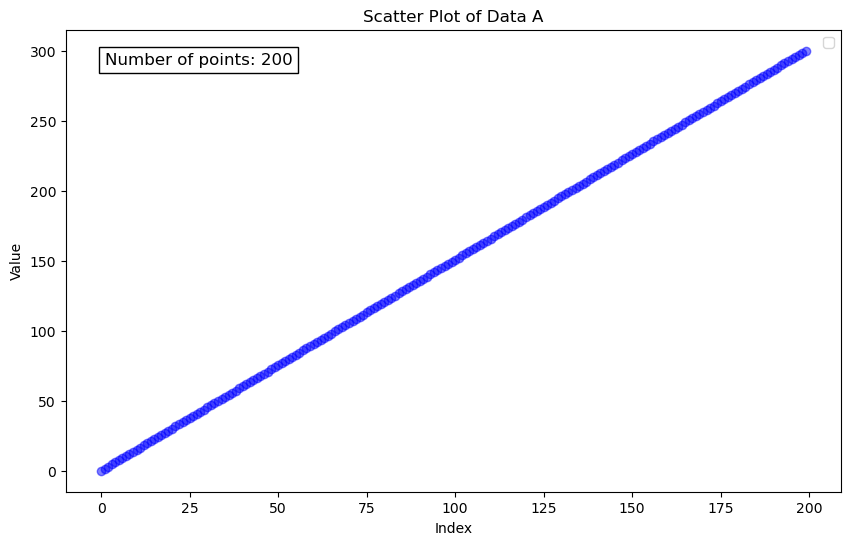

In [8]:
print(X_f.shape)
# 绘制散点图
plt.figure(figsize=(10, 6))
plt.scatter(np.arange(len(X_f)), X_f, alpha=0.5, color='blue')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Plot of Data A')
# 在图中添加点的数量
plt.text(0.05, 0.95, f'Number of points: {len(X_f)}', transform=plt.gca().transAxes, 
         fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=1))

plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(200, 1)


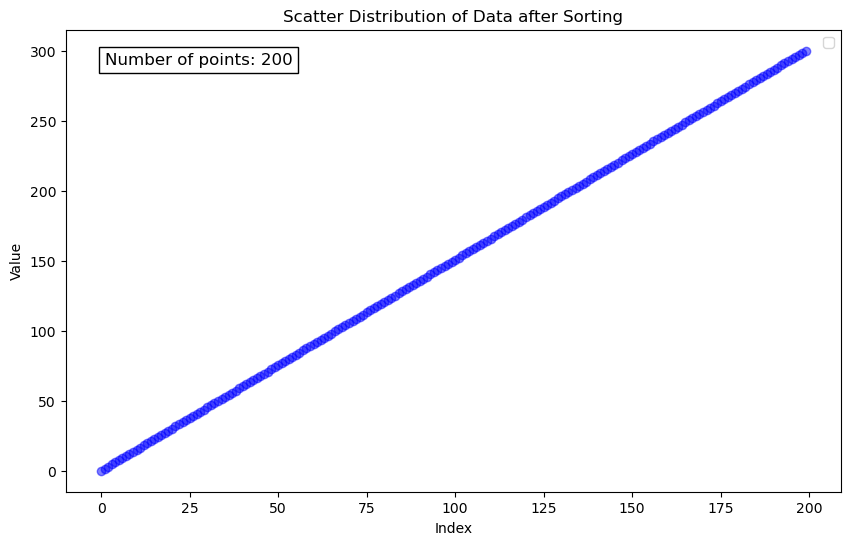

In [9]:
X = np.sort(X_f, axis=0)
print(X.shape)
# 绘制散点图
plt.figure(figsize=(10, 6))
plt.scatter(np.arange(len(X)), X, alpha=0.5, color='blue')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Distribution of Data after Sorting')
# 在图中添加点的数量
plt.text(0.05, 0.95, f'Number of points: {len(X_f)}', transform=plt.gca().transAxes, 
         fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=1))

plt.legend()
plt.show()

In [10]:
print(error_y)

error_of_u = sum(error_y)/len(error_y)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE

print(chaoss)

chaos_of_u = sum(chaoss)/len(chaoss)

print('Chaos of fuhe active learning(LHS sampling): %e' % (chaos_of_u)) #打印混沌度

print(residuals)

residual_of_u = sum(residuals)/len(residuals)

print('Residual of fuhe active learning(LHS sampling): %e' % (residual_of_u)) #打印残差


[0.002069372140017121, 0.0009318589459527695, 0.0003805648406182378, 0.0004911167070808823, 0.00047132003185745434, 0.0004874643922605124, 0.000482139396428988, 0.00048263035730341565, 0.00041940566081484715, 0.0004939456518232694]
Error u of fuhe active learning(LHS sampling): 6.709818e-04
[0.0005987860937128765, 0.0002721971938293058, 0.00012161645358251643, 0.00015247556998752645, 0.00014502754199694835, 0.00015065817712490222, 0.00014817376848562917, 0.00014780434606828527, 0.00012941789194340759, 0.0001537137488962908]
MAE of fuhe active learning(LHS sampling): 2.019871e-04
[8.855701390034132e-07, 1.7609847155530335e-07, 3.154509748844462e-08, 4.9962973398737785e-08, 4.5918129850114724e-08, 4.910921111807972e-08, 4.802122639855831e-08, 4.814015144931682e-08, 3.70776975404566e-08, 5.0528339801746145e-08]
MSE of fuhe active learning(LHS sampling): 1.421971e-07
[0.00010327557, 0.011731667, 7.553415e-05, 3.640775e-05, 0.0015806673, 8.354015e-05, 8.9424095e-05, 0.0001544395, 0.00017956

[0.002069372140017121, 0.0009318589459527695, 0.0003805648406182378, 0.0004911167070808823, 0.00047132003185745434, 0.0004874643922605124, 0.000482139396428988, 0.00048263035730341565, 0.00041940566081484715, 0.0004939456518232694]
mean Error u: 6.709818e-04
Variance Error u: 2.379559e-07


/tmp/ipykernel_1412284/2285129262.py:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


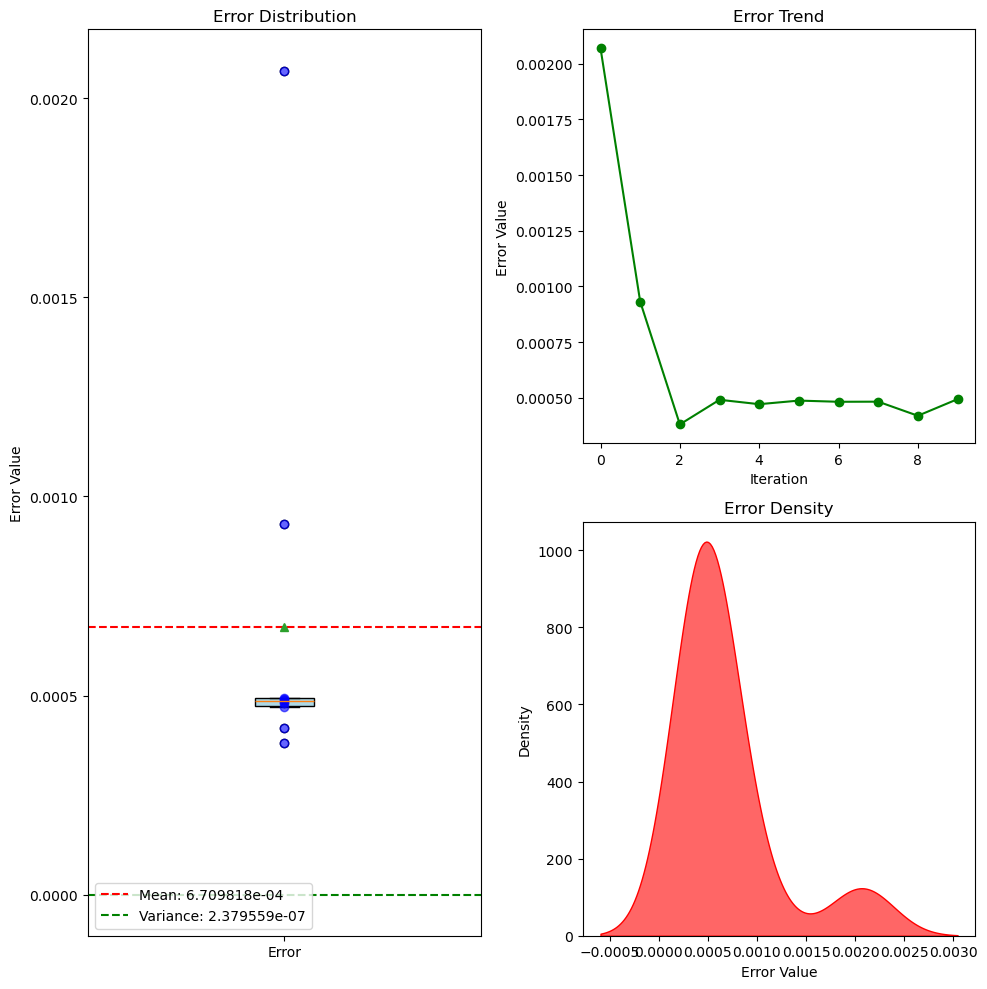

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_y
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean Error u: %e' % (mean_error)) #打印误差
print('Variance Error u: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

[0.0005987860937128765, 0.0002721971938293058, 0.00012161645358251643, 0.00015247556998752645, 0.00014502754199694835, 0.00015065817712490222, 0.00014817376848562917, 0.00014780434606828527, 0.00012941789194340759, 0.0001537137488962908]
mean MAE: 2.019871e-04
Variance MAE: 1.905970e-08


/tmp/ipykernel_1412284/3953849728.py:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


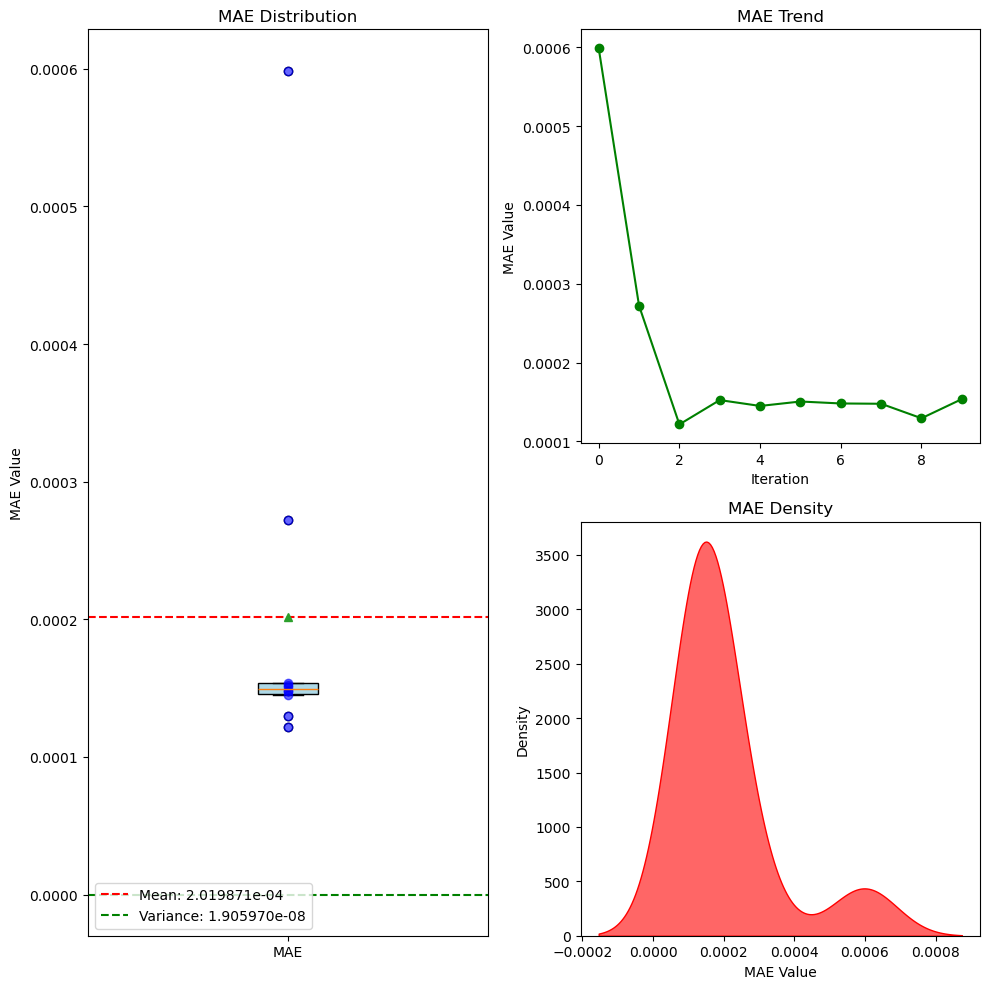

In [12]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_mae
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean MAE: %e' % (mean_error)) #打印误差
print('Variance MAE: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('MAE Distribution')
plt.ylabel('MAE Value')
plt.xticks([1], ['MAE'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('MAE Trend')
plt.ylabel('MAE Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('MAE Density')
plt.xlabel('MAE Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

[8.855701390034132e-07, 1.7609847155530335e-07, 3.154509748844462e-08, 4.9962973398737785e-08, 4.5918129850114724e-08, 4.910921111807972e-08, 4.802122639855831e-08, 4.814015144931682e-08, 3.70776975404566e-08, 5.0528339801746145e-08]
mean MSE: 1.421971e-07
Variance MSE: 6.296078e-14


/tmp/ipykernel_1412284/3394972535.py:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


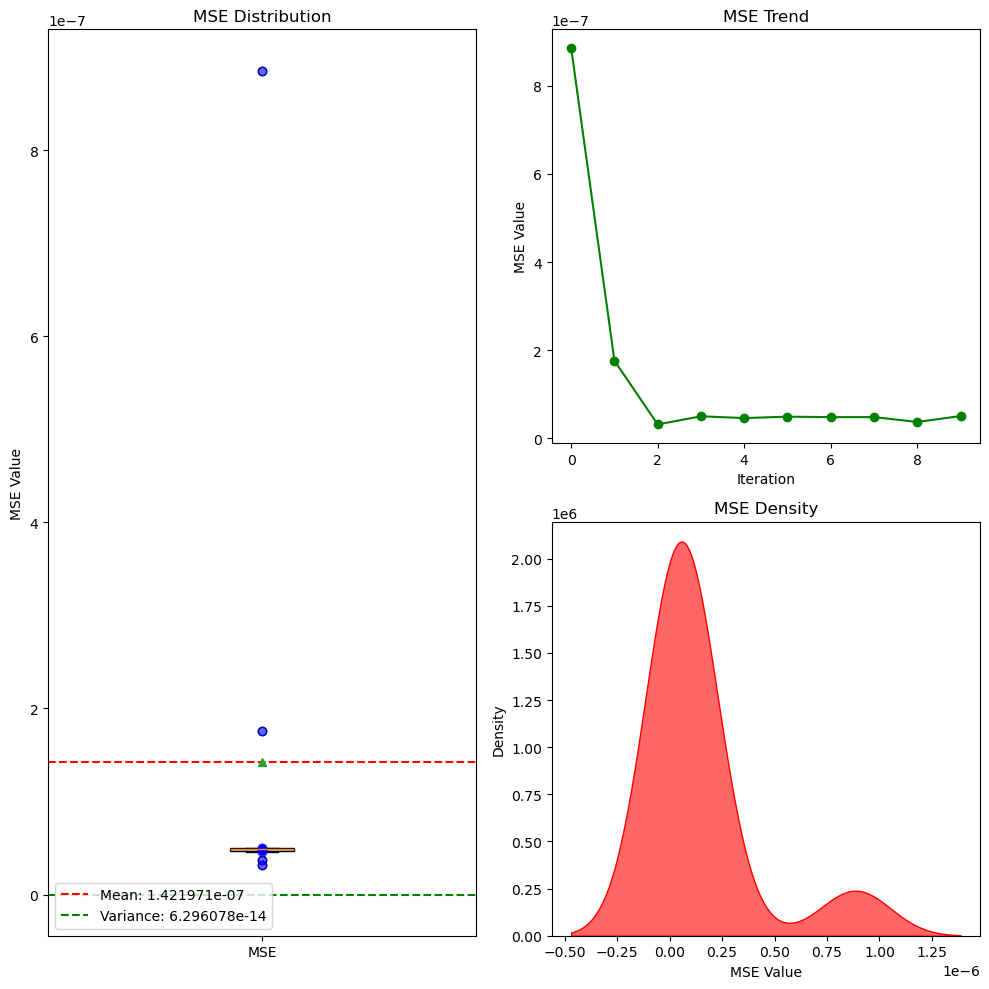

In [13]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_mse
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean MSE: %e' % (mean_error)) #打印误差
print('Variance MSE: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('MSE Distribution')
plt.ylabel('MSE Value')
plt.xticks([1], ['MSE'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('MSE Trend')
plt.ylabel('MSE Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('MSE Density')
plt.xlabel('MSE Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

[0.00010327557, 0.011731667, 7.553415e-05, 3.640775e-05, 0.0015806673, 8.354015e-05, 8.9424095e-05, 0.0001544395, 0.00017956321, 0.0029545943]
mean CHAOS: 1.698911e-03
Variance CHAOS: 1.200859e-05


/tmp/ipykernel_1412284/1804867946.py:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


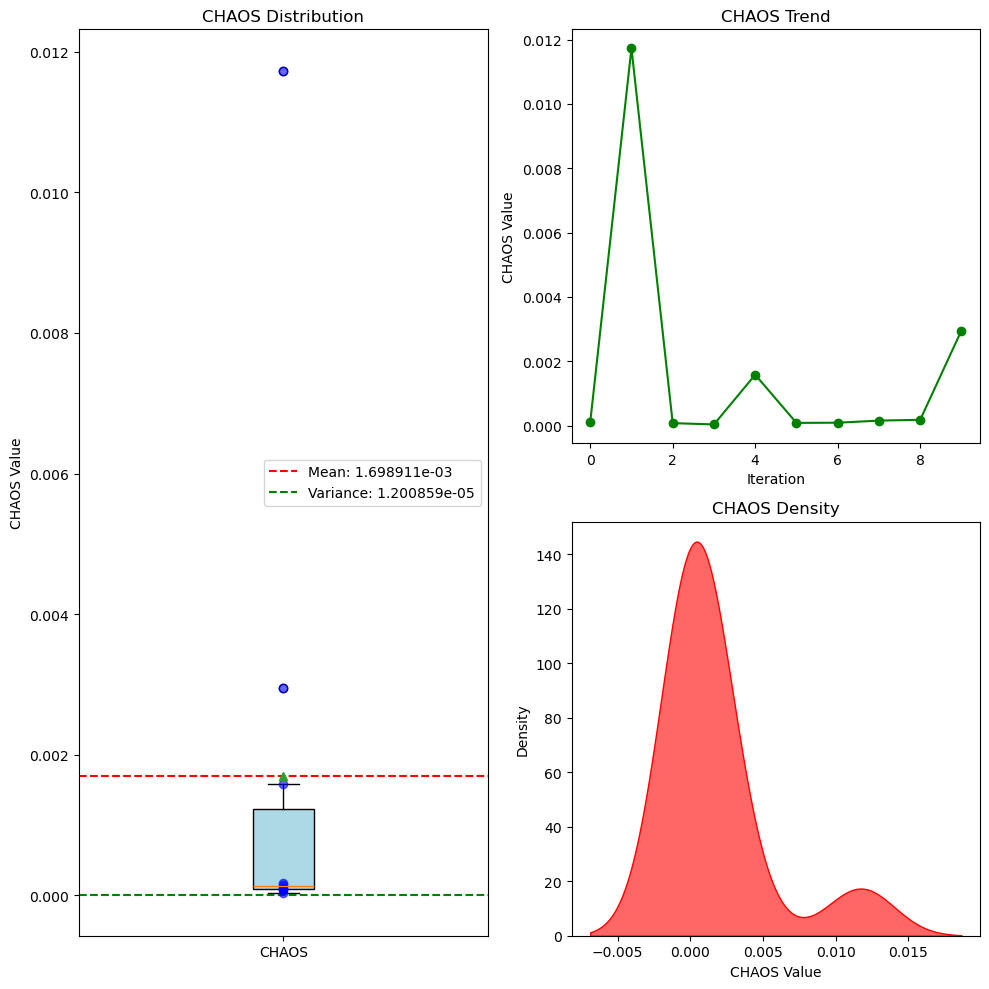

In [14]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = chaoss
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean CHAOS: %e' % (mean_error)) #打印误差
print('Variance CHAOS: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('CHAOS Distribution')
plt.ylabel('CHAOS Value')
plt.xticks([1], ['CHAOS'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('CHAOS Trend')
plt.ylabel('CHAOS Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('CHAOS Density')
plt.xlabel('CHAOS Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

[5.3346616e-07, 5.736674e-07, 4.9018877e-07, 5.264725e-07, 4.2751458e-07, 3.7412974e-07, 5.048919e-07, 4.54796e-07, 5.1004486e-07, 3.9442602e-07]
mean RESIDUAL: 4.789597e-07
Variance RESIDUAL: 3.732858e-15


/tmp/ipykernel_1412284/2986457676.py:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


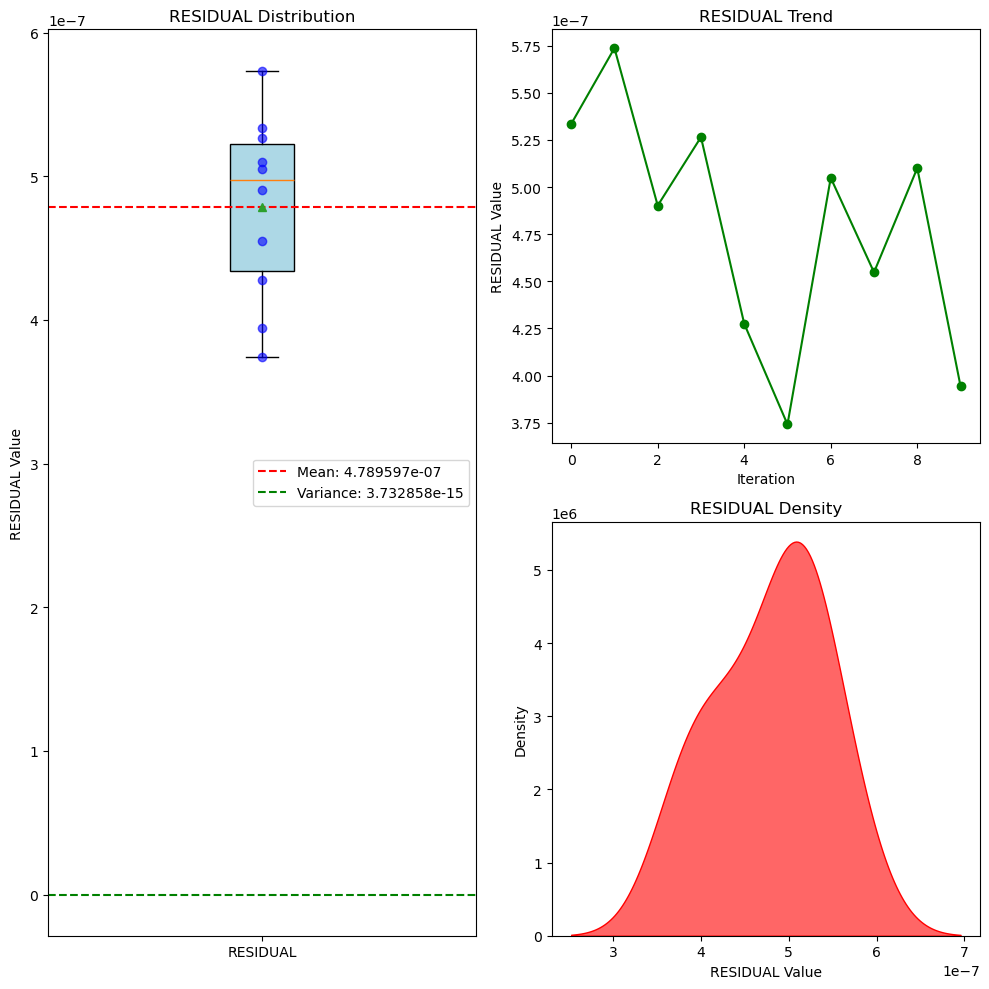

In [15]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = residuals
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean RESIDUAL: %e' % (mean_error)) #打印误差
print('Variance RESIDUAL: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('RESIDUAL Distribution')
plt.ylabel('RESIDUAL Value')
plt.xticks([1], ['RESIDUAL'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('RESIDUAL Trend')
plt.ylabel('RESIDUAL Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('RESIDUAL Density')
plt.xlabel('RESIDUAL Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

In [16]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()

150000
[1.9732727e-01 1.6826336e-01 1.4098662e-01 ... 2.6513053e-10 2.6513564e-10
 2.6513050e-10]


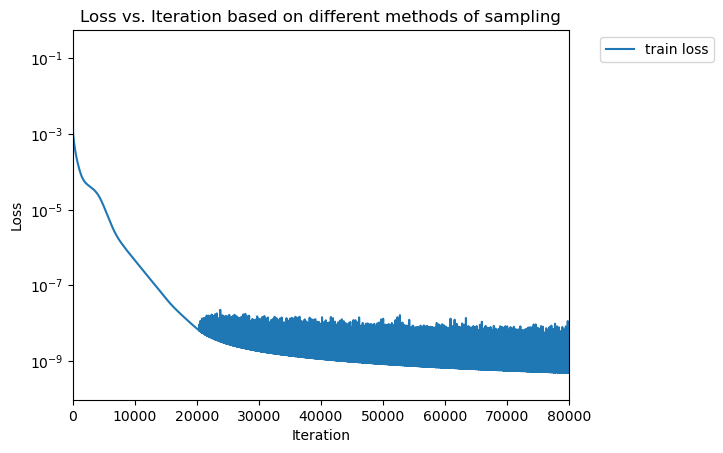

In [17]:
print(len(trainloss))
print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,80000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

Text(0, 0.5, 'Probability')

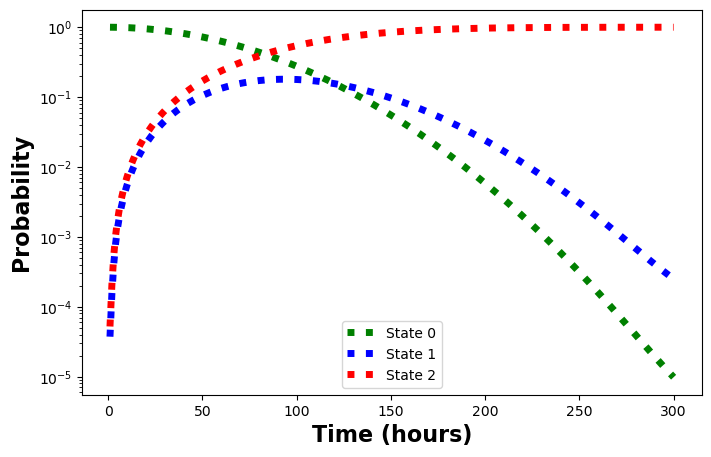

In [18]:
plt.figure(figsize=(8, 5)) #设置图形尺寸为8*5

sns.lineplot(x = x_star.flatten(), y = y_pred[:, 0], label = 'State 0', linewidth = 5, color = 'green', linestyle='dotted')
#绘制第一条折线图，横坐标为x_star，代表不同的时刻，纵坐标为exact_solution_Laplace数据的第一列，设置这条线的标签为State 0，线宽为5，颜色为绿色，线型为点线
sns.lineplot(x = x_star.flatten(), y = y_pred[:, 1], label = 'State 1', linewidth = 5, color = 'blue', linestyle='dotted')
#绘制第二条折线图，横坐标为x_star，代表不同的时刻，纵坐标为exact_solution_Laplace数据的第二列，设置这条线的标签为State 1，线宽为5，颜色为蓝色，线型为点线
sns.lineplot(x = x_star.flatten(), y = y_pred[:, 2], label = 'State 2', linewidth = 5, color = 'red', linestyle='dotted')
#绘制第三条折线图，横坐标为x_star，代表不同的时刻，纵坐标为exact_solution_Laplace数据的第三列，设置这条线的标签为State 2，线宽为5，颜色为红色，线型为点线

plt.yscale('log') #设置y轴的刻度为对数刻度
plt.xlabel("Time (hours)", fontdict=dict(weight='bold'), fontsize=16) #设置x轴标签为Time (hours)，字体加粗，字体大小为16
plt.ylabel("Probability", fontdict=dict(weight='bold'), fontsize=16) #设置y轴标签为Probability，字体加粗，字体大小为16

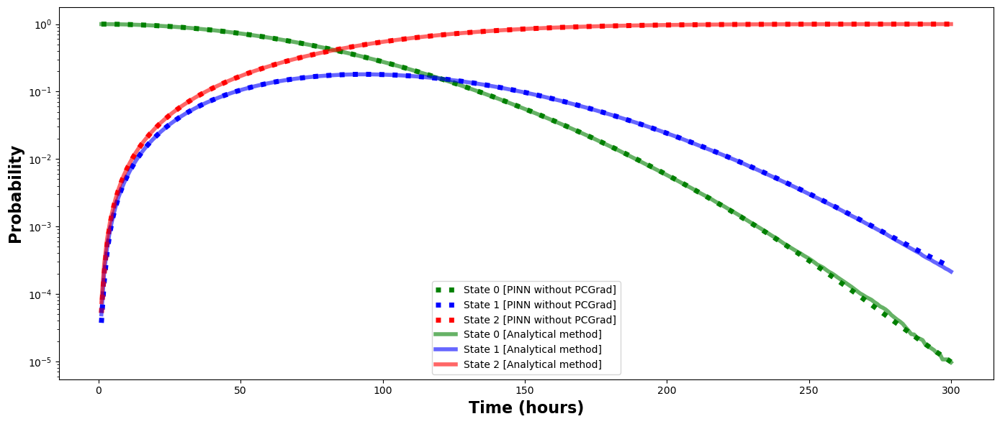

In [19]:
# 创建一个子图
f, ax = plt.subplots(1, 1, figsize=(14, 6))

# 绘制 PINN without PCGrad 方法的预测结果
sns.lineplot(x=x_star.flatten(), y=y_pred[:, 0], label='State 0 [PINN without PCGrad]', linewidth=5, color='green', linestyle='dotted', ax=ax)
sns.lineplot(x=x_star.flatten(), y=y_pred[:, 1], label='State 1 [PINN without PCGrad]', linewidth=5, color='blue', linestyle='dotted', ax=ax)
sns.lineplot(x=x_star.flatten(), y=y_pred[:, 2], label='State 2 [PINN without PCGrad]', linewidth=5, color='red', linestyle='dotted', ax=ax)

# 绘制 Runge-Kutta 方法的结果
sns.lineplot(x=x_star.flatten(), y=MCS_solution_df['state_0'], label='State 0 [Analytical method]', color='green', alpha=0.6, dashes=True, linewidth=4, ax=ax)
sns.lineplot(x=x_star.flatten(), y=MCS_solution_df['state_1'], label='State 1 [Analytical method]', color='blue', alpha=0.6, dashes=True, linewidth=4, ax=ax)
sns.lineplot(x=x_star.flatten(), y=MCS_solution_df['state_2'], label='State 2 [Analytical method]', color='red', alpha=0.6, dashes=True, linewidth=4, ax=ax)


# 设置 y 轴为对数刻度
ax.set_yscale("log")
# ax.set_ylim([1e-9, 2])
ax.set_xlabel("Time (hours)", fontdict=dict(weight='bold'), fontsize=16)
ax.set_ylabel("Probability", fontdict=dict(weight='bold'), fontsize=16)

# 自动调整子图参数
plt.tight_layout()


# 显示图形
plt.show()

### 计算RMSE

In [20]:
y_pred_df = pd.DataFrame(y_pred, columns = ['state_0', 'state_1', 'state_2'])
print(y_pred_df.head())
print(y_pred_df.tail())

    state_0   state_1   state_2
0  0.999911  0.000037  0.000052
1  0.999645  0.000151  0.000204
2  0.999055  0.000408  0.000537
3  0.998133  0.000811  0.001056
4  0.996941  0.001331  0.001728
      state_0   state_1   state_2
295  0.000013  0.000302  0.999686
296  0.000012  0.000288  0.999700
297  0.000011  0.000275  0.999714
298  0.000010  0.000262  0.999727
299  0.000010  0.000250  0.999740


In [21]:
y_diff_no_pcgrad_MCS = MCS_solution_df - y_pred_df #解析方法（特征向量）和PINN方法差值

In [22]:
### PINN和解析方法的RMSE计算
#计算MSE，对PINN和解析方法的差值的每一行应用一个匿名函数，计算三个状态的平方和，结果存储在DataFrame的新列'mse'中
y_diff_no_pcgrad_MCS['mse'] = y_diff_no_pcgrad_MCS.apply(lambda x: x['state_0']**2 + x['state_1']**2 + x['state_2']**2, axis = 1)
#计算RMSE，对'mse'列应用np.sqrt函数，结果存储在DataFrame的新列'rmse'中
y_diff_no_pcgrad_MCS['rmse'] = y_diff_no_pcgrad_MCS['mse'].apply(np.sqrt)

In [23]:
#0-80000个时间的RMSE
print ('RMSE of between PINN without PCGrad and the analytical solution is', np.mean(y_diff_no_pcgrad_MCS['rmse']))

#前60000个时间的RMSE，3749/5000=60000/80000
print ('RMSE between PINN without PCGrad and the analytical solution before 60000 is', 
       np.mean(y_diff_no_pcgrad_MCS['rmse'][:3749]))

#60000到80000的RMSE
print ('RMSE between PINN without PCGrad and the analytical solution after 60000 is', 
       np.mean(y_diff_no_pcgrad_MCS['rmse'][3749:]))

RMSE of between PINN without PCGrad and the analytical solution is 0.0002906166335274856
RMSE between PINN without PCGrad and the analytical solution before 60000 is 0.0002906166335274856
RMSE between PINN without PCGrad and the analytical solution after 60000 is nan


### 计算混沌度和残差

In [24]:
x_star.shape

(300, 1)

In [25]:
#计算chaos
y_chaos = model.hidden_predict(x_star, 100)
# print(y_chaos)
x_sss = x_star + np.random.normal(0, 0.01)
y_chaos_sss = model.hidden_predict(x_sss, 50)
chaju = np.linalg.norm(y_chaos - y_chaos_sss,axis=1)
print(chaju)
print(chaju.shape)
print(chaju.sum())

[3.0747283 3.0058556 2.9412465 2.888403  2.8475327 2.8156598 2.790359
 2.770053  2.7536569 2.7402833 2.729196  2.7198002 2.7116604 2.7045186
 2.6982238 2.6926358 2.6875951 2.6828697 2.6782343 2.6735108 2.6686232
 2.6635857 2.6584537 2.6532948 2.6481457 2.6430113 2.6378877 2.6327581
 2.6276162 2.622471  2.617357  2.6122944 2.6073186 2.6024332 2.597648
 2.5929585 2.5883327 2.5837586 2.5792143 2.5746775 2.5701566 2.5656734
 2.561269  2.556987  2.552912  2.54913   2.5457306 2.54282   2.5404906
 2.538827  2.537889  2.5377293 2.5383732 2.5398266 2.5420792 2.5451274
 2.5489843 2.553665  2.5592358 2.565794  2.5734587 2.5824125 2.592857
 2.6049464 2.6188982 2.6348386 2.6528015 2.6727197 2.6944318 2.7175205
 2.7415051 2.7656717 2.7892401 2.8113215 2.8311121 2.8479705 2.8617425
 2.8726523 2.8814158 2.8889081 2.8959472 2.90312   2.9106982 2.9186847
 2.9269476 2.9352815 2.9434576 2.9512787 2.9585729 2.9651697 2.971024
 2.976024  2.980109  2.983229  2.9853442 2.9863923 2.9863825 2.9852617
 2.9830654

Text(0.5, 1.0, 'Line Plot')

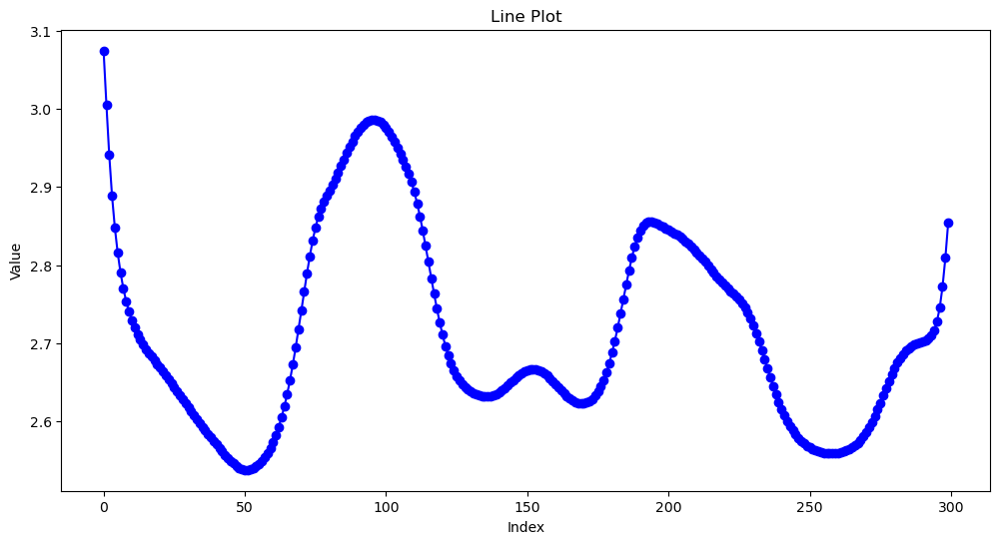

In [26]:
data = chaju
# 绘制折线图
plt.figure(figsize=(12, 6))

plt.plot(data, marker='o', linestyle='-', color='b')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Line Plot')


In [27]:
#计算残差
_, residual = model.predict(x_star)
residual = residual.flatten()
print(residual)
print(residual.shape)
print(residual.sum())

[-2.2017048e-08  2.7503120e-09  9.8079909e-09  9.5751602e-09
 -2.9685907e-09  1.3213139e-08 -2.2118911e-09 -3.9581209e-09
 -5.2386895e-09 -3.0267984e-09 -2.0954758e-09  1.7462298e-09
 -5.8207661e-09 -1.0477379e-09 -5.4715201e-09 -4.5401976e-09
  1.2805685e-09 -3.7252903e-09 -3.4924597e-09  1.1641532e-09
 -2.3283064e-10 -3.2596290e-09  1.1641532e-09 -2.0954758e-09
  3.0267984e-09 -2.3283064e-10  2.3283064e-09 -2.3283064e-09
 -6.9849193e-10  2.0954758e-09 -4.6566129e-10 -1.8626451e-09
  2.3283064e-10 -9.3132257e-10  0.0000000e+00  3.4924597e-09
  2.3283064e-10  4.6566129e-10 -2.3283064e-10 -4.6566129e-10
  0.0000000e+00 -1.1641532e-09 -2.3283064e-10 -9.3132257e-10
  2.3283064e-10  0.0000000e+00  1.8626451e-09  6.9849193e-10
  9.3132257e-10  0.0000000e+00  2.3283064e-10 -2.3283064e-10
 -9.3132257e-10  4.6566129e-10 -4.6566129e-10  0.0000000e+00
 -6.9849193e-10  1.8626451e-09 -2.3283064e-10 -6.9849193e-10
 -1.6298145e-09  4.6566129e-10 -2.3283064e-10  6.9849193e-10
  6.9849193e-10 -4.65661

Text(0.5, 1.0, 'Line Plot')

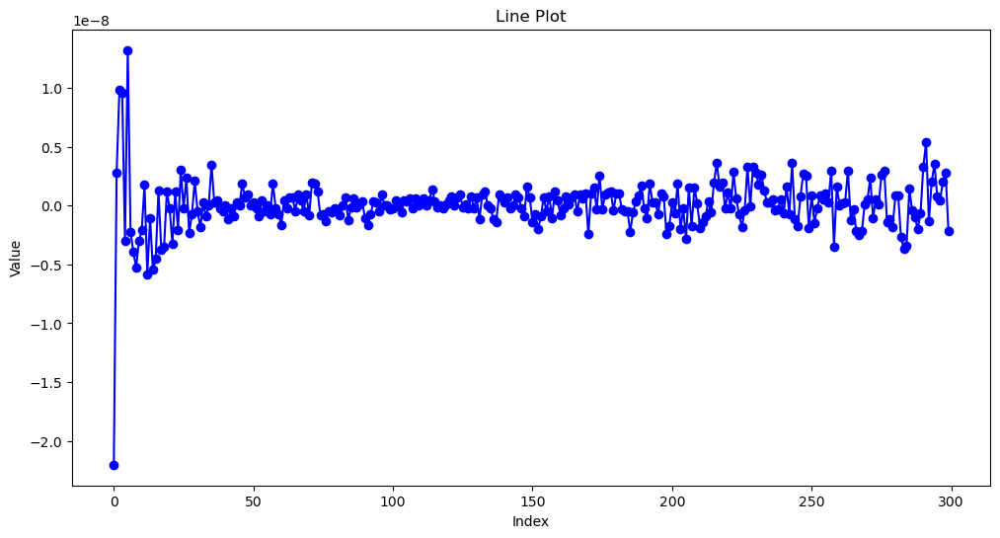

In [28]:
data = residual
# 绘制折线图
plt.figure(figsize=(12, 6))

plt.plot(data, marker='o', linestyle='-', color='b')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Line Plot')
